## Demand Forecasting Using Prophet on Quik Data

In [1]:
import numpy as np
import pandas as pd
import pandasql as ps
import math
import itertools 
from scipy import stats
import time
import pickle


#matplotlib libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors
import seaborn as sns

#date libraries
from dateutil import parser
from datetime import datetime, timedelta, date
import holidays

#prophet library
from prophet import Prophet
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.diagnostics import cross_validation, performance_metrics

#pandas options
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#matplotlib setting defaults
sns.set(font="Arial",
        rc={
 "axes.axisbelow": False,
 "axes.edgecolor": "lightgrey",
 "axes.facecolor": "None",
 "axes.grid": False,
 "axes.labelcolor": "dimgrey",
 "axes.spines.right": False,
 "axes.spines.top": False,
 "figure.facecolor": "white",
 "lines.solid_capstyle": "round",
 "patch.edgecolor": "w",
 "patch.force_edgecolor": True,
 "text.color": "dimgrey",
 "xtick.bottom": False,
 "xtick.color": "dimgrey",
 "xtick.direction": "out",
 "xtick.top": False,
 "ytick.color": "dimgrey",
 "ytick.direction": "out",
 "ytick.left": False,
 "ytick.right": False})

In [2]:
def missing_data(input_data):
    '''
    This function returns dataframe with information about the percentage of nulls in each column and the column data type.
    
    input: pandas df
    output: pandas df
    
    '''
    
    total = input_data.isnull().sum()
    percent = (input_data.isnull().sum()/input_data.isnull().count()*100)
    table = pd.concat([total, percent], axis = 1, keys = ['Total', 'Percent'])
    types = []
    for col in input_data.columns: 
        dtype = str(input_data[col].dtype)
        types.append(dtype)
    table["Types"] = types
    return(pd.DataFrame(table))

### Reading in Data


In [4]:
# Load the dataset
file_name = 'quik_data_all_final_10_mins.csv'
df = pd.read_csv(file_name)

# Filter the rows where merchant_id is 'merchant_1'
filtered_df = df[df['merchant_id'] == 'merchant_1']

# Save the filtered data to a new CSV file
filtered_df.to_csv('quik_data_merchant_1.csv', index=False)

print("Filtered data saved to 'quik_data_merchant_1.csv'.")


Filtered data saved to 'quik_data_merchant_1.csv'.


In [5]:
df = pd.read_csv('quik_data_merchant_1.csv')
df.columns = df.columns.str.lower()
df['order_received_timestamp'] = pd.to_datetime(df['order_received_timestamp'], errors='coerce')


In [6]:
min(df['order_received_timestamp']), max(df['order_received_timestamp'])

(Timestamp('2023-12-01 00:10:00'), Timestamp('2024-02-29 23:50:00'))

In [7]:
df.head()

,merchant_id,order_received_timestamp,order_count
0,merchant_1,2023-12-01 00:10:00,1
1,merchant_1,2023-12-01 00:20:00,2
2,merchant_1,2023-12-01 00:30:00,0
3,merchant_1,2023-12-01 00:40:00,1
4,merchant_1,2023-12-01 00:50:00,2


In [8]:
agg_df = df.groupby(['order_received_timestamp', 'merchant_id']).agg({'order_count': 'sum'}).reset_index().sort_values(['merchant_id', 'order_received_timestamp']) #groups the dataframe


In [9]:
agg_df.head()

,order_received_timestamp,merchant_id,order_count
0,2023-12-01 00:10:00,merchant_1,1
1,2023-12-01 00:20:00,merchant_1,2
2,2023-12-01 00:30:00,merchant_1,0
3,2023-12-01 00:40:00,merchant_1,1
4,2023-12-01 00:50:00,merchant_1,2


In [10]:
agg_df.tail()

,order_received_timestamp,merchant_id,order_count
13047,2024-02-29 23:10:00,merchant_1,1
13048,2024-02-29 23:20:00,merchant_1,1
13049,2024-02-29 23:30:00,merchant_1,0
13050,2024-02-29 23:40:00,merchant_1,1
13051,2024-02-29 23:50:00,merchant_1,1


In [11]:
total_orders_df = agg_df.pivot(index='order_received_timestamp', columns='merchant_id', values='order_count')
total_orders_df.tail()

merchant_id,merchant_1
order_received_timestamp,
2024-02-29 23:10:00,1
2024-02-29 23:20:00,1
2024-02-29 23:30:00,0
2024-02-29 23:40:00,1
2024-02-29 23:50:00,1


In [10]:
# for column in total_orders_df.columns:
#     plt.figure(figsize=(10, 4))  
#     plt.plot(total_orders_df.index, total_orders_df[column], marker='o', linestyle='-')  
#     plt.title(f"Order Trend for {column}")
#     plt.xlabel('Timestamp')
#     plt.ylabel('Number of Orders')
#     plt.grid(True)  
#     plt.xticks(rotation=45)  
#     plt.tight_layout()  
#     plt.show()

In [12]:
total_orders_df = total_orders_df[total_orders_df.index >= '2023-12-01'] #data starts Dec 1st


In [13]:
missing_data(total_orders_df) #checks for null values for each merchant

,Total,Percent,Types
merchant_id,,,
merchant_1,0,0.00,int64


In [14]:
total_orders_df.fillna(0, inplace=True) #filling nan values with zeros
#assuming there was no orders at that 20 minute period for that merchant

missing_data(total_orders_df) #check missing values again to make sure there's none

,Total,Percent,Types
merchant_id,,,
merchant_1,0,0.00,int64


#### This section groups merchants by the volume of data. The higher volume data the better for forecasting since we can forecast past the noise and end up with lower error bars. This helped understand why some merchats had higher error bars than other merchants (['merchant_12', 'merchant_11', 'merchant_7', 'merchant_6'])

### Category Grouping

In [14]:
avg_daily_orders = total_orders_df.apply(np.mean, axis=0).sort_values() #typical order volume per merchant across all timestamps.

low, mid = np.percentile(avg_daily_orders, [33, 66]) #thresholds for low, mid, and high order volumes.


In [15]:
# Create lists of merchants based on order volume categories
low_vol_columns = list(avg_daily_orders[avg_daily_orders <= low].index)
mid_vol_columns = list(avg_daily_orders[(avg_daily_orders > low) & (avg_daily_orders < mid)].index)
high_vol_columns = list(avg_daily_orders[avg_daily_orders >= mid].index)



In [16]:
high_vol_columns

['merchant_10', 'merchant_1', 'merchant_4', 'merchant_5']

In [17]:
low_vol_columns

['merchant_12', 'merchant_11', 'merchant_7', 'merchant_6']

In [ ]:
import matplotlib.pyplot as plt

# Subset the data for low, mid, and high-volume merchants
low_vol_data = total_orders_df[low_vol_columns].sum(axis=0)  # Total orders per low-volume merchant
mid_vol_data = total_orders_df[mid_vol_columns].sum(axis=0)  # Total orders per mid-volume merchant
high_vol_data = total_orders_df[high_vol_columns].sum(axis=0)  # Total orders per high-volume merchant

# Create the figure and axis
plt.figure(figsize=(12, 6))

# Define x positions for the bars
x = range(len(low_vol_columns) + len(mid_vol_columns) + len(high_vol_columns))

# Plot stacked bars for low-volume merchants
plt.bar(low_vol_columns, low_vol_data, label='Low Volume Merchants', color='green')

# Plot stacked bars for mid-volume merchants
plt.bar(mid_vol_columns, mid_vol_data, label='Mid Volume Merchants', color='yellow')

# Plot stacked bars for high-volume merchants
plt.bar(high_vol_columns, high_vol_data, label='High Volume Merchants', color='orange')

# Add labels and title
plt.title('Total Order Volume by Individual Merchants in Each Category')
plt.xlabel('Merchants')
plt.ylabel('Total Order Volume')
plt.xticks(rotation=90)  # Rotate merchant labels for readability
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


### HYPERPARAMETER TUNING AND BACKTESTING PIPELINE

Ranges give on Prophet's documentation

1. changepoint_prior_scale [0.001, 0.5] 
2. seasonality_prior_scale [0.01, 10]
3. holidays_prior_scale [0.01, 10] 
4. seasonality_mode ['additive', 'multiplicative'].
5. changepoint_range [0.5, 0.95]

https://facebook.github.io/prophet/docs/diagnostics.html

In [15]:
changepoint_prior_scale_range = np.linspace(0.001, 0.5, num=5).tolist()
seasonality_prior_scale_range = np.linspace(0.01, 10, num=5).tolist()
holidays_prior_scale_range = np.linspace(0.01, 10, num=5).tolist()
seasonality_mode_options = ['additive', 'multiplicative']
changepoint_range_range = list(np.linspace(0.5, 0.95, num=5))
fourier_order_range = [5, 10, 15] #daily seasonality tuning

In [17]:
# Tuning for the above five hyperparameters (takes more than 24 hours running)
start_time = time.time()

dicts = {}

for feature in total_orders_df.columns:
  
    category_df = total_orders_df[feature].copy().reset_index()
    category_df.columns = ["ds", "y"]

    category_df[["y"]] = category_df[["y"]].apply(pd.to_numeric)
    category_df["ds"] = pd.to_datetime(category_df["ds"])
    
    param_grid = {  
        "changepoint_prior_scale": changepoint_prior_scale_range,
        "seasonality_prior_scale": seasonality_prior_scale_range,
        'holidays_prior_scale': holidays_prior_scale_range,
        'seasonality_mode': seasonality_mode_options,
        'changepoint_range': changepoint_range_range,
        'fourier_order': fourier_order_range  # for daily seasonality
    }

    # Generate all combinations of parameters
    all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
    rmses = []
    maes = []

    # Use cross-validation to evaluate all parameters
    for params in all_params:
        # Initialize Prophet model with the tuning params
        m = Prophet(
            changepoint_prior_scale=params['changepoint_prior_scale'],
            seasonality_prior_scale=params['seasonality_prior_scale'],
            holidays_prior_scale=params['holidays_prior_scale'],
            seasonality_mode=params['seasonality_mode'],
            changepoint_range=params['changepoint_range']
        )
        
        # Add daily seasonality with the specific fourier_order from the param grid
        m.add_seasonality(name='daily', period=1, fourier_order=params['fourier_order'])
        
        # Fit the model
        m.fit(category_df)
        
        # Cross-validation for daily predictions
        df_cv = cross_validation(m, initial="60 days", period="1 day", horizon="1 day")
        df_p = performance_metrics(df_cv, rolling_window=1)
        
        print(df_p)
        rmses.append(df_p["rmse"].values[0])
        maes.append(df_p["mae"].values[0])

    # Find the best parameters
    tuning_results = pd.DataFrame(all_params)
    tuning_results["rmse"] = rmses
    tuning_results["mae"] = maes

    # Select the best parameters based on RMSE
    params_dict = dict(tuning_results.sort_values("rmse").reset_index(drop=True).iloc[0])
    params_dict["column"] = feature 
    
    # Store the best params for the feature
    dicts[feature] = params_dict

print("--- %s seconds ---" % (time.time() - start_time))


13:08:02 - cmdstanpy - INFO - Chain [1] start processing
13:08:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:08:04 - cmdstanpy - INFO - Chain [1] start processing
13:08:04 - cmdstanpy - INFO - Chain [1] done processing
13:08:04 - cmdstanpy - INFO - Chain [1] start processing
13:08:04 - cmdstanpy - INFO - Chain [1] done processing
13:08:05 - cmdstanpy - INFO - Chain [1] start processing
13:08:05 - cmdstanpy - INFO - Chain [1] done processing
13:08:05 - cmdstanpy - INFO - Chain [1] start processing
13:08:06 - cmdstanpy - INFO - Chain [1] done processing
13:08:06 - cmdstanpy - INFO - Chain [1] start processing
13:08:07 - cmdstanpy - INFO - Chain [1] done processing
13:08:07 - cmdstanpy - INFO - Chain [1] start processing
13:08:07 - cmdstanpy - INFO - Chain [1] done processing
13:08:07 - cmdstanpy - INFO - Chain [1] start processing
13:08:08 - cmdstanpy - INFO - Chain [1] done processing
13:08:08 - cmdstanpy - INFO - Chain [1] start processing
13:08:09 - cmdstanpy - INFO - Chain [1] done processing
13:08:09 - cmdstanpy - INFO - Chain [1] start processing
13:08:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:08:26 - cmdstanpy - INFO - Chain [1] start processing
13:08:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:08:27 - cmdstanpy - INFO - Chain [1] start processing
13:08:28 - cmdstanpy - INFO - Chain [1] done processing
13:08:28 - cmdstanpy - INFO - Chain [1] start processing
13:08:28 - cmdstanpy - INFO - Chain [1] done processing
13:08:29 - cmdstanpy - INFO - Chain [1] start processing
13:08:29 - cmdstanpy - INFO - Chain [1] done processing
13:08:29 - cmdstanpy - INFO - Chain [1] start processing
13:08:30 - cmdstanpy - INFO - Chain [1] done processing
13:08:30 - cmdstanpy - INFO - Chain [1] start processing
13:08:31 - cmdstanpy - INFO - Chain [1] done processing
13:08:31 - cmdstanpy - INFO - Chain [1] start processing
13:08:31 - cmdstanpy - INFO - Chain [1] done processing
13:08:32 - cmdstanpy - INFO - Chain [1] start processing
13:08:32 - cmdstanpy - INFO - Chain [1] done processing
13:08:32 - cmdstanpy - INFO - Chain [1] start processing
13:08:33 - cmdstanpy - INFO - Chain [1] done processing
13:08:34 - cmdstanpy - INFO - Chain [1] start processing
13:08:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.74   0.32   0.54      0.78


13:08:56 - cmdstanpy - INFO - Chain [1] start processing
13:08:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:08:58 - cmdstanpy - INFO - Chain [1] start processing
13:08:58 - cmdstanpy - INFO - Chain [1] done processing
13:08:59 - cmdstanpy - INFO - Chain [1] start processing
13:08:59 - cmdstanpy - INFO - Chain [1] done processing
13:09:00 - cmdstanpy - INFO - Chain [1] start processing
13:09:00 - cmdstanpy - INFO - Chain [1] done processing
13:09:01 - cmdstanpy - INFO - Chain [1] start processing
13:09:01 - cmdstanpy - INFO - Chain [1] done processing
13:09:02 - cmdstanpy - INFO - Chain [1] start processing
13:09:02 - cmdstanpy - INFO - Chain [1] done processing
13:09:03 - cmdstanpy - INFO - Chain [1] start processing
13:09:03 - cmdstanpy - INFO - Chain [1] done processing
13:09:04 - cmdstanpy - INFO - Chain [1] start processing
13:09:04 - cmdstanpy - INFO - Chain [1] done processing
13:09:05 - cmdstanpy - INFO - Chain [1] start processing
13:09:06 - cmdstanpy - INFO - Chain [1] done processing
13:09:06 - cmdstanpy - INFO - Chain [1] start processing
13:09:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


13:09:35 - cmdstanpy - INFO - Chain [1] start processing
13:09:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:09:37 - cmdstanpy - INFO - Chain [1] start processing
13:09:37 - cmdstanpy - INFO - Chain [1] done processing
13:09:37 - cmdstanpy - INFO - Chain [1] start processing
13:09:37 - cmdstanpy - INFO - Chain [1] done processing
13:09:38 - cmdstanpy - INFO - Chain [1] start processing
13:09:38 - cmdstanpy - INFO - Chain [1] done processing
13:09:39 - cmdstanpy - INFO - Chain [1] start processing
13:09:39 - cmdstanpy - INFO - Chain [1] done processing
13:09:39 - cmdstanpy - INFO - Chain [1] start processing
13:09:40 - cmdstanpy - INFO - Chain [1] done processing
13:09:40 - cmdstanpy - INFO - Chain [1] start processing
13:09:40 - cmdstanpy - INFO - Chain [1] done processing
13:09:41 - cmdstanpy - INFO - Chain [1] start processing
13:09:41 - cmdstanpy - INFO - Chain [1] done processing
13:09:41 - cmdstanpy - INFO - Chain [1] start processing
13:09:42 - cmdstanpy - INFO - Chain [1] done processing
13:09:42 - cmdstanpy - INFO - Chain [1] start processing
13:09:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:10:00 - cmdstanpy - INFO - Chain [1] start processing
13:10:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:10:02 - cmdstanpy - INFO - Chain [1] start processing
13:10:02 - cmdstanpy - INFO - Chain [1] done processing
13:10:03 - cmdstanpy - INFO - Chain [1] start processing
13:10:03 - cmdstanpy - INFO - Chain [1] done processing
13:10:03 - cmdstanpy - INFO - Chain [1] start processing
13:10:04 - cmdstanpy - INFO - Chain [1] done processing
13:10:04 - cmdstanpy - INFO - Chain [1] start processing
13:10:05 - cmdstanpy - INFO - Chain [1] done processing
13:10:05 - cmdstanpy - INFO - Chain [1] start processing
13:10:06 - cmdstanpy - INFO - Chain [1] done processing
13:10:06 - cmdstanpy - INFO - Chain [1] start processing
13:10:07 - cmdstanpy - INFO - Chain [1] done processing
13:10:07 - cmdstanpy - INFO - Chain [1] start processing
13:10:08 - cmdstanpy - INFO - Chain [1] done processing
13:10:08 - cmdstanpy - INFO - Chain [1] start processing
13:10:09 - cmdstanpy - INFO - Chain [1] done processing
13:10:09 - cmdstanpy - INFO - Chain [1] start processing
13:10:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.74   0.32   0.54      0.78


13:10:32 - cmdstanpy - INFO - Chain [1] start processing
13:10:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:10:34 - cmdstanpy - INFO - Chain [1] start processing
13:10:34 - cmdstanpy - INFO - Chain [1] done processing
13:10:35 - cmdstanpy - INFO - Chain [1] start processing
13:10:35 - cmdstanpy - INFO - Chain [1] done processing
13:10:36 - cmdstanpy - INFO - Chain [1] start processing
13:10:36 - cmdstanpy - INFO - Chain [1] done processing
13:10:37 - cmdstanpy - INFO - Chain [1] start processing
13:10:37 - cmdstanpy - INFO - Chain [1] done processing
13:10:38 - cmdstanpy - INFO - Chain [1] start processing
13:10:39 - cmdstanpy - INFO - Chain [1] done processing
13:10:39 - cmdstanpy - INFO - Chain [1] start processing
13:10:40 - cmdstanpy - INFO - Chain [1] done processing
13:10:40 - cmdstanpy - INFO - Chain [1] start processing
13:10:41 - cmdstanpy - INFO - Chain [1] done processing
13:10:41 - cmdstanpy - INFO - Chain [1] start processing
13:10:42 - cmdstanpy - INFO - Chain [1] done processing
13:10:42 - cmdstanpy - INFO - Chain [1] start processing
13:10:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:11:11 - cmdstanpy - INFO - Chain [1] start processing
13:11:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:11:12 - cmdstanpy - INFO - Chain [1] start processing
13:11:12 - cmdstanpy - INFO - Chain [1] done processing
13:11:13 - cmdstanpy - INFO - Chain [1] start processing
13:11:13 - cmdstanpy - INFO - Chain [1] done processing
13:11:13 - cmdstanpy - INFO - Chain [1] start processing
13:11:14 - cmdstanpy - INFO - Chain [1] done processing
13:11:14 - cmdstanpy - INFO - Chain [1] start processing
13:11:14 - cmdstanpy - INFO - Chain [1] done processing
13:11:14 - cmdstanpy - INFO - Chain [1] start processing
13:11:15 - cmdstanpy - INFO - Chain [1] done processing
13:11:15 - cmdstanpy - INFO - Chain [1] start processing
13:11:15 - cmdstanpy - INFO - Chain [1] done processing
13:11:15 - cmdstanpy - INFO - Chain [1] start processing
13:11:16 - cmdstanpy - INFO - Chain [1] done processing
13:11:16 - cmdstanpy - INFO - Chain [1] start processing
13:11:16 - cmdstanpy - INFO - Chain [1] done processing
13:11:17 - cmdstanpy - INFO - Chain [1] start processing
13:11:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:11:35 - cmdstanpy - INFO - Chain [1] start processing
13:11:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:11:37 - cmdstanpy - INFO - Chain [1] start processing
13:11:37 - cmdstanpy - INFO - Chain [1] done processing
13:11:37 - cmdstanpy - INFO - Chain [1] start processing
13:11:38 - cmdstanpy - INFO - Chain [1] done processing
13:11:38 - cmdstanpy - INFO - Chain [1] start processing
13:11:38 - cmdstanpy - INFO - Chain [1] done processing
13:11:39 - cmdstanpy - INFO - Chain [1] start processing
13:11:39 - cmdstanpy - INFO - Chain [1] done processing
13:11:40 - cmdstanpy - INFO - Chain [1] start processing
13:11:40 - cmdstanpy - INFO - Chain [1] done processing
13:11:41 - cmdstanpy - INFO - Chain [1] start processing
13:11:41 - cmdstanpy - INFO - Chain [1] done processing
13:11:42 - cmdstanpy - INFO - Chain [1] start processing
13:11:42 - cmdstanpy - INFO - Chain [1] done processing
13:11:42 - cmdstanpy - INFO - Chain [1] start processing
13:11:43 - cmdstanpy - INFO - Chain [1] done processing
13:11:43 - cmdstanpy - INFO - Chain [1] start processing
13:11:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


13:12:06 - cmdstanpy - INFO - Chain [1] start processing
13:12:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:12:08 - cmdstanpy - INFO - Chain [1] start processing
13:12:09 - cmdstanpy - INFO - Chain [1] done processing
13:12:09 - cmdstanpy - INFO - Chain [1] start processing
13:12:10 - cmdstanpy - INFO - Chain [1] done processing
13:12:10 - cmdstanpy - INFO - Chain [1] start processing
13:12:11 - cmdstanpy - INFO - Chain [1] done processing
13:12:11 - cmdstanpy - INFO - Chain [1] start processing
13:12:12 - cmdstanpy - INFO - Chain [1] done processing
13:12:13 - cmdstanpy - INFO - Chain [1] start processing
13:12:13 - cmdstanpy - INFO - Chain [1] done processing
13:12:13 - cmdstanpy - INFO - Chain [1] start processing
13:12:14 - cmdstanpy - INFO - Chain [1] done processing
13:12:15 - cmdstanpy - INFO - Chain [1] start processing
13:12:15 - cmdstanpy - INFO - Chain [1] done processing
13:12:16 - cmdstanpy - INFO - Chain [1] start processing
13:12:16 - cmdstanpy - INFO - Chain [1] done processing
13:12:17 - cmdstanpy - INFO - Chain [1] start processing
13:12:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:12:47 - cmdstanpy - INFO - Chain [1] start processing
13:12:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:12:48 - cmdstanpy - INFO - Chain [1] start processing
13:12:48 - cmdstanpy - INFO - Chain [1] done processing
13:12:49 - cmdstanpy - INFO - Chain [1] start processing
13:12:49 - cmdstanpy - INFO - Chain [1] done processing
13:12:49 - cmdstanpy - INFO - Chain [1] start processing
13:12:49 - cmdstanpy - INFO - Chain [1] done processing
13:12:50 - cmdstanpy - INFO - Chain [1] start processing
13:12:50 - cmdstanpy - INFO - Chain [1] done processing
13:12:50 - cmdstanpy - INFO - Chain [1] start processing
13:12:51 - cmdstanpy - INFO - Chain [1] done processing
13:12:51 - cmdstanpy - INFO - Chain [1] start processing
13:12:51 - cmdstanpy - INFO - Chain [1] done processing
13:12:52 - cmdstanpy - INFO - Chain [1] start processing
13:12:52 - cmdstanpy - INFO - Chain [1] done processing
13:12:52 - cmdstanpy - INFO - Chain [1] start processing
13:12:53 - cmdstanpy - INFO - Chain [1] done processing
13:12:53 - cmdstanpy - INFO - Chain [1] start processing
13:12:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:13:11 - cmdstanpy - INFO - Chain [1] start processing
13:13:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:13:13 - cmdstanpy - INFO - Chain [1] start processing
13:13:14 - cmdstanpy - INFO - Chain [1] done processing
13:13:14 - cmdstanpy - INFO - Chain [1] start processing
13:13:14 - cmdstanpy - INFO - Chain [1] done processing
13:13:15 - cmdstanpy - INFO - Chain [1] start processing
13:13:15 - cmdstanpy - INFO - Chain [1] done processing
13:13:15 - cmdstanpy - INFO - Chain [1] start processing
13:13:16 - cmdstanpy - INFO - Chain [1] done processing
13:13:17 - cmdstanpy - INFO - Chain [1] start processing
13:13:17 - cmdstanpy - INFO - Chain [1] done processing
13:13:18 - cmdstanpy - INFO - Chain [1] start processing
13:13:18 - cmdstanpy - INFO - Chain [1] done processing
13:13:18 - cmdstanpy - INFO - Chain [1] start processing
13:13:19 - cmdstanpy - INFO - Chain [1] done processing
13:13:19 - cmdstanpy - INFO - Chain [1] start processing
13:13:20 - cmdstanpy - INFO - Chain [1] done processing
13:13:20 - cmdstanpy - INFO - Chain [1] start processing
13:13:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


13:13:45 - cmdstanpy - INFO - Chain [1] start processing
13:13:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:13:47 - cmdstanpy - INFO - Chain [1] start processing
13:13:48 - cmdstanpy - INFO - Chain [1] done processing
13:13:49 - cmdstanpy - INFO - Chain [1] start processing
13:13:49 - cmdstanpy - INFO - Chain [1] done processing
13:13:50 - cmdstanpy - INFO - Chain [1] start processing
13:13:50 - cmdstanpy - INFO - Chain [1] done processing
13:13:51 - cmdstanpy - INFO - Chain [1] start processing
13:13:51 - cmdstanpy - INFO - Chain [1] done processing
13:13:52 - cmdstanpy - INFO - Chain [1] start processing
13:13:52 - cmdstanpy - INFO - Chain [1] done processing
13:13:53 - cmdstanpy - INFO - Chain [1] start processing
13:13:53 - cmdstanpy - INFO - Chain [1] done processing
13:13:54 - cmdstanpy - INFO - Chain [1] start processing
13:13:55 - cmdstanpy - INFO - Chain [1] done processing
13:13:55 - cmdstanpy - INFO - Chain [1] start processing
13:13:56 - cmdstanpy - INFO - Chain [1] done processing
13:13:57 - cmdstanpy - INFO - Chain [1] start processing
13:13:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


13:14:28 - cmdstanpy - INFO - Chain [1] start processing
13:14:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:14:29 - cmdstanpy - INFO - Chain [1] start processing
13:14:30 - cmdstanpy - INFO - Chain [1] done processing
13:14:30 - cmdstanpy - INFO - Chain [1] start processing
13:14:30 - cmdstanpy - INFO - Chain [1] done processing
13:14:31 - cmdstanpy - INFO - Chain [1] start processing
13:14:31 - cmdstanpy - INFO - Chain [1] done processing
13:14:31 - cmdstanpy - INFO - Chain [1] start processing
13:14:31 - cmdstanpy - INFO - Chain [1] done processing
13:14:32 - cmdstanpy - INFO - Chain [1] start processing
13:14:32 - cmdstanpy - INFO - Chain [1] done processing
13:14:33 - cmdstanpy - INFO - Chain [1] start processing
13:14:33 - cmdstanpy - INFO - Chain [1] done processing
13:14:33 - cmdstanpy - INFO - Chain [1] start processing
13:14:34 - cmdstanpy - INFO - Chain [1] done processing
13:14:34 - cmdstanpy - INFO - Chain [1] start processing
13:14:34 - cmdstanpy - INFO - Chain [1] done processing
13:14:35 - cmdstanpy - INFO - Chain [1] start processing
13:14:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.74   0.32   0.54      0.78


13:14:53 - cmdstanpy - INFO - Chain [1] start processing
13:14:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:14:55 - cmdstanpy - INFO - Chain [1] start processing
13:14:56 - cmdstanpy - INFO - Chain [1] done processing
13:14:56 - cmdstanpy - INFO - Chain [1] start processing
13:14:57 - cmdstanpy - INFO - Chain [1] done processing
13:14:57 - cmdstanpy - INFO - Chain [1] start processing
13:14:57 - cmdstanpy - INFO - Chain [1] done processing
13:14:58 - cmdstanpy - INFO - Chain [1] start processing
13:14:58 - cmdstanpy - INFO - Chain [1] done processing
13:14:59 - cmdstanpy - INFO - Chain [1] start processing
13:14:59 - cmdstanpy - INFO - Chain [1] done processing
13:15:00 - cmdstanpy - INFO - Chain [1] start processing
13:15:00 - cmdstanpy - INFO - Chain [1] done processing
13:15:01 - cmdstanpy - INFO - Chain [1] start processing
13:15:01 - cmdstanpy - INFO - Chain [1] done processing
13:15:02 - cmdstanpy - INFO - Chain [1] start processing
13:15:02 - cmdstanpy - INFO - Chain [1] done processing
13:15:03 - cmdstanpy - INFO - Chain [1] start processing
13:15:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.74   0.32   0.54      0.78


13:15:29 - cmdstanpy - INFO - Chain [1] start processing
13:15:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:15:30 - cmdstanpy - INFO - Chain [1] start processing
13:15:31 - cmdstanpy - INFO - Chain [1] done processing
13:15:31 - cmdstanpy - INFO - Chain [1] start processing
13:15:32 - cmdstanpy - INFO - Chain [1] done processing
13:15:32 - cmdstanpy - INFO - Chain [1] start processing
13:15:33 - cmdstanpy - INFO - Chain [1] done processing
13:15:33 - cmdstanpy - INFO - Chain [1] start processing
13:15:34 - cmdstanpy - INFO - Chain [1] done processing
13:15:35 - cmdstanpy - INFO - Chain [1] start processing
13:15:35 - cmdstanpy - INFO - Chain [1] done processing
13:15:36 - cmdstanpy - INFO - Chain [1] start processing
13:15:36 - cmdstanpy - INFO - Chain [1] done processing
13:15:37 - cmdstanpy - INFO - Chain [1] start processing
13:15:37 - cmdstanpy - INFO - Chain [1] done processing
13:15:38 - cmdstanpy - INFO - Chain [1] start processing
13:15:39 - cmdstanpy - INFO - Chain [1] done processing
13:15:39 - cmdstanpy - INFO - Chain [1] start processing
13:15:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.75   0.32   0.54      0.78


13:16:09 - cmdstanpy - INFO - Chain [1] start processing
13:16:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:16:10 - cmdstanpy - INFO - Chain [1] start processing
13:16:11 - cmdstanpy - INFO - Chain [1] done processing
13:16:11 - cmdstanpy - INFO - Chain [1] start processing
13:16:11 - cmdstanpy - INFO - Chain [1] done processing
13:16:12 - cmdstanpy - INFO - Chain [1] start processing
13:16:12 - cmdstanpy - INFO - Chain [1] done processing
13:16:12 - cmdstanpy - INFO - Chain [1] start processing
13:16:13 - cmdstanpy - INFO - Chain [1] done processing
13:16:13 - cmdstanpy - INFO - Chain [1] start processing
13:16:13 - cmdstanpy - INFO - Chain [1] done processing
13:16:14 - cmdstanpy - INFO - Chain [1] start processing
13:16:14 - cmdstanpy - INFO - Chain [1] done processing
13:16:14 - cmdstanpy - INFO - Chain [1] start processing
13:16:15 - cmdstanpy - INFO - Chain [1] done processing
13:16:15 - cmdstanpy - INFO - Chain [1] start processing
13:16:16 - cmdstanpy - INFO - Chain [1] done processing
13:16:16 - cmdstanpy - INFO - Chain [1] start processing
13:16:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.79


13:16:35 - cmdstanpy - INFO - Chain [1] start processing
13:16:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:16:37 - cmdstanpy - INFO - Chain [1] start processing
13:16:37 - cmdstanpy - INFO - Chain [1] done processing
13:16:38 - cmdstanpy - INFO - Chain [1] start processing
13:16:38 - cmdstanpy - INFO - Chain [1] done processing
13:16:39 - cmdstanpy - INFO - Chain [1] start processing
13:16:39 - cmdstanpy - INFO - Chain [1] done processing
13:16:39 - cmdstanpy - INFO - Chain [1] start processing
13:16:40 - cmdstanpy - INFO - Chain [1] done processing
13:16:40 - cmdstanpy - INFO - Chain [1] start processing
13:16:41 - cmdstanpy - INFO - Chain [1] done processing
13:16:42 - cmdstanpy - INFO - Chain [1] start processing
13:16:42 - cmdstanpy - INFO - Chain [1] done processing
13:16:42 - cmdstanpy - INFO - Chain [1] start processing
13:16:43 - cmdstanpy - INFO - Chain [1] done processing
13:16:43 - cmdstanpy - INFO - Chain [1] start processing
13:16:44 - cmdstanpy - INFO - Chain [1] done processing
13:16:44 - cmdstanpy - INFO - Chain [1] start processing
13:16:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.79


13:17:08 - cmdstanpy - INFO - Chain [1] start processing
13:17:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:17:11 - cmdstanpy - INFO - Chain [1] start processing
13:17:11 - cmdstanpy - INFO - Chain [1] done processing
13:17:12 - cmdstanpy - INFO - Chain [1] start processing
13:17:12 - cmdstanpy - INFO - Chain [1] done processing
13:17:13 - cmdstanpy - INFO - Chain [1] start processing
13:17:13 - cmdstanpy - INFO - Chain [1] done processing
13:17:14 - cmdstanpy - INFO - Chain [1] start processing
13:17:15 - cmdstanpy - INFO - Chain [1] done processing
13:17:15 - cmdstanpy - INFO - Chain [1] start processing
13:17:16 - cmdstanpy - INFO - Chain [1] done processing
13:17:17 - cmdstanpy - INFO - Chain [1] start processing
13:17:18 - cmdstanpy - INFO - Chain [1] done processing
13:17:18 - cmdstanpy - INFO - Chain [1] start processing
13:17:19 - cmdstanpy - INFO - Chain [1] done processing
13:17:19 - cmdstanpy - INFO - Chain [1] start processing
13:17:20 - cmdstanpy - INFO - Chain [1] done processing
13:17:21 - cmdstanpy - INFO - Chain [1] start processing
13:17:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


13:17:52 - cmdstanpy - INFO - Chain [1] start processing
13:17:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:17:53 - cmdstanpy - INFO - Chain [1] start processing
13:17:54 - cmdstanpy - INFO - Chain [1] done processing
13:17:54 - cmdstanpy - INFO - Chain [1] start processing
13:17:54 - cmdstanpy - INFO - Chain [1] done processing
13:17:55 - cmdstanpy - INFO - Chain [1] start processing
13:17:55 - cmdstanpy - INFO - Chain [1] done processing
13:17:56 - cmdstanpy - INFO - Chain [1] start processing
13:17:56 - cmdstanpy - INFO - Chain [1] done processing
13:17:56 - cmdstanpy - INFO - Chain [1] start processing
13:17:57 - cmdstanpy - INFO - Chain [1] done processing
13:17:57 - cmdstanpy - INFO - Chain [1] start processing
13:17:57 - cmdstanpy - INFO - Chain [1] done processing
13:17:58 - cmdstanpy - INFO - Chain [1] start processing
13:17:58 - cmdstanpy - INFO - Chain [1] done processing
13:17:59 - cmdstanpy - INFO - Chain [1] start processing
13:17:59 - cmdstanpy - INFO - Chain [1] done processing
13:17:59 - cmdstanpy - INFO - Chain [1] start processing
13:18:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.79


13:18:18 - cmdstanpy - INFO - Chain [1] start processing
13:18:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:18:19 - cmdstanpy - INFO - Chain [1] start processing
13:18:20 - cmdstanpy - INFO - Chain [1] done processing
13:18:20 - cmdstanpy - INFO - Chain [1] start processing
13:18:21 - cmdstanpy - INFO - Chain [1] done processing
13:18:21 - cmdstanpy - INFO - Chain [1] start processing
13:18:22 - cmdstanpy - INFO - Chain [1] done processing
13:18:22 - cmdstanpy - INFO - Chain [1] start processing
13:18:23 - cmdstanpy - INFO - Chain [1] done processing
13:18:23 - cmdstanpy - INFO - Chain [1] start processing
13:18:24 - cmdstanpy - INFO - Chain [1] done processing
13:18:24 - cmdstanpy - INFO - Chain [1] start processing
13:18:25 - cmdstanpy - INFO - Chain [1] done processing
13:18:25 - cmdstanpy - INFO - Chain [1] start processing
13:18:25 - cmdstanpy - INFO - Chain [1] done processing
13:18:26 - cmdstanpy - INFO - Chain [1] start processing
13:18:26 - cmdstanpy - INFO - Chain [1] done processing
13:18:27 - cmdstanpy - INFO - Chain [1] start processing
13:18:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.03 3.10   0.35   0.59      0.78


13:18:51 - cmdstanpy - INFO - Chain [1] start processing
13:18:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:18:53 - cmdstanpy - INFO - Chain [1] start processing
13:18:54 - cmdstanpy - INFO - Chain [1] done processing
13:18:54 - cmdstanpy - INFO - Chain [1] start processing
13:18:55 - cmdstanpy - INFO - Chain [1] done processing
13:18:55 - cmdstanpy - INFO - Chain [1] start processing
13:18:56 - cmdstanpy - INFO - Chain [1] done processing
13:18:57 - cmdstanpy - INFO - Chain [1] start processing
13:18:58 - cmdstanpy - INFO - Chain [1] done processing
13:18:58 - cmdstanpy - INFO - Chain [1] start processing
13:18:59 - cmdstanpy - INFO - Chain [1] done processing
13:18:59 - cmdstanpy - INFO - Chain [1] start processing
13:19:00 - cmdstanpy - INFO - Chain [1] done processing
13:19:01 - cmdstanpy - INFO - Chain [1] start processing
13:19:01 - cmdstanpy - INFO - Chain [1] done processing
13:19:02 - cmdstanpy - INFO - Chain [1] start processing
13:19:02 - cmdstanpy - INFO - Chain [1] done processing
13:19:03 - cmdstanpy - INFO - Chain [1] start processing
13:19:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.18  4.02 3.10   0.35   0.59      0.79


13:19:35 - cmdstanpy - INFO - Chain [1] start processing
13:19:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:19:37 - cmdstanpy - INFO - Chain [1] start processing
13:19:37 - cmdstanpy - INFO - Chain [1] done processing
13:19:37 - cmdstanpy - INFO - Chain [1] start processing
13:19:38 - cmdstanpy - INFO - Chain [1] done processing
13:19:38 - cmdstanpy - INFO - Chain [1] start processing
13:19:38 - cmdstanpy - INFO - Chain [1] done processing
13:19:39 - cmdstanpy - INFO - Chain [1] start processing
13:19:39 - cmdstanpy - INFO - Chain [1] done processing
13:19:39 - cmdstanpy - INFO - Chain [1] start processing
13:19:40 - cmdstanpy - INFO - Chain [1] done processing
13:19:40 - cmdstanpy - INFO - Chain [1] start processing
13:19:41 - cmdstanpy - INFO - Chain [1] done processing
13:19:41 - cmdstanpy - INFO - Chain [1] start processing
13:19:42 - cmdstanpy - INFO - Chain [1] done processing
13:19:42 - cmdstanpy - INFO - Chain [1] start processing
13:19:42 - cmdstanpy - INFO - Chain [1] done processing
13:19:43 - cmdstanpy - INFO - Chain [1] start processing
13:19:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.29  4.04 3.10   0.35   0.59      0.78


13:20:03 - cmdstanpy - INFO - Chain [1] start processing
13:20:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:20:05 - cmdstanpy - INFO - Chain [1] start processing
13:20:06 - cmdstanpy - INFO - Chain [1] done processing
13:20:06 - cmdstanpy - INFO - Chain [1] start processing
13:20:06 - cmdstanpy - INFO - Chain [1] done processing
13:20:07 - cmdstanpy - INFO - Chain [1] start processing
13:20:07 - cmdstanpy - INFO - Chain [1] done processing
13:20:08 - cmdstanpy - INFO - Chain [1] start processing
13:20:08 - cmdstanpy - INFO - Chain [1] done processing
13:20:09 - cmdstanpy - INFO - Chain [1] start processing
13:20:09 - cmdstanpy - INFO - Chain [1] done processing
13:20:10 - cmdstanpy - INFO - Chain [1] start processing
13:20:10 - cmdstanpy - INFO - Chain [1] done processing
13:20:11 - cmdstanpy - INFO - Chain [1] start processing
13:20:11 - cmdstanpy - INFO - Chain [1] done processing
13:20:12 - cmdstanpy - INFO - Chain [1] start processing
13:20:12 - cmdstanpy - INFO - Chain [1] done processing
13:20:13 - cmdstanpy - INFO - Chain [1] start processing
13:20:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


13:20:39 - cmdstanpy - INFO - Chain [1] start processing
13:20:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:20:40 - cmdstanpy - INFO - Chain [1] start processing
13:20:41 - cmdstanpy - INFO - Chain [1] done processing
13:20:42 - cmdstanpy - INFO - Chain [1] start processing
13:20:42 - cmdstanpy - INFO - Chain [1] done processing
13:20:43 - cmdstanpy - INFO - Chain [1] start processing
13:20:44 - cmdstanpy - INFO - Chain [1] done processing
13:20:45 - cmdstanpy - INFO - Chain [1] start processing
13:20:45 - cmdstanpy - INFO - Chain [1] done processing
13:20:46 - cmdstanpy - INFO - Chain [1] start processing
13:20:47 - cmdstanpy - INFO - Chain [1] done processing
13:20:47 - cmdstanpy - INFO - Chain [1] start processing
13:20:48 - cmdstanpy - INFO - Chain [1] done processing
13:20:48 - cmdstanpy - INFO - Chain [1] start processing
13:20:49 - cmdstanpy - INFO - Chain [1] done processing
13:20:50 - cmdstanpy - INFO - Chain [1] start processing
13:20:51 - cmdstanpy - INFO - Chain [1] done processing
13:20:51 - cmdstanpy - INFO - Chain [1] start processing
13:20:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


13:21:24 - cmdstanpy - INFO - Chain [1] start processing
13:21:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:21:25 - cmdstanpy - INFO - Chain [1] start processing
13:21:26 - cmdstanpy - INFO - Chain [1] done processing
13:21:26 - cmdstanpy - INFO - Chain [1] start processing
13:21:26 - cmdstanpy - INFO - Chain [1] done processing
13:21:26 - cmdstanpy - INFO - Chain [1] start processing
13:21:27 - cmdstanpy - INFO - Chain [1] done processing
13:21:27 - cmdstanpy - INFO - Chain [1] start processing
13:21:27 - cmdstanpy - INFO - Chain [1] done processing
13:21:27 - cmdstanpy - INFO - Chain [1] start processing
13:21:28 - cmdstanpy - INFO - Chain [1] done processing
13:21:28 - cmdstanpy - INFO - Chain [1] start processing
13:21:29 - cmdstanpy - INFO - Chain [1] done processing
13:21:29 - cmdstanpy - INFO - Chain [1] start processing
13:21:29 - cmdstanpy - INFO - Chain [1] done processing
13:21:30 - cmdstanpy - INFO - Chain [1] start processing
13:21:30 - cmdstanpy - INFO - Chain [1] done processing
13:21:30 - cmdstanpy - INFO - Chain [1] start processing
13:21:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


13:21:50 - cmdstanpy - INFO - Chain [1] start processing
13:21:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:21:52 - cmdstanpy - INFO - Chain [1] start processing
13:21:52 - cmdstanpy - INFO - Chain [1] done processing
13:21:53 - cmdstanpy - INFO - Chain [1] start processing
13:21:53 - cmdstanpy - INFO - Chain [1] done processing
13:21:53 - cmdstanpy - INFO - Chain [1] start processing
13:21:54 - cmdstanpy - INFO - Chain [1] done processing
13:21:54 - cmdstanpy - INFO - Chain [1] start processing
13:21:55 - cmdstanpy - INFO - Chain [1] done processing
13:21:55 - cmdstanpy - INFO - Chain [1] start processing
13:21:56 - cmdstanpy - INFO - Chain [1] done processing
13:21:57 - cmdstanpy - INFO - Chain [1] start processing
13:21:57 - cmdstanpy - INFO - Chain [1] done processing
13:21:58 - cmdstanpy - INFO - Chain [1] start processing
13:21:58 - cmdstanpy - INFO - Chain [1] done processing
13:21:58 - cmdstanpy - INFO - Chain [1] start processing
13:21:59 - cmdstanpy - INFO - Chain [1] done processing
13:22:00 - cmdstanpy - INFO - Chain [1] start processing
13:22:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.24  4.03 3.10   0.35   0.59      0.79


13:22:25 - cmdstanpy - INFO - Chain [1] start processing
13:22:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:22:27 - cmdstanpy - INFO - Chain [1] start processing
13:22:28 - cmdstanpy - INFO - Chain [1] done processing
13:22:28 - cmdstanpy - INFO - Chain [1] start processing
13:22:29 - cmdstanpy - INFO - Chain [1] done processing
13:22:29 - cmdstanpy - INFO - Chain [1] start processing
13:22:30 - cmdstanpy - INFO - Chain [1] done processing
13:22:30 - cmdstanpy - INFO - Chain [1] start processing
13:22:31 - cmdstanpy - INFO - Chain [1] done processing
13:22:32 - cmdstanpy - INFO - Chain [1] start processing
13:22:33 - cmdstanpy - INFO - Chain [1] done processing
13:22:33 - cmdstanpy - INFO - Chain [1] start processing
13:22:34 - cmdstanpy - INFO - Chain [1] done processing
13:22:34 - cmdstanpy - INFO - Chain [1] start processing
13:22:35 - cmdstanpy - INFO - Chain [1] done processing
13:22:36 - cmdstanpy - INFO - Chain [1] start processing
13:22:36 - cmdstanpy - INFO - Chain [1] done processing
13:22:37 - cmdstanpy - INFO - Chain [1] start processing
13:22:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.26  4.03 3.10   0.35   0.59      0.79


13:23:07 - cmdstanpy - INFO - Chain [1] start processing
13:23:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:23:09 - cmdstanpy - INFO - Chain [1] start processing
13:23:09 - cmdstanpy - INFO - Chain [1] done processing
13:23:09 - cmdstanpy - INFO - Chain [1] start processing
13:23:10 - cmdstanpy - INFO - Chain [1] done processing
13:23:10 - cmdstanpy - INFO - Chain [1] start processing
13:23:10 - cmdstanpy - INFO - Chain [1] done processing
13:23:11 - cmdstanpy - INFO - Chain [1] start processing
13:23:11 - cmdstanpy - INFO - Chain [1] done processing
13:23:11 - cmdstanpy - INFO - Chain [1] start processing
13:23:12 - cmdstanpy - INFO - Chain [1] done processing
13:23:12 - cmdstanpy - INFO - Chain [1] start processing
13:23:13 - cmdstanpy - INFO - Chain [1] done processing
13:23:13 - cmdstanpy - INFO - Chain [1] start processing
13:23:13 - cmdstanpy - INFO - Chain [1] done processing
13:23:14 - cmdstanpy - INFO - Chain [1] start processing
13:23:14 - cmdstanpy - INFO - Chain [1] done processing
13:23:15 - cmdstanpy - INFO - Chain [1] start processing
13:23:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.21  4.03 3.10   0.35   0.59      0.78


13:23:35 - cmdstanpy - INFO - Chain [1] start processing
13:23:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:23:36 - cmdstanpy - INFO - Chain [1] start processing
13:23:37 - cmdstanpy - INFO - Chain [1] done processing
13:23:37 - cmdstanpy - INFO - Chain [1] start processing
13:23:37 - cmdstanpy - INFO - Chain [1] done processing
13:23:38 - cmdstanpy - INFO - Chain [1] start processing
13:23:38 - cmdstanpy - INFO - Chain [1] done processing
13:23:39 - cmdstanpy - INFO - Chain [1] start processing
13:23:39 - cmdstanpy - INFO - Chain [1] done processing
13:23:39 - cmdstanpy - INFO - Chain [1] start processing
13:23:40 - cmdstanpy - INFO - Chain [1] done processing
13:23:41 - cmdstanpy - INFO - Chain [1] start processing
13:23:41 - cmdstanpy - INFO - Chain [1] done processing
13:23:41 - cmdstanpy - INFO - Chain [1] start processing
13:23:42 - cmdstanpy - INFO - Chain [1] done processing
13:23:42 - cmdstanpy - INFO - Chain [1] start processing
13:23:43 - cmdstanpy - INFO - Chain [1] done processing
13:23:43 - cmdstanpy - INFO - Chain [1] start processing
13:23:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.78


13:24:07 - cmdstanpy - INFO - Chain [1] start processing
13:24:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:24:09 - cmdstanpy - INFO - Chain [1] start processing
13:24:10 - cmdstanpy - INFO - Chain [1] done processing
13:24:10 - cmdstanpy - INFO - Chain [1] start processing
13:24:11 - cmdstanpy - INFO - Chain [1] done processing
13:24:11 - cmdstanpy - INFO - Chain [1] start processing
13:24:12 - cmdstanpy - INFO - Chain [1] done processing
13:24:13 - cmdstanpy - INFO - Chain [1] start processing
13:24:13 - cmdstanpy - INFO - Chain [1] done processing
13:24:14 - cmdstanpy - INFO - Chain [1] start processing
13:24:14 - cmdstanpy - INFO - Chain [1] done processing
13:24:15 - cmdstanpy - INFO - Chain [1] start processing
13:24:15 - cmdstanpy - INFO - Chain [1] done processing
13:24:16 - cmdstanpy - INFO - Chain [1] start processing
13:24:16 - cmdstanpy - INFO - Chain [1] done processing
13:24:17 - cmdstanpy - INFO - Chain [1] start processing
13:24:17 - cmdstanpy - INFO - Chain [1] done processing
13:24:18 - cmdstanpy - INFO - Chain [1] start processing
13:24:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.12  4.02 3.09   0.35   0.59      0.79


13:24:46 - cmdstanpy - INFO - Chain [1] start processing
13:24:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:24:47 - cmdstanpy - INFO - Chain [1] start processing
13:24:48 - cmdstanpy - INFO - Chain [1] done processing
13:24:48 - cmdstanpy - INFO - Chain [1] start processing
13:24:48 - cmdstanpy - INFO - Chain [1] done processing
13:24:49 - cmdstanpy - INFO - Chain [1] start processing
13:24:49 - cmdstanpy - INFO - Chain [1] done processing
13:24:50 - cmdstanpy - INFO - Chain [1] start processing
13:24:50 - cmdstanpy - INFO - Chain [1] done processing
13:24:50 - cmdstanpy - INFO - Chain [1] start processing
13:24:51 - cmdstanpy - INFO - Chain [1] done processing
13:24:51 - cmdstanpy - INFO - Chain [1] start processing
13:24:52 - cmdstanpy - INFO - Chain [1] done processing
13:24:52 - cmdstanpy - INFO - Chain [1] start processing
13:24:52 - cmdstanpy - INFO - Chain [1] done processing
13:24:53 - cmdstanpy - INFO - Chain [1] start processing
13:24:53 - cmdstanpy - INFO - Chain [1] done processing
13:24:53 - cmdstanpy - INFO - Chain [1] start processing
13:24:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:25:12 - cmdstanpy - INFO - Chain [1] start processing
13:25:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:25:14 - cmdstanpy - INFO - Chain [1] start processing
13:25:14 - cmdstanpy - INFO - Chain [1] done processing
13:25:14 - cmdstanpy - INFO - Chain [1] start processing
13:25:15 - cmdstanpy - INFO - Chain [1] done processing
13:25:15 - cmdstanpy - INFO - Chain [1] start processing
13:25:15 - cmdstanpy - INFO - Chain [1] done processing
13:25:16 - cmdstanpy - INFO - Chain [1] start processing
13:25:16 - cmdstanpy - INFO - Chain [1] done processing
13:25:17 - cmdstanpy - INFO - Chain [1] start processing
13:25:17 - cmdstanpy - INFO - Chain [1] done processing
13:25:18 - cmdstanpy - INFO - Chain [1] start processing
13:25:18 - cmdstanpy - INFO - Chain [1] done processing
13:25:19 - cmdstanpy - INFO - Chain [1] start processing
13:25:19 - cmdstanpy - INFO - Chain [1] done processing
13:25:19 - cmdstanpy - INFO - Chain [1] start processing
13:25:20 - cmdstanpy - INFO - Chain [1] done processing
13:25:21 - cmdstanpy - INFO - Chain [1] start processing
13:25:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.74   0.32   0.54      0.78


13:25:44 - cmdstanpy - INFO - Chain [1] start processing
13:25:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:25:46 - cmdstanpy - INFO - Chain [1] start processing
13:25:46 - cmdstanpy - INFO - Chain [1] done processing
13:25:47 - cmdstanpy - INFO - Chain [1] start processing
13:25:47 - cmdstanpy - INFO - Chain [1] done processing
13:25:48 - cmdstanpy - INFO - Chain [1] start processing
13:25:48 - cmdstanpy - INFO - Chain [1] done processing
13:25:48 - cmdstanpy - INFO - Chain [1] start processing
13:25:49 - cmdstanpy - INFO - Chain [1] done processing
13:25:50 - cmdstanpy - INFO - Chain [1] start processing
13:25:50 - cmdstanpy - INFO - Chain [1] done processing
13:25:51 - cmdstanpy - INFO - Chain [1] start processing
13:25:51 - cmdstanpy - INFO - Chain [1] done processing
13:25:52 - cmdstanpy - INFO - Chain [1] start processing
13:25:52 - cmdstanpy - INFO - Chain [1] done processing
13:25:53 - cmdstanpy - INFO - Chain [1] start processing
13:25:54 - cmdstanpy - INFO - Chain [1] done processing
13:25:54 - cmdstanpy - INFO - Chain [1] start processing
13:25:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


13:26:23 - cmdstanpy - INFO - Chain [1] start processing
13:26:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:26:25 - cmdstanpy - INFO - Chain [1] start processing
13:26:25 - cmdstanpy - INFO - Chain [1] done processing
13:26:25 - cmdstanpy - INFO - Chain [1] start processing
13:26:26 - cmdstanpy - INFO - Chain [1] done processing
13:26:26 - cmdstanpy - INFO - Chain [1] start processing
13:26:26 - cmdstanpy - INFO - Chain [1] done processing
13:26:27 - cmdstanpy - INFO - Chain [1] start processing
13:26:27 - cmdstanpy - INFO - Chain [1] done processing
13:26:27 - cmdstanpy - INFO - Chain [1] start processing
13:26:28 - cmdstanpy - INFO - Chain [1] done processing
13:26:28 - cmdstanpy - INFO - Chain [1] start processing
13:26:28 - cmdstanpy - INFO - Chain [1] done processing
13:26:29 - cmdstanpy - INFO - Chain [1] start processing
13:26:29 - cmdstanpy - INFO - Chain [1] done processing
13:26:30 - cmdstanpy - INFO - Chain [1] start processing
13:26:30 - cmdstanpy - INFO - Chain [1] done processing
13:26:31 - cmdstanpy - INFO - Chain [1] start processing
13:26:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:26:49 - cmdstanpy - INFO - Chain [1] start processing
13:26:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:26:51 - cmdstanpy - INFO - Chain [1] start processing
13:26:52 - cmdstanpy - INFO - Chain [1] done processing
13:26:52 - cmdstanpy - INFO - Chain [1] start processing
13:26:52 - cmdstanpy - INFO - Chain [1] done processing
13:26:53 - cmdstanpy - INFO - Chain [1] start processing
13:26:53 - cmdstanpy - INFO - Chain [1] done processing
13:26:54 - cmdstanpy - INFO - Chain [1] start processing
13:26:54 - cmdstanpy - INFO - Chain [1] done processing
13:26:55 - cmdstanpy - INFO - Chain [1] start processing
13:26:55 - cmdstanpy - INFO - Chain [1] done processing
13:26:56 - cmdstanpy - INFO - Chain [1] start processing
13:26:56 - cmdstanpy - INFO - Chain [1] done processing
13:26:57 - cmdstanpy - INFO - Chain [1] start processing
13:26:57 - cmdstanpy - INFO - Chain [1] done processing
13:26:57 - cmdstanpy - INFO - Chain [1] start processing
13:26:58 - cmdstanpy - INFO - Chain [1] done processing
13:26:59 - cmdstanpy - INFO - Chain [1] start processing
13:26:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.74   0.32   0.54      0.78


13:27:22 - cmdstanpy - INFO - Chain [1] start processing
13:27:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:27:24 - cmdstanpy - INFO - Chain [1] start processing
13:27:25 - cmdstanpy - INFO - Chain [1] done processing
13:27:25 - cmdstanpy - INFO - Chain [1] start processing
13:27:26 - cmdstanpy - INFO - Chain [1] done processing
13:27:26 - cmdstanpy - INFO - Chain [1] start processing
13:27:27 - cmdstanpy - INFO - Chain [1] done processing
13:27:27 - cmdstanpy - INFO - Chain [1] start processing
13:27:28 - cmdstanpy - INFO - Chain [1] done processing
13:27:28 - cmdstanpy - INFO - Chain [1] start processing
13:27:29 - cmdstanpy - INFO - Chain [1] done processing
13:27:30 - cmdstanpy - INFO - Chain [1] start processing
13:27:30 - cmdstanpy - INFO - Chain [1] done processing
13:27:31 - cmdstanpy - INFO - Chain [1] start processing
13:27:31 - cmdstanpy - INFO - Chain [1] done processing
13:27:32 - cmdstanpy - INFO - Chain [1] start processing
13:27:33 - cmdstanpy - INFO - Chain [1] done processing
13:27:33 - cmdstanpy - INFO - Chain [1] start processing
13:27:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:28:03 - cmdstanpy - INFO - Chain [1] start processing
13:28:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:28:04 - cmdstanpy - INFO - Chain [1] start processing
13:28:05 - cmdstanpy - INFO - Chain [1] done processing
13:28:05 - cmdstanpy - INFO - Chain [1] start processing
13:28:05 - cmdstanpy - INFO - Chain [1] done processing
13:28:06 - cmdstanpy - INFO - Chain [1] start processing
13:28:06 - cmdstanpy - INFO - Chain [1] done processing
13:28:06 - cmdstanpy - INFO - Chain [1] start processing
13:28:06 - cmdstanpy - INFO - Chain [1] done processing
13:28:07 - cmdstanpy - INFO - Chain [1] start processing
13:28:07 - cmdstanpy - INFO - Chain [1] done processing
13:28:07 - cmdstanpy - INFO - Chain [1] start processing
13:28:08 - cmdstanpy - INFO - Chain [1] done processing
13:28:08 - cmdstanpy - INFO - Chain [1] start processing
13:28:08 - cmdstanpy - INFO - Chain [1] done processing
13:28:09 - cmdstanpy - INFO - Chain [1] start processing
13:28:09 - cmdstanpy - INFO - Chain [1] done processing
13:28:10 - cmdstanpy - INFO - Chain [1] start processing
13:28:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:28:27 - cmdstanpy - INFO - Chain [1] start processing
13:28:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:28:29 - cmdstanpy - INFO - Chain [1] start processing
13:28:30 - cmdstanpy - INFO - Chain [1] done processing
13:28:30 - cmdstanpy - INFO - Chain [1] start processing
13:28:31 - cmdstanpy - INFO - Chain [1] done processing
13:28:31 - cmdstanpy - INFO - Chain [1] start processing
13:28:31 - cmdstanpy - INFO - Chain [1] done processing
13:28:32 - cmdstanpy - INFO - Chain [1] start processing
13:28:32 - cmdstanpy - INFO - Chain [1] done processing
13:28:33 - cmdstanpy - INFO - Chain [1] start processing
13:28:33 - cmdstanpy - INFO - Chain [1] done processing
13:28:33 - cmdstanpy - INFO - Chain [1] start processing
13:28:34 - cmdstanpy - INFO - Chain [1] done processing
13:28:34 - cmdstanpy - INFO - Chain [1] start processing
13:28:35 - cmdstanpy - INFO - Chain [1] done processing
13:28:35 - cmdstanpy - INFO - Chain [1] start processing
13:28:36 - cmdstanpy - INFO - Chain [1] done processing
13:28:36 - cmdstanpy - INFO - Chain [1] start processing
13:28:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


13:29:00 - cmdstanpy - INFO - Chain [1] start processing
13:29:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:29:02 - cmdstanpy - INFO - Chain [1] start processing
13:29:02 - cmdstanpy - INFO - Chain [1] done processing
13:29:03 - cmdstanpy - INFO - Chain [1] start processing
13:29:03 - cmdstanpy - INFO - Chain [1] done processing
13:29:04 - cmdstanpy - INFO - Chain [1] start processing
13:29:04 - cmdstanpy - INFO - Chain [1] done processing
13:29:05 - cmdstanpy - INFO - Chain [1] start processing
13:29:06 - cmdstanpy - INFO - Chain [1] done processing
13:29:06 - cmdstanpy - INFO - Chain [1] start processing
13:29:07 - cmdstanpy - INFO - Chain [1] done processing
13:29:07 - cmdstanpy - INFO - Chain [1] start processing
13:29:08 - cmdstanpy - INFO - Chain [1] done processing
13:29:08 - cmdstanpy - INFO - Chain [1] start processing
13:29:09 - cmdstanpy - INFO - Chain [1] done processing
13:29:09 - cmdstanpy - INFO - Chain [1] start processing
13:29:10 - cmdstanpy - INFO - Chain [1] done processing
13:29:11 - cmdstanpy - INFO - Chain [1] start processing
13:29:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:29:40 - cmdstanpy - INFO - Chain [1] start processing
13:29:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:29:41 - cmdstanpy - INFO - Chain [1] start processing
13:29:42 - cmdstanpy - INFO - Chain [1] done processing
13:29:42 - cmdstanpy - INFO - Chain [1] start processing
13:29:42 - cmdstanpy - INFO - Chain [1] done processing
13:29:43 - cmdstanpy - INFO - Chain [1] start processing
13:29:43 - cmdstanpy - INFO - Chain [1] done processing
13:29:43 - cmdstanpy - INFO - Chain [1] start processing
13:29:44 - cmdstanpy - INFO - Chain [1] done processing
13:29:44 - cmdstanpy - INFO - Chain [1] start processing
13:29:44 - cmdstanpy - INFO - Chain [1] done processing
13:29:45 - cmdstanpy - INFO - Chain [1] start processing
13:29:45 - cmdstanpy - INFO - Chain [1] done processing
13:29:45 - cmdstanpy - INFO - Chain [1] start processing
13:29:46 - cmdstanpy - INFO - Chain [1] done processing
13:29:46 - cmdstanpy - INFO - Chain [1] start processing
13:29:46 - cmdstanpy - INFO - Chain [1] done processing
13:29:47 - cmdstanpy - INFO - Chain [1] start processing
13:29:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:30:05 - cmdstanpy - INFO - Chain [1] start processing
13:30:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:30:06 - cmdstanpy - INFO - Chain [1] start processing
13:30:07 - cmdstanpy - INFO - Chain [1] done processing
13:30:07 - cmdstanpy - INFO - Chain [1] start processing
13:30:08 - cmdstanpy - INFO - Chain [1] done processing
13:30:08 - cmdstanpy - INFO - Chain [1] start processing
13:30:08 - cmdstanpy - INFO - Chain [1] done processing
13:30:09 - cmdstanpy - INFO - Chain [1] start processing
13:30:09 - cmdstanpy - INFO - Chain [1] done processing
13:30:10 - cmdstanpy - INFO - Chain [1] start processing
13:30:10 - cmdstanpy - INFO - Chain [1] done processing
13:30:11 - cmdstanpy - INFO - Chain [1] start processing
13:30:11 - cmdstanpy - INFO - Chain [1] done processing
13:30:11 - cmdstanpy - INFO - Chain [1] start processing
13:30:12 - cmdstanpy - INFO - Chain [1] done processing
13:30:12 - cmdstanpy - INFO - Chain [1] start processing
13:30:13 - cmdstanpy - INFO - Chain [1] done processing
13:30:13 - cmdstanpy - INFO - Chain [1] start processing
13:30:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


13:30:37 - cmdstanpy - INFO - Chain [1] start processing
13:30:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:30:40 - cmdstanpy - INFO - Chain [1] start processing
13:30:40 - cmdstanpy - INFO - Chain [1] done processing
13:30:41 - cmdstanpy - INFO - Chain [1] start processing
13:30:41 - cmdstanpy - INFO - Chain [1] done processing
13:30:42 - cmdstanpy - INFO - Chain [1] start processing
13:30:42 - cmdstanpy - INFO - Chain [1] done processing
13:30:43 - cmdstanpy - INFO - Chain [1] start processing
13:30:43 - cmdstanpy - INFO - Chain [1] done processing
13:30:44 - cmdstanpy - INFO - Chain [1] start processing
13:30:45 - cmdstanpy - INFO - Chain [1] done processing
13:30:45 - cmdstanpy - INFO - Chain [1] start processing
13:30:46 - cmdstanpy - INFO - Chain [1] done processing
13:30:46 - cmdstanpy - INFO - Chain [1] start processing
13:30:47 - cmdstanpy - INFO - Chain [1] done processing
13:30:48 - cmdstanpy - INFO - Chain [1] start processing
13:30:49 - cmdstanpy - INFO - Chain [1] done processing
13:30:49 - cmdstanpy - INFO - Chain [1] start processing
13:30:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.79


13:31:20 - cmdstanpy - INFO - Chain [1] start processing
13:31:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:31:21 - cmdstanpy - INFO - Chain [1] start processing
13:31:21 - cmdstanpy - INFO - Chain [1] done processing
13:31:22 - cmdstanpy - INFO - Chain [1] start processing
13:31:22 - cmdstanpy - INFO - Chain [1] done processing
13:31:22 - cmdstanpy - INFO - Chain [1] start processing
13:31:23 - cmdstanpy - INFO - Chain [1] done processing
13:31:23 - cmdstanpy - INFO - Chain [1] start processing
13:31:23 - cmdstanpy - INFO - Chain [1] done processing
13:31:24 - cmdstanpy - INFO - Chain [1] start processing
13:31:24 - cmdstanpy - INFO - Chain [1] done processing
13:31:25 - cmdstanpy - INFO - Chain [1] start processing
13:31:25 - cmdstanpy - INFO - Chain [1] done processing
13:31:25 - cmdstanpy - INFO - Chain [1] start processing
13:31:26 - cmdstanpy - INFO - Chain [1] done processing
13:31:26 - cmdstanpy - INFO - Chain [1] start processing
13:31:26 - cmdstanpy - INFO - Chain [1] done processing
13:31:27 - cmdstanpy - INFO - Chain [1] start processing
13:31:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.74   0.32   0.54      0.78


13:31:45 - cmdstanpy - INFO - Chain [1] start processing
13:31:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:31:47 - cmdstanpy - INFO - Chain [1] start processing
13:31:47 - cmdstanpy - INFO - Chain [1] done processing
13:31:48 - cmdstanpy - INFO - Chain [1] start processing
13:31:48 - cmdstanpy - INFO - Chain [1] done processing
13:31:49 - cmdstanpy - INFO - Chain [1] start processing
13:31:49 - cmdstanpy - INFO - Chain [1] done processing
13:31:49 - cmdstanpy - INFO - Chain [1] start processing
13:31:50 - cmdstanpy - INFO - Chain [1] done processing
13:31:50 - cmdstanpy - INFO - Chain [1] start processing
13:31:51 - cmdstanpy - INFO - Chain [1] done processing
13:31:51 - cmdstanpy - INFO - Chain [1] start processing
13:31:52 - cmdstanpy - INFO - Chain [1] done processing
13:31:52 - cmdstanpy - INFO - Chain [1] start processing
13:31:53 - cmdstanpy - INFO - Chain [1] done processing
13:31:53 - cmdstanpy - INFO - Chain [1] start processing
13:31:54 - cmdstanpy - INFO - Chain [1] done processing
13:31:54 - cmdstanpy - INFO - Chain [1] start processing
13:31:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.74   0.32   0.54      0.78


13:32:19 - cmdstanpy - INFO - Chain [1] start processing
13:32:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:32:21 - cmdstanpy - INFO - Chain [1] start processing
13:32:22 - cmdstanpy - INFO - Chain [1] done processing
13:32:22 - cmdstanpy - INFO - Chain [1] start processing
13:32:22 - cmdstanpy - INFO - Chain [1] done processing
13:32:23 - cmdstanpy - INFO - Chain [1] start processing
13:32:24 - cmdstanpy - INFO - Chain [1] done processing
13:32:24 - cmdstanpy - INFO - Chain [1] start processing
13:32:25 - cmdstanpy - INFO - Chain [1] done processing
13:32:25 - cmdstanpy - INFO - Chain [1] start processing
13:32:26 - cmdstanpy - INFO - Chain [1] done processing
13:32:26 - cmdstanpy - INFO - Chain [1] start processing
13:32:27 - cmdstanpy - INFO - Chain [1] done processing
13:32:28 - cmdstanpy - INFO - Chain [1] start processing
13:32:28 - cmdstanpy - INFO - Chain [1] done processing
13:32:29 - cmdstanpy - INFO - Chain [1] start processing
13:32:29 - cmdstanpy - INFO - Chain [1] done processing
13:32:30 - cmdstanpy - INFO - Chain [1] start processing
13:32:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.75   0.32   0.54      0.78


13:32:58 - cmdstanpy - INFO - Chain [1] start processing
13:32:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:33:00 - cmdstanpy - INFO - Chain [1] start processing
13:33:00 - cmdstanpy - INFO - Chain [1] done processing
13:33:00 - cmdstanpy - INFO - Chain [1] start processing
13:33:01 - cmdstanpy - INFO - Chain [1] done processing
13:33:01 - cmdstanpy - INFO - Chain [1] start processing
13:33:01 - cmdstanpy - INFO - Chain [1] done processing
13:33:01 - cmdstanpy - INFO - Chain [1] start processing
13:33:02 - cmdstanpy - INFO - Chain [1] done processing
13:33:02 - cmdstanpy - INFO - Chain [1] start processing
13:33:02 - cmdstanpy - INFO - Chain [1] done processing
13:33:03 - cmdstanpy - INFO - Chain [1] start processing
13:33:03 - cmdstanpy - INFO - Chain [1] done processing
13:33:03 - cmdstanpy - INFO - Chain [1] start processing
13:33:04 - cmdstanpy - INFO - Chain [1] done processing
13:33:04 - cmdstanpy - INFO - Chain [1] start processing
13:33:05 - cmdstanpy - INFO - Chain [1] done processing
13:33:05 - cmdstanpy - INFO - Chain [1] start processing
13:33:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.79


13:33:24 - cmdstanpy - INFO - Chain [1] start processing
13:33:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:33:26 - cmdstanpy - INFO - Chain [1] start processing
13:33:27 - cmdstanpy - INFO - Chain [1] done processing
13:33:27 - cmdstanpy - INFO - Chain [1] start processing
13:33:27 - cmdstanpy - INFO - Chain [1] done processing
13:33:28 - cmdstanpy - INFO - Chain [1] start processing
13:33:28 - cmdstanpy - INFO - Chain [1] done processing
13:33:29 - cmdstanpy - INFO - Chain [1] start processing
13:33:29 - cmdstanpy - INFO - Chain [1] done processing
13:33:30 - cmdstanpy - INFO - Chain [1] start processing
13:33:30 - cmdstanpy - INFO - Chain [1] done processing
13:33:31 - cmdstanpy - INFO - Chain [1] start processing
13:33:31 - cmdstanpy - INFO - Chain [1] done processing
13:33:32 - cmdstanpy - INFO - Chain [1] start processing
13:33:32 - cmdstanpy - INFO - Chain [1] done processing
13:33:33 - cmdstanpy - INFO - Chain [1] start processing
13:33:33 - cmdstanpy - INFO - Chain [1] done processing
13:33:34 - cmdstanpy - INFO - Chain [1] start processing
13:33:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.78


13:33:59 - cmdstanpy - INFO - Chain [1] start processing
13:34:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:34:01 - cmdstanpy - INFO - Chain [1] start processing
13:34:02 - cmdstanpy - INFO - Chain [1] done processing
13:34:03 - cmdstanpy - INFO - Chain [1] start processing
13:34:03 - cmdstanpy - INFO - Chain [1] done processing
13:34:04 - cmdstanpy - INFO - Chain [1] start processing
13:34:04 - cmdstanpy - INFO - Chain [1] done processing
13:34:05 - cmdstanpy - INFO - Chain [1] start processing
13:34:06 - cmdstanpy - INFO - Chain [1] done processing
13:34:06 - cmdstanpy - INFO - Chain [1] start processing
13:34:07 - cmdstanpy - INFO - Chain [1] done processing
13:34:08 - cmdstanpy - INFO - Chain [1] start processing
13:34:08 - cmdstanpy - INFO - Chain [1] done processing
13:34:09 - cmdstanpy - INFO - Chain [1] start processing
13:34:10 - cmdstanpy - INFO - Chain [1] done processing
13:34:11 - cmdstanpy - INFO - Chain [1] start processing
13:34:11 - cmdstanpy - INFO - Chain [1] done processing
13:34:12 - cmdstanpy - INFO - Chain [1] start processing
13:34:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


13:34:43 - cmdstanpy - INFO - Chain [1] start processing
13:34:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:34:45 - cmdstanpy - INFO - Chain [1] start processing
13:34:45 - cmdstanpy - INFO - Chain [1] done processing
13:34:45 - cmdstanpy - INFO - Chain [1] start processing
13:34:46 - cmdstanpy - INFO - Chain [1] done processing
13:34:46 - cmdstanpy - INFO - Chain [1] start processing
13:34:47 - cmdstanpy - INFO - Chain [1] done processing
13:34:47 - cmdstanpy - INFO - Chain [1] start processing
13:34:47 - cmdstanpy - INFO - Chain [1] done processing
13:34:48 - cmdstanpy - INFO - Chain [1] start processing
13:34:48 - cmdstanpy - INFO - Chain [1] done processing
13:34:49 - cmdstanpy - INFO - Chain [1] start processing
13:34:49 - cmdstanpy - INFO - Chain [1] done processing
13:34:49 - cmdstanpy - INFO - Chain [1] start processing
13:34:50 - cmdstanpy - INFO - Chain [1] done processing
13:34:50 - cmdstanpy - INFO - Chain [1] start processing
13:34:50 - cmdstanpy - INFO - Chain [1] done processing
13:34:51 - cmdstanpy - INFO - Chain [1] start processing
13:34:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.79


13:35:09 - cmdstanpy - INFO - Chain [1] start processing
13:35:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:35:11 - cmdstanpy - INFO - Chain [1] start processing
13:35:11 - cmdstanpy - INFO - Chain [1] done processing
13:35:12 - cmdstanpy - INFO - Chain [1] start processing
13:35:12 - cmdstanpy - INFO - Chain [1] done processing
13:35:13 - cmdstanpy - INFO - Chain [1] start processing
13:35:13 - cmdstanpy - INFO - Chain [1] done processing
13:35:14 - cmdstanpy - INFO - Chain [1] start processing
13:35:14 - cmdstanpy - INFO - Chain [1] done processing
13:35:15 - cmdstanpy - INFO - Chain [1] start processing
13:35:15 - cmdstanpy - INFO - Chain [1] done processing
13:35:16 - cmdstanpy - INFO - Chain [1] start processing
13:35:16 - cmdstanpy - INFO - Chain [1] done processing
13:35:17 - cmdstanpy - INFO - Chain [1] start processing
13:35:17 - cmdstanpy - INFO - Chain [1] done processing
13:35:18 - cmdstanpy - INFO - Chain [1] start processing
13:35:18 - cmdstanpy - INFO - Chain [1] done processing
13:35:19 - cmdstanpy - INFO - Chain [1] start processing
13:35:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.03 3.10   0.35   0.59      0.79


13:35:43 - cmdstanpy - INFO - Chain [1] start processing
13:35:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:35:45 - cmdstanpy - INFO - Chain [1] start processing
13:35:46 - cmdstanpy - INFO - Chain [1] done processing
13:35:46 - cmdstanpy - INFO - Chain [1] start processing
13:35:47 - cmdstanpy - INFO - Chain [1] done processing
13:35:47 - cmdstanpy - INFO - Chain [1] start processing
13:35:48 - cmdstanpy - INFO - Chain [1] done processing
13:35:49 - cmdstanpy - INFO - Chain [1] start processing
13:35:50 - cmdstanpy - INFO - Chain [1] done processing
13:35:50 - cmdstanpy - INFO - Chain [1] start processing
13:35:51 - cmdstanpy - INFO - Chain [1] done processing
13:35:51 - cmdstanpy - INFO - Chain [1] start processing
13:35:52 - cmdstanpy - INFO - Chain [1] done processing
13:35:53 - cmdstanpy - INFO - Chain [1] start processing
13:35:54 - cmdstanpy - INFO - Chain [1] done processing
13:35:54 - cmdstanpy - INFO - Chain [1] start processing
13:35:55 - cmdstanpy - INFO - Chain [1] done processing
13:35:55 - cmdstanpy - INFO - Chain [1] start processing
13:35:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.18  4.02 3.10   0.35   0.59      0.78


13:36:27 - cmdstanpy - INFO - Chain [1] start processing
13:36:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:36:29 - cmdstanpy - INFO - Chain [1] start processing
13:36:29 - cmdstanpy - INFO - Chain [1] done processing
13:36:30 - cmdstanpy - INFO - Chain [1] start processing
13:36:30 - cmdstanpy - INFO - Chain [1] done processing
13:36:30 - cmdstanpy - INFO - Chain [1] start processing
13:36:31 - cmdstanpy - INFO - Chain [1] done processing
13:36:31 - cmdstanpy - INFO - Chain [1] start processing
13:36:32 - cmdstanpy - INFO - Chain [1] done processing
13:36:32 - cmdstanpy - INFO - Chain [1] start processing
13:36:32 - cmdstanpy - INFO - Chain [1] done processing
13:36:33 - cmdstanpy - INFO - Chain [1] start processing
13:36:33 - cmdstanpy - INFO - Chain [1] done processing
13:36:33 - cmdstanpy - INFO - Chain [1] start processing
13:36:34 - cmdstanpy - INFO - Chain [1] done processing
13:36:34 - cmdstanpy - INFO - Chain [1] start processing
13:36:35 - cmdstanpy - INFO - Chain [1] done processing
13:36:35 - cmdstanpy - INFO - Chain [1] start processing
13:36:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.29  4.04 3.10   0.35   0.59      0.78


13:36:55 - cmdstanpy - INFO - Chain [1] start processing
13:36:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:36:57 - cmdstanpy - INFO - Chain [1] start processing
13:36:57 - cmdstanpy - INFO - Chain [1] done processing
13:36:58 - cmdstanpy - INFO - Chain [1] start processing
13:36:58 - cmdstanpy - INFO - Chain [1] done processing
13:36:59 - cmdstanpy - INFO - Chain [1] start processing
13:36:59 - cmdstanpy - INFO - Chain [1] done processing
13:37:00 - cmdstanpy - INFO - Chain [1] start processing
13:37:00 - cmdstanpy - INFO - Chain [1] done processing
13:37:01 - cmdstanpy - INFO - Chain [1] start processing
13:37:01 - cmdstanpy - INFO - Chain [1] done processing
13:37:02 - cmdstanpy - INFO - Chain [1] start processing
13:37:02 - cmdstanpy - INFO - Chain [1] done processing
13:37:03 - cmdstanpy - INFO - Chain [1] start processing
13:37:03 - cmdstanpy - INFO - Chain [1] done processing
13:37:03 - cmdstanpy - INFO - Chain [1] start processing
13:37:04 - cmdstanpy - INFO - Chain [1] done processing
13:37:04 - cmdstanpy - INFO - Chain [1] start processing
13:37:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


13:37:30 - cmdstanpy - INFO - Chain [1] start processing
13:37:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:37:31 - cmdstanpy - INFO - Chain [1] start processing
13:37:32 - cmdstanpy - INFO - Chain [1] done processing
13:37:33 - cmdstanpy - INFO - Chain [1] start processing
13:37:33 - cmdstanpy - INFO - Chain [1] done processing
13:37:34 - cmdstanpy - INFO - Chain [1] start processing
13:37:35 - cmdstanpy - INFO - Chain [1] done processing
13:37:35 - cmdstanpy - INFO - Chain [1] start processing
13:37:36 - cmdstanpy - INFO - Chain [1] done processing
13:37:37 - cmdstanpy - INFO - Chain [1] start processing
13:37:37 - cmdstanpy - INFO - Chain [1] done processing
13:37:38 - cmdstanpy - INFO - Chain [1] start processing
13:37:39 - cmdstanpy - INFO - Chain [1] done processing
13:37:39 - cmdstanpy - INFO - Chain [1] start processing
13:37:40 - cmdstanpy - INFO - Chain [1] done processing
13:37:41 - cmdstanpy - INFO - Chain [1] start processing
13:37:42 - cmdstanpy - INFO - Chain [1] done processing
13:37:42 - cmdstanpy - INFO - Chain [1] start processing
13:37:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


13:38:15 - cmdstanpy - INFO - Chain [1] start processing
13:38:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:38:16 - cmdstanpy - INFO - Chain [1] start processing
13:38:16 - cmdstanpy - INFO - Chain [1] done processing
13:38:17 - cmdstanpy - INFO - Chain [1] start processing
13:38:17 - cmdstanpy - INFO - Chain [1] done processing
13:38:17 - cmdstanpy - INFO - Chain [1] start processing
13:38:17 - cmdstanpy - INFO - Chain [1] done processing
13:38:18 - cmdstanpy - INFO - Chain [1] start processing
13:38:18 - cmdstanpy - INFO - Chain [1] done processing
13:38:18 - cmdstanpy - INFO - Chain [1] start processing
13:38:19 - cmdstanpy - INFO - Chain [1] done processing
13:38:19 - cmdstanpy - INFO - Chain [1] start processing
13:38:19 - cmdstanpy - INFO - Chain [1] done processing
13:38:20 - cmdstanpy - INFO - Chain [1] start processing
13:38:20 - cmdstanpy - INFO - Chain [1] done processing
13:38:21 - cmdstanpy - INFO - Chain [1] start processing
13:38:21 - cmdstanpy - INFO - Chain [1] done processing
13:38:21 - cmdstanpy - INFO - Chain [1] start processing
13:38:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


13:38:37 - cmdstanpy - INFO - Chain [1] start processing
13:38:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:38:38 - cmdstanpy - INFO - Chain [1] start processing
13:38:38 - cmdstanpy - INFO - Chain [1] done processing
13:38:38 - cmdstanpy - INFO - Chain [1] start processing
13:38:39 - cmdstanpy - INFO - Chain [1] done processing
13:38:39 - cmdstanpy - INFO - Chain [1] start processing
13:38:39 - cmdstanpy - INFO - Chain [1] done processing
13:38:40 - cmdstanpy - INFO - Chain [1] start processing
13:38:40 - cmdstanpy - INFO - Chain [1] done processing
13:38:40 - cmdstanpy - INFO - Chain [1] start processing
13:38:40 - cmdstanpy - INFO - Chain [1] done processing
13:38:41 - cmdstanpy - INFO - Chain [1] start processing
13:38:41 - cmdstanpy - INFO - Chain [1] done processing
13:38:41 - cmdstanpy - INFO - Chain [1] start processing
13:38:42 - cmdstanpy - INFO - Chain [1] done processing
13:38:42 - cmdstanpy - INFO - Chain [1] start processing
13:38:42 - cmdstanpy - INFO - Chain [1] done processing
13:38:43 - cmdstanpy - INFO - Chain [1] start processing
13:38:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.24  4.03 3.10   0.35   0.59      0.79


13:38:58 - cmdstanpy - INFO - Chain [1] start processing
13:38:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:38:59 - cmdstanpy - INFO - Chain [1] start processing
13:38:59 - cmdstanpy - INFO - Chain [1] done processing
13:38:59 - cmdstanpy - INFO - Chain [1] start processing
13:38:59 - cmdstanpy - INFO - Chain [1] done processing
13:39:00 - cmdstanpy - INFO - Chain [1] start processing
13:39:00 - cmdstanpy - INFO - Chain [1] done processing
13:39:00 - cmdstanpy - INFO - Chain [1] start processing
13:39:01 - cmdstanpy - INFO - Chain [1] done processing
13:39:01 - cmdstanpy - INFO - Chain [1] start processing
13:39:01 - cmdstanpy - INFO - Chain [1] done processing
13:39:02 - cmdstanpy - INFO - Chain [1] start processing
13:39:02 - cmdstanpy - INFO - Chain [1] done processing
13:39:03 - cmdstanpy - INFO - Chain [1] start processing
13:39:03 - cmdstanpy - INFO - Chain [1] done processing
13:39:03 - cmdstanpy - INFO - Chain [1] start processing
13:39:04 - cmdstanpy - INFO - Chain [1] done processing
13:39:04 - cmdstanpy - INFO - Chain [1] start processing
13:39:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.26  4.03 3.10   0.35   0.59      0.79


13:39:22 - cmdstanpy - INFO - Chain [1] start processing
13:39:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:39:23 - cmdstanpy - INFO - Chain [1] start processing
13:39:23 - cmdstanpy - INFO - Chain [1] done processing
13:39:23 - cmdstanpy - INFO - Chain [1] start processing
13:39:23 - cmdstanpy - INFO - Chain [1] done processing
13:39:24 - cmdstanpy - INFO - Chain [1] start processing
13:39:24 - cmdstanpy - INFO - Chain [1] done processing
13:39:24 - cmdstanpy - INFO - Chain [1] start processing
13:39:24 - cmdstanpy - INFO - Chain [1] done processing
13:39:24 - cmdstanpy - INFO - Chain [1] start processing
13:39:25 - cmdstanpy - INFO - Chain [1] done processing
13:39:25 - cmdstanpy - INFO - Chain [1] start processing
13:39:25 - cmdstanpy - INFO - Chain [1] done processing
13:39:25 - cmdstanpy - INFO - Chain [1] start processing
13:39:26 - cmdstanpy - INFO - Chain [1] done processing
13:39:26 - cmdstanpy - INFO - Chain [1] start processing
13:39:26 - cmdstanpy - INFO - Chain [1] done processing
13:39:26 - cmdstanpy - INFO - Chain [1] start processing
13:39:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.21  4.03 3.10   0.35   0.59      0.79


13:39:38 - cmdstanpy - INFO - Chain [1] start processing
13:39:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:39:39 - cmdstanpy - INFO - Chain [1] start processing
13:39:39 - cmdstanpy - INFO - Chain [1] done processing
13:39:40 - cmdstanpy - INFO - Chain [1] start processing
13:39:40 - cmdstanpy - INFO - Chain [1] done processing
13:39:40 - cmdstanpy - INFO - Chain [1] start processing
13:39:40 - cmdstanpy - INFO - Chain [1] done processing
13:39:41 - cmdstanpy - INFO - Chain [1] start processing
13:39:41 - cmdstanpy - INFO - Chain [1] done processing
13:39:41 - cmdstanpy - INFO - Chain [1] start processing
13:39:42 - cmdstanpy - INFO - Chain [1] done processing
13:39:42 - cmdstanpy - INFO - Chain [1] start processing
13:39:42 - cmdstanpy - INFO - Chain [1] done processing
13:39:42 - cmdstanpy - INFO - Chain [1] start processing
13:39:43 - cmdstanpy - INFO - Chain [1] done processing
13:39:43 - cmdstanpy - INFO - Chain [1] start processing
13:39:43 - cmdstanpy - INFO - Chain [1] done processing
13:39:44 - cmdstanpy - INFO - Chain [1] start processing
13:39:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.79


13:39:58 - cmdstanpy - INFO - Chain [1] start processing
13:39:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:39:59 - cmdstanpy - INFO - Chain [1] start processing
13:40:00 - cmdstanpy - INFO - Chain [1] done processing
13:40:00 - cmdstanpy - INFO - Chain [1] start processing
13:40:00 - cmdstanpy - INFO - Chain [1] done processing
13:40:01 - cmdstanpy - INFO - Chain [1] start processing
13:40:01 - cmdstanpy - INFO - Chain [1] done processing
13:40:01 - cmdstanpy - INFO - Chain [1] start processing
13:40:01 - cmdstanpy - INFO - Chain [1] done processing
13:40:02 - cmdstanpy - INFO - Chain [1] start processing
13:40:02 - cmdstanpy - INFO - Chain [1] done processing
13:40:02 - cmdstanpy - INFO - Chain [1] start processing
13:40:03 - cmdstanpy - INFO - Chain [1] done processing
13:40:03 - cmdstanpy - INFO - Chain [1] start processing
13:40:03 - cmdstanpy - INFO - Chain [1] done processing
13:40:04 - cmdstanpy - INFO - Chain [1] start processing
13:40:04 - cmdstanpy - INFO - Chain [1] done processing
13:40:04 - cmdstanpy - INFO - Chain [1] start processing
13:40:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.12  4.02 3.09   0.35   0.59      0.79


13:40:22 - cmdstanpy - INFO - Chain [1] start processing
13:40:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:40:22 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
13:40:23 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
13:40:23 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
13:40:24 - cmdstanpy - INFO - Chain [1] start processing
13:40:24 - cmdstanpy - INFO - Chain [1] done processing
13:40:24 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing
13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing
13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing
13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1] done processing
13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:40:38 - cmdstanpy - INFO - Chain [1] start processing
13:40:38 - cmdstanpy - INFO - Chain [1] done processing
13:40:39 - cmdstanpy - INFO - Chain [1] start processing
13:40:39 - cmdstanpy - INFO - Chain [1] done processing
13:40:39 - cmdstanpy - INFO - Chain [1] start processing
13:40:39 - cmdstanpy - INFO - Chain [1] done processing
13:40:40 - cmdstanpy - INFO - Chain [1] start processing
13:40:40 - cmdstanpy - INFO - Chain [1] done processing
13:40:40 - cmdstanpy - INFO - Chain [1] start processing
13:40:40 - cmdstanpy - INFO - Chain [1] done processing
13:40:41 - cmdstanpy - INFO - Chain [1] start processing
13:40:41 - cmdstanpy - INFO - Chain [1] done processing
13:40:41 - cmdstanpy - INFO - Chain [1] start processing
13:40:41 - cmdstanpy - INFO - Chain [1] done processing
13:40:42 - cmdstanpy - INFO - Chain [1] start processing
13:40:42 - cmdstanpy - INFO - Chain [1] done processing
13:40:42 - cmdstanpy - INFO - Chain [1] start processing
13:40:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.74   0.32   0.54      0.78


13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing
13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing
13:40:59 - cmdstanpy - INFO - Chain [1] start processing
13:40:59 - cmdstanpy - INFO - Chain [1] done processing
13:40:59 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing
13:41:00 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing
13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:01 - cmdstanpy - INFO - Chain [1] done processing
13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:02 - cmdstanpy - INFO - Chain [1] done processing
13:41:02 - cmdstanpy - INFO - Chain [1] start processing
13:41:02 - cmdstanpy - INFO - Chain [1] done processing
13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


13:41:20 - cmdstanpy - INFO - Chain [1] start processing
13:41:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:41:21 - cmdstanpy - INFO - Chain [1] start processing
13:41:21 - cmdstanpy - INFO - Chain [1] done processing
13:41:21 - cmdstanpy - INFO - Chain [1] start processing
13:41:21 - cmdstanpy - INFO - Chain [1] done processing
13:41:22 - cmdstanpy - INFO - Chain [1] start processing
13:41:22 - cmdstanpy - INFO - Chain [1] done processing
13:41:22 - cmdstanpy - INFO - Chain [1] start processing
13:41:22 - cmdstanpy - INFO - Chain [1] done processing
13:41:22 - cmdstanpy - INFO - Chain [1] start processing
13:41:23 - cmdstanpy - INFO - Chain [1] done processing
13:41:23 - cmdstanpy - INFO - Chain [1] start processing
13:41:23 - cmdstanpy - INFO - Chain [1] done processing
13:41:23 - cmdstanpy - INFO - Chain [1] start processing
13:41:23 - cmdstanpy - INFO - Chain [1] done processing
13:41:24 - cmdstanpy - INFO - Chain [1] start processing
13:41:24 - cmdstanpy - INFO - Chain [1] done processing
13:41:24 - cmdstanpy - INFO - Chain [1] start processing
13:41:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:41:35 - cmdstanpy - INFO - Chain [1] start processing
13:41:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:41:36 - cmdstanpy - INFO - Chain [1] start processing
13:41:37 - cmdstanpy - INFO - Chain [1] done processing
13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:37 - cmdstanpy - INFO - Chain [1] done processing
13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:38 - cmdstanpy - INFO - Chain [1] done processing
13:41:38 - cmdstanpy - INFO - Chain [1] start processing
13:41:38 - cmdstanpy - INFO - Chain [1] done processing
13:41:38 - cmdstanpy - INFO - Chain [1] start processing
13:41:39 - cmdstanpy - INFO - Chain [1] done processing
13:41:39 - cmdstanpy - INFO - Chain [1] start processing
13:41:39 - cmdstanpy - INFO - Chain [1] done processing
13:41:40 - cmdstanpy - INFO - Chain [1] start processing
13:41:40 - cmdstanpy - INFO - Chain [1] done processing
13:41:40 - cmdstanpy - INFO - Chain [1] start processing
13:41:40 - cmdstanpy - INFO - Chain [1] done processing
13:41:41 - cmdstanpy - INFO - Chain [1] start processing
13:41:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.74   0.32   0.54      0.78


13:41:55 - cmdstanpy - INFO - Chain [1] start processing
13:41:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:41:56 - cmdstanpy - INFO - Chain [1] start processing
13:41:56 - cmdstanpy - INFO - Chain [1] done processing
13:41:56 - cmdstanpy - INFO - Chain [1] start processing
13:41:57 - cmdstanpy - INFO - Chain [1] done processing
13:41:57 - cmdstanpy - INFO - Chain [1] start processing
13:41:57 - cmdstanpy - INFO - Chain [1] done processing
13:41:58 - cmdstanpy - INFO - Chain [1] start processing
13:41:58 - cmdstanpy - INFO - Chain [1] done processing
13:41:58 - cmdstanpy - INFO - Chain [1] start processing
13:41:59 - cmdstanpy - INFO - Chain [1] done processing
13:41:59 - cmdstanpy - INFO - Chain [1] start processing
13:41:59 - cmdstanpy - INFO - Chain [1] done processing
13:42:00 - cmdstanpy - INFO - Chain [1] start processing
13:42:00 - cmdstanpy - INFO - Chain [1] done processing
13:42:00 - cmdstanpy - INFO - Chain [1] start processing
13:42:01 - cmdstanpy - INFO - Chain [1] done processing
13:42:01 - cmdstanpy - INFO - Chain [1] start processing
13:42:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:42:19 - cmdstanpy - INFO - Chain [1] start processing
13:42:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:42:20 - cmdstanpy - INFO - Chain [1] start processing
13:42:20 - cmdstanpy - INFO - Chain [1] done processing
13:42:20 - cmdstanpy - INFO - Chain [1] start processing
13:42:20 - cmdstanpy - INFO - Chain [1] done processing
13:42:20 - cmdstanpy - INFO - Chain [1] start processing
13:42:21 - cmdstanpy - INFO - Chain [1] done processing
13:42:21 - cmdstanpy - INFO - Chain [1] start processing
13:42:21 - cmdstanpy - INFO - Chain [1] done processing
13:42:21 - cmdstanpy - INFO - Chain [1] start processing
13:42:21 - cmdstanpy - INFO - Chain [1] done processing
13:42:22 - cmdstanpy - INFO - Chain [1] start processing
13:42:22 - cmdstanpy - INFO - Chain [1] done processing
13:42:22 - cmdstanpy - INFO - Chain [1] start processing
13:42:22 - cmdstanpy - INFO - Chain [1] done processing
13:42:22 - cmdstanpy - INFO - Chain [1] start processing
13:42:23 - cmdstanpy - INFO - Chain [1] done processing
13:42:23 - cmdstanpy - INFO - Chain [1] start processing
13:42:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:42:34 - cmdstanpy - INFO - Chain [1] start processing
13:42:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:42:35 - cmdstanpy - INFO - Chain [1] start processing
13:42:35 - cmdstanpy - INFO - Chain [1] done processing
13:42:35 - cmdstanpy - INFO - Chain [1] start processing
13:42:35 - cmdstanpy - INFO - Chain [1] done processing
13:42:36 - cmdstanpy - INFO - Chain [1] start processing
13:42:36 - cmdstanpy - INFO - Chain [1] done processing
13:42:36 - cmdstanpy - INFO - Chain [1] start processing
13:42:36 - cmdstanpy - INFO - Chain [1] done processing
13:42:37 - cmdstanpy - INFO - Chain [1] start processing
13:42:37 - cmdstanpy - INFO - Chain [1] done processing
13:42:37 - cmdstanpy - INFO - Chain [1] start processing
13:42:37 - cmdstanpy - INFO - Chain [1] done processing
13:42:38 - cmdstanpy - INFO - Chain [1] start processing
13:42:38 - cmdstanpy - INFO - Chain [1] done processing
13:42:38 - cmdstanpy - INFO - Chain [1] start processing
13:42:38 - cmdstanpy - INFO - Chain [1] done processing
13:42:39 - cmdstanpy - INFO - Chain [1] start processing
13:42:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


13:42:53 - cmdstanpy - INFO - Chain [1] start processing
13:42:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:42:54 - cmdstanpy - INFO - Chain [1] start processing
13:42:54 - cmdstanpy - INFO - Chain [1] done processing
13:42:55 - cmdstanpy - INFO - Chain [1] start processing
13:42:55 - cmdstanpy - INFO - Chain [1] done processing
13:42:55 - cmdstanpy - INFO - Chain [1] start processing
13:42:56 - cmdstanpy - INFO - Chain [1] done processing
13:42:56 - cmdstanpy - INFO - Chain [1] start processing
13:42:56 - cmdstanpy - INFO - Chain [1] done processing
13:42:57 - cmdstanpy - INFO - Chain [1] start processing
13:42:57 - cmdstanpy - INFO - Chain [1] done processing
13:42:57 - cmdstanpy - INFO - Chain [1] start processing
13:42:58 - cmdstanpy - INFO - Chain [1] done processing
13:42:58 - cmdstanpy - INFO - Chain [1] start processing
13:42:58 - cmdstanpy - INFO - Chain [1] done processing
13:42:59 - cmdstanpy - INFO - Chain [1] start processing
13:42:59 - cmdstanpy - INFO - Chain [1] done processing
13:42:59 - cmdstanpy - INFO - Chain [1] start processing
13:43:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:43:16 - cmdstanpy - INFO - Chain [1] start processing
13:43:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:43:17 - cmdstanpy - INFO - Chain [1] start processing
13:43:17 - cmdstanpy - INFO - Chain [1] done processing
13:43:18 - cmdstanpy - INFO - Chain [1] start processing
13:43:18 - cmdstanpy - INFO - Chain [1] done processing
13:43:18 - cmdstanpy - INFO - Chain [1] start processing
13:43:18 - cmdstanpy - INFO - Chain [1] done processing
13:43:18 - cmdstanpy - INFO - Chain [1] start processing
13:43:19 - cmdstanpy - INFO - Chain [1] done processing
13:43:19 - cmdstanpy - INFO - Chain [1] start processing
13:43:19 - cmdstanpy - INFO - Chain [1] done processing
13:43:19 - cmdstanpy - INFO - Chain [1] start processing
13:43:19 - cmdstanpy - INFO - Chain [1] done processing
13:43:20 - cmdstanpy - INFO - Chain [1] start processing
13:43:20 - cmdstanpy - INFO - Chain [1] done processing
13:43:20 - cmdstanpy - INFO - Chain [1] start processing
13:43:20 - cmdstanpy - INFO - Chain [1] done processing
13:43:20 - cmdstanpy - INFO - Chain [1] start processing
13:43:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:43:31 - cmdstanpy - INFO - Chain [1] start processing
13:43:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:43:32 - cmdstanpy - INFO - Chain [1] start processing
13:43:32 - cmdstanpy - INFO - Chain [1] done processing
13:43:32 - cmdstanpy - INFO - Chain [1] start processing
13:43:33 - cmdstanpy - INFO - Chain [1] done processing
13:43:33 - cmdstanpy - INFO - Chain [1] start processing
13:43:33 - cmdstanpy - INFO - Chain [1] done processing
13:43:33 - cmdstanpy - INFO - Chain [1] start processing
13:43:34 - cmdstanpy - INFO - Chain [1] done processing
13:43:34 - cmdstanpy - INFO - Chain [1] start processing
13:43:34 - cmdstanpy - INFO - Chain [1] done processing
13:43:35 - cmdstanpy - INFO - Chain [1] start processing
13:43:35 - cmdstanpy - INFO - Chain [1] done processing
13:43:35 - cmdstanpy - INFO - Chain [1] start processing
13:43:35 - cmdstanpy - INFO - Chain [1] done processing
13:43:36 - cmdstanpy - INFO - Chain [1] start processing
13:43:36 - cmdstanpy - INFO - Chain [1] done processing
13:43:36 - cmdstanpy - INFO - Chain [1] start processing
13:43:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


13:43:51 - cmdstanpy - INFO - Chain [1] start processing
13:43:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:43:52 - cmdstanpy - INFO - Chain [1] start processing
13:43:52 - cmdstanpy - INFO - Chain [1] done processing
13:43:52 - cmdstanpy - INFO - Chain [1] start processing
13:43:53 - cmdstanpy - INFO - Chain [1] done processing
13:43:53 - cmdstanpy - INFO - Chain [1] start processing
13:43:53 - cmdstanpy - INFO - Chain [1] done processing
13:43:54 - cmdstanpy - INFO - Chain [1] start processing
13:43:54 - cmdstanpy - INFO - Chain [1] done processing
13:43:54 - cmdstanpy - INFO - Chain [1] start processing
13:43:55 - cmdstanpy - INFO - Chain [1] done processing
13:43:55 - cmdstanpy - INFO - Chain [1] start processing
13:43:55 - cmdstanpy - INFO - Chain [1] done processing
13:43:56 - cmdstanpy - INFO - Chain [1] start processing
13:43:56 - cmdstanpy - INFO - Chain [1] done processing
13:43:57 - cmdstanpy - INFO - Chain [1] start processing
13:43:57 - cmdstanpy - INFO - Chain [1] done processing
13:43:57 - cmdstanpy - INFO - Chain [1] start processing
13:43:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


13:44:15 - cmdstanpy - INFO - Chain [1] start processing
13:44:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:44:16 - cmdstanpy - INFO - Chain [1] start processing
13:44:16 - cmdstanpy - INFO - Chain [1] done processing
13:44:16 - cmdstanpy - INFO - Chain [1] start processing
13:44:17 - cmdstanpy - INFO - Chain [1] done processing
13:44:17 - cmdstanpy - INFO - Chain [1] start processing
13:44:17 - cmdstanpy - INFO - Chain [1] done processing
13:44:17 - cmdstanpy - INFO - Chain [1] start processing
13:44:17 - cmdstanpy - INFO - Chain [1] done processing
13:44:18 - cmdstanpy - INFO - Chain [1] start processing
13:44:18 - cmdstanpy - INFO - Chain [1] done processing
13:44:18 - cmdstanpy - INFO - Chain [1] start processing
13:44:18 - cmdstanpy - INFO - Chain [1] done processing
13:44:18 - cmdstanpy - INFO - Chain [1] start processing
13:44:19 - cmdstanpy - INFO - Chain [1] done processing
13:44:19 - cmdstanpy - INFO - Chain [1] start processing
13:44:19 - cmdstanpy - INFO - Chain [1] done processing
13:44:19 - cmdstanpy - INFO - Chain [1] start processing
13:44:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.74   0.32   0.54      0.78


13:44:31 - cmdstanpy - INFO - Chain [1] start processing
13:44:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:44:32 - cmdstanpy - INFO - Chain [1] start processing
13:44:32 - cmdstanpy - INFO - Chain [1] done processing
13:44:32 - cmdstanpy - INFO - Chain [1] start processing
13:44:32 - cmdstanpy - INFO - Chain [1] done processing
13:44:33 - cmdstanpy - INFO - Chain [1] start processing
13:44:33 - cmdstanpy - INFO - Chain [1] done processing
13:44:33 - cmdstanpy - INFO - Chain [1] start processing
13:44:33 - cmdstanpy - INFO - Chain [1] done processing
13:44:34 - cmdstanpy - INFO - Chain [1] start processing
13:44:34 - cmdstanpy - INFO - Chain [1] done processing
13:44:34 - cmdstanpy - INFO - Chain [1] start processing
13:44:35 - cmdstanpy - INFO - Chain [1] done processing
13:44:35 - cmdstanpy - INFO - Chain [1] start processing
13:44:35 - cmdstanpy - INFO - Chain [1] done processing
13:44:35 - cmdstanpy - INFO - Chain [1] start processing
13:44:36 - cmdstanpy - INFO - Chain [1] done processing
13:44:36 - cmdstanpy - INFO - Chain [1] start processing
13:44:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.74   0.32   0.54      0.78


13:44:51 - cmdstanpy - INFO - Chain [1] start processing
13:44:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:44:52 - cmdstanpy - INFO - Chain [1] start processing
13:44:52 - cmdstanpy - INFO - Chain [1] done processing
13:44:53 - cmdstanpy - INFO - Chain [1] start processing
13:44:53 - cmdstanpy - INFO - Chain [1] done processing
13:44:53 - cmdstanpy - INFO - Chain [1] start processing
13:44:54 - cmdstanpy - INFO - Chain [1] done processing
13:44:54 - cmdstanpy - INFO - Chain [1] start processing
13:44:54 - cmdstanpy - INFO - Chain [1] done processing
13:44:55 - cmdstanpy - INFO - Chain [1] start processing
13:44:55 - cmdstanpy - INFO - Chain [1] done processing
13:44:55 - cmdstanpy - INFO - Chain [1] start processing
13:44:56 - cmdstanpy - INFO - Chain [1] done processing
13:44:56 - cmdstanpy - INFO - Chain [1] start processing
13:44:56 - cmdstanpy - INFO - Chain [1] done processing
13:44:57 - cmdstanpy - INFO - Chain [1] start processing
13:44:57 - cmdstanpy - INFO - Chain [1] done processing
13:44:57 - cmdstanpy - INFO - Chain [1] start processing
13:44:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.75   0.32   0.54      0.78


13:45:14 - cmdstanpy - INFO - Chain [1] start processing
13:45:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:45:15 - cmdstanpy - INFO - Chain [1] start processing
13:45:15 - cmdstanpy - INFO - Chain [1] done processing
13:45:16 - cmdstanpy - INFO - Chain [1] start processing
13:45:16 - cmdstanpy - INFO - Chain [1] done processing
13:45:16 - cmdstanpy - INFO - Chain [1] start processing
13:45:16 - cmdstanpy - INFO - Chain [1] done processing
13:45:16 - cmdstanpy - INFO - Chain [1] start processing
13:45:17 - cmdstanpy - INFO - Chain [1] done processing
13:45:17 - cmdstanpy - INFO - Chain [1] start processing
13:45:17 - cmdstanpy - INFO - Chain [1] done processing
13:45:17 - cmdstanpy - INFO - Chain [1] start processing
13:45:17 - cmdstanpy - INFO - Chain [1] done processing
13:45:18 - cmdstanpy - INFO - Chain [1] start processing
13:45:18 - cmdstanpy - INFO - Chain [1] done processing
13:45:18 - cmdstanpy - INFO - Chain [1] start processing
13:45:18 - cmdstanpy - INFO - Chain [1] done processing
13:45:19 - cmdstanpy - INFO - Chain [1] start processing
13:45:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.79


13:45:30 - cmdstanpy - INFO - Chain [1] start processing
13:45:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:45:31 - cmdstanpy - INFO - Chain [1] start processing
13:45:31 - cmdstanpy - INFO - Chain [1] done processing
13:45:31 - cmdstanpy - INFO - Chain [1] start processing
13:45:32 - cmdstanpy - INFO - Chain [1] done processing
13:45:32 - cmdstanpy - INFO - Chain [1] start processing
13:45:32 - cmdstanpy - INFO - Chain [1] done processing
13:45:32 - cmdstanpy - INFO - Chain [1] start processing
13:45:33 - cmdstanpy - INFO - Chain [1] done processing
13:45:33 - cmdstanpy - INFO - Chain [1] start processing
13:45:33 - cmdstanpy - INFO - Chain [1] done processing
13:45:34 - cmdstanpy - INFO - Chain [1] start processing
13:45:34 - cmdstanpy - INFO - Chain [1] done processing
13:45:34 - cmdstanpy - INFO - Chain [1] start processing
13:45:35 - cmdstanpy - INFO - Chain [1] done processing
13:45:35 - cmdstanpy - INFO - Chain [1] start processing
13:45:35 - cmdstanpy - INFO - Chain [1] done processing
13:45:35 - cmdstanpy - INFO - Chain [1] start processing
13:45:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.79


13:45:50 - cmdstanpy - INFO - Chain [1] start processing
13:45:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:45:51 - cmdstanpy - INFO - Chain [1] start processing
13:45:52 - cmdstanpy - INFO - Chain [1] done processing
13:45:52 - cmdstanpy - INFO - Chain [1] start processing
13:45:52 - cmdstanpy - INFO - Chain [1] done processing
13:45:53 - cmdstanpy - INFO - Chain [1] start processing
13:45:53 - cmdstanpy - INFO - Chain [1] done processing
13:45:53 - cmdstanpy - INFO - Chain [1] start processing
13:45:54 - cmdstanpy - INFO - Chain [1] done processing
13:45:54 - cmdstanpy - INFO - Chain [1] start processing
13:45:55 - cmdstanpy - INFO - Chain [1] done processing
13:45:55 - cmdstanpy - INFO - Chain [1] start processing
13:45:55 - cmdstanpy - INFO - Chain [1] done processing
13:45:56 - cmdstanpy - INFO - Chain [1] start processing
13:45:56 - cmdstanpy - INFO - Chain [1] done processing
13:45:56 - cmdstanpy - INFO - Chain [1] start processing
13:45:57 - cmdstanpy - INFO - Chain [1] done processing
13:45:57 - cmdstanpy - INFO - Chain [1] start processing
13:45:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


13:46:15 - cmdstanpy - INFO - Chain [1] start processing
13:46:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:46:16 - cmdstanpy - INFO - Chain [1] start processing
13:46:17 - cmdstanpy - INFO - Chain [1] done processing
13:46:17 - cmdstanpy - INFO - Chain [1] start processing
13:46:17 - cmdstanpy - INFO - Chain [1] done processing
13:46:17 - cmdstanpy - INFO - Chain [1] start processing
13:46:18 - cmdstanpy - INFO - Chain [1] done processing
13:46:18 - cmdstanpy - INFO - Chain [1] start processing
13:46:18 - cmdstanpy - INFO - Chain [1] done processing
13:46:18 - cmdstanpy - INFO - Chain [1] start processing
13:46:19 - cmdstanpy - INFO - Chain [1] done processing
13:46:19 - cmdstanpy - INFO - Chain [1] start processing
13:46:19 - cmdstanpy - INFO - Chain [1] done processing
13:46:19 - cmdstanpy - INFO - Chain [1] start processing
13:46:19 - cmdstanpy - INFO - Chain [1] done processing
13:46:20 - cmdstanpy - INFO - Chain [1] start processing
13:46:20 - cmdstanpy - INFO - Chain [1] done processing
13:46:20 - cmdstanpy - INFO - Chain [1] start processing
13:46:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.79


13:46:31 - cmdstanpy - INFO - Chain [1] start processing
13:46:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:46:32 - cmdstanpy - INFO - Chain [1] start processing
13:46:32 - cmdstanpy - INFO - Chain [1] done processing
13:46:33 - cmdstanpy - INFO - Chain [1] start processing
13:46:33 - cmdstanpy - INFO - Chain [1] done processing
13:46:33 - cmdstanpy - INFO - Chain [1] start processing
13:46:33 - cmdstanpy - INFO - Chain [1] done processing
13:46:34 - cmdstanpy - INFO - Chain [1] start processing
13:46:34 - cmdstanpy - INFO - Chain [1] done processing
13:46:34 - cmdstanpy - INFO - Chain [1] start processing
13:46:35 - cmdstanpy - INFO - Chain [1] done processing
13:46:35 - cmdstanpy - INFO - Chain [1] start processing
13:46:35 - cmdstanpy - INFO - Chain [1] done processing
13:46:35 - cmdstanpy - INFO - Chain [1] start processing
13:46:36 - cmdstanpy - INFO - Chain [1] done processing
13:46:36 - cmdstanpy - INFO - Chain [1] start processing
13:46:36 - cmdstanpy - INFO - Chain [1] done processing
13:46:37 - cmdstanpy - INFO - Chain [1] start processing
13:46:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.03 3.10   0.35   0.59      0.78


13:46:51 - cmdstanpy - INFO - Chain [1] start processing
13:46:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:46:53 - cmdstanpy - INFO - Chain [1] start processing
13:46:53 - cmdstanpy - INFO - Chain [1] done processing
13:46:53 - cmdstanpy - INFO - Chain [1] start processing
13:46:53 - cmdstanpy - INFO - Chain [1] done processing
13:46:54 - cmdstanpy - INFO - Chain [1] start processing
13:46:54 - cmdstanpy - INFO - Chain [1] done processing
13:46:55 - cmdstanpy - INFO - Chain [1] start processing
13:46:55 - cmdstanpy - INFO - Chain [1] done processing
13:46:55 - cmdstanpy - INFO - Chain [1] start processing
13:46:56 - cmdstanpy - INFO - Chain [1] done processing
13:46:56 - cmdstanpy - INFO - Chain [1] start processing
13:46:56 - cmdstanpy - INFO - Chain [1] done processing
13:46:57 - cmdstanpy - INFO - Chain [1] start processing
13:46:57 - cmdstanpy - INFO - Chain [1] done processing
13:46:58 - cmdstanpy - INFO - Chain [1] start processing
13:46:58 - cmdstanpy - INFO - Chain [1] done processing
13:46:58 - cmdstanpy - INFO - Chain [1] start processing
13:46:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.18  4.02 3.10   0.35   0.59      0.79


13:47:17 - cmdstanpy - INFO - Chain [1] start processing
13:47:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:47:18 - cmdstanpy - INFO - Chain [1] start processing
13:47:18 - cmdstanpy - INFO - Chain [1] done processing
13:47:18 - cmdstanpy - INFO - Chain [1] start processing
13:47:18 - cmdstanpy - INFO - Chain [1] done processing
13:47:18 - cmdstanpy - INFO - Chain [1] start processing
13:47:19 - cmdstanpy - INFO - Chain [1] done processing
13:47:19 - cmdstanpy - INFO - Chain [1] start processing
13:47:19 - cmdstanpy - INFO - Chain [1] done processing
13:47:19 - cmdstanpy - INFO - Chain [1] start processing
13:47:20 - cmdstanpy - INFO - Chain [1] done processing
13:47:20 - cmdstanpy - INFO - Chain [1] start processing
13:47:20 - cmdstanpy - INFO - Chain [1] done processing
13:47:20 - cmdstanpy - INFO - Chain [1] start processing
13:47:21 - cmdstanpy - INFO - Chain [1] done processing
13:47:21 - cmdstanpy - INFO - Chain [1] start processing
13:47:21 - cmdstanpy - INFO - Chain [1] done processing
13:47:21 - cmdstanpy - INFO - Chain [1] start processing
13:47:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.29  4.04 3.10   0.35   0.59      0.78


13:47:33 - cmdstanpy - INFO - Chain [1] start processing
13:47:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:47:34 - cmdstanpy - INFO - Chain [1] start processing
13:47:34 - cmdstanpy - INFO - Chain [1] done processing
13:47:35 - cmdstanpy - INFO - Chain [1] start processing
13:47:35 - cmdstanpy - INFO - Chain [1] done processing
13:47:35 - cmdstanpy - INFO - Chain [1] start processing
13:47:35 - cmdstanpy - INFO - Chain [1] done processing
13:47:36 - cmdstanpy - INFO - Chain [1] start processing
13:47:36 - cmdstanpy - INFO - Chain [1] done processing
13:47:36 - cmdstanpy - INFO - Chain [1] start processing
13:47:37 - cmdstanpy - INFO - Chain [1] done processing
13:47:37 - cmdstanpy - INFO - Chain [1] start processing
13:47:37 - cmdstanpy - INFO - Chain [1] done processing
13:47:38 - cmdstanpy - INFO - Chain [1] start processing
13:47:38 - cmdstanpy - INFO - Chain [1] done processing
13:47:38 - cmdstanpy - INFO - Chain [1] start processing
13:47:38 - cmdstanpy - INFO - Chain [1] done processing
13:47:39 - cmdstanpy - INFO - Chain [1] start processing
13:47:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


13:47:54 - cmdstanpy - INFO - Chain [1] start processing
13:47:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:47:55 - cmdstanpy - INFO - Chain [1] start processing
13:47:55 - cmdstanpy - INFO - Chain [1] done processing
13:47:55 - cmdstanpy - INFO - Chain [1] start processing
13:47:56 - cmdstanpy - INFO - Chain [1] done processing
13:47:56 - cmdstanpy - INFO - Chain [1] start processing
13:47:56 - cmdstanpy - INFO - Chain [1] done processing
13:47:57 - cmdstanpy - INFO - Chain [1] start processing
13:47:57 - cmdstanpy - INFO - Chain [1] done processing
13:47:58 - cmdstanpy - INFO - Chain [1] start processing
13:47:58 - cmdstanpy - INFO - Chain [1] done processing
13:47:58 - cmdstanpy - INFO - Chain [1] start processing
13:47:58 - cmdstanpy - INFO - Chain [1] done processing
13:47:59 - cmdstanpy - INFO - Chain [1] start processing
13:47:59 - cmdstanpy - INFO - Chain [1] done processing
13:48:00 - cmdstanpy - INFO - Chain [1] start processing
13:48:00 - cmdstanpy - INFO - Chain [1] done processing
13:48:01 - cmdstanpy - INFO - Chain [1] start processing
13:48:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


13:48:19 - cmdstanpy - INFO - Chain [1] start processing
13:48:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:48:20 - cmdstanpy - INFO - Chain [1] start processing
13:48:20 - cmdstanpy - INFO - Chain [1] done processing
13:48:21 - cmdstanpy - INFO - Chain [1] start processing
13:48:21 - cmdstanpy - INFO - Chain [1] done processing
13:48:21 - cmdstanpy - INFO - Chain [1] start processing
13:48:21 - cmdstanpy - INFO - Chain [1] done processing
13:48:21 - cmdstanpy - INFO - Chain [1] start processing
13:48:22 - cmdstanpy - INFO - Chain [1] done processing
13:48:22 - cmdstanpy - INFO - Chain [1] start processing
13:48:22 - cmdstanpy - INFO - Chain [1] done processing
13:48:22 - cmdstanpy - INFO - Chain [1] start processing
13:48:22 - cmdstanpy - INFO - Chain [1] done processing
13:48:23 - cmdstanpy - INFO - Chain [1] start processing
13:48:23 - cmdstanpy - INFO - Chain [1] done processing
13:48:23 - cmdstanpy - INFO - Chain [1] start processing
13:48:23 - cmdstanpy - INFO - Chain [1] done processing
13:48:24 - cmdstanpy - INFO - Chain [1] start processing
13:48:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


13:48:36 - cmdstanpy - INFO - Chain [1] start processing
13:48:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:48:36 - cmdstanpy - INFO - Chain [1] start processing
13:48:37 - cmdstanpy - INFO - Chain [1] done processing
13:48:37 - cmdstanpy - INFO - Chain [1] start processing
13:48:37 - cmdstanpy - INFO - Chain [1] done processing
13:48:37 - cmdstanpy - INFO - Chain [1] start processing
13:48:38 - cmdstanpy - INFO - Chain [1] done processing
13:48:38 - cmdstanpy - INFO - Chain [1] start processing
13:48:38 - cmdstanpy - INFO - Chain [1] done processing
13:48:39 - cmdstanpy - INFO - Chain [1] start processing
13:48:39 - cmdstanpy - INFO - Chain [1] done processing
13:48:39 - cmdstanpy - INFO - Chain [1] start processing
13:48:40 - cmdstanpy - INFO - Chain [1] done processing
13:48:40 - cmdstanpy - INFO - Chain [1] start processing
13:48:40 - cmdstanpy - INFO - Chain [1] done processing
13:48:40 - cmdstanpy - INFO - Chain [1] start processing
13:48:41 - cmdstanpy - INFO - Chain [1] done processing
13:48:41 - cmdstanpy - INFO - Chain [1] start processing
13:48:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.24  4.03 3.10   0.35   0.59      0.79


13:48:56 - cmdstanpy - INFO - Chain [1] start processing
13:48:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:48:57 - cmdstanpy - INFO - Chain [1] start processing
13:48:57 - cmdstanpy - INFO - Chain [1] done processing
13:48:58 - cmdstanpy - INFO - Chain [1] start processing
13:48:58 - cmdstanpy - INFO - Chain [1] done processing
13:48:58 - cmdstanpy - INFO - Chain [1] start processing
13:48:58 - cmdstanpy - INFO - Chain [1] done processing
13:48:59 - cmdstanpy - INFO - Chain [1] start processing
13:48:59 - cmdstanpy - INFO - Chain [1] done processing
13:48:59 - cmdstanpy - INFO - Chain [1] start processing
13:49:00 - cmdstanpy - INFO - Chain [1] done processing
13:49:00 - cmdstanpy - INFO - Chain [1] start processing
13:49:01 - cmdstanpy - INFO - Chain [1] done processing
13:49:01 - cmdstanpy - INFO - Chain [1] start processing
13:49:01 - cmdstanpy - INFO - Chain [1] done processing
13:49:02 - cmdstanpy - INFO - Chain [1] start processing
13:49:02 - cmdstanpy - INFO - Chain [1] done processing
13:49:02 - cmdstanpy - INFO - Chain [1] start processing
13:49:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.26  4.03 3.10   0.35   0.59      0.79


13:49:20 - cmdstanpy - INFO - Chain [1] start processing
13:49:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:49:21 - cmdstanpy - INFO - Chain [1] start processing
13:49:21 - cmdstanpy - INFO - Chain [1] done processing
13:49:22 - cmdstanpy - INFO - Chain [1] start processing
13:49:22 - cmdstanpy - INFO - Chain [1] done processing
13:49:22 - cmdstanpy - INFO - Chain [1] start processing
13:49:22 - cmdstanpy - INFO - Chain [1] done processing
13:49:22 - cmdstanpy - INFO - Chain [1] start processing
13:49:23 - cmdstanpy - INFO - Chain [1] done processing
13:49:23 - cmdstanpy - INFO - Chain [1] start processing
13:49:23 - cmdstanpy - INFO - Chain [1] done processing
13:49:23 - cmdstanpy - INFO - Chain [1] start processing
13:49:24 - cmdstanpy - INFO - Chain [1] done processing
13:49:24 - cmdstanpy - INFO - Chain [1] start processing
13:49:24 - cmdstanpy - INFO - Chain [1] done processing
13:49:24 - cmdstanpy - INFO - Chain [1] start processing
13:49:25 - cmdstanpy - INFO - Chain [1] done processing
13:49:25 - cmdstanpy - INFO - Chain [1] start processing
13:49:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.21  4.03 3.10   0.35   0.59      0.79


13:49:37 - cmdstanpy - INFO - Chain [1] start processing
13:49:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:49:38 - cmdstanpy - INFO - Chain [1] start processing
13:49:38 - cmdstanpy - INFO - Chain [1] done processing
13:49:38 - cmdstanpy - INFO - Chain [1] start processing
13:49:38 - cmdstanpy - INFO - Chain [1] done processing
13:49:39 - cmdstanpy - INFO - Chain [1] start processing
13:49:39 - cmdstanpy - INFO - Chain [1] done processing
13:49:39 - cmdstanpy - INFO - Chain [1] start processing
13:49:40 - cmdstanpy - INFO - Chain [1] done processing
13:49:40 - cmdstanpy - INFO - Chain [1] start processing
13:49:40 - cmdstanpy - INFO - Chain [1] done processing
13:49:41 - cmdstanpy - INFO - Chain [1] start processing
13:49:41 - cmdstanpy - INFO - Chain [1] done processing
13:49:41 - cmdstanpy - INFO - Chain [1] start processing
13:49:41 - cmdstanpy - INFO - Chain [1] done processing
13:49:41 - cmdstanpy - INFO - Chain [1] start processing
13:49:42 - cmdstanpy - INFO - Chain [1] done processing
13:49:42 - cmdstanpy - INFO - Chain [1] start processing
13:49:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.79


13:49:57 - cmdstanpy - INFO - Chain [1] start processing
13:49:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:49:58 - cmdstanpy - INFO - Chain [1] start processing
13:49:58 - cmdstanpy - INFO - Chain [1] done processing
13:49:59 - cmdstanpy - INFO - Chain [1] start processing
13:49:59 - cmdstanpy - INFO - Chain [1] done processing
13:49:59 - cmdstanpy - INFO - Chain [1] start processing
13:50:00 - cmdstanpy - INFO - Chain [1] done processing
13:50:00 - cmdstanpy - INFO - Chain [1] start processing
13:50:00 - cmdstanpy - INFO - Chain [1] done processing
13:50:00 - cmdstanpy - INFO - Chain [1] start processing
13:50:01 - cmdstanpy - INFO - Chain [1] done processing
13:50:01 - cmdstanpy - INFO - Chain [1] start processing
13:50:01 - cmdstanpy - INFO - Chain [1] done processing
13:50:02 - cmdstanpy - INFO - Chain [1] start processing
13:50:02 - cmdstanpy - INFO - Chain [1] done processing
13:50:02 - cmdstanpy - INFO - Chain [1] start processing
13:50:03 - cmdstanpy - INFO - Chain [1] done processing
13:50:03 - cmdstanpy - INFO - Chain [1] start processing
13:50:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.12  4.02 3.09   0.35   0.59      0.79


13:50:20 - cmdstanpy - INFO - Chain [1] start processing
13:50:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:50:21 - cmdstanpy - INFO - Chain [1] start processing
13:50:21 - cmdstanpy - INFO - Chain [1] done processing
13:50:22 - cmdstanpy - INFO - Chain [1] start processing
13:50:22 - cmdstanpy - INFO - Chain [1] done processing
13:50:22 - cmdstanpy - INFO - Chain [1] start processing
13:50:22 - cmdstanpy - INFO - Chain [1] done processing
13:50:22 - cmdstanpy - INFO - Chain [1] start processing
13:50:23 - cmdstanpy - INFO - Chain [1] done processing
13:50:23 - cmdstanpy - INFO - Chain [1] start processing
13:50:23 - cmdstanpy - INFO - Chain [1] done processing
13:50:24 - cmdstanpy - INFO - Chain [1] start processing
13:50:24 - cmdstanpy - INFO - Chain [1] done processing
13:50:24 - cmdstanpy - INFO - Chain [1] start processing
13:50:24 - cmdstanpy - INFO - Chain [1] done processing
13:50:24 - cmdstanpy - INFO - Chain [1] start processing
13:50:25 - cmdstanpy - INFO - Chain [1] done processing
13:50:25 - cmdstanpy - INFO - Chain [1] start processing
13:50:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:50:36 - cmdstanpy - INFO - Chain [1] start processing
13:50:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:50:37 - cmdstanpy - INFO - Chain [1] start processing
13:50:37 - cmdstanpy - INFO - Chain [1] done processing
13:50:37 - cmdstanpy - INFO - Chain [1] start processing
13:50:38 - cmdstanpy - INFO - Chain [1] done processing
13:50:38 - cmdstanpy - INFO - Chain [1] start processing
13:50:38 - cmdstanpy - INFO - Chain [1] done processing
13:50:38 - cmdstanpy - INFO - Chain [1] start processing
13:50:39 - cmdstanpy - INFO - Chain [1] done processing
13:50:39 - cmdstanpy - INFO - Chain [1] start processing
13:50:39 - cmdstanpy - INFO - Chain [1] done processing
13:50:40 - cmdstanpy - INFO - Chain [1] start processing
13:50:40 - cmdstanpy - INFO - Chain [1] done processing
13:50:40 - cmdstanpy - INFO - Chain [1] start processing
13:50:40 - cmdstanpy - INFO - Chain [1] done processing
13:50:41 - cmdstanpy - INFO - Chain [1] start processing
13:50:41 - cmdstanpy - INFO - Chain [1] done processing
13:50:41 - cmdstanpy - INFO - Chain [1] start processing
13:50:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.74   0.32   0.54      0.78


13:50:56 - cmdstanpy - INFO - Chain [1] start processing
13:50:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:50:57 - cmdstanpy - INFO - Chain [1] start processing
13:50:57 - cmdstanpy - INFO - Chain [1] done processing
13:50:57 - cmdstanpy - INFO - Chain [1] start processing
13:50:57 - cmdstanpy - INFO - Chain [1] done processing
13:50:58 - cmdstanpy - INFO - Chain [1] start processing
13:50:58 - cmdstanpy - INFO - Chain [1] done processing
13:50:58 - cmdstanpy - INFO - Chain [1] start processing
13:50:59 - cmdstanpy - INFO - Chain [1] done processing
13:50:59 - cmdstanpy - INFO - Chain [1] start processing
13:50:59 - cmdstanpy - INFO - Chain [1] done processing
13:51:00 - cmdstanpy - INFO - Chain [1] start processing
13:51:00 - cmdstanpy - INFO - Chain [1] done processing
13:51:00 - cmdstanpy - INFO - Chain [1] start processing
13:51:01 - cmdstanpy - INFO - Chain [1] done processing
13:51:01 - cmdstanpy - INFO - Chain [1] start processing
13:51:01 - cmdstanpy - INFO - Chain [1] done processing
13:51:02 - cmdstanpy - INFO - Chain [1] start processing
13:51:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


13:51:19 - cmdstanpy - INFO - Chain [1] start processing
13:51:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:51:20 - cmdstanpy - INFO - Chain [1] start processing
13:51:20 - cmdstanpy - INFO - Chain [1] done processing
13:51:20 - cmdstanpy - INFO - Chain [1] start processing
13:51:21 - cmdstanpy - INFO - Chain [1] done processing
13:51:21 - cmdstanpy - INFO - Chain [1] start processing
13:51:21 - cmdstanpy - INFO - Chain [1] done processing
13:51:21 - cmdstanpy - INFO - Chain [1] start processing
13:51:21 - cmdstanpy - INFO - Chain [1] done processing
13:51:22 - cmdstanpy - INFO - Chain [1] start processing
13:51:22 - cmdstanpy - INFO - Chain [1] done processing
13:51:22 - cmdstanpy - INFO - Chain [1] start processing
13:51:22 - cmdstanpy - INFO - Chain [1] done processing
13:51:22 - cmdstanpy - INFO - Chain [1] start processing
13:51:23 - cmdstanpy - INFO - Chain [1] done processing
13:51:23 - cmdstanpy - INFO - Chain [1] start processing
13:51:23 - cmdstanpy - INFO - Chain [1] done processing
13:51:23 - cmdstanpy - INFO - Chain [1] start processing
13:51:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:51:34 - cmdstanpy - INFO - Chain [1] start processing
13:51:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:51:36 - cmdstanpy - INFO - Chain [1] start processing
13:51:36 - cmdstanpy - INFO - Chain [1] done processing
13:51:36 - cmdstanpy - INFO - Chain [1] start processing
13:51:36 - cmdstanpy - INFO - Chain [1] done processing
13:51:37 - cmdstanpy - INFO - Chain [1] start processing
13:51:37 - cmdstanpy - INFO - Chain [1] done processing
13:51:37 - cmdstanpy - INFO - Chain [1] start processing
13:51:37 - cmdstanpy - INFO - Chain [1] done processing
13:51:38 - cmdstanpy - INFO - Chain [1] start processing
13:51:38 - cmdstanpy - INFO - Chain [1] done processing
13:51:38 - cmdstanpy - INFO - Chain [1] start processing
13:51:38 - cmdstanpy - INFO - Chain [1] done processing
13:51:39 - cmdstanpy - INFO - Chain [1] start processing
13:51:39 - cmdstanpy - INFO - Chain [1] done processing
13:51:39 - cmdstanpy - INFO - Chain [1] start processing
13:51:40 - cmdstanpy - INFO - Chain [1] done processing
13:51:40 - cmdstanpy - INFO - Chain [1] start processing
13:51:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.74   0.32   0.54      0.78


13:51:54 - cmdstanpy - INFO - Chain [1] start processing
13:51:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:51:55 - cmdstanpy - INFO - Chain [1] start processing
13:51:55 - cmdstanpy - INFO - Chain [1] done processing
13:51:55 - cmdstanpy - INFO - Chain [1] start processing
13:51:56 - cmdstanpy - INFO - Chain [1] done processing
13:51:56 - cmdstanpy - INFO - Chain [1] start processing
13:51:56 - cmdstanpy - INFO - Chain [1] done processing
13:51:57 - cmdstanpy - INFO - Chain [1] start processing
13:51:57 - cmdstanpy - INFO - Chain [1] done processing
13:51:57 - cmdstanpy - INFO - Chain [1] start processing
13:51:58 - cmdstanpy - INFO - Chain [1] done processing
13:51:58 - cmdstanpy - INFO - Chain [1] start processing
13:51:58 - cmdstanpy - INFO - Chain [1] done processing
13:51:59 - cmdstanpy - INFO - Chain [1] start processing
13:51:59 - cmdstanpy - INFO - Chain [1] done processing
13:51:59 - cmdstanpy - INFO - Chain [1] start processing
13:52:00 - cmdstanpy - INFO - Chain [1] done processing
13:52:00 - cmdstanpy - INFO - Chain [1] start processing
13:52:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:52:17 - cmdstanpy - INFO - Chain [1] start processing
13:52:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:52:18 - cmdstanpy - INFO - Chain [1] start processing
13:52:19 - cmdstanpy - INFO - Chain [1] done processing
13:52:19 - cmdstanpy - INFO - Chain [1] start processing
13:52:19 - cmdstanpy - INFO - Chain [1] done processing
13:52:19 - cmdstanpy - INFO - Chain [1] start processing
13:52:19 - cmdstanpy - INFO - Chain [1] done processing
13:52:19 - cmdstanpy - INFO - Chain [1] start processing
13:52:20 - cmdstanpy - INFO - Chain [1] done processing
13:52:20 - cmdstanpy - INFO - Chain [1] start processing
13:52:20 - cmdstanpy - INFO - Chain [1] done processing
13:52:20 - cmdstanpy - INFO - Chain [1] start processing
13:52:20 - cmdstanpy - INFO - Chain [1] done processing
13:52:21 - cmdstanpy - INFO - Chain [1] start processing
13:52:21 - cmdstanpy - INFO - Chain [1] done processing
13:52:21 - cmdstanpy - INFO - Chain [1] start processing
13:52:21 - cmdstanpy - INFO - Chain [1] done processing
13:52:21 - cmdstanpy - INFO - Chain [1] start processing
13:52:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


13:52:32 - cmdstanpy - INFO - Chain [1] start processing
13:52:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:52:33 - cmdstanpy - INFO - Chain [1] start processing
13:52:34 - cmdstanpy - INFO - Chain [1] done processing
13:52:34 - cmdstanpy - INFO - Chain [1] start processing
13:52:34 - cmdstanpy - INFO - Chain [1] done processing
13:52:34 - cmdstanpy - INFO - Chain [1] start processing
13:52:34 - cmdstanpy - INFO - Chain [1] done processing
13:52:35 - cmdstanpy - INFO - Chain [1] start processing
13:52:35 - cmdstanpy - INFO - Chain [1] done processing
13:52:35 - cmdstanpy - INFO - Chain [1] start processing
13:52:35 - cmdstanpy - INFO - Chain [1] done processing
13:52:36 - cmdstanpy - INFO - Chain [1] start processing
13:52:36 - cmdstanpy - INFO - Chain [1] done processing
13:52:36 - cmdstanpy - INFO - Chain [1] start processing
13:52:36 - cmdstanpy - INFO - Chain [1] done processing
13:52:37 - cmdstanpy - INFO - Chain [1] start processing
13:52:37 - cmdstanpy - INFO - Chain [1] done processing
13:52:37 - cmdstanpy - INFO - Chain [1] start processing
13:52:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


13:52:52 - cmdstanpy - INFO - Chain [1] start processing
13:52:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:52:53 - cmdstanpy - INFO - Chain [1] start processing
13:52:53 - cmdstanpy - INFO - Chain [1] done processing
13:52:53 - cmdstanpy - INFO - Chain [1] start processing
13:52:54 - cmdstanpy - INFO - Chain [1] done processing
13:52:54 - cmdstanpy - INFO - Chain [1] start processing
13:52:54 - cmdstanpy - INFO - Chain [1] done processing
13:52:55 - cmdstanpy - INFO - Chain [1] start processing
13:52:55 - cmdstanpy - INFO - Chain [1] done processing
13:52:55 - cmdstanpy - INFO - Chain [1] start processing
13:52:55 - cmdstanpy - INFO - Chain [1] done processing
13:52:56 - cmdstanpy - INFO - Chain [1] start processing
13:52:56 - cmdstanpy - INFO - Chain [1] done processing
13:52:57 - cmdstanpy - INFO - Chain [1] start processing
13:52:57 - cmdstanpy - INFO - Chain [1] done processing
13:52:57 - cmdstanpy - INFO - Chain [1] start processing
13:52:57 - cmdstanpy - INFO - Chain [1] done processing
13:52:58 - cmdstanpy - INFO - Chain [1] start processing
13:52:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:53:15 - cmdstanpy - INFO - Chain [1] start processing
13:53:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:53:16 - cmdstanpy - INFO - Chain [1] start processing
13:53:16 - cmdstanpy - INFO - Chain [1] done processing
13:53:16 - cmdstanpy - INFO - Chain [1] start processing
13:53:17 - cmdstanpy - INFO - Chain [1] done processing
13:53:17 - cmdstanpy - INFO - Chain [1] start processing
13:53:17 - cmdstanpy - INFO - Chain [1] done processing
13:53:17 - cmdstanpy - INFO - Chain [1] start processing
13:53:17 - cmdstanpy - INFO - Chain [1] done processing
13:53:18 - cmdstanpy - INFO - Chain [1] start processing
13:53:18 - cmdstanpy - INFO - Chain [1] done processing
13:53:18 - cmdstanpy - INFO - Chain [1] start processing
13:53:18 - cmdstanpy - INFO - Chain [1] done processing
13:53:18 - cmdstanpy - INFO - Chain [1] start processing
13:53:19 - cmdstanpy - INFO - Chain [1] done processing
13:53:19 - cmdstanpy - INFO - Chain [1] start processing
13:53:19 - cmdstanpy - INFO - Chain [1] done processing
13:53:19 - cmdstanpy - INFO - Chain [1] start processing
13:53:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


13:53:30 - cmdstanpy - INFO - Chain [1] start processing
13:53:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:53:31 - cmdstanpy - INFO - Chain [1] start processing
13:53:31 - cmdstanpy - INFO - Chain [1] done processing
13:53:31 - cmdstanpy - INFO - Chain [1] start processing
13:53:32 - cmdstanpy - INFO - Chain [1] done processing
13:53:32 - cmdstanpy - INFO - Chain [1] start processing
13:53:32 - cmdstanpy - INFO - Chain [1] done processing
13:53:32 - cmdstanpy - INFO - Chain [1] start processing
13:53:33 - cmdstanpy - INFO - Chain [1] done processing
13:53:33 - cmdstanpy - INFO - Chain [1] start processing
13:53:33 - cmdstanpy - INFO - Chain [1] done processing
13:53:33 - cmdstanpy - INFO - Chain [1] start processing
13:53:34 - cmdstanpy - INFO - Chain [1] done processing
13:53:34 - cmdstanpy - INFO - Chain [1] start processing
13:53:34 - cmdstanpy - INFO - Chain [1] done processing
13:53:35 - cmdstanpy - INFO - Chain [1] start processing
13:53:35 - cmdstanpy - INFO - Chain [1] done processing
13:53:35 - cmdstanpy - INFO - Chain [1] start processing
13:53:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


13:53:50 - cmdstanpy - INFO - Chain [1] start processing
13:53:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:53:51 - cmdstanpy - INFO - Chain [1] start processing
13:53:51 - cmdstanpy - INFO - Chain [1] done processing
13:53:51 - cmdstanpy - INFO - Chain [1] start processing
13:53:52 - cmdstanpy - INFO - Chain [1] done processing
13:53:52 - cmdstanpy - INFO - Chain [1] start processing
13:53:52 - cmdstanpy - INFO - Chain [1] done processing
13:53:53 - cmdstanpy - INFO - Chain [1] start processing
13:53:53 - cmdstanpy - INFO - Chain [1] done processing
13:53:53 - cmdstanpy - INFO - Chain [1] start processing
13:53:54 - cmdstanpy - INFO - Chain [1] done processing
13:53:54 - cmdstanpy - INFO - Chain [1] start processing
13:53:54 - cmdstanpy - INFO - Chain [1] done processing
13:53:55 - cmdstanpy - INFO - Chain [1] start processing
13:53:55 - cmdstanpy - INFO - Chain [1] done processing
13:53:56 - cmdstanpy - INFO - Chain [1] start processing
13:53:56 - cmdstanpy - INFO - Chain [1] done processing
13:53:56 - cmdstanpy - INFO - Chain [1] start processing
13:53:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


13:54:15 - cmdstanpy - INFO - Chain [1] start processing
13:54:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:54:15 - cmdstanpy - INFO - Chain [1] start processing
13:54:15 - cmdstanpy - INFO - Chain [1] done processing
13:54:16 - cmdstanpy - INFO - Chain [1] start processing
13:54:16 - cmdstanpy - INFO - Chain [1] done processing
13:54:16 - cmdstanpy - INFO - Chain [1] start processing
13:54:16 - cmdstanpy - INFO - Chain [1] done processing
13:54:17 - cmdstanpy - INFO - Chain [1] start processing
13:54:17 - cmdstanpy - INFO - Chain [1] done processing
13:54:17 - cmdstanpy - INFO - Chain [1] start processing
13:54:17 - cmdstanpy - INFO - Chain [1] done processing
13:54:17 - cmdstanpy - INFO - Chain [1] start processing
13:54:18 - cmdstanpy - INFO - Chain [1] done processing
13:54:18 - cmdstanpy - INFO - Chain [1] start processing
13:54:18 - cmdstanpy - INFO - Chain [1] done processing
13:54:18 - cmdstanpy - INFO - Chain [1] start processing
13:54:19 - cmdstanpy - INFO - Chain [1] done processing
13:54:19 - cmdstanpy - INFO - Chain [1] start processing
13:54:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.74   0.32   0.54      0.78


13:54:30 - cmdstanpy - INFO - Chain [1] start processing
13:54:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:54:31 - cmdstanpy - INFO - Chain [1] start processing
13:54:31 - cmdstanpy - INFO - Chain [1] done processing
13:54:32 - cmdstanpy - INFO - Chain [1] start processing
13:54:32 - cmdstanpy - INFO - Chain [1] done processing
13:54:32 - cmdstanpy - INFO - Chain [1] start processing
13:54:32 - cmdstanpy - INFO - Chain [1] done processing
13:54:33 - cmdstanpy - INFO - Chain [1] start processing
13:54:33 - cmdstanpy - INFO - Chain [1] done processing
13:54:33 - cmdstanpy - INFO - Chain [1] start processing
13:54:33 - cmdstanpy - INFO - Chain [1] done processing
13:54:34 - cmdstanpy - INFO - Chain [1] start processing
13:54:34 - cmdstanpy - INFO - Chain [1] done processing
13:54:34 - cmdstanpy - INFO - Chain [1] start processing
13:54:34 - cmdstanpy - INFO - Chain [1] done processing
13:54:35 - cmdstanpy - INFO - Chain [1] start processing
13:54:35 - cmdstanpy - INFO - Chain [1] done processing
13:54:35 - cmdstanpy - INFO - Chain [1] start processing
13:54:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.74   0.32   0.54      0.78


13:54:50 - cmdstanpy - INFO - Chain [1] start processing
13:54:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:54:51 - cmdstanpy - INFO - Chain [1] start processing
13:54:51 - cmdstanpy - INFO - Chain [1] done processing
13:54:52 - cmdstanpy - INFO - Chain [1] start processing
13:54:52 - cmdstanpy - INFO - Chain [1] done processing
13:54:52 - cmdstanpy - INFO - Chain [1] start processing
13:54:52 - cmdstanpy - INFO - Chain [1] done processing
13:54:53 - cmdstanpy - INFO - Chain [1] start processing
13:54:53 - cmdstanpy - INFO - Chain [1] done processing
13:54:54 - cmdstanpy - INFO - Chain [1] start processing
13:54:54 - cmdstanpy - INFO - Chain [1] done processing
13:54:54 - cmdstanpy - INFO - Chain [1] start processing
13:54:55 - cmdstanpy - INFO - Chain [1] done processing
13:54:55 - cmdstanpy - INFO - Chain [1] start processing
13:54:55 - cmdstanpy - INFO - Chain [1] done processing
13:54:56 - cmdstanpy - INFO - Chain [1] start processing
13:54:56 - cmdstanpy - INFO - Chain [1] done processing
13:54:56 - cmdstanpy - INFO - Chain [1] start processing
13:54:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.75   0.32   0.54      0.78


13:55:13 - cmdstanpy - INFO - Chain [1] start processing
13:55:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:55:14 - cmdstanpy - INFO - Chain [1] start processing
13:55:14 - cmdstanpy - INFO - Chain [1] done processing
13:55:15 - cmdstanpy - INFO - Chain [1] start processing
13:55:15 - cmdstanpy - INFO - Chain [1] done processing
13:55:15 - cmdstanpy - INFO - Chain [1] start processing
13:55:15 - cmdstanpy - INFO - Chain [1] done processing
13:55:15 - cmdstanpy - INFO - Chain [1] start processing
13:55:16 - cmdstanpy - INFO - Chain [1] done processing
13:55:16 - cmdstanpy - INFO - Chain [1] start processing
13:55:16 - cmdstanpy - INFO - Chain [1] done processing
13:55:16 - cmdstanpy - INFO - Chain [1] start processing
13:55:16 - cmdstanpy - INFO - Chain [1] done processing
13:55:17 - cmdstanpy - INFO - Chain [1] start processing
13:55:17 - cmdstanpy - INFO - Chain [1] done processing
13:55:17 - cmdstanpy - INFO - Chain [1] start processing
13:55:18 - cmdstanpy - INFO - Chain [1] done processing
13:55:18 - cmdstanpy - INFO - Chain [1] start processing
13:55:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.79


13:55:29 - cmdstanpy - INFO - Chain [1] start processing
13:55:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:55:30 - cmdstanpy - INFO - Chain [1] start processing
13:55:30 - cmdstanpy - INFO - Chain [1] done processing
13:55:31 - cmdstanpy - INFO - Chain [1] start processing
13:55:31 - cmdstanpy - INFO - Chain [1] done processing
13:55:31 - cmdstanpy - INFO - Chain [1] start processing
13:55:31 - cmdstanpy - INFO - Chain [1] done processing
13:55:32 - cmdstanpy - INFO - Chain [1] start processing
13:55:32 - cmdstanpy - INFO - Chain [1] done processing
13:55:32 - cmdstanpy - INFO - Chain [1] start processing
13:55:33 - cmdstanpy - INFO - Chain [1] done processing
13:55:33 - cmdstanpy - INFO - Chain [1] start processing
13:55:33 - cmdstanpy - INFO - Chain [1] done processing
13:55:33 - cmdstanpy - INFO - Chain [1] start processing
13:55:34 - cmdstanpy - INFO - Chain [1] done processing
13:55:34 - cmdstanpy - INFO - Chain [1] start processing
13:55:34 - cmdstanpy - INFO - Chain [1] done processing
13:55:35 - cmdstanpy - INFO - Chain [1] start processing
13:55:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.78


13:55:49 - cmdstanpy - INFO - Chain [1] start processing
13:55:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:55:51 - cmdstanpy - INFO - Chain [1] start processing
13:55:51 - cmdstanpy - INFO - Chain [1] done processing
13:55:51 - cmdstanpy - INFO - Chain [1] start processing
13:55:52 - cmdstanpy - INFO - Chain [1] done processing
13:55:52 - cmdstanpy - INFO - Chain [1] start processing
13:55:52 - cmdstanpy - INFO - Chain [1] done processing
13:55:53 - cmdstanpy - INFO - Chain [1] start processing
13:55:53 - cmdstanpy - INFO - Chain [1] done processing
13:55:53 - cmdstanpy - INFO - Chain [1] start processing
13:55:54 - cmdstanpy - INFO - Chain [1] done processing
13:55:54 - cmdstanpy - INFO - Chain [1] start processing
13:55:55 - cmdstanpy - INFO - Chain [1] done processing
13:55:55 - cmdstanpy - INFO - Chain [1] start processing
13:55:55 - cmdstanpy - INFO - Chain [1] done processing
13:55:56 - cmdstanpy - INFO - Chain [1] start processing
13:55:56 - cmdstanpy - INFO - Chain [1] done processing
13:55:56 - cmdstanpy - INFO - Chain [1] start processing
13:55:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


13:56:15 - cmdstanpy - INFO - Chain [1] start processing
13:56:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:56:16 - cmdstanpy - INFO - Chain [1] start processing
13:56:16 - cmdstanpy - INFO - Chain [1] done processing
13:56:16 - cmdstanpy - INFO - Chain [1] start processing
13:56:16 - cmdstanpy - INFO - Chain [1] done processing
13:56:17 - cmdstanpy - INFO - Chain [1] start processing
13:56:17 - cmdstanpy - INFO - Chain [1] done processing
13:56:17 - cmdstanpy - INFO - Chain [1] start processing
13:56:17 - cmdstanpy - INFO - Chain [1] done processing
13:56:18 - cmdstanpy - INFO - Chain [1] start processing
13:56:18 - cmdstanpy - INFO - Chain [1] done processing
13:56:18 - cmdstanpy - INFO - Chain [1] start processing
13:56:18 - cmdstanpy - INFO - Chain [1] done processing
13:56:18 - cmdstanpy - INFO - Chain [1] start processing
13:56:19 - cmdstanpy - INFO - Chain [1] done processing
13:56:19 - cmdstanpy - INFO - Chain [1] start processing
13:56:19 - cmdstanpy - INFO - Chain [1] done processing
13:56:19 - cmdstanpy - INFO - Chain [1] start processing
13:56:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.79


13:56:31 - cmdstanpy - INFO - Chain [1] start processing
13:56:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:56:31 - cmdstanpy - INFO - Chain [1] start processing
13:56:32 - cmdstanpy - INFO - Chain [1] done processing
13:56:32 - cmdstanpy - INFO - Chain [1] start processing
13:56:32 - cmdstanpy - INFO - Chain [1] done processing
13:56:33 - cmdstanpy - INFO - Chain [1] start processing
13:56:33 - cmdstanpy - INFO - Chain [1] done processing
13:56:33 - cmdstanpy - INFO - Chain [1] start processing
13:56:34 - cmdstanpy - INFO - Chain [1] done processing
13:56:34 - cmdstanpy - INFO - Chain [1] start processing
13:56:34 - cmdstanpy - INFO - Chain [1] done processing
13:56:34 - cmdstanpy - INFO - Chain [1] start processing
13:56:35 - cmdstanpy - INFO - Chain [1] done processing
13:56:35 - cmdstanpy - INFO - Chain [1] start processing
13:56:35 - cmdstanpy - INFO - Chain [1] done processing
13:56:35 - cmdstanpy - INFO - Chain [1] start processing
13:56:36 - cmdstanpy - INFO - Chain [1] done processing
13:56:36 - cmdstanpy - INFO - Chain [1] start processing
13:56:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.03 3.10   0.35   0.59      0.79


13:56:51 - cmdstanpy - INFO - Chain [1] start processing
13:56:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:56:52 - cmdstanpy - INFO - Chain [1] start processing
13:56:52 - cmdstanpy - INFO - Chain [1] done processing
13:56:53 - cmdstanpy - INFO - Chain [1] start processing
13:56:53 - cmdstanpy - INFO - Chain [1] done processing
13:56:53 - cmdstanpy - INFO - Chain [1] start processing
13:56:54 - cmdstanpy - INFO - Chain [1] done processing
13:56:54 - cmdstanpy - INFO - Chain [1] start processing
13:56:54 - cmdstanpy - INFO - Chain [1] done processing
13:56:55 - cmdstanpy - INFO - Chain [1] start processing
13:56:55 - cmdstanpy - INFO - Chain [1] done processing
13:56:56 - cmdstanpy - INFO - Chain [1] start processing
13:56:56 - cmdstanpy - INFO - Chain [1] done processing
13:56:56 - cmdstanpy - INFO - Chain [1] start processing
13:56:57 - cmdstanpy - INFO - Chain [1] done processing
13:56:57 - cmdstanpy - INFO - Chain [1] start processing
13:56:57 - cmdstanpy - INFO - Chain [1] done processing
13:56:58 - cmdstanpy - INFO - Chain [1] start processing
13:56:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.18  4.02 3.10   0.35   0.59      0.79


13:57:16 - cmdstanpy - INFO - Chain [1] start processing
13:57:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:57:17 - cmdstanpy - INFO - Chain [1] start processing
13:57:17 - cmdstanpy - INFO - Chain [1] done processing
13:57:17 - cmdstanpy - INFO - Chain [1] start processing
13:57:18 - cmdstanpy - INFO - Chain [1] done processing
13:57:18 - cmdstanpy - INFO - Chain [1] start processing
13:57:18 - cmdstanpy - INFO - Chain [1] done processing
13:57:18 - cmdstanpy - INFO - Chain [1] start processing
13:57:19 - cmdstanpy - INFO - Chain [1] done processing
13:57:19 - cmdstanpy - INFO - Chain [1] start processing
13:57:19 - cmdstanpy - INFO - Chain [1] done processing
13:57:19 - cmdstanpy - INFO - Chain [1] start processing
13:57:19 - cmdstanpy - INFO - Chain [1] done processing
13:57:20 - cmdstanpy - INFO - Chain [1] start processing
13:57:20 - cmdstanpy - INFO - Chain [1] done processing
13:57:20 - cmdstanpy - INFO - Chain [1] start processing
13:57:20 - cmdstanpy - INFO - Chain [1] done processing
13:57:21 - cmdstanpy - INFO - Chain [1] start processing
13:57:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.29  4.04 3.10   0.35   0.59      0.79


13:57:32 - cmdstanpy - INFO - Chain [1] start processing
13:57:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:57:33 - cmdstanpy - INFO - Chain [1] start processing
13:57:34 - cmdstanpy - INFO - Chain [1] done processing
13:57:34 - cmdstanpy - INFO - Chain [1] start processing
13:57:34 - cmdstanpy - INFO - Chain [1] done processing
13:57:35 - cmdstanpy - INFO - Chain [1] start processing
13:57:35 - cmdstanpy - INFO - Chain [1] done processing
13:57:35 - cmdstanpy - INFO - Chain [1] start processing
13:57:35 - cmdstanpy - INFO - Chain [1] done processing
13:57:36 - cmdstanpy - INFO - Chain [1] start processing
13:57:36 - cmdstanpy - INFO - Chain [1] done processing
13:57:36 - cmdstanpy - INFO - Chain [1] start processing
13:57:37 - cmdstanpy - INFO - Chain [1] done processing
13:57:37 - cmdstanpy - INFO - Chain [1] start processing
13:57:37 - cmdstanpy - INFO - Chain [1] done processing
13:57:37 - cmdstanpy - INFO - Chain [1] start processing
13:57:38 - cmdstanpy - INFO - Chain [1] done processing
13:57:38 - cmdstanpy - INFO - Chain [1] start processing
13:57:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


13:57:53 - cmdstanpy - INFO - Chain [1] start processing
13:57:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:57:54 - cmdstanpy - INFO - Chain [1] start processing
13:57:54 - cmdstanpy - INFO - Chain [1] done processing
13:57:55 - cmdstanpy - INFO - Chain [1] start processing
13:57:55 - cmdstanpy - INFO - Chain [1] done processing
13:57:55 - cmdstanpy - INFO - Chain [1] start processing
13:57:56 - cmdstanpy - INFO - Chain [1] done processing
13:57:56 - cmdstanpy - INFO - Chain [1] start processing
13:57:57 - cmdstanpy - INFO - Chain [1] done processing
13:57:57 - cmdstanpy - INFO - Chain [1] start processing
13:57:57 - cmdstanpy - INFO - Chain [1] done processing
13:57:58 - cmdstanpy - INFO - Chain [1] start processing
13:57:58 - cmdstanpy - INFO - Chain [1] done processing
13:57:58 - cmdstanpy - INFO - Chain [1] start processing
13:57:59 - cmdstanpy - INFO - Chain [1] done processing
13:57:59 - cmdstanpy - INFO - Chain [1] start processing
13:58:00 - cmdstanpy - INFO - Chain [1] done processing
13:58:00 - cmdstanpy - INFO - Chain [1] start processing
13:58:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


13:58:19 - cmdstanpy - INFO - Chain [1] start processing
13:58:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:58:20 - cmdstanpy - INFO - Chain [1] start processing
13:58:20 - cmdstanpy - INFO - Chain [1] done processing
13:58:20 - cmdstanpy - INFO - Chain [1] start processing
13:58:20 - cmdstanpy - INFO - Chain [1] done processing
13:58:21 - cmdstanpy - INFO - Chain [1] start processing
13:58:21 - cmdstanpy - INFO - Chain [1] done processing
13:58:21 - cmdstanpy - INFO - Chain [1] start processing
13:58:21 - cmdstanpy - INFO - Chain [1] done processing
13:58:21 - cmdstanpy - INFO - Chain [1] start processing
13:58:21 - cmdstanpy - INFO - Chain [1] done processing
13:58:22 - cmdstanpy - INFO - Chain [1] start processing
13:58:22 - cmdstanpy - INFO - Chain [1] done processing
13:58:22 - cmdstanpy - INFO - Chain [1] start processing
13:58:22 - cmdstanpy - INFO - Chain [1] done processing
13:58:23 - cmdstanpy - INFO - Chain [1] start processing
13:58:23 - cmdstanpy - INFO - Chain [1] done processing
13:58:23 - cmdstanpy - INFO - Chain [1] start processing
13:58:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


13:58:35 - cmdstanpy - INFO - Chain [1] start processing
13:58:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:58:36 - cmdstanpy - INFO - Chain [1] start processing
13:58:36 - cmdstanpy - INFO - Chain [1] done processing
13:58:36 - cmdstanpy - INFO - Chain [1] start processing
13:58:36 - cmdstanpy - INFO - Chain [1] done processing
13:58:37 - cmdstanpy - INFO - Chain [1] start processing
13:58:37 - cmdstanpy - INFO - Chain [1] done processing
13:58:37 - cmdstanpy - INFO - Chain [1] start processing
13:58:38 - cmdstanpy - INFO - Chain [1] done processing
13:58:38 - cmdstanpy - INFO - Chain [1] start processing
13:58:38 - cmdstanpy - INFO - Chain [1] done processing
13:58:38 - cmdstanpy - INFO - Chain [1] start processing
13:58:39 - cmdstanpy - INFO - Chain [1] done processing
13:58:39 - cmdstanpy - INFO - Chain [1] start processing
13:58:39 - cmdstanpy - INFO - Chain [1] done processing
13:58:40 - cmdstanpy - INFO - Chain [1] start processing
13:58:40 - cmdstanpy - INFO - Chain [1] done processing
13:58:40 - cmdstanpy - INFO - Chain [1] start processing
13:58:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.24  4.03 3.10   0.35   0.59      0.79


13:58:55 - cmdstanpy - INFO - Chain [1] start processing
13:58:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:58:56 - cmdstanpy - INFO - Chain [1] start processing
13:58:57 - cmdstanpy - INFO - Chain [1] done processing
13:58:57 - cmdstanpy - INFO - Chain [1] start processing
13:58:57 - cmdstanpy - INFO - Chain [1] done processing
13:58:58 - cmdstanpy - INFO - Chain [1] start processing
13:58:58 - cmdstanpy - INFO - Chain [1] done processing
13:58:58 - cmdstanpy - INFO - Chain [1] start processing
13:58:59 - cmdstanpy - INFO - Chain [1] done processing
13:58:59 - cmdstanpy - INFO - Chain [1] start processing
13:58:59 - cmdstanpy - INFO - Chain [1] done processing
13:59:00 - cmdstanpy - INFO - Chain [1] start processing
13:59:00 - cmdstanpy - INFO - Chain [1] done processing
13:59:00 - cmdstanpy - INFO - Chain [1] start processing
13:59:01 - cmdstanpy - INFO - Chain [1] done processing
13:59:01 - cmdstanpy - INFO - Chain [1] start processing
13:59:01 - cmdstanpy - INFO - Chain [1] done processing
13:59:02 - cmdstanpy - INFO - Chain [1] start processing
13:59:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.26  4.03 3.10   0.35   0.59      0.78


13:59:19 - cmdstanpy - INFO - Chain [1] start processing
13:59:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:59:20 - cmdstanpy - INFO - Chain [1] start processing
13:59:20 - cmdstanpy - INFO - Chain [1] done processing
13:59:21 - cmdstanpy - INFO - Chain [1] start processing
13:59:21 - cmdstanpy - INFO - Chain [1] done processing
13:59:21 - cmdstanpy - INFO - Chain [1] start processing
13:59:21 - cmdstanpy - INFO - Chain [1] done processing
13:59:22 - cmdstanpy - INFO - Chain [1] start processing
13:59:22 - cmdstanpy - INFO - Chain [1] done processing
13:59:22 - cmdstanpy - INFO - Chain [1] start processing
13:59:22 - cmdstanpy - INFO - Chain [1] done processing
13:59:22 - cmdstanpy - INFO - Chain [1] start processing
13:59:23 - cmdstanpy - INFO - Chain [1] done processing
13:59:23 - cmdstanpy - INFO - Chain [1] start processing
13:59:23 - cmdstanpy - INFO - Chain [1] done processing
13:59:23 - cmdstanpy - INFO - Chain [1] start processing
13:59:24 - cmdstanpy - INFO - Chain [1] done processing
13:59:24 - cmdstanpy - INFO - Chain [1] start processing
13:59:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.21  4.03 3.10   0.35   0.59      0.79


13:59:36 - cmdstanpy - INFO - Chain [1] start processing
13:59:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:59:37 - cmdstanpy - INFO - Chain [1] start processing
13:59:37 - cmdstanpy - INFO - Chain [1] done processing
13:59:37 - cmdstanpy - INFO - Chain [1] start processing
13:59:38 - cmdstanpy - INFO - Chain [1] done processing
13:59:38 - cmdstanpy - INFO - Chain [1] start processing
13:59:38 - cmdstanpy - INFO - Chain [1] done processing
13:59:38 - cmdstanpy - INFO - Chain [1] start processing
13:59:39 - cmdstanpy - INFO - Chain [1] done processing
13:59:39 - cmdstanpy - INFO - Chain [1] start processing
13:59:39 - cmdstanpy - INFO - Chain [1] done processing
13:59:40 - cmdstanpy - INFO - Chain [1] start processing
13:59:40 - cmdstanpy - INFO - Chain [1] done processing
13:59:40 - cmdstanpy - INFO - Chain [1] start processing
13:59:40 - cmdstanpy - INFO - Chain [1] done processing
13:59:41 - cmdstanpy - INFO - Chain [1] start processing
13:59:41 - cmdstanpy - INFO - Chain [1] done processing
13:59:41 - cmdstanpy - INFO - Chain [1] start processing
13:59:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.79


13:59:56 - cmdstanpy - INFO - Chain [1] start processing
13:59:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:59:57 - cmdstanpy - INFO - Chain [1] start processing
13:59:57 - cmdstanpy - INFO - Chain [1] done processing
13:59:58 - cmdstanpy - INFO - Chain [1] start processing
13:59:58 - cmdstanpy - INFO - Chain [1] done processing
13:59:58 - cmdstanpy - INFO - Chain [1] start processing
13:59:59 - cmdstanpy - INFO - Chain [1] done processing
13:59:59 - cmdstanpy - INFO - Chain [1] start processing
13:59:59 - cmdstanpy - INFO - Chain [1] done processing
14:00:00 - cmdstanpy - INFO - Chain [1] start processing
14:00:00 - cmdstanpy - INFO - Chain [1] done processing
14:00:00 - cmdstanpy - INFO - Chain [1] start processing
14:00:01 - cmdstanpy - INFO - Chain [1] done processing
14:00:01 - cmdstanpy - INFO - Chain [1] start processing
14:00:01 - cmdstanpy - INFO - Chain [1] done processing
14:00:02 - cmdstanpy - INFO - Chain [1] start processing
14:00:02 - cmdstanpy - INFO - Chain [1] done processing
14:00:02 - cmdstanpy - INFO - Chain [1] start processing
14:00:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.12  4.02 3.09   0.35   0.59      0.79


14:00:20 - cmdstanpy - INFO - Chain [1] start processing
14:00:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:00:20 - cmdstanpy - INFO - Chain [1] start processing
14:00:21 - cmdstanpy - INFO - Chain [1] done processing
14:00:21 - cmdstanpy - INFO - Chain [1] start processing
14:00:21 - cmdstanpy - INFO - Chain [1] done processing
14:00:21 - cmdstanpy - INFO - Chain [1] start processing
14:00:21 - cmdstanpy - INFO - Chain [1] done processing
14:00:22 - cmdstanpy - INFO - Chain [1] start processing
14:00:22 - cmdstanpy - INFO - Chain [1] done processing
14:00:22 - cmdstanpy - INFO - Chain [1] start processing
14:00:22 - cmdstanpy - INFO - Chain [1] done processing
14:00:23 - cmdstanpy - INFO - Chain [1] start processing
14:00:23 - cmdstanpy - INFO - Chain [1] done processing
14:00:23 - cmdstanpy - INFO - Chain [1] start processing
14:00:23 - cmdstanpy - INFO - Chain [1] done processing
14:00:23 - cmdstanpy - INFO - Chain [1] start processing
14:00:24 - cmdstanpy - INFO - Chain [1] done processing
14:00:24 - cmdstanpy - INFO - Chain [1] start processing
14:00:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


14:00:35 - cmdstanpy - INFO - Chain [1] start processing
14:00:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:00:36 - cmdstanpy - INFO - Chain [1] start processing
14:00:36 - cmdstanpy - INFO - Chain [1] done processing
14:00:37 - cmdstanpy - INFO - Chain [1] start processing
14:00:37 - cmdstanpy - INFO - Chain [1] done processing
14:00:37 - cmdstanpy - INFO - Chain [1] start processing
14:00:37 - cmdstanpy - INFO - Chain [1] done processing
14:00:38 - cmdstanpy - INFO - Chain [1] start processing
14:00:38 - cmdstanpy - INFO - Chain [1] done processing
14:00:38 - cmdstanpy - INFO - Chain [1] start processing
14:00:38 - cmdstanpy - INFO - Chain [1] done processing
14:00:39 - cmdstanpy - INFO - Chain [1] start processing
14:00:39 - cmdstanpy - INFO - Chain [1] done processing
14:00:39 - cmdstanpy - INFO - Chain [1] start processing
14:00:39 - cmdstanpy - INFO - Chain [1] done processing
14:00:40 - cmdstanpy - INFO - Chain [1] start processing
14:00:40 - cmdstanpy - INFO - Chain [1] done processing
14:00:40 - cmdstanpy - INFO - Chain [1] start processing
14:00:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.74   0.32   0.54      0.78


14:00:55 - cmdstanpy - INFO - Chain [1] start processing
14:00:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:00:56 - cmdstanpy - INFO - Chain [1] start processing
14:00:56 - cmdstanpy - INFO - Chain [1] done processing
14:00:56 - cmdstanpy - INFO - Chain [1] start processing
14:00:56 - cmdstanpy - INFO - Chain [1] done processing
14:00:57 - cmdstanpy - INFO - Chain [1] start processing
14:00:57 - cmdstanpy - INFO - Chain [1] done processing
14:00:57 - cmdstanpy - INFO - Chain [1] start processing
14:00:58 - cmdstanpy - INFO - Chain [1] done processing
14:00:58 - cmdstanpy - INFO - Chain [1] start processing
14:00:58 - cmdstanpy - INFO - Chain [1] done processing
14:00:59 - cmdstanpy - INFO - Chain [1] start processing
14:00:59 - cmdstanpy - INFO - Chain [1] done processing
14:00:59 - cmdstanpy - INFO - Chain [1] start processing
14:00:59 - cmdstanpy - INFO - Chain [1] done processing
14:01:00 - cmdstanpy - INFO - Chain [1] start processing
14:01:00 - cmdstanpy - INFO - Chain [1] done processing
14:01:01 - cmdstanpy - INFO - Chain [1] start processing
14:01:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


14:01:18 - cmdstanpy - INFO - Chain [1] start processing
14:01:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:01:19 - cmdstanpy - INFO - Chain [1] start processing
14:01:19 - cmdstanpy - INFO - Chain [1] done processing
14:01:19 - cmdstanpy - INFO - Chain [1] start processing
14:01:19 - cmdstanpy - INFO - Chain [1] done processing
14:01:20 - cmdstanpy - INFO - Chain [1] start processing
14:01:20 - cmdstanpy - INFO - Chain [1] done processing
14:01:20 - cmdstanpy - INFO - Chain [1] start processing
14:01:20 - cmdstanpy - INFO - Chain [1] done processing
14:01:20 - cmdstanpy - INFO - Chain [1] start processing
14:01:21 - cmdstanpy - INFO - Chain [1] done processing
14:01:21 - cmdstanpy - INFO - Chain [1] start processing
14:01:21 - cmdstanpy - INFO - Chain [1] done processing
14:01:21 - cmdstanpy - INFO - Chain [1] start processing
14:01:22 - cmdstanpy - INFO - Chain [1] done processing
14:01:22 - cmdstanpy - INFO - Chain [1] start processing
14:01:22 - cmdstanpy - INFO - Chain [1] done processing
14:01:22 - cmdstanpy - INFO - Chain [1] start processing
14:01:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


14:01:33 - cmdstanpy - INFO - Chain [1] start processing
14:01:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:01:34 - cmdstanpy - INFO - Chain [1] start processing
14:01:35 - cmdstanpy - INFO - Chain [1] done processing
14:01:35 - cmdstanpy - INFO - Chain [1] start processing
14:01:35 - cmdstanpy - INFO - Chain [1] done processing
14:01:35 - cmdstanpy - INFO - Chain [1] start processing
14:01:36 - cmdstanpy - INFO - Chain [1] done processing
14:01:36 - cmdstanpy - INFO - Chain [1] start processing
14:01:36 - cmdstanpy - INFO - Chain [1] done processing
14:01:37 - cmdstanpy - INFO - Chain [1] start processing
14:01:37 - cmdstanpy - INFO - Chain [1] done processing
14:01:37 - cmdstanpy - INFO - Chain [1] start processing
14:01:37 - cmdstanpy - INFO - Chain [1] done processing
14:01:38 - cmdstanpy - INFO - Chain [1] start processing
14:01:38 - cmdstanpy - INFO - Chain [1] done processing
14:01:38 - cmdstanpy - INFO - Chain [1] start processing
14:01:38 - cmdstanpy - INFO - Chain [1] done processing
14:01:39 - cmdstanpy - INFO - Chain [1] start processing
14:01:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.74   0.32   0.54      0.78


14:01:52 - cmdstanpy - INFO - Chain [1] start processing
14:01:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:01:54 - cmdstanpy - INFO - Chain [1] start processing
14:01:54 - cmdstanpy - INFO - Chain [1] done processing
14:01:54 - cmdstanpy - INFO - Chain [1] start processing
14:01:54 - cmdstanpy - INFO - Chain [1] done processing
14:01:55 - cmdstanpy - INFO - Chain [1] start processing
14:01:55 - cmdstanpy - INFO - Chain [1] done processing
14:01:55 - cmdstanpy - INFO - Chain [1] start processing
14:01:56 - cmdstanpy - INFO - Chain [1] done processing
14:01:56 - cmdstanpy - INFO - Chain [1] start processing
14:01:56 - cmdstanpy - INFO - Chain [1] done processing
14:01:57 - cmdstanpy - INFO - Chain [1] start processing
14:01:57 - cmdstanpy - INFO - Chain [1] done processing
14:01:57 - cmdstanpy - INFO - Chain [1] start processing
14:01:58 - cmdstanpy - INFO - Chain [1] done processing
14:01:58 - cmdstanpy - INFO - Chain [1] start processing
14:01:58 - cmdstanpy - INFO - Chain [1] done processing
14:01:59 - cmdstanpy - INFO - Chain [1] start processing
14:01:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


14:02:16 - cmdstanpy - INFO - Chain [1] start processing
14:02:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:02:17 - cmdstanpy - INFO - Chain [1] start processing
14:02:17 - cmdstanpy - INFO - Chain [1] done processing
14:02:17 - cmdstanpy - INFO - Chain [1] start processing
14:02:17 - cmdstanpy - INFO - Chain [1] done processing
14:02:18 - cmdstanpy - INFO - Chain [1] start processing
14:02:18 - cmdstanpy - INFO - Chain [1] done processing
14:02:18 - cmdstanpy - INFO - Chain [1] start processing
14:02:18 - cmdstanpy - INFO - Chain [1] done processing
14:02:18 - cmdstanpy - INFO - Chain [1] start processing
14:02:18 - cmdstanpy - INFO - Chain [1] done processing
14:02:19 - cmdstanpy - INFO - Chain [1] start processing
14:02:19 - cmdstanpy - INFO - Chain [1] done processing
14:02:19 - cmdstanpy - INFO - Chain [1] start processing
14:02:19 - cmdstanpy - INFO - Chain [1] done processing
14:02:19 - cmdstanpy - INFO - Chain [1] start processing
14:02:20 - cmdstanpy - INFO - Chain [1] done processing
14:02:20 - cmdstanpy - INFO - Chain [1] start processing
14:02:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.74   0.32   0.54      0.78


14:02:31 - cmdstanpy - INFO - Chain [1] start processing
14:02:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:02:32 - cmdstanpy - INFO - Chain [1] start processing
14:02:32 - cmdstanpy - INFO - Chain [1] done processing
14:02:32 - cmdstanpy - INFO - Chain [1] start processing
14:02:32 - cmdstanpy - INFO - Chain [1] done processing
14:02:33 - cmdstanpy - INFO - Chain [1] start processing
14:02:33 - cmdstanpy - INFO - Chain [1] done processing
14:02:33 - cmdstanpy - INFO - Chain [1] start processing
14:02:33 - cmdstanpy - INFO - Chain [1] done processing
14:02:34 - cmdstanpy - INFO - Chain [1] start processing
14:02:34 - cmdstanpy - INFO - Chain [1] done processing
14:02:34 - cmdstanpy - INFO - Chain [1] start processing
14:02:34 - cmdstanpy - INFO - Chain [1] done processing
14:02:35 - cmdstanpy - INFO - Chain [1] start processing
14:02:35 - cmdstanpy - INFO - Chain [1] done processing
14:02:35 - cmdstanpy - INFO - Chain [1] start processing
14:02:35 - cmdstanpy - INFO - Chain [1] done processing
14:02:36 - cmdstanpy - INFO - Chain [1] start processing
14:02:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.74   0.32   0.54      0.78


14:02:50 - cmdstanpy - INFO - Chain [1] start processing
14:02:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:02:51 - cmdstanpy - INFO - Chain [1] start processing
14:02:51 - cmdstanpy - INFO - Chain [1] done processing
14:02:52 - cmdstanpy - INFO - Chain [1] start processing
14:02:52 - cmdstanpy - INFO - Chain [1] done processing
14:02:52 - cmdstanpy - INFO - Chain [1] start processing
14:02:53 - cmdstanpy - INFO - Chain [1] done processing
14:02:53 - cmdstanpy - INFO - Chain [1] start processing
14:02:53 - cmdstanpy - INFO - Chain [1] done processing
14:02:54 - cmdstanpy - INFO - Chain [1] start processing
14:02:54 - cmdstanpy - INFO - Chain [1] done processing
14:02:54 - cmdstanpy - INFO - Chain [1] start processing
14:02:55 - cmdstanpy - INFO - Chain [1] done processing
14:02:55 - cmdstanpy - INFO - Chain [1] start processing
14:02:55 - cmdstanpy - INFO - Chain [1] done processing
14:02:56 - cmdstanpy - INFO - Chain [1] start processing
14:02:56 - cmdstanpy - INFO - Chain [1] done processing
14:02:56 - cmdstanpy - INFO - Chain [1] start processing
14:02:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


14:03:13 - cmdstanpy - INFO - Chain [1] start processing
14:03:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:03:14 - cmdstanpy - INFO - Chain [1] start processing
14:03:14 - cmdstanpy - INFO - Chain [1] done processing
14:03:15 - cmdstanpy - INFO - Chain [1] start processing
14:03:15 - cmdstanpy - INFO - Chain [1] done processing
14:03:15 - cmdstanpy - INFO - Chain [1] start processing
14:03:15 - cmdstanpy - INFO - Chain [1] done processing
14:03:15 - cmdstanpy - INFO - Chain [1] start processing
14:03:16 - cmdstanpy - INFO - Chain [1] done processing
14:03:16 - cmdstanpy - INFO - Chain [1] start processing
14:03:16 - cmdstanpy - INFO - Chain [1] done processing
14:03:16 - cmdstanpy - INFO - Chain [1] start processing
14:03:16 - cmdstanpy - INFO - Chain [1] done processing
14:03:17 - cmdstanpy - INFO - Chain [1] start processing
14:03:17 - cmdstanpy - INFO - Chain [1] done processing
14:03:17 - cmdstanpy - INFO - Chain [1] start processing
14:03:17 - cmdstanpy - INFO - Chain [1] done processing
14:03:18 - cmdstanpy - INFO - Chain [1] start processing
14:03:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.74   0.32   0.54      0.78


14:03:28 - cmdstanpy - INFO - Chain [1] start processing
14:03:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:03:29 - cmdstanpy - INFO - Chain [1] start processing
14:03:29 - cmdstanpy - INFO - Chain [1] done processing
14:03:30 - cmdstanpy - INFO - Chain [1] start processing
14:03:30 - cmdstanpy - INFO - Chain [1] done processing
14:03:30 - cmdstanpy - INFO - Chain [1] start processing
14:03:30 - cmdstanpy - INFO - Chain [1] done processing
14:03:31 - cmdstanpy - INFO - Chain [1] start processing
14:03:31 - cmdstanpy - INFO - Chain [1] done processing
14:03:31 - cmdstanpy - INFO - Chain [1] start processing
14:03:32 - cmdstanpy - INFO - Chain [1] done processing
14:03:32 - cmdstanpy - INFO - Chain [1] start processing
14:03:32 - cmdstanpy - INFO - Chain [1] done processing
14:03:32 - cmdstanpy - INFO - Chain [1] start processing
14:03:33 - cmdstanpy - INFO - Chain [1] done processing
14:03:33 - cmdstanpy - INFO - Chain [1] start processing
14:03:33 - cmdstanpy - INFO - Chain [1] done processing
14:03:33 - cmdstanpy - INFO - Chain [1] start processing
14:03:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


14:03:48 - cmdstanpy - INFO - Chain [1] start processing
14:03:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:03:49 - cmdstanpy - INFO - Chain [1] start processing
14:03:49 - cmdstanpy - INFO - Chain [1] done processing
14:03:50 - cmdstanpy - INFO - Chain [1] start processing
14:03:50 - cmdstanpy - INFO - Chain [1] done processing
14:03:50 - cmdstanpy - INFO - Chain [1] start processing
14:03:51 - cmdstanpy - INFO - Chain [1] done processing
14:03:51 - cmdstanpy - INFO - Chain [1] start processing
14:03:51 - cmdstanpy - INFO - Chain [1] done processing
14:03:52 - cmdstanpy - INFO - Chain [1] start processing
14:03:52 - cmdstanpy - INFO - Chain [1] done processing
14:03:52 - cmdstanpy - INFO - Chain [1] start processing
14:03:53 - cmdstanpy - INFO - Chain [1] done processing
14:03:53 - cmdstanpy - INFO - Chain [1] start processing
14:03:53 - cmdstanpy - INFO - Chain [1] done processing
14:03:54 - cmdstanpy - INFO - Chain [1] start processing
14:03:54 - cmdstanpy - INFO - Chain [1] done processing
14:03:55 - cmdstanpy - INFO - Chain [1] start processing
14:03:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.74   0.32   0.54      0.78


14:04:13 - cmdstanpy - INFO - Chain [1] start processing
14:04:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:04:13 - cmdstanpy - INFO - Chain [1] start processing
14:04:14 - cmdstanpy - INFO - Chain [1] done processing
14:04:14 - cmdstanpy - INFO - Chain [1] start processing
14:04:14 - cmdstanpy - INFO - Chain [1] done processing
14:04:14 - cmdstanpy - INFO - Chain [1] start processing
14:04:14 - cmdstanpy - INFO - Chain [1] done processing
14:04:15 - cmdstanpy - INFO - Chain [1] start processing
14:04:15 - cmdstanpy - INFO - Chain [1] done processing
14:04:15 - cmdstanpy - INFO - Chain [1] start processing
14:04:15 - cmdstanpy - INFO - Chain [1] done processing
14:04:15 - cmdstanpy - INFO - Chain [1] start processing
14:04:16 - cmdstanpy - INFO - Chain [1] done processing
14:04:16 - cmdstanpy - INFO - Chain [1] start processing
14:04:16 - cmdstanpy - INFO - Chain [1] done processing
14:04:16 - cmdstanpy - INFO - Chain [1] start processing
14:04:17 - cmdstanpy - INFO - Chain [1] done processing
14:04:17 - cmdstanpy - INFO - Chain [1] start processing
14:04:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.74   0.32   0.54      0.78


14:04:28 - cmdstanpy - INFO - Chain [1] start processing
14:04:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:04:29 - cmdstanpy - INFO - Chain [1] start processing
14:04:29 - cmdstanpy - INFO - Chain [1] done processing
14:04:30 - cmdstanpy - INFO - Chain [1] start processing
14:04:30 - cmdstanpy - INFO - Chain [1] done processing
14:04:30 - cmdstanpy - INFO - Chain [1] start processing
14:04:30 - cmdstanpy - INFO - Chain [1] done processing
14:04:31 - cmdstanpy - INFO - Chain [1] start processing
14:04:31 - cmdstanpy - INFO - Chain [1] done processing
14:04:31 - cmdstanpy - INFO - Chain [1] start processing
14:04:31 - cmdstanpy - INFO - Chain [1] done processing
14:04:32 - cmdstanpy - INFO - Chain [1] start processing
14:04:32 - cmdstanpy - INFO - Chain [1] done processing
14:04:32 - cmdstanpy - INFO - Chain [1] start processing
14:04:33 - cmdstanpy - INFO - Chain [1] done processing
14:04:33 - cmdstanpy - INFO - Chain [1] start processing
14:04:33 - cmdstanpy - INFO - Chain [1] done processing
14:04:34 - cmdstanpy - INFO - Chain [1] start processing
14:04:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.74   0.32   0.54      0.78


14:04:48 - cmdstanpy - INFO - Chain [1] start processing
14:04:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:04:49 - cmdstanpy - INFO - Chain [1] start processing
14:04:50 - cmdstanpy - INFO - Chain [1] done processing
14:04:50 - cmdstanpy - INFO - Chain [1] start processing
14:04:50 - cmdstanpy - INFO - Chain [1] done processing
14:04:51 - cmdstanpy - INFO - Chain [1] start processing
14:04:51 - cmdstanpy - INFO - Chain [1] done processing
14:04:51 - cmdstanpy - INFO - Chain [1] start processing
14:04:51 - cmdstanpy - INFO - Chain [1] done processing
14:04:52 - cmdstanpy - INFO - Chain [1] start processing
14:04:52 - cmdstanpy - INFO - Chain [1] done processing
14:04:52 - cmdstanpy - INFO - Chain [1] start processing
14:04:53 - cmdstanpy - INFO - Chain [1] done processing
14:04:53 - cmdstanpy - INFO - Chain [1] start processing
14:04:53 - cmdstanpy - INFO - Chain [1] done processing
14:04:54 - cmdstanpy - INFO - Chain [1] start processing
14:04:54 - cmdstanpy - INFO - Chain [1] done processing
14:04:55 - cmdstanpy - INFO - Chain [1] start processing
14:04:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.75   0.32   0.54      0.78


14:05:12 - cmdstanpy - INFO - Chain [1] start processing
14:05:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:05:12 - cmdstanpy - INFO - Chain [1] start processing
14:05:13 - cmdstanpy - INFO - Chain [1] done processing
14:05:13 - cmdstanpy - INFO - Chain [1] start processing
14:05:13 - cmdstanpy - INFO - Chain [1] done processing
14:05:13 - cmdstanpy - INFO - Chain [1] start processing
14:05:13 - cmdstanpy - INFO - Chain [1] done processing
14:05:14 - cmdstanpy - INFO - Chain [1] start processing
14:05:14 - cmdstanpy - INFO - Chain [1] done processing
14:05:14 - cmdstanpy - INFO - Chain [1] start processing
14:05:14 - cmdstanpy - INFO - Chain [1] done processing
14:05:14 - cmdstanpy - INFO - Chain [1] start processing
14:05:15 - cmdstanpy - INFO - Chain [1] done processing
14:05:15 - cmdstanpy - INFO - Chain [1] start processing
14:05:15 - cmdstanpy - INFO - Chain [1] done processing
14:05:15 - cmdstanpy - INFO - Chain [1] start processing
14:05:16 - cmdstanpy - INFO - Chain [1] done processing
14:05:16 - cmdstanpy - INFO - Chain [1] start processing
14:05:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.78


14:05:27 - cmdstanpy - INFO - Chain [1] start processing
14:05:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:05:28 - cmdstanpy - INFO - Chain [1] start processing
14:05:28 - cmdstanpy - INFO - Chain [1] done processing
14:05:28 - cmdstanpy - INFO - Chain [1] start processing
14:05:29 - cmdstanpy - INFO - Chain [1] done processing
14:05:29 - cmdstanpy - INFO - Chain [1] start processing
14:05:29 - cmdstanpy - INFO - Chain [1] done processing
14:05:29 - cmdstanpy - INFO - Chain [1] start processing
14:05:30 - cmdstanpy - INFO - Chain [1] done processing
14:05:30 - cmdstanpy - INFO - Chain [1] start processing
14:05:30 - cmdstanpy - INFO - Chain [1] done processing
14:05:31 - cmdstanpy - INFO - Chain [1] start processing
14:05:31 - cmdstanpy - INFO - Chain [1] done processing
14:05:31 - cmdstanpy - INFO - Chain [1] start processing
14:05:31 - cmdstanpy - INFO - Chain [1] done processing
14:05:32 - cmdstanpy - INFO - Chain [1] start processing
14:05:32 - cmdstanpy - INFO - Chain [1] done processing
14:05:32 - cmdstanpy - INFO - Chain [1] start processing
14:05:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.79


14:05:47 - cmdstanpy - INFO - Chain [1] start processing
14:05:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:05:48 - cmdstanpy - INFO - Chain [1] start processing
14:05:49 - cmdstanpy - INFO - Chain [1] done processing
14:05:49 - cmdstanpy - INFO - Chain [1] start processing
14:05:49 - cmdstanpy - INFO - Chain [1] done processing
14:05:50 - cmdstanpy - INFO - Chain [1] start processing
14:05:50 - cmdstanpy - INFO - Chain [1] done processing
14:05:50 - cmdstanpy - INFO - Chain [1] start processing
14:05:51 - cmdstanpy - INFO - Chain [1] done processing
14:05:51 - cmdstanpy - INFO - Chain [1] start processing
14:05:52 - cmdstanpy - INFO - Chain [1] done processing
14:05:52 - cmdstanpy - INFO - Chain [1] start processing
14:05:52 - cmdstanpy - INFO - Chain [1] done processing
14:05:53 - cmdstanpy - INFO - Chain [1] start processing
14:05:53 - cmdstanpy - INFO - Chain [1] done processing
14:05:53 - cmdstanpy - INFO - Chain [1] start processing
14:05:54 - cmdstanpy - INFO - Chain [1] done processing
14:05:54 - cmdstanpy - INFO - Chain [1] start processing
14:05:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.78


14:06:12 - cmdstanpy - INFO - Chain [1] start processing
14:06:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:06:13 - cmdstanpy - INFO - Chain [1] start processing
14:06:13 - cmdstanpy - INFO - Chain [1] done processing
14:06:14 - cmdstanpy - INFO - Chain [1] start processing
14:06:14 - cmdstanpy - INFO - Chain [1] done processing
14:06:14 - cmdstanpy - INFO - Chain [1] start processing
14:06:14 - cmdstanpy - INFO - Chain [1] done processing
14:06:14 - cmdstanpy - INFO - Chain [1] start processing
14:06:15 - cmdstanpy - INFO - Chain [1] done processing
14:06:15 - cmdstanpy - INFO - Chain [1] start processing
14:06:15 - cmdstanpy - INFO - Chain [1] done processing
14:06:15 - cmdstanpy - INFO - Chain [1] start processing
14:06:16 - cmdstanpy - INFO - Chain [1] done processing
14:06:16 - cmdstanpy - INFO - Chain [1] start processing
14:06:16 - cmdstanpy - INFO - Chain [1] done processing
14:06:16 - cmdstanpy - INFO - Chain [1] start processing
14:06:16 - cmdstanpy - INFO - Chain [1] done processing
14:06:17 - cmdstanpy - INFO - Chain [1] start processing
14:06:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.23  4.03 3.10   0.35   0.59      0.78


14:06:28 - cmdstanpy - INFO - Chain [1] start processing
14:06:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:06:29 - cmdstanpy - INFO - Chain [1] start processing
14:06:29 - cmdstanpy - INFO - Chain [1] done processing
14:06:29 - cmdstanpy - INFO - Chain [1] start processing
14:06:30 - cmdstanpy - INFO - Chain [1] done processing
14:06:30 - cmdstanpy - INFO - Chain [1] start processing
14:06:30 - cmdstanpy - INFO - Chain [1] done processing
14:06:30 - cmdstanpy - INFO - Chain [1] start processing
14:06:31 - cmdstanpy - INFO - Chain [1] done processing
14:06:31 - cmdstanpy - INFO - Chain [1] start processing
14:06:31 - cmdstanpy - INFO - Chain [1] done processing
14:06:32 - cmdstanpy - INFO - Chain [1] start processing
14:06:32 - cmdstanpy - INFO - Chain [1] done processing
14:06:32 - cmdstanpy - INFO - Chain [1] start processing
14:06:32 - cmdstanpy - INFO - Chain [1] done processing
14:06:33 - cmdstanpy - INFO - Chain [1] start processing
14:06:33 - cmdstanpy - INFO - Chain [1] done processing
14:06:33 - cmdstanpy - INFO - Chain [1] start processing
14:06:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.03 3.10   0.35   0.59      0.79


14:06:48 - cmdstanpy - INFO - Chain [1] start processing
14:06:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:06:49 - cmdstanpy - INFO - Chain [1] start processing
14:06:50 - cmdstanpy - INFO - Chain [1] done processing
14:06:50 - cmdstanpy - INFO - Chain [1] start processing
14:06:50 - cmdstanpy - INFO - Chain [1] done processing
14:06:51 - cmdstanpy - INFO - Chain [1] start processing
14:06:51 - cmdstanpy - INFO - Chain [1] done processing
14:06:51 - cmdstanpy - INFO - Chain [1] start processing
14:06:52 - cmdstanpy - INFO - Chain [1] done processing
14:06:52 - cmdstanpy - INFO - Chain [1] start processing
14:06:52 - cmdstanpy - INFO - Chain [1] done processing
14:06:53 - cmdstanpy - INFO - Chain [1] start processing
14:06:53 - cmdstanpy - INFO - Chain [1] done processing
14:06:54 - cmdstanpy - INFO - Chain [1] start processing
14:06:54 - cmdstanpy - INFO - Chain [1] done processing
14:06:54 - cmdstanpy - INFO - Chain [1] start processing
14:06:55 - cmdstanpy - INFO - Chain [1] done processing
14:06:55 - cmdstanpy - INFO - Chain [1] start processing
14:06:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.18  4.02 3.10   0.35   0.59      0.79


14:07:13 - cmdstanpy - INFO - Chain [1] start processing
14:07:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:07:14 - cmdstanpy - INFO - Chain [1] start processing
14:07:14 - cmdstanpy - INFO - Chain [1] done processing
14:07:15 - cmdstanpy - INFO - Chain [1] start processing
14:07:15 - cmdstanpy - INFO - Chain [1] done processing
14:07:15 - cmdstanpy - INFO - Chain [1] start processing
14:07:15 - cmdstanpy - INFO - Chain [1] done processing
14:07:16 - cmdstanpy - INFO - Chain [1] start processing
14:07:16 - cmdstanpy - INFO - Chain [1] done processing
14:07:16 - cmdstanpy - INFO - Chain [1] start processing
14:07:16 - cmdstanpy - INFO - Chain [1] done processing
14:07:16 - cmdstanpy - INFO - Chain [1] start processing
14:07:17 - cmdstanpy - INFO - Chain [1] done processing
14:07:17 - cmdstanpy - INFO - Chain [1] start processing
14:07:17 - cmdstanpy - INFO - Chain [1] done processing
14:07:17 - cmdstanpy - INFO - Chain [1] start processing
14:07:18 - cmdstanpy - INFO - Chain [1] done processing
14:07:18 - cmdstanpy - INFO - Chain [1] start processing
14:07:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.29  4.04 3.10   0.35   0.59      0.79


14:07:29 - cmdstanpy - INFO - Chain [1] start processing
14:07:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:07:30 - cmdstanpy - INFO - Chain [1] start processing
14:07:31 - cmdstanpy - INFO - Chain [1] done processing
14:07:31 - cmdstanpy - INFO - Chain [1] start processing
14:07:31 - cmdstanpy - INFO - Chain [1] done processing
14:07:31 - cmdstanpy - INFO - Chain [1] start processing
14:07:32 - cmdstanpy - INFO - Chain [1] done processing
14:07:32 - cmdstanpy - INFO - Chain [1] start processing
14:07:32 - cmdstanpy - INFO - Chain [1] done processing
14:07:33 - cmdstanpy - INFO - Chain [1] start processing
14:07:33 - cmdstanpy - INFO - Chain [1] done processing
14:07:33 - cmdstanpy - INFO - Chain [1] start processing
14:07:34 - cmdstanpy - INFO - Chain [1] done processing
14:07:34 - cmdstanpy - INFO - Chain [1] start processing
14:07:34 - cmdstanpy - INFO - Chain [1] done processing
14:07:34 - cmdstanpy - INFO - Chain [1] start processing
14:07:35 - cmdstanpy - INFO - Chain [1] done processing
14:07:35 - cmdstanpy - INFO - Chain [1] start processing
14:07:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


14:07:50 - cmdstanpy - INFO - Chain [1] start processing
14:07:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:07:51 - cmdstanpy - INFO - Chain [1] start processing
14:07:51 - cmdstanpy - INFO - Chain [1] done processing
14:07:52 - cmdstanpy - INFO - Chain [1] start processing
14:07:52 - cmdstanpy - INFO - Chain [1] done processing
14:07:52 - cmdstanpy - INFO - Chain [1] start processing
14:07:53 - cmdstanpy - INFO - Chain [1] done processing
14:07:53 - cmdstanpy - INFO - Chain [1] start processing
14:07:54 - cmdstanpy - INFO - Chain [1] done processing
14:07:54 - cmdstanpy - INFO - Chain [1] start processing
14:07:54 - cmdstanpy - INFO - Chain [1] done processing
14:07:54 - cmdstanpy - INFO - Chain [1] start processing
14:07:55 - cmdstanpy - INFO - Chain [1] done processing
14:07:55 - cmdstanpy - INFO - Chain [1] start processing
14:07:56 - cmdstanpy - INFO - Chain [1] done processing
14:07:56 - cmdstanpy - INFO - Chain [1] start processing
14:07:56 - cmdstanpy - INFO - Chain [1] done processing
14:07:57 - cmdstanpy - INFO - Chain [1] start processing
14:07:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.28  4.04 3.10   0.35   0.59      0.79


14:08:16 - cmdstanpy - INFO - Chain [1] start processing
14:08:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:08:16 - cmdstanpy - INFO - Chain [1] start processing
14:08:17 - cmdstanpy - INFO - Chain [1] done processing
14:08:17 - cmdstanpy - INFO - Chain [1] start processing
14:08:17 - cmdstanpy - INFO - Chain [1] done processing
14:08:17 - cmdstanpy - INFO - Chain [1] start processing
14:08:17 - cmdstanpy - INFO - Chain [1] done processing
14:08:18 - cmdstanpy - INFO - Chain [1] start processing
14:08:18 - cmdstanpy - INFO - Chain [1] done processing
14:08:18 - cmdstanpy - INFO - Chain [1] start processing
14:08:18 - cmdstanpy - INFO - Chain [1] done processing
14:08:18 - cmdstanpy - INFO - Chain [1] start processing
14:08:19 - cmdstanpy - INFO - Chain [1] done processing
14:08:19 - cmdstanpy - INFO - Chain [1] start processing
14:08:19 - cmdstanpy - INFO - Chain [1] done processing
14:08:19 - cmdstanpy - INFO - Chain [1] start processing
14:08:20 - cmdstanpy - INFO - Chain [1] done processing
14:08:20 - cmdstanpy - INFO - Chain [1] start processing
14:08:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.22  4.03 3.10   0.35   0.59      0.79


14:08:32 - cmdstanpy - INFO - Chain [1] start processing
14:08:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:08:32 - cmdstanpy - INFO - Chain [1] start processing
14:08:33 - cmdstanpy - INFO - Chain [1] done processing
14:08:33 - cmdstanpy - INFO - Chain [1] start processing
14:08:33 - cmdstanpy - INFO - Chain [1] done processing
14:08:33 - cmdstanpy - INFO - Chain [1] start processing
14:08:34 - cmdstanpy - INFO - Chain [1] done processing
14:08:34 - cmdstanpy - INFO - Chain [1] start processing
14:08:34 - cmdstanpy - INFO - Chain [1] done processing
14:08:35 - cmdstanpy - INFO - Chain [1] start processing
14:08:35 - cmdstanpy - INFO - Chain [1] done processing
14:08:35 - cmdstanpy - INFO - Chain [1] start processing
14:08:35 - cmdstanpy - INFO - Chain [1] done processing
14:08:36 - cmdstanpy - INFO - Chain [1] start processing
14:08:36 - cmdstanpy - INFO - Chain [1] done processing
14:08:36 - cmdstanpy - INFO - Chain [1] start processing
14:08:37 - cmdstanpy - INFO - Chain [1] done processing
14:08:37 - cmdstanpy - INFO - Chain [1] start processing
14:08:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.24  4.03 3.10   0.35   0.59      0.79


14:08:52 - cmdstanpy - INFO - Chain [1] start processing
14:08:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:08:53 - cmdstanpy - INFO - Chain [1] start processing
14:08:53 - cmdstanpy - INFO - Chain [1] done processing
14:08:53 - cmdstanpy - INFO - Chain [1] start processing
14:08:54 - cmdstanpy - INFO - Chain [1] done processing
14:08:54 - cmdstanpy - INFO - Chain [1] start processing
14:08:54 - cmdstanpy - INFO - Chain [1] done processing
14:08:55 - cmdstanpy - INFO - Chain [1] start processing
14:08:55 - cmdstanpy - INFO - Chain [1] done processing
14:08:55 - cmdstanpy - INFO - Chain [1] start processing
14:08:56 - cmdstanpy - INFO - Chain [1] done processing
14:08:56 - cmdstanpy - INFO - Chain [1] start processing
14:08:57 - cmdstanpy - INFO - Chain [1] done processing
14:08:57 - cmdstanpy - INFO - Chain [1] start processing
14:08:57 - cmdstanpy - INFO - Chain [1] done processing
14:08:58 - cmdstanpy - INFO - Chain [1] start processing
14:08:58 - cmdstanpy - INFO - Chain [1] done processing
14:08:58 - cmdstanpy - INFO - Chain [1] start processing
14:08:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.26  4.03 3.10   0.35   0.59      0.79


14:09:16 - cmdstanpy - INFO - Chain [1] start processing
14:09:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:09:17 - cmdstanpy - INFO - Chain [1] start processing
14:09:17 - cmdstanpy - INFO - Chain [1] done processing
14:09:17 - cmdstanpy - INFO - Chain [1] start processing
14:09:17 - cmdstanpy - INFO - Chain [1] done processing
14:09:18 - cmdstanpy - INFO - Chain [1] start processing
14:09:18 - cmdstanpy - INFO - Chain [1] done processing
14:09:18 - cmdstanpy - INFO - Chain [1] start processing
14:09:18 - cmdstanpy - INFO - Chain [1] done processing
14:09:19 - cmdstanpy - INFO - Chain [1] start processing
14:09:19 - cmdstanpy - INFO - Chain [1] done processing
14:09:19 - cmdstanpy - INFO - Chain [1] start processing
14:09:19 - cmdstanpy - INFO - Chain [1] done processing
14:09:19 - cmdstanpy - INFO - Chain [1] start processing
14:09:20 - cmdstanpy - INFO - Chain [1] done processing
14:09:20 - cmdstanpy - INFO - Chain [1] start processing
14:09:20 - cmdstanpy - INFO - Chain [1] done processing
14:09:21 - cmdstanpy - INFO - Chain [1] start processing
14:09:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.21  4.03 3.10   0.35   0.59      0.79


14:09:33 - cmdstanpy - INFO - Chain [1] start processing
14:09:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:09:33 - cmdstanpy - INFO - Chain [1] start processing
14:09:34 - cmdstanpy - INFO - Chain [1] done processing
14:09:34 - cmdstanpy - INFO - Chain [1] start processing
14:09:34 - cmdstanpy - INFO - Chain [1] done processing
14:09:34 - cmdstanpy - INFO - Chain [1] start processing
14:09:35 - cmdstanpy - INFO - Chain [1] done processing
14:09:35 - cmdstanpy - INFO - Chain [1] start processing
14:09:35 - cmdstanpy - INFO - Chain [1] done processing
14:09:35 - cmdstanpy - INFO - Chain [1] start processing
14:09:36 - cmdstanpy - INFO - Chain [1] done processing
14:09:36 - cmdstanpy - INFO - Chain [1] start processing
14:09:36 - cmdstanpy - INFO - Chain [1] done processing
14:09:37 - cmdstanpy - INFO - Chain [1] start processing
14:09:37 - cmdstanpy - INFO - Chain [1] done processing
14:09:37 - cmdstanpy - INFO - Chain [1] start processing
14:09:37 - cmdstanpy - INFO - Chain [1] done processing
14:09:38 - cmdstanpy - INFO - Chain [1] start processing
14:09:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.25  4.03 3.10   0.35   0.59      0.79


14:09:53 - cmdstanpy - INFO - Chain [1] start processing
14:09:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:09:54 - cmdstanpy - INFO - Chain [1] start processing
14:09:54 - cmdstanpy - INFO - Chain [1] done processing
14:09:54 - cmdstanpy - INFO - Chain [1] start processing
14:09:55 - cmdstanpy - INFO - Chain [1] done processing
14:09:55 - cmdstanpy - INFO - Chain [1] start processing
14:09:55 - cmdstanpy - INFO - Chain [1] done processing
14:09:56 - cmdstanpy - INFO - Chain [1] start processing
14:09:56 - cmdstanpy - INFO - Chain [1] done processing
14:09:56 - cmdstanpy - INFO - Chain [1] start processing
14:09:56 - cmdstanpy - INFO - Chain [1] done processing
14:09:57 - cmdstanpy - INFO - Chain [1] start processing
14:09:57 - cmdstanpy - INFO - Chain [1] done processing
14:09:57 - cmdstanpy - INFO - Chain [1] start processing
14:09:58 - cmdstanpy - INFO - Chain [1] done processing
14:09:58 - cmdstanpy - INFO - Chain [1] start processing
14:09:58 - cmdstanpy - INFO - Chain [1] done processing
14:09:59 - cmdstanpy - INFO - Chain [1] start processing
14:09:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.12  4.02 3.09   0.35   0.59      0.79


14:10:16 - cmdstanpy - INFO - Chain [1] start processing
14:10:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:10:17 - cmdstanpy - INFO - Chain [1] start processing
14:10:18 - cmdstanpy - INFO - Chain [1] done processing
14:10:18 - cmdstanpy - INFO - Chain [1] start processing
14:10:18 - cmdstanpy - INFO - Chain [1] done processing
14:10:18 - cmdstanpy - INFO - Chain [1] start processing
14:10:18 - cmdstanpy - INFO - Chain [1] done processing
14:10:18 - cmdstanpy - INFO - Chain [1] start processing
14:10:19 - cmdstanpy - INFO - Chain [1] done processing
14:10:19 - cmdstanpy - INFO - Chain [1] start processing
14:10:19 - cmdstanpy - INFO - Chain [1] done processing
14:10:19 - cmdstanpy - INFO - Chain [1] start processing
14:10:19 - cmdstanpy - INFO - Chain [1] done processing
14:10:20 - cmdstanpy - INFO - Chain [1] start processing
14:10:20 - cmdstanpy - INFO - Chain [1] done processing
14:10:20 - cmdstanpy - INFO - Chain [1] start processing
14:10:20 - cmdstanpy - INFO - Chain [1] done processing
14:10:21 - cmdstanpy - INFO - Chain [1] start processing
14:10:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:10:32 - cmdstanpy - INFO - Chain [1] start processing
14:10:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:10:32 - cmdstanpy - INFO - Chain [1] start processing
14:10:33 - cmdstanpy - INFO - Chain [1] done processing
14:10:33 - cmdstanpy - INFO - Chain [1] start processing
14:10:33 - cmdstanpy - INFO - Chain [1] done processing
14:10:33 - cmdstanpy - INFO - Chain [1] start processing
14:10:34 - cmdstanpy - INFO - Chain [1] done processing
14:10:34 - cmdstanpy - INFO - Chain [1] start processing
14:10:34 - cmdstanpy - INFO - Chain [1] done processing
14:10:34 - cmdstanpy - INFO - Chain [1] start processing
14:10:35 - cmdstanpy - INFO - Chain [1] done processing
14:10:35 - cmdstanpy - INFO - Chain [1] start processing
14:10:35 - cmdstanpy - INFO - Chain [1] done processing
14:10:35 - cmdstanpy - INFO - Chain [1] start processing
14:10:36 - cmdstanpy - INFO - Chain [1] done processing
14:10:36 - cmdstanpy - INFO - Chain [1] start processing
14:10:36 - cmdstanpy - INFO - Chain [1] done processing
14:10:37 - cmdstanpy - INFO - Chain [1] start processing
14:10:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:10:51 - cmdstanpy - INFO - Chain [1] start processing
14:10:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:10:52 - cmdstanpy - INFO - Chain [1] start processing
14:10:52 - cmdstanpy - INFO - Chain [1] done processing
14:10:52 - cmdstanpy - INFO - Chain [1] start processing
14:10:52 - cmdstanpy - INFO - Chain [1] done processing
14:10:53 - cmdstanpy - INFO - Chain [1] start processing
14:10:53 - cmdstanpy - INFO - Chain [1] done processing
14:10:53 - cmdstanpy - INFO - Chain [1] start processing
14:10:54 - cmdstanpy - INFO - Chain [1] done processing
14:10:54 - cmdstanpy - INFO - Chain [1] start processing
14:10:54 - cmdstanpy - INFO - Chain [1] done processing
14:10:55 - cmdstanpy - INFO - Chain [1] start processing
14:10:55 - cmdstanpy - INFO - Chain [1] done processing
14:10:55 - cmdstanpy - INFO - Chain [1] start processing
14:10:56 - cmdstanpy - INFO - Chain [1] done processing
14:10:56 - cmdstanpy - INFO - Chain [1] start processing
14:10:57 - cmdstanpy - INFO - Chain [1] done processing
14:10:57 - cmdstanpy - INFO - Chain [1] start processing
14:10:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


14:11:13 - cmdstanpy - INFO - Chain [1] start processing
14:11:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:11:14 - cmdstanpy - INFO - Chain [1] start processing
14:11:14 - cmdstanpy - INFO - Chain [1] done processing
14:11:15 - cmdstanpy - INFO - Chain [1] start processing
14:11:15 - cmdstanpy - INFO - Chain [1] done processing
14:11:15 - cmdstanpy - INFO - Chain [1] start processing
14:11:15 - cmdstanpy - INFO - Chain [1] done processing
14:11:16 - cmdstanpy - INFO - Chain [1] start processing
14:11:16 - cmdstanpy - INFO - Chain [1] done processing
14:11:16 - cmdstanpy - INFO - Chain [1] start processing
14:11:16 - cmdstanpy - INFO - Chain [1] done processing
14:11:16 - cmdstanpy - INFO - Chain [1] start processing
14:11:17 - cmdstanpy - INFO - Chain [1] done processing
14:11:17 - cmdstanpy - INFO - Chain [1] start processing
14:11:17 - cmdstanpy - INFO - Chain [1] done processing
14:11:17 - cmdstanpy - INFO - Chain [1] start processing
14:11:18 - cmdstanpy - INFO - Chain [1] done processing
14:11:18 - cmdstanpy - INFO - Chain [1] start processing
14:11:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:11:29 - cmdstanpy - INFO - Chain [1] start processing
14:11:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:11:30 - cmdstanpy - INFO - Chain [1] start processing
14:11:30 - cmdstanpy - INFO - Chain [1] done processing
14:11:30 - cmdstanpy - INFO - Chain [1] start processing
14:11:30 - cmdstanpy - INFO - Chain [1] done processing
14:11:31 - cmdstanpy - INFO - Chain [1] start processing
14:11:31 - cmdstanpy - INFO - Chain [1] done processing
14:11:31 - cmdstanpy - INFO - Chain [1] start processing
14:11:31 - cmdstanpy - INFO - Chain [1] done processing
14:11:32 - cmdstanpy - INFO - Chain [1] start processing
14:11:32 - cmdstanpy - INFO - Chain [1] done processing
14:11:32 - cmdstanpy - INFO - Chain [1] start processing
14:11:33 - cmdstanpy - INFO - Chain [1] done processing
14:11:33 - cmdstanpy - INFO - Chain [1] start processing
14:11:33 - cmdstanpy - INFO - Chain [1] done processing
14:11:33 - cmdstanpy - INFO - Chain [1] start processing
14:11:34 - cmdstanpy - INFO - Chain [1] done processing
14:11:34 - cmdstanpy - INFO - Chain [1] start processing
14:11:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:11:48 - cmdstanpy - INFO - Chain [1] start processing
14:11:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:11:49 - cmdstanpy - INFO - Chain [1] start processing
14:11:49 - cmdstanpy - INFO - Chain [1] done processing
14:11:50 - cmdstanpy - INFO - Chain [1] start processing
14:11:50 - cmdstanpy - INFO - Chain [1] done processing
14:11:50 - cmdstanpy - INFO - Chain [1] start processing
14:11:51 - cmdstanpy - INFO - Chain [1] done processing
14:11:51 - cmdstanpy - INFO - Chain [1] start processing
14:11:51 - cmdstanpy - INFO - Chain [1] done processing
14:11:52 - cmdstanpy - INFO - Chain [1] start processing
14:11:52 - cmdstanpy - INFO - Chain [1] done processing
14:11:52 - cmdstanpy - INFO - Chain [1] start processing
14:11:53 - cmdstanpy - INFO - Chain [1] done processing
14:11:53 - cmdstanpy - INFO - Chain [1] start processing
14:11:53 - cmdstanpy - INFO - Chain [1] done processing
14:11:54 - cmdstanpy - INFO - Chain [1] start processing
14:11:54 - cmdstanpy - INFO - Chain [1] done processing
14:11:54 - cmdstanpy - INFO - Chain [1] start processing
14:11:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:12:11 - cmdstanpy - INFO - Chain [1] start processing
14:12:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:12:12 - cmdstanpy - INFO - Chain [1] start processing
14:12:12 - cmdstanpy - INFO - Chain [1] done processing
14:12:12 - cmdstanpy - INFO - Chain [1] start processing
14:12:13 - cmdstanpy - INFO - Chain [1] done processing
14:12:13 - cmdstanpy - INFO - Chain [1] start processing
14:12:13 - cmdstanpy - INFO - Chain [1] done processing
14:12:13 - cmdstanpy - INFO - Chain [1] start processing
14:12:13 - cmdstanpy - INFO - Chain [1] done processing
14:12:14 - cmdstanpy - INFO - Chain [1] start processing
14:12:14 - cmdstanpy - INFO - Chain [1] done processing
14:12:14 - cmdstanpy - INFO - Chain [1] start processing
14:12:14 - cmdstanpy - INFO - Chain [1] done processing
14:12:14 - cmdstanpy - INFO - Chain [1] start processing
14:12:15 - cmdstanpy - INFO - Chain [1] done processing
14:12:15 - cmdstanpy - INFO - Chain [1] start processing
14:12:15 - cmdstanpy - INFO - Chain [1] done processing
14:12:15 - cmdstanpy - INFO - Chain [1] start processing
14:12:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:12:26 - cmdstanpy - INFO - Chain [1] start processing
14:12:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:12:27 - cmdstanpy - INFO - Chain [1] start processing
14:12:27 - cmdstanpy - INFO - Chain [1] done processing
14:12:27 - cmdstanpy - INFO - Chain [1] start processing
14:12:28 - cmdstanpy - INFO - Chain [1] done processing
14:12:28 - cmdstanpy - INFO - Chain [1] start processing
14:12:28 - cmdstanpy - INFO - Chain [1] done processing
14:12:28 - cmdstanpy - INFO - Chain [1] start processing
14:12:29 - cmdstanpy - INFO - Chain [1] done processing
14:12:29 - cmdstanpy - INFO - Chain [1] start processing
14:12:29 - cmdstanpy - INFO - Chain [1] done processing
14:12:29 - cmdstanpy - INFO - Chain [1] start processing
14:12:30 - cmdstanpy - INFO - Chain [1] done processing
14:12:30 - cmdstanpy - INFO - Chain [1] start processing
14:12:30 - cmdstanpy - INFO - Chain [1] done processing
14:12:31 - cmdstanpy - INFO - Chain [1] start processing
14:12:31 - cmdstanpy - INFO - Chain [1] done processing
14:12:31 - cmdstanpy - INFO - Chain [1] start processing
14:12:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:12:45 - cmdstanpy - INFO - Chain [1] start processing
14:12:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:12:46 - cmdstanpy - INFO - Chain [1] start processing
14:12:47 - cmdstanpy - INFO - Chain [1] done processing
14:12:47 - cmdstanpy - INFO - Chain [1] start processing
14:12:47 - cmdstanpy - INFO - Chain [1] done processing
14:12:48 - cmdstanpy - INFO - Chain [1] start processing
14:12:48 - cmdstanpy - INFO - Chain [1] done processing
14:12:48 - cmdstanpy - INFO - Chain [1] start processing
14:12:49 - cmdstanpy - INFO - Chain [1] done processing
14:12:49 - cmdstanpy - INFO - Chain [1] start processing
14:12:49 - cmdstanpy - INFO - Chain [1] done processing
14:12:50 - cmdstanpy - INFO - Chain [1] start processing
14:12:50 - cmdstanpy - INFO - Chain [1] done processing
14:12:50 - cmdstanpy - INFO - Chain [1] start processing
14:12:51 - cmdstanpy - INFO - Chain [1] done processing
14:12:51 - cmdstanpy - INFO - Chain [1] start processing
14:12:51 - cmdstanpy - INFO - Chain [1] done processing
14:12:52 - cmdstanpy - INFO - Chain [1] start processing
14:12:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:13:09 - cmdstanpy - INFO - Chain [1] start processing
14:13:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:13:10 - cmdstanpy - INFO - Chain [1] start processing
14:13:10 - cmdstanpy - INFO - Chain [1] done processing
14:13:10 - cmdstanpy - INFO - Chain [1] start processing
14:13:11 - cmdstanpy - INFO - Chain [1] done processing
14:13:11 - cmdstanpy - INFO - Chain [1] start processing
14:13:11 - cmdstanpy - INFO - Chain [1] done processing
14:13:11 - cmdstanpy - INFO - Chain [1] start processing
14:13:11 - cmdstanpy - INFO - Chain [1] done processing
14:13:12 - cmdstanpy - INFO - Chain [1] start processing
14:13:12 - cmdstanpy - INFO - Chain [1] done processing
14:13:12 - cmdstanpy - INFO - Chain [1] start processing
14:13:12 - cmdstanpy - INFO - Chain [1] done processing
14:13:13 - cmdstanpy - INFO - Chain [1] start processing
14:13:13 - cmdstanpy - INFO - Chain [1] done processing
14:13:13 - cmdstanpy - INFO - Chain [1] start processing
14:13:13 - cmdstanpy - INFO - Chain [1] done processing
14:13:13 - cmdstanpy - INFO - Chain [1] start processing
14:13:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


14:13:25 - cmdstanpy - INFO - Chain [1] start processing
14:13:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:13:25 - cmdstanpy - INFO - Chain [1] start processing
14:13:26 - cmdstanpy - INFO - Chain [1] done processing
14:13:26 - cmdstanpy - INFO - Chain [1] start processing
14:13:26 - cmdstanpy - INFO - Chain [1] done processing
14:13:27 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing
14:13:27 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing
14:13:28 - cmdstanpy - INFO - Chain [1] start processing
14:13:28 - cmdstanpy - INFO - Chain [1] done processing
14:13:28 - cmdstanpy - INFO - Chain [1] start processing
14:13:28 - cmdstanpy - INFO - Chain [1] done processing
14:13:29 - cmdstanpy - INFO - Chain [1] start processing
14:13:29 - cmdstanpy - INFO - Chain [1] done processing
14:13:29 - cmdstanpy - INFO - Chain [1] start processing
14:13:29 - cmdstanpy - INFO - Chain [1] done processing
14:13:30 - cmdstanpy - INFO - Chain [1] start processing
14:13:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


14:13:44 - cmdstanpy - INFO - Chain [1] start processing
14:13:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:13:45 - cmdstanpy - INFO - Chain [1] start processing
14:13:46 - cmdstanpy - INFO - Chain [1] done processing
14:13:46 - cmdstanpy - INFO - Chain [1] start processing
14:13:46 - cmdstanpy - INFO - Chain [1] done processing
14:13:47 - cmdstanpy - INFO - Chain [1] start processing
14:13:47 - cmdstanpy - INFO - Chain [1] done processing
14:13:47 - cmdstanpy - INFO - Chain [1] start processing
14:13:48 - cmdstanpy - INFO - Chain [1] done processing
14:13:48 - cmdstanpy - INFO - Chain [1] start processing
14:13:48 - cmdstanpy - INFO - Chain [1] done processing
14:13:49 - cmdstanpy - INFO - Chain [1] start processing
14:13:49 - cmdstanpy - INFO - Chain [1] done processing
14:13:49 - cmdstanpy - INFO - Chain [1] start processing
14:13:50 - cmdstanpy - INFO - Chain [1] done processing
14:13:50 - cmdstanpy - INFO - Chain [1] start processing
14:13:50 - cmdstanpy - INFO - Chain [1] done processing
14:13:51 - cmdstanpy - INFO - Chain [1] start processing
14:13:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


14:14:09 - cmdstanpy - INFO - Chain [1] start processing
14:14:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:14:10 - cmdstanpy - INFO - Chain [1] start processing
14:14:10 - cmdstanpy - INFO - Chain [1] done processing
14:14:10 - cmdstanpy - INFO - Chain [1] start processing
14:14:10 - cmdstanpy - INFO - Chain [1] done processing
14:14:11 - cmdstanpy - INFO - Chain [1] start processing
14:14:11 - cmdstanpy - INFO - Chain [1] done processing
14:14:11 - cmdstanpy - INFO - Chain [1] start processing
14:14:11 - cmdstanpy - INFO - Chain [1] done processing
14:14:11 - cmdstanpy - INFO - Chain [1] start processing
14:14:12 - cmdstanpy - INFO - Chain [1] done processing
14:14:12 - cmdstanpy - INFO - Chain [1] start processing
14:14:12 - cmdstanpy - INFO - Chain [1] done processing
14:14:12 - cmdstanpy - INFO - Chain [1] start processing
14:14:12 - cmdstanpy - INFO - Chain [1] done processing
14:14:13 - cmdstanpy - INFO - Chain [1] start processing
14:14:13 - cmdstanpy - INFO - Chain [1] done processing
14:14:13 - cmdstanpy - INFO - Chain [1] start processing
14:14:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:14:25 - cmdstanpy - INFO - Chain [1] start processing
14:14:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:14:25 - cmdstanpy - INFO - Chain [1] start processing
14:14:26 - cmdstanpy - INFO - Chain [1] done processing
14:14:26 - cmdstanpy - INFO - Chain [1] start processing
14:14:26 - cmdstanpy - INFO - Chain [1] done processing
14:14:26 - cmdstanpy - INFO - Chain [1] start processing
14:14:27 - cmdstanpy - INFO - Chain [1] done processing
14:14:27 - cmdstanpy - INFO - Chain [1] start processing
14:14:27 - cmdstanpy - INFO - Chain [1] done processing
14:14:27 - cmdstanpy - INFO - Chain [1] start processing
14:14:28 - cmdstanpy - INFO - Chain [1] done processing
14:14:28 - cmdstanpy - INFO - Chain [1] start processing
14:14:28 - cmdstanpy - INFO - Chain [1] done processing
14:14:29 - cmdstanpy - INFO - Chain [1] start processing
14:14:29 - cmdstanpy - INFO - Chain [1] done processing
14:14:29 - cmdstanpy - INFO - Chain [1] start processing
14:14:29 - cmdstanpy - INFO - Chain [1] done processing
14:14:30 - cmdstanpy - INFO - Chain [1] start processing
14:14:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:14:44 - cmdstanpy - INFO - Chain [1] start processing
14:14:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:14:45 - cmdstanpy - INFO - Chain [1] start processing
14:14:46 - cmdstanpy - INFO - Chain [1] done processing
14:14:46 - cmdstanpy - INFO - Chain [1] start processing
14:14:46 - cmdstanpy - INFO - Chain [1] done processing
14:14:47 - cmdstanpy - INFO - Chain [1] start processing
14:14:47 - cmdstanpy - INFO - Chain [1] done processing
14:14:47 - cmdstanpy - INFO - Chain [1] start processing
14:14:48 - cmdstanpy - INFO - Chain [1] done processing
14:14:48 - cmdstanpy - INFO - Chain [1] start processing
14:14:48 - cmdstanpy - INFO - Chain [1] done processing
14:14:49 - cmdstanpy - INFO - Chain [1] start processing
14:14:49 - cmdstanpy - INFO - Chain [1] done processing
14:14:49 - cmdstanpy - INFO - Chain [1] start processing
14:14:49 - cmdstanpy - INFO - Chain [1] done processing
14:14:50 - cmdstanpy - INFO - Chain [1] start processing
14:14:50 - cmdstanpy - INFO - Chain [1] done processing
14:14:51 - cmdstanpy - INFO - Chain [1] start processing
14:14:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


14:15:08 - cmdstanpy - INFO - Chain [1] start processing
14:15:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:15:09 - cmdstanpy - INFO - Chain [1] start processing
14:15:09 - cmdstanpy - INFO - Chain [1] done processing
14:15:10 - cmdstanpy - INFO - Chain [1] start processing
14:15:10 - cmdstanpy - INFO - Chain [1] done processing
14:15:10 - cmdstanpy - INFO - Chain [1] start processing
14:15:10 - cmdstanpy - INFO - Chain [1] done processing
14:15:10 - cmdstanpy - INFO - Chain [1] start processing
14:15:10 - cmdstanpy - INFO - Chain [1] done processing
14:15:11 - cmdstanpy - INFO - Chain [1] start processing
14:15:11 - cmdstanpy - INFO - Chain [1] done processing
14:15:11 - cmdstanpy - INFO - Chain [1] start processing
14:15:11 - cmdstanpy - INFO - Chain [1] done processing
14:15:12 - cmdstanpy - INFO - Chain [1] start processing
14:15:12 - cmdstanpy - INFO - Chain [1] done processing
14:15:12 - cmdstanpy - INFO - Chain [1] start processing
14:15:12 - cmdstanpy - INFO - Chain [1] done processing
14:15:12 - cmdstanpy - INFO - Chain [1] start processing
14:15:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


14:15:24 - cmdstanpy - INFO - Chain [1] start processing
14:15:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:15:25 - cmdstanpy - INFO - Chain [1] start processing
14:15:25 - cmdstanpy - INFO - Chain [1] done processing
14:15:25 - cmdstanpy - INFO - Chain [1] start processing
14:15:25 - cmdstanpy - INFO - Chain [1] done processing
14:15:26 - cmdstanpy - INFO - Chain [1] start processing
14:15:26 - cmdstanpy - INFO - Chain [1] done processing
14:15:26 - cmdstanpy - INFO - Chain [1] start processing
14:15:27 - cmdstanpy - INFO - Chain [1] done processing
14:15:27 - cmdstanpy - INFO - Chain [1] start processing
14:15:27 - cmdstanpy - INFO - Chain [1] done processing
14:15:27 - cmdstanpy - INFO - Chain [1] start processing
14:15:28 - cmdstanpy - INFO - Chain [1] done processing
14:15:28 - cmdstanpy - INFO - Chain [1] start processing
14:15:28 - cmdstanpy - INFO - Chain [1] done processing
14:15:29 - cmdstanpy - INFO - Chain [1] start processing
14:15:29 - cmdstanpy - INFO - Chain [1] done processing
14:15:29 - cmdstanpy - INFO - Chain [1] start processing
14:15:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.71   0.33   0.55      0.78


14:15:44 - cmdstanpy - INFO - Chain [1] start processing
14:15:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:15:46 - cmdstanpy - INFO - Chain [1] start processing
14:15:46 - cmdstanpy - INFO - Chain [1] done processing
14:15:46 - cmdstanpy - INFO - Chain [1] start processing
14:15:47 - cmdstanpy - INFO - Chain [1] done processing
14:15:47 - cmdstanpy - INFO - Chain [1] start processing
14:15:47 - cmdstanpy - INFO - Chain [1] done processing
14:15:48 - cmdstanpy - INFO - Chain [1] start processing
14:15:48 - cmdstanpy - INFO - Chain [1] done processing
14:15:48 - cmdstanpy - INFO - Chain [1] start processing
14:15:49 - cmdstanpy - INFO - Chain [1] done processing
14:15:49 - cmdstanpy - INFO - Chain [1] start processing
14:15:49 - cmdstanpy - INFO - Chain [1] done processing
14:15:50 - cmdstanpy - INFO - Chain [1] start processing
14:15:50 - cmdstanpy - INFO - Chain [1] done processing
14:15:50 - cmdstanpy - INFO - Chain [1] start processing
14:15:51 - cmdstanpy - INFO - Chain [1] done processing
14:15:51 - cmdstanpy - INFO - Chain [1] start processing
14:15:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


14:16:10 - cmdstanpy - INFO - Chain [1] start processing
14:16:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:16:10 - cmdstanpy - INFO - Chain [1] start processing
14:16:11 - cmdstanpy - INFO - Chain [1] done processing
14:16:11 - cmdstanpy - INFO - Chain [1] start processing
14:16:11 - cmdstanpy - INFO - Chain [1] done processing
14:16:11 - cmdstanpy - INFO - Chain [1] start processing
14:16:12 - cmdstanpy - INFO - Chain [1] done processing
14:16:12 - cmdstanpy - INFO - Chain [1] start processing
14:16:12 - cmdstanpy - INFO - Chain [1] done processing
14:16:12 - cmdstanpy - INFO - Chain [1] start processing
14:16:13 - cmdstanpy - INFO - Chain [1] done processing
14:16:13 - cmdstanpy - INFO - Chain [1] start processing
14:16:13 - cmdstanpy - INFO - Chain [1] done processing
14:16:13 - cmdstanpy - INFO - Chain [1] start processing
14:16:14 - cmdstanpy - INFO - Chain [1] done processing
14:16:14 - cmdstanpy - INFO - Chain [1] start processing
14:16:14 - cmdstanpy - INFO - Chain [1] done processing
14:16:14 - cmdstanpy - INFO - Chain [1] start processing
14:16:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:16:27 - cmdstanpy - INFO - Chain [1] start processing
14:16:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:16:28 - cmdstanpy - INFO - Chain [1] start processing
14:16:28 - cmdstanpy - INFO - Chain [1] done processing
14:16:28 - cmdstanpy - INFO - Chain [1] start processing
14:16:28 - cmdstanpy - INFO - Chain [1] done processing
14:16:29 - cmdstanpy - INFO - Chain [1] start processing
14:16:29 - cmdstanpy - INFO - Chain [1] done processing
14:16:29 - cmdstanpy - INFO - Chain [1] start processing
14:16:30 - cmdstanpy - INFO - Chain [1] done processing
14:16:30 - cmdstanpy - INFO - Chain [1] start processing
14:16:30 - cmdstanpy - INFO - Chain [1] done processing
14:16:31 - cmdstanpy - INFO - Chain [1] start processing
14:16:31 - cmdstanpy - INFO - Chain [1] done processing
14:16:31 - cmdstanpy - INFO - Chain [1] start processing
14:16:31 - cmdstanpy - INFO - Chain [1] done processing
14:16:32 - cmdstanpy - INFO - Chain [1] start processing
14:16:32 - cmdstanpy - INFO - Chain [1] done processing
14:16:32 - cmdstanpy - INFO - Chain [1] start processing
14:16:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:16:48 - cmdstanpy - INFO - Chain [1] start processing
14:16:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:16:49 - cmdstanpy - INFO - Chain [1] start processing
14:16:49 - cmdstanpy - INFO - Chain [1] done processing
14:16:50 - cmdstanpy - INFO - Chain [1] start processing
14:16:50 - cmdstanpy - INFO - Chain [1] done processing
14:16:50 - cmdstanpy - INFO - Chain [1] start processing
14:16:51 - cmdstanpy - INFO - Chain [1] done processing
14:16:51 - cmdstanpy - INFO - Chain [1] start processing
14:16:51 - cmdstanpy - INFO - Chain [1] done processing
14:16:52 - cmdstanpy - INFO - Chain [1] start processing
14:16:52 - cmdstanpy - INFO - Chain [1] done processing
14:16:52 - cmdstanpy - INFO - Chain [1] start processing
14:16:53 - cmdstanpy - INFO - Chain [1] done processing
14:16:53 - cmdstanpy - INFO - Chain [1] start processing
14:16:54 - cmdstanpy - INFO - Chain [1] done processing
14:16:54 - cmdstanpy - INFO - Chain [1] start processing
14:16:54 - cmdstanpy - INFO - Chain [1] done processing
14:16:55 - cmdstanpy - INFO - Chain [1] start processing
14:16:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.70   0.32   0.55      0.78


14:17:13 - cmdstanpy - INFO - Chain [1] start processing
14:17:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:17:14 - cmdstanpy - INFO - Chain [1] start processing
14:17:14 - cmdstanpy - INFO - Chain [1] done processing
14:17:14 - cmdstanpy - INFO - Chain [1] start processing
14:17:15 - cmdstanpy - INFO - Chain [1] done processing
14:17:15 - cmdstanpy - INFO - Chain [1] start processing
14:17:15 - cmdstanpy - INFO - Chain [1] done processing
14:17:15 - cmdstanpy - INFO - Chain [1] start processing
14:17:16 - cmdstanpy - INFO - Chain [1] done processing
14:17:16 - cmdstanpy - INFO - Chain [1] start processing
14:17:16 - cmdstanpy - INFO - Chain [1] done processing
14:17:16 - cmdstanpy - INFO - Chain [1] start processing
14:17:17 - cmdstanpy - INFO - Chain [1] done processing
14:17:17 - cmdstanpy - INFO - Chain [1] start processing
14:17:17 - cmdstanpy - INFO - Chain [1] done processing
14:17:17 - cmdstanpy - INFO - Chain [1] start processing
14:17:18 - cmdstanpy - INFO - Chain [1] done processing
14:17:18 - cmdstanpy - INFO - Chain [1] start processing
14:17:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.68  3.83 2.72   0.33   0.55      0.78


14:17:30 - cmdstanpy - INFO - Chain [1] start processing
14:17:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:17:31 - cmdstanpy - INFO - Chain [1] start processing
14:17:31 - cmdstanpy - INFO - Chain [1] done processing
14:17:31 - cmdstanpy - INFO - Chain [1] start processing
14:17:32 - cmdstanpy - INFO - Chain [1] done processing
14:17:32 - cmdstanpy - INFO - Chain [1] start processing
14:17:32 - cmdstanpy - INFO - Chain [1] done processing
14:17:33 - cmdstanpy - INFO - Chain [1] start processing
14:17:33 - cmdstanpy - INFO - Chain [1] done processing
14:17:33 - cmdstanpy - INFO - Chain [1] start processing
14:17:34 - cmdstanpy - INFO - Chain [1] done processing
14:17:34 - cmdstanpy - INFO - Chain [1] start processing
14:17:34 - cmdstanpy - INFO - Chain [1] done processing
14:17:35 - cmdstanpy - INFO - Chain [1] start processing
14:17:35 - cmdstanpy - INFO - Chain [1] done processing
14:17:35 - cmdstanpy - INFO - Chain [1] start processing
14:17:35 - cmdstanpy - INFO - Chain [1] done processing
14:17:36 - cmdstanpy - INFO - Chain [1] start processing
14:17:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:17:52 - cmdstanpy - INFO - Chain [1] start processing
14:17:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:17:53 - cmdstanpy - INFO - Chain [1] start processing
14:17:53 - cmdstanpy - INFO - Chain [1] done processing
14:17:53 - cmdstanpy - INFO - Chain [1] start processing
14:17:54 - cmdstanpy - INFO - Chain [1] done processing
14:17:54 - cmdstanpy - INFO - Chain [1] start processing
14:17:55 - cmdstanpy - INFO - Chain [1] done processing
14:17:55 - cmdstanpy - INFO - Chain [1] start processing
14:17:55 - cmdstanpy - INFO - Chain [1] done processing
14:17:56 - cmdstanpy - INFO - Chain [1] start processing
14:17:56 - cmdstanpy - INFO - Chain [1] done processing
14:17:56 - cmdstanpy - INFO - Chain [1] start processing
14:17:57 - cmdstanpy - INFO - Chain [1] done processing
14:17:57 - cmdstanpy - INFO - Chain [1] start processing
14:17:58 - cmdstanpy - INFO - Chain [1] done processing
14:17:58 - cmdstanpy - INFO - Chain [1] start processing
14:17:59 - cmdstanpy - INFO - Chain [1] done processing
14:17:59 - cmdstanpy - INFO - Chain [1] start processing
14:17:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


14:18:18 - cmdstanpy - INFO - Chain [1] start processing
14:18:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:18:19 - cmdstanpy - INFO - Chain [1] start processing
14:18:19 - cmdstanpy - INFO - Chain [1] done processing
14:18:20 - cmdstanpy - INFO - Chain [1] start processing
14:18:20 - cmdstanpy - INFO - Chain [1] done processing
14:18:20 - cmdstanpy - INFO - Chain [1] start processing
14:18:20 - cmdstanpy - INFO - Chain [1] done processing
14:18:20 - cmdstanpy - INFO - Chain [1] start processing
14:18:21 - cmdstanpy - INFO - Chain [1] done processing
14:18:21 - cmdstanpy - INFO - Chain [1] start processing
14:18:21 - cmdstanpy - INFO - Chain [1] done processing
14:18:21 - cmdstanpy - INFO - Chain [1] start processing
14:18:22 - cmdstanpy - INFO - Chain [1] done processing
14:18:22 - cmdstanpy - INFO - Chain [1] start processing
14:18:22 - cmdstanpy - INFO - Chain [1] done processing
14:18:22 - cmdstanpy - INFO - Chain [1] start processing
14:18:22 - cmdstanpy - INFO - Chain [1] done processing
14:18:23 - cmdstanpy - INFO - Chain [1] start processing
14:18:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:18:35 - cmdstanpy - INFO - Chain [1] start processing
14:18:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:18:36 - cmdstanpy - INFO - Chain [1] start processing
14:18:36 - cmdstanpy - INFO - Chain [1] done processing
14:18:36 - cmdstanpy - INFO - Chain [1] start processing
14:18:37 - cmdstanpy - INFO - Chain [1] done processing
14:18:37 - cmdstanpy - INFO - Chain [1] start processing
14:18:37 - cmdstanpy - INFO - Chain [1] done processing
14:18:37 - cmdstanpy - INFO - Chain [1] start processing
14:18:38 - cmdstanpy - INFO - Chain [1] done processing
14:18:38 - cmdstanpy - INFO - Chain [1] start processing
14:18:38 - cmdstanpy - INFO - Chain [1] done processing
14:18:39 - cmdstanpy - INFO - Chain [1] start processing
14:18:39 - cmdstanpy - INFO - Chain [1] done processing
14:18:39 - cmdstanpy - INFO - Chain [1] start processing
14:18:39 - cmdstanpy - INFO - Chain [1] done processing
14:18:40 - cmdstanpy - INFO - Chain [1] start processing
14:18:40 - cmdstanpy - INFO - Chain [1] done processing
14:18:40 - cmdstanpy - INFO - Chain [1] start processing
14:18:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:18:55 - cmdstanpy - INFO - Chain [1] start processing
14:18:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:18:57 - cmdstanpy - INFO - Chain [1] start processing
14:18:57 - cmdstanpy - INFO - Chain [1] done processing
14:18:57 - cmdstanpy - INFO - Chain [1] start processing
14:18:57 - cmdstanpy - INFO - Chain [1] done processing
14:18:58 - cmdstanpy - INFO - Chain [1] start processing
14:18:58 - cmdstanpy - INFO - Chain [1] done processing
14:18:58 - cmdstanpy - INFO - Chain [1] start processing
14:18:59 - cmdstanpy - INFO - Chain [1] done processing
14:18:59 - cmdstanpy - INFO - Chain [1] start processing
14:19:00 - cmdstanpy - INFO - Chain [1] done processing
14:19:00 - cmdstanpy - INFO - Chain [1] start processing
14:19:00 - cmdstanpy - INFO - Chain [1] done processing
14:19:01 - cmdstanpy - INFO - Chain [1] start processing
14:19:01 - cmdstanpy - INFO - Chain [1] done processing
14:19:01 - cmdstanpy - INFO - Chain [1] start processing
14:19:02 - cmdstanpy - INFO - Chain [1] done processing
14:19:02 - cmdstanpy - INFO - Chain [1] start processing
14:19:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


14:19:20 - cmdstanpy - INFO - Chain [1] start processing
14:19:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:19:21 - cmdstanpy - INFO - Chain [1] start processing
14:19:21 - cmdstanpy - INFO - Chain [1] done processing
14:19:22 - cmdstanpy - INFO - Chain [1] start processing
14:19:22 - cmdstanpy - INFO - Chain [1] done processing
14:19:22 - cmdstanpy - INFO - Chain [1] start processing
14:19:22 - cmdstanpy - INFO - Chain [1] done processing
14:19:22 - cmdstanpy - INFO - Chain [1] start processing
14:19:23 - cmdstanpy - INFO - Chain [1] done processing
14:19:23 - cmdstanpy - INFO - Chain [1] start processing
14:19:23 - cmdstanpy - INFO - Chain [1] done processing
14:19:23 - cmdstanpy - INFO - Chain [1] start processing
14:19:24 - cmdstanpy - INFO - Chain [1] done processing
14:19:24 - cmdstanpy - INFO - Chain [1] start processing
14:19:24 - cmdstanpy - INFO - Chain [1] done processing
14:19:25 - cmdstanpy - INFO - Chain [1] start processing
14:19:25 - cmdstanpy - INFO - Chain [1] done processing
14:19:25 - cmdstanpy - INFO - Chain [1] start processing
14:19:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:19:37 - cmdstanpy - INFO - Chain [1] start processing
14:19:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:19:37 - cmdstanpy - INFO - Chain [1] start processing
14:19:38 - cmdstanpy - INFO - Chain [1] done processing
14:19:38 - cmdstanpy - INFO - Chain [1] start processing
14:19:38 - cmdstanpy - INFO - Chain [1] done processing
14:19:38 - cmdstanpy - INFO - Chain [1] start processing
14:19:39 - cmdstanpy - INFO - Chain [1] done processing
14:19:39 - cmdstanpy - INFO - Chain [1] start processing
14:19:39 - cmdstanpy - INFO - Chain [1] done processing
14:19:40 - cmdstanpy - INFO - Chain [1] start processing
14:19:40 - cmdstanpy - INFO - Chain [1] done processing
14:19:40 - cmdstanpy - INFO - Chain [1] start processing
14:19:41 - cmdstanpy - INFO - Chain [1] done processing
14:19:41 - cmdstanpy - INFO - Chain [1] start processing
14:19:41 - cmdstanpy - INFO - Chain [1] done processing
14:19:42 - cmdstanpy - INFO - Chain [1] start processing
14:19:42 - cmdstanpy - INFO - Chain [1] done processing
14:19:42 - cmdstanpy - INFO - Chain [1] start processing
14:19:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:19:56 - cmdstanpy - INFO - Chain [1] start processing
14:19:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:19:57 - cmdstanpy - INFO - Chain [1] start processing
14:19:58 - cmdstanpy - INFO - Chain [1] done processing
14:19:58 - cmdstanpy - INFO - Chain [1] start processing
14:19:58 - cmdstanpy - INFO - Chain [1] done processing
14:19:59 - cmdstanpy - INFO - Chain [1] start processing
14:19:59 - cmdstanpy - INFO - Chain [1] done processing
14:19:59 - cmdstanpy - INFO - Chain [1] start processing
14:20:00 - cmdstanpy - INFO - Chain [1] done processing
14:20:00 - cmdstanpy - INFO - Chain [1] start processing
14:20:00 - cmdstanpy - INFO - Chain [1] done processing
14:20:01 - cmdstanpy - INFO - Chain [1] start processing
14:20:01 - cmdstanpy - INFO - Chain [1] done processing
14:20:01 - cmdstanpy - INFO - Chain [1] start processing
14:20:02 - cmdstanpy - INFO - Chain [1] done processing
14:20:02 - cmdstanpy - INFO - Chain [1] start processing
14:20:03 - cmdstanpy - INFO - Chain [1] done processing
14:20:03 - cmdstanpy - INFO - Chain [1] start processing
14:20:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


14:20:21 - cmdstanpy - INFO - Chain [1] start processing
14:20:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:20:22 - cmdstanpy - INFO - Chain [1] start processing
14:20:22 - cmdstanpy - INFO - Chain [1] done processing
14:20:23 - cmdstanpy - INFO - Chain [1] start processing
14:20:23 - cmdstanpy - INFO - Chain [1] done processing
14:20:23 - cmdstanpy - INFO - Chain [1] start processing
14:20:23 - cmdstanpy - INFO - Chain [1] done processing
14:20:23 - cmdstanpy - INFO - Chain [1] start processing
14:20:23 - cmdstanpy - INFO - Chain [1] done processing
14:20:24 - cmdstanpy - INFO - Chain [1] start processing
14:20:24 - cmdstanpy - INFO - Chain [1] done processing
14:20:24 - cmdstanpy - INFO - Chain [1] start processing
14:20:24 - cmdstanpy - INFO - Chain [1] done processing
14:20:25 - cmdstanpy - INFO - Chain [1] start processing
14:20:25 - cmdstanpy - INFO - Chain [1] done processing
14:20:25 - cmdstanpy - INFO - Chain [1] start processing
14:20:25 - cmdstanpy - INFO - Chain [1] done processing
14:20:25 - cmdstanpy - INFO - Chain [1] start processing
14:20:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:20:37 - cmdstanpy - INFO - Chain [1] start processing
14:20:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:20:37 - cmdstanpy - INFO - Chain [1] start processing
14:20:38 - cmdstanpy - INFO - Chain [1] done processing
14:20:38 - cmdstanpy - INFO - Chain [1] start processing
14:20:38 - cmdstanpy - INFO - Chain [1] done processing
14:20:39 - cmdstanpy - INFO - Chain [1] start processing
14:20:39 - cmdstanpy - INFO - Chain [1] done processing
14:20:39 - cmdstanpy - INFO - Chain [1] start processing
14:20:39 - cmdstanpy - INFO - Chain [1] done processing
14:20:39 - cmdstanpy - INFO - Chain [1] start processing
14:20:40 - cmdstanpy - INFO - Chain [1] done processing
14:20:40 - cmdstanpy - INFO - Chain [1] start processing
14:20:40 - cmdstanpy - INFO - Chain [1] done processing
14:20:41 - cmdstanpy - INFO - Chain [1] start processing
14:20:41 - cmdstanpy - INFO - Chain [1] done processing
14:20:41 - cmdstanpy - INFO - Chain [1] start processing
14:20:42 - cmdstanpy - INFO - Chain [1] done processing
14:20:42 - cmdstanpy - INFO - Chain [1] start processing
14:20:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:20:56 - cmdstanpy - INFO - Chain [1] start processing
14:20:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:20:57 - cmdstanpy - INFO - Chain [1] start processing
14:20:57 - cmdstanpy - INFO - Chain [1] done processing
14:20:57 - cmdstanpy - INFO - Chain [1] start processing
14:20:58 - cmdstanpy - INFO - Chain [1] done processing
14:20:58 - cmdstanpy - INFO - Chain [1] start processing
14:20:58 - cmdstanpy - INFO - Chain [1] done processing
14:20:58 - cmdstanpy - INFO - Chain [1] start processing
14:20:59 - cmdstanpy - INFO - Chain [1] done processing
14:20:59 - cmdstanpy - INFO - Chain [1] start processing
14:20:59 - cmdstanpy - INFO - Chain [1] done processing
14:21:00 - cmdstanpy - INFO - Chain [1] start processing
14:21:00 - cmdstanpy - INFO - Chain [1] done processing
14:21:00 - cmdstanpy - INFO - Chain [1] start processing
14:21:01 - cmdstanpy - INFO - Chain [1] done processing
14:21:01 - cmdstanpy - INFO - Chain [1] start processing
14:21:02 - cmdstanpy - INFO - Chain [1] done processing
14:21:02 - cmdstanpy - INFO - Chain [1] start processing
14:21:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


14:21:19 - cmdstanpy - INFO - Chain [1] start processing
14:21:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:21:20 - cmdstanpy - INFO - Chain [1] start processing
14:21:20 - cmdstanpy - INFO - Chain [1] done processing
14:21:20 - cmdstanpy - INFO - Chain [1] start processing
14:21:20 - cmdstanpy - INFO - Chain [1] done processing
14:21:20 - cmdstanpy - INFO - Chain [1] start processing
14:21:21 - cmdstanpy - INFO - Chain [1] done processing
14:21:21 - cmdstanpy - INFO - Chain [1] start processing
14:21:21 - cmdstanpy - INFO - Chain [1] done processing
14:21:21 - cmdstanpy - INFO - Chain [1] start processing
14:21:22 - cmdstanpy - INFO - Chain [1] done processing
14:21:22 - cmdstanpy - INFO - Chain [1] start processing
14:21:22 - cmdstanpy - INFO - Chain [1] done processing
14:21:22 - cmdstanpy - INFO - Chain [1] start processing
14:21:22 - cmdstanpy - INFO - Chain [1] done processing
14:21:23 - cmdstanpy - INFO - Chain [1] start processing
14:21:23 - cmdstanpy - INFO - Chain [1] done processing
14:21:23 - cmdstanpy - INFO - Chain [1] start processing
14:21:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:21:34 - cmdstanpy - INFO - Chain [1] start processing
14:21:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:21:35 - cmdstanpy - INFO - Chain [1] start processing
14:21:35 - cmdstanpy - INFO - Chain [1] done processing
14:21:35 - cmdstanpy - INFO - Chain [1] start processing
14:21:36 - cmdstanpy - INFO - Chain [1] done processing
14:21:36 - cmdstanpy - INFO - Chain [1] start processing
14:21:36 - cmdstanpy - INFO - Chain [1] done processing
14:21:36 - cmdstanpy - INFO - Chain [1] start processing
14:21:37 - cmdstanpy - INFO - Chain [1] done processing
14:21:37 - cmdstanpy - INFO - Chain [1] start processing
14:21:37 - cmdstanpy - INFO - Chain [1] done processing
14:21:38 - cmdstanpy - INFO - Chain [1] start processing
14:21:38 - cmdstanpy - INFO - Chain [1] done processing
14:21:38 - cmdstanpy - INFO - Chain [1] start processing
14:21:38 - cmdstanpy - INFO - Chain [1] done processing
14:21:39 - cmdstanpy - INFO - Chain [1] start processing
14:21:39 - cmdstanpy - INFO - Chain [1] done processing
14:21:39 - cmdstanpy - INFO - Chain [1] start processing
14:21:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:21:53 - cmdstanpy - INFO - Chain [1] start processing
14:21:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:21:54 - cmdstanpy - INFO - Chain [1] start processing
14:21:55 - cmdstanpy - INFO - Chain [1] done processing
14:21:55 - cmdstanpy - INFO - Chain [1] start processing
14:21:55 - cmdstanpy - INFO - Chain [1] done processing
14:21:55 - cmdstanpy - INFO - Chain [1] start processing
14:21:56 - cmdstanpy - INFO - Chain [1] done processing
14:21:56 - cmdstanpy - INFO - Chain [1] start processing
14:21:56 - cmdstanpy - INFO - Chain [1] done processing
14:21:57 - cmdstanpy - INFO - Chain [1] start processing
14:21:57 - cmdstanpy - INFO - Chain [1] done processing
14:21:57 - cmdstanpy - INFO - Chain [1] start processing
14:21:58 - cmdstanpy - INFO - Chain [1] done processing
14:21:58 - cmdstanpy - INFO - Chain [1] start processing
14:21:58 - cmdstanpy - INFO - Chain [1] done processing
14:21:59 - cmdstanpy - INFO - Chain [1] start processing
14:21:59 - cmdstanpy - INFO - Chain [1] done processing
14:21:59 - cmdstanpy - INFO - Chain [1] start processing
14:22:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:22:16 - cmdstanpy - INFO - Chain [1] start processing
14:22:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:22:17 - cmdstanpy - INFO - Chain [1] start processing
14:22:17 - cmdstanpy - INFO - Chain [1] done processing
14:22:17 - cmdstanpy - INFO - Chain [1] start processing
14:22:18 - cmdstanpy - INFO - Chain [1] done processing
14:22:18 - cmdstanpy - INFO - Chain [1] start processing
14:22:18 - cmdstanpy - INFO - Chain [1] done processing
14:22:18 - cmdstanpy - INFO - Chain [1] start processing
14:22:18 - cmdstanpy - INFO - Chain [1] done processing
14:22:19 - cmdstanpy - INFO - Chain [1] start processing
14:22:19 - cmdstanpy - INFO - Chain [1] done processing
14:22:19 - cmdstanpy - INFO - Chain [1] start processing
14:22:19 - cmdstanpy - INFO - Chain [1] done processing
14:22:20 - cmdstanpy - INFO - Chain [1] start processing
14:22:20 - cmdstanpy - INFO - Chain [1] done processing
14:22:20 - cmdstanpy - INFO - Chain [1] start processing
14:22:20 - cmdstanpy - INFO - Chain [1] done processing
14:22:20 - cmdstanpy - INFO - Chain [1] start processing
14:22:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:22:31 - cmdstanpy - INFO - Chain [1] start processing
14:22:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:22:32 - cmdstanpy - INFO - Chain [1] start processing
14:22:32 - cmdstanpy - INFO - Chain [1] done processing
14:22:32 - cmdstanpy - INFO - Chain [1] start processing
14:22:33 - cmdstanpy - INFO - Chain [1] done processing
14:22:33 - cmdstanpy - INFO - Chain [1] start processing
14:22:33 - cmdstanpy - INFO - Chain [1] done processing
14:22:33 - cmdstanpy - INFO - Chain [1] start processing
14:22:34 - cmdstanpy - INFO - Chain [1] done processing
14:22:34 - cmdstanpy - INFO - Chain [1] start processing
14:22:34 - cmdstanpy - INFO - Chain [1] done processing
14:22:35 - cmdstanpy - INFO - Chain [1] start processing
14:22:35 - cmdstanpy - INFO - Chain [1] done processing
14:22:35 - cmdstanpy - INFO - Chain [1] start processing
14:22:35 - cmdstanpy - INFO - Chain [1] done processing
14:22:36 - cmdstanpy - INFO - Chain [1] start processing
14:22:36 - cmdstanpy - INFO - Chain [1] done processing
14:22:36 - cmdstanpy - INFO - Chain [1] start processing
14:22:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:22:50 - cmdstanpy - INFO - Chain [1] start processing
14:22:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:22:51 - cmdstanpy - INFO - Chain [1] start processing
14:22:52 - cmdstanpy - INFO - Chain [1] done processing
14:22:52 - cmdstanpy - INFO - Chain [1] start processing
14:22:52 - cmdstanpy - INFO - Chain [1] done processing
14:22:53 - cmdstanpy - INFO - Chain [1] start processing
14:22:53 - cmdstanpy - INFO - Chain [1] done processing
14:22:54 - cmdstanpy - INFO - Chain [1] start processing
14:22:54 - cmdstanpy - INFO - Chain [1] done processing
14:22:54 - cmdstanpy - INFO - Chain [1] start processing
14:22:55 - cmdstanpy - INFO - Chain [1] done processing
14:22:55 - cmdstanpy - INFO - Chain [1] start processing
14:22:55 - cmdstanpy - INFO - Chain [1] done processing
14:22:56 - cmdstanpy - INFO - Chain [1] start processing
14:22:56 - cmdstanpy - INFO - Chain [1] done processing
14:22:56 - cmdstanpy - INFO - Chain [1] start processing
14:22:56 - cmdstanpy - INFO - Chain [1] done processing
14:22:57 - cmdstanpy - INFO - Chain [1] start processing
14:22:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:23:14 - cmdstanpy - INFO - Chain [1] start processing
14:23:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:23:15 - cmdstanpy - INFO - Chain [1] start processing
14:23:15 - cmdstanpy - INFO - Chain [1] done processing
14:23:15 - cmdstanpy - INFO - Chain [1] start processing
14:23:16 - cmdstanpy - INFO - Chain [1] done processing
14:23:16 - cmdstanpy - INFO - Chain [1] start processing
14:23:16 - cmdstanpy - INFO - Chain [1] done processing
14:23:16 - cmdstanpy - INFO - Chain [1] start processing
14:23:16 - cmdstanpy - INFO - Chain [1] done processing
14:23:17 - cmdstanpy - INFO - Chain [1] start processing
14:23:17 - cmdstanpy - INFO - Chain [1] done processing
14:23:17 - cmdstanpy - INFO - Chain [1] start processing
14:23:17 - cmdstanpy - INFO - Chain [1] done processing
14:23:17 - cmdstanpy - INFO - Chain [1] start processing
14:23:18 - cmdstanpy - INFO - Chain [1] done processing
14:23:18 - cmdstanpy - INFO - Chain [1] start processing
14:23:18 - cmdstanpy - INFO - Chain [1] done processing
14:23:18 - cmdstanpy - INFO - Chain [1] start processing
14:23:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


14:23:29 - cmdstanpy - INFO - Chain [1] start processing
14:23:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:23:30 - cmdstanpy - INFO - Chain [1] start processing
14:23:31 - cmdstanpy - INFO - Chain [1] done processing
14:23:31 - cmdstanpy - INFO - Chain [1] start processing
14:23:31 - cmdstanpy - INFO - Chain [1] done processing
14:23:31 - cmdstanpy - INFO - Chain [1] start processing
14:23:32 - cmdstanpy - INFO - Chain [1] done processing
14:23:32 - cmdstanpy - INFO - Chain [1] start processing
14:23:32 - cmdstanpy - INFO - Chain [1] done processing
14:23:32 - cmdstanpy - INFO - Chain [1] start processing
14:23:33 - cmdstanpy - INFO - Chain [1] done processing
14:23:33 - cmdstanpy - INFO - Chain [1] start processing
14:23:33 - cmdstanpy - INFO - Chain [1] done processing
14:23:34 - cmdstanpy - INFO - Chain [1] start processing
14:23:34 - cmdstanpy - INFO - Chain [1] done processing
14:23:34 - cmdstanpy - INFO - Chain [1] start processing
14:23:34 - cmdstanpy - INFO - Chain [1] done processing
14:23:35 - cmdstanpy - INFO - Chain [1] start processing
14:23:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


14:23:49 - cmdstanpy - INFO - Chain [1] start processing
14:23:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:23:51 - cmdstanpy - INFO - Chain [1] start processing
14:23:51 - cmdstanpy - INFO - Chain [1] done processing
14:23:51 - cmdstanpy - INFO - Chain [1] start processing
14:23:52 - cmdstanpy - INFO - Chain [1] done processing
14:23:52 - cmdstanpy - INFO - Chain [1] start processing
14:23:52 - cmdstanpy - INFO - Chain [1] done processing
14:23:52 - cmdstanpy - INFO - Chain [1] start processing
14:23:53 - cmdstanpy - INFO - Chain [1] done processing
14:23:53 - cmdstanpy - INFO - Chain [1] start processing
14:23:53 - cmdstanpy - INFO - Chain [1] done processing
14:23:54 - cmdstanpy - INFO - Chain [1] start processing
14:23:54 - cmdstanpy - INFO - Chain [1] done processing
14:23:55 - cmdstanpy - INFO - Chain [1] start processing
14:23:55 - cmdstanpy - INFO - Chain [1] done processing
14:23:55 - cmdstanpy - INFO - Chain [1] start processing
14:23:56 - cmdstanpy - INFO - Chain [1] done processing
14:23:56 - cmdstanpy - INFO - Chain [1] start processing
14:23:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


14:24:14 - cmdstanpy - INFO - Chain [1] start processing
14:24:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:24:15 - cmdstanpy - INFO - Chain [1] start processing
14:24:15 - cmdstanpy - INFO - Chain [1] done processing
14:24:16 - cmdstanpy - INFO - Chain [1] start processing
14:24:16 - cmdstanpy - INFO - Chain [1] done processing
14:24:16 - cmdstanpy - INFO - Chain [1] start processing
14:24:16 - cmdstanpy - INFO - Chain [1] done processing
14:24:16 - cmdstanpy - INFO - Chain [1] start processing
14:24:17 - cmdstanpy - INFO - Chain [1] done processing
14:24:17 - cmdstanpy - INFO - Chain [1] start processing
14:24:17 - cmdstanpy - INFO - Chain [1] done processing
14:24:17 - cmdstanpy - INFO - Chain [1] start processing
14:24:18 - cmdstanpy - INFO - Chain [1] done processing
14:24:18 - cmdstanpy - INFO - Chain [1] start processing
14:24:18 - cmdstanpy - INFO - Chain [1] done processing
14:24:18 - cmdstanpy - INFO - Chain [1] start processing
14:24:18 - cmdstanpy - INFO - Chain [1] done processing
14:24:19 - cmdstanpy - INFO - Chain [1] start processing
14:24:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:24:30 - cmdstanpy - INFO - Chain [1] start processing
14:24:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:24:31 - cmdstanpy - INFO - Chain [1] start processing
14:24:31 - cmdstanpy - INFO - Chain [1] done processing
14:24:31 - cmdstanpy - INFO - Chain [1] start processing
14:24:32 - cmdstanpy - INFO - Chain [1] done processing
14:24:32 - cmdstanpy - INFO - Chain [1] start processing
14:24:32 - cmdstanpy - INFO - Chain [1] done processing
14:24:32 - cmdstanpy - INFO - Chain [1] start processing
14:24:33 - cmdstanpy - INFO - Chain [1] done processing
14:24:33 - cmdstanpy - INFO - Chain [1] start processing
14:24:33 - cmdstanpy - INFO - Chain [1] done processing
14:24:34 - cmdstanpy - INFO - Chain [1] start processing
14:24:34 - cmdstanpy - INFO - Chain [1] done processing
14:24:34 - cmdstanpy - INFO - Chain [1] start processing
14:24:34 - cmdstanpy - INFO - Chain [1] done processing
14:24:35 - cmdstanpy - INFO - Chain [1] start processing
14:24:35 - cmdstanpy - INFO - Chain [1] done processing
14:24:35 - cmdstanpy - INFO - Chain [1] start processing
14:24:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:24:50 - cmdstanpy - INFO - Chain [1] start processing
14:24:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:24:51 - cmdstanpy - INFO - Chain [1] start processing
14:24:51 - cmdstanpy - INFO - Chain [1] done processing
14:24:51 - cmdstanpy - INFO - Chain [1] start processing
14:24:52 - cmdstanpy - INFO - Chain [1] done processing
14:24:52 - cmdstanpy - INFO - Chain [1] start processing
14:24:52 - cmdstanpy - INFO - Chain [1] done processing
14:24:53 - cmdstanpy - INFO - Chain [1] start processing
14:24:53 - cmdstanpy - INFO - Chain [1] done processing
14:24:53 - cmdstanpy - INFO - Chain [1] start processing
14:24:53 - cmdstanpy - INFO - Chain [1] done processing
14:24:54 - cmdstanpy - INFO - Chain [1] start processing
14:24:54 - cmdstanpy - INFO - Chain [1] done processing
14:24:54 - cmdstanpy - INFO - Chain [1] start processing
14:24:55 - cmdstanpy - INFO - Chain [1] done processing
14:24:55 - cmdstanpy - INFO - Chain [1] start processing
14:24:55 - cmdstanpy - INFO - Chain [1] done processing
14:24:56 - cmdstanpy - INFO - Chain [1] start processing
14:24:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


14:25:13 - cmdstanpy - INFO - Chain [1] start processing
14:25:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:25:14 - cmdstanpy - INFO - Chain [1] start processing
14:25:14 - cmdstanpy - INFO - Chain [1] done processing
14:25:14 - cmdstanpy - INFO - Chain [1] start processing
14:25:15 - cmdstanpy - INFO - Chain [1] done processing
14:25:15 - cmdstanpy - INFO - Chain [1] start processing
14:25:15 - cmdstanpy - INFO - Chain [1] done processing
14:25:15 - cmdstanpy - INFO - Chain [1] start processing
14:25:15 - cmdstanpy - INFO - Chain [1] done processing
14:25:16 - cmdstanpy - INFO - Chain [1] start processing
14:25:16 - cmdstanpy - INFO - Chain [1] done processing
14:25:16 - cmdstanpy - INFO - Chain [1] start processing
14:25:16 - cmdstanpy - INFO - Chain [1] done processing
14:25:17 - cmdstanpy - INFO - Chain [1] start processing
14:25:17 - cmdstanpy - INFO - Chain [1] done processing
14:25:17 - cmdstanpy - INFO - Chain [1] start processing
14:25:17 - cmdstanpy - INFO - Chain [1] done processing
14:25:17 - cmdstanpy - INFO - Chain [1] start processing
14:25:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


14:25:29 - cmdstanpy - INFO - Chain [1] start processing
14:25:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:25:30 - cmdstanpy - INFO - Chain [1] start processing
14:25:30 - cmdstanpy - INFO - Chain [1] done processing
14:25:30 - cmdstanpy - INFO - Chain [1] start processing
14:25:30 - cmdstanpy - INFO - Chain [1] done processing
14:25:31 - cmdstanpy - INFO - Chain [1] start processing
14:25:31 - cmdstanpy - INFO - Chain [1] done processing
14:25:31 - cmdstanpy - INFO - Chain [1] start processing
14:25:31 - cmdstanpy - INFO - Chain [1] done processing
14:25:32 - cmdstanpy - INFO - Chain [1] start processing
14:25:32 - cmdstanpy - INFO - Chain [1] done processing
14:25:32 - cmdstanpy - INFO - Chain [1] start processing
14:25:33 - cmdstanpy - INFO - Chain [1] done processing
14:25:33 - cmdstanpy - INFO - Chain [1] start processing
14:25:33 - cmdstanpy - INFO - Chain [1] done processing
14:25:33 - cmdstanpy - INFO - Chain [1] start processing
14:25:34 - cmdstanpy - INFO - Chain [1] done processing
14:25:34 - cmdstanpy - INFO - Chain [1] start processing
14:25:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.71   0.33   0.55      0.78


14:25:49 - cmdstanpy - INFO - Chain [1] start processing
14:25:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:25:51 - cmdstanpy - INFO - Chain [1] start processing
14:25:51 - cmdstanpy - INFO - Chain [1] done processing
14:25:51 - cmdstanpy - INFO - Chain [1] start processing
14:25:51 - cmdstanpy - INFO - Chain [1] done processing
14:25:52 - cmdstanpy - INFO - Chain [1] start processing
14:25:52 - cmdstanpy - INFO - Chain [1] done processing
14:25:53 - cmdstanpy - INFO - Chain [1] start processing
14:25:53 - cmdstanpy - INFO - Chain [1] done processing
14:25:53 - cmdstanpy - INFO - Chain [1] start processing
14:25:54 - cmdstanpy - INFO - Chain [1] done processing
14:25:54 - cmdstanpy - INFO - Chain [1] start processing
14:25:54 - cmdstanpy - INFO - Chain [1] done processing
14:25:55 - cmdstanpy - INFO - Chain [1] start processing
14:25:55 - cmdstanpy - INFO - Chain [1] done processing
14:25:55 - cmdstanpy - INFO - Chain [1] start processing
14:25:56 - cmdstanpy - INFO - Chain [1] done processing
14:25:56 - cmdstanpy - INFO - Chain [1] start processing
14:25:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


14:26:14 - cmdstanpy - INFO - Chain [1] start processing
14:26:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:26:15 - cmdstanpy - INFO - Chain [1] start processing
14:26:16 - cmdstanpy - INFO - Chain [1] done processing
14:26:16 - cmdstanpy - INFO - Chain [1] start processing
14:26:16 - cmdstanpy - INFO - Chain [1] done processing
14:26:16 - cmdstanpy - INFO - Chain [1] start processing
14:26:16 - cmdstanpy - INFO - Chain [1] done processing
14:26:17 - cmdstanpy - INFO - Chain [1] start processing
14:26:17 - cmdstanpy - INFO - Chain [1] done processing
14:26:17 - cmdstanpy - INFO - Chain [1] start processing
14:26:17 - cmdstanpy - INFO - Chain [1] done processing
14:26:18 - cmdstanpy - INFO - Chain [1] start processing
14:26:18 - cmdstanpy - INFO - Chain [1] done processing
14:26:18 - cmdstanpy - INFO - Chain [1] start processing
14:26:19 - cmdstanpy - INFO - Chain [1] done processing
14:26:19 - cmdstanpy - INFO - Chain [1] start processing
14:26:19 - cmdstanpy - INFO - Chain [1] done processing
14:26:19 - cmdstanpy - INFO - Chain [1] start processing
14:26:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:26:31 - cmdstanpy - INFO - Chain [1] start processing
14:26:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:26:32 - cmdstanpy - INFO - Chain [1] start processing
14:26:32 - cmdstanpy - INFO - Chain [1] done processing
14:26:33 - cmdstanpy - INFO - Chain [1] start processing
14:26:33 - cmdstanpy - INFO - Chain [1] done processing
14:26:33 - cmdstanpy - INFO - Chain [1] start processing
14:26:34 - cmdstanpy - INFO - Chain [1] done processing
14:26:34 - cmdstanpy - INFO - Chain [1] start processing
14:26:34 - cmdstanpy - INFO - Chain [1] done processing
14:26:35 - cmdstanpy - INFO - Chain [1] start processing
14:26:35 - cmdstanpy - INFO - Chain [1] done processing
14:26:35 - cmdstanpy - INFO - Chain [1] start processing
14:26:35 - cmdstanpy - INFO - Chain [1] done processing
14:26:36 - cmdstanpy - INFO - Chain [1] start processing
14:26:36 - cmdstanpy - INFO - Chain [1] done processing
14:26:36 - cmdstanpy - INFO - Chain [1] start processing
14:26:37 - cmdstanpy - INFO - Chain [1] done processing
14:26:37 - cmdstanpy - INFO - Chain [1] start processing
14:26:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:26:52 - cmdstanpy - INFO - Chain [1] start processing
14:26:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:26:53 - cmdstanpy - INFO - Chain [1] start processing
14:26:53 - cmdstanpy - INFO - Chain [1] done processing
14:26:54 - cmdstanpy - INFO - Chain [1] start processing
14:26:54 - cmdstanpy - INFO - Chain [1] done processing
14:26:54 - cmdstanpy - INFO - Chain [1] start processing
14:26:55 - cmdstanpy - INFO - Chain [1] done processing
14:26:55 - cmdstanpy - INFO - Chain [1] start processing
14:26:55 - cmdstanpy - INFO - Chain [1] done processing
14:26:56 - cmdstanpy - INFO - Chain [1] start processing
14:26:56 - cmdstanpy - INFO - Chain [1] done processing
14:26:57 - cmdstanpy - INFO - Chain [1] start processing
14:26:57 - cmdstanpy - INFO - Chain [1] done processing
14:26:57 - cmdstanpy - INFO - Chain [1] start processing
14:26:58 - cmdstanpy - INFO - Chain [1] done processing
14:26:58 - cmdstanpy - INFO - Chain [1] start processing
14:26:58 - cmdstanpy - INFO - Chain [1] done processing
14:26:59 - cmdstanpy - INFO - Chain [1] start processing
14:26:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.70   0.32   0.55      0.78


14:27:17 - cmdstanpy - INFO - Chain [1] start processing
14:27:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:27:18 - cmdstanpy - INFO - Chain [1] start processing
14:27:18 - cmdstanpy - INFO - Chain [1] done processing
14:27:19 - cmdstanpy - INFO - Chain [1] start processing
14:27:19 - cmdstanpy - INFO - Chain [1] done processing
14:27:19 - cmdstanpy - INFO - Chain [1] start processing
14:27:19 - cmdstanpy - INFO - Chain [1] done processing
14:27:20 - cmdstanpy - INFO - Chain [1] start processing
14:27:20 - cmdstanpy - INFO - Chain [1] done processing
14:27:20 - cmdstanpy - INFO - Chain [1] start processing
14:27:20 - cmdstanpy - INFO - Chain [1] done processing
14:27:20 - cmdstanpy - INFO - Chain [1] start processing
14:27:21 - cmdstanpy - INFO - Chain [1] done processing
14:27:21 - cmdstanpy - INFO - Chain [1] start processing
14:27:21 - cmdstanpy - INFO - Chain [1] done processing
14:27:22 - cmdstanpy - INFO - Chain [1] start processing
14:27:22 - cmdstanpy - INFO - Chain [1] done processing
14:27:22 - cmdstanpy - INFO - Chain [1] start processing
14:27:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.68  3.83 2.72   0.33   0.55      0.78


14:27:34 - cmdstanpy - INFO - Chain [1] start processing
14:27:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:27:35 - cmdstanpy - INFO - Chain [1] start processing
14:27:35 - cmdstanpy - INFO - Chain [1] done processing
14:27:36 - cmdstanpy - INFO - Chain [1] start processing
14:27:36 - cmdstanpy - INFO - Chain [1] done processing
14:27:36 - cmdstanpy - INFO - Chain [1] start processing
14:27:37 - cmdstanpy - INFO - Chain [1] done processing
14:27:37 - cmdstanpy - INFO - Chain [1] start processing
14:27:37 - cmdstanpy - INFO - Chain [1] done processing
14:27:38 - cmdstanpy - INFO - Chain [1] start processing
14:27:38 - cmdstanpy - INFO - Chain [1] done processing
14:27:38 - cmdstanpy - INFO - Chain [1] start processing
14:27:39 - cmdstanpy - INFO - Chain [1] done processing
14:27:39 - cmdstanpy - INFO - Chain [1] start processing
14:27:39 - cmdstanpy - INFO - Chain [1] done processing
14:27:39 - cmdstanpy - INFO - Chain [1] start processing
14:27:40 - cmdstanpy - INFO - Chain [1] done processing
14:27:40 - cmdstanpy - INFO - Chain [1] start processing
14:27:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:27:56 - cmdstanpy - INFO - Chain [1] start processing
14:27:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:27:57 - cmdstanpy - INFO - Chain [1] start processing
14:27:58 - cmdstanpy - INFO - Chain [1] done processing
14:27:58 - cmdstanpy - INFO - Chain [1] start processing
14:27:58 - cmdstanpy - INFO - Chain [1] done processing
14:27:59 - cmdstanpy - INFO - Chain [1] start processing
14:27:59 - cmdstanpy - INFO - Chain [1] done processing
14:27:59 - cmdstanpy - INFO - Chain [1] start processing
14:28:00 - cmdstanpy - INFO - Chain [1] done processing
14:28:00 - cmdstanpy - INFO - Chain [1] start processing
14:28:00 - cmdstanpy - INFO - Chain [1] done processing
14:28:01 - cmdstanpy - INFO - Chain [1] start processing
14:28:01 - cmdstanpy - INFO - Chain [1] done processing
14:28:01 - cmdstanpy - INFO - Chain [1] start processing
14:28:02 - cmdstanpy - INFO - Chain [1] done processing
14:28:02 - cmdstanpy - INFO - Chain [1] start processing
14:28:03 - cmdstanpy - INFO - Chain [1] done processing
14:28:03 - cmdstanpy - INFO - Chain [1] start processing
14:28:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


14:28:22 - cmdstanpy - INFO - Chain [1] start processing
14:28:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:28:23 - cmdstanpy - INFO - Chain [1] start processing
14:28:23 - cmdstanpy - INFO - Chain [1] done processing
14:28:24 - cmdstanpy - INFO - Chain [1] start processing
14:28:24 - cmdstanpy - INFO - Chain [1] done processing
14:28:24 - cmdstanpy - INFO - Chain [1] start processing
14:28:24 - cmdstanpy - INFO - Chain [1] done processing
14:28:24 - cmdstanpy - INFO - Chain [1] start processing
14:28:25 - cmdstanpy - INFO - Chain [1] done processing
14:28:25 - cmdstanpy - INFO - Chain [1] start processing
14:28:25 - cmdstanpy - INFO - Chain [1] done processing
14:28:25 - cmdstanpy - INFO - Chain [1] start processing
14:28:25 - cmdstanpy - INFO - Chain [1] done processing
14:28:26 - cmdstanpy - INFO - Chain [1] start processing
14:28:26 - cmdstanpy - INFO - Chain [1] done processing
14:28:26 - cmdstanpy - INFO - Chain [1] start processing
14:28:26 - cmdstanpy - INFO - Chain [1] done processing
14:28:26 - cmdstanpy - INFO - Chain [1] start processing
14:28:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:28:39 - cmdstanpy - INFO - Chain [1] start processing
14:28:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:28:40 - cmdstanpy - INFO - Chain [1] start processing
14:28:40 - cmdstanpy - INFO - Chain [1] done processing
14:28:40 - cmdstanpy - INFO - Chain [1] start processing
14:28:41 - cmdstanpy - INFO - Chain [1] done processing
14:28:41 - cmdstanpy - INFO - Chain [1] start processing
14:28:41 - cmdstanpy - INFO - Chain [1] done processing
14:28:41 - cmdstanpy - INFO - Chain [1] start processing
14:28:42 - cmdstanpy - INFO - Chain [1] done processing
14:28:42 - cmdstanpy - INFO - Chain [1] start processing
14:28:42 - cmdstanpy - INFO - Chain [1] done processing
14:28:43 - cmdstanpy - INFO - Chain [1] start processing
14:28:43 - cmdstanpy - INFO - Chain [1] done processing
14:28:43 - cmdstanpy - INFO - Chain [1] start processing
14:28:43 - cmdstanpy - INFO - Chain [1] done processing
14:28:44 - cmdstanpy - INFO - Chain [1] start processing
14:28:44 - cmdstanpy - INFO - Chain [1] done processing
14:28:44 - cmdstanpy - INFO - Chain [1] start processing
14:28:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:29:00 - cmdstanpy - INFO - Chain [1] start processing
14:29:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:29:01 - cmdstanpy - INFO - Chain [1] start processing
14:29:01 - cmdstanpy - INFO - Chain [1] done processing
14:29:01 - cmdstanpy - INFO - Chain [1] start processing
14:29:02 - cmdstanpy - INFO - Chain [1] done processing
14:29:02 - cmdstanpy - INFO - Chain [1] start processing
14:29:02 - cmdstanpy - INFO - Chain [1] done processing
14:29:03 - cmdstanpy - INFO - Chain [1] start processing
14:29:03 - cmdstanpy - INFO - Chain [1] done processing
14:29:03 - cmdstanpy - INFO - Chain [1] start processing
14:29:04 - cmdstanpy - INFO - Chain [1] done processing
14:29:04 - cmdstanpy - INFO - Chain [1] start processing
14:29:04 - cmdstanpy - INFO - Chain [1] done processing
14:29:05 - cmdstanpy - INFO - Chain [1] start processing
14:29:05 - cmdstanpy - INFO - Chain [1] done processing
14:29:05 - cmdstanpy - INFO - Chain [1] start processing
14:29:06 - cmdstanpy - INFO - Chain [1] done processing
14:29:06 - cmdstanpy - INFO - Chain [1] start processing
14:29:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


14:29:25 - cmdstanpy - INFO - Chain [1] start processing
14:29:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:29:25 - cmdstanpy - INFO - Chain [1] start processing
14:29:26 - cmdstanpy - INFO - Chain [1] done processing
14:29:26 - cmdstanpy - INFO - Chain [1] start processing
14:29:26 - cmdstanpy - INFO - Chain [1] done processing
14:29:26 - cmdstanpy - INFO - Chain [1] start processing
14:29:26 - cmdstanpy - INFO - Chain [1] done processing
14:29:27 - cmdstanpy - INFO - Chain [1] start processing
14:29:27 - cmdstanpy - INFO - Chain [1] done processing
14:29:27 - cmdstanpy - INFO - Chain [1] start processing
14:29:27 - cmdstanpy - INFO - Chain [1] done processing
14:29:28 - cmdstanpy - INFO - Chain [1] start processing
14:29:28 - cmdstanpy - INFO - Chain [1] done processing
14:29:28 - cmdstanpy - INFO - Chain [1] start processing
14:29:29 - cmdstanpy - INFO - Chain [1] done processing
14:29:29 - cmdstanpy - INFO - Chain [1] start processing
14:29:29 - cmdstanpy - INFO - Chain [1] done processing
14:29:29 - cmdstanpy - INFO - Chain [1] start processing
14:29:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:29:41 - cmdstanpy - INFO - Chain [1] start processing
14:29:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:29:42 - cmdstanpy - INFO - Chain [1] start processing
14:29:42 - cmdstanpy - INFO - Chain [1] done processing
14:29:42 - cmdstanpy - INFO - Chain [1] start processing
14:29:42 - cmdstanpy - INFO - Chain [1] done processing
14:29:42 - cmdstanpy - INFO - Chain [1] start processing
14:29:43 - cmdstanpy - INFO - Chain [1] done processing
14:29:43 - cmdstanpy - INFO - Chain [1] start processing
14:29:43 - cmdstanpy - INFO - Chain [1] done processing
14:29:44 - cmdstanpy - INFO - Chain [1] start processing
14:29:44 - cmdstanpy - INFO - Chain [1] done processing
14:29:44 - cmdstanpy - INFO - Chain [1] start processing
14:29:45 - cmdstanpy - INFO - Chain [1] done processing
14:29:45 - cmdstanpy - INFO - Chain [1] start processing
14:29:45 - cmdstanpy - INFO - Chain [1] done processing
14:29:46 - cmdstanpy - INFO - Chain [1] start processing
14:29:46 - cmdstanpy - INFO - Chain [1] done processing
14:29:46 - cmdstanpy - INFO - Chain [1] start processing
14:29:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:30:01 - cmdstanpy - INFO - Chain [1] start processing
14:30:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:30:02 - cmdstanpy - INFO - Chain [1] start processing
14:30:02 - cmdstanpy - INFO - Chain [1] done processing
14:30:02 - cmdstanpy - INFO - Chain [1] start processing
14:30:02 - cmdstanpy - INFO - Chain [1] done processing
14:30:03 - cmdstanpy - INFO - Chain [1] start processing
14:30:03 - cmdstanpy - INFO - Chain [1] done processing
14:30:03 - cmdstanpy - INFO - Chain [1] start processing
14:30:04 - cmdstanpy - INFO - Chain [1] done processing
14:30:04 - cmdstanpy - INFO - Chain [1] start processing
14:30:05 - cmdstanpy - INFO - Chain [1] done processing
14:30:05 - cmdstanpy - INFO - Chain [1] start processing
14:30:05 - cmdstanpy - INFO - Chain [1] done processing
14:30:06 - cmdstanpy - INFO - Chain [1] start processing
14:30:06 - cmdstanpy - INFO - Chain [1] done processing
14:30:07 - cmdstanpy - INFO - Chain [1] start processing
14:30:07 - cmdstanpy - INFO - Chain [1] done processing
14:30:08 - cmdstanpy - INFO - Chain [1] start processing
14:30:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


14:30:26 - cmdstanpy - INFO - Chain [1] start processing
14:30:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:30:27 - cmdstanpy - INFO - Chain [1] start processing
14:30:27 - cmdstanpy - INFO - Chain [1] done processing
14:30:27 - cmdstanpy - INFO - Chain [1] start processing
14:30:27 - cmdstanpy - INFO - Chain [1] done processing
14:30:28 - cmdstanpy - INFO - Chain [1] start processing
14:30:28 - cmdstanpy - INFO - Chain [1] done processing
14:30:28 - cmdstanpy - INFO - Chain [1] start processing
14:30:28 - cmdstanpy - INFO - Chain [1] done processing
14:30:28 - cmdstanpy - INFO - Chain [1] start processing
14:30:28 - cmdstanpy - INFO - Chain [1] done processing
14:30:29 - cmdstanpy - INFO - Chain [1] start processing
14:30:29 - cmdstanpy - INFO - Chain [1] done processing
14:30:29 - cmdstanpy - INFO - Chain [1] start processing
14:30:29 - cmdstanpy - INFO - Chain [1] done processing
14:30:30 - cmdstanpy - INFO - Chain [1] start processing
14:30:30 - cmdstanpy - INFO - Chain [1] done processing
14:30:30 - cmdstanpy - INFO - Chain [1] start processing
14:30:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:30:41 - cmdstanpy - INFO - Chain [1] start processing
14:30:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:30:42 - cmdstanpy - INFO - Chain [1] start processing
14:30:42 - cmdstanpy - INFO - Chain [1] done processing
14:30:42 - cmdstanpy - INFO - Chain [1] start processing
14:30:43 - cmdstanpy - INFO - Chain [1] done processing
14:30:43 - cmdstanpy - INFO - Chain [1] start processing
14:30:43 - cmdstanpy - INFO - Chain [1] done processing
14:30:43 - cmdstanpy - INFO - Chain [1] start processing
14:30:44 - cmdstanpy - INFO - Chain [1] done processing
14:30:44 - cmdstanpy - INFO - Chain [1] start processing
14:30:44 - cmdstanpy - INFO - Chain [1] done processing
14:30:44 - cmdstanpy - INFO - Chain [1] start processing
14:30:45 - cmdstanpy - INFO - Chain [1] done processing
14:30:45 - cmdstanpy - INFO - Chain [1] start processing
14:30:45 - cmdstanpy - INFO - Chain [1] done processing
14:30:46 - cmdstanpy - INFO - Chain [1] start processing
14:30:46 - cmdstanpy - INFO - Chain [1] done processing
14:30:46 - cmdstanpy - INFO - Chain [1] start processing
14:30:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:31:00 - cmdstanpy - INFO - Chain [1] start processing
14:31:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:31:01 - cmdstanpy - INFO - Chain [1] start processing
14:31:02 - cmdstanpy - INFO - Chain [1] done processing
14:31:02 - cmdstanpy - INFO - Chain [1] start processing
14:31:02 - cmdstanpy - INFO - Chain [1] done processing
14:31:03 - cmdstanpy - INFO - Chain [1] start processing
14:31:03 - cmdstanpy - INFO - Chain [1] done processing
14:31:03 - cmdstanpy - INFO - Chain [1] start processing
14:31:03 - cmdstanpy - INFO - Chain [1] done processing
14:31:04 - cmdstanpy - INFO - Chain [1] start processing
14:31:04 - cmdstanpy - INFO - Chain [1] done processing
14:31:05 - cmdstanpy - INFO - Chain [1] start processing
14:31:05 - cmdstanpy - INFO - Chain [1] done processing
14:31:05 - cmdstanpy - INFO - Chain [1] start processing
14:31:06 - cmdstanpy - INFO - Chain [1] done processing
14:31:06 - cmdstanpy - INFO - Chain [1] start processing
14:31:06 - cmdstanpy - INFO - Chain [1] done processing
14:31:07 - cmdstanpy - INFO - Chain [1] start processing
14:31:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


14:31:23 - cmdstanpy - INFO - Chain [1] start processing
14:31:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:31:24 - cmdstanpy - INFO - Chain [1] start processing
14:31:24 - cmdstanpy - INFO - Chain [1] done processing
14:31:25 - cmdstanpy - INFO - Chain [1] start processing
14:31:25 - cmdstanpy - INFO - Chain [1] done processing
14:31:25 - cmdstanpy - INFO - Chain [1] start processing
14:31:25 - cmdstanpy - INFO - Chain [1] done processing
14:31:25 - cmdstanpy - INFO - Chain [1] start processing
14:31:26 - cmdstanpy - INFO - Chain [1] done processing
14:31:26 - cmdstanpy - INFO - Chain [1] start processing
14:31:26 - cmdstanpy - INFO - Chain [1] done processing
14:31:26 - cmdstanpy - INFO - Chain [1] start processing
14:31:27 - cmdstanpy - INFO - Chain [1] done processing
14:31:27 - cmdstanpy - INFO - Chain [1] start processing
14:31:27 - cmdstanpy - INFO - Chain [1] done processing
14:31:27 - cmdstanpy - INFO - Chain [1] start processing
14:31:27 - cmdstanpy - INFO - Chain [1] done processing
14:31:28 - cmdstanpy - INFO - Chain [1] start processing
14:31:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:31:39 - cmdstanpy - INFO - Chain [1] start processing
14:31:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:31:39 - cmdstanpy - INFO - Chain [1] start processing
14:31:40 - cmdstanpy - INFO - Chain [1] done processing
14:31:40 - cmdstanpy - INFO - Chain [1] start processing
14:31:40 - cmdstanpy - INFO - Chain [1] done processing
14:31:40 - cmdstanpy - INFO - Chain [1] start processing
14:31:41 - cmdstanpy - INFO - Chain [1] done processing
14:31:41 - cmdstanpy - INFO - Chain [1] start processing
14:31:41 - cmdstanpy - INFO - Chain [1] done processing
14:31:42 - cmdstanpy - INFO - Chain [1] start processing
14:31:42 - cmdstanpy - INFO - Chain [1] done processing
14:31:42 - cmdstanpy - INFO - Chain [1] start processing
14:31:42 - cmdstanpy - INFO - Chain [1] done processing
14:31:43 - cmdstanpy - INFO - Chain [1] start processing
14:31:43 - cmdstanpy - INFO - Chain [1] done processing
14:31:43 - cmdstanpy - INFO - Chain [1] start processing
14:31:43 - cmdstanpy - INFO - Chain [1] done processing
14:31:44 - cmdstanpy - INFO - Chain [1] start processing
14:31:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:31:58 - cmdstanpy - INFO - Chain [1] start processing
14:31:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:31:59 - cmdstanpy - INFO - Chain [1] start processing
14:31:59 - cmdstanpy - INFO - Chain [1] done processing
14:32:00 - cmdstanpy - INFO - Chain [1] start processing
14:32:00 - cmdstanpy - INFO - Chain [1] done processing
14:32:00 - cmdstanpy - INFO - Chain [1] start processing
14:32:00 - cmdstanpy - INFO - Chain [1] done processing
14:32:01 - cmdstanpy - INFO - Chain [1] start processing
14:32:01 - cmdstanpy - INFO - Chain [1] done processing
14:32:02 - cmdstanpy - INFO - Chain [1] start processing
14:32:02 - cmdstanpy - INFO - Chain [1] done processing
14:32:02 - cmdstanpy - INFO - Chain [1] start processing
14:32:02 - cmdstanpy - INFO - Chain [1] done processing
14:32:03 - cmdstanpy - INFO - Chain [1] start processing
14:32:03 - cmdstanpy - INFO - Chain [1] done processing
14:32:03 - cmdstanpy - INFO - Chain [1] start processing
14:32:04 - cmdstanpy - INFO - Chain [1] done processing
14:32:04 - cmdstanpy - INFO - Chain [1] start processing
14:32:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:32:21 - cmdstanpy - INFO - Chain [1] start processing
14:32:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:32:22 - cmdstanpy - INFO - Chain [1] start processing
14:32:22 - cmdstanpy - INFO - Chain [1] done processing
14:32:22 - cmdstanpy - INFO - Chain [1] start processing
14:32:23 - cmdstanpy - INFO - Chain [1] done processing
14:32:23 - cmdstanpy - INFO - Chain [1] start processing
14:32:23 - cmdstanpy - INFO - Chain [1] done processing
14:32:23 - cmdstanpy - INFO - Chain [1] start processing
14:32:23 - cmdstanpy - INFO - Chain [1] done processing
14:32:24 - cmdstanpy - INFO - Chain [1] start processing
14:32:24 - cmdstanpy - INFO - Chain [1] done processing
14:32:24 - cmdstanpy - INFO - Chain [1] start processing
14:32:24 - cmdstanpy - INFO - Chain [1] done processing
14:32:24 - cmdstanpy - INFO - Chain [1] start processing
14:32:25 - cmdstanpy - INFO - Chain [1] done processing
14:32:25 - cmdstanpy - INFO - Chain [1] start processing
14:32:25 - cmdstanpy - INFO - Chain [1] done processing
14:32:25 - cmdstanpy - INFO - Chain [1] start processing
14:32:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:32:36 - cmdstanpy - INFO - Chain [1] start processing
14:32:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:32:37 - cmdstanpy - INFO - Chain [1] start processing
14:32:37 - cmdstanpy - INFO - Chain [1] done processing
14:32:37 - cmdstanpy - INFO - Chain [1] start processing
14:32:37 - cmdstanpy - INFO - Chain [1] done processing
14:32:38 - cmdstanpy - INFO - Chain [1] start processing
14:32:38 - cmdstanpy - INFO - Chain [1] done processing
14:32:38 - cmdstanpy - INFO - Chain [1] start processing
14:32:39 - cmdstanpy - INFO - Chain [1] done processing
14:32:39 - cmdstanpy - INFO - Chain [1] start processing
14:32:39 - cmdstanpy - INFO - Chain [1] done processing
14:32:39 - cmdstanpy - INFO - Chain [1] start processing
14:32:40 - cmdstanpy - INFO - Chain [1] done processing
14:32:40 - cmdstanpy - INFO - Chain [1] start processing
14:32:40 - cmdstanpy - INFO - Chain [1] done processing
14:32:41 - cmdstanpy - INFO - Chain [1] start processing
14:32:41 - cmdstanpy - INFO - Chain [1] done processing
14:32:41 - cmdstanpy - INFO - Chain [1] start processing
14:32:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:32:55 - cmdstanpy - INFO - Chain [1] start processing
14:32:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:32:56 - cmdstanpy - INFO - Chain [1] start processing
14:32:56 - cmdstanpy - INFO - Chain [1] done processing
14:32:56 - cmdstanpy - INFO - Chain [1] start processing
14:32:57 - cmdstanpy - INFO - Chain [1] done processing
14:32:57 - cmdstanpy - INFO - Chain [1] start processing
14:32:58 - cmdstanpy - INFO - Chain [1] done processing
14:32:58 - cmdstanpy - INFO - Chain [1] start processing
14:32:58 - cmdstanpy - INFO - Chain [1] done processing
14:32:59 - cmdstanpy - INFO - Chain [1] start processing
14:32:59 - cmdstanpy - INFO - Chain [1] done processing
14:32:59 - cmdstanpy - INFO - Chain [1] start processing
14:33:00 - cmdstanpy - INFO - Chain [1] done processing
14:33:00 - cmdstanpy - INFO - Chain [1] start processing
14:33:00 - cmdstanpy - INFO - Chain [1] done processing
14:33:01 - cmdstanpy - INFO - Chain [1] start processing
14:33:01 - cmdstanpy - INFO - Chain [1] done processing
14:33:01 - cmdstanpy - INFO - Chain [1] start processing
14:33:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:33:19 - cmdstanpy - INFO - Chain [1] start processing
14:33:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:33:20 - cmdstanpy - INFO - Chain [1] start processing
14:33:20 - cmdstanpy - INFO - Chain [1] done processing
14:33:20 - cmdstanpy - INFO - Chain [1] start processing
14:33:20 - cmdstanpy - INFO - Chain [1] done processing
14:33:20 - cmdstanpy - INFO - Chain [1] start processing
14:33:20 - cmdstanpy - INFO - Chain [1] done processing
14:33:21 - cmdstanpy - INFO - Chain [1] start processing
14:33:21 - cmdstanpy - INFO - Chain [1] done processing
14:33:21 - cmdstanpy - INFO - Chain [1] start processing
14:33:21 - cmdstanpy - INFO - Chain [1] done processing
14:33:22 - cmdstanpy - INFO - Chain [1] start processing
14:33:22 - cmdstanpy - INFO - Chain [1] done processing
14:33:22 - cmdstanpy - INFO - Chain [1] start processing
14:33:22 - cmdstanpy - INFO - Chain [1] done processing
14:33:22 - cmdstanpy - INFO - Chain [1] start processing
14:33:23 - cmdstanpy - INFO - Chain [1] done processing
14:33:23 - cmdstanpy - INFO - Chain [1] start processing
14:33:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


14:33:34 - cmdstanpy - INFO - Chain [1] start processing
14:33:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:33:35 - cmdstanpy - INFO - Chain [1] start processing
14:33:35 - cmdstanpy - INFO - Chain [1] done processing
14:33:35 - cmdstanpy - INFO - Chain [1] start processing
14:33:35 - cmdstanpy - INFO - Chain [1] done processing
14:33:36 - cmdstanpy - INFO - Chain [1] start processing
14:33:36 - cmdstanpy - INFO - Chain [1] done processing
14:33:36 - cmdstanpy - INFO - Chain [1] start processing
14:33:36 - cmdstanpy - INFO - Chain [1] done processing
14:33:37 - cmdstanpy - INFO - Chain [1] start processing
14:33:37 - cmdstanpy - INFO - Chain [1] done processing
14:33:37 - cmdstanpy - INFO - Chain [1] start processing
14:33:38 - cmdstanpy - INFO - Chain [1] done processing
14:33:38 - cmdstanpy - INFO - Chain [1] start processing
14:33:38 - cmdstanpy - INFO - Chain [1] done processing
14:33:38 - cmdstanpy - INFO - Chain [1] start processing
14:33:39 - cmdstanpy - INFO - Chain [1] done processing
14:33:39 - cmdstanpy - INFO - Chain [1] start processing
14:33:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


14:33:53 - cmdstanpy - INFO - Chain [1] start processing
14:33:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:33:55 - cmdstanpy - INFO - Chain [1] start processing
14:33:55 - cmdstanpy - INFO - Chain [1] done processing
14:33:55 - cmdstanpy - INFO - Chain [1] start processing
14:33:56 - cmdstanpy - INFO - Chain [1] done processing
14:33:56 - cmdstanpy - INFO - Chain [1] start processing
14:33:56 - cmdstanpy - INFO - Chain [1] done processing
14:33:57 - cmdstanpy - INFO - Chain [1] start processing
14:33:57 - cmdstanpy - INFO - Chain [1] done processing
14:33:57 - cmdstanpy - INFO - Chain [1] start processing
14:33:58 - cmdstanpy - INFO - Chain [1] done processing
14:33:58 - cmdstanpy - INFO - Chain [1] start processing
14:33:58 - cmdstanpy - INFO - Chain [1] done processing
14:33:59 - cmdstanpy - INFO - Chain [1] start processing
14:33:59 - cmdstanpy - INFO - Chain [1] done processing
14:33:59 - cmdstanpy - INFO - Chain [1] start processing
14:34:00 - cmdstanpy - INFO - Chain [1] done processing
14:34:00 - cmdstanpy - INFO - Chain [1] start processing
14:34:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


14:34:19 - cmdstanpy - INFO - Chain [1] start processing
14:34:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:34:19 - cmdstanpy - INFO - Chain [1] start processing
14:34:20 - cmdstanpy - INFO - Chain [1] done processing
14:34:20 - cmdstanpy - INFO - Chain [1] start processing
14:34:20 - cmdstanpy - INFO - Chain [1] done processing
14:34:20 - cmdstanpy - INFO - Chain [1] start processing
14:34:21 - cmdstanpy - INFO - Chain [1] done processing
14:34:21 - cmdstanpy - INFO - Chain [1] start processing
14:34:21 - cmdstanpy - INFO - Chain [1] done processing
14:34:21 - cmdstanpy - INFO - Chain [1] start processing
14:34:21 - cmdstanpy - INFO - Chain [1] done processing
14:34:22 - cmdstanpy - INFO - Chain [1] start processing
14:34:22 - cmdstanpy - INFO - Chain [1] done processing
14:34:22 - cmdstanpy - INFO - Chain [1] start processing
14:34:22 - cmdstanpy - INFO - Chain [1] done processing
14:34:22 - cmdstanpy - INFO - Chain [1] start processing
14:34:23 - cmdstanpy - INFO - Chain [1] done processing
14:34:23 - cmdstanpy - INFO - Chain [1] start processing
14:34:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:34:34 - cmdstanpy - INFO - Chain [1] start processing
14:34:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:34:35 - cmdstanpy - INFO - Chain [1] start processing
14:34:36 - cmdstanpy - INFO - Chain [1] done processing
14:34:36 - cmdstanpy - INFO - Chain [1] start processing
14:34:36 - cmdstanpy - INFO - Chain [1] done processing
14:34:36 - cmdstanpy - INFO - Chain [1] start processing
14:34:37 - cmdstanpy - INFO - Chain [1] done processing
14:34:37 - cmdstanpy - INFO - Chain [1] start processing
14:34:37 - cmdstanpy - INFO - Chain [1] done processing
14:34:37 - cmdstanpy - INFO - Chain [1] start processing
14:34:38 - cmdstanpy - INFO - Chain [1] done processing
14:34:38 - cmdstanpy - INFO - Chain [1] start processing
14:34:38 - cmdstanpy - INFO - Chain [1] done processing
14:34:39 - cmdstanpy - INFO - Chain [1] start processing
14:34:39 - cmdstanpy - INFO - Chain [1] done processing
14:34:39 - cmdstanpy - INFO - Chain [1] start processing
14:34:39 - cmdstanpy - INFO - Chain [1] done processing
14:34:40 - cmdstanpy - INFO - Chain [1] start processing
14:34:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:34:54 - cmdstanpy - INFO - Chain [1] start processing
14:34:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:34:55 - cmdstanpy - INFO - Chain [1] start processing
14:34:55 - cmdstanpy - INFO - Chain [1] done processing
14:34:56 - cmdstanpy - INFO - Chain [1] start processing
14:34:56 - cmdstanpy - INFO - Chain [1] done processing
14:34:56 - cmdstanpy - INFO - Chain [1] start processing
14:34:57 - cmdstanpy - INFO - Chain [1] done processing
14:34:57 - cmdstanpy - INFO - Chain [1] start processing
14:34:57 - cmdstanpy - INFO - Chain [1] done processing
14:34:58 - cmdstanpy - INFO - Chain [1] start processing
14:34:58 - cmdstanpy - INFO - Chain [1] done processing
14:34:58 - cmdstanpy - INFO - Chain [1] start processing
14:34:58 - cmdstanpy - INFO - Chain [1] done processing
14:34:59 - cmdstanpy - INFO - Chain [1] start processing
14:34:59 - cmdstanpy - INFO - Chain [1] done processing
14:34:59 - cmdstanpy - INFO - Chain [1] start processing
14:35:00 - cmdstanpy - INFO - Chain [1] done processing
14:35:00 - cmdstanpy - INFO - Chain [1] start processing
14:35:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


14:35:18 - cmdstanpy - INFO - Chain [1] start processing
14:35:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:35:19 - cmdstanpy - INFO - Chain [1] start processing
14:35:19 - cmdstanpy - INFO - Chain [1] done processing
14:35:19 - cmdstanpy - INFO - Chain [1] start processing
14:35:19 - cmdstanpy - INFO - Chain [1] done processing
14:35:19 - cmdstanpy - INFO - Chain [1] start processing
14:35:20 - cmdstanpy - INFO - Chain [1] done processing
14:35:20 - cmdstanpy - INFO - Chain [1] start processing
14:35:20 - cmdstanpy - INFO - Chain [1] done processing
14:35:20 - cmdstanpy - INFO - Chain [1] start processing
14:35:20 - cmdstanpy - INFO - Chain [1] done processing
14:35:21 - cmdstanpy - INFO - Chain [1] start processing
14:35:21 - cmdstanpy - INFO - Chain [1] done processing
14:35:21 - cmdstanpy - INFO - Chain [1] start processing
14:35:21 - cmdstanpy - INFO - Chain [1] done processing
14:35:21 - cmdstanpy - INFO - Chain [1] start processing
14:35:22 - cmdstanpy - INFO - Chain [1] done processing
14:35:22 - cmdstanpy - INFO - Chain [1] start processing
14:35:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


14:35:33 - cmdstanpy - INFO - Chain [1] start processing
14:35:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:35:34 - cmdstanpy - INFO - Chain [1] start processing
14:35:35 - cmdstanpy - INFO - Chain [1] done processing
14:35:35 - cmdstanpy - INFO - Chain [1] start processing
14:35:35 - cmdstanpy - INFO - Chain [1] done processing
14:35:35 - cmdstanpy - INFO - Chain [1] start processing
14:35:36 - cmdstanpy - INFO - Chain [1] done processing
14:35:36 - cmdstanpy - INFO - Chain [1] start processing
14:35:36 - cmdstanpy - INFO - Chain [1] done processing
14:35:36 - cmdstanpy - INFO - Chain [1] start processing
14:35:37 - cmdstanpy - INFO - Chain [1] done processing
14:35:37 - cmdstanpy - INFO - Chain [1] start processing
14:35:37 - cmdstanpy - INFO - Chain [1] done processing
14:35:38 - cmdstanpy - INFO - Chain [1] start processing
14:35:38 - cmdstanpy - INFO - Chain [1] done processing
14:35:38 - cmdstanpy - INFO - Chain [1] start processing
14:35:38 - cmdstanpy - INFO - Chain [1] done processing
14:35:39 - cmdstanpy - INFO - Chain [1] start processing
14:35:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.71   0.33   0.55      0.78


14:35:54 - cmdstanpy - INFO - Chain [1] start processing
14:35:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:35:55 - cmdstanpy - INFO - Chain [1] start processing
14:35:55 - cmdstanpy - INFO - Chain [1] done processing
14:35:56 - cmdstanpy - INFO - Chain [1] start processing
14:35:56 - cmdstanpy - INFO - Chain [1] done processing
14:35:56 - cmdstanpy - INFO - Chain [1] start processing
14:35:57 - cmdstanpy - INFO - Chain [1] done processing
14:35:57 - cmdstanpy - INFO - Chain [1] start processing
14:35:57 - cmdstanpy - INFO - Chain [1] done processing
14:35:58 - cmdstanpy - INFO - Chain [1] start processing
14:35:58 - cmdstanpy - INFO - Chain [1] done processing
14:35:58 - cmdstanpy - INFO - Chain [1] start processing
14:35:59 - cmdstanpy - INFO - Chain [1] done processing
14:35:59 - cmdstanpy - INFO - Chain [1] start processing
14:35:59 - cmdstanpy - INFO - Chain [1] done processing
14:36:00 - cmdstanpy - INFO - Chain [1] start processing
14:36:00 - cmdstanpy - INFO - Chain [1] done processing
14:36:01 - cmdstanpy - INFO - Chain [1] start processing
14:36:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


14:36:19 - cmdstanpy - INFO - Chain [1] start processing
14:36:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:36:20 - cmdstanpy - INFO - Chain [1] start processing
14:36:20 - cmdstanpy - INFO - Chain [1] done processing
14:36:21 - cmdstanpy - INFO - Chain [1] start processing
14:36:21 - cmdstanpy - INFO - Chain [1] done processing
14:36:21 - cmdstanpy - INFO - Chain [1] start processing
14:36:21 - cmdstanpy - INFO - Chain [1] done processing
14:36:21 - cmdstanpy - INFO - Chain [1] start processing
14:36:22 - cmdstanpy - INFO - Chain [1] done processing
14:36:22 - cmdstanpy - INFO - Chain [1] start processing
14:36:22 - cmdstanpy - INFO - Chain [1] done processing
14:36:22 - cmdstanpy - INFO - Chain [1] start processing
14:36:23 - cmdstanpy - INFO - Chain [1] done processing
14:36:23 - cmdstanpy - INFO - Chain [1] start processing
14:36:23 - cmdstanpy - INFO - Chain [1] done processing
14:36:24 - cmdstanpy - INFO - Chain [1] start processing
14:36:24 - cmdstanpy - INFO - Chain [1] done processing
14:36:24 - cmdstanpy - INFO - Chain [1] start processing
14:36:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:36:36 - cmdstanpy - INFO - Chain [1] start processing
14:36:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:36:37 - cmdstanpy - INFO - Chain [1] start processing
14:36:37 - cmdstanpy - INFO - Chain [1] done processing
14:36:38 - cmdstanpy - INFO - Chain [1] start processing
14:36:38 - cmdstanpy - INFO - Chain [1] done processing
14:36:38 - cmdstanpy - INFO - Chain [1] start processing
14:36:38 - cmdstanpy - INFO - Chain [1] done processing
14:36:39 - cmdstanpy - INFO - Chain [1] start processing
14:36:39 - cmdstanpy - INFO - Chain [1] done processing
14:36:39 - cmdstanpy - INFO - Chain [1] start processing
14:36:39 - cmdstanpy - INFO - Chain [1] done processing
14:36:40 - cmdstanpy - INFO - Chain [1] start processing
14:36:40 - cmdstanpy - INFO - Chain [1] done processing
14:36:40 - cmdstanpy - INFO - Chain [1] start processing
14:36:41 - cmdstanpy - INFO - Chain [1] done processing
14:36:41 - cmdstanpy - INFO - Chain [1] start processing
14:36:41 - cmdstanpy - INFO - Chain [1] done processing
14:36:42 - cmdstanpy - INFO - Chain [1] start processing
14:36:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:36:57 - cmdstanpy - INFO - Chain [1] start processing
14:36:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:36:58 - cmdstanpy - INFO - Chain [1] start processing
14:36:58 - cmdstanpy - INFO - Chain [1] done processing
14:36:59 - cmdstanpy - INFO - Chain [1] start processing
14:36:59 - cmdstanpy - INFO - Chain [1] done processing
14:36:59 - cmdstanpy - INFO - Chain [1] start processing
14:37:00 - cmdstanpy - INFO - Chain [1] done processing
14:37:00 - cmdstanpy - INFO - Chain [1] start processing
14:37:00 - cmdstanpy - INFO - Chain [1] done processing
14:37:01 - cmdstanpy - INFO - Chain [1] start processing
14:37:01 - cmdstanpy - INFO - Chain [1] done processing
14:37:01 - cmdstanpy - INFO - Chain [1] start processing
14:37:02 - cmdstanpy - INFO - Chain [1] done processing
14:37:02 - cmdstanpy - INFO - Chain [1] start processing
14:37:03 - cmdstanpy - INFO - Chain [1] done processing
14:37:03 - cmdstanpy - INFO - Chain [1] start processing
14:37:03 - cmdstanpy - INFO - Chain [1] done processing
14:37:04 - cmdstanpy - INFO - Chain [1] start processing
14:37:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.70   0.32   0.55      0.78


14:37:22 - cmdstanpy - INFO - Chain [1] start processing
14:37:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:37:23 - cmdstanpy - INFO - Chain [1] start processing
14:37:23 - cmdstanpy - INFO - Chain [1] done processing
14:37:23 - cmdstanpy - INFO - Chain [1] start processing
14:37:24 - cmdstanpy - INFO - Chain [1] done processing
14:37:24 - cmdstanpy - INFO - Chain [1] start processing
14:37:24 - cmdstanpy - INFO - Chain [1] done processing
14:37:24 - cmdstanpy - INFO - Chain [1] start processing
14:37:25 - cmdstanpy - INFO - Chain [1] done processing
14:37:25 - cmdstanpy - INFO - Chain [1] start processing
14:37:25 - cmdstanpy - INFO - Chain [1] done processing
14:37:25 - cmdstanpy - INFO - Chain [1] start processing
14:37:26 - cmdstanpy - INFO - Chain [1] done processing
14:37:26 - cmdstanpy - INFO - Chain [1] start processing
14:37:26 - cmdstanpy - INFO - Chain [1] done processing
14:37:26 - cmdstanpy - INFO - Chain [1] start processing
14:37:27 - cmdstanpy - INFO - Chain [1] done processing
14:37:27 - cmdstanpy - INFO - Chain [1] start processing
14:37:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.68  3.83 2.72   0.33   0.55      0.78


14:37:39 - cmdstanpy - INFO - Chain [1] start processing
14:37:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:37:40 - cmdstanpy - INFO - Chain [1] start processing
14:37:40 - cmdstanpy - INFO - Chain [1] done processing
14:37:40 - cmdstanpy - INFO - Chain [1] start processing
14:37:41 - cmdstanpy - INFO - Chain [1] done processing
14:37:41 - cmdstanpy - INFO - Chain [1] start processing
14:37:41 - cmdstanpy - INFO - Chain [1] done processing
14:37:42 - cmdstanpy - INFO - Chain [1] start processing
14:37:42 - cmdstanpy - INFO - Chain [1] done processing
14:37:42 - cmdstanpy - INFO - Chain [1] start processing
14:37:43 - cmdstanpy - INFO - Chain [1] done processing
14:37:43 - cmdstanpy - INFO - Chain [1] start processing
14:37:43 - cmdstanpy - INFO - Chain [1] done processing
14:37:43 - cmdstanpy - INFO - Chain [1] start processing
14:37:44 - cmdstanpy - INFO - Chain [1] done processing
14:37:44 - cmdstanpy - INFO - Chain [1] start processing
14:37:44 - cmdstanpy - INFO - Chain [1] done processing
14:37:45 - cmdstanpy - INFO - Chain [1] start processing
14:37:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:38:01 - cmdstanpy - INFO - Chain [1] start processing
14:38:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:38:02 - cmdstanpy - INFO - Chain [1] start processing
14:38:03 - cmdstanpy - INFO - Chain [1] done processing
14:38:03 - cmdstanpy - INFO - Chain [1] start processing
14:38:03 - cmdstanpy - INFO - Chain [1] done processing
14:38:04 - cmdstanpy - INFO - Chain [1] start processing
14:38:04 - cmdstanpy - INFO - Chain [1] done processing
14:38:04 - cmdstanpy - INFO - Chain [1] start processing
14:38:05 - cmdstanpy - INFO - Chain [1] done processing
14:38:05 - cmdstanpy - INFO - Chain [1] start processing
14:38:06 - cmdstanpy - INFO - Chain [1] done processing
14:38:06 - cmdstanpy - INFO - Chain [1] start processing
14:38:06 - cmdstanpy - INFO - Chain [1] done processing
14:38:07 - cmdstanpy - INFO - Chain [1] start processing
14:38:07 - cmdstanpy - INFO - Chain [1] done processing
14:38:07 - cmdstanpy - INFO - Chain [1] start processing
14:38:08 - cmdstanpy - INFO - Chain [1] done processing
14:38:08 - cmdstanpy - INFO - Chain [1] start processing
14:38:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


14:38:28 - cmdstanpy - INFO - Chain [1] start processing
14:38:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:38:28 - cmdstanpy - INFO - Chain [1] start processing
14:38:29 - cmdstanpy - INFO - Chain [1] done processing
14:38:29 - cmdstanpy - INFO - Chain [1] start processing
14:38:29 - cmdstanpy - INFO - Chain [1] done processing
14:38:29 - cmdstanpy - INFO - Chain [1] start processing
14:38:30 - cmdstanpy - INFO - Chain [1] done processing
14:38:30 - cmdstanpy - INFO - Chain [1] start processing
14:38:30 - cmdstanpy - INFO - Chain [1] done processing
14:38:30 - cmdstanpy - INFO - Chain [1] start processing
14:38:30 - cmdstanpy - INFO - Chain [1] done processing
14:38:31 - cmdstanpy - INFO - Chain [1] start processing
14:38:31 - cmdstanpy - INFO - Chain [1] done processing
14:38:31 - cmdstanpy - INFO - Chain [1] start processing
14:38:31 - cmdstanpy - INFO - Chain [1] done processing
14:38:31 - cmdstanpy - INFO - Chain [1] start processing
14:38:32 - cmdstanpy - INFO - Chain [1] done processing
14:38:32 - cmdstanpy - INFO - Chain [1] start processing
14:38:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:38:44 - cmdstanpy - INFO - Chain [1] start processing
14:38:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:38:45 - cmdstanpy - INFO - Chain [1] start processing
14:38:45 - cmdstanpy - INFO - Chain [1] done processing
14:38:46 - cmdstanpy - INFO - Chain [1] start processing
14:38:46 - cmdstanpy - INFO - Chain [1] done processing
14:38:46 - cmdstanpy - INFO - Chain [1] start processing
14:38:46 - cmdstanpy - INFO - Chain [1] done processing
14:38:47 - cmdstanpy - INFO - Chain [1] start processing
14:38:47 - cmdstanpy - INFO - Chain [1] done processing
14:38:47 - cmdstanpy - INFO - Chain [1] start processing
14:38:48 - cmdstanpy - INFO - Chain [1] done processing
14:38:48 - cmdstanpy - INFO - Chain [1] start processing
14:38:48 - cmdstanpy - INFO - Chain [1] done processing
14:38:48 - cmdstanpy - INFO - Chain [1] start processing
14:38:49 - cmdstanpy - INFO - Chain [1] done processing
14:38:49 - cmdstanpy - INFO - Chain [1] start processing
14:38:49 - cmdstanpy - INFO - Chain [1] done processing
14:38:50 - cmdstanpy - INFO - Chain [1] start processing
14:38:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:39:05 - cmdstanpy - INFO - Chain [1] start processing
14:39:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:39:06 - cmdstanpy - INFO - Chain [1] start processing
14:39:06 - cmdstanpy - INFO - Chain [1] done processing
14:39:07 - cmdstanpy - INFO - Chain [1] start processing
14:39:07 - cmdstanpy - INFO - Chain [1] done processing
14:39:07 - cmdstanpy - INFO - Chain [1] start processing
14:39:07 - cmdstanpy - INFO - Chain [1] done processing
14:39:08 - cmdstanpy - INFO - Chain [1] start processing
14:39:08 - cmdstanpy - INFO - Chain [1] done processing
14:39:09 - cmdstanpy - INFO - Chain [1] start processing
14:39:09 - cmdstanpy - INFO - Chain [1] done processing
14:39:09 - cmdstanpy - INFO - Chain [1] start processing
14:39:10 - cmdstanpy - INFO - Chain [1] done processing
14:39:10 - cmdstanpy - INFO - Chain [1] start processing
14:39:10 - cmdstanpy - INFO - Chain [1] done processing
14:39:11 - cmdstanpy - INFO - Chain [1] start processing
14:39:11 - cmdstanpy - INFO - Chain [1] done processing
14:39:11 - cmdstanpy - INFO - Chain [1] start processing
14:39:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


14:39:30 - cmdstanpy - INFO - Chain [1] start processing
14:39:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:39:31 - cmdstanpy - INFO - Chain [1] start processing
14:39:31 - cmdstanpy - INFO - Chain [1] done processing
14:39:31 - cmdstanpy - INFO - Chain [1] start processing
14:39:31 - cmdstanpy - INFO - Chain [1] done processing
14:39:32 - cmdstanpy - INFO - Chain [1] start processing
14:39:32 - cmdstanpy - INFO - Chain [1] done processing
14:39:32 - cmdstanpy - INFO - Chain [1] start processing
14:39:32 - cmdstanpy - INFO - Chain [1] done processing
14:39:32 - cmdstanpy - INFO - Chain [1] start processing
14:39:33 - cmdstanpy - INFO - Chain [1] done processing
14:39:33 - cmdstanpy - INFO - Chain [1] start processing
14:39:33 - cmdstanpy - INFO - Chain [1] done processing
14:39:34 - cmdstanpy - INFO - Chain [1] start processing
14:39:34 - cmdstanpy - INFO - Chain [1] done processing
14:39:34 - cmdstanpy - INFO - Chain [1] start processing
14:39:34 - cmdstanpy - INFO - Chain [1] done processing
14:39:35 - cmdstanpy - INFO - Chain [1] start processing
14:39:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:39:46 - cmdstanpy - INFO - Chain [1] start processing
14:39:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:39:47 - cmdstanpy - INFO - Chain [1] start processing
14:39:47 - cmdstanpy - INFO - Chain [1] done processing
14:39:47 - cmdstanpy - INFO - Chain [1] start processing
14:39:48 - cmdstanpy - INFO - Chain [1] done processing
14:39:48 - cmdstanpy - INFO - Chain [1] start processing
14:39:48 - cmdstanpy - INFO - Chain [1] done processing
14:39:48 - cmdstanpy - INFO - Chain [1] start processing
14:39:49 - cmdstanpy - INFO - Chain [1] done processing
14:39:49 - cmdstanpy - INFO - Chain [1] start processing
14:39:49 - cmdstanpy - INFO - Chain [1] done processing
14:39:50 - cmdstanpy - INFO - Chain [1] start processing
14:39:50 - cmdstanpy - INFO - Chain [1] done processing
14:39:50 - cmdstanpy - INFO - Chain [1] start processing
14:39:51 - cmdstanpy - INFO - Chain [1] done processing
14:39:51 - cmdstanpy - INFO - Chain [1] start processing
14:39:51 - cmdstanpy - INFO - Chain [1] done processing
14:39:52 - cmdstanpy - INFO - Chain [1] start processing
14:39:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:40:06 - cmdstanpy - INFO - Chain [1] start processing
14:40:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:40:07 - cmdstanpy - INFO - Chain [1] start processing
14:40:07 - cmdstanpy - INFO - Chain [1] done processing
14:40:08 - cmdstanpy - INFO - Chain [1] start processing
14:40:08 - cmdstanpy - INFO - Chain [1] done processing
14:40:08 - cmdstanpy - INFO - Chain [1] start processing
14:40:08 - cmdstanpy - INFO - Chain [1] done processing
14:40:09 - cmdstanpy - INFO - Chain [1] start processing
14:40:09 - cmdstanpy - INFO - Chain [1] done processing
14:40:10 - cmdstanpy - INFO - Chain [1] start processing
14:40:10 - cmdstanpy - INFO - Chain [1] done processing
14:40:10 - cmdstanpy - INFO - Chain [1] start processing
14:40:11 - cmdstanpy - INFO - Chain [1] done processing
14:40:11 - cmdstanpy - INFO - Chain [1] start processing
14:40:11 - cmdstanpy - INFO - Chain [1] done processing
14:40:12 - cmdstanpy - INFO - Chain [1] start processing
14:40:12 - cmdstanpy - INFO - Chain [1] done processing
14:40:13 - cmdstanpy - INFO - Chain [1] start processing
14:40:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


14:40:31 - cmdstanpy - INFO - Chain [1] start processing
14:40:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:40:32 - cmdstanpy - INFO - Chain [1] start processing
14:40:32 - cmdstanpy - INFO - Chain [1] done processing
14:40:32 - cmdstanpy - INFO - Chain [1] start processing
14:40:33 - cmdstanpy - INFO - Chain [1] done processing
14:40:33 - cmdstanpy - INFO - Chain [1] start processing
14:40:33 - cmdstanpy - INFO - Chain [1] done processing
14:40:33 - cmdstanpy - INFO - Chain [1] start processing
14:40:33 - cmdstanpy - INFO - Chain [1] done processing
14:40:33 - cmdstanpy - INFO - Chain [1] start processing
14:40:34 - cmdstanpy - INFO - Chain [1] done processing
14:40:34 - cmdstanpy - INFO - Chain [1] start processing
14:40:34 - cmdstanpy - INFO - Chain [1] done processing
14:40:34 - cmdstanpy - INFO - Chain [1] start processing
14:40:35 - cmdstanpy - INFO - Chain [1] done processing
14:40:35 - cmdstanpy - INFO - Chain [1] start processing
14:40:35 - cmdstanpy - INFO - Chain [1] done processing
14:40:35 - cmdstanpy - INFO - Chain [1] start processing
14:40:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:40:46 - cmdstanpy - INFO - Chain [1] start processing
14:40:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:40:47 - cmdstanpy - INFO - Chain [1] start processing
14:40:47 - cmdstanpy - INFO - Chain [1] done processing
14:40:47 - cmdstanpy - INFO - Chain [1] start processing
14:40:48 - cmdstanpy - INFO - Chain [1] done processing
14:40:48 - cmdstanpy - INFO - Chain [1] start processing
14:40:48 - cmdstanpy - INFO - Chain [1] done processing
14:40:48 - cmdstanpy - INFO - Chain [1] start processing
14:40:49 - cmdstanpy - INFO - Chain [1] done processing
14:40:49 - cmdstanpy - INFO - Chain [1] start processing
14:40:49 - cmdstanpy - INFO - Chain [1] done processing
14:40:49 - cmdstanpy - INFO - Chain [1] start processing
14:40:50 - cmdstanpy - INFO - Chain [1] done processing
14:40:50 - cmdstanpy - INFO - Chain [1] start processing
14:40:50 - cmdstanpy - INFO - Chain [1] done processing
14:40:51 - cmdstanpy - INFO - Chain [1] start processing
14:40:51 - cmdstanpy - INFO - Chain [1] done processing
14:40:51 - cmdstanpy - INFO - Chain [1] start processing
14:40:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:41:05 - cmdstanpy - INFO - Chain [1] start processing
14:41:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:41:06 - cmdstanpy - INFO - Chain [1] start processing
14:41:07 - cmdstanpy - INFO - Chain [1] done processing
14:41:07 - cmdstanpy - INFO - Chain [1] start processing
14:41:07 - cmdstanpy - INFO - Chain [1] done processing
14:41:08 - cmdstanpy - INFO - Chain [1] start processing
14:41:08 - cmdstanpy - INFO - Chain [1] done processing
14:41:08 - cmdstanpy - INFO - Chain [1] start processing
14:41:08 - cmdstanpy - INFO - Chain [1] done processing
14:41:09 - cmdstanpy - INFO - Chain [1] start processing
14:41:09 - cmdstanpy - INFO - Chain [1] done processing
14:41:10 - cmdstanpy - INFO - Chain [1] start processing
14:41:10 - cmdstanpy - INFO - Chain [1] done processing
14:41:10 - cmdstanpy - INFO - Chain [1] start processing
14:41:11 - cmdstanpy - INFO - Chain [1] done processing
14:41:11 - cmdstanpy - INFO - Chain [1] start processing
14:41:11 - cmdstanpy - INFO - Chain [1] done processing
14:41:12 - cmdstanpy - INFO - Chain [1] start processing
14:41:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


14:41:29 - cmdstanpy - INFO - Chain [1] start processing
14:41:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:41:30 - cmdstanpy - INFO - Chain [1] start processing
14:41:30 - cmdstanpy - INFO - Chain [1] done processing
14:41:30 - cmdstanpy - INFO - Chain [1] start processing
14:41:30 - cmdstanpy - INFO - Chain [1] done processing
14:41:30 - cmdstanpy - INFO - Chain [1] start processing
14:41:31 - cmdstanpy - INFO - Chain [1] done processing
14:41:31 - cmdstanpy - INFO - Chain [1] start processing
14:41:31 - cmdstanpy - INFO - Chain [1] done processing
14:41:31 - cmdstanpy - INFO - Chain [1] start processing
14:41:31 - cmdstanpy - INFO - Chain [1] done processing
14:41:32 - cmdstanpy - INFO - Chain [1] start processing
14:41:32 - cmdstanpy - INFO - Chain [1] done processing
14:41:32 - cmdstanpy - INFO - Chain [1] start processing
14:41:32 - cmdstanpy - INFO - Chain [1] done processing
14:41:33 - cmdstanpy - INFO - Chain [1] start processing
14:41:33 - cmdstanpy - INFO - Chain [1] done processing
14:41:33 - cmdstanpy - INFO - Chain [1] start processing
14:41:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:41:44 - cmdstanpy - INFO - Chain [1] start processing
14:41:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:41:45 - cmdstanpy - INFO - Chain [1] start processing
14:41:45 - cmdstanpy - INFO - Chain [1] done processing
14:41:45 - cmdstanpy - INFO - Chain [1] start processing
14:41:46 - cmdstanpy - INFO - Chain [1] done processing
14:41:46 - cmdstanpy - INFO - Chain [1] start processing
14:41:46 - cmdstanpy - INFO - Chain [1] done processing
14:41:46 - cmdstanpy - INFO - Chain [1] start processing
14:41:47 - cmdstanpy - INFO - Chain [1] done processing
14:41:47 - cmdstanpy - INFO - Chain [1] start processing
14:41:47 - cmdstanpy - INFO - Chain [1] done processing
14:41:47 - cmdstanpy - INFO - Chain [1] start processing
14:41:48 - cmdstanpy - INFO - Chain [1] done processing
14:41:48 - cmdstanpy - INFO - Chain [1] start processing
14:41:48 - cmdstanpy - INFO - Chain [1] done processing
14:41:49 - cmdstanpy - INFO - Chain [1] start processing
14:41:49 - cmdstanpy - INFO - Chain [1] done processing
14:41:49 - cmdstanpy - INFO - Chain [1] start processing
14:41:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:42:03 - cmdstanpy - INFO - Chain [1] start processing
14:42:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:42:05 - cmdstanpy - INFO - Chain [1] start processing
14:42:05 - cmdstanpy - INFO - Chain [1] done processing
14:42:05 - cmdstanpy - INFO - Chain [1] start processing
14:42:05 - cmdstanpy - INFO - Chain [1] done processing
14:42:06 - cmdstanpy - INFO - Chain [1] start processing
14:42:06 - cmdstanpy - INFO - Chain [1] done processing
14:42:06 - cmdstanpy - INFO - Chain [1] start processing
14:42:07 - cmdstanpy - INFO - Chain [1] done processing
14:42:07 - cmdstanpy - INFO - Chain [1] start processing
14:42:07 - cmdstanpy - INFO - Chain [1] done processing
14:42:08 - cmdstanpy - INFO - Chain [1] start processing
14:42:08 - cmdstanpy - INFO - Chain [1] done processing
14:42:08 - cmdstanpy - INFO - Chain [1] start processing
14:42:09 - cmdstanpy - INFO - Chain [1] done processing
14:42:09 - cmdstanpy - INFO - Chain [1] start processing
14:42:09 - cmdstanpy - INFO - Chain [1] done processing
14:42:10 - cmdstanpy - INFO - Chain [1] start processing
14:42:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:42:27 - cmdstanpy - INFO - Chain [1] start processing
14:42:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:42:28 - cmdstanpy - INFO - Chain [1] start processing
14:42:28 - cmdstanpy - INFO - Chain [1] done processing
14:42:28 - cmdstanpy - INFO - Chain [1] start processing
14:42:28 - cmdstanpy - INFO - Chain [1] done processing
14:42:28 - cmdstanpy - INFO - Chain [1] start processing
14:42:28 - cmdstanpy - INFO - Chain [1] done processing
14:42:29 - cmdstanpy - INFO - Chain [1] start processing
14:42:29 - cmdstanpy - INFO - Chain [1] done processing
14:42:29 - cmdstanpy - INFO - Chain [1] start processing
14:42:29 - cmdstanpy - INFO - Chain [1] done processing
14:42:30 - cmdstanpy - INFO - Chain [1] start processing
14:42:30 - cmdstanpy - INFO - Chain [1] done processing
14:42:30 - cmdstanpy - INFO - Chain [1] start processing
14:42:30 - cmdstanpy - INFO - Chain [1] done processing
14:42:31 - cmdstanpy - INFO - Chain [1] start processing
14:42:31 - cmdstanpy - INFO - Chain [1] done processing
14:42:31 - cmdstanpy - INFO - Chain [1] start processing
14:42:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:42:42 - cmdstanpy - INFO - Chain [1] start processing
14:42:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:42:42 - cmdstanpy - INFO - Chain [1] start processing
14:42:43 - cmdstanpy - INFO - Chain [1] done processing
14:42:43 - cmdstanpy - INFO - Chain [1] start processing
14:42:43 - cmdstanpy - INFO - Chain [1] done processing
14:42:44 - cmdstanpy - INFO - Chain [1] start processing
14:42:44 - cmdstanpy - INFO - Chain [1] done processing
14:42:44 - cmdstanpy - INFO - Chain [1] start processing
14:42:44 - cmdstanpy - INFO - Chain [1] done processing
14:42:45 - cmdstanpy - INFO - Chain [1] start processing
14:42:45 - cmdstanpy - INFO - Chain [1] done processing
14:42:45 - cmdstanpy - INFO - Chain [1] start processing
14:42:45 - cmdstanpy - INFO - Chain [1] done processing
14:42:46 - cmdstanpy - INFO - Chain [1] start processing
14:42:46 - cmdstanpy - INFO - Chain [1] done processing
14:42:46 - cmdstanpy - INFO - Chain [1] start processing
14:42:47 - cmdstanpy - INFO - Chain [1] done processing
14:42:47 - cmdstanpy - INFO - Chain [1] start processing
14:42:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:43:01 - cmdstanpy - INFO - Chain [1] start processing
14:43:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:43:02 - cmdstanpy - INFO - Chain [1] start processing
14:43:02 - cmdstanpy - INFO - Chain [1] done processing
14:43:03 - cmdstanpy - INFO - Chain [1] start processing
14:43:03 - cmdstanpy - INFO - Chain [1] done processing
14:43:03 - cmdstanpy - INFO - Chain [1] start processing
14:43:04 - cmdstanpy - INFO - Chain [1] done processing
14:43:04 - cmdstanpy - INFO - Chain [1] start processing
14:43:04 - cmdstanpy - INFO - Chain [1] done processing
14:43:05 - cmdstanpy - INFO - Chain [1] start processing
14:43:05 - cmdstanpy - INFO - Chain [1] done processing
14:43:06 - cmdstanpy - INFO - Chain [1] start processing
14:43:06 - cmdstanpy - INFO - Chain [1] done processing
14:43:06 - cmdstanpy - INFO - Chain [1] start processing
14:43:06 - cmdstanpy - INFO - Chain [1] done processing
14:43:07 - cmdstanpy - INFO - Chain [1] start processing
14:43:07 - cmdstanpy - INFO - Chain [1] done processing
14:43:07 - cmdstanpy - INFO - Chain [1] start processing
14:43:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:43:25 - cmdstanpy - INFO - Chain [1] start processing
14:43:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:43:26 - cmdstanpy - INFO - Chain [1] start processing
14:43:26 - cmdstanpy - INFO - Chain [1] done processing
14:43:26 - cmdstanpy - INFO - Chain [1] start processing
14:43:26 - cmdstanpy - INFO - Chain [1] done processing
14:43:27 - cmdstanpy - INFO - Chain [1] start processing
14:43:27 - cmdstanpy - INFO - Chain [1] done processing
14:43:27 - cmdstanpy - INFO - Chain [1] start processing
14:43:27 - cmdstanpy - INFO - Chain [1] done processing
14:43:27 - cmdstanpy - INFO - Chain [1] start processing
14:43:28 - cmdstanpy - INFO - Chain [1] done processing
14:43:28 - cmdstanpy - INFO - Chain [1] start processing
14:43:28 - cmdstanpy - INFO - Chain [1] done processing
14:43:28 - cmdstanpy - INFO - Chain [1] start processing
14:43:28 - cmdstanpy - INFO - Chain [1] done processing
14:43:29 - cmdstanpy - INFO - Chain [1] start processing
14:43:29 - cmdstanpy - INFO - Chain [1] done processing
14:43:29 - cmdstanpy - INFO - Chain [1] start processing
14:43:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


14:43:40 - cmdstanpy - INFO - Chain [1] start processing
14:43:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:43:41 - cmdstanpy - INFO - Chain [1] start processing
14:43:42 - cmdstanpy - INFO - Chain [1] done processing
14:43:42 - cmdstanpy - INFO - Chain [1] start processing
14:43:42 - cmdstanpy - INFO - Chain [1] done processing
14:43:42 - cmdstanpy - INFO - Chain [1] start processing
14:43:42 - cmdstanpy - INFO - Chain [1] done processing
14:43:43 - cmdstanpy - INFO - Chain [1] start processing
14:43:43 - cmdstanpy - INFO - Chain [1] done processing
14:43:43 - cmdstanpy - INFO - Chain [1] start processing
14:43:44 - cmdstanpy - INFO - Chain [1] done processing
14:43:44 - cmdstanpy - INFO - Chain [1] start processing
14:43:44 - cmdstanpy - INFO - Chain [1] done processing
14:43:44 - cmdstanpy - INFO - Chain [1] start processing
14:43:45 - cmdstanpy - INFO - Chain [1] done processing
14:43:45 - cmdstanpy - INFO - Chain [1] start processing
14:43:45 - cmdstanpy - INFO - Chain [1] done processing
14:43:46 - cmdstanpy - INFO - Chain [1] start processing
14:43:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


14:44:00 - cmdstanpy - INFO - Chain [1] start processing
14:44:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:44:02 - cmdstanpy - INFO - Chain [1] start processing
14:44:02 - cmdstanpy - INFO - Chain [1] done processing
14:44:02 - cmdstanpy - INFO - Chain [1] start processing
14:44:03 - cmdstanpy - INFO - Chain [1] done processing
14:44:03 - cmdstanpy - INFO - Chain [1] start processing
14:44:03 - cmdstanpy - INFO - Chain [1] done processing
14:44:04 - cmdstanpy - INFO - Chain [1] start processing
14:44:04 - cmdstanpy - INFO - Chain [1] done processing
14:44:04 - cmdstanpy - INFO - Chain [1] start processing
14:44:05 - cmdstanpy - INFO - Chain [1] done processing
14:44:05 - cmdstanpy - INFO - Chain [1] start processing
14:44:05 - cmdstanpy - INFO - Chain [1] done processing
14:44:06 - cmdstanpy - INFO - Chain [1] start processing
14:44:06 - cmdstanpy - INFO - Chain [1] done processing
14:44:06 - cmdstanpy - INFO - Chain [1] start processing
14:44:07 - cmdstanpy - INFO - Chain [1] done processing
14:44:07 - cmdstanpy - INFO - Chain [1] start processing
14:44:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


14:44:26 - cmdstanpy - INFO - Chain [1] start processing
14:44:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:44:27 - cmdstanpy - INFO - Chain [1] start processing
14:44:27 - cmdstanpy - INFO - Chain [1] done processing
14:44:27 - cmdstanpy - INFO - Chain [1] start processing
14:44:27 - cmdstanpy - INFO - Chain [1] done processing
14:44:28 - cmdstanpy - INFO - Chain [1] start processing
14:44:28 - cmdstanpy - INFO - Chain [1] done processing
14:44:28 - cmdstanpy - INFO - Chain [1] start processing
14:44:28 - cmdstanpy - INFO - Chain [1] done processing
14:44:28 - cmdstanpy - INFO - Chain [1] start processing
14:44:29 - cmdstanpy - INFO - Chain [1] done processing
14:44:29 - cmdstanpy - INFO - Chain [1] start processing
14:44:29 - cmdstanpy - INFO - Chain [1] done processing
14:44:29 - cmdstanpy - INFO - Chain [1] start processing
14:44:29 - cmdstanpy - INFO - Chain [1] done processing
14:44:30 - cmdstanpy - INFO - Chain [1] start processing
14:44:30 - cmdstanpy - INFO - Chain [1] done processing
14:44:30 - cmdstanpy - INFO - Chain [1] start processing
14:44:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:44:42 - cmdstanpy - INFO - Chain [1] start processing
14:44:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:44:42 - cmdstanpy - INFO - Chain [1] start processing
14:44:43 - cmdstanpy - INFO - Chain [1] done processing
14:44:43 - cmdstanpy - INFO - Chain [1] start processing
14:44:43 - cmdstanpy - INFO - Chain [1] done processing
14:44:43 - cmdstanpy - INFO - Chain [1] start processing
14:44:44 - cmdstanpy - INFO - Chain [1] done processing
14:44:44 - cmdstanpy - INFO - Chain [1] start processing
14:44:44 - cmdstanpy - INFO - Chain [1] done processing
14:44:45 - cmdstanpy - INFO - Chain [1] start processing
14:44:45 - cmdstanpy - INFO - Chain [1] done processing
14:44:45 - cmdstanpy - INFO - Chain [1] start processing
14:44:46 - cmdstanpy - INFO - Chain [1] done processing
14:44:46 - cmdstanpy - INFO - Chain [1] start processing
14:44:46 - cmdstanpy - INFO - Chain [1] done processing
14:44:46 - cmdstanpy - INFO - Chain [1] start processing
14:44:47 - cmdstanpy - INFO - Chain [1] done processing
14:44:47 - cmdstanpy - INFO - Chain [1] start processing
14:44:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:45:01 - cmdstanpy - INFO - Chain [1] start processing
14:45:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:45:02 - cmdstanpy - INFO - Chain [1] start processing
14:45:03 - cmdstanpy - INFO - Chain [1] done processing
14:45:03 - cmdstanpy - INFO - Chain [1] start processing
14:45:03 - cmdstanpy - INFO - Chain [1] done processing
14:45:04 - cmdstanpy - INFO - Chain [1] start processing
14:45:04 - cmdstanpy - INFO - Chain [1] done processing
14:45:05 - cmdstanpy - INFO - Chain [1] start processing
14:45:05 - cmdstanpy - INFO - Chain [1] done processing
14:45:05 - cmdstanpy - INFO - Chain [1] start processing
14:45:05 - cmdstanpy - INFO - Chain [1] done processing
14:45:06 - cmdstanpy - INFO - Chain [1] start processing
14:45:06 - cmdstanpy - INFO - Chain [1] done processing
14:45:06 - cmdstanpy - INFO - Chain [1] start processing
14:45:07 - cmdstanpy - INFO - Chain [1] done processing
14:45:07 - cmdstanpy - INFO - Chain [1] start processing
14:45:07 - cmdstanpy - INFO - Chain [1] done processing
14:45:08 - cmdstanpy - INFO - Chain [1] start processing
14:45:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


14:45:26 - cmdstanpy - INFO - Chain [1] start processing
14:45:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:45:26 - cmdstanpy - INFO - Chain [1] start processing
14:45:27 - cmdstanpy - INFO - Chain [1] done processing
14:45:27 - cmdstanpy - INFO - Chain [1] start processing
14:45:27 - cmdstanpy - INFO - Chain [1] done processing
14:45:27 - cmdstanpy - INFO - Chain [1] start processing
14:45:27 - cmdstanpy - INFO - Chain [1] done processing
14:45:28 - cmdstanpy - INFO - Chain [1] start processing
14:45:28 - cmdstanpy - INFO - Chain [1] done processing
14:45:28 - cmdstanpy - INFO - Chain [1] start processing
14:45:28 - cmdstanpy - INFO - Chain [1] done processing
14:45:28 - cmdstanpy - INFO - Chain [1] start processing
14:45:29 - cmdstanpy - INFO - Chain [1] done processing
14:45:29 - cmdstanpy - INFO - Chain [1] start processing
14:45:29 - cmdstanpy - INFO - Chain [1] done processing
14:45:29 - cmdstanpy - INFO - Chain [1] start processing
14:45:29 - cmdstanpy - INFO - Chain [1] done processing
14:45:30 - cmdstanpy - INFO - Chain [1] start processing
14:45:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


14:45:41 - cmdstanpy - INFO - Chain [1] start processing
14:45:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:45:42 - cmdstanpy - INFO - Chain [1] start processing
14:45:42 - cmdstanpy - INFO - Chain [1] done processing
14:45:43 - cmdstanpy - INFO - Chain [1] start processing
14:45:43 - cmdstanpy - INFO - Chain [1] done processing
14:45:43 - cmdstanpy - INFO - Chain [1] start processing
14:45:44 - cmdstanpy - INFO - Chain [1] done processing
14:45:44 - cmdstanpy - INFO - Chain [1] start processing
14:45:44 - cmdstanpy - INFO - Chain [1] done processing
14:45:44 - cmdstanpy - INFO - Chain [1] start processing
14:45:45 - cmdstanpy - INFO - Chain [1] done processing
14:45:45 - cmdstanpy - INFO - Chain [1] start processing
14:45:45 - cmdstanpy - INFO - Chain [1] done processing
14:45:46 - cmdstanpy - INFO - Chain [1] start processing
14:45:46 - cmdstanpy - INFO - Chain [1] done processing
14:45:46 - cmdstanpy - INFO - Chain [1] start processing
14:45:46 - cmdstanpy - INFO - Chain [1] done processing
14:45:47 - cmdstanpy - INFO - Chain [1] start processing
14:45:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.71   0.33   0.55      0.78


14:46:02 - cmdstanpy - INFO - Chain [1] start processing
14:46:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:46:03 - cmdstanpy - INFO - Chain [1] start processing
14:46:04 - cmdstanpy - INFO - Chain [1] done processing
14:46:04 - cmdstanpy - INFO - Chain [1] start processing
14:46:04 - cmdstanpy - INFO - Chain [1] done processing
14:46:04 - cmdstanpy - INFO - Chain [1] start processing
14:46:05 - cmdstanpy - INFO - Chain [1] done processing
14:46:05 - cmdstanpy - INFO - Chain [1] start processing
14:46:06 - cmdstanpy - INFO - Chain [1] done processing
14:46:06 - cmdstanpy - INFO - Chain [1] start processing
14:46:06 - cmdstanpy - INFO - Chain [1] done processing
14:46:07 - cmdstanpy - INFO - Chain [1] start processing
14:46:07 - cmdstanpy - INFO - Chain [1] done processing
14:46:07 - cmdstanpy - INFO - Chain [1] start processing
14:46:08 - cmdstanpy - INFO - Chain [1] done processing
14:46:08 - cmdstanpy - INFO - Chain [1] start processing
14:46:08 - cmdstanpy - INFO - Chain [1] done processing
14:46:09 - cmdstanpy - INFO - Chain [1] start processing
14:46:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


14:46:27 - cmdstanpy - INFO - Chain [1] start processing
14:46:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:46:28 - cmdstanpy - INFO - Chain [1] start processing
14:46:28 - cmdstanpy - INFO - Chain [1] done processing
14:46:29 - cmdstanpy - INFO - Chain [1] start processing
14:46:29 - cmdstanpy - INFO - Chain [1] done processing
14:46:29 - cmdstanpy - INFO - Chain [1] start processing
14:46:29 - cmdstanpy - INFO - Chain [1] done processing
14:46:29 - cmdstanpy - INFO - Chain [1] start processing
14:46:30 - cmdstanpy - INFO - Chain [1] done processing
14:46:30 - cmdstanpy - INFO - Chain [1] start processing
14:46:30 - cmdstanpy - INFO - Chain [1] done processing
14:46:30 - cmdstanpy - INFO - Chain [1] start processing
14:46:31 - cmdstanpy - INFO - Chain [1] done processing
14:46:31 - cmdstanpy - INFO - Chain [1] start processing
14:46:31 - cmdstanpy - INFO - Chain [1] done processing
14:46:32 - cmdstanpy - INFO - Chain [1] start processing
14:46:32 - cmdstanpy - INFO - Chain [1] done processing
14:46:32 - cmdstanpy - INFO - Chain [1] start processing
14:46:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:46:44 - cmdstanpy - INFO - Chain [1] start processing
14:46:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:46:45 - cmdstanpy - INFO - Chain [1] start processing
14:46:45 - cmdstanpy - INFO - Chain [1] done processing
14:46:46 - cmdstanpy - INFO - Chain [1] start processing
14:46:46 - cmdstanpy - INFO - Chain [1] done processing
14:46:46 - cmdstanpy - INFO - Chain [1] start processing
14:46:47 - cmdstanpy - INFO - Chain [1] done processing
14:46:47 - cmdstanpy - INFO - Chain [1] start processing
14:46:47 - cmdstanpy - INFO - Chain [1] done processing
14:46:47 - cmdstanpy - INFO - Chain [1] start processing
14:46:48 - cmdstanpy - INFO - Chain [1] done processing
14:46:48 - cmdstanpy - INFO - Chain [1] start processing
14:46:48 - cmdstanpy - INFO - Chain [1] done processing
14:46:49 - cmdstanpy - INFO - Chain [1] start processing
14:46:49 - cmdstanpy - INFO - Chain [1] done processing
14:46:49 - cmdstanpy - INFO - Chain [1] start processing
14:46:49 - cmdstanpy - INFO - Chain [1] done processing
14:46:50 - cmdstanpy - INFO - Chain [1] start processing
14:46:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:47:05 - cmdstanpy - INFO - Chain [1] start processing
14:47:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:47:06 - cmdstanpy - INFO - Chain [1] start processing
14:47:07 - cmdstanpy - INFO - Chain [1] done processing
14:47:07 - cmdstanpy - INFO - Chain [1] start processing
14:47:07 - cmdstanpy - INFO - Chain [1] done processing
14:47:07 - cmdstanpy - INFO - Chain [1] start processing
14:47:08 - cmdstanpy - INFO - Chain [1] done processing
14:47:08 - cmdstanpy - INFO - Chain [1] start processing
14:47:08 - cmdstanpy - INFO - Chain [1] done processing
14:47:09 - cmdstanpy - INFO - Chain [1] start processing
14:47:09 - cmdstanpy - INFO - Chain [1] done processing
14:47:10 - cmdstanpy - INFO - Chain [1] start processing
14:47:10 - cmdstanpy - INFO - Chain [1] done processing
14:47:11 - cmdstanpy - INFO - Chain [1] start processing
14:47:11 - cmdstanpy - INFO - Chain [1] done processing
14:47:11 - cmdstanpy - INFO - Chain [1] start processing
14:47:12 - cmdstanpy - INFO - Chain [1] done processing
14:47:12 - cmdstanpy - INFO - Chain [1] start processing
14:47:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.70   0.32   0.55      0.78


14:47:30 - cmdstanpy - INFO - Chain [1] start processing
14:47:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:47:31 - cmdstanpy - INFO - Chain [1] start processing
14:47:31 - cmdstanpy - INFO - Chain [1] done processing
14:47:32 - cmdstanpy - INFO - Chain [1] start processing
14:47:32 - cmdstanpy - INFO - Chain [1] done processing
14:47:32 - cmdstanpy - INFO - Chain [1] start processing
14:47:32 - cmdstanpy - INFO - Chain [1] done processing
14:47:33 - cmdstanpy - INFO - Chain [1] start processing
14:47:33 - cmdstanpy - INFO - Chain [1] done processing
14:47:33 - cmdstanpy - INFO - Chain [1] start processing
14:47:33 - cmdstanpy - INFO - Chain [1] done processing
14:47:34 - cmdstanpy - INFO - Chain [1] start processing
14:47:34 - cmdstanpy - INFO - Chain [1] done processing
14:47:34 - cmdstanpy - INFO - Chain [1] start processing
14:47:34 - cmdstanpy - INFO - Chain [1] done processing
14:47:35 - cmdstanpy - INFO - Chain [1] start processing
14:47:35 - cmdstanpy - INFO - Chain [1] done processing
14:47:35 - cmdstanpy - INFO - Chain [1] start processing
14:47:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.68  3.83 2.72   0.33   0.55      0.78


14:47:47 - cmdstanpy - INFO - Chain [1] start processing
14:47:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:47:48 - cmdstanpy - INFO - Chain [1] start processing
14:47:48 - cmdstanpy - INFO - Chain [1] done processing
14:47:49 - cmdstanpy - INFO - Chain [1] start processing
14:47:49 - cmdstanpy - INFO - Chain [1] done processing
14:47:49 - cmdstanpy - INFO - Chain [1] start processing
14:47:49 - cmdstanpy - INFO - Chain [1] done processing
14:47:50 - cmdstanpy - INFO - Chain [1] start processing
14:47:50 - cmdstanpy - INFO - Chain [1] done processing
14:47:50 - cmdstanpy - INFO - Chain [1] start processing
14:47:51 - cmdstanpy - INFO - Chain [1] done processing
14:47:51 - cmdstanpy - INFO - Chain [1] start processing
14:47:51 - cmdstanpy - INFO - Chain [1] done processing
14:47:52 - cmdstanpy - INFO - Chain [1] start processing
14:47:52 - cmdstanpy - INFO - Chain [1] done processing
14:47:52 - cmdstanpy - INFO - Chain [1] start processing
14:47:52 - cmdstanpy - INFO - Chain [1] done processing
14:47:53 - cmdstanpy - INFO - Chain [1] start processing
14:47:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:48:09 - cmdstanpy - INFO - Chain [1] start processing
14:48:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:48:10 - cmdstanpy - INFO - Chain [1] start processing
14:48:10 - cmdstanpy - INFO - Chain [1] done processing
14:48:11 - cmdstanpy - INFO - Chain [1] start processing
14:48:11 - cmdstanpy - INFO - Chain [1] done processing
14:48:12 - cmdstanpy - INFO - Chain [1] start processing
14:48:12 - cmdstanpy - INFO - Chain [1] done processing
14:48:12 - cmdstanpy - INFO - Chain [1] start processing
14:48:13 - cmdstanpy - INFO - Chain [1] done processing
14:48:13 - cmdstanpy - INFO - Chain [1] start processing
14:48:13 - cmdstanpy - INFO - Chain [1] done processing
14:48:14 - cmdstanpy - INFO - Chain [1] start processing
14:48:14 - cmdstanpy - INFO - Chain [1] done processing
14:48:14 - cmdstanpy - INFO - Chain [1] start processing
14:48:15 - cmdstanpy - INFO - Chain [1] done processing
14:48:15 - cmdstanpy - INFO - Chain [1] start processing
14:48:16 - cmdstanpy - INFO - Chain [1] done processing
14:48:16 - cmdstanpy - INFO - Chain [1] start processing
14:48:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


14:48:36 - cmdstanpy - INFO - Chain [1] start processing
14:48:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:48:36 - cmdstanpy - INFO - Chain [1] start processing
14:48:37 - cmdstanpy - INFO - Chain [1] done processing
14:48:37 - cmdstanpy - INFO - Chain [1] start processing
14:48:37 - cmdstanpy - INFO - Chain [1] done processing
14:48:37 - cmdstanpy - INFO - Chain [1] start processing
14:48:38 - cmdstanpy - INFO - Chain [1] done processing
14:48:38 - cmdstanpy - INFO - Chain [1] start processing
14:48:38 - cmdstanpy - INFO - Chain [1] done processing
14:48:38 - cmdstanpy - INFO - Chain [1] start processing
14:48:38 - cmdstanpy - INFO - Chain [1] done processing
14:48:39 - cmdstanpy - INFO - Chain [1] start processing
14:48:39 - cmdstanpy - INFO - Chain [1] done processing
14:48:39 - cmdstanpy - INFO - Chain [1] start processing
14:48:39 - cmdstanpy - INFO - Chain [1] done processing
14:48:40 - cmdstanpy - INFO - Chain [1] start processing
14:48:40 - cmdstanpy - INFO - Chain [1] done processing
14:48:40 - cmdstanpy - INFO - Chain [1] start processing
14:48:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:48:52 - cmdstanpy - INFO - Chain [1] start processing
14:48:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:48:53 - cmdstanpy - INFO - Chain [1] start processing
14:48:53 - cmdstanpy - INFO - Chain [1] done processing
14:48:54 - cmdstanpy - INFO - Chain [1] start processing
14:48:54 - cmdstanpy - INFO - Chain [1] done processing
14:48:54 - cmdstanpy - INFO - Chain [1] start processing
14:48:54 - cmdstanpy - INFO - Chain [1] done processing
14:48:55 - cmdstanpy - INFO - Chain [1] start processing
14:48:55 - cmdstanpy - INFO - Chain [1] done processing
14:48:55 - cmdstanpy - INFO - Chain [1] start processing
14:48:56 - cmdstanpy - INFO - Chain [1] done processing
14:48:56 - cmdstanpy - INFO - Chain [1] start processing
14:48:56 - cmdstanpy - INFO - Chain [1] done processing
14:48:56 - cmdstanpy - INFO - Chain [1] start processing
14:48:57 - cmdstanpy - INFO - Chain [1] done processing
14:48:57 - cmdstanpy - INFO - Chain [1] start processing
14:48:57 - cmdstanpy - INFO - Chain [1] done processing
14:48:58 - cmdstanpy - INFO - Chain [1] start processing
14:48:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:49:13 - cmdstanpy - INFO - Chain [1] start processing
14:49:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:49:14 - cmdstanpy - INFO - Chain [1] start processing
14:49:15 - cmdstanpy - INFO - Chain [1] done processing
14:49:15 - cmdstanpy - INFO - Chain [1] start processing
14:49:15 - cmdstanpy - INFO - Chain [1] done processing
14:49:16 - cmdstanpy - INFO - Chain [1] start processing
14:49:16 - cmdstanpy - INFO - Chain [1] done processing
14:49:16 - cmdstanpy - INFO - Chain [1] start processing
14:49:17 - cmdstanpy - INFO - Chain [1] done processing
14:49:17 - cmdstanpy - INFO - Chain [1] start processing
14:49:17 - cmdstanpy - INFO - Chain [1] done processing
14:49:18 - cmdstanpy - INFO - Chain [1] start processing
14:49:18 - cmdstanpy - INFO - Chain [1] done processing
14:49:18 - cmdstanpy - INFO - Chain [1] start processing
14:49:19 - cmdstanpy - INFO - Chain [1] done processing
14:49:19 - cmdstanpy - INFO - Chain [1] start processing
14:49:19 - cmdstanpy - INFO - Chain [1] done processing
14:49:20 - cmdstanpy - INFO - Chain [1] start processing
14:49:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


14:49:38 - cmdstanpy - INFO - Chain [1] start processing
14:49:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:49:39 - cmdstanpy - INFO - Chain [1] start processing
14:49:39 - cmdstanpy - INFO - Chain [1] done processing
14:49:39 - cmdstanpy - INFO - Chain [1] start processing
14:49:40 - cmdstanpy - INFO - Chain [1] done processing
14:49:40 - cmdstanpy - INFO - Chain [1] start processing
14:49:40 - cmdstanpy - INFO - Chain [1] done processing
14:49:40 - cmdstanpy - INFO - Chain [1] start processing
14:49:40 - cmdstanpy - INFO - Chain [1] done processing
14:49:41 - cmdstanpy - INFO - Chain [1] start processing
14:49:41 - cmdstanpy - INFO - Chain [1] done processing
14:49:41 - cmdstanpy - INFO - Chain [1] start processing
14:49:42 - cmdstanpy - INFO - Chain [1] done processing
14:49:42 - cmdstanpy - INFO - Chain [1] start processing
14:49:42 - cmdstanpy - INFO - Chain [1] done processing
14:49:42 - cmdstanpy - INFO - Chain [1] start processing
14:49:43 - cmdstanpy - INFO - Chain [1] done processing
14:49:43 - cmdstanpy - INFO - Chain [1] start processing
14:49:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:49:54 - cmdstanpy - INFO - Chain [1] start processing
14:49:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:49:55 - cmdstanpy - INFO - Chain [1] start processing
14:49:55 - cmdstanpy - INFO - Chain [1] done processing
14:49:56 - cmdstanpy - INFO - Chain [1] start processing
14:49:56 - cmdstanpy - INFO - Chain [1] done processing
14:49:56 - cmdstanpy - INFO - Chain [1] start processing
14:49:56 - cmdstanpy - INFO - Chain [1] done processing
14:49:57 - cmdstanpy - INFO - Chain [1] start processing
14:49:57 - cmdstanpy - INFO - Chain [1] done processing
14:49:57 - cmdstanpy - INFO - Chain [1] start processing
14:49:58 - cmdstanpy - INFO - Chain [1] done processing
14:49:58 - cmdstanpy - INFO - Chain [1] start processing
14:49:58 - cmdstanpy - INFO - Chain [1] done processing
14:49:59 - cmdstanpy - INFO - Chain [1] start processing
14:49:59 - cmdstanpy - INFO - Chain [1] done processing
14:49:59 - cmdstanpy - INFO - Chain [1] start processing
14:50:00 - cmdstanpy - INFO - Chain [1] done processing
14:50:00 - cmdstanpy - INFO - Chain [1] start processing
14:50:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:50:14 - cmdstanpy - INFO - Chain [1] start processing
14:50:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:50:15 - cmdstanpy - INFO - Chain [1] start processing
14:50:16 - cmdstanpy - INFO - Chain [1] done processing
14:50:16 - cmdstanpy - INFO - Chain [1] start processing
14:50:16 - cmdstanpy - INFO - Chain [1] done processing
14:50:17 - cmdstanpy - INFO - Chain [1] start processing
14:50:17 - cmdstanpy - INFO - Chain [1] done processing
14:50:17 - cmdstanpy - INFO - Chain [1] start processing
14:50:18 - cmdstanpy - INFO - Chain [1] done processing
14:50:18 - cmdstanpy - INFO - Chain [1] start processing
14:50:18 - cmdstanpy - INFO - Chain [1] done processing
14:50:19 - cmdstanpy - INFO - Chain [1] start processing
14:50:19 - cmdstanpy - INFO - Chain [1] done processing
14:50:19 - cmdstanpy - INFO - Chain [1] start processing
14:50:20 - cmdstanpy - INFO - Chain [1] done processing
14:50:20 - cmdstanpy - INFO - Chain [1] start processing
14:50:21 - cmdstanpy - INFO - Chain [1] done processing
14:50:21 - cmdstanpy - INFO - Chain [1] start processing
14:50:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


14:50:39 - cmdstanpy - INFO - Chain [1] start processing
14:50:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:50:40 - cmdstanpy - INFO - Chain [1] start processing
14:50:40 - cmdstanpy - INFO - Chain [1] done processing
14:50:41 - cmdstanpy - INFO - Chain [1] start processing
14:50:41 - cmdstanpy - INFO - Chain [1] done processing
14:50:41 - cmdstanpy - INFO - Chain [1] start processing
14:50:41 - cmdstanpy - INFO - Chain [1] done processing
14:50:41 - cmdstanpy - INFO - Chain [1] start processing
14:50:41 - cmdstanpy - INFO - Chain [1] done processing
14:50:42 - cmdstanpy - INFO - Chain [1] start processing
14:50:42 - cmdstanpy - INFO - Chain [1] done processing
14:50:42 - cmdstanpy - INFO - Chain [1] start processing
14:50:42 - cmdstanpy - INFO - Chain [1] done processing
14:50:42 - cmdstanpy - INFO - Chain [1] start processing
14:50:43 - cmdstanpy - INFO - Chain [1] done processing
14:50:43 - cmdstanpy - INFO - Chain [1] start processing
14:50:43 - cmdstanpy - INFO - Chain [1] done processing
14:50:43 - cmdstanpy - INFO - Chain [1] start processing
14:50:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:50:55 - cmdstanpy - INFO - Chain [1] start processing
14:50:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:50:55 - cmdstanpy - INFO - Chain [1] start processing
14:50:56 - cmdstanpy - INFO - Chain [1] done processing
14:50:56 - cmdstanpy - INFO - Chain [1] start processing
14:50:56 - cmdstanpy - INFO - Chain [1] done processing
14:50:56 - cmdstanpy - INFO - Chain [1] start processing
14:50:57 - cmdstanpy - INFO - Chain [1] done processing
14:50:57 - cmdstanpy - INFO - Chain [1] start processing
14:50:57 - cmdstanpy - INFO - Chain [1] done processing
14:50:57 - cmdstanpy - INFO - Chain [1] start processing
14:50:58 - cmdstanpy - INFO - Chain [1] done processing
14:50:58 - cmdstanpy - INFO - Chain [1] start processing
14:50:58 - cmdstanpy - INFO - Chain [1] done processing
14:50:58 - cmdstanpy - INFO - Chain [1] start processing
14:50:59 - cmdstanpy - INFO - Chain [1] done processing
14:50:59 - cmdstanpy - INFO - Chain [1] start processing
14:50:59 - cmdstanpy - INFO - Chain [1] done processing
14:51:00 - cmdstanpy - INFO - Chain [1] start processing
14:51:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:51:14 - cmdstanpy - INFO - Chain [1] start processing
14:51:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:51:15 - cmdstanpy - INFO - Chain [1] start processing
14:51:15 - cmdstanpy - INFO - Chain [1] done processing
14:51:16 - cmdstanpy - INFO - Chain [1] start processing
14:51:16 - cmdstanpy - INFO - Chain [1] done processing
14:51:16 - cmdstanpy - INFO - Chain [1] start processing
14:51:17 - cmdstanpy - INFO - Chain [1] done processing
14:51:17 - cmdstanpy - INFO - Chain [1] start processing
14:51:17 - cmdstanpy - INFO - Chain [1] done processing
14:51:18 - cmdstanpy - INFO - Chain [1] start processing
14:51:18 - cmdstanpy - INFO - Chain [1] done processing
14:51:18 - cmdstanpy - INFO - Chain [1] start processing
14:51:19 - cmdstanpy - INFO - Chain [1] done processing
14:51:19 - cmdstanpy - INFO - Chain [1] start processing
14:51:19 - cmdstanpy - INFO - Chain [1] done processing
14:51:20 - cmdstanpy - INFO - Chain [1] start processing
14:51:20 - cmdstanpy - INFO - Chain [1] done processing
14:51:21 - cmdstanpy - INFO - Chain [1] start processing
14:51:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


14:51:38 - cmdstanpy - INFO - Chain [1] start processing
14:51:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:51:38 - cmdstanpy - INFO - Chain [1] start processing
14:51:39 - cmdstanpy - INFO - Chain [1] done processing
14:51:39 - cmdstanpy - INFO - Chain [1] start processing
14:51:39 - cmdstanpy - INFO - Chain [1] done processing
14:51:39 - cmdstanpy - INFO - Chain [1] start processing
14:51:39 - cmdstanpy - INFO - Chain [1] done processing
14:51:40 - cmdstanpy - INFO - Chain [1] start processing
14:51:40 - cmdstanpy - INFO - Chain [1] done processing
14:51:40 - cmdstanpy - INFO - Chain [1] start processing
14:51:40 - cmdstanpy - INFO - Chain [1] done processing
14:51:41 - cmdstanpy - INFO - Chain [1] start processing
14:51:41 - cmdstanpy - INFO - Chain [1] done processing
14:51:41 - cmdstanpy - INFO - Chain [1] start processing
14:51:41 - cmdstanpy - INFO - Chain [1] done processing
14:51:41 - cmdstanpy - INFO - Chain [1] start processing
14:51:42 - cmdstanpy - INFO - Chain [1] done processing
14:51:42 - cmdstanpy - INFO - Chain [1] start processing
14:51:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


14:51:53 - cmdstanpy - INFO - Chain [1] start processing
14:51:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:51:54 - cmdstanpy - INFO - Chain [1] start processing
14:51:54 - cmdstanpy - INFO - Chain [1] done processing
14:51:54 - cmdstanpy - INFO - Chain [1] start processing
14:51:55 - cmdstanpy - INFO - Chain [1] done processing
14:51:55 - cmdstanpy - INFO - Chain [1] start processing
14:51:55 - cmdstanpy - INFO - Chain [1] done processing
14:51:55 - cmdstanpy - INFO - Chain [1] start processing
14:51:56 - cmdstanpy - INFO - Chain [1] done processing
14:51:56 - cmdstanpy - INFO - Chain [1] start processing
14:51:56 - cmdstanpy - INFO - Chain [1] done processing
14:51:57 - cmdstanpy - INFO - Chain [1] start processing
14:51:57 - cmdstanpy - INFO - Chain [1] done processing
14:51:57 - cmdstanpy - INFO - Chain [1] start processing
14:51:57 - cmdstanpy - INFO - Chain [1] done processing
14:51:58 - cmdstanpy - INFO - Chain [1] start processing
14:51:58 - cmdstanpy - INFO - Chain [1] done processing
14:51:58 - cmdstanpy - INFO - Chain [1] start processing
14:51:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:52:13 - cmdstanpy - INFO - Chain [1] start processing
14:52:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:52:14 - cmdstanpy - INFO - Chain [1] start processing
14:52:14 - cmdstanpy - INFO - Chain [1] done processing
14:52:14 - cmdstanpy - INFO - Chain [1] start processing
14:52:15 - cmdstanpy - INFO - Chain [1] done processing
14:52:15 - cmdstanpy - INFO - Chain [1] start processing
14:52:15 - cmdstanpy - INFO - Chain [1] done processing
14:52:15 - cmdstanpy - INFO - Chain [1] start processing
14:52:16 - cmdstanpy - INFO - Chain [1] done processing
14:52:16 - cmdstanpy - INFO - Chain [1] start processing
14:52:17 - cmdstanpy - INFO - Chain [1] done processing
14:52:17 - cmdstanpy - INFO - Chain [1] start processing
14:52:17 - cmdstanpy - INFO - Chain [1] done processing
14:52:17 - cmdstanpy - INFO - Chain [1] start processing
14:52:18 - cmdstanpy - INFO - Chain [1] done processing
14:52:18 - cmdstanpy - INFO - Chain [1] start processing
14:52:19 - cmdstanpy - INFO - Chain [1] done processing
14:52:19 - cmdstanpy - INFO - Chain [1] start processing
14:52:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:52:36 - cmdstanpy - INFO - Chain [1] start processing
14:52:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:52:37 - cmdstanpy - INFO - Chain [1] start processing
14:52:37 - cmdstanpy - INFO - Chain [1] done processing
14:52:37 - cmdstanpy - INFO - Chain [1] start processing
14:52:37 - cmdstanpy - INFO - Chain [1] done processing
14:52:37 - cmdstanpy - INFO - Chain [1] start processing
14:52:38 - cmdstanpy - INFO - Chain [1] done processing
14:52:38 - cmdstanpy - INFO - Chain [1] start processing
14:52:38 - cmdstanpy - INFO - Chain [1] done processing
14:52:38 - cmdstanpy - INFO - Chain [1] start processing
14:52:38 - cmdstanpy - INFO - Chain [1] done processing
14:52:39 - cmdstanpy - INFO - Chain [1] start processing
14:52:39 - cmdstanpy - INFO - Chain [1] done processing
14:52:39 - cmdstanpy - INFO - Chain [1] start processing
14:52:39 - cmdstanpy - INFO - Chain [1] done processing
14:52:40 - cmdstanpy - INFO - Chain [1] start processing
14:52:40 - cmdstanpy - INFO - Chain [1] done processing
14:52:40 - cmdstanpy - INFO - Chain [1] start processing
14:52:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


14:52:51 - cmdstanpy - INFO - Chain [1] start processing
14:52:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:52:51 - cmdstanpy - INFO - Chain [1] start processing
14:52:52 - cmdstanpy - INFO - Chain [1] done processing
14:52:52 - cmdstanpy - INFO - Chain [1] start processing
14:52:52 - cmdstanpy - INFO - Chain [1] done processing
14:52:53 - cmdstanpy - INFO - Chain [1] start processing
14:52:53 - cmdstanpy - INFO - Chain [1] done processing
14:52:53 - cmdstanpy - INFO - Chain [1] start processing
14:52:53 - cmdstanpy - INFO - Chain [1] done processing
14:52:54 - cmdstanpy - INFO - Chain [1] start processing
14:52:54 - cmdstanpy - INFO - Chain [1] done processing
14:52:54 - cmdstanpy - INFO - Chain [1] start processing
14:52:55 - cmdstanpy - INFO - Chain [1] done processing
14:52:55 - cmdstanpy - INFO - Chain [1] start processing
14:52:55 - cmdstanpy - INFO - Chain [1] done processing
14:52:55 - cmdstanpy - INFO - Chain [1] start processing
14:52:56 - cmdstanpy - INFO - Chain [1] done processing
14:52:56 - cmdstanpy - INFO - Chain [1] start processing
14:52:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.72   0.32   0.54      0.78


14:53:10 - cmdstanpy - INFO - Chain [1] start processing
14:53:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:53:11 - cmdstanpy - INFO - Chain [1] start processing
14:53:11 - cmdstanpy - INFO - Chain [1] done processing
14:53:12 - cmdstanpy - INFO - Chain [1] start processing
14:53:12 - cmdstanpy - INFO - Chain [1] done processing
14:53:12 - cmdstanpy - INFO - Chain [1] start processing
14:53:13 - cmdstanpy - INFO - Chain [1] done processing
14:53:13 - cmdstanpy - INFO - Chain [1] start processing
14:53:13 - cmdstanpy - INFO - Chain [1] done processing
14:53:14 - cmdstanpy - INFO - Chain [1] start processing
14:53:14 - cmdstanpy - INFO - Chain [1] done processing
14:53:15 - cmdstanpy - INFO - Chain [1] start processing
14:53:15 - cmdstanpy - INFO - Chain [1] done processing
14:53:15 - cmdstanpy - INFO - Chain [1] start processing
14:53:15 - cmdstanpy - INFO - Chain [1] done processing
14:53:16 - cmdstanpy - INFO - Chain [1] start processing
14:53:16 - cmdstanpy - INFO - Chain [1] done processing
14:53:16 - cmdstanpy - INFO - Chain [1] start processing
14:53:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


14:53:34 - cmdstanpy - INFO - Chain [1] start processing
14:53:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:53:35 - cmdstanpy - INFO - Chain [1] start processing
14:53:35 - cmdstanpy - INFO - Chain [1] done processing
14:53:35 - cmdstanpy - INFO - Chain [1] start processing
14:53:35 - cmdstanpy - INFO - Chain [1] done processing
14:53:36 - cmdstanpy - INFO - Chain [1] start processing
14:53:36 - cmdstanpy - INFO - Chain [1] done processing
14:53:36 - cmdstanpy - INFO - Chain [1] start processing
14:53:36 - cmdstanpy - INFO - Chain [1] done processing
14:53:36 - cmdstanpy - INFO - Chain [1] start processing
14:53:37 - cmdstanpy - INFO - Chain [1] done processing
14:53:37 - cmdstanpy - INFO - Chain [1] start processing
14:53:37 - cmdstanpy - INFO - Chain [1] done processing
14:53:37 - cmdstanpy - INFO - Chain [1] start processing
14:53:37 - cmdstanpy - INFO - Chain [1] done processing
14:53:38 - cmdstanpy - INFO - Chain [1] start processing
14:53:38 - cmdstanpy - INFO - Chain [1] done processing
14:53:38 - cmdstanpy - INFO - Chain [1] start processing
14:53:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


14:53:49 - cmdstanpy - INFO - Chain [1] start processing
14:53:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:53:50 - cmdstanpy - INFO - Chain [1] start processing
14:53:51 - cmdstanpy - INFO - Chain [1] done processing
14:53:51 - cmdstanpy - INFO - Chain [1] start processing
14:53:51 - cmdstanpy - INFO - Chain [1] done processing
14:53:51 - cmdstanpy - INFO - Chain [1] start processing
14:53:52 - cmdstanpy - INFO - Chain [1] done processing
14:53:52 - cmdstanpy - INFO - Chain [1] start processing
14:53:52 - cmdstanpy - INFO - Chain [1] done processing
14:53:52 - cmdstanpy - INFO - Chain [1] start processing
14:53:53 - cmdstanpy - INFO - Chain [1] done processing
14:53:53 - cmdstanpy - INFO - Chain [1] start processing
14:53:53 - cmdstanpy - INFO - Chain [1] done processing
14:53:54 - cmdstanpy - INFO - Chain [1] start processing
14:53:54 - cmdstanpy - INFO - Chain [1] done processing
14:53:54 - cmdstanpy - INFO - Chain [1] start processing
14:53:54 - cmdstanpy - INFO - Chain [1] done processing
14:53:55 - cmdstanpy - INFO - Chain [1] start processing
14:53:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


14:54:09 - cmdstanpy - INFO - Chain [1] start processing
14:54:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:54:10 - cmdstanpy - INFO - Chain [1] start processing
14:54:11 - cmdstanpy - INFO - Chain [1] done processing
14:54:11 - cmdstanpy - INFO - Chain [1] start processing
14:54:11 - cmdstanpy - INFO - Chain [1] done processing
14:54:12 - cmdstanpy - INFO - Chain [1] start processing
14:54:12 - cmdstanpy - INFO - Chain [1] done processing
14:54:12 - cmdstanpy - INFO - Chain [1] start processing
14:54:13 - cmdstanpy - INFO - Chain [1] done processing
14:54:13 - cmdstanpy - INFO - Chain [1] start processing
14:54:13 - cmdstanpy - INFO - Chain [1] done processing
14:54:14 - cmdstanpy - INFO - Chain [1] start processing
14:54:14 - cmdstanpy - INFO - Chain [1] done processing
14:54:14 - cmdstanpy - INFO - Chain [1] start processing
14:54:15 - cmdstanpy - INFO - Chain [1] done processing
14:54:15 - cmdstanpy - INFO - Chain [1] start processing
14:54:15 - cmdstanpy - INFO - Chain [1] done processing
14:54:16 - cmdstanpy - INFO - Chain [1] start processing
14:54:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


14:54:34 - cmdstanpy - INFO - Chain [1] start processing
14:54:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:54:35 - cmdstanpy - INFO - Chain [1] start processing
14:54:35 - cmdstanpy - INFO - Chain [1] done processing
14:54:35 - cmdstanpy - INFO - Chain [1] start processing
14:54:36 - cmdstanpy - INFO - Chain [1] done processing
14:54:36 - cmdstanpy - INFO - Chain [1] start processing
14:54:36 - cmdstanpy - INFO - Chain [1] done processing
14:54:36 - cmdstanpy - INFO - Chain [1] start processing
14:54:36 - cmdstanpy - INFO - Chain [1] done processing
14:54:37 - cmdstanpy - INFO - Chain [1] start processing
14:54:37 - cmdstanpy - INFO - Chain [1] done processing
14:54:37 - cmdstanpy - INFO - Chain [1] start processing
14:54:37 - cmdstanpy - INFO - Chain [1] done processing
14:54:38 - cmdstanpy - INFO - Chain [1] start processing
14:54:38 - cmdstanpy - INFO - Chain [1] done processing
14:54:38 - cmdstanpy - INFO - Chain [1] start processing
14:54:38 - cmdstanpy - INFO - Chain [1] done processing
14:54:38 - cmdstanpy - INFO - Chain [1] start processing
14:54:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:54:50 - cmdstanpy - INFO - Chain [1] start processing
14:54:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:54:51 - cmdstanpy - INFO - Chain [1] start processing
14:54:51 - cmdstanpy - INFO - Chain [1] done processing
14:54:51 - cmdstanpy - INFO - Chain [1] start processing
14:54:51 - cmdstanpy - INFO - Chain [1] done processing
14:54:52 - cmdstanpy - INFO - Chain [1] start processing
14:54:52 - cmdstanpy - INFO - Chain [1] done processing
14:54:52 - cmdstanpy - INFO - Chain [1] start processing
14:54:52 - cmdstanpy - INFO - Chain [1] done processing
14:54:53 - cmdstanpy - INFO - Chain [1] start processing
14:54:53 - cmdstanpy - INFO - Chain [1] done processing
14:54:53 - cmdstanpy - INFO - Chain [1] start processing
14:54:54 - cmdstanpy - INFO - Chain [1] done processing
14:54:54 - cmdstanpy - INFO - Chain [1] start processing
14:54:54 - cmdstanpy - INFO - Chain [1] done processing
14:54:55 - cmdstanpy - INFO - Chain [1] start processing
14:54:55 - cmdstanpy - INFO - Chain [1] done processing
14:54:55 - cmdstanpy - INFO - Chain [1] start processing
14:54:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.52  3.81 2.72   0.32   0.54      0.78


14:55:10 - cmdstanpy - INFO - Chain [1] start processing
14:55:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:55:11 - cmdstanpy - INFO - Chain [1] start processing
14:55:11 - cmdstanpy - INFO - Chain [1] done processing
14:55:12 - cmdstanpy - INFO - Chain [1] start processing
14:55:12 - cmdstanpy - INFO - Chain [1] done processing
14:55:12 - cmdstanpy - INFO - Chain [1] start processing
14:55:12 - cmdstanpy - INFO - Chain [1] done processing
14:55:13 - cmdstanpy - INFO - Chain [1] start processing
14:55:13 - cmdstanpy - INFO - Chain [1] done processing
14:55:13 - cmdstanpy - INFO - Chain [1] start processing
14:55:14 - cmdstanpy - INFO - Chain [1] done processing
14:55:14 - cmdstanpy - INFO - Chain [1] start processing
14:55:14 - cmdstanpy - INFO - Chain [1] done processing
14:55:15 - cmdstanpy - INFO - Chain [1] start processing
14:55:15 - cmdstanpy - INFO - Chain [1] done processing
14:55:15 - cmdstanpy - INFO - Chain [1] start processing
14:55:16 - cmdstanpy - INFO - Chain [1] done processing
14:55:16 - cmdstanpy - INFO - Chain [1] start processing
14:55:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


14:55:34 - cmdstanpy - INFO - Chain [1] start processing
14:55:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:55:35 - cmdstanpy - INFO - Chain [1] start processing
14:55:35 - cmdstanpy - INFO - Chain [1] done processing
14:55:35 - cmdstanpy - INFO - Chain [1] start processing
14:55:35 - cmdstanpy - INFO - Chain [1] done processing
14:55:36 - cmdstanpy - INFO - Chain [1] start processing
14:55:36 - cmdstanpy - INFO - Chain [1] done processing
14:55:36 - cmdstanpy - INFO - Chain [1] start processing
14:55:36 - cmdstanpy - INFO - Chain [1] done processing
14:55:36 - cmdstanpy - INFO - Chain [1] start processing
14:55:37 - cmdstanpy - INFO - Chain [1] done processing
14:55:37 - cmdstanpy - INFO - Chain [1] start processing
14:55:37 - cmdstanpy - INFO - Chain [1] done processing
14:55:37 - cmdstanpy - INFO - Chain [1] start processing
14:55:37 - cmdstanpy - INFO - Chain [1] done processing
14:55:38 - cmdstanpy - INFO - Chain [1] start processing
14:55:38 - cmdstanpy - INFO - Chain [1] done processing
14:55:38 - cmdstanpy - INFO - Chain [1] start processing
14:55:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


14:55:50 - cmdstanpy - INFO - Chain [1] start processing
14:55:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:55:51 - cmdstanpy - INFO - Chain [1] start processing
14:55:51 - cmdstanpy - INFO - Chain [1] done processing
14:55:51 - cmdstanpy - INFO - Chain [1] start processing
14:55:51 - cmdstanpy - INFO - Chain [1] done processing
14:55:52 - cmdstanpy - INFO - Chain [1] start processing
14:55:52 - cmdstanpy - INFO - Chain [1] done processing
14:55:52 - cmdstanpy - INFO - Chain [1] start processing
14:55:52 - cmdstanpy - INFO - Chain [1] done processing
14:55:53 - cmdstanpy - INFO - Chain [1] start processing
14:55:53 - cmdstanpy - INFO - Chain [1] done processing
14:55:53 - cmdstanpy - INFO - Chain [1] start processing
14:55:54 - cmdstanpy - INFO - Chain [1] done processing
14:55:54 - cmdstanpy - INFO - Chain [1] start processing
14:55:54 - cmdstanpy - INFO - Chain [1] done processing
14:55:54 - cmdstanpy - INFO - Chain [1] start processing
14:55:55 - cmdstanpy - INFO - Chain [1] done processing
14:55:55 - cmdstanpy - INFO - Chain [1] start processing
14:55:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.71   0.33   0.55      0.78


14:56:10 - cmdstanpy - INFO - Chain [1] start processing
14:56:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:56:11 - cmdstanpy - INFO - Chain [1] start processing
14:56:12 - cmdstanpy - INFO - Chain [1] done processing
14:56:12 - cmdstanpy - INFO - Chain [1] start processing
14:56:12 - cmdstanpy - INFO - Chain [1] done processing
14:56:13 - cmdstanpy - INFO - Chain [1] start processing
14:56:13 - cmdstanpy - INFO - Chain [1] done processing
14:56:14 - cmdstanpy - INFO - Chain [1] start processing
14:56:14 - cmdstanpy - INFO - Chain [1] done processing
14:56:14 - cmdstanpy - INFO - Chain [1] start processing
14:56:15 - cmdstanpy - INFO - Chain [1] done processing
14:56:15 - cmdstanpy - INFO - Chain [1] start processing
14:56:15 - cmdstanpy - INFO - Chain [1] done processing
14:56:16 - cmdstanpy - INFO - Chain [1] start processing
14:56:16 - cmdstanpy - INFO - Chain [1] done processing
14:56:16 - cmdstanpy - INFO - Chain [1] start processing
14:56:17 - cmdstanpy - INFO - Chain [1] done processing
14:56:17 - cmdstanpy - INFO - Chain [1] start processing
14:56:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


14:56:36 - cmdstanpy - INFO - Chain [1] start processing
14:56:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:56:36 - cmdstanpy - INFO - Chain [1] start processing
14:56:37 - cmdstanpy - INFO - Chain [1] done processing
14:56:37 - cmdstanpy - INFO - Chain [1] start processing
14:56:37 - cmdstanpy - INFO - Chain [1] done processing
14:56:37 - cmdstanpy - INFO - Chain [1] start processing
14:56:38 - cmdstanpy - INFO - Chain [1] done processing
14:56:38 - cmdstanpy - INFO - Chain [1] start processing
14:56:38 - cmdstanpy - INFO - Chain [1] done processing
14:56:38 - cmdstanpy - INFO - Chain [1] start processing
14:56:38 - cmdstanpy - INFO - Chain [1] done processing
14:56:39 - cmdstanpy - INFO - Chain [1] start processing
14:56:39 - cmdstanpy - INFO - Chain [1] done processing
14:56:39 - cmdstanpy - INFO - Chain [1] start processing
14:56:40 - cmdstanpy - INFO - Chain [1] done processing
14:56:40 - cmdstanpy - INFO - Chain [1] start processing
14:56:40 - cmdstanpy - INFO - Chain [1] done processing
14:56:40 - cmdstanpy - INFO - Chain [1] start processing
14:56:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:56:52 - cmdstanpy - INFO - Chain [1] start processing
14:56:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:56:53 - cmdstanpy - INFO - Chain [1] start processing
14:56:54 - cmdstanpy - INFO - Chain [1] done processing
14:56:54 - cmdstanpy - INFO - Chain [1] start processing
14:56:54 - cmdstanpy - INFO - Chain [1] done processing
14:56:55 - cmdstanpy - INFO - Chain [1] start processing
14:56:55 - cmdstanpy - INFO - Chain [1] done processing
14:56:55 - cmdstanpy - INFO - Chain [1] start processing
14:56:55 - cmdstanpy - INFO - Chain [1] done processing
14:56:56 - cmdstanpy - INFO - Chain [1] start processing
14:56:56 - cmdstanpy - INFO - Chain [1] done processing
14:56:56 - cmdstanpy - INFO - Chain [1] start processing
14:56:57 - cmdstanpy - INFO - Chain [1] done processing
14:56:57 - cmdstanpy - INFO - Chain [1] start processing
14:56:57 - cmdstanpy - INFO - Chain [1] done processing
14:56:58 - cmdstanpy - INFO - Chain [1] start processing
14:56:58 - cmdstanpy - INFO - Chain [1] done processing
14:56:58 - cmdstanpy - INFO - Chain [1] start processing
14:56:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:57:14 - cmdstanpy - INFO - Chain [1] start processing
14:57:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:57:15 - cmdstanpy - INFO - Chain [1] start processing
14:57:15 - cmdstanpy - INFO - Chain [1] done processing
14:57:15 - cmdstanpy - INFO - Chain [1] start processing
14:57:15 - cmdstanpy - INFO - Chain [1] done processing
14:57:16 - cmdstanpy - INFO - Chain [1] start processing
14:57:16 - cmdstanpy - INFO - Chain [1] done processing
14:57:16 - cmdstanpy - INFO - Chain [1] start processing
14:57:17 - cmdstanpy - INFO - Chain [1] done processing
14:57:17 - cmdstanpy - INFO - Chain [1] start processing
14:57:18 - cmdstanpy - INFO - Chain [1] done processing
14:57:18 - cmdstanpy - INFO - Chain [1] start processing
14:57:18 - cmdstanpy - INFO - Chain [1] done processing
14:57:19 - cmdstanpy - INFO - Chain [1] start processing
14:57:19 - cmdstanpy - INFO - Chain [1] done processing
14:57:19 - cmdstanpy - INFO - Chain [1] start processing
14:57:20 - cmdstanpy - INFO - Chain [1] done processing
14:57:20 - cmdstanpy - INFO - Chain [1] start processing
14:57:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.70   0.32   0.55      0.78


14:57:38 - cmdstanpy - INFO - Chain [1] start processing
14:57:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:57:39 - cmdstanpy - INFO - Chain [1] start processing
14:57:40 - cmdstanpy - INFO - Chain [1] done processing
14:57:40 - cmdstanpy - INFO - Chain [1] start processing
14:57:40 - cmdstanpy - INFO - Chain [1] done processing
14:57:40 - cmdstanpy - INFO - Chain [1] start processing
14:57:40 - cmdstanpy - INFO - Chain [1] done processing
14:57:41 - cmdstanpy - INFO - Chain [1] start processing
14:57:41 - cmdstanpy - INFO - Chain [1] done processing
14:57:41 - cmdstanpy - INFO - Chain [1] start processing
14:57:41 - cmdstanpy - INFO - Chain [1] done processing
14:57:42 - cmdstanpy - INFO - Chain [1] start processing
14:57:42 - cmdstanpy - INFO - Chain [1] done processing
14:57:42 - cmdstanpy - INFO - Chain [1] start processing
14:57:43 - cmdstanpy - INFO - Chain [1] done processing
14:57:43 - cmdstanpy - INFO - Chain [1] start processing
14:57:43 - cmdstanpy - INFO - Chain [1] done processing
14:57:43 - cmdstanpy - INFO - Chain [1] start processing
14:57:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.68  3.83 2.72   0.33   0.55      0.78


14:57:55 - cmdstanpy - INFO - Chain [1] start processing
14:57:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:57:56 - cmdstanpy - INFO - Chain [1] start processing
14:57:57 - cmdstanpy - INFO - Chain [1] done processing
14:57:57 - cmdstanpy - INFO - Chain [1] start processing
14:57:57 - cmdstanpy - INFO - Chain [1] done processing
14:57:58 - cmdstanpy - INFO - Chain [1] start processing
14:57:58 - cmdstanpy - INFO - Chain [1] done processing
14:57:58 - cmdstanpy - INFO - Chain [1] start processing
14:57:58 - cmdstanpy - INFO - Chain [1] done processing
14:57:59 - cmdstanpy - INFO - Chain [1] start processing
14:57:59 - cmdstanpy - INFO - Chain [1] done processing
14:57:59 - cmdstanpy - INFO - Chain [1] start processing
14:58:00 - cmdstanpy - INFO - Chain [1] done processing
14:58:00 - cmdstanpy - INFO - Chain [1] start processing
14:58:00 - cmdstanpy - INFO - Chain [1] done processing
14:58:01 - cmdstanpy - INFO - Chain [1] start processing
14:58:01 - cmdstanpy - INFO - Chain [1] done processing
14:58:01 - cmdstanpy - INFO - Chain [1] start processing
14:58:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


14:58:18 - cmdstanpy - INFO - Chain [1] start processing
14:58:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:58:19 - cmdstanpy - INFO - Chain [1] start processing
14:58:19 - cmdstanpy - INFO - Chain [1] done processing
14:58:19 - cmdstanpy - INFO - Chain [1] start processing
14:58:20 - cmdstanpy - INFO - Chain [1] done processing
14:58:20 - cmdstanpy - INFO - Chain [1] start processing
14:58:20 - cmdstanpy - INFO - Chain [1] done processing
14:58:21 - cmdstanpy - INFO - Chain [1] start processing
14:58:21 - cmdstanpy - INFO - Chain [1] done processing
14:58:21 - cmdstanpy - INFO - Chain [1] start processing
14:58:22 - cmdstanpy - INFO - Chain [1] done processing
14:58:22 - cmdstanpy - INFO - Chain [1] start processing
14:58:22 - cmdstanpy - INFO - Chain [1] done processing
14:58:23 - cmdstanpy - INFO - Chain [1] start processing
14:58:23 - cmdstanpy - INFO - Chain [1] done processing
14:58:24 - cmdstanpy - INFO - Chain [1] start processing
14:58:24 - cmdstanpy - INFO - Chain [1] done processing
14:58:25 - cmdstanpy - INFO - Chain [1] start processing
14:58:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


14:58:44 - cmdstanpy - INFO - Chain [1] start processing
14:58:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:58:45 - cmdstanpy - INFO - Chain [1] start processing
14:58:45 - cmdstanpy - INFO - Chain [1] done processing
14:58:46 - cmdstanpy - INFO - Chain [1] start processing
14:58:46 - cmdstanpy - INFO - Chain [1] done processing
14:58:46 - cmdstanpy - INFO - Chain [1] start processing
14:58:46 - cmdstanpy - INFO - Chain [1] done processing
14:58:46 - cmdstanpy - INFO - Chain [1] start processing
14:58:47 - cmdstanpy - INFO - Chain [1] done processing
14:58:47 - cmdstanpy - INFO - Chain [1] start processing
14:58:47 - cmdstanpy - INFO - Chain [1] done processing
14:58:47 - cmdstanpy - INFO - Chain [1] start processing
14:58:47 - cmdstanpy - INFO - Chain [1] done processing
14:58:48 - cmdstanpy - INFO - Chain [1] start processing
14:58:48 - cmdstanpy - INFO - Chain [1] done processing
14:58:48 - cmdstanpy - INFO - Chain [1] start processing
14:58:48 - cmdstanpy - INFO - Chain [1] done processing
14:58:48 - cmdstanpy - INFO - Chain [1] start processing
14:58:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:59:01 - cmdstanpy - INFO - Chain [1] start processing
14:59:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:59:02 - cmdstanpy - INFO - Chain [1] start processing
14:59:02 - cmdstanpy - INFO - Chain [1] done processing
14:59:02 - cmdstanpy - INFO - Chain [1] start processing
14:59:03 - cmdstanpy - INFO - Chain [1] done processing
14:59:03 - cmdstanpy - INFO - Chain [1] start processing
14:59:03 - cmdstanpy - INFO - Chain [1] done processing
14:59:03 - cmdstanpy - INFO - Chain [1] start processing
14:59:04 - cmdstanpy - INFO - Chain [1] done processing
14:59:04 - cmdstanpy - INFO - Chain [1] start processing
14:59:04 - cmdstanpy - INFO - Chain [1] done processing
14:59:05 - cmdstanpy - INFO - Chain [1] start processing
14:59:05 - cmdstanpy - INFO - Chain [1] done processing
14:59:05 - cmdstanpy - INFO - Chain [1] start processing
14:59:05 - cmdstanpy - INFO - Chain [1] done processing
14:59:06 - cmdstanpy - INFO - Chain [1] start processing
14:59:06 - cmdstanpy - INFO - Chain [1] done processing
14:59:06 - cmdstanpy - INFO - Chain [1] start processing
14:59:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


14:59:22 - cmdstanpy - INFO - Chain [1] start processing
14:59:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:59:23 - cmdstanpy - INFO - Chain [1] start processing
14:59:23 - cmdstanpy - INFO - Chain [1] done processing
14:59:23 - cmdstanpy - INFO - Chain [1] start processing
14:59:24 - cmdstanpy - INFO - Chain [1] done processing
14:59:24 - cmdstanpy - INFO - Chain [1] start processing
14:59:24 - cmdstanpy - INFO - Chain [1] done processing
14:59:25 - cmdstanpy - INFO - Chain [1] start processing
14:59:25 - cmdstanpy - INFO - Chain [1] done processing
14:59:25 - cmdstanpy - INFO - Chain [1] start processing
14:59:26 - cmdstanpy - INFO - Chain [1] done processing
14:59:26 - cmdstanpy - INFO - Chain [1] start processing
14:59:26 - cmdstanpy - INFO - Chain [1] done processing
14:59:27 - cmdstanpy - INFO - Chain [1] start processing
14:59:27 - cmdstanpy - INFO - Chain [1] done processing
14:59:27 - cmdstanpy - INFO - Chain [1] start processing
14:59:28 - cmdstanpy - INFO - Chain [1] done processing
14:59:28 - cmdstanpy - INFO - Chain [1] start processing
14:59:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


14:59:46 - cmdstanpy - INFO - Chain [1] start processing
14:59:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:59:47 - cmdstanpy - INFO - Chain [1] start processing
14:59:47 - cmdstanpy - INFO - Chain [1] done processing
14:59:48 - cmdstanpy - INFO - Chain [1] start processing
14:59:48 - cmdstanpy - INFO - Chain [1] done processing
14:59:48 - cmdstanpy - INFO - Chain [1] start processing
14:59:48 - cmdstanpy - INFO - Chain [1] done processing
14:59:48 - cmdstanpy - INFO - Chain [1] start processing
14:59:49 - cmdstanpy - INFO - Chain [1] done processing
14:59:49 - cmdstanpy - INFO - Chain [1] start processing
14:59:49 - cmdstanpy - INFO - Chain [1] done processing
14:59:50 - cmdstanpy - INFO - Chain [1] start processing
14:59:50 - cmdstanpy - INFO - Chain [1] done processing
14:59:50 - cmdstanpy - INFO - Chain [1] start processing
14:59:50 - cmdstanpy - INFO - Chain [1] done processing
14:59:51 - cmdstanpy - INFO - Chain [1] start processing
14:59:51 - cmdstanpy - INFO - Chain [1] done processing
14:59:51 - cmdstanpy - INFO - Chain [1] start processing
14:59:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:00:02 - cmdstanpy - INFO - Chain [1] start processing
15:00:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:00:03 - cmdstanpy - INFO - Chain [1] start processing
15:00:04 - cmdstanpy - INFO - Chain [1] done processing
15:00:04 - cmdstanpy - INFO - Chain [1] start processing
15:00:04 - cmdstanpy - INFO - Chain [1] done processing
15:00:04 - cmdstanpy - INFO - Chain [1] start processing
15:00:05 - cmdstanpy - INFO - Chain [1] done processing
15:00:05 - cmdstanpy - INFO - Chain [1] start processing
15:00:05 - cmdstanpy - INFO - Chain [1] done processing
15:00:06 - cmdstanpy - INFO - Chain [1] start processing
15:00:06 - cmdstanpy - INFO - Chain [1] done processing
15:00:06 - cmdstanpy - INFO - Chain [1] start processing
15:00:07 - cmdstanpy - INFO - Chain [1] done processing
15:00:07 - cmdstanpy - INFO - Chain [1] start processing
15:00:07 - cmdstanpy - INFO - Chain [1] done processing
15:00:08 - cmdstanpy - INFO - Chain [1] start processing
15:00:08 - cmdstanpy - INFO - Chain [1] done processing
15:00:08 - cmdstanpy - INFO - Chain [1] start processing
15:00:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:00:22 - cmdstanpy - INFO - Chain [1] start processing
15:00:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:00:24 - cmdstanpy - INFO - Chain [1] start processing
15:00:24 - cmdstanpy - INFO - Chain [1] done processing
15:00:24 - cmdstanpy - INFO - Chain [1] start processing
15:00:24 - cmdstanpy - INFO - Chain [1] done processing
15:00:25 - cmdstanpy - INFO - Chain [1] start processing
15:00:25 - cmdstanpy - INFO - Chain [1] done processing
15:00:25 - cmdstanpy - INFO - Chain [1] start processing
15:00:26 - cmdstanpy - INFO - Chain [1] done processing
15:00:26 - cmdstanpy - INFO - Chain [1] start processing
15:00:26 - cmdstanpy - INFO - Chain [1] done processing
15:00:27 - cmdstanpy - INFO - Chain [1] start processing
15:00:27 - cmdstanpy - INFO - Chain [1] done processing
15:00:28 - cmdstanpy - INFO - Chain [1] start processing
15:00:28 - cmdstanpy - INFO - Chain [1] done processing
15:00:28 - cmdstanpy - INFO - Chain [1] start processing
15:00:29 - cmdstanpy - INFO - Chain [1] done processing
15:00:29 - cmdstanpy - INFO - Chain [1] start processing
15:00:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


15:00:48 - cmdstanpy - INFO - Chain [1] start processing
15:00:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:00:49 - cmdstanpy - INFO - Chain [1] start processing
15:00:49 - cmdstanpy - INFO - Chain [1] done processing
15:00:49 - cmdstanpy - INFO - Chain [1] start processing
15:00:49 - cmdstanpy - INFO - Chain [1] done processing
15:00:50 - cmdstanpy - INFO - Chain [1] start processing
15:00:50 - cmdstanpy - INFO - Chain [1] done processing
15:00:50 - cmdstanpy - INFO - Chain [1] start processing
15:00:50 - cmdstanpy - INFO - Chain [1] done processing
15:00:50 - cmdstanpy - INFO - Chain [1] start processing
15:00:51 - cmdstanpy - INFO - Chain [1] done processing
15:00:51 - cmdstanpy - INFO - Chain [1] start processing
15:00:51 - cmdstanpy - INFO - Chain [1] done processing
15:00:51 - cmdstanpy - INFO - Chain [1] start processing
15:00:51 - cmdstanpy - INFO - Chain [1] done processing
15:00:52 - cmdstanpy - INFO - Chain [1] start processing
15:00:52 - cmdstanpy - INFO - Chain [1] done processing
15:00:52 - cmdstanpy - INFO - Chain [1] start processing
15:00:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:01:03 - cmdstanpy - INFO - Chain [1] start processing
15:01:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:01:04 - cmdstanpy - INFO - Chain [1] start processing
15:01:04 - cmdstanpy - INFO - Chain [1] done processing
15:01:04 - cmdstanpy - INFO - Chain [1] start processing
15:01:05 - cmdstanpy - INFO - Chain [1] done processing
15:01:05 - cmdstanpy - INFO - Chain [1] start processing
15:01:05 - cmdstanpy - INFO - Chain [1] done processing
15:01:05 - cmdstanpy - INFO - Chain [1] start processing
15:01:06 - cmdstanpy - INFO - Chain [1] done processing
15:01:06 - cmdstanpy - INFO - Chain [1] start processing
15:01:06 - cmdstanpy - INFO - Chain [1] done processing
15:01:07 - cmdstanpy - INFO - Chain [1] start processing
15:01:07 - cmdstanpy - INFO - Chain [1] done processing
15:01:07 - cmdstanpy - INFO - Chain [1] start processing
15:01:07 - cmdstanpy - INFO - Chain [1] done processing
15:01:08 - cmdstanpy - INFO - Chain [1] start processing
15:01:08 - cmdstanpy - INFO - Chain [1] done processing
15:01:08 - cmdstanpy - INFO - Chain [1] start processing
15:01:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:01:22 - cmdstanpy - INFO - Chain [1] start processing
15:01:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:01:23 - cmdstanpy - INFO - Chain [1] start processing
15:01:23 - cmdstanpy - INFO - Chain [1] done processing
15:01:24 - cmdstanpy - INFO - Chain [1] start processing
15:01:24 - cmdstanpy - INFO - Chain [1] done processing
15:01:25 - cmdstanpy - INFO - Chain [1] start processing
15:01:25 - cmdstanpy - INFO - Chain [1] done processing
15:01:25 - cmdstanpy - INFO - Chain [1] start processing
15:01:25 - cmdstanpy - INFO - Chain [1] done processing
15:01:26 - cmdstanpy - INFO - Chain [1] start processing
15:01:26 - cmdstanpy - INFO - Chain [1] done processing
15:01:26 - cmdstanpy - INFO - Chain [1] start processing
15:01:27 - cmdstanpy - INFO - Chain [1] done processing
15:01:27 - cmdstanpy - INFO - Chain [1] start processing
15:01:27 - cmdstanpy - INFO - Chain [1] done processing
15:01:28 - cmdstanpy - INFO - Chain [1] start processing
15:01:28 - cmdstanpy - INFO - Chain [1] done processing
15:01:28 - cmdstanpy - INFO - Chain [1] start processing
15:01:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:01:45 - cmdstanpy - INFO - Chain [1] start processing
15:01:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:01:46 - cmdstanpy - INFO - Chain [1] start processing
15:01:46 - cmdstanpy - INFO - Chain [1] done processing
15:01:46 - cmdstanpy - INFO - Chain [1] start processing
15:01:47 - cmdstanpy - INFO - Chain [1] done processing
15:01:47 - cmdstanpy - INFO - Chain [1] start processing
15:01:47 - cmdstanpy - INFO - Chain [1] done processing
15:01:47 - cmdstanpy - INFO - Chain [1] start processing
15:01:47 - cmdstanpy - INFO - Chain [1] done processing
15:01:48 - cmdstanpy - INFO - Chain [1] start processing
15:01:48 - cmdstanpy - INFO - Chain [1] done processing
15:01:48 - cmdstanpy - INFO - Chain [1] start processing
15:01:48 - cmdstanpy - INFO - Chain [1] done processing
15:01:49 - cmdstanpy - INFO - Chain [1] start processing
15:01:49 - cmdstanpy - INFO - Chain [1] done processing
15:01:49 - cmdstanpy - INFO - Chain [1] start processing
15:01:49 - cmdstanpy - INFO - Chain [1] done processing
15:01:50 - cmdstanpy - INFO - Chain [1] start processing
15:01:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:02:00 - cmdstanpy - INFO - Chain [1] start processing
15:02:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:02:01 - cmdstanpy - INFO - Chain [1] start processing
15:02:02 - cmdstanpy - INFO - Chain [1] done processing
15:02:02 - cmdstanpy - INFO - Chain [1] start processing
15:02:02 - cmdstanpy - INFO - Chain [1] done processing
15:02:02 - cmdstanpy - INFO - Chain [1] start processing
15:02:03 - cmdstanpy - INFO - Chain [1] done processing
15:02:03 - cmdstanpy - INFO - Chain [1] start processing
15:02:03 - cmdstanpy - INFO - Chain [1] done processing
15:02:03 - cmdstanpy - INFO - Chain [1] start processing
15:02:04 - cmdstanpy - INFO - Chain [1] done processing
15:02:04 - cmdstanpy - INFO - Chain [1] start processing
15:02:04 - cmdstanpy - INFO - Chain [1] done processing
15:02:05 - cmdstanpy - INFO - Chain [1] start processing
15:02:05 - cmdstanpy - INFO - Chain [1] done processing
15:02:05 - cmdstanpy - INFO - Chain [1] start processing
15:02:05 - cmdstanpy - INFO - Chain [1] done processing
15:02:06 - cmdstanpy - INFO - Chain [1] start processing
15:02:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:02:20 - cmdstanpy - INFO - Chain [1] start processing
15:02:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:02:21 - cmdstanpy - INFO - Chain [1] start processing
15:02:22 - cmdstanpy - INFO - Chain [1] done processing
15:02:22 - cmdstanpy - INFO - Chain [1] start processing
15:02:22 - cmdstanpy - INFO - Chain [1] done processing
15:02:23 - cmdstanpy - INFO - Chain [1] start processing
15:02:23 - cmdstanpy - INFO - Chain [1] done processing
15:02:23 - cmdstanpy - INFO - Chain [1] start processing
15:02:23 - cmdstanpy - INFO - Chain [1] done processing
15:02:24 - cmdstanpy - INFO - Chain [1] start processing
15:02:24 - cmdstanpy - INFO - Chain [1] done processing
15:02:25 - cmdstanpy - INFO - Chain [1] start processing
15:02:25 - cmdstanpy - INFO - Chain [1] done processing
15:02:25 - cmdstanpy - INFO - Chain [1] start processing
15:02:25 - cmdstanpy - INFO - Chain [1] done processing
15:02:26 - cmdstanpy - INFO - Chain [1] start processing
15:02:26 - cmdstanpy - INFO - Chain [1] done processing
15:02:26 - cmdstanpy - INFO - Chain [1] start processing
15:02:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:02:44 - cmdstanpy - INFO - Chain [1] start processing
15:02:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:02:44 - cmdstanpy - INFO - Chain [1] start processing
15:02:45 - cmdstanpy - INFO - Chain [1] done processing
15:02:45 - cmdstanpy - INFO - Chain [1] start processing
15:02:45 - cmdstanpy - INFO - Chain [1] done processing
15:02:45 - cmdstanpy - INFO - Chain [1] start processing
15:02:45 - cmdstanpy - INFO - Chain [1] done processing
15:02:45 - cmdstanpy - INFO - Chain [1] start processing
15:02:46 - cmdstanpy - INFO - Chain [1] done processing
15:02:46 - cmdstanpy - INFO - Chain [1] start processing
15:02:46 - cmdstanpy - INFO - Chain [1] done processing
15:02:46 - cmdstanpy - INFO - Chain [1] start processing
15:02:46 - cmdstanpy - INFO - Chain [1] done processing
15:02:47 - cmdstanpy - INFO - Chain [1] start processing
15:02:47 - cmdstanpy - INFO - Chain [1] done processing
15:02:47 - cmdstanpy - INFO - Chain [1] start processing
15:02:47 - cmdstanpy - INFO - Chain [1] done processing
15:02:47 - cmdstanpy - INFO - Chain [1] start processing
15:02:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.72   0.32   0.54      0.78


15:02:59 - cmdstanpy - INFO - Chain [1] start processing
15:02:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:03:00 - cmdstanpy - INFO - Chain [1] start processing
15:03:00 - cmdstanpy - INFO - Chain [1] done processing
15:03:00 - cmdstanpy - INFO - Chain [1] start processing
15:03:00 - cmdstanpy - INFO - Chain [1] done processing
15:03:01 - cmdstanpy - INFO - Chain [1] start processing
15:03:01 - cmdstanpy - INFO - Chain [1] done processing
15:03:01 - cmdstanpy - INFO - Chain [1] start processing
15:03:01 - cmdstanpy - INFO - Chain [1] done processing
15:03:02 - cmdstanpy - INFO - Chain [1] start processing
15:03:02 - cmdstanpy - INFO - Chain [1] done processing
15:03:02 - cmdstanpy - INFO - Chain [1] start processing
15:03:03 - cmdstanpy - INFO - Chain [1] done processing
15:03:03 - cmdstanpy - INFO - Chain [1] start processing
15:03:03 - cmdstanpy - INFO - Chain [1] done processing
15:03:03 - cmdstanpy - INFO - Chain [1] start processing
15:03:04 - cmdstanpy - INFO - Chain [1] done processing
15:03:04 - cmdstanpy - INFO - Chain [1] start processing
15:03:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:03:18 - cmdstanpy - INFO - Chain [1] start processing
15:03:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:03:19 - cmdstanpy - INFO - Chain [1] start processing
15:03:19 - cmdstanpy - INFO - Chain [1] done processing
15:03:20 - cmdstanpy - INFO - Chain [1] start processing
15:03:20 - cmdstanpy - INFO - Chain [1] done processing
15:03:20 - cmdstanpy - INFO - Chain [1] start processing
15:03:20 - cmdstanpy - INFO - Chain [1] done processing
15:03:21 - cmdstanpy - INFO - Chain [1] start processing
15:03:21 - cmdstanpy - INFO - Chain [1] done processing
15:03:22 - cmdstanpy - INFO - Chain [1] start processing
15:03:22 - cmdstanpy - INFO - Chain [1] done processing
15:03:22 - cmdstanpy - INFO - Chain [1] start processing
15:03:23 - cmdstanpy - INFO - Chain [1] done processing
15:03:23 - cmdstanpy - INFO - Chain [1] start processing
15:03:23 - cmdstanpy - INFO - Chain [1] done processing
15:03:23 - cmdstanpy - INFO - Chain [1] start processing
15:03:24 - cmdstanpy - INFO - Chain [1] done processing
15:03:24 - cmdstanpy - INFO - Chain [1] start processing
15:03:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:03:42 - cmdstanpy - INFO - Chain [1] start processing
15:03:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:03:43 - cmdstanpy - INFO - Chain [1] start processing
15:03:43 - cmdstanpy - INFO - Chain [1] done processing
15:03:43 - cmdstanpy - INFO - Chain [1] start processing
15:03:44 - cmdstanpy - INFO - Chain [1] done processing
15:03:44 - cmdstanpy - INFO - Chain [1] start processing
15:03:44 - cmdstanpy - INFO - Chain [1] done processing
15:03:44 - cmdstanpy - INFO - Chain [1] start processing
15:03:44 - cmdstanpy - INFO - Chain [1] done processing
15:03:45 - cmdstanpy - INFO - Chain [1] start processing
15:03:45 - cmdstanpy - INFO - Chain [1] done processing
15:03:45 - cmdstanpy - INFO - Chain [1] start processing
15:03:45 - cmdstanpy - INFO - Chain [1] done processing
15:03:45 - cmdstanpy - INFO - Chain [1] start processing
15:03:46 - cmdstanpy - INFO - Chain [1] done processing
15:03:46 - cmdstanpy - INFO - Chain [1] start processing
15:03:46 - cmdstanpy - INFO - Chain [1] done processing
15:03:46 - cmdstanpy - INFO - Chain [1] start processing
15:03:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:03:58 - cmdstanpy - INFO - Chain [1] start processing
15:03:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:03:59 - cmdstanpy - INFO - Chain [1] start processing
15:03:59 - cmdstanpy - INFO - Chain [1] done processing
15:04:00 - cmdstanpy - INFO - Chain [1] start processing
15:04:00 - cmdstanpy - INFO - Chain [1] done processing
15:04:00 - cmdstanpy - INFO - Chain [1] start processing
15:04:00 - cmdstanpy - INFO - Chain [1] done processing
15:04:01 - cmdstanpy - INFO - Chain [1] start processing
15:04:01 - cmdstanpy - INFO - Chain [1] done processing
15:04:01 - cmdstanpy - INFO - Chain [1] start processing
15:04:01 - cmdstanpy - INFO - Chain [1] done processing
15:04:02 - cmdstanpy - INFO - Chain [1] start processing
15:04:02 - cmdstanpy - INFO - Chain [1] done processing
15:04:02 - cmdstanpy - INFO - Chain [1] start processing
15:04:02 - cmdstanpy - INFO - Chain [1] done processing
15:04:03 - cmdstanpy - INFO - Chain [1] start processing
15:04:03 - cmdstanpy - INFO - Chain [1] done processing
15:04:03 - cmdstanpy - INFO - Chain [1] start processing
15:04:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:04:18 - cmdstanpy - INFO - Chain [1] start processing
15:04:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:04:19 - cmdstanpy - INFO - Chain [1] start processing
15:04:19 - cmdstanpy - INFO - Chain [1] done processing
15:04:20 - cmdstanpy - INFO - Chain [1] start processing
15:04:20 - cmdstanpy - INFO - Chain [1] done processing
15:04:20 - cmdstanpy - INFO - Chain [1] start processing
15:04:21 - cmdstanpy - INFO - Chain [1] done processing
15:04:21 - cmdstanpy - INFO - Chain [1] start processing
15:04:21 - cmdstanpy - INFO - Chain [1] done processing
15:04:22 - cmdstanpy - INFO - Chain [1] start processing
15:04:22 - cmdstanpy - INFO - Chain [1] done processing
15:04:22 - cmdstanpy - INFO - Chain [1] start processing
15:04:23 - cmdstanpy - INFO - Chain [1] done processing
15:04:23 - cmdstanpy - INFO - Chain [1] start processing
15:04:23 - cmdstanpy - INFO - Chain [1] done processing
15:04:24 - cmdstanpy - INFO - Chain [1] start processing
15:04:24 - cmdstanpy - INFO - Chain [1] done processing
15:04:25 - cmdstanpy - INFO - Chain [1] start processing
15:04:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


15:04:42 - cmdstanpy - INFO - Chain [1] start processing
15:04:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:04:43 - cmdstanpy - INFO - Chain [1] start processing
15:04:43 - cmdstanpy - INFO - Chain [1] done processing
15:04:43 - cmdstanpy - INFO - Chain [1] start processing
15:04:44 - cmdstanpy - INFO - Chain [1] done processing
15:04:44 - cmdstanpy - INFO - Chain [1] start processing
15:04:44 - cmdstanpy - INFO - Chain [1] done processing
15:04:44 - cmdstanpy - INFO - Chain [1] start processing
15:04:44 - cmdstanpy - INFO - Chain [1] done processing
15:04:45 - cmdstanpy - INFO - Chain [1] start processing
15:04:45 - cmdstanpy - INFO - Chain [1] done processing
15:04:45 - cmdstanpy - INFO - Chain [1] start processing
15:04:45 - cmdstanpy - INFO - Chain [1] done processing
15:04:45 - cmdstanpy - INFO - Chain [1] start processing
15:04:46 - cmdstanpy - INFO - Chain [1] done processing
15:04:46 - cmdstanpy - INFO - Chain [1] start processing
15:04:46 - cmdstanpy - INFO - Chain [1] done processing
15:04:46 - cmdstanpy - INFO - Chain [1] start processing
15:04:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


15:04:57 - cmdstanpy - INFO - Chain [1] start processing
15:04:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:04:58 - cmdstanpy - INFO - Chain [1] start processing
15:04:58 - cmdstanpy - INFO - Chain [1] done processing
15:04:59 - cmdstanpy - INFO - Chain [1] start processing
15:04:59 - cmdstanpy - INFO - Chain [1] done processing
15:04:59 - cmdstanpy - INFO - Chain [1] start processing
15:05:00 - cmdstanpy - INFO - Chain [1] done processing
15:05:00 - cmdstanpy - INFO - Chain [1] start processing
15:05:00 - cmdstanpy - INFO - Chain [1] done processing
15:05:00 - cmdstanpy - INFO - Chain [1] start processing
15:05:01 - cmdstanpy - INFO - Chain [1] done processing
15:05:01 - cmdstanpy - INFO - Chain [1] start processing
15:05:01 - cmdstanpy - INFO - Chain [1] done processing
15:05:01 - cmdstanpy - INFO - Chain [1] start processing
15:05:02 - cmdstanpy - INFO - Chain [1] done processing
15:05:02 - cmdstanpy - INFO - Chain [1] start processing
15:05:02 - cmdstanpy - INFO - Chain [1] done processing
15:05:02 - cmdstanpy - INFO - Chain [1] start processing
15:05:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:05:17 - cmdstanpy - INFO - Chain [1] start processing
15:05:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:05:18 - cmdstanpy - INFO - Chain [1] start processing
15:05:19 - cmdstanpy - INFO - Chain [1] done processing
15:05:19 - cmdstanpy - INFO - Chain [1] start processing
15:05:19 - cmdstanpy - INFO - Chain [1] done processing
15:05:19 - cmdstanpy - INFO - Chain [1] start processing
15:05:20 - cmdstanpy - INFO - Chain [1] done processing
15:05:20 - cmdstanpy - INFO - Chain [1] start processing
15:05:20 - cmdstanpy - INFO - Chain [1] done processing
15:05:21 - cmdstanpy - INFO - Chain [1] start processing
15:05:21 - cmdstanpy - INFO - Chain [1] done processing
15:05:22 - cmdstanpy - INFO - Chain [1] start processing
15:05:22 - cmdstanpy - INFO - Chain [1] done processing
15:05:22 - cmdstanpy - INFO - Chain [1] start processing
15:05:22 - cmdstanpy - INFO - Chain [1] done processing
15:05:23 - cmdstanpy - INFO - Chain [1] start processing
15:05:23 - cmdstanpy - INFO - Chain [1] done processing
15:05:23 - cmdstanpy - INFO - Chain [1] start processing
15:05:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:05:41 - cmdstanpy - INFO - Chain [1] start processing
15:05:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:05:42 - cmdstanpy - INFO - Chain [1] start processing
15:05:42 - cmdstanpy - INFO - Chain [1] done processing
15:05:42 - cmdstanpy - INFO - Chain [1] start processing
15:05:42 - cmdstanpy - INFO - Chain [1] done processing
15:05:43 - cmdstanpy - INFO - Chain [1] start processing
15:05:43 - cmdstanpy - INFO - Chain [1] done processing
15:05:43 - cmdstanpy - INFO - Chain [1] start processing
15:05:43 - cmdstanpy - INFO - Chain [1] done processing
15:05:43 - cmdstanpy - INFO - Chain [1] start processing
15:05:44 - cmdstanpy - INFO - Chain [1] done processing
15:05:44 - cmdstanpy - INFO - Chain [1] start processing
15:05:44 - cmdstanpy - INFO - Chain [1] done processing
15:05:44 - cmdstanpy - INFO - Chain [1] start processing
15:05:45 - cmdstanpy - INFO - Chain [1] done processing
15:05:45 - cmdstanpy - INFO - Chain [1] start processing
15:05:45 - cmdstanpy - INFO - Chain [1] done processing
15:05:45 - cmdstanpy - INFO - Chain [1] start processing
15:05:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


15:05:58 - cmdstanpy - INFO - Chain [1] start processing
15:05:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:05:59 - cmdstanpy - INFO - Chain [1] start processing
15:05:59 - cmdstanpy - INFO - Chain [1] done processing
15:05:59 - cmdstanpy - INFO - Chain [1] start processing
15:05:59 - cmdstanpy - INFO - Chain [1] done processing
15:06:00 - cmdstanpy - INFO - Chain [1] start processing
15:06:00 - cmdstanpy - INFO - Chain [1] done processing
15:06:00 - cmdstanpy - INFO - Chain [1] start processing
15:06:00 - cmdstanpy - INFO - Chain [1] done processing
15:06:01 - cmdstanpy - INFO - Chain [1] start processing
15:06:01 - cmdstanpy - INFO - Chain [1] done processing
15:06:01 - cmdstanpy - INFO - Chain [1] start processing
15:06:02 - cmdstanpy - INFO - Chain [1] done processing
15:06:02 - cmdstanpy - INFO - Chain [1] start processing
15:06:02 - cmdstanpy - INFO - Chain [1] done processing
15:06:02 - cmdstanpy - INFO - Chain [1] start processing
15:06:03 - cmdstanpy - INFO - Chain [1] done processing
15:06:03 - cmdstanpy - INFO - Chain [1] start processing
15:06:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:06:19 - cmdstanpy - INFO - Chain [1] start processing
15:06:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:06:20 - cmdstanpy - INFO - Chain [1] start processing
15:06:20 - cmdstanpy - INFO - Chain [1] done processing
15:06:20 - cmdstanpy - INFO - Chain [1] start processing
15:06:21 - cmdstanpy - INFO - Chain [1] done processing
15:06:21 - cmdstanpy - INFO - Chain [1] start processing
15:06:21 - cmdstanpy - INFO - Chain [1] done processing
15:06:22 - cmdstanpy - INFO - Chain [1] start processing
15:06:22 - cmdstanpy - INFO - Chain [1] done processing
15:06:22 - cmdstanpy - INFO - Chain [1] start processing
15:06:23 - cmdstanpy - INFO - Chain [1] done processing
15:06:23 - cmdstanpy - INFO - Chain [1] start processing
15:06:23 - cmdstanpy - INFO - Chain [1] done processing
15:06:24 - cmdstanpy - INFO - Chain [1] start processing
15:06:24 - cmdstanpy - INFO - Chain [1] done processing
15:06:24 - cmdstanpy - INFO - Chain [1] start processing
15:06:25 - cmdstanpy - INFO - Chain [1] done processing
15:06:25 - cmdstanpy - INFO - Chain [1] start processing
15:06:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


15:06:44 - cmdstanpy - INFO - Chain [1] start processing
15:06:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:06:45 - cmdstanpy - INFO - Chain [1] start processing
15:06:45 - cmdstanpy - INFO - Chain [1] done processing
15:06:45 - cmdstanpy - INFO - Chain [1] start processing
15:06:45 - cmdstanpy - INFO - Chain [1] done processing
15:06:46 - cmdstanpy - INFO - Chain [1] start processing
15:06:46 - cmdstanpy - INFO - Chain [1] done processing
15:06:46 - cmdstanpy - INFO - Chain [1] start processing
15:06:46 - cmdstanpy - INFO - Chain [1] done processing
15:06:47 - cmdstanpy - INFO - Chain [1] start processing
15:06:47 - cmdstanpy - INFO - Chain [1] done processing
15:06:47 - cmdstanpy - INFO - Chain [1] start processing
15:06:47 - cmdstanpy - INFO - Chain [1] done processing
15:06:47 - cmdstanpy - INFO - Chain [1] start processing
15:06:48 - cmdstanpy - INFO - Chain [1] done processing
15:06:48 - cmdstanpy - INFO - Chain [1] start processing
15:06:48 - cmdstanpy - INFO - Chain [1] done processing
15:06:49 - cmdstanpy - INFO - Chain [1] start processing
15:06:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:07:01 - cmdstanpy - INFO - Chain [1] start processing
15:07:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:07:02 - cmdstanpy - INFO - Chain [1] start processing
15:07:02 - cmdstanpy - INFO - Chain [1] done processing
15:07:02 - cmdstanpy - INFO - Chain [1] start processing
15:07:02 - cmdstanpy - INFO - Chain [1] done processing
15:07:03 - cmdstanpy - INFO - Chain [1] start processing
15:07:03 - cmdstanpy - INFO - Chain [1] done processing
15:07:03 - cmdstanpy - INFO - Chain [1] start processing
15:07:04 - cmdstanpy - INFO - Chain [1] done processing
15:07:04 - cmdstanpy - INFO - Chain [1] start processing
15:07:04 - cmdstanpy - INFO - Chain [1] done processing
15:07:05 - cmdstanpy - INFO - Chain [1] start processing
15:07:05 - cmdstanpy - INFO - Chain [1] done processing
15:07:05 - cmdstanpy - INFO - Chain [1] start processing
15:07:05 - cmdstanpy - INFO - Chain [1] done processing
15:07:06 - cmdstanpy - INFO - Chain [1] start processing
15:07:06 - cmdstanpy - INFO - Chain [1] done processing
15:07:06 - cmdstanpy - INFO - Chain [1] start processing
15:07:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:07:21 - cmdstanpy - INFO - Chain [1] start processing
15:07:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:07:23 - cmdstanpy - INFO - Chain [1] start processing
15:07:23 - cmdstanpy - INFO - Chain [1] done processing
15:07:23 - cmdstanpy - INFO - Chain [1] start processing
15:07:23 - cmdstanpy - INFO - Chain [1] done processing
15:07:24 - cmdstanpy - INFO - Chain [1] start processing
15:07:24 - cmdstanpy - INFO - Chain [1] done processing
15:07:25 - cmdstanpy - INFO - Chain [1] start processing
15:07:25 - cmdstanpy - INFO - Chain [1] done processing
15:07:25 - cmdstanpy - INFO - Chain [1] start processing
15:07:26 - cmdstanpy - INFO - Chain [1] done processing
15:07:26 - cmdstanpy - INFO - Chain [1] start processing
15:07:26 - cmdstanpy - INFO - Chain [1] done processing
15:07:27 - cmdstanpy - INFO - Chain [1] start processing
15:07:27 - cmdstanpy - INFO - Chain [1] done processing
15:07:28 - cmdstanpy - INFO - Chain [1] start processing
15:07:28 - cmdstanpy - INFO - Chain [1] done processing
15:07:28 - cmdstanpy - INFO - Chain [1] start processing
15:07:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:07:47 - cmdstanpy - INFO - Chain [1] start processing
15:07:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:07:47 - cmdstanpy - INFO - Chain [1] start processing
15:07:48 - cmdstanpy - INFO - Chain [1] done processing
15:07:48 - cmdstanpy - INFO - Chain [1] start processing
15:07:48 - cmdstanpy - INFO - Chain [1] done processing
15:07:48 - cmdstanpy - INFO - Chain [1] start processing
15:07:49 - cmdstanpy - INFO - Chain [1] done processing
15:07:49 - cmdstanpy - INFO - Chain [1] start processing
15:07:49 - cmdstanpy - INFO - Chain [1] done processing
15:07:49 - cmdstanpy - INFO - Chain [1] start processing
15:07:49 - cmdstanpy - INFO - Chain [1] done processing
15:07:50 - cmdstanpy - INFO - Chain [1] start processing
15:07:50 - cmdstanpy - INFO - Chain [1] done processing
15:07:50 - cmdstanpy - INFO - Chain [1] start processing
15:07:50 - cmdstanpy - INFO - Chain [1] done processing
15:07:51 - cmdstanpy - INFO - Chain [1] start processing
15:07:51 - cmdstanpy - INFO - Chain [1] done processing
15:07:51 - cmdstanpy - INFO - Chain [1] start processing
15:07:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:08:03 - cmdstanpy - INFO - Chain [1] start processing
15:08:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:08:04 - cmdstanpy - INFO - Chain [1] start processing
15:08:04 - cmdstanpy - INFO - Chain [1] done processing
15:08:04 - cmdstanpy - INFO - Chain [1] start processing
15:08:05 - cmdstanpy - INFO - Chain [1] done processing
15:08:05 - cmdstanpy - INFO - Chain [1] start processing
15:08:05 - cmdstanpy - INFO - Chain [1] done processing
15:08:06 - cmdstanpy - INFO - Chain [1] start processing
15:08:06 - cmdstanpy - INFO - Chain [1] done processing
15:08:06 - cmdstanpy - INFO - Chain [1] start processing
15:08:07 - cmdstanpy - INFO - Chain [1] done processing
15:08:07 - cmdstanpy - INFO - Chain [1] start processing
15:08:07 - cmdstanpy - INFO - Chain [1] done processing
15:08:08 - cmdstanpy - INFO - Chain [1] start processing
15:08:08 - cmdstanpy - INFO - Chain [1] done processing
15:08:08 - cmdstanpy - INFO - Chain [1] start processing
15:08:08 - cmdstanpy - INFO - Chain [1] done processing
15:08:09 - cmdstanpy - INFO - Chain [1] start processing
15:08:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:08:24 - cmdstanpy - INFO - Chain [1] start processing
15:08:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:08:25 - cmdstanpy - INFO - Chain [1] start processing
15:08:25 - cmdstanpy - INFO - Chain [1] done processing
15:08:26 - cmdstanpy - INFO - Chain [1] start processing
15:08:26 - cmdstanpy - INFO - Chain [1] done processing
15:08:27 - cmdstanpy - INFO - Chain [1] start processing
15:08:27 - cmdstanpy - INFO - Chain [1] done processing
15:08:27 - cmdstanpy - INFO - Chain [1] start processing
15:08:27 - cmdstanpy - INFO - Chain [1] done processing
15:08:28 - cmdstanpy - INFO - Chain [1] start processing
15:08:28 - cmdstanpy - INFO - Chain [1] done processing
15:08:29 - cmdstanpy - INFO - Chain [1] start processing
15:08:29 - cmdstanpy - INFO - Chain [1] done processing
15:08:29 - cmdstanpy - INFO - Chain [1] start processing
15:08:30 - cmdstanpy - INFO - Chain [1] done processing
15:08:30 - cmdstanpy - INFO - Chain [1] start processing
15:08:30 - cmdstanpy - INFO - Chain [1] done processing
15:08:31 - cmdstanpy - INFO - Chain [1] start processing
15:08:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


15:08:50 - cmdstanpy - INFO - Chain [1] start processing
15:08:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:08:51 - cmdstanpy - INFO - Chain [1] start processing
15:08:51 - cmdstanpy - INFO - Chain [1] done processing
15:08:51 - cmdstanpy - INFO - Chain [1] start processing
15:08:51 - cmdstanpy - INFO - Chain [1] done processing
15:08:52 - cmdstanpy - INFO - Chain [1] start processing
15:08:52 - cmdstanpy - INFO - Chain [1] done processing
15:08:52 - cmdstanpy - INFO - Chain [1] start processing
15:08:52 - cmdstanpy - INFO - Chain [1] done processing
15:08:52 - cmdstanpy - INFO - Chain [1] start processing
15:08:53 - cmdstanpy - INFO - Chain [1] done processing
15:08:53 - cmdstanpy - INFO - Chain [1] start processing
15:08:53 - cmdstanpy - INFO - Chain [1] done processing
15:08:53 - cmdstanpy - INFO - Chain [1] start processing
15:08:54 - cmdstanpy - INFO - Chain [1] done processing
15:08:54 - cmdstanpy - INFO - Chain [1] start processing
15:08:54 - cmdstanpy - INFO - Chain [1] done processing
15:08:54 - cmdstanpy - INFO - Chain [1] start processing
15:08:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:09:06 - cmdstanpy - INFO - Chain [1] start processing
15:09:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:09:07 - cmdstanpy - INFO - Chain [1] start processing
15:09:08 - cmdstanpy - INFO - Chain [1] done processing
15:09:08 - cmdstanpy - INFO - Chain [1] start processing
15:09:08 - cmdstanpy - INFO - Chain [1] done processing
15:09:09 - cmdstanpy - INFO - Chain [1] start processing
15:09:09 - cmdstanpy - INFO - Chain [1] done processing
15:09:09 - cmdstanpy - INFO - Chain [1] start processing
15:09:09 - cmdstanpy - INFO - Chain [1] done processing
15:09:10 - cmdstanpy - INFO - Chain [1] start processing
15:09:10 - cmdstanpy - INFO - Chain [1] done processing
15:09:10 - cmdstanpy - INFO - Chain [1] start processing
15:09:10 - cmdstanpy - INFO - Chain [1] done processing
15:09:11 - cmdstanpy - INFO - Chain [1] start processing
15:09:11 - cmdstanpy - INFO - Chain [1] done processing
15:09:11 - cmdstanpy - INFO - Chain [1] start processing
15:09:12 - cmdstanpy - INFO - Chain [1] done processing
15:09:12 - cmdstanpy - INFO - Chain [1] start processing
15:09:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:09:27 - cmdstanpy - INFO - Chain [1] start processing
15:09:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:09:28 - cmdstanpy - INFO - Chain [1] start processing
15:09:28 - cmdstanpy - INFO - Chain [1] done processing
15:09:29 - cmdstanpy - INFO - Chain [1] start processing
15:09:29 - cmdstanpy - INFO - Chain [1] done processing
15:09:30 - cmdstanpy - INFO - Chain [1] start processing
15:09:30 - cmdstanpy - INFO - Chain [1] done processing
15:09:30 - cmdstanpy - INFO - Chain [1] start processing
15:09:30 - cmdstanpy - INFO - Chain [1] done processing
15:09:31 - cmdstanpy - INFO - Chain [1] start processing
15:09:31 - cmdstanpy - INFO - Chain [1] done processing
15:09:32 - cmdstanpy - INFO - Chain [1] start processing
15:09:32 - cmdstanpy - INFO - Chain [1] done processing
15:09:32 - cmdstanpy - INFO - Chain [1] start processing
15:09:32 - cmdstanpy - INFO - Chain [1] done processing
15:09:33 - cmdstanpy - INFO - Chain [1] start processing
15:09:33 - cmdstanpy - INFO - Chain [1] done processing
15:09:34 - cmdstanpy - INFO - Chain [1] start processing
15:09:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


15:09:53 - cmdstanpy - INFO - Chain [1] start processing
15:09:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:09:53 - cmdstanpy - INFO - Chain [1] start processing
15:09:54 - cmdstanpy - INFO - Chain [1] done processing
15:09:54 - cmdstanpy - INFO - Chain [1] start processing
15:09:54 - cmdstanpy - INFO - Chain [1] done processing
15:09:54 - cmdstanpy - INFO - Chain [1] start processing
15:09:55 - cmdstanpy - INFO - Chain [1] done processing
15:09:55 - cmdstanpy - INFO - Chain [1] start processing
15:09:55 - cmdstanpy - INFO - Chain [1] done processing
15:09:55 - cmdstanpy - INFO - Chain [1] start processing
15:09:56 - cmdstanpy - INFO - Chain [1] done processing
15:09:56 - cmdstanpy - INFO - Chain [1] start processing
15:09:56 - cmdstanpy - INFO - Chain [1] done processing
15:09:56 - cmdstanpy - INFO - Chain [1] start processing
15:09:56 - cmdstanpy - INFO - Chain [1] done processing
15:09:57 - cmdstanpy - INFO - Chain [1] start processing
15:09:57 - cmdstanpy - INFO - Chain [1] done processing
15:09:57 - cmdstanpy - INFO - Chain [1] start processing
15:09:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.72   0.33   0.55      0.78


15:10:09 - cmdstanpy - INFO - Chain [1] start processing
15:10:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:10:10 - cmdstanpy - INFO - Chain [1] start processing
15:10:10 - cmdstanpy - INFO - Chain [1] done processing
15:10:11 - cmdstanpy - INFO - Chain [1] start processing
15:10:11 - cmdstanpy - INFO - Chain [1] done processing
15:10:11 - cmdstanpy - INFO - Chain [1] start processing
15:10:11 - cmdstanpy - INFO - Chain [1] done processing
15:10:12 - cmdstanpy - INFO - Chain [1] start processing
15:10:12 - cmdstanpy - INFO - Chain [1] done processing
15:10:12 - cmdstanpy - INFO - Chain [1] start processing
15:10:12 - cmdstanpy - INFO - Chain [1] done processing
15:10:13 - cmdstanpy - INFO - Chain [1] start processing
15:10:13 - cmdstanpy - INFO - Chain [1] done processing
15:10:13 - cmdstanpy - INFO - Chain [1] start processing
15:10:13 - cmdstanpy - INFO - Chain [1] done processing
15:10:14 - cmdstanpy - INFO - Chain [1] start processing
15:10:14 - cmdstanpy - INFO - Chain [1] done processing
15:10:14 - cmdstanpy - INFO - Chain [1] start processing
15:10:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


15:10:29 - cmdstanpy - INFO - Chain [1] start processing
15:10:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:10:31 - cmdstanpy - INFO - Chain [1] start processing
15:10:31 - cmdstanpy - INFO - Chain [1] done processing
15:10:31 - cmdstanpy - INFO - Chain [1] start processing
15:10:32 - cmdstanpy - INFO - Chain [1] done processing
15:10:32 - cmdstanpy - INFO - Chain [1] start processing
15:10:32 - cmdstanpy - INFO - Chain [1] done processing
15:10:33 - cmdstanpy - INFO - Chain [1] start processing
15:10:33 - cmdstanpy - INFO - Chain [1] done processing
15:10:33 - cmdstanpy - INFO - Chain [1] start processing
15:10:34 - cmdstanpy - INFO - Chain [1] done processing
15:10:34 - cmdstanpy - INFO - Chain [1] start processing
15:10:34 - cmdstanpy - INFO - Chain [1] done processing
15:10:35 - cmdstanpy - INFO - Chain [1] start processing
15:10:35 - cmdstanpy - INFO - Chain [1] done processing
15:10:35 - cmdstanpy - INFO - Chain [1] start processing
15:10:36 - cmdstanpy - INFO - Chain [1] done processing
15:10:36 - cmdstanpy - INFO - Chain [1] start processing
15:10:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.71   0.33   0.55      0.78


15:10:54 - cmdstanpy - INFO - Chain [1] start processing
15:10:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:10:55 - cmdstanpy - INFO - Chain [1] start processing
15:10:55 - cmdstanpy - INFO - Chain [1] done processing
15:10:55 - cmdstanpy - INFO - Chain [1] start processing
15:10:56 - cmdstanpy - INFO - Chain [1] done processing
15:10:56 - cmdstanpy - INFO - Chain [1] start processing
15:10:56 - cmdstanpy - INFO - Chain [1] done processing
15:10:56 - cmdstanpy - INFO - Chain [1] start processing
15:10:56 - cmdstanpy - INFO - Chain [1] done processing
15:10:57 - cmdstanpy - INFO - Chain [1] start processing
15:10:57 - cmdstanpy - INFO - Chain [1] done processing
15:10:57 - cmdstanpy - INFO - Chain [1] start processing
15:10:57 - cmdstanpy - INFO - Chain [1] done processing
15:10:57 - cmdstanpy - INFO - Chain [1] start processing
15:10:58 - cmdstanpy - INFO - Chain [1] done processing
15:10:58 - cmdstanpy - INFO - Chain [1] start processing
15:10:58 - cmdstanpy - INFO - Chain [1] done processing
15:10:58 - cmdstanpy - INFO - Chain [1] start processing
15:10:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:11:09 - cmdstanpy - INFO - Chain [1] start processing
15:11:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:11:10 - cmdstanpy - INFO - Chain [1] start processing
15:11:10 - cmdstanpy - INFO - Chain [1] done processing
15:11:11 - cmdstanpy - INFO - Chain [1] start processing
15:11:11 - cmdstanpy - INFO - Chain [1] done processing
15:11:11 - cmdstanpy - INFO - Chain [1] start processing
15:11:11 - cmdstanpy - INFO - Chain [1] done processing
15:11:12 - cmdstanpy - INFO - Chain [1] start processing
15:11:12 - cmdstanpy - INFO - Chain [1] done processing
15:11:12 - cmdstanpy - INFO - Chain [1] start processing
15:11:13 - cmdstanpy - INFO - Chain [1] done processing
15:11:13 - cmdstanpy - INFO - Chain [1] start processing
15:11:13 - cmdstanpy - INFO - Chain [1] done processing
15:11:13 - cmdstanpy - INFO - Chain [1] start processing
15:11:14 - cmdstanpy - INFO - Chain [1] done processing
15:11:14 - cmdstanpy - INFO - Chain [1] start processing
15:11:14 - cmdstanpy - INFO - Chain [1] done processing
15:11:15 - cmdstanpy - INFO - Chain [1] start processing
15:11:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:11:28 - cmdstanpy - INFO - Chain [1] start processing
15:11:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:11:29 - cmdstanpy - INFO - Chain [1] start processing
15:11:30 - cmdstanpy - INFO - Chain [1] done processing
15:11:30 - cmdstanpy - INFO - Chain [1] start processing
15:11:30 - cmdstanpy - INFO - Chain [1] done processing
15:11:31 - cmdstanpy - INFO - Chain [1] start processing
15:11:31 - cmdstanpy - INFO - Chain [1] done processing
15:11:31 - cmdstanpy - INFO - Chain [1] start processing
15:11:32 - cmdstanpy - INFO - Chain [1] done processing
15:11:32 - cmdstanpy - INFO - Chain [1] start processing
15:11:32 - cmdstanpy - INFO - Chain [1] done processing
15:11:33 - cmdstanpy - INFO - Chain [1] start processing
15:11:33 - cmdstanpy - INFO - Chain [1] done processing
15:11:33 - cmdstanpy - INFO - Chain [1] start processing
15:11:33 - cmdstanpy - INFO - Chain [1] done processing
15:11:34 - cmdstanpy - INFO - Chain [1] start processing
15:11:34 - cmdstanpy - INFO - Chain [1] done processing
15:11:35 - cmdstanpy - INFO - Chain [1] start processing
15:11:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:11:52 - cmdstanpy - INFO - Chain [1] start processing
15:11:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:11:52 - cmdstanpy - INFO - Chain [1] start processing
15:11:53 - cmdstanpy - INFO - Chain [1] done processing
15:11:53 - cmdstanpy - INFO - Chain [1] start processing
15:11:53 - cmdstanpy - INFO - Chain [1] done processing
15:11:53 - cmdstanpy - INFO - Chain [1] start processing
15:11:53 - cmdstanpy - INFO - Chain [1] done processing
15:11:54 - cmdstanpy - INFO - Chain [1] start processing
15:11:54 - cmdstanpy - INFO - Chain [1] done processing
15:11:54 - cmdstanpy - INFO - Chain [1] start processing
15:11:54 - cmdstanpy - INFO - Chain [1] done processing
15:11:55 - cmdstanpy - INFO - Chain [1] start processing
15:11:55 - cmdstanpy - INFO - Chain [1] done processing
15:11:55 - cmdstanpy - INFO - Chain [1] start processing
15:11:55 - cmdstanpy - INFO - Chain [1] done processing
15:11:55 - cmdstanpy - INFO - Chain [1] start processing
15:11:56 - cmdstanpy - INFO - Chain [1] done processing
15:11:56 - cmdstanpy - INFO - Chain [1] start processing
15:11:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:12:07 - cmdstanpy - INFO - Chain [1] start processing
15:12:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:12:08 - cmdstanpy - INFO - Chain [1] start processing
15:12:08 - cmdstanpy - INFO - Chain [1] done processing
15:12:08 - cmdstanpy - INFO - Chain [1] start processing
15:12:08 - cmdstanpy - INFO - Chain [1] done processing
15:12:09 - cmdstanpy - INFO - Chain [1] start processing
15:12:09 - cmdstanpy - INFO - Chain [1] done processing
15:12:09 - cmdstanpy - INFO - Chain [1] start processing
15:12:09 - cmdstanpy - INFO - Chain [1] done processing
15:12:10 - cmdstanpy - INFO - Chain [1] start processing
15:12:10 - cmdstanpy - INFO - Chain [1] done processing
15:12:10 - cmdstanpy - INFO - Chain [1] start processing
15:12:11 - cmdstanpy - INFO - Chain [1] done processing
15:12:11 - cmdstanpy - INFO - Chain [1] start processing
15:12:11 - cmdstanpy - INFO - Chain [1] done processing
15:12:11 - cmdstanpy - INFO - Chain [1] start processing
15:12:12 - cmdstanpy - INFO - Chain [1] done processing
15:12:12 - cmdstanpy - INFO - Chain [1] start processing
15:12:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:12:27 - cmdstanpy - INFO - Chain [1] start processing
15:12:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:12:27 - cmdstanpy - INFO - Chain [1] start processing
15:12:28 - cmdstanpy - INFO - Chain [1] done processing
15:12:28 - cmdstanpy - INFO - Chain [1] start processing
15:12:28 - cmdstanpy - INFO - Chain [1] done processing
15:12:29 - cmdstanpy - INFO - Chain [1] start processing
15:12:29 - cmdstanpy - INFO - Chain [1] done processing
15:12:29 - cmdstanpy - INFO - Chain [1] start processing
15:12:30 - cmdstanpy - INFO - Chain [1] done processing
15:12:30 - cmdstanpy - INFO - Chain [1] start processing
15:12:30 - cmdstanpy - INFO - Chain [1] done processing
15:12:31 - cmdstanpy - INFO - Chain [1] start processing
15:12:31 - cmdstanpy - INFO - Chain [1] done processing
15:12:31 - cmdstanpy - INFO - Chain [1] start processing
15:12:32 - cmdstanpy - INFO - Chain [1] done processing
15:12:32 - cmdstanpy - INFO - Chain [1] start processing
15:12:32 - cmdstanpy - INFO - Chain [1] done processing
15:12:33 - cmdstanpy - INFO - Chain [1] start processing
15:12:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:12:50 - cmdstanpy - INFO - Chain [1] start processing
15:12:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:12:51 - cmdstanpy - INFO - Chain [1] start processing
15:12:51 - cmdstanpy - INFO - Chain [1] done processing
15:12:52 - cmdstanpy - INFO - Chain [1] start processing
15:12:52 - cmdstanpy - INFO - Chain [1] done processing
15:12:52 - cmdstanpy - INFO - Chain [1] start processing
15:12:52 - cmdstanpy - INFO - Chain [1] done processing
15:12:52 - cmdstanpy - INFO - Chain [1] start processing
15:12:53 - cmdstanpy - INFO - Chain [1] done processing
15:12:53 - cmdstanpy - INFO - Chain [1] start processing
15:12:53 - cmdstanpy - INFO - Chain [1] done processing
15:12:53 - cmdstanpy - INFO - Chain [1] start processing
15:12:53 - cmdstanpy - INFO - Chain [1] done processing
15:12:54 - cmdstanpy - INFO - Chain [1] start processing
15:12:54 - cmdstanpy - INFO - Chain [1] done processing
15:12:54 - cmdstanpy - INFO - Chain [1] start processing
15:12:54 - cmdstanpy - INFO - Chain [1] done processing
15:12:54 - cmdstanpy - INFO - Chain [1] start processing
15:12:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.72   0.32   0.54      0.78


15:13:06 - cmdstanpy - INFO - Chain [1] start processing
15:13:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:13:07 - cmdstanpy - INFO - Chain [1] start processing
15:13:07 - cmdstanpy - INFO - Chain [1] done processing
15:13:07 - cmdstanpy - INFO - Chain [1] start processing
15:13:07 - cmdstanpy - INFO - Chain [1] done processing
15:13:08 - cmdstanpy - INFO - Chain [1] start processing
15:13:08 - cmdstanpy - INFO - Chain [1] done processing
15:13:08 - cmdstanpy - INFO - Chain [1] start processing
15:13:08 - cmdstanpy - INFO - Chain [1] done processing
15:13:09 - cmdstanpy - INFO - Chain [1] start processing
15:13:09 - cmdstanpy - INFO - Chain [1] done processing
15:13:10 - cmdstanpy - INFO - Chain [1] start processing
15:13:10 - cmdstanpy - INFO - Chain [1] done processing
15:13:10 - cmdstanpy - INFO - Chain [1] start processing
15:13:10 - cmdstanpy - INFO - Chain [1] done processing
15:13:11 - cmdstanpy - INFO - Chain [1] start processing
15:13:11 - cmdstanpy - INFO - Chain [1] done processing
15:13:11 - cmdstanpy - INFO - Chain [1] start processing
15:13:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:13:25 - cmdstanpy - INFO - Chain [1] start processing
15:13:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:13:26 - cmdstanpy - INFO - Chain [1] start processing
15:13:26 - cmdstanpy - INFO - Chain [1] done processing
15:13:27 - cmdstanpy - INFO - Chain [1] start processing
15:13:27 - cmdstanpy - INFO - Chain [1] done processing
15:13:27 - cmdstanpy - INFO - Chain [1] start processing
15:13:28 - cmdstanpy - INFO - Chain [1] done processing
15:13:28 - cmdstanpy - INFO - Chain [1] start processing
15:13:28 - cmdstanpy - INFO - Chain [1] done processing
15:13:29 - cmdstanpy - INFO - Chain [1] start processing
15:13:29 - cmdstanpy - INFO - Chain [1] done processing
15:13:29 - cmdstanpy - INFO - Chain [1] start processing
15:13:30 - cmdstanpy - INFO - Chain [1] done processing
15:13:30 - cmdstanpy - INFO - Chain [1] start processing
15:13:30 - cmdstanpy - INFO - Chain [1] done processing
15:13:31 - cmdstanpy - INFO - Chain [1] start processing
15:13:31 - cmdstanpy - INFO - Chain [1] done processing
15:13:31 - cmdstanpy - INFO - Chain [1] start processing
15:13:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:13:49 - cmdstanpy - INFO - Chain [1] start processing
15:13:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:13:50 - cmdstanpy - INFO - Chain [1] start processing
15:13:50 - cmdstanpy - INFO - Chain [1] done processing
15:13:50 - cmdstanpy - INFO - Chain [1] start processing
15:13:51 - cmdstanpy - INFO - Chain [1] done processing
15:13:51 - cmdstanpy - INFO - Chain [1] start processing
15:13:51 - cmdstanpy - INFO - Chain [1] done processing
15:13:51 - cmdstanpy - INFO - Chain [1] start processing
15:13:51 - cmdstanpy - INFO - Chain [1] done processing
15:13:52 - cmdstanpy - INFO - Chain [1] start processing
15:13:52 - cmdstanpy - INFO - Chain [1] done processing
15:13:52 - cmdstanpy - INFO - Chain [1] start processing
15:13:52 - cmdstanpy - INFO - Chain [1] done processing
15:13:52 - cmdstanpy - INFO - Chain [1] start processing
15:13:53 - cmdstanpy - INFO - Chain [1] done processing
15:13:53 - cmdstanpy - INFO - Chain [1] start processing
15:13:53 - cmdstanpy - INFO - Chain [1] done processing
15:13:53 - cmdstanpy - INFO - Chain [1] start processing
15:13:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:14:05 - cmdstanpy - INFO - Chain [1] start processing
15:14:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:14:06 - cmdstanpy - INFO - Chain [1] start processing
15:14:06 - cmdstanpy - INFO - Chain [1] done processing
15:14:06 - cmdstanpy - INFO - Chain [1] start processing
15:14:06 - cmdstanpy - INFO - Chain [1] done processing
15:14:07 - cmdstanpy - INFO - Chain [1] start processing
15:14:07 - cmdstanpy - INFO - Chain [1] done processing
15:14:07 - cmdstanpy - INFO - Chain [1] start processing
15:14:08 - cmdstanpy - INFO - Chain [1] done processing
15:14:08 - cmdstanpy - INFO - Chain [1] start processing
15:14:08 - cmdstanpy - INFO - Chain [1] done processing
15:14:09 - cmdstanpy - INFO - Chain [1] start processing
15:14:09 - cmdstanpy - INFO - Chain [1] done processing
15:14:09 - cmdstanpy - INFO - Chain [1] start processing
15:14:09 - cmdstanpy - INFO - Chain [1] done processing
15:14:09 - cmdstanpy - INFO - Chain [1] start processing
15:14:10 - cmdstanpy - INFO - Chain [1] done processing
15:14:10 - cmdstanpy - INFO - Chain [1] start processing
15:14:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:14:24 - cmdstanpy - INFO - Chain [1] start processing
15:14:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:14:25 - cmdstanpy - INFO - Chain [1] start processing
15:14:26 - cmdstanpy - INFO - Chain [1] done processing
15:14:26 - cmdstanpy - INFO - Chain [1] start processing
15:14:26 - cmdstanpy - INFO - Chain [1] done processing
15:14:27 - cmdstanpy - INFO - Chain [1] start processing
15:14:27 - cmdstanpy - INFO - Chain [1] done processing
15:14:27 - cmdstanpy - INFO - Chain [1] start processing
15:14:27 - cmdstanpy - INFO - Chain [1] done processing
15:14:28 - cmdstanpy - INFO - Chain [1] start processing
15:14:28 - cmdstanpy - INFO - Chain [1] done processing
15:14:29 - cmdstanpy - INFO - Chain [1] start processing
15:14:29 - cmdstanpy - INFO - Chain [1] done processing
15:14:29 - cmdstanpy - INFO - Chain [1] start processing
15:14:30 - cmdstanpy - INFO - Chain [1] done processing
15:14:30 - cmdstanpy - INFO - Chain [1] start processing
15:14:30 - cmdstanpy - INFO - Chain [1] done processing
15:14:31 - cmdstanpy - INFO - Chain [1] start processing
15:14:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.79


15:14:49 - cmdstanpy - INFO - Chain [1] start processing
15:14:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:14:49 - cmdstanpy - INFO - Chain [1] start processing
15:14:50 - cmdstanpy - INFO - Chain [1] done processing
15:14:50 - cmdstanpy - INFO - Chain [1] start processing
15:14:50 - cmdstanpy - INFO - Chain [1] done processing
15:14:50 - cmdstanpy - INFO - Chain [1] start processing
15:14:50 - cmdstanpy - INFO - Chain [1] done processing
15:14:50 - cmdstanpy - INFO - Chain [1] start processing
15:14:51 - cmdstanpy - INFO - Chain [1] done processing
15:14:51 - cmdstanpy - INFO - Chain [1] start processing
15:14:51 - cmdstanpy - INFO - Chain [1] done processing
15:14:51 - cmdstanpy - INFO - Chain [1] start processing
15:14:52 - cmdstanpy - INFO - Chain [1] done processing
15:14:52 - cmdstanpy - INFO - Chain [1] start processing
15:14:52 - cmdstanpy - INFO - Chain [1] done processing
15:14:52 - cmdstanpy - INFO - Chain [1] start processing
15:14:52 - cmdstanpy - INFO - Chain [1] done processing
15:14:53 - cmdstanpy - INFO - Chain [1] start processing
15:14:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


15:15:04 - cmdstanpy - INFO - Chain [1] start processing
15:15:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:15:05 - cmdstanpy - INFO - Chain [1] start processing
15:15:05 - cmdstanpy - INFO - Chain [1] done processing
15:15:05 - cmdstanpy - INFO - Chain [1] start processing
15:15:05 - cmdstanpy - INFO - Chain [1] done processing
15:15:06 - cmdstanpy - INFO - Chain [1] start processing
15:15:06 - cmdstanpy - INFO - Chain [1] done processing
15:15:06 - cmdstanpy - INFO - Chain [1] start processing
15:15:06 - cmdstanpy - INFO - Chain [1] done processing
15:15:07 - cmdstanpy - INFO - Chain [1] start processing
15:15:07 - cmdstanpy - INFO - Chain [1] done processing
15:15:07 - cmdstanpy - INFO - Chain [1] start processing
15:15:07 - cmdstanpy - INFO - Chain [1] done processing
15:15:08 - cmdstanpy - INFO - Chain [1] start processing
15:15:08 - cmdstanpy - INFO - Chain [1] done processing
15:15:08 - cmdstanpy - INFO - Chain [1] start processing
15:15:09 - cmdstanpy - INFO - Chain [1] done processing
15:15:09 - cmdstanpy - INFO - Chain [1] start processing
15:15:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:15:23 - cmdstanpy - INFO - Chain [1] start processing
15:15:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:15:24 - cmdstanpy - INFO - Chain [1] start processing
15:15:25 - cmdstanpy - INFO - Chain [1] done processing
15:15:25 - cmdstanpy - INFO - Chain [1] start processing
15:15:25 - cmdstanpy - INFO - Chain [1] done processing
15:15:26 - cmdstanpy - INFO - Chain [1] start processing
15:15:26 - cmdstanpy - INFO - Chain [1] done processing
15:15:26 - cmdstanpy - INFO - Chain [1] start processing
15:15:26 - cmdstanpy - INFO - Chain [1] done processing
15:15:27 - cmdstanpy - INFO - Chain [1] start processing
15:15:27 - cmdstanpy - INFO - Chain [1] done processing
15:15:28 - cmdstanpy - INFO - Chain [1] start processing
15:15:28 - cmdstanpy - INFO - Chain [1] done processing
15:15:28 - cmdstanpy - INFO - Chain [1] start processing
15:15:29 - cmdstanpy - INFO - Chain [1] done processing
15:15:29 - cmdstanpy - INFO - Chain [1] start processing
15:15:29 - cmdstanpy - INFO - Chain [1] done processing
15:15:30 - cmdstanpy - INFO - Chain [1] start processing
15:15:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:15:47 - cmdstanpy - INFO - Chain [1] start processing
15:15:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:15:48 - cmdstanpy - INFO - Chain [1] start processing
15:15:48 - cmdstanpy - INFO - Chain [1] done processing
15:15:48 - cmdstanpy - INFO - Chain [1] start processing
15:15:49 - cmdstanpy - INFO - Chain [1] done processing
15:15:49 - cmdstanpy - INFO - Chain [1] start processing
15:15:49 - cmdstanpy - INFO - Chain [1] done processing
15:15:49 - cmdstanpy - INFO - Chain [1] start processing
15:15:49 - cmdstanpy - INFO - Chain [1] done processing
15:15:50 - cmdstanpy - INFO - Chain [1] start processing
15:15:50 - cmdstanpy - INFO - Chain [1] done processing
15:15:50 - cmdstanpy - INFO - Chain [1] start processing
15:15:50 - cmdstanpy - INFO - Chain [1] done processing
15:15:50 - cmdstanpy - INFO - Chain [1] start processing
15:15:51 - cmdstanpy - INFO - Chain [1] done processing
15:15:51 - cmdstanpy - INFO - Chain [1] start processing
15:15:51 - cmdstanpy - INFO - Chain [1] done processing
15:15:52 - cmdstanpy - INFO - Chain [1] start processing
15:15:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


15:16:04 - cmdstanpy - INFO - Chain [1] start processing
15:16:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:16:05 - cmdstanpy - INFO - Chain [1] start processing
15:16:05 - cmdstanpy - INFO - Chain [1] done processing
15:16:05 - cmdstanpy - INFO - Chain [1] start processing
15:16:05 - cmdstanpy - INFO - Chain [1] done processing
15:16:06 - cmdstanpy - INFO - Chain [1] start processing
15:16:06 - cmdstanpy - INFO - Chain [1] done processing
15:16:06 - cmdstanpy - INFO - Chain [1] start processing
15:16:06 - cmdstanpy - INFO - Chain [1] done processing
15:16:07 - cmdstanpy - INFO - Chain [1] start processing
15:16:07 - cmdstanpy - INFO - Chain [1] done processing
15:16:07 - cmdstanpy - INFO - Chain [1] start processing
15:16:08 - cmdstanpy - INFO - Chain [1] done processing
15:16:08 - cmdstanpy - INFO - Chain [1] start processing
15:16:08 - cmdstanpy - INFO - Chain [1] done processing
15:16:08 - cmdstanpy - INFO - Chain [1] start processing
15:16:09 - cmdstanpy - INFO - Chain [1] done processing
15:16:09 - cmdstanpy - INFO - Chain [1] start processing
15:16:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:16:24 - cmdstanpy - INFO - Chain [1] start processing
15:16:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:16:25 - cmdstanpy - INFO - Chain [1] start processing
15:16:26 - cmdstanpy - INFO - Chain [1] done processing
15:16:26 - cmdstanpy - INFO - Chain [1] start processing
15:16:26 - cmdstanpy - INFO - Chain [1] done processing
15:16:27 - cmdstanpy - INFO - Chain [1] start processing
15:16:27 - cmdstanpy - INFO - Chain [1] done processing
15:16:27 - cmdstanpy - INFO - Chain [1] start processing
15:16:28 - cmdstanpy - INFO - Chain [1] done processing
15:16:28 - cmdstanpy - INFO - Chain [1] start processing
15:16:28 - cmdstanpy - INFO - Chain [1] done processing
15:16:29 - cmdstanpy - INFO - Chain [1] start processing
15:16:29 - cmdstanpy - INFO - Chain [1] done processing
15:16:29 - cmdstanpy - INFO - Chain [1] start processing
15:16:30 - cmdstanpy - INFO - Chain [1] done processing
15:16:30 - cmdstanpy - INFO - Chain [1] start processing
15:16:31 - cmdstanpy - INFO - Chain [1] done processing
15:16:31 - cmdstanpy - INFO - Chain [1] start processing
15:16:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


15:16:49 - cmdstanpy - INFO - Chain [1] start processing
15:16:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:16:50 - cmdstanpy - INFO - Chain [1] start processing
15:16:50 - cmdstanpy - INFO - Chain [1] done processing
15:16:51 - cmdstanpy - INFO - Chain [1] start processing
15:16:51 - cmdstanpy - INFO - Chain [1] done processing
15:16:51 - cmdstanpy - INFO - Chain [1] start processing
15:16:51 - cmdstanpy - INFO - Chain [1] done processing
15:16:52 - cmdstanpy - INFO - Chain [1] start processing
15:16:52 - cmdstanpy - INFO - Chain [1] done processing
15:16:52 - cmdstanpy - INFO - Chain [1] start processing
15:16:52 - cmdstanpy - INFO - Chain [1] done processing
15:16:52 - cmdstanpy - INFO - Chain [1] start processing
15:16:53 - cmdstanpy - INFO - Chain [1] done processing
15:16:53 - cmdstanpy - INFO - Chain [1] start processing
15:16:53 - cmdstanpy - INFO - Chain [1] done processing
15:16:54 - cmdstanpy - INFO - Chain [1] start processing
15:16:54 - cmdstanpy - INFO - Chain [1] done processing
15:16:54 - cmdstanpy - INFO - Chain [1] start processing
15:16:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:17:06 - cmdstanpy - INFO - Chain [1] start processing
15:17:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:17:07 - cmdstanpy - INFO - Chain [1] start processing
15:17:07 - cmdstanpy - INFO - Chain [1] done processing
15:17:07 - cmdstanpy - INFO - Chain [1] start processing
15:17:08 - cmdstanpy - INFO - Chain [1] done processing
15:17:08 - cmdstanpy - INFO - Chain [1] start processing
15:17:08 - cmdstanpy - INFO - Chain [1] done processing
15:17:09 - cmdstanpy - INFO - Chain [1] start processing
15:17:09 - cmdstanpy - INFO - Chain [1] done processing
15:17:09 - cmdstanpy - INFO - Chain [1] start processing
15:17:09 - cmdstanpy - INFO - Chain [1] done processing
15:17:10 - cmdstanpy - INFO - Chain [1] start processing
15:17:10 - cmdstanpy - INFO - Chain [1] done processing
15:17:10 - cmdstanpy - INFO - Chain [1] start processing
15:17:10 - cmdstanpy - INFO - Chain [1] done processing
15:17:11 - cmdstanpy - INFO - Chain [1] start processing
15:17:11 - cmdstanpy - INFO - Chain [1] done processing
15:17:11 - cmdstanpy - INFO - Chain [1] start processing
15:17:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:17:26 - cmdstanpy - INFO - Chain [1] start processing
15:17:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:17:27 - cmdstanpy - INFO - Chain [1] start processing
15:17:28 - cmdstanpy - INFO - Chain [1] done processing
15:17:28 - cmdstanpy - INFO - Chain [1] start processing
15:17:28 - cmdstanpy - INFO - Chain [1] done processing
15:17:29 - cmdstanpy - INFO - Chain [1] start processing
15:17:29 - cmdstanpy - INFO - Chain [1] done processing
15:17:30 - cmdstanpy - INFO - Chain [1] start processing
15:17:30 - cmdstanpy - INFO - Chain [1] done processing
15:17:30 - cmdstanpy - INFO - Chain [1] start processing
15:17:30 - cmdstanpy - INFO - Chain [1] done processing
15:17:31 - cmdstanpy - INFO - Chain [1] start processing
15:17:31 - cmdstanpy - INFO - Chain [1] done processing
15:17:32 - cmdstanpy - INFO - Chain [1] start processing
15:17:32 - cmdstanpy - INFO - Chain [1] done processing
15:17:32 - cmdstanpy - INFO - Chain [1] start processing
15:17:33 - cmdstanpy - INFO - Chain [1] done processing
15:17:33 - cmdstanpy - INFO - Chain [1] start processing
15:17:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:17:51 - cmdstanpy - INFO - Chain [1] start processing
15:17:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:17:52 - cmdstanpy - INFO - Chain [1] start processing
15:17:52 - cmdstanpy - INFO - Chain [1] done processing
15:17:53 - cmdstanpy - INFO - Chain [1] start processing
15:17:53 - cmdstanpy - INFO - Chain [1] done processing
15:17:53 - cmdstanpy - INFO - Chain [1] start processing
15:17:53 - cmdstanpy - INFO - Chain [1] done processing
15:17:54 - cmdstanpy - INFO - Chain [1] start processing
15:17:54 - cmdstanpy - INFO - Chain [1] done processing
15:17:54 - cmdstanpy - INFO - Chain [1] start processing
15:17:54 - cmdstanpy - INFO - Chain [1] done processing
15:17:55 - cmdstanpy - INFO - Chain [1] start processing
15:17:55 - cmdstanpy - INFO - Chain [1] done processing
15:17:55 - cmdstanpy - INFO - Chain [1] start processing
15:17:55 - cmdstanpy - INFO - Chain [1] done processing
15:17:55 - cmdstanpy - INFO - Chain [1] start processing
15:17:56 - cmdstanpy - INFO - Chain [1] done processing
15:17:56 - cmdstanpy - INFO - Chain [1] start processing
15:17:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:18:08 - cmdstanpy - INFO - Chain [1] start processing
15:18:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:18:09 - cmdstanpy - INFO - Chain [1] start processing
15:18:09 - cmdstanpy - INFO - Chain [1] done processing
15:18:09 - cmdstanpy - INFO - Chain [1] start processing
15:18:10 - cmdstanpy - INFO - Chain [1] done processing
15:18:10 - cmdstanpy - INFO - Chain [1] start processing
15:18:10 - cmdstanpy - INFO - Chain [1] done processing
15:18:11 - cmdstanpy - INFO - Chain [1] start processing
15:18:11 - cmdstanpy - INFO - Chain [1] done processing
15:18:11 - cmdstanpy - INFO - Chain [1] start processing
15:18:11 - cmdstanpy - INFO - Chain [1] done processing
15:18:12 - cmdstanpy - INFO - Chain [1] start processing
15:18:12 - cmdstanpy - INFO - Chain [1] done processing
15:18:12 - cmdstanpy - INFO - Chain [1] start processing
15:18:13 - cmdstanpy - INFO - Chain [1] done processing
15:18:13 - cmdstanpy - INFO - Chain [1] start processing
15:18:13 - cmdstanpy - INFO - Chain [1] done processing
15:18:14 - cmdstanpy - INFO - Chain [1] start processing
15:18:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:18:29 - cmdstanpy - INFO - Chain [1] start processing
15:18:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:18:30 - cmdstanpy - INFO - Chain [1] start processing
15:18:30 - cmdstanpy - INFO - Chain [1] done processing
15:18:30 - cmdstanpy - INFO - Chain [1] start processing
15:18:31 - cmdstanpy - INFO - Chain [1] done processing
15:18:31 - cmdstanpy - INFO - Chain [1] start processing
15:18:31 - cmdstanpy - INFO - Chain [1] done processing
15:18:32 - cmdstanpy - INFO - Chain [1] start processing
15:18:32 - cmdstanpy - INFO - Chain [1] done processing
15:18:32 - cmdstanpy - INFO - Chain [1] start processing
15:18:33 - cmdstanpy - INFO - Chain [1] done processing
15:18:33 - cmdstanpy - INFO - Chain [1] start processing
15:18:33 - cmdstanpy - INFO - Chain [1] done processing
15:18:34 - cmdstanpy - INFO - Chain [1] start processing
15:18:34 - cmdstanpy - INFO - Chain [1] done processing
15:18:34 - cmdstanpy - INFO - Chain [1] start processing
15:18:35 - cmdstanpy - INFO - Chain [1] done processing
15:18:35 - cmdstanpy - INFO - Chain [1] start processing
15:18:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


15:18:54 - cmdstanpy - INFO - Chain [1] start processing
15:18:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:18:55 - cmdstanpy - INFO - Chain [1] start processing
15:18:55 - cmdstanpy - INFO - Chain [1] done processing
15:18:56 - cmdstanpy - INFO - Chain [1] start processing
15:18:56 - cmdstanpy - INFO - Chain [1] done processing
15:18:56 - cmdstanpy - INFO - Chain [1] start processing
15:18:56 - cmdstanpy - INFO - Chain [1] done processing
15:18:56 - cmdstanpy - INFO - Chain [1] start processing
15:18:57 - cmdstanpy - INFO - Chain [1] done processing
15:18:57 - cmdstanpy - INFO - Chain [1] start processing
15:18:57 - cmdstanpy - INFO - Chain [1] done processing
15:18:57 - cmdstanpy - INFO - Chain [1] start processing
15:18:58 - cmdstanpy - INFO - Chain [1] done processing
15:18:58 - cmdstanpy - INFO - Chain [1] start processing
15:18:58 - cmdstanpy - INFO - Chain [1] done processing
15:18:58 - cmdstanpy - INFO - Chain [1] start processing
15:18:59 - cmdstanpy - INFO - Chain [1] done processing
15:18:59 - cmdstanpy - INFO - Chain [1] start processing
15:18:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:19:11 - cmdstanpy - INFO - Chain [1] start processing
15:19:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:19:11 - cmdstanpy - INFO - Chain [1] start processing
15:19:12 - cmdstanpy - INFO - Chain [1] done processing
15:19:12 - cmdstanpy - INFO - Chain [1] start processing
15:19:12 - cmdstanpy - INFO - Chain [1] done processing
15:19:13 - cmdstanpy - INFO - Chain [1] start processing
15:19:13 - cmdstanpy - INFO - Chain [1] done processing
15:19:13 - cmdstanpy - INFO - Chain [1] start processing
15:19:13 - cmdstanpy - INFO - Chain [1] done processing
15:19:14 - cmdstanpy - INFO - Chain [1] start processing
15:19:14 - cmdstanpy - INFO - Chain [1] done processing
15:19:14 - cmdstanpy - INFO - Chain [1] start processing
15:19:15 - cmdstanpy - INFO - Chain [1] done processing
15:19:15 - cmdstanpy - INFO - Chain [1] start processing
15:19:15 - cmdstanpy - INFO - Chain [1] done processing
15:19:15 - cmdstanpy - INFO - Chain [1] start processing
15:19:16 - cmdstanpy - INFO - Chain [1] done processing
15:19:16 - cmdstanpy - INFO - Chain [1] start processing
15:19:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:19:31 - cmdstanpy - INFO - Chain [1] start processing
15:19:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:19:32 - cmdstanpy - INFO - Chain [1] start processing
15:19:32 - cmdstanpy - INFO - Chain [1] done processing
15:19:33 - cmdstanpy - INFO - Chain [1] start processing
15:19:33 - cmdstanpy - INFO - Chain [1] done processing
15:19:34 - cmdstanpy - INFO - Chain [1] start processing
15:19:34 - cmdstanpy - INFO - Chain [1] done processing
15:19:34 - cmdstanpy - INFO - Chain [1] start processing
15:19:34 - cmdstanpy - INFO - Chain [1] done processing
15:19:35 - cmdstanpy - INFO - Chain [1] start processing
15:19:35 - cmdstanpy - INFO - Chain [1] done processing
15:19:36 - cmdstanpy - INFO - Chain [1] start processing
15:19:36 - cmdstanpy - INFO - Chain [1] done processing
15:19:36 - cmdstanpy - INFO - Chain [1] start processing
15:19:36 - cmdstanpy - INFO - Chain [1] done processing
15:19:37 - cmdstanpy - INFO - Chain [1] start processing
15:19:37 - cmdstanpy - INFO - Chain [1] done processing
15:19:38 - cmdstanpy - INFO - Chain [1] start processing
15:19:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


15:19:56 - cmdstanpy - INFO - Chain [1] start processing
15:19:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:19:57 - cmdstanpy - INFO - Chain [1] start processing
15:19:58 - cmdstanpy - INFO - Chain [1] done processing
15:19:58 - cmdstanpy - INFO - Chain [1] start processing
15:19:58 - cmdstanpy - INFO - Chain [1] done processing
15:19:58 - cmdstanpy - INFO - Chain [1] start processing
15:19:58 - cmdstanpy - INFO - Chain [1] done processing
15:19:59 - cmdstanpy - INFO - Chain [1] start processing
15:19:59 - cmdstanpy - INFO - Chain [1] done processing
15:19:59 - cmdstanpy - INFO - Chain [1] start processing
15:19:59 - cmdstanpy - INFO - Chain [1] done processing
15:20:00 - cmdstanpy - INFO - Chain [1] start processing
15:20:00 - cmdstanpy - INFO - Chain [1] done processing
15:20:00 - cmdstanpy - INFO - Chain [1] start processing
15:20:00 - cmdstanpy - INFO - Chain [1] done processing
15:20:01 - cmdstanpy - INFO - Chain [1] start processing
15:20:01 - cmdstanpy - INFO - Chain [1] done processing
15:20:01 - cmdstanpy - INFO - Chain [1] start processing
15:20:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.72   0.33   0.55      0.78


15:20:13 - cmdstanpy - INFO - Chain [1] start processing
15:20:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:20:14 - cmdstanpy - INFO - Chain [1] start processing
15:20:14 - cmdstanpy - INFO - Chain [1] done processing
15:20:14 - cmdstanpy - INFO - Chain [1] start processing
15:20:14 - cmdstanpy - INFO - Chain [1] done processing
15:20:15 - cmdstanpy - INFO - Chain [1] start processing
15:20:15 - cmdstanpy - INFO - Chain [1] done processing
15:20:15 - cmdstanpy - INFO - Chain [1] start processing
15:20:15 - cmdstanpy - INFO - Chain [1] done processing
15:20:16 - cmdstanpy - INFO - Chain [1] start processing
15:20:16 - cmdstanpy - INFO - Chain [1] done processing
15:20:16 - cmdstanpy - INFO - Chain [1] start processing
15:20:16 - cmdstanpy - INFO - Chain [1] done processing
15:20:17 - cmdstanpy - INFO - Chain [1] start processing
15:20:17 - cmdstanpy - INFO - Chain [1] done processing
15:20:17 - cmdstanpy - INFO - Chain [1] start processing
15:20:18 - cmdstanpy - INFO - Chain [1] done processing
15:20:18 - cmdstanpy - INFO - Chain [1] start processing
15:20:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


15:20:33 - cmdstanpy - INFO - Chain [1] start processing
15:20:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:20:34 - cmdstanpy - INFO - Chain [1] start processing
15:20:34 - cmdstanpy - INFO - Chain [1] done processing
15:20:35 - cmdstanpy - INFO - Chain [1] start processing
15:20:35 - cmdstanpy - INFO - Chain [1] done processing
15:20:35 - cmdstanpy - INFO - Chain [1] start processing
15:20:35 - cmdstanpy - INFO - Chain [1] done processing
15:20:36 - cmdstanpy - INFO - Chain [1] start processing
15:20:36 - cmdstanpy - INFO - Chain [1] done processing
15:20:36 - cmdstanpy - INFO - Chain [1] start processing
15:20:37 - cmdstanpy - INFO - Chain [1] done processing
15:20:37 - cmdstanpy - INFO - Chain [1] start processing
15:20:38 - cmdstanpy - INFO - Chain [1] done processing
15:20:38 - cmdstanpy - INFO - Chain [1] start processing
15:20:38 - cmdstanpy - INFO - Chain [1] done processing
15:20:39 - cmdstanpy - INFO - Chain [1] start processing
15:20:39 - cmdstanpy - INFO - Chain [1] done processing
15:20:40 - cmdstanpy - INFO - Chain [1] start processing
15:20:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.71   0.33   0.55      0.78


15:20:57 - cmdstanpy - INFO - Chain [1] start processing
15:20:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:20:58 - cmdstanpy - INFO - Chain [1] start processing
15:20:58 - cmdstanpy - INFO - Chain [1] done processing
15:20:59 - cmdstanpy - INFO - Chain [1] start processing
15:20:59 - cmdstanpy - INFO - Chain [1] done processing
15:20:59 - cmdstanpy - INFO - Chain [1] start processing
15:20:59 - cmdstanpy - INFO - Chain [1] done processing
15:20:59 - cmdstanpy - INFO - Chain [1] start processing
15:21:00 - cmdstanpy - INFO - Chain [1] done processing
15:21:00 - cmdstanpy - INFO - Chain [1] start processing
15:21:00 - cmdstanpy - INFO - Chain [1] done processing
15:21:00 - cmdstanpy - INFO - Chain [1] start processing
15:21:00 - cmdstanpy - INFO - Chain [1] done processing
15:21:01 - cmdstanpy - INFO - Chain [1] start processing
15:21:01 - cmdstanpy - INFO - Chain [1] done processing
15:21:01 - cmdstanpy - INFO - Chain [1] start processing
15:21:01 - cmdstanpy - INFO - Chain [1] done processing
15:21:02 - cmdstanpy - INFO - Chain [1] start processing
15:21:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:21:13 - cmdstanpy - INFO - Chain [1] start processing
15:21:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:21:13 - cmdstanpy - INFO - Chain [1] start processing
15:21:14 - cmdstanpy - INFO - Chain [1] done processing
15:21:14 - cmdstanpy - INFO - Chain [1] start processing
15:21:14 - cmdstanpy - INFO - Chain [1] done processing
15:21:14 - cmdstanpy - INFO - Chain [1] start processing
15:21:15 - cmdstanpy - INFO - Chain [1] done processing
15:21:15 - cmdstanpy - INFO - Chain [1] start processing
15:21:15 - cmdstanpy - INFO - Chain [1] done processing
15:21:15 - cmdstanpy - INFO - Chain [1] start processing
15:21:16 - cmdstanpy - INFO - Chain [1] done processing
15:21:16 - cmdstanpy - INFO - Chain [1] start processing
15:21:16 - cmdstanpy - INFO - Chain [1] done processing
15:21:16 - cmdstanpy - INFO - Chain [1] start processing
15:21:17 - cmdstanpy - INFO - Chain [1] done processing
15:21:17 - cmdstanpy - INFO - Chain [1] start processing
15:21:17 - cmdstanpy - INFO - Chain [1] done processing
15:21:18 - cmdstanpy - INFO - Chain [1] start processing
15:21:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:21:32 - cmdstanpy - INFO - Chain [1] start processing
15:21:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:21:33 - cmdstanpy - INFO - Chain [1] start processing
15:21:33 - cmdstanpy - INFO - Chain [1] done processing
15:21:33 - cmdstanpy - INFO - Chain [1] start processing
15:21:34 - cmdstanpy - INFO - Chain [1] done processing
15:21:34 - cmdstanpy - INFO - Chain [1] start processing
15:21:34 - cmdstanpy - INFO - Chain [1] done processing
15:21:35 - cmdstanpy - INFO - Chain [1] start processing
15:21:35 - cmdstanpy - INFO - Chain [1] done processing
15:21:35 - cmdstanpy - INFO - Chain [1] start processing
15:21:35 - cmdstanpy - INFO - Chain [1] done processing
15:21:36 - cmdstanpy - INFO - Chain [1] start processing
15:21:36 - cmdstanpy - INFO - Chain [1] done processing
15:21:36 - cmdstanpy - INFO - Chain [1] start processing
15:21:37 - cmdstanpy - INFO - Chain [1] done processing
15:21:37 - cmdstanpy - INFO - Chain [1] start processing
15:21:38 - cmdstanpy - INFO - Chain [1] done processing
15:21:38 - cmdstanpy - INFO - Chain [1] start processing
15:21:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:21:55 - cmdstanpy - INFO - Chain [1] start processing
15:21:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:21:56 - cmdstanpy - INFO - Chain [1] start processing
15:21:56 - cmdstanpy - INFO - Chain [1] done processing
15:21:56 - cmdstanpy - INFO - Chain [1] start processing
15:21:56 - cmdstanpy - INFO - Chain [1] done processing
15:21:57 - cmdstanpy - INFO - Chain [1] start processing
15:21:57 - cmdstanpy - INFO - Chain [1] done processing
15:21:57 - cmdstanpy - INFO - Chain [1] start processing
15:21:57 - cmdstanpy - INFO - Chain [1] done processing
15:21:57 - cmdstanpy - INFO - Chain [1] start processing
15:21:58 - cmdstanpy - INFO - Chain [1] done processing
15:21:58 - cmdstanpy - INFO - Chain [1] start processing
15:21:58 - cmdstanpy - INFO - Chain [1] done processing
15:21:58 - cmdstanpy - INFO - Chain [1] start processing
15:21:58 - cmdstanpy - INFO - Chain [1] done processing
15:21:59 - cmdstanpy - INFO - Chain [1] start processing
15:21:59 - cmdstanpy - INFO - Chain [1] done processing
15:21:59 - cmdstanpy - INFO - Chain [1] start processing
15:21:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:22:10 - cmdstanpy - INFO - Chain [1] start processing
15:22:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:22:11 - cmdstanpy - INFO - Chain [1] start processing
15:22:11 - cmdstanpy - INFO - Chain [1] done processing
15:22:12 - cmdstanpy - INFO - Chain [1] start processing
15:22:12 - cmdstanpy - INFO - Chain [1] done processing
15:22:12 - cmdstanpy - INFO - Chain [1] start processing
15:22:12 - cmdstanpy - INFO - Chain [1] done processing
15:22:13 - cmdstanpy - INFO - Chain [1] start processing
15:22:13 - cmdstanpy - INFO - Chain [1] done processing
15:22:13 - cmdstanpy - INFO - Chain [1] start processing
15:22:13 - cmdstanpy - INFO - Chain [1] done processing
15:22:14 - cmdstanpy - INFO - Chain [1] start processing
15:22:14 - cmdstanpy - INFO - Chain [1] done processing
15:22:14 - cmdstanpy - INFO - Chain [1] start processing
15:22:14 - cmdstanpy - INFO - Chain [1] done processing
15:22:15 - cmdstanpy - INFO - Chain [1] start processing
15:22:15 - cmdstanpy - INFO - Chain [1] done processing
15:22:15 - cmdstanpy - INFO - Chain [1] start processing
15:22:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:22:30 - cmdstanpy - INFO - Chain [1] start processing
15:22:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:22:31 - cmdstanpy - INFO - Chain [1] start processing
15:22:31 - cmdstanpy - INFO - Chain [1] done processing
15:22:31 - cmdstanpy - INFO - Chain [1] start processing
15:22:31 - cmdstanpy - INFO - Chain [1] done processing
15:22:32 - cmdstanpy - INFO - Chain [1] start processing
15:22:32 - cmdstanpy - INFO - Chain [1] done processing
15:22:33 - cmdstanpy - INFO - Chain [1] start processing
15:22:33 - cmdstanpy - INFO - Chain [1] done processing
15:22:33 - cmdstanpy - INFO - Chain [1] start processing
15:22:33 - cmdstanpy - INFO - Chain [1] done processing
15:22:34 - cmdstanpy - INFO - Chain [1] start processing
15:22:34 - cmdstanpy - INFO - Chain [1] done processing
15:22:35 - cmdstanpy - INFO - Chain [1] start processing
15:22:35 - cmdstanpy - INFO - Chain [1] done processing
15:22:35 - cmdstanpy - INFO - Chain [1] start processing
15:22:35 - cmdstanpy - INFO - Chain [1] done processing
15:22:36 - cmdstanpy - INFO - Chain [1] start processing
15:22:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:22:53 - cmdstanpy - INFO - Chain [1] start processing
15:22:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:22:54 - cmdstanpy - INFO - Chain [1] start processing
15:22:54 - cmdstanpy - INFO - Chain [1] done processing
15:22:55 - cmdstanpy - INFO - Chain [1] start processing
15:22:55 - cmdstanpy - INFO - Chain [1] done processing
15:22:55 - cmdstanpy - INFO - Chain [1] start processing
15:22:55 - cmdstanpy - INFO - Chain [1] done processing
15:22:55 - cmdstanpy - INFO - Chain [1] start processing
15:22:56 - cmdstanpy - INFO - Chain [1] done processing
15:22:56 - cmdstanpy - INFO - Chain [1] start processing
15:22:56 - cmdstanpy - INFO - Chain [1] done processing
15:22:56 - cmdstanpy - INFO - Chain [1] start processing
15:22:56 - cmdstanpy - INFO - Chain [1] done processing
15:22:56 - cmdstanpy - INFO - Chain [1] start processing
15:22:57 - cmdstanpy - INFO - Chain [1] done processing
15:22:57 - cmdstanpy - INFO - Chain [1] start processing
15:22:57 - cmdstanpy - INFO - Chain [1] done processing
15:22:57 - cmdstanpy - INFO - Chain [1] start processing
15:22:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.72   0.32   0.54      0.78


15:23:08 - cmdstanpy - INFO - Chain [1] start processing
15:23:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:23:09 - cmdstanpy - INFO - Chain [1] start processing
15:23:09 - cmdstanpy - INFO - Chain [1] done processing
15:23:10 - cmdstanpy - INFO - Chain [1] start processing
15:23:10 - cmdstanpy - INFO - Chain [1] done processing
15:23:10 - cmdstanpy - INFO - Chain [1] start processing
15:23:10 - cmdstanpy - INFO - Chain [1] done processing
15:23:11 - cmdstanpy - INFO - Chain [1] start processing
15:23:11 - cmdstanpy - INFO - Chain [1] done processing
15:23:11 - cmdstanpy - INFO - Chain [1] start processing
15:23:12 - cmdstanpy - INFO - Chain [1] done processing
15:23:12 - cmdstanpy - INFO - Chain [1] start processing
15:23:12 - cmdstanpy - INFO - Chain [1] done processing
15:23:13 - cmdstanpy - INFO - Chain [1] start processing
15:23:13 - cmdstanpy - INFO - Chain [1] done processing
15:23:13 - cmdstanpy - INFO - Chain [1] start processing
15:23:13 - cmdstanpy - INFO - Chain [1] done processing
15:23:14 - cmdstanpy - INFO - Chain [1] start processing
15:23:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:23:27 - cmdstanpy - INFO - Chain [1] start processing
15:23:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:23:28 - cmdstanpy - INFO - Chain [1] start processing
15:23:29 - cmdstanpy - INFO - Chain [1] done processing
15:23:29 - cmdstanpy - INFO - Chain [1] start processing
15:23:29 - cmdstanpy - INFO - Chain [1] done processing
15:23:30 - cmdstanpy - INFO - Chain [1] start processing
15:23:30 - cmdstanpy - INFO - Chain [1] done processing
15:23:30 - cmdstanpy - INFO - Chain [1] start processing
15:23:31 - cmdstanpy - INFO - Chain [1] done processing
15:23:31 - cmdstanpy - INFO - Chain [1] start processing
15:23:31 - cmdstanpy - INFO - Chain [1] done processing
15:23:32 - cmdstanpy - INFO - Chain [1] start processing
15:23:32 - cmdstanpy - INFO - Chain [1] done processing
15:23:32 - cmdstanpy - INFO - Chain [1] start processing
15:23:33 - cmdstanpy - INFO - Chain [1] done processing
15:23:33 - cmdstanpy - INFO - Chain [1] start processing
15:23:33 - cmdstanpy - INFO - Chain [1] done processing
15:23:34 - cmdstanpy - INFO - Chain [1] start processing
15:23:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:23:51 - cmdstanpy - INFO - Chain [1] start processing
15:23:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:23:52 - cmdstanpy - INFO - Chain [1] start processing
15:23:52 - cmdstanpy - INFO - Chain [1] done processing
15:23:53 - cmdstanpy - INFO - Chain [1] start processing
15:23:53 - cmdstanpy - INFO - Chain [1] done processing
15:23:53 - cmdstanpy - INFO - Chain [1] start processing
15:23:53 - cmdstanpy - INFO - Chain [1] done processing
15:23:53 - cmdstanpy - INFO - Chain [1] start processing
15:23:53 - cmdstanpy - INFO - Chain [1] done processing
15:23:54 - cmdstanpy - INFO - Chain [1] start processing
15:23:54 - cmdstanpy - INFO - Chain [1] done processing
15:23:54 - cmdstanpy - INFO - Chain [1] start processing
15:23:54 - cmdstanpy - INFO - Chain [1] done processing
15:23:55 - cmdstanpy - INFO - Chain [1] start processing
15:23:55 - cmdstanpy - INFO - Chain [1] done processing
15:23:55 - cmdstanpy - INFO - Chain [1] start processing
15:23:55 - cmdstanpy - INFO - Chain [1] done processing
15:23:55 - cmdstanpy - INFO - Chain [1] start processing
15:23:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:24:07 - cmdstanpy - INFO - Chain [1] start processing
15:24:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:24:08 - cmdstanpy - INFO - Chain [1] start processing
15:24:08 - cmdstanpy - INFO - Chain [1] done processing
15:24:08 - cmdstanpy - INFO - Chain [1] start processing
15:24:09 - cmdstanpy - INFO - Chain [1] done processing
15:24:09 - cmdstanpy - INFO - Chain [1] start processing
15:24:09 - cmdstanpy - INFO - Chain [1] done processing
15:24:09 - cmdstanpy - INFO - Chain [1] start processing
15:24:10 - cmdstanpy - INFO - Chain [1] done processing
15:24:10 - cmdstanpy - INFO - Chain [1] start processing
15:24:10 - cmdstanpy - INFO - Chain [1] done processing
15:24:11 - cmdstanpy - INFO - Chain [1] start processing
15:24:11 - cmdstanpy - INFO - Chain [1] done processing
15:24:11 - cmdstanpy - INFO - Chain [1] start processing
15:24:11 - cmdstanpy - INFO - Chain [1] done processing
15:24:12 - cmdstanpy - INFO - Chain [1] start processing
15:24:12 - cmdstanpy - INFO - Chain [1] done processing
15:24:12 - cmdstanpy - INFO - Chain [1] start processing
15:24:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:24:26 - cmdstanpy - INFO - Chain [1] start processing
15:24:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:24:28 - cmdstanpy - INFO - Chain [1] start processing
15:24:28 - cmdstanpy - INFO - Chain [1] done processing
15:24:28 - cmdstanpy - INFO - Chain [1] start processing
15:24:29 - cmdstanpy - INFO - Chain [1] done processing
15:24:29 - cmdstanpy - INFO - Chain [1] start processing
15:24:29 - cmdstanpy - INFO - Chain [1] done processing
15:24:30 - cmdstanpy - INFO - Chain [1] start processing
15:24:30 - cmdstanpy - INFO - Chain [1] done processing
15:24:30 - cmdstanpy - INFO - Chain [1] start processing
15:24:31 - cmdstanpy - INFO - Chain [1] done processing
15:24:31 - cmdstanpy - INFO - Chain [1] start processing
15:24:31 - cmdstanpy - INFO - Chain [1] done processing
15:24:32 - cmdstanpy - INFO - Chain [1] start processing
15:24:32 - cmdstanpy - INFO - Chain [1] done processing
15:24:32 - cmdstanpy - INFO - Chain [1] start processing
15:24:33 - cmdstanpy - INFO - Chain [1] done processing
15:24:33 - cmdstanpy - INFO - Chain [1] start processing
15:24:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


15:24:51 - cmdstanpy - INFO - Chain [1] start processing
15:24:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:24:52 - cmdstanpy - INFO - Chain [1] start processing
15:24:52 - cmdstanpy - INFO - Chain [1] done processing
15:24:52 - cmdstanpy - INFO - Chain [1] start processing
15:24:52 - cmdstanpy - INFO - Chain [1] done processing
15:24:52 - cmdstanpy - INFO - Chain [1] start processing
15:24:52 - cmdstanpy - INFO - Chain [1] done processing
15:24:53 - cmdstanpy - INFO - Chain [1] start processing
15:24:53 - cmdstanpy - INFO - Chain [1] done processing
15:24:53 - cmdstanpy - INFO - Chain [1] start processing
15:24:53 - cmdstanpy - INFO - Chain [1] done processing
15:24:54 - cmdstanpy - INFO - Chain [1] start processing
15:24:54 - cmdstanpy - INFO - Chain [1] done processing
15:24:54 - cmdstanpy - INFO - Chain [1] start processing
15:24:54 - cmdstanpy - INFO - Chain [1] done processing
15:24:54 - cmdstanpy - INFO - Chain [1] start processing
15:24:55 - cmdstanpy - INFO - Chain [1] done processing
15:24:55 - cmdstanpy - INFO - Chain [1] start processing
15:24:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


15:25:06 - cmdstanpy - INFO - Chain [1] start processing
15:25:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:25:07 - cmdstanpy - INFO - Chain [1] start processing
15:25:07 - cmdstanpy - INFO - Chain [1] done processing
15:25:07 - cmdstanpy - INFO - Chain [1] start processing
15:25:08 - cmdstanpy - INFO - Chain [1] done processing
15:25:08 - cmdstanpy - INFO - Chain [1] start processing
15:25:08 - cmdstanpy - INFO - Chain [1] done processing
15:25:08 - cmdstanpy - INFO - Chain [1] start processing
15:25:08 - cmdstanpy - INFO - Chain [1] done processing
15:25:09 - cmdstanpy - INFO - Chain [1] start processing
15:25:09 - cmdstanpy - INFO - Chain [1] done processing
15:25:09 - cmdstanpy - INFO - Chain [1] start processing
15:25:10 - cmdstanpy - INFO - Chain [1] done processing
15:25:10 - cmdstanpy - INFO - Chain [1] start processing
15:25:10 - cmdstanpy - INFO - Chain [1] done processing
15:25:10 - cmdstanpy - INFO - Chain [1] start processing
15:25:11 - cmdstanpy - INFO - Chain [1] done processing
15:25:11 - cmdstanpy - INFO - Chain [1] start processing
15:25:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:25:25 - cmdstanpy - INFO - Chain [1] start processing
15:25:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:25:26 - cmdstanpy - INFO - Chain [1] start processing
15:25:27 - cmdstanpy - INFO - Chain [1] done processing
15:25:27 - cmdstanpy - INFO - Chain [1] start processing
15:25:27 - cmdstanpy - INFO - Chain [1] done processing
15:25:27 - cmdstanpy - INFO - Chain [1] start processing
15:25:28 - cmdstanpy - INFO - Chain [1] done processing
15:25:28 - cmdstanpy - INFO - Chain [1] start processing
15:25:28 - cmdstanpy - INFO - Chain [1] done processing
15:25:29 - cmdstanpy - INFO - Chain [1] start processing
15:25:29 - cmdstanpy - INFO - Chain [1] done processing
15:25:30 - cmdstanpy - INFO - Chain [1] start processing
15:25:30 - cmdstanpy - INFO - Chain [1] done processing
15:25:30 - cmdstanpy - INFO - Chain [1] start processing
15:25:30 - cmdstanpy - INFO - Chain [1] done processing
15:25:31 - cmdstanpy - INFO - Chain [1] start processing
15:25:31 - cmdstanpy - INFO - Chain [1] done processing
15:25:31 - cmdstanpy - INFO - Chain [1] start processing
15:25:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:25:49 - cmdstanpy - INFO - Chain [1] start processing
15:25:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:25:50 - cmdstanpy - INFO - Chain [1] start processing
15:25:50 - cmdstanpy - INFO - Chain [1] done processing
15:25:50 - cmdstanpy - INFO - Chain [1] start processing
15:25:51 - cmdstanpy - INFO - Chain [1] done processing
15:25:51 - cmdstanpy - INFO - Chain [1] start processing
15:25:51 - cmdstanpy - INFO - Chain [1] done processing
15:25:51 - cmdstanpy - INFO - Chain [1] start processing
15:25:51 - cmdstanpy - INFO - Chain [1] done processing
15:25:52 - cmdstanpy - INFO - Chain [1] start processing
15:25:52 - cmdstanpy - INFO - Chain [1] done processing
15:25:52 - cmdstanpy - INFO - Chain [1] start processing
15:25:52 - cmdstanpy - INFO - Chain [1] done processing
15:25:53 - cmdstanpy - INFO - Chain [1] start processing
15:25:53 - cmdstanpy - INFO - Chain [1] done processing
15:25:53 - cmdstanpy - INFO - Chain [1] start processing
15:25:53 - cmdstanpy - INFO - Chain [1] done processing
15:25:54 - cmdstanpy - INFO - Chain [1] start processing
15:25:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


15:26:06 - cmdstanpy - INFO - Chain [1] start processing
15:26:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:26:07 - cmdstanpy - INFO - Chain [1] start processing
15:26:07 - cmdstanpy - INFO - Chain [1] done processing
15:26:07 - cmdstanpy - INFO - Chain [1] start processing
15:26:07 - cmdstanpy - INFO - Chain [1] done processing
15:26:08 - cmdstanpy - INFO - Chain [1] start processing
15:26:08 - cmdstanpy - INFO - Chain [1] done processing
15:26:08 - cmdstanpy - INFO - Chain [1] start processing
15:26:09 - cmdstanpy - INFO - Chain [1] done processing
15:26:09 - cmdstanpy - INFO - Chain [1] start processing
15:26:09 - cmdstanpy - INFO - Chain [1] done processing
15:26:09 - cmdstanpy - INFO - Chain [1] start processing
15:26:10 - cmdstanpy - INFO - Chain [1] done processing
15:26:10 - cmdstanpy - INFO - Chain [1] start processing
15:26:10 - cmdstanpy - INFO - Chain [1] done processing
15:26:10 - cmdstanpy - INFO - Chain [1] start processing
15:26:11 - cmdstanpy - INFO - Chain [1] done processing
15:26:11 - cmdstanpy - INFO - Chain [1] start processing
15:26:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:26:27 - cmdstanpy - INFO - Chain [1] start processing
15:26:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:26:28 - cmdstanpy - INFO - Chain [1] start processing
15:26:28 - cmdstanpy - INFO - Chain [1] done processing
15:26:28 - cmdstanpy - INFO - Chain [1] start processing
15:26:29 - cmdstanpy - INFO - Chain [1] done processing
15:26:29 - cmdstanpy - INFO - Chain [1] start processing
15:26:29 - cmdstanpy - INFO - Chain [1] done processing
15:26:30 - cmdstanpy - INFO - Chain [1] start processing
15:26:30 - cmdstanpy - INFO - Chain [1] done processing
15:26:30 - cmdstanpy - INFO - Chain [1] start processing
15:26:31 - cmdstanpy - INFO - Chain [1] done processing
15:26:31 - cmdstanpy - INFO - Chain [1] start processing
15:26:31 - cmdstanpy - INFO - Chain [1] done processing
15:26:32 - cmdstanpy - INFO - Chain [1] start processing
15:26:32 - cmdstanpy - INFO - Chain [1] done processing
15:26:32 - cmdstanpy - INFO - Chain [1] start processing
15:26:33 - cmdstanpy - INFO - Chain [1] done processing
15:26:33 - cmdstanpy - INFO - Chain [1] start processing
15:26:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


15:26:52 - cmdstanpy - INFO - Chain [1] start processing
15:26:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:26:53 - cmdstanpy - INFO - Chain [1] start processing
15:26:53 - cmdstanpy - INFO - Chain [1] done processing
15:26:53 - cmdstanpy - INFO - Chain [1] start processing
15:26:53 - cmdstanpy - INFO - Chain [1] done processing
15:26:54 - cmdstanpy - INFO - Chain [1] start processing
15:26:54 - cmdstanpy - INFO - Chain [1] done processing
15:26:54 - cmdstanpy - INFO - Chain [1] start processing
15:26:54 - cmdstanpy - INFO - Chain [1] done processing
15:26:55 - cmdstanpy - INFO - Chain [1] start processing
15:26:55 - cmdstanpy - INFO - Chain [1] done processing
15:26:55 - cmdstanpy - INFO - Chain [1] start processing
15:26:55 - cmdstanpy - INFO - Chain [1] done processing
15:26:55 - cmdstanpy - INFO - Chain [1] start processing
15:26:56 - cmdstanpy - INFO - Chain [1] done processing
15:26:56 - cmdstanpy - INFO - Chain [1] start processing
15:26:56 - cmdstanpy - INFO - Chain [1] done processing
15:26:56 - cmdstanpy - INFO - Chain [1] start processing
15:26:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:27:08 - cmdstanpy - INFO - Chain [1] start processing
15:27:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:27:09 - cmdstanpy - INFO - Chain [1] start processing
15:27:09 - cmdstanpy - INFO - Chain [1] done processing
15:27:10 - cmdstanpy - INFO - Chain [1] start processing
15:27:10 - cmdstanpy - INFO - Chain [1] done processing
15:27:10 - cmdstanpy - INFO - Chain [1] start processing
15:27:11 - cmdstanpy - INFO - Chain [1] done processing
15:27:11 - cmdstanpy - INFO - Chain [1] start processing
15:27:11 - cmdstanpy - INFO - Chain [1] done processing
15:27:11 - cmdstanpy - INFO - Chain [1] start processing
15:27:12 - cmdstanpy - INFO - Chain [1] done processing
15:27:12 - cmdstanpy - INFO - Chain [1] start processing
15:27:12 - cmdstanpy - INFO - Chain [1] done processing
15:27:13 - cmdstanpy - INFO - Chain [1] start processing
15:27:13 - cmdstanpy - INFO - Chain [1] done processing
15:27:13 - cmdstanpy - INFO - Chain [1] start processing
15:27:13 - cmdstanpy - INFO - Chain [1] done processing
15:27:14 - cmdstanpy - INFO - Chain [1] start processing
15:27:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:27:29 - cmdstanpy - INFO - Chain [1] start processing
15:27:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:27:30 - cmdstanpy - INFO - Chain [1] start processing
15:27:30 - cmdstanpy - INFO - Chain [1] done processing
15:27:31 - cmdstanpy - INFO - Chain [1] start processing
15:27:31 - cmdstanpy - INFO - Chain [1] done processing
15:27:31 - cmdstanpy - INFO - Chain [1] start processing
15:27:32 - cmdstanpy - INFO - Chain [1] done processing
15:27:32 - cmdstanpy - INFO - Chain [1] start processing
15:27:32 - cmdstanpy - INFO - Chain [1] done processing
15:27:33 - cmdstanpy - INFO - Chain [1] start processing
15:27:33 - cmdstanpy - INFO - Chain [1] done processing
15:27:33 - cmdstanpy - INFO - Chain [1] start processing
15:27:34 - cmdstanpy - INFO - Chain [1] done processing
15:27:34 - cmdstanpy - INFO - Chain [1] start processing
15:27:35 - cmdstanpy - INFO - Chain [1] done processing
15:27:35 - cmdstanpy - INFO - Chain [1] start processing
15:27:35 - cmdstanpy - INFO - Chain [1] done processing
15:27:36 - cmdstanpy - INFO - Chain [1] start processing
15:27:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:27:54 - cmdstanpy - INFO - Chain [1] start processing
15:27:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:27:55 - cmdstanpy - INFO - Chain [1] start processing
15:27:55 - cmdstanpy - INFO - Chain [1] done processing
15:27:55 - cmdstanpy - INFO - Chain [1] start processing
15:27:56 - cmdstanpy - INFO - Chain [1] done processing
15:27:56 - cmdstanpy - INFO - Chain [1] start processing
15:27:56 - cmdstanpy - INFO - Chain [1] done processing
15:27:56 - cmdstanpy - INFO - Chain [1] start processing
15:27:57 - cmdstanpy - INFO - Chain [1] done processing
15:27:57 - cmdstanpy - INFO - Chain [1] start processing
15:27:57 - cmdstanpy - INFO - Chain [1] done processing
15:27:57 - cmdstanpy - INFO - Chain [1] start processing
15:27:58 - cmdstanpy - INFO - Chain [1] done processing
15:27:58 - cmdstanpy - INFO - Chain [1] start processing
15:27:58 - cmdstanpy - INFO - Chain [1] done processing
15:27:58 - cmdstanpy - INFO - Chain [1] start processing
15:27:58 - cmdstanpy - INFO - Chain [1] done processing
15:27:59 - cmdstanpy - INFO - Chain [1] start processing
15:27:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:28:10 - cmdstanpy - INFO - Chain [1] start processing
15:28:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:28:11 - cmdstanpy - INFO - Chain [1] start processing
15:28:12 - cmdstanpy - INFO - Chain [1] done processing
15:28:12 - cmdstanpy - INFO - Chain [1] start processing
15:28:12 - cmdstanpy - INFO - Chain [1] done processing
15:28:13 - cmdstanpy - INFO - Chain [1] start processing
15:28:13 - cmdstanpy - INFO - Chain [1] done processing
15:28:13 - cmdstanpy - INFO - Chain [1] start processing
15:28:14 - cmdstanpy - INFO - Chain [1] done processing
15:28:14 - cmdstanpy - INFO - Chain [1] start processing
15:28:14 - cmdstanpy - INFO - Chain [1] done processing
15:28:14 - cmdstanpy - INFO - Chain [1] start processing
15:28:15 - cmdstanpy - INFO - Chain [1] done processing
15:28:15 - cmdstanpy - INFO - Chain [1] start processing
15:28:15 - cmdstanpy - INFO - Chain [1] done processing
15:28:16 - cmdstanpy - INFO - Chain [1] start processing
15:28:16 - cmdstanpy - INFO - Chain [1] done processing
15:28:16 - cmdstanpy - INFO - Chain [1] start processing
15:28:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:28:31 - cmdstanpy - INFO - Chain [1] start processing
15:28:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:28:32 - cmdstanpy - INFO - Chain [1] start processing
15:28:33 - cmdstanpy - INFO - Chain [1] done processing
15:28:33 - cmdstanpy - INFO - Chain [1] start processing
15:28:33 - cmdstanpy - INFO - Chain [1] done processing
15:28:34 - cmdstanpy - INFO - Chain [1] start processing
15:28:34 - cmdstanpy - INFO - Chain [1] done processing
15:28:34 - cmdstanpy - INFO - Chain [1] start processing
15:28:35 - cmdstanpy - INFO - Chain [1] done processing
15:28:35 - cmdstanpy - INFO - Chain [1] start processing
15:28:35 - cmdstanpy - INFO - Chain [1] done processing
15:28:36 - cmdstanpy - INFO - Chain [1] start processing
15:28:36 - cmdstanpy - INFO - Chain [1] done processing
15:28:36 - cmdstanpy - INFO - Chain [1] start processing
15:28:37 - cmdstanpy - INFO - Chain [1] done processing
15:28:37 - cmdstanpy - INFO - Chain [1] start processing
15:28:38 - cmdstanpy - INFO - Chain [1] done processing
15:28:38 - cmdstanpy - INFO - Chain [1] start processing
15:28:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


15:28:57 - cmdstanpy - INFO - Chain [1] start processing
15:28:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:28:58 - cmdstanpy - INFO - Chain [1] start processing
15:28:58 - cmdstanpy - INFO - Chain [1] done processing
15:28:58 - cmdstanpy - INFO - Chain [1] start processing
15:28:58 - cmdstanpy - INFO - Chain [1] done processing
15:28:59 - cmdstanpy - INFO - Chain [1] start processing
15:28:59 - cmdstanpy - INFO - Chain [1] done processing
15:28:59 - cmdstanpy - INFO - Chain [1] start processing
15:28:59 - cmdstanpy - INFO - Chain [1] done processing
15:28:59 - cmdstanpy - INFO - Chain [1] start processing
15:29:00 - cmdstanpy - INFO - Chain [1] done processing
15:29:00 - cmdstanpy - INFO - Chain [1] start processing
15:29:00 - cmdstanpy - INFO - Chain [1] done processing
15:29:00 - cmdstanpy - INFO - Chain [1] start processing
15:29:01 - cmdstanpy - INFO - Chain [1] done processing
15:29:01 - cmdstanpy - INFO - Chain [1] start processing
15:29:01 - cmdstanpy - INFO - Chain [1] done processing
15:29:01 - cmdstanpy - INFO - Chain [1] start processing
15:29:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:29:13 - cmdstanpy - INFO - Chain [1] start processing
15:29:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:29:14 - cmdstanpy - INFO - Chain [1] start processing
15:29:15 - cmdstanpy - INFO - Chain [1] done processing
15:29:15 - cmdstanpy - INFO - Chain [1] start processing
15:29:15 - cmdstanpy - INFO - Chain [1] done processing
15:29:16 - cmdstanpy - INFO - Chain [1] start processing
15:29:16 - cmdstanpy - INFO - Chain [1] done processing
15:29:16 - cmdstanpy - INFO - Chain [1] start processing
15:29:16 - cmdstanpy - INFO - Chain [1] done processing
15:29:17 - cmdstanpy - INFO - Chain [1] start processing
15:29:17 - cmdstanpy - INFO - Chain [1] done processing
15:29:17 - cmdstanpy - INFO - Chain [1] start processing
15:29:18 - cmdstanpy - INFO - Chain [1] done processing
15:29:18 - cmdstanpy - INFO - Chain [1] start processing
15:29:18 - cmdstanpy - INFO - Chain [1] done processing
15:29:18 - cmdstanpy - INFO - Chain [1] start processing
15:29:19 - cmdstanpy - INFO - Chain [1] done processing
15:29:19 - cmdstanpy - INFO - Chain [1] start processing
15:29:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:29:34 - cmdstanpy - INFO - Chain [1] start processing
15:29:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:29:35 - cmdstanpy - INFO - Chain [1] start processing
15:29:35 - cmdstanpy - INFO - Chain [1] done processing
15:29:36 - cmdstanpy - INFO - Chain [1] start processing
15:29:36 - cmdstanpy - INFO - Chain [1] done processing
15:29:37 - cmdstanpy - INFO - Chain [1] start processing
15:29:37 - cmdstanpy - INFO - Chain [1] done processing
15:29:37 - cmdstanpy - INFO - Chain [1] start processing
15:29:38 - cmdstanpy - INFO - Chain [1] done processing
15:29:38 - cmdstanpy - INFO - Chain [1] start processing
15:29:38 - cmdstanpy - INFO - Chain [1] done processing
15:29:39 - cmdstanpy - INFO - Chain [1] start processing
15:29:39 - cmdstanpy - INFO - Chain [1] done processing
15:29:39 - cmdstanpy - INFO - Chain [1] start processing
15:29:40 - cmdstanpy - INFO - Chain [1] done processing
15:29:40 - cmdstanpy - INFO - Chain [1] start processing
15:29:41 - cmdstanpy - INFO - Chain [1] done processing
15:29:41 - cmdstanpy - INFO - Chain [1] start processing
15:29:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


15:30:00 - cmdstanpy - INFO - Chain [1] start processing
15:30:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:30:01 - cmdstanpy - INFO - Chain [1] start processing
15:30:01 - cmdstanpy - INFO - Chain [1] done processing
15:30:01 - cmdstanpy - INFO - Chain [1] start processing
15:30:01 - cmdstanpy - INFO - Chain [1] done processing
15:30:01 - cmdstanpy - INFO - Chain [1] start processing
15:30:02 - cmdstanpy - INFO - Chain [1] done processing
15:30:02 - cmdstanpy - INFO - Chain [1] start processing
15:30:02 - cmdstanpy - INFO - Chain [1] done processing
15:30:02 - cmdstanpy - INFO - Chain [1] start processing
15:30:03 - cmdstanpy - INFO - Chain [1] done processing
15:30:03 - cmdstanpy - INFO - Chain [1] start processing
15:30:03 - cmdstanpy - INFO - Chain [1] done processing
15:30:03 - cmdstanpy - INFO - Chain [1] start processing
15:30:03 - cmdstanpy - INFO - Chain [1] done processing
15:30:04 - cmdstanpy - INFO - Chain [1] start processing
15:30:04 - cmdstanpy - INFO - Chain [1] done processing
15:30:04 - cmdstanpy - INFO - Chain [1] start processing
15:30:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.72   0.33   0.55      0.78


15:30:16 - cmdstanpy - INFO - Chain [1] start processing
15:30:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:30:17 - cmdstanpy - INFO - Chain [1] start processing
15:30:17 - cmdstanpy - INFO - Chain [1] done processing
15:30:17 - cmdstanpy - INFO - Chain [1] start processing
15:30:18 - cmdstanpy - INFO - Chain [1] done processing
15:30:18 - cmdstanpy - INFO - Chain [1] start processing
15:30:18 - cmdstanpy - INFO - Chain [1] done processing
15:30:18 - cmdstanpy - INFO - Chain [1] start processing
15:30:19 - cmdstanpy - INFO - Chain [1] done processing
15:30:19 - cmdstanpy - INFO - Chain [1] start processing
15:30:19 - cmdstanpy - INFO - Chain [1] done processing
15:30:19 - cmdstanpy - INFO - Chain [1] start processing
15:30:20 - cmdstanpy - INFO - Chain [1] done processing
15:30:20 - cmdstanpy - INFO - Chain [1] start processing
15:30:20 - cmdstanpy - INFO - Chain [1] done processing
15:30:20 - cmdstanpy - INFO - Chain [1] start processing
15:30:21 - cmdstanpy - INFO - Chain [1] done processing
15:30:21 - cmdstanpy - INFO - Chain [1] start processing
15:30:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


15:30:36 - cmdstanpy - INFO - Chain [1] start processing
15:30:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:30:37 - cmdstanpy - INFO - Chain [1] start processing
15:30:38 - cmdstanpy - INFO - Chain [1] done processing
15:30:38 - cmdstanpy - INFO - Chain [1] start processing
15:30:38 - cmdstanpy - INFO - Chain [1] done processing
15:30:39 - cmdstanpy - INFO - Chain [1] start processing
15:30:39 - cmdstanpy - INFO - Chain [1] done processing
15:30:39 - cmdstanpy - INFO - Chain [1] start processing
15:30:39 - cmdstanpy - INFO - Chain [1] done processing
15:30:40 - cmdstanpy - INFO - Chain [1] start processing
15:30:40 - cmdstanpy - INFO - Chain [1] done processing
15:30:41 - cmdstanpy - INFO - Chain [1] start processing
15:30:41 - cmdstanpy - INFO - Chain [1] done processing
15:30:41 - cmdstanpy - INFO - Chain [1] start processing
15:30:42 - cmdstanpy - INFO - Chain [1] done processing
15:30:42 - cmdstanpy - INFO - Chain [1] start processing
15:30:43 - cmdstanpy - INFO - Chain [1] done processing
15:30:43 - cmdstanpy - INFO - Chain [1] start processing
15:30:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.71   0.33   0.55      0.78


15:31:01 - cmdstanpy - INFO - Chain [1] start processing
15:31:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:31:02 - cmdstanpy - INFO - Chain [1] start processing
15:31:02 - cmdstanpy - INFO - Chain [1] done processing
15:31:02 - cmdstanpy - INFO - Chain [1] start processing
15:31:02 - cmdstanpy - INFO - Chain [1] done processing
15:31:02 - cmdstanpy - INFO - Chain [1] start processing
15:31:03 - cmdstanpy - INFO - Chain [1] done processing
15:31:03 - cmdstanpy - INFO - Chain [1] start processing
15:31:03 - cmdstanpy - INFO - Chain [1] done processing
15:31:03 - cmdstanpy - INFO - Chain [1] start processing
15:31:03 - cmdstanpy - INFO - Chain [1] done processing
15:31:04 - cmdstanpy - INFO - Chain [1] start processing
15:31:04 - cmdstanpy - INFO - Chain [1] done processing
15:31:04 - cmdstanpy - INFO - Chain [1] start processing
15:31:04 - cmdstanpy - INFO - Chain [1] done processing
15:31:05 - cmdstanpy - INFO - Chain [1] start processing
15:31:05 - cmdstanpy - INFO - Chain [1] done processing
15:31:05 - cmdstanpy - INFO - Chain [1] start processing
15:31:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:31:16 - cmdstanpy - INFO - Chain [1] start processing
15:31:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:31:17 - cmdstanpy - INFO - Chain [1] start processing
15:31:17 - cmdstanpy - INFO - Chain [1] done processing
15:31:18 - cmdstanpy - INFO - Chain [1] start processing
15:31:18 - cmdstanpy - INFO - Chain [1] done processing
15:31:18 - cmdstanpy - INFO - Chain [1] start processing
15:31:18 - cmdstanpy - INFO - Chain [1] done processing
15:31:18 - cmdstanpy - INFO - Chain [1] start processing
15:31:19 - cmdstanpy - INFO - Chain [1] done processing
15:31:19 - cmdstanpy - INFO - Chain [1] start processing
15:31:19 - cmdstanpy - INFO - Chain [1] done processing
15:31:20 - cmdstanpy - INFO - Chain [1] start processing
15:31:20 - cmdstanpy - INFO - Chain [1] done processing
15:31:20 - cmdstanpy - INFO - Chain [1] start processing
15:31:20 - cmdstanpy - INFO - Chain [1] done processing
15:31:21 - cmdstanpy - INFO - Chain [1] start processing
15:31:21 - cmdstanpy - INFO - Chain [1] done processing
15:31:21 - cmdstanpy - INFO - Chain [1] start processing
15:31:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:31:35 - cmdstanpy - INFO - Chain [1] start processing
15:31:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:31:36 - cmdstanpy - INFO - Chain [1] start processing
15:31:37 - cmdstanpy - INFO - Chain [1] done processing
15:31:37 - cmdstanpy - INFO - Chain [1] start processing
15:31:37 - cmdstanpy - INFO - Chain [1] done processing
15:31:38 - cmdstanpy - INFO - Chain [1] start processing
15:31:38 - cmdstanpy - INFO - Chain [1] done processing
15:31:38 - cmdstanpy - INFO - Chain [1] start processing
15:31:38 - cmdstanpy - INFO - Chain [1] done processing
15:31:39 - cmdstanpy - INFO - Chain [1] start processing
15:31:39 - cmdstanpy - INFO - Chain [1] done processing
15:31:39 - cmdstanpy - INFO - Chain [1] start processing
15:31:40 - cmdstanpy - INFO - Chain [1] done processing
15:31:40 - cmdstanpy - INFO - Chain [1] start processing
15:31:40 - cmdstanpy - INFO - Chain [1] done processing
15:31:41 - cmdstanpy - INFO - Chain [1] start processing
15:31:41 - cmdstanpy - INFO - Chain [1] done processing
15:31:41 - cmdstanpy - INFO - Chain [1] start processing
15:31:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:31:59 - cmdstanpy - INFO - Chain [1] start processing
15:31:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:31:59 - cmdstanpy - INFO - Chain [1] start processing
15:32:00 - cmdstanpy - INFO - Chain [1] done processing
15:32:00 - cmdstanpy - INFO - Chain [1] start processing
15:32:00 - cmdstanpy - INFO - Chain [1] done processing
15:32:00 - cmdstanpy - INFO - Chain [1] start processing
15:32:00 - cmdstanpy - INFO - Chain [1] done processing
15:32:01 - cmdstanpy - INFO - Chain [1] start processing
15:32:01 - cmdstanpy - INFO - Chain [1] done processing
15:32:01 - cmdstanpy - INFO - Chain [1] start processing
15:32:01 - cmdstanpy - INFO - Chain [1] done processing
15:32:01 - cmdstanpy - INFO - Chain [1] start processing
15:32:02 - cmdstanpy - INFO - Chain [1] done processing
15:32:02 - cmdstanpy - INFO - Chain [1] start processing
15:32:02 - cmdstanpy - INFO - Chain [1] done processing
15:32:02 - cmdstanpy - INFO - Chain [1] start processing
15:32:03 - cmdstanpy - INFO - Chain [1] done processing
15:32:03 - cmdstanpy - INFO - Chain [1] start processing
15:32:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:32:14 - cmdstanpy - INFO - Chain [1] start processing
15:32:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:32:15 - cmdstanpy - INFO - Chain [1] start processing
15:32:15 - cmdstanpy - INFO - Chain [1] done processing
15:32:15 - cmdstanpy - INFO - Chain [1] start processing
15:32:15 - cmdstanpy - INFO - Chain [1] done processing
15:32:16 - cmdstanpy - INFO - Chain [1] start processing
15:32:16 - cmdstanpy - INFO - Chain [1] done processing
15:32:16 - cmdstanpy - INFO - Chain [1] start processing
15:32:16 - cmdstanpy - INFO - Chain [1] done processing
15:32:17 - cmdstanpy - INFO - Chain [1] start processing
15:32:17 - cmdstanpy - INFO - Chain [1] done processing
15:32:17 - cmdstanpy - INFO - Chain [1] start processing
15:32:17 - cmdstanpy - INFO - Chain [1] done processing
15:32:18 - cmdstanpy - INFO - Chain [1] start processing
15:32:18 - cmdstanpy - INFO - Chain [1] done processing
15:32:18 - cmdstanpy - INFO - Chain [1] start processing
15:32:18 - cmdstanpy - INFO - Chain [1] done processing
15:32:19 - cmdstanpy - INFO - Chain [1] start processing
15:32:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:32:33 - cmdstanpy - INFO - Chain [1] start processing
15:32:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:32:34 - cmdstanpy - INFO - Chain [1] start processing
15:32:35 - cmdstanpy - INFO - Chain [1] done processing
15:32:35 - cmdstanpy - INFO - Chain [1] start processing
15:32:35 - cmdstanpy - INFO - Chain [1] done processing
15:32:36 - cmdstanpy - INFO - Chain [1] start processing
15:32:36 - cmdstanpy - INFO - Chain [1] done processing
15:32:36 - cmdstanpy - INFO - Chain [1] start processing
15:32:36 - cmdstanpy - INFO - Chain [1] done processing
15:32:37 - cmdstanpy - INFO - Chain [1] start processing
15:32:37 - cmdstanpy - INFO - Chain [1] done processing
15:32:38 - cmdstanpy - INFO - Chain [1] start processing
15:32:38 - cmdstanpy - INFO - Chain [1] done processing
15:32:38 - cmdstanpy - INFO - Chain [1] start processing
15:32:38 - cmdstanpy - INFO - Chain [1] done processing
15:32:39 - cmdstanpy - INFO - Chain [1] start processing
15:32:39 - cmdstanpy - INFO - Chain [1] done processing
15:32:40 - cmdstanpy - INFO - Chain [1] start processing
15:32:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:32:57 - cmdstanpy - INFO - Chain [1] start processing
15:32:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:32:58 - cmdstanpy - INFO - Chain [1] start processing
15:32:58 - cmdstanpy - INFO - Chain [1] done processing
15:32:58 - cmdstanpy - INFO - Chain [1] start processing
15:32:58 - cmdstanpy - INFO - Chain [1] done processing
15:32:59 - cmdstanpy - INFO - Chain [1] start processing
15:32:59 - cmdstanpy - INFO - Chain [1] done processing
15:32:59 - cmdstanpy - INFO - Chain [1] start processing
15:32:59 - cmdstanpy - INFO - Chain [1] done processing
15:32:59 - cmdstanpy - INFO - Chain [1] start processing
15:33:00 - cmdstanpy - INFO - Chain [1] done processing
15:33:00 - cmdstanpy - INFO - Chain [1] start processing
15:33:00 - cmdstanpy - INFO - Chain [1] done processing
15:33:00 - cmdstanpy - INFO - Chain [1] start processing
15:33:00 - cmdstanpy - INFO - Chain [1] done processing
15:33:01 - cmdstanpy - INFO - Chain [1] start processing
15:33:01 - cmdstanpy - INFO - Chain [1] done processing
15:33:01 - cmdstanpy - INFO - Chain [1] start processing
15:33:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.72   0.32   0.54      0.78


15:33:12 - cmdstanpy - INFO - Chain [1] start processing
15:33:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:33:13 - cmdstanpy - INFO - Chain [1] start processing
15:33:13 - cmdstanpy - INFO - Chain [1] done processing
15:33:13 - cmdstanpy - INFO - Chain [1] start processing
15:33:14 - cmdstanpy - INFO - Chain [1] done processing
15:33:14 - cmdstanpy - INFO - Chain [1] start processing
15:33:14 - cmdstanpy - INFO - Chain [1] done processing
15:33:14 - cmdstanpy - INFO - Chain [1] start processing
15:33:15 - cmdstanpy - INFO - Chain [1] done processing
15:33:15 - cmdstanpy - INFO - Chain [1] start processing
15:33:15 - cmdstanpy - INFO - Chain [1] done processing
15:33:16 - cmdstanpy - INFO - Chain [1] start processing
15:33:16 - cmdstanpy - INFO - Chain [1] done processing
15:33:16 - cmdstanpy - INFO - Chain [1] start processing
15:33:17 - cmdstanpy - INFO - Chain [1] done processing
15:33:17 - cmdstanpy - INFO - Chain [1] start processing
15:33:17 - cmdstanpy - INFO - Chain [1] done processing
15:33:17 - cmdstanpy - INFO - Chain [1] start processing
15:33:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:33:31 - cmdstanpy - INFO - Chain [1] start processing
15:33:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:33:32 - cmdstanpy - INFO - Chain [1] start processing
15:33:33 - cmdstanpy - INFO - Chain [1] done processing
15:33:33 - cmdstanpy - INFO - Chain [1] start processing
15:33:33 - cmdstanpy - INFO - Chain [1] done processing
15:33:34 - cmdstanpy - INFO - Chain [1] start processing
15:33:34 - cmdstanpy - INFO - Chain [1] done processing
15:33:34 - cmdstanpy - INFO - Chain [1] start processing
15:33:35 - cmdstanpy - INFO - Chain [1] done processing
15:33:35 - cmdstanpy - INFO - Chain [1] start processing
15:33:35 - cmdstanpy - INFO - Chain [1] done processing
15:33:36 - cmdstanpy - INFO - Chain [1] start processing
15:33:36 - cmdstanpy - INFO - Chain [1] done processing
15:33:36 - cmdstanpy - INFO - Chain [1] start processing
15:33:36 - cmdstanpy - INFO - Chain [1] done processing
15:33:37 - cmdstanpy - INFO - Chain [1] start processing
15:33:37 - cmdstanpy - INFO - Chain [1] done processing
15:33:38 - cmdstanpy - INFO - Chain [1] start processing
15:33:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:33:55 - cmdstanpy - INFO - Chain [1] start processing
15:33:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:33:56 - cmdstanpy - INFO - Chain [1] start processing
15:33:56 - cmdstanpy - INFO - Chain [1] done processing
15:33:57 - cmdstanpy - INFO - Chain [1] start processing
15:33:57 - cmdstanpy - INFO - Chain [1] done processing
15:33:57 - cmdstanpy - INFO - Chain [1] start processing
15:33:57 - cmdstanpy - INFO - Chain [1] done processing
15:33:57 - cmdstanpy - INFO - Chain [1] start processing
15:33:58 - cmdstanpy - INFO - Chain [1] done processing
15:33:58 - cmdstanpy - INFO - Chain [1] start processing
15:33:58 - cmdstanpy - INFO - Chain [1] done processing
15:33:58 - cmdstanpy - INFO - Chain [1] start processing
15:33:58 - cmdstanpy - INFO - Chain [1] done processing
15:33:59 - cmdstanpy - INFO - Chain [1] start processing
15:33:59 - cmdstanpy - INFO - Chain [1] done processing
15:33:59 - cmdstanpy - INFO - Chain [1] start processing
15:33:59 - cmdstanpy - INFO - Chain [1] done processing
15:34:00 - cmdstanpy - INFO - Chain [1] start processing
15:34:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:34:11 - cmdstanpy - INFO - Chain [1] start processing
15:34:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:34:12 - cmdstanpy - INFO - Chain [1] start processing
15:34:12 - cmdstanpy - INFO - Chain [1] done processing
15:34:12 - cmdstanpy - INFO - Chain [1] start processing
15:34:13 - cmdstanpy - INFO - Chain [1] done processing
15:34:13 - cmdstanpy - INFO - Chain [1] start processing
15:34:13 - cmdstanpy - INFO - Chain [1] done processing
15:34:14 - cmdstanpy - INFO - Chain [1] start processing
15:34:14 - cmdstanpy - INFO - Chain [1] done processing
15:34:14 - cmdstanpy - INFO - Chain [1] start processing
15:34:14 - cmdstanpy - INFO - Chain [1] done processing
15:34:15 - cmdstanpy - INFO - Chain [1] start processing
15:34:15 - cmdstanpy - INFO - Chain [1] done processing
15:34:15 - cmdstanpy - INFO - Chain [1] start processing
15:34:15 - cmdstanpy - INFO - Chain [1] done processing
15:34:16 - cmdstanpy - INFO - Chain [1] start processing
15:34:16 - cmdstanpy - INFO - Chain [1] done processing
15:34:16 - cmdstanpy - INFO - Chain [1] start processing
15:34:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:34:31 - cmdstanpy - INFO - Chain [1] start processing
15:34:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:34:32 - cmdstanpy - INFO - Chain [1] start processing
15:34:32 - cmdstanpy - INFO - Chain [1] done processing
15:34:32 - cmdstanpy - INFO - Chain [1] start processing
15:34:33 - cmdstanpy - INFO - Chain [1] done processing
15:34:33 - cmdstanpy - INFO - Chain [1] start processing
15:34:33 - cmdstanpy - INFO - Chain [1] done processing
15:34:34 - cmdstanpy - INFO - Chain [1] start processing
15:34:34 - cmdstanpy - INFO - Chain [1] done processing
15:34:34 - cmdstanpy - INFO - Chain [1] start processing
15:34:35 - cmdstanpy - INFO - Chain [1] done processing
15:34:35 - cmdstanpy - INFO - Chain [1] start processing
15:34:35 - cmdstanpy - INFO - Chain [1] done processing
15:34:36 - cmdstanpy - INFO - Chain [1] start processing
15:34:36 - cmdstanpy - INFO - Chain [1] done processing
15:34:36 - cmdstanpy - INFO - Chain [1] start processing
15:34:37 - cmdstanpy - INFO - Chain [1] done processing
15:34:37 - cmdstanpy - INFO - Chain [1] start processing
15:34:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


15:34:55 - cmdstanpy - INFO - Chain [1] start processing
15:34:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:34:56 - cmdstanpy - INFO - Chain [1] start processing
15:34:56 - cmdstanpy - INFO - Chain [1] done processing
15:34:56 - cmdstanpy - INFO - Chain [1] start processing
15:34:56 - cmdstanpy - INFO - Chain [1] done processing
15:34:57 - cmdstanpy - INFO - Chain [1] start processing
15:34:57 - cmdstanpy - INFO - Chain [1] done processing
15:34:57 - cmdstanpy - INFO - Chain [1] start processing
15:34:57 - cmdstanpy - INFO - Chain [1] done processing
15:34:57 - cmdstanpy - INFO - Chain [1] start processing
15:34:58 - cmdstanpy - INFO - Chain [1] done processing
15:34:58 - cmdstanpy - INFO - Chain [1] start processing
15:34:58 - cmdstanpy - INFO - Chain [1] done processing
15:34:58 - cmdstanpy - INFO - Chain [1] start processing
15:34:58 - cmdstanpy - INFO - Chain [1] done processing
15:34:59 - cmdstanpy - INFO - Chain [1] start processing
15:34:59 - cmdstanpy - INFO - Chain [1] done processing
15:34:59 - cmdstanpy - INFO - Chain [1] start processing
15:34:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


15:35:10 - cmdstanpy - INFO - Chain [1] start processing
15:35:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:35:11 - cmdstanpy - INFO - Chain [1] start processing
15:35:11 - cmdstanpy - INFO - Chain [1] done processing
15:35:11 - cmdstanpy - INFO - Chain [1] start processing
15:35:12 - cmdstanpy - INFO - Chain [1] done processing
15:35:12 - cmdstanpy - INFO - Chain [1] start processing
15:35:12 - cmdstanpy - INFO - Chain [1] done processing
15:35:12 - cmdstanpy - INFO - Chain [1] start processing
15:35:13 - cmdstanpy - INFO - Chain [1] done processing
15:35:13 - cmdstanpy - INFO - Chain [1] start processing
15:35:13 - cmdstanpy - INFO - Chain [1] done processing
15:35:13 - cmdstanpy - INFO - Chain [1] start processing
15:35:14 - cmdstanpy - INFO - Chain [1] done processing
15:35:14 - cmdstanpy - INFO - Chain [1] start processing
15:35:14 - cmdstanpy - INFO - Chain [1] done processing
15:35:14 - cmdstanpy - INFO - Chain [1] start processing
15:35:15 - cmdstanpy - INFO - Chain [1] done processing
15:35:15 - cmdstanpy - INFO - Chain [1] start processing
15:35:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:35:30 - cmdstanpy - INFO - Chain [1] start processing
15:35:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:35:31 - cmdstanpy - INFO - Chain [1] start processing
15:35:31 - cmdstanpy - INFO - Chain [1] done processing
15:35:31 - cmdstanpy - INFO - Chain [1] start processing
15:35:32 - cmdstanpy - INFO - Chain [1] done processing
15:35:32 - cmdstanpy - INFO - Chain [1] start processing
15:35:32 - cmdstanpy - INFO - Chain [1] done processing
15:35:32 - cmdstanpy - INFO - Chain [1] start processing
15:35:33 - cmdstanpy - INFO - Chain [1] done processing
15:35:33 - cmdstanpy - INFO - Chain [1] start processing
15:35:34 - cmdstanpy - INFO - Chain [1] done processing
15:35:34 - cmdstanpy - INFO - Chain [1] start processing
15:35:34 - cmdstanpy - INFO - Chain [1] done processing
15:35:35 - cmdstanpy - INFO - Chain [1] start processing
15:35:35 - cmdstanpy - INFO - Chain [1] done processing
15:35:35 - cmdstanpy - INFO - Chain [1] start processing
15:35:35 - cmdstanpy - INFO - Chain [1] done processing
15:35:36 - cmdstanpy - INFO - Chain [1] start processing
15:35:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:35:53 - cmdstanpy - INFO - Chain [1] start processing
15:35:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:35:54 - cmdstanpy - INFO - Chain [1] start processing
15:35:54 - cmdstanpy - INFO - Chain [1] done processing
15:35:55 - cmdstanpy - INFO - Chain [1] start processing
15:35:55 - cmdstanpy - INFO - Chain [1] done processing
15:35:55 - cmdstanpy - INFO - Chain [1] start processing
15:35:55 - cmdstanpy - INFO - Chain [1] done processing
15:35:56 - cmdstanpy - INFO - Chain [1] start processing
15:35:56 - cmdstanpy - INFO - Chain [1] done processing
15:35:56 - cmdstanpy - INFO - Chain [1] start processing
15:35:56 - cmdstanpy - INFO - Chain [1] done processing
15:35:56 - cmdstanpy - INFO - Chain [1] start processing
15:35:57 - cmdstanpy - INFO - Chain [1] done processing
15:35:57 - cmdstanpy - INFO - Chain [1] start processing
15:35:57 - cmdstanpy - INFO - Chain [1] done processing
15:35:57 - cmdstanpy - INFO - Chain [1] start processing
15:35:58 - cmdstanpy - INFO - Chain [1] done processing
15:35:58 - cmdstanpy - INFO - Chain [1] start processing
15:35:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


15:36:10 - cmdstanpy - INFO - Chain [1] start processing
15:36:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:36:11 - cmdstanpy - INFO - Chain [1] start processing
15:36:11 - cmdstanpy - INFO - Chain [1] done processing
15:36:12 - cmdstanpy - INFO - Chain [1] start processing
15:36:12 - cmdstanpy - INFO - Chain [1] done processing
15:36:12 - cmdstanpy - INFO - Chain [1] start processing
15:36:12 - cmdstanpy - INFO - Chain [1] done processing
15:36:13 - cmdstanpy - INFO - Chain [1] start processing
15:36:13 - cmdstanpy - INFO - Chain [1] done processing
15:36:13 - cmdstanpy - INFO - Chain [1] start processing
15:36:13 - cmdstanpy - INFO - Chain [1] done processing
15:36:14 - cmdstanpy - INFO - Chain [1] start processing
15:36:14 - cmdstanpy - INFO - Chain [1] done processing
15:36:14 - cmdstanpy - INFO - Chain [1] start processing
15:36:14 - cmdstanpy - INFO - Chain [1] done processing
15:36:15 - cmdstanpy - INFO - Chain [1] start processing
15:36:15 - cmdstanpy - INFO - Chain [1] done processing
15:36:15 - cmdstanpy - INFO - Chain [1] start processing
15:36:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:36:31 - cmdstanpy - INFO - Chain [1] start processing
15:36:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:36:32 - cmdstanpy - INFO - Chain [1] start processing
15:36:32 - cmdstanpy - INFO - Chain [1] done processing
15:36:33 - cmdstanpy - INFO - Chain [1] start processing
15:36:33 - cmdstanpy - INFO - Chain [1] done processing
15:36:33 - cmdstanpy - INFO - Chain [1] start processing
15:36:34 - cmdstanpy - INFO - Chain [1] done processing
15:36:34 - cmdstanpy - INFO - Chain [1] start processing
15:36:35 - cmdstanpy - INFO - Chain [1] done processing
15:36:35 - cmdstanpy - INFO - Chain [1] start processing
15:36:35 - cmdstanpy - INFO - Chain [1] done processing
15:36:36 - cmdstanpy - INFO - Chain [1] start processing
15:36:36 - cmdstanpy - INFO - Chain [1] done processing
15:36:36 - cmdstanpy - INFO - Chain [1] start processing
15:36:36 - cmdstanpy - INFO - Chain [1] done processing
15:36:37 - cmdstanpy - INFO - Chain [1] start processing
15:36:37 - cmdstanpy - INFO - Chain [1] done processing
15:36:38 - cmdstanpy - INFO - Chain [1] start processing
15:36:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


15:36:56 - cmdstanpy - INFO - Chain [1] start processing
15:36:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:36:57 - cmdstanpy - INFO - Chain [1] start processing
15:36:58 - cmdstanpy - INFO - Chain [1] done processing
15:36:58 - cmdstanpy - INFO - Chain [1] start processing
15:36:58 - cmdstanpy - INFO - Chain [1] done processing
15:36:58 - cmdstanpy - INFO - Chain [1] start processing
15:36:58 - cmdstanpy - INFO - Chain [1] done processing
15:36:59 - cmdstanpy - INFO - Chain [1] start processing
15:36:59 - cmdstanpy - INFO - Chain [1] done processing
15:36:59 - cmdstanpy - INFO - Chain [1] start processing
15:36:59 - cmdstanpy - INFO - Chain [1] done processing
15:37:00 - cmdstanpy - INFO - Chain [1] start processing
15:37:00 - cmdstanpy - INFO - Chain [1] done processing
15:37:00 - cmdstanpy - INFO - Chain [1] start processing
15:37:00 - cmdstanpy - INFO - Chain [1] done processing
15:37:01 - cmdstanpy - INFO - Chain [1] start processing
15:37:01 - cmdstanpy - INFO - Chain [1] done processing
15:37:01 - cmdstanpy - INFO - Chain [1] start processing
15:37:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:37:13 - cmdstanpy - INFO - Chain [1] start processing
15:37:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:37:14 - cmdstanpy - INFO - Chain [1] start processing
15:37:14 - cmdstanpy - INFO - Chain [1] done processing
15:37:15 - cmdstanpy - INFO - Chain [1] start processing
15:37:15 - cmdstanpy - INFO - Chain [1] done processing
15:37:15 - cmdstanpy - INFO - Chain [1] start processing
15:37:16 - cmdstanpy - INFO - Chain [1] done processing
15:37:16 - cmdstanpy - INFO - Chain [1] start processing
15:37:16 - cmdstanpy - INFO - Chain [1] done processing
15:37:16 - cmdstanpy - INFO - Chain [1] start processing
15:37:17 - cmdstanpy - INFO - Chain [1] done processing
15:37:17 - cmdstanpy - INFO - Chain [1] start processing
15:37:17 - cmdstanpy - INFO - Chain [1] done processing
15:37:18 - cmdstanpy - INFO - Chain [1] start processing
15:37:18 - cmdstanpy - INFO - Chain [1] done processing
15:37:18 - cmdstanpy - INFO - Chain [1] start processing
15:37:18 - cmdstanpy - INFO - Chain [1] done processing
15:37:19 - cmdstanpy - INFO - Chain [1] start processing
15:37:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:37:34 - cmdstanpy - INFO - Chain [1] start processing
15:37:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:37:35 - cmdstanpy - INFO - Chain [1] start processing
15:37:35 - cmdstanpy - INFO - Chain [1] done processing
15:37:36 - cmdstanpy - INFO - Chain [1] start processing
15:37:36 - cmdstanpy - INFO - Chain [1] done processing
15:37:36 - cmdstanpy - INFO - Chain [1] start processing
15:37:37 - cmdstanpy - INFO - Chain [1] done processing
15:37:37 - cmdstanpy - INFO - Chain [1] start processing
15:37:38 - cmdstanpy - INFO - Chain [1] done processing
15:37:38 - cmdstanpy - INFO - Chain [1] start processing
15:37:38 - cmdstanpy - INFO - Chain [1] done processing
15:37:39 - cmdstanpy - INFO - Chain [1] start processing
15:37:39 - cmdstanpy - INFO - Chain [1] done processing
15:37:39 - cmdstanpy - INFO - Chain [1] start processing
15:37:40 - cmdstanpy - INFO - Chain [1] done processing
15:37:40 - cmdstanpy - INFO - Chain [1] start processing
15:37:40 - cmdstanpy - INFO - Chain [1] done processing
15:37:41 - cmdstanpy - INFO - Chain [1] start processing
15:37:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:37:59 - cmdstanpy - INFO - Chain [1] start processing
15:38:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:38:00 - cmdstanpy - INFO - Chain [1] start processing
15:38:00 - cmdstanpy - INFO - Chain [1] done processing
15:38:01 - cmdstanpy - INFO - Chain [1] start processing
15:38:01 - cmdstanpy - INFO - Chain [1] done processing
15:38:01 - cmdstanpy - INFO - Chain [1] start processing
15:38:01 - cmdstanpy - INFO - Chain [1] done processing
15:38:02 - cmdstanpy - INFO - Chain [1] start processing
15:38:02 - cmdstanpy - INFO - Chain [1] done processing
15:38:02 - cmdstanpy - INFO - Chain [1] start processing
15:38:02 - cmdstanpy - INFO - Chain [1] done processing
15:38:02 - cmdstanpy - INFO - Chain [1] start processing
15:38:03 - cmdstanpy - INFO - Chain [1] done processing
15:38:03 - cmdstanpy - INFO - Chain [1] start processing
15:38:03 - cmdstanpy - INFO - Chain [1] done processing
15:38:03 - cmdstanpy - INFO - Chain [1] start processing
15:38:03 - cmdstanpy - INFO - Chain [1] done processing
15:38:04 - cmdstanpy - INFO - Chain [1] start processing
15:38:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:38:15 - cmdstanpy - INFO - Chain [1] start processing
15:38:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:38:16 - cmdstanpy - INFO - Chain [1] start processing
15:38:17 - cmdstanpy - INFO - Chain [1] done processing
15:38:17 - cmdstanpy - INFO - Chain [1] start processing
15:38:17 - cmdstanpy - INFO - Chain [1] done processing
15:38:18 - cmdstanpy - INFO - Chain [1] start processing
15:38:18 - cmdstanpy - INFO - Chain [1] done processing
15:38:18 - cmdstanpy - INFO - Chain [1] start processing
15:38:19 - cmdstanpy - INFO - Chain [1] done processing
15:38:19 - cmdstanpy - INFO - Chain [1] start processing
15:38:19 - cmdstanpy - INFO - Chain [1] done processing
15:38:19 - cmdstanpy - INFO - Chain [1] start processing
15:38:20 - cmdstanpy - INFO - Chain [1] done processing
15:38:20 - cmdstanpy - INFO - Chain [1] start processing
15:38:20 - cmdstanpy - INFO - Chain [1] done processing
15:38:21 - cmdstanpy - INFO - Chain [1] start processing
15:38:21 - cmdstanpy - INFO - Chain [1] done processing
15:38:21 - cmdstanpy - INFO - Chain [1] start processing
15:38:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:38:37 - cmdstanpy - INFO - Chain [1] start processing
15:38:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:38:38 - cmdstanpy - INFO - Chain [1] start processing
15:38:38 - cmdstanpy - INFO - Chain [1] done processing
15:38:38 - cmdstanpy - INFO - Chain [1] start processing
15:38:39 - cmdstanpy - INFO - Chain [1] done processing
15:38:39 - cmdstanpy - INFO - Chain [1] start processing
15:38:39 - cmdstanpy - INFO - Chain [1] done processing
15:38:40 - cmdstanpy - INFO - Chain [1] start processing
15:38:40 - cmdstanpy - INFO - Chain [1] done processing
15:38:40 - cmdstanpy - INFO - Chain [1] start processing
15:38:41 - cmdstanpy - INFO - Chain [1] done processing
15:38:41 - cmdstanpy - INFO - Chain [1] start processing
15:38:41 - cmdstanpy - INFO - Chain [1] done processing
15:38:42 - cmdstanpy - INFO - Chain [1] start processing
15:38:42 - cmdstanpy - INFO - Chain [1] done processing
15:38:43 - cmdstanpy - INFO - Chain [1] start processing
15:38:43 - cmdstanpy - INFO - Chain [1] done processing
15:38:43 - cmdstanpy - INFO - Chain [1] start processing
15:38:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


15:39:02 - cmdstanpy - INFO - Chain [1] start processing
15:39:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:39:03 - cmdstanpy - INFO - Chain [1] start processing
15:39:03 - cmdstanpy - INFO - Chain [1] done processing
15:39:04 - cmdstanpy - INFO - Chain [1] start processing
15:39:04 - cmdstanpy - INFO - Chain [1] done processing
15:39:04 - cmdstanpy - INFO - Chain [1] start processing
15:39:04 - cmdstanpy - INFO - Chain [1] done processing
15:39:04 - cmdstanpy - INFO - Chain [1] start processing
15:39:05 - cmdstanpy - INFO - Chain [1] done processing
15:39:05 - cmdstanpy - INFO - Chain [1] start processing
15:39:05 - cmdstanpy - INFO - Chain [1] done processing
15:39:05 - cmdstanpy - INFO - Chain [1] start processing
15:39:06 - cmdstanpy - INFO - Chain [1] done processing
15:39:06 - cmdstanpy - INFO - Chain [1] start processing
15:39:06 - cmdstanpy - INFO - Chain [1] done processing
15:39:06 - cmdstanpy - INFO - Chain [1] start processing
15:39:07 - cmdstanpy - INFO - Chain [1] done processing
15:39:07 - cmdstanpy - INFO - Chain [1] start processing
15:39:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:39:19 - cmdstanpy - INFO - Chain [1] start processing
15:39:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:39:20 - cmdstanpy - INFO - Chain [1] start processing
15:39:20 - cmdstanpy - INFO - Chain [1] done processing
15:39:20 - cmdstanpy - INFO - Chain [1] start processing
15:39:21 - cmdstanpy - INFO - Chain [1] done processing
15:39:21 - cmdstanpy - INFO - Chain [1] start processing
15:39:21 - cmdstanpy - INFO - Chain [1] done processing
15:39:21 - cmdstanpy - INFO - Chain [1] start processing
15:39:22 - cmdstanpy - INFO - Chain [1] done processing
15:39:22 - cmdstanpy - INFO - Chain [1] start processing
15:39:22 - cmdstanpy - INFO - Chain [1] done processing
15:39:23 - cmdstanpy - INFO - Chain [1] start processing
15:39:23 - cmdstanpy - INFO - Chain [1] done processing
15:39:23 - cmdstanpy - INFO - Chain [1] start processing
15:39:23 - cmdstanpy - INFO - Chain [1] done processing
15:39:24 - cmdstanpy - INFO - Chain [1] start processing
15:39:24 - cmdstanpy - INFO - Chain [1] done processing
15:39:24 - cmdstanpy - INFO - Chain [1] start processing
15:39:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:39:40 - cmdstanpy - INFO - Chain [1] start processing
15:39:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:39:41 - cmdstanpy - INFO - Chain [1] start processing
15:39:41 - cmdstanpy - INFO - Chain [1] done processing
15:39:41 - cmdstanpy - INFO - Chain [1] start processing
15:39:42 - cmdstanpy - INFO - Chain [1] done processing
15:39:42 - cmdstanpy - INFO - Chain [1] start processing
15:39:42 - cmdstanpy - INFO - Chain [1] done processing
15:39:43 - cmdstanpy - INFO - Chain [1] start processing
15:39:43 - cmdstanpy - INFO - Chain [1] done processing
15:39:43 - cmdstanpy - INFO - Chain [1] start processing
15:39:44 - cmdstanpy - INFO - Chain [1] done processing
15:39:44 - cmdstanpy - INFO - Chain [1] start processing
15:39:44 - cmdstanpy - INFO - Chain [1] done processing
15:39:45 - cmdstanpy - INFO - Chain [1] start processing
15:39:45 - cmdstanpy - INFO - Chain [1] done processing
15:39:46 - cmdstanpy - INFO - Chain [1] start processing
15:39:46 - cmdstanpy - INFO - Chain [1] done processing
15:39:47 - cmdstanpy - INFO - Chain [1] start processing
15:39:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


15:40:05 - cmdstanpy - INFO - Chain [1] start processing
15:40:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:40:06 - cmdstanpy - INFO - Chain [1] start processing
15:40:07 - cmdstanpy - INFO - Chain [1] done processing
15:40:07 - cmdstanpy - INFO - Chain [1] start processing
15:40:07 - cmdstanpy - INFO - Chain [1] done processing
15:40:07 - cmdstanpy - INFO - Chain [1] start processing
15:40:07 - cmdstanpy - INFO - Chain [1] done processing
15:40:08 - cmdstanpy - INFO - Chain [1] start processing
15:40:08 - cmdstanpy - INFO - Chain [1] done processing
15:40:08 - cmdstanpy - INFO - Chain [1] start processing
15:40:08 - cmdstanpy - INFO - Chain [1] done processing
15:40:09 - cmdstanpy - INFO - Chain [1] start processing
15:40:09 - cmdstanpy - INFO - Chain [1] done processing
15:40:09 - cmdstanpy - INFO - Chain [1] start processing
15:40:09 - cmdstanpy - INFO - Chain [1] done processing
15:40:10 - cmdstanpy - INFO - Chain [1] start processing
15:40:10 - cmdstanpy - INFO - Chain [1] done processing
15:40:10 - cmdstanpy - INFO - Chain [1] start processing
15:40:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.72   0.33   0.55      0.78


15:40:22 - cmdstanpy - INFO - Chain [1] start processing
15:40:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:40:23 - cmdstanpy - INFO - Chain [1] start processing
15:40:23 - cmdstanpy - INFO - Chain [1] done processing
15:40:23 - cmdstanpy - INFO - Chain [1] start processing
15:40:23 - cmdstanpy - INFO - Chain [1] done processing
15:40:24 - cmdstanpy - INFO - Chain [1] start processing
15:40:24 - cmdstanpy - INFO - Chain [1] done processing
15:40:24 - cmdstanpy - INFO - Chain [1] start processing
15:40:24 - cmdstanpy - INFO - Chain [1] done processing
15:40:25 - cmdstanpy - INFO - Chain [1] start processing
15:40:25 - cmdstanpy - INFO - Chain [1] done processing
15:40:25 - cmdstanpy - INFO - Chain [1] start processing
15:40:26 - cmdstanpy - INFO - Chain [1] done processing
15:40:26 - cmdstanpy - INFO - Chain [1] start processing
15:40:26 - cmdstanpy - INFO - Chain [1] done processing
15:40:26 - cmdstanpy - INFO - Chain [1] start processing
15:40:27 - cmdstanpy - INFO - Chain [1] done processing
15:40:27 - cmdstanpy - INFO - Chain [1] start processing
15:40:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


15:40:42 - cmdstanpy - INFO - Chain [1] start processing
15:40:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:40:43 - cmdstanpy - INFO - Chain [1] start processing
15:40:44 - cmdstanpy - INFO - Chain [1] done processing
15:40:44 - cmdstanpy - INFO - Chain [1] start processing
15:40:44 - cmdstanpy - INFO - Chain [1] done processing
15:40:45 - cmdstanpy - INFO - Chain [1] start processing
15:40:45 - cmdstanpy - INFO - Chain [1] done processing
15:40:45 - cmdstanpy - INFO - Chain [1] start processing
15:40:46 - cmdstanpy - INFO - Chain [1] done processing
15:40:46 - cmdstanpy - INFO - Chain [1] start processing
15:40:46 - cmdstanpy - INFO - Chain [1] done processing
15:40:47 - cmdstanpy - INFO - Chain [1] start processing
15:40:47 - cmdstanpy - INFO - Chain [1] done processing
15:40:47 - cmdstanpy - INFO - Chain [1] start processing
15:40:48 - cmdstanpy - INFO - Chain [1] done processing
15:40:48 - cmdstanpy - INFO - Chain [1] start processing
15:40:49 - cmdstanpy - INFO - Chain [1] done processing
15:40:49 - cmdstanpy - INFO - Chain [1] start processing
15:40:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.71   0.33   0.55      0.78


15:41:07 - cmdstanpy - INFO - Chain [1] start processing
15:41:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:41:08 - cmdstanpy - INFO - Chain [1] start processing
15:41:08 - cmdstanpy - INFO - Chain [1] done processing
15:41:08 - cmdstanpy - INFO - Chain [1] start processing
15:41:08 - cmdstanpy - INFO - Chain [1] done processing
15:41:09 - cmdstanpy - INFO - Chain [1] start processing
15:41:09 - cmdstanpy - INFO - Chain [1] done processing
15:41:09 - cmdstanpy - INFO - Chain [1] start processing
15:41:09 - cmdstanpy - INFO - Chain [1] done processing
15:41:09 - cmdstanpy - INFO - Chain [1] start processing
15:41:10 - cmdstanpy - INFO - Chain [1] done processing
15:41:10 - cmdstanpy - INFO - Chain [1] start processing
15:41:10 - cmdstanpy - INFO - Chain [1] done processing
15:41:10 - cmdstanpy - INFO - Chain [1] start processing
15:41:10 - cmdstanpy - INFO - Chain [1] done processing
15:41:11 - cmdstanpy - INFO - Chain [1] start processing
15:41:11 - cmdstanpy - INFO - Chain [1] done processing
15:41:11 - cmdstanpy - INFO - Chain [1] start processing
15:41:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:41:22 - cmdstanpy - INFO - Chain [1] start processing
15:41:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:41:23 - cmdstanpy - INFO - Chain [1] start processing
15:41:23 - cmdstanpy - INFO - Chain [1] done processing
15:41:23 - cmdstanpy - INFO - Chain [1] start processing
15:41:24 - cmdstanpy - INFO - Chain [1] done processing
15:41:24 - cmdstanpy - INFO - Chain [1] start processing
15:41:24 - cmdstanpy - INFO - Chain [1] done processing
15:41:24 - cmdstanpy - INFO - Chain [1] start processing
15:41:25 - cmdstanpy - INFO - Chain [1] done processing
15:41:25 - cmdstanpy - INFO - Chain [1] start processing
15:41:25 - cmdstanpy - INFO - Chain [1] done processing
15:41:26 - cmdstanpy - INFO - Chain [1] start processing
15:41:26 - cmdstanpy - INFO - Chain [1] done processing
15:41:26 - cmdstanpy - INFO - Chain [1] start processing
15:41:26 - cmdstanpy - INFO - Chain [1] done processing
15:41:27 - cmdstanpy - INFO - Chain [1] start processing
15:41:27 - cmdstanpy - INFO - Chain [1] done processing
15:41:27 - cmdstanpy - INFO - Chain [1] start processing
15:41:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:41:41 - cmdstanpy - INFO - Chain [1] start processing
15:41:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:41:42 - cmdstanpy - INFO - Chain [1] start processing
15:41:42 - cmdstanpy - INFO - Chain [1] done processing
15:41:43 - cmdstanpy - INFO - Chain [1] start processing
15:41:43 - cmdstanpy - INFO - Chain [1] done processing
15:41:43 - cmdstanpy - INFO - Chain [1] start processing
15:41:44 - cmdstanpy - INFO - Chain [1] done processing
15:41:44 - cmdstanpy - INFO - Chain [1] start processing
15:41:44 - cmdstanpy - INFO - Chain [1] done processing
15:41:45 - cmdstanpy - INFO - Chain [1] start processing
15:41:45 - cmdstanpy - INFO - Chain [1] done processing
15:41:45 - cmdstanpy - INFO - Chain [1] start processing
15:41:46 - cmdstanpy - INFO - Chain [1] done processing
15:41:46 - cmdstanpy - INFO - Chain [1] start processing
15:41:46 - cmdstanpy - INFO - Chain [1] done processing
15:41:47 - cmdstanpy - INFO - Chain [1] start processing
15:41:47 - cmdstanpy - INFO - Chain [1] done processing
15:41:47 - cmdstanpy - INFO - Chain [1] start processing
15:41:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:42:04 - cmdstanpy - INFO - Chain [1] start processing
15:42:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:42:05 - cmdstanpy - INFO - Chain [1] start processing
15:42:05 - cmdstanpy - INFO - Chain [1] done processing
15:42:06 - cmdstanpy - INFO - Chain [1] start processing
15:42:06 - cmdstanpy - INFO - Chain [1] done processing
15:42:06 - cmdstanpy - INFO - Chain [1] start processing
15:42:06 - cmdstanpy - INFO - Chain [1] done processing
15:42:06 - cmdstanpy - INFO - Chain [1] start processing
15:42:07 - cmdstanpy - INFO - Chain [1] done processing
15:42:07 - cmdstanpy - INFO - Chain [1] start processing
15:42:07 - cmdstanpy - INFO - Chain [1] done processing
15:42:07 - cmdstanpy - INFO - Chain [1] start processing
15:42:08 - cmdstanpy - INFO - Chain [1] done processing
15:42:08 - cmdstanpy - INFO - Chain [1] start processing
15:42:08 - cmdstanpy - INFO - Chain [1] done processing
15:42:08 - cmdstanpy - INFO - Chain [1] start processing
15:42:08 - cmdstanpy - INFO - Chain [1] done processing
15:42:09 - cmdstanpy - INFO - Chain [1] start processing
15:42:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:42:19 - cmdstanpy - INFO - Chain [1] start processing
15:42:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:42:20 - cmdstanpy - INFO - Chain [1] start processing
15:42:21 - cmdstanpy - INFO - Chain [1] done processing
15:42:21 - cmdstanpy - INFO - Chain [1] start processing
15:42:21 - cmdstanpy - INFO - Chain [1] done processing
15:42:21 - cmdstanpy - INFO - Chain [1] start processing
15:42:22 - cmdstanpy - INFO - Chain [1] done processing
15:42:22 - cmdstanpy - INFO - Chain [1] start processing
15:42:22 - cmdstanpy - INFO - Chain [1] done processing
15:42:22 - cmdstanpy - INFO - Chain [1] start processing
15:42:23 - cmdstanpy - INFO - Chain [1] done processing
15:42:23 - cmdstanpy - INFO - Chain [1] start processing
15:42:23 - cmdstanpy - INFO - Chain [1] done processing
15:42:23 - cmdstanpy - INFO - Chain [1] start processing
15:42:24 - cmdstanpy - INFO - Chain [1] done processing
15:42:24 - cmdstanpy - INFO - Chain [1] start processing
15:42:24 - cmdstanpy - INFO - Chain [1] done processing
15:42:25 - cmdstanpy - INFO - Chain [1] start processing
15:42:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:42:39 - cmdstanpy - INFO - Chain [1] start processing
15:42:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:42:40 - cmdstanpy - INFO - Chain [1] start processing
15:42:40 - cmdstanpy - INFO - Chain [1] done processing
15:42:41 - cmdstanpy - INFO - Chain [1] start processing
15:42:41 - cmdstanpy - INFO - Chain [1] done processing
15:42:41 - cmdstanpy - INFO - Chain [1] start processing
15:42:42 - cmdstanpy - INFO - Chain [1] done processing
15:42:42 - cmdstanpy - INFO - Chain [1] start processing
15:42:42 - cmdstanpy - INFO - Chain [1] done processing
15:42:43 - cmdstanpy - INFO - Chain [1] start processing
15:42:43 - cmdstanpy - INFO - Chain [1] done processing
15:42:43 - cmdstanpy - INFO - Chain [1] start processing
15:42:44 - cmdstanpy - INFO - Chain [1] done processing
15:42:44 - cmdstanpy - INFO - Chain [1] start processing
15:42:44 - cmdstanpy - INFO - Chain [1] done processing
15:42:45 - cmdstanpy - INFO - Chain [1] start processing
15:42:45 - cmdstanpy - INFO - Chain [1] done processing
15:42:45 - cmdstanpy - INFO - Chain [1] start processing
15:42:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:43:03 - cmdstanpy - INFO - Chain [1] start processing
15:43:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:43:04 - cmdstanpy - INFO - Chain [1] start processing
15:43:04 - cmdstanpy - INFO - Chain [1] done processing
15:43:04 - cmdstanpy - INFO - Chain [1] start processing
15:43:04 - cmdstanpy - INFO - Chain [1] done processing
15:43:04 - cmdstanpy - INFO - Chain [1] start processing
15:43:05 - cmdstanpy - INFO - Chain [1] done processing
15:43:05 - cmdstanpy - INFO - Chain [1] start processing
15:43:05 - cmdstanpy - INFO - Chain [1] done processing
15:43:05 - cmdstanpy - INFO - Chain [1] start processing
15:43:06 - cmdstanpy - INFO - Chain [1] done processing
15:43:06 - cmdstanpy - INFO - Chain [1] start processing
15:43:06 - cmdstanpy - INFO - Chain [1] done processing
15:43:06 - cmdstanpy - INFO - Chain [1] start processing
15:43:06 - cmdstanpy - INFO - Chain [1] done processing
15:43:07 - cmdstanpy - INFO - Chain [1] start processing
15:43:07 - cmdstanpy - INFO - Chain [1] done processing
15:43:07 - cmdstanpy - INFO - Chain [1] start processing
15:43:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.72   0.32   0.54      0.78


15:43:18 - cmdstanpy - INFO - Chain [1] start processing
15:43:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:43:19 - cmdstanpy - INFO - Chain [1] start processing
15:43:19 - cmdstanpy - INFO - Chain [1] done processing
15:43:20 - cmdstanpy - INFO - Chain [1] start processing
15:43:20 - cmdstanpy - INFO - Chain [1] done processing
15:43:20 - cmdstanpy - INFO - Chain [1] start processing
15:43:20 - cmdstanpy - INFO - Chain [1] done processing
15:43:21 - cmdstanpy - INFO - Chain [1] start processing
15:43:21 - cmdstanpy - INFO - Chain [1] done processing
15:43:21 - cmdstanpy - INFO - Chain [1] start processing
15:43:22 - cmdstanpy - INFO - Chain [1] done processing
15:43:22 - cmdstanpy - INFO - Chain [1] start processing
15:43:22 - cmdstanpy - INFO - Chain [1] done processing
15:43:22 - cmdstanpy - INFO - Chain [1] start processing
15:43:23 - cmdstanpy - INFO - Chain [1] done processing
15:43:23 - cmdstanpy - INFO - Chain [1] start processing
15:43:23 - cmdstanpy - INFO - Chain [1] done processing
15:43:24 - cmdstanpy - INFO - Chain [1] start processing
15:43:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:43:37 - cmdstanpy - INFO - Chain [1] start processing
15:43:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:43:38 - cmdstanpy - INFO - Chain [1] start processing
15:43:39 - cmdstanpy - INFO - Chain [1] done processing
15:43:39 - cmdstanpy - INFO - Chain [1] start processing
15:43:39 - cmdstanpy - INFO - Chain [1] done processing
15:43:40 - cmdstanpy - INFO - Chain [1] start processing
15:43:40 - cmdstanpy - INFO - Chain [1] done processing
15:43:40 - cmdstanpy - INFO - Chain [1] start processing
15:43:41 - cmdstanpy - INFO - Chain [1] done processing
15:43:41 - cmdstanpy - INFO - Chain [1] start processing
15:43:41 - cmdstanpy - INFO - Chain [1] done processing
15:43:42 - cmdstanpy - INFO - Chain [1] start processing
15:43:42 - cmdstanpy - INFO - Chain [1] done processing
15:43:43 - cmdstanpy - INFO - Chain [1] start processing
15:43:43 - cmdstanpy - INFO - Chain [1] done processing
15:43:43 - cmdstanpy - INFO - Chain [1] start processing
15:43:43 - cmdstanpy - INFO - Chain [1] done processing
15:43:44 - cmdstanpy - INFO - Chain [1] start processing
15:43:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:44:02 - cmdstanpy - INFO - Chain [1] start processing
15:44:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:44:03 - cmdstanpy - INFO - Chain [1] start processing
15:44:03 - cmdstanpy - INFO - Chain [1] done processing
15:44:03 - cmdstanpy - INFO - Chain [1] start processing
15:44:03 - cmdstanpy - INFO - Chain [1] done processing
15:44:03 - cmdstanpy - INFO - Chain [1] start processing
15:44:04 - cmdstanpy - INFO - Chain [1] done processing
15:44:04 - cmdstanpy - INFO - Chain [1] start processing
15:44:04 - cmdstanpy - INFO - Chain [1] done processing
15:44:04 - cmdstanpy - INFO - Chain [1] start processing
15:44:04 - cmdstanpy - INFO - Chain [1] done processing
15:44:05 - cmdstanpy - INFO - Chain [1] start processing
15:44:05 - cmdstanpy - INFO - Chain [1] done processing
15:44:05 - cmdstanpy - INFO - Chain [1] start processing
15:44:05 - cmdstanpy - INFO - Chain [1] done processing
15:44:05 - cmdstanpy - INFO - Chain [1] start processing
15:44:06 - cmdstanpy - INFO - Chain [1] done processing
15:44:06 - cmdstanpy - INFO - Chain [1] start processing
15:44:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:44:18 - cmdstanpy - INFO - Chain [1] start processing
15:44:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:44:18 - cmdstanpy - INFO - Chain [1] start processing
15:44:19 - cmdstanpy - INFO - Chain [1] done processing
15:44:19 - cmdstanpy - INFO - Chain [1] start processing
15:44:19 - cmdstanpy - INFO - Chain [1] done processing
15:44:20 - cmdstanpy - INFO - Chain [1] start processing
15:44:20 - cmdstanpy - INFO - Chain [1] done processing
15:44:20 - cmdstanpy - INFO - Chain [1] start processing
15:44:20 - cmdstanpy - INFO - Chain [1] done processing
15:44:21 - cmdstanpy - INFO - Chain [1] start processing
15:44:21 - cmdstanpy - INFO - Chain [1] done processing
15:44:21 - cmdstanpy - INFO - Chain [1] start processing
15:44:21 - cmdstanpy - INFO - Chain [1] done processing
15:44:22 - cmdstanpy - INFO - Chain [1] start processing
15:44:22 - cmdstanpy - INFO - Chain [1] done processing
15:44:22 - cmdstanpy - INFO - Chain [1] start processing
15:44:23 - cmdstanpy - INFO - Chain [1] done processing
15:44:23 - cmdstanpy - INFO - Chain [1] start processing
15:44:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:44:37 - cmdstanpy - INFO - Chain [1] start processing
15:44:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:44:38 - cmdstanpy - INFO - Chain [1] start processing
15:44:39 - cmdstanpy - INFO - Chain [1] done processing
15:44:39 - cmdstanpy - INFO - Chain [1] start processing
15:44:39 - cmdstanpy - INFO - Chain [1] done processing
15:44:40 - cmdstanpy - INFO - Chain [1] start processing
15:44:40 - cmdstanpy - INFO - Chain [1] done processing
15:44:40 - cmdstanpy - INFO - Chain [1] start processing
15:44:41 - cmdstanpy - INFO - Chain [1] done processing
15:44:41 - cmdstanpy - INFO - Chain [1] start processing
15:44:41 - cmdstanpy - INFO - Chain [1] done processing
15:44:42 - cmdstanpy - INFO - Chain [1] start processing
15:44:42 - cmdstanpy - INFO - Chain [1] done processing
15:44:42 - cmdstanpy - INFO - Chain [1] start processing
15:44:43 - cmdstanpy - INFO - Chain [1] done processing
15:44:43 - cmdstanpy - INFO - Chain [1] start processing
15:44:44 - cmdstanpy - INFO - Chain [1] done processing
15:44:44 - cmdstanpy - INFO - Chain [1] start processing
15:44:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


15:45:02 - cmdstanpy - INFO - Chain [1] start processing
15:45:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:45:02 - cmdstanpy - INFO - Chain [1] start processing
15:45:02 - cmdstanpy - INFO - Chain [1] done processing
15:45:03 - cmdstanpy - INFO - Chain [1] start processing
15:45:03 - cmdstanpy - INFO - Chain [1] done processing
15:45:03 - cmdstanpy - INFO - Chain [1] start processing
15:45:03 - cmdstanpy - INFO - Chain [1] done processing
15:45:03 - cmdstanpy - INFO - Chain [1] start processing
15:45:04 - cmdstanpy - INFO - Chain [1] done processing
15:45:04 - cmdstanpy - INFO - Chain [1] start processing
15:45:04 - cmdstanpy - INFO - Chain [1] done processing
15:45:04 - cmdstanpy - INFO - Chain [1] start processing
15:45:04 - cmdstanpy - INFO - Chain [1] done processing
15:45:05 - cmdstanpy - INFO - Chain [1] start processing
15:45:05 - cmdstanpy - INFO - Chain [1] done processing
15:45:05 - cmdstanpy - INFO - Chain [1] start processing
15:45:05 - cmdstanpy - INFO - Chain [1] done processing
15:45:06 - cmdstanpy - INFO - Chain [1] start processing
15:45:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.73   0.32   0.54      0.78


15:45:17 - cmdstanpy - INFO - Chain [1] start processing
15:45:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:45:18 - cmdstanpy - INFO - Chain [1] start processing
15:45:18 - cmdstanpy - INFO - Chain [1] done processing
15:45:18 - cmdstanpy - INFO - Chain [1] start processing
15:45:19 - cmdstanpy - INFO - Chain [1] done processing
15:45:19 - cmdstanpy - INFO - Chain [1] start processing
15:45:19 - cmdstanpy - INFO - Chain [1] done processing
15:45:19 - cmdstanpy - INFO - Chain [1] start processing
15:45:19 - cmdstanpy - INFO - Chain [1] done processing
15:45:20 - cmdstanpy - INFO - Chain [1] start processing
15:45:20 - cmdstanpy - INFO - Chain [1] done processing
15:45:20 - cmdstanpy - INFO - Chain [1] start processing
15:45:21 - cmdstanpy - INFO - Chain [1] done processing
15:45:21 - cmdstanpy - INFO - Chain [1] start processing
15:45:21 - cmdstanpy - INFO - Chain [1] done processing
15:45:21 - cmdstanpy - INFO - Chain [1] start processing
15:45:22 - cmdstanpy - INFO - Chain [1] done processing
15:45:22 - cmdstanpy - INFO - Chain [1] start processing
15:45:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:45:36 - cmdstanpy - INFO - Chain [1] start processing
15:45:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:45:37 - cmdstanpy - INFO - Chain [1] start processing
15:45:38 - cmdstanpy - INFO - Chain [1] done processing
15:45:38 - cmdstanpy - INFO - Chain [1] start processing
15:45:38 - cmdstanpy - INFO - Chain [1] done processing
15:45:39 - cmdstanpy - INFO - Chain [1] start processing
15:45:39 - cmdstanpy - INFO - Chain [1] done processing
15:45:39 - cmdstanpy - INFO - Chain [1] start processing
15:45:40 - cmdstanpy - INFO - Chain [1] done processing
15:45:40 - cmdstanpy - INFO - Chain [1] start processing
15:45:41 - cmdstanpy - INFO - Chain [1] done processing
15:45:41 - cmdstanpy - INFO - Chain [1] start processing
15:45:41 - cmdstanpy - INFO - Chain [1] done processing
15:45:42 - cmdstanpy - INFO - Chain [1] start processing
15:45:42 - cmdstanpy - INFO - Chain [1] done processing
15:45:42 - cmdstanpy - INFO - Chain [1] start processing
15:45:42 - cmdstanpy - INFO - Chain [1] done processing
15:45:43 - cmdstanpy - INFO - Chain [1] start processing
15:45:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:46:01 - cmdstanpy - INFO - Chain [1] start processing
15:46:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:46:01 - cmdstanpy - INFO - Chain [1] start processing
15:46:02 - cmdstanpy - INFO - Chain [1] done processing
15:46:02 - cmdstanpy - INFO - Chain [1] start processing
15:46:02 - cmdstanpy - INFO - Chain [1] done processing
15:46:02 - cmdstanpy - INFO - Chain [1] start processing
15:46:03 - cmdstanpy - INFO - Chain [1] done processing
15:46:03 - cmdstanpy - INFO - Chain [1] start processing
15:46:03 - cmdstanpy - INFO - Chain [1] done processing
15:46:03 - cmdstanpy - INFO - Chain [1] start processing
15:46:03 - cmdstanpy - INFO - Chain [1] done processing
15:46:04 - cmdstanpy - INFO - Chain [1] start processing
15:46:04 - cmdstanpy - INFO - Chain [1] done processing
15:46:04 - cmdstanpy - INFO - Chain [1] start processing
15:46:04 - cmdstanpy - INFO - Chain [1] done processing
15:46:05 - cmdstanpy - INFO - Chain [1] start processing
15:46:05 - cmdstanpy - INFO - Chain [1] done processing
15:46:05 - cmdstanpy - INFO - Chain [1] start processing
15:46:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


15:46:17 - cmdstanpy - INFO - Chain [1] start processing
15:46:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:46:18 - cmdstanpy - INFO - Chain [1] start processing
15:46:18 - cmdstanpy - INFO - Chain [1] done processing
15:46:19 - cmdstanpy - INFO - Chain [1] start processing
15:46:19 - cmdstanpy - INFO - Chain [1] done processing
15:46:19 - cmdstanpy - INFO - Chain [1] start processing
15:46:20 - cmdstanpy - INFO - Chain [1] done processing
15:46:20 - cmdstanpy - INFO - Chain [1] start processing
15:46:20 - cmdstanpy - INFO - Chain [1] done processing
15:46:20 - cmdstanpy - INFO - Chain [1] start processing
15:46:21 - cmdstanpy - INFO - Chain [1] done processing
15:46:21 - cmdstanpy - INFO - Chain [1] start processing
15:46:21 - cmdstanpy - INFO - Chain [1] done processing
15:46:21 - cmdstanpy - INFO - Chain [1] start processing
15:46:22 - cmdstanpy - INFO - Chain [1] done processing
15:46:22 - cmdstanpy - INFO - Chain [1] start processing
15:46:22 - cmdstanpy - INFO - Chain [1] done processing
15:46:23 - cmdstanpy - INFO - Chain [1] start processing
15:46:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:46:38 - cmdstanpy - INFO - Chain [1] start processing
15:46:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:46:40 - cmdstanpy - INFO - Chain [1] start processing
15:46:40 - cmdstanpy - INFO - Chain [1] done processing
15:46:40 - cmdstanpy - INFO - Chain [1] start processing
15:46:41 - cmdstanpy - INFO - Chain [1] done processing
15:46:41 - cmdstanpy - INFO - Chain [1] start processing
15:46:41 - cmdstanpy - INFO - Chain [1] done processing
15:46:42 - cmdstanpy - INFO - Chain [1] start processing
15:46:42 - cmdstanpy - INFO - Chain [1] done processing
15:46:42 - cmdstanpy - INFO - Chain [1] start processing
15:46:43 - cmdstanpy - INFO - Chain [1] done processing
15:46:43 - cmdstanpy - INFO - Chain [1] start processing
15:46:43 - cmdstanpy - INFO - Chain [1] done processing
15:46:44 - cmdstanpy - INFO - Chain [1] start processing
15:46:44 - cmdstanpy - INFO - Chain [1] done processing
15:46:44 - cmdstanpy - INFO - Chain [1] start processing
15:46:45 - cmdstanpy - INFO - Chain [1] done processing
15:46:45 - cmdstanpy - INFO - Chain [1] start processing
15:46:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


15:47:04 - cmdstanpy - INFO - Chain [1] start processing
15:47:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:47:05 - cmdstanpy - INFO - Chain [1] start processing
15:47:05 - cmdstanpy - INFO - Chain [1] done processing
15:47:05 - cmdstanpy - INFO - Chain [1] start processing
15:47:05 - cmdstanpy - INFO - Chain [1] done processing
15:47:06 - cmdstanpy - INFO - Chain [1] start processing
15:47:06 - cmdstanpy - INFO - Chain [1] done processing
15:47:06 - cmdstanpy - INFO - Chain [1] start processing
15:47:06 - cmdstanpy - INFO - Chain [1] done processing
15:47:07 - cmdstanpy - INFO - Chain [1] start processing
15:47:07 - cmdstanpy - INFO - Chain [1] done processing
15:47:07 - cmdstanpy - INFO - Chain [1] start processing
15:47:07 - cmdstanpy - INFO - Chain [1] done processing
15:47:07 - cmdstanpy - INFO - Chain [1] start processing
15:47:08 - cmdstanpy - INFO - Chain [1] done processing
15:47:08 - cmdstanpy - INFO - Chain [1] start processing
15:47:08 - cmdstanpy - INFO - Chain [1] done processing
15:47:08 - cmdstanpy - INFO - Chain [1] start processing
15:47:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:47:21 - cmdstanpy - INFO - Chain [1] start processing
15:47:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:47:22 - cmdstanpy - INFO - Chain [1] start processing
15:47:22 - cmdstanpy - INFO - Chain [1] done processing
15:47:22 - cmdstanpy - INFO - Chain [1] start processing
15:47:22 - cmdstanpy - INFO - Chain [1] done processing
15:47:23 - cmdstanpy - INFO - Chain [1] start processing
15:47:23 - cmdstanpy - INFO - Chain [1] done processing
15:47:23 - cmdstanpy - INFO - Chain [1] start processing
15:47:24 - cmdstanpy - INFO - Chain [1] done processing
15:47:24 - cmdstanpy - INFO - Chain [1] start processing
15:47:24 - cmdstanpy - INFO - Chain [1] done processing
15:47:25 - cmdstanpy - INFO - Chain [1] start processing
15:47:25 - cmdstanpy - INFO - Chain [1] done processing
15:47:25 - cmdstanpy - INFO - Chain [1] start processing
15:47:25 - cmdstanpy - INFO - Chain [1] done processing
15:47:26 - cmdstanpy - INFO - Chain [1] start processing
15:47:26 - cmdstanpy - INFO - Chain [1] done processing
15:47:26 - cmdstanpy - INFO - Chain [1] start processing
15:47:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:47:42 - cmdstanpy - INFO - Chain [1] start processing
15:47:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:47:43 - cmdstanpy - INFO - Chain [1] start processing
15:47:43 - cmdstanpy - INFO - Chain [1] done processing
15:47:43 - cmdstanpy - INFO - Chain [1] start processing
15:47:44 - cmdstanpy - INFO - Chain [1] done processing
15:47:44 - cmdstanpy - INFO - Chain [1] start processing
15:47:44 - cmdstanpy - INFO - Chain [1] done processing
15:47:45 - cmdstanpy - INFO - Chain [1] start processing
15:47:45 - cmdstanpy - INFO - Chain [1] done processing
15:47:45 - cmdstanpy - INFO - Chain [1] start processing
15:47:46 - cmdstanpy - INFO - Chain [1] done processing
15:47:46 - cmdstanpy - INFO - Chain [1] start processing
15:47:46 - cmdstanpy - INFO - Chain [1] done processing
15:47:47 - cmdstanpy - INFO - Chain [1] start processing
15:47:47 - cmdstanpy - INFO - Chain [1] done processing
15:47:48 - cmdstanpy - INFO - Chain [1] start processing
15:47:48 - cmdstanpy - INFO - Chain [1] done processing
15:47:48 - cmdstanpy - INFO - Chain [1] start processing
15:47:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:48:07 - cmdstanpy - INFO - Chain [1] start processing
15:48:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:48:08 - cmdstanpy - INFO - Chain [1] start processing
15:48:08 - cmdstanpy - INFO - Chain [1] done processing
15:48:08 - cmdstanpy - INFO - Chain [1] start processing
15:48:08 - cmdstanpy - INFO - Chain [1] done processing
15:48:09 - cmdstanpy - INFO - Chain [1] start processing
15:48:09 - cmdstanpy - INFO - Chain [1] done processing
15:48:09 - cmdstanpy - INFO - Chain [1] start processing
15:48:09 - cmdstanpy - INFO - Chain [1] done processing
15:48:10 - cmdstanpy - INFO - Chain [1] start processing
15:48:10 - cmdstanpy - INFO - Chain [1] done processing
15:48:10 - cmdstanpy - INFO - Chain [1] start processing
15:48:10 - cmdstanpy - INFO - Chain [1] done processing
15:48:10 - cmdstanpy - INFO - Chain [1] start processing
15:48:11 - cmdstanpy - INFO - Chain [1] done processing
15:48:11 - cmdstanpy - INFO - Chain [1] start processing
15:48:11 - cmdstanpy - INFO - Chain [1] done processing
15:48:11 - cmdstanpy - INFO - Chain [1] start processing
15:48:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


15:48:23 - cmdstanpy - INFO - Chain [1] start processing
15:48:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:48:24 - cmdstanpy - INFO - Chain [1] start processing
15:48:24 - cmdstanpy - INFO - Chain [1] done processing
15:48:25 - cmdstanpy - INFO - Chain [1] start processing
15:48:25 - cmdstanpy - INFO - Chain [1] done processing
15:48:25 - cmdstanpy - INFO - Chain [1] start processing
15:48:26 - cmdstanpy - INFO - Chain [1] done processing
15:48:26 - cmdstanpy - INFO - Chain [1] start processing
15:48:26 - cmdstanpy - INFO - Chain [1] done processing
15:48:27 - cmdstanpy - INFO - Chain [1] start processing
15:48:27 - cmdstanpy - INFO - Chain [1] done processing
15:48:27 - cmdstanpy - INFO - Chain [1] start processing
15:48:28 - cmdstanpy - INFO - Chain [1] done processing
15:48:28 - cmdstanpy - INFO - Chain [1] start processing
15:48:28 - cmdstanpy - INFO - Chain [1] done processing
15:48:29 - cmdstanpy - INFO - Chain [1] start processing
15:48:29 - cmdstanpy - INFO - Chain [1] done processing
15:48:29 - cmdstanpy - INFO - Chain [1] start processing
15:48:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:48:45 - cmdstanpy - INFO - Chain [1] start processing
15:48:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:48:46 - cmdstanpy - INFO - Chain [1] start processing
15:48:46 - cmdstanpy - INFO - Chain [1] done processing
15:48:46 - cmdstanpy - INFO - Chain [1] start processing
15:48:47 - cmdstanpy - INFO - Chain [1] done processing
15:48:47 - cmdstanpy - INFO - Chain [1] start processing
15:48:47 - cmdstanpy - INFO - Chain [1] done processing
15:48:48 - cmdstanpy - INFO - Chain [1] start processing
15:48:48 - cmdstanpy - INFO - Chain [1] done processing
15:48:48 - cmdstanpy - INFO - Chain [1] start processing
15:48:49 - cmdstanpy - INFO - Chain [1] done processing
15:48:49 - cmdstanpy - INFO - Chain [1] start processing
15:48:49 - cmdstanpy - INFO - Chain [1] done processing
15:48:50 - cmdstanpy - INFO - Chain [1] start processing
15:48:50 - cmdstanpy - INFO - Chain [1] done processing
15:48:50 - cmdstanpy - INFO - Chain [1] start processing
15:48:51 - cmdstanpy - INFO - Chain [1] done processing
15:48:51 - cmdstanpy - INFO - Chain [1] start processing
15:48:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.32   0.55      0.78


15:49:10 - cmdstanpy - INFO - Chain [1] start processing
15:49:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:49:11 - cmdstanpy - INFO - Chain [1] start processing
15:49:11 - cmdstanpy - INFO - Chain [1] done processing
15:49:12 - cmdstanpy - INFO - Chain [1] start processing
15:49:12 - cmdstanpy - INFO - Chain [1] done processing
15:49:12 - cmdstanpy - INFO - Chain [1] start processing
15:49:12 - cmdstanpy - INFO - Chain [1] done processing
15:49:12 - cmdstanpy - INFO - Chain [1] start processing
15:49:13 - cmdstanpy - INFO - Chain [1] done processing
15:49:13 - cmdstanpy - INFO - Chain [1] start processing
15:49:13 - cmdstanpy - INFO - Chain [1] done processing
15:49:13 - cmdstanpy - INFO - Chain [1] start processing
15:49:14 - cmdstanpy - INFO - Chain [1] done processing
15:49:14 - cmdstanpy - INFO - Chain [1] start processing
15:49:14 - cmdstanpy - INFO - Chain [1] done processing
15:49:14 - cmdstanpy - INFO - Chain [1] start processing
15:49:15 - cmdstanpy - INFO - Chain [1] done processing
15:49:15 - cmdstanpy - INFO - Chain [1] start processing
15:49:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


15:49:27 - cmdstanpy - INFO - Chain [1] start processing
15:49:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:49:28 - cmdstanpy - INFO - Chain [1] start processing
15:49:28 - cmdstanpy - INFO - Chain [1] done processing
15:49:28 - cmdstanpy - INFO - Chain [1] start processing
15:49:29 - cmdstanpy - INFO - Chain [1] done processing
15:49:29 - cmdstanpy - INFO - Chain [1] start processing
15:49:29 - cmdstanpy - INFO - Chain [1] done processing
15:49:29 - cmdstanpy - INFO - Chain [1] start processing
15:49:30 - cmdstanpy - INFO - Chain [1] done processing
15:49:30 - cmdstanpy - INFO - Chain [1] start processing
15:49:30 - cmdstanpy - INFO - Chain [1] done processing
15:49:31 - cmdstanpy - INFO - Chain [1] start processing
15:49:31 - cmdstanpy - INFO - Chain [1] done processing
15:49:31 - cmdstanpy - INFO - Chain [1] start processing
15:49:31 - cmdstanpy - INFO - Chain [1] done processing
15:49:32 - cmdstanpy - INFO - Chain [1] start processing
15:49:32 - cmdstanpy - INFO - Chain [1] done processing
15:49:32 - cmdstanpy - INFO - Chain [1] start processing
15:49:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:49:47 - cmdstanpy - INFO - Chain [1] start processing
15:49:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:49:48 - cmdstanpy - INFO - Chain [1] start processing
15:49:49 - cmdstanpy - INFO - Chain [1] done processing
15:49:49 - cmdstanpy - INFO - Chain [1] start processing
15:49:50 - cmdstanpy - INFO - Chain [1] done processing
15:49:50 - cmdstanpy - INFO - Chain [1] start processing
15:49:50 - cmdstanpy - INFO - Chain [1] done processing
15:49:51 - cmdstanpy - INFO - Chain [1] start processing
15:49:51 - cmdstanpy - INFO - Chain [1] done processing
15:49:51 - cmdstanpy - INFO - Chain [1] start processing
15:49:52 - cmdstanpy - INFO - Chain [1] done processing
15:49:52 - cmdstanpy - INFO - Chain [1] start processing
15:49:52 - cmdstanpy - INFO - Chain [1] done processing
15:49:53 - cmdstanpy - INFO - Chain [1] start processing
15:49:53 - cmdstanpy - INFO - Chain [1] done processing
15:49:53 - cmdstanpy - INFO - Chain [1] start processing
15:49:54 - cmdstanpy - INFO - Chain [1] done processing
15:49:54 - cmdstanpy - INFO - Chain [1] start processing
15:49:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


15:50:13 - cmdstanpy - INFO - Chain [1] start processing
15:50:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:50:14 - cmdstanpy - INFO - Chain [1] start processing
15:50:14 - cmdstanpy - INFO - Chain [1] done processing
15:50:14 - cmdstanpy - INFO - Chain [1] start processing
15:50:15 - cmdstanpy - INFO - Chain [1] done processing
15:50:15 - cmdstanpy - INFO - Chain [1] start processing
15:50:15 - cmdstanpy - INFO - Chain [1] done processing
15:50:15 - cmdstanpy - INFO - Chain [1] start processing
15:50:16 - cmdstanpy - INFO - Chain [1] done processing
15:50:16 - cmdstanpy - INFO - Chain [1] start processing
15:50:16 - cmdstanpy - INFO - Chain [1] done processing
15:50:16 - cmdstanpy - INFO - Chain [1] start processing
15:50:16 - cmdstanpy - INFO - Chain [1] done processing
15:50:17 - cmdstanpy - INFO - Chain [1] start processing
15:50:17 - cmdstanpy - INFO - Chain [1] done processing
15:50:17 - cmdstanpy - INFO - Chain [1] start processing
15:50:17 - cmdstanpy - INFO - Chain [1] done processing
15:50:18 - cmdstanpy - INFO - Chain [1] start processing
15:50:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.72   0.33   0.55      0.78


15:50:29 - cmdstanpy - INFO - Chain [1] start processing
15:50:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:50:30 - cmdstanpy - INFO - Chain [1] start processing
15:50:31 - cmdstanpy - INFO - Chain [1] done processing
15:50:31 - cmdstanpy - INFO - Chain [1] start processing
15:50:31 - cmdstanpy - INFO - Chain [1] done processing
15:50:31 - cmdstanpy - INFO - Chain [1] start processing
15:50:32 - cmdstanpy - INFO - Chain [1] done processing
15:50:32 - cmdstanpy - INFO - Chain [1] start processing
15:50:32 - cmdstanpy - INFO - Chain [1] done processing
15:50:32 - cmdstanpy - INFO - Chain [1] start processing
15:50:33 - cmdstanpy - INFO - Chain [1] done processing
15:50:33 - cmdstanpy - INFO - Chain [1] start processing
15:50:33 - cmdstanpy - INFO - Chain [1] done processing
15:50:34 - cmdstanpy - INFO - Chain [1] start processing
15:50:34 - cmdstanpy - INFO - Chain [1] done processing
15:50:34 - cmdstanpy - INFO - Chain [1] start processing
15:50:34 - cmdstanpy - INFO - Chain [1] done processing
15:50:35 - cmdstanpy - INFO - Chain [1] start processing
15:50:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


15:50:50 - cmdstanpy - INFO - Chain [1] start processing
15:50:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:50:51 - cmdstanpy - INFO - Chain [1] start processing
15:50:51 - cmdstanpy - INFO - Chain [1] done processing
15:50:52 - cmdstanpy - INFO - Chain [1] start processing
15:50:52 - cmdstanpy - INFO - Chain [1] done processing
15:50:52 - cmdstanpy - INFO - Chain [1] start processing
15:50:53 - cmdstanpy - INFO - Chain [1] done processing
15:50:53 - cmdstanpy - INFO - Chain [1] start processing
15:50:53 - cmdstanpy - INFO - Chain [1] done processing
15:50:54 - cmdstanpy - INFO - Chain [1] start processing
15:50:54 - cmdstanpy - INFO - Chain [1] done processing
15:50:54 - cmdstanpy - INFO - Chain [1] start processing
15:50:55 - cmdstanpy - INFO - Chain [1] done processing
15:50:55 - cmdstanpy - INFO - Chain [1] start processing
15:50:55 - cmdstanpy - INFO - Chain [1] done processing
15:50:56 - cmdstanpy - INFO - Chain [1] start processing
15:50:56 - cmdstanpy - INFO - Chain [1] done processing
15:50:57 - cmdstanpy - INFO - Chain [1] start processing
15:50:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.71   0.33   0.55      0.78


15:51:15 - cmdstanpy - INFO - Chain [1] start processing
15:51:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:51:15 - cmdstanpy - INFO - Chain [1] start processing
15:51:16 - cmdstanpy - INFO - Chain [1] done processing
15:51:16 - cmdstanpy - INFO - Chain [1] start processing
15:51:16 - cmdstanpy - INFO - Chain [1] done processing
15:51:16 - cmdstanpy - INFO - Chain [1] start processing
15:51:16 - cmdstanpy - INFO - Chain [1] done processing
15:51:16 - cmdstanpy - INFO - Chain [1] start processing
15:51:17 - cmdstanpy - INFO - Chain [1] done processing
15:51:17 - cmdstanpy - INFO - Chain [1] start processing
15:51:17 - cmdstanpy - INFO - Chain [1] done processing
15:51:17 - cmdstanpy - INFO - Chain [1] start processing
15:51:18 - cmdstanpy - INFO - Chain [1] done processing
15:51:18 - cmdstanpy - INFO - Chain [1] start processing
15:51:18 - cmdstanpy - INFO - Chain [1] done processing
15:51:18 - cmdstanpy - INFO - Chain [1] start processing
15:51:18 - cmdstanpy - INFO - Chain [1] done processing
15:51:19 - cmdstanpy - INFO - Chain [1] start processing
15:51:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


15:51:30 - cmdstanpy - INFO - Chain [1] start processing
15:51:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:51:31 - cmdstanpy - INFO - Chain [1] start processing
15:51:31 - cmdstanpy - INFO - Chain [1] done processing
15:51:31 - cmdstanpy - INFO - Chain [1] start processing
15:51:31 - cmdstanpy - INFO - Chain [1] done processing
15:51:32 - cmdstanpy - INFO - Chain [1] start processing
15:51:32 - cmdstanpy - INFO - Chain [1] done processing
15:51:32 - cmdstanpy - INFO - Chain [1] start processing
15:51:32 - cmdstanpy - INFO - Chain [1] done processing
15:51:33 - cmdstanpy - INFO - Chain [1] start processing
15:51:33 - cmdstanpy - INFO - Chain [1] done processing
15:51:33 - cmdstanpy - INFO - Chain [1] start processing
15:51:34 - cmdstanpy - INFO - Chain [1] done processing
15:51:34 - cmdstanpy - INFO - Chain [1] start processing
15:51:34 - cmdstanpy - INFO - Chain [1] done processing
15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing
15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:51:49 - cmdstanpy - INFO - Chain [1] start processing
15:51:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:51:50 - cmdstanpy - INFO - Chain [1] start processing
15:51:50 - cmdstanpy - INFO - Chain [1] done processing
15:51:51 - cmdstanpy - INFO - Chain [1] start processing
15:51:51 - cmdstanpy - INFO - Chain [1] done processing
15:51:51 - cmdstanpy - INFO - Chain [1] start processing
15:51:51 - cmdstanpy - INFO - Chain [1] done processing
15:51:52 - cmdstanpy - INFO - Chain [1] start processing
15:51:52 - cmdstanpy - INFO - Chain [1] done processing
15:51:52 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing
15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:54 - cmdstanpy - INFO - Chain [1] done processing
15:51:54 - cmdstanpy - INFO - Chain [1] start processing
15:51:54 - cmdstanpy - INFO - Chain [1] done processing
15:51:55 - cmdstanpy - INFO - Chain [1] start processing
15:51:55 - cmdstanpy - INFO - Chain [1] done processing
15:51:55 - cmdstanpy - INFO - Chain [1] start processing
15:51:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


15:52:12 - cmdstanpy - INFO - Chain [1] start processing
15:52:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:52:13 - cmdstanpy - INFO - Chain [1] start processing
15:52:14 - cmdstanpy - INFO - Chain [1] done processing
15:52:14 - cmdstanpy - INFO - Chain [1] start processing
15:52:14 - cmdstanpy - INFO - Chain [1] done processing
15:52:14 - cmdstanpy - INFO - Chain [1] start processing
15:52:14 - cmdstanpy - INFO - Chain [1] done processing
15:52:15 - cmdstanpy - INFO - Chain [1] start processing
15:52:15 - cmdstanpy - INFO - Chain [1] done processing
15:52:15 - cmdstanpy - INFO - Chain [1] start processing
15:52:15 - cmdstanpy - INFO - Chain [1] done processing
15:52:15 - cmdstanpy - INFO - Chain [1] start processing
15:52:16 - cmdstanpy - INFO - Chain [1] done processing
15:52:16 - cmdstanpy - INFO - Chain [1] start processing
15:52:16 - cmdstanpy - INFO - Chain [1] done processing
15:52:16 - cmdstanpy - INFO - Chain [1] start processing
15:52:17 - cmdstanpy - INFO - Chain [1] done processing
15:52:17 - cmdstanpy - INFO - Chain [1] start processing
15:52:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:52:28 - cmdstanpy - INFO - Chain [1] start processing
15:52:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:52:29 - cmdstanpy - INFO - Chain [1] start processing
15:52:29 - cmdstanpy - INFO - Chain [1] done processing
15:52:29 - cmdstanpy - INFO - Chain [1] start processing
15:52:30 - cmdstanpy - INFO - Chain [1] done processing
15:52:30 - cmdstanpy - INFO - Chain [1] start processing
15:52:30 - cmdstanpy - INFO - Chain [1] done processing
15:52:30 - cmdstanpy - INFO - Chain [1] start processing
15:52:31 - cmdstanpy - INFO - Chain [1] done processing
15:52:31 - cmdstanpy - INFO - Chain [1] start processing
15:52:31 - cmdstanpy - INFO - Chain [1] done processing
15:52:31 - cmdstanpy - INFO - Chain [1] start processing
15:52:32 - cmdstanpy - INFO - Chain [1] done processing
15:52:32 - cmdstanpy - INFO - Chain [1] start processing
15:52:32 - cmdstanpy - INFO - Chain [1] done processing
15:52:33 - cmdstanpy - INFO - Chain [1] start processing
15:52:33 - cmdstanpy - INFO - Chain [1] done processing
15:52:33 - cmdstanpy - INFO - Chain [1] start processing
15:52:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


15:52:47 - cmdstanpy - INFO - Chain [1] start processing
15:52:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:52:48 - cmdstanpy - INFO - Chain [1] start processing
15:52:48 - cmdstanpy - INFO - Chain [1] done processing
15:52:49 - cmdstanpy - INFO - Chain [1] start processing
15:52:49 - cmdstanpy - INFO - Chain [1] done processing
15:52:49 - cmdstanpy - INFO - Chain [1] start processing
15:52:50 - cmdstanpy - INFO - Chain [1] done processing
15:52:50 - cmdstanpy - INFO - Chain [1] start processing
15:52:50 - cmdstanpy - INFO - Chain [1] done processing
15:52:51 - cmdstanpy - INFO - Chain [1] start processing
15:52:51 - cmdstanpy - INFO - Chain [1] done processing
15:52:51 - cmdstanpy - INFO - Chain [1] start processing
15:52:52 - cmdstanpy - INFO - Chain [1] done processing
15:52:52 - cmdstanpy - INFO - Chain [1] start processing
15:52:52 - cmdstanpy - INFO - Chain [1] done processing
15:52:53 - cmdstanpy - INFO - Chain [1] start processing
15:52:53 - cmdstanpy - INFO - Chain [1] done processing
15:52:53 - cmdstanpy - INFO - Chain [1] start processing
15:52:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


15:53:10 - cmdstanpy - INFO - Chain [1] start processing
15:53:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:53:11 - cmdstanpy - INFO - Chain [1] start processing
15:53:11 - cmdstanpy - INFO - Chain [1] done processing
15:53:12 - cmdstanpy - INFO - Chain [1] start processing
15:53:12 - cmdstanpy - INFO - Chain [1] done processing
15:53:12 - cmdstanpy - INFO - Chain [1] start processing
15:53:12 - cmdstanpy - INFO - Chain [1] done processing
15:53:12 - cmdstanpy - INFO - Chain [1] start processing
15:53:13 - cmdstanpy - INFO - Chain [1] done processing
15:53:13 - cmdstanpy - INFO - Chain [1] start processing
15:53:13 - cmdstanpy - INFO - Chain [1] done processing
15:53:13 - cmdstanpy - INFO - Chain [1] start processing
15:53:13 - cmdstanpy - INFO - Chain [1] done processing
15:53:14 - cmdstanpy - INFO - Chain [1] start processing
15:53:14 - cmdstanpy - INFO - Chain [1] done processing
15:53:14 - cmdstanpy - INFO - Chain [1] start processing
15:53:14 - cmdstanpy - INFO - Chain [1] done processing
15:53:15 - cmdstanpy - INFO - Chain [1] start processing
15:53:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:53:26 - cmdstanpy - INFO - Chain [1] start processing
15:53:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:53:27 - cmdstanpy - INFO - Chain [1] start processing
15:53:27 - cmdstanpy - INFO - Chain [1] done processing
15:53:27 - cmdstanpy - INFO - Chain [1] start processing
15:53:27 - cmdstanpy - INFO - Chain [1] done processing
15:53:28 - cmdstanpy - INFO - Chain [1] start processing
15:53:28 - cmdstanpy - INFO - Chain [1] done processing
15:53:28 - cmdstanpy - INFO - Chain [1] start processing
15:53:28 - cmdstanpy - INFO - Chain [1] done processing
15:53:29 - cmdstanpy - INFO - Chain [1] start processing
15:53:29 - cmdstanpy - INFO - Chain [1] done processing
15:53:29 - cmdstanpy - INFO - Chain [1] start processing
15:53:29 - cmdstanpy - INFO - Chain [1] done processing
15:53:30 - cmdstanpy - INFO - Chain [1] start processing
15:53:30 - cmdstanpy - INFO - Chain [1] done processing
15:53:30 - cmdstanpy - INFO - Chain [1] start processing
15:53:31 - cmdstanpy - INFO - Chain [1] done processing
15:53:31 - cmdstanpy - INFO - Chain [1] start processing
15:53:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:53:46 - cmdstanpy - INFO - Chain [1] start processing
15:53:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:53:47 - cmdstanpy - INFO - Chain [1] start processing
15:53:47 - cmdstanpy - INFO - Chain [1] done processing
15:53:47 - cmdstanpy - INFO - Chain [1] start processing
15:53:47 - cmdstanpy - INFO - Chain [1] done processing
15:53:48 - cmdstanpy - INFO - Chain [1] start processing
15:53:48 - cmdstanpy - INFO - Chain [1] done processing
15:53:48 - cmdstanpy - INFO - Chain [1] start processing
15:53:49 - cmdstanpy - INFO - Chain [1] done processing
15:53:49 - cmdstanpy - INFO - Chain [1] start processing
15:53:49 - cmdstanpy - INFO - Chain [1] done processing
15:53:50 - cmdstanpy - INFO - Chain [1] start processing
15:53:50 - cmdstanpy - INFO - Chain [1] done processing
15:53:50 - cmdstanpy - INFO - Chain [1] start processing
15:53:51 - cmdstanpy - INFO - Chain [1] done processing
15:53:51 - cmdstanpy - INFO - Chain [1] start processing
15:53:51 - cmdstanpy - INFO - Chain [1] done processing
15:53:52 - cmdstanpy - INFO - Chain [1] start processing
15:53:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


15:54:09 - cmdstanpy - INFO - Chain [1] start processing
15:54:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:54:10 - cmdstanpy - INFO - Chain [1] start processing
15:54:10 - cmdstanpy - INFO - Chain [1] done processing
15:54:11 - cmdstanpy - INFO - Chain [1] start processing
15:54:11 - cmdstanpy - INFO - Chain [1] done processing
15:54:11 - cmdstanpy - INFO - Chain [1] start processing
15:54:11 - cmdstanpy - INFO - Chain [1] done processing
15:54:11 - cmdstanpy - INFO - Chain [1] start processing
15:54:12 - cmdstanpy - INFO - Chain [1] done processing
15:54:12 - cmdstanpy - INFO - Chain [1] start processing
15:54:12 - cmdstanpy - INFO - Chain [1] done processing
15:54:12 - cmdstanpy - INFO - Chain [1] start processing
15:54:12 - cmdstanpy - INFO - Chain [1] done processing
15:54:13 - cmdstanpy - INFO - Chain [1] start processing
15:54:13 - cmdstanpy - INFO - Chain [1] done processing
15:54:13 - cmdstanpy - INFO - Chain [1] start processing
15:54:13 - cmdstanpy - INFO - Chain [1] done processing
15:54:14 - cmdstanpy - INFO - Chain [1] start processing
15:54:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


15:54:25 - cmdstanpy - INFO - Chain [1] start processing
15:54:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:54:26 - cmdstanpy - INFO - Chain [1] start processing
15:54:26 - cmdstanpy - INFO - Chain [1] done processing
15:54:26 - cmdstanpy - INFO - Chain [1] start processing
15:54:27 - cmdstanpy - INFO - Chain [1] done processing
15:54:27 - cmdstanpy - INFO - Chain [1] start processing
15:54:27 - cmdstanpy - INFO - Chain [1] done processing
15:54:28 - cmdstanpy - INFO - Chain [1] start processing
15:54:28 - cmdstanpy - INFO - Chain [1] done processing
15:54:28 - cmdstanpy - INFO - Chain [1] start processing
15:54:28 - cmdstanpy - INFO - Chain [1] done processing
15:54:29 - cmdstanpy - INFO - Chain [1] start processing
15:54:29 - cmdstanpy - INFO - Chain [1] done processing
15:54:29 - cmdstanpy - INFO - Chain [1] start processing
15:54:29 - cmdstanpy - INFO - Chain [1] done processing
15:54:30 - cmdstanpy - INFO - Chain [1] start processing
15:54:30 - cmdstanpy - INFO - Chain [1] done processing
15:54:30 - cmdstanpy - INFO - Chain [1] start processing
15:54:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


15:54:45 - cmdstanpy - INFO - Chain [1] start processing
15:54:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:54:46 - cmdstanpy - INFO - Chain [1] start processing
15:54:46 - cmdstanpy - INFO - Chain [1] done processing
15:54:47 - cmdstanpy - INFO - Chain [1] start processing
15:54:47 - cmdstanpy - INFO - Chain [1] done processing
15:54:47 - cmdstanpy - INFO - Chain [1] start processing
15:54:47 - cmdstanpy - INFO - Chain [1] done processing
15:54:48 - cmdstanpy - INFO - Chain [1] start processing
15:54:48 - cmdstanpy - INFO - Chain [1] done processing
15:54:48 - cmdstanpy - INFO - Chain [1] start processing
15:54:49 - cmdstanpy - INFO - Chain [1] done processing
15:54:49 - cmdstanpy - INFO - Chain [1] start processing
15:54:49 - cmdstanpy - INFO - Chain [1] done processing
15:54:50 - cmdstanpy - INFO - Chain [1] start processing
15:54:50 - cmdstanpy - INFO - Chain [1] done processing
15:54:51 - cmdstanpy - INFO - Chain [1] start processing
15:54:51 - cmdstanpy - INFO - Chain [1] done processing
15:54:51 - cmdstanpy - INFO - Chain [1] start processing
15:54:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


15:55:09 - cmdstanpy - INFO - Chain [1] start processing
15:55:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:55:10 - cmdstanpy - INFO - Chain [1] start processing
15:55:10 - cmdstanpy - INFO - Chain [1] done processing
15:55:11 - cmdstanpy - INFO - Chain [1] start processing
15:55:11 - cmdstanpy - INFO - Chain [1] done processing
15:55:11 - cmdstanpy - INFO - Chain [1] start processing
15:55:11 - cmdstanpy - INFO - Chain [1] done processing
15:55:11 - cmdstanpy - INFO - Chain [1] start processing
15:55:11 - cmdstanpy - INFO - Chain [1] done processing
15:55:12 - cmdstanpy - INFO - Chain [1] start processing
15:55:12 - cmdstanpy - INFO - Chain [1] done processing
15:55:12 - cmdstanpy - INFO - Chain [1] start processing
15:55:12 - cmdstanpy - INFO - Chain [1] done processing
15:55:13 - cmdstanpy - INFO - Chain [1] start processing
15:55:13 - cmdstanpy - INFO - Chain [1] done processing
15:55:13 - cmdstanpy - INFO - Chain [1] start processing
15:55:13 - cmdstanpy - INFO - Chain [1] done processing
15:55:13 - cmdstanpy - INFO - Chain [1] start processing
15:55:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


15:55:25 - cmdstanpy - INFO - Chain [1] start processing
15:55:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:55:26 - cmdstanpy - INFO - Chain [1] start processing
15:55:26 - cmdstanpy - INFO - Chain [1] done processing
15:55:26 - cmdstanpy - INFO - Chain [1] start processing
15:55:26 - cmdstanpy - INFO - Chain [1] done processing
15:55:27 - cmdstanpy - INFO - Chain [1] start processing
15:55:27 - cmdstanpy - INFO - Chain [1] done processing
15:55:27 - cmdstanpy - INFO - Chain [1] start processing
15:55:27 - cmdstanpy - INFO - Chain [1] done processing
15:55:28 - cmdstanpy - INFO - Chain [1] start processing
15:55:28 - cmdstanpy - INFO - Chain [1] done processing
15:55:28 - cmdstanpy - INFO - Chain [1] start processing
15:55:29 - cmdstanpy - INFO - Chain [1] done processing
15:55:29 - cmdstanpy - INFO - Chain [1] start processing
15:55:29 - cmdstanpy - INFO - Chain [1] done processing
15:55:29 - cmdstanpy - INFO - Chain [1] start processing
15:55:30 - cmdstanpy - INFO - Chain [1] done processing
15:55:30 - cmdstanpy - INFO - Chain [1] start processing
15:55:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


15:55:44 - cmdstanpy - INFO - Chain [1] start processing
15:55:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:55:45 - cmdstanpy - INFO - Chain [1] start processing
15:55:46 - cmdstanpy - INFO - Chain [1] done processing
15:55:46 - cmdstanpy - INFO - Chain [1] start processing
15:55:46 - cmdstanpy - INFO - Chain [1] done processing
15:55:46 - cmdstanpy - INFO - Chain [1] start processing
15:55:47 - cmdstanpy - INFO - Chain [1] done processing
15:55:47 - cmdstanpy - INFO - Chain [1] start processing
15:55:47 - cmdstanpy - INFO - Chain [1] done processing
15:55:48 - cmdstanpy - INFO - Chain [1] start processing
15:55:48 - cmdstanpy - INFO - Chain [1] done processing
15:55:48 - cmdstanpy - INFO - Chain [1] start processing
15:55:49 - cmdstanpy - INFO - Chain [1] done processing
15:55:49 - cmdstanpy - INFO - Chain [1] start processing
15:55:49 - cmdstanpy - INFO - Chain [1] done processing
15:55:50 - cmdstanpy - INFO - Chain [1] start processing
15:55:50 - cmdstanpy - INFO - Chain [1] done processing
15:55:50 - cmdstanpy - INFO - Chain [1] start processing
15:55:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


15:56:08 - cmdstanpy - INFO - Chain [1] start processing
15:56:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:56:09 - cmdstanpy - INFO - Chain [1] start processing
15:56:09 - cmdstanpy - INFO - Chain [1] done processing
15:56:09 - cmdstanpy - INFO - Chain [1] start processing
15:56:09 - cmdstanpy - INFO - Chain [1] done processing
15:56:09 - cmdstanpy - INFO - Chain [1] start processing
15:56:10 - cmdstanpy - INFO - Chain [1] done processing
15:56:10 - cmdstanpy - INFO - Chain [1] start processing
15:56:10 - cmdstanpy - INFO - Chain [1] done processing
15:56:10 - cmdstanpy - INFO - Chain [1] start processing
15:56:11 - cmdstanpy - INFO - Chain [1] done processing
15:56:11 - cmdstanpy - INFO - Chain [1] start processing
15:56:11 - cmdstanpy - INFO - Chain [1] done processing
15:56:11 - cmdstanpy - INFO - Chain [1] start processing
15:56:11 - cmdstanpy - INFO - Chain [1] done processing
15:56:12 - cmdstanpy - INFO - Chain [1] start processing
15:56:12 - cmdstanpy - INFO - Chain [1] done processing
15:56:12 - cmdstanpy - INFO - Chain [1] start processing
15:56:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.71   0.33   0.55      0.78


15:56:24 - cmdstanpy - INFO - Chain [1] start processing
15:56:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:56:25 - cmdstanpy - INFO - Chain [1] start processing
15:56:26 - cmdstanpy - INFO - Chain [1] done processing
15:56:26 - cmdstanpy - INFO - Chain [1] start processing
15:56:26 - cmdstanpy - INFO - Chain [1] done processing
15:56:27 - cmdstanpy - INFO - Chain [1] start processing
15:56:27 - cmdstanpy - INFO - Chain [1] done processing
15:56:27 - cmdstanpy - INFO - Chain [1] start processing
15:56:27 - cmdstanpy - INFO - Chain [1] done processing
15:56:28 - cmdstanpy - INFO - Chain [1] start processing
15:56:28 - cmdstanpy - INFO - Chain [1] done processing
15:56:28 - cmdstanpy - INFO - Chain [1] start processing
15:56:28 - cmdstanpy - INFO - Chain [1] done processing
15:56:29 - cmdstanpy - INFO - Chain [1] start processing
15:56:29 - cmdstanpy - INFO - Chain [1] done processing
15:56:29 - cmdstanpy - INFO - Chain [1] start processing
15:56:29 - cmdstanpy - INFO - Chain [1] done processing
15:56:30 - cmdstanpy - INFO - Chain [1] start processing
15:56:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


15:56:45 - cmdstanpy - INFO - Chain [1] start processing
15:56:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:56:47 - cmdstanpy - INFO - Chain [1] start processing
15:56:47 - cmdstanpy - INFO - Chain [1] done processing
15:56:47 - cmdstanpy - INFO - Chain [1] start processing
15:56:48 - cmdstanpy - INFO - Chain [1] done processing
15:56:48 - cmdstanpy - INFO - Chain [1] start processing
15:56:49 - cmdstanpy - INFO - Chain [1] done processing
15:56:49 - cmdstanpy - INFO - Chain [1] start processing
15:56:49 - cmdstanpy - INFO - Chain [1] done processing
15:56:50 - cmdstanpy - INFO - Chain [1] start processing
15:56:50 - cmdstanpy - INFO - Chain [1] done processing
15:56:50 - cmdstanpy - INFO - Chain [1] start processing
15:56:51 - cmdstanpy - INFO - Chain [1] done processing
15:56:51 - cmdstanpy - INFO - Chain [1] start processing
15:56:51 - cmdstanpy - INFO - Chain [1] done processing
15:56:52 - cmdstanpy - INFO - Chain [1] start processing
15:56:52 - cmdstanpy - INFO - Chain [1] done processing
15:56:52 - cmdstanpy - INFO - Chain [1] start processing
15:56:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


15:57:12 - cmdstanpy - INFO - Chain [1] start processing
15:57:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:57:13 - cmdstanpy - INFO - Chain [1] start processing
15:57:13 - cmdstanpy - INFO - Chain [1] done processing
15:57:13 - cmdstanpy - INFO - Chain [1] start processing
15:57:14 - cmdstanpy - INFO - Chain [1] done processing
15:57:14 - cmdstanpy - INFO - Chain [1] start processing
15:57:14 - cmdstanpy - INFO - Chain [1] done processing
15:57:14 - cmdstanpy - INFO - Chain [1] start processing
15:57:14 - cmdstanpy - INFO - Chain [1] done processing
15:57:15 - cmdstanpy - INFO - Chain [1] start processing
15:57:15 - cmdstanpy - INFO - Chain [1] done processing
15:57:15 - cmdstanpy - INFO - Chain [1] start processing
15:57:15 - cmdstanpy - INFO - Chain [1] done processing
15:57:16 - cmdstanpy - INFO - Chain [1] start processing
15:57:16 - cmdstanpy - INFO - Chain [1] done processing
15:57:16 - cmdstanpy - INFO - Chain [1] start processing
15:57:17 - cmdstanpy - INFO - Chain [1] done processing
15:57:17 - cmdstanpy - INFO - Chain [1] start processing
15:57:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:57:29 - cmdstanpy - INFO - Chain [1] start processing
15:57:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:57:30 - cmdstanpy - INFO - Chain [1] start processing
15:57:30 - cmdstanpy - INFO - Chain [1] done processing
15:57:30 - cmdstanpy - INFO - Chain [1] start processing
15:57:31 - cmdstanpy - INFO - Chain [1] done processing
15:57:31 - cmdstanpy - INFO - Chain [1] start processing
15:57:31 - cmdstanpy - INFO - Chain [1] done processing
15:57:31 - cmdstanpy - INFO - Chain [1] start processing
15:57:32 - cmdstanpy - INFO - Chain [1] done processing
15:57:32 - cmdstanpy - INFO - Chain [1] start processing
15:57:32 - cmdstanpy - INFO - Chain [1] done processing
15:57:32 - cmdstanpy - INFO - Chain [1] start processing
15:57:33 - cmdstanpy - INFO - Chain [1] done processing
15:57:33 - cmdstanpy - INFO - Chain [1] start processing
15:57:33 - cmdstanpy - INFO - Chain [1] done processing
15:57:34 - cmdstanpy - INFO - Chain [1] start processing
15:57:34 - cmdstanpy - INFO - Chain [1] done processing
15:57:34 - cmdstanpy - INFO - Chain [1] start processing
15:57:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


15:57:49 - cmdstanpy - INFO - Chain [1] start processing
15:57:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:57:51 - cmdstanpy - INFO - Chain [1] start processing
15:57:51 - cmdstanpy - INFO - Chain [1] done processing
15:57:51 - cmdstanpy - INFO - Chain [1] start processing
15:57:52 - cmdstanpy - INFO - Chain [1] done processing
15:57:52 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing
15:57:53 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing
15:57:53 - cmdstanpy - INFO - Chain [1] start processing
15:57:54 - cmdstanpy - INFO - Chain [1] done processing
15:57:54 - cmdstanpy - INFO - Chain [1] start processing
15:57:55 - cmdstanpy - INFO - Chain [1] done processing
15:57:55 - cmdstanpy - INFO - Chain [1] start processing
15:57:55 - cmdstanpy - INFO - Chain [1] done processing
15:57:56 - cmdstanpy - INFO - Chain [1] start processing
15:57:56 - cmdstanpy - INFO - Chain [1] done processing
15:57:57 - cmdstanpy - INFO - Chain [1] start processing
15:57:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.70   0.32   0.55      0.78


15:58:15 - cmdstanpy - INFO - Chain [1] start processing
15:58:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:58:16 - cmdstanpy - INFO - Chain [1] start processing
15:58:16 - cmdstanpy - INFO - Chain [1] done processing
15:58:16 - cmdstanpy - INFO - Chain [1] start processing
15:58:16 - cmdstanpy - INFO - Chain [1] done processing
15:58:17 - cmdstanpy - INFO - Chain [1] start processing
15:58:17 - cmdstanpy - INFO - Chain [1] done processing
15:58:17 - cmdstanpy - INFO - Chain [1] start processing
15:58:17 - cmdstanpy - INFO - Chain [1] done processing
15:58:17 - cmdstanpy - INFO - Chain [1] start processing
15:58:18 - cmdstanpy - INFO - Chain [1] done processing
15:58:18 - cmdstanpy - INFO - Chain [1] start processing
15:58:18 - cmdstanpy - INFO - Chain [1] done processing
15:58:18 - cmdstanpy - INFO - Chain [1] start processing
15:58:18 - cmdstanpy - INFO - Chain [1] done processing
15:58:19 - cmdstanpy - INFO - Chain [1] start processing
15:58:19 - cmdstanpy - INFO - Chain [1] done processing
15:58:19 - cmdstanpy - INFO - Chain [1] start processing
15:58:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


15:58:31 - cmdstanpy - INFO - Chain [1] start processing
15:58:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:58:32 - cmdstanpy - INFO - Chain [1] start processing
15:58:32 - cmdstanpy - INFO - Chain [1] done processing
15:58:32 - cmdstanpy - INFO - Chain [1] start processing
15:58:33 - cmdstanpy - INFO - Chain [1] done processing
15:58:33 - cmdstanpy - INFO - Chain [1] start processing
15:58:33 - cmdstanpy - INFO - Chain [1] done processing
15:58:33 - cmdstanpy - INFO - Chain [1] start processing
15:58:34 - cmdstanpy - INFO - Chain [1] done processing
15:58:34 - cmdstanpy - INFO - Chain [1] start processing
15:58:34 - cmdstanpy - INFO - Chain [1] done processing
15:58:35 - cmdstanpy - INFO - Chain [1] start processing
15:58:35 - cmdstanpy - INFO - Chain [1] done processing
15:58:35 - cmdstanpy - INFO - Chain [1] start processing
15:58:35 - cmdstanpy - INFO - Chain [1] done processing
15:58:36 - cmdstanpy - INFO - Chain [1] start processing
15:58:36 - cmdstanpy - INFO - Chain [1] done processing
15:58:36 - cmdstanpy - INFO - Chain [1] start processing
15:58:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


15:58:52 - cmdstanpy - INFO - Chain [1] start processing
15:58:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:58:53 - cmdstanpy - INFO - Chain [1] start processing
15:58:53 - cmdstanpy - INFO - Chain [1] done processing
15:58:53 - cmdstanpy - INFO - Chain [1] start processing
15:58:54 - cmdstanpy - INFO - Chain [1] done processing
15:58:54 - cmdstanpy - INFO - Chain [1] start processing
15:58:54 - cmdstanpy - INFO - Chain [1] done processing
15:58:55 - cmdstanpy - INFO - Chain [1] start processing
15:58:55 - cmdstanpy - INFO - Chain [1] done processing
15:58:56 - cmdstanpy - INFO - Chain [1] start processing
15:58:56 - cmdstanpy - INFO - Chain [1] done processing
15:58:56 - cmdstanpy - INFO - Chain [1] start processing
15:58:57 - cmdstanpy - INFO - Chain [1] done processing
15:58:57 - cmdstanpy - INFO - Chain [1] start processing
15:58:57 - cmdstanpy - INFO - Chain [1] done processing
15:58:58 - cmdstanpy - INFO - Chain [1] start processing
15:58:58 - cmdstanpy - INFO - Chain [1] done processing
15:58:58 - cmdstanpy - INFO - Chain [1] start processing
15:58:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.71   0.33   0.55      0.78


15:59:17 - cmdstanpy - INFO - Chain [1] start processing
15:59:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:59:18 - cmdstanpy - INFO - Chain [1] start processing
15:59:18 - cmdstanpy - INFO - Chain [1] done processing
15:59:19 - cmdstanpy - INFO - Chain [1] start processing
15:59:19 - cmdstanpy - INFO - Chain [1] done processing
15:59:19 - cmdstanpy - INFO - Chain [1] start processing
15:59:19 - cmdstanpy - INFO - Chain [1] done processing
15:59:19 - cmdstanpy - INFO - Chain [1] start processing
15:59:20 - cmdstanpy - INFO - Chain [1] done processing
15:59:20 - cmdstanpy - INFO - Chain [1] start processing
15:59:20 - cmdstanpy - INFO - Chain [1] done processing
15:59:21 - cmdstanpy - INFO - Chain [1] start processing
15:59:21 - cmdstanpy - INFO - Chain [1] done processing
15:59:21 - cmdstanpy - INFO - Chain [1] start processing
15:59:21 - cmdstanpy - INFO - Chain [1] done processing
15:59:21 - cmdstanpy - INFO - Chain [1] start processing
15:59:22 - cmdstanpy - INFO - Chain [1] done processing
15:59:22 - cmdstanpy - INFO - Chain [1] start processing
15:59:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


15:59:34 - cmdstanpy - INFO - Chain [1] start processing
15:59:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:59:34 - cmdstanpy - INFO - Chain [1] start processing
15:59:35 - cmdstanpy - INFO - Chain [1] done processing
15:59:35 - cmdstanpy - INFO - Chain [1] start processing
15:59:35 - cmdstanpy - INFO - Chain [1] done processing
15:59:35 - cmdstanpy - INFO - Chain [1] start processing
15:59:36 - cmdstanpy - INFO - Chain [1] done processing
15:59:36 - cmdstanpy - INFO - Chain [1] start processing
15:59:36 - cmdstanpy - INFO - Chain [1] done processing
15:59:37 - cmdstanpy - INFO - Chain [1] start processing
15:59:37 - cmdstanpy - INFO - Chain [1] done processing
15:59:37 - cmdstanpy - INFO - Chain [1] start processing
15:59:37 - cmdstanpy - INFO - Chain [1] done processing
15:59:38 - cmdstanpy - INFO - Chain [1] start processing
15:59:38 - cmdstanpy - INFO - Chain [1] done processing
15:59:38 - cmdstanpy - INFO - Chain [1] start processing
15:59:39 - cmdstanpy - INFO - Chain [1] done processing
15:59:39 - cmdstanpy - INFO - Chain [1] start processing
15:59:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


15:59:54 - cmdstanpy - INFO - Chain [1] start processing
15:59:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:59:55 - cmdstanpy - INFO - Chain [1] start processing
15:59:56 - cmdstanpy - INFO - Chain [1] done processing
15:59:56 - cmdstanpy - INFO - Chain [1] start processing
15:59:56 - cmdstanpy - INFO - Chain [1] done processing
15:59:57 - cmdstanpy - INFO - Chain [1] start processing
15:59:57 - cmdstanpy - INFO - Chain [1] done processing
15:59:57 - cmdstanpy - INFO - Chain [1] start processing
15:59:57 - cmdstanpy - INFO - Chain [1] done processing
15:59:58 - cmdstanpy - INFO - Chain [1] start processing
15:59:58 - cmdstanpy - INFO - Chain [1] done processing
15:59:59 - cmdstanpy - INFO - Chain [1] start processing
15:59:59 - cmdstanpy - INFO - Chain [1] done processing
15:59:59 - cmdstanpy - INFO - Chain [1] start processing
16:00:00 - cmdstanpy - INFO - Chain [1] done processing
16:00:00 - cmdstanpy - INFO - Chain [1] start processing
16:00:00 - cmdstanpy - INFO - Chain [1] done processing
16:00:01 - cmdstanpy - INFO - Chain [1] start processing
16:00:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


16:00:20 - cmdstanpy - INFO - Chain [1] start processing
16:00:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:00:20 - cmdstanpy - INFO - Chain [1] start processing
16:00:20 - cmdstanpy - INFO - Chain [1] done processing
16:00:21 - cmdstanpy - INFO - Chain [1] start processing
16:00:21 - cmdstanpy - INFO - Chain [1] done processing
16:00:21 - cmdstanpy - INFO - Chain [1] start processing
16:00:21 - cmdstanpy - INFO - Chain [1] done processing
16:00:21 - cmdstanpy - INFO - Chain [1] start processing
16:00:22 - cmdstanpy - INFO - Chain [1] done processing
16:00:22 - cmdstanpy - INFO - Chain [1] start processing
16:00:22 - cmdstanpy - INFO - Chain [1] done processing
16:00:22 - cmdstanpy - INFO - Chain [1] start processing
16:00:23 - cmdstanpy - INFO - Chain [1] done processing
16:00:23 - cmdstanpy - INFO - Chain [1] start processing
16:00:23 - cmdstanpy - INFO - Chain [1] done processing
16:00:23 - cmdstanpy - INFO - Chain [1] start processing
16:00:24 - cmdstanpy - INFO - Chain [1] done processing
16:00:24 - cmdstanpy - INFO - Chain [1] start processing
16:00:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:00:36 - cmdstanpy - INFO - Chain [1] start processing
16:00:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:00:36 - cmdstanpy - INFO - Chain [1] start processing
16:00:37 - cmdstanpy - INFO - Chain [1] done processing
16:00:37 - cmdstanpy - INFO - Chain [1] start processing
16:00:37 - cmdstanpy - INFO - Chain [1] done processing
16:00:38 - cmdstanpy - INFO - Chain [1] start processing
16:00:38 - cmdstanpy - INFO - Chain [1] done processing
16:00:38 - cmdstanpy - INFO - Chain [1] start processing
16:00:38 - cmdstanpy - INFO - Chain [1] done processing
16:00:39 - cmdstanpy - INFO - Chain [1] start processing
16:00:39 - cmdstanpy - INFO - Chain [1] done processing
16:00:39 - cmdstanpy - INFO - Chain [1] start processing
16:00:40 - cmdstanpy - INFO - Chain [1] done processing
16:00:40 - cmdstanpy - INFO - Chain [1] start processing
16:00:40 - cmdstanpy - INFO - Chain [1] done processing
16:00:41 - cmdstanpy - INFO - Chain [1] start processing
16:00:41 - cmdstanpy - INFO - Chain [1] done processing
16:00:41 - cmdstanpy - INFO - Chain [1] start processing
16:00:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:00:57 - cmdstanpy - INFO - Chain [1] start processing
16:00:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:00:58 - cmdstanpy - INFO - Chain [1] start processing
16:00:58 - cmdstanpy - INFO - Chain [1] done processing
16:00:58 - cmdstanpy - INFO - Chain [1] start processing
16:00:59 - cmdstanpy - INFO - Chain [1] done processing
16:00:59 - cmdstanpy - INFO - Chain [1] start processing
16:00:59 - cmdstanpy - INFO - Chain [1] done processing
16:01:00 - cmdstanpy - INFO - Chain [1] start processing
16:01:00 - cmdstanpy - INFO - Chain [1] done processing
16:01:01 - cmdstanpy - INFO - Chain [1] start processing
16:01:01 - cmdstanpy - INFO - Chain [1] done processing
16:01:01 - cmdstanpy - INFO - Chain [1] start processing
16:01:01 - cmdstanpy - INFO - Chain [1] done processing
16:01:02 - cmdstanpy - INFO - Chain [1] start processing
16:01:02 - cmdstanpy - INFO - Chain [1] done processing
16:01:02 - cmdstanpy - INFO - Chain [1] start processing
16:01:03 - cmdstanpy - INFO - Chain [1] done processing
16:01:04 - cmdstanpy - INFO - Chain [1] start processing
16:01:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:01:21 - cmdstanpy - INFO - Chain [1] start processing
16:01:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:01:22 - cmdstanpy - INFO - Chain [1] start processing
16:01:22 - cmdstanpy - INFO - Chain [1] done processing
16:01:22 - cmdstanpy - INFO - Chain [1] start processing
16:01:23 - cmdstanpy - INFO - Chain [1] done processing
16:01:23 - cmdstanpy - INFO - Chain [1] start processing
16:01:23 - cmdstanpy - INFO - Chain [1] done processing
16:01:23 - cmdstanpy - INFO - Chain [1] start processing
16:01:23 - cmdstanpy - INFO - Chain [1] done processing
16:01:24 - cmdstanpy - INFO - Chain [1] start processing
16:01:24 - cmdstanpy - INFO - Chain [1] done processing
16:01:24 - cmdstanpy - INFO - Chain [1] start processing
16:01:24 - cmdstanpy - INFO - Chain [1] done processing
16:01:24 - cmdstanpy - INFO - Chain [1] start processing
16:01:25 - cmdstanpy - INFO - Chain [1] done processing
16:01:25 - cmdstanpy - INFO - Chain [1] start processing
16:01:25 - cmdstanpy - INFO - Chain [1] done processing
16:01:25 - cmdstanpy - INFO - Chain [1] start processing
16:01:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:01:36 - cmdstanpy - INFO - Chain [1] start processing
16:01:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:01:37 - cmdstanpy - INFO - Chain [1] start processing
16:01:37 - cmdstanpy - INFO - Chain [1] done processing
16:01:38 - cmdstanpy - INFO - Chain [1] start processing
16:01:38 - cmdstanpy - INFO - Chain [1] done processing
16:01:38 - cmdstanpy - INFO - Chain [1] start processing
16:01:38 - cmdstanpy - INFO - Chain [1] done processing
16:01:39 - cmdstanpy - INFO - Chain [1] start processing
16:01:39 - cmdstanpy - INFO - Chain [1] done processing
16:01:39 - cmdstanpy - INFO - Chain [1] start processing
16:01:40 - cmdstanpy - INFO - Chain [1] done processing
16:01:40 - cmdstanpy - INFO - Chain [1] start processing
16:01:40 - cmdstanpy - INFO - Chain [1] done processing
16:01:40 - cmdstanpy - INFO - Chain [1] start processing
16:01:41 - cmdstanpy - INFO - Chain [1] done processing
16:01:41 - cmdstanpy - INFO - Chain [1] start processing
16:01:41 - cmdstanpy - INFO - Chain [1] done processing
16:01:42 - cmdstanpy - INFO - Chain [1] start processing
16:01:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:01:56 - cmdstanpy - INFO - Chain [1] start processing
16:01:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:01:56 - cmdstanpy - INFO - Chain [1] start processing
16:01:57 - cmdstanpy - INFO - Chain [1] done processing
16:01:57 - cmdstanpy - INFO - Chain [1] start processing
16:01:57 - cmdstanpy - INFO - Chain [1] done processing
16:01:58 - cmdstanpy - INFO - Chain [1] start processing
16:01:58 - cmdstanpy - INFO - Chain [1] done processing
16:01:58 - cmdstanpy - INFO - Chain [1] start processing
16:01:59 - cmdstanpy - INFO - Chain [1] done processing
16:01:59 - cmdstanpy - INFO - Chain [1] start processing
16:01:59 - cmdstanpy - INFO - Chain [1] done processing
16:02:00 - cmdstanpy - INFO - Chain [1] start processing
16:02:00 - cmdstanpy - INFO - Chain [1] done processing
16:02:00 - cmdstanpy - INFO - Chain [1] start processing
16:02:01 - cmdstanpy - INFO - Chain [1] done processing
16:02:01 - cmdstanpy - INFO - Chain [1] start processing
16:02:01 - cmdstanpy - INFO - Chain [1] done processing
16:02:02 - cmdstanpy - INFO - Chain [1] start processing
16:02:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


16:02:19 - cmdstanpy - INFO - Chain [1] start processing
16:02:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:02:20 - cmdstanpy - INFO - Chain [1] start processing
16:02:20 - cmdstanpy - INFO - Chain [1] done processing
16:02:20 - cmdstanpy - INFO - Chain [1] start processing
16:02:20 - cmdstanpy - INFO - Chain [1] done processing
16:02:20 - cmdstanpy - INFO - Chain [1] start processing
16:02:21 - cmdstanpy - INFO - Chain [1] done processing
16:02:21 - cmdstanpy - INFO - Chain [1] start processing
16:02:21 - cmdstanpy - INFO - Chain [1] done processing
16:02:21 - cmdstanpy - INFO - Chain [1] start processing
16:02:22 - cmdstanpy - INFO - Chain [1] done processing
16:02:22 - cmdstanpy - INFO - Chain [1] start processing
16:02:22 - cmdstanpy - INFO - Chain [1] done processing
16:02:22 - cmdstanpy - INFO - Chain [1] start processing
16:02:22 - cmdstanpy - INFO - Chain [1] done processing
16:02:23 - cmdstanpy - INFO - Chain [1] start processing
16:02:23 - cmdstanpy - INFO - Chain [1] done processing
16:02:23 - cmdstanpy - INFO - Chain [1] start processing
16:02:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:02:34 - cmdstanpy - INFO - Chain [1] start processing
16:02:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:02:35 - cmdstanpy - INFO - Chain [1] start processing
16:02:35 - cmdstanpy - INFO - Chain [1] done processing
16:02:36 - cmdstanpy - INFO - Chain [1] start processing
16:02:36 - cmdstanpy - INFO - Chain [1] done processing
16:02:36 - cmdstanpy - INFO - Chain [1] start processing
16:02:36 - cmdstanpy - INFO - Chain [1] done processing
16:02:37 - cmdstanpy - INFO - Chain [1] start processing
16:02:37 - cmdstanpy - INFO - Chain [1] done processing
16:02:37 - cmdstanpy - INFO - Chain [1] start processing
16:02:37 - cmdstanpy - INFO - Chain [1] done processing
16:02:38 - cmdstanpy - INFO - Chain [1] start processing
16:02:38 - cmdstanpy - INFO - Chain [1] done processing
16:02:38 - cmdstanpy - INFO - Chain [1] start processing
16:02:38 - cmdstanpy - INFO - Chain [1] done processing
16:02:39 - cmdstanpy - INFO - Chain [1] start processing
16:02:39 - cmdstanpy - INFO - Chain [1] done processing
16:02:39 - cmdstanpy - INFO - Chain [1] start processing
16:02:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:02:53 - cmdstanpy - INFO - Chain [1] start processing
16:02:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:02:54 - cmdstanpy - INFO - Chain [1] start processing
16:02:54 - cmdstanpy - INFO - Chain [1] done processing
16:02:55 - cmdstanpy - INFO - Chain [1] start processing
16:02:55 - cmdstanpy - INFO - Chain [1] done processing
16:02:55 - cmdstanpy - INFO - Chain [1] start processing
16:02:55 - cmdstanpy - INFO - Chain [1] done processing
16:02:56 - cmdstanpy - INFO - Chain [1] start processing
16:02:56 - cmdstanpy - INFO - Chain [1] done processing
16:02:57 - cmdstanpy - INFO - Chain [1] start processing
16:02:57 - cmdstanpy - INFO - Chain [1] done processing
16:02:57 - cmdstanpy - INFO - Chain [1] start processing
16:02:57 - cmdstanpy - INFO - Chain [1] done processing
16:02:58 - cmdstanpy - INFO - Chain [1] start processing
16:02:58 - cmdstanpy - INFO - Chain [1] done processing
16:02:58 - cmdstanpy - INFO - Chain [1] start processing
16:02:59 - cmdstanpy - INFO - Chain [1] done processing
16:02:59 - cmdstanpy - INFO - Chain [1] start processing
16:02:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


16:03:16 - cmdstanpy - INFO - Chain [1] start processing
16:03:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:03:17 - cmdstanpy - INFO - Chain [1] start processing
16:03:17 - cmdstanpy - INFO - Chain [1] done processing
16:03:18 - cmdstanpy - INFO - Chain [1] start processing
16:03:18 - cmdstanpy - INFO - Chain [1] done processing
16:03:18 - cmdstanpy - INFO - Chain [1] start processing
16:03:18 - cmdstanpy - INFO - Chain [1] done processing
16:03:18 - cmdstanpy - INFO - Chain [1] start processing
16:03:18 - cmdstanpy - INFO - Chain [1] done processing
16:03:19 - cmdstanpy - INFO - Chain [1] start processing
16:03:19 - cmdstanpy - INFO - Chain [1] done processing
16:03:19 - cmdstanpy - INFO - Chain [1] start processing
16:03:19 - cmdstanpy - INFO - Chain [1] done processing
16:03:20 - cmdstanpy - INFO - Chain [1] start processing
16:03:20 - cmdstanpy - INFO - Chain [1] done processing
16:03:20 - cmdstanpy - INFO - Chain [1] start processing
16:03:20 - cmdstanpy - INFO - Chain [1] done processing
16:03:21 - cmdstanpy - INFO - Chain [1] start processing
16:03:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


16:03:32 - cmdstanpy - INFO - Chain [1] start processing
16:03:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:03:33 - cmdstanpy - INFO - Chain [1] start processing
16:03:33 - cmdstanpy - INFO - Chain [1] done processing
16:03:33 - cmdstanpy - INFO - Chain [1] start processing
16:03:33 - cmdstanpy - INFO - Chain [1] done processing
16:03:34 - cmdstanpy - INFO - Chain [1] start processing
16:03:34 - cmdstanpy - INFO - Chain [1] done processing
16:03:34 - cmdstanpy - INFO - Chain [1] start processing
16:03:34 - cmdstanpy - INFO - Chain [1] done processing
16:03:35 - cmdstanpy - INFO - Chain [1] start processing
16:03:35 - cmdstanpy - INFO - Chain [1] done processing
16:03:35 - cmdstanpy - INFO - Chain [1] start processing
16:03:35 - cmdstanpy - INFO - Chain [1] done processing
16:03:36 - cmdstanpy - INFO - Chain [1] start processing
16:03:36 - cmdstanpy - INFO - Chain [1] done processing
16:03:36 - cmdstanpy - INFO - Chain [1] start processing
16:03:37 - cmdstanpy - INFO - Chain [1] done processing
16:03:37 - cmdstanpy - INFO - Chain [1] start processing
16:03:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:03:51 - cmdstanpy - INFO - Chain [1] start processing
16:03:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:03:52 - cmdstanpy - INFO - Chain [1] start processing
16:03:53 - cmdstanpy - INFO - Chain [1] done processing
16:03:53 - cmdstanpy - INFO - Chain [1] start processing
16:03:53 - cmdstanpy - INFO - Chain [1] done processing
16:03:54 - cmdstanpy - INFO - Chain [1] start processing
16:03:54 - cmdstanpy - INFO - Chain [1] done processing
16:03:54 - cmdstanpy - INFO - Chain [1] start processing
16:03:54 - cmdstanpy - INFO - Chain [1] done processing
16:03:55 - cmdstanpy - INFO - Chain [1] start processing
16:03:55 - cmdstanpy - INFO - Chain [1] done processing
16:03:56 - cmdstanpy - INFO - Chain [1] start processing
16:03:56 - cmdstanpy - INFO - Chain [1] done processing
16:03:56 - cmdstanpy - INFO - Chain [1] start processing
16:03:56 - cmdstanpy - INFO - Chain [1] done processing
16:03:57 - cmdstanpy - INFO - Chain [1] start processing
16:03:57 - cmdstanpy - INFO - Chain [1] done processing
16:03:58 - cmdstanpy - INFO - Chain [1] start processing
16:03:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:04:15 - cmdstanpy - INFO - Chain [1] start processing
16:04:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:04:16 - cmdstanpy - INFO - Chain [1] start processing
16:04:16 - cmdstanpy - INFO - Chain [1] done processing
16:04:16 - cmdstanpy - INFO - Chain [1] start processing
16:04:16 - cmdstanpy - INFO - Chain [1] done processing
16:04:17 - cmdstanpy - INFO - Chain [1] start processing
16:04:17 - cmdstanpy - INFO - Chain [1] done processing
16:04:17 - cmdstanpy - INFO - Chain [1] start processing
16:04:17 - cmdstanpy - INFO - Chain [1] done processing
16:04:17 - cmdstanpy - INFO - Chain [1] start processing
16:04:18 - cmdstanpy - INFO - Chain [1] done processing
16:04:18 - cmdstanpy - INFO - Chain [1] start processing
16:04:18 - cmdstanpy - INFO - Chain [1] done processing
16:04:18 - cmdstanpy - INFO - Chain [1] start processing
16:04:18 - cmdstanpy - INFO - Chain [1] done processing
16:04:19 - cmdstanpy - INFO - Chain [1] start processing
16:04:19 - cmdstanpy - INFO - Chain [1] done processing
16:04:19 - cmdstanpy - INFO - Chain [1] start processing
16:04:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


16:04:30 - cmdstanpy - INFO - Chain [1] start processing
16:04:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:04:31 - cmdstanpy - INFO - Chain [1] start processing
16:04:32 - cmdstanpy - INFO - Chain [1] done processing
16:04:32 - cmdstanpy - INFO - Chain [1] start processing
16:04:32 - cmdstanpy - INFO - Chain [1] done processing
16:04:33 - cmdstanpy - INFO - Chain [1] start processing
16:04:33 - cmdstanpy - INFO - Chain [1] done processing
16:04:33 - cmdstanpy - INFO - Chain [1] start processing
16:04:33 - cmdstanpy - INFO - Chain [1] done processing
16:04:34 - cmdstanpy - INFO - Chain [1] start processing
16:04:34 - cmdstanpy - INFO - Chain [1] done processing
16:04:34 - cmdstanpy - INFO - Chain [1] start processing
16:04:34 - cmdstanpy - INFO - Chain [1] done processing
16:04:35 - cmdstanpy - INFO - Chain [1] start processing
16:04:35 - cmdstanpy - INFO - Chain [1] done processing
16:04:35 - cmdstanpy - INFO - Chain [1] start processing
16:04:36 - cmdstanpy - INFO - Chain [1] done processing
16:04:36 - cmdstanpy - INFO - Chain [1] start processing
16:04:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


16:04:51 - cmdstanpy - INFO - Chain [1] start processing
16:04:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:04:52 - cmdstanpy - INFO - Chain [1] start processing
16:04:52 - cmdstanpy - INFO - Chain [1] done processing
16:04:52 - cmdstanpy - INFO - Chain [1] start processing
16:04:52 - cmdstanpy - INFO - Chain [1] done processing
16:04:53 - cmdstanpy - INFO - Chain [1] start processing
16:04:53 - cmdstanpy - INFO - Chain [1] done processing
16:04:53 - cmdstanpy - INFO - Chain [1] start processing
16:04:54 - cmdstanpy - INFO - Chain [1] done processing
16:04:54 - cmdstanpy - INFO - Chain [1] start processing
16:04:54 - cmdstanpy - INFO - Chain [1] done processing
16:04:55 - cmdstanpy - INFO - Chain [1] start processing
16:04:55 - cmdstanpy - INFO - Chain [1] done processing
16:04:55 - cmdstanpy - INFO - Chain [1] start processing
16:04:56 - cmdstanpy - INFO - Chain [1] done processing
16:04:56 - cmdstanpy - INFO - Chain [1] start processing
16:04:56 - cmdstanpy - INFO - Chain [1] done processing
16:04:57 - cmdstanpy - INFO - Chain [1] start processing
16:04:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.79


16:05:15 - cmdstanpy - INFO - Chain [1] start processing
16:05:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:05:15 - cmdstanpy - INFO - Chain [1] start processing
16:05:16 - cmdstanpy - INFO - Chain [1] done processing
16:05:16 - cmdstanpy - INFO - Chain [1] start processing
16:05:16 - cmdstanpy - INFO - Chain [1] done processing
16:05:16 - cmdstanpy - INFO - Chain [1] start processing
16:05:16 - cmdstanpy - INFO - Chain [1] done processing
16:05:17 - cmdstanpy - INFO - Chain [1] start processing
16:05:17 - cmdstanpy - INFO - Chain [1] done processing
16:05:17 - cmdstanpy - INFO - Chain [1] start processing
16:05:17 - cmdstanpy - INFO - Chain [1] done processing
16:05:17 - cmdstanpy - INFO - Chain [1] start processing
16:05:18 - cmdstanpy - INFO - Chain [1] done processing
16:05:18 - cmdstanpy - INFO - Chain [1] start processing
16:05:18 - cmdstanpy - INFO - Chain [1] done processing
16:05:18 - cmdstanpy - INFO - Chain [1] start processing
16:05:18 - cmdstanpy - INFO - Chain [1] done processing
16:05:19 - cmdstanpy - INFO - Chain [1] start processing
16:05:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


16:05:30 - cmdstanpy - INFO - Chain [1] start processing
16:05:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:05:31 - cmdstanpy - INFO - Chain [1] start processing
16:05:31 - cmdstanpy - INFO - Chain [1] done processing
16:05:31 - cmdstanpy - INFO - Chain [1] start processing
16:05:31 - cmdstanpy - INFO - Chain [1] done processing
16:05:32 - cmdstanpy - INFO - Chain [1] start processing
16:05:32 - cmdstanpy - INFO - Chain [1] done processing
16:05:32 - cmdstanpy - INFO - Chain [1] start processing
16:05:32 - cmdstanpy - INFO - Chain [1] done processing
16:05:33 - cmdstanpy - INFO - Chain [1] start processing
16:05:33 - cmdstanpy - INFO - Chain [1] done processing
16:05:33 - cmdstanpy - INFO - Chain [1] start processing
16:05:34 - cmdstanpy - INFO - Chain [1] done processing
16:05:34 - cmdstanpy - INFO - Chain [1] start processing
16:05:34 - cmdstanpy - INFO - Chain [1] done processing
16:05:34 - cmdstanpy - INFO - Chain [1] start processing
16:05:35 - cmdstanpy - INFO - Chain [1] done processing
16:05:35 - cmdstanpy - INFO - Chain [1] start processing
16:05:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:05:49 - cmdstanpy - INFO - Chain [1] start processing
16:05:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:05:50 - cmdstanpy - INFO - Chain [1] start processing
16:05:51 - cmdstanpy - INFO - Chain [1] done processing
16:05:51 - cmdstanpy - INFO - Chain [1] start processing
16:05:51 - cmdstanpy - INFO - Chain [1] done processing
16:05:52 - cmdstanpy - INFO - Chain [1] start processing
16:05:52 - cmdstanpy - INFO - Chain [1] done processing
16:05:52 - cmdstanpy - INFO - Chain [1] start processing
16:05:52 - cmdstanpy - INFO - Chain [1] done processing
16:05:53 - cmdstanpy - INFO - Chain [1] start processing
16:05:53 - cmdstanpy - INFO - Chain [1] done processing
16:05:53 - cmdstanpy - INFO - Chain [1] start processing
16:05:54 - cmdstanpy - INFO - Chain [1] done processing
16:05:54 - cmdstanpy - INFO - Chain [1] start processing
16:05:54 - cmdstanpy - INFO - Chain [1] done processing
16:05:55 - cmdstanpy - INFO - Chain [1] start processing
16:05:55 - cmdstanpy - INFO - Chain [1] done processing
16:05:55 - cmdstanpy - INFO - Chain [1] start processing
16:05:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


16:06:13 - cmdstanpy - INFO - Chain [1] start processing
16:06:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:06:14 - cmdstanpy - INFO - Chain [1] start processing
16:06:14 - cmdstanpy - INFO - Chain [1] done processing
16:06:14 - cmdstanpy - INFO - Chain [1] start processing
16:06:14 - cmdstanpy - INFO - Chain [1] done processing
16:06:15 - cmdstanpy - INFO - Chain [1] start processing
16:06:15 - cmdstanpy - INFO - Chain [1] done processing
16:06:15 - cmdstanpy - INFO - Chain [1] start processing
16:06:15 - cmdstanpy - INFO - Chain [1] done processing
16:06:15 - cmdstanpy - INFO - Chain [1] start processing
16:06:16 - cmdstanpy - INFO - Chain [1] done processing
16:06:16 - cmdstanpy - INFO - Chain [1] start processing
16:06:16 - cmdstanpy - INFO - Chain [1] done processing
16:06:16 - cmdstanpy - INFO - Chain [1] start processing
16:06:17 - cmdstanpy - INFO - Chain [1] done processing
16:06:17 - cmdstanpy - INFO - Chain [1] start processing
16:06:17 - cmdstanpy - INFO - Chain [1] done processing
16:06:17 - cmdstanpy - INFO - Chain [1] start processing
16:06:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.71   0.33   0.55      0.78


16:06:29 - cmdstanpy - INFO - Chain [1] start processing
16:06:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:06:30 - cmdstanpy - INFO - Chain [1] start processing
16:06:31 - cmdstanpy - INFO - Chain [1] done processing
16:06:31 - cmdstanpy - INFO - Chain [1] start processing
16:06:31 - cmdstanpy - INFO - Chain [1] done processing
16:06:31 - cmdstanpy - INFO - Chain [1] start processing
16:06:32 - cmdstanpy - INFO - Chain [1] done processing
16:06:32 - cmdstanpy - INFO - Chain [1] start processing
16:06:32 - cmdstanpy - INFO - Chain [1] done processing
16:06:32 - cmdstanpy - INFO - Chain [1] start processing
16:06:33 - cmdstanpy - INFO - Chain [1] done processing
16:06:33 - cmdstanpy - INFO - Chain [1] start processing
16:06:33 - cmdstanpy - INFO - Chain [1] done processing
16:06:33 - cmdstanpy - INFO - Chain [1] start processing
16:06:34 - cmdstanpy - INFO - Chain [1] done processing
16:06:34 - cmdstanpy - INFO - Chain [1] start processing
16:06:34 - cmdstanpy - INFO - Chain [1] done processing
16:06:35 - cmdstanpy - INFO - Chain [1] start processing
16:06:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:06:50 - cmdstanpy - INFO - Chain [1] start processing
16:06:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:06:51 - cmdstanpy - INFO - Chain [1] start processing
16:06:51 - cmdstanpy - INFO - Chain [1] done processing
16:06:52 - cmdstanpy - INFO - Chain [1] start processing
16:06:52 - cmdstanpy - INFO - Chain [1] done processing
16:06:52 - cmdstanpy - INFO - Chain [1] start processing
16:06:53 - cmdstanpy - INFO - Chain [1] done processing
16:06:53 - cmdstanpy - INFO - Chain [1] start processing
16:06:54 - cmdstanpy - INFO - Chain [1] done processing
16:06:54 - cmdstanpy - INFO - Chain [1] start processing
16:06:54 - cmdstanpy - INFO - Chain [1] done processing
16:06:55 - cmdstanpy - INFO - Chain [1] start processing
16:06:55 - cmdstanpy - INFO - Chain [1] done processing
16:06:55 - cmdstanpy - INFO - Chain [1] start processing
16:06:56 - cmdstanpy - INFO - Chain [1] done processing
16:06:56 - cmdstanpy - INFO - Chain [1] start processing
16:06:57 - cmdstanpy - INFO - Chain [1] done processing
16:06:57 - cmdstanpy - INFO - Chain [1] start processing
16:06:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


16:07:16 - cmdstanpy - INFO - Chain [1] start processing
16:07:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:07:17 - cmdstanpy - INFO - Chain [1] start processing
16:07:18 - cmdstanpy - INFO - Chain [1] done processing
16:07:18 - cmdstanpy - INFO - Chain [1] start processing
16:07:18 - cmdstanpy - INFO - Chain [1] done processing
16:07:18 - cmdstanpy - INFO - Chain [1] start processing
16:07:18 - cmdstanpy - INFO - Chain [1] done processing
16:07:19 - cmdstanpy - INFO - Chain [1] start processing
16:07:19 - cmdstanpy - INFO - Chain [1] done processing
16:07:19 - cmdstanpy - INFO - Chain [1] start processing
16:07:19 - cmdstanpy - INFO - Chain [1] done processing
16:07:20 - cmdstanpy - INFO - Chain [1] start processing
16:07:20 - cmdstanpy - INFO - Chain [1] done processing
16:07:20 - cmdstanpy - INFO - Chain [1] start processing
16:07:20 - cmdstanpy - INFO - Chain [1] done processing
16:07:21 - cmdstanpy - INFO - Chain [1] start processing
16:07:21 - cmdstanpy - INFO - Chain [1] done processing
16:07:21 - cmdstanpy - INFO - Chain [1] start processing
16:07:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:07:33 - cmdstanpy - INFO - Chain [1] start processing
16:07:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:07:34 - cmdstanpy - INFO - Chain [1] start processing
16:07:34 - cmdstanpy - INFO - Chain [1] done processing
16:07:35 - cmdstanpy - INFO - Chain [1] start processing
16:07:35 - cmdstanpy - INFO - Chain [1] done processing
16:07:35 - cmdstanpy - INFO - Chain [1] start processing
16:07:35 - cmdstanpy - INFO - Chain [1] done processing
16:07:36 - cmdstanpy - INFO - Chain [1] start processing
16:07:36 - cmdstanpy - INFO - Chain [1] done processing
16:07:36 - cmdstanpy - INFO - Chain [1] start processing
16:07:36 - cmdstanpy - INFO - Chain [1] done processing
16:07:37 - cmdstanpy - INFO - Chain [1] start processing
16:07:37 - cmdstanpy - INFO - Chain [1] done processing
16:07:37 - cmdstanpy - INFO - Chain [1] start processing
16:07:38 - cmdstanpy - INFO - Chain [1] done processing
16:07:38 - cmdstanpy - INFO - Chain [1] start processing
16:07:38 - cmdstanpy - INFO - Chain [1] done processing
16:07:38 - cmdstanpy - INFO - Chain [1] start processing
16:07:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


16:07:54 - cmdstanpy - INFO - Chain [1] start processing
16:07:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:07:55 - cmdstanpy - INFO - Chain [1] start processing
16:07:55 - cmdstanpy - INFO - Chain [1] done processing
16:07:56 - cmdstanpy - INFO - Chain [1] start processing
16:07:56 - cmdstanpy - INFO - Chain [1] done processing
16:07:56 - cmdstanpy - INFO - Chain [1] start processing
16:07:57 - cmdstanpy - INFO - Chain [1] done processing
16:07:57 - cmdstanpy - INFO - Chain [1] start processing
16:07:57 - cmdstanpy - INFO - Chain [1] done processing
16:07:58 - cmdstanpy - INFO - Chain [1] start processing
16:07:58 - cmdstanpy - INFO - Chain [1] done processing
16:07:58 - cmdstanpy - INFO - Chain [1] start processing
16:07:59 - cmdstanpy - INFO - Chain [1] done processing
16:07:59 - cmdstanpy - INFO - Chain [1] start processing
16:07:59 - cmdstanpy - INFO - Chain [1] done processing
16:08:00 - cmdstanpy - INFO - Chain [1] start processing
16:08:00 - cmdstanpy - INFO - Chain [1] done processing
16:08:01 - cmdstanpy - INFO - Chain [1] start processing
16:08:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.70   0.32   0.55      0.78


16:08:19 - cmdstanpy - INFO - Chain [1] start processing
16:08:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:08:20 - cmdstanpy - INFO - Chain [1] start processing
16:08:20 - cmdstanpy - INFO - Chain [1] done processing
16:08:20 - cmdstanpy - INFO - Chain [1] start processing
16:08:21 - cmdstanpy - INFO - Chain [1] done processing
16:08:21 - cmdstanpy - INFO - Chain [1] start processing
16:08:21 - cmdstanpy - INFO - Chain [1] done processing
16:08:21 - cmdstanpy - INFO - Chain [1] start processing
16:08:21 - cmdstanpy - INFO - Chain [1] done processing
16:08:22 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing
16:08:22 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing
16:08:22 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing
16:08:23 - cmdstanpy - INFO - Chain [1] start processing
16:08:23 - cmdstanpy - INFO - Chain [1] done processing
16:08:23 - cmdstanpy - INFO - Chain [1] start processing
16:08:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


16:08:35 - cmdstanpy - INFO - Chain [1] start processing
16:08:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:08:36 - cmdstanpy - INFO - Chain [1] start processing
16:08:36 - cmdstanpy - INFO - Chain [1] done processing
16:08:36 - cmdstanpy - INFO - Chain [1] start processing
16:08:37 - cmdstanpy - INFO - Chain [1] done processing
16:08:37 - cmdstanpy - INFO - Chain [1] start processing
16:08:37 - cmdstanpy - INFO - Chain [1] done processing
16:08:38 - cmdstanpy - INFO - Chain [1] start processing
16:08:38 - cmdstanpy - INFO - Chain [1] done processing
16:08:38 - cmdstanpy - INFO - Chain [1] start processing
16:08:38 - cmdstanpy - INFO - Chain [1] done processing
16:08:39 - cmdstanpy - INFO - Chain [1] start processing
16:08:39 - cmdstanpy - INFO - Chain [1] done processing
16:08:39 - cmdstanpy - INFO - Chain [1] start processing
16:08:39 - cmdstanpy - INFO - Chain [1] done processing
16:08:40 - cmdstanpy - INFO - Chain [1] start processing
16:08:40 - cmdstanpy - INFO - Chain [1] done processing
16:08:40 - cmdstanpy - INFO - Chain [1] start processing
16:08:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


16:08:56 - cmdstanpy - INFO - Chain [1] start processing
16:08:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:08:57 - cmdstanpy - INFO - Chain [1] start processing
16:08:57 - cmdstanpy - INFO - Chain [1] done processing
16:08:57 - cmdstanpy - INFO - Chain [1] start processing
16:08:58 - cmdstanpy - INFO - Chain [1] done processing
16:08:58 - cmdstanpy - INFO - Chain [1] start processing
16:08:58 - cmdstanpy - INFO - Chain [1] done processing
16:08:59 - cmdstanpy - INFO - Chain [1] start processing
16:08:59 - cmdstanpy - INFO - Chain [1] done processing
16:08:59 - cmdstanpy - INFO - Chain [1] start processing
16:09:00 - cmdstanpy - INFO - Chain [1] done processing
16:09:00 - cmdstanpy - INFO - Chain [1] start processing
16:09:00 - cmdstanpy - INFO - Chain [1] done processing
16:09:01 - cmdstanpy - INFO - Chain [1] start processing
16:09:01 - cmdstanpy - INFO - Chain [1] done processing
16:09:02 - cmdstanpy - INFO - Chain [1] start processing
16:09:02 - cmdstanpy - INFO - Chain [1] done processing
16:09:02 - cmdstanpy - INFO - Chain [1] start processing
16:09:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.71   0.33   0.55      0.78


16:09:21 - cmdstanpy - INFO - Chain [1] start processing
16:09:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:09:22 - cmdstanpy - INFO - Chain [1] start processing
16:09:22 - cmdstanpy - INFO - Chain [1] done processing
16:09:22 - cmdstanpy - INFO - Chain [1] start processing
16:09:23 - cmdstanpy - INFO - Chain [1] done processing
16:09:23 - cmdstanpy - INFO - Chain [1] start processing
16:09:23 - cmdstanpy - INFO - Chain [1] done processing
16:09:23 - cmdstanpy - INFO - Chain [1] start processing
16:09:23 - cmdstanpy - INFO - Chain [1] done processing
16:09:24 - cmdstanpy - INFO - Chain [1] start processing
16:09:24 - cmdstanpy - INFO - Chain [1] done processing
16:09:24 - cmdstanpy - INFO - Chain [1] start processing
16:09:24 - cmdstanpy - INFO - Chain [1] done processing
16:09:25 - cmdstanpy - INFO - Chain [1] start processing
16:09:25 - cmdstanpy - INFO - Chain [1] done processing
16:09:25 - cmdstanpy - INFO - Chain [1] start processing
16:09:25 - cmdstanpy - INFO - Chain [1] done processing
16:09:26 - cmdstanpy - INFO - Chain [1] start processing
16:09:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


16:09:37 - cmdstanpy - INFO - Chain [1] start processing
16:09:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:09:38 - cmdstanpy - INFO - Chain [1] start processing
16:09:38 - cmdstanpy - INFO - Chain [1] done processing
16:09:39 - cmdstanpy - INFO - Chain [1] start processing
16:09:39 - cmdstanpy - INFO - Chain [1] done processing
16:09:39 - cmdstanpy - INFO - Chain [1] start processing
16:09:39 - cmdstanpy - INFO - Chain [1] done processing
16:09:40 - cmdstanpy - INFO - Chain [1] start processing
16:09:40 - cmdstanpy - INFO - Chain [1] done processing
16:09:40 - cmdstanpy - INFO - Chain [1] start processing
16:09:41 - cmdstanpy - INFO - Chain [1] done processing
16:09:41 - cmdstanpy - INFO - Chain [1] start processing
16:09:41 - cmdstanpy - INFO - Chain [1] done processing
16:09:41 - cmdstanpy - INFO - Chain [1] start processing
16:09:42 - cmdstanpy - INFO - Chain [1] done processing
16:09:42 - cmdstanpy - INFO - Chain [1] start processing
16:09:42 - cmdstanpy - INFO - Chain [1] done processing
16:09:43 - cmdstanpy - INFO - Chain [1] start processing
16:09:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:09:58 - cmdstanpy - INFO - Chain [1] start processing
16:09:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:09:59 - cmdstanpy - INFO - Chain [1] start processing
16:09:59 - cmdstanpy - INFO - Chain [1] done processing
16:10:00 - cmdstanpy - INFO - Chain [1] start processing
16:10:00 - cmdstanpy - INFO - Chain [1] done processing
16:10:00 - cmdstanpy - INFO - Chain [1] start processing
16:10:01 - cmdstanpy - INFO - Chain [1] done processing
16:10:01 - cmdstanpy - INFO - Chain [1] start processing
16:10:01 - cmdstanpy - INFO - Chain [1] done processing
16:10:02 - cmdstanpy - INFO - Chain [1] start processing
16:10:02 - cmdstanpy - INFO - Chain [1] done processing
16:10:02 - cmdstanpy - INFO - Chain [1] start processing
16:10:03 - cmdstanpy - INFO - Chain [1] done processing
16:10:03 - cmdstanpy - INFO - Chain [1] start processing
16:10:04 - cmdstanpy - INFO - Chain [1] done processing
16:10:04 - cmdstanpy - INFO - Chain [1] start processing
16:10:04 - cmdstanpy - INFO - Chain [1] done processing
16:10:05 - cmdstanpy - INFO - Chain [1] start processing
16:10:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


16:10:23 - cmdstanpy - INFO - Chain [1] start processing
16:10:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:10:24 - cmdstanpy - INFO - Chain [1] start processing
16:10:24 - cmdstanpy - INFO - Chain [1] done processing
16:10:24 - cmdstanpy - INFO - Chain [1] start processing
16:10:25 - cmdstanpy - INFO - Chain [1] done processing
16:10:25 - cmdstanpy - INFO - Chain [1] start processing
16:10:25 - cmdstanpy - INFO - Chain [1] done processing
16:10:25 - cmdstanpy - INFO - Chain [1] start processing
16:10:25 - cmdstanpy - INFO - Chain [1] done processing
16:10:26 - cmdstanpy - INFO - Chain [1] start processing
16:10:26 - cmdstanpy - INFO - Chain [1] done processing
16:10:26 - cmdstanpy - INFO - Chain [1] start processing
16:10:26 - cmdstanpy - INFO - Chain [1] done processing
16:10:27 - cmdstanpy - INFO - Chain [1] start processing
16:10:27 - cmdstanpy - INFO - Chain [1] done processing
16:10:27 - cmdstanpy - INFO - Chain [1] start processing
16:10:27 - cmdstanpy - INFO - Chain [1] done processing
16:10:28 - cmdstanpy - INFO - Chain [1] start processing
16:10:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:10:39 - cmdstanpy - INFO - Chain [1] start processing
16:10:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:10:40 - cmdstanpy - INFO - Chain [1] start processing
16:10:40 - cmdstanpy - INFO - Chain [1] done processing
16:10:41 - cmdstanpy - INFO - Chain [1] start processing
16:10:41 - cmdstanpy - INFO - Chain [1] done processing
16:10:41 - cmdstanpy - INFO - Chain [1] start processing
16:10:42 - cmdstanpy - INFO - Chain [1] done processing
16:10:42 - cmdstanpy - INFO - Chain [1] start processing
16:10:42 - cmdstanpy - INFO - Chain [1] done processing
16:10:42 - cmdstanpy - INFO - Chain [1] start processing
16:10:43 - cmdstanpy - INFO - Chain [1] done processing
16:10:43 - cmdstanpy - INFO - Chain [1] start processing
16:10:43 - cmdstanpy - INFO - Chain [1] done processing
16:10:44 - cmdstanpy - INFO - Chain [1] start processing
16:10:44 - cmdstanpy - INFO - Chain [1] done processing
16:10:44 - cmdstanpy - INFO - Chain [1] start processing
16:10:44 - cmdstanpy - INFO - Chain [1] done processing
16:10:45 - cmdstanpy - INFO - Chain [1] start processing
16:10:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:11:00 - cmdstanpy - INFO - Chain [1] start processing
16:11:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:11:01 - cmdstanpy - INFO - Chain [1] start processing
16:11:01 - cmdstanpy - INFO - Chain [1] done processing
16:11:01 - cmdstanpy - INFO - Chain [1] start processing
16:11:02 - cmdstanpy - INFO - Chain [1] done processing
16:11:02 - cmdstanpy - INFO - Chain [1] start processing
16:11:03 - cmdstanpy - INFO - Chain [1] done processing
16:11:03 - cmdstanpy - INFO - Chain [1] start processing
16:11:03 - cmdstanpy - INFO - Chain [1] done processing
16:11:04 - cmdstanpy - INFO - Chain [1] start processing
16:11:04 - cmdstanpy - INFO - Chain [1] done processing
16:11:04 - cmdstanpy - INFO - Chain [1] start processing
16:11:04 - cmdstanpy - INFO - Chain [1] done processing
16:11:05 - cmdstanpy - INFO - Chain [1] start processing
16:11:05 - cmdstanpy - INFO - Chain [1] done processing
16:11:06 - cmdstanpy - INFO - Chain [1] start processing
16:11:06 - cmdstanpy - INFO - Chain [1] done processing
16:11:07 - cmdstanpy - INFO - Chain [1] start processing
16:11:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:11:24 - cmdstanpy - INFO - Chain [1] start processing
16:11:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:11:25 - cmdstanpy - INFO - Chain [1] start processing
16:11:25 - cmdstanpy - INFO - Chain [1] done processing
16:11:26 - cmdstanpy - INFO - Chain [1] start processing
16:11:26 - cmdstanpy - INFO - Chain [1] done processing
16:11:26 - cmdstanpy - INFO - Chain [1] start processing
16:11:26 - cmdstanpy - INFO - Chain [1] done processing
16:11:26 - cmdstanpy - INFO - Chain [1] start processing
16:11:26 - cmdstanpy - INFO - Chain [1] done processing
16:11:27 - cmdstanpy - INFO - Chain [1] start processing
16:11:27 - cmdstanpy - INFO - Chain [1] done processing
16:11:27 - cmdstanpy - INFO - Chain [1] start processing
16:11:27 - cmdstanpy - INFO - Chain [1] done processing
16:11:27 - cmdstanpy - INFO - Chain [1] start processing
16:11:28 - cmdstanpy - INFO - Chain [1] done processing
16:11:28 - cmdstanpy - INFO - Chain [1] start processing
16:11:28 - cmdstanpy - INFO - Chain [1] done processing
16:11:28 - cmdstanpy - INFO - Chain [1] start processing
16:11:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:11:39 - cmdstanpy - INFO - Chain [1] start processing
16:11:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:11:40 - cmdstanpy - INFO - Chain [1] start processing
16:11:41 - cmdstanpy - INFO - Chain [1] done processing
16:11:41 - cmdstanpy - INFO - Chain [1] start processing
16:11:41 - cmdstanpy - INFO - Chain [1] done processing
16:11:41 - cmdstanpy - INFO - Chain [1] start processing
16:11:42 - cmdstanpy - INFO - Chain [1] done processing
16:11:42 - cmdstanpy - INFO - Chain [1] start processing
16:11:42 - cmdstanpy - INFO - Chain [1] done processing
16:11:42 - cmdstanpy - INFO - Chain [1] start processing
16:11:43 - cmdstanpy - INFO - Chain [1] done processing
16:11:43 - cmdstanpy - INFO - Chain [1] start processing
16:11:43 - cmdstanpy - INFO - Chain [1] done processing
16:11:44 - cmdstanpy - INFO - Chain [1] start processing
16:11:44 - cmdstanpy - INFO - Chain [1] done processing
16:11:44 - cmdstanpy - INFO - Chain [1] start processing
16:11:45 - cmdstanpy - INFO - Chain [1] done processing
16:11:45 - cmdstanpy - INFO - Chain [1] start processing
16:11:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:11:59 - cmdstanpy - INFO - Chain [1] start processing
16:11:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:12:00 - cmdstanpy - INFO - Chain [1] start processing
16:12:00 - cmdstanpy - INFO - Chain [1] done processing
16:12:00 - cmdstanpy - INFO - Chain [1] start processing
16:12:00 - cmdstanpy - INFO - Chain [1] done processing
16:12:01 - cmdstanpy - INFO - Chain [1] start processing
16:12:01 - cmdstanpy - INFO - Chain [1] done processing
16:12:01 - cmdstanpy - INFO - Chain [1] start processing
16:12:02 - cmdstanpy - INFO - Chain [1] done processing
16:12:02 - cmdstanpy - INFO - Chain [1] start processing
16:12:02 - cmdstanpy - INFO - Chain [1] done processing
16:12:03 - cmdstanpy - INFO - Chain [1] start processing
16:12:03 - cmdstanpy - INFO - Chain [1] done processing
16:12:03 - cmdstanpy - INFO - Chain [1] start processing
16:12:04 - cmdstanpy - INFO - Chain [1] done processing
16:12:04 - cmdstanpy - INFO - Chain [1] start processing
16:12:04 - cmdstanpy - INFO - Chain [1] done processing
16:12:05 - cmdstanpy - INFO - Chain [1] start processing
16:12:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


16:12:22 - cmdstanpy - INFO - Chain [1] start processing
16:12:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:12:23 - cmdstanpy - INFO - Chain [1] start processing
16:12:23 - cmdstanpy - INFO - Chain [1] done processing
16:12:23 - cmdstanpy - INFO - Chain [1] start processing
16:12:23 - cmdstanpy - INFO - Chain [1] done processing
16:12:24 - cmdstanpy - INFO - Chain [1] start processing
16:12:24 - cmdstanpy - INFO - Chain [1] done processing
16:12:24 - cmdstanpy - INFO - Chain [1] start processing
16:12:24 - cmdstanpy - INFO - Chain [1] done processing
16:12:24 - cmdstanpy - INFO - Chain [1] start processing
16:12:25 - cmdstanpy - INFO - Chain [1] done processing
16:12:25 - cmdstanpy - INFO - Chain [1] start processing
16:12:25 - cmdstanpy - INFO - Chain [1] done processing
16:12:25 - cmdstanpy - INFO - Chain [1] start processing
16:12:26 - cmdstanpy - INFO - Chain [1] done processing
16:12:26 - cmdstanpy - INFO - Chain [1] start processing
16:12:26 - cmdstanpy - INFO - Chain [1] done processing
16:12:26 - cmdstanpy - INFO - Chain [1] start processing
16:12:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:12:37 - cmdstanpy - INFO - Chain [1] start processing
16:12:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:12:38 - cmdstanpy - INFO - Chain [1] start processing
16:12:38 - cmdstanpy - INFO - Chain [1] done processing
16:12:39 - cmdstanpy - INFO - Chain [1] start processing
16:12:39 - cmdstanpy - INFO - Chain [1] done processing
16:12:39 - cmdstanpy - INFO - Chain [1] start processing
16:12:40 - cmdstanpy - INFO - Chain [1] done processing
16:12:40 - cmdstanpy - INFO - Chain [1] start processing
16:12:40 - cmdstanpy - INFO - Chain [1] done processing
16:12:40 - cmdstanpy - INFO - Chain [1] start processing
16:12:41 - cmdstanpy - INFO - Chain [1] done processing
16:12:41 - cmdstanpy - INFO - Chain [1] start processing
16:12:41 - cmdstanpy - INFO - Chain [1] done processing
16:12:41 - cmdstanpy - INFO - Chain [1] start processing
16:12:42 - cmdstanpy - INFO - Chain [1] done processing
16:12:42 - cmdstanpy - INFO - Chain [1] start processing
16:12:42 - cmdstanpy - INFO - Chain [1] done processing
16:12:42 - cmdstanpy - INFO - Chain [1] start processing
16:12:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:12:56 - cmdstanpy - INFO - Chain [1] start processing
16:12:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:12:57 - cmdstanpy - INFO - Chain [1] start processing
16:12:58 - cmdstanpy - INFO - Chain [1] done processing
16:12:58 - cmdstanpy - INFO - Chain [1] start processing
16:12:58 - cmdstanpy - INFO - Chain [1] done processing
16:12:59 - cmdstanpy - INFO - Chain [1] start processing
16:12:59 - cmdstanpy - INFO - Chain [1] done processing
16:12:59 - cmdstanpy - INFO - Chain [1] start processing
16:12:59 - cmdstanpy - INFO - Chain [1] done processing
16:13:00 - cmdstanpy - INFO - Chain [1] start processing
16:13:00 - cmdstanpy - INFO - Chain [1] done processing
16:13:00 - cmdstanpy - INFO - Chain [1] start processing
16:13:01 - cmdstanpy - INFO - Chain [1] done processing
16:13:01 - cmdstanpy - INFO - Chain [1] start processing
16:13:01 - cmdstanpy - INFO - Chain [1] done processing
16:13:02 - cmdstanpy - INFO - Chain [1] start processing
16:13:02 - cmdstanpy - INFO - Chain [1] done processing
16:13:02 - cmdstanpy - INFO - Chain [1] start processing
16:13:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


16:13:20 - cmdstanpy - INFO - Chain [1] start processing
16:13:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:13:21 - cmdstanpy - INFO - Chain [1] start processing
16:13:21 - cmdstanpy - INFO - Chain [1] done processing
16:13:21 - cmdstanpy - INFO - Chain [1] start processing
16:13:21 - cmdstanpy - INFO - Chain [1] done processing
16:13:21 - cmdstanpy - INFO - Chain [1] start processing
16:13:22 - cmdstanpy - INFO - Chain [1] done processing
16:13:22 - cmdstanpy - INFO - Chain [1] start processing
16:13:22 - cmdstanpy - INFO - Chain [1] done processing
16:13:22 - cmdstanpy - INFO - Chain [1] start processing
16:13:22 - cmdstanpy - INFO - Chain [1] done processing
16:13:23 - cmdstanpy - INFO - Chain [1] start processing
16:13:23 - cmdstanpy - INFO - Chain [1] done processing
16:13:23 - cmdstanpy - INFO - Chain [1] start processing
16:13:23 - cmdstanpy - INFO - Chain [1] done processing
16:13:23 - cmdstanpy - INFO - Chain [1] start processing
16:13:24 - cmdstanpy - INFO - Chain [1] done processing
16:13:24 - cmdstanpy - INFO - Chain [1] start processing
16:13:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


16:13:35 - cmdstanpy - INFO - Chain [1] start processing
16:13:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:13:36 - cmdstanpy - INFO - Chain [1] start processing
16:13:36 - cmdstanpy - INFO - Chain [1] done processing
16:13:37 - cmdstanpy - INFO - Chain [1] start processing
16:13:37 - cmdstanpy - INFO - Chain [1] done processing
16:13:37 - cmdstanpy - INFO - Chain [1] start processing
16:13:37 - cmdstanpy - INFO - Chain [1] done processing
16:13:38 - cmdstanpy - INFO - Chain [1] start processing
16:13:38 - cmdstanpy - INFO - Chain [1] done processing
16:13:38 - cmdstanpy - INFO - Chain [1] start processing
16:13:38 - cmdstanpy - INFO - Chain [1] done processing
16:13:39 - cmdstanpy - INFO - Chain [1] start processing
16:13:39 - cmdstanpy - INFO - Chain [1] done processing
16:13:39 - cmdstanpy - INFO - Chain [1] start processing
16:13:40 - cmdstanpy - INFO - Chain [1] done processing
16:13:40 - cmdstanpy - INFO - Chain [1] start processing
16:13:40 - cmdstanpy - INFO - Chain [1] done processing
16:13:40 - cmdstanpy - INFO - Chain [1] start processing
16:13:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:13:55 - cmdstanpy - INFO - Chain [1] start processing
16:13:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:13:56 - cmdstanpy - INFO - Chain [1] start processing
16:13:56 - cmdstanpy - INFO - Chain [1] done processing
16:13:56 - cmdstanpy - INFO - Chain [1] start processing
16:13:57 - cmdstanpy - INFO - Chain [1] done processing
16:13:57 - cmdstanpy - INFO - Chain [1] start processing
16:13:57 - cmdstanpy - INFO - Chain [1] done processing
16:13:58 - cmdstanpy - INFO - Chain [1] start processing
16:13:58 - cmdstanpy - INFO - Chain [1] done processing
16:13:58 - cmdstanpy - INFO - Chain [1] start processing
16:13:59 - cmdstanpy - INFO - Chain [1] done processing
16:13:59 - cmdstanpy - INFO - Chain [1] start processing
16:13:59 - cmdstanpy - INFO - Chain [1] done processing
16:14:00 - cmdstanpy - INFO - Chain [1] start processing
16:14:00 - cmdstanpy - INFO - Chain [1] done processing
16:14:00 - cmdstanpy - INFO - Chain [1] start processing
16:14:00 - cmdstanpy - INFO - Chain [1] done processing
16:14:01 - cmdstanpy - INFO - Chain [1] start processing
16:14:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:14:18 - cmdstanpy - INFO - Chain [1] start processing
16:14:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:14:19 - cmdstanpy - INFO - Chain [1] start processing
16:14:19 - cmdstanpy - INFO - Chain [1] done processing
16:14:19 - cmdstanpy - INFO - Chain [1] start processing
16:14:20 - cmdstanpy - INFO - Chain [1] done processing
16:14:20 - cmdstanpy - INFO - Chain [1] start processing
16:14:20 - cmdstanpy - INFO - Chain [1] done processing
16:14:20 - cmdstanpy - INFO - Chain [1] start processing
16:14:20 - cmdstanpy - INFO - Chain [1] done processing
16:14:21 - cmdstanpy - INFO - Chain [1] start processing
16:14:21 - cmdstanpy - INFO - Chain [1] done processing
16:14:21 - cmdstanpy - INFO - Chain [1] start processing
16:14:21 - cmdstanpy - INFO - Chain [1] done processing
16:14:21 - cmdstanpy - INFO - Chain [1] start processing
16:14:22 - cmdstanpy - INFO - Chain [1] done processing
16:14:22 - cmdstanpy - INFO - Chain [1] start processing
16:14:22 - cmdstanpy - INFO - Chain [1] done processing
16:14:22 - cmdstanpy - INFO - Chain [1] start processing
16:14:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


16:14:34 - cmdstanpy - INFO - Chain [1] start processing
16:14:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:14:35 - cmdstanpy - INFO - Chain [1] start processing
16:14:35 - cmdstanpy - INFO - Chain [1] done processing
16:14:35 - cmdstanpy - INFO - Chain [1] start processing
16:14:36 - cmdstanpy - INFO - Chain [1] done processing
16:14:36 - cmdstanpy - INFO - Chain [1] start processing
16:14:36 - cmdstanpy - INFO - Chain [1] done processing
16:14:36 - cmdstanpy - INFO - Chain [1] start processing
16:14:37 - cmdstanpy - INFO - Chain [1] done processing
16:14:37 - cmdstanpy - INFO - Chain [1] start processing
16:14:37 - cmdstanpy - INFO - Chain [1] done processing
16:14:38 - cmdstanpy - INFO - Chain [1] start processing
16:14:38 - cmdstanpy - INFO - Chain [1] done processing
16:14:38 - cmdstanpy - INFO - Chain [1] start processing
16:14:38 - cmdstanpy - INFO - Chain [1] done processing
16:14:39 - cmdstanpy - INFO - Chain [1] start processing
16:14:39 - cmdstanpy - INFO - Chain [1] done processing
16:14:39 - cmdstanpy - INFO - Chain [1] start processing
16:14:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


16:14:54 - cmdstanpy - INFO - Chain [1] start processing
16:14:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:14:55 - cmdstanpy - INFO - Chain [1] start processing
16:14:55 - cmdstanpy - INFO - Chain [1] done processing
16:14:55 - cmdstanpy - INFO - Chain [1] start processing
16:14:56 - cmdstanpy - INFO - Chain [1] done processing
16:14:56 - cmdstanpy - INFO - Chain [1] start processing
16:14:56 - cmdstanpy - INFO - Chain [1] done processing
16:14:57 - cmdstanpy - INFO - Chain [1] start processing
16:14:57 - cmdstanpy - INFO - Chain [1] done processing
16:14:57 - cmdstanpy - INFO - Chain [1] start processing
16:14:58 - cmdstanpy - INFO - Chain [1] done processing
16:14:58 - cmdstanpy - INFO - Chain [1] start processing
16:14:58 - cmdstanpy - INFO - Chain [1] done processing
16:14:59 - cmdstanpy - INFO - Chain [1] start processing
16:14:59 - cmdstanpy - INFO - Chain [1] done processing
16:14:59 - cmdstanpy - INFO - Chain [1] start processing
16:15:00 - cmdstanpy - INFO - Chain [1] done processing
16:15:00 - cmdstanpy - INFO - Chain [1] start processing
16:15:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:15:18 - cmdstanpy - INFO - Chain [1] start processing
16:15:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:15:19 - cmdstanpy - INFO - Chain [1] start processing
16:15:19 - cmdstanpy - INFO - Chain [1] done processing
16:15:19 - cmdstanpy - INFO - Chain [1] start processing
16:15:20 - cmdstanpy - INFO - Chain [1] done processing
16:15:20 - cmdstanpy - INFO - Chain [1] start processing
16:15:20 - cmdstanpy - INFO - Chain [1] done processing
16:15:20 - cmdstanpy - INFO - Chain [1] start processing
16:15:20 - cmdstanpy - INFO - Chain [1] done processing
16:15:20 - cmdstanpy - INFO - Chain [1] start processing
16:15:21 - cmdstanpy - INFO - Chain [1] done processing
16:15:21 - cmdstanpy - INFO - Chain [1] start processing
16:15:21 - cmdstanpy - INFO - Chain [1] done processing
16:15:21 - cmdstanpy - INFO - Chain [1] start processing
16:15:22 - cmdstanpy - INFO - Chain [1] done processing
16:15:22 - cmdstanpy - INFO - Chain [1] start processing
16:15:22 - cmdstanpy - INFO - Chain [1] done processing
16:15:22 - cmdstanpy - INFO - Chain [1] start processing
16:15:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


16:15:34 - cmdstanpy - INFO - Chain [1] start processing
16:15:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:15:34 - cmdstanpy - INFO - Chain [1] start processing
16:15:35 - cmdstanpy - INFO - Chain [1] done processing
16:15:35 - cmdstanpy - INFO - Chain [1] start processing
16:15:35 - cmdstanpy - INFO - Chain [1] done processing
16:15:36 - cmdstanpy - INFO - Chain [1] start processing
16:15:36 - cmdstanpy - INFO - Chain [1] done processing
16:15:36 - cmdstanpy - INFO - Chain [1] start processing
16:15:36 - cmdstanpy - INFO - Chain [1] done processing
16:15:37 - cmdstanpy - INFO - Chain [1] start processing
16:15:37 - cmdstanpy - INFO - Chain [1] done processing
16:15:37 - cmdstanpy - INFO - Chain [1] start processing
16:15:37 - cmdstanpy - INFO - Chain [1] done processing
16:15:38 - cmdstanpy - INFO - Chain [1] start processing
16:15:38 - cmdstanpy - INFO - Chain [1] done processing
16:15:38 - cmdstanpy - INFO - Chain [1] start processing
16:15:38 - cmdstanpy - INFO - Chain [1] done processing
16:15:39 - cmdstanpy - INFO - Chain [1] start processing
16:15:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:15:53 - cmdstanpy - INFO - Chain [1] start processing
16:15:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:15:54 - cmdstanpy - INFO - Chain [1] start processing
16:15:54 - cmdstanpy - INFO - Chain [1] done processing
16:15:55 - cmdstanpy - INFO - Chain [1] start processing
16:15:55 - cmdstanpy - INFO - Chain [1] done processing
16:15:55 - cmdstanpy - INFO - Chain [1] start processing
16:15:55 - cmdstanpy - INFO - Chain [1] done processing
16:15:56 - cmdstanpy - INFO - Chain [1] start processing
16:15:56 - cmdstanpy - INFO - Chain [1] done processing
16:15:56 - cmdstanpy - INFO - Chain [1] start processing
16:15:57 - cmdstanpy - INFO - Chain [1] done processing
16:15:57 - cmdstanpy - INFO - Chain [1] start processing
16:15:57 - cmdstanpy - INFO - Chain [1] done processing
16:15:58 - cmdstanpy - INFO - Chain [1] start processing
16:15:58 - cmdstanpy - INFO - Chain [1] done processing
16:15:58 - cmdstanpy - INFO - Chain [1] start processing
16:15:59 - cmdstanpy - INFO - Chain [1] done processing
16:15:59 - cmdstanpy - INFO - Chain [1] start processing
16:15:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


16:16:16 - cmdstanpy - INFO - Chain [1] start processing
16:16:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:16:17 - cmdstanpy - INFO - Chain [1] start processing
16:16:17 - cmdstanpy - INFO - Chain [1] done processing
16:16:18 - cmdstanpy - INFO - Chain [1] start processing
16:16:18 - cmdstanpy - INFO - Chain [1] done processing
16:16:18 - cmdstanpy - INFO - Chain [1] start processing
16:16:18 - cmdstanpy - INFO - Chain [1] done processing
16:16:18 - cmdstanpy - INFO - Chain [1] start processing
16:16:19 - cmdstanpy - INFO - Chain [1] done processing
16:16:19 - cmdstanpy - INFO - Chain [1] start processing
16:16:19 - cmdstanpy - INFO - Chain [1] done processing
16:16:19 - cmdstanpy - INFO - Chain [1] start processing
16:16:20 - cmdstanpy - INFO - Chain [1] done processing
16:16:20 - cmdstanpy - INFO - Chain [1] start processing
16:16:20 - cmdstanpy - INFO - Chain [1] done processing
16:16:20 - cmdstanpy - INFO - Chain [1] start processing
16:16:20 - cmdstanpy - INFO - Chain [1] done processing
16:16:21 - cmdstanpy - INFO - Chain [1] start processing
16:16:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.71   0.33   0.55      0.78


16:16:33 - cmdstanpy - INFO - Chain [1] start processing
16:16:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:16:34 - cmdstanpy - INFO - Chain [1] start processing
16:16:34 - cmdstanpy - INFO - Chain [1] done processing
16:16:35 - cmdstanpy - INFO - Chain [1] start processing
16:16:35 - cmdstanpy - INFO - Chain [1] done processing
16:16:35 - cmdstanpy - INFO - Chain [1] start processing
16:16:35 - cmdstanpy - INFO - Chain [1] done processing
16:16:35 - cmdstanpy - INFO - Chain [1] start processing
16:16:36 - cmdstanpy - INFO - Chain [1] done processing
16:16:36 - cmdstanpy - INFO - Chain [1] start processing
16:16:36 - cmdstanpy - INFO - Chain [1] done processing
16:16:37 - cmdstanpy - INFO - Chain [1] start processing
16:16:37 - cmdstanpy - INFO - Chain [1] done processing
16:16:37 - cmdstanpy - INFO - Chain [1] start processing
16:16:37 - cmdstanpy - INFO - Chain [1] done processing
16:16:38 - cmdstanpy - INFO - Chain [1] start processing
16:16:38 - cmdstanpy - INFO - Chain [1] done processing
16:16:38 - cmdstanpy - INFO - Chain [1] start processing
16:16:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:16:54 - cmdstanpy - INFO - Chain [1] start processing
16:16:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:16:55 - cmdstanpy - INFO - Chain [1] start processing
16:16:55 - cmdstanpy - INFO - Chain [1] done processing
16:16:56 - cmdstanpy - INFO - Chain [1] start processing
16:16:56 - cmdstanpy - INFO - Chain [1] done processing
16:16:56 - cmdstanpy - INFO - Chain [1] start processing
16:16:57 - cmdstanpy - INFO - Chain [1] done processing
16:16:57 - cmdstanpy - INFO - Chain [1] start processing
16:16:58 - cmdstanpy - INFO - Chain [1] done processing
16:16:58 - cmdstanpy - INFO - Chain [1] start processing
16:16:58 - cmdstanpy - INFO - Chain [1] done processing
16:16:59 - cmdstanpy - INFO - Chain [1] start processing
16:16:59 - cmdstanpy - INFO - Chain [1] done processing
16:16:59 - cmdstanpy - INFO - Chain [1] start processing
16:17:00 - cmdstanpy - INFO - Chain [1] done processing
16:17:00 - cmdstanpy - INFO - Chain [1] start processing
16:17:00 - cmdstanpy - INFO - Chain [1] done processing
16:17:01 - cmdstanpy - INFO - Chain [1] start processing
16:17:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


16:17:20 - cmdstanpy - INFO - Chain [1] start processing
16:17:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:17:21 - cmdstanpy - INFO - Chain [1] start processing
16:17:22 - cmdstanpy - INFO - Chain [1] done processing
16:17:22 - cmdstanpy - INFO - Chain [1] start processing
16:17:22 - cmdstanpy - INFO - Chain [1] done processing
16:17:22 - cmdstanpy - INFO - Chain [1] start processing
16:17:23 - cmdstanpy - INFO - Chain [1] done processing
16:17:23 - cmdstanpy - INFO - Chain [1] start processing
16:17:23 - cmdstanpy - INFO - Chain [1] done processing
16:17:23 - cmdstanpy - INFO - Chain [1] start processing
16:17:23 - cmdstanpy - INFO - Chain [1] done processing
16:17:24 - cmdstanpy - INFO - Chain [1] start processing
16:17:24 - cmdstanpy - INFO - Chain [1] done processing
16:17:24 - cmdstanpy - INFO - Chain [1] start processing
16:17:25 - cmdstanpy - INFO - Chain [1] done processing
16:17:25 - cmdstanpy - INFO - Chain [1] start processing
16:17:25 - cmdstanpy - INFO - Chain [1] done processing
16:17:25 - cmdstanpy - INFO - Chain [1] start processing
16:17:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:17:37 - cmdstanpy - INFO - Chain [1] start processing
16:17:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:17:38 - cmdstanpy - INFO - Chain [1] start processing
16:17:38 - cmdstanpy - INFO - Chain [1] done processing
16:17:39 - cmdstanpy - INFO - Chain [1] start processing
16:17:39 - cmdstanpy - INFO - Chain [1] done processing
16:17:39 - cmdstanpy - INFO - Chain [1] start processing
16:17:39 - cmdstanpy - INFO - Chain [1] done processing
16:17:40 - cmdstanpy - INFO - Chain [1] start processing
16:17:40 - cmdstanpy - INFO - Chain [1] done processing
16:17:40 - cmdstanpy - INFO - Chain [1] start processing
16:17:41 - cmdstanpy - INFO - Chain [1] done processing
16:17:41 - cmdstanpy - INFO - Chain [1] start processing
16:17:41 - cmdstanpy - INFO - Chain [1] done processing
16:17:41 - cmdstanpy - INFO - Chain [1] start processing
16:17:42 - cmdstanpy - INFO - Chain [1] done processing
16:17:42 - cmdstanpy - INFO - Chain [1] start processing
16:17:42 - cmdstanpy - INFO - Chain [1] done processing
16:17:43 - cmdstanpy - INFO - Chain [1] start processing
16:17:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


16:17:58 - cmdstanpy - INFO - Chain [1] start processing
16:17:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:17:59 - cmdstanpy - INFO - Chain [1] start processing
16:17:59 - cmdstanpy - INFO - Chain [1] done processing
16:18:00 - cmdstanpy - INFO - Chain [1] start processing
16:18:00 - cmdstanpy - INFO - Chain [1] done processing
16:18:00 - cmdstanpy - INFO - Chain [1] start processing
16:18:01 - cmdstanpy - INFO - Chain [1] done processing
16:18:01 - cmdstanpy - INFO - Chain [1] start processing
16:18:01 - cmdstanpy - INFO - Chain [1] done processing
16:18:02 - cmdstanpy - INFO - Chain [1] start processing
16:18:02 - cmdstanpy - INFO - Chain [1] done processing
16:18:02 - cmdstanpy - INFO - Chain [1] start processing
16:18:03 - cmdstanpy - INFO - Chain [1] done processing
16:18:03 - cmdstanpy - INFO - Chain [1] start processing
16:18:04 - cmdstanpy - INFO - Chain [1] done processing
16:18:04 - cmdstanpy - INFO - Chain [1] start processing
16:18:04 - cmdstanpy - INFO - Chain [1] done processing
16:18:05 - cmdstanpy - INFO - Chain [1] start processing
16:18:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.70   0.32   0.55      0.78


16:18:23 - cmdstanpy - INFO - Chain [1] start processing
16:18:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:18:24 - cmdstanpy - INFO - Chain [1] start processing
16:18:24 - cmdstanpy - INFO - Chain [1] done processing
16:18:25 - cmdstanpy - INFO - Chain [1] start processing
16:18:25 - cmdstanpy - INFO - Chain [1] done processing
16:18:25 - cmdstanpy - INFO - Chain [1] start processing
16:18:25 - cmdstanpy - INFO - Chain [1] done processing
16:18:25 - cmdstanpy - INFO - Chain [1] start processing
16:18:26 - cmdstanpy - INFO - Chain [1] done processing
16:18:26 - cmdstanpy - INFO - Chain [1] start processing
16:18:26 - cmdstanpy - INFO - Chain [1] done processing
16:18:26 - cmdstanpy - INFO - Chain [1] start processing
16:18:26 - cmdstanpy - INFO - Chain [1] done processing
16:18:27 - cmdstanpy - INFO - Chain [1] start processing
16:18:27 - cmdstanpy - INFO - Chain [1] done processing
16:18:27 - cmdstanpy - INFO - Chain [1] start processing
16:18:27 - cmdstanpy - INFO - Chain [1] done processing
16:18:27 - cmdstanpy - INFO - Chain [1] start processing
16:18:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


16:18:39 - cmdstanpy - INFO - Chain [1] start processing
16:18:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:18:40 - cmdstanpy - INFO - Chain [1] start processing
16:18:41 - cmdstanpy - INFO - Chain [1] done processing
16:18:41 - cmdstanpy - INFO - Chain [1] start processing
16:18:41 - cmdstanpy - INFO - Chain [1] done processing
16:18:42 - cmdstanpy - INFO - Chain [1] start processing
16:18:42 - cmdstanpy - INFO - Chain [1] done processing
16:18:42 - cmdstanpy - INFO - Chain [1] start processing
16:18:42 - cmdstanpy - INFO - Chain [1] done processing
16:18:43 - cmdstanpy - INFO - Chain [1] start processing
16:18:43 - cmdstanpy - INFO - Chain [1] done processing
16:18:43 - cmdstanpy - INFO - Chain [1] start processing
16:18:44 - cmdstanpy - INFO - Chain [1] done processing
16:18:44 - cmdstanpy - INFO - Chain [1] start processing
16:18:44 - cmdstanpy - INFO - Chain [1] done processing
16:18:44 - cmdstanpy - INFO - Chain [1] start processing
16:18:45 - cmdstanpy - INFO - Chain [1] done processing
16:18:45 - cmdstanpy - INFO - Chain [1] start processing
16:18:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


16:19:00 - cmdstanpy - INFO - Chain [1] start processing
16:19:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:19:01 - cmdstanpy - INFO - Chain [1] start processing
16:19:02 - cmdstanpy - INFO - Chain [1] done processing
16:19:02 - cmdstanpy - INFO - Chain [1] start processing
16:19:02 - cmdstanpy - INFO - Chain [1] done processing
16:19:03 - cmdstanpy - INFO - Chain [1] start processing
16:19:03 - cmdstanpy - INFO - Chain [1] done processing
16:19:03 - cmdstanpy - INFO - Chain [1] start processing
16:19:04 - cmdstanpy - INFO - Chain [1] done processing
16:19:04 - cmdstanpy - INFO - Chain [1] start processing
16:19:05 - cmdstanpy - INFO - Chain [1] done processing
16:19:05 - cmdstanpy - INFO - Chain [1] start processing
16:19:05 - cmdstanpy - INFO - Chain [1] done processing
16:19:06 - cmdstanpy - INFO - Chain [1] start processing
16:19:06 - cmdstanpy - INFO - Chain [1] done processing
16:19:06 - cmdstanpy - INFO - Chain [1] start processing
16:19:07 - cmdstanpy - INFO - Chain [1] done processing
16:19:07 - cmdstanpy - INFO - Chain [1] start processing
16:19:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.71   0.33   0.55      0.78


16:19:26 - cmdstanpy - INFO - Chain [1] start processing
16:19:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:19:27 - cmdstanpy - INFO - Chain [1] start processing
16:19:27 - cmdstanpy - INFO - Chain [1] done processing
16:19:27 - cmdstanpy - INFO - Chain [1] start processing
16:19:27 - cmdstanpy - INFO - Chain [1] done processing
16:19:28 - cmdstanpy - INFO - Chain [1] start processing
16:19:28 - cmdstanpy - INFO - Chain [1] done processing
16:19:28 - cmdstanpy - INFO - Chain [1] start processing
16:19:28 - cmdstanpy - INFO - Chain [1] done processing
16:19:29 - cmdstanpy - INFO - Chain [1] start processing
16:19:29 - cmdstanpy - INFO - Chain [1] done processing
16:19:29 - cmdstanpy - INFO - Chain [1] start processing
16:19:29 - cmdstanpy - INFO - Chain [1] done processing
16:19:30 - cmdstanpy - INFO - Chain [1] start processing
16:19:30 - cmdstanpy - INFO - Chain [1] done processing
16:19:30 - cmdstanpy - INFO - Chain [1] start processing
16:19:30 - cmdstanpy - INFO - Chain [1] done processing
16:19:31 - cmdstanpy - INFO - Chain [1] start processing
16:19:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


16:19:42 - cmdstanpy - INFO - Chain [1] start processing
16:19:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:19:43 - cmdstanpy - INFO - Chain [1] start processing
16:19:43 - cmdstanpy - INFO - Chain [1] done processing
16:19:43 - cmdstanpy - INFO - Chain [1] start processing
16:19:44 - cmdstanpy - INFO - Chain [1] done processing
16:19:44 - cmdstanpy - INFO - Chain [1] start processing
16:19:44 - cmdstanpy - INFO - Chain [1] done processing
16:19:45 - cmdstanpy - INFO - Chain [1] start processing
16:19:45 - cmdstanpy - INFO - Chain [1] done processing
16:19:45 - cmdstanpy - INFO - Chain [1] start processing
16:19:45 - cmdstanpy - INFO - Chain [1] done processing
16:19:46 - cmdstanpy - INFO - Chain [1] start processing
16:19:46 - cmdstanpy - INFO - Chain [1] done processing
16:19:46 - cmdstanpy - INFO - Chain [1] start processing
16:19:46 - cmdstanpy - INFO - Chain [1] done processing
16:19:47 - cmdstanpy - INFO - Chain [1] start processing
16:19:47 - cmdstanpy - INFO - Chain [1] done processing
16:19:47 - cmdstanpy - INFO - Chain [1] start processing
16:19:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:20:03 - cmdstanpy - INFO - Chain [1] start processing
16:20:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:20:04 - cmdstanpy - INFO - Chain [1] start processing
16:20:04 - cmdstanpy - INFO - Chain [1] done processing
16:20:05 - cmdstanpy - INFO - Chain [1] start processing
16:20:05 - cmdstanpy - INFO - Chain [1] done processing
16:20:05 - cmdstanpy - INFO - Chain [1] start processing
16:20:06 - cmdstanpy - INFO - Chain [1] done processing
16:20:06 - cmdstanpy - INFO - Chain [1] start processing
16:20:06 - cmdstanpy - INFO - Chain [1] done processing
16:20:07 - cmdstanpy - INFO - Chain [1] start processing
16:20:07 - cmdstanpy - INFO - Chain [1] done processing
16:20:07 - cmdstanpy - INFO - Chain [1] start processing
16:20:08 - cmdstanpy - INFO - Chain [1] done processing
16:20:08 - cmdstanpy - INFO - Chain [1] start processing
16:20:08 - cmdstanpy - INFO - Chain [1] done processing
16:20:09 - cmdstanpy - INFO - Chain [1] start processing
16:20:09 - cmdstanpy - INFO - Chain [1] done processing
16:20:10 - cmdstanpy - INFO - Chain [1] start processing
16:20:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


16:20:28 - cmdstanpy - INFO - Chain [1] start processing
16:20:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:20:29 - cmdstanpy - INFO - Chain [1] start processing
16:20:29 - cmdstanpy - INFO - Chain [1] done processing
16:20:29 - cmdstanpy - INFO - Chain [1] start processing
16:20:30 - cmdstanpy - INFO - Chain [1] done processing
16:20:30 - cmdstanpy - INFO - Chain [1] start processing
16:20:30 - cmdstanpy - INFO - Chain [1] done processing
16:20:30 - cmdstanpy - INFO - Chain [1] start processing
16:20:30 - cmdstanpy - INFO - Chain [1] done processing
16:20:31 - cmdstanpy - INFO - Chain [1] start processing
16:20:31 - cmdstanpy - INFO - Chain [1] done processing
16:20:31 - cmdstanpy - INFO - Chain [1] start processing
16:20:31 - cmdstanpy - INFO - Chain [1] done processing
16:20:32 - cmdstanpy - INFO - Chain [1] start processing
16:20:32 - cmdstanpy - INFO - Chain [1] done processing
16:20:32 - cmdstanpy - INFO - Chain [1] start processing
16:20:32 - cmdstanpy - INFO - Chain [1] done processing
16:20:33 - cmdstanpy - INFO - Chain [1] start processing
16:20:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:20:44 - cmdstanpy - INFO - Chain [1] start processing
16:20:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:20:45 - cmdstanpy - INFO - Chain [1] start processing
16:20:45 - cmdstanpy - INFO - Chain [1] done processing
16:20:46 - cmdstanpy - INFO - Chain [1] start processing
16:20:46 - cmdstanpy - INFO - Chain [1] done processing
16:20:46 - cmdstanpy - INFO - Chain [1] start processing
16:20:47 - cmdstanpy - INFO - Chain [1] done processing
16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:47 - cmdstanpy - INFO - Chain [1] done processing
16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:48 - cmdstanpy - INFO - Chain [1] done processing
16:20:48 - cmdstanpy - INFO - Chain [1] start processing
16:20:48 - cmdstanpy - INFO - Chain [1] done processing
16:20:48 - cmdstanpy - INFO - Chain [1] start processing
16:20:49 - cmdstanpy - INFO - Chain [1] done processing
16:20:49 - cmdstanpy - INFO - Chain [1] start processing
16:20:49 - cmdstanpy - INFO - Chain [1] done processing
16:20:50 - cmdstanpy - INFO - Chain [1] start processing
16:20:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:21:05 - cmdstanpy - INFO - Chain [1] start processing
16:21:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:21:06 - cmdstanpy - INFO - Chain [1] start processing
16:21:06 - cmdstanpy - INFO - Chain [1] done processing
16:21:07 - cmdstanpy - INFO - Chain [1] start processing
16:21:07 - cmdstanpy - INFO - Chain [1] done processing
16:21:07 - cmdstanpy - INFO - Chain [1] start processing
16:21:08 - cmdstanpy - INFO - Chain [1] done processing
16:21:08 - cmdstanpy - INFO - Chain [1] start processing
16:21:08 - cmdstanpy - INFO - Chain [1] done processing
16:21:09 - cmdstanpy - INFO - Chain [1] start processing
16:21:09 - cmdstanpy - INFO - Chain [1] done processing
16:21:09 - cmdstanpy - INFO - Chain [1] start processing
16:21:10 - cmdstanpy - INFO - Chain [1] done processing
16:21:10 - cmdstanpy - INFO - Chain [1] start processing
16:21:10 - cmdstanpy - INFO - Chain [1] done processing
16:21:11 - cmdstanpy - INFO - Chain [1] start processing
16:21:11 - cmdstanpy - INFO - Chain [1] done processing
16:21:12 - cmdstanpy - INFO - Chain [1] start processing
16:21:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:21:29 - cmdstanpy - INFO - Chain [1] start processing
16:21:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:21:30 - cmdstanpy - INFO - Chain [1] start processing
16:21:30 - cmdstanpy - INFO - Chain [1] done processing
16:21:31 - cmdstanpy - INFO - Chain [1] start processing
16:21:31 - cmdstanpy - INFO - Chain [1] done processing
16:21:31 - cmdstanpy - INFO - Chain [1] start processing
16:21:31 - cmdstanpy - INFO - Chain [1] done processing
16:21:31 - cmdstanpy - INFO - Chain [1] start processing
16:21:31 - cmdstanpy - INFO - Chain [1] done processing
16:21:32 - cmdstanpy - INFO - Chain [1] start processing
16:21:32 - cmdstanpy - INFO - Chain [1] done processing
16:21:32 - cmdstanpy - INFO - Chain [1] start processing
16:21:32 - cmdstanpy - INFO - Chain [1] done processing
16:21:32 - cmdstanpy - INFO - Chain [1] start processing
16:21:33 - cmdstanpy - INFO - Chain [1] done processing
16:21:33 - cmdstanpy - INFO - Chain [1] start processing
16:21:33 - cmdstanpy - INFO - Chain [1] done processing
16:21:33 - cmdstanpy - INFO - Chain [1] start processing
16:21:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:21:44 - cmdstanpy - INFO - Chain [1] start processing
16:21:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:21:45 - cmdstanpy - INFO - Chain [1] start processing
16:21:46 - cmdstanpy - INFO - Chain [1] done processing
16:21:46 - cmdstanpy - INFO - Chain [1] start processing
16:21:46 - cmdstanpy - INFO - Chain [1] done processing
16:21:46 - cmdstanpy - INFO - Chain [1] start processing
16:21:47 - cmdstanpy - INFO - Chain [1] done processing
16:21:47 - cmdstanpy - INFO - Chain [1] start processing
16:21:47 - cmdstanpy - INFO - Chain [1] done processing
16:21:47 - cmdstanpy - INFO - Chain [1] start processing
16:21:48 - cmdstanpy - INFO - Chain [1] done processing
16:21:48 - cmdstanpy - INFO - Chain [1] start processing
16:21:48 - cmdstanpy - INFO - Chain [1] done processing
16:21:49 - cmdstanpy - INFO - Chain [1] start processing
16:21:49 - cmdstanpy - INFO - Chain [1] done processing
16:21:49 - cmdstanpy - INFO - Chain [1] start processing
16:21:50 - cmdstanpy - INFO - Chain [1] done processing
16:21:50 - cmdstanpy - INFO - Chain [1] start processing
16:21:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:22:03 - cmdstanpy - INFO - Chain [1] start processing
16:22:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:22:05 - cmdstanpy - INFO - Chain [1] start processing
16:22:05 - cmdstanpy - INFO - Chain [1] done processing
16:22:05 - cmdstanpy - INFO - Chain [1] start processing
16:22:05 - cmdstanpy - INFO - Chain [1] done processing
16:22:06 - cmdstanpy - INFO - Chain [1] start processing
16:22:06 - cmdstanpy - INFO - Chain [1] done processing
16:22:06 - cmdstanpy - INFO - Chain [1] start processing
16:22:07 - cmdstanpy - INFO - Chain [1] done processing
16:22:07 - cmdstanpy - INFO - Chain [1] start processing
16:22:07 - cmdstanpy - INFO - Chain [1] done processing
16:22:08 - cmdstanpy - INFO - Chain [1] start processing
16:22:08 - cmdstanpy - INFO - Chain [1] done processing
16:22:08 - cmdstanpy - INFO - Chain [1] start processing
16:22:09 - cmdstanpy - INFO - Chain [1] done processing
16:22:09 - cmdstanpy - INFO - Chain [1] start processing
16:22:10 - cmdstanpy - INFO - Chain [1] done processing
16:22:10 - cmdstanpy - INFO - Chain [1] start processing
16:22:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


16:22:27 - cmdstanpy - INFO - Chain [1] start processing
16:22:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:22:28 - cmdstanpy - INFO - Chain [1] start processing
16:22:28 - cmdstanpy - INFO - Chain [1] done processing
16:22:28 - cmdstanpy - INFO - Chain [1] start processing
16:22:29 - cmdstanpy - INFO - Chain [1] done processing
16:22:29 - cmdstanpy - INFO - Chain [1] start processing
16:22:29 - cmdstanpy - INFO - Chain [1] done processing
16:22:29 - cmdstanpy - INFO - Chain [1] start processing
16:22:30 - cmdstanpy - INFO - Chain [1] done processing
16:22:30 - cmdstanpy - INFO - Chain [1] start processing
16:22:30 - cmdstanpy - INFO - Chain [1] done processing
16:22:30 - cmdstanpy - INFO - Chain [1] start processing
16:22:30 - cmdstanpy - INFO - Chain [1] done processing
16:22:31 - cmdstanpy - INFO - Chain [1] start processing
16:22:31 - cmdstanpy - INFO - Chain [1] done processing
16:22:31 - cmdstanpy - INFO - Chain [1] start processing
16:22:31 - cmdstanpy - INFO - Chain [1] done processing
16:22:32 - cmdstanpy - INFO - Chain [1] start processing
16:22:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:22:43 - cmdstanpy - INFO - Chain [1] start processing
16:22:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:22:44 - cmdstanpy - INFO - Chain [1] start processing
16:22:44 - cmdstanpy - INFO - Chain [1] done processing
16:22:44 - cmdstanpy - INFO - Chain [1] start processing
16:22:44 - cmdstanpy - INFO - Chain [1] done processing
16:22:45 - cmdstanpy - INFO - Chain [1] start processing
16:22:45 - cmdstanpy - INFO - Chain [1] done processing
16:22:45 - cmdstanpy - INFO - Chain [1] start processing
16:22:45 - cmdstanpy - INFO - Chain [1] done processing
16:22:46 - cmdstanpy - INFO - Chain [1] start processing
16:22:46 - cmdstanpy - INFO - Chain [1] done processing
16:22:46 - cmdstanpy - INFO - Chain [1] start processing
16:22:46 - cmdstanpy - INFO - Chain [1] done processing
16:22:47 - cmdstanpy - INFO - Chain [1] start processing
16:22:47 - cmdstanpy - INFO - Chain [1] done processing
16:22:47 - cmdstanpy - INFO - Chain [1] start processing
16:22:47 - cmdstanpy - INFO - Chain [1] done processing
16:22:48 - cmdstanpy - INFO - Chain [1] start processing
16:22:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:23:02 - cmdstanpy - INFO - Chain [1] start processing
16:23:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:23:03 - cmdstanpy - INFO - Chain [1] start processing
16:23:03 - cmdstanpy - INFO - Chain [1] done processing
16:23:03 - cmdstanpy - INFO - Chain [1] start processing
16:23:04 - cmdstanpy - INFO - Chain [1] done processing
16:23:04 - cmdstanpy - INFO - Chain [1] start processing
16:23:04 - cmdstanpy - INFO - Chain [1] done processing
16:23:05 - cmdstanpy - INFO - Chain [1] start processing
16:23:05 - cmdstanpy - INFO - Chain [1] done processing
16:23:05 - cmdstanpy - INFO - Chain [1] start processing
16:23:05 - cmdstanpy - INFO - Chain [1] done processing
16:23:06 - cmdstanpy - INFO - Chain [1] start processing
16:23:06 - cmdstanpy - INFO - Chain [1] done processing
16:23:07 - cmdstanpy - INFO - Chain [1] start processing
16:23:07 - cmdstanpy - INFO - Chain [1] done processing
16:23:07 - cmdstanpy - INFO - Chain [1] start processing
16:23:07 - cmdstanpy - INFO - Chain [1] done processing
16:23:08 - cmdstanpy - INFO - Chain [1] start processing
16:23:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


16:23:25 - cmdstanpy - INFO - Chain [1] start processing
16:23:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:23:26 - cmdstanpy - INFO - Chain [1] start processing
16:23:26 - cmdstanpy - INFO - Chain [1] done processing
16:23:26 - cmdstanpy - INFO - Chain [1] start processing
16:23:27 - cmdstanpy - INFO - Chain [1] done processing
16:23:27 - cmdstanpy - INFO - Chain [1] start processing
16:23:27 - cmdstanpy - INFO - Chain [1] done processing
16:23:27 - cmdstanpy - INFO - Chain [1] start processing
16:23:27 - cmdstanpy - INFO - Chain [1] done processing
16:23:27 - cmdstanpy - INFO - Chain [1] start processing
16:23:28 - cmdstanpy - INFO - Chain [1] done processing
16:23:28 - cmdstanpy - INFO - Chain [1] start processing
16:23:28 - cmdstanpy - INFO - Chain [1] done processing
16:23:28 - cmdstanpy - INFO - Chain [1] start processing
16:23:29 - cmdstanpy - INFO - Chain [1] done processing
16:23:29 - cmdstanpy - INFO - Chain [1] start processing
16:23:29 - cmdstanpy - INFO - Chain [1] done processing
16:23:29 - cmdstanpy - INFO - Chain [1] start processing
16:23:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


16:23:40 - cmdstanpy - INFO - Chain [1] start processing
16:23:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:23:41 - cmdstanpy - INFO - Chain [1] start processing
16:23:42 - cmdstanpy - INFO - Chain [1] done processing
16:23:42 - cmdstanpy - INFO - Chain [1] start processing
16:23:42 - cmdstanpy - INFO - Chain [1] done processing
16:23:42 - cmdstanpy - INFO - Chain [1] start processing
16:23:42 - cmdstanpy - INFO - Chain [1] done processing
16:23:43 - cmdstanpy - INFO - Chain [1] start processing
16:23:43 - cmdstanpy - INFO - Chain [1] done processing
16:23:43 - cmdstanpy - INFO - Chain [1] start processing
16:23:44 - cmdstanpy - INFO - Chain [1] done processing
16:23:44 - cmdstanpy - INFO - Chain [1] start processing
16:23:44 - cmdstanpy - INFO - Chain [1] done processing
16:23:44 - cmdstanpy - INFO - Chain [1] start processing
16:23:45 - cmdstanpy - INFO - Chain [1] done processing
16:23:45 - cmdstanpy - INFO - Chain [1] start processing
16:23:45 - cmdstanpy - INFO - Chain [1] done processing
16:23:46 - cmdstanpy - INFO - Chain [1] start processing
16:23:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:24:00 - cmdstanpy - INFO - Chain [1] start processing
16:24:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:24:01 - cmdstanpy - INFO - Chain [1] start processing
16:24:01 - cmdstanpy - INFO - Chain [1] done processing
16:24:02 - cmdstanpy - INFO - Chain [1] start processing
16:24:02 - cmdstanpy - INFO - Chain [1] done processing
16:24:02 - cmdstanpy - INFO - Chain [1] start processing
16:24:02 - cmdstanpy - INFO - Chain [1] done processing
16:24:03 - cmdstanpy - INFO - Chain [1] start processing
16:24:03 - cmdstanpy - INFO - Chain [1] done processing
16:24:03 - cmdstanpy - INFO - Chain [1] start processing
16:24:04 - cmdstanpy - INFO - Chain [1] done processing
16:24:04 - cmdstanpy - INFO - Chain [1] start processing
16:24:04 - cmdstanpy - INFO - Chain [1] done processing
16:24:05 - cmdstanpy - INFO - Chain [1] start processing
16:24:05 - cmdstanpy - INFO - Chain [1] done processing
16:24:05 - cmdstanpy - INFO - Chain [1] start processing
16:24:06 - cmdstanpy - INFO - Chain [1] done processing
16:24:06 - cmdstanpy - INFO - Chain [1] start processing
16:24:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:24:23 - cmdstanpy - INFO - Chain [1] start processing
16:24:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:24:24 - cmdstanpy - INFO - Chain [1] start processing
16:24:25 - cmdstanpy - INFO - Chain [1] done processing
16:24:25 - cmdstanpy - INFO - Chain [1] start processing
16:24:25 - cmdstanpy - INFO - Chain [1] done processing
16:24:25 - cmdstanpy - INFO - Chain [1] start processing
16:24:25 - cmdstanpy - INFO - Chain [1] done processing
16:24:26 - cmdstanpy - INFO - Chain [1] start processing
16:24:26 - cmdstanpy - INFO - Chain [1] done processing
16:24:26 - cmdstanpy - INFO - Chain [1] start processing
16:24:26 - cmdstanpy - INFO - Chain [1] done processing
16:24:26 - cmdstanpy - INFO - Chain [1] start processing
16:24:27 - cmdstanpy - INFO - Chain [1] done processing
16:24:27 - cmdstanpy - INFO - Chain [1] start processing
16:24:27 - cmdstanpy - INFO - Chain [1] done processing
16:24:27 - cmdstanpy - INFO - Chain [1] start processing
16:24:27 - cmdstanpy - INFO - Chain [1] done processing
16:24:28 - cmdstanpy - INFO - Chain [1] start processing
16:24:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


16:24:39 - cmdstanpy - INFO - Chain [1] start processing
16:24:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:24:40 - cmdstanpy - INFO - Chain [1] start processing
16:24:40 - cmdstanpy - INFO - Chain [1] done processing
16:24:40 - cmdstanpy - INFO - Chain [1] start processing
16:24:41 - cmdstanpy - INFO - Chain [1] done processing
16:24:41 - cmdstanpy - INFO - Chain [1] start processing
16:24:41 - cmdstanpy - INFO - Chain [1] done processing
16:24:41 - cmdstanpy - INFO - Chain [1] start processing
16:24:42 - cmdstanpy - INFO - Chain [1] done processing
16:24:42 - cmdstanpy - INFO - Chain [1] start processing
16:24:42 - cmdstanpy - INFO - Chain [1] done processing
16:24:43 - cmdstanpy - INFO - Chain [1] start processing
16:24:43 - cmdstanpy - INFO - Chain [1] done processing
16:24:43 - cmdstanpy - INFO - Chain [1] start processing
16:24:43 - cmdstanpy - INFO - Chain [1] done processing
16:24:44 - cmdstanpy - INFO - Chain [1] start processing
16:24:44 - cmdstanpy - INFO - Chain [1] done processing
16:24:44 - cmdstanpy - INFO - Chain [1] start processing
16:24:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


16:24:59 - cmdstanpy - INFO - Chain [1] start processing
16:24:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:25:00 - cmdstanpy - INFO - Chain [1] start processing
16:25:00 - cmdstanpy - INFO - Chain [1] done processing
16:25:00 - cmdstanpy - INFO - Chain [1] start processing
16:25:01 - cmdstanpy - INFO - Chain [1] done processing
16:25:01 - cmdstanpy - INFO - Chain [1] start processing
16:25:01 - cmdstanpy - INFO - Chain [1] done processing
16:25:02 - cmdstanpy - INFO - Chain [1] start processing
16:25:02 - cmdstanpy - INFO - Chain [1] done processing
16:25:02 - cmdstanpy - INFO - Chain [1] start processing
16:25:03 - cmdstanpy - INFO - Chain [1] done processing
16:25:03 - cmdstanpy - INFO - Chain [1] start processing
16:25:03 - cmdstanpy - INFO - Chain [1] done processing
16:25:04 - cmdstanpy - INFO - Chain [1] start processing
16:25:04 - cmdstanpy - INFO - Chain [1] done processing
16:25:04 - cmdstanpy - INFO - Chain [1] start processing
16:25:05 - cmdstanpy - INFO - Chain [1] done processing
16:25:05 - cmdstanpy - INFO - Chain [1] start processing
16:25:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:25:23 - cmdstanpy - INFO - Chain [1] start processing
16:25:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:25:24 - cmdstanpy - INFO - Chain [1] start processing
16:25:24 - cmdstanpy - INFO - Chain [1] done processing
16:25:24 - cmdstanpy - INFO - Chain [1] start processing
16:25:25 - cmdstanpy - INFO - Chain [1] done processing
16:25:25 - cmdstanpy - INFO - Chain [1] start processing
16:25:25 - cmdstanpy - INFO - Chain [1] done processing
16:25:25 - cmdstanpy - INFO - Chain [1] start processing
16:25:25 - cmdstanpy - INFO - Chain [1] done processing
16:25:26 - cmdstanpy - INFO - Chain [1] start processing
16:25:26 - cmdstanpy - INFO - Chain [1] done processing
16:25:26 - cmdstanpy - INFO - Chain [1] start processing
16:25:26 - cmdstanpy - INFO - Chain [1] done processing
16:25:27 - cmdstanpy - INFO - Chain [1] start processing
16:25:27 - cmdstanpy - INFO - Chain [1] done processing
16:25:27 - cmdstanpy - INFO - Chain [1] start processing
16:25:27 - cmdstanpy - INFO - Chain [1] done processing
16:25:27 - cmdstanpy - INFO - Chain [1] start processing
16:25:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


16:25:39 - cmdstanpy - INFO - Chain [1] start processing
16:25:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:25:40 - cmdstanpy - INFO - Chain [1] start processing
16:25:40 - cmdstanpy - INFO - Chain [1] done processing
16:25:40 - cmdstanpy - INFO - Chain [1] start processing
16:25:41 - cmdstanpy - INFO - Chain [1] done processing
16:25:41 - cmdstanpy - INFO - Chain [1] start processing
16:25:41 - cmdstanpy - INFO - Chain [1] done processing
16:25:41 - cmdstanpy - INFO - Chain [1] start processing
16:25:41 - cmdstanpy - INFO - Chain [1] done processing
16:25:42 - cmdstanpy - INFO - Chain [1] start processing
16:25:42 - cmdstanpy - INFO - Chain [1] done processing
16:25:42 - cmdstanpy - INFO - Chain [1] start processing
16:25:43 - cmdstanpy - INFO - Chain [1] done processing
16:25:43 - cmdstanpy - INFO - Chain [1] start processing
16:25:43 - cmdstanpy - INFO - Chain [1] done processing
16:25:44 - cmdstanpy - INFO - Chain [1] start processing
16:25:44 - cmdstanpy - INFO - Chain [1] done processing
16:25:44 - cmdstanpy - INFO - Chain [1] start processing
16:25:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:25:58 - cmdstanpy - INFO - Chain [1] start processing
16:25:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:25:59 - cmdstanpy - INFO - Chain [1] start processing
16:26:00 - cmdstanpy - INFO - Chain [1] done processing
16:26:00 - cmdstanpy - INFO - Chain [1] start processing
16:26:00 - cmdstanpy - INFO - Chain [1] done processing
16:26:01 - cmdstanpy - INFO - Chain [1] start processing
16:26:01 - cmdstanpy - INFO - Chain [1] done processing
16:26:01 - cmdstanpy - INFO - Chain [1] start processing
16:26:02 - cmdstanpy - INFO - Chain [1] done processing
16:26:02 - cmdstanpy - INFO - Chain [1] start processing
16:26:02 - cmdstanpy - INFO - Chain [1] done processing
16:26:03 - cmdstanpy - INFO - Chain [1] start processing
16:26:03 - cmdstanpy - INFO - Chain [1] done processing
16:26:03 - cmdstanpy - INFO - Chain [1] start processing
16:26:03 - cmdstanpy - INFO - Chain [1] done processing
16:26:04 - cmdstanpy - INFO - Chain [1] start processing
16:26:04 - cmdstanpy - INFO - Chain [1] done processing
16:26:05 - cmdstanpy - INFO - Chain [1] start processing
16:26:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


16:26:22 - cmdstanpy - INFO - Chain [1] start processing
16:26:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:26:23 - cmdstanpy - INFO - Chain [1] start processing
16:26:23 - cmdstanpy - INFO - Chain [1] done processing
16:26:23 - cmdstanpy - INFO - Chain [1] start processing
16:26:23 - cmdstanpy - INFO - Chain [1] done processing
16:26:24 - cmdstanpy - INFO - Chain [1] start processing
16:26:24 - cmdstanpy - INFO - Chain [1] done processing
16:26:24 - cmdstanpy - INFO - Chain [1] start processing
16:26:24 - cmdstanpy - INFO - Chain [1] done processing
16:26:25 - cmdstanpy - INFO - Chain [1] start processing
16:26:25 - cmdstanpy - INFO - Chain [1] done processing
16:26:25 - cmdstanpy - INFO - Chain [1] start processing
16:26:25 - cmdstanpy - INFO - Chain [1] done processing
16:26:25 - cmdstanpy - INFO - Chain [1] start processing
16:26:26 - cmdstanpy - INFO - Chain [1] done processing
16:26:26 - cmdstanpy - INFO - Chain [1] start processing
16:26:26 - cmdstanpy - INFO - Chain [1] done processing
16:26:26 - cmdstanpy - INFO - Chain [1] start processing
16:26:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.71   0.33   0.55      0.78


16:26:38 - cmdstanpy - INFO - Chain [1] start processing
16:26:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:26:39 - cmdstanpy - INFO - Chain [1] start processing
16:26:40 - cmdstanpy - INFO - Chain [1] done processing
16:26:40 - cmdstanpy - INFO - Chain [1] start processing
16:26:40 - cmdstanpy - INFO - Chain [1] done processing
16:26:40 - cmdstanpy - INFO - Chain [1] start processing
16:26:41 - cmdstanpy - INFO - Chain [1] done processing
16:26:41 - cmdstanpy - INFO - Chain [1] start processing
16:26:41 - cmdstanpy - INFO - Chain [1] done processing
16:26:42 - cmdstanpy - INFO - Chain [1] start processing
16:26:42 - cmdstanpy - INFO - Chain [1] done processing
16:26:42 - cmdstanpy - INFO - Chain [1] start processing
16:26:42 - cmdstanpy - INFO - Chain [1] done processing
16:26:42 - cmdstanpy - INFO - Chain [1] start processing
16:26:43 - cmdstanpy - INFO - Chain [1] done processing
16:26:43 - cmdstanpy - INFO - Chain [1] start processing
16:26:43 - cmdstanpy - INFO - Chain [1] done processing
16:26:44 - cmdstanpy - INFO - Chain [1] start processing
16:26:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:26:59 - cmdstanpy - INFO - Chain [1] start processing
16:27:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:27:00 - cmdstanpy - INFO - Chain [1] start processing
16:27:01 - cmdstanpy - INFO - Chain [1] done processing
16:27:01 - cmdstanpy - INFO - Chain [1] start processing
16:27:01 - cmdstanpy - INFO - Chain [1] done processing
16:27:02 - cmdstanpy - INFO - Chain [1] start processing
16:27:02 - cmdstanpy - INFO - Chain [1] done processing
16:27:03 - cmdstanpy - INFO - Chain [1] start processing
16:27:03 - cmdstanpy - INFO - Chain [1] done processing
16:27:03 - cmdstanpy - INFO - Chain [1] start processing
16:27:04 - cmdstanpy - INFO - Chain [1] done processing
16:27:04 - cmdstanpy - INFO - Chain [1] start processing
16:27:04 - cmdstanpy - INFO - Chain [1] done processing
16:27:05 - cmdstanpy - INFO - Chain [1] start processing
16:27:05 - cmdstanpy - INFO - Chain [1] done processing
16:27:05 - cmdstanpy - INFO - Chain [1] start processing
16:27:06 - cmdstanpy - INFO - Chain [1] done processing
16:27:06 - cmdstanpy - INFO - Chain [1] start processing
16:27:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


16:27:26 - cmdstanpy - INFO - Chain [1] start processing
16:27:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:27:27 - cmdstanpy - INFO - Chain [1] start processing
16:27:27 - cmdstanpy - INFO - Chain [1] done processing
16:27:27 - cmdstanpy - INFO - Chain [1] start processing
16:27:27 - cmdstanpy - INFO - Chain [1] done processing
16:27:27 - cmdstanpy - INFO - Chain [1] start processing
16:27:28 - cmdstanpy - INFO - Chain [1] done processing
16:27:28 - cmdstanpy - INFO - Chain [1] start processing
16:27:28 - cmdstanpy - INFO - Chain [1] done processing
16:27:28 - cmdstanpy - INFO - Chain [1] start processing
16:27:29 - cmdstanpy - INFO - Chain [1] done processing
16:27:29 - cmdstanpy - INFO - Chain [1] start processing
16:27:29 - cmdstanpy - INFO - Chain [1] done processing
16:27:29 - cmdstanpy - INFO - Chain [1] start processing
16:27:30 - cmdstanpy - INFO - Chain [1] done processing
16:27:30 - cmdstanpy - INFO - Chain [1] start processing
16:27:30 - cmdstanpy - INFO - Chain [1] done processing
16:27:30 - cmdstanpy - INFO - Chain [1] start processing
16:27:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:27:42 - cmdstanpy - INFO - Chain [1] start processing
16:27:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:27:43 - cmdstanpy - INFO - Chain [1] start processing
16:27:43 - cmdstanpy - INFO - Chain [1] done processing
16:27:44 - cmdstanpy - INFO - Chain [1] start processing
16:27:44 - cmdstanpy - INFO - Chain [1] done processing
16:27:44 - cmdstanpy - INFO - Chain [1] start processing
16:27:44 - cmdstanpy - INFO - Chain [1] done processing
16:27:45 - cmdstanpy - INFO - Chain [1] start processing
16:27:45 - cmdstanpy - INFO - Chain [1] done processing
16:27:45 - cmdstanpy - INFO - Chain [1] start processing
16:27:46 - cmdstanpy - INFO - Chain [1] done processing
16:27:46 - cmdstanpy - INFO - Chain [1] start processing
16:27:46 - cmdstanpy - INFO - Chain [1] done processing
16:27:46 - cmdstanpy - INFO - Chain [1] start processing
16:27:47 - cmdstanpy - INFO - Chain [1] done processing
16:27:47 - cmdstanpy - INFO - Chain [1] start processing
16:27:47 - cmdstanpy - INFO - Chain [1] done processing
16:27:47 - cmdstanpy - INFO - Chain [1] start processing
16:27:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


16:28:03 - cmdstanpy - INFO - Chain [1] start processing
16:28:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:28:04 - cmdstanpy - INFO - Chain [1] start processing
16:28:04 - cmdstanpy - INFO - Chain [1] done processing
16:28:05 - cmdstanpy - INFO - Chain [1] start processing
16:28:05 - cmdstanpy - INFO - Chain [1] done processing
16:28:05 - cmdstanpy - INFO - Chain [1] start processing
16:28:06 - cmdstanpy - INFO - Chain [1] done processing
16:28:06 - cmdstanpy - INFO - Chain [1] start processing
16:28:06 - cmdstanpy - INFO - Chain [1] done processing
16:28:07 - cmdstanpy - INFO - Chain [1] start processing
16:28:07 - cmdstanpy - INFO - Chain [1] done processing
16:28:07 - cmdstanpy - INFO - Chain [1] start processing
16:28:08 - cmdstanpy - INFO - Chain [1] done processing
16:28:08 - cmdstanpy - INFO - Chain [1] start processing
16:28:08 - cmdstanpy - INFO - Chain [1] done processing
16:28:09 - cmdstanpy - INFO - Chain [1] start processing
16:28:09 - cmdstanpy - INFO - Chain [1] done processing
16:28:10 - cmdstanpy - INFO - Chain [1] start processing
16:28:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.70   0.32   0.55      0.78


16:28:28 - cmdstanpy - INFO - Chain [1] start processing
16:28:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:28:29 - cmdstanpy - INFO - Chain [1] start processing
16:28:29 - cmdstanpy - INFO - Chain [1] done processing
16:28:30 - cmdstanpy - INFO - Chain [1] start processing
16:28:30 - cmdstanpy - INFO - Chain [1] done processing
16:28:30 - cmdstanpy - INFO - Chain [1] start processing
16:28:30 - cmdstanpy - INFO - Chain [1] done processing
16:28:30 - cmdstanpy - INFO - Chain [1] start processing
16:28:31 - cmdstanpy - INFO - Chain [1] done processing
16:28:31 - cmdstanpy - INFO - Chain [1] start processing
16:28:31 - cmdstanpy - INFO - Chain [1] done processing
16:28:31 - cmdstanpy - INFO - Chain [1] start processing
16:28:31 - cmdstanpy - INFO - Chain [1] done processing
16:28:32 - cmdstanpy - INFO - Chain [1] start processing
16:28:32 - cmdstanpy - INFO - Chain [1] done processing
16:28:32 - cmdstanpy - INFO - Chain [1] start processing
16:28:32 - cmdstanpy - INFO - Chain [1] done processing
16:28:33 - cmdstanpy - INFO - Chain [1] start processing
16:28:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


16:28:44 - cmdstanpy - INFO - Chain [1] start processing
16:28:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:28:45 - cmdstanpy - INFO - Chain [1] start processing
16:28:46 - cmdstanpy - INFO - Chain [1] done processing
16:28:46 - cmdstanpy - INFO - Chain [1] start processing
16:28:46 - cmdstanpy - INFO - Chain [1] done processing
16:28:46 - cmdstanpy - INFO - Chain [1] start processing
16:28:47 - cmdstanpy - INFO - Chain [1] done processing
16:28:47 - cmdstanpy - INFO - Chain [1] start processing
16:28:47 - cmdstanpy - INFO - Chain [1] done processing
16:28:48 - cmdstanpy - INFO - Chain [1] start processing
16:28:48 - cmdstanpy - INFO - Chain [1] done processing
16:28:48 - cmdstanpy - INFO - Chain [1] start processing
16:28:48 - cmdstanpy - INFO - Chain [1] done processing
16:28:49 - cmdstanpy - INFO - Chain [1] start processing
16:28:49 - cmdstanpy - INFO - Chain [1] done processing
16:28:49 - cmdstanpy - INFO - Chain [1] start processing
16:28:50 - cmdstanpy - INFO - Chain [1] done processing
16:28:50 - cmdstanpy - INFO - Chain [1] start processing
16:28:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


16:29:05 - cmdstanpy - INFO - Chain [1] start processing
16:29:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:29:06 - cmdstanpy - INFO - Chain [1] start processing
16:29:06 - cmdstanpy - INFO - Chain [1] done processing
16:29:07 - cmdstanpy - INFO - Chain [1] start processing
16:29:07 - cmdstanpy - INFO - Chain [1] done processing
16:29:08 - cmdstanpy - INFO - Chain [1] start processing
16:29:08 - cmdstanpy - INFO - Chain [1] done processing
16:29:08 - cmdstanpy - INFO - Chain [1] start processing
16:29:09 - cmdstanpy - INFO - Chain [1] done processing
16:29:09 - cmdstanpy - INFO - Chain [1] start processing
16:29:09 - cmdstanpy - INFO - Chain [1] done processing
16:29:10 - cmdstanpy - INFO - Chain [1] start processing
16:29:10 - cmdstanpy - INFO - Chain [1] done processing
16:29:10 - cmdstanpy - INFO - Chain [1] start processing
16:29:11 - cmdstanpy - INFO - Chain [1] done processing
16:29:11 - cmdstanpy - INFO - Chain [1] start processing
16:29:12 - cmdstanpy - INFO - Chain [1] done processing
16:29:12 - cmdstanpy - INFO - Chain [1] start processing
16:29:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.71   0.33   0.55      0.78


16:29:31 - cmdstanpy - INFO - Chain [1] start processing
16:29:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:29:32 - cmdstanpy - INFO - Chain [1] start processing
16:29:32 - cmdstanpy - INFO - Chain [1] done processing
16:29:32 - cmdstanpy - INFO - Chain [1] start processing
16:29:33 - cmdstanpy - INFO - Chain [1] done processing
16:29:33 - cmdstanpy - INFO - Chain [1] start processing
16:29:33 - cmdstanpy - INFO - Chain [1] done processing
16:29:33 - cmdstanpy - INFO - Chain [1] start processing
16:29:33 - cmdstanpy - INFO - Chain [1] done processing
16:29:34 - cmdstanpy - INFO - Chain [1] start processing
16:29:34 - cmdstanpy - INFO - Chain [1] done processing
16:29:34 - cmdstanpy - INFO - Chain [1] start processing
16:29:34 - cmdstanpy - INFO - Chain [1] done processing
16:29:35 - cmdstanpy - INFO - Chain [1] start processing
16:29:35 - cmdstanpy - INFO - Chain [1] done processing
16:29:35 - cmdstanpy - INFO - Chain [1] start processing
16:29:35 - cmdstanpy - INFO - Chain [1] done processing
16:29:36 - cmdstanpy - INFO - Chain [1] start processing
16:29:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


16:29:47 - cmdstanpy - INFO - Chain [1] start processing
16:29:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:29:48 - cmdstanpy - INFO - Chain [1] start processing
16:29:48 - cmdstanpy - INFO - Chain [1] done processing
16:29:49 - cmdstanpy - INFO - Chain [1] start processing
16:29:49 - cmdstanpy - INFO - Chain [1] done processing
16:29:49 - cmdstanpy - INFO - Chain [1] start processing
16:29:49 - cmdstanpy - INFO - Chain [1] done processing
16:29:50 - cmdstanpy - INFO - Chain [1] start processing
16:29:50 - cmdstanpy - INFO - Chain [1] done processing
16:29:50 - cmdstanpy - INFO - Chain [1] start processing
16:29:50 - cmdstanpy - INFO - Chain [1] done processing
16:29:51 - cmdstanpy - INFO - Chain [1] start processing
16:29:51 - cmdstanpy - INFO - Chain [1] done processing
16:29:51 - cmdstanpy - INFO - Chain [1] start processing
16:29:52 - cmdstanpy - INFO - Chain [1] done processing
16:29:52 - cmdstanpy - INFO - Chain [1] start processing
16:29:52 - cmdstanpy - INFO - Chain [1] done processing
16:29:53 - cmdstanpy - INFO - Chain [1] start processing
16:29:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:30:08 - cmdstanpy - INFO - Chain [1] start processing
16:30:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:30:09 - cmdstanpy - INFO - Chain [1] start processing
16:30:09 - cmdstanpy - INFO - Chain [1] done processing
16:30:10 - cmdstanpy - INFO - Chain [1] start processing
16:30:10 - cmdstanpy - INFO - Chain [1] done processing
16:30:10 - cmdstanpy - INFO - Chain [1] start processing
16:30:11 - cmdstanpy - INFO - Chain [1] done processing
16:30:11 - cmdstanpy - INFO - Chain [1] start processing
16:30:11 - cmdstanpy - INFO - Chain [1] done processing
16:30:12 - cmdstanpy - INFO - Chain [1] start processing
16:30:12 - cmdstanpy - INFO - Chain [1] done processing
16:30:12 - cmdstanpy - INFO - Chain [1] start processing
16:30:13 - cmdstanpy - INFO - Chain [1] done processing
16:30:13 - cmdstanpy - INFO - Chain [1] start processing
16:30:14 - cmdstanpy - INFO - Chain [1] done processing
16:30:14 - cmdstanpy - INFO - Chain [1] start processing
16:30:14 - cmdstanpy - INFO - Chain [1] done processing
16:30:15 - cmdstanpy - INFO - Chain [1] start processing
16:30:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


16:30:33 - cmdstanpy - INFO - Chain [1] start processing
16:30:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:30:34 - cmdstanpy - INFO - Chain [1] start processing
16:30:34 - cmdstanpy - INFO - Chain [1] done processing
16:30:35 - cmdstanpy - INFO - Chain [1] start processing
16:30:35 - cmdstanpy - INFO - Chain [1] done processing
16:30:35 - cmdstanpy - INFO - Chain [1] start processing
16:30:35 - cmdstanpy - INFO - Chain [1] done processing
16:30:35 - cmdstanpy - INFO - Chain [1] start processing
16:30:36 - cmdstanpy - INFO - Chain [1] done processing
16:30:36 - cmdstanpy - INFO - Chain [1] start processing
16:30:36 - cmdstanpy - INFO - Chain [1] done processing
16:30:36 - cmdstanpy - INFO - Chain [1] start processing
16:30:37 - cmdstanpy - INFO - Chain [1] done processing
16:30:37 - cmdstanpy - INFO - Chain [1] start processing
16:30:37 - cmdstanpy - INFO - Chain [1] done processing
16:30:37 - cmdstanpy - INFO - Chain [1] start processing
16:30:38 - cmdstanpy - INFO - Chain [1] done processing
16:30:38 - cmdstanpy - INFO - Chain [1] start processing
16:30:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:30:49 - cmdstanpy - INFO - Chain [1] start processing
16:30:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:30:50 - cmdstanpy - INFO - Chain [1] start processing
16:30:51 - cmdstanpy - INFO - Chain [1] done processing
16:30:51 - cmdstanpy - INFO - Chain [1] start processing
16:30:51 - cmdstanpy - INFO - Chain [1] done processing
16:30:51 - cmdstanpy - INFO - Chain [1] start processing
16:30:52 - cmdstanpy - INFO - Chain [1] done processing
16:30:52 - cmdstanpy - INFO - Chain [1] start processing
16:30:52 - cmdstanpy - INFO - Chain [1] done processing
16:30:52 - cmdstanpy - INFO - Chain [1] start processing
16:30:53 - cmdstanpy - INFO - Chain [1] done processing
16:30:53 - cmdstanpy - INFO - Chain [1] start processing
16:30:53 - cmdstanpy - INFO - Chain [1] done processing
16:30:54 - cmdstanpy - INFO - Chain [1] start processing
16:30:54 - cmdstanpy - INFO - Chain [1] done processing
16:30:54 - cmdstanpy - INFO - Chain [1] start processing
16:30:54 - cmdstanpy - INFO - Chain [1] done processing
16:30:55 - cmdstanpy - INFO - Chain [1] start processing
16:30:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:31:10 - cmdstanpy - INFO - Chain [1] start processing
16:31:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:31:11 - cmdstanpy - INFO - Chain [1] start processing
16:31:11 - cmdstanpy - INFO - Chain [1] done processing
16:31:12 - cmdstanpy - INFO - Chain [1] start processing
16:31:12 - cmdstanpy - INFO - Chain [1] done processing
16:31:12 - cmdstanpy - INFO - Chain [1] start processing
16:31:13 - cmdstanpy - INFO - Chain [1] done processing
16:31:13 - cmdstanpy - INFO - Chain [1] start processing
16:31:14 - cmdstanpy - INFO - Chain [1] done processing
16:31:14 - cmdstanpy - INFO - Chain [1] start processing
16:31:14 - cmdstanpy - INFO - Chain [1] done processing
16:31:15 - cmdstanpy - INFO - Chain [1] start processing
16:31:15 - cmdstanpy - INFO - Chain [1] done processing
16:31:15 - cmdstanpy - INFO - Chain [1] start processing
16:31:15 - cmdstanpy - INFO - Chain [1] done processing
16:31:16 - cmdstanpy - INFO - Chain [1] start processing
16:31:16 - cmdstanpy - INFO - Chain [1] done processing
16:31:17 - cmdstanpy - INFO - Chain [1] start processing
16:31:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:31:34 - cmdstanpy - INFO - Chain [1] start processing
16:31:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:31:35 - cmdstanpy - INFO - Chain [1] start processing
16:31:35 - cmdstanpy - INFO - Chain [1] done processing
16:31:35 - cmdstanpy - INFO - Chain [1] start processing
16:31:36 - cmdstanpy - INFO - Chain [1] done processing
16:31:36 - cmdstanpy - INFO - Chain [1] start processing
16:31:36 - cmdstanpy - INFO - Chain [1] done processing
16:31:36 - cmdstanpy - INFO - Chain [1] start processing
16:31:36 - cmdstanpy - INFO - Chain [1] done processing
16:31:37 - cmdstanpy - INFO - Chain [1] start processing
16:31:37 - cmdstanpy - INFO - Chain [1] done processing
16:31:37 - cmdstanpy - INFO - Chain [1] start processing
16:31:37 - cmdstanpy - INFO - Chain [1] done processing
16:31:37 - cmdstanpy - INFO - Chain [1] start processing
16:31:38 - cmdstanpy - INFO - Chain [1] done processing
16:31:38 - cmdstanpy - INFO - Chain [1] start processing
16:31:38 - cmdstanpy - INFO - Chain [1] done processing
16:31:38 - cmdstanpy - INFO - Chain [1] start processing
16:31:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:31:49 - cmdstanpy - INFO - Chain [1] start processing
16:31:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:31:50 - cmdstanpy - INFO - Chain [1] start processing
16:31:50 - cmdstanpy - INFO - Chain [1] done processing
16:31:51 - cmdstanpy - INFO - Chain [1] start processing
16:31:51 - cmdstanpy - INFO - Chain [1] done processing
16:31:51 - cmdstanpy - INFO - Chain [1] start processing
16:31:51 - cmdstanpy - INFO - Chain [1] done processing
16:31:51 - cmdstanpy - INFO - Chain [1] start processing
16:31:52 - cmdstanpy - INFO - Chain [1] done processing
16:31:52 - cmdstanpy - INFO - Chain [1] start processing
16:31:52 - cmdstanpy - INFO - Chain [1] done processing
16:31:53 - cmdstanpy - INFO - Chain [1] start processing
16:31:53 - cmdstanpy - INFO - Chain [1] done processing
16:31:53 - cmdstanpy - INFO - Chain [1] start processing
16:31:54 - cmdstanpy - INFO - Chain [1] done processing
16:31:54 - cmdstanpy - INFO - Chain [1] start processing
16:31:54 - cmdstanpy - INFO - Chain [1] done processing
16:31:55 - cmdstanpy - INFO - Chain [1] start processing
16:31:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:32:08 - cmdstanpy - INFO - Chain [1] start processing
16:32:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:32:09 - cmdstanpy - INFO - Chain [1] start processing
16:32:09 - cmdstanpy - INFO - Chain [1] done processing
16:32:10 - cmdstanpy - INFO - Chain [1] start processing
16:32:10 - cmdstanpy - INFO - Chain [1] done processing
16:32:10 - cmdstanpy - INFO - Chain [1] start processing
16:32:11 - cmdstanpy - INFO - Chain [1] done processing
16:32:11 - cmdstanpy - INFO - Chain [1] start processing
16:32:11 - cmdstanpy - INFO - Chain [1] done processing
16:32:12 - cmdstanpy - INFO - Chain [1] start processing
16:32:12 - cmdstanpy - INFO - Chain [1] done processing
16:32:12 - cmdstanpy - INFO - Chain [1] start processing
16:32:13 - cmdstanpy - INFO - Chain [1] done processing
16:32:13 - cmdstanpy - INFO - Chain [1] start processing
16:32:13 - cmdstanpy - INFO - Chain [1] done processing
16:32:14 - cmdstanpy - INFO - Chain [1] start processing
16:32:14 - cmdstanpy - INFO - Chain [1] done processing
16:32:14 - cmdstanpy - INFO - Chain [1] start processing
16:32:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


16:32:32 - cmdstanpy - INFO - Chain [1] start processing
16:32:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:32:33 - cmdstanpy - INFO - Chain [1] start processing
16:32:33 - cmdstanpy - INFO - Chain [1] done processing
16:32:33 - cmdstanpy - INFO - Chain [1] start processing
16:32:33 - cmdstanpy - INFO - Chain [1] done processing
16:32:33 - cmdstanpy - INFO - Chain [1] start processing
16:32:34 - cmdstanpy - INFO - Chain [1] done processing
16:32:34 - cmdstanpy - INFO - Chain [1] start processing
16:32:34 - cmdstanpy - INFO - Chain [1] done processing
16:32:34 - cmdstanpy - INFO - Chain [1] start processing
16:32:34 - cmdstanpy - INFO - Chain [1] done processing
16:32:35 - cmdstanpy - INFO - Chain [1] start processing
16:32:35 - cmdstanpy - INFO - Chain [1] done processing
16:32:35 - cmdstanpy - INFO - Chain [1] start processing
16:32:35 - cmdstanpy - INFO - Chain [1] done processing
16:32:35 - cmdstanpy - INFO - Chain [1] start processing
16:32:36 - cmdstanpy - INFO - Chain [1] done processing
16:32:36 - cmdstanpy - INFO - Chain [1] start processing
16:32:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:32:47 - cmdstanpy - INFO - Chain [1] start processing
16:32:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:32:48 - cmdstanpy - INFO - Chain [1] start processing
16:32:48 - cmdstanpy - INFO - Chain [1] done processing
16:32:48 - cmdstanpy - INFO - Chain [1] start processing
16:32:49 - cmdstanpy - INFO - Chain [1] done processing
16:32:49 - cmdstanpy - INFO - Chain [1] start processing
16:32:49 - cmdstanpy - INFO - Chain [1] done processing
16:32:49 - cmdstanpy - INFO - Chain [1] start processing
16:32:50 - cmdstanpy - INFO - Chain [1] done processing
16:32:50 - cmdstanpy - INFO - Chain [1] start processing
16:32:50 - cmdstanpy - INFO - Chain [1] done processing
16:32:51 - cmdstanpy - INFO - Chain [1] start processing
16:32:51 - cmdstanpy - INFO - Chain [1] done processing
16:32:51 - cmdstanpy - INFO - Chain [1] start processing
16:32:51 - cmdstanpy - INFO - Chain [1] done processing
16:32:52 - cmdstanpy - INFO - Chain [1] start processing
16:32:52 - cmdstanpy - INFO - Chain [1] done processing
16:32:52 - cmdstanpy - INFO - Chain [1] start processing
16:32:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:33:06 - cmdstanpy - INFO - Chain [1] start processing
16:33:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:33:07 - cmdstanpy - INFO - Chain [1] start processing
16:33:07 - cmdstanpy - INFO - Chain [1] done processing
16:33:08 - cmdstanpy - INFO - Chain [1] start processing
16:33:08 - cmdstanpy - INFO - Chain [1] done processing
16:33:08 - cmdstanpy - INFO - Chain [1] start processing
16:33:09 - cmdstanpy - INFO - Chain [1] done processing
16:33:09 - cmdstanpy - INFO - Chain [1] start processing
16:33:09 - cmdstanpy - INFO - Chain [1] done processing
16:33:10 - cmdstanpy - INFO - Chain [1] start processing
16:33:10 - cmdstanpy - INFO - Chain [1] done processing
16:33:10 - cmdstanpy - INFO - Chain [1] start processing
16:33:11 - cmdstanpy - INFO - Chain [1] done processing
16:33:11 - cmdstanpy - INFO - Chain [1] start processing
16:33:11 - cmdstanpy - INFO - Chain [1] done processing
16:33:12 - cmdstanpy - INFO - Chain [1] start processing
16:33:12 - cmdstanpy - INFO - Chain [1] done processing
16:33:12 - cmdstanpy - INFO - Chain [1] start processing
16:33:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


16:33:29 - cmdstanpy - INFO - Chain [1] start processing
16:33:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:33:30 - cmdstanpy - INFO - Chain [1] start processing
16:33:30 - cmdstanpy - INFO - Chain [1] done processing
16:33:31 - cmdstanpy - INFO - Chain [1] start processing
16:33:31 - cmdstanpy - INFO - Chain [1] done processing
16:33:31 - cmdstanpy - INFO - Chain [1] start processing
16:33:31 - cmdstanpy - INFO - Chain [1] done processing
16:33:31 - cmdstanpy - INFO - Chain [1] start processing
16:33:32 - cmdstanpy - INFO - Chain [1] done processing
16:33:32 - cmdstanpy - INFO - Chain [1] start processing
16:33:32 - cmdstanpy - INFO - Chain [1] done processing
16:33:32 - cmdstanpy - INFO - Chain [1] start processing
16:33:32 - cmdstanpy - INFO - Chain [1] done processing
16:33:33 - cmdstanpy - INFO - Chain [1] start processing
16:33:33 - cmdstanpy - INFO - Chain [1] done processing
16:33:33 - cmdstanpy - INFO - Chain [1] start processing
16:33:33 - cmdstanpy - INFO - Chain [1] done processing
16:33:34 - cmdstanpy - INFO - Chain [1] start processing
16:33:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


16:33:45 - cmdstanpy - INFO - Chain [1] start processing
16:33:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:33:46 - cmdstanpy - INFO - Chain [1] start processing
16:33:46 - cmdstanpy - INFO - Chain [1] done processing
16:33:46 - cmdstanpy - INFO - Chain [1] start processing
16:33:46 - cmdstanpy - INFO - Chain [1] done processing
16:33:47 - cmdstanpy - INFO - Chain [1] start processing
16:33:47 - cmdstanpy - INFO - Chain [1] done processing
16:33:47 - cmdstanpy - INFO - Chain [1] start processing
16:33:47 - cmdstanpy - INFO - Chain [1] done processing
16:33:48 - cmdstanpy - INFO - Chain [1] start processing
16:33:48 - cmdstanpy - INFO - Chain [1] done processing
16:33:48 - cmdstanpy - INFO - Chain [1] start processing
16:33:48 - cmdstanpy - INFO - Chain [1] done processing
16:33:49 - cmdstanpy - INFO - Chain [1] start processing
16:33:49 - cmdstanpy - INFO - Chain [1] done processing
16:33:49 - cmdstanpy - INFO - Chain [1] start processing
16:33:50 - cmdstanpy - INFO - Chain [1] done processing
16:33:50 - cmdstanpy - INFO - Chain [1] start processing
16:33:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:34:04 - cmdstanpy - INFO - Chain [1] start processing
16:34:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:34:05 - cmdstanpy - INFO - Chain [1] start processing
16:34:06 - cmdstanpy - INFO - Chain [1] done processing
16:34:06 - cmdstanpy - INFO - Chain [1] start processing
16:34:06 - cmdstanpy - INFO - Chain [1] done processing
16:34:07 - cmdstanpy - INFO - Chain [1] start processing
16:34:07 - cmdstanpy - INFO - Chain [1] done processing
16:34:07 - cmdstanpy - INFO - Chain [1] start processing
16:34:07 - cmdstanpy - INFO - Chain [1] done processing
16:34:08 - cmdstanpy - INFO - Chain [1] start processing
16:34:08 - cmdstanpy - INFO - Chain [1] done processing
16:34:09 - cmdstanpy - INFO - Chain [1] start processing
16:34:09 - cmdstanpy - INFO - Chain [1] done processing
16:34:09 - cmdstanpy - INFO - Chain [1] start processing
16:34:09 - cmdstanpy - INFO - Chain [1] done processing
16:34:10 - cmdstanpy - INFO - Chain [1] start processing
16:34:10 - cmdstanpy - INFO - Chain [1] done processing
16:34:10 - cmdstanpy - INFO - Chain [1] start processing
16:34:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.79


16:34:28 - cmdstanpy - INFO - Chain [1] start processing
16:34:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:34:29 - cmdstanpy - INFO - Chain [1] start processing
16:34:29 - cmdstanpy - INFO - Chain [1] done processing
16:34:29 - cmdstanpy - INFO - Chain [1] start processing
16:34:29 - cmdstanpy - INFO - Chain [1] done processing
16:34:30 - cmdstanpy - INFO - Chain [1] start processing
16:34:30 - cmdstanpy - INFO - Chain [1] done processing
16:34:30 - cmdstanpy - INFO - Chain [1] start processing
16:34:30 - cmdstanpy - INFO - Chain [1] done processing
16:34:30 - cmdstanpy - INFO - Chain [1] start processing
16:34:31 - cmdstanpy - INFO - Chain [1] done processing
16:34:31 - cmdstanpy - INFO - Chain [1] start processing
16:34:31 - cmdstanpy - INFO - Chain [1] done processing
16:34:31 - cmdstanpy - INFO - Chain [1] start processing
16:34:31 - cmdstanpy - INFO - Chain [1] done processing
16:34:32 - cmdstanpy - INFO - Chain [1] start processing
16:34:32 - cmdstanpy - INFO - Chain [1] done processing
16:34:32 - cmdstanpy - INFO - Chain [1] start processing
16:34:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.73   0.32   0.54      0.78


16:34:43 - cmdstanpy - INFO - Chain [1] start processing
16:34:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:34:44 - cmdstanpy - INFO - Chain [1] start processing
16:34:45 - cmdstanpy - INFO - Chain [1] done processing
16:34:45 - cmdstanpy - INFO - Chain [1] start processing
16:34:45 - cmdstanpy - INFO - Chain [1] done processing
16:34:46 - cmdstanpy - INFO - Chain [1] start processing
16:34:46 - cmdstanpy - INFO - Chain [1] done processing
16:34:46 - cmdstanpy - INFO - Chain [1] start processing
16:34:47 - cmdstanpy - INFO - Chain [1] done processing
16:34:47 - cmdstanpy - INFO - Chain [1] start processing
16:34:47 - cmdstanpy - INFO - Chain [1] done processing
16:34:47 - cmdstanpy - INFO - Chain [1] start processing
16:34:48 - cmdstanpy - INFO - Chain [1] done processing
16:34:48 - cmdstanpy - INFO - Chain [1] start processing
16:34:48 - cmdstanpy - INFO - Chain [1] done processing
16:34:48 - cmdstanpy - INFO - Chain [1] start processing
16:34:49 - cmdstanpy - INFO - Chain [1] done processing
16:34:49 - cmdstanpy - INFO - Chain [1] start processing
16:34:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


16:35:04 - cmdstanpy - INFO - Chain [1] start processing
16:35:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:35:05 - cmdstanpy - INFO - Chain [1] start processing
16:35:05 - cmdstanpy - INFO - Chain [1] done processing
16:35:05 - cmdstanpy - INFO - Chain [1] start processing
16:35:05 - cmdstanpy - INFO - Chain [1] done processing
16:35:06 - cmdstanpy - INFO - Chain [1] start processing
16:35:06 - cmdstanpy - INFO - Chain [1] done processing
16:35:06 - cmdstanpy - INFO - Chain [1] start processing
16:35:07 - cmdstanpy - INFO - Chain [1] done processing
16:35:07 - cmdstanpy - INFO - Chain [1] start processing
16:35:07 - cmdstanpy - INFO - Chain [1] done processing
16:35:08 - cmdstanpy - INFO - Chain [1] start processing
16:35:08 - cmdstanpy - INFO - Chain [1] done processing
16:35:08 - cmdstanpy - INFO - Chain [1] start processing
16:35:09 - cmdstanpy - INFO - Chain [1] done processing
16:35:09 - cmdstanpy - INFO - Chain [1] start processing
16:35:09 - cmdstanpy - INFO - Chain [1] done processing
16:35:10 - cmdstanpy - INFO - Chain [1] start processing
16:35:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:35:28 - cmdstanpy - INFO - Chain [1] start processing
16:35:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:35:29 - cmdstanpy - INFO - Chain [1] start processing
16:35:29 - cmdstanpy - INFO - Chain [1] done processing
16:35:29 - cmdstanpy - INFO - Chain [1] start processing
16:35:29 - cmdstanpy - INFO - Chain [1] done processing
16:35:30 - cmdstanpy - INFO - Chain [1] start processing
16:35:30 - cmdstanpy - INFO - Chain [1] done processing
16:35:30 - cmdstanpy - INFO - Chain [1] start processing
16:35:30 - cmdstanpy - INFO - Chain [1] done processing
16:35:30 - cmdstanpy - INFO - Chain [1] start processing
16:35:31 - cmdstanpy - INFO - Chain [1] done processing
16:35:31 - cmdstanpy - INFO - Chain [1] start processing
16:35:31 - cmdstanpy - INFO - Chain [1] done processing
16:35:31 - cmdstanpy - INFO - Chain [1] start processing
16:35:31 - cmdstanpy - INFO - Chain [1] done processing
16:35:32 - cmdstanpy - INFO - Chain [1] start processing
16:35:32 - cmdstanpy - INFO - Chain [1] done processing
16:35:32 - cmdstanpy - INFO - Chain [1] start processing
16:35:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


16:35:43 - cmdstanpy - INFO - Chain [1] start processing
16:35:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:35:44 - cmdstanpy - INFO - Chain [1] start processing
16:35:45 - cmdstanpy - INFO - Chain [1] done processing
16:35:45 - cmdstanpy - INFO - Chain [1] start processing
16:35:45 - cmdstanpy - INFO - Chain [1] done processing
16:35:45 - cmdstanpy - INFO - Chain [1] start processing
16:35:45 - cmdstanpy - INFO - Chain [1] done processing
16:35:46 - cmdstanpy - INFO - Chain [1] start processing
16:35:46 - cmdstanpy - INFO - Chain [1] done processing
16:35:46 - cmdstanpy - INFO - Chain [1] start processing
16:35:47 - cmdstanpy - INFO - Chain [1] done processing
16:35:47 - cmdstanpy - INFO - Chain [1] start processing
16:35:47 - cmdstanpy - INFO - Chain [1] done processing
16:35:47 - cmdstanpy - INFO - Chain [1] start processing
16:35:48 - cmdstanpy - INFO - Chain [1] done processing
16:35:48 - cmdstanpy - INFO - Chain [1] start processing
16:35:48 - cmdstanpy - INFO - Chain [1] done processing
16:35:49 - cmdstanpy - INFO - Chain [1] start processing
16:35:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.72   0.32   0.54      0.78


16:36:03 - cmdstanpy - INFO - Chain [1] start processing
16:36:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:36:04 - cmdstanpy - INFO - Chain [1] start processing
16:36:04 - cmdstanpy - INFO - Chain [1] done processing
16:36:04 - cmdstanpy - INFO - Chain [1] start processing
16:36:05 - cmdstanpy - INFO - Chain [1] done processing
16:36:05 - cmdstanpy - INFO - Chain [1] start processing
16:36:05 - cmdstanpy - INFO - Chain [1] done processing
16:36:06 - cmdstanpy - INFO - Chain [1] start processing
16:36:06 - cmdstanpy - INFO - Chain [1] done processing
16:36:06 - cmdstanpy - INFO - Chain [1] start processing
16:36:06 - cmdstanpy - INFO - Chain [1] done processing
16:36:07 - cmdstanpy - INFO - Chain [1] start processing
16:36:07 - cmdstanpy - INFO - Chain [1] done processing
16:36:08 - cmdstanpy - INFO - Chain [1] start processing
16:36:08 - cmdstanpy - INFO - Chain [1] done processing
16:36:08 - cmdstanpy - INFO - Chain [1] start processing
16:36:08 - cmdstanpy - INFO - Chain [1] done processing
16:36:09 - cmdstanpy - INFO - Chain [1] start processing
16:36:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.73   0.32   0.54      0.78


16:36:27 - cmdstanpy - INFO - Chain [1] start processing
16:36:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:36:27 - cmdstanpy - INFO - Chain [1] start processing
16:36:28 - cmdstanpy - INFO - Chain [1] done processing
16:36:28 - cmdstanpy - INFO - Chain [1] start processing
16:36:28 - cmdstanpy - INFO - Chain [1] done processing
16:36:28 - cmdstanpy - INFO - Chain [1] start processing
16:36:28 - cmdstanpy - INFO - Chain [1] done processing
16:36:29 - cmdstanpy - INFO - Chain [1] start processing
16:36:29 - cmdstanpy - INFO - Chain [1] done processing
16:36:29 - cmdstanpy - INFO - Chain [1] start processing
16:36:29 - cmdstanpy - INFO - Chain [1] done processing
16:36:30 - cmdstanpy - INFO - Chain [1] start processing
16:36:30 - cmdstanpy - INFO - Chain [1] done processing
16:36:30 - cmdstanpy - INFO - Chain [1] start processing
16:36:30 - cmdstanpy - INFO - Chain [1] done processing
16:36:30 - cmdstanpy - INFO - Chain [1] start processing
16:36:31 - cmdstanpy - INFO - Chain [1] done processing
16:36:31 - cmdstanpy - INFO - Chain [1] start processing
16:36:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.83 2.71   0.33   0.55      0.78


16:36:43 - cmdstanpy - INFO - Chain [1] start processing
16:36:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:36:44 - cmdstanpy - INFO - Chain [1] start processing
16:36:44 - cmdstanpy - INFO - Chain [1] done processing
16:36:45 - cmdstanpy - INFO - Chain [1] start processing
16:36:45 - cmdstanpy - INFO - Chain [1] done processing
16:36:45 - cmdstanpy - INFO - Chain [1] start processing
16:36:45 - cmdstanpy - INFO - Chain [1] done processing
16:36:46 - cmdstanpy - INFO - Chain [1] start processing
16:36:46 - cmdstanpy - INFO - Chain [1] done processing
16:36:46 - cmdstanpy - INFO - Chain [1] start processing
16:36:46 - cmdstanpy - INFO - Chain [1] done processing
16:36:47 - cmdstanpy - INFO - Chain [1] start processing
16:36:47 - cmdstanpy - INFO - Chain [1] done processing
16:36:47 - cmdstanpy - INFO - Chain [1] start processing
16:36:47 - cmdstanpy - INFO - Chain [1] done processing
16:36:48 - cmdstanpy - INFO - Chain [1] start processing
16:36:48 - cmdstanpy - INFO - Chain [1] done processing
16:36:48 - cmdstanpy - INFO - Chain [1] start processing
16:36:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:37:04 - cmdstanpy - INFO - Chain [1] start processing
16:37:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:37:05 - cmdstanpy - INFO - Chain [1] start processing
16:37:05 - cmdstanpy - INFO - Chain [1] done processing
16:37:06 - cmdstanpy - INFO - Chain [1] start processing
16:37:06 - cmdstanpy - INFO - Chain [1] done processing
16:37:06 - cmdstanpy - INFO - Chain [1] start processing
16:37:07 - cmdstanpy - INFO - Chain [1] done processing
16:37:07 - cmdstanpy - INFO - Chain [1] start processing
16:37:08 - cmdstanpy - INFO - Chain [1] done processing
16:37:08 - cmdstanpy - INFO - Chain [1] start processing
16:37:08 - cmdstanpy - INFO - Chain [1] done processing
16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:09 - cmdstanpy - INFO - Chain [1] done processing
16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:10 - cmdstanpy - INFO - Chain [1] done processing
16:37:10 - cmdstanpy - INFO - Chain [1] start processing
16:37:10 - cmdstanpy - INFO - Chain [1] done processing
16:37:11 - cmdstanpy - INFO - Chain [1] start processing
16:37:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


16:37:31 - cmdstanpy - INFO - Chain [1] start processing
16:37:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:37:32 - cmdstanpy - INFO - Chain [1] start processing
16:37:32 - cmdstanpy - INFO - Chain [1] done processing
16:37:32 - cmdstanpy - INFO - Chain [1] start processing
16:37:32 - cmdstanpy - INFO - Chain [1] done processing
16:37:33 - cmdstanpy - INFO - Chain [1] start processing
16:37:33 - cmdstanpy - INFO - Chain [1] done processing
16:37:33 - cmdstanpy - INFO - Chain [1] start processing
16:37:33 - cmdstanpy - INFO - Chain [1] done processing
16:37:34 - cmdstanpy - INFO - Chain [1] start processing
16:37:34 - cmdstanpy - INFO - Chain [1] done processing
16:37:34 - cmdstanpy - INFO - Chain [1] start processing
16:37:34 - cmdstanpy - INFO - Chain [1] done processing
16:37:35 - cmdstanpy - INFO - Chain [1] start processing
16:37:35 - cmdstanpy - INFO - Chain [1] done processing
16:37:35 - cmdstanpy - INFO - Chain [1] start processing
16:37:35 - cmdstanpy - INFO - Chain [1] done processing
16:37:36 - cmdstanpy - INFO - Chain [1] start processing
16:37:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:37:48 - cmdstanpy - INFO - Chain [1] start processing
16:37:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:37:49 - cmdstanpy - INFO - Chain [1] start processing
16:37:49 - cmdstanpy - INFO - Chain [1] done processing
16:37:49 - cmdstanpy - INFO - Chain [1] start processing
16:37:49 - cmdstanpy - INFO - Chain [1] done processing
16:37:50 - cmdstanpy - INFO - Chain [1] start processing
16:37:50 - cmdstanpy - INFO - Chain [1] done processing
16:37:50 - cmdstanpy - INFO - Chain [1] start processing
16:37:50 - cmdstanpy - INFO - Chain [1] done processing
16:37:51 - cmdstanpy - INFO - Chain [1] start processing
16:37:51 - cmdstanpy - INFO - Chain [1] done processing
16:37:51 - cmdstanpy - INFO - Chain [1] start processing
16:37:52 - cmdstanpy - INFO - Chain [1] done processing
16:37:52 - cmdstanpy - INFO - Chain [1] start processing
16:37:52 - cmdstanpy - INFO - Chain [1] done processing
16:37:52 - cmdstanpy - INFO - Chain [1] start processing
16:37:53 - cmdstanpy - INFO - Chain [1] done processing
16:37:53 - cmdstanpy - INFO - Chain [1] start processing
16:37:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


16:38:08 - cmdstanpy - INFO - Chain [1] start processing
16:38:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:38:09 - cmdstanpy - INFO - Chain [1] start processing
16:38:10 - cmdstanpy - INFO - Chain [1] done processing
16:38:10 - cmdstanpy - INFO - Chain [1] start processing
16:38:10 - cmdstanpy - INFO - Chain [1] done processing
16:38:11 - cmdstanpy - INFO - Chain [1] start processing
16:38:11 - cmdstanpy - INFO - Chain [1] done processing
16:38:12 - cmdstanpy - INFO - Chain [1] start processing
16:38:12 - cmdstanpy - INFO - Chain [1] done processing
16:38:12 - cmdstanpy - INFO - Chain [1] start processing
16:38:12 - cmdstanpy - INFO - Chain [1] done processing
16:38:13 - cmdstanpy - INFO - Chain [1] start processing
16:38:13 - cmdstanpy - INFO - Chain [1] done processing
16:38:14 - cmdstanpy - INFO - Chain [1] start processing
16:38:14 - cmdstanpy - INFO - Chain [1] done processing
16:38:14 - cmdstanpy - INFO - Chain [1] start processing
16:38:15 - cmdstanpy - INFO - Chain [1] done processing
16:38:15 - cmdstanpy - INFO - Chain [1] start processing
16:38:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.54  3.81 2.70   0.32   0.55      0.78


16:38:34 - cmdstanpy - INFO - Chain [1] start processing
16:38:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:38:34 - cmdstanpy - INFO - Chain [1] start processing
16:38:35 - cmdstanpy - INFO - Chain [1] done processing
16:38:35 - cmdstanpy - INFO - Chain [1] start processing
16:38:35 - cmdstanpy - INFO - Chain [1] done processing
16:38:35 - cmdstanpy - INFO - Chain [1] start processing
16:38:35 - cmdstanpy - INFO - Chain [1] done processing
16:38:36 - cmdstanpy - INFO - Chain [1] start processing
16:38:36 - cmdstanpy - INFO - Chain [1] done processing
16:38:36 - cmdstanpy - INFO - Chain [1] start processing
16:38:36 - cmdstanpy - INFO - Chain [1] done processing
16:38:37 - cmdstanpy - INFO - Chain [1] start processing
16:38:37 - cmdstanpy - INFO - Chain [1] done processing
16:38:37 - cmdstanpy - INFO - Chain [1] start processing
16:38:37 - cmdstanpy - INFO - Chain [1] done processing
16:38:37 - cmdstanpy - INFO - Chain [1] start processing
16:38:38 - cmdstanpy - INFO - Chain [1] done processing
16:38:38 - cmdstanpy - INFO - Chain [1] start processing
16:38:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


16:38:50 - cmdstanpy - INFO - Chain [1] start processing
16:38:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:38:51 - cmdstanpy - INFO - Chain [1] start processing
16:38:51 - cmdstanpy - INFO - Chain [1] done processing
16:38:51 - cmdstanpy - INFO - Chain [1] start processing
16:38:52 - cmdstanpy - INFO - Chain [1] done processing
16:38:52 - cmdstanpy - INFO - Chain [1] start processing
16:38:52 - cmdstanpy - INFO - Chain [1] done processing
16:38:53 - cmdstanpy - INFO - Chain [1] start processing
16:38:53 - cmdstanpy - INFO - Chain [1] done processing
16:38:53 - cmdstanpy - INFO - Chain [1] start processing
16:38:53 - cmdstanpy - INFO - Chain [1] done processing
16:38:54 - cmdstanpy - INFO - Chain [1] start processing
16:38:54 - cmdstanpy - INFO - Chain [1] done processing
16:38:54 - cmdstanpy - INFO - Chain [1] start processing
16:38:54 - cmdstanpy - INFO - Chain [1] done processing
16:38:55 - cmdstanpy - INFO - Chain [1] start processing
16:38:55 - cmdstanpy - INFO - Chain [1] done processing
16:38:55 - cmdstanpy - INFO - Chain [1] start processing
16:38:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


16:39:11 - cmdstanpy - INFO - Chain [1] start processing
16:39:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:39:12 - cmdstanpy - INFO - Chain [1] start processing
16:39:12 - cmdstanpy - INFO - Chain [1] done processing
16:39:13 - cmdstanpy - INFO - Chain [1] start processing
16:39:13 - cmdstanpy - INFO - Chain [1] done processing
16:39:13 - cmdstanpy - INFO - Chain [1] start processing
16:39:14 - cmdstanpy - INFO - Chain [1] done processing
16:39:14 - cmdstanpy - INFO - Chain [1] start processing
16:39:15 - cmdstanpy - INFO - Chain [1] done processing
16:39:15 - cmdstanpy - INFO - Chain [1] start processing
16:39:15 - cmdstanpy - INFO - Chain [1] done processing
16:39:16 - cmdstanpy - INFO - Chain [1] start processing
16:39:16 - cmdstanpy - INFO - Chain [1] done processing
16:39:16 - cmdstanpy - INFO - Chain [1] start processing
16:39:17 - cmdstanpy - INFO - Chain [1] done processing
16:39:17 - cmdstanpy - INFO - Chain [1] start processing
16:39:18 - cmdstanpy - INFO - Chain [1] done processing
16:39:18 - cmdstanpy - INFO - Chain [1] start processing
16:39:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.66  3.83 2.71   0.33   0.55      0.78


16:39:37 - cmdstanpy - INFO - Chain [1] start processing
16:39:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:39:38 - cmdstanpy - INFO - Chain [1] start processing
16:39:38 - cmdstanpy - INFO - Chain [1] done processing
16:39:39 - cmdstanpy - INFO - Chain [1] start processing
16:39:39 - cmdstanpy - INFO - Chain [1] done processing
16:39:39 - cmdstanpy - INFO - Chain [1] start processing
16:39:39 - cmdstanpy - INFO - Chain [1] done processing
16:39:40 - cmdstanpy - INFO - Chain [1] start processing
16:39:40 - cmdstanpy - INFO - Chain [1] done processing
16:39:40 - cmdstanpy - INFO - Chain [1] start processing
16:39:40 - cmdstanpy - INFO - Chain [1] done processing
16:39:40 - cmdstanpy - INFO - Chain [1] start processing
16:39:41 - cmdstanpy - INFO - Chain [1] done processing
16:39:41 - cmdstanpy - INFO - Chain [1] start processing
16:39:41 - cmdstanpy - INFO - Chain [1] done processing
16:39:41 - cmdstanpy - INFO - Chain [1] start processing
16:39:42 - cmdstanpy - INFO - Chain [1] done processing
16:39:42 - cmdstanpy - INFO - Chain [1] start processing
16:39:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.33   0.55      0.78


16:39:54 - cmdstanpy - INFO - Chain [1] start processing
16:39:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:39:55 - cmdstanpy - INFO - Chain [1] start processing
16:39:55 - cmdstanpy - INFO - Chain [1] done processing
16:39:55 - cmdstanpy - INFO - Chain [1] start processing
16:39:55 - cmdstanpy - INFO - Chain [1] done processing
16:39:56 - cmdstanpy - INFO - Chain [1] start processing
16:39:56 - cmdstanpy - INFO - Chain [1] done processing
16:39:56 - cmdstanpy - INFO - Chain [1] start processing
16:39:56 - cmdstanpy - INFO - Chain [1] done processing
16:39:57 - cmdstanpy - INFO - Chain [1] start processing
16:39:57 - cmdstanpy - INFO - Chain [1] done processing
16:39:57 - cmdstanpy - INFO - Chain [1] start processing
16:39:57 - cmdstanpy - INFO - Chain [1] done processing
16:39:58 - cmdstanpy - INFO - Chain [1] start processing
16:39:58 - cmdstanpy - INFO - Chain [1] done processing
16:39:58 - cmdstanpy - INFO - Chain [1] start processing
16:39:59 - cmdstanpy - INFO - Chain [1] done processing
16:39:59 - cmdstanpy - INFO - Chain [1] start processing
16:39:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:40:14 - cmdstanpy - INFO - Chain [1] start processing
16:40:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:40:16 - cmdstanpy - INFO - Chain [1] start processing
16:40:16 - cmdstanpy - INFO - Chain [1] done processing
16:40:16 - cmdstanpy - INFO - Chain [1] start processing
16:40:17 - cmdstanpy - INFO - Chain [1] done processing
16:40:17 - cmdstanpy - INFO - Chain [1] start processing
16:40:17 - cmdstanpy - INFO - Chain [1] done processing
16:40:17 - cmdstanpy - INFO - Chain [1] start processing
16:40:18 - cmdstanpy - INFO - Chain [1] done processing
16:40:18 - cmdstanpy - INFO - Chain [1] start processing
16:40:19 - cmdstanpy - INFO - Chain [1] done processing
16:40:19 - cmdstanpy - INFO - Chain [1] start processing
16:40:19 - cmdstanpy - INFO - Chain [1] done processing
16:40:20 - cmdstanpy - INFO - Chain [1] start processing
16:40:20 - cmdstanpy - INFO - Chain [1] done processing
16:40:20 - cmdstanpy - INFO - Chain [1] start processing
16:40:21 - cmdstanpy - INFO - Chain [1] done processing
16:40:21 - cmdstanpy - INFO - Chain [1] start processing
16:40:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.61  3.82 2.71   0.32   0.55      0.78


16:40:42 - cmdstanpy - INFO - Chain [1] start processing
16:40:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:40:43 - cmdstanpy - INFO - Chain [1] start processing
16:40:44 - cmdstanpy - INFO - Chain [1] done processing
16:40:44 - cmdstanpy - INFO - Chain [1] start processing
16:40:44 - cmdstanpy - INFO - Chain [1] done processing
16:40:44 - cmdstanpy - INFO - Chain [1] start processing
16:40:45 - cmdstanpy - INFO - Chain [1] done processing
16:40:45 - cmdstanpy - INFO - Chain [1] start processing
16:40:45 - cmdstanpy - INFO - Chain [1] done processing
16:40:46 - cmdstanpy - INFO - Chain [1] start processing
16:40:46 - cmdstanpy - INFO - Chain [1] done processing
16:40:47 - cmdstanpy - INFO - Chain [1] start processing
16:40:47 - cmdstanpy - INFO - Chain [1] done processing
16:40:47 - cmdstanpy - INFO - Chain [1] start processing
16:40:47 - cmdstanpy - INFO - Chain [1] done processing
16:40:48 - cmdstanpy - INFO - Chain [1] start processing
16:40:48 - cmdstanpy - INFO - Chain [1] done processing
16:40:48 - cmdstanpy - INFO - Chain [1] start processing
16:40:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:41:02 - cmdstanpy - INFO - Chain [1] start processing
16:41:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:41:03 - cmdstanpy - INFO - Chain [1] start processing
16:41:03 - cmdstanpy - INFO - Chain [1] done processing
16:41:03 - cmdstanpy - INFO - Chain [1] start processing
16:41:04 - cmdstanpy - INFO - Chain [1] done processing
16:41:04 - cmdstanpy - INFO - Chain [1] start processing
16:41:04 - cmdstanpy - INFO - Chain [1] done processing
16:41:05 - cmdstanpy - INFO - Chain [1] start processing
16:41:05 - cmdstanpy - INFO - Chain [1] done processing
16:41:06 - cmdstanpy - INFO - Chain [1] start processing
16:41:06 - cmdstanpy - INFO - Chain [1] done processing
16:41:07 - cmdstanpy - INFO - Chain [1] start processing
16:41:07 - cmdstanpy - INFO - Chain [1] done processing
16:41:08 - cmdstanpy - INFO - Chain [1] start processing
16:41:08 - cmdstanpy - INFO - Chain [1] done processing
16:41:08 - cmdstanpy - INFO - Chain [1] start processing
16:41:09 - cmdstanpy - INFO - Chain [1] done processing
16:41:09 - cmdstanpy - INFO - Chain [1] start processing
16:41:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:41:24 - cmdstanpy - INFO - Chain [1] start processing
16:41:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:41:25 - cmdstanpy - INFO - Chain [1] start processing
16:41:26 - cmdstanpy - INFO - Chain [1] done processing
16:41:26 - cmdstanpy - INFO - Chain [1] start processing
16:41:26 - cmdstanpy - INFO - Chain [1] done processing
16:41:27 - cmdstanpy - INFO - Chain [1] start processing
16:41:27 - cmdstanpy - INFO - Chain [1] done processing
16:41:27 - cmdstanpy - INFO - Chain [1] start processing
16:41:28 - cmdstanpy - INFO - Chain [1] done processing
16:41:28 - cmdstanpy - INFO - Chain [1] start processing
16:41:28 - cmdstanpy - INFO - Chain [1] done processing
16:41:29 - cmdstanpy - INFO - Chain [1] start processing
16:41:29 - cmdstanpy - INFO - Chain [1] done processing
16:41:29 - cmdstanpy - INFO - Chain [1] start processing
16:41:30 - cmdstanpy - INFO - Chain [1] done processing
16:41:30 - cmdstanpy - INFO - Chain [1] start processing
16:41:31 - cmdstanpy - INFO - Chain [1] done processing
16:41:31 - cmdstanpy - INFO - Chain [1] start processing
16:41:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:41:49 - cmdstanpy - INFO - Chain [1] start processing
16:41:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:41:49 - cmdstanpy - INFO - Chain [1] start processing
16:41:50 - cmdstanpy - INFO - Chain [1] done processing
16:41:50 - cmdstanpy - INFO - Chain [1] start processing
16:41:50 - cmdstanpy - INFO - Chain [1] done processing
16:41:50 - cmdstanpy - INFO - Chain [1] start processing
16:41:50 - cmdstanpy - INFO - Chain [1] done processing
16:41:51 - cmdstanpy - INFO - Chain [1] start processing
16:41:51 - cmdstanpy - INFO - Chain [1] done processing
16:41:51 - cmdstanpy - INFO - Chain [1] start processing
16:41:51 - cmdstanpy - INFO - Chain [1] done processing
16:41:51 - cmdstanpy - INFO - Chain [1] start processing
16:41:52 - cmdstanpy - INFO - Chain [1] done processing
16:41:52 - cmdstanpy - INFO - Chain [1] start processing
16:41:52 - cmdstanpy - INFO - Chain [1] done processing
16:41:52 - cmdstanpy - INFO - Chain [1] start processing
16:41:53 - cmdstanpy - INFO - Chain [1] done processing
16:41:53 - cmdstanpy - INFO - Chain [1] start processing
16:41:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:42:04 - cmdstanpy - INFO - Chain [1] start processing
16:42:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:42:05 - cmdstanpy - INFO - Chain [1] start processing
16:42:05 - cmdstanpy - INFO - Chain [1] done processing
16:42:06 - cmdstanpy - INFO - Chain [1] start processing
16:42:06 - cmdstanpy - INFO - Chain [1] done processing
16:42:06 - cmdstanpy - INFO - Chain [1] start processing
16:42:06 - cmdstanpy - INFO - Chain [1] done processing
16:42:07 - cmdstanpy - INFO - Chain [1] start processing
16:42:07 - cmdstanpy - INFO - Chain [1] done processing
16:42:07 - cmdstanpy - INFO - Chain [1] start processing
16:42:07 - cmdstanpy - INFO - Chain [1] done processing
16:42:08 - cmdstanpy - INFO - Chain [1] start processing
16:42:08 - cmdstanpy - INFO - Chain [1] done processing
16:42:08 - cmdstanpy - INFO - Chain [1] start processing
16:42:08 - cmdstanpy - INFO - Chain [1] done processing
16:42:09 - cmdstanpy - INFO - Chain [1] start processing
16:42:09 - cmdstanpy - INFO - Chain [1] done processing
16:42:10 - cmdstanpy - INFO - Chain [1] start processing
16:42:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:42:24 - cmdstanpy - INFO - Chain [1] start processing
16:42:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:42:25 - cmdstanpy - INFO - Chain [1] start processing
16:42:25 - cmdstanpy - INFO - Chain [1] done processing
16:42:25 - cmdstanpy - INFO - Chain [1] start processing
16:42:26 - cmdstanpy - INFO - Chain [1] done processing
16:42:26 - cmdstanpy - INFO - Chain [1] start processing
16:42:26 - cmdstanpy - INFO - Chain [1] done processing
16:42:27 - cmdstanpy - INFO - Chain [1] start processing
16:42:27 - cmdstanpy - INFO - Chain [1] done processing
16:42:27 - cmdstanpy - INFO - Chain [1] start processing
16:42:27 - cmdstanpy - INFO - Chain [1] done processing
16:42:28 - cmdstanpy - INFO - Chain [1] start processing
16:42:28 - cmdstanpy - INFO - Chain [1] done processing
16:42:29 - cmdstanpy - INFO - Chain [1] start processing
16:42:29 - cmdstanpy - INFO - Chain [1] done processing
16:42:29 - cmdstanpy - INFO - Chain [1] start processing
16:42:29 - cmdstanpy - INFO - Chain [1] done processing
16:42:30 - cmdstanpy - INFO - Chain [1] start processing
16:42:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


16:42:47 - cmdstanpy - INFO - Chain [1] start processing
16:42:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:42:48 - cmdstanpy - INFO - Chain [1] start processing
16:42:48 - cmdstanpy - INFO - Chain [1] done processing
16:42:48 - cmdstanpy - INFO - Chain [1] start processing
16:42:48 - cmdstanpy - INFO - Chain [1] done processing
16:42:49 - cmdstanpy - INFO - Chain [1] start processing
16:42:49 - cmdstanpy - INFO - Chain [1] done processing
16:42:49 - cmdstanpy - INFO - Chain [1] start processing
16:42:49 - cmdstanpy - INFO - Chain [1] done processing
16:42:49 - cmdstanpy - INFO - Chain [1] start processing
16:42:50 - cmdstanpy - INFO - Chain [1] done processing
16:42:50 - cmdstanpy - INFO - Chain [1] start processing
16:42:50 - cmdstanpy - INFO - Chain [1] done processing
16:42:50 - cmdstanpy - INFO - Chain [1] start processing
16:42:51 - cmdstanpy - INFO - Chain [1] done processing
16:42:51 - cmdstanpy - INFO - Chain [1] start processing
16:42:51 - cmdstanpy - INFO - Chain [1] done processing
16:42:51 - cmdstanpy - INFO - Chain [1] start processing
16:42:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


16:43:02 - cmdstanpy - INFO - Chain [1] start processing
16:43:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:43:03 - cmdstanpy - INFO - Chain [1] start processing
16:43:03 - cmdstanpy - INFO - Chain [1] done processing
16:43:04 - cmdstanpy - INFO - Chain [1] start processing
16:43:04 - cmdstanpy - INFO - Chain [1] done processing
16:43:04 - cmdstanpy - INFO - Chain [1] start processing
16:43:04 - cmdstanpy - INFO - Chain [1] done processing
16:43:05 - cmdstanpy - INFO - Chain [1] start processing
16:43:05 - cmdstanpy - INFO - Chain [1] done processing
16:43:05 - cmdstanpy - INFO - Chain [1] start processing
16:43:06 - cmdstanpy - INFO - Chain [1] done processing
16:43:06 - cmdstanpy - INFO - Chain [1] start processing
16:43:06 - cmdstanpy - INFO - Chain [1] done processing
16:43:06 - cmdstanpy - INFO - Chain [1] start processing
16:43:07 - cmdstanpy - INFO - Chain [1] done processing
16:43:07 - cmdstanpy - INFO - Chain [1] start processing
16:43:07 - cmdstanpy - INFO - Chain [1] done processing
16:43:08 - cmdstanpy - INFO - Chain [1] start processing
16:43:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:43:22 - cmdstanpy - INFO - Chain [1] start processing
16:43:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:43:23 - cmdstanpy - INFO - Chain [1] start processing
16:43:23 - cmdstanpy - INFO - Chain [1] done processing
16:43:24 - cmdstanpy - INFO - Chain [1] start processing
16:43:24 - cmdstanpy - INFO - Chain [1] done processing
16:43:24 - cmdstanpy - INFO - Chain [1] start processing
16:43:24 - cmdstanpy - INFO - Chain [1] done processing
16:43:25 - cmdstanpy - INFO - Chain [1] start processing
16:43:25 - cmdstanpy - INFO - Chain [1] done processing
16:43:25 - cmdstanpy - INFO - Chain [1] start processing
16:43:26 - cmdstanpy - INFO - Chain [1] done processing
16:43:26 - cmdstanpy - INFO - Chain [1] start processing
16:43:26 - cmdstanpy - INFO - Chain [1] done processing
16:43:27 - cmdstanpy - INFO - Chain [1] start processing
16:43:27 - cmdstanpy - INFO - Chain [1] done processing
16:43:27 - cmdstanpy - INFO - Chain [1] start processing
16:43:28 - cmdstanpy - INFO - Chain [1] done processing
16:43:28 - cmdstanpy - INFO - Chain [1] start processing
16:43:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:43:46 - cmdstanpy - INFO - Chain [1] start processing
16:43:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:43:47 - cmdstanpy - INFO - Chain [1] start processing
16:43:47 - cmdstanpy - INFO - Chain [1] done processing
16:43:47 - cmdstanpy - INFO - Chain [1] start processing
16:43:47 - cmdstanpy - INFO - Chain [1] done processing
16:43:47 - cmdstanpy - INFO - Chain [1] start processing
16:43:47 - cmdstanpy - INFO - Chain [1] done processing
16:43:48 - cmdstanpy - INFO - Chain [1] start processing
16:43:48 - cmdstanpy - INFO - Chain [1] done processing
16:43:48 - cmdstanpy - INFO - Chain [1] start processing
16:43:48 - cmdstanpy - INFO - Chain [1] done processing
16:43:49 - cmdstanpy - INFO - Chain [1] start processing
16:43:49 - cmdstanpy - INFO - Chain [1] done processing
16:43:49 - cmdstanpy - INFO - Chain [1] start processing
16:43:49 - cmdstanpy - INFO - Chain [1] done processing
16:43:49 - cmdstanpy - INFO - Chain [1] start processing
16:43:50 - cmdstanpy - INFO - Chain [1] done processing
16:43:50 - cmdstanpy - INFO - Chain [1] start processing
16:43:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


16:44:01 - cmdstanpy - INFO - Chain [1] start processing
16:44:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:44:02 - cmdstanpy - INFO - Chain [1] start processing
16:44:02 - cmdstanpy - INFO - Chain [1] done processing
16:44:02 - cmdstanpy - INFO - Chain [1] start processing
16:44:02 - cmdstanpy - INFO - Chain [1] done processing
16:44:03 - cmdstanpy - INFO - Chain [1] start processing
16:44:03 - cmdstanpy - INFO - Chain [1] done processing
16:44:03 - cmdstanpy - INFO - Chain [1] start processing
16:44:03 - cmdstanpy - INFO - Chain [1] done processing
16:44:04 - cmdstanpy - INFO - Chain [1] start processing
16:44:04 - cmdstanpy - INFO - Chain [1] done processing
16:44:04 - cmdstanpy - INFO - Chain [1] start processing
16:44:05 - cmdstanpy - INFO - Chain [1] done processing
16:44:05 - cmdstanpy - INFO - Chain [1] start processing
16:44:05 - cmdstanpy - INFO - Chain [1] done processing
16:44:05 - cmdstanpy - INFO - Chain [1] start processing
16:44:06 - cmdstanpy - INFO - Chain [1] done processing
16:44:06 - cmdstanpy - INFO - Chain [1] start processing
16:44:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


16:44:20 - cmdstanpy - INFO - Chain [1] start processing
16:44:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:44:21 - cmdstanpy - INFO - Chain [1] start processing
16:44:22 - cmdstanpy - INFO - Chain [1] done processing
16:44:22 - cmdstanpy - INFO - Chain [1] start processing
16:44:22 - cmdstanpy - INFO - Chain [1] done processing
16:44:23 - cmdstanpy - INFO - Chain [1] start processing
16:44:23 - cmdstanpy - INFO - Chain [1] done processing
16:44:23 - cmdstanpy - INFO - Chain [1] start processing
16:44:23 - cmdstanpy - INFO - Chain [1] done processing
16:44:24 - cmdstanpy - INFO - Chain [1] start processing
16:44:24 - cmdstanpy - INFO - Chain [1] done processing
16:44:24 - cmdstanpy - INFO - Chain [1] start processing
16:44:25 - cmdstanpy - INFO - Chain [1] done processing
16:44:25 - cmdstanpy - INFO - Chain [1] start processing
16:44:25 - cmdstanpy - INFO - Chain [1] done processing
16:44:26 - cmdstanpy - INFO - Chain [1] start processing
16:44:26 - cmdstanpy - INFO - Chain [1] done processing
16:44:27 - cmdstanpy - INFO - Chain [1] start processing
16:44:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:44:44 - cmdstanpy - INFO - Chain [1] start processing
16:44:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:44:45 - cmdstanpy - INFO - Chain [1] start processing
16:44:45 - cmdstanpy - INFO - Chain [1] done processing
16:44:46 - cmdstanpy - INFO - Chain [1] start processing
16:44:46 - cmdstanpy - INFO - Chain [1] done processing
16:44:46 - cmdstanpy - INFO - Chain [1] start processing
16:44:46 - cmdstanpy - INFO - Chain [1] done processing
16:44:46 - cmdstanpy - INFO - Chain [1] start processing
16:44:46 - cmdstanpy - INFO - Chain [1] done processing
16:44:47 - cmdstanpy - INFO - Chain [1] start processing
16:44:47 - cmdstanpy - INFO - Chain [1] done processing
16:44:47 - cmdstanpy - INFO - Chain [1] start processing
16:44:47 - cmdstanpy - INFO - Chain [1] done processing
16:44:47 - cmdstanpy - INFO - Chain [1] start processing
16:44:48 - cmdstanpy - INFO - Chain [1] done processing
16:44:48 - cmdstanpy - INFO - Chain [1] start processing
16:44:48 - cmdstanpy - INFO - Chain [1] done processing
16:44:48 - cmdstanpy - INFO - Chain [1] start processing
16:44:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


16:44:59 - cmdstanpy - INFO - Chain [1] start processing
16:45:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:45:01 - cmdstanpy - INFO - Chain [1] start processing
16:45:01 - cmdstanpy - INFO - Chain [1] done processing
16:45:01 - cmdstanpy - INFO - Chain [1] start processing
16:45:01 - cmdstanpy - INFO - Chain [1] done processing
16:45:02 - cmdstanpy - INFO - Chain [1] start processing
16:45:02 - cmdstanpy - INFO - Chain [1] done processing
16:45:02 - cmdstanpy - INFO - Chain [1] start processing
16:45:02 - cmdstanpy - INFO - Chain [1] done processing
16:45:03 - cmdstanpy - INFO - Chain [1] start processing
16:45:03 - cmdstanpy - INFO - Chain [1] done processing
16:45:03 - cmdstanpy - INFO - Chain [1] start processing
16:45:03 - cmdstanpy - INFO - Chain [1] done processing
16:45:04 - cmdstanpy - INFO - Chain [1] start processing
16:45:04 - cmdstanpy - INFO - Chain [1] done processing
16:45:04 - cmdstanpy - INFO - Chain [1] start processing
16:45:04 - cmdstanpy - INFO - Chain [1] done processing
16:45:05 - cmdstanpy - INFO - Chain [1] start processing
16:45:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.73   0.32   0.54      0.78


16:45:19 - cmdstanpy - INFO - Chain [1] start processing
16:45:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:45:20 - cmdstanpy - INFO - Chain [1] start processing
16:45:21 - cmdstanpy - INFO - Chain [1] done processing
16:45:21 - cmdstanpy - INFO - Chain [1] start processing
16:45:22 - cmdstanpy - INFO - Chain [1] done processing
16:45:22 - cmdstanpy - INFO - Chain [1] start processing
16:45:22 - cmdstanpy - INFO - Chain [1] done processing
16:45:23 - cmdstanpy - INFO - Chain [1] start processing
16:45:23 - cmdstanpy - INFO - Chain [1] done processing
16:45:23 - cmdstanpy - INFO - Chain [1] start processing
16:45:23 - cmdstanpy - INFO - Chain [1] done processing
16:45:24 - cmdstanpy - INFO - Chain [1] start processing
16:45:24 - cmdstanpy - INFO - Chain [1] done processing
16:45:24 - cmdstanpy - INFO - Chain [1] start processing
16:45:25 - cmdstanpy - INFO - Chain [1] done processing
16:45:25 - cmdstanpy - INFO - Chain [1] start processing
16:45:25 - cmdstanpy - INFO - Chain [1] done processing
16:45:26 - cmdstanpy - INFO - Chain [1] start processing
16:45:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


16:45:44 - cmdstanpy - INFO - Chain [1] start processing
16:45:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:45:45 - cmdstanpy - INFO - Chain [1] start processing
16:45:45 - cmdstanpy - INFO - Chain [1] done processing
16:45:45 - cmdstanpy - INFO - Chain [1] start processing
16:45:46 - cmdstanpy - INFO - Chain [1] done processing
16:45:46 - cmdstanpy - INFO - Chain [1] start processing
16:45:46 - cmdstanpy - INFO - Chain [1] done processing
16:45:46 - cmdstanpy - INFO - Chain [1] start processing
16:45:46 - cmdstanpy - INFO - Chain [1] done processing
16:45:46 - cmdstanpy - INFO - Chain [1] start processing
16:45:47 - cmdstanpy - INFO - Chain [1] done processing
16:45:47 - cmdstanpy - INFO - Chain [1] start processing
16:45:47 - cmdstanpy - INFO - Chain [1] done processing
16:45:47 - cmdstanpy - INFO - Chain [1] start processing
16:45:48 - cmdstanpy - INFO - Chain [1] done processing
16:45:48 - cmdstanpy - INFO - Chain [1] start processing
16:45:48 - cmdstanpy - INFO - Chain [1] done processing
16:45:48 - cmdstanpy - INFO - Chain [1] start processing
16:45:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


16:45:59 - cmdstanpy - INFO - Chain [1] start processing
16:45:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:46:00 - cmdstanpy - INFO - Chain [1] start processing
16:46:00 - cmdstanpy - INFO - Chain [1] done processing
16:46:01 - cmdstanpy - INFO - Chain [1] start processing
16:46:01 - cmdstanpy - INFO - Chain [1] done processing
16:46:01 - cmdstanpy - INFO - Chain [1] start processing
16:46:01 - cmdstanpy - INFO - Chain [1] done processing
16:46:01 - cmdstanpy - INFO - Chain [1] start processing
16:46:02 - cmdstanpy - INFO - Chain [1] done processing
16:46:02 - cmdstanpy - INFO - Chain [1] start processing
16:46:02 - cmdstanpy - INFO - Chain [1] done processing
16:46:03 - cmdstanpy - INFO - Chain [1] start processing
16:46:03 - cmdstanpy - INFO - Chain [1] done processing
16:46:03 - cmdstanpy - INFO - Chain [1] start processing
16:46:03 - cmdstanpy - INFO - Chain [1] done processing
16:46:04 - cmdstanpy - INFO - Chain [1] start processing
16:46:04 - cmdstanpy - INFO - Chain [1] done processing
16:46:04 - cmdstanpy - INFO - Chain [1] start processing
16:46:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


16:46:19 - cmdstanpy - INFO - Chain [1] start processing
16:46:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:46:20 - cmdstanpy - INFO - Chain [1] start processing
16:46:20 - cmdstanpy - INFO - Chain [1] done processing
16:46:21 - cmdstanpy - INFO - Chain [1] start processing
16:46:21 - cmdstanpy - INFO - Chain [1] done processing
16:46:21 - cmdstanpy - INFO - Chain [1] start processing
16:46:22 - cmdstanpy - INFO - Chain [1] done processing
16:46:22 - cmdstanpy - INFO - Chain [1] start processing
16:46:22 - cmdstanpy - INFO - Chain [1] done processing
16:46:23 - cmdstanpy - INFO - Chain [1] start processing
16:46:23 - cmdstanpy - INFO - Chain [1] done processing
16:46:23 - cmdstanpy - INFO - Chain [1] start processing
16:46:24 - cmdstanpy - INFO - Chain [1] done processing
16:46:24 - cmdstanpy - INFO - Chain [1] start processing
16:46:24 - cmdstanpy - INFO - Chain [1] done processing
16:46:25 - cmdstanpy - INFO - Chain [1] start processing
16:46:25 - cmdstanpy - INFO - Chain [1] done processing
16:46:25 - cmdstanpy - INFO - Chain [1] start processing
16:46:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:46:42 - cmdstanpy - INFO - Chain [1] start processing
16:46:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:46:44 - cmdstanpy - INFO - Chain [1] start processing
16:46:44 - cmdstanpy - INFO - Chain [1] done processing
16:46:44 - cmdstanpy - INFO - Chain [1] start processing
16:46:44 - cmdstanpy - INFO - Chain [1] done processing
16:46:45 - cmdstanpy - INFO - Chain [1] start processing
16:46:45 - cmdstanpy - INFO - Chain [1] done processing
16:46:45 - cmdstanpy - INFO - Chain [1] start processing
16:46:45 - cmdstanpy - INFO - Chain [1] done processing
16:46:45 - cmdstanpy - INFO - Chain [1] start processing
16:46:46 - cmdstanpy - INFO - Chain [1] done processing
16:46:46 - cmdstanpy - INFO - Chain [1] start processing
16:46:46 - cmdstanpy - INFO - Chain [1] done processing
16:46:47 - cmdstanpy - INFO - Chain [1] start processing
16:46:47 - cmdstanpy - INFO - Chain [1] done processing
16:46:47 - cmdstanpy - INFO - Chain [1] start processing
16:46:47 - cmdstanpy - INFO - Chain [1] done processing
16:46:48 - cmdstanpy - INFO - Chain [1] start processing
16:46:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


16:46:59 - cmdstanpy - INFO - Chain [1] start processing
16:47:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:47:00 - cmdstanpy - INFO - Chain [1] start processing
16:47:00 - cmdstanpy - INFO - Chain [1] done processing
16:47:01 - cmdstanpy - INFO - Chain [1] start processing
16:47:01 - cmdstanpy - INFO - Chain [1] done processing
16:47:01 - cmdstanpy - INFO - Chain [1] start processing
16:47:02 - cmdstanpy - INFO - Chain [1] done processing
16:47:02 - cmdstanpy - INFO - Chain [1] start processing
16:47:02 - cmdstanpy - INFO - Chain [1] done processing
16:47:03 - cmdstanpy - INFO - Chain [1] start processing
16:47:03 - cmdstanpy - INFO - Chain [1] done processing
16:47:03 - cmdstanpy - INFO - Chain [1] start processing
16:47:03 - cmdstanpy - INFO - Chain [1] done processing
16:47:04 - cmdstanpy - INFO - Chain [1] start processing
16:47:04 - cmdstanpy - INFO - Chain [1] done processing
16:47:04 - cmdstanpy - INFO - Chain [1] start processing
16:47:05 - cmdstanpy - INFO - Chain [1] done processing
16:47:05 - cmdstanpy - INFO - Chain [1] start processing
16:47:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.70   0.33   0.55      0.78


16:47:21 - cmdstanpy - INFO - Chain [1] start processing
16:47:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:47:22 - cmdstanpy - INFO - Chain [1] start processing
16:47:22 - cmdstanpy - INFO - Chain [1] done processing
16:47:22 - cmdstanpy - INFO - Chain [1] start processing
16:47:23 - cmdstanpy - INFO - Chain [1] done processing
16:47:23 - cmdstanpy - INFO - Chain [1] start processing
16:47:24 - cmdstanpy - INFO - Chain [1] done processing
16:47:24 - cmdstanpy - INFO - Chain [1] start processing
16:47:24 - cmdstanpy - INFO - Chain [1] done processing
16:47:25 - cmdstanpy - INFO - Chain [1] start processing
16:47:25 - cmdstanpy - INFO - Chain [1] done processing
16:47:25 - cmdstanpy - INFO - Chain [1] start processing
16:47:26 - cmdstanpy - INFO - Chain [1] done processing
16:47:26 - cmdstanpy - INFO - Chain [1] start processing
16:47:26 - cmdstanpy - INFO - Chain [1] done processing
16:47:27 - cmdstanpy - INFO - Chain [1] start processing
16:47:27 - cmdstanpy - INFO - Chain [1] done processing
16:47:28 - cmdstanpy - INFO - Chain [1] start processing
16:47:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.32   0.55      0.78


16:47:47 - cmdstanpy - INFO - Chain [1] start processing
16:47:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:47:47 - cmdstanpy - INFO - Chain [1] start processing
16:47:48 - cmdstanpy - INFO - Chain [1] done processing
16:47:48 - cmdstanpy - INFO - Chain [1] start processing
16:47:48 - cmdstanpy - INFO - Chain [1] done processing
16:47:48 - cmdstanpy - INFO - Chain [1] start processing
16:47:49 - cmdstanpy - INFO - Chain [1] done processing
16:47:49 - cmdstanpy - INFO - Chain [1] start processing
16:47:49 - cmdstanpy - INFO - Chain [1] done processing
16:47:49 - cmdstanpy - INFO - Chain [1] start processing
16:47:50 - cmdstanpy - INFO - Chain [1] done processing
16:47:50 - cmdstanpy - INFO - Chain [1] start processing
16:47:50 - cmdstanpy - INFO - Chain [1] done processing
16:47:50 - cmdstanpy - INFO - Chain [1] start processing
16:47:51 - cmdstanpy - INFO - Chain [1] done processing
16:47:51 - cmdstanpy - INFO - Chain [1] start processing
16:47:51 - cmdstanpy - INFO - Chain [1] done processing
16:47:51 - cmdstanpy - INFO - Chain [1] start processing
16:47:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:48:03 - cmdstanpy - INFO - Chain [1] start processing
16:48:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:48:04 - cmdstanpy - INFO - Chain [1] start processing
16:48:05 - cmdstanpy - INFO - Chain [1] done processing
16:48:05 - cmdstanpy - INFO - Chain [1] start processing
16:48:05 - cmdstanpy - INFO - Chain [1] done processing
16:48:06 - cmdstanpy - INFO - Chain [1] start processing
16:48:06 - cmdstanpy - INFO - Chain [1] done processing
16:48:06 - cmdstanpy - INFO - Chain [1] start processing
16:48:07 - cmdstanpy - INFO - Chain [1] done processing
16:48:07 - cmdstanpy - INFO - Chain [1] start processing
16:48:07 - cmdstanpy - INFO - Chain [1] done processing
16:48:07 - cmdstanpy - INFO - Chain [1] start processing
16:48:08 - cmdstanpy - INFO - Chain [1] done processing
16:48:08 - cmdstanpy - INFO - Chain [1] start processing
16:48:08 - cmdstanpy - INFO - Chain [1] done processing
16:48:09 - cmdstanpy - INFO - Chain [1] start processing
16:48:09 - cmdstanpy - INFO - Chain [1] done processing
16:48:09 - cmdstanpy - INFO - Chain [1] start processing
16:48:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


16:48:25 - cmdstanpy - INFO - Chain [1] start processing
16:48:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:48:26 - cmdstanpy - INFO - Chain [1] start processing
16:48:27 - cmdstanpy - INFO - Chain [1] done processing
16:48:27 - cmdstanpy - INFO - Chain [1] start processing
16:48:27 - cmdstanpy - INFO - Chain [1] done processing
16:48:28 - cmdstanpy - INFO - Chain [1] start processing
16:48:28 - cmdstanpy - INFO - Chain [1] done processing
16:48:28 - cmdstanpy - INFO - Chain [1] start processing
16:48:29 - cmdstanpy - INFO - Chain [1] done processing
16:48:29 - cmdstanpy - INFO - Chain [1] start processing
16:48:29 - cmdstanpy - INFO - Chain [1] done processing
16:48:30 - cmdstanpy - INFO - Chain [1] start processing
16:48:30 - cmdstanpy - INFO - Chain [1] done processing
16:48:31 - cmdstanpy - INFO - Chain [1] start processing
16:48:31 - cmdstanpy - INFO - Chain [1] done processing
16:48:32 - cmdstanpy - INFO - Chain [1] start processing
16:48:32 - cmdstanpy - INFO - Chain [1] done processing
16:48:32 - cmdstanpy - INFO - Chain [1] start processing
16:48:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.70   0.32   0.55      0.78


16:48:51 - cmdstanpy - INFO - Chain [1] start processing
16:48:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:48:52 - cmdstanpy - INFO - Chain [1] start processing
16:48:52 - cmdstanpy - INFO - Chain [1] done processing
16:48:52 - cmdstanpy - INFO - Chain [1] start processing
16:48:52 - cmdstanpy - INFO - Chain [1] done processing
16:48:52 - cmdstanpy - INFO - Chain [1] start processing
16:48:53 - cmdstanpy - INFO - Chain [1] done processing
16:48:53 - cmdstanpy - INFO - Chain [1] start processing
16:48:53 - cmdstanpy - INFO - Chain [1] done processing
16:48:53 - cmdstanpy - INFO - Chain [1] start processing
16:48:53 - cmdstanpy - INFO - Chain [1] done processing
16:48:54 - cmdstanpy - INFO - Chain [1] start processing
16:48:54 - cmdstanpy - INFO - Chain [1] done processing
16:48:54 - cmdstanpy - INFO - Chain [1] start processing
16:48:54 - cmdstanpy - INFO - Chain [1] done processing
16:48:55 - cmdstanpy - INFO - Chain [1] start processing
16:48:55 - cmdstanpy - INFO - Chain [1] done processing
16:48:55 - cmdstanpy - INFO - Chain [1] start processing
16:48:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


16:49:07 - cmdstanpy - INFO - Chain [1] start processing
16:49:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:49:08 - cmdstanpy - INFO - Chain [1] start processing
16:49:08 - cmdstanpy - INFO - Chain [1] done processing
16:49:08 - cmdstanpy - INFO - Chain [1] start processing
16:49:09 - cmdstanpy - INFO - Chain [1] done processing
16:49:09 - cmdstanpy - INFO - Chain [1] start processing
16:49:09 - cmdstanpy - INFO - Chain [1] done processing
16:49:10 - cmdstanpy - INFO - Chain [1] start processing
16:49:10 - cmdstanpy - INFO - Chain [1] done processing
16:49:10 - cmdstanpy - INFO - Chain [1] start processing
16:49:11 - cmdstanpy - INFO - Chain [1] done processing
16:49:11 - cmdstanpy - INFO - Chain [1] start processing
16:49:11 - cmdstanpy - INFO - Chain [1] done processing
16:49:11 - cmdstanpy - INFO - Chain [1] start processing
16:49:12 - cmdstanpy - INFO - Chain [1] done processing
16:49:12 - cmdstanpy - INFO - Chain [1] start processing
16:49:12 - cmdstanpy - INFO - Chain [1] done processing
16:49:13 - cmdstanpy - INFO - Chain [1] start processing
16:49:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


16:49:29 - cmdstanpy - INFO - Chain [1] start processing
16:49:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:49:30 - cmdstanpy - INFO - Chain [1] start processing
16:49:30 - cmdstanpy - INFO - Chain [1] done processing
16:49:30 - cmdstanpy - INFO - Chain [1] start processing
16:49:31 - cmdstanpy - INFO - Chain [1] done processing
16:49:31 - cmdstanpy - INFO - Chain [1] start processing
16:49:31 - cmdstanpy - INFO - Chain [1] done processing
16:49:31 - cmdstanpy - INFO - Chain [1] start processing
16:49:32 - cmdstanpy - INFO - Chain [1] done processing
16:49:32 - cmdstanpy - INFO - Chain [1] start processing
16:49:33 - cmdstanpy - INFO - Chain [1] done processing
16:49:33 - cmdstanpy - INFO - Chain [1] start processing
16:49:34 - cmdstanpy - INFO - Chain [1] done processing
16:49:34 - cmdstanpy - INFO - Chain [1] start processing
16:49:34 - cmdstanpy - INFO - Chain [1] done processing
16:49:35 - cmdstanpy - INFO - Chain [1] start processing
16:49:35 - cmdstanpy - INFO - Chain [1] done processing
16:49:35 - cmdstanpy - INFO - Chain [1] start processing
16:49:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


16:49:55 - cmdstanpy - INFO - Chain [1] start processing
16:49:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:49:56 - cmdstanpy - INFO - Chain [1] start processing
16:49:56 - cmdstanpy - INFO - Chain [1] done processing
16:49:56 - cmdstanpy - INFO - Chain [1] start processing
16:49:56 - cmdstanpy - INFO - Chain [1] done processing
16:49:57 - cmdstanpy - INFO - Chain [1] start processing
16:49:57 - cmdstanpy - INFO - Chain [1] done processing
16:49:57 - cmdstanpy - INFO - Chain [1] start processing
16:49:57 - cmdstanpy - INFO - Chain [1] done processing
16:49:57 - cmdstanpy - INFO - Chain [1] start processing
16:49:58 - cmdstanpy - INFO - Chain [1] done processing
16:49:58 - cmdstanpy - INFO - Chain [1] start processing
16:49:58 - cmdstanpy - INFO - Chain [1] done processing
16:49:58 - cmdstanpy - INFO - Chain [1] start processing
16:49:58 - cmdstanpy - INFO - Chain [1] done processing
16:49:59 - cmdstanpy - INFO - Chain [1] start processing
16:49:59 - cmdstanpy - INFO - Chain [1] done processing
16:49:59 - cmdstanpy - INFO - Chain [1] start processing
16:49:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


16:50:11 - cmdstanpy - INFO - Chain [1] start processing
16:50:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:50:12 - cmdstanpy - INFO - Chain [1] start processing
16:50:12 - cmdstanpy - INFO - Chain [1] done processing
16:50:12 - cmdstanpy - INFO - Chain [1] start processing
16:50:13 - cmdstanpy - INFO - Chain [1] done processing
16:50:13 - cmdstanpy - INFO - Chain [1] start processing
16:50:13 - cmdstanpy - INFO - Chain [1] done processing
16:50:13 - cmdstanpy - INFO - Chain [1] start processing
16:50:14 - cmdstanpy - INFO - Chain [1] done processing
16:50:14 - cmdstanpy - INFO - Chain [1] start processing
16:50:14 - cmdstanpy - INFO - Chain [1] done processing
16:50:15 - cmdstanpy - INFO - Chain [1] start processing
16:50:15 - cmdstanpy - INFO - Chain [1] done processing
16:50:15 - cmdstanpy - INFO - Chain [1] start processing
16:50:15 - cmdstanpy - INFO - Chain [1] done processing
16:50:16 - cmdstanpy - INFO - Chain [1] start processing
16:50:16 - cmdstanpy - INFO - Chain [1] done processing
16:50:16 - cmdstanpy - INFO - Chain [1] start processing
16:50:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


16:50:32 - cmdstanpy - INFO - Chain [1] start processing
16:50:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:50:33 - cmdstanpy - INFO - Chain [1] start processing
16:50:33 - cmdstanpy - INFO - Chain [1] done processing
16:50:34 - cmdstanpy - INFO - Chain [1] start processing
16:50:34 - cmdstanpy - INFO - Chain [1] done processing
16:50:34 - cmdstanpy - INFO - Chain [1] start processing
16:50:35 - cmdstanpy - INFO - Chain [1] done processing
16:50:35 - cmdstanpy - INFO - Chain [1] start processing
16:50:35 - cmdstanpy - INFO - Chain [1] done processing
16:50:36 - cmdstanpy - INFO - Chain [1] start processing
16:50:36 - cmdstanpy - INFO - Chain [1] done processing
16:50:37 - cmdstanpy - INFO - Chain [1] start processing
16:50:37 - cmdstanpy - INFO - Chain [1] done processing
16:50:37 - cmdstanpy - INFO - Chain [1] start processing
16:50:38 - cmdstanpy - INFO - Chain [1] done processing
16:50:38 - cmdstanpy - INFO - Chain [1] start processing
16:50:38 - cmdstanpy - INFO - Chain [1] done processing
16:50:39 - cmdstanpy - INFO - Chain [1] start processing
16:50:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


16:50:58 - cmdstanpy - INFO - Chain [1] start processing
16:50:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:50:59 - cmdstanpy - INFO - Chain [1] start processing
16:50:59 - cmdstanpy - INFO - Chain [1] done processing
16:50:59 - cmdstanpy - INFO - Chain [1] start processing
16:50:59 - cmdstanpy - INFO - Chain [1] done processing
16:50:59 - cmdstanpy - INFO - Chain [1] start processing
16:51:00 - cmdstanpy - INFO - Chain [1] done processing
16:51:00 - cmdstanpy - INFO - Chain [1] start processing
16:51:00 - cmdstanpy - INFO - Chain [1] done processing
16:51:00 - cmdstanpy - INFO - Chain [1] start processing
16:51:01 - cmdstanpy - INFO - Chain [1] done processing
16:51:01 - cmdstanpy - INFO - Chain [1] start processing
16:51:01 - cmdstanpy - INFO - Chain [1] done processing
16:51:01 - cmdstanpy - INFO - Chain [1] start processing
16:51:01 - cmdstanpy - INFO - Chain [1] done processing
16:51:02 - cmdstanpy - INFO - Chain [1] start processing
16:51:02 - cmdstanpy - INFO - Chain [1] done processing
16:51:02 - cmdstanpy - INFO - Chain [1] start processing
16:51:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.71   0.33   0.55      0.78


16:51:14 - cmdstanpy - INFO - Chain [1] start processing
16:51:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:51:14 - cmdstanpy - INFO - Chain [1] start processing
16:51:14 - cmdstanpy - INFO - Chain [1] done processing
16:51:15 - cmdstanpy - INFO - Chain [1] start processing
16:51:15 - cmdstanpy - INFO - Chain [1] done processing
16:51:15 - cmdstanpy - INFO - Chain [1] start processing
16:51:15 - cmdstanpy - INFO - Chain [1] done processing
16:51:16 - cmdstanpy - INFO - Chain [1] start processing
16:51:16 - cmdstanpy - INFO - Chain [1] done processing
16:51:16 - cmdstanpy - INFO - Chain [1] start processing
16:51:16 - cmdstanpy - INFO - Chain [1] done processing
16:51:17 - cmdstanpy - INFO - Chain [1] start processing
16:51:17 - cmdstanpy - INFO - Chain [1] done processing
16:51:17 - cmdstanpy - INFO - Chain [1] start processing
16:51:18 - cmdstanpy - INFO - Chain [1] done processing
16:51:18 - cmdstanpy - INFO - Chain [1] start processing
16:51:18 - cmdstanpy - INFO - Chain [1] done processing
16:51:19 - cmdstanpy - INFO - Chain [1] start processing
16:51:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


16:51:34 - cmdstanpy - INFO - Chain [1] start processing
16:51:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:51:35 - cmdstanpy - INFO - Chain [1] start processing
16:51:35 - cmdstanpy - INFO - Chain [1] done processing
16:51:36 - cmdstanpy - INFO - Chain [1] start processing
16:51:36 - cmdstanpy - INFO - Chain [1] done processing
16:51:36 - cmdstanpy - INFO - Chain [1] start processing
16:51:37 - cmdstanpy - INFO - Chain [1] done processing
16:51:37 - cmdstanpy - INFO - Chain [1] start processing
16:51:38 - cmdstanpy - INFO - Chain [1] done processing
16:51:38 - cmdstanpy - INFO - Chain [1] start processing
16:51:38 - cmdstanpy - INFO - Chain [1] done processing
16:51:39 - cmdstanpy - INFO - Chain [1] start processing
16:51:39 - cmdstanpy - INFO - Chain [1] done processing
16:51:39 - cmdstanpy - INFO - Chain [1] start processing
16:51:40 - cmdstanpy - INFO - Chain [1] done processing
16:51:40 - cmdstanpy - INFO - Chain [1] start processing
16:51:41 - cmdstanpy - INFO - Chain [1] done processing
16:51:41 - cmdstanpy - INFO - Chain [1] start processing
16:51:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


16:52:00 - cmdstanpy - INFO - Chain [1] start processing
16:52:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:52:00 - cmdstanpy - INFO - Chain [1] start processing
16:52:01 - cmdstanpy - INFO - Chain [1] done processing
16:52:01 - cmdstanpy - INFO - Chain [1] start processing
16:52:01 - cmdstanpy - INFO - Chain [1] done processing
16:52:01 - cmdstanpy - INFO - Chain [1] start processing
16:52:01 - cmdstanpy - INFO - Chain [1] done processing
16:52:02 - cmdstanpy - INFO - Chain [1] start processing
16:52:02 - cmdstanpy - INFO - Chain [1] done processing
16:52:02 - cmdstanpy - INFO - Chain [1] start processing
16:52:02 - cmdstanpy - INFO - Chain [1] done processing
16:52:02 - cmdstanpy - INFO - Chain [1] start processing
16:52:03 - cmdstanpy - INFO - Chain [1] done processing
16:52:03 - cmdstanpy - INFO - Chain [1] start processing
16:52:03 - cmdstanpy - INFO - Chain [1] done processing
16:52:03 - cmdstanpy - INFO - Chain [1] start processing
16:52:03 - cmdstanpy - INFO - Chain [1] done processing
16:52:04 - cmdstanpy - INFO - Chain [1] start processing
16:52:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:52:15 - cmdstanpy - INFO - Chain [1] start processing
16:52:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:52:16 - cmdstanpy - INFO - Chain [1] start processing
16:52:16 - cmdstanpy - INFO - Chain [1] done processing
16:52:17 - cmdstanpy - INFO - Chain [1] start processing
16:52:17 - cmdstanpy - INFO - Chain [1] done processing
16:52:17 - cmdstanpy - INFO - Chain [1] start processing
16:52:17 - cmdstanpy - INFO - Chain [1] done processing
16:52:18 - cmdstanpy - INFO - Chain [1] start processing
16:52:18 - cmdstanpy - INFO - Chain [1] done processing
16:52:18 - cmdstanpy - INFO - Chain [1] start processing
16:52:18 - cmdstanpy - INFO - Chain [1] done processing
16:52:19 - cmdstanpy - INFO - Chain [1] start processing
16:52:19 - cmdstanpy - INFO - Chain [1] done processing
16:52:19 - cmdstanpy - INFO - Chain [1] start processing
16:52:20 - cmdstanpy - INFO - Chain [1] done processing
16:52:20 - cmdstanpy - INFO - Chain [1] start processing
16:52:20 - cmdstanpy - INFO - Chain [1] done processing
16:52:21 - cmdstanpy - INFO - Chain [1] start processing
16:52:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:52:35 - cmdstanpy - INFO - Chain [1] start processing
16:52:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:52:36 - cmdstanpy - INFO - Chain [1] start processing
16:52:36 - cmdstanpy - INFO - Chain [1] done processing
16:52:37 - cmdstanpy - INFO - Chain [1] start processing
16:52:37 - cmdstanpy - INFO - Chain [1] done processing
16:52:37 - cmdstanpy - INFO - Chain [1] start processing
16:52:38 - cmdstanpy - INFO - Chain [1] done processing
16:52:38 - cmdstanpy - INFO - Chain [1] start processing
16:52:38 - cmdstanpy - INFO - Chain [1] done processing
16:52:39 - cmdstanpy - INFO - Chain [1] start processing
16:52:39 - cmdstanpy - INFO - Chain [1] done processing
16:52:39 - cmdstanpy - INFO - Chain [1] start processing
16:52:40 - cmdstanpy - INFO - Chain [1] done processing
16:52:40 - cmdstanpy - INFO - Chain [1] start processing
16:52:40 - cmdstanpy - INFO - Chain [1] done processing
16:52:41 - cmdstanpy - INFO - Chain [1] start processing
16:52:41 - cmdstanpy - INFO - Chain [1] done processing
16:52:42 - cmdstanpy - INFO - Chain [1] start processing
16:52:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


16:52:59 - cmdstanpy - INFO - Chain [1] start processing
16:52:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:52:59 - cmdstanpy - INFO - Chain [1] start processing
16:53:00 - cmdstanpy - INFO - Chain [1] done processing
16:53:00 - cmdstanpy - INFO - Chain [1] start processing
16:53:00 - cmdstanpy - INFO - Chain [1] done processing
16:53:00 - cmdstanpy - INFO - Chain [1] start processing
16:53:00 - cmdstanpy - INFO - Chain [1] done processing
16:53:01 - cmdstanpy - INFO - Chain [1] start processing
16:53:01 - cmdstanpy - INFO - Chain [1] done processing
16:53:01 - cmdstanpy - INFO - Chain [1] start processing
16:53:01 - cmdstanpy - INFO - Chain [1] done processing
16:53:02 - cmdstanpy - INFO - Chain [1] start processing
16:53:02 - cmdstanpy - INFO - Chain [1] done processing
16:53:02 - cmdstanpy - INFO - Chain [1] start processing
16:53:02 - cmdstanpy - INFO - Chain [1] done processing
16:53:02 - cmdstanpy - INFO - Chain [1] start processing
16:53:03 - cmdstanpy - INFO - Chain [1] done processing
16:53:03 - cmdstanpy - INFO - Chain [1] start processing
16:53:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


16:53:14 - cmdstanpy - INFO - Chain [1] start processing
16:53:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:53:15 - cmdstanpy - INFO - Chain [1] start processing
16:53:15 - cmdstanpy - INFO - Chain [1] done processing
16:53:15 - cmdstanpy - INFO - Chain [1] start processing
16:53:15 - cmdstanpy - INFO - Chain [1] done processing
16:53:16 - cmdstanpy - INFO - Chain [1] start processing
16:53:16 - cmdstanpy - INFO - Chain [1] done processing
16:53:16 - cmdstanpy - INFO - Chain [1] start processing
16:53:16 - cmdstanpy - INFO - Chain [1] done processing
16:53:17 - cmdstanpy - INFO - Chain [1] start processing
16:53:17 - cmdstanpy - INFO - Chain [1] done processing
16:53:17 - cmdstanpy - INFO - Chain [1] start processing
16:53:18 - cmdstanpy - INFO - Chain [1] done processing
16:53:18 - cmdstanpy - INFO - Chain [1] start processing
16:53:18 - cmdstanpy - INFO - Chain [1] done processing
16:53:18 - cmdstanpy - INFO - Chain [1] start processing
16:53:19 - cmdstanpy - INFO - Chain [1] done processing
16:53:19 - cmdstanpy - INFO - Chain [1] start processing
16:53:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:53:33 - cmdstanpy - INFO - Chain [1] start processing
16:53:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:53:34 - cmdstanpy - INFO - Chain [1] start processing
16:53:35 - cmdstanpy - INFO - Chain [1] done processing
16:53:35 - cmdstanpy - INFO - Chain [1] start processing
16:53:35 - cmdstanpy - INFO - Chain [1] done processing
16:53:36 - cmdstanpy - INFO - Chain [1] start processing
16:53:36 - cmdstanpy - INFO - Chain [1] done processing
16:53:36 - cmdstanpy - INFO - Chain [1] start processing
16:53:37 - cmdstanpy - INFO - Chain [1] done processing
16:53:37 - cmdstanpy - INFO - Chain [1] start processing
16:53:37 - cmdstanpy - INFO - Chain [1] done processing
16:53:38 - cmdstanpy - INFO - Chain [1] start processing
16:53:38 - cmdstanpy - INFO - Chain [1] done processing
16:53:38 - cmdstanpy - INFO - Chain [1] start processing
16:53:38 - cmdstanpy - INFO - Chain [1] done processing
16:53:39 - cmdstanpy - INFO - Chain [1] start processing
16:53:39 - cmdstanpy - INFO - Chain [1] done processing
16:53:40 - cmdstanpy - INFO - Chain [1] start processing
16:53:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:53:57 - cmdstanpy - INFO - Chain [1] start processing
16:53:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:53:58 - cmdstanpy - INFO - Chain [1] start processing
16:53:58 - cmdstanpy - INFO - Chain [1] done processing
16:53:59 - cmdstanpy - INFO - Chain [1] start processing
16:53:59 - cmdstanpy - INFO - Chain [1] done processing
16:53:59 - cmdstanpy - INFO - Chain [1] start processing
16:53:59 - cmdstanpy - INFO - Chain [1] done processing
16:53:59 - cmdstanpy - INFO - Chain [1] start processing
16:53:59 - cmdstanpy - INFO - Chain [1] done processing
16:54:00 - cmdstanpy - INFO - Chain [1] start processing
16:54:00 - cmdstanpy - INFO - Chain [1] done processing
16:54:00 - cmdstanpy - INFO - Chain [1] start processing
16:54:00 - cmdstanpy - INFO - Chain [1] done processing
16:54:01 - cmdstanpy - INFO - Chain [1] start processing
16:54:01 - cmdstanpy - INFO - Chain [1] done processing
16:54:01 - cmdstanpy - INFO - Chain [1] start processing
16:54:01 - cmdstanpy - INFO - Chain [1] done processing
16:54:01 - cmdstanpy - INFO - Chain [1] start processing
16:54:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


16:54:12 - cmdstanpy - INFO - Chain [1] start processing
16:54:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:54:13 - cmdstanpy - INFO - Chain [1] start processing
16:54:13 - cmdstanpy - INFO - Chain [1] done processing
16:54:14 - cmdstanpy - INFO - Chain [1] start processing
16:54:14 - cmdstanpy - INFO - Chain [1] done processing
16:54:14 - cmdstanpy - INFO - Chain [1] start processing
16:54:14 - cmdstanpy - INFO - Chain [1] done processing
16:54:15 - cmdstanpy - INFO - Chain [1] start processing
16:54:15 - cmdstanpy - INFO - Chain [1] done processing
16:54:15 - cmdstanpy - INFO - Chain [1] start processing
16:54:16 - cmdstanpy - INFO - Chain [1] done processing
16:54:16 - cmdstanpy - INFO - Chain [1] start processing
16:54:16 - cmdstanpy - INFO - Chain [1] done processing
16:54:16 - cmdstanpy - INFO - Chain [1] start processing
16:54:17 - cmdstanpy - INFO - Chain [1] done processing
16:54:17 - cmdstanpy - INFO - Chain [1] start processing
16:54:17 - cmdstanpy - INFO - Chain [1] done processing
16:54:18 - cmdstanpy - INFO - Chain [1] start processing
16:54:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


16:54:32 - cmdstanpy - INFO - Chain [1] start processing
16:54:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:54:33 - cmdstanpy - INFO - Chain [1] start processing
16:54:33 - cmdstanpy - INFO - Chain [1] done processing
16:54:33 - cmdstanpy - INFO - Chain [1] start processing
16:54:34 - cmdstanpy - INFO - Chain [1] done processing
16:54:34 - cmdstanpy - INFO - Chain [1] start processing
16:54:34 - cmdstanpy - INFO - Chain [1] done processing
16:54:35 - cmdstanpy - INFO - Chain [1] start processing
16:54:35 - cmdstanpy - INFO - Chain [1] done processing
16:54:35 - cmdstanpy - INFO - Chain [1] start processing
16:54:35 - cmdstanpy - INFO - Chain [1] done processing
16:54:36 - cmdstanpy - INFO - Chain [1] start processing
16:54:36 - cmdstanpy - INFO - Chain [1] done processing
16:54:37 - cmdstanpy - INFO - Chain [1] start processing
16:54:37 - cmdstanpy - INFO - Chain [1] done processing
16:54:37 - cmdstanpy - INFO - Chain [1] start processing
16:54:38 - cmdstanpy - INFO - Chain [1] done processing
16:54:38 - cmdstanpy - INFO - Chain [1] start processing
16:54:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


16:54:55 - cmdstanpy - INFO - Chain [1] start processing
16:54:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:54:56 - cmdstanpy - INFO - Chain [1] start processing
16:54:57 - cmdstanpy - INFO - Chain [1] done processing
16:54:57 - cmdstanpy - INFO - Chain [1] start processing
16:54:57 - cmdstanpy - INFO - Chain [1] done processing
16:54:57 - cmdstanpy - INFO - Chain [1] start processing
16:54:57 - cmdstanpy - INFO - Chain [1] done processing
16:54:58 - cmdstanpy - INFO - Chain [1] start processing
16:54:58 - cmdstanpy - INFO - Chain [1] done processing
16:54:58 - cmdstanpy - INFO - Chain [1] start processing
16:54:58 - cmdstanpy - INFO - Chain [1] done processing
16:54:58 - cmdstanpy - INFO - Chain [1] start processing
16:54:59 - cmdstanpy - INFO - Chain [1] done processing
16:54:59 - cmdstanpy - INFO - Chain [1] start processing
16:54:59 - cmdstanpy - INFO - Chain [1] done processing
16:54:59 - cmdstanpy - INFO - Chain [1] start processing
16:54:59 - cmdstanpy - INFO - Chain [1] done processing
16:55:00 - cmdstanpy - INFO - Chain [1] start processing
16:55:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


16:55:11 - cmdstanpy - INFO - Chain [1] start processing
16:55:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:55:12 - cmdstanpy - INFO - Chain [1] start processing
16:55:12 - cmdstanpy - INFO - Chain [1] done processing
16:55:12 - cmdstanpy - INFO - Chain [1] start processing
16:55:12 - cmdstanpy - INFO - Chain [1] done processing
16:55:13 - cmdstanpy - INFO - Chain [1] start processing
16:55:13 - cmdstanpy - INFO - Chain [1] done processing
16:55:13 - cmdstanpy - INFO - Chain [1] start processing
16:55:14 - cmdstanpy - INFO - Chain [1] done processing
16:55:14 - cmdstanpy - INFO - Chain [1] start processing
16:55:14 - cmdstanpy - INFO - Chain [1] done processing
16:55:14 - cmdstanpy - INFO - Chain [1] start processing
16:55:14 - cmdstanpy - INFO - Chain [1] done processing
16:55:15 - cmdstanpy - INFO - Chain [1] start processing
16:55:15 - cmdstanpy - INFO - Chain [1] done processing
16:55:15 - cmdstanpy - INFO - Chain [1] start processing
16:55:16 - cmdstanpy - INFO - Chain [1] done processing
16:55:16 - cmdstanpy - INFO - Chain [1] start processing
16:55:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.73   0.32   0.54      0.78


16:55:31 - cmdstanpy - INFO - Chain [1] start processing
16:55:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:55:32 - cmdstanpy - INFO - Chain [1] start processing
16:55:32 - cmdstanpy - INFO - Chain [1] done processing
16:55:33 - cmdstanpy - INFO - Chain [1] start processing
16:55:33 - cmdstanpy - INFO - Chain [1] done processing
16:55:33 - cmdstanpy - INFO - Chain [1] start processing
16:55:34 - cmdstanpy - INFO - Chain [1] done processing
16:55:34 - cmdstanpy - INFO - Chain [1] start processing
16:55:34 - cmdstanpy - INFO - Chain [1] done processing
16:55:35 - cmdstanpy - INFO - Chain [1] start processing
16:55:35 - cmdstanpy - INFO - Chain [1] done processing
16:55:35 - cmdstanpy - INFO - Chain [1] start processing
16:55:35 - cmdstanpy - INFO - Chain [1] done processing
16:55:36 - cmdstanpy - INFO - Chain [1] start processing
16:55:36 - cmdstanpy - INFO - Chain [1] done processing
16:55:37 - cmdstanpy - INFO - Chain [1] start processing
16:55:37 - cmdstanpy - INFO - Chain [1] done processing
16:55:37 - cmdstanpy - INFO - Chain [1] start processing
16:55:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


16:55:56 - cmdstanpy - INFO - Chain [1] start processing
16:55:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:55:57 - cmdstanpy - INFO - Chain [1] start processing
16:55:57 - cmdstanpy - INFO - Chain [1] done processing
16:55:57 - cmdstanpy - INFO - Chain [1] start processing
16:55:57 - cmdstanpy - INFO - Chain [1] done processing
16:55:57 - cmdstanpy - INFO - Chain [1] start processing
16:55:58 - cmdstanpy - INFO - Chain [1] done processing
16:55:58 - cmdstanpy - INFO - Chain [1] start processing
16:55:58 - cmdstanpy - INFO - Chain [1] done processing
16:55:58 - cmdstanpy - INFO - Chain [1] start processing
16:55:58 - cmdstanpy - INFO - Chain [1] done processing
16:55:59 - cmdstanpy - INFO - Chain [1] start processing
16:55:59 - cmdstanpy - INFO - Chain [1] done processing
16:55:59 - cmdstanpy - INFO - Chain [1] start processing
16:55:59 - cmdstanpy - INFO - Chain [1] done processing
16:56:00 - cmdstanpy - INFO - Chain [1] start processing
16:56:00 - cmdstanpy - INFO - Chain [1] done processing
16:56:00 - cmdstanpy - INFO - Chain [1] start processing
16:56:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


16:56:11 - cmdstanpy - INFO - Chain [1] start processing
16:56:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:56:12 - cmdstanpy - INFO - Chain [1] start processing
16:56:12 - cmdstanpy - INFO - Chain [1] done processing
16:56:12 - cmdstanpy - INFO - Chain [1] start processing
16:56:13 - cmdstanpy - INFO - Chain [1] done processing
16:56:13 - cmdstanpy - INFO - Chain [1] start processing
16:56:13 - cmdstanpy - INFO - Chain [1] done processing
16:56:14 - cmdstanpy - INFO - Chain [1] start processing
16:56:14 - cmdstanpy - INFO - Chain [1] done processing
16:56:14 - cmdstanpy - INFO - Chain [1] start processing
16:56:14 - cmdstanpy - INFO - Chain [1] done processing
16:56:15 - cmdstanpy - INFO - Chain [1] start processing
16:56:15 - cmdstanpy - INFO - Chain [1] done processing
16:56:15 - cmdstanpy - INFO - Chain [1] start processing
16:56:15 - cmdstanpy - INFO - Chain [1] done processing
16:56:16 - cmdstanpy - INFO - Chain [1] start processing
16:56:16 - cmdstanpy - INFO - Chain [1] done processing
16:56:16 - cmdstanpy - INFO - Chain [1] start processing
16:56:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


16:56:31 - cmdstanpy - INFO - Chain [1] start processing
16:56:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:56:32 - cmdstanpy - INFO - Chain [1] start processing
16:56:33 - cmdstanpy - INFO - Chain [1] done processing
16:56:33 - cmdstanpy - INFO - Chain [1] start processing
16:56:33 - cmdstanpy - INFO - Chain [1] done processing
16:56:34 - cmdstanpy - INFO - Chain [1] start processing
16:56:34 - cmdstanpy - INFO - Chain [1] done processing
16:56:34 - cmdstanpy - INFO - Chain [1] start processing
16:56:34 - cmdstanpy - INFO - Chain [1] done processing
16:56:35 - cmdstanpy - INFO - Chain [1] start processing
16:56:35 - cmdstanpy - INFO - Chain [1] done processing
16:56:35 - cmdstanpy - INFO - Chain [1] start processing
16:56:36 - cmdstanpy - INFO - Chain [1] done processing
16:56:36 - cmdstanpy - INFO - Chain [1] start processing
16:56:36 - cmdstanpy - INFO - Chain [1] done processing
16:56:37 - cmdstanpy - INFO - Chain [1] start processing
16:56:37 - cmdstanpy - INFO - Chain [1] done processing
16:56:37 - cmdstanpy - INFO - Chain [1] start processing
16:56:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


16:56:55 - cmdstanpy - INFO - Chain [1] start processing
16:56:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:56:56 - cmdstanpy - INFO - Chain [1] start processing
16:56:57 - cmdstanpy - INFO - Chain [1] done processing
16:56:57 - cmdstanpy - INFO - Chain [1] start processing
16:56:57 - cmdstanpy - INFO - Chain [1] done processing
16:56:57 - cmdstanpy - INFO - Chain [1] start processing
16:56:57 - cmdstanpy - INFO - Chain [1] done processing
16:56:58 - cmdstanpy - INFO - Chain [1] start processing
16:56:58 - cmdstanpy - INFO - Chain [1] done processing
16:56:58 - cmdstanpy - INFO - Chain [1] start processing
16:56:58 - cmdstanpy - INFO - Chain [1] done processing
16:56:58 - cmdstanpy - INFO - Chain [1] start processing
16:56:59 - cmdstanpy - INFO - Chain [1] done processing
16:56:59 - cmdstanpy - INFO - Chain [1] start processing
16:56:59 - cmdstanpy - INFO - Chain [1] done processing
16:56:59 - cmdstanpy - INFO - Chain [1] start processing
16:57:00 - cmdstanpy - INFO - Chain [1] done processing
16:57:00 - cmdstanpy - INFO - Chain [1] start processing
16:57:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


16:57:12 - cmdstanpy - INFO - Chain [1] start processing
16:57:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:57:13 - cmdstanpy - INFO - Chain [1] start processing
16:57:13 - cmdstanpy - INFO - Chain [1] done processing
16:57:13 - cmdstanpy - INFO - Chain [1] start processing
16:57:14 - cmdstanpy - INFO - Chain [1] done processing
16:57:14 - cmdstanpy - INFO - Chain [1] start processing
16:57:14 - cmdstanpy - INFO - Chain [1] done processing
16:57:15 - cmdstanpy - INFO - Chain [1] start processing
16:57:15 - cmdstanpy - INFO - Chain [1] done processing
16:57:15 - cmdstanpy - INFO - Chain [1] start processing
16:57:15 - cmdstanpy - INFO - Chain [1] done processing
16:57:16 - cmdstanpy - INFO - Chain [1] start processing
16:57:16 - cmdstanpy - INFO - Chain [1] done processing
16:57:16 - cmdstanpy - INFO - Chain [1] start processing
16:57:17 - cmdstanpy - INFO - Chain [1] done processing
16:57:17 - cmdstanpy - INFO - Chain [1] start processing
16:57:17 - cmdstanpy - INFO - Chain [1] done processing
16:57:18 - cmdstanpy - INFO - Chain [1] start processing
16:57:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.70   0.33   0.55      0.78


16:57:34 - cmdstanpy - INFO - Chain [1] start processing
16:57:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:57:35 - cmdstanpy - INFO - Chain [1] start processing
16:57:35 - cmdstanpy - INFO - Chain [1] done processing
16:57:35 - cmdstanpy - INFO - Chain [1] start processing
16:57:36 - cmdstanpy - INFO - Chain [1] done processing
16:57:36 - cmdstanpy - INFO - Chain [1] start processing
16:57:36 - cmdstanpy - INFO - Chain [1] done processing
16:57:37 - cmdstanpy - INFO - Chain [1] start processing
16:57:37 - cmdstanpy - INFO - Chain [1] done processing
16:57:37 - cmdstanpy - INFO - Chain [1] start processing
16:57:38 - cmdstanpy - INFO - Chain [1] done processing
16:57:38 - cmdstanpy - INFO - Chain [1] start processing
16:57:39 - cmdstanpy - INFO - Chain [1] done processing
16:57:39 - cmdstanpy - INFO - Chain [1] start processing
16:57:39 - cmdstanpy - INFO - Chain [1] done processing
16:57:40 - cmdstanpy - INFO - Chain [1] start processing
16:57:40 - cmdstanpy - INFO - Chain [1] done processing
16:57:40 - cmdstanpy - INFO - Chain [1] start processing
16:57:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.32   0.55      0.78


16:57:59 - cmdstanpy - INFO - Chain [1] start processing
16:58:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:58:00 - cmdstanpy - INFO - Chain [1] start processing
16:58:00 - cmdstanpy - INFO - Chain [1] done processing
16:58:01 - cmdstanpy - INFO - Chain [1] start processing
16:58:01 - cmdstanpy - INFO - Chain [1] done processing
16:58:01 - cmdstanpy - INFO - Chain [1] start processing
16:58:01 - cmdstanpy - INFO - Chain [1] done processing
16:58:02 - cmdstanpy - INFO - Chain [1] start processing
16:58:02 - cmdstanpy - INFO - Chain [1] done processing
16:58:02 - cmdstanpy - INFO - Chain [1] start processing
16:58:02 - cmdstanpy - INFO - Chain [1] done processing
16:58:03 - cmdstanpy - INFO - Chain [1] start processing
16:58:03 - cmdstanpy - INFO - Chain [1] done processing
16:58:03 - cmdstanpy - INFO - Chain [1] start processing
16:58:03 - cmdstanpy - INFO - Chain [1] done processing
16:58:04 - cmdstanpy - INFO - Chain [1] start processing
16:58:04 - cmdstanpy - INFO - Chain [1] done processing
16:58:04 - cmdstanpy - INFO - Chain [1] start processing
16:58:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


16:58:16 - cmdstanpy - INFO - Chain [1] start processing
16:58:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:58:17 - cmdstanpy - INFO - Chain [1] start processing
16:58:18 - cmdstanpy - INFO - Chain [1] done processing
16:58:18 - cmdstanpy - INFO - Chain [1] start processing
16:58:18 - cmdstanpy - INFO - Chain [1] done processing
16:58:19 - cmdstanpy - INFO - Chain [1] start processing
16:58:19 - cmdstanpy - INFO - Chain [1] done processing
16:58:19 - cmdstanpy - INFO - Chain [1] start processing
16:58:19 - cmdstanpy - INFO - Chain [1] done processing
16:58:20 - cmdstanpy - INFO - Chain [1] start processing
16:58:20 - cmdstanpy - INFO - Chain [1] done processing
16:58:20 - cmdstanpy - INFO - Chain [1] start processing
16:58:21 - cmdstanpy - INFO - Chain [1] done processing
16:58:21 - cmdstanpy - INFO - Chain [1] start processing
16:58:21 - cmdstanpy - INFO - Chain [1] done processing
16:58:21 - cmdstanpy - INFO - Chain [1] start processing
16:58:22 - cmdstanpy - INFO - Chain [1] done processing
16:58:22 - cmdstanpy - INFO - Chain [1] start processing
16:58:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


16:58:38 - cmdstanpy - INFO - Chain [1] start processing
16:58:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:58:39 - cmdstanpy - INFO - Chain [1] start processing
16:58:39 - cmdstanpy - INFO - Chain [1] done processing
16:58:40 - cmdstanpy - INFO - Chain [1] start processing
16:58:40 - cmdstanpy - INFO - Chain [1] done processing
16:58:40 - cmdstanpy - INFO - Chain [1] start processing
16:58:41 - cmdstanpy - INFO - Chain [1] done processing
16:58:41 - cmdstanpy - INFO - Chain [1] start processing
16:58:41 - cmdstanpy - INFO - Chain [1] done processing
16:58:42 - cmdstanpy - INFO - Chain [1] start processing
16:58:42 - cmdstanpy - INFO - Chain [1] done processing
16:58:42 - cmdstanpy - INFO - Chain [1] start processing
16:58:43 - cmdstanpy - INFO - Chain [1] done processing
16:58:43 - cmdstanpy - INFO - Chain [1] start processing
16:58:44 - cmdstanpy - INFO - Chain [1] done processing
16:58:44 - cmdstanpy - INFO - Chain [1] start processing
16:58:45 - cmdstanpy - INFO - Chain [1] done processing
16:58:45 - cmdstanpy - INFO - Chain [1] start processing
16:58:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.70   0.32   0.55      0.78


16:59:04 - cmdstanpy - INFO - Chain [1] start processing
16:59:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:59:05 - cmdstanpy - INFO - Chain [1] start processing
16:59:05 - cmdstanpy - INFO - Chain [1] done processing
16:59:05 - cmdstanpy - INFO - Chain [1] start processing
16:59:05 - cmdstanpy - INFO - Chain [1] done processing
16:59:05 - cmdstanpy - INFO - Chain [1] start processing
16:59:06 - cmdstanpy - INFO - Chain [1] done processing
16:59:06 - cmdstanpy - INFO - Chain [1] start processing
16:59:06 - cmdstanpy - INFO - Chain [1] done processing
16:59:06 - cmdstanpy - INFO - Chain [1] start processing
16:59:06 - cmdstanpy - INFO - Chain [1] done processing
16:59:07 - cmdstanpy - INFO - Chain [1] start processing
16:59:07 - cmdstanpy - INFO - Chain [1] done processing
16:59:07 - cmdstanpy - INFO - Chain [1] start processing
16:59:07 - cmdstanpy - INFO - Chain [1] done processing
16:59:07 - cmdstanpy - INFO - Chain [1] start processing
16:59:08 - cmdstanpy - INFO - Chain [1] done processing
16:59:08 - cmdstanpy - INFO - Chain [1] start processing
16:59:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


16:59:20 - cmdstanpy - INFO - Chain [1] start processing
16:59:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:59:21 - cmdstanpy - INFO - Chain [1] start processing
16:59:21 - cmdstanpy - INFO - Chain [1] done processing
16:59:21 - cmdstanpy - INFO - Chain [1] start processing
16:59:22 - cmdstanpy - INFO - Chain [1] done processing
16:59:22 - cmdstanpy - INFO - Chain [1] start processing
16:59:22 - cmdstanpy - INFO - Chain [1] done processing
16:59:23 - cmdstanpy - INFO - Chain [1] start processing
16:59:23 - cmdstanpy - INFO - Chain [1] done processing
16:59:23 - cmdstanpy - INFO - Chain [1] start processing
16:59:24 - cmdstanpy - INFO - Chain [1] done processing
16:59:24 - cmdstanpy - INFO - Chain [1] start processing
16:59:24 - cmdstanpy - INFO - Chain [1] done processing
16:59:24 - cmdstanpy - INFO - Chain [1] start processing
16:59:25 - cmdstanpy - INFO - Chain [1] done processing
16:59:25 - cmdstanpy - INFO - Chain [1] start processing
16:59:26 - cmdstanpy - INFO - Chain [1] done processing
16:59:26 - cmdstanpy - INFO - Chain [1] start processing
16:59:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


16:59:41 - cmdstanpy - INFO - Chain [1] start processing
16:59:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:59:43 - cmdstanpy - INFO - Chain [1] start processing
16:59:43 - cmdstanpy - INFO - Chain [1] done processing
16:59:43 - cmdstanpy - INFO - Chain [1] start processing
16:59:43 - cmdstanpy - INFO - Chain [1] done processing
16:59:44 - cmdstanpy - INFO - Chain [1] start processing
16:59:44 - cmdstanpy - INFO - Chain [1] done processing
16:59:44 - cmdstanpy - INFO - Chain [1] start processing
16:59:45 - cmdstanpy - INFO - Chain [1] done processing
16:59:45 - cmdstanpy - INFO - Chain [1] start processing
16:59:46 - cmdstanpy - INFO - Chain [1] done processing
16:59:46 - cmdstanpy - INFO - Chain [1] start processing
16:59:46 - cmdstanpy - INFO - Chain [1] done processing
16:59:47 - cmdstanpy - INFO - Chain [1] start processing
16:59:47 - cmdstanpy - INFO - Chain [1] done processing
16:59:48 - cmdstanpy - INFO - Chain [1] start processing
16:59:48 - cmdstanpy - INFO - Chain [1] done processing
16:59:48 - cmdstanpy - INFO - Chain [1] start processing
16:59:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


17:00:08 - cmdstanpy - INFO - Chain [1] start processing
17:00:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:00:09 - cmdstanpy - INFO - Chain [1] start processing
17:00:09 - cmdstanpy - INFO - Chain [1] done processing
17:00:09 - cmdstanpy - INFO - Chain [1] start processing
17:00:09 - cmdstanpy - INFO - Chain [1] done processing
17:00:09 - cmdstanpy - INFO - Chain [1] start processing
17:00:10 - cmdstanpy - INFO - Chain [1] done processing
17:00:10 - cmdstanpy - INFO - Chain [1] start processing
17:00:10 - cmdstanpy - INFO - Chain [1] done processing
17:00:10 - cmdstanpy - INFO - Chain [1] start processing
17:00:10 - cmdstanpy - INFO - Chain [1] done processing
17:00:11 - cmdstanpy - INFO - Chain [1] start processing
17:00:11 - cmdstanpy - INFO - Chain [1] done processing
17:00:11 - cmdstanpy - INFO - Chain [1] start processing
17:00:11 - cmdstanpy - INFO - Chain [1] done processing
17:00:12 - cmdstanpy - INFO - Chain [1] start processing
17:00:12 - cmdstanpy - INFO - Chain [1] done processing
17:00:12 - cmdstanpy - INFO - Chain [1] start processing
17:00:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


17:00:24 - cmdstanpy - INFO - Chain [1] start processing
17:00:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:00:25 - cmdstanpy - INFO - Chain [1] start processing
17:00:25 - cmdstanpy - INFO - Chain [1] done processing
17:00:26 - cmdstanpy - INFO - Chain [1] start processing
17:00:26 - cmdstanpy - INFO - Chain [1] done processing
17:00:26 - cmdstanpy - INFO - Chain [1] start processing
17:00:26 - cmdstanpy - INFO - Chain [1] done processing
17:00:27 - cmdstanpy - INFO - Chain [1] start processing
17:00:27 - cmdstanpy - INFO - Chain [1] done processing
17:00:27 - cmdstanpy - INFO - Chain [1] start processing
17:00:27 - cmdstanpy - INFO - Chain [1] done processing
17:00:28 - cmdstanpy - INFO - Chain [1] start processing
17:00:28 - cmdstanpy - INFO - Chain [1] done processing
17:00:28 - cmdstanpy - INFO - Chain [1] start processing
17:00:29 - cmdstanpy - INFO - Chain [1] done processing
17:00:29 - cmdstanpy - INFO - Chain [1] start processing
17:00:29 - cmdstanpy - INFO - Chain [1] done processing
17:00:29 - cmdstanpy - INFO - Chain [1] start processing
17:00:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


17:00:45 - cmdstanpy - INFO - Chain [1] start processing
17:00:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:00:46 - cmdstanpy - INFO - Chain [1] start processing
17:00:46 - cmdstanpy - INFO - Chain [1] done processing
17:00:47 - cmdstanpy - INFO - Chain [1] start processing
17:00:47 - cmdstanpy - INFO - Chain [1] done processing
17:00:47 - cmdstanpy - INFO - Chain [1] start processing
17:00:48 - cmdstanpy - INFO - Chain [1] done processing
17:00:48 - cmdstanpy - INFO - Chain [1] start processing
17:00:48 - cmdstanpy - INFO - Chain [1] done processing
17:00:49 - cmdstanpy - INFO - Chain [1] start processing
17:00:49 - cmdstanpy - INFO - Chain [1] done processing
17:00:50 - cmdstanpy - INFO - Chain [1] start processing
17:00:50 - cmdstanpy - INFO - Chain [1] done processing
17:00:50 - cmdstanpy - INFO - Chain [1] start processing
17:00:51 - cmdstanpy - INFO - Chain [1] done processing
17:00:51 - cmdstanpy - INFO - Chain [1] start processing
17:00:51 - cmdstanpy - INFO - Chain [1] done processing
17:00:52 - cmdstanpy - INFO - Chain [1] start processing
17:00:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


17:01:10 - cmdstanpy - INFO - Chain [1] start processing
17:01:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:01:11 - cmdstanpy - INFO - Chain [1] start processing
17:01:11 - cmdstanpy - INFO - Chain [1] done processing
17:01:12 - cmdstanpy - INFO - Chain [1] start processing
17:01:12 - cmdstanpy - INFO - Chain [1] done processing
17:01:12 - cmdstanpy - INFO - Chain [1] start processing
17:01:12 - cmdstanpy - INFO - Chain [1] done processing
17:01:12 - cmdstanpy - INFO - Chain [1] start processing
17:01:13 - cmdstanpy - INFO - Chain [1] done processing
17:01:13 - cmdstanpy - INFO - Chain [1] start processing
17:01:13 - cmdstanpy - INFO - Chain [1] done processing
17:01:13 - cmdstanpy - INFO - Chain [1] start processing
17:01:14 - cmdstanpy - INFO - Chain [1] done processing
17:01:14 - cmdstanpy - INFO - Chain [1] start processing
17:01:14 - cmdstanpy - INFO - Chain [1] done processing
17:01:14 - cmdstanpy - INFO - Chain [1] start processing
17:01:14 - cmdstanpy - INFO - Chain [1] done processing
17:01:15 - cmdstanpy - INFO - Chain [1] start processing
17:01:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.71   0.33   0.55      0.78


17:01:26 - cmdstanpy - INFO - Chain [1] start processing
17:01:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:01:27 - cmdstanpy - INFO - Chain [1] start processing
17:01:27 - cmdstanpy - INFO - Chain [1] done processing
17:01:27 - cmdstanpy - INFO - Chain [1] start processing
17:01:28 - cmdstanpy - INFO - Chain [1] done processing
17:01:28 - cmdstanpy - INFO - Chain [1] start processing
17:01:28 - cmdstanpy - INFO - Chain [1] done processing
17:01:28 - cmdstanpy - INFO - Chain [1] start processing
17:01:29 - cmdstanpy - INFO - Chain [1] done processing
17:01:29 - cmdstanpy - INFO - Chain [1] start processing
17:01:29 - cmdstanpy - INFO - Chain [1] done processing
17:01:29 - cmdstanpy - INFO - Chain [1] start processing
17:01:30 - cmdstanpy - INFO - Chain [1] done processing
17:01:30 - cmdstanpy - INFO - Chain [1] start processing
17:01:30 - cmdstanpy - INFO - Chain [1] done processing
17:01:31 - cmdstanpy - INFO - Chain [1] start processing
17:01:31 - cmdstanpy - INFO - Chain [1] done processing
17:01:31 - cmdstanpy - INFO - Chain [1] start processing
17:01:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


17:01:47 - cmdstanpy - INFO - Chain [1] start processing
17:01:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:01:48 - cmdstanpy - INFO - Chain [1] start processing
17:01:48 - cmdstanpy - INFO - Chain [1] done processing
17:01:48 - cmdstanpy - INFO - Chain [1] start processing
17:01:49 - cmdstanpy - INFO - Chain [1] done processing
17:01:49 - cmdstanpy - INFO - Chain [1] start processing
17:01:49 - cmdstanpy - INFO - Chain [1] done processing
17:01:50 - cmdstanpy - INFO - Chain [1] start processing
17:01:50 - cmdstanpy - INFO - Chain [1] done processing
17:01:50 - cmdstanpy - INFO - Chain [1] start processing
17:01:51 - cmdstanpy - INFO - Chain [1] done processing
17:01:51 - cmdstanpy - INFO - Chain [1] start processing
17:01:51 - cmdstanpy - INFO - Chain [1] done processing
17:01:52 - cmdstanpy - INFO - Chain [1] start processing
17:01:52 - cmdstanpy - INFO - Chain [1] done processing
17:01:52 - cmdstanpy - INFO - Chain [1] start processing
17:01:53 - cmdstanpy - INFO - Chain [1] done processing
17:01:53 - cmdstanpy - INFO - Chain [1] start processing
17:01:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


17:02:12 - cmdstanpy - INFO - Chain [1] start processing
17:02:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:02:13 - cmdstanpy - INFO - Chain [1] start processing
17:02:13 - cmdstanpy - INFO - Chain [1] done processing
17:02:13 - cmdstanpy - INFO - Chain [1] start processing
17:02:13 - cmdstanpy - INFO - Chain [1] done processing
17:02:14 - cmdstanpy - INFO - Chain [1] start processing
17:02:14 - cmdstanpy - INFO - Chain [1] done processing
17:02:14 - cmdstanpy - INFO - Chain [1] start processing
17:02:14 - cmdstanpy - INFO - Chain [1] done processing
17:02:14 - cmdstanpy - INFO - Chain [1] start processing
17:02:15 - cmdstanpy - INFO - Chain [1] done processing
17:02:15 - cmdstanpy - INFO - Chain [1] start processing
17:02:15 - cmdstanpy - INFO - Chain [1] done processing
17:02:15 - cmdstanpy - INFO - Chain [1] start processing
17:02:15 - cmdstanpy - INFO - Chain [1] done processing
17:02:16 - cmdstanpy - INFO - Chain [1] start processing
17:02:16 - cmdstanpy - INFO - Chain [1] done processing
17:02:16 - cmdstanpy - INFO - Chain [1] start processing
17:02:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:02:28 - cmdstanpy - INFO - Chain [1] start processing
17:02:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:02:29 - cmdstanpy - INFO - Chain [1] start processing
17:02:29 - cmdstanpy - INFO - Chain [1] done processing
17:02:29 - cmdstanpy - INFO - Chain [1] start processing
17:02:29 - cmdstanpy - INFO - Chain [1] done processing
17:02:30 - cmdstanpy - INFO - Chain [1] start processing
17:02:30 - cmdstanpy - INFO - Chain [1] done processing
17:02:30 - cmdstanpy - INFO - Chain [1] start processing
17:02:30 - cmdstanpy - INFO - Chain [1] done processing
17:02:31 - cmdstanpy - INFO - Chain [1] start processing
17:02:31 - cmdstanpy - INFO - Chain [1] done processing
17:02:31 - cmdstanpy - INFO - Chain [1] start processing
17:02:31 - cmdstanpy - INFO - Chain [1] done processing
17:02:32 - cmdstanpy - INFO - Chain [1] start processing
17:02:32 - cmdstanpy - INFO - Chain [1] done processing
17:02:32 - cmdstanpy - INFO - Chain [1] start processing
17:02:33 - cmdstanpy - INFO - Chain [1] done processing
17:02:33 - cmdstanpy - INFO - Chain [1] start processing
17:02:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:02:47 - cmdstanpy - INFO - Chain [1] start processing
17:02:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:02:49 - cmdstanpy - INFO - Chain [1] start processing
17:02:49 - cmdstanpy - INFO - Chain [1] done processing
17:02:49 - cmdstanpy - INFO - Chain [1] start processing
17:02:49 - cmdstanpy - INFO - Chain [1] done processing
17:02:50 - cmdstanpy - INFO - Chain [1] start processing
17:02:50 - cmdstanpy - INFO - Chain [1] done processing
17:02:50 - cmdstanpy - INFO - Chain [1] start processing
17:02:51 - cmdstanpy - INFO - Chain [1] done processing
17:02:51 - cmdstanpy - INFO - Chain [1] start processing
17:02:51 - cmdstanpy - INFO - Chain [1] done processing
17:02:52 - cmdstanpy - INFO - Chain [1] start processing
17:02:52 - cmdstanpy - INFO - Chain [1] done processing
17:02:52 - cmdstanpy - INFO - Chain [1] start processing
17:02:53 - cmdstanpy - INFO - Chain [1] done processing
17:02:53 - cmdstanpy - INFO - Chain [1] start processing
17:02:53 - cmdstanpy - INFO - Chain [1] done processing
17:02:54 - cmdstanpy - INFO - Chain [1] start processing
17:02:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


17:03:11 - cmdstanpy - INFO - Chain [1] start processing
17:03:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:03:12 - cmdstanpy - INFO - Chain [1] start processing
17:03:12 - cmdstanpy - INFO - Chain [1] done processing
17:03:12 - cmdstanpy - INFO - Chain [1] start processing
17:03:12 - cmdstanpy - INFO - Chain [1] done processing
17:03:12 - cmdstanpy - INFO - Chain [1] start processing
17:03:12 - cmdstanpy - INFO - Chain [1] done processing
17:03:13 - cmdstanpy - INFO - Chain [1] start processing
17:03:13 - cmdstanpy - INFO - Chain [1] done processing
17:03:13 - cmdstanpy - INFO - Chain [1] start processing
17:03:13 - cmdstanpy - INFO - Chain [1] done processing
17:03:14 - cmdstanpy - INFO - Chain [1] start processing
17:03:14 - cmdstanpy - INFO - Chain [1] done processing
17:03:14 - cmdstanpy - INFO - Chain [1] start processing
17:03:14 - cmdstanpy - INFO - Chain [1] done processing
17:03:14 - cmdstanpy - INFO - Chain [1] start processing
17:03:15 - cmdstanpy - INFO - Chain [1] done processing
17:03:15 - cmdstanpy - INFO - Chain [1] start processing
17:03:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


17:03:26 - cmdstanpy - INFO - Chain [1] start processing
17:03:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:03:27 - cmdstanpy - INFO - Chain [1] start processing
17:03:27 - cmdstanpy - INFO - Chain [1] done processing
17:03:27 - cmdstanpy - INFO - Chain [1] start processing
17:03:27 - cmdstanpy - INFO - Chain [1] done processing
17:03:28 - cmdstanpy - INFO - Chain [1] start processing
17:03:28 - cmdstanpy - INFO - Chain [1] done processing
17:03:28 - cmdstanpy - INFO - Chain [1] start processing
17:03:28 - cmdstanpy - INFO - Chain [1] done processing
17:03:29 - cmdstanpy - INFO - Chain [1] start processing
17:03:29 - cmdstanpy - INFO - Chain [1] done processing
17:03:29 - cmdstanpy - INFO - Chain [1] start processing
17:03:30 - cmdstanpy - INFO - Chain [1] done processing
17:03:30 - cmdstanpy - INFO - Chain [1] start processing
17:03:30 - cmdstanpy - INFO - Chain [1] done processing
17:03:30 - cmdstanpy - INFO - Chain [1] start processing
17:03:31 - cmdstanpy - INFO - Chain [1] done processing
17:03:31 - cmdstanpy - INFO - Chain [1] start processing
17:03:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:03:45 - cmdstanpy - INFO - Chain [1] start processing
17:03:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:03:46 - cmdstanpy - INFO - Chain [1] start processing
17:03:47 - cmdstanpy - INFO - Chain [1] done processing
17:03:47 - cmdstanpy - INFO - Chain [1] start processing
17:03:47 - cmdstanpy - INFO - Chain [1] done processing
17:03:48 - cmdstanpy - INFO - Chain [1] start processing
17:03:48 - cmdstanpy - INFO - Chain [1] done processing
17:03:48 - cmdstanpy - INFO - Chain [1] start processing
17:03:49 - cmdstanpy - INFO - Chain [1] done processing
17:03:49 - cmdstanpy - INFO - Chain [1] start processing
17:03:49 - cmdstanpy - INFO - Chain [1] done processing
17:03:50 - cmdstanpy - INFO - Chain [1] start processing
17:03:50 - cmdstanpy - INFO - Chain [1] done processing
17:03:50 - cmdstanpy - INFO - Chain [1] start processing
17:03:51 - cmdstanpy - INFO - Chain [1] done processing
17:03:51 - cmdstanpy - INFO - Chain [1] start processing
17:03:51 - cmdstanpy - INFO - Chain [1] done processing
17:03:52 - cmdstanpy - INFO - Chain [1] start processing
17:03:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:04:10 - cmdstanpy - INFO - Chain [1] start processing
17:04:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:04:10 - cmdstanpy - INFO - Chain [1] start processing
17:04:11 - cmdstanpy - INFO - Chain [1] done processing
17:04:11 - cmdstanpy - INFO - Chain [1] start processing
17:04:11 - cmdstanpy - INFO - Chain [1] done processing
17:04:11 - cmdstanpy - INFO - Chain [1] start processing
17:04:11 - cmdstanpy - INFO - Chain [1] done processing
17:04:12 - cmdstanpy - INFO - Chain [1] start processing
17:04:12 - cmdstanpy - INFO - Chain [1] done processing
17:04:12 - cmdstanpy - INFO - Chain [1] start processing
17:04:12 - cmdstanpy - INFO - Chain [1] done processing
17:04:12 - cmdstanpy - INFO - Chain [1] start processing
17:04:13 - cmdstanpy - INFO - Chain [1] done processing
17:04:13 - cmdstanpy - INFO - Chain [1] start processing
17:04:13 - cmdstanpy - INFO - Chain [1] done processing
17:04:13 - cmdstanpy - INFO - Chain [1] start processing
17:04:13 - cmdstanpy - INFO - Chain [1] done processing
17:04:14 - cmdstanpy - INFO - Chain [1] start processing
17:04:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


17:04:25 - cmdstanpy - INFO - Chain [1] start processing
17:04:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:04:26 - cmdstanpy - INFO - Chain [1] start processing
17:04:26 - cmdstanpy - INFO - Chain [1] done processing
17:04:26 - cmdstanpy - INFO - Chain [1] start processing
17:04:26 - cmdstanpy - INFO - Chain [1] done processing
17:04:27 - cmdstanpy - INFO - Chain [1] start processing
17:04:27 - cmdstanpy - INFO - Chain [1] done processing
17:04:27 - cmdstanpy - INFO - Chain [1] start processing
17:04:27 - cmdstanpy - INFO - Chain [1] done processing
17:04:28 - cmdstanpy - INFO - Chain [1] start processing
17:04:28 - cmdstanpy - INFO - Chain [1] done processing
17:04:28 - cmdstanpy - INFO - Chain [1] start processing
17:04:29 - cmdstanpy - INFO - Chain [1] done processing
17:04:29 - cmdstanpy - INFO - Chain [1] start processing
17:04:29 - cmdstanpy - INFO - Chain [1] done processing
17:04:29 - cmdstanpy - INFO - Chain [1] start processing
17:04:30 - cmdstanpy - INFO - Chain [1] done processing
17:04:30 - cmdstanpy - INFO - Chain [1] start processing
17:04:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


17:04:44 - cmdstanpy - INFO - Chain [1] start processing
17:04:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:04:45 - cmdstanpy - INFO - Chain [1] start processing
17:04:46 - cmdstanpy - INFO - Chain [1] done processing
17:04:46 - cmdstanpy - INFO - Chain [1] start processing
17:04:46 - cmdstanpy - INFO - Chain [1] done processing
17:04:47 - cmdstanpy - INFO - Chain [1] start processing
17:04:47 - cmdstanpy - INFO - Chain [1] done processing
17:04:47 - cmdstanpy - INFO - Chain [1] start processing
17:04:48 - cmdstanpy - INFO - Chain [1] done processing
17:04:48 - cmdstanpy - INFO - Chain [1] start processing
17:04:48 - cmdstanpy - INFO - Chain [1] done processing
17:04:49 - cmdstanpy - INFO - Chain [1] start processing
17:04:49 - cmdstanpy - INFO - Chain [1] done processing
17:04:49 - cmdstanpy - INFO - Chain [1] start processing
17:04:49 - cmdstanpy - INFO - Chain [1] done processing
17:04:50 - cmdstanpy - INFO - Chain [1] start processing
17:04:50 - cmdstanpy - INFO - Chain [1] done processing
17:04:51 - cmdstanpy - INFO - Chain [1] start processing
17:04:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:05:08 - cmdstanpy - INFO - Chain [1] start processing
17:05:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:05:09 - cmdstanpy - INFO - Chain [1] start processing
17:05:09 - cmdstanpy - INFO - Chain [1] done processing
17:05:09 - cmdstanpy - INFO - Chain [1] start processing
17:05:10 - cmdstanpy - INFO - Chain [1] done processing
17:05:10 - cmdstanpy - INFO - Chain [1] start processing
17:05:10 - cmdstanpy - INFO - Chain [1] done processing
17:05:10 - cmdstanpy - INFO - Chain [1] start processing
17:05:10 - cmdstanpy - INFO - Chain [1] done processing
17:05:11 - cmdstanpy - INFO - Chain [1] start processing
17:05:11 - cmdstanpy - INFO - Chain [1] done processing
17:05:11 - cmdstanpy - INFO - Chain [1] start processing
17:05:11 - cmdstanpy - INFO - Chain [1] done processing
17:05:11 - cmdstanpy - INFO - Chain [1] start processing
17:05:12 - cmdstanpy - INFO - Chain [1] done processing
17:05:12 - cmdstanpy - INFO - Chain [1] start processing
17:05:12 - cmdstanpy - INFO - Chain [1] done processing
17:05:12 - cmdstanpy - INFO - Chain [1] start processing
17:05:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


17:05:23 - cmdstanpy - INFO - Chain [1] start processing
17:05:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:05:24 - cmdstanpy - INFO - Chain [1] start processing
17:05:24 - cmdstanpy - INFO - Chain [1] done processing
17:05:25 - cmdstanpy - INFO - Chain [1] start processing
17:05:25 - cmdstanpy - INFO - Chain [1] done processing
17:05:25 - cmdstanpy - INFO - Chain [1] start processing
17:05:25 - cmdstanpy - INFO - Chain [1] done processing
17:05:26 - cmdstanpy - INFO - Chain [1] start processing
17:05:26 - cmdstanpy - INFO - Chain [1] done processing
17:05:26 - cmdstanpy - INFO - Chain [1] start processing
17:05:27 - cmdstanpy - INFO - Chain [1] done processing
17:05:27 - cmdstanpy - INFO - Chain [1] start processing
17:05:27 - cmdstanpy - INFO - Chain [1] done processing
17:05:27 - cmdstanpy - INFO - Chain [1] start processing
17:05:28 - cmdstanpy - INFO - Chain [1] done processing
17:05:28 - cmdstanpy - INFO - Chain [1] start processing
17:05:28 - cmdstanpy - INFO - Chain [1] done processing
17:05:28 - cmdstanpy - INFO - Chain [1] start processing
17:05:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.73   0.32   0.54      0.78


17:05:43 - cmdstanpy - INFO - Chain [1] start processing
17:05:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:05:44 - cmdstanpy - INFO - Chain [1] start processing
17:05:45 - cmdstanpy - INFO - Chain [1] done processing
17:05:45 - cmdstanpy - INFO - Chain [1] start processing
17:05:46 - cmdstanpy - INFO - Chain [1] done processing
17:05:46 - cmdstanpy - INFO - Chain [1] start processing
17:05:46 - cmdstanpy - INFO - Chain [1] done processing
17:05:47 - cmdstanpy - INFO - Chain [1] start processing
17:05:47 - cmdstanpy - INFO - Chain [1] done processing
17:05:47 - cmdstanpy - INFO - Chain [1] start processing
17:05:47 - cmdstanpy - INFO - Chain [1] done processing
17:05:48 - cmdstanpy - INFO - Chain [1] start processing
17:05:48 - cmdstanpy - INFO - Chain [1] done processing
17:05:48 - cmdstanpy - INFO - Chain [1] start processing
17:05:49 - cmdstanpy - INFO - Chain [1] done processing
17:05:49 - cmdstanpy - INFO - Chain [1] start processing
17:05:49 - cmdstanpy - INFO - Chain [1] done processing
17:05:50 - cmdstanpy - INFO - Chain [1] start processing
17:05:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


17:06:08 - cmdstanpy - INFO - Chain [1] start processing
17:06:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:06:09 - cmdstanpy - INFO - Chain [1] start processing
17:06:09 - cmdstanpy - INFO - Chain [1] done processing
17:06:09 - cmdstanpy - INFO - Chain [1] start processing
17:06:09 - cmdstanpy - INFO - Chain [1] done processing
17:06:10 - cmdstanpy - INFO - Chain [1] start processing
17:06:10 - cmdstanpy - INFO - Chain [1] done processing
17:06:10 - cmdstanpy - INFO - Chain [1] start processing
17:06:10 - cmdstanpy - INFO - Chain [1] done processing
17:06:10 - cmdstanpy - INFO - Chain [1] start processing
17:06:11 - cmdstanpy - INFO - Chain [1] done processing
17:06:11 - cmdstanpy - INFO - Chain [1] start processing
17:06:11 - cmdstanpy - INFO - Chain [1] done processing
17:06:12 - cmdstanpy - INFO - Chain [1] start processing
17:06:12 - cmdstanpy - INFO - Chain [1] done processing
17:06:12 - cmdstanpy - INFO - Chain [1] start processing
17:06:12 - cmdstanpy - INFO - Chain [1] done processing
17:06:12 - cmdstanpy - INFO - Chain [1] start processing
17:06:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


17:06:23 - cmdstanpy - INFO - Chain [1] start processing
17:06:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:06:24 - cmdstanpy - INFO - Chain [1] start processing
17:06:25 - cmdstanpy - INFO - Chain [1] done processing
17:06:25 - cmdstanpy - INFO - Chain [1] start processing
17:06:25 - cmdstanpy - INFO - Chain [1] done processing
17:06:25 - cmdstanpy - INFO - Chain [1] start processing
17:06:26 - cmdstanpy - INFO - Chain [1] done processing
17:06:26 - cmdstanpy - INFO - Chain [1] start processing
17:06:26 - cmdstanpy - INFO - Chain [1] done processing
17:06:26 - cmdstanpy - INFO - Chain [1] start processing
17:06:27 - cmdstanpy - INFO - Chain [1] done processing
17:06:27 - cmdstanpy - INFO - Chain [1] start processing
17:06:27 - cmdstanpy - INFO - Chain [1] done processing
17:06:28 - cmdstanpy - INFO - Chain [1] start processing
17:06:28 - cmdstanpy - INFO - Chain [1] done processing
17:06:28 - cmdstanpy - INFO - Chain [1] start processing
17:06:28 - cmdstanpy - INFO - Chain [1] done processing
17:06:29 - cmdstanpy - INFO - Chain [1] start processing
17:06:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


17:06:44 - cmdstanpy - INFO - Chain [1] start processing
17:06:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:06:45 - cmdstanpy - INFO - Chain [1] start processing
17:06:45 - cmdstanpy - INFO - Chain [1] done processing
17:06:45 - cmdstanpy - INFO - Chain [1] start processing
17:06:45 - cmdstanpy - INFO - Chain [1] done processing
17:06:46 - cmdstanpy - INFO - Chain [1] start processing
17:06:46 - cmdstanpy - INFO - Chain [1] done processing
17:06:46 - cmdstanpy - INFO - Chain [1] start processing
17:06:47 - cmdstanpy - INFO - Chain [1] done processing
17:06:47 - cmdstanpy - INFO - Chain [1] start processing
17:06:47 - cmdstanpy - INFO - Chain [1] done processing
17:06:48 - cmdstanpy - INFO - Chain [1] start processing
17:06:48 - cmdstanpy - INFO - Chain [1] done processing
17:06:48 - cmdstanpy - INFO - Chain [1] start processing
17:06:49 - cmdstanpy - INFO - Chain [1] done processing
17:06:49 - cmdstanpy - INFO - Chain [1] start processing
17:06:49 - cmdstanpy - INFO - Chain [1] done processing
17:06:50 - cmdstanpy - INFO - Chain [1] start processing
17:06:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:07:07 - cmdstanpy - INFO - Chain [1] start processing
17:07:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:07:08 - cmdstanpy - INFO - Chain [1] start processing
17:07:09 - cmdstanpy - INFO - Chain [1] done processing
17:07:09 - cmdstanpy - INFO - Chain [1] start processing
17:07:09 - cmdstanpy - INFO - Chain [1] done processing
17:07:10 - cmdstanpy - INFO - Chain [1] start processing
17:07:10 - cmdstanpy - INFO - Chain [1] done processing
17:07:10 - cmdstanpy - INFO - Chain [1] start processing
17:07:10 - cmdstanpy - INFO - Chain [1] done processing
17:07:10 - cmdstanpy - INFO - Chain [1] start processing
17:07:11 - cmdstanpy - INFO - Chain [1] done processing
17:07:11 - cmdstanpy - INFO - Chain [1] start processing
17:07:11 - cmdstanpy - INFO - Chain [1] done processing
17:07:12 - cmdstanpy - INFO - Chain [1] start processing
17:07:12 - cmdstanpy - INFO - Chain [1] done processing
17:07:12 - cmdstanpy - INFO - Chain [1] start processing
17:07:12 - cmdstanpy - INFO - Chain [1] done processing
17:07:12 - cmdstanpy - INFO - Chain [1] start processing
17:07:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


17:07:24 - cmdstanpy - INFO - Chain [1] start processing
17:07:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:07:25 - cmdstanpy - INFO - Chain [1] start processing
17:07:26 - cmdstanpy - INFO - Chain [1] done processing
17:07:26 - cmdstanpy - INFO - Chain [1] start processing
17:07:26 - cmdstanpy - INFO - Chain [1] done processing
17:07:26 - cmdstanpy - INFO - Chain [1] start processing
17:07:27 - cmdstanpy - INFO - Chain [1] done processing
17:07:27 - cmdstanpy - INFO - Chain [1] start processing
17:07:27 - cmdstanpy - INFO - Chain [1] done processing
17:07:28 - cmdstanpy - INFO - Chain [1] start processing
17:07:28 - cmdstanpy - INFO - Chain [1] done processing
17:07:28 - cmdstanpy - INFO - Chain [1] start processing
17:07:29 - cmdstanpy - INFO - Chain [1] done processing
17:07:29 - cmdstanpy - INFO - Chain [1] start processing
17:07:29 - cmdstanpy - INFO - Chain [1] done processing
17:07:29 - cmdstanpy - INFO - Chain [1] start processing
17:07:30 - cmdstanpy - INFO - Chain [1] done processing
17:07:30 - cmdstanpy - INFO - Chain [1] start processing
17:07:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.70   0.33   0.55      0.78


17:07:46 - cmdstanpy - INFO - Chain [1] start processing
17:07:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:07:47 - cmdstanpy - INFO - Chain [1] start processing
17:07:47 - cmdstanpy - INFO - Chain [1] done processing
17:07:48 - cmdstanpy - INFO - Chain [1] start processing
17:07:48 - cmdstanpy - INFO - Chain [1] done processing
17:07:48 - cmdstanpy - INFO - Chain [1] start processing
17:07:49 - cmdstanpy - INFO - Chain [1] done processing
17:07:49 - cmdstanpy - INFO - Chain [1] start processing
17:07:49 - cmdstanpy - INFO - Chain [1] done processing
17:07:50 - cmdstanpy - INFO - Chain [1] start processing
17:07:50 - cmdstanpy - INFO - Chain [1] done processing
17:07:50 - cmdstanpy - INFO - Chain [1] start processing
17:07:51 - cmdstanpy - INFO - Chain [1] done processing
17:07:51 - cmdstanpy - INFO - Chain [1] start processing
17:07:52 - cmdstanpy - INFO - Chain [1] done processing
17:07:52 - cmdstanpy - INFO - Chain [1] start processing
17:07:52 - cmdstanpy - INFO - Chain [1] done processing
17:07:53 - cmdstanpy - INFO - Chain [1] start processing
17:07:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.32   0.55      0.78


17:08:12 - cmdstanpy - INFO - Chain [1] start processing
17:08:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:08:13 - cmdstanpy - INFO - Chain [1] start processing
17:08:13 - cmdstanpy - INFO - Chain [1] done processing
17:08:13 - cmdstanpy - INFO - Chain [1] start processing
17:08:13 - cmdstanpy - INFO - Chain [1] done processing
17:08:14 - cmdstanpy - INFO - Chain [1] start processing
17:08:14 - cmdstanpy - INFO - Chain [1] done processing
17:08:14 - cmdstanpy - INFO - Chain [1] start processing
17:08:14 - cmdstanpy - INFO - Chain [1] done processing
17:08:14 - cmdstanpy - INFO - Chain [1] start processing
17:08:15 - cmdstanpy - INFO - Chain [1] done processing
17:08:15 - cmdstanpy - INFO - Chain [1] start processing
17:08:15 - cmdstanpy - INFO - Chain [1] done processing
17:08:16 - cmdstanpy - INFO - Chain [1] start processing
17:08:16 - cmdstanpy - INFO - Chain [1] done processing
17:08:16 - cmdstanpy - INFO - Chain [1] start processing
17:08:16 - cmdstanpy - INFO - Chain [1] done processing
17:08:17 - cmdstanpy - INFO - Chain [1] start processing
17:08:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


17:08:29 - cmdstanpy - INFO - Chain [1] start processing
17:08:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:08:30 - cmdstanpy - INFO - Chain [1] start processing
17:08:30 - cmdstanpy - INFO - Chain [1] done processing
17:08:30 - cmdstanpy - INFO - Chain [1] start processing
17:08:31 - cmdstanpy - INFO - Chain [1] done processing
17:08:31 - cmdstanpy - INFO - Chain [1] start processing
17:08:31 - cmdstanpy - INFO - Chain [1] done processing
17:08:32 - cmdstanpy - INFO - Chain [1] start processing
17:08:32 - cmdstanpy - INFO - Chain [1] done processing
17:08:32 - cmdstanpy - INFO - Chain [1] start processing
17:08:33 - cmdstanpy - INFO - Chain [1] done processing
17:08:33 - cmdstanpy - INFO - Chain [1] start processing
17:08:33 - cmdstanpy - INFO - Chain [1] done processing
17:08:33 - cmdstanpy - INFO - Chain [1] start processing
17:08:34 - cmdstanpy - INFO - Chain [1] done processing
17:08:34 - cmdstanpy - INFO - Chain [1] start processing
17:08:34 - cmdstanpy - INFO - Chain [1] done processing
17:08:35 - cmdstanpy - INFO - Chain [1] start processing
17:08:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


17:08:50 - cmdstanpy - INFO - Chain [1] start processing
17:08:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:08:51 - cmdstanpy - INFO - Chain [1] start processing
17:08:52 - cmdstanpy - INFO - Chain [1] done processing
17:08:52 - cmdstanpy - INFO - Chain [1] start processing
17:08:52 - cmdstanpy - INFO - Chain [1] done processing
17:08:53 - cmdstanpy - INFO - Chain [1] start processing
17:08:53 - cmdstanpy - INFO - Chain [1] done processing
17:08:53 - cmdstanpy - INFO - Chain [1] start processing
17:08:54 - cmdstanpy - INFO - Chain [1] done processing
17:08:54 - cmdstanpy - INFO - Chain [1] start processing
17:08:54 - cmdstanpy - INFO - Chain [1] done processing
17:08:55 - cmdstanpy - INFO - Chain [1] start processing
17:08:55 - cmdstanpy - INFO - Chain [1] done processing
17:08:56 - cmdstanpy - INFO - Chain [1] start processing
17:08:56 - cmdstanpy - INFO - Chain [1] done processing
17:08:57 - cmdstanpy - INFO - Chain [1] start processing
17:08:57 - cmdstanpy - INFO - Chain [1] done processing
17:08:57 - cmdstanpy - INFO - Chain [1] start processing
17:08:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.70   0.32   0.55      0.78


17:09:16 - cmdstanpy - INFO - Chain [1] start processing
17:09:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:09:17 - cmdstanpy - INFO - Chain [1] start processing
17:09:17 - cmdstanpy - INFO - Chain [1] done processing
17:09:17 - cmdstanpy - INFO - Chain [1] start processing
17:09:17 - cmdstanpy - INFO - Chain [1] done processing
17:09:17 - cmdstanpy - INFO - Chain [1] start processing
17:09:18 - cmdstanpy - INFO - Chain [1] done processing
17:09:18 - cmdstanpy - INFO - Chain [1] start processing
17:09:18 - cmdstanpy - INFO - Chain [1] done processing
17:09:18 - cmdstanpy - INFO - Chain [1] start processing
17:09:19 - cmdstanpy - INFO - Chain [1] done processing
17:09:19 - cmdstanpy - INFO - Chain [1] start processing
17:09:19 - cmdstanpy - INFO - Chain [1] done processing
17:09:19 - cmdstanpy - INFO - Chain [1] start processing
17:09:19 - cmdstanpy - INFO - Chain [1] done processing
17:09:20 - cmdstanpy - INFO - Chain [1] start processing
17:09:20 - cmdstanpy - INFO - Chain [1] done processing
17:09:20 - cmdstanpy - INFO - Chain [1] start processing
17:09:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


17:09:32 - cmdstanpy - INFO - Chain [1] start processing
17:09:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:09:33 - cmdstanpy - INFO - Chain [1] start processing
17:09:33 - cmdstanpy - INFO - Chain [1] done processing
17:09:34 - cmdstanpy - INFO - Chain [1] start processing
17:09:34 - cmdstanpy - INFO - Chain [1] done processing
17:09:34 - cmdstanpy - INFO - Chain [1] start processing
17:09:34 - cmdstanpy - INFO - Chain [1] done processing
17:09:35 - cmdstanpy - INFO - Chain [1] start processing
17:09:35 - cmdstanpy - INFO - Chain [1] done processing
17:09:36 - cmdstanpy - INFO - Chain [1] start processing
17:09:36 - cmdstanpy - INFO - Chain [1] done processing
17:09:36 - cmdstanpy - INFO - Chain [1] start processing
17:09:36 - cmdstanpy - INFO - Chain [1] done processing
17:09:37 - cmdstanpy - INFO - Chain [1] start processing
17:09:37 - cmdstanpy - INFO - Chain [1] done processing
17:09:37 - cmdstanpy - INFO - Chain [1] start processing
17:09:38 - cmdstanpy - INFO - Chain [1] done processing
17:09:38 - cmdstanpy - INFO - Chain [1] start processing
17:09:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


17:09:54 - cmdstanpy - INFO - Chain [1] start processing
17:09:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:09:55 - cmdstanpy - INFO - Chain [1] start processing
17:09:55 - cmdstanpy - INFO - Chain [1] done processing
17:09:55 - cmdstanpy - INFO - Chain [1] start processing
17:09:56 - cmdstanpy - INFO - Chain [1] done processing
17:09:56 - cmdstanpy - INFO - Chain [1] start processing
17:09:56 - cmdstanpy - INFO - Chain [1] done processing
17:09:57 - cmdstanpy - INFO - Chain [1] start processing
17:09:57 - cmdstanpy - INFO - Chain [1] done processing
17:09:58 - cmdstanpy - INFO - Chain [1] start processing
17:09:58 - cmdstanpy - INFO - Chain [1] done processing
17:09:58 - cmdstanpy - INFO - Chain [1] start processing
17:09:59 - cmdstanpy - INFO - Chain [1] done processing
17:09:59 - cmdstanpy - INFO - Chain [1] start processing
17:09:59 - cmdstanpy - INFO - Chain [1] done processing
17:10:00 - cmdstanpy - INFO - Chain [1] start processing
17:10:00 - cmdstanpy - INFO - Chain [1] done processing
17:10:01 - cmdstanpy - INFO - Chain [1] start processing
17:10:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


17:10:20 - cmdstanpy - INFO - Chain [1] start processing
17:10:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:10:21 - cmdstanpy - INFO - Chain [1] start processing
17:10:21 - cmdstanpy - INFO - Chain [1] done processing
17:10:21 - cmdstanpy - INFO - Chain [1] start processing
17:10:21 - cmdstanpy - INFO - Chain [1] done processing
17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing
17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing
17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:23 - cmdstanpy - INFO - Chain [1] done processing
17:10:23 - cmdstanpy - INFO - Chain [1] start processing
17:10:23 - cmdstanpy - INFO - Chain [1] done processing
17:10:24 - cmdstanpy - INFO - Chain [1] start processing
17:10:24 - cmdstanpy - INFO - Chain [1] done processing
17:10:24 - cmdstanpy - INFO - Chain [1] start processing
17:10:24 - cmdstanpy - INFO - Chain [1] done processing
17:10:24 - cmdstanpy - INFO - Chain [1] start processing
17:10:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


17:10:36 - cmdstanpy - INFO - Chain [1] start processing
17:10:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:10:37 - cmdstanpy - INFO - Chain [1] start processing
17:10:38 - cmdstanpy - INFO - Chain [1] done processing
17:10:38 - cmdstanpy - INFO - Chain [1] start processing
17:10:38 - cmdstanpy - INFO - Chain [1] done processing
17:10:38 - cmdstanpy - INFO - Chain [1] start processing
17:10:39 - cmdstanpy - INFO - Chain [1] done processing
17:10:39 - cmdstanpy - INFO - Chain [1] start processing
17:10:39 - cmdstanpy - INFO - Chain [1] done processing
17:10:40 - cmdstanpy - INFO - Chain [1] start processing
17:10:40 - cmdstanpy - INFO - Chain [1] done processing
17:10:40 - cmdstanpy - INFO - Chain [1] start processing
17:10:40 - cmdstanpy - INFO - Chain [1] done processing
17:10:41 - cmdstanpy - INFO - Chain [1] start processing
17:10:41 - cmdstanpy - INFO - Chain [1] done processing
17:10:41 - cmdstanpy - INFO - Chain [1] start processing
17:10:42 - cmdstanpy - INFO - Chain [1] done processing
17:10:42 - cmdstanpy - INFO - Chain [1] start processing
17:10:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


17:10:57 - cmdstanpy - INFO - Chain [1] start processing
17:10:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:10:59 - cmdstanpy - INFO - Chain [1] start processing
17:10:59 - cmdstanpy - INFO - Chain [1] done processing
17:10:59 - cmdstanpy - INFO - Chain [1] start processing
17:10:59 - cmdstanpy - INFO - Chain [1] done processing
17:11:00 - cmdstanpy - INFO - Chain [1] start processing
17:11:00 - cmdstanpy - INFO - Chain [1] done processing
17:11:01 - cmdstanpy - INFO - Chain [1] start processing
17:11:01 - cmdstanpy - INFO - Chain [1] done processing
17:11:01 - cmdstanpy - INFO - Chain [1] start processing
17:11:02 - cmdstanpy - INFO - Chain [1] done processing
17:11:02 - cmdstanpy - INFO - Chain [1] start processing
17:11:02 - cmdstanpy - INFO - Chain [1] done processing
17:11:03 - cmdstanpy - INFO - Chain [1] start processing
17:11:03 - cmdstanpy - INFO - Chain [1] done processing
17:11:04 - cmdstanpy - INFO - Chain [1] start processing
17:11:04 - cmdstanpy - INFO - Chain [1] done processing
17:11:04 - cmdstanpy - INFO - Chain [1] start processing
17:11:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


17:11:24 - cmdstanpy - INFO - Chain [1] start processing
17:11:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:11:24 - cmdstanpy - INFO - Chain [1] start processing
17:11:25 - cmdstanpy - INFO - Chain [1] done processing
17:11:25 - cmdstanpy - INFO - Chain [1] start processing
17:11:25 - cmdstanpy - INFO - Chain [1] done processing
17:11:25 - cmdstanpy - INFO - Chain [1] start processing
17:11:26 - cmdstanpy - INFO - Chain [1] done processing
17:11:26 - cmdstanpy - INFO - Chain [1] start processing
17:11:26 - cmdstanpy - INFO - Chain [1] done processing
17:11:26 - cmdstanpy - INFO - Chain [1] start processing
17:11:26 - cmdstanpy - INFO - Chain [1] done processing
17:11:27 - cmdstanpy - INFO - Chain [1] start processing
17:11:27 - cmdstanpy - INFO - Chain [1] done processing
17:11:27 - cmdstanpy - INFO - Chain [1] start processing
17:11:27 - cmdstanpy - INFO - Chain [1] done processing
17:11:28 - cmdstanpy - INFO - Chain [1] start processing
17:11:28 - cmdstanpy - INFO - Chain [1] done processing
17:11:28 - cmdstanpy - INFO - Chain [1] start processing
17:11:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.71   0.33   0.55      0.78


17:11:40 - cmdstanpy - INFO - Chain [1] start processing
17:11:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:11:40 - cmdstanpy - INFO - Chain [1] start processing
17:11:41 - cmdstanpy - INFO - Chain [1] done processing
17:11:41 - cmdstanpy - INFO - Chain [1] start processing
17:11:41 - cmdstanpy - INFO - Chain [1] done processing
17:11:41 - cmdstanpy - INFO - Chain [1] start processing
17:11:41 - cmdstanpy - INFO - Chain [1] done processing
17:11:42 - cmdstanpy - INFO - Chain [1] start processing
17:11:42 - cmdstanpy - INFO - Chain [1] done processing
17:11:42 - cmdstanpy - INFO - Chain [1] start processing
17:11:43 - cmdstanpy - INFO - Chain [1] done processing
17:11:43 - cmdstanpy - INFO - Chain [1] start processing
17:11:43 - cmdstanpy - INFO - Chain [1] done processing
17:11:44 - cmdstanpy - INFO - Chain [1] start processing
17:11:44 - cmdstanpy - INFO - Chain [1] done processing
17:11:44 - cmdstanpy - INFO - Chain [1] start processing
17:11:44 - cmdstanpy - INFO - Chain [1] done processing
17:11:45 - cmdstanpy - INFO - Chain [1] start processing
17:11:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


17:12:00 - cmdstanpy - INFO - Chain [1] start processing
17:12:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:12:01 - cmdstanpy - INFO - Chain [1] start processing
17:12:02 - cmdstanpy - INFO - Chain [1] done processing
17:12:02 - cmdstanpy - INFO - Chain [1] start processing
17:12:02 - cmdstanpy - INFO - Chain [1] done processing
17:12:03 - cmdstanpy - INFO - Chain [1] start processing
17:12:03 - cmdstanpy - INFO - Chain [1] done processing
17:12:03 - cmdstanpy - INFO - Chain [1] start processing
17:12:04 - cmdstanpy - INFO - Chain [1] done processing
17:12:04 - cmdstanpy - INFO - Chain [1] start processing
17:12:05 - cmdstanpy - INFO - Chain [1] done processing
17:12:05 - cmdstanpy - INFO - Chain [1] start processing
17:12:05 - cmdstanpy - INFO - Chain [1] done processing
17:12:06 - cmdstanpy - INFO - Chain [1] start processing
17:12:06 - cmdstanpy - INFO - Chain [1] done processing
17:12:06 - cmdstanpy - INFO - Chain [1] start processing
17:12:07 - cmdstanpy - INFO - Chain [1] done processing
17:12:07 - cmdstanpy - INFO - Chain [1] start processing
17:12:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


17:12:26 - cmdstanpy - INFO - Chain [1] start processing
17:12:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:12:26 - cmdstanpy - INFO - Chain [1] start processing
17:12:27 - cmdstanpy - INFO - Chain [1] done processing
17:12:27 - cmdstanpy - INFO - Chain [1] start processing
17:12:27 - cmdstanpy - INFO - Chain [1] done processing
17:12:27 - cmdstanpy - INFO - Chain [1] start processing
17:12:27 - cmdstanpy - INFO - Chain [1] done processing
17:12:28 - cmdstanpy - INFO - Chain [1] start processing
17:12:28 - cmdstanpy - INFO - Chain [1] done processing
17:12:28 - cmdstanpy - INFO - Chain [1] start processing
17:12:28 - cmdstanpy - INFO - Chain [1] done processing
17:12:28 - cmdstanpy - INFO - Chain [1] start processing
17:12:29 - cmdstanpy - INFO - Chain [1] done processing
17:12:29 - cmdstanpy - INFO - Chain [1] start processing
17:12:29 - cmdstanpy - INFO - Chain [1] done processing
17:12:29 - cmdstanpy - INFO - Chain [1] start processing
17:12:29 - cmdstanpy - INFO - Chain [1] done processing
17:12:30 - cmdstanpy - INFO - Chain [1] start processing
17:12:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:12:41 - cmdstanpy - INFO - Chain [1] start processing
17:12:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:12:42 - cmdstanpy - INFO - Chain [1] start processing
17:12:42 - cmdstanpy - INFO - Chain [1] done processing
17:12:43 - cmdstanpy - INFO - Chain [1] start processing
17:12:43 - cmdstanpy - INFO - Chain [1] done processing
17:12:43 - cmdstanpy - INFO - Chain [1] start processing
17:12:43 - cmdstanpy - INFO - Chain [1] done processing
17:12:44 - cmdstanpy - INFO - Chain [1] start processing
17:12:44 - cmdstanpy - INFO - Chain [1] done processing
17:12:44 - cmdstanpy - INFO - Chain [1] start processing
17:12:44 - cmdstanpy - INFO - Chain [1] done processing
17:12:45 - cmdstanpy - INFO - Chain [1] start processing
17:12:45 - cmdstanpy - INFO - Chain [1] done processing
17:12:45 - cmdstanpy - INFO - Chain [1] start processing
17:12:46 - cmdstanpy - INFO - Chain [1] done processing
17:12:46 - cmdstanpy - INFO - Chain [1] start processing
17:12:46 - cmdstanpy - INFO - Chain [1] done processing
17:12:47 - cmdstanpy - INFO - Chain [1] start processing
17:12:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:13:01 - cmdstanpy - INFO - Chain [1] start processing
17:13:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:13:02 - cmdstanpy - INFO - Chain [1] start processing
17:13:02 - cmdstanpy - INFO - Chain [1] done processing
17:13:03 - cmdstanpy - INFO - Chain [1] start processing
17:13:03 - cmdstanpy - INFO - Chain [1] done processing
17:13:03 - cmdstanpy - INFO - Chain [1] start processing
17:13:04 - cmdstanpy - INFO - Chain [1] done processing
17:13:04 - cmdstanpy - INFO - Chain [1] start processing
17:13:04 - cmdstanpy - INFO - Chain [1] done processing
17:13:05 - cmdstanpy - INFO - Chain [1] start processing
17:13:05 - cmdstanpy - INFO - Chain [1] done processing
17:13:05 - cmdstanpy - INFO - Chain [1] start processing
17:13:06 - cmdstanpy - INFO - Chain [1] done processing
17:13:06 - cmdstanpy - INFO - Chain [1] start processing
17:13:06 - cmdstanpy - INFO - Chain [1] done processing
17:13:07 - cmdstanpy - INFO - Chain [1] start processing
17:13:07 - cmdstanpy - INFO - Chain [1] done processing
17:13:07 - cmdstanpy - INFO - Chain [1] start processing
17:13:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


17:13:24 - cmdstanpy - INFO - Chain [1] start processing
17:13:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:13:25 - cmdstanpy - INFO - Chain [1] start processing
17:13:25 - cmdstanpy - INFO - Chain [1] done processing
17:13:26 - cmdstanpy - INFO - Chain [1] start processing
17:13:26 - cmdstanpy - INFO - Chain [1] done processing
17:13:26 - cmdstanpy - INFO - Chain [1] start processing
17:13:26 - cmdstanpy - INFO - Chain [1] done processing
17:13:26 - cmdstanpy - INFO - Chain [1] start processing
17:13:27 - cmdstanpy - INFO - Chain [1] done processing
17:13:27 - cmdstanpy - INFO - Chain [1] start processing
17:13:27 - cmdstanpy - INFO - Chain [1] done processing
17:13:27 - cmdstanpy - INFO - Chain [1] start processing
17:13:28 - cmdstanpy - INFO - Chain [1] done processing
17:13:28 - cmdstanpy - INFO - Chain [1] start processing
17:13:28 - cmdstanpy - INFO - Chain [1] done processing
17:13:28 - cmdstanpy - INFO - Chain [1] start processing
17:13:29 - cmdstanpy - INFO - Chain [1] done processing
17:13:29 - cmdstanpy - INFO - Chain [1] start processing
17:13:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


17:13:40 - cmdstanpy - INFO - Chain [1] start processing
17:13:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:13:41 - cmdstanpy - INFO - Chain [1] start processing
17:13:41 - cmdstanpy - INFO - Chain [1] done processing
17:13:41 - cmdstanpy - INFO - Chain [1] start processing
17:13:41 - cmdstanpy - INFO - Chain [1] done processing
17:13:42 - cmdstanpy - INFO - Chain [1] start processing
17:13:42 - cmdstanpy - INFO - Chain [1] done processing
17:13:42 - cmdstanpy - INFO - Chain [1] start processing
17:13:42 - cmdstanpy - INFO - Chain [1] done processing
17:13:43 - cmdstanpy - INFO - Chain [1] start processing
17:13:43 - cmdstanpy - INFO - Chain [1] done processing
17:13:43 - cmdstanpy - INFO - Chain [1] start processing
17:13:44 - cmdstanpy - INFO - Chain [1] done processing
17:13:44 - cmdstanpy - INFO - Chain [1] start processing
17:13:44 - cmdstanpy - INFO - Chain [1] done processing
17:13:44 - cmdstanpy - INFO - Chain [1] start processing
17:13:45 - cmdstanpy - INFO - Chain [1] done processing
17:13:45 - cmdstanpy - INFO - Chain [1] start processing
17:13:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:13:59 - cmdstanpy - INFO - Chain [1] start processing
17:14:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:14:00 - cmdstanpy - INFO - Chain [1] start processing
17:14:01 - cmdstanpy - INFO - Chain [1] done processing
17:14:01 - cmdstanpy - INFO - Chain [1] start processing
17:14:01 - cmdstanpy - INFO - Chain [1] done processing
17:14:02 - cmdstanpy - INFO - Chain [1] start processing
17:14:02 - cmdstanpy - INFO - Chain [1] done processing
17:14:02 - cmdstanpy - INFO - Chain [1] start processing
17:14:03 - cmdstanpy - INFO - Chain [1] done processing
17:14:03 - cmdstanpy - INFO - Chain [1] start processing
17:14:03 - cmdstanpy - INFO - Chain [1] done processing
17:14:04 - cmdstanpy - INFO - Chain [1] start processing
17:14:04 - cmdstanpy - INFO - Chain [1] done processing
17:14:04 - cmdstanpy - INFO - Chain [1] start processing
17:14:05 - cmdstanpy - INFO - Chain [1] done processing
17:14:05 - cmdstanpy - INFO - Chain [1] start processing
17:14:05 - cmdstanpy - INFO - Chain [1] done processing
17:14:06 - cmdstanpy - INFO - Chain [1] start processing
17:14:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:14:24 - cmdstanpy - INFO - Chain [1] start processing
17:14:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:14:24 - cmdstanpy - INFO - Chain [1] start processing
17:14:25 - cmdstanpy - INFO - Chain [1] done processing
17:14:25 - cmdstanpy - INFO - Chain [1] start processing
17:14:25 - cmdstanpy - INFO - Chain [1] done processing
17:14:25 - cmdstanpy - INFO - Chain [1] start processing
17:14:25 - cmdstanpy - INFO - Chain [1] done processing
17:14:26 - cmdstanpy - INFO - Chain [1] start processing
17:14:26 - cmdstanpy - INFO - Chain [1] done processing
17:14:26 - cmdstanpy - INFO - Chain [1] start processing
17:14:26 - cmdstanpy - INFO - Chain [1] done processing
17:14:26 - cmdstanpy - INFO - Chain [1] start processing
17:14:27 - cmdstanpy - INFO - Chain [1] done processing
17:14:27 - cmdstanpy - INFO - Chain [1] start processing
17:14:27 - cmdstanpy - INFO - Chain [1] done processing
17:14:27 - cmdstanpy - INFO - Chain [1] start processing
17:14:27 - cmdstanpy - INFO - Chain [1] done processing
17:14:28 - cmdstanpy - INFO - Chain [1] start processing
17:14:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


17:14:39 - cmdstanpy - INFO - Chain [1] start processing
17:14:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:14:40 - cmdstanpy - INFO - Chain [1] start processing
17:14:40 - cmdstanpy - INFO - Chain [1] done processing
17:14:40 - cmdstanpy - INFO - Chain [1] start processing
17:14:40 - cmdstanpy - INFO - Chain [1] done processing
17:14:41 - cmdstanpy - INFO - Chain [1] start processing
17:14:41 - cmdstanpy - INFO - Chain [1] done processing
17:14:41 - cmdstanpy - INFO - Chain [1] start processing
17:14:41 - cmdstanpy - INFO - Chain [1] done processing
17:14:42 - cmdstanpy - INFO - Chain [1] start processing
17:14:42 - cmdstanpy - INFO - Chain [1] done processing
17:14:42 - cmdstanpy - INFO - Chain [1] start processing
17:14:43 - cmdstanpy - INFO - Chain [1] done processing
17:14:43 - cmdstanpy - INFO - Chain [1] start processing
17:14:43 - cmdstanpy - INFO - Chain [1] done processing
17:14:43 - cmdstanpy - INFO - Chain [1] start processing
17:14:44 - cmdstanpy - INFO - Chain [1] done processing
17:14:44 - cmdstanpy - INFO - Chain [1] start processing
17:14:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


17:14:58 - cmdstanpy - INFO - Chain [1] start processing
17:14:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:14:59 - cmdstanpy - INFO - Chain [1] start processing
17:14:59 - cmdstanpy - INFO - Chain [1] done processing
17:15:00 - cmdstanpy - INFO - Chain [1] start processing
17:15:00 - cmdstanpy - INFO - Chain [1] done processing
17:15:00 - cmdstanpy - INFO - Chain [1] start processing
17:15:01 - cmdstanpy - INFO - Chain [1] done processing
17:15:01 - cmdstanpy - INFO - Chain [1] start processing
17:15:01 - cmdstanpy - INFO - Chain [1] done processing
17:15:02 - cmdstanpy - INFO - Chain [1] start processing
17:15:02 - cmdstanpy - INFO - Chain [1] done processing
17:15:02 - cmdstanpy - INFO - Chain [1] start processing
17:15:03 - cmdstanpy - INFO - Chain [1] done processing
17:15:03 - cmdstanpy - INFO - Chain [1] start processing
17:15:03 - cmdstanpy - INFO - Chain [1] done processing
17:15:04 - cmdstanpy - INFO - Chain [1] start processing
17:15:04 - cmdstanpy - INFO - Chain [1] done processing
17:15:04 - cmdstanpy - INFO - Chain [1] start processing
17:15:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:15:22 - cmdstanpy - INFO - Chain [1] start processing
17:15:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:15:23 - cmdstanpy - INFO - Chain [1] start processing
17:15:23 - cmdstanpy - INFO - Chain [1] done processing
17:15:23 - cmdstanpy - INFO - Chain [1] start processing
17:15:23 - cmdstanpy - INFO - Chain [1] done processing
17:15:24 - cmdstanpy - INFO - Chain [1] start processing
17:15:24 - cmdstanpy - INFO - Chain [1] done processing
17:15:24 - cmdstanpy - INFO - Chain [1] start processing
17:15:24 - cmdstanpy - INFO - Chain [1] done processing
17:15:24 - cmdstanpy - INFO - Chain [1] start processing
17:15:25 - cmdstanpy - INFO - Chain [1] done processing
17:15:25 - cmdstanpy - INFO - Chain [1] start processing
17:15:25 - cmdstanpy - INFO - Chain [1] done processing
17:15:25 - cmdstanpy - INFO - Chain [1] start processing
17:15:25 - cmdstanpy - INFO - Chain [1] done processing
17:15:26 - cmdstanpy - INFO - Chain [1] start processing
17:15:26 - cmdstanpy - INFO - Chain [1] done processing
17:15:26 - cmdstanpy - INFO - Chain [1] start processing
17:15:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


17:15:37 - cmdstanpy - INFO - Chain [1] start processing
17:15:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:15:38 - cmdstanpy - INFO - Chain [1] start processing
17:15:38 - cmdstanpy - INFO - Chain [1] done processing
17:15:39 - cmdstanpy - INFO - Chain [1] start processing
17:15:39 - cmdstanpy - INFO - Chain [1] done processing
17:15:39 - cmdstanpy - INFO - Chain [1] start processing
17:15:39 - cmdstanpy - INFO - Chain [1] done processing
17:15:40 - cmdstanpy - INFO - Chain [1] start processing
17:15:40 - cmdstanpy - INFO - Chain [1] done processing
17:15:40 - cmdstanpy - INFO - Chain [1] start processing
17:15:41 - cmdstanpy - INFO - Chain [1] done processing
17:15:41 - cmdstanpy - INFO - Chain [1] start processing
17:15:41 - cmdstanpy - INFO - Chain [1] done processing
17:15:41 - cmdstanpy - INFO - Chain [1] start processing
17:15:41 - cmdstanpy - INFO - Chain [1] done processing
17:15:42 - cmdstanpy - INFO - Chain [1] start processing
17:15:42 - cmdstanpy - INFO - Chain [1] done processing
17:15:43 - cmdstanpy - INFO - Chain [1] start processing
17:15:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.73   0.32   0.54      0.78


17:15:57 - cmdstanpy - INFO - Chain [1] start processing
17:15:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:15:58 - cmdstanpy - INFO - Chain [1] start processing
17:15:59 - cmdstanpy - INFO - Chain [1] done processing
17:15:59 - cmdstanpy - INFO - Chain [1] start processing
17:15:59 - cmdstanpy - INFO - Chain [1] done processing
17:16:00 - cmdstanpy - INFO - Chain [1] start processing
17:16:00 - cmdstanpy - INFO - Chain [1] done processing
17:16:00 - cmdstanpy - INFO - Chain [1] start processing
17:16:01 - cmdstanpy - INFO - Chain [1] done processing
17:16:01 - cmdstanpy - INFO - Chain [1] start processing
17:16:01 - cmdstanpy - INFO - Chain [1] done processing
17:16:02 - cmdstanpy - INFO - Chain [1] start processing
17:16:02 - cmdstanpy - INFO - Chain [1] done processing
17:16:02 - cmdstanpy - INFO - Chain [1] start processing
17:16:02 - cmdstanpy - INFO - Chain [1] done processing
17:16:03 - cmdstanpy - INFO - Chain [1] start processing
17:16:03 - cmdstanpy - INFO - Chain [1] done processing
17:16:04 - cmdstanpy - INFO - Chain [1] start processing
17:16:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.79


17:16:22 - cmdstanpy - INFO - Chain [1] start processing
17:16:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:16:23 - cmdstanpy - INFO - Chain [1] start processing
17:16:23 - cmdstanpy - INFO - Chain [1] done processing
17:16:23 - cmdstanpy - INFO - Chain [1] start processing
17:16:24 - cmdstanpy - INFO - Chain [1] done processing
17:16:24 - cmdstanpy - INFO - Chain [1] start processing
17:16:24 - cmdstanpy - INFO - Chain [1] done processing
17:16:24 - cmdstanpy - INFO - Chain [1] start processing
17:16:24 - cmdstanpy - INFO - Chain [1] done processing
17:16:25 - cmdstanpy - INFO - Chain [1] start processing
17:16:25 - cmdstanpy - INFO - Chain [1] done processing
17:16:25 - cmdstanpy - INFO - Chain [1] start processing
17:16:25 - cmdstanpy - INFO - Chain [1] done processing
17:16:26 - cmdstanpy - INFO - Chain [1] start processing
17:16:26 - cmdstanpy - INFO - Chain [1] done processing
17:16:26 - cmdstanpy - INFO - Chain [1] start processing
17:16:26 - cmdstanpy - INFO - Chain [1] done processing
17:16:26 - cmdstanpy - INFO - Chain [1] start processing
17:16:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


17:16:37 - cmdstanpy - INFO - Chain [1] start processing
17:16:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:16:38 - cmdstanpy - INFO - Chain [1] start processing
17:16:39 - cmdstanpy - INFO - Chain [1] done processing
17:16:39 - cmdstanpy - INFO - Chain [1] start processing
17:16:39 - cmdstanpy - INFO - Chain [1] done processing
17:16:39 - cmdstanpy - INFO - Chain [1] start processing
17:16:40 - cmdstanpy - INFO - Chain [1] done processing
17:16:40 - cmdstanpy - INFO - Chain [1] start processing
17:16:40 - cmdstanpy - INFO - Chain [1] done processing
17:16:40 - cmdstanpy - INFO - Chain [1] start processing
17:16:41 - cmdstanpy - INFO - Chain [1] done processing
17:16:41 - cmdstanpy - INFO - Chain [1] start processing
17:16:41 - cmdstanpy - INFO - Chain [1] done processing
17:16:42 - cmdstanpy - INFO - Chain [1] start processing
17:16:42 - cmdstanpy - INFO - Chain [1] done processing
17:16:42 - cmdstanpy - INFO - Chain [1] start processing
17:16:42 - cmdstanpy - INFO - Chain [1] done processing
17:16:43 - cmdstanpy - INFO - Chain [1] start processing
17:16:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


17:16:58 - cmdstanpy - INFO - Chain [1] start processing
17:16:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:16:59 - cmdstanpy - INFO - Chain [1] start processing
17:16:59 - cmdstanpy - INFO - Chain [1] done processing
17:16:59 - cmdstanpy - INFO - Chain [1] start processing
17:17:00 - cmdstanpy - INFO - Chain [1] done processing
17:17:00 - cmdstanpy - INFO - Chain [1] start processing
17:17:00 - cmdstanpy - INFO - Chain [1] done processing
17:17:01 - cmdstanpy - INFO - Chain [1] start processing
17:17:01 - cmdstanpy - INFO - Chain [1] done processing
17:17:01 - cmdstanpy - INFO - Chain [1] start processing
17:17:02 - cmdstanpy - INFO - Chain [1] done processing
17:17:02 - cmdstanpy - INFO - Chain [1] start processing
17:17:02 - cmdstanpy - INFO - Chain [1] done processing
17:17:03 - cmdstanpy - INFO - Chain [1] start processing
17:17:03 - cmdstanpy - INFO - Chain [1] done processing
17:17:03 - cmdstanpy - INFO - Chain [1] start processing
17:17:04 - cmdstanpy - INFO - Chain [1] done processing
17:17:04 - cmdstanpy - INFO - Chain [1] start processing
17:17:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:17:22 - cmdstanpy - INFO - Chain [1] start processing
17:17:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:17:23 - cmdstanpy - INFO - Chain [1] start processing
17:17:23 - cmdstanpy - INFO - Chain [1] done processing
17:17:23 - cmdstanpy - INFO - Chain [1] start processing
17:17:24 - cmdstanpy - INFO - Chain [1] done processing
17:17:24 - cmdstanpy - INFO - Chain [1] start processing
17:17:24 - cmdstanpy - INFO - Chain [1] done processing
17:17:24 - cmdstanpy - INFO - Chain [1] start processing
17:17:25 - cmdstanpy - INFO - Chain [1] done processing
17:17:25 - cmdstanpy - INFO - Chain [1] start processing
17:17:25 - cmdstanpy - INFO - Chain [1] done processing
17:17:25 - cmdstanpy - INFO - Chain [1] start processing
17:17:26 - cmdstanpy - INFO - Chain [1] done processing
17:17:26 - cmdstanpy - INFO - Chain [1] start processing
17:17:26 - cmdstanpy - INFO - Chain [1] done processing
17:17:26 - cmdstanpy - INFO - Chain [1] start processing
17:17:27 - cmdstanpy - INFO - Chain [1] done processing
17:17:27 - cmdstanpy - INFO - Chain [1] start processing
17:17:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


17:17:39 - cmdstanpy - INFO - Chain [1] start processing
17:17:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:17:40 - cmdstanpy - INFO - Chain [1] start processing
17:17:40 - cmdstanpy - INFO - Chain [1] done processing
17:17:40 - cmdstanpy - INFO - Chain [1] start processing
17:17:41 - cmdstanpy - INFO - Chain [1] done processing
17:17:41 - cmdstanpy - INFO - Chain [1] start processing
17:17:41 - cmdstanpy - INFO - Chain [1] done processing
17:17:42 - cmdstanpy - INFO - Chain [1] start processing
17:17:42 - cmdstanpy - INFO - Chain [1] done processing
17:17:42 - cmdstanpy - INFO - Chain [1] start processing
17:17:42 - cmdstanpy - INFO - Chain [1] done processing
17:17:43 - cmdstanpy - INFO - Chain [1] start processing
17:17:43 - cmdstanpy - INFO - Chain [1] done processing
17:17:43 - cmdstanpy - INFO - Chain [1] start processing
17:17:44 - cmdstanpy - INFO - Chain [1] done processing
17:17:44 - cmdstanpy - INFO - Chain [1] start processing
17:17:44 - cmdstanpy - INFO - Chain [1] done processing
17:17:45 - cmdstanpy - INFO - Chain [1] start processing
17:17:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.70   0.33   0.55      0.78


17:18:00 - cmdstanpy - INFO - Chain [1] start processing
17:18:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:18:01 - cmdstanpy - INFO - Chain [1] start processing
17:18:02 - cmdstanpy - INFO - Chain [1] done processing
17:18:02 - cmdstanpy - INFO - Chain [1] start processing
17:18:02 - cmdstanpy - INFO - Chain [1] done processing
17:18:03 - cmdstanpy - INFO - Chain [1] start processing
17:18:03 - cmdstanpy - INFO - Chain [1] done processing
17:18:04 - cmdstanpy - INFO - Chain [1] start processing
17:18:04 - cmdstanpy - INFO - Chain [1] done processing
17:18:04 - cmdstanpy - INFO - Chain [1] start processing
17:18:05 - cmdstanpy - INFO - Chain [1] done processing
17:18:05 - cmdstanpy - INFO - Chain [1] start processing
17:18:05 - cmdstanpy - INFO - Chain [1] done processing
17:18:06 - cmdstanpy - INFO - Chain [1] start processing
17:18:06 - cmdstanpy - INFO - Chain [1] done processing
17:18:06 - cmdstanpy - INFO - Chain [1] start processing
17:18:07 - cmdstanpy - INFO - Chain [1] done processing
17:18:07 - cmdstanpy - INFO - Chain [1] start processing
17:18:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.32   0.55      0.78


17:18:26 - cmdstanpy - INFO - Chain [1] start processing
17:18:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:18:27 - cmdstanpy - INFO - Chain [1] start processing
17:18:27 - cmdstanpy - INFO - Chain [1] done processing
17:18:28 - cmdstanpy - INFO - Chain [1] start processing
17:18:28 - cmdstanpy - INFO - Chain [1] done processing
17:18:28 - cmdstanpy - INFO - Chain [1] start processing
17:18:28 - cmdstanpy - INFO - Chain [1] done processing
17:18:29 - cmdstanpy - INFO - Chain [1] start processing
17:18:29 - cmdstanpy - INFO - Chain [1] done processing
17:18:29 - cmdstanpy - INFO - Chain [1] start processing
17:18:29 - cmdstanpy - INFO - Chain [1] done processing
17:18:29 - cmdstanpy - INFO - Chain [1] start processing
17:18:30 - cmdstanpy - INFO - Chain [1] done processing
17:18:30 - cmdstanpy - INFO - Chain [1] start processing
17:18:30 - cmdstanpy - INFO - Chain [1] done processing
17:18:31 - cmdstanpy - INFO - Chain [1] start processing
17:18:31 - cmdstanpy - INFO - Chain [1] done processing
17:18:31 - cmdstanpy - INFO - Chain [1] start processing
17:18:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


17:18:43 - cmdstanpy - INFO - Chain [1] start processing
17:18:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:18:44 - cmdstanpy - INFO - Chain [1] start processing
17:18:45 - cmdstanpy - INFO - Chain [1] done processing
17:18:45 - cmdstanpy - INFO - Chain [1] start processing
17:18:45 - cmdstanpy - INFO - Chain [1] done processing
17:18:46 - cmdstanpy - INFO - Chain [1] start processing
17:18:46 - cmdstanpy - INFO - Chain [1] done processing
17:18:46 - cmdstanpy - INFO - Chain [1] start processing
17:18:46 - cmdstanpy - INFO - Chain [1] done processing
17:18:47 - cmdstanpy - INFO - Chain [1] start processing
17:18:47 - cmdstanpy - INFO - Chain [1] done processing
17:18:47 - cmdstanpy - INFO - Chain [1] start processing
17:18:48 - cmdstanpy - INFO - Chain [1] done processing
17:18:48 - cmdstanpy - INFO - Chain [1] start processing
17:18:48 - cmdstanpy - INFO - Chain [1] done processing
17:18:48 - cmdstanpy - INFO - Chain [1] start processing
17:18:49 - cmdstanpy - INFO - Chain [1] done processing
17:18:49 - cmdstanpy - INFO - Chain [1] start processing
17:18:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


17:19:05 - cmdstanpy - INFO - Chain [1] start processing
17:19:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:19:06 - cmdstanpy - INFO - Chain [1] start processing
17:19:06 - cmdstanpy - INFO - Chain [1] done processing
17:19:06 - cmdstanpy - INFO - Chain [1] start processing
17:19:07 - cmdstanpy - INFO - Chain [1] done processing
17:19:07 - cmdstanpy - INFO - Chain [1] start processing
17:19:07 - cmdstanpy - INFO - Chain [1] done processing
17:19:08 - cmdstanpy - INFO - Chain [1] start processing
17:19:08 - cmdstanpy - INFO - Chain [1] done processing
17:19:08 - cmdstanpy - INFO - Chain [1] start processing
17:19:09 - cmdstanpy - INFO - Chain [1] done processing
17:19:09 - cmdstanpy - INFO - Chain [1] start processing
17:19:10 - cmdstanpy - INFO - Chain [1] done processing
17:19:10 - cmdstanpy - INFO - Chain [1] start processing
17:19:11 - cmdstanpy - INFO - Chain [1] done processing
17:19:11 - cmdstanpy - INFO - Chain [1] start processing
17:19:11 - cmdstanpy - INFO - Chain [1] done processing
17:19:12 - cmdstanpy - INFO - Chain [1] start processing
17:19:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.70   0.32   0.55      0.78


17:19:30 - cmdstanpy - INFO - Chain [1] start processing
17:19:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:19:31 - cmdstanpy - INFO - Chain [1] start processing
17:19:31 - cmdstanpy - INFO - Chain [1] done processing
17:19:31 - cmdstanpy - INFO - Chain [1] start processing
17:19:32 - cmdstanpy - INFO - Chain [1] done processing
17:19:32 - cmdstanpy - INFO - Chain [1] start processing
17:19:32 - cmdstanpy - INFO - Chain [1] done processing
17:19:32 - cmdstanpy - INFO - Chain [1] start processing
17:19:32 - cmdstanpy - INFO - Chain [1] done processing
17:19:33 - cmdstanpy - INFO - Chain [1] start processing
17:19:33 - cmdstanpy - INFO - Chain [1] done processing
17:19:33 - cmdstanpy - INFO - Chain [1] start processing
17:19:33 - cmdstanpy - INFO - Chain [1] done processing
17:19:34 - cmdstanpy - INFO - Chain [1] start processing
17:19:34 - cmdstanpy - INFO - Chain [1] done processing
17:19:34 - cmdstanpy - INFO - Chain [1] start processing
17:19:34 - cmdstanpy - INFO - Chain [1] done processing
17:19:35 - cmdstanpy - INFO - Chain [1] start processing
17:19:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


17:19:47 - cmdstanpy - INFO - Chain [1] start processing
17:19:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:19:47 - cmdstanpy - INFO - Chain [1] start processing
17:19:48 - cmdstanpy - INFO - Chain [1] done processing
17:19:48 - cmdstanpy - INFO - Chain [1] start processing
17:19:48 - cmdstanpy - INFO - Chain [1] done processing
17:19:49 - cmdstanpy - INFO - Chain [1] start processing
17:19:49 - cmdstanpy - INFO - Chain [1] done processing
17:19:49 - cmdstanpy - INFO - Chain [1] start processing
17:19:50 - cmdstanpy - INFO - Chain [1] done processing
17:19:50 - cmdstanpy - INFO - Chain [1] start processing
17:19:50 - cmdstanpy - INFO - Chain [1] done processing
17:19:50 - cmdstanpy - INFO - Chain [1] start processing
17:19:51 - cmdstanpy - INFO - Chain [1] done processing
17:19:51 - cmdstanpy - INFO - Chain [1] start processing
17:19:51 - cmdstanpy - INFO - Chain [1] done processing
17:19:52 - cmdstanpy - INFO - Chain [1] start processing
17:19:52 - cmdstanpy - INFO - Chain [1] done processing
17:19:52 - cmdstanpy - INFO - Chain [1] start processing
17:19:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


17:20:08 - cmdstanpy - INFO - Chain [1] start processing
17:20:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:20:09 - cmdstanpy - INFO - Chain [1] start processing
17:20:09 - cmdstanpy - INFO - Chain [1] done processing
17:20:09 - cmdstanpy - INFO - Chain [1] start processing
17:20:10 - cmdstanpy - INFO - Chain [1] done processing
17:20:10 - cmdstanpy - INFO - Chain [1] start processing
17:20:11 - cmdstanpy - INFO - Chain [1] done processing
17:20:11 - cmdstanpy - INFO - Chain [1] start processing
17:20:11 - cmdstanpy - INFO - Chain [1] done processing
17:20:12 - cmdstanpy - INFO - Chain [1] start processing
17:20:12 - cmdstanpy - INFO - Chain [1] done processing
17:20:12 - cmdstanpy - INFO - Chain [1] start processing
17:20:13 - cmdstanpy - INFO - Chain [1] done processing
17:20:13 - cmdstanpy - INFO - Chain [1] start processing
17:20:14 - cmdstanpy - INFO - Chain [1] done processing
17:20:14 - cmdstanpy - INFO - Chain [1] start processing
17:20:14 - cmdstanpy - INFO - Chain [1] done processing
17:20:15 - cmdstanpy - INFO - Chain [1] start processing
17:20:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


17:20:34 - cmdstanpy - INFO - Chain [1] start processing
17:20:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:20:35 - cmdstanpy - INFO - Chain [1] start processing
17:20:35 - cmdstanpy - INFO - Chain [1] done processing
17:20:36 - cmdstanpy - INFO - Chain [1] start processing
17:20:36 - cmdstanpy - INFO - Chain [1] done processing
17:20:36 - cmdstanpy - INFO - Chain [1] start processing
17:20:36 - cmdstanpy - INFO - Chain [1] done processing
17:20:36 - cmdstanpy - INFO - Chain [1] start processing
17:20:37 - cmdstanpy - INFO - Chain [1] done processing
17:20:37 - cmdstanpy - INFO - Chain [1] start processing
17:20:37 - cmdstanpy - INFO - Chain [1] done processing
17:20:37 - cmdstanpy - INFO - Chain [1] start processing
17:20:38 - cmdstanpy - INFO - Chain [1] done processing
17:20:38 - cmdstanpy - INFO - Chain [1] start processing
17:20:38 - cmdstanpy - INFO - Chain [1] done processing
17:20:38 - cmdstanpy - INFO - Chain [1] start processing
17:20:39 - cmdstanpy - INFO - Chain [1] done processing
17:20:39 - cmdstanpy - INFO - Chain [1] start processing
17:20:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


17:20:51 - cmdstanpy - INFO - Chain [1] start processing
17:20:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:20:52 - cmdstanpy - INFO - Chain [1] start processing
17:20:52 - cmdstanpy - INFO - Chain [1] done processing
17:20:52 - cmdstanpy - INFO - Chain [1] start processing
17:20:52 - cmdstanpy - INFO - Chain [1] done processing
17:20:53 - cmdstanpy - INFO - Chain [1] start processing
17:20:53 - cmdstanpy - INFO - Chain [1] done processing
17:20:53 - cmdstanpy - INFO - Chain [1] start processing
17:20:53 - cmdstanpy - INFO - Chain [1] done processing
17:20:54 - cmdstanpy - INFO - Chain [1] start processing
17:20:54 - cmdstanpy - INFO - Chain [1] done processing
17:20:54 - cmdstanpy - INFO - Chain [1] start processing
17:20:55 - cmdstanpy - INFO - Chain [1] done processing
17:20:55 - cmdstanpy - INFO - Chain [1] start processing
17:20:55 - cmdstanpy - INFO - Chain [1] done processing
17:20:56 - cmdstanpy - INFO - Chain [1] start processing
17:20:56 - cmdstanpy - INFO - Chain [1] done processing
17:20:56 - cmdstanpy - INFO - Chain [1] start processing
17:20:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


17:21:12 - cmdstanpy - INFO - Chain [1] start processing
17:21:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:21:13 - cmdstanpy - INFO - Chain [1] start processing
17:21:13 - cmdstanpy - INFO - Chain [1] done processing
17:21:13 - cmdstanpy - INFO - Chain [1] start processing
17:21:14 - cmdstanpy - INFO - Chain [1] done processing
17:21:14 - cmdstanpy - INFO - Chain [1] start processing
17:21:14 - cmdstanpy - INFO - Chain [1] done processing
17:21:15 - cmdstanpy - INFO - Chain [1] start processing
17:21:15 - cmdstanpy - INFO - Chain [1] done processing
17:21:15 - cmdstanpy - INFO - Chain [1] start processing
17:21:16 - cmdstanpy - INFO - Chain [1] done processing
17:21:16 - cmdstanpy - INFO - Chain [1] start processing
17:21:17 - cmdstanpy - INFO - Chain [1] done processing
17:21:17 - cmdstanpy - INFO - Chain [1] start processing
17:21:17 - cmdstanpy - INFO - Chain [1] done processing
17:21:18 - cmdstanpy - INFO - Chain [1] start processing
17:21:18 - cmdstanpy - INFO - Chain [1] done processing
17:21:19 - cmdstanpy - INFO - Chain [1] start processing
17:21:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


17:21:37 - cmdstanpy - INFO - Chain [1] start processing
17:21:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:21:38 - cmdstanpy - INFO - Chain [1] start processing
17:21:38 - cmdstanpy - INFO - Chain [1] done processing
17:21:39 - cmdstanpy - INFO - Chain [1] start processing
17:21:39 - cmdstanpy - INFO - Chain [1] done processing
17:21:39 - cmdstanpy - INFO - Chain [1] start processing
17:21:39 - cmdstanpy - INFO - Chain [1] done processing
17:21:39 - cmdstanpy - INFO - Chain [1] start processing
17:21:40 - cmdstanpy - INFO - Chain [1] done processing
17:21:40 - cmdstanpy - INFO - Chain [1] start processing
17:21:40 - cmdstanpy - INFO - Chain [1] done processing
17:21:40 - cmdstanpy - INFO - Chain [1] start processing
17:21:41 - cmdstanpy - INFO - Chain [1] done processing
17:21:41 - cmdstanpy - INFO - Chain [1] start processing
17:21:41 - cmdstanpy - INFO - Chain [1] done processing
17:21:41 - cmdstanpy - INFO - Chain [1] start processing
17:21:41 - cmdstanpy - INFO - Chain [1] done processing
17:21:42 - cmdstanpy - INFO - Chain [1] start processing
17:21:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.71   0.33   0.55      0.78


17:21:53 - cmdstanpy - INFO - Chain [1] start processing
17:21:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:21:54 - cmdstanpy - INFO - Chain [1] start processing
17:21:54 - cmdstanpy - INFO - Chain [1] done processing
17:21:54 - cmdstanpy - INFO - Chain [1] start processing
17:21:55 - cmdstanpy - INFO - Chain [1] done processing
17:21:55 - cmdstanpy - INFO - Chain [1] start processing
17:21:55 - cmdstanpy - INFO - Chain [1] done processing
17:21:55 - cmdstanpy - INFO - Chain [1] start processing
17:21:56 - cmdstanpy - INFO - Chain [1] done processing
17:21:56 - cmdstanpy - INFO - Chain [1] start processing
17:21:56 - cmdstanpy - INFO - Chain [1] done processing
17:21:56 - cmdstanpy - INFO - Chain [1] start processing
17:21:57 - cmdstanpy - INFO - Chain [1] done processing
17:21:57 - cmdstanpy - INFO - Chain [1] start processing
17:21:57 - cmdstanpy - INFO - Chain [1] done processing
17:21:58 - cmdstanpy - INFO - Chain [1] start processing
17:21:58 - cmdstanpy - INFO - Chain [1] done processing
17:21:58 - cmdstanpy - INFO - Chain [1] start processing
17:21:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


17:22:14 - cmdstanpy - INFO - Chain [1] start processing
17:22:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:22:15 - cmdstanpy - INFO - Chain [1] start processing
17:22:15 - cmdstanpy - INFO - Chain [1] done processing
17:22:15 - cmdstanpy - INFO - Chain [1] start processing
17:22:16 - cmdstanpy - INFO - Chain [1] done processing
17:22:16 - cmdstanpy - INFO - Chain [1] start processing
17:22:16 - cmdstanpy - INFO - Chain [1] done processing
17:22:17 - cmdstanpy - INFO - Chain [1] start processing
17:22:17 - cmdstanpy - INFO - Chain [1] done processing
17:22:18 - cmdstanpy - INFO - Chain [1] start processing
17:22:18 - cmdstanpy - INFO - Chain [1] done processing
17:22:18 - cmdstanpy - INFO - Chain [1] start processing
17:22:19 - cmdstanpy - INFO - Chain [1] done processing
17:22:19 - cmdstanpy - INFO - Chain [1] start processing
17:22:20 - cmdstanpy - INFO - Chain [1] done processing
17:22:20 - cmdstanpy - INFO - Chain [1] start processing
17:22:20 - cmdstanpy - INFO - Chain [1] done processing
17:22:21 - cmdstanpy - INFO - Chain [1] start processing
17:22:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


17:22:39 - cmdstanpy - INFO - Chain [1] start processing
17:22:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:22:40 - cmdstanpy - INFO - Chain [1] start processing
17:22:40 - cmdstanpy - INFO - Chain [1] done processing
17:22:40 - cmdstanpy - INFO - Chain [1] start processing
17:22:41 - cmdstanpy - INFO - Chain [1] done processing
17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:41 - cmdstanpy - INFO - Chain [1] done processing
17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:41 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1] done processing
17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1] done processing
17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:22:55 - cmdstanpy - INFO - Chain [1] start processing
17:22:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:56 - cmdstanpy - INFO - Chain [1] done processing
17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:56 - cmdstanpy - INFO - Chain [1] done processing
17:22:57 - cmdstanpy - INFO - Chain [1] start processing
17:22:57 - cmdstanpy - INFO - Chain [1] done processing
17:22:57 - cmdstanpy - INFO - Chain [1] start processing
17:22:57 - cmdstanpy - INFO - Chain [1] done processing
17:22:58 - cmdstanpy - INFO - Chain [1] start processing
17:22:58 - cmdstanpy - INFO - Chain [1] done processing
17:22:58 - cmdstanpy - INFO - Chain [1] start processing
17:22:58 - cmdstanpy - INFO - Chain [1] done processing
17:22:59 - cmdstanpy - INFO - Chain [1] start processing
17:22:59 - cmdstanpy - INFO - Chain [1] done processing
17:22:59 - cmdstanpy - INFO - Chain [1] start processing
17:23:00 - cmdstanpy - INFO - Chain [1] done processing
17:23:00 - cmdstanpy - INFO - Chain [1] start processing
17:23:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:23:15 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:23:16 - cmdstanpy - INFO - Chain [1] start processing
17:23:16 - cmdstanpy - INFO - Chain [1] done processing
17:23:16 - cmdstanpy - INFO - Chain [1] start processing
17:23:17 - cmdstanpy - INFO - Chain [1] done processing
17:23:17 - cmdstanpy - INFO - Chain [1] start processing
17:23:17 - cmdstanpy - INFO - Chain [1] done processing
17:23:18 - cmdstanpy - INFO - Chain [1] start processing
17:23:18 - cmdstanpy - INFO - Chain [1] done processing
17:23:18 - cmdstanpy - INFO - Chain [1] start processing
17:23:19 - cmdstanpy - INFO - Chain [1] done processing
17:23:19 - cmdstanpy - INFO - Chain [1] start processing
17:23:19 - cmdstanpy - INFO - Chain [1] done processing
17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:20 - cmdstanpy - INFO - Chain [1] done processing
17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:21 - cmdstanpy - INFO - Chain [1] done processing
17:23:21 - cmdstanpy - INFO - Chain [1] start processing
17:23:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.56  3.82 2.73   0.32   0.54      0.78


17:23:38 - cmdstanpy - INFO - Chain [1] start processing
17:23:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:39 - cmdstanpy - INFO - Chain [1] done processing
17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing
17:23:40 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing
17:23:40 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing
17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing
17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing
17:23:42 - cmdstanpy - INFO - Chain [1] start processing
17:23:42 - cmdstanpy - INFO - Chain [1] done processing
17:23:42 - cmdstanpy - INFO - Chain [1] start processing
17:23:42 - cmdstanpy - INFO - Chain [1] done processing
17:23:43 - cmdstanpy - INFO - Chain [1] start processing
17:23:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:55 - cmdstanpy - INFO - Chain [1] done processing
17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:55 - cmdstanpy - INFO - Chain [1] done processing
17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing
17:23:56 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing
17:23:56 - cmdstanpy - INFO - Chain [1] start processing
17:23:57 - cmdstanpy - INFO - Chain [1] done processing
17:23:57 - cmdstanpy - INFO - Chain [1] start processing
17:23:57 - cmdstanpy - INFO - Chain [1] done processing
17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
17:23:59 - cmdstanpy - INFO - Chain [1] start processing
17:23:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:24:13 - cmdstanpy - INFO - Chain [1] start processing
17:24:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:24:14 - cmdstanpy - INFO - Chain [1] start processing
17:24:14 - cmdstanpy - INFO - Chain [1] done processing
17:24:15 - cmdstanpy - INFO - Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing
17:24:15 - cmdstanpy - INFO - Chain [1] start processing
17:24:16 - cmdstanpy - INFO - Chain [1] done processing
17:24:16 - cmdstanpy - INFO - Chain [1] start processing
17:24:17 - cmdstanpy - INFO - Chain [1] done processing
17:24:17 - cmdstanpy - INFO - Chain [1] start processing
17:24:17 - cmdstanpy - INFO - Chain [1] done processing
17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:19 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing
17:24:20 - cmdstanpy - INFO - Chain [1] start processing
17:24:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:24:38 - cmdstanpy - INFO - Chain [1] start processing
17:24:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:24:38 - cmdstanpy - INFO - Chain [1] start processing
17:24:39 - cmdstanpy - INFO - Chain [1] done processing
17:24:39 - cmdstanpy - INFO - Chain [1] start processing
17:24:39 - cmdstanpy - INFO - Chain [1] done processing
17:24:39 - cmdstanpy - INFO - Chain [1] start processing
17:24:39 - cmdstanpy - INFO - Chain [1] done processing
17:24:39 - cmdstanpy - INFO - Chain [1] start processing
17:24:40 - cmdstanpy - INFO - Chain [1] done processing
17:24:40 - cmdstanpy - INFO - Chain [1] start processing
17:24:40 - cmdstanpy - INFO - Chain [1] done processing
17:24:40 - cmdstanpy - INFO - Chain [1] start processing
17:24:41 - cmdstanpy - INFO - Chain [1] done processing
17:24:41 - cmdstanpy - INFO - Chain [1] start processing
17:24:41 - cmdstanpy - INFO - Chain [1] done processing
17:24:41 - cmdstanpy - INFO - Chain [1] start processing
17:24:41 - cmdstanpy - INFO - Chain [1] done processing
17:24:42 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


17:24:53 - cmdstanpy - INFO - Chain [1] start processing
17:24:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:24:54 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1] done processing
17:24:54 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1] done processing
17:24:55 - cmdstanpy - INFO - Chain [1] start processing
17:24:55 - cmdstanpy - INFO - Chain [1] done processing
17:24:55 - cmdstanpy - INFO - Chain [1] start processing
17:24:55 - cmdstanpy - INFO - Chain [1] done processing
17:24:56 - cmdstanpy - INFO - Chain [1] start processing
17:24:56 - cmdstanpy - INFO - Chain [1] done processing
17:24:56 - cmdstanpy - INFO - Chain [1] start processing
17:24:57 - cmdstanpy - INFO - Chain [1] done processing
17:24:57 - cmdstanpy - INFO - Chain [1] start processing
17:24:57 - cmdstanpy - INFO - Chain [1] done processing
17:24:58 - cmdstanpy - INFO - Chain [1] start processing
17:24:58 - cmdstanpy - INFO - Chain [1] done processing
17:24:58 - cmdstanpy - INFO - Chain [1] start processing
17:24:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.73   0.32   0.54      0.78


17:25:12 - cmdstanpy - INFO - Chain [1] start processing
17:25:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:25:13 - cmdstanpy - INFO - Chain [1] start processing
17:25:14 - cmdstanpy - INFO - Chain [1] done processing
17:25:14 - cmdstanpy - INFO - Chain [1] start processing
17:25:14 - cmdstanpy - INFO - Chain [1] done processing
17:25:15 - cmdstanpy - INFO - Chain [1] start processing
17:25:15 - cmdstanpy - INFO - Chain [1] done processing
17:25:15 - cmdstanpy - INFO - Chain [1] start processing
17:25:15 - cmdstanpy - INFO - Chain [1] done processing
17:25:16 - cmdstanpy - INFO - Chain [1] start processing
17:25:16 - cmdstanpy - INFO - Chain [1] done processing
17:25:16 - cmdstanpy - INFO - Chain [1] start processing
17:25:17 - cmdstanpy - INFO - Chain [1] done processing
17:25:17 - cmdstanpy - INFO - Chain [1] start processing
17:25:17 - cmdstanpy - INFO - Chain [1] done processing
17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:18 - cmdstanpy - INFO - Chain [1] done processing
17:25:19 - cmdstanpy - INFO - Chain [1] start processing
17:25:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.73   0.32   0.54      0.78


17:25:36 - cmdstanpy - INFO - Chain [1] start processing
17:25:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:25:37 - cmdstanpy - INFO - Chain [1] start processing
17:25:37 - cmdstanpy - INFO - Chain [1] done processing
17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
17:25:39 - cmdstanpy - INFO - Chain [1] start processing
17:25:39 - cmdstanpy - INFO - Chain [1] done processing
17:25:39 - cmdstanpy - INFO - Chain [1] start processing
17:25:39 - cmdstanpy - INFO - Chain [1] done processing
17:25:40 - cmdstanpy - INFO - Chain [1] start processing
17:25:40 - cmdstanpy - INFO - Chain [1] done processing
17:25:40 - cmdstanpy - INFO - Chain [1] start processing
17:25:40 - cmdstanpy - INFO - Chain [1] done processing
17:25:40 - cmdstanpy - INFO - Chain [1] start processing
17:25:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.73   0.32   0.54      0.78


17:25:51 - cmdstanpy - INFO - Chain [1] start processing
17:25:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:25:52 - cmdstanpy - INFO - Chain [1] start processing
17:25:53 - cmdstanpy - INFO - Chain [1] done processing
17:25:53 - cmdstanpy - INFO - Chain [1] start processing
17:25:53 - cmdstanpy - INFO - Chain [1] done processing
17:25:53 - cmdstanpy - INFO - Chain [1] start processing
17:25:54 - cmdstanpy - INFO - Chain [1] done processing
17:25:54 - cmdstanpy - INFO - Chain [1] start processing
17:25:54 - cmdstanpy - INFO - Chain [1] done processing
17:25:55 - cmdstanpy - INFO - Chain [1] start processing
17:25:55 - cmdstanpy - INFO - Chain [1] done processing
17:25:55 - cmdstanpy - INFO - Chain [1] start processing
17:25:55 - cmdstanpy - INFO - Chain [1] done processing
17:25:56 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
17:25:56 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
17:25:57 - cmdstanpy - INFO - Chain [1] start processing
17:25:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.73   0.32   0.54      0.78


17:26:11 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:13 - cmdstanpy - INFO - Chain [1] done processing
17:26:13 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing
17:26:14 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
17:26:16 - cmdstanpy - INFO - Chain [1] start processing
17:26:16 - cmdstanpy - INFO - Chain [1] done processing
17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:17 - cmdstanpy - INFO - Chain [1] done processing
17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1] done processing
17:26:18 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


17:26:36 - cmdstanpy - INFO - Chain [1] start processing
17:26:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:26:37 - cmdstanpy - INFO - Chain [1] start processing
17:26:38 - cmdstanpy - INFO - Chain [1] done processing
17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:38 - cmdstanpy - INFO - Chain [1] done processing
17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:38 - cmdstanpy - INFO - Chain [1] done processing
17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing
17:26:39 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing
17:26:39 - cmdstanpy - INFO - Chain [1] start processing
17:26:40 - cmdstanpy - INFO - Chain [1] done processing
17:26:40 - cmdstanpy - INFO - Chain [1] start processing
17:26:40 - cmdstanpy - INFO - Chain [1] done processing
17:26:40 - cmdstanpy - INFO - Chain [1] start processing
17:26:40 - cmdstanpy - INFO - Chain [1] done processing
17:26:41 - cmdstanpy - INFO - Chain [1] start processing
17:26:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.73   0.32   0.54      0.78


17:26:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:26:53 - cmdstanpy - INFO - Chain [1] start processing
17:26:53 - cmdstanpy - INFO - Chain [1] done processing
17:26:53 - cmdstanpy - INFO - Chain [1] start processing
17:26:53 - cmdstanpy - INFO - Chain [1] done processing
17:26:54 - cmdstanpy - INFO - Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing
17:26:54 - cmdstanpy - INFO - Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
17:26:56 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
17:26:56 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] done processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.73   0.32   0.54      0.78


17:27:12 - cmdstanpy - INFO - Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:15 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.73   0.32   0.54      0.78


17:27:36 - cmdstanpy - INFO - Chain [1] start processing
17:27:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:27:37 - cmdstanpy - INFO - Chain [1] start processing
17:27:37 - cmdstanpy - INFO - Chain [1] done processing
17:27:37 - cmdstanpy - INFO - Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
17:27:38 - cmdstanpy - INFO - Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
17:27:38 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing
17:27:39 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing
17:27:39 - cmdstanpy - INFO - Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
17:27:40 - cmdstanpy - INFO - Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
17:27:40 - cmdstanpy - INFO - Chain [1] start processing
17:27:41 - cmdstanpy - INFO - Chain [1] done processing
17:27:41 - cmdstanpy - INFO - Chain [1] start processing
17:27:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.63  3.82 2.71   0.33   0.55      0.78


17:27:53 - cmdstanpy - INFO - Chain [1] start processing
17:27:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:55 - cmdstanpy - INFO - Chain [1] start processing
17:27:55 - cmdstanpy - INFO - Chain [1] done processing
17:27:55 - cmdstanpy - INFO - Chain [1] start processing
17:27:56 - cmdstanpy - INFO - Chain [1] done processing
17:27:56 - cmdstanpy - INFO - Chain [1] start processing
17:27:56 - cmdstanpy - INFO - Chain [1] done processing
17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:58 - cmdstanpy - INFO - Chain [1] done processing
17:27:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.53  3.81 2.70   0.33   0.55      0.78


17:28:14 - cmdstanpy - INFO - Chain [1] start processing
17:28:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:28:15 - cmdstanpy - INFO - Chain [1] start processing
17:28:15 - cmdstanpy - INFO - Chain [1] done processing
17:28:16 - cmdstanpy - INFO - Chain [1] start processing
17:28:16 - cmdstanpy - INFO - Chain [1] done processing
17:28:16 - cmdstanpy - INFO - Chain [1] start processing
17:28:17 - cmdstanpy - INFO - Chain [1] done processing
17:28:17 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing
17:28:18 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing
17:28:19 - cmdstanpy - INFO - Chain [1] start processing
17:28:19 - cmdstanpy - INFO - Chain [1] done processing
17:28:19 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing
17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing
17:28:21 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.32   0.55      0.78


17:28:40 - cmdstanpy - INFO - Chain [1] start processing
17:28:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:41 - cmdstanpy - INFO - Chain [1] done processing
17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:41 - cmdstanpy - INFO - Chain [1] done processing
17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:42 - cmdstanpy - INFO - Chain [1] done processing
17:28:42 - cmdstanpy - INFO - Chain [1] start processing
17:28:42 - cmdstanpy - INFO - Chain [1] done processing
17:28:42 - cmdstanpy - INFO - Chain [1] start processing
17:28:43 - cmdstanpy - INFO - Chain [1] done processing
17:28:43 - cmdstanpy - INFO - Chain [1] start processing
17:28:43 - cmdstanpy - INFO - Chain [1] done processing
17:28:44 - cmdstanpy - INFO - Chain [1] start processing
17:28:44 - cmdstanpy - INFO - Chain [1] done processing
17:28:44 - cmdstanpy - INFO - Chain [1] start processing
17:28:44 - cmdstanpy - INFO - Chain [1] done processing
17:28:45 - cmdstanpy - INFO - Chain [1] start processing
17:28:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.58  3.82 2.71   0.33   0.55      0.78


17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:28:57 - cmdstanpy - INFO - Chain [1] start processing
17:28:58 - cmdstanpy - INFO - Chain [1] done processing
17:28:58 - cmdstanpy - INFO - Chain [1] start processing
17:28:58 - cmdstanpy - INFO - Chain [1] done processing
17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1] done processing
17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
17:29:00 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
17:29:00 - cmdstanpy - INFO - Chain [1] start processing
17:29:01 - cmdstanpy - INFO - Chain [1] done processing
17:29:01 - cmdstanpy - INFO - Chain [1] start processing
17:29:01 - cmdstanpy - INFO - Chain [1] done processing
17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing
17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


17:29:18 - cmdstanpy - INFO - Chain [1] start processing
17:29:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:29:19 - cmdstanpy - INFO - Chain [1] start processing
17:29:19 - cmdstanpy - INFO - Chain [1] done processing
17:29:20 - cmdstanpy - INFO - Chain [1] start processing
17:29:20 - cmdstanpy - INFO - Chain [1] done processing
17:29:20 - cmdstanpy - INFO - Chain [1] start processing
17:29:21 - cmdstanpy - INFO - Chain [1] done processing
17:29:21 - cmdstanpy - INFO - Chain [1] start processing
17:29:21 - cmdstanpy - INFO - Chain [1] done processing
17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:22 - cmdstanpy - INFO - Chain [1] done processing
17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:23 - cmdstanpy - INFO - Chain [1] done processing
17:29:23 - cmdstanpy - INFO - Chain [1] start processing
17:29:24 - cmdstanpy - INFO - Chain [1] done processing
17:29:24 - cmdstanpy - INFO - Chain [1] start processing
17:29:25 - cmdstanpy - INFO - Chain [1] done processing
17:29:25 - cmdstanpy - INFO - Chain [1] start processing
17:29:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.55  3.81 2.70   0.32   0.55      0.78


17:29:43 - cmdstanpy - INFO - Chain [1] start processing
17:29:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:29:44 - cmdstanpy - INFO - Chain [1] start processing
17:29:44 - cmdstanpy - INFO - Chain [1] done processing
17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing
17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing
17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing
17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing
17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1] done processing
17:29:48 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.65  3.83 2.71   0.33   0.55      0.78


17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:01 - cmdstanpy - INFO - Chain [1] done processing
17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:03 - cmdstanpy - INFO - Chain [1] done processing
17:30:03 - cmdstanpy - INFO - Chain [1] start processing
17:30:03 - cmdstanpy - INFO - Chain [1] done processing
17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing
17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing
17:30:06 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing
17:30:23 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing
17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:24 - cmdstanpy - INFO - Chain [1] done processing
17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:25 - cmdstanpy - INFO - Chain [1] done processing
17:30:25 - cmdstanpy - INFO - Chain [1] start processing
17:30:26 - cmdstanpy - INFO - Chain [1] done processing
17:30:26 - cmdstanpy - INFO - Chain [1] start processing
17:30:26 - cmdstanpy - INFO - Chain [1] done processing
17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing
17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing
17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.62  3.82 2.71   0.33   0.55      0.78


17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:30:49 - cmdstanpy - INFO - Chain [1] start processing
17:30:49 - cmdstanpy - INFO - Chain [1] done processing
17:30:49 - cmdstanpy - INFO - Chain [1] start processing
17:30:49 - cmdstanpy - INFO - Chain [1] done processing
17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:50 - cmdstanpy - INFO - Chain [1] done processing
17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:50 - cmdstanpy - INFO - Chain [1] done processing
17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:07 - cmdstanpy - INFO - Chain [1] done processing
17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:09 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.57  3.82 2.71   0.33   0.55      0.78


17:31:25 - cmdstanpy - INFO - Chain [1] start processing
17:31:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:31:26 - cmdstanpy - INFO - Chain [1] start processing
17:31:27 - cmdstanpy - INFO - Chain [1] done processing
17:31:27 - cmdstanpy - INFO - Chain [1] start processing
17:31:27 - cmdstanpy - INFO - Chain [1] done processing
17:31:28 - cmdstanpy - INFO - Chain [1] start processing
17:31:28 - cmdstanpy - INFO - Chain [1] done processing
17:31:28 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
17:31:30 - cmdstanpy - INFO - Chain [1] start processing
17:31:30 - cmdstanpy - INFO - Chain [1] done processing
17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing
17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing
17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.60  3.82 2.71   0.33   0.55      0.78


17:31:51 - cmdstanpy - INFO - Chain [1] start processing
17:31:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:52 - cmdstanpy - INFO - Chain [1] done processing
17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:52 - cmdstanpy - INFO - Chain [1] done processing
17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.64  3.83 2.71   0.33   0.55      0.78


17:32:07 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing
17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing
17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing
17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing
17:32:10 - cmdstanpy - INFO - Chain [1] start processing
17:32:10 - cmdstanpy - INFO - Chain [1] done processing
17:32:10 - cmdstanpy - INFO - Chain [1] start processing
17:32:10 - cmdstanpy - INFO - Chain [1] done processing
17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:11 - cmdstanpy - INFO - Chain [1] done processing
17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
17:32:12 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.59  3.82 2.71   0.33   0.55      0.78


17:32:27 - cmdstanpy - INFO - Chain [1] start processing
17:32:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:32:28 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:30 - cmdstanpy - INFO - Chain [1] done processing
17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
17:32:31 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:33 - cmdstanpy - INFO - Chain [1] done processing
17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.67  3.83 2.72   0.33   0.55      0.78


17:32:53 - cmdstanpy - INFO - Chain [1] start processing
17:32:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:54 - cmdstanpy - INFO - Chain [1] done processing
17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing
17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing
17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing
17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:57 - cmdstanpy - INFO - Chain [1] done processing
17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing
17:32:58 - cmdstanpy - INFO - Chain [1] start processing
17:32:59 - cmdstanpy - INFO - Chain [1] done processing
17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:00 - cmdstanpy - INFO - Chain [1] done processing
17:33:00 - cmdstanpy - INFO - Chain [1] start processing
17:33:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.76   0.33   0.55      0.77


17:33:21 - cmdstanpy - INFO - Chain [1] start processing
17:33:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:23 - cmdstanpy - INFO - Chain [1] done processing
17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing
17:33:24 - cmdstanpy - INFO - Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing
17:33:27 - cmdstanpy - INFO - Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
17:33:28 - cmdstanpy - INFO - Chain [1] start processing
17:33:29 - cmdstanpy - INFO - Chain [1] done processing
17:33:29 - cmdstanpy - INFO - Chain [1] start processing
17:33:30 - cmdstanpy - INFO - Chain [1] done processing
17:33:30 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.75   0.33   0.55      0.77


17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:34:00 - cmdstanpy - INFO - Chain [1] start processing
17:34:01 - cmdstanpy - INFO - Chain [1] done processing
17:34:01 - cmdstanpy - INFO - Chain [1] start processing
17:34:02 - cmdstanpy - INFO - Chain [1] done processing
17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:03 - cmdstanpy - INFO - Chain [1] done processing
17:34:03 - cmdstanpy - INFO - Chain [1] start processing
17:34:04 - cmdstanpy - INFO - Chain [1] done processing
17:34:04 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing
17:34:05 - cmdstanpy - INFO - Chain [1] start processing
17:34:06 - cmdstanpy - INFO - Chain [1] done processing
17:34:06 - cmdstanpy - INFO - Chain [1] start processing
17:34:08 - cmdstanpy - INFO - Chain [1] done processing
17:34:08 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing
17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


17:34:43 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:34:45 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing
17:34:45 - cmdstanpy - INFO - Chain [1] start processing
17:34:46 - cmdstanpy - INFO - Chain [1] done processing
17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:46 - cmdstanpy - INFO - Chain [1] done processing
17:34:47 - cmdstanpy - INFO - Chain [1] start processing
17:34:47 - cmdstanpy - INFO - Chain [1] done processing
17:34:47 - cmdstanpy - INFO - Chain [1] start processing
17:34:48 - cmdstanpy - INFO - Chain [1] done processing
17:34:48 - cmdstanpy - INFO - Chain [1] start processing
17:34:49 - cmdstanpy - INFO - Chain [1] done processing
17:34:49 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:34:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


17:35:11 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
17:35:14 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:18 - cmdstanpy - INFO - Chain [1] done processing
17:35:18 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1] done processing
17:35:20 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


17:35:46 - cmdstanpy - INFO - Chain [1] start processing
17:35:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:35:48 - cmdstanpy - INFO - Chain [1] start processing
17:35:49 - cmdstanpy - INFO - Chain [1] done processing
17:35:49 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing
17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:51 - cmdstanpy - INFO - Chain [1] done processing
17:35:51 - cmdstanpy - INFO - Chain [1] start processing
17:35:52 - cmdstanpy - INFO - Chain [1] done processing
17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
17:35:54 - cmdstanpy - INFO - Chain [1] start processing
17:35:54 - cmdstanpy - INFO - Chain [1] done processing
17:35:55 - cmdstanpy - INFO - Chain [1] start processing
17:35:55 - cmdstanpy - INFO - Chain [1] done processing
17:35:56 - cmdstanpy - INFO - Chain [1] start processing
17:35:56 - cmdstanpy - INFO - Chain [1] done processing
17:35:57 - cmdstanpy - INFO - Chain [1] start processing
17:35:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


17:36:26 - cmdstanpy - INFO - Chain [1] start processing
17:36:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:36:28 - cmdstanpy - INFO - Chain [1] start processing
17:36:28 - cmdstanpy - INFO - Chain [1] done processing
17:36:28 - cmdstanpy - INFO - Chain [1] start processing
17:36:29 - cmdstanpy - INFO - Chain [1] done processing
17:36:29 - cmdstanpy - INFO - Chain [1] start processing
17:36:30 - cmdstanpy - INFO - Chain [1] done processing
17:36:30 - cmdstanpy - INFO - Chain [1] start processing
17:36:31 - cmdstanpy - INFO - Chain [1] done processing
17:36:31 - cmdstanpy - INFO - Chain [1] start processing
17:36:32 - cmdstanpy - INFO - Chain [1] done processing
17:36:32 - cmdstanpy - INFO - Chain [1] start processing
17:36:32 - cmdstanpy - INFO - Chain [1] done processing
17:36:32 - cmdstanpy - INFO - Chain [1] start processing
17:36:33 - cmdstanpy - INFO - Chain [1] done processing
17:36:33 - cmdstanpy - INFO - Chain [1] start processing
17:36:34 - cmdstanpy - INFO - Chain [1] done processing
17:36:34 - cmdstanpy - INFO - Chain [1] start processing
17:36:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


17:36:55 - cmdstanpy - INFO - Chain [1] start processing
17:36:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:36:57 - cmdstanpy - INFO - Chain [1] start processing
17:36:57 - cmdstanpy - INFO - Chain [1] done processing
17:36:58 - cmdstanpy - INFO - Chain [1] start processing
17:36:58 - cmdstanpy - INFO - Chain [1] done processing
17:36:59 - cmdstanpy - INFO - Chain [1] start processing
17:36:59 - cmdstanpy - INFO - Chain [1] done processing
17:37:00 - cmdstanpy - INFO - Chain [1] start processing
17:37:01 - cmdstanpy - INFO - Chain [1] done processing
17:37:01 - cmdstanpy - INFO - Chain [1] start processing
17:37:01 - cmdstanpy - INFO - Chain [1] done processing
17:37:02 - cmdstanpy - INFO - Chain [1] start processing
17:37:03 - cmdstanpy - INFO - Chain [1] done processing
17:37:03 - cmdstanpy - INFO - Chain [1] start processing
17:37:04 - cmdstanpy - INFO - Chain [1] done processing
17:37:04 - cmdstanpy - INFO - Chain [1] start processing
17:37:05 - cmdstanpy - INFO - Chain [1] done processing
17:37:05 - cmdstanpy - INFO - Chain [1] start processing
17:37:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


17:37:32 - cmdstanpy - INFO - Chain [1] start processing
17:37:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:37:33 - cmdstanpy - INFO - Chain [1] start processing
17:37:34 - cmdstanpy - INFO - Chain [1] done processing
17:37:34 - cmdstanpy - INFO - Chain [1] start processing
17:37:35 - cmdstanpy - INFO - Chain [1] done processing
17:37:35 - cmdstanpy - INFO - Chain [1] start processing
17:37:36 - cmdstanpy - INFO - Chain [1] done processing
17:37:36 - cmdstanpy - INFO - Chain [1] start processing
17:37:37 - cmdstanpy - INFO - Chain [1] done processing
17:37:37 - cmdstanpy - INFO - Chain [1] start processing
17:37:38 - cmdstanpy - INFO - Chain [1] done processing
17:37:38 - cmdstanpy - INFO - Chain [1] start processing
17:37:39 - cmdstanpy - INFO - Chain [1] done processing
17:37:39 - cmdstanpy - INFO - Chain [1] start processing
17:37:40 - cmdstanpy - INFO - Chain [1] done processing
17:37:41 - cmdstanpy - INFO - Chain [1] start processing
17:37:41 - cmdstanpy - INFO - Chain [1] done processing
17:37:41 - cmdstanpy - INFO - Chain [1] start processing
17:37:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


17:38:14 - cmdstanpy - INFO - Chain [1] start processing
17:38:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:38:17 - cmdstanpy - INFO - Chain [1] start processing
17:38:17 - cmdstanpy - INFO - Chain [1] done processing
17:38:17 - cmdstanpy - INFO - Chain [1] start processing
17:38:18 - cmdstanpy - INFO - Chain [1] done processing
17:38:18 - cmdstanpy - INFO - Chain [1] start processing
17:38:19 - cmdstanpy - INFO - Chain [1] done processing
17:38:19 - cmdstanpy - INFO - Chain [1] start processing
17:38:20 - cmdstanpy - INFO - Chain [1] done processing
17:38:20 - cmdstanpy - INFO - Chain [1] start processing
17:38:20 - cmdstanpy - INFO - Chain [1] done processing
17:38:20 - cmdstanpy - INFO - Chain [1] start processing
17:38:21 - cmdstanpy - INFO - Chain [1] done processing
17:38:21 - cmdstanpy - INFO - Chain [1] start processing
17:38:22 - cmdstanpy - INFO - Chain [1] done processing
17:38:22 - cmdstanpy - INFO - Chain [1] start processing
17:38:22 - cmdstanpy - INFO - Chain [1] done processing
17:38:23 - cmdstanpy - INFO - Chain [1] start processing
17:38:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.51  3.94 2.88   0.35   0.59      0.76


17:38:50 - cmdstanpy - INFO - Chain [1] start processing
17:38:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:38:52 - cmdstanpy - INFO - Chain [1] start processing
17:38:53 - cmdstanpy - INFO - Chain [1] done processing
17:38:53 - cmdstanpy - INFO - Chain [1] start processing
17:38:54 - cmdstanpy - INFO - Chain [1] done processing
17:38:54 - cmdstanpy - INFO - Chain [1] start processing
17:38:54 - cmdstanpy - INFO - Chain [1] done processing
17:38:54 - cmdstanpy - INFO - Chain [1] start processing
17:38:55 - cmdstanpy - INFO - Chain [1] done processing
17:38:55 - cmdstanpy - INFO - Chain [1] start processing
17:38:56 - cmdstanpy - INFO - Chain [1] done processing
17:38:56 - cmdstanpy - INFO - Chain [1] start processing
17:38:57 - cmdstanpy - INFO - Chain [1] done processing
17:38:57 - cmdstanpy - INFO - Chain [1] start processing
17:38:58 - cmdstanpy - INFO - Chain [1] done processing
17:38:58 - cmdstanpy - INFO - Chain [1] start processing
17:38:58 - cmdstanpy - INFO - Chain [1] done processing
17:38:59 - cmdstanpy - INFO - Chain [1] start processing
17:38:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.53  3.94 2.88   0.35   0.59      0.75


17:39:32 - cmdstanpy - INFO - Chain [1] start processing
17:39:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:39:36 - cmdstanpy - INFO - Chain [1] start processing
17:39:36 - cmdstanpy - INFO - Chain [1] done processing
17:39:37 - cmdstanpy - INFO - Chain [1] start processing
17:39:37 - cmdstanpy - INFO - Chain [1] done processing
17:39:38 - cmdstanpy - INFO - Chain [1] start processing
17:39:38 - cmdstanpy - INFO - Chain [1] done processing
17:39:39 - cmdstanpy - INFO - Chain [1] start processing
17:39:40 - cmdstanpy - INFO - Chain [1] done processing
17:39:40 - cmdstanpy - INFO - Chain [1] start processing
17:39:41 - cmdstanpy - INFO - Chain [1] done processing
17:39:41 - cmdstanpy - INFO - Chain [1] start processing
17:39:42 - cmdstanpy - INFO - Chain [1] done processing
17:39:42 - cmdstanpy - INFO - Chain [1] start processing
17:39:43 - cmdstanpy - INFO - Chain [1] done processing
17:39:43 - cmdstanpy - INFO - Chain [1] start processing
17:39:44 - cmdstanpy - INFO - Chain [1] done processing
17:39:44 - cmdstanpy - INFO - Chain [1] start processing
17:39:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.52  3.94 2.88   0.35   0.59      0.75


17:40:23 - cmdstanpy - INFO - Chain [1] start processing
17:40:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:40:27 - cmdstanpy - INFO - Chain [1] start processing
17:40:27 - cmdstanpy - INFO - Chain [1] done processing
17:40:28 - cmdstanpy - INFO - Chain [1] start processing
17:40:28 - cmdstanpy - INFO - Chain [1] done processing
17:40:29 - cmdstanpy - INFO - Chain [1] start processing
17:40:29 - cmdstanpy - INFO - Chain [1] done processing
17:40:30 - cmdstanpy - INFO - Chain [1] start processing
17:40:30 - cmdstanpy - INFO - Chain [1] done processing
17:40:31 - cmdstanpy - INFO - Chain [1] start processing
17:40:31 - cmdstanpy - INFO - Chain [1] done processing
17:40:31 - cmdstanpy - INFO - Chain [1] start processing
17:40:32 - cmdstanpy - INFO - Chain [1] done processing
17:40:32 - cmdstanpy - INFO - Chain [1] start processing
17:40:32 - cmdstanpy - INFO - Chain [1] done processing
17:40:33 - cmdstanpy - INFO - Chain [1] start processing
17:40:33 - cmdstanpy - INFO - Chain [1] done processing
17:40:34 - cmdstanpy - INFO - Chain [1] start processing
17:40:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.06   0.35   0.61      0.74


17:41:13 - cmdstanpy - INFO - Chain [1] start processing
17:41:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:41:17 - cmdstanpy - INFO - Chain [1] start processing
17:41:17 - cmdstanpy - INFO - Chain [1] done processing
17:41:17 - cmdstanpy - INFO - Chain [1] start processing
17:41:18 - cmdstanpy - INFO - Chain [1] done processing
17:41:18 - cmdstanpy - INFO - Chain [1] start processing
17:41:19 - cmdstanpy - INFO - Chain [1] done processing
17:41:19 - cmdstanpy - INFO - Chain [1] start processing
17:41:20 - cmdstanpy - INFO - Chain [1] done processing
17:41:20 - cmdstanpy - INFO - Chain [1] start processing
17:41:21 - cmdstanpy - INFO - Chain [1] done processing
17:41:21 - cmdstanpy - INFO - Chain [1] start processing
17:41:22 - cmdstanpy - INFO - Chain [1] done processing
17:41:22 - cmdstanpy - INFO - Chain [1] start processing
17:41:22 - cmdstanpy - INFO - Chain [1] done processing
17:41:23 - cmdstanpy - INFO - Chain [1] start processing
17:41:24 - cmdstanpy - INFO - Chain [1] done processing
17:41:24 - cmdstanpy - INFO - Chain [1] start processing
17:41:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.41  4.17 3.06   0.36   0.61      0.74


17:42:10 - cmdstanpy - INFO - Chain [1] start processing
17:42:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:42:14 - cmdstanpy - INFO - Chain [1] start processing
17:42:14 - cmdstanpy - INFO - Chain [1] done processing
17:42:15 - cmdstanpy - INFO - Chain [1] start processing
17:42:15 - cmdstanpy - INFO - Chain [1] done processing
17:42:16 - cmdstanpy - INFO - Chain [1] start processing
17:42:16 - cmdstanpy - INFO - Chain [1] done processing
17:42:17 - cmdstanpy - INFO - Chain [1] start processing
17:42:17 - cmdstanpy - INFO - Chain [1] done processing
17:42:18 - cmdstanpy - INFO - Chain [1] start processing
17:42:18 - cmdstanpy - INFO - Chain [1] done processing
17:42:19 - cmdstanpy - INFO - Chain [1] start processing
17:42:19 - cmdstanpy - INFO - Chain [1] done processing
17:42:20 - cmdstanpy - INFO - Chain [1] start processing
17:42:20 - cmdstanpy - INFO - Chain [1] done processing
17:42:21 - cmdstanpy - INFO - Chain [1] start processing
17:42:22 - cmdstanpy - INFO - Chain [1] done processing
17:42:22 - cmdstanpy - INFO - Chain [1] start processing
17:42:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.44  4.18 3.06   0.36   0.61      0.74


17:43:18 - cmdstanpy - INFO - Chain [1] start processing
17:43:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:43:19 - cmdstanpy - INFO - Chain [1] start processing
17:43:19 - cmdstanpy - INFO - Chain [1] done processing
17:43:20 - cmdstanpy - INFO - Chain [1] start processing
17:43:20 - cmdstanpy - INFO - Chain [1] done processing
17:43:20 - cmdstanpy - INFO - Chain [1] start processing
17:43:21 - cmdstanpy - INFO - Chain [1] done processing
17:43:21 - cmdstanpy - INFO - Chain [1] start processing
17:43:21 - cmdstanpy - INFO - Chain [1] done processing
17:43:22 - cmdstanpy - INFO - Chain [1] start processing
17:43:22 - cmdstanpy - INFO - Chain [1] done processing
17:43:22 - cmdstanpy - INFO - Chain [1] start processing
17:43:23 - cmdstanpy - INFO - Chain [1] done processing
17:43:23 - cmdstanpy - INFO - Chain [1] start processing
17:43:24 - cmdstanpy - INFO - Chain [1] done processing
17:43:24 - cmdstanpy - INFO - Chain [1] start processing
17:43:24 - cmdstanpy - INFO - Chain [1] done processing
17:43:24 - cmdstanpy - INFO - Chain [1] start processing
17:43:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


17:43:46 - cmdstanpy - INFO - Chain [1] start processing
17:43:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:43:48 - cmdstanpy - INFO - Chain [1] start processing
17:43:48 - cmdstanpy - INFO - Chain [1] done processing
17:43:49 - cmdstanpy - INFO - Chain [1] start processing
17:43:49 - cmdstanpy - INFO - Chain [1] done processing
17:43:49 - cmdstanpy - INFO - Chain [1] start processing
17:43:50 - cmdstanpy - INFO - Chain [1] done processing
17:43:50 - cmdstanpy - INFO - Chain [1] start processing
17:43:51 - cmdstanpy - INFO - Chain [1] done processing
17:43:51 - cmdstanpy - INFO - Chain [1] start processing
17:43:52 - cmdstanpy - INFO - Chain [1] done processing
17:43:52 - cmdstanpy - INFO - Chain [1] start processing
17:43:53 - cmdstanpy - INFO - Chain [1] done processing
17:43:53 - cmdstanpy - INFO - Chain [1] start processing
17:43:53 - cmdstanpy - INFO - Chain [1] done processing
17:43:54 - cmdstanpy - INFO - Chain [1] start processing
17:43:54 - cmdstanpy - INFO - Chain [1] done processing
17:43:55 - cmdstanpy - INFO - Chain [1] start processing
17:43:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


17:44:21 - cmdstanpy - INFO - Chain [1] start processing
17:44:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:44:23 - cmdstanpy - INFO - Chain [1] start processing
17:44:24 - cmdstanpy - INFO - Chain [1] done processing
17:44:24 - cmdstanpy - INFO - Chain [1] start processing
17:44:25 - cmdstanpy - INFO - Chain [1] done processing
17:44:25 - cmdstanpy - INFO - Chain [1] start processing
17:44:26 - cmdstanpy - INFO - Chain [1] done processing
17:44:26 - cmdstanpy - INFO - Chain [1] start processing
17:44:27 - cmdstanpy - INFO - Chain [1] done processing
17:44:28 - cmdstanpy - INFO - Chain [1] start processing
17:44:28 - cmdstanpy - INFO - Chain [1] done processing
17:44:29 - cmdstanpy - INFO - Chain [1] start processing
17:44:30 - cmdstanpy - INFO - Chain [1] done processing
17:44:30 - cmdstanpy - INFO - Chain [1] start processing
17:44:31 - cmdstanpy - INFO - Chain [1] done processing
17:44:31 - cmdstanpy - INFO - Chain [1] start processing
17:44:32 - cmdstanpy - INFO - Chain [1] done processing
17:44:32 - cmdstanpy - INFO - Chain [1] start processing
17:44:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.78


17:45:06 - cmdstanpy - INFO - Chain [1] start processing
17:45:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:45:07 - cmdstanpy - INFO - Chain [1] start processing
17:45:07 - cmdstanpy - INFO - Chain [1] done processing
17:45:07 - cmdstanpy - INFO - Chain [1] start processing
17:45:08 - cmdstanpy - INFO - Chain [1] done processing
17:45:08 - cmdstanpy - INFO - Chain [1] start processing
17:45:09 - cmdstanpy - INFO - Chain [1] done processing
17:45:09 - cmdstanpy - INFO - Chain [1] start processing
17:45:09 - cmdstanpy - INFO - Chain [1] done processing
17:45:10 - cmdstanpy - INFO - Chain [1] start processing
17:45:10 - cmdstanpy - INFO - Chain [1] done processing
17:45:10 - cmdstanpy - INFO - Chain [1] start processing
17:45:11 - cmdstanpy - INFO - Chain [1] done processing
17:45:11 - cmdstanpy - INFO - Chain [1] start processing
17:45:12 - cmdstanpy - INFO - Chain [1] done processing
17:45:12 - cmdstanpy - INFO - Chain [1] start processing
17:45:13 - cmdstanpy - INFO - Chain [1] done processing
17:45:13 - cmdstanpy - INFO - Chain [1] start processing
17:45:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


17:45:34 - cmdstanpy - INFO - Chain [1] start processing
17:45:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:45:36 - cmdstanpy - INFO - Chain [1] start processing
17:45:36 - cmdstanpy - INFO - Chain [1] done processing
17:45:37 - cmdstanpy - INFO - Chain [1] start processing
17:45:37 - cmdstanpy - INFO - Chain [1] done processing
17:45:38 - cmdstanpy - INFO - Chain [1] start processing
17:45:38 - cmdstanpy - INFO - Chain [1] done processing
17:45:38 - cmdstanpy - INFO - Chain [1] start processing
17:45:39 - cmdstanpy - INFO - Chain [1] done processing
17:45:39 - cmdstanpy - INFO - Chain [1] start processing
17:45:40 - cmdstanpy - INFO - Chain [1] done processing
17:45:40 - cmdstanpy - INFO - Chain [1] start processing
17:45:41 - cmdstanpy - INFO - Chain [1] done processing
17:45:41 - cmdstanpy - INFO - Chain [1] start processing
17:45:42 - cmdstanpy - INFO - Chain [1] done processing
17:45:42 - cmdstanpy - INFO - Chain [1] start processing
17:45:43 - cmdstanpy - INFO - Chain [1] done processing
17:45:43 - cmdstanpy - INFO - Chain [1] start processing
17:45:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


17:46:10 - cmdstanpy - INFO - Chain [1] start processing
17:46:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:46:12 - cmdstanpy - INFO - Chain [1] start processing
17:46:13 - cmdstanpy - INFO - Chain [1] done processing
17:46:13 - cmdstanpy - INFO - Chain [1] start processing
17:46:14 - cmdstanpy - INFO - Chain [1] done processing
17:46:14 - cmdstanpy - INFO - Chain [1] start processing
17:46:15 - cmdstanpy - INFO - Chain [1] done processing
17:46:15 - cmdstanpy - INFO - Chain [1] start processing
17:46:16 - cmdstanpy - INFO - Chain [1] done processing
17:46:16 - cmdstanpy - INFO - Chain [1] start processing
17:46:17 - cmdstanpy - INFO - Chain [1] done processing
17:46:18 - cmdstanpy - INFO - Chain [1] start processing
17:46:18 - cmdstanpy - INFO - Chain [1] done processing
17:46:19 - cmdstanpy - INFO - Chain [1] start processing
17:46:20 - cmdstanpy - INFO - Chain [1] done processing
17:46:20 - cmdstanpy - INFO - Chain [1] start processing
17:46:21 - cmdstanpy - INFO - Chain [1] done processing
17:46:21 - cmdstanpy - INFO - Chain [1] start processing
17:46:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


17:46:54 - cmdstanpy - INFO - Chain [1] start processing
17:46:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:46:55 - cmdstanpy - INFO - Chain [1] start processing
17:46:55 - cmdstanpy - INFO - Chain [1] done processing
17:46:56 - cmdstanpy - INFO - Chain [1] start processing
17:46:56 - cmdstanpy - INFO - Chain [1] done processing
17:46:56 - cmdstanpy - INFO - Chain [1] start processing
17:46:56 - cmdstanpy - INFO - Chain [1] done processing
17:46:57 - cmdstanpy - INFO - Chain [1] start processing
17:46:57 - cmdstanpy - INFO - Chain [1] done processing
17:46:57 - cmdstanpy - INFO - Chain [1] start processing
17:46:58 - cmdstanpy - INFO - Chain [1] done processing
17:46:58 - cmdstanpy - INFO - Chain [1] start processing
17:46:58 - cmdstanpy - INFO - Chain [1] done processing
17:46:59 - cmdstanpy - INFO - Chain [1] start processing
17:46:59 - cmdstanpy - INFO - Chain [1] done processing
17:46:59 - cmdstanpy - INFO - Chain [1] start processing
17:47:00 - cmdstanpy - INFO - Chain [1] done processing
17:47:00 - cmdstanpy - INFO - Chain [1] start processing
17:47:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


17:47:22 - cmdstanpy - INFO - Chain [1] start processing
17:47:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:47:24 - cmdstanpy - INFO - Chain [1] start processing
17:47:24 - cmdstanpy - INFO - Chain [1] done processing
17:47:24 - cmdstanpy - INFO - Chain [1] start processing
17:47:25 - cmdstanpy - INFO - Chain [1] done processing
17:47:25 - cmdstanpy - INFO - Chain [1] start processing
17:47:25 - cmdstanpy - INFO - Chain [1] done processing
17:47:26 - cmdstanpy - INFO - Chain [1] start processing
17:47:26 - cmdstanpy - INFO - Chain [1] done processing
17:47:26 - cmdstanpy - INFO - Chain [1] start processing
17:47:27 - cmdstanpy - INFO - Chain [1] done processing
17:47:27 - cmdstanpy - INFO - Chain [1] start processing
17:47:28 - cmdstanpy - INFO - Chain [1] done processing
17:47:28 - cmdstanpy - INFO - Chain [1] start processing
17:47:29 - cmdstanpy - INFO - Chain [1] done processing
17:47:29 - cmdstanpy - INFO - Chain [1] start processing
17:47:29 - cmdstanpy - INFO - Chain [1] done processing
17:47:30 - cmdstanpy - INFO - Chain [1] start processing
17:47:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


17:47:57 - cmdstanpy - INFO - Chain [1] start processing
17:47:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:47:58 - cmdstanpy - INFO - Chain [1] start processing
17:47:59 - cmdstanpy - INFO - Chain [1] done processing
17:47:59 - cmdstanpy - INFO - Chain [1] start processing
17:48:00 - cmdstanpy - INFO - Chain [1] done processing
17:48:00 - cmdstanpy - INFO - Chain [1] start processing
17:48:01 - cmdstanpy - INFO - Chain [1] done processing
17:48:01 - cmdstanpy - INFO - Chain [1] start processing
17:48:02 - cmdstanpy - INFO - Chain [1] done processing
17:48:02 - cmdstanpy - INFO - Chain [1] start processing
17:48:03 - cmdstanpy - INFO - Chain [1] done processing
17:48:03 - cmdstanpy - INFO - Chain [1] start processing
17:48:04 - cmdstanpy - INFO - Chain [1] done processing
17:48:04 - cmdstanpy - INFO - Chain [1] start processing
17:48:05 - cmdstanpy - INFO - Chain [1] done processing
17:48:06 - cmdstanpy - INFO - Chain [1] start processing
17:48:06 - cmdstanpy - INFO - Chain [1] done processing
17:48:07 - cmdstanpy - INFO - Chain [1] start processing
17:48:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


17:48:39 - cmdstanpy - INFO - Chain [1] start processing
17:48:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:48:42 - cmdstanpy - INFO - Chain [1] start processing
17:48:42 - cmdstanpy - INFO - Chain [1] done processing
17:48:42 - cmdstanpy - INFO - Chain [1] start processing
17:48:43 - cmdstanpy - INFO - Chain [1] done processing
17:48:43 - cmdstanpy - INFO - Chain [1] start processing
17:48:44 - cmdstanpy - INFO - Chain [1] done processing
17:48:44 - cmdstanpy - INFO - Chain [1] start processing
17:48:44 - cmdstanpy - INFO - Chain [1] done processing
17:48:45 - cmdstanpy - INFO - Chain [1] start processing
17:48:45 - cmdstanpy - INFO - Chain [1] done processing
17:48:45 - cmdstanpy - INFO - Chain [1] start processing
17:48:46 - cmdstanpy - INFO - Chain [1] done processing
17:48:46 - cmdstanpy - INFO - Chain [1] start processing
17:48:47 - cmdstanpy - INFO - Chain [1] done processing
17:48:47 - cmdstanpy - INFO - Chain [1] start processing
17:48:47 - cmdstanpy - INFO - Chain [1] done processing
17:48:48 - cmdstanpy - INFO - Chain [1] start processing
17:48:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.29  4.16 3.21   0.38   0.61      0.75


17:49:13 - cmdstanpy - INFO - Chain [1] start processing
17:49:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:49:18 - cmdstanpy - INFO - Chain [1] start processing
17:49:18 - cmdstanpy - INFO - Chain [1] done processing
17:49:19 - cmdstanpy - INFO - Chain [1] start processing
17:49:19 - cmdstanpy - INFO - Chain [1] done processing
17:49:19 - cmdstanpy - INFO - Chain [1] start processing
17:49:20 - cmdstanpy - INFO - Chain [1] done processing
17:49:20 - cmdstanpy - INFO - Chain [1] start processing
17:49:21 - cmdstanpy - INFO - Chain [1] done processing
17:49:21 - cmdstanpy - INFO - Chain [1] start processing
17:49:22 - cmdstanpy - INFO - Chain [1] done processing
17:49:22 - cmdstanpy - INFO - Chain [1] start processing
17:49:23 - cmdstanpy - INFO - Chain [1] done processing
17:49:23 - cmdstanpy - INFO - Chain [1] start processing
17:49:24 - cmdstanpy - INFO - Chain [1] done processing
17:49:24 - cmdstanpy - INFO - Chain [1] start processing
17:49:24 - cmdstanpy - INFO - Chain [1] done processing
17:49:25 - cmdstanpy - INFO - Chain [1] start processing
17:49:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.76


17:50:00 - cmdstanpy - INFO - Chain [1] start processing
17:50:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:50:04 - cmdstanpy - INFO - Chain [1] start processing
17:50:05 - cmdstanpy - INFO - Chain [1] done processing
17:50:05 - cmdstanpy - INFO - Chain [1] start processing
17:50:06 - cmdstanpy - INFO - Chain [1] done processing
17:50:06 - cmdstanpy - INFO - Chain [1] start processing
17:50:07 - cmdstanpy - INFO - Chain [1] done processing
17:50:07 - cmdstanpy - INFO - Chain [1] start processing
17:50:08 - cmdstanpy - INFO - Chain [1] done processing
17:50:08 - cmdstanpy - INFO - Chain [1] start processing
17:50:09 - cmdstanpy - INFO - Chain [1] done processing
17:50:10 - cmdstanpy - INFO - Chain [1] start processing
17:50:10 - cmdstanpy - INFO - Chain [1] done processing
17:50:11 - cmdstanpy - INFO - Chain [1] start processing
17:50:11 - cmdstanpy - INFO - Chain [1] done processing
17:50:12 - cmdstanpy - INFO - Chain [1] start processing
17:50:12 - cmdstanpy - INFO - Chain [1] done processing
17:50:13 - cmdstanpy - INFO - Chain [1] start processing
17:50:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.75


17:50:56 - cmdstanpy - INFO - Chain [1] start processing
17:50:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:50:59 - cmdstanpy - INFO - Chain [1] start processing
17:50:59 - cmdstanpy - INFO - Chain [1] done processing
17:50:59 - cmdstanpy - INFO - Chain [1] start processing
17:51:00 - cmdstanpy - INFO - Chain [1] done processing
17:51:00 - cmdstanpy - INFO - Chain [1] start processing
17:51:01 - cmdstanpy - INFO - Chain [1] done processing
17:51:01 - cmdstanpy - INFO - Chain [1] start processing
17:51:01 - cmdstanpy - INFO - Chain [1] done processing
17:51:02 - cmdstanpy - INFO - Chain [1] start processing
17:51:02 - cmdstanpy - INFO - Chain [1] done processing
17:51:03 - cmdstanpy - INFO - Chain [1] start processing
17:51:03 - cmdstanpy - INFO - Chain [1] done processing
17:51:03 - cmdstanpy - INFO - Chain [1] start processing
17:51:04 - cmdstanpy - INFO - Chain [1] done processing
17:51:04 - cmdstanpy - INFO - Chain [1] start processing
17:51:05 - cmdstanpy - INFO - Chain [1] done processing
17:51:05 - cmdstanpy - INFO - Chain [1] start processing
17:51:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.57  4.42 3.31   0.40   0.66      0.75


17:51:45 - cmdstanpy - INFO - Chain [1] start processing
17:51:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:51:48 - cmdstanpy - INFO - Chain [1] start processing
17:51:48 - cmdstanpy - INFO - Chain [1] done processing
17:51:49 - cmdstanpy - INFO - Chain [1] start processing
17:51:49 - cmdstanpy - INFO - Chain [1] done processing
17:51:50 - cmdstanpy - INFO - Chain [1] start processing
17:51:50 - cmdstanpy - INFO - Chain [1] done processing
17:51:51 - cmdstanpy - INFO - Chain [1] start processing
17:51:51 - cmdstanpy - INFO - Chain [1] done processing
17:51:52 - cmdstanpy - INFO - Chain [1] start processing
17:51:52 - cmdstanpy - INFO - Chain [1] done processing
17:51:53 - cmdstanpy - INFO - Chain [1] start processing
17:51:53 - cmdstanpy - INFO - Chain [1] done processing
17:51:54 - cmdstanpy - INFO - Chain [1] start processing
17:51:54 - cmdstanpy - INFO - Chain [1] done processing
17:51:54 - cmdstanpy - INFO - Chain [1] start processing
17:51:55 - cmdstanpy - INFO - Chain [1] done processing
17:51:56 - cmdstanpy - INFO - Chain [1] start processing
17:51:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.51  4.42 3.31   0.40   0.66      0.75


17:52:45 - cmdstanpy - INFO - Chain [1] start processing
17:52:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:52:49 - cmdstanpy - INFO - Chain [1] start processing
17:52:50 - cmdstanpy - INFO - Chain [1] done processing
17:52:50 - cmdstanpy - INFO - Chain [1] start processing
17:52:51 - cmdstanpy - INFO - Chain [1] done processing
17:52:51 - cmdstanpy - INFO - Chain [1] start processing
17:52:52 - cmdstanpy - INFO - Chain [1] done processing
17:52:52 - cmdstanpy - INFO - Chain [1] start processing
17:52:53 - cmdstanpy - INFO - Chain [1] done processing
17:52:54 - cmdstanpy - INFO - Chain [1] start processing
17:52:54 - cmdstanpy - INFO - Chain [1] done processing
17:52:55 - cmdstanpy - INFO - Chain [1] start processing
17:52:56 - cmdstanpy - INFO - Chain [1] done processing
17:52:56 - cmdstanpy - INFO - Chain [1] start processing
17:52:57 - cmdstanpy - INFO - Chain [1] done processing
17:52:58 - cmdstanpy - INFO - Chain [1] start processing
17:52:59 - cmdstanpy - INFO - Chain [1] done processing
17:52:59 - cmdstanpy - INFO - Chain [1] start processing
17:53:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.55  4.42 3.31   0.40   0.66      0.75


17:54:04 - cmdstanpy - INFO - Chain [1] start processing
17:54:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:54:05 - cmdstanpy - INFO - Chain [1] start processing
17:54:05 - cmdstanpy - INFO - Chain [1] done processing
17:54:06 - cmdstanpy - INFO - Chain [1] start processing
17:54:06 - cmdstanpy - INFO - Chain [1] done processing
17:54:06 - cmdstanpy - INFO - Chain [1] start processing
17:54:07 - cmdstanpy - INFO - Chain [1] done processing
17:54:07 - cmdstanpy - INFO - Chain [1] start processing
17:54:08 - cmdstanpy - INFO - Chain [1] done processing
17:54:08 - cmdstanpy - INFO - Chain [1] start processing
17:54:09 - cmdstanpy - INFO - Chain [1] done processing
17:54:09 - cmdstanpy - INFO - Chain [1] start processing
17:54:10 - cmdstanpy - INFO - Chain [1] done processing
17:54:10 - cmdstanpy - INFO - Chain [1] start processing
17:54:11 - cmdstanpy - INFO - Chain [1] done processing
17:54:11 - cmdstanpy - INFO - Chain [1] start processing
17:54:11 - cmdstanpy - INFO - Chain [1] done processing
17:54:12 - cmdstanpy - INFO - Chain [1] start processing
17:54:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.76   0.33   0.55      0.77


17:54:37 - cmdstanpy - INFO - Chain [1] start processing
17:54:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:54:39 - cmdstanpy - INFO - Chain [1] start processing
17:54:39 - cmdstanpy - INFO - Chain [1] done processing
17:54:40 - cmdstanpy - INFO - Chain [1] start processing
17:54:40 - cmdstanpy - INFO - Chain [1] done processing
17:54:40 - cmdstanpy - INFO - Chain [1] start processing
17:54:41 - cmdstanpy - INFO - Chain [1] done processing
17:54:41 - cmdstanpy - INFO - Chain [1] start processing
17:54:42 - cmdstanpy - INFO - Chain [1] done processing
17:54:42 - cmdstanpy - INFO - Chain [1] start processing
17:54:43 - cmdstanpy - INFO - Chain [1] done processing
17:54:44 - cmdstanpy - INFO - Chain [1] start processing
17:54:44 - cmdstanpy - INFO - Chain [1] done processing
17:54:45 - cmdstanpy - INFO - Chain [1] start processing
17:54:46 - cmdstanpy - INFO - Chain [1] done processing
17:54:46 - cmdstanpy - INFO - Chain [1] start processing
17:54:47 - cmdstanpy - INFO - Chain [1] done processing
17:54:47 - cmdstanpy - INFO - Chain [1] start processing
17:54:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.75   0.33   0.55      0.77


17:55:19 - cmdstanpy - INFO - Chain [1] start processing
17:55:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:55:22 - cmdstanpy - INFO - Chain [1] start processing
17:55:22 - cmdstanpy - INFO - Chain [1] done processing
17:55:23 - cmdstanpy - INFO - Chain [1] start processing
17:55:23 - cmdstanpy - INFO - Chain [1] done processing
17:55:24 - cmdstanpy - INFO - Chain [1] start processing
17:55:25 - cmdstanpy - INFO - Chain [1] done processing
17:55:25 - cmdstanpy - INFO - Chain [1] start processing
17:55:26 - cmdstanpy - INFO - Chain [1] done processing
17:55:26 - cmdstanpy - INFO - Chain [1] start processing
17:55:27 - cmdstanpy - INFO - Chain [1] done processing
17:55:28 - cmdstanpy - INFO - Chain [1] start processing
17:55:29 - cmdstanpy - INFO - Chain [1] done processing
17:55:29 - cmdstanpy - INFO - Chain [1] start processing
17:55:30 - cmdstanpy - INFO - Chain [1] done processing
17:55:31 - cmdstanpy - INFO - Chain [1] start processing
17:55:32 - cmdstanpy - INFO - Chain [1] done processing
17:55:33 - cmdstanpy - INFO - Chain [1] start processing
17:55:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


17:56:11 - cmdstanpy - INFO - Chain [1] start processing
17:56:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:56:13 - cmdstanpy - INFO - Chain [1] start processing
17:56:13 - cmdstanpy - INFO - Chain [1] done processing
17:56:14 - cmdstanpy - INFO - Chain [1] start processing
17:56:14 - cmdstanpy - INFO - Chain [1] done processing
17:56:15 - cmdstanpy - INFO - Chain [1] start processing
17:56:15 - cmdstanpy - INFO - Chain [1] done processing
17:56:15 - cmdstanpy - INFO - Chain [1] start processing
17:56:16 - cmdstanpy - INFO - Chain [1] done processing
17:56:16 - cmdstanpy - INFO - Chain [1] start processing
17:56:17 - cmdstanpy - INFO - Chain [1] done processing
17:56:17 - cmdstanpy - INFO - Chain [1] start processing
17:56:18 - cmdstanpy - INFO - Chain [1] done processing
17:56:18 - cmdstanpy - INFO - Chain [1] start processing
17:56:19 - cmdstanpy - INFO - Chain [1] done processing
17:56:19 - cmdstanpy - INFO - Chain [1] start processing
17:56:19 - cmdstanpy - INFO - Chain [1] done processing
17:56:20 - cmdstanpy - INFO - Chain [1] start processing
17:56:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


17:56:43 - cmdstanpy - INFO - Chain [1] start processing
17:56:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:56:45 - cmdstanpy - INFO - Chain [1] start processing
17:56:45 - cmdstanpy - INFO - Chain [1] done processing
17:56:46 - cmdstanpy - INFO - Chain [1] start processing
17:56:46 - cmdstanpy - INFO - Chain [1] done processing
17:56:47 - cmdstanpy - INFO - Chain [1] start processing
17:56:47 - cmdstanpy - INFO - Chain [1] done processing
17:56:48 - cmdstanpy - INFO - Chain [1] start processing
17:56:48 - cmdstanpy - INFO - Chain [1] done processing
17:56:49 - cmdstanpy - INFO - Chain [1] start processing
17:56:49 - cmdstanpy - INFO - Chain [1] done processing
17:56:50 - cmdstanpy - INFO - Chain [1] start processing
17:56:50 - cmdstanpy - INFO - Chain [1] done processing
17:56:51 - cmdstanpy - INFO - Chain [1] start processing
17:56:51 - cmdstanpy - INFO - Chain [1] done processing
17:56:52 - cmdstanpy - INFO - Chain [1] start processing
17:56:53 - cmdstanpy - INFO - Chain [1] done processing
17:56:53 - cmdstanpy - INFO - Chain [1] start processing
17:56:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


17:57:23 - cmdstanpy - INFO - Chain [1] start processing
17:57:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:57:26 - cmdstanpy - INFO - Chain [1] start processing
17:57:26 - cmdstanpy - INFO - Chain [1] done processing
17:57:26 - cmdstanpy - INFO - Chain [1] start processing
17:57:27 - cmdstanpy - INFO - Chain [1] done processing
17:57:28 - cmdstanpy - INFO - Chain [1] start processing
17:57:28 - cmdstanpy - INFO - Chain [1] done processing
17:57:29 - cmdstanpy - INFO - Chain [1] start processing
17:57:30 - cmdstanpy - INFO - Chain [1] done processing
17:57:30 - cmdstanpy - INFO - Chain [1] start processing
17:57:31 - cmdstanpy - INFO - Chain [1] done processing
17:57:31 - cmdstanpy - INFO - Chain [1] start processing
17:57:32 - cmdstanpy - INFO - Chain [1] done processing
17:57:33 - cmdstanpy - INFO - Chain [1] start processing
17:57:33 - cmdstanpy - INFO - Chain [1] done processing
17:57:34 - cmdstanpy - INFO - Chain [1] start processing
17:57:34 - cmdstanpy - INFO - Chain [1] done processing
17:57:35 - cmdstanpy - INFO - Chain [1] start processing
17:57:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


17:58:11 - cmdstanpy - INFO - Chain [1] start processing
17:58:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:58:12 - cmdstanpy - INFO - Chain [1] start processing
17:58:13 - cmdstanpy - INFO - Chain [1] done processing
17:58:13 - cmdstanpy - INFO - Chain [1] start processing
17:58:14 - cmdstanpy - INFO - Chain [1] done processing
17:58:14 - cmdstanpy - INFO - Chain [1] start processing
17:58:15 - cmdstanpy - INFO - Chain [1] done processing
17:58:15 - cmdstanpy - INFO - Chain [1] start processing
17:58:15 - cmdstanpy - INFO - Chain [1] done processing
17:58:16 - cmdstanpy - INFO - Chain [1] start processing
17:58:16 - cmdstanpy - INFO - Chain [1] done processing
17:58:17 - cmdstanpy - INFO - Chain [1] start processing
17:58:17 - cmdstanpy - INFO - Chain [1] done processing
17:58:17 - cmdstanpy - INFO - Chain [1] start processing
17:58:18 - cmdstanpy - INFO - Chain [1] done processing
17:58:18 - cmdstanpy - INFO - Chain [1] start processing
17:58:19 - cmdstanpy - INFO - Chain [1] done processing
17:58:19 - cmdstanpy - INFO - Chain [1] start processing
17:58:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


17:58:43 - cmdstanpy - INFO - Chain [1] start processing
17:58:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:58:45 - cmdstanpy - INFO - Chain [1] start processing
17:58:46 - cmdstanpy - INFO - Chain [1] done processing
17:58:46 - cmdstanpy - INFO - Chain [1] start processing
17:58:47 - cmdstanpy - INFO - Chain [1] done processing
17:58:47 - cmdstanpy - INFO - Chain [1] start processing
17:58:48 - cmdstanpy - INFO - Chain [1] done processing
17:58:48 - cmdstanpy - INFO - Chain [1] start processing
17:58:49 - cmdstanpy - INFO - Chain [1] done processing
17:58:50 - cmdstanpy - INFO - Chain [1] start processing
17:58:50 - cmdstanpy - INFO - Chain [1] done processing
17:58:51 - cmdstanpy - INFO - Chain [1] start processing
17:58:51 - cmdstanpy - INFO - Chain [1] done processing
17:58:52 - cmdstanpy - INFO - Chain [1] start processing
17:58:53 - cmdstanpy - INFO - Chain [1] done processing
17:58:53 - cmdstanpy - INFO - Chain [1] start processing
17:58:54 - cmdstanpy - INFO - Chain [1] done processing
17:58:55 - cmdstanpy - INFO - Chain [1] start processing
17:58:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


17:59:33 - cmdstanpy - INFO - Chain [1] start processing
17:59:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:59:35 - cmdstanpy - INFO - Chain [1] start processing
17:59:36 - cmdstanpy - INFO - Chain [1] done processing
17:59:36 - cmdstanpy - INFO - Chain [1] start processing
17:59:37 - cmdstanpy - INFO - Chain [1] done processing
17:59:38 - cmdstanpy - INFO - Chain [1] start processing
17:59:38 - cmdstanpy - INFO - Chain [1] done processing
17:59:39 - cmdstanpy - INFO - Chain [1] start processing
17:59:40 - cmdstanpy - INFO - Chain [1] done processing
17:59:40 - cmdstanpy - INFO - Chain [1] start processing
17:59:41 - cmdstanpy - INFO - Chain [1] done processing
17:59:41 - cmdstanpy - INFO - Chain [1] start processing
17:59:42 - cmdstanpy - INFO - Chain [1] done processing
17:59:43 - cmdstanpy - INFO - Chain [1] start processing
17:59:44 - cmdstanpy - INFO - Chain [1] done processing
17:59:44 - cmdstanpy - INFO - Chain [1] start processing
17:59:45 - cmdstanpy - INFO - Chain [1] done processing
17:59:46 - cmdstanpy - INFO - Chain [1] start processing
17:59:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


18:00:35 - cmdstanpy - INFO - Chain [1] start processing
18:00:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:00:40 - cmdstanpy - INFO - Chain [1] start processing
18:00:41 - cmdstanpy - INFO - Chain [1] done processing
18:00:41 - cmdstanpy - INFO - Chain [1] start processing
18:00:43 - cmdstanpy - INFO - Chain [1] done processing
18:00:43 - cmdstanpy - INFO - Chain [1] start processing
18:00:44 - cmdstanpy - INFO - Chain [1] done processing
18:00:44 - cmdstanpy - INFO - Chain [1] start processing
18:00:46 - cmdstanpy - INFO - Chain [1] done processing
18:00:46 - cmdstanpy - INFO - Chain [1] start processing
18:00:47 - cmdstanpy - INFO - Chain [1] done processing
18:00:47 - cmdstanpy - INFO - Chain [1] start processing
18:00:48 - cmdstanpy - INFO - Chain [1] done processing
18:00:49 - cmdstanpy - INFO - Chain [1] start processing
18:00:49 - cmdstanpy - INFO - Chain [1] done processing
18:00:50 - cmdstanpy - INFO - Chain [1] start processing
18:00:51 - cmdstanpy - INFO - Chain [1] done processing
18:00:51 - cmdstanpy - INFO - Chain [1] start processing
18:00:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.51  3.94 2.88   0.35   0.59      0.75


18:01:43 - cmdstanpy - INFO - Chain [1] start processing
18:01:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:01:49 - cmdstanpy - INFO - Chain [1] start processing
18:01:50 - cmdstanpy - INFO - Chain [1] done processing
18:01:51 - cmdstanpy - INFO - Chain [1] start processing
18:01:52 - cmdstanpy - INFO - Chain [1] done processing
18:01:52 - cmdstanpy - INFO - Chain [1] start processing
18:01:53 - cmdstanpy - INFO - Chain [1] done processing
18:01:54 - cmdstanpy - INFO - Chain [1] start processing
18:01:54 - cmdstanpy - INFO - Chain [1] done processing
18:01:55 - cmdstanpy - INFO - Chain [1] start processing
18:01:56 - cmdstanpy - INFO - Chain [1] done processing
18:01:56 - cmdstanpy - INFO - Chain [1] start processing
18:01:58 - cmdstanpy - INFO - Chain [1] done processing
18:01:58 - cmdstanpy - INFO - Chain [1] start processing
18:02:00 - cmdstanpy - INFO - Chain [1] done processing
18:02:00 - cmdstanpy - INFO - Chain [1] start processing
18:02:01 - cmdstanpy - INFO - Chain [1] done processing
18:02:02 - cmdstanpy - INFO - Chain [1] start processing
18:02:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.53  3.94 2.88   0.35   0.59      0.75


18:03:08 - cmdstanpy - INFO - Chain [1] start processing
18:03:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:03:13 - cmdstanpy - INFO - Chain [1] start processing
18:03:14 - cmdstanpy - INFO - Chain [1] done processing
18:03:14 - cmdstanpy - INFO - Chain [1] start processing
18:03:15 - cmdstanpy - INFO - Chain [1] done processing
18:03:16 - cmdstanpy - INFO - Chain [1] start processing
18:03:16 - cmdstanpy - INFO - Chain [1] done processing
18:03:17 - cmdstanpy - INFO - Chain [1] start processing
18:03:18 - cmdstanpy - INFO - Chain [1] done processing
18:03:18 - cmdstanpy - INFO - Chain [1] start processing
18:03:19 - cmdstanpy - INFO - Chain [1] done processing
18:03:20 - cmdstanpy - INFO - Chain [1] start processing
18:03:20 - cmdstanpy - INFO - Chain [1] done processing
18:03:21 - cmdstanpy - INFO - Chain [1] start processing
18:03:21 - cmdstanpy - INFO - Chain [1] done processing
18:03:22 - cmdstanpy - INFO - Chain [1] start processing
18:03:23 - cmdstanpy - INFO - Chain [1] done processing
18:03:23 - cmdstanpy - INFO - Chain [1] start processing
18:03:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.52  3.94 2.88   0.35   0.59      0.75


18:04:10 - cmdstanpy - INFO - Chain [1] start processing
18:04:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:04:14 - cmdstanpy - INFO - Chain [1] start processing
18:04:14 - cmdstanpy - INFO - Chain [1] done processing
18:04:14 - cmdstanpy - INFO - Chain [1] start processing
18:04:15 - cmdstanpy - INFO - Chain [1] done processing
18:04:16 - cmdstanpy - INFO - Chain [1] start processing
18:04:17 - cmdstanpy - INFO - Chain [1] done processing
18:04:17 - cmdstanpy - INFO - Chain [1] start processing
18:04:18 - cmdstanpy - INFO - Chain [1] done processing
18:04:18 - cmdstanpy - INFO - Chain [1] start processing
18:04:18 - cmdstanpy - INFO - Chain [1] done processing
18:04:19 - cmdstanpy - INFO - Chain [1] start processing
18:04:19 - cmdstanpy - INFO - Chain [1] done processing
18:04:19 - cmdstanpy - INFO - Chain [1] start processing
18:04:20 - cmdstanpy - INFO - Chain [1] done processing
18:04:20 - cmdstanpy - INFO - Chain [1] start processing
18:04:21 - cmdstanpy - INFO - Chain [1] done processing
18:04:21 - cmdstanpy - INFO - Chain [1] start processing
18:04:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.06   0.35   0.61      0.74


18:05:06 - cmdstanpy - INFO - Chain [1] start processing
18:05:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:05:10 - cmdstanpy - INFO - Chain [1] start processing
18:05:11 - cmdstanpy - INFO - Chain [1] done processing
18:05:11 - cmdstanpy - INFO - Chain [1] start processing
18:05:12 - cmdstanpy - INFO - Chain [1] done processing
18:05:12 - cmdstanpy - INFO - Chain [1] start processing
18:05:13 - cmdstanpy - INFO - Chain [1] done processing
18:05:13 - cmdstanpy - INFO - Chain [1] start processing
18:05:14 - cmdstanpy - INFO - Chain [1] done processing
18:05:14 - cmdstanpy - INFO - Chain [1] start processing
18:05:15 - cmdstanpy - INFO - Chain [1] done processing
18:05:15 - cmdstanpy - INFO - Chain [1] start processing
18:05:16 - cmdstanpy - INFO - Chain [1] done processing
18:05:16 - cmdstanpy - INFO - Chain [1] start processing
18:05:17 - cmdstanpy - INFO - Chain [1] done processing
18:05:17 - cmdstanpy - INFO - Chain [1] start processing
18:05:18 - cmdstanpy - INFO - Chain [1] done processing
18:05:19 - cmdstanpy - INFO - Chain [1] start processing
18:05:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.41  4.17 3.06   0.36   0.61      0.74


18:06:11 - cmdstanpy - INFO - Chain [1] start processing
18:06:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:06:15 - cmdstanpy - INFO - Chain [1] start processing
18:06:16 - cmdstanpy - INFO - Chain [1] done processing
18:06:16 - cmdstanpy - INFO - Chain [1] start processing
18:06:17 - cmdstanpy - INFO - Chain [1] done processing
18:06:17 - cmdstanpy - INFO - Chain [1] start processing
18:06:18 - cmdstanpy - INFO - Chain [1] done processing
18:06:19 - cmdstanpy - INFO - Chain [1] start processing
18:06:19 - cmdstanpy - INFO - Chain [1] done processing
18:06:20 - cmdstanpy - INFO - Chain [1] start processing
18:06:20 - cmdstanpy - INFO - Chain [1] done processing
18:06:21 - cmdstanpy - INFO - Chain [1] start processing
18:06:22 - cmdstanpy - INFO - Chain [1] done processing
18:06:22 - cmdstanpy - INFO - Chain [1] start processing
18:06:23 - cmdstanpy - INFO - Chain [1] done processing
18:06:23 - cmdstanpy - INFO - Chain [1] start processing
18:06:24 - cmdstanpy - INFO - Chain [1] done processing
18:06:25 - cmdstanpy - INFO - Chain [1] start processing
18:06:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.44  4.18 3.06   0.36   0.61      0.74


18:07:31 - cmdstanpy - INFO - Chain [1] start processing
18:07:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:07:33 - cmdstanpy - INFO - Chain [1] start processing
18:07:34 - cmdstanpy - INFO - Chain [1] done processing
18:07:34 - cmdstanpy - INFO - Chain [1] start processing
18:07:35 - cmdstanpy - INFO - Chain [1] done processing
18:07:35 - cmdstanpy - INFO - Chain [1] start processing
18:07:36 - cmdstanpy - INFO - Chain [1] done processing
18:07:36 - cmdstanpy - INFO - Chain [1] start processing
18:07:37 - cmdstanpy - INFO - Chain [1] done processing
18:07:37 - cmdstanpy - INFO - Chain [1] start processing
18:07:38 - cmdstanpy - INFO - Chain [1] done processing
18:07:38 - cmdstanpy - INFO - Chain [1] start processing
18:07:39 - cmdstanpy - INFO - Chain [1] done processing
18:07:39 - cmdstanpy - INFO - Chain [1] start processing
18:07:40 - cmdstanpy - INFO - Chain [1] done processing
18:07:41 - cmdstanpy - INFO - Chain [1] start processing
18:07:41 - cmdstanpy - INFO - Chain [1] done processing
18:07:42 - cmdstanpy - INFO - Chain [1] start processing
18:07:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


18:08:14 - cmdstanpy - INFO - Chain [1] start processing
18:08:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:08:17 - cmdstanpy - INFO - Chain [1] start processing
18:08:17 - cmdstanpy - INFO - Chain [1] done processing
18:08:18 - cmdstanpy - INFO - Chain [1] start processing
18:08:18 - cmdstanpy - INFO - Chain [1] done processing
18:08:19 - cmdstanpy - INFO - Chain [1] start processing
18:08:20 - cmdstanpy - INFO - Chain [1] done processing
18:08:20 - cmdstanpy - INFO - Chain [1] start processing
18:08:21 - cmdstanpy - INFO - Chain [1] done processing
18:08:22 - cmdstanpy - INFO - Chain [1] start processing
18:08:23 - cmdstanpy - INFO - Chain [1] done processing
18:08:23 - cmdstanpy - INFO - Chain [1] start processing
18:08:24 - cmdstanpy - INFO - Chain [1] done processing
18:08:24 - cmdstanpy - INFO - Chain [1] start processing
18:08:25 - cmdstanpy - INFO - Chain [1] done processing
18:08:25 - cmdstanpy - INFO - Chain [1] start processing
18:08:26 - cmdstanpy - INFO - Chain [1] done processing
18:08:27 - cmdstanpy - INFO - Chain [1] start processing
18:08:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


18:09:15 - cmdstanpy - INFO - Chain [1] start processing
18:09:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:09:18 - cmdstanpy - INFO - Chain [1] start processing
18:09:19 - cmdstanpy - INFO - Chain [1] done processing
18:09:20 - cmdstanpy - INFO - Chain [1] start processing
18:09:21 - cmdstanpy - INFO - Chain [1] done processing
18:09:21 - cmdstanpy - INFO - Chain [1] start processing
18:09:22 - cmdstanpy - INFO - Chain [1] done processing
18:09:23 - cmdstanpy - INFO - Chain [1] start processing
18:09:24 - cmdstanpy - INFO - Chain [1] done processing
18:09:24 - cmdstanpy - INFO - Chain [1] start processing
18:09:26 - cmdstanpy - INFO - Chain [1] done processing
18:09:27 - cmdstanpy - INFO - Chain [1] start processing
18:09:28 - cmdstanpy - INFO - Chain [1] done processing
18:09:29 - cmdstanpy - INFO - Chain [1] start processing
18:09:30 - cmdstanpy - INFO - Chain [1] done processing
18:09:30 - cmdstanpy - INFO - Chain [1] start processing
18:09:31 - cmdstanpy - INFO - Chain [1] done processing
18:09:32 - cmdstanpy - INFO - Chain [1] start processing
18:09:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


18:10:17 - cmdstanpy - INFO - Chain [1] start processing
18:10:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:10:18 - cmdstanpy - INFO - Chain [1] start processing
18:10:19 - cmdstanpy - INFO - Chain [1] done processing
18:10:19 - cmdstanpy - INFO - Chain [1] start processing
18:10:20 - cmdstanpy - INFO - Chain [1] done processing
18:10:20 - cmdstanpy - INFO - Chain [1] start processing
18:10:21 - cmdstanpy - INFO - Chain [1] done processing
18:10:21 - cmdstanpy - INFO - Chain [1] start processing
18:10:21 - cmdstanpy - INFO - Chain [1] done processing
18:10:22 - cmdstanpy - INFO - Chain [1] start processing
18:10:22 - cmdstanpy - INFO - Chain [1] done processing
18:10:22 - cmdstanpy - INFO - Chain [1] start processing
18:10:23 - cmdstanpy - INFO - Chain [1] done processing
18:10:23 - cmdstanpy - INFO - Chain [1] start processing
18:10:24 - cmdstanpy - INFO - Chain [1] done processing
18:10:24 - cmdstanpy - INFO - Chain [1] start processing
18:10:25 - cmdstanpy - INFO - Chain [1] done processing
18:10:25 - cmdstanpy - INFO - Chain [1] start processing
18:10:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


18:10:52 - cmdstanpy - INFO - Chain [1] start processing
18:10:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:10:54 - cmdstanpy - INFO - Chain [1] start processing
18:10:54 - cmdstanpy - INFO - Chain [1] done processing
18:10:55 - cmdstanpy - INFO - Chain [1] start processing
18:10:56 - cmdstanpy - INFO - Chain [1] done processing
18:10:56 - cmdstanpy - INFO - Chain [1] start processing
18:10:57 - cmdstanpy - INFO - Chain [1] done processing
18:10:57 - cmdstanpy - INFO - Chain [1] start processing
18:10:58 - cmdstanpy - INFO - Chain [1] done processing
18:10:58 - cmdstanpy - INFO - Chain [1] start processing
18:10:59 - cmdstanpy - INFO - Chain [1] done processing
18:10:59 - cmdstanpy - INFO - Chain [1] start processing
18:11:00 - cmdstanpy - INFO - Chain [1] done processing
18:11:00 - cmdstanpy - INFO - Chain [1] start processing
18:11:01 - cmdstanpy - INFO - Chain [1] done processing
18:11:01 - cmdstanpy - INFO - Chain [1] start processing
18:11:02 - cmdstanpy - INFO - Chain [1] done processing
18:11:03 - cmdstanpy - INFO - Chain [1] start processing
18:11:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.78


18:11:42 - cmdstanpy - INFO - Chain [1] start processing
18:11:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:11:45 - cmdstanpy - INFO - Chain [1] start processing
18:11:45 - cmdstanpy - INFO - Chain [1] done processing
18:11:46 - cmdstanpy - INFO - Chain [1] start processing
18:11:47 - cmdstanpy - INFO - Chain [1] done processing
18:11:47 - cmdstanpy - INFO - Chain [1] start processing
18:11:48 - cmdstanpy - INFO - Chain [1] done processing
18:11:48 - cmdstanpy - INFO - Chain [1] start processing
18:11:49 - cmdstanpy - INFO - Chain [1] done processing
18:11:50 - cmdstanpy - INFO - Chain [1] start processing
18:11:51 - cmdstanpy - INFO - Chain [1] done processing
18:11:51 - cmdstanpy - INFO - Chain [1] start processing
18:11:52 - cmdstanpy - INFO - Chain [1] done processing
18:11:53 - cmdstanpy - INFO - Chain [1] start processing
18:11:54 - cmdstanpy - INFO - Chain [1] done processing
18:11:54 - cmdstanpy - INFO - Chain [1] start processing
18:11:56 - cmdstanpy - INFO - Chain [1] done processing
18:11:56 - cmdstanpy - INFO - Chain [1] start processing
18:11:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


18:12:46 - cmdstanpy - INFO - Chain [1] start processing
18:12:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:12:48 - cmdstanpy - INFO - Chain [1] start processing
18:12:48 - cmdstanpy - INFO - Chain [1] done processing
18:12:49 - cmdstanpy - INFO - Chain [1] start processing
18:12:49 - cmdstanpy - INFO - Chain [1] done processing
18:12:50 - cmdstanpy - INFO - Chain [1] start processing
18:12:50 - cmdstanpy - INFO - Chain [1] done processing
18:12:50 - cmdstanpy - INFO - Chain [1] start processing
18:12:51 - cmdstanpy - INFO - Chain [1] done processing
18:12:51 - cmdstanpy - INFO - Chain [1] start processing
18:12:51 - cmdstanpy - INFO - Chain [1] done processing
18:12:52 - cmdstanpy - INFO - Chain [1] start processing
18:12:52 - cmdstanpy - INFO - Chain [1] done processing
18:12:52 - cmdstanpy - INFO - Chain [1] start processing
18:12:53 - cmdstanpy - INFO - Chain [1] done processing
18:12:53 - cmdstanpy - INFO - Chain [1] start processing
18:12:54 - cmdstanpy - INFO - Chain [1] done processing
18:12:55 - cmdstanpy - INFO - Chain [1] start processing
18:12:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:13:29 - cmdstanpy - INFO - Chain [1] start processing
18:13:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:13:31 - cmdstanpy - INFO - Chain [1] start processing
18:13:32 - cmdstanpy - INFO - Chain [1] done processing
18:13:32 - cmdstanpy - INFO - Chain [1] start processing
18:13:33 - cmdstanpy - INFO - Chain [1] done processing
18:13:33 - cmdstanpy - INFO - Chain [1] start processing
18:13:33 - cmdstanpy - INFO - Chain [1] done processing
18:13:34 - cmdstanpy - INFO - Chain [1] start processing
18:13:34 - cmdstanpy - INFO - Chain [1] done processing
18:13:35 - cmdstanpy - INFO - Chain [1] start processing
18:13:35 - cmdstanpy - INFO - Chain [1] done processing
18:13:36 - cmdstanpy - INFO - Chain [1] start processing
18:13:36 - cmdstanpy - INFO - Chain [1] done processing
18:13:37 - cmdstanpy - INFO - Chain [1] start processing
18:13:37 - cmdstanpy - INFO - Chain [1] done processing
18:13:38 - cmdstanpy - INFO - Chain [1] start processing
18:13:38 - cmdstanpy - INFO - Chain [1] done processing
18:13:39 - cmdstanpy - INFO - Chain [1] start processing
18:13:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:14:14 - cmdstanpy - INFO - Chain [1] start processing
18:14:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:14:16 - cmdstanpy - INFO - Chain [1] start processing
18:14:16 - cmdstanpy - INFO - Chain [1] done processing
18:14:17 - cmdstanpy - INFO - Chain [1] start processing
18:14:18 - cmdstanpy - INFO - Chain [1] done processing
18:14:18 - cmdstanpy - INFO - Chain [1] start processing
18:14:19 - cmdstanpy - INFO - Chain [1] done processing
18:14:19 - cmdstanpy - INFO - Chain [1] start processing
18:14:20 - cmdstanpy - INFO - Chain [1] done processing
18:14:20 - cmdstanpy - INFO - Chain [1] start processing
18:14:21 - cmdstanpy - INFO - Chain [1] done processing
18:14:21 - cmdstanpy - INFO - Chain [1] start processing
18:14:21 - cmdstanpy - INFO - Chain [1] done processing
18:14:22 - cmdstanpy - INFO - Chain [1] start processing
18:14:23 - cmdstanpy - INFO - Chain [1] done processing
18:14:23 - cmdstanpy - INFO - Chain [1] start processing
18:14:24 - cmdstanpy - INFO - Chain [1] done processing
18:14:24 - cmdstanpy - INFO - Chain [1] start processing
18:14:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:14:57 - cmdstanpy - INFO - Chain [1] start processing
18:14:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:14:59 - cmdstanpy - INFO - Chain [1] start processing
18:14:59 - cmdstanpy - INFO - Chain [1] done processing
18:15:00 - cmdstanpy - INFO - Chain [1] start processing
18:15:00 - cmdstanpy - INFO - Chain [1] done processing
18:15:00 - cmdstanpy - INFO - Chain [1] start processing
18:15:01 - cmdstanpy - INFO - Chain [1] done processing
18:15:01 - cmdstanpy - INFO - Chain [1] start processing
18:15:02 - cmdstanpy - INFO - Chain [1] done processing
18:15:02 - cmdstanpy - INFO - Chain [1] start processing
18:15:02 - cmdstanpy - INFO - Chain [1] done processing
18:15:03 - cmdstanpy - INFO - Chain [1] start processing
18:15:03 - cmdstanpy - INFO - Chain [1] done processing
18:15:03 - cmdstanpy - INFO - Chain [1] start processing
18:15:04 - cmdstanpy - INFO - Chain [1] done processing
18:15:04 - cmdstanpy - INFO - Chain [1] start processing
18:15:05 - cmdstanpy - INFO - Chain [1] done processing
18:15:05 - cmdstanpy - INFO - Chain [1] start processing
18:15:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.29  4.16 3.21   0.38   0.61      0.75


18:15:31 - cmdstanpy - INFO - Chain [1] start processing
18:15:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:15:35 - cmdstanpy - INFO - Chain [1] start processing
18:15:36 - cmdstanpy - INFO - Chain [1] done processing
18:15:36 - cmdstanpy - INFO - Chain [1] start processing
18:15:37 - cmdstanpy - INFO - Chain [1] done processing
18:15:37 - cmdstanpy - INFO - Chain [1] start processing
18:15:38 - cmdstanpy - INFO - Chain [1] done processing
18:15:38 - cmdstanpy - INFO - Chain [1] start processing
18:15:38 - cmdstanpy - INFO - Chain [1] done processing
18:15:39 - cmdstanpy - INFO - Chain [1] start processing
18:15:40 - cmdstanpy - INFO - Chain [1] done processing
18:15:40 - cmdstanpy - INFO - Chain [1] start processing
18:15:40 - cmdstanpy - INFO - Chain [1] done processing
18:15:41 - cmdstanpy - INFO - Chain [1] start processing
18:15:41 - cmdstanpy - INFO - Chain [1] done processing
18:15:41 - cmdstanpy - INFO - Chain [1] start processing
18:15:42 - cmdstanpy - INFO - Chain [1] done processing
18:15:42 - cmdstanpy - INFO - Chain [1] start processing
18:15:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.76


18:16:19 - cmdstanpy - INFO - Chain [1] start processing
18:16:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:16:23 - cmdstanpy - INFO - Chain [1] start processing
18:16:23 - cmdstanpy - INFO - Chain [1] done processing
18:16:24 - cmdstanpy - INFO - Chain [1] start processing
18:16:24 - cmdstanpy - INFO - Chain [1] done processing
18:16:25 - cmdstanpy - INFO - Chain [1] start processing
18:16:25 - cmdstanpy - INFO - Chain [1] done processing
18:16:26 - cmdstanpy - INFO - Chain [1] start processing
18:16:27 - cmdstanpy - INFO - Chain [1] done processing
18:16:27 - cmdstanpy - INFO - Chain [1] start processing
18:16:28 - cmdstanpy - INFO - Chain [1] done processing
18:16:28 - cmdstanpy - INFO - Chain [1] start processing
18:16:29 - cmdstanpy - INFO - Chain [1] done processing
18:16:29 - cmdstanpy - INFO - Chain [1] start processing
18:16:30 - cmdstanpy - INFO - Chain [1] done processing
18:16:30 - cmdstanpy - INFO - Chain [1] start processing
18:16:31 - cmdstanpy - INFO - Chain [1] done processing
18:16:31 - cmdstanpy - INFO - Chain [1] start processing
18:16:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.75


18:17:15 - cmdstanpy - INFO - Chain [1] start processing
18:17:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:17:17 - cmdstanpy - INFO - Chain [1] start processing
18:17:18 - cmdstanpy - INFO - Chain [1] done processing
18:17:18 - cmdstanpy - INFO - Chain [1] start processing
18:17:19 - cmdstanpy - INFO - Chain [1] done processing
18:17:19 - cmdstanpy - INFO - Chain [1] start processing
18:17:19 - cmdstanpy - INFO - Chain [1] done processing
18:17:20 - cmdstanpy - INFO - Chain [1] start processing
18:17:20 - cmdstanpy - INFO - Chain [1] done processing
18:17:20 - cmdstanpy - INFO - Chain [1] start processing
18:17:21 - cmdstanpy - INFO - Chain [1] done processing
18:17:21 - cmdstanpy - INFO - Chain [1] start processing
18:17:22 - cmdstanpy - INFO - Chain [1] done processing
18:17:22 - cmdstanpy - INFO - Chain [1] start processing
18:17:22 - cmdstanpy - INFO - Chain [1] done processing
18:17:23 - cmdstanpy - INFO - Chain [1] start processing
18:17:23 - cmdstanpy - INFO - Chain [1] done processing
18:17:24 - cmdstanpy - INFO - Chain [1] start processing
18:17:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.57  4.42 3.31   0.40   0.66      0.76


18:18:03 - cmdstanpy - INFO - Chain [1] start processing
18:18:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:18:06 - cmdstanpy - INFO - Chain [1] start processing
18:18:07 - cmdstanpy - INFO - Chain [1] done processing
18:18:07 - cmdstanpy - INFO - Chain [1] start processing
18:18:08 - cmdstanpy - INFO - Chain [1] done processing
18:18:08 - cmdstanpy - INFO - Chain [1] start processing
18:18:09 - cmdstanpy - INFO - Chain [1] done processing
18:18:09 - cmdstanpy - INFO - Chain [1] start processing
18:18:10 - cmdstanpy - INFO - Chain [1] done processing
18:18:10 - cmdstanpy - INFO - Chain [1] start processing
18:18:11 - cmdstanpy - INFO - Chain [1] done processing
18:18:11 - cmdstanpy - INFO - Chain [1] start processing
18:18:12 - cmdstanpy - INFO - Chain [1] done processing
18:18:12 - cmdstanpy - INFO - Chain [1] start processing
18:18:13 - cmdstanpy - INFO - Chain [1] done processing
18:18:13 - cmdstanpy - INFO - Chain [1] start processing
18:18:14 - cmdstanpy - INFO - Chain [1] done processing
18:18:14 - cmdstanpy - INFO - Chain [1] start processing
18:18:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.51  4.42 3.31   0.40   0.66      0.75


18:19:03 - cmdstanpy - INFO - Chain [1] start processing
18:19:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:19:07 - cmdstanpy - INFO - Chain [1] start processing
18:19:07 - cmdstanpy - INFO - Chain [1] done processing
18:19:08 - cmdstanpy - INFO - Chain [1] start processing
18:19:09 - cmdstanpy - INFO - Chain [1] done processing
18:19:09 - cmdstanpy - INFO - Chain [1] start processing
18:19:10 - cmdstanpy - INFO - Chain [1] done processing
18:19:10 - cmdstanpy - INFO - Chain [1] start processing
18:19:11 - cmdstanpy - INFO - Chain [1] done processing
18:19:11 - cmdstanpy - INFO - Chain [1] start processing
18:19:12 - cmdstanpy - INFO - Chain [1] done processing
18:19:12 - cmdstanpy - INFO - Chain [1] start processing
18:19:13 - cmdstanpy - INFO - Chain [1] done processing
18:19:13 - cmdstanpy - INFO - Chain [1] start processing
18:19:14 - cmdstanpy - INFO - Chain [1] done processing
18:19:14 - cmdstanpy - INFO - Chain [1] start processing
18:19:15 - cmdstanpy - INFO - Chain [1] done processing
18:19:16 - cmdstanpy - INFO - Chain [1] start processing
18:19:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.55  4.42 3.31   0.40   0.66      0.75


18:20:14 - cmdstanpy - INFO - Chain [1] start processing
18:20:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:20:16 - cmdstanpy - INFO - Chain [1] start processing
18:20:16 - cmdstanpy - INFO - Chain [1] done processing
18:20:16 - cmdstanpy - INFO - Chain [1] start processing
18:20:17 - cmdstanpy - INFO - Chain [1] done processing
18:20:17 - cmdstanpy - INFO - Chain [1] start processing
18:20:17 - cmdstanpy - INFO - Chain [1] done processing
18:20:18 - cmdstanpy - INFO - Chain [1] start processing
18:20:18 - cmdstanpy - INFO - Chain [1] done processing
18:20:18 - cmdstanpy - INFO - Chain [1] start processing
18:20:19 - cmdstanpy - INFO - Chain [1] done processing
18:20:19 - cmdstanpy - INFO - Chain [1] start processing
18:20:20 - cmdstanpy - INFO - Chain [1] done processing
18:20:20 - cmdstanpy - INFO - Chain [1] start processing
18:20:21 - cmdstanpy - INFO - Chain [1] done processing
18:20:21 - cmdstanpy - INFO - Chain [1] start processing
18:20:21 - cmdstanpy - INFO - Chain [1] done processing
18:20:21 - cmdstanpy - INFO - Chain [1] start processing
18:20:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.76   0.33   0.55      0.77


18:20:43 - cmdstanpy - INFO - Chain [1] start processing
18:20:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:20:45 - cmdstanpy - INFO - Chain [1] start processing
18:20:45 - cmdstanpy - INFO - Chain [1] done processing
18:20:45 - cmdstanpy - INFO - Chain [1] start processing
18:20:46 - cmdstanpy - INFO - Chain [1] done processing
18:20:46 - cmdstanpy - INFO - Chain [1] start processing
18:20:47 - cmdstanpy - INFO - Chain [1] done processing
18:20:47 - cmdstanpy - INFO - Chain [1] start processing
18:20:48 - cmdstanpy - INFO - Chain [1] done processing
18:20:48 - cmdstanpy - INFO - Chain [1] start processing
18:20:49 - cmdstanpy - INFO - Chain [1] done processing
18:20:49 - cmdstanpy - INFO - Chain [1] start processing
18:20:50 - cmdstanpy - INFO - Chain [1] done processing
18:20:50 - cmdstanpy - INFO - Chain [1] start processing
18:20:51 - cmdstanpy - INFO - Chain [1] done processing
18:20:51 - cmdstanpy - INFO - Chain [1] start processing
18:20:52 - cmdstanpy - INFO - Chain [1] done processing
18:20:52 - cmdstanpy - INFO - Chain [1] start processing
18:20:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.75   0.33   0.55      0.77


18:21:20 - cmdstanpy - INFO - Chain [1] start processing
18:21:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:21:22 - cmdstanpy - INFO - Chain [1] start processing
18:21:23 - cmdstanpy - INFO - Chain [1] done processing
18:21:23 - cmdstanpy - INFO - Chain [1] start processing
18:21:24 - cmdstanpy - INFO - Chain [1] done processing
18:21:24 - cmdstanpy - INFO - Chain [1] start processing
18:21:25 - cmdstanpy - INFO - Chain [1] done processing
18:21:25 - cmdstanpy - INFO - Chain [1] start processing
18:21:26 - cmdstanpy - INFO - Chain [1] done processing
18:21:26 - cmdstanpy - INFO - Chain [1] start processing
18:21:27 - cmdstanpy - INFO - Chain [1] done processing
18:21:28 - cmdstanpy - INFO - Chain [1] start processing
18:21:28 - cmdstanpy - INFO - Chain [1] done processing
18:21:29 - cmdstanpy - INFO - Chain [1] start processing
18:21:30 - cmdstanpy - INFO - Chain [1] done processing
18:21:30 - cmdstanpy - INFO - Chain [1] start processing
18:21:31 - cmdstanpy - INFO - Chain [1] done processing
18:21:32 - cmdstanpy - INFO - Chain [1] start processing
18:21:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


18:22:05 - cmdstanpy - INFO - Chain [1] start processing
18:22:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:22:07 - cmdstanpy - INFO - Chain [1] start processing
18:22:07 - cmdstanpy - INFO - Chain [1] done processing
18:22:07 - cmdstanpy - INFO - Chain [1] start processing
18:22:08 - cmdstanpy - INFO - Chain [1] done processing
18:22:08 - cmdstanpy - INFO - Chain [1] start processing
18:22:09 - cmdstanpy - INFO - Chain [1] done processing
18:22:09 - cmdstanpy - INFO - Chain [1] start processing
18:22:09 - cmdstanpy - INFO - Chain [1] done processing
18:22:10 - cmdstanpy - INFO - Chain [1] start processing
18:22:10 - cmdstanpy - INFO - Chain [1] done processing
18:22:10 - cmdstanpy - INFO - Chain [1] start processing
18:22:11 - cmdstanpy - INFO - Chain [1] done processing
18:22:11 - cmdstanpy - INFO - Chain [1] start processing
18:22:12 - cmdstanpy - INFO - Chain [1] done processing
18:22:12 - cmdstanpy - INFO - Chain [1] start processing
18:22:13 - cmdstanpy - INFO - Chain [1] done processing
18:22:13 - cmdstanpy - INFO - Chain [1] start processing
18:22:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


18:22:33 - cmdstanpy - INFO - Chain [1] start processing
18:22:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:22:35 - cmdstanpy - INFO - Chain [1] start processing
18:22:35 - cmdstanpy - INFO - Chain [1] done processing
18:22:36 - cmdstanpy - INFO - Chain [1] start processing
18:22:36 - cmdstanpy - INFO - Chain [1] done processing
18:22:37 - cmdstanpy - INFO - Chain [1] start processing
18:22:37 - cmdstanpy - INFO - Chain [1] done processing
18:22:37 - cmdstanpy - INFO - Chain [1] start processing
18:22:38 - cmdstanpy - INFO - Chain [1] done processing
18:22:38 - cmdstanpy - INFO - Chain [1] start processing
18:22:39 - cmdstanpy - INFO - Chain [1] done processing
18:22:39 - cmdstanpy - INFO - Chain [1] start processing
18:22:40 - cmdstanpy - INFO - Chain [1] done processing
18:22:40 - cmdstanpy - INFO - Chain [1] start processing
18:22:41 - cmdstanpy - INFO - Chain [1] done processing
18:22:41 - cmdstanpy - INFO - Chain [1] start processing
18:22:42 - cmdstanpy - INFO - Chain [1] done processing
18:22:42 - cmdstanpy - INFO - Chain [1] start processing
18:22:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


18:23:13 - cmdstanpy - INFO - Chain [1] start processing
18:23:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:23:15 - cmdstanpy - INFO - Chain [1] start processing
18:23:15 - cmdstanpy - INFO - Chain [1] done processing
18:23:16 - cmdstanpy - INFO - Chain [1] start processing
18:23:16 - cmdstanpy - INFO - Chain [1] done processing
18:23:17 - cmdstanpy - INFO - Chain [1] start processing
18:23:18 - cmdstanpy - INFO - Chain [1] done processing
18:23:18 - cmdstanpy - INFO - Chain [1] start processing
18:23:19 - cmdstanpy - INFO - Chain [1] done processing
18:23:19 - cmdstanpy - INFO - Chain [1] start processing
18:23:20 - cmdstanpy - INFO - Chain [1] done processing
18:23:21 - cmdstanpy - INFO - Chain [1] start processing
18:23:21 - cmdstanpy - INFO - Chain [1] done processing
18:23:22 - cmdstanpy - INFO - Chain [1] start processing
18:23:22 - cmdstanpy - INFO - Chain [1] done processing
18:23:23 - cmdstanpy - INFO - Chain [1] start processing
18:23:23 - cmdstanpy - INFO - Chain [1] done processing
18:23:24 - cmdstanpy - INFO - Chain [1] start processing
18:23:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


18:23:54 - cmdstanpy - INFO - Chain [1] start processing
18:23:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:23:55 - cmdstanpy - INFO - Chain [1] start processing
18:23:55 - cmdstanpy - INFO - Chain [1] done processing
18:23:56 - cmdstanpy - INFO - Chain [1] start processing
18:23:56 - cmdstanpy - INFO - Chain [1] done processing
18:23:57 - cmdstanpy - INFO - Chain [1] start processing
18:23:57 - cmdstanpy - INFO - Chain [1] done processing
18:23:57 - cmdstanpy - INFO - Chain [1] start processing
18:23:58 - cmdstanpy - INFO - Chain [1] done processing
18:23:58 - cmdstanpy - INFO - Chain [1] start processing
18:23:59 - cmdstanpy - INFO - Chain [1] done processing
18:23:59 - cmdstanpy - INFO - Chain [1] start processing
18:23:59 - cmdstanpy - INFO - Chain [1] done processing
18:24:00 - cmdstanpy - INFO - Chain [1] start processing
18:24:00 - cmdstanpy - INFO - Chain [1] done processing
18:24:01 - cmdstanpy - INFO - Chain [1] start processing
18:24:01 - cmdstanpy - INFO - Chain [1] done processing
18:24:01 - cmdstanpy - INFO - Chain [1] start processing
18:24:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


18:24:22 - cmdstanpy - INFO - Chain [1] start processing
18:24:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:24:23 - cmdstanpy - INFO - Chain [1] start processing
18:24:24 - cmdstanpy - INFO - Chain [1] done processing
18:24:24 - cmdstanpy - INFO - Chain [1] start processing
18:24:25 - cmdstanpy - INFO - Chain [1] done processing
18:24:25 - cmdstanpy - INFO - Chain [1] start processing
18:24:26 - cmdstanpy - INFO - Chain [1] done processing
18:24:26 - cmdstanpy - INFO - Chain [1] start processing
18:24:27 - cmdstanpy - INFO - Chain [1] done processing
18:24:27 - cmdstanpy - INFO - Chain [1] start processing
18:24:28 - cmdstanpy - INFO - Chain [1] done processing
18:24:28 - cmdstanpy - INFO - Chain [1] start processing
18:24:29 - cmdstanpy - INFO - Chain [1] done processing
18:24:29 - cmdstanpy - INFO - Chain [1] start processing
18:24:30 - cmdstanpy - INFO - Chain [1] done processing
18:24:31 - cmdstanpy - INFO - Chain [1] start processing
18:24:32 - cmdstanpy - INFO - Chain [1] done processing
18:24:32 - cmdstanpy - INFO - Chain [1] start processing
18:24:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.76


18:24:59 - cmdstanpy - INFO - Chain [1] start processing
18:25:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:25:01 - cmdstanpy - INFO - Chain [1] start processing
18:25:01 - cmdstanpy - INFO - Chain [1] done processing
18:25:02 - cmdstanpy - INFO - Chain [1] start processing
18:25:02 - cmdstanpy - INFO - Chain [1] done processing
18:25:03 - cmdstanpy - INFO - Chain [1] start processing
18:25:03 - cmdstanpy - INFO - Chain [1] done processing
18:25:04 - cmdstanpy - INFO - Chain [1] start processing
18:25:04 - cmdstanpy - INFO - Chain [1] done processing
18:25:04 - cmdstanpy - INFO - Chain [1] start processing
18:25:05 - cmdstanpy - INFO - Chain [1] done processing
18:25:05 - cmdstanpy - INFO - Chain [1] start processing
18:25:06 - cmdstanpy - INFO - Chain [1] done processing
18:25:07 - cmdstanpy - INFO - Chain [1] start processing
18:25:07 - cmdstanpy - INFO - Chain [1] done processing
18:25:08 - cmdstanpy - INFO - Chain [1] start processing
18:25:08 - cmdstanpy - INFO - Chain [1] done processing
18:25:09 - cmdstanpy - INFO - Chain [1] start processing
18:25:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


18:25:47 - cmdstanpy - INFO - Chain [1] start processing
18:25:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:25:49 - cmdstanpy - INFO - Chain [1] start processing
18:25:50 - cmdstanpy - INFO - Chain [1] done processing
18:25:50 - cmdstanpy - INFO - Chain [1] start processing
18:25:51 - cmdstanpy - INFO - Chain [1] done processing
18:25:51 - cmdstanpy - INFO - Chain [1] start processing
18:25:52 - cmdstanpy - INFO - Chain [1] done processing
18:25:52 - cmdstanpy - INFO - Chain [1] start processing
18:25:53 - cmdstanpy - INFO - Chain [1] done processing
18:25:53 - cmdstanpy - INFO - Chain [1] start processing
18:25:54 - cmdstanpy - INFO - Chain [1] done processing
18:25:54 - cmdstanpy - INFO - Chain [1] start processing
18:25:54 - cmdstanpy - INFO - Chain [1] done processing
18:25:55 - cmdstanpy - INFO - Chain [1] start processing
18:25:55 - cmdstanpy - INFO - Chain [1] done processing
18:25:55 - cmdstanpy - INFO - Chain [1] start processing
18:25:56 - cmdstanpy - INFO - Chain [1] done processing
18:25:56 - cmdstanpy - INFO - Chain [1] start processing
18:25:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.51  3.94 2.88   0.35   0.59      0.76


18:26:25 - cmdstanpy - INFO - Chain [1] start processing
18:26:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:26:27 - cmdstanpy - INFO - Chain [1] start processing
18:26:28 - cmdstanpy - INFO - Chain [1] done processing
18:26:28 - cmdstanpy - INFO - Chain [1] start processing
18:26:29 - cmdstanpy - INFO - Chain [1] done processing
18:26:29 - cmdstanpy - INFO - Chain [1] start processing
18:26:29 - cmdstanpy - INFO - Chain [1] done processing
18:26:30 - cmdstanpy - INFO - Chain [1] start processing
18:26:30 - cmdstanpy - INFO - Chain [1] done processing
18:26:30 - cmdstanpy - INFO - Chain [1] start processing
18:26:31 - cmdstanpy - INFO - Chain [1] done processing
18:26:31 - cmdstanpy - INFO - Chain [1] start processing
18:26:32 - cmdstanpy - INFO - Chain [1] done processing
18:26:32 - cmdstanpy - INFO - Chain [1] start processing
18:26:33 - cmdstanpy - INFO - Chain [1] done processing
18:26:33 - cmdstanpy - INFO - Chain [1] start processing
18:26:34 - cmdstanpy - INFO - Chain [1] done processing
18:26:34 - cmdstanpy - INFO - Chain [1] start processing
18:26:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.53  3.94 2.88   0.35   0.59      0.76


18:27:07 - cmdstanpy - INFO - Chain [1] start processing
18:27:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:27:11 - cmdstanpy - INFO - Chain [1] start processing
18:27:12 - cmdstanpy - INFO - Chain [1] done processing
18:27:13 - cmdstanpy - INFO - Chain [1] start processing
18:27:13 - cmdstanpy - INFO - Chain [1] done processing
18:27:14 - cmdstanpy - INFO - Chain [1] start processing
18:27:14 - cmdstanpy - INFO - Chain [1] done processing
18:27:15 - cmdstanpy - INFO - Chain [1] start processing
18:27:15 - cmdstanpy - INFO - Chain [1] done processing
18:27:16 - cmdstanpy - INFO - Chain [1] start processing
18:27:17 - cmdstanpy - INFO - Chain [1] done processing
18:27:17 - cmdstanpy - INFO - Chain [1] start processing
18:27:18 - cmdstanpy - INFO - Chain [1] done processing
18:27:18 - cmdstanpy - INFO - Chain [1] start processing
18:27:19 - cmdstanpy - INFO - Chain [1] done processing
18:27:19 - cmdstanpy - INFO - Chain [1] start processing
18:27:20 - cmdstanpy - INFO - Chain [1] done processing
18:27:20 - cmdstanpy - INFO - Chain [1] start processing
18:27:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.52  3.94 2.88   0.35   0.59      0.76


18:28:00 - cmdstanpy - INFO - Chain [1] start processing
18:28:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:28:04 - cmdstanpy - INFO - Chain [1] start processing
18:28:04 - cmdstanpy - INFO - Chain [1] done processing
18:28:04 - cmdstanpy - INFO - Chain [1] start processing
18:28:05 - cmdstanpy - INFO - Chain [1] done processing
18:28:06 - cmdstanpy - INFO - Chain [1] start processing
18:28:06 - cmdstanpy - INFO - Chain [1] done processing
18:28:07 - cmdstanpy - INFO - Chain [1] start processing
18:28:07 - cmdstanpy - INFO - Chain [1] done processing
18:28:07 - cmdstanpy - INFO - Chain [1] start processing
18:28:08 - cmdstanpy - INFO - Chain [1] done processing
18:28:08 - cmdstanpy - INFO - Chain [1] start processing
18:28:09 - cmdstanpy - INFO - Chain [1] done processing
18:28:09 - cmdstanpy - INFO - Chain [1] start processing
18:28:09 - cmdstanpy - INFO - Chain [1] done processing
18:28:10 - cmdstanpy - INFO - Chain [1] start processing
18:28:10 - cmdstanpy - INFO - Chain [1] done processing
18:28:10 - cmdstanpy - INFO - Chain [1] start processing
18:28:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.06   0.35   0.61      0.74


18:28:51 - cmdstanpy - INFO - Chain [1] start processing
18:28:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:28:54 - cmdstanpy - INFO - Chain [1] start processing
18:28:54 - cmdstanpy - INFO - Chain [1] done processing
18:28:55 - cmdstanpy - INFO - Chain [1] start processing
18:28:55 - cmdstanpy - INFO - Chain [1] done processing
18:28:56 - cmdstanpy - INFO - Chain [1] start processing
18:28:56 - cmdstanpy - INFO - Chain [1] done processing
18:28:57 - cmdstanpy - INFO - Chain [1] start processing
18:28:57 - cmdstanpy - INFO - Chain [1] done processing
18:28:58 - cmdstanpy - INFO - Chain [1] start processing
18:28:58 - cmdstanpy - INFO - Chain [1] done processing
18:28:58 - cmdstanpy - INFO - Chain [1] start processing
18:28:59 - cmdstanpy - INFO - Chain [1] done processing
18:28:59 - cmdstanpy - INFO - Chain [1] start processing
18:29:00 - cmdstanpy - INFO - Chain [1] done processing
18:29:00 - cmdstanpy - INFO - Chain [1] start processing
18:29:01 - cmdstanpy - INFO - Chain [1] done processing
18:29:01 - cmdstanpy - INFO - Chain [1] start processing
18:29:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.41  4.17 3.06   0.36   0.61      0.74


18:29:48 - cmdstanpy - INFO - Chain [1] start processing
18:29:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:29:51 - cmdstanpy - INFO - Chain [1] start processing
18:29:52 - cmdstanpy - INFO - Chain [1] done processing
18:29:52 - cmdstanpy - INFO - Chain [1] start processing
18:29:53 - cmdstanpy - INFO - Chain [1] done processing
18:29:53 - cmdstanpy - INFO - Chain [1] start processing
18:29:54 - cmdstanpy - INFO - Chain [1] done processing
18:29:54 - cmdstanpy - INFO - Chain [1] start processing
18:29:55 - cmdstanpy - INFO - Chain [1] done processing
18:29:55 - cmdstanpy - INFO - Chain [1] start processing
18:29:56 - cmdstanpy - INFO - Chain [1] done processing
18:29:56 - cmdstanpy - INFO - Chain [1] start processing
18:29:57 - cmdstanpy - INFO - Chain [1] done processing
18:29:57 - cmdstanpy - INFO - Chain [1] start processing
18:29:58 - cmdstanpy - INFO - Chain [1] done processing
18:29:58 - cmdstanpy - INFO - Chain [1] start processing
18:29:59 - cmdstanpy - INFO - Chain [1] done processing
18:29:59 - cmdstanpy - INFO - Chain [1] start processing
18:30:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.44  4.18 3.06   0.36   0.61      0.74


18:30:55 - cmdstanpy - INFO - Chain [1] start processing
18:30:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:30:56 - cmdstanpy - INFO - Chain [1] start processing
18:30:57 - cmdstanpy - INFO - Chain [1] done processing
18:30:57 - cmdstanpy - INFO - Chain [1] start processing
18:30:57 - cmdstanpy - INFO - Chain [1] done processing
18:30:58 - cmdstanpy - INFO - Chain [1] start processing
18:30:58 - cmdstanpy - INFO - Chain [1] done processing
18:30:58 - cmdstanpy - INFO - Chain [1] start processing
18:30:59 - cmdstanpy - INFO - Chain [1] done processing
18:30:59 - cmdstanpy - INFO - Chain [1] start processing
18:31:00 - cmdstanpy - INFO - Chain [1] done processing
18:31:00 - cmdstanpy - INFO - Chain [1] start processing
18:31:00 - cmdstanpy - INFO - Chain [1] done processing
18:31:01 - cmdstanpy - INFO - Chain [1] start processing
18:31:01 - cmdstanpy - INFO - Chain [1] done processing
18:31:01 - cmdstanpy - INFO - Chain [1] start processing
18:31:02 - cmdstanpy - INFO - Chain [1] done processing
18:31:02 - cmdstanpy - INFO - Chain [1] start processing
18:31:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


18:31:27 - cmdstanpy - INFO - Chain [1] start processing
18:31:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:31:29 - cmdstanpy - INFO - Chain [1] start processing
18:31:29 - cmdstanpy - INFO - Chain [1] done processing
18:31:30 - cmdstanpy - INFO - Chain [1] start processing
18:31:30 - cmdstanpy - INFO - Chain [1] done processing
18:31:31 - cmdstanpy - INFO - Chain [1] start processing
18:31:31 - cmdstanpy - INFO - Chain [1] done processing
18:31:31 - cmdstanpy - INFO - Chain [1] start processing
18:31:32 - cmdstanpy - INFO - Chain [1] done processing
18:31:33 - cmdstanpy - INFO - Chain [1] start processing
18:31:33 - cmdstanpy - INFO - Chain [1] done processing
18:31:34 - cmdstanpy - INFO - Chain [1] start processing
18:31:34 - cmdstanpy - INFO - Chain [1] done processing
18:31:34 - cmdstanpy - INFO - Chain [1] start processing
18:31:35 - cmdstanpy - INFO - Chain [1] done processing
18:31:35 - cmdstanpy - INFO - Chain [1] start processing
18:31:36 - cmdstanpy - INFO - Chain [1] done processing
18:31:36 - cmdstanpy - INFO - Chain [1] start processing
18:31:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


18:32:03 - cmdstanpy - INFO - Chain [1] start processing
18:32:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:32:05 - cmdstanpy - INFO - Chain [1] start processing
18:32:06 - cmdstanpy - INFO - Chain [1] done processing
18:32:06 - cmdstanpy - INFO - Chain [1] start processing
18:32:07 - cmdstanpy - INFO - Chain [1] done processing
18:32:07 - cmdstanpy - INFO - Chain [1] start processing
18:32:08 - cmdstanpy - INFO - Chain [1] done processing
18:32:08 - cmdstanpy - INFO - Chain [1] start processing
18:32:09 - cmdstanpy - INFO - Chain [1] done processing
18:32:09 - cmdstanpy - INFO - Chain [1] start processing
18:32:10 - cmdstanpy - INFO - Chain [1] done processing
18:32:11 - cmdstanpy - INFO - Chain [1] start processing
18:32:12 - cmdstanpy - INFO - Chain [1] done processing
18:32:12 - cmdstanpy - INFO - Chain [1] start processing
18:32:12 - cmdstanpy - INFO - Chain [1] done processing
18:32:13 - cmdstanpy - INFO - Chain [1] start processing
18:32:13 - cmdstanpy - INFO - Chain [1] done processing
18:32:14 - cmdstanpy - INFO - Chain [1] start processing
18:32:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


18:32:48 - cmdstanpy - INFO - Chain [1] start processing
18:32:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:32:49 - cmdstanpy - INFO - Chain [1] start processing
18:32:50 - cmdstanpy - INFO - Chain [1] done processing
18:32:50 - cmdstanpy - INFO - Chain [1] start processing
18:32:50 - cmdstanpy - INFO - Chain [1] done processing
18:32:51 - cmdstanpy - INFO - Chain [1] start processing
18:32:51 - cmdstanpy - INFO - Chain [1] done processing
18:32:51 - cmdstanpy - INFO - Chain [1] start processing
18:32:52 - cmdstanpy - INFO - Chain [1] done processing
18:32:52 - cmdstanpy - INFO - Chain [1] start processing
18:32:52 - cmdstanpy - INFO - Chain [1] done processing
18:32:53 - cmdstanpy - INFO - Chain [1] start processing
18:32:53 - cmdstanpy - INFO - Chain [1] done processing
18:32:53 - cmdstanpy - INFO - Chain [1] start processing
18:32:54 - cmdstanpy - INFO - Chain [1] done processing
18:32:54 - cmdstanpy - INFO - Chain [1] start processing
18:32:55 - cmdstanpy - INFO - Chain [1] done processing
18:32:55 - cmdstanpy - INFO - Chain [1] start processing
18:32:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


18:33:17 - cmdstanpy - INFO - Chain [1] start processing
18:33:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:33:19 - cmdstanpy - INFO - Chain [1] start processing
18:33:19 - cmdstanpy - INFO - Chain [1] done processing
18:33:19 - cmdstanpy - INFO - Chain [1] start processing
18:33:20 - cmdstanpy - INFO - Chain [1] done processing
18:33:20 - cmdstanpy - INFO - Chain [1] start processing
18:33:21 - cmdstanpy - INFO - Chain [1] done processing
18:33:21 - cmdstanpy - INFO - Chain [1] start processing
18:33:22 - cmdstanpy - INFO - Chain [1] done processing
18:33:22 - cmdstanpy - INFO - Chain [1] start processing
18:33:23 - cmdstanpy - INFO - Chain [1] done processing
18:33:23 - cmdstanpy - INFO - Chain [1] start processing
18:33:24 - cmdstanpy - INFO - Chain [1] done processing
18:33:24 - cmdstanpy - INFO - Chain [1] start processing
18:33:25 - cmdstanpy - INFO - Chain [1] done processing
18:33:25 - cmdstanpy - INFO - Chain [1] start processing
18:33:26 - cmdstanpy - INFO - Chain [1] done processing
18:33:26 - cmdstanpy - INFO - Chain [1] start processing
18:33:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


18:33:53 - cmdstanpy - INFO - Chain [1] start processing
18:33:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:33:55 - cmdstanpy - INFO - Chain [1] start processing
18:33:56 - cmdstanpy - INFO - Chain [1] done processing
18:33:56 - cmdstanpy - INFO - Chain [1] start processing
18:33:57 - cmdstanpy - INFO - Chain [1] done processing
18:33:58 - cmdstanpy - INFO - Chain [1] start processing
18:33:58 - cmdstanpy - INFO - Chain [1] done processing
18:33:58 - cmdstanpy - INFO - Chain [1] start processing
18:33:59 - cmdstanpy - INFO - Chain [1] done processing
18:34:00 - cmdstanpy - INFO - Chain [1] start processing
18:34:00 - cmdstanpy - INFO - Chain [1] done processing
18:34:01 - cmdstanpy - INFO - Chain [1] start processing
18:34:02 - cmdstanpy - INFO - Chain [1] done processing
18:34:02 - cmdstanpy - INFO - Chain [1] start processing
18:34:03 - cmdstanpy - INFO - Chain [1] done processing
18:34:03 - cmdstanpy - INFO - Chain [1] start processing
18:34:04 - cmdstanpy - INFO - Chain [1] done processing
18:34:05 - cmdstanpy - INFO - Chain [1] start processing
18:34:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


18:34:38 - cmdstanpy - INFO - Chain [1] start processing
18:34:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:34:39 - cmdstanpy - INFO - Chain [1] start processing
18:34:40 - cmdstanpy - INFO - Chain [1] done processing
18:34:40 - cmdstanpy - INFO - Chain [1] start processing
18:34:40 - cmdstanpy - INFO - Chain [1] done processing
18:34:41 - cmdstanpy - INFO - Chain [1] start processing
18:34:41 - cmdstanpy - INFO - Chain [1] done processing
18:34:41 - cmdstanpy - INFO - Chain [1] start processing
18:34:41 - cmdstanpy - INFO - Chain [1] done processing
18:34:42 - cmdstanpy - INFO - Chain [1] start processing
18:34:42 - cmdstanpy - INFO - Chain [1] done processing
18:34:42 - cmdstanpy - INFO - Chain [1] start processing
18:34:43 - cmdstanpy - INFO - Chain [1] done processing
18:34:43 - cmdstanpy - INFO - Chain [1] start processing
18:34:44 - cmdstanpy - INFO - Chain [1] done processing
18:34:44 - cmdstanpy - INFO - Chain [1] start processing
18:34:45 - cmdstanpy - INFO - Chain [1] done processing
18:34:45 - cmdstanpy - INFO - Chain [1] start processing
18:34:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:35:07 - cmdstanpy - INFO - Chain [1] start processing
18:35:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:35:08 - cmdstanpy - INFO - Chain [1] start processing
18:35:09 - cmdstanpy - INFO - Chain [1] done processing
18:35:09 - cmdstanpy - INFO - Chain [1] start processing
18:35:09 - cmdstanpy - INFO - Chain [1] done processing
18:35:10 - cmdstanpy - INFO - Chain [1] start processing
18:35:10 - cmdstanpy - INFO - Chain [1] done processing
18:35:10 - cmdstanpy - INFO - Chain [1] start processing
18:35:11 - cmdstanpy - INFO - Chain [1] done processing
18:35:11 - cmdstanpy - INFO - Chain [1] start processing
18:35:12 - cmdstanpy - INFO - Chain [1] done processing
18:35:12 - cmdstanpy - INFO - Chain [1] start processing
18:35:12 - cmdstanpy - INFO - Chain [1] done processing
18:35:13 - cmdstanpy - INFO - Chain [1] start processing
18:35:13 - cmdstanpy - INFO - Chain [1] done processing
18:35:14 - cmdstanpy - INFO - Chain [1] start processing
18:35:14 - cmdstanpy - INFO - Chain [1] done processing
18:35:14 - cmdstanpy - INFO - Chain [1] start processing
18:35:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:35:42 - cmdstanpy - INFO - Chain [1] start processing
18:35:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:35:43 - cmdstanpy - INFO - Chain [1] start processing
18:35:44 - cmdstanpy - INFO - Chain [1] done processing
18:35:44 - cmdstanpy - INFO - Chain [1] start processing
18:35:45 - cmdstanpy - INFO - Chain [1] done processing
18:35:46 - cmdstanpy - INFO - Chain [1] start processing
18:35:46 - cmdstanpy - INFO - Chain [1] done processing
18:35:47 - cmdstanpy - INFO - Chain [1] start processing
18:35:47 - cmdstanpy - INFO - Chain [1] done processing
18:35:48 - cmdstanpy - INFO - Chain [1] start processing
18:35:48 - cmdstanpy - INFO - Chain [1] done processing
18:35:49 - cmdstanpy - INFO - Chain [1] start processing
18:35:49 - cmdstanpy - INFO - Chain [1] done processing
18:35:49 - cmdstanpy - INFO - Chain [1] start processing
18:35:50 - cmdstanpy - INFO - Chain [1] done processing
18:35:51 - cmdstanpy - INFO - Chain [1] start processing
18:35:51 - cmdstanpy - INFO - Chain [1] done processing
18:35:52 - cmdstanpy - INFO - Chain [1] start processing
18:35:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:36:24 - cmdstanpy - INFO - Chain [1] start processing
18:36:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:36:26 - cmdstanpy - INFO - Chain [1] start processing
18:36:27 - cmdstanpy - INFO - Chain [1] done processing
18:36:27 - cmdstanpy - INFO - Chain [1] start processing
18:36:28 - cmdstanpy - INFO - Chain [1] done processing
18:36:28 - cmdstanpy - INFO - Chain [1] start processing
18:36:28 - cmdstanpy - INFO - Chain [1] done processing
18:36:29 - cmdstanpy - INFO - Chain [1] start processing
18:36:29 - cmdstanpy - INFO - Chain [1] done processing
18:36:29 - cmdstanpy - INFO - Chain [1] start processing
18:36:30 - cmdstanpy - INFO - Chain [1] done processing
18:36:30 - cmdstanpy - INFO - Chain [1] start processing
18:36:30 - cmdstanpy - INFO - Chain [1] done processing
18:36:31 - cmdstanpy - INFO - Chain [1] start processing
18:36:31 - cmdstanpy - INFO - Chain [1] done processing
18:36:31 - cmdstanpy - INFO - Chain [1] start processing
18:36:32 - cmdstanpy - INFO - Chain [1] done processing
18:36:32 - cmdstanpy - INFO - Chain [1] start processing
18:36:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.29  4.16 3.21   0.38   0.61      0.76


18:36:58 - cmdstanpy - INFO - Chain [1] start processing
18:37:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:37:02 - cmdstanpy - INFO - Chain [1] start processing
18:37:03 - cmdstanpy - INFO - Chain [1] done processing
18:37:03 - cmdstanpy - INFO - Chain [1] start processing
18:37:04 - cmdstanpy - INFO - Chain [1] done processing
18:37:04 - cmdstanpy - INFO - Chain [1] start processing
18:37:05 - cmdstanpy - INFO - Chain [1] done processing
18:37:05 - cmdstanpy - INFO - Chain [1] start processing
18:37:06 - cmdstanpy - INFO - Chain [1] done processing
18:37:06 - cmdstanpy - INFO - Chain [1] start processing
18:37:07 - cmdstanpy - INFO - Chain [1] done processing
18:37:07 - cmdstanpy - INFO - Chain [1] start processing
18:37:07 - cmdstanpy - INFO - Chain [1] done processing
18:37:08 - cmdstanpy - INFO - Chain [1] start processing
18:37:08 - cmdstanpy - INFO - Chain [1] done processing
18:37:09 - cmdstanpy - INFO - Chain [1] start processing
18:37:09 - cmdstanpy - INFO - Chain [1] done processing
18:37:10 - cmdstanpy - INFO - Chain [1] start processing
18:37:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.75


18:37:48 - cmdstanpy - INFO - Chain [1] start processing
18:37:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:37:53 - cmdstanpy - INFO - Chain [1] start processing
18:37:53 - cmdstanpy - INFO - Chain [1] done processing
18:37:54 - cmdstanpy - INFO - Chain [1] start processing
18:37:54 - cmdstanpy - INFO - Chain [1] done processing
18:37:55 - cmdstanpy - INFO - Chain [1] start processing
18:37:56 - cmdstanpy - INFO - Chain [1] done processing
18:37:56 - cmdstanpy - INFO - Chain [1] start processing
18:37:57 - cmdstanpy - INFO - Chain [1] done processing
18:37:57 - cmdstanpy - INFO - Chain [1] start processing
18:37:58 - cmdstanpy - INFO - Chain [1] done processing
18:37:59 - cmdstanpy - INFO - Chain [1] start processing
18:37:59 - cmdstanpy - INFO - Chain [1] done processing
18:38:00 - cmdstanpy - INFO - Chain [1] start processing
18:38:01 - cmdstanpy - INFO - Chain [1] done processing
18:38:01 - cmdstanpy - INFO - Chain [1] start processing
18:38:02 - cmdstanpy - INFO - Chain [1] done processing
18:38:02 - cmdstanpy - INFO - Chain [1] start processing
18:38:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.75


18:38:47 - cmdstanpy - INFO - Chain [1] start processing
18:38:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:38:50 - cmdstanpy - INFO - Chain [1] start processing
18:38:51 - cmdstanpy - INFO - Chain [1] done processing
18:38:51 - cmdstanpy - INFO - Chain [1] start processing
18:38:52 - cmdstanpy - INFO - Chain [1] done processing
18:38:52 - cmdstanpy - INFO - Chain [1] start processing
18:38:53 - cmdstanpy - INFO - Chain [1] done processing
18:38:53 - cmdstanpy - INFO - Chain [1] start processing
18:38:53 - cmdstanpy - INFO - Chain [1] done processing
18:38:54 - cmdstanpy - INFO - Chain [1] start processing
18:38:54 - cmdstanpy - INFO - Chain [1] done processing
18:38:54 - cmdstanpy - INFO - Chain [1] start processing
18:38:55 - cmdstanpy - INFO - Chain [1] done processing
18:38:55 - cmdstanpy - INFO - Chain [1] start processing
18:38:56 - cmdstanpy - INFO - Chain [1] done processing
18:38:56 - cmdstanpy - INFO - Chain [1] start processing
18:38:57 - cmdstanpy - INFO - Chain [1] done processing
18:38:57 - cmdstanpy - INFO - Chain [1] start processing
18:38:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.57  4.42 3.31   0.40   0.66      0.75


18:39:38 - cmdstanpy - INFO - Chain [1] start processing
18:39:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:39:41 - cmdstanpy - INFO - Chain [1] start processing
18:39:42 - cmdstanpy - INFO - Chain [1] done processing
18:39:42 - cmdstanpy - INFO - Chain [1] start processing
18:39:43 - cmdstanpy - INFO - Chain [1] done processing
18:39:43 - cmdstanpy - INFO - Chain [1] start processing
18:39:44 - cmdstanpy - INFO - Chain [1] done processing
18:39:44 - cmdstanpy - INFO - Chain [1] start processing
18:39:45 - cmdstanpy - INFO - Chain [1] done processing
18:39:45 - cmdstanpy - INFO - Chain [1] start processing
18:39:46 - cmdstanpy - INFO - Chain [1] done processing
18:39:46 - cmdstanpy - INFO - Chain [1] start processing
18:39:47 - cmdstanpy - INFO - Chain [1] done processing
18:39:47 - cmdstanpy - INFO - Chain [1] start processing
18:39:48 - cmdstanpy - INFO - Chain [1] done processing
18:39:48 - cmdstanpy - INFO - Chain [1] start processing
18:39:49 - cmdstanpy - INFO - Chain [1] done processing
18:39:49 - cmdstanpy - INFO - Chain [1] start processing
18:39:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.51  4.42 3.31   0.40   0.66      0.75


18:40:39 - cmdstanpy - INFO - Chain [1] start processing
18:40:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:40:43 - cmdstanpy - INFO - Chain [1] start processing
18:40:44 - cmdstanpy - INFO - Chain [1] done processing
18:40:44 - cmdstanpy - INFO - Chain [1] start processing
18:40:45 - cmdstanpy - INFO - Chain [1] done processing
18:40:45 - cmdstanpy - INFO - Chain [1] start processing
18:40:46 - cmdstanpy - INFO - Chain [1] done processing
18:40:46 - cmdstanpy - INFO - Chain [1] start processing
18:40:47 - cmdstanpy - INFO - Chain [1] done processing
18:40:47 - cmdstanpy - INFO - Chain [1] start processing
18:40:48 - cmdstanpy - INFO - Chain [1] done processing
18:40:48 - cmdstanpy - INFO - Chain [1] start processing
18:40:49 - cmdstanpy - INFO - Chain [1] done processing
18:40:49 - cmdstanpy - INFO - Chain [1] start processing
18:40:50 - cmdstanpy - INFO - Chain [1] done processing
18:40:50 - cmdstanpy - INFO - Chain [1] start processing
18:40:51 - cmdstanpy - INFO - Chain [1] done processing
18:40:52 - cmdstanpy - INFO - Chain [1] start processing
18:40:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.55  4.42 3.31   0.40   0.66      0.75


18:41:59 - cmdstanpy - INFO - Chain [1] start processing
18:41:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:42:00 - cmdstanpy - INFO - Chain [1] start processing
18:42:00 - cmdstanpy - INFO - Chain [1] done processing
18:42:01 - cmdstanpy - INFO - Chain [1] start processing
18:42:01 - cmdstanpy - INFO - Chain [1] done processing
18:42:01 - cmdstanpy - INFO - Chain [1] start processing
18:42:02 - cmdstanpy - INFO - Chain [1] done processing
18:42:02 - cmdstanpy - INFO - Chain [1] start processing
18:42:03 - cmdstanpy - INFO - Chain [1] done processing
18:42:03 - cmdstanpy - INFO - Chain [1] start processing
18:42:04 - cmdstanpy - INFO - Chain [1] done processing
18:42:04 - cmdstanpy - INFO - Chain [1] start processing
18:42:04 - cmdstanpy - INFO - Chain [1] done processing
18:42:05 - cmdstanpy - INFO - Chain [1] start processing
18:42:05 - cmdstanpy - INFO - Chain [1] done processing
18:42:06 - cmdstanpy - INFO - Chain [1] start processing
18:42:06 - cmdstanpy - INFO - Chain [1] done processing
18:42:06 - cmdstanpy - INFO - Chain [1] start processing
18:42:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.76   0.33   0.55      0.77


18:42:28 - cmdstanpy - INFO - Chain [1] start processing
18:42:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:42:29 - cmdstanpy - INFO - Chain [1] start processing
18:42:30 - cmdstanpy - INFO - Chain [1] done processing
18:42:30 - cmdstanpy - INFO - Chain [1] start processing
18:42:30 - cmdstanpy - INFO - Chain [1] done processing
18:42:31 - cmdstanpy - INFO - Chain [1] start processing
18:42:31 - cmdstanpy - INFO - Chain [1] done processing
18:42:31 - cmdstanpy - INFO - Chain [1] start processing
18:42:32 - cmdstanpy - INFO - Chain [1] done processing
18:42:32 - cmdstanpy - INFO - Chain [1] start processing
18:42:33 - cmdstanpy - INFO - Chain [1] done processing
18:42:33 - cmdstanpy - INFO - Chain [1] start processing
18:42:34 - cmdstanpy - INFO - Chain [1] done processing
18:42:34 - cmdstanpy - INFO - Chain [1] start processing
18:42:35 - cmdstanpy - INFO - Chain [1] done processing
18:42:36 - cmdstanpy - INFO - Chain [1] start processing
18:42:36 - cmdstanpy - INFO - Chain [1] done processing
18:42:37 - cmdstanpy - INFO - Chain [1] start processing
18:42:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.75   0.33   0.55      0.77


18:43:05 - cmdstanpy - INFO - Chain [1] start processing
18:43:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:43:07 - cmdstanpy - INFO - Chain [1] start processing
18:43:07 - cmdstanpy - INFO - Chain [1] done processing
18:43:08 - cmdstanpy - INFO - Chain [1] start processing
18:43:08 - cmdstanpy - INFO - Chain [1] done processing
18:43:09 - cmdstanpy - INFO - Chain [1] start processing
18:43:09 - cmdstanpy - INFO - Chain [1] done processing
18:43:10 - cmdstanpy - INFO - Chain [1] start processing
18:43:10 - cmdstanpy - INFO - Chain [1] done processing
18:43:11 - cmdstanpy - INFO - Chain [1] start processing
18:43:12 - cmdstanpy - INFO - Chain [1] done processing
18:43:12 - cmdstanpy - INFO - Chain [1] start processing
18:43:13 - cmdstanpy - INFO - Chain [1] done processing
18:43:13 - cmdstanpy - INFO - Chain [1] start processing
18:43:14 - cmdstanpy - INFO - Chain [1] done processing
18:43:14 - cmdstanpy - INFO - Chain [1] start processing
18:43:15 - cmdstanpy - INFO - Chain [1] done processing
18:43:16 - cmdstanpy - INFO - Chain [1] start processing
18:43:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


18:43:50 - cmdstanpy - INFO - Chain [1] start processing
18:43:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:43:51 - cmdstanpy - INFO - Chain [1] start processing
18:43:52 - cmdstanpy - INFO - Chain [1] done processing
18:43:52 - cmdstanpy - INFO - Chain [1] start processing
18:43:53 - cmdstanpy - INFO - Chain [1] done processing
18:43:53 - cmdstanpy - INFO - Chain [1] start processing
18:43:54 - cmdstanpy - INFO - Chain [1] done processing
18:43:54 - cmdstanpy - INFO - Chain [1] start processing
18:43:54 - cmdstanpy - INFO - Chain [1] done processing
18:43:54 - cmdstanpy - INFO - Chain [1] start processing
18:43:55 - cmdstanpy - INFO - Chain [1] done processing
18:43:55 - cmdstanpy - INFO - Chain [1] start processing
18:43:56 - cmdstanpy - INFO - Chain [1] done processing
18:43:56 - cmdstanpy - INFO - Chain [1] start processing
18:43:57 - cmdstanpy - INFO - Chain [1] done processing
18:43:57 - cmdstanpy - INFO - Chain [1] start processing
18:43:58 - cmdstanpy - INFO - Chain [1] done processing
18:43:58 - cmdstanpy - INFO - Chain [1] start processing
18:43:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


18:44:19 - cmdstanpy - INFO - Chain [1] start processing
18:44:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:44:20 - cmdstanpy - INFO - Chain [1] start processing
18:44:21 - cmdstanpy - INFO - Chain [1] done processing
18:44:21 - cmdstanpy - INFO - Chain [1] start processing
18:44:22 - cmdstanpy - INFO - Chain [1] done processing
18:44:22 - cmdstanpy - INFO - Chain [1] start processing
18:44:23 - cmdstanpy - INFO - Chain [1] done processing
18:44:23 - cmdstanpy - INFO - Chain [1] start processing
18:44:24 - cmdstanpy - INFO - Chain [1] done processing
18:44:24 - cmdstanpy - INFO - Chain [1] start processing
18:44:25 - cmdstanpy - INFO - Chain [1] done processing
18:44:25 - cmdstanpy - INFO - Chain [1] start processing
18:44:25 - cmdstanpy - INFO - Chain [1] done processing
18:44:26 - cmdstanpy - INFO - Chain [1] start processing
18:44:27 - cmdstanpy - INFO - Chain [1] done processing
18:44:27 - cmdstanpy - INFO - Chain [1] start processing
18:44:28 - cmdstanpy - INFO - Chain [1] done processing
18:44:28 - cmdstanpy - INFO - Chain [1] start processing
18:44:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


18:44:54 - cmdstanpy - INFO - Chain [1] start processing
18:44:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:44:57 - cmdstanpy - INFO - Chain [1] start processing
18:44:57 - cmdstanpy - INFO - Chain [1] done processing
18:44:57 - cmdstanpy - INFO - Chain [1] start processing
18:44:58 - cmdstanpy - INFO - Chain [1] done processing
18:44:58 - cmdstanpy - INFO - Chain [1] start processing
18:44:59 - cmdstanpy - INFO - Chain [1] done processing
18:44:59 - cmdstanpy - INFO - Chain [1] start processing
18:45:00 - cmdstanpy - INFO - Chain [1] done processing
18:45:01 - cmdstanpy - INFO - Chain [1] start processing
18:45:01 - cmdstanpy - INFO - Chain [1] done processing
18:45:02 - cmdstanpy - INFO - Chain [1] start processing
18:45:03 - cmdstanpy - INFO - Chain [1] done processing
18:45:03 - cmdstanpy - INFO - Chain [1] start processing
18:45:03 - cmdstanpy - INFO - Chain [1] done processing
18:45:04 - cmdstanpy - INFO - Chain [1] start processing
18:45:04 - cmdstanpy - INFO - Chain [1] done processing
18:45:05 - cmdstanpy - INFO - Chain [1] start processing
18:45:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


18:45:35 - cmdstanpy - INFO - Chain [1] start processing
18:45:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:45:36 - cmdstanpy - INFO - Chain [1] start processing
18:45:37 - cmdstanpy - INFO - Chain [1] done processing
18:45:37 - cmdstanpy - INFO - Chain [1] start processing
18:45:38 - cmdstanpy - INFO - Chain [1] done processing
18:45:38 - cmdstanpy - INFO - Chain [1] start processing
18:45:39 - cmdstanpy - INFO - Chain [1] done processing
18:45:39 - cmdstanpy - INFO - Chain [1] start processing
18:45:39 - cmdstanpy - INFO - Chain [1] done processing
18:45:39 - cmdstanpy - INFO - Chain [1] start processing
18:45:40 - cmdstanpy - INFO - Chain [1] done processing
18:45:40 - cmdstanpy - INFO - Chain [1] start processing
18:45:41 - cmdstanpy - INFO - Chain [1] done processing
18:45:41 - cmdstanpy - INFO - Chain [1] start processing
18:45:42 - cmdstanpy - INFO - Chain [1] done processing
18:45:42 - cmdstanpy - INFO - Chain [1] start processing
18:45:42 - cmdstanpy - INFO - Chain [1] done processing
18:45:43 - cmdstanpy - INFO - Chain [1] start processing
18:45:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


18:46:03 - cmdstanpy - INFO - Chain [1] start processing
18:46:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:46:05 - cmdstanpy - INFO - Chain [1] start processing
18:46:05 - cmdstanpy - INFO - Chain [1] done processing
18:46:06 - cmdstanpy - INFO - Chain [1] start processing
18:46:07 - cmdstanpy - INFO - Chain [1] done processing
18:46:07 - cmdstanpy - INFO - Chain [1] start processing
18:46:07 - cmdstanpy - INFO - Chain [1] done processing
18:46:08 - cmdstanpy - INFO - Chain [1] start processing
18:46:09 - cmdstanpy - INFO - Chain [1] done processing
18:46:09 - cmdstanpy - INFO - Chain [1] start processing
18:46:10 - cmdstanpy - INFO - Chain [1] done processing
18:46:10 - cmdstanpy - INFO - Chain [1] start processing
18:46:11 - cmdstanpy - INFO - Chain [1] done processing
18:46:11 - cmdstanpy - INFO - Chain [1] start processing
18:46:12 - cmdstanpy - INFO - Chain [1] done processing
18:46:12 - cmdstanpy - INFO - Chain [1] start processing
18:46:13 - cmdstanpy - INFO - Chain [1] done processing
18:46:13 - cmdstanpy - INFO - Chain [1] start processing
18:46:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


18:46:40 - cmdstanpy - INFO - Chain [1] start processing
18:46:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:46:42 - cmdstanpy - INFO - Chain [1] start processing
18:46:42 - cmdstanpy - INFO - Chain [1] done processing
18:46:43 - cmdstanpy - INFO - Chain [1] start processing
18:46:43 - cmdstanpy - INFO - Chain [1] done processing
18:46:44 - cmdstanpy - INFO - Chain [1] start processing
18:46:44 - cmdstanpy - INFO - Chain [1] done processing
18:46:45 - cmdstanpy - INFO - Chain [1] start processing
18:46:45 - cmdstanpy - INFO - Chain [1] done processing
18:46:45 - cmdstanpy - INFO - Chain [1] start processing
18:46:46 - cmdstanpy - INFO - Chain [1] done processing
18:46:46 - cmdstanpy - INFO - Chain [1] start processing
18:46:47 - cmdstanpy - INFO - Chain [1] done processing
18:46:47 - cmdstanpy - INFO - Chain [1] start processing
18:46:48 - cmdstanpy - INFO - Chain [1] done processing
18:46:49 - cmdstanpy - INFO - Chain [1] start processing
18:46:49 - cmdstanpy - INFO - Chain [1] done processing
18:46:50 - cmdstanpy - INFO - Chain [1] start processing
18:46:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


18:47:22 - cmdstanpy - INFO - Chain [1] start processing
18:47:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:47:25 - cmdstanpy - INFO - Chain [1] start processing
18:47:25 - cmdstanpy - INFO - Chain [1] done processing
18:47:25 - cmdstanpy - INFO - Chain [1] start processing
18:47:26 - cmdstanpy - INFO - Chain [1] done processing
18:47:26 - cmdstanpy - INFO - Chain [1] start processing
18:47:27 - cmdstanpy - INFO - Chain [1] done processing
18:47:27 - cmdstanpy - INFO - Chain [1] start processing
18:47:28 - cmdstanpy - INFO - Chain [1] done processing
18:47:28 - cmdstanpy - INFO - Chain [1] start processing
18:47:28 - cmdstanpy - INFO - Chain [1] done processing
18:47:28 - cmdstanpy - INFO - Chain [1] start processing
18:47:29 - cmdstanpy - INFO - Chain [1] done processing
18:47:29 - cmdstanpy - INFO - Chain [1] start processing
18:47:30 - cmdstanpy - INFO - Chain [1] done processing
18:47:30 - cmdstanpy - INFO - Chain [1] start processing
18:47:30 - cmdstanpy - INFO - Chain [1] done processing
18:47:31 - cmdstanpy - INFO - Chain [1] start processing
18:47:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.51  3.94 2.88   0.35   0.59      0.76


18:47:58 - cmdstanpy - INFO - Chain [1] start processing
18:48:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:48:01 - cmdstanpy - INFO - Chain [1] start processing
18:48:01 - cmdstanpy - INFO - Chain [1] done processing
18:48:02 - cmdstanpy - INFO - Chain [1] start processing
18:48:02 - cmdstanpy - INFO - Chain [1] done processing
18:48:02 - cmdstanpy - INFO - Chain [1] start processing
18:48:03 - cmdstanpy - INFO - Chain [1] done processing
18:48:03 - cmdstanpy - INFO - Chain [1] start processing
18:48:03 - cmdstanpy - INFO - Chain [1] done processing
18:48:04 - cmdstanpy - INFO - Chain [1] start processing
18:48:04 - cmdstanpy - INFO - Chain [1] done processing
18:48:05 - cmdstanpy - INFO - Chain [1] start processing
18:48:05 - cmdstanpy - INFO - Chain [1] done processing
18:48:06 - cmdstanpy - INFO - Chain [1] start processing
18:48:06 - cmdstanpy - INFO - Chain [1] done processing
18:48:07 - cmdstanpy - INFO - Chain [1] start processing
18:48:07 - cmdstanpy - INFO - Chain [1] done processing
18:48:07 - cmdstanpy - INFO - Chain [1] start processing
18:48:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.53  3.94 2.88   0.35   0.59      0.75


18:48:41 - cmdstanpy - INFO - Chain [1] start processing
18:48:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:48:45 - cmdstanpy - INFO - Chain [1] start processing
18:48:46 - cmdstanpy - INFO - Chain [1] done processing
18:48:46 - cmdstanpy - INFO - Chain [1] start processing
18:48:47 - cmdstanpy - INFO - Chain [1] done processing
18:48:47 - cmdstanpy - INFO - Chain [1] start processing
18:48:48 - cmdstanpy - INFO - Chain [1] done processing
18:48:48 - cmdstanpy - INFO - Chain [1] start processing
18:48:49 - cmdstanpy - INFO - Chain [1] done processing
18:48:49 - cmdstanpy - INFO - Chain [1] start processing
18:48:50 - cmdstanpy - INFO - Chain [1] done processing
18:48:51 - cmdstanpy - INFO - Chain [1] start processing
18:48:52 - cmdstanpy - INFO - Chain [1] done processing
18:48:52 - cmdstanpy - INFO - Chain [1] start processing
18:48:52 - cmdstanpy - INFO - Chain [1] done processing
18:48:53 - cmdstanpy - INFO - Chain [1] start processing
18:48:54 - cmdstanpy - INFO - Chain [1] done processing
18:48:54 - cmdstanpy - INFO - Chain [1] start processing
18:48:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.52  3.94 2.88   0.35   0.59      0.75


18:49:34 - cmdstanpy - INFO - Chain [1] start processing
18:49:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:49:37 - cmdstanpy - INFO - Chain [1] start processing
18:49:37 - cmdstanpy - INFO - Chain [1] done processing
18:49:38 - cmdstanpy - INFO - Chain [1] start processing
18:49:39 - cmdstanpy - INFO - Chain [1] done processing
18:49:39 - cmdstanpy - INFO - Chain [1] start processing
18:49:40 - cmdstanpy - INFO - Chain [1] done processing
18:49:40 - cmdstanpy - INFO - Chain [1] start processing
18:49:40 - cmdstanpy - INFO - Chain [1] done processing
18:49:41 - cmdstanpy - INFO - Chain [1] start processing
18:49:41 - cmdstanpy - INFO - Chain [1] done processing
18:49:41 - cmdstanpy - INFO - Chain [1] start processing
18:49:42 - cmdstanpy - INFO - Chain [1] done processing
18:49:42 - cmdstanpy - INFO - Chain [1] start processing
18:49:43 - cmdstanpy - INFO - Chain [1] done processing
18:49:43 - cmdstanpy - INFO - Chain [1] start processing
18:49:44 - cmdstanpy - INFO - Chain [1] done processing
18:49:44 - cmdstanpy - INFO - Chain [1] start processing
18:49:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.06   0.35   0.61      0.74


18:50:25 - cmdstanpy - INFO - Chain [1] start processing
18:50:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:50:28 - cmdstanpy - INFO - Chain [1] start processing
18:50:28 - cmdstanpy - INFO - Chain [1] done processing
18:50:29 - cmdstanpy - INFO - Chain [1] start processing
18:50:29 - cmdstanpy - INFO - Chain [1] done processing
18:50:30 - cmdstanpy - INFO - Chain [1] start processing
18:50:30 - cmdstanpy - INFO - Chain [1] done processing
18:50:30 - cmdstanpy - INFO - Chain [1] start processing
18:50:31 - cmdstanpy - INFO - Chain [1] done processing
18:50:31 - cmdstanpy - INFO - Chain [1] start processing
18:50:32 - cmdstanpy - INFO - Chain [1] done processing
18:50:32 - cmdstanpy - INFO - Chain [1] start processing
18:50:33 - cmdstanpy - INFO - Chain [1] done processing
18:50:33 - cmdstanpy - INFO - Chain [1] start processing
18:50:34 - cmdstanpy - INFO - Chain [1] done processing
18:50:34 - cmdstanpy - INFO - Chain [1] start processing
18:50:35 - cmdstanpy - INFO - Chain [1] done processing
18:50:35 - cmdstanpy - INFO - Chain [1] start processing
18:50:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.41  4.17 3.06   0.36   0.61      0.74


18:51:21 - cmdstanpy - INFO - Chain [1] start processing
18:51:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:51:25 - cmdstanpy - INFO - Chain [1] start processing
18:51:26 - cmdstanpy - INFO - Chain [1] done processing
18:51:26 - cmdstanpy - INFO - Chain [1] start processing
18:51:26 - cmdstanpy - INFO - Chain [1] done processing
18:51:27 - cmdstanpy - INFO - Chain [1] start processing
18:51:28 - cmdstanpy - INFO - Chain [1] done processing
18:51:28 - cmdstanpy - INFO - Chain [1] start processing
18:51:29 - cmdstanpy - INFO - Chain [1] done processing
18:51:29 - cmdstanpy - INFO - Chain [1] start processing
18:51:30 - cmdstanpy - INFO - Chain [1] done processing
18:51:30 - cmdstanpy - INFO - Chain [1] start processing
18:51:31 - cmdstanpy - INFO - Chain [1] done processing
18:51:31 - cmdstanpy - INFO - Chain [1] start processing
18:51:32 - cmdstanpy - INFO - Chain [1] done processing
18:51:32 - cmdstanpy - INFO - Chain [1] start processing
18:51:33 - cmdstanpy - INFO - Chain [1] done processing
18:51:33 - cmdstanpy - INFO - Chain [1] start processing
18:51:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.44  4.18 3.06   0.36   0.61      0.74


18:52:29 - cmdstanpy - INFO - Chain [1] start processing
18:52:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:52:30 - cmdstanpy - INFO - Chain [1] start processing
18:52:30 - cmdstanpy - INFO - Chain [1] done processing
18:52:30 - cmdstanpy - INFO - Chain [1] start processing
18:52:31 - cmdstanpy - INFO - Chain [1] done processing
18:52:31 - cmdstanpy - INFO - Chain [1] start processing
18:52:32 - cmdstanpy - INFO - Chain [1] done processing
18:52:32 - cmdstanpy - INFO - Chain [1] start processing
18:52:32 - cmdstanpy - INFO - Chain [1] done processing
18:52:33 - cmdstanpy - INFO - Chain [1] start processing
18:52:33 - cmdstanpy - INFO - Chain [1] done processing
18:52:33 - cmdstanpy - INFO - Chain [1] start processing
18:52:34 - cmdstanpy - INFO - Chain [1] done processing
18:52:34 - cmdstanpy - INFO - Chain [1] start processing
18:52:35 - cmdstanpy - INFO - Chain [1] done processing
18:52:35 - cmdstanpy - INFO - Chain [1] start processing
18:52:35 - cmdstanpy - INFO - Chain [1] done processing
18:52:35 - cmdstanpy - INFO - Chain [1] start processing
18:52:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


18:52:58 - cmdstanpy - INFO - Chain [1] start processing
18:52:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:52:59 - cmdstanpy - INFO - Chain [1] start processing
18:53:00 - cmdstanpy - INFO - Chain [1] done processing
18:53:00 - cmdstanpy - INFO - Chain [1] start processing
18:53:00 - cmdstanpy - INFO - Chain [1] done processing
18:53:01 - cmdstanpy - INFO - Chain [1] start processing
18:53:01 - cmdstanpy - INFO - Chain [1] done processing
18:53:01 - cmdstanpy - INFO - Chain [1] start processing
18:53:02 - cmdstanpy - INFO - Chain [1] done processing
18:53:02 - cmdstanpy - INFO - Chain [1] start processing
18:53:03 - cmdstanpy - INFO - Chain [1] done processing
18:53:03 - cmdstanpy - INFO - Chain [1] start processing
18:53:04 - cmdstanpy - INFO - Chain [1] done processing
18:53:04 - cmdstanpy - INFO - Chain [1] start processing
18:53:05 - cmdstanpy - INFO - Chain [1] done processing
18:53:05 - cmdstanpy - INFO - Chain [1] start processing
18:53:06 - cmdstanpy - INFO - Chain [1] done processing
18:53:06 - cmdstanpy - INFO - Chain [1] start processing
18:53:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


18:53:32 - cmdstanpy - INFO - Chain [1] start processing
18:53:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:53:34 - cmdstanpy - INFO - Chain [1] start processing
18:53:35 - cmdstanpy - INFO - Chain [1] done processing
18:53:35 - cmdstanpy - INFO - Chain [1] start processing
18:53:36 - cmdstanpy - INFO - Chain [1] done processing
18:53:36 - cmdstanpy - INFO - Chain [1] start processing
18:53:37 - cmdstanpy - INFO - Chain [1] done processing
18:53:37 - cmdstanpy - INFO - Chain [1] start processing
18:53:38 - cmdstanpy - INFO - Chain [1] done processing
18:53:39 - cmdstanpy - INFO - Chain [1] start processing
18:53:39 - cmdstanpy - INFO - Chain [1] done processing
18:53:40 - cmdstanpy - INFO - Chain [1] start processing
18:53:41 - cmdstanpy - INFO - Chain [1] done processing
18:53:41 - cmdstanpy - INFO - Chain [1] start processing
18:53:42 - cmdstanpy - INFO - Chain [1] done processing
18:53:42 - cmdstanpy - INFO - Chain [1] start processing
18:53:43 - cmdstanpy - INFO - Chain [1] done processing
18:53:43 - cmdstanpy - INFO - Chain [1] start processing
18:53:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


18:54:16 - cmdstanpy - INFO - Chain [1] start processing
18:54:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:54:18 - cmdstanpy - INFO - Chain [1] start processing
18:54:18 - cmdstanpy - INFO - Chain [1] done processing
18:54:18 - cmdstanpy - INFO - Chain [1] start processing
18:54:19 - cmdstanpy - INFO - Chain [1] done processing
18:54:19 - cmdstanpy - INFO - Chain [1] start processing
18:54:19 - cmdstanpy - INFO - Chain [1] done processing
18:54:20 - cmdstanpy - INFO - Chain [1] start processing
18:54:20 - cmdstanpy - INFO - Chain [1] done processing
18:54:20 - cmdstanpy - INFO - Chain [1] start processing
18:54:21 - cmdstanpy - INFO - Chain [1] done processing
18:54:21 - cmdstanpy - INFO - Chain [1] start processing
18:54:22 - cmdstanpy - INFO - Chain [1] done processing
18:54:22 - cmdstanpy - INFO - Chain [1] start processing
18:54:22 - cmdstanpy - INFO - Chain [1] done processing
18:54:23 - cmdstanpy - INFO - Chain [1] start processing
18:54:23 - cmdstanpy - INFO - Chain [1] done processing
18:54:23 - cmdstanpy - INFO - Chain [1] start processing
18:54:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


18:54:45 - cmdstanpy - INFO - Chain [1] start processing
18:54:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:54:47 - cmdstanpy - INFO - Chain [1] start processing
18:54:47 - cmdstanpy - INFO - Chain [1] done processing
18:54:47 - cmdstanpy - INFO - Chain [1] start processing
18:54:48 - cmdstanpy - INFO - Chain [1] done processing
18:54:49 - cmdstanpy - INFO - Chain [1] start processing
18:54:49 - cmdstanpy - INFO - Chain [1] done processing
18:54:49 - cmdstanpy - INFO - Chain [1] start processing
18:54:50 - cmdstanpy - INFO - Chain [1] done processing
18:54:50 - cmdstanpy - INFO - Chain [1] start processing
18:54:51 - cmdstanpy - INFO - Chain [1] done processing
18:54:51 - cmdstanpy - INFO - Chain [1] start processing
18:54:52 - cmdstanpy - INFO - Chain [1] done processing
18:54:52 - cmdstanpy - INFO - Chain [1] start processing
18:54:53 - cmdstanpy - INFO - Chain [1] done processing
18:54:53 - cmdstanpy - INFO - Chain [1] start processing
18:54:54 - cmdstanpy - INFO - Chain [1] done processing
18:54:54 - cmdstanpy - INFO - Chain [1] start processing
18:54:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


18:55:21 - cmdstanpy - INFO - Chain [1] start processing
18:55:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:55:23 - cmdstanpy - INFO - Chain [1] start processing
18:55:24 - cmdstanpy - INFO - Chain [1] done processing
18:55:25 - cmdstanpy - INFO - Chain [1] start processing
18:55:25 - cmdstanpy - INFO - Chain [1] done processing
18:55:26 - cmdstanpy - INFO - Chain [1] start processing
18:55:26 - cmdstanpy - INFO - Chain [1] done processing
18:55:27 - cmdstanpy - INFO - Chain [1] start processing
18:55:27 - cmdstanpy - INFO - Chain [1] done processing
18:55:28 - cmdstanpy - INFO - Chain [1] start processing
18:55:28 - cmdstanpy - INFO - Chain [1] done processing
18:55:29 - cmdstanpy - INFO - Chain [1] start processing
18:55:30 - cmdstanpy - INFO - Chain [1] done processing
18:55:30 - cmdstanpy - INFO - Chain [1] start processing
18:55:31 - cmdstanpy - INFO - Chain [1] done processing
18:55:31 - cmdstanpy - INFO - Chain [1] start processing
18:55:32 - cmdstanpy - INFO - Chain [1] done processing
18:55:33 - cmdstanpy - INFO - Chain [1] start processing
18:55:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.78


18:56:06 - cmdstanpy - INFO - Chain [1] start processing
18:56:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:56:07 - cmdstanpy - INFO - Chain [1] start processing
18:56:08 - cmdstanpy - INFO - Chain [1] done processing
18:56:08 - cmdstanpy - INFO - Chain [1] start processing
18:56:08 - cmdstanpy - INFO - Chain [1] done processing
18:56:09 - cmdstanpy - INFO - Chain [1] start processing
18:56:09 - cmdstanpy - INFO - Chain [1] done processing
18:56:09 - cmdstanpy - INFO - Chain [1] start processing
18:56:09 - cmdstanpy - INFO - Chain [1] done processing
18:56:10 - cmdstanpy - INFO - Chain [1] start processing
18:56:10 - cmdstanpy - INFO - Chain [1] done processing
18:56:10 - cmdstanpy - INFO - Chain [1] start processing
18:56:11 - cmdstanpy - INFO - Chain [1] done processing
18:56:11 - cmdstanpy - INFO - Chain [1] start processing
18:56:12 - cmdstanpy - INFO - Chain [1] done processing
18:56:12 - cmdstanpy - INFO - Chain [1] start processing
18:56:12 - cmdstanpy - INFO - Chain [1] done processing
18:56:13 - cmdstanpy - INFO - Chain [1] start processing
18:56:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:56:35 - cmdstanpy - INFO - Chain [1] start processing
18:56:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:56:36 - cmdstanpy - INFO - Chain [1] start processing
18:56:36 - cmdstanpy - INFO - Chain [1] done processing
18:56:37 - cmdstanpy - INFO - Chain [1] start processing
18:56:37 - cmdstanpy - INFO - Chain [1] done processing
18:56:37 - cmdstanpy - INFO - Chain [1] start processing
18:56:38 - cmdstanpy - INFO - Chain [1] done processing
18:56:38 - cmdstanpy - INFO - Chain [1] start processing
18:56:39 - cmdstanpy - INFO - Chain [1] done processing
18:56:39 - cmdstanpy - INFO - Chain [1] start processing
18:56:39 - cmdstanpy - INFO - Chain [1] done processing
18:56:40 - cmdstanpy - INFO - Chain [1] start processing
18:56:40 - cmdstanpy - INFO - Chain [1] done processing
18:56:40 - cmdstanpy - INFO - Chain [1] start processing
18:56:41 - cmdstanpy - INFO - Chain [1] done processing
18:56:41 - cmdstanpy - INFO - Chain [1] start processing
18:56:42 - cmdstanpy - INFO - Chain [1] done processing
18:56:42 - cmdstanpy - INFO - Chain [1] start processing
18:56:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:57:09 - cmdstanpy - INFO - Chain [1] start processing
18:57:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:57:11 - cmdstanpy - INFO - Chain [1] start processing
18:57:11 - cmdstanpy - INFO - Chain [1] done processing
18:57:12 - cmdstanpy - INFO - Chain [1] start processing
18:57:13 - cmdstanpy - INFO - Chain [1] done processing
18:57:13 - cmdstanpy - INFO - Chain [1] start processing
18:57:14 - cmdstanpy - INFO - Chain [1] done processing
18:57:14 - cmdstanpy - INFO - Chain [1] start processing
18:57:15 - cmdstanpy - INFO - Chain [1] done processing
18:57:15 - cmdstanpy - INFO - Chain [1] start processing
18:57:16 - cmdstanpy - INFO - Chain [1] done processing
18:57:16 - cmdstanpy - INFO - Chain [1] start processing
18:57:17 - cmdstanpy - INFO - Chain [1] done processing
18:57:17 - cmdstanpy - INFO - Chain [1] start processing
18:57:18 - cmdstanpy - INFO - Chain [1] done processing
18:57:18 - cmdstanpy - INFO - Chain [1] start processing
18:57:19 - cmdstanpy - INFO - Chain [1] done processing
18:57:19 - cmdstanpy - INFO - Chain [1] start processing
18:57:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


18:57:52 - cmdstanpy - INFO - Chain [1] start processing
18:57:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:57:55 - cmdstanpy - INFO - Chain [1] start processing
18:57:55 - cmdstanpy - INFO - Chain [1] done processing
18:57:55 - cmdstanpy - INFO - Chain [1] start processing
18:57:56 - cmdstanpy - INFO - Chain [1] done processing
18:57:56 - cmdstanpy - INFO - Chain [1] start processing
18:57:57 - cmdstanpy - INFO - Chain [1] done processing
18:57:57 - cmdstanpy - INFO - Chain [1] start processing
18:57:57 - cmdstanpy - INFO - Chain [1] done processing
18:57:58 - cmdstanpy - INFO - Chain [1] start processing
18:57:58 - cmdstanpy - INFO - Chain [1] done processing
18:57:58 - cmdstanpy - INFO - Chain [1] start processing
18:57:59 - cmdstanpy - INFO - Chain [1] done processing
18:57:59 - cmdstanpy - INFO - Chain [1] start processing
18:58:00 - cmdstanpy - INFO - Chain [1] done processing
18:58:00 - cmdstanpy - INFO - Chain [1] start processing
18:58:01 - cmdstanpy - INFO - Chain [1] done processing
18:58:01 - cmdstanpy - INFO - Chain [1] start processing
18:58:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.29  4.16 3.21   0.38   0.61      0.76


18:58:27 - cmdstanpy - INFO - Chain [1] start processing
18:58:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:58:31 - cmdstanpy - INFO - Chain [1] start processing
18:58:32 - cmdstanpy - INFO - Chain [1] done processing
18:58:32 - cmdstanpy - INFO - Chain [1] start processing
18:58:32 - cmdstanpy - INFO - Chain [1] done processing
18:58:33 - cmdstanpy - INFO - Chain [1] start processing
18:58:33 - cmdstanpy - INFO - Chain [1] done processing
18:58:34 - cmdstanpy - INFO - Chain [1] start processing
18:58:34 - cmdstanpy - INFO - Chain [1] done processing
18:58:34 - cmdstanpy - INFO - Chain [1] start processing
18:58:35 - cmdstanpy - INFO - Chain [1] done processing
18:58:36 - cmdstanpy - INFO - Chain [1] start processing
18:58:36 - cmdstanpy - INFO - Chain [1] done processing
18:58:36 - cmdstanpy - INFO - Chain [1] start processing
18:58:37 - cmdstanpy - INFO - Chain [1] done processing
18:58:37 - cmdstanpy - INFO - Chain [1] start processing
18:58:38 - cmdstanpy - INFO - Chain [1] done processing
18:58:38 - cmdstanpy - INFO - Chain [1] start processing
18:58:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.76


18:59:14 - cmdstanpy - INFO - Chain [1] start processing
18:59:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:59:18 - cmdstanpy - INFO - Chain [1] start processing
18:59:19 - cmdstanpy - INFO - Chain [1] done processing
18:59:19 - cmdstanpy - INFO - Chain [1] start processing
18:59:20 - cmdstanpy - INFO - Chain [1] done processing
18:59:20 - cmdstanpy - INFO - Chain [1] start processing
18:59:21 - cmdstanpy - INFO - Chain [1] done processing
18:59:21 - cmdstanpy - INFO - Chain [1] start processing
18:59:22 - cmdstanpy - INFO - Chain [1] done processing
18:59:22 - cmdstanpy - INFO - Chain [1] start processing
18:59:23 - cmdstanpy - INFO - Chain [1] done processing
18:59:23 - cmdstanpy - INFO - Chain [1] start processing
18:59:24 - cmdstanpy - INFO - Chain [1] done processing
18:59:24 - cmdstanpy - INFO - Chain [1] start processing
18:59:25 - cmdstanpy - INFO - Chain [1] done processing
18:59:25 - cmdstanpy - INFO - Chain [1] start processing
18:59:26 - cmdstanpy - INFO - Chain [1] done processing
18:59:27 - cmdstanpy - INFO - Chain [1] start processing
18:59:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.76


19:00:10 - cmdstanpy - INFO - Chain [1] start processing
19:00:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:00:12 - cmdstanpy - INFO - Chain [1] start processing
19:00:13 - cmdstanpy - INFO - Chain [1] done processing
19:00:13 - cmdstanpy - INFO - Chain [1] start processing
19:00:14 - cmdstanpy - INFO - Chain [1] done processing
19:00:14 - cmdstanpy - INFO - Chain [1] start processing
19:00:15 - cmdstanpy - INFO - Chain [1] done processing
19:00:15 - cmdstanpy - INFO - Chain [1] start processing
19:00:15 - cmdstanpy - INFO - Chain [1] done processing
19:00:15 - cmdstanpy - INFO - Chain [1] start processing
19:00:16 - cmdstanpy - INFO - Chain [1] done processing
19:00:16 - cmdstanpy - INFO - Chain [1] start processing
19:00:17 - cmdstanpy - INFO - Chain [1] done processing
19:00:17 - cmdstanpy - INFO - Chain [1] start processing
19:00:18 - cmdstanpy - INFO - Chain [1] done processing
19:00:18 - cmdstanpy - INFO - Chain [1] start processing
19:00:18 - cmdstanpy - INFO - Chain [1] done processing
19:00:19 - cmdstanpy - INFO - Chain [1] start processing
19:00:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.57  4.42 3.31   0.40   0.66      0.75


19:00:58 - cmdstanpy - INFO - Chain [1] start processing
19:01:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:01:01 - cmdstanpy - INFO - Chain [1] start processing
19:01:01 - cmdstanpy - INFO - Chain [1] done processing
19:01:02 - cmdstanpy - INFO - Chain [1] start processing
19:01:02 - cmdstanpy - INFO - Chain [1] done processing
19:01:03 - cmdstanpy - INFO - Chain [1] start processing
19:01:03 - cmdstanpy - INFO - Chain [1] done processing
19:01:04 - cmdstanpy - INFO - Chain [1] start processing
19:01:04 - cmdstanpy - INFO - Chain [1] done processing
19:01:05 - cmdstanpy - INFO - Chain [1] start processing
19:01:05 - cmdstanpy - INFO - Chain [1] done processing
19:01:06 - cmdstanpy - INFO - Chain [1] start processing
19:01:06 - cmdstanpy - INFO - Chain [1] done processing
19:01:06 - cmdstanpy - INFO - Chain [1] start processing
19:01:07 - cmdstanpy - INFO - Chain [1] done processing
19:01:08 - cmdstanpy - INFO - Chain [1] start processing
19:01:08 - cmdstanpy - INFO - Chain [1] done processing
19:01:09 - cmdstanpy - INFO - Chain [1] start processing
19:01:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.51  4.42 3.31   0.40   0.66      0.75


19:01:58 - cmdstanpy - INFO - Chain [1] start processing
19:02:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:02:02 - cmdstanpy - INFO - Chain [1] start processing
19:02:02 - cmdstanpy - INFO - Chain [1] done processing
19:02:03 - cmdstanpy - INFO - Chain [1] start processing
19:02:03 - cmdstanpy - INFO - Chain [1] done processing
19:02:04 - cmdstanpy - INFO - Chain [1] start processing
19:02:05 - cmdstanpy - INFO - Chain [1] done processing
19:02:05 - cmdstanpy - INFO - Chain [1] start processing
19:02:05 - cmdstanpy - INFO - Chain [1] done processing
19:02:06 - cmdstanpy - INFO - Chain [1] start processing
19:02:06 - cmdstanpy - INFO - Chain [1] done processing
19:02:07 - cmdstanpy - INFO - Chain [1] start processing
19:02:08 - cmdstanpy - INFO - Chain [1] done processing
19:02:08 - cmdstanpy - INFO - Chain [1] start processing
19:02:09 - cmdstanpy - INFO - Chain [1] done processing
19:02:09 - cmdstanpy - INFO - Chain [1] start processing
19:02:10 - cmdstanpy - INFO - Chain [1] done processing
19:02:11 - cmdstanpy - INFO - Chain [1] start processing
19:02:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.55  4.42 3.31   0.40   0.66      0.75


19:03:09 - cmdstanpy - INFO - Chain [1] start processing
19:03:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:03:11 - cmdstanpy - INFO - Chain [1] start processing
19:03:11 - cmdstanpy - INFO - Chain [1] done processing
19:03:11 - cmdstanpy - INFO - Chain [1] start processing
19:03:12 - cmdstanpy - INFO - Chain [1] done processing
19:03:12 - cmdstanpy - INFO - Chain [1] start processing
19:03:12 - cmdstanpy - INFO - Chain [1] done processing
19:03:13 - cmdstanpy - INFO - Chain [1] start processing
19:03:13 - cmdstanpy - INFO - Chain [1] done processing
19:03:13 - cmdstanpy - INFO - Chain [1] start processing
19:03:14 - cmdstanpy - INFO - Chain [1] done processing
19:03:14 - cmdstanpy - INFO - Chain [1] start processing
19:03:15 - cmdstanpy - INFO - Chain [1] done processing
19:03:15 - cmdstanpy - INFO - Chain [1] start processing
19:03:16 - cmdstanpy - INFO - Chain [1] done processing
19:03:16 - cmdstanpy - INFO - Chain [1] start processing
19:03:16 - cmdstanpy - INFO - Chain [1] done processing
19:03:16 - cmdstanpy - INFO - Chain [1] start processing
19:03:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.76   0.33   0.55      0.77


19:03:38 - cmdstanpy - INFO - Chain [1] start processing
19:03:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:03:40 - cmdstanpy - INFO - Chain [1] start processing
19:03:40 - cmdstanpy - INFO - Chain [1] done processing
19:03:41 - cmdstanpy - INFO - Chain [1] start processing
19:03:41 - cmdstanpy - INFO - Chain [1] done processing
19:03:41 - cmdstanpy - INFO - Chain [1] start processing
19:03:42 - cmdstanpy - INFO - Chain [1] done processing
19:03:42 - cmdstanpy - INFO - Chain [1] start processing
19:03:43 - cmdstanpy - INFO - Chain [1] done processing
19:03:43 - cmdstanpy - INFO - Chain [1] start processing
19:03:44 - cmdstanpy - INFO - Chain [1] done processing
19:03:44 - cmdstanpy - INFO - Chain [1] start processing
19:03:45 - cmdstanpy - INFO - Chain [1] done processing
19:03:45 - cmdstanpy - INFO - Chain [1] start processing
19:03:46 - cmdstanpy - INFO - Chain [1] done processing
19:03:46 - cmdstanpy - INFO - Chain [1] start processing
19:03:47 - cmdstanpy - INFO - Chain [1] done processing
19:03:47 - cmdstanpy - INFO - Chain [1] start processing
19:03:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.78  3.84 2.75   0.33   0.55      0.77


19:04:15 - cmdstanpy - INFO - Chain [1] start processing
19:04:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:04:17 - cmdstanpy - INFO - Chain [1] start processing
19:04:18 - cmdstanpy - INFO - Chain [1] done processing
19:04:18 - cmdstanpy - INFO - Chain [1] start processing
19:04:18 - cmdstanpy - INFO - Chain [1] done processing
19:04:19 - cmdstanpy - INFO - Chain [1] start processing
19:04:20 - cmdstanpy - INFO - Chain [1] done processing
19:04:20 - cmdstanpy - INFO - Chain [1] start processing
19:04:21 - cmdstanpy - INFO - Chain [1] done processing
19:04:21 - cmdstanpy - INFO - Chain [1] start processing
19:04:22 - cmdstanpy - INFO - Chain [1] done processing
19:04:22 - cmdstanpy - INFO - Chain [1] start processing
19:04:23 - cmdstanpy - INFO - Chain [1] done processing
19:04:23 - cmdstanpy - INFO - Chain [1] start processing
19:04:24 - cmdstanpy - INFO - Chain [1] done processing
19:04:25 - cmdstanpy - INFO - Chain [1] start processing
19:04:26 - cmdstanpy - INFO - Chain [1] done processing
19:04:26 - cmdstanpy - INFO - Chain [1] start processing
19:04:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


19:05:01 - cmdstanpy - INFO - Chain [1] start processing
19:05:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:05:02 - cmdstanpy - INFO - Chain [1] start processing
19:05:03 - cmdstanpy - INFO - Chain [1] done processing
19:05:03 - cmdstanpy - INFO - Chain [1] start processing
19:05:04 - cmdstanpy - INFO - Chain [1] done processing
19:05:04 - cmdstanpy - INFO - Chain [1] start processing
19:05:04 - cmdstanpy - INFO - Chain [1] done processing
19:05:05 - cmdstanpy - INFO - Chain [1] start processing
19:05:05 - cmdstanpy - INFO - Chain [1] done processing
19:05:05 - cmdstanpy - INFO - Chain [1] start processing
19:05:06 - cmdstanpy - INFO - Chain [1] done processing
19:05:06 - cmdstanpy - INFO - Chain [1] start processing
19:05:06 - cmdstanpy - INFO - Chain [1] done processing
19:05:07 - cmdstanpy - INFO - Chain [1] start processing
19:05:07 - cmdstanpy - INFO - Chain [1] done processing
19:05:08 - cmdstanpy - INFO - Chain [1] start processing
19:05:08 - cmdstanpy - INFO - Chain [1] done processing
19:05:08 - cmdstanpy - INFO - Chain [1] start processing
19:05:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


19:05:29 - cmdstanpy - INFO - Chain [1] start processing
19:05:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:05:31 - cmdstanpy - INFO - Chain [1] start processing
19:05:32 - cmdstanpy - INFO - Chain [1] done processing
19:05:32 - cmdstanpy - INFO - Chain [1] start processing
19:05:32 - cmdstanpy - INFO - Chain [1] done processing
19:05:33 - cmdstanpy - INFO - Chain [1] start processing
19:05:33 - cmdstanpy - INFO - Chain [1] done processing
19:05:34 - cmdstanpy - INFO - Chain [1] start processing
19:05:34 - cmdstanpy - INFO - Chain [1] done processing
19:05:34 - cmdstanpy - INFO - Chain [1] start processing
19:05:35 - cmdstanpy - INFO - Chain [1] done processing
19:05:35 - cmdstanpy - INFO - Chain [1] start processing
19:05:36 - cmdstanpy - INFO - Chain [1] done processing
19:05:36 - cmdstanpy - INFO - Chain [1] start processing
19:05:37 - cmdstanpy - INFO - Chain [1] done processing
19:05:37 - cmdstanpy - INFO - Chain [1] start processing
19:05:38 - cmdstanpy - INFO - Chain [1] done processing
19:05:38 - cmdstanpy - INFO - Chain [1] start processing
19:05:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


19:06:05 - cmdstanpy - INFO - Chain [1] start processing
19:06:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:06:07 - cmdstanpy - INFO - Chain [1] start processing
19:06:08 - cmdstanpy - INFO - Chain [1] done processing
19:06:08 - cmdstanpy - INFO - Chain [1] start processing
19:06:09 - cmdstanpy - INFO - Chain [1] done processing
19:06:09 - cmdstanpy - INFO - Chain [1] start processing
19:06:10 - cmdstanpy - INFO - Chain [1] done processing
19:06:10 - cmdstanpy - INFO - Chain [1] start processing
19:06:11 - cmdstanpy - INFO - Chain [1] done processing
19:06:11 - cmdstanpy - INFO - Chain [1] start processing
19:06:12 - cmdstanpy - INFO - Chain [1] done processing
19:06:12 - cmdstanpy - INFO - Chain [1] start processing
19:06:13 - cmdstanpy - INFO - Chain [1] done processing
19:06:13 - cmdstanpy - INFO - Chain [1] start processing
19:06:14 - cmdstanpy - INFO - Chain [1] done processing
19:06:14 - cmdstanpy - INFO - Chain [1] start processing
19:06:15 - cmdstanpy - INFO - Chain [1] done processing
19:06:15 - cmdstanpy - INFO - Chain [1] start processing
19:06:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.78


19:06:45 - cmdstanpy - INFO - Chain [1] start processing
19:06:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:06:47 - cmdstanpy - INFO - Chain [1] start processing
19:06:48 - cmdstanpy - INFO - Chain [1] done processing
19:06:48 - cmdstanpy - INFO - Chain [1] start processing
19:06:48 - cmdstanpy - INFO - Chain [1] done processing
19:06:49 - cmdstanpy - INFO - Chain [1] start processing
19:06:49 - cmdstanpy - INFO - Chain [1] done processing
19:06:49 - cmdstanpy - INFO - Chain [1] start processing
19:06:50 - cmdstanpy - INFO - Chain [1] done processing
19:06:50 - cmdstanpy - INFO - Chain [1] start processing
19:06:51 - cmdstanpy - INFO - Chain [1] done processing
19:06:51 - cmdstanpy - INFO - Chain [1] start processing
19:06:51 - cmdstanpy - INFO - Chain [1] done processing
19:06:52 - cmdstanpy - INFO - Chain [1] start processing
19:06:52 - cmdstanpy - INFO - Chain [1] done processing
19:06:52 - cmdstanpy - INFO - Chain [1] start processing
19:06:53 - cmdstanpy - INFO - Chain [1] done processing
19:06:53 - cmdstanpy - INFO - Chain [1] start processing
19:06:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


19:07:14 - cmdstanpy - INFO - Chain [1] start processing
19:07:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:07:15 - cmdstanpy - INFO - Chain [1] start processing
19:07:16 - cmdstanpy - INFO - Chain [1] done processing
19:07:16 - cmdstanpy - INFO - Chain [1] start processing
19:07:17 - cmdstanpy - INFO - Chain [1] done processing
19:07:17 - cmdstanpy - INFO - Chain [1] start processing
19:07:18 - cmdstanpy - INFO - Chain [1] done processing
19:07:18 - cmdstanpy - INFO - Chain [1] start processing
19:07:19 - cmdstanpy - INFO - Chain [1] done processing
19:07:19 - cmdstanpy - INFO - Chain [1] start processing
19:07:20 - cmdstanpy - INFO - Chain [1] done processing
19:07:20 - cmdstanpy - INFO - Chain [1] start processing
19:07:21 - cmdstanpy - INFO - Chain [1] done processing
19:07:21 - cmdstanpy - INFO - Chain [1] start processing
19:07:22 - cmdstanpy - INFO - Chain [1] done processing
19:07:23 - cmdstanpy - INFO - Chain [1] start processing
19:07:23 - cmdstanpy - INFO - Chain [1] done processing
19:07:24 - cmdstanpy - INFO - Chain [1] start processing
19:07:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


19:07:50 - cmdstanpy - INFO - Chain [1] start processing
19:07:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:07:52 - cmdstanpy - INFO - Chain [1] start processing
19:07:53 - cmdstanpy - INFO - Chain [1] done processing
19:07:53 - cmdstanpy - INFO - Chain [1] start processing
19:07:53 - cmdstanpy - INFO - Chain [1] done processing
19:07:54 - cmdstanpy - INFO - Chain [1] start processing
19:07:54 - cmdstanpy - INFO - Chain [1] done processing
19:07:55 - cmdstanpy - INFO - Chain [1] start processing
19:07:55 - cmdstanpy - INFO - Chain [1] done processing
19:07:56 - cmdstanpy - INFO - Chain [1] start processing
19:07:56 - cmdstanpy - INFO - Chain [1] done processing
19:07:57 - cmdstanpy - INFO - Chain [1] start processing
19:07:57 - cmdstanpy - INFO - Chain [1] done processing
19:07:58 - cmdstanpy - INFO - Chain [1] start processing
19:07:59 - cmdstanpy - INFO - Chain [1] done processing
19:07:59 - cmdstanpy - INFO - Chain [1] start processing
19:08:00 - cmdstanpy - INFO - Chain [1] done processing
19:08:00 - cmdstanpy - INFO - Chain [1] start processing
19:08:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.97  3.87 2.78   0.33   0.56      0.77


19:08:32 - cmdstanpy - INFO - Chain [1] start processing
19:08:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:08:35 - cmdstanpy - INFO - Chain [1] start processing
19:08:35 - cmdstanpy - INFO - Chain [1] done processing
19:08:35 - cmdstanpy - INFO - Chain [1] start processing
19:08:36 - cmdstanpy - INFO - Chain [1] done processing
19:08:36 - cmdstanpy - INFO - Chain [1] start processing
19:08:37 - cmdstanpy - INFO - Chain [1] done processing
19:08:37 - cmdstanpy - INFO - Chain [1] start processing
19:08:38 - cmdstanpy - INFO - Chain [1] done processing
19:08:38 - cmdstanpy - INFO - Chain [1] start processing
19:08:38 - cmdstanpy - INFO - Chain [1] done processing
19:08:39 - cmdstanpy - INFO - Chain [1] start processing
19:08:39 - cmdstanpy - INFO - Chain [1] done processing
19:08:39 - cmdstanpy - INFO - Chain [1] start processing
19:08:40 - cmdstanpy - INFO - Chain [1] done processing
19:08:40 - cmdstanpy - INFO - Chain [1] start processing
19:08:40 - cmdstanpy - INFO - Chain [1] done processing
19:08:41 - cmdstanpy - INFO - Chain [1] start processing
19:08:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.51  3.94 2.88   0.35   0.59      0.76


19:09:08 - cmdstanpy - INFO - Chain [1] start processing
19:09:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:09:11 - cmdstanpy - INFO - Chain [1] start processing
19:09:11 - cmdstanpy - INFO - Chain [1] done processing
19:09:11 - cmdstanpy - INFO - Chain [1] start processing
19:09:12 - cmdstanpy - INFO - Chain [1] done processing
19:09:12 - cmdstanpy - INFO - Chain [1] start processing
19:09:13 - cmdstanpy - INFO - Chain [1] done processing
19:09:13 - cmdstanpy - INFO - Chain [1] start processing
19:09:13 - cmdstanpy - INFO - Chain [1] done processing
19:09:14 - cmdstanpy - INFO - Chain [1] start processing
19:09:14 - cmdstanpy - INFO - Chain [1] done processing
19:09:14 - cmdstanpy - INFO - Chain [1] start processing
19:09:15 - cmdstanpy - INFO - Chain [1] done processing
19:09:16 - cmdstanpy - INFO - Chain [1] start processing
19:09:16 - cmdstanpy - INFO - Chain [1] done processing
19:09:16 - cmdstanpy - INFO - Chain [1] start processing
19:09:17 - cmdstanpy - INFO - Chain [1] done processing
19:09:17 - cmdstanpy - INFO - Chain [1] start processing
19:09:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.53  3.94 2.88   0.35   0.59      0.75


19:09:51 - cmdstanpy - INFO - Chain [1] start processing
19:09:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:09:55 - cmdstanpy - INFO - Chain [1] start processing
19:09:56 - cmdstanpy - INFO - Chain [1] done processing
19:09:56 - cmdstanpy - INFO - Chain [1] start processing
19:09:57 - cmdstanpy - INFO - Chain [1] done processing
19:09:57 - cmdstanpy - INFO - Chain [1] start processing
19:09:58 - cmdstanpy - INFO - Chain [1] done processing
19:09:58 - cmdstanpy - INFO - Chain [1] start processing
19:09:59 - cmdstanpy - INFO - Chain [1] done processing
19:09:59 - cmdstanpy - INFO - Chain [1] start processing
19:10:00 - cmdstanpy - INFO - Chain [1] done processing
19:10:01 - cmdstanpy - INFO - Chain [1] start processing
19:10:01 - cmdstanpy - INFO - Chain [1] done processing
19:10:02 - cmdstanpy - INFO - Chain [1] start processing
19:10:02 - cmdstanpy - INFO - Chain [1] done processing
19:10:03 - cmdstanpy - INFO - Chain [1] start processing
19:10:03 - cmdstanpy - INFO - Chain [1] done processing
19:10:04 - cmdstanpy - INFO - Chain [1] start processing
19:10:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.52  3.94 2.88   0.35   0.59      0.76


19:10:43 - cmdstanpy - INFO - Chain [1] start processing
19:10:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:10:47 - cmdstanpy - INFO - Chain [1] start processing
19:10:47 - cmdstanpy - INFO - Chain [1] done processing
19:10:47 - cmdstanpy - INFO - Chain [1] start processing
19:10:48 - cmdstanpy - INFO - Chain [1] done processing
19:10:49 - cmdstanpy - INFO - Chain [1] start processing
19:10:49 - cmdstanpy - INFO - Chain [1] done processing
19:10:49 - cmdstanpy - INFO - Chain [1] start processing
19:10:50 - cmdstanpy - INFO - Chain [1] done processing
19:10:50 - cmdstanpy - INFO - Chain [1] start processing
19:10:51 - cmdstanpy - INFO - Chain [1] done processing
19:10:51 - cmdstanpy - INFO - Chain [1] start processing
19:10:51 - cmdstanpy - INFO - Chain [1] done processing
19:10:52 - cmdstanpy - INFO - Chain [1] start processing
19:10:52 - cmdstanpy - INFO - Chain [1] done processing
19:10:52 - cmdstanpy - INFO - Chain [1] start processing
19:10:53 - cmdstanpy - INFO - Chain [1] done processing
19:10:53 - cmdstanpy - INFO - Chain [1] start processing
19:10:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.06   0.35   0.61      0.74


19:11:33 - cmdstanpy - INFO - Chain [1] start processing
19:11:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:11:36 - cmdstanpy - INFO - Chain [1] start processing
19:11:37 - cmdstanpy - INFO - Chain [1] done processing
19:11:37 - cmdstanpy - INFO - Chain [1] start processing
19:11:38 - cmdstanpy - INFO - Chain [1] done processing
19:11:38 - cmdstanpy - INFO - Chain [1] start processing
19:11:39 - cmdstanpy - INFO - Chain [1] done processing
19:11:39 - cmdstanpy - INFO - Chain [1] start processing
19:11:40 - cmdstanpy - INFO - Chain [1] done processing
19:11:40 - cmdstanpy - INFO - Chain [1] start processing
19:11:41 - cmdstanpy - INFO - Chain [1] done processing
19:11:41 - cmdstanpy - INFO - Chain [1] start processing
19:11:41 - cmdstanpy - INFO - Chain [1] done processing
19:11:42 - cmdstanpy - INFO - Chain [1] start processing
19:11:42 - cmdstanpy - INFO - Chain [1] done processing
19:11:43 - cmdstanpy - INFO - Chain [1] start processing
19:11:43 - cmdstanpy - INFO - Chain [1] done processing
19:11:44 - cmdstanpy - INFO - Chain [1] start processing
19:11:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.41  4.17 3.06   0.36   0.61      0.74


19:12:30 - cmdstanpy - INFO - Chain [1] start processing
19:12:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:12:33 - cmdstanpy - INFO - Chain [1] start processing
19:12:34 - cmdstanpy - INFO - Chain [1] done processing
19:12:34 - cmdstanpy - INFO - Chain [1] start processing
19:12:35 - cmdstanpy - INFO - Chain [1] done processing
19:12:35 - cmdstanpy - INFO - Chain [1] start processing
19:12:36 - cmdstanpy - INFO - Chain [1] done processing
19:12:36 - cmdstanpy - INFO - Chain [1] start processing
19:12:37 - cmdstanpy - INFO - Chain [1] done processing
19:12:37 - cmdstanpy - INFO - Chain [1] start processing
19:12:38 - cmdstanpy - INFO - Chain [1] done processing
19:12:38 - cmdstanpy - INFO - Chain [1] start processing
19:12:39 - cmdstanpy - INFO - Chain [1] done processing
19:12:39 - cmdstanpy - INFO - Chain [1] start processing
19:12:40 - cmdstanpy - INFO - Chain [1] done processing
19:12:40 - cmdstanpy - INFO - Chain [1] start processing
19:12:41 - cmdstanpy - INFO - Chain [1] done processing
19:12:42 - cmdstanpy - INFO - Chain [1] start processing
19:12:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.44  4.18 3.06   0.36   0.61      0.74


19:13:37 - cmdstanpy - INFO - Chain [1] start processing
19:13:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:13:39 - cmdstanpy - INFO - Chain [1] start processing
19:13:39 - cmdstanpy - INFO - Chain [1] done processing
19:13:39 - cmdstanpy - INFO - Chain [1] start processing
19:13:40 - cmdstanpy - INFO - Chain [1] done processing
19:13:40 - cmdstanpy - INFO - Chain [1] start processing
19:13:40 - cmdstanpy - INFO - Chain [1] done processing
19:13:41 - cmdstanpy - INFO - Chain [1] start processing
19:13:41 - cmdstanpy - INFO - Chain [1] done processing
19:13:41 - cmdstanpy - INFO - Chain [1] start processing
19:13:42 - cmdstanpy - INFO - Chain [1] done processing
19:13:42 - cmdstanpy - INFO - Chain [1] start processing
19:13:43 - cmdstanpy - INFO - Chain [1] done processing
19:13:43 - cmdstanpy - INFO - Chain [1] start processing
19:13:43 - cmdstanpy - INFO - Chain [1] done processing
19:13:44 - cmdstanpy - INFO - Chain [1] start processing
19:13:44 - cmdstanpy - INFO - Chain [1] done processing
19:13:44 - cmdstanpy - INFO - Chain [1] start processing
19:13:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


19:14:06 - cmdstanpy - INFO - Chain [1] start processing
19:14:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:14:08 - cmdstanpy - INFO - Chain [1] start processing
19:14:08 - cmdstanpy - INFO - Chain [1] done processing
19:14:09 - cmdstanpy - INFO - Chain [1] start processing
19:14:09 - cmdstanpy - INFO - Chain [1] done processing
19:14:10 - cmdstanpy - INFO - Chain [1] start processing
19:14:10 - cmdstanpy - INFO - Chain [1] done processing
19:14:10 - cmdstanpy - INFO - Chain [1] start processing
19:14:11 - cmdstanpy - INFO - Chain [1] done processing
19:14:11 - cmdstanpy - INFO - Chain [1] start processing
19:14:12 - cmdstanpy - INFO - Chain [1] done processing
19:14:12 - cmdstanpy - INFO - Chain [1] start processing
19:14:13 - cmdstanpy - INFO - Chain [1] done processing
19:14:13 - cmdstanpy - INFO - Chain [1] start processing
19:14:13 - cmdstanpy - INFO - Chain [1] done processing
19:14:14 - cmdstanpy - INFO - Chain [1] start processing
19:14:14 - cmdstanpy - INFO - Chain [1] done processing
19:14:15 - cmdstanpy - INFO - Chain [1] start processing
19:14:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


19:14:41 - cmdstanpy - INFO - Chain [1] start processing
19:14:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:14:43 - cmdstanpy - INFO - Chain [1] start processing
19:14:43 - cmdstanpy - INFO - Chain [1] done processing
19:14:44 - cmdstanpy - INFO - Chain [1] start processing
19:14:44 - cmdstanpy - INFO - Chain [1] done processing
19:14:45 - cmdstanpy - INFO - Chain [1] start processing
19:14:45 - cmdstanpy - INFO - Chain [1] done processing
19:14:46 - cmdstanpy - INFO - Chain [1] start processing
19:14:47 - cmdstanpy - INFO - Chain [1] done processing
19:14:47 - cmdstanpy - INFO - Chain [1] start processing
19:14:48 - cmdstanpy - INFO - Chain [1] done processing
19:14:48 - cmdstanpy - INFO - Chain [1] start processing
19:14:49 - cmdstanpy - INFO - Chain [1] done processing
19:14:49 - cmdstanpy - INFO - Chain [1] start processing
19:14:50 - cmdstanpy - INFO - Chain [1] done processing
19:14:50 - cmdstanpy - INFO - Chain [1] start processing
19:14:51 - cmdstanpy - INFO - Chain [1] done processing
19:14:51 - cmdstanpy - INFO - Chain [1] start processing
19:14:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


19:15:24 - cmdstanpy - INFO - Chain [1] start processing
19:15:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:15:26 - cmdstanpy - INFO - Chain [1] start processing
19:15:26 - cmdstanpy - INFO - Chain [1] done processing
19:15:26 - cmdstanpy - INFO - Chain [1] start processing
19:15:27 - cmdstanpy - INFO - Chain [1] done processing
19:15:27 - cmdstanpy - INFO - Chain [1] start processing
19:15:28 - cmdstanpy - INFO - Chain [1] done processing
19:15:28 - cmdstanpy - INFO - Chain [1] start processing
19:15:28 - cmdstanpy - INFO - Chain [1] done processing
19:15:28 - cmdstanpy - INFO - Chain [1] start processing
19:15:29 - cmdstanpy - INFO - Chain [1] done processing
19:15:29 - cmdstanpy - INFO - Chain [1] start processing
19:15:30 - cmdstanpy - INFO - Chain [1] done processing
19:15:30 - cmdstanpy - INFO - Chain [1] start processing
19:15:30 - cmdstanpy - INFO - Chain [1] done processing
19:15:31 - cmdstanpy - INFO - Chain [1] start processing
19:15:31 - cmdstanpy - INFO - Chain [1] done processing
19:15:32 - cmdstanpy - INFO - Chain [1] start processing
19:15:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


19:15:53 - cmdstanpy - INFO - Chain [1] start processing
19:15:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:15:54 - cmdstanpy - INFO - Chain [1] start processing
19:15:55 - cmdstanpy - INFO - Chain [1] done processing
19:15:55 - cmdstanpy - INFO - Chain [1] start processing
19:15:56 - cmdstanpy - INFO - Chain [1] done processing
19:15:56 - cmdstanpy - INFO - Chain [1] start processing
19:15:57 - cmdstanpy - INFO - Chain [1] done processing
19:15:57 - cmdstanpy - INFO - Chain [1] start processing
19:15:58 - cmdstanpy - INFO - Chain [1] done processing
19:15:58 - cmdstanpy - INFO - Chain [1] start processing
19:15:59 - cmdstanpy - INFO - Chain [1] done processing
19:15:59 - cmdstanpy - INFO - Chain [1] start processing
19:16:00 - cmdstanpy - INFO - Chain [1] done processing
19:16:00 - cmdstanpy - INFO - Chain [1] start processing
19:16:01 - cmdstanpy - INFO - Chain [1] done processing
19:16:01 - cmdstanpy - INFO - Chain [1] start processing
19:16:02 - cmdstanpy - INFO - Chain [1] done processing
19:16:02 - cmdstanpy - INFO - Chain [1] start processing
19:16:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


19:16:29 - cmdstanpy - INFO - Chain [1] start processing
19:16:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:16:32 - cmdstanpy - INFO - Chain [1] start processing
19:16:32 - cmdstanpy - INFO - Chain [1] done processing
19:16:33 - cmdstanpy - INFO - Chain [1] start processing
19:16:33 - cmdstanpy - INFO - Chain [1] done processing
19:16:34 - cmdstanpy - INFO - Chain [1] start processing
19:16:34 - cmdstanpy - INFO - Chain [1] done processing
19:16:35 - cmdstanpy - INFO - Chain [1] start processing
19:16:35 - cmdstanpy - INFO - Chain [1] done processing
19:16:36 - cmdstanpy - INFO - Chain [1] start processing
19:16:37 - cmdstanpy - INFO - Chain [1] done processing
19:16:37 - cmdstanpy - INFO - Chain [1] start processing
19:16:38 - cmdstanpy - INFO - Chain [1] done processing
19:16:38 - cmdstanpy - INFO - Chain [1] start processing
19:16:39 - cmdstanpy - INFO - Chain [1] done processing
19:16:39 - cmdstanpy - INFO - Chain [1] start processing
19:16:40 - cmdstanpy - INFO - Chain [1] done processing
19:16:41 - cmdstanpy - INFO - Chain [1] start processing
19:16:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


19:17:13 - cmdstanpy - INFO - Chain [1] start processing
19:17:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:17:15 - cmdstanpy - INFO - Chain [1] start processing
19:17:15 - cmdstanpy - INFO - Chain [1] done processing
19:17:15 - cmdstanpy - INFO - Chain [1] start processing
19:17:16 - cmdstanpy - INFO - Chain [1] done processing
19:17:16 - cmdstanpy - INFO - Chain [1] start processing
19:17:16 - cmdstanpy - INFO - Chain [1] done processing
19:17:17 - cmdstanpy - INFO - Chain [1] start processing
19:17:17 - cmdstanpy - INFO - Chain [1] done processing
19:17:17 - cmdstanpy - INFO - Chain [1] start processing
19:17:18 - cmdstanpy - INFO - Chain [1] done processing
19:17:18 - cmdstanpy - INFO - Chain [1] start processing
19:17:18 - cmdstanpy - INFO - Chain [1] done processing
19:17:19 - cmdstanpy - INFO - Chain [1] start processing
19:17:19 - cmdstanpy - INFO - Chain [1] done processing
19:17:19 - cmdstanpy - INFO - Chain [1] start processing
19:17:20 - cmdstanpy - INFO - Chain [1] done processing
19:17:20 - cmdstanpy - INFO - Chain [1] start processing
19:17:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


19:17:42 - cmdstanpy - INFO - Chain [1] start processing
19:17:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:17:44 - cmdstanpy - INFO - Chain [1] start processing
19:17:44 - cmdstanpy - INFO - Chain [1] done processing
19:17:44 - cmdstanpy - INFO - Chain [1] start processing
19:17:45 - cmdstanpy - INFO - Chain [1] done processing
19:17:45 - cmdstanpy - INFO - Chain [1] start processing
19:17:46 - cmdstanpy - INFO - Chain [1] done processing
19:17:46 - cmdstanpy - INFO - Chain [1] start processing
19:17:46 - cmdstanpy - INFO - Chain [1] done processing
19:17:47 - cmdstanpy - INFO - Chain [1] start processing
19:17:47 - cmdstanpy - INFO - Chain [1] done processing
19:17:47 - cmdstanpy - INFO - Chain [1] start processing
19:17:48 - cmdstanpy - INFO - Chain [1] done processing
19:17:48 - cmdstanpy - INFO - Chain [1] start processing
19:17:49 - cmdstanpy - INFO - Chain [1] done processing
19:17:49 - cmdstanpy - INFO - Chain [1] start processing
19:17:50 - cmdstanpy - INFO - Chain [1] done processing
19:17:50 - cmdstanpy - INFO - Chain [1] start processing
19:17:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


19:18:18 - cmdstanpy - INFO - Chain [1] start processing
19:18:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:18:19 - cmdstanpy - INFO - Chain [1] start processing
19:18:20 - cmdstanpy - INFO - Chain [1] done processing
19:18:20 - cmdstanpy - INFO - Chain [1] start processing
19:18:21 - cmdstanpy - INFO - Chain [1] done processing
19:18:22 - cmdstanpy - INFO - Chain [1] start processing
19:18:22 - cmdstanpy - INFO - Chain [1] done processing
19:18:22 - cmdstanpy - INFO - Chain [1] start processing
19:18:23 - cmdstanpy - INFO - Chain [1] done processing
19:18:24 - cmdstanpy - INFO - Chain [1] start processing
19:18:24 - cmdstanpy - INFO - Chain [1] done processing
19:18:25 - cmdstanpy - INFO - Chain [1] start processing
19:18:25 - cmdstanpy - INFO - Chain [1] done processing
19:18:25 - cmdstanpy - INFO - Chain [1] start processing
19:18:26 - cmdstanpy - INFO - Chain [1] done processing
19:18:27 - cmdstanpy - INFO - Chain [1] start processing
19:18:27 - cmdstanpy - INFO - Chain [1] done processing
19:18:28 - cmdstanpy - INFO - Chain [1] start processing
19:18:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.53  4.07 3.11   0.36   0.60      0.77


19:19:00 - cmdstanpy - INFO - Chain [1] start processing
19:19:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:19:03 - cmdstanpy - INFO - Chain [1] start processing
19:19:03 - cmdstanpy - INFO - Chain [1] done processing
19:19:04 - cmdstanpy - INFO - Chain [1] start processing
19:19:04 - cmdstanpy - INFO - Chain [1] done processing
19:19:04 - cmdstanpy - INFO - Chain [1] start processing
19:19:05 - cmdstanpy - INFO - Chain [1] done processing
19:19:05 - cmdstanpy - INFO - Chain [1] start processing
19:19:06 - cmdstanpy - INFO - Chain [1] done processing
19:19:06 - cmdstanpy - INFO - Chain [1] start processing
19:19:06 - cmdstanpy - INFO - Chain [1] done processing
19:19:07 - cmdstanpy - INFO - Chain [1] start processing
19:19:07 - cmdstanpy - INFO - Chain [1] done processing
19:19:07 - cmdstanpy - INFO - Chain [1] start processing
19:19:08 - cmdstanpy - INFO - Chain [1] done processing
19:19:08 - cmdstanpy - INFO - Chain [1] start processing
19:19:09 - cmdstanpy - INFO - Chain [1] done processing
19:19:09 - cmdstanpy - INFO - Chain [1] start processing
19:19:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.29  4.16 3.21   0.38   0.61      0.76


19:19:35 - cmdstanpy - INFO - Chain [1] start processing
19:19:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:19:39 - cmdstanpy - INFO - Chain [1] start processing
19:19:40 - cmdstanpy - INFO - Chain [1] done processing
19:19:40 - cmdstanpy - INFO - Chain [1] start processing
19:19:41 - cmdstanpy - INFO - Chain [1] done processing
19:19:41 - cmdstanpy - INFO - Chain [1] start processing
19:19:41 - cmdstanpy - INFO - Chain [1] done processing
19:19:42 - cmdstanpy - INFO - Chain [1] start processing
19:19:42 - cmdstanpy - INFO - Chain [1] done processing
19:19:43 - cmdstanpy - INFO - Chain [1] start processing
19:19:43 - cmdstanpy - INFO - Chain [1] done processing
19:19:44 - cmdstanpy - INFO - Chain [1] start processing
19:19:44 - cmdstanpy - INFO - Chain [1] done processing
19:19:44 - cmdstanpy - INFO - Chain [1] start processing
19:19:45 - cmdstanpy - INFO - Chain [1] done processing
19:19:45 - cmdstanpy - INFO - Chain [1] start processing
19:19:46 - cmdstanpy - INFO - Chain [1] done processing
19:19:46 - cmdstanpy - INFO - Chain [1] start processing
19:19:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.75


19:20:22 - cmdstanpy - INFO - Chain [1] start processing
19:20:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:20:27 - cmdstanpy - INFO - Chain [1] start processing
19:20:27 - cmdstanpy - INFO - Chain [1] done processing
19:20:28 - cmdstanpy - INFO - Chain [1] start processing
19:20:28 - cmdstanpy - INFO - Chain [1] done processing
19:20:29 - cmdstanpy - INFO - Chain [1] start processing
19:20:29 - cmdstanpy - INFO - Chain [1] done processing
19:20:30 - cmdstanpy - INFO - Chain [1] start processing
19:20:30 - cmdstanpy - INFO - Chain [1] done processing
19:20:31 - cmdstanpy - INFO - Chain [1] start processing
19:20:31 - cmdstanpy - INFO - Chain [1] done processing
19:20:32 - cmdstanpy - INFO - Chain [1] start processing
19:20:32 - cmdstanpy - INFO - Chain [1] done processing
19:20:33 - cmdstanpy - INFO - Chain [1] start processing
19:20:33 - cmdstanpy - INFO - Chain [1] done processing
19:20:34 - cmdstanpy - INFO - Chain [1] start processing
19:20:35 - cmdstanpy - INFO - Chain [1] done processing
19:20:35 - cmdstanpy - INFO - Chain [1] start processing
19:20:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.27  4.16 3.21   0.38   0.61      0.75


19:21:19 - cmdstanpy - INFO - Chain [1] start processing
19:21:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:21:21 - cmdstanpy - INFO - Chain [1] start processing
19:21:22 - cmdstanpy - INFO - Chain [1] done processing
19:21:22 - cmdstanpy - INFO - Chain [1] start processing
19:21:22 - cmdstanpy - INFO - Chain [1] done processing
19:21:23 - cmdstanpy - INFO - Chain [1] start processing
19:21:23 - cmdstanpy - INFO - Chain [1] done processing
19:21:24 - cmdstanpy - INFO - Chain [1] start processing
19:21:24 - cmdstanpy - INFO - Chain [1] done processing
19:21:24 - cmdstanpy - INFO - Chain [1] start processing
19:21:25 - cmdstanpy - INFO - Chain [1] done processing
19:21:25 - cmdstanpy - INFO - Chain [1] start processing
19:21:26 - cmdstanpy - INFO - Chain [1] done processing
19:21:26 - cmdstanpy - INFO - Chain [1] start processing
19:21:26 - cmdstanpy - INFO - Chain [1] done processing
19:21:27 - cmdstanpy - INFO - Chain [1] start processing
19:21:27 - cmdstanpy - INFO - Chain [1] done processing
19:21:27 - cmdstanpy - INFO - Chain [1] start processing
19:21:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.57  4.42 3.31   0.40   0.66      0.75


19:22:07 - cmdstanpy - INFO - Chain [1] start processing
19:22:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:22:10 - cmdstanpy - INFO - Chain [1] start processing
19:22:11 - cmdstanpy - INFO - Chain [1] done processing
19:22:11 - cmdstanpy - INFO - Chain [1] start processing
19:22:12 - cmdstanpy - INFO - Chain [1] done processing
19:22:12 - cmdstanpy - INFO - Chain [1] start processing
19:22:13 - cmdstanpy - INFO - Chain [1] done processing
19:22:13 - cmdstanpy - INFO - Chain [1] start processing
19:22:14 - cmdstanpy - INFO - Chain [1] done processing
19:22:14 - cmdstanpy - INFO - Chain [1] start processing
19:22:14 - cmdstanpy - INFO - Chain [1] done processing
19:22:15 - cmdstanpy - INFO - Chain [1] start processing
19:22:15 - cmdstanpy - INFO - Chain [1] done processing
19:22:16 - cmdstanpy - INFO - Chain [1] start processing
19:22:17 - cmdstanpy - INFO - Chain [1] done processing
19:22:17 - cmdstanpy - INFO - Chain [1] start processing
19:22:18 - cmdstanpy - INFO - Chain [1] done processing
19:22:18 - cmdstanpy - INFO - Chain [1] start processing
19:22:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.51  4.42 3.31   0.40   0.66      0.75


19:23:07 - cmdstanpy - INFO - Chain [1] start processing
19:23:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:23:11 - cmdstanpy - INFO - Chain [1] start processing
19:23:11 - cmdstanpy - INFO - Chain [1] done processing
19:23:12 - cmdstanpy - INFO - Chain [1] start processing
19:23:13 - cmdstanpy - INFO - Chain [1] done processing
19:23:13 - cmdstanpy - INFO - Chain [1] start processing
19:23:14 - cmdstanpy - INFO - Chain [1] done processing
19:23:14 - cmdstanpy - INFO - Chain [1] start processing
19:23:15 - cmdstanpy - INFO - Chain [1] done processing
19:23:15 - cmdstanpy - INFO - Chain [1] start processing
19:23:16 - cmdstanpy - INFO - Chain [1] done processing
19:23:16 - cmdstanpy - INFO - Chain [1] start processing
19:23:17 - cmdstanpy - INFO - Chain [1] done processing
19:23:17 - cmdstanpy - INFO - Chain [1] start processing
19:23:18 - cmdstanpy - INFO - Chain [1] done processing
19:23:19 - cmdstanpy - INFO - Chain [1] start processing
19:23:20 - cmdstanpy - INFO - Chain [1] done processing
19:23:20 - cmdstanpy - INFO - Chain [1] start processing
19:23:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.55  4.42 3.31   0.40   0.66      0.75


19:24:18 - cmdstanpy - INFO - Chain [1] start processing
19:24:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:24:20 - cmdstanpy - INFO - Chain [1] start processing
19:24:20 - cmdstanpy - INFO - Chain [1] done processing
19:24:21 - cmdstanpy - INFO - Chain [1] start processing
19:24:21 - cmdstanpy - INFO - Chain [1] done processing
19:24:21 - cmdstanpy - INFO - Chain [1] start processing
19:24:22 - cmdstanpy - INFO - Chain [1] done processing
19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:23 - cmdstanpy - INFO - Chain [1] done processing
19:24:23 - cmdstanpy - INFO - Chain [1] start processing
19:24:23 - cmdstanpy - INFO - Chain [1] done processing
19:24:24 - cmdstanpy - INFO - Chain [1] start processing
19:24:24 - cmdstanpy - INFO - Chain [1] done processing
19:24:24 - cmdstanpy - INFO - Chain [1] start processing
19:24:25 - cmdstanpy - INFO - Chain [1] done processing
19:24:25 - cmdstanpy - INFO - Chain [1] start processing
19:24:26 - cmdstanpy - INFO - Chain [1] done processing
19:24:26 - cmdstanpy - INFO - Chain [1] start processing
19:24:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:24:48 - cmdstanpy - INFO - Chain [1] start processing
19:24:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:24:50 - cmdstanpy - INFO - Chain [1] start processing
19:24:50 - cmdstanpy - INFO - Chain [1] done processing
19:24:51 - cmdstanpy - INFO - Chain [1] start processing
19:24:51 - cmdstanpy - INFO - Chain [1] done processing
19:24:51 - cmdstanpy - INFO - Chain [1] start processing
19:24:52 - cmdstanpy - INFO - Chain [1] done processing
19:24:52 - cmdstanpy - INFO - Chain [1] start processing
19:24:53 - cmdstanpy - INFO - Chain [1] done processing
19:24:53 - cmdstanpy - INFO - Chain [1] start processing
19:24:54 - cmdstanpy - INFO - Chain [1] done processing
19:24:54 - cmdstanpy - INFO - Chain [1] start processing
19:24:55 - cmdstanpy - INFO - Chain [1] done processing
19:24:55 - cmdstanpy - INFO - Chain [1] start processing
19:24:56 - cmdstanpy - INFO - Chain [1] done processing
19:24:56 - cmdstanpy - INFO - Chain [1] start processing
19:24:57 - cmdstanpy - INFO - Chain [1] done processing
19:24:57 - cmdstanpy - INFO - Chain [1] start processing
19:24:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:25:24 - cmdstanpy - INFO - Chain [1] start processing
19:25:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:25:26 - cmdstanpy - INFO - Chain [1] start processing
19:25:27 - cmdstanpy - INFO - Chain [1] done processing
19:25:27 - cmdstanpy - INFO - Chain [1] start processing
19:25:28 - cmdstanpy - INFO - Chain [1] done processing
19:25:28 - cmdstanpy - INFO - Chain [1] start processing
19:25:29 - cmdstanpy - INFO - Chain [1] done processing
19:25:29 - cmdstanpy - INFO - Chain [1] start processing
19:25:30 - cmdstanpy - INFO - Chain [1] done processing
19:25:30 - cmdstanpy - INFO - Chain [1] start processing
19:25:31 - cmdstanpy - INFO - Chain [1] done processing
19:25:32 - cmdstanpy - INFO - Chain [1] start processing
19:25:32 - cmdstanpy - INFO - Chain [1] done processing
19:25:33 - cmdstanpy - INFO - Chain [1] start processing
19:25:34 - cmdstanpy - INFO - Chain [1] done processing
19:25:34 - cmdstanpy - INFO - Chain [1] start processing
19:25:35 - cmdstanpy - INFO - Chain [1] done processing
19:25:36 - cmdstanpy - INFO - Chain [1] start processing
19:25:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.78


19:26:09 - cmdstanpy - INFO - Chain [1] start processing
19:26:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:26:11 - cmdstanpy - INFO - Chain [1] start processing
19:26:11 - cmdstanpy - INFO - Chain [1] done processing
19:26:11 - cmdstanpy - INFO - Chain [1] start processing
19:26:12 - cmdstanpy - INFO - Chain [1] done processing
19:26:12 - cmdstanpy - INFO - Chain [1] start processing
19:26:12 - cmdstanpy - INFO - Chain [1] done processing
19:26:13 - cmdstanpy - INFO - Chain [1] start processing
19:26:13 - cmdstanpy - INFO - Chain [1] done processing
19:26:14 - cmdstanpy - INFO - Chain [1] start processing
19:26:14 - cmdstanpy - INFO - Chain [1] done processing
19:26:14 - cmdstanpy - INFO - Chain [1] start processing
19:26:15 - cmdstanpy - INFO - Chain [1] done processing
19:26:15 - cmdstanpy - INFO - Chain [1] start processing
19:26:16 - cmdstanpy - INFO - Chain [1] done processing
19:26:16 - cmdstanpy - INFO - Chain [1] start processing
19:26:17 - cmdstanpy - INFO - Chain [1] done processing
19:26:17 - cmdstanpy - INFO - Chain [1] start processing
19:26:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:26:39 - cmdstanpy - INFO - Chain [1] start processing
19:26:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:26:40 - cmdstanpy - INFO - Chain [1] start processing
19:26:41 - cmdstanpy - INFO - Chain [1] done processing
19:26:41 - cmdstanpy - INFO - Chain [1] start processing
19:26:42 - cmdstanpy - INFO - Chain [1] done processing
19:26:42 - cmdstanpy - INFO - Chain [1] start processing
19:26:43 - cmdstanpy - INFO - Chain [1] done processing
19:26:43 - cmdstanpy - INFO - Chain [1] start processing
19:26:44 - cmdstanpy - INFO - Chain [1] done processing
19:26:44 - cmdstanpy - INFO - Chain [1] start processing
19:26:44 - cmdstanpy - INFO - Chain [1] done processing
19:26:45 - cmdstanpy - INFO - Chain [1] start processing
19:26:46 - cmdstanpy - INFO - Chain [1] done processing
19:26:46 - cmdstanpy - INFO - Chain [1] start processing
19:26:47 - cmdstanpy - INFO - Chain [1] done processing
19:26:47 - cmdstanpy - INFO - Chain [1] start processing
19:26:47 - cmdstanpy - INFO - Chain [1] done processing
19:26:48 - cmdstanpy - INFO - Chain [1] start processing
19:26:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:27:14 - cmdstanpy - INFO - Chain [1] start processing
19:27:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:27:16 - cmdstanpy - INFO - Chain [1] start processing
19:27:16 - cmdstanpy - INFO - Chain [1] done processing
19:27:17 - cmdstanpy - INFO - Chain [1] start processing
19:27:17 - cmdstanpy - INFO - Chain [1] done processing
19:27:18 - cmdstanpy - INFO - Chain [1] start processing
19:27:19 - cmdstanpy - INFO - Chain [1] done processing
19:27:19 - cmdstanpy - INFO - Chain [1] start processing
19:27:20 - cmdstanpy - INFO - Chain [1] done processing
19:27:20 - cmdstanpy - INFO - Chain [1] start processing
19:27:21 - cmdstanpy - INFO - Chain [1] done processing
19:27:21 - cmdstanpy - INFO - Chain [1] start processing
19:27:22 - cmdstanpy - INFO - Chain [1] done processing
19:27:23 - cmdstanpy - INFO - Chain [1] start processing
19:27:23 - cmdstanpy - INFO - Chain [1] done processing
19:27:24 - cmdstanpy - INFO - Chain [1] start processing
19:27:25 - cmdstanpy - INFO - Chain [1] done processing
19:27:25 - cmdstanpy - INFO - Chain [1] start processing
19:27:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:27:57 - cmdstanpy - INFO - Chain [1] start processing
19:27:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:27:58 - cmdstanpy - INFO - Chain [1] start processing
19:27:58 - cmdstanpy - INFO - Chain [1] done processing
19:27:58 - cmdstanpy - INFO - Chain [1] start processing
19:27:59 - cmdstanpy - INFO - Chain [1] done processing
19:27:59 - cmdstanpy - INFO - Chain [1] start processing
19:28:00 - cmdstanpy - INFO - Chain [1] done processing
19:28:00 - cmdstanpy - INFO - Chain [1] start processing
19:28:00 - cmdstanpy - INFO - Chain [1] done processing
19:28:00 - cmdstanpy - INFO - Chain [1] start processing
19:28:01 - cmdstanpy - INFO - Chain [1] done processing
19:28:01 - cmdstanpy - INFO - Chain [1] start processing
19:28:01 - cmdstanpy - INFO - Chain [1] done processing
19:28:02 - cmdstanpy - INFO - Chain [1] start processing
19:28:02 - cmdstanpy - INFO - Chain [1] done processing
19:28:03 - cmdstanpy - INFO - Chain [1] start processing
19:28:03 - cmdstanpy - INFO - Chain [1] done processing
19:28:03 - cmdstanpy - INFO - Chain [1] start processing
19:28:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


19:28:25 - cmdstanpy - INFO - Chain [1] start processing
19:28:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:28:26 - cmdstanpy - INFO - Chain [1] start processing
19:28:27 - cmdstanpy - INFO - Chain [1] done processing
19:28:27 - cmdstanpy - INFO - Chain [1] start processing
19:28:28 - cmdstanpy - INFO - Chain [1] done processing
19:28:28 - cmdstanpy - INFO - Chain [1] start processing
19:28:29 - cmdstanpy - INFO - Chain [1] done processing
19:28:29 - cmdstanpy - INFO - Chain [1] start processing
19:28:30 - cmdstanpy - INFO - Chain [1] done processing
19:28:30 - cmdstanpy - INFO - Chain [1] start processing
19:28:31 - cmdstanpy - INFO - Chain [1] done processing
19:28:31 - cmdstanpy - INFO - Chain [1] start processing
19:28:31 - cmdstanpy - INFO - Chain [1] done processing
19:28:32 - cmdstanpy - INFO - Chain [1] start processing
19:28:33 - cmdstanpy - INFO - Chain [1] done processing
19:28:33 - cmdstanpy - INFO - Chain [1] start processing
19:28:34 - cmdstanpy - INFO - Chain [1] done processing
19:28:34 - cmdstanpy - INFO - Chain [1] start processing
19:28:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


19:29:01 - cmdstanpy - INFO - Chain [1] start processing
19:29:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:29:03 - cmdstanpy - INFO - Chain [1] start processing
19:29:04 - cmdstanpy - INFO - Chain [1] done processing
19:29:04 - cmdstanpy - INFO - Chain [1] start processing
19:29:05 - cmdstanpy - INFO - Chain [1] done processing
19:29:05 - cmdstanpy - INFO - Chain [1] start processing
19:29:06 - cmdstanpy - INFO - Chain [1] done processing
19:29:06 - cmdstanpy - INFO - Chain [1] start processing
19:29:07 - cmdstanpy - INFO - Chain [1] done processing
19:29:07 - cmdstanpy - INFO - Chain [1] start processing
19:29:08 - cmdstanpy - INFO - Chain [1] done processing
19:29:08 - cmdstanpy - INFO - Chain [1] start processing
19:29:09 - cmdstanpy - INFO - Chain [1] done processing
19:29:09 - cmdstanpy - INFO - Chain [1] start processing
19:29:10 - cmdstanpy - INFO - Chain [1] done processing
19:29:11 - cmdstanpy - INFO - Chain [1] start processing
19:29:12 - cmdstanpy - INFO - Chain [1] done processing
19:29:12 - cmdstanpy - INFO - Chain [1] start processing
19:29:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


19:29:47 - cmdstanpy - INFO - Chain [1] start processing
19:29:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:29:49 - cmdstanpy - INFO - Chain [1] start processing
19:29:50 - cmdstanpy - INFO - Chain [1] done processing
19:29:50 - cmdstanpy - INFO - Chain [1] start processing
19:29:50 - cmdstanpy - INFO - Chain [1] done processing
19:29:50 - cmdstanpy - INFO - Chain [1] start processing
19:29:51 - cmdstanpy - INFO - Chain [1] done processing
19:29:51 - cmdstanpy - INFO - Chain [1] start processing
19:29:52 - cmdstanpy - INFO - Chain [1] done processing
19:29:52 - cmdstanpy - INFO - Chain [1] start processing
19:29:53 - cmdstanpy - INFO - Chain [1] done processing
19:29:53 - cmdstanpy - INFO - Chain [1] start processing
19:29:53 - cmdstanpy - INFO - Chain [1] done processing
19:29:54 - cmdstanpy - INFO - Chain [1] start processing
19:29:54 - cmdstanpy - INFO - Chain [1] done processing
19:29:54 - cmdstanpy - INFO - Chain [1] start processing
19:29:55 - cmdstanpy - INFO - Chain [1] done processing
19:29:55 - cmdstanpy - INFO - Chain [1] start processing
19:29:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.50  3.94 2.87   0.35   0.59      0.75


19:30:22 - cmdstanpy - INFO - Chain [1] start processing
19:30:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:30:26 - cmdstanpy - INFO - Chain [1] start processing
19:30:26 - cmdstanpy - INFO - Chain [1] done processing
19:30:27 - cmdstanpy - INFO - Chain [1] start processing
19:30:27 - cmdstanpy - INFO - Chain [1] done processing
19:30:27 - cmdstanpy - INFO - Chain [1] start processing
19:30:28 - cmdstanpy - INFO - Chain [1] done processing
19:30:28 - cmdstanpy - INFO - Chain [1] start processing
19:30:29 - cmdstanpy - INFO - Chain [1] done processing
19:30:29 - cmdstanpy - INFO - Chain [1] start processing
19:30:29 - cmdstanpy - INFO - Chain [1] done processing
19:30:30 - cmdstanpy - INFO - Chain [1] start processing
19:30:30 - cmdstanpy - INFO - Chain [1] done processing
19:30:31 - cmdstanpy - INFO - Chain [1] start processing
19:30:31 - cmdstanpy - INFO - Chain [1] done processing
19:30:32 - cmdstanpy - INFO - Chain [1] start processing
19:30:32 - cmdstanpy - INFO - Chain [1] done processing
19:30:33 - cmdstanpy - INFO - Chain [1] start processing
19:30:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.47  3.93 2.87   0.35   0.59      0.75


19:31:03 - cmdstanpy - INFO - Chain [1] start processing
19:31:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:31:07 - cmdstanpy - INFO - Chain [1] start processing
19:31:07 - cmdstanpy - INFO - Chain [1] done processing
19:31:08 - cmdstanpy - INFO - Chain [1] start processing
19:31:08 - cmdstanpy - INFO - Chain [1] done processing
19:31:09 - cmdstanpy - INFO - Chain [1] start processing
19:31:09 - cmdstanpy - INFO - Chain [1] done processing
19:31:10 - cmdstanpy - INFO - Chain [1] start processing
19:31:11 - cmdstanpy - INFO - Chain [1] done processing
19:31:11 - cmdstanpy - INFO - Chain [1] start processing
19:31:12 - cmdstanpy - INFO - Chain [1] done processing
19:31:12 - cmdstanpy - INFO - Chain [1] start processing
19:31:13 - cmdstanpy - INFO - Chain [1] done processing
19:31:13 - cmdstanpy - INFO - Chain [1] start processing
19:31:14 - cmdstanpy - INFO - Chain [1] done processing
19:31:14 - cmdstanpy - INFO - Chain [1] start processing
19:31:15 - cmdstanpy - INFO - Chain [1] done processing
19:31:15 - cmdstanpy - INFO - Chain [1] start processing
19:31:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


19:31:54 - cmdstanpy - INFO - Chain [1] start processing
19:31:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:31:57 - cmdstanpy - INFO - Chain [1] start processing
19:31:58 - cmdstanpy - INFO - Chain [1] done processing
19:31:58 - cmdstanpy - INFO - Chain [1] start processing
19:31:58 - cmdstanpy - INFO - Chain [1] done processing
19:31:59 - cmdstanpy - INFO - Chain [1] start processing
19:31:59 - cmdstanpy - INFO - Chain [1] done processing
19:32:00 - cmdstanpy - INFO - Chain [1] start processing
19:32:00 - cmdstanpy - INFO - Chain [1] done processing
19:32:00 - cmdstanpy - INFO - Chain [1] start processing
19:32:00 - cmdstanpy - INFO - Chain [1] done processing
19:32:01 - cmdstanpy - INFO - Chain [1] start processing
19:32:01 - cmdstanpy - INFO - Chain [1] done processing
19:32:01 - cmdstanpy - INFO - Chain [1] start processing
19:32:02 - cmdstanpy - INFO - Chain [1] done processing
19:32:02 - cmdstanpy - INFO - Chain [1] start processing
19:32:03 - cmdstanpy - INFO - Chain [1] done processing
19:32:03 - cmdstanpy - INFO - Chain [1] start processing
19:32:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.43  4.17 3.05   0.35   0.61      0.74


19:32:42 - cmdstanpy - INFO - Chain [1] start processing
19:32:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:32:46 - cmdstanpy - INFO - Chain [1] start processing
19:32:46 - cmdstanpy - INFO - Chain [1] done processing
19:32:46 - cmdstanpy - INFO - Chain [1] start processing
19:32:47 - cmdstanpy - INFO - Chain [1] done processing
19:32:47 - cmdstanpy - INFO - Chain [1] start processing
19:32:48 - cmdstanpy - INFO - Chain [1] done processing
19:32:48 - cmdstanpy - INFO - Chain [1] start processing
19:32:48 - cmdstanpy - INFO - Chain [1] done processing
19:32:49 - cmdstanpy - INFO - Chain [1] start processing
19:32:49 - cmdstanpy - INFO - Chain [1] done processing
19:32:50 - cmdstanpy - INFO - Chain [1] start processing
19:32:50 - cmdstanpy - INFO - Chain [1] done processing
19:32:50 - cmdstanpy - INFO - Chain [1] start processing
19:32:51 - cmdstanpy - INFO - Chain [1] done processing
19:32:51 - cmdstanpy - INFO - Chain [1] start processing
19:32:52 - cmdstanpy - INFO - Chain [1] done processing
19:32:53 - cmdstanpy - INFO - Chain [1] start processing
19:32:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.31  4.16 3.04   0.35   0.61      0.74


19:33:41 - cmdstanpy - INFO - Chain [1] start processing
19:33:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:33:46 - cmdstanpy - INFO - Chain [1] start processing
19:33:47 - cmdstanpy - INFO - Chain [1] done processing
19:33:47 - cmdstanpy - INFO - Chain [1] start processing
19:33:48 - cmdstanpy - INFO - Chain [1] done processing
19:33:49 - cmdstanpy - INFO - Chain [1] start processing
19:33:50 - cmdstanpy - INFO - Chain [1] done processing
19:33:50 - cmdstanpy - INFO - Chain [1] start processing
19:33:51 - cmdstanpy - INFO - Chain [1] done processing
19:33:51 - cmdstanpy - INFO - Chain [1] start processing
19:33:52 - cmdstanpy - INFO - Chain [1] done processing
19:33:52 - cmdstanpy - INFO - Chain [1] start processing
19:33:53 - cmdstanpy - INFO - Chain [1] done processing
19:33:53 - cmdstanpy - INFO - Chain [1] start processing
19:33:54 - cmdstanpy - INFO - Chain [1] done processing
19:33:54 - cmdstanpy - INFO - Chain [1] start processing
19:33:55 - cmdstanpy - INFO - Chain [1] done processing
19:33:56 - cmdstanpy - INFO - Chain [1] start processing
19:33:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.04   0.35   0.61      0.74


19:34:52 - cmdstanpy - INFO - Chain [1] start processing
19:34:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:34:54 - cmdstanpy - INFO - Chain [1] start processing
19:34:54 - cmdstanpy - INFO - Chain [1] done processing
19:34:54 - cmdstanpy - INFO - Chain [1] start processing
19:34:55 - cmdstanpy - INFO - Chain [1] done processing
19:34:55 - cmdstanpy - INFO - Chain [1] start processing
19:34:56 - cmdstanpy - INFO - Chain [1] done processing
19:34:56 - cmdstanpy - INFO - Chain [1] start processing
19:34:56 - cmdstanpy - INFO - Chain [1] done processing
19:34:57 - cmdstanpy - INFO - Chain [1] start processing
19:34:57 - cmdstanpy - INFO - Chain [1] done processing
19:34:57 - cmdstanpy - INFO - Chain [1] start processing
19:34:58 - cmdstanpy - INFO - Chain [1] done processing
19:34:58 - cmdstanpy - INFO - Chain [1] start processing
19:34:59 - cmdstanpy - INFO - Chain [1] done processing
19:34:59 - cmdstanpy - INFO - Chain [1] start processing
19:34:59 - cmdstanpy - INFO - Chain [1] done processing
19:35:00 - cmdstanpy - INFO - Chain [1] start processing
19:35:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


19:35:21 - cmdstanpy - INFO - Chain [1] start processing
19:35:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:35:22 - cmdstanpy - INFO - Chain [1] start processing
19:35:23 - cmdstanpy - INFO - Chain [1] done processing
19:35:23 - cmdstanpy - INFO - Chain [1] start processing
19:35:24 - cmdstanpy - INFO - Chain [1] done processing
19:35:24 - cmdstanpy - INFO - Chain [1] start processing
19:35:25 - cmdstanpy - INFO - Chain [1] done processing
19:35:25 - cmdstanpy - INFO - Chain [1] start processing
19:35:26 - cmdstanpy - INFO - Chain [1] done processing
19:35:26 - cmdstanpy - INFO - Chain [1] start processing
19:35:27 - cmdstanpy - INFO - Chain [1] done processing
19:35:27 - cmdstanpy - INFO - Chain [1] start processing
19:35:28 - cmdstanpy - INFO - Chain [1] done processing
19:35:28 - cmdstanpy - INFO - Chain [1] start processing
19:35:29 - cmdstanpy - INFO - Chain [1] done processing
19:35:29 - cmdstanpy - INFO - Chain [1] start processing
19:35:30 - cmdstanpy - INFO - Chain [1] done processing
19:35:30 - cmdstanpy - INFO - Chain [1] start processing
19:35:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


19:35:58 - cmdstanpy - INFO - Chain [1] start processing
19:36:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:36:00 - cmdstanpy - INFO - Chain [1] start processing
19:36:01 - cmdstanpy - INFO - Chain [1] done processing
19:36:01 - cmdstanpy - INFO - Chain [1] start processing
19:36:02 - cmdstanpy - INFO - Chain [1] done processing
19:36:03 - cmdstanpy - INFO - Chain [1] start processing
19:36:03 - cmdstanpy - INFO - Chain [1] done processing
19:36:04 - cmdstanpy - INFO - Chain [1] start processing
19:36:04 - cmdstanpy - INFO - Chain [1] done processing
19:36:05 - cmdstanpy - INFO - Chain [1] start processing
19:36:06 - cmdstanpy - INFO - Chain [1] done processing
19:36:06 - cmdstanpy - INFO - Chain [1] start processing
19:36:07 - cmdstanpy - INFO - Chain [1] done processing
19:36:07 - cmdstanpy - INFO - Chain [1] start processing
19:36:08 - cmdstanpy - INFO - Chain [1] done processing
19:36:08 - cmdstanpy - INFO - Chain [1] start processing
19:36:09 - cmdstanpy - INFO - Chain [1] done processing
19:36:09 - cmdstanpy - INFO - Chain [1] start processing
19:36:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.76


19:36:46 - cmdstanpy - INFO - Chain [1] start processing
19:36:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:36:47 - cmdstanpy - INFO - Chain [1] start processing
19:36:48 - cmdstanpy - INFO - Chain [1] done processing
19:36:48 - cmdstanpy - INFO - Chain [1] start processing
19:36:48 - cmdstanpy - INFO - Chain [1] done processing
19:36:49 - cmdstanpy - INFO - Chain [1] start processing
19:36:50 - cmdstanpy - INFO - Chain [1] done processing
19:36:50 - cmdstanpy - INFO - Chain [1] start processing
19:36:50 - cmdstanpy - INFO - Chain [1] done processing
19:36:51 - cmdstanpy - INFO - Chain [1] start processing
19:36:51 - cmdstanpy - INFO - Chain [1] done processing
19:36:51 - cmdstanpy - INFO - Chain [1] start processing
19:36:52 - cmdstanpy - INFO - Chain [1] done processing
19:36:52 - cmdstanpy - INFO - Chain [1] start processing
19:36:53 - cmdstanpy - INFO - Chain [1] done processing
19:36:53 - cmdstanpy - INFO - Chain [1] start processing
19:36:53 - cmdstanpy - INFO - Chain [1] done processing
19:36:54 - cmdstanpy - INFO - Chain [1] start processing
19:36:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


19:37:16 - cmdstanpy - INFO - Chain [1] start processing
19:37:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:37:18 - cmdstanpy - INFO - Chain [1] start processing
19:37:18 - cmdstanpy - INFO - Chain [1] done processing
19:37:19 - cmdstanpy - INFO - Chain [1] start processing
19:37:19 - cmdstanpy - INFO - Chain [1] done processing
19:37:20 - cmdstanpy - INFO - Chain [1] start processing
19:37:20 - cmdstanpy - INFO - Chain [1] done processing
19:37:21 - cmdstanpy - INFO - Chain [1] start processing
19:37:21 - cmdstanpy - INFO - Chain [1] done processing
19:37:22 - cmdstanpy - INFO - Chain [1] start processing
19:37:22 - cmdstanpy - INFO - Chain [1] done processing
19:37:22 - cmdstanpy - INFO - Chain [1] start processing
19:37:23 - cmdstanpy - INFO - Chain [1] done processing
19:37:23 - cmdstanpy - INFO - Chain [1] start processing
19:37:24 - cmdstanpy - INFO - Chain [1] done processing
19:37:24 - cmdstanpy - INFO - Chain [1] start processing
19:37:25 - cmdstanpy - INFO - Chain [1] done processing
19:37:25 - cmdstanpy - INFO - Chain [1] start processing
19:37:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


19:37:54 - cmdstanpy - INFO - Chain [1] start processing
19:37:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:37:56 - cmdstanpy - INFO - Chain [1] start processing
19:37:56 - cmdstanpy - INFO - Chain [1] done processing
19:37:57 - cmdstanpy - INFO - Chain [1] start processing
19:37:58 - cmdstanpy - INFO - Chain [1] done processing
19:37:58 - cmdstanpy - INFO - Chain [1] start processing
19:37:59 - cmdstanpy - INFO - Chain [1] done processing
19:37:59 - cmdstanpy - INFO - Chain [1] start processing
19:38:00 - cmdstanpy - INFO - Chain [1] done processing
19:38:00 - cmdstanpy - INFO - Chain [1] start processing
19:38:01 - cmdstanpy - INFO - Chain [1] done processing
19:38:01 - cmdstanpy - INFO - Chain [1] start processing
19:38:02 - cmdstanpy - INFO - Chain [1] done processing
19:38:02 - cmdstanpy - INFO - Chain [1] start processing
19:38:03 - cmdstanpy - INFO - Chain [1] done processing
19:38:03 - cmdstanpy - INFO - Chain [1] start processing
19:38:04 - cmdstanpy - INFO - Chain [1] done processing
19:38:04 - cmdstanpy - INFO - Chain [1] start processing
19:38:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.77


19:38:38 - cmdstanpy - INFO - Chain [1] start processing
19:38:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:38:39 - cmdstanpy - INFO - Chain [1] start processing
19:38:40 - cmdstanpy - INFO - Chain [1] done processing
19:38:40 - cmdstanpy - INFO - Chain [1] start processing
19:38:40 - cmdstanpy - INFO - Chain [1] done processing
19:38:40 - cmdstanpy - INFO - Chain [1] start processing
19:38:41 - cmdstanpy - INFO - Chain [1] done processing
19:38:41 - cmdstanpy - INFO - Chain [1] start processing
19:38:42 - cmdstanpy - INFO - Chain [1] done processing
19:38:42 - cmdstanpy - INFO - Chain [1] start processing
19:38:42 - cmdstanpy - INFO - Chain [1] done processing
19:38:42 - cmdstanpy - INFO - Chain [1] start processing
19:38:43 - cmdstanpy - INFO - Chain [1] done processing
19:38:43 - cmdstanpy - INFO - Chain [1] start processing
19:38:44 - cmdstanpy - INFO - Chain [1] done processing
19:38:44 - cmdstanpy - INFO - Chain [1] start processing
19:38:44 - cmdstanpy - INFO - Chain [1] done processing
19:38:45 - cmdstanpy - INFO - Chain [1] start processing
19:38:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


19:39:08 - cmdstanpy - INFO - Chain [1] start processing
19:39:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:39:10 - cmdstanpy - INFO - Chain [1] start processing
19:39:10 - cmdstanpy - INFO - Chain [1] done processing
19:39:10 - cmdstanpy - INFO - Chain [1] start processing
19:39:11 - cmdstanpy - INFO - Chain [1] done processing
19:39:12 - cmdstanpy - INFO - Chain [1] start processing
19:39:12 - cmdstanpy - INFO - Chain [1] done processing
19:39:12 - cmdstanpy - INFO - Chain [1] start processing
19:39:13 - cmdstanpy - INFO - Chain [1] done processing
19:39:13 - cmdstanpy - INFO - Chain [1] start processing
19:39:14 - cmdstanpy - INFO - Chain [1] done processing
19:39:14 - cmdstanpy - INFO - Chain [1] start processing
19:39:15 - cmdstanpy - INFO - Chain [1] done processing
19:39:15 - cmdstanpy - INFO - Chain [1] start processing
19:39:16 - cmdstanpy - INFO - Chain [1] done processing
19:39:16 - cmdstanpy - INFO - Chain [1] start processing
19:39:17 - cmdstanpy - INFO - Chain [1] done processing
19:39:17 - cmdstanpy - INFO - Chain [1] start processing
19:39:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


19:39:45 - cmdstanpy - INFO - Chain [1] start processing
19:39:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:39:47 - cmdstanpy - INFO - Chain [1] start processing
19:39:48 - cmdstanpy - INFO - Chain [1] done processing
19:39:48 - cmdstanpy - INFO - Chain [1] start processing
19:39:49 - cmdstanpy - INFO - Chain [1] done processing
19:39:49 - cmdstanpy - INFO - Chain [1] start processing
19:39:50 - cmdstanpy - INFO - Chain [1] done processing
19:39:50 - cmdstanpy - INFO - Chain [1] start processing
19:39:51 - cmdstanpy - INFO - Chain [1] done processing
19:39:51 - cmdstanpy - INFO - Chain [1] start processing
19:39:52 - cmdstanpy - INFO - Chain [1] done processing
19:39:52 - cmdstanpy - INFO - Chain [1] start processing
19:39:53 - cmdstanpy - INFO - Chain [1] done processing
19:39:53 - cmdstanpy - INFO - Chain [1] start processing
19:39:54 - cmdstanpy - INFO - Chain [1] done processing
19:39:54 - cmdstanpy - INFO - Chain [1] start processing
19:39:55 - cmdstanpy - INFO - Chain [1] done processing
19:39:55 - cmdstanpy - INFO - Chain [1] start processing
19:39:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


19:40:29 - cmdstanpy - INFO - Chain [1] start processing
19:40:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:40:32 - cmdstanpy - INFO - Chain [1] start processing
19:40:32 - cmdstanpy - INFO - Chain [1] done processing
19:40:32 - cmdstanpy - INFO - Chain [1] start processing
19:40:33 - cmdstanpy - INFO - Chain [1] done processing
19:40:33 - cmdstanpy - INFO - Chain [1] start processing
19:40:34 - cmdstanpy - INFO - Chain [1] done processing
19:40:34 - cmdstanpy - INFO - Chain [1] start processing
19:40:34 - cmdstanpy - INFO - Chain [1] done processing
19:40:34 - cmdstanpy - INFO - Chain [1] start processing
19:40:35 - cmdstanpy - INFO - Chain [1] done processing
19:40:35 - cmdstanpy - INFO - Chain [1] start processing
19:40:36 - cmdstanpy - INFO - Chain [1] done processing
19:40:36 - cmdstanpy - INFO - Chain [1] start processing
19:40:36 - cmdstanpy - INFO - Chain [1] done processing
19:40:37 - cmdstanpy - INFO - Chain [1] start processing
19:40:37 - cmdstanpy - INFO - Chain [1] done processing
19:40:37 - cmdstanpy - INFO - Chain [1] start processing
19:40:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.83  3.98 2.85   0.35   0.58      0.75


19:41:08 - cmdstanpy - INFO - Chain [1] start processing
19:41:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:41:11 - cmdstanpy - INFO - Chain [1] start processing
19:41:11 - cmdstanpy - INFO - Chain [1] done processing
19:41:12 - cmdstanpy - INFO - Chain [1] start processing
19:41:12 - cmdstanpy - INFO - Chain [1] done processing
19:41:12 - cmdstanpy - INFO - Chain [1] start processing
19:41:13 - cmdstanpy - INFO - Chain [1] done processing
19:41:13 - cmdstanpy - INFO - Chain [1] start processing
19:41:14 - cmdstanpy - INFO - Chain [1] done processing
19:41:14 - cmdstanpy - INFO - Chain [1] start processing
19:41:15 - cmdstanpy - INFO - Chain [1] done processing
19:41:15 - cmdstanpy - INFO - Chain [1] start processing
19:41:16 - cmdstanpy - INFO - Chain [1] done processing
19:41:16 - cmdstanpy - INFO - Chain [1] start processing
19:41:16 - cmdstanpy - INFO - Chain [1] done processing
19:41:17 - cmdstanpy - INFO - Chain [1] start processing
19:41:17 - cmdstanpy - INFO - Chain [1] done processing
19:41:18 - cmdstanpy - INFO - Chain [1] start processing
19:41:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


19:41:54 - cmdstanpy - INFO - Chain [1] start processing
19:41:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:41:58 - cmdstanpy - INFO - Chain [1] start processing
19:41:59 - cmdstanpy - INFO - Chain [1] done processing
19:41:59 - cmdstanpy - INFO - Chain [1] start processing
19:42:00 - cmdstanpy - INFO - Chain [1] done processing
19:42:00 - cmdstanpy - INFO - Chain [1] start processing
19:42:01 - cmdstanpy - INFO - Chain [1] done processing
19:42:02 - cmdstanpy - INFO - Chain [1] start processing
19:42:02 - cmdstanpy - INFO - Chain [1] done processing
19:42:03 - cmdstanpy - INFO - Chain [1] start processing
19:42:04 - cmdstanpy - INFO - Chain [1] done processing
19:42:04 - cmdstanpy - INFO - Chain [1] start processing
19:42:05 - cmdstanpy - INFO - Chain [1] done processing
19:42:05 - cmdstanpy - INFO - Chain [1] start processing
19:42:06 - cmdstanpy - INFO - Chain [1] done processing
19:42:07 - cmdstanpy - INFO - Chain [1] start processing
19:42:07 - cmdstanpy - INFO - Chain [1] done processing
19:42:08 - cmdstanpy - INFO - Chain [1] start processing
19:42:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


19:42:53 - cmdstanpy - INFO - Chain [1] start processing
19:42:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:42:56 - cmdstanpy - INFO - Chain [1] start processing
19:42:56 - cmdstanpy - INFO - Chain [1] done processing
19:42:57 - cmdstanpy - INFO - Chain [1] start processing
19:42:57 - cmdstanpy - INFO - Chain [1] done processing
19:42:57 - cmdstanpy - INFO - Chain [1] start processing
19:42:58 - cmdstanpy - INFO - Chain [1] done processing
19:42:58 - cmdstanpy - INFO - Chain [1] start processing
19:42:59 - cmdstanpy - INFO - Chain [1] done processing
19:42:59 - cmdstanpy - INFO - Chain [1] start processing
19:43:00 - cmdstanpy - INFO - Chain [1] done processing
19:43:00 - cmdstanpy - INFO - Chain [1] start processing
19:43:01 - cmdstanpy - INFO - Chain [1] done processing
19:43:01 - cmdstanpy - INFO - Chain [1] start processing
19:43:01 - cmdstanpy - INFO - Chain [1] done processing
19:43:01 - cmdstanpy - INFO - Chain [1] start processing
19:43:02 - cmdstanpy - INFO - Chain [1] done processing
19:43:02 - cmdstanpy - INFO - Chain [1] start processing
19:43:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.54  4.31 2.96   0.37   0.62      0.75


19:43:45 - cmdstanpy - INFO - Chain [1] start processing
19:43:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:43:49 - cmdstanpy - INFO - Chain [1] start processing
19:43:49 - cmdstanpy - INFO - Chain [1] done processing
19:43:50 - cmdstanpy - INFO - Chain [1] start processing
19:43:50 - cmdstanpy - INFO - Chain [1] done processing
19:43:51 - cmdstanpy - INFO - Chain [1] start processing
19:43:51 - cmdstanpy - INFO - Chain [1] done processing
19:43:52 - cmdstanpy - INFO - Chain [1] start processing
19:43:52 - cmdstanpy - INFO - Chain [1] done processing
19:43:52 - cmdstanpy - INFO - Chain [1] start processing
19:43:53 - cmdstanpy - INFO - Chain [1] done processing
19:43:53 - cmdstanpy - INFO - Chain [1] start processing
19:43:54 - cmdstanpy - INFO - Chain [1] done processing
19:43:54 - cmdstanpy - INFO - Chain [1] start processing
19:43:55 - cmdstanpy - INFO - Chain [1] done processing
19:43:55 - cmdstanpy - INFO - Chain [1] start processing
19:43:56 - cmdstanpy - INFO - Chain [1] done processing
19:43:56 - cmdstanpy - INFO - Chain [1] start processing
19:43:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.56  4.31 2.97   0.37   0.62      0.75


19:44:49 - cmdstanpy - INFO - Chain [1] start processing
19:44:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:44:54 - cmdstanpy - INFO - Chain [1] start processing
19:44:54 - cmdstanpy - INFO - Chain [1] done processing
19:44:55 - cmdstanpy - INFO - Chain [1] start processing
19:44:55 - cmdstanpy - INFO - Chain [1] done processing
19:44:56 - cmdstanpy - INFO - Chain [1] start processing
19:44:57 - cmdstanpy - INFO - Chain [1] done processing
19:44:57 - cmdstanpy - INFO - Chain [1] start processing
19:44:58 - cmdstanpy - INFO - Chain [1] done processing
19:44:58 - cmdstanpy - INFO - Chain [1] start processing
19:44:59 - cmdstanpy - INFO - Chain [1] done processing
19:44:59 - cmdstanpy - INFO - Chain [1] start processing
19:45:00 - cmdstanpy - INFO - Chain [1] done processing
19:45:00 - cmdstanpy - INFO - Chain [1] start processing
19:45:01 - cmdstanpy - INFO - Chain [1] done processing
19:45:01 - cmdstanpy - INFO - Chain [1] start processing
19:45:02 - cmdstanpy - INFO - Chain [1] done processing
19:45:02 - cmdstanpy - INFO - Chain [1] start processing
19:45:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.36   0.62      0.75


19:46:03 - cmdstanpy - INFO - Chain [1] start processing
19:46:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:46:04 - cmdstanpy - INFO - Chain [1] start processing
19:46:05 - cmdstanpy - INFO - Chain [1] done processing
19:46:05 - cmdstanpy - INFO - Chain [1] start processing
19:46:06 - cmdstanpy - INFO - Chain [1] done processing
19:46:06 - cmdstanpy - INFO - Chain [1] start processing
19:46:07 - cmdstanpy - INFO - Chain [1] done processing
19:46:07 - cmdstanpy - INFO - Chain [1] start processing
19:46:07 - cmdstanpy - INFO - Chain [1] done processing
19:46:08 - cmdstanpy - INFO - Chain [1] start processing
19:46:08 - cmdstanpy - INFO - Chain [1] done processing
19:46:08 - cmdstanpy - INFO - Chain [1] start processing
19:46:09 - cmdstanpy - INFO - Chain [1] done processing
19:46:09 - cmdstanpy - INFO - Chain [1] start processing
19:46:10 - cmdstanpy - INFO - Chain [1] done processing
19:46:10 - cmdstanpy - INFO - Chain [1] start processing
19:46:11 - cmdstanpy - INFO - Chain [1] done processing
19:46:11 - cmdstanpy - INFO - Chain [1] start processing
19:46:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:46:33 - cmdstanpy - INFO - Chain [1] start processing
19:46:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:46:34 - cmdstanpy - INFO - Chain [1] start processing
19:46:35 - cmdstanpy - INFO - Chain [1] done processing
19:46:35 - cmdstanpy - INFO - Chain [1] start processing
19:46:36 - cmdstanpy - INFO - Chain [1] done processing
19:46:36 - cmdstanpy - INFO - Chain [1] start processing
19:46:36 - cmdstanpy - INFO - Chain [1] done processing
19:46:37 - cmdstanpy - INFO - Chain [1] start processing
19:46:37 - cmdstanpy - INFO - Chain [1] done processing
19:46:38 - cmdstanpy - INFO - Chain [1] start processing
19:46:38 - cmdstanpy - INFO - Chain [1] done processing
19:46:39 - cmdstanpy - INFO - Chain [1] start processing
19:46:40 - cmdstanpy - INFO - Chain [1] done processing
19:46:40 - cmdstanpy - INFO - Chain [1] start processing
19:46:41 - cmdstanpy - INFO - Chain [1] done processing
19:46:41 - cmdstanpy - INFO - Chain [1] start processing
19:46:42 - cmdstanpy - INFO - Chain [1] done processing
19:46:42 - cmdstanpy - INFO - Chain [1] start processing
19:46:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:47:09 - cmdstanpy - INFO - Chain [1] start processing
19:47:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:47:12 - cmdstanpy - INFO - Chain [1] start processing
19:47:12 - cmdstanpy - INFO - Chain [1] done processing
19:47:12 - cmdstanpy - INFO - Chain [1] start processing
19:47:13 - cmdstanpy - INFO - Chain [1] done processing
19:47:13 - cmdstanpy - INFO - Chain [1] start processing
19:47:14 - cmdstanpy - INFO - Chain [1] done processing
19:47:15 - cmdstanpy - INFO - Chain [1] start processing
19:47:15 - cmdstanpy - INFO - Chain [1] done processing
19:47:16 - cmdstanpy - INFO - Chain [1] start processing
19:47:17 - cmdstanpy - INFO - Chain [1] done processing
19:47:17 - cmdstanpy - INFO - Chain [1] start processing
19:47:18 - cmdstanpy - INFO - Chain [1] done processing
19:47:18 - cmdstanpy - INFO - Chain [1] start processing
19:47:19 - cmdstanpy - INFO - Chain [1] done processing
19:47:20 - cmdstanpy - INFO - Chain [1] start processing
19:47:21 - cmdstanpy - INFO - Chain [1] done processing
19:47:21 - cmdstanpy - INFO - Chain [1] start processing
19:47:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:47:54 - cmdstanpy - INFO - Chain [1] start processing
19:47:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:47:55 - cmdstanpy - INFO - Chain [1] start processing
19:47:55 - cmdstanpy - INFO - Chain [1] done processing
19:47:56 - cmdstanpy - INFO - Chain [1] start processing
19:47:56 - cmdstanpy - INFO - Chain [1] done processing
19:47:56 - cmdstanpy - INFO - Chain [1] start processing
19:47:57 - cmdstanpy - INFO - Chain [1] done processing
19:47:57 - cmdstanpy - INFO - Chain [1] start processing
19:47:58 - cmdstanpy - INFO - Chain [1] done processing
19:47:58 - cmdstanpy - INFO - Chain [1] start processing
19:47:59 - cmdstanpy - INFO - Chain [1] done processing
19:47:59 - cmdstanpy - INFO - Chain [1] start processing
19:47:59 - cmdstanpy - INFO - Chain [1] done processing
19:48:00 - cmdstanpy - INFO - Chain [1] start processing
19:48:00 - cmdstanpy - INFO - Chain [1] done processing
19:48:00 - cmdstanpy - INFO - Chain [1] start processing
19:48:01 - cmdstanpy - INFO - Chain [1] done processing
19:48:01 - cmdstanpy - INFO - Chain [1] start processing
19:48:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:48:23 - cmdstanpy - INFO - Chain [1] start processing
19:48:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:48:24 - cmdstanpy - INFO - Chain [1] start processing
19:48:25 - cmdstanpy - INFO - Chain [1] done processing
19:48:25 - cmdstanpy - INFO - Chain [1] start processing
19:48:26 - cmdstanpy - INFO - Chain [1] done processing
19:48:26 - cmdstanpy - INFO - Chain [1] start processing
19:48:27 - cmdstanpy - INFO - Chain [1] done processing
19:48:27 - cmdstanpy - INFO - Chain [1] start processing
19:48:28 - cmdstanpy - INFO - Chain [1] done processing
19:48:28 - cmdstanpy - INFO - Chain [1] start processing
19:48:29 - cmdstanpy - INFO - Chain [1] done processing
19:48:29 - cmdstanpy - INFO - Chain [1] start processing
19:48:30 - cmdstanpy - INFO - Chain [1] done processing
19:48:30 - cmdstanpy - INFO - Chain [1] start processing
19:48:31 - cmdstanpy - INFO - Chain [1] done processing
19:48:31 - cmdstanpy - INFO - Chain [1] start processing
19:48:32 - cmdstanpy - INFO - Chain [1] done processing
19:48:32 - cmdstanpy - INFO - Chain [1] start processing
19:48:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:48:58 - cmdstanpy - INFO - Chain [1] start processing
19:48:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:49:00 - cmdstanpy - INFO - Chain [1] start processing
19:49:01 - cmdstanpy - INFO - Chain [1] done processing
19:49:01 - cmdstanpy - INFO - Chain [1] start processing
19:49:01 - cmdstanpy - INFO - Chain [1] done processing
19:49:02 - cmdstanpy - INFO - Chain [1] start processing
19:49:03 - cmdstanpy - INFO - Chain [1] done processing
19:49:03 - cmdstanpy - INFO - Chain [1] start processing
19:49:04 - cmdstanpy - INFO - Chain [1] done processing
19:49:05 - cmdstanpy - INFO - Chain [1] start processing
19:49:05 - cmdstanpy - INFO - Chain [1] done processing
19:49:05 - cmdstanpy - INFO - Chain [1] start processing
19:49:06 - cmdstanpy - INFO - Chain [1] done processing
19:49:07 - cmdstanpy - INFO - Chain [1] start processing
19:49:08 - cmdstanpy - INFO - Chain [1] done processing
19:49:08 - cmdstanpy - INFO - Chain [1] start processing
19:49:09 - cmdstanpy - INFO - Chain [1] done processing
19:49:09 - cmdstanpy - INFO - Chain [1] start processing
19:49:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:49:41 - cmdstanpy - INFO - Chain [1] start processing
19:49:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:49:42 - cmdstanpy - INFO - Chain [1] start processing
19:49:43 - cmdstanpy - INFO - Chain [1] done processing
19:49:43 - cmdstanpy - INFO - Chain [1] start processing
19:49:43 - cmdstanpy - INFO - Chain [1] done processing
19:49:44 - cmdstanpy - INFO - Chain [1] start processing
19:49:44 - cmdstanpy - INFO - Chain [1] done processing
19:49:44 - cmdstanpy - INFO - Chain [1] start processing
19:49:45 - cmdstanpy - INFO - Chain [1] done processing
19:49:45 - cmdstanpy - INFO - Chain [1] start processing
19:49:45 - cmdstanpy - INFO - Chain [1] done processing
19:49:45 - cmdstanpy - INFO - Chain [1] start processing
19:49:46 - cmdstanpy - INFO - Chain [1] done processing
19:49:46 - cmdstanpy - INFO - Chain [1] start processing
19:49:47 - cmdstanpy - INFO - Chain [1] done processing
19:49:47 - cmdstanpy - INFO - Chain [1] start processing
19:49:48 - cmdstanpy - INFO - Chain [1] done processing
19:49:48 - cmdstanpy - INFO - Chain [1] start processing
19:49:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


19:50:10 - cmdstanpy - INFO - Chain [1] start processing
19:50:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:50:11 - cmdstanpy - INFO - Chain [1] start processing
19:50:12 - cmdstanpy - INFO - Chain [1] done processing
19:50:12 - cmdstanpy - INFO - Chain [1] start processing
19:50:13 - cmdstanpy - INFO - Chain [1] done processing
19:50:13 - cmdstanpy - INFO - Chain [1] start processing
19:50:13 - cmdstanpy - INFO - Chain [1] done processing
19:50:14 - cmdstanpy - INFO - Chain [1] start processing
19:50:14 - cmdstanpy - INFO - Chain [1] done processing
19:50:15 - cmdstanpy - INFO - Chain [1] start processing
19:50:15 - cmdstanpy - INFO - Chain [1] done processing
19:50:16 - cmdstanpy - INFO - Chain [1] start processing
19:50:16 - cmdstanpy - INFO - Chain [1] done processing
19:50:17 - cmdstanpy - INFO - Chain [1] start processing
19:50:17 - cmdstanpy - INFO - Chain [1] done processing
19:50:18 - cmdstanpy - INFO - Chain [1] start processing
19:50:19 - cmdstanpy - INFO - Chain [1] done processing
19:50:19 - cmdstanpy - INFO - Chain [1] start processing
19:50:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


19:50:47 - cmdstanpy - INFO - Chain [1] start processing
19:50:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:50:49 - cmdstanpy - INFO - Chain [1] start processing
19:50:50 - cmdstanpy - INFO - Chain [1] done processing
19:50:50 - cmdstanpy - INFO - Chain [1] start processing
19:50:51 - cmdstanpy - INFO - Chain [1] done processing
19:50:51 - cmdstanpy - INFO - Chain [1] start processing
19:50:52 - cmdstanpy - INFO - Chain [1] done processing
19:50:52 - cmdstanpy - INFO - Chain [1] start processing
19:50:52 - cmdstanpy - INFO - Chain [1] done processing
19:50:53 - cmdstanpy - INFO - Chain [1] start processing
19:50:54 - cmdstanpy - INFO - Chain [1] done processing
19:50:54 - cmdstanpy - INFO - Chain [1] start processing
19:50:55 - cmdstanpy - INFO - Chain [1] done processing
19:50:55 - cmdstanpy - INFO - Chain [1] start processing
19:50:56 - cmdstanpy - INFO - Chain [1] done processing
19:50:57 - cmdstanpy - INFO - Chain [1] start processing
19:50:58 - cmdstanpy - INFO - Chain [1] done processing
19:50:58 - cmdstanpy - INFO - Chain [1] start processing
19:50:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


19:51:33 - cmdstanpy - INFO - Chain [1] start processing
19:51:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:51:35 - cmdstanpy - INFO - Chain [1] start processing
19:51:35 - cmdstanpy - INFO - Chain [1] done processing
19:51:35 - cmdstanpy - INFO - Chain [1] start processing
19:51:36 - cmdstanpy - INFO - Chain [1] done processing
19:51:36 - cmdstanpy - INFO - Chain [1] start processing
19:51:37 - cmdstanpy - INFO - Chain [1] done processing
19:51:37 - cmdstanpy - INFO - Chain [1] start processing
19:51:37 - cmdstanpy - INFO - Chain [1] done processing
19:51:38 - cmdstanpy - INFO - Chain [1] start processing
19:51:38 - cmdstanpy - INFO - Chain [1] done processing
19:51:38 - cmdstanpy - INFO - Chain [1] start processing
19:51:39 - cmdstanpy - INFO - Chain [1] done processing
19:51:39 - cmdstanpy - INFO - Chain [1] start processing
19:51:40 - cmdstanpy - INFO - Chain [1] done processing
19:51:40 - cmdstanpy - INFO - Chain [1] start processing
19:51:40 - cmdstanpy - INFO - Chain [1] done processing
19:51:41 - cmdstanpy - INFO - Chain [1] start processing
19:51:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.50  3.94 2.87   0.35   0.59      0.75


19:52:07 - cmdstanpy - INFO - Chain [1] start processing
19:52:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:52:10 - cmdstanpy - INFO - Chain [1] start processing
19:52:11 - cmdstanpy - INFO - Chain [1] done processing
19:52:11 - cmdstanpy - INFO - Chain [1] start processing
19:52:11 - cmdstanpy - INFO - Chain [1] done processing
19:52:12 - cmdstanpy - INFO - Chain [1] start processing
19:52:12 - cmdstanpy - INFO - Chain [1] done processing
19:52:13 - cmdstanpy - INFO - Chain [1] start processing
19:52:13 - cmdstanpy - INFO - Chain [1] done processing
19:52:13 - cmdstanpy - INFO - Chain [1] start processing
19:52:14 - cmdstanpy - INFO - Chain [1] done processing
19:52:14 - cmdstanpy - INFO - Chain [1] start processing
19:52:15 - cmdstanpy - INFO - Chain [1] done processing
19:52:15 - cmdstanpy - INFO - Chain [1] start processing
19:52:16 - cmdstanpy - INFO - Chain [1] done processing
19:52:16 - cmdstanpy - INFO - Chain [1] start processing
19:52:17 - cmdstanpy - INFO - Chain [1] done processing
19:52:17 - cmdstanpy - INFO - Chain [1] start processing
19:52:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.47  3.93 2.87   0.35   0.59      0.76


19:52:48 - cmdstanpy - INFO - Chain [1] start processing
19:52:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:52:52 - cmdstanpy - INFO - Chain [1] start processing
19:52:52 - cmdstanpy - INFO - Chain [1] done processing
19:52:53 - cmdstanpy - INFO - Chain [1] start processing
19:52:53 - cmdstanpy - INFO - Chain [1] done processing
19:52:54 - cmdstanpy - INFO - Chain [1] start processing
19:52:55 - cmdstanpy - INFO - Chain [1] done processing
19:52:55 - cmdstanpy - INFO - Chain [1] start processing
19:52:56 - cmdstanpy - INFO - Chain [1] done processing
19:52:56 - cmdstanpy - INFO - Chain [1] start processing
19:52:57 - cmdstanpy - INFO - Chain [1] done processing
19:52:57 - cmdstanpy - INFO - Chain [1] start processing
19:52:58 - cmdstanpy - INFO - Chain [1] done processing
19:52:58 - cmdstanpy - INFO - Chain [1] start processing
19:52:59 - cmdstanpy - INFO - Chain [1] done processing
19:52:59 - cmdstanpy - INFO - Chain [1] start processing
19:53:00 - cmdstanpy - INFO - Chain [1] done processing
19:53:01 - cmdstanpy - INFO - Chain [1] start processing
19:53:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


19:53:40 - cmdstanpy - INFO - Chain [1] start processing
19:53:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:53:43 - cmdstanpy - INFO - Chain [1] start processing
19:53:43 - cmdstanpy - INFO - Chain [1] done processing
19:53:44 - cmdstanpy - INFO - Chain [1] start processing
19:53:44 - cmdstanpy - INFO - Chain [1] done processing
19:53:45 - cmdstanpy - INFO - Chain [1] start processing
19:53:45 - cmdstanpy - INFO - Chain [1] done processing
19:53:45 - cmdstanpy - INFO - Chain [1] start processing
19:53:46 - cmdstanpy - INFO - Chain [1] done processing
19:53:46 - cmdstanpy - INFO - Chain [1] start processing
19:53:46 - cmdstanpy - INFO - Chain [1] done processing
19:53:47 - cmdstanpy - INFO - Chain [1] start processing
19:53:47 - cmdstanpy - INFO - Chain [1] done processing
19:53:47 - cmdstanpy - INFO - Chain [1] start processing
19:53:48 - cmdstanpy - INFO - Chain [1] done processing
19:53:48 - cmdstanpy - INFO - Chain [1] start processing
19:53:49 - cmdstanpy - INFO - Chain [1] done processing
19:53:49 - cmdstanpy - INFO - Chain [1] start processing
19:53:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.43  4.17 3.05   0.35   0.61      0.74


19:54:28 - cmdstanpy - INFO - Chain [1] start processing
19:54:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:54:31 - cmdstanpy - INFO - Chain [1] start processing
19:54:32 - cmdstanpy - INFO - Chain [1] done processing
19:54:32 - cmdstanpy - INFO - Chain [1] start processing
19:54:32 - cmdstanpy - INFO - Chain [1] done processing
19:54:33 - cmdstanpy - INFO - Chain [1] start processing
19:54:33 - cmdstanpy - INFO - Chain [1] done processing
19:54:33 - cmdstanpy - INFO - Chain [1] start processing
19:54:34 - cmdstanpy - INFO - Chain [1] done processing
19:54:34 - cmdstanpy - INFO - Chain [1] start processing
19:54:35 - cmdstanpy - INFO - Chain [1] done processing
19:54:35 - cmdstanpy - INFO - Chain [1] start processing
19:54:36 - cmdstanpy - INFO - Chain [1] done processing
19:54:36 - cmdstanpy - INFO - Chain [1] start processing
19:54:37 - cmdstanpy - INFO - Chain [1] done processing
19:54:37 - cmdstanpy - INFO - Chain [1] start processing
19:54:38 - cmdstanpy - INFO - Chain [1] done processing
19:54:38 - cmdstanpy - INFO - Chain [1] start processing
19:54:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.31  4.16 3.04   0.35   0.61      0.74


19:55:27 - cmdstanpy - INFO - Chain [1] start processing
19:55:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:55:32 - cmdstanpy - INFO - Chain [1] start processing
19:55:33 - cmdstanpy - INFO - Chain [1] done processing
19:55:33 - cmdstanpy - INFO - Chain [1] start processing
19:55:34 - cmdstanpy - INFO - Chain [1] done processing
19:55:34 - cmdstanpy - INFO - Chain [1] start processing
19:55:35 - cmdstanpy - INFO - Chain [1] done processing
19:55:36 - cmdstanpy - INFO - Chain [1] start processing
19:55:36 - cmdstanpy - INFO - Chain [1] done processing
19:55:36 - cmdstanpy - INFO - Chain [1] start processing
19:55:37 - cmdstanpy - INFO - Chain [1] done processing
19:55:38 - cmdstanpy - INFO - Chain [1] start processing
19:55:38 - cmdstanpy - INFO - Chain [1] done processing
19:55:38 - cmdstanpy - INFO - Chain [1] start processing
19:55:39 - cmdstanpy - INFO - Chain [1] done processing
19:55:40 - cmdstanpy - INFO - Chain [1] start processing
19:55:41 - cmdstanpy - INFO - Chain [1] done processing
19:55:41 - cmdstanpy - INFO - Chain [1] start processing
19:55:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.04   0.35   0.61      0.74


19:56:38 - cmdstanpy - INFO - Chain [1] start processing
19:56:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:56:39 - cmdstanpy - INFO - Chain [1] start processing
19:56:40 - cmdstanpy - INFO - Chain [1] done processing
19:56:40 - cmdstanpy - INFO - Chain [1] start processing
19:56:41 - cmdstanpy - INFO - Chain [1] done processing
19:56:41 - cmdstanpy - INFO - Chain [1] start processing
19:56:41 - cmdstanpy - INFO - Chain [1] done processing
19:56:42 - cmdstanpy - INFO - Chain [1] start processing
19:56:42 - cmdstanpy - INFO - Chain [1] done processing
19:56:42 - cmdstanpy - INFO - Chain [1] start processing
19:56:43 - cmdstanpy - INFO - Chain [1] done processing
19:56:43 - cmdstanpy - INFO - Chain [1] start processing
19:56:44 - cmdstanpy - INFO - Chain [1] done processing
19:56:44 - cmdstanpy - INFO - Chain [1] start processing
19:56:44 - cmdstanpy - INFO - Chain [1] done processing
19:56:45 - cmdstanpy - INFO - Chain [1] start processing
19:56:45 - cmdstanpy - INFO - Chain [1] done processing
19:56:45 - cmdstanpy - INFO - Chain [1] start processing
19:56:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


19:57:07 - cmdstanpy - INFO - Chain [1] start processing
19:57:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:57:08 - cmdstanpy - INFO - Chain [1] start processing
19:57:09 - cmdstanpy - INFO - Chain [1] done processing
19:57:09 - cmdstanpy - INFO - Chain [1] start processing
19:57:10 - cmdstanpy - INFO - Chain [1] done processing
19:57:10 - cmdstanpy - INFO - Chain [1] start processing
19:57:11 - cmdstanpy - INFO - Chain [1] done processing
19:57:11 - cmdstanpy - INFO - Chain [1] start processing
19:57:12 - cmdstanpy - INFO - Chain [1] done processing
19:57:12 - cmdstanpy - INFO - Chain [1] start processing
19:57:13 - cmdstanpy - INFO - Chain [1] done processing
19:57:13 - cmdstanpy - INFO - Chain [1] start processing
19:57:14 - cmdstanpy - INFO - Chain [1] done processing
19:57:14 - cmdstanpy - INFO - Chain [1] start processing
19:57:15 - cmdstanpy - INFO - Chain [1] done processing
19:57:15 - cmdstanpy - INFO - Chain [1] start processing
19:57:16 - cmdstanpy - INFO - Chain [1] done processing
19:57:16 - cmdstanpy - INFO - Chain [1] start processing
19:57:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


19:57:45 - cmdstanpy - INFO - Chain [1] start processing
19:57:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:57:47 - cmdstanpy - INFO - Chain [1] start processing
19:57:47 - cmdstanpy - INFO - Chain [1] done processing
19:57:48 - cmdstanpy - INFO - Chain [1] start processing
19:57:49 - cmdstanpy - INFO - Chain [1] done processing
19:57:49 - cmdstanpy - INFO - Chain [1] start processing
19:57:50 - cmdstanpy - INFO - Chain [1] done processing
19:57:50 - cmdstanpy - INFO - Chain [1] start processing
19:57:51 - cmdstanpy - INFO - Chain [1] done processing
19:57:51 - cmdstanpy - INFO - Chain [1] start processing
19:57:52 - cmdstanpy - INFO - Chain [1] done processing
19:57:53 - cmdstanpy - INFO - Chain [1] start processing
19:57:53 - cmdstanpy - INFO - Chain [1] done processing
19:57:54 - cmdstanpy - INFO - Chain [1] start processing
19:57:54 - cmdstanpy - INFO - Chain [1] done processing
19:57:55 - cmdstanpy - INFO - Chain [1] start processing
19:57:55 - cmdstanpy - INFO - Chain [1] done processing
19:57:56 - cmdstanpy - INFO - Chain [1] start processing
19:57:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


19:58:32 - cmdstanpy - INFO - Chain [1] start processing
19:58:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:58:34 - cmdstanpy - INFO - Chain [1] start processing
19:58:34 - cmdstanpy - INFO - Chain [1] done processing
19:58:35 - cmdstanpy - INFO - Chain [1] start processing
19:58:35 - cmdstanpy - INFO - Chain [1] done processing
19:58:35 - cmdstanpy - INFO - Chain [1] start processing
19:58:36 - cmdstanpy - INFO - Chain [1] done processing
19:58:36 - cmdstanpy - INFO - Chain [1] start processing
19:58:37 - cmdstanpy - INFO - Chain [1] done processing
19:58:37 - cmdstanpy - INFO - Chain [1] start processing
19:58:38 - cmdstanpy - INFO - Chain [1] done processing
19:58:38 - cmdstanpy - INFO - Chain [1] start processing
19:58:38 - cmdstanpy - INFO - Chain [1] done processing
19:58:38 - cmdstanpy - INFO - Chain [1] start processing
19:58:39 - cmdstanpy - INFO - Chain [1] done processing
19:58:39 - cmdstanpy - INFO - Chain [1] start processing
19:58:40 - cmdstanpy - INFO - Chain [1] done processing
19:58:40 - cmdstanpy - INFO - Chain [1] start processing
19:58:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


19:59:03 - cmdstanpy - INFO - Chain [1] start processing
19:59:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:59:05 - cmdstanpy - INFO - Chain [1] start processing
19:59:05 - cmdstanpy - INFO - Chain [1] done processing
19:59:06 - cmdstanpy - INFO - Chain [1] start processing
19:59:06 - cmdstanpy - INFO - Chain [1] done processing
19:59:06 - cmdstanpy - INFO - Chain [1] start processing
19:59:07 - cmdstanpy - INFO - Chain [1] done processing
19:59:08 - cmdstanpy - INFO - Chain [1] start processing
19:59:08 - cmdstanpy - INFO - Chain [1] done processing
19:59:08 - cmdstanpy - INFO - Chain [1] start processing
19:59:09 - cmdstanpy - INFO - Chain [1] done processing
19:59:09 - cmdstanpy - INFO - Chain [1] start processing
19:59:10 - cmdstanpy - INFO - Chain [1] done processing
19:59:10 - cmdstanpy - INFO - Chain [1] start processing
19:59:11 - cmdstanpy - INFO - Chain [1] done processing
19:59:11 - cmdstanpy - INFO - Chain [1] start processing
19:59:12 - cmdstanpy - INFO - Chain [1] done processing
19:59:12 - cmdstanpy - INFO - Chain [1] start processing
19:59:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


19:59:41 - cmdstanpy - INFO - Chain [1] start processing
19:59:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:59:43 - cmdstanpy - INFO - Chain [1] start processing
19:59:43 - cmdstanpy - INFO - Chain [1] done processing
19:59:44 - cmdstanpy - INFO - Chain [1] start processing
19:59:44 - cmdstanpy - INFO - Chain [1] done processing
19:59:45 - cmdstanpy - INFO - Chain [1] start processing
19:59:45 - cmdstanpy - INFO - Chain [1] done processing
19:59:46 - cmdstanpy - INFO - Chain [1] start processing
19:59:46 - cmdstanpy - INFO - Chain [1] done processing
19:59:47 - cmdstanpy - INFO - Chain [1] start processing
19:59:47 - cmdstanpy - INFO - Chain [1] done processing
19:59:48 - cmdstanpy - INFO - Chain [1] start processing
19:59:48 - cmdstanpy - INFO - Chain [1] done processing
19:59:49 - cmdstanpy - INFO - Chain [1] start processing
19:59:50 - cmdstanpy - INFO - Chain [1] done processing
19:59:50 - cmdstanpy - INFO - Chain [1] start processing
19:59:51 - cmdstanpy - INFO - Chain [1] done processing
19:59:51 - cmdstanpy - INFO - Chain [1] start processing
19:59:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.77


20:00:26 - cmdstanpy - INFO - Chain [1] start processing
20:00:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:00:27 - cmdstanpy - INFO - Chain [1] start processing
20:00:27 - cmdstanpy - INFO - Chain [1] done processing
20:00:28 - cmdstanpy - INFO - Chain [1] start processing
20:00:28 - cmdstanpy - INFO - Chain [1] done processing
20:00:28 - cmdstanpy - INFO - Chain [1] start processing
20:00:29 - cmdstanpy - INFO - Chain [1] done processing
20:00:29 - cmdstanpy - INFO - Chain [1] start processing
20:00:29 - cmdstanpy - INFO - Chain [1] done processing
20:00:30 - cmdstanpy - INFO - Chain [1] start processing
20:00:30 - cmdstanpy - INFO - Chain [1] done processing
20:00:30 - cmdstanpy - INFO - Chain [1] start processing
20:00:31 - cmdstanpy - INFO - Chain [1] done processing
20:00:31 - cmdstanpy - INFO - Chain [1] start processing
20:00:32 - cmdstanpy - INFO - Chain [1] done processing
20:00:32 - cmdstanpy - INFO - Chain [1] start processing
20:00:32 - cmdstanpy - INFO - Chain [1] done processing
20:00:33 - cmdstanpy - INFO - Chain [1] start processing
20:00:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


20:00:55 - cmdstanpy - INFO - Chain [1] start processing
20:00:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:00:57 - cmdstanpy - INFO - Chain [1] start processing
20:00:58 - cmdstanpy - INFO - Chain [1] done processing
20:00:58 - cmdstanpy - INFO - Chain [1] start processing
20:00:59 - cmdstanpy - INFO - Chain [1] done processing
20:00:59 - cmdstanpy - INFO - Chain [1] start processing
20:01:00 - cmdstanpy - INFO - Chain [1] done processing
20:01:00 - cmdstanpy - INFO - Chain [1] start processing
20:01:01 - cmdstanpy - INFO - Chain [1] done processing
20:01:01 - cmdstanpy - INFO - Chain [1] start processing
20:01:02 - cmdstanpy - INFO - Chain [1] done processing
20:01:02 - cmdstanpy - INFO - Chain [1] start processing
20:01:03 - cmdstanpy - INFO - Chain [1] done processing
20:01:03 - cmdstanpy - INFO - Chain [1] start processing
20:01:04 - cmdstanpy - INFO - Chain [1] done processing
20:01:04 - cmdstanpy - INFO - Chain [1] start processing
20:01:05 - cmdstanpy - INFO - Chain [1] done processing
20:01:05 - cmdstanpy - INFO - Chain [1] start processing
20:01:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


20:01:32 - cmdstanpy - INFO - Chain [1] start processing
20:01:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:01:34 - cmdstanpy - INFO - Chain [1] start processing
20:01:35 - cmdstanpy - INFO - Chain [1] done processing
20:01:35 - cmdstanpy - INFO - Chain [1] start processing
20:01:36 - cmdstanpy - INFO - Chain [1] done processing
20:01:37 - cmdstanpy - INFO - Chain [1] start processing
20:01:37 - cmdstanpy - INFO - Chain [1] done processing
20:01:37 - cmdstanpy - INFO - Chain [1] start processing
20:01:38 - cmdstanpy - INFO - Chain [1] done processing
20:01:38 - cmdstanpy - INFO - Chain [1] start processing
20:01:39 - cmdstanpy - INFO - Chain [1] done processing
20:01:39 - cmdstanpy - INFO - Chain [1] start processing
20:01:40 - cmdstanpy - INFO - Chain [1] done processing
20:01:40 - cmdstanpy - INFO - Chain [1] start processing
20:01:41 - cmdstanpy - INFO - Chain [1] done processing
20:01:41 - cmdstanpy - INFO - Chain [1] start processing
20:01:42 - cmdstanpy - INFO - Chain [1] done processing
20:01:42 - cmdstanpy - INFO - Chain [1] start processing
20:01:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


20:02:16 - cmdstanpy - INFO - Chain [1] start processing
20:02:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:02:19 - cmdstanpy - INFO - Chain [1] start processing
20:02:19 - cmdstanpy - INFO - Chain [1] done processing
20:02:19 - cmdstanpy - INFO - Chain [1] start processing
20:02:20 - cmdstanpy - INFO - Chain [1] done processing
20:02:20 - cmdstanpy - INFO - Chain [1] start processing
20:02:20 - cmdstanpy - INFO - Chain [1] done processing
20:02:21 - cmdstanpy - INFO - Chain [1] start processing
20:02:21 - cmdstanpy - INFO - Chain [1] done processing
20:02:21 - cmdstanpy - INFO - Chain [1] start processing
20:02:22 - cmdstanpy - INFO - Chain [1] done processing
20:02:22 - cmdstanpy - INFO - Chain [1] start processing
20:02:23 - cmdstanpy - INFO - Chain [1] done processing
20:02:23 - cmdstanpy - INFO - Chain [1] start processing
20:02:23 - cmdstanpy - INFO - Chain [1] done processing
20:02:24 - cmdstanpy - INFO - Chain [1] start processing
20:02:24 - cmdstanpy - INFO - Chain [1] done processing
20:02:24 - cmdstanpy - INFO - Chain [1] start processing
20:02:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.83  3.98 2.85   0.35   0.58      0.75


20:02:55 - cmdstanpy - INFO - Chain [1] start processing
20:02:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:02:58 - cmdstanpy - INFO - Chain [1] start processing
20:02:59 - cmdstanpy - INFO - Chain [1] done processing
20:02:59 - cmdstanpy - INFO - Chain [1] start processing
20:03:00 - cmdstanpy - INFO - Chain [1] done processing
20:03:00 - cmdstanpy - INFO - Chain [1] start processing
20:03:00 - cmdstanpy - INFO - Chain [1] done processing
20:03:01 - cmdstanpy - INFO - Chain [1] start processing
20:03:01 - cmdstanpy - INFO - Chain [1] done processing
20:03:01 - cmdstanpy - INFO - Chain [1] start processing
20:03:02 - cmdstanpy - INFO - Chain [1] done processing
20:03:02 - cmdstanpy - INFO - Chain [1] start processing
20:03:03 - cmdstanpy - INFO - Chain [1] done processing
20:03:03 - cmdstanpy - INFO - Chain [1] start processing
20:03:04 - cmdstanpy - INFO - Chain [1] done processing
20:03:04 - cmdstanpy - INFO - Chain [1] start processing
20:03:05 - cmdstanpy - INFO - Chain [1] done processing
20:03:05 - cmdstanpy - INFO - Chain [1] start processing
20:03:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


20:03:41 - cmdstanpy - INFO - Chain [1] start processing
20:03:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:03:45 - cmdstanpy - INFO - Chain [1] start processing
20:03:46 - cmdstanpy - INFO - Chain [1] done processing
20:03:46 - cmdstanpy - INFO - Chain [1] start processing
20:03:47 - cmdstanpy - INFO - Chain [1] done processing
20:03:47 - cmdstanpy - INFO - Chain [1] start processing
20:03:48 - cmdstanpy - INFO - Chain [1] done processing
20:03:49 - cmdstanpy - INFO - Chain [1] start processing
20:03:49 - cmdstanpy - INFO - Chain [1] done processing
20:03:50 - cmdstanpy - INFO - Chain [1] start processing
20:03:51 - cmdstanpy - INFO - Chain [1] done processing
20:03:51 - cmdstanpy - INFO - Chain [1] start processing
20:03:52 - cmdstanpy - INFO - Chain [1] done processing
20:03:52 - cmdstanpy - INFO - Chain [1] start processing
20:03:53 - cmdstanpy - INFO - Chain [1] done processing
20:03:53 - cmdstanpy - INFO - Chain [1] start processing
20:03:54 - cmdstanpy - INFO - Chain [1] done processing
20:03:55 - cmdstanpy - INFO - Chain [1] start processing
20:03:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


20:04:41 - cmdstanpy - INFO - Chain [1] start processing
20:04:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:04:44 - cmdstanpy - INFO - Chain [1] start processing
20:04:44 - cmdstanpy - INFO - Chain [1] done processing
20:04:45 - cmdstanpy - INFO - Chain [1] start processing
20:04:45 - cmdstanpy - INFO - Chain [1] done processing
20:04:45 - cmdstanpy - INFO - Chain [1] start processing
20:04:46 - cmdstanpy - INFO - Chain [1] done processing
20:04:46 - cmdstanpy - INFO - Chain [1] start processing
20:04:47 - cmdstanpy - INFO - Chain [1] done processing
20:04:47 - cmdstanpy - INFO - Chain [1] start processing
20:04:48 - cmdstanpy - INFO - Chain [1] done processing
20:04:48 - cmdstanpy - INFO - Chain [1] start processing
20:04:48 - cmdstanpy - INFO - Chain [1] done processing
20:04:49 - cmdstanpy - INFO - Chain [1] start processing
20:04:49 - cmdstanpy - INFO - Chain [1] done processing
20:04:49 - cmdstanpy - INFO - Chain [1] start processing
20:04:50 - cmdstanpy - INFO - Chain [1] done processing
20:04:50 - cmdstanpy - INFO - Chain [1] start processing
20:04:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.54  4.31 2.96   0.37   0.62      0.75


20:05:32 - cmdstanpy - INFO - Chain [1] start processing
20:05:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:05:36 - cmdstanpy - INFO - Chain [1] start processing
20:05:36 - cmdstanpy - INFO - Chain [1] done processing
20:05:37 - cmdstanpy - INFO - Chain [1] start processing
20:05:37 - cmdstanpy - INFO - Chain [1] done processing
20:05:38 - cmdstanpy - INFO - Chain [1] start processing
20:05:39 - cmdstanpy - INFO - Chain [1] done processing
20:05:39 - cmdstanpy - INFO - Chain [1] start processing
20:05:39 - cmdstanpy - INFO - Chain [1] done processing
20:05:40 - cmdstanpy - INFO - Chain [1] start processing
20:05:40 - cmdstanpy - INFO - Chain [1] done processing
20:05:41 - cmdstanpy - INFO - Chain [1] start processing
20:05:41 - cmdstanpy - INFO - Chain [1] done processing
20:05:42 - cmdstanpy - INFO - Chain [1] start processing
20:05:42 - cmdstanpy - INFO - Chain [1] done processing
20:05:43 - cmdstanpy - INFO - Chain [1] start processing
20:05:44 - cmdstanpy - INFO - Chain [1] done processing
20:05:44 - cmdstanpy - INFO - Chain [1] start processing
20:05:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.56  4.31 2.97   0.37   0.62      0.75


20:06:37 - cmdstanpy - INFO - Chain [1] start processing
20:06:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:06:42 - cmdstanpy - INFO - Chain [1] start processing
20:06:42 - cmdstanpy - INFO - Chain [1] done processing
20:06:43 - cmdstanpy - INFO - Chain [1] start processing
20:06:43 - cmdstanpy - INFO - Chain [1] done processing
20:06:44 - cmdstanpy - INFO - Chain [1] start processing
20:06:45 - cmdstanpy - INFO - Chain [1] done processing
20:06:45 - cmdstanpy - INFO - Chain [1] start processing
20:06:46 - cmdstanpy - INFO - Chain [1] done processing
20:06:46 - cmdstanpy - INFO - Chain [1] start processing
20:06:47 - cmdstanpy - INFO - Chain [1] done processing
20:06:47 - cmdstanpy - INFO - Chain [1] start processing
20:06:48 - cmdstanpy - INFO - Chain [1] done processing
20:06:48 - cmdstanpy - INFO - Chain [1] start processing
20:06:49 - cmdstanpy - INFO - Chain [1] done processing
20:06:49 - cmdstanpy - INFO - Chain [1] start processing
20:06:50 - cmdstanpy - INFO - Chain [1] done processing
20:06:51 - cmdstanpy - INFO - Chain [1] start processing
20:06:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.36   0.62      0.75


20:07:53 - cmdstanpy - INFO - Chain [1] start processing
20:07:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:07:54 - cmdstanpy - INFO - Chain [1] start processing
20:07:54 - cmdstanpy - INFO - Chain [1] done processing
20:07:55 - cmdstanpy - INFO - Chain [1] start processing
20:07:55 - cmdstanpy - INFO - Chain [1] done processing
20:07:55 - cmdstanpy - INFO - Chain [1] start processing
20:07:56 - cmdstanpy - INFO - Chain [1] done processing
20:07:56 - cmdstanpy - INFO - Chain [1] start processing
20:07:57 - cmdstanpy - INFO - Chain [1] done processing
20:07:57 - cmdstanpy - INFO - Chain [1] start processing
20:07:57 - cmdstanpy - INFO - Chain [1] done processing
20:07:58 - cmdstanpy - INFO - Chain [1] start processing
20:07:58 - cmdstanpy - INFO - Chain [1] done processing
20:07:58 - cmdstanpy - INFO - Chain [1] start processing
20:07:59 - cmdstanpy - INFO - Chain [1] done processing
20:07:59 - cmdstanpy - INFO - Chain [1] start processing
20:08:00 - cmdstanpy - INFO - Chain [1] done processing
20:08:00 - cmdstanpy - INFO - Chain [1] start processing
20:08:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


20:08:22 - cmdstanpy - INFO - Chain [1] start processing
20:08:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:08:24 - cmdstanpy - INFO - Chain [1] start processing
20:08:24 - cmdstanpy - INFO - Chain [1] done processing
20:08:25 - cmdstanpy - INFO - Chain [1] start processing
20:08:25 - cmdstanpy - INFO - Chain [1] done processing
20:08:25 - cmdstanpy - INFO - Chain [1] start processing
20:08:26 - cmdstanpy - INFO - Chain [1] done processing
20:08:26 - cmdstanpy - INFO - Chain [1] start processing
20:08:27 - cmdstanpy - INFO - Chain [1] done processing
20:08:27 - cmdstanpy - INFO - Chain [1] start processing
20:08:28 - cmdstanpy - INFO - Chain [1] done processing
20:08:28 - cmdstanpy - INFO - Chain [1] start processing
20:08:29 - cmdstanpy - INFO - Chain [1] done processing
20:08:29 - cmdstanpy - INFO - Chain [1] start processing
20:08:30 - cmdstanpy - INFO - Chain [1] done processing
20:08:30 - cmdstanpy - INFO - Chain [1] start processing
20:08:31 - cmdstanpy - INFO - Chain [1] done processing
20:08:31 - cmdstanpy - INFO - Chain [1] start processing
20:08:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


20:08:58 - cmdstanpy - INFO - Chain [1] start processing
20:08:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:09:00 - cmdstanpy - INFO - Chain [1] start processing
20:09:01 - cmdstanpy - INFO - Chain [1] done processing
20:09:01 - cmdstanpy - INFO - Chain [1] start processing
20:09:01 - cmdstanpy - INFO - Chain [1] done processing
20:09:02 - cmdstanpy - INFO - Chain [1] start processing
20:09:03 - cmdstanpy - INFO - Chain [1] done processing
20:09:03 - cmdstanpy - INFO - Chain [1] start processing
20:09:04 - cmdstanpy - INFO - Chain [1] done processing
20:09:04 - cmdstanpy - INFO - Chain [1] start processing
20:09:05 - cmdstanpy - INFO - Chain [1] done processing
20:09:06 - cmdstanpy - INFO - Chain [1] start processing
20:09:06 - cmdstanpy - INFO - Chain [1] done processing
20:09:07 - cmdstanpy - INFO - Chain [1] start processing
20:09:08 - cmdstanpy - INFO - Chain [1] done processing
20:09:08 - cmdstanpy - INFO - Chain [1] start processing
20:09:09 - cmdstanpy - INFO - Chain [1] done processing
20:09:09 - cmdstanpy - INFO - Chain [1] start processing
20:09:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


20:09:42 - cmdstanpy - INFO - Chain [1] start processing
20:09:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:09:43 - cmdstanpy - INFO - Chain [1] start processing
20:09:44 - cmdstanpy - INFO - Chain [1] done processing
20:09:44 - cmdstanpy - INFO - Chain [1] start processing
20:09:44 - cmdstanpy - INFO - Chain [1] done processing
20:09:45 - cmdstanpy - INFO - Chain [1] start processing
20:09:45 - cmdstanpy - INFO - Chain [1] done processing
20:09:45 - cmdstanpy - INFO - Chain [1] start processing
20:09:46 - cmdstanpy - INFO - Chain [1] done processing
20:09:46 - cmdstanpy - INFO - Chain [1] start processing
20:09:47 - cmdstanpy - INFO - Chain [1] done processing
20:09:47 - cmdstanpy - INFO - Chain [1] start processing
20:09:48 - cmdstanpy - INFO - Chain [1] done processing
20:09:48 - cmdstanpy - INFO - Chain [1] start processing
20:09:48 - cmdstanpy - INFO - Chain [1] done processing
20:09:49 - cmdstanpy - INFO - Chain [1] start processing
20:09:49 - cmdstanpy - INFO - Chain [1] done processing
20:09:49 - cmdstanpy - INFO - Chain [1] start processing
20:09:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:10:11 - cmdstanpy - INFO - Chain [1] start processing
20:10:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:10:12 - cmdstanpy - INFO - Chain [1] start processing
20:10:13 - cmdstanpy - INFO - Chain [1] done processing
20:10:13 - cmdstanpy - INFO - Chain [1] start processing
20:10:14 - cmdstanpy - INFO - Chain [1] done processing
20:10:14 - cmdstanpy - INFO - Chain [1] start processing
20:10:15 - cmdstanpy - INFO - Chain [1] done processing
20:10:15 - cmdstanpy - INFO - Chain [1] start processing
20:10:16 - cmdstanpy - INFO - Chain [1] done processing
20:10:16 - cmdstanpy - INFO - Chain [1] start processing
20:10:16 - cmdstanpy - INFO - Chain [1] done processing
20:10:17 - cmdstanpy - INFO - Chain [1] start processing
20:10:18 - cmdstanpy - INFO - Chain [1] done processing
20:10:18 - cmdstanpy - INFO - Chain [1] start processing
20:10:19 - cmdstanpy - INFO - Chain [1] done processing
20:10:19 - cmdstanpy - INFO - Chain [1] start processing
20:10:19 - cmdstanpy - INFO - Chain [1] done processing
20:10:20 - cmdstanpy - INFO - Chain [1] start processing
20:10:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:10:46 - cmdstanpy - INFO - Chain [1] start processing
20:10:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:10:48 - cmdstanpy - INFO - Chain [1] start processing
20:10:49 - cmdstanpy - INFO - Chain [1] done processing
20:10:49 - cmdstanpy - INFO - Chain [1] start processing
20:10:50 - cmdstanpy - INFO - Chain [1] done processing
20:10:50 - cmdstanpy - INFO - Chain [1] start processing
20:10:51 - cmdstanpy - INFO - Chain [1] done processing
20:10:52 - cmdstanpy - INFO - Chain [1] start processing
20:10:52 - cmdstanpy - INFO - Chain [1] done processing
20:10:53 - cmdstanpy - INFO - Chain [1] start processing
20:10:53 - cmdstanpy - INFO - Chain [1] done processing
20:10:54 - cmdstanpy - INFO - Chain [1] start processing
20:10:55 - cmdstanpy - INFO - Chain [1] done processing
20:10:55 - cmdstanpy - INFO - Chain [1] start processing
20:10:56 - cmdstanpy - INFO - Chain [1] done processing
20:10:56 - cmdstanpy - INFO - Chain [1] start processing
20:10:57 - cmdstanpy - INFO - Chain [1] done processing
20:10:57 - cmdstanpy - INFO - Chain [1] start processing
20:10:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:11:30 - cmdstanpy - INFO - Chain [1] start processing
20:11:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:11:31 - cmdstanpy - INFO - Chain [1] start processing
20:11:32 - cmdstanpy - INFO - Chain [1] done processing
20:11:32 - cmdstanpy - INFO - Chain [1] start processing
20:11:32 - cmdstanpy - INFO - Chain [1] done processing
20:11:33 - cmdstanpy - INFO - Chain [1] start processing
20:11:33 - cmdstanpy - INFO - Chain [1] done processing
20:11:33 - cmdstanpy - INFO - Chain [1] start processing
20:11:33 - cmdstanpy - INFO - Chain [1] done processing
20:11:34 - cmdstanpy - INFO - Chain [1] start processing
20:11:34 - cmdstanpy - INFO - Chain [1] done processing
20:11:34 - cmdstanpy - INFO - Chain [1] start processing
20:11:35 - cmdstanpy - INFO - Chain [1] done processing
20:11:35 - cmdstanpy - INFO - Chain [1] start processing
20:11:36 - cmdstanpy - INFO - Chain [1] done processing
20:11:36 - cmdstanpy - INFO - Chain [1] start processing
20:11:37 - cmdstanpy - INFO - Chain [1] done processing
20:11:37 - cmdstanpy - INFO - Chain [1] start processing
20:11:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


20:11:59 - cmdstanpy - INFO - Chain [1] start processing
20:12:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:12:00 - cmdstanpy - INFO - Chain [1] start processing
20:12:01 - cmdstanpy - INFO - Chain [1] done processing
20:12:01 - cmdstanpy - INFO - Chain [1] start processing
20:12:02 - cmdstanpy - INFO - Chain [1] done processing
20:12:02 - cmdstanpy - INFO - Chain [1] start processing
20:12:02 - cmdstanpy - INFO - Chain [1] done processing
20:12:03 - cmdstanpy - INFO - Chain [1] start processing
20:12:03 - cmdstanpy - INFO - Chain [1] done processing
20:12:04 - cmdstanpy - INFO - Chain [1] start processing
20:12:04 - cmdstanpy - INFO - Chain [1] done processing
20:12:05 - cmdstanpy - INFO - Chain [1] start processing
20:12:05 - cmdstanpy - INFO - Chain [1] done processing
20:12:06 - cmdstanpy - INFO - Chain [1] start processing
20:12:07 - cmdstanpy - INFO - Chain [1] done processing
20:12:07 - cmdstanpy - INFO - Chain [1] start processing
20:12:08 - cmdstanpy - INFO - Chain [1] done processing
20:12:08 - cmdstanpy - INFO - Chain [1] start processing
20:12:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


20:12:35 - cmdstanpy - INFO - Chain [1] start processing
20:12:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:12:37 - cmdstanpy - INFO - Chain [1] start processing
20:12:38 - cmdstanpy - INFO - Chain [1] done processing
20:12:38 - cmdstanpy - INFO - Chain [1] start processing
20:12:39 - cmdstanpy - INFO - Chain [1] done processing
20:12:39 - cmdstanpy - INFO - Chain [1] start processing
20:12:40 - cmdstanpy - INFO - Chain [1] done processing
20:12:40 - cmdstanpy - INFO - Chain [1] start processing
20:12:40 - cmdstanpy - INFO - Chain [1] done processing
20:12:41 - cmdstanpy - INFO - Chain [1] start processing
20:12:42 - cmdstanpy - INFO - Chain [1] done processing
20:12:42 - cmdstanpy - INFO - Chain [1] start processing
20:12:43 - cmdstanpy - INFO - Chain [1] done processing
20:12:43 - cmdstanpy - INFO - Chain [1] start processing
20:12:45 - cmdstanpy - INFO - Chain [1] done processing
20:12:45 - cmdstanpy - INFO - Chain [1] start processing
20:12:46 - cmdstanpy - INFO - Chain [1] done processing
20:12:46 - cmdstanpy - INFO - Chain [1] start processing
20:12:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


20:13:21 - cmdstanpy - INFO - Chain [1] start processing
20:13:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:13:23 - cmdstanpy - INFO - Chain [1] start processing
20:13:24 - cmdstanpy - INFO - Chain [1] done processing
20:13:24 - cmdstanpy - INFO - Chain [1] start processing
20:13:24 - cmdstanpy - INFO - Chain [1] done processing
20:13:24 - cmdstanpy - INFO - Chain [1] start processing
20:13:25 - cmdstanpy - INFO - Chain [1] done processing
20:13:25 - cmdstanpy - INFO - Chain [1] start processing
20:13:26 - cmdstanpy - INFO - Chain [1] done processing
20:13:26 - cmdstanpy - INFO - Chain [1] start processing
20:13:27 - cmdstanpy - INFO - Chain [1] done processing
20:13:27 - cmdstanpy - INFO - Chain [1] start processing
20:13:27 - cmdstanpy - INFO - Chain [1] done processing
20:13:28 - cmdstanpy - INFO - Chain [1] start processing
20:13:28 - cmdstanpy - INFO - Chain [1] done processing
20:13:28 - cmdstanpy - INFO - Chain [1] start processing
20:13:29 - cmdstanpy - INFO - Chain [1] done processing
20:13:29 - cmdstanpy - INFO - Chain [1] start processing
20:13:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.50  3.94 2.87   0.35   0.59      0.76


20:13:56 - cmdstanpy - INFO - Chain [1] start processing
20:13:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:13:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:00 - cmdstanpy - INFO - Chain [1] done processing
20:14:00 - cmdstanpy - INFO - Chain [1] start processing
20:14:01 - cmdstanpy - INFO - Chain [1] done processing
20:14:01 - cmdstanpy - INFO - Chain [1] start processing
20:14:02 - cmdstanpy - INFO - Chain [1] done processing
20:14:02 - cmdstanpy - INFO - Chain [1] start processing
20:14:03 - cmdstanpy - INFO - Chain [1] done processing
20:14:03 - cmdstanpy - INFO - Chain [1] start processing
20:14:03 - cmdstanpy - INFO - Chain [1] done processing
20:14:04 - cmdstanpy - INFO - Chain [1] start processing
20:14:04 - cmdstanpy - INFO - Chain [1] done processing
20:14:05 - cmdstanpy - INFO - Chain [1] start processing
20:14:05 - cmdstanpy - INFO - Chain [1] done processing
20:14:06 - cmdstanpy - INFO - Chain [1] start processing
20:14:06 - cmdstanpy - INFO - Chain [1] done processing
20:14:07 - cmdstanpy - INFO - Chain [1] start processing
20:14:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.47  3.93 2.87   0.35   0.59      0.75


20:14:38 - cmdstanpy - INFO - Chain [1] start processing
20:14:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:14:41 - cmdstanpy - INFO - Chain [1] start processing
20:14:42 - cmdstanpy - INFO - Chain [1] done processing
20:14:43 - cmdstanpy - INFO - Chain [1] start processing
20:14:43 - cmdstanpy - INFO - Chain [1] done processing
20:14:44 - cmdstanpy - INFO - Chain [1] start processing
20:14:44 - cmdstanpy - INFO - Chain [1] done processing
20:14:45 - cmdstanpy - INFO - Chain [1] start processing
20:14:45 - cmdstanpy - INFO - Chain [1] done processing
20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:46 - cmdstanpy - INFO - Chain [1] done processing
20:14:47 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:49 - cmdstanpy - INFO - Chain [1] done processing
20:14:49 - cmdstanpy - INFO - Chain [1] start processing
20:14:50 - cmdstanpy - INFO - Chain [1] done processing
20:14:51 - cmdstanpy - INFO - Chain [1] start processing
20:14:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


20:15:29 - cmdstanpy - INFO - Chain [1] start processing
20:15:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:15:33 - cmdstanpy - INFO - Chain [1] start processing
20:15:33 - cmdstanpy - INFO - Chain [1] done processing
20:15:33 - cmdstanpy - INFO - Chain [1] start processing
20:15:34 - cmdstanpy - INFO - Chain [1] done processing
20:15:34 - cmdstanpy - INFO - Chain [1] start processing
20:15:35 - cmdstanpy - INFO - Chain [1] done processing
20:15:35 - cmdstanpy - INFO - Chain [1] start processing
20:15:35 - cmdstanpy - INFO - Chain [1] done processing
20:15:35 - cmdstanpy - INFO - Chain [1] start processing
20:15:36 - cmdstanpy - INFO - Chain [1] done processing
20:15:36 - cmdstanpy - INFO - Chain [1] start processing
20:15:37 - cmdstanpy - INFO - Chain [1] done processing
20:15:37 - cmdstanpy - INFO - Chain [1] start processing
20:15:37 - cmdstanpy - INFO - Chain [1] done processing
20:15:38 - cmdstanpy - INFO - Chain [1] start processing
20:15:38 - cmdstanpy - INFO - Chain [1] done processing
20:15:39 - cmdstanpy - INFO - Chain [1] start processing
20:15:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.43  4.17 3.05   0.35   0.61      0.74


20:16:18 - cmdstanpy - INFO - Chain [1] start processing
20:16:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:16:21 - cmdstanpy - INFO - Chain [1] start processing
20:16:21 - cmdstanpy - INFO - Chain [1] done processing
20:16:22 - cmdstanpy - INFO - Chain [1] start processing
20:16:22 - cmdstanpy - INFO - Chain [1] done processing
20:16:22 - cmdstanpy - INFO - Chain [1] start processing
20:16:23 - cmdstanpy - INFO - Chain [1] done processing
20:16:23 - cmdstanpy - INFO - Chain [1] start processing
20:16:24 - cmdstanpy - INFO - Chain [1] done processing
20:16:24 - cmdstanpy - INFO - Chain [1] start processing
20:16:25 - cmdstanpy - INFO - Chain [1] done processing
20:16:25 - cmdstanpy - INFO - Chain [1] start processing
20:16:25 - cmdstanpy - INFO - Chain [1] done processing
20:16:26 - cmdstanpy - INFO - Chain [1] start processing
20:16:26 - cmdstanpy - INFO - Chain [1] done processing
20:16:27 - cmdstanpy - INFO - Chain [1] start processing
20:16:27 - cmdstanpy - INFO - Chain [1] done processing
20:16:28 - cmdstanpy - INFO - Chain [1] start processing
20:16:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.31  4.16 3.04   0.35   0.61      0.74


20:17:16 - cmdstanpy - INFO - Chain [1] start processing
20:17:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:17:22 - cmdstanpy - INFO - Chain [1] start processing
20:17:22 - cmdstanpy - INFO - Chain [1] done processing
20:17:23 - cmdstanpy - INFO - Chain [1] start processing
20:17:24 - cmdstanpy - INFO - Chain [1] done processing
20:17:24 - cmdstanpy - INFO - Chain [1] start processing
20:17:25 - cmdstanpy - INFO - Chain [1] done processing
20:17:25 - cmdstanpy - INFO - Chain [1] start processing
20:17:26 - cmdstanpy - INFO - Chain [1] done processing
20:17:26 - cmdstanpy - INFO - Chain [1] start processing
20:17:27 - cmdstanpy - INFO - Chain [1] done processing
20:17:27 - cmdstanpy - INFO - Chain [1] start processing
20:17:28 - cmdstanpy - INFO - Chain [1] done processing
20:17:28 - cmdstanpy - INFO - Chain [1] start processing
20:17:29 - cmdstanpy - INFO - Chain [1] done processing
20:17:30 - cmdstanpy - INFO - Chain [1] start processing
20:17:31 - cmdstanpy - INFO - Chain [1] done processing
20:17:31 - cmdstanpy - INFO - Chain [1] start processing
20:17:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.04   0.35   0.61      0.74


20:18:29 - cmdstanpy - INFO - Chain [1] start processing
20:18:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:18:30 - cmdstanpy - INFO - Chain [1] start processing
20:18:31 - cmdstanpy - INFO - Chain [1] done processing
20:18:31 - cmdstanpy - INFO - Chain [1] start processing
20:18:31 - cmdstanpy - INFO - Chain [1] done processing
20:18:32 - cmdstanpy - INFO - Chain [1] start processing
20:18:32 - cmdstanpy - INFO - Chain [1] done processing
20:18:32 - cmdstanpy - INFO - Chain [1] start processing
20:18:33 - cmdstanpy - INFO - Chain [1] done processing
20:18:33 - cmdstanpy - INFO - Chain [1] start processing
20:18:34 - cmdstanpy - INFO - Chain [1] done processing
20:18:34 - cmdstanpy - INFO - Chain [1] start processing
20:18:35 - cmdstanpy - INFO - Chain [1] done processing
20:18:35 - cmdstanpy - INFO - Chain [1] start processing
20:18:35 - cmdstanpy - INFO - Chain [1] done processing
20:18:36 - cmdstanpy - INFO - Chain [1] start processing
20:18:36 - cmdstanpy - INFO - Chain [1] done processing
20:18:36 - cmdstanpy - INFO - Chain [1] start processing
20:18:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


20:18:58 - cmdstanpy - INFO - Chain [1] start processing
20:18:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:19:00 - cmdstanpy - INFO - Chain [1] start processing
20:19:00 - cmdstanpy - INFO - Chain [1] done processing
20:19:01 - cmdstanpy - INFO - Chain [1] start processing
20:19:01 - cmdstanpy - INFO - Chain [1] done processing
20:19:01 - cmdstanpy - INFO - Chain [1] start processing
20:19:02 - cmdstanpy - INFO - Chain [1] done processing
20:19:02 - cmdstanpy - INFO - Chain [1] start processing
20:19:03 - cmdstanpy - INFO - Chain [1] done processing
20:19:03 - cmdstanpy - INFO - Chain [1] start processing
20:19:04 - cmdstanpy - INFO - Chain [1] done processing
20:19:04 - cmdstanpy - INFO - Chain [1] start processing
20:19:05 - cmdstanpy - INFO - Chain [1] done processing
20:19:05 - cmdstanpy - INFO - Chain [1] start processing
20:19:06 - cmdstanpy - INFO - Chain [1] done processing
20:19:06 - cmdstanpy - INFO - Chain [1] start processing
20:19:07 - cmdstanpy - INFO - Chain [1] done processing
20:19:07 - cmdstanpy - INFO - Chain [1] start processing
20:19:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


20:19:36 - cmdstanpy - INFO - Chain [1] start processing
20:19:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:19:38 - cmdstanpy - INFO - Chain [1] start processing
20:19:38 - cmdstanpy - INFO - Chain [1] done processing
20:19:39 - cmdstanpy - INFO - Chain [1] start processing
20:19:39 - cmdstanpy - INFO - Chain [1] done processing
20:19:40 - cmdstanpy - INFO - Chain [1] start processing
20:19:41 - cmdstanpy - INFO - Chain [1] done processing
20:19:41 - cmdstanpy - INFO - Chain [1] start processing
20:19:42 - cmdstanpy - INFO - Chain [1] done processing
20:19:42 - cmdstanpy - INFO - Chain [1] start processing
20:19:43 - cmdstanpy - INFO - Chain [1] done processing
20:19:43 - cmdstanpy - INFO - Chain [1] start processing
20:19:44 - cmdstanpy - INFO - Chain [1] done processing
20:19:44 - cmdstanpy - INFO - Chain [1] start processing
20:19:45 - cmdstanpy - INFO - Chain [1] done processing
20:19:45 - cmdstanpy - INFO - Chain [1] start processing
20:19:46 - cmdstanpy - INFO - Chain [1] done processing
20:19:46 - cmdstanpy - INFO - Chain [1] start processing
20:19:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


20:20:23 - cmdstanpy - INFO - Chain [1] start processing
20:20:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:20:25 - cmdstanpy - INFO - Chain [1] start processing
20:20:25 - cmdstanpy - INFO - Chain [1] done processing
20:20:25 - cmdstanpy - INFO - Chain [1] start processing
20:20:26 - cmdstanpy - INFO - Chain [1] done processing
20:20:26 - cmdstanpy - INFO - Chain [1] start processing
20:20:27 - cmdstanpy - INFO - Chain [1] done processing
20:20:27 - cmdstanpy - INFO - Chain [1] start processing
20:20:28 - cmdstanpy - INFO - Chain [1] done processing
20:20:28 - cmdstanpy - INFO - Chain [1] start processing
20:20:28 - cmdstanpy - INFO - Chain [1] done processing
20:20:29 - cmdstanpy - INFO - Chain [1] start processing
20:20:29 - cmdstanpy - INFO - Chain [1] done processing
20:20:29 - cmdstanpy - INFO - Chain [1] start processing
20:20:30 - cmdstanpy - INFO - Chain [1] done processing
20:20:30 - cmdstanpy - INFO - Chain [1] start processing
20:20:31 - cmdstanpy - INFO - Chain [1] done processing
20:20:31 - cmdstanpy - INFO - Chain [1] start processing
20:20:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


20:20:53 - cmdstanpy - INFO - Chain [1] start processing
20:20:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:20:55 - cmdstanpy - INFO - Chain [1] start processing
20:20:56 - cmdstanpy - INFO - Chain [1] done processing
20:20:56 - cmdstanpy - INFO - Chain [1] start processing
20:20:56 - cmdstanpy - INFO - Chain [1] done processing
20:20:57 - cmdstanpy - INFO - Chain [1] start processing
20:20:58 - cmdstanpy - INFO - Chain [1] done processing
20:20:58 - cmdstanpy - INFO - Chain [1] start processing
20:20:58 - cmdstanpy - INFO - Chain [1] done processing
20:20:59 - cmdstanpy - INFO - Chain [1] start processing
20:20:59 - cmdstanpy - INFO - Chain [1] done processing
20:21:00 - cmdstanpy - INFO - Chain [1] start processing
20:21:00 - cmdstanpy - INFO - Chain [1] done processing
20:21:01 - cmdstanpy - INFO - Chain [1] start processing
20:21:01 - cmdstanpy - INFO - Chain [1] done processing
20:21:02 - cmdstanpy - INFO - Chain [1] start processing
20:21:02 - cmdstanpy - INFO - Chain [1] done processing
20:21:03 - cmdstanpy - INFO - Chain [1] start processing
20:21:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


20:21:31 - cmdstanpy - INFO - Chain [1] start processing
20:21:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:21:33 - cmdstanpy - INFO - Chain [1] start processing
20:21:34 - cmdstanpy - INFO - Chain [1] done processing
20:21:34 - cmdstanpy - INFO - Chain [1] start processing
20:21:35 - cmdstanpy - INFO - Chain [1] done processing
20:21:35 - cmdstanpy - INFO - Chain [1] start processing
20:21:36 - cmdstanpy - INFO - Chain [1] done processing
20:21:36 - cmdstanpy - INFO - Chain [1] start processing
20:21:37 - cmdstanpy - INFO - Chain [1] done processing
20:21:37 - cmdstanpy - INFO - Chain [1] start processing
20:21:38 - cmdstanpy - INFO - Chain [1] done processing
20:21:38 - cmdstanpy - INFO - Chain [1] start processing
20:21:39 - cmdstanpy - INFO - Chain [1] done processing
20:21:39 - cmdstanpy - INFO - Chain [1] start processing
20:21:40 - cmdstanpy - INFO - Chain [1] done processing
20:21:40 - cmdstanpy - INFO - Chain [1] start processing
20:21:41 - cmdstanpy - INFO - Chain [1] done processing
20:21:41 - cmdstanpy - INFO - Chain [1] start processing
20:21:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.77


20:22:15 - cmdstanpy - INFO - Chain [1] start processing
20:22:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:22:16 - cmdstanpy - INFO - Chain [1] start processing
20:22:17 - cmdstanpy - INFO - Chain [1] done processing
20:22:17 - cmdstanpy - INFO - Chain [1] start processing
20:22:17 - cmdstanpy - INFO - Chain [1] done processing
20:22:18 - cmdstanpy - INFO - Chain [1] start processing
20:22:18 - cmdstanpy - INFO - Chain [1] done processing
20:22:18 - cmdstanpy - INFO - Chain [1] start processing
20:22:19 - cmdstanpy - INFO - Chain [1] done processing
20:22:19 - cmdstanpy - INFO - Chain [1] start processing
20:22:19 - cmdstanpy - INFO - Chain [1] done processing
20:22:19 - cmdstanpy - INFO - Chain [1] start processing
20:22:20 - cmdstanpy - INFO - Chain [1] done processing
20:22:20 - cmdstanpy - INFO - Chain [1] start processing
20:22:21 - cmdstanpy - INFO - Chain [1] done processing
20:22:21 - cmdstanpy - INFO - Chain [1] start processing
20:22:21 - cmdstanpy - INFO - Chain [1] done processing
20:22:22 - cmdstanpy - INFO - Chain [1] start processing
20:22:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


20:22:44 - cmdstanpy - INFO - Chain [1] start processing
20:22:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:22:46 - cmdstanpy - INFO - Chain [1] start processing
20:22:47 - cmdstanpy - INFO - Chain [1] done processing
20:22:47 - cmdstanpy - INFO - Chain [1] start processing
20:22:48 - cmdstanpy - INFO - Chain [1] done processing
20:22:48 - cmdstanpy - INFO - Chain [1] start processing
20:22:49 - cmdstanpy - INFO - Chain [1] done processing
20:22:49 - cmdstanpy - INFO - Chain [1] start processing
20:22:50 - cmdstanpy - INFO - Chain [1] done processing
20:22:50 - cmdstanpy - INFO - Chain [1] start processing
20:22:51 - cmdstanpy - INFO - Chain [1] done processing
20:22:51 - cmdstanpy - INFO - Chain [1] start processing
20:22:52 - cmdstanpy - INFO - Chain [1] done processing
20:22:52 - cmdstanpy - INFO - Chain [1] start processing
20:22:53 - cmdstanpy - INFO - Chain [1] done processing
20:22:53 - cmdstanpy - INFO - Chain [1] start processing
20:22:54 - cmdstanpy - INFO - Chain [1] done processing
20:22:54 - cmdstanpy - INFO - Chain [1] start processing
20:22:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


20:23:21 - cmdstanpy - INFO - Chain [1] start processing
20:23:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:23:23 - cmdstanpy - INFO - Chain [1] start processing
20:23:24 - cmdstanpy - INFO - Chain [1] done processing
20:23:24 - cmdstanpy - INFO - Chain [1] start processing
20:23:25 - cmdstanpy - INFO - Chain [1] done processing
20:23:25 - cmdstanpy - INFO - Chain [1] start processing
20:23:26 - cmdstanpy - INFO - Chain [1] done processing
20:23:26 - cmdstanpy - INFO - Chain [1] start processing
20:23:27 - cmdstanpy - INFO - Chain [1] done processing
20:23:27 - cmdstanpy - INFO - Chain [1] start processing
20:23:28 - cmdstanpy - INFO - Chain [1] done processing
20:23:28 - cmdstanpy - INFO - Chain [1] start processing
20:23:29 - cmdstanpy - INFO - Chain [1] done processing
20:23:29 - cmdstanpy - INFO - Chain [1] start processing
20:23:30 - cmdstanpy - INFO - Chain [1] done processing
20:23:30 - cmdstanpy - INFO - Chain [1] start processing
20:23:31 - cmdstanpy - INFO - Chain [1] done processing
20:23:31 - cmdstanpy - INFO - Chain [1] start processing
20:23:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


20:24:05 - cmdstanpy - INFO - Chain [1] start processing
20:24:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:24:07 - cmdstanpy - INFO - Chain [1] start processing
20:24:08 - cmdstanpy - INFO - Chain [1] done processing
20:24:08 - cmdstanpy - INFO - Chain [1] start processing
20:24:09 - cmdstanpy - INFO - Chain [1] done processing
20:24:09 - cmdstanpy - INFO - Chain [1] start processing
20:24:09 - cmdstanpy - INFO - Chain [1] done processing
20:24:09 - cmdstanpy - INFO - Chain [1] start processing
20:24:10 - cmdstanpy - INFO - Chain [1] done processing
20:24:10 - cmdstanpy - INFO - Chain [1] start processing
20:24:11 - cmdstanpy - INFO - Chain [1] done processing
20:24:11 - cmdstanpy - INFO - Chain [1] start processing
20:24:11 - cmdstanpy - INFO - Chain [1] done processing
20:24:12 - cmdstanpy - INFO - Chain [1] start processing
20:24:12 - cmdstanpy - INFO - Chain [1] done processing
20:24:12 - cmdstanpy - INFO - Chain [1] start processing
20:24:13 - cmdstanpy - INFO - Chain [1] done processing
20:24:13 - cmdstanpy - INFO - Chain [1] start processing
20:24:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.83  3.98 2.85   0.35   0.58      0.75


20:24:43 - cmdstanpy - INFO - Chain [1] start processing
20:24:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:24:46 - cmdstanpy - INFO - Chain [1] start processing
20:24:47 - cmdstanpy - INFO - Chain [1] done processing
20:24:47 - cmdstanpy - INFO - Chain [1] start processing
20:24:48 - cmdstanpy - INFO - Chain [1] done processing
20:24:48 - cmdstanpy - INFO - Chain [1] start processing
20:24:49 - cmdstanpy - INFO - Chain [1] done processing
20:24:49 - cmdstanpy - INFO - Chain [1] start processing
20:24:49 - cmdstanpy - INFO - Chain [1] done processing
20:24:50 - cmdstanpy - INFO - Chain [1] start processing
20:24:50 - cmdstanpy - INFO - Chain [1] done processing
20:24:51 - cmdstanpy - INFO - Chain [1] start processing
20:24:51 - cmdstanpy - INFO - Chain [1] done processing
20:24:52 - cmdstanpy - INFO - Chain [1] start processing
20:24:52 - cmdstanpy - INFO - Chain [1] done processing
20:24:53 - cmdstanpy - INFO - Chain [1] start processing
20:24:53 - cmdstanpy - INFO - Chain [1] done processing
20:24:54 - cmdstanpy - INFO - Chain [1] start processing
20:24:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


20:25:31 - cmdstanpy - INFO - Chain [1] start processing
20:25:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:25:35 - cmdstanpy - INFO - Chain [1] start processing
20:25:35 - cmdstanpy - INFO - Chain [1] done processing
20:25:36 - cmdstanpy - INFO - Chain [1] start processing
20:25:36 - cmdstanpy - INFO - Chain [1] done processing
20:25:37 - cmdstanpy - INFO - Chain [1] start processing
20:25:38 - cmdstanpy - INFO - Chain [1] done processing
20:25:38 - cmdstanpy - INFO - Chain [1] start processing
20:25:39 - cmdstanpy - INFO - Chain [1] done processing
20:25:39 - cmdstanpy - INFO - Chain [1] start processing
20:25:40 - cmdstanpy - INFO - Chain [1] done processing
20:25:41 - cmdstanpy - INFO - Chain [1] start processing
20:25:41 - cmdstanpy - INFO - Chain [1] done processing
20:25:42 - cmdstanpy - INFO - Chain [1] start processing
20:25:43 - cmdstanpy - INFO - Chain [1] done processing
20:25:43 - cmdstanpy - INFO - Chain [1] start processing
20:25:44 - cmdstanpy - INFO - Chain [1] done processing
20:25:44 - cmdstanpy - INFO - Chain [1] start processing
20:25:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


20:26:31 - cmdstanpy - INFO - Chain [1] start processing
20:26:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:26:34 - cmdstanpy - INFO - Chain [1] start processing
20:26:34 - cmdstanpy - INFO - Chain [1] done processing
20:26:35 - cmdstanpy - INFO - Chain [1] start processing
20:26:35 - cmdstanpy - INFO - Chain [1] done processing
20:26:35 - cmdstanpy - INFO - Chain [1] start processing
20:26:36 - cmdstanpy - INFO - Chain [1] done processing
20:26:36 - cmdstanpy - INFO - Chain [1] start processing
20:26:37 - cmdstanpy - INFO - Chain [1] done processing
20:26:37 - cmdstanpy - INFO - Chain [1] start processing
20:26:38 - cmdstanpy - INFO - Chain [1] done processing
20:26:38 - cmdstanpy - INFO - Chain [1] start processing
20:26:38 - cmdstanpy - INFO - Chain [1] done processing
20:26:39 - cmdstanpy - INFO - Chain [1] start processing
20:26:39 - cmdstanpy - INFO - Chain [1] done processing
20:26:39 - cmdstanpy - INFO - Chain [1] start processing
20:26:40 - cmdstanpy - INFO - Chain [1] done processing
20:26:40 - cmdstanpy - INFO - Chain [1] start processing
20:26:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.54  4.31 2.96   0.37   0.62      0.75


20:27:22 - cmdstanpy - INFO - Chain [1] start processing
20:27:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:27:27 - cmdstanpy - INFO - Chain [1] start processing
20:27:27 - cmdstanpy - INFO - Chain [1] done processing
20:27:27 - cmdstanpy - INFO - Chain [1] start processing
20:27:28 - cmdstanpy - INFO - Chain [1] done processing
20:27:28 - cmdstanpy - INFO - Chain [1] start processing
20:27:29 - cmdstanpy - INFO - Chain [1] done processing
20:27:29 - cmdstanpy - INFO - Chain [1] start processing
20:27:30 - cmdstanpy - INFO - Chain [1] done processing
20:27:30 - cmdstanpy - INFO - Chain [1] start processing
20:27:31 - cmdstanpy - INFO - Chain [1] done processing
20:27:31 - cmdstanpy - INFO - Chain [1] start processing
20:27:32 - cmdstanpy - INFO - Chain [1] done processing
20:27:32 - cmdstanpy - INFO - Chain [1] start processing
20:27:33 - cmdstanpy - INFO - Chain [1] done processing
20:27:33 - cmdstanpy - INFO - Chain [1] start processing
20:27:34 - cmdstanpy - INFO - Chain [1] done processing
20:27:34 - cmdstanpy - INFO - Chain [1] start processing
20:27:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.56  4.31 2.97   0.37   0.62      0.75


20:28:26 - cmdstanpy - INFO - Chain [1] start processing
20:28:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:28:31 - cmdstanpy - INFO - Chain [1] start processing
20:28:32 - cmdstanpy - INFO - Chain [1] done processing
20:28:32 - cmdstanpy - INFO - Chain [1] start processing
20:28:33 - cmdstanpy - INFO - Chain [1] done processing
20:28:34 - cmdstanpy - INFO - Chain [1] start processing
20:28:34 - cmdstanpy - INFO - Chain [1] done processing
20:28:35 - cmdstanpy - INFO - Chain [1] start processing
20:28:35 - cmdstanpy - INFO - Chain [1] done processing
20:28:36 - cmdstanpy - INFO - Chain [1] start processing
20:28:37 - cmdstanpy - INFO - Chain [1] done processing
20:28:37 - cmdstanpy - INFO - Chain [1] start processing
20:28:37 - cmdstanpy - INFO - Chain [1] done processing
20:28:38 - cmdstanpy - INFO - Chain [1] start processing
20:28:39 - cmdstanpy - INFO - Chain [1] done processing
20:28:39 - cmdstanpy - INFO - Chain [1] start processing
20:28:40 - cmdstanpy - INFO - Chain [1] done processing
20:28:40 - cmdstanpy - INFO - Chain [1] start processing
20:28:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.36   0.62      0.75


20:29:40 - cmdstanpy - INFO - Chain [1] start processing
20:29:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:29:41 - cmdstanpy - INFO - Chain [1] start processing
20:29:42 - cmdstanpy - INFO - Chain [1] done processing
20:29:42 - cmdstanpy - INFO - Chain [1] start processing
20:29:42 - cmdstanpy - INFO - Chain [1] done processing
20:29:43 - cmdstanpy - INFO - Chain [1] start processing
20:29:43 - cmdstanpy - INFO - Chain [1] done processing
20:29:43 - cmdstanpy - INFO - Chain [1] start processing
20:29:44 - cmdstanpy - INFO - Chain [1] done processing
20:29:44 - cmdstanpy - INFO - Chain [1] start processing
20:29:45 - cmdstanpy - INFO - Chain [1] done processing
20:29:45 - cmdstanpy - INFO - Chain [1] start processing
20:29:45 - cmdstanpy - INFO - Chain [1] done processing
20:29:46 - cmdstanpy - INFO - Chain [1] start processing
20:29:46 - cmdstanpy - INFO - Chain [1] done processing
20:29:47 - cmdstanpy - INFO - Chain [1] start processing
20:29:47 - cmdstanpy - INFO - Chain [1] done processing
20:29:47 - cmdstanpy - INFO - Chain [1] start processing
20:29:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


20:30:09 - cmdstanpy - INFO - Chain [1] start processing
20:30:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:30:11 - cmdstanpy - INFO - Chain [1] start processing
20:30:11 - cmdstanpy - INFO - Chain [1] done processing
20:30:12 - cmdstanpy - INFO - Chain [1] start processing
20:30:12 - cmdstanpy - INFO - Chain [1] done processing
20:30:12 - cmdstanpy - INFO - Chain [1] start processing
20:30:13 - cmdstanpy - INFO - Chain [1] done processing
20:30:13 - cmdstanpy - INFO - Chain [1] start processing
20:30:14 - cmdstanpy - INFO - Chain [1] done processing
20:30:14 - cmdstanpy - INFO - Chain [1] start processing
20:30:15 - cmdstanpy - INFO - Chain [1] done processing
20:30:15 - cmdstanpy - INFO - Chain [1] start processing
20:30:16 - cmdstanpy - INFO - Chain [1] done processing
20:30:16 - cmdstanpy - INFO - Chain [1] start processing
20:30:17 - cmdstanpy - INFO - Chain [1] done processing
20:30:17 - cmdstanpy - INFO - Chain [1] start processing
20:30:18 - cmdstanpy - INFO - Chain [1] done processing
20:30:18 - cmdstanpy - INFO - Chain [1] start processing
20:30:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.78


20:30:45 - cmdstanpy - INFO - Chain [1] start processing
20:30:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:30:47 - cmdstanpy - INFO - Chain [1] start processing
20:30:47 - cmdstanpy - INFO - Chain [1] done processing
20:30:48 - cmdstanpy - INFO - Chain [1] start processing
20:30:48 - cmdstanpy - INFO - Chain [1] done processing
20:30:49 - cmdstanpy - INFO - Chain [1] start processing
20:30:49 - cmdstanpy - INFO - Chain [1] done processing
20:30:50 - cmdstanpy - INFO - Chain [1] start processing
20:30:50 - cmdstanpy - INFO - Chain [1] done processing
20:30:51 - cmdstanpy - INFO - Chain [1] start processing
20:30:52 - cmdstanpy - INFO - Chain [1] done processing
20:30:52 - cmdstanpy - INFO - Chain [1] start processing
20:30:53 - cmdstanpy - INFO - Chain [1] done processing
20:30:53 - cmdstanpy - INFO - Chain [1] start processing
20:30:54 - cmdstanpy - INFO - Chain [1] done processing
20:30:55 - cmdstanpy - INFO - Chain [1] start processing
20:30:56 - cmdstanpy - INFO - Chain [1] done processing
20:30:56 - cmdstanpy - INFO - Chain [1] start processing
20:30:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


20:31:29 - cmdstanpy - INFO - Chain [1] start processing
20:31:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:31:30 - cmdstanpy - INFO - Chain [1] start processing
20:31:31 - cmdstanpy - INFO - Chain [1] done processing
20:31:31 - cmdstanpy - INFO - Chain [1] start processing
20:31:31 - cmdstanpy - INFO - Chain [1] done processing
20:31:31 - cmdstanpy - INFO - Chain [1] start processing
20:31:32 - cmdstanpy - INFO - Chain [1] done processing
20:31:32 - cmdstanpy - INFO - Chain [1] start processing
20:31:33 - cmdstanpy - INFO - Chain [1] done processing
20:31:33 - cmdstanpy - INFO - Chain [1] start processing
20:31:34 - cmdstanpy - INFO - Chain [1] done processing
20:31:34 - cmdstanpy - INFO - Chain [1] start processing
20:31:34 - cmdstanpy - INFO - Chain [1] done processing
20:31:35 - cmdstanpy - INFO - Chain [1] start processing
20:31:35 - cmdstanpy - INFO - Chain [1] done processing
20:31:35 - cmdstanpy - INFO - Chain [1] start processing
20:31:36 - cmdstanpy - INFO - Chain [1] done processing
20:31:36 - cmdstanpy - INFO - Chain [1] start processing
20:31:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:31:58 - cmdstanpy - INFO - Chain [1] start processing
20:31:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:32:00 - cmdstanpy - INFO - Chain [1] start processing
20:32:00 - cmdstanpy - INFO - Chain [1] done processing
20:32:01 - cmdstanpy - INFO - Chain [1] start processing
20:32:01 - cmdstanpy - INFO - Chain [1] done processing
20:32:02 - cmdstanpy - INFO - Chain [1] start processing
20:32:02 - cmdstanpy - INFO - Chain [1] done processing
20:32:02 - cmdstanpy - INFO - Chain [1] start processing
20:32:03 - cmdstanpy - INFO - Chain [1] done processing
20:32:03 - cmdstanpy - INFO - Chain [1] start processing
20:32:04 - cmdstanpy - INFO - Chain [1] done processing
20:32:04 - cmdstanpy - INFO - Chain [1] start processing
20:32:05 - cmdstanpy - INFO - Chain [1] done processing
20:32:05 - cmdstanpy - INFO - Chain [1] start processing
20:32:06 - cmdstanpy - INFO - Chain [1] done processing
20:32:06 - cmdstanpy - INFO - Chain [1] start processing
20:32:07 - cmdstanpy - INFO - Chain [1] done processing
20:32:07 - cmdstanpy - INFO - Chain [1] start processing
20:32:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:32:33 - cmdstanpy - INFO - Chain [1] start processing
20:32:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:32:35 - cmdstanpy - INFO - Chain [1] start processing
20:32:36 - cmdstanpy - INFO - Chain [1] done processing
20:32:36 - cmdstanpy - INFO - Chain [1] start processing
20:32:37 - cmdstanpy - INFO - Chain [1] done processing
20:32:37 - cmdstanpy - INFO - Chain [1] start processing
20:32:38 - cmdstanpy - INFO - Chain [1] done processing
20:32:38 - cmdstanpy - INFO - Chain [1] start processing
20:32:39 - cmdstanpy - INFO - Chain [1] done processing
20:32:40 - cmdstanpy - INFO - Chain [1] start processing
20:32:40 - cmdstanpy - INFO - Chain [1] done processing
20:32:41 - cmdstanpy - INFO - Chain [1] start processing
20:32:42 - cmdstanpy - INFO - Chain [1] done processing
20:32:42 - cmdstanpy - INFO - Chain [1] start processing
20:32:43 - cmdstanpy - INFO - Chain [1] done processing
20:32:43 - cmdstanpy - INFO - Chain [1] start processing
20:32:44 - cmdstanpy - INFO - Chain [1] done processing
20:32:45 - cmdstanpy - INFO - Chain [1] start processing
20:32:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:33:17 - cmdstanpy - INFO - Chain [1] start processing
20:33:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:33:18 - cmdstanpy - INFO - Chain [1] start processing
20:33:18 - cmdstanpy - INFO - Chain [1] done processing
20:33:19 - cmdstanpy - INFO - Chain [1] start processing
20:33:19 - cmdstanpy - INFO - Chain [1] done processing
20:33:19 - cmdstanpy - INFO - Chain [1] start processing
20:33:20 - cmdstanpy - INFO - Chain [1] done processing
20:33:20 - cmdstanpy - INFO - Chain [1] start processing
20:33:20 - cmdstanpy - INFO - Chain [1] done processing
20:33:21 - cmdstanpy - INFO - Chain [1] start processing
20:33:21 - cmdstanpy - INFO - Chain [1] done processing
20:33:21 - cmdstanpy - INFO - Chain [1] start processing
20:33:22 - cmdstanpy - INFO - Chain [1] done processing
20:33:22 - cmdstanpy - INFO - Chain [1] start processing
20:33:23 - cmdstanpy - INFO - Chain [1] done processing
20:33:23 - cmdstanpy - INFO - Chain [1] start processing
20:33:23 - cmdstanpy - INFO - Chain [1] done processing
20:33:24 - cmdstanpy - INFO - Chain [1] start processing
20:33:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


20:33:45 - cmdstanpy - INFO - Chain [1] start processing
20:33:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:33:47 - cmdstanpy - INFO - Chain [1] start processing
20:33:47 - cmdstanpy - INFO - Chain [1] done processing
20:33:48 - cmdstanpy - INFO - Chain [1] start processing
20:33:48 - cmdstanpy - INFO - Chain [1] done processing
20:33:49 - cmdstanpy - INFO - Chain [1] start processing
20:33:49 - cmdstanpy - INFO - Chain [1] done processing
20:33:49 - cmdstanpy - INFO - Chain [1] start processing
20:33:50 - cmdstanpy - INFO - Chain [1] done processing
20:33:50 - cmdstanpy - INFO - Chain [1] start processing
20:33:51 - cmdstanpy - INFO - Chain [1] done processing
20:33:51 - cmdstanpy - INFO - Chain [1] start processing
20:33:52 - cmdstanpy - INFO - Chain [1] done processing
20:33:52 - cmdstanpy - INFO - Chain [1] start processing
20:33:53 - cmdstanpy - INFO - Chain [1] done processing
20:33:53 - cmdstanpy - INFO - Chain [1] start processing
20:33:54 - cmdstanpy - INFO - Chain [1] done processing
20:33:55 - cmdstanpy - INFO - Chain [1] start processing
20:33:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


20:34:22 - cmdstanpy - INFO - Chain [1] start processing
20:34:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:34:24 - cmdstanpy - INFO - Chain [1] start processing
20:34:24 - cmdstanpy - INFO - Chain [1] done processing
20:34:25 - cmdstanpy - INFO - Chain [1] start processing
20:34:25 - cmdstanpy - INFO - Chain [1] done processing
20:34:26 - cmdstanpy - INFO - Chain [1] start processing
20:34:26 - cmdstanpy - INFO - Chain [1] done processing
20:34:27 - cmdstanpy - INFO - Chain [1] start processing
20:34:27 - cmdstanpy - INFO - Chain [1] done processing
20:34:28 - cmdstanpy - INFO - Chain [1] start processing
20:34:29 - cmdstanpy - INFO - Chain [1] done processing
20:34:29 - cmdstanpy - INFO - Chain [1] start processing
20:34:30 - cmdstanpy - INFO - Chain [1] done processing
20:34:30 - cmdstanpy - INFO - Chain [1] start processing
20:34:31 - cmdstanpy - INFO - Chain [1] done processing
20:34:32 - cmdstanpy - INFO - Chain [1] start processing
20:34:33 - cmdstanpy - INFO - Chain [1] done processing
20:34:33 - cmdstanpy - INFO - Chain [1] start processing
20:34:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


20:35:08 - cmdstanpy - INFO - Chain [1] start processing
20:35:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:35:10 - cmdstanpy - INFO - Chain [1] start processing
20:35:11 - cmdstanpy - INFO - Chain [1] done processing
20:35:11 - cmdstanpy - INFO - Chain [1] start processing
20:35:12 - cmdstanpy - INFO - Chain [1] done processing
20:35:12 - cmdstanpy - INFO - Chain [1] start processing
20:35:12 - cmdstanpy - INFO - Chain [1] done processing
20:35:13 - cmdstanpy - INFO - Chain [1] start processing
20:35:13 - cmdstanpy - INFO - Chain [1] done processing
20:35:13 - cmdstanpy - INFO - Chain [1] start processing
20:35:14 - cmdstanpy - INFO - Chain [1] done processing
20:35:14 - cmdstanpy - INFO - Chain [1] start processing
20:35:15 - cmdstanpy - INFO - Chain [1] done processing
20:35:15 - cmdstanpy - INFO - Chain [1] start processing
20:35:15 - cmdstanpy - INFO - Chain [1] done processing
20:35:16 - cmdstanpy - INFO - Chain [1] start processing
20:35:16 - cmdstanpy - INFO - Chain [1] done processing
20:35:16 - cmdstanpy - INFO - Chain [1] start processing
20:35:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.50  3.94 2.87   0.35   0.59      0.75


20:35:43 - cmdstanpy - INFO - Chain [1] start processing
20:35:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:35:46 - cmdstanpy - INFO - Chain [1] start processing
20:35:47 - cmdstanpy - INFO - Chain [1] done processing
20:35:47 - cmdstanpy - INFO - Chain [1] start processing
20:35:48 - cmdstanpy - INFO - Chain [1] done processing
20:35:48 - cmdstanpy - INFO - Chain [1] start processing
20:35:49 - cmdstanpy - INFO - Chain [1] done processing
20:35:49 - cmdstanpy - INFO - Chain [1] start processing
20:35:49 - cmdstanpy - INFO - Chain [1] done processing
20:35:50 - cmdstanpy - INFO - Chain [1] start processing
20:35:50 - cmdstanpy - INFO - Chain [1] done processing
20:35:51 - cmdstanpy - INFO - Chain [1] start processing
20:35:51 - cmdstanpy - INFO - Chain [1] done processing
20:35:51 - cmdstanpy - INFO - Chain [1] start processing
20:35:52 - cmdstanpy - INFO - Chain [1] done processing
20:35:52 - cmdstanpy - INFO - Chain [1] start processing
20:35:53 - cmdstanpy - INFO - Chain [1] done processing
20:35:53 - cmdstanpy - INFO - Chain [1] start processing
20:35:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.47  3.93 2.87   0.35   0.59      0.76


20:36:24 - cmdstanpy - INFO - Chain [1] start processing
20:36:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:36:27 - cmdstanpy - INFO - Chain [1] start processing
20:36:28 - cmdstanpy - INFO - Chain [1] done processing
20:36:28 - cmdstanpy - INFO - Chain [1] start processing
20:36:29 - cmdstanpy - INFO - Chain [1] done processing
20:36:29 - cmdstanpy - INFO - Chain [1] start processing
20:36:30 - cmdstanpy - INFO - Chain [1] done processing
20:36:31 - cmdstanpy - INFO - Chain [1] start processing
20:36:31 - cmdstanpy - INFO - Chain [1] done processing
20:36:32 - cmdstanpy - INFO - Chain [1] start processing
20:36:32 - cmdstanpy - INFO - Chain [1] done processing
20:36:33 - cmdstanpy - INFO - Chain [1] start processing
20:36:34 - cmdstanpy - INFO - Chain [1] done processing
20:36:34 - cmdstanpy - INFO - Chain [1] start processing
20:36:35 - cmdstanpy - INFO - Chain [1] done processing
20:36:35 - cmdstanpy - INFO - Chain [1] start processing
20:36:36 - cmdstanpy - INFO - Chain [1] done processing
20:36:36 - cmdstanpy - INFO - Chain [1] start processing
20:36:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


20:37:14 - cmdstanpy - INFO - Chain [1] start processing
20:37:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:37:18 - cmdstanpy - INFO - Chain [1] start processing
20:37:18 - cmdstanpy - INFO - Chain [1] done processing
20:37:18 - cmdstanpy - INFO - Chain [1] start processing
20:37:19 - cmdstanpy - INFO - Chain [1] done processing
20:37:19 - cmdstanpy - INFO - Chain [1] start processing
20:37:20 - cmdstanpy - INFO - Chain [1] done processing
20:37:20 - cmdstanpy - INFO - Chain [1] start processing
20:37:20 - cmdstanpy - INFO - Chain [1] done processing
20:37:21 - cmdstanpy - INFO - Chain [1] start processing
20:37:21 - cmdstanpy - INFO - Chain [1] done processing
20:37:21 - cmdstanpy - INFO - Chain [1] start processing
20:37:22 - cmdstanpy - INFO - Chain [1] done processing
20:37:22 - cmdstanpy - INFO - Chain [1] start processing
20:37:22 - cmdstanpy - INFO - Chain [1] done processing
20:37:23 - cmdstanpy - INFO - Chain [1] start processing
20:37:23 - cmdstanpy - INFO - Chain [1] done processing
20:37:24 - cmdstanpy - INFO - Chain [1] start processing
20:37:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.43  4.17 3.05   0.35   0.61      0.74


20:38:02 - cmdstanpy - INFO - Chain [1] start processing
20:38:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:38:06 - cmdstanpy - INFO - Chain [1] start processing
20:38:06 - cmdstanpy - INFO - Chain [1] done processing
20:38:07 - cmdstanpy - INFO - Chain [1] start processing
20:38:07 - cmdstanpy - INFO - Chain [1] done processing
20:38:07 - cmdstanpy - INFO - Chain [1] start processing
20:38:08 - cmdstanpy - INFO - Chain [1] done processing
20:38:08 - cmdstanpy - INFO - Chain [1] start processing
20:38:09 - cmdstanpy - INFO - Chain [1] done processing
20:38:09 - cmdstanpy - INFO - Chain [1] start processing
20:38:10 - cmdstanpy - INFO - Chain [1] done processing
20:38:10 - cmdstanpy - INFO - Chain [1] start processing
20:38:10 - cmdstanpy - INFO - Chain [1] done processing
20:38:11 - cmdstanpy - INFO - Chain [1] start processing
20:38:12 - cmdstanpy - INFO - Chain [1] done processing
20:38:12 - cmdstanpy - INFO - Chain [1] start processing
20:38:13 - cmdstanpy - INFO - Chain [1] done processing
20:38:13 - cmdstanpy - INFO - Chain [1] start processing
20:38:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.31  4.16 3.04   0.35   0.61      0.74


20:39:02 - cmdstanpy - INFO - Chain [1] start processing
20:39:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:39:07 - cmdstanpy - INFO - Chain [1] start processing
20:39:08 - cmdstanpy - INFO - Chain [1] done processing
20:39:08 - cmdstanpy - INFO - Chain [1] start processing
20:39:09 - cmdstanpy - INFO - Chain [1] done processing
20:39:10 - cmdstanpy - INFO - Chain [1] start processing
20:39:11 - cmdstanpy - INFO - Chain [1] done processing
20:39:11 - cmdstanpy - INFO - Chain [1] start processing
20:39:12 - cmdstanpy - INFO - Chain [1] done processing
20:39:12 - cmdstanpy - INFO - Chain [1] start processing
20:39:13 - cmdstanpy - INFO - Chain [1] done processing
20:39:13 - cmdstanpy - INFO - Chain [1] start processing
20:39:14 - cmdstanpy - INFO - Chain [1] done processing
20:39:14 - cmdstanpy - INFO - Chain [1] start processing
20:39:15 - cmdstanpy - INFO - Chain [1] done processing
20:39:15 - cmdstanpy - INFO - Chain [1] start processing
20:39:16 - cmdstanpy - INFO - Chain [1] done processing
20:39:17 - cmdstanpy - INFO - Chain [1] start processing
20:39:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.04   0.35   0.61      0.74


20:40:14 - cmdstanpy - INFO - Chain [1] start processing
20:40:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:40:16 - cmdstanpy - INFO - Chain [1] start processing
20:40:16 - cmdstanpy - INFO - Chain [1] done processing
20:40:17 - cmdstanpy - INFO - Chain [1] start processing
20:40:17 - cmdstanpy - INFO - Chain [1] done processing
20:40:17 - cmdstanpy - INFO - Chain [1] start processing
20:40:18 - cmdstanpy - INFO - Chain [1] done processing
20:40:18 - cmdstanpy - INFO - Chain [1] start processing
20:40:19 - cmdstanpy - INFO - Chain [1] done processing
20:40:19 - cmdstanpy - INFO - Chain [1] start processing
20:40:19 - cmdstanpy - INFO - Chain [1] done processing
20:40:20 - cmdstanpy - INFO - Chain [1] start processing
20:40:20 - cmdstanpy - INFO - Chain [1] done processing
20:40:21 - cmdstanpy - INFO - Chain [1] start processing
20:40:21 - cmdstanpy - INFO - Chain [1] done processing
20:40:21 - cmdstanpy - INFO - Chain [1] start processing
20:40:22 - cmdstanpy - INFO - Chain [1] done processing
20:40:22 - cmdstanpy - INFO - Chain [1] start processing
20:40:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


20:40:46 - cmdstanpy - INFO - Chain [1] start processing
20:40:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:40:48 - cmdstanpy - INFO - Chain [1] start processing
20:40:49 - cmdstanpy - INFO - Chain [1] done processing
20:40:49 - cmdstanpy - INFO - Chain [1] start processing
20:40:50 - cmdstanpy - INFO - Chain [1] done processing
20:40:50 - cmdstanpy - INFO - Chain [1] start processing
20:40:51 - cmdstanpy - INFO - Chain [1] done processing
20:40:51 - cmdstanpy - INFO - Chain [1] start processing
20:40:52 - cmdstanpy - INFO - Chain [1] done processing
20:40:52 - cmdstanpy - INFO - Chain [1] start processing
20:40:52 - cmdstanpy - INFO - Chain [1] done processing
20:40:53 - cmdstanpy - INFO - Chain [1] start processing
20:40:54 - cmdstanpy - INFO - Chain [1] done processing
20:40:54 - cmdstanpy - INFO - Chain [1] start processing
20:40:55 - cmdstanpy - INFO - Chain [1] done processing
20:40:55 - cmdstanpy - INFO - Chain [1] start processing
20:40:56 - cmdstanpy - INFO - Chain [1] done processing
20:40:56 - cmdstanpy - INFO - Chain [1] start processing
20:40:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


20:41:25 - cmdstanpy - INFO - Chain [1] start processing
20:41:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:41:27 - cmdstanpy - INFO - Chain [1] start processing
20:41:27 - cmdstanpy - INFO - Chain [1] done processing
20:41:28 - cmdstanpy - INFO - Chain [1] start processing
20:41:29 - cmdstanpy - INFO - Chain [1] done processing
20:41:29 - cmdstanpy - INFO - Chain [1] start processing
20:41:30 - cmdstanpy - INFO - Chain [1] done processing
20:41:30 - cmdstanpy - INFO - Chain [1] start processing
20:41:31 - cmdstanpy - INFO - Chain [1] done processing
20:41:31 - cmdstanpy - INFO - Chain [1] start processing
20:41:32 - cmdstanpy - INFO - Chain [1] done processing
20:41:32 - cmdstanpy - INFO - Chain [1] start processing
20:41:33 - cmdstanpy - INFO - Chain [1] done processing
20:41:33 - cmdstanpy - INFO - Chain [1] start processing
20:41:34 - cmdstanpy - INFO - Chain [1] done processing
20:41:35 - cmdstanpy - INFO - Chain [1] start processing
20:41:35 - cmdstanpy - INFO - Chain [1] done processing
20:41:35 - cmdstanpy - INFO - Chain [1] start processing
20:41:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


20:42:12 - cmdstanpy - INFO - Chain [1] start processing
20:42:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:42:14 - cmdstanpy - INFO - Chain [1] start processing
20:42:15 - cmdstanpy - INFO - Chain [1] done processing
20:42:15 - cmdstanpy - INFO - Chain [1] start processing
20:42:15 - cmdstanpy - INFO - Chain [1] done processing
20:42:16 - cmdstanpy - INFO - Chain [1] start processing
20:42:17 - cmdstanpy - INFO - Chain [1] done processing
20:42:17 - cmdstanpy - INFO - Chain [1] start processing
20:42:17 - cmdstanpy - INFO - Chain [1] done processing
20:42:18 - cmdstanpy - INFO - Chain [1] start processing
20:42:18 - cmdstanpy - INFO - Chain [1] done processing
20:42:18 - cmdstanpy - INFO - Chain [1] start processing
20:42:19 - cmdstanpy - INFO - Chain [1] done processing
20:42:19 - cmdstanpy - INFO - Chain [1] start processing
20:42:20 - cmdstanpy - INFO - Chain [1] done processing
20:42:20 - cmdstanpy - INFO - Chain [1] start processing
20:42:21 - cmdstanpy - INFO - Chain [1] done processing
20:42:21 - cmdstanpy - INFO - Chain [1] start processing
20:42:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


20:42:43 - cmdstanpy - INFO - Chain [1] start processing
20:42:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:42:45 - cmdstanpy - INFO - Chain [1] start processing
20:42:46 - cmdstanpy - INFO - Chain [1] done processing
20:42:46 - cmdstanpy - INFO - Chain [1] start processing
20:42:47 - cmdstanpy - INFO - Chain [1] done processing
20:42:47 - cmdstanpy - INFO - Chain [1] start processing
20:42:48 - cmdstanpy - INFO - Chain [1] done processing
20:42:48 - cmdstanpy - INFO - Chain [1] start processing
20:42:49 - cmdstanpy - INFO - Chain [1] done processing
20:42:49 - cmdstanpy - INFO - Chain [1] start processing
20:42:50 - cmdstanpy - INFO - Chain [1] done processing
20:42:50 - cmdstanpy - INFO - Chain [1] start processing
20:42:51 - cmdstanpy - INFO - Chain [1] done processing
20:42:51 - cmdstanpy - INFO - Chain [1] start processing
20:42:52 - cmdstanpy - INFO - Chain [1] done processing
20:42:52 - cmdstanpy - INFO - Chain [1] start processing
20:42:53 - cmdstanpy - INFO - Chain [1] done processing
20:42:53 - cmdstanpy - INFO - Chain [1] start processing
20:42:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


20:43:21 - cmdstanpy - INFO - Chain [1] start processing
20:43:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:43:23 - cmdstanpy - INFO - Chain [1] start processing
20:43:23 - cmdstanpy - INFO - Chain [1] done processing
20:43:24 - cmdstanpy - INFO - Chain [1] start processing
20:43:25 - cmdstanpy - INFO - Chain [1] done processing
20:43:25 - cmdstanpy - INFO - Chain [1] start processing
20:43:26 - cmdstanpy - INFO - Chain [1] done processing
20:43:26 - cmdstanpy - INFO - Chain [1] start processing
20:43:27 - cmdstanpy - INFO - Chain [1] done processing
20:43:27 - cmdstanpy - INFO - Chain [1] start processing
20:43:28 - cmdstanpy - INFO - Chain [1] done processing
20:43:28 - cmdstanpy - INFO - Chain [1] start processing
20:43:29 - cmdstanpy - INFO - Chain [1] done processing
20:43:29 - cmdstanpy - INFO - Chain [1] start processing
20:43:30 - cmdstanpy - INFO - Chain [1] done processing
20:43:30 - cmdstanpy - INFO - Chain [1] start processing
20:43:31 - cmdstanpy - INFO - Chain [1] done processing
20:43:31 - cmdstanpy - INFO - Chain [1] start processing
20:43:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.77


20:44:05 - cmdstanpy - INFO - Chain [1] start processing
20:44:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:44:06 - cmdstanpy - INFO - Chain [1] start processing
20:44:07 - cmdstanpy - INFO - Chain [1] done processing
20:44:07 - cmdstanpy - INFO - Chain [1] start processing
20:44:07 - cmdstanpy - INFO - Chain [1] done processing
20:44:07 - cmdstanpy - INFO - Chain [1] start processing
20:44:08 - cmdstanpy - INFO - Chain [1] done processing
20:44:08 - cmdstanpy - INFO - Chain [1] start processing
20:44:08 - cmdstanpy - INFO - Chain [1] done processing
20:44:09 - cmdstanpy - INFO - Chain [1] start processing
20:44:09 - cmdstanpy - INFO - Chain [1] done processing
20:44:09 - cmdstanpy - INFO - Chain [1] start processing
20:44:10 - cmdstanpy - INFO - Chain [1] done processing
20:44:10 - cmdstanpy - INFO - Chain [1] start processing
20:44:11 - cmdstanpy - INFO - Chain [1] done processing
20:44:11 - cmdstanpy - INFO - Chain [1] start processing
20:44:11 - cmdstanpy - INFO - Chain [1] done processing
20:44:12 - cmdstanpy - INFO - Chain [1] start processing
20:44:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


20:44:34 - cmdstanpy - INFO - Chain [1] start processing
20:44:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:44:36 - cmdstanpy - INFO - Chain [1] start processing
20:44:37 - cmdstanpy - INFO - Chain [1] done processing
20:44:37 - cmdstanpy - INFO - Chain [1] start processing
20:44:38 - cmdstanpy - INFO - Chain [1] done processing
20:44:38 - cmdstanpy - INFO - Chain [1] start processing
20:44:39 - cmdstanpy - INFO - Chain [1] done processing
20:44:39 - cmdstanpy - INFO - Chain [1] start processing
20:44:40 - cmdstanpy - INFO - Chain [1] done processing
20:44:40 - cmdstanpy - INFO - Chain [1] start processing
20:44:41 - cmdstanpy - INFO - Chain [1] done processing
20:44:41 - cmdstanpy - INFO - Chain [1] start processing
20:44:42 - cmdstanpy - INFO - Chain [1] done processing
20:44:42 - cmdstanpy - INFO - Chain [1] start processing
20:44:43 - cmdstanpy - INFO - Chain [1] done processing
20:44:43 - cmdstanpy - INFO - Chain [1] start processing
20:44:44 - cmdstanpy - INFO - Chain [1] done processing
20:44:44 - cmdstanpy - INFO - Chain [1] start processing
20:44:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


20:45:11 - cmdstanpy - INFO - Chain [1] start processing
20:45:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:45:14 - cmdstanpy - INFO - Chain [1] start processing
20:45:14 - cmdstanpy - INFO - Chain [1] done processing
20:45:15 - cmdstanpy - INFO - Chain [1] start processing
20:45:15 - cmdstanpy - INFO - Chain [1] done processing
20:45:16 - cmdstanpy - INFO - Chain [1] start processing
20:45:16 - cmdstanpy - INFO - Chain [1] done processing
20:45:17 - cmdstanpy - INFO - Chain [1] start processing
20:45:17 - cmdstanpy - INFO - Chain [1] done processing
20:45:17 - cmdstanpy - INFO - Chain [1] start processing
20:45:18 - cmdstanpy - INFO - Chain [1] done processing
20:45:19 - cmdstanpy - INFO - Chain [1] start processing
20:45:19 - cmdstanpy - INFO - Chain [1] done processing
20:45:19 - cmdstanpy - INFO - Chain [1] start processing
20:45:20 - cmdstanpy - INFO - Chain [1] done processing
20:45:20 - cmdstanpy - INFO - Chain [1] start processing
20:45:21 - cmdstanpy - INFO - Chain [1] done processing
20:45:22 - cmdstanpy - INFO - Chain [1] start processing
20:45:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


20:46:08 - cmdstanpy - INFO - Chain [1] start processing
20:46:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:46:12 - cmdstanpy - INFO - Chain [1] start processing
20:46:12 - cmdstanpy - INFO - Chain [1] done processing
20:46:13 - cmdstanpy - INFO - Chain [1] start processing
20:46:13 - cmdstanpy - INFO - Chain [1] done processing
20:46:13 - cmdstanpy - INFO - Chain [1] start processing
20:46:14 - cmdstanpy - INFO - Chain [1] done processing
20:46:14 - cmdstanpy - INFO - Chain [1] start processing
20:46:15 - cmdstanpy - INFO - Chain [1] done processing
20:46:15 - cmdstanpy - INFO - Chain [1] start processing
20:46:15 - cmdstanpy - INFO - Chain [1] done processing
20:46:16 - cmdstanpy - INFO - Chain [1] start processing
20:46:16 - cmdstanpy - INFO - Chain [1] done processing
20:46:17 - cmdstanpy - INFO - Chain [1] start processing
20:46:17 - cmdstanpy - INFO - Chain [1] done processing
20:46:17 - cmdstanpy - INFO - Chain [1] start processing
20:46:18 - cmdstanpy - INFO - Chain [1] done processing
20:46:18 - cmdstanpy - INFO - Chain [1] start processing
20:46:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.83  3.98 2.85   0.35   0.58      0.75


20:47:22 - cmdstanpy - INFO - Chain [1] start processing
20:47:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:47:30 - cmdstanpy - INFO - Chain [1] start processing
20:47:31 - cmdstanpy - INFO - Chain [1] done processing
20:47:32 - cmdstanpy - INFO - Chain [1] start processing
20:47:32 - cmdstanpy - INFO - Chain [1] done processing
20:47:33 - cmdstanpy - INFO - Chain [1] start processing
20:47:34 - cmdstanpy - INFO - Chain [1] done processing
20:47:34 - cmdstanpy - INFO - Chain [1] start processing
20:47:36 - cmdstanpy - INFO - Chain [1] done processing
20:47:37 - cmdstanpy - INFO - Chain [1] start processing
20:47:38 - cmdstanpy - INFO - Chain [1] done processing
20:47:38 - cmdstanpy - INFO - Chain [1] start processing
20:47:39 - cmdstanpy - INFO - Chain [1] done processing
20:47:40 - cmdstanpy - INFO - Chain [1] start processing
20:47:41 - cmdstanpy - INFO - Chain [1] done processing
20:47:41 - cmdstanpy - INFO - Chain [1] start processing
20:47:43 - cmdstanpy - INFO - Chain [1] done processing
20:47:43 - cmdstanpy - INFO - Chain [1] start processing
20:47:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


20:48:50 - cmdstanpy - INFO - Chain [1] start processing
20:48:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:49:00 - cmdstanpy - INFO - Chain [1] start processing
20:49:01 - cmdstanpy - INFO - Chain [1] done processing
20:49:02 - cmdstanpy - INFO - Chain [1] start processing
20:49:03 - cmdstanpy - INFO - Chain [1] done processing
20:49:04 - cmdstanpy - INFO - Chain [1] start processing
20:49:06 - cmdstanpy - INFO - Chain [1] done processing
20:49:07 - cmdstanpy - INFO - Chain [1] start processing
20:49:09 - cmdstanpy - INFO - Chain [1] done processing
20:49:09 - cmdstanpy - INFO - Chain [1] start processing
20:49:11 - cmdstanpy - INFO - Chain [1] done processing
20:49:12 - cmdstanpy - INFO - Chain [1] start processing
20:49:14 - cmdstanpy - INFO - Chain [1] done processing
20:49:14 - cmdstanpy - INFO - Chain [1] start processing
20:49:17 - cmdstanpy - INFO - Chain [1] done processing
20:49:17 - cmdstanpy - INFO - Chain [1] start processing
20:49:19 - cmdstanpy - INFO - Chain [1] done processing
20:49:20 - cmdstanpy - INFO - Chain [1] start processing
20:49:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


20:50:25 - cmdstanpy - INFO - Chain [1] start processing
20:50:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:50:30 - cmdstanpy - INFO - Chain [1] start processing
20:50:30 - cmdstanpy - INFO - Chain [1] done processing
20:50:31 - cmdstanpy - INFO - Chain [1] start processing
20:50:31 - cmdstanpy - INFO - Chain [1] done processing
20:50:32 - cmdstanpy - INFO - Chain [1] start processing
20:50:32 - cmdstanpy - INFO - Chain [1] done processing
20:50:33 - cmdstanpy - INFO - Chain [1] start processing
20:50:33 - cmdstanpy - INFO - Chain [1] done processing
20:50:34 - cmdstanpy - INFO - Chain [1] start processing
20:50:34 - cmdstanpy - INFO - Chain [1] done processing
20:50:34 - cmdstanpy - INFO - Chain [1] start processing
20:50:35 - cmdstanpy - INFO - Chain [1] done processing
20:50:35 - cmdstanpy - INFO - Chain [1] start processing
20:50:36 - cmdstanpy - INFO - Chain [1] done processing
20:50:36 - cmdstanpy - INFO - Chain [1] start processing
20:50:37 - cmdstanpy - INFO - Chain [1] done processing
20:50:37 - cmdstanpy - INFO - Chain [1] start processing
20:50:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.54  4.31 2.96   0.37   0.62      0.75


20:51:33 - cmdstanpy - INFO - Chain [1] start processing
20:51:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:51:38 - cmdstanpy - INFO - Chain [1] start processing
20:51:39 - cmdstanpy - INFO - Chain [1] done processing
20:51:39 - cmdstanpy - INFO - Chain [1] start processing
20:51:40 - cmdstanpy - INFO - Chain [1] done processing
20:51:40 - cmdstanpy - INFO - Chain [1] start processing
20:51:41 - cmdstanpy - INFO - Chain [1] done processing
20:51:42 - cmdstanpy - INFO - Chain [1] start processing
20:51:42 - cmdstanpy - INFO - Chain [1] done processing
20:51:43 - cmdstanpy - INFO - Chain [1] start processing
20:51:43 - cmdstanpy - INFO - Chain [1] done processing
20:51:44 - cmdstanpy - INFO - Chain [1] start processing
20:51:45 - cmdstanpy - INFO - Chain [1] done processing
20:51:45 - cmdstanpy - INFO - Chain [1] start processing
20:51:46 - cmdstanpy - INFO - Chain [1] done processing
20:51:47 - cmdstanpy - INFO - Chain [1] start processing
20:51:48 - cmdstanpy - INFO - Chain [1] done processing
20:51:48 - cmdstanpy - INFO - Chain [1] start processing
20:51:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.56  4.31 2.97   0.37   0.62      0.75


20:52:57 - cmdstanpy - INFO - Chain [1] start processing
20:53:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:53:03 - cmdstanpy - INFO - Chain [1] start processing
20:53:04 - cmdstanpy - INFO - Chain [1] done processing
20:53:05 - cmdstanpy - INFO - Chain [1] start processing
20:53:05 - cmdstanpy - INFO - Chain [1] done processing
20:53:06 - cmdstanpy - INFO - Chain [1] start processing
20:53:07 - cmdstanpy - INFO - Chain [1] done processing
20:53:08 - cmdstanpy - INFO - Chain [1] start processing
20:53:09 - cmdstanpy - INFO - Chain [1] done processing
20:53:09 - cmdstanpy - INFO - Chain [1] start processing
20:53:10 - cmdstanpy - INFO - Chain [1] done processing
20:53:10 - cmdstanpy - INFO - Chain [1] start processing
20:53:11 - cmdstanpy - INFO - Chain [1] done processing
20:53:11 - cmdstanpy - INFO - Chain [1] start processing
20:53:13 - cmdstanpy - INFO - Chain [1] done processing
20:53:13 - cmdstanpy - INFO - Chain [1] start processing
20:53:14 - cmdstanpy - INFO - Chain [1] done processing
20:53:15 - cmdstanpy - INFO - Chain [1] start processing
20:53:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.36   0.62      0.75


20:54:36 - cmdstanpy - INFO - Chain [1] start processing
20:54:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:54:38 - cmdstanpy - INFO - Chain [1] start processing
20:54:39 - cmdstanpy - INFO - Chain [1] done processing
20:54:39 - cmdstanpy - INFO - Chain [1] start processing
20:54:40 - cmdstanpy - INFO - Chain [1] done processing
20:54:40 - cmdstanpy - INFO - Chain [1] start processing
20:54:40 - cmdstanpy - INFO - Chain [1] done processing
20:54:41 - cmdstanpy - INFO - Chain [1] start processing
20:54:41 - cmdstanpy - INFO - Chain [1] done processing
20:54:42 - cmdstanpy - INFO - Chain [1] start processing
20:54:42 - cmdstanpy - INFO - Chain [1] done processing
20:54:42 - cmdstanpy - INFO - Chain [1] start processing
20:54:43 - cmdstanpy - INFO - Chain [1] done processing
20:54:43 - cmdstanpy - INFO - Chain [1] start processing
20:54:44 - cmdstanpy - INFO - Chain [1] done processing
20:54:45 - cmdstanpy - INFO - Chain [1] start processing
20:54:45 - cmdstanpy - INFO - Chain [1] done processing
20:54:46 - cmdstanpy - INFO - Chain [1] start processing
20:54:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.78


20:55:14 - cmdstanpy - INFO - Chain [1] start processing
20:55:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:55:16 - cmdstanpy - INFO - Chain [1] start processing
20:55:16 - cmdstanpy - INFO - Chain [1] done processing
20:55:17 - cmdstanpy - INFO - Chain [1] start processing
20:55:17 - cmdstanpy - INFO - Chain [1] done processing
20:55:18 - cmdstanpy - INFO - Chain [1] start processing
20:55:18 - cmdstanpy - INFO - Chain [1] done processing
20:55:18 - cmdstanpy - INFO - Chain [1] start processing
20:55:19 - cmdstanpy - INFO - Chain [1] done processing
20:55:19 - cmdstanpy - INFO - Chain [1] start processing
20:55:21 - cmdstanpy - INFO - Chain [1] done processing
20:55:21 - cmdstanpy - INFO - Chain [1] start processing
20:55:22 - cmdstanpy - INFO - Chain [1] done processing
20:55:23 - cmdstanpy - INFO - Chain [1] start processing
20:55:23 - cmdstanpy - INFO - Chain [1] done processing
20:55:24 - cmdstanpy - INFO - Chain [1] start processing
20:55:25 - cmdstanpy - INFO - Chain [1] done processing
20:55:25 - cmdstanpy - INFO - Chain [1] start processing
20:55:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.78


20:56:01 - cmdstanpy - INFO - Chain [1] start processing
20:56:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:56:04 - cmdstanpy - INFO - Chain [1] start processing
20:56:05 - cmdstanpy - INFO - Chain [1] done processing
20:56:05 - cmdstanpy - INFO - Chain [1] start processing
20:56:06 - cmdstanpy - INFO - Chain [1] done processing
20:56:07 - cmdstanpy - INFO - Chain [1] start processing
20:56:08 - cmdstanpy - INFO - Chain [1] done processing
20:56:08 - cmdstanpy - INFO - Chain [1] start processing
20:56:09 - cmdstanpy - INFO - Chain [1] done processing
20:56:09 - cmdstanpy - INFO - Chain [1] start processing
20:56:11 - cmdstanpy - INFO - Chain [1] done processing
20:56:11 - cmdstanpy - INFO - Chain [1] start processing
20:56:12 - cmdstanpy - INFO - Chain [1] done processing
20:56:12 - cmdstanpy - INFO - Chain [1] start processing
20:56:14 - cmdstanpy - INFO - Chain [1] done processing
20:56:14 - cmdstanpy - INFO - Chain [1] start processing
20:56:16 - cmdstanpy - INFO - Chain [1] done processing
20:56:16 - cmdstanpy - INFO - Chain [1] start processing
20:56:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


20:57:01 - cmdstanpy - INFO - Chain [1] start processing
20:57:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:57:02 - cmdstanpy - INFO - Chain [1] start processing
20:57:03 - cmdstanpy - INFO - Chain [1] done processing
20:57:03 - cmdstanpy - INFO - Chain [1] start processing
20:57:04 - cmdstanpy - INFO - Chain [1] done processing
20:57:04 - cmdstanpy - INFO - Chain [1] start processing
20:57:05 - cmdstanpy - INFO - Chain [1] done processing
20:57:05 - cmdstanpy - INFO - Chain [1] start processing
20:57:06 - cmdstanpy - INFO - Chain [1] done processing
20:57:06 - cmdstanpy - INFO - Chain [1] start processing
20:57:07 - cmdstanpy - INFO - Chain [1] done processing
20:57:07 - cmdstanpy - INFO - Chain [1] start processing
20:57:08 - cmdstanpy - INFO - Chain [1] done processing
20:57:08 - cmdstanpy - INFO - Chain [1] start processing
20:57:09 - cmdstanpy - INFO - Chain [1] done processing
20:57:09 - cmdstanpy - INFO - Chain [1] start processing
20:57:10 - cmdstanpy - INFO - Chain [1] done processing
20:57:10 - cmdstanpy - INFO - Chain [1] start processing
20:57:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:57:38 - cmdstanpy - INFO - Chain [1] start processing
20:57:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:57:41 - cmdstanpy - INFO - Chain [1] start processing
20:57:42 - cmdstanpy - INFO - Chain [1] done processing
20:57:42 - cmdstanpy - INFO - Chain [1] start processing
20:57:43 - cmdstanpy - INFO - Chain [1] done processing
20:57:44 - cmdstanpy - INFO - Chain [1] start processing
20:57:44 - cmdstanpy - INFO - Chain [1] done processing
20:57:45 - cmdstanpy - INFO - Chain [1] start processing
20:57:45 - cmdstanpy - INFO - Chain [1] done processing
20:57:46 - cmdstanpy - INFO - Chain [1] start processing
20:57:46 - cmdstanpy - INFO - Chain [1] done processing
20:57:47 - cmdstanpy - INFO - Chain [1] start processing
20:57:48 - cmdstanpy - INFO - Chain [1] done processing
20:57:48 - cmdstanpy - INFO - Chain [1] start processing
20:57:50 - cmdstanpy - INFO - Chain [1] done processing
20:57:50 - cmdstanpy - INFO - Chain [1] start processing
20:57:50 - cmdstanpy - INFO - Chain [1] done processing
20:57:51 - cmdstanpy - INFO - Chain [1] start processing
20:57:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:58:28 - cmdstanpy - INFO - Chain [1] start processing
20:58:28 - cmdstanpy - INFO - Chain [1] done processing
20:58:29 - cmdstanpy - INFO - Chain [1] start processing
20:58:30 - cmdstanpy - INFO - Chain [1] done processing
20:58:30 - cmdstanpy - INFO - Chain [1] start processing
20:58:32 - cmdstanpy - INFO - Chain [1] done processing
20:58:32 - cmdstanpy - INFO - Chain [1] start processing
20:58:33 - cmdstanpy - INFO - Chain [1] done processing
20:58:34 - cmdstanpy - INFO - Chain [1] start processing
20:58:34 - cmdstanpy - INFO - Chain [1] done processing
20:58:35 - cmdstanpy - INFO - Chain [1] start processing
20:58:36 - cmdstanpy - INFO - Chain [1] done processing
20:58:37 - cmdstanpy - INFO - Chain [1] start processing
20:58:38 - cmdstanpy - INFO - Chain [1] done processing
20:58:39 - cmdstanpy - INFO - Chain [1] start processing
20:58:39 - cmdstanpy - INFO - Chain [1] done processing
20:58:40 - cmdstanpy - INFO - Chain [1] start processing
20:58:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


20:59:23 - cmdstanpy - INFO - Chain [1] start processing
20:59:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:59:25 - cmdstanpy - INFO - Chain [1] start processing
20:59:25 - cmdstanpy - INFO - Chain [1] done processing
20:59:26 - cmdstanpy - INFO - Chain [1] start processing
20:59:26 - cmdstanpy - INFO - Chain [1] done processing
20:59:26 - cmdstanpy - INFO - Chain [1] start processing
20:59:27 - cmdstanpy - INFO - Chain [1] done processing
20:59:27 - cmdstanpy - INFO - Chain [1] start processing
20:59:27 - cmdstanpy - INFO - Chain [1] done processing
20:59:28 - cmdstanpy - INFO - Chain [1] start processing
20:59:28 - cmdstanpy - INFO - Chain [1] done processing
20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:29 - cmdstanpy - INFO - Chain [1] done processing
20:59:30 - cmdstanpy - INFO - Chain [1] start processing
20:59:30 - cmdstanpy - INFO - Chain [1] done processing
20:59:31 - cmdstanpy - INFO - Chain [1] start processing
20:59:31 - cmdstanpy - INFO - Chain [1] done processing
20:59:31 - cmdstanpy - INFO - Chain [1] start processing
20:59:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


21:00:00 - cmdstanpy - INFO - Chain [1] start processing
21:00:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:00:02 - cmdstanpy - INFO - Chain [1] start processing
21:00:03 - cmdstanpy - INFO - Chain [1] done processing
21:00:03 - cmdstanpy - INFO - Chain [1] start processing
21:00:04 - cmdstanpy - INFO - Chain [1] done processing
21:00:04 - cmdstanpy - INFO - Chain [1] start processing
21:00:05 - cmdstanpy - INFO - Chain [1] done processing
21:00:05 - cmdstanpy - INFO - Chain [1] start processing
21:00:06 - cmdstanpy - INFO - Chain [1] done processing
21:00:06 - cmdstanpy - INFO - Chain [1] start processing
21:00:07 - cmdstanpy - INFO - Chain [1] done processing
21:00:08 - cmdstanpy - INFO - Chain [1] start processing
21:00:08 - cmdstanpy - INFO - Chain [1] done processing
21:00:09 - cmdstanpy - INFO - Chain [1] start processing
21:00:10 - cmdstanpy - INFO - Chain [1] done processing
21:00:10 - cmdstanpy - INFO - Chain [1] start processing
21:00:12 - cmdstanpy - INFO - Chain [1] done processing
21:00:12 - cmdstanpy - INFO - Chain [1] start processing
21:00:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


21:00:49 - cmdstanpy - INFO - Chain [1] start processing
21:00:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:00:51 - cmdstanpy - INFO - Chain [1] start processing
21:00:52 - cmdstanpy - INFO - Chain [1] done processing
21:00:53 - cmdstanpy - INFO - Chain [1] start processing
21:00:54 - cmdstanpy - INFO - Chain [1] done processing
21:00:54 - cmdstanpy - INFO - Chain [1] start processing
21:00:55 - cmdstanpy - INFO - Chain [1] done processing
21:00:55 - cmdstanpy - INFO - Chain [1] start processing
21:00:56 - cmdstanpy - INFO - Chain [1] done processing
21:00:56 - cmdstanpy - INFO - Chain [1] start processing
21:00:58 - cmdstanpy - INFO - Chain [1] done processing
21:00:58 - cmdstanpy - INFO - Chain [1] start processing
21:00:59 - cmdstanpy - INFO - Chain [1] done processing
21:00:59 - cmdstanpy - INFO - Chain [1] start processing
21:01:01 - cmdstanpy - INFO - Chain [1] done processing
21:01:02 - cmdstanpy - INFO - Chain [1] start processing
21:01:03 - cmdstanpy - INFO - Chain [1] done processing
21:01:03 - cmdstanpy - INFO - Chain [1] start processing
21:01:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


21:01:49 - cmdstanpy - INFO - Chain [1] start processing
21:01:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:01:51 - cmdstanpy - INFO - Chain [1] start processing
21:01:52 - cmdstanpy - INFO - Chain [1] done processing
21:01:52 - cmdstanpy - INFO - Chain [1] start processing
21:01:53 - cmdstanpy - INFO - Chain [1] done processing
21:01:53 - cmdstanpy - INFO - Chain [1] start processing
21:01:54 - cmdstanpy - INFO - Chain [1] done processing
21:01:54 - cmdstanpy - INFO - Chain [1] start processing
21:01:55 - cmdstanpy - INFO - Chain [1] done processing
21:01:55 - cmdstanpy - INFO - Chain [1] start processing
21:01:56 - cmdstanpy - INFO - Chain [1] done processing
21:01:56 - cmdstanpy - INFO - Chain [1] start processing
21:01:57 - cmdstanpy - INFO - Chain [1] done processing
21:01:57 - cmdstanpy - INFO - Chain [1] start processing
21:01:58 - cmdstanpy - INFO - Chain [1] done processing
21:01:58 - cmdstanpy - INFO - Chain [1] start processing
21:01:58 - cmdstanpy - INFO - Chain [1] done processing
21:01:59 - cmdstanpy - INFO - Chain [1] start processing
21:02:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.50  3.94 2.87   0.35   0.59      0.76


21:02:33 - cmdstanpy - INFO - Chain [1] start processing
21:02:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:02:38 - cmdstanpy - INFO - Chain [1] start processing
21:02:39 - cmdstanpy - INFO - Chain [1] done processing
21:02:39 - cmdstanpy - INFO - Chain [1] start processing
21:02:40 - cmdstanpy - INFO - Chain [1] done processing
21:02:40 - cmdstanpy - INFO - Chain [1] start processing
21:02:41 - cmdstanpy - INFO - Chain [1] done processing
21:02:41 - cmdstanpy - INFO - Chain [1] start processing
21:02:42 - cmdstanpy - INFO - Chain [1] done processing
21:02:42 - cmdstanpy - INFO - Chain [1] start processing
21:02:43 - cmdstanpy - INFO - Chain [1] done processing
21:02:43 - cmdstanpy - INFO - Chain [1] start processing
21:02:44 - cmdstanpy - INFO - Chain [1] done processing
21:02:44 - cmdstanpy - INFO - Chain [1] start processing
21:02:45 - cmdstanpy - INFO - Chain [1] done processing
21:02:46 - cmdstanpy - INFO - Chain [1] start processing
21:02:46 - cmdstanpy - INFO - Chain [1] done processing
21:02:47 - cmdstanpy - INFO - Chain [1] start processing
21:02:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.47  3.93 2.87   0.35   0.59      0.75


21:03:28 - cmdstanpy - INFO - Chain [1] start processing
21:03:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:03:33 - cmdstanpy - INFO - Chain [1] start processing
21:03:34 - cmdstanpy - INFO - Chain [1] done processing
21:03:34 - cmdstanpy - INFO - Chain [1] start processing
21:03:35 - cmdstanpy - INFO - Chain [1] done processing
21:03:35 - cmdstanpy - INFO - Chain [1] start processing
21:03:36 - cmdstanpy - INFO - Chain [1] done processing
21:03:37 - cmdstanpy - INFO - Chain [1] start processing
21:03:38 - cmdstanpy - INFO - Chain [1] done processing
21:03:38 - cmdstanpy - INFO - Chain [1] start processing
21:03:39 - cmdstanpy - INFO - Chain [1] done processing
21:03:39 - cmdstanpy - INFO - Chain [1] start processing
21:03:41 - cmdstanpy - INFO - Chain [1] done processing
21:03:42 - cmdstanpy - INFO - Chain [1] start processing
21:03:43 - cmdstanpy - INFO - Chain [1] done processing
21:03:43 - cmdstanpy - INFO - Chain [1] start processing
21:03:44 - cmdstanpy - INFO - Chain [1] done processing
21:03:45 - cmdstanpy - INFO - Chain [1] start processing
21:03:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


21:04:37 - cmdstanpy - INFO - Chain [1] start processing
21:04:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:04:42 - cmdstanpy - INFO - Chain [1] start processing
21:04:42 - cmdstanpy - INFO - Chain [1] done processing
21:04:43 - cmdstanpy - INFO - Chain [1] start processing
21:04:44 - cmdstanpy - INFO - Chain [1] done processing
21:04:44 - cmdstanpy - INFO - Chain [1] start processing
21:04:45 - cmdstanpy - INFO - Chain [1] done processing
21:04:45 - cmdstanpy - INFO - Chain [1] start processing
21:04:45 - cmdstanpy - INFO - Chain [1] done processing
21:04:46 - cmdstanpy - INFO - Chain [1] start processing
21:04:46 - cmdstanpy - INFO - Chain [1] done processing
21:04:47 - cmdstanpy - INFO - Chain [1] start processing
21:04:47 - cmdstanpy - INFO - Chain [1] done processing
21:04:47 - cmdstanpy - INFO - Chain [1] start processing
21:04:48 - cmdstanpy - INFO - Chain [1] done processing
21:04:49 - cmdstanpy - INFO - Chain [1] start processing
21:04:49 - cmdstanpy - INFO - Chain [1] done processing
21:04:50 - cmdstanpy - INFO - Chain [1] start processing
21:04:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.43  4.17 3.05   0.35   0.61      0.74


21:05:41 - cmdstanpy - INFO - Chain [1] start processing
21:05:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:05:45 - cmdstanpy - INFO - Chain [1] start processing
21:05:46 - cmdstanpy - INFO - Chain [1] done processing
21:05:46 - cmdstanpy - INFO - Chain [1] start processing
21:05:47 - cmdstanpy - INFO - Chain [1] done processing
21:05:47 - cmdstanpy - INFO - Chain [1] start processing
21:05:48 - cmdstanpy - INFO - Chain [1] done processing
21:05:48 - cmdstanpy - INFO - Chain [1] start processing
21:05:49 - cmdstanpy - INFO - Chain [1] done processing
21:05:49 - cmdstanpy - INFO - Chain [1] start processing
21:05:50 - cmdstanpy - INFO - Chain [1] done processing
21:05:50 - cmdstanpy - INFO - Chain [1] start processing
21:05:51 - cmdstanpy - INFO - Chain [1] done processing
21:05:51 - cmdstanpy - INFO - Chain [1] start processing
21:05:52 - cmdstanpy - INFO - Chain [1] done processing
21:05:53 - cmdstanpy - INFO - Chain [1] start processing
21:05:54 - cmdstanpy - INFO - Chain [1] done processing
21:05:54 - cmdstanpy - INFO - Chain [1] start processing
21:05:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.31  4.16 3.04   0.35   0.61      0.74


21:06:59 - cmdstanpy - INFO - Chain [1] start processing
21:07:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:07:06 - cmdstanpy - INFO - Chain [1] start processing
21:07:07 - cmdstanpy - INFO - Chain [1] done processing
21:07:08 - cmdstanpy - INFO - Chain [1] start processing
21:07:09 - cmdstanpy - INFO - Chain [1] done processing
21:07:10 - cmdstanpy - INFO - Chain [1] start processing
21:07:11 - cmdstanpy - INFO - Chain [1] done processing
21:07:11 - cmdstanpy - INFO - Chain [1] start processing
21:07:12 - cmdstanpy - INFO - Chain [1] done processing
21:07:12 - cmdstanpy - INFO - Chain [1] start processing
21:07:13 - cmdstanpy - INFO - Chain [1] done processing
21:07:14 - cmdstanpy - INFO - Chain [1] start processing
21:07:14 - cmdstanpy - INFO - Chain [1] done processing
21:07:15 - cmdstanpy - INFO - Chain [1] start processing
21:07:16 - cmdstanpy - INFO - Chain [1] done processing
21:07:17 - cmdstanpy - INFO - Chain [1] start processing
21:07:18 - cmdstanpy - INFO - Chain [1] done processing
21:07:19 - cmdstanpy - INFO - Chain [1] start processing
21:07:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.04   0.35   0.61      0.74


21:08:36 - cmdstanpy - INFO - Chain [1] start processing
21:08:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:08:38 - cmdstanpy - INFO - Chain [1] start processing
21:08:38 - cmdstanpy - INFO - Chain [1] done processing
21:08:38 - cmdstanpy - INFO - Chain [1] start processing
21:08:39 - cmdstanpy - INFO - Chain [1] done processing
21:08:39 - cmdstanpy - INFO - Chain [1] start processing
21:08:40 - cmdstanpy - INFO - Chain [1] done processing
21:08:40 - cmdstanpy - INFO - Chain [1] start processing
21:08:41 - cmdstanpy - INFO - Chain [1] done processing
21:08:41 - cmdstanpy - INFO - Chain [1] start processing
21:08:42 - cmdstanpy - INFO - Chain [1] done processing
21:08:42 - cmdstanpy - INFO - Chain [1] start processing
21:08:43 - cmdstanpy - INFO - Chain [1] done processing
21:08:43 - cmdstanpy - INFO - Chain [1] start processing
21:08:44 - cmdstanpy - INFO - Chain [1] done processing
21:08:44 - cmdstanpy - INFO - Chain [1] start processing
21:08:45 - cmdstanpy - INFO - Chain [1] done processing
21:08:45 - cmdstanpy - INFO - Chain [1] start processing
21:08:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


21:09:14 - cmdstanpy - INFO - Chain [1] start processing
21:09:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:09:16 - cmdstanpy - INFO - Chain [1] start processing
21:09:17 - cmdstanpy - INFO - Chain [1] done processing
21:09:17 - cmdstanpy - INFO - Chain [1] start processing
21:09:18 - cmdstanpy - INFO - Chain [1] done processing
21:09:18 - cmdstanpy - INFO - Chain [1] start processing
21:09:19 - cmdstanpy - INFO - Chain [1] done processing
21:09:19 - cmdstanpy - INFO - Chain [1] start processing
21:09:20 - cmdstanpy - INFO - Chain [1] done processing
21:09:20 - cmdstanpy - INFO - Chain [1] start processing
21:09:21 - cmdstanpy - INFO - Chain [1] done processing
21:09:21 - cmdstanpy - INFO - Chain [1] start processing
21:09:22 - cmdstanpy - INFO - Chain [1] done processing
21:09:23 - cmdstanpy - INFO - Chain [1] start processing
21:09:24 - cmdstanpy - INFO - Chain [1] done processing
21:09:24 - cmdstanpy - INFO - Chain [1] start processing
21:09:25 - cmdstanpy - INFO - Chain [1] done processing
21:09:26 - cmdstanpy - INFO - Chain [1] start processing
21:09:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


21:10:04 - cmdstanpy - INFO - Chain [1] start processing
21:10:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:10:07 - cmdstanpy - INFO - Chain [1] start processing
21:10:07 - cmdstanpy - INFO - Chain [1] done processing
21:10:08 - cmdstanpy - INFO - Chain [1] start processing
21:10:09 - cmdstanpy - INFO - Chain [1] done processing
21:10:10 - cmdstanpy - INFO - Chain [1] start processing
21:10:11 - cmdstanpy - INFO - Chain [1] done processing
21:10:11 - cmdstanpy - INFO - Chain [1] start processing
21:10:12 - cmdstanpy - INFO - Chain [1] done processing
21:10:12 - cmdstanpy - INFO - Chain [1] start processing
21:10:13 - cmdstanpy - INFO - Chain [1] done processing
21:10:14 - cmdstanpy - INFO - Chain [1] start processing
21:10:15 - cmdstanpy - INFO - Chain [1] done processing
21:10:15 - cmdstanpy - INFO - Chain [1] start processing
21:10:16 - cmdstanpy - INFO - Chain [1] done processing
21:10:17 - cmdstanpy - INFO - Chain [1] start processing
21:10:17 - cmdstanpy - INFO - Chain [1] done processing
21:10:18 - cmdstanpy - INFO - Chain [1] start processing
21:10:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:11:10 - cmdstanpy - INFO - Chain [1] start processing
21:11:10 - cmdstanpy - INFO - Chain [1] done processing
21:11:11 - cmdstanpy - INFO - Chain [1] start processing
21:11:11 - cmdstanpy - INFO - Chain [1] done processing
21:11:11 - cmdstanpy - INFO - Chain [1] start processing
21:11:13 - cmdstanpy - INFO - Chain [1] done processing
21:11:13 - cmdstanpy - INFO - Chain [1] start processing
21:11:14 - cmdstanpy - INFO - Chain [1] done processing
21:11:14 - cmdstanpy - INFO - Chain [1] start processing
21:11:15 - cmdstanpy - INFO - Chain [1] done processing
21:11:15 - cmdstanpy - INFO - Chain [1] start processing
21:11:16 - cmdstanpy - INFO - Chain [1] done processing
21:11:16 - cmdstanpy - INFO - Chain [1] start processing
21:11:17 - cmdstanpy - INFO - Chain [1] done processing
21:11:17 - cmdstanpy - INFO - Chain [1] start processing
21:11:18 - cmdstanpy - INFO - Chain [1] done processing
21:11:18 - cmdstanpy - INFO - Chain [1] start processing
21:11:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


21:11:47 - cmdstanpy - INFO - Chain [1] start processing
21:11:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:11:50 - cmdstanpy - INFO - Chain [1] start processing
21:11:51 - cmdstanpy - INFO - Chain [1] done processing
21:11:51 - cmdstanpy - INFO - Chain [1] start processing
21:11:52 - cmdstanpy - INFO - Chain [1] done processing
21:11:52 - cmdstanpy - INFO - Chain [1] start processing
21:11:53 - cmdstanpy - INFO - Chain [1] done processing
21:11:54 - cmdstanpy - INFO - Chain [1] start processing
21:11:54 - cmdstanpy - INFO - Chain [1] done processing
21:11:55 - cmdstanpy - INFO - Chain [1] start processing
21:11:55 - cmdstanpy - INFO - Chain [1] done processing
21:11:56 - cmdstanpy - INFO - Chain [1] start processing
21:11:57 - cmdstanpy - INFO - Chain [1] done processing
21:11:57 - cmdstanpy - INFO - Chain [1] start processing
21:11:58 - cmdstanpy - INFO - Chain [1] done processing
21:11:58 - cmdstanpy - INFO - Chain [1] start processing
21:11:59 - cmdstanpy - INFO - Chain [1] done processing
21:11:59 - cmdstanpy - INFO - Chain [1] start processing
21:12:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


21:12:36 - cmdstanpy - INFO - Chain [1] start processing
21:12:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:40 - cmdstanpy - INFO - Chain [1] done processing
21:12:41 - cmdstanpy - INFO - Chain [1] start processing
21:12:42 - cmdstanpy - INFO - Chain [1] done processing
21:12:42 - cmdstanpy - INFO - Chain [1] start processing
21:12:43 - cmdstanpy - INFO - Chain [1] done processing
21:12:43 - cmdstanpy - INFO - Chain [1] start processing
21:12:44 - cmdstanpy - INFO - Chain [1] done processing
21:12:45 - cmdstanpy - INFO - Chain [1] start processing
21:12:46 - cmdstanpy - INFO - Chain [1] done processing
21:12:46 - cmdstanpy - INFO - Chain [1] start processing
21:12:47 - cmdstanpy - INFO - Chain [1] done processing
21:12:47 - cmdstanpy - INFO - Chain [1] start processing
21:12:49 - cmdstanpy - INFO - Chain [1] done processing
21:12:49 - cmdstanpy - INFO - Chain [1] start processing
21:12:50 - cmdstanpy - INFO - Chain [1] done processing
21:12:50 - cmdstanpy - INFO - Chain [1] start processing
21:12:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.77


21:13:35 - cmdstanpy - INFO - Chain [1] start processing
21:13:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:13:37 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing
21:13:38 - cmdstanpy - INFO - Chain [1] start processing
21:13:38 - cmdstanpy - INFO - Chain [1] done processing
21:13:39 - cmdstanpy - INFO - Chain [1] start processing
21:13:39 - cmdstanpy - INFO - Chain [1] done processing
21:13:39 - cmdstanpy - INFO - Chain [1] start processing
21:13:40 - cmdstanpy - INFO - Chain [1] done processing
21:13:40 - cmdstanpy - INFO - Chain [1] start processing
21:13:41 - cmdstanpy - INFO - Chain [1] done processing
21:13:41 - cmdstanpy - INFO - Chain [1] start processing
21:13:42 - cmdstanpy - INFO - Chain [1] done processing
21:13:42 - cmdstanpy - INFO - Chain [1] start processing
21:13:43 - cmdstanpy - INFO - Chain [1] done processing
21:13:43 - cmdstanpy - INFO - Chain [1] start processing
21:13:43 - cmdstanpy - INFO - Chain [1] done processing
21:13:44 - cmdstanpy - INFO - Chain [1] start processing
21:13:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


21:14:14 - cmdstanpy - INFO - Chain [1] start processing
21:14:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:14:17 - cmdstanpy - INFO - Chain [1] start processing
21:14:17 - cmdstanpy - INFO - Chain [1] done processing
21:14:18 - cmdstanpy - INFO - Chain [1] start processing
21:14:19 - cmdstanpy - INFO - Chain [1] done processing
21:14:19 - cmdstanpy - INFO - Chain [1] start processing
21:14:20 - cmdstanpy - INFO - Chain [1] done processing
21:14:20 - cmdstanpy - INFO - Chain [1] start processing
21:14:21 - cmdstanpy - INFO - Chain [1] done processing
21:14:21 - cmdstanpy - INFO - Chain [1] start processing
21:14:22 - cmdstanpy - INFO - Chain [1] done processing
21:14:23 - cmdstanpy - INFO - Chain [1] start processing
21:14:23 - cmdstanpy - INFO - Chain [1] done processing
21:14:24 - cmdstanpy - INFO - Chain [1] start processing
21:14:25 - cmdstanpy - INFO - Chain [1] done processing
21:14:25 - cmdstanpy - INFO - Chain [1] start processing
21:14:26 - cmdstanpy - INFO - Chain [1] done processing
21:14:26 - cmdstanpy - INFO - Chain [1] start processing
21:14:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


21:15:03 - cmdstanpy - INFO - Chain [1] start processing
21:15:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:15:06 - cmdstanpy - INFO - Chain [1] start processing
21:15:06 - cmdstanpy - INFO - Chain [1] done processing
21:15:07 - cmdstanpy - INFO - Chain [1] start processing
21:15:08 - cmdstanpy - INFO - Chain [1] done processing
21:15:08 - cmdstanpy - INFO - Chain [1] start processing
21:15:09 - cmdstanpy - INFO - Chain [1] done processing
21:15:09 - cmdstanpy - INFO - Chain [1] start processing
21:15:10 - cmdstanpy - INFO - Chain [1] done processing
21:15:11 - cmdstanpy - INFO - Chain [1] start processing
21:15:12 - cmdstanpy - INFO - Chain [1] done processing
21:15:12 - cmdstanpy - INFO - Chain [1] start processing
21:15:13 - cmdstanpy - INFO - Chain [1] done processing
21:15:13 - cmdstanpy - INFO - Chain [1] start processing
21:15:14 - cmdstanpy - INFO - Chain [1] done processing
21:15:15 - cmdstanpy - INFO - Chain [1] start processing
21:15:16 - cmdstanpy - INFO - Chain [1] done processing
21:15:16 - cmdstanpy - INFO - Chain [1] start processing
21:15:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


21:16:01 - cmdstanpy - INFO - Chain [1] start processing
21:16:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:16:04 - cmdstanpy - INFO - Chain [1] start processing
21:16:05 - cmdstanpy - INFO - Chain [1] done processing
21:16:05 - cmdstanpy - INFO - Chain [1] start processing
21:16:05 - cmdstanpy - INFO - Chain [1] done processing
21:16:06 - cmdstanpy - INFO - Chain [1] start processing
21:16:06 - cmdstanpy - INFO - Chain [1] done processing
21:16:06 - cmdstanpy - INFO - Chain [1] start processing
21:16:07 - cmdstanpy - INFO - Chain [1] done processing
21:16:07 - cmdstanpy - INFO - Chain [1] start processing
21:16:08 - cmdstanpy - INFO - Chain [1] done processing
21:16:08 - cmdstanpy - INFO - Chain [1] start processing
21:16:09 - cmdstanpy - INFO - Chain [1] done processing
21:16:09 - cmdstanpy - INFO - Chain [1] start processing
21:16:10 - cmdstanpy - INFO - Chain [1] done processing
21:16:10 - cmdstanpy - INFO - Chain [1] start processing
21:16:10 - cmdstanpy - INFO - Chain [1] done processing
21:16:11 - cmdstanpy - INFO - Chain [1] start processing
21:16:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.83  3.98 2.85   0.35   0.58      0.75


21:16:51 - cmdstanpy - INFO - Chain [1] start processing
21:16:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:16:55 - cmdstanpy - INFO - Chain [1] start processing
21:16:56 - cmdstanpy - INFO - Chain [1] done processing
21:16:56 - cmdstanpy - INFO - Chain [1] start processing
21:16:57 - cmdstanpy - INFO - Chain [1] done processing
21:16:57 - cmdstanpy - INFO - Chain [1] start processing
21:16:58 - cmdstanpy - INFO - Chain [1] done processing
21:16:58 - cmdstanpy - INFO - Chain [1] start processing
21:16:59 - cmdstanpy - INFO - Chain [1] done processing
21:16:59 - cmdstanpy - INFO - Chain [1] start processing
21:17:00 - cmdstanpy - INFO - Chain [1] done processing
21:17:00 - cmdstanpy - INFO - Chain [1] start processing
21:17:01 - cmdstanpy - INFO - Chain [1] done processing
21:17:02 - cmdstanpy - INFO - Chain [1] start processing
21:17:02 - cmdstanpy - INFO - Chain [1] done processing
21:17:03 - cmdstanpy - INFO - Chain [1] start processing
21:17:04 - cmdstanpy - INFO - Chain [1] done processing
21:17:04 - cmdstanpy - INFO - Chain [1] start processing
21:17:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


21:17:53 - cmdstanpy - INFO - Chain [1] start processing
21:17:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:17:59 - cmdstanpy - INFO - Chain [1] start processing
21:18:00 - cmdstanpy - INFO - Chain [1] done processing
21:18:00 - cmdstanpy - INFO - Chain [1] start processing
21:18:01 - cmdstanpy - INFO - Chain [1] done processing
21:18:01 - cmdstanpy - INFO - Chain [1] start processing
21:18:03 - cmdstanpy - INFO - Chain [1] done processing
21:18:03 - cmdstanpy - INFO - Chain [1] start processing
21:18:04 - cmdstanpy - INFO - Chain [1] done processing
21:18:05 - cmdstanpy - INFO - Chain [1] start processing
21:18:06 - cmdstanpy - INFO - Chain [1] done processing
21:18:06 - cmdstanpy - INFO - Chain [1] start processing
21:18:07 - cmdstanpy - INFO - Chain [1] done processing
21:18:08 - cmdstanpy - INFO - Chain [1] start processing
21:18:09 - cmdstanpy - INFO - Chain [1] done processing
21:18:10 - cmdstanpy - INFO - Chain [1] start processing
21:18:11 - cmdstanpy - INFO - Chain [1] done processing
21:18:11 - cmdstanpy - INFO - Chain [1] start processing
21:18:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


21:19:13 - cmdstanpy - INFO - Chain [1] start processing
21:19:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:19:17 - cmdstanpy - INFO - Chain [1] start processing
21:19:18 - cmdstanpy - INFO - Chain [1] done processing
21:19:18 - cmdstanpy - INFO - Chain [1] start processing
21:19:19 - cmdstanpy - INFO - Chain [1] done processing
21:19:19 - cmdstanpy - INFO - Chain [1] start processing
21:19:20 - cmdstanpy - INFO - Chain [1] done processing
21:19:20 - cmdstanpy - INFO - Chain [1] start processing
21:19:21 - cmdstanpy - INFO - Chain [1] done processing
21:19:21 - cmdstanpy - INFO - Chain [1] start processing
21:19:22 - cmdstanpy - INFO - Chain [1] done processing
21:19:22 - cmdstanpy - INFO - Chain [1] start processing
21:19:23 - cmdstanpy - INFO - Chain [1] done processing
21:19:23 - cmdstanpy - INFO - Chain [1] start processing
21:19:23 - cmdstanpy - INFO - Chain [1] done processing
21:19:24 - cmdstanpy - INFO - Chain [1] start processing
21:19:24 - cmdstanpy - INFO - Chain [1] done processing
21:19:25 - cmdstanpy - INFO - Chain [1] start processing
21:19:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.54  4.31 2.96   0.37   0.62      0.75


21:20:20 - cmdstanpy - INFO - Chain [1] start processing
21:20:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:20:25 - cmdstanpy - INFO - Chain [1] start processing
21:20:25 - cmdstanpy - INFO - Chain [1] done processing
21:20:26 - cmdstanpy - INFO - Chain [1] start processing
21:20:26 - cmdstanpy - INFO - Chain [1] done processing
21:20:27 - cmdstanpy - INFO - Chain [1] start processing
21:20:28 - cmdstanpy - INFO - Chain [1] done processing
21:20:28 - cmdstanpy - INFO - Chain [1] start processing
21:20:29 - cmdstanpy - INFO - Chain [1] done processing
21:20:29 - cmdstanpy - INFO - Chain [1] start processing
21:20:30 - cmdstanpy - INFO - Chain [1] done processing
21:20:30 - cmdstanpy - INFO - Chain [1] start processing
21:20:31 - cmdstanpy - INFO - Chain [1] done processing
21:20:31 - cmdstanpy - INFO - Chain [1] start processing
21:20:32 - cmdstanpy - INFO - Chain [1] done processing
21:20:33 - cmdstanpy - INFO - Chain [1] start processing
21:20:34 - cmdstanpy - INFO - Chain [1] done processing
21:20:35 - cmdstanpy - INFO - Chain [1] start processing
21:20:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.56  4.31 2.97   0.37   0.62      0.75


21:21:45 - cmdstanpy - INFO - Chain [1] start processing
21:21:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:21:52 - cmdstanpy - INFO - Chain [1] start processing
21:21:53 - cmdstanpy - INFO - Chain [1] done processing
21:21:53 - cmdstanpy - INFO - Chain [1] start processing
21:21:54 - cmdstanpy - INFO - Chain [1] done processing
21:21:54 - cmdstanpy - INFO - Chain [1] start processing
21:21:55 - cmdstanpy - INFO - Chain [1] done processing
21:21:56 - cmdstanpy - INFO - Chain [1] start processing
21:21:57 - cmdstanpy - INFO - Chain [1] done processing
21:21:58 - cmdstanpy - INFO - Chain [1] start processing
21:21:59 - cmdstanpy - INFO - Chain [1] done processing
21:21:59 - cmdstanpy - INFO - Chain [1] start processing
21:22:00 - cmdstanpy - INFO - Chain [1] done processing
21:22:00 - cmdstanpy - INFO - Chain [1] start processing
21:22:01 - cmdstanpy - INFO - Chain [1] done processing
21:22:02 - cmdstanpy - INFO - Chain [1] start processing
21:22:03 - cmdstanpy - INFO - Chain [1] done processing
21:22:04 - cmdstanpy - INFO - Chain [1] start processing
21:22:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.36   0.62      0.75


21:23:24 - cmdstanpy - INFO - Chain [1] start processing
21:23:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:23:26 - cmdstanpy - INFO - Chain [1] start processing
21:23:27 - cmdstanpy - INFO - Chain [1] done processing
21:23:27 - cmdstanpy - INFO - Chain [1] start processing
21:23:28 - cmdstanpy - INFO - Chain [1] done processing
21:23:28 - cmdstanpy - INFO - Chain [1] start processing
21:23:29 - cmdstanpy - INFO - Chain [1] done processing
21:23:29 - cmdstanpy - INFO - Chain [1] start processing
21:23:30 - cmdstanpy - INFO - Chain [1] done processing
21:23:30 - cmdstanpy - INFO - Chain [1] start processing
21:23:31 - cmdstanpy - INFO - Chain [1] done processing
21:23:31 - cmdstanpy - INFO - Chain [1] start processing
21:23:32 - cmdstanpy - INFO - Chain [1] done processing
21:23:33 - cmdstanpy - INFO - Chain [1] start processing
21:23:34 - cmdstanpy - INFO - Chain [1] done processing
21:23:34 - cmdstanpy - INFO - Chain [1] start processing
21:23:34 - cmdstanpy - INFO - Chain [1] done processing
21:23:35 - cmdstanpy - INFO - Chain [1] start processing
21:23:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


21:24:04 - cmdstanpy - INFO - Chain [1] start processing
21:24:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:24:06 - cmdstanpy - INFO - Chain [1] start processing
21:24:07 - cmdstanpy - INFO - Chain [1] done processing
21:24:07 - cmdstanpy - INFO - Chain [1] start processing
21:24:08 - cmdstanpy - INFO - Chain [1] done processing
21:24:08 - cmdstanpy - INFO - Chain [1] start processing
21:24:09 - cmdstanpy - INFO - Chain [1] done processing
21:24:10 - cmdstanpy - INFO - Chain [1] start processing
21:24:10 - cmdstanpy - INFO - Chain [1] done processing
21:24:11 - cmdstanpy - INFO - Chain [1] start processing
21:24:12 - cmdstanpy - INFO - Chain [1] done processing
21:24:12 - cmdstanpy - INFO - Chain [1] start processing
21:24:13 - cmdstanpy - INFO - Chain [1] done processing
21:24:13 - cmdstanpy - INFO - Chain [1] start processing
21:24:14 - cmdstanpy - INFO - Chain [1] done processing
21:24:14 - cmdstanpy - INFO - Chain [1] start processing
21:24:16 - cmdstanpy - INFO - Chain [1] done processing
21:24:16 - cmdstanpy - INFO - Chain [1] start processing
21:24:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


21:24:53 - cmdstanpy - INFO - Chain [1] start processing
21:24:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:24:56 - cmdstanpy - INFO - Chain [1] start processing
21:24:57 - cmdstanpy - INFO - Chain [1] done processing
21:24:57 - cmdstanpy - INFO - Chain [1] start processing
21:24:58 - cmdstanpy - INFO - Chain [1] done processing
21:24:58 - cmdstanpy - INFO - Chain [1] start processing
21:24:59 - cmdstanpy - INFO - Chain [1] done processing
21:25:00 - cmdstanpy - INFO - Chain [1] start processing
21:25:01 - cmdstanpy - INFO - Chain [1] done processing
21:25:01 - cmdstanpy - INFO - Chain [1] start processing
21:25:02 - cmdstanpy - INFO - Chain [1] done processing
21:25:03 - cmdstanpy - INFO - Chain [1] start processing
21:25:04 - cmdstanpy - INFO - Chain [1] done processing
21:25:04 - cmdstanpy - INFO - Chain [1] start processing
21:25:06 - cmdstanpy - INFO - Chain [1] done processing
21:25:07 - cmdstanpy - INFO - Chain [1] start processing
21:25:08 - cmdstanpy - INFO - Chain [1] done processing
21:25:08 - cmdstanpy - INFO - Chain [1] start processing
21:25:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


21:25:55 - cmdstanpy - INFO - Chain [1] start processing
21:25:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:25:56 - cmdstanpy - INFO - Chain [1] start processing
21:25:57 - cmdstanpy - INFO - Chain [1] done processing
21:25:57 - cmdstanpy - INFO - Chain [1] start processing
21:25:58 - cmdstanpy - INFO - Chain [1] done processing
21:25:58 - cmdstanpy - INFO - Chain [1] start processing
21:25:58 - cmdstanpy - INFO - Chain [1] done processing
21:25:59 - cmdstanpy - INFO - Chain [1] start processing
21:25:59 - cmdstanpy - INFO - Chain [1] done processing
21:25:59 - cmdstanpy - INFO - Chain [1] start processing
21:26:00 - cmdstanpy - INFO - Chain [1] done processing
21:26:00 - cmdstanpy - INFO - Chain [1] start processing
21:26:01 - cmdstanpy - INFO - Chain [1] done processing
21:26:01 - cmdstanpy - INFO - Chain [1] start processing
21:26:02 - cmdstanpy - INFO - Chain [1] done processing
21:26:02 - cmdstanpy - INFO - Chain [1] start processing
21:26:03 - cmdstanpy - INFO - Chain [1] done processing
21:26:03 - cmdstanpy - INFO - Chain [1] start processing
21:26:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


21:26:29 - cmdstanpy - INFO - Chain [1] start processing
21:26:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:32 - cmdstanpy - INFO - Chain [1] done processing
21:26:32 - cmdstanpy - INFO - Chain [1] start processing
21:26:33 - cmdstanpy - INFO - Chain [1] done processing
21:26:34 - cmdstanpy - INFO - Chain [1] start processing
21:26:34 - cmdstanpy - INFO - Chain [1] done processing
21:26:35 - cmdstanpy - INFO - Chain [1] start processing
21:26:35 - cmdstanpy - INFO - Chain [1] done processing
21:26:36 - cmdstanpy - INFO - Chain [1] start processing
21:26:36 - cmdstanpy - INFO - Chain [1] done processing
21:26:37 - cmdstanpy - INFO - Chain [1] start processing
21:26:38 - cmdstanpy - INFO - Chain [1] done processing
21:26:38 - cmdstanpy - INFO - Chain [1] start processing
21:26:38 - cmdstanpy - INFO - Chain [1] done processing
21:26:39 - cmdstanpy - INFO - Chain [1] start processing
21:26:40 - cmdstanpy - INFO - Chain [1] done processing
21:26:41 - cmdstanpy - INFO - Chain [1] start processing
21:26:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


21:27:18 - cmdstanpy - INFO - Chain [1] start processing
21:27:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:27:20 - cmdstanpy - INFO - Chain [1] start processing
21:27:21 - cmdstanpy - INFO - Chain [1] done processing
21:27:21 - cmdstanpy - INFO - Chain [1] start processing
21:27:22 - cmdstanpy - INFO - Chain [1] done processing
21:27:23 - cmdstanpy - INFO - Chain [1] start processing
21:27:24 - cmdstanpy - INFO - Chain [1] done processing
21:27:24 - cmdstanpy - INFO - Chain [1] start processing
21:27:25 - cmdstanpy - INFO - Chain [1] done processing
21:27:25 - cmdstanpy - INFO - Chain [1] start processing
21:27:26 - cmdstanpy - INFO - Chain [1] done processing
21:27:27 - cmdstanpy - INFO - Chain [1] start processing
21:27:27 - cmdstanpy - INFO - Chain [1] done processing
21:27:28 - cmdstanpy - INFO - Chain [1] start processing
21:27:29 - cmdstanpy - INFO - Chain [1] done processing
21:27:30 - cmdstanpy - INFO - Chain [1] start processing
21:27:31 - cmdstanpy - INFO - Chain [1] done processing
21:27:31 - cmdstanpy - INFO - Chain [1] start processing
21:27:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


21:28:15 - cmdstanpy - INFO - Chain [1] start processing
21:28:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:28:17 - cmdstanpy - INFO - Chain [1] start processing
21:28:17 - cmdstanpy - INFO - Chain [1] done processing
21:28:18 - cmdstanpy - INFO - Chain [1] start processing
21:28:18 - cmdstanpy - INFO - Chain [1] done processing
21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:19 - cmdstanpy - INFO - Chain [1] done processing
21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:20 - cmdstanpy - INFO - Chain [1] done processing
21:28:20 - cmdstanpy - INFO - Chain [1] start processing
21:28:21 - cmdstanpy - INFO - Chain [1] done processing
21:28:21 - cmdstanpy - INFO - Chain [1] start processing
21:28:22 - cmdstanpy - INFO - Chain [1] done processing
21:28:22 - cmdstanpy - INFO - Chain [1] start processing
21:28:22 - cmdstanpy - INFO - Chain [1] done processing
21:28:23 - cmdstanpy - INFO - Chain [1] start processing
21:28:23 - cmdstanpy - INFO - Chain [1] done processing
21:28:24 - cmdstanpy - INFO - Chain [1] start processing
21:28:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


21:28:51 - cmdstanpy - INFO - Chain [1] start processing
21:28:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:28:53 - cmdstanpy - INFO - Chain [1] start processing
21:28:54 - cmdstanpy - INFO - Chain [1] done processing
21:28:54 - cmdstanpy - INFO - Chain [1] start processing
21:28:55 - cmdstanpy - INFO - Chain [1] done processing
21:28:55 - cmdstanpy - INFO - Chain [1] start processing
21:28:56 - cmdstanpy - INFO - Chain [1] done processing
21:28:56 - cmdstanpy - INFO - Chain [1] start processing
21:28:57 - cmdstanpy - INFO - Chain [1] done processing
21:28:57 - cmdstanpy - INFO - Chain [1] start processing
21:28:58 - cmdstanpy - INFO - Chain [1] done processing
21:28:58 - cmdstanpy - INFO - Chain [1] start processing
21:28:59 - cmdstanpy - INFO - Chain [1] done processing
21:28:59 - cmdstanpy - INFO - Chain [1] start processing
21:29:00 - cmdstanpy - INFO - Chain [1] done processing
21:29:01 - cmdstanpy - INFO - Chain [1] start processing
21:29:02 - cmdstanpy - INFO - Chain [1] done processing
21:29:02 - cmdstanpy - INFO - Chain [1] start processing
21:29:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


21:29:37 - cmdstanpy - INFO - Chain [1] start processing
21:29:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:29:39 - cmdstanpy - INFO - Chain [1] start processing
21:29:40 - cmdstanpy - INFO - Chain [1] done processing
21:29:40 - cmdstanpy - INFO - Chain [1] start processing
21:29:41 - cmdstanpy - INFO - Chain [1] done processing
21:29:42 - cmdstanpy - INFO - Chain [1] start processing
21:29:43 - cmdstanpy - INFO - Chain [1] done processing
21:29:44 - cmdstanpy - INFO - Chain [1] start processing
21:29:45 - cmdstanpy - INFO - Chain [1] done processing
21:29:45 - cmdstanpy - INFO - Chain [1] start processing
21:29:46 - cmdstanpy - INFO - Chain [1] done processing
21:29:47 - cmdstanpy - INFO - Chain [1] start processing
21:29:48 - cmdstanpy - INFO - Chain [1] done processing
21:29:48 - cmdstanpy - INFO - Chain [1] start processing
21:29:50 - cmdstanpy - INFO - Chain [1] done processing
21:29:50 - cmdstanpy - INFO - Chain [1] start processing
21:29:51 - cmdstanpy - INFO - Chain [1] done processing
21:29:52 - cmdstanpy - INFO - Chain [1] start processing
21:29:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


21:30:35 - cmdstanpy - INFO - Chain [1] start processing
21:30:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:30:38 - cmdstanpy - INFO - Chain [1] start processing
21:30:39 - cmdstanpy - INFO - Chain [1] done processing
21:30:39 - cmdstanpy - INFO - Chain [1] start processing
21:30:40 - cmdstanpy - INFO - Chain [1] done processing
21:30:40 - cmdstanpy - INFO - Chain [1] start processing
21:30:41 - cmdstanpy - INFO - Chain [1] done processing
21:30:41 - cmdstanpy - INFO - Chain [1] start processing
21:30:42 - cmdstanpy - INFO - Chain [1] done processing
21:30:42 - cmdstanpy - INFO - Chain [1] start processing
21:30:42 - cmdstanpy - INFO - Chain [1] done processing
21:30:43 - cmdstanpy - INFO - Chain [1] start processing
21:30:43 - cmdstanpy - INFO - Chain [1] done processing
21:30:44 - cmdstanpy - INFO - Chain [1] start processing
21:30:44 - cmdstanpy - INFO - Chain [1] done processing
21:30:44 - cmdstanpy - INFO - Chain [1] start processing
21:30:45 - cmdstanpy - INFO - Chain [1] done processing
21:30:45 - cmdstanpy - INFO - Chain [1] start processing
21:30:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


21:31:18 - cmdstanpy - INFO - Chain [1] start processing
21:31:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:31:24 - cmdstanpy - INFO - Chain [1] start processing
21:31:25 - cmdstanpy - INFO - Chain [1] done processing
21:31:26 - cmdstanpy - INFO - Chain [1] start processing
21:31:26 - cmdstanpy - INFO - Chain [1] done processing
21:31:27 - cmdstanpy - INFO - Chain [1] start processing
21:31:27 - cmdstanpy - INFO - Chain [1] done processing
21:31:28 - cmdstanpy - INFO - Chain [1] start processing
21:31:29 - cmdstanpy - INFO - Chain [1] done processing
21:31:29 - cmdstanpy - INFO - Chain [1] start processing
21:31:30 - cmdstanpy - INFO - Chain [1] done processing
21:31:30 - cmdstanpy - INFO - Chain [1] start processing
21:31:31 - cmdstanpy - INFO - Chain [1] done processing
21:31:31 - cmdstanpy - INFO - Chain [1] start processing
21:31:32 - cmdstanpy - INFO - Chain [1] done processing
21:31:32 - cmdstanpy - INFO - Chain [1] start processing
21:31:33 - cmdstanpy - INFO - Chain [1] done processing
21:31:33 - cmdstanpy - INFO - Chain [1] start processing
21:31:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


21:32:18 - cmdstanpy - INFO - Chain [1] start processing
21:32:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:32:23 - cmdstanpy - INFO - Chain [1] start processing
21:32:25 - cmdstanpy - INFO - Chain [1] done processing
21:32:25 - cmdstanpy - INFO - Chain [1] start processing
21:32:26 - cmdstanpy - INFO - Chain [1] done processing
21:32:26 - cmdstanpy - INFO - Chain [1] start processing
21:32:27 - cmdstanpy - INFO - Chain [1] done processing
21:32:28 - cmdstanpy - INFO - Chain [1] start processing
21:32:29 - cmdstanpy - INFO - Chain [1] done processing
21:32:29 - cmdstanpy - INFO - Chain [1] start processing
21:32:30 - cmdstanpy - INFO - Chain [1] done processing
21:32:30 - cmdstanpy - INFO - Chain [1] start processing
21:32:31 - cmdstanpy - INFO - Chain [1] done processing
21:32:32 - cmdstanpy - INFO - Chain [1] start processing
21:32:33 - cmdstanpy - INFO - Chain [1] done processing
21:32:33 - cmdstanpy - INFO - Chain [1] start processing
21:32:34 - cmdstanpy - INFO - Chain [1] done processing
21:32:35 - cmdstanpy - INFO - Chain [1] start processing
21:32:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


21:33:31 - cmdstanpy - INFO - Chain [1] start processing
21:33:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:33:35 - cmdstanpy - INFO - Chain [1] start processing
21:33:36 - cmdstanpy - INFO - Chain [1] done processing
21:33:36 - cmdstanpy - INFO - Chain [1] start processing
21:33:37 - cmdstanpy - INFO - Chain [1] done processing
21:33:37 - cmdstanpy - INFO - Chain [1] start processing
21:33:38 - cmdstanpy - INFO - Chain [1] done processing
21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:38 - cmdstanpy - INFO - Chain [1] done processing
21:33:39 - cmdstanpy - INFO - Chain [1] start processing
21:33:39 - cmdstanpy - INFO - Chain [1] done processing
21:33:39 - cmdstanpy - INFO - Chain [1] start processing
21:33:40 - cmdstanpy - INFO - Chain [1] done processing
21:33:40 - cmdstanpy - INFO - Chain [1] start processing
21:33:41 - cmdstanpy - INFO - Chain [1] done processing
21:33:41 - cmdstanpy - INFO - Chain [1] start processing
21:33:42 - cmdstanpy - INFO - Chain [1] done processing
21:33:42 - cmdstanpy - INFO - Chain [1] start processing
21:33:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.38  4.17 3.04   0.35   0.61      0.74


21:34:32 - cmdstanpy - INFO - Chain [1] start processing
21:34:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:34:38 - cmdstanpy - INFO - Chain [1] start processing
21:34:38 - cmdstanpy - INFO - Chain [1] done processing
21:34:38 - cmdstanpy - INFO - Chain [1] start processing
21:34:39 - cmdstanpy - INFO - Chain [1] done processing
21:34:40 - cmdstanpy - INFO - Chain [1] start processing
21:34:41 - cmdstanpy - INFO - Chain [1] done processing
21:34:41 - cmdstanpy - INFO - Chain [1] start processing
21:34:42 - cmdstanpy - INFO - Chain [1] done processing
21:34:42 - cmdstanpy - INFO - Chain [1] start processing
21:34:43 - cmdstanpy - INFO - Chain [1] done processing
21:34:43 - cmdstanpy - INFO - Chain [1] start processing
21:34:44 - cmdstanpy - INFO - Chain [1] done processing
21:34:45 - cmdstanpy - INFO - Chain [1] start processing
21:34:45 - cmdstanpy - INFO - Chain [1] done processing
21:34:46 - cmdstanpy - INFO - Chain [1] start processing
21:34:47 - cmdstanpy - INFO - Chain [1] done processing
21:34:47 - cmdstanpy - INFO - Chain [1] start processing
21:34:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.02  4.12 3.02   0.35   0.61      0.74


21:35:49 - cmdstanpy - INFO - Chain [1] start processing
21:35:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:35:56 - cmdstanpy - INFO - Chain [1] start processing
21:35:57 - cmdstanpy - INFO - Chain [1] done processing
21:35:57 - cmdstanpy - INFO - Chain [1] start processing
21:35:58 - cmdstanpy - INFO - Chain [1] done processing
21:35:59 - cmdstanpy - INFO - Chain [1] start processing
21:36:00 - cmdstanpy - INFO - Chain [1] done processing
21:36:00 - cmdstanpy - INFO - Chain [1] start processing
21:36:02 - cmdstanpy - INFO - Chain [1] done processing
21:36:02 - cmdstanpy - INFO - Chain [1] start processing
21:36:03 - cmdstanpy - INFO - Chain [1] done processing
21:36:04 - cmdstanpy - INFO - Chain [1] start processing
21:36:05 - cmdstanpy - INFO - Chain [1] done processing
21:36:05 - cmdstanpy - INFO - Chain [1] start processing
21:36:06 - cmdstanpy - INFO - Chain [1] done processing
21:36:07 - cmdstanpy - INFO - Chain [1] start processing
21:36:08 - cmdstanpy - INFO - Chain [1] done processing
21:36:09 - cmdstanpy - INFO - Chain [1] start processing
21:36:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.04   0.35   0.61      0.74


21:37:28 - cmdstanpy - INFO - Chain [1] start processing
21:37:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:37:30 - cmdstanpy - INFO - Chain [1] start processing
21:37:31 - cmdstanpy - INFO - Chain [1] done processing
21:37:31 - cmdstanpy - INFO - Chain [1] start processing
21:37:32 - cmdstanpy - INFO - Chain [1] done processing
21:37:32 - cmdstanpy - INFO - Chain [1] start processing
21:37:33 - cmdstanpy - INFO - Chain [1] done processing
21:37:33 - cmdstanpy - INFO - Chain [1] start processing
21:37:33 - cmdstanpy - INFO - Chain [1] done processing
21:37:34 - cmdstanpy - INFO - Chain [1] start processing
21:37:34 - cmdstanpy - INFO - Chain [1] done processing
21:37:35 - cmdstanpy - INFO - Chain [1] start processing
21:37:35 - cmdstanpy - INFO - Chain [1] done processing
21:37:36 - cmdstanpy - INFO - Chain [1] start processing
21:37:37 - cmdstanpy - INFO - Chain [1] done processing
21:37:37 - cmdstanpy - INFO - Chain [1] start processing
21:37:37 - cmdstanpy - INFO - Chain [1] done processing
21:37:38 - cmdstanpy - INFO - Chain [1] start processing
21:37:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


21:38:06 - cmdstanpy - INFO - Chain [1] start processing
21:38:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:38:08 - cmdstanpy - INFO - Chain [1] start processing
21:38:09 - cmdstanpy - INFO - Chain [1] done processing
21:38:09 - cmdstanpy - INFO - Chain [1] start processing
21:38:10 - cmdstanpy - INFO - Chain [1] done processing
21:38:11 - cmdstanpy - INFO - Chain [1] start processing
21:38:11 - cmdstanpy - INFO - Chain [1] done processing
21:38:12 - cmdstanpy - INFO - Chain [1] start processing
21:38:13 - cmdstanpy - INFO - Chain [1] done processing
21:38:13 - cmdstanpy - INFO - Chain [1] start processing
21:38:14 - cmdstanpy - INFO - Chain [1] done processing
21:38:15 - cmdstanpy - INFO - Chain [1] start processing
21:38:15 - cmdstanpy - INFO - Chain [1] done processing
21:38:16 - cmdstanpy - INFO - Chain [1] start processing
21:38:17 - cmdstanpy - INFO - Chain [1] done processing
21:38:17 - cmdstanpy - INFO - Chain [1] start processing
21:38:18 - cmdstanpy - INFO - Chain [1] done processing
21:38:18 - cmdstanpy - INFO - Chain [1] start processing
21:38:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


21:38:58 - cmdstanpy - INFO - Chain [1] start processing
21:39:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:39:01 - cmdstanpy - INFO - Chain [1] start processing
21:39:02 - cmdstanpy - INFO - Chain [1] done processing
21:39:02 - cmdstanpy - INFO - Chain [1] start processing
21:39:03 - cmdstanpy - INFO - Chain [1] done processing
21:39:04 - cmdstanpy - INFO - Chain [1] start processing
21:39:05 - cmdstanpy - INFO - Chain [1] done processing
21:39:05 - cmdstanpy - INFO - Chain [1] start processing
21:39:06 - cmdstanpy - INFO - Chain [1] done processing
21:39:07 - cmdstanpy - INFO - Chain [1] start processing
21:39:09 - cmdstanpy - INFO - Chain [1] done processing
21:39:09 - cmdstanpy - INFO - Chain [1] start processing
21:39:10 - cmdstanpy - INFO - Chain [1] done processing
21:39:10 - cmdstanpy - INFO - Chain [1] start processing
21:39:12 - cmdstanpy - INFO - Chain [1] done processing
21:39:12 - cmdstanpy - INFO - Chain [1] start processing
21:39:13 - cmdstanpy - INFO - Chain [1] done processing
21:39:14 - cmdstanpy - INFO - Chain [1] start processing
21:39:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


21:39:58 - cmdstanpy - INFO - Chain [1] start processing
21:39:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:40:00 - cmdstanpy - INFO - Chain [1] start processing
21:40:00 - cmdstanpy - INFO - Chain [1] done processing
21:40:00 - cmdstanpy - INFO - Chain [1] start processing
21:40:01 - cmdstanpy - INFO - Chain [1] done processing
21:40:01 - cmdstanpy - INFO - Chain [1] start processing
21:40:02 - cmdstanpy - INFO - Chain [1] done processing
21:40:02 - cmdstanpy - INFO - Chain [1] start processing
21:40:02 - cmdstanpy - INFO - Chain [1] done processing
21:40:03 - cmdstanpy - INFO - Chain [1] start processing
21:40:04 - cmdstanpy - INFO - Chain [1] done processing
21:40:04 - cmdstanpy - INFO - Chain [1] start processing
21:40:04 - cmdstanpy - INFO - Chain [1] done processing
21:40:05 - cmdstanpy - INFO - Chain [1] start processing
21:40:05 - cmdstanpy - INFO - Chain [1] done processing
21:40:06 - cmdstanpy - INFO - Chain [1] start processing
21:40:06 - cmdstanpy - INFO - Chain [1] done processing
21:40:07 - cmdstanpy - INFO - Chain [1] start processing
21:40:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


21:40:36 - cmdstanpy - INFO - Chain [1] start processing
21:40:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:40:38 - cmdstanpy - INFO - Chain [1] start processing
21:40:39 - cmdstanpy - INFO - Chain [1] done processing
21:40:39 - cmdstanpy - INFO - Chain [1] start processing
21:40:40 - cmdstanpy - INFO - Chain [1] done processing
21:40:40 - cmdstanpy - INFO - Chain [1] start processing
21:40:41 - cmdstanpy - INFO - Chain [1] done processing
21:40:42 - cmdstanpy - INFO - Chain [1] start processing
21:40:42 - cmdstanpy - INFO - Chain [1] done processing
21:40:42 - cmdstanpy - INFO - Chain [1] start processing
21:40:43 - cmdstanpy - INFO - Chain [1] done processing
21:40:44 - cmdstanpy - INFO - Chain [1] start processing
21:40:45 - cmdstanpy - INFO - Chain [1] done processing
21:40:45 - cmdstanpy - INFO - Chain [1] start processing
21:40:46 - cmdstanpy - INFO - Chain [1] done processing
21:40:47 - cmdstanpy - INFO - Chain [1] start processing
21:40:48 - cmdstanpy - INFO - Chain [1] done processing
21:40:48 - cmdstanpy - INFO - Chain [1] start processing
21:40:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


21:41:34 - cmdstanpy - INFO - Chain [1] start processing
21:41:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:41:39 - cmdstanpy - INFO - Chain [1] start processing
21:41:41 - cmdstanpy - INFO - Chain [1] done processing
21:41:42 - cmdstanpy - INFO - Chain [1] start processing
21:41:43 - cmdstanpy - INFO - Chain [1] done processing
21:41:44 - cmdstanpy - INFO - Chain [1] start processing
21:41:46 - cmdstanpy - INFO - Chain [1] done processing
21:41:46 - cmdstanpy - INFO - Chain [1] start processing
21:41:47 - cmdstanpy - INFO - Chain [1] done processing
21:41:48 - cmdstanpy - INFO - Chain [1] start processing
21:41:50 - cmdstanpy - INFO - Chain [1] done processing
21:41:50 - cmdstanpy - INFO - Chain [1] start processing
21:41:52 - cmdstanpy - INFO - Chain [1] done processing
21:41:53 - cmdstanpy - INFO - Chain [1] start processing
21:41:54 - cmdstanpy - INFO - Chain [1] done processing
21:41:54 - cmdstanpy - INFO - Chain [1] start processing
21:41:56 - cmdstanpy - INFO - Chain [1] done processing
21:41:56 - cmdstanpy - INFO - Chain [1] start processing
21:41:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.77


21:42:33 - cmdstanpy - INFO - Chain [1] start processing
21:42:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:42:34 - cmdstanpy - INFO - Chain [1] start processing
21:42:34 - cmdstanpy - INFO - Chain [1] done processing
21:42:35 - cmdstanpy - INFO - Chain [1] start processing
21:42:35 - cmdstanpy - INFO - Chain [1] done processing
21:42:35 - cmdstanpy - INFO - Chain [1] start processing
21:42:36 - cmdstanpy - INFO - Chain [1] done processing
21:42:36 - cmdstanpy - INFO - Chain [1] start processing
21:42:36 - cmdstanpy - INFO - Chain [1] done processing
21:42:37 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1] done processing
21:42:37 - cmdstanpy - INFO - Chain [1] start processing
21:42:38 - cmdstanpy - INFO - Chain [1] done processing
21:42:38 - cmdstanpy - INFO - Chain [1] start processing
21:42:39 - cmdstanpy - INFO - Chain [1] done processing
21:42:39 - cmdstanpy - INFO - Chain [1] start processing
21:42:40 - cmdstanpy - INFO - Chain [1] done processing
21:42:40 - cmdstanpy - INFO - Chain [1] start processing
21:42:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


21:43:02 - cmdstanpy - INFO - Chain [1] start processing
21:43:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:43:03 - cmdstanpy - INFO - Chain [1] start processing
21:43:04 - cmdstanpy - INFO - Chain [1] done processing
21:43:04 - cmdstanpy - INFO - Chain [1] start processing
21:43:05 - cmdstanpy - INFO - Chain [1] done processing
21:43:05 - cmdstanpy - INFO - Chain [1] start processing
21:43:06 - cmdstanpy - INFO - Chain [1] done processing
21:43:06 - cmdstanpy - INFO - Chain [1] start processing
21:43:06 - cmdstanpy - INFO - Chain [1] done processing
21:43:07 - cmdstanpy - INFO - Chain [1] start processing
21:43:07 - cmdstanpy - INFO - Chain [1] done processing
21:43:07 - cmdstanpy - INFO - Chain [1] start processing
21:43:08 - cmdstanpy - INFO - Chain [1] done processing
21:43:08 - cmdstanpy - INFO - Chain [1] start processing
21:43:09 - cmdstanpy - INFO - Chain [1] done processing
21:43:09 - cmdstanpy - INFO - Chain [1] start processing
21:43:10 - cmdstanpy - INFO - Chain [1] done processing
21:43:10 - cmdstanpy - INFO - Chain [1] start processing
21:43:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


21:43:38 - cmdstanpy - INFO - Chain [1] start processing
21:43:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:43:40 - cmdstanpy - INFO - Chain [1] start processing
21:43:41 - cmdstanpy - INFO - Chain [1] done processing
21:43:41 - cmdstanpy - INFO - Chain [1] start processing
21:43:42 - cmdstanpy - INFO - Chain [1] done processing
21:43:43 - cmdstanpy - INFO - Chain [1] start processing
21:43:44 - cmdstanpy - INFO - Chain [1] done processing
21:43:44 - cmdstanpy - INFO - Chain [1] start processing
21:43:44 - cmdstanpy - INFO - Chain [1] done processing
21:43:45 - cmdstanpy - INFO - Chain [1] start processing
21:43:45 - cmdstanpy - INFO - Chain [1] done processing
21:43:46 - cmdstanpy - INFO - Chain [1] start processing
21:43:46 - cmdstanpy - INFO - Chain [1] done processing
21:43:47 - cmdstanpy - INFO - Chain [1] start processing
21:43:48 - cmdstanpy - INFO - Chain [1] done processing
21:43:48 - cmdstanpy - INFO - Chain [1] start processing
21:43:49 - cmdstanpy - INFO - Chain [1] done processing
21:43:50 - cmdstanpy - INFO - Chain [1] start processing
21:43:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


21:44:22 - cmdstanpy - INFO - Chain [1] start processing
21:44:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:44:24 - cmdstanpy - INFO - Chain [1] start processing
21:44:25 - cmdstanpy - INFO - Chain [1] done processing
21:44:25 - cmdstanpy - INFO - Chain [1] start processing
21:44:26 - cmdstanpy - INFO - Chain [1] done processing
21:44:26 - cmdstanpy - INFO - Chain [1] start processing
21:44:26 - cmdstanpy - INFO - Chain [1] done processing
21:44:27 - cmdstanpy - INFO - Chain [1] start processing
21:44:27 - cmdstanpy - INFO - Chain [1] done processing
21:44:27 - cmdstanpy - INFO - Chain [1] start processing
21:44:28 - cmdstanpy - INFO - Chain [1] done processing
21:44:28 - cmdstanpy - INFO - Chain [1] start processing
21:44:28 - cmdstanpy - INFO - Chain [1] done processing
21:44:29 - cmdstanpy - INFO - Chain [1] start processing
21:44:29 - cmdstanpy - INFO - Chain [1] done processing
21:44:29 - cmdstanpy - INFO - Chain [1] start processing
21:44:30 - cmdstanpy - INFO - Chain [1] done processing
21:44:30 - cmdstanpy - INFO - Chain [1] start processing
21:44:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.84  3.98 2.85   0.35   0.58      0.75


21:45:00 - cmdstanpy - INFO - Chain [1] start processing
21:45:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:45:03 - cmdstanpy - INFO - Chain [1] start processing
21:45:03 - cmdstanpy - INFO - Chain [1] done processing
21:45:04 - cmdstanpy - INFO - Chain [1] start processing
21:45:04 - cmdstanpy - INFO - Chain [1] done processing
21:45:05 - cmdstanpy - INFO - Chain [1] start processing
21:45:05 - cmdstanpy - INFO - Chain [1] done processing
21:45:05 - cmdstanpy - INFO - Chain [1] start processing
21:45:06 - cmdstanpy - INFO - Chain [1] done processing
21:45:07 - cmdstanpy - INFO - Chain [1] start processing
21:45:07 - cmdstanpy - INFO - Chain [1] done processing
21:45:08 - cmdstanpy - INFO - Chain [1] start processing
21:45:08 - cmdstanpy - INFO - Chain [1] done processing
21:45:08 - cmdstanpy - INFO - Chain [1] start processing
21:45:09 - cmdstanpy - INFO - Chain [1] done processing
21:45:09 - cmdstanpy - INFO - Chain [1] start processing
21:45:10 - cmdstanpy - INFO - Chain [1] done processing
21:45:10 - cmdstanpy - INFO - Chain [1] start processing
21:45:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


21:45:46 - cmdstanpy - INFO - Chain [1] start processing
21:45:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:45:50 - cmdstanpy - INFO - Chain [1] start processing
21:45:51 - cmdstanpy - INFO - Chain [1] done processing
21:45:51 - cmdstanpy - INFO - Chain [1] start processing
21:45:52 - cmdstanpy - INFO - Chain [1] done processing
21:45:52 - cmdstanpy - INFO - Chain [1] start processing
21:45:53 - cmdstanpy - INFO - Chain [1] done processing
21:45:54 - cmdstanpy - INFO - Chain [1] start processing
21:45:54 - cmdstanpy - INFO - Chain [1] done processing
21:45:54 - cmdstanpy - INFO - Chain [1] start processing
21:45:55 - cmdstanpy - INFO - Chain [1] done processing
21:45:55 - cmdstanpy - INFO - Chain [1] start processing
21:45:56 - cmdstanpy - INFO - Chain [1] done processing
21:45:56 - cmdstanpy - INFO - Chain [1] start processing
21:45:57 - cmdstanpy - INFO - Chain [1] done processing
21:45:57 - cmdstanpy - INFO - Chain [1] start processing
21:45:58 - cmdstanpy - INFO - Chain [1] done processing
21:45:58 - cmdstanpy - INFO - Chain [1] start processing
21:45:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


21:46:41 - cmdstanpy - INFO - Chain [1] start processing
21:46:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:46:44 - cmdstanpy - INFO - Chain [1] start processing
21:46:44 - cmdstanpy - INFO - Chain [1] done processing
21:46:45 - cmdstanpy - INFO - Chain [1] start processing
21:46:45 - cmdstanpy - INFO - Chain [1] done processing
21:46:45 - cmdstanpy - INFO - Chain [1] start processing
21:46:46 - cmdstanpy - INFO - Chain [1] done processing
21:46:46 - cmdstanpy - INFO - Chain [1] start processing
21:46:47 - cmdstanpy - INFO - Chain [1] done processing
21:46:47 - cmdstanpy - INFO - Chain [1] start processing
21:46:48 - cmdstanpy - INFO - Chain [1] done processing
21:46:48 - cmdstanpy - INFO - Chain [1] start processing
21:46:48 - cmdstanpy - INFO - Chain [1] done processing
21:46:49 - cmdstanpy - INFO - Chain [1] start processing
21:46:49 - cmdstanpy - INFO - Chain [1] done processing
21:46:49 - cmdstanpy - INFO - Chain [1] start processing
21:46:50 - cmdstanpy - INFO - Chain [1] done processing
21:46:50 - cmdstanpy - INFO - Chain [1] start processing
21:46:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.95   0.37   0.62      0.75


21:47:31 - cmdstanpy - INFO - Chain [1] start processing
21:47:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:47:35 - cmdstanpy - INFO - Chain [1] start processing
21:47:36 - cmdstanpy - INFO - Chain [1] done processing
21:47:36 - cmdstanpy - INFO - Chain [1] start processing
21:47:37 - cmdstanpy - INFO - Chain [1] done processing
21:47:37 - cmdstanpy - INFO - Chain [1] start processing
21:47:38 - cmdstanpy - INFO - Chain [1] done processing
21:47:38 - cmdstanpy - INFO - Chain [1] start processing
21:47:38 - cmdstanpy - INFO - Chain [1] done processing
21:47:39 - cmdstanpy - INFO - Chain [1] start processing
21:47:39 - cmdstanpy - INFO - Chain [1] done processing
21:47:39 - cmdstanpy - INFO - Chain [1] start processing
21:47:40 - cmdstanpy - INFO - Chain [1] done processing
21:47:40 - cmdstanpy - INFO - Chain [1] start processing
21:47:41 - cmdstanpy - INFO - Chain [1] done processing
21:47:41 - cmdstanpy - INFO - Chain [1] start processing
21:47:42 - cmdstanpy - INFO - Chain [1] done processing
21:47:42 - cmdstanpy - INFO - Chain [1] start processing
21:47:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


21:48:28 - cmdstanpy - INFO - Chain [1] start processing
21:48:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:48:32 - cmdstanpy - INFO - Chain [1] start processing
21:48:33 - cmdstanpy - INFO - Chain [1] done processing
21:48:33 - cmdstanpy - INFO - Chain [1] start processing
21:48:34 - cmdstanpy - INFO - Chain [1] done processing
21:48:34 - cmdstanpy - INFO - Chain [1] start processing
21:48:35 - cmdstanpy - INFO - Chain [1] done processing
21:48:36 - cmdstanpy - INFO - Chain [1] start processing
21:48:37 - cmdstanpy - INFO - Chain [1] done processing
21:48:37 - cmdstanpy - INFO - Chain [1] start processing
21:48:38 - cmdstanpy - INFO - Chain [1] done processing
21:48:38 - cmdstanpy - INFO - Chain [1] start processing
21:48:39 - cmdstanpy - INFO - Chain [1] done processing
21:48:39 - cmdstanpy - INFO - Chain [1] start processing
21:48:40 - cmdstanpy - INFO - Chain [1] done processing
21:48:40 - cmdstanpy - INFO - Chain [1] start processing
21:48:41 - cmdstanpy - INFO - Chain [1] done processing
21:48:42 - cmdstanpy - INFO - Chain [1] start processing
21:48:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.58  4.31 2.96   0.36   0.62      0.75


21:49:37 - cmdstanpy - INFO - Chain [1] start processing
21:49:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:49:39 - cmdstanpy - INFO - Chain [1] start processing
21:49:39 - cmdstanpy - INFO - Chain [1] done processing
21:49:39 - cmdstanpy - INFO - Chain [1] start processing
21:49:40 - cmdstanpy - INFO - Chain [1] done processing
21:49:40 - cmdstanpy - INFO - Chain [1] start processing
21:49:41 - cmdstanpy - INFO - Chain [1] done processing
21:49:41 - cmdstanpy - INFO - Chain [1] start processing
21:49:41 - cmdstanpy - INFO - Chain [1] done processing
21:49:42 - cmdstanpy - INFO - Chain [1] start processing
21:49:42 - cmdstanpy - INFO - Chain [1] done processing
21:49:42 - cmdstanpy - INFO - Chain [1] start processing
21:49:43 - cmdstanpy - INFO - Chain [1] done processing
21:49:44 - cmdstanpy - INFO - Chain [1] start processing
21:49:44 - cmdstanpy - INFO - Chain [1] done processing
21:49:44 - cmdstanpy - INFO - Chain [1] start processing
21:49:45 - cmdstanpy - INFO - Chain [1] done processing
21:49:45 - cmdstanpy - INFO - Chain [1] start processing
21:49:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


21:50:07 - cmdstanpy - INFO - Chain [1] start processing
21:50:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:50:08 - cmdstanpy - INFO - Chain [1] start processing
21:50:09 - cmdstanpy - INFO - Chain [1] done processing
21:50:09 - cmdstanpy - INFO - Chain [1] start processing
21:50:10 - cmdstanpy - INFO - Chain [1] done processing
21:50:10 - cmdstanpy - INFO - Chain [1] start processing
21:50:11 - cmdstanpy - INFO - Chain [1] done processing
21:50:11 - cmdstanpy - INFO - Chain [1] start processing
21:50:12 - cmdstanpy - INFO - Chain [1] done processing
21:50:12 - cmdstanpy - INFO - Chain [1] start processing
21:50:13 - cmdstanpy - INFO - Chain [1] done processing
21:50:13 - cmdstanpy - INFO - Chain [1] start processing
21:50:13 - cmdstanpy - INFO - Chain [1] done processing
21:50:14 - cmdstanpy - INFO - Chain [1] start processing
21:50:15 - cmdstanpy - INFO - Chain [1] done processing
21:50:15 - cmdstanpy - INFO - Chain [1] start processing
21:50:16 - cmdstanpy - INFO - Chain [1] done processing
21:50:16 - cmdstanpy - INFO - Chain [1] start processing
21:50:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.78


21:50:42 - cmdstanpy - INFO - Chain [1] start processing
21:50:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:50:44 - cmdstanpy - INFO - Chain [1] start processing
21:50:44 - cmdstanpy - INFO - Chain [1] done processing
21:50:45 - cmdstanpy - INFO - Chain [1] start processing
21:50:45 - cmdstanpy - INFO - Chain [1] done processing
21:50:46 - cmdstanpy - INFO - Chain [1] start processing
21:50:46 - cmdstanpy - INFO - Chain [1] done processing
21:50:47 - cmdstanpy - INFO - Chain [1] start processing
21:50:47 - cmdstanpy - INFO - Chain [1] done processing
21:50:47 - cmdstanpy - INFO - Chain [1] start processing
21:50:48 - cmdstanpy - INFO - Chain [1] done processing
21:50:49 - cmdstanpy - INFO - Chain [1] start processing
21:50:49 - cmdstanpy - INFO - Chain [1] done processing
21:50:50 - cmdstanpy - INFO - Chain [1] start processing
21:50:51 - cmdstanpy - INFO - Chain [1] done processing
21:50:51 - cmdstanpy - INFO - Chain [1] start processing
21:50:52 - cmdstanpy - INFO - Chain [1] done processing
21:50:52 - cmdstanpy - INFO - Chain [1] start processing
21:50:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


21:51:24 - cmdstanpy - INFO - Chain [1] start processing
21:51:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:51:25 - cmdstanpy - INFO - Chain [1] start processing
21:51:26 - cmdstanpy - INFO - Chain [1] done processing
21:51:26 - cmdstanpy - INFO - Chain [1] start processing
21:51:27 - cmdstanpy - INFO - Chain [1] done processing
21:51:27 - cmdstanpy - INFO - Chain [1] start processing
21:51:27 - cmdstanpy - INFO - Chain [1] done processing
21:51:28 - cmdstanpy - INFO - Chain [1] start processing
21:51:28 - cmdstanpy - INFO - Chain [1] done processing
21:51:28 - cmdstanpy - INFO - Chain [1] start processing
21:51:29 - cmdstanpy - INFO - Chain [1] done processing
21:51:29 - cmdstanpy - INFO - Chain [1] start processing
21:51:29 - cmdstanpy - INFO - Chain [1] done processing
21:51:30 - cmdstanpy - INFO - Chain [1] start processing
21:51:30 - cmdstanpy - INFO - Chain [1] done processing
21:51:31 - cmdstanpy - INFO - Chain [1] start processing
21:51:31 - cmdstanpy - INFO - Chain [1] done processing
21:51:31 - cmdstanpy - INFO - Chain [1] start processing
21:51:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


21:51:51 - cmdstanpy - INFO - Chain [1] start processing
21:51:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:51:53 - cmdstanpy - INFO - Chain [1] start processing
21:51:53 - cmdstanpy - INFO - Chain [1] done processing
21:51:54 - cmdstanpy - INFO - Chain [1] start processing
21:51:54 - cmdstanpy - INFO - Chain [1] done processing
21:51:55 - cmdstanpy - INFO - Chain [1] start processing
21:51:55 - cmdstanpy - INFO - Chain [1] done processing
21:51:56 - cmdstanpy - INFO - Chain [1] start processing
21:51:56 - cmdstanpy - INFO - Chain [1] done processing
21:51:56 - cmdstanpy - INFO - Chain [1] start processing
21:51:57 - cmdstanpy - INFO - Chain [1] done processing
21:51:57 - cmdstanpy - INFO - Chain [1] start processing
21:51:58 - cmdstanpy - INFO - Chain [1] done processing
21:51:58 - cmdstanpy - INFO - Chain [1] start processing
21:51:59 - cmdstanpy - INFO - Chain [1] done processing
21:51:59 - cmdstanpy - INFO - Chain [1] start processing
21:52:00 - cmdstanpy - INFO - Chain [1] done processing
21:52:00 - cmdstanpy - INFO - Chain [1] start processing
21:52:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


21:52:26 - cmdstanpy - INFO - Chain [1] start processing
21:52:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:52:28 - cmdstanpy - INFO - Chain [1] start processing
21:52:29 - cmdstanpy - INFO - Chain [1] done processing
21:52:29 - cmdstanpy - INFO - Chain [1] start processing
21:52:30 - cmdstanpy - INFO - Chain [1] done processing
21:52:30 - cmdstanpy - INFO - Chain [1] start processing
21:52:31 - cmdstanpy - INFO - Chain [1] done processing
21:52:31 - cmdstanpy - INFO - Chain [1] start processing
21:52:32 - cmdstanpy - INFO - Chain [1] done processing
21:52:32 - cmdstanpy - INFO - Chain [1] start processing
21:52:33 - cmdstanpy - INFO - Chain [1] done processing
21:52:33 - cmdstanpy - INFO - Chain [1] start processing
21:52:34 - cmdstanpy - INFO - Chain [1] done processing
21:52:34 - cmdstanpy - INFO - Chain [1] start processing
21:52:35 - cmdstanpy - INFO - Chain [1] done processing
21:52:35 - cmdstanpy - INFO - Chain [1] start processing
21:52:36 - cmdstanpy - INFO - Chain [1] done processing
21:52:36 - cmdstanpy - INFO - Chain [1] start processing
21:52:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


21:53:07 - cmdstanpy - INFO - Chain [1] start processing
21:53:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:53:09 - cmdstanpy - INFO - Chain [1] start processing
21:53:09 - cmdstanpy - INFO - Chain [1] done processing
21:53:09 - cmdstanpy - INFO - Chain [1] start processing
21:53:10 - cmdstanpy - INFO - Chain [1] done processing
21:53:10 - cmdstanpy - INFO - Chain [1] start processing
21:53:11 - cmdstanpy - INFO - Chain [1] done processing
21:53:11 - cmdstanpy - INFO - Chain [1] start processing
21:53:11 - cmdstanpy - INFO - Chain [1] done processing
21:53:12 - cmdstanpy - INFO - Chain [1] start processing
21:53:12 - cmdstanpy - INFO - Chain [1] done processing
21:53:12 - cmdstanpy - INFO - Chain [1] start processing
21:53:13 - cmdstanpy - INFO - Chain [1] done processing
21:53:13 - cmdstanpy - INFO - Chain [1] start processing
21:53:13 - cmdstanpy - INFO - Chain [1] done processing
21:53:14 - cmdstanpy - INFO - Chain [1] start processing
21:53:14 - cmdstanpy - INFO - Chain [1] done processing
21:53:14 - cmdstanpy - INFO - Chain [1] start processing
21:53:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


21:53:35 - cmdstanpy - INFO - Chain [1] start processing
21:53:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:53:36 - cmdstanpy - INFO - Chain [1] start processing
21:53:37 - cmdstanpy - INFO - Chain [1] done processing
21:53:37 - cmdstanpy - INFO - Chain [1] start processing
21:53:38 - cmdstanpy - INFO - Chain [1] done processing
21:53:38 - cmdstanpy - INFO - Chain [1] start processing
21:53:38 - cmdstanpy - INFO - Chain [1] done processing
21:53:39 - cmdstanpy - INFO - Chain [1] start processing
21:53:39 - cmdstanpy - INFO - Chain [1] done processing
21:53:39 - cmdstanpy - INFO - Chain [1] start processing
21:53:40 - cmdstanpy - INFO - Chain [1] done processing
21:53:40 - cmdstanpy - INFO - Chain [1] start processing
21:53:41 - cmdstanpy - INFO - Chain [1] done processing
21:53:41 - cmdstanpy - INFO - Chain [1] start processing
21:53:42 - cmdstanpy - INFO - Chain [1] done processing
21:53:42 - cmdstanpy - INFO - Chain [1] start processing
21:53:43 - cmdstanpy - INFO - Chain [1] done processing
21:53:44 - cmdstanpy - INFO - Chain [1] start processing
21:53:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.76


21:54:09 - cmdstanpy - INFO - Chain [1] start processing
21:54:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:54:10 - cmdstanpy - INFO - Chain [1] start processing
21:54:11 - cmdstanpy - INFO - Chain [1] done processing
21:54:11 - cmdstanpy - INFO - Chain [1] start processing
21:54:12 - cmdstanpy - INFO - Chain [1] done processing
21:54:13 - cmdstanpy - INFO - Chain [1] start processing
21:54:14 - cmdstanpy - INFO - Chain [1] done processing
21:54:14 - cmdstanpy - INFO - Chain [1] start processing
21:54:15 - cmdstanpy - INFO - Chain [1] done processing
21:54:15 - cmdstanpy - INFO - Chain [1] start processing
21:54:16 - cmdstanpy - INFO - Chain [1] done processing
21:54:16 - cmdstanpy - INFO - Chain [1] start processing
21:54:17 - cmdstanpy - INFO - Chain [1] done processing
21:54:17 - cmdstanpy - INFO - Chain [1] start processing
21:54:18 - cmdstanpy - INFO - Chain [1] done processing
21:54:19 - cmdstanpy - INFO - Chain [1] start processing
21:54:20 - cmdstanpy - INFO - Chain [1] done processing
21:54:20 - cmdstanpy - INFO - Chain [1] start processing
21:54:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


21:54:51 - cmdstanpy - INFO - Chain [1] start processing
21:54:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:54:53 - cmdstanpy - INFO - Chain [1] start processing
21:54:54 - cmdstanpy - INFO - Chain [1] done processing
21:54:54 - cmdstanpy - INFO - Chain [1] start processing
21:54:54 - cmdstanpy - INFO - Chain [1] done processing
21:54:55 - cmdstanpy - INFO - Chain [1] start processing
21:54:55 - cmdstanpy - INFO - Chain [1] done processing
21:54:55 - cmdstanpy - INFO - Chain [1] start processing
21:54:56 - cmdstanpy - INFO - Chain [1] done processing
21:54:56 - cmdstanpy - INFO - Chain [1] start processing
21:54:57 - cmdstanpy - INFO - Chain [1] done processing
21:54:57 - cmdstanpy - INFO - Chain [1] start processing
21:54:57 - cmdstanpy - INFO - Chain [1] done processing
21:54:57 - cmdstanpy - INFO - Chain [1] start processing
21:54:58 - cmdstanpy - INFO - Chain [1] done processing
21:54:58 - cmdstanpy - INFO - Chain [1] start processing
21:54:59 - cmdstanpy - INFO - Chain [1] done processing
21:54:59 - cmdstanpy - INFO - Chain [1] start processing
21:54:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


21:55:24 - cmdstanpy - INFO - Chain [1] start processing
21:55:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:55:27 - cmdstanpy - INFO - Chain [1] start processing
21:55:28 - cmdstanpy - INFO - Chain [1] done processing
21:55:28 - cmdstanpy - INFO - Chain [1] start processing
21:55:29 - cmdstanpy - INFO - Chain [1] done processing
21:55:29 - cmdstanpy - INFO - Chain [1] start processing
21:55:30 - cmdstanpy - INFO - Chain [1] done processing
21:55:30 - cmdstanpy - INFO - Chain [1] start processing
21:55:31 - cmdstanpy - INFO - Chain [1] done processing
21:55:31 - cmdstanpy - INFO - Chain [1] start processing
21:55:32 - cmdstanpy - INFO - Chain [1] done processing
21:55:32 - cmdstanpy - INFO - Chain [1] start processing
21:55:32 - cmdstanpy - INFO - Chain [1] done processing
21:55:33 - cmdstanpy - INFO - Chain [1] start processing
21:55:33 - cmdstanpy - INFO - Chain [1] done processing
21:55:34 - cmdstanpy - INFO - Chain [1] start processing
21:55:34 - cmdstanpy - INFO - Chain [1] done processing
21:55:34 - cmdstanpy - INFO - Chain [1] start processing
21:55:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


21:56:05 - cmdstanpy - INFO - Chain [1] start processing
21:56:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:56:09 - cmdstanpy - INFO - Chain [1] start processing
21:56:10 - cmdstanpy - INFO - Chain [1] done processing
21:56:10 - cmdstanpy - INFO - Chain [1] start processing
21:56:11 - cmdstanpy - INFO - Chain [1] done processing
21:56:11 - cmdstanpy - INFO - Chain [1] start processing
21:56:12 - cmdstanpy - INFO - Chain [1] done processing
21:56:12 - cmdstanpy - INFO - Chain [1] start processing
21:56:13 - cmdstanpy - INFO - Chain [1] done processing
21:56:13 - cmdstanpy - INFO - Chain [1] start processing
21:56:14 - cmdstanpy - INFO - Chain [1] done processing
21:56:14 - cmdstanpy - INFO - Chain [1] start processing
21:56:15 - cmdstanpy - INFO - Chain [1] done processing
21:56:15 - cmdstanpy - INFO - Chain [1] start processing
21:56:16 - cmdstanpy - INFO - Chain [1] done processing
21:56:16 - cmdstanpy - INFO - Chain [1] start processing
21:56:17 - cmdstanpy - INFO - Chain [1] done processing
21:56:18 - cmdstanpy - INFO - Chain [1] start processing
21:56:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


21:56:58 - cmdstanpy - INFO - Chain [1] start processing
21:57:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:57:01 - cmdstanpy - INFO - Chain [1] start processing
21:57:02 - cmdstanpy - INFO - Chain [1] done processing
21:57:02 - cmdstanpy - INFO - Chain [1] start processing
21:57:02 - cmdstanpy - INFO - Chain [1] done processing
21:57:03 - cmdstanpy - INFO - Chain [1] start processing
21:57:03 - cmdstanpy - INFO - Chain [1] done processing
21:57:03 - cmdstanpy - INFO - Chain [1] start processing
21:57:04 - cmdstanpy - INFO - Chain [1] done processing
21:57:04 - cmdstanpy - INFO - Chain [1] start processing
21:57:04 - cmdstanpy - INFO - Chain [1] done processing
21:57:05 - cmdstanpy - INFO - Chain [1] start processing
21:57:05 - cmdstanpy - INFO - Chain [1] done processing
21:57:05 - cmdstanpy - INFO - Chain [1] start processing
21:57:06 - cmdstanpy - INFO - Chain [1] done processing
21:57:06 - cmdstanpy - INFO - Chain [1] start processing
21:57:07 - cmdstanpy - INFO - Chain [1] done processing
21:57:07 - cmdstanpy - INFO - Chain [1] start processing
21:57:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.38  4.17 3.04   0.35   0.61      0.74


21:57:44 - cmdstanpy - INFO - Chain [1] start processing
21:57:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:57:47 - cmdstanpy - INFO - Chain [1] start processing
21:57:48 - cmdstanpy - INFO - Chain [1] done processing
21:57:48 - cmdstanpy - INFO - Chain [1] start processing
21:57:49 - cmdstanpy - INFO - Chain [1] done processing
21:57:49 - cmdstanpy - INFO - Chain [1] start processing
21:57:50 - cmdstanpy - INFO - Chain [1] done processing
21:57:50 - cmdstanpy - INFO - Chain [1] start processing
21:57:51 - cmdstanpy - INFO - Chain [1] done processing
21:57:51 - cmdstanpy - INFO - Chain [1] start processing
21:57:52 - cmdstanpy - INFO - Chain [1] done processing
21:57:52 - cmdstanpy - INFO - Chain [1] start processing
21:57:53 - cmdstanpy - INFO - Chain [1] done processing
21:57:53 - cmdstanpy - INFO - Chain [1] start processing
21:57:53 - cmdstanpy - INFO - Chain [1] done processing
21:57:54 - cmdstanpy - INFO - Chain [1] start processing
21:57:55 - cmdstanpy - INFO - Chain [1] done processing
21:57:55 - cmdstanpy - INFO - Chain [1] start processing
21:57:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.02  4.12 3.02   0.35   0.61      0.74


21:58:38 - cmdstanpy - INFO - Chain [1] start processing
21:58:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:58:42 - cmdstanpy - INFO - Chain [1] start processing
21:58:43 - cmdstanpy - INFO - Chain [1] done processing
21:58:43 - cmdstanpy - INFO - Chain [1] start processing
21:58:45 - cmdstanpy - INFO - Chain [1] done processing
21:58:45 - cmdstanpy - INFO - Chain [1] start processing
21:58:46 - cmdstanpy - INFO - Chain [1] done processing
21:58:46 - cmdstanpy - INFO - Chain [1] start processing
21:58:47 - cmdstanpy - INFO - Chain [1] done processing
21:58:47 - cmdstanpy - INFO - Chain [1] start processing
21:58:48 - cmdstanpy - INFO - Chain [1] done processing
21:58:48 - cmdstanpy - INFO - Chain [1] start processing
21:58:49 - cmdstanpy - INFO - Chain [1] done processing
21:58:49 - cmdstanpy - INFO - Chain [1] start processing
21:58:50 - cmdstanpy - INFO - Chain [1] done processing
21:58:50 - cmdstanpy - INFO - Chain [1] start processing
21:58:52 - cmdstanpy - INFO - Chain [1] done processing
21:58:52 - cmdstanpy - INFO - Chain [1] start processing
21:58:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.04   0.35   0.61      0.74


21:59:48 - cmdstanpy - INFO - Chain [1] start processing
21:59:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:59:49 - cmdstanpy - INFO - Chain [1] start processing
21:59:50 - cmdstanpy - INFO - Chain [1] done processing
21:59:50 - cmdstanpy - INFO - Chain [1] start processing
21:59:50 - cmdstanpy - INFO - Chain [1] done processing
21:59:51 - cmdstanpy - INFO - Chain [1] start processing
21:59:51 - cmdstanpy - INFO - Chain [1] done processing
21:59:51 - cmdstanpy - INFO - Chain [1] start processing
21:59:52 - cmdstanpy - INFO - Chain [1] done processing
21:59:52 - cmdstanpy - INFO - Chain [1] start processing
21:59:53 - cmdstanpy - INFO - Chain [1] done processing
21:59:53 - cmdstanpy - INFO - Chain [1] start processing
21:59:53 - cmdstanpy - INFO - Chain [1] done processing
21:59:54 - cmdstanpy - INFO - Chain [1] start processing
21:59:54 - cmdstanpy - INFO - Chain [1] done processing
21:59:54 - cmdstanpy - INFO - Chain [1] start processing
21:59:55 - cmdstanpy - INFO - Chain [1] done processing
21:59:55 - cmdstanpy - INFO - Chain [1] start processing
21:59:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


22:00:16 - cmdstanpy - INFO - Chain [1] start processing
22:00:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:00:17 - cmdstanpy - INFO - Chain [1] start processing
22:00:18 - cmdstanpy - INFO - Chain [1] done processing
22:00:18 - cmdstanpy - INFO - Chain [1] start processing
22:00:19 - cmdstanpy - INFO - Chain [1] done processing
22:00:19 - cmdstanpy - INFO - Chain [1] start processing
22:00:20 - cmdstanpy - INFO - Chain [1] done processing
22:00:20 - cmdstanpy - INFO - Chain [1] start processing
22:00:20 - cmdstanpy - INFO - Chain [1] done processing
22:00:21 - cmdstanpy - INFO - Chain [1] start processing
22:00:22 - cmdstanpy - INFO - Chain [1] done processing
22:00:22 - cmdstanpy - INFO - Chain [1] start processing
22:00:23 - cmdstanpy - INFO - Chain [1] done processing
22:00:23 - cmdstanpy - INFO - Chain [1] start processing
22:00:24 - cmdstanpy - INFO - Chain [1] done processing
22:00:24 - cmdstanpy - INFO - Chain [1] start processing
22:00:25 - cmdstanpy - INFO - Chain [1] done processing
22:00:25 - cmdstanpy - INFO - Chain [1] start processing
22:00:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


22:00:53 - cmdstanpy - INFO - Chain [1] start processing
22:00:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:00:54 - cmdstanpy - INFO - Chain [1] start processing
22:00:55 - cmdstanpy - INFO - Chain [1] done processing
22:00:55 - cmdstanpy - INFO - Chain [1] start processing
22:00:56 - cmdstanpy - INFO - Chain [1] done processing
22:00:56 - cmdstanpy - INFO - Chain [1] start processing
22:00:57 - cmdstanpy - INFO - Chain [1] done processing
22:00:58 - cmdstanpy - INFO - Chain [1] start processing
22:00:58 - cmdstanpy - INFO - Chain [1] done processing
22:00:59 - cmdstanpy - INFO - Chain [1] start processing
22:01:00 - cmdstanpy - INFO - Chain [1] done processing
22:01:00 - cmdstanpy - INFO - Chain [1] start processing
22:01:01 - cmdstanpy - INFO - Chain [1] done processing
22:01:01 - cmdstanpy - INFO - Chain [1] start processing
22:01:02 - cmdstanpy - INFO - Chain [1] done processing
22:01:02 - cmdstanpy - INFO - Chain [1] start processing
22:01:03 - cmdstanpy - INFO - Chain [1] done processing
22:01:03 - cmdstanpy - INFO - Chain [1] start processing
22:01:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


22:01:35 - cmdstanpy - INFO - Chain [1] start processing
22:01:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:01:36 - cmdstanpy - INFO - Chain [1] start processing
22:01:36 - cmdstanpy - INFO - Chain [1] done processing
22:01:37 - cmdstanpy - INFO - Chain [1] start processing
22:01:37 - cmdstanpy - INFO - Chain [1] done processing
22:01:37 - cmdstanpy - INFO - Chain [1] start processing
22:01:38 - cmdstanpy - INFO - Chain [1] done processing
22:01:38 - cmdstanpy - INFO - Chain [1] start processing
22:01:38 - cmdstanpy - INFO - Chain [1] done processing
22:01:38 - cmdstanpy - INFO - Chain [1] start processing
22:01:39 - cmdstanpy - INFO - Chain [1] done processing
22:01:39 - cmdstanpy - INFO - Chain [1] start processing
22:01:40 - cmdstanpy - INFO - Chain [1] done processing
22:01:40 - cmdstanpy - INFO - Chain [1] start processing
22:01:41 - cmdstanpy - INFO - Chain [1] done processing
22:01:41 - cmdstanpy - INFO - Chain [1] start processing
22:01:42 - cmdstanpy - INFO - Chain [1] done processing
22:01:42 - cmdstanpy - INFO - Chain [1] start processing
22:01:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


22:02:04 - cmdstanpy - INFO - Chain [1] start processing
22:02:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:02:05 - cmdstanpy - INFO - Chain [1] start processing
22:02:06 - cmdstanpy - INFO - Chain [1] done processing
22:02:06 - cmdstanpy - INFO - Chain [1] start processing
22:02:07 - cmdstanpy - INFO - Chain [1] done processing
22:02:07 - cmdstanpy - INFO - Chain [1] start processing
22:02:08 - cmdstanpy - INFO - Chain [1] done processing
22:02:08 - cmdstanpy - INFO - Chain [1] start processing
22:02:08 - cmdstanpy - INFO - Chain [1] done processing
22:02:09 - cmdstanpy - INFO - Chain [1] start processing
22:02:09 - cmdstanpy - INFO - Chain [1] done processing
22:02:10 - cmdstanpy - INFO - Chain [1] start processing
22:02:10 - cmdstanpy - INFO - Chain [1] done processing
22:02:11 - cmdstanpy - INFO - Chain [1] start processing
22:02:11 - cmdstanpy - INFO - Chain [1] done processing
22:02:12 - cmdstanpy - INFO - Chain [1] start processing
22:02:12 - cmdstanpy - INFO - Chain [1] done processing
22:02:13 - cmdstanpy - INFO - Chain [1] start processing
22:02:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


22:02:40 - cmdstanpy - INFO - Chain [1] start processing
22:02:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:02:42 - cmdstanpy - INFO - Chain [1] start processing
22:02:43 - cmdstanpy - INFO - Chain [1] done processing
22:02:43 - cmdstanpy - INFO - Chain [1] start processing
22:02:44 - cmdstanpy - INFO - Chain [1] done processing
22:02:44 - cmdstanpy - INFO - Chain [1] start processing
22:02:45 - cmdstanpy - INFO - Chain [1] done processing
22:02:45 - cmdstanpy - INFO - Chain [1] start processing
22:02:46 - cmdstanpy - INFO - Chain [1] done processing
22:02:46 - cmdstanpy - INFO - Chain [1] start processing
22:02:47 - cmdstanpy - INFO - Chain [1] done processing
22:02:48 - cmdstanpy - INFO - Chain [1] start processing
22:02:48 - cmdstanpy - INFO - Chain [1] done processing
22:02:49 - cmdstanpy - INFO - Chain [1] start processing
22:02:50 - cmdstanpy - INFO - Chain [1] done processing
22:02:50 - cmdstanpy - INFO - Chain [1] start processing
22:02:51 - cmdstanpy - INFO - Chain [1] done processing
22:02:51 - cmdstanpy - INFO - Chain [1] start processing
22:02:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.76


22:03:23 - cmdstanpy - INFO - Chain [1] start processing
22:03:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:03:25 - cmdstanpy - INFO - Chain [1] start processing
22:03:25 - cmdstanpy - INFO - Chain [1] done processing
22:03:26 - cmdstanpy - INFO - Chain [1] start processing
22:03:26 - cmdstanpy - INFO - Chain [1] done processing
22:03:26 - cmdstanpy - INFO - Chain [1] start processing
22:03:27 - cmdstanpy - INFO - Chain [1] done processing
22:03:27 - cmdstanpy - INFO - Chain [1] start processing
22:03:27 - cmdstanpy - INFO - Chain [1] done processing
22:03:27 - cmdstanpy - INFO - Chain [1] start processing
22:03:28 - cmdstanpy - INFO - Chain [1] done processing
22:03:28 - cmdstanpy - INFO - Chain [1] start processing
22:03:29 - cmdstanpy - INFO - Chain [1] done processing
22:03:29 - cmdstanpy - INFO - Chain [1] start processing
22:03:30 - cmdstanpy - INFO - Chain [1] done processing
22:03:30 - cmdstanpy - INFO - Chain [1] start processing
22:03:30 - cmdstanpy - INFO - Chain [1] done processing
22:03:31 - cmdstanpy - INFO - Chain [1] start processing
22:03:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


22:03:52 - cmdstanpy - INFO - Chain [1] start processing
22:03:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:03:53 - cmdstanpy - INFO - Chain [1] start processing
22:03:54 - cmdstanpy - INFO - Chain [1] done processing
22:03:54 - cmdstanpy - INFO - Chain [1] start processing
22:03:55 - cmdstanpy - INFO - Chain [1] done processing
22:03:55 - cmdstanpy - INFO - Chain [1] start processing
22:03:56 - cmdstanpy - INFO - Chain [1] done processing
22:03:56 - cmdstanpy - INFO - Chain [1] start processing
22:03:57 - cmdstanpy - INFO - Chain [1] done processing
22:03:57 - cmdstanpy - INFO - Chain [1] start processing
22:03:57 - cmdstanpy - INFO - Chain [1] done processing
22:03:57 - cmdstanpy - INFO - Chain [1] start processing
22:03:58 - cmdstanpy - INFO - Chain [1] done processing
22:03:58 - cmdstanpy - INFO - Chain [1] start processing
22:03:59 - cmdstanpy - INFO - Chain [1] done processing
22:03:59 - cmdstanpy - INFO - Chain [1] start processing
22:04:00 - cmdstanpy - INFO - Chain [1] done processing
22:04:00 - cmdstanpy - INFO - Chain [1] start processing
22:04:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


22:04:28 - cmdstanpy - INFO - Chain [1] start processing
22:04:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:04:30 - cmdstanpy - INFO - Chain [1] start processing
22:04:31 - cmdstanpy - INFO - Chain [1] done processing
22:04:31 - cmdstanpy - INFO - Chain [1] start processing
22:04:32 - cmdstanpy - INFO - Chain [1] done processing
22:04:33 - cmdstanpy - INFO - Chain [1] start processing
22:04:33 - cmdstanpy - INFO - Chain [1] done processing
22:04:34 - cmdstanpy - INFO - Chain [1] start processing
22:04:34 - cmdstanpy - INFO - Chain [1] done processing
22:04:35 - cmdstanpy - INFO - Chain [1] start processing
22:04:35 - cmdstanpy - INFO - Chain [1] done processing
22:04:36 - cmdstanpy - INFO - Chain [1] start processing
22:04:36 - cmdstanpy - INFO - Chain [1] done processing
22:04:37 - cmdstanpy - INFO - Chain [1] start processing
22:04:38 - cmdstanpy - INFO - Chain [1] done processing
22:04:38 - cmdstanpy - INFO - Chain [1] start processing
22:04:39 - cmdstanpy - INFO - Chain [1] done processing
22:04:40 - cmdstanpy - INFO - Chain [1] start processing
22:04:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


22:05:12 - cmdstanpy - INFO - Chain [1] start processing
22:05:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:05:15 - cmdstanpy - INFO - Chain [1] start processing
22:05:15 - cmdstanpy - INFO - Chain [1] done processing
22:05:15 - cmdstanpy - INFO - Chain [1] start processing
22:05:16 - cmdstanpy - INFO - Chain [1] done processing
22:05:16 - cmdstanpy - INFO - Chain [1] start processing
22:05:17 - cmdstanpy - INFO - Chain [1] done processing
22:05:17 - cmdstanpy - INFO - Chain [1] start processing
22:05:17 - cmdstanpy - INFO - Chain [1] done processing
22:05:18 - cmdstanpy - INFO - Chain [1] start processing
22:05:18 - cmdstanpy - INFO - Chain [1] done processing
22:05:18 - cmdstanpy - INFO - Chain [1] start processing
22:05:19 - cmdstanpy - INFO - Chain [1] done processing
22:05:19 - cmdstanpy - INFO - Chain [1] start processing
22:05:20 - cmdstanpy - INFO - Chain [1] done processing
22:05:20 - cmdstanpy - INFO - Chain [1] start processing
22:05:20 - cmdstanpy - INFO - Chain [1] done processing
22:05:20 - cmdstanpy - INFO - Chain [1] start processing
22:05:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.84  3.98 2.85   0.35   0.58      0.75


22:05:50 - cmdstanpy - INFO - Chain [1] start processing
22:05:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:05:54 - cmdstanpy - INFO - Chain [1] start processing
22:05:54 - cmdstanpy - INFO - Chain [1] done processing
22:05:55 - cmdstanpy - INFO - Chain [1] start processing
22:05:55 - cmdstanpy - INFO - Chain [1] done processing
22:05:55 - cmdstanpy - INFO - Chain [1] start processing
22:05:56 - cmdstanpy - INFO - Chain [1] done processing
22:05:56 - cmdstanpy - INFO - Chain [1] start processing
22:05:57 - cmdstanpy - INFO - Chain [1] done processing
22:05:57 - cmdstanpy - INFO - Chain [1] start processing
22:05:58 - cmdstanpy - INFO - Chain [1] done processing
22:05:58 - cmdstanpy - INFO - Chain [1] start processing
22:05:59 - cmdstanpy - INFO - Chain [1] done processing
22:05:59 - cmdstanpy - INFO - Chain [1] start processing
22:06:00 - cmdstanpy - INFO - Chain [1] done processing
22:06:00 - cmdstanpy - INFO - Chain [1] start processing
22:06:01 - cmdstanpy - INFO - Chain [1] done processing
22:06:01 - cmdstanpy - INFO - Chain [1] start processing
22:06:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


22:06:37 - cmdstanpy - INFO - Chain [1] start processing
22:06:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:06:41 - cmdstanpy - INFO - Chain [1] start processing
22:06:42 - cmdstanpy - INFO - Chain [1] done processing
22:06:42 - cmdstanpy - INFO - Chain [1] start processing
22:06:43 - cmdstanpy - INFO - Chain [1] done processing
22:06:43 - cmdstanpy - INFO - Chain [1] start processing
22:06:44 - cmdstanpy - INFO - Chain [1] done processing
22:06:44 - cmdstanpy - INFO - Chain [1] start processing
22:06:45 - cmdstanpy - INFO - Chain [1] done processing
22:06:45 - cmdstanpy - INFO - Chain [1] start processing
22:06:46 - cmdstanpy - INFO - Chain [1] done processing
22:06:46 - cmdstanpy - INFO - Chain [1] start processing
22:06:47 - cmdstanpy - INFO - Chain [1] done processing
22:06:47 - cmdstanpy - INFO - Chain [1] start processing
22:06:48 - cmdstanpy - INFO - Chain [1] done processing
22:06:48 - cmdstanpy - INFO - Chain [1] start processing
22:06:49 - cmdstanpy - INFO - Chain [1] done processing
22:06:49 - cmdstanpy - INFO - Chain [1] start processing
22:06:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


22:07:32 - cmdstanpy - INFO - Chain [1] start processing
22:07:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:07:35 - cmdstanpy - INFO - Chain [1] start processing
22:07:36 - cmdstanpy - INFO - Chain [1] done processing
22:07:36 - cmdstanpy - INFO - Chain [1] start processing
22:07:36 - cmdstanpy - INFO - Chain [1] done processing
22:07:37 - cmdstanpy - INFO - Chain [1] start processing
22:07:37 - cmdstanpy - INFO - Chain [1] done processing
22:07:38 - cmdstanpy - INFO - Chain [1] start processing
22:07:38 - cmdstanpy - INFO - Chain [1] done processing
22:07:38 - cmdstanpy - INFO - Chain [1] start processing
22:07:39 - cmdstanpy - INFO - Chain [1] done processing
22:07:39 - cmdstanpy - INFO - Chain [1] start processing
22:07:40 - cmdstanpy - INFO - Chain [1] done processing
22:07:40 - cmdstanpy - INFO - Chain [1] start processing
22:07:40 - cmdstanpy - INFO - Chain [1] done processing
22:07:41 - cmdstanpy - INFO - Chain [1] start processing
22:07:41 - cmdstanpy - INFO - Chain [1] done processing
22:07:42 - cmdstanpy - INFO - Chain [1] start processing
22:07:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.95   0.37   0.62      0.75


22:08:23 - cmdstanpy - INFO - Chain [1] start processing
22:08:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:08:27 - cmdstanpy - INFO - Chain [1] start processing
22:08:27 - cmdstanpy - INFO - Chain [1] done processing
22:08:28 - cmdstanpy - INFO - Chain [1] start processing
22:08:28 - cmdstanpy - INFO - Chain [1] done processing
22:08:29 - cmdstanpy - INFO - Chain [1] start processing
22:08:29 - cmdstanpy - INFO - Chain [1] done processing
22:08:29 - cmdstanpy - INFO - Chain [1] start processing
22:08:30 - cmdstanpy - INFO - Chain [1] done processing
22:08:30 - cmdstanpy - INFO - Chain [1] start processing
22:08:31 - cmdstanpy - INFO - Chain [1] done processing
22:08:31 - cmdstanpy - INFO - Chain [1] start processing
22:08:31 - cmdstanpy - INFO - Chain [1] done processing
22:08:32 - cmdstanpy - INFO - Chain [1] start processing
22:08:32 - cmdstanpy - INFO - Chain [1] done processing
22:08:33 - cmdstanpy - INFO - Chain [1] start processing
22:08:33 - cmdstanpy - INFO - Chain [1] done processing
22:08:34 - cmdstanpy - INFO - Chain [1] start processing
22:08:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


22:09:20 - cmdstanpy - INFO - Chain [1] start processing
22:09:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:09:24 - cmdstanpy - INFO - Chain [1] start processing
22:09:25 - cmdstanpy - INFO - Chain [1] done processing
22:09:25 - cmdstanpy - INFO - Chain [1] start processing
22:09:26 - cmdstanpy - INFO - Chain [1] done processing
22:09:26 - cmdstanpy - INFO - Chain [1] start processing
22:09:27 - cmdstanpy - INFO - Chain [1] done processing
22:09:28 - cmdstanpy - INFO - Chain [1] start processing
22:09:28 - cmdstanpy - INFO - Chain [1] done processing
22:09:29 - cmdstanpy - INFO - Chain [1] start processing
22:09:30 - cmdstanpy - INFO - Chain [1] done processing
22:09:30 - cmdstanpy - INFO - Chain [1] start processing
22:09:31 - cmdstanpy - INFO - Chain [1] done processing
22:09:31 - cmdstanpy - INFO - Chain [1] start processing
22:09:32 - cmdstanpy - INFO - Chain [1] done processing
22:09:32 - cmdstanpy - INFO - Chain [1] start processing
22:09:33 - cmdstanpy - INFO - Chain [1] done processing
22:09:33 - cmdstanpy - INFO - Chain [1] start processing
22:09:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.58  4.31 2.96   0.36   0.62      0.75


22:10:29 - cmdstanpy - INFO - Chain [1] start processing
22:10:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:10:30 - cmdstanpy - INFO - Chain [1] start processing
22:10:31 - cmdstanpy - INFO - Chain [1] done processing
22:10:31 - cmdstanpy - INFO - Chain [1] start processing
22:10:31 - cmdstanpy - INFO - Chain [1] done processing
22:10:32 - cmdstanpy - INFO - Chain [1] start processing
22:10:32 - cmdstanpy - INFO - Chain [1] done processing
22:10:32 - cmdstanpy - INFO - Chain [1] start processing
22:10:33 - cmdstanpy - INFO - Chain [1] done processing
22:10:33 - cmdstanpy - INFO - Chain [1] start processing
22:10:34 - cmdstanpy - INFO - Chain [1] done processing
22:10:34 - cmdstanpy - INFO - Chain [1] start processing
22:10:35 - cmdstanpy - INFO - Chain [1] done processing
22:10:35 - cmdstanpy - INFO - Chain [1] start processing
22:10:36 - cmdstanpy - INFO - Chain [1] done processing
22:10:36 - cmdstanpy - INFO - Chain [1] start processing
22:10:37 - cmdstanpy - INFO - Chain [1] done processing
22:10:37 - cmdstanpy - INFO - Chain [1] start processing
22:10:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


22:10:59 - cmdstanpy - INFO - Chain [1] start processing
22:10:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:11:00 - cmdstanpy - INFO - Chain [1] start processing
22:11:00 - cmdstanpy - INFO - Chain [1] done processing
22:11:00 - cmdstanpy - INFO - Chain [1] start processing
22:11:01 - cmdstanpy - INFO - Chain [1] done processing
22:11:01 - cmdstanpy - INFO - Chain [1] start processing
22:11:02 - cmdstanpy - INFO - Chain [1] done processing
22:11:02 - cmdstanpy - INFO - Chain [1] start processing
22:11:03 - cmdstanpy - INFO - Chain [1] done processing
22:11:03 - cmdstanpy - INFO - Chain [1] start processing
22:11:04 - cmdstanpy - INFO - Chain [1] done processing
22:11:04 - cmdstanpy - INFO - Chain [1] start processing
22:11:05 - cmdstanpy - INFO - Chain [1] done processing
22:11:05 - cmdstanpy - INFO - Chain [1] start processing
22:11:06 - cmdstanpy - INFO - Chain [1] done processing
22:11:06 - cmdstanpy - INFO - Chain [1] start processing
22:11:07 - cmdstanpy - INFO - Chain [1] done processing
22:11:07 - cmdstanpy - INFO - Chain [1] start processing
22:11:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


22:11:34 - cmdstanpy - INFO - Chain [1] start processing
22:11:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:11:36 - cmdstanpy - INFO - Chain [1] start processing
22:11:36 - cmdstanpy - INFO - Chain [1] done processing
22:11:36 - cmdstanpy - INFO - Chain [1] start processing
22:11:37 - cmdstanpy - INFO - Chain [1] done processing
22:11:37 - cmdstanpy - INFO - Chain [1] start processing
22:11:38 - cmdstanpy - INFO - Chain [1] done processing
22:11:38 - cmdstanpy - INFO - Chain [1] start processing
22:11:39 - cmdstanpy - INFO - Chain [1] done processing
22:11:39 - cmdstanpy - INFO - Chain [1] start processing
22:11:40 - cmdstanpy - INFO - Chain [1] done processing
22:11:41 - cmdstanpy - INFO - Chain [1] start processing
22:11:41 - cmdstanpy - INFO - Chain [1] done processing
22:11:42 - cmdstanpy - INFO - Chain [1] start processing
22:11:43 - cmdstanpy - INFO - Chain [1] done processing
22:11:43 - cmdstanpy - INFO - Chain [1] start processing
22:11:44 - cmdstanpy - INFO - Chain [1] done processing
22:11:44 - cmdstanpy - INFO - Chain [1] start processing
22:11:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


22:12:17 - cmdstanpy - INFO - Chain [1] start processing
22:12:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:12:18 - cmdstanpy - INFO - Chain [1] start processing
22:12:18 - cmdstanpy - INFO - Chain [1] done processing
22:12:18 - cmdstanpy - INFO - Chain [1] start processing
22:12:19 - cmdstanpy - INFO - Chain [1] done processing
22:12:19 - cmdstanpy - INFO - Chain [1] start processing
22:12:20 - cmdstanpy - INFO - Chain [1] done processing
22:12:20 - cmdstanpy - INFO - Chain [1] start processing
22:12:20 - cmdstanpy - INFO - Chain [1] done processing
22:12:20 - cmdstanpy - INFO - Chain [1] start processing
22:12:21 - cmdstanpy - INFO - Chain [1] done processing
22:12:21 - cmdstanpy - INFO - Chain [1] start processing
22:12:22 - cmdstanpy - INFO - Chain [1] done processing
22:12:22 - cmdstanpy - INFO - Chain [1] start processing
22:12:23 - cmdstanpy - INFO - Chain [1] done processing
22:12:23 - cmdstanpy - INFO - Chain [1] start processing
22:12:23 - cmdstanpy - INFO - Chain [1] done processing
22:12:24 - cmdstanpy - INFO - Chain [1] start processing
22:12:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


22:12:43 - cmdstanpy - INFO - Chain [1] start processing
22:12:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:12:45 - cmdstanpy - INFO - Chain [1] start processing
22:12:45 - cmdstanpy - INFO - Chain [1] done processing
22:12:46 - cmdstanpy - INFO - Chain [1] start processing
22:12:46 - cmdstanpy - INFO - Chain [1] done processing
22:12:47 - cmdstanpy - INFO - Chain [1] start processing
22:12:47 - cmdstanpy - INFO - Chain [1] done processing
22:12:47 - cmdstanpy - INFO - Chain [1] start processing
22:12:48 - cmdstanpy - INFO - Chain [1] done processing
22:12:48 - cmdstanpy - INFO - Chain [1] start processing
22:12:49 - cmdstanpy - INFO - Chain [1] done processing
22:12:49 - cmdstanpy - INFO - Chain [1] start processing
22:12:50 - cmdstanpy - INFO - Chain [1] done processing
22:12:50 - cmdstanpy - INFO - Chain [1] start processing
22:12:50 - cmdstanpy - INFO - Chain [1] done processing
22:12:51 - cmdstanpy - INFO - Chain [1] start processing
22:12:52 - cmdstanpy - INFO - Chain [1] done processing
22:12:52 - cmdstanpy - INFO - Chain [1] start processing
22:12:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


22:13:18 - cmdstanpy - INFO - Chain [1] start processing
22:13:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:13:20 - cmdstanpy - INFO - Chain [1] start processing
22:13:21 - cmdstanpy - INFO - Chain [1] done processing
22:13:21 - cmdstanpy - INFO - Chain [1] start processing
22:13:22 - cmdstanpy - INFO - Chain [1] done processing
22:13:22 - cmdstanpy - INFO - Chain [1] start processing
22:13:23 - cmdstanpy - INFO - Chain [1] done processing
22:13:23 - cmdstanpy - INFO - Chain [1] start processing
22:13:24 - cmdstanpy - INFO - Chain [1] done processing
22:13:24 - cmdstanpy - INFO - Chain [1] start processing
22:13:25 - cmdstanpy - INFO - Chain [1] done processing
22:13:25 - cmdstanpy - INFO - Chain [1] start processing
22:13:26 - cmdstanpy - INFO - Chain [1] done processing
22:13:26 - cmdstanpy - INFO - Chain [1] start processing
22:13:27 - cmdstanpy - INFO - Chain [1] done processing
22:13:27 - cmdstanpy - INFO - Chain [1] start processing
22:13:28 - cmdstanpy - INFO - Chain [1] done processing
22:13:28 - cmdstanpy - INFO - Chain [1] start processing
22:13:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:13:59 - cmdstanpy - INFO - Chain [1] start processing
22:14:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:14:00 - cmdstanpy - INFO - Chain [1] start processing
22:14:01 - cmdstanpy - INFO - Chain [1] done processing
22:14:01 - cmdstanpy - INFO - Chain [1] start processing
22:14:02 - cmdstanpy - INFO - Chain [1] done processing
22:14:02 - cmdstanpy - INFO - Chain [1] start processing
22:14:02 - cmdstanpy - INFO - Chain [1] done processing
22:14:03 - cmdstanpy - INFO - Chain [1] start processing
22:14:03 - cmdstanpy - INFO - Chain [1] done processing
22:14:03 - cmdstanpy - INFO - Chain [1] start processing
22:14:04 - cmdstanpy - INFO - Chain [1] done processing
22:14:04 - cmdstanpy - INFO - Chain [1] start processing
22:14:04 - cmdstanpy - INFO - Chain [1] done processing
22:14:05 - cmdstanpy - INFO - Chain [1] start processing
22:14:05 - cmdstanpy - INFO - Chain [1] done processing
22:14:05 - cmdstanpy - INFO - Chain [1] start processing
22:14:06 - cmdstanpy - INFO - Chain [1] done processing
22:14:06 - cmdstanpy - INFO - Chain [1] start processing
22:14:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


22:14:27 - cmdstanpy - INFO - Chain [1] start processing
22:14:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:14:29 - cmdstanpy - INFO - Chain [1] start processing
22:14:29 - cmdstanpy - INFO - Chain [1] done processing
22:14:29 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] done processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:31 - cmdstanpy - INFO - Chain [1] done processing
22:14:31 - cmdstanpy - INFO - Chain [1] start processing
22:14:31 - cmdstanpy - INFO - Chain [1] done processing
22:14:32 - cmdstanpy - INFO - Chain [1] start processing
22:14:33 - cmdstanpy - INFO - Chain [1] done processing
22:14:33 - cmdstanpy - INFO - Chain [1] start processing
22:14:33 - cmdstanpy - INFO - Chain [1] done processing
22:14:34 - cmdstanpy - INFO - Chain [1] start processing
22:14:34 - cmdstanpy - INFO - Chain [1] done processing
22:14:35 - cmdstanpy - INFO - Chain [1] start processing
22:14:35 - cmdstanpy - INFO - Chain [1] done processing
22:14:36 - cmdstanpy - INFO - Chain [1] start processing
22:14:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


22:15:01 - cmdstanpy - INFO - Chain [1] start processing
22:15:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:15:02 - cmdstanpy - INFO - Chain [1] start processing
22:15:03 - cmdstanpy - INFO - Chain [1] done processing
22:15:03 - cmdstanpy - INFO - Chain [1] start processing
22:15:04 - cmdstanpy - INFO - Chain [1] done processing
22:15:05 - cmdstanpy - INFO - Chain [1] start processing
22:15:05 - cmdstanpy - INFO - Chain [1] done processing
22:15:06 - cmdstanpy - INFO - Chain [1] start processing
22:15:07 - cmdstanpy - INFO - Chain [1] done processing
22:15:07 - cmdstanpy - INFO - Chain [1] start processing
22:15:08 - cmdstanpy - INFO - Chain [1] done processing
22:15:08 - cmdstanpy - INFO - Chain [1] start processing
22:15:09 - cmdstanpy - INFO - Chain [1] done processing
22:15:09 - cmdstanpy - INFO - Chain [1] start processing
22:15:10 - cmdstanpy - INFO - Chain [1] done processing
22:15:11 - cmdstanpy - INFO - Chain [1] start processing
22:15:11 - cmdstanpy - INFO - Chain [1] done processing
22:15:12 - cmdstanpy - INFO - Chain [1] start processing
22:15:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


22:15:43 - cmdstanpy - INFO - Chain [1] start processing
22:15:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:15:45 - cmdstanpy - INFO - Chain [1] start processing
22:15:46 - cmdstanpy - INFO - Chain [1] done processing
22:15:46 - cmdstanpy - INFO - Chain [1] start processing
22:15:46 - cmdstanpy - INFO - Chain [1] done processing
22:15:47 - cmdstanpy - INFO - Chain [1] start processing
22:15:47 - cmdstanpy - INFO - Chain [1] done processing
22:15:47 - cmdstanpy - INFO - Chain [1] start processing
22:15:48 - cmdstanpy - INFO - Chain [1] done processing
22:15:48 - cmdstanpy - INFO - Chain [1] start processing
22:15:49 - cmdstanpy - INFO - Chain [1] done processing
22:15:49 - cmdstanpy - INFO - Chain [1] start processing
22:15:49 - cmdstanpy - INFO - Chain [1] done processing
22:15:50 - cmdstanpy - INFO - Chain [1] start processing
22:15:50 - cmdstanpy - INFO - Chain [1] done processing
22:15:50 - cmdstanpy - INFO - Chain [1] start processing
22:15:51 - cmdstanpy - INFO - Chain [1] done processing
22:15:51 - cmdstanpy - INFO - Chain [1] start processing
22:15:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


22:16:16 - cmdstanpy - INFO - Chain [1] start processing
22:16:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:16:20 - cmdstanpy - INFO - Chain [1] start processing
22:16:20 - cmdstanpy - INFO - Chain [1] done processing
22:16:21 - cmdstanpy - INFO - Chain [1] start processing
22:16:21 - cmdstanpy - INFO - Chain [1] done processing
22:16:22 - cmdstanpy - INFO - Chain [1] start processing
22:16:22 - cmdstanpy - INFO - Chain [1] done processing
22:16:22 - cmdstanpy - INFO - Chain [1] start processing
22:16:23 - cmdstanpy - INFO - Chain [1] done processing
22:16:23 - cmdstanpy - INFO - Chain [1] start processing
22:16:24 - cmdstanpy - INFO - Chain [1] done processing
22:16:25 - cmdstanpy - INFO - Chain [1] start processing
22:16:25 - cmdstanpy - INFO - Chain [1] done processing
22:16:25 - cmdstanpy - INFO - Chain [1] start processing
22:16:26 - cmdstanpy - INFO - Chain [1] done processing
22:16:26 - cmdstanpy - INFO - Chain [1] start processing
22:16:27 - cmdstanpy - INFO - Chain [1] done processing
22:16:27 - cmdstanpy - INFO - Chain [1] start processing
22:16:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


22:16:58 - cmdstanpy - INFO - Chain [1] start processing
22:17:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:17:02 - cmdstanpy - INFO - Chain [1] start processing
22:17:03 - cmdstanpy - INFO - Chain [1] done processing
22:17:03 - cmdstanpy - INFO - Chain [1] start processing
22:17:04 - cmdstanpy - INFO - Chain [1] done processing
22:17:04 - cmdstanpy - INFO - Chain [1] start processing
22:17:05 - cmdstanpy - INFO - Chain [1] done processing
22:17:05 - cmdstanpy - INFO - Chain [1] start processing
22:17:06 - cmdstanpy - INFO - Chain [1] done processing
22:17:06 - cmdstanpy - INFO - Chain [1] start processing
22:17:07 - cmdstanpy - INFO - Chain [1] done processing
22:17:07 - cmdstanpy - INFO - Chain [1] start processing
22:17:07 - cmdstanpy - INFO - Chain [1] done processing
22:17:08 - cmdstanpy - INFO - Chain [1] start processing
22:17:09 - cmdstanpy - INFO - Chain [1] done processing
22:17:09 - cmdstanpy - INFO - Chain [1] start processing
22:17:10 - cmdstanpy - INFO - Chain [1] done processing
22:17:10 - cmdstanpy - INFO - Chain [1] start processing
22:17:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


22:17:50 - cmdstanpy - INFO - Chain [1] start processing
22:17:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:17:53 - cmdstanpy - INFO - Chain [1] start processing
22:17:54 - cmdstanpy - INFO - Chain [1] done processing
22:17:54 - cmdstanpy - INFO - Chain [1] start processing
22:17:54 - cmdstanpy - INFO - Chain [1] done processing
22:17:55 - cmdstanpy - INFO - Chain [1] start processing
22:17:55 - cmdstanpy - INFO - Chain [1] done processing
22:17:55 - cmdstanpy - INFO - Chain [1] start processing
22:17:56 - cmdstanpy - INFO - Chain [1] done processing
22:17:56 - cmdstanpy - INFO - Chain [1] start processing
22:17:56 - cmdstanpy - INFO - Chain [1] done processing
22:17:57 - cmdstanpy - INFO - Chain [1] start processing
22:17:57 - cmdstanpy - INFO - Chain [1] done processing
22:17:57 - cmdstanpy - INFO - Chain [1] start processing
22:17:58 - cmdstanpy - INFO - Chain [1] done processing
22:17:58 - cmdstanpy - INFO - Chain [1] start processing
22:17:59 - cmdstanpy - INFO - Chain [1] done processing
22:17:59 - cmdstanpy - INFO - Chain [1] start processing
22:17:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.38  4.17 3.04   0.35   0.61      0.74


22:18:36 - cmdstanpy - INFO - Chain [1] start processing
22:18:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:18:39 - cmdstanpy - INFO - Chain [1] start processing
22:18:40 - cmdstanpy - INFO - Chain [1] done processing
22:18:40 - cmdstanpy - INFO - Chain [1] start processing
22:18:41 - cmdstanpy - INFO - Chain [1] done processing
22:18:41 - cmdstanpy - INFO - Chain [1] start processing
22:18:42 - cmdstanpy - INFO - Chain [1] done processing
22:18:42 - cmdstanpy - INFO - Chain [1] start processing
22:18:42 - cmdstanpy - INFO - Chain [1] done processing
22:18:43 - cmdstanpy - INFO - Chain [1] start processing
22:18:43 - cmdstanpy - INFO - Chain [1] done processing
22:18:44 - cmdstanpy - INFO - Chain [1] start processing
22:18:44 - cmdstanpy - INFO - Chain [1] done processing
22:18:45 - cmdstanpy - INFO - Chain [1] start processing
22:18:45 - cmdstanpy - INFO - Chain [1] done processing
22:18:45 - cmdstanpy - INFO - Chain [1] start processing
22:18:46 - cmdstanpy - INFO - Chain [1] done processing
22:18:47 - cmdstanpy - INFO - Chain [1] start processing
22:18:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.02  4.12 3.02   0.35   0.61      0.74


22:19:30 - cmdstanpy - INFO - Chain [1] start processing
22:19:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:19:34 - cmdstanpy - INFO - Chain [1] start processing
22:19:35 - cmdstanpy - INFO - Chain [1] done processing
22:19:35 - cmdstanpy - INFO - Chain [1] start processing
22:19:36 - cmdstanpy - INFO - Chain [1] done processing
22:19:37 - cmdstanpy - INFO - Chain [1] start processing
22:19:37 - cmdstanpy - INFO - Chain [1] done processing
22:19:38 - cmdstanpy - INFO - Chain [1] start processing
22:19:39 - cmdstanpy - INFO - Chain [1] done processing
22:19:39 - cmdstanpy - INFO - Chain [1] start processing
22:19:40 - cmdstanpy - INFO - Chain [1] done processing
22:19:40 - cmdstanpy - INFO - Chain [1] start processing
22:19:41 - cmdstanpy - INFO - Chain [1] done processing
22:19:41 - cmdstanpy - INFO - Chain [1] start processing
22:19:42 - cmdstanpy - INFO - Chain [1] done processing
22:19:42 - cmdstanpy - INFO - Chain [1] start processing
22:19:43 - cmdstanpy - INFO - Chain [1] done processing
22:19:44 - cmdstanpy - INFO - Chain [1] start processing
22:19:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.04   0.35   0.61      0.74


22:20:39 - cmdstanpy - INFO - Chain [1] start processing
22:20:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:20:40 - cmdstanpy - INFO - Chain [1] start processing
22:20:41 - cmdstanpy - INFO - Chain [1] done processing
22:20:41 - cmdstanpy - INFO - Chain [1] start processing
22:20:42 - cmdstanpy - INFO - Chain [1] done processing
22:20:42 - cmdstanpy - INFO - Chain [1] start processing
22:20:42 - cmdstanpy - INFO - Chain [1] done processing
22:20:42 - cmdstanpy - INFO - Chain [1] start processing
22:20:43 - cmdstanpy - INFO - Chain [1] done processing
22:20:43 - cmdstanpy - INFO - Chain [1] start processing
22:20:44 - cmdstanpy - INFO - Chain [1] done processing
22:20:44 - cmdstanpy - INFO - Chain [1] start processing
22:20:45 - cmdstanpy - INFO - Chain [1] done processing
22:20:45 - cmdstanpy - INFO - Chain [1] start processing
22:20:45 - cmdstanpy - INFO - Chain [1] done processing
22:20:45 - cmdstanpy - INFO - Chain [1] start processing
22:20:46 - cmdstanpy - INFO - Chain [1] done processing
22:20:46 - cmdstanpy - INFO - Chain [1] start processing
22:20:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


22:21:07 - cmdstanpy - INFO - Chain [1] start processing
22:21:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:21:08 - cmdstanpy - INFO - Chain [1] start processing
22:21:09 - cmdstanpy - INFO - Chain [1] done processing
22:21:09 - cmdstanpy - INFO - Chain [1] start processing
22:21:10 - cmdstanpy - INFO - Chain [1] done processing
22:21:10 - cmdstanpy - INFO - Chain [1] start processing
22:21:11 - cmdstanpy - INFO - Chain [1] done processing
22:21:11 - cmdstanpy - INFO - Chain [1] start processing
22:21:12 - cmdstanpy - INFO - Chain [1] done processing
22:21:12 - cmdstanpy - INFO - Chain [1] start processing
22:21:13 - cmdstanpy - INFO - Chain [1] done processing
22:21:13 - cmdstanpy - INFO - Chain [1] start processing
22:21:14 - cmdstanpy - INFO - Chain [1] done processing
22:21:14 - cmdstanpy - INFO - Chain [1] start processing
22:21:15 - cmdstanpy - INFO - Chain [1] done processing
22:21:15 - cmdstanpy - INFO - Chain [1] start processing
22:21:16 - cmdstanpy - INFO - Chain [1] done processing
22:21:16 - cmdstanpy - INFO - Chain [1] start processing
22:21:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


22:21:44 - cmdstanpy - INFO - Chain [1] start processing
22:21:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:21:45 - cmdstanpy - INFO - Chain [1] start processing
22:21:46 - cmdstanpy - INFO - Chain [1] done processing
22:21:46 - cmdstanpy - INFO - Chain [1] start processing
22:21:47 - cmdstanpy - INFO - Chain [1] done processing
22:21:47 - cmdstanpy - INFO - Chain [1] start processing
22:21:48 - cmdstanpy - INFO - Chain [1] done processing
22:21:48 - cmdstanpy - INFO - Chain [1] start processing
22:21:49 - cmdstanpy - INFO - Chain [1] done processing
22:21:49 - cmdstanpy - INFO - Chain [1] start processing
22:21:50 - cmdstanpy - INFO - Chain [1] done processing
22:21:51 - cmdstanpy - INFO - Chain [1] start processing
22:21:51 - cmdstanpy - INFO - Chain [1] done processing
22:21:52 - cmdstanpy - INFO - Chain [1] start processing
22:21:53 - cmdstanpy - INFO - Chain [1] done processing
22:21:53 - cmdstanpy - INFO - Chain [1] start processing
22:21:54 - cmdstanpy - INFO - Chain [1] done processing
22:21:54 - cmdstanpy - INFO - Chain [1] start processing
22:21:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


22:22:25 - cmdstanpy - INFO - Chain [1] start processing
22:22:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:22:26 - cmdstanpy - INFO - Chain [1] start processing
22:22:26 - cmdstanpy - INFO - Chain [1] done processing
22:22:27 - cmdstanpy - INFO - Chain [1] start processing
22:22:27 - cmdstanpy - INFO - Chain [1] done processing
22:22:27 - cmdstanpy - INFO - Chain [1] start processing
22:22:28 - cmdstanpy - INFO - Chain [1] done processing
22:22:28 - cmdstanpy - INFO - Chain [1] start processing
22:22:28 - cmdstanpy - INFO - Chain [1] done processing
22:22:29 - cmdstanpy - INFO - Chain [1] start processing
22:22:29 - cmdstanpy - INFO - Chain [1] done processing
22:22:29 - cmdstanpy - INFO - Chain [1] start processing
22:22:30 - cmdstanpy - INFO - Chain [1] done processing
22:22:30 - cmdstanpy - INFO - Chain [1] start processing
22:22:31 - cmdstanpy - INFO - Chain [1] done processing
22:22:31 - cmdstanpy - INFO - Chain [1] start processing
22:22:32 - cmdstanpy - INFO - Chain [1] done processing
22:22:32 - cmdstanpy - INFO - Chain [1] start processing
22:22:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


22:22:55 - cmdstanpy - INFO - Chain [1] start processing
22:22:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:22:56 - cmdstanpy - INFO - Chain [1] start processing
22:22:57 - cmdstanpy - INFO - Chain [1] done processing
22:22:57 - cmdstanpy - INFO - Chain [1] start processing
22:22:57 - cmdstanpy - INFO - Chain [1] done processing
22:22:58 - cmdstanpy - INFO - Chain [1] start processing
22:22:58 - cmdstanpy - INFO - Chain [1] done processing
22:22:59 - cmdstanpy - INFO - Chain [1] start processing
22:22:59 - cmdstanpy - INFO - Chain [1] done processing
22:22:59 - cmdstanpy - INFO - Chain [1] start processing
22:23:00 - cmdstanpy - INFO - Chain [1] done processing
22:23:01 - cmdstanpy - INFO - Chain [1] start processing
22:23:01 - cmdstanpy - INFO - Chain [1] done processing
22:23:01 - cmdstanpy - INFO - Chain [1] start processing
22:23:02 - cmdstanpy - INFO - Chain [1] done processing
22:23:03 - cmdstanpy - INFO - Chain [1] start processing
22:23:03 - cmdstanpy - INFO - Chain [1] done processing
22:23:04 - cmdstanpy - INFO - Chain [1] start processing
22:23:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


22:23:31 - cmdstanpy - INFO - Chain [1] start processing
22:23:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:23:33 - cmdstanpy - INFO - Chain [1] start processing
22:23:34 - cmdstanpy - INFO - Chain [1] done processing
22:23:34 - cmdstanpy - INFO - Chain [1] start processing
22:23:35 - cmdstanpy - INFO - Chain [1] done processing
22:23:35 - cmdstanpy - INFO - Chain [1] start processing
22:23:36 - cmdstanpy - INFO - Chain [1] done processing
22:23:37 - cmdstanpy - INFO - Chain [1] start processing
22:23:37 - cmdstanpy - INFO - Chain [1] done processing
22:23:37 - cmdstanpy - INFO - Chain [1] start processing
22:23:38 - cmdstanpy - INFO - Chain [1] done processing
22:23:39 - cmdstanpy - INFO - Chain [1] start processing
22:23:39 - cmdstanpy - INFO - Chain [1] done processing
22:23:40 - cmdstanpy - INFO - Chain [1] start processing
22:23:41 - cmdstanpy - INFO - Chain [1] done processing
22:23:41 - cmdstanpy - INFO - Chain [1] start processing
22:23:42 - cmdstanpy - INFO - Chain [1] done processing
22:23:42 - cmdstanpy - INFO - Chain [1] start processing
22:23:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.77


22:24:14 - cmdstanpy - INFO - Chain [1] start processing
22:24:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:24:16 - cmdstanpy - INFO - Chain [1] start processing
22:24:16 - cmdstanpy - INFO - Chain [1] done processing
22:24:17 - cmdstanpy - INFO - Chain [1] start processing
22:24:17 - cmdstanpy - INFO - Chain [1] done processing
22:24:17 - cmdstanpy - INFO - Chain [1] start processing
22:24:18 - cmdstanpy - INFO - Chain [1] done processing
22:24:18 - cmdstanpy - INFO - Chain [1] start processing
22:24:18 - cmdstanpy - INFO - Chain [1] done processing
22:24:18 - cmdstanpy - INFO - Chain [1] start processing
22:24:19 - cmdstanpy - INFO - Chain [1] done processing
22:24:19 - cmdstanpy - INFO - Chain [1] start processing
22:24:20 - cmdstanpy - INFO - Chain [1] done processing
22:24:20 - cmdstanpy - INFO - Chain [1] start processing
22:24:21 - cmdstanpy - INFO - Chain [1] done processing
22:24:21 - cmdstanpy - INFO - Chain [1] start processing
22:24:22 - cmdstanpy - INFO - Chain [1] done processing
22:24:22 - cmdstanpy - INFO - Chain [1] start processing
22:24:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


22:24:43 - cmdstanpy - INFO - Chain [1] start processing
22:24:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:24:45 - cmdstanpy - INFO - Chain [1] start processing
22:24:46 - cmdstanpy - INFO - Chain [1] done processing
22:24:46 - cmdstanpy - INFO - Chain [1] start processing
22:24:47 - cmdstanpy - INFO - Chain [1] done processing
22:24:47 - cmdstanpy - INFO - Chain [1] start processing
22:24:48 - cmdstanpy - INFO - Chain [1] done processing
22:24:48 - cmdstanpy - INFO - Chain [1] start processing
22:24:48 - cmdstanpy - INFO - Chain [1] done processing
22:24:49 - cmdstanpy - INFO - Chain [1] start processing
22:24:49 - cmdstanpy - INFO - Chain [1] done processing
22:24:49 - cmdstanpy - INFO - Chain [1] start processing
22:24:50 - cmdstanpy - INFO - Chain [1] done processing
22:24:50 - cmdstanpy - INFO - Chain [1] start processing
22:24:51 - cmdstanpy - INFO - Chain [1] done processing
22:24:51 - cmdstanpy - INFO - Chain [1] start processing
22:24:52 - cmdstanpy - INFO - Chain [1] done processing
22:24:52 - cmdstanpy - INFO - Chain [1] start processing
22:24:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


22:25:21 - cmdstanpy - INFO - Chain [1] start processing
22:25:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:25:23 - cmdstanpy - INFO - Chain [1] start processing
22:25:24 - cmdstanpy - INFO - Chain [1] done processing
22:25:24 - cmdstanpy - INFO - Chain [1] start processing
22:25:25 - cmdstanpy - INFO - Chain [1] done processing
22:25:26 - cmdstanpy - INFO - Chain [1] start processing
22:25:26 - cmdstanpy - INFO - Chain [1] done processing
22:25:27 - cmdstanpy - INFO - Chain [1] start processing
22:25:27 - cmdstanpy - INFO - Chain [1] done processing
22:25:28 - cmdstanpy - INFO - Chain [1] start processing
22:25:28 - cmdstanpy - INFO - Chain [1] done processing
22:25:29 - cmdstanpy - INFO - Chain [1] start processing
22:25:29 - cmdstanpy - INFO - Chain [1] done processing
22:25:30 - cmdstanpy - INFO - Chain [1] start processing
22:25:31 - cmdstanpy - INFO - Chain [1] done processing
22:25:31 - cmdstanpy - INFO - Chain [1] start processing
22:25:32 - cmdstanpy - INFO - Chain [1] done processing
22:25:32 - cmdstanpy - INFO - Chain [1] start processing
22:25:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


22:26:05 - cmdstanpy - INFO - Chain [1] start processing
22:26:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:26:07 - cmdstanpy - INFO - Chain [1] start processing
22:26:08 - cmdstanpy - INFO - Chain [1] done processing
22:26:08 - cmdstanpy - INFO - Chain [1] start processing
22:26:09 - cmdstanpy - INFO - Chain [1] done processing
22:26:09 - cmdstanpy - INFO - Chain [1] start processing
22:26:09 - cmdstanpy - INFO - Chain [1] done processing
22:26:10 - cmdstanpy - INFO - Chain [1] start processing
22:26:10 - cmdstanpy - INFO - Chain [1] done processing
22:26:10 - cmdstanpy - INFO - Chain [1] start processing
22:26:11 - cmdstanpy - INFO - Chain [1] done processing
22:26:11 - cmdstanpy - INFO - Chain [1] start processing
22:26:12 - cmdstanpy - INFO - Chain [1] done processing
22:26:12 - cmdstanpy - INFO - Chain [1] start processing
22:26:12 - cmdstanpy - INFO - Chain [1] done processing
22:26:13 - cmdstanpy - INFO - Chain [1] start processing
22:26:13 - cmdstanpy - INFO - Chain [1] done processing
22:26:13 - cmdstanpy - INFO - Chain [1] start processing
22:26:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.84  3.98 2.85   0.35   0.58      0.75


22:26:43 - cmdstanpy - INFO - Chain [1] start processing
22:26:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:26:46 - cmdstanpy - INFO - Chain [1] start processing
22:26:47 - cmdstanpy - INFO - Chain [1] done processing
22:26:47 - cmdstanpy - INFO - Chain [1] start processing
22:26:48 - cmdstanpy - INFO - Chain [1] done processing
22:26:48 - cmdstanpy - INFO - Chain [1] start processing
22:26:49 - cmdstanpy - INFO - Chain [1] done processing
22:26:49 - cmdstanpy - INFO - Chain [1] start processing
22:26:50 - cmdstanpy - INFO - Chain [1] done processing
22:26:50 - cmdstanpy - INFO - Chain [1] start processing
22:26:50 - cmdstanpy - INFO - Chain [1] done processing
22:26:51 - cmdstanpy - INFO - Chain [1] start processing
22:26:51 - cmdstanpy - INFO - Chain [1] done processing
22:26:52 - cmdstanpy - INFO - Chain [1] start processing
22:26:52 - cmdstanpy - INFO - Chain [1] done processing
22:26:53 - cmdstanpy - INFO - Chain [1] start processing
22:26:53 - cmdstanpy - INFO - Chain [1] done processing
22:26:53 - cmdstanpy - INFO - Chain [1] start processing
22:26:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


22:27:29 - cmdstanpy - INFO - Chain [1] start processing
22:27:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:27:34 - cmdstanpy - INFO - Chain [1] start processing
22:27:34 - cmdstanpy - INFO - Chain [1] done processing
22:27:35 - cmdstanpy - INFO - Chain [1] start processing
22:27:35 - cmdstanpy - INFO - Chain [1] done processing
22:27:36 - cmdstanpy - INFO - Chain [1] start processing
22:27:36 - cmdstanpy - INFO - Chain [1] done processing
22:27:37 - cmdstanpy - INFO - Chain [1] start processing
22:27:37 - cmdstanpy - INFO - Chain [1] done processing
22:27:38 - cmdstanpy - INFO - Chain [1] start processing
22:27:38 - cmdstanpy - INFO - Chain [1] done processing
22:27:38 - cmdstanpy - INFO - Chain [1] start processing
22:27:39 - cmdstanpy - INFO - Chain [1] done processing
22:27:40 - cmdstanpy - INFO - Chain [1] start processing
22:27:40 - cmdstanpy - INFO - Chain [1] done processing
22:27:41 - cmdstanpy - INFO - Chain [1] start processing
22:27:42 - cmdstanpy - INFO - Chain [1] done processing
22:27:42 - cmdstanpy - INFO - Chain [1] start processing
22:27:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


22:28:25 - cmdstanpy - INFO - Chain [1] start processing
22:28:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:28:28 - cmdstanpy - INFO - Chain [1] start processing
22:28:28 - cmdstanpy - INFO - Chain [1] done processing
22:28:28 - cmdstanpy - INFO - Chain [1] start processing
22:28:29 - cmdstanpy - INFO - Chain [1] done processing
22:28:29 - cmdstanpy - INFO - Chain [1] start processing
22:28:30 - cmdstanpy - INFO - Chain [1] done processing
22:28:30 - cmdstanpy - INFO - Chain [1] start processing
22:28:30 - cmdstanpy - INFO - Chain [1] done processing
22:28:31 - cmdstanpy - INFO - Chain [1] start processing
22:28:31 - cmdstanpy - INFO - Chain [1] done processing
22:28:31 - cmdstanpy - INFO - Chain [1] start processing
22:28:32 - cmdstanpy - INFO - Chain [1] done processing
22:28:32 - cmdstanpy - INFO - Chain [1] start processing
22:28:33 - cmdstanpy - INFO - Chain [1] done processing
22:28:33 - cmdstanpy - INFO - Chain [1] start processing
22:28:33 - cmdstanpy - INFO - Chain [1] done processing
22:28:34 - cmdstanpy - INFO - Chain [1] start processing
22:28:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.95   0.37   0.62      0.75


22:29:15 - cmdstanpy - INFO - Chain [1] start processing
22:29:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:29:18 - cmdstanpy - INFO - Chain [1] start processing
22:29:19 - cmdstanpy - INFO - Chain [1] done processing
22:29:19 - cmdstanpy - INFO - Chain [1] start processing
22:29:20 - cmdstanpy - INFO - Chain [1] done processing
22:29:20 - cmdstanpy - INFO - Chain [1] start processing
22:29:21 - cmdstanpy - INFO - Chain [1] done processing
22:29:21 - cmdstanpy - INFO - Chain [1] start processing
22:29:22 - cmdstanpy - INFO - Chain [1] done processing
22:29:22 - cmdstanpy - INFO - Chain [1] start processing
22:29:22 - cmdstanpy - INFO - Chain [1] done processing
22:29:23 - cmdstanpy - INFO - Chain [1] start processing
22:29:23 - cmdstanpy - INFO - Chain [1] done processing
22:29:23 - cmdstanpy - INFO - Chain [1] start processing
22:29:24 - cmdstanpy - INFO - Chain [1] done processing
22:29:24 - cmdstanpy - INFO - Chain [1] start processing
22:29:25 - cmdstanpy - INFO - Chain [1] done processing
22:29:25 - cmdstanpy - INFO - Chain [1] start processing
22:29:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


22:30:11 - cmdstanpy - INFO - Chain [1] start processing
22:30:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:30:15 - cmdstanpy - INFO - Chain [1] start processing
22:30:16 - cmdstanpy - INFO - Chain [1] done processing
22:30:16 - cmdstanpy - INFO - Chain [1] start processing
22:30:17 - cmdstanpy - INFO - Chain [1] done processing
22:30:17 - cmdstanpy - INFO - Chain [1] start processing
22:30:18 - cmdstanpy - INFO - Chain [1] done processing
22:30:19 - cmdstanpy - INFO - Chain [1] start processing
22:30:19 - cmdstanpy - INFO - Chain [1] done processing
22:30:20 - cmdstanpy - INFO - Chain [1] start processing
22:30:21 - cmdstanpy - INFO - Chain [1] done processing
22:30:21 - cmdstanpy - INFO - Chain [1] start processing
22:30:22 - cmdstanpy - INFO - Chain [1] done processing
22:30:22 - cmdstanpy - INFO - Chain [1] start processing
22:30:23 - cmdstanpy - INFO - Chain [1] done processing
22:30:23 - cmdstanpy - INFO - Chain [1] start processing
22:30:24 - cmdstanpy - INFO - Chain [1] done processing
22:30:24 - cmdstanpy - INFO - Chain [1] start processing
22:30:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.58  4.31 2.96   0.36   0.62      0.75


22:31:20 - cmdstanpy - INFO - Chain [1] start processing
22:31:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:31:22 - cmdstanpy - INFO - Chain [1] start processing
22:31:22 - cmdstanpy - INFO - Chain [1] done processing
22:31:22 - cmdstanpy - INFO - Chain [1] start processing
22:31:23 - cmdstanpy - INFO - Chain [1] done processing
22:31:23 - cmdstanpy - INFO - Chain [1] start processing
22:31:23 - cmdstanpy - INFO - Chain [1] done processing
22:31:24 - cmdstanpy - INFO - Chain [1] start processing
22:31:24 - cmdstanpy - INFO - Chain [1] done processing
22:31:25 - cmdstanpy - INFO - Chain [1] start processing
22:31:25 - cmdstanpy - INFO - Chain [1] done processing
22:31:25 - cmdstanpy - INFO - Chain [1] start processing
22:31:26 - cmdstanpy - INFO - Chain [1] done processing
22:31:26 - cmdstanpy - INFO - Chain [1] start processing
22:31:27 - cmdstanpy - INFO - Chain [1] done processing
22:31:27 - cmdstanpy - INFO - Chain [1] start processing
22:31:28 - cmdstanpy - INFO - Chain [1] done processing
22:31:28 - cmdstanpy - INFO - Chain [1] start processing
22:31:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


22:31:50 - cmdstanpy - INFO - Chain [1] start processing
22:31:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:31:51 - cmdstanpy - INFO - Chain [1] start processing
22:31:52 - cmdstanpy - INFO - Chain [1] done processing
22:31:52 - cmdstanpy - INFO - Chain [1] start processing
22:31:53 - cmdstanpy - INFO - Chain [1] done processing
22:31:53 - cmdstanpy - INFO - Chain [1] start processing
22:31:53 - cmdstanpy - INFO - Chain [1] done processing
22:31:54 - cmdstanpy - INFO - Chain [1] start processing
22:31:54 - cmdstanpy - INFO - Chain [1] done processing
22:31:55 - cmdstanpy - INFO - Chain [1] start processing
22:31:55 - cmdstanpy - INFO - Chain [1] done processing
22:31:56 - cmdstanpy - INFO - Chain [1] start processing
22:31:56 - cmdstanpy - INFO - Chain [1] done processing
22:31:57 - cmdstanpy - INFO - Chain [1] start processing
22:31:57 - cmdstanpy - INFO - Chain [1] done processing
22:31:58 - cmdstanpy - INFO - Chain [1] start processing
22:31:59 - cmdstanpy - INFO - Chain [1] done processing
22:31:59 - cmdstanpy - INFO - Chain [1] start processing
22:32:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


22:32:25 - cmdstanpy - INFO - Chain [1] start processing
22:32:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:32:27 - cmdstanpy - INFO - Chain [1] start processing
22:32:28 - cmdstanpy - INFO - Chain [1] done processing
22:32:28 - cmdstanpy - INFO - Chain [1] start processing
22:32:29 - cmdstanpy - INFO - Chain [1] done processing
22:32:29 - cmdstanpy - INFO - Chain [1] start processing
22:32:30 - cmdstanpy - INFO - Chain [1] done processing
22:32:30 - cmdstanpy - INFO - Chain [1] start processing
22:32:30 - cmdstanpy - INFO - Chain [1] done processing
22:32:31 - cmdstanpy - INFO - Chain [1] start processing
22:32:32 - cmdstanpy - INFO - Chain [1] done processing
22:32:32 - cmdstanpy - INFO - Chain [1] start processing
22:32:33 - cmdstanpy - INFO - Chain [1] done processing
22:32:33 - cmdstanpy - INFO - Chain [1] start processing
22:32:34 - cmdstanpy - INFO - Chain [1] done processing
22:32:35 - cmdstanpy - INFO - Chain [1] start processing
22:32:35 - cmdstanpy - INFO - Chain [1] done processing
22:32:36 - cmdstanpy - INFO - Chain [1] start processing
22:32:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


22:33:07 - cmdstanpy - INFO - Chain [1] start processing
22:33:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:33:09 - cmdstanpy - INFO - Chain [1] start processing
22:33:09 - cmdstanpy - INFO - Chain [1] done processing
22:33:09 - cmdstanpy - INFO - Chain [1] start processing
22:33:10 - cmdstanpy - INFO - Chain [1] done processing
22:33:10 - cmdstanpy - INFO - Chain [1] start processing
22:33:10 - cmdstanpy - INFO - Chain [1] done processing
22:33:11 - cmdstanpy - INFO - Chain [1] start processing
22:33:11 - cmdstanpy - INFO - Chain [1] done processing
22:33:11 - cmdstanpy - INFO - Chain [1] start processing
22:33:12 - cmdstanpy - INFO - Chain [1] done processing
22:33:12 - cmdstanpy - INFO - Chain [1] start processing
22:33:13 - cmdstanpy - INFO - Chain [1] done processing
22:33:13 - cmdstanpy - INFO - Chain [1] start processing
22:33:14 - cmdstanpy - INFO - Chain [1] done processing
22:33:14 - cmdstanpy - INFO - Chain [1] start processing
22:33:14 - cmdstanpy - INFO - Chain [1] done processing
22:33:15 - cmdstanpy - INFO - Chain [1] start processing
22:33:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


22:33:34 - cmdstanpy - INFO - Chain [1] start processing
22:33:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:33:36 - cmdstanpy - INFO - Chain [1] start processing
22:33:36 - cmdstanpy - INFO - Chain [1] done processing
22:33:36 - cmdstanpy - INFO - Chain [1] start processing
22:33:37 - cmdstanpy - INFO - Chain [1] done processing
22:33:38 - cmdstanpy - INFO - Chain [1] start processing
22:33:38 - cmdstanpy - INFO - Chain [1] done processing
22:33:38 - cmdstanpy - INFO - Chain [1] start processing
22:33:39 - cmdstanpy - INFO - Chain [1] done processing
22:33:39 - cmdstanpy - INFO - Chain [1] start processing
22:33:40 - cmdstanpy - INFO - Chain [1] done processing
22:33:40 - cmdstanpy - INFO - Chain [1] start processing
22:33:41 - cmdstanpy - INFO - Chain [1] done processing
22:33:41 - cmdstanpy - INFO - Chain [1] start processing
22:33:41 - cmdstanpy - INFO - Chain [1] done processing
22:33:42 - cmdstanpy - INFO - Chain [1] start processing
22:33:43 - cmdstanpy - INFO - Chain [1] done processing
22:33:43 - cmdstanpy - INFO - Chain [1] start processing
22:33:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


22:34:09 - cmdstanpy - INFO - Chain [1] start processing
22:34:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:34:10 - cmdstanpy - INFO - Chain [1] start processing
22:34:11 - cmdstanpy - INFO - Chain [1] done processing
22:34:11 - cmdstanpy - INFO - Chain [1] start processing
22:34:12 - cmdstanpy - INFO - Chain [1] done processing
22:34:13 - cmdstanpy - INFO - Chain [1] start processing
22:34:13 - cmdstanpy - INFO - Chain [1] done processing
22:34:14 - cmdstanpy - INFO - Chain [1] start processing
22:34:14 - cmdstanpy - INFO - Chain [1] done processing
22:34:14 - cmdstanpy - INFO - Chain [1] start processing
22:34:15 - cmdstanpy - INFO - Chain [1] done processing
22:34:15 - cmdstanpy - INFO - Chain [1] start processing
22:34:16 - cmdstanpy - INFO - Chain [1] done processing
22:34:16 - cmdstanpy - INFO - Chain [1] start processing
22:34:17 - cmdstanpy - INFO - Chain [1] done processing
22:34:18 - cmdstanpy - INFO - Chain [1] start processing
22:34:18 - cmdstanpy - INFO - Chain [1] done processing
22:34:19 - cmdstanpy - INFO - Chain [1] start processing
22:34:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:34:50 - cmdstanpy - INFO - Chain [1] start processing
22:34:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:34:51 - cmdstanpy - INFO - Chain [1] start processing
22:34:52 - cmdstanpy - INFO - Chain [1] done processing
22:34:52 - cmdstanpy - INFO - Chain [1] start processing
22:34:53 - cmdstanpy - INFO - Chain [1] done processing
22:34:53 - cmdstanpy - INFO - Chain [1] start processing
22:34:53 - cmdstanpy - INFO - Chain [1] done processing
22:34:53 - cmdstanpy - INFO - Chain [1] start processing
22:34:54 - cmdstanpy - INFO - Chain [1] done processing
22:34:54 - cmdstanpy - INFO - Chain [1] start processing
22:34:55 - cmdstanpy - INFO - Chain [1] done processing
22:34:55 - cmdstanpy - INFO - Chain [1] start processing
22:34:55 - cmdstanpy - INFO - Chain [1] done processing
22:34:56 - cmdstanpy - INFO - Chain [1] start processing
22:34:56 - cmdstanpy - INFO - Chain [1] done processing
22:34:56 - cmdstanpy - INFO - Chain [1] start processing
22:34:57 - cmdstanpy - INFO - Chain [1] done processing
22:34:57 - cmdstanpy - INFO - Chain [1] start processing
22:34:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


22:35:18 - cmdstanpy - INFO - Chain [1] start processing
22:35:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:35:19 - cmdstanpy - INFO - Chain [1] start processing
22:35:20 - cmdstanpy - INFO - Chain [1] done processing
22:35:20 - cmdstanpy - INFO - Chain [1] start processing
22:35:20 - cmdstanpy - INFO - Chain [1] done processing
22:35:21 - cmdstanpy - INFO - Chain [1] start processing
22:35:21 - cmdstanpy - INFO - Chain [1] done processing
22:35:21 - cmdstanpy - INFO - Chain [1] start processing
22:35:22 - cmdstanpy - INFO - Chain [1] done processing
22:35:22 - cmdstanpy - INFO - Chain [1] start processing
22:35:23 - cmdstanpy - INFO - Chain [1] done processing
22:35:23 - cmdstanpy - INFO - Chain [1] start processing
22:35:24 - cmdstanpy - INFO - Chain [1] done processing
22:35:24 - cmdstanpy - INFO - Chain [1] start processing
22:35:25 - cmdstanpy - INFO - Chain [1] done processing
22:35:25 - cmdstanpy - INFO - Chain [1] start processing
22:35:26 - cmdstanpy - INFO - Chain [1] done processing
22:35:26 - cmdstanpy - INFO - Chain [1] start processing
22:35:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


22:35:51 - cmdstanpy - INFO - Chain [1] start processing
22:35:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:35:53 - cmdstanpy - INFO - Chain [1] start processing
22:35:54 - cmdstanpy - INFO - Chain [1] done processing
22:35:54 - cmdstanpy - INFO - Chain [1] start processing
22:35:55 - cmdstanpy - INFO - Chain [1] done processing
22:35:55 - cmdstanpy - INFO - Chain [1] start processing
22:35:56 - cmdstanpy - INFO - Chain [1] done processing
22:35:56 - cmdstanpy - INFO - Chain [1] start processing
22:35:57 - cmdstanpy - INFO - Chain [1] done processing
22:35:57 - cmdstanpy - INFO - Chain [1] start processing
22:35:58 - cmdstanpy - INFO - Chain [1] done processing
22:35:59 - cmdstanpy - INFO - Chain [1] start processing
22:35:59 - cmdstanpy - INFO - Chain [1] done processing
22:36:00 - cmdstanpy - INFO - Chain [1] start processing
22:36:01 - cmdstanpy - INFO - Chain [1] done processing
22:36:01 - cmdstanpy - INFO - Chain [1] start processing
22:36:02 - cmdstanpy - INFO - Chain [1] done processing
22:36:02 - cmdstanpy - INFO - Chain [1] start processing
22:36:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


22:36:33 - cmdstanpy - INFO - Chain [1] start processing
22:36:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:36:35 - cmdstanpy - INFO - Chain [1] start processing
22:36:36 - cmdstanpy - INFO - Chain [1] done processing
22:36:36 - cmdstanpy - INFO - Chain [1] start processing
22:36:36 - cmdstanpy - INFO - Chain [1] done processing
22:36:37 - cmdstanpy - INFO - Chain [1] start processing
22:36:37 - cmdstanpy - INFO - Chain [1] done processing
22:36:37 - cmdstanpy - INFO - Chain [1] start processing
22:36:38 - cmdstanpy - INFO - Chain [1] done processing
22:36:38 - cmdstanpy - INFO - Chain [1] start processing
22:36:39 - cmdstanpy - INFO - Chain [1] done processing
22:36:39 - cmdstanpy - INFO - Chain [1] start processing
22:36:39 - cmdstanpy - INFO - Chain [1] done processing
22:36:39 - cmdstanpy - INFO - Chain [1] start processing
22:36:40 - cmdstanpy - INFO - Chain [1] done processing
22:36:40 - cmdstanpy - INFO - Chain [1] start processing
22:36:41 - cmdstanpy - INFO - Chain [1] done processing
22:36:41 - cmdstanpy - INFO - Chain [1] start processing
22:36:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


22:37:06 - cmdstanpy - INFO - Chain [1] start processing
22:37:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:37:09 - cmdstanpy - INFO - Chain [1] start processing
22:37:10 - cmdstanpy - INFO - Chain [1] done processing
22:37:10 - cmdstanpy - INFO - Chain [1] start processing
22:37:11 - cmdstanpy - INFO - Chain [1] done processing
22:37:11 - cmdstanpy - INFO - Chain [1] start processing
22:37:12 - cmdstanpy - INFO - Chain [1] done processing
22:37:12 - cmdstanpy - INFO - Chain [1] start processing
22:37:13 - cmdstanpy - INFO - Chain [1] done processing
22:37:13 - cmdstanpy - INFO - Chain [1] start processing
22:37:14 - cmdstanpy - INFO - Chain [1] done processing
22:37:14 - cmdstanpy - INFO - Chain [1] start processing
22:37:15 - cmdstanpy - INFO - Chain [1] done processing
22:37:15 - cmdstanpy - INFO - Chain [1] start processing
22:37:16 - cmdstanpy - INFO - Chain [1] done processing
22:37:16 - cmdstanpy - INFO - Chain [1] start processing
22:37:16 - cmdstanpy - INFO - Chain [1] done processing
22:37:17 - cmdstanpy - INFO - Chain [1] start processing
22:37:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


22:37:48 - cmdstanpy - INFO - Chain [1] start processing
22:37:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:37:52 - cmdstanpy - INFO - Chain [1] start processing
22:37:52 - cmdstanpy - INFO - Chain [1] done processing
22:37:53 - cmdstanpy - INFO - Chain [1] start processing
22:37:53 - cmdstanpy - INFO - Chain [1] done processing
22:37:54 - cmdstanpy - INFO - Chain [1] start processing
22:37:54 - cmdstanpy - INFO - Chain [1] done processing
22:37:55 - cmdstanpy - INFO - Chain [1] start processing
22:37:55 - cmdstanpy - INFO - Chain [1] done processing
22:37:56 - cmdstanpy - INFO - Chain [1] start processing
22:37:56 - cmdstanpy - INFO - Chain [1] done processing
22:37:57 - cmdstanpy - INFO - Chain [1] start processing
22:37:57 - cmdstanpy - INFO - Chain [1] done processing
22:37:57 - cmdstanpy - INFO - Chain [1] start processing
22:37:58 - cmdstanpy - INFO - Chain [1] done processing
22:37:58 - cmdstanpy - INFO - Chain [1] start processing
22:37:59 - cmdstanpy - INFO - Chain [1] done processing
22:38:00 - cmdstanpy - INFO - Chain [1] start processing
22:38:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


22:38:39 - cmdstanpy - INFO - Chain [1] start processing
22:38:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:38:42 - cmdstanpy - INFO - Chain [1] start processing
22:38:43 - cmdstanpy - INFO - Chain [1] done processing
22:38:43 - cmdstanpy - INFO - Chain [1] start processing
22:38:44 - cmdstanpy - INFO - Chain [1] done processing
22:38:44 - cmdstanpy - INFO - Chain [1] start processing
22:38:44 - cmdstanpy - INFO - Chain [1] done processing
22:38:45 - cmdstanpy - INFO - Chain [1] start processing
22:38:45 - cmdstanpy - INFO - Chain [1] done processing
22:38:45 - cmdstanpy - INFO - Chain [1] start processing
22:38:46 - cmdstanpy - INFO - Chain [1] done processing
22:38:46 - cmdstanpy - INFO - Chain [1] start processing
22:38:46 - cmdstanpy - INFO - Chain [1] done processing
22:38:47 - cmdstanpy - INFO - Chain [1] start processing
22:38:47 - cmdstanpy - INFO - Chain [1] done processing
22:38:47 - cmdstanpy - INFO - Chain [1] start processing
22:38:48 - cmdstanpy - INFO - Chain [1] done processing
22:38:48 - cmdstanpy - INFO - Chain [1] start processing
22:38:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.38  4.17 3.04   0.35   0.61      0.74


22:39:25 - cmdstanpy - INFO - Chain [1] start processing
22:39:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:39:29 - cmdstanpy - INFO - Chain [1] start processing
22:39:29 - cmdstanpy - INFO - Chain [1] done processing
22:39:30 - cmdstanpy - INFO - Chain [1] start processing
22:39:30 - cmdstanpy - INFO - Chain [1] done processing
22:39:31 - cmdstanpy - INFO - Chain [1] start processing
22:39:31 - cmdstanpy - INFO - Chain [1] done processing
22:39:32 - cmdstanpy - INFO - Chain [1] start processing
22:39:32 - cmdstanpy - INFO - Chain [1] done processing
22:39:33 - cmdstanpy - INFO - Chain [1] start processing
22:39:33 - cmdstanpy - INFO - Chain [1] done processing
22:39:34 - cmdstanpy - INFO - Chain [1] start processing
22:39:34 - cmdstanpy - INFO - Chain [1] done processing
22:39:34 - cmdstanpy - INFO - Chain [1] start processing
22:39:35 - cmdstanpy - INFO - Chain [1] done processing
22:39:35 - cmdstanpy - INFO - Chain [1] start processing
22:39:36 - cmdstanpy - INFO - Chain [1] done processing
22:39:37 - cmdstanpy - INFO - Chain [1] start processing
22:39:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.02  4.12 3.02   0.35   0.61      0.74


22:40:20 - cmdstanpy - INFO - Chain [1] start processing
22:40:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:40:25 - cmdstanpy - INFO - Chain [1] start processing
22:40:25 - cmdstanpy - INFO - Chain [1] done processing
22:40:26 - cmdstanpy - INFO - Chain [1] start processing
22:40:27 - cmdstanpy - INFO - Chain [1] done processing
22:40:27 - cmdstanpy - INFO - Chain [1] start processing
22:40:28 - cmdstanpy - INFO - Chain [1] done processing
22:40:28 - cmdstanpy - INFO - Chain [1] start processing
22:40:29 - cmdstanpy - INFO - Chain [1] done processing
22:40:29 - cmdstanpy - INFO - Chain [1] start processing
22:40:30 - cmdstanpy - INFO - Chain [1] done processing
22:40:30 - cmdstanpy - INFO - Chain [1] start processing
22:40:31 - cmdstanpy - INFO - Chain [1] done processing
22:40:31 - cmdstanpy - INFO - Chain [1] start processing
22:40:32 - cmdstanpy - INFO - Chain [1] done processing
22:40:32 - cmdstanpy - INFO - Chain [1] start processing
22:40:34 - cmdstanpy - INFO - Chain [1] done processing
22:40:34 - cmdstanpy - INFO - Chain [1] start processing
22:40:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.04   0.35   0.61      0.74


22:41:29 - cmdstanpy - INFO - Chain [1] start processing
22:41:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:41:30 - cmdstanpy - INFO - Chain [1] start processing
22:41:31 - cmdstanpy - INFO - Chain [1] done processing
22:41:31 - cmdstanpy - INFO - Chain [1] start processing
22:41:32 - cmdstanpy - INFO - Chain [1] done processing
22:41:32 - cmdstanpy - INFO - Chain [1] start processing
22:41:32 - cmdstanpy - INFO - Chain [1] done processing
22:41:33 - cmdstanpy - INFO - Chain [1] start processing
22:41:33 - cmdstanpy - INFO - Chain [1] done processing
22:41:33 - cmdstanpy - INFO - Chain [1] start processing
22:41:34 - cmdstanpy - INFO - Chain [1] done processing
22:41:34 - cmdstanpy - INFO - Chain [1] start processing
22:41:34 - cmdstanpy - INFO - Chain [1] done processing
22:41:35 - cmdstanpy - INFO - Chain [1] start processing
22:41:35 - cmdstanpy - INFO - Chain [1] done processing
22:41:35 - cmdstanpy - INFO - Chain [1] start processing
22:41:36 - cmdstanpy - INFO - Chain [1] done processing
22:41:36 - cmdstanpy - INFO - Chain [1] start processing
22:41:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


22:41:57 - cmdstanpy - INFO - Chain [1] start processing
22:41:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:41:58 - cmdstanpy - INFO - Chain [1] start processing
22:41:59 - cmdstanpy - INFO - Chain [1] done processing
22:41:59 - cmdstanpy - INFO - Chain [1] start processing
22:41:59 - cmdstanpy - INFO - Chain [1] done processing
22:42:00 - cmdstanpy - INFO - Chain [1] start processing
22:42:01 - cmdstanpy - INFO - Chain [1] done processing
22:42:01 - cmdstanpy - INFO - Chain [1] start processing
22:42:01 - cmdstanpy - INFO - Chain [1] done processing
22:42:02 - cmdstanpy - INFO - Chain [1] start processing
22:42:03 - cmdstanpy - INFO - Chain [1] done processing
22:42:03 - cmdstanpy - INFO - Chain [1] start processing
22:42:04 - cmdstanpy - INFO - Chain [1] done processing
22:42:04 - cmdstanpy - INFO - Chain [1] start processing
22:42:05 - cmdstanpy - INFO - Chain [1] done processing
22:42:05 - cmdstanpy - INFO - Chain [1] start processing
22:42:06 - cmdstanpy - INFO - Chain [1] done processing
22:42:06 - cmdstanpy - INFO - Chain [1] start processing
22:42:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.76


22:42:34 - cmdstanpy - INFO - Chain [1] start processing
22:42:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:42:36 - cmdstanpy - INFO - Chain [1] start processing
22:42:36 - cmdstanpy - INFO - Chain [1] done processing
22:42:37 - cmdstanpy - INFO - Chain [1] start processing
22:42:37 - cmdstanpy - INFO - Chain [1] done processing
22:42:38 - cmdstanpy - INFO - Chain [1] start processing
22:42:39 - cmdstanpy - INFO - Chain [1] done processing
22:42:39 - cmdstanpy - INFO - Chain [1] start processing
22:42:40 - cmdstanpy - INFO - Chain [1] done processing
22:42:40 - cmdstanpy - INFO - Chain [1] start processing
22:42:41 - cmdstanpy - INFO - Chain [1] done processing
22:42:41 - cmdstanpy - INFO - Chain [1] start processing
22:42:42 - cmdstanpy - INFO - Chain [1] done processing
22:42:42 - cmdstanpy - INFO - Chain [1] start processing
22:42:43 - cmdstanpy - INFO - Chain [1] done processing
22:42:44 - cmdstanpy - INFO - Chain [1] start processing
22:42:44 - cmdstanpy - INFO - Chain [1] done processing
22:42:45 - cmdstanpy - INFO - Chain [1] start processing
22:42:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


22:43:16 - cmdstanpy - INFO - Chain [1] start processing
22:43:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:43:17 - cmdstanpy - INFO - Chain [1] start processing
22:43:18 - cmdstanpy - INFO - Chain [1] done processing
22:43:18 - cmdstanpy - INFO - Chain [1] start processing
22:43:18 - cmdstanpy - INFO - Chain [1] done processing
22:43:18 - cmdstanpy - INFO - Chain [1] start processing
22:43:19 - cmdstanpy - INFO - Chain [1] done processing
22:43:19 - cmdstanpy - INFO - Chain [1] start processing
22:43:20 - cmdstanpy - INFO - Chain [1] done processing
22:43:20 - cmdstanpy - INFO - Chain [1] start processing
22:43:20 - cmdstanpy - INFO - Chain [1] done processing
22:43:21 - cmdstanpy - INFO - Chain [1] start processing
22:43:21 - cmdstanpy - INFO - Chain [1] done processing
22:43:22 - cmdstanpy - INFO - Chain [1] start processing
22:43:22 - cmdstanpy - INFO - Chain [1] done processing
22:43:22 - cmdstanpy - INFO - Chain [1] start processing
22:43:23 - cmdstanpy - INFO - Chain [1] done processing
22:43:23 - cmdstanpy - INFO - Chain [1] start processing
22:43:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


22:43:46 - cmdstanpy - INFO - Chain [1] start processing
22:43:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:43:48 - cmdstanpy - INFO - Chain [1] start processing
22:43:48 - cmdstanpy - INFO - Chain [1] done processing
22:43:48 - cmdstanpy - INFO - Chain [1] start processing
22:43:49 - cmdstanpy - INFO - Chain [1] done processing
22:43:49 - cmdstanpy - INFO - Chain [1] start processing
22:43:50 - cmdstanpy - INFO - Chain [1] done processing
22:43:50 - cmdstanpy - INFO - Chain [1] start processing
22:43:50 - cmdstanpy - INFO - Chain [1] done processing
22:43:51 - cmdstanpy - INFO - Chain [1] start processing
22:43:52 - cmdstanpy - INFO - Chain [1] done processing
22:43:52 - cmdstanpy - INFO - Chain [1] start processing
22:43:52 - cmdstanpy - INFO - Chain [1] done processing
22:43:53 - cmdstanpy - INFO - Chain [1] start processing
22:43:54 - cmdstanpy - INFO - Chain [1] done processing
22:43:54 - cmdstanpy - INFO - Chain [1] start processing
22:43:55 - cmdstanpy - INFO - Chain [1] done processing
22:43:55 - cmdstanpy - INFO - Chain [1] start processing
22:43:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


22:44:22 - cmdstanpy - INFO - Chain [1] start processing
22:44:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:44:24 - cmdstanpy - INFO - Chain [1] start processing
22:44:25 - cmdstanpy - INFO - Chain [1] done processing
22:44:26 - cmdstanpy - INFO - Chain [1] start processing
22:44:26 - cmdstanpy - INFO - Chain [1] done processing
22:44:27 - cmdstanpy - INFO - Chain [1] start processing
22:44:27 - cmdstanpy - INFO - Chain [1] done processing
22:44:28 - cmdstanpy - INFO - Chain [1] start processing
22:44:28 - cmdstanpy - INFO - Chain [1] done processing
22:44:28 - cmdstanpy - INFO - Chain [1] start processing
22:44:29 - cmdstanpy - INFO - Chain [1] done processing
22:44:30 - cmdstanpy - INFO - Chain [1] start processing
22:44:30 - cmdstanpy - INFO - Chain [1] done processing
22:44:31 - cmdstanpy - INFO - Chain [1] start processing
22:44:32 - cmdstanpy - INFO - Chain [1] done processing
22:44:32 - cmdstanpy - INFO - Chain [1] start processing
22:44:33 - cmdstanpy - INFO - Chain [1] done processing
22:44:33 - cmdstanpy - INFO - Chain [1] start processing
22:44:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.76


22:45:06 - cmdstanpy - INFO - Chain [1] start processing
22:45:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:45:08 - cmdstanpy - INFO - Chain [1] start processing
22:45:08 - cmdstanpy - INFO - Chain [1] done processing
22:45:08 - cmdstanpy - INFO - Chain [1] start processing
22:45:09 - cmdstanpy - INFO - Chain [1] done processing
22:45:09 - cmdstanpy - INFO - Chain [1] start processing
22:45:09 - cmdstanpy - INFO - Chain [1] done processing
22:45:10 - cmdstanpy - INFO - Chain [1] start processing
22:45:10 - cmdstanpy - INFO - Chain [1] done processing
22:45:10 - cmdstanpy - INFO - Chain [1] start processing
22:45:11 - cmdstanpy - INFO - Chain [1] done processing
22:45:11 - cmdstanpy - INFO - Chain [1] start processing
22:45:11 - cmdstanpy - INFO - Chain [1] done processing
22:45:12 - cmdstanpy - INFO - Chain [1] start processing
22:45:12 - cmdstanpy - INFO - Chain [1] done processing
22:45:13 - cmdstanpy - INFO - Chain [1] start processing
22:45:13 - cmdstanpy - INFO - Chain [1] done processing
22:45:14 - cmdstanpy - INFO - Chain [1] start processing
22:45:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


22:45:35 - cmdstanpy - INFO - Chain [1] start processing
22:45:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:45:37 - cmdstanpy - INFO - Chain [1] start processing
22:45:38 - cmdstanpy - INFO - Chain [1] done processing
22:45:38 - cmdstanpy - INFO - Chain [1] start processing
22:45:39 - cmdstanpy - INFO - Chain [1] done processing
22:45:39 - cmdstanpy - INFO - Chain [1] start processing
22:45:39 - cmdstanpy - INFO - Chain [1] done processing
22:45:40 - cmdstanpy - INFO - Chain [1] start processing
22:45:40 - cmdstanpy - INFO - Chain [1] done processing
22:45:41 - cmdstanpy - INFO - Chain [1] start processing
22:45:41 - cmdstanpy - INFO - Chain [1] done processing
22:45:41 - cmdstanpy - INFO - Chain [1] start processing
22:45:42 - cmdstanpy - INFO - Chain [1] done processing
22:45:42 - cmdstanpy - INFO - Chain [1] start processing
22:45:43 - cmdstanpy - INFO - Chain [1] done processing
22:45:43 - cmdstanpy - INFO - Chain [1] start processing
22:45:44 - cmdstanpy - INFO - Chain [1] done processing
22:45:44 - cmdstanpy - INFO - Chain [1] start processing
22:45:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


22:46:12 - cmdstanpy - INFO - Chain [1] start processing
22:46:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:46:14 - cmdstanpy - INFO - Chain [1] start processing
22:46:15 - cmdstanpy - INFO - Chain [1] done processing
22:46:15 - cmdstanpy - INFO - Chain [1] start processing
22:46:16 - cmdstanpy - INFO - Chain [1] done processing
22:46:17 - cmdstanpy - INFO - Chain [1] start processing
22:46:17 - cmdstanpy - INFO - Chain [1] done processing
22:46:18 - cmdstanpy - INFO - Chain [1] start processing
22:46:18 - cmdstanpy - INFO - Chain [1] done processing
22:46:19 - cmdstanpy - INFO - Chain [1] start processing
22:46:19 - cmdstanpy - INFO - Chain [1] done processing
22:46:20 - cmdstanpy - INFO - Chain [1] start processing
22:46:20 - cmdstanpy - INFO - Chain [1] done processing
22:46:21 - cmdstanpy - INFO - Chain [1] start processing
22:46:22 - cmdstanpy - INFO - Chain [1] done processing
22:46:22 - cmdstanpy - INFO - Chain [1] start processing
22:46:23 - cmdstanpy - INFO - Chain [1] done processing
22:46:23 - cmdstanpy - INFO - Chain [1] start processing
22:46:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


22:46:55 - cmdstanpy - INFO - Chain [1] start processing
22:46:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:46:58 - cmdstanpy - INFO - Chain [1] start processing
22:46:59 - cmdstanpy - INFO - Chain [1] done processing
22:46:59 - cmdstanpy - INFO - Chain [1] start processing
22:47:00 - cmdstanpy - INFO - Chain [1] done processing
22:47:00 - cmdstanpy - INFO - Chain [1] start processing
22:47:00 - cmdstanpy - INFO - Chain [1] done processing
22:47:01 - cmdstanpy - INFO - Chain [1] start processing
22:47:01 - cmdstanpy - INFO - Chain [1] done processing
22:47:01 - cmdstanpy - INFO - Chain [1] start processing
22:47:02 - cmdstanpy - INFO - Chain [1] done processing
22:47:02 - cmdstanpy - INFO - Chain [1] start processing
22:47:03 - cmdstanpy - INFO - Chain [1] done processing
22:47:03 - cmdstanpy - INFO - Chain [1] start processing
22:47:03 - cmdstanpy - INFO - Chain [1] done processing
22:47:03 - cmdstanpy - INFO - Chain [1] start processing
22:47:04 - cmdstanpy - INFO - Chain [1] done processing
22:47:04 - cmdstanpy - INFO - Chain [1] start processing
22:47:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.84  3.98 2.85   0.35   0.58      0.75


22:47:34 - cmdstanpy - INFO - Chain [1] start processing
22:47:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:47:37 - cmdstanpy - INFO - Chain [1] start processing
22:47:37 - cmdstanpy - INFO - Chain [1] done processing
22:47:38 - cmdstanpy - INFO - Chain [1] start processing
22:47:38 - cmdstanpy - INFO - Chain [1] done processing
22:47:39 - cmdstanpy - INFO - Chain [1] start processing
22:47:39 - cmdstanpy - INFO - Chain [1] done processing
22:47:39 - cmdstanpy - INFO - Chain [1] start processing
22:47:40 - cmdstanpy - INFO - Chain [1] done processing
22:47:41 - cmdstanpy - INFO - Chain [1] start processing
22:47:41 - cmdstanpy - INFO - Chain [1] done processing
22:47:41 - cmdstanpy - INFO - Chain [1] start processing
22:47:42 - cmdstanpy - INFO - Chain [1] done processing
22:47:42 - cmdstanpy - INFO - Chain [1] start processing
22:47:43 - cmdstanpy - INFO - Chain [1] done processing
22:47:43 - cmdstanpy - INFO - Chain [1] start processing
22:47:44 - cmdstanpy - INFO - Chain [1] done processing
22:47:44 - cmdstanpy - INFO - Chain [1] start processing
22:47:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


22:48:20 - cmdstanpy - INFO - Chain [1] start processing
22:48:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:48:24 - cmdstanpy - INFO - Chain [1] start processing
22:48:25 - cmdstanpy - INFO - Chain [1] done processing
22:48:25 - cmdstanpy - INFO - Chain [1] start processing
22:48:26 - cmdstanpy - INFO - Chain [1] done processing
22:48:26 - cmdstanpy - INFO - Chain [1] start processing
22:48:27 - cmdstanpy - INFO - Chain [1] done processing
22:48:27 - cmdstanpy - INFO - Chain [1] start processing
22:48:28 - cmdstanpy - INFO - Chain [1] done processing
22:48:28 - cmdstanpy - INFO - Chain [1] start processing
22:48:28 - cmdstanpy - INFO - Chain [1] done processing
22:48:29 - cmdstanpy - INFO - Chain [1] start processing
22:48:30 - cmdstanpy - INFO - Chain [1] done processing
22:48:30 - cmdstanpy - INFO - Chain [1] start processing
22:48:31 - cmdstanpy - INFO - Chain [1] done processing
22:48:31 - cmdstanpy - INFO - Chain [1] start processing
22:48:32 - cmdstanpy - INFO - Chain [1] done processing
22:48:32 - cmdstanpy - INFO - Chain [1] start processing
22:48:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


22:49:15 - cmdstanpy - INFO - Chain [1] start processing
22:49:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:49:18 - cmdstanpy - INFO - Chain [1] start processing
22:49:18 - cmdstanpy - INFO - Chain [1] done processing
22:49:18 - cmdstanpy - INFO - Chain [1] start processing
22:49:19 - cmdstanpy - INFO - Chain [1] done processing
22:49:19 - cmdstanpy - INFO - Chain [1] start processing
22:49:20 - cmdstanpy - INFO - Chain [1] done processing
22:49:20 - cmdstanpy - INFO - Chain [1] start processing
22:49:21 - cmdstanpy - INFO - Chain [1] done processing
22:49:21 - cmdstanpy - INFO - Chain [1] start processing
22:49:21 - cmdstanpy - INFO - Chain [1] done processing
22:49:22 - cmdstanpy - INFO - Chain [1] start processing
22:49:22 - cmdstanpy - INFO - Chain [1] done processing
22:49:22 - cmdstanpy - INFO - Chain [1] start processing
22:49:23 - cmdstanpy - INFO - Chain [1] done processing
22:49:23 - cmdstanpy - INFO - Chain [1] start processing
22:49:24 - cmdstanpy - INFO - Chain [1] done processing
22:49:24 - cmdstanpy - INFO - Chain [1] start processing
22:49:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.95   0.37   0.62      0.75


22:50:05 - cmdstanpy - INFO - Chain [1] start processing
22:50:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:50:09 - cmdstanpy - INFO - Chain [1] start processing
22:50:09 - cmdstanpy - INFO - Chain [1] done processing
22:50:10 - cmdstanpy - INFO - Chain [1] start processing
22:50:11 - cmdstanpy - INFO - Chain [1] done processing
22:50:11 - cmdstanpy - INFO - Chain [1] start processing
22:50:11 - cmdstanpy - INFO - Chain [1] done processing
22:50:12 - cmdstanpy - INFO - Chain [1] start processing
22:50:12 - cmdstanpy - INFO - Chain [1] done processing
22:50:13 - cmdstanpy - INFO - Chain [1] start processing
22:50:13 - cmdstanpy - INFO - Chain [1] done processing
22:50:13 - cmdstanpy - INFO - Chain [1] start processing
22:50:14 - cmdstanpy - INFO - Chain [1] done processing
22:50:14 - cmdstanpy - INFO - Chain [1] start processing
22:50:15 - cmdstanpy - INFO - Chain [1] done processing
22:50:15 - cmdstanpy - INFO - Chain [1] start processing
22:50:16 - cmdstanpy - INFO - Chain [1] done processing
22:50:16 - cmdstanpy - INFO - Chain [1] start processing
22:50:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


22:51:02 - cmdstanpy - INFO - Chain [1] start processing
22:51:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:51:06 - cmdstanpy - INFO - Chain [1] start processing
22:51:06 - cmdstanpy - INFO - Chain [1] done processing
22:51:07 - cmdstanpy - INFO - Chain [1] start processing
22:51:07 - cmdstanpy - INFO - Chain [1] done processing
22:51:08 - cmdstanpy - INFO - Chain [1] start processing
22:51:09 - cmdstanpy - INFO - Chain [1] done processing
22:51:09 - cmdstanpy - INFO - Chain [1] start processing
22:51:10 - cmdstanpy - INFO - Chain [1] done processing
22:51:10 - cmdstanpy - INFO - Chain [1] start processing
22:51:11 - cmdstanpy - INFO - Chain [1] done processing
22:51:12 - cmdstanpy - INFO - Chain [1] start processing
22:51:12 - cmdstanpy - INFO - Chain [1] done processing
22:51:13 - cmdstanpy - INFO - Chain [1] start processing
22:51:14 - cmdstanpy - INFO - Chain [1] done processing
22:51:14 - cmdstanpy - INFO - Chain [1] start processing
22:51:15 - cmdstanpy - INFO - Chain [1] done processing
22:51:15 - cmdstanpy - INFO - Chain [1] start processing
22:51:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.58  4.31 2.96   0.36   0.62      0.75


22:52:10 - cmdstanpy - INFO - Chain [1] start processing
22:52:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:52:12 - cmdstanpy - INFO - Chain [1] start processing
22:52:12 - cmdstanpy - INFO - Chain [1] done processing
22:52:12 - cmdstanpy - INFO - Chain [1] start processing
22:52:13 - cmdstanpy - INFO - Chain [1] done processing
22:52:13 - cmdstanpy - INFO - Chain [1] start processing
22:52:13 - cmdstanpy - INFO - Chain [1] done processing
22:52:14 - cmdstanpy - INFO - Chain [1] start processing
22:52:14 - cmdstanpy - INFO - Chain [1] done processing
22:52:15 - cmdstanpy - INFO - Chain [1] start processing
22:52:15 - cmdstanpy - INFO - Chain [1] done processing
22:52:15 - cmdstanpy - INFO - Chain [1] start processing
22:52:16 - cmdstanpy - INFO - Chain [1] done processing
22:52:16 - cmdstanpy - INFO - Chain [1] start processing
22:52:17 - cmdstanpy - INFO - Chain [1] done processing
22:52:17 - cmdstanpy - INFO - Chain [1] start processing
22:52:18 - cmdstanpy - INFO - Chain [1] done processing
22:52:18 - cmdstanpy - INFO - Chain [1] start processing
22:52:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


22:52:40 - cmdstanpy - INFO - Chain [1] start processing
22:52:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:52:41 - cmdstanpy - INFO - Chain [1] start processing
22:52:42 - cmdstanpy - INFO - Chain [1] done processing
22:52:42 - cmdstanpy - INFO - Chain [1] start processing
22:52:43 - cmdstanpy - INFO - Chain [1] done processing
22:52:43 - cmdstanpy - INFO - Chain [1] start processing
22:52:44 - cmdstanpy - INFO - Chain [1] done processing
22:52:44 - cmdstanpy - INFO - Chain [1] start processing
22:52:44 - cmdstanpy - INFO - Chain [1] done processing
22:52:45 - cmdstanpy - INFO - Chain [1] start processing
22:52:46 - cmdstanpy - INFO - Chain [1] done processing
22:52:46 - cmdstanpy - INFO - Chain [1] start processing
22:52:46 - cmdstanpy - INFO - Chain [1] done processing
22:52:47 - cmdstanpy - INFO - Chain [1] start processing
22:52:48 - cmdstanpy - INFO - Chain [1] done processing
22:52:48 - cmdstanpy - INFO - Chain [1] start processing
22:52:49 - cmdstanpy - INFO - Chain [1] done processing
22:52:49 - cmdstanpy - INFO - Chain [1] start processing
22:52:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


22:53:15 - cmdstanpy - INFO - Chain [1] start processing
22:53:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:53:17 - cmdstanpy - INFO - Chain [1] start processing
22:53:18 - cmdstanpy - INFO - Chain [1] done processing
22:53:18 - cmdstanpy - INFO - Chain [1] start processing
22:53:19 - cmdstanpy - INFO - Chain [1] done processing
22:53:19 - cmdstanpy - INFO - Chain [1] start processing
22:53:20 - cmdstanpy - INFO - Chain [1] done processing
22:53:20 - cmdstanpy - INFO - Chain [1] start processing
22:53:21 - cmdstanpy - INFO - Chain [1] done processing
22:53:21 - cmdstanpy - INFO - Chain [1] start processing
22:53:22 - cmdstanpy - INFO - Chain [1] done processing
22:53:22 - cmdstanpy - INFO - Chain [1] start processing
22:53:23 - cmdstanpy - INFO - Chain [1] done processing
22:53:23 - cmdstanpy - INFO - Chain [1] start processing
22:53:24 - cmdstanpy - INFO - Chain [1] done processing
22:53:25 - cmdstanpy - INFO - Chain [1] start processing
22:53:26 - cmdstanpy - INFO - Chain [1] done processing
22:53:26 - cmdstanpy - INFO - Chain [1] start processing
22:53:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


22:53:58 - cmdstanpy - INFO - Chain [1] start processing
22:53:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:53:59 - cmdstanpy - INFO - Chain [1] start processing
22:53:59 - cmdstanpy - INFO - Chain [1] done processing
22:53:59 - cmdstanpy - INFO - Chain [1] start processing
22:54:00 - cmdstanpy - INFO - Chain [1] done processing
22:54:00 - cmdstanpy - INFO - Chain [1] start processing
22:54:01 - cmdstanpy - INFO - Chain [1] done processing
22:54:01 - cmdstanpy - INFO - Chain [1] start processing
22:54:01 - cmdstanpy - INFO - Chain [1] done processing
22:54:01 - cmdstanpy - INFO - Chain [1] start processing
22:54:02 - cmdstanpy - INFO - Chain [1] done processing
22:54:02 - cmdstanpy - INFO - Chain [1] start processing
22:54:03 - cmdstanpy - INFO - Chain [1] done processing
22:54:03 - cmdstanpy - INFO - Chain [1] start processing
22:54:04 - cmdstanpy - INFO - Chain [1] done processing
22:54:04 - cmdstanpy - INFO - Chain [1] start processing
22:54:04 - cmdstanpy - INFO - Chain [1] done processing
22:54:05 - cmdstanpy - INFO - Chain [1] start processing
22:54:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


22:54:24 - cmdstanpy - INFO - Chain [1] start processing
22:54:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:54:26 - cmdstanpy - INFO - Chain [1] start processing
22:54:26 - cmdstanpy - INFO - Chain [1] done processing
22:54:27 - cmdstanpy - INFO - Chain [1] start processing
22:54:28 - cmdstanpy - INFO - Chain [1] done processing
22:54:28 - cmdstanpy - INFO - Chain [1] start processing
22:54:28 - cmdstanpy - INFO - Chain [1] done processing
22:54:29 - cmdstanpy - INFO - Chain [1] start processing
22:54:29 - cmdstanpy - INFO - Chain [1] done processing
22:54:30 - cmdstanpy - INFO - Chain [1] start processing
22:54:30 - cmdstanpy - INFO - Chain [1] done processing
22:54:30 - cmdstanpy - INFO - Chain [1] start processing
22:54:31 - cmdstanpy - INFO - Chain [1] done processing
22:54:31 - cmdstanpy - INFO - Chain [1] start processing
22:54:32 - cmdstanpy - INFO - Chain [1] done processing
22:54:32 - cmdstanpy - INFO - Chain [1] start processing
22:54:33 - cmdstanpy - INFO - Chain [1] done processing
22:54:34 - cmdstanpy - INFO - Chain [1] start processing
22:54:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


22:55:00 - cmdstanpy - INFO - Chain [1] start processing
22:55:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:55:02 - cmdstanpy - INFO - Chain [1] start processing
22:55:02 - cmdstanpy - INFO - Chain [1] done processing
22:55:02 - cmdstanpy - INFO - Chain [1] start processing
22:55:03 - cmdstanpy - INFO - Chain [1] done processing
22:55:04 - cmdstanpy - INFO - Chain [1] start processing
22:55:04 - cmdstanpy - INFO - Chain [1] done processing
22:55:05 - cmdstanpy - INFO - Chain [1] start processing
22:55:05 - cmdstanpy - INFO - Chain [1] done processing
22:55:06 - cmdstanpy - INFO - Chain [1] start processing
22:55:06 - cmdstanpy - INFO - Chain [1] done processing
22:55:07 - cmdstanpy - INFO - Chain [1] start processing
22:55:07 - cmdstanpy - INFO - Chain [1] done processing
22:55:08 - cmdstanpy - INFO - Chain [1] start processing
22:55:08 - cmdstanpy - INFO - Chain [1] done processing
22:55:09 - cmdstanpy - INFO - Chain [1] start processing
22:55:10 - cmdstanpy - INFO - Chain [1] done processing
22:55:10 - cmdstanpy - INFO - Chain [1] start processing
22:55:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:55:41 - cmdstanpy - INFO - Chain [1] start processing
22:55:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:55:42 - cmdstanpy - INFO - Chain [1] start processing
22:55:43 - cmdstanpy - INFO - Chain [1] done processing
22:55:43 - cmdstanpy - INFO - Chain [1] start processing
22:55:44 - cmdstanpy - INFO - Chain [1] done processing
22:55:44 - cmdstanpy - INFO - Chain [1] start processing
22:55:44 - cmdstanpy - INFO - Chain [1] done processing
22:55:44 - cmdstanpy - INFO - Chain [1] start processing
22:55:45 - cmdstanpy - INFO - Chain [1] done processing
22:55:45 - cmdstanpy - INFO - Chain [1] start processing
22:55:46 - cmdstanpy - INFO - Chain [1] done processing
22:55:46 - cmdstanpy - INFO - Chain [1] start processing
22:55:46 - cmdstanpy - INFO - Chain [1] done processing
22:55:46 - cmdstanpy - INFO - Chain [1] start processing
22:55:47 - cmdstanpy - INFO - Chain [1] done processing
22:55:47 - cmdstanpy - INFO - Chain [1] start processing
22:55:48 - cmdstanpy - INFO - Chain [1] done processing
22:55:48 - cmdstanpy - INFO - Chain [1] start processing
22:55:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


22:56:09 - cmdstanpy - INFO - Chain [1] start processing
22:56:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:56:10 - cmdstanpy - INFO - Chain [1] start processing
22:56:10 - cmdstanpy - INFO - Chain [1] done processing
22:56:11 - cmdstanpy - INFO - Chain [1] start processing
22:56:11 - cmdstanpy - INFO - Chain [1] done processing
22:56:12 - cmdstanpy - INFO - Chain [1] start processing
22:56:12 - cmdstanpy - INFO - Chain [1] done processing
22:56:13 - cmdstanpy - INFO - Chain [1] start processing
22:56:13 - cmdstanpy - INFO - Chain [1] done processing
22:56:13 - cmdstanpy - INFO - Chain [1] start processing
22:56:14 - cmdstanpy - INFO - Chain [1] done processing
22:56:14 - cmdstanpy - INFO - Chain [1] start processing
22:56:15 - cmdstanpy - INFO - Chain [1] done processing
22:56:15 - cmdstanpy - INFO - Chain [1] start processing
22:56:16 - cmdstanpy - INFO - Chain [1] done processing
22:56:16 - cmdstanpy - INFO - Chain [1] start processing
22:56:17 - cmdstanpy - INFO - Chain [1] done processing
22:56:17 - cmdstanpy - INFO - Chain [1] start processing
22:56:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


22:56:43 - cmdstanpy - INFO - Chain [1] start processing
22:56:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:56:44 - cmdstanpy - INFO - Chain [1] start processing
22:56:45 - cmdstanpy - INFO - Chain [1] done processing
22:56:45 - cmdstanpy - INFO - Chain [1] start processing
22:56:46 - cmdstanpy - INFO - Chain [1] done processing
22:56:46 - cmdstanpy - INFO - Chain [1] start processing
22:56:47 - cmdstanpy - INFO - Chain [1] done processing
22:56:48 - cmdstanpy - INFO - Chain [1] start processing
22:56:49 - cmdstanpy - INFO - Chain [1] done processing
22:56:49 - cmdstanpy - INFO - Chain [1] start processing
22:56:50 - cmdstanpy - INFO - Chain [1] done processing
22:56:50 - cmdstanpy - INFO - Chain [1] start processing
22:56:51 - cmdstanpy - INFO - Chain [1] done processing
22:56:51 - cmdstanpy - INFO - Chain [1] start processing
22:56:52 - cmdstanpy - INFO - Chain [1] done processing
22:56:53 - cmdstanpy - INFO - Chain [1] start processing
22:56:53 - cmdstanpy - INFO - Chain [1] done processing
22:56:54 - cmdstanpy - INFO - Chain [1] start processing
22:56:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


22:57:25 - cmdstanpy - INFO - Chain [1] start processing
22:57:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:57:27 - cmdstanpy - INFO - Chain [1] start processing
22:57:27 - cmdstanpy - INFO - Chain [1] done processing
22:57:28 - cmdstanpy - INFO - Chain [1] start processing
22:57:28 - cmdstanpy - INFO - Chain [1] done processing
22:57:28 - cmdstanpy - INFO - Chain [1] start processing
22:57:29 - cmdstanpy - INFO - Chain [1] done processing
22:57:29 - cmdstanpy - INFO - Chain [1] start processing
22:57:30 - cmdstanpy - INFO - Chain [1] done processing
22:57:30 - cmdstanpy - INFO - Chain [1] start processing
22:57:30 - cmdstanpy - INFO - Chain [1] done processing
22:57:30 - cmdstanpy - INFO - Chain [1] start processing
22:57:31 - cmdstanpy - INFO - Chain [1] done processing
22:57:31 - cmdstanpy - INFO - Chain [1] start processing
22:57:32 - cmdstanpy - INFO - Chain [1] done processing
22:57:32 - cmdstanpy - INFO - Chain [1] start processing
22:57:32 - cmdstanpy - INFO - Chain [1] done processing
22:57:33 - cmdstanpy - INFO - Chain [1] start processing
22:57:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


22:57:58 - cmdstanpy - INFO - Chain [1] start processing
22:58:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:58:01 - cmdstanpy - INFO - Chain [1] start processing
22:58:02 - cmdstanpy - INFO - Chain [1] done processing
22:58:02 - cmdstanpy - INFO - Chain [1] start processing
22:58:03 - cmdstanpy - INFO - Chain [1] done processing
22:58:03 - cmdstanpy - INFO - Chain [1] start processing
22:58:04 - cmdstanpy - INFO - Chain [1] done processing
22:58:04 - cmdstanpy - INFO - Chain [1] start processing
22:58:05 - cmdstanpy - INFO - Chain [1] done processing
22:58:05 - cmdstanpy - INFO - Chain [1] start processing
22:58:06 - cmdstanpy - INFO - Chain [1] done processing
22:58:06 - cmdstanpy - INFO - Chain [1] start processing
22:58:07 - cmdstanpy - INFO - Chain [1] done processing
22:58:07 - cmdstanpy - INFO - Chain [1] start processing
22:58:07 - cmdstanpy - INFO - Chain [1] done processing
22:58:08 - cmdstanpy - INFO - Chain [1] start processing
22:58:08 - cmdstanpy - INFO - Chain [1] done processing
22:58:09 - cmdstanpy - INFO - Chain [1] start processing
22:58:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


22:58:40 - cmdstanpy - INFO - Chain [1] start processing
22:58:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:58:43 - cmdstanpy - INFO - Chain [1] start processing
22:58:44 - cmdstanpy - INFO - Chain [1] done processing
22:58:44 - cmdstanpy - INFO - Chain [1] start processing
22:58:45 - cmdstanpy - INFO - Chain [1] done processing
22:58:45 - cmdstanpy - INFO - Chain [1] start processing
22:58:46 - cmdstanpy - INFO - Chain [1] done processing
22:58:46 - cmdstanpy - INFO - Chain [1] start processing
22:58:47 - cmdstanpy - INFO - Chain [1] done processing
22:58:47 - cmdstanpy - INFO - Chain [1] start processing
22:58:48 - cmdstanpy - INFO - Chain [1] done processing
22:58:48 - cmdstanpy - INFO - Chain [1] start processing
22:58:49 - cmdstanpy - INFO - Chain [1] done processing
22:58:49 - cmdstanpy - INFO - Chain [1] start processing
22:58:50 - cmdstanpy - INFO - Chain [1] done processing
22:58:50 - cmdstanpy - INFO - Chain [1] start processing
22:58:51 - cmdstanpy - INFO - Chain [1] done processing
22:58:51 - cmdstanpy - INFO - Chain [1] start processing
22:58:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


22:59:31 - cmdstanpy - INFO - Chain [1] start processing
22:59:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:59:34 - cmdstanpy - INFO - Chain [1] start processing
22:59:35 - cmdstanpy - INFO - Chain [1] done processing
22:59:35 - cmdstanpy - INFO - Chain [1] start processing
22:59:35 - cmdstanpy - INFO - Chain [1] done processing
22:59:36 - cmdstanpy - INFO - Chain [1] start processing
22:59:36 - cmdstanpy - INFO - Chain [1] done processing
22:59:36 - cmdstanpy - INFO - Chain [1] start processing
22:59:37 - cmdstanpy - INFO - Chain [1] done processing
22:59:37 - cmdstanpy - INFO - Chain [1] start processing
22:59:37 - cmdstanpy - INFO - Chain [1] done processing
22:59:38 - cmdstanpy - INFO - Chain [1] start processing
22:59:38 - cmdstanpy - INFO - Chain [1] done processing
22:59:38 - cmdstanpy - INFO - Chain [1] start processing
22:59:39 - cmdstanpy - INFO - Chain [1] done processing
22:59:39 - cmdstanpy - INFO - Chain [1] start processing
22:59:40 - cmdstanpy - INFO - Chain [1] done processing
22:59:40 - cmdstanpy - INFO - Chain [1] start processing
22:59:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.38  4.17 3.04   0.35   0.61      0.74


23:00:17 - cmdstanpy - INFO - Chain [1] start processing
23:00:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:00:20 - cmdstanpy - INFO - Chain [1] start processing
23:00:20 - cmdstanpy - INFO - Chain [1] done processing
23:00:21 - cmdstanpy - INFO - Chain [1] start processing
23:00:21 - cmdstanpy - INFO - Chain [1] done processing
23:00:22 - cmdstanpy - INFO - Chain [1] start processing
23:00:22 - cmdstanpy - INFO - Chain [1] done processing
23:00:23 - cmdstanpy - INFO - Chain [1] start processing
23:00:23 - cmdstanpy - INFO - Chain [1] done processing
23:00:24 - cmdstanpy - INFO - Chain [1] start processing
23:00:24 - cmdstanpy - INFO - Chain [1] done processing
23:00:25 - cmdstanpy - INFO - Chain [1] start processing
23:00:25 - cmdstanpy - INFO - Chain [1] done processing
23:00:26 - cmdstanpy - INFO - Chain [1] start processing
23:00:26 - cmdstanpy - INFO - Chain [1] done processing
23:00:26 - cmdstanpy - INFO - Chain [1] start processing
23:00:27 - cmdstanpy - INFO - Chain [1] done processing
23:00:28 - cmdstanpy - INFO - Chain [1] start processing
23:00:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.02  4.12 3.02   0.35   0.61      0.74


23:01:11 - cmdstanpy - INFO - Chain [1] start processing
23:01:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:01:16 - cmdstanpy - INFO - Chain [1] start processing
23:01:16 - cmdstanpy - INFO - Chain [1] done processing
23:01:17 - cmdstanpy - INFO - Chain [1] start processing
23:01:18 - cmdstanpy - INFO - Chain [1] done processing
23:01:18 - cmdstanpy - INFO - Chain [1] start processing
23:01:19 - cmdstanpy - INFO - Chain [1] done processing
23:01:19 - cmdstanpy - INFO - Chain [1] start processing
23:01:20 - cmdstanpy - INFO - Chain [1] done processing
23:01:20 - cmdstanpy - INFO - Chain [1] start processing
23:01:21 - cmdstanpy - INFO - Chain [1] done processing
23:01:21 - cmdstanpy - INFO - Chain [1] start processing
23:01:22 - cmdstanpy - INFO - Chain [1] done processing
23:01:22 - cmdstanpy - INFO - Chain [1] start processing
23:01:23 - cmdstanpy - INFO - Chain [1] done processing
23:01:23 - cmdstanpy - INFO - Chain [1] start processing
23:01:24 - cmdstanpy - INFO - Chain [1] done processing
23:01:25 - cmdstanpy - INFO - Chain [1] start processing
23:01:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.04   0.35   0.61      0.74


23:02:20 - cmdstanpy - INFO - Chain [1] start processing
23:02:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:02:22 - cmdstanpy - INFO - Chain [1] start processing
23:02:22 - cmdstanpy - INFO - Chain [1] done processing
23:02:22 - cmdstanpy - INFO - Chain [1] start processing
23:02:23 - cmdstanpy - INFO - Chain [1] done processing
23:02:23 - cmdstanpy - INFO - Chain [1] start processing
23:02:24 - cmdstanpy - INFO - Chain [1] done processing
23:02:24 - cmdstanpy - INFO - Chain [1] start processing
23:02:24 - cmdstanpy - INFO - Chain [1] done processing
23:02:25 - cmdstanpy - INFO - Chain [1] start processing
23:02:25 - cmdstanpy - INFO - Chain [1] done processing
23:02:25 - cmdstanpy - INFO - Chain [1] start processing
23:02:26 - cmdstanpy - INFO - Chain [1] done processing
23:02:26 - cmdstanpy - INFO - Chain [1] start processing
23:02:27 - cmdstanpy - INFO - Chain [1] done processing
23:02:27 - cmdstanpy - INFO - Chain [1] start processing
23:02:27 - cmdstanpy - INFO - Chain [1] done processing
23:02:28 - cmdstanpy - INFO - Chain [1] start processing
23:02:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


23:02:49 - cmdstanpy - INFO - Chain [1] start processing
23:02:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:02:50 - cmdstanpy - INFO - Chain [1] start processing
23:02:50 - cmdstanpy - INFO - Chain [1] done processing
23:02:51 - cmdstanpy - INFO - Chain [1] start processing
23:02:51 - cmdstanpy - INFO - Chain [1] done processing
23:02:52 - cmdstanpy - INFO - Chain [1] start processing
23:02:52 - cmdstanpy - INFO - Chain [1] done processing
23:02:53 - cmdstanpy - INFO - Chain [1] start processing
23:02:53 - cmdstanpy - INFO - Chain [1] done processing
23:02:54 - cmdstanpy - INFO - Chain [1] start processing
23:02:55 - cmdstanpy - INFO - Chain [1] done processing
23:02:55 - cmdstanpy - INFO - Chain [1] start processing
23:02:55 - cmdstanpy - INFO - Chain [1] done processing
23:02:56 - cmdstanpy - INFO - Chain [1] start processing
23:02:56 - cmdstanpy - INFO - Chain [1] done processing
23:02:57 - cmdstanpy - INFO - Chain [1] start processing
23:02:57 - cmdstanpy - INFO - Chain [1] done processing
23:02:58 - cmdstanpy - INFO - Chain [1] start processing
23:02:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


23:03:25 - cmdstanpy - INFO - Chain [1] start processing
23:03:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:03:27 - cmdstanpy - INFO - Chain [1] start processing
23:03:27 - cmdstanpy - INFO - Chain [1] done processing
23:03:28 - cmdstanpy - INFO - Chain [1] start processing
23:03:28 - cmdstanpy - INFO - Chain [1] done processing
23:03:29 - cmdstanpy - INFO - Chain [1] start processing
23:03:30 - cmdstanpy - INFO - Chain [1] done processing
23:03:30 - cmdstanpy - INFO - Chain [1] start processing
23:03:31 - cmdstanpy - INFO - Chain [1] done processing
23:03:31 - cmdstanpy - INFO - Chain [1] start processing
23:03:32 - cmdstanpy - INFO - Chain [1] done processing
23:03:32 - cmdstanpy - INFO - Chain [1] start processing
23:03:33 - cmdstanpy - INFO - Chain [1] done processing
23:03:33 - cmdstanpy - INFO - Chain [1] start processing
23:03:34 - cmdstanpy - INFO - Chain [1] done processing
23:03:34 - cmdstanpy - INFO - Chain [1] start processing
23:03:35 - cmdstanpy - INFO - Chain [1] done processing
23:03:36 - cmdstanpy - INFO - Chain [1] start processing
23:03:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.76


23:04:06 - cmdstanpy - INFO - Chain [1] start processing
23:04:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:04:08 - cmdstanpy - INFO - Chain [1] start processing
23:04:08 - cmdstanpy - INFO - Chain [1] done processing
23:04:08 - cmdstanpy - INFO - Chain [1] start processing
23:04:09 - cmdstanpy - INFO - Chain [1] done processing
23:04:09 - cmdstanpy - INFO - Chain [1] start processing
23:04:09 - cmdstanpy - INFO - Chain [1] done processing
23:04:10 - cmdstanpy - INFO - Chain [1] start processing
23:04:10 - cmdstanpy - INFO - Chain [1] done processing
23:04:10 - cmdstanpy - INFO - Chain [1] start processing
23:04:11 - cmdstanpy - INFO - Chain [1] done processing
23:04:11 - cmdstanpy - INFO - Chain [1] start processing
23:04:12 - cmdstanpy - INFO - Chain [1] done processing
23:04:12 - cmdstanpy - INFO - Chain [1] start processing
23:04:12 - cmdstanpy - INFO - Chain [1] done processing
23:04:13 - cmdstanpy - INFO - Chain [1] start processing
23:04:13 - cmdstanpy - INFO - Chain [1] done processing
23:04:14 - cmdstanpy - INFO - Chain [1] start processing
23:04:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


23:04:36 - cmdstanpy - INFO - Chain [1] start processing
23:04:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:04:37 - cmdstanpy - INFO - Chain [1] start processing
23:04:38 - cmdstanpy - INFO - Chain [1] done processing
23:04:38 - cmdstanpy - INFO - Chain [1] start processing
23:04:39 - cmdstanpy - INFO - Chain [1] done processing
23:04:39 - cmdstanpy - INFO - Chain [1] start processing
23:04:40 - cmdstanpy - INFO - Chain [1] done processing
23:04:40 - cmdstanpy - INFO - Chain [1] start processing
23:04:40 - cmdstanpy - INFO - Chain [1] done processing
23:04:40 - cmdstanpy - INFO - Chain [1] start processing
23:04:41 - cmdstanpy - INFO - Chain [1] done processing
23:04:42 - cmdstanpy - INFO - Chain [1] start processing
23:04:42 - cmdstanpy - INFO - Chain [1] done processing
23:04:43 - cmdstanpy - INFO - Chain [1] start processing
23:04:43 - cmdstanpy - INFO - Chain [1] done processing
23:04:44 - cmdstanpy - INFO - Chain [1] start processing
23:04:45 - cmdstanpy - INFO - Chain [1] done processing
23:04:45 - cmdstanpy - INFO - Chain [1] start processing
23:04:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


23:05:12 - cmdstanpy - INFO - Chain [1] start processing
23:05:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:05:14 - cmdstanpy - INFO - Chain [1] start processing
23:05:15 - cmdstanpy - INFO - Chain [1] done processing
23:05:15 - cmdstanpy - INFO - Chain [1] start processing
23:05:16 - cmdstanpy - INFO - Chain [1] done processing
23:05:16 - cmdstanpy - INFO - Chain [1] start processing
23:05:17 - cmdstanpy - INFO - Chain [1] done processing
23:05:17 - cmdstanpy - INFO - Chain [1] start processing
23:05:18 - cmdstanpy - INFO - Chain [1] done processing
23:05:18 - cmdstanpy - INFO - Chain [1] start processing
23:05:19 - cmdstanpy - INFO - Chain [1] done processing
23:05:19 - cmdstanpy - INFO - Chain [1] start processing
23:05:20 - cmdstanpy - INFO - Chain [1] done processing
23:05:20 - cmdstanpy - INFO - Chain [1] start processing
23:05:21 - cmdstanpy - INFO - Chain [1] done processing
23:05:22 - cmdstanpy - INFO - Chain [1] start processing
23:05:22 - cmdstanpy - INFO - Chain [1] done processing
23:05:23 - cmdstanpy - INFO - Chain [1] start processing
23:05:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.89  3.86 2.74   0.33   0.56      0.77


23:05:55 - cmdstanpy - INFO - Chain [1] start processing
23:05:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:05:57 - cmdstanpy - INFO - Chain [1] start processing
23:05:57 - cmdstanpy - INFO - Chain [1] done processing
23:05:58 - cmdstanpy - INFO - Chain [1] start processing
23:05:58 - cmdstanpy - INFO - Chain [1] done processing
23:05:58 - cmdstanpy - INFO - Chain [1] start processing
23:05:59 - cmdstanpy - INFO - Chain [1] done processing
23:05:59 - cmdstanpy - INFO - Chain [1] start processing
23:05:59 - cmdstanpy - INFO - Chain [1] done processing
23:05:59 - cmdstanpy - INFO - Chain [1] start processing
23:06:00 - cmdstanpy - INFO - Chain [1] done processing
23:06:00 - cmdstanpy - INFO - Chain [1] start processing
23:06:01 - cmdstanpy - INFO - Chain [1] done processing
23:06:01 - cmdstanpy - INFO - Chain [1] start processing
23:06:02 - cmdstanpy - INFO - Chain [1] done processing
23:06:02 - cmdstanpy - INFO - Chain [1] start processing
23:06:02 - cmdstanpy - INFO - Chain [1] done processing
23:06:03 - cmdstanpy - INFO - Chain [1] start processing
23:06:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


23:06:25 - cmdstanpy - INFO - Chain [1] start processing
23:06:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:06:26 - cmdstanpy - INFO - Chain [1] start processing
23:06:27 - cmdstanpy - INFO - Chain [1] done processing
23:06:27 - cmdstanpy - INFO - Chain [1] start processing
23:06:28 - cmdstanpy - INFO - Chain [1] done processing
23:06:28 - cmdstanpy - INFO - Chain [1] start processing
23:06:29 - cmdstanpy - INFO - Chain [1] done processing
23:06:29 - cmdstanpy - INFO - Chain [1] start processing
23:06:30 - cmdstanpy - INFO - Chain [1] done processing
23:06:30 - cmdstanpy - INFO - Chain [1] start processing
23:06:30 - cmdstanpy - INFO - Chain [1] done processing
23:06:31 - cmdstanpy - INFO - Chain [1] start processing
23:06:31 - cmdstanpy - INFO - Chain [1] done processing
23:06:32 - cmdstanpy - INFO - Chain [1] start processing
23:06:32 - cmdstanpy - INFO - Chain [1] done processing
23:06:32 - cmdstanpy - INFO - Chain [1] start processing
23:06:33 - cmdstanpy - INFO - Chain [1] done processing
23:06:34 - cmdstanpy - INFO - Chain [1] start processing
23:06:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


23:07:02 - cmdstanpy - INFO - Chain [1] start processing
23:07:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:07:04 - cmdstanpy - INFO - Chain [1] start processing
23:07:05 - cmdstanpy - INFO - Chain [1] done processing
23:07:05 - cmdstanpy - INFO - Chain [1] start processing
23:07:06 - cmdstanpy - INFO - Chain [1] done processing
23:07:06 - cmdstanpy - INFO - Chain [1] start processing
23:07:07 - cmdstanpy - INFO - Chain [1] done processing
23:07:07 - cmdstanpy - INFO - Chain [1] start processing
23:07:08 - cmdstanpy - INFO - Chain [1] done processing
23:07:08 - cmdstanpy - INFO - Chain [1] start processing
23:07:09 - cmdstanpy - INFO - Chain [1] done processing
23:07:09 - cmdstanpy - INFO - Chain [1] start processing
23:07:10 - cmdstanpy - INFO - Chain [1] done processing
23:07:10 - cmdstanpy - INFO - Chain [1] start processing
23:07:11 - cmdstanpy - INFO - Chain [1] done processing
23:07:12 - cmdstanpy - INFO - Chain [1] start processing
23:07:12 - cmdstanpy - INFO - Chain [1] done processing
23:07:13 - cmdstanpy - INFO - Chain [1] start processing
23:07:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


23:07:45 - cmdstanpy - INFO - Chain [1] start processing
23:07:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:07:47 - cmdstanpy - INFO - Chain [1] start processing
23:07:48 - cmdstanpy - INFO - Chain [1] done processing
23:07:48 - cmdstanpy - INFO - Chain [1] start processing
23:07:49 - cmdstanpy - INFO - Chain [1] done processing
23:07:49 - cmdstanpy - INFO - Chain [1] start processing
23:07:49 - cmdstanpy - INFO - Chain [1] done processing
23:07:50 - cmdstanpy - INFO - Chain [1] start processing
23:07:50 - cmdstanpy - INFO - Chain [1] done processing
23:07:50 - cmdstanpy - INFO - Chain [1] start processing
23:07:51 - cmdstanpy - INFO - Chain [1] done processing
23:07:51 - cmdstanpy - INFO - Chain [1] start processing
23:07:52 - cmdstanpy - INFO - Chain [1] done processing
23:07:52 - cmdstanpy - INFO - Chain [1] start processing
23:07:52 - cmdstanpy - INFO - Chain [1] done processing
23:07:52 - cmdstanpy - INFO - Chain [1] start processing
23:07:53 - cmdstanpy - INFO - Chain [1] done processing
23:07:53 - cmdstanpy - INFO - Chain [1] start processing
23:07:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.84  3.98 2.85   0.35   0.58      0.75


23:08:23 - cmdstanpy - INFO - Chain [1] start processing
23:08:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:08:26 - cmdstanpy - INFO - Chain [1] start processing
23:08:27 - cmdstanpy - INFO - Chain [1] done processing
23:08:27 - cmdstanpy - INFO - Chain [1] start processing
23:08:27 - cmdstanpy - INFO - Chain [1] done processing
23:08:28 - cmdstanpy - INFO - Chain [1] start processing
23:08:28 - cmdstanpy - INFO - Chain [1] done processing
23:08:29 - cmdstanpy - INFO - Chain [1] start processing
23:08:29 - cmdstanpy - INFO - Chain [1] done processing
23:08:30 - cmdstanpy - INFO - Chain [1] start processing
23:08:30 - cmdstanpy - INFO - Chain [1] done processing
23:08:31 - cmdstanpy - INFO - Chain [1] start processing
23:08:31 - cmdstanpy - INFO - Chain [1] done processing
23:08:32 - cmdstanpy - INFO - Chain [1] start processing
23:08:32 - cmdstanpy - INFO - Chain [1] done processing
23:08:33 - cmdstanpy - INFO - Chain [1] start processing
23:08:33 - cmdstanpy - INFO - Chain [1] done processing
23:08:33 - cmdstanpy - INFO - Chain [1] start processing
23:08:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


23:09:10 - cmdstanpy - INFO - Chain [1] start processing
23:09:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:09:14 - cmdstanpy - INFO - Chain [1] start processing
23:09:14 - cmdstanpy - INFO - Chain [1] done processing
23:09:15 - cmdstanpy - INFO - Chain [1] start processing
23:09:15 - cmdstanpy - INFO - Chain [1] done processing
23:09:16 - cmdstanpy - INFO - Chain [1] start processing
23:09:16 - cmdstanpy - INFO - Chain [1] done processing
23:09:17 - cmdstanpy - INFO - Chain [1] start processing
23:09:18 - cmdstanpy - INFO - Chain [1] done processing
23:09:18 - cmdstanpy - INFO - Chain [1] start processing
23:09:18 - cmdstanpy - INFO - Chain [1] done processing
23:09:19 - cmdstanpy - INFO - Chain [1] start processing
23:09:19 - cmdstanpy - INFO - Chain [1] done processing
23:09:20 - cmdstanpy - INFO - Chain [1] start processing
23:09:20 - cmdstanpy - INFO - Chain [1] done processing
23:09:21 - cmdstanpy - INFO - Chain [1] start processing
23:09:22 - cmdstanpy - INFO - Chain [1] done processing
23:09:22 - cmdstanpy - INFO - Chain [1] start processing
23:09:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


23:10:05 - cmdstanpy - INFO - Chain [1] start processing
23:10:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:10:07 - cmdstanpy - INFO - Chain [1] start processing
23:10:08 - cmdstanpy - INFO - Chain [1] done processing
23:10:08 - cmdstanpy - INFO - Chain [1] start processing
23:10:09 - cmdstanpy - INFO - Chain [1] done processing
23:10:09 - cmdstanpy - INFO - Chain [1] start processing
23:10:10 - cmdstanpy - INFO - Chain [1] done processing
23:10:10 - cmdstanpy - INFO - Chain [1] start processing
23:10:10 - cmdstanpy - INFO - Chain [1] done processing
23:10:11 - cmdstanpy - INFO - Chain [1] start processing
23:10:11 - cmdstanpy - INFO - Chain [1] done processing
23:10:11 - cmdstanpy - INFO - Chain [1] start processing
23:10:12 - cmdstanpy - INFO - Chain [1] done processing
23:10:12 - cmdstanpy - INFO - Chain [1] start processing
23:10:13 - cmdstanpy - INFO - Chain [1] done processing
23:10:13 - cmdstanpy - INFO - Chain [1] start processing
23:10:13 - cmdstanpy - INFO - Chain [1] done processing
23:10:14 - cmdstanpy - INFO - Chain [1] start processing
23:10:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.95   0.37   0.62      0.75


23:10:55 - cmdstanpy - INFO - Chain [1] start processing
23:10:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:10:59 - cmdstanpy - INFO - Chain [1] start processing
23:11:00 - cmdstanpy - INFO - Chain [1] done processing
23:11:00 - cmdstanpy - INFO - Chain [1] start processing
23:11:01 - cmdstanpy - INFO - Chain [1] done processing
23:11:01 - cmdstanpy - INFO - Chain [1] start processing
23:11:02 - cmdstanpy - INFO - Chain [1] done processing
23:11:02 - cmdstanpy - INFO - Chain [1] start processing
23:11:02 - cmdstanpy - INFO - Chain [1] done processing
23:11:03 - cmdstanpy - INFO - Chain [1] start processing
23:11:03 - cmdstanpy - INFO - Chain [1] done processing
23:11:04 - cmdstanpy - INFO - Chain [1] start processing
23:11:04 - cmdstanpy - INFO - Chain [1] done processing
23:11:04 - cmdstanpy - INFO - Chain [1] start processing
23:11:05 - cmdstanpy - INFO - Chain [1] done processing
23:11:05 - cmdstanpy - INFO - Chain [1] start processing
23:11:06 - cmdstanpy - INFO - Chain [1] done processing
23:11:06 - cmdstanpy - INFO - Chain [1] start processing
23:11:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


23:11:52 - cmdstanpy - INFO - Chain [1] start processing
23:11:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:11:56 - cmdstanpy - INFO - Chain [1] start processing
23:11:56 - cmdstanpy - INFO - Chain [1] done processing
23:11:57 - cmdstanpy - INFO - Chain [1] start processing
23:11:57 - cmdstanpy - INFO - Chain [1] done processing
23:11:58 - cmdstanpy - INFO - Chain [1] start processing
23:11:59 - cmdstanpy - INFO - Chain [1] done processing
23:11:59 - cmdstanpy - INFO - Chain [1] start processing
23:12:00 - cmdstanpy - INFO - Chain [1] done processing
23:12:00 - cmdstanpy - INFO - Chain [1] start processing
23:12:01 - cmdstanpy - INFO - Chain [1] done processing
23:12:02 - cmdstanpy - INFO - Chain [1] start processing
23:12:02 - cmdstanpy - INFO - Chain [1] done processing
23:12:03 - cmdstanpy - INFO - Chain [1] start processing
23:12:04 - cmdstanpy - INFO - Chain [1] done processing
23:12:04 - cmdstanpy - INFO - Chain [1] start processing
23:12:05 - cmdstanpy - INFO - Chain [1] done processing
23:12:05 - cmdstanpy - INFO - Chain [1] start processing
23:12:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.58  4.31 2.96   0.36   0.62      0.75


23:13:01 - cmdstanpy - INFO - Chain [1] start processing
23:13:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:13:02 - cmdstanpy - INFO - Chain [1] start processing
23:13:03 - cmdstanpy - INFO - Chain [1] done processing
23:13:03 - cmdstanpy - INFO - Chain [1] start processing
23:13:03 - cmdstanpy - INFO - Chain [1] done processing
23:13:04 - cmdstanpy - INFO - Chain [1] start processing
23:13:04 - cmdstanpy - INFO - Chain [1] done processing
23:13:04 - cmdstanpy - INFO - Chain [1] start processing
23:13:05 - cmdstanpy - INFO - Chain [1] done processing
23:13:05 - cmdstanpy - INFO - Chain [1] start processing
23:13:06 - cmdstanpy - INFO - Chain [1] done processing
23:13:06 - cmdstanpy - INFO - Chain [1] start processing
23:13:06 - cmdstanpy - INFO - Chain [1] done processing
23:13:07 - cmdstanpy - INFO - Chain [1] start processing
23:13:07 - cmdstanpy - INFO - Chain [1] done processing
23:13:07 - cmdstanpy - INFO - Chain [1] start processing
23:13:08 - cmdstanpy - INFO - Chain [1] done processing
23:13:08 - cmdstanpy - INFO - Chain [1] start processing
23:13:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:13:31 - cmdstanpy - INFO - Chain [1] start processing
23:13:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:13:32 - cmdstanpy - INFO - Chain [1] start processing
23:13:33 - cmdstanpy - INFO - Chain [1] done processing
23:13:33 - cmdstanpy - INFO - Chain [1] start processing
23:13:33 - cmdstanpy - INFO - Chain [1] done processing
23:13:34 - cmdstanpy - INFO - Chain [1] start processing
23:13:34 - cmdstanpy - INFO - Chain [1] done processing
23:13:35 - cmdstanpy - INFO - Chain [1] start processing
23:13:35 - cmdstanpy - INFO - Chain [1] done processing
23:13:35 - cmdstanpy - INFO - Chain [1] start processing
23:13:36 - cmdstanpy - INFO - Chain [1] done processing
23:13:36 - cmdstanpy - INFO - Chain [1] start processing
23:13:37 - cmdstanpy - INFO - Chain [1] done processing
23:13:37 - cmdstanpy - INFO - Chain [1] start processing
23:13:38 - cmdstanpy - INFO - Chain [1] done processing
23:13:38 - cmdstanpy - INFO - Chain [1] start processing
23:13:39 - cmdstanpy - INFO - Chain [1] done processing
23:13:39 - cmdstanpy - INFO - Chain [1] start processing
23:13:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:14:06 - cmdstanpy - INFO - Chain [1] start processing
23:14:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:14:08 - cmdstanpy - INFO - Chain [1] start processing
23:14:08 - cmdstanpy - INFO - Chain [1] done processing
23:14:09 - cmdstanpy - INFO - Chain [1] start processing
23:14:09 - cmdstanpy - INFO - Chain [1] done processing
23:14:10 - cmdstanpy - INFO - Chain [1] start processing
23:14:10 - cmdstanpy - INFO - Chain [1] done processing
23:14:11 - cmdstanpy - INFO - Chain [1] start processing
23:14:11 - cmdstanpy - INFO - Chain [1] done processing
23:14:12 - cmdstanpy - INFO - Chain [1] start processing
23:14:13 - cmdstanpy - INFO - Chain [1] done processing
23:14:13 - cmdstanpy - INFO - Chain [1] start processing
23:14:14 - cmdstanpy - INFO - Chain [1] done processing
23:14:14 - cmdstanpy - INFO - Chain [1] start processing
23:14:15 - cmdstanpy - INFO - Chain [1] done processing
23:14:15 - cmdstanpy - INFO - Chain [1] start processing
23:14:16 - cmdstanpy - INFO - Chain [1] done processing
23:14:16 - cmdstanpy - INFO - Chain [1] start processing
23:14:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:14:46 - cmdstanpy - INFO - Chain [1] start processing
23:14:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:14:47 - cmdstanpy - INFO - Chain [1] start processing
23:14:47 - cmdstanpy - INFO - Chain [1] done processing
23:14:48 - cmdstanpy - INFO - Chain [1] start processing
23:14:48 - cmdstanpy - INFO - Chain [1] done processing
23:14:48 - cmdstanpy - INFO - Chain [1] start processing
23:14:49 - cmdstanpy - INFO - Chain [1] done processing
23:14:49 - cmdstanpy - INFO - Chain [1] start processing
23:14:50 - cmdstanpy - INFO - Chain [1] done processing
23:14:50 - cmdstanpy - INFO - Chain [1] start processing
23:14:51 - cmdstanpy - INFO - Chain [1] done processing
23:14:51 - cmdstanpy - INFO - Chain [1] start processing
23:14:51 - cmdstanpy - INFO - Chain [1] done processing
23:14:52 - cmdstanpy - INFO - Chain [1] start processing
23:14:52 - cmdstanpy - INFO - Chain [1] done processing
23:14:53 - cmdstanpy - INFO - Chain [1] start processing
23:14:53 - cmdstanpy - INFO - Chain [1] done processing
23:14:53 - cmdstanpy - INFO - Chain [1] start processing
23:14:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


23:15:13 - cmdstanpy - INFO - Chain [1] start processing
23:15:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:15:16 - cmdstanpy - INFO - Chain [1] start processing
23:15:16 - cmdstanpy - INFO - Chain [1] done processing
23:15:16 - cmdstanpy - INFO - Chain [1] start processing
23:15:17 - cmdstanpy - INFO - Chain [1] done processing
23:15:17 - cmdstanpy - INFO - Chain [1] start processing
23:15:18 - cmdstanpy - INFO - Chain [1] done processing
23:15:18 - cmdstanpy - INFO - Chain [1] start processing
23:15:18 - cmdstanpy - INFO - Chain [1] done processing
23:15:19 - cmdstanpy - INFO - Chain [1] start processing
23:15:19 - cmdstanpy - INFO - Chain [1] done processing
23:15:20 - cmdstanpy - INFO - Chain [1] start processing
23:15:20 - cmdstanpy - INFO - Chain [1] done processing
23:15:21 - cmdstanpy - INFO - Chain [1] start processing
23:15:22 - cmdstanpy - INFO - Chain [1] done processing
23:15:22 - cmdstanpy - INFO - Chain [1] start processing
23:15:22 - cmdstanpy - INFO - Chain [1] done processing
23:15:23 - cmdstanpy - INFO - Chain [1] start processing
23:15:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


23:15:49 - cmdstanpy - INFO - Chain [1] start processing
23:15:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:15:51 - cmdstanpy - INFO - Chain [1] start processing
23:15:52 - cmdstanpy - INFO - Chain [1] done processing
23:15:52 - cmdstanpy - INFO - Chain [1] start processing
23:15:53 - cmdstanpy - INFO - Chain [1] done processing
23:15:53 - cmdstanpy - INFO - Chain [1] start processing
23:15:53 - cmdstanpy - INFO - Chain [1] done processing
23:15:54 - cmdstanpy - INFO - Chain [1] start processing
23:15:55 - cmdstanpy - INFO - Chain [1] done processing
23:15:56 - cmdstanpy - INFO - Chain [1] start processing
23:15:56 - cmdstanpy - INFO - Chain [1] done processing
23:15:57 - cmdstanpy - INFO - Chain [1] start processing
23:15:58 - cmdstanpy - INFO - Chain [1] done processing
23:15:58 - cmdstanpy - INFO - Chain [1] start processing
23:15:59 - cmdstanpy - INFO - Chain [1] done processing
23:15:59 - cmdstanpy - INFO - Chain [1] start processing
23:16:00 - cmdstanpy - INFO - Chain [1] done processing
23:16:00 - cmdstanpy - INFO - Chain [1] start processing
23:16:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:16:33 - cmdstanpy - INFO - Chain [1] start processing
23:16:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:16:34 - cmdstanpy - INFO - Chain [1] start processing
23:16:35 - cmdstanpy - INFO - Chain [1] done processing
23:16:35 - cmdstanpy - INFO - Chain [1] start processing
23:16:35 - cmdstanpy - INFO - Chain [1] done processing
23:16:36 - cmdstanpy - INFO - Chain [1] start processing
23:16:36 - cmdstanpy - INFO - Chain [1] done processing
23:16:36 - cmdstanpy - INFO - Chain [1] start processing
23:16:37 - cmdstanpy - INFO - Chain [1] done processing
23:16:37 - cmdstanpy - INFO - Chain [1] start processing
23:16:37 - cmdstanpy - INFO - Chain [1] done processing
23:16:37 - cmdstanpy - INFO - Chain [1] start processing
23:16:38 - cmdstanpy - INFO - Chain [1] done processing
23:16:38 - cmdstanpy - INFO - Chain [1] start processing
23:16:39 - cmdstanpy - INFO - Chain [1] done processing
23:16:39 - cmdstanpy - INFO - Chain [1] start processing
23:16:40 - cmdstanpy - INFO - Chain [1] done processing
23:16:40 - cmdstanpy - INFO - Chain [1] start processing
23:16:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


23:17:00 - cmdstanpy - INFO - Chain [1] start processing
23:17:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:17:02 - cmdstanpy - INFO - Chain [1] start processing
23:17:02 - cmdstanpy - INFO - Chain [1] done processing
23:17:03 - cmdstanpy - INFO - Chain [1] start processing
23:17:03 - cmdstanpy - INFO - Chain [1] done processing
23:17:04 - cmdstanpy - INFO - Chain [1] start processing
23:17:04 - cmdstanpy - INFO - Chain [1] done processing
23:17:05 - cmdstanpy - INFO - Chain [1] start processing
23:17:05 - cmdstanpy - INFO - Chain [1] done processing
23:17:05 - cmdstanpy - INFO - Chain [1] start processing
23:17:06 - cmdstanpy - INFO - Chain [1] done processing
23:17:06 - cmdstanpy - INFO - Chain [1] start processing
23:17:07 - cmdstanpy - INFO - Chain [1] done processing
23:17:07 - cmdstanpy - INFO - Chain [1] start processing
23:17:08 - cmdstanpy - INFO - Chain [1] done processing
23:17:08 - cmdstanpy - INFO - Chain [1] start processing
23:17:09 - cmdstanpy - INFO - Chain [1] done processing
23:17:09 - cmdstanpy - INFO - Chain [1] start processing
23:17:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


23:17:37 - cmdstanpy - INFO - Chain [1] start processing
23:17:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:17:38 - cmdstanpy - INFO - Chain [1] start processing
23:17:39 - cmdstanpy - INFO - Chain [1] done processing
23:17:39 - cmdstanpy - INFO - Chain [1] start processing
23:17:40 - cmdstanpy - INFO - Chain [1] done processing
23:17:40 - cmdstanpy - INFO - Chain [1] start processing
23:17:41 - cmdstanpy - INFO - Chain [1] done processing
23:17:41 - cmdstanpy - INFO - Chain [1] start processing
23:17:42 - cmdstanpy - INFO - Chain [1] done processing
23:17:43 - cmdstanpy - INFO - Chain [1] start processing
23:17:43 - cmdstanpy - INFO - Chain [1] done processing
23:17:44 - cmdstanpy - INFO - Chain [1] start processing
23:17:44 - cmdstanpy - INFO - Chain [1] done processing
23:17:45 - cmdstanpy - INFO - Chain [1] start processing
23:17:45 - cmdstanpy - INFO - Chain [1] done processing
23:17:46 - cmdstanpy - INFO - Chain [1] start processing
23:17:47 - cmdstanpy - INFO - Chain [1] done processing
23:17:47 - cmdstanpy - INFO - Chain [1] start processing
23:17:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


23:18:19 - cmdstanpy - INFO - Chain [1] start processing
23:18:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:18:21 - cmdstanpy - INFO - Chain [1] start processing
23:18:21 - cmdstanpy - INFO - Chain [1] done processing
23:18:21 - cmdstanpy - INFO - Chain [1] start processing
23:18:22 - cmdstanpy - INFO - Chain [1] done processing
23:18:22 - cmdstanpy - INFO - Chain [1] start processing
23:18:23 - cmdstanpy - INFO - Chain [1] done processing
23:18:23 - cmdstanpy - INFO - Chain [1] start processing
23:18:23 - cmdstanpy - INFO - Chain [1] done processing
23:18:24 - cmdstanpy - INFO - Chain [1] start processing
23:18:24 - cmdstanpy - INFO - Chain [1] done processing
23:18:24 - cmdstanpy - INFO - Chain [1] start processing
23:18:25 - cmdstanpy - INFO - Chain [1] done processing
23:18:25 - cmdstanpy - INFO - Chain [1] start processing
23:18:26 - cmdstanpy - INFO - Chain [1] done processing
23:18:26 - cmdstanpy - INFO - Chain [1] start processing
23:18:27 - cmdstanpy - INFO - Chain [1] done processing
23:18:27 - cmdstanpy - INFO - Chain [1] start processing
23:18:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


23:18:54 - cmdstanpy - INFO - Chain [1] start processing
23:18:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:18:57 - cmdstanpy - INFO - Chain [1] start processing
23:18:57 - cmdstanpy - INFO - Chain [1] done processing
23:18:58 - cmdstanpy - INFO - Chain [1] start processing
23:18:58 - cmdstanpy - INFO - Chain [1] done processing
23:18:59 - cmdstanpy - INFO - Chain [1] start processing
23:18:59 - cmdstanpy - INFO - Chain [1] done processing
23:18:59 - cmdstanpy - INFO - Chain [1] start processing
23:19:00 - cmdstanpy - INFO - Chain [1] done processing
23:19:01 - cmdstanpy - INFO - Chain [1] start processing
23:19:01 - cmdstanpy - INFO - Chain [1] done processing
23:19:01 - cmdstanpy - INFO - Chain [1] start processing
23:19:02 - cmdstanpy - INFO - Chain [1] done processing
23:19:02 - cmdstanpy - INFO - Chain [1] start processing
23:19:03 - cmdstanpy - INFO - Chain [1] done processing
23:19:03 - cmdstanpy - INFO - Chain [1] start processing
23:19:04 - cmdstanpy - INFO - Chain [1] done processing
23:19:04 - cmdstanpy - INFO - Chain [1] start processing
23:19:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.75


23:19:35 - cmdstanpy - INFO - Chain [1] start processing
23:19:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:19:39 - cmdstanpy - INFO - Chain [1] start processing
23:19:40 - cmdstanpy - INFO - Chain [1] done processing
23:19:40 - cmdstanpy - INFO - Chain [1] start processing
23:19:41 - cmdstanpy - INFO - Chain [1] done processing
23:19:41 - cmdstanpy - INFO - Chain [1] start processing
23:19:42 - cmdstanpy - INFO - Chain [1] done processing
23:19:42 - cmdstanpy - INFO - Chain [1] start processing
23:19:43 - cmdstanpy - INFO - Chain [1] done processing
23:19:43 - cmdstanpy - INFO - Chain [1] start processing
23:19:45 - cmdstanpy - INFO - Chain [1] done processing
23:19:45 - cmdstanpy - INFO - Chain [1] start processing
23:19:46 - cmdstanpy - INFO - Chain [1] done processing
23:19:46 - cmdstanpy - INFO - Chain [1] start processing
23:19:47 - cmdstanpy - INFO - Chain [1] done processing
23:19:47 - cmdstanpy - INFO - Chain [1] start processing
23:19:48 - cmdstanpy - INFO - Chain [1] done processing
23:19:48 - cmdstanpy - INFO - Chain [1] start processing
23:19:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


23:20:24 - cmdstanpy - INFO - Chain [1] start processing
23:20:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:20:27 - cmdstanpy - INFO - Chain [1] start processing
23:20:27 - cmdstanpy - INFO - Chain [1] done processing
23:20:28 - cmdstanpy - INFO - Chain [1] start processing
23:20:28 - cmdstanpy - INFO - Chain [1] done processing
23:20:28 - cmdstanpy - INFO - Chain [1] start processing
23:20:29 - cmdstanpy - INFO - Chain [1] done processing
23:20:29 - cmdstanpy - INFO - Chain [1] start processing
23:20:30 - cmdstanpy - INFO - Chain [1] done processing
23:20:30 - cmdstanpy - INFO - Chain [1] start processing
23:20:30 - cmdstanpy - INFO - Chain [1] done processing
23:20:31 - cmdstanpy - INFO - Chain [1] start processing
23:20:31 - cmdstanpy - INFO - Chain [1] done processing
23:20:31 - cmdstanpy - INFO - Chain [1] start processing
23:20:32 - cmdstanpy - INFO - Chain [1] done processing
23:20:32 - cmdstanpy - INFO - Chain [1] start processing
23:20:33 - cmdstanpy - INFO - Chain [1] done processing
23:20:33 - cmdstanpy - INFO - Chain [1] start processing
23:20:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.05   0.35   0.61      0.74


23:21:12 - cmdstanpy - INFO - Chain [1] start processing
23:21:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:21:15 - cmdstanpy - INFO - Chain [1] start processing
23:21:16 - cmdstanpy - INFO - Chain [1] done processing
23:21:16 - cmdstanpy - INFO - Chain [1] start processing
23:21:17 - cmdstanpy - INFO - Chain [1] done processing
23:21:17 - cmdstanpy - INFO - Chain [1] start processing
23:21:17 - cmdstanpy - INFO - Chain [1] done processing
23:21:18 - cmdstanpy - INFO - Chain [1] start processing
23:21:18 - cmdstanpy - INFO - Chain [1] done processing
23:21:19 - cmdstanpy - INFO - Chain [1] start processing
23:21:19 - cmdstanpy - INFO - Chain [1] done processing
23:21:20 - cmdstanpy - INFO - Chain [1] start processing
23:21:20 - cmdstanpy - INFO - Chain [1] done processing
23:21:20 - cmdstanpy - INFO - Chain [1] start processing
23:21:21 - cmdstanpy - INFO - Chain [1] done processing
23:21:21 - cmdstanpy - INFO - Chain [1] start processing
23:21:22 - cmdstanpy - INFO - Chain [1] done processing
23:21:22 - cmdstanpy - INFO - Chain [1] start processing
23:21:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.32  4.16 3.04   0.35   0.61      0.74


23:22:08 - cmdstanpy - INFO - Chain [1] start processing
23:22:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:22:11 - cmdstanpy - INFO - Chain [1] start processing
23:22:12 - cmdstanpy - INFO - Chain [1] done processing
23:22:12 - cmdstanpy - INFO - Chain [1] start processing
23:22:13 - cmdstanpy - INFO - Chain [1] done processing
23:22:13 - cmdstanpy - INFO - Chain [1] start processing
23:22:14 - cmdstanpy - INFO - Chain [1] done processing
23:22:15 - cmdstanpy - INFO - Chain [1] start processing
23:22:16 - cmdstanpy - INFO - Chain [1] done processing
23:22:16 - cmdstanpy - INFO - Chain [1] start processing
23:22:16 - cmdstanpy - INFO - Chain [1] done processing
23:22:17 - cmdstanpy - INFO - Chain [1] start processing
23:22:17 - cmdstanpy - INFO - Chain [1] done processing
23:22:18 - cmdstanpy - INFO - Chain [1] start processing
23:22:18 - cmdstanpy - INFO - Chain [1] done processing
23:22:19 - cmdstanpy - INFO - Chain [1] start processing
23:22:20 - cmdstanpy - INFO - Chain [1] done processing
23:22:20 - cmdstanpy - INFO - Chain [1] start processing
23:22:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.05   0.35   0.61      0.74


23:23:17 - cmdstanpy - INFO - Chain [1] start processing
23:23:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:23:18 - cmdstanpy - INFO - Chain [1] start processing
23:23:18 - cmdstanpy - INFO - Chain [1] done processing
23:23:19 - cmdstanpy - INFO - Chain [1] start processing
23:23:19 - cmdstanpy - INFO - Chain [1] done processing
23:23:19 - cmdstanpy - INFO - Chain [1] start processing
23:23:20 - cmdstanpy - INFO - Chain [1] done processing
23:23:20 - cmdstanpy - INFO - Chain [1] start processing
23:23:21 - cmdstanpy - INFO - Chain [1] done processing
23:23:21 - cmdstanpy - INFO - Chain [1] start processing
23:23:22 - cmdstanpy - INFO - Chain [1] done processing
23:23:22 - cmdstanpy - INFO - Chain [1] start processing
23:23:22 - cmdstanpy - INFO - Chain [1] done processing
23:23:23 - cmdstanpy - INFO - Chain [1] start processing
23:23:23 - cmdstanpy - INFO - Chain [1] done processing
23:23:23 - cmdstanpy - INFO - Chain [1] start processing
23:23:24 - cmdstanpy - INFO - Chain [1] done processing
23:23:24 - cmdstanpy - INFO - Chain [1] start processing
23:23:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


23:23:45 - cmdstanpy - INFO - Chain [1] start processing
23:23:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:23:47 - cmdstanpy - INFO - Chain [1] start processing
23:23:48 - cmdstanpy - INFO - Chain [1] done processing
23:23:48 - cmdstanpy - INFO - Chain [1] start processing
23:23:49 - cmdstanpy - INFO - Chain [1] done processing
23:23:49 - cmdstanpy - INFO - Chain [1] start processing
23:23:50 - cmdstanpy - INFO - Chain [1] done processing
23:23:50 - cmdstanpy - INFO - Chain [1] start processing
23:23:50 - cmdstanpy - INFO - Chain [1] done processing
23:23:51 - cmdstanpy - INFO - Chain [1] start processing
23:23:51 - cmdstanpy - INFO - Chain [1] done processing
23:23:52 - cmdstanpy - INFO - Chain [1] start processing
23:23:52 - cmdstanpy - INFO - Chain [1] done processing
23:23:53 - cmdstanpy - INFO - Chain [1] start processing
23:23:53 - cmdstanpy - INFO - Chain [1] done processing
23:23:53 - cmdstanpy - INFO - Chain [1] start processing
23:23:54 - cmdstanpy - INFO - Chain [1] done processing
23:23:54 - cmdstanpy - INFO - Chain [1] start processing
23:23:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


23:24:21 - cmdstanpy - INFO - Chain [1] start processing
23:24:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:24:23 - cmdstanpy - INFO - Chain [1] start processing
23:24:24 - cmdstanpy - INFO - Chain [1] done processing
23:24:24 - cmdstanpy - INFO - Chain [1] start processing
23:24:25 - cmdstanpy - INFO - Chain [1] done processing
23:24:25 - cmdstanpy - INFO - Chain [1] start processing
23:24:26 - cmdstanpy - INFO - Chain [1] done processing
23:24:26 - cmdstanpy - INFO - Chain [1] start processing
23:24:27 - cmdstanpy - INFO - Chain [1] done processing
23:24:27 - cmdstanpy - INFO - Chain [1] start processing
23:24:28 - cmdstanpy - INFO - Chain [1] done processing
23:24:29 - cmdstanpy - INFO - Chain [1] start processing
23:24:30 - cmdstanpy - INFO - Chain [1] done processing
23:24:30 - cmdstanpy - INFO - Chain [1] start processing
23:24:31 - cmdstanpy - INFO - Chain [1] done processing
23:24:31 - cmdstanpy - INFO - Chain [1] start processing
23:24:32 - cmdstanpy - INFO - Chain [1] done processing
23:24:32 - cmdstanpy - INFO - Chain [1] start processing
23:24:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


23:25:06 - cmdstanpy - INFO - Chain [1] start processing
23:25:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:25:07 - cmdstanpy - INFO - Chain [1] start processing
23:25:08 - cmdstanpy - INFO - Chain [1] done processing
23:25:08 - cmdstanpy - INFO - Chain [1] start processing
23:25:08 - cmdstanpy - INFO - Chain [1] done processing
23:25:09 - cmdstanpy - INFO - Chain [1] start processing
23:25:09 - cmdstanpy - INFO - Chain [1] done processing
23:25:09 - cmdstanpy - INFO - Chain [1] start processing
23:25:10 - cmdstanpy - INFO - Chain [1] done processing
23:25:10 - cmdstanpy - INFO - Chain [1] start processing
23:25:10 - cmdstanpy - INFO - Chain [1] done processing
23:25:10 - cmdstanpy - INFO - Chain [1] start processing
23:25:11 - cmdstanpy - INFO - Chain [1] done processing
23:25:11 - cmdstanpy - INFO - Chain [1] start processing
23:25:12 - cmdstanpy - INFO - Chain [1] done processing
23:25:12 - cmdstanpy - INFO - Chain [1] start processing
23:25:13 - cmdstanpy - INFO - Chain [1] done processing
23:25:13 - cmdstanpy - INFO - Chain [1] start processing
23:25:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


23:25:35 - cmdstanpy - INFO - Chain [1] start processing
23:25:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:25:37 - cmdstanpy - INFO - Chain [1] start processing
23:25:37 - cmdstanpy - INFO - Chain [1] done processing
23:25:38 - cmdstanpy - INFO - Chain [1] start processing
23:25:38 - cmdstanpy - INFO - Chain [1] done processing
23:25:38 - cmdstanpy - INFO - Chain [1] start processing
23:25:39 - cmdstanpy - INFO - Chain [1] done processing
23:25:39 - cmdstanpy - INFO - Chain [1] start processing
23:25:40 - cmdstanpy - INFO - Chain [1] done processing
23:25:40 - cmdstanpy - INFO - Chain [1] start processing
23:25:40 - cmdstanpy - INFO - Chain [1] done processing
23:25:41 - cmdstanpy - INFO - Chain [1] start processing
23:25:41 - cmdstanpy - INFO - Chain [1] done processing
23:25:42 - cmdstanpy - INFO - Chain [1] start processing
23:25:42 - cmdstanpy - INFO - Chain [1] done processing
23:25:42 - cmdstanpy - INFO - Chain [1] start processing
23:25:43 - cmdstanpy - INFO - Chain [1] done processing
23:25:43 - cmdstanpy - INFO - Chain [1] start processing
23:25:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


23:26:10 - cmdstanpy - INFO - Chain [1] start processing
23:26:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:26:12 - cmdstanpy - INFO - Chain [1] start processing
23:26:13 - cmdstanpy - INFO - Chain [1] done processing
23:26:13 - cmdstanpy - INFO - Chain [1] start processing
23:26:14 - cmdstanpy - INFO - Chain [1] done processing
23:26:14 - cmdstanpy - INFO - Chain [1] start processing
23:26:15 - cmdstanpy - INFO - Chain [1] done processing
23:26:15 - cmdstanpy - INFO - Chain [1] start processing
23:26:16 - cmdstanpy - INFO - Chain [1] done processing
23:26:17 - cmdstanpy - INFO - Chain [1] start processing
23:26:17 - cmdstanpy - INFO - Chain [1] done processing
23:26:18 - cmdstanpy - INFO - Chain [1] start processing
23:26:18 - cmdstanpy - INFO - Chain [1] done processing
23:26:19 - cmdstanpy - INFO - Chain [1] start processing
23:26:20 - cmdstanpy - INFO - Chain [1] done processing
23:26:20 - cmdstanpy - INFO - Chain [1] start processing
23:26:21 - cmdstanpy - INFO - Chain [1] done processing
23:26:21 - cmdstanpy - INFO - Chain [1] start processing
23:26:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


23:26:56 - cmdstanpy - INFO - Chain [1] start processing
23:26:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:26:57 - cmdstanpy - INFO - Chain [1] start processing
23:26:58 - cmdstanpy - INFO - Chain [1] done processing
23:26:58 - cmdstanpy - INFO - Chain [1] start processing
23:26:58 - cmdstanpy - INFO - Chain [1] done processing
23:26:58 - cmdstanpy - INFO - Chain [1] start processing
23:26:59 - cmdstanpy - INFO - Chain [1] done processing
23:26:59 - cmdstanpy - INFO - Chain [1] start processing
23:26:59 - cmdstanpy - INFO - Chain [1] done processing
23:27:00 - cmdstanpy - INFO - Chain [1] start processing
23:27:00 - cmdstanpy - INFO - Chain [1] done processing
23:27:00 - cmdstanpy - INFO - Chain [1] start processing
23:27:01 - cmdstanpy - INFO - Chain [1] done processing
23:27:01 - cmdstanpy - INFO - Chain [1] start processing
23:27:02 - cmdstanpy - INFO - Chain [1] done processing
23:27:02 - cmdstanpy - INFO - Chain [1] start processing
23:27:02 - cmdstanpy - INFO - Chain [1] done processing
23:27:03 - cmdstanpy - INFO - Chain [1] start processing
23:27:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


23:27:25 - cmdstanpy - INFO - Chain [1] start processing
23:27:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:27:27 - cmdstanpy - INFO - Chain [1] start processing
23:27:28 - cmdstanpy - INFO - Chain [1] done processing
23:27:28 - cmdstanpy - INFO - Chain [1] start processing
23:27:29 - cmdstanpy - INFO - Chain [1] done processing
23:27:29 - cmdstanpy - INFO - Chain [1] start processing
23:27:29 - cmdstanpy - INFO - Chain [1] done processing
23:27:30 - cmdstanpy - INFO - Chain [1] start processing
23:27:30 - cmdstanpy - INFO - Chain [1] done processing
23:27:31 - cmdstanpy - INFO - Chain [1] start processing
23:27:31 - cmdstanpy - INFO - Chain [1] done processing
23:27:31 - cmdstanpy - INFO - Chain [1] start processing
23:27:32 - cmdstanpy - INFO - Chain [1] done processing
23:27:32 - cmdstanpy - INFO - Chain [1] start processing
23:27:33 - cmdstanpy - INFO - Chain [1] done processing
23:27:33 - cmdstanpy - INFO - Chain [1] start processing
23:27:34 - cmdstanpy - INFO - Chain [1] done processing
23:27:34 - cmdstanpy - INFO - Chain [1] start processing
23:27:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


23:28:02 - cmdstanpy - INFO - Chain [1] start processing
23:28:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:28:04 - cmdstanpy - INFO - Chain [1] start processing
23:28:05 - cmdstanpy - INFO - Chain [1] done processing
23:28:05 - cmdstanpy - INFO - Chain [1] start processing
23:28:06 - cmdstanpy - INFO - Chain [1] done processing
23:28:06 - cmdstanpy - INFO - Chain [1] start processing
23:28:06 - cmdstanpy - INFO - Chain [1] done processing
23:28:07 - cmdstanpy - INFO - Chain [1] start processing
23:28:07 - cmdstanpy - INFO - Chain [1] done processing
23:28:08 - cmdstanpy - INFO - Chain [1] start processing
23:28:08 - cmdstanpy - INFO - Chain [1] done processing
23:28:09 - cmdstanpy - INFO - Chain [1] start processing
23:28:09 - cmdstanpy - INFO - Chain [1] done processing
23:28:10 - cmdstanpy - INFO - Chain [1] start processing
23:28:11 - cmdstanpy - INFO - Chain [1] done processing
23:28:11 - cmdstanpy - INFO - Chain [1] start processing
23:28:12 - cmdstanpy - INFO - Chain [1] done processing
23:28:12 - cmdstanpy - INFO - Chain [1] start processing
23:28:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


23:28:45 - cmdstanpy - INFO - Chain [1] start processing
23:28:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:28:47 - cmdstanpy - INFO - Chain [1] start processing
23:28:48 - cmdstanpy - INFO - Chain [1] done processing
23:28:48 - cmdstanpy - INFO - Chain [1] start processing
23:28:48 - cmdstanpy - INFO - Chain [1] done processing
23:28:49 - cmdstanpy - INFO - Chain [1] start processing
23:28:49 - cmdstanpy - INFO - Chain [1] done processing
23:28:50 - cmdstanpy - INFO - Chain [1] start processing
23:28:50 - cmdstanpy - INFO - Chain [1] done processing
23:28:50 - cmdstanpy - INFO - Chain [1] start processing
23:28:51 - cmdstanpy - INFO - Chain [1] done processing
23:28:51 - cmdstanpy - INFO - Chain [1] start processing
23:28:52 - cmdstanpy - INFO - Chain [1] done processing
23:28:52 - cmdstanpy - INFO - Chain [1] start processing
23:28:53 - cmdstanpy - INFO - Chain [1] done processing
23:28:53 - cmdstanpy - INFO - Chain [1] start processing
23:28:53 - cmdstanpy - INFO - Chain [1] done processing
23:28:54 - cmdstanpy - INFO - Chain [1] start processing
23:28:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


23:29:24 - cmdstanpy - INFO - Chain [1] start processing
23:29:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:29:28 - cmdstanpy - INFO - Chain [1] start processing
23:29:28 - cmdstanpy - INFO - Chain [1] done processing
23:29:29 - cmdstanpy - INFO - Chain [1] start processing
23:29:29 - cmdstanpy - INFO - Chain [1] done processing
23:29:29 - cmdstanpy - INFO - Chain [1] start processing
23:29:30 - cmdstanpy - INFO - Chain [1] done processing
23:29:30 - cmdstanpy - INFO - Chain [1] start processing
23:29:31 - cmdstanpy - INFO - Chain [1] done processing
23:29:31 - cmdstanpy - INFO - Chain [1] start processing
23:29:32 - cmdstanpy - INFO - Chain [1] done processing
23:29:32 - cmdstanpy - INFO - Chain [1] start processing
23:29:33 - cmdstanpy - INFO - Chain [1] done processing
23:29:33 - cmdstanpy - INFO - Chain [1] start processing
23:29:34 - cmdstanpy - INFO - Chain [1] done processing
23:29:34 - cmdstanpy - INFO - Chain [1] start processing
23:29:35 - cmdstanpy - INFO - Chain [1] done processing
23:29:35 - cmdstanpy - INFO - Chain [1] start processing
23:29:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


23:30:12 - cmdstanpy - INFO - Chain [1] start processing
23:30:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:30:15 - cmdstanpy - INFO - Chain [1] start processing
23:30:16 - cmdstanpy - INFO - Chain [1] done processing
23:30:16 - cmdstanpy - INFO - Chain [1] start processing
23:30:17 - cmdstanpy - INFO - Chain [1] done processing
23:30:17 - cmdstanpy - INFO - Chain [1] start processing
23:30:18 - cmdstanpy - INFO - Chain [1] done processing
23:30:19 - cmdstanpy - INFO - Chain [1] start processing
23:30:19 - cmdstanpy - INFO - Chain [1] done processing
23:30:19 - cmdstanpy - INFO - Chain [1] start processing
23:30:20 - cmdstanpy - INFO - Chain [1] done processing
23:30:20 - cmdstanpy - INFO - Chain [1] start processing
23:30:21 - cmdstanpy - INFO - Chain [1] done processing
23:30:21 - cmdstanpy - INFO - Chain [1] start processing
23:30:22 - cmdstanpy - INFO - Chain [1] done processing
23:30:23 - cmdstanpy - INFO - Chain [1] start processing
23:30:23 - cmdstanpy - INFO - Chain [1] done processing
23:30:24 - cmdstanpy - INFO - Chain [1] start processing
23:30:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


23:31:07 - cmdstanpy - INFO - Chain [1] start processing
23:31:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:31:10 - cmdstanpy - INFO - Chain [1] start processing
23:31:10 - cmdstanpy - INFO - Chain [1] done processing
23:31:11 - cmdstanpy - INFO - Chain [1] start processing
23:31:11 - cmdstanpy - INFO - Chain [1] done processing
23:31:11 - cmdstanpy - INFO - Chain [1] start processing
23:31:12 - cmdstanpy - INFO - Chain [1] done processing
23:31:12 - cmdstanpy - INFO - Chain [1] start processing
23:31:13 - cmdstanpy - INFO - Chain [1] done processing
23:31:13 - cmdstanpy - INFO - Chain [1] start processing
23:31:13 - cmdstanpy - INFO - Chain [1] done processing
23:31:14 - cmdstanpy - INFO - Chain [1] start processing
23:31:14 - cmdstanpy - INFO - Chain [1] done processing
23:31:14 - cmdstanpy - INFO - Chain [1] start processing
23:31:15 - cmdstanpy - INFO - Chain [1] done processing
23:31:15 - cmdstanpy - INFO - Chain [1] start processing
23:31:16 - cmdstanpy - INFO - Chain [1] done processing
23:31:16 - cmdstanpy - INFO - Chain [1] start processing
23:31:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.37   0.62      0.75


23:31:57 - cmdstanpy - INFO - Chain [1] start processing
23:31:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:31:59 - cmdstanpy - INFO - Chain [1] start processing
23:32:00 - cmdstanpy - INFO - Chain [1] done processing
23:32:00 - cmdstanpy - INFO - Chain [1] start processing
23:32:01 - cmdstanpy - INFO - Chain [1] done processing
23:32:01 - cmdstanpy - INFO - Chain [1] start processing
23:32:02 - cmdstanpy - INFO - Chain [1] done processing
23:32:02 - cmdstanpy - INFO - Chain [1] start processing
23:32:02 - cmdstanpy - INFO - Chain [1] done processing
23:32:03 - cmdstanpy - INFO - Chain [1] start processing
23:32:04 - cmdstanpy - INFO - Chain [1] done processing
23:32:04 - cmdstanpy - INFO - Chain [1] start processing
23:32:04 - cmdstanpy - INFO - Chain [1] done processing
23:32:05 - cmdstanpy - INFO - Chain [1] start processing
23:32:05 - cmdstanpy - INFO - Chain [1] done processing
23:32:06 - cmdstanpy - INFO - Chain [1] start processing
23:32:06 - cmdstanpy - INFO - Chain [1] done processing
23:32:06 - cmdstanpy - INFO - Chain [1] start processing
23:32:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.45  4.30 2.96   0.37   0.62      0.75


23:32:54 - cmdstanpy - INFO - Chain [1] start processing
23:32:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:32:57 - cmdstanpy - INFO - Chain [1] start processing
23:32:58 - cmdstanpy - INFO - Chain [1] done processing
23:32:58 - cmdstanpy - INFO - Chain [1] start processing
23:32:59 - cmdstanpy - INFO - Chain [1] done processing
23:32:59 - cmdstanpy - INFO - Chain [1] start processing
23:33:00 - cmdstanpy - INFO - Chain [1] done processing
23:33:01 - cmdstanpy - INFO - Chain [1] start processing
23:33:01 - cmdstanpy - INFO - Chain [1] done processing
23:33:01 - cmdstanpy - INFO - Chain [1] start processing
23:33:02 - cmdstanpy - INFO - Chain [1] done processing
23:33:02 - cmdstanpy - INFO - Chain [1] start processing
23:33:03 - cmdstanpy - INFO - Chain [1] done processing
23:33:03 - cmdstanpy - INFO - Chain [1] start processing
23:33:04 - cmdstanpy - INFO - Chain [1] done processing
23:33:05 - cmdstanpy - INFO - Chain [1] start processing
23:33:06 - cmdstanpy - INFO - Chain [1] done processing
23:33:06 - cmdstanpy - INFO - Chain [1] start processing
23:33:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.96   0.36   0.62      0.75


23:34:05 - cmdstanpy - INFO - Chain [1] start processing
23:34:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:34:06 - cmdstanpy - INFO - Chain [1] start processing
23:34:07 - cmdstanpy - INFO - Chain [1] done processing
23:34:07 - cmdstanpy - INFO - Chain [1] start processing
23:34:08 - cmdstanpy - INFO - Chain [1] done processing
23:34:08 - cmdstanpy - INFO - Chain [1] start processing
23:34:08 - cmdstanpy - INFO - Chain [1] done processing
23:34:08 - cmdstanpy - INFO - Chain [1] start processing
23:34:09 - cmdstanpy - INFO - Chain [1] done processing
23:34:09 - cmdstanpy - INFO - Chain [1] start processing
23:34:10 - cmdstanpy - INFO - Chain [1] done processing
23:34:10 - cmdstanpy - INFO - Chain [1] start processing
23:34:10 - cmdstanpy - INFO - Chain [1] done processing
23:34:11 - cmdstanpy - INFO - Chain [1] start processing
23:34:11 - cmdstanpy - INFO - Chain [1] done processing
23:34:12 - cmdstanpy - INFO - Chain [1] start processing
23:34:12 - cmdstanpy - INFO - Chain [1] done processing
23:34:13 - cmdstanpy - INFO - Chain [1] start processing
23:34:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:34:35 - cmdstanpy - INFO - Chain [1] start processing
23:34:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:34:36 - cmdstanpy - INFO - Chain [1] start processing
23:34:36 - cmdstanpy - INFO - Chain [1] done processing
23:34:37 - cmdstanpy - INFO - Chain [1] start processing
23:34:37 - cmdstanpy - INFO - Chain [1] done processing
23:34:37 - cmdstanpy - INFO - Chain [1] start processing
23:34:38 - cmdstanpy - INFO - Chain [1] done processing
23:34:38 - cmdstanpy - INFO - Chain [1] start processing
23:34:39 - cmdstanpy - INFO - Chain [1] done processing
23:34:39 - cmdstanpy - INFO - Chain [1] start processing
23:34:40 - cmdstanpy - INFO - Chain [1] done processing
23:34:40 - cmdstanpy - INFO - Chain [1] start processing
23:34:41 - cmdstanpy - INFO - Chain [1] done processing
23:34:41 - cmdstanpy - INFO - Chain [1] start processing
23:34:42 - cmdstanpy - INFO - Chain [1] done processing
23:34:42 - cmdstanpy - INFO - Chain [1] start processing
23:34:43 - cmdstanpy - INFO - Chain [1] done processing
23:34:43 - cmdstanpy - INFO - Chain [1] start processing
23:34:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:35:09 - cmdstanpy - INFO - Chain [1] start processing
23:35:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:35:11 - cmdstanpy - INFO - Chain [1] start processing
23:35:12 - cmdstanpy - INFO - Chain [1] done processing
23:35:12 - cmdstanpy - INFO - Chain [1] start processing
23:35:13 - cmdstanpy - INFO - Chain [1] done processing
23:35:13 - cmdstanpy - INFO - Chain [1] start processing
23:35:14 - cmdstanpy - INFO - Chain [1] done processing
23:35:14 - cmdstanpy - INFO - Chain [1] start processing
23:35:15 - cmdstanpy - INFO - Chain [1] done processing
23:35:15 - cmdstanpy - INFO - Chain [1] start processing
23:35:16 - cmdstanpy - INFO - Chain [1] done processing
23:35:17 - cmdstanpy - INFO - Chain [1] start processing
23:35:17 - cmdstanpy - INFO - Chain [1] done processing
23:35:18 - cmdstanpy - INFO - Chain [1] start processing
23:35:18 - cmdstanpy - INFO - Chain [1] done processing
23:35:19 - cmdstanpy - INFO - Chain [1] start processing
23:35:19 - cmdstanpy - INFO - Chain [1] done processing
23:35:20 - cmdstanpy - INFO - Chain [1] start processing
23:35:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:35:49 - cmdstanpy - INFO - Chain [1] start processing
23:35:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:35:50 - cmdstanpy - INFO - Chain [1] start processing
23:35:51 - cmdstanpy - INFO - Chain [1] done processing
23:35:51 - cmdstanpy - INFO - Chain [1] start processing
23:35:51 - cmdstanpy - INFO - Chain [1] done processing
23:35:51 - cmdstanpy - INFO - Chain [1] start processing
23:35:52 - cmdstanpy - INFO - Chain [1] done processing
23:35:52 - cmdstanpy - INFO - Chain [1] start processing
23:35:53 - cmdstanpy - INFO - Chain [1] done processing
23:35:53 - cmdstanpy - INFO - Chain [1] start processing
23:35:54 - cmdstanpy - INFO - Chain [1] done processing
23:35:54 - cmdstanpy - INFO - Chain [1] start processing
23:35:55 - cmdstanpy - INFO - Chain [1] done processing
23:35:55 - cmdstanpy - INFO - Chain [1] start processing
23:35:56 - cmdstanpy - INFO - Chain [1] done processing
23:35:56 - cmdstanpy - INFO - Chain [1] start processing
23:35:56 - cmdstanpy - INFO - Chain [1] done processing
23:35:57 - cmdstanpy - INFO - Chain [1] start processing
23:35:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


23:36:18 - cmdstanpy - INFO - Chain [1] start processing
23:36:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:36:19 - cmdstanpy - INFO - Chain [1] start processing
23:36:20 - cmdstanpy - INFO - Chain [1] done processing
23:36:20 - cmdstanpy - INFO - Chain [1] start processing
23:36:21 - cmdstanpy - INFO - Chain [1] done processing
23:36:21 - cmdstanpy - INFO - Chain [1] start processing
23:36:22 - cmdstanpy - INFO - Chain [1] done processing
23:36:22 - cmdstanpy - INFO - Chain [1] start processing
23:36:23 - cmdstanpy - INFO - Chain [1] done processing
23:36:23 - cmdstanpy - INFO - Chain [1] start processing
23:36:24 - cmdstanpy - INFO - Chain [1] done processing
23:36:24 - cmdstanpy - INFO - Chain [1] start processing
23:36:25 - cmdstanpy - INFO - Chain [1] done processing
23:36:25 - cmdstanpy - INFO - Chain [1] start processing
23:36:26 - cmdstanpy - INFO - Chain [1] done processing
23:36:26 - cmdstanpy - INFO - Chain [1] start processing
23:36:27 - cmdstanpy - INFO - Chain [1] done processing
23:36:27 - cmdstanpy - INFO - Chain [1] start processing
23:36:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


23:36:53 - cmdstanpy - INFO - Chain [1] start processing
23:36:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:36:55 - cmdstanpy - INFO - Chain [1] start processing
23:36:56 - cmdstanpy - INFO - Chain [1] done processing
23:36:56 - cmdstanpy - INFO - Chain [1] start processing
23:36:57 - cmdstanpy - INFO - Chain [1] done processing
23:36:57 - cmdstanpy - INFO - Chain [1] start processing
23:36:58 - cmdstanpy - INFO - Chain [1] done processing
23:36:58 - cmdstanpy - INFO - Chain [1] start processing
23:36:59 - cmdstanpy - INFO - Chain [1] done processing
23:36:59 - cmdstanpy - INFO - Chain [1] start processing
23:37:00 - cmdstanpy - INFO - Chain [1] done processing
23:37:01 - cmdstanpy - INFO - Chain [1] start processing
23:37:01 - cmdstanpy - INFO - Chain [1] done processing
23:37:02 - cmdstanpy - INFO - Chain [1] start processing
23:37:03 - cmdstanpy - INFO - Chain [1] done processing
23:37:03 - cmdstanpy - INFO - Chain [1] start processing
23:37:04 - cmdstanpy - INFO - Chain [1] done processing
23:37:04 - cmdstanpy - INFO - Chain [1] start processing
23:37:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:37:36 - cmdstanpy - INFO - Chain [1] start processing
23:37:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:37:38 - cmdstanpy - INFO - Chain [1] start processing
23:37:38 - cmdstanpy - INFO - Chain [1] done processing
23:37:38 - cmdstanpy - INFO - Chain [1] start processing
23:37:39 - cmdstanpy - INFO - Chain [1] done processing
23:37:39 - cmdstanpy - INFO - Chain [1] start processing
23:37:40 - cmdstanpy - INFO - Chain [1] done processing
23:37:40 - cmdstanpy - INFO - Chain [1] start processing
23:37:40 - cmdstanpy - INFO - Chain [1] done processing
23:37:40 - cmdstanpy - INFO - Chain [1] start processing
23:37:41 - cmdstanpy - INFO - Chain [1] done processing
23:37:41 - cmdstanpy - INFO - Chain [1] start processing
23:37:42 - cmdstanpy - INFO - Chain [1] done processing
23:37:42 - cmdstanpy - INFO - Chain [1] start processing
23:37:43 - cmdstanpy - INFO - Chain [1] done processing
23:37:43 - cmdstanpy - INFO - Chain [1] start processing
23:37:44 - cmdstanpy - INFO - Chain [1] done processing
23:37:44 - cmdstanpy - INFO - Chain [1] start processing
23:37:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


23:38:04 - cmdstanpy - INFO - Chain [1] start processing
23:38:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:38:06 - cmdstanpy - INFO - Chain [1] start processing
23:38:06 - cmdstanpy - INFO - Chain [1] done processing
23:38:06 - cmdstanpy - INFO - Chain [1] start processing
23:38:07 - cmdstanpy - INFO - Chain [1] done processing
23:38:07 - cmdstanpy - INFO - Chain [1] start processing
23:38:08 - cmdstanpy - INFO - Chain [1] done processing
23:38:08 - cmdstanpy - INFO - Chain [1] start processing
23:38:09 - cmdstanpy - INFO - Chain [1] done processing
23:38:09 - cmdstanpy - INFO - Chain [1] start processing
23:38:10 - cmdstanpy - INFO - Chain [1] done processing
23:38:10 - cmdstanpy - INFO - Chain [1] start processing
23:38:11 - cmdstanpy - INFO - Chain [1] done processing
23:38:11 - cmdstanpy - INFO - Chain [1] start processing
23:38:11 - cmdstanpy - INFO - Chain [1] done processing
23:38:12 - cmdstanpy - INFO - Chain [1] start processing
23:38:12 - cmdstanpy - INFO - Chain [1] done processing
23:38:13 - cmdstanpy - INFO - Chain [1] start processing
23:38:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


23:38:40 - cmdstanpy - INFO - Chain [1] start processing
23:38:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:38:42 - cmdstanpy - INFO - Chain [1] start processing
23:38:42 - cmdstanpy - INFO - Chain [1] done processing
23:38:43 - cmdstanpy - INFO - Chain [1] start processing
23:38:44 - cmdstanpy - INFO - Chain [1] done processing
23:38:44 - cmdstanpy - INFO - Chain [1] start processing
23:38:45 - cmdstanpy - INFO - Chain [1] done processing
23:38:45 - cmdstanpy - INFO - Chain [1] start processing
23:38:46 - cmdstanpy - INFO - Chain [1] done processing
23:38:46 - cmdstanpy - INFO - Chain [1] start processing
23:38:47 - cmdstanpy - INFO - Chain [1] done processing
23:38:47 - cmdstanpy - INFO - Chain [1] start processing
23:38:48 - cmdstanpy - INFO - Chain [1] done processing
23:38:48 - cmdstanpy - INFO - Chain [1] start processing
23:38:49 - cmdstanpy - INFO - Chain [1] done processing
23:38:50 - cmdstanpy - INFO - Chain [1] start processing
23:38:51 - cmdstanpy - INFO - Chain [1] done processing
23:38:51 - cmdstanpy - INFO - Chain [1] start processing
23:38:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


23:39:22 - cmdstanpy - INFO - Chain [1] start processing
23:39:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:39:24 - cmdstanpy - INFO - Chain [1] start processing
23:39:25 - cmdstanpy - INFO - Chain [1] done processing
23:39:25 - cmdstanpy - INFO - Chain [1] start processing
23:39:26 - cmdstanpy - INFO - Chain [1] done processing
23:39:26 - cmdstanpy - INFO - Chain [1] start processing
23:39:26 - cmdstanpy - INFO - Chain [1] done processing
23:39:26 - cmdstanpy - INFO - Chain [1] start processing
23:39:27 - cmdstanpy - INFO - Chain [1] done processing
23:39:27 - cmdstanpy - INFO - Chain [1] start processing
23:39:28 - cmdstanpy - INFO - Chain [1] done processing
23:39:28 - cmdstanpy - INFO - Chain [1] start processing
23:39:28 - cmdstanpy - INFO - Chain [1] done processing
23:39:29 - cmdstanpy - INFO - Chain [1] start processing
23:39:29 - cmdstanpy - INFO - Chain [1] done processing
23:39:30 - cmdstanpy - INFO - Chain [1] start processing
23:39:30 - cmdstanpy - INFO - Chain [1] done processing
23:39:31 - cmdstanpy - INFO - Chain [1] start processing
23:39:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


23:39:57 - cmdstanpy - INFO - Chain [1] start processing
23:40:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:40:01 - cmdstanpy - INFO - Chain [1] start processing
23:40:01 - cmdstanpy - INFO - Chain [1] done processing
23:40:01 - cmdstanpy - INFO - Chain [1] start processing
23:40:02 - cmdstanpy - INFO - Chain [1] done processing
23:40:02 - cmdstanpy - INFO - Chain [1] start processing
23:40:03 - cmdstanpy - INFO - Chain [1] done processing
23:40:03 - cmdstanpy - INFO - Chain [1] start processing
23:40:04 - cmdstanpy - INFO - Chain [1] done processing
23:40:04 - cmdstanpy - INFO - Chain [1] start processing
23:40:05 - cmdstanpy - INFO - Chain [1] done processing
23:40:05 - cmdstanpy - INFO - Chain [1] start processing
23:40:06 - cmdstanpy - INFO - Chain [1] done processing
23:40:06 - cmdstanpy - INFO - Chain [1] start processing
23:40:07 - cmdstanpy - INFO - Chain [1] done processing
23:40:07 - cmdstanpy - INFO - Chain [1] start processing
23:40:07 - cmdstanpy - INFO - Chain [1] done processing
23:40:08 - cmdstanpy - INFO - Chain [1] start processing
23:40:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.75


23:40:40 - cmdstanpy - INFO - Chain [1] start processing
23:40:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:40:44 - cmdstanpy - INFO - Chain [1] start processing
23:40:45 - cmdstanpy - INFO - Chain [1] done processing
23:40:45 - cmdstanpy - INFO - Chain [1] start processing
23:40:46 - cmdstanpy - INFO - Chain [1] done processing
23:40:46 - cmdstanpy - INFO - Chain [1] start processing
23:40:47 - cmdstanpy - INFO - Chain [1] done processing
23:40:47 - cmdstanpy - INFO - Chain [1] start processing
23:40:48 - cmdstanpy - INFO - Chain [1] done processing
23:40:48 - cmdstanpy - INFO - Chain [1] start processing
23:40:49 - cmdstanpy - INFO - Chain [1] done processing
23:40:50 - cmdstanpy - INFO - Chain [1] start processing
23:40:50 - cmdstanpy - INFO - Chain [1] done processing
23:40:51 - cmdstanpy - INFO - Chain [1] start processing
23:40:52 - cmdstanpy - INFO - Chain [1] done processing
23:40:52 - cmdstanpy - INFO - Chain [1] start processing
23:40:52 - cmdstanpy - INFO - Chain [1] done processing
23:40:53 - cmdstanpy - INFO - Chain [1] start processing
23:40:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


23:41:29 - cmdstanpy - INFO - Chain [1] start processing
23:41:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:41:31 - cmdstanpy - INFO - Chain [1] start processing
23:41:32 - cmdstanpy - INFO - Chain [1] done processing
23:41:32 - cmdstanpy - INFO - Chain [1] start processing
23:41:33 - cmdstanpy - INFO - Chain [1] done processing
23:41:33 - cmdstanpy - INFO - Chain [1] start processing
23:41:33 - cmdstanpy - INFO - Chain [1] done processing
23:41:34 - cmdstanpy - INFO - Chain [1] start processing
23:41:34 - cmdstanpy - INFO - Chain [1] done processing
23:41:34 - cmdstanpy - INFO - Chain [1] start processing
23:41:35 - cmdstanpy - INFO - Chain [1] done processing
23:41:35 - cmdstanpy - INFO - Chain [1] start processing
23:41:36 - cmdstanpy - INFO - Chain [1] done processing
23:41:36 - cmdstanpy - INFO - Chain [1] start processing
23:41:36 - cmdstanpy - INFO - Chain [1] done processing
23:41:37 - cmdstanpy - INFO - Chain [1] start processing
23:41:37 - cmdstanpy - INFO - Chain [1] done processing
23:41:37 - cmdstanpy - INFO - Chain [1] start processing
23:41:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.05   0.35   0.61      0.74


23:42:17 - cmdstanpy - INFO - Chain [1] start processing
23:42:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:42:20 - cmdstanpy - INFO - Chain [1] start processing
23:42:21 - cmdstanpy - INFO - Chain [1] done processing
23:42:21 - cmdstanpy - INFO - Chain [1] start processing
23:42:22 - cmdstanpy - INFO - Chain [1] done processing
23:42:22 - cmdstanpy - INFO - Chain [1] start processing
23:42:22 - cmdstanpy - INFO - Chain [1] done processing
23:42:23 - cmdstanpy - INFO - Chain [1] start processing
23:42:23 - cmdstanpy - INFO - Chain [1] done processing
23:42:24 - cmdstanpy - INFO - Chain [1] start processing
23:42:24 - cmdstanpy - INFO - Chain [1] done processing
23:42:25 - cmdstanpy - INFO - Chain [1] start processing
23:42:25 - cmdstanpy - INFO - Chain [1] done processing
23:42:25 - cmdstanpy - INFO - Chain [1] start processing
23:42:26 - cmdstanpy - INFO - Chain [1] done processing
23:42:26 - cmdstanpy - INFO - Chain [1] start processing
23:42:27 - cmdstanpy - INFO - Chain [1] done processing
23:42:27 - cmdstanpy - INFO - Chain [1] start processing
23:42:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.32  4.16 3.04   0.35   0.61      0.74


23:43:13 - cmdstanpy - INFO - Chain [1] start processing
23:43:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:43:17 - cmdstanpy - INFO - Chain [1] start processing
23:43:17 - cmdstanpy - INFO - Chain [1] done processing
23:43:18 - cmdstanpy - INFO - Chain [1] start processing
23:43:18 - cmdstanpy - INFO - Chain [1] done processing
23:43:19 - cmdstanpy - INFO - Chain [1] start processing
23:43:20 - cmdstanpy - INFO - Chain [1] done processing
23:43:20 - cmdstanpy - INFO - Chain [1] start processing
23:43:21 - cmdstanpy - INFO - Chain [1] done processing
23:43:21 - cmdstanpy - INFO - Chain [1] start processing
23:43:22 - cmdstanpy - INFO - Chain [1] done processing
23:43:22 - cmdstanpy - INFO - Chain [1] start processing
23:43:23 - cmdstanpy - INFO - Chain [1] done processing
23:43:23 - cmdstanpy - INFO - Chain [1] start processing
23:43:24 - cmdstanpy - INFO - Chain [1] done processing
23:43:24 - cmdstanpy - INFO - Chain [1] start processing
23:43:25 - cmdstanpy - INFO - Chain [1] done processing
23:43:26 - cmdstanpy - INFO - Chain [1] start processing
23:43:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.05   0.35   0.61      0.74


23:44:21 - cmdstanpy - INFO - Chain [1] start processing
23:44:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:44:23 - cmdstanpy - INFO - Chain [1] start processing
23:44:23 - cmdstanpy - INFO - Chain [1] done processing
23:44:24 - cmdstanpy - INFO - Chain [1] start processing
23:44:24 - cmdstanpy - INFO - Chain [1] done processing
23:44:24 - cmdstanpy - INFO - Chain [1] start processing
23:44:25 - cmdstanpy - INFO - Chain [1] done processing
23:44:25 - cmdstanpy - INFO - Chain [1] start processing
23:44:26 - cmdstanpy - INFO - Chain [1] done processing
23:44:26 - cmdstanpy - INFO - Chain [1] start processing
23:44:26 - cmdstanpy - INFO - Chain [1] done processing
23:44:27 - cmdstanpy - INFO - Chain [1] start processing
23:44:27 - cmdstanpy - INFO - Chain [1] done processing
23:44:27 - cmdstanpy - INFO - Chain [1] start processing
23:44:28 - cmdstanpy - INFO - Chain [1] done processing
23:44:28 - cmdstanpy - INFO - Chain [1] start processing
23:44:29 - cmdstanpy - INFO - Chain [1] done processing
23:44:29 - cmdstanpy - INFO - Chain [1] start processing
23:44:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


23:44:50 - cmdstanpy - INFO - Chain [1] start processing
23:44:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:44:51 - cmdstanpy - INFO - Chain [1] start processing
23:44:52 - cmdstanpy - INFO - Chain [1] done processing
23:44:52 - cmdstanpy - INFO - Chain [1] start processing
23:44:53 - cmdstanpy - INFO - Chain [1] done processing
23:44:53 - cmdstanpy - INFO - Chain [1] start processing
23:44:54 - cmdstanpy - INFO - Chain [1] done processing
23:44:54 - cmdstanpy - INFO - Chain [1] start processing
23:44:55 - cmdstanpy - INFO - Chain [1] done processing
23:44:55 - cmdstanpy - INFO - Chain [1] start processing
23:44:56 - cmdstanpy - INFO - Chain [1] done processing
23:44:56 - cmdstanpy - INFO - Chain [1] start processing
23:44:57 - cmdstanpy - INFO - Chain [1] done processing
23:44:57 - cmdstanpy - INFO - Chain [1] start processing
23:44:57 - cmdstanpy - INFO - Chain [1] done processing
23:44:58 - cmdstanpy - INFO - Chain [1] start processing
23:44:58 - cmdstanpy - INFO - Chain [1] done processing
23:44:59 - cmdstanpy - INFO - Chain [1] start processing
23:44:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


23:45:26 - cmdstanpy - INFO - Chain [1] start processing
23:45:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:45:27 - cmdstanpy - INFO - Chain [1] start processing
23:45:28 - cmdstanpy - INFO - Chain [1] done processing
23:45:29 - cmdstanpy - INFO - Chain [1] start processing
23:45:29 - cmdstanpy - INFO - Chain [1] done processing
23:45:30 - cmdstanpy - INFO - Chain [1] start processing
23:45:30 - cmdstanpy - INFO - Chain [1] done processing
23:45:31 - cmdstanpy - INFO - Chain [1] start processing
23:45:31 - cmdstanpy - INFO - Chain [1] done processing
23:45:32 - cmdstanpy - INFO - Chain [1] start processing
23:45:33 - cmdstanpy - INFO - Chain [1] done processing
23:45:33 - cmdstanpy - INFO - Chain [1] start processing
23:45:34 - cmdstanpy - INFO - Chain [1] done processing
23:45:34 - cmdstanpy - INFO - Chain [1] start processing
23:45:35 - cmdstanpy - INFO - Chain [1] done processing
23:45:36 - cmdstanpy - INFO - Chain [1] start processing
23:45:36 - cmdstanpy - INFO - Chain [1] done processing
23:45:36 - cmdstanpy - INFO - Chain [1] start processing
23:45:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


23:46:10 - cmdstanpy - INFO - Chain [1] start processing
23:46:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:46:11 - cmdstanpy - INFO - Chain [1] start processing
23:46:12 - cmdstanpy - INFO - Chain [1] done processing
23:46:12 - cmdstanpy - INFO - Chain [1] start processing
23:46:12 - cmdstanpy - INFO - Chain [1] done processing
23:46:12 - cmdstanpy - INFO - Chain [1] start processing
23:46:13 - cmdstanpy - INFO - Chain [1] done processing
23:46:13 - cmdstanpy - INFO - Chain [1] start processing
23:46:13 - cmdstanpy - INFO - Chain [1] done processing
23:46:14 - cmdstanpy - INFO - Chain [1] start processing
23:46:14 - cmdstanpy - INFO - Chain [1] done processing
23:46:14 - cmdstanpy - INFO - Chain [1] start processing
23:46:15 - cmdstanpy - INFO - Chain [1] done processing
23:46:15 - cmdstanpy - INFO - Chain [1] start processing
23:46:16 - cmdstanpy - INFO - Chain [1] done processing
23:46:16 - cmdstanpy - INFO - Chain [1] start processing
23:46:16 - cmdstanpy - INFO - Chain [1] done processing
23:46:17 - cmdstanpy - INFO - Chain [1] start processing
23:46:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


23:46:39 - cmdstanpy - INFO - Chain [1] start processing
23:46:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:46:41 - cmdstanpy - INFO - Chain [1] start processing
23:46:41 - cmdstanpy - INFO - Chain [1] done processing
23:46:41 - cmdstanpy - INFO - Chain [1] start processing
23:46:42 - cmdstanpy - INFO - Chain [1] done processing
23:46:42 - cmdstanpy - INFO - Chain [1] start processing
23:46:43 - cmdstanpy - INFO - Chain [1] done processing
23:46:43 - cmdstanpy - INFO - Chain [1] start processing
23:46:43 - cmdstanpy - INFO - Chain [1] done processing
23:46:44 - cmdstanpy - INFO - Chain [1] start processing
23:46:44 - cmdstanpy - INFO - Chain [1] done processing
23:46:45 - cmdstanpy - INFO - Chain [1] start processing
23:46:45 - cmdstanpy - INFO - Chain [1] done processing
23:46:45 - cmdstanpy - INFO - Chain [1] start processing
23:46:46 - cmdstanpy - INFO - Chain [1] done processing
23:46:46 - cmdstanpy - INFO - Chain [1] start processing
23:46:47 - cmdstanpy - INFO - Chain [1] done processing
23:46:47 - cmdstanpy - INFO - Chain [1] start processing
23:46:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


23:47:14 - cmdstanpy - INFO - Chain [1] start processing
23:47:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:47:16 - cmdstanpy - INFO - Chain [1] start processing
23:47:17 - cmdstanpy - INFO - Chain [1] done processing
23:47:17 - cmdstanpy - INFO - Chain [1] start processing
23:47:18 - cmdstanpy - INFO - Chain [1] done processing
23:47:18 - cmdstanpy - INFO - Chain [1] start processing
23:47:19 - cmdstanpy - INFO - Chain [1] done processing
23:47:19 - cmdstanpy - INFO - Chain [1] start processing
23:47:20 - cmdstanpy - INFO - Chain [1] done processing
23:47:20 - cmdstanpy - INFO - Chain [1] start processing
23:47:21 - cmdstanpy - INFO - Chain [1] done processing
23:47:21 - cmdstanpy - INFO - Chain [1] start processing
23:47:22 - cmdstanpy - INFO - Chain [1] done processing
23:47:22 - cmdstanpy - INFO - Chain [1] start processing
23:47:23 - cmdstanpy - INFO - Chain [1] done processing
23:47:24 - cmdstanpy - INFO - Chain [1] start processing
23:47:25 - cmdstanpy - INFO - Chain [1] done processing
23:47:25 - cmdstanpy - INFO - Chain [1] start processing
23:47:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.76


23:47:59 - cmdstanpy - INFO - Chain [1] start processing
23:48:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:48:00 - cmdstanpy - INFO - Chain [1] start processing
23:48:01 - cmdstanpy - INFO - Chain [1] done processing
23:48:01 - cmdstanpy - INFO - Chain [1] start processing
23:48:02 - cmdstanpy - INFO - Chain [1] done processing
23:48:02 - cmdstanpy - INFO - Chain [1] start processing
23:48:02 - cmdstanpy - INFO - Chain [1] done processing
23:48:03 - cmdstanpy - INFO - Chain [1] start processing
23:48:03 - cmdstanpy - INFO - Chain [1] done processing
23:48:03 - cmdstanpy - INFO - Chain [1] start processing
23:48:04 - cmdstanpy - INFO - Chain [1] done processing
23:48:04 - cmdstanpy - INFO - Chain [1] start processing
23:48:04 - cmdstanpy - INFO - Chain [1] done processing
23:48:05 - cmdstanpy - INFO - Chain [1] start processing
23:48:05 - cmdstanpy - INFO - Chain [1] done processing
23:48:06 - cmdstanpy - INFO - Chain [1] start processing
23:48:06 - cmdstanpy - INFO - Chain [1] done processing
23:48:06 - cmdstanpy - INFO - Chain [1] start processing
23:48:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


23:48:29 - cmdstanpy - INFO - Chain [1] start processing
23:48:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:48:30 - cmdstanpy - INFO - Chain [1] start processing
23:48:31 - cmdstanpy - INFO - Chain [1] done processing
23:48:31 - cmdstanpy - INFO - Chain [1] start processing
23:48:32 - cmdstanpy - INFO - Chain [1] done processing
23:48:32 - cmdstanpy - INFO - Chain [1] start processing
23:48:33 - cmdstanpy - INFO - Chain [1] done processing
23:48:33 - cmdstanpy - INFO - Chain [1] start processing
23:48:34 - cmdstanpy - INFO - Chain [1] done processing
23:48:34 - cmdstanpy - INFO - Chain [1] start processing
23:48:35 - cmdstanpy - INFO - Chain [1] done processing
23:48:35 - cmdstanpy - INFO - Chain [1] start processing
23:48:36 - cmdstanpy - INFO - Chain [1] done processing
23:48:36 - cmdstanpy - INFO - Chain [1] start processing
23:48:36 - cmdstanpy - INFO - Chain [1] done processing
23:48:37 - cmdstanpy - INFO - Chain [1] start processing
23:48:37 - cmdstanpy - INFO - Chain [1] done processing
23:48:38 - cmdstanpy - INFO - Chain [1] start processing
23:48:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


23:49:05 - cmdstanpy - INFO - Chain [1] start processing
23:49:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:49:07 - cmdstanpy - INFO - Chain [1] start processing
23:49:08 - cmdstanpy - INFO - Chain [1] done processing
23:49:08 - cmdstanpy - INFO - Chain [1] start processing
23:49:09 - cmdstanpy - INFO - Chain [1] done processing
23:49:10 - cmdstanpy - INFO - Chain [1] start processing
23:49:10 - cmdstanpy - INFO - Chain [1] done processing
23:49:10 - cmdstanpy - INFO - Chain [1] start processing
23:49:11 - cmdstanpy - INFO - Chain [1] done processing
23:49:11 - cmdstanpy - INFO - Chain [1] start processing
23:49:12 - cmdstanpy - INFO - Chain [1] done processing
23:49:12 - cmdstanpy - INFO - Chain [1] start processing
23:49:13 - cmdstanpy - INFO - Chain [1] done processing
23:49:13 - cmdstanpy - INFO - Chain [1] start processing
23:49:14 - cmdstanpy - INFO - Chain [1] done processing
23:49:15 - cmdstanpy - INFO - Chain [1] start processing
23:49:16 - cmdstanpy - INFO - Chain [1] done processing
23:49:16 - cmdstanpy - INFO - Chain [1] start processing
23:49:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


23:49:48 - cmdstanpy - INFO - Chain [1] start processing
23:49:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:49:51 - cmdstanpy - INFO - Chain [1] start processing
23:49:51 - cmdstanpy - INFO - Chain [1] done processing
23:49:52 - cmdstanpy - INFO - Chain [1] start processing
23:49:52 - cmdstanpy - INFO - Chain [1] done processing
23:49:52 - cmdstanpy - INFO - Chain [1] start processing
23:49:53 - cmdstanpy - INFO - Chain [1] done processing
23:49:53 - cmdstanpy - INFO - Chain [1] start processing
23:49:54 - cmdstanpy - INFO - Chain [1] done processing
23:49:54 - cmdstanpy - INFO - Chain [1] start processing
23:49:55 - cmdstanpy - INFO - Chain [1] done processing
23:49:55 - cmdstanpy - INFO - Chain [1] start processing
23:49:55 - cmdstanpy - INFO - Chain [1] done processing
23:49:56 - cmdstanpy - INFO - Chain [1] start processing
23:49:56 - cmdstanpy - INFO - Chain [1] done processing
23:49:56 - cmdstanpy - INFO - Chain [1] start processing
23:49:57 - cmdstanpy - INFO - Chain [1] done processing
23:49:57 - cmdstanpy - INFO - Chain [1] start processing
23:49:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


23:50:27 - cmdstanpy - INFO - Chain [1] start processing
23:50:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:50:31 - cmdstanpy - INFO - Chain [1] start processing
23:50:31 - cmdstanpy - INFO - Chain [1] done processing
23:50:32 - cmdstanpy - INFO - Chain [1] start processing
23:50:32 - cmdstanpy - INFO - Chain [1] done processing
23:50:32 - cmdstanpy - INFO - Chain [1] start processing
23:50:33 - cmdstanpy - INFO - Chain [1] done processing
23:50:33 - cmdstanpy - INFO - Chain [1] start processing
23:50:34 - cmdstanpy - INFO - Chain [1] done processing
23:50:34 - cmdstanpy - INFO - Chain [1] start processing
23:50:35 - cmdstanpy - INFO - Chain [1] done processing
23:50:35 - cmdstanpy - INFO - Chain [1] start processing
23:50:36 - cmdstanpy - INFO - Chain [1] done processing
23:50:36 - cmdstanpy - INFO - Chain [1] start processing
23:50:37 - cmdstanpy - INFO - Chain [1] done processing
23:50:37 - cmdstanpy - INFO - Chain [1] start processing
23:50:38 - cmdstanpy - INFO - Chain [1] done processing
23:50:38 - cmdstanpy - INFO - Chain [1] start processing
23:50:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


23:51:15 - cmdstanpy - INFO - Chain [1] start processing
23:51:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:51:18 - cmdstanpy - INFO - Chain [1] start processing
23:51:19 - cmdstanpy - INFO - Chain [1] done processing
23:51:19 - cmdstanpy - INFO - Chain [1] start processing
23:51:20 - cmdstanpy - INFO - Chain [1] done processing
23:51:20 - cmdstanpy - INFO - Chain [1] start processing
23:51:21 - cmdstanpy - INFO - Chain [1] done processing
23:51:21 - cmdstanpy - INFO - Chain [1] start processing
23:51:22 - cmdstanpy - INFO - Chain [1] done processing
23:51:22 - cmdstanpy - INFO - Chain [1] start processing
23:51:23 - cmdstanpy - INFO - Chain [1] done processing
23:51:23 - cmdstanpy - INFO - Chain [1] start processing
23:51:24 - cmdstanpy - INFO - Chain [1] done processing
23:51:24 - cmdstanpy - INFO - Chain [1] start processing
23:51:25 - cmdstanpy - INFO - Chain [1] done processing
23:51:25 - cmdstanpy - INFO - Chain [1] start processing
23:51:26 - cmdstanpy - INFO - Chain [1] done processing
23:51:27 - cmdstanpy - INFO - Chain [1] start processing
23:51:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


23:52:10 - cmdstanpy - INFO - Chain [1] start processing
23:52:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:52:13 - cmdstanpy - INFO - Chain [1] start processing
23:52:14 - cmdstanpy - INFO - Chain [1] done processing
23:52:14 - cmdstanpy - INFO - Chain [1] start processing
23:52:15 - cmdstanpy - INFO - Chain [1] done processing
23:52:15 - cmdstanpy - INFO - Chain [1] start processing
23:52:15 - cmdstanpy - INFO - Chain [1] done processing
23:52:16 - cmdstanpy - INFO - Chain [1] start processing
23:52:16 - cmdstanpy - INFO - Chain [1] done processing
23:52:16 - cmdstanpy - INFO - Chain [1] start processing
23:52:17 - cmdstanpy - INFO - Chain [1] done processing
23:52:17 - cmdstanpy - INFO - Chain [1] start processing
23:52:18 - cmdstanpy - INFO - Chain [1] done processing
23:52:18 - cmdstanpy - INFO - Chain [1] start processing
23:52:18 - cmdstanpy - INFO - Chain [1] done processing
23:52:19 - cmdstanpy - INFO - Chain [1] start processing
23:52:19 - cmdstanpy - INFO - Chain [1] done processing
23:52:19 - cmdstanpy - INFO - Chain [1] start processing
23:52:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.37   0.62      0.75


23:53:00 - cmdstanpy - INFO - Chain [1] start processing
23:53:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:53:02 - cmdstanpy - INFO - Chain [1] start processing
23:53:03 - cmdstanpy - INFO - Chain [1] done processing
23:53:03 - cmdstanpy - INFO - Chain [1] start processing
23:53:04 - cmdstanpy - INFO - Chain [1] done processing
23:53:04 - cmdstanpy - INFO - Chain [1] start processing
23:53:05 - cmdstanpy - INFO - Chain [1] done processing
23:53:05 - cmdstanpy - INFO - Chain [1] start processing
23:53:05 - cmdstanpy - INFO - Chain [1] done processing
23:53:06 - cmdstanpy - INFO - Chain [1] start processing
23:53:06 - cmdstanpy - INFO - Chain [1] done processing
23:53:07 - cmdstanpy - INFO - Chain [1] start processing
23:53:07 - cmdstanpy - INFO - Chain [1] done processing
23:53:08 - cmdstanpy - INFO - Chain [1] start processing
23:53:08 - cmdstanpy - INFO - Chain [1] done processing
23:53:09 - cmdstanpy - INFO - Chain [1] start processing
23:53:09 - cmdstanpy - INFO - Chain [1] done processing
23:53:09 - cmdstanpy - INFO - Chain [1] start processing
23:53:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.45  4.30 2.96   0.37   0.62      0.75


23:53:57 - cmdstanpy - INFO - Chain [1] start processing
23:54:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:54:01 - cmdstanpy - INFO - Chain [1] start processing
23:54:01 - cmdstanpy - INFO - Chain [1] done processing
23:54:01 - cmdstanpy - INFO - Chain [1] start processing
23:54:02 - cmdstanpy - INFO - Chain [1] done processing
23:54:02 - cmdstanpy - INFO - Chain [1] start processing
23:54:03 - cmdstanpy - INFO - Chain [1] done processing
23:54:04 - cmdstanpy - INFO - Chain [1] start processing
23:54:04 - cmdstanpy - INFO - Chain [1] done processing
23:54:05 - cmdstanpy - INFO - Chain [1] start processing
23:54:05 - cmdstanpy - INFO - Chain [1] done processing
23:54:05 - cmdstanpy - INFO - Chain [1] start processing
23:54:06 - cmdstanpy - INFO - Chain [1] done processing
23:54:07 - cmdstanpy - INFO - Chain [1] start processing
23:54:07 - cmdstanpy - INFO - Chain [1] done processing
23:54:08 - cmdstanpy - INFO - Chain [1] start processing
23:54:09 - cmdstanpy - INFO - Chain [1] done processing
23:54:09 - cmdstanpy - INFO - Chain [1] start processing
23:54:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.96   0.36   0.62      0.75


23:55:08 - cmdstanpy - INFO - Chain [1] start processing
23:55:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:55:10 - cmdstanpy - INFO - Chain [1] start processing
23:55:10 - cmdstanpy - INFO - Chain [1] done processing
23:55:10 - cmdstanpy - INFO - Chain [1] start processing
23:55:11 - cmdstanpy - INFO - Chain [1] done processing
23:55:11 - cmdstanpy - INFO - Chain [1] start processing
23:55:11 - cmdstanpy - INFO - Chain [1] done processing
23:55:12 - cmdstanpy - INFO - Chain [1] start processing
23:55:12 - cmdstanpy - INFO - Chain [1] done processing
23:55:12 - cmdstanpy - INFO - Chain [1] start processing
23:55:13 - cmdstanpy - INFO - Chain [1] done processing
23:55:13 - cmdstanpy - INFO - Chain [1] start processing
23:55:14 - cmdstanpy - INFO - Chain [1] done processing
23:55:14 - cmdstanpy - INFO - Chain [1] start processing
23:55:14 - cmdstanpy - INFO - Chain [1] done processing
23:55:15 - cmdstanpy - INFO - Chain [1] start processing
23:55:15 - cmdstanpy - INFO - Chain [1] done processing
23:55:16 - cmdstanpy - INFO - Chain [1] start processing
23:55:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:55:38 - cmdstanpy - INFO - Chain [1] start processing
23:55:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:55:39 - cmdstanpy - INFO - Chain [1] start processing
23:55:40 - cmdstanpy - INFO - Chain [1] done processing
23:55:40 - cmdstanpy - INFO - Chain [1] start processing
23:55:40 - cmdstanpy - INFO - Chain [1] done processing
23:55:41 - cmdstanpy - INFO - Chain [1] start processing
23:55:41 - cmdstanpy - INFO - Chain [1] done processing
23:55:42 - cmdstanpy - INFO - Chain [1] start processing
23:55:42 - cmdstanpy - INFO - Chain [1] done processing
23:55:42 - cmdstanpy - INFO - Chain [1] start processing
23:55:43 - cmdstanpy - INFO - Chain [1] done processing
23:55:43 - cmdstanpy - INFO - Chain [1] start processing
23:55:44 - cmdstanpy - INFO - Chain [1] done processing
23:55:44 - cmdstanpy - INFO - Chain [1] start processing
23:55:45 - cmdstanpy - INFO - Chain [1] done processing
23:55:45 - cmdstanpy - INFO - Chain [1] start processing
23:55:46 - cmdstanpy - INFO - Chain [1] done processing
23:55:46 - cmdstanpy - INFO - Chain [1] start processing
23:55:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:56:13 - cmdstanpy - INFO - Chain [1] start processing
23:56:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:56:15 - cmdstanpy - INFO - Chain [1] start processing
23:56:16 - cmdstanpy - INFO - Chain [1] done processing
23:56:16 - cmdstanpy - INFO - Chain [1] start processing
23:56:16 - cmdstanpy - INFO - Chain [1] done processing
23:56:17 - cmdstanpy - INFO - Chain [1] start processing
23:56:17 - cmdstanpy - INFO - Chain [1] done processing
23:56:18 - cmdstanpy - INFO - Chain [1] start processing
23:56:18 - cmdstanpy - INFO - Chain [1] done processing
23:56:19 - cmdstanpy - INFO - Chain [1] start processing
23:56:20 - cmdstanpy - INFO - Chain [1] done processing
23:56:20 - cmdstanpy - INFO - Chain [1] start processing
23:56:21 - cmdstanpy - INFO - Chain [1] done processing
23:56:21 - cmdstanpy - INFO - Chain [1] start processing
23:56:22 - cmdstanpy - INFO - Chain [1] done processing
23:56:22 - cmdstanpy - INFO - Chain [1] start processing
23:56:23 - cmdstanpy - INFO - Chain [1] done processing
23:56:23 - cmdstanpy - INFO - Chain [1] start processing
23:56:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


23:56:53 - cmdstanpy - INFO - Chain [1] start processing
23:56:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:56:54 - cmdstanpy - INFO - Chain [1] start processing
23:56:54 - cmdstanpy - INFO - Chain [1] done processing
23:56:55 - cmdstanpy - INFO - Chain [1] start processing
23:56:55 - cmdstanpy - INFO - Chain [1] done processing
23:56:55 - cmdstanpy - INFO - Chain [1] start processing
23:56:56 - cmdstanpy - INFO - Chain [1] done processing
23:56:56 - cmdstanpy - INFO - Chain [1] start processing
23:56:57 - cmdstanpy - INFO - Chain [1] done processing
23:56:57 - cmdstanpy - INFO - Chain [1] start processing
23:56:58 - cmdstanpy - INFO - Chain [1] done processing
23:56:58 - cmdstanpy - INFO - Chain [1] start processing
23:56:58 - cmdstanpy - INFO - Chain [1] done processing
23:56:59 - cmdstanpy - INFO - Chain [1] start processing
23:56:59 - cmdstanpy - INFO - Chain [1] done processing
23:57:00 - cmdstanpy - INFO - Chain [1] start processing
23:57:00 - cmdstanpy - INFO - Chain [1] done processing
23:57:00 - cmdstanpy - INFO - Chain [1] start processing
23:57:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


23:57:21 - cmdstanpy - INFO - Chain [1] start processing
23:57:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:57:23 - cmdstanpy - INFO - Chain [1] start processing
23:57:24 - cmdstanpy - INFO - Chain [1] done processing
23:57:24 - cmdstanpy - INFO - Chain [1] start processing
23:57:24 - cmdstanpy - INFO - Chain [1] done processing
23:57:25 - cmdstanpy - INFO - Chain [1] start processing
23:57:25 - cmdstanpy - INFO - Chain [1] done processing
23:57:26 - cmdstanpy - INFO - Chain [1] start processing
23:57:26 - cmdstanpy - INFO - Chain [1] done processing
23:57:26 - cmdstanpy - INFO - Chain [1] start processing
23:57:27 - cmdstanpy - INFO - Chain [1] done processing
23:57:27 - cmdstanpy - INFO - Chain [1] start processing
23:57:28 - cmdstanpy - INFO - Chain [1] done processing
23:57:28 - cmdstanpy - INFO - Chain [1] start processing
23:57:29 - cmdstanpy - INFO - Chain [1] done processing
23:57:29 - cmdstanpy - INFO - Chain [1] start processing
23:57:30 - cmdstanpy - INFO - Chain [1] done processing
23:57:30 - cmdstanpy - INFO - Chain [1] start processing
23:57:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


23:57:56 - cmdstanpy - INFO - Chain [1] start processing
23:57:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:57:58 - cmdstanpy - INFO - Chain [1] start processing
23:57:59 - cmdstanpy - INFO - Chain [1] done processing
23:57:59 - cmdstanpy - INFO - Chain [1] start processing
23:58:00 - cmdstanpy - INFO - Chain [1] done processing
23:58:00 - cmdstanpy - INFO - Chain [1] start processing
23:58:01 - cmdstanpy - INFO - Chain [1] done processing
23:58:01 - cmdstanpy - INFO - Chain [1] start processing
23:58:02 - cmdstanpy - INFO - Chain [1] done processing
23:58:03 - cmdstanpy - INFO - Chain [1] start processing
23:58:03 - cmdstanpy - INFO - Chain [1] done processing
23:58:04 - cmdstanpy - INFO - Chain [1] start processing
23:58:05 - cmdstanpy - INFO - Chain [1] done processing
23:58:05 - cmdstanpy - INFO - Chain [1] start processing
23:58:06 - cmdstanpy - INFO - Chain [1] done processing
23:58:06 - cmdstanpy - INFO - Chain [1] start processing
23:58:07 - cmdstanpy - INFO - Chain [1] done processing
23:58:08 - cmdstanpy - INFO - Chain [1] start processing
23:58:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:58:40 - cmdstanpy - INFO - Chain [1] start processing
23:58:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:58:41 - cmdstanpy - INFO - Chain [1] start processing
23:58:42 - cmdstanpy - INFO - Chain [1] done processing
23:58:42 - cmdstanpy - INFO - Chain [1] start processing
23:58:42 - cmdstanpy - INFO - Chain [1] done processing
23:58:43 - cmdstanpy - INFO - Chain [1] start processing
23:58:43 - cmdstanpy - INFO - Chain [1] done processing
23:58:43 - cmdstanpy - INFO - Chain [1] start processing
23:58:44 - cmdstanpy - INFO - Chain [1] done processing
23:58:44 - cmdstanpy - INFO - Chain [1] start processing
23:58:44 - cmdstanpy - INFO - Chain [1] done processing
23:58:44 - cmdstanpy - INFO - Chain [1] start processing
23:58:45 - cmdstanpy - INFO - Chain [1] done processing
23:58:45 - cmdstanpy - INFO - Chain [1] start processing
23:58:46 - cmdstanpy - INFO - Chain [1] done processing
23:58:46 - cmdstanpy - INFO - Chain [1] start processing
23:58:47 - cmdstanpy - INFO - Chain [1] done processing
23:58:47 - cmdstanpy - INFO - Chain [1] start processing
23:58:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


23:59:07 - cmdstanpy - INFO - Chain [1] start processing
23:59:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:59:08 - cmdstanpy - INFO - Chain [1] start processing
23:59:09 - cmdstanpy - INFO - Chain [1] done processing
23:59:09 - cmdstanpy - INFO - Chain [1] start processing
23:59:10 - cmdstanpy - INFO - Chain [1] done processing
23:59:10 - cmdstanpy - INFO - Chain [1] start processing
23:59:11 - cmdstanpy - INFO - Chain [1] done processing
23:59:11 - cmdstanpy - INFO - Chain [1] start processing
23:59:12 - cmdstanpy - INFO - Chain [1] done processing
23:59:12 - cmdstanpy - INFO - Chain [1] start processing
23:59:13 - cmdstanpy - INFO - Chain [1] done processing
23:59:13 - cmdstanpy - INFO - Chain [1] start processing
23:59:14 - cmdstanpy - INFO - Chain [1] done processing
23:59:14 - cmdstanpy - INFO - Chain [1] start processing
23:59:14 - cmdstanpy - INFO - Chain [1] done processing
23:59:15 - cmdstanpy - INFO - Chain [1] start processing
23:59:16 - cmdstanpy - INFO - Chain [1] done processing
23:59:16 - cmdstanpy - INFO - Chain [1] start processing
23:59:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


23:59:44 - cmdstanpy - INFO - Chain [1] start processing
23:59:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:59:45 - cmdstanpy - INFO - Chain [1] start processing
23:59:46 - cmdstanpy - INFO - Chain [1] done processing
23:59:46 - cmdstanpy - INFO - Chain [1] start processing
23:59:47 - cmdstanpy - INFO - Chain [1] done processing
23:59:47 - cmdstanpy - INFO - Chain [1] start processing
23:59:48 - cmdstanpy - INFO - Chain [1] done processing
23:59:48 - cmdstanpy - INFO - Chain [1] start processing
23:59:49 - cmdstanpy - INFO - Chain [1] done processing
23:59:50 - cmdstanpy - INFO - Chain [1] start processing
23:59:50 - cmdstanpy - INFO - Chain [1] done processing
23:59:51 - cmdstanpy - INFO - Chain [1] start processing
23:59:51 - cmdstanpy - INFO - Chain [1] done processing
23:59:52 - cmdstanpy - INFO - Chain [1] start processing
23:59:53 - cmdstanpy - INFO - Chain [1] done processing
23:59:53 - cmdstanpy - INFO - Chain [1] start processing
23:59:54 - cmdstanpy - INFO - Chain [1] done processing
23:59:55 - cmdstanpy - INFO - Chain [1] start processing
23:59:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


00:00:26 - cmdstanpy - INFO - Chain [1] start processing
00:00:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:00:29 - cmdstanpy - INFO - Chain [1] start processing
00:00:29 - cmdstanpy - INFO - Chain [1] done processing
00:00:29 - cmdstanpy - INFO - Chain [1] start processing
00:00:30 - cmdstanpy - INFO - Chain [1] done processing
00:00:30 - cmdstanpy - INFO - Chain [1] start processing
00:00:30 - cmdstanpy - INFO - Chain [1] done processing
00:00:31 - cmdstanpy - INFO - Chain [1] start processing
00:00:31 - cmdstanpy - INFO - Chain [1] done processing
00:00:31 - cmdstanpy - INFO - Chain [1] start processing
00:00:32 - cmdstanpy - INFO - Chain [1] done processing
00:00:32 - cmdstanpy - INFO - Chain [1] start processing
00:00:33 - cmdstanpy - INFO - Chain [1] done processing
00:00:33 - cmdstanpy - INFO - Chain [1] start processing
00:00:34 - cmdstanpy - INFO - Chain [1] done processing
00:00:34 - cmdstanpy - INFO - Chain [1] start processing
00:00:35 - cmdstanpy - INFO - Chain [1] done processing
00:00:35 - cmdstanpy - INFO - Chain [1] start processing
00:00:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


00:01:01 - cmdstanpy - INFO - Chain [1] start processing
00:01:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:01:04 - cmdstanpy - INFO - Chain [1] start processing
00:01:05 - cmdstanpy - INFO - Chain [1] done processing
00:01:05 - cmdstanpy - INFO - Chain [1] start processing
00:01:06 - cmdstanpy - INFO - Chain [1] done processing
00:01:06 - cmdstanpy - INFO - Chain [1] start processing
00:01:07 - cmdstanpy - INFO - Chain [1] done processing
00:01:07 - cmdstanpy - INFO - Chain [1] start processing
00:01:08 - cmdstanpy - INFO - Chain [1] done processing
00:01:08 - cmdstanpy - INFO - Chain [1] start processing
00:01:09 - cmdstanpy - INFO - Chain [1] done processing
00:01:09 - cmdstanpy - INFO - Chain [1] start processing
00:01:09 - cmdstanpy - INFO - Chain [1] done processing
00:01:10 - cmdstanpy - INFO - Chain [1] start processing
00:01:10 - cmdstanpy - INFO - Chain [1] done processing
00:01:11 - cmdstanpy - INFO - Chain [1] start processing
00:01:11 - cmdstanpy - INFO - Chain [1] done processing
00:01:11 - cmdstanpy - INFO - Chain [1] start processing
00:01:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.75


00:01:43 - cmdstanpy - INFO - Chain [1] start processing
00:01:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:01:47 - cmdstanpy - INFO - Chain [1] start processing
00:01:48 - cmdstanpy - INFO - Chain [1] done processing
00:01:48 - cmdstanpy - INFO - Chain [1] start processing
00:01:49 - cmdstanpy - INFO - Chain [1] done processing
00:01:49 - cmdstanpy - INFO - Chain [1] start processing
00:01:50 - cmdstanpy - INFO - Chain [1] done processing
00:01:50 - cmdstanpy - INFO - Chain [1] start processing
00:01:51 - cmdstanpy - INFO - Chain [1] done processing
00:01:51 - cmdstanpy - INFO - Chain [1] start processing
00:01:52 - cmdstanpy - INFO - Chain [1] done processing
00:01:53 - cmdstanpy - INFO - Chain [1] start processing
00:01:53 - cmdstanpy - INFO - Chain [1] done processing
00:01:54 - cmdstanpy - INFO - Chain [1] start processing
00:01:54 - cmdstanpy - INFO - Chain [1] done processing
00:01:55 - cmdstanpy - INFO - Chain [1] start processing
00:01:55 - cmdstanpy - INFO - Chain [1] done processing
00:01:56 - cmdstanpy - INFO - Chain [1] start processing
00:01:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


00:02:32 - cmdstanpy - INFO - Chain [1] start processing
00:02:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:02:35 - cmdstanpy - INFO - Chain [1] start processing
00:02:36 - cmdstanpy - INFO - Chain [1] done processing
00:02:36 - cmdstanpy - INFO - Chain [1] start processing
00:02:36 - cmdstanpy - INFO - Chain [1] done processing
00:02:37 - cmdstanpy - INFO - Chain [1] start processing
00:02:37 - cmdstanpy - INFO - Chain [1] done processing
00:02:37 - cmdstanpy - INFO - Chain [1] start processing
00:02:38 - cmdstanpy - INFO - Chain [1] done processing
00:02:38 - cmdstanpy - INFO - Chain [1] start processing
00:02:39 - cmdstanpy - INFO - Chain [1] done processing
00:02:39 - cmdstanpy - INFO - Chain [1] start processing
00:02:39 - cmdstanpy - INFO - Chain [1] done processing
00:02:39 - cmdstanpy - INFO - Chain [1] start processing
00:02:40 - cmdstanpy - INFO - Chain [1] done processing
00:02:40 - cmdstanpy - INFO - Chain [1] start processing
00:02:41 - cmdstanpy - INFO - Chain [1] done processing
00:02:41 - cmdstanpy - INFO - Chain [1] start processing
00:02:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.05   0.35   0.61      0.74


00:03:20 - cmdstanpy - INFO - Chain [1] start processing
00:03:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:03:23 - cmdstanpy - INFO - Chain [1] start processing
00:03:24 - cmdstanpy - INFO - Chain [1] done processing
00:03:24 - cmdstanpy - INFO - Chain [1] start processing
00:03:25 - cmdstanpy - INFO - Chain [1] done processing
00:03:25 - cmdstanpy - INFO - Chain [1] start processing
00:03:25 - cmdstanpy - INFO - Chain [1] done processing
00:03:26 - cmdstanpy - INFO - Chain [1] start processing
00:03:26 - cmdstanpy - INFO - Chain [1] done processing
00:03:27 - cmdstanpy - INFO - Chain [1] start processing
00:03:27 - cmdstanpy - INFO - Chain [1] done processing
00:03:28 - cmdstanpy - INFO - Chain [1] start processing
00:03:28 - cmdstanpy - INFO - Chain [1] done processing
00:03:28 - cmdstanpy - INFO - Chain [1] start processing
00:03:29 - cmdstanpy - INFO - Chain [1] done processing
00:03:29 - cmdstanpy - INFO - Chain [1] start processing
00:03:30 - cmdstanpy - INFO - Chain [1] done processing
00:03:30 - cmdstanpy - INFO - Chain [1] start processing
00:03:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.32  4.16 3.04   0.35   0.61      0.74


00:04:16 - cmdstanpy - INFO - Chain [1] start processing
00:04:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:04:20 - cmdstanpy - INFO - Chain [1] start processing
00:04:20 - cmdstanpy - INFO - Chain [1] done processing
00:04:21 - cmdstanpy - INFO - Chain [1] start processing
00:04:21 - cmdstanpy - INFO - Chain [1] done processing
00:04:22 - cmdstanpy - INFO - Chain [1] start processing
00:04:23 - cmdstanpy - INFO - Chain [1] done processing
00:04:23 - cmdstanpy - INFO - Chain [1] start processing
00:04:24 - cmdstanpy - INFO - Chain [1] done processing
00:04:24 - cmdstanpy - INFO - Chain [1] start processing
00:04:25 - cmdstanpy - INFO - Chain [1] done processing
00:04:25 - cmdstanpy - INFO - Chain [1] start processing
00:04:26 - cmdstanpy - INFO - Chain [1] done processing
00:04:26 - cmdstanpy - INFO - Chain [1] start processing
00:04:27 - cmdstanpy - INFO - Chain [1] done processing
00:04:27 - cmdstanpy - INFO - Chain [1] start processing
00:04:28 - cmdstanpy - INFO - Chain [1] done processing
00:04:29 - cmdstanpy - INFO - Chain [1] start processing
00:04:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.05   0.35   0.61      0.74


00:05:24 - cmdstanpy - INFO - Chain [1] start processing
00:05:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:05:25 - cmdstanpy - INFO - Chain [1] start processing
00:05:26 - cmdstanpy - INFO - Chain [1] done processing
00:05:26 - cmdstanpy - INFO - Chain [1] start processing
00:05:27 - cmdstanpy - INFO - Chain [1] done processing
00:05:27 - cmdstanpy - INFO - Chain [1] start processing
00:05:27 - cmdstanpy - INFO - Chain [1] done processing
00:05:28 - cmdstanpy - INFO - Chain [1] start processing
00:05:28 - cmdstanpy - INFO - Chain [1] done processing
00:05:28 - cmdstanpy - INFO - Chain [1] start processing
00:05:29 - cmdstanpy - INFO - Chain [1] done processing
00:05:29 - cmdstanpy - INFO - Chain [1] start processing
00:05:30 - cmdstanpy - INFO - Chain [1] done processing
00:05:30 - cmdstanpy - INFO - Chain [1] start processing
00:05:31 - cmdstanpy - INFO - Chain [1] done processing
00:05:31 - cmdstanpy - INFO - Chain [1] start processing
00:05:31 - cmdstanpy - INFO - Chain [1] done processing
00:05:32 - cmdstanpy - INFO - Chain [1] start processing
00:05:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


00:05:53 - cmdstanpy - INFO - Chain [1] start processing
00:05:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:05:55 - cmdstanpy - INFO - Chain [1] start processing
00:05:56 - cmdstanpy - INFO - Chain [1] done processing
00:05:56 - cmdstanpy - INFO - Chain [1] start processing
00:05:57 - cmdstanpy - INFO - Chain [1] done processing
00:05:57 - cmdstanpy - INFO - Chain [1] start processing
00:05:58 - cmdstanpy - INFO - Chain [1] done processing
00:05:58 - cmdstanpy - INFO - Chain [1] start processing
00:05:58 - cmdstanpy - INFO - Chain [1] done processing
00:05:59 - cmdstanpy - INFO - Chain [1] start processing
00:05:59 - cmdstanpy - INFO - Chain [1] done processing
00:06:00 - cmdstanpy - INFO - Chain [1] start processing
00:06:00 - cmdstanpy - INFO - Chain [1] done processing
00:06:00 - cmdstanpy - INFO - Chain [1] start processing
00:06:01 - cmdstanpy - INFO - Chain [1] done processing
00:06:01 - cmdstanpy - INFO - Chain [1] start processing
00:06:02 - cmdstanpy - INFO - Chain [1] done processing
00:06:02 - cmdstanpy - INFO - Chain [1] start processing
00:06:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


00:06:29 - cmdstanpy - INFO - Chain [1] start processing
00:06:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:06:31 - cmdstanpy - INFO - Chain [1] start processing
00:06:32 - cmdstanpy - INFO - Chain [1] done processing
00:06:32 - cmdstanpy - INFO - Chain [1] start processing
00:06:33 - cmdstanpy - INFO - Chain [1] done processing
00:06:33 - cmdstanpy - INFO - Chain [1] start processing
00:06:34 - cmdstanpy - INFO - Chain [1] done processing
00:06:34 - cmdstanpy - INFO - Chain [1] start processing
00:06:35 - cmdstanpy - INFO - Chain [1] done processing
00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:36 - cmdstanpy - INFO - Chain [1] done processing
00:06:37 - cmdstanpy - INFO - Chain [1] start processing
00:06:38 - cmdstanpy - INFO - Chain [1] done processing
00:06:38 - cmdstanpy - INFO - Chain [1] start processing
00:06:39 - cmdstanpy - INFO - Chain [1] done processing
00:06:39 - cmdstanpy - INFO - Chain [1] start processing
00:06:40 - cmdstanpy - INFO - Chain [1] done processing
00:06:40 - cmdstanpy - INFO - Chain [1] start processing
00:06:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


00:07:15 - cmdstanpy - INFO - Chain [1] start processing
00:07:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:07:16 - cmdstanpy - INFO - Chain [1] start processing
00:07:16 - cmdstanpy - INFO - Chain [1] done processing
00:07:16 - cmdstanpy - INFO - Chain [1] start processing
00:07:17 - cmdstanpy - INFO - Chain [1] done processing
00:07:17 - cmdstanpy - INFO - Chain [1] start processing
00:07:17 - cmdstanpy - INFO - Chain [1] done processing
00:07:18 - cmdstanpy - INFO - Chain [1] start processing
00:07:18 - cmdstanpy - INFO - Chain [1] done processing
00:07:18 - cmdstanpy - INFO - Chain [1] start processing
00:07:19 - cmdstanpy - INFO - Chain [1] done processing
00:07:19 - cmdstanpy - INFO - Chain [1] start processing
00:07:19 - cmdstanpy - INFO - Chain [1] done processing
00:07:20 - cmdstanpy - INFO - Chain [1] start processing
00:07:20 - cmdstanpy - INFO - Chain [1] done processing
00:07:21 - cmdstanpy - INFO - Chain [1] start processing
00:07:21 - cmdstanpy - INFO - Chain [1] done processing
00:07:21 - cmdstanpy - INFO - Chain [1] start processing
00:07:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


00:07:43 - cmdstanpy - INFO - Chain [1] start processing
00:07:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:07:45 - cmdstanpy - INFO - Chain [1] start processing
00:07:46 - cmdstanpy - INFO - Chain [1] done processing
00:07:46 - cmdstanpy - INFO - Chain [1] start processing
00:07:47 - cmdstanpy - INFO - Chain [1] done processing
00:07:47 - cmdstanpy - INFO - Chain [1] start processing
00:07:47 - cmdstanpy - INFO - Chain [1] done processing
00:07:48 - cmdstanpy - INFO - Chain [1] start processing
00:07:48 - cmdstanpy - INFO - Chain [1] done processing
00:07:48 - cmdstanpy - INFO - Chain [1] start processing
00:07:49 - cmdstanpy - INFO - Chain [1] done processing
00:07:49 - cmdstanpy - INFO - Chain [1] start processing
00:07:50 - cmdstanpy - INFO - Chain [1] done processing
00:07:50 - cmdstanpy - INFO - Chain [1] start processing
00:07:51 - cmdstanpy - INFO - Chain [1] done processing
00:07:51 - cmdstanpy - INFO - Chain [1] start processing
00:07:52 - cmdstanpy - INFO - Chain [1] done processing
00:07:52 - cmdstanpy - INFO - Chain [1] start processing
00:07:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


00:08:19 - cmdstanpy - INFO - Chain [1] start processing
00:08:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:08:21 - cmdstanpy - INFO - Chain [1] start processing
00:08:22 - cmdstanpy - INFO - Chain [1] done processing
00:08:22 - cmdstanpy - INFO - Chain [1] start processing
00:08:23 - cmdstanpy - INFO - Chain [1] done processing
00:08:23 - cmdstanpy - INFO - Chain [1] start processing
00:08:24 - cmdstanpy - INFO - Chain [1] done processing
00:08:24 - cmdstanpy - INFO - Chain [1] start processing
00:08:25 - cmdstanpy - INFO - Chain [1] done processing
00:08:25 - cmdstanpy - INFO - Chain [1] start processing
00:08:26 - cmdstanpy - INFO - Chain [1] done processing
00:08:26 - cmdstanpy - INFO - Chain [1] start processing
00:08:27 - cmdstanpy - INFO - Chain [1] done processing
00:08:27 - cmdstanpy - INFO - Chain [1] start processing
00:08:28 - cmdstanpy - INFO - Chain [1] done processing
00:08:28 - cmdstanpy - INFO - Chain [1] start processing
00:08:29 - cmdstanpy - INFO - Chain [1] done processing
00:08:30 - cmdstanpy - INFO - Chain [1] start processing
00:08:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


00:09:04 - cmdstanpy - INFO - Chain [1] start processing
00:09:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:09:05 - cmdstanpy - INFO - Chain [1] start processing
00:09:06 - cmdstanpy - INFO - Chain [1] done processing
00:09:06 - cmdstanpy - INFO - Chain [1] start processing
00:09:07 - cmdstanpy - INFO - Chain [1] done processing
00:09:07 - cmdstanpy - INFO - Chain [1] start processing
00:09:07 - cmdstanpy - INFO - Chain [1] done processing
00:09:07 - cmdstanpy - INFO - Chain [1] start processing
00:09:08 - cmdstanpy - INFO - Chain [1] done processing
00:09:08 - cmdstanpy - INFO - Chain [1] start processing
00:09:09 - cmdstanpy - INFO - Chain [1] done processing
00:09:09 - cmdstanpy - INFO - Chain [1] start processing
00:09:09 - cmdstanpy - INFO - Chain [1] done processing
00:09:10 - cmdstanpy - INFO - Chain [1] start processing
00:09:10 - cmdstanpy - INFO - Chain [1] done processing
00:09:11 - cmdstanpy - INFO - Chain [1] start processing
00:09:11 - cmdstanpy - INFO - Chain [1] done processing
00:09:11 - cmdstanpy - INFO - Chain [1] start processing
00:09:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


00:09:34 - cmdstanpy - INFO - Chain [1] start processing
00:09:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:09:36 - cmdstanpy - INFO - Chain [1] start processing
00:09:36 - cmdstanpy - INFO - Chain [1] done processing
00:09:37 - cmdstanpy - INFO - Chain [1] start processing
00:09:37 - cmdstanpy - INFO - Chain [1] done processing
00:09:38 - cmdstanpy - INFO - Chain [1] start processing
00:09:38 - cmdstanpy - INFO - Chain [1] done processing
00:09:39 - cmdstanpy - INFO - Chain [1] start processing
00:09:39 - cmdstanpy - INFO - Chain [1] done processing
00:09:39 - cmdstanpy - INFO - Chain [1] start processing
00:09:40 - cmdstanpy - INFO - Chain [1] done processing
00:09:40 - cmdstanpy - INFO - Chain [1] start processing
00:09:41 - cmdstanpy - INFO - Chain [1] done processing
00:09:41 - cmdstanpy - INFO - Chain [1] start processing
00:09:42 - cmdstanpy - INFO - Chain [1] done processing
00:09:42 - cmdstanpy - INFO - Chain [1] start processing
00:09:43 - cmdstanpy - INFO - Chain [1] done processing
00:09:43 - cmdstanpy - INFO - Chain [1] start processing
00:09:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


00:10:10 - cmdstanpy - INFO - Chain [1] start processing
00:10:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:10:13 - cmdstanpy - INFO - Chain [1] start processing
00:10:13 - cmdstanpy - INFO - Chain [1] done processing
00:10:14 - cmdstanpy - INFO - Chain [1] start processing
00:10:15 - cmdstanpy - INFO - Chain [1] done processing
00:10:15 - cmdstanpy - INFO - Chain [1] start processing
00:10:15 - cmdstanpy - INFO - Chain [1] done processing
00:10:16 - cmdstanpy - INFO - Chain [1] start processing
00:10:16 - cmdstanpy - INFO - Chain [1] done processing
00:10:16 - cmdstanpy - INFO - Chain [1] start processing
00:10:17 - cmdstanpy - INFO - Chain [1] done processing
00:10:17 - cmdstanpy - INFO - Chain [1] start processing
00:10:18 - cmdstanpy - INFO - Chain [1] done processing
00:10:18 - cmdstanpy - INFO - Chain [1] start processing
00:10:20 - cmdstanpy - INFO - Chain [1] done processing
00:10:20 - cmdstanpy - INFO - Chain [1] start processing
00:10:21 - cmdstanpy - INFO - Chain [1] done processing
00:10:21 - cmdstanpy - INFO - Chain [1] start processing
00:10:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.77


00:10:53 - cmdstanpy - INFO - Chain [1] start processing
00:10:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:10:56 - cmdstanpy - INFO - Chain [1] start processing
00:10:56 - cmdstanpy - INFO - Chain [1] done processing
00:10:56 - cmdstanpy - INFO - Chain [1] start processing
00:10:57 - cmdstanpy - INFO - Chain [1] done processing
00:10:57 - cmdstanpy - INFO - Chain [1] start processing
00:10:58 - cmdstanpy - INFO - Chain [1] done processing
00:10:58 - cmdstanpy - INFO - Chain [1] start processing
00:10:58 - cmdstanpy - INFO - Chain [1] done processing
00:10:59 - cmdstanpy - INFO - Chain [1] start processing
00:10:59 - cmdstanpy - INFO - Chain [1] done processing
00:10:59 - cmdstanpy - INFO - Chain [1] start processing
00:11:00 - cmdstanpy - INFO - Chain [1] done processing
00:11:00 - cmdstanpy - INFO - Chain [1] start processing
00:11:01 - cmdstanpy - INFO - Chain [1] done processing
00:11:01 - cmdstanpy - INFO - Chain [1] start processing
00:11:02 - cmdstanpy - INFO - Chain [1] done processing
00:11:02 - cmdstanpy - INFO - Chain [1] start processing
00:11:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


00:11:31 - cmdstanpy - INFO - Chain [1] start processing
00:11:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:11:35 - cmdstanpy - INFO - Chain [1] start processing
00:11:36 - cmdstanpy - INFO - Chain [1] done processing
00:11:36 - cmdstanpy - INFO - Chain [1] start processing
00:11:37 - cmdstanpy - INFO - Chain [1] done processing
00:11:37 - cmdstanpy - INFO - Chain [1] start processing
00:11:38 - cmdstanpy - INFO - Chain [1] done processing
00:11:38 - cmdstanpy - INFO - Chain [1] start processing
00:11:38 - cmdstanpy - INFO - Chain [1] done processing
00:11:39 - cmdstanpy - INFO - Chain [1] start processing
00:11:39 - cmdstanpy - INFO - Chain [1] done processing
00:11:40 - cmdstanpy - INFO - Chain [1] start processing
00:11:41 - cmdstanpy - INFO - Chain [1] done processing
00:11:41 - cmdstanpy - INFO - Chain [1] start processing
00:11:42 - cmdstanpy - INFO - Chain [1] done processing
00:11:42 - cmdstanpy - INFO - Chain [1] start processing
00:11:43 - cmdstanpy - INFO - Chain [1] done processing
00:11:43 - cmdstanpy - INFO - Chain [1] start processing
00:11:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


00:12:19 - cmdstanpy - INFO - Chain [1] start processing
00:12:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:12:23 - cmdstanpy - INFO - Chain [1] start processing
00:12:24 - cmdstanpy - INFO - Chain [1] done processing
00:12:24 - cmdstanpy - INFO - Chain [1] start processing
00:12:25 - cmdstanpy - INFO - Chain [1] done processing
00:12:25 - cmdstanpy - INFO - Chain [1] start processing
00:12:26 - cmdstanpy - INFO - Chain [1] done processing
00:12:26 - cmdstanpy - INFO - Chain [1] start processing
00:12:27 - cmdstanpy - INFO - Chain [1] done processing
00:12:27 - cmdstanpy - INFO - Chain [1] start processing
00:12:28 - cmdstanpy - INFO - Chain [1] done processing
00:12:28 - cmdstanpy - INFO - Chain [1] start processing
00:12:29 - cmdstanpy - INFO - Chain [1] done processing
00:12:29 - cmdstanpy - INFO - Chain [1] start processing
00:12:30 - cmdstanpy - INFO - Chain [1] done processing
00:12:30 - cmdstanpy - INFO - Chain [1] start processing
00:12:31 - cmdstanpy - INFO - Chain [1] done processing
00:12:32 - cmdstanpy - INFO - Chain [1] start processing
00:12:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


00:13:15 - cmdstanpy - INFO - Chain [1] start processing
00:13:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:13:18 - cmdstanpy - INFO - Chain [1] start processing
00:13:18 - cmdstanpy - INFO - Chain [1] done processing
00:13:19 - cmdstanpy - INFO - Chain [1] start processing
00:13:19 - cmdstanpy - INFO - Chain [1] done processing
00:13:19 - cmdstanpy - INFO - Chain [1] start processing
00:13:20 - cmdstanpy - INFO - Chain [1] done processing
00:13:20 - cmdstanpy - INFO - Chain [1] start processing
00:13:21 - cmdstanpy - INFO - Chain [1] done processing
00:13:21 - cmdstanpy - INFO - Chain [1] start processing
00:13:21 - cmdstanpy - INFO - Chain [1] done processing
00:13:21 - cmdstanpy - INFO - Chain [1] start processing
00:13:22 - cmdstanpy - INFO - Chain [1] done processing
00:13:22 - cmdstanpy - INFO - Chain [1] start processing
00:13:23 - cmdstanpy - INFO - Chain [1] done processing
00:13:23 - cmdstanpy - INFO - Chain [1] start processing
00:13:24 - cmdstanpy - INFO - Chain [1] done processing
00:13:24 - cmdstanpy - INFO - Chain [1] start processing
00:13:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.37   0.62      0.75


00:14:05 - cmdstanpy - INFO - Chain [1] start processing
00:14:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:14:08 - cmdstanpy - INFO - Chain [1] start processing
00:14:09 - cmdstanpy - INFO - Chain [1] done processing
00:14:09 - cmdstanpy - INFO - Chain [1] start processing
00:14:10 - cmdstanpy - INFO - Chain [1] done processing
00:14:10 - cmdstanpy - INFO - Chain [1] start processing
00:14:10 - cmdstanpy - INFO - Chain [1] done processing
00:14:11 - cmdstanpy - INFO - Chain [1] start processing
00:14:11 - cmdstanpy - INFO - Chain [1] done processing
00:14:11 - cmdstanpy - INFO - Chain [1] start processing
00:14:12 - cmdstanpy - INFO - Chain [1] done processing
00:14:12 - cmdstanpy - INFO - Chain [1] start processing
00:14:13 - cmdstanpy - INFO - Chain [1] done processing
00:14:13 - cmdstanpy - INFO - Chain [1] start processing
00:14:14 - cmdstanpy - INFO - Chain [1] done processing
00:14:14 - cmdstanpy - INFO - Chain [1] start processing
00:14:14 - cmdstanpy - INFO - Chain [1] done processing
00:14:15 - cmdstanpy - INFO - Chain [1] start processing
00:14:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.45  4.30 2.96   0.37   0.62      0.75


00:15:03 - cmdstanpy - INFO - Chain [1] start processing
00:15:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:15:07 - cmdstanpy - INFO - Chain [1] start processing
00:15:07 - cmdstanpy - INFO - Chain [1] done processing
00:15:07 - cmdstanpy - INFO - Chain [1] start processing
00:15:08 - cmdstanpy - INFO - Chain [1] done processing
00:15:08 - cmdstanpy - INFO - Chain [1] start processing
00:15:09 - cmdstanpy - INFO - Chain [1] done processing
00:15:10 - cmdstanpy - INFO - Chain [1] start processing
00:15:10 - cmdstanpy - INFO - Chain [1] done processing
00:15:11 - cmdstanpy - INFO - Chain [1] start processing
00:15:11 - cmdstanpy - INFO - Chain [1] done processing
00:15:11 - cmdstanpy - INFO - Chain [1] start processing
00:15:12 - cmdstanpy - INFO - Chain [1] done processing
00:15:12 - cmdstanpy - INFO - Chain [1] start processing
00:15:13 - cmdstanpy - INFO - Chain [1] done processing
00:15:14 - cmdstanpy - INFO - Chain [1] start processing
00:15:15 - cmdstanpy - INFO - Chain [1] done processing
00:15:15 - cmdstanpy - INFO - Chain [1] start processing
00:15:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.96   0.36   0.62      0.75


00:16:15 - cmdstanpy - INFO - Chain [1] start processing
00:16:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:16:17 - cmdstanpy - INFO - Chain [1] start processing
00:16:17 - cmdstanpy - INFO - Chain [1] done processing
00:16:17 - cmdstanpy - INFO - Chain [1] start processing
00:16:18 - cmdstanpy - INFO - Chain [1] done processing
00:16:18 - cmdstanpy - INFO - Chain [1] start processing
00:16:18 - cmdstanpy - INFO - Chain [1] done processing
00:16:19 - cmdstanpy - INFO - Chain [1] start processing
00:16:19 - cmdstanpy - INFO - Chain [1] done processing
00:16:19 - cmdstanpy - INFO - Chain [1] start processing
00:16:20 - cmdstanpy - INFO - Chain [1] done processing
00:16:20 - cmdstanpy - INFO - Chain [1] start processing
00:16:21 - cmdstanpy - INFO - Chain [1] done processing
00:16:21 - cmdstanpy - INFO - Chain [1] start processing
00:16:22 - cmdstanpy - INFO - Chain [1] done processing
00:16:22 - cmdstanpy - INFO - Chain [1] start processing
00:16:22 - cmdstanpy - INFO - Chain [1] done processing
00:16:23 - cmdstanpy - INFO - Chain [1] start processing
00:16:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


00:16:45 - cmdstanpy - INFO - Chain [1] start processing
00:16:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:16:46 - cmdstanpy - INFO - Chain [1] start processing
00:16:46 - cmdstanpy - INFO - Chain [1] done processing
00:16:47 - cmdstanpy - INFO - Chain [1] start processing
00:16:47 - cmdstanpy - INFO - Chain [1] done processing
00:16:47 - cmdstanpy - INFO - Chain [1] start processing
00:16:48 - cmdstanpy - INFO - Chain [1] done processing
00:16:48 - cmdstanpy - INFO - Chain [1] start processing
00:16:49 - cmdstanpy - INFO - Chain [1] done processing
00:16:49 - cmdstanpy - INFO - Chain [1] start processing
00:16:50 - cmdstanpy - INFO - Chain [1] done processing
00:16:50 - cmdstanpy - INFO - Chain [1] start processing
00:16:51 - cmdstanpy - INFO - Chain [1] done processing
00:16:51 - cmdstanpy - INFO - Chain [1] start processing
00:16:52 - cmdstanpy - INFO - Chain [1] done processing
00:16:52 - cmdstanpy - INFO - Chain [1] start processing
00:16:53 - cmdstanpy - INFO - Chain [1] done processing
00:16:53 - cmdstanpy - INFO - Chain [1] start processing
00:16:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


00:17:19 - cmdstanpy - INFO - Chain [1] start processing
00:17:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:17:21 - cmdstanpy - INFO - Chain [1] start processing
00:17:22 - cmdstanpy - INFO - Chain [1] done processing
00:17:23 - cmdstanpy - INFO - Chain [1] start processing
00:17:23 - cmdstanpy - INFO - Chain [1] done processing
00:17:23 - cmdstanpy - INFO - Chain [1] start processing
00:17:24 - cmdstanpy - INFO - Chain [1] done processing
00:17:24 - cmdstanpy - INFO - Chain [1] start processing
00:17:25 - cmdstanpy - INFO - Chain [1] done processing
00:17:25 - cmdstanpy - INFO - Chain [1] start processing
00:17:26 - cmdstanpy - INFO - Chain [1] done processing
00:17:27 - cmdstanpy - INFO - Chain [1] start processing
00:17:27 - cmdstanpy - INFO - Chain [1] done processing
00:17:28 - cmdstanpy - INFO - Chain [1] start processing
00:17:28 - cmdstanpy - INFO - Chain [1] done processing
00:17:29 - cmdstanpy - INFO - Chain [1] start processing
00:17:29 - cmdstanpy - INFO - Chain [1] done processing
00:17:30 - cmdstanpy - INFO - Chain [1] start processing
00:17:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.78


00:17:59 - cmdstanpy - INFO - Chain [1] start processing
00:18:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:18:00 - cmdstanpy - INFO - Chain [1] start processing
00:18:01 - cmdstanpy - INFO - Chain [1] done processing
00:18:01 - cmdstanpy - INFO - Chain [1] start processing
00:18:02 - cmdstanpy - INFO - Chain [1] done processing
00:18:02 - cmdstanpy - INFO - Chain [1] start processing
00:18:02 - cmdstanpy - INFO - Chain [1] done processing
00:18:03 - cmdstanpy - INFO - Chain [1] start processing
00:18:04 - cmdstanpy - INFO - Chain [1] done processing
00:18:04 - cmdstanpy - INFO - Chain [1] start processing
00:18:04 - cmdstanpy - INFO - Chain [1] done processing
00:18:05 - cmdstanpy - INFO - Chain [1] start processing
00:18:05 - cmdstanpy - INFO - Chain [1] done processing
00:18:05 - cmdstanpy - INFO - Chain [1] start processing
00:18:06 - cmdstanpy - INFO - Chain [1] done processing
00:18:06 - cmdstanpy - INFO - Chain [1] start processing
00:18:07 - cmdstanpy - INFO - Chain [1] done processing
00:18:07 - cmdstanpy - INFO - Chain [1] start processing
00:18:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:18:28 - cmdstanpy - INFO - Chain [1] start processing
00:18:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:18:30 - cmdstanpy - INFO - Chain [1] start processing
00:18:30 - cmdstanpy - INFO - Chain [1] done processing
00:18:30 - cmdstanpy - INFO - Chain [1] start processing
00:18:31 - cmdstanpy - INFO - Chain [1] done processing
00:18:31 - cmdstanpy - INFO - Chain [1] start processing
00:18:32 - cmdstanpy - INFO - Chain [1] done processing
00:18:32 - cmdstanpy - INFO - Chain [1] start processing
00:18:32 - cmdstanpy - INFO - Chain [1] done processing
00:18:33 - cmdstanpy - INFO - Chain [1] start processing
00:18:34 - cmdstanpy - INFO - Chain [1] done processing
00:18:34 - cmdstanpy - INFO - Chain [1] start processing
00:18:35 - cmdstanpy - INFO - Chain [1] done processing
00:18:35 - cmdstanpy - INFO - Chain [1] start processing
00:18:36 - cmdstanpy - INFO - Chain [1] done processing
00:18:36 - cmdstanpy - INFO - Chain [1] start processing
00:18:37 - cmdstanpy - INFO - Chain [1] done processing
00:18:37 - cmdstanpy - INFO - Chain [1] start processing
00:18:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:19:03 - cmdstanpy - INFO - Chain [1] start processing
00:19:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:19:05 - cmdstanpy - INFO - Chain [1] start processing
00:19:05 - cmdstanpy - INFO - Chain [1] done processing
00:19:06 - cmdstanpy - INFO - Chain [1] start processing
00:19:07 - cmdstanpy - INFO - Chain [1] done processing
00:19:07 - cmdstanpy - INFO - Chain [1] start processing
00:19:08 - cmdstanpy - INFO - Chain [1] done processing
00:19:08 - cmdstanpy - INFO - Chain [1] start processing
00:19:09 - cmdstanpy - INFO - Chain [1] done processing
00:19:09 - cmdstanpy - INFO - Chain [1] start processing
00:19:10 - cmdstanpy - INFO - Chain [1] done processing
00:19:11 - cmdstanpy - INFO - Chain [1] start processing
00:19:12 - cmdstanpy - INFO - Chain [1] done processing
00:19:12 - cmdstanpy - INFO - Chain [1] start processing
00:19:13 - cmdstanpy - INFO - Chain [1] done processing
00:19:13 - cmdstanpy - INFO - Chain [1] start processing
00:19:14 - cmdstanpy - INFO - Chain [1] done processing
00:19:14 - cmdstanpy - INFO - Chain [1] start processing
00:19:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


00:19:47 - cmdstanpy - INFO - Chain [1] start processing
00:19:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:19:48 - cmdstanpy - INFO - Chain [1] start processing
00:19:49 - cmdstanpy - INFO - Chain [1] done processing
00:19:49 - cmdstanpy - INFO - Chain [1] start processing
00:19:50 - cmdstanpy - INFO - Chain [1] done processing
00:19:50 - cmdstanpy - INFO - Chain [1] start processing
00:19:50 - cmdstanpy - INFO - Chain [1] done processing
00:19:51 - cmdstanpy - INFO - Chain [1] start processing
00:19:51 - cmdstanpy - INFO - Chain [1] done processing
00:19:51 - cmdstanpy - INFO - Chain [1] start processing
00:19:52 - cmdstanpy - INFO - Chain [1] done processing
00:19:52 - cmdstanpy - INFO - Chain [1] start processing
00:19:52 - cmdstanpy - INFO - Chain [1] done processing
00:19:53 - cmdstanpy - INFO - Chain [1] start processing
00:19:53 - cmdstanpy - INFO - Chain [1] done processing
00:19:54 - cmdstanpy - INFO - Chain [1] start processing
00:19:54 - cmdstanpy - INFO - Chain [1] done processing
00:19:55 - cmdstanpy - INFO - Chain [1] start processing
00:19:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


00:20:15 - cmdstanpy - INFO - Chain [1] start processing
00:20:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:20:17 - cmdstanpy - INFO - Chain [1] start processing
00:20:17 - cmdstanpy - INFO - Chain [1] done processing
00:20:17 - cmdstanpy - INFO - Chain [1] start processing
00:20:18 - cmdstanpy - INFO - Chain [1] done processing
00:20:18 - cmdstanpy - INFO - Chain [1] start processing
00:20:19 - cmdstanpy - INFO - Chain [1] done processing
00:20:19 - cmdstanpy - INFO - Chain [1] start processing
00:20:20 - cmdstanpy - INFO - Chain [1] done processing
00:20:20 - cmdstanpy - INFO - Chain [1] start processing
00:20:21 - cmdstanpy - INFO - Chain [1] done processing
00:20:21 - cmdstanpy - INFO - Chain [1] start processing
00:20:22 - cmdstanpy - INFO - Chain [1] done processing
00:20:22 - cmdstanpy - INFO - Chain [1] start processing
00:20:23 - cmdstanpy - INFO - Chain [1] done processing
00:20:23 - cmdstanpy - INFO - Chain [1] start processing
00:20:24 - cmdstanpy - INFO - Chain [1] done processing
00:20:24 - cmdstanpy - INFO - Chain [1] start processing
00:20:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


00:20:52 - cmdstanpy - INFO - Chain [1] start processing
00:20:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:20:53 - cmdstanpy - INFO - Chain [1] start processing
00:20:54 - cmdstanpy - INFO - Chain [1] done processing
00:20:54 - cmdstanpy - INFO - Chain [1] start processing
00:20:55 - cmdstanpy - INFO - Chain [1] done processing
00:20:56 - cmdstanpy - INFO - Chain [1] start processing
00:20:56 - cmdstanpy - INFO - Chain [1] done processing
00:20:57 - cmdstanpy - INFO - Chain [1] start processing
00:20:57 - cmdstanpy - INFO - Chain [1] done processing
00:20:58 - cmdstanpy - INFO - Chain [1] start processing
00:20:58 - cmdstanpy - INFO - Chain [1] done processing
00:20:59 - cmdstanpy - INFO - Chain [1] start processing
00:20:59 - cmdstanpy - INFO - Chain [1] done processing
00:21:00 - cmdstanpy - INFO - Chain [1] start processing
00:21:01 - cmdstanpy - INFO - Chain [1] done processing
00:21:01 - cmdstanpy - INFO - Chain [1] start processing
00:21:02 - cmdstanpy - INFO - Chain [1] done processing
00:21:03 - cmdstanpy - INFO - Chain [1] start processing
00:21:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


00:21:34 - cmdstanpy - INFO - Chain [1] start processing
00:21:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:21:36 - cmdstanpy - INFO - Chain [1] start processing
00:21:36 - cmdstanpy - INFO - Chain [1] done processing
00:21:37 - cmdstanpy - INFO - Chain [1] start processing
00:21:37 - cmdstanpy - INFO - Chain [1] done processing
00:21:37 - cmdstanpy - INFO - Chain [1] start processing
00:21:38 - cmdstanpy - INFO - Chain [1] done processing
00:21:38 - cmdstanpy - INFO - Chain [1] start processing
00:21:39 - cmdstanpy - INFO - Chain [1] done processing
00:21:39 - cmdstanpy - INFO - Chain [1] start processing
00:21:39 - cmdstanpy - INFO - Chain [1] done processing
00:21:40 - cmdstanpy - INFO - Chain [1] start processing
00:21:40 - cmdstanpy - INFO - Chain [1] done processing
00:21:40 - cmdstanpy - INFO - Chain [1] start processing
00:21:41 - cmdstanpy - INFO - Chain [1] done processing
00:21:41 - cmdstanpy - INFO - Chain [1] start processing
00:21:42 - cmdstanpy - INFO - Chain [1] done processing
00:21:42 - cmdstanpy - INFO - Chain [1] start processing
00:21:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


00:22:09 - cmdstanpy - INFO - Chain [1] start processing
00:22:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:22:12 - cmdstanpy - INFO - Chain [1] start processing
00:22:13 - cmdstanpy - INFO - Chain [1] done processing
00:22:13 - cmdstanpy - INFO - Chain [1] start processing
00:22:14 - cmdstanpy - INFO - Chain [1] done processing
00:22:14 - cmdstanpy - INFO - Chain [1] start processing
00:22:14 - cmdstanpy - INFO - Chain [1] done processing
00:22:15 - cmdstanpy - INFO - Chain [1] start processing
00:22:15 - cmdstanpy - INFO - Chain [1] done processing
00:22:16 - cmdstanpy - INFO - Chain [1] start processing
00:22:16 - cmdstanpy - INFO - Chain [1] done processing
00:22:17 - cmdstanpy - INFO - Chain [1] start processing
00:22:17 - cmdstanpy - INFO - Chain [1] done processing
00:22:17 - cmdstanpy - INFO - Chain [1] start processing
00:22:18 - cmdstanpy - INFO - Chain [1] done processing
00:22:18 - cmdstanpy - INFO - Chain [1] start processing
00:22:19 - cmdstanpy - INFO - Chain [1] done processing
00:22:19 - cmdstanpy - INFO - Chain [1] start processing
00:22:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.76


00:22:50 - cmdstanpy - INFO - Chain [1] start processing
00:22:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:22:55 - cmdstanpy - INFO - Chain [1] start processing
00:22:56 - cmdstanpy - INFO - Chain [1] done processing
00:22:56 - cmdstanpy - INFO - Chain [1] start processing
00:22:57 - cmdstanpy - INFO - Chain [1] done processing
00:22:57 - cmdstanpy - INFO - Chain [1] start processing
00:22:58 - cmdstanpy - INFO - Chain [1] done processing
00:22:58 - cmdstanpy - INFO - Chain [1] start processing
00:22:58 - cmdstanpy - INFO - Chain [1] done processing
00:22:59 - cmdstanpy - INFO - Chain [1] start processing
00:23:00 - cmdstanpy - INFO - Chain [1] done processing
00:23:00 - cmdstanpy - INFO - Chain [1] start processing
00:23:01 - cmdstanpy - INFO - Chain [1] done processing
00:23:02 - cmdstanpy - INFO - Chain [1] start processing
00:23:02 - cmdstanpy - INFO - Chain [1] done processing
00:23:03 - cmdstanpy - INFO - Chain [1] start processing
00:23:03 - cmdstanpy - INFO - Chain [1] done processing
00:23:04 - cmdstanpy - INFO - Chain [1] start processing
00:23:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


00:23:40 - cmdstanpy - INFO - Chain [1] start processing
00:23:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:23:43 - cmdstanpy - INFO - Chain [1] start processing
00:23:43 - cmdstanpy - INFO - Chain [1] done processing
00:23:43 - cmdstanpy - INFO - Chain [1] start processing
00:23:44 - cmdstanpy - INFO - Chain [1] done processing
00:23:44 - cmdstanpy - INFO - Chain [1] start processing
00:23:45 - cmdstanpy - INFO - Chain [1] done processing
00:23:45 - cmdstanpy - INFO - Chain [1] start processing
00:23:45 - cmdstanpy - INFO - Chain [1] done processing
00:23:46 - cmdstanpy - INFO - Chain [1] start processing
00:23:46 - cmdstanpy - INFO - Chain [1] done processing
00:23:46 - cmdstanpy - INFO - Chain [1] start processing
00:23:47 - cmdstanpy - INFO - Chain [1] done processing
00:23:47 - cmdstanpy - INFO - Chain [1] start processing
00:23:47 - cmdstanpy - INFO - Chain [1] done processing
00:23:48 - cmdstanpy - INFO - Chain [1] start processing
00:23:48 - cmdstanpy - INFO - Chain [1] done processing
00:23:49 - cmdstanpy - INFO - Chain [1] start processing
00:23:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.05   0.35   0.61      0.74


00:24:28 - cmdstanpy - INFO - Chain [1] start processing
00:24:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:24:31 - cmdstanpy - INFO - Chain [1] start processing
00:24:32 - cmdstanpy - INFO - Chain [1] done processing
00:24:32 - cmdstanpy - INFO - Chain [1] start processing
00:24:32 - cmdstanpy - INFO - Chain [1] done processing
00:24:33 - cmdstanpy - INFO - Chain [1] start processing
00:24:33 - cmdstanpy - INFO - Chain [1] done processing
00:24:33 - cmdstanpy - INFO - Chain [1] start processing
00:24:34 - cmdstanpy - INFO - Chain [1] done processing
00:24:34 - cmdstanpy - INFO - Chain [1] start processing
00:24:35 - cmdstanpy - INFO - Chain [1] done processing
00:24:35 - cmdstanpy - INFO - Chain [1] start processing
00:24:36 - cmdstanpy - INFO - Chain [1] done processing
00:24:36 - cmdstanpy - INFO - Chain [1] start processing
00:24:37 - cmdstanpy - INFO - Chain [1] done processing
00:24:37 - cmdstanpy - INFO - Chain [1] start processing
00:24:38 - cmdstanpy - INFO - Chain [1] done processing
00:24:38 - cmdstanpy - INFO - Chain [1] start processing
00:24:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.32  4.16 3.04   0.35   0.61      0.74


00:25:23 - cmdstanpy - INFO - Chain [1] start processing
00:25:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:25:27 - cmdstanpy - INFO - Chain [1] start processing
00:25:28 - cmdstanpy - INFO - Chain [1] done processing
00:25:28 - cmdstanpy - INFO - Chain [1] start processing
00:25:29 - cmdstanpy - INFO - Chain [1] done processing
00:25:29 - cmdstanpy - INFO - Chain [1] start processing
00:25:30 - cmdstanpy - INFO - Chain [1] done processing
00:25:30 - cmdstanpy - INFO - Chain [1] start processing
00:25:31 - cmdstanpy - INFO - Chain [1] done processing
00:25:31 - cmdstanpy - INFO - Chain [1] start processing
00:25:32 - cmdstanpy - INFO - Chain [1] done processing
00:25:33 - cmdstanpy - INFO - Chain [1] start processing
00:25:33 - cmdstanpy - INFO - Chain [1] done processing
00:25:33 - cmdstanpy - INFO - Chain [1] start processing
00:25:34 - cmdstanpy - INFO - Chain [1] done processing
00:25:34 - cmdstanpy - INFO - Chain [1] start processing
00:25:35 - cmdstanpy - INFO - Chain [1] done processing
00:25:36 - cmdstanpy - INFO - Chain [1] start processing
00:25:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.05   0.35   0.61      0.74


00:26:31 - cmdstanpy - INFO - Chain [1] start processing
00:26:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:26:33 - cmdstanpy - INFO - Chain [1] start processing
00:26:33 - cmdstanpy - INFO - Chain [1] done processing
00:26:33 - cmdstanpy - INFO - Chain [1] start processing
00:26:34 - cmdstanpy - INFO - Chain [1] done processing
00:26:34 - cmdstanpy - INFO - Chain [1] start processing
00:26:35 - cmdstanpy - INFO - Chain [1] done processing
00:26:35 - cmdstanpy - INFO - Chain [1] start processing
00:26:36 - cmdstanpy - INFO - Chain [1] done processing
00:26:36 - cmdstanpy - INFO - Chain [1] start processing
00:26:36 - cmdstanpy - INFO - Chain [1] done processing
00:26:37 - cmdstanpy - INFO - Chain [1] start processing
00:26:37 - cmdstanpy - INFO - Chain [1] done processing
00:26:37 - cmdstanpy - INFO - Chain [1] start processing
00:26:38 - cmdstanpy - INFO - Chain [1] done processing
00:26:38 - cmdstanpy - INFO - Chain [1] start processing
00:26:39 - cmdstanpy - INFO - Chain [1] done processing
00:26:39 - cmdstanpy - INFO - Chain [1] start processing
00:26:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


00:27:00 - cmdstanpy - INFO - Chain [1] start processing
00:27:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:27:02 - cmdstanpy - INFO - Chain [1] start processing
00:27:03 - cmdstanpy - INFO - Chain [1] done processing
00:27:03 - cmdstanpy - INFO - Chain [1] start processing
00:27:03 - cmdstanpy - INFO - Chain [1] done processing
00:27:04 - cmdstanpy - INFO - Chain [1] start processing
00:27:04 - cmdstanpy - INFO - Chain [1] done processing
00:27:05 - cmdstanpy - INFO - Chain [1] start processing
00:27:05 - cmdstanpy - INFO - Chain [1] done processing
00:27:05 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing
00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing
00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:08 - cmdstanpy - INFO - Chain [1] done processing
00:27:08 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing
00:27:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


00:27:36 - cmdstanpy - INFO - Chain [1] start processing
00:27:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:27:38 - cmdstanpy - INFO - Chain [1] start processing
00:27:39 - cmdstanpy - INFO - Chain [1] done processing
00:27:39 - cmdstanpy - INFO - Chain [1] start processing
00:27:40 - cmdstanpy - INFO - Chain [1] done processing
00:27:40 - cmdstanpy - INFO - Chain [1] start processing
00:27:41 - cmdstanpy - INFO - Chain [1] done processing
00:27:41 - cmdstanpy - INFO - Chain [1] start processing
00:27:42 - cmdstanpy - INFO - Chain [1] done processing
00:27:42 - cmdstanpy - INFO - Chain [1] start processing
00:27:43 - cmdstanpy - INFO - Chain [1] done processing
00:27:44 - cmdstanpy - INFO - Chain [1] start processing
00:27:45 - cmdstanpy - INFO - Chain [1] done processing
00:27:45 - cmdstanpy - INFO - Chain [1] start processing
00:27:46 - cmdstanpy - INFO - Chain [1] done processing
00:27:46 - cmdstanpy - INFO - Chain [1] start processing
00:27:47 - cmdstanpy - INFO - Chain [1] done processing
00:27:47 - cmdstanpy - INFO - Chain [1] start processing
00:27:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


00:28:21 - cmdstanpy - INFO - Chain [1] start processing
00:28:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:28:22 - cmdstanpy - INFO - Chain [1] start processing
00:28:22 - cmdstanpy - INFO - Chain [1] done processing
00:28:22 - cmdstanpy - INFO - Chain [1] start processing
00:28:23 - cmdstanpy - INFO - Chain [1] done processing
00:28:23 - cmdstanpy - INFO - Chain [1] start processing
00:28:24 - cmdstanpy - INFO - Chain [1] done processing
00:28:24 - cmdstanpy - INFO - Chain [1] start processing
00:28:24 - cmdstanpy - INFO - Chain [1] done processing
00:28:24 - cmdstanpy - INFO - Chain [1] start processing
00:28:25 - cmdstanpy - INFO - Chain [1] done processing
00:28:25 - cmdstanpy - INFO - Chain [1] start processing
00:28:26 - cmdstanpy - INFO - Chain [1] done processing
00:28:26 - cmdstanpy - INFO - Chain [1] start processing
00:28:26 - cmdstanpy - INFO - Chain [1] done processing
00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:27 - cmdstanpy - INFO - Chain [1] done processing
00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


00:28:50 - cmdstanpy - INFO - Chain [1] start processing
00:28:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:28:51 - cmdstanpy - INFO - Chain [1] start processing
00:28:52 - cmdstanpy - INFO - Chain [1] done processing
00:28:52 - cmdstanpy - INFO - Chain [1] start processing
00:28:53 - cmdstanpy - INFO - Chain [1] done processing
00:28:53 - cmdstanpy - INFO - Chain [1] start processing
00:28:53 - cmdstanpy - INFO - Chain [1] done processing
00:28:54 - cmdstanpy - INFO - Chain [1] start processing
00:28:54 - cmdstanpy - INFO - Chain [1] done processing
00:28:54 - cmdstanpy - INFO - Chain [1] start processing
00:28:55 - cmdstanpy - INFO - Chain [1] done processing
00:28:55 - cmdstanpy - INFO - Chain [1] start processing
00:28:56 - cmdstanpy - INFO - Chain [1] done processing
00:28:56 - cmdstanpy - INFO - Chain [1] start processing
00:28:57 - cmdstanpy - INFO - Chain [1] done processing
00:28:57 - cmdstanpy - INFO - Chain [1] start processing
00:28:57 - cmdstanpy - INFO - Chain [1] done processing
00:28:58 - cmdstanpy - INFO - Chain [1] start processing
00:28:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


00:29:25 - cmdstanpy - INFO - Chain [1] start processing
00:29:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:29:27 - cmdstanpy - INFO - Chain [1] start processing
00:29:28 - cmdstanpy - INFO - Chain [1] done processing
00:29:28 - cmdstanpy - INFO - Chain [1] start processing
00:29:29 - cmdstanpy - INFO - Chain [1] done processing
00:29:29 - cmdstanpy - INFO - Chain [1] start processing
00:29:30 - cmdstanpy - INFO - Chain [1] done processing
00:29:30 - cmdstanpy - INFO - Chain [1] start processing
00:29:31 - cmdstanpy - INFO - Chain [1] done processing
00:29:31 - cmdstanpy - INFO - Chain [1] start processing
00:29:32 - cmdstanpy - INFO - Chain [1] done processing
00:29:32 - cmdstanpy - INFO - Chain [1] start processing
00:29:33 - cmdstanpy - INFO - Chain [1] done processing
00:29:34 - cmdstanpy - INFO - Chain [1] start processing
00:29:34 - cmdstanpy - INFO - Chain [1] done processing
00:29:35 - cmdstanpy - INFO - Chain [1] start processing
00:29:36 - cmdstanpy - INFO - Chain [1] done processing
00:29:36 - cmdstanpy - INFO - Chain [1] start processing
00:29:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


00:30:11 - cmdstanpy - INFO - Chain [1] start processing
00:30:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:30:12 - cmdstanpy - INFO - Chain [1] start processing
00:30:13 - cmdstanpy - INFO - Chain [1] done processing
00:30:13 - cmdstanpy - INFO - Chain [1] start processing
00:30:14 - cmdstanpy - INFO - Chain [1] done processing
00:30:14 - cmdstanpy - INFO - Chain [1] start processing
00:30:14 - cmdstanpy - INFO - Chain [1] done processing
00:30:14 - cmdstanpy - INFO - Chain [1] start processing
00:30:15 - cmdstanpy - INFO - Chain [1] done processing
00:30:15 - cmdstanpy - INFO - Chain [1] start processing
00:30:16 - cmdstanpy - INFO - Chain [1] done processing
00:30:16 - cmdstanpy - INFO - Chain [1] start processing
00:30:16 - cmdstanpy - INFO - Chain [1] done processing
00:30:17 - cmdstanpy - INFO - Chain [1] start processing
00:30:17 - cmdstanpy - INFO - Chain [1] done processing
00:30:18 - cmdstanpy - INFO - Chain [1] start processing
00:30:18 - cmdstanpy - INFO - Chain [1] done processing
00:30:18 - cmdstanpy - INFO - Chain [1] start processing
00:30:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


00:30:41 - cmdstanpy - INFO - Chain [1] start processing
00:30:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:30:42 - cmdstanpy - INFO - Chain [1] start processing
00:30:43 - cmdstanpy - INFO - Chain [1] done processing
00:30:43 - cmdstanpy - INFO - Chain [1] start processing
00:30:44 - cmdstanpy - INFO - Chain [1] done processing
00:30:44 - cmdstanpy - INFO - Chain [1] start processing
00:30:45 - cmdstanpy - INFO - Chain [1] done processing
00:30:45 - cmdstanpy - INFO - Chain [1] start processing
00:30:46 - cmdstanpy - INFO - Chain [1] done processing
00:30:46 - cmdstanpy - INFO - Chain [1] start processing
00:30:46 - cmdstanpy - INFO - Chain [1] done processing
00:30:47 - cmdstanpy - INFO - Chain [1] start processing
00:30:47 - cmdstanpy - INFO - Chain [1] done processing
00:30:48 - cmdstanpy - INFO - Chain [1] start processing
00:30:48 - cmdstanpy - INFO - Chain [1] done processing
00:30:49 - cmdstanpy - INFO - Chain [1] start processing
00:30:49 - cmdstanpy - INFO - Chain [1] done processing
00:30:50 - cmdstanpy - INFO - Chain [1] start processing
00:30:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


00:31:17 - cmdstanpy - INFO - Chain [1] start processing
00:31:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:31:19 - cmdstanpy - INFO - Chain [1] start processing
00:31:20 - cmdstanpy - INFO - Chain [1] done processing
00:31:20 - cmdstanpy - INFO - Chain [1] start processing
00:31:21 - cmdstanpy - INFO - Chain [1] done processing
00:31:22 - cmdstanpy - INFO - Chain [1] start processing
00:31:22 - cmdstanpy - INFO - Chain [1] done processing
00:31:22 - cmdstanpy - INFO - Chain [1] start processing
00:31:23 - cmdstanpy - INFO - Chain [1] done processing
00:31:23 - cmdstanpy - INFO - Chain [1] start processing
00:31:24 - cmdstanpy - INFO - Chain [1] done processing
00:31:24 - cmdstanpy - INFO - Chain [1] start processing
00:31:25 - cmdstanpy - INFO - Chain [1] done processing
00:31:25 - cmdstanpy - INFO - Chain [1] start processing
00:31:26 - cmdstanpy - INFO - Chain [1] done processing
00:31:27 - cmdstanpy - INFO - Chain [1] start processing
00:31:27 - cmdstanpy - INFO - Chain [1] done processing
00:31:28 - cmdstanpy - INFO - Chain [1] start processing
00:31:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


00:32:00 - cmdstanpy - INFO - Chain [1] start processing
00:32:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:32:03 - cmdstanpy - INFO - Chain [1] start processing
00:32:03 - cmdstanpy - INFO - Chain [1] done processing
00:32:03 - cmdstanpy - INFO - Chain [1] start processing
00:32:04 - cmdstanpy - INFO - Chain [1] done processing
00:32:04 - cmdstanpy - INFO - Chain [1] start processing
00:32:05 - cmdstanpy - INFO - Chain [1] done processing
00:32:05 - cmdstanpy - INFO - Chain [1] start processing
00:32:05 - cmdstanpy - INFO - Chain [1] done processing
00:32:06 - cmdstanpy - INFO - Chain [1] start processing
00:32:06 - cmdstanpy - INFO - Chain [1] done processing
00:32:06 - cmdstanpy - INFO - Chain [1] start processing
00:32:07 - cmdstanpy - INFO - Chain [1] done processing
00:32:07 - cmdstanpy - INFO - Chain [1] start processing
00:32:08 - cmdstanpy - INFO - Chain [1] done processing
00:32:08 - cmdstanpy - INFO - Chain [1] start processing
00:32:09 - cmdstanpy - INFO - Chain [1] done processing
00:32:09 - cmdstanpy - INFO - Chain [1] start processing
00:32:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


00:32:38 - cmdstanpy - INFO - Chain [1] start processing
00:32:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:32:42 - cmdstanpy - INFO - Chain [1] start processing
00:32:43 - cmdstanpy - INFO - Chain [1] done processing
00:32:43 - cmdstanpy - INFO - Chain [1] start processing
00:32:44 - cmdstanpy - INFO - Chain [1] done processing
00:32:44 - cmdstanpy - INFO - Chain [1] start processing
00:32:44 - cmdstanpy - INFO - Chain [1] done processing
00:32:45 - cmdstanpy - INFO - Chain [1] start processing
00:32:45 - cmdstanpy - INFO - Chain [1] done processing
00:32:45 - cmdstanpy - INFO - Chain [1] start processing
00:32:46 - cmdstanpy - INFO - Chain [1] done processing
00:32:46 - cmdstanpy - INFO - Chain [1] start processing
00:32:47 - cmdstanpy - INFO - Chain [1] done processing
00:32:48 - cmdstanpy - INFO - Chain [1] start processing
00:32:48 - cmdstanpy - INFO - Chain [1] done processing
00:32:49 - cmdstanpy - INFO - Chain [1] start processing
00:32:49 - cmdstanpy - INFO - Chain [1] done processing
00:32:50 - cmdstanpy - INFO - Chain [1] start processing
00:32:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


00:33:27 - cmdstanpy - INFO - Chain [1] start processing
00:33:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:33:31 - cmdstanpy - INFO - Chain [1] start processing
00:33:31 - cmdstanpy - INFO - Chain [1] done processing
00:33:32 - cmdstanpy - INFO - Chain [1] start processing
00:33:32 - cmdstanpy - INFO - Chain [1] done processing
00:33:33 - cmdstanpy - INFO - Chain [1] start processing
00:33:34 - cmdstanpy - INFO - Chain [1] done processing
00:33:34 - cmdstanpy - INFO - Chain [1] start processing
00:33:35 - cmdstanpy - INFO - Chain [1] done processing
00:33:35 - cmdstanpy - INFO - Chain [1] start processing
00:33:36 - cmdstanpy - INFO - Chain [1] done processing
00:33:36 - cmdstanpy - INFO - Chain [1] start processing
00:33:37 - cmdstanpy - INFO - Chain [1] done processing
00:33:37 - cmdstanpy - INFO - Chain [1] start processing
00:33:38 - cmdstanpy - INFO - Chain [1] done processing
00:33:38 - cmdstanpy - INFO - Chain [1] start processing
00:33:39 - cmdstanpy - INFO - Chain [1] done processing
00:33:40 - cmdstanpy - INFO - Chain [1] start processing
00:33:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


00:34:23 - cmdstanpy - INFO - Chain [1] start processing
00:34:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:34:27 - cmdstanpy - INFO - Chain [1] start processing
00:34:27 - cmdstanpy - INFO - Chain [1] done processing
00:34:28 - cmdstanpy - INFO - Chain [1] start processing
00:34:28 - cmdstanpy - INFO - Chain [1] done processing
00:34:28 - cmdstanpy - INFO - Chain [1] start processing
00:34:29 - cmdstanpy - INFO - Chain [1] done processing
00:34:29 - cmdstanpy - INFO - Chain [1] start processing
00:34:30 - cmdstanpy - INFO - Chain [1] done processing
00:34:30 - cmdstanpy - INFO - Chain [1] start processing
00:34:30 - cmdstanpy - INFO - Chain [1] done processing
00:34:31 - cmdstanpy - INFO - Chain [1] start processing
00:34:31 - cmdstanpy - INFO - Chain [1] done processing
00:34:31 - cmdstanpy - INFO - Chain [1] start processing
00:34:32 - cmdstanpy - INFO - Chain [1] done processing
00:34:32 - cmdstanpy - INFO - Chain [1] start processing
00:34:33 - cmdstanpy - INFO - Chain [1] done processing
00:34:33 - cmdstanpy - INFO - Chain [1] start processing
00:34:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.37   0.62      0.75


00:35:13 - cmdstanpy - INFO - Chain [1] start processing
00:35:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:35:16 - cmdstanpy - INFO - Chain [1] start processing
00:35:17 - cmdstanpy - INFO - Chain [1] done processing
00:35:17 - cmdstanpy - INFO - Chain [1] start processing
00:35:18 - cmdstanpy - INFO - Chain [1] done processing
00:35:18 - cmdstanpy - INFO - Chain [1] start processing
00:35:19 - cmdstanpy - INFO - Chain [1] done processing
00:35:19 - cmdstanpy - INFO - Chain [1] start processing
00:35:19 - cmdstanpy - INFO - Chain [1] done processing
00:35:20 - cmdstanpy - INFO - Chain [1] start processing
00:35:20 - cmdstanpy - INFO - Chain [1] done processing
00:35:21 - cmdstanpy - INFO - Chain [1] start processing
00:35:21 - cmdstanpy - INFO - Chain [1] done processing
00:35:22 - cmdstanpy - INFO - Chain [1] start processing
00:35:22 - cmdstanpy - INFO - Chain [1] done processing
00:35:23 - cmdstanpy - INFO - Chain [1] start processing
00:35:23 - cmdstanpy - INFO - Chain [1] done processing
00:35:23 - cmdstanpy - INFO - Chain [1] start processing
00:35:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.45  4.30 2.96   0.37   0.62      0.75


00:36:11 - cmdstanpy - INFO - Chain [1] start processing
00:36:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:36:15 - cmdstanpy - INFO - Chain [1] start processing
00:36:15 - cmdstanpy - INFO - Chain [1] done processing
00:36:16 - cmdstanpy - INFO - Chain [1] start processing
00:36:17 - cmdstanpy - INFO - Chain [1] done processing
00:36:17 - cmdstanpy - INFO - Chain [1] start processing
00:36:18 - cmdstanpy - INFO - Chain [1] done processing
00:36:18 - cmdstanpy - INFO - Chain [1] start processing
00:36:19 - cmdstanpy - INFO - Chain [1] done processing
00:36:19 - cmdstanpy - INFO - Chain [1] start processing
00:36:19 - cmdstanpy - INFO - Chain [1] done processing
00:36:20 - cmdstanpy - INFO - Chain [1] start processing
00:36:20 - cmdstanpy - INFO - Chain [1] done processing
00:36:21 - cmdstanpy - INFO - Chain [1] start processing
00:36:22 - cmdstanpy - INFO - Chain [1] done processing
00:36:22 - cmdstanpy - INFO - Chain [1] start processing
00:36:23 - cmdstanpy - INFO - Chain [1] done processing
00:36:24 - cmdstanpy - INFO - Chain [1] start processing
00:36:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.96   0.36   0.62      0.75


00:37:24 - cmdstanpy - INFO - Chain [1] start processing
00:37:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:37:25 - cmdstanpy - INFO - Chain [1] start processing
00:37:25 - cmdstanpy - INFO - Chain [1] done processing
00:37:26 - cmdstanpy - INFO - Chain [1] start processing
00:37:26 - cmdstanpy - INFO - Chain [1] done processing
00:37:26 - cmdstanpy - INFO - Chain [1] start processing
00:37:27 - cmdstanpy - INFO - Chain [1] done processing
00:37:27 - cmdstanpy - INFO - Chain [1] start processing
00:37:27 - cmdstanpy - INFO - Chain [1] done processing
00:37:28 - cmdstanpy - INFO - Chain [1] start processing
00:37:28 - cmdstanpy - INFO - Chain [1] done processing
00:37:29 - cmdstanpy - INFO - Chain [1] start processing
00:37:29 - cmdstanpy - INFO - Chain [1] done processing
00:37:29 - cmdstanpy - INFO - Chain [1] start processing
00:37:30 - cmdstanpy - INFO - Chain [1] done processing
00:37:30 - cmdstanpy - INFO - Chain [1] start processing
00:37:31 - cmdstanpy - INFO - Chain [1] done processing
00:37:31 - cmdstanpy - INFO - Chain [1] start processing
00:37:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


00:37:53 - cmdstanpy - INFO - Chain [1] start processing
00:37:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:37:54 - cmdstanpy - INFO - Chain [1] start processing
00:37:55 - cmdstanpy - INFO - Chain [1] done processing
00:37:55 - cmdstanpy - INFO - Chain [1] start processing
00:37:55 - cmdstanpy - INFO - Chain [1] done processing
00:37:56 - cmdstanpy - INFO - Chain [1] start processing
00:37:56 - cmdstanpy - INFO - Chain [1] done processing
00:37:57 - cmdstanpy - INFO - Chain [1] start processing
00:37:57 - cmdstanpy - INFO - Chain [1] done processing
00:37:57 - cmdstanpy - INFO - Chain [1] start processing
00:37:58 - cmdstanpy - INFO - Chain [1] done processing
00:37:58 - cmdstanpy - INFO - Chain [1] start processing
00:37:59 - cmdstanpy - INFO - Chain [1] done processing
00:37:59 - cmdstanpy - INFO - Chain [1] start processing
00:38:00 - cmdstanpy - INFO - Chain [1] done processing
00:38:00 - cmdstanpy - INFO - Chain [1] start processing
00:38:01 - cmdstanpy - INFO - Chain [1] done processing
00:38:01 - cmdstanpy - INFO - Chain [1] start processing
00:38:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.78


00:38:28 - cmdstanpy - INFO - Chain [1] start processing
00:38:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:38:30 - cmdstanpy - INFO - Chain [1] start processing
00:38:31 - cmdstanpy - INFO - Chain [1] done processing
00:38:31 - cmdstanpy - INFO - Chain [1] start processing
00:38:31 - cmdstanpy - INFO - Chain [1] done processing
00:38:32 - cmdstanpy - INFO - Chain [1] start processing
00:38:32 - cmdstanpy - INFO - Chain [1] done processing
00:38:33 - cmdstanpy - INFO - Chain [1] start processing
00:38:33 - cmdstanpy - INFO - Chain [1] done processing
00:38:34 - cmdstanpy - INFO - Chain [1] start processing
00:38:35 - cmdstanpy - INFO - Chain [1] done processing
00:38:35 - cmdstanpy - INFO - Chain [1] start processing
00:38:36 - cmdstanpy - INFO - Chain [1] done processing
00:38:36 - cmdstanpy - INFO - Chain [1] start processing
00:38:37 - cmdstanpy - INFO - Chain [1] done processing
00:38:37 - cmdstanpy - INFO - Chain [1] start processing
00:38:38 - cmdstanpy - INFO - Chain [1] done processing
00:38:38 - cmdstanpy - INFO - Chain [1] start processing
00:38:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


00:39:08 - cmdstanpy - INFO - Chain [1] start processing
00:39:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:39:09 - cmdstanpy - INFO - Chain [1] start processing
00:39:10 - cmdstanpy - INFO - Chain [1] done processing
00:39:10 - cmdstanpy - INFO - Chain [1] start processing
00:39:10 - cmdstanpy - INFO - Chain [1] done processing
00:39:10 - cmdstanpy - INFO - Chain [1] start processing
00:39:11 - cmdstanpy - INFO - Chain [1] done processing
00:39:11 - cmdstanpy - INFO - Chain [1] start processing
00:39:12 - cmdstanpy - INFO - Chain [1] done processing
00:39:12 - cmdstanpy - INFO - Chain [1] start processing
00:39:13 - cmdstanpy - INFO - Chain [1] done processing
00:39:13 - cmdstanpy - INFO - Chain [1] start processing
00:39:14 - cmdstanpy - INFO - Chain [1] done processing
00:39:14 - cmdstanpy - INFO - Chain [1] start processing
00:39:15 - cmdstanpy - INFO - Chain [1] done processing
00:39:15 - cmdstanpy - INFO - Chain [1] start processing
00:39:15 - cmdstanpy - INFO - Chain [1] done processing
00:39:16 - cmdstanpy - INFO - Chain [1] start processing
00:39:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:39:36 - cmdstanpy - INFO - Chain [1] start processing
00:39:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:39:38 - cmdstanpy - INFO - Chain [1] start processing
00:39:39 - cmdstanpy - INFO - Chain [1] done processing
00:39:39 - cmdstanpy - INFO - Chain [1] start processing
00:39:39 - cmdstanpy - INFO - Chain [1] done processing
00:39:40 - cmdstanpy - INFO - Chain [1] start processing
00:39:40 - cmdstanpy - INFO - Chain [1] done processing
00:39:41 - cmdstanpy - INFO - Chain [1] start processing
00:39:41 - cmdstanpy - INFO - Chain [1] done processing
00:39:41 - cmdstanpy - INFO - Chain [1] start processing
00:39:42 - cmdstanpy - INFO - Chain [1] done processing
00:39:43 - cmdstanpy - INFO - Chain [1] start processing
00:39:43 - cmdstanpy - INFO - Chain [1] done processing
00:39:43 - cmdstanpy - INFO - Chain [1] start processing
00:39:44 - cmdstanpy - INFO - Chain [1] done processing
00:39:45 - cmdstanpy - INFO - Chain [1] start processing
00:39:45 - cmdstanpy - INFO - Chain [1] done processing
00:39:46 - cmdstanpy - INFO - Chain [1] start processing
00:39:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:40:11 - cmdstanpy - INFO - Chain [1] start processing
00:40:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:40:13 - cmdstanpy - INFO - Chain [1] start processing
00:40:14 - cmdstanpy - INFO - Chain [1] done processing
00:40:15 - cmdstanpy - INFO - Chain [1] start processing
00:40:15 - cmdstanpy - INFO - Chain [1] done processing
00:40:16 - cmdstanpy - INFO - Chain [1] start processing
00:40:16 - cmdstanpy - INFO - Chain [1] done processing
00:40:16 - cmdstanpy - INFO - Chain [1] start processing
00:40:18 - cmdstanpy - INFO - Chain [1] done processing
00:40:18 - cmdstanpy - INFO - Chain [1] start processing
00:40:19 - cmdstanpy - INFO - Chain [1] done processing
00:40:19 - cmdstanpy - INFO - Chain [1] start processing
00:40:20 - cmdstanpy - INFO - Chain [1] done processing
00:40:20 - cmdstanpy - INFO - Chain [1] start processing
00:40:21 - cmdstanpy - INFO - Chain [1] done processing
00:40:22 - cmdstanpy - INFO - Chain [1] start processing
00:40:23 - cmdstanpy - INFO - Chain [1] done processing
00:40:23 - cmdstanpy - INFO - Chain [1] start processing
00:40:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


00:40:55 - cmdstanpy - INFO - Chain [1] start processing
00:40:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:40:57 - cmdstanpy - INFO - Chain [1] start processing
00:40:57 - cmdstanpy - INFO - Chain [1] done processing
00:40:58 - cmdstanpy - INFO - Chain [1] start processing
00:40:58 - cmdstanpy - INFO - Chain [1] done processing
00:40:58 - cmdstanpy - INFO - Chain [1] start processing
00:40:59 - cmdstanpy - INFO - Chain [1] done processing
00:40:59 - cmdstanpy - INFO - Chain [1] start processing
00:40:59 - cmdstanpy - INFO - Chain [1] done processing
00:41:00 - cmdstanpy - INFO - Chain [1] start processing
00:41:00 - cmdstanpy - INFO - Chain [1] done processing
00:41:00 - cmdstanpy - INFO - Chain [1] start processing
00:41:01 - cmdstanpy - INFO - Chain [1] done processing
00:41:01 - cmdstanpy - INFO - Chain [1] start processing
00:41:02 - cmdstanpy - INFO - Chain [1] done processing
00:41:02 - cmdstanpy - INFO - Chain [1] start processing
00:41:02 - cmdstanpy - INFO - Chain [1] done processing
00:41:03 - cmdstanpy - INFO - Chain [1] start processing
00:41:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


00:41:23 - cmdstanpy - INFO - Chain [1] start processing
00:41:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:41:24 - cmdstanpy - INFO - Chain [1] start processing
00:41:25 - cmdstanpy - INFO - Chain [1] done processing
00:41:25 - cmdstanpy - INFO - Chain [1] start processing
00:41:26 - cmdstanpy - INFO - Chain [1] done processing
00:41:26 - cmdstanpy - INFO - Chain [1] start processing
00:41:27 - cmdstanpy - INFO - Chain [1] done processing
00:41:27 - cmdstanpy - INFO - Chain [1] start processing
00:41:27 - cmdstanpy - INFO - Chain [1] done processing
00:41:28 - cmdstanpy - INFO - Chain [1] start processing
00:41:28 - cmdstanpy - INFO - Chain [1] done processing
00:41:29 - cmdstanpy - INFO - Chain [1] start processing
00:41:29 - cmdstanpy - INFO - Chain [1] done processing
00:41:30 - cmdstanpy - INFO - Chain [1] start processing
00:41:30 - cmdstanpy - INFO - Chain [1] done processing
00:41:30 - cmdstanpy - INFO - Chain [1] start processing
00:41:31 - cmdstanpy - INFO - Chain [1] done processing
00:41:31 - cmdstanpy - INFO - Chain [1] start processing
00:41:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.56      0.77


00:41:59 - cmdstanpy - INFO - Chain [1] start processing
00:42:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:42:01 - cmdstanpy - INFO - Chain [1] start processing
00:42:01 - cmdstanpy - INFO - Chain [1] done processing
00:42:02 - cmdstanpy - INFO - Chain [1] start processing
00:42:03 - cmdstanpy - INFO - Chain [1] done processing
00:42:03 - cmdstanpy - INFO - Chain [1] start processing
00:42:03 - cmdstanpy - INFO - Chain [1] done processing
00:42:04 - cmdstanpy - INFO - Chain [1] start processing
00:42:05 - cmdstanpy - INFO - Chain [1] done processing
00:42:05 - cmdstanpy - INFO - Chain [1] start processing
00:42:06 - cmdstanpy - INFO - Chain [1] done processing
00:42:06 - cmdstanpy - INFO - Chain [1] start processing
00:42:07 - cmdstanpy - INFO - Chain [1] done processing
00:42:07 - cmdstanpy - INFO - Chain [1] start processing
00:42:08 - cmdstanpy - INFO - Chain [1] done processing
00:42:09 - cmdstanpy - INFO - Chain [1] start processing
00:42:10 - cmdstanpy - INFO - Chain [1] done processing
00:42:10 - cmdstanpy - INFO - Chain [1] start processing
00:42:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.93  3.86 2.77   0.33   0.57      0.77


00:42:41 - cmdstanpy - INFO - Chain [1] start processing
00:42:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:42:44 - cmdstanpy - INFO - Chain [1] start processing
00:42:44 - cmdstanpy - INFO - Chain [1] done processing
00:42:44 - cmdstanpy - INFO - Chain [1] start processing
00:42:45 - cmdstanpy - INFO - Chain [1] done processing
00:42:45 - cmdstanpy - INFO - Chain [1] start processing
00:42:45 - cmdstanpy - INFO - Chain [1] done processing
00:42:46 - cmdstanpy - INFO - Chain [1] start processing
00:42:46 - cmdstanpy - INFO - Chain [1] done processing
00:42:46 - cmdstanpy - INFO - Chain [1] start processing
00:42:47 - cmdstanpy - INFO - Chain [1] done processing
00:42:47 - cmdstanpy - INFO - Chain [1] start processing
00:42:48 - cmdstanpy - INFO - Chain [1] done processing
00:42:48 - cmdstanpy - INFO - Chain [1] start processing
00:42:48 - cmdstanpy - INFO - Chain [1] done processing
00:42:49 - cmdstanpy - INFO - Chain [1] start processing
00:42:49 - cmdstanpy - INFO - Chain [1] done processing
00:42:50 - cmdstanpy - INFO - Chain [1] start processing
00:42:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


00:43:17 - cmdstanpy - INFO - Chain [1] start processing
00:43:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:43:20 - cmdstanpy - INFO - Chain [1] start processing
00:43:21 - cmdstanpy - INFO - Chain [1] done processing
00:43:21 - cmdstanpy - INFO - Chain [1] start processing
00:43:22 - cmdstanpy - INFO - Chain [1] done processing
00:43:22 - cmdstanpy - INFO - Chain [1] start processing
00:43:23 - cmdstanpy - INFO - Chain [1] done processing
00:43:23 - cmdstanpy - INFO - Chain [1] start processing
00:43:24 - cmdstanpy - INFO - Chain [1] done processing
00:43:24 - cmdstanpy - INFO - Chain [1] start processing
00:43:25 - cmdstanpy - INFO - Chain [1] done processing
00:43:25 - cmdstanpy - INFO - Chain [1] start processing
00:43:25 - cmdstanpy - INFO - Chain [1] done processing
00:43:26 - cmdstanpy - INFO - Chain [1] start processing
00:43:26 - cmdstanpy - INFO - Chain [1] done processing
00:43:27 - cmdstanpy - INFO - Chain [1] start processing
00:43:27 - cmdstanpy - INFO - Chain [1] done processing
00:43:28 - cmdstanpy - INFO - Chain [1] start processing
00:43:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.76


00:43:59 - cmdstanpy - INFO - Chain [1] start processing
00:44:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:44:04 - cmdstanpy - INFO - Chain [1] start processing
00:44:05 - cmdstanpy - INFO - Chain [1] done processing
00:44:05 - cmdstanpy - INFO - Chain [1] start processing
00:44:06 - cmdstanpy - INFO - Chain [1] done processing
00:44:06 - cmdstanpy - INFO - Chain [1] start processing
00:44:07 - cmdstanpy - INFO - Chain [1] done processing
00:44:07 - cmdstanpy - INFO - Chain [1] start processing
00:44:08 - cmdstanpy - INFO - Chain [1] done processing
00:44:08 - cmdstanpy - INFO - Chain [1] start processing
00:44:09 - cmdstanpy - INFO - Chain [1] done processing
00:44:10 - cmdstanpy - INFO - Chain [1] start processing
00:44:11 - cmdstanpy - INFO - Chain [1] done processing
00:44:11 - cmdstanpy - INFO - Chain [1] start processing
00:44:12 - cmdstanpy - INFO - Chain [1] done processing
00:44:12 - cmdstanpy - INFO - Chain [1] start processing
00:44:13 - cmdstanpy - INFO - Chain [1] done processing
00:44:13 - cmdstanpy - INFO - Chain [1] start processing
00:44:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


00:44:49 - cmdstanpy - INFO - Chain [1] start processing
00:44:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:44:52 - cmdstanpy - INFO - Chain [1] start processing
00:44:52 - cmdstanpy - INFO - Chain [1] done processing
00:44:52 - cmdstanpy - INFO - Chain [1] start processing
00:44:53 - cmdstanpy - INFO - Chain [1] done processing
00:44:53 - cmdstanpy - INFO - Chain [1] start processing
00:44:54 - cmdstanpy - INFO - Chain [1] done processing
00:44:54 - cmdstanpy - INFO - Chain [1] start processing
00:44:54 - cmdstanpy - INFO - Chain [1] done processing
00:44:55 - cmdstanpy - INFO - Chain [1] start processing
00:44:55 - cmdstanpy - INFO - Chain [1] done processing
00:44:55 - cmdstanpy - INFO - Chain [1] start processing
00:44:56 - cmdstanpy - INFO - Chain [1] done processing
00:44:56 - cmdstanpy - INFO - Chain [1] start processing
00:44:57 - cmdstanpy - INFO - Chain [1] done processing
00:44:57 - cmdstanpy - INFO - Chain [1] start processing
00:44:57 - cmdstanpy - INFO - Chain [1] done processing
00:44:58 - cmdstanpy - INFO - Chain [1] start processing
00:44:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.39  4.17 3.05   0.35   0.61      0.74


00:45:37 - cmdstanpy - INFO - Chain [1] start processing
00:45:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:45:41 - cmdstanpy - INFO - Chain [1] start processing
00:45:41 - cmdstanpy - INFO - Chain [1] done processing
00:45:41 - cmdstanpy - INFO - Chain [1] start processing
00:45:42 - cmdstanpy - INFO - Chain [1] done processing
00:45:42 - cmdstanpy - INFO - Chain [1] start processing
00:45:43 - cmdstanpy - INFO - Chain [1] done processing
00:45:43 - cmdstanpy - INFO - Chain [1] start processing
00:45:43 - cmdstanpy - INFO - Chain [1] done processing
00:45:44 - cmdstanpy - INFO - Chain [1] start processing
00:45:44 - cmdstanpy - INFO - Chain [1] done processing
00:45:45 - cmdstanpy - INFO - Chain [1] start processing
00:45:45 - cmdstanpy - INFO - Chain [1] done processing
00:45:46 - cmdstanpy - INFO - Chain [1] start processing
00:45:46 - cmdstanpy - INFO - Chain [1] done processing
00:45:46 - cmdstanpy - INFO - Chain [1] start processing
00:45:47 - cmdstanpy - INFO - Chain [1] done processing
00:45:47 - cmdstanpy - INFO - Chain [1] start processing
00:45:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.32  4.16 3.04   0.35   0.61      0.74


00:46:32 - cmdstanpy - INFO - Chain [1] start processing
00:46:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:46:36 - cmdstanpy - INFO - Chain [1] start processing
00:46:37 - cmdstanpy - INFO - Chain [1] done processing
00:46:37 - cmdstanpy - INFO - Chain [1] start processing
00:46:38 - cmdstanpy - INFO - Chain [1] done processing
00:46:38 - cmdstanpy - INFO - Chain [1] start processing
00:46:39 - cmdstanpy - INFO - Chain [1] done processing
00:46:40 - cmdstanpy - INFO - Chain [1] start processing
00:46:40 - cmdstanpy - INFO - Chain [1] done processing
00:46:41 - cmdstanpy - INFO - Chain [1] start processing
00:46:41 - cmdstanpy - INFO - Chain [1] done processing
00:46:42 - cmdstanpy - INFO - Chain [1] start processing
00:46:42 - cmdstanpy - INFO - Chain [1] done processing
00:46:43 - cmdstanpy - INFO - Chain [1] start processing
00:46:43 - cmdstanpy - INFO - Chain [1] done processing
00:46:44 - cmdstanpy - INFO - Chain [1] start processing
00:46:44 - cmdstanpy - INFO - Chain [1] done processing
00:46:45 - cmdstanpy - INFO - Chain [1] start processing
00:46:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.46  4.18 3.05   0.35   0.61      0.74


00:47:41 - cmdstanpy - INFO - Chain [1] start processing
00:47:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:47:43 - cmdstanpy - INFO - Chain [1] start processing
00:47:43 - cmdstanpy - INFO - Chain [1] done processing
00:47:43 - cmdstanpy - INFO - Chain [1] start processing
00:47:44 - cmdstanpy - INFO - Chain [1] done processing
00:47:44 - cmdstanpy - INFO - Chain [1] start processing
00:47:45 - cmdstanpy - INFO - Chain [1] done processing
00:47:45 - cmdstanpy - INFO - Chain [1] start processing
00:47:45 - cmdstanpy - INFO - Chain [1] done processing
00:47:46 - cmdstanpy - INFO - Chain [1] start processing
00:47:46 - cmdstanpy - INFO - Chain [1] done processing
00:47:47 - cmdstanpy - INFO - Chain [1] start processing
00:47:47 - cmdstanpy - INFO - Chain [1] done processing
00:47:47 - cmdstanpy - INFO - Chain [1] start processing
00:47:48 - cmdstanpy - INFO - Chain [1] done processing
00:47:48 - cmdstanpy - INFO - Chain [1] start processing
00:47:49 - cmdstanpy - INFO - Chain [1] done processing
00:47:49 - cmdstanpy - INFO - Chain [1] start processing
00:47:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


00:48:21 - cmdstanpy - INFO - Chain [1] start processing
00:48:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:48:24 - cmdstanpy - INFO - Chain [1] start processing
00:48:25 - cmdstanpy - INFO - Chain [1] done processing
00:48:25 - cmdstanpy - INFO - Chain [1] start processing
00:48:26 - cmdstanpy - INFO - Chain [1] done processing
00:48:27 - cmdstanpy - INFO - Chain [1] start processing
00:48:28 - cmdstanpy - INFO - Chain [1] done processing
00:48:28 - cmdstanpy - INFO - Chain [1] start processing
00:48:29 - cmdstanpy - INFO - Chain [1] done processing
00:48:29 - cmdstanpy - INFO - Chain [1] start processing
00:48:30 - cmdstanpy - INFO - Chain [1] done processing
00:48:31 - cmdstanpy - INFO - Chain [1] start processing
00:48:32 - cmdstanpy - INFO - Chain [1] done processing
00:48:33 - cmdstanpy - INFO - Chain [1] start processing
00:48:34 - cmdstanpy - INFO - Chain [1] done processing
00:48:34 - cmdstanpy - INFO - Chain [1] start processing
00:48:35 - cmdstanpy - INFO - Chain [1] done processing
00:48:35 - cmdstanpy - INFO - Chain [1] start processing
00:48:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


00:49:20 - cmdstanpy - INFO - Chain [1] start processing
00:49:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:49:23 - cmdstanpy - INFO - Chain [1] start processing
00:49:24 - cmdstanpy - INFO - Chain [1] done processing
00:49:25 - cmdstanpy - INFO - Chain [1] start processing
00:49:26 - cmdstanpy - INFO - Chain [1] done processing
00:49:26 - cmdstanpy - INFO - Chain [1] start processing
00:49:27 - cmdstanpy - INFO - Chain [1] done processing
00:49:28 - cmdstanpy - INFO - Chain [1] start processing
00:49:29 - cmdstanpy - INFO - Chain [1] done processing
00:49:30 - cmdstanpy - INFO - Chain [1] start processing
00:49:31 - cmdstanpy - INFO - Chain [1] done processing
00:49:32 - cmdstanpy - INFO - Chain [1] start processing
00:49:34 - cmdstanpy - INFO - Chain [1] done processing
00:49:34 - cmdstanpy - INFO - Chain [1] start processing
00:49:36 - cmdstanpy - INFO - Chain [1] done processing
00:49:36 - cmdstanpy - INFO - Chain [1] start processing
00:49:37 - cmdstanpy - INFO - Chain [1] done processing
00:49:38 - cmdstanpy - INFO - Chain [1] start processing
00:49:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


00:50:35 - cmdstanpy - INFO - Chain [1] start processing
00:50:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:50:38 - cmdstanpy - INFO - Chain [1] start processing
00:50:39 - cmdstanpy - INFO - Chain [1] done processing
00:50:39 - cmdstanpy - INFO - Chain [1] start processing
00:50:39 - cmdstanpy - INFO - Chain [1] done processing
00:50:40 - cmdstanpy - INFO - Chain [1] start processing
00:50:41 - cmdstanpy - INFO - Chain [1] done processing
00:50:41 - cmdstanpy - INFO - Chain [1] start processing
00:50:42 - cmdstanpy - INFO - Chain [1] done processing
00:50:42 - cmdstanpy - INFO - Chain [1] start processing
00:50:42 - cmdstanpy - INFO - Chain [1] done processing
00:50:43 - cmdstanpy - INFO - Chain [1] start processing
00:50:44 - cmdstanpy - INFO - Chain [1] done processing
00:50:44 - cmdstanpy - INFO - Chain [1] start processing
00:50:45 - cmdstanpy - INFO - Chain [1] done processing
00:50:45 - cmdstanpy - INFO - Chain [1] start processing
00:50:46 - cmdstanpy - INFO - Chain [1] done processing
00:50:46 - cmdstanpy - INFO - Chain [1] start processing
00:50:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


00:51:23 - cmdstanpy - INFO - Chain [1] start processing
00:51:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:51:26 - cmdstanpy - INFO - Chain [1] start processing
00:51:26 - cmdstanpy - INFO - Chain [1] done processing
00:51:27 - cmdstanpy - INFO - Chain [1] start processing
00:51:27 - cmdstanpy - INFO - Chain [1] done processing
00:51:28 - cmdstanpy - INFO - Chain [1] start processing
00:51:29 - cmdstanpy - INFO - Chain [1] done processing
00:51:29 - cmdstanpy - INFO - Chain [1] start processing
00:51:30 - cmdstanpy - INFO - Chain [1] done processing
00:51:30 - cmdstanpy - INFO - Chain [1] start processing
00:51:31 - cmdstanpy - INFO - Chain [1] done processing
00:51:32 - cmdstanpy - INFO - Chain [1] start processing
00:51:33 - cmdstanpy - INFO - Chain [1] done processing
00:51:33 - cmdstanpy - INFO - Chain [1] start processing
00:51:34 - cmdstanpy - INFO - Chain [1] done processing
00:51:34 - cmdstanpy - INFO - Chain [1] start processing
00:51:35 - cmdstanpy - INFO - Chain [1] done processing
00:51:35 - cmdstanpy - INFO - Chain [1] start processing
00:51:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


00:52:20 - cmdstanpy - INFO - Chain [1] start processing
00:52:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:52:24 - cmdstanpy - INFO - Chain [1] start processing
00:52:25 - cmdstanpy - INFO - Chain [1] done processing
00:52:25 - cmdstanpy - INFO - Chain [1] start processing
00:52:26 - cmdstanpy - INFO - Chain [1] done processing
00:52:27 - cmdstanpy - INFO - Chain [1] start processing
00:52:28 - cmdstanpy - INFO - Chain [1] done processing
00:52:29 - cmdstanpy - INFO - Chain [1] start processing
00:52:30 - cmdstanpy - INFO - Chain [1] done processing
00:52:30 - cmdstanpy - INFO - Chain [1] start processing
00:52:32 - cmdstanpy - INFO - Chain [1] done processing
00:52:32 - cmdstanpy - INFO - Chain [1] start processing
00:52:33 - cmdstanpy - INFO - Chain [1] done processing
00:52:34 - cmdstanpy - INFO - Chain [1] start processing
00:52:35 - cmdstanpy - INFO - Chain [1] done processing
00:52:36 - cmdstanpy - INFO - Chain [1] start processing
00:52:38 - cmdstanpy - INFO - Chain [1] done processing
00:52:38 - cmdstanpy - INFO - Chain [1] start processing
00:52:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


00:53:35 - cmdstanpy - INFO - Chain [1] start processing
00:53:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:53:37 - cmdstanpy - INFO - Chain [1] start processing
00:53:38 - cmdstanpy - INFO - Chain [1] done processing
00:53:38 - cmdstanpy - INFO - Chain [1] start processing
00:53:39 - cmdstanpy - INFO - Chain [1] done processing
00:53:39 - cmdstanpy - INFO - Chain [1] start processing
00:53:40 - cmdstanpy - INFO - Chain [1] done processing
00:53:40 - cmdstanpy - INFO - Chain [1] start processing
00:53:40 - cmdstanpy - INFO - Chain [1] done processing
00:53:41 - cmdstanpy - INFO - Chain [1] start processing
00:53:42 - cmdstanpy - INFO - Chain [1] done processing
00:53:42 - cmdstanpy - INFO - Chain [1] start processing
00:53:43 - cmdstanpy - INFO - Chain [1] done processing
00:53:43 - cmdstanpy - INFO - Chain [1] start processing
00:53:45 - cmdstanpy - INFO - Chain [1] done processing
00:53:45 - cmdstanpy - INFO - Chain [1] start processing
00:53:46 - cmdstanpy - INFO - Chain [1] done processing
00:53:46 - cmdstanpy - INFO - Chain [1] start processing
00:53:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


00:54:23 - cmdstanpy - INFO - Chain [1] start processing
00:54:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:54:26 - cmdstanpy - INFO - Chain [1] start processing
00:54:27 - cmdstanpy - INFO - Chain [1] done processing
00:54:28 - cmdstanpy - INFO - Chain [1] start processing
00:54:29 - cmdstanpy - INFO - Chain [1] done processing
00:54:30 - cmdstanpy - INFO - Chain [1] start processing
00:54:30 - cmdstanpy - INFO - Chain [1] done processing
00:54:31 - cmdstanpy - INFO - Chain [1] start processing
00:54:32 - cmdstanpy - INFO - Chain [1] done processing
00:54:32 - cmdstanpy - INFO - Chain [1] start processing
00:54:33 - cmdstanpy - INFO - Chain [1] done processing
00:54:34 - cmdstanpy - INFO - Chain [1] start processing
00:54:35 - cmdstanpy - INFO - Chain [1] done processing
00:54:35 - cmdstanpy - INFO - Chain [1] start processing
00:54:36 - cmdstanpy - INFO - Chain [1] done processing
00:54:37 - cmdstanpy - INFO - Chain [1] start processing
00:54:38 - cmdstanpy - INFO - Chain [1] done processing
00:54:38 - cmdstanpy - INFO - Chain [1] start processing
00:54:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


00:55:24 - cmdstanpy - INFO - Chain [1] start processing
00:55:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:55:28 - cmdstanpy - INFO - Chain [1] start processing
00:55:29 - cmdstanpy - INFO - Chain [1] done processing
00:55:30 - cmdstanpy - INFO - Chain [1] start processing
00:55:31 - cmdstanpy - INFO - Chain [1] done processing
00:55:32 - cmdstanpy - INFO - Chain [1] start processing
00:55:33 - cmdstanpy - INFO - Chain [1] done processing
00:55:33 - cmdstanpy - INFO - Chain [1] start processing
00:55:34 - cmdstanpy - INFO - Chain [1] done processing
00:55:34 - cmdstanpy - INFO - Chain [1] start processing
00:55:35 - cmdstanpy - INFO - Chain [1] done processing
00:55:36 - cmdstanpy - INFO - Chain [1] start processing
00:55:37 - cmdstanpy - INFO - Chain [1] done processing
00:55:38 - cmdstanpy - INFO - Chain [1] start processing
00:55:40 - cmdstanpy - INFO - Chain [1] done processing
00:55:40 - cmdstanpy - INFO - Chain [1] start processing
00:55:41 - cmdstanpy - INFO - Chain [1] done processing
00:55:42 - cmdstanpy - INFO - Chain [1] start processing
00:55:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.05  3.88 2.76   0.34   0.56      0.76


00:56:36 - cmdstanpy - INFO - Chain [1] start processing
00:56:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:56:40 - cmdstanpy - INFO - Chain [1] start processing
00:56:41 - cmdstanpy - INFO - Chain [1] done processing
00:56:41 - cmdstanpy - INFO - Chain [1] start processing
00:56:42 - cmdstanpy - INFO - Chain [1] done processing
00:56:42 - cmdstanpy - INFO - Chain [1] start processing
00:56:43 - cmdstanpy - INFO - Chain [1] done processing
00:56:44 - cmdstanpy - INFO - Chain [1] start processing
00:56:45 - cmdstanpy - INFO - Chain [1] done processing
00:56:45 - cmdstanpy - INFO - Chain [1] start processing
00:56:45 - cmdstanpy - INFO - Chain [1] done processing
00:56:46 - cmdstanpy - INFO - Chain [1] start processing
00:56:47 - cmdstanpy - INFO - Chain [1] done processing
00:56:47 - cmdstanpy - INFO - Chain [1] start processing
00:56:48 - cmdstanpy - INFO - Chain [1] done processing
00:56:48 - cmdstanpy - INFO - Chain [1] start processing
00:56:49 - cmdstanpy - INFO - Chain [1] done processing
00:56:49 - cmdstanpy - INFO - Chain [1] start processing
00:56:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


00:57:39 - cmdstanpy - INFO - Chain [1] start processing
00:57:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:57:47 - cmdstanpy - INFO - Chain [1] start processing
00:57:48 - cmdstanpy - INFO - Chain [1] done processing
00:57:49 - cmdstanpy - INFO - Chain [1] start processing
00:57:50 - cmdstanpy - INFO - Chain [1] done processing
00:57:50 - cmdstanpy - INFO - Chain [1] start processing
00:57:51 - cmdstanpy - INFO - Chain [1] done processing
00:57:51 - cmdstanpy - INFO - Chain [1] start processing
00:57:52 - cmdstanpy - INFO - Chain [1] done processing
00:57:53 - cmdstanpy - INFO - Chain [1] start processing
00:57:54 - cmdstanpy - INFO - Chain [1] done processing
00:57:54 - cmdstanpy - INFO - Chain [1] start processing
00:57:56 - cmdstanpy - INFO - Chain [1] done processing
00:57:56 - cmdstanpy - INFO - Chain [1] start processing
00:57:58 - cmdstanpy - INFO - Chain [1] done processing
00:57:58 - cmdstanpy - INFO - Chain [1] start processing
00:57:59 - cmdstanpy - INFO - Chain [1] done processing
00:58:00 - cmdstanpy - INFO - Chain [1] start processing
00:58:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


00:59:02 - cmdstanpy - INFO - Chain [1] start processing
00:59:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:59:08 - cmdstanpy - INFO - Chain [1] start processing
00:59:09 - cmdstanpy - INFO - Chain [1] done processing
00:59:10 - cmdstanpy - INFO - Chain [1] start processing
00:59:11 - cmdstanpy - INFO - Chain [1] done processing
00:59:12 - cmdstanpy - INFO - Chain [1] start processing
00:59:13 - cmdstanpy - INFO - Chain [1] done processing
00:59:14 - cmdstanpy - INFO - Chain [1] start processing
00:59:14 - cmdstanpy - INFO - Chain [1] done processing
00:59:15 - cmdstanpy - INFO - Chain [1] start processing
00:59:16 - cmdstanpy - INFO - Chain [1] done processing
00:59:17 - cmdstanpy - INFO - Chain [1] start processing
00:59:18 - cmdstanpy - INFO - Chain [1] done processing
00:59:19 - cmdstanpy - INFO - Chain [1] start processing
00:59:20 - cmdstanpy - INFO - Chain [1] done processing
00:59:21 - cmdstanpy - INFO - Chain [1] start processing
00:59:22 - cmdstanpy - INFO - Chain [1] done processing
00:59:22 - cmdstanpy - INFO - Chain [1] start processing
00:59:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


01:00:34 - cmdstanpy - INFO - Chain [1] start processing
01:00:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:00:39 - cmdstanpy - INFO - Chain [1] start processing
01:00:40 - cmdstanpy - INFO - Chain [1] done processing
01:00:40 - cmdstanpy - INFO - Chain [1] start processing
01:00:41 - cmdstanpy - INFO - Chain [1] done processing
01:00:41 - cmdstanpy - INFO - Chain [1] start processing
01:00:42 - cmdstanpy - INFO - Chain [1] done processing
01:00:42 - cmdstanpy - INFO - Chain [1] start processing
01:00:43 - cmdstanpy - INFO - Chain [1] done processing
01:00:43 - cmdstanpy - INFO - Chain [1] start processing
01:00:44 - cmdstanpy - INFO - Chain [1] done processing
01:00:44 - cmdstanpy - INFO - Chain [1] start processing
01:00:45 - cmdstanpy - INFO - Chain [1] done processing
01:00:45 - cmdstanpy - INFO - Chain [1] start processing
01:00:46 - cmdstanpy - INFO - Chain [1] done processing
01:00:46 - cmdstanpy - INFO - Chain [1] start processing
01:00:47 - cmdstanpy - INFO - Chain [1] done processing
01:00:48 - cmdstanpy - INFO - Chain [1] start processing
01:00:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.47  4.30 2.96   0.37   0.62      0.75


01:01:54 - cmdstanpy - INFO - Chain [1] start processing
01:01:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:01:58 - cmdstanpy - INFO - Chain [1] start processing
01:01:59 - cmdstanpy - INFO - Chain [1] done processing
01:02:00 - cmdstanpy - INFO - Chain [1] start processing
01:02:01 - cmdstanpy - INFO - Chain [1] done processing
01:02:02 - cmdstanpy - INFO - Chain [1] start processing
01:02:02 - cmdstanpy - INFO - Chain [1] done processing
01:02:02 - cmdstanpy - INFO - Chain [1] start processing
01:02:03 - cmdstanpy - INFO - Chain [1] done processing
01:02:03 - cmdstanpy - INFO - Chain [1] start processing
01:02:05 - cmdstanpy - INFO - Chain [1] done processing
01:02:05 - cmdstanpy - INFO - Chain [1] start processing
01:02:06 - cmdstanpy - INFO - Chain [1] done processing
01:02:06 - cmdstanpy - INFO - Chain [1] start processing
01:02:07 - cmdstanpy - INFO - Chain [1] done processing
01:02:08 - cmdstanpy - INFO - Chain [1] start processing
01:02:08 - cmdstanpy - INFO - Chain [1] done processing
01:02:09 - cmdstanpy - INFO - Chain [1] start processing
01:02:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.45  4.30 2.96   0.37   0.62      0.75


01:03:29 - cmdstanpy - INFO - Chain [1] start processing
01:03:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:03:35 - cmdstanpy - INFO - Chain [1] start processing
01:03:36 - cmdstanpy - INFO - Chain [1] done processing
01:03:37 - cmdstanpy - INFO - Chain [1] start processing
01:03:38 - cmdstanpy - INFO - Chain [1] done processing
01:03:38 - cmdstanpy - INFO - Chain [1] start processing
01:03:40 - cmdstanpy - INFO - Chain [1] done processing
01:03:41 - cmdstanpy - INFO - Chain [1] start processing
01:03:41 - cmdstanpy - INFO - Chain [1] done processing
01:03:42 - cmdstanpy - INFO - Chain [1] start processing
01:03:42 - cmdstanpy - INFO - Chain [1] done processing
01:03:43 - cmdstanpy - INFO - Chain [1] start processing
01:03:44 - cmdstanpy - INFO - Chain [1] done processing
01:03:45 - cmdstanpy - INFO - Chain [1] start processing
01:03:46 - cmdstanpy - INFO - Chain [1] done processing
01:03:47 - cmdstanpy - INFO - Chain [1] start processing
01:03:49 - cmdstanpy - INFO - Chain [1] done processing
01:03:50 - cmdstanpy - INFO - Chain [1] start processing
01:03:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.50  4.30 2.96   0.36   0.62      0.75


01:05:32 - cmdstanpy - INFO - Chain [1] start processing
01:05:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:05:35 - cmdstanpy - INFO - Chain [1] start processing
01:05:36 - cmdstanpy - INFO - Chain [1] done processing
01:05:36 - cmdstanpy - INFO - Chain [1] start processing
01:05:37 - cmdstanpy - INFO - Chain [1] done processing
01:05:37 - cmdstanpy - INFO - Chain [1] start processing
01:05:38 - cmdstanpy - INFO - Chain [1] done processing
01:05:38 - cmdstanpy - INFO - Chain [1] start processing
01:05:38 - cmdstanpy - INFO - Chain [1] done processing
01:05:39 - cmdstanpy - INFO - Chain [1] start processing
01:05:40 - cmdstanpy - INFO - Chain [1] done processing
01:05:41 - cmdstanpy - INFO - Chain [1] start processing
01:05:41 - cmdstanpy - INFO - Chain [1] done processing
01:05:42 - cmdstanpy - INFO - Chain [1] start processing
01:05:43 - cmdstanpy - INFO - Chain [1] done processing
01:05:43 - cmdstanpy - INFO - Chain [1] start processing
01:05:45 - cmdstanpy - INFO - Chain [1] done processing
01:05:45 - cmdstanpy - INFO - Chain [1] start processing
01:05:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


01:06:19 - cmdstanpy - INFO - Chain [1] start processing
01:06:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:06:23 - cmdstanpy - INFO - Chain [1] start processing
01:06:23 - cmdstanpy - INFO - Chain [1] done processing
01:06:24 - cmdstanpy - INFO - Chain [1] start processing
01:06:25 - cmdstanpy - INFO - Chain [1] done processing
01:06:25 - cmdstanpy - INFO - Chain [1] start processing
01:06:26 - cmdstanpy - INFO - Chain [1] done processing
01:06:26 - cmdstanpy - INFO - Chain [1] start processing
01:06:27 - cmdstanpy - INFO - Chain [1] done processing
01:06:27 - cmdstanpy - INFO - Chain [1] start processing
01:06:28 - cmdstanpy - INFO - Chain [1] done processing
01:06:29 - cmdstanpy - INFO - Chain [1] start processing
01:06:30 - cmdstanpy - INFO - Chain [1] done processing
01:06:30 - cmdstanpy - INFO - Chain [1] start processing
01:06:31 - cmdstanpy - INFO - Chain [1] done processing
01:06:32 - cmdstanpy - INFO - Chain [1] start processing
01:06:33 - cmdstanpy - INFO - Chain [1] done processing
01:06:33 - cmdstanpy - INFO - Chain [1] start processing
01:06:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


01:07:19 - cmdstanpy - INFO - Chain [1] start processing
01:07:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:07:22 - cmdstanpy - INFO - Chain [1] start processing
01:07:24 - cmdstanpy - INFO - Chain [1] done processing
01:07:25 - cmdstanpy - INFO - Chain [1] start processing
01:07:25 - cmdstanpy - INFO - Chain [1] done processing
01:07:26 - cmdstanpy - INFO - Chain [1] start processing
01:07:27 - cmdstanpy - INFO - Chain [1] done processing
01:07:27 - cmdstanpy - INFO - Chain [1] start processing
01:07:28 - cmdstanpy - INFO - Chain [1] done processing
01:07:29 - cmdstanpy - INFO - Chain [1] start processing
01:07:30 - cmdstanpy - INFO - Chain [1] done processing
01:07:31 - cmdstanpy - INFO - Chain [1] start processing
01:07:33 - cmdstanpy - INFO - Chain [1] done processing
01:07:33 - cmdstanpy - INFO - Chain [1] start processing
01:07:34 - cmdstanpy - INFO - Chain [1] done processing
01:07:35 - cmdstanpy - INFO - Chain [1] start processing
01:07:37 - cmdstanpy - INFO - Chain [1] done processing
01:07:37 - cmdstanpy - INFO - Chain [1] start processing
01:07:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


01:08:34 - cmdstanpy - INFO - Chain [1] start processing
01:08:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:08:36 - cmdstanpy - INFO - Chain [1] start processing
01:08:36 - cmdstanpy - INFO - Chain [1] done processing
01:08:37 - cmdstanpy - INFO - Chain [1] start processing
01:08:38 - cmdstanpy - INFO - Chain [1] done processing
01:08:38 - cmdstanpy - INFO - Chain [1] start processing
01:08:39 - cmdstanpy - INFO - Chain [1] done processing
01:08:39 - cmdstanpy - INFO - Chain [1] start processing
01:08:40 - cmdstanpy - INFO - Chain [1] done processing
01:08:40 - cmdstanpy - INFO - Chain [1] start processing
01:08:41 - cmdstanpy - INFO - Chain [1] done processing
01:08:42 - cmdstanpy - INFO - Chain [1] start processing
01:08:42 - cmdstanpy - INFO - Chain [1] done processing
01:08:43 - cmdstanpy - INFO - Chain [1] start processing
01:08:44 - cmdstanpy - INFO - Chain [1] done processing
01:08:44 - cmdstanpy - INFO - Chain [1] start processing
01:08:45 - cmdstanpy - INFO - Chain [1] done processing
01:08:45 - cmdstanpy - INFO - Chain [1] start processing
01:08:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


01:09:19 - cmdstanpy - INFO - Chain [1] start processing
01:09:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:09:22 - cmdstanpy - INFO - Chain [1] start processing
01:09:23 - cmdstanpy - INFO - Chain [1] done processing
01:09:23 - cmdstanpy - INFO - Chain [1] start processing
01:09:24 - cmdstanpy - INFO - Chain [1] done processing
01:09:25 - cmdstanpy - INFO - Chain [1] start processing
01:09:26 - cmdstanpy - INFO - Chain [1] done processing
01:09:27 - cmdstanpy - INFO - Chain [1] start processing
01:09:27 - cmdstanpy - INFO - Chain [1] done processing
01:09:28 - cmdstanpy - INFO - Chain [1] start processing
01:09:29 - cmdstanpy - INFO - Chain [1] done processing
01:09:29 - cmdstanpy - INFO - Chain [1] start processing
01:09:30 - cmdstanpy - INFO - Chain [1] done processing
01:09:31 - cmdstanpy - INFO - Chain [1] start processing
01:09:32 - cmdstanpy - INFO - Chain [1] done processing
01:09:33 - cmdstanpy - INFO - Chain [1] start processing
01:09:34 - cmdstanpy - INFO - Chain [1] done processing
01:09:34 - cmdstanpy - INFO - Chain [1] start processing
01:09:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


01:10:16 - cmdstanpy - INFO - Chain [1] start processing
01:10:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:10:18 - cmdstanpy - INFO - Chain [1] start processing
01:10:20 - cmdstanpy - INFO - Chain [1] done processing
01:10:20 - cmdstanpy - INFO - Chain [1] start processing
01:10:21 - cmdstanpy - INFO - Chain [1] done processing
01:10:22 - cmdstanpy - INFO - Chain [1] start processing
01:10:23 - cmdstanpy - INFO - Chain [1] done processing
01:10:23 - cmdstanpy - INFO - Chain [1] start processing
01:10:25 - cmdstanpy - INFO - Chain [1] done processing
01:10:26 - cmdstanpy - INFO - Chain [1] start processing
01:10:26 - cmdstanpy - INFO - Chain [1] done processing
01:10:27 - cmdstanpy - INFO - Chain [1] start processing
01:10:28 - cmdstanpy - INFO - Chain [1] done processing
01:10:28 - cmdstanpy - INFO - Chain [1] start processing
01:10:30 - cmdstanpy - INFO - Chain [1] done processing
01:10:31 - cmdstanpy - INFO - Chain [1] start processing
01:10:33 - cmdstanpy - INFO - Chain [1] done processing
01:10:33 - cmdstanpy - INFO - Chain [1] start processing
01:10:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


01:11:28 - cmdstanpy - INFO - Chain [1] start processing
01:11:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:11:29 - cmdstanpy - INFO - Chain [1] start processing
01:11:30 - cmdstanpy - INFO - Chain [1] done processing
01:11:30 - cmdstanpy - INFO - Chain [1] start processing
01:11:32 - cmdstanpy - INFO - Chain [1] done processing
01:11:32 - cmdstanpy - INFO - Chain [1] start processing
01:11:33 - cmdstanpy - INFO - Chain [1] done processing
01:11:33 - cmdstanpy - INFO - Chain [1] start processing
01:11:34 - cmdstanpy - INFO - Chain [1] done processing
01:11:34 - cmdstanpy - INFO - Chain [1] start processing
01:11:35 - cmdstanpy - INFO - Chain [1] done processing
01:11:35 - cmdstanpy - INFO - Chain [1] start processing
01:11:36 - cmdstanpy - INFO - Chain [1] done processing
01:11:36 - cmdstanpy - INFO - Chain [1] start processing
01:11:38 - cmdstanpy - INFO - Chain [1] done processing
01:11:38 - cmdstanpy - INFO - Chain [1] start processing
01:11:39 - cmdstanpy - INFO - Chain [1] done processing
01:11:40 - cmdstanpy - INFO - Chain [1] start processing
01:11:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


01:12:17 - cmdstanpy - INFO - Chain [1] start processing
01:12:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:12:20 - cmdstanpy - INFO - Chain [1] start processing
01:12:21 - cmdstanpy - INFO - Chain [1] done processing
01:12:21 - cmdstanpy - INFO - Chain [1] start processing
01:12:22 - cmdstanpy - INFO - Chain [1] done processing
01:12:23 - cmdstanpy - INFO - Chain [1] start processing
01:12:23 - cmdstanpy - INFO - Chain [1] done processing
01:12:24 - cmdstanpy - INFO - Chain [1] start processing
01:12:25 - cmdstanpy - INFO - Chain [1] done processing
01:12:25 - cmdstanpy - INFO - Chain [1] start processing
01:12:27 - cmdstanpy - INFO - Chain [1] done processing
01:12:27 - cmdstanpy - INFO - Chain [1] start processing
01:12:28 - cmdstanpy - INFO - Chain [1] done processing
01:12:29 - cmdstanpy - INFO - Chain [1] start processing
01:12:30 - cmdstanpy - INFO - Chain [1] done processing
01:12:31 - cmdstanpy - INFO - Chain [1] start processing
01:12:32 - cmdstanpy - INFO - Chain [1] done processing
01:12:32 - cmdstanpy - INFO - Chain [1] start processing
01:12:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


01:13:15 - cmdstanpy - INFO - Chain [1] start processing
01:13:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:13:18 - cmdstanpy - INFO - Chain [1] start processing
01:13:18 - cmdstanpy - INFO - Chain [1] done processing
01:13:19 - cmdstanpy - INFO - Chain [1] start processing
01:13:21 - cmdstanpy - INFO - Chain [1] done processing
01:13:21 - cmdstanpy - INFO - Chain [1] start processing
01:13:22 - cmdstanpy - INFO - Chain [1] done processing
01:13:22 - cmdstanpy - INFO - Chain [1] start processing
01:13:24 - cmdstanpy - INFO - Chain [1] done processing
01:13:24 - cmdstanpy - INFO - Chain [1] start processing
01:13:25 - cmdstanpy - INFO - Chain [1] done processing
01:13:26 - cmdstanpy - INFO - Chain [1] start processing
01:13:27 - cmdstanpy - INFO - Chain [1] done processing
01:13:28 - cmdstanpy - INFO - Chain [1] start processing
01:13:29 - cmdstanpy - INFO - Chain [1] done processing
01:13:30 - cmdstanpy - INFO - Chain [1] start processing
01:13:31 - cmdstanpy - INFO - Chain [1] done processing
01:13:31 - cmdstanpy - INFO - Chain [1] start processing
01:13:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


01:14:24 - cmdstanpy - INFO - Chain [1] start processing
01:14:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:14:27 - cmdstanpy - INFO - Chain [1] start processing
01:14:28 - cmdstanpy - INFO - Chain [1] done processing
01:14:28 - cmdstanpy - INFO - Chain [1] start processing
01:14:29 - cmdstanpy - INFO - Chain [1] done processing
01:14:29 - cmdstanpy - INFO - Chain [1] start processing
01:14:30 - cmdstanpy - INFO - Chain [1] done processing
01:14:30 - cmdstanpy - INFO - Chain [1] start processing
01:14:31 - cmdstanpy - INFO - Chain [1] done processing
01:14:31 - cmdstanpy - INFO - Chain [1] start processing
01:14:32 - cmdstanpy - INFO - Chain [1] done processing
01:14:32 - cmdstanpy - INFO - Chain [1] start processing
01:14:33 - cmdstanpy - INFO - Chain [1] done processing
01:14:33 - cmdstanpy - INFO - Chain [1] start processing
01:14:34 - cmdstanpy - INFO - Chain [1] done processing
01:14:34 - cmdstanpy - INFO - Chain [1] start processing
01:14:35 - cmdstanpy - INFO - Chain [1] done processing
01:14:36 - cmdstanpy - INFO - Chain [1] start processing
01:14:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.76


01:15:18 - cmdstanpy - INFO - Chain [1] start processing
01:15:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:15:23 - cmdstanpy - INFO - Chain [1] start processing
01:15:24 - cmdstanpy - INFO - Chain [1] done processing
01:15:25 - cmdstanpy - INFO - Chain [1] start processing
01:15:26 - cmdstanpy - INFO - Chain [1] done processing
01:15:26 - cmdstanpy - INFO - Chain [1] start processing
01:15:27 - cmdstanpy - INFO - Chain [1] done processing
01:15:27 - cmdstanpy - INFO - Chain [1] start processing
01:15:28 - cmdstanpy - INFO - Chain [1] done processing
01:15:29 - cmdstanpy - INFO - Chain [1] start processing
01:15:30 - cmdstanpy - INFO - Chain [1] done processing
01:15:30 - cmdstanpy - INFO - Chain [1] start processing
01:15:31 - cmdstanpy - INFO - Chain [1] done processing
01:15:31 - cmdstanpy - INFO - Chain [1] start processing
01:15:33 - cmdstanpy - INFO - Chain [1] done processing
01:15:33 - cmdstanpy - INFO - Chain [1] start processing
01:15:34 - cmdstanpy - INFO - Chain [1] done processing
01:15:34 - cmdstanpy - INFO - Chain [1] start processing
01:15:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


01:16:30 - cmdstanpy - INFO - Chain [1] start processing
01:16:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:16:37 - cmdstanpy - INFO - Chain [1] start processing
01:16:38 - cmdstanpy - INFO - Chain [1] done processing
01:16:38 - cmdstanpy - INFO - Chain [1] start processing
01:16:39 - cmdstanpy - INFO - Chain [1] done processing
01:16:40 - cmdstanpy - INFO - Chain [1] start processing
01:16:42 - cmdstanpy - INFO - Chain [1] done processing
01:16:42 - cmdstanpy - INFO - Chain [1] start processing
01:16:43 - cmdstanpy - INFO - Chain [1] done processing
01:16:43 - cmdstanpy - INFO - Chain [1] start processing
01:16:45 - cmdstanpy - INFO - Chain [1] done processing
01:16:45 - cmdstanpy - INFO - Chain [1] start processing
01:16:46 - cmdstanpy - INFO - Chain [1] done processing
01:16:47 - cmdstanpy - INFO - Chain [1] start processing
01:16:48 - cmdstanpy - INFO - Chain [1] done processing
01:16:48 - cmdstanpy - INFO - Chain [1] start processing
01:16:49 - cmdstanpy - INFO - Chain [1] done processing
01:16:50 - cmdstanpy - INFO - Chain [1] start processing
01:16:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.75


01:17:52 - cmdstanpy - INFO - Chain [1] start processing
01:17:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:17:57 - cmdstanpy - INFO - Chain [1] start processing
01:17:58 - cmdstanpy - INFO - Chain [1] done processing
01:17:58 - cmdstanpy - INFO - Chain [1] start processing
01:17:59 - cmdstanpy - INFO - Chain [1] done processing
01:17:59 - cmdstanpy - INFO - Chain [1] start processing
01:18:01 - cmdstanpy - INFO - Chain [1] done processing
01:18:01 - cmdstanpy - INFO - Chain [1] start processing
01:18:02 - cmdstanpy - INFO - Chain [1] done processing
01:18:02 - cmdstanpy - INFO - Chain [1] start processing
01:18:03 - cmdstanpy - INFO - Chain [1] done processing
01:18:03 - cmdstanpy - INFO - Chain [1] start processing
01:18:04 - cmdstanpy - INFO - Chain [1] done processing
01:18:04 - cmdstanpy - INFO - Chain [1] start processing
01:18:05 - cmdstanpy - INFO - Chain [1] done processing
01:18:05 - cmdstanpy - INFO - Chain [1] start processing
01:18:06 - cmdstanpy - INFO - Chain [1] done processing
01:18:07 - cmdstanpy - INFO - Chain [1] start processing
01:18:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.47  4.18 3.06   0.35   0.61      0.74


01:19:08 - cmdstanpy - INFO - Chain [1] start processing
01:19:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:19:14 - cmdstanpy - INFO - Chain [1] start processing
01:19:15 - cmdstanpy - INFO - Chain [1] done processing
01:19:16 - cmdstanpy - INFO - Chain [1] start processing
01:19:17 - cmdstanpy - INFO - Chain [1] done processing
01:19:17 - cmdstanpy - INFO - Chain [1] start processing
01:19:18 - cmdstanpy - INFO - Chain [1] done processing
01:19:19 - cmdstanpy - INFO - Chain [1] start processing
01:19:20 - cmdstanpy - INFO - Chain [1] done processing
01:19:20 - cmdstanpy - INFO - Chain [1] start processing
01:19:21 - cmdstanpy - INFO - Chain [1] done processing
01:19:22 - cmdstanpy - INFO - Chain [1] start processing
01:19:22 - cmdstanpy - INFO - Chain [1] done processing
01:19:22 - cmdstanpy - INFO - Chain [1] start processing
01:19:23 - cmdstanpy - INFO - Chain [1] done processing
01:19:24 - cmdstanpy - INFO - Chain [1] start processing
01:19:25 - cmdstanpy - INFO - Chain [1] done processing
01:19:25 - cmdstanpy - INFO - Chain [1] start processing
01:19:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.42  4.17 3.05   0.35   0.61      0.74


01:20:43 - cmdstanpy - INFO - Chain [1] start processing
01:20:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:20:50 - cmdstanpy - INFO - Chain [1] start processing
01:20:51 - cmdstanpy - INFO - Chain [1] done processing
01:20:51 - cmdstanpy - INFO - Chain [1] start processing
01:20:53 - cmdstanpy - INFO - Chain [1] done processing
01:20:53 - cmdstanpy - INFO - Chain [1] start processing
01:20:54 - cmdstanpy - INFO - Chain [1] done processing
01:20:55 - cmdstanpy - INFO - Chain [1] start processing
01:20:56 - cmdstanpy - INFO - Chain [1] done processing
01:20:57 - cmdstanpy - INFO - Chain [1] start processing
01:20:58 - cmdstanpy - INFO - Chain [1] done processing
01:20:58 - cmdstanpy - INFO - Chain [1] start processing
01:20:59 - cmdstanpy - INFO - Chain [1] done processing
01:20:59 - cmdstanpy - INFO - Chain [1] start processing
01:21:01 - cmdstanpy - INFO - Chain [1] done processing
01:21:01 - cmdstanpy - INFO - Chain [1] start processing
01:21:02 - cmdstanpy - INFO - Chain [1] done processing
01:21:03 - cmdstanpy - INFO - Chain [1] start processing
01:21:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.40  4.17 3.05   0.35   0.61      0.74


01:22:30 - cmdstanpy - INFO - Chain [1] start processing
01:22:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:22:33 - cmdstanpy - INFO - Chain [1] start processing
01:22:34 - cmdstanpy - INFO - Chain [1] done processing
01:22:34 - cmdstanpy - INFO - Chain [1] start processing
01:22:34 - cmdstanpy - INFO - Chain [1] done processing
01:22:35 - cmdstanpy - INFO - Chain [1] start processing
01:22:36 - cmdstanpy - INFO - Chain [1] done processing
01:22:36 - cmdstanpy - INFO - Chain [1] start processing
01:22:37 - cmdstanpy - INFO - Chain [1] done processing
01:22:37 - cmdstanpy - INFO - Chain [1] start processing
01:22:38 - cmdstanpy - INFO - Chain [1] done processing
01:22:39 - cmdstanpy - INFO - Chain [1] start processing
01:22:39 - cmdstanpy - INFO - Chain [1] done processing
01:22:40 - cmdstanpy - INFO - Chain [1] start processing
01:22:40 - cmdstanpy - INFO - Chain [1] done processing
01:22:41 - cmdstanpy - INFO - Chain [1] start processing
01:22:41 - cmdstanpy - INFO - Chain [1] done processing
01:22:42 - cmdstanpy - INFO - Chain [1] start processing
01:22:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


01:23:13 - cmdstanpy - INFO - Chain [1] start processing
01:23:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:23:16 - cmdstanpy - INFO - Chain [1] start processing
01:23:17 - cmdstanpy - INFO - Chain [1] done processing
01:23:17 - cmdstanpy - INFO - Chain [1] start processing
01:23:18 - cmdstanpy - INFO - Chain [1] done processing
01:23:18 - cmdstanpy - INFO - Chain [1] start processing
01:23:19 - cmdstanpy - INFO - Chain [1] done processing
01:23:20 - cmdstanpy - INFO - Chain [1] start processing
01:23:21 - cmdstanpy - INFO - Chain [1] done processing
01:23:21 - cmdstanpy - INFO - Chain [1] start processing
01:23:22 - cmdstanpy - INFO - Chain [1] done processing
01:23:22 - cmdstanpy - INFO - Chain [1] start processing
01:23:23 - cmdstanpy - INFO - Chain [1] done processing
01:23:24 - cmdstanpy - INFO - Chain [1] start processing
01:23:25 - cmdstanpy - INFO - Chain [1] done processing
01:23:26 - cmdstanpy - INFO - Chain [1] start processing
01:23:27 - cmdstanpy - INFO - Chain [1] done processing
01:23:27 - cmdstanpy - INFO - Chain [1] start processing
01:23:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


01:24:12 - cmdstanpy - INFO - Chain [1] start processing
01:24:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:24:15 - cmdstanpy - INFO - Chain [1] start processing
01:24:16 - cmdstanpy - INFO - Chain [1] done processing
01:24:17 - cmdstanpy - INFO - Chain [1] start processing
01:24:18 - cmdstanpy - INFO - Chain [1] done processing
01:24:18 - cmdstanpy - INFO - Chain [1] start processing
01:24:19 - cmdstanpy - INFO - Chain [1] done processing
01:24:20 - cmdstanpy - INFO - Chain [1] start processing
01:24:21 - cmdstanpy - INFO - Chain [1] done processing
01:24:22 - cmdstanpy - INFO - Chain [1] start processing
01:24:23 - cmdstanpy - INFO - Chain [1] done processing
01:24:23 - cmdstanpy - INFO - Chain [1] start processing
01:24:25 - cmdstanpy - INFO - Chain [1] done processing
01:24:25 - cmdstanpy - INFO - Chain [1] start processing
01:24:27 - cmdstanpy - INFO - Chain [1] done processing
01:24:27 - cmdstanpy - INFO - Chain [1] start processing
01:24:28 - cmdstanpy - INFO - Chain [1] done processing
01:24:29 - cmdstanpy - INFO - Chain [1] start processing
01:24:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


01:25:24 - cmdstanpy - INFO - Chain [1] start processing
01:25:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:25:27 - cmdstanpy - INFO - Chain [1] start processing
01:25:28 - cmdstanpy - INFO - Chain [1] done processing
01:25:28 - cmdstanpy - INFO - Chain [1] start processing
01:25:29 - cmdstanpy - INFO - Chain [1] done processing
01:25:29 - cmdstanpy - INFO - Chain [1] start processing
01:25:30 - cmdstanpy - INFO - Chain [1] done processing
01:25:30 - cmdstanpy - INFO - Chain [1] start processing
01:25:31 - cmdstanpy - INFO - Chain [1] done processing
01:25:31 - cmdstanpy - INFO - Chain [1] start processing
01:25:32 - cmdstanpy - INFO - Chain [1] done processing
01:25:32 - cmdstanpy - INFO - Chain [1] start processing
01:25:33 - cmdstanpy - INFO - Chain [1] done processing
01:25:33 - cmdstanpy - INFO - Chain [1] start processing
01:25:34 - cmdstanpy - INFO - Chain [1] done processing
01:25:34 - cmdstanpy - INFO - Chain [1] start processing
01:25:36 - cmdstanpy - INFO - Chain [1] done processing
01:25:36 - cmdstanpy - INFO - Chain [1] start processing
01:25:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


01:26:14 - cmdstanpy - INFO - Chain [1] start processing
01:26:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:26:16 - cmdstanpy - INFO - Chain [1] start processing
01:26:17 - cmdstanpy - INFO - Chain [1] done processing
01:26:17 - cmdstanpy - INFO - Chain [1] start processing
01:26:18 - cmdstanpy - INFO - Chain [1] done processing
01:26:19 - cmdstanpy - INFO - Chain [1] start processing
01:26:20 - cmdstanpy - INFO - Chain [1] done processing
01:26:21 - cmdstanpy - INFO - Chain [1] start processing
01:26:22 - cmdstanpy - INFO - Chain [1] done processing
01:26:22 - cmdstanpy - INFO - Chain [1] start processing
01:26:23 - cmdstanpy - INFO - Chain [1] done processing
01:26:24 - cmdstanpy - INFO - Chain [1] start processing
01:26:25 - cmdstanpy - INFO - Chain [1] done processing
01:26:25 - cmdstanpy - INFO - Chain [1] start processing
01:26:26 - cmdstanpy - INFO - Chain [1] done processing
01:26:27 - cmdstanpy - INFO - Chain [1] start processing
01:26:28 - cmdstanpy - INFO - Chain [1] done processing
01:26:29 - cmdstanpy - INFO - Chain [1] start processing
01:26:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


01:27:16 - cmdstanpy - INFO - Chain [1] start processing
01:27:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:27:19 - cmdstanpy - INFO - Chain [1] start processing
01:27:20 - cmdstanpy - INFO - Chain [1] done processing
01:27:20 - cmdstanpy - INFO - Chain [1] start processing
01:27:22 - cmdstanpy - INFO - Chain [1] done processing
01:27:22 - cmdstanpy - INFO - Chain [1] start processing
01:27:23 - cmdstanpy - INFO - Chain [1] done processing
01:27:24 - cmdstanpy - INFO - Chain [1] start processing
01:27:24 - cmdstanpy - INFO - Chain [1] done processing
01:27:25 - cmdstanpy - INFO - Chain [1] start processing
01:27:26 - cmdstanpy - INFO - Chain [1] done processing
01:27:27 - cmdstanpy - INFO - Chain [1] start processing
01:27:28 - cmdstanpy - INFO - Chain [1] done processing
01:27:29 - cmdstanpy - INFO - Chain [1] start processing
01:27:30 - cmdstanpy - INFO - Chain [1] done processing
01:27:31 - cmdstanpy - INFO - Chain [1] start processing
01:27:32 - cmdstanpy - INFO - Chain [1] done processing
01:27:33 - cmdstanpy - INFO - Chain [1] start processing
01:27:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.90  3.86 2.74   0.33   0.56      0.77


01:28:24 - cmdstanpy - INFO - Chain [1] start processing
01:28:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:28:27 - cmdstanpy - INFO - Chain [1] start processing
01:28:28 - cmdstanpy - INFO - Chain [1] done processing
01:28:28 - cmdstanpy - INFO - Chain [1] start processing
01:28:29 - cmdstanpy - INFO - Chain [1] done processing
01:28:29 - cmdstanpy - INFO - Chain [1] start processing
01:28:30 - cmdstanpy - INFO - Chain [1] done processing
01:28:30 - cmdstanpy - INFO - Chain [1] start processing
01:28:30 - cmdstanpy - INFO - Chain [1] done processing
01:28:31 - cmdstanpy - INFO - Chain [1] start processing
01:28:31 - cmdstanpy - INFO - Chain [1] done processing
01:28:32 - cmdstanpy - INFO - Chain [1] start processing
01:28:33 - cmdstanpy - INFO - Chain [1] done processing
01:28:33 - cmdstanpy - INFO - Chain [1] start processing
01:28:35 - cmdstanpy - INFO - Chain [1] done processing
01:28:35 - cmdstanpy - INFO - Chain [1] start processing
01:28:36 - cmdstanpy - INFO - Chain [1] done processing
01:28:36 - cmdstanpy - INFO - Chain [1] start processing
01:28:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


01:29:10 - cmdstanpy - INFO - Chain [1] start processing
01:29:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:29:12 - cmdstanpy - INFO - Chain [1] start processing
01:29:14 - cmdstanpy - INFO - Chain [1] done processing
01:29:14 - cmdstanpy - INFO - Chain [1] start processing
01:29:15 - cmdstanpy - INFO - Chain [1] done processing
01:29:16 - cmdstanpy - INFO - Chain [1] start processing
01:29:16 - cmdstanpy - INFO - Chain [1] done processing
01:29:17 - cmdstanpy - INFO - Chain [1] start processing
01:29:18 - cmdstanpy - INFO - Chain [1] done processing
01:29:18 - cmdstanpy - INFO - Chain [1] start processing
01:29:19 - cmdstanpy - INFO - Chain [1] done processing
01:29:19 - cmdstanpy - INFO - Chain [1] start processing
01:29:20 - cmdstanpy - INFO - Chain [1] done processing
01:29:21 - cmdstanpy - INFO - Chain [1] start processing
01:29:22 - cmdstanpy - INFO - Chain [1] done processing
01:29:23 - cmdstanpy - INFO - Chain [1] start processing
01:29:24 - cmdstanpy - INFO - Chain [1] done processing
01:29:25 - cmdstanpy - INFO - Chain [1] start processing
01:29:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


01:30:12 - cmdstanpy - INFO - Chain [1] start processing
01:30:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:30:15 - cmdstanpy - INFO - Chain [1] start processing
01:30:16 - cmdstanpy - INFO - Chain [1] done processing
01:30:17 - cmdstanpy - INFO - Chain [1] start processing
01:30:18 - cmdstanpy - INFO - Chain [1] done processing
01:30:18 - cmdstanpy - INFO - Chain [1] start processing
01:30:19 - cmdstanpy - INFO - Chain [1] done processing
01:30:20 - cmdstanpy - INFO - Chain [1] start processing
01:30:21 - cmdstanpy - INFO - Chain [1] done processing
01:30:21 - cmdstanpy - INFO - Chain [1] start processing
01:30:22 - cmdstanpy - INFO - Chain [1] done processing
01:30:23 - cmdstanpy - INFO - Chain [1] start processing
01:30:25 - cmdstanpy - INFO - Chain [1] done processing
01:30:26 - cmdstanpy - INFO - Chain [1] start processing
01:30:27 - cmdstanpy - INFO - Chain [1] done processing
01:30:28 - cmdstanpy - INFO - Chain [1] start processing
01:30:29 - cmdstanpy - INFO - Chain [1] done processing
01:30:29 - cmdstanpy - INFO - Chain [1] start processing
01:30:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


01:31:23 - cmdstanpy - INFO - Chain [1] start processing
01:31:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:31:30 - cmdstanpy - INFO - Chain [1] start processing
01:31:30 - cmdstanpy - INFO - Chain [1] done processing
01:31:30 - cmdstanpy - INFO - Chain [1] start processing
01:31:31 - cmdstanpy - INFO - Chain [1] done processing
01:31:31 - cmdstanpy - INFO - Chain [1] start processing
01:31:32 - cmdstanpy - INFO - Chain [1] done processing
01:31:33 - cmdstanpy - INFO - Chain [1] start processing
01:31:33 - cmdstanpy - INFO - Chain [1] done processing
01:31:34 - cmdstanpy - INFO - Chain [1] start processing
01:31:34 - cmdstanpy - INFO - Chain [1] done processing
01:31:35 - cmdstanpy - INFO - Chain [1] start processing
01:31:36 - cmdstanpy - INFO - Chain [1] done processing
01:31:36 - cmdstanpy - INFO - Chain [1] start processing
01:31:37 - cmdstanpy - INFO - Chain [1] done processing
01:31:37 - cmdstanpy - INFO - Chain [1] start processing
01:31:38 - cmdstanpy - INFO - Chain [1] done processing
01:31:39 - cmdstanpy - INFO - Chain [1] start processing
01:31:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


01:32:29 - cmdstanpy - INFO - Chain [1] start processing
01:32:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:32:37 - cmdstanpy - INFO - Chain [1] start processing
01:32:38 - cmdstanpy - INFO - Chain [1] done processing
01:32:38 - cmdstanpy - INFO - Chain [1] start processing
01:32:39 - cmdstanpy - INFO - Chain [1] done processing
01:32:39 - cmdstanpy - INFO - Chain [1] start processing
01:32:40 - cmdstanpy - INFO - Chain [1] done processing
01:32:41 - cmdstanpy - INFO - Chain [1] start processing
01:32:41 - cmdstanpy - INFO - Chain [1] done processing
01:32:42 - cmdstanpy - INFO - Chain [1] start processing
01:32:43 - cmdstanpy - INFO - Chain [1] done processing
01:32:43 - cmdstanpy - INFO - Chain [1] start processing
01:32:45 - cmdstanpy - INFO - Chain [1] done processing
01:32:45 - cmdstanpy - INFO - Chain [1] start processing
01:32:46 - cmdstanpy - INFO - Chain [1] done processing
01:32:47 - cmdstanpy - INFO - Chain [1] start processing
01:32:48 - cmdstanpy - INFO - Chain [1] done processing
01:32:49 - cmdstanpy - INFO - Chain [1] start processing
01:32:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.74


01:33:49 - cmdstanpy - INFO - Chain [1] start processing
01:33:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:33:55 - cmdstanpy - INFO - Chain [1] start processing
01:33:56 - cmdstanpy - INFO - Chain [1] done processing
01:33:57 - cmdstanpy - INFO - Chain [1] start processing
01:33:58 - cmdstanpy - INFO - Chain [1] done processing
01:33:58 - cmdstanpy - INFO - Chain [1] start processing
01:33:59 - cmdstanpy - INFO - Chain [1] done processing
01:34:00 - cmdstanpy - INFO - Chain [1] start processing
01:34:01 - cmdstanpy - INFO - Chain [1] done processing
01:34:01 - cmdstanpy - INFO - Chain [1] start processing
01:34:02 - cmdstanpy - INFO - Chain [1] done processing
01:34:03 - cmdstanpy - INFO - Chain [1] start processing
01:34:05 - cmdstanpy - INFO - Chain [1] done processing
01:34:06 - cmdstanpy - INFO - Chain [1] start processing
01:34:07 - cmdstanpy - INFO - Chain [1] done processing
01:34:07 - cmdstanpy - INFO - Chain [1] start processing
01:34:09 - cmdstanpy - INFO - Chain [1] done processing
01:34:10 - cmdstanpy - INFO - Chain [1] start processing
01:34:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


01:35:24 - cmdstanpy - INFO - Chain [1] start processing
01:35:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:35:30 - cmdstanpy - INFO - Chain [1] start processing
01:35:30 - cmdstanpy - INFO - Chain [1] done processing
01:35:31 - cmdstanpy - INFO - Chain [1] start processing
01:35:31 - cmdstanpy - INFO - Chain [1] done processing
01:35:32 - cmdstanpy - INFO - Chain [1] start processing
01:35:32 - cmdstanpy - INFO - Chain [1] done processing
01:35:33 - cmdstanpy - INFO - Chain [1] start processing
01:35:33 - cmdstanpy - INFO - Chain [1] done processing
01:35:34 - cmdstanpy - INFO - Chain [1] start processing
01:35:34 - cmdstanpy - INFO - Chain [1] done processing
01:35:34 - cmdstanpy - INFO - Chain [1] start processing
01:35:35 - cmdstanpy - INFO - Chain [1] done processing
01:35:35 - cmdstanpy - INFO - Chain [1] start processing
01:35:36 - cmdstanpy - INFO - Chain [1] done processing
01:35:36 - cmdstanpy - INFO - Chain [1] start processing
01:35:37 - cmdstanpy - INFO - Chain [1] done processing
01:35:38 - cmdstanpy - INFO - Chain [1] start processing
01:35:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


01:36:46 - cmdstanpy - INFO - Chain [1] start processing
01:36:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:36:51 - cmdstanpy - INFO - Chain [1] start processing
01:36:52 - cmdstanpy - INFO - Chain [1] done processing
01:36:53 - cmdstanpy - INFO - Chain [1] start processing
01:36:53 - cmdstanpy - INFO - Chain [1] done processing
01:36:54 - cmdstanpy - INFO - Chain [1] start processing
01:36:54 - cmdstanpy - INFO - Chain [1] done processing
01:36:55 - cmdstanpy - INFO - Chain [1] start processing
01:36:55 - cmdstanpy - INFO - Chain [1] done processing
01:36:56 - cmdstanpy - INFO - Chain [1] start processing
01:36:57 - cmdstanpy - INFO - Chain [1] done processing
01:36:58 - cmdstanpy - INFO - Chain [1] start processing
01:36:58 - cmdstanpy - INFO - Chain [1] done processing
01:36:59 - cmdstanpy - INFO - Chain [1] start processing
01:36:59 - cmdstanpy - INFO - Chain [1] done processing
01:37:00 - cmdstanpy - INFO - Chain [1] start processing
01:37:01 - cmdstanpy - INFO - Chain [1] done processing
01:37:02 - cmdstanpy - INFO - Chain [1] start processing
01:37:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.53  4.30 2.96   0.37   0.62      0.75


01:38:21 - cmdstanpy - INFO - Chain [1] start processing
01:38:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:38:27 - cmdstanpy - INFO - Chain [1] start processing
01:38:28 - cmdstanpy - INFO - Chain [1] done processing
01:38:28 - cmdstanpy - INFO - Chain [1] start processing
01:38:29 - cmdstanpy - INFO - Chain [1] done processing
01:38:30 - cmdstanpy - INFO - Chain [1] start processing
01:38:31 - cmdstanpy - INFO - Chain [1] done processing
01:38:32 - cmdstanpy - INFO - Chain [1] start processing
01:38:33 - cmdstanpy - INFO - Chain [1] done processing
01:38:34 - cmdstanpy - INFO - Chain [1] start processing
01:38:35 - cmdstanpy - INFO - Chain [1] done processing
01:38:35 - cmdstanpy - INFO - Chain [1] start processing
01:38:37 - cmdstanpy - INFO - Chain [1] done processing
01:38:38 - cmdstanpy - INFO - Chain [1] start processing
01:38:39 - cmdstanpy - INFO - Chain [1] done processing
01:38:39 - cmdstanpy - INFO - Chain [1] start processing
01:38:41 - cmdstanpy - INFO - Chain [1] done processing
01:38:42 - cmdstanpy - INFO - Chain [1] start processing
01:38:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.60  4.31 2.96   0.37   0.62      0.75


01:40:25 - cmdstanpy - INFO - Chain [1] start processing
01:40:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:40:27 - cmdstanpy - INFO - Chain [1] start processing
01:40:28 - cmdstanpy - INFO - Chain [1] done processing
01:40:28 - cmdstanpy - INFO - Chain [1] start processing
01:40:29 - cmdstanpy - INFO - Chain [1] done processing
01:40:29 - cmdstanpy - INFO - Chain [1] start processing
01:40:30 - cmdstanpy - INFO - Chain [1] done processing
01:40:30 - cmdstanpy - INFO - Chain [1] start processing
01:40:31 - cmdstanpy - INFO - Chain [1] done processing
01:40:31 - cmdstanpy - INFO - Chain [1] start processing
01:40:32 - cmdstanpy - INFO - Chain [1] done processing
01:40:33 - cmdstanpy - INFO - Chain [1] start processing
01:40:34 - cmdstanpy - INFO - Chain [1] done processing
01:40:34 - cmdstanpy - INFO - Chain [1] start processing
01:40:35 - cmdstanpy - INFO - Chain [1] done processing
01:40:36 - cmdstanpy - INFO - Chain [1] start processing
01:40:37 - cmdstanpy - INFO - Chain [1] done processing
01:40:37 - cmdstanpy - INFO - Chain [1] start processing
01:40:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


01:41:12 - cmdstanpy - INFO - Chain [1] start processing
01:41:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:41:15 - cmdstanpy - INFO - Chain [1] start processing
01:41:16 - cmdstanpy - INFO - Chain [1] done processing
01:41:16 - cmdstanpy - INFO - Chain [1] start processing
01:41:17 - cmdstanpy - INFO - Chain [1] done processing
01:41:17 - cmdstanpy - INFO - Chain [1] start processing
01:41:18 - cmdstanpy - INFO - Chain [1] done processing
01:41:18 - cmdstanpy - INFO - Chain [1] start processing
01:41:19 - cmdstanpy - INFO - Chain [1] done processing
01:41:20 - cmdstanpy - INFO - Chain [1] start processing
01:41:21 - cmdstanpy - INFO - Chain [1] done processing
01:41:22 - cmdstanpy - INFO - Chain [1] start processing
01:41:22 - cmdstanpy - INFO - Chain [1] done processing
01:41:23 - cmdstanpy - INFO - Chain [1] start processing
01:41:24 - cmdstanpy - INFO - Chain [1] done processing
01:41:25 - cmdstanpy - INFO - Chain [1] start processing
01:41:26 - cmdstanpy - INFO - Chain [1] done processing
01:41:26 - cmdstanpy - INFO - Chain [1] start processing
01:41:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


01:42:12 - cmdstanpy - INFO - Chain [1] start processing
01:42:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:42:15 - cmdstanpy - INFO - Chain [1] start processing
01:42:17 - cmdstanpy - INFO - Chain [1] done processing
01:42:18 - cmdstanpy - INFO - Chain [1] start processing
01:42:18 - cmdstanpy - INFO - Chain [1] done processing
01:42:19 - cmdstanpy - INFO - Chain [1] start processing
01:42:20 - cmdstanpy - INFO - Chain [1] done processing
01:42:21 - cmdstanpy - INFO - Chain [1] start processing
01:42:22 - cmdstanpy - INFO - Chain [1] done processing
01:42:22 - cmdstanpy - INFO - Chain [1] start processing
01:42:24 - cmdstanpy - INFO - Chain [1] done processing
01:42:24 - cmdstanpy - INFO - Chain [1] start processing
01:42:26 - cmdstanpy - INFO - Chain [1] done processing
01:42:26 - cmdstanpy - INFO - Chain [1] start processing
01:42:28 - cmdstanpy - INFO - Chain [1] done processing
01:42:28 - cmdstanpy - INFO - Chain [1] start processing
01:42:30 - cmdstanpy - INFO - Chain [1] done processing
01:42:31 - cmdstanpy - INFO - Chain [1] start processing
01:42:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


01:43:27 - cmdstanpy - INFO - Chain [1] start processing
01:43:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:43:30 - cmdstanpy - INFO - Chain [1] start processing
01:43:30 - cmdstanpy - INFO - Chain [1] done processing
01:43:31 - cmdstanpy - INFO - Chain [1] start processing
01:43:31 - cmdstanpy - INFO - Chain [1] done processing
01:43:32 - cmdstanpy - INFO - Chain [1] start processing
01:43:33 - cmdstanpy - INFO - Chain [1] done processing
01:43:33 - cmdstanpy - INFO - Chain [1] start processing
01:43:33 - cmdstanpy - INFO - Chain [1] done processing
01:43:34 - cmdstanpy - INFO - Chain [1] start processing
01:43:35 - cmdstanpy - INFO - Chain [1] done processing
01:43:35 - cmdstanpy - INFO - Chain [1] start processing
01:43:36 - cmdstanpy - INFO - Chain [1] done processing
01:43:36 - cmdstanpy - INFO - Chain [1] start processing
01:43:37 - cmdstanpy - INFO - Chain [1] done processing
01:43:38 - cmdstanpy - INFO - Chain [1] start processing
01:43:38 - cmdstanpy - INFO - Chain [1] done processing
01:43:39 - cmdstanpy - INFO - Chain [1] start processing
01:43:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


01:44:13 - cmdstanpy - INFO - Chain [1] start processing
01:44:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:44:16 - cmdstanpy - INFO - Chain [1] start processing
01:44:17 - cmdstanpy - INFO - Chain [1] done processing
01:44:17 - cmdstanpy - INFO - Chain [1] start processing
01:44:18 - cmdstanpy - INFO - Chain [1] done processing
01:44:18 - cmdstanpy - INFO - Chain [1] start processing
01:44:20 - cmdstanpy - INFO - Chain [1] done processing
01:44:20 - cmdstanpy - INFO - Chain [1] start processing
01:44:21 - cmdstanpy - INFO - Chain [1] done processing
01:44:22 - cmdstanpy - INFO - Chain [1] start processing
01:44:22 - cmdstanpy - INFO - Chain [1] done processing
01:44:23 - cmdstanpy - INFO - Chain [1] start processing
01:44:24 - cmdstanpy - INFO - Chain [1] done processing
01:44:24 - cmdstanpy - INFO - Chain [1] start processing
01:44:26 - cmdstanpy - INFO - Chain [1] done processing
01:44:26 - cmdstanpy - INFO - Chain [1] start processing
01:44:28 - cmdstanpy - INFO - Chain [1] done processing
01:44:28 - cmdstanpy - INFO - Chain [1] start processing
01:44:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


01:45:09 - cmdstanpy - INFO - Chain [1] start processing
01:45:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:45:11 - cmdstanpy - INFO - Chain [1] start processing
01:45:12 - cmdstanpy - INFO - Chain [1] done processing
01:45:13 - cmdstanpy - INFO - Chain [1] start processing
01:45:14 - cmdstanpy - INFO - Chain [1] done processing
01:45:15 - cmdstanpy - INFO - Chain [1] start processing
01:45:16 - cmdstanpy - INFO - Chain [1] done processing
01:45:16 - cmdstanpy - INFO - Chain [1] start processing
01:45:18 - cmdstanpy - INFO - Chain [1] done processing
01:45:18 - cmdstanpy - INFO - Chain [1] start processing
01:45:19 - cmdstanpy - INFO - Chain [1] done processing
01:45:20 - cmdstanpy - INFO - Chain [1] start processing
01:45:21 - cmdstanpy - INFO - Chain [1] done processing
01:45:22 - cmdstanpy - INFO - Chain [1] start processing
01:45:23 - cmdstanpy - INFO - Chain [1] done processing
01:45:24 - cmdstanpy - INFO - Chain [1] start processing
01:45:26 - cmdstanpy - INFO - Chain [1] done processing
01:45:26 - cmdstanpy - INFO - Chain [1] start processing
01:45:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


01:46:21 - cmdstanpy - INFO - Chain [1] start processing
01:46:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:46:23 - cmdstanpy - INFO - Chain [1] start processing
01:46:24 - cmdstanpy - INFO - Chain [1] done processing
01:46:24 - cmdstanpy - INFO - Chain [1] start processing
01:46:26 - cmdstanpy - INFO - Chain [1] done processing
01:46:26 - cmdstanpy - INFO - Chain [1] start processing
01:46:27 - cmdstanpy - INFO - Chain [1] done processing
01:46:27 - cmdstanpy - INFO - Chain [1] start processing
01:46:27 - cmdstanpy - INFO - Chain [1] done processing
01:46:28 - cmdstanpy - INFO - Chain [1] start processing
01:46:28 - cmdstanpy - INFO - Chain [1] done processing
01:46:29 - cmdstanpy - INFO - Chain [1] start processing
01:46:30 - cmdstanpy - INFO - Chain [1] done processing
01:46:30 - cmdstanpy - INFO - Chain [1] start processing
01:46:31 - cmdstanpy - INFO - Chain [1] done processing
01:46:32 - cmdstanpy - INFO - Chain [1] start processing
01:46:33 - cmdstanpy - INFO - Chain [1] done processing
01:46:33 - cmdstanpy - INFO - Chain [1] start processing
01:46:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


01:47:10 - cmdstanpy - INFO - Chain [1] start processing
01:47:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:47:13 - cmdstanpy - INFO - Chain [1] start processing
01:47:14 - cmdstanpy - INFO - Chain [1] done processing
01:47:14 - cmdstanpy - INFO - Chain [1] start processing
01:47:15 - cmdstanpy - INFO - Chain [1] done processing
01:47:16 - cmdstanpy - INFO - Chain [1] start processing
01:47:16 - cmdstanpy - INFO - Chain [1] done processing
01:47:17 - cmdstanpy - INFO - Chain [1] start processing
01:47:18 - cmdstanpy - INFO - Chain [1] done processing
01:47:18 - cmdstanpy - INFO - Chain [1] start processing
01:47:20 - cmdstanpy - INFO - Chain [1] done processing
01:47:20 - cmdstanpy - INFO - Chain [1] start processing
01:47:21 - cmdstanpy - INFO - Chain [1] done processing
01:47:22 - cmdstanpy - INFO - Chain [1] start processing
01:47:23 - cmdstanpy - INFO - Chain [1] done processing
01:47:23 - cmdstanpy - INFO - Chain [1] start processing
01:47:25 - cmdstanpy - INFO - Chain [1] done processing
01:47:25 - cmdstanpy - INFO - Chain [1] start processing
01:47:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


01:48:07 - cmdstanpy - INFO - Chain [1] start processing
01:48:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:48:10 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing
01:48:12 - cmdstanpy - INFO - Chain [1] start processing
01:48:13 - cmdstanpy - INFO - Chain [1] done processing
01:48:14 - cmdstanpy - INFO - Chain [1] start processing
01:48:14 - cmdstanpy - INFO - Chain [1] done processing
01:48:15 - cmdstanpy - INFO - Chain [1] start processing
01:48:16 - cmdstanpy - INFO - Chain [1] done processing
01:48:17 - cmdstanpy - INFO - Chain [1] start processing
01:48:18 - cmdstanpy - INFO - Chain [1] done processing
01:48:19 - cmdstanpy - INFO - Chain [1] start processing
01:48:20 - cmdstanpy - INFO - Chain [1] done processing
01:48:21 - cmdstanpy - INFO - Chain [1] start processing
01:48:22 - cmdstanpy - INFO - Chain [1] done processing
01:48:22 - cmdstanpy - INFO - Chain [1] start processing
01:48:23 - cmdstanpy - INFO - Chain [1] done processing
01:48:24 - cmdstanpy - INFO - Chain [1] start processing
01:48:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


01:49:17 - cmdstanpy - INFO - Chain [1] start processing
01:49:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:49:20 - cmdstanpy - INFO - Chain [1] start processing
01:49:21 - cmdstanpy - INFO - Chain [1] done processing
01:49:21 - cmdstanpy - INFO - Chain [1] start processing
01:49:21 - cmdstanpy - INFO - Chain [1] done processing
01:49:22 - cmdstanpy - INFO - Chain [1] start processing
01:49:22 - cmdstanpy - INFO - Chain [1] done processing
01:49:23 - cmdstanpy - INFO - Chain [1] start processing
01:49:24 - cmdstanpy - INFO - Chain [1] done processing
01:49:24 - cmdstanpy - INFO - Chain [1] start processing
01:49:25 - cmdstanpy - INFO - Chain [1] done processing
01:49:25 - cmdstanpy - INFO - Chain [1] start processing
01:49:26 - cmdstanpy - INFO - Chain [1] done processing
01:49:26 - cmdstanpy - INFO - Chain [1] start processing
01:49:27 - cmdstanpy - INFO - Chain [1] done processing
01:49:28 - cmdstanpy - INFO - Chain [1] start processing
01:49:29 - cmdstanpy - INFO - Chain [1] done processing
01:49:29 - cmdstanpy - INFO - Chain [1] start processing
01:49:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.76


01:50:12 - cmdstanpy - INFO - Chain [1] start processing
01:50:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:50:16 - cmdstanpy - INFO - Chain [1] start processing
01:50:18 - cmdstanpy - INFO - Chain [1] done processing
01:50:18 - cmdstanpy - INFO - Chain [1] start processing
01:50:19 - cmdstanpy - INFO - Chain [1] done processing
01:50:19 - cmdstanpy - INFO - Chain [1] start processing
01:50:20 - cmdstanpy - INFO - Chain [1] done processing
01:50:21 - cmdstanpy - INFO - Chain [1] start processing
01:50:21 - cmdstanpy - INFO - Chain [1] done processing
01:50:22 - cmdstanpy - INFO - Chain [1] start processing
01:50:23 - cmdstanpy - INFO - Chain [1] done processing
01:50:23 - cmdstanpy - INFO - Chain [1] start processing
01:50:24 - cmdstanpy - INFO - Chain [1] done processing
01:50:24 - cmdstanpy - INFO - Chain [1] start processing
01:50:25 - cmdstanpy - INFO - Chain [1] done processing
01:50:26 - cmdstanpy - INFO - Chain [1] start processing
01:50:27 - cmdstanpy - INFO - Chain [1] done processing
01:50:27 - cmdstanpy - INFO - Chain [1] start processing
01:50:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


01:51:22 - cmdstanpy - INFO - Chain [1] start processing
01:51:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:51:28 - cmdstanpy - INFO - Chain [1] start processing
01:51:29 - cmdstanpy - INFO - Chain [1] done processing
01:51:30 - cmdstanpy - INFO - Chain [1] start processing
01:51:31 - cmdstanpy - INFO - Chain [1] done processing
01:51:32 - cmdstanpy - INFO - Chain [1] start processing
01:51:33 - cmdstanpy - INFO - Chain [1] done processing
01:51:34 - cmdstanpy - INFO - Chain [1] start processing
01:51:34 - cmdstanpy - INFO - Chain [1] done processing
01:51:35 - cmdstanpy - INFO - Chain [1] start processing
01:51:36 - cmdstanpy - INFO - Chain [1] done processing
01:51:37 - cmdstanpy - INFO - Chain [1] start processing
01:51:38 - cmdstanpy - INFO - Chain [1] done processing
01:51:38 - cmdstanpy - INFO - Chain [1] start processing
01:51:39 - cmdstanpy - INFO - Chain [1] done processing
01:51:39 - cmdstanpy - INFO - Chain [1] start processing
01:51:41 - cmdstanpy - INFO - Chain [1] done processing
01:51:41 - cmdstanpy - INFO - Chain [1] start processing
01:51:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.76


01:52:44 - cmdstanpy - INFO - Chain [1] start processing
01:52:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:52:49 - cmdstanpy - INFO - Chain [1] start processing
01:52:50 - cmdstanpy - INFO - Chain [1] done processing
01:52:50 - cmdstanpy - INFO - Chain [1] start processing
01:52:51 - cmdstanpy - INFO - Chain [1] done processing
01:52:51 - cmdstanpy - INFO - Chain [1] start processing
01:52:53 - cmdstanpy - INFO - Chain [1] done processing
01:52:53 - cmdstanpy - INFO - Chain [1] start processing
01:52:54 - cmdstanpy - INFO - Chain [1] done processing
01:52:54 - cmdstanpy - INFO - Chain [1] start processing
01:52:55 - cmdstanpy - INFO - Chain [1] done processing
01:52:55 - cmdstanpy - INFO - Chain [1] start processing
01:52:56 - cmdstanpy - INFO - Chain [1] done processing
01:52:56 - cmdstanpy - INFO - Chain [1] start processing
01:52:57 - cmdstanpy - INFO - Chain [1] done processing
01:52:57 - cmdstanpy - INFO - Chain [1] start processing
01:52:58 - cmdstanpy - INFO - Chain [1] done processing
01:52:58 - cmdstanpy - INFO - Chain [1] start processing
01:53:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.47  4.18 3.06   0.35   0.61      0.74


01:54:00 - cmdstanpy - INFO - Chain [1] start processing
01:54:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:54:06 - cmdstanpy - INFO - Chain [1] start processing
01:54:07 - cmdstanpy - INFO - Chain [1] done processing
01:54:07 - cmdstanpy - INFO - Chain [1] start processing
01:54:09 - cmdstanpy - INFO - Chain [1] done processing
01:54:09 - cmdstanpy - INFO - Chain [1] start processing
01:54:10 - cmdstanpy - INFO - Chain [1] done processing
01:54:10 - cmdstanpy - INFO - Chain [1] start processing
01:54:11 - cmdstanpy - INFO - Chain [1] done processing
01:54:12 - cmdstanpy - INFO - Chain [1] start processing
01:54:13 - cmdstanpy - INFO - Chain [1] done processing
01:54:13 - cmdstanpy - INFO - Chain [1] start processing
01:54:14 - cmdstanpy - INFO - Chain [1] done processing
01:54:15 - cmdstanpy - INFO - Chain [1] start processing
01:54:15 - cmdstanpy - INFO - Chain [1] done processing
01:54:16 - cmdstanpy - INFO - Chain [1] start processing
01:54:17 - cmdstanpy - INFO - Chain [1] done processing
01:54:17 - cmdstanpy - INFO - Chain [1] start processing
01:54:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.42  4.17 3.05   0.35   0.61      0.74


01:55:35 - cmdstanpy - INFO - Chain [1] start processing
01:55:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:55:42 - cmdstanpy - INFO - Chain [1] start processing
01:55:43 - cmdstanpy - INFO - Chain [1] done processing
01:55:43 - cmdstanpy - INFO - Chain [1] start processing
01:55:45 - cmdstanpy - INFO - Chain [1] done processing
01:55:45 - cmdstanpy - INFO - Chain [1] start processing
01:55:46 - cmdstanpy - INFO - Chain [1] done processing
01:55:47 - cmdstanpy - INFO - Chain [1] start processing
01:55:48 - cmdstanpy - INFO - Chain [1] done processing
01:55:49 - cmdstanpy - INFO - Chain [1] start processing
01:55:49 - cmdstanpy - INFO - Chain [1] done processing
01:55:50 - cmdstanpy - INFO - Chain [1] start processing
01:55:51 - cmdstanpy - INFO - Chain [1] done processing
01:55:51 - cmdstanpy - INFO - Chain [1] start processing
01:55:53 - cmdstanpy - INFO - Chain [1] done processing
01:55:53 - cmdstanpy - INFO - Chain [1] start processing
01:55:54 - cmdstanpy - INFO - Chain [1] done processing
01:55:55 - cmdstanpy - INFO - Chain [1] start processing
01:55:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.40  4.17 3.05   0.35   0.61      0.74


01:57:23 - cmdstanpy - INFO - Chain [1] start processing
01:57:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:57:25 - cmdstanpy - INFO - Chain [1] start processing
01:57:26 - cmdstanpy - INFO - Chain [1] done processing
01:57:26 - cmdstanpy - INFO - Chain [1] start processing
01:57:27 - cmdstanpy - INFO - Chain [1] done processing
01:57:27 - cmdstanpy - INFO - Chain [1] start processing
01:57:28 - cmdstanpy - INFO - Chain [1] done processing
01:57:29 - cmdstanpy - INFO - Chain [1] start processing
01:57:29 - cmdstanpy - INFO - Chain [1] done processing
01:57:29 - cmdstanpy - INFO - Chain [1] start processing
01:57:30 - cmdstanpy - INFO - Chain [1] done processing
01:57:31 - cmdstanpy - INFO - Chain [1] start processing
01:57:32 - cmdstanpy - INFO - Chain [1] done processing
01:57:32 - cmdstanpy - INFO - Chain [1] start processing
01:57:33 - cmdstanpy - INFO - Chain [1] done processing
01:57:33 - cmdstanpy - INFO - Chain [1] start processing
01:57:34 - cmdstanpy - INFO - Chain [1] done processing
01:57:34 - cmdstanpy - INFO - Chain [1] start processing
01:57:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


01:58:06 - cmdstanpy - INFO - Chain [1] start processing
01:58:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:58:08 - cmdstanpy - INFO - Chain [1] start processing
01:58:09 - cmdstanpy - INFO - Chain [1] done processing
01:58:10 - cmdstanpy - INFO - Chain [1] start processing
01:58:11 - cmdstanpy - INFO - Chain [1] done processing
01:58:11 - cmdstanpy - INFO - Chain [1] start processing
01:58:12 - cmdstanpy - INFO - Chain [1] done processing
01:58:13 - cmdstanpy - INFO - Chain [1] start processing
01:58:14 - cmdstanpy - INFO - Chain [1] done processing
01:58:14 - cmdstanpy - INFO - Chain [1] start processing
01:58:15 - cmdstanpy - INFO - Chain [1] done processing
01:58:16 - cmdstanpy - INFO - Chain [1] start processing
01:58:17 - cmdstanpy - INFO - Chain [1] done processing
01:58:17 - cmdstanpy - INFO - Chain [1] start processing
01:58:18 - cmdstanpy - INFO - Chain [1] done processing
01:58:18 - cmdstanpy - INFO - Chain [1] start processing
01:58:20 - cmdstanpy - INFO - Chain [1] done processing
01:58:20 - cmdstanpy - INFO - Chain [1] start processing
01:58:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


01:59:05 - cmdstanpy - INFO - Chain [1] start processing
01:59:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:59:08 - cmdstanpy - INFO - Chain [1] start processing
01:59:09 - cmdstanpy - INFO - Chain [1] done processing
01:59:10 - cmdstanpy - INFO - Chain [1] start processing
01:59:11 - cmdstanpy - INFO - Chain [1] done processing
01:59:12 - cmdstanpy - INFO - Chain [1] start processing
01:59:13 - cmdstanpy - INFO - Chain [1] done processing
01:59:13 - cmdstanpy - INFO - Chain [1] start processing
01:59:14 - cmdstanpy - INFO - Chain [1] done processing
01:59:15 - cmdstanpy - INFO - Chain [1] start processing
01:59:17 - cmdstanpy - INFO - Chain [1] done processing
01:59:17 - cmdstanpy - INFO - Chain [1] start processing
01:59:18 - cmdstanpy - INFO - Chain [1] done processing
01:59:19 - cmdstanpy - INFO - Chain [1] start processing
01:59:21 - cmdstanpy - INFO - Chain [1] done processing
01:59:21 - cmdstanpy - INFO - Chain [1] start processing
01:59:22 - cmdstanpy - INFO - Chain [1] done processing
01:59:22 - cmdstanpy - INFO - Chain [1] start processing
01:59:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


02:00:19 - cmdstanpy - INFO - Chain [1] start processing
02:00:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:00:22 - cmdstanpy - INFO - Chain [1] start processing
02:00:22 - cmdstanpy - INFO - Chain [1] done processing
02:00:22 - cmdstanpy - INFO - Chain [1] start processing
02:00:23 - cmdstanpy - INFO - Chain [1] done processing
02:00:23 - cmdstanpy - INFO - Chain [1] start processing
02:00:24 - cmdstanpy - INFO - Chain [1] done processing
02:00:25 - cmdstanpy - INFO - Chain [1] start processing
02:00:25 - cmdstanpy - INFO - Chain [1] done processing
02:00:25 - cmdstanpy - INFO - Chain [1] start processing
02:00:26 - cmdstanpy - INFO - Chain [1] done processing
02:00:26 - cmdstanpy - INFO - Chain [1] start processing
02:00:27 - cmdstanpy - INFO - Chain [1] done processing
02:00:27 - cmdstanpy - INFO - Chain [1] start processing
02:00:29 - cmdstanpy - INFO - Chain [1] done processing
02:00:29 - cmdstanpy - INFO - Chain [1] start processing
02:00:30 - cmdstanpy - INFO - Chain [1] done processing
02:00:30 - cmdstanpy - INFO - Chain [1] start processing
02:00:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


02:01:07 - cmdstanpy - INFO - Chain [1] start processing
02:01:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:01:10 - cmdstanpy - INFO - Chain [1] start processing
02:01:11 - cmdstanpy - INFO - Chain [1] done processing
02:01:12 - cmdstanpy - INFO - Chain [1] start processing
02:01:13 - cmdstanpy - INFO - Chain [1] done processing
02:01:13 - cmdstanpy - INFO - Chain [1] start processing
02:01:15 - cmdstanpy - INFO - Chain [1] done processing
02:01:15 - cmdstanpy - INFO - Chain [1] start processing
02:01:16 - cmdstanpy - INFO - Chain [1] done processing
02:01:17 - cmdstanpy - INFO - Chain [1] start processing
02:01:18 - cmdstanpy - INFO - Chain [1] done processing
02:01:18 - cmdstanpy - INFO - Chain [1] start processing
02:01:19 - cmdstanpy - INFO - Chain [1] done processing
02:01:19 - cmdstanpy - INFO - Chain [1] start processing
02:01:21 - cmdstanpy - INFO - Chain [1] done processing
02:01:21 - cmdstanpy - INFO - Chain [1] start processing
02:01:22 - cmdstanpy - INFO - Chain [1] done processing
02:01:23 - cmdstanpy - INFO - Chain [1] start processing
02:01:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


02:02:11 - cmdstanpy - INFO - Chain [1] start processing
02:02:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:02:14 - cmdstanpy - INFO - Chain [1] start processing
02:02:15 - cmdstanpy - INFO - Chain [1] done processing
02:02:15 - cmdstanpy - INFO - Chain [1] start processing
02:02:17 - cmdstanpy - INFO - Chain [1] done processing
02:02:17 - cmdstanpy - INFO - Chain [1] start processing
02:02:18 - cmdstanpy - INFO - Chain [1] done processing
02:02:19 - cmdstanpy - INFO - Chain [1] start processing
02:02:20 - cmdstanpy - INFO - Chain [1] done processing
02:02:20 - cmdstanpy - INFO - Chain [1] start processing
02:02:21 - cmdstanpy - INFO - Chain [1] done processing
02:02:22 - cmdstanpy - INFO - Chain [1] start processing
02:02:23 - cmdstanpy - INFO - Chain [1] done processing
02:02:23 - cmdstanpy - INFO - Chain [1] start processing
02:02:25 - cmdstanpy - INFO - Chain [1] done processing
02:02:26 - cmdstanpy - INFO - Chain [1] start processing
02:02:27 - cmdstanpy - INFO - Chain [1] done processing
02:02:27 - cmdstanpy - INFO - Chain [1] start processing
02:02:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.90  3.86 2.74   0.33   0.56      0.76


02:03:20 - cmdstanpy - INFO - Chain [1] start processing
02:03:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:03:22 - cmdstanpy - INFO - Chain [1] start processing
02:03:23 - cmdstanpy - INFO - Chain [1] done processing
02:03:23 - cmdstanpy - INFO - Chain [1] start processing
02:03:24 - cmdstanpy - INFO - Chain [1] done processing
02:03:24 - cmdstanpy - INFO - Chain [1] start processing
02:03:25 - cmdstanpy - INFO - Chain [1] done processing
02:03:25 - cmdstanpy - INFO - Chain [1] start processing
02:03:26 - cmdstanpy - INFO - Chain [1] done processing
02:03:26 - cmdstanpy - INFO - Chain [1] start processing
02:03:27 - cmdstanpy - INFO - Chain [1] done processing
02:03:27 - cmdstanpy - INFO - Chain [1] start processing
02:03:28 - cmdstanpy - INFO - Chain [1] done processing
02:03:29 - cmdstanpy - INFO - Chain [1] start processing
02:03:30 - cmdstanpy - INFO - Chain [1] done processing
02:03:30 - cmdstanpy - INFO - Chain [1] start processing
02:03:31 - cmdstanpy - INFO - Chain [1] done processing
02:03:31 - cmdstanpy - INFO - Chain [1] start processing
02:03:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


02:04:06 - cmdstanpy - INFO - Chain [1] start processing
02:04:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:04:09 - cmdstanpy - INFO - Chain [1] start processing
02:04:10 - cmdstanpy - INFO - Chain [1] done processing
02:04:10 - cmdstanpy - INFO - Chain [1] start processing
02:04:11 - cmdstanpy - INFO - Chain [1] done processing
02:04:12 - cmdstanpy - INFO - Chain [1] start processing
02:04:13 - cmdstanpy - INFO - Chain [1] done processing
02:04:13 - cmdstanpy - INFO - Chain [1] start processing
02:04:14 - cmdstanpy - INFO - Chain [1] done processing
02:04:14 - cmdstanpy - INFO - Chain [1] start processing
02:04:15 - cmdstanpy - INFO - Chain [1] done processing
02:04:16 - cmdstanpy - INFO - Chain [1] start processing
02:04:17 - cmdstanpy - INFO - Chain [1] done processing
02:04:17 - cmdstanpy - INFO - Chain [1] start processing
02:04:18 - cmdstanpy - INFO - Chain [1] done processing
02:04:19 - cmdstanpy - INFO - Chain [1] start processing
02:04:20 - cmdstanpy - INFO - Chain [1] done processing
02:04:20 - cmdstanpy - INFO - Chain [1] start processing
02:04:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


02:05:05 - cmdstanpy - INFO - Chain [1] start processing
02:05:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:05:08 - cmdstanpy - INFO - Chain [1] start processing
02:05:10 - cmdstanpy - INFO - Chain [1] done processing
02:05:10 - cmdstanpy - INFO - Chain [1] start processing
02:05:11 - cmdstanpy - INFO - Chain [1] done processing
02:05:12 - cmdstanpy - INFO - Chain [1] start processing
02:05:13 - cmdstanpy - INFO - Chain [1] done processing
02:05:13 - cmdstanpy - INFO - Chain [1] start processing
02:05:14 - cmdstanpy - INFO - Chain [1] done processing
02:05:15 - cmdstanpy - INFO - Chain [1] start processing
02:05:16 - cmdstanpy - INFO - Chain [1] done processing
02:05:17 - cmdstanpy - INFO - Chain [1] start processing
02:05:19 - cmdstanpy - INFO - Chain [1] done processing
02:05:19 - cmdstanpy - INFO - Chain [1] start processing
02:05:21 - cmdstanpy - INFO - Chain [1] done processing
02:05:22 - cmdstanpy - INFO - Chain [1] start processing
02:05:23 - cmdstanpy - INFO - Chain [1] done processing
02:05:23 - cmdstanpy - INFO - Chain [1] start processing
02:05:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


02:06:17 - cmdstanpy - INFO - Chain [1] start processing
02:06:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:06:24 - cmdstanpy - INFO - Chain [1] start processing
02:06:25 - cmdstanpy - INFO - Chain [1] done processing
02:06:25 - cmdstanpy - INFO - Chain [1] start processing
02:06:26 - cmdstanpy - INFO - Chain [1] done processing
02:06:26 - cmdstanpy - INFO - Chain [1] start processing
02:06:27 - cmdstanpy - INFO - Chain [1] done processing
02:06:27 - cmdstanpy - INFO - Chain [1] start processing
02:06:28 - cmdstanpy - INFO - Chain [1] done processing
02:06:29 - cmdstanpy - INFO - Chain [1] start processing
02:06:30 - cmdstanpy - INFO - Chain [1] done processing
02:06:30 - cmdstanpy - INFO - Chain [1] start processing
02:06:31 - cmdstanpy - INFO - Chain [1] done processing
02:06:31 - cmdstanpy - INFO - Chain [1] start processing
02:06:32 - cmdstanpy - INFO - Chain [1] done processing
02:06:32 - cmdstanpy - INFO - Chain [1] start processing
02:06:33 - cmdstanpy - INFO - Chain [1] done processing
02:06:34 - cmdstanpy - INFO - Chain [1] start processing
02:06:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


02:07:24 - cmdstanpy - INFO - Chain [1] start processing
02:07:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:07:31 - cmdstanpy - INFO - Chain [1] start processing
02:07:32 - cmdstanpy - INFO - Chain [1] done processing
02:07:32 - cmdstanpy - INFO - Chain [1] start processing
02:07:33 - cmdstanpy - INFO - Chain [1] done processing
02:07:34 - cmdstanpy - INFO - Chain [1] start processing
02:07:35 - cmdstanpy - INFO - Chain [1] done processing
02:07:35 - cmdstanpy - INFO - Chain [1] start processing
02:07:36 - cmdstanpy - INFO - Chain [1] done processing
02:07:36 - cmdstanpy - INFO - Chain [1] start processing
02:07:37 - cmdstanpy - INFO - Chain [1] done processing
02:07:37 - cmdstanpy - INFO - Chain [1] start processing
02:07:38 - cmdstanpy - INFO - Chain [1] done processing
02:07:39 - cmdstanpy - INFO - Chain [1] start processing
02:07:40 - cmdstanpy - INFO - Chain [1] done processing
02:07:41 - cmdstanpy - INFO - Chain [1] start processing
02:07:42 - cmdstanpy - INFO - Chain [1] done processing
02:07:43 - cmdstanpy - INFO - Chain [1] start processing
02:07:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


02:08:43 - cmdstanpy - INFO - Chain [1] start processing
02:08:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:08:49 - cmdstanpy - INFO - Chain [1] start processing
02:08:50 - cmdstanpy - INFO - Chain [1] done processing
02:08:51 - cmdstanpy - INFO - Chain [1] start processing
02:08:52 - cmdstanpy - INFO - Chain [1] done processing
02:08:53 - cmdstanpy - INFO - Chain [1] start processing
02:08:54 - cmdstanpy - INFO - Chain [1] done processing
02:08:54 - cmdstanpy - INFO - Chain [1] start processing
02:08:55 - cmdstanpy - INFO - Chain [1] done processing
02:08:56 - cmdstanpy - INFO - Chain [1] start processing
02:08:57 - cmdstanpy - INFO - Chain [1] done processing
02:08:58 - cmdstanpy - INFO - Chain [1] start processing
02:08:59 - cmdstanpy - INFO - Chain [1] done processing
02:09:00 - cmdstanpy - INFO - Chain [1] start processing
02:09:01 - cmdstanpy - INFO - Chain [1] done processing
02:09:02 - cmdstanpy - INFO - Chain [1] start processing
02:09:03 - cmdstanpy - INFO - Chain [1] done processing
02:09:04 - cmdstanpy - INFO - Chain [1] start processing
02:09:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


02:10:19 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:10:25 - cmdstanpy - INFO - Chain [1] start processing
02:10:26 - cmdstanpy - INFO - Chain [1] done processing
02:10:26 - cmdstanpy - INFO - Chain [1] start processing
02:10:26 - cmdstanpy - INFO - Chain [1] done processing
02:10:27 - cmdstanpy - INFO - Chain [1] start processing
02:10:28 - cmdstanpy - INFO - Chain [1] done processing
02:10:28 - cmdstanpy - INFO - Chain [1] start processing
02:10:29 - cmdstanpy - INFO - Chain [1] done processing
02:10:29 - cmdstanpy - INFO - Chain [1] start processing
02:10:29 - cmdstanpy - INFO - Chain [1] done processing
02:10:30 - cmdstanpy - INFO - Chain [1] start processing
02:10:30 - cmdstanpy - INFO - Chain [1] done processing
02:10:31 - cmdstanpy - INFO - Chain [1] start processing
02:10:32 - cmdstanpy - INFO - Chain [1] done processing
02:10:32 - cmdstanpy - INFO - Chain [1] start processing
02:10:33 - cmdstanpy - INFO - Chain [1] done processing
02:10:33 - cmdstanpy - INFO - Chain [1] start processing
02:10:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


02:11:41 - cmdstanpy - INFO - Chain [1] start processing
02:11:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:11:47 - cmdstanpy - INFO - Chain [1] start processing
02:11:48 - cmdstanpy - INFO - Chain [1] done processing
02:11:48 - cmdstanpy - INFO - Chain [1] start processing
02:11:49 - cmdstanpy - INFO - Chain [1] done processing
02:11:49 - cmdstanpy - INFO - Chain [1] start processing
02:11:50 - cmdstanpy - INFO - Chain [1] done processing
02:11:51 - cmdstanpy - INFO - Chain [1] start processing
02:11:51 - cmdstanpy - INFO - Chain [1] done processing
02:11:52 - cmdstanpy - INFO - Chain [1] start processing
02:11:53 - cmdstanpy - INFO - Chain [1] done processing
02:11:54 - cmdstanpy - INFO - Chain [1] start processing
02:11:54 - cmdstanpy - INFO - Chain [1] done processing
02:11:55 - cmdstanpy - INFO - Chain [1] start processing
02:11:55 - cmdstanpy - INFO - Chain [1] done processing
02:11:56 - cmdstanpy - INFO - Chain [1] start processing
02:11:57 - cmdstanpy - INFO - Chain [1] done processing
02:11:58 - cmdstanpy - INFO - Chain [1] start processing
02:11:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.53  4.30 2.96   0.37   0.62      0.75


02:13:16 - cmdstanpy - INFO - Chain [1] start processing
02:13:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:13:23 - cmdstanpy - INFO - Chain [1] start processing
02:13:24 - cmdstanpy - INFO - Chain [1] done processing
02:13:24 - cmdstanpy - INFO - Chain [1] start processing
02:13:26 - cmdstanpy - INFO - Chain [1] done processing
02:13:26 - cmdstanpy - INFO - Chain [1] start processing
02:13:28 - cmdstanpy - INFO - Chain [1] done processing
02:13:28 - cmdstanpy - INFO - Chain [1] start processing
02:13:30 - cmdstanpy - INFO - Chain [1] done processing
02:13:30 - cmdstanpy - INFO - Chain [1] start processing
02:13:31 - cmdstanpy - INFO - Chain [1] done processing
02:13:32 - cmdstanpy - INFO - Chain [1] start processing
02:13:33 - cmdstanpy - INFO - Chain [1] done processing
02:13:34 - cmdstanpy - INFO - Chain [1] start processing
02:13:35 - cmdstanpy - INFO - Chain [1] done processing
02:13:35 - cmdstanpy - INFO - Chain [1] start processing
02:13:37 - cmdstanpy - INFO - Chain [1] done processing
02:13:38 - cmdstanpy - INFO - Chain [1] start processing
02:13:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.60  4.31 2.96   0.37   0.62      0.75


02:15:19 - cmdstanpy - INFO - Chain [1] start processing
02:15:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:15:21 - cmdstanpy - INFO - Chain [1] start processing
02:15:22 - cmdstanpy - INFO - Chain [1] done processing
02:15:22 - cmdstanpy - INFO - Chain [1] start processing
02:15:23 - cmdstanpy - INFO - Chain [1] done processing
02:15:23 - cmdstanpy - INFO - Chain [1] start processing
02:15:24 - cmdstanpy - INFO - Chain [1] done processing
02:15:24 - cmdstanpy - INFO - Chain [1] start processing
02:15:25 - cmdstanpy - INFO - Chain [1] done processing
02:15:25 - cmdstanpy - INFO - Chain [1] start processing
02:15:26 - cmdstanpy - INFO - Chain [1] done processing
02:15:27 - cmdstanpy - INFO - Chain [1] start processing
02:15:28 - cmdstanpy - INFO - Chain [1] done processing
02:15:28 - cmdstanpy - INFO - Chain [1] start processing
02:15:30 - cmdstanpy - INFO - Chain [1] done processing
02:15:30 - cmdstanpy - INFO - Chain [1] start processing
02:15:31 - cmdstanpy - INFO - Chain [1] done processing
02:15:32 - cmdstanpy - INFO - Chain [1] start processing
02:15:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


02:16:07 - cmdstanpy - INFO - Chain [1] start processing
02:16:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:16:10 - cmdstanpy - INFO - Chain [1] start processing
02:16:11 - cmdstanpy - INFO - Chain [1] done processing
02:16:11 - cmdstanpy - INFO - Chain [1] start processing
02:16:12 - cmdstanpy - INFO - Chain [1] done processing
02:16:13 - cmdstanpy - INFO - Chain [1] start processing
02:16:13 - cmdstanpy - INFO - Chain [1] done processing
02:16:14 - cmdstanpy - INFO - Chain [1] start processing
02:16:14 - cmdstanpy - INFO - Chain [1] done processing
02:16:15 - cmdstanpy - INFO - Chain [1] start processing
02:16:16 - cmdstanpy - INFO - Chain [1] done processing
02:16:17 - cmdstanpy - INFO - Chain [1] start processing
02:16:18 - cmdstanpy - INFO - Chain [1] done processing
02:16:18 - cmdstanpy - INFO - Chain [1] start processing
02:16:19 - cmdstanpy - INFO - Chain [1] done processing
02:16:19 - cmdstanpy - INFO - Chain [1] start processing
02:16:20 - cmdstanpy - INFO - Chain [1] done processing
02:16:21 - cmdstanpy - INFO - Chain [1] start processing
02:16:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.78


02:17:07 - cmdstanpy - INFO - Chain [1] start processing
02:17:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:17:10 - cmdstanpy - INFO - Chain [1] start processing
02:17:11 - cmdstanpy - INFO - Chain [1] done processing
02:17:12 - cmdstanpy - INFO - Chain [1] start processing
02:17:13 - cmdstanpy - INFO - Chain [1] done processing
02:17:14 - cmdstanpy - INFO - Chain [1] start processing
02:17:15 - cmdstanpy - INFO - Chain [1] done processing
02:17:15 - cmdstanpy - INFO - Chain [1] start processing
02:17:16 - cmdstanpy - INFO - Chain [1] done processing
02:17:17 - cmdstanpy - INFO - Chain [1] start processing
02:17:18 - cmdstanpy - INFO - Chain [1] done processing
02:17:19 - cmdstanpy - INFO - Chain [1] start processing
02:17:21 - cmdstanpy - INFO - Chain [1] done processing
02:17:21 - cmdstanpy - INFO - Chain [1] start processing
02:17:22 - cmdstanpy - INFO - Chain [1] done processing
02:17:23 - cmdstanpy - INFO - Chain [1] start processing
02:17:25 - cmdstanpy - INFO - Chain [1] done processing
02:17:26 - cmdstanpy - INFO - Chain [1] start processing
02:17:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


02:18:22 - cmdstanpy - INFO - Chain [1] start processing
02:18:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:18:24 - cmdstanpy - INFO - Chain [1] start processing
02:18:25 - cmdstanpy - INFO - Chain [1] done processing
02:18:25 - cmdstanpy - INFO - Chain [1] start processing
02:18:26 - cmdstanpy - INFO - Chain [1] done processing
02:18:26 - cmdstanpy - INFO - Chain [1] start processing
02:18:27 - cmdstanpy - INFO - Chain [1] done processing
02:18:27 - cmdstanpy - INFO - Chain [1] start processing
02:18:28 - cmdstanpy - INFO - Chain [1] done processing
02:18:28 - cmdstanpy - INFO - Chain [1] start processing
02:18:29 - cmdstanpy - INFO - Chain [1] done processing
02:18:30 - cmdstanpy - INFO - Chain [1] start processing
02:18:30 - cmdstanpy - INFO - Chain [1] done processing
02:18:31 - cmdstanpy - INFO - Chain [1] start processing
02:18:32 - cmdstanpy - INFO - Chain [1] done processing
02:18:32 - cmdstanpy - INFO - Chain [1] start processing
02:18:33 - cmdstanpy - INFO - Chain [1] done processing
02:18:33 - cmdstanpy - INFO - Chain [1] start processing
02:18:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:19:07 - cmdstanpy - INFO - Chain [1] start processing
02:19:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:19:10 - cmdstanpy - INFO - Chain [1] start processing
02:19:11 - cmdstanpy - INFO - Chain [1] done processing
02:19:11 - cmdstanpy - INFO - Chain [1] start processing
02:19:13 - cmdstanpy - INFO - Chain [1] done processing
02:19:13 - cmdstanpy - INFO - Chain [1] start processing
02:19:14 - cmdstanpy - INFO - Chain [1] done processing
02:19:15 - cmdstanpy - INFO - Chain [1] start processing
02:19:16 - cmdstanpy - INFO - Chain [1] done processing
02:19:16 - cmdstanpy - INFO - Chain [1] start processing
02:19:17 - cmdstanpy - INFO - Chain [1] done processing
02:19:18 - cmdstanpy - INFO - Chain [1] start processing
02:19:19 - cmdstanpy - INFO - Chain [1] done processing
02:19:19 - cmdstanpy - INFO - Chain [1] start processing
02:19:21 - cmdstanpy - INFO - Chain [1] done processing
02:19:21 - cmdstanpy - INFO - Chain [1] start processing
02:19:22 - cmdstanpy - INFO - Chain [1] done processing
02:19:22 - cmdstanpy - INFO - Chain [1] start processing
02:19:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:20:05 - cmdstanpy - INFO - Chain [1] start processing
02:20:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:20:07 - cmdstanpy - INFO - Chain [1] start processing
02:20:09 - cmdstanpy - INFO - Chain [1] done processing
02:20:09 - cmdstanpy - INFO - Chain [1] start processing
02:20:11 - cmdstanpy - INFO - Chain [1] done processing
02:20:11 - cmdstanpy - INFO - Chain [1] start processing
02:20:12 - cmdstanpy - INFO - Chain [1] done processing
02:20:13 - cmdstanpy - INFO - Chain [1] start processing
02:20:14 - cmdstanpy - INFO - Chain [1] done processing
02:20:15 - cmdstanpy - INFO - Chain [1] start processing
02:20:16 - cmdstanpy - INFO - Chain [1] done processing
02:20:17 - cmdstanpy - INFO - Chain [1] start processing
02:20:18 - cmdstanpy - INFO - Chain [1] done processing
02:20:19 - cmdstanpy - INFO - Chain [1] start processing
02:20:20 - cmdstanpy - INFO - Chain [1] done processing
02:20:21 - cmdstanpy - INFO - Chain [1] start processing
02:20:23 - cmdstanpy - INFO - Chain [1] done processing
02:20:24 - cmdstanpy - INFO - Chain [1] start processing
02:20:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:21:20 - cmdstanpy - INFO - Chain [1] start processing
02:21:21 - cmdstanpy - INFO - Chain [1] done processing
02:21:21 - cmdstanpy - INFO - Chain [1] start processing
02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:23 - cmdstanpy - INFO - Chain [1] start processing
02:21:24 - cmdstanpy - INFO - Chain [1] done processing
02:21:24 - cmdstanpy - INFO - Chain [1] start processing
02:21:24 - cmdstanpy - INFO - Chain [1] done processing
02:21:25 - cmdstanpy - INFO - Chain [1] start processing
02:21:25 - cmdstanpy - INFO - Chain [1] done processing
02:21:26 - cmdstanpy - INFO - Chain [1] start processing
02:21:27 - cmdstanpy - INFO - Chain [1] done processing
02:21:27 - cmdstanpy - INFO - Chain [1] start processing
02:21:28 - cmdstanpy - INFO - Chain [1] done processing
02:21:29 - cmdstanpy - INFO - Chain [1] start processing
02:21:30 - cmdstanpy - INFO - Chain [1] done processing
02:21:30 - cmdstanpy - INFO - Chain [1] start processing
02:21:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


02:22:07 - cmdstanpy - INFO - Chain [1] start processing
02:22:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:22:09 - cmdstanpy - INFO - Chain [1] start processing
02:22:10 - cmdstanpy - INFO - Chain [1] done processing
02:22:11 - cmdstanpy - INFO - Chain [1] start processing
02:22:12 - cmdstanpy - INFO - Chain [1] done processing
02:22:12 - cmdstanpy - INFO - Chain [1] start processing
02:22:13 - cmdstanpy - INFO - Chain [1] done processing
02:22:14 - cmdstanpy - INFO - Chain [1] start processing
02:22:14 - cmdstanpy - INFO - Chain [1] done processing
02:22:15 - cmdstanpy - INFO - Chain [1] start processing
02:22:16 - cmdstanpy - INFO - Chain [1] done processing
02:22:17 - cmdstanpy - INFO - Chain [1] start processing
02:22:17 - cmdstanpy - INFO - Chain [1] done processing
02:22:18 - cmdstanpy - INFO - Chain [1] start processing
02:22:19 - cmdstanpy - INFO - Chain [1] done processing
02:22:20 - cmdstanpy - INFO - Chain [1] start processing
02:22:21 - cmdstanpy - INFO - Chain [1] done processing
02:22:21 - cmdstanpy - INFO - Chain [1] start processing
02:22:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


02:23:03 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:10 - cmdstanpy - INFO - Chain [1] start processing
02:23:10 - cmdstanpy - INFO - Chain [1] done processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] done processing
02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:20 - cmdstanpy - INFO - Chain [1] done processing
02:23:21 - cmdstanpy - INFO - Chain [1] start processing
02:23:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] done processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:19 - cmdstanpy - INFO - Chain [1] done processing
02:24:19 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] done processing
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:22 - cmdstanpy - INFO - Chain [1] done processing
02:24:22 - cmdstanpy - INFO - Chain [1] start processing
02:24:23 - cmdstanpy - INFO - Chain [1] done processing
02:24:23 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] done processing
02:24:25 - cmdstanpy - INFO - Chain [1] start processing
02:24:26 - cmdstanpy - INFO - Chain [1] done processing
02:24:26 - cmdstanpy - INFO - Chain [1] start processing
02:24:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.75


02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:17 - cmdstanpy - INFO - Chain [1] done processing
02:25:17 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] done processing
02:25:20 - cmdstanpy - INFO - Chain [1] start processing
02:25:21 - cmdstanpy - INFO - Chain [1] done processing
02:25:21 - cmdstanpy - INFO - Chain [1] start processing
02:25:22 - cmdstanpy - INFO - Chain [1] done processing
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.76


02:26:19 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:26:25 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] done processing
02:26:27 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1] done processing
02:26:29 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:31 - cmdstanpy - INFO - Chain [1] done processing
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:33 - cmdstanpy - INFO - Chain [1] done processing
02:26:34 - cmdstanpy - INFO - Chain [1] start processing
02:26:34 - cmdstanpy - INFO - Chain [1] done processing
02:26:35 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] done processing
02:26:37 - cmdstanpy - INFO - Chain [1] start processing
02:26:38 - cmdstanpy - INFO - Chain [1] done processing
02:26:38 - cmdstanpy - INFO - Chain [1] start processing
02:26:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.75


02:27:43 - cmdstanpy - INFO - Chain [1] start processing
02:27:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:49 - cmdstanpy - INFO - Chain [1] done processing
02:27:50 - cmdstanpy - INFO - Chain [1] start processing
02:27:50 - cmdstanpy - INFO - Chain [1] done processing
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:52 - cmdstanpy - INFO - Chain [1] done processing
02:27:52 - cmdstanpy - INFO - Chain [1] start processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing
02:27:53 - cmdstanpy - INFO - Chain [1] start processing
02:27:54 - cmdstanpy - INFO - Chain [1] done processing
02:27:54 - cmdstanpy - INFO - Chain [1] start processing
02:27:55 - cmdstanpy - INFO - Chain [1] done processing
02:27:55 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] done processing
02:27:57 - cmdstanpy - INFO - Chain [1] start processing
02:27:58 - cmdstanpy - INFO - Chain [1] done processing
02:27:58 - cmdstanpy - INFO - Chain [1] start processing
02:27:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.47  4.18 3.06   0.35   0.61      0.74


02:28:58 - cmdstanpy - INFO - Chain [1] start processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:29:05 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] done processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:07 - cmdstanpy - INFO - Chain [1] done processing
02:29:07 - cmdstanpy - INFO - Chain [1] start processing
02:29:08 - cmdstanpy - INFO - Chain [1] done processing
02:29:09 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] done processing
02:29:13 - cmdstanpy - INFO - Chain [1] start processing
02:29:13 - cmdstanpy - INFO - Chain [1] done processing
02:29:14 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.42  4.17 3.05   0.35   0.61      0.74


02:30:31 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing
02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:41 - cmdstanpy - INFO - Chain [1] done processing
02:30:41 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] done processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] done processing
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:51 - cmdstanpy - INFO - Chain [1] start processing
02:30:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.40  4.17 3.05   0.35   0.61      0.74


02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:32:22 - cmdstanpy - INFO - Chain [1] start processing
02:32:22 - cmdstanpy - INFO - Chain [1] done processing
02:32:22 - cmdstanpy - INFO - Chain [1] start processing
02:32:23 - cmdstanpy - INFO - Chain [1] done processing
02:32:23 - cmdstanpy - INFO - Chain [1] start processing
02:32:24 - cmdstanpy - INFO - Chain [1] done processing
02:32:25 - cmdstanpy - INFO - Chain [1] start processing
02:32:25 - cmdstanpy - INFO - Chain [1] done processing
02:32:26 - cmdstanpy - INFO - Chain [1] start processing
02:32:27 - cmdstanpy - INFO - Chain [1] done processing
02:32:27 - cmdstanpy - INFO - Chain [1] start processing
02:32:28 - cmdstanpy - INFO - Chain [1] done processing
02:32:28 - cmdstanpy - INFO - Chain [1] start processing
02:32:29 - cmdstanpy - INFO - Chain [1] done processing
02:32:29 - cmdstanpy - INFO - Chain [1] start processing
02:32:30 - cmdstanpy - INFO - Chain [1] done processing
02:32:30 - cmdstanpy - INFO - Chain [1] start processing
02:32:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


02:33:02 - cmdstanpy - INFO - Chain [1] start processing
02:33:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:33:05 - cmdstanpy - INFO - Chain [1] start processing
02:33:06 - cmdstanpy - INFO - Chain [1] done processing
02:33:06 - cmdstanpy - INFO - Chain [1] start processing
02:33:07 - cmdstanpy - INFO - Chain [1] done processing
02:33:08 - cmdstanpy - INFO - Chain [1] start processing
02:33:09 - cmdstanpy - INFO - Chain [1] done processing
02:33:09 - cmdstanpy - INFO - Chain [1] start processing
02:33:10 - cmdstanpy - INFO - Chain [1] done processing
02:33:10 - cmdstanpy - INFO - Chain [1] start processing
02:33:11 - cmdstanpy - INFO - Chain [1] done processing
02:33:12 - cmdstanpy - INFO - Chain [1] start processing
02:33:13 - cmdstanpy - INFO - Chain [1] done processing
02:33:13 - cmdstanpy - INFO - Chain [1] start processing
02:33:14 - cmdstanpy - INFO - Chain [1] done processing
02:33:14 - cmdstanpy - INFO - Chain [1] start processing
02:33:15 - cmdstanpy - INFO - Chain [1] done processing
02:33:16 - cmdstanpy - INFO - Chain [1] start processing
02:33:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


02:34:01 - cmdstanpy - INFO - Chain [1] start processing
02:34:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:34:04 - cmdstanpy - INFO - Chain [1] start processing
02:34:05 - cmdstanpy - INFO - Chain [1] done processing
02:34:06 - cmdstanpy - INFO - Chain [1] start processing
02:34:07 - cmdstanpy - INFO - Chain [1] done processing
02:34:08 - cmdstanpy - INFO - Chain [1] start processing
02:34:09 - cmdstanpy - INFO - Chain [1] done processing
02:34:10 - cmdstanpy - INFO - Chain [1] start processing
02:34:11 - cmdstanpy - INFO - Chain [1] done processing
02:34:11 - cmdstanpy - INFO - Chain [1] start processing
02:34:13 - cmdstanpy - INFO - Chain [1] done processing
02:34:13 - cmdstanpy - INFO - Chain [1] start processing
02:34:14 - cmdstanpy - INFO - Chain [1] done processing
02:34:15 - cmdstanpy - INFO - Chain [1] start processing
02:34:17 - cmdstanpy - INFO - Chain [1] done processing
02:34:18 - cmdstanpy - INFO - Chain [1] start processing
02:34:18 - cmdstanpy - INFO - Chain [1] done processing
02:34:19 - cmdstanpy - INFO - Chain [1] start processing
02:34:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


02:35:15 - cmdstanpy - INFO - Chain [1] start processing
02:35:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:35:18 - cmdstanpy - INFO - Chain [1] start processing
02:35:19 - cmdstanpy - INFO - Chain [1] done processing
02:35:19 - cmdstanpy - INFO - Chain [1] start processing
02:35:20 - cmdstanpy - INFO - Chain [1] done processing
02:35:20 - cmdstanpy - INFO - Chain [1] start processing
02:35:21 - cmdstanpy - INFO - Chain [1] done processing
02:35:21 - cmdstanpy - INFO - Chain [1] start processing
02:35:22 - cmdstanpy - INFO - Chain [1] done processing
02:35:22 - cmdstanpy - INFO - Chain [1] start processing
02:35:22 - cmdstanpy - INFO - Chain [1] done processing
02:35:23 - cmdstanpy - INFO - Chain [1] start processing
02:35:24 - cmdstanpy - INFO - Chain [1] done processing
02:35:24 - cmdstanpy - INFO - Chain [1] start processing
02:35:25 - cmdstanpy - INFO - Chain [1] done processing
02:35:26 - cmdstanpy - INFO - Chain [1] start processing
02:35:27 - cmdstanpy - INFO - Chain [1] done processing
02:35:27 - cmdstanpy - INFO - Chain [1] start processing
02:35:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


02:36:03 - cmdstanpy - INFO - Chain [1] start processing
02:36:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:36:06 - cmdstanpy - INFO - Chain [1] start processing
02:36:06 - cmdstanpy - INFO - Chain [1] done processing
02:36:07 - cmdstanpy - INFO - Chain [1] start processing
02:36:08 - cmdstanpy - INFO - Chain [1] done processing
02:36:09 - cmdstanpy - INFO - Chain [1] start processing
02:36:10 - cmdstanpy - INFO - Chain [1] done processing
02:36:11 - cmdstanpy - INFO - Chain [1] start processing
02:36:12 - cmdstanpy - INFO - Chain [1] done processing
02:36:12 - cmdstanpy - INFO - Chain [1] start processing
02:36:13 - cmdstanpy - INFO - Chain [1] done processing
02:36:14 - cmdstanpy - INFO - Chain [1] start processing
02:36:14 - cmdstanpy - INFO - Chain [1] done processing
02:36:15 - cmdstanpy - INFO - Chain [1] start processing
02:36:16 - cmdstanpy - INFO - Chain [1] done processing
02:36:17 - cmdstanpy - INFO - Chain [1] start processing
02:36:18 - cmdstanpy - INFO - Chain [1] done processing
02:36:19 - cmdstanpy - INFO - Chain [1] start processing
02:36:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


02:37:06 - cmdstanpy - INFO - Chain [1] start processing
02:37:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:37:09 - cmdstanpy - INFO - Chain [1] start processing
02:37:10 - cmdstanpy - INFO - Chain [1] done processing
02:37:11 - cmdstanpy - INFO - Chain [1] start processing
02:37:12 - cmdstanpy - INFO - Chain [1] done processing
02:37:13 - cmdstanpy - INFO - Chain [1] start processing
02:37:14 - cmdstanpy - INFO - Chain [1] done processing
02:37:14 - cmdstanpy - INFO - Chain [1] start processing
02:37:15 - cmdstanpy - INFO - Chain [1] done processing
02:37:15 - cmdstanpy - INFO - Chain [1] start processing
02:37:17 - cmdstanpy - INFO - Chain [1] done processing
02:37:17 - cmdstanpy - INFO - Chain [1] start processing
02:37:18 - cmdstanpy - INFO - Chain [1] done processing
02:37:19 - cmdstanpy - INFO - Chain [1] start processing
02:37:21 - cmdstanpy - INFO - Chain [1] done processing
02:37:21 - cmdstanpy - INFO - Chain [1] start processing
02:37:22 - cmdstanpy - INFO - Chain [1] done processing
02:37:23 - cmdstanpy - INFO - Chain [1] start processing
02:37:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.90  3.86 2.74   0.33   0.56      0.76


02:38:16 - cmdstanpy - INFO - Chain [1] start processing
02:38:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:38:18 - cmdstanpy - INFO - Chain [1] start processing
02:38:19 - cmdstanpy - INFO - Chain [1] done processing
02:38:19 - cmdstanpy - INFO - Chain [1] start processing
02:38:20 - cmdstanpy - INFO - Chain [1] done processing
02:38:21 - cmdstanpy - INFO - Chain [1] start processing
02:38:21 - cmdstanpy - INFO - Chain [1] done processing
02:38:22 - cmdstanpy - INFO - Chain [1] start processing
02:38:22 - cmdstanpy - INFO - Chain [1] done processing
02:38:22 - cmdstanpy - INFO - Chain [1] start processing
02:38:23 - cmdstanpy - INFO - Chain [1] done processing
02:38:23 - cmdstanpy - INFO - Chain [1] start processing
02:38:24 - cmdstanpy - INFO - Chain [1] done processing
02:38:25 - cmdstanpy - INFO - Chain [1] start processing
02:38:26 - cmdstanpy - INFO - Chain [1] done processing
02:38:26 - cmdstanpy - INFO - Chain [1] start processing
02:38:27 - cmdstanpy - INFO - Chain [1] done processing
02:38:27 - cmdstanpy - INFO - Chain [1] start processing
02:38:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


02:39:03 - cmdstanpy - INFO - Chain [1] start processing
02:39:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:39:06 - cmdstanpy - INFO - Chain [1] start processing
02:39:07 - cmdstanpy - INFO - Chain [1] done processing
02:39:07 - cmdstanpy - INFO - Chain [1] start processing
02:39:08 - cmdstanpy - INFO - Chain [1] done processing
02:39:09 - cmdstanpy - INFO - Chain [1] start processing
02:39:09 - cmdstanpy - INFO - Chain [1] done processing
02:39:10 - cmdstanpy - INFO - Chain [1] start processing
02:39:11 - cmdstanpy - INFO - Chain [1] done processing
02:39:11 - cmdstanpy - INFO - Chain [1] start processing
02:39:12 - cmdstanpy - INFO - Chain [1] done processing
02:39:13 - cmdstanpy - INFO - Chain [1] start processing
02:39:14 - cmdstanpy - INFO - Chain [1] done processing
02:39:14 - cmdstanpy - INFO - Chain [1] start processing
02:39:15 - cmdstanpy - INFO - Chain [1] done processing
02:39:16 - cmdstanpy - INFO - Chain [1] start processing
02:39:17 - cmdstanpy - INFO - Chain [1] done processing
02:39:17 - cmdstanpy - INFO - Chain [1] start processing
02:39:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


02:40:03 - cmdstanpy - INFO - Chain [1] start processing
02:40:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:40:07 - cmdstanpy - INFO - Chain [1] start processing
02:40:08 - cmdstanpy - INFO - Chain [1] done processing
02:40:09 - cmdstanpy - INFO - Chain [1] start processing
02:40:10 - cmdstanpy - INFO - Chain [1] done processing
02:40:10 - cmdstanpy - INFO - Chain [1] start processing
02:40:11 - cmdstanpy - INFO - Chain [1] done processing
02:40:12 - cmdstanpy - INFO - Chain [1] start processing
02:40:13 - cmdstanpy - INFO - Chain [1] done processing
02:40:14 - cmdstanpy - INFO - Chain [1] start processing
02:40:15 - cmdstanpy - INFO - Chain [1] done processing
02:40:16 - cmdstanpy - INFO - Chain [1] start processing
02:40:18 - cmdstanpy - INFO - Chain [1] done processing
02:40:18 - cmdstanpy - INFO - Chain [1] start processing
02:40:20 - cmdstanpy - INFO - Chain [1] done processing
02:40:20 - cmdstanpy - INFO - Chain [1] start processing
02:40:21 - cmdstanpy - INFO - Chain [1] done processing
02:40:22 - cmdstanpy - INFO - Chain [1] start processing
02:40:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


02:41:16 - cmdstanpy - INFO - Chain [1] start processing
02:41:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:41:22 - cmdstanpy - INFO - Chain [1] start processing
02:41:23 - cmdstanpy - INFO - Chain [1] done processing
02:41:23 - cmdstanpy - INFO - Chain [1] start processing
02:41:24 - cmdstanpy - INFO - Chain [1] done processing
02:41:24 - cmdstanpy - INFO - Chain [1] start processing
02:41:25 - cmdstanpy - INFO - Chain [1] done processing
02:41:26 - cmdstanpy - INFO - Chain [1] start processing
02:41:26 - cmdstanpy - INFO - Chain [1] done processing
02:41:27 - cmdstanpy - INFO - Chain [1] start processing
02:41:28 - cmdstanpy - INFO - Chain [1] done processing
02:41:28 - cmdstanpy - INFO - Chain [1] start processing
02:41:29 - cmdstanpy - INFO - Chain [1] done processing
02:41:30 - cmdstanpy - INFO - Chain [1] start processing
02:41:30 - cmdstanpy - INFO - Chain [1] done processing
02:41:31 - cmdstanpy - INFO - Chain [1] start processing
02:41:32 - cmdstanpy - INFO - Chain [1] done processing
02:41:32 - cmdstanpy - INFO - Chain [1] start processing
02:41:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


02:42:22 - cmdstanpy - INFO - Chain [1] start processing
02:42:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:42:28 - cmdstanpy - INFO - Chain [1] start processing
02:42:29 - cmdstanpy - INFO - Chain [1] done processing
02:42:30 - cmdstanpy - INFO - Chain [1] start processing
02:42:30 - cmdstanpy - INFO - Chain [1] done processing
02:42:31 - cmdstanpy - INFO - Chain [1] start processing
02:42:32 - cmdstanpy - INFO - Chain [1] done processing
02:42:33 - cmdstanpy - INFO - Chain [1] start processing
02:42:33 - cmdstanpy - INFO - Chain [1] done processing
02:42:34 - cmdstanpy - INFO - Chain [1] start processing
02:42:34 - cmdstanpy - INFO - Chain [1] done processing
02:42:35 - cmdstanpy - INFO - Chain [1] start processing
02:42:36 - cmdstanpy - INFO - Chain [1] done processing
02:42:37 - cmdstanpy - INFO - Chain [1] start processing
02:42:38 - cmdstanpy - INFO - Chain [1] done processing
02:42:38 - cmdstanpy - INFO - Chain [1] start processing
02:42:39 - cmdstanpy - INFO - Chain [1] done processing
02:42:40 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


02:43:40 - cmdstanpy - INFO - Chain [1] start processing
02:43:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:43:46 - cmdstanpy - INFO - Chain [1] start processing
02:43:47 - cmdstanpy - INFO - Chain [1] done processing
02:43:48 - cmdstanpy - INFO - Chain [1] start processing
02:43:49 - cmdstanpy - INFO - Chain [1] done processing
02:43:49 - cmdstanpy - INFO - Chain [1] start processing
02:43:50 - cmdstanpy - INFO - Chain [1] done processing
02:43:51 - cmdstanpy - INFO - Chain [1] start processing
02:43:52 - cmdstanpy - INFO - Chain [1] done processing
02:43:53 - cmdstanpy - INFO - Chain [1] start processing
02:43:54 - cmdstanpy - INFO - Chain [1] done processing
02:43:54 - cmdstanpy - INFO - Chain [1] start processing
02:43:57 - cmdstanpy - INFO - Chain [1] done processing
02:43:57 - cmdstanpy - INFO - Chain [1] start processing
02:43:58 - cmdstanpy - INFO - Chain [1] done processing
02:43:59 - cmdstanpy - INFO - Chain [1] start processing
02:44:01 - cmdstanpy - INFO - Chain [1] done processing
02:44:01 - cmdstanpy - INFO - Chain [1] start processing
02:44:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


02:45:16 - cmdstanpy - INFO - Chain [1] start processing
02:45:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:45:22 - cmdstanpy - INFO - Chain [1] start processing
02:45:23 - cmdstanpy - INFO - Chain [1] done processing
02:45:23 - cmdstanpy - INFO - Chain [1] start processing
02:45:24 - cmdstanpy - INFO - Chain [1] done processing
02:45:24 - cmdstanpy - INFO - Chain [1] start processing
02:45:25 - cmdstanpy - INFO - Chain [1] done processing
02:45:25 - cmdstanpy - INFO - Chain [1] start processing
02:45:26 - cmdstanpy - INFO - Chain [1] done processing
02:45:26 - cmdstanpy - INFO - Chain [1] start processing
02:45:26 - cmdstanpy - INFO - Chain [1] done processing
02:45:27 - cmdstanpy - INFO - Chain [1] start processing
02:45:28 - cmdstanpy - INFO - Chain [1] done processing
02:45:28 - cmdstanpy - INFO - Chain [1] start processing
02:45:29 - cmdstanpy - INFO - Chain [1] done processing
02:45:29 - cmdstanpy - INFO - Chain [1] start processing
02:45:30 - cmdstanpy - INFO - Chain [1] done processing
02:45:30 - cmdstanpy - INFO - Chain [1] start processing
02:45:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


02:46:37 - cmdstanpy - INFO - Chain [1] start processing
02:46:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:46:42 - cmdstanpy - INFO - Chain [1] start processing
02:46:43 - cmdstanpy - INFO - Chain [1] done processing
02:46:43 - cmdstanpy - INFO - Chain [1] start processing
02:46:44 - cmdstanpy - INFO - Chain [1] done processing
02:46:45 - cmdstanpy - INFO - Chain [1] start processing
02:46:46 - cmdstanpy - INFO - Chain [1] done processing
02:46:46 - cmdstanpy - INFO - Chain [1] start processing
02:46:47 - cmdstanpy - INFO - Chain [1] done processing
02:46:47 - cmdstanpy - INFO - Chain [1] start processing
02:46:48 - cmdstanpy - INFO - Chain [1] done processing
02:46:49 - cmdstanpy - INFO - Chain [1] start processing
02:46:49 - cmdstanpy - INFO - Chain [1] done processing
02:46:50 - cmdstanpy - INFO - Chain [1] start processing
02:46:50 - cmdstanpy - INFO - Chain [1] done processing
02:46:51 - cmdstanpy - INFO - Chain [1] start processing
02:46:52 - cmdstanpy - INFO - Chain [1] done processing
02:46:53 - cmdstanpy - INFO - Chain [1] start processing
02:46:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.53  4.30 2.96   0.37   0.62      0.75


02:48:12 - cmdstanpy - INFO - Chain [1] start processing
02:48:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:48:18 - cmdstanpy - INFO - Chain [1] start processing
02:48:19 - cmdstanpy - INFO - Chain [1] done processing
02:48:20 - cmdstanpy - INFO - Chain [1] start processing
02:48:21 - cmdstanpy - INFO - Chain [1] done processing
02:48:22 - cmdstanpy - INFO - Chain [1] start processing
02:48:23 - cmdstanpy - INFO - Chain [1] done processing
02:48:23 - cmdstanpy - INFO - Chain [1] start processing
02:48:25 - cmdstanpy - INFO - Chain [1] done processing
02:48:26 - cmdstanpy - INFO - Chain [1] start processing
02:48:26 - cmdstanpy - INFO - Chain [1] done processing
02:48:27 - cmdstanpy - INFO - Chain [1] start processing
02:48:29 - cmdstanpy - INFO - Chain [1] done processing
02:48:29 - cmdstanpy - INFO - Chain [1] start processing
02:48:30 - cmdstanpy - INFO - Chain [1] done processing
02:48:31 - cmdstanpy - INFO - Chain [1] start processing
02:48:33 - cmdstanpy - INFO - Chain [1] done processing
02:48:33 - cmdstanpy - INFO - Chain [1] start processing
02:48:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.60  4.31 2.96   0.37   0.62      0.75


02:50:14 - cmdstanpy - INFO - Chain [1] start processing
02:50:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:19 - cmdstanpy - INFO - Chain [1] done processing
02:50:19 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] done processing
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:22 - cmdstanpy - INFO - Chain [1] done processing
02:50:22 - cmdstanpy - INFO - Chain [1] start processing
02:50:23 - cmdstanpy - INFO - Chain [1] done processing
02:50:23 - cmdstanpy - INFO - Chain [1] start processing
02:50:25 - cmdstanpy - INFO - Chain [1] done processing
02:50:25 - cmdstanpy - INFO - Chain [1] start processing
02:50:26 - cmdstanpy - INFO - Chain [1] done processing
02:50:26 - cmdstanpy - INFO - Chain [1] start processing
02:50:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


02:51:02 - cmdstanpy - INFO - Chain [1] start processing
02:51:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:51:04 - cmdstanpy - INFO - Chain [1] start processing
02:51:05 - cmdstanpy - INFO - Chain [1] done processing
02:51:05 - cmdstanpy - INFO - Chain [1] start processing
02:51:06 - cmdstanpy - INFO - Chain [1] done processing
02:51:07 - cmdstanpy - INFO - Chain [1] start processing
02:51:08 - cmdstanpy - INFO - Chain [1] done processing
02:51:08 - cmdstanpy - INFO - Chain [1] start processing
02:51:09 - cmdstanpy - INFO - Chain [1] done processing
02:51:09 - cmdstanpy - INFO - Chain [1] start processing
02:51:10 - cmdstanpy - INFO - Chain [1] done processing
02:51:11 - cmdstanpy - INFO - Chain [1] start processing
02:51:12 - cmdstanpy - INFO - Chain [1] done processing
02:51:12 - cmdstanpy - INFO - Chain [1] start processing
02:51:14 - cmdstanpy - INFO - Chain [1] done processing
02:51:14 - cmdstanpy - INFO - Chain [1] start processing
02:51:15 - cmdstanpy - INFO - Chain [1] done processing
02:51:15 - cmdstanpy - INFO - Chain [1] start processing
02:51:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


02:52:02 - cmdstanpy - INFO - Chain [1] start processing
02:52:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:52:05 - cmdstanpy - INFO - Chain [1] start processing
02:52:06 - cmdstanpy - INFO - Chain [1] done processing
02:52:07 - cmdstanpy - INFO - Chain [1] start processing
02:52:08 - cmdstanpy - INFO - Chain [1] done processing
02:52:09 - cmdstanpy - INFO - Chain [1] start processing
02:52:10 - cmdstanpy - INFO - Chain [1] done processing
02:52:10 - cmdstanpy - INFO - Chain [1] start processing
02:52:11 - cmdstanpy - INFO - Chain [1] done processing
02:52:12 - cmdstanpy - INFO - Chain [1] start processing
02:52:14 - cmdstanpy - INFO - Chain [1] done processing
02:52:14 - cmdstanpy - INFO - Chain [1] start processing
02:52:16 - cmdstanpy - INFO - Chain [1] done processing
02:52:16 - cmdstanpy - INFO - Chain [1] start processing
02:52:18 - cmdstanpy - INFO - Chain [1] done processing
02:52:19 - cmdstanpy - INFO - Chain [1] start processing
02:52:20 - cmdstanpy - INFO - Chain [1] done processing
02:52:21 - cmdstanpy - INFO - Chain [1] start processing
02:52:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


02:53:18 - cmdstanpy - INFO - Chain [1] start processing
02:53:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:53:19 - cmdstanpy - INFO - Chain [1] start processing
02:53:20 - cmdstanpy - INFO - Chain [1] done processing
02:53:21 - cmdstanpy - INFO - Chain [1] start processing
02:53:21 - cmdstanpy - INFO - Chain [1] done processing
02:53:22 - cmdstanpy - INFO - Chain [1] start processing
02:53:22 - cmdstanpy - INFO - Chain [1] done processing
02:53:23 - cmdstanpy - INFO - Chain [1] start processing
02:53:23 - cmdstanpy - INFO - Chain [1] done processing
02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:25 - cmdstanpy - INFO - Chain [1] done processing
02:53:25 - cmdstanpy - INFO - Chain [1] start processing
02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing
02:53:27 - cmdstanpy - INFO - Chain [1] done processing
02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:28 - cmdstanpy - INFO - Chain [1] done processing
02:53:29 - cmdstanpy - INFO - Chain [1] start processing
02:53:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:54:02 - cmdstanpy - INFO - Chain [1] start processing
02:54:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:54:05 - cmdstanpy - INFO - Chain [1] start processing
02:54:06 - cmdstanpy - INFO - Chain [1] done processing
02:54:07 - cmdstanpy - INFO - Chain [1] start processing
02:54:08 - cmdstanpy - INFO - Chain [1] done processing
02:54:08 - cmdstanpy - INFO - Chain [1] start processing
02:54:09 - cmdstanpy - INFO - Chain [1] done processing
02:54:10 - cmdstanpy - INFO - Chain [1] start processing
02:54:11 - cmdstanpy - INFO - Chain [1] done processing
02:54:11 - cmdstanpy - INFO - Chain [1] start processing
02:54:12 - cmdstanpy - INFO - Chain [1] done processing
02:54:13 - cmdstanpy - INFO - Chain [1] start processing
02:54:14 - cmdstanpy - INFO - Chain [1] done processing
02:54:14 - cmdstanpy - INFO - Chain [1] start processing
02:54:16 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:55:00 - cmdstanpy - INFO - Chain [1] start processing
02:55:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:55:03 - cmdstanpy - INFO - Chain [1] start processing
02:55:04 - cmdstanpy - INFO - Chain [1] done processing
02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:06 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:08 - cmdstanpy - INFO - Chain [1] start processing
02:55:10 - cmdstanpy - INFO - Chain [1] done processing
02:55:10 - cmdstanpy - INFO - Chain [1] start processing
02:55:11 - cmdstanpy - INFO - Chain [1] done processing
02:55:12 - cmdstanpy - INFO - Chain [1] start processing
02:55:13 - cmdstanpy - INFO - Chain [1] done processing
02:55:14 - cmdstanpy - INFO - Chain [1] start processing
02:55:15 - cmdstanpy - INFO - Chain [1] done processing
02:55:16 - cmdstanpy - INFO - Chain [1] start processing
02:55:18 - cmdstanpy - INFO - Chain [1] done processing
02:55:19 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


02:56:13 - cmdstanpy - INFO - Chain [1] start processing
02:56:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:56:15 - cmdstanpy - INFO - Chain [1] start processing
02:56:16 - cmdstanpy - INFO - Chain [1] done processing
02:56:16 - cmdstanpy - INFO - Chain [1] start processing
02:56:17 - cmdstanpy - INFO - Chain [1] done processing
02:56:18 - cmdstanpy - INFO - Chain [1] start processing
02:56:18 - cmdstanpy - INFO - Chain [1] done processing
02:56:19 - cmdstanpy - INFO - Chain [1] start processing
02:56:19 - cmdstanpy - INFO - Chain [1] done processing
02:56:19 - cmdstanpy - INFO - Chain [1] start processing
02:56:20 - cmdstanpy - INFO - Chain [1] done processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] done processing
02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:25 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


02:57:00 - cmdstanpy - INFO - Chain [1] start processing
02:57:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:57:02 - cmdstanpy - INFO - Chain [1] start processing
02:57:03 - cmdstanpy - INFO - Chain [1] done processing
02:57:04 - cmdstanpy - INFO - Chain [1] start processing
02:57:05 - cmdstanpy - INFO - Chain [1] done processing
02:57:05 - cmdstanpy - INFO - Chain [1] start processing
02:57:06 - cmdstanpy - INFO - Chain [1] done processing
02:57:06 - cmdstanpy - INFO - Chain [1] start processing
02:57:07 - cmdstanpy - INFO - Chain [1] done processing
02:57:08 - cmdstanpy - INFO - Chain [1] start processing
02:57:09 - cmdstanpy - INFO - Chain [1] done processing
02:57:10 - cmdstanpy - INFO - Chain [1] start processing
02:57:11 - cmdstanpy - INFO - Chain [1] done processing
02:57:11 - cmdstanpy - INFO - Chain [1] start processing
02:57:13 - cmdstanpy - INFO - Chain [1] done processing
02:57:13 - cmdstanpy - INFO - Chain [1] start processing
02:57:14 - cmdstanpy - INFO - Chain [1] done processing
02:57:14 - cmdstanpy - INFO - Chain [1] start processing
02:57:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


02:57:56 - cmdstanpy - INFO - Chain [1] start processing
02:57:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:58:00 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:02 - cmdstanpy - INFO - Chain [1] done processing
02:58:02 - cmdstanpy - INFO - Chain [1] start processing
02:58:03 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] done processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:07 - cmdstanpy - INFO - Chain [1] done processing
02:58:08 - cmdstanpy - INFO - Chain [1] start processing
02:58:09 - cmdstanpy - INFO - Chain [1] done processing
02:58:10 - cmdstanpy - INFO - Chain [1] start processing
02:58:10 - cmdstanpy - INFO - Chain [1] done processing
02:58:11 - cmdstanpy - INFO - Chain [1] start processing
02:58:13 - cmdstanpy - INFO - Chain [1] done processing
02:58:13 - cmdstanpy - INFO - Chain [1] start processing
02:58:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


02:59:06 - cmdstanpy - INFO - Chain [1] start processing
02:59:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:59:10 - cmdstanpy - INFO - Chain [1] start processing
02:59:10 - cmdstanpy - INFO - Chain [1] done processing
02:59:11 - cmdstanpy - INFO - Chain [1] start processing
02:59:11 - cmdstanpy - INFO - Chain [1] done processing
02:59:12 - cmdstanpy - INFO - Chain [1] start processing
02:59:13 - cmdstanpy - INFO - Chain [1] done processing
02:59:13 - cmdstanpy - INFO - Chain [1] start processing
02:59:14 - cmdstanpy - INFO - Chain [1] done processing
02:59:14 - cmdstanpy - INFO - Chain [1] start processing
02:59:15 - cmdstanpy - INFO - Chain [1] done processing
02:59:15 - cmdstanpy - INFO - Chain [1] start processing
02:59:16 - cmdstanpy - INFO - Chain [1] done processing
02:59:16 - cmdstanpy - INFO - Chain [1] start processing
02:59:17 - cmdstanpy - INFO - Chain [1] done processing
02:59:18 - cmdstanpy - INFO - Chain [1] start processing
02:59:18 - cmdstanpy - INFO - Chain [1] done processing
02:59:19 - cmdstanpy - INFO - Chain [1] start processing
02:59:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.76


03:00:02 - cmdstanpy - INFO - Chain [1] start processing
03:00:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:00:06 - cmdstanpy - INFO - Chain [1] start processing
03:00:07 - cmdstanpy - INFO - Chain [1] done processing
03:00:08 - cmdstanpy - INFO - Chain [1] start processing
03:00:09 - cmdstanpy - INFO - Chain [1] done processing
03:00:09 - cmdstanpy - INFO - Chain [1] start processing
03:00:10 - cmdstanpy - INFO - Chain [1] done processing
03:00:10 - cmdstanpy - INFO - Chain [1] start processing
03:00:11 - cmdstanpy - INFO - Chain [1] done processing
03:00:11 - cmdstanpy - INFO - Chain [1] start processing
03:00:12 - cmdstanpy - INFO - Chain [1] done processing
03:00:13 - cmdstanpy - INFO - Chain [1] start processing
03:00:14 - cmdstanpy - INFO - Chain [1] done processing
03:00:14 - cmdstanpy - INFO - Chain [1] start processing
03:00:15 - cmdstanpy - INFO - Chain [1] done processing
03:00:15 - cmdstanpy - INFO - Chain [1] start processing
03:00:16 - cmdstanpy - INFO - Chain [1] done processing
03:00:17 - cmdstanpy - INFO - Chain [1] start processing
03:00:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


03:01:11 - cmdstanpy - INFO - Chain [1] start processing
03:01:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:01:18 - cmdstanpy - INFO - Chain [1] start processing
03:01:19 - cmdstanpy - INFO - Chain [1] done processing
03:01:19 - cmdstanpy - INFO - Chain [1] start processing
03:01:20 - cmdstanpy - INFO - Chain [1] done processing
03:01:21 - cmdstanpy - INFO - Chain [1] start processing
03:01:22 - cmdstanpy - INFO - Chain [1] done processing
03:01:22 - cmdstanpy - INFO - Chain [1] start processing
03:01:23 - cmdstanpy - INFO - Chain [1] done processing
03:01:24 - cmdstanpy - INFO - Chain [1] start processing
03:01:25 - cmdstanpy - INFO - Chain [1] done processing
03:01:26 - cmdstanpy - INFO - Chain [1] start processing
03:01:27 - cmdstanpy - INFO - Chain [1] done processing
03:01:27 - cmdstanpy - INFO - Chain [1] start processing
03:01:28 - cmdstanpy - INFO - Chain [1] done processing
03:01:29 - cmdstanpy - INFO - Chain [1] start processing
03:01:30 - cmdstanpy - INFO - Chain [1] done processing
03:01:30 - cmdstanpy - INFO - Chain [1] start processing
03:01:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.75


03:02:35 - cmdstanpy - INFO - Chain [1] start processing
03:02:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:02:40 - cmdstanpy - INFO - Chain [1] start processing
03:02:41 - cmdstanpy - INFO - Chain [1] done processing
03:02:42 - cmdstanpy - INFO - Chain [1] start processing
03:02:42 - cmdstanpy - INFO - Chain [1] done processing
03:02:43 - cmdstanpy - INFO - Chain [1] start processing
03:02:44 - cmdstanpy - INFO - Chain [1] done processing
03:02:44 - cmdstanpy - INFO - Chain [1] start processing
03:02:45 - cmdstanpy - INFO - Chain [1] done processing
03:02:45 - cmdstanpy - INFO - Chain [1] start processing
03:02:46 - cmdstanpy - INFO - Chain [1] done processing
03:02:46 - cmdstanpy - INFO - Chain [1] start processing
03:02:47 - cmdstanpy - INFO - Chain [1] done processing
03:02:47 - cmdstanpy - INFO - Chain [1] start processing
03:02:48 - cmdstanpy - INFO - Chain [1] done processing
03:02:49 - cmdstanpy - INFO - Chain [1] start processing
03:02:50 - cmdstanpy - INFO - Chain [1] done processing
03:02:50 - cmdstanpy - INFO - Chain [1] start processing
03:02:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.47  4.18 3.06   0.35   0.61      0.74


03:03:50 - cmdstanpy - INFO - Chain [1] start processing
03:03:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:03:56 - cmdstanpy - INFO - Chain [1] start processing
03:03:57 - cmdstanpy - INFO - Chain [1] done processing
03:03:57 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:03 - cmdstanpy - INFO - Chain [1] start processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing
03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:05 - cmdstanpy - INFO - Chain [1] done processing
03:04:05 - cmdstanpy - INFO - Chain [1] start processing
03:04:06 - cmdstanpy - INFO - Chain [1] done processing
03:04:07 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.42  4.17 3.05   0.35   0.61      0.74


03:05:23 - cmdstanpy - INFO - Chain [1] start processing
03:05:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:05:30 - cmdstanpy - INFO - Chain [1] start processing
03:05:31 - cmdstanpy - INFO - Chain [1] done processing
03:05:31 - cmdstanpy - INFO - Chain [1] start processing
03:05:33 - cmdstanpy - INFO - Chain [1] done processing
03:05:34 - cmdstanpy - INFO - Chain [1] start processing
03:05:34 - cmdstanpy - INFO - Chain [1] done processing
03:05:35 - cmdstanpy - INFO - Chain [1] start processing
03:05:37 - cmdstanpy - INFO - Chain [1] done processing
03:05:37 - cmdstanpy - INFO - Chain [1] start processing
03:05:38 - cmdstanpy - INFO - Chain [1] done processing
03:05:39 - cmdstanpy - INFO - Chain [1] start processing
03:05:39 - cmdstanpy - INFO - Chain [1] done processing
03:05:40 - cmdstanpy - INFO - Chain [1] start processing
03:05:41 - cmdstanpy - INFO - Chain [1] done processing
03:05:42 - cmdstanpy - INFO - Chain [1] start processing
03:05:43 - cmdstanpy - INFO - Chain [1] done processing
03:05:43 - cmdstanpy - INFO - Chain [1] start processing
03:05:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.40  4.17 3.05   0.35   0.61      0.74


03:07:11 - cmdstanpy - INFO - Chain [1] start processing
03:07:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:07:13 - cmdstanpy - INFO - Chain [1] start processing
03:07:14 - cmdstanpy - INFO - Chain [1] done processing
03:07:14 - cmdstanpy - INFO - Chain [1] start processing
03:07:15 - cmdstanpy - INFO - Chain [1] done processing
03:07:16 - cmdstanpy - INFO - Chain [1] start processing
03:07:16 - cmdstanpy - INFO - Chain [1] done processing
03:07:17 - cmdstanpy - INFO - Chain [1] start processing
03:07:17 - cmdstanpy - INFO - Chain [1] done processing
03:07:17 - cmdstanpy - INFO - Chain [1] start processing
03:07:18 - cmdstanpy - INFO - Chain [1] done processing
03:07:19 - cmdstanpy - INFO - Chain [1] start processing
03:07:20 - cmdstanpy - INFO - Chain [1] done processing
03:07:20 - cmdstanpy - INFO - Chain [1] start processing
03:07:21 - cmdstanpy - INFO - Chain [1] done processing
03:07:21 - cmdstanpy - INFO - Chain [1] start processing
03:07:22 - cmdstanpy - INFO - Chain [1] done processing
03:07:22 - cmdstanpy - INFO - Chain [1] start processing
03:07:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


03:07:53 - cmdstanpy - INFO - Chain [1] start processing
03:07:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:07:56 - cmdstanpy - INFO - Chain [1] start processing
03:07:57 - cmdstanpy - INFO - Chain [1] done processing
03:07:57 - cmdstanpy - INFO - Chain [1] start processing
03:07:58 - cmdstanpy - INFO - Chain [1] done processing
03:07:58 - cmdstanpy - INFO - Chain [1] start processing
03:07:59 - cmdstanpy - INFO - Chain [1] done processing
03:08:00 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing
03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:02 - cmdstanpy - INFO - Chain [1] done processing
03:08:02 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


03:08:53 - cmdstanpy - INFO - Chain [1] start processing
03:08:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:08:56 - cmdstanpy - INFO - Chain [1] start processing
03:08:57 - cmdstanpy - INFO - Chain [1] done processing
03:08:58 - cmdstanpy - INFO - Chain [1] start processing
03:08:59 - cmdstanpy - INFO - Chain [1] done processing
03:09:00 - cmdstanpy - INFO - Chain [1] start processing
03:09:01 - cmdstanpy - INFO - Chain [1] done processing
03:09:02 - cmdstanpy - INFO - Chain [1] start processing
03:09:02 - cmdstanpy - INFO - Chain [1] done processing
03:09:03 - cmdstanpy - INFO - Chain [1] start processing
03:09:05 - cmdstanpy - INFO - Chain [1] done processing
03:09:06 - cmdstanpy - INFO - Chain [1] start processing
03:09:07 - cmdstanpy - INFO - Chain [1] done processing
03:09:07 - cmdstanpy - INFO - Chain [1] start processing
03:09:09 - cmdstanpy - INFO - Chain [1] done processing
03:09:10 - cmdstanpy - INFO - Chain [1] start processing
03:09:10 - cmdstanpy - INFO - Chain [1] done processing
03:09:11 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


03:10:07 - cmdstanpy - INFO - Chain [1] start processing
03:10:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:10:10 - cmdstanpy - INFO - Chain [1] start processing
03:10:11 - cmdstanpy - INFO - Chain [1] done processing
03:10:11 - cmdstanpy - INFO - Chain [1] start processing
03:10:12 - cmdstanpy - INFO - Chain [1] done processing
03:10:12 - cmdstanpy - INFO - Chain [1] start processing
03:10:13 - cmdstanpy - INFO - Chain [1] done processing
03:10:13 - cmdstanpy - INFO - Chain [1] start processing
03:10:14 - cmdstanpy - INFO - Chain [1] done processing
03:10:14 - cmdstanpy - INFO - Chain [1] start processing
03:10:14 - cmdstanpy - INFO - Chain [1] done processing
03:10:15 - cmdstanpy - INFO - Chain [1] start processing
03:10:15 - cmdstanpy - INFO - Chain [1] done processing
03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:19 - cmdstanpy - INFO - Chain [1] start processing
03:10:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


03:10:56 - cmdstanpy - INFO - Chain [1] start processing
03:10:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:10:59 - cmdstanpy - INFO - Chain [1] start processing
03:11:00 - cmdstanpy - INFO - Chain [1] done processing
03:11:00 - cmdstanpy - INFO - Chain [1] start processing
03:11:01 - cmdstanpy - INFO - Chain [1] done processing
03:11:01 - cmdstanpy - INFO - Chain [1] start processing
03:11:03 - cmdstanpy - INFO - Chain [1] done processing
03:11:03 - cmdstanpy - INFO - Chain [1] start processing
03:11:04 - cmdstanpy - INFO - Chain [1] done processing
03:11:05 - cmdstanpy - INFO - Chain [1] start processing
03:11:06 - cmdstanpy - INFO - Chain [1] done processing
03:11:06 - cmdstanpy - INFO - Chain [1] start processing
03:11:07 - cmdstanpy - INFO - Chain [1] done processing
03:11:07 - cmdstanpy - INFO - Chain [1] start processing
03:11:09 - cmdstanpy - INFO - Chain [1] done processing
03:11:10 - cmdstanpy - INFO - Chain [1] start processing
03:11:10 - cmdstanpy - INFO - Chain [1] done processing
03:11:11 - cmdstanpy - INFO - Chain [1] start processing
03:11:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


03:11:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:12:01 - cmdstanpy - INFO - Chain [1] start processing
03:12:02 - cmdstanpy - INFO - Chain [1] done processing
03:12:03 - cmdstanpy - INFO - Chain [1] start processing
03:12:04 - cmdstanpy - INFO - Chain [1] done processing
03:12:05 - cmdstanpy - INFO - Chain [1] start processing
03:12:06 - cmdstanpy - INFO - Chain [1] done processing
03:12:07 - cmdstanpy - INFO - Chain [1] start processing
03:12:07 - cmdstanpy - INFO - Chain [1] done processing
03:12:08 - cmdstanpy - INFO - Chain [1] start processing
03:12:09 - cmdstanpy - INFO - Chain [1] done processing
03:12:10 - cmdstanpy - INFO - Chain [1] start processing
03:12:11 - cmdstanpy - INFO - Chain [1] done processing
03:12:11 - cmdstanpy - INFO - Chain [1] start processing
03:12:13 - cmdstanpy - INFO - Chain [1] done processing
03:12:14 - cmdstanpy - INFO - Chain [1] start processing
03:12:14 - cmdstanpy - INFO - Chain [1] done processing
03:12:15 - cmdstanpy - INFO - Chain [1] start processing
03:12:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.90  3.86 2.74   0.33   0.56      0.77


03:13:08 - cmdstanpy - INFO - Chain [1] start processing
03:13:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:13:10 - cmdstanpy - INFO - Chain [1] start processing
03:13:11 - cmdstanpy - INFO - Chain [1] done processing
03:13:11 - cmdstanpy - INFO - Chain [1] start processing
03:13:12 - cmdstanpy - INFO - Chain [1] done processing
03:13:13 - cmdstanpy - INFO - Chain [1] start processing
03:13:13 - cmdstanpy - INFO - Chain [1] done processing
03:13:14 - cmdstanpy - INFO - Chain [1] start processing
03:13:14 - cmdstanpy - INFO - Chain [1] done processing
03:13:14 - cmdstanpy - INFO - Chain [1] start processing
03:13:15 - cmdstanpy - INFO - Chain [1] done processing
03:13:15 - cmdstanpy - INFO - Chain [1] start processing
03:13:17 - cmdstanpy - INFO - Chain [1] done processing
03:13:17 - cmdstanpy - INFO - Chain [1] start processing
03:13:18 - cmdstanpy - INFO - Chain [1] done processing
03:13:19 - cmdstanpy - INFO - Chain [1] start processing
03:13:20 - cmdstanpy - INFO - Chain [1] done processing
03:13:20 - cmdstanpy - INFO - Chain [1] start processing
03:13:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


03:13:54 - cmdstanpy - INFO - Chain [1] start processing
03:13:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:13:56 - cmdstanpy - INFO - Chain [1] start processing
03:13:57 - cmdstanpy - INFO - Chain [1] done processing
03:13:58 - cmdstanpy - INFO - Chain [1] start processing
03:13:59 - cmdstanpy - INFO - Chain [1] done processing
03:13:59 - cmdstanpy - INFO - Chain [1] start processing
03:14:00 - cmdstanpy - INFO - Chain [1] done processing
03:14:00 - cmdstanpy - INFO - Chain [1] start processing
03:14:01 - cmdstanpy - INFO - Chain [1] done processing
03:14:01 - cmdstanpy - INFO - Chain [1] start processing
03:14:02 - cmdstanpy - INFO - Chain [1] done processing
03:14:02 - cmdstanpy - INFO - Chain [1] start processing
03:14:03 - cmdstanpy - INFO - Chain [1] done processing
03:14:04 - cmdstanpy - INFO - Chain [1] start processing
03:14:05 - cmdstanpy - INFO - Chain [1] done processing
03:14:05 - cmdstanpy - INFO - Chain [1] start processing
03:14:06 - cmdstanpy - INFO - Chain [1] done processing
03:14:07 - cmdstanpy - INFO - Chain [1] start processing
03:14:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.77


03:14:52 - cmdstanpy - INFO - Chain [1] start processing
03:14:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:14:55 - cmdstanpy - INFO - Chain [1] start processing
03:14:57 - cmdstanpy - INFO - Chain [1] done processing
03:14:57 - cmdstanpy - INFO - Chain [1] start processing
03:14:58 - cmdstanpy - INFO - Chain [1] done processing
03:14:59 - cmdstanpy - INFO - Chain [1] start processing
03:15:00 - cmdstanpy - INFO - Chain [1] done processing
03:15:01 - cmdstanpy - INFO - Chain [1] start processing
03:15:02 - cmdstanpy - INFO - Chain [1] done processing
03:15:02 - cmdstanpy - INFO - Chain [1] start processing
03:15:04 - cmdstanpy - INFO - Chain [1] done processing
03:15:04 - cmdstanpy - INFO - Chain [1] start processing
03:15:06 - cmdstanpy - INFO - Chain [1] done processing
03:15:07 - cmdstanpy - INFO - Chain [1] start processing
03:15:08 - cmdstanpy - INFO - Chain [1] done processing
03:15:09 - cmdstanpy - INFO - Chain [1] start processing
03:15:10 - cmdstanpy - INFO - Chain [1] done processing
03:15:10 - cmdstanpy - INFO - Chain [1] start processing
03:15:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


03:16:06 - cmdstanpy - INFO - Chain [1] start processing
03:16:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:16:12 - cmdstanpy - INFO - Chain [1] start processing
03:16:13 - cmdstanpy - INFO - Chain [1] done processing
03:16:13 - cmdstanpy - INFO - Chain [1] start processing
03:16:13 - cmdstanpy - INFO - Chain [1] done processing
03:16:14 - cmdstanpy - INFO - Chain [1] start processing
03:16:15 - cmdstanpy - INFO - Chain [1] done processing
03:16:15 - cmdstanpy - INFO - Chain [1] start processing
03:16:16 - cmdstanpy - INFO - Chain [1] done processing
03:16:16 - cmdstanpy - INFO - Chain [1] start processing
03:16:17 - cmdstanpy - INFO - Chain [1] done processing
03:16:17 - cmdstanpy - INFO - Chain [1] start processing
03:16:18 - cmdstanpy - INFO - Chain [1] done processing
03:16:18 - cmdstanpy - INFO - Chain [1] start processing
03:16:19 - cmdstanpy - INFO - Chain [1] done processing
03:16:20 - cmdstanpy - INFO - Chain [1] start processing
03:16:21 - cmdstanpy - INFO - Chain [1] done processing
03:16:21 - cmdstanpy - INFO - Chain [1] start processing
03:16:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


03:17:11 - cmdstanpy - INFO - Chain [1] start processing
03:17:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:17:18 - cmdstanpy - INFO - Chain [1] start processing
03:17:19 - cmdstanpy - INFO - Chain [1] done processing
03:17:19 - cmdstanpy - INFO - Chain [1] start processing
03:17:20 - cmdstanpy - INFO - Chain [1] done processing
03:17:21 - cmdstanpy - INFO - Chain [1] start processing
03:17:22 - cmdstanpy - INFO - Chain [1] done processing
03:17:22 - cmdstanpy - INFO - Chain [1] start processing
03:17:22 - cmdstanpy - INFO - Chain [1] done processing
03:17:23 - cmdstanpy - INFO - Chain [1] start processing
03:17:24 - cmdstanpy - INFO - Chain [1] done processing
03:17:24 - cmdstanpy - INFO - Chain [1] start processing
03:17:25 - cmdstanpy - INFO - Chain [1] done processing
03:17:26 - cmdstanpy - INFO - Chain [1] start processing
03:17:27 - cmdstanpy - INFO - Chain [1] done processing
03:17:28 - cmdstanpy - INFO - Chain [1] start processing
03:17:30 - cmdstanpy - INFO - Chain [1] done processing
03:17:30 - cmdstanpy - INFO - Chain [1] start processing
03:17:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] done processing
03:18:40 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:47 - cmdstanpy - INFO - Chain [1] done processing
03:18:47 - cmdstanpy - INFO - Chain [1] start processing
03:18:49 - cmdstanpy - INFO - Chain [1] done processing
03:18:50 - cmdstanpy - INFO - Chain [1] start processing
03:18:51 - cmdstanpy - INFO - Chain [1] done processing
03:18:51 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


03:20:06 - cmdstanpy - INFO - Chain [1] start processing
03:20:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:20:13 - cmdstanpy - INFO - Chain [1] start processing
03:20:13 - cmdstanpy - INFO - Chain [1] done processing
03:20:14 - cmdstanpy - INFO - Chain [1] start processing
03:20:14 - cmdstanpy - INFO - Chain [1] done processing
03:20:14 - cmdstanpy - INFO - Chain [1] start processing
03:20:15 - cmdstanpy - INFO - Chain [1] done processing
03:20:15 - cmdstanpy - INFO - Chain [1] start processing
03:20:16 - cmdstanpy - INFO - Chain [1] done processing
03:20:17 - cmdstanpy - INFO - Chain [1] start processing
03:20:17 - cmdstanpy - INFO - Chain [1] done processing
03:20:17 - cmdstanpy - INFO - Chain [1] start processing
03:20:18 - cmdstanpy - INFO - Chain [1] done processing
03:20:18 - cmdstanpy - INFO - Chain [1] start processing
03:20:19 - cmdstanpy - INFO - Chain [1] done processing
03:20:19 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] done processing
03:20:21 - cmdstanpy - INFO - Chain [1] start processing
03:20:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


03:21:28 - cmdstanpy - INFO - Chain [1] start processing
03:21:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:21:33 - cmdstanpy - INFO - Chain [1] start processing
03:21:34 - cmdstanpy - INFO - Chain [1] done processing
03:21:35 - cmdstanpy - INFO - Chain [1] start processing
03:21:36 - cmdstanpy - INFO - Chain [1] done processing
03:21:36 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] done processing
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:38 - cmdstanpy - INFO - Chain [1] done processing
03:21:38 - cmdstanpy - INFO - Chain [1] start processing
03:21:39 - cmdstanpy - INFO - Chain [1] done processing
03:21:40 - cmdstanpy - INFO - Chain [1] start processing
03:21:41 - cmdstanpy - INFO - Chain [1] done processing
03:21:41 - cmdstanpy - INFO - Chain [1] start processing
03:21:42 - cmdstanpy - INFO - Chain [1] done processing
03:21:42 - cmdstanpy - INFO - Chain [1] start processing
03:21:43 - cmdstanpy - INFO - Chain [1] done processing
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.53  4.30 2.96   0.37   0.62      0.75


03:23:05 - cmdstanpy - INFO - Chain [1] start processing
03:23:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:23:11 - cmdstanpy - INFO - Chain [1] start processing
03:23:12 - cmdstanpy - INFO - Chain [1] done processing
03:23:13 - cmdstanpy - INFO - Chain [1] start processing
03:23:14 - cmdstanpy - INFO - Chain [1] done processing
03:23:15 - cmdstanpy - INFO - Chain [1] start processing
03:23:16 - cmdstanpy - INFO - Chain [1] done processing
03:23:17 - cmdstanpy - INFO - Chain [1] start processing
03:23:18 - cmdstanpy - INFO - Chain [1] done processing
03:23:19 - cmdstanpy - INFO - Chain [1] start processing
03:23:20 - cmdstanpy - INFO - Chain [1] done processing
03:23:20 - cmdstanpy - INFO - Chain [1] start processing
03:23:22 - cmdstanpy - INFO - Chain [1] done processing
03:23:23 - cmdstanpy - INFO - Chain [1] start processing
03:23:24 - cmdstanpy - INFO - Chain [1] done processing
03:23:25 - cmdstanpy - INFO - Chain [1] start processing
03:23:27 - cmdstanpy - INFO - Chain [1] done processing
03:23:27 - cmdstanpy - INFO - Chain [1] start processing
03:23:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.60  4.31 2.96   0.37   0.62      0.75


03:25:06 - cmdstanpy - INFO - Chain [1] start processing
03:25:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:25:09 - cmdstanpy - INFO - Chain [1] start processing
03:25:10 - cmdstanpy - INFO - Chain [1] done processing
03:25:10 - cmdstanpy - INFO - Chain [1] start processing
03:25:10 - cmdstanpy - INFO - Chain [1] done processing
03:25:11 - cmdstanpy - INFO - Chain [1] start processing
03:25:11 - cmdstanpy - INFO - Chain [1] done processing
03:25:12 - cmdstanpy - INFO - Chain [1] start processing
03:25:13 - cmdstanpy - INFO - Chain [1] done processing
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:14 - cmdstanpy - INFO - Chain [1] done processing
03:25:14 - cmdstanpy - INFO - Chain [1] start processing
03:25:16 - cmdstanpy - INFO - Chain [1] done processing
03:25:16 - cmdstanpy - INFO - Chain [1] start processing
03:25:17 - cmdstanpy - INFO - Chain [1] done processing
03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:19 - cmdstanpy - INFO - Chain [1] done processing
03:25:19 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:25:57 - cmdstanpy - INFO - Chain [1] start processing
03:25:58 - cmdstanpy - INFO - Chain [1] done processing
03:25:58 - cmdstanpy - INFO - Chain [1] start processing
03:25:59 - cmdstanpy - INFO - Chain [1] done processing
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:26:00 - cmdstanpy - INFO - Chain [1] done processing
03:26:01 - cmdstanpy - INFO - Chain [1] start processing
03:26:01 - cmdstanpy - INFO - Chain [1] done processing
03:26:02 - cmdstanpy - INFO - Chain [1] start processing
03:26:03 - cmdstanpy - INFO - Chain [1] done processing
03:26:03 - cmdstanpy - INFO - Chain [1] start processing
03:26:04 - cmdstanpy - INFO - Chain [1] done processing
03:26:05 - cmdstanpy - INFO - Chain [1] start processing
03:26:06 - cmdstanpy - INFO - Chain [1] done processing
03:26:06 - cmdstanpy - INFO - Chain [1] start processing
03:26:07 - cmdstanpy - INFO - Chain [1] done processing
03:26:08 - cmdstanpy - INFO - Chain [1] start processing
03:26:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


03:26:54 - cmdstanpy - INFO - Chain [1] start processing
03:26:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:26:58 - cmdstanpy - INFO - Chain [1] start processing
03:26:59 - cmdstanpy - INFO - Chain [1] done processing
03:27:00 - cmdstanpy - INFO - Chain [1] start processing
03:27:01 - cmdstanpy - INFO - Chain [1] done processing
03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:03 - cmdstanpy - INFO - Chain [1] done processing
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:04 - cmdstanpy - INFO - Chain [1] done processing
03:27:05 - cmdstanpy - INFO - Chain [1] start processing
03:27:06 - cmdstanpy - INFO - Chain [1] done processing
03:27:07 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] done processing
03:27:10 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] done processing
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
03:27:14 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


03:28:09 - cmdstanpy - INFO - Chain [1] start processing
03:28:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:28:11 - cmdstanpy - INFO - Chain [1] start processing
03:28:12 - cmdstanpy - INFO - Chain [1] done processing
03:28:12 - cmdstanpy - INFO - Chain [1] start processing
03:28:13 - cmdstanpy - INFO - Chain [1] done processing
03:28:13 - cmdstanpy - INFO - Chain [1] start processing
03:28:14 - cmdstanpy - INFO - Chain [1] done processing
03:28:14 - cmdstanpy - INFO - Chain [1] start processing
03:28:15 - cmdstanpy - INFO - Chain [1] done processing
03:28:15 - cmdstanpy - INFO - Chain [1] start processing
03:28:16 - cmdstanpy - INFO - Chain [1] done processing
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] done processing
03:28:18 - cmdstanpy - INFO - Chain [1] start processing
03:28:18 - cmdstanpy - INFO - Chain [1] done processing
03:28:19 - cmdstanpy - INFO - Chain [1] start processing
03:28:20 - cmdstanpy - INFO - Chain [1] done processing
03:28:21 - cmdstanpy - INFO - Chain [1] start processing
03:28:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:28:57 - cmdstanpy - INFO - Chain [1] start processing
03:28:58 - cmdstanpy - INFO - Chain [1] done processing
03:28:59 - cmdstanpy - INFO - Chain [1] start processing
03:29:00 - cmdstanpy - INFO - Chain [1] done processing
03:29:00 - cmdstanpy - INFO - Chain [1] start processing
03:29:01 - cmdstanpy - INFO - Chain [1] done processing
03:29:02 - cmdstanpy - INFO - Chain [1] start processing
03:29:02 - cmdstanpy - INFO - Chain [1] done processing
03:29:03 - cmdstanpy - INFO - Chain [1] start processing
03:29:04 - cmdstanpy - INFO - Chain [1] done processing
03:29:05 - cmdstanpy - INFO - Chain [1] start processing
03:29:06 - cmdstanpy - INFO - Chain [1] done processing
03:29:06 - cmdstanpy - INFO - Chain [1] start processing
03:29:08 - cmdstanpy - INFO - Chain [1] done processing
03:29:08 - cmdstanpy - INFO - Chain [1] start processing
03:29:09 - cmdstanpy - INFO - Chain [1] done processing
03:29:09 - cmdstanpy - INFO - Chain [1] start processing
03:29:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


03:29:52 - cmdstanpy - INFO - Chain [1] start processing
03:29:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:29:55 - cmdstanpy - INFO - Chain [1] start processing
03:29:56 - cmdstanpy - INFO - Chain [1] done processing
03:29:57 - cmdstanpy - INFO - Chain [1] start processing
03:29:58 - cmdstanpy - INFO - Chain [1] done processing
03:29:59 - cmdstanpy - INFO - Chain [1] start processing
03:29:59 - cmdstanpy - INFO - Chain [1] done processing
03:30:00 - cmdstanpy - INFO - Chain [1] start processing
03:30:02 - cmdstanpy - INFO - Chain [1] done processing
03:30:02 - cmdstanpy - INFO - Chain [1] start processing
03:30:03 - cmdstanpy - INFO - Chain [1] done processing
03:30:04 - cmdstanpy - INFO - Chain [1] start processing
03:30:05 - cmdstanpy - INFO - Chain [1] done processing
03:30:06 - cmdstanpy - INFO - Chain [1] start processing
03:30:07 - cmdstanpy - INFO - Chain [1] done processing
03:30:08 - cmdstanpy - INFO - Chain [1] start processing
03:30:10 - cmdstanpy - INFO - Chain [1] done processing
03:30:11 - cmdstanpy - INFO - Chain [1] start processing
03:30:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


03:31:05 - cmdstanpy - INFO - Chain [1] start processing
03:31:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:31:07 - cmdstanpy - INFO - Chain [1] start processing
03:31:07 - cmdstanpy - INFO - Chain [1] done processing
03:31:08 - cmdstanpy - INFO - Chain [1] start processing
03:31:09 - cmdstanpy - INFO - Chain [1] done processing
03:31:10 - cmdstanpy - INFO - Chain [1] start processing
03:31:10 - cmdstanpy - INFO - Chain [1] done processing
03:31:11 - cmdstanpy - INFO - Chain [1] start processing
03:31:11 - cmdstanpy - INFO - Chain [1] done processing
03:31:11 - cmdstanpy - INFO - Chain [1] start processing
03:31:12 - cmdstanpy - INFO - Chain [1] done processing
03:31:12 - cmdstanpy - INFO - Chain [1] start processing
03:31:13 - cmdstanpy - INFO - Chain [1] done processing
03:31:14 - cmdstanpy - INFO - Chain [1] start processing
03:31:15 - cmdstanpy - INFO - Chain [1] done processing
03:31:15 - cmdstanpy - INFO - Chain [1] start processing
03:31:16 - cmdstanpy - INFO - Chain [1] done processing
03:31:17 - cmdstanpy - INFO - Chain [1] start processing
03:31:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


03:31:53 - cmdstanpy - INFO - Chain [1] start processing
03:31:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:31:55 - cmdstanpy - INFO - Chain [1] start processing
03:31:56 - cmdstanpy - INFO - Chain [1] done processing
03:31:57 - cmdstanpy - INFO - Chain [1] start processing
03:31:58 - cmdstanpy - INFO - Chain [1] done processing
03:31:58 - cmdstanpy - INFO - Chain [1] start processing
03:31:59 - cmdstanpy - INFO - Chain [1] done processing
03:31:59 - cmdstanpy - INFO - Chain [1] start processing
03:32:00 - cmdstanpy - INFO - Chain [1] done processing
03:32:01 - cmdstanpy - INFO - Chain [1] start processing
03:32:02 - cmdstanpy - INFO - Chain [1] done processing
03:32:02 - cmdstanpy - INFO - Chain [1] start processing
03:32:03 - cmdstanpy - INFO - Chain [1] done processing
03:32:04 - cmdstanpy - INFO - Chain [1] start processing
03:32:06 - cmdstanpy - INFO - Chain [1] done processing
03:32:06 - cmdstanpy - INFO - Chain [1] start processing
03:32:07 - cmdstanpy - INFO - Chain [1] done processing
03:32:08 - cmdstanpy - INFO - Chain [1] start processing
03:32:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.56      0.77


03:32:50 - cmdstanpy - INFO - Chain [1] start processing
03:32:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:32:53 - cmdstanpy - INFO - Chain [1] start processing
03:32:54 - cmdstanpy - INFO - Chain [1] done processing
03:32:54 - cmdstanpy - INFO - Chain [1] start processing
03:32:55 - cmdstanpy - INFO - Chain [1] done processing
03:32:56 - cmdstanpy - INFO - Chain [1] start processing
03:32:57 - cmdstanpy - INFO - Chain [1] done processing
03:32:57 - cmdstanpy - INFO - Chain [1] start processing
03:32:58 - cmdstanpy - INFO - Chain [1] done processing
03:32:59 - cmdstanpy - INFO - Chain [1] start processing
03:33:00 - cmdstanpy - INFO - Chain [1] done processing
03:33:01 - cmdstanpy - INFO - Chain [1] start processing
03:33:02 - cmdstanpy - INFO - Chain [1] done processing
03:33:03 - cmdstanpy - INFO - Chain [1] start processing
03:33:04 - cmdstanpy - INFO - Chain [1] done processing
03:33:05 - cmdstanpy - INFO - Chain [1] start processing
03:33:06 - cmdstanpy - INFO - Chain [1] done processing
03:33:07 - cmdstanpy - INFO - Chain [1] start processing
03:33:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.92  3.86 2.77   0.33   0.57      0.77


03:34:00 - cmdstanpy - INFO - Chain [1] start processing
03:34:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:34:04 - cmdstanpy - INFO - Chain [1] start processing
03:34:05 - cmdstanpy - INFO - Chain [1] done processing
03:34:05 - cmdstanpy - INFO - Chain [1] start processing
03:34:05 - cmdstanpy - INFO - Chain [1] done processing
03:34:06 - cmdstanpy - INFO - Chain [1] start processing
03:34:06 - cmdstanpy - INFO - Chain [1] done processing
03:34:07 - cmdstanpy - INFO - Chain [1] start processing
03:34:08 - cmdstanpy - INFO - Chain [1] done processing
03:34:08 - cmdstanpy - INFO - Chain [1] start processing
03:34:09 - cmdstanpy - INFO - Chain [1] done processing
03:34:09 - cmdstanpy - INFO - Chain [1] start processing
03:34:10 - cmdstanpy - INFO - Chain [1] done processing
03:34:10 - cmdstanpy - INFO - Chain [1] start processing
03:34:11 - cmdstanpy - INFO - Chain [1] done processing
03:34:12 - cmdstanpy - INFO - Chain [1] start processing
03:34:13 - cmdstanpy - INFO - Chain [1] done processing
03:34:13 - cmdstanpy - INFO - Chain [1] start processing
03:34:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.76


03:34:57 - cmdstanpy - INFO - Chain [1] start processing
03:35:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:35:01 - cmdstanpy - INFO - Chain [1] start processing
03:35:02 - cmdstanpy - INFO - Chain [1] done processing
03:35:03 - cmdstanpy - INFO - Chain [1] start processing
03:35:04 - cmdstanpy - INFO - Chain [1] done processing
03:35:04 - cmdstanpy - INFO - Chain [1] start processing
03:35:05 - cmdstanpy - INFO - Chain [1] done processing
03:35:06 - cmdstanpy - INFO - Chain [1] start processing
03:35:06 - cmdstanpy - INFO - Chain [1] done processing
03:35:07 - cmdstanpy - INFO - Chain [1] start processing
03:35:08 - cmdstanpy - INFO - Chain [1] done processing
03:35:08 - cmdstanpy - INFO - Chain [1] start processing
03:35:09 - cmdstanpy - INFO - Chain [1] done processing
03:35:09 - cmdstanpy - INFO - Chain [1] start processing
03:35:10 - cmdstanpy - INFO - Chain [1] done processing
03:35:11 - cmdstanpy - INFO - Chain [1] start processing
03:35:12 - cmdstanpy - INFO - Chain [1] done processing
03:35:12 - cmdstanpy - INFO - Chain [1] start processing
03:35:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.49  3.94 2.87   0.35   0.59      0.75


03:36:09 - cmdstanpy - INFO - Chain [1] start processing
03:36:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:36:15 - cmdstanpy - INFO - Chain [1] start processing
03:36:16 - cmdstanpy - INFO - Chain [1] done processing
03:36:17 - cmdstanpy - INFO - Chain [1] start processing
03:36:18 - cmdstanpy - INFO - Chain [1] done processing
03:36:18 - cmdstanpy - INFO - Chain [1] start processing
03:36:19 - cmdstanpy - INFO - Chain [1] done processing
03:36:20 - cmdstanpy - INFO - Chain [1] start processing
03:36:20 - cmdstanpy - INFO - Chain [1] done processing
03:36:21 - cmdstanpy - INFO - Chain [1] start processing
03:36:22 - cmdstanpy - INFO - Chain [1] done processing
03:36:23 - cmdstanpy - INFO - Chain [1] start processing
03:36:24 - cmdstanpy - INFO - Chain [1] done processing
03:36:24 - cmdstanpy - INFO - Chain [1] start processing
03:36:25 - cmdstanpy - INFO - Chain [1] done processing
03:36:26 - cmdstanpy - INFO - Chain [1] start processing
03:36:27 - cmdstanpy - INFO - Chain [1] done processing
03:36:27 - cmdstanpy - INFO - Chain [1] start processing
03:36:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.48  3.93 2.87   0.35   0.59      0.76


03:37:32 - cmdstanpy - INFO - Chain [1] start processing
03:37:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:37:37 - cmdstanpy - INFO - Chain [1] start processing
03:37:38 - cmdstanpy - INFO - Chain [1] done processing
03:37:38 - cmdstanpy - INFO - Chain [1] start processing
03:37:39 - cmdstanpy - INFO - Chain [1] done processing
03:37:40 - cmdstanpy - INFO - Chain [1] start processing
03:37:41 - cmdstanpy - INFO - Chain [1] done processing
03:37:41 - cmdstanpy - INFO - Chain [1] start processing
03:37:42 - cmdstanpy - INFO - Chain [1] done processing
03:37:42 - cmdstanpy - INFO - Chain [1] start processing
03:37:43 - cmdstanpy - INFO - Chain [1] done processing
03:37:43 - cmdstanpy - INFO - Chain [1] start processing
03:37:44 - cmdstanpy - INFO - Chain [1] done processing
03:37:44 - cmdstanpy - INFO - Chain [1] start processing
03:37:45 - cmdstanpy - INFO - Chain [1] done processing
03:37:46 - cmdstanpy - INFO - Chain [1] start processing
03:37:47 - cmdstanpy - INFO - Chain [1] done processing
03:37:47 - cmdstanpy - INFO - Chain [1] start processing
03:37:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.47  4.18 3.06   0.35   0.61      0.74


03:38:46 - cmdstanpy - INFO - Chain [1] start processing
03:38:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:38:53 - cmdstanpy - INFO - Chain [1] start processing
03:38:54 - cmdstanpy - INFO - Chain [1] done processing
03:38:54 - cmdstanpy - INFO - Chain [1] start processing
03:38:55 - cmdstanpy - INFO - Chain [1] done processing
03:38:56 - cmdstanpy - INFO - Chain [1] start processing
03:38:57 - cmdstanpy - INFO - Chain [1] done processing
03:38:57 - cmdstanpy - INFO - Chain [1] start processing
03:38:58 - cmdstanpy - INFO - Chain [1] done processing
03:38:58 - cmdstanpy - INFO - Chain [1] start processing
03:38:59 - cmdstanpy - INFO - Chain [1] done processing
03:39:00 - cmdstanpy - INFO - Chain [1] start processing
03:39:01 - cmdstanpy - INFO - Chain [1] done processing
03:39:01 - cmdstanpy - INFO - Chain [1] start processing
03:39:02 - cmdstanpy - INFO - Chain [1] done processing
03:39:02 - cmdstanpy - INFO - Chain [1] start processing
03:39:03 - cmdstanpy - INFO - Chain [1] done processing
03:39:04 - cmdstanpy - INFO - Chain [1] start processing
03:39:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.42  4.17 3.05   0.35   0.61      0.74


03:40:21 - cmdstanpy - INFO - Chain [1] start processing
03:40:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:40:27 - cmdstanpy - INFO - Chain [1] start processing
03:40:28 - cmdstanpy - INFO - Chain [1] done processing
03:40:29 - cmdstanpy - INFO - Chain [1] start processing
03:40:30 - cmdstanpy - INFO - Chain [1] done processing
03:40:31 - cmdstanpy - INFO - Chain [1] start processing
03:40:32 - cmdstanpy - INFO - Chain [1] done processing
03:40:32 - cmdstanpy - INFO - Chain [1] start processing
03:40:34 - cmdstanpy - INFO - Chain [1] done processing
03:40:35 - cmdstanpy - INFO - Chain [1] start processing
03:40:35 - cmdstanpy - INFO - Chain [1] done processing
03:40:36 - cmdstanpy - INFO - Chain [1] start processing
03:40:37 - cmdstanpy - INFO - Chain [1] done processing
03:40:37 - cmdstanpy - INFO - Chain [1] start processing
03:40:38 - cmdstanpy - INFO - Chain [1] done processing
03:40:39 - cmdstanpy - INFO - Chain [1] start processing
03:40:40 - cmdstanpy - INFO - Chain [1] done processing
03:40:41 - cmdstanpy - INFO - Chain [1] start processing
03:40:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.40  4.17 3.05   0.35   0.61      0.74


03:42:08 - cmdstanpy - INFO - Chain [1] start processing
03:42:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:42:11 - cmdstanpy - INFO - Chain [1] start processing
03:42:12 - cmdstanpy - INFO - Chain [1] done processing
03:42:12 - cmdstanpy - INFO - Chain [1] start processing
03:42:13 - cmdstanpy - INFO - Chain [1] done processing
03:42:13 - cmdstanpy - INFO - Chain [1] start processing
03:42:14 - cmdstanpy - INFO - Chain [1] done processing
03:42:14 - cmdstanpy - INFO - Chain [1] start processing
03:42:15 - cmdstanpy - INFO - Chain [1] done processing
03:42:15 - cmdstanpy - INFO - Chain [1] start processing
03:42:16 - cmdstanpy - INFO - Chain [1] done processing
03:42:17 - cmdstanpy - INFO - Chain [1] start processing
03:42:17 - cmdstanpy - INFO - Chain [1] done processing
03:42:18 - cmdstanpy - INFO - Chain [1] start processing
03:42:18 - cmdstanpy - INFO - Chain [1] done processing
03:42:19 - cmdstanpy - INFO - Chain [1] start processing
03:42:19 - cmdstanpy - INFO - Chain [1] done processing
03:42:19 - cmdstanpy - INFO - Chain [1] start processing
03:42:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


03:42:52 - cmdstanpy - INFO - Chain [1] start processing
03:42:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:42:55 - cmdstanpy - INFO - Chain [1] start processing
03:42:56 - cmdstanpy - INFO - Chain [1] done processing
03:42:57 - cmdstanpy - INFO - Chain [1] start processing
03:42:58 - cmdstanpy - INFO - Chain [1] done processing
03:42:58 - cmdstanpy - INFO - Chain [1] start processing
03:42:59 - cmdstanpy - INFO - Chain [1] done processing
03:42:59 - cmdstanpy - INFO - Chain [1] start processing
03:43:00 - cmdstanpy - INFO - Chain [1] done processing
03:43:00 - cmdstanpy - INFO - Chain [1] start processing
03:43:01 - cmdstanpy - INFO - Chain [1] done processing
03:43:02 - cmdstanpy - INFO - Chain [1] start processing
03:43:03 - cmdstanpy - INFO - Chain [1] done processing
03:43:03 - cmdstanpy - INFO - Chain [1] start processing
03:43:04 - cmdstanpy - INFO - Chain [1] done processing
03:43:05 - cmdstanpy - INFO - Chain [1] start processing
03:43:06 - cmdstanpy - INFO - Chain [1] done processing
03:43:06 - cmdstanpy - INFO - Chain [1] start processing
03:43:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


03:43:52 - cmdstanpy - INFO - Chain [1] start processing
03:43:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:43:55 - cmdstanpy - INFO - Chain [1] start processing
03:43:57 - cmdstanpy - INFO - Chain [1] done processing
03:43:57 - cmdstanpy - INFO - Chain [1] start processing
03:43:59 - cmdstanpy - INFO - Chain [1] done processing
03:43:59 - cmdstanpy - INFO - Chain [1] start processing
03:44:01 - cmdstanpy - INFO - Chain [1] done processing
03:44:01 - cmdstanpy - INFO - Chain [1] start processing
03:44:02 - cmdstanpy - INFO - Chain [1] done processing
03:44:03 - cmdstanpy - INFO - Chain [1] start processing
03:44:05 - cmdstanpy - INFO - Chain [1] done processing
03:44:05 - cmdstanpy - INFO - Chain [1] start processing
03:44:06 - cmdstanpy - INFO - Chain [1] done processing
03:44:07 - cmdstanpy - INFO - Chain [1] start processing
03:44:09 - cmdstanpy - INFO - Chain [1] done processing
03:44:09 - cmdstanpy - INFO - Chain [1] start processing
03:44:10 - cmdstanpy - INFO - Chain [1] done processing
03:44:11 - cmdstanpy - INFO - Chain [1] start processing
03:44:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


03:45:07 - cmdstanpy - INFO - Chain [1] start processing
03:45:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:45:10 - cmdstanpy - INFO - Chain [1] start processing
03:45:10 - cmdstanpy - INFO - Chain [1] done processing
03:45:10 - cmdstanpy - INFO - Chain [1] start processing
03:45:11 - cmdstanpy - INFO - Chain [1] done processing
03:45:11 - cmdstanpy - INFO - Chain [1] start processing
03:45:12 - cmdstanpy - INFO - Chain [1] done processing
03:45:12 - cmdstanpy - INFO - Chain [1] start processing
03:45:13 - cmdstanpy - INFO - Chain [1] done processing
03:45:13 - cmdstanpy - INFO - Chain [1] start processing
03:45:14 - cmdstanpy - INFO - Chain [1] done processing
03:45:14 - cmdstanpy - INFO - Chain [1] start processing
03:45:15 - cmdstanpy - INFO - Chain [1] done processing
03:45:15 - cmdstanpy - INFO - Chain [1] start processing
03:45:16 - cmdstanpy - INFO - Chain [1] done processing
03:45:17 - cmdstanpy - INFO - Chain [1] start processing
03:45:18 - cmdstanpy - INFO - Chain [1] done processing
03:45:18 - cmdstanpy - INFO - Chain [1] start processing
03:45:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


03:45:55 - cmdstanpy - INFO - Chain [1] start processing
03:45:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:45:58 - cmdstanpy - INFO - Chain [1] start processing
03:45:59 - cmdstanpy - INFO - Chain [1] done processing
03:45:59 - cmdstanpy - INFO - Chain [1] start processing
03:46:00 - cmdstanpy - INFO - Chain [1] done processing
03:46:01 - cmdstanpy - INFO - Chain [1] start processing
03:46:02 - cmdstanpy - INFO - Chain [1] done processing
03:46:03 - cmdstanpy - INFO - Chain [1] start processing
03:46:04 - cmdstanpy - INFO - Chain [1] done processing
03:46:04 - cmdstanpy - INFO - Chain [1] start processing
03:46:05 - cmdstanpy - INFO - Chain [1] done processing
03:46:06 - cmdstanpy - INFO - Chain [1] start processing
03:46:06 - cmdstanpy - INFO - Chain [1] done processing
03:46:07 - cmdstanpy - INFO - Chain [1] start processing
03:46:09 - cmdstanpy - INFO - Chain [1] done processing
03:46:09 - cmdstanpy - INFO - Chain [1] start processing
03:46:10 - cmdstanpy - INFO - Chain [1] done processing
03:46:10 - cmdstanpy - INFO - Chain [1] start processing
03:46:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


03:46:57 - cmdstanpy - INFO - Chain [1] start processing
03:46:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:47:00 - cmdstanpy - INFO - Chain [1] start processing
03:47:01 - cmdstanpy - INFO - Chain [1] done processing
03:47:01 - cmdstanpy - INFO - Chain [1] start processing
03:47:02 - cmdstanpy - INFO - Chain [1] done processing
03:47:03 - cmdstanpy - INFO - Chain [1] start processing
03:47:04 - cmdstanpy - INFO - Chain [1] done processing
03:47:05 - cmdstanpy - INFO - Chain [1] start processing
03:47:06 - cmdstanpy - INFO - Chain [1] done processing
03:47:06 - cmdstanpy - INFO - Chain [1] start processing
03:47:07 - cmdstanpy - INFO - Chain [1] done processing
03:47:07 - cmdstanpy - INFO - Chain [1] start processing
03:47:09 - cmdstanpy - INFO - Chain [1] done processing
03:47:09 - cmdstanpy - INFO - Chain [1] start processing
03:47:11 - cmdstanpy - INFO - Chain [1] done processing
03:47:11 - cmdstanpy - INFO - Chain [1] start processing
03:47:13 - cmdstanpy - INFO - Chain [1] done processing
03:47:13 - cmdstanpy - INFO - Chain [1] start processing
03:47:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.90  3.86 2.74   0.33   0.56      0.77


03:48:06 - cmdstanpy - INFO - Chain [1] start processing
03:48:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:48:09 - cmdstanpy - INFO - Chain [1] start processing
03:48:09 - cmdstanpy - INFO - Chain [1] done processing
03:48:10 - cmdstanpy - INFO - Chain [1] start processing
03:48:10 - cmdstanpy - INFO - Chain [1] done processing
03:48:11 - cmdstanpy - INFO - Chain [1] start processing
03:48:11 - cmdstanpy - INFO - Chain [1] done processing
03:48:12 - cmdstanpy - INFO - Chain [1] start processing
03:48:13 - cmdstanpy - INFO - Chain [1] done processing
03:48:13 - cmdstanpy - INFO - Chain [1] start processing
03:48:14 - cmdstanpy - INFO - Chain [1] done processing
03:48:14 - cmdstanpy - INFO - Chain [1] start processing
03:48:15 - cmdstanpy - INFO - Chain [1] done processing
03:48:15 - cmdstanpy - INFO - Chain [1] start processing
03:48:16 - cmdstanpy - INFO - Chain [1] done processing
03:48:17 - cmdstanpy - INFO - Chain [1] start processing
03:48:18 - cmdstanpy - INFO - Chain [1] done processing
03:48:18 - cmdstanpy - INFO - Chain [1] start processing
03:48:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


03:48:51 - cmdstanpy - INFO - Chain [1] start processing
03:48:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:48:54 - cmdstanpy - INFO - Chain [1] start processing
03:48:55 - cmdstanpy - INFO - Chain [1] done processing
03:48:55 - cmdstanpy - INFO - Chain [1] start processing
03:48:56 - cmdstanpy - INFO - Chain [1] done processing
03:48:57 - cmdstanpy - INFO - Chain [1] start processing
03:48:58 - cmdstanpy - INFO - Chain [1] done processing
03:48:58 - cmdstanpy - INFO - Chain [1] start processing
03:48:59 - cmdstanpy - INFO - Chain [1] done processing
03:48:59 - cmdstanpy - INFO - Chain [1] start processing
03:49:00 - cmdstanpy - INFO - Chain [1] done processing
03:49:01 - cmdstanpy - INFO - Chain [1] start processing
03:49:01 - cmdstanpy - INFO - Chain [1] done processing
03:49:02 - cmdstanpy - INFO - Chain [1] start processing
03:49:03 - cmdstanpy - INFO - Chain [1] done processing
03:49:03 - cmdstanpy - INFO - Chain [1] start processing
03:49:05 - cmdstanpy - INFO - Chain [1] done processing
03:49:05 - cmdstanpy - INFO - Chain [1] start processing
03:49:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


03:49:51 - cmdstanpy - INFO - Chain [1] start processing
03:49:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:49:55 - cmdstanpy - INFO - Chain [1] start processing
03:49:56 - cmdstanpy - INFO - Chain [1] done processing
03:49:57 - cmdstanpy - INFO - Chain [1] start processing
03:49:58 - cmdstanpy - INFO - Chain [1] done processing
03:49:58 - cmdstanpy - INFO - Chain [1] start processing
03:49:59 - cmdstanpy - INFO - Chain [1] done processing
03:49:59 - cmdstanpy - INFO - Chain [1] start processing
03:50:00 - cmdstanpy - INFO - Chain [1] done processing
03:50:01 - cmdstanpy - INFO - Chain [1] start processing
03:50:02 - cmdstanpy - INFO - Chain [1] done processing
03:50:03 - cmdstanpy - INFO - Chain [1] start processing
03:50:05 - cmdstanpy - INFO - Chain [1] done processing
03:50:05 - cmdstanpy - INFO - Chain [1] start processing
03:50:07 - cmdstanpy - INFO - Chain [1] done processing
03:50:07 - cmdstanpy - INFO - Chain [1] start processing
03:50:09 - cmdstanpy - INFO - Chain [1] done processing
03:50:09 - cmdstanpy - INFO - Chain [1] start processing
03:50:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.76   0.34   0.56      0.76


03:51:05 - cmdstanpy - INFO - Chain [1] start processing
03:51:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:51:11 - cmdstanpy - INFO - Chain [1] start processing
03:51:12 - cmdstanpy - INFO - Chain [1] done processing
03:51:12 - cmdstanpy - INFO - Chain [1] start processing
03:51:13 - cmdstanpy - INFO - Chain [1] done processing
03:51:13 - cmdstanpy - INFO - Chain [1] start processing
03:51:14 - cmdstanpy - INFO - Chain [1] done processing
03:51:14 - cmdstanpy - INFO - Chain [1] start processing
03:51:15 - cmdstanpy - INFO - Chain [1] done processing
03:51:15 - cmdstanpy - INFO - Chain [1] start processing
03:51:16 - cmdstanpy - INFO - Chain [1] done processing
03:51:17 - cmdstanpy - INFO - Chain [1] start processing
03:51:18 - cmdstanpy - INFO - Chain [1] done processing
03:51:18 - cmdstanpy - INFO - Chain [1] start processing
03:51:19 - cmdstanpy - INFO - Chain [1] done processing
03:51:19 - cmdstanpy - INFO - Chain [1] start processing
03:51:20 - cmdstanpy - INFO - Chain [1] done processing
03:51:21 - cmdstanpy - INFO - Chain [1] start processing
03:51:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.85  3.98 2.85   0.35   0.58      0.75


03:52:10 - cmdstanpy - INFO - Chain [1] start processing
03:52:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:52:17 - cmdstanpy - INFO - Chain [1] start processing
03:52:17 - cmdstanpy - INFO - Chain [1] done processing
03:52:18 - cmdstanpy - INFO - Chain [1] start processing
03:52:19 - cmdstanpy - INFO - Chain [1] done processing
03:52:19 - cmdstanpy - INFO - Chain [1] start processing
03:52:20 - cmdstanpy - INFO - Chain [1] done processing
03:52:21 - cmdstanpy - INFO - Chain [1] start processing
03:52:21 - cmdstanpy - INFO - Chain [1] done processing
03:52:22 - cmdstanpy - INFO - Chain [1] start processing
03:52:22 - cmdstanpy - INFO - Chain [1] done processing
03:52:23 - cmdstanpy - INFO - Chain [1] start processing
03:52:24 - cmdstanpy - INFO - Chain [1] done processing
03:52:25 - cmdstanpy - INFO - Chain [1] start processing
03:52:26 - cmdstanpy - INFO - Chain [1] done processing
03:52:26 - cmdstanpy - INFO - Chain [1] start processing
03:52:28 - cmdstanpy - INFO - Chain [1] done processing
03:52:28 - cmdstanpy - INFO - Chain [1] start processing
03:52:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


03:53:26 - cmdstanpy - INFO - Chain [1] start processing
03:53:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:53:33 - cmdstanpy - INFO - Chain [1] start processing
03:53:34 - cmdstanpy - INFO - Chain [1] done processing
03:53:34 - cmdstanpy - INFO - Chain [1] start processing
03:53:35 - cmdstanpy - INFO - Chain [1] done processing
03:53:36 - cmdstanpy - INFO - Chain [1] start processing
03:53:37 - cmdstanpy - INFO - Chain [1] done processing
03:53:37 - cmdstanpy - INFO - Chain [1] start processing
03:53:38 - cmdstanpy - INFO - Chain [1] done processing
03:53:39 - cmdstanpy - INFO - Chain [1] start processing
03:53:40 - cmdstanpy - INFO - Chain [1] done processing
03:53:41 - cmdstanpy - INFO - Chain [1] start processing
03:53:42 - cmdstanpy - INFO - Chain [1] done processing
03:53:43 - cmdstanpy - INFO - Chain [1] start processing
03:53:45 - cmdstanpy - INFO - Chain [1] done processing
03:53:46 - cmdstanpy - INFO - Chain [1] start processing
03:53:47 - cmdstanpy - INFO - Chain [1] done processing
03:53:47 - cmdstanpy - INFO - Chain [1] start processing
03:53:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.86  3.98 2.85   0.35   0.58      0.75


03:55:03 - cmdstanpy - INFO - Chain [1] start processing
03:55:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:55:09 - cmdstanpy - INFO - Chain [1] start processing
03:55:10 - cmdstanpy - INFO - Chain [1] done processing
03:55:10 - cmdstanpy - INFO - Chain [1] start processing
03:55:10 - cmdstanpy - INFO - Chain [1] done processing
03:55:11 - cmdstanpy - INFO - Chain [1] start processing
03:55:12 - cmdstanpy - INFO - Chain [1] done processing
03:55:12 - cmdstanpy - INFO - Chain [1] start processing
03:55:13 - cmdstanpy - INFO - Chain [1] done processing
03:55:13 - cmdstanpy - INFO - Chain [1] start processing
03:55:14 - cmdstanpy - INFO - Chain [1] done processing
03:55:14 - cmdstanpy - INFO - Chain [1] start processing
03:55:14 - cmdstanpy - INFO - Chain [1] done processing
03:55:15 - cmdstanpy - INFO - Chain [1] start processing
03:55:16 - cmdstanpy - INFO - Chain [1] done processing
03:55:16 - cmdstanpy - INFO - Chain [1] start processing
03:55:17 - cmdstanpy - INFO - Chain [1] done processing
03:55:17 - cmdstanpy - INFO - Chain [1] start processing
03:55:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.41  4.29 2.95   0.37   0.62      0.75


03:56:23 - cmdstanpy - INFO - Chain [1] start processing
03:56:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:56:29 - cmdstanpy - INFO - Chain [1] start processing
03:56:29 - cmdstanpy - INFO - Chain [1] done processing
03:56:30 - cmdstanpy - INFO - Chain [1] start processing
03:56:31 - cmdstanpy - INFO - Chain [1] done processing
03:56:31 - cmdstanpy - INFO - Chain [1] start processing
03:56:32 - cmdstanpy - INFO - Chain [1] done processing
03:56:32 - cmdstanpy - INFO - Chain [1] start processing
03:56:33 - cmdstanpy - INFO - Chain [1] done processing
03:56:33 - cmdstanpy - INFO - Chain [1] start processing
03:56:34 - cmdstanpy - INFO - Chain [1] done processing
03:56:35 - cmdstanpy - INFO - Chain [1] start processing
03:56:36 - cmdstanpy - INFO - Chain [1] done processing
03:56:36 - cmdstanpy - INFO - Chain [1] start processing
03:56:37 - cmdstanpy - INFO - Chain [1] done processing
03:56:37 - cmdstanpy - INFO - Chain [1] start processing
03:56:38 - cmdstanpy - INFO - Chain [1] done processing
03:56:39 - cmdstanpy - INFO - Chain [1] start processing
03:56:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.53  4.30 2.96   0.37   0.62      0.75


03:58:00 - cmdstanpy - INFO - Chain [1] start processing
03:58:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:58:07 - cmdstanpy - INFO - Chain [1] start processing
03:58:08 - cmdstanpy - INFO - Chain [1] done processing
03:58:08 - cmdstanpy - INFO - Chain [1] start processing
03:58:10 - cmdstanpy - INFO - Chain [1] done processing
03:58:10 - cmdstanpy - INFO - Chain [1] start processing
03:58:12 - cmdstanpy - INFO - Chain [1] done processing
03:58:12 - cmdstanpy - INFO - Chain [1] start processing
03:58:13 - cmdstanpy - INFO - Chain [1] done processing
03:58:14 - cmdstanpy - INFO - Chain [1] start processing
03:58:15 - cmdstanpy - INFO - Chain [1] done processing
03:58:16 - cmdstanpy - INFO - Chain [1] start processing
03:58:17 - cmdstanpy - INFO - Chain [1] done processing
03:58:18 - cmdstanpy - INFO - Chain [1] start processing
03:58:19 - cmdstanpy - INFO - Chain [1] done processing
03:58:19 - cmdstanpy - INFO - Chain [1] start processing
03:58:21 - cmdstanpy - INFO - Chain [1] done processing
03:58:22 - cmdstanpy - INFO - Chain [1] start processing
03:58:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.60  4.31 2.96   0.37   0.62      0.75


04:00:03 - cmdstanpy - INFO - Chain [1] start processing
04:00:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:00:05 - cmdstanpy - INFO - Chain [1] start processing
04:00:06 - cmdstanpy - INFO - Chain [1] done processing
04:00:06 - cmdstanpy - INFO - Chain [1] start processing
04:00:07 - cmdstanpy - INFO - Chain [1] done processing
04:00:08 - cmdstanpy - INFO - Chain [1] start processing
04:00:09 - cmdstanpy - INFO - Chain [1] done processing
04:00:09 - cmdstanpy - INFO - Chain [1] start processing
04:00:10 - cmdstanpy - INFO - Chain [1] done processing
04:00:11 - cmdstanpy - INFO - Chain [1] start processing
04:00:12 - cmdstanpy - INFO - Chain [1] done processing
04:00:12 - cmdstanpy - INFO - Chain [1] start processing
04:00:13 - cmdstanpy - INFO - Chain [1] done processing
04:00:13 - cmdstanpy - INFO - Chain [1] start processing
04:00:14 - cmdstanpy - INFO - Chain [1] done processing
04:00:15 - cmdstanpy - INFO - Chain [1] start processing
04:00:16 - cmdstanpy - INFO - Chain [1] done processing
04:00:16 - cmdstanpy - INFO - Chain [1] start processing
04:00:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


04:00:55 - cmdstanpy - INFO - Chain [1] start processing
04:00:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:00:58 - cmdstanpy - INFO - Chain [1] start processing
04:01:00 - cmdstanpy - INFO - Chain [1] done processing
04:01:00 - cmdstanpy - INFO - Chain [1] start processing
04:01:01 - cmdstanpy - INFO - Chain [1] done processing
04:01:02 - cmdstanpy - INFO - Chain [1] start processing
04:01:03 - cmdstanpy - INFO - Chain [1] done processing
04:01:03 - cmdstanpy - INFO - Chain [1] start processing
04:01:05 - cmdstanpy - INFO - Chain [1] done processing
04:01:06 - cmdstanpy - INFO - Chain [1] start processing
04:01:08 - cmdstanpy - INFO - Chain [1] done processing
04:01:08 - cmdstanpy - INFO - Chain [1] start processing
04:01:09 - cmdstanpy - INFO - Chain [1] done processing
04:01:10 - cmdstanpy - INFO - Chain [1] start processing
04:01:11 - cmdstanpy - INFO - Chain [1] done processing
04:01:11 - cmdstanpy - INFO - Chain [1] start processing
04:01:13 - cmdstanpy - INFO - Chain [1] done processing
04:01:14 - cmdstanpy - INFO - Chain [1] start processing
04:01:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.55      0.77


04:02:06 - cmdstanpy - INFO - Chain [1] start processing
04:02:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:02:09 - cmdstanpy - INFO - Chain [1] start processing
04:02:09 - cmdstanpy - INFO - Chain [1] done processing
04:02:10 - cmdstanpy - INFO - Chain [1] start processing
04:02:11 - cmdstanpy - INFO - Chain [1] done processing
04:02:12 - cmdstanpy - INFO - Chain [1] start processing
04:02:13 - cmdstanpy - INFO - Chain [1] done processing
04:02:14 - cmdstanpy - INFO - Chain [1] start processing
04:02:16 - cmdstanpy - INFO - Chain [1] done processing
04:02:17 - cmdstanpy - INFO - Chain [1] start processing
04:02:19 - cmdstanpy - INFO - Chain [1] done processing
04:02:19 - cmdstanpy - INFO - Chain [1] start processing
04:02:21 - cmdstanpy - INFO - Chain [1] done processing
04:02:21 - cmdstanpy - INFO - Chain [1] start processing
04:02:23 - cmdstanpy - INFO - Chain [1] done processing
04:02:24 - cmdstanpy - INFO - Chain [1] start processing
04:02:28 - cmdstanpy - INFO - Chain [1] done processing
04:02:28 - cmdstanpy - INFO - Chain [1] start processing
04:02:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


04:03:29 - cmdstanpy - INFO - Chain [1] start processing
04:03:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:03:31 - cmdstanpy - INFO - Chain [1] start processing
04:03:31 - cmdstanpy - INFO - Chain [1] done processing
04:03:32 - cmdstanpy - INFO - Chain [1] start processing
04:03:33 - cmdstanpy - INFO - Chain [1] done processing
04:03:33 - cmdstanpy - INFO - Chain [1] start processing
04:03:34 - cmdstanpy - INFO - Chain [1] done processing
04:03:35 - cmdstanpy - INFO - Chain [1] start processing
04:03:36 - cmdstanpy - INFO - Chain [1] done processing
04:03:36 - cmdstanpy - INFO - Chain [1] start processing
04:03:38 - cmdstanpy - INFO - Chain [1] done processing
04:03:38 - cmdstanpy - INFO - Chain [1] start processing
04:03:39 - cmdstanpy - INFO - Chain [1] done processing
04:03:40 - cmdstanpy - INFO - Chain [1] start processing
04:03:41 - cmdstanpy - INFO - Chain [1] done processing
04:03:41 - cmdstanpy - INFO - Chain [1] start processing
04:03:42 - cmdstanpy - INFO - Chain [1] done processing
04:03:42 - cmdstanpy - INFO - Chain [1] start processing
04:03:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


04:04:24 - cmdstanpy - INFO - Chain [1] start processing
04:04:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:04:28 - cmdstanpy - INFO - Chain [1] start processing
04:04:29 - cmdstanpy - INFO - Chain [1] done processing
04:04:29 - cmdstanpy - INFO - Chain [1] start processing
04:04:30 - cmdstanpy - INFO - Chain [1] done processing
04:04:31 - cmdstanpy - INFO - Chain [1] start processing
04:04:32 - cmdstanpy - INFO - Chain [1] done processing
04:04:33 - cmdstanpy - INFO - Chain [1] start processing
04:04:34 - cmdstanpy - INFO - Chain [1] done processing
04:04:34 - cmdstanpy - INFO - Chain [1] start processing
04:04:36 - cmdstanpy - INFO - Chain [1] done processing
04:04:36 - cmdstanpy - INFO - Chain [1] start processing
04:04:38 - cmdstanpy - INFO - Chain [1] done processing
04:04:38 - cmdstanpy - INFO - Chain [1] start processing
04:04:39 - cmdstanpy - INFO - Chain [1] done processing
04:04:40 - cmdstanpy - INFO - Chain [1] start processing
04:04:41 - cmdstanpy - INFO - Chain [1] done processing
04:04:42 - cmdstanpy - INFO - Chain [1] start processing
04:04:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


04:05:36 - cmdstanpy - INFO - Chain [1] start processing
04:05:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:05:40 - cmdstanpy - INFO - Chain [1] start processing
04:05:41 - cmdstanpy - INFO - Chain [1] done processing
04:05:41 - cmdstanpy - INFO - Chain [1] start processing
04:05:43 - cmdstanpy - INFO - Chain [1] done processing
04:05:43 - cmdstanpy - INFO - Chain [1] start processing
04:05:46 - cmdstanpy - INFO - Chain [1] done processing
04:05:46 - cmdstanpy - INFO - Chain [1] start processing
04:05:48 - cmdstanpy - INFO - Chain [1] done processing
04:05:48 - cmdstanpy - INFO - Chain [1] start processing
04:05:50 - cmdstanpy - INFO - Chain [1] done processing
04:05:51 - cmdstanpy - INFO - Chain [1] start processing
04:05:52 - cmdstanpy - INFO - Chain [1] done processing
04:05:53 - cmdstanpy - INFO - Chain [1] start processing
04:05:55 - cmdstanpy - INFO - Chain [1] done processing
04:05:55 - cmdstanpy - INFO - Chain [1] start processing
04:05:58 - cmdstanpy - INFO - Chain [1] done processing
04:05:58 - cmdstanpy - INFO - Chain [1] start processing
04:06:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


04:06:58 - cmdstanpy - INFO - Chain [1] start processing
04:06:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:07:00 - cmdstanpy - INFO - Chain [1] start processing
04:07:01 - cmdstanpy - INFO - Chain [1] done processing
04:07:01 - cmdstanpy - INFO - Chain [1] start processing
04:07:02 - cmdstanpy - INFO - Chain [1] done processing
04:07:02 - cmdstanpy - INFO - Chain [1] start processing
04:07:03 - cmdstanpy - INFO - Chain [1] done processing
04:07:03 - cmdstanpy - INFO - Chain [1] start processing
04:07:04 - cmdstanpy - INFO - Chain [1] done processing
04:07:04 - cmdstanpy - INFO - Chain [1] start processing
04:07:05 - cmdstanpy - INFO - Chain [1] done processing
04:07:05 - cmdstanpy - INFO - Chain [1] start processing
04:07:06 - cmdstanpy - INFO - Chain [1] done processing
04:07:06 - cmdstanpy - INFO - Chain [1] start processing
04:07:08 - cmdstanpy - INFO - Chain [1] done processing
04:07:09 - cmdstanpy - INFO - Chain [1] start processing
04:07:09 - cmdstanpy - INFO - Chain [1] done processing
04:07:10 - cmdstanpy - INFO - Chain [1] start processing
04:07:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


04:07:50 - cmdstanpy - INFO - Chain [1] start processing
04:07:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:07:53 - cmdstanpy - INFO - Chain [1] start processing
04:07:54 - cmdstanpy - INFO - Chain [1] done processing
04:07:54 - cmdstanpy - INFO - Chain [1] start processing
04:07:56 - cmdstanpy - INFO - Chain [1] done processing
04:07:57 - cmdstanpy - INFO - Chain [1] start processing
04:07:58 - cmdstanpy - INFO - Chain [1] done processing
04:07:59 - cmdstanpy - INFO - Chain [1] start processing
04:08:00 - cmdstanpy - INFO - Chain [1] done processing
04:08:00 - cmdstanpy - INFO - Chain [1] start processing
04:08:02 - cmdstanpy - INFO - Chain [1] done processing
04:08:02 - cmdstanpy - INFO - Chain [1] start processing
04:08:03 - cmdstanpy - INFO - Chain [1] done processing
04:08:04 - cmdstanpy - INFO - Chain [1] start processing
04:08:06 - cmdstanpy - INFO - Chain [1] done processing
04:08:06 - cmdstanpy - INFO - Chain [1] start processing
04:08:08 - cmdstanpy - INFO - Chain [1] done processing
04:08:08 - cmdstanpy - INFO - Chain [1] start processing
04:08:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


04:09:00 - cmdstanpy - INFO - Chain [1] start processing
04:09:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:09:04 - cmdstanpy - INFO - Chain [1] start processing
04:09:06 - cmdstanpy - INFO - Chain [1] done processing
04:09:06 - cmdstanpy - INFO - Chain [1] start processing
04:09:07 - cmdstanpy - INFO - Chain [1] done processing
04:09:08 - cmdstanpy - INFO - Chain [1] start processing
04:09:10 - cmdstanpy - INFO - Chain [1] done processing
04:09:11 - cmdstanpy - INFO - Chain [1] start processing
04:09:13 - cmdstanpy - INFO - Chain [1] done processing
04:09:13 - cmdstanpy - INFO - Chain [1] start processing
04:09:14 - cmdstanpy - INFO - Chain [1] done processing
04:09:15 - cmdstanpy - INFO - Chain [1] start processing
04:09:17 - cmdstanpy - INFO - Chain [1] done processing
04:09:18 - cmdstanpy - INFO - Chain [1] start processing
04:09:20 - cmdstanpy - INFO - Chain [1] done processing
04:09:21 - cmdstanpy - INFO - Chain [1] start processing
04:09:22 - cmdstanpy - INFO - Chain [1] done processing
04:09:23 - cmdstanpy - INFO - Chain [1] start processing
04:09:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.33   0.56      0.77


04:10:25 - cmdstanpy - INFO - Chain [1] start processing
04:10:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:10:30 - cmdstanpy - INFO - Chain [1] start processing
04:10:30 - cmdstanpy - INFO - Chain [1] done processing
04:10:31 - cmdstanpy - INFO - Chain [1] start processing
04:10:31 - cmdstanpy - INFO - Chain [1] done processing
04:10:32 - cmdstanpy - INFO - Chain [1] start processing
04:10:33 - cmdstanpy - INFO - Chain [1] done processing
04:10:33 - cmdstanpy - INFO - Chain [1] start processing
04:10:35 - cmdstanpy - INFO - Chain [1] done processing
04:10:35 - cmdstanpy - INFO - Chain [1] start processing
04:10:36 - cmdstanpy - INFO - Chain [1] done processing
04:10:36 - cmdstanpy - INFO - Chain [1] start processing
04:10:37 - cmdstanpy - INFO - Chain [1] done processing
04:10:37 - cmdstanpy - INFO - Chain [1] start processing
04:10:38 - cmdstanpy - INFO - Chain [1] done processing
04:10:39 - cmdstanpy - INFO - Chain [1] start processing
04:10:40 - cmdstanpy - INFO - Chain [1] done processing
04:10:41 - cmdstanpy - INFO - Chain [1] start processing
04:10:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.36   0.59      0.76


04:11:32 - cmdstanpy - INFO - Chain [1] start processing
04:11:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:11:39 - cmdstanpy - INFO - Chain [1] start processing
04:11:40 - cmdstanpy - INFO - Chain [1] done processing
04:11:41 - cmdstanpy - INFO - Chain [1] start processing
04:11:42 - cmdstanpy - INFO - Chain [1] done processing
04:11:42 - cmdstanpy - INFO - Chain [1] start processing
04:11:43 - cmdstanpy - INFO - Chain [1] done processing
04:11:44 - cmdstanpy - INFO - Chain [1] start processing
04:11:46 - cmdstanpy - INFO - Chain [1] done processing
04:11:46 - cmdstanpy - INFO - Chain [1] start processing
04:11:47 - cmdstanpy - INFO - Chain [1] done processing
04:11:48 - cmdstanpy - INFO - Chain [1] start processing
04:11:49 - cmdstanpy - INFO - Chain [1] done processing
04:11:50 - cmdstanpy - INFO - Chain [1] start processing
04:11:51 - cmdstanpy - INFO - Chain [1] done processing
04:11:52 - cmdstanpy - INFO - Chain [1] start processing
04:11:53 - cmdstanpy - INFO - Chain [1] done processing
04:11:53 - cmdstanpy - INFO - Chain [1] start processing
04:11:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.35   0.60      0.75


04:13:03 - cmdstanpy - INFO - Chain [1] start processing
04:13:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:13:10 - cmdstanpy - INFO - Chain [1] start processing
04:13:11 - cmdstanpy - INFO - Chain [1] done processing
04:13:11 - cmdstanpy - INFO - Chain [1] start processing
04:13:13 - cmdstanpy - INFO - Chain [1] done processing
04:13:13 - cmdstanpy - INFO - Chain [1] start processing
04:13:15 - cmdstanpy - INFO - Chain [1] done processing
04:13:16 - cmdstanpy - INFO - Chain [1] start processing
04:13:18 - cmdstanpy - INFO - Chain [1] done processing
04:13:19 - cmdstanpy - INFO - Chain [1] start processing
04:13:21 - cmdstanpy - INFO - Chain [1] done processing
04:13:21 - cmdstanpy - INFO - Chain [1] start processing
04:13:23 - cmdstanpy - INFO - Chain [1] done processing
04:13:23 - cmdstanpy - INFO - Chain [1] start processing
04:13:25 - cmdstanpy - INFO - Chain [1] done processing
04:13:26 - cmdstanpy - INFO - Chain [1] start processing
04:13:28 - cmdstanpy - INFO - Chain [1] done processing
04:13:29 - cmdstanpy - INFO - Chain [1] start processing
04:13:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.35   0.60      0.75


04:14:47 - cmdstanpy - INFO - Chain [1] start processing
04:14:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:14:53 - cmdstanpy - INFO - Chain [1] start processing
04:14:54 - cmdstanpy - INFO - Chain [1] done processing
04:14:54 - cmdstanpy - INFO - Chain [1] start processing
04:14:55 - cmdstanpy - INFO - Chain [1] done processing
04:14:55 - cmdstanpy - INFO - Chain [1] start processing
04:14:56 - cmdstanpy - INFO - Chain [1] done processing
04:14:56 - cmdstanpy - INFO - Chain [1] start processing
04:14:57 - cmdstanpy - INFO - Chain [1] done processing
04:14:58 - cmdstanpy - INFO - Chain [1] start processing
04:14:59 - cmdstanpy - INFO - Chain [1] done processing
04:14:59 - cmdstanpy - INFO - Chain [1] start processing
04:15:00 - cmdstanpy - INFO - Chain [1] done processing
04:15:01 - cmdstanpy - INFO - Chain [1] start processing
04:15:02 - cmdstanpy - INFO - Chain [1] done processing
04:15:02 - cmdstanpy - INFO - Chain [1] start processing
04:15:03 - cmdstanpy - INFO - Chain [1] done processing
04:15:03 - cmdstanpy - INFO - Chain [1] start processing
04:15:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.83  4.22 3.08   0.36   0.61      0.74


04:16:10 - cmdstanpy - INFO - Chain [1] start processing
04:16:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:16:17 - cmdstanpy - INFO - Chain [1] start processing
04:16:18 - cmdstanpy - INFO - Chain [1] done processing
04:16:19 - cmdstanpy - INFO - Chain [1] start processing
04:16:20 - cmdstanpy - INFO - Chain [1] done processing
04:16:21 - cmdstanpy - INFO - Chain [1] start processing
04:16:22 - cmdstanpy - INFO - Chain [1] done processing
04:16:23 - cmdstanpy - INFO - Chain [1] start processing
04:16:24 - cmdstanpy - INFO - Chain [1] done processing
04:16:25 - cmdstanpy - INFO - Chain [1] start processing
04:16:26 - cmdstanpy - INFO - Chain [1] done processing
04:16:26 - cmdstanpy - INFO - Chain [1] start processing
04:16:28 - cmdstanpy - INFO - Chain [1] done processing
04:16:28 - cmdstanpy - INFO - Chain [1] start processing
04:16:30 - cmdstanpy - INFO - Chain [1] done processing
04:16:31 - cmdstanpy - INFO - Chain [1] start processing
04:16:33 - cmdstanpy - INFO - Chain [1] done processing
04:16:33 - cmdstanpy - INFO - Chain [1] start processing
04:16:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.08   0.36   0.61      0.74


04:17:55 - cmdstanpy - INFO - Chain [1] start processing
04:18:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:18:01 - cmdstanpy - INFO - Chain [1] start processing
04:18:02 - cmdstanpy - INFO - Chain [1] done processing
04:18:03 - cmdstanpy - INFO - Chain [1] start processing
04:18:05 - cmdstanpy - INFO - Chain [1] done processing
04:18:06 - cmdstanpy - INFO - Chain [1] start processing
04:18:07 - cmdstanpy - INFO - Chain [1] done processing
04:18:08 - cmdstanpy - INFO - Chain [1] start processing
04:18:10 - cmdstanpy - INFO - Chain [1] done processing
04:18:10 - cmdstanpy - INFO - Chain [1] start processing
04:18:12 - cmdstanpy - INFO - Chain [1] done processing
04:18:12 - cmdstanpy - INFO - Chain [1] start processing
04:18:14 - cmdstanpy - INFO - Chain [1] done processing
04:18:15 - cmdstanpy - INFO - Chain [1] start processing
04:18:17 - cmdstanpy - INFO - Chain [1] done processing
04:18:18 - cmdstanpy - INFO - Chain [1] start processing
04:18:19 - cmdstanpy - INFO - Chain [1] done processing
04:18:20 - cmdstanpy - INFO - Chain [1] start processing
04:18:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.84  4.22 3.08   0.36   0.61      0.73


04:20:06 - cmdstanpy - INFO - Chain [1] start processing
04:20:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:20:09 - cmdstanpy - INFO - Chain [1] start processing
04:20:10 - cmdstanpy - INFO - Chain [1] done processing
04:20:10 - cmdstanpy - INFO - Chain [1] start processing
04:20:11 - cmdstanpy - INFO - Chain [1] done processing
04:20:11 - cmdstanpy - INFO - Chain [1] start processing
04:20:12 - cmdstanpy - INFO - Chain [1] done processing
04:20:13 - cmdstanpy - INFO - Chain [1] start processing
04:20:14 - cmdstanpy - INFO - Chain [1] done processing
04:20:14 - cmdstanpy - INFO - Chain [1] start processing
04:20:15 - cmdstanpy - INFO - Chain [1] done processing
04:20:15 - cmdstanpy - INFO - Chain [1] start processing
04:20:16 - cmdstanpy - INFO - Chain [1] done processing
04:20:17 - cmdstanpy - INFO - Chain [1] start processing
04:20:18 - cmdstanpy - INFO - Chain [1] done processing
04:20:18 - cmdstanpy - INFO - Chain [1] start processing
04:20:19 - cmdstanpy - INFO - Chain [1] done processing
04:20:19 - cmdstanpy - INFO - Chain [1] start processing
04:20:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


04:21:01 - cmdstanpy - INFO - Chain [1] start processing
04:21:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:21:04 - cmdstanpy - INFO - Chain [1] start processing
04:21:05 - cmdstanpy - INFO - Chain [1] done processing
04:21:06 - cmdstanpy - INFO - Chain [1] start processing
04:21:07 - cmdstanpy - INFO - Chain [1] done processing
04:21:07 - cmdstanpy - INFO - Chain [1] start processing
04:21:08 - cmdstanpy - INFO - Chain [1] done processing
04:21:09 - cmdstanpy - INFO - Chain [1] start processing
04:21:11 - cmdstanpy - INFO - Chain [1] done processing
04:21:11 - cmdstanpy - INFO - Chain [1] start processing
04:21:12 - cmdstanpy - INFO - Chain [1] done processing
04:21:12 - cmdstanpy - INFO - Chain [1] start processing
04:21:14 - cmdstanpy - INFO - Chain [1] done processing
04:21:14 - cmdstanpy - INFO - Chain [1] start processing
04:21:15 - cmdstanpy - INFO - Chain [1] done processing
04:21:16 - cmdstanpy - INFO - Chain [1] start processing
04:21:17 - cmdstanpy - INFO - Chain [1] done processing
04:21:17 - cmdstanpy - INFO - Chain [1] start processing
04:21:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


04:22:12 - cmdstanpy - INFO - Chain [1] start processing
04:22:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:22:15 - cmdstanpy - INFO - Chain [1] start processing
04:22:17 - cmdstanpy - INFO - Chain [1] done processing
04:22:17 - cmdstanpy - INFO - Chain [1] start processing
04:22:19 - cmdstanpy - INFO - Chain [1] done processing
04:22:20 - cmdstanpy - INFO - Chain [1] start processing
04:22:22 - cmdstanpy - INFO - Chain [1] done processing
04:22:22 - cmdstanpy - INFO - Chain [1] start processing
04:22:24 - cmdstanpy - INFO - Chain [1] done processing
04:22:24 - cmdstanpy - INFO - Chain [1] start processing
04:22:25 - cmdstanpy - INFO - Chain [1] done processing
04:22:26 - cmdstanpy - INFO - Chain [1] start processing
04:22:27 - cmdstanpy - INFO - Chain [1] done processing
04:22:28 - cmdstanpy - INFO - Chain [1] start processing
04:22:29 - cmdstanpy - INFO - Chain [1] done processing
04:22:30 - cmdstanpy - INFO - Chain [1] start processing
04:22:31 - cmdstanpy - INFO - Chain [1] done processing
04:22:32 - cmdstanpy - INFO - Chain [1] start processing
04:22:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.78


04:23:34 - cmdstanpy - INFO - Chain [1] start processing
04:23:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:23:37 - cmdstanpy - INFO - Chain [1] start processing
04:23:38 - cmdstanpy - INFO - Chain [1] done processing
04:23:38 - cmdstanpy - INFO - Chain [1] start processing
04:23:39 - cmdstanpy - INFO - Chain [1] done processing
04:23:39 - cmdstanpy - INFO - Chain [1] start processing
04:23:40 - cmdstanpy - INFO - Chain [1] done processing
04:23:40 - cmdstanpy - INFO - Chain [1] start processing
04:23:42 - cmdstanpy - INFO - Chain [1] done processing
04:23:42 - cmdstanpy - INFO - Chain [1] start processing
04:23:43 - cmdstanpy - INFO - Chain [1] done processing
04:23:43 - cmdstanpy - INFO - Chain [1] start processing
04:23:44 - cmdstanpy - INFO - Chain [1] done processing
04:23:44 - cmdstanpy - INFO - Chain [1] start processing
04:23:45 - cmdstanpy - INFO - Chain [1] done processing
04:23:46 - cmdstanpy - INFO - Chain [1] start processing
04:23:47 - cmdstanpy - INFO - Chain [1] done processing
04:23:47 - cmdstanpy - INFO - Chain [1] start processing
04:23:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.36   0.59      0.77


04:24:30 - cmdstanpy - INFO - Chain [1] start processing
04:24:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:24:33 - cmdstanpy - INFO - Chain [1] start processing
04:24:34 - cmdstanpy - INFO - Chain [1] done processing
04:24:35 - cmdstanpy - INFO - Chain [1] start processing
04:24:36 - cmdstanpy - INFO - Chain [1] done processing
04:24:36 - cmdstanpy - INFO - Chain [1] start processing
04:24:38 - cmdstanpy - INFO - Chain [1] done processing
04:24:39 - cmdstanpy - INFO - Chain [1] start processing
04:24:40 - cmdstanpy - INFO - Chain [1] done processing
04:24:40 - cmdstanpy - INFO - Chain [1] start processing
04:24:42 - cmdstanpy - INFO - Chain [1] done processing
04:24:42 - cmdstanpy - INFO - Chain [1] start processing
04:24:44 - cmdstanpy - INFO - Chain [1] done processing
04:24:44 - cmdstanpy - INFO - Chain [1] start processing
04:24:46 - cmdstanpy - INFO - Chain [1] done processing
04:24:46 - cmdstanpy - INFO - Chain [1] start processing
04:24:47 - cmdstanpy - INFO - Chain [1] done processing
04:24:47 - cmdstanpy - INFO - Chain [1] start processing
04:24:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


04:25:44 - cmdstanpy - INFO - Chain [1] start processing
04:25:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:25:48 - cmdstanpy - INFO - Chain [1] start processing
04:25:49 - cmdstanpy - INFO - Chain [1] done processing
04:25:50 - cmdstanpy - INFO - Chain [1] start processing
04:25:51 - cmdstanpy - INFO - Chain [1] done processing
04:25:52 - cmdstanpy - INFO - Chain [1] start processing
04:25:54 - cmdstanpy - INFO - Chain [1] done processing
04:25:54 - cmdstanpy - INFO - Chain [1] start processing
04:25:56 - cmdstanpy - INFO - Chain [1] done processing
04:25:57 - cmdstanpy - INFO - Chain [1] start processing
04:25:58 - cmdstanpy - INFO - Chain [1] done processing
04:25:59 - cmdstanpy - INFO - Chain [1] start processing
04:26:01 - cmdstanpy - INFO - Chain [1] done processing
04:26:02 - cmdstanpy - INFO - Chain [1] start processing
04:26:04 - cmdstanpy - INFO - Chain [1] done processing
04:26:05 - cmdstanpy - INFO - Chain [1] start processing
04:26:06 - cmdstanpy - INFO - Chain [1] done processing
04:26:07 - cmdstanpy - INFO - Chain [1] start processing
04:26:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


04:27:12 - cmdstanpy - INFO - Chain [1] start processing
04:27:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:27:15 - cmdstanpy - INFO - Chain [1] start processing
04:27:16 - cmdstanpy - INFO - Chain [1] done processing
04:27:16 - cmdstanpy - INFO - Chain [1] start processing
04:27:17 - cmdstanpy - INFO - Chain [1] done processing
04:27:18 - cmdstanpy - INFO - Chain [1] start processing
04:27:19 - cmdstanpy - INFO - Chain [1] done processing
04:27:20 - cmdstanpy - INFO - Chain [1] start processing
04:27:21 - cmdstanpy - INFO - Chain [1] done processing
04:27:21 - cmdstanpy - INFO - Chain [1] start processing
04:27:22 - cmdstanpy - INFO - Chain [1] done processing
04:27:22 - cmdstanpy - INFO - Chain [1] start processing
04:27:23 - cmdstanpy - INFO - Chain [1] done processing
04:27:24 - cmdstanpy - INFO - Chain [1] start processing
04:27:24 - cmdstanpy - INFO - Chain [1] done processing
04:27:25 - cmdstanpy - INFO - Chain [1] start processing
04:27:26 - cmdstanpy - INFO - Chain [1] done processing
04:27:26 - cmdstanpy - INFO - Chain [1] start processing
04:27:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


04:28:09 - cmdstanpy - INFO - Chain [1] start processing
04:28:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:28:12 - cmdstanpy - INFO - Chain [1] start processing
04:28:13 - cmdstanpy - INFO - Chain [1] done processing
04:28:13 - cmdstanpy - INFO - Chain [1] start processing
04:28:15 - cmdstanpy - INFO - Chain [1] done processing
04:28:15 - cmdstanpy - INFO - Chain [1] start processing
04:28:17 - cmdstanpy - INFO - Chain [1] done processing
04:28:17 - cmdstanpy - INFO - Chain [1] start processing
04:28:18 - cmdstanpy - INFO - Chain [1] done processing
04:28:18 - cmdstanpy - INFO - Chain [1] start processing
04:28:19 - cmdstanpy - INFO - Chain [1] done processing
04:28:20 - cmdstanpy - INFO - Chain [1] start processing
04:28:21 - cmdstanpy - INFO - Chain [1] done processing
04:28:21 - cmdstanpy - INFO - Chain [1] start processing
04:28:22 - cmdstanpy - INFO - Chain [1] done processing
04:28:23 - cmdstanpy - INFO - Chain [1] start processing
04:28:25 - cmdstanpy - INFO - Chain [1] done processing
04:28:25 - cmdstanpy - INFO - Chain [1] start processing
04:28:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


04:29:17 - cmdstanpy - INFO - Chain [1] start processing
04:29:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:29:21 - cmdstanpy - INFO - Chain [1] start processing
04:29:23 - cmdstanpy - INFO - Chain [1] done processing
04:29:24 - cmdstanpy - INFO - Chain [1] start processing
04:29:25 - cmdstanpy - INFO - Chain [1] done processing
04:29:26 - cmdstanpy - INFO - Chain [1] start processing
04:29:27 - cmdstanpy - INFO - Chain [1] done processing
04:29:28 - cmdstanpy - INFO - Chain [1] start processing
04:29:29 - cmdstanpy - INFO - Chain [1] done processing
04:29:30 - cmdstanpy - INFO - Chain [1] start processing
04:29:31 - cmdstanpy - INFO - Chain [1] done processing
04:29:32 - cmdstanpy - INFO - Chain [1] start processing
04:29:34 - cmdstanpy - INFO - Chain [1] done processing
04:29:34 - cmdstanpy - INFO - Chain [1] start processing
04:29:36 - cmdstanpy - INFO - Chain [1] done processing
04:29:36 - cmdstanpy - INFO - Chain [1] start processing
04:29:38 - cmdstanpy - INFO - Chain [1] done processing
04:29:39 - cmdstanpy - INFO - Chain [1] start processing
04:29:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.55  4.07 3.12   0.36   0.60      0.77


04:30:46 - cmdstanpy - INFO - Chain [1] start processing
04:30:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:30:50 - cmdstanpy - INFO - Chain [1] start processing
04:30:51 - cmdstanpy - INFO - Chain [1] done processing
04:30:51 - cmdstanpy - INFO - Chain [1] start processing
04:30:52 - cmdstanpy - INFO - Chain [1] done processing
04:30:53 - cmdstanpy - INFO - Chain [1] start processing
04:30:53 - cmdstanpy - INFO - Chain [1] done processing
04:30:54 - cmdstanpy - INFO - Chain [1] start processing
04:30:55 - cmdstanpy - INFO - Chain [1] done processing
04:30:55 - cmdstanpy - INFO - Chain [1] start processing
04:30:56 - cmdstanpy - INFO - Chain [1] done processing
04:30:56 - cmdstanpy - INFO - Chain [1] start processing
04:30:57 - cmdstanpy - INFO - Chain [1] done processing
04:30:57 - cmdstanpy - INFO - Chain [1] start processing
04:30:58 - cmdstanpy - INFO - Chain [1] done processing
04:30:58 - cmdstanpy - INFO - Chain [1] start processing
04:30:59 - cmdstanpy - INFO - Chain [1] done processing
04:31:00 - cmdstanpy - INFO - Chain [1] start processing
04:31:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


04:31:54 - cmdstanpy - INFO - Chain [1] start processing
04:32:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:32:01 - cmdstanpy - INFO - Chain [1] start processing
04:32:02 - cmdstanpy - INFO - Chain [1] done processing
04:32:02 - cmdstanpy - INFO - Chain [1] start processing
04:32:03 - cmdstanpy - INFO - Chain [1] done processing
04:32:03 - cmdstanpy - INFO - Chain [1] start processing
04:32:04 - cmdstanpy - INFO - Chain [1] done processing
04:32:05 - cmdstanpy - INFO - Chain [1] start processing
04:32:06 - cmdstanpy - INFO - Chain [1] done processing
04:32:06 - cmdstanpy - INFO - Chain [1] start processing
04:32:07 - cmdstanpy - INFO - Chain [1] done processing
04:32:08 - cmdstanpy - INFO - Chain [1] start processing
04:32:09 - cmdstanpy - INFO - Chain [1] done processing
04:32:09 - cmdstanpy - INFO - Chain [1] start processing
04:32:10 - cmdstanpy - INFO - Chain [1] done processing
04:32:10 - cmdstanpy - INFO - Chain [1] start processing
04:32:11 - cmdstanpy - INFO - Chain [1] done processing
04:32:12 - cmdstanpy - INFO - Chain [1] start processing
04:32:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.22   0.39   0.61      0.75


04:33:21 - cmdstanpy - INFO - Chain [1] start processing
04:33:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:33:28 - cmdstanpy - INFO - Chain [1] start processing
04:33:29 - cmdstanpy - INFO - Chain [1] done processing
04:33:30 - cmdstanpy - INFO - Chain [1] start processing
04:33:31 - cmdstanpy - INFO - Chain [1] done processing
04:33:31 - cmdstanpy - INFO - Chain [1] start processing
04:33:33 - cmdstanpy - INFO - Chain [1] done processing
04:33:34 - cmdstanpy - INFO - Chain [1] start processing
04:33:35 - cmdstanpy - INFO - Chain [1] done processing
04:33:36 - cmdstanpy - INFO - Chain [1] start processing
04:33:38 - cmdstanpy - INFO - Chain [1] done processing
04:33:38 - cmdstanpy - INFO - Chain [1] start processing
04:33:40 - cmdstanpy - INFO - Chain [1] done processing
04:33:40 - cmdstanpy - INFO - Chain [1] start processing
04:33:42 - cmdstanpy - INFO - Chain [1] done processing
04:33:42 - cmdstanpy - INFO - Chain [1] start processing
04:33:44 - cmdstanpy - INFO - Chain [1] done processing
04:33:45 - cmdstanpy - INFO - Chain [1] start processing
04:33:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


04:35:07 - cmdstanpy - INFO - Chain [1] start processing
04:35:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:35:13 - cmdstanpy - INFO - Chain [1] start processing
04:35:14 - cmdstanpy - INFO - Chain [1] done processing
04:35:14 - cmdstanpy - INFO - Chain [1] start processing
04:35:15 - cmdstanpy - INFO - Chain [1] done processing
04:35:15 - cmdstanpy - INFO - Chain [1] start processing
04:35:16 - cmdstanpy - INFO - Chain [1] done processing
04:35:17 - cmdstanpy - INFO - Chain [1] start processing
04:35:18 - cmdstanpy - INFO - Chain [1] done processing
04:35:18 - cmdstanpy - INFO - Chain [1] start processing
04:35:18 - cmdstanpy - INFO - Chain [1] done processing
04:35:19 - cmdstanpy - INFO - Chain [1] start processing
04:35:20 - cmdstanpy - INFO - Chain [1] done processing
04:35:20 - cmdstanpy - INFO - Chain [1] start processing
04:35:21 - cmdstanpy - INFO - Chain [1] done processing
04:35:21 - cmdstanpy - INFO - Chain [1] start processing
04:35:22 - cmdstanpy - INFO - Chain [1] done processing
04:35:23 - cmdstanpy - INFO - Chain [1] start processing
04:35:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.00  4.47 3.33   0.41   0.66      0.75


04:36:33 - cmdstanpy - INFO - Chain [1] start processing
04:36:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:36:38 - cmdstanpy - INFO - Chain [1] start processing
04:36:38 - cmdstanpy - INFO - Chain [1] done processing
04:36:39 - cmdstanpy - INFO - Chain [1] start processing
04:36:40 - cmdstanpy - INFO - Chain [1] done processing
04:36:40 - cmdstanpy - INFO - Chain [1] start processing
04:36:41 - cmdstanpy - INFO - Chain [1] done processing
04:36:41 - cmdstanpy - INFO - Chain [1] start processing
04:36:42 - cmdstanpy - INFO - Chain [1] done processing
04:36:43 - cmdstanpy - INFO - Chain [1] start processing
04:36:44 - cmdstanpy - INFO - Chain [1] done processing
04:36:44 - cmdstanpy - INFO - Chain [1] start processing
04:36:46 - cmdstanpy - INFO - Chain [1] done processing
04:36:46 - cmdstanpy - INFO - Chain [1] start processing
04:36:47 - cmdstanpy - INFO - Chain [1] done processing
04:36:47 - cmdstanpy - INFO - Chain [1] start processing
04:36:49 - cmdstanpy - INFO - Chain [1] done processing
04:36:49 - cmdstanpy - INFO - Chain [1] start processing
04:36:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.05  4.48 3.33   0.41   0.66      0.75


04:38:15 - cmdstanpy - INFO - Chain [1] start processing
04:38:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:38:23 - cmdstanpy - INFO - Chain [1] start processing
04:38:25 - cmdstanpy - INFO - Chain [1] done processing
04:38:25 - cmdstanpy - INFO - Chain [1] start processing
04:38:26 - cmdstanpy - INFO - Chain [1] done processing
04:38:27 - cmdstanpy - INFO - Chain [1] start processing
04:38:28 - cmdstanpy - INFO - Chain [1] done processing
04:38:29 - cmdstanpy - INFO - Chain [1] start processing
04:38:30 - cmdstanpy - INFO - Chain [1] done processing
04:38:31 - cmdstanpy - INFO - Chain [1] start processing
04:38:32 - cmdstanpy - INFO - Chain [1] done processing
04:38:33 - cmdstanpy - INFO - Chain [1] start processing
04:38:34 - cmdstanpy - INFO - Chain [1] done processing
04:38:35 - cmdstanpy - INFO - Chain [1] start processing
04:38:36 - cmdstanpy - INFO - Chain [1] done processing
04:38:37 - cmdstanpy - INFO - Chain [1] start processing
04:38:38 - cmdstanpy - INFO - Chain [1] done processing
04:38:39 - cmdstanpy - INFO - Chain [1] start processing
04:38:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.95  4.47 3.33   0.41   0.66      0.75


04:40:23 - cmdstanpy - INFO - Chain [1] start processing
04:40:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:40:26 - cmdstanpy - INFO - Chain [1] start processing
04:40:27 - cmdstanpy - INFO - Chain [1] done processing
04:40:28 - cmdstanpy - INFO - Chain [1] start processing
04:40:29 - cmdstanpy - INFO - Chain [1] done processing
04:40:29 - cmdstanpy - INFO - Chain [1] start processing
04:40:30 - cmdstanpy - INFO - Chain [1] done processing
04:40:30 - cmdstanpy - INFO - Chain [1] start processing
04:40:31 - cmdstanpy - INFO - Chain [1] done processing
04:40:31 - cmdstanpy - INFO - Chain [1] start processing
04:40:33 - cmdstanpy - INFO - Chain [1] done processing
04:40:33 - cmdstanpy - INFO - Chain [1] start processing
04:40:34 - cmdstanpy - INFO - Chain [1] done processing
04:40:34 - cmdstanpy - INFO - Chain [1] start processing
04:40:35 - cmdstanpy - INFO - Chain [1] done processing
04:40:36 - cmdstanpy - INFO - Chain [1] start processing
04:40:37 - cmdstanpy - INFO - Chain [1] done processing
04:40:37 - cmdstanpy - INFO - Chain [1] start processing
04:40:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


04:41:18 - cmdstanpy - INFO - Chain [1] start processing
04:41:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:41:21 - cmdstanpy - INFO - Chain [1] start processing
04:41:23 - cmdstanpy - INFO - Chain [1] done processing
04:41:23 - cmdstanpy - INFO - Chain [1] start processing
04:41:24 - cmdstanpy - INFO - Chain [1] done processing
04:41:25 - cmdstanpy - INFO - Chain [1] start processing
04:41:26 - cmdstanpy - INFO - Chain [1] done processing
04:41:27 - cmdstanpy - INFO - Chain [1] start processing
04:41:28 - cmdstanpy - INFO - Chain [1] done processing
04:41:29 - cmdstanpy - INFO - Chain [1] start processing
04:41:31 - cmdstanpy - INFO - Chain [1] done processing
04:41:31 - cmdstanpy - INFO - Chain [1] start processing
04:41:32 - cmdstanpy - INFO - Chain [1] done processing
04:41:33 - cmdstanpy - INFO - Chain [1] start processing
04:41:34 - cmdstanpy - INFO - Chain [1] done processing
04:41:35 - cmdstanpy - INFO - Chain [1] start processing
04:41:36 - cmdstanpy - INFO - Chain [1] done processing
04:41:37 - cmdstanpy - INFO - Chain [1] start processing
04:41:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.55      0.77


04:42:27 - cmdstanpy - INFO - Chain [1] start processing
04:42:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:42:30 - cmdstanpy - INFO - Chain [1] start processing
04:42:31 - cmdstanpy - INFO - Chain [1] done processing
04:42:31 - cmdstanpy - INFO - Chain [1] start processing
04:42:33 - cmdstanpy - INFO - Chain [1] done processing
04:42:33 - cmdstanpy - INFO - Chain [1] start processing
04:42:34 - cmdstanpy - INFO - Chain [1] done processing
04:42:35 - cmdstanpy - INFO - Chain [1] start processing
04:42:37 - cmdstanpy - INFO - Chain [1] done processing
04:42:38 - cmdstanpy - INFO - Chain [1] start processing
04:42:40 - cmdstanpy - INFO - Chain [1] done processing
04:42:40 - cmdstanpy - INFO - Chain [1] start processing
04:42:42 - cmdstanpy - INFO - Chain [1] done processing
04:42:42 - cmdstanpy - INFO - Chain [1] start processing
04:42:45 - cmdstanpy - INFO - Chain [1] done processing
04:42:45 - cmdstanpy - INFO - Chain [1] start processing
04:42:49 - cmdstanpy - INFO - Chain [1] done processing
04:42:49 - cmdstanpy - INFO - Chain [1] start processing
04:42:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


04:43:51 - cmdstanpy - INFO - Chain [1] start processing
04:43:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:43:53 - cmdstanpy - INFO - Chain [1] start processing
04:43:54 - cmdstanpy - INFO - Chain [1] done processing
04:43:54 - cmdstanpy - INFO - Chain [1] start processing
04:43:55 - cmdstanpy - INFO - Chain [1] done processing
04:43:55 - cmdstanpy - INFO - Chain [1] start processing
04:43:57 - cmdstanpy - INFO - Chain [1] done processing
04:43:57 - cmdstanpy - INFO - Chain [1] start processing
04:43:58 - cmdstanpy - INFO - Chain [1] done processing
04:43:58 - cmdstanpy - INFO - Chain [1] start processing
04:44:00 - cmdstanpy - INFO - Chain [1] done processing
04:44:00 - cmdstanpy - INFO - Chain [1] start processing
04:44:01 - cmdstanpy - INFO - Chain [1] done processing
04:44:01 - cmdstanpy - INFO - Chain [1] start processing
04:44:02 - cmdstanpy - INFO - Chain [1] done processing
04:44:03 - cmdstanpy - INFO - Chain [1] start processing
04:44:03 - cmdstanpy - INFO - Chain [1] done processing
04:44:04 - cmdstanpy - INFO - Chain [1] start processing
04:44:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


04:44:46 - cmdstanpy - INFO - Chain [1] start processing
04:44:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:44:49 - cmdstanpy - INFO - Chain [1] start processing
04:44:50 - cmdstanpy - INFO - Chain [1] done processing
04:44:51 - cmdstanpy - INFO - Chain [1] start processing
04:44:51 - cmdstanpy - INFO - Chain [1] done processing
04:44:52 - cmdstanpy - INFO - Chain [1] start processing
04:44:53 - cmdstanpy - INFO - Chain [1] done processing
04:44:54 - cmdstanpy - INFO - Chain [1] start processing
04:44:55 - cmdstanpy - INFO - Chain [1] done processing
04:44:55 - cmdstanpy - INFO - Chain [1] start processing
04:44:57 - cmdstanpy - INFO - Chain [1] done processing
04:44:58 - cmdstanpy - INFO - Chain [1] start processing
04:44:58 - cmdstanpy - INFO - Chain [1] done processing
04:44:59 - cmdstanpy - INFO - Chain [1] start processing
04:45:00 - cmdstanpy - INFO - Chain [1] done processing
04:45:01 - cmdstanpy - INFO - Chain [1] start processing
04:45:02 - cmdstanpy - INFO - Chain [1] done processing
04:45:02 - cmdstanpy - INFO - Chain [1] start processing
04:45:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


04:45:55 - cmdstanpy - INFO - Chain [1] start processing
04:45:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:45:59 - cmdstanpy - INFO - Chain [1] start processing
04:46:00 - cmdstanpy - INFO - Chain [1] done processing
04:46:00 - cmdstanpy - INFO - Chain [1] start processing
04:46:02 - cmdstanpy - INFO - Chain [1] done processing
04:46:02 - cmdstanpy - INFO - Chain [1] start processing
04:46:04 - cmdstanpy - INFO - Chain [1] done processing
04:46:05 - cmdstanpy - INFO - Chain [1] start processing
04:46:06 - cmdstanpy - INFO - Chain [1] done processing
04:46:07 - cmdstanpy - INFO - Chain [1] start processing
04:46:09 - cmdstanpy - INFO - Chain [1] done processing
04:46:10 - cmdstanpy - INFO - Chain [1] start processing
04:46:12 - cmdstanpy - INFO - Chain [1] done processing
04:46:12 - cmdstanpy - INFO - Chain [1] start processing
04:46:14 - cmdstanpy - INFO - Chain [1] done processing
04:46:15 - cmdstanpy - INFO - Chain [1] start processing
04:46:17 - cmdstanpy - INFO - Chain [1] done processing
04:46:18 - cmdstanpy - INFO - Chain [1] start processing
04:46:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


04:47:20 - cmdstanpy - INFO - Chain [1] start processing
04:47:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:47:22 - cmdstanpy - INFO - Chain [1] start processing
04:47:23 - cmdstanpy - INFO - Chain [1] done processing
04:47:23 - cmdstanpy - INFO - Chain [1] start processing
04:47:24 - cmdstanpy - INFO - Chain [1] done processing
04:47:25 - cmdstanpy - INFO - Chain [1] start processing
04:47:26 - cmdstanpy - INFO - Chain [1] done processing
04:47:26 - cmdstanpy - INFO - Chain [1] start processing
04:47:27 - cmdstanpy - INFO - Chain [1] done processing
04:47:27 - cmdstanpy - INFO - Chain [1] start processing
04:47:28 - cmdstanpy - INFO - Chain [1] done processing
04:47:28 - cmdstanpy - INFO - Chain [1] start processing
04:47:29 - cmdstanpy - INFO - Chain [1] done processing
04:47:30 - cmdstanpy - INFO - Chain [1] start processing
04:47:31 - cmdstanpy - INFO - Chain [1] done processing
04:47:31 - cmdstanpy - INFO - Chain [1] start processing
04:47:33 - cmdstanpy - INFO - Chain [1] done processing
04:47:33 - cmdstanpy - INFO - Chain [1] start processing
04:47:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


04:48:17 - cmdstanpy - INFO - Chain [1] start processing
04:48:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:48:19 - cmdstanpy - INFO - Chain [1] start processing
04:48:21 - cmdstanpy - INFO - Chain [1] done processing
04:48:22 - cmdstanpy - INFO - Chain [1] start processing
04:48:23 - cmdstanpy - INFO - Chain [1] done processing
04:48:23 - cmdstanpy - INFO - Chain [1] start processing
04:48:26 - cmdstanpy - INFO - Chain [1] done processing
04:48:26 - cmdstanpy - INFO - Chain [1] start processing
04:48:27 - cmdstanpy - INFO - Chain [1] done processing
04:48:27 - cmdstanpy - INFO - Chain [1] start processing
04:48:29 - cmdstanpy - INFO - Chain [1] done processing
04:48:29 - cmdstanpy - INFO - Chain [1] start processing
04:48:30 - cmdstanpy - INFO - Chain [1] done processing
04:48:30 - cmdstanpy - INFO - Chain [1] start processing
04:48:33 - cmdstanpy - INFO - Chain [1] done processing
04:48:33 - cmdstanpy - INFO - Chain [1] start processing
04:48:34 - cmdstanpy - INFO - Chain [1] done processing
04:48:35 - cmdstanpy - INFO - Chain [1] start processing
04:48:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


04:49:26 - cmdstanpy - INFO - Chain [1] start processing
04:49:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:49:30 - cmdstanpy - INFO - Chain [1] start processing
04:49:31 - cmdstanpy - INFO - Chain [1] done processing
04:49:32 - cmdstanpy - INFO - Chain [1] start processing
04:49:33 - cmdstanpy - INFO - Chain [1] done processing
04:49:34 - cmdstanpy - INFO - Chain [1] start processing
04:49:36 - cmdstanpy - INFO - Chain [1] done processing
04:49:37 - cmdstanpy - INFO - Chain [1] start processing
04:49:38 - cmdstanpy - INFO - Chain [1] done processing
04:49:39 - cmdstanpy - INFO - Chain [1] start processing
04:49:40 - cmdstanpy - INFO - Chain [1] done processing
04:49:41 - cmdstanpy - INFO - Chain [1] start processing
04:49:42 - cmdstanpy - INFO - Chain [1] done processing
04:49:43 - cmdstanpy - INFO - Chain [1] start processing
04:49:45 - cmdstanpy - INFO - Chain [1] done processing
04:49:46 - cmdstanpy - INFO - Chain [1] start processing
04:49:47 - cmdstanpy - INFO - Chain [1] done processing
04:49:48 - cmdstanpy - INFO - Chain [1] start processing
04:49:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.33   0.56      0.77


04:50:51 - cmdstanpy - INFO - Chain [1] start processing
04:50:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:50:56 - cmdstanpy - INFO - Chain [1] start processing
04:50:57 - cmdstanpy - INFO - Chain [1] done processing
04:50:57 - cmdstanpy - INFO - Chain [1] start processing
04:50:58 - cmdstanpy - INFO - Chain [1] done processing
04:50:58 - cmdstanpy - INFO - Chain [1] start processing
04:50:59 - cmdstanpy - INFO - Chain [1] done processing
04:50:59 - cmdstanpy - INFO - Chain [1] start processing
04:51:01 - cmdstanpy - INFO - Chain [1] done processing
04:51:02 - cmdstanpy - INFO - Chain [1] start processing
04:51:02 - cmdstanpy - INFO - Chain [1] done processing
04:51:03 - cmdstanpy - INFO - Chain [1] start processing
04:51:04 - cmdstanpy - INFO - Chain [1] done processing
04:51:04 - cmdstanpy - INFO - Chain [1] start processing
04:51:05 - cmdstanpy - INFO - Chain [1] done processing
04:51:05 - cmdstanpy - INFO - Chain [1] start processing
04:51:07 - cmdstanpy - INFO - Chain [1] done processing
04:51:07 - cmdstanpy - INFO - Chain [1] start processing
04:51:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.36   0.59      0.75


04:51:58 - cmdstanpy - INFO - Chain [1] start processing
04:52:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:52:05 - cmdstanpy - INFO - Chain [1] start processing
04:52:06 - cmdstanpy - INFO - Chain [1] done processing
04:52:06 - cmdstanpy - INFO - Chain [1] start processing
04:52:07 - cmdstanpy - INFO - Chain [1] done processing
04:52:07 - cmdstanpy - INFO - Chain [1] start processing
04:52:09 - cmdstanpy - INFO - Chain [1] done processing
04:52:10 - cmdstanpy - INFO - Chain [1] start processing
04:52:11 - cmdstanpy - INFO - Chain [1] done processing
04:52:12 - cmdstanpy - INFO - Chain [1] start processing
04:52:13 - cmdstanpy - INFO - Chain [1] done processing
04:52:14 - cmdstanpy - INFO - Chain [1] start processing
04:52:15 - cmdstanpy - INFO - Chain [1] done processing
04:52:15 - cmdstanpy - INFO - Chain [1] start processing
04:52:17 - cmdstanpy - INFO - Chain [1] done processing
04:52:17 - cmdstanpy - INFO - Chain [1] start processing
04:52:18 - cmdstanpy - INFO - Chain [1] done processing
04:52:19 - cmdstanpy - INFO - Chain [1] start processing
04:52:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.35   0.60      0.75


04:53:29 - cmdstanpy - INFO - Chain [1] start processing
04:53:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:53:35 - cmdstanpy - INFO - Chain [1] start processing
04:53:36 - cmdstanpy - INFO - Chain [1] done processing
04:53:37 - cmdstanpy - INFO - Chain [1] start processing
04:53:39 - cmdstanpy - INFO - Chain [1] done processing
04:53:39 - cmdstanpy - INFO - Chain [1] start processing
04:53:41 - cmdstanpy - INFO - Chain [1] done processing
04:53:42 - cmdstanpy - INFO - Chain [1] start processing
04:53:44 - cmdstanpy - INFO - Chain [1] done processing
04:53:45 - cmdstanpy - INFO - Chain [1] start processing
04:53:47 - cmdstanpy - INFO - Chain [1] done processing
04:53:47 - cmdstanpy - INFO - Chain [1] start processing
04:53:49 - cmdstanpy - INFO - Chain [1] done processing
04:53:50 - cmdstanpy - INFO - Chain [1] start processing
04:53:51 - cmdstanpy - INFO - Chain [1] done processing
04:53:52 - cmdstanpy - INFO - Chain [1] start processing
04:53:54 - cmdstanpy - INFO - Chain [1] done processing
04:53:55 - cmdstanpy - INFO - Chain [1] start processing
04:53:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.35   0.60      0.75


04:55:18 - cmdstanpy - INFO - Chain [1] start processing
04:55:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:55:24 - cmdstanpy - INFO - Chain [1] start processing
04:55:25 - cmdstanpy - INFO - Chain [1] done processing
04:55:25 - cmdstanpy - INFO - Chain [1] start processing
04:55:26 - cmdstanpy - INFO - Chain [1] done processing
04:55:26 - cmdstanpy - INFO - Chain [1] start processing
04:55:27 - cmdstanpy - INFO - Chain [1] done processing
04:55:27 - cmdstanpy - INFO - Chain [1] start processing
04:55:28 - cmdstanpy - INFO - Chain [1] done processing
04:55:29 - cmdstanpy - INFO - Chain [1] start processing
04:55:30 - cmdstanpy - INFO - Chain [1] done processing
04:55:30 - cmdstanpy - INFO - Chain [1] start processing
04:55:31 - cmdstanpy - INFO - Chain [1] done processing
04:55:32 - cmdstanpy - INFO - Chain [1] start processing
04:55:33 - cmdstanpy - INFO - Chain [1] done processing
04:55:33 - cmdstanpy - INFO - Chain [1] start processing
04:55:35 - cmdstanpy - INFO - Chain [1] done processing
04:55:35 - cmdstanpy - INFO - Chain [1] start processing
04:55:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.83  4.22 3.08   0.36   0.61      0.74


04:56:43 - cmdstanpy - INFO - Chain [1] start processing
04:56:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:56:50 - cmdstanpy - INFO - Chain [1] start processing
04:56:50 - cmdstanpy - INFO - Chain [1] done processing
04:56:51 - cmdstanpy - INFO - Chain [1] start processing
04:56:52 - cmdstanpy - INFO - Chain [1] done processing
04:56:53 - cmdstanpy - INFO - Chain [1] start processing
04:56:54 - cmdstanpy - INFO - Chain [1] done processing
04:56:55 - cmdstanpy - INFO - Chain [1] start processing
04:56:56 - cmdstanpy - INFO - Chain [1] done processing
04:56:56 - cmdstanpy - INFO - Chain [1] start processing
04:56:58 - cmdstanpy - INFO - Chain [1] done processing
04:56:58 - cmdstanpy - INFO - Chain [1] start processing
04:56:59 - cmdstanpy - INFO - Chain [1] done processing
04:57:00 - cmdstanpy - INFO - Chain [1] start processing
04:57:02 - cmdstanpy - INFO - Chain [1] done processing
04:57:02 - cmdstanpy - INFO - Chain [1] start processing
04:57:04 - cmdstanpy - INFO - Chain [1] done processing
04:57:05 - cmdstanpy - INFO - Chain [1] start processing
04:57:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.08   0.36   0.61      0.73


04:58:26 - cmdstanpy - INFO - Chain [1] start processing
04:58:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:58:32 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:39 - cmdstanpy - INFO - Chain [1] done processing
04:58:39 - cmdstanpy - INFO - Chain [1] start processing
04:58:41 - cmdstanpy - INFO - Chain [1] done processing
04:58:42 - cmdstanpy - INFO - Chain [1] start processing
04:58:43 - cmdstanpy - INFO - Chain [1] done processing
04:58:44 - cmdstanpy - INFO - Chain [1] start processing
04:58:46 - cmdstanpy - INFO - Chain [1] done processing
04:58:46 - cmdstanpy - INFO - Chain [1] start processing
04:58:49 - cmdstanpy - INFO - Chain [1] done processing
04:58:49 - cmdstanpy - INFO - Chain [1] start processing
04:58:50 - cmdstanpy - INFO - Chain [1] done processing
04:58:51 - cmdstanpy - INFO - Chain [1] start processing
04:58:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.84  4.22 3.08   0.36   0.61      0.73


05:00:35 - cmdstanpy - INFO - Chain [1] start processing
05:00:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:00:38 - cmdstanpy - INFO - Chain [1] start processing
05:00:39 - cmdstanpy - INFO - Chain [1] done processing
05:00:39 - cmdstanpy - INFO - Chain [1] start processing
05:00:41 - cmdstanpy - INFO - Chain [1] done processing
05:00:41 - cmdstanpy - INFO - Chain [1] start processing
05:00:42 - cmdstanpy - INFO - Chain [1] done processing
05:00:42 - cmdstanpy - INFO - Chain [1] start processing
05:00:43 - cmdstanpy - INFO - Chain [1] done processing
05:00:44 - cmdstanpy - INFO - Chain [1] start processing
05:00:45 - cmdstanpy - INFO - Chain [1] done processing
05:00:45 - cmdstanpy - INFO - Chain [1] start processing
05:00:46 - cmdstanpy - INFO - Chain [1] done processing
05:00:46 - cmdstanpy - INFO - Chain [1] start processing
05:00:47 - cmdstanpy - INFO - Chain [1] done processing
05:00:47 - cmdstanpy - INFO - Chain [1] start processing
05:00:49 - cmdstanpy - INFO - Chain [1] done processing
05:00:49 - cmdstanpy - INFO - Chain [1] start processing
05:00:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


05:01:33 - cmdstanpy - INFO - Chain [1] start processing
05:01:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:01:36 - cmdstanpy - INFO - Chain [1] start processing
05:01:37 - cmdstanpy - INFO - Chain [1] done processing
05:01:38 - cmdstanpy - INFO - Chain [1] start processing
05:01:39 - cmdstanpy - INFO - Chain [1] done processing
05:01:39 - cmdstanpy - INFO - Chain [1] start processing
05:01:41 - cmdstanpy - INFO - Chain [1] done processing
05:01:41 - cmdstanpy - INFO - Chain [1] start processing
05:01:42 - cmdstanpy - INFO - Chain [1] done processing
05:01:43 - cmdstanpy - INFO - Chain [1] start processing
05:01:44 - cmdstanpy - INFO - Chain [1] done processing
05:01:45 - cmdstanpy - INFO - Chain [1] start processing
05:01:46 - cmdstanpy - INFO - Chain [1] done processing
05:01:47 - cmdstanpy - INFO - Chain [1] start processing
05:01:48 - cmdstanpy - INFO - Chain [1] done processing
05:01:49 - cmdstanpy - INFO - Chain [1] start processing
05:01:50 - cmdstanpy - INFO - Chain [1] done processing
05:01:50 - cmdstanpy - INFO - Chain [1] start processing
05:01:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


05:02:45 - cmdstanpy - INFO - Chain [1] start processing
05:02:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:02:48 - cmdstanpy - INFO - Chain [1] start processing
05:02:50 - cmdstanpy - INFO - Chain [1] done processing
05:02:50 - cmdstanpy - INFO - Chain [1] start processing
05:02:53 - cmdstanpy - INFO - Chain [1] done processing
05:02:53 - cmdstanpy - INFO - Chain [1] start processing
05:02:54 - cmdstanpy - INFO - Chain [1] done processing
05:02:55 - cmdstanpy - INFO - Chain [1] start processing
05:02:56 - cmdstanpy - INFO - Chain [1] done processing
05:02:57 - cmdstanpy - INFO - Chain [1] start processing
05:02:58 - cmdstanpy - INFO - Chain [1] done processing
05:02:58 - cmdstanpy - INFO - Chain [1] start processing
05:02:59 - cmdstanpy - INFO - Chain [1] done processing
05:03:00 - cmdstanpy - INFO - Chain [1] start processing
05:03:02 - cmdstanpy - INFO - Chain [1] done processing
05:03:02 - cmdstanpy - INFO - Chain [1] start processing
05:03:03 - cmdstanpy - INFO - Chain [1] done processing
05:03:04 - cmdstanpy - INFO - Chain [1] start processing
05:03:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


05:04:06 - cmdstanpy - INFO - Chain [1] start processing
05:04:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:04:08 - cmdstanpy - INFO - Chain [1] start processing
05:04:10 - cmdstanpy - INFO - Chain [1] done processing
05:04:10 - cmdstanpy - INFO - Chain [1] start processing
05:04:11 - cmdstanpy - INFO - Chain [1] done processing
05:04:11 - cmdstanpy - INFO - Chain [1] start processing
05:04:12 - cmdstanpy - INFO - Chain [1] done processing
05:04:12 - cmdstanpy - INFO - Chain [1] start processing
05:04:14 - cmdstanpy - INFO - Chain [1] done processing
05:04:14 - cmdstanpy - INFO - Chain [1] start processing
05:04:15 - cmdstanpy - INFO - Chain [1] done processing
05:04:15 - cmdstanpy - INFO - Chain [1] start processing
05:04:16 - cmdstanpy - INFO - Chain [1] done processing
05:04:17 - cmdstanpy - INFO - Chain [1] start processing
05:04:18 - cmdstanpy - INFO - Chain [1] done processing
05:04:18 - cmdstanpy - INFO - Chain [1] start processing
05:04:19 - cmdstanpy - INFO - Chain [1] done processing
05:04:19 - cmdstanpy - INFO - Chain [1] start processing
05:04:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.36   0.59      0.77


05:05:03 - cmdstanpy - INFO - Chain [1] start processing
05:05:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:05:06 - cmdstanpy - INFO - Chain [1] start processing
05:05:07 - cmdstanpy - INFO - Chain [1] done processing
05:05:07 - cmdstanpy - INFO - Chain [1] start processing
05:05:09 - cmdstanpy - INFO - Chain [1] done processing
05:05:09 - cmdstanpy - INFO - Chain [1] start processing
05:05:11 - cmdstanpy - INFO - Chain [1] done processing
05:05:11 - cmdstanpy - INFO - Chain [1] start processing
05:05:13 - cmdstanpy - INFO - Chain [1] done processing
05:05:13 - cmdstanpy - INFO - Chain [1] start processing
05:05:14 - cmdstanpy - INFO - Chain [1] done processing
05:05:14 - cmdstanpy - INFO - Chain [1] start processing
05:05:16 - cmdstanpy - INFO - Chain [1] done processing
05:05:17 - cmdstanpy - INFO - Chain [1] start processing
05:05:18 - cmdstanpy - INFO - Chain [1] done processing
05:05:18 - cmdstanpy - INFO - Chain [1] start processing
05:05:19 - cmdstanpy - INFO - Chain [1] done processing
05:05:20 - cmdstanpy - INFO - Chain [1] start processing
05:05:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.78


05:06:17 - cmdstanpy - INFO - Chain [1] start processing
05:06:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:06:21 - cmdstanpy - INFO - Chain [1] start processing
05:06:23 - cmdstanpy - INFO - Chain [1] done processing
05:06:23 - cmdstanpy - INFO - Chain [1] start processing
05:06:25 - cmdstanpy - INFO - Chain [1] done processing
05:06:26 - cmdstanpy - INFO - Chain [1] start processing
05:06:27 - cmdstanpy - INFO - Chain [1] done processing
05:06:27 - cmdstanpy - INFO - Chain [1] start processing
05:06:29 - cmdstanpy - INFO - Chain [1] done processing
05:06:30 - cmdstanpy - INFO - Chain [1] start processing
05:06:31 - cmdstanpy - INFO - Chain [1] done processing
05:06:32 - cmdstanpy - INFO - Chain [1] start processing
05:06:34 - cmdstanpy - INFO - Chain [1] done processing
05:06:35 - cmdstanpy - INFO - Chain [1] start processing
05:06:37 - cmdstanpy - INFO - Chain [1] done processing
05:06:38 - cmdstanpy - INFO - Chain [1] start processing
05:06:39 - cmdstanpy - INFO - Chain [1] done processing
05:06:40 - cmdstanpy - INFO - Chain [1] start processing
05:06:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


05:07:42 - cmdstanpy - INFO - Chain [1] start processing
05:07:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:07:45 - cmdstanpy - INFO - Chain [1] start processing
05:07:46 - cmdstanpy - INFO - Chain [1] done processing
05:07:46 - cmdstanpy - INFO - Chain [1] start processing
05:07:47 - cmdstanpy - INFO - Chain [1] done processing
05:07:48 - cmdstanpy - INFO - Chain [1] start processing
05:07:49 - cmdstanpy - INFO - Chain [1] done processing
05:07:50 - cmdstanpy - INFO - Chain [1] start processing
05:07:51 - cmdstanpy - INFO - Chain [1] done processing
05:07:51 - cmdstanpy - INFO - Chain [1] start processing
05:07:52 - cmdstanpy - INFO - Chain [1] done processing
05:07:52 - cmdstanpy - INFO - Chain [1] start processing
05:07:53 - cmdstanpy - INFO - Chain [1] done processing
05:07:54 - cmdstanpy - INFO - Chain [1] start processing
05:07:54 - cmdstanpy - INFO - Chain [1] done processing
05:07:55 - cmdstanpy - INFO - Chain [1] start processing
05:07:56 - cmdstanpy - INFO - Chain [1] done processing
05:07:56 - cmdstanpy - INFO - Chain [1] start processing
05:07:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


05:08:42 - cmdstanpy - INFO - Chain [1] start processing
05:08:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:08:45 - cmdstanpy - INFO - Chain [1] start processing
05:08:46 - cmdstanpy - INFO - Chain [1] done processing
05:08:46 - cmdstanpy - INFO - Chain [1] start processing
05:08:48 - cmdstanpy - INFO - Chain [1] done processing
05:08:48 - cmdstanpy - INFO - Chain [1] start processing
05:08:50 - cmdstanpy - INFO - Chain [1] done processing
05:08:50 - cmdstanpy - INFO - Chain [1] start processing
05:08:51 - cmdstanpy - INFO - Chain [1] done processing
05:08:52 - cmdstanpy - INFO - Chain [1] start processing
05:08:53 - cmdstanpy - INFO - Chain [1] done processing
05:08:54 - cmdstanpy - INFO - Chain [1] start processing
05:08:55 - cmdstanpy - INFO - Chain [1] done processing
05:08:55 - cmdstanpy - INFO - Chain [1] start processing
05:08:57 - cmdstanpy - INFO - Chain [1] done processing
05:08:58 - cmdstanpy - INFO - Chain [1] start processing
05:08:59 - cmdstanpy - INFO - Chain [1] done processing
05:08:59 - cmdstanpy - INFO - Chain [1] start processing
05:09:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


05:09:52 - cmdstanpy - INFO - Chain [1] start processing
05:09:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:09:56 - cmdstanpy - INFO - Chain [1] start processing
05:09:58 - cmdstanpy - INFO - Chain [1] done processing
05:09:59 - cmdstanpy - INFO - Chain [1] start processing
05:10:00 - cmdstanpy - INFO - Chain [1] done processing
05:10:00 - cmdstanpy - INFO - Chain [1] start processing
05:10:02 - cmdstanpy - INFO - Chain [1] done processing
05:10:03 - cmdstanpy - INFO - Chain [1] start processing
05:10:04 - cmdstanpy - INFO - Chain [1] done processing
05:10:05 - cmdstanpy - INFO - Chain [1] start processing
05:10:06 - cmdstanpy - INFO - Chain [1] done processing
05:10:07 - cmdstanpy - INFO - Chain [1] start processing
05:10:08 - cmdstanpy - INFO - Chain [1] done processing
05:10:09 - cmdstanpy - INFO - Chain [1] start processing
05:10:11 - cmdstanpy - INFO - Chain [1] done processing
05:10:11 - cmdstanpy - INFO - Chain [1] start processing
05:10:13 - cmdstanpy - INFO - Chain [1] done processing
05:10:14 - cmdstanpy - INFO - Chain [1] start processing
05:10:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.55  4.07 3.12   0.36   0.60      0.77


05:11:21 - cmdstanpy - INFO - Chain [1] start processing
05:11:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:11:26 - cmdstanpy - INFO - Chain [1] start processing
05:11:26 - cmdstanpy - INFO - Chain [1] done processing
05:11:26 - cmdstanpy - INFO - Chain [1] start processing
05:11:27 - cmdstanpy - INFO - Chain [1] done processing
05:11:28 - cmdstanpy - INFO - Chain [1] start processing
05:11:29 - cmdstanpy - INFO - Chain [1] done processing
05:11:29 - cmdstanpy - INFO - Chain [1] start processing
05:11:30 - cmdstanpy - INFO - Chain [1] done processing
05:11:30 - cmdstanpy - INFO - Chain [1] start processing
05:11:31 - cmdstanpy - INFO - Chain [1] done processing
05:11:31 - cmdstanpy - INFO - Chain [1] start processing
05:11:32 - cmdstanpy - INFO - Chain [1] done processing
05:11:32 - cmdstanpy - INFO - Chain [1] start processing
05:11:33 - cmdstanpy - INFO - Chain [1] done processing
05:11:33 - cmdstanpy - INFO - Chain [1] start processing
05:11:34 - cmdstanpy - INFO - Chain [1] done processing
05:11:35 - cmdstanpy - INFO - Chain [1] start processing
05:11:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


05:12:30 - cmdstanpy - INFO - Chain [1] start processing
05:12:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:12:37 - cmdstanpy - INFO - Chain [1] start processing
05:12:38 - cmdstanpy - INFO - Chain [1] done processing
05:12:38 - cmdstanpy - INFO - Chain [1] start processing
05:12:39 - cmdstanpy - INFO - Chain [1] done processing
05:12:39 - cmdstanpy - INFO - Chain [1] start processing
05:12:41 - cmdstanpy - INFO - Chain [1] done processing
05:12:41 - cmdstanpy - INFO - Chain [1] start processing
05:12:42 - cmdstanpy - INFO - Chain [1] done processing
05:12:42 - cmdstanpy - INFO - Chain [1] start processing
05:12:43 - cmdstanpy - INFO - Chain [1] done processing
05:12:44 - cmdstanpy - INFO - Chain [1] start processing
05:12:45 - cmdstanpy - INFO - Chain [1] done processing
05:12:46 - cmdstanpy - INFO - Chain [1] start processing
05:12:46 - cmdstanpy - INFO - Chain [1] done processing
05:12:47 - cmdstanpy - INFO - Chain [1] start processing
05:12:48 - cmdstanpy - INFO - Chain [1] done processing
05:12:48 - cmdstanpy - INFO - Chain [1] start processing
05:12:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.22   0.39   0.61      0.75


05:13:56 - cmdstanpy - INFO - Chain [1] start processing
05:14:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:14:03 - cmdstanpy - INFO - Chain [1] start processing
05:14:05 - cmdstanpy - INFO - Chain [1] done processing
05:14:05 - cmdstanpy - INFO - Chain [1] start processing
05:14:06 - cmdstanpy - INFO - Chain [1] done processing
05:14:07 - cmdstanpy - INFO - Chain [1] start processing
05:14:09 - cmdstanpy - INFO - Chain [1] done processing
05:14:09 - cmdstanpy - INFO - Chain [1] start processing
05:14:10 - cmdstanpy - INFO - Chain [1] done processing
05:14:11 - cmdstanpy - INFO - Chain [1] start processing
05:14:13 - cmdstanpy - INFO - Chain [1] done processing
05:14:13 - cmdstanpy - INFO - Chain [1] start processing
05:14:15 - cmdstanpy - INFO - Chain [1] done processing
05:14:16 - cmdstanpy - INFO - Chain [1] start processing
05:14:17 - cmdstanpy - INFO - Chain [1] done processing
05:14:18 - cmdstanpy - INFO - Chain [1] start processing
05:14:19 - cmdstanpy - INFO - Chain [1] done processing
05:14:20 - cmdstanpy - INFO - Chain [1] start processing
05:14:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


05:15:45 - cmdstanpy - INFO - Chain [1] start processing
05:15:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:15:51 - cmdstanpy - INFO - Chain [1] start processing
05:15:52 - cmdstanpy - INFO - Chain [1] done processing
05:15:52 - cmdstanpy - INFO - Chain [1] start processing
05:15:53 - cmdstanpy - INFO - Chain [1] done processing
05:15:53 - cmdstanpy - INFO - Chain [1] start processing
05:15:54 - cmdstanpy - INFO - Chain [1] done processing
05:15:54 - cmdstanpy - INFO - Chain [1] start processing
05:15:55 - cmdstanpy - INFO - Chain [1] done processing
05:15:55 - cmdstanpy - INFO - Chain [1] start processing
05:15:56 - cmdstanpy - INFO - Chain [1] done processing
05:15:56 - cmdstanpy - INFO - Chain [1] start processing
05:15:57 - cmdstanpy - INFO - Chain [1] done processing
05:15:58 - cmdstanpy - INFO - Chain [1] start processing
05:15:59 - cmdstanpy - INFO - Chain [1] done processing
05:15:59 - cmdstanpy - INFO - Chain [1] start processing
05:16:00 - cmdstanpy - INFO - Chain [1] done processing
05:16:01 - cmdstanpy - INFO - Chain [1] start processing
05:16:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.00  4.47 3.33   0.41   0.66      0.75


05:17:11 - cmdstanpy - INFO - Chain [1] start processing
05:17:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:17:16 - cmdstanpy - INFO - Chain [1] start processing
05:17:17 - cmdstanpy - INFO - Chain [1] done processing
05:17:17 - cmdstanpy - INFO - Chain [1] start processing
05:17:18 - cmdstanpy - INFO - Chain [1] done processing
05:17:19 - cmdstanpy - INFO - Chain [1] start processing
05:17:19 - cmdstanpy - INFO - Chain [1] done processing
05:17:19 - cmdstanpy - INFO - Chain [1] start processing
05:17:21 - cmdstanpy - INFO - Chain [1] done processing
05:17:21 - cmdstanpy - INFO - Chain [1] start processing
05:17:22 - cmdstanpy - INFO - Chain [1] done processing
05:17:23 - cmdstanpy - INFO - Chain [1] start processing
05:17:24 - cmdstanpy - INFO - Chain [1] done processing
05:17:24 - cmdstanpy - INFO - Chain [1] start processing
05:17:25 - cmdstanpy - INFO - Chain [1] done processing
05:17:26 - cmdstanpy - INFO - Chain [1] start processing
05:17:27 - cmdstanpy - INFO - Chain [1] done processing
05:17:28 - cmdstanpy - INFO - Chain [1] start processing
05:17:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.05  4.48 3.33   0.41   0.66      0.75


05:18:52 - cmdstanpy - INFO - Chain [1] start processing
05:18:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:19:01 - cmdstanpy - INFO - Chain [1] start processing
05:19:02 - cmdstanpy - INFO - Chain [1] done processing
05:19:02 - cmdstanpy - INFO - Chain [1] start processing
05:19:03 - cmdstanpy - INFO - Chain [1] done processing
05:19:04 - cmdstanpy - INFO - Chain [1] start processing
05:19:05 - cmdstanpy - INFO - Chain [1] done processing
05:19:06 - cmdstanpy - INFO - Chain [1] start processing
05:19:07 - cmdstanpy - INFO - Chain [1] done processing
05:19:08 - cmdstanpy - INFO - Chain [1] start processing
05:19:09 - cmdstanpy - INFO - Chain [1] done processing
05:19:10 - cmdstanpy - INFO - Chain [1] start processing
05:19:12 - cmdstanpy - INFO - Chain [1] done processing
05:19:12 - cmdstanpy - INFO - Chain [1] start processing
05:19:14 - cmdstanpy - INFO - Chain [1] done processing
05:19:14 - cmdstanpy - INFO - Chain [1] start processing
05:19:16 - cmdstanpy - INFO - Chain [1] done processing
05:19:16 - cmdstanpy - INFO - Chain [1] start processing
05:19:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.95  4.47 3.33   0.41   0.66      0.74


05:20:59 - cmdstanpy - INFO - Chain [1] start processing
05:21:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:21:02 - cmdstanpy - INFO - Chain [1] start processing
05:21:03 - cmdstanpy - INFO - Chain [1] done processing
05:21:03 - cmdstanpy - INFO - Chain [1] start processing
05:21:04 - cmdstanpy - INFO - Chain [1] done processing
05:21:04 - cmdstanpy - INFO - Chain [1] start processing
05:21:05 - cmdstanpy - INFO - Chain [1] done processing
05:21:05 - cmdstanpy - INFO - Chain [1] start processing
05:21:06 - cmdstanpy - INFO - Chain [1] done processing
05:21:07 - cmdstanpy - INFO - Chain [1] start processing
05:21:08 - cmdstanpy - INFO - Chain [1] done processing
05:21:09 - cmdstanpy - INFO - Chain [1] start processing
05:21:09 - cmdstanpy - INFO - Chain [1] done processing
05:21:09 - cmdstanpy - INFO - Chain [1] start processing
05:21:11 - cmdstanpy - INFO - Chain [1] done processing
05:21:11 - cmdstanpy - INFO - Chain [1] start processing
05:21:12 - cmdstanpy - INFO - Chain [1] done processing
05:21:12 - cmdstanpy - INFO - Chain [1] start processing
05:21:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


05:21:52 - cmdstanpy - INFO - Chain [1] start processing
05:21:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:21:56 - cmdstanpy - INFO - Chain [1] start processing
05:21:58 - cmdstanpy - INFO - Chain [1] done processing
05:21:58 - cmdstanpy - INFO - Chain [1] start processing
05:21:59 - cmdstanpy - INFO - Chain [1] done processing
05:22:00 - cmdstanpy - INFO - Chain [1] start processing
05:22:02 - cmdstanpy - INFO - Chain [1] done processing
05:22:02 - cmdstanpy - INFO - Chain [1] start processing
05:22:04 - cmdstanpy - INFO - Chain [1] done processing
05:22:04 - cmdstanpy - INFO - Chain [1] start processing
05:22:06 - cmdstanpy - INFO - Chain [1] done processing
05:22:06 - cmdstanpy - INFO - Chain [1] start processing
05:22:08 - cmdstanpy - INFO - Chain [1] done processing
05:22:08 - cmdstanpy - INFO - Chain [1] start processing
05:22:10 - cmdstanpy - INFO - Chain [1] done processing
05:22:11 - cmdstanpy - INFO - Chain [1] start processing
05:22:12 - cmdstanpy - INFO - Chain [1] done processing
05:22:13 - cmdstanpy - INFO - Chain [1] start processing
05:22:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.55      0.77


05:23:06 - cmdstanpy - INFO - Chain [1] start processing
05:23:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:23:08 - cmdstanpy - INFO - Chain [1] start processing
05:23:09 - cmdstanpy - INFO - Chain [1] done processing
05:23:09 - cmdstanpy - INFO - Chain [1] start processing
05:23:10 - cmdstanpy - INFO - Chain [1] done processing
05:23:11 - cmdstanpy - INFO - Chain [1] start processing
05:23:13 - cmdstanpy - INFO - Chain [1] done processing
05:23:13 - cmdstanpy - INFO - Chain [1] start processing
05:23:15 - cmdstanpy - INFO - Chain [1] done processing
05:23:16 - cmdstanpy - INFO - Chain [1] start processing
05:23:18 - cmdstanpy - INFO - Chain [1] done processing
05:23:18 - cmdstanpy - INFO - Chain [1] start processing
05:23:19 - cmdstanpy - INFO - Chain [1] done processing
05:23:21 - cmdstanpy - INFO - Chain [1] start processing
05:23:23 - cmdstanpy - INFO - Chain [1] done processing
05:23:23 - cmdstanpy - INFO - Chain [1] start processing
05:23:27 - cmdstanpy - INFO - Chain [1] done processing
05:23:27 - cmdstanpy - INFO - Chain [1] start processing
05:23:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


05:24:28 - cmdstanpy - INFO - Chain [1] start processing
05:24:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:24:30 - cmdstanpy - INFO - Chain [1] start processing
05:24:31 - cmdstanpy - INFO - Chain [1] done processing
05:24:31 - cmdstanpy - INFO - Chain [1] start processing
05:24:32 - cmdstanpy - INFO - Chain [1] done processing
05:24:33 - cmdstanpy - INFO - Chain [1] start processing
05:24:34 - cmdstanpy - INFO - Chain [1] done processing
05:24:35 - cmdstanpy - INFO - Chain [1] start processing
05:24:35 - cmdstanpy - INFO - Chain [1] done processing
05:24:36 - cmdstanpy - INFO - Chain [1] start processing
05:24:38 - cmdstanpy - INFO - Chain [1] done processing
05:24:38 - cmdstanpy - INFO - Chain [1] start processing
05:24:39 - cmdstanpy - INFO - Chain [1] done processing
05:24:39 - cmdstanpy - INFO - Chain [1] start processing
05:24:40 - cmdstanpy - INFO - Chain [1] done processing
05:24:41 - cmdstanpy - INFO - Chain [1] start processing
05:24:42 - cmdstanpy - INFO - Chain [1] done processing
05:24:42 - cmdstanpy - INFO - Chain [1] start processing
05:24:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


05:25:25 - cmdstanpy - INFO - Chain [1] start processing
05:25:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:25:27 - cmdstanpy - INFO - Chain [1] start processing
05:25:29 - cmdstanpy - INFO - Chain [1] done processing
05:25:30 - cmdstanpy - INFO - Chain [1] start processing
05:25:30 - cmdstanpy - INFO - Chain [1] done processing
05:25:31 - cmdstanpy - INFO - Chain [1] start processing
05:25:32 - cmdstanpy - INFO - Chain [1] done processing
05:25:32 - cmdstanpy - INFO - Chain [1] start processing
05:25:34 - cmdstanpy - INFO - Chain [1] done processing
05:25:34 - cmdstanpy - INFO - Chain [1] start processing
05:25:36 - cmdstanpy - INFO - Chain [1] done processing
05:25:36 - cmdstanpy - INFO - Chain [1] start processing
05:25:37 - cmdstanpy - INFO - Chain [1] done processing
05:25:38 - cmdstanpy - INFO - Chain [1] start processing
05:25:39 - cmdstanpy - INFO - Chain [1] done processing
05:25:40 - cmdstanpy - INFO - Chain [1] start processing
05:25:41 - cmdstanpy - INFO - Chain [1] done processing
05:25:42 - cmdstanpy - INFO - Chain [1] start processing
05:25:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


05:26:34 - cmdstanpy - INFO - Chain [1] start processing
05:26:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:26:37 - cmdstanpy - INFO - Chain [1] start processing
05:26:38 - cmdstanpy - INFO - Chain [1] done processing
05:26:39 - cmdstanpy - INFO - Chain [1] start processing
05:26:40 - cmdstanpy - INFO - Chain [1] done processing
05:26:41 - cmdstanpy - INFO - Chain [1] start processing
05:26:43 - cmdstanpy - INFO - Chain [1] done processing
05:26:43 - cmdstanpy - INFO - Chain [1] start processing
05:26:45 - cmdstanpy - INFO - Chain [1] done processing
05:26:46 - cmdstanpy - INFO - Chain [1] start processing
05:26:48 - cmdstanpy - INFO - Chain [1] done processing
05:26:48 - cmdstanpy - INFO - Chain [1] start processing
05:26:50 - cmdstanpy - INFO - Chain [1] done processing
05:26:50 - cmdstanpy - INFO - Chain [1] start processing
05:26:53 - cmdstanpy - INFO - Chain [1] done processing
05:26:53 - cmdstanpy - INFO - Chain [1] start processing
05:26:55 - cmdstanpy - INFO - Chain [1] done processing
05:26:56 - cmdstanpy - INFO - Chain [1] start processing
05:26:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


05:27:56 - cmdstanpy - INFO - Chain [1] start processing
05:27:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:27:59 - cmdstanpy - INFO - Chain [1] start processing
05:27:59 - cmdstanpy - INFO - Chain [1] done processing
05:28:00 - cmdstanpy - INFO - Chain [1] start processing
05:28:01 - cmdstanpy - INFO - Chain [1] done processing
05:28:01 - cmdstanpy - INFO - Chain [1] start processing
05:28:02 - cmdstanpy - INFO - Chain [1] done processing
05:28:02 - cmdstanpy - INFO - Chain [1] start processing
05:28:03 - cmdstanpy - INFO - Chain [1] done processing
05:28:03 - cmdstanpy - INFO - Chain [1] start processing
05:28:04 - cmdstanpy - INFO - Chain [1] done processing
05:28:04 - cmdstanpy - INFO - Chain [1] start processing
05:28:05 - cmdstanpy - INFO - Chain [1] done processing
05:28:06 - cmdstanpy - INFO - Chain [1] start processing
05:28:07 - cmdstanpy - INFO - Chain [1] done processing
05:28:08 - cmdstanpy - INFO - Chain [1] start processing
05:28:09 - cmdstanpy - INFO - Chain [1] done processing
05:28:09 - cmdstanpy - INFO - Chain [1] start processing
05:28:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


05:28:52 - cmdstanpy - INFO - Chain [1] start processing
05:28:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:28:55 - cmdstanpy - INFO - Chain [1] start processing
05:28:57 - cmdstanpy - INFO - Chain [1] done processing
05:28:58 - cmdstanpy - INFO - Chain [1] start processing
05:28:59 - cmdstanpy - INFO - Chain [1] done processing
05:29:00 - cmdstanpy - INFO - Chain [1] start processing
05:29:02 - cmdstanpy - INFO - Chain [1] done processing
05:29:03 - cmdstanpy - INFO - Chain [1] start processing
05:29:04 - cmdstanpy - INFO - Chain [1] done processing
05:29:04 - cmdstanpy - INFO - Chain [1] start processing
05:29:06 - cmdstanpy - INFO - Chain [1] done processing
05:29:06 - cmdstanpy - INFO - Chain [1] start processing
05:29:07 - cmdstanpy - INFO - Chain [1] done processing
05:29:07 - cmdstanpy - INFO - Chain [1] start processing
05:29:10 - cmdstanpy - INFO - Chain [1] done processing
05:29:10 - cmdstanpy - INFO - Chain [1] start processing
05:29:11 - cmdstanpy - INFO - Chain [1] done processing
05:29:12 - cmdstanpy - INFO - Chain [1] start processing
05:29:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


05:30:05 - cmdstanpy - INFO - Chain [1] start processing
05:30:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:30:09 - cmdstanpy - INFO - Chain [1] start processing
05:30:11 - cmdstanpy - INFO - Chain [1] done processing
05:30:11 - cmdstanpy - INFO - Chain [1] start processing
05:30:13 - cmdstanpy - INFO - Chain [1] done processing
05:30:13 - cmdstanpy - INFO - Chain [1] start processing
05:30:15 - cmdstanpy - INFO - Chain [1] done processing
05:30:16 - cmdstanpy - INFO - Chain [1] start processing
05:30:18 - cmdstanpy - INFO - Chain [1] done processing
05:30:18 - cmdstanpy - INFO - Chain [1] start processing
05:30:19 - cmdstanpy - INFO - Chain [1] done processing
05:30:20 - cmdstanpy - INFO - Chain [1] start processing
05:30:22 - cmdstanpy - INFO - Chain [1] done processing
05:30:22 - cmdstanpy - INFO - Chain [1] start processing
05:30:25 - cmdstanpy - INFO - Chain [1] done processing
05:30:25 - cmdstanpy - INFO - Chain [1] start processing
05:30:27 - cmdstanpy - INFO - Chain [1] done processing
05:30:27 - cmdstanpy - INFO - Chain [1] start processing
05:30:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.33   0.56      0.77


05:31:30 - cmdstanpy - INFO - Chain [1] start processing
05:31:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:31:35 - cmdstanpy - INFO - Chain [1] start processing
05:31:36 - cmdstanpy - INFO - Chain [1] done processing
05:31:36 - cmdstanpy - INFO - Chain [1] start processing
05:31:37 - cmdstanpy - INFO - Chain [1] done processing
05:31:37 - cmdstanpy - INFO - Chain [1] start processing
05:31:38 - cmdstanpy - INFO - Chain [1] done processing
05:31:39 - cmdstanpy - INFO - Chain [1] start processing
05:31:40 - cmdstanpy - INFO - Chain [1] done processing
05:31:41 - cmdstanpy - INFO - Chain [1] start processing
05:31:42 - cmdstanpy - INFO - Chain [1] done processing
05:31:42 - cmdstanpy - INFO - Chain [1] start processing
05:31:43 - cmdstanpy - INFO - Chain [1] done processing
05:31:43 - cmdstanpy - INFO - Chain [1] start processing
05:31:44 - cmdstanpy - INFO - Chain [1] done processing
05:31:45 - cmdstanpy - INFO - Chain [1] start processing
05:31:46 - cmdstanpy - INFO - Chain [1] done processing
05:31:46 - cmdstanpy - INFO - Chain [1] start processing
05:31:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.36   0.59      0.76


05:32:38 - cmdstanpy - INFO - Chain [1] start processing
05:32:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:32:45 - cmdstanpy - INFO - Chain [1] start processing
05:32:46 - cmdstanpy - INFO - Chain [1] done processing
05:32:47 - cmdstanpy - INFO - Chain [1] start processing
05:32:48 - cmdstanpy - INFO - Chain [1] done processing
05:32:48 - cmdstanpy - INFO - Chain [1] start processing
05:32:50 - cmdstanpy - INFO - Chain [1] done processing
05:32:50 - cmdstanpy - INFO - Chain [1] start processing
05:32:51 - cmdstanpy - INFO - Chain [1] done processing
05:32:52 - cmdstanpy - INFO - Chain [1] start processing
05:32:53 - cmdstanpy - INFO - Chain [1] done processing
05:32:54 - cmdstanpy - INFO - Chain [1] start processing
05:32:55 - cmdstanpy - INFO - Chain [1] done processing
05:32:55 - cmdstanpy - INFO - Chain [1] start processing
05:32:57 - cmdstanpy - INFO - Chain [1] done processing
05:32:57 - cmdstanpy - INFO - Chain [1] start processing
05:32:58 - cmdstanpy - INFO - Chain [1] done processing
05:32:59 - cmdstanpy - INFO - Chain [1] start processing
05:33:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.35   0.60      0.75


05:34:08 - cmdstanpy - INFO - Chain [1] start processing
05:34:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:34:14 - cmdstanpy - INFO - Chain [1] start processing
05:34:15 - cmdstanpy - INFO - Chain [1] done processing
05:34:16 - cmdstanpy - INFO - Chain [1] start processing
05:34:18 - cmdstanpy - INFO - Chain [1] done processing
05:34:18 - cmdstanpy - INFO - Chain [1] start processing
05:34:20 - cmdstanpy - INFO - Chain [1] done processing
05:34:21 - cmdstanpy - INFO - Chain [1] start processing
05:34:23 - cmdstanpy - INFO - Chain [1] done processing
05:34:24 - cmdstanpy - INFO - Chain [1] start processing
05:34:26 - cmdstanpy - INFO - Chain [1] done processing
05:34:26 - cmdstanpy - INFO - Chain [1] start processing
05:34:28 - cmdstanpy - INFO - Chain [1] done processing
05:34:29 - cmdstanpy - INFO - Chain [1] start processing
05:34:30 - cmdstanpy - INFO - Chain [1] done processing
05:34:30 - cmdstanpy - INFO - Chain [1] start processing
05:34:33 - cmdstanpy - INFO - Chain [1] done processing
05:34:33 - cmdstanpy - INFO - Chain [1] start processing
05:34:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.35   0.60      0.75


05:35:54 - cmdstanpy - INFO - Chain [1] start processing
05:35:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:36:00 - cmdstanpy - INFO - Chain [1] start processing
05:36:01 - cmdstanpy - INFO - Chain [1] done processing
05:36:02 - cmdstanpy - INFO - Chain [1] start processing
05:36:03 - cmdstanpy - INFO - Chain [1] done processing
05:36:03 - cmdstanpy - INFO - Chain [1] start processing
05:36:04 - cmdstanpy - INFO - Chain [1] done processing
05:36:04 - cmdstanpy - INFO - Chain [1] start processing
05:36:05 - cmdstanpy - INFO - Chain [1] done processing
05:36:06 - cmdstanpy - INFO - Chain [1] start processing
05:36:07 - cmdstanpy - INFO - Chain [1] done processing
05:36:07 - cmdstanpy - INFO - Chain [1] start processing
05:36:09 - cmdstanpy - INFO - Chain [1] done processing
05:36:09 - cmdstanpy - INFO - Chain [1] start processing
05:36:10 - cmdstanpy - INFO - Chain [1] done processing
05:36:10 - cmdstanpy - INFO - Chain [1] start processing
05:36:12 - cmdstanpy - INFO - Chain [1] done processing
05:36:12 - cmdstanpy - INFO - Chain [1] start processing
05:36:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.83  4.22 3.08   0.36   0.61      0.74


05:37:22 - cmdstanpy - INFO - Chain [1] start processing
05:37:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:37:28 - cmdstanpy - INFO - Chain [1] start processing
05:37:29 - cmdstanpy - INFO - Chain [1] done processing
05:37:29 - cmdstanpy - INFO - Chain [1] start processing
05:37:31 - cmdstanpy - INFO - Chain [1] done processing
05:37:31 - cmdstanpy - INFO - Chain [1] start processing
05:37:33 - cmdstanpy - INFO - Chain [1] done processing
05:37:33 - cmdstanpy - INFO - Chain [1] start processing
05:37:34 - cmdstanpy - INFO - Chain [1] done processing
05:37:35 - cmdstanpy - INFO - Chain [1] start processing
05:37:36 - cmdstanpy - INFO - Chain [1] done processing
05:37:37 - cmdstanpy - INFO - Chain [1] start processing
05:37:38 - cmdstanpy - INFO - Chain [1] done processing
05:37:38 - cmdstanpy - INFO - Chain [1] start processing
05:37:40 - cmdstanpy - INFO - Chain [1] done processing
05:37:41 - cmdstanpy - INFO - Chain [1] start processing
05:37:43 - cmdstanpy - INFO - Chain [1] done processing
05:37:43 - cmdstanpy - INFO - Chain [1] start processing
05:37:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.08   0.36   0.61      0.73


05:39:04 - cmdstanpy - INFO - Chain [1] start processing
05:39:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:39:10 - cmdstanpy - INFO - Chain [1] start processing
05:39:11 - cmdstanpy - INFO - Chain [1] done processing
05:39:12 - cmdstanpy - INFO - Chain [1] start processing
05:39:15 - cmdstanpy - INFO - Chain [1] done processing
05:39:15 - cmdstanpy - INFO - Chain [1] start processing
05:39:17 - cmdstanpy - INFO - Chain [1] done processing
05:39:17 - cmdstanpy - INFO - Chain [1] start processing
05:39:18 - cmdstanpy - INFO - Chain [1] done processing
05:39:19 - cmdstanpy - INFO - Chain [1] start processing
05:39:21 - cmdstanpy - INFO - Chain [1] done processing
05:39:21 - cmdstanpy - INFO - Chain [1] start processing
05:39:23 - cmdstanpy - INFO - Chain [1] done processing
05:39:24 - cmdstanpy - INFO - Chain [1] start processing
05:39:26 - cmdstanpy - INFO - Chain [1] done processing
05:39:27 - cmdstanpy - INFO - Chain [1] start processing
05:39:28 - cmdstanpy - INFO - Chain [1] done processing
05:39:29 - cmdstanpy - INFO - Chain [1] start processing
05:39:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.84  4.22 3.08   0.36   0.61      0.73


05:41:12 - cmdstanpy - INFO - Chain [1] start processing
05:41:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:41:14 - cmdstanpy - INFO - Chain [1] start processing
05:41:15 - cmdstanpy - INFO - Chain [1] done processing
05:41:16 - cmdstanpy - INFO - Chain [1] start processing
05:41:17 - cmdstanpy - INFO - Chain [1] done processing
05:41:17 - cmdstanpy - INFO - Chain [1] start processing
05:41:18 - cmdstanpy - INFO - Chain [1] done processing
05:41:18 - cmdstanpy - INFO - Chain [1] start processing
05:41:19 - cmdstanpy - INFO - Chain [1] done processing
05:41:20 - cmdstanpy - INFO - Chain [1] start processing
05:41:21 - cmdstanpy - INFO - Chain [1] done processing
05:41:21 - cmdstanpy - INFO - Chain [1] start processing
05:41:22 - cmdstanpy - INFO - Chain [1] done processing
05:41:22 - cmdstanpy - INFO - Chain [1] start processing
05:41:23 - cmdstanpy - INFO - Chain [1] done processing
05:41:23 - cmdstanpy - INFO - Chain [1] start processing
05:41:24 - cmdstanpy - INFO - Chain [1] done processing
05:41:25 - cmdstanpy - INFO - Chain [1] start processing
05:41:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


05:42:07 - cmdstanpy - INFO - Chain [1] start processing
05:42:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:42:10 - cmdstanpy - INFO - Chain [1] start processing
05:42:11 - cmdstanpy - INFO - Chain [1] done processing
05:42:12 - cmdstanpy - INFO - Chain [1] start processing
05:42:13 - cmdstanpy - INFO - Chain [1] done processing
05:42:13 - cmdstanpy - INFO - Chain [1] start processing
05:42:15 - cmdstanpy - INFO - Chain [1] done processing
05:42:15 - cmdstanpy - INFO - Chain [1] start processing
05:42:17 - cmdstanpy - INFO - Chain [1] done processing
05:42:17 - cmdstanpy - INFO - Chain [1] start processing
05:42:18 - cmdstanpy - INFO - Chain [1] done processing
05:42:19 - cmdstanpy - INFO - Chain [1] start processing
05:42:20 - cmdstanpy - INFO - Chain [1] done processing
05:42:21 - cmdstanpy - INFO - Chain [1] start processing
05:42:22 - cmdstanpy - INFO - Chain [1] done processing
05:42:22 - cmdstanpy - INFO - Chain [1] start processing
05:42:23 - cmdstanpy - INFO - Chain [1] done processing
05:42:24 - cmdstanpy - INFO - Chain [1] start processing
05:42:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


05:43:21 - cmdstanpy - INFO - Chain [1] start processing
05:43:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:43:25 - cmdstanpy - INFO - Chain [1] start processing
05:43:26 - cmdstanpy - INFO - Chain [1] done processing
05:43:27 - cmdstanpy - INFO - Chain [1] start processing
05:43:30 - cmdstanpy - INFO - Chain [1] done processing
05:43:30 - cmdstanpy - INFO - Chain [1] start processing
05:43:31 - cmdstanpy - INFO - Chain [1] done processing
05:43:32 - cmdstanpy - INFO - Chain [1] start processing
05:43:34 - cmdstanpy - INFO - Chain [1] done processing
05:43:34 - cmdstanpy - INFO - Chain [1] start processing
05:43:35 - cmdstanpy - INFO - Chain [1] done processing
05:43:35 - cmdstanpy - INFO - Chain [1] start processing
05:43:37 - cmdstanpy - INFO - Chain [1] done processing
05:43:38 - cmdstanpy - INFO - Chain [1] start processing
05:43:39 - cmdstanpy - INFO - Chain [1] done processing
05:43:40 - cmdstanpy - INFO - Chain [1] start processing
05:43:41 - cmdstanpy - INFO - Chain [1] done processing
05:43:42 - cmdstanpy - INFO - Chain [1] start processing
05:43:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


05:44:44 - cmdstanpy - INFO - Chain [1] start processing
05:44:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:44:47 - cmdstanpy - INFO - Chain [1] start processing
05:44:48 - cmdstanpy - INFO - Chain [1] done processing
05:44:48 - cmdstanpy - INFO - Chain [1] start processing
05:44:49 - cmdstanpy - INFO - Chain [1] done processing
05:44:49 - cmdstanpy - INFO - Chain [1] start processing
05:44:50 - cmdstanpy - INFO - Chain [1] done processing
05:44:51 - cmdstanpy - INFO - Chain [1] start processing
05:44:52 - cmdstanpy - INFO - Chain [1] done processing
05:44:52 - cmdstanpy - INFO - Chain [1] start processing
05:44:53 - cmdstanpy - INFO - Chain [1] done processing
05:44:53 - cmdstanpy - INFO - Chain [1] start processing
05:44:54 - cmdstanpy - INFO - Chain [1] done processing
05:44:54 - cmdstanpy - INFO - Chain [1] start processing
05:44:55 - cmdstanpy - INFO - Chain [1] done processing
05:44:55 - cmdstanpy - INFO - Chain [1] start processing
05:44:56 - cmdstanpy - INFO - Chain [1] done processing
05:44:57 - cmdstanpy - INFO - Chain [1] start processing
05:44:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.36   0.59      0.77


05:45:41 - cmdstanpy - INFO - Chain [1] start processing
05:45:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:45:44 - cmdstanpy - INFO - Chain [1] start processing
05:45:45 - cmdstanpy - INFO - Chain [1] done processing
05:45:46 - cmdstanpy - INFO - Chain [1] start processing
05:45:47 - cmdstanpy - INFO - Chain [1] done processing
05:45:47 - cmdstanpy - INFO - Chain [1] start processing
05:45:49 - cmdstanpy - INFO - Chain [1] done processing
05:45:50 - cmdstanpy - INFO - Chain [1] start processing
05:45:51 - cmdstanpy - INFO - Chain [1] done processing
05:45:51 - cmdstanpy - INFO - Chain [1] start processing
05:45:53 - cmdstanpy - INFO - Chain [1] done processing
05:45:53 - cmdstanpy - INFO - Chain [1] start processing
05:45:55 - cmdstanpy - INFO - Chain [1] done processing
05:45:55 - cmdstanpy - INFO - Chain [1] start processing
05:45:57 - cmdstanpy - INFO - Chain [1] done processing
05:45:57 - cmdstanpy - INFO - Chain [1] start processing
05:45:58 - cmdstanpy - INFO - Chain [1] done processing
05:45:59 - cmdstanpy - INFO - Chain [1] start processing
05:46:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


05:46:55 - cmdstanpy - INFO - Chain [1] start processing
05:46:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:46:59 - cmdstanpy - INFO - Chain [1] start processing
05:47:01 - cmdstanpy - INFO - Chain [1] done processing
05:47:01 - cmdstanpy - INFO - Chain [1] start processing
05:47:03 - cmdstanpy - INFO - Chain [1] done processing
05:47:03 - cmdstanpy - INFO - Chain [1] start processing
05:47:05 - cmdstanpy - INFO - Chain [1] done processing
05:47:05 - cmdstanpy - INFO - Chain [1] start processing
05:47:07 - cmdstanpy - INFO - Chain [1] done processing
05:47:08 - cmdstanpy - INFO - Chain [1] start processing
05:47:10 - cmdstanpy - INFO - Chain [1] done processing
05:47:10 - cmdstanpy - INFO - Chain [1] start processing
05:47:12 - cmdstanpy - INFO - Chain [1] done processing
05:47:13 - cmdstanpy - INFO - Chain [1] start processing
05:47:15 - cmdstanpy - INFO - Chain [1] done processing
05:47:16 - cmdstanpy - INFO - Chain [1] start processing
05:47:17 - cmdstanpy - INFO - Chain [1] done processing
05:47:18 - cmdstanpy - INFO - Chain [1] start processing
05:47:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


05:48:21 - cmdstanpy - INFO - Chain [1] start processing
05:48:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:48:23 - cmdstanpy - INFO - Chain [1] start processing
05:48:24 - cmdstanpy - INFO - Chain [1] done processing
05:48:25 - cmdstanpy - INFO - Chain [1] start processing
05:48:26 - cmdstanpy - INFO - Chain [1] done processing
05:48:26 - cmdstanpy - INFO - Chain [1] start processing
05:48:28 - cmdstanpy - INFO - Chain [1] done processing
05:48:28 - cmdstanpy - INFO - Chain [1] start processing
05:48:29 - cmdstanpy - INFO - Chain [1] done processing
05:48:30 - cmdstanpy - INFO - Chain [1] start processing
05:48:30 - cmdstanpy - INFO - Chain [1] done processing
05:48:30 - cmdstanpy - INFO - Chain [1] start processing
05:48:31 - cmdstanpy - INFO - Chain [1] done processing
05:48:32 - cmdstanpy - INFO - Chain [1] start processing
05:48:32 - cmdstanpy - INFO - Chain [1] done processing
05:48:33 - cmdstanpy - INFO - Chain [1] start processing
05:48:34 - cmdstanpy - INFO - Chain [1] done processing
05:48:34 - cmdstanpy - INFO - Chain [1] start processing
05:48:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


05:49:18 - cmdstanpy - INFO - Chain [1] start processing
05:49:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:49:22 - cmdstanpy - INFO - Chain [1] start processing
05:49:22 - cmdstanpy - INFO - Chain [1] done processing
05:49:22 - cmdstanpy - INFO - Chain [1] start processing
05:49:24 - cmdstanpy - INFO - Chain [1] done processing
05:49:24 - cmdstanpy - INFO - Chain [1] start processing
05:49:26 - cmdstanpy - INFO - Chain [1] done processing
05:49:27 - cmdstanpy - INFO - Chain [1] start processing
05:49:28 - cmdstanpy - INFO - Chain [1] done processing
05:49:28 - cmdstanpy - INFO - Chain [1] start processing
05:49:29 - cmdstanpy - INFO - Chain [1] done processing
05:49:30 - cmdstanpy - INFO - Chain [1] start processing
05:49:31 - cmdstanpy - INFO - Chain [1] done processing
05:49:32 - cmdstanpy - INFO - Chain [1] start processing
05:49:33 - cmdstanpy - INFO - Chain [1] done processing
05:49:34 - cmdstanpy - INFO - Chain [1] start processing
05:49:35 - cmdstanpy - INFO - Chain [1] done processing
05:49:35 - cmdstanpy - INFO - Chain [1] start processing
05:49:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


05:50:31 - cmdstanpy - INFO - Chain [1] start processing
05:50:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:50:35 - cmdstanpy - INFO - Chain [1] start processing
05:50:37 - cmdstanpy - INFO - Chain [1] done processing
05:50:38 - cmdstanpy - INFO - Chain [1] start processing
05:50:39 - cmdstanpy - INFO - Chain [1] done processing
05:50:39 - cmdstanpy - INFO - Chain [1] start processing
05:50:42 - cmdstanpy - INFO - Chain [1] done processing
05:50:42 - cmdstanpy - INFO - Chain [1] start processing
05:50:43 - cmdstanpy - INFO - Chain [1] done processing
05:50:44 - cmdstanpy - INFO - Chain [1] start processing
05:50:45 - cmdstanpy - INFO - Chain [1] done processing
05:50:46 - cmdstanpy - INFO - Chain [1] start processing
05:50:48 - cmdstanpy - INFO - Chain [1] done processing
05:50:48 - cmdstanpy - INFO - Chain [1] start processing
05:50:50 - cmdstanpy - INFO - Chain [1] done processing
05:50:50 - cmdstanpy - INFO - Chain [1] start processing
05:50:53 - cmdstanpy - INFO - Chain [1] done processing
05:50:53 - cmdstanpy - INFO - Chain [1] start processing
05:50:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.55  4.07 3.12   0.36   0.60      0.77


05:51:59 - cmdstanpy - INFO - Chain [1] start processing
05:52:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:52:04 - cmdstanpy - INFO - Chain [1] start processing
05:52:05 - cmdstanpy - INFO - Chain [1] done processing
05:52:05 - cmdstanpy - INFO - Chain [1] start processing
05:52:06 - cmdstanpy - INFO - Chain [1] done processing
05:52:06 - cmdstanpy - INFO - Chain [1] start processing
05:52:07 - cmdstanpy - INFO - Chain [1] done processing
05:52:08 - cmdstanpy - INFO - Chain [1] start processing
05:52:09 - cmdstanpy - INFO - Chain [1] done processing
05:52:09 - cmdstanpy - INFO - Chain [1] start processing
05:52:10 - cmdstanpy - INFO - Chain [1] done processing
05:52:10 - cmdstanpy - INFO - Chain [1] start processing
05:52:11 - cmdstanpy - INFO - Chain [1] done processing
05:52:11 - cmdstanpy - INFO - Chain [1] start processing
05:52:12 - cmdstanpy - INFO - Chain [1] done processing
05:52:12 - cmdstanpy - INFO - Chain [1] start processing
05:52:13 - cmdstanpy - INFO - Chain [1] done processing
05:52:14 - cmdstanpy - INFO - Chain [1] start processing
05:52:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


05:53:08 - cmdstanpy - INFO - Chain [1] start processing
05:53:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:53:15 - cmdstanpy - INFO - Chain [1] start processing
05:53:16 - cmdstanpy - INFO - Chain [1] done processing
05:53:17 - cmdstanpy - INFO - Chain [1] start processing
05:53:18 - cmdstanpy - INFO - Chain [1] done processing
05:53:18 - cmdstanpy - INFO - Chain [1] start processing
05:53:19 - cmdstanpy - INFO - Chain [1] done processing
05:53:20 - cmdstanpy - INFO - Chain [1] start processing
05:53:21 - cmdstanpy - INFO - Chain [1] done processing
05:53:21 - cmdstanpy - INFO - Chain [1] start processing
05:53:23 - cmdstanpy - INFO - Chain [1] done processing
05:53:23 - cmdstanpy - INFO - Chain [1] start processing
05:53:25 - cmdstanpy - INFO - Chain [1] done processing
05:53:25 - cmdstanpy - INFO - Chain [1] start processing
05:53:26 - cmdstanpy - INFO - Chain [1] done processing
05:53:26 - cmdstanpy - INFO - Chain [1] start processing
05:53:27 - cmdstanpy - INFO - Chain [1] done processing
05:53:28 - cmdstanpy - INFO - Chain [1] start processing
05:53:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.22   0.39   0.61      0.75


05:54:35 - cmdstanpy - INFO - Chain [1] start processing
05:54:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:54:42 - cmdstanpy - INFO - Chain [1] start processing
05:54:43 - cmdstanpy - INFO - Chain [1] done processing
05:54:44 - cmdstanpy - INFO - Chain [1] start processing
05:54:46 - cmdstanpy - INFO - Chain [1] done processing
05:54:46 - cmdstanpy - INFO - Chain [1] start processing
05:54:47 - cmdstanpy - INFO - Chain [1] done processing
05:54:48 - cmdstanpy - INFO - Chain [1] start processing
05:54:50 - cmdstanpy - INFO - Chain [1] done processing
05:54:51 - cmdstanpy - INFO - Chain [1] start processing
05:54:52 - cmdstanpy - INFO - Chain [1] done processing
05:54:52 - cmdstanpy - INFO - Chain [1] start processing
05:54:54 - cmdstanpy - INFO - Chain [1] done processing
05:54:55 - cmdstanpy - INFO - Chain [1] start processing
05:54:56 - cmdstanpy - INFO - Chain [1] done processing
05:54:56 - cmdstanpy - INFO - Chain [1] start processing
05:54:58 - cmdstanpy - INFO - Chain [1] done processing
05:54:59 - cmdstanpy - INFO - Chain [1] start processing
05:55:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


05:56:21 - cmdstanpy - INFO - Chain [1] start processing
05:56:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:56:26 - cmdstanpy - INFO - Chain [1] start processing
05:56:27 - cmdstanpy - INFO - Chain [1] done processing
05:56:28 - cmdstanpy - INFO - Chain [1] start processing
05:56:29 - cmdstanpy - INFO - Chain [1] done processing
05:56:29 - cmdstanpy - INFO - Chain [1] start processing
05:56:30 - cmdstanpy - INFO - Chain [1] done processing
05:56:30 - cmdstanpy - INFO - Chain [1] start processing
05:56:31 - cmdstanpy - INFO - Chain [1] done processing
05:56:31 - cmdstanpy - INFO - Chain [1] start processing
05:56:32 - cmdstanpy - INFO - Chain [1] done processing
05:56:33 - cmdstanpy - INFO - Chain [1] start processing
05:56:34 - cmdstanpy - INFO - Chain [1] done processing
05:56:34 - cmdstanpy - INFO - Chain [1] start processing
05:56:35 - cmdstanpy - INFO - Chain [1] done processing
05:56:36 - cmdstanpy - INFO - Chain [1] start processing
05:56:37 - cmdstanpy - INFO - Chain [1] done processing
05:56:38 - cmdstanpy - INFO - Chain [1] start processing
05:56:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.00  4.47 3.33   0.41   0.66      0.75


05:57:50 - cmdstanpy - INFO - Chain [1] start processing
05:57:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:57:55 - cmdstanpy - INFO - Chain [1] start processing
05:57:56 - cmdstanpy - INFO - Chain [1] done processing
05:57:56 - cmdstanpy - INFO - Chain [1] start processing
05:57:57 - cmdstanpy - INFO - Chain [1] done processing
05:57:57 - cmdstanpy - INFO - Chain [1] start processing
05:57:58 - cmdstanpy - INFO - Chain [1] done processing
05:57:58 - cmdstanpy - INFO - Chain [1] start processing
05:58:00 - cmdstanpy - INFO - Chain [1] done processing
05:58:00 - cmdstanpy - INFO - Chain [1] start processing
05:58:01 - cmdstanpy - INFO - Chain [1] done processing
05:58:02 - cmdstanpy - INFO - Chain [1] start processing
05:58:03 - cmdstanpy - INFO - Chain [1] done processing
05:58:04 - cmdstanpy - INFO - Chain [1] start processing
05:58:05 - cmdstanpy - INFO - Chain [1] done processing
05:58:05 - cmdstanpy - INFO - Chain [1] start processing
05:58:07 - cmdstanpy - INFO - Chain [1] done processing
05:58:07 - cmdstanpy - INFO - Chain [1] start processing
05:58:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.05  4.48 3.33   0.41   0.66      0.75


05:59:33 - cmdstanpy - INFO - Chain [1] start processing
05:59:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:59:41 - cmdstanpy - INFO - Chain [1] start processing
05:59:42 - cmdstanpy - INFO - Chain [1] done processing
05:59:43 - cmdstanpy - INFO - Chain [1] start processing
05:59:44 - cmdstanpy - INFO - Chain [1] done processing
05:59:45 - cmdstanpy - INFO - Chain [1] start processing
05:59:46 - cmdstanpy - INFO - Chain [1] done processing
05:59:47 - cmdstanpy - INFO - Chain [1] start processing
05:59:48 - cmdstanpy - INFO - Chain [1] done processing
05:59:49 - cmdstanpy - INFO - Chain [1] start processing
05:59:50 - cmdstanpy - INFO - Chain [1] done processing
05:59:51 - cmdstanpy - INFO - Chain [1] start processing
05:59:52 - cmdstanpy - INFO - Chain [1] done processing
05:59:53 - cmdstanpy - INFO - Chain [1] start processing
05:59:54 - cmdstanpy - INFO - Chain [1] done processing
05:59:55 - cmdstanpy - INFO - Chain [1] start processing
05:59:57 - cmdstanpy - INFO - Chain [1] done processing
05:59:57 - cmdstanpy - INFO - Chain [1] start processing
06:00:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.95  4.47 3.33   0.41   0.66      0.75


06:01:40 - cmdstanpy - INFO - Chain [1] start processing
06:01:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:01:43 - cmdstanpy - INFO - Chain [1] start processing
06:01:44 - cmdstanpy - INFO - Chain [1] done processing
06:01:44 - cmdstanpy - INFO - Chain [1] start processing
06:01:45 - cmdstanpy - INFO - Chain [1] done processing
06:01:45 - cmdstanpy - INFO - Chain [1] start processing
06:01:46 - cmdstanpy - INFO - Chain [1] done processing
06:01:46 - cmdstanpy - INFO - Chain [1] start processing
06:01:47 - cmdstanpy - INFO - Chain [1] done processing
06:01:48 - cmdstanpy - INFO - Chain [1] start processing
06:01:49 - cmdstanpy - INFO - Chain [1] done processing
06:01:49 - cmdstanpy - INFO - Chain [1] start processing
06:01:50 - cmdstanpy - INFO - Chain [1] done processing
06:01:50 - cmdstanpy - INFO - Chain [1] start processing
06:01:52 - cmdstanpy - INFO - Chain [1] done processing
06:01:52 - cmdstanpy - INFO - Chain [1] start processing
06:01:53 - cmdstanpy - INFO - Chain [1] done processing
06:01:53 - cmdstanpy - INFO - Chain [1] start processing
06:01:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


06:02:32 - cmdstanpy - INFO - Chain [1] start processing
06:02:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:02:35 - cmdstanpy - INFO - Chain [1] start processing
06:02:37 - cmdstanpy - INFO - Chain [1] done processing
06:02:38 - cmdstanpy - INFO - Chain [1] start processing
06:02:39 - cmdstanpy - INFO - Chain [1] done processing
06:02:39 - cmdstanpy - INFO - Chain [1] start processing
06:02:40 - cmdstanpy - INFO - Chain [1] done processing
06:02:41 - cmdstanpy - INFO - Chain [1] start processing
06:02:42 - cmdstanpy - INFO - Chain [1] done processing
06:02:43 - cmdstanpy - INFO - Chain [1] start processing
06:02:45 - cmdstanpy - INFO - Chain [1] done processing
06:02:45 - cmdstanpy - INFO - Chain [1] start processing
06:02:46 - cmdstanpy - INFO - Chain [1] done processing
06:02:47 - cmdstanpy - INFO - Chain [1] start processing
06:02:48 - cmdstanpy - INFO - Chain [1] done processing
06:02:49 - cmdstanpy - INFO - Chain [1] start processing
06:02:51 - cmdstanpy - INFO - Chain [1] done processing
06:02:51 - cmdstanpy - INFO - Chain [1] start processing
06:02:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.55      0.77


06:03:44 - cmdstanpy - INFO - Chain [1] start processing
06:03:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:03:47 - cmdstanpy - INFO - Chain [1] start processing
06:03:47 - cmdstanpy - INFO - Chain [1] done processing
06:03:48 - cmdstanpy - INFO - Chain [1] start processing
06:03:50 - cmdstanpy - INFO - Chain [1] done processing
06:03:50 - cmdstanpy - INFO - Chain [1] start processing
06:03:51 - cmdstanpy - INFO - Chain [1] done processing
06:03:52 - cmdstanpy - INFO - Chain [1] start processing
06:03:54 - cmdstanpy - INFO - Chain [1] done processing
06:03:55 - cmdstanpy - INFO - Chain [1] start processing
06:03:57 - cmdstanpy - INFO - Chain [1] done processing
06:03:58 - cmdstanpy - INFO - Chain [1] start processing
06:03:59 - cmdstanpy - INFO - Chain [1] done processing
06:04:00 - cmdstanpy - INFO - Chain [1] start processing
06:04:02 - cmdstanpy - INFO - Chain [1] done processing
06:04:03 - cmdstanpy - INFO - Chain [1] start processing
06:04:07 - cmdstanpy - INFO - Chain [1] done processing
06:04:07 - cmdstanpy - INFO - Chain [1] start processing
06:04:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


06:05:10 - cmdstanpy - INFO - Chain [1] start processing
06:05:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:05:12 - cmdstanpy - INFO - Chain [1] start processing
06:05:13 - cmdstanpy - INFO - Chain [1] done processing
06:05:13 - cmdstanpy - INFO - Chain [1] start processing
06:05:14 - cmdstanpy - INFO - Chain [1] done processing
06:05:14 - cmdstanpy - INFO - Chain [1] start processing
06:05:16 - cmdstanpy - INFO - Chain [1] done processing
06:05:16 - cmdstanpy - INFO - Chain [1] start processing
06:05:17 - cmdstanpy - INFO - Chain [1] done processing
06:05:18 - cmdstanpy - INFO - Chain [1] start processing
06:05:19 - cmdstanpy - INFO - Chain [1] done processing
06:05:20 - cmdstanpy - INFO - Chain [1] start processing
06:05:21 - cmdstanpy - INFO - Chain [1] done processing
06:05:21 - cmdstanpy - INFO - Chain [1] start processing
06:05:22 - cmdstanpy - INFO - Chain [1] done processing
06:05:23 - cmdstanpy - INFO - Chain [1] start processing
06:05:23 - cmdstanpy - INFO - Chain [1] done processing
06:05:24 - cmdstanpy - INFO - Chain [1] start processing
06:05:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


06:06:06 - cmdstanpy - INFO - Chain [1] start processing
06:06:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:06:09 - cmdstanpy - INFO - Chain [1] start processing
06:06:10 - cmdstanpy - INFO - Chain [1] done processing
06:06:11 - cmdstanpy - INFO - Chain [1] start processing
06:06:12 - cmdstanpy - INFO - Chain [1] done processing
06:06:12 - cmdstanpy - INFO - Chain [1] start processing
06:06:14 - cmdstanpy - INFO - Chain [1] done processing
06:06:14 - cmdstanpy - INFO - Chain [1] start processing
06:06:15 - cmdstanpy - INFO - Chain [1] done processing
06:06:16 - cmdstanpy - INFO - Chain [1] start processing
06:06:18 - cmdstanpy - INFO - Chain [1] done processing
06:06:18 - cmdstanpy - INFO - Chain [1] start processing
06:06:19 - cmdstanpy - INFO - Chain [1] done processing
06:06:20 - cmdstanpy - INFO - Chain [1] start processing
06:06:21 - cmdstanpy - INFO - Chain [1] done processing
06:06:21 - cmdstanpy - INFO - Chain [1] start processing
06:06:22 - cmdstanpy - INFO - Chain [1] done processing
06:06:23 - cmdstanpy - INFO - Chain [1] start processing
06:06:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


06:07:16 - cmdstanpy - INFO - Chain [1] start processing
06:07:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:07:19 - cmdstanpy - INFO - Chain [1] start processing
06:07:20 - cmdstanpy - INFO - Chain [1] done processing
06:07:21 - cmdstanpy - INFO - Chain [1] start processing
06:07:22 - cmdstanpy - INFO - Chain [1] done processing
06:07:23 - cmdstanpy - INFO - Chain [1] start processing
06:07:25 - cmdstanpy - INFO - Chain [1] done processing
06:07:25 - cmdstanpy - INFO - Chain [1] start processing
06:07:27 - cmdstanpy - INFO - Chain [1] done processing
06:07:27 - cmdstanpy - INFO - Chain [1] start processing
06:07:30 - cmdstanpy - INFO - Chain [1] done processing
06:07:30 - cmdstanpy - INFO - Chain [1] start processing
06:07:31 - cmdstanpy - INFO - Chain [1] done processing
06:07:32 - cmdstanpy - INFO - Chain [1] start processing
06:07:34 - cmdstanpy - INFO - Chain [1] done processing
06:07:34 - cmdstanpy - INFO - Chain [1] start processing
06:07:37 - cmdstanpy - INFO - Chain [1] done processing
06:07:37 - cmdstanpy - INFO - Chain [1] start processing
06:07:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


06:08:38 - cmdstanpy - INFO - Chain [1] start processing
06:08:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:08:41 - cmdstanpy - INFO - Chain [1] start processing
06:08:42 - cmdstanpy - INFO - Chain [1] done processing
06:08:42 - cmdstanpy - INFO - Chain [1] start processing
06:08:43 - cmdstanpy - INFO - Chain [1] done processing
06:08:43 - cmdstanpy - INFO - Chain [1] start processing
06:08:44 - cmdstanpy - INFO - Chain [1] done processing
06:08:45 - cmdstanpy - INFO - Chain [1] start processing
06:08:45 - cmdstanpy - INFO - Chain [1] done processing
06:08:46 - cmdstanpy - INFO - Chain [1] start processing
06:08:46 - cmdstanpy - INFO - Chain [1] done processing
06:08:47 - cmdstanpy - INFO - Chain [1] start processing
06:08:48 - cmdstanpy - INFO - Chain [1] done processing
06:08:48 - cmdstanpy - INFO - Chain [1] start processing
06:08:50 - cmdstanpy - INFO - Chain [1] done processing
06:08:50 - cmdstanpy - INFO - Chain [1] start processing
06:08:51 - cmdstanpy - INFO - Chain [1] done processing
06:08:51 - cmdstanpy - INFO - Chain [1] start processing
06:08:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


06:09:31 - cmdstanpy - INFO - Chain [1] start processing
06:09:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:09:34 - cmdstanpy - INFO - Chain [1] start processing
06:09:35 - cmdstanpy - INFO - Chain [1] done processing
06:09:36 - cmdstanpy - INFO - Chain [1] start processing
06:09:38 - cmdstanpy - INFO - Chain [1] done processing
06:09:38 - cmdstanpy - INFO - Chain [1] start processing
06:09:40 - cmdstanpy - INFO - Chain [1] done processing
06:09:40 - cmdstanpy - INFO - Chain [1] start processing
06:09:41 - cmdstanpy - INFO - Chain [1] done processing
06:09:42 - cmdstanpy - INFO - Chain [1] start processing
06:09:43 - cmdstanpy - INFO - Chain [1] done processing
06:09:43 - cmdstanpy - INFO - Chain [1] start processing
06:09:44 - cmdstanpy - INFO - Chain [1] done processing
06:09:45 - cmdstanpy - INFO - Chain [1] start processing
06:09:47 - cmdstanpy - INFO - Chain [1] done processing
06:09:47 - cmdstanpy - INFO - Chain [1] start processing
06:09:49 - cmdstanpy - INFO - Chain [1] done processing
06:09:49 - cmdstanpy - INFO - Chain [1] start processing
06:09:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


06:10:42 - cmdstanpy - INFO - Chain [1] start processing
06:10:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:10:46 - cmdstanpy - INFO - Chain [1] start processing
06:10:48 - cmdstanpy - INFO - Chain [1] done processing
06:10:49 - cmdstanpy - INFO - Chain [1] start processing
06:10:50 - cmdstanpy - INFO - Chain [1] done processing
06:10:51 - cmdstanpy - INFO - Chain [1] start processing
06:10:53 - cmdstanpy - INFO - Chain [1] done processing
06:10:54 - cmdstanpy - INFO - Chain [1] start processing
06:10:55 - cmdstanpy - INFO - Chain [1] done processing
06:10:55 - cmdstanpy - INFO - Chain [1] start processing
06:10:57 - cmdstanpy - INFO - Chain [1] done processing
06:10:58 - cmdstanpy - INFO - Chain [1] start processing
06:11:00 - cmdstanpy - INFO - Chain [1] done processing
06:11:00 - cmdstanpy - INFO - Chain [1] start processing
06:11:03 - cmdstanpy - INFO - Chain [1] done processing
06:11:03 - cmdstanpy - INFO - Chain [1] start processing
06:11:05 - cmdstanpy - INFO - Chain [1] done processing
06:11:06 - cmdstanpy - INFO - Chain [1] start processing
06:11:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.33   0.56      0.77


06:12:11 - cmdstanpy - INFO - Chain [1] start processing
06:12:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:12:16 - cmdstanpy - INFO - Chain [1] start processing
06:12:17 - cmdstanpy - INFO - Chain [1] done processing
06:12:17 - cmdstanpy - INFO - Chain [1] start processing
06:12:18 - cmdstanpy - INFO - Chain [1] done processing
06:12:18 - cmdstanpy - INFO - Chain [1] start processing
06:12:19 - cmdstanpy - INFO - Chain [1] done processing
06:12:19 - cmdstanpy - INFO - Chain [1] start processing
06:12:21 - cmdstanpy - INFO - Chain [1] done processing
06:12:21 - cmdstanpy - INFO - Chain [1] start processing
06:12:22 - cmdstanpy - INFO - Chain [1] done processing
06:12:22 - cmdstanpy - INFO - Chain [1] start processing
06:12:23 - cmdstanpy - INFO - Chain [1] done processing
06:12:23 - cmdstanpy - INFO - Chain [1] start processing
06:12:25 - cmdstanpy - INFO - Chain [1] done processing
06:12:25 - cmdstanpy - INFO - Chain [1] start processing
06:12:27 - cmdstanpy - INFO - Chain [1] done processing
06:12:27 - cmdstanpy - INFO - Chain [1] start processing
06:12:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.36   0.59      0.75


06:13:19 - cmdstanpy - INFO - Chain [1] start processing
06:13:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:13:25 - cmdstanpy - INFO - Chain [1] start processing
06:13:26 - cmdstanpy - INFO - Chain [1] done processing
06:13:27 - cmdstanpy - INFO - Chain [1] start processing
06:13:28 - cmdstanpy - INFO - Chain [1] done processing
06:13:28 - cmdstanpy - INFO - Chain [1] start processing
06:13:30 - cmdstanpy - INFO - Chain [1] done processing
06:13:30 - cmdstanpy - INFO - Chain [1] start processing
06:13:32 - cmdstanpy - INFO - Chain [1] done processing
06:13:32 - cmdstanpy - INFO - Chain [1] start processing
06:13:33 - cmdstanpy - INFO - Chain [1] done processing
06:13:34 - cmdstanpy - INFO - Chain [1] start processing
06:13:35 - cmdstanpy - INFO - Chain [1] done processing
06:13:36 - cmdstanpy - INFO - Chain [1] start processing
06:13:37 - cmdstanpy - INFO - Chain [1] done processing
06:13:38 - cmdstanpy - INFO - Chain [1] start processing
06:13:39 - cmdstanpy - INFO - Chain [1] done processing
06:13:39 - cmdstanpy - INFO - Chain [1] start processing
06:13:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.35   0.60      0.75


06:14:49 - cmdstanpy - INFO - Chain [1] start processing
06:14:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:14:55 - cmdstanpy - INFO - Chain [1] start processing
06:14:57 - cmdstanpy - INFO - Chain [1] done processing
06:14:57 - cmdstanpy - INFO - Chain [1] start processing
06:14:59 - cmdstanpy - INFO - Chain [1] done processing
06:14:59 - cmdstanpy - INFO - Chain [1] start processing
06:15:01 - cmdstanpy - INFO - Chain [1] done processing
06:15:02 - cmdstanpy - INFO - Chain [1] start processing
06:15:04 - cmdstanpy - INFO - Chain [1] done processing
06:15:05 - cmdstanpy - INFO - Chain [1] start processing
06:15:07 - cmdstanpy - INFO - Chain [1] done processing
06:15:07 - cmdstanpy - INFO - Chain [1] start processing
06:15:09 - cmdstanpy - INFO - Chain [1] done processing
06:15:10 - cmdstanpy - INFO - Chain [1] start processing
06:15:11 - cmdstanpy - INFO - Chain [1] done processing
06:15:12 - cmdstanpy - INFO - Chain [1] start processing
06:15:14 - cmdstanpy - INFO - Chain [1] done processing
06:15:14 - cmdstanpy - INFO - Chain [1] start processing
06:15:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.35   0.60      0.75


06:16:35 - cmdstanpy - INFO - Chain [1] start processing
06:16:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:16:41 - cmdstanpy - INFO - Chain [1] start processing
06:16:42 - cmdstanpy - INFO - Chain [1] done processing
06:16:42 - cmdstanpy - INFO - Chain [1] start processing
06:16:43 - cmdstanpy - INFO - Chain [1] done processing
06:16:43 - cmdstanpy - INFO - Chain [1] start processing
06:16:44 - cmdstanpy - INFO - Chain [1] done processing
06:16:44 - cmdstanpy - INFO - Chain [1] start processing
06:16:46 - cmdstanpy - INFO - Chain [1] done processing
06:16:46 - cmdstanpy - INFO - Chain [1] start processing
06:16:47 - cmdstanpy - INFO - Chain [1] done processing
06:16:47 - cmdstanpy - INFO - Chain [1] start processing
06:16:49 - cmdstanpy - INFO - Chain [1] done processing
06:16:49 - cmdstanpy - INFO - Chain [1] start processing
06:16:50 - cmdstanpy - INFO - Chain [1] done processing
06:16:50 - cmdstanpy - INFO - Chain [1] start processing
06:16:51 - cmdstanpy - INFO - Chain [1] done processing
06:16:52 - cmdstanpy - INFO - Chain [1] start processing
06:16:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.83  4.22 3.08   0.36   0.61      0.74


06:18:02 - cmdstanpy - INFO - Chain [1] start processing
06:18:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:18:08 - cmdstanpy - INFO - Chain [1] start processing
06:18:09 - cmdstanpy - INFO - Chain [1] done processing
06:18:10 - cmdstanpy - INFO - Chain [1] start processing
06:18:11 - cmdstanpy - INFO - Chain [1] done processing
06:18:12 - cmdstanpy - INFO - Chain [1] start processing
06:18:14 - cmdstanpy - INFO - Chain [1] done processing
06:18:14 - cmdstanpy - INFO - Chain [1] start processing
06:18:15 - cmdstanpy - INFO - Chain [1] done processing
06:18:15 - cmdstanpy - INFO - Chain [1] start processing
06:18:17 - cmdstanpy - INFO - Chain [1] done processing
06:18:17 - cmdstanpy - INFO - Chain [1] start processing
06:18:18 - cmdstanpy - INFO - Chain [1] done processing
06:18:19 - cmdstanpy - INFO - Chain [1] start processing
06:18:21 - cmdstanpy - INFO - Chain [1] done processing
06:18:21 - cmdstanpy - INFO - Chain [1] start processing
06:18:23 - cmdstanpy - INFO - Chain [1] done processing
06:18:23 - cmdstanpy - INFO - Chain [1] start processing
06:18:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.08   0.36   0.61      0.73


06:19:45 - cmdstanpy - INFO - Chain [1] start processing
06:19:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:19:51 - cmdstanpy - INFO - Chain [1] start processing
06:19:52 - cmdstanpy - INFO - Chain [1] done processing
06:19:53 - cmdstanpy - INFO - Chain [1] start processing
06:19:55 - cmdstanpy - INFO - Chain [1] done processing
06:19:55 - cmdstanpy - INFO - Chain [1] start processing
06:19:57 - cmdstanpy - INFO - Chain [1] done processing
06:19:58 - cmdstanpy - INFO - Chain [1] start processing
06:19:59 - cmdstanpy - INFO - Chain [1] done processing
06:19:59 - cmdstanpy - INFO - Chain [1] start processing
06:20:02 - cmdstanpy - INFO - Chain [1] done processing
06:20:02 - cmdstanpy - INFO - Chain [1] start processing
06:20:04 - cmdstanpy - INFO - Chain [1] done processing
06:20:05 - cmdstanpy - INFO - Chain [1] start processing
06:20:07 - cmdstanpy - INFO - Chain [1] done processing
06:20:07 - cmdstanpy - INFO - Chain [1] start processing
06:20:09 - cmdstanpy - INFO - Chain [1] done processing
06:20:10 - cmdstanpy - INFO - Chain [1] start processing
06:20:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.84  4.22 3.08   0.36   0.61      0.74


06:21:53 - cmdstanpy - INFO - Chain [1] start processing
06:21:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:21:56 - cmdstanpy - INFO - Chain [1] start processing
06:21:57 - cmdstanpy - INFO - Chain [1] done processing
06:21:57 - cmdstanpy - INFO - Chain [1] start processing
06:21:58 - cmdstanpy - INFO - Chain [1] done processing
06:21:58 - cmdstanpy - INFO - Chain [1] start processing
06:21:59 - cmdstanpy - INFO - Chain [1] done processing
06:21:59 - cmdstanpy - INFO - Chain [1] start processing
06:22:01 - cmdstanpy - INFO - Chain [1] done processing
06:22:01 - cmdstanpy - INFO - Chain [1] start processing
06:22:02 - cmdstanpy - INFO - Chain [1] done processing
06:22:02 - cmdstanpy - INFO - Chain [1] start processing
06:22:03 - cmdstanpy - INFO - Chain [1] done processing
06:22:03 - cmdstanpy - INFO - Chain [1] start processing
06:22:05 - cmdstanpy - INFO - Chain [1] done processing
06:22:05 - cmdstanpy - INFO - Chain [1] start processing
06:22:06 - cmdstanpy - INFO - Chain [1] done processing
06:22:06 - cmdstanpy - INFO - Chain [1] start processing
06:22:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


06:22:49 - cmdstanpy - INFO - Chain [1] start processing
06:22:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:22:52 - cmdstanpy - INFO - Chain [1] start processing
06:22:53 - cmdstanpy - INFO - Chain [1] done processing
06:22:54 - cmdstanpy - INFO - Chain [1] start processing
06:22:55 - cmdstanpy - INFO - Chain [1] done processing
06:22:55 - cmdstanpy - INFO - Chain [1] start processing
06:22:57 - cmdstanpy - INFO - Chain [1] done processing
06:22:57 - cmdstanpy - INFO - Chain [1] start processing
06:22:58 - cmdstanpy - INFO - Chain [1] done processing
06:22:59 - cmdstanpy - INFO - Chain [1] start processing
06:23:00 - cmdstanpy - INFO - Chain [1] done processing
06:23:00 - cmdstanpy - INFO - Chain [1] start processing
06:23:02 - cmdstanpy - INFO - Chain [1] done processing
06:23:02 - cmdstanpy - INFO - Chain [1] start processing
06:23:03 - cmdstanpy - INFO - Chain [1] done processing
06:23:04 - cmdstanpy - INFO - Chain [1] start processing
06:23:05 - cmdstanpy - INFO - Chain [1] done processing
06:23:05 - cmdstanpy - INFO - Chain [1] start processing
06:23:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


06:24:00 - cmdstanpy - INFO - Chain [1] start processing
06:24:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:24:04 - cmdstanpy - INFO - Chain [1] start processing
06:24:06 - cmdstanpy - INFO - Chain [1] done processing
06:24:06 - cmdstanpy - INFO - Chain [1] start processing
06:24:09 - cmdstanpy - INFO - Chain [1] done processing
06:24:09 - cmdstanpy - INFO - Chain [1] start processing
06:24:10 - cmdstanpy - INFO - Chain [1] done processing
06:24:11 - cmdstanpy - INFO - Chain [1] start processing
06:24:13 - cmdstanpy - INFO - Chain [1] done processing
06:24:13 - cmdstanpy - INFO - Chain [1] start processing
06:24:14 - cmdstanpy - INFO - Chain [1] done processing
06:24:15 - cmdstanpy - INFO - Chain [1] start processing
06:24:16 - cmdstanpy - INFO - Chain [1] done processing
06:24:17 - cmdstanpy - INFO - Chain [1] start processing
06:24:18 - cmdstanpy - INFO - Chain [1] done processing
06:24:19 - cmdstanpy - INFO - Chain [1] start processing
06:24:20 - cmdstanpy - INFO - Chain [1] done processing
06:24:21 - cmdstanpy - INFO - Chain [1] start processing
06:24:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.78


06:25:26 - cmdstanpy - INFO - Chain [1] start processing
06:25:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:25:29 - cmdstanpy - INFO - Chain [1] start processing
06:25:30 - cmdstanpy - INFO - Chain [1] done processing
06:25:30 - cmdstanpy - INFO - Chain [1] start processing
06:25:31 - cmdstanpy - INFO - Chain [1] done processing
06:25:31 - cmdstanpy - INFO - Chain [1] start processing
06:25:32 - cmdstanpy - INFO - Chain [1] done processing
06:25:33 - cmdstanpy - INFO - Chain [1] start processing
06:25:34 - cmdstanpy - INFO - Chain [1] done processing
06:25:34 - cmdstanpy - INFO - Chain [1] start processing
06:25:35 - cmdstanpy - INFO - Chain [1] done processing
06:25:35 - cmdstanpy - INFO - Chain [1] start processing
06:25:36 - cmdstanpy - INFO - Chain [1] done processing
06:25:37 - cmdstanpy - INFO - Chain [1] start processing
06:25:38 - cmdstanpy - INFO - Chain [1] done processing
06:25:38 - cmdstanpy - INFO - Chain [1] start processing
06:25:39 - cmdstanpy - INFO - Chain [1] done processing
06:25:39 - cmdstanpy - INFO - Chain [1] start processing
06:25:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.36   0.59      0.77


06:26:23 - cmdstanpy - INFO - Chain [1] start processing
06:26:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:26:26 - cmdstanpy - INFO - Chain [1] start processing
06:26:27 - cmdstanpy - INFO - Chain [1] done processing
06:26:27 - cmdstanpy - INFO - Chain [1] start processing
06:26:29 - cmdstanpy - INFO - Chain [1] done processing
06:26:29 - cmdstanpy - INFO - Chain [1] start processing
06:26:31 - cmdstanpy - INFO - Chain [1] done processing
06:26:31 - cmdstanpy - INFO - Chain [1] start processing
06:26:33 - cmdstanpy - INFO - Chain [1] done processing
06:26:33 - cmdstanpy - INFO - Chain [1] start processing
06:26:34 - cmdstanpy - INFO - Chain [1] done processing
06:26:35 - cmdstanpy - INFO - Chain [1] start processing
06:26:37 - cmdstanpy - INFO - Chain [1] done processing
06:26:37 - cmdstanpy - INFO - Chain [1] start processing
06:26:38 - cmdstanpy - INFO - Chain [1] done processing
06:26:39 - cmdstanpy - INFO - Chain [1] start processing
06:26:40 - cmdstanpy - INFO - Chain [1] done processing
06:26:41 - cmdstanpy - INFO - Chain [1] start processing
06:26:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


06:27:38 - cmdstanpy - INFO - Chain [1] start processing
06:27:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:27:42 - cmdstanpy - INFO - Chain [1] start processing
06:27:43 - cmdstanpy - INFO - Chain [1] done processing
06:27:44 - cmdstanpy - INFO - Chain [1] start processing
06:27:46 - cmdstanpy - INFO - Chain [1] done processing
06:27:46 - cmdstanpy - INFO - Chain [1] start processing
06:27:47 - cmdstanpy - INFO - Chain [1] done processing
06:27:47 - cmdstanpy - INFO - Chain [1] start processing
06:27:50 - cmdstanpy - INFO - Chain [1] done processing
06:27:50 - cmdstanpy - INFO - Chain [1] start processing
06:27:52 - cmdstanpy - INFO - Chain [1] done processing
06:27:52 - cmdstanpy - INFO - Chain [1] start processing
06:27:55 - cmdstanpy - INFO - Chain [1] done processing
06:27:55 - cmdstanpy - INFO - Chain [1] start processing
06:27:57 - cmdstanpy - INFO - Chain [1] done processing
06:27:58 - cmdstanpy - INFO - Chain [1] start processing
06:27:59 - cmdstanpy - INFO - Chain [1] done processing
06:28:00 - cmdstanpy - INFO - Chain [1] start processing
06:28:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


06:29:02 - cmdstanpy - INFO - Chain [1] start processing
06:29:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:29:04 - cmdstanpy - INFO - Chain [1] start processing
06:29:05 - cmdstanpy - INFO - Chain [1] done processing
06:29:05 - cmdstanpy - INFO - Chain [1] start processing
06:29:06 - cmdstanpy - INFO - Chain [1] done processing
06:29:07 - cmdstanpy - INFO - Chain [1] start processing
06:29:08 - cmdstanpy - INFO - Chain [1] done processing
06:29:09 - cmdstanpy - INFO - Chain [1] start processing
06:29:10 - cmdstanpy - INFO - Chain [1] done processing
06:29:10 - cmdstanpy - INFO - Chain [1] start processing
06:29:11 - cmdstanpy - INFO - Chain [1] done processing
06:29:11 - cmdstanpy - INFO - Chain [1] start processing
06:29:12 - cmdstanpy - INFO - Chain [1] done processing
06:29:12 - cmdstanpy - INFO - Chain [1] start processing
06:29:13 - cmdstanpy - INFO - Chain [1] done processing
06:29:13 - cmdstanpy - INFO - Chain [1] start processing
06:29:14 - cmdstanpy - INFO - Chain [1] done processing
06:29:15 - cmdstanpy - INFO - Chain [1] start processing
06:29:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


06:29:58 - cmdstanpy - INFO - Chain [1] start processing
06:30:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:30:01 - cmdstanpy - INFO - Chain [1] start processing
06:30:02 - cmdstanpy - INFO - Chain [1] done processing
06:30:02 - cmdstanpy - INFO - Chain [1] start processing
06:30:03 - cmdstanpy - INFO - Chain [1] done processing
06:30:04 - cmdstanpy - INFO - Chain [1] start processing
06:30:05 - cmdstanpy - INFO - Chain [1] done processing
06:30:06 - cmdstanpy - INFO - Chain [1] start processing
06:30:07 - cmdstanpy - INFO - Chain [1] done processing
06:30:07 - cmdstanpy - INFO - Chain [1] start processing
06:30:08 - cmdstanpy - INFO - Chain [1] done processing
06:30:09 - cmdstanpy - INFO - Chain [1] start processing
06:30:10 - cmdstanpy - INFO - Chain [1] done processing
06:30:11 - cmdstanpy - INFO - Chain [1] start processing
06:30:12 - cmdstanpy - INFO - Chain [1] done processing
06:30:12 - cmdstanpy - INFO - Chain [1] start processing
06:30:14 - cmdstanpy - INFO - Chain [1] done processing
06:30:14 - cmdstanpy - INFO - Chain [1] start processing
06:30:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


06:31:08 - cmdstanpy - INFO - Chain [1] start processing
06:31:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:31:12 - cmdstanpy - INFO - Chain [1] start processing
06:31:14 - cmdstanpy - INFO - Chain [1] done processing
06:31:15 - cmdstanpy - INFO - Chain [1] start processing
06:31:16 - cmdstanpy - INFO - Chain [1] done processing
06:31:17 - cmdstanpy - INFO - Chain [1] start processing
06:31:18 - cmdstanpy - INFO - Chain [1] done processing
06:31:19 - cmdstanpy - INFO - Chain [1] start processing
06:31:21 - cmdstanpy - INFO - Chain [1] done processing
06:31:21 - cmdstanpy - INFO - Chain [1] start processing
06:31:23 - cmdstanpy - INFO - Chain [1] done processing
06:31:23 - cmdstanpy - INFO - Chain [1] start processing
06:31:26 - cmdstanpy - INFO - Chain [1] done processing
06:31:26 - cmdstanpy - INFO - Chain [1] start processing
06:31:28 - cmdstanpy - INFO - Chain [1] done processing
06:31:28 - cmdstanpy - INFO - Chain [1] start processing
06:31:30 - cmdstanpy - INFO - Chain [1] done processing
06:31:31 - cmdstanpy - INFO - Chain [1] start processing
06:31:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.55  4.07 3.12   0.36   0.60      0.77


06:32:40 - cmdstanpy - INFO - Chain [1] start processing
06:32:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:32:44 - cmdstanpy - INFO - Chain [1] start processing
06:32:45 - cmdstanpy - INFO - Chain [1] done processing
06:32:45 - cmdstanpy - INFO - Chain [1] start processing
06:32:46 - cmdstanpy - INFO - Chain [1] done processing
06:32:46 - cmdstanpy - INFO - Chain [1] start processing
06:32:47 - cmdstanpy - INFO - Chain [1] done processing
06:32:47 - cmdstanpy - INFO - Chain [1] start processing
06:32:48 - cmdstanpy - INFO - Chain [1] done processing
06:32:49 - cmdstanpy - INFO - Chain [1] start processing
06:32:50 - cmdstanpy - INFO - Chain [1] done processing
06:32:50 - cmdstanpy - INFO - Chain [1] start processing
06:32:51 - cmdstanpy - INFO - Chain [1] done processing
06:32:51 - cmdstanpy - INFO - Chain [1] start processing
06:32:51 - cmdstanpy - INFO - Chain [1] done processing
06:32:52 - cmdstanpy - INFO - Chain [1] start processing
06:32:53 - cmdstanpy - INFO - Chain [1] done processing
06:32:53 - cmdstanpy - INFO - Chain [1] start processing
06:32:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


06:33:48 - cmdstanpy - INFO - Chain [1] start processing
06:33:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:33:55 - cmdstanpy - INFO - Chain [1] start processing
06:33:56 - cmdstanpy - INFO - Chain [1] done processing
06:33:56 - cmdstanpy - INFO - Chain [1] start processing
06:33:57 - cmdstanpy - INFO - Chain [1] done processing
06:33:58 - cmdstanpy - INFO - Chain [1] start processing
06:33:58 - cmdstanpy - INFO - Chain [1] done processing
06:33:59 - cmdstanpy - INFO - Chain [1] start processing
06:34:00 - cmdstanpy - INFO - Chain [1] done processing
06:34:01 - cmdstanpy - INFO - Chain [1] start processing
06:34:02 - cmdstanpy - INFO - Chain [1] done processing
06:34:02 - cmdstanpy - INFO - Chain [1] start processing
06:34:03 - cmdstanpy - INFO - Chain [1] done processing
06:34:04 - cmdstanpy - INFO - Chain [1] start processing
06:34:05 - cmdstanpy - INFO - Chain [1] done processing
06:34:05 - cmdstanpy - INFO - Chain [1] start processing
06:34:07 - cmdstanpy - INFO - Chain [1] done processing
06:34:07 - cmdstanpy - INFO - Chain [1] start processing
06:34:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.22   0.39   0.61      0.75


06:35:16 - cmdstanpy - INFO - Chain [1] start processing
06:35:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:35:23 - cmdstanpy - INFO - Chain [1] start processing
06:35:24 - cmdstanpy - INFO - Chain [1] done processing
06:35:24 - cmdstanpy - INFO - Chain [1] start processing
06:35:26 - cmdstanpy - INFO - Chain [1] done processing
06:35:26 - cmdstanpy - INFO - Chain [1] start processing
06:35:28 - cmdstanpy - INFO - Chain [1] done processing
06:35:29 - cmdstanpy - INFO - Chain [1] start processing
06:35:30 - cmdstanpy - INFO - Chain [1] done processing
06:35:31 - cmdstanpy - INFO - Chain [1] start processing
06:35:32 - cmdstanpy - INFO - Chain [1] done processing
06:35:32 - cmdstanpy - INFO - Chain [1] start processing
06:35:34 - cmdstanpy - INFO - Chain [1] done processing
06:35:35 - cmdstanpy - INFO - Chain [1] start processing
06:35:37 - cmdstanpy - INFO - Chain [1] done processing
06:35:37 - cmdstanpy - INFO - Chain [1] start processing
06:35:39 - cmdstanpy - INFO - Chain [1] done processing
06:35:40 - cmdstanpy - INFO - Chain [1] start processing
06:35:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


06:37:02 - cmdstanpy - INFO - Chain [1] start processing
06:37:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:37:07 - cmdstanpy - INFO - Chain [1] start processing
06:37:08 - cmdstanpy - INFO - Chain [1] done processing
06:37:08 - cmdstanpy - INFO - Chain [1] start processing
06:37:09 - cmdstanpy - INFO - Chain [1] done processing
06:37:09 - cmdstanpy - INFO - Chain [1] start processing
06:37:10 - cmdstanpy - INFO - Chain [1] done processing
06:37:10 - cmdstanpy - INFO - Chain [1] start processing
06:37:11 - cmdstanpy - INFO - Chain [1] done processing
06:37:11 - cmdstanpy - INFO - Chain [1] start processing
06:37:12 - cmdstanpy - INFO - Chain [1] done processing
06:37:12 - cmdstanpy - INFO - Chain [1] start processing
06:37:13 - cmdstanpy - INFO - Chain [1] done processing
06:37:14 - cmdstanpy - INFO - Chain [1] start processing
06:37:15 - cmdstanpy - INFO - Chain [1] done processing
06:37:15 - cmdstanpy - INFO - Chain [1] start processing
06:37:17 - cmdstanpy - INFO - Chain [1] done processing
06:37:17 - cmdstanpy - INFO - Chain [1] start processing
06:37:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.00  4.47 3.33   0.41   0.66      0.75


06:38:31 - cmdstanpy - INFO - Chain [1] start processing
06:38:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:38:36 - cmdstanpy - INFO - Chain [1] start processing
06:38:38 - cmdstanpy - INFO - Chain [1] done processing
06:38:38 - cmdstanpy - INFO - Chain [1] start processing
06:38:39 - cmdstanpy - INFO - Chain [1] done processing
06:38:40 - cmdstanpy - INFO - Chain [1] start processing
06:38:40 - cmdstanpy - INFO - Chain [1] done processing
06:38:41 - cmdstanpy - INFO - Chain [1] start processing
06:38:42 - cmdstanpy - INFO - Chain [1] done processing
06:38:43 - cmdstanpy - INFO - Chain [1] start processing
06:38:44 - cmdstanpy - INFO - Chain [1] done processing
06:38:44 - cmdstanpy - INFO - Chain [1] start processing
06:38:46 - cmdstanpy - INFO - Chain [1] done processing
06:38:46 - cmdstanpy - INFO - Chain [1] start processing
06:38:47 - cmdstanpy - INFO - Chain [1] done processing
06:38:48 - cmdstanpy - INFO - Chain [1] start processing
06:38:49 - cmdstanpy - INFO - Chain [1] done processing
06:38:50 - cmdstanpy - INFO - Chain [1] start processing
06:38:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.05  4.48 3.33   0.41   0.66      0.75


06:40:17 - cmdstanpy - INFO - Chain [1] start processing
06:40:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:40:25 - cmdstanpy - INFO - Chain [1] start processing
06:40:26 - cmdstanpy - INFO - Chain [1] done processing
06:40:26 - cmdstanpy - INFO - Chain [1] start processing
06:40:27 - cmdstanpy - INFO - Chain [1] done processing
06:40:28 - cmdstanpy - INFO - Chain [1] start processing
06:40:30 - cmdstanpy - INFO - Chain [1] done processing
06:40:30 - cmdstanpy - INFO - Chain [1] start processing
06:40:31 - cmdstanpy - INFO - Chain [1] done processing
06:40:32 - cmdstanpy - INFO - Chain [1] start processing
06:40:33 - cmdstanpy - INFO - Chain [1] done processing
06:40:34 - cmdstanpy - INFO - Chain [1] start processing
06:40:36 - cmdstanpy - INFO - Chain [1] done processing
06:40:36 - cmdstanpy - INFO - Chain [1] start processing
06:40:38 - cmdstanpy - INFO - Chain [1] done processing
06:40:38 - cmdstanpy - INFO - Chain [1] start processing
06:40:39 - cmdstanpy - INFO - Chain [1] done processing
06:40:40 - cmdstanpy - INFO - Chain [1] start processing
06:40:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.95  4.47 3.33   0.41   0.66      0.75


06:42:23 - cmdstanpy - INFO - Chain [1] start processing
06:42:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:42:26 - cmdstanpy - INFO - Chain [1] start processing
06:42:27 - cmdstanpy - INFO - Chain [1] done processing
06:42:28 - cmdstanpy - INFO - Chain [1] start processing
06:42:28 - cmdstanpy - INFO - Chain [1] done processing
06:42:29 - cmdstanpy - INFO - Chain [1] start processing
06:42:30 - cmdstanpy - INFO - Chain [1] done processing
06:42:30 - cmdstanpy - INFO - Chain [1] start processing
06:42:31 - cmdstanpy - INFO - Chain [1] done processing
06:42:32 - cmdstanpy - INFO - Chain [1] start processing
06:42:33 - cmdstanpy - INFO - Chain [1] done processing
06:42:33 - cmdstanpy - INFO - Chain [1] start processing
06:42:34 - cmdstanpy - INFO - Chain [1] done processing
06:42:34 - cmdstanpy - INFO - Chain [1] start processing
06:42:36 - cmdstanpy - INFO - Chain [1] done processing
06:42:36 - cmdstanpy - INFO - Chain [1] start processing
06:42:37 - cmdstanpy - INFO - Chain [1] done processing
06:42:37 - cmdstanpy - INFO - Chain [1] start processing
06:42:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


06:43:15 - cmdstanpy - INFO - Chain [1] start processing
06:43:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:43:19 - cmdstanpy - INFO - Chain [1] start processing
06:43:21 - cmdstanpy - INFO - Chain [1] done processing
06:43:21 - cmdstanpy - INFO - Chain [1] start processing
06:43:22 - cmdstanpy - INFO - Chain [1] done processing
06:43:23 - cmdstanpy - INFO - Chain [1] start processing
06:43:24 - cmdstanpy - INFO - Chain [1] done processing
06:43:25 - cmdstanpy - INFO - Chain [1] start processing
06:43:26 - cmdstanpy - INFO - Chain [1] done processing
06:43:27 - cmdstanpy - INFO - Chain [1] start processing
06:43:29 - cmdstanpy - INFO - Chain [1] done processing
06:43:29 - cmdstanpy - INFO - Chain [1] start processing
06:43:30 - cmdstanpy - INFO - Chain [1] done processing
06:43:31 - cmdstanpy - INFO - Chain [1] start processing
06:43:32 - cmdstanpy - INFO - Chain [1] done processing
06:43:33 - cmdstanpy - INFO - Chain [1] start processing
06:43:34 - cmdstanpy - INFO - Chain [1] done processing
06:43:35 - cmdstanpy - INFO - Chain [1] start processing
06:43:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.55      0.77


06:44:27 - cmdstanpy - INFO - Chain [1] start processing
06:44:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:44:29 - cmdstanpy - INFO - Chain [1] start processing
06:44:30 - cmdstanpy - INFO - Chain [1] done processing
06:44:30 - cmdstanpy - INFO - Chain [1] start processing
06:44:32 - cmdstanpy - INFO - Chain [1] done processing
06:44:32 - cmdstanpy - INFO - Chain [1] start processing
06:44:34 - cmdstanpy - INFO - Chain [1] done processing
06:44:35 - cmdstanpy - INFO - Chain [1] start processing
06:44:37 - cmdstanpy - INFO - Chain [1] done processing
06:44:37 - cmdstanpy - INFO - Chain [1] start processing
06:44:39 - cmdstanpy - INFO - Chain [1] done processing
06:44:40 - cmdstanpy - INFO - Chain [1] start processing
06:44:41 - cmdstanpy - INFO - Chain [1] done processing
06:44:42 - cmdstanpy - INFO - Chain [1] start processing
06:44:44 - cmdstanpy - INFO - Chain [1] done processing
06:44:45 - cmdstanpy - INFO - Chain [1] start processing
06:44:48 - cmdstanpy - INFO - Chain [1] done processing
06:44:49 - cmdstanpy - INFO - Chain [1] start processing
06:44:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


06:45:54 - cmdstanpy - INFO - Chain [1] start processing
06:45:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:45:57 - cmdstanpy - INFO - Chain [1] start processing
06:45:57 - cmdstanpy - INFO - Chain [1] done processing
06:45:58 - cmdstanpy - INFO - Chain [1] start processing
06:45:59 - cmdstanpy - INFO - Chain [1] done processing
06:45:59 - cmdstanpy - INFO - Chain [1] start processing
06:46:00 - cmdstanpy - INFO - Chain [1] done processing
06:46:01 - cmdstanpy - INFO - Chain [1] start processing
06:46:02 - cmdstanpy - INFO - Chain [1] done processing
06:46:02 - cmdstanpy - INFO - Chain [1] start processing
06:46:04 - cmdstanpy - INFO - Chain [1] done processing
06:46:05 - cmdstanpy - INFO - Chain [1] start processing
06:46:06 - cmdstanpy - INFO - Chain [1] done processing
06:46:06 - cmdstanpy - INFO - Chain [1] start processing
06:46:07 - cmdstanpy - INFO - Chain [1] done processing
06:46:08 - cmdstanpy - INFO - Chain [1] start processing
06:46:09 - cmdstanpy - INFO - Chain [1] done processing
06:46:09 - cmdstanpy - INFO - Chain [1] start processing
06:46:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


06:46:52 - cmdstanpy - INFO - Chain [1] start processing
06:46:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:46:55 - cmdstanpy - INFO - Chain [1] start processing
06:46:56 - cmdstanpy - INFO - Chain [1] done processing
06:46:57 - cmdstanpy - INFO - Chain [1] start processing
06:46:58 - cmdstanpy - INFO - Chain [1] done processing
06:46:58 - cmdstanpy - INFO - Chain [1] start processing
06:46:59 - cmdstanpy - INFO - Chain [1] done processing
06:47:00 - cmdstanpy - INFO - Chain [1] start processing
06:47:01 - cmdstanpy - INFO - Chain [1] done processing
06:47:02 - cmdstanpy - INFO - Chain [1] start processing
06:47:03 - cmdstanpy - INFO - Chain [1] done processing
06:47:04 - cmdstanpy - INFO - Chain [1] start processing
06:47:05 - cmdstanpy - INFO - Chain [1] done processing
06:47:06 - cmdstanpy - INFO - Chain [1] start processing
06:47:07 - cmdstanpy - INFO - Chain [1] done processing
06:47:07 - cmdstanpy - INFO - Chain [1] start processing
06:47:09 - cmdstanpy - INFO - Chain [1] done processing
06:47:09 - cmdstanpy - INFO - Chain [1] start processing
06:47:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


06:48:02 - cmdstanpy - INFO - Chain [1] start processing
06:48:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:48:05 - cmdstanpy - INFO - Chain [1] start processing
06:48:06 - cmdstanpy - INFO - Chain [1] done processing
06:48:07 - cmdstanpy - INFO - Chain [1] start processing
06:48:09 - cmdstanpy - INFO - Chain [1] done processing
06:48:09 - cmdstanpy - INFO - Chain [1] start processing
06:48:11 - cmdstanpy - INFO - Chain [1] done processing
06:48:11 - cmdstanpy - INFO - Chain [1] start processing
06:48:13 - cmdstanpy - INFO - Chain [1] done processing
06:48:14 - cmdstanpy - INFO - Chain [1] start processing
06:48:16 - cmdstanpy - INFO - Chain [1] done processing
06:48:16 - cmdstanpy - INFO - Chain [1] start processing
06:48:18 - cmdstanpy - INFO - Chain [1] done processing
06:48:19 - cmdstanpy - INFO - Chain [1] start processing
06:48:21 - cmdstanpy - INFO - Chain [1] done processing
06:48:21 - cmdstanpy - INFO - Chain [1] start processing
06:48:24 - cmdstanpy - INFO - Chain [1] done processing
06:48:24 - cmdstanpy - INFO - Chain [1] start processing
06:48:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


06:49:25 - cmdstanpy - INFO - Chain [1] start processing
06:49:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:49:28 - cmdstanpy - INFO - Chain [1] start processing
06:49:29 - cmdstanpy - INFO - Chain [1] done processing
06:49:29 - cmdstanpy - INFO - Chain [1] start processing
06:49:30 - cmdstanpy - INFO - Chain [1] done processing
06:49:30 - cmdstanpy - INFO - Chain [1] start processing
06:49:31 - cmdstanpy - INFO - Chain [1] done processing
06:49:31 - cmdstanpy - INFO - Chain [1] start processing
06:49:32 - cmdstanpy - INFO - Chain [1] done processing
06:49:32 - cmdstanpy - INFO - Chain [1] start processing
06:49:33 - cmdstanpy - INFO - Chain [1] done processing
06:49:34 - cmdstanpy - INFO - Chain [1] start processing
06:49:34 - cmdstanpy - INFO - Chain [1] done processing
06:49:35 - cmdstanpy - INFO - Chain [1] start processing
06:49:36 - cmdstanpy - INFO - Chain [1] done processing
06:49:37 - cmdstanpy - INFO - Chain [1] start processing
06:49:38 - cmdstanpy - INFO - Chain [1] done processing
06:49:38 - cmdstanpy - INFO - Chain [1] start processing
06:49:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


06:50:19 - cmdstanpy - INFO - Chain [1] start processing
06:50:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:50:22 - cmdstanpy - INFO - Chain [1] start processing
06:50:24 - cmdstanpy - INFO - Chain [1] done processing
06:50:24 - cmdstanpy - INFO - Chain [1] start processing
06:50:26 - cmdstanpy - INFO - Chain [1] done processing
06:50:27 - cmdstanpy - INFO - Chain [1] start processing
06:50:28 - cmdstanpy - INFO - Chain [1] done processing
06:50:29 - cmdstanpy - INFO - Chain [1] start processing
06:50:30 - cmdstanpy - INFO - Chain [1] done processing
06:50:30 - cmdstanpy - INFO - Chain [1] start processing
06:50:31 - cmdstanpy - INFO - Chain [1] done processing
06:50:31 - cmdstanpy - INFO - Chain [1] start processing
06:50:32 - cmdstanpy - INFO - Chain [1] done processing
06:50:33 - cmdstanpy - INFO - Chain [1] start processing
06:50:35 - cmdstanpy - INFO - Chain [1] done processing
06:50:35 - cmdstanpy - INFO - Chain [1] start processing
06:50:37 - cmdstanpy - INFO - Chain [1] done processing
06:50:38 - cmdstanpy - INFO - Chain [1] start processing
06:50:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.78   0.33   0.56      0.77


06:51:30 - cmdstanpy - INFO - Chain [1] start processing
06:51:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:51:34 - cmdstanpy - INFO - Chain [1] start processing
06:51:35 - cmdstanpy - INFO - Chain [1] done processing
06:51:35 - cmdstanpy - INFO - Chain [1] start processing
06:51:37 - cmdstanpy - INFO - Chain [1] done processing
06:51:37 - cmdstanpy - INFO - Chain [1] start processing
06:51:39 - cmdstanpy - INFO - Chain [1] done processing
06:51:40 - cmdstanpy - INFO - Chain [1] start processing
06:51:42 - cmdstanpy - INFO - Chain [1] done processing
06:51:42 - cmdstanpy - INFO - Chain [1] start processing
06:51:43 - cmdstanpy - INFO - Chain [1] done processing
06:51:44 - cmdstanpy - INFO - Chain [1] start processing
06:51:46 - cmdstanpy - INFO - Chain [1] done processing
06:51:47 - cmdstanpy - INFO - Chain [1] start processing
06:51:49 - cmdstanpy - INFO - Chain [1] done processing
06:51:50 - cmdstanpy - INFO - Chain [1] start processing
06:51:51 - cmdstanpy - INFO - Chain [1] done processing
06:51:52 - cmdstanpy - INFO - Chain [1] start processing
06:51:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.33   0.56      0.77


06:52:58 - cmdstanpy - INFO - Chain [1] start processing
06:53:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:53:04 - cmdstanpy - INFO - Chain [1] start processing
06:53:05 - cmdstanpy - INFO - Chain [1] done processing
06:53:05 - cmdstanpy - INFO - Chain [1] start processing
06:53:06 - cmdstanpy - INFO - Chain [1] done processing
06:53:06 - cmdstanpy - INFO - Chain [1] start processing
06:53:07 - cmdstanpy - INFO - Chain [1] done processing
06:53:07 - cmdstanpy - INFO - Chain [1] start processing
06:53:09 - cmdstanpy - INFO - Chain [1] done processing
06:53:10 - cmdstanpy - INFO - Chain [1] start processing
06:53:10 - cmdstanpy - INFO - Chain [1] done processing
06:53:11 - cmdstanpy - INFO - Chain [1] start processing
06:53:12 - cmdstanpy - INFO - Chain [1] done processing
06:53:12 - cmdstanpy - INFO - Chain [1] start processing
06:53:13 - cmdstanpy - INFO - Chain [1] done processing
06:53:14 - cmdstanpy - INFO - Chain [1] start processing
06:53:15 - cmdstanpy - INFO - Chain [1] done processing
06:53:15 - cmdstanpy - INFO - Chain [1] start processing
06:53:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.36   0.59      0.76


06:54:07 - cmdstanpy - INFO - Chain [1] start processing
06:54:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:54:14 - cmdstanpy - INFO - Chain [1] start processing
06:54:15 - cmdstanpy - INFO - Chain [1] done processing
06:54:15 - cmdstanpy - INFO - Chain [1] start processing
06:54:17 - cmdstanpy - INFO - Chain [1] done processing
06:54:17 - cmdstanpy - INFO - Chain [1] start processing
06:54:18 - cmdstanpy - INFO - Chain [1] done processing
06:54:19 - cmdstanpy - INFO - Chain [1] start processing
06:54:20 - cmdstanpy - INFO - Chain [1] done processing
06:54:21 - cmdstanpy - INFO - Chain [1] start processing
06:54:22 - cmdstanpy - INFO - Chain [1] done processing
06:54:22 - cmdstanpy - INFO - Chain [1] start processing
06:54:23 - cmdstanpy - INFO - Chain [1] done processing
06:54:24 - cmdstanpy - INFO - Chain [1] start processing
06:54:25 - cmdstanpy - INFO - Chain [1] done processing
06:54:26 - cmdstanpy - INFO - Chain [1] start processing
06:54:27 - cmdstanpy - INFO - Chain [1] done processing
06:54:27 - cmdstanpy - INFO - Chain [1] start processing
06:54:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.35   0.60      0.75


06:55:37 - cmdstanpy - INFO - Chain [1] start processing
06:55:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:55:43 - cmdstanpy - INFO - Chain [1] start processing
06:55:45 - cmdstanpy - INFO - Chain [1] done processing
06:55:45 - cmdstanpy - INFO - Chain [1] start processing
06:55:47 - cmdstanpy - INFO - Chain [1] done processing
06:55:47 - cmdstanpy - INFO - Chain [1] start processing
06:55:50 - cmdstanpy - INFO - Chain [1] done processing
06:55:50 - cmdstanpy - INFO - Chain [1] start processing
06:55:52 - cmdstanpy - INFO - Chain [1] done processing
06:55:53 - cmdstanpy - INFO - Chain [1] start processing
06:55:55 - cmdstanpy - INFO - Chain [1] done processing
06:55:55 - cmdstanpy - INFO - Chain [1] start processing
06:55:58 - cmdstanpy - INFO - Chain [1] done processing
06:55:58 - cmdstanpy - INFO - Chain [1] start processing
06:55:59 - cmdstanpy - INFO - Chain [1] done processing
06:56:00 - cmdstanpy - INFO - Chain [1] start processing
06:56:02 - cmdstanpy - INFO - Chain [1] done processing
06:56:03 - cmdstanpy - INFO - Chain [1] start processing
06:56:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.90   0.35   0.60      0.75


06:57:23 - cmdstanpy - INFO - Chain [1] start processing
06:57:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:57:29 - cmdstanpy - INFO - Chain [1] start processing
06:57:30 - cmdstanpy - INFO - Chain [1] done processing
06:57:30 - cmdstanpy - INFO - Chain [1] start processing
06:57:31 - cmdstanpy - INFO - Chain [1] done processing
06:57:31 - cmdstanpy - INFO - Chain [1] start processing
06:57:32 - cmdstanpy - INFO - Chain [1] done processing
06:57:33 - cmdstanpy - INFO - Chain [1] start processing
06:57:34 - cmdstanpy - INFO - Chain [1] done processing
06:57:34 - cmdstanpy - INFO - Chain [1] start processing
06:57:35 - cmdstanpy - INFO - Chain [1] done processing
06:57:35 - cmdstanpy - INFO - Chain [1] start processing
06:57:37 - cmdstanpy - INFO - Chain [1] done processing
06:57:37 - cmdstanpy - INFO - Chain [1] start processing
06:57:38 - cmdstanpy - INFO - Chain [1] done processing
06:57:39 - cmdstanpy - INFO - Chain [1] start processing
06:57:40 - cmdstanpy - INFO - Chain [1] done processing
06:57:41 - cmdstanpy - INFO - Chain [1] start processing
06:57:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.83  4.22 3.08   0.36   0.61      0.73


06:58:50 - cmdstanpy - INFO - Chain [1] start processing
06:58:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:58:57 - cmdstanpy - INFO - Chain [1] start processing
06:58:58 - cmdstanpy - INFO - Chain [1] done processing
06:58:58 - cmdstanpy - INFO - Chain [1] start processing
06:59:00 - cmdstanpy - INFO - Chain [1] done processing
06:59:00 - cmdstanpy - INFO - Chain [1] start processing
06:59:02 - cmdstanpy - INFO - Chain [1] done processing
06:59:02 - cmdstanpy - INFO - Chain [1] start processing
06:59:03 - cmdstanpy - INFO - Chain [1] done processing
06:59:04 - cmdstanpy - INFO - Chain [1] start processing
06:59:05 - cmdstanpy - INFO - Chain [1] done processing
06:59:06 - cmdstanpy - INFO - Chain [1] start processing
06:59:07 - cmdstanpy - INFO - Chain [1] done processing
06:59:07 - cmdstanpy - INFO - Chain [1] start processing
06:59:09 - cmdstanpy - INFO - Chain [1] done processing
06:59:10 - cmdstanpy - INFO - Chain [1] start processing
06:59:12 - cmdstanpy - INFO - Chain [1] done processing
06:59:13 - cmdstanpy - INFO - Chain [1] start processing
06:59:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.08   0.36   0.61      0.74


07:00:36 - cmdstanpy - INFO - Chain [1] start processing
07:00:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:00:42 - cmdstanpy - INFO - Chain [1] start processing
07:00:43 - cmdstanpy - INFO - Chain [1] done processing
07:00:44 - cmdstanpy - INFO - Chain [1] start processing
07:00:46 - cmdstanpy - INFO - Chain [1] done processing
07:00:46 - cmdstanpy - INFO - Chain [1] start processing
07:00:48 - cmdstanpy - INFO - Chain [1] done processing
07:00:49 - cmdstanpy - INFO - Chain [1] start processing
07:00:50 - cmdstanpy - INFO - Chain [1] done processing
07:00:50 - cmdstanpy - INFO - Chain [1] start processing
07:00:52 - cmdstanpy - INFO - Chain [1] done processing
07:00:53 - cmdstanpy - INFO - Chain [1] start processing
07:00:54 - cmdstanpy - INFO - Chain [1] done processing
07:00:55 - cmdstanpy - INFO - Chain [1] start processing
07:00:58 - cmdstanpy - INFO - Chain [1] done processing
07:00:58 - cmdstanpy - INFO - Chain [1] start processing
07:00:59 - cmdstanpy - INFO - Chain [1] done processing
07:00:59 - cmdstanpy - INFO - Chain [1] start processing
07:01:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.84  4.22 3.08   0.36   0.61      0.73


07:02:44 - cmdstanpy - INFO - Chain [1] start processing
07:02:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:02:47 - cmdstanpy - INFO - Chain [1] start processing
07:02:48 - cmdstanpy - INFO - Chain [1] done processing
07:02:48 - cmdstanpy - INFO - Chain [1] start processing
07:02:49 - cmdstanpy - INFO - Chain [1] done processing
07:02:49 - cmdstanpy - INFO - Chain [1] start processing
07:02:50 - cmdstanpy - INFO - Chain [1] done processing
07:02:50 - cmdstanpy - INFO - Chain [1] start processing
07:02:51 - cmdstanpy - INFO - Chain [1] done processing
07:02:52 - cmdstanpy - INFO - Chain [1] start processing
07:02:52 - cmdstanpy - INFO - Chain [1] done processing
07:02:53 - cmdstanpy - INFO - Chain [1] start processing
07:02:53 - cmdstanpy - INFO - Chain [1] done processing
07:02:54 - cmdstanpy - INFO - Chain [1] start processing
07:02:55 - cmdstanpy - INFO - Chain [1] done processing
07:02:55 - cmdstanpy - INFO - Chain [1] start processing
07:02:57 - cmdstanpy - INFO - Chain [1] done processing
07:02:57 - cmdstanpy - INFO - Chain [1] start processing
07:02:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


07:03:40 - cmdstanpy - INFO - Chain [1] start processing
07:03:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:03:43 - cmdstanpy - INFO - Chain [1] start processing
07:03:44 - cmdstanpy - INFO - Chain [1] done processing
07:03:45 - cmdstanpy - INFO - Chain [1] start processing
07:03:46 - cmdstanpy - INFO - Chain [1] done processing
07:03:46 - cmdstanpy - INFO - Chain [1] start processing
07:03:47 - cmdstanpy - INFO - Chain [1] done processing
07:03:47 - cmdstanpy - INFO - Chain [1] start processing
07:03:49 - cmdstanpy - INFO - Chain [1] done processing
07:03:50 - cmdstanpy - INFO - Chain [1] start processing
07:03:51 - cmdstanpy - INFO - Chain [1] done processing
07:03:51 - cmdstanpy - INFO - Chain [1] start processing
07:03:53 - cmdstanpy - INFO - Chain [1] done processing
07:03:53 - cmdstanpy - INFO - Chain [1] start processing
07:03:54 - cmdstanpy - INFO - Chain [1] done processing
07:03:54 - cmdstanpy - INFO - Chain [1] start processing
07:03:55 - cmdstanpy - INFO - Chain [1] done processing
07:03:56 - cmdstanpy - INFO - Chain [1] start processing
07:03:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


07:04:51 - cmdstanpy - INFO - Chain [1] start processing
07:04:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:04:55 - cmdstanpy - INFO - Chain [1] start processing
07:04:56 - cmdstanpy - INFO - Chain [1] done processing
07:04:57 - cmdstanpy - INFO - Chain [1] start processing
07:04:59 - cmdstanpy - INFO - Chain [1] done processing
07:04:59 - cmdstanpy - INFO - Chain [1] start processing
07:05:01 - cmdstanpy - INFO - Chain [1] done processing
07:05:01 - cmdstanpy - INFO - Chain [1] start processing
07:05:03 - cmdstanpy - INFO - Chain [1] done processing
07:05:03 - cmdstanpy - INFO - Chain [1] start processing
07:05:04 - cmdstanpy - INFO - Chain [1] done processing
07:05:05 - cmdstanpy - INFO - Chain [1] start processing
07:05:07 - cmdstanpy - INFO - Chain [1] done processing
07:05:07 - cmdstanpy - INFO - Chain [1] start processing
07:05:09 - cmdstanpy - INFO - Chain [1] done processing
07:05:09 - cmdstanpy - INFO - Chain [1] start processing
07:05:10 - cmdstanpy - INFO - Chain [1] done processing
07:05:11 - cmdstanpy - INFO - Chain [1] start processing
07:05:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.78


07:06:16 - cmdstanpy - INFO - Chain [1] start processing
07:06:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:06:18 - cmdstanpy - INFO - Chain [1] start processing
07:06:19 - cmdstanpy - INFO - Chain [1] done processing
07:06:20 - cmdstanpy - INFO - Chain [1] start processing
07:06:21 - cmdstanpy - INFO - Chain [1] done processing
07:06:21 - cmdstanpy - INFO - Chain [1] start processing
07:06:22 - cmdstanpy - INFO - Chain [1] done processing
07:06:22 - cmdstanpy - INFO - Chain [1] start processing
07:06:23 - cmdstanpy - INFO - Chain [1] done processing
07:06:24 - cmdstanpy - INFO - Chain [1] start processing
07:06:25 - cmdstanpy - INFO - Chain [1] done processing
07:06:25 - cmdstanpy - INFO - Chain [1] start processing
07:06:26 - cmdstanpy - INFO - Chain [1] done processing
07:06:26 - cmdstanpy - INFO - Chain [1] start processing
07:06:27 - cmdstanpy - INFO - Chain [1] done processing
07:06:28 - cmdstanpy - INFO - Chain [1] start processing
07:06:29 - cmdstanpy - INFO - Chain [1] done processing
07:06:29 - cmdstanpy - INFO - Chain [1] start processing
07:06:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.36   0.59      0.78


07:07:15 - cmdstanpy - INFO - Chain [1] start processing
07:07:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:07:18 - cmdstanpy - INFO - Chain [1] start processing
07:07:19 - cmdstanpy - INFO - Chain [1] done processing
07:07:20 - cmdstanpy - INFO - Chain [1] start processing
07:07:21 - cmdstanpy - INFO - Chain [1] done processing
07:07:22 - cmdstanpy - INFO - Chain [1] start processing
07:07:23 - cmdstanpy - INFO - Chain [1] done processing
07:07:23 - cmdstanpy - INFO - Chain [1] start processing
07:07:25 - cmdstanpy - INFO - Chain [1] done processing
07:07:25 - cmdstanpy - INFO - Chain [1] start processing
07:07:26 - cmdstanpy - INFO - Chain [1] done processing
07:07:27 - cmdstanpy - INFO - Chain [1] start processing
07:07:29 - cmdstanpy - INFO - Chain [1] done processing
07:07:29 - cmdstanpy - INFO - Chain [1] start processing
07:07:30 - cmdstanpy - INFO - Chain [1] done processing
07:07:31 - cmdstanpy - INFO - Chain [1] start processing
07:07:32 - cmdstanpy - INFO - Chain [1] done processing
07:07:33 - cmdstanpy - INFO - Chain [1] start processing
07:07:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


07:08:30 - cmdstanpy - INFO - Chain [1] start processing
07:08:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:08:34 - cmdstanpy - INFO - Chain [1] start processing
07:08:35 - cmdstanpy - INFO - Chain [1] done processing
07:08:36 - cmdstanpy - INFO - Chain [1] start processing
07:08:38 - cmdstanpy - INFO - Chain [1] done processing
07:08:38 - cmdstanpy - INFO - Chain [1] start processing
07:08:39 - cmdstanpy - INFO - Chain [1] done processing
07:08:40 - cmdstanpy - INFO - Chain [1] start processing
07:08:42 - cmdstanpy - INFO - Chain [1] done processing
07:08:42 - cmdstanpy - INFO - Chain [1] start processing
07:08:44 - cmdstanpy - INFO - Chain [1] done processing
07:08:44 - cmdstanpy - INFO - Chain [1] start processing
07:08:46 - cmdstanpy - INFO - Chain [1] done processing
07:08:47 - cmdstanpy - INFO - Chain [1] start processing
07:08:49 - cmdstanpy - INFO - Chain [1] done processing
07:08:50 - cmdstanpy - INFO - Chain [1] start processing
07:08:51 - cmdstanpy - INFO - Chain [1] done processing
07:08:52 - cmdstanpy - INFO - Chain [1] start processing
07:08:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.38  4.05 3.10   0.35   0.59      0.77


07:09:54 - cmdstanpy - INFO - Chain [1] start processing
07:09:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:09:57 - cmdstanpy - INFO - Chain [1] start processing
07:09:58 - cmdstanpy - INFO - Chain [1] done processing
07:09:58 - cmdstanpy - INFO - Chain [1] start processing
07:09:59 - cmdstanpy - INFO - Chain [1] done processing
07:10:00 - cmdstanpy - INFO - Chain [1] start processing
07:10:01 - cmdstanpy - INFO - Chain [1] done processing
07:10:02 - cmdstanpy - INFO - Chain [1] start processing
07:10:03 - cmdstanpy - INFO - Chain [1] done processing
07:10:03 - cmdstanpy - INFO - Chain [1] start processing
07:10:04 - cmdstanpy - INFO - Chain [1] done processing
07:10:04 - cmdstanpy - INFO - Chain [1] start processing
07:10:05 - cmdstanpy - INFO - Chain [1] done processing
07:10:05 - cmdstanpy - INFO - Chain [1] start processing
07:10:06 - cmdstanpy - INFO - Chain [1] done processing
07:10:06 - cmdstanpy - INFO - Chain [1] start processing
07:10:08 - cmdstanpy - INFO - Chain [1] done processing
07:10:08 - cmdstanpy - INFO - Chain [1] start processing
07:10:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


07:10:51 - cmdstanpy - INFO - Chain [1] start processing
07:10:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:10:55 - cmdstanpy - INFO - Chain [1] start processing
07:10:55 - cmdstanpy - INFO - Chain [1] done processing
07:10:56 - cmdstanpy - INFO - Chain [1] start processing
07:10:57 - cmdstanpy - INFO - Chain [1] done processing
07:10:58 - cmdstanpy - INFO - Chain [1] start processing
07:10:59 - cmdstanpy - INFO - Chain [1] done processing
07:10:59 - cmdstanpy - INFO - Chain [1] start processing
07:11:01 - cmdstanpy - INFO - Chain [1] done processing
07:11:01 - cmdstanpy - INFO - Chain [1] start processing
07:11:02 - cmdstanpy - INFO - Chain [1] done processing
07:11:03 - cmdstanpy - INFO - Chain [1] start processing
07:11:04 - cmdstanpy - INFO - Chain [1] done processing
07:11:05 - cmdstanpy - INFO - Chain [1] start processing
07:11:06 - cmdstanpy - INFO - Chain [1] done processing
07:11:06 - cmdstanpy - INFO - Chain [1] start processing
07:11:08 - cmdstanpy - INFO - Chain [1] done processing
07:11:08 - cmdstanpy - INFO - Chain [1] start processing
07:11:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.56  4.07 3.12   0.36   0.60      0.77


07:12:02 - cmdstanpy - INFO - Chain [1] start processing
07:12:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:12:05 - cmdstanpy - INFO - Chain [1] start processing
07:12:07 - cmdstanpy - INFO - Chain [1] done processing
07:12:08 - cmdstanpy - INFO - Chain [1] start processing
07:12:09 - cmdstanpy - INFO - Chain [1] done processing
07:12:10 - cmdstanpy - INFO - Chain [1] start processing
07:12:11 - cmdstanpy - INFO - Chain [1] done processing
07:12:12 - cmdstanpy - INFO - Chain [1] start processing
07:12:13 - cmdstanpy - INFO - Chain [1] done processing
07:12:14 - cmdstanpy - INFO - Chain [1] start processing
07:12:15 - cmdstanpy - INFO - Chain [1] done processing
07:12:16 - cmdstanpy - INFO - Chain [1] start processing
07:12:18 - cmdstanpy - INFO - Chain [1] done processing
07:12:18 - cmdstanpy - INFO - Chain [1] start processing
07:12:20 - cmdstanpy - INFO - Chain [1] done processing
07:12:20 - cmdstanpy - INFO - Chain [1] start processing
07:12:22 - cmdstanpy - INFO - Chain [1] done processing
07:12:23 - cmdstanpy - INFO - Chain [1] start processing
07:12:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.55  4.07 3.12   0.36   0.60      0.77


07:13:31 - cmdstanpy - INFO - Chain [1] start processing
07:13:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:13:37 - cmdstanpy - INFO - Chain [1] start processing
07:13:37 - cmdstanpy - INFO - Chain [1] done processing
07:13:38 - cmdstanpy - INFO - Chain [1] start processing
07:13:39 - cmdstanpy - INFO - Chain [1] done processing
07:13:39 - cmdstanpy - INFO - Chain [1] start processing
07:13:40 - cmdstanpy - INFO - Chain [1] done processing
07:13:40 - cmdstanpy - INFO - Chain [1] start processing
07:13:41 - cmdstanpy - INFO - Chain [1] done processing
07:13:42 - cmdstanpy - INFO - Chain [1] start processing
07:13:42 - cmdstanpy - INFO - Chain [1] done processing
07:13:43 - cmdstanpy - INFO - Chain [1] start processing
07:13:43 - cmdstanpy - INFO - Chain [1] done processing
07:13:43 - cmdstanpy - INFO - Chain [1] start processing
07:13:44 - cmdstanpy - INFO - Chain [1] done processing
07:13:45 - cmdstanpy - INFO - Chain [1] start processing
07:13:46 - cmdstanpy - INFO - Chain [1] done processing
07:13:46 - cmdstanpy - INFO - Chain [1] start processing
07:13:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


07:14:42 - cmdstanpy - INFO - Chain [1] start processing
07:14:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:14:49 - cmdstanpy - INFO - Chain [1] start processing
07:14:50 - cmdstanpy - INFO - Chain [1] done processing
07:14:50 - cmdstanpy - INFO - Chain [1] start processing
07:14:51 - cmdstanpy - INFO - Chain [1] done processing
07:14:51 - cmdstanpy - INFO - Chain [1] start processing
07:14:53 - cmdstanpy - INFO - Chain [1] done processing
07:14:53 - cmdstanpy - INFO - Chain [1] start processing
07:14:54 - cmdstanpy - INFO - Chain [1] done processing
07:14:54 - cmdstanpy - INFO - Chain [1] start processing
07:14:56 - cmdstanpy - INFO - Chain [1] done processing
07:14:56 - cmdstanpy - INFO - Chain [1] start processing
07:14:57 - cmdstanpy - INFO - Chain [1] done processing
07:14:58 - cmdstanpy - INFO - Chain [1] start processing
07:14:59 - cmdstanpy - INFO - Chain [1] done processing
07:14:59 - cmdstanpy - INFO - Chain [1] start processing
07:15:00 - cmdstanpy - INFO - Chain [1] done processing
07:15:01 - cmdstanpy - INFO - Chain [1] start processing
07:15:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.34  4.16 3.22   0.39   0.61      0.75


07:16:08 - cmdstanpy - INFO - Chain [1] start processing
07:16:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:16:15 - cmdstanpy - INFO - Chain [1] start processing
07:16:17 - cmdstanpy - INFO - Chain [1] done processing
07:16:17 - cmdstanpy - INFO - Chain [1] start processing
07:16:18 - cmdstanpy - INFO - Chain [1] done processing
07:16:19 - cmdstanpy - INFO - Chain [1] start processing
07:16:21 - cmdstanpy - INFO - Chain [1] done processing
07:16:21 - cmdstanpy - INFO - Chain [1] start processing
07:16:23 - cmdstanpy - INFO - Chain [1] done processing
07:16:23 - cmdstanpy - INFO - Chain [1] start processing
07:16:25 - cmdstanpy - INFO - Chain [1] done processing
07:16:26 - cmdstanpy - INFO - Chain [1] start processing
07:16:27 - cmdstanpy - INFO - Chain [1] done processing
07:16:27 - cmdstanpy - INFO - Chain [1] start processing
07:16:29 - cmdstanpy - INFO - Chain [1] done processing
07:16:30 - cmdstanpy - INFO - Chain [1] start processing
07:16:31 - cmdstanpy - INFO - Chain [1] done processing
07:16:32 - cmdstanpy - INFO - Chain [1] start processing
07:16:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


07:17:54 - cmdstanpy - INFO - Chain [1] start processing
07:17:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:17:59 - cmdstanpy - INFO - Chain [1] start processing
07:18:00 - cmdstanpy - INFO - Chain [1] done processing
07:18:00 - cmdstanpy - INFO - Chain [1] start processing
07:18:01 - cmdstanpy - INFO - Chain [1] done processing
07:18:01 - cmdstanpy - INFO - Chain [1] start processing
07:18:02 - cmdstanpy - INFO - Chain [1] done processing
07:18:02 - cmdstanpy - INFO - Chain [1] start processing
07:18:03 - cmdstanpy - INFO - Chain [1] done processing
07:18:03 - cmdstanpy - INFO - Chain [1] start processing
07:18:04 - cmdstanpy - INFO - Chain [1] done processing
07:18:04 - cmdstanpy - INFO - Chain [1] start processing
07:18:06 - cmdstanpy - INFO - Chain [1] done processing
07:18:06 - cmdstanpy - INFO - Chain [1] start processing
07:18:07 - cmdstanpy - INFO - Chain [1] done processing
07:18:07 - cmdstanpy - INFO - Chain [1] start processing
07:18:08 - cmdstanpy - INFO - Chain [1] done processing
07:18:09 - cmdstanpy - INFO - Chain [1] start processing
07:18:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.00  4.47 3.33   0.41   0.66      0.75


07:19:19 - cmdstanpy - INFO - Chain [1] start processing
07:19:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:19:24 - cmdstanpy - INFO - Chain [1] start processing
07:19:25 - cmdstanpy - INFO - Chain [1] done processing
07:19:25 - cmdstanpy - INFO - Chain [1] start processing
07:19:26 - cmdstanpy - INFO - Chain [1] done processing
07:19:26 - cmdstanpy - INFO - Chain [1] start processing
07:19:27 - cmdstanpy - INFO - Chain [1] done processing
07:19:28 - cmdstanpy - INFO - Chain [1] start processing
07:19:29 - cmdstanpy - INFO - Chain [1] done processing
07:19:29 - cmdstanpy - INFO - Chain [1] start processing
07:19:30 - cmdstanpy - INFO - Chain [1] done processing
07:19:31 - cmdstanpy - INFO - Chain [1] start processing
07:19:32 - cmdstanpy - INFO - Chain [1] done processing
07:19:33 - cmdstanpy - INFO - Chain [1] start processing
07:19:34 - cmdstanpy - INFO - Chain [1] done processing
07:19:34 - cmdstanpy - INFO - Chain [1] start processing
07:19:36 - cmdstanpy - INFO - Chain [1] done processing
07:19:37 - cmdstanpy - INFO - Chain [1] start processing
07:19:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.05  4.48 3.33   0.41   0.66      0.74


07:21:06 - cmdstanpy - INFO - Chain [1] start processing
07:21:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:21:14 - cmdstanpy - INFO - Chain [1] start processing
07:21:15 - cmdstanpy - INFO - Chain [1] done processing
07:21:16 - cmdstanpy - INFO - Chain [1] start processing
07:21:17 - cmdstanpy - INFO - Chain [1] done processing
07:21:18 - cmdstanpy - INFO - Chain [1] start processing
07:21:19 - cmdstanpy - INFO - Chain [1] done processing
07:21:19 - cmdstanpy - INFO - Chain [1] start processing
07:21:21 - cmdstanpy - INFO - Chain [1] done processing
07:21:21 - cmdstanpy - INFO - Chain [1] start processing
07:21:23 - cmdstanpy - INFO - Chain [1] done processing
07:21:23 - cmdstanpy - INFO - Chain [1] start processing
07:21:25 - cmdstanpy - INFO - Chain [1] done processing
07:21:26 - cmdstanpy - INFO - Chain [1] start processing
07:21:27 - cmdstanpy - INFO - Chain [1] done processing
07:21:28 - cmdstanpy - INFO - Chain [1] start processing
07:21:29 - cmdstanpy - INFO - Chain [1] done processing
07:21:30 - cmdstanpy - INFO - Chain [1] start processing
07:21:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.95  4.47 3.33   0.41   0.66      0.75


07:23:14 - cmdstanpy - INFO - Chain [1] start processing
07:23:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:23:17 - cmdstanpy - INFO - Chain [1] start processing
07:23:18 - cmdstanpy - INFO - Chain [1] done processing
07:23:18 - cmdstanpy - INFO - Chain [1] start processing
07:23:19 - cmdstanpy - INFO - Chain [1] done processing
07:23:19 - cmdstanpy - INFO - Chain [1] start processing
07:23:21 - cmdstanpy - INFO - Chain [1] done processing
07:23:21 - cmdstanpy - INFO - Chain [1] start processing
07:23:22 - cmdstanpy - INFO - Chain [1] done processing
07:23:23 - cmdstanpy - INFO - Chain [1] start processing
07:23:24 - cmdstanpy - INFO - Chain [1] done processing
07:23:24 - cmdstanpy - INFO - Chain [1] start processing
07:23:25 - cmdstanpy - INFO - Chain [1] done processing
07:23:26 - cmdstanpy - INFO - Chain [1] start processing
07:23:27 - cmdstanpy - INFO - Chain [1] done processing
07:23:28 - cmdstanpy - INFO - Chain [1] start processing
07:23:29 - cmdstanpy - INFO - Chain [1] done processing
07:23:29 - cmdstanpy - INFO - Chain [1] start processing
07:23:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


07:24:10 - cmdstanpy - INFO - Chain [1] start processing
07:24:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:24:13 - cmdstanpy - INFO - Chain [1] start processing
07:24:14 - cmdstanpy - INFO - Chain [1] done processing
07:24:14 - cmdstanpy - INFO - Chain [1] start processing
07:24:15 - cmdstanpy - INFO - Chain [1] done processing
07:24:15 - cmdstanpy - INFO - Chain [1] start processing
07:24:17 - cmdstanpy - INFO - Chain [1] done processing
07:24:17 - cmdstanpy - INFO - Chain [1] start processing
07:24:18 - cmdstanpy - INFO - Chain [1] done processing
07:24:19 - cmdstanpy - INFO - Chain [1] start processing
07:24:20 - cmdstanpy - INFO - Chain [1] done processing
07:24:20 - cmdstanpy - INFO - Chain [1] start processing
07:24:22 - cmdstanpy - INFO - Chain [1] done processing
07:24:22 - cmdstanpy - INFO - Chain [1] start processing
07:24:24 - cmdstanpy - INFO - Chain [1] done processing
07:24:24 - cmdstanpy - INFO - Chain [1] start processing
07:24:25 - cmdstanpy - INFO - Chain [1] done processing
07:24:26 - cmdstanpy - INFO - Chain [1] start processing
07:24:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


07:25:18 - cmdstanpy - INFO - Chain [1] start processing
07:25:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:25:21 - cmdstanpy - INFO - Chain [1] start processing
07:25:22 - cmdstanpy - INFO - Chain [1] done processing
07:25:23 - cmdstanpy - INFO - Chain [1] start processing
07:25:25 - cmdstanpy - INFO - Chain [1] done processing
07:25:25 - cmdstanpy - INFO - Chain [1] start processing
07:25:27 - cmdstanpy - INFO - Chain [1] done processing
07:25:27 - cmdstanpy - INFO - Chain [1] start processing
07:25:30 - cmdstanpy - INFO - Chain [1] done processing
07:25:30 - cmdstanpy - INFO - Chain [1] start processing
07:25:33 - cmdstanpy - INFO - Chain [1] done processing
07:25:33 - cmdstanpy - INFO - Chain [1] start processing
07:25:35 - cmdstanpy - INFO - Chain [1] done processing
07:25:36 - cmdstanpy - INFO - Chain [1] start processing
07:25:38 - cmdstanpy - INFO - Chain [1] done processing
07:25:38 - cmdstanpy - INFO - Chain [1] start processing
07:25:40 - cmdstanpy - INFO - Chain [1] done processing
07:25:41 - cmdstanpy - INFO - Chain [1] start processing
07:25:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


07:26:43 - cmdstanpy - INFO - Chain [1] start processing
07:26:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:26:46 - cmdstanpy - INFO - Chain [1] start processing
07:26:47 - cmdstanpy - INFO - Chain [1] done processing
07:26:48 - cmdstanpy - INFO - Chain [1] start processing
07:26:48 - cmdstanpy - INFO - Chain [1] done processing
07:26:49 - cmdstanpy - INFO - Chain [1] start processing
07:26:50 - cmdstanpy - INFO - Chain [1] done processing
07:26:50 - cmdstanpy - INFO - Chain [1] start processing
07:26:51 - cmdstanpy - INFO - Chain [1] done processing
07:26:52 - cmdstanpy - INFO - Chain [1] start processing
07:26:53 - cmdstanpy - INFO - Chain [1] done processing
07:26:53 - cmdstanpy - INFO - Chain [1] start processing
07:26:54 - cmdstanpy - INFO - Chain [1] done processing
07:26:54 - cmdstanpy - INFO - Chain [1] start processing
07:26:55 - cmdstanpy - INFO - Chain [1] done processing
07:26:55 - cmdstanpy - INFO - Chain [1] start processing
07:26:56 - cmdstanpy - INFO - Chain [1] done processing
07:26:56 - cmdstanpy - INFO - Chain [1] start processing
07:26:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


07:27:35 - cmdstanpy - INFO - Chain [1] start processing
07:27:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:27:39 - cmdstanpy - INFO - Chain [1] start processing
07:27:40 - cmdstanpy - INFO - Chain [1] done processing
07:27:40 - cmdstanpy - INFO - Chain [1] start processing
07:27:42 - cmdstanpy - INFO - Chain [1] done processing
07:27:42 - cmdstanpy - INFO - Chain [1] start processing
07:27:44 - cmdstanpy - INFO - Chain [1] done processing
07:27:45 - cmdstanpy - INFO - Chain [1] start processing
07:27:46 - cmdstanpy - INFO - Chain [1] done processing
07:27:47 - cmdstanpy - INFO - Chain [1] start processing
07:27:48 - cmdstanpy - INFO - Chain [1] done processing
07:27:48 - cmdstanpy - INFO - Chain [1] start processing
07:27:50 - cmdstanpy - INFO - Chain [1] done processing
07:27:50 - cmdstanpy - INFO - Chain [1] start processing
07:27:51 - cmdstanpy - INFO - Chain [1] done processing
07:27:52 - cmdstanpy - INFO - Chain [1] start processing
07:27:54 - cmdstanpy - INFO - Chain [1] done processing
07:27:54 - cmdstanpy - INFO - Chain [1] start processing
07:27:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


07:28:45 - cmdstanpy - INFO - Chain [1] start processing
07:28:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:28:48 - cmdstanpy - INFO - Chain [1] start processing
07:28:49 - cmdstanpy - INFO - Chain [1] done processing
07:28:50 - cmdstanpy - INFO - Chain [1] start processing
07:28:51 - cmdstanpy - INFO - Chain [1] done processing
07:28:51 - cmdstanpy - INFO - Chain [1] start processing
07:28:53 - cmdstanpy - INFO - Chain [1] done processing
07:28:53 - cmdstanpy - INFO - Chain [1] start processing
07:28:55 - cmdstanpy - INFO - Chain [1] done processing
07:28:56 - cmdstanpy - INFO - Chain [1] start processing
07:28:58 - cmdstanpy - INFO - Chain [1] done processing
07:28:59 - cmdstanpy - INFO - Chain [1] start processing
07:29:01 - cmdstanpy - INFO - Chain [1] done processing
07:29:01 - cmdstanpy - INFO - Chain [1] start processing
07:29:03 - cmdstanpy - INFO - Chain [1] done processing
07:29:03 - cmdstanpy - INFO - Chain [1] start processing
07:29:06 - cmdstanpy - INFO - Chain [1] done processing
07:29:06 - cmdstanpy - INFO - Chain [1] start processing
07:29:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


07:30:09 - cmdstanpy - INFO - Chain [1] start processing
07:30:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:30:11 - cmdstanpy - INFO - Chain [1] start processing
07:30:12 - cmdstanpy - INFO - Chain [1] done processing
07:30:12 - cmdstanpy - INFO - Chain [1] start processing
07:30:14 - cmdstanpy - INFO - Chain [1] done processing
07:30:14 - cmdstanpy - INFO - Chain [1] start processing
07:30:16 - cmdstanpy - INFO - Chain [1] done processing
07:30:16 - cmdstanpy - INFO - Chain [1] start processing
07:30:17 - cmdstanpy - INFO - Chain [1] done processing
07:30:18 - cmdstanpy - INFO - Chain [1] start processing
07:30:19 - cmdstanpy - INFO - Chain [1] done processing
07:30:19 - cmdstanpy - INFO - Chain [1] start processing
07:30:20 - cmdstanpy - INFO - Chain [1] done processing
07:30:20 - cmdstanpy - INFO - Chain [1] start processing
07:30:22 - cmdstanpy - INFO - Chain [1] done processing
07:30:22 - cmdstanpy - INFO - Chain [1] start processing
07:30:23 - cmdstanpy - INFO - Chain [1] done processing
07:30:24 - cmdstanpy - INFO - Chain [1] start processing
07:30:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


07:31:03 - cmdstanpy - INFO - Chain [1] start processing
07:31:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:31:07 - cmdstanpy - INFO - Chain [1] start processing
07:31:08 - cmdstanpy - INFO - Chain [1] done processing
07:31:08 - cmdstanpy - INFO - Chain [1] start processing
07:31:10 - cmdstanpy - INFO - Chain [1] done processing
07:31:11 - cmdstanpy - INFO - Chain [1] start processing
07:31:12 - cmdstanpy - INFO - Chain [1] done processing
07:31:13 - cmdstanpy - INFO - Chain [1] start processing
07:31:14 - cmdstanpy - INFO - Chain [1] done processing
07:31:14 - cmdstanpy - INFO - Chain [1] start processing
07:31:15 - cmdstanpy - INFO - Chain [1] done processing
07:31:16 - cmdstanpy - INFO - Chain [1] start processing
07:31:17 - cmdstanpy - INFO - Chain [1] done processing
07:31:18 - cmdstanpy - INFO - Chain [1] start processing
07:31:19 - cmdstanpy - INFO - Chain [1] done processing
07:31:20 - cmdstanpy - INFO - Chain [1] start processing
07:31:23 - cmdstanpy - INFO - Chain [1] done processing
07:31:23 - cmdstanpy - INFO - Chain [1] start processing
07:31:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


07:32:15 - cmdstanpy - INFO - Chain [1] start processing
07:32:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:32:19 - cmdstanpy - INFO - Chain [1] start processing
07:32:20 - cmdstanpy - INFO - Chain [1] done processing
07:32:20 - cmdstanpy - INFO - Chain [1] start processing
07:32:23 - cmdstanpy - INFO - Chain [1] done processing
07:32:23 - cmdstanpy - INFO - Chain [1] start processing
07:32:25 - cmdstanpy - INFO - Chain [1] done processing
07:32:26 - cmdstanpy - INFO - Chain [1] start processing
07:32:27 - cmdstanpy - INFO - Chain [1] done processing
07:32:27 - cmdstanpy - INFO - Chain [1] start processing
07:32:29 - cmdstanpy - INFO - Chain [1] done processing
07:32:29 - cmdstanpy - INFO - Chain [1] start processing
07:32:31 - cmdstanpy - INFO - Chain [1] done processing
07:32:31 - cmdstanpy - INFO - Chain [1] start processing
07:32:34 - cmdstanpy - INFO - Chain [1] done processing
07:32:34 - cmdstanpy - INFO - Chain [1] start processing
07:32:36 - cmdstanpy - INFO - Chain [1] done processing
07:32:37 - cmdstanpy - INFO - Chain [1] start processing
07:32:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


07:33:39 - cmdstanpy - INFO - Chain [1] start processing
07:33:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:33:45 - cmdstanpy - INFO - Chain [1] start processing
07:33:46 - cmdstanpy - INFO - Chain [1] done processing
07:33:46 - cmdstanpy - INFO - Chain [1] start processing
07:33:47 - cmdstanpy - INFO - Chain [1] done processing
07:33:47 - cmdstanpy - INFO - Chain [1] start processing
07:33:48 - cmdstanpy - INFO - Chain [1] done processing
07:33:48 - cmdstanpy - INFO - Chain [1] start processing
07:33:50 - cmdstanpy - INFO - Chain [1] done processing
07:33:50 - cmdstanpy - INFO - Chain [1] start processing
07:33:51 - cmdstanpy - INFO - Chain [1] done processing
07:33:51 - cmdstanpy - INFO - Chain [1] start processing
07:33:52 - cmdstanpy - INFO - Chain [1] done processing
07:33:53 - cmdstanpy - INFO - Chain [1] start processing
07:33:54 - cmdstanpy - INFO - Chain [1] done processing
07:33:54 - cmdstanpy - INFO - Chain [1] start processing
07:33:55 - cmdstanpy - INFO - Chain [1] done processing
07:33:55 - cmdstanpy - INFO - Chain [1] start processing
07:33:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.88   0.35   0.59      0.75


07:34:55 - cmdstanpy - INFO - Chain [1] start processing
07:35:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:35:02 - cmdstanpy - INFO - Chain [1] start processing
07:35:03 - cmdstanpy - INFO - Chain [1] done processing
07:35:03 - cmdstanpy - INFO - Chain [1] start processing
07:35:05 - cmdstanpy - INFO - Chain [1] done processing
07:35:05 - cmdstanpy - INFO - Chain [1] start processing
07:35:06 - cmdstanpy - INFO - Chain [1] done processing
07:35:07 - cmdstanpy - INFO - Chain [1] start processing
07:35:09 - cmdstanpy - INFO - Chain [1] done processing
07:35:09 - cmdstanpy - INFO - Chain [1] start processing
07:35:10 - cmdstanpy - INFO - Chain [1] done processing
07:35:11 - cmdstanpy - INFO - Chain [1] start processing
07:35:12 - cmdstanpy - INFO - Chain [1] done processing
07:35:12 - cmdstanpy - INFO - Chain [1] start processing
07:35:14 - cmdstanpy - INFO - Chain [1] done processing
07:35:14 - cmdstanpy - INFO - Chain [1] start processing
07:35:16 - cmdstanpy - INFO - Chain [1] done processing
07:35:17 - cmdstanpy - INFO - Chain [1] start processing
07:35:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


07:36:28 - cmdstanpy - INFO - Chain [1] start processing
07:36:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:36:35 - cmdstanpy - INFO - Chain [1] start processing
07:36:37 - cmdstanpy - INFO - Chain [1] done processing
07:36:37 - cmdstanpy - INFO - Chain [1] start processing
07:36:39 - cmdstanpy - INFO - Chain [1] done processing
07:36:39 - cmdstanpy - INFO - Chain [1] start processing
07:36:41 - cmdstanpy - INFO - Chain [1] done processing
07:36:42 - cmdstanpy - INFO - Chain [1] start processing
07:36:44 - cmdstanpy - INFO - Chain [1] done processing
07:36:44 - cmdstanpy - INFO - Chain [1] start processing
07:36:46 - cmdstanpy - INFO - Chain [1] done processing
07:36:47 - cmdstanpy - INFO - Chain [1] start processing
07:36:48 - cmdstanpy - INFO - Chain [1] done processing
07:36:49 - cmdstanpy - INFO - Chain [1] start processing
07:36:50 - cmdstanpy - INFO - Chain [1] done processing
07:36:50 - cmdstanpy - INFO - Chain [1] start processing
07:36:52 - cmdstanpy - INFO - Chain [1] done processing
07:36:52 - cmdstanpy - INFO - Chain [1] start processing
07:36:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


07:38:13 - cmdstanpy - INFO - Chain [1] start processing
07:38:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:38:18 - cmdstanpy - INFO - Chain [1] start processing
07:38:19 - cmdstanpy - INFO - Chain [1] done processing
07:38:19 - cmdstanpy - INFO - Chain [1] start processing
07:38:20 - cmdstanpy - INFO - Chain [1] done processing
07:38:21 - cmdstanpy - INFO - Chain [1] start processing
07:38:22 - cmdstanpy - INFO - Chain [1] done processing
07:38:22 - cmdstanpy - INFO - Chain [1] start processing
07:38:23 - cmdstanpy - INFO - Chain [1] done processing
07:38:23 - cmdstanpy - INFO - Chain [1] start processing
07:38:24 - cmdstanpy - INFO - Chain [1] done processing
07:38:24 - cmdstanpy - INFO - Chain [1] start processing
07:38:25 - cmdstanpy - INFO - Chain [1] done processing
07:38:26 - cmdstanpy - INFO - Chain [1] start processing
07:38:27 - cmdstanpy - INFO - Chain [1] done processing
07:38:27 - cmdstanpy - INFO - Chain [1] start processing
07:38:29 - cmdstanpy - INFO - Chain [1] done processing
07:38:29 - cmdstanpy - INFO - Chain [1] start processing
07:38:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.74


07:39:41 - cmdstanpy - INFO - Chain [1] start processing
07:39:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:39:47 - cmdstanpy - INFO - Chain [1] start processing
07:39:49 - cmdstanpy - INFO - Chain [1] done processing
07:39:49 - cmdstanpy - INFO - Chain [1] start processing
07:39:50 - cmdstanpy - INFO - Chain [1] done processing
07:39:51 - cmdstanpy - INFO - Chain [1] start processing
07:39:52 - cmdstanpy - INFO - Chain [1] done processing
07:39:53 - cmdstanpy - INFO - Chain [1] start processing
07:39:54 - cmdstanpy - INFO - Chain [1] done processing
07:39:54 - cmdstanpy - INFO - Chain [1] start processing
07:39:55 - cmdstanpy - INFO - Chain [1] done processing
07:39:56 - cmdstanpy - INFO - Chain [1] start processing
07:39:57 - cmdstanpy - INFO - Chain [1] done processing
07:39:57 - cmdstanpy - INFO - Chain [1] start processing
07:39:59 - cmdstanpy - INFO - Chain [1] done processing
07:39:59 - cmdstanpy - INFO - Chain [1] start processing
07:40:01 - cmdstanpy - INFO - Chain [1] done processing
07:40:01 - cmdstanpy - INFO - Chain [1] start processing
07:40:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.35   0.61      0.74


07:41:36 - cmdstanpy - INFO - Chain [1] start processing
07:41:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:41:43 - cmdstanpy - INFO - Chain [1] start processing
07:41:44 - cmdstanpy - INFO - Chain [1] done processing
07:41:45 - cmdstanpy - INFO - Chain [1] start processing
07:41:46 - cmdstanpy - INFO - Chain [1] done processing
07:41:47 - cmdstanpy - INFO - Chain [1] start processing
07:41:48 - cmdstanpy - INFO - Chain [1] done processing
07:41:49 - cmdstanpy - INFO - Chain [1] start processing
07:41:50 - cmdstanpy - INFO - Chain [1] done processing
07:41:51 - cmdstanpy - INFO - Chain [1] start processing
07:41:53 - cmdstanpy - INFO - Chain [1] done processing
07:41:54 - cmdstanpy - INFO - Chain [1] start processing
07:41:55 - cmdstanpy - INFO - Chain [1] done processing
07:41:56 - cmdstanpy - INFO - Chain [1] start processing
07:41:58 - cmdstanpy - INFO - Chain [1] done processing
07:41:58 - cmdstanpy - INFO - Chain [1] start processing
07:42:01 - cmdstanpy - INFO - Chain [1] done processing
07:42:01 - cmdstanpy - INFO - Chain [1] start processing
07:42:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.36   0.61      0.74


07:43:46 - cmdstanpy - INFO - Chain [1] start processing
07:43:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:43:48 - cmdstanpy - INFO - Chain [1] start processing
07:43:49 - cmdstanpy - INFO - Chain [1] done processing
07:43:50 - cmdstanpy - INFO - Chain [1] start processing
07:43:51 - cmdstanpy - INFO - Chain [1] done processing
07:43:51 - cmdstanpy - INFO - Chain [1] start processing
07:43:53 - cmdstanpy - INFO - Chain [1] done processing
07:43:53 - cmdstanpy - INFO - Chain [1] start processing
07:43:55 - cmdstanpy - INFO - Chain [1] done processing
07:43:55 - cmdstanpy - INFO - Chain [1] start processing
07:43:56 - cmdstanpy - INFO - Chain [1] done processing
07:43:56 - cmdstanpy - INFO - Chain [1] start processing
07:43:58 - cmdstanpy - INFO - Chain [1] done processing
07:43:58 - cmdstanpy - INFO - Chain [1] start processing
07:43:59 - cmdstanpy - INFO - Chain [1] done processing
07:43:59 - cmdstanpy - INFO - Chain [1] start processing
07:44:01 - cmdstanpy - INFO - Chain [1] done processing
07:44:01 - cmdstanpy - INFO - Chain [1] start processing
07:44:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


07:44:47 - cmdstanpy - INFO - Chain [1] start processing
07:44:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:44:51 - cmdstanpy - INFO - Chain [1] start processing
07:44:53 - cmdstanpy - INFO - Chain [1] done processing
07:44:53 - cmdstanpy - INFO - Chain [1] start processing
07:44:54 - cmdstanpy - INFO - Chain [1] done processing
07:44:54 - cmdstanpy - INFO - Chain [1] start processing
07:44:56 - cmdstanpy - INFO - Chain [1] done processing
07:44:57 - cmdstanpy - INFO - Chain [1] start processing
07:44:58 - cmdstanpy - INFO - Chain [1] done processing
07:44:59 - cmdstanpy - INFO - Chain [1] start processing
07:44:59 - cmdstanpy - INFO - Chain [1] done processing
07:45:00 - cmdstanpy - INFO - Chain [1] start processing
07:45:01 - cmdstanpy - INFO - Chain [1] done processing
07:45:02 - cmdstanpy - INFO - Chain [1] start processing
07:45:04 - cmdstanpy - INFO - Chain [1] done processing
07:45:04 - cmdstanpy - INFO - Chain [1] start processing
07:45:05 - cmdstanpy - INFO - Chain [1] done processing
07:45:06 - cmdstanpy - INFO - Chain [1] start processing
07:45:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


07:46:01 - cmdstanpy - INFO - Chain [1] start processing
07:46:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:46:04 - cmdstanpy - INFO - Chain [1] start processing
07:46:06 - cmdstanpy - INFO - Chain [1] done processing
07:46:07 - cmdstanpy - INFO - Chain [1] start processing
07:46:09 - cmdstanpy - INFO - Chain [1] done processing
07:46:09 - cmdstanpy - INFO - Chain [1] start processing
07:46:11 - cmdstanpy - INFO - Chain [1] done processing
07:46:12 - cmdstanpy - INFO - Chain [1] start processing
07:46:14 - cmdstanpy - INFO - Chain [1] done processing
07:46:14 - cmdstanpy - INFO - Chain [1] start processing
07:46:17 - cmdstanpy - INFO - Chain [1] done processing
07:46:17 - cmdstanpy - INFO - Chain [1] start processing
07:46:19 - cmdstanpy - INFO - Chain [1] done processing
07:46:19 - cmdstanpy - INFO - Chain [1] start processing
07:46:22 - cmdstanpy - INFO - Chain [1] done processing
07:46:22 - cmdstanpy - INFO - Chain [1] start processing
07:46:23 - cmdstanpy - INFO - Chain [1] done processing
07:46:24 - cmdstanpy - INFO - Chain [1] start processing
07:46:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


07:47:41 - cmdstanpy - INFO - Chain [1] start processing
07:47:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:47:44 - cmdstanpy - INFO - Chain [1] start processing
07:47:46 - cmdstanpy - INFO - Chain [1] done processing
07:47:46 - cmdstanpy - INFO - Chain [1] start processing
07:47:48 - cmdstanpy - INFO - Chain [1] done processing
07:47:48 - cmdstanpy - INFO - Chain [1] start processing
07:47:49 - cmdstanpy - INFO - Chain [1] done processing
07:47:50 - cmdstanpy - INFO - Chain [1] start processing
07:47:51 - cmdstanpy - INFO - Chain [1] done processing
07:47:52 - cmdstanpy - INFO - Chain [1] start processing
07:47:54 - cmdstanpy - INFO - Chain [1] done processing
07:47:54 - cmdstanpy - INFO - Chain [1] start processing
07:47:55 - cmdstanpy - INFO - Chain [1] done processing
07:47:56 - cmdstanpy - INFO - Chain [1] start processing
07:47:57 - cmdstanpy - INFO - Chain [1] done processing
07:47:57 - cmdstanpy - INFO - Chain [1] start processing
07:47:58 - cmdstanpy - INFO - Chain [1] done processing
07:47:59 - cmdstanpy - INFO - Chain [1] start processing
07:48:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


07:48:48 - cmdstanpy - INFO - Chain [1] start processing
07:48:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:48:51 - cmdstanpy - INFO - Chain [1] start processing
07:48:53 - cmdstanpy - INFO - Chain [1] done processing
07:48:53 - cmdstanpy - INFO - Chain [1] start processing
07:48:55 - cmdstanpy - INFO - Chain [1] done processing
07:48:55 - cmdstanpy - INFO - Chain [1] start processing
07:48:57 - cmdstanpy - INFO - Chain [1] done processing
07:48:57 - cmdstanpy - INFO - Chain [1] start processing
07:48:59 - cmdstanpy - INFO - Chain [1] done processing
07:48:59 - cmdstanpy - INFO - Chain [1] start processing
07:49:01 - cmdstanpy - INFO - Chain [1] done processing
07:49:02 - cmdstanpy - INFO - Chain [1] start processing
07:49:03 - cmdstanpy - INFO - Chain [1] done processing
07:49:04 - cmdstanpy - INFO - Chain [1] start processing
07:49:05 - cmdstanpy - INFO - Chain [1] done processing
07:49:05 - cmdstanpy - INFO - Chain [1] start processing
07:49:06 - cmdstanpy - INFO - Chain [1] done processing
07:49:07 - cmdstanpy - INFO - Chain [1] start processing
07:49:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


07:50:04 - cmdstanpy - INFO - Chain [1] start processing
07:50:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:50:07 - cmdstanpy - INFO - Chain [1] start processing
07:50:09 - cmdstanpy - INFO - Chain [1] done processing
07:50:10 - cmdstanpy - INFO - Chain [1] start processing
07:50:12 - cmdstanpy - INFO - Chain [1] done processing
07:50:12 - cmdstanpy - INFO - Chain [1] start processing
07:50:14 - cmdstanpy - INFO - Chain [1] done processing
07:50:15 - cmdstanpy - INFO - Chain [1] start processing
07:50:17 - cmdstanpy - INFO - Chain [1] done processing
07:50:18 - cmdstanpy - INFO - Chain [1] start processing
07:50:19 - cmdstanpy - INFO - Chain [1] done processing
07:50:20 - cmdstanpy - INFO - Chain [1] start processing
07:50:22 - cmdstanpy - INFO - Chain [1] done processing
07:50:23 - cmdstanpy - INFO - Chain [1] start processing
07:50:25 - cmdstanpy - INFO - Chain [1] done processing
07:50:25 - cmdstanpy - INFO - Chain [1] start processing
07:50:28 - cmdstanpy - INFO - Chain [1] done processing
07:50:28 - cmdstanpy - INFO - Chain [1] start processing
07:50:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.76


07:51:39 - cmdstanpy - INFO - Chain [1] start processing
07:51:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:51:42 - cmdstanpy - INFO - Chain [1] start processing
07:51:43 - cmdstanpy - INFO - Chain [1] done processing
07:51:43 - cmdstanpy - INFO - Chain [1] start processing
07:51:45 - cmdstanpy - INFO - Chain [1] done processing
07:51:45 - cmdstanpy - INFO - Chain [1] start processing
07:51:46 - cmdstanpy - INFO - Chain [1] done processing
07:51:47 - cmdstanpy - INFO - Chain [1] start processing
07:51:47 - cmdstanpy - INFO - Chain [1] done processing
07:51:48 - cmdstanpy - INFO - Chain [1] start processing
07:51:49 - cmdstanpy - INFO - Chain [1] done processing
07:51:49 - cmdstanpy - INFO - Chain [1] start processing
07:51:50 - cmdstanpy - INFO - Chain [1] done processing
07:51:51 - cmdstanpy - INFO - Chain [1] start processing
07:51:52 - cmdstanpy - INFO - Chain [1] done processing
07:51:53 - cmdstanpy - INFO - Chain [1] start processing
07:51:54 - cmdstanpy - INFO - Chain [1] done processing
07:51:54 - cmdstanpy - INFO - Chain [1] start processing
07:51:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


07:52:42 - cmdstanpy - INFO - Chain [1] start processing
07:52:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:52:45 - cmdstanpy - INFO - Chain [1] start processing
07:52:47 - cmdstanpy - INFO - Chain [1] done processing
07:52:47 - cmdstanpy - INFO - Chain [1] start processing
07:52:49 - cmdstanpy - INFO - Chain [1] done processing
07:52:49 - cmdstanpy - INFO - Chain [1] start processing
07:52:50 - cmdstanpy - INFO - Chain [1] done processing
07:52:51 - cmdstanpy - INFO - Chain [1] start processing
07:52:53 - cmdstanpy - INFO - Chain [1] done processing
07:52:53 - cmdstanpy - INFO - Chain [1] start processing
07:52:55 - cmdstanpy - INFO - Chain [1] done processing
07:52:56 - cmdstanpy - INFO - Chain [1] start processing
07:52:57 - cmdstanpy - INFO - Chain [1] done processing
07:52:57 - cmdstanpy - INFO - Chain [1] start processing
07:52:59 - cmdstanpy - INFO - Chain [1] done processing
07:52:59 - cmdstanpy - INFO - Chain [1] start processing
07:53:01 - cmdstanpy - INFO - Chain [1] done processing
07:53:02 - cmdstanpy - INFO - Chain [1] start processing
07:53:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.77


07:53:57 - cmdstanpy - INFO - Chain [1] start processing
07:54:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:54:01 - cmdstanpy - INFO - Chain [1] start processing
07:54:02 - cmdstanpy - INFO - Chain [1] done processing
07:54:03 - cmdstanpy - INFO - Chain [1] start processing
07:54:06 - cmdstanpy - INFO - Chain [1] done processing
07:54:06 - cmdstanpy - INFO - Chain [1] start processing
07:54:08 - cmdstanpy - INFO - Chain [1] done processing
07:54:08 - cmdstanpy - INFO - Chain [1] start processing
07:54:11 - cmdstanpy - INFO - Chain [1] done processing
07:54:11 - cmdstanpy - INFO - Chain [1] start processing
07:54:13 - cmdstanpy - INFO - Chain [1] done processing
07:54:14 - cmdstanpy - INFO - Chain [1] start processing
07:54:17 - cmdstanpy - INFO - Chain [1] done processing
07:54:17 - cmdstanpy - INFO - Chain [1] start processing
07:54:19 - cmdstanpy - INFO - Chain [1] done processing
07:54:20 - cmdstanpy - INFO - Chain [1] start processing
07:54:22 - cmdstanpy - INFO - Chain [1] done processing
07:54:23 - cmdstanpy - INFO - Chain [1] start processing
07:54:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


07:55:40 - cmdstanpy - INFO - Chain [1] start processing
07:55:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:55:45 - cmdstanpy - INFO - Chain [1] start processing
07:55:46 - cmdstanpy - INFO - Chain [1] done processing
07:55:46 - cmdstanpy - INFO - Chain [1] start processing
07:55:47 - cmdstanpy - INFO - Chain [1] done processing
07:55:47 - cmdstanpy - INFO - Chain [1] start processing
07:55:48 - cmdstanpy - INFO - Chain [1] done processing
07:55:49 - cmdstanpy - INFO - Chain [1] start processing
07:55:50 - cmdstanpy - INFO - Chain [1] done processing
07:55:50 - cmdstanpy - INFO - Chain [1] start processing
07:55:51 - cmdstanpy - INFO - Chain [1] done processing
07:55:51 - cmdstanpy - INFO - Chain [1] start processing
07:55:52 - cmdstanpy - INFO - Chain [1] done processing
07:55:52 - cmdstanpy - INFO - Chain [1] start processing
07:55:53 - cmdstanpy - INFO - Chain [1] done processing
07:55:53 - cmdstanpy - INFO - Chain [1] start processing
07:55:54 - cmdstanpy - INFO - Chain [1] done processing
07:55:54 - cmdstanpy - INFO - Chain [1] start processing
07:55:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.35   0.58      0.75


07:56:49 - cmdstanpy - INFO - Chain [1] start processing
07:56:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:56:55 - cmdstanpy - INFO - Chain [1] start processing
07:56:57 - cmdstanpy - INFO - Chain [1] done processing
07:56:57 - cmdstanpy - INFO - Chain [1] start processing
07:56:58 - cmdstanpy - INFO - Chain [1] done processing
07:56:59 - cmdstanpy - INFO - Chain [1] start processing
07:57:00 - cmdstanpy - INFO - Chain [1] done processing
07:57:00 - cmdstanpy - INFO - Chain [1] start processing
07:57:01 - cmdstanpy - INFO - Chain [1] done processing
07:57:02 - cmdstanpy - INFO - Chain [1] start processing
07:57:03 - cmdstanpy - INFO - Chain [1] done processing
07:57:03 - cmdstanpy - INFO - Chain [1] start processing
07:57:05 - cmdstanpy - INFO - Chain [1] done processing
07:57:05 - cmdstanpy - INFO - Chain [1] start processing
07:57:07 - cmdstanpy - INFO - Chain [1] done processing
07:57:07 - cmdstanpy - INFO - Chain [1] start processing
07:57:09 - cmdstanpy - INFO - Chain [1] done processing
07:57:10 - cmdstanpy - INFO - Chain [1] start processing
07:57:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


07:58:22 - cmdstanpy - INFO - Chain [1] start processing
07:58:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:58:27 - cmdstanpy - INFO - Chain [1] start processing
07:58:28 - cmdstanpy - INFO - Chain [1] done processing
07:58:29 - cmdstanpy - INFO - Chain [1] start processing
07:58:30 - cmdstanpy - INFO - Chain [1] done processing
07:58:30 - cmdstanpy - INFO - Chain [1] start processing
07:58:33 - cmdstanpy - INFO - Chain [1] done processing
07:58:34 - cmdstanpy - INFO - Chain [1] start processing
07:58:35 - cmdstanpy - INFO - Chain [1] done processing
07:58:36 - cmdstanpy - INFO - Chain [1] start processing
07:58:37 - cmdstanpy - INFO - Chain [1] done processing
07:58:38 - cmdstanpy - INFO - Chain [1] start processing
07:58:40 - cmdstanpy - INFO - Chain [1] done processing
07:58:40 - cmdstanpy - INFO - Chain [1] start processing
07:58:42 - cmdstanpy - INFO - Chain [1] done processing
07:58:42 - cmdstanpy - INFO - Chain [1] start processing
07:58:44 - cmdstanpy - INFO - Chain [1] done processing
07:58:45 - cmdstanpy - INFO - Chain [1] start processing
07:58:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


08:00:08 - cmdstanpy - INFO - Chain [1] start processing
08:00:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:00:13 - cmdstanpy - INFO - Chain [1] start processing
08:00:14 - cmdstanpy - INFO - Chain [1] done processing
08:00:14 - cmdstanpy - INFO - Chain [1] start processing
08:00:15 - cmdstanpy - INFO - Chain [1] done processing
08:00:15 - cmdstanpy - INFO - Chain [1] start processing
08:00:16 - cmdstanpy - INFO - Chain [1] done processing
08:00:17 - cmdstanpy - INFO - Chain [1] start processing
08:00:18 - cmdstanpy - INFO - Chain [1] done processing
08:00:18 - cmdstanpy - INFO - Chain [1] start processing
08:00:19 - cmdstanpy - INFO - Chain [1] done processing
08:00:19 - cmdstanpy - INFO - Chain [1] start processing
08:00:19 - cmdstanpy - INFO - Chain [1] done processing
08:00:20 - cmdstanpy - INFO - Chain [1] start processing
08:00:21 - cmdstanpy - INFO - Chain [1] done processing
08:00:21 - cmdstanpy - INFO - Chain [1] start processing
08:00:22 - cmdstanpy - INFO - Chain [1] done processing
08:00:23 - cmdstanpy - INFO - Chain [1] start processing
08:00:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.87  4.34 2.98   0.37   0.62      0.75


08:01:35 - cmdstanpy - INFO - Chain [1] start processing
08:01:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:01:42 - cmdstanpy - INFO - Chain [1] start processing
08:01:43 - cmdstanpy - INFO - Chain [1] done processing
08:01:43 - cmdstanpy - INFO - Chain [1] start processing
08:01:45 - cmdstanpy - INFO - Chain [1] done processing
08:01:45 - cmdstanpy - INFO - Chain [1] start processing
08:01:46 - cmdstanpy - INFO - Chain [1] done processing
08:01:47 - cmdstanpy - INFO - Chain [1] start processing
08:01:48 - cmdstanpy - INFO - Chain [1] done processing
08:01:49 - cmdstanpy - INFO - Chain [1] start processing
08:01:50 - cmdstanpy - INFO - Chain [1] done processing
08:01:51 - cmdstanpy - INFO - Chain [1] start processing
08:01:52 - cmdstanpy - INFO - Chain [1] done processing
08:01:53 - cmdstanpy - INFO - Chain [1] start processing
08:01:54 - cmdstanpy - INFO - Chain [1] done processing
08:01:55 - cmdstanpy - INFO - Chain [1] start processing
08:01:57 - cmdstanpy - INFO - Chain [1] done processing
08:01:57 - cmdstanpy - INFO - Chain [1] start processing
08:01:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.02  4.36 2.98   0.37   0.62      0.75


08:03:25 - cmdstanpy - INFO - Chain [1] start processing
08:03:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:03:32 - cmdstanpy - INFO - Chain [1] start processing
08:03:33 - cmdstanpy - INFO - Chain [1] done processing
08:03:34 - cmdstanpy - INFO - Chain [1] start processing
08:03:35 - cmdstanpy - INFO - Chain [1] done processing
08:03:36 - cmdstanpy - INFO - Chain [1] start processing
08:03:37 - cmdstanpy - INFO - Chain [1] done processing
08:03:38 - cmdstanpy - INFO - Chain [1] start processing
08:03:40 - cmdstanpy - INFO - Chain [1] done processing
08:03:40 - cmdstanpy - INFO - Chain [1] start processing
08:03:42 - cmdstanpy - INFO - Chain [1] done processing
08:03:42 - cmdstanpy - INFO - Chain [1] start processing
08:03:43 - cmdstanpy - INFO - Chain [1] done processing
08:03:44 - cmdstanpy - INFO - Chain [1] start processing
08:03:46 - cmdstanpy - INFO - Chain [1] done processing
08:03:46 - cmdstanpy - INFO - Chain [1] start processing
08:03:48 - cmdstanpy - INFO - Chain [1] done processing
08:03:49 - cmdstanpy - INFO - Chain [1] start processing
08:03:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.92  4.35 2.98   0.36   0.62      0.75


08:05:33 - cmdstanpy - INFO - Chain [1] start processing
08:05:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:05:35 - cmdstanpy - INFO - Chain [1] start processing
08:05:37 - cmdstanpy - INFO - Chain [1] done processing
08:05:37 - cmdstanpy - INFO - Chain [1] start processing
08:05:38 - cmdstanpy - INFO - Chain [1] done processing
08:05:38 - cmdstanpy - INFO - Chain [1] start processing
08:05:40 - cmdstanpy - INFO - Chain [1] done processing
08:05:40 - cmdstanpy - INFO - Chain [1] start processing
08:05:42 - cmdstanpy - INFO - Chain [1] done processing
08:05:42 - cmdstanpy - INFO - Chain [1] start processing
08:05:43 - cmdstanpy - INFO - Chain [1] done processing
08:05:44 - cmdstanpy - INFO - Chain [1] start processing
08:05:45 - cmdstanpy - INFO - Chain [1] done processing
08:05:45 - cmdstanpy - INFO - Chain [1] start processing
08:05:46 - cmdstanpy - INFO - Chain [1] done processing
08:05:47 - cmdstanpy - INFO - Chain [1] start processing
08:05:49 - cmdstanpy - INFO - Chain [1] done processing
08:05:49 - cmdstanpy - INFO - Chain [1] start processing
08:05:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


08:06:29 - cmdstanpy - INFO - Chain [1] start processing
08:06:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:06:32 - cmdstanpy - INFO - Chain [1] start processing
08:06:33 - cmdstanpy - INFO - Chain [1] done processing
08:06:33 - cmdstanpy - INFO - Chain [1] start processing
08:06:34 - cmdstanpy - INFO - Chain [1] done processing
08:06:34 - cmdstanpy - INFO - Chain [1] start processing
08:06:35 - cmdstanpy - INFO - Chain [1] done processing
08:06:36 - cmdstanpy - INFO - Chain [1] start processing
08:06:37 - cmdstanpy - INFO - Chain [1] done processing
08:06:38 - cmdstanpy - INFO - Chain [1] start processing
08:06:39 - cmdstanpy - INFO - Chain [1] done processing
08:06:39 - cmdstanpy - INFO - Chain [1] start processing
08:06:41 - cmdstanpy - INFO - Chain [1] done processing
08:06:41 - cmdstanpy - INFO - Chain [1] start processing
08:06:42 - cmdstanpy - INFO - Chain [1] done processing
08:06:43 - cmdstanpy - INFO - Chain [1] start processing
08:06:44 - cmdstanpy - INFO - Chain [1] done processing
08:06:44 - cmdstanpy - INFO - Chain [1] start processing
08:06:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


08:07:37 - cmdstanpy - INFO - Chain [1] start processing
08:07:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:07:40 - cmdstanpy - INFO - Chain [1] start processing
08:07:41 - cmdstanpy - INFO - Chain [1] done processing
08:07:42 - cmdstanpy - INFO - Chain [1] start processing
08:07:43 - cmdstanpy - INFO - Chain [1] done processing
08:07:44 - cmdstanpy - INFO - Chain [1] start processing
08:07:46 - cmdstanpy - INFO - Chain [1] done processing
08:07:47 - cmdstanpy - INFO - Chain [1] start processing
08:07:50 - cmdstanpy - INFO - Chain [1] done processing
08:07:50 - cmdstanpy - INFO - Chain [1] start processing
08:07:52 - cmdstanpy - INFO - Chain [1] done processing
08:07:53 - cmdstanpy - INFO - Chain [1] start processing
08:07:55 - cmdstanpy - INFO - Chain [1] done processing
08:07:56 - cmdstanpy - INFO - Chain [1] start processing
08:07:58 - cmdstanpy - INFO - Chain [1] done processing
08:07:58 - cmdstanpy - INFO - Chain [1] start processing
08:08:00 - cmdstanpy - INFO - Chain [1] done processing
08:08:01 - cmdstanpy - INFO - Chain [1] start processing
08:08:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


08:09:05 - cmdstanpy - INFO - Chain [1] start processing
08:09:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:09:08 - cmdstanpy - INFO - Chain [1] start processing
08:09:09 - cmdstanpy - INFO - Chain [1] done processing
08:09:09 - cmdstanpy - INFO - Chain [1] start processing
08:09:10 - cmdstanpy - INFO - Chain [1] done processing
08:09:10 - cmdstanpy - INFO - Chain [1] start processing
08:09:11 - cmdstanpy - INFO - Chain [1] done processing
08:09:12 - cmdstanpy - INFO - Chain [1] start processing
08:09:13 - cmdstanpy - INFO - Chain [1] done processing
08:09:14 - cmdstanpy - INFO - Chain [1] start processing
08:09:14 - cmdstanpy - INFO - Chain [1] done processing
08:09:15 - cmdstanpy - INFO - Chain [1] start processing
08:09:15 - cmdstanpy - INFO - Chain [1] done processing
08:09:16 - cmdstanpy - INFO - Chain [1] start processing
08:09:17 - cmdstanpy - INFO - Chain [1] done processing
08:09:17 - cmdstanpy - INFO - Chain [1] start processing
08:09:18 - cmdstanpy - INFO - Chain [1] done processing
08:09:19 - cmdstanpy - INFO - Chain [1] start processing
08:09:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


08:09:59 - cmdstanpy - INFO - Chain [1] start processing
08:10:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:10:02 - cmdstanpy - INFO - Chain [1] start processing
08:10:03 - cmdstanpy - INFO - Chain [1] done processing
08:10:03 - cmdstanpy - INFO - Chain [1] start processing
08:10:04 - cmdstanpy - INFO - Chain [1] done processing
08:10:05 - cmdstanpy - INFO - Chain [1] start processing
08:10:07 - cmdstanpy - INFO - Chain [1] done processing
08:10:07 - cmdstanpy - INFO - Chain [1] start processing
08:10:08 - cmdstanpy - INFO - Chain [1] done processing
08:10:09 - cmdstanpy - INFO - Chain [1] start processing
08:10:10 - cmdstanpy - INFO - Chain [1] done processing
08:10:10 - cmdstanpy - INFO - Chain [1] start processing
08:10:11 - cmdstanpy - INFO - Chain [1] done processing
08:10:12 - cmdstanpy - INFO - Chain [1] start processing
08:10:13 - cmdstanpy - INFO - Chain [1] done processing
08:10:14 - cmdstanpy - INFO - Chain [1] start processing
08:10:16 - cmdstanpy - INFO - Chain [1] done processing
08:10:16 - cmdstanpy - INFO - Chain [1] start processing
08:10:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


08:11:07 - cmdstanpy - INFO - Chain [1] start processing
08:11:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:11:10 - cmdstanpy - INFO - Chain [1] start processing
08:11:11 - cmdstanpy - INFO - Chain [1] done processing
08:11:11 - cmdstanpy - INFO - Chain [1] start processing
08:11:13 - cmdstanpy - INFO - Chain [1] done processing
08:11:13 - cmdstanpy - INFO - Chain [1] start processing
08:11:15 - cmdstanpy - INFO - Chain [1] done processing
08:11:16 - cmdstanpy - INFO - Chain [1] start processing
08:11:18 - cmdstanpy - INFO - Chain [1] done processing
08:11:18 - cmdstanpy - INFO - Chain [1] start processing
08:11:20 - cmdstanpy - INFO - Chain [1] done processing
08:11:21 - cmdstanpy - INFO - Chain [1] start processing
08:11:23 - cmdstanpy - INFO - Chain [1] done processing
08:11:24 - cmdstanpy - INFO - Chain [1] start processing
08:11:25 - cmdstanpy - INFO - Chain [1] done processing
08:11:26 - cmdstanpy - INFO - Chain [1] start processing
08:11:28 - cmdstanpy - INFO - Chain [1] done processing
08:11:29 - cmdstanpy - INFO - Chain [1] start processing
08:11:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


08:12:31 - cmdstanpy - INFO - Chain [1] start processing
08:12:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:12:34 - cmdstanpy - INFO - Chain [1] start processing
08:12:35 - cmdstanpy - INFO - Chain [1] done processing
08:12:35 - cmdstanpy - INFO - Chain [1] start processing
08:12:37 - cmdstanpy - INFO - Chain [1] done processing
08:12:37 - cmdstanpy - INFO - Chain [1] start processing
08:12:38 - cmdstanpy - INFO - Chain [1] done processing
08:12:39 - cmdstanpy - INFO - Chain [1] start processing
08:12:40 - cmdstanpy - INFO - Chain [1] done processing
08:12:40 - cmdstanpy - INFO - Chain [1] start processing
08:12:42 - cmdstanpy - INFO - Chain [1] done processing
08:12:42 - cmdstanpy - INFO - Chain [1] start processing
08:12:42 - cmdstanpy - INFO - Chain [1] done processing
08:12:43 - cmdstanpy - INFO - Chain [1] start processing
08:12:45 - cmdstanpy - INFO - Chain [1] done processing
08:12:45 - cmdstanpy - INFO - Chain [1] start processing
08:12:46 - cmdstanpy - INFO - Chain [1] done processing
08:12:47 - cmdstanpy - INFO - Chain [1] start processing
08:12:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


08:13:27 - cmdstanpy - INFO - Chain [1] start processing
08:13:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:13:30 - cmdstanpy - INFO - Chain [1] start processing
08:13:31 - cmdstanpy - INFO - Chain [1] done processing
08:13:31 - cmdstanpy - INFO - Chain [1] start processing
08:13:34 - cmdstanpy - INFO - Chain [1] done processing
08:13:34 - cmdstanpy - INFO - Chain [1] start processing
08:13:35 - cmdstanpy - INFO - Chain [1] done processing
08:13:36 - cmdstanpy - INFO - Chain [1] start processing
08:13:37 - cmdstanpy - INFO - Chain [1] done processing
08:13:38 - cmdstanpy - INFO - Chain [1] start processing
08:13:39 - cmdstanpy - INFO - Chain [1] done processing
08:13:39 - cmdstanpy - INFO - Chain [1] start processing
08:13:41 - cmdstanpy - INFO - Chain [1] done processing
08:13:41 - cmdstanpy - INFO - Chain [1] start processing
08:13:43 - cmdstanpy - INFO - Chain [1] done processing
08:13:43 - cmdstanpy - INFO - Chain [1] start processing
08:13:46 - cmdstanpy - INFO - Chain [1] done processing
08:13:47 - cmdstanpy - INFO - Chain [1] start processing
08:13:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


08:14:39 - cmdstanpy - INFO - Chain [1] start processing
08:14:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:14:42 - cmdstanpy - INFO - Chain [1] start processing
08:14:43 - cmdstanpy - INFO - Chain [1] done processing
08:14:44 - cmdstanpy - INFO - Chain [1] start processing
08:14:47 - cmdstanpy - INFO - Chain [1] done processing
08:14:47 - cmdstanpy - INFO - Chain [1] start processing
08:14:49 - cmdstanpy - INFO - Chain [1] done processing
08:14:49 - cmdstanpy - INFO - Chain [1] start processing
08:14:50 - cmdstanpy - INFO - Chain [1] done processing
08:14:51 - cmdstanpy - INFO - Chain [1] start processing
08:14:53 - cmdstanpy - INFO - Chain [1] done processing
08:14:53 - cmdstanpy - INFO - Chain [1] start processing
08:14:54 - cmdstanpy - INFO - Chain [1] done processing
08:14:55 - cmdstanpy - INFO - Chain [1] start processing
08:14:57 - cmdstanpy - INFO - Chain [1] done processing
08:14:58 - cmdstanpy - INFO - Chain [1] start processing
08:15:00 - cmdstanpy - INFO - Chain [1] done processing
08:15:01 - cmdstanpy - INFO - Chain [1] start processing
08:15:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


08:16:06 - cmdstanpy - INFO - Chain [1] start processing
08:16:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:16:11 - cmdstanpy - INFO - Chain [1] start processing
08:16:12 - cmdstanpy - INFO - Chain [1] done processing
08:16:12 - cmdstanpy - INFO - Chain [1] start processing
08:16:13 - cmdstanpy - INFO - Chain [1] done processing
08:16:14 - cmdstanpy - INFO - Chain [1] start processing
08:16:15 - cmdstanpy - INFO - Chain [1] done processing
08:16:15 - cmdstanpy - INFO - Chain [1] start processing
08:16:16 - cmdstanpy - INFO - Chain [1] done processing
08:16:16 - cmdstanpy - INFO - Chain [1] start processing
08:16:17 - cmdstanpy - INFO - Chain [1] done processing
08:16:18 - cmdstanpy - INFO - Chain [1] start processing
08:16:19 - cmdstanpy - INFO - Chain [1] done processing
08:16:19 - cmdstanpy - INFO - Chain [1] start processing
08:16:20 - cmdstanpy - INFO - Chain [1] done processing
08:16:20 - cmdstanpy - INFO - Chain [1] start processing
08:16:21 - cmdstanpy - INFO - Chain [1] done processing
08:16:22 - cmdstanpy - INFO - Chain [1] start processing
08:16:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.88   0.35   0.59      0.75


08:17:18 - cmdstanpy - INFO - Chain [1] start processing
08:17:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:17:25 - cmdstanpy - INFO - Chain [1] start processing
08:17:26 - cmdstanpy - INFO - Chain [1] done processing
08:17:26 - cmdstanpy - INFO - Chain [1] start processing
08:17:28 - cmdstanpy - INFO - Chain [1] done processing
08:17:29 - cmdstanpy - INFO - Chain [1] start processing
08:17:30 - cmdstanpy - INFO - Chain [1] done processing
08:17:30 - cmdstanpy - INFO - Chain [1] start processing
08:17:31 - cmdstanpy - INFO - Chain [1] done processing
08:17:32 - cmdstanpy - INFO - Chain [1] start processing
08:17:33 - cmdstanpy - INFO - Chain [1] done processing
08:17:34 - cmdstanpy - INFO - Chain [1] start processing
08:17:35 - cmdstanpy - INFO - Chain [1] done processing
08:17:35 - cmdstanpy - INFO - Chain [1] start processing
08:17:37 - cmdstanpy - INFO - Chain [1] done processing
08:17:37 - cmdstanpy - INFO - Chain [1] start processing
08:17:39 - cmdstanpy - INFO - Chain [1] done processing
08:17:39 - cmdstanpy - INFO - Chain [1] start processing
08:17:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


08:18:50 - cmdstanpy - INFO - Chain [1] start processing
08:18:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:18:57 - cmdstanpy - INFO - Chain [1] start processing
08:18:58 - cmdstanpy - INFO - Chain [1] done processing
08:18:59 - cmdstanpy - INFO - Chain [1] start processing
08:19:00 - cmdstanpy - INFO - Chain [1] done processing
08:19:01 - cmdstanpy - INFO - Chain [1] start processing
08:19:02 - cmdstanpy - INFO - Chain [1] done processing
08:19:03 - cmdstanpy - INFO - Chain [1] start processing
08:19:05 - cmdstanpy - INFO - Chain [1] done processing
08:19:06 - cmdstanpy - INFO - Chain [1] start processing
08:19:08 - cmdstanpy - INFO - Chain [1] done processing
08:19:08 - cmdstanpy - INFO - Chain [1] start processing
08:19:09 - cmdstanpy - INFO - Chain [1] done processing
08:19:10 - cmdstanpy - INFO - Chain [1] start processing
08:19:11 - cmdstanpy - INFO - Chain [1] done processing
08:19:11 - cmdstanpy - INFO - Chain [1] start processing
08:19:13 - cmdstanpy - INFO - Chain [1] done processing
08:19:14 - cmdstanpy - INFO - Chain [1] start processing
08:19:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


08:20:35 - cmdstanpy - INFO - Chain [1] start processing
08:20:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:20:39 - cmdstanpy - INFO - Chain [1] start processing
08:20:41 - cmdstanpy - INFO - Chain [1] done processing
08:20:41 - cmdstanpy - INFO - Chain [1] start processing
08:20:42 - cmdstanpy - INFO - Chain [1] done processing
08:20:43 - cmdstanpy - INFO - Chain [1] start processing
08:20:43 - cmdstanpy - INFO - Chain [1] done processing
08:20:44 - cmdstanpy - INFO - Chain [1] start processing
08:20:45 - cmdstanpy - INFO - Chain [1] done processing
08:20:45 - cmdstanpy - INFO - Chain [1] start processing
08:20:46 - cmdstanpy - INFO - Chain [1] done processing
08:20:46 - cmdstanpy - INFO - Chain [1] start processing
08:20:47 - cmdstanpy - INFO - Chain [1] done processing
08:20:48 - cmdstanpy - INFO - Chain [1] start processing
08:20:49 - cmdstanpy - INFO - Chain [1] done processing
08:20:50 - cmdstanpy - INFO - Chain [1] start processing
08:20:51 - cmdstanpy - INFO - Chain [1] done processing
08:20:51 - cmdstanpy - INFO - Chain [1] start processing
08:20:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.73


08:22:03 - cmdstanpy - INFO - Chain [1] start processing
08:22:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:22:10 - cmdstanpy - INFO - Chain [1] start processing
08:22:12 - cmdstanpy - INFO - Chain [1] done processing
08:22:12 - cmdstanpy - INFO - Chain [1] start processing
08:22:14 - cmdstanpy - INFO - Chain [1] done processing
08:22:14 - cmdstanpy - INFO - Chain [1] start processing
08:22:15 - cmdstanpy - INFO - Chain [1] done processing
08:22:16 - cmdstanpy - INFO - Chain [1] start processing
08:22:17 - cmdstanpy - INFO - Chain [1] done processing
08:22:18 - cmdstanpy - INFO - Chain [1] start processing
08:22:19 - cmdstanpy - INFO - Chain [1] done processing
08:22:19 - cmdstanpy - INFO - Chain [1] start processing
08:22:21 - cmdstanpy - INFO - Chain [1] done processing
08:22:22 - cmdstanpy - INFO - Chain [1] start processing
08:22:23 - cmdstanpy - INFO - Chain [1] done processing
08:22:24 - cmdstanpy - INFO - Chain [1] start processing
08:22:25 - cmdstanpy - INFO - Chain [1] done processing
08:22:26 - cmdstanpy - INFO - Chain [1] start processing
08:22:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.35   0.61      0.73


08:23:59 - cmdstanpy - INFO - Chain [1] start processing
08:24:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:24:06 - cmdstanpy - INFO - Chain [1] start processing
08:24:07 - cmdstanpy - INFO - Chain [1] done processing
08:24:07 - cmdstanpy - INFO - Chain [1] start processing
08:24:09 - cmdstanpy - INFO - Chain [1] done processing
08:24:10 - cmdstanpy - INFO - Chain [1] start processing
08:24:11 - cmdstanpy - INFO - Chain [1] done processing
08:24:11 - cmdstanpy - INFO - Chain [1] start processing
08:24:14 - cmdstanpy - INFO - Chain [1] done processing
08:24:14 - cmdstanpy - INFO - Chain [1] start processing
08:24:16 - cmdstanpy - INFO - Chain [1] done processing
08:24:16 - cmdstanpy - INFO - Chain [1] start processing
08:24:18 - cmdstanpy - INFO - Chain [1] done processing
08:24:19 - cmdstanpy - INFO - Chain [1] start processing
08:24:20 - cmdstanpy - INFO - Chain [1] done processing
08:24:21 - cmdstanpy - INFO - Chain [1] start processing
08:24:23 - cmdstanpy - INFO - Chain [1] done processing
08:24:24 - cmdstanpy - INFO - Chain [1] start processing
08:24:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.36   0.61      0.74


08:26:10 - cmdstanpy - INFO - Chain [1] start processing
08:26:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:26:12 - cmdstanpy - INFO - Chain [1] start processing
08:26:13 - cmdstanpy - INFO - Chain [1] done processing
08:26:14 - cmdstanpy - INFO - Chain [1] start processing
08:26:15 - cmdstanpy - INFO - Chain [1] done processing
08:26:15 - cmdstanpy - INFO - Chain [1] start processing
08:26:17 - cmdstanpy - INFO - Chain [1] done processing
08:26:17 - cmdstanpy - INFO - Chain [1] start processing
08:26:18 - cmdstanpy - INFO - Chain [1] done processing
08:26:19 - cmdstanpy - INFO - Chain [1] start processing
08:26:20 - cmdstanpy - INFO - Chain [1] done processing
08:26:20 - cmdstanpy - INFO - Chain [1] start processing
08:26:22 - cmdstanpy - INFO - Chain [1] done processing
08:26:22 - cmdstanpy - INFO - Chain [1] start processing
08:26:23 - cmdstanpy - INFO - Chain [1] done processing
08:26:24 - cmdstanpy - INFO - Chain [1] start processing
08:26:25 - cmdstanpy - INFO - Chain [1] done processing
08:26:25 - cmdstanpy - INFO - Chain [1] start processing
08:26:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


08:27:12 - cmdstanpy - INFO - Chain [1] start processing
08:27:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:27:15 - cmdstanpy - INFO - Chain [1] start processing
08:27:17 - cmdstanpy - INFO - Chain [1] done processing
08:27:18 - cmdstanpy - INFO - Chain [1] start processing
08:27:18 - cmdstanpy - INFO - Chain [1] done processing
08:27:19 - cmdstanpy - INFO - Chain [1] start processing
08:27:21 - cmdstanpy - INFO - Chain [1] done processing
08:27:21 - cmdstanpy - INFO - Chain [1] start processing
08:27:22 - cmdstanpy - INFO - Chain [1] done processing
08:27:23 - cmdstanpy - INFO - Chain [1] start processing
08:27:24 - cmdstanpy - INFO - Chain [1] done processing
08:27:24 - cmdstanpy - INFO - Chain [1] start processing
08:27:26 - cmdstanpy - INFO - Chain [1] done processing
08:27:26 - cmdstanpy - INFO - Chain [1] start processing
08:27:28 - cmdstanpy - INFO - Chain [1] done processing
08:27:29 - cmdstanpy - INFO - Chain [1] start processing
08:27:30 - cmdstanpy - INFO - Chain [1] done processing
08:27:30 - cmdstanpy - INFO - Chain [1] start processing
08:27:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


08:28:26 - cmdstanpy - INFO - Chain [1] start processing
08:28:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:28:29 - cmdstanpy - INFO - Chain [1] start processing
08:28:31 - cmdstanpy - INFO - Chain [1] done processing
08:28:32 - cmdstanpy - INFO - Chain [1] start processing
08:28:34 - cmdstanpy - INFO - Chain [1] done processing
08:28:34 - cmdstanpy - INFO - Chain [1] start processing
08:28:36 - cmdstanpy - INFO - Chain [1] done processing
08:28:37 - cmdstanpy - INFO - Chain [1] start processing
08:28:39 - cmdstanpy - INFO - Chain [1] done processing
08:28:39 - cmdstanpy - INFO - Chain [1] start processing
08:28:42 - cmdstanpy - INFO - Chain [1] done processing
08:28:42 - cmdstanpy - INFO - Chain [1] start processing
08:28:44 - cmdstanpy - INFO - Chain [1] done processing
08:28:45 - cmdstanpy - INFO - Chain [1] start processing
08:28:47 - cmdstanpy - INFO - Chain [1] done processing
08:28:47 - cmdstanpy - INFO - Chain [1] start processing
08:28:49 - cmdstanpy - INFO - Chain [1] done processing
08:28:50 - cmdstanpy - INFO - Chain [1] start processing
08:28:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


08:30:09 - cmdstanpy - INFO - Chain [1] start processing
08:30:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:30:12 - cmdstanpy - INFO - Chain [1] start processing
08:30:14 - cmdstanpy - INFO - Chain [1] done processing
08:30:14 - cmdstanpy - INFO - Chain [1] start processing
08:30:16 - cmdstanpy - INFO - Chain [1] done processing
08:30:16 - cmdstanpy - INFO - Chain [1] start processing
08:30:18 - cmdstanpy - INFO - Chain [1] done processing
08:30:18 - cmdstanpy - INFO - Chain [1] start processing
08:30:20 - cmdstanpy - INFO - Chain [1] done processing
08:30:20 - cmdstanpy - INFO - Chain [1] start processing
08:30:22 - cmdstanpy - INFO - Chain [1] done processing
08:30:22 - cmdstanpy - INFO - Chain [1] start processing
08:30:24 - cmdstanpy - INFO - Chain [1] done processing
08:30:24 - cmdstanpy - INFO - Chain [1] start processing
08:30:25 - cmdstanpy - INFO - Chain [1] done processing
08:30:25 - cmdstanpy - INFO - Chain [1] start processing
08:30:26 - cmdstanpy - INFO - Chain [1] done processing
08:30:26 - cmdstanpy - INFO - Chain [1] start processing
08:30:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


08:31:15 - cmdstanpy - INFO - Chain [1] start processing
08:31:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:31:17 - cmdstanpy - INFO - Chain [1] start processing
08:31:18 - cmdstanpy - INFO - Chain [1] done processing
08:31:19 - cmdstanpy - INFO - Chain [1] start processing
08:31:21 - cmdstanpy - INFO - Chain [1] done processing
08:31:21 - cmdstanpy - INFO - Chain [1] start processing
08:31:23 - cmdstanpy - INFO - Chain [1] done processing
08:31:24 - cmdstanpy - INFO - Chain [1] start processing
08:31:25 - cmdstanpy - INFO - Chain [1] done processing
08:31:26 - cmdstanpy - INFO - Chain [1] start processing
08:31:28 - cmdstanpy - INFO - Chain [1] done processing
08:31:28 - cmdstanpy - INFO - Chain [1] start processing
08:31:30 - cmdstanpy - INFO - Chain [1] done processing
08:31:30 - cmdstanpy - INFO - Chain [1] start processing
08:31:31 - cmdstanpy - INFO - Chain [1] done processing
08:31:32 - cmdstanpy - INFO - Chain [1] start processing
08:31:33 - cmdstanpy - INFO - Chain [1] done processing
08:31:34 - cmdstanpy - INFO - Chain [1] start processing
08:31:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


08:32:30 - cmdstanpy - INFO - Chain [1] start processing
08:32:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:32:34 - cmdstanpy - INFO - Chain [1] start processing
08:32:36 - cmdstanpy - INFO - Chain [1] done processing
08:32:36 - cmdstanpy - INFO - Chain [1] start processing
08:32:38 - cmdstanpy - INFO - Chain [1] done processing
08:32:39 - cmdstanpy - INFO - Chain [1] start processing
08:32:41 - cmdstanpy - INFO - Chain [1] done processing
08:32:42 - cmdstanpy - INFO - Chain [1] start processing
08:32:43 - cmdstanpy - INFO - Chain [1] done processing
08:32:44 - cmdstanpy - INFO - Chain [1] start processing
08:32:46 - cmdstanpy - INFO - Chain [1] done processing
08:32:47 - cmdstanpy - INFO - Chain [1] start processing
08:32:49 - cmdstanpy - INFO - Chain [1] done processing
08:32:49 - cmdstanpy - INFO - Chain [1] start processing
08:32:51 - cmdstanpy - INFO - Chain [1] done processing
08:32:51 - cmdstanpy - INFO - Chain [1] start processing
08:32:54 - cmdstanpy - INFO - Chain [1] done processing
08:32:55 - cmdstanpy - INFO - Chain [1] start processing
08:32:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


08:34:06 - cmdstanpy - INFO - Chain [1] start processing
08:34:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:34:08 - cmdstanpy - INFO - Chain [1] start processing
08:34:09 - cmdstanpy - INFO - Chain [1] done processing
08:34:10 - cmdstanpy - INFO - Chain [1] start processing
08:34:11 - cmdstanpy - INFO - Chain [1] done processing
08:34:11 - cmdstanpy - INFO - Chain [1] start processing
08:34:12 - cmdstanpy - INFO - Chain [1] done processing
08:34:13 - cmdstanpy - INFO - Chain [1] start processing
08:34:13 - cmdstanpy - INFO - Chain [1] done processing
08:34:14 - cmdstanpy - INFO - Chain [1] start processing
08:34:15 - cmdstanpy - INFO - Chain [1] done processing
08:34:15 - cmdstanpy - INFO - Chain [1] start processing
08:34:16 - cmdstanpy - INFO - Chain [1] done processing
08:34:16 - cmdstanpy - INFO - Chain [1] start processing
08:34:17 - cmdstanpy - INFO - Chain [1] done processing
08:34:18 - cmdstanpy - INFO - Chain [1] start processing
08:34:19 - cmdstanpy - INFO - Chain [1] done processing
08:34:20 - cmdstanpy - INFO - Chain [1] start processing
08:34:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


08:35:08 - cmdstanpy - INFO - Chain [1] start processing
08:35:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:35:12 - cmdstanpy - INFO - Chain [1] start processing
08:35:14 - cmdstanpy - INFO - Chain [1] done processing
08:35:14 - cmdstanpy - INFO - Chain [1] start processing
08:35:16 - cmdstanpy - INFO - Chain [1] done processing
08:35:16 - cmdstanpy - INFO - Chain [1] start processing
08:35:18 - cmdstanpy - INFO - Chain [1] done processing
08:35:18 - cmdstanpy - INFO - Chain [1] start processing
08:35:20 - cmdstanpy - INFO - Chain [1] done processing
08:35:20 - cmdstanpy - INFO - Chain [1] start processing
08:35:22 - cmdstanpy - INFO - Chain [1] done processing
08:35:23 - cmdstanpy - INFO - Chain [1] start processing
08:35:24 - cmdstanpy - INFO - Chain [1] done processing
08:35:24 - cmdstanpy - INFO - Chain [1] start processing
08:35:26 - cmdstanpy - INFO - Chain [1] done processing
08:35:27 - cmdstanpy - INFO - Chain [1] start processing
08:35:28 - cmdstanpy - INFO - Chain [1] done processing
08:35:29 - cmdstanpy - INFO - Chain [1] start processing
08:35:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


08:36:26 - cmdstanpy - INFO - Chain [1] start processing
08:36:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:36:31 - cmdstanpy - INFO - Chain [1] start processing
08:36:33 - cmdstanpy - INFO - Chain [1] done processing
08:36:33 - cmdstanpy - INFO - Chain [1] start processing
08:36:36 - cmdstanpy - INFO - Chain [1] done processing
08:36:37 - cmdstanpy - INFO - Chain [1] start processing
08:36:38 - cmdstanpy - INFO - Chain [1] done processing
08:36:39 - cmdstanpy - INFO - Chain [1] start processing
08:36:41 - cmdstanpy - INFO - Chain [1] done processing
08:36:42 - cmdstanpy - INFO - Chain [1] start processing
08:36:44 - cmdstanpy - INFO - Chain [1] done processing
08:36:45 - cmdstanpy - INFO - Chain [1] start processing
08:36:47 - cmdstanpy - INFO - Chain [1] done processing
08:36:48 - cmdstanpy - INFO - Chain [1] start processing
08:36:50 - cmdstanpy - INFO - Chain [1] done processing
08:36:51 - cmdstanpy - INFO - Chain [1] start processing
08:36:53 - cmdstanpy - INFO - Chain [1] done processing
08:36:54 - cmdstanpy - INFO - Chain [1] start processing
08:36:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


08:38:08 - cmdstanpy - INFO - Chain [1] start processing
08:38:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:38:12 - cmdstanpy - INFO - Chain [1] start processing
08:38:13 - cmdstanpy - INFO - Chain [1] done processing
08:38:14 - cmdstanpy - INFO - Chain [1] start processing
08:38:14 - cmdstanpy - INFO - Chain [1] done processing
08:38:15 - cmdstanpy - INFO - Chain [1] start processing
08:38:16 - cmdstanpy - INFO - Chain [1] done processing
08:38:17 - cmdstanpy - INFO - Chain [1] start processing
08:38:18 - cmdstanpy - INFO - Chain [1] done processing
08:38:18 - cmdstanpy - INFO - Chain [1] start processing
08:38:19 - cmdstanpy - INFO - Chain [1] done processing
08:38:19 - cmdstanpy - INFO - Chain [1] start processing
08:38:19 - cmdstanpy - INFO - Chain [1] done processing
08:38:20 - cmdstanpy - INFO - Chain [1] start processing
08:38:21 - cmdstanpy - INFO - Chain [1] done processing
08:38:21 - cmdstanpy - INFO - Chain [1] start processing
08:38:22 - cmdstanpy - INFO - Chain [1] done processing
08:38:22 - cmdstanpy - INFO - Chain [1] start processing
08:38:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.35   0.58      0.75


08:39:17 - cmdstanpy - INFO - Chain [1] start processing
08:39:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:39:23 - cmdstanpy - INFO - Chain [1] start processing
08:39:25 - cmdstanpy - INFO - Chain [1] done processing
08:39:25 - cmdstanpy - INFO - Chain [1] start processing
08:39:26 - cmdstanpy - INFO - Chain [1] done processing
08:39:27 - cmdstanpy - INFO - Chain [1] start processing
08:39:27 - cmdstanpy - INFO - Chain [1] done processing
08:39:28 - cmdstanpy - INFO - Chain [1] start processing
08:39:29 - cmdstanpy - INFO - Chain [1] done processing
08:39:30 - cmdstanpy - INFO - Chain [1] start processing
08:39:31 - cmdstanpy - INFO - Chain [1] done processing
08:39:31 - cmdstanpy - INFO - Chain [1] start processing
08:39:33 - cmdstanpy - INFO - Chain [1] done processing
08:39:33 - cmdstanpy - INFO - Chain [1] start processing
08:39:35 - cmdstanpy - INFO - Chain [1] done processing
08:39:35 - cmdstanpy - INFO - Chain [1] start processing
08:39:37 - cmdstanpy - INFO - Chain [1] done processing
08:39:38 - cmdstanpy - INFO - Chain [1] start processing
08:39:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


08:40:51 - cmdstanpy - INFO - Chain [1] start processing
08:40:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:40:56 - cmdstanpy - INFO - Chain [1] start processing
08:40:57 - cmdstanpy - INFO - Chain [1] done processing
08:40:58 - cmdstanpy - INFO - Chain [1] start processing
08:40:59 - cmdstanpy - INFO - Chain [1] done processing
08:41:00 - cmdstanpy - INFO - Chain [1] start processing
08:41:02 - cmdstanpy - INFO - Chain [1] done processing
08:41:03 - cmdstanpy - INFO - Chain [1] start processing
08:41:05 - cmdstanpy - INFO - Chain [1] done processing
08:41:05 - cmdstanpy - INFO - Chain [1] start processing
08:41:07 - cmdstanpy - INFO - Chain [1] done processing
08:41:07 - cmdstanpy - INFO - Chain [1] start processing
08:41:09 - cmdstanpy - INFO - Chain [1] done processing
08:41:10 - cmdstanpy - INFO - Chain [1] start processing
08:41:11 - cmdstanpy - INFO - Chain [1] done processing
08:41:12 - cmdstanpy - INFO - Chain [1] start processing
08:41:14 - cmdstanpy - INFO - Chain [1] done processing
08:41:15 - cmdstanpy - INFO - Chain [1] start processing
08:41:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


08:42:38 - cmdstanpy - INFO - Chain [1] start processing
08:42:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:42:43 - cmdstanpy - INFO - Chain [1] start processing
08:42:44 - cmdstanpy - INFO - Chain [1] done processing
08:42:44 - cmdstanpy - INFO - Chain [1] start processing
08:42:45 - cmdstanpy - INFO - Chain [1] done processing
08:42:45 - cmdstanpy - INFO - Chain [1] start processing
08:42:47 - cmdstanpy - INFO - Chain [1] done processing
08:42:47 - cmdstanpy - INFO - Chain [1] start processing
08:42:48 - cmdstanpy - INFO - Chain [1] done processing
08:42:48 - cmdstanpy - INFO - Chain [1] start processing
08:42:49 - cmdstanpy - INFO - Chain [1] done processing
08:42:49 - cmdstanpy - INFO - Chain [1] start processing
08:42:50 - cmdstanpy - INFO - Chain [1] done processing
08:42:50 - cmdstanpy - INFO - Chain [1] start processing
08:42:51 - cmdstanpy - INFO - Chain [1] done processing
08:42:51 - cmdstanpy - INFO - Chain [1] start processing
08:42:53 - cmdstanpy - INFO - Chain [1] done processing
08:42:53 - cmdstanpy - INFO - Chain [1] start processing
08:42:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.87  4.34 2.98   0.37   0.62      0.75


08:44:08 - cmdstanpy - INFO - Chain [1] start processing
08:44:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:44:14 - cmdstanpy - INFO - Chain [1] start processing
08:44:15 - cmdstanpy - INFO - Chain [1] done processing
08:44:16 - cmdstanpy - INFO - Chain [1] start processing
08:44:17 - cmdstanpy - INFO - Chain [1] done processing
08:44:17 - cmdstanpy - INFO - Chain [1] start processing
08:44:18 - cmdstanpy - INFO - Chain [1] done processing
08:44:19 - cmdstanpy - INFO - Chain [1] start processing
08:44:20 - cmdstanpy - INFO - Chain [1] done processing
08:44:21 - cmdstanpy - INFO - Chain [1] start processing
08:44:22 - cmdstanpy - INFO - Chain [1] done processing
08:44:23 - cmdstanpy - INFO - Chain [1] start processing
08:44:24 - cmdstanpy - INFO - Chain [1] done processing
08:44:24 - cmdstanpy - INFO - Chain [1] start processing
08:44:26 - cmdstanpy - INFO - Chain [1] done processing
08:44:26 - cmdstanpy - INFO - Chain [1] start processing
08:44:28 - cmdstanpy - INFO - Chain [1] done processing
08:44:28 - cmdstanpy - INFO - Chain [1] start processing
08:44:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.02  4.36 2.98   0.37   0.62      0.75


08:45:54 - cmdstanpy - INFO - Chain [1] start processing
08:45:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:46:00 - cmdstanpy - INFO - Chain [1] start processing
08:46:01 - cmdstanpy - INFO - Chain [1] done processing
08:46:02 - cmdstanpy - INFO - Chain [1] start processing
08:46:03 - cmdstanpy - INFO - Chain [1] done processing
08:46:04 - cmdstanpy - INFO - Chain [1] start processing
08:46:06 - cmdstanpy - INFO - Chain [1] done processing
08:46:06 - cmdstanpy - INFO - Chain [1] start processing
08:46:08 - cmdstanpy - INFO - Chain [1] done processing
08:46:09 - cmdstanpy - INFO - Chain [1] start processing
08:46:10 - cmdstanpy - INFO - Chain [1] done processing
08:46:10 - cmdstanpy - INFO - Chain [1] start processing
08:46:12 - cmdstanpy - INFO - Chain [1] done processing
08:46:13 - cmdstanpy - INFO - Chain [1] start processing
08:46:14 - cmdstanpy - INFO - Chain [1] done processing
08:46:15 - cmdstanpy - INFO - Chain [1] start processing
08:46:17 - cmdstanpy - INFO - Chain [1] done processing
08:46:17 - cmdstanpy - INFO - Chain [1] start processing
08:46:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.92  4.35 2.98   0.36   0.62      0.75


08:48:03 - cmdstanpy - INFO - Chain [1] start processing
08:48:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:48:05 - cmdstanpy - INFO - Chain [1] start processing
08:48:06 - cmdstanpy - INFO - Chain [1] done processing
08:48:07 - cmdstanpy - INFO - Chain [1] start processing
08:48:08 - cmdstanpy - INFO - Chain [1] done processing
08:48:08 - cmdstanpy - INFO - Chain [1] start processing
08:48:10 - cmdstanpy - INFO - Chain [1] done processing
08:48:10 - cmdstanpy - INFO - Chain [1] start processing
08:48:11 - cmdstanpy - INFO - Chain [1] done processing
08:48:12 - cmdstanpy - INFO - Chain [1] start processing
08:48:13 - cmdstanpy - INFO - Chain [1] done processing
08:48:14 - cmdstanpy - INFO - Chain [1] start processing
08:48:14 - cmdstanpy - INFO - Chain [1] done processing
08:48:15 - cmdstanpy - INFO - Chain [1] start processing
08:48:16 - cmdstanpy - INFO - Chain [1] done processing
08:48:17 - cmdstanpy - INFO - Chain [1] start processing
08:48:18 - cmdstanpy - INFO - Chain [1] done processing
08:48:18 - cmdstanpy - INFO - Chain [1] start processing
08:48:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


08:48:58 - cmdstanpy - INFO - Chain [1] start processing
08:49:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:49:01 - cmdstanpy - INFO - Chain [1] start processing
08:49:02 - cmdstanpy - INFO - Chain [1] done processing
08:49:02 - cmdstanpy - INFO - Chain [1] start processing
08:49:03 - cmdstanpy - INFO - Chain [1] done processing
08:49:04 - cmdstanpy - INFO - Chain [1] start processing
08:49:05 - cmdstanpy - INFO - Chain [1] done processing
08:49:06 - cmdstanpy - INFO - Chain [1] start processing
08:49:07 - cmdstanpy - INFO - Chain [1] done processing
08:49:07 - cmdstanpy - INFO - Chain [1] start processing
08:49:08 - cmdstanpy - INFO - Chain [1] done processing
08:49:09 - cmdstanpy - INFO - Chain [1] start processing
08:49:10 - cmdstanpy - INFO - Chain [1] done processing
08:49:11 - cmdstanpy - INFO - Chain [1] start processing
08:49:12 - cmdstanpy - INFO - Chain [1] done processing
08:49:13 - cmdstanpy - INFO - Chain [1] start processing
08:49:13 - cmdstanpy - INFO - Chain [1] done processing
08:49:14 - cmdstanpy - INFO - Chain [1] start processing
08:49:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


08:50:08 - cmdstanpy - INFO - Chain [1] start processing
08:50:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:50:10 - cmdstanpy - INFO - Chain [1] start processing
08:50:11 - cmdstanpy - INFO - Chain [1] done processing
08:50:12 - cmdstanpy - INFO - Chain [1] start processing
08:50:14 - cmdstanpy - INFO - Chain [1] done processing
08:50:15 - cmdstanpy - INFO - Chain [1] start processing
08:50:17 - cmdstanpy - INFO - Chain [1] done processing
08:50:18 - cmdstanpy - INFO - Chain [1] start processing
08:50:20 - cmdstanpy - INFO - Chain [1] done processing
08:50:21 - cmdstanpy - INFO - Chain [1] start processing
08:50:23 - cmdstanpy - INFO - Chain [1] done processing
08:50:23 - cmdstanpy - INFO - Chain [1] start processing
08:50:26 - cmdstanpy - INFO - Chain [1] done processing
08:50:26 - cmdstanpy - INFO - Chain [1] start processing
08:50:28 - cmdstanpy - INFO - Chain [1] done processing
08:50:29 - cmdstanpy - INFO - Chain [1] start processing
08:50:31 - cmdstanpy - INFO - Chain [1] done processing
08:50:32 - cmdstanpy - INFO - Chain [1] start processing
08:50:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


08:51:36 - cmdstanpy - INFO - Chain [1] start processing
08:51:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:51:39 - cmdstanpy - INFO - Chain [1] start processing
08:51:40 - cmdstanpy - INFO - Chain [1] done processing
08:51:40 - cmdstanpy - INFO - Chain [1] start processing
08:51:41 - cmdstanpy - INFO - Chain [1] done processing
08:51:41 - cmdstanpy - INFO - Chain [1] start processing
08:51:42 - cmdstanpy - INFO - Chain [1] done processing
08:51:43 - cmdstanpy - INFO - Chain [1] start processing
08:51:44 - cmdstanpy - INFO - Chain [1] done processing
08:51:44 - cmdstanpy - INFO - Chain [1] start processing
08:51:45 - cmdstanpy - INFO - Chain [1] done processing
08:51:45 - cmdstanpy - INFO - Chain [1] start processing
08:51:46 - cmdstanpy - INFO - Chain [1] done processing
08:51:46 - cmdstanpy - INFO - Chain [1] start processing
08:51:47 - cmdstanpy - INFO - Chain [1] done processing
08:51:47 - cmdstanpy - INFO - Chain [1] start processing
08:51:48 - cmdstanpy - INFO - Chain [1] done processing
08:51:49 - cmdstanpy - INFO - Chain [1] start processing
08:51:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


08:52:28 - cmdstanpy - INFO - Chain [1] start processing
08:52:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:52:30 - cmdstanpy - INFO - Chain [1] start processing
08:52:31 - cmdstanpy - INFO - Chain [1] done processing
08:52:32 - cmdstanpy - INFO - Chain [1] start processing
08:52:33 - cmdstanpy - INFO - Chain [1] done processing
08:52:34 - cmdstanpy - INFO - Chain [1] start processing
08:52:35 - cmdstanpy - INFO - Chain [1] done processing
08:52:35 - cmdstanpy - INFO - Chain [1] start processing
08:52:37 - cmdstanpy - INFO - Chain [1] done processing
08:52:38 - cmdstanpy - INFO - Chain [1] start processing
08:52:38 - cmdstanpy - INFO - Chain [1] done processing
08:52:39 - cmdstanpy - INFO - Chain [1] start processing
08:52:40 - cmdstanpy - INFO - Chain [1] done processing
08:52:41 - cmdstanpy - INFO - Chain [1] start processing
08:52:42 - cmdstanpy - INFO - Chain [1] done processing
08:52:42 - cmdstanpy - INFO - Chain [1] start processing
08:52:44 - cmdstanpy - INFO - Chain [1] done processing
08:52:45 - cmdstanpy - INFO - Chain [1] start processing
08:52:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


08:53:37 - cmdstanpy - INFO - Chain [1] start processing
08:53:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:53:40 - cmdstanpy - INFO - Chain [1] start processing
08:53:41 - cmdstanpy - INFO - Chain [1] done processing
08:53:42 - cmdstanpy - INFO - Chain [1] start processing
08:53:43 - cmdstanpy - INFO - Chain [1] done processing
08:53:43 - cmdstanpy - INFO - Chain [1] start processing
08:53:45 - cmdstanpy - INFO - Chain [1] done processing
08:53:46 - cmdstanpy - INFO - Chain [1] start processing
08:53:47 - cmdstanpy - INFO - Chain [1] done processing
08:53:48 - cmdstanpy - INFO - Chain [1] start processing
08:53:50 - cmdstanpy - INFO - Chain [1] done processing
08:53:50 - cmdstanpy - INFO - Chain [1] start processing
08:53:52 - cmdstanpy - INFO - Chain [1] done processing
08:53:53 - cmdstanpy - INFO - Chain [1] start processing
08:53:54 - cmdstanpy - INFO - Chain [1] done processing
08:53:55 - cmdstanpy - INFO - Chain [1] start processing
08:53:58 - cmdstanpy - INFO - Chain [1] done processing
08:53:58 - cmdstanpy - INFO - Chain [1] start processing
08:54:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


08:55:01 - cmdstanpy - INFO - Chain [1] start processing
08:55:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:55:03 - cmdstanpy - INFO - Chain [1] start processing
08:55:04 - cmdstanpy - INFO - Chain [1] done processing
08:55:05 - cmdstanpy - INFO - Chain [1] start processing
08:55:06 - cmdstanpy - INFO - Chain [1] done processing
08:55:07 - cmdstanpy - INFO - Chain [1] start processing
08:55:08 - cmdstanpy - INFO - Chain [1] done processing
08:55:09 - cmdstanpy - INFO - Chain [1] start processing
08:55:10 - cmdstanpy - INFO - Chain [1] done processing
08:55:10 - cmdstanpy - INFO - Chain [1] start processing
08:55:11 - cmdstanpy - INFO - Chain [1] done processing
08:55:12 - cmdstanpy - INFO - Chain [1] start processing
08:55:12 - cmdstanpy - INFO - Chain [1] done processing
08:55:13 - cmdstanpy - INFO - Chain [1] start processing
08:55:14 - cmdstanpy - INFO - Chain [1] done processing
08:55:15 - cmdstanpy - INFO - Chain [1] start processing
08:55:16 - cmdstanpy - INFO - Chain [1] done processing
08:55:17 - cmdstanpy - INFO - Chain [1] start processing
08:55:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


08:55:57 - cmdstanpy - INFO - Chain [1] start processing
08:55:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:56:00 - cmdstanpy - INFO - Chain [1] start processing
08:56:01 - cmdstanpy - INFO - Chain [1] done processing
08:56:01 - cmdstanpy - INFO - Chain [1] start processing
08:56:03 - cmdstanpy - INFO - Chain [1] done processing
08:56:04 - cmdstanpy - INFO - Chain [1] start processing
08:56:05 - cmdstanpy - INFO - Chain [1] done processing
08:56:06 - cmdstanpy - INFO - Chain [1] start processing
08:56:07 - cmdstanpy - INFO - Chain [1] done processing
08:56:07 - cmdstanpy - INFO - Chain [1] start processing
08:56:09 - cmdstanpy - INFO - Chain [1] done processing
08:56:09 - cmdstanpy - INFO - Chain [1] start processing
08:56:10 - cmdstanpy - INFO - Chain [1] done processing
08:56:11 - cmdstanpy - INFO - Chain [1] start processing
08:56:13 - cmdstanpy - INFO - Chain [1] done processing
08:56:13 - cmdstanpy - INFO - Chain [1] start processing
08:56:15 - cmdstanpy - INFO - Chain [1] done processing
08:56:16 - cmdstanpy - INFO - Chain [1] start processing
08:56:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


08:57:10 - cmdstanpy - INFO - Chain [1] start processing
08:57:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:57:13 - cmdstanpy - INFO - Chain [1] start processing
08:57:14 - cmdstanpy - INFO - Chain [1] done processing
08:57:15 - cmdstanpy - INFO - Chain [1] start processing
08:57:18 - cmdstanpy - INFO - Chain [1] done processing
08:57:18 - cmdstanpy - INFO - Chain [1] start processing
08:57:20 - cmdstanpy - INFO - Chain [1] done processing
08:57:21 - cmdstanpy - INFO - Chain [1] start processing
08:57:22 - cmdstanpy - INFO - Chain [1] done processing
08:57:23 - cmdstanpy - INFO - Chain [1] start processing
08:57:25 - cmdstanpy - INFO - Chain [1] done processing
08:57:25 - cmdstanpy - INFO - Chain [1] start processing
08:57:26 - cmdstanpy - INFO - Chain [1] done processing
08:57:27 - cmdstanpy - INFO - Chain [1] start processing
08:57:30 - cmdstanpy - INFO - Chain [1] done processing
08:57:30 - cmdstanpy - INFO - Chain [1] start processing
08:57:32 - cmdstanpy - INFO - Chain [1] done processing
08:57:33 - cmdstanpy - INFO - Chain [1] start processing
08:57:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


08:58:36 - cmdstanpy - INFO - Chain [1] start processing
08:58:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:58:41 - cmdstanpy - INFO - Chain [1] start processing
08:58:42 - cmdstanpy - INFO - Chain [1] done processing
08:58:42 - cmdstanpy - INFO - Chain [1] start processing
08:58:43 - cmdstanpy - INFO - Chain [1] done processing
08:58:43 - cmdstanpy - INFO - Chain [1] start processing
08:58:44 - cmdstanpy - INFO - Chain [1] done processing
08:58:44 - cmdstanpy - INFO - Chain [1] start processing
08:58:45 - cmdstanpy - INFO - Chain [1] done processing
08:58:46 - cmdstanpy - INFO - Chain [1] start processing
08:58:47 - cmdstanpy - INFO - Chain [1] done processing
08:58:47 - cmdstanpy - INFO - Chain [1] start processing
08:58:48 - cmdstanpy - INFO - Chain [1] done processing
08:58:49 - cmdstanpy - INFO - Chain [1] start processing
08:58:49 - cmdstanpy - INFO - Chain [1] done processing
08:58:50 - cmdstanpy - INFO - Chain [1] start processing
08:58:51 - cmdstanpy - INFO - Chain [1] done processing
08:58:51 - cmdstanpy - INFO - Chain [1] start processing
08:58:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.88   0.35   0.59      0.75


08:59:47 - cmdstanpy - INFO - Chain [1] start processing
08:59:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:59:54 - cmdstanpy - INFO - Chain [1] start processing
08:59:55 - cmdstanpy - INFO - Chain [1] done processing
08:59:56 - cmdstanpy - INFO - Chain [1] start processing
08:59:57 - cmdstanpy - INFO - Chain [1] done processing
08:59:58 - cmdstanpy - INFO - Chain [1] start processing
08:59:59 - cmdstanpy - INFO - Chain [1] done processing
08:59:59 - cmdstanpy - INFO - Chain [1] start processing
09:00:01 - cmdstanpy - INFO - Chain [1] done processing
09:00:02 - cmdstanpy - INFO - Chain [1] start processing
09:00:03 - cmdstanpy - INFO - Chain [1] done processing
09:00:03 - cmdstanpy - INFO - Chain [1] start processing
09:00:05 - cmdstanpy - INFO - Chain [1] done processing
09:00:05 - cmdstanpy - INFO - Chain [1] start processing
09:00:06 - cmdstanpy - INFO - Chain [1] done processing
09:00:06 - cmdstanpy - INFO - Chain [1] start processing
09:00:08 - cmdstanpy - INFO - Chain [1] done processing
09:00:09 - cmdstanpy - INFO - Chain [1] start processing
09:00:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.76


09:01:20 - cmdstanpy - INFO - Chain [1] start processing
09:01:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:01:27 - cmdstanpy - INFO - Chain [1] start processing
09:01:29 - cmdstanpy - INFO - Chain [1] done processing
09:01:30 - cmdstanpy - INFO - Chain [1] start processing
09:01:31 - cmdstanpy - INFO - Chain [1] done processing
09:01:31 - cmdstanpy - INFO - Chain [1] start processing
09:01:34 - cmdstanpy - INFO - Chain [1] done processing
09:01:34 - cmdstanpy - INFO - Chain [1] start processing
09:01:36 - cmdstanpy - INFO - Chain [1] done processing
09:01:37 - cmdstanpy - INFO - Chain [1] start processing
09:01:39 - cmdstanpy - INFO - Chain [1] done processing
09:01:39 - cmdstanpy - INFO - Chain [1] start processing
09:01:40 - cmdstanpy - INFO - Chain [1] done processing
09:01:41 - cmdstanpy - INFO - Chain [1] start processing
09:01:42 - cmdstanpy - INFO - Chain [1] done processing
09:01:43 - cmdstanpy - INFO - Chain [1] start processing
09:01:45 - cmdstanpy - INFO - Chain [1] done processing
09:01:45 - cmdstanpy - INFO - Chain [1] start processing
09:01:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


09:03:06 - cmdstanpy - INFO - Chain [1] start processing
09:03:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:03:10 - cmdstanpy - INFO - Chain [1] start processing
09:03:11 - cmdstanpy - INFO - Chain [1] done processing
09:03:12 - cmdstanpy - INFO - Chain [1] start processing
09:03:13 - cmdstanpy - INFO - Chain [1] done processing
09:03:14 - cmdstanpy - INFO - Chain [1] start processing
09:03:14 - cmdstanpy - INFO - Chain [1] done processing
09:03:15 - cmdstanpy - INFO - Chain [1] start processing
09:03:15 - cmdstanpy - INFO - Chain [1] done processing
09:03:16 - cmdstanpy - INFO - Chain [1] start processing
09:03:17 - cmdstanpy - INFO - Chain [1] done processing
09:03:17 - cmdstanpy - INFO - Chain [1] start processing
09:03:18 - cmdstanpy - INFO - Chain [1] done processing
09:03:18 - cmdstanpy - INFO - Chain [1] start processing
09:03:20 - cmdstanpy - INFO - Chain [1] done processing
09:03:20 - cmdstanpy - INFO - Chain [1] start processing
09:03:21 - cmdstanpy - INFO - Chain [1] done processing
09:03:22 - cmdstanpy - INFO - Chain [1] start processing
09:03:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.73


09:04:37 - cmdstanpy - INFO - Chain [1] start processing
09:04:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:04:44 - cmdstanpy - INFO - Chain [1] start processing
09:04:46 - cmdstanpy - INFO - Chain [1] done processing
09:04:46 - cmdstanpy - INFO - Chain [1] start processing
09:04:47 - cmdstanpy - INFO - Chain [1] done processing
09:04:48 - cmdstanpy - INFO - Chain [1] start processing
09:04:49 - cmdstanpy - INFO - Chain [1] done processing
09:04:50 - cmdstanpy - INFO - Chain [1] start processing
09:04:51 - cmdstanpy - INFO - Chain [1] done processing
09:04:51 - cmdstanpy - INFO - Chain [1] start processing
09:04:52 - cmdstanpy - INFO - Chain [1] done processing
09:04:53 - cmdstanpy - INFO - Chain [1] start processing
09:04:54 - cmdstanpy - INFO - Chain [1] done processing
09:04:55 - cmdstanpy - INFO - Chain [1] start processing
09:04:57 - cmdstanpy - INFO - Chain [1] done processing
09:04:57 - cmdstanpy - INFO - Chain [1] start processing
09:04:58 - cmdstanpy - INFO - Chain [1] done processing
09:04:59 - cmdstanpy - INFO - Chain [1] start processing
09:05:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.35   0.61      0.73


09:06:30 - cmdstanpy - INFO - Chain [1] start processing
09:06:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:06:36 - cmdstanpy - INFO - Chain [1] start processing
09:06:37 - cmdstanpy - INFO - Chain [1] done processing
09:06:38 - cmdstanpy - INFO - Chain [1] start processing
09:06:39 - cmdstanpy - INFO - Chain [1] done processing
09:06:40 - cmdstanpy - INFO - Chain [1] start processing
09:06:41 - cmdstanpy - INFO - Chain [1] done processing
09:06:42 - cmdstanpy - INFO - Chain [1] start processing
09:06:43 - cmdstanpy - INFO - Chain [1] done processing
09:06:44 - cmdstanpy - INFO - Chain [1] start processing
09:06:46 - cmdstanpy - INFO - Chain [1] done processing
09:06:46 - cmdstanpy - INFO - Chain [1] start processing
09:06:48 - cmdstanpy - INFO - Chain [1] done processing
09:06:49 - cmdstanpy - INFO - Chain [1] start processing
09:06:50 - cmdstanpy - INFO - Chain [1] done processing
09:06:51 - cmdstanpy - INFO - Chain [1] start processing
09:06:54 - cmdstanpy - INFO - Chain [1] done processing
09:06:54 - cmdstanpy - INFO - Chain [1] start processing
09:06:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.36   0.61      0.73


09:08:41 - cmdstanpy - INFO - Chain [1] start processing
09:08:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:08:43 - cmdstanpy - INFO - Chain [1] start processing
09:08:44 - cmdstanpy - INFO - Chain [1] done processing
09:08:44 - cmdstanpy - INFO - Chain [1] start processing
09:08:46 - cmdstanpy - INFO - Chain [1] done processing
09:08:46 - cmdstanpy - INFO - Chain [1] start processing
09:08:47 - cmdstanpy - INFO - Chain [1] done processing
09:08:47 - cmdstanpy - INFO - Chain [1] start processing
09:08:49 - cmdstanpy - INFO - Chain [1] done processing
09:08:49 - cmdstanpy - INFO - Chain [1] start processing
09:08:50 - cmdstanpy - INFO - Chain [1] done processing
09:08:51 - cmdstanpy - INFO - Chain [1] start processing
09:08:52 - cmdstanpy - INFO - Chain [1] done processing
09:08:52 - cmdstanpy - INFO - Chain [1] start processing
09:08:53 - cmdstanpy - INFO - Chain [1] done processing
09:08:54 - cmdstanpy - INFO - Chain [1] start processing
09:08:55 - cmdstanpy - INFO - Chain [1] done processing
09:08:55 - cmdstanpy - INFO - Chain [1] start processing
09:08:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


09:09:41 - cmdstanpy - INFO - Chain [1] start processing
09:09:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:09:44 - cmdstanpy - INFO - Chain [1] start processing
09:09:46 - cmdstanpy - INFO - Chain [1] done processing
09:09:47 - cmdstanpy - INFO - Chain [1] start processing
09:09:48 - cmdstanpy - INFO - Chain [1] done processing
09:09:48 - cmdstanpy - INFO - Chain [1] start processing
09:09:50 - cmdstanpy - INFO - Chain [1] done processing
09:09:50 - cmdstanpy - INFO - Chain [1] start processing
09:09:52 - cmdstanpy - INFO - Chain [1] done processing
09:09:52 - cmdstanpy - INFO - Chain [1] start processing
09:09:53 - cmdstanpy - INFO - Chain [1] done processing
09:09:54 - cmdstanpy - INFO - Chain [1] start processing
09:09:55 - cmdstanpy - INFO - Chain [1] done processing
09:09:55 - cmdstanpy - INFO - Chain [1] start processing
09:09:57 - cmdstanpy - INFO - Chain [1] done processing
09:09:58 - cmdstanpy - INFO - Chain [1] start processing
09:09:59 - cmdstanpy - INFO - Chain [1] done processing
09:09:59 - cmdstanpy - INFO - Chain [1] start processing
09:10:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


09:10:57 - cmdstanpy - INFO - Chain [1] start processing
09:10:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:11:00 - cmdstanpy - INFO - Chain [1] start processing
09:11:02 - cmdstanpy - INFO - Chain [1] done processing
09:11:03 - cmdstanpy - INFO - Chain [1] start processing
09:11:05 - cmdstanpy - INFO - Chain [1] done processing
09:11:05 - cmdstanpy - INFO - Chain [1] start processing
09:11:07 - cmdstanpy - INFO - Chain [1] done processing
09:11:08 - cmdstanpy - INFO - Chain [1] start processing
09:11:11 - cmdstanpy - INFO - Chain [1] done processing
09:11:11 - cmdstanpy - INFO - Chain [1] start processing
09:11:14 - cmdstanpy - INFO - Chain [1] done processing
09:11:14 - cmdstanpy - INFO - Chain [1] start processing
09:11:16 - cmdstanpy - INFO - Chain [1] done processing
09:11:16 - cmdstanpy - INFO - Chain [1] start processing
09:11:19 - cmdstanpy - INFO - Chain [1] done processing
09:11:19 - cmdstanpy - INFO - Chain [1] start processing
09:11:21 - cmdstanpy - INFO - Chain [1] done processing
09:11:22 - cmdstanpy - INFO - Chain [1] start processing
09:11:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


09:12:39 - cmdstanpy - INFO - Chain [1] start processing
09:12:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:12:42 - cmdstanpy - INFO - Chain [1] start processing
09:12:44 - cmdstanpy - INFO - Chain [1] done processing
09:12:44 - cmdstanpy - INFO - Chain [1] start processing
09:12:46 - cmdstanpy - INFO - Chain [1] done processing
09:12:46 - cmdstanpy - INFO - Chain [1] start processing
09:12:47 - cmdstanpy - INFO - Chain [1] done processing
09:12:48 - cmdstanpy - INFO - Chain [1] start processing
09:12:49 - cmdstanpy - INFO - Chain [1] done processing
09:12:50 - cmdstanpy - INFO - Chain [1] start processing
09:12:51 - cmdstanpy - INFO - Chain [1] done processing
09:12:52 - cmdstanpy - INFO - Chain [1] start processing
09:12:53 - cmdstanpy - INFO - Chain [1] done processing
09:12:53 - cmdstanpy - INFO - Chain [1] start processing
09:12:54 - cmdstanpy - INFO - Chain [1] done processing
09:12:55 - cmdstanpy - INFO - Chain [1] start processing
09:12:55 - cmdstanpy - INFO - Chain [1] done processing
09:12:56 - cmdstanpy - INFO - Chain [1] start processing
09:12:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


09:13:44 - cmdstanpy - INFO - Chain [1] start processing
09:13:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:13:46 - cmdstanpy - INFO - Chain [1] start processing
09:13:47 - cmdstanpy - INFO - Chain [1] done processing
09:13:48 - cmdstanpy - INFO - Chain [1] start processing
09:13:50 - cmdstanpy - INFO - Chain [1] done processing
09:13:50 - cmdstanpy - INFO - Chain [1] start processing
09:13:52 - cmdstanpy - INFO - Chain [1] done processing
09:13:52 - cmdstanpy - INFO - Chain [1] start processing
09:13:54 - cmdstanpy - INFO - Chain [1] done processing
09:13:54 - cmdstanpy - INFO - Chain [1] start processing
09:13:56 - cmdstanpy - INFO - Chain [1] done processing
09:13:57 - cmdstanpy - INFO - Chain [1] start processing
09:13:58 - cmdstanpy - INFO - Chain [1] done processing
09:13:59 - cmdstanpy - INFO - Chain [1] start processing
09:14:00 - cmdstanpy - INFO - Chain [1] done processing
09:14:01 - cmdstanpy - INFO - Chain [1] start processing
09:14:02 - cmdstanpy - INFO - Chain [1] done processing
09:14:03 - cmdstanpy - INFO - Chain [1] start processing
09:14:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


09:15:00 - cmdstanpy - INFO - Chain [1] start processing
09:15:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:15:03 - cmdstanpy - INFO - Chain [1] start processing
09:15:06 - cmdstanpy - INFO - Chain [1] done processing
09:15:06 - cmdstanpy - INFO - Chain [1] start processing
09:15:08 - cmdstanpy - INFO - Chain [1] done processing
09:15:09 - cmdstanpy - INFO - Chain [1] start processing
09:15:11 - cmdstanpy - INFO - Chain [1] done processing
09:15:12 - cmdstanpy - INFO - Chain [1] start processing
09:15:13 - cmdstanpy - INFO - Chain [1] done processing
09:15:14 - cmdstanpy - INFO - Chain [1] start processing
09:15:16 - cmdstanpy - INFO - Chain [1] done processing
09:15:17 - cmdstanpy - INFO - Chain [1] start processing
09:15:19 - cmdstanpy - INFO - Chain [1] done processing
09:15:19 - cmdstanpy - INFO - Chain [1] start processing
09:15:21 - cmdstanpy - INFO - Chain [1] done processing
09:15:22 - cmdstanpy - INFO - Chain [1] start processing
09:15:24 - cmdstanpy - INFO - Chain [1] done processing
09:15:25 - cmdstanpy - INFO - Chain [1] start processing
09:15:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


09:16:36 - cmdstanpy - INFO - Chain [1] start processing
09:16:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:16:39 - cmdstanpy - INFO - Chain [1] start processing
09:16:40 - cmdstanpy - INFO - Chain [1] done processing
09:16:40 - cmdstanpy - INFO - Chain [1] start processing
09:16:41 - cmdstanpy - INFO - Chain [1] done processing
09:16:42 - cmdstanpy - INFO - Chain [1] start processing
09:16:43 - cmdstanpy - INFO - Chain [1] done processing
09:16:43 - cmdstanpy - INFO - Chain [1] start processing
09:16:44 - cmdstanpy - INFO - Chain [1] done processing
09:16:44 - cmdstanpy - INFO - Chain [1] start processing
09:16:45 - cmdstanpy - INFO - Chain [1] done processing
09:16:46 - cmdstanpy - INFO - Chain [1] start processing
09:16:47 - cmdstanpy - INFO - Chain [1] done processing
09:16:47 - cmdstanpy - INFO - Chain [1] start processing
09:16:49 - cmdstanpy - INFO - Chain [1] done processing
09:16:49 - cmdstanpy - INFO - Chain [1] start processing
09:16:50 - cmdstanpy - INFO - Chain [1] done processing
09:16:50 - cmdstanpy - INFO - Chain [1] start processing
09:16:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


09:17:38 - cmdstanpy - INFO - Chain [1] start processing
09:17:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:17:42 - cmdstanpy - INFO - Chain [1] start processing
09:17:43 - cmdstanpy - INFO - Chain [1] done processing
09:17:44 - cmdstanpy - INFO - Chain [1] start processing
09:17:46 - cmdstanpy - INFO - Chain [1] done processing
09:17:46 - cmdstanpy - INFO - Chain [1] start processing
09:17:47 - cmdstanpy - INFO - Chain [1] done processing
09:17:48 - cmdstanpy - INFO - Chain [1] start processing
09:17:49 - cmdstanpy - INFO - Chain [1] done processing
09:17:50 - cmdstanpy - INFO - Chain [1] start processing
09:17:52 - cmdstanpy - INFO - Chain [1] done processing
09:17:52 - cmdstanpy - INFO - Chain [1] start processing
09:17:54 - cmdstanpy - INFO - Chain [1] done processing
09:17:54 - cmdstanpy - INFO - Chain [1] start processing
09:17:56 - cmdstanpy - INFO - Chain [1] done processing
09:17:57 - cmdstanpy - INFO - Chain [1] start processing
09:17:58 - cmdstanpy - INFO - Chain [1] done processing
09:17:58 - cmdstanpy - INFO - Chain [1] start processing
09:18:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


09:18:57 - cmdstanpy - INFO - Chain [1] start processing
09:19:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:19:01 - cmdstanpy - INFO - Chain [1] start processing
09:19:03 - cmdstanpy - INFO - Chain [1] done processing
09:19:04 - cmdstanpy - INFO - Chain [1] start processing
09:19:06 - cmdstanpy - INFO - Chain [1] done processing
09:19:07 - cmdstanpy - INFO - Chain [1] start processing
09:19:08 - cmdstanpy - INFO - Chain [1] done processing
09:19:09 - cmdstanpy - INFO - Chain [1] start processing
09:19:11 - cmdstanpy - INFO - Chain [1] done processing
09:19:12 - cmdstanpy - INFO - Chain [1] start processing
09:19:14 - cmdstanpy - INFO - Chain [1] done processing
09:19:14 - cmdstanpy - INFO - Chain [1] start processing
09:19:17 - cmdstanpy - INFO - Chain [1] done processing
09:19:18 - cmdstanpy - INFO - Chain [1] start processing
09:19:20 - cmdstanpy - INFO - Chain [1] done processing
09:19:20 - cmdstanpy - INFO - Chain [1] start processing
09:19:22 - cmdstanpy - INFO - Chain [1] done processing
09:19:23 - cmdstanpy - INFO - Chain [1] start processing
09:19:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


09:20:37 - cmdstanpy - INFO - Chain [1] start processing
09:20:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:20:42 - cmdstanpy - INFO - Chain [1] start processing
09:20:43 - cmdstanpy - INFO - Chain [1] done processing
09:20:43 - cmdstanpy - INFO - Chain [1] start processing
09:20:44 - cmdstanpy - INFO - Chain [1] done processing
09:20:44 - cmdstanpy - INFO - Chain [1] start processing
09:20:46 - cmdstanpy - INFO - Chain [1] done processing
09:20:46 - cmdstanpy - INFO - Chain [1] start processing
09:20:46 - cmdstanpy - INFO - Chain [1] done processing
09:20:47 - cmdstanpy - INFO - Chain [1] start processing
09:20:48 - cmdstanpy - INFO - Chain [1] done processing
09:20:48 - cmdstanpy - INFO - Chain [1] start processing
09:20:49 - cmdstanpy - INFO - Chain [1] done processing
09:20:49 - cmdstanpy - INFO - Chain [1] start processing
09:20:50 - cmdstanpy - INFO - Chain [1] done processing
09:20:50 - cmdstanpy - INFO - Chain [1] start processing
09:20:51 - cmdstanpy - INFO - Chain [1] done processing
09:20:51 - cmdstanpy - INFO - Chain [1] start processing
09:20:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.35   0.58      0.75


09:21:47 - cmdstanpy - INFO - Chain [1] start processing
09:21:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:21:54 - cmdstanpy - INFO - Chain [1] start processing
09:21:55 - cmdstanpy - INFO - Chain [1] done processing
09:21:56 - cmdstanpy - INFO - Chain [1] start processing
09:21:57 - cmdstanpy - INFO - Chain [1] done processing
09:21:58 - cmdstanpy - INFO - Chain [1] start processing
09:21:59 - cmdstanpy - INFO - Chain [1] done processing
09:21:59 - cmdstanpy - INFO - Chain [1] start processing
09:22:01 - cmdstanpy - INFO - Chain [1] done processing
09:22:01 - cmdstanpy - INFO - Chain [1] start processing
09:22:02 - cmdstanpy - INFO - Chain [1] done processing
09:22:02 - cmdstanpy - INFO - Chain [1] start processing
09:22:04 - cmdstanpy - INFO - Chain [1] done processing
09:22:04 - cmdstanpy - INFO - Chain [1] start processing
09:22:06 - cmdstanpy - INFO - Chain [1] done processing
09:22:06 - cmdstanpy - INFO - Chain [1] start processing
09:22:08 - cmdstanpy - INFO - Chain [1] done processing
09:22:09 - cmdstanpy - INFO - Chain [1] start processing
09:22:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


09:23:21 - cmdstanpy - INFO - Chain [1] start processing
09:23:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:23:27 - cmdstanpy - INFO - Chain [1] start processing
09:23:28 - cmdstanpy - INFO - Chain [1] done processing
09:23:29 - cmdstanpy - INFO - Chain [1] start processing
09:23:30 - cmdstanpy - INFO - Chain [1] done processing
09:23:31 - cmdstanpy - INFO - Chain [1] start processing
09:23:33 - cmdstanpy - INFO - Chain [1] done processing
09:23:34 - cmdstanpy - INFO - Chain [1] start processing
09:23:35 - cmdstanpy - INFO - Chain [1] done processing
09:23:36 - cmdstanpy - INFO - Chain [1] start processing
09:23:38 - cmdstanpy - INFO - Chain [1] done processing
09:23:38 - cmdstanpy - INFO - Chain [1] start processing
09:23:40 - cmdstanpy - INFO - Chain [1] done processing
09:23:40 - cmdstanpy - INFO - Chain [1] start processing
09:23:42 - cmdstanpy - INFO - Chain [1] done processing
09:23:43 - cmdstanpy - INFO - Chain [1] start processing
09:23:44 - cmdstanpy - INFO - Chain [1] done processing
09:23:45 - cmdstanpy - INFO - Chain [1] start processing
09:23:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


09:25:11 - cmdstanpy - INFO - Chain [1] start processing
09:25:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:25:16 - cmdstanpy - INFO - Chain [1] start processing
09:25:17 - cmdstanpy - INFO - Chain [1] done processing
09:25:17 - cmdstanpy - INFO - Chain [1] start processing
09:25:18 - cmdstanpy - INFO - Chain [1] done processing
09:25:18 - cmdstanpy - INFO - Chain [1] start processing
09:25:19 - cmdstanpy - INFO - Chain [1] done processing
09:25:20 - cmdstanpy - INFO - Chain [1] start processing
09:25:21 - cmdstanpy - INFO - Chain [1] done processing
09:25:21 - cmdstanpy - INFO - Chain [1] start processing
09:25:22 - cmdstanpy - INFO - Chain [1] done processing
09:25:22 - cmdstanpy - INFO - Chain [1] start processing
09:25:23 - cmdstanpy - INFO - Chain [1] done processing
09:25:23 - cmdstanpy - INFO - Chain [1] start processing
09:25:24 - cmdstanpy - INFO - Chain [1] done processing
09:25:25 - cmdstanpy - INFO - Chain [1] start processing
09:25:26 - cmdstanpy - INFO - Chain [1] done processing
09:25:27 - cmdstanpy - INFO - Chain [1] start processing
09:25:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.87  4.34 2.98   0.37   0.62      0.75


09:26:39 - cmdstanpy - INFO - Chain [1] start processing
09:26:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:26:46 - cmdstanpy - INFO - Chain [1] start processing
09:26:47 - cmdstanpy - INFO - Chain [1] done processing
09:26:47 - cmdstanpy - INFO - Chain [1] start processing
09:26:48 - cmdstanpy - INFO - Chain [1] done processing
09:26:49 - cmdstanpy - INFO - Chain [1] start processing
09:26:50 - cmdstanpy - INFO - Chain [1] done processing
09:26:50 - cmdstanpy - INFO - Chain [1] start processing
09:26:52 - cmdstanpy - INFO - Chain [1] done processing
09:26:52 - cmdstanpy - INFO - Chain [1] start processing
09:26:54 - cmdstanpy - INFO - Chain [1] done processing
09:26:54 - cmdstanpy - INFO - Chain [1] start processing
09:26:55 - cmdstanpy - INFO - Chain [1] done processing
09:26:56 - cmdstanpy - INFO - Chain [1] start processing
09:26:57 - cmdstanpy - INFO - Chain [1] done processing
09:26:58 - cmdstanpy - INFO - Chain [1] start processing
09:26:59 - cmdstanpy - INFO - Chain [1] done processing
09:26:59 - cmdstanpy - INFO - Chain [1] start processing
09:27:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.02  4.36 2.98   0.37   0.62      0.75


09:28:26 - cmdstanpy - INFO - Chain [1] start processing
09:28:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:28:33 - cmdstanpy - INFO - Chain [1] start processing
09:28:34 - cmdstanpy - INFO - Chain [1] done processing
09:28:35 - cmdstanpy - INFO - Chain [1] start processing
09:28:36 - cmdstanpy - INFO - Chain [1] done processing
09:28:37 - cmdstanpy - INFO - Chain [1] start processing
09:28:38 - cmdstanpy - INFO - Chain [1] done processing
09:28:39 - cmdstanpy - INFO - Chain [1] start processing
09:28:41 - cmdstanpy - INFO - Chain [1] done processing
09:28:42 - cmdstanpy - INFO - Chain [1] start processing
09:28:43 - cmdstanpy - INFO - Chain [1] done processing
09:28:44 - cmdstanpy - INFO - Chain [1] start processing
09:28:45 - cmdstanpy - INFO - Chain [1] done processing
09:28:46 - cmdstanpy - INFO - Chain [1] start processing
09:28:47 - cmdstanpy - INFO - Chain [1] done processing
09:28:48 - cmdstanpy - INFO - Chain [1] start processing
09:28:50 - cmdstanpy - INFO - Chain [1] done processing
09:28:50 - cmdstanpy - INFO - Chain [1] start processing
09:28:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.92  4.35 2.98   0.36   0.62      0.75


09:30:34 - cmdstanpy - INFO - Chain [1] start processing
09:30:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:30:37 - cmdstanpy - INFO - Chain [1] start processing
09:30:38 - cmdstanpy - INFO - Chain [1] done processing
09:30:38 - cmdstanpy - INFO - Chain [1] start processing
09:30:39 - cmdstanpy - INFO - Chain [1] done processing
09:30:39 - cmdstanpy - INFO - Chain [1] start processing
09:30:41 - cmdstanpy - INFO - Chain [1] done processing
09:30:41 - cmdstanpy - INFO - Chain [1] start processing
09:30:42 - cmdstanpy - INFO - Chain [1] done processing
09:30:43 - cmdstanpy - INFO - Chain [1] start processing
09:30:44 - cmdstanpy - INFO - Chain [1] done processing
09:30:45 - cmdstanpy - INFO - Chain [1] start processing
09:30:46 - cmdstanpy - INFO - Chain [1] done processing
09:30:46 - cmdstanpy - INFO - Chain [1] start processing
09:30:47 - cmdstanpy - INFO - Chain [1] done processing
09:30:47 - cmdstanpy - INFO - Chain [1] start processing
09:30:49 - cmdstanpy - INFO - Chain [1] done processing
09:30:49 - cmdstanpy - INFO - Chain [1] start processing
09:30:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


09:31:30 - cmdstanpy - INFO - Chain [1] start processing
09:31:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:31:33 - cmdstanpy - INFO - Chain [1] start processing
09:31:34 - cmdstanpy - INFO - Chain [1] done processing
09:31:35 - cmdstanpy - INFO - Chain [1] start processing
09:31:35 - cmdstanpy - INFO - Chain [1] done processing
09:31:36 - cmdstanpy - INFO - Chain [1] start processing
09:31:37 - cmdstanpy - INFO - Chain [1] done processing
09:31:38 - cmdstanpy - INFO - Chain [1] start processing
09:31:38 - cmdstanpy - INFO - Chain [1] done processing
09:31:39 - cmdstanpy - INFO - Chain [1] start processing
09:31:40 - cmdstanpy - INFO - Chain [1] done processing
09:31:41 - cmdstanpy - INFO - Chain [1] start processing
09:31:42 - cmdstanpy - INFO - Chain [1] done processing
09:31:43 - cmdstanpy - INFO - Chain [1] start processing
09:31:44 - cmdstanpy - INFO - Chain [1] done processing
09:31:45 - cmdstanpy - INFO - Chain [1] start processing
09:31:46 - cmdstanpy - INFO - Chain [1] done processing
09:31:46 - cmdstanpy - INFO - Chain [1] start processing
09:31:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


09:32:43 - cmdstanpy - INFO - Chain [1] start processing
09:32:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:32:46 - cmdstanpy - INFO - Chain [1] start processing
09:32:47 - cmdstanpy - INFO - Chain [1] done processing
09:32:47 - cmdstanpy - INFO - Chain [1] start processing
09:32:49 - cmdstanpy - INFO - Chain [1] done processing
09:32:50 - cmdstanpy - INFO - Chain [1] start processing
09:32:52 - cmdstanpy - INFO - Chain [1] done processing
09:32:52 - cmdstanpy - INFO - Chain [1] start processing
09:32:54 - cmdstanpy - INFO - Chain [1] done processing
09:32:55 - cmdstanpy - INFO - Chain [1] start processing
09:32:57 - cmdstanpy - INFO - Chain [1] done processing
09:32:58 - cmdstanpy - INFO - Chain [1] start processing
09:33:00 - cmdstanpy - INFO - Chain [1] done processing
09:33:01 - cmdstanpy - INFO - Chain [1] start processing
09:33:03 - cmdstanpy - INFO - Chain [1] done processing
09:33:03 - cmdstanpy - INFO - Chain [1] start processing
09:33:05 - cmdstanpy - INFO - Chain [1] done processing
09:33:06 - cmdstanpy - INFO - Chain [1] start processing
09:33:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


09:34:08 - cmdstanpy - INFO - Chain [1] start processing
09:34:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:34:11 - cmdstanpy - INFO - Chain [1] start processing
09:34:12 - cmdstanpy - INFO - Chain [1] done processing
09:34:12 - cmdstanpy - INFO - Chain [1] start processing
09:34:13 - cmdstanpy - INFO - Chain [1] done processing
09:34:13 - cmdstanpy - INFO - Chain [1] start processing
09:34:14 - cmdstanpy - INFO - Chain [1] done processing
09:34:14 - cmdstanpy - INFO - Chain [1] start processing
09:34:16 - cmdstanpy - INFO - Chain [1] done processing
09:34:16 - cmdstanpy - INFO - Chain [1] start processing
09:34:17 - cmdstanpy - INFO - Chain [1] done processing
09:34:17 - cmdstanpy - INFO - Chain [1] start processing
09:34:18 - cmdstanpy - INFO - Chain [1] done processing
09:34:18 - cmdstanpy - INFO - Chain [1] start processing
09:34:19 - cmdstanpy - INFO - Chain [1] done processing
09:34:20 - cmdstanpy - INFO - Chain [1] start processing
09:34:20 - cmdstanpy - INFO - Chain [1] done processing
09:34:21 - cmdstanpy - INFO - Chain [1] start processing
09:34:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


09:35:00 - cmdstanpy - INFO - Chain [1] start processing
09:35:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:35:03 - cmdstanpy - INFO - Chain [1] start processing
09:35:04 - cmdstanpy - INFO - Chain [1] done processing
09:35:05 - cmdstanpy - INFO - Chain [1] start processing
09:35:06 - cmdstanpy - INFO - Chain [1] done processing
09:35:06 - cmdstanpy - INFO - Chain [1] start processing
09:35:08 - cmdstanpy - INFO - Chain [1] done processing
09:35:08 - cmdstanpy - INFO - Chain [1] start processing
09:35:10 - cmdstanpy - INFO - Chain [1] done processing
09:35:10 - cmdstanpy - INFO - Chain [1] start processing
09:35:11 - cmdstanpy - INFO - Chain [1] done processing
09:35:11 - cmdstanpy - INFO - Chain [1] start processing
09:35:13 - cmdstanpy - INFO - Chain [1] done processing
09:35:14 - cmdstanpy - INFO - Chain [1] start processing
09:35:15 - cmdstanpy - INFO - Chain [1] done processing
09:35:15 - cmdstanpy - INFO - Chain [1] start processing
09:35:17 - cmdstanpy - INFO - Chain [1] done processing
09:35:18 - cmdstanpy - INFO - Chain [1] start processing
09:35:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


09:36:10 - cmdstanpy - INFO - Chain [1] start processing
09:36:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:36:14 - cmdstanpy - INFO - Chain [1] start processing
09:36:15 - cmdstanpy - INFO - Chain [1] done processing
09:36:15 - cmdstanpy - INFO - Chain [1] start processing
09:36:17 - cmdstanpy - INFO - Chain [1] done processing
09:36:18 - cmdstanpy - INFO - Chain [1] start processing
09:36:19 - cmdstanpy - INFO - Chain [1] done processing
09:36:20 - cmdstanpy - INFO - Chain [1] start processing
09:36:22 - cmdstanpy - INFO - Chain [1] done processing
09:36:23 - cmdstanpy - INFO - Chain [1] start processing
09:36:25 - cmdstanpy - INFO - Chain [1] done processing
09:36:26 - cmdstanpy - INFO - Chain [1] start processing
09:36:28 - cmdstanpy - INFO - Chain [1] done processing
09:36:28 - cmdstanpy - INFO - Chain [1] start processing
09:36:30 - cmdstanpy - INFO - Chain [1] done processing
09:36:30 - cmdstanpy - INFO - Chain [1] start processing
09:36:33 - cmdstanpy - INFO - Chain [1] done processing
09:36:34 - cmdstanpy - INFO - Chain [1] start processing
09:36:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


09:37:35 - cmdstanpy - INFO - Chain [1] start processing
09:37:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:37:38 - cmdstanpy - INFO - Chain [1] start processing
09:37:39 - cmdstanpy - INFO - Chain [1] done processing
09:37:39 - cmdstanpy - INFO - Chain [1] start processing
09:37:41 - cmdstanpy - INFO - Chain [1] done processing
09:37:41 - cmdstanpy - INFO - Chain [1] start processing
09:37:43 - cmdstanpy - INFO - Chain [1] done processing
09:37:43 - cmdstanpy - INFO - Chain [1] start processing
09:37:44 - cmdstanpy - INFO - Chain [1] done processing
09:37:45 - cmdstanpy - INFO - Chain [1] start processing
09:37:46 - cmdstanpy - INFO - Chain [1] done processing
09:37:46 - cmdstanpy - INFO - Chain [1] start processing
09:37:47 - cmdstanpy - INFO - Chain [1] done processing
09:37:47 - cmdstanpy - INFO - Chain [1] start processing
09:37:49 - cmdstanpy - INFO - Chain [1] done processing
09:37:49 - cmdstanpy - INFO - Chain [1] start processing
09:37:50 - cmdstanpy - INFO - Chain [1] done processing
09:37:50 - cmdstanpy - INFO - Chain [1] start processing
09:37:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


09:38:31 - cmdstanpy - INFO - Chain [1] start processing
09:38:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:38:34 - cmdstanpy - INFO - Chain [1] start processing
09:38:35 - cmdstanpy - INFO - Chain [1] done processing
09:38:35 - cmdstanpy - INFO - Chain [1] start processing
09:38:38 - cmdstanpy - INFO - Chain [1] done processing
09:38:38 - cmdstanpy - INFO - Chain [1] start processing
09:38:40 - cmdstanpy - INFO - Chain [1] done processing
09:38:40 - cmdstanpy - INFO - Chain [1] start processing
09:38:42 - cmdstanpy - INFO - Chain [1] done processing
09:38:42 - cmdstanpy - INFO - Chain [1] start processing
09:38:43 - cmdstanpy - INFO - Chain [1] done processing
09:38:44 - cmdstanpy - INFO - Chain [1] start processing
09:38:46 - cmdstanpy - INFO - Chain [1] done processing
09:38:46 - cmdstanpy - INFO - Chain [1] start processing
09:38:48 - cmdstanpy - INFO - Chain [1] done processing
09:38:48 - cmdstanpy - INFO - Chain [1] start processing
09:38:51 - cmdstanpy - INFO - Chain [1] done processing
09:38:52 - cmdstanpy - INFO - Chain [1] start processing
09:38:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


09:39:48 - cmdstanpy - INFO - Chain [1] start processing
09:39:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:39:51 - cmdstanpy - INFO - Chain [1] start processing
09:39:52 - cmdstanpy - INFO - Chain [1] done processing
09:39:53 - cmdstanpy - INFO - Chain [1] start processing
09:39:55 - cmdstanpy - INFO - Chain [1] done processing
09:39:55 - cmdstanpy - INFO - Chain [1] start processing
09:39:57 - cmdstanpy - INFO - Chain [1] done processing
09:39:58 - cmdstanpy - INFO - Chain [1] start processing
09:39:59 - cmdstanpy - INFO - Chain [1] done processing
09:40:00 - cmdstanpy - INFO - Chain [1] start processing
09:40:01 - cmdstanpy - INFO - Chain [1] done processing
09:40:02 - cmdstanpy - INFO - Chain [1] start processing
09:40:03 - cmdstanpy - INFO - Chain [1] done processing
09:40:04 - cmdstanpy - INFO - Chain [1] start processing
09:40:06 - cmdstanpy - INFO - Chain [1] done processing
09:40:06 - cmdstanpy - INFO - Chain [1] start processing
09:40:08 - cmdstanpy - INFO - Chain [1] done processing
09:40:09 - cmdstanpy - INFO - Chain [1] start processing
09:40:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


09:41:11 - cmdstanpy - INFO - Chain [1] start processing
09:41:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:41:16 - cmdstanpy - INFO - Chain [1] start processing
09:41:17 - cmdstanpy - INFO - Chain [1] done processing
09:41:17 - cmdstanpy - INFO - Chain [1] start processing
09:41:19 - cmdstanpy - INFO - Chain [1] done processing
09:41:19 - cmdstanpy - INFO - Chain [1] start processing
09:41:20 - cmdstanpy - INFO - Chain [1] done processing
09:41:20 - cmdstanpy - INFO - Chain [1] start processing
09:41:21 - cmdstanpy - INFO - Chain [1] done processing
09:41:22 - cmdstanpy - INFO - Chain [1] start processing
09:41:22 - cmdstanpy - INFO - Chain [1] done processing
09:41:23 - cmdstanpy - INFO - Chain [1] start processing
09:41:23 - cmdstanpy - INFO - Chain [1] done processing
09:41:24 - cmdstanpy - INFO - Chain [1] start processing
09:41:25 - cmdstanpy - INFO - Chain [1] done processing
09:41:25 - cmdstanpy - INFO - Chain [1] start processing
09:41:26 - cmdstanpy - INFO - Chain [1] done processing
09:41:26 - cmdstanpy - INFO - Chain [1] start processing
09:41:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.88   0.35   0.59      0.75


09:42:23 - cmdstanpy - INFO - Chain [1] start processing
09:42:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:42:31 - cmdstanpy - INFO - Chain [1] start processing
09:42:32 - cmdstanpy - INFO - Chain [1] done processing
09:42:33 - cmdstanpy - INFO - Chain [1] start processing
09:42:34 - cmdstanpy - INFO - Chain [1] done processing
09:42:34 - cmdstanpy - INFO - Chain [1] start processing
09:42:35 - cmdstanpy - INFO - Chain [1] done processing
09:42:36 - cmdstanpy - INFO - Chain [1] start processing
09:42:38 - cmdstanpy - INFO - Chain [1] done processing
09:42:38 - cmdstanpy - INFO - Chain [1] start processing
09:42:39 - cmdstanpy - INFO - Chain [1] done processing
09:42:40 - cmdstanpy - INFO - Chain [1] start processing
09:42:41 - cmdstanpy - INFO - Chain [1] done processing
09:42:42 - cmdstanpy - INFO - Chain [1] start processing
09:42:43 - cmdstanpy - INFO - Chain [1] done processing
09:42:43 - cmdstanpy - INFO - Chain [1] start processing
09:42:45 - cmdstanpy - INFO - Chain [1] done processing
09:42:46 - cmdstanpy - INFO - Chain [1] start processing
09:42:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


09:43:57 - cmdstanpy - INFO - Chain [1] start processing
09:44:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:44:03 - cmdstanpy - INFO - Chain [1] start processing
09:44:05 - cmdstanpy - INFO - Chain [1] done processing
09:44:06 - cmdstanpy - INFO - Chain [1] start processing
09:44:07 - cmdstanpy - INFO - Chain [1] done processing
09:44:07 - cmdstanpy - INFO - Chain [1] start processing
09:44:10 - cmdstanpy - INFO - Chain [1] done processing
09:44:10 - cmdstanpy - INFO - Chain [1] start processing
09:44:12 - cmdstanpy - INFO - Chain [1] done processing
09:44:13 - cmdstanpy - INFO - Chain [1] start processing
09:44:15 - cmdstanpy - INFO - Chain [1] done processing
09:44:15 - cmdstanpy - INFO - Chain [1] start processing
09:44:17 - cmdstanpy - INFO - Chain [1] done processing
09:44:17 - cmdstanpy - INFO - Chain [1] start processing
09:44:18 - cmdstanpy - INFO - Chain [1] done processing
09:44:19 - cmdstanpy - INFO - Chain [1] start processing
09:44:21 - cmdstanpy - INFO - Chain [1] done processing
09:44:21 - cmdstanpy - INFO - Chain [1] start processing
09:44:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


09:45:43 - cmdstanpy - INFO - Chain [1] start processing
09:45:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:45:48 - cmdstanpy - INFO - Chain [1] start processing
09:45:49 - cmdstanpy - INFO - Chain [1] done processing
09:45:50 - cmdstanpy - INFO - Chain [1] start processing
09:45:51 - cmdstanpy - INFO - Chain [1] done processing
09:45:51 - cmdstanpy - INFO - Chain [1] start processing
09:45:52 - cmdstanpy - INFO - Chain [1] done processing
09:45:53 - cmdstanpy - INFO - Chain [1] start processing
09:45:53 - cmdstanpy - INFO - Chain [1] done processing
09:45:54 - cmdstanpy - INFO - Chain [1] start processing
09:45:55 - cmdstanpy - INFO - Chain [1] done processing
09:45:55 - cmdstanpy - INFO - Chain [1] start processing
09:45:56 - cmdstanpy - INFO - Chain [1] done processing
09:45:57 - cmdstanpy - INFO - Chain [1] start processing
09:45:58 - cmdstanpy - INFO - Chain [1] done processing
09:45:58 - cmdstanpy - INFO - Chain [1] start processing
09:45:59 - cmdstanpy - INFO - Chain [1] done processing
09:46:00 - cmdstanpy - INFO - Chain [1] start processing
09:46:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.73


09:47:14 - cmdstanpy - INFO - Chain [1] start processing
09:47:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:47:21 - cmdstanpy - INFO - Chain [1] start processing
09:47:22 - cmdstanpy - INFO - Chain [1] done processing
09:47:23 - cmdstanpy - INFO - Chain [1] start processing
09:47:24 - cmdstanpy - INFO - Chain [1] done processing
09:47:25 - cmdstanpy - INFO - Chain [1] start processing
09:47:26 - cmdstanpy - INFO - Chain [1] done processing
09:47:27 - cmdstanpy - INFO - Chain [1] start processing
09:47:28 - cmdstanpy - INFO - Chain [1] done processing
09:47:28 - cmdstanpy - INFO - Chain [1] start processing
09:47:30 - cmdstanpy - INFO - Chain [1] done processing
09:47:30 - cmdstanpy - INFO - Chain [1] start processing
09:47:32 - cmdstanpy - INFO - Chain [1] done processing
09:47:32 - cmdstanpy - INFO - Chain [1] start processing
09:47:34 - cmdstanpy - INFO - Chain [1] done processing
09:47:34 - cmdstanpy - INFO - Chain [1] start processing
09:47:35 - cmdstanpy - INFO - Chain [1] done processing
09:47:36 - cmdstanpy - INFO - Chain [1] start processing
09:47:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.35   0.61      0.73


09:49:06 - cmdstanpy - INFO - Chain [1] start processing
09:49:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:49:12 - cmdstanpy - INFO - Chain [1] start processing
09:49:13 - cmdstanpy - INFO - Chain [1] done processing
09:49:14 - cmdstanpy - INFO - Chain [1] start processing
09:49:15 - cmdstanpy - INFO - Chain [1] done processing
09:49:15 - cmdstanpy - INFO - Chain [1] start processing
09:49:17 - cmdstanpy - INFO - Chain [1] done processing
09:49:17 - cmdstanpy - INFO - Chain [1] start processing
09:49:19 - cmdstanpy - INFO - Chain [1] done processing
09:49:19 - cmdstanpy - INFO - Chain [1] start processing
09:49:22 - cmdstanpy - INFO - Chain [1] done processing
09:49:22 - cmdstanpy - INFO - Chain [1] start processing
09:49:23 - cmdstanpy - INFO - Chain [1] done processing
09:49:24 - cmdstanpy - INFO - Chain [1] start processing
09:49:26 - cmdstanpy - INFO - Chain [1] done processing
09:49:27 - cmdstanpy - INFO - Chain [1] start processing
09:49:29 - cmdstanpy - INFO - Chain [1] done processing
09:49:30 - cmdstanpy - INFO - Chain [1] start processing
09:49:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.36   0.61      0.73


09:51:16 - cmdstanpy - INFO - Chain [1] start processing
09:51:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:51:18 - cmdstanpy - INFO - Chain [1] start processing
09:51:19 - cmdstanpy - INFO - Chain [1] done processing
09:51:20 - cmdstanpy - INFO - Chain [1] start processing
09:51:21 - cmdstanpy - INFO - Chain [1] done processing
09:51:21 - cmdstanpy - INFO - Chain [1] start processing
09:51:22 - cmdstanpy - INFO - Chain [1] done processing
09:51:23 - cmdstanpy - INFO - Chain [1] start processing
09:51:24 - cmdstanpy - INFO - Chain [1] done processing
09:51:25 - cmdstanpy - INFO - Chain [1] start processing
09:51:26 - cmdstanpy - INFO - Chain [1] done processing
09:51:27 - cmdstanpy - INFO - Chain [1] start processing
09:51:28 - cmdstanpy - INFO - Chain [1] done processing
09:51:28 - cmdstanpy - INFO - Chain [1] start processing
09:51:30 - cmdstanpy - INFO - Chain [1] done processing
09:51:30 - cmdstanpy - INFO - Chain [1] start processing
09:51:31 - cmdstanpy - INFO - Chain [1] done processing
09:51:31 - cmdstanpy - INFO - Chain [1] start processing
09:51:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


09:52:19 - cmdstanpy - INFO - Chain [1] start processing
09:52:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:52:22 - cmdstanpy - INFO - Chain [1] start processing
09:52:24 - cmdstanpy - INFO - Chain [1] done processing
09:52:25 - cmdstanpy - INFO - Chain [1] start processing
09:52:25 - cmdstanpy - INFO - Chain [1] done processing
09:52:26 - cmdstanpy - INFO - Chain [1] start processing
09:52:27 - cmdstanpy - INFO - Chain [1] done processing
09:52:28 - cmdstanpy - INFO - Chain [1] start processing
09:52:30 - cmdstanpy - INFO - Chain [1] done processing
09:52:30 - cmdstanpy - INFO - Chain [1] start processing
09:52:31 - cmdstanpy - INFO - Chain [1] done processing
09:52:31 - cmdstanpy - INFO - Chain [1] start processing
09:52:34 - cmdstanpy - INFO - Chain [1] done processing
09:52:34 - cmdstanpy - INFO - Chain [1] start processing
09:52:36 - cmdstanpy - INFO - Chain [1] done processing
09:52:36 - cmdstanpy - INFO - Chain [1] start processing
09:52:37 - cmdstanpy - INFO - Chain [1] done processing
09:52:38 - cmdstanpy - INFO - Chain [1] start processing
09:52:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


09:53:36 - cmdstanpy - INFO - Chain [1] start processing
09:53:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:53:39 - cmdstanpy - INFO - Chain [1] start processing
09:53:42 - cmdstanpy - INFO - Chain [1] done processing
09:53:43 - cmdstanpy - INFO - Chain [1] start processing
09:53:44 - cmdstanpy - INFO - Chain [1] done processing
09:53:45 - cmdstanpy - INFO - Chain [1] start processing
09:53:47 - cmdstanpy - INFO - Chain [1] done processing
09:53:47 - cmdstanpy - INFO - Chain [1] start processing
09:53:50 - cmdstanpy - INFO - Chain [1] done processing
09:53:50 - cmdstanpy - INFO - Chain [1] start processing
09:53:53 - cmdstanpy - INFO - Chain [1] done processing
09:53:53 - cmdstanpy - INFO - Chain [1] start processing
09:53:55 - cmdstanpy - INFO - Chain [1] done processing
09:53:55 - cmdstanpy - INFO - Chain [1] start processing
09:53:58 - cmdstanpy - INFO - Chain [1] done processing
09:53:58 - cmdstanpy - INFO - Chain [1] start processing
09:54:00 - cmdstanpy - INFO - Chain [1] done processing
09:54:00 - cmdstanpy - INFO - Chain [1] start processing
09:54:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


09:55:17 - cmdstanpy - INFO - Chain [1] start processing
09:55:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:55:20 - cmdstanpy - INFO - Chain [1] start processing
09:55:22 - cmdstanpy - INFO - Chain [1] done processing
09:55:22 - cmdstanpy - INFO - Chain [1] start processing
09:55:24 - cmdstanpy - INFO - Chain [1] done processing
09:55:25 - cmdstanpy - INFO - Chain [1] start processing
09:55:26 - cmdstanpy - INFO - Chain [1] done processing
09:55:26 - cmdstanpy - INFO - Chain [1] start processing
09:55:28 - cmdstanpy - INFO - Chain [1] done processing
09:55:28 - cmdstanpy - INFO - Chain [1] start processing
09:55:30 - cmdstanpy - INFO - Chain [1] done processing
09:55:30 - cmdstanpy - INFO - Chain [1] start processing
09:55:31 - cmdstanpy - INFO - Chain [1] done processing
09:55:32 - cmdstanpy - INFO - Chain [1] start processing
09:55:33 - cmdstanpy - INFO - Chain [1] done processing
09:55:33 - cmdstanpy - INFO - Chain [1] start processing
09:55:34 - cmdstanpy - INFO - Chain [1] done processing
09:55:34 - cmdstanpy - INFO - Chain [1] start processing
09:55:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


09:56:22 - cmdstanpy - INFO - Chain [1] start processing
09:56:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:56:25 - cmdstanpy - INFO - Chain [1] start processing
09:56:26 - cmdstanpy - INFO - Chain [1] done processing
09:56:27 - cmdstanpy - INFO - Chain [1] start processing
09:56:29 - cmdstanpy - INFO - Chain [1] done processing
09:56:30 - cmdstanpy - INFO - Chain [1] start processing
09:56:31 - cmdstanpy - INFO - Chain [1] done processing
09:56:32 - cmdstanpy - INFO - Chain [1] start processing
09:56:33 - cmdstanpy - INFO - Chain [1] done processing
09:56:34 - cmdstanpy - INFO - Chain [1] start processing
09:56:36 - cmdstanpy - INFO - Chain [1] done processing
09:56:36 - cmdstanpy - INFO - Chain [1] start processing
09:56:38 - cmdstanpy - INFO - Chain [1] done processing
09:56:38 - cmdstanpy - INFO - Chain [1] start processing
09:56:39 - cmdstanpy - INFO - Chain [1] done processing
09:56:39 - cmdstanpy - INFO - Chain [1] start processing
09:56:41 - cmdstanpy - INFO - Chain [1] done processing
09:56:42 - cmdstanpy - INFO - Chain [1] start processing
09:56:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


09:57:39 - cmdstanpy - INFO - Chain [1] start processing
09:57:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:57:42 - cmdstanpy - INFO - Chain [1] start processing
09:57:44 - cmdstanpy - INFO - Chain [1] done processing
09:57:45 - cmdstanpy - INFO - Chain [1] start processing
09:57:47 - cmdstanpy - INFO - Chain [1] done processing
09:57:47 - cmdstanpy - INFO - Chain [1] start processing
09:57:49 - cmdstanpy - INFO - Chain [1] done processing
09:57:50 - cmdstanpy - INFO - Chain [1] start processing
09:57:52 - cmdstanpy - INFO - Chain [1] done processing
09:57:52 - cmdstanpy - INFO - Chain [1] start processing
09:57:54 - cmdstanpy - INFO - Chain [1] done processing
09:57:55 - cmdstanpy - INFO - Chain [1] start processing
09:57:57 - cmdstanpy - INFO - Chain [1] done processing
09:57:57 - cmdstanpy - INFO - Chain [1] start processing
09:57:59 - cmdstanpy - INFO - Chain [1] done processing
09:58:00 - cmdstanpy - INFO - Chain [1] start processing
09:58:02 - cmdstanpy - INFO - Chain [1] done processing
09:58:03 - cmdstanpy - INFO - Chain [1] start processing
09:58:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


09:59:14 - cmdstanpy - INFO - Chain [1] start processing
09:59:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:59:17 - cmdstanpy - INFO - Chain [1] start processing
09:59:18 - cmdstanpy - INFO - Chain [1] done processing
09:59:18 - cmdstanpy - INFO - Chain [1] start processing
09:59:19 - cmdstanpy - INFO - Chain [1] done processing
09:59:20 - cmdstanpy - INFO - Chain [1] start processing
09:59:21 - cmdstanpy - INFO - Chain [1] done processing
09:59:21 - cmdstanpy - INFO - Chain [1] start processing
09:59:22 - cmdstanpy - INFO - Chain [1] done processing
09:59:23 - cmdstanpy - INFO - Chain [1] start processing
09:59:24 - cmdstanpy - INFO - Chain [1] done processing
09:59:24 - cmdstanpy - INFO - Chain [1] start processing
09:59:25 - cmdstanpy - INFO - Chain [1] done processing
09:59:26 - cmdstanpy - INFO - Chain [1] start processing
09:59:27 - cmdstanpy - INFO - Chain [1] done processing
09:59:27 - cmdstanpy - INFO - Chain [1] start processing
09:59:29 - cmdstanpy - INFO - Chain [1] done processing
09:59:29 - cmdstanpy - INFO - Chain [1] start processing
09:59:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


10:00:19 - cmdstanpy - INFO - Chain [1] start processing
10:00:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:00:23 - cmdstanpy - INFO - Chain [1] start processing
10:00:25 - cmdstanpy - INFO - Chain [1] done processing
10:00:25 - cmdstanpy - INFO - Chain [1] start processing
10:00:27 - cmdstanpy - INFO - Chain [1] done processing
10:00:27 - cmdstanpy - INFO - Chain [1] start processing
10:00:29 - cmdstanpy - INFO - Chain [1] done processing
10:00:29 - cmdstanpy - INFO - Chain [1] start processing
10:00:31 - cmdstanpy - INFO - Chain [1] done processing
10:00:31 - cmdstanpy - INFO - Chain [1] start processing
10:00:34 - cmdstanpy - INFO - Chain [1] done processing
10:00:34 - cmdstanpy - INFO - Chain [1] start processing
10:00:35 - cmdstanpy - INFO - Chain [1] done processing
10:00:36 - cmdstanpy - INFO - Chain [1] start processing
10:00:38 - cmdstanpy - INFO - Chain [1] done processing
10:00:38 - cmdstanpy - INFO - Chain [1] start processing
10:00:40 - cmdstanpy - INFO - Chain [1] done processing
10:00:40 - cmdstanpy - INFO - Chain [1] start processing
10:00:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


10:01:35 - cmdstanpy - INFO - Chain [1] start processing
10:01:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:01:39 - cmdstanpy - INFO - Chain [1] start processing
10:01:42 - cmdstanpy - INFO - Chain [1] done processing
10:01:42 - cmdstanpy - INFO - Chain [1] start processing
10:01:44 - cmdstanpy - INFO - Chain [1] done processing
10:01:45 - cmdstanpy - INFO - Chain [1] start processing
10:01:47 - cmdstanpy - INFO - Chain [1] done processing
10:01:47 - cmdstanpy - INFO - Chain [1] start processing
10:01:49 - cmdstanpy - INFO - Chain [1] done processing
10:01:50 - cmdstanpy - INFO - Chain [1] start processing
10:01:52 - cmdstanpy - INFO - Chain [1] done processing
10:01:53 - cmdstanpy - INFO - Chain [1] start processing
10:01:55 - cmdstanpy - INFO - Chain [1] done processing
10:01:55 - cmdstanpy - INFO - Chain [1] start processing
10:01:58 - cmdstanpy - INFO - Chain [1] done processing
10:01:58 - cmdstanpy - INFO - Chain [1] start processing
10:02:00 - cmdstanpy - INFO - Chain [1] done processing
10:02:01 - cmdstanpy - INFO - Chain [1] start processing
10:02:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


10:03:15 - cmdstanpy - INFO - Chain [1] start processing
10:03:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:03:20 - cmdstanpy - INFO - Chain [1] start processing
10:03:21 - cmdstanpy - INFO - Chain [1] done processing
10:03:21 - cmdstanpy - INFO - Chain [1] start processing
10:03:22 - cmdstanpy - INFO - Chain [1] done processing
10:03:22 - cmdstanpy - INFO - Chain [1] start processing
10:03:23 - cmdstanpy - INFO - Chain [1] done processing
10:03:23 - cmdstanpy - INFO - Chain [1] start processing
10:03:24 - cmdstanpy - INFO - Chain [1] done processing
10:03:25 - cmdstanpy - INFO - Chain [1] start processing
10:03:25 - cmdstanpy - INFO - Chain [1] done processing
10:03:26 - cmdstanpy - INFO - Chain [1] start processing
10:03:26 - cmdstanpy - INFO - Chain [1] done processing
10:03:27 - cmdstanpy - INFO - Chain [1] start processing
10:03:27 - cmdstanpy - INFO - Chain [1] done processing
10:03:28 - cmdstanpy - INFO - Chain [1] start processing
10:03:29 - cmdstanpy - INFO - Chain [1] done processing
10:03:29 - cmdstanpy - INFO - Chain [1] start processing
10:03:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.35   0.58      0.75


10:04:25 - cmdstanpy - INFO - Chain [1] start processing
10:04:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:04:32 - cmdstanpy - INFO - Chain [1] start processing
10:04:33 - cmdstanpy - INFO - Chain [1] done processing
10:04:34 - cmdstanpy - INFO - Chain [1] start processing
10:04:35 - cmdstanpy - INFO - Chain [1] done processing
10:04:35 - cmdstanpy - INFO - Chain [1] start processing
10:04:36 - cmdstanpy - INFO - Chain [1] done processing
10:04:37 - cmdstanpy - INFO - Chain [1] start processing
10:04:38 - cmdstanpy - INFO - Chain [1] done processing
10:04:39 - cmdstanpy - INFO - Chain [1] start processing
10:04:40 - cmdstanpy - INFO - Chain [1] done processing
10:04:41 - cmdstanpy - INFO - Chain [1] start processing
10:04:42 - cmdstanpy - INFO - Chain [1] done processing
10:04:43 - cmdstanpy - INFO - Chain [1] start processing
10:04:44 - cmdstanpy - INFO - Chain [1] done processing
10:04:45 - cmdstanpy - INFO - Chain [1] start processing
10:04:47 - cmdstanpy - INFO - Chain [1] done processing
10:04:47 - cmdstanpy - INFO - Chain [1] start processing
10:04:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


10:06:00 - cmdstanpy - INFO - Chain [1] start processing
10:06:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:06:06 - cmdstanpy - INFO - Chain [1] start processing
10:06:07 - cmdstanpy - INFO - Chain [1] done processing
10:06:07 - cmdstanpy - INFO - Chain [1] start processing
10:06:09 - cmdstanpy - INFO - Chain [1] done processing
10:06:09 - cmdstanpy - INFO - Chain [1] start processing
10:06:11 - cmdstanpy - INFO - Chain [1] done processing
10:06:12 - cmdstanpy - INFO - Chain [1] start processing
10:06:14 - cmdstanpy - INFO - Chain [1] done processing
10:06:15 - cmdstanpy - INFO - Chain [1] start processing
10:06:17 - cmdstanpy - INFO - Chain [1] done processing
10:06:17 - cmdstanpy - INFO - Chain [1] start processing
10:06:19 - cmdstanpy - INFO - Chain [1] done processing
10:06:20 - cmdstanpy - INFO - Chain [1] start processing
10:06:22 - cmdstanpy - INFO - Chain [1] done processing
10:06:22 - cmdstanpy - INFO - Chain [1] start processing
10:06:24 - cmdstanpy - INFO - Chain [1] done processing
10:06:25 - cmdstanpy - INFO - Chain [1] start processing
10:06:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


10:07:52 - cmdstanpy - INFO - Chain [1] start processing
10:07:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:07:57 - cmdstanpy - INFO - Chain [1] start processing
10:07:57 - cmdstanpy - INFO - Chain [1] done processing
10:07:58 - cmdstanpy - INFO - Chain [1] start processing
10:07:59 - cmdstanpy - INFO - Chain [1] done processing
10:07:59 - cmdstanpy - INFO - Chain [1] start processing
10:08:00 - cmdstanpy - INFO - Chain [1] done processing
10:08:01 - cmdstanpy - INFO - Chain [1] start processing
10:08:02 - cmdstanpy - INFO - Chain [1] done processing
10:08:02 - cmdstanpy - INFO - Chain [1] start processing
10:08:03 - cmdstanpy - INFO - Chain [1] done processing
10:08:03 - cmdstanpy - INFO - Chain [1] start processing
10:08:03 - cmdstanpy - INFO - Chain [1] done processing
10:08:04 - cmdstanpy - INFO - Chain [1] start processing
10:08:05 - cmdstanpy - INFO - Chain [1] done processing
10:08:05 - cmdstanpy - INFO - Chain [1] start processing
10:08:06 - cmdstanpy - INFO - Chain [1] done processing
10:08:07 - cmdstanpy - INFO - Chain [1] start processing
10:08:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.87  4.34 2.98   0.37   0.62      0.75


10:09:18 - cmdstanpy - INFO - Chain [1] start processing
10:09:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:09:24 - cmdstanpy - INFO - Chain [1] start processing
10:09:25 - cmdstanpy - INFO - Chain [1] done processing
10:09:26 - cmdstanpy - INFO - Chain [1] start processing
10:09:26 - cmdstanpy - INFO - Chain [1] done processing
10:09:27 - cmdstanpy - INFO - Chain [1] start processing
10:09:28 - cmdstanpy - INFO - Chain [1] done processing
10:09:28 - cmdstanpy - INFO - Chain [1] start processing
10:09:30 - cmdstanpy - INFO - Chain [1] done processing
10:09:31 - cmdstanpy - INFO - Chain [1] start processing
10:09:32 - cmdstanpy - INFO - Chain [1] done processing
10:09:32 - cmdstanpy - INFO - Chain [1] start processing
10:09:33 - cmdstanpy - INFO - Chain [1] done processing
10:09:34 - cmdstanpy - INFO - Chain [1] start processing
10:09:35 - cmdstanpy - INFO - Chain [1] done processing
10:09:36 - cmdstanpy - INFO - Chain [1] start processing
10:09:37 - cmdstanpy - INFO - Chain [1] done processing
10:09:38 - cmdstanpy - INFO - Chain [1] start processing
10:09:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.02  4.36 2.98   0.37   0.62      0.74


10:11:05 - cmdstanpy - INFO - Chain [1] start processing
10:11:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:11:12 - cmdstanpy - INFO - Chain [1] start processing
10:11:13 - cmdstanpy - INFO - Chain [1] done processing
10:11:14 - cmdstanpy - INFO - Chain [1] start processing
10:11:15 - cmdstanpy - INFO - Chain [1] done processing
10:11:16 - cmdstanpy - INFO - Chain [1] start processing
10:11:18 - cmdstanpy - INFO - Chain [1] done processing
10:11:18 - cmdstanpy - INFO - Chain [1] start processing
10:11:20 - cmdstanpy - INFO - Chain [1] done processing
10:11:21 - cmdstanpy - INFO - Chain [1] start processing
10:11:22 - cmdstanpy - INFO - Chain [1] done processing
10:11:23 - cmdstanpy - INFO - Chain [1] start processing
10:11:24 - cmdstanpy - INFO - Chain [1] done processing
10:11:24 - cmdstanpy - INFO - Chain [1] start processing
10:11:27 - cmdstanpy - INFO - Chain [1] done processing
10:11:27 - cmdstanpy - INFO - Chain [1] start processing
10:11:29 - cmdstanpy - INFO - Chain [1] done processing
10:11:29 - cmdstanpy - INFO - Chain [1] start processing
10:11:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.92  4.35 2.98   0.36   0.62      0.75


10:13:15 - cmdstanpy - INFO - Chain [1] start processing
10:13:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:13:18 - cmdstanpy - INFO - Chain [1] start processing
10:13:19 - cmdstanpy - INFO - Chain [1] done processing
10:13:19 - cmdstanpy - INFO - Chain [1] start processing
10:13:20 - cmdstanpy - INFO - Chain [1] done processing
10:13:20 - cmdstanpy - INFO - Chain [1] start processing
10:13:22 - cmdstanpy - INFO - Chain [1] done processing
10:13:22 - cmdstanpy - INFO - Chain [1] start processing
10:13:23 - cmdstanpy - INFO - Chain [1] done processing
10:13:24 - cmdstanpy - INFO - Chain [1] start processing
10:13:25 - cmdstanpy - INFO - Chain [1] done processing
10:13:26 - cmdstanpy - INFO - Chain [1] start processing
10:13:27 - cmdstanpy - INFO - Chain [1] done processing
10:13:27 - cmdstanpy - INFO - Chain [1] start processing
10:13:29 - cmdstanpy - INFO - Chain [1] done processing
10:13:29 - cmdstanpy - INFO - Chain [1] start processing
10:13:30 - cmdstanpy - INFO - Chain [1] done processing
10:13:31 - cmdstanpy - INFO - Chain [1] start processing
10:13:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


10:14:14 - cmdstanpy - INFO - Chain [1] start processing
10:14:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:14:17 - cmdstanpy - INFO - Chain [1] start processing
10:14:18 - cmdstanpy - INFO - Chain [1] done processing
10:14:19 - cmdstanpy - INFO - Chain [1] start processing
10:14:19 - cmdstanpy - INFO - Chain [1] done processing
10:14:20 - cmdstanpy - INFO - Chain [1] start processing
10:14:21 - cmdstanpy - INFO - Chain [1] done processing
10:14:22 - cmdstanpy - INFO - Chain [1] start processing
10:14:23 - cmdstanpy - INFO - Chain [1] done processing
10:14:23 - cmdstanpy - INFO - Chain [1] start processing
10:14:25 - cmdstanpy - INFO - Chain [1] done processing
10:14:25 - cmdstanpy - INFO - Chain [1] start processing
10:14:27 - cmdstanpy - INFO - Chain [1] done processing
10:14:27 - cmdstanpy - INFO - Chain [1] start processing
10:14:29 - cmdstanpy - INFO - Chain [1] done processing
10:14:29 - cmdstanpy - INFO - Chain [1] start processing
10:14:30 - cmdstanpy - INFO - Chain [1] done processing
10:14:31 - cmdstanpy - INFO - Chain [1] start processing
10:14:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


10:15:24 - cmdstanpy - INFO - Chain [1] start processing
10:15:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:15:26 - cmdstanpy - INFO - Chain [1] start processing
10:15:27 - cmdstanpy - INFO - Chain [1] done processing
10:15:28 - cmdstanpy - INFO - Chain [1] start processing
10:15:30 - cmdstanpy - INFO - Chain [1] done processing
10:15:31 - cmdstanpy - INFO - Chain [1] start processing
10:15:33 - cmdstanpy - INFO - Chain [1] done processing
10:15:33 - cmdstanpy - INFO - Chain [1] start processing
10:15:36 - cmdstanpy - INFO - Chain [1] done processing
10:15:36 - cmdstanpy - INFO - Chain [1] start processing
10:15:38 - cmdstanpy - INFO - Chain [1] done processing
10:15:39 - cmdstanpy - INFO - Chain [1] start processing
10:15:41 - cmdstanpy - INFO - Chain [1] done processing
10:15:42 - cmdstanpy - INFO - Chain [1] start processing
10:15:44 - cmdstanpy - INFO - Chain [1] done processing
10:15:44 - cmdstanpy - INFO - Chain [1] start processing
10:15:47 - cmdstanpy - INFO - Chain [1] done processing
10:15:47 - cmdstanpy - INFO - Chain [1] start processing
10:15:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


10:16:50 - cmdstanpy - INFO - Chain [1] start processing
10:16:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:16:52 - cmdstanpy - INFO - Chain [1] start processing
10:16:53 - cmdstanpy - INFO - Chain [1] done processing
10:16:53 - cmdstanpy - INFO - Chain [1] start processing
10:16:54 - cmdstanpy - INFO - Chain [1] done processing
10:16:54 - cmdstanpy - INFO - Chain [1] start processing
10:16:55 - cmdstanpy - INFO - Chain [1] done processing
10:16:55 - cmdstanpy - INFO - Chain [1] start processing
10:16:57 - cmdstanpy - INFO - Chain [1] done processing
10:16:57 - cmdstanpy - INFO - Chain [1] start processing
10:16:58 - cmdstanpy - INFO - Chain [1] done processing
10:16:58 - cmdstanpy - INFO - Chain [1] start processing
10:16:59 - cmdstanpy - INFO - Chain [1] done processing
10:16:59 - cmdstanpy - INFO - Chain [1] start processing
10:17:00 - cmdstanpy - INFO - Chain [1] done processing
10:17:01 - cmdstanpy - INFO - Chain [1] start processing
10:17:02 - cmdstanpy - INFO - Chain [1] done processing
10:17:02 - cmdstanpy - INFO - Chain [1] start processing
10:17:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


10:17:41 - cmdstanpy - INFO - Chain [1] start processing
10:17:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:17:44 - cmdstanpy - INFO - Chain [1] start processing
10:17:45 - cmdstanpy - INFO - Chain [1] done processing
10:17:46 - cmdstanpy - INFO - Chain [1] start processing
10:17:46 - cmdstanpy - INFO - Chain [1] done processing
10:17:47 - cmdstanpy - INFO - Chain [1] start processing
10:17:49 - cmdstanpy - INFO - Chain [1] done processing
10:17:49 - cmdstanpy - INFO - Chain [1] start processing
10:17:50 - cmdstanpy - INFO - Chain [1] done processing
10:17:51 - cmdstanpy - INFO - Chain [1] start processing
10:17:52 - cmdstanpy - INFO - Chain [1] done processing
10:17:52 - cmdstanpy - INFO - Chain [1] start processing
10:17:54 - cmdstanpy - INFO - Chain [1] done processing
10:17:54 - cmdstanpy - INFO - Chain [1] start processing
10:17:55 - cmdstanpy - INFO - Chain [1] done processing
10:17:56 - cmdstanpy - INFO - Chain [1] start processing
10:17:58 - cmdstanpy - INFO - Chain [1] done processing
10:17:58 - cmdstanpy - INFO - Chain [1] start processing
10:17:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


10:18:50 - cmdstanpy - INFO - Chain [1] start processing
10:18:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:18:54 - cmdstanpy - INFO - Chain [1] start processing
10:18:54 - cmdstanpy - INFO - Chain [1] done processing
10:18:55 - cmdstanpy - INFO - Chain [1] start processing
10:18:56 - cmdstanpy - INFO - Chain [1] done processing
10:18:56 - cmdstanpy - INFO - Chain [1] start processing
10:18:59 - cmdstanpy - INFO - Chain [1] done processing
10:18:59 - cmdstanpy - INFO - Chain [1] start processing
10:19:01 - cmdstanpy - INFO - Chain [1] done processing
10:19:01 - cmdstanpy - INFO - Chain [1] start processing
10:19:04 - cmdstanpy - INFO - Chain [1] done processing
10:19:04 - cmdstanpy - INFO - Chain [1] start processing
10:19:06 - cmdstanpy - INFO - Chain [1] done processing
10:19:06 - cmdstanpy - INFO - Chain [1] start processing
10:19:08 - cmdstanpy - INFO - Chain [1] done processing
10:19:09 - cmdstanpy - INFO - Chain [1] start processing
10:19:11 - cmdstanpy - INFO - Chain [1] done processing
10:19:11 - cmdstanpy - INFO - Chain [1] start processing
10:19:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


10:20:14 - cmdstanpy - INFO - Chain [1] start processing
10:20:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:20:17 - cmdstanpy - INFO - Chain [1] start processing
10:20:18 - cmdstanpy - INFO - Chain [1] done processing
10:20:18 - cmdstanpy - INFO - Chain [1] start processing
10:20:19 - cmdstanpy - INFO - Chain [1] done processing
10:20:19 - cmdstanpy - INFO - Chain [1] start processing
10:20:21 - cmdstanpy - INFO - Chain [1] done processing
10:20:22 - cmdstanpy - INFO - Chain [1] start processing
10:20:23 - cmdstanpy - INFO - Chain [1] done processing
10:20:23 - cmdstanpy - INFO - Chain [1] start processing
10:20:24 - cmdstanpy - INFO - Chain [1] done processing
10:20:25 - cmdstanpy - INFO - Chain [1] start processing
10:20:26 - cmdstanpy - INFO - Chain [1] done processing
10:20:26 - cmdstanpy - INFO - Chain [1] start processing
10:20:28 - cmdstanpy - INFO - Chain [1] done processing
10:20:28 - cmdstanpy - INFO - Chain [1] start processing
10:20:30 - cmdstanpy - INFO - Chain [1] done processing
10:20:30 - cmdstanpy - INFO - Chain [1] start processing
10:20:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


10:21:13 - cmdstanpy - INFO - Chain [1] start processing
10:21:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:21:16 - cmdstanpy - INFO - Chain [1] start processing
10:21:17 - cmdstanpy - INFO - Chain [1] done processing
10:21:18 - cmdstanpy - INFO - Chain [1] start processing
10:21:20 - cmdstanpy - INFO - Chain [1] done processing
10:21:21 - cmdstanpy - INFO - Chain [1] start processing
10:21:22 - cmdstanpy - INFO - Chain [1] done processing
10:21:23 - cmdstanpy - INFO - Chain [1] start processing
10:21:24 - cmdstanpy - INFO - Chain [1] done processing
10:21:25 - cmdstanpy - INFO - Chain [1] start processing
10:21:26 - cmdstanpy - INFO - Chain [1] done processing
10:21:27 - cmdstanpy - INFO - Chain [1] start processing
10:21:28 - cmdstanpy - INFO - Chain [1] done processing
10:21:28 - cmdstanpy - INFO - Chain [1] start processing
10:21:30 - cmdstanpy - INFO - Chain [1] done processing
10:21:31 - cmdstanpy - INFO - Chain [1] start processing
10:21:33 - cmdstanpy - INFO - Chain [1] done processing
10:21:34 - cmdstanpy - INFO - Chain [1] start processing
10:21:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


10:22:26 - cmdstanpy - INFO - Chain [1] start processing
10:22:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:22:29 - cmdstanpy - INFO - Chain [1] start processing
10:22:30 - cmdstanpy - INFO - Chain [1] done processing
10:22:31 - cmdstanpy - INFO - Chain [1] start processing
10:22:33 - cmdstanpy - INFO - Chain [1] done processing
10:22:34 - cmdstanpy - INFO - Chain [1] start processing
10:22:35 - cmdstanpy - INFO - Chain [1] done processing
10:22:35 - cmdstanpy - INFO - Chain [1] start processing
10:22:37 - cmdstanpy - INFO - Chain [1] done processing
10:22:37 - cmdstanpy - INFO - Chain [1] start processing
10:22:39 - cmdstanpy - INFO - Chain [1] done processing
10:22:39 - cmdstanpy - INFO - Chain [1] start processing
10:22:41 - cmdstanpy - INFO - Chain [1] done processing
10:22:42 - cmdstanpy - INFO - Chain [1] start processing
10:22:44 - cmdstanpy - INFO - Chain [1] done processing
10:22:44 - cmdstanpy - INFO - Chain [1] start processing
10:22:46 - cmdstanpy - INFO - Chain [1] done processing
10:22:47 - cmdstanpy - INFO - Chain [1] start processing
10:22:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


10:23:49 - cmdstanpy - INFO - Chain [1] start processing
10:23:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:23:54 - cmdstanpy - INFO - Chain [1] start processing
10:23:55 - cmdstanpy - INFO - Chain [1] done processing
10:23:56 - cmdstanpy - INFO - Chain [1] start processing
10:23:57 - cmdstanpy - INFO - Chain [1] done processing
10:23:57 - cmdstanpy - INFO - Chain [1] start processing
10:23:58 - cmdstanpy - INFO - Chain [1] done processing
10:23:58 - cmdstanpy - INFO - Chain [1] start processing
10:23:59 - cmdstanpy - INFO - Chain [1] done processing
10:23:59 - cmdstanpy - INFO - Chain [1] start processing
10:24:00 - cmdstanpy - INFO - Chain [1] done processing
10:24:01 - cmdstanpy - INFO - Chain [1] start processing
10:24:02 - cmdstanpy - INFO - Chain [1] done processing
10:24:02 - cmdstanpy - INFO - Chain [1] start processing
10:24:03 - cmdstanpy - INFO - Chain [1] done processing
10:24:03 - cmdstanpy - INFO - Chain [1] start processing
10:24:04 - cmdstanpy - INFO - Chain [1] done processing
10:24:05 - cmdstanpy - INFO - Chain [1] start processing
10:24:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.88   0.35   0.59      0.75


10:25:01 - cmdstanpy - INFO - Chain [1] start processing
10:25:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:25:09 - cmdstanpy - INFO - Chain [1] start processing
10:25:10 - cmdstanpy - INFO - Chain [1] done processing
10:25:10 - cmdstanpy - INFO - Chain [1] start processing
10:25:12 - cmdstanpy - INFO - Chain [1] done processing
10:25:12 - cmdstanpy - INFO - Chain [1] start processing
10:25:14 - cmdstanpy - INFO - Chain [1] done processing
10:25:14 - cmdstanpy - INFO - Chain [1] start processing
10:25:15 - cmdstanpy - INFO - Chain [1] done processing
10:25:16 - cmdstanpy - INFO - Chain [1] start processing
10:25:17 - cmdstanpy - INFO - Chain [1] done processing
10:25:18 - cmdstanpy - INFO - Chain [1] start processing
10:25:19 - cmdstanpy - INFO - Chain [1] done processing
10:25:19 - cmdstanpy - INFO - Chain [1] start processing
10:25:20 - cmdstanpy - INFO - Chain [1] done processing
10:25:21 - cmdstanpy - INFO - Chain [1] start processing
10:25:23 - cmdstanpy - INFO - Chain [1] done processing
10:25:23 - cmdstanpy - INFO - Chain [1] start processing
10:25:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


10:26:33 - cmdstanpy - INFO - Chain [1] start processing
10:26:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:26:41 - cmdstanpy - INFO - Chain [1] start processing
10:26:42 - cmdstanpy - INFO - Chain [1] done processing
10:26:42 - cmdstanpy - INFO - Chain [1] start processing
10:26:44 - cmdstanpy - INFO - Chain [1] done processing
10:26:44 - cmdstanpy - INFO - Chain [1] start processing
10:26:46 - cmdstanpy - INFO - Chain [1] done processing
10:26:47 - cmdstanpy - INFO - Chain [1] start processing
10:26:49 - cmdstanpy - INFO - Chain [1] done processing
10:26:50 - cmdstanpy - INFO - Chain [1] start processing
10:26:52 - cmdstanpy - INFO - Chain [1] done processing
10:26:52 - cmdstanpy - INFO - Chain [1] start processing
10:26:54 - cmdstanpy - INFO - Chain [1] done processing
10:26:54 - cmdstanpy - INFO - Chain [1] start processing
10:26:55 - cmdstanpy - INFO - Chain [1] done processing
10:26:56 - cmdstanpy - INFO - Chain [1] start processing
10:26:58 - cmdstanpy - INFO - Chain [1] done processing
10:26:58 - cmdstanpy - INFO - Chain [1] start processing
10:27:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


10:28:23 - cmdstanpy - INFO - Chain [1] start processing
10:28:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:28:28 - cmdstanpy - INFO - Chain [1] start processing
10:28:29 - cmdstanpy - INFO - Chain [1] done processing
10:28:30 - cmdstanpy - INFO - Chain [1] start processing
10:28:31 - cmdstanpy - INFO - Chain [1] done processing
10:28:31 - cmdstanpy - INFO - Chain [1] start processing
10:28:32 - cmdstanpy - INFO - Chain [1] done processing
10:28:32 - cmdstanpy - INFO - Chain [1] start processing
10:28:33 - cmdstanpy - INFO - Chain [1] done processing
10:28:33 - cmdstanpy - INFO - Chain [1] start processing
10:28:34 - cmdstanpy - INFO - Chain [1] done processing
10:28:35 - cmdstanpy - INFO - Chain [1] start processing
10:28:36 - cmdstanpy - INFO - Chain [1] done processing
10:28:36 - cmdstanpy - INFO - Chain [1] start processing
10:28:38 - cmdstanpy - INFO - Chain [1] done processing
10:28:38 - cmdstanpy - INFO - Chain [1] start processing
10:28:39 - cmdstanpy - INFO - Chain [1] done processing
10:28:39 - cmdstanpy - INFO - Chain [1] start processing
10:28:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.74


10:29:53 - cmdstanpy - INFO - Chain [1] start processing
10:29:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:29:59 - cmdstanpy - INFO - Chain [1] start processing
10:30:01 - cmdstanpy - INFO - Chain [1] done processing
10:30:02 - cmdstanpy - INFO - Chain [1] start processing
10:30:03 - cmdstanpy - INFO - Chain [1] done processing
10:30:03 - cmdstanpy - INFO - Chain [1] start processing
10:30:05 - cmdstanpy - INFO - Chain [1] done processing
10:30:05 - cmdstanpy - INFO - Chain [1] start processing
10:30:06 - cmdstanpy - INFO - Chain [1] done processing
10:30:07 - cmdstanpy - INFO - Chain [1] start processing
10:30:08 - cmdstanpy - INFO - Chain [1] done processing
10:30:08 - cmdstanpy - INFO - Chain [1] start processing
10:30:09 - cmdstanpy - INFO - Chain [1] done processing
10:30:10 - cmdstanpy - INFO - Chain [1] start processing
10:30:11 - cmdstanpy - INFO - Chain [1] done processing
10:30:12 - cmdstanpy - INFO - Chain [1] start processing
10:30:13 - cmdstanpy - INFO - Chain [1] done processing
10:30:14 - cmdstanpy - INFO - Chain [1] start processing
10:30:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.35   0.61      0.73


10:31:45 - cmdstanpy - INFO - Chain [1] start processing
10:31:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:31:52 - cmdstanpy - INFO - Chain [1] start processing
10:31:53 - cmdstanpy - INFO - Chain [1] done processing
10:31:53 - cmdstanpy - INFO - Chain [1] start processing
10:31:55 - cmdstanpy - INFO - Chain [1] done processing
10:31:55 - cmdstanpy - INFO - Chain [1] start processing
10:31:57 - cmdstanpy - INFO - Chain [1] done processing
10:31:57 - cmdstanpy - INFO - Chain [1] start processing
10:31:59 - cmdstanpy - INFO - Chain [1] done processing
10:31:59 - cmdstanpy - INFO - Chain [1] start processing
10:32:02 - cmdstanpy - INFO - Chain [1] done processing
10:32:02 - cmdstanpy - INFO - Chain [1] start processing
10:32:04 - cmdstanpy - INFO - Chain [1] done processing
10:32:04 - cmdstanpy - INFO - Chain [1] start processing
10:32:06 - cmdstanpy - INFO - Chain [1] done processing
10:32:07 - cmdstanpy - INFO - Chain [1] start processing
10:32:09 - cmdstanpy - INFO - Chain [1] done processing
10:32:10 - cmdstanpy - INFO - Chain [1] start processing
10:32:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.75  4.21 3.06   0.36   0.61      0.74


10:33:56 - cmdstanpy - INFO - Chain [1] start processing
10:33:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:33:59 - cmdstanpy - INFO - Chain [1] start processing
10:34:00 - cmdstanpy - INFO - Chain [1] done processing
10:34:01 - cmdstanpy - INFO - Chain [1] start processing
10:34:02 - cmdstanpy - INFO - Chain [1] done processing
10:34:02 - cmdstanpy - INFO - Chain [1] start processing
10:34:03 - cmdstanpy - INFO - Chain [1] done processing
10:34:04 - cmdstanpy - INFO - Chain [1] start processing
10:34:06 - cmdstanpy - INFO - Chain [1] done processing
10:34:06 - cmdstanpy - INFO - Chain [1] start processing
10:34:07 - cmdstanpy - INFO - Chain [1] done processing
10:34:07 - cmdstanpy - INFO - Chain [1] start processing
10:34:09 - cmdstanpy - INFO - Chain [1] done processing
10:34:09 - cmdstanpy - INFO - Chain [1] start processing
10:34:10 - cmdstanpy - INFO - Chain [1] done processing
10:34:11 - cmdstanpy - INFO - Chain [1] start processing
10:34:12 - cmdstanpy - INFO - Chain [1] done processing
10:34:13 - cmdstanpy - INFO - Chain [1] start processing
10:34:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


10:35:02 - cmdstanpy - INFO - Chain [1] start processing
10:35:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:35:06 - cmdstanpy - INFO - Chain [1] start processing
10:35:07 - cmdstanpy - INFO - Chain [1] done processing
10:35:08 - cmdstanpy - INFO - Chain [1] start processing
10:35:09 - cmdstanpy - INFO - Chain [1] done processing
10:35:09 - cmdstanpy - INFO - Chain [1] start processing
10:35:11 - cmdstanpy - INFO - Chain [1] done processing
10:35:11 - cmdstanpy - INFO - Chain [1] start processing
10:35:13 - cmdstanpy - INFO - Chain [1] done processing
10:35:14 - cmdstanpy - INFO - Chain [1] start processing
10:35:15 - cmdstanpy - INFO - Chain [1] done processing
10:35:15 - cmdstanpy - INFO - Chain [1] start processing
10:35:17 - cmdstanpy - INFO - Chain [1] done processing
10:35:18 - cmdstanpy - INFO - Chain [1] start processing
10:35:19 - cmdstanpy - INFO - Chain [1] done processing
10:35:20 - cmdstanpy - INFO - Chain [1] start processing
10:35:21 - cmdstanpy - INFO - Chain [1] done processing
10:35:22 - cmdstanpy - INFO - Chain [1] start processing
10:35:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


10:36:18 - cmdstanpy - INFO - Chain [1] start processing
10:36:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:36:21 - cmdstanpy - INFO - Chain [1] start processing
10:36:23 - cmdstanpy - INFO - Chain [1] done processing
10:36:24 - cmdstanpy - INFO - Chain [1] start processing
10:36:26 - cmdstanpy - INFO - Chain [1] done processing
10:36:26 - cmdstanpy - INFO - Chain [1] start processing
10:36:28 - cmdstanpy - INFO - Chain [1] done processing
10:36:29 - cmdstanpy - INFO - Chain [1] start processing
10:36:31 - cmdstanpy - INFO - Chain [1] done processing
10:36:31 - cmdstanpy - INFO - Chain [1] start processing
10:36:34 - cmdstanpy - INFO - Chain [1] done processing
10:36:34 - cmdstanpy - INFO - Chain [1] start processing
10:36:36 - cmdstanpy - INFO - Chain [1] done processing
10:36:37 - cmdstanpy - INFO - Chain [1] start processing
10:36:39 - cmdstanpy - INFO - Chain [1] done processing
10:36:39 - cmdstanpy - INFO - Chain [1] start processing
10:36:41 - cmdstanpy - INFO - Chain [1] done processing
10:36:42 - cmdstanpy - INFO - Chain [1] start processing
10:36:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


10:37:57 - cmdstanpy - INFO - Chain [1] start processing
10:37:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:38:00 - cmdstanpy - INFO - Chain [1] start processing
10:38:02 - cmdstanpy - INFO - Chain [1] done processing
10:38:02 - cmdstanpy - INFO - Chain [1] start processing
10:38:04 - cmdstanpy - INFO - Chain [1] done processing
10:38:04 - cmdstanpy - INFO - Chain [1] start processing
10:38:05 - cmdstanpy - INFO - Chain [1] done processing
10:38:06 - cmdstanpy - INFO - Chain [1] start processing
10:38:07 - cmdstanpy - INFO - Chain [1] done processing
10:38:08 - cmdstanpy - INFO - Chain [1] start processing
10:38:09 - cmdstanpy - INFO - Chain [1] done processing
10:38:10 - cmdstanpy - INFO - Chain [1] start processing
10:38:11 - cmdstanpy - INFO - Chain [1] done processing
10:38:11 - cmdstanpy - INFO - Chain [1] start processing
10:38:13 - cmdstanpy - INFO - Chain [1] done processing
10:38:13 - cmdstanpy - INFO - Chain [1] start processing
10:38:14 - cmdstanpy - INFO - Chain [1] done processing
10:38:14 - cmdstanpy - INFO - Chain [1] start processing
10:38:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


10:39:02 - cmdstanpy - INFO - Chain [1] start processing
10:39:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:39:05 - cmdstanpy - INFO - Chain [1] start processing
10:39:06 - cmdstanpy - INFO - Chain [1] done processing
10:39:07 - cmdstanpy - INFO - Chain [1] start processing
10:39:09 - cmdstanpy - INFO - Chain [1] done processing
10:39:09 - cmdstanpy - INFO - Chain [1] start processing
10:39:11 - cmdstanpy - INFO - Chain [1] done processing
10:39:11 - cmdstanpy - INFO - Chain [1] start processing
10:39:13 - cmdstanpy - INFO - Chain [1] done processing
10:39:13 - cmdstanpy - INFO - Chain [1] start processing
10:39:15 - cmdstanpy - INFO - Chain [1] done processing
10:39:15 - cmdstanpy - INFO - Chain [1] start processing
10:39:17 - cmdstanpy - INFO - Chain [1] done processing
10:39:18 - cmdstanpy - INFO - Chain [1] start processing
10:39:19 - cmdstanpy - INFO - Chain [1] done processing
10:39:19 - cmdstanpy - INFO - Chain [1] start processing
10:39:20 - cmdstanpy - INFO - Chain [1] done processing
10:39:21 - cmdstanpy - INFO - Chain [1] start processing
10:39:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


10:40:19 - cmdstanpy - INFO - Chain [1] start processing
10:40:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:40:22 - cmdstanpy - INFO - Chain [1] start processing
10:40:24 - cmdstanpy - INFO - Chain [1] done processing
10:40:25 - cmdstanpy - INFO - Chain [1] start processing
10:40:27 - cmdstanpy - INFO - Chain [1] done processing
10:40:27 - cmdstanpy - INFO - Chain [1] start processing
10:40:29 - cmdstanpy - INFO - Chain [1] done processing
10:40:30 - cmdstanpy - INFO - Chain [1] start processing
10:40:32 - cmdstanpy - INFO - Chain [1] done processing
10:40:32 - cmdstanpy - INFO - Chain [1] start processing
10:40:34 - cmdstanpy - INFO - Chain [1] done processing
10:40:35 - cmdstanpy - INFO - Chain [1] start processing
10:40:37 - cmdstanpy - INFO - Chain [1] done processing
10:40:37 - cmdstanpy - INFO - Chain [1] start processing
10:40:39 - cmdstanpy - INFO - Chain [1] done processing
10:40:40 - cmdstanpy - INFO - Chain [1] start processing
10:40:42 - cmdstanpy - INFO - Chain [1] done processing
10:40:43 - cmdstanpy - INFO - Chain [1] start processing
10:40:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.76


10:41:59 - cmdstanpy - INFO - Chain [1] start processing
10:42:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:42:02 - cmdstanpy - INFO - Chain [1] start processing
10:42:03 - cmdstanpy - INFO - Chain [1] done processing
10:42:03 - cmdstanpy - INFO - Chain [1] start processing
10:42:04 - cmdstanpy - INFO - Chain [1] done processing
10:42:05 - cmdstanpy - INFO - Chain [1] start processing
10:42:06 - cmdstanpy - INFO - Chain [1] done processing
10:42:06 - cmdstanpy - INFO - Chain [1] start processing
10:42:07 - cmdstanpy - INFO - Chain [1] done processing
10:42:08 - cmdstanpy - INFO - Chain [1] start processing
10:42:09 - cmdstanpy - INFO - Chain [1] done processing
10:42:09 - cmdstanpy - INFO - Chain [1] start processing
10:42:10 - cmdstanpy - INFO - Chain [1] done processing
10:42:10 - cmdstanpy - INFO - Chain [1] start processing
10:42:12 - cmdstanpy - INFO - Chain [1] done processing
10:42:12 - cmdstanpy - INFO - Chain [1] start processing
10:42:14 - cmdstanpy - INFO - Chain [1] done processing
10:42:14 - cmdstanpy - INFO - Chain [1] start processing
10:42:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


10:43:02 - cmdstanpy - INFO - Chain [1] start processing
10:43:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:43:06 - cmdstanpy - INFO - Chain [1] start processing
10:43:08 - cmdstanpy - INFO - Chain [1] done processing
10:43:08 - cmdstanpy - INFO - Chain [1] start processing
10:43:10 - cmdstanpy - INFO - Chain [1] done processing
10:43:10 - cmdstanpy - INFO - Chain [1] start processing
10:43:11 - cmdstanpy - INFO - Chain [1] done processing
10:43:12 - cmdstanpy - INFO - Chain [1] start processing
10:43:13 - cmdstanpy - INFO - Chain [1] done processing
10:43:14 - cmdstanpy - INFO - Chain [1] start processing
10:43:16 - cmdstanpy - INFO - Chain [1] done processing
10:43:16 - cmdstanpy - INFO - Chain [1] start processing
10:43:17 - cmdstanpy - INFO - Chain [1] done processing
10:43:18 - cmdstanpy - INFO - Chain [1] start processing
10:43:19 - cmdstanpy - INFO - Chain [1] done processing
10:43:20 - cmdstanpy - INFO - Chain [1] start processing
10:43:21 - cmdstanpy - INFO - Chain [1] done processing
10:43:22 - cmdstanpy - INFO - Chain [1] start processing
10:43:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


10:44:18 - cmdstanpy - INFO - Chain [1] start processing
10:44:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:44:22 - cmdstanpy - INFO - Chain [1] start processing
10:44:24 - cmdstanpy - INFO - Chain [1] done processing
10:44:25 - cmdstanpy - INFO - Chain [1] start processing
10:44:27 - cmdstanpy - INFO - Chain [1] done processing
10:44:27 - cmdstanpy - INFO - Chain [1] start processing
10:44:30 - cmdstanpy - INFO - Chain [1] done processing
10:44:30 - cmdstanpy - INFO - Chain [1] start processing
10:44:32 - cmdstanpy - INFO - Chain [1] done processing
10:44:32 - cmdstanpy - INFO - Chain [1] start processing
10:44:35 - cmdstanpy - INFO - Chain [1] done processing
10:44:35 - cmdstanpy - INFO - Chain [1] start processing
10:44:38 - cmdstanpy - INFO - Chain [1] done processing
10:44:38 - cmdstanpy - INFO - Chain [1] start processing
10:44:41 - cmdstanpy - INFO - Chain [1] done processing
10:44:41 - cmdstanpy - INFO - Chain [1] start processing
10:44:43 - cmdstanpy - INFO - Chain [1] done processing
10:44:43 - cmdstanpy - INFO - Chain [1] start processing
10:44:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


10:45:59 - cmdstanpy - INFO - Chain [1] start processing
10:46:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:46:03 - cmdstanpy - INFO - Chain [1] start processing
10:46:04 - cmdstanpy - INFO - Chain [1] done processing
10:46:05 - cmdstanpy - INFO - Chain [1] start processing
10:46:06 - cmdstanpy - INFO - Chain [1] done processing
10:46:06 - cmdstanpy - INFO - Chain [1] start processing
10:46:07 - cmdstanpy - INFO - Chain [1] done processing
10:46:07 - cmdstanpy - INFO - Chain [1] start processing
10:46:08 - cmdstanpy - INFO - Chain [1] done processing
10:46:08 - cmdstanpy - INFO - Chain [1] start processing
10:46:09 - cmdstanpy - INFO - Chain [1] done processing
10:46:10 - cmdstanpy - INFO - Chain [1] start processing
10:46:10 - cmdstanpy - INFO - Chain [1] done processing
10:46:11 - cmdstanpy - INFO - Chain [1] start processing
10:46:11 - cmdstanpy - INFO - Chain [1] done processing
10:46:12 - cmdstanpy - INFO - Chain [1] start processing
10:46:13 - cmdstanpy - INFO - Chain [1] done processing
10:46:13 - cmdstanpy - INFO - Chain [1] start processing
10:46:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.35   0.58      0.75


10:47:09 - cmdstanpy - INFO - Chain [1] start processing
10:47:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:47:15 - cmdstanpy - INFO - Chain [1] start processing
10:47:17 - cmdstanpy - INFO - Chain [1] done processing
10:47:17 - cmdstanpy - INFO - Chain [1] start processing
10:47:18 - cmdstanpy - INFO - Chain [1] done processing
10:47:19 - cmdstanpy - INFO - Chain [1] start processing
10:47:19 - cmdstanpy - INFO - Chain [1] done processing
10:47:20 - cmdstanpy - INFO - Chain [1] start processing
10:47:21 - cmdstanpy - INFO - Chain [1] done processing
10:47:22 - cmdstanpy - INFO - Chain [1] start processing
10:47:23 - cmdstanpy - INFO - Chain [1] done processing
10:47:23 - cmdstanpy - INFO - Chain [1] start processing
10:47:25 - cmdstanpy - INFO - Chain [1] done processing
10:47:25 - cmdstanpy - INFO - Chain [1] start processing
10:47:26 - cmdstanpy - INFO - Chain [1] done processing
10:47:27 - cmdstanpy - INFO - Chain [1] start processing
10:47:29 - cmdstanpy - INFO - Chain [1] done processing
10:47:30 - cmdstanpy - INFO - Chain [1] start processing
10:47:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


10:48:46 - cmdstanpy - INFO - Chain [1] start processing
10:48:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:48:52 - cmdstanpy - INFO - Chain [1] start processing
10:48:53 - cmdstanpy - INFO - Chain [1] done processing
10:48:54 - cmdstanpy - INFO - Chain [1] start processing
10:48:55 - cmdstanpy - INFO - Chain [1] done processing
10:48:55 - cmdstanpy - INFO - Chain [1] start processing
10:48:58 - cmdstanpy - INFO - Chain [1] done processing
10:48:59 - cmdstanpy - INFO - Chain [1] start processing
10:49:00 - cmdstanpy - INFO - Chain [1] done processing
10:49:01 - cmdstanpy - INFO - Chain [1] start processing
10:49:03 - cmdstanpy - INFO - Chain [1] done processing
10:49:03 - cmdstanpy - INFO - Chain [1] start processing
10:49:05 - cmdstanpy - INFO - Chain [1] done processing
10:49:06 - cmdstanpy - INFO - Chain [1] start processing
10:49:08 - cmdstanpy - INFO - Chain [1] done processing
10:49:09 - cmdstanpy - INFO - Chain [1] start processing
10:49:10 - cmdstanpy - INFO - Chain [1] done processing
10:49:11 - cmdstanpy - INFO - Chain [1] start processing
10:49:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


10:50:35 - cmdstanpy - INFO - Chain [1] start processing
10:50:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:50:40 - cmdstanpy - INFO - Chain [1] start processing
10:50:41 - cmdstanpy - INFO - Chain [1] done processing
10:50:41 - cmdstanpy - INFO - Chain [1] start processing
10:50:42 - cmdstanpy - INFO - Chain [1] done processing
10:50:42 - cmdstanpy - INFO - Chain [1] start processing
10:50:43 - cmdstanpy - INFO - Chain [1] done processing
10:50:43 - cmdstanpy - INFO - Chain [1] start processing
10:50:44 - cmdstanpy - INFO - Chain [1] done processing
10:50:44 - cmdstanpy - INFO - Chain [1] start processing
10:50:45 - cmdstanpy - INFO - Chain [1] done processing
10:50:46 - cmdstanpy - INFO - Chain [1] start processing
10:50:46 - cmdstanpy - INFO - Chain [1] done processing
10:50:46 - cmdstanpy - INFO - Chain [1] start processing
10:50:47 - cmdstanpy - INFO - Chain [1] done processing
10:50:48 - cmdstanpy - INFO - Chain [1] start processing
10:50:49 - cmdstanpy - INFO - Chain [1] done processing
10:50:49 - cmdstanpy - INFO - Chain [1] start processing
10:50:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.87  4.34 2.98   0.37   0.62      0.75


10:52:01 - cmdstanpy - INFO - Chain [1] start processing
10:52:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:52:07 - cmdstanpy - INFO - Chain [1] start processing
10:52:09 - cmdstanpy - INFO - Chain [1] done processing
10:52:09 - cmdstanpy - INFO - Chain [1] start processing
10:52:10 - cmdstanpy - INFO - Chain [1] done processing
10:52:10 - cmdstanpy - INFO - Chain [1] start processing
10:52:11 - cmdstanpy - INFO - Chain [1] done processing
10:52:12 - cmdstanpy - INFO - Chain [1] start processing
10:52:14 - cmdstanpy - INFO - Chain [1] done processing
10:52:14 - cmdstanpy - INFO - Chain [1] start processing
10:52:15 - cmdstanpy - INFO - Chain [1] done processing
10:52:16 - cmdstanpy - INFO - Chain [1] start processing
10:52:17 - cmdstanpy - INFO - Chain [1] done processing
10:52:18 - cmdstanpy - INFO - Chain [1] start processing
10:52:19 - cmdstanpy - INFO - Chain [1] done processing
10:52:19 - cmdstanpy - INFO - Chain [1] start processing
10:52:21 - cmdstanpy - INFO - Chain [1] done processing
10:52:22 - cmdstanpy - INFO - Chain [1] start processing
10:52:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.02  4.36 2.98   0.37   0.62      0.75


10:53:48 - cmdstanpy - INFO - Chain [1] start processing
10:53:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:53:55 - cmdstanpy - INFO - Chain [1] start processing
10:53:56 - cmdstanpy - INFO - Chain [1] done processing
10:53:57 - cmdstanpy - INFO - Chain [1] start processing
10:53:58 - cmdstanpy - INFO - Chain [1] done processing
10:53:59 - cmdstanpy - INFO - Chain [1] start processing
10:54:01 - cmdstanpy - INFO - Chain [1] done processing
10:54:01 - cmdstanpy - INFO - Chain [1] start processing
10:54:03 - cmdstanpy - INFO - Chain [1] done processing
10:54:03 - cmdstanpy - INFO - Chain [1] start processing
10:54:05 - cmdstanpy - INFO - Chain [1] done processing
10:54:06 - cmdstanpy - INFO - Chain [1] start processing
10:54:07 - cmdstanpy - INFO - Chain [1] done processing
10:54:07 - cmdstanpy - INFO - Chain [1] start processing
10:54:10 - cmdstanpy - INFO - Chain [1] done processing
10:54:10 - cmdstanpy - INFO - Chain [1] start processing
10:54:12 - cmdstanpy - INFO - Chain [1] done processing
10:54:13 - cmdstanpy - INFO - Chain [1] start processing
10:54:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.92  4.35 2.98   0.36   0.62      0.75


10:56:03 - cmdstanpy - INFO - Chain [1] start processing
10:56:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:56:05 - cmdstanpy - INFO - Chain [1] start processing
10:56:06 - cmdstanpy - INFO - Chain [1] done processing
10:56:06 - cmdstanpy - INFO - Chain [1] start processing
10:56:06 - cmdstanpy - INFO - Chain [1] done processing
10:56:07 - cmdstanpy - INFO - Chain [1] start processing
10:56:08 - cmdstanpy - INFO - Chain [1] done processing
10:56:09 - cmdstanpy - INFO - Chain [1] start processing
10:56:10 - cmdstanpy - INFO - Chain [1] done processing
10:56:10 - cmdstanpy - INFO - Chain [1] start processing
10:56:11 - cmdstanpy - INFO - Chain [1] done processing
10:56:12 - cmdstanpy - INFO - Chain [1] start processing
10:56:13 - cmdstanpy - INFO - Chain [1] done processing
10:56:14 - cmdstanpy - INFO - Chain [1] start processing
10:56:15 - cmdstanpy - INFO - Chain [1] done processing
10:56:15 - cmdstanpy - INFO - Chain [1] start processing
10:56:17 - cmdstanpy - INFO - Chain [1] done processing
10:56:18 - cmdstanpy - INFO - Chain [1] start processing
10:56:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


10:56:59 - cmdstanpy - INFO - Chain [1] start processing
10:57:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:57:03 - cmdstanpy - INFO - Chain [1] start processing
10:57:04 - cmdstanpy - INFO - Chain [1] done processing
10:57:05 - cmdstanpy - INFO - Chain [1] start processing
10:57:06 - cmdstanpy - INFO - Chain [1] done processing
10:57:06 - cmdstanpy - INFO - Chain [1] start processing
10:57:09 - cmdstanpy - INFO - Chain [1] done processing
10:57:09 - cmdstanpy - INFO - Chain [1] start processing
10:57:10 - cmdstanpy - INFO - Chain [1] done processing
10:57:11 - cmdstanpy - INFO - Chain [1] start processing
10:57:12 - cmdstanpy - INFO - Chain [1] done processing
10:57:13 - cmdstanpy - INFO - Chain [1] start processing
10:57:14 - cmdstanpy - INFO - Chain [1] done processing
10:57:15 - cmdstanpy - INFO - Chain [1] start processing
10:57:16 - cmdstanpy - INFO - Chain [1] done processing
10:57:17 - cmdstanpy - INFO - Chain [1] start processing
10:57:18 - cmdstanpy - INFO - Chain [1] done processing
10:57:18 - cmdstanpy - INFO - Chain [1] start processing
10:57:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


10:58:13 - cmdstanpy - INFO - Chain [1] start processing
10:58:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:58:17 - cmdstanpy - INFO - Chain [1] start processing
10:58:19 - cmdstanpy - INFO - Chain [1] done processing
10:58:19 - cmdstanpy - INFO - Chain [1] start processing
10:58:21 - cmdstanpy - INFO - Chain [1] done processing
10:58:22 - cmdstanpy - INFO - Chain [1] start processing
10:58:23 - cmdstanpy - INFO - Chain [1] done processing
10:58:23 - cmdstanpy - INFO - Chain [1] start processing
10:58:26 - cmdstanpy - INFO - Chain [1] done processing
10:58:27 - cmdstanpy - INFO - Chain [1] start processing
10:58:29 - cmdstanpy - INFO - Chain [1] done processing
10:58:30 - cmdstanpy - INFO - Chain [1] start processing
10:58:32 - cmdstanpy - INFO - Chain [1] done processing
10:58:32 - cmdstanpy - INFO - Chain [1] start processing
10:58:34 - cmdstanpy - INFO - Chain [1] done processing
10:58:35 - cmdstanpy - INFO - Chain [1] start processing
10:58:36 - cmdstanpy - INFO - Chain [1] done processing
10:58:37 - cmdstanpy - INFO - Chain [1] start processing
10:58:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


10:59:37 - cmdstanpy - INFO - Chain [1] start processing
10:59:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:59:41 - cmdstanpy - INFO - Chain [1] start processing
10:59:41 - cmdstanpy - INFO - Chain [1] done processing
10:59:42 - cmdstanpy - INFO - Chain [1] start processing
10:59:42 - cmdstanpy - INFO - Chain [1] done processing
10:59:43 - cmdstanpy - INFO - Chain [1] start processing
10:59:44 - cmdstanpy - INFO - Chain [1] done processing
10:59:44 - cmdstanpy - INFO - Chain [1] start processing
10:59:45 - cmdstanpy - INFO - Chain [1] done processing
10:59:46 - cmdstanpy - INFO - Chain [1] start processing
10:59:47 - cmdstanpy - INFO - Chain [1] done processing
10:59:48 - cmdstanpy - INFO - Chain [1] start processing
10:59:49 - cmdstanpy - INFO - Chain [1] done processing
10:59:49 - cmdstanpy - INFO - Chain [1] start processing
10:59:50 - cmdstanpy - INFO - Chain [1] done processing
10:59:51 - cmdstanpy - INFO - Chain [1] start processing
10:59:53 - cmdstanpy - INFO - Chain [1] done processing
10:59:53 - cmdstanpy - INFO - Chain [1] start processing
10:59:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


11:00:35 - cmdstanpy - INFO - Chain [1] start processing
11:00:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:00:39 - cmdstanpy - INFO - Chain [1] start processing
11:00:40 - cmdstanpy - INFO - Chain [1] done processing
11:00:40 - cmdstanpy - INFO - Chain [1] start processing
11:00:41 - cmdstanpy - INFO - Chain [1] done processing
11:00:42 - cmdstanpy - INFO - Chain [1] start processing
11:00:43 - cmdstanpy - INFO - Chain [1] done processing
11:00:43 - cmdstanpy - INFO - Chain [1] start processing
11:00:45 - cmdstanpy - INFO - Chain [1] done processing
11:00:45 - cmdstanpy - INFO - Chain [1] start processing
11:00:47 - cmdstanpy - INFO - Chain [1] done processing
11:00:47 - cmdstanpy - INFO - Chain [1] start processing
11:00:48 - cmdstanpy - INFO - Chain [1] done processing
11:00:49 - cmdstanpy - INFO - Chain [1] start processing
11:00:50 - cmdstanpy - INFO - Chain [1] done processing
11:00:51 - cmdstanpy - INFO - Chain [1] start processing
11:00:52 - cmdstanpy - INFO - Chain [1] done processing
11:00:53 - cmdstanpy - INFO - Chain [1] start processing
11:00:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


11:01:43 - cmdstanpy - INFO - Chain [1] start processing
11:01:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:01:47 - cmdstanpy - INFO - Chain [1] start processing
11:01:48 - cmdstanpy - INFO - Chain [1] done processing
11:01:49 - cmdstanpy - INFO - Chain [1] start processing
11:01:50 - cmdstanpy - INFO - Chain [1] done processing
11:01:51 - cmdstanpy - INFO - Chain [1] start processing
11:01:52 - cmdstanpy - INFO - Chain [1] done processing
11:01:53 - cmdstanpy - INFO - Chain [1] start processing
11:01:55 - cmdstanpy - INFO - Chain [1] done processing
11:01:56 - cmdstanpy - INFO - Chain [1] start processing
11:01:58 - cmdstanpy - INFO - Chain [1] done processing
11:01:58 - cmdstanpy - INFO - Chain [1] start processing
11:02:00 - cmdstanpy - INFO - Chain [1] done processing
11:02:01 - cmdstanpy - INFO - Chain [1] start processing
11:02:03 - cmdstanpy - INFO - Chain [1] done processing
11:02:03 - cmdstanpy - INFO - Chain [1] start processing
11:02:06 - cmdstanpy - INFO - Chain [1] done processing
11:02:06 - cmdstanpy - INFO - Chain [1] start processing
11:02:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


11:03:10 - cmdstanpy - INFO - Chain [1] start processing
11:03:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:03:12 - cmdstanpy - INFO - Chain [1] start processing
11:03:13 - cmdstanpy - INFO - Chain [1] done processing
11:03:13 - cmdstanpy - INFO - Chain [1] start processing
11:03:14 - cmdstanpy - INFO - Chain [1] done processing
11:03:14 - cmdstanpy - INFO - Chain [1] start processing
11:03:15 - cmdstanpy - INFO - Chain [1] done processing
11:03:16 - cmdstanpy - INFO - Chain [1] start processing
11:03:17 - cmdstanpy - INFO - Chain [1] done processing
11:03:17 - cmdstanpy - INFO - Chain [1] start processing
11:03:18 - cmdstanpy - INFO - Chain [1] done processing
11:03:18 - cmdstanpy - INFO - Chain [1] start processing
11:03:19 - cmdstanpy - INFO - Chain [1] done processing
11:03:19 - cmdstanpy - INFO - Chain [1] start processing
11:03:21 - cmdstanpy - INFO - Chain [1] done processing
11:03:21 - cmdstanpy - INFO - Chain [1] start processing
11:03:23 - cmdstanpy - INFO - Chain [1] done processing
11:03:23 - cmdstanpy - INFO - Chain [1] start processing
11:03:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


11:04:03 - cmdstanpy - INFO - Chain [1] start processing
11:04:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:04:07 - cmdstanpy - INFO - Chain [1] start processing
11:04:08 - cmdstanpy - INFO - Chain [1] done processing
11:04:08 - cmdstanpy - INFO - Chain [1] start processing
11:04:09 - cmdstanpy - INFO - Chain [1] done processing
11:04:10 - cmdstanpy - INFO - Chain [1] start processing
11:04:12 - cmdstanpy - INFO - Chain [1] done processing
11:04:12 - cmdstanpy - INFO - Chain [1] start processing
11:04:13 - cmdstanpy - INFO - Chain [1] done processing
11:04:14 - cmdstanpy - INFO - Chain [1] start processing
11:04:15 - cmdstanpy - INFO - Chain [1] done processing
11:04:15 - cmdstanpy - INFO - Chain [1] start processing
11:04:16 - cmdstanpy - INFO - Chain [1] done processing
11:04:17 - cmdstanpy - INFO - Chain [1] start processing
11:04:18 - cmdstanpy - INFO - Chain [1] done processing
11:04:19 - cmdstanpy - INFO - Chain [1] start processing
11:04:21 - cmdstanpy - INFO - Chain [1] done processing
11:04:21 - cmdstanpy - INFO - Chain [1] start processing
11:04:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


11:05:12 - cmdstanpy - INFO - Chain [1] start processing
11:05:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:05:15 - cmdstanpy - INFO - Chain [1] start processing
11:05:17 - cmdstanpy - INFO - Chain [1] done processing
11:05:17 - cmdstanpy - INFO - Chain [1] start processing
11:05:20 - cmdstanpy - INFO - Chain [1] done processing
11:05:21 - cmdstanpy - INFO - Chain [1] start processing
11:05:22 - cmdstanpy - INFO - Chain [1] done processing
11:05:23 - cmdstanpy - INFO - Chain [1] start processing
11:05:23 - cmdstanpy - INFO - Chain [1] done processing
11:05:24 - cmdstanpy - INFO - Chain [1] start processing
11:05:25 - cmdstanpy - INFO - Chain [1] done processing
11:05:26 - cmdstanpy - INFO - Chain [1] start processing
11:05:28 - cmdstanpy - INFO - Chain [1] done processing
11:05:29 - cmdstanpy - INFO - Chain [1] start processing
11:05:31 - cmdstanpy - INFO - Chain [1] done processing
11:05:32 - cmdstanpy - INFO - Chain [1] start processing
11:05:33 - cmdstanpy - INFO - Chain [1] done processing
11:05:34 - cmdstanpy - INFO - Chain [1] start processing
11:05:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


11:06:35 - cmdstanpy - INFO - Chain [1] start processing
11:06:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:06:41 - cmdstanpy - INFO - Chain [1] start processing
11:06:42 - cmdstanpy - INFO - Chain [1] done processing
11:06:42 - cmdstanpy - INFO - Chain [1] start processing
11:06:43 - cmdstanpy - INFO - Chain [1] done processing
11:06:43 - cmdstanpy - INFO - Chain [1] start processing
11:06:44 - cmdstanpy - INFO - Chain [1] done processing
11:06:45 - cmdstanpy - INFO - Chain [1] start processing
11:06:45 - cmdstanpy - INFO - Chain [1] done processing
11:06:46 - cmdstanpy - INFO - Chain [1] start processing
11:06:47 - cmdstanpy - INFO - Chain [1] done processing
11:06:47 - cmdstanpy - INFO - Chain [1] start processing
11:06:48 - cmdstanpy - INFO - Chain [1] done processing
11:06:48 - cmdstanpy - INFO - Chain [1] start processing
11:06:50 - cmdstanpy - INFO - Chain [1] done processing
11:06:50 - cmdstanpy - INFO - Chain [1] start processing
11:06:51 - cmdstanpy - INFO - Chain [1] done processing
11:06:51 - cmdstanpy - INFO - Chain [1] start processing
11:06:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


11:07:46 - cmdstanpy - INFO - Chain [1] start processing
11:07:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:07:53 - cmdstanpy - INFO - Chain [1] start processing
11:07:54 - cmdstanpy - INFO - Chain [1] done processing
11:07:55 - cmdstanpy - INFO - Chain [1] start processing
11:07:57 - cmdstanpy - INFO - Chain [1] done processing
11:07:57 - cmdstanpy - INFO - Chain [1] start processing
11:07:58 - cmdstanpy - INFO - Chain [1] done processing
11:07:59 - cmdstanpy - INFO - Chain [1] start processing
11:08:01 - cmdstanpy - INFO - Chain [1] done processing
11:08:02 - cmdstanpy - INFO - Chain [1] start processing
11:08:03 - cmdstanpy - INFO - Chain [1] done processing
11:08:04 - cmdstanpy - INFO - Chain [1] start processing
11:08:05 - cmdstanpy - INFO - Chain [1] done processing
11:08:06 - cmdstanpy - INFO - Chain [1] start processing
11:08:06 - cmdstanpy - INFO - Chain [1] done processing
11:08:07 - cmdstanpy - INFO - Chain [1] start processing
11:08:09 - cmdstanpy - INFO - Chain [1] done processing
11:08:09 - cmdstanpy - INFO - Chain [1] start processing
11:08:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.94 2.88   0.35   0.59      0.76


11:09:17 - cmdstanpy - INFO - Chain [1] start processing
11:09:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:09:23 - cmdstanpy - INFO - Chain [1] start processing
11:09:25 - cmdstanpy - INFO - Chain [1] done processing
11:09:26 - cmdstanpy - INFO - Chain [1] start processing
11:09:27 - cmdstanpy - INFO - Chain [1] done processing
11:09:27 - cmdstanpy - INFO - Chain [1] start processing
11:09:30 - cmdstanpy - INFO - Chain [1] done processing
11:09:30 - cmdstanpy - INFO - Chain [1] start processing
11:09:32 - cmdstanpy - INFO - Chain [1] done processing
11:09:33 - cmdstanpy - INFO - Chain [1] start processing
11:09:35 - cmdstanpy - INFO - Chain [1] done processing
11:09:36 - cmdstanpy - INFO - Chain [1] start processing
11:09:37 - cmdstanpy - INFO - Chain [1] done processing
11:09:38 - cmdstanpy - INFO - Chain [1] start processing
11:09:39 - cmdstanpy - INFO - Chain [1] done processing
11:09:40 - cmdstanpy - INFO - Chain [1] start processing
11:09:41 - cmdstanpy - INFO - Chain [1] done processing
11:09:42 - cmdstanpy - INFO - Chain [1] start processing
11:09:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


11:11:07 - cmdstanpy - INFO - Chain [1] start processing
11:11:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:11:13 - cmdstanpy - INFO - Chain [1] start processing
11:11:14 - cmdstanpy - INFO - Chain [1] done processing
11:11:14 - cmdstanpy - INFO - Chain [1] start processing
11:11:15 - cmdstanpy - INFO - Chain [1] done processing
11:11:15 - cmdstanpy - INFO - Chain [1] start processing
11:11:16 - cmdstanpy - INFO - Chain [1] done processing
11:11:17 - cmdstanpy - INFO - Chain [1] start processing
11:11:17 - cmdstanpy - INFO - Chain [1] done processing
11:11:18 - cmdstanpy - INFO - Chain [1] start processing
11:11:19 - cmdstanpy - INFO - Chain [1] done processing
11:11:19 - cmdstanpy - INFO - Chain [1] start processing
11:11:20 - cmdstanpy - INFO - Chain [1] done processing
11:11:21 - cmdstanpy - INFO - Chain [1] start processing
11:11:22 - cmdstanpy - INFO - Chain [1] done processing
11:11:22 - cmdstanpy - INFO - Chain [1] start processing
11:11:23 - cmdstanpy - INFO - Chain [1] done processing
11:11:23 - cmdstanpy - INFO - Chain [1] start processing
11:11:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.81  4.22 3.07   0.36   0.61      0.74


11:12:36 - cmdstanpy - INFO - Chain [1] start processing
11:12:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:12:44 - cmdstanpy - INFO - Chain [1] start processing
11:12:45 - cmdstanpy - INFO - Chain [1] done processing
11:12:46 - cmdstanpy - INFO - Chain [1] start processing
11:12:47 - cmdstanpy - INFO - Chain [1] done processing
11:12:47 - cmdstanpy - INFO - Chain [1] start processing
11:12:48 - cmdstanpy - INFO - Chain [1] done processing
11:12:49 - cmdstanpy - INFO - Chain [1] start processing
11:12:50 - cmdstanpy - INFO - Chain [1] done processing
11:12:50 - cmdstanpy - INFO - Chain [1] start processing
11:12:51 - cmdstanpy - INFO - Chain [1] done processing
11:12:52 - cmdstanpy - INFO - Chain [1] start processing
11:12:54 - cmdstanpy - INFO - Chain [1] done processing
11:12:54 - cmdstanpy - INFO - Chain [1] start processing
11:12:56 - cmdstanpy - INFO - Chain [1] done processing
11:12:56 - cmdstanpy - INFO - Chain [1] start processing
11:12:58 - cmdstanpy - INFO - Chain [1] done processing
11:12:59 - cmdstanpy - INFO - Chain [1] start processing
11:13:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.87  4.23 3.07   0.36   0.61      0.73


11:14:25 - cmdstanpy - INFO - Chain [1] start processing
11:14:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:14:34 - cmdstanpy - INFO - Chain [1] start processing
11:14:36 - cmdstanpy - INFO - Chain [1] done processing
11:14:37 - cmdstanpy - INFO - Chain [1] start processing
11:14:38 - cmdstanpy - INFO - Chain [1] done processing
11:14:39 - cmdstanpy - INFO - Chain [1] start processing
11:14:41 - cmdstanpy - INFO - Chain [1] done processing
11:14:42 - cmdstanpy - INFO - Chain [1] start processing
11:14:43 - cmdstanpy - INFO - Chain [1] done processing
11:14:44 - cmdstanpy - INFO - Chain [1] start processing
11:14:46 - cmdstanpy - INFO - Chain [1] done processing
11:14:46 - cmdstanpy - INFO - Chain [1] start processing
11:14:48 - cmdstanpy - INFO - Chain [1] done processing
11:14:49 - cmdstanpy - INFO - Chain [1] start processing
11:14:51 - cmdstanpy - INFO - Chain [1] done processing
11:14:52 - cmdstanpy - INFO - Chain [1] start processing
11:14:54 - cmdstanpy - INFO - Chain [1] done processing
11:14:54 - cmdstanpy - INFO - Chain [1] start processing
11:14:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.74  4.21 3.06   0.36   0.61      0.74


11:16:45 - cmdstanpy - INFO - Chain [1] start processing
11:16:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:16:47 - cmdstanpy - INFO - Chain [1] start processing
11:16:49 - cmdstanpy - INFO - Chain [1] done processing
11:16:49 - cmdstanpy - INFO - Chain [1] start processing
11:16:50 - cmdstanpy - INFO - Chain [1] done processing
11:16:51 - cmdstanpy - INFO - Chain [1] start processing
11:16:53 - cmdstanpy - INFO - Chain [1] done processing
11:16:53 - cmdstanpy - INFO - Chain [1] start processing
11:16:54 - cmdstanpy - INFO - Chain [1] done processing
11:16:55 - cmdstanpy - INFO - Chain [1] start processing
11:16:56 - cmdstanpy - INFO - Chain [1] done processing
11:16:56 - cmdstanpy - INFO - Chain [1] start processing
11:16:57 - cmdstanpy - INFO - Chain [1] done processing
11:16:58 - cmdstanpy - INFO - Chain [1] start processing
11:16:59 - cmdstanpy - INFO - Chain [1] done processing
11:16:59 - cmdstanpy - INFO - Chain [1] start processing
11:16:59 - cmdstanpy - INFO - Chain [1] done processing
11:17:00 - cmdstanpy - INFO - Chain [1] start processing
11:17:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


11:17:45 - cmdstanpy - INFO - Chain [1] start processing
11:17:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:17:48 - cmdstanpy - INFO - Chain [1] start processing
11:17:50 - cmdstanpy - INFO - Chain [1] done processing
11:17:51 - cmdstanpy - INFO - Chain [1] start processing
11:17:52 - cmdstanpy - INFO - Chain [1] done processing
11:17:53 - cmdstanpy - INFO - Chain [1] start processing
11:17:55 - cmdstanpy - INFO - Chain [1] done processing
11:17:55 - cmdstanpy - INFO - Chain [1] start processing
11:17:56 - cmdstanpy - INFO - Chain [1] done processing
11:17:57 - cmdstanpy - INFO - Chain [1] start processing
11:17:58 - cmdstanpy - INFO - Chain [1] done processing
11:17:58 - cmdstanpy - INFO - Chain [1] start processing
11:17:59 - cmdstanpy - INFO - Chain [1] done processing
11:18:00 - cmdstanpy - INFO - Chain [1] start processing
11:18:02 - cmdstanpy - INFO - Chain [1] done processing
11:18:02 - cmdstanpy - INFO - Chain [1] start processing
11:18:04 - cmdstanpy - INFO - Chain [1] done processing
11:18:05 - cmdstanpy - INFO - Chain [1] start processing
11:18:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


11:19:05 - cmdstanpy - INFO - Chain [1] start processing
11:19:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:19:09 - cmdstanpy - INFO - Chain [1] start processing
11:19:11 - cmdstanpy - INFO - Chain [1] done processing
11:19:11 - cmdstanpy - INFO - Chain [1] start processing
11:19:14 - cmdstanpy - INFO - Chain [1] done processing
11:19:15 - cmdstanpy - INFO - Chain [1] start processing
11:19:17 - cmdstanpy - INFO - Chain [1] done processing
11:19:17 - cmdstanpy - INFO - Chain [1] start processing
11:19:19 - cmdstanpy - INFO - Chain [1] done processing
11:19:20 - cmdstanpy - INFO - Chain [1] start processing
11:19:22 - cmdstanpy - INFO - Chain [1] done processing
11:19:23 - cmdstanpy - INFO - Chain [1] start processing
11:19:25 - cmdstanpy - INFO - Chain [1] done processing
11:19:26 - cmdstanpy - INFO - Chain [1] start processing
11:19:27 - cmdstanpy - INFO - Chain [1] done processing
11:19:27 - cmdstanpy - INFO - Chain [1] start processing
11:19:30 - cmdstanpy - INFO - Chain [1] done processing
11:19:30 - cmdstanpy - INFO - Chain [1] start processing
11:19:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


11:20:45 - cmdstanpy - INFO - Chain [1] start processing
11:20:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:20:48 - cmdstanpy - INFO - Chain [1] start processing
11:20:49 - cmdstanpy - INFO - Chain [1] done processing
11:20:49 - cmdstanpy - INFO - Chain [1] start processing
11:20:50 - cmdstanpy - INFO - Chain [1] done processing
11:20:51 - cmdstanpy - INFO - Chain [1] start processing
11:20:53 - cmdstanpy - INFO - Chain [1] done processing
11:20:53 - cmdstanpy - INFO - Chain [1] start processing
11:20:55 - cmdstanpy - INFO - Chain [1] done processing
11:20:55 - cmdstanpy - INFO - Chain [1] start processing
11:20:57 - cmdstanpy - INFO - Chain [1] done processing
11:20:57 - cmdstanpy - INFO - Chain [1] start processing
11:20:58 - cmdstanpy - INFO - Chain [1] done processing
11:20:59 - cmdstanpy - INFO - Chain [1] start processing
11:21:01 - cmdstanpy - INFO - Chain [1] done processing
11:21:01 - cmdstanpy - INFO - Chain [1] start processing
11:21:02 - cmdstanpy - INFO - Chain [1] done processing
11:21:02 - cmdstanpy - INFO - Chain [1] start processing
11:21:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


11:21:51 - cmdstanpy - INFO - Chain [1] start processing
11:21:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:21:55 - cmdstanpy - INFO - Chain [1] start processing
11:21:56 - cmdstanpy - INFO - Chain [1] done processing
11:21:56 - cmdstanpy - INFO - Chain [1] start processing
11:21:59 - cmdstanpy - INFO - Chain [1] done processing
11:21:59 - cmdstanpy - INFO - Chain [1] start processing
11:22:01 - cmdstanpy - INFO - Chain [1] done processing
11:22:01 - cmdstanpy - INFO - Chain [1] start processing
11:22:02 - cmdstanpy - INFO - Chain [1] done processing
11:22:03 - cmdstanpy - INFO - Chain [1] start processing
11:22:05 - cmdstanpy - INFO - Chain [1] done processing
11:22:06 - cmdstanpy - INFO - Chain [1] start processing
11:22:07 - cmdstanpy - INFO - Chain [1] done processing
11:22:08 - cmdstanpy - INFO - Chain [1] start processing
11:22:09 - cmdstanpy - INFO - Chain [1] done processing
11:22:10 - cmdstanpy - INFO - Chain [1] start processing
11:22:11 - cmdstanpy - INFO - Chain [1] done processing
11:22:11 - cmdstanpy - INFO - Chain [1] start processing
11:22:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.77


11:23:10 - cmdstanpy - INFO - Chain [1] start processing
11:23:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:23:14 - cmdstanpy - INFO - Chain [1] start processing
11:23:17 - cmdstanpy - INFO - Chain [1] done processing
11:23:17 - cmdstanpy - INFO - Chain [1] start processing
11:23:19 - cmdstanpy - INFO - Chain [1] done processing
11:23:20 - cmdstanpy - INFO - Chain [1] start processing
11:23:22 - cmdstanpy - INFO - Chain [1] done processing
11:23:23 - cmdstanpy - INFO - Chain [1] start processing
11:23:25 - cmdstanpy - INFO - Chain [1] done processing
11:23:25 - cmdstanpy - INFO - Chain [1] start processing
11:23:27 - cmdstanpy - INFO - Chain [1] done processing
11:23:28 - cmdstanpy - INFO - Chain [1] start processing
11:23:30 - cmdstanpy - INFO - Chain [1] done processing
11:23:31 - cmdstanpy - INFO - Chain [1] start processing
11:23:33 - cmdstanpy - INFO - Chain [1] done processing
11:23:34 - cmdstanpy - INFO - Chain [1] start processing
11:23:35 - cmdstanpy - INFO - Chain [1] done processing
11:23:35 - cmdstanpy - INFO - Chain [1] start processing
11:23:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


11:24:51 - cmdstanpy - INFO - Chain [1] start processing
11:24:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:24:54 - cmdstanpy - INFO - Chain [1] start processing
11:24:55 - cmdstanpy - INFO - Chain [1] done processing
11:24:55 - cmdstanpy - INFO - Chain [1] start processing
11:24:57 - cmdstanpy - INFO - Chain [1] done processing
11:24:57 - cmdstanpy - INFO - Chain [1] start processing
11:24:58 - cmdstanpy - INFO - Chain [1] done processing
11:24:58 - cmdstanpy - INFO - Chain [1] start processing
11:24:59 - cmdstanpy - INFO - Chain [1] done processing
11:24:59 - cmdstanpy - INFO - Chain [1] start processing
11:25:01 - cmdstanpy - INFO - Chain [1] done processing
11:25:01 - cmdstanpy - INFO - Chain [1] start processing
11:25:02 - cmdstanpy - INFO - Chain [1] done processing
11:25:03 - cmdstanpy - INFO - Chain [1] start processing
11:25:04 - cmdstanpy - INFO - Chain [1] done processing
11:25:05 - cmdstanpy - INFO - Chain [1] start processing
11:25:06 - cmdstanpy - INFO - Chain [1] done processing
11:25:06 - cmdstanpy - INFO - Chain [1] start processing
11:25:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


11:25:54 - cmdstanpy - INFO - Chain [1] start processing
11:25:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:25:58 - cmdstanpy - INFO - Chain [1] start processing
11:25:59 - cmdstanpy - INFO - Chain [1] done processing
11:25:59 - cmdstanpy - INFO - Chain [1] start processing
11:26:01 - cmdstanpy - INFO - Chain [1] done processing
11:26:02 - cmdstanpy - INFO - Chain [1] start processing
11:26:03 - cmdstanpy - INFO - Chain [1] done processing
11:26:04 - cmdstanpy - INFO - Chain [1] start processing
11:26:05 - cmdstanpy - INFO - Chain [1] done processing
11:26:06 - cmdstanpy - INFO - Chain [1] start processing
11:26:08 - cmdstanpy - INFO - Chain [1] done processing
11:26:08 - cmdstanpy - INFO - Chain [1] start processing
11:26:10 - cmdstanpy - INFO - Chain [1] done processing
11:26:11 - cmdstanpy - INFO - Chain [1] start processing
11:26:12 - cmdstanpy - INFO - Chain [1] done processing
11:26:13 - cmdstanpy - INFO - Chain [1] start processing
11:26:15 - cmdstanpy - INFO - Chain [1] done processing
11:26:16 - cmdstanpy - INFO - Chain [1] start processing
11:26:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


11:27:18 - cmdstanpy - INFO - Chain [1] start processing
11:27:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:27:22 - cmdstanpy - INFO - Chain [1] start processing
11:27:23 - cmdstanpy - INFO - Chain [1] done processing
11:27:24 - cmdstanpy - INFO - Chain [1] start processing
11:27:26 - cmdstanpy - INFO - Chain [1] done processing
11:27:27 - cmdstanpy - INFO - Chain [1] start processing
11:27:28 - cmdstanpy - INFO - Chain [1] done processing
11:27:29 - cmdstanpy - INFO - Chain [1] start processing
11:27:31 - cmdstanpy - INFO - Chain [1] done processing
11:27:32 - cmdstanpy - INFO - Chain [1] start processing
11:27:34 - cmdstanpy - INFO - Chain [1] done processing
11:27:34 - cmdstanpy - INFO - Chain [1] start processing
11:27:37 - cmdstanpy - INFO - Chain [1] done processing
11:27:38 - cmdstanpy - INFO - Chain [1] start processing
11:27:39 - cmdstanpy - INFO - Chain [1] done processing
11:27:40 - cmdstanpy - INFO - Chain [1] start processing
11:27:42 - cmdstanpy - INFO - Chain [1] done processing
11:27:43 - cmdstanpy - INFO - Chain [1] start processing
11:27:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


11:28:54 - cmdstanpy - INFO - Chain [1] start processing
11:28:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:29:00 - cmdstanpy - INFO - Chain [1] start processing
11:29:00 - cmdstanpy - INFO - Chain [1] done processing
11:29:01 - cmdstanpy - INFO - Chain [1] start processing
11:29:02 - cmdstanpy - INFO - Chain [1] done processing
11:29:02 - cmdstanpy - INFO - Chain [1] start processing
11:29:03 - cmdstanpy - INFO - Chain [1] done processing
11:29:03 - cmdstanpy - INFO - Chain [1] start processing
11:29:04 - cmdstanpy - INFO - Chain [1] done processing
11:29:05 - cmdstanpy - INFO - Chain [1] start processing
11:29:06 - cmdstanpy - INFO - Chain [1] done processing
11:29:06 - cmdstanpy - INFO - Chain [1] start processing
11:29:07 - cmdstanpy - INFO - Chain [1] done processing
11:29:07 - cmdstanpy - INFO - Chain [1] start processing
11:29:08 - cmdstanpy - INFO - Chain [1] done processing
11:29:08 - cmdstanpy - INFO - Chain [1] start processing
11:29:09 - cmdstanpy - INFO - Chain [1] done processing
11:29:10 - cmdstanpy - INFO - Chain [1] start processing
11:29:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


11:30:06 - cmdstanpy - INFO - Chain [1] start processing
11:30:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:30:14 - cmdstanpy - INFO - Chain [1] start processing
11:30:15 - cmdstanpy - INFO - Chain [1] done processing
11:30:16 - cmdstanpy - INFO - Chain [1] start processing
11:30:17 - cmdstanpy - INFO - Chain [1] done processing
11:30:18 - cmdstanpy - INFO - Chain [1] start processing
11:30:19 - cmdstanpy - INFO - Chain [1] done processing
11:30:20 - cmdstanpy - INFO - Chain [1] start processing
11:30:22 - cmdstanpy - INFO - Chain [1] done processing
11:30:22 - cmdstanpy - INFO - Chain [1] start processing
11:30:24 - cmdstanpy - INFO - Chain [1] done processing
11:30:24 - cmdstanpy - INFO - Chain [1] start processing
11:30:26 - cmdstanpy - INFO - Chain [1] done processing
11:30:26 - cmdstanpy - INFO - Chain [1] start processing
11:30:28 - cmdstanpy - INFO - Chain [1] done processing
11:30:28 - cmdstanpy - INFO - Chain [1] start processing
11:30:29 - cmdstanpy - INFO - Chain [1] done processing
11:30:29 - cmdstanpy - INFO - Chain [1] start processing
11:30:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


11:31:40 - cmdstanpy - INFO - Chain [1] start processing
11:31:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:31:49 - cmdstanpy - INFO - Chain [1] start processing
11:31:50 - cmdstanpy - INFO - Chain [1] done processing
11:31:50 - cmdstanpy - INFO - Chain [1] start processing
11:31:52 - cmdstanpy - INFO - Chain [1] done processing
11:31:53 - cmdstanpy - INFO - Chain [1] start processing
11:31:54 - cmdstanpy - INFO - Chain [1] done processing
11:31:55 - cmdstanpy - INFO - Chain [1] start processing
11:31:56 - cmdstanpy - INFO - Chain [1] done processing
11:31:57 - cmdstanpy - INFO - Chain [1] start processing
11:31:58 - cmdstanpy - INFO - Chain [1] done processing
11:31:59 - cmdstanpy - INFO - Chain [1] start processing
11:32:00 - cmdstanpy - INFO - Chain [1] done processing
11:32:01 - cmdstanpy - INFO - Chain [1] start processing
11:32:03 - cmdstanpy - INFO - Chain [1] done processing
11:32:03 - cmdstanpy - INFO - Chain [1] start processing
11:32:05 - cmdstanpy - INFO - Chain [1] done processing
11:32:06 - cmdstanpy - INFO - Chain [1] start processing
11:32:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.75


11:33:31 - cmdstanpy - INFO - Chain [1] start processing
11:33:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:33:35 - cmdstanpy - INFO - Chain [1] start processing
11:33:36 - cmdstanpy - INFO - Chain [1] done processing
11:33:36 - cmdstanpy - INFO - Chain [1] start processing
11:33:37 - cmdstanpy - INFO - Chain [1] done processing
11:33:38 - cmdstanpy - INFO - Chain [1] start processing
11:33:38 - cmdstanpy - INFO - Chain [1] done processing
11:33:38 - cmdstanpy - INFO - Chain [1] start processing
11:33:39 - cmdstanpy - INFO - Chain [1] done processing
11:33:40 - cmdstanpy - INFO - Chain [1] start processing
11:33:41 - cmdstanpy - INFO - Chain [1] done processing
11:33:41 - cmdstanpy - INFO - Chain [1] start processing
11:33:42 - cmdstanpy - INFO - Chain [1] done processing
11:33:43 - cmdstanpy - INFO - Chain [1] start processing
11:33:44 - cmdstanpy - INFO - Chain [1] done processing
11:33:44 - cmdstanpy - INFO - Chain [1] start processing
11:33:46 - cmdstanpy - INFO - Chain [1] done processing
11:33:46 - cmdstanpy - INFO - Chain [1] start processing
11:33:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.80  4.34 2.97   0.37   0.62      0.75


11:34:57 - cmdstanpy - INFO - Chain [1] start processing
11:35:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:35:02 - cmdstanpy - INFO - Chain [1] start processing
11:35:03 - cmdstanpy - INFO - Chain [1] done processing
11:35:04 - cmdstanpy - INFO - Chain [1] start processing
11:35:05 - cmdstanpy - INFO - Chain [1] done processing
11:35:05 - cmdstanpy - INFO - Chain [1] start processing
11:35:07 - cmdstanpy - INFO - Chain [1] done processing
11:35:07 - cmdstanpy - INFO - Chain [1] start processing
11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing
11:35:10 - cmdstanpy - INFO - Chain [1] done processing
11:35:11 - cmdstanpy - INFO - Chain [1] start processing
11:35:11 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing
11:35:14 - cmdstanpy - INFO - Chain [1] done processing
11:35:14 - cmdstanpy - INFO - Chain [1] start processing
11:35:15 - cmdstanpy - INFO - Chain [1] done processing
11:35:16 - cmdstanpy - INFO - Chain [1] start processing
11:35:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


11:36:44 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:36:51 - cmdstanpy - INFO - Chain [1] start processing
11:36:53 - cmdstanpy - INFO - Chain [1] done processing
11:36:54 - cmdstanpy - INFO - Chain [1] start processing
11:36:55 - cmdstanpy - INFO - Chain [1] done processing
11:36:55 - cmdstanpy - INFO - Chain [1] start processing
11:36:57 - cmdstanpy - INFO - Chain [1] done processing
11:36:58 - cmdstanpy - INFO - Chain [1] start processing
11:37:00 - cmdstanpy - INFO - Chain [1] done processing
11:37:01 - cmdstanpy - INFO - Chain [1] start processing
11:37:02 - cmdstanpy - INFO - Chain [1] done processing
11:37:03 - cmdstanpy - INFO - Chain [1] start processing
11:37:06 - cmdstanpy - INFO - Chain [1] done processing
11:37:07 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing
11:37:09 - cmdstanpy - INFO - Chain [1] start processing
11:37:11 - cmdstanpy - INFO - Chain [1] done processing
11:37:12 - cmdstanpy - INFO - Chain [1] start processing
11:37:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.91  4.35 2.98   0.37   0.62      0.74


11:39:03 - cmdstanpy - INFO - Chain [1] start processing
11:39:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:39:05 - cmdstanpy - INFO - Chain [1] start processing
11:39:06 - cmdstanpy - INFO - Chain [1] done processing
11:39:06 - cmdstanpy - INFO - Chain [1] start processing
11:39:07 - cmdstanpy - INFO - Chain [1] done processing
11:39:07 - cmdstanpy - INFO - Chain [1] start processing
11:39:09 - cmdstanpy - INFO - Chain [1] done processing
11:39:09 - cmdstanpy - INFO - Chain [1] start processing
11:39:10 - cmdstanpy - INFO - Chain [1] done processing
11:39:11 - cmdstanpy - INFO - Chain [1] start processing
11:39:12 - cmdstanpy - INFO - Chain [1] done processing
11:39:13 - cmdstanpy - INFO - Chain [1] start processing
11:39:14 - cmdstanpy - INFO - Chain [1] done processing
11:39:14 - cmdstanpy - INFO - Chain [1] start processing
11:39:16 - cmdstanpy - INFO - Chain [1] done processing
11:39:16 - cmdstanpy - INFO - Chain [1] start processing
11:39:18 - cmdstanpy - INFO - Chain [1] done processing
11:39:18 - cmdstanpy - INFO - Chain [1] start processing
11:39:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


11:39:59 - cmdstanpy - INFO - Chain [1] start processing
11:40:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:40:03 - cmdstanpy - INFO - Chain [1] start processing
11:40:05 - cmdstanpy - INFO - Chain [1] done processing
11:40:05 - cmdstanpy - INFO - Chain [1] start processing
11:40:06 - cmdstanpy - INFO - Chain [1] done processing
11:40:07 - cmdstanpy - INFO - Chain [1] start processing
11:40:09 - cmdstanpy - INFO - Chain [1] done processing
11:40:09 - cmdstanpy - INFO - Chain [1] start processing
11:40:11 - cmdstanpy - INFO - Chain [1] done processing
11:40:11 - cmdstanpy - INFO - Chain [1] start processing
11:40:13 - cmdstanpy - INFO - Chain [1] done processing
11:40:13 - cmdstanpy - INFO - Chain [1] start processing
11:40:15 - cmdstanpy - INFO - Chain [1] done processing
11:40:15 - cmdstanpy - INFO - Chain [1] start processing
11:40:17 - cmdstanpy - INFO - Chain [1] done processing
11:40:18 - cmdstanpy - INFO - Chain [1] start processing
11:40:18 - cmdstanpy - INFO - Chain [1] done processing
11:40:19 - cmdstanpy - INFO - Chain [1] start processing
11:40:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


11:41:14 - cmdstanpy - INFO - Chain [1] start processing
11:41:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:41:18 - cmdstanpy - INFO - Chain [1] start processing
11:41:19 - cmdstanpy - INFO - Chain [1] done processing
11:41:19 - cmdstanpy - INFO - Chain [1] start processing
11:41:22 - cmdstanpy - INFO - Chain [1] done processing
11:41:22 - cmdstanpy - INFO - Chain [1] start processing
11:41:23 - cmdstanpy - INFO - Chain [1] done processing
11:41:24 - cmdstanpy - INFO - Chain [1] start processing
11:41:26 - cmdstanpy - INFO - Chain [1] done processing
11:41:27 - cmdstanpy - INFO - Chain [1] start processing
11:41:29 - cmdstanpy - INFO - Chain [1] done processing
11:41:30 - cmdstanpy - INFO - Chain [1] start processing
11:41:32 - cmdstanpy - INFO - Chain [1] done processing
11:41:32 - cmdstanpy - INFO - Chain [1] start processing
11:41:35 - cmdstanpy - INFO - Chain [1] done processing
11:41:35 - cmdstanpy - INFO - Chain [1] start processing
11:41:36 - cmdstanpy - INFO - Chain [1] done processing
11:41:37 - cmdstanpy - INFO - Chain [1] start processing
11:41:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


11:42:38 - cmdstanpy - INFO - Chain [1] start processing
11:42:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:42:41 - cmdstanpy - INFO - Chain [1] start processing
11:42:42 - cmdstanpy - INFO - Chain [1] done processing
11:42:42 - cmdstanpy - INFO - Chain [1] start processing
11:42:43 - cmdstanpy - INFO - Chain [1] done processing
11:42:43 - cmdstanpy - INFO - Chain [1] start processing
11:42:44 - cmdstanpy - INFO - Chain [1] done processing
11:42:45 - cmdstanpy - INFO - Chain [1] start processing
11:42:46 - cmdstanpy - INFO - Chain [1] done processing
11:42:46 - cmdstanpy - INFO - Chain [1] start processing
11:42:47 - cmdstanpy - INFO - Chain [1] done processing
11:42:48 - cmdstanpy - INFO - Chain [1] start processing
11:42:49 - cmdstanpy - INFO - Chain [1] done processing
11:42:49 - cmdstanpy - INFO - Chain [1] start processing
11:42:50 - cmdstanpy - INFO - Chain [1] done processing
11:42:50 - cmdstanpy - INFO - Chain [1] start processing
11:42:53 - cmdstanpy - INFO - Chain [1] done processing
11:42:53 - cmdstanpy - INFO - Chain [1] start processing
11:42:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


11:43:36 - cmdstanpy - INFO - Chain [1] start processing
11:43:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:43:39 - cmdstanpy - INFO - Chain [1] start processing
11:43:40 - cmdstanpy - INFO - Chain [1] done processing
11:43:41 - cmdstanpy - INFO - Chain [1] start processing
11:43:42 - cmdstanpy - INFO - Chain [1] done processing
11:43:42 - cmdstanpy - INFO - Chain [1] start processing
11:43:44 - cmdstanpy - INFO - Chain [1] done processing
11:43:44 - cmdstanpy - INFO - Chain [1] start processing
11:43:45 - cmdstanpy - INFO - Chain [1] done processing
11:43:46 - cmdstanpy - INFO - Chain [1] start processing
11:43:48 - cmdstanpy - INFO - Chain [1] done processing
11:43:48 - cmdstanpy - INFO - Chain [1] start processing
11:43:49 - cmdstanpy - INFO - Chain [1] done processing
11:43:50 - cmdstanpy - INFO - Chain [1] start processing
11:43:51 - cmdstanpy - INFO - Chain [1] done processing
11:43:52 - cmdstanpy - INFO - Chain [1] start processing
11:43:53 - cmdstanpy - INFO - Chain [1] done processing
11:43:54 - cmdstanpy - INFO - Chain [1] start processing
11:43:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


11:44:47 - cmdstanpy - INFO - Chain [1] start processing
11:44:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:44:51 - cmdstanpy - INFO - Chain [1] start processing
11:44:52 - cmdstanpy - INFO - Chain [1] done processing
11:44:53 - cmdstanpy - INFO - Chain [1] start processing
11:44:54 - cmdstanpy - INFO - Chain [1] done processing
11:44:54 - cmdstanpy - INFO - Chain [1] start processing
11:44:56 - cmdstanpy - INFO - Chain [1] done processing
11:44:57 - cmdstanpy - INFO - Chain [1] start processing
11:44:59 - cmdstanpy - INFO - Chain [1] done processing
11:44:59 - cmdstanpy - INFO - Chain [1] start processing
11:45:01 - cmdstanpy - INFO - Chain [1] done processing
11:45:02 - cmdstanpy - INFO - Chain [1] start processing
11:45:04 - cmdstanpy - INFO - Chain [1] done processing
11:45:04 - cmdstanpy - INFO - Chain [1] start processing
11:45:06 - cmdstanpy - INFO - Chain [1] done processing
11:45:07 - cmdstanpy - INFO - Chain [1] start processing
11:45:09 - cmdstanpy - INFO - Chain [1] done processing
11:45:10 - cmdstanpy - INFO - Chain [1] start processing
11:45:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.78


11:46:10 - cmdstanpy - INFO - Chain [1] start processing
11:46:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:46:12 - cmdstanpy - INFO - Chain [1] start processing
11:46:13 - cmdstanpy - INFO - Chain [1] done processing
11:46:14 - cmdstanpy - INFO - Chain [1] start processing
11:46:14 - cmdstanpy - INFO - Chain [1] done processing
11:46:15 - cmdstanpy - INFO - Chain [1] start processing
11:46:16 - cmdstanpy - INFO - Chain [1] done processing
11:46:16 - cmdstanpy - INFO - Chain [1] start processing
11:46:17 - cmdstanpy - INFO - Chain [1] done processing
11:46:17 - cmdstanpy - INFO - Chain [1] start processing
11:46:18 - cmdstanpy - INFO - Chain [1] done processing
11:46:18 - cmdstanpy - INFO - Chain [1] start processing
11:46:19 - cmdstanpy - INFO - Chain [1] done processing
11:46:19 - cmdstanpy - INFO - Chain [1] start processing
11:46:21 - cmdstanpy - INFO - Chain [1] done processing
11:46:21 - cmdstanpy - INFO - Chain [1] start processing
11:46:23 - cmdstanpy - INFO - Chain [1] done processing
11:46:23 - cmdstanpy - INFO - Chain [1] start processing
11:46:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


11:47:03 - cmdstanpy - INFO - Chain [1] start processing
11:47:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:47:07 - cmdstanpy - INFO - Chain [1] start processing
11:47:08 - cmdstanpy - INFO - Chain [1] done processing
11:47:08 - cmdstanpy - INFO - Chain [1] start processing
11:47:09 - cmdstanpy - INFO - Chain [1] done processing
11:47:10 - cmdstanpy - INFO - Chain [1] start processing
11:47:11 - cmdstanpy - INFO - Chain [1] done processing
11:47:11 - cmdstanpy - INFO - Chain [1] start processing
11:47:13 - cmdstanpy - INFO - Chain [1] done processing
11:47:13 - cmdstanpy - INFO - Chain [1] start processing
11:47:14 - cmdstanpy - INFO - Chain [1] done processing
11:47:14 - cmdstanpy - INFO - Chain [1] start processing
11:47:15 - cmdstanpy - INFO - Chain [1] done processing
11:47:16 - cmdstanpy - INFO - Chain [1] start processing
11:47:18 - cmdstanpy - INFO - Chain [1] done processing
11:47:18 - cmdstanpy - INFO - Chain [1] start processing
11:47:20 - cmdstanpy - INFO - Chain [1] done processing
11:47:21 - cmdstanpy - INFO - Chain [1] start processing
11:47:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


11:48:12 - cmdstanpy - INFO - Chain [1] start processing
11:48:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:48:15 - cmdstanpy - INFO - Chain [1] start processing
11:48:17 - cmdstanpy - INFO - Chain [1] done processing
11:48:17 - cmdstanpy - INFO - Chain [1] start processing
11:48:20 - cmdstanpy - INFO - Chain [1] done processing
11:48:21 - cmdstanpy - INFO - Chain [1] start processing
11:48:22 - cmdstanpy - INFO - Chain [1] done processing
11:48:22 - cmdstanpy - INFO - Chain [1] start processing
11:48:23 - cmdstanpy - INFO - Chain [1] done processing
11:48:24 - cmdstanpy - INFO - Chain [1] start processing
11:48:25 - cmdstanpy - INFO - Chain [1] done processing
11:48:26 - cmdstanpy - INFO - Chain [1] start processing
11:48:28 - cmdstanpy - INFO - Chain [1] done processing
11:48:29 - cmdstanpy - INFO - Chain [1] start processing
11:48:31 - cmdstanpy - INFO - Chain [1] done processing
11:48:32 - cmdstanpy - INFO - Chain [1] start processing
11:48:33 - cmdstanpy - INFO - Chain [1] done processing
11:48:34 - cmdstanpy - INFO - Chain [1] start processing
11:48:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


11:49:34 - cmdstanpy - INFO - Chain [1] start processing
11:49:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:49:41 - cmdstanpy - INFO - Chain [1] start processing
11:49:42 - cmdstanpy - INFO - Chain [1] done processing
11:49:42 - cmdstanpy - INFO - Chain [1] start processing
11:49:43 - cmdstanpy - INFO - Chain [1] done processing
11:49:43 - cmdstanpy - INFO - Chain [1] start processing
11:49:44 - cmdstanpy - INFO - Chain [1] done processing
11:49:44 - cmdstanpy - INFO - Chain [1] start processing
11:49:45 - cmdstanpy - INFO - Chain [1] done processing
11:49:46 - cmdstanpy - INFO - Chain [1] start processing
11:49:47 - cmdstanpy - INFO - Chain [1] done processing
11:49:47 - cmdstanpy - INFO - Chain [1] start processing
11:49:48 - cmdstanpy - INFO - Chain [1] done processing
11:49:48 - cmdstanpy - INFO - Chain [1] start processing
11:49:50 - cmdstanpy - INFO - Chain [1] done processing
11:49:50 - cmdstanpy - INFO - Chain [1] start processing
11:49:51 - cmdstanpy - INFO - Chain [1] done processing
11:49:51 - cmdstanpy - INFO - Chain [1] start processing
11:49:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


11:50:47 - cmdstanpy - INFO - Chain [1] start processing
11:50:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:50:55 - cmdstanpy - INFO - Chain [1] start processing
11:50:56 - cmdstanpy - INFO - Chain [1] done processing
11:50:57 - cmdstanpy - INFO - Chain [1] start processing
11:50:58 - cmdstanpy - INFO - Chain [1] done processing
11:50:59 - cmdstanpy - INFO - Chain [1] start processing
11:51:01 - cmdstanpy - INFO - Chain [1] done processing
11:51:01 - cmdstanpy - INFO - Chain [1] start processing
11:51:03 - cmdstanpy - INFO - Chain [1] done processing
11:51:04 - cmdstanpy - INFO - Chain [1] start processing
11:51:05 - cmdstanpy - INFO - Chain [1] done processing
11:51:06 - cmdstanpy - INFO - Chain [1] start processing
11:51:07 - cmdstanpy - INFO - Chain [1] done processing
11:51:07 - cmdstanpy - INFO - Chain [1] start processing
11:51:08 - cmdstanpy - INFO - Chain [1] done processing
11:51:09 - cmdstanpy - INFO - Chain [1] start processing
11:51:10 - cmdstanpy - INFO - Chain [1] done processing
11:51:11 - cmdstanpy - INFO - Chain [1] start processing
11:51:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.94 2.88   0.35   0.59      0.75


11:52:21 - cmdstanpy - INFO - Chain [1] start processing
11:52:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:52:27 - cmdstanpy - INFO - Chain [1] start processing
11:52:29 - cmdstanpy - INFO - Chain [1] done processing
11:52:30 - cmdstanpy - INFO - Chain [1] start processing
11:52:31 - cmdstanpy - INFO - Chain [1] done processing
11:52:32 - cmdstanpy - INFO - Chain [1] start processing
11:52:34 - cmdstanpy - INFO - Chain [1] done processing
11:52:34 - cmdstanpy - INFO - Chain [1] start processing
11:52:36 - cmdstanpy - INFO - Chain [1] done processing
11:52:37 - cmdstanpy - INFO - Chain [1] start processing
11:52:39 - cmdstanpy - INFO - Chain [1] done processing
11:52:39 - cmdstanpy - INFO - Chain [1] start processing
11:52:41 - cmdstanpy - INFO - Chain [1] done processing
11:52:42 - cmdstanpy - INFO - Chain [1] start processing
11:52:43 - cmdstanpy - INFO - Chain [1] done processing
11:52:44 - cmdstanpy - INFO - Chain [1] start processing
11:52:45 - cmdstanpy - INFO - Chain [1] done processing
11:52:46 - cmdstanpy - INFO - Chain [1] start processing
11:52:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


11:54:13 - cmdstanpy - INFO - Chain [1] start processing
11:54:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:54:19 - cmdstanpy - INFO - Chain [1] start processing
11:54:20 - cmdstanpy - INFO - Chain [1] done processing
11:54:20 - cmdstanpy - INFO - Chain [1] start processing
11:54:21 - cmdstanpy - INFO - Chain [1] done processing
11:54:21 - cmdstanpy - INFO - Chain [1] start processing
11:54:22 - cmdstanpy - INFO - Chain [1] done processing
11:54:22 - cmdstanpy - INFO - Chain [1] start processing
11:54:23 - cmdstanpy - INFO - Chain [1] done processing
11:54:23 - cmdstanpy - INFO - Chain [1] start processing
11:54:25 - cmdstanpy - INFO - Chain [1] done processing
11:54:25 - cmdstanpy - INFO - Chain [1] start processing
11:54:26 - cmdstanpy - INFO - Chain [1] done processing
11:54:27 - cmdstanpy - INFO - Chain [1] start processing
11:54:28 - cmdstanpy - INFO - Chain [1] done processing
11:54:28 - cmdstanpy - INFO - Chain [1] start processing
11:54:29 - cmdstanpy - INFO - Chain [1] done processing
11:54:29 - cmdstanpy - INFO - Chain [1] start processing
11:54:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.81  4.22 3.07   0.36   0.61      0.74


11:55:42 - cmdstanpy - INFO - Chain [1] start processing
11:55:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:55:49 - cmdstanpy - INFO - Chain [1] start processing
11:55:50 - cmdstanpy - INFO - Chain [1] done processing
11:55:51 - cmdstanpy - INFO - Chain [1] start processing
11:55:52 - cmdstanpy - INFO - Chain [1] done processing
11:55:52 - cmdstanpy - INFO - Chain [1] start processing
11:55:53 - cmdstanpy - INFO - Chain [1] done processing
11:55:54 - cmdstanpy - INFO - Chain [1] start processing
11:55:55 - cmdstanpy - INFO - Chain [1] done processing
11:55:56 - cmdstanpy - INFO - Chain [1] start processing
11:55:57 - cmdstanpy - INFO - Chain [1] done processing
11:55:58 - cmdstanpy - INFO - Chain [1] start processing
11:55:59 - cmdstanpy - INFO - Chain [1] done processing
11:56:00 - cmdstanpy - INFO - Chain [1] start processing
11:56:02 - cmdstanpy - INFO - Chain [1] done processing
11:56:02 - cmdstanpy - INFO - Chain [1] start processing
11:56:04 - cmdstanpy - INFO - Chain [1] done processing
11:56:05 - cmdstanpy - INFO - Chain [1] start processing
11:56:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.87  4.23 3.07   0.36   0.61      0.74


11:57:38 - cmdstanpy - INFO - Chain [1] start processing
11:57:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:57:47 - cmdstanpy - INFO - Chain [1] start processing
11:57:49 - cmdstanpy - INFO - Chain [1] done processing
11:57:49 - cmdstanpy - INFO - Chain [1] start processing
11:57:51 - cmdstanpy - INFO - Chain [1] done processing
11:57:51 - cmdstanpy - INFO - Chain [1] start processing
11:57:54 - cmdstanpy - INFO - Chain [1] done processing
11:57:54 - cmdstanpy - INFO - Chain [1] start processing
11:57:56 - cmdstanpy - INFO - Chain [1] done processing
11:57:57 - cmdstanpy - INFO - Chain [1] start processing
11:57:59 - cmdstanpy - INFO - Chain [1] done processing
11:57:59 - cmdstanpy - INFO - Chain [1] start processing
11:58:01 - cmdstanpy - INFO - Chain [1] done processing
11:58:02 - cmdstanpy - INFO - Chain [1] start processing
11:58:04 - cmdstanpy - INFO - Chain [1] done processing
11:58:05 - cmdstanpy - INFO - Chain [1] start processing
11:58:07 - cmdstanpy - INFO - Chain [1] done processing
11:58:07 - cmdstanpy - INFO - Chain [1] start processing
11:58:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.74  4.21 3.06   0.36   0.61      0.74


12:00:00 - cmdstanpy - INFO - Chain [1] start processing
12:00:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:00:03 - cmdstanpy - INFO - Chain [1] start processing
12:00:05 - cmdstanpy - INFO - Chain [1] done processing
12:00:05 - cmdstanpy - INFO - Chain [1] start processing
12:00:06 - cmdstanpy - INFO - Chain [1] done processing
12:00:07 - cmdstanpy - INFO - Chain [1] start processing
12:00:09 - cmdstanpy - INFO - Chain [1] done processing
12:00:09 - cmdstanpy - INFO - Chain [1] start processing
12:00:10 - cmdstanpy - INFO - Chain [1] done processing
12:00:11 - cmdstanpy - INFO - Chain [1] start processing
12:00:12 - cmdstanpy - INFO - Chain [1] done processing
12:00:12 - cmdstanpy - INFO - Chain [1] start processing
12:00:13 - cmdstanpy - INFO - Chain [1] done processing
12:00:14 - cmdstanpy - INFO - Chain [1] start processing
12:00:15 - cmdstanpy - INFO - Chain [1] done processing
12:00:15 - cmdstanpy - INFO - Chain [1] start processing
12:00:16 - cmdstanpy - INFO - Chain [1] done processing
12:00:16 - cmdstanpy - INFO - Chain [1] start processing
12:00:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


12:01:03 - cmdstanpy - INFO - Chain [1] start processing
12:01:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:01:06 - cmdstanpy - INFO - Chain [1] start processing
12:01:08 - cmdstanpy - INFO - Chain [1] done processing
12:01:09 - cmdstanpy - INFO - Chain [1] start processing
12:01:10 - cmdstanpy - INFO - Chain [1] done processing
12:01:11 - cmdstanpy - INFO - Chain [1] start processing
12:01:13 - cmdstanpy - INFO - Chain [1] done processing
12:01:13 - cmdstanpy - INFO - Chain [1] start processing
12:01:15 - cmdstanpy - INFO - Chain [1] done processing
12:01:15 - cmdstanpy - INFO - Chain [1] start processing
12:01:16 - cmdstanpy - INFO - Chain [1] done processing
12:01:17 - cmdstanpy - INFO - Chain [1] start processing
12:01:18 - cmdstanpy - INFO - Chain [1] done processing
12:01:19 - cmdstanpy - INFO - Chain [1] start processing
12:01:20 - cmdstanpy - INFO - Chain [1] done processing
12:01:21 - cmdstanpy - INFO - Chain [1] start processing
12:01:23 - cmdstanpy - INFO - Chain [1] done processing
12:01:23 - cmdstanpy - INFO - Chain [1] start processing
12:01:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


12:02:25 - cmdstanpy - INFO - Chain [1] start processing
12:02:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:02:29 - cmdstanpy - INFO - Chain [1] start processing
12:02:31 - cmdstanpy - INFO - Chain [1] done processing
12:02:32 - cmdstanpy - INFO - Chain [1] start processing
12:02:34 - cmdstanpy - INFO - Chain [1] done processing
12:02:35 - cmdstanpy - INFO - Chain [1] start processing
12:02:37 - cmdstanpy - INFO - Chain [1] done processing
12:02:37 - cmdstanpy - INFO - Chain [1] start processing
12:02:39 - cmdstanpy - INFO - Chain [1] done processing
12:02:40 - cmdstanpy - INFO - Chain [1] start processing
12:02:42 - cmdstanpy - INFO - Chain [1] done processing
12:02:43 - cmdstanpy - INFO - Chain [1] start processing
12:02:45 - cmdstanpy - INFO - Chain [1] done processing
12:02:45 - cmdstanpy - INFO - Chain [1] start processing
12:02:47 - cmdstanpy - INFO - Chain [1] done processing
12:02:48 - cmdstanpy - INFO - Chain [1] start processing
12:02:50 - cmdstanpy - INFO - Chain [1] done processing
12:02:50 - cmdstanpy - INFO - Chain [1] start processing
12:02:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


12:04:12 - cmdstanpy - INFO - Chain [1] start processing
12:04:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:04:15 - cmdstanpy - INFO - Chain [1] start processing
12:04:16 - cmdstanpy - INFO - Chain [1] done processing
12:04:16 - cmdstanpy - INFO - Chain [1] start processing
12:04:18 - cmdstanpy - INFO - Chain [1] done processing
12:04:18 - cmdstanpy - INFO - Chain [1] start processing
12:04:19 - cmdstanpy - INFO - Chain [1] done processing
12:04:20 - cmdstanpy - INFO - Chain [1] start processing
12:04:22 - cmdstanpy - INFO - Chain [1] done processing
12:04:22 - cmdstanpy - INFO - Chain [1] start processing
12:04:23 - cmdstanpy - INFO - Chain [1] done processing
12:04:24 - cmdstanpy - INFO - Chain [1] start processing
12:04:25 - cmdstanpy - INFO - Chain [1] done processing
12:04:26 - cmdstanpy - INFO - Chain [1] start processing
12:04:28 - cmdstanpy - INFO - Chain [1] done processing
12:04:28 - cmdstanpy - INFO - Chain [1] start processing
12:04:29 - cmdstanpy - INFO - Chain [1] done processing
12:04:30 - cmdstanpy - INFO - Chain [1] start processing
12:04:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


12:05:19 - cmdstanpy - INFO - Chain [1] start processing
12:05:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:05:23 - cmdstanpy - INFO - Chain [1] start processing
12:05:24 - cmdstanpy - INFO - Chain [1] done processing
12:05:25 - cmdstanpy - INFO - Chain [1] start processing
12:05:27 - cmdstanpy - INFO - Chain [1] done processing
12:05:28 - cmdstanpy - INFO - Chain [1] start processing
12:05:29 - cmdstanpy - INFO - Chain [1] done processing
12:05:30 - cmdstanpy - INFO - Chain [1] start processing
12:05:31 - cmdstanpy - INFO - Chain [1] done processing
12:05:32 - cmdstanpy - INFO - Chain [1] start processing
12:05:34 - cmdstanpy - INFO - Chain [1] done processing
12:05:34 - cmdstanpy - INFO - Chain [1] start processing
12:05:36 - cmdstanpy - INFO - Chain [1] done processing
12:05:37 - cmdstanpy - INFO - Chain [1] start processing
12:05:38 - cmdstanpy - INFO - Chain [1] done processing
12:05:39 - cmdstanpy - INFO - Chain [1] start processing
12:05:40 - cmdstanpy - INFO - Chain [1] done processing
12:05:41 - cmdstanpy - INFO - Chain [1] start processing
12:05:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.77


12:06:43 - cmdstanpy - INFO - Chain [1] start processing
12:06:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:06:47 - cmdstanpy - INFO - Chain [1] start processing
12:06:49 - cmdstanpy - INFO - Chain [1] done processing
12:06:50 - cmdstanpy - INFO - Chain [1] start processing
12:06:52 - cmdstanpy - INFO - Chain [1] done processing
12:06:53 - cmdstanpy - INFO - Chain [1] start processing
12:06:55 - cmdstanpy - INFO - Chain [1] done processing
12:06:55 - cmdstanpy - INFO - Chain [1] start processing
12:06:58 - cmdstanpy - INFO - Chain [1] done processing
12:06:58 - cmdstanpy - INFO - Chain [1] start processing
12:07:00 - cmdstanpy - INFO - Chain [1] done processing
12:07:01 - cmdstanpy - INFO - Chain [1] start processing
12:07:03 - cmdstanpy - INFO - Chain [1] done processing
12:07:03 - cmdstanpy - INFO - Chain [1] start processing
12:07:06 - cmdstanpy - INFO - Chain [1] done processing
12:07:06 - cmdstanpy - INFO - Chain [1] start processing
12:07:08 - cmdstanpy - INFO - Chain [1] done processing
12:07:08 - cmdstanpy - INFO - Chain [1] start processing
12:07:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


12:08:25 - cmdstanpy - INFO - Chain [1] start processing
12:08:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:08:28 - cmdstanpy - INFO - Chain [1] start processing
12:08:29 - cmdstanpy - INFO - Chain [1] done processing
12:08:29 - cmdstanpy - INFO - Chain [1] start processing
12:08:31 - cmdstanpy - INFO - Chain [1] done processing
12:08:31 - cmdstanpy - INFO - Chain [1] start processing
12:08:32 - cmdstanpy - INFO - Chain [1] done processing
12:08:32 - cmdstanpy - INFO - Chain [1] start processing
12:08:33 - cmdstanpy - INFO - Chain [1] done processing
12:08:34 - cmdstanpy - INFO - Chain [1] start processing
12:08:35 - cmdstanpy - INFO - Chain [1] done processing
12:08:35 - cmdstanpy - INFO - Chain [1] start processing
12:08:37 - cmdstanpy - INFO - Chain [1] done processing
12:08:37 - cmdstanpy - INFO - Chain [1] start processing
12:08:38 - cmdstanpy - INFO - Chain [1] done processing
12:08:39 - cmdstanpy - INFO - Chain [1] start processing
12:08:40 - cmdstanpy - INFO - Chain [1] done processing
12:08:41 - cmdstanpy - INFO - Chain [1] start processing
12:08:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.77


12:09:30 - cmdstanpy - INFO - Chain [1] start processing
12:09:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:09:34 - cmdstanpy - INFO - Chain [1] start processing
12:09:35 - cmdstanpy - INFO - Chain [1] done processing
12:09:35 - cmdstanpy - INFO - Chain [1] start processing
12:09:37 - cmdstanpy - INFO - Chain [1] done processing
12:09:38 - cmdstanpy - INFO - Chain [1] start processing
12:09:39 - cmdstanpy - INFO - Chain [1] done processing
12:09:40 - cmdstanpy - INFO - Chain [1] start processing
12:09:41 - cmdstanpy - INFO - Chain [1] done processing
12:09:42 - cmdstanpy - INFO - Chain [1] start processing
12:09:43 - cmdstanpy - INFO - Chain [1] done processing
12:09:44 - cmdstanpy - INFO - Chain [1] start processing
12:09:47 - cmdstanpy - INFO - Chain [1] done processing
12:09:47 - cmdstanpy - INFO - Chain [1] start processing
12:09:49 - cmdstanpy - INFO - Chain [1] done processing
12:09:49 - cmdstanpy - INFO - Chain [1] start processing
12:09:52 - cmdstanpy - INFO - Chain [1] done processing
12:09:52 - cmdstanpy - INFO - Chain [1] start processing
12:09:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


12:10:59 - cmdstanpy - INFO - Chain [1] start processing
12:11:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:11:03 - cmdstanpy - INFO - Chain [1] start processing
12:11:05 - cmdstanpy - INFO - Chain [1] done processing
12:11:06 - cmdstanpy - INFO - Chain [1] start processing
12:11:08 - cmdstanpy - INFO - Chain [1] done processing
12:11:08 - cmdstanpy - INFO - Chain [1] start processing
12:11:11 - cmdstanpy - INFO - Chain [1] done processing
12:11:11 - cmdstanpy - INFO - Chain [1] start processing
12:11:13 - cmdstanpy - INFO - Chain [1] done processing
12:11:14 - cmdstanpy - INFO - Chain [1] start processing
12:11:16 - cmdstanpy - INFO - Chain [1] done processing
12:11:17 - cmdstanpy - INFO - Chain [1] start processing
12:11:19 - cmdstanpy - INFO - Chain [1] done processing
12:11:20 - cmdstanpy - INFO - Chain [1] start processing
12:11:22 - cmdstanpy - INFO - Chain [1] done processing
12:11:23 - cmdstanpy - INFO - Chain [1] start processing
12:11:25 - cmdstanpy - INFO - Chain [1] done processing
12:11:25 - cmdstanpy - INFO - Chain [1] start processing
12:11:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


12:12:39 - cmdstanpy - INFO - Chain [1] start processing
12:12:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:12:44 - cmdstanpy - INFO - Chain [1] start processing
12:12:45 - cmdstanpy - INFO - Chain [1] done processing
12:12:45 - cmdstanpy - INFO - Chain [1] start processing
12:12:46 - cmdstanpy - INFO - Chain [1] done processing
12:12:47 - cmdstanpy - INFO - Chain [1] start processing
12:12:48 - cmdstanpy - INFO - Chain [1] done processing
12:12:48 - cmdstanpy - INFO - Chain [1] start processing
12:12:50 - cmdstanpy - INFO - Chain [1] done processing
12:12:50 - cmdstanpy - INFO - Chain [1] start processing
12:12:51 - cmdstanpy - INFO - Chain [1] done processing
12:12:51 - cmdstanpy - INFO - Chain [1] start processing
12:12:52 - cmdstanpy - INFO - Chain [1] done processing
12:12:52 - cmdstanpy - INFO - Chain [1] start processing
12:12:53 - cmdstanpy - INFO - Chain [1] done processing
12:12:54 - cmdstanpy - INFO - Chain [1] start processing
12:12:55 - cmdstanpy - INFO - Chain [1] done processing
12:12:55 - cmdstanpy - INFO - Chain [1] start processing
12:12:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


12:13:55 - cmdstanpy - INFO - Chain [1] start processing
12:14:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:14:02 - cmdstanpy - INFO - Chain [1] start processing
12:14:03 - cmdstanpy - INFO - Chain [1] done processing
12:14:04 - cmdstanpy - INFO - Chain [1] start processing
12:14:05 - cmdstanpy - INFO - Chain [1] done processing
12:14:06 - cmdstanpy - INFO - Chain [1] start processing
12:14:07 - cmdstanpy - INFO - Chain [1] done processing
12:14:08 - cmdstanpy - INFO - Chain [1] start processing
12:14:09 - cmdstanpy - INFO - Chain [1] done processing
12:14:10 - cmdstanpy - INFO - Chain [1] start processing
12:14:11 - cmdstanpy - INFO - Chain [1] done processing
12:14:12 - cmdstanpy - INFO - Chain [1] start processing
12:14:13 - cmdstanpy - INFO - Chain [1] done processing
12:14:14 - cmdstanpy - INFO - Chain [1] start processing
12:14:15 - cmdstanpy - INFO - Chain [1] done processing
12:14:15 - cmdstanpy - INFO - Chain [1] start processing
12:14:16 - cmdstanpy - INFO - Chain [1] done processing
12:14:17 - cmdstanpy - INFO - Chain [1] start processing
12:14:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


12:15:27 - cmdstanpy - INFO - Chain [1] start processing
12:15:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:15:36 - cmdstanpy - INFO - Chain [1] start processing
12:15:37 - cmdstanpy - INFO - Chain [1] done processing
12:15:38 - cmdstanpy - INFO - Chain [1] start processing
12:15:39 - cmdstanpy - INFO - Chain [1] done processing
12:15:40 - cmdstanpy - INFO - Chain [1] start processing
12:15:41 - cmdstanpy - INFO - Chain [1] done processing
12:15:42 - cmdstanpy - INFO - Chain [1] start processing
12:15:43 - cmdstanpy - INFO - Chain [1] done processing
12:15:44 - cmdstanpy - INFO - Chain [1] start processing
12:15:45 - cmdstanpy - INFO - Chain [1] done processing
12:15:46 - cmdstanpy - INFO - Chain [1] start processing
12:15:47 - cmdstanpy - INFO - Chain [1] done processing
12:15:48 - cmdstanpy - INFO - Chain [1] start processing
12:15:50 - cmdstanpy - INFO - Chain [1] done processing
12:15:51 - cmdstanpy - INFO - Chain [1] start processing
12:15:52 - cmdstanpy - INFO - Chain [1] done processing
12:15:53 - cmdstanpy - INFO - Chain [1] start processing
12:15:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.75


12:17:21 - cmdstanpy - INFO - Chain [1] start processing
12:17:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:17:26 - cmdstanpy - INFO - Chain [1] start processing
12:17:27 - cmdstanpy - INFO - Chain [1] done processing
12:17:27 - cmdstanpy - INFO - Chain [1] start processing
12:17:28 - cmdstanpy - INFO - Chain [1] done processing
12:17:29 - cmdstanpy - INFO - Chain [1] start processing
12:17:30 - cmdstanpy - INFO - Chain [1] done processing
12:17:30 - cmdstanpy - INFO - Chain [1] start processing
12:17:31 - cmdstanpy - INFO - Chain [1] done processing
12:17:31 - cmdstanpy - INFO - Chain [1] start processing
12:17:32 - cmdstanpy - INFO - Chain [1] done processing
12:17:33 - cmdstanpy - INFO - Chain [1] start processing
12:17:34 - cmdstanpy - INFO - Chain [1] done processing
12:17:34 - cmdstanpy - INFO - Chain [1] start processing
12:17:35 - cmdstanpy - INFO - Chain [1] done processing
12:17:35 - cmdstanpy - INFO - Chain [1] start processing
12:17:37 - cmdstanpy - INFO - Chain [1] done processing
12:17:38 - cmdstanpy - INFO - Chain [1] start processing
12:17:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.80  4.34 2.97   0.37   0.62      0.75


12:18:51 - cmdstanpy - INFO - Chain [1] start processing
12:18:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:18:56 - cmdstanpy - INFO - Chain [1] start processing
12:18:57 - cmdstanpy - INFO - Chain [1] done processing
12:18:58 - cmdstanpy - INFO - Chain [1] start processing
12:18:59 - cmdstanpy - INFO - Chain [1] done processing
12:18:59 - cmdstanpy - INFO - Chain [1] start processing
12:19:01 - cmdstanpy - INFO - Chain [1] done processing
12:19:01 - cmdstanpy - INFO - Chain [1] start processing
12:19:03 - cmdstanpy - INFO - Chain [1] done processing
12:19:03 - cmdstanpy - INFO - Chain [1] start processing
12:19:05 - cmdstanpy - INFO - Chain [1] done processing
12:19:05 - cmdstanpy - INFO - Chain [1] start processing
12:19:06 - cmdstanpy - INFO - Chain [1] done processing
12:19:06 - cmdstanpy - INFO - Chain [1] start processing
12:19:08 - cmdstanpy - INFO - Chain [1] done processing
12:19:08 - cmdstanpy - INFO - Chain [1] start processing
12:19:10 - cmdstanpy - INFO - Chain [1] done processing
12:19:11 - cmdstanpy - INFO - Chain [1] start processing
12:19:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


12:20:44 - cmdstanpy - INFO - Chain [1] start processing
12:20:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:20:52 - cmdstanpy - INFO - Chain [1] start processing
12:20:54 - cmdstanpy - INFO - Chain [1] done processing
12:20:55 - cmdstanpy - INFO - Chain [1] start processing
12:20:56 - cmdstanpy - INFO - Chain [1] done processing
12:20:56 - cmdstanpy - INFO - Chain [1] start processing
12:20:58 - cmdstanpy - INFO - Chain [1] done processing
12:20:59 - cmdstanpy - INFO - Chain [1] start processing
12:21:00 - cmdstanpy - INFO - Chain [1] done processing
12:21:01 - cmdstanpy - INFO - Chain [1] start processing
12:21:03 - cmdstanpy - INFO - Chain [1] done processing
12:21:03 - cmdstanpy - INFO - Chain [1] start processing
12:21:06 - cmdstanpy - INFO - Chain [1] done processing
12:21:07 - cmdstanpy - INFO - Chain [1] start processing
12:21:09 - cmdstanpy - INFO - Chain [1] done processing
12:21:09 - cmdstanpy - INFO - Chain [1] start processing
12:21:11 - cmdstanpy - INFO - Chain [1] done processing
12:21:12 - cmdstanpy - INFO - Chain [1] start processing
12:21:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.91  4.35 2.98   0.37   0.62      0.74


12:23:05 - cmdstanpy - INFO - Chain [1] start processing
12:23:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:23:07 - cmdstanpy - INFO - Chain [1] start processing
12:23:08 - cmdstanpy - INFO - Chain [1] done processing
12:23:08 - cmdstanpy - INFO - Chain [1] start processing
12:23:09 - cmdstanpy - INFO - Chain [1] done processing
12:23:09 - cmdstanpy - INFO - Chain [1] start processing
12:23:10 - cmdstanpy - INFO - Chain [1] done processing
12:23:11 - cmdstanpy - INFO - Chain [1] start processing
12:23:12 - cmdstanpy - INFO - Chain [1] done processing
12:23:12 - cmdstanpy - INFO - Chain [1] start processing
12:23:14 - cmdstanpy - INFO - Chain [1] done processing
12:23:14 - cmdstanpy - INFO - Chain [1] start processing
12:23:15 - cmdstanpy - INFO - Chain [1] done processing
12:23:16 - cmdstanpy - INFO - Chain [1] start processing
12:23:18 - cmdstanpy - INFO - Chain [1] done processing
12:23:18 - cmdstanpy - INFO - Chain [1] start processing
12:23:19 - cmdstanpy - INFO - Chain [1] done processing
12:23:20 - cmdstanpy - INFO - Chain [1] start processing
12:23:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


12:24:03 - cmdstanpy - INFO - Chain [1] start processing
12:24:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:24:07 - cmdstanpy - INFO - Chain [1] start processing
12:24:09 - cmdstanpy - INFO - Chain [1] done processing
12:24:09 - cmdstanpy - INFO - Chain [1] start processing
12:24:10 - cmdstanpy - INFO - Chain [1] done processing
12:24:11 - cmdstanpy - INFO - Chain [1] start processing
12:24:13 - cmdstanpy - INFO - Chain [1] done processing
12:24:13 - cmdstanpy - INFO - Chain [1] start processing
12:24:15 - cmdstanpy - INFO - Chain [1] done processing
12:24:15 - cmdstanpy - INFO - Chain [1] start processing
12:24:17 - cmdstanpy - INFO - Chain [1] done processing
12:24:17 - cmdstanpy - INFO - Chain [1] start processing
12:24:19 - cmdstanpy - INFO - Chain [1] done processing
12:24:20 - cmdstanpy - INFO - Chain [1] start processing
12:24:21 - cmdstanpy - INFO - Chain [1] done processing
12:24:22 - cmdstanpy - INFO - Chain [1] start processing
12:24:23 - cmdstanpy - INFO - Chain [1] done processing
12:24:23 - cmdstanpy - INFO - Chain [1] start processing
12:24:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


12:25:22 - cmdstanpy - INFO - Chain [1] start processing
12:25:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:25:26 - cmdstanpy - INFO - Chain [1] start processing
12:25:27 - cmdstanpy - INFO - Chain [1] done processing
12:25:28 - cmdstanpy - INFO - Chain [1] start processing
12:25:30 - cmdstanpy - INFO - Chain [1] done processing
12:25:30 - cmdstanpy - INFO - Chain [1] start processing
12:25:31 - cmdstanpy - INFO - Chain [1] done processing
12:25:32 - cmdstanpy - INFO - Chain [1] start processing
12:25:35 - cmdstanpy - INFO - Chain [1] done processing
12:25:36 - cmdstanpy - INFO - Chain [1] start processing
12:25:38 - cmdstanpy - INFO - Chain [1] done processing
12:25:38 - cmdstanpy - INFO - Chain [1] start processing
12:25:41 - cmdstanpy - INFO - Chain [1] done processing
12:25:41 - cmdstanpy - INFO - Chain [1] start processing
12:25:43 - cmdstanpy - INFO - Chain [1] done processing
12:25:44 - cmdstanpy - INFO - Chain [1] start processing
12:25:45 - cmdstanpy - INFO - Chain [1] done processing
12:25:46 - cmdstanpy - INFO - Chain [1] start processing
12:25:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


12:26:49 - cmdstanpy - INFO - Chain [1] start processing
12:26:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:26:52 - cmdstanpy - INFO - Chain [1] start processing
12:26:53 - cmdstanpy - INFO - Chain [1] done processing
12:26:53 - cmdstanpy - INFO - Chain [1] start processing
12:26:54 - cmdstanpy - INFO - Chain [1] done processing
12:26:54 - cmdstanpy - INFO - Chain [1] start processing
12:26:56 - cmdstanpy - INFO - Chain [1] done processing
12:26:56 - cmdstanpy - INFO - Chain [1] start processing
12:26:58 - cmdstanpy - INFO - Chain [1] done processing
12:26:58 - cmdstanpy - INFO - Chain [1] start processing
12:27:00 - cmdstanpy - INFO - Chain [1] done processing
12:27:00 - cmdstanpy - INFO - Chain [1] start processing
12:27:01 - cmdstanpy - INFO - Chain [1] done processing
12:27:01 - cmdstanpy - INFO - Chain [1] start processing
12:27:02 - cmdstanpy - INFO - Chain [1] done processing
12:27:03 - cmdstanpy - INFO - Chain [1] start processing
12:27:05 - cmdstanpy - INFO - Chain [1] done processing
12:27:05 - cmdstanpy - INFO - Chain [1] start processing
12:27:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


12:27:51 - cmdstanpy - INFO - Chain [1] start processing
12:27:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:27:55 - cmdstanpy - INFO - Chain [1] start processing
12:27:55 - cmdstanpy - INFO - Chain [1] done processing
12:27:56 - cmdstanpy - INFO - Chain [1] start processing
12:27:57 - cmdstanpy - INFO - Chain [1] done processing
12:27:57 - cmdstanpy - INFO - Chain [1] start processing
12:27:59 - cmdstanpy - INFO - Chain [1] done processing
12:27:59 - cmdstanpy - INFO - Chain [1] start processing
12:28:00 - cmdstanpy - INFO - Chain [1] done processing
12:28:01 - cmdstanpy - INFO - Chain [1] start processing
12:28:03 - cmdstanpy - INFO - Chain [1] done processing
12:28:04 - cmdstanpy - INFO - Chain [1] start processing
12:28:05 - cmdstanpy - INFO - Chain [1] done processing
12:28:06 - cmdstanpy - INFO - Chain [1] start processing
12:28:07 - cmdstanpy - INFO - Chain [1] done processing
12:28:08 - cmdstanpy - INFO - Chain [1] start processing
12:28:10 - cmdstanpy - INFO - Chain [1] done processing
12:28:10 - cmdstanpy - INFO - Chain [1] start processing
12:28:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


12:29:13 - cmdstanpy - INFO - Chain [1] start processing
12:29:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:29:17 - cmdstanpy - INFO - Chain [1] start processing
12:29:19 - cmdstanpy - INFO - Chain [1] done processing
12:29:20 - cmdstanpy - INFO - Chain [1] start processing
12:29:21 - cmdstanpy - INFO - Chain [1] done processing
12:29:22 - cmdstanpy - INFO - Chain [1] start processing
12:29:24 - cmdstanpy - INFO - Chain [1] done processing
12:29:25 - cmdstanpy - INFO - Chain [1] start processing
12:29:28 - cmdstanpy - INFO - Chain [1] done processing
12:29:28 - cmdstanpy - INFO - Chain [1] start processing
12:29:30 - cmdstanpy - INFO - Chain [1] done processing
12:29:31 - cmdstanpy - INFO - Chain [1] start processing
12:29:34 - cmdstanpy - INFO - Chain [1] done processing
12:29:34 - cmdstanpy - INFO - Chain [1] start processing
12:29:37 - cmdstanpy - INFO - Chain [1] done processing
12:29:38 - cmdstanpy - INFO - Chain [1] start processing
12:29:41 - cmdstanpy - INFO - Chain [1] done processing
12:29:41 - cmdstanpy - INFO - Chain [1] start processing
12:29:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


12:30:56 - cmdstanpy - INFO - Chain [1] start processing
12:30:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:30:59 - cmdstanpy - INFO - Chain [1] start processing
12:31:00 - cmdstanpy - INFO - Chain [1] done processing
12:31:00 - cmdstanpy - INFO - Chain [1] start processing
12:31:01 - cmdstanpy - INFO - Chain [1] done processing
12:31:02 - cmdstanpy - INFO - Chain [1] start processing
12:31:03 - cmdstanpy - INFO - Chain [1] done processing
12:31:04 - cmdstanpy - INFO - Chain [1] start processing
12:31:05 - cmdstanpy - INFO - Chain [1] done processing
12:31:05 - cmdstanpy - INFO - Chain [1] start processing
12:31:06 - cmdstanpy - INFO - Chain [1] done processing
12:31:07 - cmdstanpy - INFO - Chain [1] start processing
12:31:07 - cmdstanpy - INFO - Chain [1] done processing
12:31:08 - cmdstanpy - INFO - Chain [1] start processing
12:31:09 - cmdstanpy - INFO - Chain [1] done processing
12:31:10 - cmdstanpy - INFO - Chain [1] start processing
12:31:12 - cmdstanpy - INFO - Chain [1] done processing
12:31:13 - cmdstanpy - INFO - Chain [1] start processing
12:31:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


12:32:02 - cmdstanpy - INFO - Chain [1] start processing
12:32:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:32:06 - cmdstanpy - INFO - Chain [1] start processing
12:32:08 - cmdstanpy - INFO - Chain [1] done processing
12:32:08 - cmdstanpy - INFO - Chain [1] start processing
12:32:10 - cmdstanpy - INFO - Chain [1] done processing
12:32:10 - cmdstanpy - INFO - Chain [1] start processing
12:32:12 - cmdstanpy - INFO - Chain [1] done processing
12:32:13 - cmdstanpy - INFO - Chain [1] start processing
12:32:14 - cmdstanpy - INFO - Chain [1] done processing
12:32:15 - cmdstanpy - INFO - Chain [1] start processing
12:32:16 - cmdstanpy - INFO - Chain [1] done processing
12:32:16 - cmdstanpy - INFO - Chain [1] start processing
12:32:18 - cmdstanpy - INFO - Chain [1] done processing
12:32:19 - cmdstanpy - INFO - Chain [1] start processing
12:32:20 - cmdstanpy - INFO - Chain [1] done processing
12:32:21 - cmdstanpy - INFO - Chain [1] start processing
12:32:23 - cmdstanpy - INFO - Chain [1] done processing
12:32:24 - cmdstanpy - INFO - Chain [1] start processing
12:32:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


12:33:26 - cmdstanpy - INFO - Chain [1] start processing
12:33:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:33:30 - cmdstanpy - INFO - Chain [1] start processing
12:33:32 - cmdstanpy - INFO - Chain [1] done processing
12:33:33 - cmdstanpy - INFO - Chain [1] start processing
12:33:36 - cmdstanpy - INFO - Chain [1] done processing
12:33:37 - cmdstanpy - INFO - Chain [1] start processing
12:33:39 - cmdstanpy - INFO - Chain [1] done processing
12:33:40 - cmdstanpy - INFO - Chain [1] start processing
12:33:41 - cmdstanpy - INFO - Chain [1] done processing
12:33:41 - cmdstanpy - INFO - Chain [1] start processing
12:33:44 - cmdstanpy - INFO - Chain [1] done processing
12:33:44 - cmdstanpy - INFO - Chain [1] start processing
12:33:46 - cmdstanpy - INFO - Chain [1] done processing
12:33:47 - cmdstanpy - INFO - Chain [1] start processing
12:33:50 - cmdstanpy - INFO - Chain [1] done processing
12:33:51 - cmdstanpy - INFO - Chain [1] start processing
12:33:53 - cmdstanpy - INFO - Chain [1] done processing
12:33:53 - cmdstanpy - INFO - Chain [1] start processing
12:33:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


12:35:08 - cmdstanpy - INFO - Chain [1] start processing
12:35:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:35:16 - cmdstanpy - INFO - Chain [1] start processing
12:35:17 - cmdstanpy - INFO - Chain [1] done processing
12:35:17 - cmdstanpy - INFO - Chain [1] start processing
12:35:18 - cmdstanpy - INFO - Chain [1] done processing
12:35:19 - cmdstanpy - INFO - Chain [1] start processing
12:35:20 - cmdstanpy - INFO - Chain [1] done processing
12:35:20 - cmdstanpy - INFO - Chain [1] start processing
12:35:22 - cmdstanpy - INFO - Chain [1] done processing
12:35:22 - cmdstanpy - INFO - Chain [1] start processing
12:35:23 - cmdstanpy - INFO - Chain [1] done processing
12:35:24 - cmdstanpy - INFO - Chain [1] start processing
12:35:25 - cmdstanpy - INFO - Chain [1] done processing
12:35:26 - cmdstanpy - INFO - Chain [1] start processing
12:35:27 - cmdstanpy - INFO - Chain [1] done processing
12:35:27 - cmdstanpy - INFO - Chain [1] start processing
12:35:28 - cmdstanpy - INFO - Chain [1] done processing
12:35:29 - cmdstanpy - INFO - Chain [1] start processing
12:35:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


12:36:38 - cmdstanpy - INFO - Chain [1] start processing
12:36:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:36:48 - cmdstanpy - INFO - Chain [1] start processing
12:36:49 - cmdstanpy - INFO - Chain [1] done processing
12:36:50 - cmdstanpy - INFO - Chain [1] start processing
12:36:52 - cmdstanpy - INFO - Chain [1] done processing
12:36:53 - cmdstanpy - INFO - Chain [1] start processing
12:36:55 - cmdstanpy - INFO - Chain [1] done processing
12:36:55 - cmdstanpy - INFO - Chain [1] start processing
12:36:58 - cmdstanpy - INFO - Chain [1] done processing
12:36:58 - cmdstanpy - INFO - Chain [1] start processing
12:37:00 - cmdstanpy - INFO - Chain [1] done processing
12:37:00 - cmdstanpy - INFO - Chain [1] start processing
12:37:02 - cmdstanpy - INFO - Chain [1] done processing
12:37:03 - cmdstanpy - INFO - Chain [1] start processing
12:37:04 - cmdstanpy - INFO - Chain [1] done processing
12:37:04 - cmdstanpy - INFO - Chain [1] start processing
12:37:06 - cmdstanpy - INFO - Chain [1] done processing
12:37:07 - cmdstanpy - INFO - Chain [1] start processing
12:37:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.94 2.88   0.35   0.59      0.75


12:38:30 - cmdstanpy - INFO - Chain [1] start processing
12:38:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:38:37 - cmdstanpy - INFO - Chain [1] start processing
12:38:39 - cmdstanpy - INFO - Chain [1] done processing
12:38:40 - cmdstanpy - INFO - Chain [1] start processing
12:38:41 - cmdstanpy - INFO - Chain [1] done processing
12:38:42 - cmdstanpy - INFO - Chain [1] start processing
12:38:45 - cmdstanpy - INFO - Chain [1] done processing
12:38:45 - cmdstanpy - INFO - Chain [1] start processing
12:38:47 - cmdstanpy - INFO - Chain [1] done processing
12:38:48 - cmdstanpy - INFO - Chain [1] start processing
12:38:51 - cmdstanpy - INFO - Chain [1] done processing
12:38:52 - cmdstanpy - INFO - Chain [1] start processing
12:38:53 - cmdstanpy - INFO - Chain [1] done processing
12:38:54 - cmdstanpy - INFO - Chain [1] start processing
12:38:56 - cmdstanpy - INFO - Chain [1] done processing
12:38:57 - cmdstanpy - INFO - Chain [1] start processing
12:38:58 - cmdstanpy - INFO - Chain [1] done processing
12:38:59 - cmdstanpy - INFO - Chain [1] start processing
12:39:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


12:40:43 - cmdstanpy - INFO - Chain [1] start processing
12:40:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:40:50 - cmdstanpy - INFO - Chain [1] start processing
12:40:51 - cmdstanpy - INFO - Chain [1] done processing
12:40:52 - cmdstanpy - INFO - Chain [1] start processing
12:40:53 - cmdstanpy - INFO - Chain [1] done processing
12:40:53 - cmdstanpy - INFO - Chain [1] start processing
12:40:54 - cmdstanpy - INFO - Chain [1] done processing
12:40:55 - cmdstanpy - INFO - Chain [1] start processing
12:40:56 - cmdstanpy - INFO - Chain [1] done processing
12:40:56 - cmdstanpy - INFO - Chain [1] start processing
12:40:58 - cmdstanpy - INFO - Chain [1] done processing
12:40:58 - cmdstanpy - INFO - Chain [1] start processing
12:41:00 - cmdstanpy - INFO - Chain [1] done processing
12:41:01 - cmdstanpy - INFO - Chain [1] start processing
12:41:02 - cmdstanpy - INFO - Chain [1] done processing
12:41:02 - cmdstanpy - INFO - Chain [1] start processing
12:41:03 - cmdstanpy - INFO - Chain [1] done processing
12:41:03 - cmdstanpy - INFO - Chain [1] start processing
12:41:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.81  4.22 3.07   0.36   0.61      0.74


12:42:36 - cmdstanpy - INFO - Chain [1] start processing
12:42:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:42:46 - cmdstanpy - INFO - Chain [1] start processing
12:42:47 - cmdstanpy - INFO - Chain [1] done processing
12:42:47 - cmdstanpy - INFO - Chain [1] start processing
12:42:49 - cmdstanpy - INFO - Chain [1] done processing
12:42:50 - cmdstanpy - INFO - Chain [1] start processing
12:42:51 - cmdstanpy - INFO - Chain [1] done processing
12:42:52 - cmdstanpy - INFO - Chain [1] start processing
12:42:53 - cmdstanpy - INFO - Chain [1] done processing
12:42:53 - cmdstanpy - INFO - Chain [1] start processing
12:42:55 - cmdstanpy - INFO - Chain [1] done processing
12:42:56 - cmdstanpy - INFO - Chain [1] start processing
12:42:58 - cmdstanpy - INFO - Chain [1] done processing
12:42:59 - cmdstanpy - INFO - Chain [1] start processing
12:43:01 - cmdstanpy - INFO - Chain [1] done processing
12:43:01 - cmdstanpy - INFO - Chain [1] start processing
12:43:04 - cmdstanpy - INFO - Chain [1] done processing
12:43:04 - cmdstanpy - INFO - Chain [1] start processing
12:43:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.87  4.23 3.07   0.36   0.61      0.73


12:44:55 - cmdstanpy - INFO - Chain [1] start processing
12:45:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:45:06 - cmdstanpy - INFO - Chain [1] start processing
12:45:08 - cmdstanpy - INFO - Chain [1] done processing
12:45:09 - cmdstanpy - INFO - Chain [1] start processing
12:45:11 - cmdstanpy - INFO - Chain [1] done processing
12:45:12 - cmdstanpy - INFO - Chain [1] start processing
12:45:14 - cmdstanpy - INFO - Chain [1] done processing
12:45:15 - cmdstanpy - INFO - Chain [1] start processing
12:45:16 - cmdstanpy - INFO - Chain [1] done processing
12:45:17 - cmdstanpy - INFO - Chain [1] start processing
12:45:20 - cmdstanpy - INFO - Chain [1] done processing
12:45:20 - cmdstanpy - INFO - Chain [1] start processing
12:45:23 - cmdstanpy - INFO - Chain [1] done processing
12:45:23 - cmdstanpy - INFO - Chain [1] start processing
12:45:26 - cmdstanpy - INFO - Chain [1] done processing
12:45:27 - cmdstanpy - INFO - Chain [1] start processing
12:45:29 - cmdstanpy - INFO - Chain [1] done processing
12:45:30 - cmdstanpy - INFO - Chain [1] start processing
12:45:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.74  4.21 3.06   0.36   0.61      0.74


12:47:42 - cmdstanpy - INFO - Chain [1] start processing
12:47:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:47:45 - cmdstanpy - INFO - Chain [1] start processing
12:47:46 - cmdstanpy - INFO - Chain [1] done processing
12:47:47 - cmdstanpy - INFO - Chain [1] start processing
12:47:48 - cmdstanpy - INFO - Chain [1] done processing
12:47:49 - cmdstanpy - INFO - Chain [1] start processing
12:47:51 - cmdstanpy - INFO - Chain [1] done processing
12:47:51 - cmdstanpy - INFO - Chain [1] start processing
12:47:53 - cmdstanpy - INFO - Chain [1] done processing
12:47:53 - cmdstanpy - INFO - Chain [1] start processing
12:47:55 - cmdstanpy - INFO - Chain [1] done processing
12:47:55 - cmdstanpy - INFO - Chain [1] start processing
12:47:56 - cmdstanpy - INFO - Chain [1] done processing
12:47:57 - cmdstanpy - INFO - Chain [1] start processing
12:47:58 - cmdstanpy - INFO - Chain [1] done processing
12:47:58 - cmdstanpy - INFO - Chain [1] start processing
12:47:59 - cmdstanpy - INFO - Chain [1] done processing
12:47:59 - cmdstanpy - INFO - Chain [1] start processing
12:48:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


12:48:56 - cmdstanpy - INFO - Chain [1] start processing
12:48:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:49:00 - cmdstanpy - INFO - Chain [1] start processing
12:49:03 - cmdstanpy - INFO - Chain [1] done processing
12:49:03 - cmdstanpy - INFO - Chain [1] start processing
12:49:05 - cmdstanpy - INFO - Chain [1] done processing
12:49:06 - cmdstanpy - INFO - Chain [1] start processing
12:49:08 - cmdstanpy - INFO - Chain [1] done processing
12:49:09 - cmdstanpy - INFO - Chain [1] start processing
12:49:10 - cmdstanpy - INFO - Chain [1] done processing
12:49:11 - cmdstanpy - INFO - Chain [1] start processing
12:49:13 - cmdstanpy - INFO - Chain [1] done processing
12:49:13 - cmdstanpy - INFO - Chain [1] start processing
12:49:15 - cmdstanpy - INFO - Chain [1] done processing
12:49:16 - cmdstanpy - INFO - Chain [1] start processing
12:49:17 - cmdstanpy - INFO - Chain [1] done processing
12:49:18 - cmdstanpy - INFO - Chain [1] start processing
12:49:20 - cmdstanpy - INFO - Chain [1] done processing
12:49:21 - cmdstanpy - INFO - Chain [1] start processing
12:49:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


12:50:37 - cmdstanpy - INFO - Chain [1] start processing
12:50:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:50:42 - cmdstanpy - INFO - Chain [1] start processing
12:50:45 - cmdstanpy - INFO - Chain [1] done processing
12:50:45 - cmdstanpy - INFO - Chain [1] start processing
12:50:48 - cmdstanpy - INFO - Chain [1] done processing
12:50:49 - cmdstanpy - INFO - Chain [1] start processing
12:50:52 - cmdstanpy - INFO - Chain [1] done processing
12:50:52 - cmdstanpy - INFO - Chain [1] start processing
12:50:55 - cmdstanpy - INFO - Chain [1] done processing
12:50:55 - cmdstanpy - INFO - Chain [1] start processing
12:50:58 - cmdstanpy - INFO - Chain [1] done processing
12:50:59 - cmdstanpy - INFO - Chain [1] start processing
12:51:02 - cmdstanpy - INFO - Chain [1] done processing
12:51:02 - cmdstanpy - INFO - Chain [1] start processing
12:51:04 - cmdstanpy - INFO - Chain [1] done processing
12:51:05 - cmdstanpy - INFO - Chain [1] start processing
12:51:07 - cmdstanpy - INFO - Chain [1] done processing
12:51:08 - cmdstanpy - INFO - Chain [1] start processing
12:51:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


12:52:41 - cmdstanpy - INFO - Chain [1] start processing
12:52:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:52:44 - cmdstanpy - INFO - Chain [1] start processing
12:52:45 - cmdstanpy - INFO - Chain [1] done processing
12:52:46 - cmdstanpy - INFO - Chain [1] start processing
12:52:47 - cmdstanpy - INFO - Chain [1] done processing
12:52:48 - cmdstanpy - INFO - Chain [1] start processing
12:52:50 - cmdstanpy - INFO - Chain [1] done processing
12:52:50 - cmdstanpy - INFO - Chain [1] start processing
12:52:52 - cmdstanpy - INFO - Chain [1] done processing
12:52:52 - cmdstanpy - INFO - Chain [1] start processing
12:52:55 - cmdstanpy - INFO - Chain [1] done processing
12:52:55 - cmdstanpy - INFO - Chain [1] start processing
12:52:56 - cmdstanpy - INFO - Chain [1] done processing
12:52:57 - cmdstanpy - INFO - Chain [1] start processing
12:52:59 - cmdstanpy - INFO - Chain [1] done processing
12:53:00 - cmdstanpy - INFO - Chain [1] start processing
12:53:01 - cmdstanpy - INFO - Chain [1] done processing
12:53:02 - cmdstanpy - INFO - Chain [1] start processing
12:53:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


12:54:03 - cmdstanpy - INFO - Chain [1] start processing
12:54:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:54:08 - cmdstanpy - INFO - Chain [1] start processing
12:54:09 - cmdstanpy - INFO - Chain [1] done processing
12:54:10 - cmdstanpy - INFO - Chain [1] start processing
12:54:13 - cmdstanpy - INFO - Chain [1] done processing
12:54:13 - cmdstanpy - INFO - Chain [1] start processing
12:54:16 - cmdstanpy - INFO - Chain [1] done processing
12:54:16 - cmdstanpy - INFO - Chain [1] start processing
12:54:19 - cmdstanpy - INFO - Chain [1] done processing
12:54:19 - cmdstanpy - INFO - Chain [1] start processing
12:54:21 - cmdstanpy - INFO - Chain [1] done processing
12:54:22 - cmdstanpy - INFO - Chain [1] start processing
12:54:24 - cmdstanpy - INFO - Chain [1] done processing
12:54:25 - cmdstanpy - INFO - Chain [1] start processing
12:54:27 - cmdstanpy - INFO - Chain [1] done processing
12:54:27 - cmdstanpy - INFO - Chain [1] start processing
12:54:28 - cmdstanpy - INFO - Chain [1] done processing
12:54:29 - cmdstanpy - INFO - Chain [1] start processing
12:54:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.77


12:55:41 - cmdstanpy - INFO - Chain [1] start processing
12:55:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:55:46 - cmdstanpy - INFO - Chain [1] start processing
12:55:48 - cmdstanpy - INFO - Chain [1] done processing
12:55:48 - cmdstanpy - INFO - Chain [1] start processing
12:55:52 - cmdstanpy - INFO - Chain [1] done processing
12:55:52 - cmdstanpy - INFO - Chain [1] start processing
12:55:55 - cmdstanpy - INFO - Chain [1] done processing
12:55:55 - cmdstanpy - INFO - Chain [1] start processing
12:55:58 - cmdstanpy - INFO - Chain [1] done processing
12:55:58 - cmdstanpy - INFO - Chain [1] start processing
12:56:01 - cmdstanpy - INFO - Chain [1] done processing
12:56:01 - cmdstanpy - INFO - Chain [1] start processing
12:56:04 - cmdstanpy - INFO - Chain [1] done processing
12:56:05 - cmdstanpy - INFO - Chain [1] start processing
12:56:08 - cmdstanpy - INFO - Chain [1] done processing
12:56:08 - cmdstanpy - INFO - Chain [1] start processing
12:56:11 - cmdstanpy - INFO - Chain [1] done processing
12:56:11 - cmdstanpy - INFO - Chain [1] start processing
12:56:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


12:57:46 - cmdstanpy - INFO - Chain [1] start processing
12:57:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:57:49 - cmdstanpy - INFO - Chain [1] start processing
12:57:50 - cmdstanpy - INFO - Chain [1] done processing
12:57:51 - cmdstanpy - INFO - Chain [1] start processing
12:57:52 - cmdstanpy - INFO - Chain [1] done processing
12:57:53 - cmdstanpy - INFO - Chain [1] start processing
12:57:54 - cmdstanpy - INFO - Chain [1] done processing
12:57:55 - cmdstanpy - INFO - Chain [1] start processing
12:57:56 - cmdstanpy - INFO - Chain [1] done processing
12:57:56 - cmdstanpy - INFO - Chain [1] start processing
12:57:58 - cmdstanpy - INFO - Chain [1] done processing
12:57:58 - cmdstanpy - INFO - Chain [1] start processing
12:58:00 - cmdstanpy - INFO - Chain [1] done processing
12:58:01 - cmdstanpy - INFO - Chain [1] start processing
12:58:03 - cmdstanpy - INFO - Chain [1] done processing
12:58:03 - cmdstanpy - INFO - Chain [1] start processing
12:58:04 - cmdstanpy - INFO - Chain [1] done processing
12:58:05 - cmdstanpy - INFO - Chain [1] start processing
12:58:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


12:59:05 - cmdstanpy - INFO - Chain [1] start processing
12:59:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:59:09 - cmdstanpy - INFO - Chain [1] start processing
12:59:11 - cmdstanpy - INFO - Chain [1] done processing
12:59:11 - cmdstanpy - INFO - Chain [1] start processing
12:59:13 - cmdstanpy - INFO - Chain [1] done processing
12:59:14 - cmdstanpy - INFO - Chain [1] start processing
12:59:16 - cmdstanpy - INFO - Chain [1] done processing
12:59:17 - cmdstanpy - INFO - Chain [1] start processing
12:59:19 - cmdstanpy - INFO - Chain [1] done processing
12:59:19 - cmdstanpy - INFO - Chain [1] start processing
12:59:21 - cmdstanpy - INFO - Chain [1] done processing
12:59:22 - cmdstanpy - INFO - Chain [1] start processing
12:59:25 - cmdstanpy - INFO - Chain [1] done processing
12:59:25 - cmdstanpy - INFO - Chain [1] start processing
12:59:27 - cmdstanpy - INFO - Chain [1] done processing
12:59:28 - cmdstanpy - INFO - Chain [1] start processing
12:59:31 - cmdstanpy - INFO - Chain [1] done processing
12:59:31 - cmdstanpy - INFO - Chain [1] start processing
12:59:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


13:00:47 - cmdstanpy - INFO - Chain [1] start processing
13:00:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:00:52 - cmdstanpy - INFO - Chain [1] start processing
13:00:54 - cmdstanpy - INFO - Chain [1] done processing
13:00:55 - cmdstanpy - INFO - Chain [1] start processing
13:00:57 - cmdstanpy - INFO - Chain [1] done processing
13:00:58 - cmdstanpy - INFO - Chain [1] start processing
13:01:01 - cmdstanpy - INFO - Chain [1] done processing
13:01:01 - cmdstanpy - INFO - Chain [1] start processing
13:01:03 - cmdstanpy - INFO - Chain [1] done processing
13:01:04 - cmdstanpy - INFO - Chain [1] start processing
13:01:07 - cmdstanpy - INFO - Chain [1] done processing
13:01:08 - cmdstanpy - INFO - Chain [1] start processing
13:01:11 - cmdstanpy - INFO - Chain [1] done processing
13:01:11 - cmdstanpy - INFO - Chain [1] start processing
13:01:14 - cmdstanpy - INFO - Chain [1] done processing
13:01:15 - cmdstanpy - INFO - Chain [1] start processing
13:01:17 - cmdstanpy - INFO - Chain [1] done processing
13:01:18 - cmdstanpy - INFO - Chain [1] start processing
13:01:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


13:02:45 - cmdstanpy - INFO - Chain [1] start processing
13:02:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:02:53 - cmdstanpy - INFO - Chain [1] start processing
13:02:53 - cmdstanpy - INFO - Chain [1] done processing
13:02:54 - cmdstanpy - INFO - Chain [1] start processing
13:02:55 - cmdstanpy - INFO - Chain [1] done processing
13:02:55 - cmdstanpy - INFO - Chain [1] start processing
13:02:56 - cmdstanpy - INFO - Chain [1] done processing
13:02:57 - cmdstanpy - INFO - Chain [1] start processing
13:02:59 - cmdstanpy - INFO - Chain [1] done processing
13:02:59 - cmdstanpy - INFO - Chain [1] start processing
13:03:00 - cmdstanpy - INFO - Chain [1] done processing
13:03:01 - cmdstanpy - INFO - Chain [1] start processing
13:03:02 - cmdstanpy - INFO - Chain [1] done processing
13:03:02 - cmdstanpy - INFO - Chain [1] start processing
13:03:03 - cmdstanpy - INFO - Chain [1] done processing
13:03:04 - cmdstanpy - INFO - Chain [1] start processing
13:03:05 - cmdstanpy - INFO - Chain [1] done processing
13:03:06 - cmdstanpy - INFO - Chain [1] start processing
13:03:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


13:04:16 - cmdstanpy - INFO - Chain [1] start processing
13:04:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:04:26 - cmdstanpy - INFO - Chain [1] start processing
13:04:27 - cmdstanpy - INFO - Chain [1] done processing
13:04:28 - cmdstanpy - INFO - Chain [1] start processing
13:04:30 - cmdstanpy - INFO - Chain [1] done processing
13:04:30 - cmdstanpy - INFO - Chain [1] start processing
13:04:32 - cmdstanpy - INFO - Chain [1] done processing
13:04:33 - cmdstanpy - INFO - Chain [1] start processing
13:04:35 - cmdstanpy - INFO - Chain [1] done processing
13:04:35 - cmdstanpy - INFO - Chain [1] start processing
13:04:37 - cmdstanpy - INFO - Chain [1] done processing
13:04:38 - cmdstanpy - INFO - Chain [1] start processing
13:04:40 - cmdstanpy - INFO - Chain [1] done processing
13:04:40 - cmdstanpy - INFO - Chain [1] start processing
13:04:42 - cmdstanpy - INFO - Chain [1] done processing
13:04:43 - cmdstanpy - INFO - Chain [1] start processing
13:04:44 - cmdstanpy - INFO - Chain [1] done processing
13:04:44 - cmdstanpy - INFO - Chain [1] start processing
13:04:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


13:06:11 - cmdstanpy - INFO - Chain [1] start processing
13:06:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:06:22 - cmdstanpy - INFO - Chain [1] start processing
13:06:24 - cmdstanpy - INFO - Chain [1] done processing
13:06:24 - cmdstanpy - INFO - Chain [1] start processing
13:06:26 - cmdstanpy - INFO - Chain [1] done processing
13:06:27 - cmdstanpy - INFO - Chain [1] start processing
13:06:29 - cmdstanpy - INFO - Chain [1] done processing
13:06:29 - cmdstanpy - INFO - Chain [1] start processing
13:06:31 - cmdstanpy - INFO - Chain [1] done processing
13:06:32 - cmdstanpy - INFO - Chain [1] start processing
13:06:34 - cmdstanpy - INFO - Chain [1] done processing
13:06:34 - cmdstanpy - INFO - Chain [1] start processing
13:06:37 - cmdstanpy - INFO - Chain [1] done processing
13:06:37 - cmdstanpy - INFO - Chain [1] start processing
13:06:40 - cmdstanpy - INFO - Chain [1] done processing
13:06:40 - cmdstanpy - INFO - Chain [1] start processing
13:06:42 - cmdstanpy - INFO - Chain [1] done processing
13:06:43 - cmdstanpy - INFO - Chain [1] start processing
13:06:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.74


13:08:28 - cmdstanpy - INFO - Chain [1] start processing
13:08:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:08:34 - cmdstanpy - INFO - Chain [1] start processing
13:08:35 - cmdstanpy - INFO - Chain [1] done processing
13:08:35 - cmdstanpy - INFO - Chain [1] start processing
13:08:36 - cmdstanpy - INFO - Chain [1] done processing
13:08:37 - cmdstanpy - INFO - Chain [1] start processing
13:08:38 - cmdstanpy - INFO - Chain [1] done processing
13:08:38 - cmdstanpy - INFO - Chain [1] start processing
13:08:39 - cmdstanpy - INFO - Chain [1] done processing
13:08:40 - cmdstanpy - INFO - Chain [1] start processing
13:08:41 - cmdstanpy - INFO - Chain [1] done processing
13:08:41 - cmdstanpy - INFO - Chain [1] start processing
13:08:42 - cmdstanpy - INFO - Chain [1] done processing
13:08:43 - cmdstanpy - INFO - Chain [1] start processing
13:08:44 - cmdstanpy - INFO - Chain [1] done processing
13:08:44 - cmdstanpy - INFO - Chain [1] start processing
13:08:46 - cmdstanpy - INFO - Chain [1] done processing
13:08:47 - cmdstanpy - INFO - Chain [1] start processing
13:08:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.80  4.34 2.97   0.37   0.62      0.74


13:10:16 - cmdstanpy - INFO - Chain [1] start processing
13:10:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:10:23 - cmdstanpy - INFO - Chain [1] start processing
13:10:25 - cmdstanpy - INFO - Chain [1] done processing
13:10:25 - cmdstanpy - INFO - Chain [1] start processing
13:10:27 - cmdstanpy - INFO - Chain [1] done processing
13:10:27 - cmdstanpy - INFO - Chain [1] start processing
13:10:29 - cmdstanpy - INFO - Chain [1] done processing
13:10:30 - cmdstanpy - INFO - Chain [1] start processing
13:10:31 - cmdstanpy - INFO - Chain [1] done processing
13:10:32 - cmdstanpy - INFO - Chain [1] start processing
13:10:34 - cmdstanpy - INFO - Chain [1] done processing
13:10:34 - cmdstanpy - INFO - Chain [1] start processing
13:10:35 - cmdstanpy - INFO - Chain [1] done processing
13:10:36 - cmdstanpy - INFO - Chain [1] start processing
13:10:38 - cmdstanpy - INFO - Chain [1] done processing
13:10:39 - cmdstanpy - INFO - Chain [1] start processing
13:10:41 - cmdstanpy - INFO - Chain [1] done processing
13:10:41 - cmdstanpy - INFO - Chain [1] start processing
13:10:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


13:12:32 - cmdstanpy - INFO - Chain [1] start processing
13:12:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:12:41 - cmdstanpy - INFO - Chain [1] start processing
13:12:43 - cmdstanpy - INFO - Chain [1] done processing
13:12:44 - cmdstanpy - INFO - Chain [1] start processing
13:12:45 - cmdstanpy - INFO - Chain [1] done processing
13:12:46 - cmdstanpy - INFO - Chain [1] start processing
13:12:48 - cmdstanpy - INFO - Chain [1] done processing
13:12:49 - cmdstanpy - INFO - Chain [1] start processing
13:12:52 - cmdstanpy - INFO - Chain [1] done processing
13:12:52 - cmdstanpy - INFO - Chain [1] start processing
13:12:55 - cmdstanpy - INFO - Chain [1] done processing
13:12:55 - cmdstanpy - INFO - Chain [1] start processing
13:12:59 - cmdstanpy - INFO - Chain [1] done processing
13:12:59 - cmdstanpy - INFO - Chain [1] start processing
13:13:01 - cmdstanpy - INFO - Chain [1] done processing
13:13:02 - cmdstanpy - INFO - Chain [1] start processing
13:13:04 - cmdstanpy - INFO - Chain [1] done processing
13:13:05 - cmdstanpy - INFO - Chain [1] start processing
13:13:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.91  4.35 2.98   0.37   0.62      0.75


13:15:22 - cmdstanpy - INFO - Chain [1] start processing
13:15:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:15:25 - cmdstanpy - INFO - Chain [1] start processing
13:15:26 - cmdstanpy - INFO - Chain [1] done processing
13:15:26 - cmdstanpy - INFO - Chain [1] start processing
13:15:27 - cmdstanpy - INFO - Chain [1] done processing
13:15:28 - cmdstanpy - INFO - Chain [1] start processing
13:15:29 - cmdstanpy - INFO - Chain [1] done processing
13:15:30 - cmdstanpy - INFO - Chain [1] start processing
13:15:31 - cmdstanpy - INFO - Chain [1] done processing
13:15:31 - cmdstanpy - INFO - Chain [1] start processing
13:15:33 - cmdstanpy - INFO - Chain [1] done processing
13:15:33 - cmdstanpy - INFO - Chain [1] start processing
13:15:35 - cmdstanpy - INFO - Chain [1] done processing
13:15:35 - cmdstanpy - INFO - Chain [1] start processing
13:15:37 - cmdstanpy - INFO - Chain [1] done processing
13:15:38 - cmdstanpy - INFO - Chain [1] start processing
13:15:40 - cmdstanpy - INFO - Chain [1] done processing
13:15:40 - cmdstanpy - INFO - Chain [1] start processing
13:15:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


13:16:32 - cmdstanpy - INFO - Chain [1] start processing
13:16:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:16:37 - cmdstanpy - INFO - Chain [1] start processing
13:16:39 - cmdstanpy - INFO - Chain [1] done processing
13:16:40 - cmdstanpy - INFO - Chain [1] start processing
13:16:41 - cmdstanpy - INFO - Chain [1] done processing
13:16:41 - cmdstanpy - INFO - Chain [1] start processing
13:16:44 - cmdstanpy - INFO - Chain [1] done processing
13:16:45 - cmdstanpy - INFO - Chain [1] start processing
13:16:47 - cmdstanpy - INFO - Chain [1] done processing
13:16:48 - cmdstanpy - INFO - Chain [1] start processing
13:16:49 - cmdstanpy - INFO - Chain [1] done processing
13:16:50 - cmdstanpy - INFO - Chain [1] start processing
13:16:52 - cmdstanpy - INFO - Chain [1] done processing
13:16:52 - cmdstanpy - INFO - Chain [1] start processing
13:16:54 - cmdstanpy - INFO - Chain [1] done processing
13:16:55 - cmdstanpy - INFO - Chain [1] start processing
13:16:56 - cmdstanpy - INFO - Chain [1] done processing
13:16:57 - cmdstanpy - INFO - Chain [1] start processing
13:16:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


13:18:06 - cmdstanpy - INFO - Chain [1] start processing
13:18:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:18:11 - cmdstanpy - INFO - Chain [1] start processing
13:18:13 - cmdstanpy - INFO - Chain [1] done processing
13:18:13 - cmdstanpy - INFO - Chain [1] start processing
13:18:16 - cmdstanpy - INFO - Chain [1] done processing
13:18:16 - cmdstanpy - INFO - Chain [1] start processing
13:18:18 - cmdstanpy - INFO - Chain [1] done processing
13:18:19 - cmdstanpy - INFO - Chain [1] start processing
13:18:23 - cmdstanpy - INFO - Chain [1] done processing
13:18:23 - cmdstanpy - INFO - Chain [1] start processing
13:18:26 - cmdstanpy - INFO - Chain [1] done processing
13:18:27 - cmdstanpy - INFO - Chain [1] start processing
13:18:30 - cmdstanpy - INFO - Chain [1] done processing
13:18:31 - cmdstanpy - INFO - Chain [1] start processing
13:18:34 - cmdstanpy - INFO - Chain [1] done processing
13:18:34 - cmdstanpy - INFO - Chain [1] start processing
13:18:35 - cmdstanpy - INFO - Chain [1] done processing
13:18:36 - cmdstanpy - INFO - Chain [1] start processing
13:18:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


13:19:50 - cmdstanpy - INFO - Chain [1] start processing
13:19:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:19:54 - cmdstanpy - INFO - Chain [1] start processing
13:19:55 - cmdstanpy - INFO - Chain [1] done processing
13:19:55 - cmdstanpy - INFO - Chain [1] start processing
13:19:56 - cmdstanpy - INFO - Chain [1] done processing
13:19:57 - cmdstanpy - INFO - Chain [1] start processing
13:19:59 - cmdstanpy - INFO - Chain [1] done processing
13:19:59 - cmdstanpy - INFO - Chain [1] start processing
13:20:00 - cmdstanpy - INFO - Chain [1] done processing
13:20:01 - cmdstanpy - INFO - Chain [1] start processing
13:20:03 - cmdstanpy - INFO - Chain [1] done processing
13:20:03 - cmdstanpy - INFO - Chain [1] start processing
13:20:04 - cmdstanpy - INFO - Chain [1] done processing
13:20:05 - cmdstanpy - INFO - Chain [1] start processing
13:20:06 - cmdstanpy - INFO - Chain [1] done processing
13:20:06 - cmdstanpy - INFO - Chain [1] start processing
13:20:09 - cmdstanpy - INFO - Chain [1] done processing
13:20:09 - cmdstanpy - INFO - Chain [1] start processing
13:20:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


13:21:02 - cmdstanpy - INFO - Chain [1] start processing
13:21:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:21:07 - cmdstanpy - INFO - Chain [1] start processing
13:21:08 - cmdstanpy - INFO - Chain [1] done processing
13:21:08 - cmdstanpy - INFO - Chain [1] start processing
13:21:09 - cmdstanpy - INFO - Chain [1] done processing
13:21:10 - cmdstanpy - INFO - Chain [1] start processing
13:21:12 - cmdstanpy - INFO - Chain [1] done processing
13:21:13 - cmdstanpy - INFO - Chain [1] start processing
13:21:14 - cmdstanpy - INFO - Chain [1] done processing
13:21:15 - cmdstanpy - INFO - Chain [1] start processing
13:21:17 - cmdstanpy - INFO - Chain [1] done processing
13:21:17 - cmdstanpy - INFO - Chain [1] start processing
13:21:19 - cmdstanpy - INFO - Chain [1] done processing
13:21:19 - cmdstanpy - INFO - Chain [1] start processing
13:21:21 - cmdstanpy - INFO - Chain [1] done processing
13:21:22 - cmdstanpy - INFO - Chain [1] start processing
13:21:24 - cmdstanpy - INFO - Chain [1] done processing
13:21:24 - cmdstanpy - INFO - Chain [1] start processing
13:21:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


13:22:26 - cmdstanpy - INFO - Chain [1] start processing
13:22:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:22:31 - cmdstanpy - INFO - Chain [1] start processing
13:22:32 - cmdstanpy - INFO - Chain [1] done processing
13:22:33 - cmdstanpy - INFO - Chain [1] start processing
13:22:35 - cmdstanpy - INFO - Chain [1] done processing
13:22:35 - cmdstanpy - INFO - Chain [1] start processing
13:22:38 - cmdstanpy - INFO - Chain [1] done processing
13:22:38 - cmdstanpy - INFO - Chain [1] start processing
13:22:41 - cmdstanpy - INFO - Chain [1] done processing
13:22:41 - cmdstanpy - INFO - Chain [1] start processing
13:22:44 - cmdstanpy - INFO - Chain [1] done processing
13:22:44 - cmdstanpy - INFO - Chain [1] start processing
13:22:47 - cmdstanpy - INFO - Chain [1] done processing
13:22:47 - cmdstanpy - INFO - Chain [1] start processing
13:22:50 - cmdstanpy - INFO - Chain [1] done processing
13:22:51 - cmdstanpy - INFO - Chain [1] start processing
13:22:53 - cmdstanpy - INFO - Chain [1] done processing
13:22:54 - cmdstanpy - INFO - Chain [1] start processing
13:22:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


13:24:09 - cmdstanpy - INFO - Chain [1] start processing
13:24:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:24:12 - cmdstanpy - INFO - Chain [1] start processing
13:24:13 - cmdstanpy - INFO - Chain [1] done processing
13:24:14 - cmdstanpy - INFO - Chain [1] start processing
13:24:15 - cmdstanpy - INFO - Chain [1] done processing
13:24:15 - cmdstanpy - INFO - Chain [1] start processing
13:24:17 - cmdstanpy - INFO - Chain [1] done processing
13:24:17 - cmdstanpy - INFO - Chain [1] start processing
13:24:18 - cmdstanpy - INFO - Chain [1] done processing
13:24:19 - cmdstanpy - INFO - Chain [1] start processing
13:24:20 - cmdstanpy - INFO - Chain [1] done processing
13:24:20 - cmdstanpy - INFO - Chain [1] start processing
13:24:21 - cmdstanpy - INFO - Chain [1] done processing
13:24:21 - cmdstanpy - INFO - Chain [1] start processing
13:24:23 - cmdstanpy - INFO - Chain [1] done processing
13:24:24 - cmdstanpy - INFO - Chain [1] start processing
13:24:27 - cmdstanpy - INFO - Chain [1] done processing
13:24:27 - cmdstanpy - INFO - Chain [1] start processing
13:24:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


13:25:18 - cmdstanpy - INFO - Chain [1] start processing
13:25:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:25:22 - cmdstanpy - INFO - Chain [1] start processing
13:25:24 - cmdstanpy - INFO - Chain [1] done processing
13:25:24 - cmdstanpy - INFO - Chain [1] start processing
13:25:26 - cmdstanpy - INFO - Chain [1] done processing
13:25:26 - cmdstanpy - INFO - Chain [1] start processing
13:25:28 - cmdstanpy - INFO - Chain [1] done processing
13:25:29 - cmdstanpy - INFO - Chain [1] start processing
13:25:30 - cmdstanpy - INFO - Chain [1] done processing
13:25:31 - cmdstanpy - INFO - Chain [1] start processing
13:25:32 - cmdstanpy - INFO - Chain [1] done processing
13:25:33 - cmdstanpy - INFO - Chain [1] start processing
13:25:35 - cmdstanpy - INFO - Chain [1] done processing
13:25:35 - cmdstanpy - INFO - Chain [1] start processing
13:25:37 - cmdstanpy - INFO - Chain [1] done processing
13:25:38 - cmdstanpy - INFO - Chain [1] start processing
13:25:40 - cmdstanpy - INFO - Chain [1] done processing
13:25:40 - cmdstanpy - INFO - Chain [1] start processing
13:25:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


13:26:43 - cmdstanpy - INFO - Chain [1] start processing
13:26:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:26:47 - cmdstanpy - INFO - Chain [1] start processing
13:26:48 - cmdstanpy - INFO - Chain [1] done processing
13:26:49 - cmdstanpy - INFO - Chain [1] start processing
13:26:52 - cmdstanpy - INFO - Chain [1] done processing
13:26:53 - cmdstanpy - INFO - Chain [1] start processing
13:26:55 - cmdstanpy - INFO - Chain [1] done processing
13:26:55 - cmdstanpy - INFO - Chain [1] start processing
13:26:56 - cmdstanpy - INFO - Chain [1] done processing
13:26:57 - cmdstanpy - INFO - Chain [1] start processing
13:26:59 - cmdstanpy - INFO - Chain [1] done processing
13:27:00 - cmdstanpy - INFO - Chain [1] start processing
13:27:02 - cmdstanpy - INFO - Chain [1] done processing
13:27:03 - cmdstanpy - INFO - Chain [1] start processing
13:27:06 - cmdstanpy - INFO - Chain [1] done processing
13:27:07 - cmdstanpy - INFO - Chain [1] start processing
13:27:08 - cmdstanpy - INFO - Chain [1] done processing
13:27:09 - cmdstanpy - INFO - Chain [1] start processing
13:27:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


13:28:23 - cmdstanpy - INFO - Chain [1] start processing
13:28:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:28:31 - cmdstanpy - INFO - Chain [1] start processing
13:28:32 - cmdstanpy - INFO - Chain [1] done processing
13:28:32 - cmdstanpy - INFO - Chain [1] start processing
13:28:34 - cmdstanpy - INFO - Chain [1] done processing
13:28:34 - cmdstanpy - INFO - Chain [1] start processing
13:28:36 - cmdstanpy - INFO - Chain [1] done processing
13:28:36 - cmdstanpy - INFO - Chain [1] start processing
13:28:37 - cmdstanpy - INFO - Chain [1] done processing
13:28:37 - cmdstanpy - INFO - Chain [1] start processing
13:28:38 - cmdstanpy - INFO - Chain [1] done processing
13:28:39 - cmdstanpy - INFO - Chain [1] start processing
13:28:40 - cmdstanpy - INFO - Chain [1] done processing
13:28:41 - cmdstanpy - INFO - Chain [1] start processing
13:28:42 - cmdstanpy - INFO - Chain [1] done processing
13:28:43 - cmdstanpy - INFO - Chain [1] start processing
13:28:44 - cmdstanpy - INFO - Chain [1] done processing
13:28:45 - cmdstanpy - INFO - Chain [1] start processing
13:28:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.76


13:29:52 - cmdstanpy - INFO - Chain [1] start processing
13:30:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:30:01 - cmdstanpy - INFO - Chain [1] start processing
13:30:03 - cmdstanpy - INFO - Chain [1] done processing
13:30:04 - cmdstanpy - INFO - Chain [1] start processing
13:30:06 - cmdstanpy - INFO - Chain [1] done processing
13:30:06 - cmdstanpy - INFO - Chain [1] start processing
13:30:08 - cmdstanpy - INFO - Chain [1] done processing
13:30:09 - cmdstanpy - INFO - Chain [1] start processing
13:30:11 - cmdstanpy - INFO - Chain [1] done processing
13:30:12 - cmdstanpy - INFO - Chain [1] start processing
13:30:14 - cmdstanpy - INFO - Chain [1] done processing
13:30:14 - cmdstanpy - INFO - Chain [1] start processing
13:30:16 - cmdstanpy - INFO - Chain [1] done processing
13:30:16 - cmdstanpy - INFO - Chain [1] start processing
13:30:17 - cmdstanpy - INFO - Chain [1] done processing
13:30:18 - cmdstanpy - INFO - Chain [1] start processing
13:30:20 - cmdstanpy - INFO - Chain [1] done processing
13:30:21 - cmdstanpy - INFO - Chain [1] start processing
13:30:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.94 2.88   0.35   0.59      0.75


13:31:45 - cmdstanpy - INFO - Chain [1] start processing
13:31:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:31:53 - cmdstanpy - INFO - Chain [1] start processing
13:31:55 - cmdstanpy - INFO - Chain [1] done processing
13:31:55 - cmdstanpy - INFO - Chain [1] start processing
13:31:57 - cmdstanpy - INFO - Chain [1] done processing
13:31:58 - cmdstanpy - INFO - Chain [1] start processing
13:32:00 - cmdstanpy - INFO - Chain [1] done processing
13:32:01 - cmdstanpy - INFO - Chain [1] start processing
13:32:04 - cmdstanpy - INFO - Chain [1] done processing
13:32:04 - cmdstanpy - INFO - Chain [1] start processing
13:32:07 - cmdstanpy - INFO - Chain [1] done processing
13:32:08 - cmdstanpy - INFO - Chain [1] start processing
13:32:10 - cmdstanpy - INFO - Chain [1] done processing
13:32:10 - cmdstanpy - INFO - Chain [1] start processing
13:32:12 - cmdstanpy - INFO - Chain [1] done processing
13:32:13 - cmdstanpy - INFO - Chain [1] start processing
13:32:15 - cmdstanpy - INFO - Chain [1] done processing
13:32:15 - cmdstanpy - INFO - Chain [1] start processing
13:32:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


13:34:00 - cmdstanpy - INFO - Chain [1] start processing
13:34:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:34:07 - cmdstanpy - INFO - Chain [1] start processing
13:34:08 - cmdstanpy - INFO - Chain [1] done processing
13:34:08 - cmdstanpy - INFO - Chain [1] start processing
13:34:09 - cmdstanpy - INFO - Chain [1] done processing
13:34:09 - cmdstanpy - INFO - Chain [1] start processing
13:34:10 - cmdstanpy - INFO - Chain [1] done processing
13:34:11 - cmdstanpy - INFO - Chain [1] start processing
13:34:12 - cmdstanpy - INFO - Chain [1] done processing
13:34:12 - cmdstanpy - INFO - Chain [1] start processing
13:34:14 - cmdstanpy - INFO - Chain [1] done processing
13:34:14 - cmdstanpy - INFO - Chain [1] start processing
13:34:16 - cmdstanpy - INFO - Chain [1] done processing
13:34:17 - cmdstanpy - INFO - Chain [1] start processing
13:34:18 - cmdstanpy - INFO - Chain [1] done processing
13:34:18 - cmdstanpy - INFO - Chain [1] start processing
13:34:19 - cmdstanpy - INFO - Chain [1] done processing
13:34:19 - cmdstanpy - INFO - Chain [1] start processing
13:34:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.81  4.22 3.07   0.36   0.61      0.73


13:35:50 - cmdstanpy - INFO - Chain [1] start processing
13:35:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:35:59 - cmdstanpy - INFO - Chain [1] start processing
13:36:00 - cmdstanpy - INFO - Chain [1] done processing
13:36:01 - cmdstanpy - INFO - Chain [1] start processing
13:36:03 - cmdstanpy - INFO - Chain [1] done processing
13:36:03 - cmdstanpy - INFO - Chain [1] start processing
13:36:05 - cmdstanpy - INFO - Chain [1] done processing
13:36:05 - cmdstanpy - INFO - Chain [1] start processing
13:36:06 - cmdstanpy - INFO - Chain [1] done processing
13:36:08 - cmdstanpy - INFO - Chain [1] start processing
13:36:09 - cmdstanpy - INFO - Chain [1] done processing
13:36:10 - cmdstanpy - INFO - Chain [1] start processing
13:36:12 - cmdstanpy - INFO - Chain [1] done processing
13:36:13 - cmdstanpy - INFO - Chain [1] start processing
13:36:14 - cmdstanpy - INFO - Chain [1] done processing
13:36:15 - cmdstanpy - INFO - Chain [1] start processing
13:36:17 - cmdstanpy - INFO - Chain [1] done processing
13:36:18 - cmdstanpy - INFO - Chain [1] start processing
13:36:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.87  4.23 3.07   0.36   0.61      0.74


13:38:08 - cmdstanpy - INFO - Chain [1] start processing
13:38:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:38:19 - cmdstanpy - INFO - Chain [1] start processing
13:38:22 - cmdstanpy - INFO - Chain [1] done processing
13:38:22 - cmdstanpy - INFO - Chain [1] start processing
13:38:25 - cmdstanpy - INFO - Chain [1] done processing
13:38:25 - cmdstanpy - INFO - Chain [1] start processing
13:38:28 - cmdstanpy - INFO - Chain [1] done processing
13:38:29 - cmdstanpy - INFO - Chain [1] start processing
13:38:31 - cmdstanpy - INFO - Chain [1] done processing
13:38:31 - cmdstanpy - INFO - Chain [1] start processing
13:38:34 - cmdstanpy - INFO - Chain [1] done processing
13:38:34 - cmdstanpy - INFO - Chain [1] start processing
13:38:37 - cmdstanpy - INFO - Chain [1] done processing
13:38:38 - cmdstanpy - INFO - Chain [1] start processing
13:38:41 - cmdstanpy - INFO - Chain [1] done processing
13:38:41 - cmdstanpy - INFO - Chain [1] start processing
13:38:44 - cmdstanpy - INFO - Chain [1] done processing
13:38:44 - cmdstanpy - INFO - Chain [1] start processing
13:38:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.74  4.21 3.06   0.36   0.61      0.74


13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:03 - cmdstanpy - INFO - Chain [1] done processing
13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:04 - cmdstanpy - INFO - Chain [1] done processing
13:41:05 - cmdstanpy - INFO - Chain [1] start processing
13:41:07 - cmdstanpy - INFO - Chain [1] done processing
13:41:07 - cmdstanpy - INFO - Chain [1] start processing
13:41:09 - cmdstanpy - INFO - Chain [1] done processing
13:41:10 - cmdstanpy - INFO - Chain [1] start processing
13:41:11 - cmdstanpy - INFO - Chain [1] done processing
13:41:11 - cmdstanpy - INFO - Chain [1] start processing
13:41:13 - cmdstanpy - INFO - Chain [1] done processing
13:41:13 - cmdstanpy - INFO - Chain [1] start processing
13:41:14 - cmdstanpy - INFO - Chain [1] done processing
13:41:15 - cmdstanpy - INFO - Chain [1] start processing
13:41:15 - cmdstanpy - INFO - Chain [1] done processing
13:41:16 - cmdstanpy - INFO - Chain [1] start processing
13:41:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


13:42:12 - cmdstanpy - INFO - Chain [1] start processing
13:42:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:42:16 - cmdstanpy - INFO - Chain [1] start processing
13:42:19 - cmdstanpy - INFO - Chain [1] done processing
13:42:19 - cmdstanpy - INFO - Chain [1] start processing
13:42:21 - cmdstanpy - INFO - Chain [1] done processing
13:42:22 - cmdstanpy - INFO - Chain [1] start processing
13:42:24 - cmdstanpy - INFO - Chain [1] done processing
13:42:25 - cmdstanpy - INFO - Chain [1] start processing
13:42:26 - cmdstanpy - INFO - Chain [1] done processing
13:42:27 - cmdstanpy - INFO - Chain [1] start processing
13:42:28 - cmdstanpy - INFO - Chain [1] done processing
13:42:29 - cmdstanpy - INFO - Chain [1] start processing
13:42:31 - cmdstanpy - INFO - Chain [1] done processing
13:42:31 - cmdstanpy - INFO - Chain [1] start processing
13:42:33 - cmdstanpy - INFO - Chain [1] done processing
13:42:34 - cmdstanpy - INFO - Chain [1] start processing
13:42:36 - cmdstanpy - INFO - Chain [1] done processing
13:42:37 - cmdstanpy - INFO - Chain [1] start processing
13:42:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


13:43:51 - cmdstanpy - INFO - Chain [1] start processing
13:43:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:43:56 - cmdstanpy - INFO - Chain [1] start processing
13:43:58 - cmdstanpy - INFO - Chain [1] done processing
13:43:59 - cmdstanpy - INFO - Chain [1] start processing
13:44:02 - cmdstanpy - INFO - Chain [1] done processing
13:44:03 - cmdstanpy - INFO - Chain [1] start processing
13:44:06 - cmdstanpy - INFO - Chain [1] done processing
13:44:06 - cmdstanpy - INFO - Chain [1] start processing
13:44:09 - cmdstanpy - INFO - Chain [1] done processing
13:44:10 - cmdstanpy - INFO - Chain [1] start processing
13:44:13 - cmdstanpy - INFO - Chain [1] done processing
13:44:13 - cmdstanpy - INFO - Chain [1] start processing
13:44:16 - cmdstanpy - INFO - Chain [1] done processing
13:44:17 - cmdstanpy - INFO - Chain [1] start processing
13:44:19 - cmdstanpy - INFO - Chain [1] done processing
13:44:19 - cmdstanpy - INFO - Chain [1] start processing
13:44:22 - cmdstanpy - INFO - Chain [1] done processing
13:44:23 - cmdstanpy - INFO - Chain [1] start processing
13:44:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


13:45:57 - cmdstanpy - INFO - Chain [1] start processing
13:46:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:46:01 - cmdstanpy - INFO - Chain [1] start processing
13:46:02 - cmdstanpy - INFO - Chain [1] done processing
13:46:03 - cmdstanpy - INFO - Chain [1] start processing
13:46:04 - cmdstanpy - INFO - Chain [1] done processing
13:46:04 - cmdstanpy - INFO - Chain [1] start processing
13:46:07 - cmdstanpy - INFO - Chain [1] done processing
13:46:07 - cmdstanpy - INFO - Chain [1] start processing
13:46:09 - cmdstanpy - INFO - Chain [1] done processing
13:46:10 - cmdstanpy - INFO - Chain [1] start processing
13:46:12 - cmdstanpy - INFO - Chain [1] done processing
13:46:12 - cmdstanpy - INFO - Chain [1] start processing
13:46:14 - cmdstanpy - INFO - Chain [1] done processing
13:46:15 - cmdstanpy - INFO - Chain [1] start processing
13:46:17 - cmdstanpy - INFO - Chain [1] done processing
13:46:17 - cmdstanpy - INFO - Chain [1] start processing
13:46:19 - cmdstanpy - INFO - Chain [1] done processing
13:46:19 - cmdstanpy - INFO - Chain [1] start processing
13:46:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


13:47:20 - cmdstanpy - INFO - Chain [1] start processing
13:47:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:47:25 - cmdstanpy - INFO - Chain [1] start processing
13:47:26 - cmdstanpy - INFO - Chain [1] done processing
13:47:27 - cmdstanpy - INFO - Chain [1] start processing
13:47:30 - cmdstanpy - INFO - Chain [1] done processing
13:47:30 - cmdstanpy - INFO - Chain [1] start processing
13:47:32 - cmdstanpy - INFO - Chain [1] done processing
13:47:33 - cmdstanpy - INFO - Chain [1] start processing
13:47:35 - cmdstanpy - INFO - Chain [1] done processing
13:47:35 - cmdstanpy - INFO - Chain [1] start processing
13:47:37 - cmdstanpy - INFO - Chain [1] done processing
13:47:38 - cmdstanpy - INFO - Chain [1] start processing
13:47:40 - cmdstanpy - INFO - Chain [1] done processing
13:47:41 - cmdstanpy - INFO - Chain [1] start processing
13:47:43 - cmdstanpy - INFO - Chain [1] done processing
13:47:44 - cmdstanpy - INFO - Chain [1] start processing
13:47:45 - cmdstanpy - INFO - Chain [1] done processing
13:47:46 - cmdstanpy - INFO - Chain [1] start processing
13:47:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.76


13:48:56 - cmdstanpy - INFO - Chain [1] start processing
13:49:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:49:01 - cmdstanpy - INFO - Chain [1] start processing
13:49:03 - cmdstanpy - INFO - Chain [1] done processing
13:49:04 - cmdstanpy - INFO - Chain [1] start processing
13:49:07 - cmdstanpy - INFO - Chain [1] done processing
13:49:08 - cmdstanpy - INFO - Chain [1] start processing
13:49:10 - cmdstanpy - INFO - Chain [1] done processing
13:49:11 - cmdstanpy - INFO - Chain [1] start processing
13:49:13 - cmdstanpy - INFO - Chain [1] done processing
13:49:14 - cmdstanpy - INFO - Chain [1] start processing
13:49:16 - cmdstanpy - INFO - Chain [1] done processing
13:49:17 - cmdstanpy - INFO - Chain [1] start processing
13:49:20 - cmdstanpy - INFO - Chain [1] done processing
13:49:20 - cmdstanpy - INFO - Chain [1] start processing
13:49:23 - cmdstanpy - INFO - Chain [1] done processing
13:49:23 - cmdstanpy - INFO - Chain [1] start processing
13:49:25 - cmdstanpy - INFO - Chain [1] done processing
13:49:26 - cmdstanpy - INFO - Chain [1] start processing
13:49:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


13:50:59 - cmdstanpy - INFO - Chain [1] start processing
13:51:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:51:02 - cmdstanpy - INFO - Chain [1] start processing
13:51:04 - cmdstanpy - INFO - Chain [1] done processing
13:51:04 - cmdstanpy - INFO - Chain [1] start processing
13:51:05 - cmdstanpy - INFO - Chain [1] done processing
13:51:06 - cmdstanpy - INFO - Chain [1] start processing
13:51:07 - cmdstanpy - INFO - Chain [1] done processing
13:51:07 - cmdstanpy - INFO - Chain [1] start processing
13:51:08 - cmdstanpy - INFO - Chain [1] done processing
13:51:09 - cmdstanpy - INFO - Chain [1] start processing
13:51:11 - cmdstanpy - INFO - Chain [1] done processing
13:51:11 - cmdstanpy - INFO - Chain [1] start processing
13:51:13 - cmdstanpy - INFO - Chain [1] done processing
13:51:14 - cmdstanpy - INFO - Chain [1] start processing
13:51:15 - cmdstanpy - INFO - Chain [1] done processing
13:51:16 - cmdstanpy - INFO - Chain [1] start processing
13:51:17 - cmdstanpy - INFO - Chain [1] done processing
13:51:17 - cmdstanpy - INFO - Chain [1] start processing
13:51:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


13:52:19 - cmdstanpy - INFO - Chain [1] start processing
13:52:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:52:22 - cmdstanpy - INFO - Chain [1] start processing
13:52:24 - cmdstanpy - INFO - Chain [1] done processing
13:52:25 - cmdstanpy - INFO - Chain [1] start processing
13:52:27 - cmdstanpy - INFO - Chain [1] done processing
13:52:28 - cmdstanpy - INFO - Chain [1] start processing
13:52:30 - cmdstanpy - INFO - Chain [1] done processing
13:52:31 - cmdstanpy - INFO - Chain [1] start processing
13:52:33 - cmdstanpy - INFO - Chain [1] done processing
13:52:33 - cmdstanpy - INFO - Chain [1] start processing
13:52:35 - cmdstanpy - INFO - Chain [1] done processing
13:52:36 - cmdstanpy - INFO - Chain [1] start processing
13:52:39 - cmdstanpy - INFO - Chain [1] done processing
13:52:40 - cmdstanpy - INFO - Chain [1] start processing
13:52:42 - cmdstanpy - INFO - Chain [1] done processing
13:52:42 - cmdstanpy - INFO - Chain [1] start processing
13:52:46 - cmdstanpy - INFO - Chain [1] done processing
13:52:46 - cmdstanpy - INFO - Chain [1] start processing
13:52:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


13:54:03 - cmdstanpy - INFO - Chain [1] start processing
13:54:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:54:08 - cmdstanpy - INFO - Chain [1] start processing
13:54:10 - cmdstanpy - INFO - Chain [1] done processing
13:54:11 - cmdstanpy - INFO - Chain [1] start processing
13:54:14 - cmdstanpy - INFO - Chain [1] done processing
13:54:14 - cmdstanpy - INFO - Chain [1] start processing
13:54:17 - cmdstanpy - INFO - Chain [1] done processing
13:54:17 - cmdstanpy - INFO - Chain [1] start processing
13:54:20 - cmdstanpy - INFO - Chain [1] done processing
13:54:20 - cmdstanpy - INFO - Chain [1] start processing
13:54:23 - cmdstanpy - INFO - Chain [1] done processing
13:54:24 - cmdstanpy - INFO - Chain [1] start processing
13:54:27 - cmdstanpy - INFO - Chain [1] done processing
13:54:28 - cmdstanpy - INFO - Chain [1] start processing
13:54:31 - cmdstanpy - INFO - Chain [1] done processing
13:54:31 - cmdstanpy - INFO - Chain [1] start processing
13:54:34 - cmdstanpy - INFO - Chain [1] done processing
13:54:34 - cmdstanpy - INFO - Chain [1] start processing
13:54:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


13:56:02 - cmdstanpy - INFO - Chain [1] start processing
13:56:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:56:09 - cmdstanpy - INFO - Chain [1] start processing
13:56:10 - cmdstanpy - INFO - Chain [1] done processing
13:56:10 - cmdstanpy - INFO - Chain [1] start processing
13:56:11 - cmdstanpy - INFO - Chain [1] done processing
13:56:12 - cmdstanpy - INFO - Chain [1] start processing
13:56:13 - cmdstanpy - INFO - Chain [1] done processing
13:56:13 - cmdstanpy - INFO - Chain [1] start processing
13:56:14 - cmdstanpy - INFO - Chain [1] done processing
13:56:15 - cmdstanpy - INFO - Chain [1] start processing
13:56:16 - cmdstanpy - INFO - Chain [1] done processing
13:56:16 - cmdstanpy - INFO - Chain [1] start processing
13:56:17 - cmdstanpy - INFO - Chain [1] done processing
13:56:18 - cmdstanpy - INFO - Chain [1] start processing
13:56:19 - cmdstanpy - INFO - Chain [1] done processing
13:56:19 - cmdstanpy - INFO - Chain [1] start processing
13:56:21 - cmdstanpy - INFO - Chain [1] done processing
13:56:21 - cmdstanpy - INFO - Chain [1] start processing
13:56:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


13:57:29 - cmdstanpy - INFO - Chain [1] start processing
13:57:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:57:38 - cmdstanpy - INFO - Chain [1] start processing
13:57:40 - cmdstanpy - INFO - Chain [1] done processing
13:57:40 - cmdstanpy - INFO - Chain [1] start processing
13:57:42 - cmdstanpy - INFO - Chain [1] done processing
13:57:43 - cmdstanpy - INFO - Chain [1] start processing
13:57:45 - cmdstanpy - INFO - Chain [1] done processing
13:57:45 - cmdstanpy - INFO - Chain [1] start processing
13:57:47 - cmdstanpy - INFO - Chain [1] done processing
13:57:48 - cmdstanpy - INFO - Chain [1] start processing
13:57:50 - cmdstanpy - INFO - Chain [1] done processing
13:57:50 - cmdstanpy - INFO - Chain [1] start processing
13:57:52 - cmdstanpy - INFO - Chain [1] done processing
13:57:53 - cmdstanpy - INFO - Chain [1] start processing
13:57:55 - cmdstanpy - INFO - Chain [1] done processing
13:57:55 - cmdstanpy - INFO - Chain [1] start processing
13:57:56 - cmdstanpy - INFO - Chain [1] done processing
13:57:56 - cmdstanpy - INFO - Chain [1] start processing
13:57:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


13:59:23 - cmdstanpy - INFO - Chain [1] start processing
13:59:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:59:34 - cmdstanpy - INFO - Chain [1] start processing
13:59:36 - cmdstanpy - INFO - Chain [1] done processing
13:59:36 - cmdstanpy - INFO - Chain [1] start processing
13:59:39 - cmdstanpy - INFO - Chain [1] done processing
13:59:39 - cmdstanpy - INFO - Chain [1] start processing
13:59:41 - cmdstanpy - INFO - Chain [1] done processing
13:59:42 - cmdstanpy - INFO - Chain [1] start processing
13:59:43 - cmdstanpy - INFO - Chain [1] done processing
13:59:44 - cmdstanpy - INFO - Chain [1] start processing
13:59:46 - cmdstanpy - INFO - Chain [1] done processing
13:59:47 - cmdstanpy - INFO - Chain [1] start processing
13:59:49 - cmdstanpy - INFO - Chain [1] done processing
13:59:50 - cmdstanpy - INFO - Chain [1] start processing
13:59:52 - cmdstanpy - INFO - Chain [1] done processing
13:59:53 - cmdstanpy - INFO - Chain [1] start processing
13:59:55 - cmdstanpy - INFO - Chain [1] done processing
13:59:56 - cmdstanpy - INFO - Chain [1] start processing
13:59:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.75


14:01:40 - cmdstanpy - INFO - Chain [1] start processing
14:01:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:01:45 - cmdstanpy - INFO - Chain [1] start processing
14:01:47 - cmdstanpy - INFO - Chain [1] done processing
14:01:47 - cmdstanpy - INFO - Chain [1] start processing
14:01:48 - cmdstanpy - INFO - Chain [1] done processing
14:01:48 - cmdstanpy - INFO - Chain [1] start processing
14:01:49 - cmdstanpy - INFO - Chain [1] done processing
14:01:50 - cmdstanpy - INFO - Chain [1] start processing
14:01:51 - cmdstanpy - INFO - Chain [1] done processing
14:01:51 - cmdstanpy - INFO - Chain [1] start processing
14:01:53 - cmdstanpy - INFO - Chain [1] done processing
14:01:53 - cmdstanpy - INFO - Chain [1] start processing
14:01:54 - cmdstanpy - INFO - Chain [1] done processing
14:01:55 - cmdstanpy - INFO - Chain [1] start processing
14:01:56 - cmdstanpy - INFO - Chain [1] done processing
14:01:57 - cmdstanpy - INFO - Chain [1] start processing
14:01:59 - cmdstanpy - INFO - Chain [1] done processing
14:01:59 - cmdstanpy - INFO - Chain [1] start processing
14:02:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.80  4.34 2.97   0.37   0.62      0.75


14:03:28 - cmdstanpy - INFO - Chain [1] start processing
14:03:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:03:34 - cmdstanpy - INFO - Chain [1] start processing
14:03:36 - cmdstanpy - INFO - Chain [1] done processing
14:03:36 - cmdstanpy - INFO - Chain [1] start processing
14:03:38 - cmdstanpy - INFO - Chain [1] done processing
14:03:39 - cmdstanpy - INFO - Chain [1] start processing
14:03:40 - cmdstanpy - INFO - Chain [1] done processing
14:03:40 - cmdstanpy - INFO - Chain [1] start processing
14:03:42 - cmdstanpy - INFO - Chain [1] done processing
14:03:43 - cmdstanpy - INFO - Chain [1] start processing
14:03:44 - cmdstanpy - INFO - Chain [1] done processing
14:03:45 - cmdstanpy - INFO - Chain [1] start processing
14:03:46 - cmdstanpy - INFO - Chain [1] done processing
14:03:47 - cmdstanpy - INFO - Chain [1] start processing
14:03:49 - cmdstanpy - INFO - Chain [1] done processing
14:03:49 - cmdstanpy - INFO - Chain [1] start processing
14:03:51 - cmdstanpy - INFO - Chain [1] done processing
14:03:52 - cmdstanpy - INFO - Chain [1] start processing
14:03:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


14:05:41 - cmdstanpy - INFO - Chain [1] start processing
14:05:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:05:49 - cmdstanpy - INFO - Chain [1] start processing
14:05:52 - cmdstanpy - INFO - Chain [1] done processing
14:05:52 - cmdstanpy - INFO - Chain [1] start processing
14:05:54 - cmdstanpy - INFO - Chain [1] done processing
14:05:55 - cmdstanpy - INFO - Chain [1] start processing
14:05:57 - cmdstanpy - INFO - Chain [1] done processing
14:05:58 - cmdstanpy - INFO - Chain [1] start processing
14:06:00 - cmdstanpy - INFO - Chain [1] done processing
14:06:01 - cmdstanpy - INFO - Chain [1] start processing
14:06:03 - cmdstanpy - INFO - Chain [1] done processing
14:06:04 - cmdstanpy - INFO - Chain [1] start processing
14:06:07 - cmdstanpy - INFO - Chain [1] done processing
14:06:08 - cmdstanpy - INFO - Chain [1] start processing
14:06:10 - cmdstanpy - INFO - Chain [1] done processing
14:06:11 - cmdstanpy - INFO - Chain [1] start processing
14:06:13 - cmdstanpy - INFO - Chain [1] done processing
14:06:14 - cmdstanpy - INFO - Chain [1] start processing
14:06:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.91  4.35 2.98   0.37   0.62      0.75


14:08:34 - cmdstanpy - INFO - Chain [1] start processing
14:08:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:08:36 - cmdstanpy - INFO - Chain [1] start processing
14:08:37 - cmdstanpy - INFO - Chain [1] done processing
14:08:37 - cmdstanpy - INFO - Chain [1] start processing
14:08:38 - cmdstanpy - INFO - Chain [1] done processing
14:08:39 - cmdstanpy - INFO - Chain [1] start processing
14:08:40 - cmdstanpy - INFO - Chain [1] done processing
14:08:41 - cmdstanpy - INFO - Chain [1] start processing
14:08:42 - cmdstanpy - INFO - Chain [1] done processing
14:08:42 - cmdstanpy - INFO - Chain [1] start processing
14:08:44 - cmdstanpy - INFO - Chain [1] done processing
14:08:45 - cmdstanpy - INFO - Chain [1] start processing
14:08:47 - cmdstanpy - INFO - Chain [1] done processing
14:08:47 - cmdstanpy - INFO - Chain [1] start processing
14:08:49 - cmdstanpy - INFO - Chain [1] done processing
14:08:50 - cmdstanpy - INFO - Chain [1] start processing
14:08:51 - cmdstanpy - INFO - Chain [1] done processing
14:08:52 - cmdstanpy - INFO - Chain [1] start processing
14:08:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


14:09:43 - cmdstanpy - INFO - Chain [1] start processing
14:09:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:09:48 - cmdstanpy - INFO - Chain [1] start processing
14:09:51 - cmdstanpy - INFO - Chain [1] done processing
14:09:51 - cmdstanpy - INFO - Chain [1] start processing
14:09:52 - cmdstanpy - INFO - Chain [1] done processing
14:09:53 - cmdstanpy - INFO - Chain [1] start processing
14:09:56 - cmdstanpy - INFO - Chain [1] done processing
14:09:56 - cmdstanpy - INFO - Chain [1] start processing
14:09:59 - cmdstanpy - INFO - Chain [1] done processing
14:09:59 - cmdstanpy - INFO - Chain [1] start processing
14:10:01 - cmdstanpy - INFO - Chain [1] done processing
14:10:01 - cmdstanpy - INFO - Chain [1] start processing
14:10:04 - cmdstanpy - INFO - Chain [1] done processing
14:10:04 - cmdstanpy - INFO - Chain [1] start processing
14:10:06 - cmdstanpy - INFO - Chain [1] done processing
14:10:07 - cmdstanpy - INFO - Chain [1] start processing
14:10:08 - cmdstanpy - INFO - Chain [1] done processing
14:10:08 - cmdstanpy - INFO - Chain [1] start processing
14:10:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


14:11:16 - cmdstanpy - INFO - Chain [1] start processing
14:11:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:11:21 - cmdstanpy - INFO - Chain [1] start processing
14:11:23 - cmdstanpy - INFO - Chain [1] done processing
14:11:23 - cmdstanpy - INFO - Chain [1] start processing
14:11:26 - cmdstanpy - INFO - Chain [1] done processing
14:11:26 - cmdstanpy - INFO - Chain [1] start processing
14:11:28 - cmdstanpy - INFO - Chain [1] done processing
14:11:29 - cmdstanpy - INFO - Chain [1] start processing
14:11:33 - cmdstanpy - INFO - Chain [1] done processing
14:11:33 - cmdstanpy - INFO - Chain [1] start processing
14:11:36 - cmdstanpy - INFO - Chain [1] done processing
14:11:37 - cmdstanpy - INFO - Chain [1] start processing
14:11:40 - cmdstanpy - INFO - Chain [1] done processing
14:11:40 - cmdstanpy - INFO - Chain [1] start processing
14:11:43 - cmdstanpy - INFO - Chain [1] done processing
14:11:44 - cmdstanpy - INFO - Chain [1] start processing
14:11:45 - cmdstanpy - INFO - Chain [1] done processing
14:11:46 - cmdstanpy - INFO - Chain [1] start processing
14:11:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


14:13:01 - cmdstanpy - INFO - Chain [1] start processing
14:13:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:13:05 - cmdstanpy - INFO - Chain [1] start processing
14:13:06 - cmdstanpy - INFO - Chain [1] done processing
14:13:06 - cmdstanpy - INFO - Chain [1] start processing
14:13:07 - cmdstanpy - INFO - Chain [1] done processing
14:13:07 - cmdstanpy - INFO - Chain [1] start processing
14:13:09 - cmdstanpy - INFO - Chain [1] done processing
14:13:10 - cmdstanpy - INFO - Chain [1] start processing
14:13:11 - cmdstanpy - INFO - Chain [1] done processing
14:13:11 - cmdstanpy - INFO - Chain [1] start processing
14:13:13 - cmdstanpy - INFO - Chain [1] done processing
14:13:14 - cmdstanpy - INFO - Chain [1] start processing
14:13:15 - cmdstanpy - INFO - Chain [1] done processing
14:13:15 - cmdstanpy - INFO - Chain [1] start processing
14:13:16 - cmdstanpy - INFO - Chain [1] done processing
14:13:17 - cmdstanpy - INFO - Chain [1] start processing
14:13:20 - cmdstanpy - INFO - Chain [1] done processing
14:13:20 - cmdstanpy - INFO - Chain [1] start processing
14:13:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


14:14:14 - cmdstanpy - INFO - Chain [1] start processing
14:14:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:14:18 - cmdstanpy - INFO - Chain [1] start processing
14:14:20 - cmdstanpy - INFO - Chain [1] done processing
14:14:20 - cmdstanpy - INFO - Chain [1] start processing
14:14:21 - cmdstanpy - INFO - Chain [1] done processing
14:14:22 - cmdstanpy - INFO - Chain [1] start processing
14:14:24 - cmdstanpy - INFO - Chain [1] done processing
14:14:24 - cmdstanpy - INFO - Chain [1] start processing
14:14:26 - cmdstanpy - INFO - Chain [1] done processing
14:14:26 - cmdstanpy - INFO - Chain [1] start processing
14:14:28 - cmdstanpy - INFO - Chain [1] done processing
14:14:29 - cmdstanpy - INFO - Chain [1] start processing
14:14:31 - cmdstanpy - INFO - Chain [1] done processing
14:14:31 - cmdstanpy - INFO - Chain [1] start processing
14:14:33 - cmdstanpy - INFO - Chain [1] done processing
14:14:33 - cmdstanpy - INFO - Chain [1] start processing
14:14:35 - cmdstanpy - INFO - Chain [1] done processing
14:14:36 - cmdstanpy - INFO - Chain [1] start processing
14:14:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


14:15:38 - cmdstanpy - INFO - Chain [1] start processing
14:15:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:15:42 - cmdstanpy - INFO - Chain [1] start processing
14:15:44 - cmdstanpy - INFO - Chain [1] done processing
14:15:45 - cmdstanpy - INFO - Chain [1] start processing
14:15:47 - cmdstanpy - INFO - Chain [1] done processing
14:15:47 - cmdstanpy - INFO - Chain [1] start processing
14:15:49 - cmdstanpy - INFO - Chain [1] done processing
14:15:50 - cmdstanpy - INFO - Chain [1] start processing
14:15:53 - cmdstanpy - INFO - Chain [1] done processing
14:15:54 - cmdstanpy - INFO - Chain [1] start processing
14:15:56 - cmdstanpy - INFO - Chain [1] done processing
14:15:56 - cmdstanpy - INFO - Chain [1] start processing
14:15:59 - cmdstanpy - INFO - Chain [1] done processing
14:15:59 - cmdstanpy - INFO - Chain [1] start processing
14:16:02 - cmdstanpy - INFO - Chain [1] done processing
14:16:03 - cmdstanpy - INFO - Chain [1] start processing
14:16:05 - cmdstanpy - INFO - Chain [1] done processing
14:16:06 - cmdstanpy - INFO - Chain [1] start processing
14:16:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


14:17:20 - cmdstanpy - INFO - Chain [1] start processing
14:17:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:17:23 - cmdstanpy - INFO - Chain [1] start processing
14:17:24 - cmdstanpy - INFO - Chain [1] done processing
14:17:25 - cmdstanpy - INFO - Chain [1] start processing
14:17:26 - cmdstanpy - INFO - Chain [1] done processing
14:17:26 - cmdstanpy - INFO - Chain [1] start processing
14:17:28 - cmdstanpy - INFO - Chain [1] done processing
14:17:28 - cmdstanpy - INFO - Chain [1] start processing
14:17:29 - cmdstanpy - INFO - Chain [1] done processing
14:17:30 - cmdstanpy - INFO - Chain [1] start processing
14:17:31 - cmdstanpy - INFO - Chain [1] done processing
14:17:31 - cmdstanpy - INFO - Chain [1] start processing
14:17:32 - cmdstanpy - INFO - Chain [1] done processing
14:17:32 - cmdstanpy - INFO - Chain [1] start processing
14:17:34 - cmdstanpy - INFO - Chain [1] done processing
14:17:35 - cmdstanpy - INFO - Chain [1] start processing
14:17:37 - cmdstanpy - INFO - Chain [1] done processing
14:17:37 - cmdstanpy - INFO - Chain [1] start processing
14:17:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


14:18:27 - cmdstanpy - INFO - Chain [1] start processing
14:18:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:18:31 - cmdstanpy - INFO - Chain [1] start processing
14:18:33 - cmdstanpy - INFO - Chain [1] done processing
14:18:33 - cmdstanpy - INFO - Chain [1] start processing
14:18:35 - cmdstanpy - INFO - Chain [1] done processing
14:18:35 - cmdstanpy - INFO - Chain [1] start processing
14:18:37 - cmdstanpy - INFO - Chain [1] done processing
14:18:38 - cmdstanpy - INFO - Chain [1] start processing
14:18:39 - cmdstanpy - INFO - Chain [1] done processing
14:18:40 - cmdstanpy - INFO - Chain [1] start processing
14:18:41 - cmdstanpy - INFO - Chain [1] done processing
14:18:42 - cmdstanpy - INFO - Chain [1] start processing
14:18:43 - cmdstanpy - INFO - Chain [1] done processing
14:18:44 - cmdstanpy - INFO - Chain [1] start processing
14:18:45 - cmdstanpy - INFO - Chain [1] done processing
14:18:46 - cmdstanpy - INFO - Chain [1] start processing
14:18:48 - cmdstanpy - INFO - Chain [1] done processing
14:18:49 - cmdstanpy - INFO - Chain [1] start processing
14:18:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


14:19:52 - cmdstanpy - INFO - Chain [1] start processing
14:19:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:19:56 - cmdstanpy - INFO - Chain [1] start processing
14:19:58 - cmdstanpy - INFO - Chain [1] done processing
14:19:59 - cmdstanpy - INFO - Chain [1] start processing
14:20:02 - cmdstanpy - INFO - Chain [1] done processing
14:20:03 - cmdstanpy - INFO - Chain [1] start processing
14:20:05 - cmdstanpy - INFO - Chain [1] done processing
14:20:05 - cmdstanpy - INFO - Chain [1] start processing
14:20:07 - cmdstanpy - INFO - Chain [1] done processing
14:20:07 - cmdstanpy - INFO - Chain [1] start processing
14:20:09 - cmdstanpy - INFO - Chain [1] done processing
14:20:10 - cmdstanpy - INFO - Chain [1] start processing
14:20:13 - cmdstanpy - INFO - Chain [1] done processing
14:20:13 - cmdstanpy - INFO - Chain [1] start processing
14:20:17 - cmdstanpy - INFO - Chain [1] done processing
14:20:17 - cmdstanpy - INFO - Chain [1] start processing
14:20:19 - cmdstanpy - INFO - Chain [1] done processing
14:20:20 - cmdstanpy - INFO - Chain [1] start processing
14:20:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


14:21:35 - cmdstanpy - INFO - Chain [1] start processing
14:21:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:21:43 - cmdstanpy - INFO - Chain [1] start processing
14:21:44 - cmdstanpy - INFO - Chain [1] done processing
14:21:45 - cmdstanpy - INFO - Chain [1] start processing
14:21:46 - cmdstanpy - INFO - Chain [1] done processing
14:21:46 - cmdstanpy - INFO - Chain [1] start processing
14:21:48 - cmdstanpy - INFO - Chain [1] done processing
14:21:48 - cmdstanpy - INFO - Chain [1] start processing
14:21:49 - cmdstanpy - INFO - Chain [1] done processing
14:21:49 - cmdstanpy - INFO - Chain [1] start processing
14:21:51 - cmdstanpy - INFO - Chain [1] done processing
14:21:51 - cmdstanpy - INFO - Chain [1] start processing
14:21:52 - cmdstanpy - INFO - Chain [1] done processing
14:21:53 - cmdstanpy - INFO - Chain [1] start processing
14:21:54 - cmdstanpy - INFO - Chain [1] done processing
14:21:54 - cmdstanpy - INFO - Chain [1] start processing
14:21:55 - cmdstanpy - INFO - Chain [1] done processing
14:21:56 - cmdstanpy - INFO - Chain [1] start processing
14:21:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


14:23:03 - cmdstanpy - INFO - Chain [1] start processing
14:23:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:23:12 - cmdstanpy - INFO - Chain [1] start processing
14:23:15 - cmdstanpy - INFO - Chain [1] done processing
14:23:15 - cmdstanpy - INFO - Chain [1] start processing
14:23:17 - cmdstanpy - INFO - Chain [1] done processing
14:23:18 - cmdstanpy - INFO - Chain [1] start processing
14:23:19 - cmdstanpy - INFO - Chain [1] done processing
14:23:20 - cmdstanpy - INFO - Chain [1] start processing
14:23:23 - cmdstanpy - INFO - Chain [1] done processing
14:23:23 - cmdstanpy - INFO - Chain [1] start processing
14:23:25 - cmdstanpy - INFO - Chain [1] done processing
14:23:25 - cmdstanpy - INFO - Chain [1] start processing
14:23:27 - cmdstanpy - INFO - Chain [1] done processing
14:23:27 - cmdstanpy - INFO - Chain [1] start processing
14:23:29 - cmdstanpy - INFO - Chain [1] done processing
14:23:29 - cmdstanpy - INFO - Chain [1] start processing
14:23:31 - cmdstanpy - INFO - Chain [1] done processing
14:23:32 - cmdstanpy - INFO - Chain [1] start processing
14:23:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.94 2.88   0.35   0.59      0.75


14:24:54 - cmdstanpy - INFO - Chain [1] start processing
14:25:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:25:01 - cmdstanpy - INFO - Chain [1] start processing
14:25:04 - cmdstanpy - INFO - Chain [1] done processing
14:25:04 - cmdstanpy - INFO - Chain [1] start processing
14:25:06 - cmdstanpy - INFO - Chain [1] done processing
14:25:07 - cmdstanpy - INFO - Chain [1] start processing
14:25:09 - cmdstanpy - INFO - Chain [1] done processing
14:25:10 - cmdstanpy - INFO - Chain [1] start processing
14:25:12 - cmdstanpy - INFO - Chain [1] done processing
14:25:13 - cmdstanpy - INFO - Chain [1] start processing
14:25:16 - cmdstanpy - INFO - Chain [1] done processing
14:25:17 - cmdstanpy - INFO - Chain [1] start processing
14:25:18 - cmdstanpy - INFO - Chain [1] done processing
14:25:19 - cmdstanpy - INFO - Chain [1] start processing
14:25:21 - cmdstanpy - INFO - Chain [1] done processing
14:25:21 - cmdstanpy - INFO - Chain [1] start processing
14:25:23 - cmdstanpy - INFO - Chain [1] done processing
14:25:24 - cmdstanpy - INFO - Chain [1] start processing
14:25:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


14:27:10 - cmdstanpy - INFO - Chain [1] start processing
14:27:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:27:17 - cmdstanpy - INFO - Chain [1] start processing
14:27:19 - cmdstanpy - INFO - Chain [1] done processing
14:27:19 - cmdstanpy - INFO - Chain [1] start processing
14:27:20 - cmdstanpy - INFO - Chain [1] done processing
14:27:20 - cmdstanpy - INFO - Chain [1] start processing
14:27:21 - cmdstanpy - INFO - Chain [1] done processing
14:27:22 - cmdstanpy - INFO - Chain [1] start processing
14:27:23 - cmdstanpy - INFO - Chain [1] done processing
14:27:24 - cmdstanpy - INFO - Chain [1] start processing
14:27:25 - cmdstanpy - INFO - Chain [1] done processing
14:27:25 - cmdstanpy - INFO - Chain [1] start processing
14:27:27 - cmdstanpy - INFO - Chain [1] done processing
14:27:28 - cmdstanpy - INFO - Chain [1] start processing
14:27:29 - cmdstanpy - INFO - Chain [1] done processing
14:27:29 - cmdstanpy - INFO - Chain [1] start processing
14:27:30 - cmdstanpy - INFO - Chain [1] done processing
14:27:30 - cmdstanpy - INFO - Chain [1] start processing
14:27:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.81  4.22 3.07   0.36   0.61      0.73


14:29:03 - cmdstanpy - INFO - Chain [1] start processing
14:29:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:29:12 - cmdstanpy - INFO - Chain [1] start processing
14:29:13 - cmdstanpy - INFO - Chain [1] done processing
14:29:13 - cmdstanpy - INFO - Chain [1] start processing
14:29:15 - cmdstanpy - INFO - Chain [1] done processing
14:29:16 - cmdstanpy - INFO - Chain [1] start processing
14:29:17 - cmdstanpy - INFO - Chain [1] done processing
14:29:18 - cmdstanpy - INFO - Chain [1] start processing
14:29:19 - cmdstanpy - INFO - Chain [1] done processing
14:29:19 - cmdstanpy - INFO - Chain [1] start processing
14:29:21 - cmdstanpy - INFO - Chain [1] done processing
14:29:22 - cmdstanpy - INFO - Chain [1] start processing
14:29:24 - cmdstanpy - INFO - Chain [1] done processing
14:29:25 - cmdstanpy - INFO - Chain [1] start processing
14:29:27 - cmdstanpy - INFO - Chain [1] done processing
14:29:27 - cmdstanpy - INFO - Chain [1] start processing
14:29:30 - cmdstanpy - INFO - Chain [1] done processing
14:29:30 - cmdstanpy - INFO - Chain [1] start processing
14:29:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.87  4.23 3.07   0.36   0.61      0.74


14:31:19 - cmdstanpy - INFO - Chain [1] start processing
14:31:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:31:30 - cmdstanpy - INFO - Chain [1] start processing
14:31:33 - cmdstanpy - INFO - Chain [1] done processing
14:31:33 - cmdstanpy - INFO - Chain [1] start processing
14:31:35 - cmdstanpy - INFO - Chain [1] done processing
14:31:36 - cmdstanpy - INFO - Chain [1] start processing
14:31:39 - cmdstanpy - INFO - Chain [1] done processing
14:31:39 - cmdstanpy - INFO - Chain [1] start processing
14:31:41 - cmdstanpy - INFO - Chain [1] done processing
14:31:42 - cmdstanpy - INFO - Chain [1] start processing
14:31:44 - cmdstanpy - INFO - Chain [1] done processing
14:31:45 - cmdstanpy - INFO - Chain [1] start processing
14:31:48 - cmdstanpy - INFO - Chain [1] done processing
14:31:48 - cmdstanpy - INFO - Chain [1] start processing
14:31:51 - cmdstanpy - INFO - Chain [1] done processing
14:31:52 - cmdstanpy - INFO - Chain [1] start processing
14:31:54 - cmdstanpy - INFO - Chain [1] done processing
14:31:55 - cmdstanpy - INFO - Chain [1] start processing
14:31:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.74  4.21 3.06   0.36   0.61      0.73


14:34:09 - cmdstanpy - INFO - Chain [1] start processing
14:34:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:34:12 - cmdstanpy - INFO - Chain [1] start processing
14:34:13 - cmdstanpy - INFO - Chain [1] done processing
14:34:14 - cmdstanpy - INFO - Chain [1] start processing
14:34:15 - cmdstanpy - INFO - Chain [1] done processing
14:34:16 - cmdstanpy - INFO - Chain [1] start processing
14:34:18 - cmdstanpy - INFO - Chain [1] done processing
14:34:18 - cmdstanpy - INFO - Chain [1] start processing
14:34:20 - cmdstanpy - INFO - Chain [1] done processing
14:34:20 - cmdstanpy - INFO - Chain [1] start processing
14:34:22 - cmdstanpy - INFO - Chain [1] done processing
14:34:22 - cmdstanpy - INFO - Chain [1] start processing
14:34:24 - cmdstanpy - INFO - Chain [1] done processing
14:34:24 - cmdstanpy - INFO - Chain [1] start processing
14:34:25 - cmdstanpy - INFO - Chain [1] done processing
14:34:25 - cmdstanpy - INFO - Chain [1] start processing
14:34:26 - cmdstanpy - INFO - Chain [1] done processing
14:34:27 - cmdstanpy - INFO - Chain [1] start processing
14:34:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


14:35:25 - cmdstanpy - INFO - Chain [1] start processing
14:35:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:35:28 - cmdstanpy - INFO - Chain [1] start processing
14:35:31 - cmdstanpy - INFO - Chain [1] done processing
14:35:32 - cmdstanpy - INFO - Chain [1] start processing
14:35:34 - cmdstanpy - INFO - Chain [1] done processing
14:35:34 - cmdstanpy - INFO - Chain [1] start processing
14:35:37 - cmdstanpy - INFO - Chain [1] done processing
14:35:37 - cmdstanpy - INFO - Chain [1] start processing
14:35:39 - cmdstanpy - INFO - Chain [1] done processing
14:35:40 - cmdstanpy - INFO - Chain [1] start processing
14:35:41 - cmdstanpy - INFO - Chain [1] done processing
14:35:41 - cmdstanpy - INFO - Chain [1] start processing
14:35:43 - cmdstanpy - INFO - Chain [1] done processing
14:35:44 - cmdstanpy - INFO - Chain [1] start processing
14:35:46 - cmdstanpy - INFO - Chain [1] done processing
14:35:46 - cmdstanpy - INFO - Chain [1] start processing
14:35:49 - cmdstanpy - INFO - Chain [1] done processing
14:35:50 - cmdstanpy - INFO - Chain [1] start processing
14:35:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


14:37:04 - cmdstanpy - INFO - Chain [1] start processing
14:37:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:37:09 - cmdstanpy - INFO - Chain [1] start processing
14:37:11 - cmdstanpy - INFO - Chain [1] done processing
14:37:12 - cmdstanpy - INFO - Chain [1] start processing
14:37:15 - cmdstanpy - INFO - Chain [1] done processing
14:37:16 - cmdstanpy - INFO - Chain [1] start processing
14:37:18 - cmdstanpy - INFO - Chain [1] done processing
14:37:19 - cmdstanpy - INFO - Chain [1] start processing
14:37:22 - cmdstanpy - INFO - Chain [1] done processing
14:37:22 - cmdstanpy - INFO - Chain [1] start processing
14:37:25 - cmdstanpy - INFO - Chain [1] done processing
14:37:26 - cmdstanpy - INFO - Chain [1] start processing
14:37:28 - cmdstanpy - INFO - Chain [1] done processing
14:37:29 - cmdstanpy - INFO - Chain [1] start processing
14:37:31 - cmdstanpy - INFO - Chain [1] done processing
14:37:32 - cmdstanpy - INFO - Chain [1] start processing
14:37:34 - cmdstanpy - INFO - Chain [1] done processing
14:37:35 - cmdstanpy - INFO - Chain [1] start processing
14:37:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


14:39:08 - cmdstanpy - INFO - Chain [1] start processing
14:39:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:39:11 - cmdstanpy - INFO - Chain [1] start processing
14:39:13 - cmdstanpy - INFO - Chain [1] done processing
14:39:13 - cmdstanpy - INFO - Chain [1] start processing
14:39:15 - cmdstanpy - INFO - Chain [1] done processing
14:39:15 - cmdstanpy - INFO - Chain [1] start processing
14:39:17 - cmdstanpy - INFO - Chain [1] done processing
14:39:18 - cmdstanpy - INFO - Chain [1] start processing
14:39:20 - cmdstanpy - INFO - Chain [1] done processing
14:39:20 - cmdstanpy - INFO - Chain [1] start processing
14:39:22 - cmdstanpy - INFO - Chain [1] done processing
14:39:22 - cmdstanpy - INFO - Chain [1] start processing
14:39:24 - cmdstanpy - INFO - Chain [1] done processing
14:39:25 - cmdstanpy - INFO - Chain [1] start processing
14:39:27 - cmdstanpy - INFO - Chain [1] done processing
14:39:27 - cmdstanpy - INFO - Chain [1] start processing
14:39:29 - cmdstanpy - INFO - Chain [1] done processing
14:39:30 - cmdstanpy - INFO - Chain [1] start processing
14:39:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


14:40:31 - cmdstanpy - INFO - Chain [1] start processing
14:40:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:40:36 - cmdstanpy - INFO - Chain [1] start processing
14:40:37 - cmdstanpy - INFO - Chain [1] done processing
14:40:37 - cmdstanpy - INFO - Chain [1] start processing
14:40:41 - cmdstanpy - INFO - Chain [1] done processing
14:40:41 - cmdstanpy - INFO - Chain [1] start processing
14:40:44 - cmdstanpy - INFO - Chain [1] done processing
14:40:44 - cmdstanpy - INFO - Chain [1] start processing
14:40:46 - cmdstanpy - INFO - Chain [1] done processing
14:40:47 - cmdstanpy - INFO - Chain [1] start processing
14:40:49 - cmdstanpy - INFO - Chain [1] done processing
14:40:50 - cmdstanpy - INFO - Chain [1] start processing
14:40:52 - cmdstanpy - INFO - Chain [1] done processing
14:40:52 - cmdstanpy - INFO - Chain [1] start processing
14:40:55 - cmdstanpy - INFO - Chain [1] done processing
14:40:55 - cmdstanpy - INFO - Chain [1] start processing
14:40:57 - cmdstanpy - INFO - Chain [1] done processing
14:40:57 - cmdstanpy - INFO - Chain [1] start processing
14:40:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.77


14:42:10 - cmdstanpy - INFO - Chain [1] start processing
14:42:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:42:15 - cmdstanpy - INFO - Chain [1] start processing
14:42:17 - cmdstanpy - INFO - Chain [1] done processing
14:42:18 - cmdstanpy - INFO - Chain [1] start processing
14:42:21 - cmdstanpy - INFO - Chain [1] done processing
14:42:22 - cmdstanpy - INFO - Chain [1] start processing
14:42:24 - cmdstanpy - INFO - Chain [1] done processing
14:42:25 - cmdstanpy - INFO - Chain [1] start processing
14:42:28 - cmdstanpy - INFO - Chain [1] done processing
14:42:28 - cmdstanpy - INFO - Chain [1] start processing
14:42:30 - cmdstanpy - INFO - Chain [1] done processing
14:42:31 - cmdstanpy - INFO - Chain [1] start processing
14:42:34 - cmdstanpy - INFO - Chain [1] done processing
14:42:34 - cmdstanpy - INFO - Chain [1] start processing
14:42:37 - cmdstanpy - INFO - Chain [1] done processing
14:42:38 - cmdstanpy - INFO - Chain [1] start processing
14:42:40 - cmdstanpy - INFO - Chain [1] done processing
14:42:40 - cmdstanpy - INFO - Chain [1] start processing
14:42:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


14:44:13 - cmdstanpy - INFO - Chain [1] start processing
14:44:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:44:16 - cmdstanpy - INFO - Chain [1] start processing
14:44:17 - cmdstanpy - INFO - Chain [1] done processing
14:44:18 - cmdstanpy - INFO - Chain [1] start processing
14:44:19 - cmdstanpy - INFO - Chain [1] done processing
14:44:20 - cmdstanpy - INFO - Chain [1] start processing
14:44:21 - cmdstanpy - INFO - Chain [1] done processing
14:44:22 - cmdstanpy - INFO - Chain [1] start processing
14:44:23 - cmdstanpy - INFO - Chain [1] done processing
14:44:23 - cmdstanpy - INFO - Chain [1] start processing
14:44:25 - cmdstanpy - INFO - Chain [1] done processing
14:44:25 - cmdstanpy - INFO - Chain [1] start processing
14:44:27 - cmdstanpy - INFO - Chain [1] done processing
14:44:28 - cmdstanpy - INFO - Chain [1] start processing
14:44:30 - cmdstanpy - INFO - Chain [1] done processing
14:44:30 - cmdstanpy - INFO - Chain [1] start processing
14:44:32 - cmdstanpy - INFO - Chain [1] done processing
14:44:32 - cmdstanpy - INFO - Chain [1] start processing
14:44:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


14:45:34 - cmdstanpy - INFO - Chain [1] start processing
14:45:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:45:37 - cmdstanpy - INFO - Chain [1] start processing
14:45:39 - cmdstanpy - INFO - Chain [1] done processing
14:45:39 - cmdstanpy - INFO - Chain [1] start processing
14:45:42 - cmdstanpy - INFO - Chain [1] done processing
14:45:42 - cmdstanpy - INFO - Chain [1] start processing
14:45:44 - cmdstanpy - INFO - Chain [1] done processing
14:45:45 - cmdstanpy - INFO - Chain [1] start processing
14:45:47 - cmdstanpy - INFO - Chain [1] done processing
14:45:48 - cmdstanpy - INFO - Chain [1] start processing
14:45:49 - cmdstanpy - INFO - Chain [1] done processing
14:45:50 - cmdstanpy - INFO - Chain [1] start processing
14:45:53 - cmdstanpy - INFO - Chain [1] done processing
14:45:53 - cmdstanpy - INFO - Chain [1] start processing
14:45:55 - cmdstanpy - INFO - Chain [1] done processing
14:45:56 - cmdstanpy - INFO - Chain [1] start processing
14:45:59 - cmdstanpy - INFO - Chain [1] done processing
14:45:59 - cmdstanpy - INFO - Chain [1] start processing
14:46:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


14:47:17 - cmdstanpy - INFO - Chain [1] start processing
14:47:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:47:21 - cmdstanpy - INFO - Chain [1] start processing
14:47:23 - cmdstanpy - INFO - Chain [1] done processing
14:47:24 - cmdstanpy - INFO - Chain [1] start processing
14:47:27 - cmdstanpy - INFO - Chain [1] done processing
14:47:27 - cmdstanpy - INFO - Chain [1] start processing
14:47:30 - cmdstanpy - INFO - Chain [1] done processing
14:47:30 - cmdstanpy - INFO - Chain [1] start processing
14:47:33 - cmdstanpy - INFO - Chain [1] done processing
14:47:33 - cmdstanpy - INFO - Chain [1] start processing
14:47:36 - cmdstanpy - INFO - Chain [1] done processing
14:47:37 - cmdstanpy - INFO - Chain [1] start processing
14:47:41 - cmdstanpy - INFO - Chain [1] done processing
14:47:41 - cmdstanpy - INFO - Chain [1] start processing
14:47:44 - cmdstanpy - INFO - Chain [1] done processing
14:47:45 - cmdstanpy - INFO - Chain [1] start processing
14:47:47 - cmdstanpy - INFO - Chain [1] done processing
14:47:48 - cmdstanpy - INFO - Chain [1] start processing
14:47:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


14:49:17 - cmdstanpy - INFO - Chain [1] start processing
14:49:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:49:24 - cmdstanpy - INFO - Chain [1] start processing
14:49:25 - cmdstanpy - INFO - Chain [1] done processing
14:49:26 - cmdstanpy - INFO - Chain [1] start processing
14:49:27 - cmdstanpy - INFO - Chain [1] done processing
14:49:27 - cmdstanpy - INFO - Chain [1] start processing
14:49:29 - cmdstanpy - INFO - Chain [1] done processing
14:49:29 - cmdstanpy - INFO - Chain [1] start processing
14:49:31 - cmdstanpy - INFO - Chain [1] done processing
14:49:31 - cmdstanpy - INFO - Chain [1] start processing
14:49:32 - cmdstanpy - INFO - Chain [1] done processing
14:49:33 - cmdstanpy - INFO - Chain [1] start processing
14:49:33 - cmdstanpy - INFO - Chain [1] done processing
14:49:34 - cmdstanpy - INFO - Chain [1] start processing
14:49:35 - cmdstanpy - INFO - Chain [1] done processing
14:49:36 - cmdstanpy - INFO - Chain [1] start processing
14:49:37 - cmdstanpy - INFO - Chain [1] done processing
14:49:38 - cmdstanpy - INFO - Chain [1] start processing
14:49:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


14:50:46 - cmdstanpy - INFO - Chain [1] start processing
14:50:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:50:55 - cmdstanpy - INFO - Chain [1] start processing
14:50:57 - cmdstanpy - INFO - Chain [1] done processing
14:50:57 - cmdstanpy - INFO - Chain [1] start processing
14:50:59 - cmdstanpy - INFO - Chain [1] done processing
14:51:00 - cmdstanpy - INFO - Chain [1] start processing
14:51:02 - cmdstanpy - INFO - Chain [1] done processing
14:51:02 - cmdstanpy - INFO - Chain [1] start processing
14:51:04 - cmdstanpy - INFO - Chain [1] done processing
14:51:05 - cmdstanpy - INFO - Chain [1] start processing
14:51:06 - cmdstanpy - INFO - Chain [1] done processing
14:51:07 - cmdstanpy - INFO - Chain [1] start processing
14:51:09 - cmdstanpy - INFO - Chain [1] done processing
14:51:10 - cmdstanpy - INFO - Chain [1] start processing
14:51:11 - cmdstanpy - INFO - Chain [1] done processing
14:51:12 - cmdstanpy - INFO - Chain [1] start processing
14:51:13 - cmdstanpy - INFO - Chain [1] done processing
14:51:13 - cmdstanpy - INFO - Chain [1] start processing
14:51:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


14:52:40 - cmdstanpy - INFO - Chain [1] start processing
14:52:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:52:51 - cmdstanpy - INFO - Chain [1] start processing
14:52:52 - cmdstanpy - INFO - Chain [1] done processing
14:52:53 - cmdstanpy - INFO - Chain [1] start processing
14:52:55 - cmdstanpy - INFO - Chain [1] done processing
14:52:55 - cmdstanpy - INFO - Chain [1] start processing
14:52:57 - cmdstanpy - INFO - Chain [1] done processing
14:52:58 - cmdstanpy - INFO - Chain [1] start processing
14:52:59 - cmdstanpy - INFO - Chain [1] done processing
14:53:00 - cmdstanpy - INFO - Chain [1] start processing
14:53:03 - cmdstanpy - INFO - Chain [1] done processing
14:53:03 - cmdstanpy - INFO - Chain [1] start processing
14:53:05 - cmdstanpy - INFO - Chain [1] done processing
14:53:06 - cmdstanpy - INFO - Chain [1] start processing
14:53:09 - cmdstanpy - INFO - Chain [1] done processing
14:53:10 - cmdstanpy - INFO - Chain [1] start processing
14:53:11 - cmdstanpy - INFO - Chain [1] done processing
14:53:12 - cmdstanpy - INFO - Chain [1] start processing
14:53:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.75


14:54:59 - cmdstanpy - INFO - Chain [1] start processing
14:55:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:55:05 - cmdstanpy - INFO - Chain [1] start processing
14:55:06 - cmdstanpy - INFO - Chain [1] done processing
14:55:06 - cmdstanpy - INFO - Chain [1] start processing
14:55:07 - cmdstanpy - INFO - Chain [1] done processing
14:55:07 - cmdstanpy - INFO - Chain [1] start processing
14:55:08 - cmdstanpy - INFO - Chain [1] done processing
14:55:09 - cmdstanpy - INFO - Chain [1] start processing
14:55:10 - cmdstanpy - INFO - Chain [1] done processing
14:55:11 - cmdstanpy - INFO - Chain [1] start processing
14:55:12 - cmdstanpy - INFO - Chain [1] done processing
14:55:12 - cmdstanpy - INFO - Chain [1] start processing
14:55:13 - cmdstanpy - INFO - Chain [1] done processing
14:55:14 - cmdstanpy - INFO - Chain [1] start processing
14:55:16 - cmdstanpy - INFO - Chain [1] done processing
14:55:16 - cmdstanpy - INFO - Chain [1] start processing
14:55:18 - cmdstanpy - INFO - Chain [1] done processing
14:55:18 - cmdstanpy - INFO - Chain [1] start processing
14:55:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.80  4.34 2.97   0.37   0.62      0.75


14:56:47 - cmdstanpy - INFO - Chain [1] start processing
14:56:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:56:54 - cmdstanpy - INFO - Chain [1] start processing
14:56:56 - cmdstanpy - INFO - Chain [1] done processing
14:56:56 - cmdstanpy - INFO - Chain [1] start processing
14:56:57 - cmdstanpy - INFO - Chain [1] done processing
14:56:58 - cmdstanpy - INFO - Chain [1] start processing
14:57:00 - cmdstanpy - INFO - Chain [1] done processing
14:57:00 - cmdstanpy - INFO - Chain [1] start processing
14:57:02 - cmdstanpy - INFO - Chain [1] done processing
14:57:02 - cmdstanpy - INFO - Chain [1] start processing
14:57:04 - cmdstanpy - INFO - Chain [1] done processing
14:57:05 - cmdstanpy - INFO - Chain [1] start processing
14:57:06 - cmdstanpy - INFO - Chain [1] done processing
14:57:07 - cmdstanpy - INFO - Chain [1] start processing
14:57:09 - cmdstanpy - INFO - Chain [1] done processing
14:57:09 - cmdstanpy - INFO - Chain [1] start processing
14:57:11 - cmdstanpy - INFO - Chain [1] done processing
14:57:12 - cmdstanpy - INFO - Chain [1] start processing
14:57:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


14:59:00 - cmdstanpy - INFO - Chain [1] start processing
14:59:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:59:09 - cmdstanpy - INFO - Chain [1] start processing
14:59:11 - cmdstanpy - INFO - Chain [1] done processing
14:59:12 - cmdstanpy - INFO - Chain [1] start processing
14:59:14 - cmdstanpy - INFO - Chain [1] done processing
14:59:14 - cmdstanpy - INFO - Chain [1] start processing
14:59:16 - cmdstanpy - INFO - Chain [1] done processing
14:59:17 - cmdstanpy - INFO - Chain [1] start processing
14:59:19 - cmdstanpy - INFO - Chain [1] done processing
14:59:20 - cmdstanpy - INFO - Chain [1] start processing
14:59:22 - cmdstanpy - INFO - Chain [1] done processing
14:59:23 - cmdstanpy - INFO - Chain [1] start processing
14:59:26 - cmdstanpy - INFO - Chain [1] done processing
14:59:27 - cmdstanpy - INFO - Chain [1] start processing
14:59:29 - cmdstanpy - INFO - Chain [1] done processing
14:59:30 - cmdstanpy - INFO - Chain [1] start processing
14:59:32 - cmdstanpy - INFO - Chain [1] done processing
14:59:33 - cmdstanpy - INFO - Chain [1] start processing
14:59:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.91  4.35 2.98   0.37   0.62      0.75


15:01:51 - cmdstanpy - INFO - Chain [1] start processing
15:01:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:01:55 - cmdstanpy - INFO - Chain [1] start processing
15:01:55 - cmdstanpy - INFO - Chain [1] done processing
15:01:56 - cmdstanpy - INFO - Chain [1] start processing
15:01:57 - cmdstanpy - INFO - Chain [1] done processing
15:01:57 - cmdstanpy - INFO - Chain [1] start processing
15:01:58 - cmdstanpy - INFO - Chain [1] done processing
15:01:59 - cmdstanpy - INFO - Chain [1] start processing
15:02:00 - cmdstanpy - INFO - Chain [1] done processing
15:02:01 - cmdstanpy - INFO - Chain [1] start processing
15:02:03 - cmdstanpy - INFO - Chain [1] done processing
15:02:03 - cmdstanpy - INFO - Chain [1] start processing
15:02:05 - cmdstanpy - INFO - Chain [1] done processing
15:02:05 - cmdstanpy - INFO - Chain [1] start processing
15:02:07 - cmdstanpy - INFO - Chain [1] done processing
15:02:08 - cmdstanpy - INFO - Chain [1] start processing
15:02:09 - cmdstanpy - INFO - Chain [1] done processing
15:02:10 - cmdstanpy - INFO - Chain [1] start processing
15:02:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


15:03:04 - cmdstanpy - INFO - Chain [1] start processing
15:03:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:03:08 - cmdstanpy - INFO - Chain [1] start processing
15:03:09 - cmdstanpy - INFO - Chain [1] done processing
15:03:09 - cmdstanpy - INFO - Chain [1] start processing
15:03:11 - cmdstanpy - INFO - Chain [1] done processing
15:03:11 - cmdstanpy - INFO - Chain [1] start processing
15:03:13 - cmdstanpy - INFO - Chain [1] done processing
15:03:13 - cmdstanpy - INFO - Chain [1] start processing
15:03:16 - cmdstanpy - INFO - Chain [1] done processing
15:03:16 - cmdstanpy - INFO - Chain [1] start processing
15:03:19 - cmdstanpy - INFO - Chain [1] done processing
15:03:19 - cmdstanpy - INFO - Chain [1] start processing
15:03:20 - cmdstanpy - INFO - Chain [1] done processing
15:03:21 - cmdstanpy - INFO - Chain [1] start processing
15:03:23 - cmdstanpy - INFO - Chain [1] done processing
15:03:24 - cmdstanpy - INFO - Chain [1] start processing
15:03:27 - cmdstanpy - INFO - Chain [1] done processing
15:03:27 - cmdstanpy - INFO - Chain [1] start processing
15:03:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


15:04:30 - cmdstanpy - INFO - Chain [1] start processing
15:04:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:04:35 - cmdstanpy - INFO - Chain [1] start processing
15:04:36 - cmdstanpy - INFO - Chain [1] done processing
15:04:37 - cmdstanpy - INFO - Chain [1] start processing
15:04:39 - cmdstanpy - INFO - Chain [1] done processing
15:04:39 - cmdstanpy - INFO - Chain [1] start processing
15:04:41 - cmdstanpy - INFO - Chain [1] done processing
15:04:42 - cmdstanpy - INFO - Chain [1] start processing
15:04:44 - cmdstanpy - INFO - Chain [1] done processing
15:04:45 - cmdstanpy - INFO - Chain [1] start processing
15:04:48 - cmdstanpy - INFO - Chain [1] done processing
15:04:49 - cmdstanpy - INFO - Chain [1] start processing
15:04:51 - cmdstanpy - INFO - Chain [1] done processing
15:04:52 - cmdstanpy - INFO - Chain [1] start processing
15:04:54 - cmdstanpy - INFO - Chain [1] done processing
15:04:55 - cmdstanpy - INFO - Chain [1] start processing
15:04:57 - cmdstanpy - INFO - Chain [1] done processing
15:04:57 - cmdstanpy - INFO - Chain [1] start processing
15:05:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


15:06:17 - cmdstanpy - INFO - Chain [1] start processing
15:06:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:06:21 - cmdstanpy - INFO - Chain [1] start processing
15:06:21 - cmdstanpy - INFO - Chain [1] done processing
15:06:22 - cmdstanpy - INFO - Chain [1] start processing
15:06:23 - cmdstanpy - INFO - Chain [1] done processing
15:06:24 - cmdstanpy - INFO - Chain [1] start processing
15:06:24 - cmdstanpy - INFO - Chain [1] done processing
15:06:25 - cmdstanpy - INFO - Chain [1] start processing
15:06:26 - cmdstanpy - INFO - Chain [1] done processing
15:06:27 - cmdstanpy - INFO - Chain [1] start processing
15:06:29 - cmdstanpy - INFO - Chain [1] done processing
15:06:29 - cmdstanpy - INFO - Chain [1] start processing
15:06:30 - cmdstanpy - INFO - Chain [1] done processing
15:06:31 - cmdstanpy - INFO - Chain [1] start processing
15:06:32 - cmdstanpy - INFO - Chain [1] done processing
15:06:33 - cmdstanpy - INFO - Chain [1] start processing
15:06:34 - cmdstanpy - INFO - Chain [1] done processing
15:06:35 - cmdstanpy - INFO - Chain [1] start processing
15:06:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


15:07:28 - cmdstanpy - INFO - Chain [1] start processing
15:07:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:07:32 - cmdstanpy - INFO - Chain [1] start processing
15:07:33 - cmdstanpy - INFO - Chain [1] done processing
15:07:34 - cmdstanpy - INFO - Chain [1] start processing
15:07:35 - cmdstanpy - INFO - Chain [1] done processing
15:07:35 - cmdstanpy - INFO - Chain [1] start processing
15:07:37 - cmdstanpy - INFO - Chain [1] done processing
15:07:38 - cmdstanpy - INFO - Chain [1] start processing
15:07:40 - cmdstanpy - INFO - Chain [1] done processing
15:07:40 - cmdstanpy - INFO - Chain [1] start processing
15:07:42 - cmdstanpy - INFO - Chain [1] done processing
15:07:42 - cmdstanpy - INFO - Chain [1] start processing
15:07:44 - cmdstanpy - INFO - Chain [1] done processing
15:07:45 - cmdstanpy - INFO - Chain [1] start processing
15:07:47 - cmdstanpy - INFO - Chain [1] done processing
15:07:48 - cmdstanpy - INFO - Chain [1] start processing
15:07:50 - cmdstanpy - INFO - Chain [1] done processing
15:07:51 - cmdstanpy - INFO - Chain [1] start processing
15:07:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


15:08:54 - cmdstanpy - INFO - Chain [1] start processing
15:08:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:08:59 - cmdstanpy - INFO - Chain [1] start processing
15:09:01 - cmdstanpy - INFO - Chain [1] done processing
15:09:01 - cmdstanpy - INFO - Chain [1] start processing
15:09:03 - cmdstanpy - INFO - Chain [1] done processing
15:09:03 - cmdstanpy - INFO - Chain [1] start processing
15:09:05 - cmdstanpy - INFO - Chain [1] done processing
15:09:06 - cmdstanpy - INFO - Chain [1] start processing
15:09:08 - cmdstanpy - INFO - Chain [1] done processing
15:09:09 - cmdstanpy - INFO - Chain [1] start processing
15:09:11 - cmdstanpy - INFO - Chain [1] done processing
15:09:12 - cmdstanpy - INFO - Chain [1] start processing
15:09:14 - cmdstanpy - INFO - Chain [1] done processing
15:09:15 - cmdstanpy - INFO - Chain [1] start processing
15:09:17 - cmdstanpy - INFO - Chain [1] done processing
15:09:18 - cmdstanpy - INFO - Chain [1] start processing
15:09:20 - cmdstanpy - INFO - Chain [1] done processing
15:09:20 - cmdstanpy - INFO - Chain [1] start processing
15:09:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


15:10:36 - cmdstanpy - INFO - Chain [1] start processing
15:10:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:10:40 - cmdstanpy - INFO - Chain [1] start processing
15:10:41 - cmdstanpy - INFO - Chain [1] done processing
15:10:41 - cmdstanpy - INFO - Chain [1] start processing
15:10:44 - cmdstanpy - INFO - Chain [1] done processing
15:10:44 - cmdstanpy - INFO - Chain [1] start processing
15:10:45 - cmdstanpy - INFO - Chain [1] done processing
15:10:46 - cmdstanpy - INFO - Chain [1] start processing
15:10:47 - cmdstanpy - INFO - Chain [1] done processing
15:10:48 - cmdstanpy - INFO - Chain [1] start processing
15:10:49 - cmdstanpy - INFO - Chain [1] done processing
15:10:49 - cmdstanpy - INFO - Chain [1] start processing
15:10:50 - cmdstanpy - INFO - Chain [1] done processing
15:10:51 - cmdstanpy - INFO - Chain [1] start processing
15:10:53 - cmdstanpy - INFO - Chain [1] done processing
15:10:54 - cmdstanpy - INFO - Chain [1] start processing
15:10:56 - cmdstanpy - INFO - Chain [1] done processing
15:10:56 - cmdstanpy - INFO - Chain [1] start processing
15:10:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


15:11:46 - cmdstanpy - INFO - Chain [1] start processing
15:11:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:11:50 - cmdstanpy - INFO - Chain [1] start processing
15:11:52 - cmdstanpy - INFO - Chain [1] done processing
15:11:52 - cmdstanpy - INFO - Chain [1] start processing
15:11:54 - cmdstanpy - INFO - Chain [1] done processing
15:11:54 - cmdstanpy - INFO - Chain [1] start processing
15:11:57 - cmdstanpy - INFO - Chain [1] done processing
15:11:57 - cmdstanpy - INFO - Chain [1] start processing
15:11:59 - cmdstanpy - INFO - Chain [1] done processing
15:11:59 - cmdstanpy - INFO - Chain [1] start processing
15:12:01 - cmdstanpy - INFO - Chain [1] done processing
15:12:01 - cmdstanpy - INFO - Chain [1] start processing
15:12:02 - cmdstanpy - INFO - Chain [1] done processing
15:12:03 - cmdstanpy - INFO - Chain [1] start processing
15:12:06 - cmdstanpy - INFO - Chain [1] done processing
15:12:06 - cmdstanpy - INFO - Chain [1] start processing
15:12:10 - cmdstanpy - INFO - Chain [1] done processing
15:12:10 - cmdstanpy - INFO - Chain [1] start processing
15:12:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


15:13:13 - cmdstanpy - INFO - Chain [1] start processing
15:13:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:13:17 - cmdstanpy - INFO - Chain [1] start processing
15:13:19 - cmdstanpy - INFO - Chain [1] done processing
15:13:20 - cmdstanpy - INFO - Chain [1] start processing
15:13:22 - cmdstanpy - INFO - Chain [1] done processing
15:13:22 - cmdstanpy - INFO - Chain [1] start processing
15:13:25 - cmdstanpy - INFO - Chain [1] done processing
15:13:25 - cmdstanpy - INFO - Chain [1] start processing
15:13:27 - cmdstanpy - INFO - Chain [1] done processing
15:13:28 - cmdstanpy - INFO - Chain [1] start processing
15:13:30 - cmdstanpy - INFO - Chain [1] done processing
15:13:30 - cmdstanpy - INFO - Chain [1] start processing
15:13:32 - cmdstanpy - INFO - Chain [1] done processing
15:13:33 - cmdstanpy - INFO - Chain [1] start processing
15:13:36 - cmdstanpy - INFO - Chain [1] done processing
15:13:37 - cmdstanpy - INFO - Chain [1] start processing
15:13:40 - cmdstanpy - INFO - Chain [1] done processing
15:13:40 - cmdstanpy - INFO - Chain [1] start processing
15:13:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


15:14:59 - cmdstanpy - INFO - Chain [1] start processing
15:15:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:15:05 - cmdstanpy - INFO - Chain [1] start processing
15:15:06 - cmdstanpy - INFO - Chain [1] done processing
15:15:07 - cmdstanpy - INFO - Chain [1] start processing
15:15:08 - cmdstanpy - INFO - Chain [1] done processing
15:15:08 - cmdstanpy - INFO - Chain [1] start processing
15:15:10 - cmdstanpy - INFO - Chain [1] done processing
15:15:10 - cmdstanpy - INFO - Chain [1] start processing
15:15:12 - cmdstanpy - INFO - Chain [1] done processing
15:15:12 - cmdstanpy - INFO - Chain [1] start processing
15:15:14 - cmdstanpy - INFO - Chain [1] done processing
15:15:14 - cmdstanpy - INFO - Chain [1] start processing
15:15:15 - cmdstanpy - INFO - Chain [1] done processing
15:15:16 - cmdstanpy - INFO - Chain [1] start processing
15:15:17 - cmdstanpy - INFO - Chain [1] done processing
15:15:17 - cmdstanpy - INFO - Chain [1] start processing
15:15:19 - cmdstanpy - INFO - Chain [1] done processing
15:15:19 - cmdstanpy - INFO - Chain [1] start processing
15:15:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


15:16:30 - cmdstanpy - INFO - Chain [1] start processing
15:16:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:16:38 - cmdstanpy - INFO - Chain [1] start processing
15:16:39 - cmdstanpy - INFO - Chain [1] done processing
15:16:40 - cmdstanpy - INFO - Chain [1] start processing
15:16:41 - cmdstanpy - INFO - Chain [1] done processing
15:16:42 - cmdstanpy - INFO - Chain [1] start processing
15:16:43 - cmdstanpy - INFO - Chain [1] done processing
15:16:44 - cmdstanpy - INFO - Chain [1] start processing
15:16:46 - cmdstanpy - INFO - Chain [1] done processing
15:16:46 - cmdstanpy - INFO - Chain [1] start processing
15:16:48 - cmdstanpy - INFO - Chain [1] done processing
15:16:49 - cmdstanpy - INFO - Chain [1] start processing
15:16:51 - cmdstanpy - INFO - Chain [1] done processing
15:16:51 - cmdstanpy - INFO - Chain [1] start processing
15:16:53 - cmdstanpy - INFO - Chain [1] done processing
15:16:54 - cmdstanpy - INFO - Chain [1] start processing
15:16:55 - cmdstanpy - INFO - Chain [1] done processing
15:16:56 - cmdstanpy - INFO - Chain [1] start processing
15:16:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.95 2.88   0.35   0.59      0.75


15:18:16 - cmdstanpy - INFO - Chain [1] start processing
15:18:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:18:25 - cmdstanpy - INFO - Chain [1] start processing
15:18:27 - cmdstanpy - INFO - Chain [1] done processing
15:18:27 - cmdstanpy - INFO - Chain [1] start processing
15:18:30 - cmdstanpy - INFO - Chain [1] done processing
15:18:30 - cmdstanpy - INFO - Chain [1] start processing
15:18:32 - cmdstanpy - INFO - Chain [1] done processing
15:18:33 - cmdstanpy - INFO - Chain [1] start processing
15:18:36 - cmdstanpy - INFO - Chain [1] done processing
15:18:36 - cmdstanpy - INFO - Chain [1] start processing
15:18:38 - cmdstanpy - INFO - Chain [1] done processing
15:18:39 - cmdstanpy - INFO - Chain [1] start processing
15:18:41 - cmdstanpy - INFO - Chain [1] done processing
15:18:41 - cmdstanpy - INFO - Chain [1] start processing
15:18:43 - cmdstanpy - INFO - Chain [1] done processing
15:18:44 - cmdstanpy - INFO - Chain [1] start processing
15:18:46 - cmdstanpy - INFO - Chain [1] done processing
15:18:47 - cmdstanpy - INFO - Chain [1] start processing
15:18:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


15:20:38 - cmdstanpy - INFO - Chain [1] start processing
15:20:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:20:45 - cmdstanpy - INFO - Chain [1] start processing
15:20:47 - cmdstanpy - INFO - Chain [1] done processing
15:20:47 - cmdstanpy - INFO - Chain [1] start processing
15:20:49 - cmdstanpy - INFO - Chain [1] done processing
15:20:49 - cmdstanpy - INFO - Chain [1] start processing
15:20:51 - cmdstanpy - INFO - Chain [1] done processing
15:20:51 - cmdstanpy - INFO - Chain [1] start processing
15:20:52 - cmdstanpy - INFO - Chain [1] done processing
15:20:53 - cmdstanpy - INFO - Chain [1] start processing
15:20:54 - cmdstanpy - INFO - Chain [1] done processing
15:20:54 - cmdstanpy - INFO - Chain [1] start processing
15:20:56 - cmdstanpy - INFO - Chain [1] done processing
15:20:56 - cmdstanpy - INFO - Chain [1] start processing
15:20:57 - cmdstanpy - INFO - Chain [1] done processing
15:20:57 - cmdstanpy - INFO - Chain [1] start processing
15:20:58 - cmdstanpy - INFO - Chain [1] done processing
15:20:59 - cmdstanpy - INFO - Chain [1] start processing
15:21:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.73


15:22:28 - cmdstanpy - INFO - Chain [1] start processing
15:22:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:22:36 - cmdstanpy - INFO - Chain [1] start processing
15:22:38 - cmdstanpy - INFO - Chain [1] done processing
15:22:39 - cmdstanpy - INFO - Chain [1] start processing
15:22:41 - cmdstanpy - INFO - Chain [1] done processing
15:22:41 - cmdstanpy - INFO - Chain [1] start processing
15:22:42 - cmdstanpy - INFO - Chain [1] done processing
15:22:43 - cmdstanpy - INFO - Chain [1] start processing
15:22:45 - cmdstanpy - INFO - Chain [1] done processing
15:22:46 - cmdstanpy - INFO - Chain [1] start processing
15:22:48 - cmdstanpy - INFO - Chain [1] done processing
15:22:49 - cmdstanpy - INFO - Chain [1] start processing
15:22:50 - cmdstanpy - INFO - Chain [1] done processing
15:22:51 - cmdstanpy - INFO - Chain [1] start processing
15:22:52 - cmdstanpy - INFO - Chain [1] done processing
15:22:53 - cmdstanpy - INFO - Chain [1] start processing
15:22:55 - cmdstanpy - INFO - Chain [1] done processing
15:22:56 - cmdstanpy - INFO - Chain [1] start processing
15:22:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.35   0.61      0.74


15:24:45 - cmdstanpy - INFO - Chain [1] start processing
15:24:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:24:52 - cmdstanpy - INFO - Chain [1] start processing
15:24:54 - cmdstanpy - INFO - Chain [1] done processing
15:24:54 - cmdstanpy - INFO - Chain [1] start processing
15:24:57 - cmdstanpy - INFO - Chain [1] done processing
15:24:58 - cmdstanpy - INFO - Chain [1] start processing
15:25:00 - cmdstanpy - INFO - Chain [1] done processing
15:25:01 - cmdstanpy - INFO - Chain [1] start processing
15:25:02 - cmdstanpy - INFO - Chain [1] done processing
15:25:03 - cmdstanpy - INFO - Chain [1] start processing
15:25:05 - cmdstanpy - INFO - Chain [1] done processing
15:25:06 - cmdstanpy - INFO - Chain [1] start processing
15:25:08 - cmdstanpy - INFO - Chain [1] done processing
15:25:09 - cmdstanpy - INFO - Chain [1] start processing
15:25:11 - cmdstanpy - INFO - Chain [1] done processing
15:25:12 - cmdstanpy - INFO - Chain [1] start processing
15:25:15 - cmdstanpy - INFO - Chain [1] done processing
15:25:15 - cmdstanpy - INFO - Chain [1] start processing
15:25:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.78  4.22 3.06   0.35   0.61      0.73


15:27:29 - cmdstanpy - INFO - Chain [1] start processing
15:27:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:27:33 - cmdstanpy - INFO - Chain [1] start processing
15:27:34 - cmdstanpy - INFO - Chain [1] done processing
15:27:34 - cmdstanpy - INFO - Chain [1] start processing
15:27:35 - cmdstanpy - INFO - Chain [1] done processing
15:27:36 - cmdstanpy - INFO - Chain [1] start processing
15:27:38 - cmdstanpy - INFO - Chain [1] done processing
15:27:38 - cmdstanpy - INFO - Chain [1] start processing
15:27:39 - cmdstanpy - INFO - Chain [1] done processing
15:27:40 - cmdstanpy - INFO - Chain [1] start processing
15:27:41 - cmdstanpy - INFO - Chain [1] done processing
15:27:42 - cmdstanpy - INFO - Chain [1] start processing
15:27:43 - cmdstanpy - INFO - Chain [1] done processing
15:27:44 - cmdstanpy - INFO - Chain [1] start processing
15:27:45 - cmdstanpy - INFO - Chain [1] done processing
15:27:46 - cmdstanpy - INFO - Chain [1] start processing
15:27:47 - cmdstanpy - INFO - Chain [1] done processing
15:27:47 - cmdstanpy - INFO - Chain [1] start processing
15:27:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


15:28:46 - cmdstanpy - INFO - Chain [1] start processing
15:28:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:28:49 - cmdstanpy - INFO - Chain [1] start processing
15:28:52 - cmdstanpy - INFO - Chain [1] done processing
15:28:52 - cmdstanpy - INFO - Chain [1] start processing
15:28:55 - cmdstanpy - INFO - Chain [1] done processing
15:28:55 - cmdstanpy - INFO - Chain [1] start processing
15:28:58 - cmdstanpy - INFO - Chain [1] done processing
15:28:58 - cmdstanpy - INFO - Chain [1] start processing
15:29:00 - cmdstanpy - INFO - Chain [1] done processing
15:29:00 - cmdstanpy - INFO - Chain [1] start processing
15:29:02 - cmdstanpy - INFO - Chain [1] done processing
15:29:03 - cmdstanpy - INFO - Chain [1] start processing
15:29:06 - cmdstanpy - INFO - Chain [1] done processing
15:29:06 - cmdstanpy - INFO - Chain [1] start processing
15:29:08 - cmdstanpy - INFO - Chain [1] done processing
15:29:08 - cmdstanpy - INFO - Chain [1] start processing
15:29:12 - cmdstanpy - INFO - Chain [1] done processing
15:29:12 - cmdstanpy - INFO - Chain [1] start processing
15:29:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


15:30:29 - cmdstanpy - INFO - Chain [1] start processing
15:30:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:30:34 - cmdstanpy - INFO - Chain [1] start processing
15:30:36 - cmdstanpy - INFO - Chain [1] done processing
15:30:37 - cmdstanpy - INFO - Chain [1] start processing
15:30:40 - cmdstanpy - INFO - Chain [1] done processing
15:30:40 - cmdstanpy - INFO - Chain [1] start processing
15:30:42 - cmdstanpy - INFO - Chain [1] done processing
15:30:43 - cmdstanpy - INFO - Chain [1] start processing
15:30:45 - cmdstanpy - INFO - Chain [1] done processing
15:30:46 - cmdstanpy - INFO - Chain [1] start processing
15:30:49 - cmdstanpy - INFO - Chain [1] done processing
15:30:49 - cmdstanpy - INFO - Chain [1] start processing
15:30:52 - cmdstanpy - INFO - Chain [1] done processing
15:30:53 - cmdstanpy - INFO - Chain [1] start processing
15:30:54 - cmdstanpy - INFO - Chain [1] done processing
15:30:54 - cmdstanpy - INFO - Chain [1] start processing
15:30:56 - cmdstanpy - INFO - Chain [1] done processing
15:30:57 - cmdstanpy - INFO - Chain [1] start processing
15:30:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


15:32:19 - cmdstanpy - INFO - Chain [1] start processing
15:32:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:32:23 - cmdstanpy - INFO - Chain [1] start processing
15:32:24 - cmdstanpy - INFO - Chain [1] done processing
15:32:24 - cmdstanpy - INFO - Chain [1] start processing
15:32:26 - cmdstanpy - INFO - Chain [1] done processing
15:32:26 - cmdstanpy - INFO - Chain [1] start processing
15:32:28 - cmdstanpy - INFO - Chain [1] done processing
15:32:28 - cmdstanpy - INFO - Chain [1] start processing
15:32:30 - cmdstanpy - INFO - Chain [1] done processing
15:32:31 - cmdstanpy - INFO - Chain [1] start processing
15:32:33 - cmdstanpy - INFO - Chain [1] done processing
15:32:33 - cmdstanpy - INFO - Chain [1] start processing
15:32:35 - cmdstanpy - INFO - Chain [1] done processing
15:32:35 - cmdstanpy - INFO - Chain [1] start processing
15:32:37 - cmdstanpy - INFO - Chain [1] done processing
15:32:37 - cmdstanpy - INFO - Chain [1] start processing
15:32:39 - cmdstanpy - INFO - Chain [1] done processing
15:32:39 - cmdstanpy - INFO - Chain [1] start processing
15:32:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


15:33:37 - cmdstanpy - INFO - Chain [1] start processing
15:33:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:33:41 - cmdstanpy - INFO - Chain [1] start processing
15:33:42 - cmdstanpy - INFO - Chain [1] done processing
15:33:43 - cmdstanpy - INFO - Chain [1] start processing
15:33:44 - cmdstanpy - INFO - Chain [1] done processing
15:33:45 - cmdstanpy - INFO - Chain [1] start processing
15:33:47 - cmdstanpy - INFO - Chain [1] done processing
15:33:47 - cmdstanpy - INFO - Chain [1] start processing
15:33:50 - cmdstanpy - INFO - Chain [1] done processing
15:33:51 - cmdstanpy - INFO - Chain [1] start processing
15:33:53 - cmdstanpy - INFO - Chain [1] done processing
15:33:53 - cmdstanpy - INFO - Chain [1] start processing
15:33:56 - cmdstanpy - INFO - Chain [1] done processing
15:33:56 - cmdstanpy - INFO - Chain [1] start processing
15:33:58 - cmdstanpy - INFO - Chain [1] done processing
15:33:58 - cmdstanpy - INFO - Chain [1] start processing
15:34:00 - cmdstanpy - INFO - Chain [1] done processing
15:34:01 - cmdstanpy - INFO - Chain [1] start processing
15:34:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


15:35:20 - cmdstanpy - INFO - Chain [1] start processing
15:35:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:35:25 - cmdstanpy - INFO - Chain [1] start processing
15:35:28 - cmdstanpy - INFO - Chain [1] done processing
15:35:29 - cmdstanpy - INFO - Chain [1] start processing
15:35:32 - cmdstanpy - INFO - Chain [1] done processing
15:35:33 - cmdstanpy - INFO - Chain [1] start processing
15:35:36 - cmdstanpy - INFO - Chain [1] done processing
15:35:37 - cmdstanpy - INFO - Chain [1] start processing
15:35:39 - cmdstanpy - INFO - Chain [1] done processing
15:35:40 - cmdstanpy - INFO - Chain [1] start processing
15:35:43 - cmdstanpy - INFO - Chain [1] done processing
15:35:44 - cmdstanpy - INFO - Chain [1] start processing
15:35:46 - cmdstanpy - INFO - Chain [1] done processing
15:35:47 - cmdstanpy - INFO - Chain [1] start processing
15:35:50 - cmdstanpy - INFO - Chain [1] done processing
15:35:51 - cmdstanpy - INFO - Chain [1] start processing
15:35:53 - cmdstanpy - INFO - Chain [1] done processing
15:35:54 - cmdstanpy - INFO - Chain [1] start processing
15:35:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


15:37:23 - cmdstanpy - INFO - Chain [1] start processing
15:37:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:37:26 - cmdstanpy - INFO - Chain [1] start processing
15:37:28 - cmdstanpy - INFO - Chain [1] done processing
15:37:28 - cmdstanpy - INFO - Chain [1] start processing
15:37:29 - cmdstanpy - INFO - Chain [1] done processing
15:37:29 - cmdstanpy - INFO - Chain [1] start processing
15:37:31 - cmdstanpy - INFO - Chain [1] done processing
15:37:31 - cmdstanpy - INFO - Chain [1] start processing
15:37:32 - cmdstanpy - INFO - Chain [1] done processing
15:37:33 - cmdstanpy - INFO - Chain [1] start processing
15:37:34 - cmdstanpy - INFO - Chain [1] done processing
15:37:35 - cmdstanpy - INFO - Chain [1] start processing
15:37:37 - cmdstanpy - INFO - Chain [1] done processing
15:37:38 - cmdstanpy - INFO - Chain [1] start processing
15:37:39 - cmdstanpy - INFO - Chain [1] done processing
15:37:39 - cmdstanpy - INFO - Chain [1] start processing
15:37:40 - cmdstanpy - INFO - Chain [1] done processing
15:37:41 - cmdstanpy - INFO - Chain [1] start processing
15:37:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


15:38:39 - cmdstanpy - INFO - Chain [1] start processing
15:38:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:38:43 - cmdstanpy - INFO - Chain [1] start processing
15:38:46 - cmdstanpy - INFO - Chain [1] done processing
15:38:47 - cmdstanpy - INFO - Chain [1] start processing
15:38:49 - cmdstanpy - INFO - Chain [1] done processing
15:38:50 - cmdstanpy - INFO - Chain [1] start processing
15:38:52 - cmdstanpy - INFO - Chain [1] done processing
15:38:52 - cmdstanpy - INFO - Chain [1] start processing
15:38:54 - cmdstanpy - INFO - Chain [1] done processing
15:38:55 - cmdstanpy - INFO - Chain [1] start processing
15:38:57 - cmdstanpy - INFO - Chain [1] done processing
15:38:58 - cmdstanpy - INFO - Chain [1] start processing
15:39:00 - cmdstanpy - INFO - Chain [1] done processing
15:39:00 - cmdstanpy - INFO - Chain [1] start processing
15:39:03 - cmdstanpy - INFO - Chain [1] done processing
15:39:03 - cmdstanpy - INFO - Chain [1] start processing
15:39:06 - cmdstanpy - INFO - Chain [1] done processing
15:39:06 - cmdstanpy - INFO - Chain [1] start processing
15:39:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


15:40:17 - cmdstanpy - INFO - Chain [1] start processing
15:40:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:40:22 - cmdstanpy - INFO - Chain [1] start processing
15:40:25 - cmdstanpy - INFO - Chain [1] done processing
15:40:25 - cmdstanpy - INFO - Chain [1] start processing
15:40:28 - cmdstanpy - INFO - Chain [1] done processing
15:40:29 - cmdstanpy - INFO - Chain [1] start processing
15:40:31 - cmdstanpy - INFO - Chain [1] done processing
15:40:32 - cmdstanpy - INFO - Chain [1] start processing
15:40:34 - cmdstanpy - INFO - Chain [1] done processing
15:40:35 - cmdstanpy - INFO - Chain [1] start processing
15:40:37 - cmdstanpy - INFO - Chain [1] done processing
15:40:38 - cmdstanpy - INFO - Chain [1] start processing
15:40:40 - cmdstanpy - INFO - Chain [1] done processing
15:40:41 - cmdstanpy - INFO - Chain [1] start processing
15:40:44 - cmdstanpy - INFO - Chain [1] done processing
15:40:44 - cmdstanpy - INFO - Chain [1] start processing
15:40:47 - cmdstanpy - INFO - Chain [1] done processing
15:40:48 - cmdstanpy - INFO - Chain [1] start processing
15:40:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


15:42:16 - cmdstanpy - INFO - Chain [1] start processing
15:42:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:42:23 - cmdstanpy - INFO - Chain [1] start processing
15:42:24 - cmdstanpy - INFO - Chain [1] done processing
15:42:25 - cmdstanpy - INFO - Chain [1] start processing
15:42:26 - cmdstanpy - INFO - Chain [1] done processing
15:42:26 - cmdstanpy - INFO - Chain [1] start processing
15:42:27 - cmdstanpy - INFO - Chain [1] done processing
15:42:28 - cmdstanpy - INFO - Chain [1] start processing
15:42:29 - cmdstanpy - INFO - Chain [1] done processing
15:42:30 - cmdstanpy - INFO - Chain [1] start processing
15:42:31 - cmdstanpy - INFO - Chain [1] done processing
15:42:31 - cmdstanpy - INFO - Chain [1] start processing
15:42:33 - cmdstanpy - INFO - Chain [1] done processing
15:42:33 - cmdstanpy - INFO - Chain [1] start processing
15:42:35 - cmdstanpy - INFO - Chain [1] done processing
15:42:35 - cmdstanpy - INFO - Chain [1] start processing
15:42:37 - cmdstanpy - INFO - Chain [1] done processing
15:42:38 - cmdstanpy - INFO - Chain [1] start processing
15:42:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


15:43:49 - cmdstanpy - INFO - Chain [1] start processing
15:43:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:43:58 - cmdstanpy - INFO - Chain [1] start processing
15:43:59 - cmdstanpy - INFO - Chain [1] done processing
15:43:59 - cmdstanpy - INFO - Chain [1] start processing
15:44:01 - cmdstanpy - INFO - Chain [1] done processing
15:44:01 - cmdstanpy - INFO - Chain [1] start processing
15:44:03 - cmdstanpy - INFO - Chain [1] done processing
15:44:04 - cmdstanpy - INFO - Chain [1] start processing
15:44:05 - cmdstanpy - INFO - Chain [1] done processing
15:44:06 - cmdstanpy - INFO - Chain [1] start processing
15:44:08 - cmdstanpy - INFO - Chain [1] done processing
15:44:08 - cmdstanpy - INFO - Chain [1] start processing
15:44:11 - cmdstanpy - INFO - Chain [1] done processing
15:44:11 - cmdstanpy - INFO - Chain [1] start processing
15:44:13 - cmdstanpy - INFO - Chain [1] done processing
15:44:13 - cmdstanpy - INFO - Chain [1] start processing
15:44:15 - cmdstanpy - INFO - Chain [1] done processing
15:44:15 - cmdstanpy - INFO - Chain [1] start processing
15:44:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


15:45:41 - cmdstanpy - INFO - Chain [1] start processing
15:45:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:45:52 - cmdstanpy - INFO - Chain [1] start processing
15:45:54 - cmdstanpy - INFO - Chain [1] done processing
15:45:55 - cmdstanpy - INFO - Chain [1] start processing
15:45:57 - cmdstanpy - INFO - Chain [1] done processing
15:45:57 - cmdstanpy - INFO - Chain [1] start processing
15:46:00 - cmdstanpy - INFO - Chain [1] done processing
15:46:00 - cmdstanpy - INFO - Chain [1] start processing
15:46:02 - cmdstanpy - INFO - Chain [1] done processing
15:46:03 - cmdstanpy - INFO - Chain [1] start processing
15:46:05 - cmdstanpy - INFO - Chain [1] done processing
15:46:06 - cmdstanpy - INFO - Chain [1] start processing
15:46:09 - cmdstanpy - INFO - Chain [1] done processing
15:46:09 - cmdstanpy - INFO - Chain [1] start processing
15:46:12 - cmdstanpy - INFO - Chain [1] done processing
15:46:12 - cmdstanpy - INFO - Chain [1] start processing
15:46:14 - cmdstanpy - INFO - Chain [1] done processing
15:46:15 - cmdstanpy - INFO - Chain [1] start processing
15:46:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.93  3.99 2.86   0.36   0.58      0.74


15:48:06 - cmdstanpy - INFO - Chain [1] start processing
15:48:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:48:12 - cmdstanpy - INFO - Chain [1] start processing
15:48:13 - cmdstanpy - INFO - Chain [1] done processing
15:48:14 - cmdstanpy - INFO - Chain [1] start processing
15:48:14 - cmdstanpy - INFO - Chain [1] done processing
15:48:15 - cmdstanpy - INFO - Chain [1] start processing
15:48:16 - cmdstanpy - INFO - Chain [1] done processing
15:48:16 - cmdstanpy - INFO - Chain [1] start processing
15:48:18 - cmdstanpy - INFO - Chain [1] done processing
15:48:18 - cmdstanpy - INFO - Chain [1] start processing
15:48:19 - cmdstanpy - INFO - Chain [1] done processing
15:48:20 - cmdstanpy - INFO - Chain [1] start processing
15:48:22 - cmdstanpy - INFO - Chain [1] done processing
15:48:22 - cmdstanpy - INFO - Chain [1] start processing
15:48:24 - cmdstanpy - INFO - Chain [1] done processing
15:48:24 - cmdstanpy - INFO - Chain [1] start processing
15:48:26 - cmdstanpy - INFO - Chain [1] done processing
15:48:26 - cmdstanpy - INFO - Chain [1] start processing
15:48:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.85  4.34 2.98   0.37   0.62      0.75


15:49:59 - cmdstanpy - INFO - Chain [1] start processing
15:50:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:50:06 - cmdstanpy - INFO - Chain [1] start processing
15:50:07 - cmdstanpy - INFO - Chain [1] done processing
15:50:07 - cmdstanpy - INFO - Chain [1] start processing
15:50:09 - cmdstanpy - INFO - Chain [1] done processing
15:50:10 - cmdstanpy - INFO - Chain [1] start processing
15:50:12 - cmdstanpy - INFO - Chain [1] done processing
15:50:12 - cmdstanpy - INFO - Chain [1] start processing
15:50:14 - cmdstanpy - INFO - Chain [1] done processing
15:50:14 - cmdstanpy - INFO - Chain [1] start processing
15:50:16 - cmdstanpy - INFO - Chain [1] done processing
15:50:16 - cmdstanpy - INFO - Chain [1] start processing
15:50:18 - cmdstanpy - INFO - Chain [1] done processing
15:50:19 - cmdstanpy - INFO - Chain [1] start processing
15:50:21 - cmdstanpy - INFO - Chain [1] done processing
15:50:21 - cmdstanpy - INFO - Chain [1] start processing
15:50:23 - cmdstanpy - INFO - Chain [1] done processing
15:50:24 - cmdstanpy - INFO - Chain [1] start processing
15:50:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.75  4.33 2.97   0.37   0.62      0.75


15:52:13 - cmdstanpy - INFO - Chain [1] start processing
15:52:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:52:22 - cmdstanpy - INFO - Chain [1] start processing
15:52:24 - cmdstanpy - INFO - Chain [1] done processing
15:52:25 - cmdstanpy - INFO - Chain [1] start processing
15:52:26 - cmdstanpy - INFO - Chain [1] done processing
15:52:27 - cmdstanpy - INFO - Chain [1] start processing
15:52:29 - cmdstanpy - INFO - Chain [1] done processing
15:52:30 - cmdstanpy - INFO - Chain [1] start processing
15:52:33 - cmdstanpy - INFO - Chain [1] done processing
15:52:33 - cmdstanpy - INFO - Chain [1] start processing
15:52:36 - cmdstanpy - INFO - Chain [1] done processing
15:52:36 - cmdstanpy - INFO - Chain [1] start processing
15:52:39 - cmdstanpy - INFO - Chain [1] done processing
15:52:39 - cmdstanpy - INFO - Chain [1] start processing
15:52:42 - cmdstanpy - INFO - Chain [1] done processing
15:52:42 - cmdstanpy - INFO - Chain [1] start processing
15:52:45 - cmdstanpy - INFO - Chain [1] done processing
15:52:45 - cmdstanpy - INFO - Chain [1] start processing
15:52:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.36   0.62      0.74


15:55:01 - cmdstanpy - INFO - Chain [1] start processing
15:55:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:55:04 - cmdstanpy - INFO - Chain [1] start processing
15:55:05 - cmdstanpy - INFO - Chain [1] done processing
15:55:05 - cmdstanpy - INFO - Chain [1] start processing
15:55:06 - cmdstanpy - INFO - Chain [1] done processing
15:55:06 - cmdstanpy - INFO - Chain [1] start processing
15:55:07 - cmdstanpy - INFO - Chain [1] done processing
15:55:08 - cmdstanpy - INFO - Chain [1] start processing
15:55:10 - cmdstanpy - INFO - Chain [1] done processing
15:55:10 - cmdstanpy - INFO - Chain [1] start processing
15:55:12 - cmdstanpy - INFO - Chain [1] done processing
15:55:12 - cmdstanpy - INFO - Chain [1] start processing
15:55:14 - cmdstanpy - INFO - Chain [1] done processing
15:55:14 - cmdstanpy - INFO - Chain [1] start processing
15:55:17 - cmdstanpy - INFO - Chain [1] done processing
15:55:17 - cmdstanpy - INFO - Chain [1] start processing
15:55:18 - cmdstanpy - INFO - Chain [1] done processing
15:55:19 - cmdstanpy - INFO - Chain [1] start processing
15:55:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


15:56:13 - cmdstanpy - INFO - Chain [1] start processing
15:56:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:56:16 - cmdstanpy - INFO - Chain [1] start processing
15:56:18 - cmdstanpy - INFO - Chain [1] done processing
15:56:19 - cmdstanpy - INFO - Chain [1] start processing
15:56:20 - cmdstanpy - INFO - Chain [1] done processing
15:56:20 - cmdstanpy - INFO - Chain [1] start processing
15:56:22 - cmdstanpy - INFO - Chain [1] done processing
15:56:23 - cmdstanpy - INFO - Chain [1] start processing
15:56:25 - cmdstanpy - INFO - Chain [1] done processing
15:56:25 - cmdstanpy - INFO - Chain [1] start processing
15:56:28 - cmdstanpy - INFO - Chain [1] done processing
15:56:28 - cmdstanpy - INFO - Chain [1] start processing
15:56:30 - cmdstanpy - INFO - Chain [1] done processing
15:56:31 - cmdstanpy - INFO - Chain [1] start processing
15:56:33 - cmdstanpy - INFO - Chain [1] done processing
15:56:33 - cmdstanpy - INFO - Chain [1] start processing
15:56:36 - cmdstanpy - INFO - Chain [1] done processing
15:56:36 - cmdstanpy - INFO - Chain [1] start processing
15:56:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


15:57:39 - cmdstanpy - INFO - Chain [1] start processing
15:57:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:57:41 - cmdstanpy - INFO - Chain [1] start processing
15:57:42 - cmdstanpy - INFO - Chain [1] done processing
15:57:43 - cmdstanpy - INFO - Chain [1] start processing
15:57:44 - cmdstanpy - INFO - Chain [1] done processing
15:57:44 - cmdstanpy - INFO - Chain [1] start processing
15:57:45 - cmdstanpy - INFO - Chain [1] done processing
15:57:45 - cmdstanpy - INFO - Chain [1] start processing
15:57:46 - cmdstanpy - INFO - Chain [1] done processing
15:57:47 - cmdstanpy - INFO - Chain [1] start processing
15:57:49 - cmdstanpy - INFO - Chain [1] done processing
15:57:49 - cmdstanpy - INFO - Chain [1] start processing
15:57:50 - cmdstanpy - INFO - Chain [1] done processing
15:57:51 - cmdstanpy - INFO - Chain [1] start processing
15:57:52 - cmdstanpy - INFO - Chain [1] done processing
15:57:52 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing
15:57:54 - cmdstanpy - INFO - Chain [1] start processing
15:57:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


15:58:36 - cmdstanpy - INFO - Chain [1] start processing
15:58:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:58:38 - cmdstanpy - INFO - Chain [1] start processing
15:58:39 - cmdstanpy - INFO - Chain [1] done processing
15:58:39 - cmdstanpy - INFO - Chain [1] start processing
15:58:40 - cmdstanpy - INFO - Chain [1] done processing
15:58:41 - cmdstanpy - INFO - Chain [1] start processing
15:58:41 - cmdstanpy - INFO - Chain [1] done processing
15:58:41 - cmdstanpy - INFO - Chain [1] start processing
15:58:42 - cmdstanpy - INFO - Chain [1] done processing
15:58:42 - cmdstanpy - INFO - Chain [1] start processing
15:58:43 - cmdstanpy - INFO - Chain [1] done processing
15:58:43 - cmdstanpy - INFO - Chain [1] start processing
15:58:44 - cmdstanpy - INFO - Chain [1] done processing
15:58:44 - cmdstanpy - INFO - Chain [1] start processing
15:58:45 - cmdstanpy - INFO - Chain [1] done processing
15:58:45 - cmdstanpy - INFO - Chain [1] start processing
15:58:46 - cmdstanpy - INFO - Chain [1] done processing
15:58:46 - cmdstanpy - INFO - Chain [1] start processing
15:58:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


15:59:13 - cmdstanpy - INFO - Chain [1] start processing
15:59:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:59:15 - cmdstanpy - INFO - Chain [1] start processing
15:59:16 - cmdstanpy - INFO - Chain [1] done processing
15:59:16 - cmdstanpy - INFO - Chain [1] start processing
15:59:17 - cmdstanpy - INFO - Chain [1] done processing
15:59:17 - cmdstanpy - INFO - Chain [1] start processing
15:59:18 - cmdstanpy - INFO - Chain [1] done processing
15:59:18 - cmdstanpy - INFO - Chain [1] start processing
15:59:19 - cmdstanpy - INFO - Chain [1] done processing
15:59:19 - cmdstanpy - INFO - Chain [1] start processing
15:59:20 - cmdstanpy - INFO - Chain [1] done processing
15:59:20 - cmdstanpy - INFO - Chain [1] start processing
15:59:21 - cmdstanpy - INFO - Chain [1] done processing
15:59:22 - cmdstanpy - INFO - Chain [1] start processing
15:59:22 - cmdstanpy - INFO - Chain [1] done processing
15:59:23 - cmdstanpy - INFO - Chain [1] start processing
15:59:24 - cmdstanpy - INFO - Chain [1] done processing
15:59:25 - cmdstanpy - INFO - Chain [1] start processing
15:59:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


15:59:57 - cmdstanpy - INFO - Chain [1] start processing
15:59:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:59:59 - cmdstanpy - INFO - Chain [1] start processing
16:00:00 - cmdstanpy - INFO - Chain [1] done processing
16:00:01 - cmdstanpy - INFO - Chain [1] start processing
16:00:01 - cmdstanpy - INFO - Chain [1] done processing
16:00:02 - cmdstanpy - INFO - Chain [1] start processing
16:00:02 - cmdstanpy - INFO - Chain [1] done processing
16:00:03 - cmdstanpy - INFO - Chain [1] start processing
16:00:04 - cmdstanpy - INFO - Chain [1] done processing
16:00:04 - cmdstanpy - INFO - Chain [1] start processing
16:00:05 - cmdstanpy - INFO - Chain [1] done processing
16:00:05 - cmdstanpy - INFO - Chain [1] start processing
16:00:06 - cmdstanpy - INFO - Chain [1] done processing
16:00:07 - cmdstanpy - INFO - Chain [1] start processing
16:00:08 - cmdstanpy - INFO - Chain [1] done processing
16:00:08 - cmdstanpy - INFO - Chain [1] start processing
16:00:09 - cmdstanpy - INFO - Chain [1] done processing
16:00:09 - cmdstanpy - INFO - Chain [1] start processing
16:00:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


16:00:51 - cmdstanpy - INFO - Chain [1] start processing
16:00:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:00:53 - cmdstanpy - INFO - Chain [1] start processing
16:00:53 - cmdstanpy - INFO - Chain [1] done processing
16:00:54 - cmdstanpy - INFO - Chain [1] start processing
16:00:55 - cmdstanpy - INFO - Chain [1] done processing
16:00:55 - cmdstanpy - INFO - Chain [1] start processing
16:00:56 - cmdstanpy - INFO - Chain [1] done processing
16:00:56 - cmdstanpy - INFO - Chain [1] start processing
16:00:57 - cmdstanpy - INFO - Chain [1] done processing
16:00:57 - cmdstanpy - INFO - Chain [1] start processing
16:00:57 - cmdstanpy - INFO - Chain [1] done processing
16:00:58 - cmdstanpy - INFO - Chain [1] start processing
16:00:58 - cmdstanpy - INFO - Chain [1] done processing
16:00:59 - cmdstanpy - INFO - Chain [1] start processing
16:01:00 - cmdstanpy - INFO - Chain [1] done processing
16:01:00 - cmdstanpy - INFO - Chain [1] start processing
16:01:02 - cmdstanpy - INFO - Chain [1] done processing
16:01:02 - cmdstanpy - INFO - Chain [1] start processing
16:01:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


16:01:26 - cmdstanpy - INFO - Chain [1] start processing
16:01:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:01:29 - cmdstanpy - INFO - Chain [1] start processing
16:01:30 - cmdstanpy - INFO - Chain [1] done processing
16:01:30 - cmdstanpy - INFO - Chain [1] start processing
16:01:31 - cmdstanpy - INFO - Chain [1] done processing
16:01:31 - cmdstanpy - INFO - Chain [1] start processing
16:01:32 - cmdstanpy - INFO - Chain [1] done processing
16:01:33 - cmdstanpy - INFO - Chain [1] start processing
16:01:33 - cmdstanpy - INFO - Chain [1] done processing
16:01:34 - cmdstanpy - INFO - Chain [1] start processing
16:01:34 - cmdstanpy - INFO - Chain [1] done processing
16:01:35 - cmdstanpy - INFO - Chain [1] start processing
16:01:35 - cmdstanpy - INFO - Chain [1] done processing
16:01:36 - cmdstanpy - INFO - Chain [1] start processing
16:01:37 - cmdstanpy - INFO - Chain [1] done processing
16:01:37 - cmdstanpy - INFO - Chain [1] start processing
16:01:39 - cmdstanpy - INFO - Chain [1] done processing
16:01:40 - cmdstanpy - INFO - Chain [1] start processing
16:01:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


16:02:11 - cmdstanpy - INFO - Chain [1] start processing
16:02:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:02:13 - cmdstanpy - INFO - Chain [1] start processing
16:02:15 - cmdstanpy - INFO - Chain [1] done processing
16:02:15 - cmdstanpy - INFO - Chain [1] start processing
16:02:16 - cmdstanpy - INFO - Chain [1] done processing
16:02:16 - cmdstanpy - INFO - Chain [1] start processing
16:02:18 - cmdstanpy - INFO - Chain [1] done processing
16:02:18 - cmdstanpy - INFO - Chain [1] start processing
16:02:19 - cmdstanpy - INFO - Chain [1] done processing
16:02:19 - cmdstanpy - INFO - Chain [1] start processing
16:02:20 - cmdstanpy - INFO - Chain [1] done processing
16:02:21 - cmdstanpy - INFO - Chain [1] start processing
16:02:22 - cmdstanpy - INFO - Chain [1] done processing
16:02:22 - cmdstanpy - INFO - Chain [1] start processing
16:02:23 - cmdstanpy - INFO - Chain [1] done processing
16:02:24 - cmdstanpy - INFO - Chain [1] start processing
16:02:25 - cmdstanpy - INFO - Chain [1] done processing
16:02:25 - cmdstanpy - INFO - Chain [1] start processing
16:02:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


16:03:07 - cmdstanpy - INFO - Chain [1] start processing
16:03:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:03:10 - cmdstanpy - INFO - Chain [1] start processing
16:03:11 - cmdstanpy - INFO - Chain [1] done processing
16:03:11 - cmdstanpy - INFO - Chain [1] start processing
16:03:11 - cmdstanpy - INFO - Chain [1] done processing
16:03:12 - cmdstanpy - INFO - Chain [1] start processing
16:03:13 - cmdstanpy - INFO - Chain [1] done processing
16:03:13 - cmdstanpy - INFO - Chain [1] start processing
16:03:14 - cmdstanpy - INFO - Chain [1] done processing
16:03:14 - cmdstanpy - INFO - Chain [1] start processing
16:03:15 - cmdstanpy - INFO - Chain [1] done processing
16:03:15 - cmdstanpy - INFO - Chain [1] start processing
16:03:16 - cmdstanpy - INFO - Chain [1] done processing
16:03:16 - cmdstanpy - INFO - Chain [1] start processing
16:03:16 - cmdstanpy - INFO - Chain [1] done processing
16:03:17 - cmdstanpy - INFO - Chain [1] start processing
16:03:17 - cmdstanpy - INFO - Chain [1] done processing
16:03:18 - cmdstanpy - INFO - Chain [1] start processing
16:03:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.76


16:03:54 - cmdstanpy - INFO - Chain [1] start processing
16:03:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:03:58 - cmdstanpy - INFO - Chain [1] start processing
16:03:59 - cmdstanpy - INFO - Chain [1] done processing
16:03:59 - cmdstanpy - INFO - Chain [1] start processing
16:04:00 - cmdstanpy - INFO - Chain [1] done processing
16:04:00 - cmdstanpy - INFO - Chain [1] start processing
16:04:00 - cmdstanpy - INFO - Chain [1] done processing
16:04:01 - cmdstanpy - INFO - Chain [1] start processing
16:04:02 - cmdstanpy - INFO - Chain [1] done processing
16:04:02 - cmdstanpy - INFO - Chain [1] start processing
16:04:03 - cmdstanpy - INFO - Chain [1] done processing
16:04:03 - cmdstanpy - INFO - Chain [1] start processing
16:04:04 - cmdstanpy - INFO - Chain [1] done processing
16:04:04 - cmdstanpy - INFO - Chain [1] start processing
16:04:05 - cmdstanpy - INFO - Chain [1] done processing
16:04:06 - cmdstanpy - INFO - Chain [1] start processing
16:04:06 - cmdstanpy - INFO - Chain [1] done processing
16:04:07 - cmdstanpy - INFO - Chain [1] start processing
16:04:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.95 2.88   0.35   0.59      0.75


16:04:50 - cmdstanpy - INFO - Chain [1] start processing
16:04:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:04:54 - cmdstanpy - INFO - Chain [1] start processing
16:04:55 - cmdstanpy - INFO - Chain [1] done processing
16:04:56 - cmdstanpy - INFO - Chain [1] start processing
16:04:57 - cmdstanpy - INFO - Chain [1] done processing
16:04:57 - cmdstanpy - INFO - Chain [1] start processing
16:04:58 - cmdstanpy - INFO - Chain [1] done processing
16:04:58 - cmdstanpy - INFO - Chain [1] start processing
16:04:59 - cmdstanpy - INFO - Chain [1] done processing
16:05:00 - cmdstanpy - INFO - Chain [1] start processing
16:05:01 - cmdstanpy - INFO - Chain [1] done processing
16:05:01 - cmdstanpy - INFO - Chain [1] start processing
16:05:02 - cmdstanpy - INFO - Chain [1] done processing
16:05:02 - cmdstanpy - INFO - Chain [1] start processing
16:05:03 - cmdstanpy - INFO - Chain [1] done processing
16:05:03 - cmdstanpy - INFO - Chain [1] start processing
16:05:04 - cmdstanpy - INFO - Chain [1] done processing
16:05:05 - cmdstanpy - INFO - Chain [1] start processing
16:05:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


16:06:04 - cmdstanpy - INFO - Chain [1] start processing
16:06:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:06:08 - cmdstanpy - INFO - Chain [1] start processing
16:06:09 - cmdstanpy - INFO - Chain [1] done processing
16:06:09 - cmdstanpy - INFO - Chain [1] start processing
16:06:10 - cmdstanpy - INFO - Chain [1] done processing
16:06:10 - cmdstanpy - INFO - Chain [1] start processing
16:06:11 - cmdstanpy - INFO - Chain [1] done processing
16:06:11 - cmdstanpy - INFO - Chain [1] start processing
16:06:11 - cmdstanpy - INFO - Chain [1] done processing
16:06:12 - cmdstanpy - INFO - Chain [1] start processing
16:06:12 - cmdstanpy - INFO - Chain [1] done processing
16:06:13 - cmdstanpy - INFO - Chain [1] start processing
16:06:13 - cmdstanpy - INFO - Chain [1] done processing
16:06:14 - cmdstanpy - INFO - Chain [1] start processing
16:06:14 - cmdstanpy - INFO - Chain [1] done processing
16:06:14 - cmdstanpy - INFO - Chain [1] start processing
16:06:15 - cmdstanpy - INFO - Chain [1] done processing
16:06:15 - cmdstanpy - INFO - Chain [1] start processing
16:06:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.73


16:07:02 - cmdstanpy - INFO - Chain [1] start processing
16:07:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:07:06 - cmdstanpy - INFO - Chain [1] start processing
16:07:08 - cmdstanpy - INFO - Chain [1] done processing
16:07:08 - cmdstanpy - INFO - Chain [1] start processing
16:07:09 - cmdstanpy - INFO - Chain [1] done processing
16:07:09 - cmdstanpy - INFO - Chain [1] start processing
16:07:10 - cmdstanpy - INFO - Chain [1] done processing
16:07:10 - cmdstanpy - INFO - Chain [1] start processing
16:07:11 - cmdstanpy - INFO - Chain [1] done processing
16:07:11 - cmdstanpy - INFO - Chain [1] start processing
16:07:12 - cmdstanpy - INFO - Chain [1] done processing
16:07:12 - cmdstanpy - INFO - Chain [1] start processing
16:07:13 - cmdstanpy - INFO - Chain [1] done processing
16:07:14 - cmdstanpy - INFO - Chain [1] start processing
16:07:14 - cmdstanpy - INFO - Chain [1] done processing
16:07:14 - cmdstanpy - INFO - Chain [1] start processing
16:07:16 - cmdstanpy - INFO - Chain [1] done processing
16:07:16 - cmdstanpy - INFO - Chain [1] start processing
16:07:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.35   0.61      0.74


16:08:13 - cmdstanpy - INFO - Chain [1] start processing
16:08:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:08:17 - cmdstanpy - INFO - Chain [1] start processing
16:08:18 - cmdstanpy - INFO - Chain [1] done processing
16:08:19 - cmdstanpy - INFO - Chain [1] start processing
16:08:20 - cmdstanpy - INFO - Chain [1] done processing
16:08:20 - cmdstanpy - INFO - Chain [1] start processing
16:08:21 - cmdstanpy - INFO - Chain [1] done processing
16:08:22 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing
16:08:23 - cmdstanpy - INFO - Chain [1] start processing
16:08:24 - cmdstanpy - INFO - Chain [1] done processing
16:08:24 - cmdstanpy - INFO - Chain [1] start processing
16:08:25 - cmdstanpy - INFO - Chain [1] done processing
16:08:26 - cmdstanpy - INFO - Chain [1] start processing
16:08:27 - cmdstanpy - INFO - Chain [1] done processing
16:08:27 - cmdstanpy - INFO - Chain [1] start processing
16:08:28 - cmdstanpy - INFO - Chain [1] done processing
16:08:29 - cmdstanpy - INFO - Chain [1] start processing
16:08:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.78  4.22 3.06   0.35   0.61      0.73


16:09:40 - cmdstanpy - INFO - Chain [1] start processing
16:09:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:09:42 - cmdstanpy - INFO - Chain [1] start processing
16:09:43 - cmdstanpy - INFO - Chain [1] done processing
16:09:43 - cmdstanpy - INFO - Chain [1] start processing
16:09:44 - cmdstanpy - INFO - Chain [1] done processing
16:09:44 - cmdstanpy - INFO - Chain [1] start processing
16:09:45 - cmdstanpy - INFO - Chain [1] done processing
16:09:45 - cmdstanpy - INFO - Chain [1] start processing
16:09:46 - cmdstanpy - INFO - Chain [1] done processing
16:09:46 - cmdstanpy - INFO - Chain [1] start processing
16:09:46 - cmdstanpy - INFO - Chain [1] done processing
16:09:47 - cmdstanpy - INFO - Chain [1] start processing
16:09:47 - cmdstanpy - INFO - Chain [1] done processing
16:09:48 - cmdstanpy - INFO - Chain [1] start processing
16:09:48 - cmdstanpy - INFO - Chain [1] done processing
16:09:49 - cmdstanpy - INFO - Chain [1] start processing
16:09:49 - cmdstanpy - INFO - Chain [1] done processing
16:09:49 - cmdstanpy - INFO - Chain [1] start processing
16:09:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


16:10:20 - cmdstanpy - INFO - Chain [1] start processing
16:10:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:10:22 - cmdstanpy - INFO - Chain [1] start processing
16:10:23 - cmdstanpy - INFO - Chain [1] done processing
16:10:24 - cmdstanpy - INFO - Chain [1] start processing
16:10:25 - cmdstanpy - INFO - Chain [1] done processing
16:10:25 - cmdstanpy - INFO - Chain [1] start processing
16:10:26 - cmdstanpy - INFO - Chain [1] done processing
16:10:27 - cmdstanpy - INFO - Chain [1] start processing
16:10:28 - cmdstanpy - INFO - Chain [1] done processing
16:10:28 - cmdstanpy - INFO - Chain [1] start processing
16:10:29 - cmdstanpy - INFO - Chain [1] done processing
16:10:29 - cmdstanpy - INFO - Chain [1] start processing
16:10:30 - cmdstanpy - INFO - Chain [1] done processing
16:10:31 - cmdstanpy - INFO - Chain [1] start processing
16:10:32 - cmdstanpy - INFO - Chain [1] done processing
16:10:32 - cmdstanpy - INFO - Chain [1] start processing
16:10:33 - cmdstanpy - INFO - Chain [1] done processing
16:10:34 - cmdstanpy - INFO - Chain [1] start processing
16:10:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


16:11:13 - cmdstanpy - INFO - Chain [1] start processing
16:11:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:11:16 - cmdstanpy - INFO - Chain [1] start processing
16:11:17 - cmdstanpy - INFO - Chain [1] done processing
16:11:17 - cmdstanpy - INFO - Chain [1] start processing
16:11:19 - cmdstanpy - INFO - Chain [1] done processing
16:11:20 - cmdstanpy - INFO - Chain [1] start processing
16:11:20 - cmdstanpy - INFO - Chain [1] done processing
16:11:21 - cmdstanpy - INFO - Chain [1] start processing
16:11:22 - cmdstanpy - INFO - Chain [1] done processing
16:11:22 - cmdstanpy - INFO - Chain [1] start processing
16:11:24 - cmdstanpy - INFO - Chain [1] done processing
16:11:25 - cmdstanpy - INFO - Chain [1] start processing
16:11:26 - cmdstanpy - INFO - Chain [1] done processing
16:11:26 - cmdstanpy - INFO - Chain [1] start processing
16:11:26 - cmdstanpy - INFO - Chain [1] done processing
16:11:27 - cmdstanpy - INFO - Chain [1] start processing
16:11:28 - cmdstanpy - INFO - Chain [1] done processing
16:11:28 - cmdstanpy - INFO - Chain [1] start processing
16:11:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


16:12:13 - cmdstanpy - INFO - Chain [1] start processing
16:12:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:12:15 - cmdstanpy - INFO - Chain [1] start processing
16:12:16 - cmdstanpy - INFO - Chain [1] done processing
16:12:16 - cmdstanpy - INFO - Chain [1] start processing
16:12:17 - cmdstanpy - INFO - Chain [1] done processing
16:12:17 - cmdstanpy - INFO - Chain [1] start processing
16:12:18 - cmdstanpy - INFO - Chain [1] done processing
16:12:18 - cmdstanpy - INFO - Chain [1] start processing
16:12:19 - cmdstanpy - INFO - Chain [1] done processing
16:12:19 - cmdstanpy - INFO - Chain [1] start processing
16:12:20 - cmdstanpy - INFO - Chain [1] done processing
16:12:20 - cmdstanpy - INFO - Chain [1] start processing
16:12:21 - cmdstanpy - INFO - Chain [1] done processing
16:12:22 - cmdstanpy - INFO - Chain [1] start processing
16:12:23 - cmdstanpy - INFO - Chain [1] done processing
16:12:23 - cmdstanpy - INFO - Chain [1] start processing
16:12:24 - cmdstanpy - INFO - Chain [1] done processing
16:12:24 - cmdstanpy - INFO - Chain [1] start processing
16:12:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


16:12:54 - cmdstanpy - INFO - Chain [1] start processing
16:12:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:12:56 - cmdstanpy - INFO - Chain [1] start processing
16:12:56 - cmdstanpy - INFO - Chain [1] done processing
16:12:57 - cmdstanpy - INFO - Chain [1] start processing
16:12:57 - cmdstanpy - INFO - Chain [1] done processing
16:12:58 - cmdstanpy - INFO - Chain [1] start processing
16:12:59 - cmdstanpy - INFO - Chain [1] done processing
16:13:00 - cmdstanpy - INFO - Chain [1] start processing
16:13:01 - cmdstanpy - INFO - Chain [1] done processing
16:13:01 - cmdstanpy - INFO - Chain [1] start processing
16:13:02 - cmdstanpy - INFO - Chain [1] done processing
16:13:02 - cmdstanpy - INFO - Chain [1] start processing
16:13:04 - cmdstanpy - INFO - Chain [1] done processing
16:13:04 - cmdstanpy - INFO - Chain [1] start processing
16:13:05 - cmdstanpy - INFO - Chain [1] done processing
16:13:05 - cmdstanpy - INFO - Chain [1] start processing
16:13:06 - cmdstanpy - INFO - Chain [1] done processing
16:13:06 - cmdstanpy - INFO - Chain [1] start processing
16:13:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


16:13:50 - cmdstanpy - INFO - Chain [1] start processing
16:13:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:13:53 - cmdstanpy - INFO - Chain [1] start processing
16:13:55 - cmdstanpy - INFO - Chain [1] done processing
16:13:55 - cmdstanpy - INFO - Chain [1] start processing
16:13:57 - cmdstanpy - INFO - Chain [1] done processing
16:13:58 - cmdstanpy - INFO - Chain [1] start processing
16:13:59 - cmdstanpy - INFO - Chain [1] done processing
16:13:59 - cmdstanpy - INFO - Chain [1] start processing
16:14:01 - cmdstanpy - INFO - Chain [1] done processing
16:14:01 - cmdstanpy - INFO - Chain [1] start processing
16:14:03 - cmdstanpy - INFO - Chain [1] done processing
16:14:03 - cmdstanpy - INFO - Chain [1] start processing
16:14:04 - cmdstanpy - INFO - Chain [1] done processing
16:14:05 - cmdstanpy - INFO - Chain [1] start processing
16:14:06 - cmdstanpy - INFO - Chain [1] done processing
16:14:07 - cmdstanpy - INFO - Chain [1] start processing
16:14:08 - cmdstanpy - INFO - Chain [1] done processing
16:14:08 - cmdstanpy - INFO - Chain [1] start processing
16:14:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.76


16:14:56 - cmdstanpy - INFO - Chain [1] start processing
16:14:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:14:57 - cmdstanpy - INFO - Chain [1] start processing
16:14:58 - cmdstanpy - INFO - Chain [1] done processing
16:14:59 - cmdstanpy - INFO - Chain [1] start processing
16:14:59 - cmdstanpy - INFO - Chain [1] done processing
16:15:00 - cmdstanpy - INFO - Chain [1] start processing
16:15:00 - cmdstanpy - INFO - Chain [1] done processing
16:15:00 - cmdstanpy - INFO - Chain [1] start processing
16:15:01 - cmdstanpy - INFO - Chain [1] done processing
16:15:01 - cmdstanpy - INFO - Chain [1] start processing
16:15:02 - cmdstanpy - INFO - Chain [1] done processing
16:15:02 - cmdstanpy - INFO - Chain [1] start processing
16:15:03 - cmdstanpy - INFO - Chain [1] done processing
16:15:04 - cmdstanpy - INFO - Chain [1] start processing
16:15:04 - cmdstanpy - INFO - Chain [1] done processing
16:15:05 - cmdstanpy - INFO - Chain [1] start processing
16:15:05 - cmdstanpy - INFO - Chain [1] done processing
16:15:06 - cmdstanpy - INFO - Chain [1] start processing
16:15:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


16:15:37 - cmdstanpy - INFO - Chain [1] start processing
16:15:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:15:39 - cmdstanpy - INFO - Chain [1] start processing
16:15:41 - cmdstanpy - INFO - Chain [1] done processing
16:15:41 - cmdstanpy - INFO - Chain [1] start processing
16:15:42 - cmdstanpy - INFO - Chain [1] done processing
16:15:43 - cmdstanpy - INFO - Chain [1] start processing
16:15:44 - cmdstanpy - INFO - Chain [1] done processing
16:15:44 - cmdstanpy - INFO - Chain [1] start processing
16:15:45 - cmdstanpy - INFO - Chain [1] done processing
16:15:45 - cmdstanpy - INFO - Chain [1] start processing
16:15:46 - cmdstanpy - INFO - Chain [1] done processing
16:15:47 - cmdstanpy - INFO - Chain [1] start processing
16:15:48 - cmdstanpy - INFO - Chain [1] done processing
16:15:48 - cmdstanpy - INFO - Chain [1] start processing
16:15:49 - cmdstanpy - INFO - Chain [1] done processing
16:15:49 - cmdstanpy - INFO - Chain [1] start processing
16:15:50 - cmdstanpy - INFO - Chain [1] done processing
16:15:51 - cmdstanpy - INFO - Chain [1] start processing
16:15:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.77


16:16:29 - cmdstanpy - INFO - Chain [1] start processing
16:16:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:16:32 - cmdstanpy - INFO - Chain [1] start processing
16:16:33 - cmdstanpy - INFO - Chain [1] done processing
16:16:34 - cmdstanpy - INFO - Chain [1] start processing
16:16:35 - cmdstanpy - INFO - Chain [1] done processing
16:16:35 - cmdstanpy - INFO - Chain [1] start processing
16:16:36 - cmdstanpy - INFO - Chain [1] done processing
16:16:37 - cmdstanpy - INFO - Chain [1] start processing
16:16:38 - cmdstanpy - INFO - Chain [1] done processing
16:16:38 - cmdstanpy - INFO - Chain [1] start processing
16:16:39 - cmdstanpy - INFO - Chain [1] done processing
16:16:40 - cmdstanpy - INFO - Chain [1] start processing
16:16:41 - cmdstanpy - INFO - Chain [1] done processing
16:16:42 - cmdstanpy - INFO - Chain [1] start processing
16:16:43 - cmdstanpy - INFO - Chain [1] done processing
16:16:43 - cmdstanpy - INFO - Chain [1] start processing
16:16:44 - cmdstanpy - INFO - Chain [1] done processing
16:16:45 - cmdstanpy - INFO - Chain [1] start processing
16:16:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.77


16:17:33 - cmdstanpy - INFO - Chain [1] start processing
16:17:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:17:37 - cmdstanpy - INFO - Chain [1] start processing
16:17:38 - cmdstanpy - INFO - Chain [1] done processing
16:17:38 - cmdstanpy - INFO - Chain [1] start processing
16:17:39 - cmdstanpy - INFO - Chain [1] done processing
16:17:39 - cmdstanpy - INFO - Chain [1] start processing
16:17:40 - cmdstanpy - INFO - Chain [1] done processing
16:17:40 - cmdstanpy - INFO - Chain [1] start processing
16:17:40 - cmdstanpy - INFO - Chain [1] done processing
16:17:41 - cmdstanpy - INFO - Chain [1] start processing
16:17:41 - cmdstanpy - INFO - Chain [1] done processing
16:17:42 - cmdstanpy - INFO - Chain [1] start processing
16:17:42 - cmdstanpy - INFO - Chain [1] done processing
16:17:43 - cmdstanpy - INFO - Chain [1] start processing
16:17:43 - cmdstanpy - INFO - Chain [1] done processing
16:17:44 - cmdstanpy - INFO - Chain [1] start processing
16:17:45 - cmdstanpy - INFO - Chain [1] done processing
16:17:45 - cmdstanpy - INFO - Chain [1] start processing
16:17:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


16:18:22 - cmdstanpy - INFO - Chain [1] start processing
16:18:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:18:26 - cmdstanpy - INFO - Chain [1] start processing
16:18:27 - cmdstanpy - INFO - Chain [1] done processing
16:18:27 - cmdstanpy - INFO - Chain [1] start processing
16:18:28 - cmdstanpy - INFO - Chain [1] done processing
16:18:28 - cmdstanpy - INFO - Chain [1] start processing
16:18:29 - cmdstanpy - INFO - Chain [1] done processing
16:18:29 - cmdstanpy - INFO - Chain [1] start processing
16:18:30 - cmdstanpy - INFO - Chain [1] done processing
16:18:30 - cmdstanpy - INFO - Chain [1] start processing
16:18:31 - cmdstanpy - INFO - Chain [1] done processing
16:18:31 - cmdstanpy - INFO - Chain [1] start processing
16:18:32 - cmdstanpy - INFO - Chain [1] done processing
16:18:33 - cmdstanpy - INFO - Chain [1] start processing
16:18:34 - cmdstanpy - INFO - Chain [1] done processing
16:18:34 - cmdstanpy - INFO - Chain [1] start processing
16:18:35 - cmdstanpy - INFO - Chain [1] done processing
16:18:35 - cmdstanpy - INFO - Chain [1] start processing
16:18:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


16:19:20 - cmdstanpy - INFO - Chain [1] start processing
16:19:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:19:25 - cmdstanpy - INFO - Chain [1] start processing
16:19:26 - cmdstanpy - INFO - Chain [1] done processing
16:19:27 - cmdstanpy - INFO - Chain [1] start processing
16:19:28 - cmdstanpy - INFO - Chain [1] done processing
16:19:28 - cmdstanpy - INFO - Chain [1] start processing
16:19:29 - cmdstanpy - INFO - Chain [1] done processing
16:19:29 - cmdstanpy - INFO - Chain [1] start processing
16:19:30 - cmdstanpy - INFO - Chain [1] done processing
16:19:31 - cmdstanpy - INFO - Chain [1] start processing
16:19:32 - cmdstanpy - INFO - Chain [1] done processing
16:19:32 - cmdstanpy - INFO - Chain [1] start processing
16:19:33 - cmdstanpy - INFO - Chain [1] done processing
16:19:34 - cmdstanpy - INFO - Chain [1] start processing
16:19:35 - cmdstanpy - INFO - Chain [1] done processing
16:19:35 - cmdstanpy - INFO - Chain [1] start processing
16:19:36 - cmdstanpy - INFO - Chain [1] done processing
16:19:37 - cmdstanpy - INFO - Chain [1] start processing
16:19:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.93  3.99 2.86   0.36   0.58      0.75


16:20:37 - cmdstanpy - INFO - Chain [1] start processing
16:20:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:20:40 - cmdstanpy - INFO - Chain [1] start processing
16:20:41 - cmdstanpy - INFO - Chain [1] done processing
16:20:41 - cmdstanpy - INFO - Chain [1] start processing
16:20:41 - cmdstanpy - INFO - Chain [1] done processing
16:20:42 - cmdstanpy - INFO - Chain [1] start processing
16:20:42 - cmdstanpy - INFO - Chain [1] done processing
16:20:42 - cmdstanpy - INFO - Chain [1] start processing
16:20:43 - cmdstanpy - INFO - Chain [1] done processing
16:20:43 - cmdstanpy - INFO - Chain [1] start processing
16:20:44 - cmdstanpy - INFO - Chain [1] done processing
16:20:44 - cmdstanpy - INFO - Chain [1] start processing
16:20:45 - cmdstanpy - INFO - Chain [1] done processing
16:20:46 - cmdstanpy - INFO - Chain [1] start processing
16:20:46 - cmdstanpy - INFO - Chain [1] done processing
16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:47 - cmdstanpy - INFO - Chain [1] done processing
16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.85  4.34 2.98   0.37   0.62      0.75


16:21:37 - cmdstanpy - INFO - Chain [1] start processing
16:21:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:21:41 - cmdstanpy - INFO - Chain [1] start processing
16:21:41 - cmdstanpy - INFO - Chain [1] done processing
16:21:42 - cmdstanpy - INFO - Chain [1] start processing
16:21:42 - cmdstanpy - INFO - Chain [1] done processing
16:21:43 - cmdstanpy - INFO - Chain [1] start processing
16:21:43 - cmdstanpy - INFO - Chain [1] done processing
16:21:44 - cmdstanpy - INFO - Chain [1] start processing
16:21:44 - cmdstanpy - INFO - Chain [1] done processing
16:21:45 - cmdstanpy - INFO - Chain [1] start processing
16:21:45 - cmdstanpy - INFO - Chain [1] done processing
16:21:46 - cmdstanpy - INFO - Chain [1] start processing
16:21:46 - cmdstanpy - INFO - Chain [1] done processing
16:21:47 - cmdstanpy - INFO - Chain [1] start processing
16:21:48 - cmdstanpy - INFO - Chain [1] done processing
16:21:48 - cmdstanpy - INFO - Chain [1] start processing
16:21:49 - cmdstanpy - INFO - Chain [1] done processing
16:21:49 - cmdstanpy - INFO - Chain [1] start processing
16:21:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.75  4.33 2.97   0.37   0.62      0.75


16:22:46 - cmdstanpy - INFO - Chain [1] start processing
16:22:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:22:50 - cmdstanpy - INFO - Chain [1] start processing
16:22:52 - cmdstanpy - INFO - Chain [1] done processing
16:22:52 - cmdstanpy - INFO - Chain [1] start processing
16:22:53 - cmdstanpy - INFO - Chain [1] done processing
16:22:53 - cmdstanpy - INFO - Chain [1] start processing
16:22:54 - cmdstanpy - INFO - Chain [1] done processing
16:22:54 - cmdstanpy - INFO - Chain [1] start processing
16:22:56 - cmdstanpy - INFO - Chain [1] done processing
16:22:56 - cmdstanpy - INFO - Chain [1] start processing
16:22:57 - cmdstanpy - INFO - Chain [1] done processing
16:22:58 - cmdstanpy - INFO - Chain [1] start processing
16:22:59 - cmdstanpy - INFO - Chain [1] done processing
16:22:59 - cmdstanpy - INFO - Chain [1] start processing
16:23:00 - cmdstanpy - INFO - Chain [1] done processing
16:23:01 - cmdstanpy - INFO - Chain [1] start processing
16:23:02 - cmdstanpy - INFO - Chain [1] done processing
16:23:02 - cmdstanpy - INFO - Chain [1] start processing
16:23:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.36   0.62      0.75


16:24:14 - cmdstanpy - INFO - Chain [1] start processing
16:24:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:24:16 - cmdstanpy - INFO - Chain [1] start processing
16:24:17 - cmdstanpy - INFO - Chain [1] done processing
16:24:17 - cmdstanpy - INFO - Chain [1] start processing
16:24:17 - cmdstanpy - INFO - Chain [1] done processing
16:24:18 - cmdstanpy - INFO - Chain [1] start processing
16:24:18 - cmdstanpy - INFO - Chain [1] done processing
16:24:18 - cmdstanpy - INFO - Chain [1] start processing
16:24:19 - cmdstanpy - INFO - Chain [1] done processing
16:24:19 - cmdstanpy - INFO - Chain [1] start processing
16:24:20 - cmdstanpy - INFO - Chain [1] done processing
16:24:21 - cmdstanpy - INFO - Chain [1] start processing
16:24:21 - cmdstanpy - INFO - Chain [1] done processing
16:24:22 - cmdstanpy - INFO - Chain [1] start processing
16:24:22 - cmdstanpy - INFO - Chain [1] done processing
16:24:23 - cmdstanpy - INFO - Chain [1] start processing
16:24:23 - cmdstanpy - INFO - Chain [1] done processing
16:24:24 - cmdstanpy - INFO - Chain [1] start processing
16:24:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


16:24:51 - cmdstanpy - INFO - Chain [1] start processing
16:24:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:24:53 - cmdstanpy - INFO - Chain [1] start processing
16:24:54 - cmdstanpy - INFO - Chain [1] done processing
16:24:54 - cmdstanpy - INFO - Chain [1] start processing
16:24:55 - cmdstanpy - INFO - Chain [1] done processing
16:24:55 - cmdstanpy - INFO - Chain [1] start processing
16:24:56 - cmdstanpy - INFO - Chain [1] done processing
16:24:56 - cmdstanpy - INFO - Chain [1] start processing
16:24:57 - cmdstanpy - INFO - Chain [1] done processing
16:24:58 - cmdstanpy - INFO - Chain [1] start processing
16:24:59 - cmdstanpy - INFO - Chain [1] done processing
16:24:59 - cmdstanpy - INFO - Chain [1] start processing
16:25:00 - cmdstanpy - INFO - Chain [1] done processing
16:25:00 - cmdstanpy - INFO - Chain [1] start processing
16:25:01 - cmdstanpy - INFO - Chain [1] done processing
16:25:02 - cmdstanpy - INFO - Chain [1] start processing
16:25:03 - cmdstanpy - INFO - Chain [1] done processing
16:25:04 - cmdstanpy - INFO - Chain [1] start processing
16:25:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


16:25:37 - cmdstanpy - INFO - Chain [1] start processing
16:25:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:25:39 - cmdstanpy - INFO - Chain [1] start processing
16:25:40 - cmdstanpy - INFO - Chain [1] done processing
16:25:40 - cmdstanpy - INFO - Chain [1] start processing
16:25:41 - cmdstanpy - INFO - Chain [1] done processing
16:25:42 - cmdstanpy - INFO - Chain [1] start processing
16:25:42 - cmdstanpy - INFO - Chain [1] done processing
16:25:43 - cmdstanpy - INFO - Chain [1] start processing
16:25:44 - cmdstanpy - INFO - Chain [1] done processing
16:25:44 - cmdstanpy - INFO - Chain [1] start processing
16:25:46 - cmdstanpy - INFO - Chain [1] done processing
16:25:46 - cmdstanpy - INFO - Chain [1] start processing
16:25:47 - cmdstanpy - INFO - Chain [1] done processing
16:25:48 - cmdstanpy - INFO - Chain [1] start processing
16:25:48 - cmdstanpy - INFO - Chain [1] done processing
16:25:49 - cmdstanpy - INFO - Chain [1] start processing
16:25:50 - cmdstanpy - INFO - Chain [1] done processing
16:25:50 - cmdstanpy - INFO - Chain [1] start processing
16:25:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


16:26:34 - cmdstanpy - INFO - Chain [1] start processing
16:26:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:26:35 - cmdstanpy - INFO - Chain [1] start processing
16:26:36 - cmdstanpy - INFO - Chain [1] done processing
16:26:36 - cmdstanpy - INFO - Chain [1] start processing
16:26:37 - cmdstanpy - INFO - Chain [1] done processing
16:26:37 - cmdstanpy - INFO - Chain [1] start processing
16:26:38 - cmdstanpy - INFO - Chain [1] done processing
16:26:38 - cmdstanpy - INFO - Chain [1] start processing
16:26:39 - cmdstanpy - INFO - Chain [1] done processing
16:26:39 - cmdstanpy - INFO - Chain [1] start processing
16:26:40 - cmdstanpy - INFO - Chain [1] done processing
16:26:40 - cmdstanpy - INFO - Chain [1] start processing
16:26:41 - cmdstanpy - INFO - Chain [1] done processing
16:26:41 - cmdstanpy - INFO - Chain [1] start processing
16:26:42 - cmdstanpy - INFO - Chain [1] done processing
16:26:42 - cmdstanpy - INFO - Chain [1] start processing
16:26:43 - cmdstanpy - INFO - Chain [1] done processing
16:26:43 - cmdstanpy - INFO - Chain [1] start processing
16:26:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


16:27:10 - cmdstanpy - INFO - Chain [1] start processing
16:27:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:27:12 - cmdstanpy - INFO - Chain [1] start processing
16:27:13 - cmdstanpy - INFO - Chain [1] done processing
16:27:13 - cmdstanpy - INFO - Chain [1] start processing
16:27:14 - cmdstanpy - INFO - Chain [1] done processing
16:27:14 - cmdstanpy - INFO - Chain [1] start processing
16:27:15 - cmdstanpy - INFO - Chain [1] done processing
16:27:15 - cmdstanpy - INFO - Chain [1] start processing
16:27:16 - cmdstanpy - INFO - Chain [1] done processing
16:27:16 - cmdstanpy - INFO - Chain [1] start processing
16:27:17 - cmdstanpy - INFO - Chain [1] done processing
16:27:17 - cmdstanpy - INFO - Chain [1] start processing
16:27:18 - cmdstanpy - INFO - Chain [1] done processing
16:27:18 - cmdstanpy - INFO - Chain [1] start processing
16:27:19 - cmdstanpy - INFO - Chain [1] done processing
16:27:20 - cmdstanpy - INFO - Chain [1] start processing
16:27:21 - cmdstanpy - INFO - Chain [1] done processing
16:27:21 - cmdstanpy - INFO - Chain [1] start processing
16:27:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


16:27:54 - cmdstanpy - INFO - Chain [1] start processing
16:27:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:27:57 - cmdstanpy - INFO - Chain [1] start processing
16:27:58 - cmdstanpy - INFO - Chain [1] done processing
16:27:58 - cmdstanpy - INFO - Chain [1] start processing
16:27:59 - cmdstanpy - INFO - Chain [1] done processing
16:27:59 - cmdstanpy - INFO - Chain [1] start processing
16:28:00 - cmdstanpy - INFO - Chain [1] done processing
16:28:00 - cmdstanpy - INFO - Chain [1] start processing
16:28:01 - cmdstanpy - INFO - Chain [1] done processing
16:28:01 - cmdstanpy - INFO - Chain [1] start processing
16:28:02 - cmdstanpy - INFO - Chain [1] done processing
16:28:03 - cmdstanpy - INFO - Chain [1] start processing
16:28:04 - cmdstanpy - INFO - Chain [1] done processing
16:28:04 - cmdstanpy - INFO - Chain [1] start processing
16:28:05 - cmdstanpy - INFO - Chain [1] done processing
16:28:06 - cmdstanpy - INFO - Chain [1] start processing
16:28:06 - cmdstanpy - INFO - Chain [1] done processing
16:28:07 - cmdstanpy - INFO - Chain [1] start processing
16:28:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


16:28:48 - cmdstanpy - INFO - Chain [1] start processing
16:28:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:28:50 - cmdstanpy - INFO - Chain [1] start processing
16:28:51 - cmdstanpy - INFO - Chain [1] done processing
16:28:51 - cmdstanpy - INFO - Chain [1] start processing
16:28:52 - cmdstanpy - INFO - Chain [1] done processing
16:28:52 - cmdstanpy - INFO - Chain [1] start processing
16:28:53 - cmdstanpy - INFO - Chain [1] done processing
16:28:53 - cmdstanpy - INFO - Chain [1] start processing
16:28:54 - cmdstanpy - INFO - Chain [1] done processing
16:28:54 - cmdstanpy - INFO - Chain [1] start processing
16:28:54 - cmdstanpy - INFO - Chain [1] done processing
16:28:55 - cmdstanpy - INFO - Chain [1] start processing
16:28:55 - cmdstanpy - INFO - Chain [1] done processing
16:28:55 - cmdstanpy - INFO - Chain [1] start processing
16:28:57 - cmdstanpy - INFO - Chain [1] done processing
16:28:57 - cmdstanpy - INFO - Chain [1] start processing
16:28:59 - cmdstanpy - INFO - Chain [1] done processing
16:28:59 - cmdstanpy - INFO - Chain [1] start processing
16:29:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


16:29:24 - cmdstanpy - INFO - Chain [1] start processing
16:29:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:29:27 - cmdstanpy - INFO - Chain [1] start processing
16:29:27 - cmdstanpy - INFO - Chain [1] done processing
16:29:28 - cmdstanpy - INFO - Chain [1] start processing
16:29:28 - cmdstanpy - INFO - Chain [1] done processing
16:29:28 - cmdstanpy - INFO - Chain [1] start processing
16:29:30 - cmdstanpy - INFO - Chain [1] done processing
16:29:30 - cmdstanpy - INFO - Chain [1] start processing
16:29:31 - cmdstanpy - INFO - Chain [1] done processing
16:29:31 - cmdstanpy - INFO - Chain [1] start processing
16:29:32 - cmdstanpy - INFO - Chain [1] done processing
16:29:32 - cmdstanpy - INFO - Chain [1] start processing
16:29:33 - cmdstanpy - INFO - Chain [1] done processing
16:29:33 - cmdstanpy - INFO - Chain [1] start processing
16:29:35 - cmdstanpy - INFO - Chain [1] done processing
16:29:35 - cmdstanpy - INFO - Chain [1] start processing
16:29:37 - cmdstanpy - INFO - Chain [1] done processing
16:29:37 - cmdstanpy - INFO - Chain [1] start processing
16:29:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


16:30:09 - cmdstanpy - INFO - Chain [1] start processing
16:30:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:30:11 - cmdstanpy - INFO - Chain [1] start processing
16:30:12 - cmdstanpy - INFO - Chain [1] done processing
16:30:13 - cmdstanpy - INFO - Chain [1] start processing
16:30:14 - cmdstanpy - INFO - Chain [1] done processing
16:30:14 - cmdstanpy - INFO - Chain [1] start processing
16:30:16 - cmdstanpy - INFO - Chain [1] done processing
16:30:16 - cmdstanpy - INFO - Chain [1] start processing
16:30:17 - cmdstanpy - INFO - Chain [1] done processing
16:30:17 - cmdstanpy - INFO - Chain [1] start processing
16:30:18 - cmdstanpy - INFO - Chain [1] done processing
16:30:18 - cmdstanpy - INFO - Chain [1] start processing
16:30:19 - cmdstanpy - INFO - Chain [1] done processing
16:30:20 - cmdstanpy - INFO - Chain [1] start processing
16:30:21 - cmdstanpy - INFO - Chain [1] done processing
16:30:21 - cmdstanpy - INFO - Chain [1] start processing
16:30:23 - cmdstanpy - INFO - Chain [1] done processing
16:30:23 - cmdstanpy - INFO - Chain [1] start processing
16:30:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


16:31:04 - cmdstanpy - INFO - Chain [1] start processing
16:31:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:31:08 - cmdstanpy - INFO - Chain [1] start processing
16:31:09 - cmdstanpy - INFO - Chain [1] done processing
16:31:09 - cmdstanpy - INFO - Chain [1] start processing
16:31:09 - cmdstanpy - INFO - Chain [1] done processing
16:31:10 - cmdstanpy - INFO - Chain [1] start processing
16:31:10 - cmdstanpy - INFO - Chain [1] done processing
16:31:11 - cmdstanpy - INFO - Chain [1] start processing
16:31:11 - cmdstanpy - INFO - Chain [1] done processing
16:31:12 - cmdstanpy - INFO - Chain [1] start processing
16:31:12 - cmdstanpy - INFO - Chain [1] done processing
16:31:13 - cmdstanpy - INFO - Chain [1] start processing
16:31:13 - cmdstanpy - INFO - Chain [1] done processing
16:31:14 - cmdstanpy - INFO - Chain [1] start processing
16:31:14 - cmdstanpy - INFO - Chain [1] done processing
16:31:14 - cmdstanpy - INFO - Chain [1] start processing
16:31:15 - cmdstanpy - INFO - Chain [1] done processing
16:31:15 - cmdstanpy - INFO - Chain [1] start processing
16:31:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


16:31:52 - cmdstanpy - INFO - Chain [1] start processing
16:31:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:31:56 - cmdstanpy - INFO - Chain [1] start processing
16:31:57 - cmdstanpy - INFO - Chain [1] done processing
16:31:57 - cmdstanpy - INFO - Chain [1] start processing
16:31:58 - cmdstanpy - INFO - Chain [1] done processing
16:31:58 - cmdstanpy - INFO - Chain [1] start processing
16:31:59 - cmdstanpy - INFO - Chain [1] done processing
16:31:59 - cmdstanpy - INFO - Chain [1] start processing
16:32:00 - cmdstanpy - INFO - Chain [1] done processing
16:32:00 - cmdstanpy - INFO - Chain [1] start processing
16:32:01 - cmdstanpy - INFO - Chain [1] done processing
16:32:02 - cmdstanpy - INFO - Chain [1] start processing
16:32:03 - cmdstanpy - INFO - Chain [1] done processing
16:32:03 - cmdstanpy - INFO - Chain [1] start processing
16:32:04 - cmdstanpy - INFO - Chain [1] done processing
16:32:04 - cmdstanpy - INFO - Chain [1] start processing
16:32:05 - cmdstanpy - INFO - Chain [1] done processing
16:32:06 - cmdstanpy - INFO - Chain [1] start processing
16:32:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.95 2.88   0.35   0.59      0.75


16:32:48 - cmdstanpy - INFO - Chain [1] start processing
16:32:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:32:53 - cmdstanpy - INFO - Chain [1] start processing
16:32:54 - cmdstanpy - INFO - Chain [1] done processing
16:32:54 - cmdstanpy - INFO - Chain [1] start processing
16:32:55 - cmdstanpy - INFO - Chain [1] done processing
16:32:55 - cmdstanpy - INFO - Chain [1] start processing
16:32:56 - cmdstanpy - INFO - Chain [1] done processing
16:32:57 - cmdstanpy - INFO - Chain [1] start processing
16:32:58 - cmdstanpy - INFO - Chain [1] done processing
16:32:58 - cmdstanpy - INFO - Chain [1] start processing
16:32:59 - cmdstanpy - INFO - Chain [1] done processing
16:33:00 - cmdstanpy - INFO - Chain [1] start processing
16:33:00 - cmdstanpy - INFO - Chain [1] done processing
16:33:01 - cmdstanpy - INFO - Chain [1] start processing
16:33:02 - cmdstanpy - INFO - Chain [1] done processing
16:33:02 - cmdstanpy - INFO - Chain [1] start processing
16:33:03 - cmdstanpy - INFO - Chain [1] done processing
16:33:03 - cmdstanpy - INFO - Chain [1] start processing
16:33:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


16:34:03 - cmdstanpy - INFO - Chain [1] start processing
16:34:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:34:07 - cmdstanpy - INFO - Chain [1] start processing
16:34:07 - cmdstanpy - INFO - Chain [1] done processing
16:34:07 - cmdstanpy - INFO - Chain [1] start processing
16:34:08 - cmdstanpy - INFO - Chain [1] done processing
16:34:08 - cmdstanpy - INFO - Chain [1] start processing
16:34:09 - cmdstanpy - INFO - Chain [1] done processing
16:34:09 - cmdstanpy - INFO - Chain [1] start processing
16:34:10 - cmdstanpy - INFO - Chain [1] done processing
16:34:10 - cmdstanpy - INFO - Chain [1] start processing
16:34:11 - cmdstanpy - INFO - Chain [1] done processing
16:34:12 - cmdstanpy - INFO - Chain [1] start processing
16:34:12 - cmdstanpy - INFO - Chain [1] done processing
16:34:13 - cmdstanpy - INFO - Chain [1] start processing
16:34:13 - cmdstanpy - INFO - Chain [1] done processing
16:34:13 - cmdstanpy - INFO - Chain [1] start processing
16:34:14 - cmdstanpy - INFO - Chain [1] done processing
16:34:14 - cmdstanpy - INFO - Chain [1] start processing
16:34:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.74


16:35:01 - cmdstanpy - INFO - Chain [1] start processing
16:35:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:35:05 - cmdstanpy - INFO - Chain [1] start processing
16:35:06 - cmdstanpy - INFO - Chain [1] done processing
16:35:07 - cmdstanpy - INFO - Chain [1] start processing
16:35:07 - cmdstanpy - INFO - Chain [1] done processing
16:35:08 - cmdstanpy - INFO - Chain [1] start processing
16:35:08 - cmdstanpy - INFO - Chain [1] done processing
16:35:09 - cmdstanpy - INFO - Chain [1] start processing
16:35:10 - cmdstanpy - INFO - Chain [1] done processing
16:35:10 - cmdstanpy - INFO - Chain [1] start processing
16:35:11 - cmdstanpy - INFO - Chain [1] done processing
16:35:11 - cmdstanpy - INFO - Chain [1] start processing
16:35:12 - cmdstanpy - INFO - Chain [1] done processing
16:35:13 - cmdstanpy - INFO - Chain [1] start processing
16:35:13 - cmdstanpy - INFO - Chain [1] done processing
16:35:13 - cmdstanpy - INFO - Chain [1] start processing
16:35:15 - cmdstanpy - INFO - Chain [1] done processing
16:35:15 - cmdstanpy - INFO - Chain [1] start processing
16:35:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.35   0.61      0.73


16:36:11 - cmdstanpy - INFO - Chain [1] start processing
16:36:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:36:15 - cmdstanpy - INFO - Chain [1] start processing
16:36:16 - cmdstanpy - INFO - Chain [1] done processing
16:36:16 - cmdstanpy - INFO - Chain [1] start processing
16:36:17 - cmdstanpy - INFO - Chain [1] done processing
16:36:18 - cmdstanpy - INFO - Chain [1] start processing
16:36:19 - cmdstanpy - INFO - Chain [1] done processing
16:36:19 - cmdstanpy - INFO - Chain [1] start processing
16:36:20 - cmdstanpy - INFO - Chain [1] done processing
16:36:21 - cmdstanpy - INFO - Chain [1] start processing
16:36:21 - cmdstanpy - INFO - Chain [1] done processing
16:36:22 - cmdstanpy - INFO - Chain [1] start processing
16:36:23 - cmdstanpy - INFO - Chain [1] done processing
16:36:24 - cmdstanpy - INFO - Chain [1] start processing
16:36:25 - cmdstanpy - INFO - Chain [1] done processing
16:36:25 - cmdstanpy - INFO - Chain [1] start processing
16:36:26 - cmdstanpy - INFO - Chain [1] done processing
16:36:27 - cmdstanpy - INFO - Chain [1] start processing
16:36:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.78  4.22 3.06   0.35   0.61      0.74


16:37:37 - cmdstanpy - INFO - Chain [1] start processing
16:37:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:37:39 - cmdstanpy - INFO - Chain [1] start processing
16:37:39 - cmdstanpy - INFO - Chain [1] done processing
16:37:40 - cmdstanpy - INFO - Chain [1] start processing
16:37:40 - cmdstanpy - INFO - Chain [1] done processing
16:37:40 - cmdstanpy - INFO - Chain [1] start processing
16:37:41 - cmdstanpy - INFO - Chain [1] done processing
16:37:42 - cmdstanpy - INFO - Chain [1] start processing
16:37:42 - cmdstanpy - INFO - Chain [1] done processing
16:37:42 - cmdstanpy - INFO - Chain [1] start processing
16:37:43 - cmdstanpy - INFO - Chain [1] done processing
16:37:43 - cmdstanpy - INFO - Chain [1] start processing
16:37:44 - cmdstanpy - INFO - Chain [1] done processing
16:37:44 - cmdstanpy - INFO - Chain [1] start processing
16:37:45 - cmdstanpy - INFO - Chain [1] done processing
16:37:45 - cmdstanpy - INFO - Chain [1] start processing
16:37:46 - cmdstanpy - INFO - Chain [1] done processing
16:37:46 - cmdstanpy - INFO - Chain [1] start processing
16:37:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


16:38:17 - cmdstanpy - INFO - Chain [1] start processing
16:38:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:38:18 - cmdstanpy - INFO - Chain [1] start processing
16:38:20 - cmdstanpy - INFO - Chain [1] done processing
16:38:20 - cmdstanpy - INFO - Chain [1] start processing
16:38:21 - cmdstanpy - INFO - Chain [1] done processing
16:38:22 - cmdstanpy - INFO - Chain [1] start processing
16:38:23 - cmdstanpy - INFO - Chain [1] done processing
16:38:23 - cmdstanpy - INFO - Chain [1] start processing
16:38:24 - cmdstanpy - INFO - Chain [1] done processing
16:38:25 - cmdstanpy - INFO - Chain [1] start processing
16:38:25 - cmdstanpy - INFO - Chain [1] done processing
16:38:26 - cmdstanpy - INFO - Chain [1] start processing
16:38:27 - cmdstanpy - INFO - Chain [1] done processing
16:38:27 - cmdstanpy - INFO - Chain [1] start processing
16:38:28 - cmdstanpy - INFO - Chain [1] done processing
16:38:28 - cmdstanpy - INFO - Chain [1] start processing
16:38:30 - cmdstanpy - INFO - Chain [1] done processing
16:38:30 - cmdstanpy - INFO - Chain [1] start processing
16:38:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


16:39:10 - cmdstanpy - INFO - Chain [1] start processing
16:39:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:39:13 - cmdstanpy - INFO - Chain [1] start processing
16:39:14 - cmdstanpy - INFO - Chain [1] done processing
16:39:14 - cmdstanpy - INFO - Chain [1] start processing
16:39:15 - cmdstanpy - INFO - Chain [1] done processing
16:39:16 - cmdstanpy - INFO - Chain [1] start processing
16:39:17 - cmdstanpy - INFO - Chain [1] done processing
16:39:17 - cmdstanpy - INFO - Chain [1] start processing
16:39:19 - cmdstanpy - INFO - Chain [1] done processing
16:39:19 - cmdstanpy - INFO - Chain [1] start processing
16:39:20 - cmdstanpy - INFO - Chain [1] done processing
16:39:21 - cmdstanpy - INFO - Chain [1] start processing
16:39:22 - cmdstanpy - INFO - Chain [1] done processing
16:39:23 - cmdstanpy - INFO - Chain [1] start processing
16:39:23 - cmdstanpy - INFO - Chain [1] done processing
16:39:23 - cmdstanpy - INFO - Chain [1] start processing
16:39:24 - cmdstanpy - INFO - Chain [1] done processing
16:39:25 - cmdstanpy - INFO - Chain [1] start processing
16:39:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


16:40:09 - cmdstanpy - INFO - Chain [1] start processing
16:40:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:40:11 - cmdstanpy - INFO - Chain [1] start processing
16:40:12 - cmdstanpy - INFO - Chain [1] done processing
16:40:12 - cmdstanpy - INFO - Chain [1] start processing
16:40:13 - cmdstanpy - INFO - Chain [1] done processing
16:40:13 - cmdstanpy - INFO - Chain [1] start processing
16:40:14 - cmdstanpy - INFO - Chain [1] done processing
16:40:14 - cmdstanpy - INFO - Chain [1] start processing
16:40:15 - cmdstanpy - INFO - Chain [1] done processing
16:40:16 - cmdstanpy - INFO - Chain [1] start processing
16:40:16 - cmdstanpy - INFO - Chain [1] done processing
16:40:17 - cmdstanpy - INFO - Chain [1] start processing
16:40:18 - cmdstanpy - INFO - Chain [1] done processing
16:40:18 - cmdstanpy - INFO - Chain [1] start processing
16:40:19 - cmdstanpy - INFO - Chain [1] done processing
16:40:19 - cmdstanpy - INFO - Chain [1] start processing
16:40:20 - cmdstanpy - INFO - Chain [1] done processing
16:40:20 - cmdstanpy - INFO - Chain [1] start processing
16:40:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


16:40:50 - cmdstanpy - INFO - Chain [1] start processing
16:40:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:40:52 - cmdstanpy - INFO - Chain [1] start processing
16:40:53 - cmdstanpy - INFO - Chain [1] done processing
16:40:53 - cmdstanpy - INFO - Chain [1] start processing
16:40:54 - cmdstanpy - INFO - Chain [1] done processing
16:40:54 - cmdstanpy - INFO - Chain [1] start processing
16:40:55 - cmdstanpy - INFO - Chain [1] done processing
16:40:56 - cmdstanpy - INFO - Chain [1] start processing
16:40:57 - cmdstanpy - INFO - Chain [1] done processing
16:40:57 - cmdstanpy - INFO - Chain [1] start processing
16:40:58 - cmdstanpy - INFO - Chain [1] done processing
16:40:59 - cmdstanpy - INFO - Chain [1] start processing
16:41:00 - cmdstanpy - INFO - Chain [1] done processing
16:41:01 - cmdstanpy - INFO - Chain [1] start processing
16:41:01 - cmdstanpy - INFO - Chain [1] done processing
16:41:02 - cmdstanpy - INFO - Chain [1] start processing
16:41:03 - cmdstanpy - INFO - Chain [1] done processing
16:41:03 - cmdstanpy - INFO - Chain [1] start processing
16:41:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


16:41:47 - cmdstanpy - INFO - Chain [1] start processing
16:41:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:41:50 - cmdstanpy - INFO - Chain [1] start processing
16:41:51 - cmdstanpy - INFO - Chain [1] done processing
16:41:52 - cmdstanpy - INFO - Chain [1] start processing
16:41:54 - cmdstanpy - INFO - Chain [1] done processing
16:41:54 - cmdstanpy - INFO - Chain [1] start processing
16:41:56 - cmdstanpy - INFO - Chain [1] done processing
16:41:56 - cmdstanpy - INFO - Chain [1] start processing
16:41:57 - cmdstanpy - INFO - Chain [1] done processing
16:41:58 - cmdstanpy - INFO - Chain [1] start processing
16:41:59 - cmdstanpy - INFO - Chain [1] done processing
16:42:00 - cmdstanpy - INFO - Chain [1] start processing
16:42:01 - cmdstanpy - INFO - Chain [1] done processing
16:42:01 - cmdstanpy - INFO - Chain [1] start processing
16:42:03 - cmdstanpy - INFO - Chain [1] done processing
16:42:04 - cmdstanpy - INFO - Chain [1] start processing
16:42:05 - cmdstanpy - INFO - Chain [1] done processing
16:42:05 - cmdstanpy - INFO - Chain [1] start processing
16:42:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


16:42:52 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:42:54 - cmdstanpy - INFO - Chain [1] start processing
16:42:55 - cmdstanpy - INFO - Chain [1] done processing
16:42:55 - cmdstanpy - INFO - Chain [1] start processing
16:42:56 - cmdstanpy - INFO - Chain [1] done processing
16:42:56 - cmdstanpy - INFO - Chain [1] start processing
16:42:57 - cmdstanpy - INFO - Chain [1] done processing
16:42:57 - cmdstanpy - INFO - Chain [1] start processing
16:42:57 - cmdstanpy - INFO - Chain [1] done processing
16:42:58 - cmdstanpy - INFO - Chain [1] start processing
16:42:58 - cmdstanpy - INFO - Chain [1] done processing
16:42:59 - cmdstanpy - INFO - Chain [1] start processing
16:43:00 - cmdstanpy - INFO - Chain [1] done processing
16:43:00 - cmdstanpy - INFO - Chain [1] start processing
16:43:01 - cmdstanpy - INFO - Chain [1] done processing
16:43:01 - cmdstanpy - INFO - Chain [1] start processing
16:43:02 - cmdstanpy - INFO - Chain [1] done processing
16:43:02 - cmdstanpy - INFO - Chain [1] start processing
16:43:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.77


16:43:32 - cmdstanpy - INFO - Chain [1] start processing
16:43:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:43:35 - cmdstanpy - INFO - Chain [1] start processing
16:43:36 - cmdstanpy - INFO - Chain [1] done processing
16:43:37 - cmdstanpy - INFO - Chain [1] start processing
16:43:38 - cmdstanpy - INFO - Chain [1] done processing
16:43:38 - cmdstanpy - INFO - Chain [1] start processing
16:43:39 - cmdstanpy - INFO - Chain [1] done processing
16:43:39 - cmdstanpy - INFO - Chain [1] start processing
16:43:40 - cmdstanpy - INFO - Chain [1] done processing
16:43:41 - cmdstanpy - INFO - Chain [1] start processing
16:43:42 - cmdstanpy - INFO - Chain [1] done processing
16:43:42 - cmdstanpy - INFO - Chain [1] start processing
16:43:43 - cmdstanpy - INFO - Chain [1] done processing
16:43:43 - cmdstanpy - INFO - Chain [1] start processing
16:43:44 - cmdstanpy - INFO - Chain [1] done processing
16:43:45 - cmdstanpy - INFO - Chain [1] start processing
16:43:46 - cmdstanpy - INFO - Chain [1] done processing
16:43:46 - cmdstanpy - INFO - Chain [1] start processing
16:43:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


16:44:24 - cmdstanpy - INFO - Chain [1] start processing
16:44:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:44:27 - cmdstanpy - INFO - Chain [1] start processing
16:44:28 - cmdstanpy - INFO - Chain [1] done processing
16:44:29 - cmdstanpy - INFO - Chain [1] start processing
16:44:30 - cmdstanpy - INFO - Chain [1] done processing
16:44:30 - cmdstanpy - INFO - Chain [1] start processing
16:44:31 - cmdstanpy - INFO - Chain [1] done processing
16:44:32 - cmdstanpy - INFO - Chain [1] start processing
16:44:33 - cmdstanpy - INFO - Chain [1] done processing
16:44:33 - cmdstanpy - INFO - Chain [1] start processing
16:44:35 - cmdstanpy - INFO - Chain [1] done processing
16:44:35 - cmdstanpy - INFO - Chain [1] start processing
16:44:36 - cmdstanpy - INFO - Chain [1] done processing
16:44:37 - cmdstanpy - INFO - Chain [1] start processing
16:44:38 - cmdstanpy - INFO - Chain [1] done processing
16:44:38 - cmdstanpy - INFO - Chain [1] start processing
16:44:40 - cmdstanpy - INFO - Chain [1] done processing
16:44:40 - cmdstanpy - INFO - Chain [1] start processing
16:44:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


16:45:28 - cmdstanpy - INFO - Chain [1] start processing
16:45:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:45:32 - cmdstanpy - INFO - Chain [1] start processing
16:45:32 - cmdstanpy - INFO - Chain [1] done processing
16:45:33 - cmdstanpy - INFO - Chain [1] start processing
16:45:33 - cmdstanpy - INFO - Chain [1] done processing
16:45:33 - cmdstanpy - INFO - Chain [1] start processing
16:45:34 - cmdstanpy - INFO - Chain [1] done processing
16:45:34 - cmdstanpy - INFO - Chain [1] start processing
16:45:35 - cmdstanpy - INFO - Chain [1] done processing
16:45:35 - cmdstanpy - INFO - Chain [1] start processing
16:45:36 - cmdstanpy - INFO - Chain [1] done processing
16:45:36 - cmdstanpy - INFO - Chain [1] start processing
16:45:37 - cmdstanpy - INFO - Chain [1] done processing
16:45:37 - cmdstanpy - INFO - Chain [1] start processing
16:45:38 - cmdstanpy - INFO - Chain [1] done processing
16:45:38 - cmdstanpy - INFO - Chain [1] start processing
16:45:39 - cmdstanpy - INFO - Chain [1] done processing
16:45:40 - cmdstanpy - INFO - Chain [1] start processing
16:45:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


16:46:17 - cmdstanpy - INFO - Chain [1] start processing
16:46:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:46:21 - cmdstanpy - INFO - Chain [1] start processing
16:46:22 - cmdstanpy - INFO - Chain [1] done processing
16:46:22 - cmdstanpy - INFO - Chain [1] start processing
16:46:23 - cmdstanpy - INFO - Chain [1] done processing
16:46:23 - cmdstanpy - INFO - Chain [1] start processing
16:46:24 - cmdstanpy - INFO - Chain [1] done processing
16:46:24 - cmdstanpy - INFO - Chain [1] start processing
16:46:25 - cmdstanpy - INFO - Chain [1] done processing
16:46:25 - cmdstanpy - INFO - Chain [1] start processing
16:46:26 - cmdstanpy - INFO - Chain [1] done processing
16:46:26 - cmdstanpy - INFO - Chain [1] start processing
16:46:27 - cmdstanpy - INFO - Chain [1] done processing
16:46:28 - cmdstanpy - INFO - Chain [1] start processing
16:46:28 - cmdstanpy - INFO - Chain [1] done processing
16:46:29 - cmdstanpy - INFO - Chain [1] start processing
16:46:29 - cmdstanpy - INFO - Chain [1] done processing
16:46:30 - cmdstanpy - INFO - Chain [1] start processing
16:46:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


16:47:15 - cmdstanpy - INFO - Chain [1] start processing
16:47:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:47:20 - cmdstanpy - INFO - Chain [1] start processing
16:47:21 - cmdstanpy - INFO - Chain [1] done processing
16:47:22 - cmdstanpy - INFO - Chain [1] start processing
16:47:23 - cmdstanpy - INFO - Chain [1] done processing
16:47:23 - cmdstanpy - INFO - Chain [1] start processing
16:47:24 - cmdstanpy - INFO - Chain [1] done processing
16:47:24 - cmdstanpy - INFO - Chain [1] start processing
16:47:25 - cmdstanpy - INFO - Chain [1] done processing
16:47:26 - cmdstanpy - INFO - Chain [1] start processing
16:47:27 - cmdstanpy - INFO - Chain [1] done processing
16:47:27 - cmdstanpy - INFO - Chain [1] start processing
16:47:28 - cmdstanpy - INFO - Chain [1] done processing
16:47:28 - cmdstanpy - INFO - Chain [1] start processing
16:47:30 - cmdstanpy - INFO - Chain [1] done processing
16:47:30 - cmdstanpy - INFO - Chain [1] start processing
16:47:31 - cmdstanpy - INFO - Chain [1] done processing
16:47:31 - cmdstanpy - INFO - Chain [1] start processing
16:47:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.93  3.99 2.86   0.36   0.58      0.74


16:48:32 - cmdstanpy - INFO - Chain [1] start processing
16:48:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:48:35 - cmdstanpy - INFO - Chain [1] start processing
16:48:35 - cmdstanpy - INFO - Chain [1] done processing
16:48:36 - cmdstanpy - INFO - Chain [1] start processing
16:48:36 - cmdstanpy - INFO - Chain [1] done processing
16:48:36 - cmdstanpy - INFO - Chain [1] start processing
16:48:37 - cmdstanpy - INFO - Chain [1] done processing
16:48:37 - cmdstanpy - INFO - Chain [1] start processing
16:48:38 - cmdstanpy - INFO - Chain [1] done processing
16:48:38 - cmdstanpy - INFO - Chain [1] start processing
16:48:39 - cmdstanpy - INFO - Chain [1] done processing
16:48:39 - cmdstanpy - INFO - Chain [1] start processing
16:48:40 - cmdstanpy - INFO - Chain [1] done processing
16:48:40 - cmdstanpy - INFO - Chain [1] start processing
16:48:41 - cmdstanpy - INFO - Chain [1] done processing
16:48:41 - cmdstanpy - INFO - Chain [1] start processing
16:48:42 - cmdstanpy - INFO - Chain [1] done processing
16:48:42 - cmdstanpy - INFO - Chain [1] start processing
16:48:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.85  4.34 2.98   0.37   0.62      0.75


16:49:32 - cmdstanpy - INFO - Chain [1] start processing
16:49:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:49:36 - cmdstanpy - INFO - Chain [1] start processing
16:49:37 - cmdstanpy - INFO - Chain [1] done processing
16:49:37 - cmdstanpy - INFO - Chain [1] start processing
16:49:38 - cmdstanpy - INFO - Chain [1] done processing
16:49:38 - cmdstanpy - INFO - Chain [1] start processing
16:49:39 - cmdstanpy - INFO - Chain [1] done processing
16:49:39 - cmdstanpy - INFO - Chain [1] start processing
16:49:40 - cmdstanpy - INFO - Chain [1] done processing
16:49:40 - cmdstanpy - INFO - Chain [1] start processing
16:49:41 - cmdstanpy - INFO - Chain [1] done processing
16:49:41 - cmdstanpy - INFO - Chain [1] start processing
16:49:42 - cmdstanpy - INFO - Chain [1] done processing
16:49:42 - cmdstanpy - INFO - Chain [1] start processing
16:49:43 - cmdstanpy - INFO - Chain [1] done processing
16:49:43 - cmdstanpy - INFO - Chain [1] start processing
16:49:44 - cmdstanpy - INFO - Chain [1] done processing
16:49:44 - cmdstanpy - INFO - Chain [1] start processing
16:49:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.75  4.33 2.97   0.37   0.62      0.75


16:50:40 - cmdstanpy - INFO - Chain [1] start processing
16:50:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:50:45 - cmdstanpy - INFO - Chain [1] start processing
16:50:46 - cmdstanpy - INFO - Chain [1] done processing
16:50:46 - cmdstanpy - INFO - Chain [1] start processing
16:50:47 - cmdstanpy - INFO - Chain [1] done processing
16:50:47 - cmdstanpy - INFO - Chain [1] start processing
16:50:48 - cmdstanpy - INFO - Chain [1] done processing
16:50:48 - cmdstanpy - INFO - Chain [1] start processing
16:50:50 - cmdstanpy - INFO - Chain [1] done processing
16:50:50 - cmdstanpy - INFO - Chain [1] start processing
16:50:51 - cmdstanpy - INFO - Chain [1] done processing
16:50:52 - cmdstanpy - INFO - Chain [1] start processing
16:50:53 - cmdstanpy - INFO - Chain [1] done processing
16:50:53 - cmdstanpy - INFO - Chain [1] start processing
16:50:54 - cmdstanpy - INFO - Chain [1] done processing
16:50:55 - cmdstanpy - INFO - Chain [1] start processing
16:50:56 - cmdstanpy - INFO - Chain [1] done processing
16:50:56 - cmdstanpy - INFO - Chain [1] start processing
16:50:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.36   0.62      0.75


16:52:09 - cmdstanpy - INFO - Chain [1] start processing
16:52:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:52:10 - cmdstanpy - INFO - Chain [1] start processing
16:52:11 - cmdstanpy - INFO - Chain [1] done processing
16:52:11 - cmdstanpy - INFO - Chain [1] start processing
16:52:11 - cmdstanpy - INFO - Chain [1] done processing
16:52:12 - cmdstanpy - INFO - Chain [1] start processing
16:52:12 - cmdstanpy - INFO - Chain [1] done processing
16:52:12 - cmdstanpy - INFO - Chain [1] start processing
16:52:13 - cmdstanpy - INFO - Chain [1] done processing
16:52:14 - cmdstanpy - INFO - Chain [1] start processing
16:52:14 - cmdstanpy - INFO - Chain [1] done processing
16:52:15 - cmdstanpy - INFO - Chain [1] start processing
16:52:16 - cmdstanpy - INFO - Chain [1] done processing
16:52:16 - cmdstanpy - INFO - Chain [1] start processing
16:52:17 - cmdstanpy - INFO - Chain [1] done processing
16:52:17 - cmdstanpy - INFO - Chain [1] start processing
16:52:18 - cmdstanpy - INFO - Chain [1] done processing
16:52:18 - cmdstanpy - INFO - Chain [1] start processing
16:52:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


16:52:44 - cmdstanpy - INFO - Chain [1] start processing
16:52:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:52:46 - cmdstanpy - INFO - Chain [1] start processing
16:52:47 - cmdstanpy - INFO - Chain [1] done processing
16:52:47 - cmdstanpy - INFO - Chain [1] start processing
16:52:48 - cmdstanpy - INFO - Chain [1] done processing
16:52:48 - cmdstanpy - INFO - Chain [1] start processing
16:52:49 - cmdstanpy - INFO - Chain [1] done processing
16:52:49 - cmdstanpy - INFO - Chain [1] start processing
16:52:50 - cmdstanpy - INFO - Chain [1] done processing
16:52:51 - cmdstanpy - INFO - Chain [1] start processing
16:52:52 - cmdstanpy - INFO - Chain [1] done processing
16:52:53 - cmdstanpy - INFO - Chain [1] start processing
16:52:53 - cmdstanpy - INFO - Chain [1] done processing
16:52:54 - cmdstanpy - INFO - Chain [1] start processing
16:52:55 - cmdstanpy - INFO - Chain [1] done processing
16:52:55 - cmdstanpy - INFO - Chain [1] start processing
16:52:56 - cmdstanpy - INFO - Chain [1] done processing
16:52:57 - cmdstanpy - INFO - Chain [1] start processing
16:52:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


16:53:30 - cmdstanpy - INFO - Chain [1] start processing
16:53:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:53:33 - cmdstanpy - INFO - Chain [1] start processing
16:53:34 - cmdstanpy - INFO - Chain [1] done processing
16:53:34 - cmdstanpy - INFO - Chain [1] start processing
16:53:35 - cmdstanpy - INFO - Chain [1] done processing
16:53:35 - cmdstanpy - INFO - Chain [1] start processing
16:53:36 - cmdstanpy - INFO - Chain [1] done processing
16:53:36 - cmdstanpy - INFO - Chain [1] start processing
16:53:37 - cmdstanpy - INFO - Chain [1] done processing
16:53:38 - cmdstanpy - INFO - Chain [1] start processing
16:53:39 - cmdstanpy - INFO - Chain [1] done processing
16:53:40 - cmdstanpy - INFO - Chain [1] start processing
16:53:41 - cmdstanpy - INFO - Chain [1] done processing
16:53:41 - cmdstanpy - INFO - Chain [1] start processing
16:53:42 - cmdstanpy - INFO - Chain [1] done processing
16:53:43 - cmdstanpy - INFO - Chain [1] start processing
16:53:44 - cmdstanpy - INFO - Chain [1] done processing
16:53:44 - cmdstanpy - INFO - Chain [1] start processing
16:53:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


16:54:28 - cmdstanpy - INFO - Chain [1] start processing
16:54:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:54:30 - cmdstanpy - INFO - Chain [1] start processing
16:54:30 - cmdstanpy - INFO - Chain [1] done processing
16:54:30 - cmdstanpy - INFO - Chain [1] start processing
16:54:31 - cmdstanpy - INFO - Chain [1] done processing
16:54:31 - cmdstanpy - INFO - Chain [1] start processing
16:54:32 - cmdstanpy - INFO - Chain [1] done processing
16:54:32 - cmdstanpy - INFO - Chain [1] start processing
16:54:33 - cmdstanpy - INFO - Chain [1] done processing
16:54:33 - cmdstanpy - INFO - Chain [1] start processing
16:54:34 - cmdstanpy - INFO - Chain [1] done processing
16:54:34 - cmdstanpy - INFO - Chain [1] start processing
16:54:35 - cmdstanpy - INFO - Chain [1] done processing
16:54:35 - cmdstanpy - INFO - Chain [1] start processing
16:54:36 - cmdstanpy - INFO - Chain [1] done processing
16:54:36 - cmdstanpy - INFO - Chain [1] start processing
16:54:37 - cmdstanpy - INFO - Chain [1] done processing
16:54:37 - cmdstanpy - INFO - Chain [1] start processing
16:54:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


16:55:05 - cmdstanpy - INFO - Chain [1] start processing
16:55:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:55:07 - cmdstanpy - INFO - Chain [1] start processing
16:55:07 - cmdstanpy - INFO - Chain [1] done processing
16:55:08 - cmdstanpy - INFO - Chain [1] start processing
16:55:08 - cmdstanpy - INFO - Chain [1] done processing
16:55:08 - cmdstanpy - INFO - Chain [1] start processing
16:55:09 - cmdstanpy - INFO - Chain [1] done processing
16:55:09 - cmdstanpy - INFO - Chain [1] start processing
16:55:10 - cmdstanpy - INFO - Chain [1] done processing
16:55:10 - cmdstanpy - INFO - Chain [1] start processing
16:55:11 - cmdstanpy - INFO - Chain [1] done processing
16:55:12 - cmdstanpy - INFO - Chain [1] start processing
16:55:13 - cmdstanpy - INFO - Chain [1] done processing
16:55:13 - cmdstanpy - INFO - Chain [1] start processing
16:55:14 - cmdstanpy - INFO - Chain [1] done processing
16:55:14 - cmdstanpy - INFO - Chain [1] start processing
16:55:15 - cmdstanpy - INFO - Chain [1] done processing
16:55:16 - cmdstanpy - INFO - Chain [1] start processing
16:55:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


16:55:49 - cmdstanpy - INFO - Chain [1] start processing
16:55:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:55:51 - cmdstanpy - INFO - Chain [1] start processing
16:55:52 - cmdstanpy - INFO - Chain [1] done processing
16:55:53 - cmdstanpy - INFO - Chain [1] start processing
16:55:53 - cmdstanpy - INFO - Chain [1] done processing
16:55:54 - cmdstanpy - INFO - Chain [1] start processing
16:55:55 - cmdstanpy - INFO - Chain [1] done processing
16:55:55 - cmdstanpy - INFO - Chain [1] start processing
16:55:56 - cmdstanpy - INFO - Chain [1] done processing
16:55:56 - cmdstanpy - INFO - Chain [1] start processing
16:55:57 - cmdstanpy - INFO - Chain [1] done processing
16:55:57 - cmdstanpy - INFO - Chain [1] start processing
16:55:58 - cmdstanpy - INFO - Chain [1] done processing
16:55:59 - cmdstanpy - INFO - Chain [1] start processing
16:56:00 - cmdstanpy - INFO - Chain [1] done processing
16:56:00 - cmdstanpy - INFO - Chain [1] start processing
16:56:01 - cmdstanpy - INFO - Chain [1] done processing
16:56:02 - cmdstanpy - INFO - Chain [1] start processing
16:56:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


16:56:43 - cmdstanpy - INFO - Chain [1] start processing
16:56:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:56:45 - cmdstanpy - INFO - Chain [1] start processing
16:56:46 - cmdstanpy - INFO - Chain [1] done processing
16:56:46 - cmdstanpy - INFO - Chain [1] start processing
16:56:47 - cmdstanpy - INFO - Chain [1] done processing
16:56:47 - cmdstanpy - INFO - Chain [1] start processing
16:56:48 - cmdstanpy - INFO - Chain [1] done processing
16:56:48 - cmdstanpy - INFO - Chain [1] start processing
16:56:49 - cmdstanpy - INFO - Chain [1] done processing
16:56:49 - cmdstanpy - INFO - Chain [1] start processing
16:56:49 - cmdstanpy - INFO - Chain [1] done processing
16:56:50 - cmdstanpy - INFO - Chain [1] start processing
16:56:50 - cmdstanpy - INFO - Chain [1] done processing
16:56:50 - cmdstanpy - INFO - Chain [1] start processing
16:56:52 - cmdstanpy - INFO - Chain [1] done processing
16:56:52 - cmdstanpy - INFO - Chain [1] start processing
16:56:54 - cmdstanpy - INFO - Chain [1] done processing
16:56:54 - cmdstanpy - INFO - Chain [1] start processing
16:56:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


16:57:18 - cmdstanpy - INFO - Chain [1] start processing
16:57:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:57:21 - cmdstanpy - INFO - Chain [1] start processing
16:57:21 - cmdstanpy - INFO - Chain [1] done processing
16:57:22 - cmdstanpy - INFO - Chain [1] start processing
16:57:22 - cmdstanpy - INFO - Chain [1] done processing
16:57:23 - cmdstanpy - INFO - Chain [1] start processing
16:57:24 - cmdstanpy - INFO - Chain [1] done processing
16:57:24 - cmdstanpy - INFO - Chain [1] start processing
16:57:25 - cmdstanpy - INFO - Chain [1] done processing
16:57:25 - cmdstanpy - INFO - Chain [1] start processing
16:57:26 - cmdstanpy - INFO - Chain [1] done processing
16:57:26 - cmdstanpy - INFO - Chain [1] start processing
16:57:27 - cmdstanpy - INFO - Chain [1] done processing
16:57:27 - cmdstanpy - INFO - Chain [1] start processing
16:57:29 - cmdstanpy - INFO - Chain [1] done processing
16:57:29 - cmdstanpy - INFO - Chain [1] start processing
16:57:31 - cmdstanpy - INFO - Chain [1] done processing
16:57:31 - cmdstanpy - INFO - Chain [1] start processing
16:57:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


16:58:03 - cmdstanpy - INFO - Chain [1] start processing
16:58:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:58:05 - cmdstanpy - INFO - Chain [1] start processing
16:58:07 - cmdstanpy - INFO - Chain [1] done processing
16:58:07 - cmdstanpy - INFO - Chain [1] start processing
16:58:08 - cmdstanpy - INFO - Chain [1] done processing
16:58:08 - cmdstanpy - INFO - Chain [1] start processing
16:58:10 - cmdstanpy - INFO - Chain [1] done processing
16:58:10 - cmdstanpy - INFO - Chain [1] start processing
16:58:11 - cmdstanpy - INFO - Chain [1] done processing
16:58:11 - cmdstanpy - INFO - Chain [1] start processing
16:58:12 - cmdstanpy - INFO - Chain [1] done processing
16:58:13 - cmdstanpy - INFO - Chain [1] start processing
16:58:13 - cmdstanpy - INFO - Chain [1] done processing
16:58:14 - cmdstanpy - INFO - Chain [1] start processing
16:58:15 - cmdstanpy - INFO - Chain [1] done processing
16:58:15 - cmdstanpy - INFO - Chain [1] start processing
16:58:17 - cmdstanpy - INFO - Chain [1] done processing
16:58:18 - cmdstanpy - INFO - Chain [1] start processing
16:58:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


16:58:59 - cmdstanpy - INFO - Chain [1] start processing
16:59:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:59:03 - cmdstanpy - INFO - Chain [1] start processing
16:59:03 - cmdstanpy - INFO - Chain [1] done processing
16:59:03 - cmdstanpy - INFO - Chain [1] start processing
16:59:04 - cmdstanpy - INFO - Chain [1] done processing
16:59:04 - cmdstanpy - INFO - Chain [1] start processing
16:59:05 - cmdstanpy - INFO - Chain [1] done processing
16:59:05 - cmdstanpy - INFO - Chain [1] start processing
16:59:06 - cmdstanpy - INFO - Chain [1] done processing
16:59:06 - cmdstanpy - INFO - Chain [1] start processing
16:59:07 - cmdstanpy - INFO - Chain [1] done processing
16:59:07 - cmdstanpy - INFO - Chain [1] start processing
16:59:08 - cmdstanpy - INFO - Chain [1] done processing
16:59:08 - cmdstanpy - INFO - Chain [1] start processing
16:59:09 - cmdstanpy - INFO - Chain [1] done processing
16:59:09 - cmdstanpy - INFO - Chain [1] start processing
16:59:10 - cmdstanpy - INFO - Chain [1] done processing
16:59:10 - cmdstanpy - INFO - Chain [1] start processing
16:59:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


16:59:46 - cmdstanpy - INFO - Chain [1] start processing
16:59:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:59:50 - cmdstanpy - INFO - Chain [1] start processing
16:59:51 - cmdstanpy - INFO - Chain [1] done processing
16:59:51 - cmdstanpy - INFO - Chain [1] start processing
16:59:52 - cmdstanpy - INFO - Chain [1] done processing
16:59:52 - cmdstanpy - INFO - Chain [1] start processing
16:59:53 - cmdstanpy - INFO - Chain [1] done processing
16:59:53 - cmdstanpy - INFO - Chain [1] start processing
16:59:54 - cmdstanpy - INFO - Chain [1] done processing
16:59:55 - cmdstanpy - INFO - Chain [1] start processing
16:59:56 - cmdstanpy - INFO - Chain [1] done processing
16:59:56 - cmdstanpy - INFO - Chain [1] start processing
16:59:57 - cmdstanpy - INFO - Chain [1] done processing
16:59:57 - cmdstanpy - INFO - Chain [1] start processing
16:59:58 - cmdstanpy - INFO - Chain [1] done processing
16:59:58 - cmdstanpy - INFO - Chain [1] start processing
16:59:59 - cmdstanpy - INFO - Chain [1] done processing
17:00:00 - cmdstanpy - INFO - Chain [1] start processing
17:00:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.95 2.88   0.35   0.59      0.75


17:00:43 - cmdstanpy - INFO - Chain [1] start processing
17:00:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:00:48 - cmdstanpy - INFO - Chain [1] start processing
17:00:49 - cmdstanpy - INFO - Chain [1] done processing
17:00:49 - cmdstanpy - INFO - Chain [1] start processing
17:00:50 - cmdstanpy - INFO - Chain [1] done processing
17:00:50 - cmdstanpy - INFO - Chain [1] start processing
17:00:51 - cmdstanpy - INFO - Chain [1] done processing
17:00:51 - cmdstanpy - INFO - Chain [1] start processing
17:00:52 - cmdstanpy - INFO - Chain [1] done processing
17:00:53 - cmdstanpy - INFO - Chain [1] start processing
17:00:54 - cmdstanpy - INFO - Chain [1] done processing
17:00:54 - cmdstanpy - INFO - Chain [1] start processing
17:00:55 - cmdstanpy - INFO - Chain [1] done processing
17:00:56 - cmdstanpy - INFO - Chain [1] start processing
17:00:56 - cmdstanpy - INFO - Chain [1] done processing
17:00:57 - cmdstanpy - INFO - Chain [1] start processing
17:00:58 - cmdstanpy - INFO - Chain [1] done processing
17:00:58 - cmdstanpy - INFO - Chain [1] start processing
17:01:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


17:01:58 - cmdstanpy - INFO - Chain [1] start processing
17:02:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:02:02 - cmdstanpy - INFO - Chain [1] start processing
17:02:02 - cmdstanpy - INFO - Chain [1] done processing
17:02:02 - cmdstanpy - INFO - Chain [1] start processing
17:02:03 - cmdstanpy - INFO - Chain [1] done processing
17:02:04 - cmdstanpy - INFO - Chain [1] start processing
17:02:04 - cmdstanpy - INFO - Chain [1] done processing
17:02:04 - cmdstanpy - INFO - Chain [1] start processing
17:02:05 - cmdstanpy - INFO - Chain [1] done processing
17:02:05 - cmdstanpy - INFO - Chain [1] start processing
17:02:06 - cmdstanpy - INFO - Chain [1] done processing
17:02:06 - cmdstanpy - INFO - Chain [1] start processing
17:02:07 - cmdstanpy - INFO - Chain [1] done processing
17:02:07 - cmdstanpy - INFO - Chain [1] start processing
17:02:08 - cmdstanpy - INFO - Chain [1] done processing
17:02:08 - cmdstanpy - INFO - Chain [1] start processing
17:02:08 - cmdstanpy - INFO - Chain [1] done processing
17:02:09 - cmdstanpy - INFO - Chain [1] start processing
17:02:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.74


17:02:56 - cmdstanpy - INFO - Chain [1] start processing
17:03:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:03:00 - cmdstanpy - INFO - Chain [1] start processing
17:03:02 - cmdstanpy - INFO - Chain [1] done processing
17:03:02 - cmdstanpy - INFO - Chain [1] start processing
17:03:03 - cmdstanpy - INFO - Chain [1] done processing
17:03:03 - cmdstanpy - INFO - Chain [1] start processing
17:03:04 - cmdstanpy - INFO - Chain [1] done processing
17:03:04 - cmdstanpy - INFO - Chain [1] start processing
17:03:05 - cmdstanpy - INFO - Chain [1] done processing
17:03:06 - cmdstanpy - INFO - Chain [1] start processing
17:03:07 - cmdstanpy - INFO - Chain [1] done processing
17:03:07 - cmdstanpy - INFO - Chain [1] start processing
17:03:08 - cmdstanpy - INFO - Chain [1] done processing
17:03:08 - cmdstanpy - INFO - Chain [1] start processing
17:03:09 - cmdstanpy - INFO - Chain [1] done processing
17:03:09 - cmdstanpy - INFO - Chain [1] start processing
17:03:10 - cmdstanpy - INFO - Chain [1] done processing
17:03:11 - cmdstanpy - INFO - Chain [1] start processing
17:03:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.35   0.61      0.74


17:04:06 - cmdstanpy - INFO - Chain [1] start processing
17:04:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:04:10 - cmdstanpy - INFO - Chain [1] start processing
17:04:11 - cmdstanpy - INFO - Chain [1] done processing
17:04:12 - cmdstanpy - INFO - Chain [1] start processing
17:04:13 - cmdstanpy - INFO - Chain [1] done processing
17:04:13 - cmdstanpy - INFO - Chain [1] start processing
17:04:14 - cmdstanpy - INFO - Chain [1] done processing
17:04:15 - cmdstanpy - INFO - Chain [1] start processing
17:04:15 - cmdstanpy - INFO - Chain [1] done processing
17:04:16 - cmdstanpy - INFO - Chain [1] start processing
17:04:17 - cmdstanpy - INFO - Chain [1] done processing
17:04:17 - cmdstanpy - INFO - Chain [1] start processing
17:04:18 - cmdstanpy - INFO - Chain [1] done processing
17:04:19 - cmdstanpy - INFO - Chain [1] start processing
17:04:20 - cmdstanpy - INFO - Chain [1] done processing
17:04:20 - cmdstanpy - INFO - Chain [1] start processing
17:04:21 - cmdstanpy - INFO - Chain [1] done processing
17:04:22 - cmdstanpy - INFO - Chain [1] start processing
17:04:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.78  4.22 3.06   0.35   0.61      0.74


17:05:32 - cmdstanpy - INFO - Chain [1] start processing
17:05:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:05:34 - cmdstanpy - INFO - Chain [1] start processing
17:05:35 - cmdstanpy - INFO - Chain [1] done processing
17:05:35 - cmdstanpy - INFO - Chain [1] start processing
17:05:36 - cmdstanpy - INFO - Chain [1] done processing
17:05:36 - cmdstanpy - INFO - Chain [1] start processing
17:05:37 - cmdstanpy - INFO - Chain [1] done processing
17:05:37 - cmdstanpy - INFO - Chain [1] start processing
17:05:38 - cmdstanpy - INFO - Chain [1] done processing
17:05:38 - cmdstanpy - INFO - Chain [1] start processing
17:05:38 - cmdstanpy - INFO - Chain [1] done processing
17:05:39 - cmdstanpy - INFO - Chain [1] start processing
17:05:39 - cmdstanpy - INFO - Chain [1] done processing
17:05:40 - cmdstanpy - INFO - Chain [1] start processing
17:05:40 - cmdstanpy - INFO - Chain [1] done processing
17:05:40 - cmdstanpy - INFO - Chain [1] start processing
17:05:41 - cmdstanpy - INFO - Chain [1] done processing
17:05:41 - cmdstanpy - INFO - Chain [1] start processing
17:05:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


17:06:12 - cmdstanpy - INFO - Chain [1] start processing
17:06:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:06:14 - cmdstanpy - INFO - Chain [1] start processing
17:06:15 - cmdstanpy - INFO - Chain [1] done processing
17:06:16 - cmdstanpy - INFO - Chain [1] start processing
17:06:17 - cmdstanpy - INFO - Chain [1] done processing
17:06:17 - cmdstanpy - INFO - Chain [1] start processing
17:06:18 - cmdstanpy - INFO - Chain [1] done processing
17:06:19 - cmdstanpy - INFO - Chain [1] start processing
17:06:20 - cmdstanpy - INFO - Chain [1] done processing
17:06:20 - cmdstanpy - INFO - Chain [1] start processing
17:06:21 - cmdstanpy - INFO - Chain [1] done processing
17:06:22 - cmdstanpy - INFO - Chain [1] start processing
17:06:23 - cmdstanpy - INFO - Chain [1] done processing
17:06:23 - cmdstanpy - INFO - Chain [1] start processing
17:06:24 - cmdstanpy - INFO - Chain [1] done processing
17:06:24 - cmdstanpy - INFO - Chain [1] start processing
17:06:26 - cmdstanpy - INFO - Chain [1] done processing
17:06:26 - cmdstanpy - INFO - Chain [1] start processing
17:06:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


17:07:06 - cmdstanpy - INFO - Chain [1] start processing
17:07:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:07:09 - cmdstanpy - INFO - Chain [1] start processing
17:07:10 - cmdstanpy - INFO - Chain [1] done processing
17:07:11 - cmdstanpy - INFO - Chain [1] start processing
17:07:12 - cmdstanpy - INFO - Chain [1] done processing
17:07:12 - cmdstanpy - INFO - Chain [1] start processing
17:07:13 - cmdstanpy - INFO - Chain [1] done processing
17:07:14 - cmdstanpy - INFO - Chain [1] start processing
17:07:15 - cmdstanpy - INFO - Chain [1] done processing
17:07:15 - cmdstanpy - INFO - Chain [1] start processing
17:07:17 - cmdstanpy - INFO - Chain [1] done processing
17:07:18 - cmdstanpy - INFO - Chain [1] start processing
17:07:19 - cmdstanpy - INFO - Chain [1] done processing
17:07:19 - cmdstanpy - INFO - Chain [1] start processing
17:07:19 - cmdstanpy - INFO - Chain [1] done processing
17:07:20 - cmdstanpy - INFO - Chain [1] start processing
17:07:21 - cmdstanpy - INFO - Chain [1] done processing
17:07:21 - cmdstanpy - INFO - Chain [1] start processing
17:07:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


17:08:06 - cmdstanpy - INFO - Chain [1] start processing
17:08:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:08:08 - cmdstanpy - INFO - Chain [1] start processing
17:08:09 - cmdstanpy - INFO - Chain [1] done processing
17:08:09 - cmdstanpy - INFO - Chain [1] start processing
17:08:10 - cmdstanpy - INFO - Chain [1] done processing
17:08:10 - cmdstanpy - INFO - Chain [1] start processing
17:08:11 - cmdstanpy - INFO - Chain [1] done processing
17:08:11 - cmdstanpy - INFO - Chain [1] start processing
17:08:12 - cmdstanpy - INFO - Chain [1] done processing
17:08:13 - cmdstanpy - INFO - Chain [1] start processing
17:08:13 - cmdstanpy - INFO - Chain [1] done processing
17:08:14 - cmdstanpy - INFO - Chain [1] start processing
17:08:15 - cmdstanpy - INFO - Chain [1] done processing
17:08:15 - cmdstanpy - INFO - Chain [1] start processing
17:08:16 - cmdstanpy - INFO - Chain [1] done processing
17:08:16 - cmdstanpy - INFO - Chain [1] start processing
17:08:17 - cmdstanpy - INFO - Chain [1] done processing
17:08:17 - cmdstanpy - INFO - Chain [1] start processing
17:08:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


17:08:47 - cmdstanpy - INFO - Chain [1] start processing
17:08:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:08:49 - cmdstanpy - INFO - Chain [1] start processing
17:08:49 - cmdstanpy - INFO - Chain [1] done processing
17:08:50 - cmdstanpy - INFO - Chain [1] start processing
17:08:50 - cmdstanpy - INFO - Chain [1] done processing
17:08:51 - cmdstanpy - INFO - Chain [1] start processing
17:08:52 - cmdstanpy - INFO - Chain [1] done processing
17:08:52 - cmdstanpy - INFO - Chain [1] start processing
17:08:53 - cmdstanpy - INFO - Chain [1] done processing
17:08:54 - cmdstanpy - INFO - Chain [1] start processing
17:08:55 - cmdstanpy - INFO - Chain [1] done processing
17:08:55 - cmdstanpy - INFO - Chain [1] start processing
17:08:56 - cmdstanpy - INFO - Chain [1] done processing
17:08:57 - cmdstanpy - INFO - Chain [1] start processing
17:08:58 - cmdstanpy - INFO - Chain [1] done processing
17:08:58 - cmdstanpy - INFO - Chain [1] start processing
17:08:59 - cmdstanpy - INFO - Chain [1] done processing
17:08:59 - cmdstanpy - INFO - Chain [1] start processing
17:09:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


17:09:44 - cmdstanpy - INFO - Chain [1] start processing
17:09:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:09:47 - cmdstanpy - INFO - Chain [1] start processing
17:09:48 - cmdstanpy - INFO - Chain [1] done processing
17:09:49 - cmdstanpy - INFO - Chain [1] start processing
17:09:50 - cmdstanpy - INFO - Chain [1] done processing
17:09:51 - cmdstanpy - INFO - Chain [1] start processing
17:09:52 - cmdstanpy - INFO - Chain [1] done processing
17:09:53 - cmdstanpy - INFO - Chain [1] start processing
17:09:54 - cmdstanpy - INFO - Chain [1] done processing
17:09:55 - cmdstanpy - INFO - Chain [1] start processing
17:09:56 - cmdstanpy - INFO - Chain [1] done processing
17:09:57 - cmdstanpy - INFO - Chain [1] start processing
17:09:58 - cmdstanpy - INFO - Chain [1] done processing
17:09:58 - cmdstanpy - INFO - Chain [1] start processing
17:10:00 - cmdstanpy - INFO - Chain [1] done processing
17:10:01 - cmdstanpy - INFO - Chain [1] start processing
17:10:02 - cmdstanpy - INFO - Chain [1] done processing
17:10:02 - cmdstanpy - INFO - Chain [1] start processing
17:10:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


17:10:50 - cmdstanpy - INFO - Chain [1] start processing
17:10:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:10:51 - cmdstanpy - INFO - Chain [1] start processing
17:10:52 - cmdstanpy - INFO - Chain [1] done processing
17:10:52 - cmdstanpy - INFO - Chain [1] start processing
17:10:53 - cmdstanpy - INFO - Chain [1] done processing
17:10:53 - cmdstanpy - INFO - Chain [1] start processing
17:10:54 - cmdstanpy - INFO - Chain [1] done processing
17:10:54 - cmdstanpy - INFO - Chain [1] start processing
17:10:54 - cmdstanpy - INFO - Chain [1] done processing
17:10:54 - cmdstanpy - INFO - Chain [1] start processing
17:10:55 - cmdstanpy - INFO - Chain [1] done processing
17:10:56 - cmdstanpy - INFO - Chain [1] start processing
17:10:57 - cmdstanpy - INFO - Chain [1] done processing
17:10:57 - cmdstanpy - INFO - Chain [1] start processing
17:10:58 - cmdstanpy - INFO - Chain [1] done processing
17:10:58 - cmdstanpy - INFO - Chain [1] start processing
17:10:59 - cmdstanpy - INFO - Chain [1] done processing
17:10:59 - cmdstanpy - INFO - Chain [1] start processing
17:10:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


17:11:29 - cmdstanpy - INFO - Chain [1] start processing
17:11:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:11:31 - cmdstanpy - INFO - Chain [1] start processing
17:11:33 - cmdstanpy - INFO - Chain [1] done processing
17:11:33 - cmdstanpy - INFO - Chain [1] start processing
17:11:34 - cmdstanpy - INFO - Chain [1] done processing
17:11:35 - cmdstanpy - INFO - Chain [1] start processing
17:11:36 - cmdstanpy - INFO - Chain [1] done processing
17:11:36 - cmdstanpy - INFO - Chain [1] start processing
17:11:37 - cmdstanpy - INFO - Chain [1] done processing
17:11:37 - cmdstanpy - INFO - Chain [1] start processing
17:11:39 - cmdstanpy - INFO - Chain [1] done processing
17:11:39 - cmdstanpy - INFO - Chain [1] start processing
17:11:40 - cmdstanpy - INFO - Chain [1] done processing
17:11:40 - cmdstanpy - INFO - Chain [1] start processing
17:11:41 - cmdstanpy - INFO - Chain [1] done processing
17:11:41 - cmdstanpy - INFO - Chain [1] start processing
17:11:43 - cmdstanpy - INFO - Chain [1] done processing
17:11:43 - cmdstanpy - INFO - Chain [1] start processing
17:11:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


17:12:21 - cmdstanpy - INFO - Chain [1] start processing
17:12:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:12:24 - cmdstanpy - INFO - Chain [1] start processing
17:12:25 - cmdstanpy - INFO - Chain [1] done processing
17:12:26 - cmdstanpy - INFO - Chain [1] start processing
17:12:27 - cmdstanpy - INFO - Chain [1] done processing
17:12:27 - cmdstanpy - INFO - Chain [1] start processing
17:12:28 - cmdstanpy - INFO - Chain [1] done processing
17:12:29 - cmdstanpy - INFO - Chain [1] start processing
17:12:30 - cmdstanpy - INFO - Chain [1] done processing
17:12:30 - cmdstanpy - INFO - Chain [1] start processing
17:12:31 - cmdstanpy - INFO - Chain [1] done processing
17:12:32 - cmdstanpy - INFO - Chain [1] start processing
17:12:33 - cmdstanpy - INFO - Chain [1] done processing
17:12:34 - cmdstanpy - INFO - Chain [1] start processing
17:12:35 - cmdstanpy - INFO - Chain [1] done processing
17:12:35 - cmdstanpy - INFO - Chain [1] start processing
17:12:36 - cmdstanpy - INFO - Chain [1] done processing
17:12:37 - cmdstanpy - INFO - Chain [1] start processing
17:12:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


17:13:25 - cmdstanpy - INFO - Chain [1] start processing
17:13:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:13:29 - cmdstanpy - INFO - Chain [1] start processing
17:13:30 - cmdstanpy - INFO - Chain [1] done processing
17:13:30 - cmdstanpy - INFO - Chain [1] start processing
17:13:31 - cmdstanpy - INFO - Chain [1] done processing
17:13:31 - cmdstanpy - INFO - Chain [1] start processing
17:13:32 - cmdstanpy - INFO - Chain [1] done processing
17:13:32 - cmdstanpy - INFO - Chain [1] start processing
17:13:33 - cmdstanpy - INFO - Chain [1] done processing
17:13:33 - cmdstanpy - INFO - Chain [1] start processing
17:13:34 - cmdstanpy - INFO - Chain [1] done processing
17:13:34 - cmdstanpy - INFO - Chain [1] start processing
17:13:34 - cmdstanpy - INFO - Chain [1] done processing
17:13:35 - cmdstanpy - INFO - Chain [1] start processing
17:13:36 - cmdstanpy - INFO - Chain [1] done processing
17:13:36 - cmdstanpy - INFO - Chain [1] start processing
17:13:37 - cmdstanpy - INFO - Chain [1] done processing
17:13:37 - cmdstanpy - INFO - Chain [1] start processing
17:13:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


17:14:15 - cmdstanpy - INFO - Chain [1] start processing
17:14:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:14:19 - cmdstanpy - INFO - Chain [1] start processing
17:14:20 - cmdstanpy - INFO - Chain [1] done processing
17:14:20 - cmdstanpy - INFO - Chain [1] start processing
17:14:21 - cmdstanpy - INFO - Chain [1] done processing
17:14:21 - cmdstanpy - INFO - Chain [1] start processing
17:14:22 - cmdstanpy - INFO - Chain [1] done processing
17:14:22 - cmdstanpy - INFO - Chain [1] start processing
17:14:23 - cmdstanpy - INFO - Chain [1] done processing
17:14:23 - cmdstanpy - INFO - Chain [1] start processing
17:14:24 - cmdstanpy - INFO - Chain [1] done processing
17:14:24 - cmdstanpy - INFO - Chain [1] start processing
17:14:25 - cmdstanpy - INFO - Chain [1] done processing
17:14:26 - cmdstanpy - INFO - Chain [1] start processing
17:14:26 - cmdstanpy - INFO - Chain [1] done processing
17:14:27 - cmdstanpy - INFO - Chain [1] start processing
17:14:27 - cmdstanpy - INFO - Chain [1] done processing
17:14:28 - cmdstanpy - INFO - Chain [1] start processing
17:14:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


17:15:12 - cmdstanpy - INFO - Chain [1] start processing
17:15:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:15:18 - cmdstanpy - INFO - Chain [1] start processing
17:15:19 - cmdstanpy - INFO - Chain [1] done processing
17:15:19 - cmdstanpy - INFO - Chain [1] start processing
17:15:20 - cmdstanpy - INFO - Chain [1] done processing
17:15:21 - cmdstanpy - INFO - Chain [1] start processing
17:15:22 - cmdstanpy - INFO - Chain [1] done processing
17:15:22 - cmdstanpy - INFO - Chain [1] start processing
17:15:23 - cmdstanpy - INFO - Chain [1] done processing
17:15:23 - cmdstanpy - INFO - Chain [1] start processing
17:15:24 - cmdstanpy - INFO - Chain [1] done processing
17:15:24 - cmdstanpy - INFO - Chain [1] start processing
17:15:26 - cmdstanpy - INFO - Chain [1] done processing
17:15:26 - cmdstanpy - INFO - Chain [1] start processing
17:15:27 - cmdstanpy - INFO - Chain [1] done processing
17:15:28 - cmdstanpy - INFO - Chain [1] start processing
17:15:29 - cmdstanpy - INFO - Chain [1] done processing
17:15:29 - cmdstanpy - INFO - Chain [1] start processing
17:15:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.93  3.99 2.86   0.36   0.58      0.74


17:16:29 - cmdstanpy - INFO - Chain [1] start processing
17:16:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:16:33 - cmdstanpy - INFO - Chain [1] start processing
17:16:33 - cmdstanpy - INFO - Chain [1] done processing
17:16:34 - cmdstanpy - INFO - Chain [1] start processing
17:16:34 - cmdstanpy - INFO - Chain [1] done processing
17:16:34 - cmdstanpy - INFO - Chain [1] start processing
17:16:35 - cmdstanpy - INFO - Chain [1] done processing
17:16:35 - cmdstanpy - INFO - Chain [1] start processing
17:16:36 - cmdstanpy - INFO - Chain [1] done processing
17:16:36 - cmdstanpy - INFO - Chain [1] start processing
17:16:37 - cmdstanpy - INFO - Chain [1] done processing
17:16:37 - cmdstanpy - INFO - Chain [1] start processing
17:16:38 - cmdstanpy - INFO - Chain [1] done processing
17:16:38 - cmdstanpy - INFO - Chain [1] start processing
17:16:39 - cmdstanpy - INFO - Chain [1] done processing
17:16:39 - cmdstanpy - INFO - Chain [1] start processing
17:16:40 - cmdstanpy - INFO - Chain [1] done processing
17:16:40 - cmdstanpy - INFO - Chain [1] start processing
17:16:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.85  4.34 2.98   0.37   0.62      0.75


17:17:29 - cmdstanpy - INFO - Chain [1] start processing
17:17:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:17:33 - cmdstanpy - INFO - Chain [1] start processing
17:17:34 - cmdstanpy - INFO - Chain [1] done processing
17:17:34 - cmdstanpy - INFO - Chain [1] start processing
17:17:35 - cmdstanpy - INFO - Chain [1] done processing
17:17:35 - cmdstanpy - INFO - Chain [1] start processing
17:17:36 - cmdstanpy - INFO - Chain [1] done processing
17:17:36 - cmdstanpy - INFO - Chain [1] start processing
17:17:37 - cmdstanpy - INFO - Chain [1] done processing
17:17:37 - cmdstanpy - INFO - Chain [1] start processing
17:17:38 - cmdstanpy - INFO - Chain [1] done processing
17:17:38 - cmdstanpy - INFO - Chain [1] start processing
17:17:39 - cmdstanpy - INFO - Chain [1] done processing
17:17:40 - cmdstanpy - INFO - Chain [1] start processing
17:17:40 - cmdstanpy - INFO - Chain [1] done processing
17:17:41 - cmdstanpy - INFO - Chain [1] start processing
17:17:42 - cmdstanpy - INFO - Chain [1] done processing
17:17:42 - cmdstanpy - INFO - Chain [1] start processing
17:17:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.75  4.33 2.97   0.37   0.62      0.75


17:18:39 - cmdstanpy - INFO - Chain [1] start processing
17:18:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:18:43 - cmdstanpy - INFO - Chain [1] start processing
17:18:44 - cmdstanpy - INFO - Chain [1] done processing
17:18:44 - cmdstanpy - INFO - Chain [1] start processing
17:18:45 - cmdstanpy - INFO - Chain [1] done processing
17:18:45 - cmdstanpy - INFO - Chain [1] start processing
17:18:46 - cmdstanpy - INFO - Chain [1] done processing
17:18:47 - cmdstanpy - INFO - Chain [1] start processing
17:18:48 - cmdstanpy - INFO - Chain [1] done processing
17:18:48 - cmdstanpy - INFO - Chain [1] start processing
17:18:49 - cmdstanpy - INFO - Chain [1] done processing
17:18:50 - cmdstanpy - INFO - Chain [1] start processing
17:18:51 - cmdstanpy - INFO - Chain [1] done processing
17:18:51 - cmdstanpy - INFO - Chain [1] start processing
17:18:52 - cmdstanpy - INFO - Chain [1] done processing
17:18:53 - cmdstanpy - INFO - Chain [1] start processing
17:18:54 - cmdstanpy - INFO - Chain [1] done processing
17:18:55 - cmdstanpy - INFO - Chain [1] start processing
17:18:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.36   0.62      0.75


17:20:05 - cmdstanpy - INFO - Chain [1] start processing
17:20:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:20:07 - cmdstanpy - INFO - Chain [1] start processing
17:20:08 - cmdstanpy - INFO - Chain [1] done processing
17:20:08 - cmdstanpy - INFO - Chain [1] start processing
17:20:08 - cmdstanpy - INFO - Chain [1] done processing
17:20:09 - cmdstanpy - INFO - Chain [1] start processing
17:20:09 - cmdstanpy - INFO - Chain [1] done processing
17:20:09 - cmdstanpy - INFO - Chain [1] start processing
17:20:10 - cmdstanpy - INFO - Chain [1] done processing
17:20:11 - cmdstanpy - INFO - Chain [1] start processing
17:20:11 - cmdstanpy - INFO - Chain [1] done processing
17:20:12 - cmdstanpy - INFO - Chain [1] start processing
17:20:12 - cmdstanpy - INFO - Chain [1] done processing
17:20:13 - cmdstanpy - INFO - Chain [1] start processing
17:20:14 - cmdstanpy - INFO - Chain [1] done processing
17:20:14 - cmdstanpy - INFO - Chain [1] start processing
17:20:14 - cmdstanpy - INFO - Chain [1] done processing
17:20:15 - cmdstanpy - INFO - Chain [1] start processing
17:20:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


17:20:42 - cmdstanpy - INFO - Chain [1] start processing
17:20:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:20:44 - cmdstanpy - INFO - Chain [1] start processing
17:20:46 - cmdstanpy - INFO - Chain [1] done processing
17:20:46 - cmdstanpy - INFO - Chain [1] start processing
17:20:47 - cmdstanpy - INFO - Chain [1] done processing
17:20:47 - cmdstanpy - INFO - Chain [1] start processing
17:20:48 - cmdstanpy - INFO - Chain [1] done processing
17:20:48 - cmdstanpy - INFO - Chain [1] start processing
17:20:49 - cmdstanpy - INFO - Chain [1] done processing
17:20:49 - cmdstanpy - INFO - Chain [1] start processing
17:20:51 - cmdstanpy - INFO - Chain [1] done processing
17:20:51 - cmdstanpy - INFO - Chain [1] start processing
17:20:52 - cmdstanpy - INFO - Chain [1] done processing
17:20:52 - cmdstanpy - INFO - Chain [1] start processing
17:20:53 - cmdstanpy - INFO - Chain [1] done processing
17:20:53 - cmdstanpy - INFO - Chain [1] start processing
17:20:55 - cmdstanpy - INFO - Chain [1] done processing
17:20:55 - cmdstanpy - INFO - Chain [1] start processing
17:20:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


17:21:28 - cmdstanpy - INFO - Chain [1] start processing
17:21:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:21:31 - cmdstanpy - INFO - Chain [1] start processing
17:21:32 - cmdstanpy - INFO - Chain [1] done processing
17:21:32 - cmdstanpy - INFO - Chain [1] start processing
17:21:33 - cmdstanpy - INFO - Chain [1] done processing
17:21:33 - cmdstanpy - INFO - Chain [1] start processing
17:21:34 - cmdstanpy - INFO - Chain [1] done processing
17:21:35 - cmdstanpy - INFO - Chain [1] start processing
17:21:36 - cmdstanpy - INFO - Chain [1] done processing
17:21:36 - cmdstanpy - INFO - Chain [1] start processing
17:21:38 - cmdstanpy - INFO - Chain [1] done processing
17:21:38 - cmdstanpy - INFO - Chain [1] start processing
17:21:39 - cmdstanpy - INFO - Chain [1] done processing
17:21:40 - cmdstanpy - INFO - Chain [1] start processing
17:21:40 - cmdstanpy - INFO - Chain [1] done processing
17:21:41 - cmdstanpy - INFO - Chain [1] start processing
17:21:42 - cmdstanpy - INFO - Chain [1] done processing
17:21:42 - cmdstanpy - INFO - Chain [1] start processing
17:21:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


17:22:25 - cmdstanpy - INFO - Chain [1] start processing
17:22:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:22:28 - cmdstanpy - INFO - Chain [1] start processing
17:22:28 - cmdstanpy - INFO - Chain [1] done processing
17:22:28 - cmdstanpy - INFO - Chain [1] start processing
17:22:29 - cmdstanpy - INFO - Chain [1] done processing
17:22:29 - cmdstanpy - INFO - Chain [1] start processing
17:22:30 - cmdstanpy - INFO - Chain [1] done processing
17:22:30 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing
17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:32 - cmdstanpy - INFO - Chain [1] done processing
17:22:32 - cmdstanpy - INFO - Chain [1] start processing
17:22:33 - cmdstanpy - INFO - Chain [1] done processing
17:22:33 - cmdstanpy - INFO - Chain [1] start processing
17:22:34 - cmdstanpy - INFO - Chain [1] done processing
17:22:34 - cmdstanpy - INFO - Chain [1] start processing
17:22:35 - cmdstanpy - INFO - Chain [1] done processing
17:22:35 - cmdstanpy - INFO - Chain [1] start processing
17:22:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:06 - cmdstanpy - INFO - Chain [1] done processing
17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:07 - cmdstanpy - INFO - Chain [1] done processing
17:23:07 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1] done processing
17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:09 - cmdstanpy - INFO - Chain [1] done processing
17:23:10 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing
17:23:11 - cmdstanpy - INFO - Chain [1] start processing
17:23:12 - cmdstanpy - INFO - Chain [1] done processing
17:23:12 - cmdstanpy - INFO - Chain [1] start processing
17:23:14 - cmdstanpy - INFO - Chain [1] done processing
17:23:14 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


17:23:48 - cmdstanpy - INFO - Chain [1] start processing
17:23:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:23:50 - cmdstanpy - INFO - Chain [1] start processing
17:23:51 - cmdstanpy - INFO - Chain [1] done processing
17:23:51 - cmdstanpy - INFO - Chain [1] start processing
17:23:52 - cmdstanpy - INFO - Chain [1] done processing
17:23:52 - cmdstanpy - INFO - Chain [1] start processing
17:23:53 - cmdstanpy - INFO - Chain [1] done processing
17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing
17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing
17:23:56 - cmdstanpy - INFO - Chain [1] start processing
17:23:57 - cmdstanpy - INFO - Chain [1] done processing
17:23:57 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
17:23:59 - cmdstanpy - INFO - Chain [1] start processing
17:24:00 - cmdstanpy - INFO - Chain [1] done processing
17:24:00 - cmdstanpy - INFO - Chain [1] start processing
17:24:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


17:24:41 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:24:43 - cmdstanpy - INFO - Chain [1] start processing
17:24:44 - cmdstanpy - INFO - Chain [1] done processing
17:24:44 - cmdstanpy - INFO - Chain [1] start processing
17:24:45 - cmdstanpy - INFO - Chain [1] done processing
17:24:46 - cmdstanpy - INFO - Chain [1] start processing
17:24:47 - cmdstanpy - INFO - Chain [1] done processing
17:24:47 - cmdstanpy - INFO - Chain [1] start processing
17:24:48 - cmdstanpy - INFO - Chain [1] done processing
17:24:48 - cmdstanpy - INFO - Chain [1] start processing
17:24:48 - cmdstanpy - INFO - Chain [1] done processing
17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:49 - cmdstanpy - INFO - Chain [1] done processing
17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:51 - cmdstanpy - INFO - Chain [1] done processing
17:24:51 - cmdstanpy - INFO - Chain [1] start processing
17:24:53 - cmdstanpy - INFO - Chain [1] done processing
17:24:53 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:25:20 - cmdstanpy - INFO - Chain [1] start processing
17:25:21 - cmdstanpy - INFO - Chain [1] done processing
17:25:21 - cmdstanpy - INFO - Chain [1] start processing
17:25:22 - cmdstanpy - INFO - Chain [1] done processing
17:25:22 - cmdstanpy - INFO - Chain [1] start processing
17:25:23 - cmdstanpy - INFO - Chain [1] done processing
17:25:24 - cmdstanpy - INFO - Chain [1] start processing
17:25:24 - cmdstanpy - INFO - Chain [1] done processing
17:25:25 - cmdstanpy - INFO - Chain [1] start processing
17:25:26 - cmdstanpy - INFO - Chain [1] done processing
17:25:26 - cmdstanpy - INFO - Chain [1] start processing
17:25:26 - cmdstanpy - INFO - Chain [1] done processing
17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:28 - cmdstanpy - INFO - Chain [1] done processing
17:25:29 - cmdstanpy - INFO - Chain [1] start processing
17:25:30 - cmdstanpy - INFO - Chain [1] done processing
17:25:31 - cmdstanpy - INFO - Chain [1] start processing
17:25:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


17:26:03 - cmdstanpy - INFO - Chain [1] start processing
17:26:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:26:05 - cmdstanpy - INFO - Chain [1] start processing
17:26:06 - cmdstanpy - INFO - Chain [1] done processing
17:26:06 - cmdstanpy - INFO - Chain [1] start processing
17:26:07 - cmdstanpy - INFO - Chain [1] done processing
17:26:08 - cmdstanpy - INFO - Chain [1] start processing
17:26:09 - cmdstanpy - INFO - Chain [1] done processing
17:26:10 - cmdstanpy - INFO - Chain [1] start processing
17:26:10 - cmdstanpy - INFO - Chain [1] done processing
17:26:11 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing
17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:13 - cmdstanpy - INFO - Chain [1] done processing
17:26:13 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:16 - cmdstanpy - INFO - Chain [1] done processing
17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


17:26:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:27:02 - cmdstanpy - INFO - Chain [1] start processing
17:27:02 - cmdstanpy - INFO - Chain [1] done processing
17:27:03 - cmdstanpy - INFO - Chain [1] start processing
17:27:03 - cmdstanpy - INFO - Chain [1] done processing
17:27:03 - cmdstanpy - INFO - Chain [1] start processing
17:27:04 - cmdstanpy - INFO - Chain [1] done processing
17:27:04 - cmdstanpy - INFO - Chain [1] start processing
17:27:05 - cmdstanpy - INFO - Chain [1] done processing
17:27:05 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:07 - cmdstanpy - INFO - Chain [1] start processing
17:27:07 - cmdstanpy - INFO - Chain [1] done processing
17:27:07 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing
17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:09 - cmdstanpy - INFO - Chain [1] done processing
17:27:09 - cmdstanpy - INFO - Chain [1] start processing
17:27:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


17:27:45 - cmdstanpy - INFO - Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:27:50 - cmdstanpy - INFO - Chain [1] start processing
17:27:51 - cmdstanpy - INFO - Chain [1] done processing
17:27:51 - cmdstanpy - INFO - Chain [1] start processing
17:27:52 - cmdstanpy - INFO - Chain [1] done processing
17:27:52 - cmdstanpy - INFO - Chain [1] start processing
17:27:53 - cmdstanpy - INFO - Chain [1] done processing
17:27:53 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:55 - cmdstanpy - INFO - Chain [1] done processing
17:27:56 - cmdstanpy - INFO - Chain [1] start processing
17:27:56 - cmdstanpy - INFO - Chain [1] done processing
17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:59 - cmdstanpy - INFO - Chain [1] done processing
17:27:59 - cmdstanpy - INFO - Chain [1] start processing
17:28:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.56  3.95 2.88   0.35   0.59      0.75


17:28:42 - cmdstanpy - INFO - Chain [1] start processing
17:28:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:28:47 - cmdstanpy - INFO - Chain [1] start processing
17:28:48 - cmdstanpy - INFO - Chain [1] done processing
17:28:48 - cmdstanpy - INFO - Chain [1] start processing
17:28:49 - cmdstanpy - INFO - Chain [1] done processing
17:28:49 - cmdstanpy - INFO - Chain [1] start processing
17:28:50 - cmdstanpy - INFO - Chain [1] done processing
17:28:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:52 - cmdstanpy - INFO - Chain [1] done processing
17:28:52 - cmdstanpy - INFO - Chain [1] start processing
17:28:53 - cmdstanpy - INFO - Chain [1] done processing
17:28:54 - cmdstanpy - INFO - Chain [1] start processing
17:28:54 - cmdstanpy - INFO - Chain [1] done processing
17:28:55 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing
17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:57 - cmdstanpy - INFO - Chain [1] done processing
17:28:57 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


17:29:56 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:01 - cmdstanpy - INFO - Chain [1] done processing
17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:03 - cmdstanpy - INFO - Chain [1] done processing
17:30:03 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing
17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1] done processing
17:30:06 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1] done processing
17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:07 - cmdstanpy - INFO - Chain [1] done processing
17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.73


17:30:55 - cmdstanpy - INFO - Chain [1] start processing
17:30:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:30:59 - cmdstanpy - INFO - Chain [1] start processing
17:31:00 - cmdstanpy - INFO - Chain [1] done processing
17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:01 - cmdstanpy - INFO - Chain [1] done processing
17:31:02 - cmdstanpy - INFO - Chain [1] start processing
17:31:02 - cmdstanpy - INFO - Chain [1] done processing
17:31:03 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing
17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:07 - cmdstanpy - INFO - Chain [1] done processing
17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:09 - cmdstanpy - INFO - Chain [1] start processing
17:31:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.35   0.61      0.73


17:32:05 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:10 - cmdstanpy - INFO - Chain [1] done processing
17:32:10 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
17:32:12 - cmdstanpy - INFO - Chain [1] start processing
17:32:13 - cmdstanpy - INFO - Chain [1] done processing
17:32:14 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing
17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing
17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:17 - cmdstanpy - INFO - Chain [1] done processing
17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:19 - cmdstanpy - INFO - Chain [1] done processing
17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:20 - cmdstanpy - INFO - Chain [1] done processing
17:32:21 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.78  4.22 3.06   0.35   0.61      0.74


17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:33:34 - cmdstanpy - INFO - Chain [1] start processing
17:33:34 - cmdstanpy - INFO - Chain [1] done processing
17:33:35 - cmdstanpy - INFO - Chain [1] start processing
17:33:35 - cmdstanpy - INFO - Chain [1] done processing
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing
17:33:38 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
17:33:39 - cmdstanpy - INFO - Chain [1] start processing
17:33:39 - cmdstanpy - INFO - Chain [1] done processing
17:33:40 - cmdstanpy - INFO - Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:41 - cmdstanpy - INFO - Chain [1] done processing
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


17:34:12 - cmdstanpy - INFO - Chain [1] start processing
17:34:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:34:14 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing
17:34:16 - cmdstanpy - INFO - Chain [1] start processing
17:34:17 - cmdstanpy - INFO - Chain [1] done processing
17:34:17 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
17:34:19 - cmdstanpy - INFO - Chain [1] start processing
17:34:20 - cmdstanpy - INFO - Chain [1] done processing
17:34:20 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing
17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:22 - cmdstanpy - INFO - Chain [1] done processing
17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing
17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:35:08 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing
17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:11 - cmdstanpy - INFO - Chain [1] done processing
17:35:11 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing
17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing
17:35:14 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
17:35:18 - cmdstanpy - INFO - Chain [1] start processing
17:35:18 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
17:35:20 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


17:36:05 - cmdstanpy - INFO - Chain [1] start processing
17:36:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:36:07 - cmdstanpy - INFO - Chain [1] start processing
17:36:08 - cmdstanpy - INFO - Chain [1] done processing
17:36:08 - cmdstanpy - INFO - Chain [1] start processing
17:36:09 - cmdstanpy - INFO - Chain [1] done processing
17:36:09 - cmdstanpy - INFO - Chain [1] start processing
17:36:10 - cmdstanpy - INFO - Chain [1] done processing
17:36:10 - cmdstanpy - INFO - Chain [1] start processing
17:36:11 - cmdstanpy - INFO - Chain [1] done processing
17:36:11 - cmdstanpy - INFO - Chain [1] start processing
17:36:12 - cmdstanpy - INFO - Chain [1] done processing
17:36:12 - cmdstanpy - INFO - Chain [1] start processing
17:36:13 - cmdstanpy - INFO - Chain [1] done processing
17:36:13 - cmdstanpy - INFO - Chain [1] start processing
17:36:14 - cmdstanpy - INFO - Chain [1] done processing
17:36:15 - cmdstanpy - INFO - Chain [1] start processing
17:36:15 - cmdstanpy - INFO - Chain [1] done processing
17:36:16 - cmdstanpy - INFO - Chain [1] start processing
17:36:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


17:36:46 - cmdstanpy - INFO - Chain [1] start processing
17:36:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:36:48 - cmdstanpy - INFO - Chain [1] start processing
17:36:48 - cmdstanpy - INFO - Chain [1] done processing
17:36:48 - cmdstanpy - INFO - Chain [1] start processing
17:36:49 - cmdstanpy - INFO - Chain [1] done processing
17:36:49 - cmdstanpy - INFO - Chain [1] start processing
17:36:50 - cmdstanpy - INFO - Chain [1] done processing
17:36:51 - cmdstanpy - INFO - Chain [1] start processing
17:36:52 - cmdstanpy - INFO - Chain [1] done processing
17:36:53 - cmdstanpy - INFO - Chain [1] start processing
17:36:54 - cmdstanpy - INFO - Chain [1] done processing
17:36:54 - cmdstanpy - INFO - Chain [1] start processing
17:36:55 - cmdstanpy - INFO - Chain [1] done processing
17:36:56 - cmdstanpy - INFO - Chain [1] start processing
17:36:57 - cmdstanpy - INFO - Chain [1] done processing
17:36:57 - cmdstanpy - INFO - Chain [1] start processing
17:36:58 - cmdstanpy - INFO - Chain [1] done processing
17:36:59 - cmdstanpy - INFO - Chain [1] start processing
17:37:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


17:37:43 - cmdstanpy - INFO - Chain [1] start processing
17:37:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:37:46 - cmdstanpy - INFO - Chain [1] start processing
17:37:47 - cmdstanpy - INFO - Chain [1] done processing
17:37:48 - cmdstanpy - INFO - Chain [1] start processing
17:37:49 - cmdstanpy - INFO - Chain [1] done processing
17:37:50 - cmdstanpy - INFO - Chain [1] start processing
17:37:52 - cmdstanpy - INFO - Chain [1] done processing
17:37:52 - cmdstanpy - INFO - Chain [1] start processing
17:37:54 - cmdstanpy - INFO - Chain [1] done processing
17:37:54 - cmdstanpy - INFO - Chain [1] start processing
17:37:55 - cmdstanpy - INFO - Chain [1] done processing
17:37:56 - cmdstanpy - INFO - Chain [1] start processing
17:37:57 - cmdstanpy - INFO - Chain [1] done processing
17:37:57 - cmdstanpy - INFO - Chain [1] start processing
17:37:59 - cmdstanpy - INFO - Chain [1] done processing
17:38:00 - cmdstanpy - INFO - Chain [1] start processing
17:38:01 - cmdstanpy - INFO - Chain [1] done processing
17:38:01 - cmdstanpy - INFO - Chain [1] start processing
17:38:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


17:38:48 - cmdstanpy - INFO - Chain [1] start processing
17:38:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:38:50 - cmdstanpy - INFO - Chain [1] start processing
17:38:51 - cmdstanpy - INFO - Chain [1] done processing
17:38:51 - cmdstanpy - INFO - Chain [1] start processing
17:38:52 - cmdstanpy - INFO - Chain [1] done processing
17:38:52 - cmdstanpy - INFO - Chain [1] start processing
17:38:53 - cmdstanpy - INFO - Chain [1] done processing
17:38:53 - cmdstanpy - INFO - Chain [1] start processing
17:38:53 - cmdstanpy - INFO - Chain [1] done processing
17:38:54 - cmdstanpy - INFO - Chain [1] start processing
17:38:54 - cmdstanpy - INFO - Chain [1] done processing
17:38:55 - cmdstanpy - INFO - Chain [1] start processing
17:38:56 - cmdstanpy - INFO - Chain [1] done processing
17:38:56 - cmdstanpy - INFO - Chain [1] start processing
17:38:57 - cmdstanpy - INFO - Chain [1] done processing
17:38:57 - cmdstanpy - INFO - Chain [1] start processing
17:38:58 - cmdstanpy - INFO - Chain [1] done processing
17:38:58 - cmdstanpy - INFO - Chain [1] start processing
17:38:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.06  3.88 2.76   0.34   0.56      0.76


17:39:28 - cmdstanpy - INFO - Chain [1] start processing
17:39:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:39:30 - cmdstanpy - INFO - Chain [1] start processing
17:39:32 - cmdstanpy - INFO - Chain [1] done processing
17:39:32 - cmdstanpy - INFO - Chain [1] start processing
17:39:33 - cmdstanpy - INFO - Chain [1] done processing
17:39:34 - cmdstanpy - INFO - Chain [1] start processing
17:39:35 - cmdstanpy - INFO - Chain [1] done processing
17:39:35 - cmdstanpy - INFO - Chain [1] start processing
17:39:36 - cmdstanpy - INFO - Chain [1] done processing
17:39:36 - cmdstanpy - INFO - Chain [1] start processing
17:39:37 - cmdstanpy - INFO - Chain [1] done processing
17:39:38 - cmdstanpy - INFO - Chain [1] start processing
17:39:39 - cmdstanpy - INFO - Chain [1] done processing
17:39:39 - cmdstanpy - INFO - Chain [1] start processing
17:39:40 - cmdstanpy - INFO - Chain [1] done processing
17:39:40 - cmdstanpy - INFO - Chain [1] start processing
17:39:42 - cmdstanpy - INFO - Chain [1] done processing
17:39:42 - cmdstanpy - INFO - Chain [1] start processing
17:39:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


17:40:20 - cmdstanpy - INFO - Chain [1] start processing
17:40:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:40:23 - cmdstanpy - INFO - Chain [1] start processing
17:40:24 - cmdstanpy - INFO - Chain [1] done processing
17:40:25 - cmdstanpy - INFO - Chain [1] start processing
17:40:26 - cmdstanpy - INFO - Chain [1] done processing
17:40:27 - cmdstanpy - INFO - Chain [1] start processing
17:40:28 - cmdstanpy - INFO - Chain [1] done processing
17:40:28 - cmdstanpy - INFO - Chain [1] start processing
17:40:29 - cmdstanpy - INFO - Chain [1] done processing
17:40:30 - cmdstanpy - INFO - Chain [1] start processing
17:40:31 - cmdstanpy - INFO - Chain [1] done processing
17:40:31 - cmdstanpy - INFO - Chain [1] start processing
17:40:33 - cmdstanpy - INFO - Chain [1] done processing
17:40:33 - cmdstanpy - INFO - Chain [1] start processing
17:40:35 - cmdstanpy - INFO - Chain [1] done processing
17:40:35 - cmdstanpy - INFO - Chain [1] start processing
17:40:36 - cmdstanpy - INFO - Chain [1] done processing
17:40:36 - cmdstanpy - INFO - Chain [1] start processing
17:40:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


17:41:25 - cmdstanpy - INFO - Chain [1] start processing
17:41:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:41:29 - cmdstanpy - INFO - Chain [1] start processing
17:41:30 - cmdstanpy - INFO - Chain [1] done processing
17:41:30 - cmdstanpy - INFO - Chain [1] start processing
17:41:31 - cmdstanpy - INFO - Chain [1] done processing
17:41:31 - cmdstanpy - INFO - Chain [1] start processing
17:41:32 - cmdstanpy - INFO - Chain [1] done processing
17:41:32 - cmdstanpy - INFO - Chain [1] start processing
17:41:33 - cmdstanpy - INFO - Chain [1] done processing
17:41:33 - cmdstanpy - INFO - Chain [1] start processing
17:41:34 - cmdstanpy - INFO - Chain [1] done processing
17:41:34 - cmdstanpy - INFO - Chain [1] start processing
17:41:35 - cmdstanpy - INFO - Chain [1] done processing
17:41:35 - cmdstanpy - INFO - Chain [1] start processing
17:41:36 - cmdstanpy - INFO - Chain [1] done processing
17:41:36 - cmdstanpy - INFO - Chain [1] start processing
17:41:37 - cmdstanpy - INFO - Chain [1] done processing
17:41:37 - cmdstanpy - INFO - Chain [1] start processing
17:41:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


17:42:15 - cmdstanpy - INFO - Chain [1] start processing
17:42:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:42:19 - cmdstanpy - INFO - Chain [1] start processing
17:42:20 - cmdstanpy - INFO - Chain [1] done processing
17:42:20 - cmdstanpy - INFO - Chain [1] start processing
17:42:21 - cmdstanpy - INFO - Chain [1] done processing
17:42:21 - cmdstanpy - INFO - Chain [1] start processing
17:42:22 - cmdstanpy - INFO - Chain [1] done processing
17:42:22 - cmdstanpy - INFO - Chain [1] start processing
17:42:23 - cmdstanpy - INFO - Chain [1] done processing
17:42:23 - cmdstanpy - INFO - Chain [1] start processing
17:42:24 - cmdstanpy - INFO - Chain [1] done processing
17:42:24 - cmdstanpy - INFO - Chain [1] start processing
17:42:25 - cmdstanpy - INFO - Chain [1] done processing
17:42:26 - cmdstanpy - INFO - Chain [1] start processing
17:42:27 - cmdstanpy - INFO - Chain [1] done processing
17:42:27 - cmdstanpy - INFO - Chain [1] start processing
17:42:28 - cmdstanpy - INFO - Chain [1] done processing
17:42:28 - cmdstanpy - INFO - Chain [1] start processing
17:42:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


17:43:13 - cmdstanpy - INFO - Chain [1] start processing
17:43:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:43:19 - cmdstanpy - INFO - Chain [1] start processing
17:43:20 - cmdstanpy - INFO - Chain [1] done processing
17:43:20 - cmdstanpy - INFO - Chain [1] start processing
17:43:22 - cmdstanpy - INFO - Chain [1] done processing
17:43:22 - cmdstanpy - INFO - Chain [1] start processing
17:43:23 - cmdstanpy - INFO - Chain [1] done processing
17:43:23 - cmdstanpy - INFO - Chain [1] start processing
17:43:24 - cmdstanpy - INFO - Chain [1] done processing
17:43:25 - cmdstanpy - INFO - Chain [1] start processing
17:43:26 - cmdstanpy - INFO - Chain [1] done processing
17:43:26 - cmdstanpy - INFO - Chain [1] start processing
17:43:27 - cmdstanpy - INFO - Chain [1] done processing
17:43:28 - cmdstanpy - INFO - Chain [1] start processing
17:43:29 - cmdstanpy - INFO - Chain [1] done processing
17:43:29 - cmdstanpy - INFO - Chain [1] start processing
17:43:30 - cmdstanpy - INFO - Chain [1] done processing
17:43:30 - cmdstanpy - INFO - Chain [1] start processing
17:43:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.93  3.99 2.86   0.36   0.58      0.74


17:44:31 - cmdstanpy - INFO - Chain [1] start processing
17:44:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:44:35 - cmdstanpy - INFO - Chain [1] start processing
17:44:35 - cmdstanpy - INFO - Chain [1] done processing
17:44:35 - cmdstanpy - INFO - Chain [1] start processing
17:44:36 - cmdstanpy - INFO - Chain [1] done processing
17:44:36 - cmdstanpy - INFO - Chain [1] start processing
17:44:37 - cmdstanpy - INFO - Chain [1] done processing
17:44:37 - cmdstanpy - INFO - Chain [1] start processing
17:44:38 - cmdstanpy - INFO - Chain [1] done processing
17:44:38 - cmdstanpy - INFO - Chain [1] start processing
17:44:39 - cmdstanpy - INFO - Chain [1] done processing
17:44:39 - cmdstanpy - INFO - Chain [1] start processing
17:44:40 - cmdstanpy - INFO - Chain [1] done processing
17:44:40 - cmdstanpy - INFO - Chain [1] start processing
17:44:41 - cmdstanpy - INFO - Chain [1] done processing
17:44:41 - cmdstanpy - INFO - Chain [1] start processing
17:44:42 - cmdstanpy - INFO - Chain [1] done processing
17:44:42 - cmdstanpy - INFO - Chain [1] start processing
17:44:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.85  4.34 2.98   0.37   0.62      0.75


17:45:31 - cmdstanpy - INFO - Chain [1] start processing
17:45:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:45:35 - cmdstanpy - INFO - Chain [1] start processing
17:45:36 - cmdstanpy - INFO - Chain [1] done processing
17:45:36 - cmdstanpy - INFO - Chain [1] start processing
17:45:37 - cmdstanpy - INFO - Chain [1] done processing
17:45:37 - cmdstanpy - INFO - Chain [1] start processing
17:45:38 - cmdstanpy - INFO - Chain [1] done processing
17:45:38 - cmdstanpy - INFO - Chain [1] start processing
17:45:39 - cmdstanpy - INFO - Chain [1] done processing
17:45:40 - cmdstanpy - INFO - Chain [1] start processing
17:45:40 - cmdstanpy - INFO - Chain [1] done processing
17:45:41 - cmdstanpy - INFO - Chain [1] start processing
17:45:41 - cmdstanpy - INFO - Chain [1] done processing
17:45:42 - cmdstanpy - INFO - Chain [1] start processing
17:45:42 - cmdstanpy - INFO - Chain [1] done processing
17:45:43 - cmdstanpy - INFO - Chain [1] start processing
17:45:43 - cmdstanpy - INFO - Chain [1] done processing
17:45:44 - cmdstanpy - INFO - Chain [1] start processing
17:45:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.75  4.33 2.97   0.37   0.62      0.75


17:46:40 - cmdstanpy - INFO - Chain [1] start processing
17:46:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:46:45 - cmdstanpy - INFO - Chain [1] start processing
17:46:46 - cmdstanpy - INFO - Chain [1] done processing
17:46:46 - cmdstanpy - INFO - Chain [1] start processing
17:46:47 - cmdstanpy - INFO - Chain [1] done processing
17:46:48 - cmdstanpy - INFO - Chain [1] start processing
17:46:48 - cmdstanpy - INFO - Chain [1] done processing
17:46:49 - cmdstanpy - INFO - Chain [1] start processing
17:46:50 - cmdstanpy - INFO - Chain [1] done processing
17:46:51 - cmdstanpy - INFO - Chain [1] start processing
17:46:52 - cmdstanpy - INFO - Chain [1] done processing
17:46:52 - cmdstanpy - INFO - Chain [1] start processing
17:46:53 - cmdstanpy - INFO - Chain [1] done processing
17:46:53 - cmdstanpy - INFO - Chain [1] start processing
17:46:55 - cmdstanpy - INFO - Chain [1] done processing
17:46:55 - cmdstanpy - INFO - Chain [1] start processing
17:46:56 - cmdstanpy - INFO - Chain [1] done processing
17:46:57 - cmdstanpy - INFO - Chain [1] start processing
17:46:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.36   0.62      0.75


17:48:08 - cmdstanpy - INFO - Chain [1] start processing
17:48:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:48:10 - cmdstanpy - INFO - Chain [1] start processing
17:48:10 - cmdstanpy - INFO - Chain [1] done processing
17:48:10 - cmdstanpy - INFO - Chain [1] start processing
17:48:11 - cmdstanpy - INFO - Chain [1] done processing
17:48:11 - cmdstanpy - INFO - Chain [1] start processing
17:48:12 - cmdstanpy - INFO - Chain [1] done processing
17:48:12 - cmdstanpy - INFO - Chain [1] start processing
17:48:13 - cmdstanpy - INFO - Chain [1] done processing
17:48:13 - cmdstanpy - INFO - Chain [1] start processing
17:48:14 - cmdstanpy - INFO - Chain [1] done processing
17:48:14 - cmdstanpy - INFO - Chain [1] start processing
17:48:15 - cmdstanpy - INFO - Chain [1] done processing
17:48:16 - cmdstanpy - INFO - Chain [1] start processing
17:48:16 - cmdstanpy - INFO - Chain [1] done processing
17:48:17 - cmdstanpy - INFO - Chain [1] start processing
17:48:17 - cmdstanpy - INFO - Chain [1] done processing
17:48:18 - cmdstanpy - INFO - Chain [1] start processing
17:48:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


17:48:42 - cmdstanpy - INFO - Chain [1] start processing
17:48:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:48:43 - cmdstanpy - INFO - Chain [1] start processing
17:48:45 - cmdstanpy - INFO - Chain [1] done processing
17:48:45 - cmdstanpy - INFO - Chain [1] start processing
17:48:46 - cmdstanpy - INFO - Chain [1] done processing
17:48:46 - cmdstanpy - INFO - Chain [1] start processing
17:48:47 - cmdstanpy - INFO - Chain [1] done processing
17:48:47 - cmdstanpy - INFO - Chain [1] start processing
17:48:48 - cmdstanpy - INFO - Chain [1] done processing
17:48:49 - cmdstanpy - INFO - Chain [1] start processing
17:48:50 - cmdstanpy - INFO - Chain [1] done processing
17:48:50 - cmdstanpy - INFO - Chain [1] start processing
17:48:51 - cmdstanpy - INFO - Chain [1] done processing
17:48:52 - cmdstanpy - INFO - Chain [1] start processing
17:48:52 - cmdstanpy - INFO - Chain [1] done processing
17:48:53 - cmdstanpy - INFO - Chain [1] start processing
17:48:54 - cmdstanpy - INFO - Chain [1] done processing
17:48:54 - cmdstanpy - INFO - Chain [1] start processing
17:48:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


17:49:26 - cmdstanpy - INFO - Chain [1] start processing
17:49:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:49:28 - cmdstanpy - INFO - Chain [1] start processing
17:49:29 - cmdstanpy - INFO - Chain [1] done processing
17:49:29 - cmdstanpy - INFO - Chain [1] start processing
17:49:30 - cmdstanpy - INFO - Chain [1] done processing
17:49:31 - cmdstanpy - INFO - Chain [1] start processing
17:49:31 - cmdstanpy - INFO - Chain [1] done processing
17:49:32 - cmdstanpy - INFO - Chain [1] start processing
17:49:33 - cmdstanpy - INFO - Chain [1] done processing
17:49:33 - cmdstanpy - INFO - Chain [1] start processing
17:49:34 - cmdstanpy - INFO - Chain [1] done processing
17:49:35 - cmdstanpy - INFO - Chain [1] start processing
17:49:36 - cmdstanpy - INFO - Chain [1] done processing
17:49:36 - cmdstanpy - INFO - Chain [1] start processing
17:49:37 - cmdstanpy - INFO - Chain [1] done processing
17:49:38 - cmdstanpy - INFO - Chain [1] start processing
17:49:39 - cmdstanpy - INFO - Chain [1] done processing
17:49:40 - cmdstanpy - INFO - Chain [1] start processing
17:49:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


17:50:23 - cmdstanpy - INFO - Chain [1] start processing
17:50:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:50:25 - cmdstanpy - INFO - Chain [1] start processing
17:50:26 - cmdstanpy - INFO - Chain [1] done processing
17:50:27 - cmdstanpy - INFO - Chain [1] start processing
17:50:27 - cmdstanpy - INFO - Chain [1] done processing
17:50:27 - cmdstanpy - INFO - Chain [1] start processing
17:50:28 - cmdstanpy - INFO - Chain [1] done processing
17:50:28 - cmdstanpy - INFO - Chain [1] start processing
17:50:29 - cmdstanpy - INFO - Chain [1] done processing
17:50:29 - cmdstanpy - INFO - Chain [1] start processing
17:50:30 - cmdstanpy - INFO - Chain [1] done processing
17:50:30 - cmdstanpy - INFO - Chain [1] start processing
17:50:31 - cmdstanpy - INFO - Chain [1] done processing
17:50:31 - cmdstanpy - INFO - Chain [1] start processing
17:50:32 - cmdstanpy - INFO - Chain [1] done processing
17:50:32 - cmdstanpy - INFO - Chain [1] start processing
17:50:32 - cmdstanpy - INFO - Chain [1] done processing
17:50:32 - cmdstanpy - INFO - Chain [1] start processing
17:50:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


17:50:58 - cmdstanpy - INFO - Chain [1] start processing
17:50:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:51:00 - cmdstanpy - INFO - Chain [1] start processing
17:51:01 - cmdstanpy - INFO - Chain [1] done processing
17:51:02 - cmdstanpy - INFO - Chain [1] start processing
17:51:02 - cmdstanpy - INFO - Chain [1] done processing
17:51:02 - cmdstanpy - INFO - Chain [1] start processing
17:51:03 - cmdstanpy - INFO - Chain [1] done processing
17:51:04 - cmdstanpy - INFO - Chain [1] start processing
17:51:05 - cmdstanpy - INFO - Chain [1] done processing
17:51:05 - cmdstanpy - INFO - Chain [1] start processing
17:51:06 - cmdstanpy - INFO - Chain [1] done processing
17:51:06 - cmdstanpy - INFO - Chain [1] start processing
17:51:07 - cmdstanpy - INFO - Chain [1] done processing
17:51:08 - cmdstanpy - INFO - Chain [1] start processing
17:51:08 - cmdstanpy - INFO - Chain [1] done processing
17:51:09 - cmdstanpy - INFO - Chain [1] start processing
17:51:10 - cmdstanpy - INFO - Chain [1] done processing
17:51:10 - cmdstanpy - INFO - Chain [1] start processing
17:51:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


17:51:46 - cmdstanpy - INFO - Chain [1] start processing
17:51:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:51:48 - cmdstanpy - INFO - Chain [1] start processing
17:51:49 - cmdstanpy - INFO - Chain [1] done processing
17:51:50 - cmdstanpy - INFO - Chain [1] start processing
17:51:50 - cmdstanpy - INFO - Chain [1] done processing
17:51:51 - cmdstanpy - INFO - Chain [1] start processing
17:51:52 - cmdstanpy - INFO - Chain [1] done processing
17:51:52 - cmdstanpy - INFO - Chain [1] start processing
17:51:53 - cmdstanpy - INFO - Chain [1] done processing
17:51:54 - cmdstanpy - INFO - Chain [1] start processing
17:51:55 - cmdstanpy - INFO - Chain [1] done processing
17:51:55 - cmdstanpy - INFO - Chain [1] start processing
17:51:56 - cmdstanpy - INFO - Chain [1] done processing
17:51:56 - cmdstanpy - INFO - Chain [1] start processing
17:51:58 - cmdstanpy - INFO - Chain [1] done processing
17:51:58 - cmdstanpy - INFO - Chain [1] start processing
17:51:59 - cmdstanpy - INFO - Chain [1] done processing
17:52:00 - cmdstanpy - INFO - Chain [1] start processing
17:52:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


17:52:44 - cmdstanpy - INFO - Chain [1] start processing
17:52:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:52:46 - cmdstanpy - INFO - Chain [1] start processing
17:52:47 - cmdstanpy - INFO - Chain [1] done processing
17:52:47 - cmdstanpy - INFO - Chain [1] start processing
17:52:47 - cmdstanpy - INFO - Chain [1] done processing
17:52:48 - cmdstanpy - INFO - Chain [1] start processing
17:52:48 - cmdstanpy - INFO - Chain [1] done processing
17:52:49 - cmdstanpy - INFO - Chain [1] start processing
17:52:49 - cmdstanpy - INFO - Chain [1] done processing
17:52:50 - cmdstanpy - INFO - Chain [1] start processing
17:52:50 - cmdstanpy - INFO - Chain [1] done processing
17:52:50 - cmdstanpy - INFO - Chain [1] start processing
17:52:51 - cmdstanpy - INFO - Chain [1] done processing
17:52:51 - cmdstanpy - INFO - Chain [1] start processing
17:52:52 - cmdstanpy - INFO - Chain [1] done processing
17:52:52 - cmdstanpy - INFO - Chain [1] start processing
17:52:53 - cmdstanpy - INFO - Chain [1] done processing
17:52:54 - cmdstanpy - INFO - Chain [1] start processing
17:52:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


17:53:18 - cmdstanpy - INFO - Chain [1] start processing
17:53:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:53:21 - cmdstanpy - INFO - Chain [1] start processing
17:53:21 - cmdstanpy - INFO - Chain [1] done processing
17:53:22 - cmdstanpy - INFO - Chain [1] start processing
17:53:23 - cmdstanpy - INFO - Chain [1] done processing
17:53:23 - cmdstanpy - INFO - Chain [1] start processing
17:53:24 - cmdstanpy - INFO - Chain [1] done processing
17:53:24 - cmdstanpy - INFO - Chain [1] start processing
17:53:25 - cmdstanpy - INFO - Chain [1] done processing
17:53:25 - cmdstanpy - INFO - Chain [1] start processing
17:53:26 - cmdstanpy - INFO - Chain [1] done processing
17:53:26 - cmdstanpy - INFO - Chain [1] start processing
17:53:27 - cmdstanpy - INFO - Chain [1] done processing
17:53:27 - cmdstanpy - INFO - Chain [1] start processing
17:53:28 - cmdstanpy - INFO - Chain [1] done processing
17:53:28 - cmdstanpy - INFO - Chain [1] start processing
17:53:30 - cmdstanpy - INFO - Chain [1] done processing
17:53:30 - cmdstanpy - INFO - Chain [1] start processing
17:53:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


17:54:04 - cmdstanpy - INFO - Chain [1] start processing
17:54:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:54:07 - cmdstanpy - INFO - Chain [1] start processing
17:54:08 - cmdstanpy - INFO - Chain [1] done processing
17:54:08 - cmdstanpy - INFO - Chain [1] start processing
17:54:10 - cmdstanpy - INFO - Chain [1] done processing
17:54:10 - cmdstanpy - INFO - Chain [1] start processing
17:54:12 - cmdstanpy - INFO - Chain [1] done processing
17:54:12 - cmdstanpy - INFO - Chain [1] start processing
17:54:13 - cmdstanpy - INFO - Chain [1] done processing
17:54:13 - cmdstanpy - INFO - Chain [1] start processing
17:54:14 - cmdstanpy - INFO - Chain [1] done processing
17:54:14 - cmdstanpy - INFO - Chain [1] start processing
17:54:15 - cmdstanpy - INFO - Chain [1] done processing
17:54:16 - cmdstanpy - INFO - Chain [1] start processing
17:54:17 - cmdstanpy - INFO - Chain [1] done processing
17:54:17 - cmdstanpy - INFO - Chain [1] start processing
17:54:19 - cmdstanpy - INFO - Chain [1] done processing
17:54:19 - cmdstanpy - INFO - Chain [1] start processing
17:54:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


17:55:00 - cmdstanpy - INFO - Chain [1] start processing
17:55:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:55:04 - cmdstanpy - INFO - Chain [1] start processing
17:55:05 - cmdstanpy - INFO - Chain [1] done processing
17:55:05 - cmdstanpy - INFO - Chain [1] start processing
17:55:06 - cmdstanpy - INFO - Chain [1] done processing
17:55:06 - cmdstanpy - INFO - Chain [1] start processing
17:55:07 - cmdstanpy - INFO - Chain [1] done processing
17:55:07 - cmdstanpy - INFO - Chain [1] start processing
17:55:08 - cmdstanpy - INFO - Chain [1] done processing
17:55:08 - cmdstanpy - INFO - Chain [1] start processing
17:55:09 - cmdstanpy - INFO - Chain [1] done processing
17:55:09 - cmdstanpy - INFO - Chain [1] start processing
17:55:10 - cmdstanpy - INFO - Chain [1] done processing
17:55:10 - cmdstanpy - INFO - Chain [1] start processing
17:55:11 - cmdstanpy - INFO - Chain [1] done processing
17:55:11 - cmdstanpy - INFO - Chain [1] start processing
17:55:12 - cmdstanpy - INFO - Chain [1] done processing
17:55:12 - cmdstanpy - INFO - Chain [1] start processing
17:55:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


17:55:50 - cmdstanpy - INFO - Chain [1] start processing
17:55:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:55:54 - cmdstanpy - INFO - Chain [1] start processing
17:55:56 - cmdstanpy - INFO - Chain [1] done processing
17:55:56 - cmdstanpy - INFO - Chain [1] start processing
17:55:57 - cmdstanpy - INFO - Chain [1] done processing
17:55:57 - cmdstanpy - INFO - Chain [1] start processing
17:55:58 - cmdstanpy - INFO - Chain [1] done processing
17:55:58 - cmdstanpy - INFO - Chain [1] start processing
17:55:59 - cmdstanpy - INFO - Chain [1] done processing
17:55:59 - cmdstanpy - INFO - Chain [1] start processing
17:56:00 - cmdstanpy - INFO - Chain [1] done processing
17:56:00 - cmdstanpy - INFO - Chain [1] start processing
17:56:01 - cmdstanpy - INFO - Chain [1] done processing
17:56:02 - cmdstanpy - INFO - Chain [1] start processing
17:56:03 - cmdstanpy - INFO - Chain [1] done processing
17:56:03 - cmdstanpy - INFO - Chain [1] start processing
17:56:04 - cmdstanpy - INFO - Chain [1] done processing
17:56:05 - cmdstanpy - INFO - Chain [1] start processing
17:56:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


17:56:50 - cmdstanpy - INFO - Chain [1] start processing
17:56:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:56:55 - cmdstanpy - INFO - Chain [1] start processing
17:56:56 - cmdstanpy - INFO - Chain [1] done processing
17:56:56 - cmdstanpy - INFO - Chain [1] start processing
17:56:57 - cmdstanpy - INFO - Chain [1] done processing
17:56:58 - cmdstanpy - INFO - Chain [1] start processing
17:56:59 - cmdstanpy - INFO - Chain [1] done processing
17:56:59 - cmdstanpy - INFO - Chain [1] start processing
17:57:00 - cmdstanpy - INFO - Chain [1] done processing
17:57:00 - cmdstanpy - INFO - Chain [1] start processing
17:57:01 - cmdstanpy - INFO - Chain [1] done processing
17:57:02 - cmdstanpy - INFO - Chain [1] start processing
17:57:03 - cmdstanpy - INFO - Chain [1] done processing
17:57:03 - cmdstanpy - INFO - Chain [1] start processing
17:57:04 - cmdstanpy - INFO - Chain [1] done processing
17:57:05 - cmdstanpy - INFO - Chain [1] start processing
17:57:06 - cmdstanpy - INFO - Chain [1] done processing
17:57:06 - cmdstanpy - INFO - Chain [1] start processing
17:57:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


17:58:00 - cmdstanpy - INFO - Chain [1] start processing
17:58:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:58:03 - cmdstanpy - INFO - Chain [1] start processing
17:58:04 - cmdstanpy - INFO - Chain [1] done processing
17:58:05 - cmdstanpy - INFO - Chain [1] start processing
17:58:05 - cmdstanpy - INFO - Chain [1] done processing
17:58:05 - cmdstanpy - INFO - Chain [1] start processing
17:58:06 - cmdstanpy - INFO - Chain [1] done processing
17:58:06 - cmdstanpy - INFO - Chain [1] start processing
17:58:07 - cmdstanpy - INFO - Chain [1] done processing
17:58:07 - cmdstanpy - INFO - Chain [1] start processing
17:58:08 - cmdstanpy - INFO - Chain [1] done processing
17:58:08 - cmdstanpy - INFO - Chain [1] start processing
17:58:09 - cmdstanpy - INFO - Chain [1] done processing
17:58:09 - cmdstanpy - INFO - Chain [1] start processing
17:58:10 - cmdstanpy - INFO - Chain [1] done processing
17:58:10 - cmdstanpy - INFO - Chain [1] start processing
17:58:11 - cmdstanpy - INFO - Chain [1] done processing
17:58:11 - cmdstanpy - INFO - Chain [1] start processing
17:58:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.76  4.21 3.06   0.36   0.61      0.73


17:58:59 - cmdstanpy - INFO - Chain [1] start processing
17:59:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:59:04 - cmdstanpy - INFO - Chain [1] start processing
17:59:05 - cmdstanpy - INFO - Chain [1] done processing
17:59:05 - cmdstanpy - INFO - Chain [1] start processing
17:59:06 - cmdstanpy - INFO - Chain [1] done processing
17:59:06 - cmdstanpy - INFO - Chain [1] start processing
17:59:07 - cmdstanpy - INFO - Chain [1] done processing
17:59:07 - cmdstanpy - INFO - Chain [1] start processing
17:59:08 - cmdstanpy - INFO - Chain [1] done processing
17:59:09 - cmdstanpy - INFO - Chain [1] start processing
17:59:09 - cmdstanpy - INFO - Chain [1] done processing
17:59:10 - cmdstanpy - INFO - Chain [1] start processing
17:59:11 - cmdstanpy - INFO - Chain [1] done processing
17:59:11 - cmdstanpy - INFO - Chain [1] start processing
17:59:12 - cmdstanpy - INFO - Chain [1] done processing
17:59:12 - cmdstanpy - INFO - Chain [1] start processing
17:59:13 - cmdstanpy - INFO - Chain [1] done processing
17:59:14 - cmdstanpy - INFO - Chain [1] start processing
17:59:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.77  4.22 3.06   0.36   0.61      0.74


18:00:11 - cmdstanpy - INFO - Chain [1] start processing
18:00:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:00:16 - cmdstanpy - INFO - Chain [1] start processing
18:00:17 - cmdstanpy - INFO - Chain [1] done processing
18:00:17 - cmdstanpy - INFO - Chain [1] start processing
18:00:18 - cmdstanpy - INFO - Chain [1] done processing
18:00:19 - cmdstanpy - INFO - Chain [1] start processing
18:00:20 - cmdstanpy - INFO - Chain [1] done processing
18:00:20 - cmdstanpy - INFO - Chain [1] start processing
18:00:21 - cmdstanpy - INFO - Chain [1] done processing
18:00:22 - cmdstanpy - INFO - Chain [1] start processing
18:00:23 - cmdstanpy - INFO - Chain [1] done processing
18:00:23 - cmdstanpy - INFO - Chain [1] start processing
18:00:24 - cmdstanpy - INFO - Chain [1] done processing
18:00:24 - cmdstanpy - INFO - Chain [1] start processing
18:00:26 - cmdstanpy - INFO - Chain [1] done processing
18:00:26 - cmdstanpy - INFO - Chain [1] start processing
18:00:27 - cmdstanpy - INFO - Chain [1] done processing
18:00:28 - cmdstanpy - INFO - Chain [1] start processing
18:00:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.74


18:01:41 - cmdstanpy - INFO - Chain [1] start processing
18:01:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:01:43 - cmdstanpy - INFO - Chain [1] start processing
18:01:44 - cmdstanpy - INFO - Chain [1] done processing
18:01:45 - cmdstanpy - INFO - Chain [1] start processing
18:01:46 - cmdstanpy - INFO - Chain [1] done processing
18:01:46 - cmdstanpy - INFO - Chain [1] start processing
18:01:47 - cmdstanpy - INFO - Chain [1] done processing
18:01:47 - cmdstanpy - INFO - Chain [1] start processing
18:01:48 - cmdstanpy - INFO - Chain [1] done processing
18:01:49 - cmdstanpy - INFO - Chain [1] start processing
18:01:50 - cmdstanpy - INFO - Chain [1] done processing
18:01:50 - cmdstanpy - INFO - Chain [1] start processing
18:01:51 - cmdstanpy - INFO - Chain [1] done processing
18:01:51 - cmdstanpy - INFO - Chain [1] start processing
18:01:52 - cmdstanpy - INFO - Chain [1] done processing
18:01:52 - cmdstanpy - INFO - Chain [1] start processing
18:01:52 - cmdstanpy - INFO - Chain [1] done processing
18:01:53 - cmdstanpy - INFO - Chain [1] start processing
18:01:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


18:02:25 - cmdstanpy - INFO - Chain [1] start processing
18:02:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:02:29 - cmdstanpy - INFO - Chain [1] start processing
18:02:30 - cmdstanpy - INFO - Chain [1] done processing
18:02:30 - cmdstanpy - INFO - Chain [1] start processing
18:02:32 - cmdstanpy - INFO - Chain [1] done processing
18:02:32 - cmdstanpy - INFO - Chain [1] start processing
18:02:33 - cmdstanpy - INFO - Chain [1] done processing
18:02:34 - cmdstanpy - INFO - Chain [1] start processing
18:02:34 - cmdstanpy - INFO - Chain [1] done processing
18:02:35 - cmdstanpy - INFO - Chain [1] start processing
18:02:36 - cmdstanpy - INFO - Chain [1] done processing
18:02:36 - cmdstanpy - INFO - Chain [1] start processing
18:02:37 - cmdstanpy - INFO - Chain [1] done processing
18:02:38 - cmdstanpy - INFO - Chain [1] start processing
18:02:38 - cmdstanpy - INFO - Chain [1] done processing
18:02:39 - cmdstanpy - INFO - Chain [1] start processing
18:02:39 - cmdstanpy - INFO - Chain [1] done processing
18:02:39 - cmdstanpy - INFO - Chain [1] start processing
18:02:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


18:03:19 - cmdstanpy - INFO - Chain [1] start processing
18:03:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:03:23 - cmdstanpy - INFO - Chain [1] start processing
18:03:25 - cmdstanpy - INFO - Chain [1] done processing
18:03:25 - cmdstanpy - INFO - Chain [1] start processing
18:03:26 - cmdstanpy - INFO - Chain [1] done processing
18:03:27 - cmdstanpy - INFO - Chain [1] start processing
18:03:29 - cmdstanpy - INFO - Chain [1] done processing
18:03:29 - cmdstanpy - INFO - Chain [1] start processing
18:03:31 - cmdstanpy - INFO - Chain [1] done processing
18:03:31 - cmdstanpy - INFO - Chain [1] start processing
18:03:32 - cmdstanpy - INFO - Chain [1] done processing
18:03:33 - cmdstanpy - INFO - Chain [1] start processing
18:03:34 - cmdstanpy - INFO - Chain [1] done processing
18:03:35 - cmdstanpy - INFO - Chain [1] start processing
18:03:36 - cmdstanpy - INFO - Chain [1] done processing
18:03:36 - cmdstanpy - INFO - Chain [1] start processing
18:03:37 - cmdstanpy - INFO - Chain [1] done processing
18:03:37 - cmdstanpy - INFO - Chain [1] start processing
18:03:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


18:04:29 - cmdstanpy - INFO - Chain [1] start processing
18:04:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:04:30 - cmdstanpy - INFO - Chain [1] start processing
18:04:31 - cmdstanpy - INFO - Chain [1] done processing
18:04:31 - cmdstanpy - INFO - Chain [1] start processing
18:04:32 - cmdstanpy - INFO - Chain [1] done processing
18:04:32 - cmdstanpy - INFO - Chain [1] start processing
18:04:33 - cmdstanpy - INFO - Chain [1] done processing
18:04:33 - cmdstanpy - INFO - Chain [1] start processing
18:04:34 - cmdstanpy - INFO - Chain [1] done processing
18:04:34 - cmdstanpy - INFO - Chain [1] start processing
18:04:35 - cmdstanpy - INFO - Chain [1] done processing
18:04:35 - cmdstanpy - INFO - Chain [1] start processing
18:04:35 - cmdstanpy - INFO - Chain [1] done processing
18:04:36 - cmdstanpy - INFO - Chain [1] start processing
18:04:36 - cmdstanpy - INFO - Chain [1] done processing
18:04:37 - cmdstanpy - INFO - Chain [1] start processing
18:04:38 - cmdstanpy - INFO - Chain [1] done processing
18:04:38 - cmdstanpy - INFO - Chain [1] start processing
18:04:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.77


18:05:07 - cmdstanpy - INFO - Chain [1] start processing
18:05:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:05:10 - cmdstanpy - INFO - Chain [1] start processing
18:05:11 - cmdstanpy - INFO - Chain [1] done processing
18:05:11 - cmdstanpy - INFO - Chain [1] start processing
18:05:12 - cmdstanpy - INFO - Chain [1] done processing
18:05:13 - cmdstanpy - INFO - Chain [1] start processing
18:05:14 - cmdstanpy - INFO - Chain [1] done processing
18:05:14 - cmdstanpy - INFO - Chain [1] start processing
18:05:14 - cmdstanpy - INFO - Chain [1] done processing
18:05:14 - cmdstanpy - INFO - Chain [1] start processing
18:05:16 - cmdstanpy - INFO - Chain [1] done processing
18:05:16 - cmdstanpy - INFO - Chain [1] start processing
18:05:18 - cmdstanpy - INFO - Chain [1] done processing
18:05:18 - cmdstanpy - INFO - Chain [1] start processing
18:05:19 - cmdstanpy - INFO - Chain [1] done processing
18:05:19 - cmdstanpy - INFO - Chain [1] start processing
18:05:20 - cmdstanpy - INFO - Chain [1] done processing
18:05:21 - cmdstanpy - INFO - Chain [1] start processing
18:05:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


18:05:59 - cmdstanpy - INFO - Chain [1] start processing
18:06:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:06:02 - cmdstanpy - INFO - Chain [1] start processing
18:06:03 - cmdstanpy - INFO - Chain [1] done processing
18:06:03 - cmdstanpy - INFO - Chain [1] start processing
18:06:05 - cmdstanpy - INFO - Chain [1] done processing
18:06:06 - cmdstanpy - INFO - Chain [1] start processing
18:06:07 - cmdstanpy - INFO - Chain [1] done processing
18:06:07 - cmdstanpy - INFO - Chain [1] start processing
18:06:08 - cmdstanpy - INFO - Chain [1] done processing
18:06:09 - cmdstanpy - INFO - Chain [1] start processing
18:06:10 - cmdstanpy - INFO - Chain [1] done processing
18:06:11 - cmdstanpy - INFO - Chain [1] start processing
18:06:12 - cmdstanpy - INFO - Chain [1] done processing
18:06:12 - cmdstanpy - INFO - Chain [1] start processing
18:06:14 - cmdstanpy - INFO - Chain [1] done processing
18:06:14 - cmdstanpy - INFO - Chain [1] start processing
18:06:15 - cmdstanpy - INFO - Chain [1] done processing
18:06:15 - cmdstanpy - INFO - Chain [1] start processing
18:06:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


18:07:00 - cmdstanpy - INFO - Chain [1] start processing
18:07:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:07:01 - cmdstanpy - INFO - Chain [1] start processing
18:07:02 - cmdstanpy - INFO - Chain [1] done processing
18:07:02 - cmdstanpy - INFO - Chain [1] start processing
18:07:03 - cmdstanpy - INFO - Chain [1] done processing
18:07:03 - cmdstanpy - INFO - Chain [1] start processing
18:07:04 - cmdstanpy - INFO - Chain [1] done processing
18:07:04 - cmdstanpy - INFO - Chain [1] start processing
18:07:05 - cmdstanpy - INFO - Chain [1] done processing
18:07:05 - cmdstanpy - INFO - Chain [1] start processing
18:07:06 - cmdstanpy - INFO - Chain [1] done processing
18:07:06 - cmdstanpy - INFO - Chain [1] start processing
18:07:07 - cmdstanpy - INFO - Chain [1] done processing
18:07:07 - cmdstanpy - INFO - Chain [1] start processing
18:07:08 - cmdstanpy - INFO - Chain [1] done processing
18:07:08 - cmdstanpy - INFO - Chain [1] start processing
18:07:09 - cmdstanpy - INFO - Chain [1] done processing
18:07:09 - cmdstanpy - INFO - Chain [1] start processing
18:07:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


18:07:39 - cmdstanpy - INFO - Chain [1] start processing
18:07:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:07:41 - cmdstanpy - INFO - Chain [1] start processing
18:07:42 - cmdstanpy - INFO - Chain [1] done processing
18:07:42 - cmdstanpy - INFO - Chain [1] start processing
18:07:43 - cmdstanpy - INFO - Chain [1] done processing
18:07:44 - cmdstanpy - INFO - Chain [1] start processing
18:07:45 - cmdstanpy - INFO - Chain [1] done processing
18:07:45 - cmdstanpy - INFO - Chain [1] start processing
18:07:46 - cmdstanpy - INFO - Chain [1] done processing
18:07:47 - cmdstanpy - INFO - Chain [1] start processing
18:07:48 - cmdstanpy - INFO - Chain [1] done processing
18:07:48 - cmdstanpy - INFO - Chain [1] start processing
18:07:49 - cmdstanpy - INFO - Chain [1] done processing
18:07:49 - cmdstanpy - INFO - Chain [1] start processing
18:07:50 - cmdstanpy - INFO - Chain [1] done processing
18:07:51 - cmdstanpy - INFO - Chain [1] start processing
18:07:52 - cmdstanpy - INFO - Chain [1] done processing
18:07:53 - cmdstanpy - INFO - Chain [1] start processing
18:07:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


18:08:29 - cmdstanpy - INFO - Chain [1] start processing
18:08:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:08:31 - cmdstanpy - INFO - Chain [1] start processing
18:08:32 - cmdstanpy - INFO - Chain [1] done processing
18:08:33 - cmdstanpy - INFO - Chain [1] start processing
18:08:34 - cmdstanpy - INFO - Chain [1] done processing
18:08:35 - cmdstanpy - INFO - Chain [1] start processing
18:08:36 - cmdstanpy - INFO - Chain [1] done processing
18:08:36 - cmdstanpy - INFO - Chain [1] start processing
18:08:38 - cmdstanpy - INFO - Chain [1] done processing
18:08:38 - cmdstanpy - INFO - Chain [1] start processing
18:08:39 - cmdstanpy - INFO - Chain [1] done processing
18:08:40 - cmdstanpy - INFO - Chain [1] start processing
18:08:42 - cmdstanpy - INFO - Chain [1] done processing
18:08:42 - cmdstanpy - INFO - Chain [1] start processing
18:08:43 - cmdstanpy - INFO - Chain [1] done processing
18:08:43 - cmdstanpy - INFO - Chain [1] start processing
18:08:44 - cmdstanpy - INFO - Chain [1] done processing
18:08:45 - cmdstanpy - INFO - Chain [1] start processing
18:08:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.77


18:09:33 - cmdstanpy - INFO - Chain [1] start processing
18:09:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:09:36 - cmdstanpy - INFO - Chain [1] start processing
18:09:37 - cmdstanpy - INFO - Chain [1] done processing
18:09:37 - cmdstanpy - INFO - Chain [1] start processing
18:09:38 - cmdstanpy - INFO - Chain [1] done processing
18:09:38 - cmdstanpy - INFO - Chain [1] start processing
18:09:39 - cmdstanpy - INFO - Chain [1] done processing
18:09:39 - cmdstanpy - INFO - Chain [1] start processing
18:09:40 - cmdstanpy - INFO - Chain [1] done processing
18:09:40 - cmdstanpy - INFO - Chain [1] start processing
18:09:40 - cmdstanpy - INFO - Chain [1] done processing
18:09:41 - cmdstanpy - INFO - Chain [1] start processing
18:09:41 - cmdstanpy - INFO - Chain [1] done processing
18:09:41 - cmdstanpy - INFO - Chain [1] start processing
18:09:42 - cmdstanpy - INFO - Chain [1] done processing
18:09:42 - cmdstanpy - INFO - Chain [1] start processing
18:09:43 - cmdstanpy - INFO - Chain [1] done processing
18:09:43 - cmdstanpy - INFO - Chain [1] start processing
18:09:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


18:10:21 - cmdstanpy - INFO - Chain [1] start processing
18:10:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:10:26 - cmdstanpy - INFO - Chain [1] start processing
18:10:27 - cmdstanpy - INFO - Chain [1] done processing
18:10:27 - cmdstanpy - INFO - Chain [1] start processing
18:10:28 - cmdstanpy - INFO - Chain [1] done processing
18:10:29 - cmdstanpy - INFO - Chain [1] start processing
18:10:30 - cmdstanpy - INFO - Chain [1] done processing
18:10:30 - cmdstanpy - INFO - Chain [1] start processing
18:10:31 - cmdstanpy - INFO - Chain [1] done processing
18:10:31 - cmdstanpy - INFO - Chain [1] start processing
18:10:32 - cmdstanpy - INFO - Chain [1] done processing
18:10:32 - cmdstanpy - INFO - Chain [1] start processing
18:10:33 - cmdstanpy - INFO - Chain [1] done processing
18:10:33 - cmdstanpy - INFO - Chain [1] start processing
18:10:33 - cmdstanpy - INFO - Chain [1] done processing
18:10:34 - cmdstanpy - INFO - Chain [1] start processing
18:10:35 - cmdstanpy - INFO - Chain [1] done processing
18:10:35 - cmdstanpy - INFO - Chain [1] start processing
18:10:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


18:11:23 - cmdstanpy - INFO - Chain [1] start processing
18:11:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:11:28 - cmdstanpy - INFO - Chain [1] start processing
18:11:30 - cmdstanpy - INFO - Chain [1] done processing
18:11:30 - cmdstanpy - INFO - Chain [1] start processing
18:11:31 - cmdstanpy - INFO - Chain [1] done processing
18:11:31 - cmdstanpy - INFO - Chain [1] start processing
18:11:32 - cmdstanpy - INFO - Chain [1] done processing
18:11:32 - cmdstanpy - INFO - Chain [1] start processing
18:11:33 - cmdstanpy - INFO - Chain [1] done processing
18:11:33 - cmdstanpy - INFO - Chain [1] start processing
18:11:34 - cmdstanpy - INFO - Chain [1] done processing
18:11:34 - cmdstanpy - INFO - Chain [1] start processing
18:11:35 - cmdstanpy - INFO - Chain [1] done processing
18:11:36 - cmdstanpy - INFO - Chain [1] start processing
18:11:36 - cmdstanpy - INFO - Chain [1] done processing
18:11:37 - cmdstanpy - INFO - Chain [1] start processing
18:11:38 - cmdstanpy - INFO - Chain [1] done processing
18:11:38 - cmdstanpy - INFO - Chain [1] start processing
18:11:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


18:12:35 - cmdstanpy - INFO - Chain [1] start processing
18:12:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:12:38 - cmdstanpy - INFO - Chain [1] start processing
18:12:39 - cmdstanpy - INFO - Chain [1] done processing
18:12:39 - cmdstanpy - INFO - Chain [1] start processing
18:12:40 - cmdstanpy - INFO - Chain [1] done processing
18:12:40 - cmdstanpy - INFO - Chain [1] start processing
18:12:40 - cmdstanpy - INFO - Chain [1] done processing
18:12:41 - cmdstanpy - INFO - Chain [1] start processing
18:12:41 - cmdstanpy - INFO - Chain [1] done processing
18:12:41 - cmdstanpy - INFO - Chain [1] start processing
18:12:42 - cmdstanpy - INFO - Chain [1] done processing
18:12:42 - cmdstanpy - INFO - Chain [1] start processing
18:12:43 - cmdstanpy - INFO - Chain [1] done processing
18:12:43 - cmdstanpy - INFO - Chain [1] start processing
18:12:44 - cmdstanpy - INFO - Chain [1] done processing
18:12:44 - cmdstanpy - INFO - Chain [1] start processing
18:12:45 - cmdstanpy - INFO - Chain [1] done processing
18:12:45 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.90  4.35 2.98   0.37   0.62      0.74


18:13:32 - cmdstanpy - INFO - Chain [1] start processing
18:13:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:13:36 - cmdstanpy - INFO - Chain [1] start processing
18:13:37 - cmdstanpy - INFO - Chain [1] done processing
18:13:38 - cmdstanpy - INFO - Chain [1] start processing
18:13:38 - cmdstanpy - INFO - Chain [1] done processing
18:13:39 - cmdstanpy - INFO - Chain [1] start processing
18:13:39 - cmdstanpy - INFO - Chain [1] done processing
18:13:40 - cmdstanpy - INFO - Chain [1] start processing
18:13:41 - cmdstanpy - INFO - Chain [1] done processing
18:13:41 - cmdstanpy - INFO - Chain [1] start processing
18:13:42 - cmdstanpy - INFO - Chain [1] done processing
18:13:42 - cmdstanpy - INFO - Chain [1] start processing
18:13:43 - cmdstanpy - INFO - Chain [1] done processing
18:13:43 - cmdstanpy - INFO - Chain [1] start processing
18:13:44 - cmdstanpy - INFO - Chain [1] done processing
18:13:44 - cmdstanpy - INFO - Chain [1] start processing
18:13:45 - cmdstanpy - INFO - Chain [1] done processing
18:13:45 - cmdstanpy - INFO - Chain [1] start processing
18:13:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.37   0.62      0.75


18:14:46 - cmdstanpy - INFO - Chain [1] start processing
18:14:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:14:51 - cmdstanpy - INFO - Chain [1] start processing
18:14:52 - cmdstanpy - INFO - Chain [1] done processing
18:14:52 - cmdstanpy - INFO - Chain [1] start processing
18:14:53 - cmdstanpy - INFO - Chain [1] done processing
18:14:54 - cmdstanpy - INFO - Chain [1] start processing
18:14:55 - cmdstanpy - INFO - Chain [1] done processing
18:14:55 - cmdstanpy - INFO - Chain [1] start processing
18:14:56 - cmdstanpy - INFO - Chain [1] done processing
18:14:56 - cmdstanpy - INFO - Chain [1] start processing
18:14:57 - cmdstanpy - INFO - Chain [1] done processing
18:14:58 - cmdstanpy - INFO - Chain [1] start processing
18:14:59 - cmdstanpy - INFO - Chain [1] done processing
18:15:00 - cmdstanpy - INFO - Chain [1] start processing
18:15:01 - cmdstanpy - INFO - Chain [1] done processing
18:15:01 - cmdstanpy - INFO - Chain [1] start processing
18:15:02 - cmdstanpy - INFO - Chain [1] done processing
18:15:03 - cmdstanpy - INFO - Chain [1] start processing
18:15:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.84  4.34 2.98   0.36   0.62      0.75


18:16:11 - cmdstanpy - INFO - Chain [1] start processing
18:16:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:16:13 - cmdstanpy - INFO - Chain [1] start processing
18:16:13 - cmdstanpy - INFO - Chain [1] done processing
18:16:13 - cmdstanpy - INFO - Chain [1] start processing
18:16:14 - cmdstanpy - INFO - Chain [1] done processing
18:16:14 - cmdstanpy - INFO - Chain [1] start processing
18:16:15 - cmdstanpy - INFO - Chain [1] done processing
18:16:15 - cmdstanpy - INFO - Chain [1] start processing
18:16:16 - cmdstanpy - INFO - Chain [1] done processing
18:16:16 - cmdstanpy - INFO - Chain [1] start processing
18:16:17 - cmdstanpy - INFO - Chain [1] done processing
18:16:17 - cmdstanpy - INFO - Chain [1] start processing
18:16:18 - cmdstanpy - INFO - Chain [1] done processing
18:16:19 - cmdstanpy - INFO - Chain [1] start processing
18:16:20 - cmdstanpy - INFO - Chain [1] done processing
18:16:20 - cmdstanpy - INFO - Chain [1] start processing
18:16:21 - cmdstanpy - INFO - Chain [1] done processing
18:16:21 - cmdstanpy - INFO - Chain [1] start processing
18:16:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


18:16:46 - cmdstanpy - INFO - Chain [1] start processing
18:16:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:16:47 - cmdstanpy - INFO - Chain [1] start processing
18:16:49 - cmdstanpy - INFO - Chain [1] done processing
18:16:49 - cmdstanpy - INFO - Chain [1] start processing
18:16:50 - cmdstanpy - INFO - Chain [1] done processing
18:16:50 - cmdstanpy - INFO - Chain [1] start processing
18:16:51 - cmdstanpy - INFO - Chain [1] done processing
18:16:51 - cmdstanpy - INFO - Chain [1] start processing
18:16:52 - cmdstanpy - INFO - Chain [1] done processing
18:16:52 - cmdstanpy - INFO - Chain [1] start processing
18:16:53 - cmdstanpy - INFO - Chain [1] done processing
18:16:54 - cmdstanpy - INFO - Chain [1] start processing
18:16:55 - cmdstanpy - INFO - Chain [1] done processing
18:16:55 - cmdstanpy - INFO - Chain [1] start processing
18:16:56 - cmdstanpy - INFO - Chain [1] done processing
18:16:57 - cmdstanpy - INFO - Chain [1] start processing
18:16:57 - cmdstanpy - INFO - Chain [1] done processing
18:16:58 - cmdstanpy - INFO - Chain [1] start processing
18:16:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


18:17:30 - cmdstanpy - INFO - Chain [1] start processing
18:17:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:17:32 - cmdstanpy - INFO - Chain [1] start processing
18:17:33 - cmdstanpy - INFO - Chain [1] done processing
18:17:34 - cmdstanpy - INFO - Chain [1] start processing
18:17:35 - cmdstanpy - INFO - Chain [1] done processing
18:17:35 - cmdstanpy - INFO - Chain [1] start processing
18:17:36 - cmdstanpy - INFO - Chain [1] done processing
18:17:36 - cmdstanpy - INFO - Chain [1] start processing
18:17:37 - cmdstanpy - INFO - Chain [1] done processing
18:17:37 - cmdstanpy - INFO - Chain [1] start processing
18:17:38 - cmdstanpy - INFO - Chain [1] done processing
18:17:39 - cmdstanpy - INFO - Chain [1] start processing
18:17:40 - cmdstanpy - INFO - Chain [1] done processing
18:17:40 - cmdstanpy - INFO - Chain [1] start processing
18:17:41 - cmdstanpy - INFO - Chain [1] done processing
18:17:42 - cmdstanpy - INFO - Chain [1] start processing
18:17:43 - cmdstanpy - INFO - Chain [1] done processing
18:17:44 - cmdstanpy - INFO - Chain [1] start processing
18:17:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


18:18:28 - cmdstanpy - INFO - Chain [1] start processing
18:18:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:18:30 - cmdstanpy - INFO - Chain [1] start processing
18:18:31 - cmdstanpy - INFO - Chain [1] done processing
18:18:31 - cmdstanpy - INFO - Chain [1] start processing
18:18:31 - cmdstanpy - INFO - Chain [1] done processing
18:18:32 - cmdstanpy - INFO - Chain [1] start processing
18:18:32 - cmdstanpy - INFO - Chain [1] done processing
18:18:33 - cmdstanpy - INFO - Chain [1] start processing
18:18:33 - cmdstanpy - INFO - Chain [1] done processing
18:18:33 - cmdstanpy - INFO - Chain [1] start processing
18:18:34 - cmdstanpy - INFO - Chain [1] done processing
18:18:34 - cmdstanpy - INFO - Chain [1] start processing
18:18:35 - cmdstanpy - INFO - Chain [1] done processing
18:18:35 - cmdstanpy - INFO - Chain [1] start processing
18:18:36 - cmdstanpy - INFO - Chain [1] done processing
18:18:36 - cmdstanpy - INFO - Chain [1] start processing
18:18:37 - cmdstanpy - INFO - Chain [1] done processing
18:18:37 - cmdstanpy - INFO - Chain [1] start processing
18:18:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


18:19:03 - cmdstanpy - INFO - Chain [1] start processing
18:19:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:19:05 - cmdstanpy - INFO - Chain [1] start processing
18:19:06 - cmdstanpy - INFO - Chain [1] done processing
18:19:06 - cmdstanpy - INFO - Chain [1] start processing
18:19:07 - cmdstanpy - INFO - Chain [1] done processing
18:19:07 - cmdstanpy - INFO - Chain [1] start processing
18:19:08 - cmdstanpy - INFO - Chain [1] done processing
18:19:08 - cmdstanpy - INFO - Chain [1] start processing
18:19:09 - cmdstanpy - INFO - Chain [1] done processing
18:19:10 - cmdstanpy - INFO - Chain [1] start processing
18:19:11 - cmdstanpy - INFO - Chain [1] done processing
18:19:11 - cmdstanpy - INFO - Chain [1] start processing
18:19:12 - cmdstanpy - INFO - Chain [1] done processing
18:19:13 - cmdstanpy - INFO - Chain [1] start processing
18:19:13 - cmdstanpy - INFO - Chain [1] done processing
18:19:13 - cmdstanpy - INFO - Chain [1] start processing
18:19:14 - cmdstanpy - INFO - Chain [1] done processing
18:19:15 - cmdstanpy - INFO - Chain [1] start processing
18:19:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


18:19:51 - cmdstanpy - INFO - Chain [1] start processing
18:19:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:19:53 - cmdstanpy - INFO - Chain [1] start processing
18:19:54 - cmdstanpy - INFO - Chain [1] done processing
18:19:55 - cmdstanpy - INFO - Chain [1] start processing
18:19:55 - cmdstanpy - INFO - Chain [1] done processing
18:19:56 - cmdstanpy - INFO - Chain [1] start processing
18:19:57 - cmdstanpy - INFO - Chain [1] done processing
18:19:57 - cmdstanpy - INFO - Chain [1] start processing
18:19:58 - cmdstanpy - INFO - Chain [1] done processing
18:19:59 - cmdstanpy - INFO - Chain [1] start processing
18:20:00 - cmdstanpy - INFO - Chain [1] done processing
18:20:00 - cmdstanpy - INFO - Chain [1] start processing
18:20:01 - cmdstanpy - INFO - Chain [1] done processing
18:20:01 - cmdstanpy - INFO - Chain [1] start processing
18:20:02 - cmdstanpy - INFO - Chain [1] done processing
18:20:03 - cmdstanpy - INFO - Chain [1] start processing
18:20:04 - cmdstanpy - INFO - Chain [1] done processing
18:20:04 - cmdstanpy - INFO - Chain [1] start processing
18:20:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


18:20:57 - cmdstanpy - INFO - Chain [1] start processing
18:21:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:21:00 - cmdstanpy - INFO - Chain [1] start processing
18:21:02 - cmdstanpy - INFO - Chain [1] done processing
18:21:02 - cmdstanpy - INFO - Chain [1] start processing
18:21:03 - cmdstanpy - INFO - Chain [1] done processing
18:21:03 - cmdstanpy - INFO - Chain [1] start processing
18:21:05 - cmdstanpy - INFO - Chain [1] done processing
18:21:06 - cmdstanpy - INFO - Chain [1] start processing
18:21:07 - cmdstanpy - INFO - Chain [1] done processing
18:21:07 - cmdstanpy - INFO - Chain [1] start processing
18:21:08 - cmdstanpy - INFO - Chain [1] done processing
18:21:08 - cmdstanpy - INFO - Chain [1] start processing
18:21:09 - cmdstanpy - INFO - Chain [1] done processing
18:21:09 - cmdstanpy - INFO - Chain [1] start processing
18:21:11 - cmdstanpy - INFO - Chain [1] done processing
18:21:12 - cmdstanpy - INFO - Chain [1] start processing
18:21:13 - cmdstanpy - INFO - Chain [1] done processing
18:21:14 - cmdstanpy - INFO - Chain [1] start processing
18:21:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.76


18:21:55 - cmdstanpy - INFO - Chain [1] start processing
18:21:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:21:57 - cmdstanpy - INFO - Chain [1] start processing
18:21:58 - cmdstanpy - INFO - Chain [1] done processing
18:21:58 - cmdstanpy - INFO - Chain [1] start processing
18:21:59 - cmdstanpy - INFO - Chain [1] done processing
18:21:59 - cmdstanpy - INFO - Chain [1] start processing
18:22:00 - cmdstanpy - INFO - Chain [1] done processing
18:22:00 - cmdstanpy - INFO - Chain [1] start processing
18:22:01 - cmdstanpy - INFO - Chain [1] done processing
18:22:01 - cmdstanpy - INFO - Chain [1] start processing
18:22:02 - cmdstanpy - INFO - Chain [1] done processing
18:22:03 - cmdstanpy - INFO - Chain [1] start processing
18:22:03 - cmdstanpy - INFO - Chain [1] done processing
18:22:03 - cmdstanpy - INFO - Chain [1] start processing
18:22:04 - cmdstanpy - INFO - Chain [1] done processing
18:22:05 - cmdstanpy - INFO - Chain [1] start processing
18:22:06 - cmdstanpy - INFO - Chain [1] done processing
18:22:07 - cmdstanpy - INFO - Chain [1] start processing
18:22:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


18:22:39 - cmdstanpy - INFO - Chain [1] start processing
18:22:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:22:42 - cmdstanpy - INFO - Chain [1] start processing
18:22:43 - cmdstanpy - INFO - Chain [1] done processing
18:22:43 - cmdstanpy - INFO - Chain [1] start processing
18:22:44 - cmdstanpy - INFO - Chain [1] done processing
18:22:45 - cmdstanpy - INFO - Chain [1] start processing
18:22:47 - cmdstanpy - INFO - Chain [1] done processing
18:22:47 - cmdstanpy - INFO - Chain [1] start processing
18:22:48 - cmdstanpy - INFO - Chain [1] done processing
18:22:48 - cmdstanpy - INFO - Chain [1] start processing
18:22:49 - cmdstanpy - INFO - Chain [1] done processing
18:22:49 - cmdstanpy - INFO - Chain [1] start processing
18:22:50 - cmdstanpy - INFO - Chain [1] done processing
18:22:51 - cmdstanpy - INFO - Chain [1] start processing
18:22:52 - cmdstanpy - INFO - Chain [1] done processing
18:22:52 - cmdstanpy - INFO - Chain [1] start processing
18:22:54 - cmdstanpy - INFO - Chain [1] done processing
18:22:55 - cmdstanpy - INFO - Chain [1] start processing
18:22:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


18:23:34 - cmdstanpy - INFO - Chain [1] start processing
18:23:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:23:38 - cmdstanpy - INFO - Chain [1] start processing
18:23:39 - cmdstanpy - INFO - Chain [1] done processing
18:23:39 - cmdstanpy - INFO - Chain [1] start processing
18:23:40 - cmdstanpy - INFO - Chain [1] done processing
18:23:40 - cmdstanpy - INFO - Chain [1] start processing
18:23:41 - cmdstanpy - INFO - Chain [1] done processing
18:23:41 - cmdstanpy - INFO - Chain [1] start processing
18:23:41 - cmdstanpy - INFO - Chain [1] done processing
18:23:42 - cmdstanpy - INFO - Chain [1] start processing
18:23:42 - cmdstanpy - INFO - Chain [1] done processing
18:23:43 - cmdstanpy - INFO - Chain [1] start processing
18:23:43 - cmdstanpy - INFO - Chain [1] done processing
18:23:44 - cmdstanpy - INFO - Chain [1] start processing
18:23:44 - cmdstanpy - INFO - Chain [1] done processing
18:23:45 - cmdstanpy - INFO - Chain [1] start processing
18:23:45 - cmdstanpy - INFO - Chain [1] done processing
18:23:46 - cmdstanpy - INFO - Chain [1] start processing
18:23:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


18:24:23 - cmdstanpy - INFO - Chain [1] start processing
18:24:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:24:28 - cmdstanpy - INFO - Chain [1] start processing
18:24:29 - cmdstanpy - INFO - Chain [1] done processing
18:24:29 - cmdstanpy - INFO - Chain [1] start processing
18:24:30 - cmdstanpy - INFO - Chain [1] done processing
18:24:30 - cmdstanpy - INFO - Chain [1] start processing
18:24:31 - cmdstanpy - INFO - Chain [1] done processing
18:24:32 - cmdstanpy - INFO - Chain [1] start processing
18:24:33 - cmdstanpy - INFO - Chain [1] done processing
18:24:33 - cmdstanpy - INFO - Chain [1] start processing
18:24:34 - cmdstanpy - INFO - Chain [1] done processing
18:24:34 - cmdstanpy - INFO - Chain [1] start processing
18:24:35 - cmdstanpy - INFO - Chain [1] done processing
18:24:36 - cmdstanpy - INFO - Chain [1] start processing
18:24:37 - cmdstanpy - INFO - Chain [1] done processing
18:24:37 - cmdstanpy - INFO - Chain [1] start processing
18:24:38 - cmdstanpy - INFO - Chain [1] done processing
18:24:38 - cmdstanpy - INFO - Chain [1] start processing
18:24:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


18:25:24 - cmdstanpy - INFO - Chain [1] start processing
18:25:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:25:28 - cmdstanpy - INFO - Chain [1] start processing
18:25:29 - cmdstanpy - INFO - Chain [1] done processing
18:25:30 - cmdstanpy - INFO - Chain [1] start processing
18:25:30 - cmdstanpy - INFO - Chain [1] done processing
18:25:31 - cmdstanpy - INFO - Chain [1] start processing
18:25:32 - cmdstanpy - INFO - Chain [1] done processing
18:25:32 - cmdstanpy - INFO - Chain [1] start processing
18:25:33 - cmdstanpy - INFO - Chain [1] done processing
18:25:34 - cmdstanpy - INFO - Chain [1] start processing
18:25:35 - cmdstanpy - INFO - Chain [1] done processing
18:25:35 - cmdstanpy - INFO - Chain [1] start processing
18:25:36 - cmdstanpy - INFO - Chain [1] done processing
18:25:36 - cmdstanpy - INFO - Chain [1] start processing
18:25:37 - cmdstanpy - INFO - Chain [1] done processing
18:25:38 - cmdstanpy - INFO - Chain [1] start processing
18:25:39 - cmdstanpy - INFO - Chain [1] done processing
18:25:39 - cmdstanpy - INFO - Chain [1] start processing
18:25:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


18:26:32 - cmdstanpy - INFO - Chain [1] start processing
18:26:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:26:36 - cmdstanpy - INFO - Chain [1] start processing
18:26:37 - cmdstanpy - INFO - Chain [1] done processing
18:26:37 - cmdstanpy - INFO - Chain [1] start processing
18:26:38 - cmdstanpy - INFO - Chain [1] done processing
18:26:38 - cmdstanpy - INFO - Chain [1] start processing
18:26:38 - cmdstanpy - INFO - Chain [1] done processing
18:26:39 - cmdstanpy - INFO - Chain [1] start processing
18:26:39 - cmdstanpy - INFO - Chain [1] done processing
18:26:40 - cmdstanpy - INFO - Chain [1] start processing
18:26:40 - cmdstanpy - INFO - Chain [1] done processing
18:26:40 - cmdstanpy - INFO - Chain [1] start processing
18:26:42 - cmdstanpy - INFO - Chain [1] done processing
18:26:42 - cmdstanpy - INFO - Chain [1] start processing
18:26:43 - cmdstanpy - INFO - Chain [1] done processing
18:26:43 - cmdstanpy - INFO - Chain [1] start processing
18:26:44 - cmdstanpy - INFO - Chain [1] done processing
18:26:44 - cmdstanpy - INFO - Chain [1] start processing
18:26:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.76  4.21 3.06   0.36   0.61      0.74


18:27:31 - cmdstanpy - INFO - Chain [1] start processing
18:27:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:27:35 - cmdstanpy - INFO - Chain [1] start processing
18:27:36 - cmdstanpy - INFO - Chain [1] done processing
18:27:36 - cmdstanpy - INFO - Chain [1] start processing
18:27:37 - cmdstanpy - INFO - Chain [1] done processing
18:27:37 - cmdstanpy - INFO - Chain [1] start processing
18:27:38 - cmdstanpy - INFO - Chain [1] done processing
18:27:39 - cmdstanpy - INFO - Chain [1] start processing
18:27:39 - cmdstanpy - INFO - Chain [1] done processing
18:27:40 - cmdstanpy - INFO - Chain [1] start processing
18:27:40 - cmdstanpy - INFO - Chain [1] done processing
18:27:41 - cmdstanpy - INFO - Chain [1] start processing
18:27:42 - cmdstanpy - INFO - Chain [1] done processing
18:27:42 - cmdstanpy - INFO - Chain [1] start processing
18:27:43 - cmdstanpy - INFO - Chain [1] done processing
18:27:43 - cmdstanpy - INFO - Chain [1] start processing
18:27:44 - cmdstanpy - INFO - Chain [1] done processing
18:27:44 - cmdstanpy - INFO - Chain [1] start processing
18:27:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.77  4.22 3.06   0.36   0.61      0.73


18:28:41 - cmdstanpy - INFO - Chain [1] start processing
18:28:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:28:46 - cmdstanpy - INFO - Chain [1] start processing
18:28:47 - cmdstanpy - INFO - Chain [1] done processing
18:28:47 - cmdstanpy - INFO - Chain [1] start processing
18:28:48 - cmdstanpy - INFO - Chain [1] done processing
18:28:48 - cmdstanpy - INFO - Chain [1] start processing
18:28:49 - cmdstanpy - INFO - Chain [1] done processing
18:28:50 - cmdstanpy - INFO - Chain [1] start processing
18:28:51 - cmdstanpy - INFO - Chain [1] done processing
18:28:51 - cmdstanpy - INFO - Chain [1] start processing
18:28:52 - cmdstanpy - INFO - Chain [1] done processing
18:28:53 - cmdstanpy - INFO - Chain [1] start processing
18:28:54 - cmdstanpy - INFO - Chain [1] done processing
18:28:54 - cmdstanpy - INFO - Chain [1] start processing
18:28:55 - cmdstanpy - INFO - Chain [1] done processing
18:28:55 - cmdstanpy - INFO - Chain [1] start processing
18:28:57 - cmdstanpy - INFO - Chain [1] done processing
18:28:57 - cmdstanpy - INFO - Chain [1] start processing
18:28:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.73


18:30:08 - cmdstanpy - INFO - Chain [1] start processing
18:30:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:30:11 - cmdstanpy - INFO - Chain [1] start processing
18:30:12 - cmdstanpy - INFO - Chain [1] done processing
18:30:12 - cmdstanpy - INFO - Chain [1] start processing
18:30:13 - cmdstanpy - INFO - Chain [1] done processing
18:30:14 - cmdstanpy - INFO - Chain [1] start processing
18:30:14 - cmdstanpy - INFO - Chain [1] done processing
18:30:15 - cmdstanpy - INFO - Chain [1] start processing
18:30:16 - cmdstanpy - INFO - Chain [1] done processing
18:30:16 - cmdstanpy - INFO - Chain [1] start processing
18:30:17 - cmdstanpy - INFO - Chain [1] done processing
18:30:17 - cmdstanpy - INFO - Chain [1] start processing
18:30:17 - cmdstanpy - INFO - Chain [1] done processing
18:30:18 - cmdstanpy - INFO - Chain [1] start processing
18:30:19 - cmdstanpy - INFO - Chain [1] done processing
18:30:19 - cmdstanpy - INFO - Chain [1] start processing
18:30:19 - cmdstanpy - INFO - Chain [1] done processing
18:30:20 - cmdstanpy - INFO - Chain [1] start processing
18:30:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


18:30:51 - cmdstanpy - INFO - Chain [1] start processing
18:30:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:30:55 - cmdstanpy - INFO - Chain [1] start processing
18:30:56 - cmdstanpy - INFO - Chain [1] done processing
18:30:56 - cmdstanpy - INFO - Chain [1] start processing
18:30:57 - cmdstanpy - INFO - Chain [1] done processing
18:30:58 - cmdstanpy - INFO - Chain [1] start processing
18:30:59 - cmdstanpy - INFO - Chain [1] done processing
18:30:59 - cmdstanpy - INFO - Chain [1] start processing
18:31:00 - cmdstanpy - INFO - Chain [1] done processing
18:31:00 - cmdstanpy - INFO - Chain [1] start processing
18:31:01 - cmdstanpy - INFO - Chain [1] done processing
18:31:02 - cmdstanpy - INFO - Chain [1] start processing
18:31:03 - cmdstanpy - INFO - Chain [1] done processing
18:31:03 - cmdstanpy - INFO - Chain [1] start processing
18:31:04 - cmdstanpy - INFO - Chain [1] done processing
18:31:04 - cmdstanpy - INFO - Chain [1] start processing
18:31:05 - cmdstanpy - INFO - Chain [1] done processing
18:31:05 - cmdstanpy - INFO - Chain [1] start processing
18:31:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


18:31:44 - cmdstanpy - INFO - Chain [1] start processing
18:31:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:31:48 - cmdstanpy - INFO - Chain [1] start processing
18:31:49 - cmdstanpy - INFO - Chain [1] done processing
18:31:50 - cmdstanpy - INFO - Chain [1] start processing
18:31:51 - cmdstanpy - INFO - Chain [1] done processing
18:31:52 - cmdstanpy - INFO - Chain [1] start processing
18:31:54 - cmdstanpy - INFO - Chain [1] done processing
18:31:54 - cmdstanpy - INFO - Chain [1] start processing
18:31:56 - cmdstanpy - INFO - Chain [1] done processing
18:31:56 - cmdstanpy - INFO - Chain [1] start processing
18:31:57 - cmdstanpy - INFO - Chain [1] done processing
18:31:57 - cmdstanpy - INFO - Chain [1] start processing
18:31:59 - cmdstanpy - INFO - Chain [1] done processing
18:31:59 - cmdstanpy - INFO - Chain [1] start processing
18:32:00 - cmdstanpy - INFO - Chain [1] done processing
18:32:01 - cmdstanpy - INFO - Chain [1] start processing
18:32:01 - cmdstanpy - INFO - Chain [1] done processing
18:32:02 - cmdstanpy - INFO - Chain [1] start processing
18:32:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


18:32:52 - cmdstanpy - INFO - Chain [1] start processing
18:32:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:32:54 - cmdstanpy - INFO - Chain [1] start processing
18:32:54 - cmdstanpy - INFO - Chain [1] done processing
18:32:55 - cmdstanpy - INFO - Chain [1] start processing
18:32:55 - cmdstanpy - INFO - Chain [1] done processing
18:32:56 - cmdstanpy - INFO - Chain [1] start processing
18:32:56 - cmdstanpy - INFO - Chain [1] done processing
18:32:57 - cmdstanpy - INFO - Chain [1] start processing
18:32:57 - cmdstanpy - INFO - Chain [1] done processing
18:32:57 - cmdstanpy - INFO - Chain [1] start processing
18:32:58 - cmdstanpy - INFO - Chain [1] done processing
18:32:58 - cmdstanpy - INFO - Chain [1] start processing
18:32:59 - cmdstanpy - INFO - Chain [1] done processing
18:32:59 - cmdstanpy - INFO - Chain [1] start processing
18:33:00 - cmdstanpy - INFO - Chain [1] done processing
18:33:00 - cmdstanpy - INFO - Chain [1] start processing
18:33:01 - cmdstanpy - INFO - Chain [1] done processing
18:33:01 - cmdstanpy - INFO - Chain [1] start processing
18:33:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.76


18:33:31 - cmdstanpy - INFO - Chain [1] start processing
18:33:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:33:34 - cmdstanpy - INFO - Chain [1] start processing
18:33:35 - cmdstanpy - INFO - Chain [1] done processing
18:33:35 - cmdstanpy - INFO - Chain [1] start processing
18:33:36 - cmdstanpy - INFO - Chain [1] done processing
18:33:36 - cmdstanpy - INFO - Chain [1] start processing
18:33:37 - cmdstanpy - INFO - Chain [1] done processing
18:33:38 - cmdstanpy - INFO - Chain [1] start processing
18:33:38 - cmdstanpy - INFO - Chain [1] done processing
18:33:38 - cmdstanpy - INFO - Chain [1] start processing
18:33:39 - cmdstanpy - INFO - Chain [1] done processing
18:33:40 - cmdstanpy - INFO - Chain [1] start processing
18:33:41 - cmdstanpy - INFO - Chain [1] done processing
18:33:41 - cmdstanpy - INFO - Chain [1] start processing
18:33:42 - cmdstanpy - INFO - Chain [1] done processing
18:33:42 - cmdstanpy - INFO - Chain [1] start processing
18:33:43 - cmdstanpy - INFO - Chain [1] done processing
18:33:43 - cmdstanpy - INFO - Chain [1] start processing
18:33:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


18:34:21 - cmdstanpy - INFO - Chain [1] start processing
18:34:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:34:24 - cmdstanpy - INFO - Chain [1] start processing
18:34:25 - cmdstanpy - INFO - Chain [1] done processing
18:34:26 - cmdstanpy - INFO - Chain [1] start processing
18:34:27 - cmdstanpy - INFO - Chain [1] done processing
18:34:28 - cmdstanpy - INFO - Chain [1] start processing
18:34:29 - cmdstanpy - INFO - Chain [1] done processing
18:34:29 - cmdstanpy - INFO - Chain [1] start processing
18:34:30 - cmdstanpy - INFO - Chain [1] done processing
18:34:31 - cmdstanpy - INFO - Chain [1] start processing
18:34:32 - cmdstanpy - INFO - Chain [1] done processing
18:34:33 - cmdstanpy - INFO - Chain [1] start processing
18:34:34 - cmdstanpy - INFO - Chain [1] done processing
18:34:34 - cmdstanpy - INFO - Chain [1] start processing
18:34:35 - cmdstanpy - INFO - Chain [1] done processing
18:34:36 - cmdstanpy - INFO - Chain [1] start processing
18:34:37 - cmdstanpy - INFO - Chain [1] done processing
18:34:37 - cmdstanpy - INFO - Chain [1] start processing
18:34:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.76


18:35:21 - cmdstanpy - INFO - Chain [1] start processing
18:35:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:35:23 - cmdstanpy - INFO - Chain [1] start processing
18:35:23 - cmdstanpy - INFO - Chain [1] done processing
18:35:24 - cmdstanpy - INFO - Chain [1] start processing
18:35:24 - cmdstanpy - INFO - Chain [1] done processing
18:35:25 - cmdstanpy - INFO - Chain [1] start processing
18:35:25 - cmdstanpy - INFO - Chain [1] done processing
18:35:25 - cmdstanpy - INFO - Chain [1] start processing
18:35:26 - cmdstanpy - INFO - Chain [1] done processing
18:35:26 - cmdstanpy - INFO - Chain [1] start processing
18:35:27 - cmdstanpy - INFO - Chain [1] done processing
18:35:27 - cmdstanpy - INFO - Chain [1] start processing
18:35:28 - cmdstanpy - INFO - Chain [1] done processing
18:35:29 - cmdstanpy - INFO - Chain [1] start processing
18:35:29 - cmdstanpy - INFO - Chain [1] done processing
18:35:29 - cmdstanpy - INFO - Chain [1] start processing
18:35:30 - cmdstanpy - INFO - Chain [1] done processing
18:35:30 - cmdstanpy - INFO - Chain [1] start processing
18:35:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


18:35:59 - cmdstanpy - INFO - Chain [1] start processing
18:36:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:36:01 - cmdstanpy - INFO - Chain [1] start processing
18:36:02 - cmdstanpy - INFO - Chain [1] done processing
18:36:02 - cmdstanpy - INFO - Chain [1] start processing
18:36:03 - cmdstanpy - INFO - Chain [1] done processing
18:36:04 - cmdstanpy - INFO - Chain [1] start processing
18:36:05 - cmdstanpy - INFO - Chain [1] done processing
18:36:06 - cmdstanpy - INFO - Chain [1] start processing
18:36:06 - cmdstanpy - INFO - Chain [1] done processing
18:36:07 - cmdstanpy - INFO - Chain [1] start processing
18:36:08 - cmdstanpy - INFO - Chain [1] done processing
18:36:08 - cmdstanpy - INFO - Chain [1] start processing
18:36:09 - cmdstanpy - INFO - Chain [1] done processing
18:36:10 - cmdstanpy - INFO - Chain [1] start processing
18:36:11 - cmdstanpy - INFO - Chain [1] done processing
18:36:11 - cmdstanpy - INFO - Chain [1] start processing
18:36:12 - cmdstanpy - INFO - Chain [1] done processing
18:36:13 - cmdstanpy - INFO - Chain [1] start processing
18:36:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


18:36:49 - cmdstanpy - INFO - Chain [1] start processing
18:36:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:36:51 - cmdstanpy - INFO - Chain [1] start processing
18:36:52 - cmdstanpy - INFO - Chain [1] done processing
18:36:53 - cmdstanpy - INFO - Chain [1] start processing
18:36:54 - cmdstanpy - INFO - Chain [1] done processing
18:36:55 - cmdstanpy - INFO - Chain [1] start processing
18:36:56 - cmdstanpy - INFO - Chain [1] done processing
18:36:56 - cmdstanpy - INFO - Chain [1] start processing
18:36:57 - cmdstanpy - INFO - Chain [1] done processing
18:36:58 - cmdstanpy - INFO - Chain [1] start processing
18:36:59 - cmdstanpy - INFO - Chain [1] done processing
18:37:00 - cmdstanpy - INFO - Chain [1] start processing
18:37:01 - cmdstanpy - INFO - Chain [1] done processing
18:37:02 - cmdstanpy - INFO - Chain [1] start processing
18:37:03 - cmdstanpy - INFO - Chain [1] done processing
18:37:03 - cmdstanpy - INFO - Chain [1] start processing
18:37:04 - cmdstanpy - INFO - Chain [1] done processing
18:37:04 - cmdstanpy - INFO - Chain [1] start processing
18:37:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


18:37:51 - cmdstanpy - INFO - Chain [1] start processing
18:37:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:37:55 - cmdstanpy - INFO - Chain [1] start processing
18:37:55 - cmdstanpy - INFO - Chain [1] done processing
18:37:55 - cmdstanpy - INFO - Chain [1] start processing
18:37:56 - cmdstanpy - INFO - Chain [1] done processing
18:37:56 - cmdstanpy - INFO - Chain [1] start processing
18:37:57 - cmdstanpy - INFO - Chain [1] done processing
18:37:57 - cmdstanpy - INFO - Chain [1] start processing
18:37:58 - cmdstanpy - INFO - Chain [1] done processing
18:37:58 - cmdstanpy - INFO - Chain [1] start processing
18:37:59 - cmdstanpy - INFO - Chain [1] done processing
18:37:59 - cmdstanpy - INFO - Chain [1] start processing
18:38:00 - cmdstanpy - INFO - Chain [1] done processing
18:38:00 - cmdstanpy - INFO - Chain [1] start processing
18:38:00 - cmdstanpy - INFO - Chain [1] done processing
18:38:01 - cmdstanpy - INFO - Chain [1] start processing
18:38:01 - cmdstanpy - INFO - Chain [1] done processing
18:38:02 - cmdstanpy - INFO - Chain [1] start processing
18:38:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


18:38:40 - cmdstanpy - INFO - Chain [1] start processing
18:38:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:38:44 - cmdstanpy - INFO - Chain [1] start processing
18:38:45 - cmdstanpy - INFO - Chain [1] done processing
18:38:45 - cmdstanpy - INFO - Chain [1] start processing
18:38:46 - cmdstanpy - INFO - Chain [1] done processing
18:38:47 - cmdstanpy - INFO - Chain [1] start processing
18:38:48 - cmdstanpy - INFO - Chain [1] done processing
18:38:48 - cmdstanpy - INFO - Chain [1] start processing
18:38:49 - cmdstanpy - INFO - Chain [1] done processing
18:38:49 - cmdstanpy - INFO - Chain [1] start processing
18:38:50 - cmdstanpy - INFO - Chain [1] done processing
18:38:50 - cmdstanpy - INFO - Chain [1] start processing
18:38:50 - cmdstanpy - INFO - Chain [1] done processing
18:38:51 - cmdstanpy - INFO - Chain [1] start processing
18:38:51 - cmdstanpy - INFO - Chain [1] done processing
18:38:52 - cmdstanpy - INFO - Chain [1] start processing
18:38:52 - cmdstanpy - INFO - Chain [1] done processing
18:38:53 - cmdstanpy - INFO - Chain [1] start processing
18:38:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


18:39:40 - cmdstanpy - INFO - Chain [1] start processing
18:39:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:39:46 - cmdstanpy - INFO - Chain [1] start processing
18:39:47 - cmdstanpy - INFO - Chain [1] done processing
18:39:48 - cmdstanpy - INFO - Chain [1] start processing
18:39:48 - cmdstanpy - INFO - Chain [1] done processing
18:39:49 - cmdstanpy - INFO - Chain [1] start processing
18:39:49 - cmdstanpy - INFO - Chain [1] done processing
18:39:50 - cmdstanpy - INFO - Chain [1] start processing
18:39:51 - cmdstanpy - INFO - Chain [1] done processing
18:39:51 - cmdstanpy - INFO - Chain [1] start processing
18:39:52 - cmdstanpy - INFO - Chain [1] done processing
18:39:52 - cmdstanpy - INFO - Chain [1] start processing
18:39:53 - cmdstanpy - INFO - Chain [1] done processing
18:39:53 - cmdstanpy - INFO - Chain [1] start processing
18:39:54 - cmdstanpy - INFO - Chain [1] done processing
18:39:54 - cmdstanpy - INFO - Chain [1] start processing
18:39:55 - cmdstanpy - INFO - Chain [1] done processing
18:39:56 - cmdstanpy - INFO - Chain [1] start processing
18:39:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


18:40:51 - cmdstanpy - INFO - Chain [1] start processing
18:40:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:40:54 - cmdstanpy - INFO - Chain [1] start processing
18:40:55 - cmdstanpy - INFO - Chain [1] done processing
18:40:55 - cmdstanpy - INFO - Chain [1] start processing
18:40:56 - cmdstanpy - INFO - Chain [1] done processing
18:40:56 - cmdstanpy - INFO - Chain [1] start processing
18:40:56 - cmdstanpy - INFO - Chain [1] done processing
18:40:57 - cmdstanpy - INFO - Chain [1] start processing
18:40:57 - cmdstanpy - INFO - Chain [1] done processing
18:40:58 - cmdstanpy - INFO - Chain [1] start processing
18:40:58 - cmdstanpy - INFO - Chain [1] done processing
18:40:58 - cmdstanpy - INFO - Chain [1] start processing
18:40:59 - cmdstanpy - INFO - Chain [1] done processing
18:40:59 - cmdstanpy - INFO - Chain [1] start processing
18:41:00 - cmdstanpy - INFO - Chain [1] done processing
18:41:01 - cmdstanpy - INFO - Chain [1] start processing
18:41:01 - cmdstanpy - INFO - Chain [1] done processing
18:41:02 - cmdstanpy - INFO - Chain [1] start processing
18:41:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.90  4.35 2.98   0.37   0.62      0.75


18:41:47 - cmdstanpy - INFO - Chain [1] start processing
18:41:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:41:52 - cmdstanpy - INFO - Chain [1] start processing
18:41:53 - cmdstanpy - INFO - Chain [1] done processing
18:41:53 - cmdstanpy - INFO - Chain [1] start processing
18:41:54 - cmdstanpy - INFO - Chain [1] done processing
18:41:54 - cmdstanpy - INFO - Chain [1] start processing
18:41:55 - cmdstanpy - INFO - Chain [1] done processing
18:41:55 - cmdstanpy - INFO - Chain [1] start processing
18:41:56 - cmdstanpy - INFO - Chain [1] done processing
18:41:56 - cmdstanpy - INFO - Chain [1] start processing
18:41:57 - cmdstanpy - INFO - Chain [1] done processing
18:41:57 - cmdstanpy - INFO - Chain [1] start processing
18:41:58 - cmdstanpy - INFO - Chain [1] done processing
18:41:59 - cmdstanpy - INFO - Chain [1] start processing
18:41:59 - cmdstanpy - INFO - Chain [1] done processing
18:42:00 - cmdstanpy - INFO - Chain [1] start processing
18:42:00 - cmdstanpy - INFO - Chain [1] done processing
18:42:01 - cmdstanpy - INFO - Chain [1] start processing
18:42:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.37   0.62      0.75


18:43:00 - cmdstanpy - INFO - Chain [1] start processing
18:43:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:43:05 - cmdstanpy - INFO - Chain [1] start processing
18:43:06 - cmdstanpy - INFO - Chain [1] done processing
18:43:06 - cmdstanpy - INFO - Chain [1] start processing
18:43:07 - cmdstanpy - INFO - Chain [1] done processing
18:43:08 - cmdstanpy - INFO - Chain [1] start processing
18:43:09 - cmdstanpy - INFO - Chain [1] done processing
18:43:09 - cmdstanpy - INFO - Chain [1] start processing
18:43:10 - cmdstanpy - INFO - Chain [1] done processing
18:43:10 - cmdstanpy - INFO - Chain [1] start processing
18:43:11 - cmdstanpy - INFO - Chain [1] done processing
18:43:12 - cmdstanpy - INFO - Chain [1] start processing
18:43:13 - cmdstanpy - INFO - Chain [1] done processing
18:43:14 - cmdstanpy - INFO - Chain [1] start processing
18:43:15 - cmdstanpy - INFO - Chain [1] done processing
18:43:15 - cmdstanpy - INFO - Chain [1] start processing
18:43:16 - cmdstanpy - INFO - Chain [1] done processing
18:43:17 - cmdstanpy - INFO - Chain [1] start processing
18:43:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.84  4.34 2.98   0.36   0.62      0.75


18:44:23 - cmdstanpy - INFO - Chain [1] start processing
18:44:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:44:24 - cmdstanpy - INFO - Chain [1] start processing
18:44:25 - cmdstanpy - INFO - Chain [1] done processing
18:44:25 - cmdstanpy - INFO - Chain [1] start processing
18:44:26 - cmdstanpy - INFO - Chain [1] done processing
18:44:26 - cmdstanpy - INFO - Chain [1] start processing
18:44:26 - cmdstanpy - INFO - Chain [1] done processing
18:44:27 - cmdstanpy - INFO - Chain [1] start processing
18:44:27 - cmdstanpy - INFO - Chain [1] done processing
18:44:28 - cmdstanpy - INFO - Chain [1] start processing
18:44:29 - cmdstanpy - INFO - Chain [1] done processing
18:44:29 - cmdstanpy - INFO - Chain [1] start processing
18:44:30 - cmdstanpy - INFO - Chain [1] done processing
18:44:30 - cmdstanpy - INFO - Chain [1] start processing
18:44:31 - cmdstanpy - INFO - Chain [1] done processing
18:44:31 - cmdstanpy - INFO - Chain [1] start processing
18:44:32 - cmdstanpy - INFO - Chain [1] done processing
18:44:32 - cmdstanpy - INFO - Chain [1] start processing
18:44:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


18:44:56 - cmdstanpy - INFO - Chain [1] start processing
18:44:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:44:59 - cmdstanpy - INFO - Chain [1] start processing
18:45:00 - cmdstanpy - INFO - Chain [1] done processing
18:45:00 - cmdstanpy - INFO - Chain [1] start processing
18:45:00 - cmdstanpy - INFO - Chain [1] done processing
18:45:01 - cmdstanpy - INFO - Chain [1] start processing
18:45:01 - cmdstanpy - INFO - Chain [1] done processing
18:45:02 - cmdstanpy - INFO - Chain [1] start processing
18:45:03 - cmdstanpy - INFO - Chain [1] done processing
18:45:03 - cmdstanpy - INFO - Chain [1] start processing
18:45:04 - cmdstanpy - INFO - Chain [1] done processing
18:45:04 - cmdstanpy - INFO - Chain [1] start processing
18:45:06 - cmdstanpy - INFO - Chain [1] done processing
18:45:06 - cmdstanpy - INFO - Chain [1] start processing
18:45:07 - cmdstanpy - INFO - Chain [1] done processing
18:45:07 - cmdstanpy - INFO - Chain [1] start processing
18:45:08 - cmdstanpy - INFO - Chain [1] done processing
18:45:08 - cmdstanpy - INFO - Chain [1] start processing
18:45:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


18:45:40 - cmdstanpy - INFO - Chain [1] start processing
18:45:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:45:42 - cmdstanpy - INFO - Chain [1] start processing
18:45:44 - cmdstanpy - INFO - Chain [1] done processing
18:45:44 - cmdstanpy - INFO - Chain [1] start processing
18:45:45 - cmdstanpy - INFO - Chain [1] done processing
18:45:45 - cmdstanpy - INFO - Chain [1] start processing
18:45:46 - cmdstanpy - INFO - Chain [1] done processing
18:45:46 - cmdstanpy - INFO - Chain [1] start processing
18:45:47 - cmdstanpy - INFO - Chain [1] done processing
18:45:48 - cmdstanpy - INFO - Chain [1] start processing
18:45:49 - cmdstanpy - INFO - Chain [1] done processing
18:45:49 - cmdstanpy - INFO - Chain [1] start processing
18:45:50 - cmdstanpy - INFO - Chain [1] done processing
18:45:51 - cmdstanpy - INFO - Chain [1] start processing
18:45:52 - cmdstanpy - INFO - Chain [1] done processing
18:45:52 - cmdstanpy - INFO - Chain [1] start processing
18:45:54 - cmdstanpy - INFO - Chain [1] done processing
18:45:54 - cmdstanpy - INFO - Chain [1] start processing
18:45:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


18:46:38 - cmdstanpy - INFO - Chain [1] start processing
18:46:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:46:40 - cmdstanpy - INFO - Chain [1] start processing
18:46:41 - cmdstanpy - INFO - Chain [1] done processing
18:46:41 - cmdstanpy - INFO - Chain [1] start processing
18:46:42 - cmdstanpy - INFO - Chain [1] done processing
18:46:42 - cmdstanpy - INFO - Chain [1] start processing
18:46:43 - cmdstanpy - INFO - Chain [1] done processing
18:46:43 - cmdstanpy - INFO - Chain [1] start processing
18:46:44 - cmdstanpy - INFO - Chain [1] done processing
18:46:44 - cmdstanpy - INFO - Chain [1] start processing
18:46:44 - cmdstanpy - INFO - Chain [1] done processing
18:46:45 - cmdstanpy - INFO - Chain [1] start processing
18:46:45 - cmdstanpy - INFO - Chain [1] done processing
18:46:45 - cmdstanpy - INFO - Chain [1] start processing
18:46:46 - cmdstanpy - INFO - Chain [1] done processing
18:46:46 - cmdstanpy - INFO - Chain [1] start processing
18:46:47 - cmdstanpy - INFO - Chain [1] done processing
18:46:47 - cmdstanpy - INFO - Chain [1] start processing
18:46:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


18:47:12 - cmdstanpy - INFO - Chain [1] start processing
18:47:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:47:14 - cmdstanpy - INFO - Chain [1] start processing
18:47:14 - cmdstanpy - INFO - Chain [1] done processing
18:47:15 - cmdstanpy - INFO - Chain [1] start processing
18:47:15 - cmdstanpy - INFO - Chain [1] done processing
18:47:15 - cmdstanpy - INFO - Chain [1] start processing
18:47:16 - cmdstanpy - INFO - Chain [1] done processing
18:47:17 - cmdstanpy - INFO - Chain [1] start processing
18:47:18 - cmdstanpy - INFO - Chain [1] done processing
18:47:18 - cmdstanpy - INFO - Chain [1] start processing
18:47:19 - cmdstanpy - INFO - Chain [1] done processing
18:47:19 - cmdstanpy - INFO - Chain [1] start processing
18:47:20 - cmdstanpy - INFO - Chain [1] done processing
18:47:21 - cmdstanpy - INFO - Chain [1] start processing
18:47:21 - cmdstanpy - INFO - Chain [1] done processing
18:47:22 - cmdstanpy - INFO - Chain [1] start processing
18:47:23 - cmdstanpy - INFO - Chain [1] done processing
18:47:23 - cmdstanpy - INFO - Chain [1] start processing
18:47:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


18:47:57 - cmdstanpy - INFO - Chain [1] start processing
18:47:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:48:00 - cmdstanpy - INFO - Chain [1] start processing
18:48:01 - cmdstanpy - INFO - Chain [1] done processing
18:48:01 - cmdstanpy - INFO - Chain [1] start processing
18:48:02 - cmdstanpy - INFO - Chain [1] done processing
18:48:03 - cmdstanpy - INFO - Chain [1] start processing
18:48:04 - cmdstanpy - INFO - Chain [1] done processing
18:48:04 - cmdstanpy - INFO - Chain [1] start processing
18:48:05 - cmdstanpy - INFO - Chain [1] done processing
18:48:05 - cmdstanpy - INFO - Chain [1] start processing
18:48:06 - cmdstanpy - INFO - Chain [1] done processing
18:48:07 - cmdstanpy - INFO - Chain [1] start processing
18:48:07 - cmdstanpy - INFO - Chain [1] done processing
18:48:08 - cmdstanpy - INFO - Chain [1] start processing
18:48:09 - cmdstanpy - INFO - Chain [1] done processing
18:48:09 - cmdstanpy - INFO - Chain [1] start processing
18:48:11 - cmdstanpy - INFO - Chain [1] done processing
18:48:11 - cmdstanpy - INFO - Chain [1] start processing
18:48:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


18:48:54 - cmdstanpy - INFO - Chain [1] start processing
18:48:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:48:56 - cmdstanpy - INFO - Chain [1] start processing
18:48:57 - cmdstanpy - INFO - Chain [1] done processing
18:48:57 - cmdstanpy - INFO - Chain [1] start processing
18:48:57 - cmdstanpy - INFO - Chain [1] done processing
18:48:58 - cmdstanpy - INFO - Chain [1] start processing
18:48:58 - cmdstanpy - INFO - Chain [1] done processing
18:48:59 - cmdstanpy - INFO - Chain [1] start processing
18:48:59 - cmdstanpy - INFO - Chain [1] done processing
18:48:59 - cmdstanpy - INFO - Chain [1] start processing
18:49:00 - cmdstanpy - INFO - Chain [1] done processing
18:49:00 - cmdstanpy - INFO - Chain [1] start processing
18:49:01 - cmdstanpy - INFO - Chain [1] done processing
18:49:01 - cmdstanpy - INFO - Chain [1] start processing
18:49:02 - cmdstanpy - INFO - Chain [1] done processing
18:49:02 - cmdstanpy - INFO - Chain [1] start processing
18:49:03 - cmdstanpy - INFO - Chain [1] done processing
18:49:03 - cmdstanpy - INFO - Chain [1] start processing
18:49:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


18:49:27 - cmdstanpy - INFO - Chain [1] start processing
18:49:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:49:29 - cmdstanpy - INFO - Chain [1] start processing
18:49:30 - cmdstanpy - INFO - Chain [1] done processing
18:49:31 - cmdstanpy - INFO - Chain [1] start processing
18:49:31 - cmdstanpy - INFO - Chain [1] done processing
18:49:32 - cmdstanpy - INFO - Chain [1] start processing
18:49:33 - cmdstanpy - INFO - Chain [1] done processing
18:49:33 - cmdstanpy - INFO - Chain [1] start processing
18:49:34 - cmdstanpy - INFO - Chain [1] done processing
18:49:34 - cmdstanpy - INFO - Chain [1] start processing
18:49:35 - cmdstanpy - INFO - Chain [1] done processing
18:49:35 - cmdstanpy - INFO - Chain [1] start processing
18:49:35 - cmdstanpy - INFO - Chain [1] done processing
18:49:36 - cmdstanpy - INFO - Chain [1] start processing
18:49:37 - cmdstanpy - INFO - Chain [1] done processing
18:49:37 - cmdstanpy - INFO - Chain [1] start processing
18:49:38 - cmdstanpy - INFO - Chain [1] done processing
18:49:39 - cmdstanpy - INFO - Chain [1] start processing
18:49:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


18:50:12 - cmdstanpy - INFO - Chain [1] start processing
18:50:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:50:15 - cmdstanpy - INFO - Chain [1] start processing
18:50:16 - cmdstanpy - INFO - Chain [1] done processing
18:50:16 - cmdstanpy - INFO - Chain [1] start processing
18:50:18 - cmdstanpy - INFO - Chain [1] done processing
18:50:18 - cmdstanpy - INFO - Chain [1] start processing
18:50:20 - cmdstanpy - INFO - Chain [1] done processing
18:50:20 - cmdstanpy - INFO - Chain [1] start processing
18:50:21 - cmdstanpy - INFO - Chain [1] done processing
18:50:21 - cmdstanpy - INFO - Chain [1] start processing
18:50:22 - cmdstanpy - INFO - Chain [1] done processing
18:50:22 - cmdstanpy - INFO - Chain [1] start processing
18:50:23 - cmdstanpy - INFO - Chain [1] done processing
18:50:23 - cmdstanpy - INFO - Chain [1] start processing
18:50:24 - cmdstanpy - INFO - Chain [1] done processing
18:50:25 - cmdstanpy - INFO - Chain [1] start processing
18:50:27 - cmdstanpy - INFO - Chain [1] done processing
18:50:27 - cmdstanpy - INFO - Chain [1] start processing
18:50:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


18:51:05 - cmdstanpy - INFO - Chain [1] start processing
18:51:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:51:09 - cmdstanpy - INFO - Chain [1] start processing
18:51:10 - cmdstanpy - INFO - Chain [1] done processing
18:51:10 - cmdstanpy - INFO - Chain [1] start processing
18:51:11 - cmdstanpy - INFO - Chain [1] done processing
18:51:11 - cmdstanpy - INFO - Chain [1] start processing
18:51:12 - cmdstanpy - INFO - Chain [1] done processing
18:51:12 - cmdstanpy - INFO - Chain [1] start processing
18:51:13 - cmdstanpy - INFO - Chain [1] done processing
18:51:13 - cmdstanpy - INFO - Chain [1] start processing
18:51:14 - cmdstanpy - INFO - Chain [1] done processing
18:51:14 - cmdstanpy - INFO - Chain [1] start processing
18:51:15 - cmdstanpy - INFO - Chain [1] done processing
18:51:15 - cmdstanpy - INFO - Chain [1] start processing
18:51:15 - cmdstanpy - INFO - Chain [1] done processing
18:51:16 - cmdstanpy - INFO - Chain [1] start processing
18:51:16 - cmdstanpy - INFO - Chain [1] done processing
18:51:17 - cmdstanpy - INFO - Chain [1] start processing
18:51:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


18:51:54 - cmdstanpy - INFO - Chain [1] start processing
18:51:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:51:58 - cmdstanpy - INFO - Chain [1] start processing
18:51:59 - cmdstanpy - INFO - Chain [1] done processing
18:51:59 - cmdstanpy - INFO - Chain [1] start processing
18:52:00 - cmdstanpy - INFO - Chain [1] done processing
18:52:00 - cmdstanpy - INFO - Chain [1] start processing
18:52:01 - cmdstanpy - INFO - Chain [1] done processing
18:52:01 - cmdstanpy - INFO - Chain [1] start processing
18:52:02 - cmdstanpy - INFO - Chain [1] done processing
18:52:03 - cmdstanpy - INFO - Chain [1] start processing
18:52:04 - cmdstanpy - INFO - Chain [1] done processing
18:52:04 - cmdstanpy - INFO - Chain [1] start processing
18:52:05 - cmdstanpy - INFO - Chain [1] done processing
18:52:05 - cmdstanpy - INFO - Chain [1] start processing
18:52:06 - cmdstanpy - INFO - Chain [1] done processing
18:52:06 - cmdstanpy - INFO - Chain [1] start processing
18:52:07 - cmdstanpy - INFO - Chain [1] done processing
18:52:08 - cmdstanpy - INFO - Chain [1] start processing
18:52:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


18:52:53 - cmdstanpy - INFO - Chain [1] start processing
18:52:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:52:58 - cmdstanpy - INFO - Chain [1] start processing
18:52:59 - cmdstanpy - INFO - Chain [1] done processing
18:52:59 - cmdstanpy - INFO - Chain [1] start processing
18:53:00 - cmdstanpy - INFO - Chain [1] done processing
18:53:00 - cmdstanpy - INFO - Chain [1] start processing
18:53:01 - cmdstanpy - INFO - Chain [1] done processing
18:53:02 - cmdstanpy - INFO - Chain [1] start processing
18:53:03 - cmdstanpy - INFO - Chain [1] done processing
18:53:03 - cmdstanpy - INFO - Chain [1] start processing
18:53:04 - cmdstanpy - INFO - Chain [1] done processing
18:53:05 - cmdstanpy - INFO - Chain [1] start processing
18:53:06 - cmdstanpy - INFO - Chain [1] done processing
18:53:06 - cmdstanpy - INFO - Chain [1] start processing
18:53:07 - cmdstanpy - INFO - Chain [1] done processing
18:53:07 - cmdstanpy - INFO - Chain [1] start processing
18:53:08 - cmdstanpy - INFO - Chain [1] done processing
18:53:09 - cmdstanpy - INFO - Chain [1] start processing
18:53:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


18:54:01 - cmdstanpy - INFO - Chain [1] start processing
18:54:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:54:05 - cmdstanpy - INFO - Chain [1] start processing
18:54:05 - cmdstanpy - INFO - Chain [1] done processing
18:54:06 - cmdstanpy - INFO - Chain [1] start processing
18:54:06 - cmdstanpy - INFO - Chain [1] done processing
18:54:06 - cmdstanpy - INFO - Chain [1] start processing
18:54:07 - cmdstanpy - INFO - Chain [1] done processing
18:54:07 - cmdstanpy - INFO - Chain [1] start processing
18:54:08 - cmdstanpy - INFO - Chain [1] done processing
18:54:08 - cmdstanpy - INFO - Chain [1] start processing
18:54:09 - cmdstanpy - INFO - Chain [1] done processing
18:54:09 - cmdstanpy - INFO - Chain [1] start processing
18:54:10 - cmdstanpy - INFO - Chain [1] done processing
18:54:10 - cmdstanpy - INFO - Chain [1] start processing
18:54:11 - cmdstanpy - INFO - Chain [1] done processing
18:54:11 - cmdstanpy - INFO - Chain [1] start processing
18:54:12 - cmdstanpy - INFO - Chain [1] done processing
18:54:12 - cmdstanpy - INFO - Chain [1] start processing
18:54:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.76  4.21 3.06   0.36   0.61      0.74


18:55:00 - cmdstanpy - INFO - Chain [1] start processing
18:55:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:55:05 - cmdstanpy - INFO - Chain [1] start processing
18:55:05 - cmdstanpy - INFO - Chain [1] done processing
18:55:05 - cmdstanpy - INFO - Chain [1] start processing
18:55:06 - cmdstanpy - INFO - Chain [1] done processing
18:55:07 - cmdstanpy - INFO - Chain [1] start processing
18:55:07 - cmdstanpy - INFO - Chain [1] done processing
18:55:08 - cmdstanpy - INFO - Chain [1] start processing
18:55:09 - cmdstanpy - INFO - Chain [1] done processing
18:55:09 - cmdstanpy - INFO - Chain [1] start processing
18:55:10 - cmdstanpy - INFO - Chain [1] done processing
18:55:10 - cmdstanpy - INFO - Chain [1] start processing
18:55:11 - cmdstanpy - INFO - Chain [1] done processing
18:55:11 - cmdstanpy - INFO - Chain [1] start processing
18:55:12 - cmdstanpy - INFO - Chain [1] done processing
18:55:13 - cmdstanpy - INFO - Chain [1] start processing
18:55:14 - cmdstanpy - INFO - Chain [1] done processing
18:55:14 - cmdstanpy - INFO - Chain [1] start processing
18:55:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.77  4.22 3.06   0.36   0.61      0.74


18:56:11 - cmdstanpy - INFO - Chain [1] start processing
18:56:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:56:16 - cmdstanpy - INFO - Chain [1] start processing
18:56:17 - cmdstanpy - INFO - Chain [1] done processing
18:56:17 - cmdstanpy - INFO - Chain [1] start processing
18:56:18 - cmdstanpy - INFO - Chain [1] done processing
18:56:19 - cmdstanpy - INFO - Chain [1] start processing
18:56:20 - cmdstanpy - INFO - Chain [1] done processing
18:56:21 - cmdstanpy - INFO - Chain [1] start processing
18:56:21 - cmdstanpy - INFO - Chain [1] done processing
18:56:22 - cmdstanpy - INFO - Chain [1] start processing
18:56:23 - cmdstanpy - INFO - Chain [1] done processing
18:56:23 - cmdstanpy - INFO - Chain [1] start processing
18:56:24 - cmdstanpy - INFO - Chain [1] done processing
18:56:24 - cmdstanpy - INFO - Chain [1] start processing
18:56:26 - cmdstanpy - INFO - Chain [1] done processing
18:56:26 - cmdstanpy - INFO - Chain [1] start processing
18:56:27 - cmdstanpy - INFO - Chain [1] done processing
18:56:28 - cmdstanpy - INFO - Chain [1] start processing
18:56:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.73


18:57:40 - cmdstanpy - INFO - Chain [1] start processing
18:57:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:57:42 - cmdstanpy - INFO - Chain [1] start processing
18:57:43 - cmdstanpy - INFO - Chain [1] done processing
18:57:44 - cmdstanpy - INFO - Chain [1] start processing
18:57:45 - cmdstanpy - INFO - Chain [1] done processing
18:57:45 - cmdstanpy - INFO - Chain [1] start processing
18:57:46 - cmdstanpy - INFO - Chain [1] done processing
18:57:46 - cmdstanpy - INFO - Chain [1] start processing
18:57:47 - cmdstanpy - INFO - Chain [1] done processing
18:57:48 - cmdstanpy - INFO - Chain [1] start processing
18:57:48 - cmdstanpy - INFO - Chain [1] done processing
18:57:48 - cmdstanpy - INFO - Chain [1] start processing
18:57:49 - cmdstanpy - INFO - Chain [1] done processing
18:57:49 - cmdstanpy - INFO - Chain [1] start processing
18:57:50 - cmdstanpy - INFO - Chain [1] done processing
18:57:50 - cmdstanpy - INFO - Chain [1] start processing
18:57:51 - cmdstanpy - INFO - Chain [1] done processing
18:57:51 - cmdstanpy - INFO - Chain [1] start processing
18:57:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


18:58:23 - cmdstanpy - INFO - Chain [1] start processing
18:58:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:58:26 - cmdstanpy - INFO - Chain [1] start processing
18:58:28 - cmdstanpy - INFO - Chain [1] done processing
18:58:28 - cmdstanpy - INFO - Chain [1] start processing
18:58:29 - cmdstanpy - INFO - Chain [1] done processing
18:58:30 - cmdstanpy - INFO - Chain [1] start processing
18:58:31 - cmdstanpy - INFO - Chain [1] done processing
18:58:31 - cmdstanpy - INFO - Chain [1] start processing
18:58:32 - cmdstanpy - INFO - Chain [1] done processing
18:58:32 - cmdstanpy - INFO - Chain [1] start processing
18:58:33 - cmdstanpy - INFO - Chain [1] done processing
18:58:34 - cmdstanpy - INFO - Chain [1] start processing
18:58:35 - cmdstanpy - INFO - Chain [1] done processing
18:58:35 - cmdstanpy - INFO - Chain [1] start processing
18:58:36 - cmdstanpy - INFO - Chain [1] done processing
18:58:36 - cmdstanpy - INFO - Chain [1] start processing
18:58:37 - cmdstanpy - INFO - Chain [1] done processing
18:58:37 - cmdstanpy - INFO - Chain [1] start processing
18:58:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


18:59:16 - cmdstanpy - INFO - Chain [1] start processing
18:59:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:59:20 - cmdstanpy - INFO - Chain [1] start processing
18:59:22 - cmdstanpy - INFO - Chain [1] done processing
18:59:22 - cmdstanpy - INFO - Chain [1] start processing
18:59:24 - cmdstanpy - INFO - Chain [1] done processing
18:59:24 - cmdstanpy - INFO - Chain [1] start processing
18:59:26 - cmdstanpy - INFO - Chain [1] done processing
18:59:27 - cmdstanpy - INFO - Chain [1] start processing
18:59:28 - cmdstanpy - INFO - Chain [1] done processing
18:59:28 - cmdstanpy - INFO - Chain [1] start processing
18:59:29 - cmdstanpy - INFO - Chain [1] done processing
18:59:30 - cmdstanpy - INFO - Chain [1] start processing
18:59:31 - cmdstanpy - INFO - Chain [1] done processing
18:59:32 - cmdstanpy - INFO - Chain [1] start processing
18:59:33 - cmdstanpy - INFO - Chain [1] done processing
18:59:33 - cmdstanpy - INFO - Chain [1] start processing
18:59:34 - cmdstanpy - INFO - Chain [1] done processing
18:59:34 - cmdstanpy - INFO - Chain [1] start processing
18:59:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


19:00:25 - cmdstanpy - INFO - Chain [1] start processing
19:00:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:00:26 - cmdstanpy - INFO - Chain [1] start processing
19:00:27 - cmdstanpy - INFO - Chain [1] done processing
19:00:27 - cmdstanpy - INFO - Chain [1] start processing
19:00:28 - cmdstanpy - INFO - Chain [1] done processing
19:00:28 - cmdstanpy - INFO - Chain [1] start processing
19:00:29 - cmdstanpy - INFO - Chain [1] done processing
19:00:29 - cmdstanpy - INFO - Chain [1] start processing
19:00:30 - cmdstanpy - INFO - Chain [1] done processing
19:00:30 - cmdstanpy - INFO - Chain [1] start processing
19:00:31 - cmdstanpy - INFO - Chain [1] done processing
19:00:31 - cmdstanpy - INFO - Chain [1] start processing
19:00:32 - cmdstanpy - INFO - Chain [1] done processing
19:00:32 - cmdstanpy - INFO - Chain [1] start processing
19:00:33 - cmdstanpy - INFO - Chain [1] done processing
19:00:33 - cmdstanpy - INFO - Chain [1] start processing
19:00:34 - cmdstanpy - INFO - Chain [1] done processing
19:00:34 - cmdstanpy - INFO - Chain [1] start processing
19:00:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.77


19:01:03 - cmdstanpy - INFO - Chain [1] start processing
19:01:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:01:06 - cmdstanpy - INFO - Chain [1] start processing
19:01:07 - cmdstanpy - INFO - Chain [1] done processing
19:01:07 - cmdstanpy - INFO - Chain [1] start processing
19:01:08 - cmdstanpy - INFO - Chain [1] done processing
19:01:09 - cmdstanpy - INFO - Chain [1] start processing
19:01:09 - cmdstanpy - INFO - Chain [1] done processing
19:01:10 - cmdstanpy - INFO - Chain [1] start processing
19:01:10 - cmdstanpy - INFO - Chain [1] done processing
19:01:10 - cmdstanpy - INFO - Chain [1] start processing
19:01:12 - cmdstanpy - INFO - Chain [1] done processing
19:01:12 - cmdstanpy - INFO - Chain [1] start processing
19:01:13 - cmdstanpy - INFO - Chain [1] done processing
19:01:14 - cmdstanpy - INFO - Chain [1] start processing
19:01:15 - cmdstanpy - INFO - Chain [1] done processing
19:01:15 - cmdstanpy - INFO - Chain [1] start processing
19:01:16 - cmdstanpy - INFO - Chain [1] done processing
19:01:16 - cmdstanpy - INFO - Chain [1] start processing
19:01:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.77


19:01:55 - cmdstanpy - INFO - Chain [1] start processing
19:01:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:01:58 - cmdstanpy - INFO - Chain [1] start processing
19:01:59 - cmdstanpy - INFO - Chain [1] done processing
19:01:59 - cmdstanpy - INFO - Chain [1] start processing
19:02:01 - cmdstanpy - INFO - Chain [1] done processing
19:02:01 - cmdstanpy - INFO - Chain [1] start processing
19:02:03 - cmdstanpy - INFO - Chain [1] done processing
19:02:03 - cmdstanpy - INFO - Chain [1] start processing
19:02:04 - cmdstanpy - INFO - Chain [1] done processing
19:02:05 - cmdstanpy - INFO - Chain [1] start processing
19:02:06 - cmdstanpy - INFO - Chain [1] done processing
19:02:06 - cmdstanpy - INFO - Chain [1] start processing
19:02:07 - cmdstanpy - INFO - Chain [1] done processing
19:02:08 - cmdstanpy - INFO - Chain [1] start processing
19:02:09 - cmdstanpy - INFO - Chain [1] done processing
19:02:10 - cmdstanpy - INFO - Chain [1] start processing
19:02:10 - cmdstanpy - INFO - Chain [1] done processing
19:02:11 - cmdstanpy - INFO - Chain [1] start processing
19:02:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


19:02:55 - cmdstanpy - INFO - Chain [1] start processing
19:02:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:02:57 - cmdstanpy - INFO - Chain [1] start processing
19:02:58 - cmdstanpy - INFO - Chain [1] done processing
19:02:58 - cmdstanpy - INFO - Chain [1] start processing
19:02:59 - cmdstanpy - INFO - Chain [1] done processing
19:02:59 - cmdstanpy - INFO - Chain [1] start processing
19:02:59 - cmdstanpy - INFO - Chain [1] done processing
19:03:00 - cmdstanpy - INFO - Chain [1] start processing
19:03:00 - cmdstanpy - INFO - Chain [1] done processing
19:03:01 - cmdstanpy - INFO - Chain [1] start processing
19:03:02 - cmdstanpy - INFO - Chain [1] done processing
19:03:02 - cmdstanpy - INFO - Chain [1] start processing
19:03:03 - cmdstanpy - INFO - Chain [1] done processing
19:03:03 - cmdstanpy - INFO - Chain [1] start processing
19:03:03 - cmdstanpy - INFO - Chain [1] done processing
19:03:04 - cmdstanpy - INFO - Chain [1] start processing
19:03:05 - cmdstanpy - INFO - Chain [1] done processing
19:03:05 - cmdstanpy - INFO - Chain [1] start processing
19:03:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


19:03:34 - cmdstanpy - INFO - Chain [1] start processing
19:03:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:03:36 - cmdstanpy - INFO - Chain [1] start processing
19:03:38 - cmdstanpy - INFO - Chain [1] done processing
19:03:38 - cmdstanpy - INFO - Chain [1] start processing
19:03:39 - cmdstanpy - INFO - Chain [1] done processing
19:03:39 - cmdstanpy - INFO - Chain [1] start processing
19:03:40 - cmdstanpy - INFO - Chain [1] done processing
19:03:41 - cmdstanpy - INFO - Chain [1] start processing
19:03:42 - cmdstanpy - INFO - Chain [1] done processing
19:03:42 - cmdstanpy - INFO - Chain [1] start processing
19:03:43 - cmdstanpy - INFO - Chain [1] done processing
19:03:43 - cmdstanpy - INFO - Chain [1] start processing
19:03:44 - cmdstanpy - INFO - Chain [1] done processing
19:03:45 - cmdstanpy - INFO - Chain [1] start processing
19:03:46 - cmdstanpy - INFO - Chain [1] done processing
19:03:46 - cmdstanpy - INFO - Chain [1] start processing
19:03:48 - cmdstanpy - INFO - Chain [1] done processing
19:03:48 - cmdstanpy - INFO - Chain [1] start processing
19:03:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


19:04:24 - cmdstanpy - INFO - Chain [1] start processing
19:04:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:04:27 - cmdstanpy - INFO - Chain [1] start processing
19:04:28 - cmdstanpy - INFO - Chain [1] done processing
19:04:28 - cmdstanpy - INFO - Chain [1] start processing
19:04:30 - cmdstanpy - INFO - Chain [1] done processing
19:04:30 - cmdstanpy - INFO - Chain [1] start processing
19:04:31 - cmdstanpy - INFO - Chain [1] done processing
19:04:32 - cmdstanpy - INFO - Chain [1] start processing
19:04:33 - cmdstanpy - INFO - Chain [1] done processing
19:04:33 - cmdstanpy - INFO - Chain [1] start processing
19:04:35 - cmdstanpy - INFO - Chain [1] done processing
19:04:35 - cmdstanpy - INFO - Chain [1] start processing
19:04:37 - cmdstanpy - INFO - Chain [1] done processing
19:04:37 - cmdstanpy - INFO - Chain [1] start processing
19:04:38 - cmdstanpy - INFO - Chain [1] done processing
19:04:39 - cmdstanpy - INFO - Chain [1] start processing
19:04:40 - cmdstanpy - INFO - Chain [1] done processing
19:04:40 - cmdstanpy - INFO - Chain [1] start processing
19:04:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


19:05:26 - cmdstanpy - INFO - Chain [1] start processing
19:05:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:05:29 - cmdstanpy - INFO - Chain [1] start processing
19:05:30 - cmdstanpy - INFO - Chain [1] done processing
19:05:30 - cmdstanpy - INFO - Chain [1] start processing
19:05:31 - cmdstanpy - INFO - Chain [1] done processing
19:05:31 - cmdstanpy - INFO - Chain [1] start processing
19:05:32 - cmdstanpy - INFO - Chain [1] done processing
19:05:32 - cmdstanpy - INFO - Chain [1] start processing
19:05:33 - cmdstanpy - INFO - Chain [1] done processing
19:05:33 - cmdstanpy - INFO - Chain [1] start processing
19:05:33 - cmdstanpy - INFO - Chain [1] done processing
19:05:34 - cmdstanpy - INFO - Chain [1] start processing
19:05:34 - cmdstanpy - INFO - Chain [1] done processing
19:05:34 - cmdstanpy - INFO - Chain [1] start processing
19:05:35 - cmdstanpy - INFO - Chain [1] done processing
19:05:35 - cmdstanpy - INFO - Chain [1] start processing
19:05:36 - cmdstanpy - INFO - Chain [1] done processing
19:05:36 - cmdstanpy - INFO - Chain [1] start processing
19:05:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


19:06:15 - cmdstanpy - INFO - Chain [1] start processing
19:06:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:06:20 - cmdstanpy - INFO - Chain [1] start processing
19:06:20 - cmdstanpy - INFO - Chain [1] done processing
19:06:21 - cmdstanpy - INFO - Chain [1] start processing
19:06:22 - cmdstanpy - INFO - Chain [1] done processing
19:06:22 - cmdstanpy - INFO - Chain [1] start processing
19:06:23 - cmdstanpy - INFO - Chain [1] done processing
19:06:23 - cmdstanpy - INFO - Chain [1] start processing
19:06:24 - cmdstanpy - INFO - Chain [1] done processing
19:06:24 - cmdstanpy - INFO - Chain [1] start processing
19:06:25 - cmdstanpy - INFO - Chain [1] done processing
19:06:25 - cmdstanpy - INFO - Chain [1] start processing
19:06:26 - cmdstanpy - INFO - Chain [1] done processing
19:06:26 - cmdstanpy - INFO - Chain [1] start processing
19:06:26 - cmdstanpy - INFO - Chain [1] done processing
19:06:27 - cmdstanpy - INFO - Chain [1] start processing
19:06:28 - cmdstanpy - INFO - Chain [1] done processing
19:06:28 - cmdstanpy - INFO - Chain [1] start processing
19:06:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


19:07:16 - cmdstanpy - INFO - Chain [1] start processing
19:07:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:07:21 - cmdstanpy - INFO - Chain [1] start processing
19:07:22 - cmdstanpy - INFO - Chain [1] done processing
19:07:23 - cmdstanpy - INFO - Chain [1] start processing
19:07:24 - cmdstanpy - INFO - Chain [1] done processing
19:07:24 - cmdstanpy - INFO - Chain [1] start processing
19:07:25 - cmdstanpy - INFO - Chain [1] done processing
19:07:25 - cmdstanpy - INFO - Chain [1] start processing
19:07:26 - cmdstanpy - INFO - Chain [1] done processing
19:07:26 - cmdstanpy - INFO - Chain [1] start processing
19:07:27 - cmdstanpy - INFO - Chain [1] done processing
19:07:28 - cmdstanpy - INFO - Chain [1] start processing
19:07:28 - cmdstanpy - INFO - Chain [1] done processing
19:07:29 - cmdstanpy - INFO - Chain [1] start processing
19:07:29 - cmdstanpy - INFO - Chain [1] done processing
19:07:30 - cmdstanpy - INFO - Chain [1] start processing
19:07:31 - cmdstanpy - INFO - Chain [1] done processing
19:07:31 - cmdstanpy - INFO - Chain [1] start processing
19:07:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


19:08:29 - cmdstanpy - INFO - Chain [1] start processing
19:08:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:08:32 - cmdstanpy - INFO - Chain [1] start processing
19:08:32 - cmdstanpy - INFO - Chain [1] done processing
19:08:33 - cmdstanpy - INFO - Chain [1] start processing
19:08:33 - cmdstanpy - INFO - Chain [1] done processing
19:08:33 - cmdstanpy - INFO - Chain [1] start processing
19:08:34 - cmdstanpy - INFO - Chain [1] done processing
19:08:34 - cmdstanpy - INFO - Chain [1] start processing
19:08:35 - cmdstanpy - INFO - Chain [1] done processing
19:08:35 - cmdstanpy - INFO - Chain [1] start processing
19:08:35 - cmdstanpy - INFO - Chain [1] done processing
19:08:36 - cmdstanpy - INFO - Chain [1] start processing
19:08:37 - cmdstanpy - INFO - Chain [1] done processing
19:08:37 - cmdstanpy - INFO - Chain [1] start processing
19:08:38 - cmdstanpy - INFO - Chain [1] done processing
19:08:38 - cmdstanpy - INFO - Chain [1] start processing
19:08:39 - cmdstanpy - INFO - Chain [1] done processing
19:08:39 - cmdstanpy - INFO - Chain [1] start processing
19:08:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.90  4.35 2.98   0.37   0.62      0.75


19:09:28 - cmdstanpy - INFO - Chain [1] start processing
19:09:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:09:32 - cmdstanpy - INFO - Chain [1] start processing
19:09:33 - cmdstanpy - INFO - Chain [1] done processing
19:09:34 - cmdstanpy - INFO - Chain [1] start processing
19:09:34 - cmdstanpy - INFO - Chain [1] done processing
19:09:35 - cmdstanpy - INFO - Chain [1] start processing
19:09:35 - cmdstanpy - INFO - Chain [1] done processing
19:09:36 - cmdstanpy - INFO - Chain [1] start processing
19:09:37 - cmdstanpy - INFO - Chain [1] done processing
19:09:37 - cmdstanpy - INFO - Chain [1] start processing
19:09:38 - cmdstanpy - INFO - Chain [1] done processing
19:09:38 - cmdstanpy - INFO - Chain [1] start processing
19:09:39 - cmdstanpy - INFO - Chain [1] done processing
19:09:39 - cmdstanpy - INFO - Chain [1] start processing
19:09:40 - cmdstanpy - INFO - Chain [1] done processing
19:09:40 - cmdstanpy - INFO - Chain [1] start processing
19:09:41 - cmdstanpy - INFO - Chain [1] done processing
19:09:41 - cmdstanpy - INFO - Chain [1] start processing
19:09:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.37   0.62      0.75


19:10:45 - cmdstanpy - INFO - Chain [1] start processing
19:10:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:10:49 - cmdstanpy - INFO - Chain [1] start processing
19:10:50 - cmdstanpy - INFO - Chain [1] done processing
19:10:51 - cmdstanpy - INFO - Chain [1] start processing
19:10:52 - cmdstanpy - INFO - Chain [1] done processing
19:10:52 - cmdstanpy - INFO - Chain [1] start processing
19:10:53 - cmdstanpy - INFO - Chain [1] done processing
19:10:54 - cmdstanpy - INFO - Chain [1] start processing
19:10:54 - cmdstanpy - INFO - Chain [1] done processing
19:10:55 - cmdstanpy - INFO - Chain [1] start processing
19:10:56 - cmdstanpy - INFO - Chain [1] done processing
19:10:56 - cmdstanpy - INFO - Chain [1] start processing
19:10:58 - cmdstanpy - INFO - Chain [1] done processing
19:10:59 - cmdstanpy - INFO - Chain [1] start processing
19:11:00 - cmdstanpy - INFO - Chain [1] done processing
19:11:00 - cmdstanpy - INFO - Chain [1] start processing
19:11:01 - cmdstanpy - INFO - Chain [1] done processing
19:11:02 - cmdstanpy - INFO - Chain [1] start processing
19:11:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.84  4.34 2.98   0.36   0.62      0.75


19:12:12 - cmdstanpy - INFO - Chain [1] start processing
19:12:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:12:13 - cmdstanpy - INFO - Chain [1] start processing
19:12:14 - cmdstanpy - INFO - Chain [1] done processing
19:12:14 - cmdstanpy - INFO - Chain [1] start processing
19:12:15 - cmdstanpy - INFO - Chain [1] done processing
19:12:15 - cmdstanpy - INFO - Chain [1] start processing
19:12:16 - cmdstanpy - INFO - Chain [1] done processing
19:12:16 - cmdstanpy - INFO - Chain [1] start processing
19:12:17 - cmdstanpy - INFO - Chain [1] done processing
19:12:17 - cmdstanpy - INFO - Chain [1] start processing
19:12:18 - cmdstanpy - INFO - Chain [1] done processing
19:12:18 - cmdstanpy - INFO - Chain [1] start processing
19:12:19 - cmdstanpy - INFO - Chain [1] done processing
19:12:19 - cmdstanpy - INFO - Chain [1] start processing
19:12:20 - cmdstanpy - INFO - Chain [1] done processing
19:12:20 - cmdstanpy - INFO - Chain [1] start processing
19:12:21 - cmdstanpy - INFO - Chain [1] done processing
19:12:21 - cmdstanpy - INFO - Chain [1] start processing
19:12:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:12:45 - cmdstanpy - INFO - Chain [1] start processing
19:12:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:12:47 - cmdstanpy - INFO - Chain [1] start processing
19:12:48 - cmdstanpy - INFO - Chain [1] done processing
19:12:49 - cmdstanpy - INFO - Chain [1] start processing
19:12:49 - cmdstanpy - INFO - Chain [1] done processing
19:12:50 - cmdstanpy - INFO - Chain [1] start processing
19:12:50 - cmdstanpy - INFO - Chain [1] done processing
19:12:51 - cmdstanpy - INFO - Chain [1] start processing
19:12:52 - cmdstanpy - INFO - Chain [1] done processing
19:12:52 - cmdstanpy - INFO - Chain [1] start processing
19:12:53 - cmdstanpy - INFO - Chain [1] done processing
19:12:53 - cmdstanpy - INFO - Chain [1] start processing
19:12:55 - cmdstanpy - INFO - Chain [1] done processing
19:12:55 - cmdstanpy - INFO - Chain [1] start processing
19:12:56 - cmdstanpy - INFO - Chain [1] done processing
19:12:57 - cmdstanpy - INFO - Chain [1] start processing
19:12:57 - cmdstanpy - INFO - Chain [1] done processing
19:12:58 - cmdstanpy - INFO - Chain [1] start processing
19:12:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:13:30 - cmdstanpy - INFO - Chain [1] start processing
19:13:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:13:33 - cmdstanpy - INFO - Chain [1] start processing
19:13:33 - cmdstanpy - INFO - Chain [1] done processing
19:13:34 - cmdstanpy - INFO - Chain [1] start processing
19:13:34 - cmdstanpy - INFO - Chain [1] done processing
19:13:35 - cmdstanpy - INFO - Chain [1] start processing
19:13:35 - cmdstanpy - INFO - Chain [1] done processing
19:13:36 - cmdstanpy - INFO - Chain [1] start processing
19:13:37 - cmdstanpy - INFO - Chain [1] done processing
19:13:37 - cmdstanpy - INFO - Chain [1] start processing
19:13:38 - cmdstanpy - INFO - Chain [1] done processing
19:13:39 - cmdstanpy - INFO - Chain [1] start processing
19:13:40 - cmdstanpy - INFO - Chain [1] done processing
19:13:40 - cmdstanpy - INFO - Chain [1] start processing
19:13:41 - cmdstanpy - INFO - Chain [1] done processing
19:13:41 - cmdstanpy - INFO - Chain [1] start processing
19:13:43 - cmdstanpy - INFO - Chain [1] done processing
19:13:44 - cmdstanpy - INFO - Chain [1] start processing
19:13:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


19:14:28 - cmdstanpy - INFO - Chain [1] start processing
19:14:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:14:30 - cmdstanpy - INFO - Chain [1] start processing
19:14:31 - cmdstanpy - INFO - Chain [1] done processing
19:14:31 - cmdstanpy - INFO - Chain [1] start processing
19:14:32 - cmdstanpy - INFO - Chain [1] done processing
19:14:32 - cmdstanpy - INFO - Chain [1] start processing
19:14:32 - cmdstanpy - INFO - Chain [1] done processing
19:14:33 - cmdstanpy - INFO - Chain [1] start processing
19:14:33 - cmdstanpy - INFO - Chain [1] done processing
19:14:34 - cmdstanpy - INFO - Chain [1] start processing
19:14:34 - cmdstanpy - INFO - Chain [1] done processing
19:14:34 - cmdstanpy - INFO - Chain [1] start processing
19:14:35 - cmdstanpy - INFO - Chain [1] done processing
19:14:35 - cmdstanpy - INFO - Chain [1] start processing
19:14:36 - cmdstanpy - INFO - Chain [1] done processing
19:14:36 - cmdstanpy - INFO - Chain [1] start processing
19:14:37 - cmdstanpy - INFO - Chain [1] done processing
19:14:37 - cmdstanpy - INFO - Chain [1] start processing
19:14:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:15:02 - cmdstanpy - INFO - Chain [1] start processing
19:15:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:15:04 - cmdstanpy - INFO - Chain [1] start processing
19:15:05 - cmdstanpy - INFO - Chain [1] done processing
19:15:05 - cmdstanpy - INFO - Chain [1] start processing
19:15:06 - cmdstanpy - INFO - Chain [1] done processing
19:15:06 - cmdstanpy - INFO - Chain [1] start processing
19:15:07 - cmdstanpy - INFO - Chain [1] done processing
19:15:07 - cmdstanpy - INFO - Chain [1] start processing
19:15:08 - cmdstanpy - INFO - Chain [1] done processing
19:15:08 - cmdstanpy - INFO - Chain [1] start processing
19:15:09 - cmdstanpy - INFO - Chain [1] done processing
19:15:10 - cmdstanpy - INFO - Chain [1] start processing
19:15:11 - cmdstanpy - INFO - Chain [1] done processing
19:15:11 - cmdstanpy - INFO - Chain [1] start processing
19:15:12 - cmdstanpy - INFO - Chain [1] done processing
19:15:12 - cmdstanpy - INFO - Chain [1] start processing
19:15:13 - cmdstanpy - INFO - Chain [1] done processing
19:15:14 - cmdstanpy - INFO - Chain [1] start processing
19:15:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:15:49 - cmdstanpy - INFO - Chain [1] start processing
19:15:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:15:51 - cmdstanpy - INFO - Chain [1] start processing
19:15:52 - cmdstanpy - INFO - Chain [1] done processing
19:15:53 - cmdstanpy - INFO - Chain [1] start processing
19:15:53 - cmdstanpy - INFO - Chain [1] done processing
19:15:54 - cmdstanpy - INFO - Chain [1] start processing
19:15:55 - cmdstanpy - INFO - Chain [1] done processing
19:15:56 - cmdstanpy - INFO - Chain [1] start processing
19:15:57 - cmdstanpy - INFO - Chain [1] done processing
19:15:57 - cmdstanpy - INFO - Chain [1] start processing
19:15:58 - cmdstanpy - INFO - Chain [1] done processing
19:15:58 - cmdstanpy - INFO - Chain [1] start processing
19:15:59 - cmdstanpy - INFO - Chain [1] done processing
19:15:59 - cmdstanpy - INFO - Chain [1] start processing
19:16:00 - cmdstanpy - INFO - Chain [1] done processing
19:16:01 - cmdstanpy - INFO - Chain [1] start processing
19:16:02 - cmdstanpy - INFO - Chain [1] done processing
19:16:03 - cmdstanpy - INFO - Chain [1] start processing
19:16:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


19:16:47 - cmdstanpy - INFO - Chain [1] start processing
19:16:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:16:49 - cmdstanpy - INFO - Chain [1] start processing
19:16:50 - cmdstanpy - INFO - Chain [1] done processing
19:16:50 - cmdstanpy - INFO - Chain [1] start processing
19:16:51 - cmdstanpy - INFO - Chain [1] done processing
19:16:51 - cmdstanpy - INFO - Chain [1] start processing
19:16:51 - cmdstanpy - INFO - Chain [1] done processing
19:16:52 - cmdstanpy - INFO - Chain [1] start processing
19:16:52 - cmdstanpy - INFO - Chain [1] done processing
19:16:52 - cmdstanpy - INFO - Chain [1] start processing
19:16:53 - cmdstanpy - INFO - Chain [1] done processing
19:16:53 - cmdstanpy - INFO - Chain [1] start processing
19:16:54 - cmdstanpy - INFO - Chain [1] done processing
19:16:54 - cmdstanpy - INFO - Chain [1] start processing
19:16:55 - cmdstanpy - INFO - Chain [1] done processing
19:16:55 - cmdstanpy - INFO - Chain [1] start processing
19:16:56 - cmdstanpy - INFO - Chain [1] done processing
19:16:56 - cmdstanpy - INFO - Chain [1] start processing
19:16:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


19:17:21 - cmdstanpy - INFO - Chain [1] start processing
19:17:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:17:23 - cmdstanpy - INFO - Chain [1] start processing
19:17:24 - cmdstanpy - INFO - Chain [1] done processing
19:17:24 - cmdstanpy - INFO - Chain [1] start processing
19:17:25 - cmdstanpy - INFO - Chain [1] done processing
19:17:26 - cmdstanpy - INFO - Chain [1] start processing
19:17:27 - cmdstanpy - INFO - Chain [1] done processing
19:17:27 - cmdstanpy - INFO - Chain [1] start processing
19:17:28 - cmdstanpy - INFO - Chain [1] done processing
19:17:28 - cmdstanpy - INFO - Chain [1] start processing
19:17:29 - cmdstanpy - INFO - Chain [1] done processing
19:17:29 - cmdstanpy - INFO - Chain [1] start processing
19:17:30 - cmdstanpy - INFO - Chain [1] done processing
19:17:30 - cmdstanpy - INFO - Chain [1] start processing
19:17:31 - cmdstanpy - INFO - Chain [1] done processing
19:17:31 - cmdstanpy - INFO - Chain [1] start processing
19:17:33 - cmdstanpy - INFO - Chain [1] done processing
19:17:33 - cmdstanpy - INFO - Chain [1] start processing
19:17:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


19:18:07 - cmdstanpy - INFO - Chain [1] start processing
19:18:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:18:10 - cmdstanpy - INFO - Chain [1] start processing
19:18:11 - cmdstanpy - INFO - Chain [1] done processing
19:18:11 - cmdstanpy - INFO - Chain [1] start processing
19:18:13 - cmdstanpy - INFO - Chain [1] done processing
19:18:13 - cmdstanpy - INFO - Chain [1] start processing
19:18:15 - cmdstanpy - INFO - Chain [1] done processing
19:18:15 - cmdstanpy - INFO - Chain [1] start processing
19:18:16 - cmdstanpy - INFO - Chain [1] done processing
19:18:17 - cmdstanpy - INFO - Chain [1] start processing
19:18:17 - cmdstanpy - INFO - Chain [1] done processing
19:18:18 - cmdstanpy - INFO - Chain [1] start processing
19:18:19 - cmdstanpy - INFO - Chain [1] done processing
19:18:19 - cmdstanpy - INFO - Chain [1] start processing
19:18:20 - cmdstanpy - INFO - Chain [1] done processing
19:18:20 - cmdstanpy - INFO - Chain [1] start processing
19:18:22 - cmdstanpy - INFO - Chain [1] done processing
19:18:23 - cmdstanpy - INFO - Chain [1] start processing
19:18:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


19:19:03 - cmdstanpy - INFO - Chain [1] start processing
19:19:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:19:07 - cmdstanpy - INFO - Chain [1] start processing
19:19:07 - cmdstanpy - INFO - Chain [1] done processing
19:19:08 - cmdstanpy - INFO - Chain [1] start processing
19:19:08 - cmdstanpy - INFO - Chain [1] done processing
19:19:08 - cmdstanpy - INFO - Chain [1] start processing
19:19:09 - cmdstanpy - INFO - Chain [1] done processing
19:19:09 - cmdstanpy - INFO - Chain [1] start processing
19:19:10 - cmdstanpy - INFO - Chain [1] done processing
19:19:10 - cmdstanpy - INFO - Chain [1] start processing
19:19:11 - cmdstanpy - INFO - Chain [1] done processing
19:19:11 - cmdstanpy - INFO - Chain [1] start processing
19:19:12 - cmdstanpy - INFO - Chain [1] done processing
19:19:12 - cmdstanpy - INFO - Chain [1] start processing
19:19:13 - cmdstanpy - INFO - Chain [1] done processing
19:19:13 - cmdstanpy - INFO - Chain [1] start processing
19:19:14 - cmdstanpy - INFO - Chain [1] done processing
19:19:14 - cmdstanpy - INFO - Chain [1] start processing
19:19:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


19:19:52 - cmdstanpy - INFO - Chain [1] start processing
19:19:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:19:57 - cmdstanpy - INFO - Chain [1] start processing
19:19:58 - cmdstanpy - INFO - Chain [1] done processing
19:19:58 - cmdstanpy - INFO - Chain [1] start processing
19:19:59 - cmdstanpy - INFO - Chain [1] done processing
19:19:59 - cmdstanpy - INFO - Chain [1] start processing
19:20:00 - cmdstanpy - INFO - Chain [1] done processing
19:20:00 - cmdstanpy - INFO - Chain [1] start processing
19:20:01 - cmdstanpy - INFO - Chain [1] done processing
19:20:01 - cmdstanpy - INFO - Chain [1] start processing
19:20:02 - cmdstanpy - INFO - Chain [1] done processing
19:20:03 - cmdstanpy - INFO - Chain [1] start processing
19:20:04 - cmdstanpy - INFO - Chain [1] done processing
19:20:04 - cmdstanpy - INFO - Chain [1] start processing
19:20:05 - cmdstanpy - INFO - Chain [1] done processing
19:20:05 - cmdstanpy - INFO - Chain [1] start processing
19:20:06 - cmdstanpy - INFO - Chain [1] done processing
19:20:07 - cmdstanpy - INFO - Chain [1] start processing
19:20:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


19:20:54 - cmdstanpy - INFO - Chain [1] start processing
19:20:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:20:58 - cmdstanpy - INFO - Chain [1] start processing
19:20:59 - cmdstanpy - INFO - Chain [1] done processing
19:20:59 - cmdstanpy - INFO - Chain [1] start processing
19:21:00 - cmdstanpy - INFO - Chain [1] done processing
19:21:01 - cmdstanpy - INFO - Chain [1] start processing
19:21:02 - cmdstanpy - INFO - Chain [1] done processing
19:21:02 - cmdstanpy - INFO - Chain [1] start processing
19:21:03 - cmdstanpy - INFO - Chain [1] done processing
19:21:03 - cmdstanpy - INFO - Chain [1] start processing
19:21:04 - cmdstanpy - INFO - Chain [1] done processing
19:21:05 - cmdstanpy - INFO - Chain [1] start processing
19:21:06 - cmdstanpy - INFO - Chain [1] done processing
19:21:06 - cmdstanpy - INFO - Chain [1] start processing
19:21:07 - cmdstanpy - INFO - Chain [1] done processing
19:21:08 - cmdstanpy - INFO - Chain [1] start processing
19:21:09 - cmdstanpy - INFO - Chain [1] done processing
19:21:09 - cmdstanpy - INFO - Chain [1] start processing
19:21:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


19:22:05 - cmdstanpy - INFO - Chain [1] start processing
19:22:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:22:09 - cmdstanpy - INFO - Chain [1] start processing
19:22:10 - cmdstanpy - INFO - Chain [1] done processing
19:22:10 - cmdstanpy - INFO - Chain [1] start processing
19:22:11 - cmdstanpy - INFO - Chain [1] done processing
19:22:11 - cmdstanpy - INFO - Chain [1] start processing
19:22:12 - cmdstanpy - INFO - Chain [1] done processing
19:22:12 - cmdstanpy - INFO - Chain [1] start processing
19:22:13 - cmdstanpy - INFO - Chain [1] done processing
19:22:13 - cmdstanpy - INFO - Chain [1] start processing
19:22:14 - cmdstanpy - INFO - Chain [1] done processing
19:22:14 - cmdstanpy - INFO - Chain [1] start processing
19:22:15 - cmdstanpy - INFO - Chain [1] done processing
19:22:15 - cmdstanpy - INFO - Chain [1] start processing
19:22:16 - cmdstanpy - INFO - Chain [1] done processing
19:22:16 - cmdstanpy - INFO - Chain [1] start processing
19:22:17 - cmdstanpy - INFO - Chain [1] done processing
19:22:17 - cmdstanpy - INFO - Chain [1] start processing
19:22:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.76  4.21 3.06   0.36   0.61      0.73


19:23:07 - cmdstanpy - INFO - Chain [1] start processing
19:23:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:23:12 - cmdstanpy - INFO - Chain [1] start processing
19:23:13 - cmdstanpy - INFO - Chain [1] done processing
19:23:13 - cmdstanpy - INFO - Chain [1] start processing
19:23:14 - cmdstanpy - INFO - Chain [1] done processing
19:23:14 - cmdstanpy - INFO - Chain [1] start processing
19:23:15 - cmdstanpy - INFO - Chain [1] done processing
19:23:15 - cmdstanpy - INFO - Chain [1] start processing
19:23:16 - cmdstanpy - INFO - Chain [1] done processing
19:23:16 - cmdstanpy - INFO - Chain [1] start processing
19:23:17 - cmdstanpy - INFO - Chain [1] done processing
19:23:18 - cmdstanpy - INFO - Chain [1] start processing
19:23:18 - cmdstanpy - INFO - Chain [1] done processing
19:23:19 - cmdstanpy - INFO - Chain [1] start processing
19:23:20 - cmdstanpy - INFO - Chain [1] done processing
19:23:20 - cmdstanpy - INFO - Chain [1] start processing
19:23:21 - cmdstanpy - INFO - Chain [1] done processing
19:23:22 - cmdstanpy - INFO - Chain [1] start processing
19:23:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.77  4.22 3.06   0.36   0.61      0.74


19:24:21 - cmdstanpy - INFO - Chain [1] start processing
19:24:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:24:26 - cmdstanpy - INFO - Chain [1] start processing
19:24:27 - cmdstanpy - INFO - Chain [1] done processing
19:24:28 - cmdstanpy - INFO - Chain [1] start processing
19:24:29 - cmdstanpy - INFO - Chain [1] done processing
19:24:29 - cmdstanpy - INFO - Chain [1] start processing
19:24:30 - cmdstanpy - INFO - Chain [1] done processing
19:24:31 - cmdstanpy - INFO - Chain [1] start processing
19:24:32 - cmdstanpy - INFO - Chain [1] done processing
19:24:32 - cmdstanpy - INFO - Chain [1] start processing
19:24:33 - cmdstanpy - INFO - Chain [1] done processing
19:24:33 - cmdstanpy - INFO - Chain [1] start processing
19:24:34 - cmdstanpy - INFO - Chain [1] done processing
19:24:35 - cmdstanpy - INFO - Chain [1] start processing
19:24:36 - cmdstanpy - INFO - Chain [1] done processing
19:24:36 - cmdstanpy - INFO - Chain [1] start processing
19:24:38 - cmdstanpy - INFO - Chain [1] done processing
19:24:38 - cmdstanpy - INFO - Chain [1] start processing
19:24:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.74


19:25:54 - cmdstanpy - INFO - Chain [1] start processing
19:25:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:25:56 - cmdstanpy - INFO - Chain [1] start processing
19:25:57 - cmdstanpy - INFO - Chain [1] done processing
19:25:57 - cmdstanpy - INFO - Chain [1] start processing
19:25:58 - cmdstanpy - INFO - Chain [1] done processing
19:25:59 - cmdstanpy - INFO - Chain [1] start processing
19:26:00 - cmdstanpy - INFO - Chain [1] done processing
19:26:00 - cmdstanpy - INFO - Chain [1] start processing
19:26:02 - cmdstanpy - INFO - Chain [1] done processing
19:26:02 - cmdstanpy - INFO - Chain [1] start processing
19:26:03 - cmdstanpy - INFO - Chain [1] done processing
19:26:03 - cmdstanpy - INFO - Chain [1] start processing
19:26:04 - cmdstanpy - INFO - Chain [1] done processing
19:26:04 - cmdstanpy - INFO - Chain [1] start processing
19:26:05 - cmdstanpy - INFO - Chain [1] done processing
19:26:05 - cmdstanpy - INFO - Chain [1] start processing
19:26:06 - cmdstanpy - INFO - Chain [1] done processing
19:26:06 - cmdstanpy - INFO - Chain [1] start processing
19:26:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


19:26:39 - cmdstanpy - INFO - Chain [1] start processing
19:26:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:26:41 - cmdstanpy - INFO - Chain [1] start processing
19:26:43 - cmdstanpy - INFO - Chain [1] done processing
19:26:43 - cmdstanpy - INFO - Chain [1] start processing
19:26:44 - cmdstanpy - INFO - Chain [1] done processing
19:26:45 - cmdstanpy - INFO - Chain [1] start processing
19:26:46 - cmdstanpy - INFO - Chain [1] done processing
19:26:46 - cmdstanpy - INFO - Chain [1] start processing
19:26:47 - cmdstanpy - INFO - Chain [1] done processing
19:26:47 - cmdstanpy - INFO - Chain [1] start processing
19:26:48 - cmdstanpy - INFO - Chain [1] done processing
19:26:49 - cmdstanpy - INFO - Chain [1] start processing
19:26:50 - cmdstanpy - INFO - Chain [1] done processing
19:26:50 - cmdstanpy - INFO - Chain [1] start processing
19:26:50 - cmdstanpy - INFO - Chain [1] done processing
19:26:51 - cmdstanpy - INFO - Chain [1] start processing
19:26:51 - cmdstanpy - INFO - Chain [1] done processing
19:26:52 - cmdstanpy - INFO - Chain [1] start processing
19:26:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


19:27:34 - cmdstanpy - INFO - Chain [1] start processing
19:27:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:27:38 - cmdstanpy - INFO - Chain [1] start processing
19:27:40 - cmdstanpy - INFO - Chain [1] done processing
19:27:40 - cmdstanpy - INFO - Chain [1] start processing
19:27:42 - cmdstanpy - INFO - Chain [1] done processing
19:27:43 - cmdstanpy - INFO - Chain [1] start processing
19:27:45 - cmdstanpy - INFO - Chain [1] done processing
19:27:45 - cmdstanpy - INFO - Chain [1] start processing
19:27:47 - cmdstanpy - INFO - Chain [1] done processing
19:27:47 - cmdstanpy - INFO - Chain [1] start processing
19:27:48 - cmdstanpy - INFO - Chain [1] done processing
19:27:49 - cmdstanpy - INFO - Chain [1] start processing
19:27:51 - cmdstanpy - INFO - Chain [1] done processing
19:27:51 - cmdstanpy - INFO - Chain [1] start processing
19:27:52 - cmdstanpy - INFO - Chain [1] done processing
19:27:53 - cmdstanpy - INFO - Chain [1] start processing
19:27:53 - cmdstanpy - INFO - Chain [1] done processing
19:27:54 - cmdstanpy - INFO - Chain [1] start processing
19:27:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


19:28:48 - cmdstanpy - INFO - Chain [1] start processing
19:28:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:28:49 - cmdstanpy - INFO - Chain [1] start processing
19:28:50 - cmdstanpy - INFO - Chain [1] done processing
19:28:50 - cmdstanpy - INFO - Chain [1] start processing
19:28:51 - cmdstanpy - INFO - Chain [1] done processing
19:28:51 - cmdstanpy - INFO - Chain [1] start processing
19:28:52 - cmdstanpy - INFO - Chain [1] done processing
19:28:52 - cmdstanpy - INFO - Chain [1] start processing
19:28:52 - cmdstanpy - INFO - Chain [1] done processing
19:28:53 - cmdstanpy - INFO - Chain [1] start processing
19:28:54 - cmdstanpy - INFO - Chain [1] done processing
19:28:54 - cmdstanpy - INFO - Chain [1] start processing
19:28:54 - cmdstanpy - INFO - Chain [1] done processing
19:28:55 - cmdstanpy - INFO - Chain [1] start processing
19:28:55 - cmdstanpy - INFO - Chain [1] done processing
19:28:56 - cmdstanpy - INFO - Chain [1] start processing
19:28:56 - cmdstanpy - INFO - Chain [1] done processing
19:28:57 - cmdstanpy - INFO - Chain [1] start processing
19:28:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.77


19:29:28 - cmdstanpy - INFO - Chain [1] start processing
19:29:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:29:31 - cmdstanpy - INFO - Chain [1] start processing
19:29:32 - cmdstanpy - INFO - Chain [1] done processing
19:29:32 - cmdstanpy - INFO - Chain [1] start processing
19:29:33 - cmdstanpy - INFO - Chain [1] done processing
19:29:33 - cmdstanpy - INFO - Chain [1] start processing
19:29:34 - cmdstanpy - INFO - Chain [1] done processing
19:29:35 - cmdstanpy - INFO - Chain [1] start processing
19:29:35 - cmdstanpy - INFO - Chain [1] done processing
19:29:36 - cmdstanpy - INFO - Chain [1] start processing
19:29:37 - cmdstanpy - INFO - Chain [1] done processing
19:29:37 - cmdstanpy - INFO - Chain [1] start processing
19:29:39 - cmdstanpy - INFO - Chain [1] done processing
19:29:39 - cmdstanpy - INFO - Chain [1] start processing
19:29:40 - cmdstanpy - INFO - Chain [1] done processing
19:29:40 - cmdstanpy - INFO - Chain [1] start processing
19:29:42 - cmdstanpy - INFO - Chain [1] done processing
19:29:42 - cmdstanpy - INFO - Chain [1] start processing
19:29:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


19:30:25 - cmdstanpy - INFO - Chain [1] start processing
19:30:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:30:27 - cmdstanpy - INFO - Chain [1] start processing
19:30:28 - cmdstanpy - INFO - Chain [1] done processing
19:30:29 - cmdstanpy - INFO - Chain [1] start processing
19:30:31 - cmdstanpy - INFO - Chain [1] done processing
19:30:31 - cmdstanpy - INFO - Chain [1] start processing
19:30:33 - cmdstanpy - INFO - Chain [1] done processing
19:30:33 - cmdstanpy - INFO - Chain [1] start processing
19:30:34 - cmdstanpy - INFO - Chain [1] done processing
19:30:34 - cmdstanpy - INFO - Chain [1] start processing
19:30:36 - cmdstanpy - INFO - Chain [1] done processing
19:30:37 - cmdstanpy - INFO - Chain [1] start processing
19:30:38 - cmdstanpy - INFO - Chain [1] done processing
19:30:38 - cmdstanpy - INFO - Chain [1] start processing
19:30:40 - cmdstanpy - INFO - Chain [1] done processing
19:30:40 - cmdstanpy - INFO - Chain [1] start processing
19:30:41 - cmdstanpy - INFO - Chain [1] done processing
19:30:41 - cmdstanpy - INFO - Chain [1] start processing
19:30:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


19:31:29 - cmdstanpy - INFO - Chain [1] start processing
19:31:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:31:31 - cmdstanpy - INFO - Chain [1] start processing
19:31:32 - cmdstanpy - INFO - Chain [1] done processing
19:31:32 - cmdstanpy - INFO - Chain [1] start processing
19:31:33 - cmdstanpy - INFO - Chain [1] done processing
19:31:33 - cmdstanpy - INFO - Chain [1] start processing
19:31:34 - cmdstanpy - INFO - Chain [1] done processing
19:31:34 - cmdstanpy - INFO - Chain [1] start processing
19:31:35 - cmdstanpy - INFO - Chain [1] done processing
19:31:35 - cmdstanpy - INFO - Chain [1] start processing
19:31:36 - cmdstanpy - INFO - Chain [1] done processing
19:31:36 - cmdstanpy - INFO - Chain [1] start processing
19:31:37 - cmdstanpy - INFO - Chain [1] done processing
19:31:37 - cmdstanpy - INFO - Chain [1] start processing
19:31:38 - cmdstanpy - INFO - Chain [1] done processing
19:31:38 - cmdstanpy - INFO - Chain [1] start processing
19:31:39 - cmdstanpy - INFO - Chain [1] done processing
19:31:39 - cmdstanpy - INFO - Chain [1] start processing
19:31:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


19:32:10 - cmdstanpy - INFO - Chain [1] start processing
19:32:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:32:12 - cmdstanpy - INFO - Chain [1] start processing
19:32:13 - cmdstanpy - INFO - Chain [1] done processing
19:32:13 - cmdstanpy - INFO - Chain [1] start processing
19:32:14 - cmdstanpy - INFO - Chain [1] done processing
19:32:14 - cmdstanpy - INFO - Chain [1] start processing
19:32:16 - cmdstanpy - INFO - Chain [1] done processing
19:32:16 - cmdstanpy - INFO - Chain [1] start processing
19:32:17 - cmdstanpy - INFO - Chain [1] done processing
19:32:17 - cmdstanpy - INFO - Chain [1] start processing
19:32:18 - cmdstanpy - INFO - Chain [1] done processing
19:32:18 - cmdstanpy - INFO - Chain [1] start processing
19:32:20 - cmdstanpy - INFO - Chain [1] done processing
19:32:20 - cmdstanpy - INFO - Chain [1] start processing
19:32:22 - cmdstanpy - INFO - Chain [1] done processing
19:32:22 - cmdstanpy - INFO - Chain [1] start processing
19:32:24 - cmdstanpy - INFO - Chain [1] done processing
19:32:24 - cmdstanpy - INFO - Chain [1] start processing
19:32:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


19:33:01 - cmdstanpy - INFO - Chain [1] start processing
19:33:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:33:04 - cmdstanpy - INFO - Chain [1] start processing
19:33:05 - cmdstanpy - INFO - Chain [1] done processing
19:33:05 - cmdstanpy - INFO - Chain [1] start processing
19:33:06 - cmdstanpy - INFO - Chain [1] done processing
19:33:07 - cmdstanpy - INFO - Chain [1] start processing
19:33:08 - cmdstanpy - INFO - Chain [1] done processing
19:33:08 - cmdstanpy - INFO - Chain [1] start processing
19:33:10 - cmdstanpy - INFO - Chain [1] done processing
19:33:11 - cmdstanpy - INFO - Chain [1] start processing
19:33:12 - cmdstanpy - INFO - Chain [1] done processing
19:33:13 - cmdstanpy - INFO - Chain [1] start processing
19:33:14 - cmdstanpy - INFO - Chain [1] done processing
19:33:15 - cmdstanpy - INFO - Chain [1] start processing
19:33:16 - cmdstanpy - INFO - Chain [1] done processing
19:33:16 - cmdstanpy - INFO - Chain [1] start processing
19:33:17 - cmdstanpy - INFO - Chain [1] done processing
19:33:17 - cmdstanpy - INFO - Chain [1] start processing
19:33:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


19:34:08 - cmdstanpy - INFO - Chain [1] start processing
19:34:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:34:11 - cmdstanpy - INFO - Chain [1] start processing
19:34:12 - cmdstanpy - INFO - Chain [1] done processing
19:34:12 - cmdstanpy - INFO - Chain [1] start processing
19:34:13 - cmdstanpy - INFO - Chain [1] done processing
19:34:13 - cmdstanpy - INFO - Chain [1] start processing
19:34:14 - cmdstanpy - INFO - Chain [1] done processing
19:34:14 - cmdstanpy - INFO - Chain [1] start processing
19:34:15 - cmdstanpy - INFO - Chain [1] done processing
19:34:15 - cmdstanpy - INFO - Chain [1] start processing
19:34:16 - cmdstanpy - INFO - Chain [1] done processing
19:34:16 - cmdstanpy - INFO - Chain [1] start processing
19:34:17 - cmdstanpy - INFO - Chain [1] done processing
19:34:17 - cmdstanpy - INFO - Chain [1] start processing
19:34:17 - cmdstanpy - INFO - Chain [1] done processing
19:34:18 - cmdstanpy - INFO - Chain [1] start processing
19:34:18 - cmdstanpy - INFO - Chain [1] done processing
19:34:18 - cmdstanpy - INFO - Chain [1] start processing
19:34:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


19:34:59 - cmdstanpy - INFO - Chain [1] start processing
19:35:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:35:04 - cmdstanpy - INFO - Chain [1] start processing
19:35:05 - cmdstanpy - INFO - Chain [1] done processing
19:35:05 - cmdstanpy - INFO - Chain [1] start processing
19:35:06 - cmdstanpy - INFO - Chain [1] done processing
19:35:07 - cmdstanpy - INFO - Chain [1] start processing
19:35:08 - cmdstanpy - INFO - Chain [1] done processing
19:35:08 - cmdstanpy - INFO - Chain [1] start processing
19:35:08 - cmdstanpy - INFO - Chain [1] done processing
19:35:09 - cmdstanpy - INFO - Chain [1] start processing
19:35:09 - cmdstanpy - INFO - Chain [1] done processing
19:35:10 - cmdstanpy - INFO - Chain [1] start processing
19:35:10 - cmdstanpy - INFO - Chain [1] done processing
19:35:11 - cmdstanpy - INFO - Chain [1] start processing
19:35:11 - cmdstanpy - INFO - Chain [1] done processing
19:35:12 - cmdstanpy - INFO - Chain [1] start processing
19:35:12 - cmdstanpy - INFO - Chain [1] done processing
19:35:13 - cmdstanpy - INFO - Chain [1] start processing
19:35:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


19:36:03 - cmdstanpy - INFO - Chain [1] start processing
19:36:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:36:09 - cmdstanpy - INFO - Chain [1] start processing
19:36:10 - cmdstanpy - INFO - Chain [1] done processing
19:36:10 - cmdstanpy - INFO - Chain [1] start processing
19:36:11 - cmdstanpy - INFO - Chain [1] done processing
19:36:11 - cmdstanpy - INFO - Chain [1] start processing
19:36:11 - cmdstanpy - INFO - Chain [1] done processing
19:36:12 - cmdstanpy - INFO - Chain [1] start processing
19:36:13 - cmdstanpy - INFO - Chain [1] done processing
19:36:13 - cmdstanpy - INFO - Chain [1] start processing
19:36:14 - cmdstanpy - INFO - Chain [1] done processing
19:36:14 - cmdstanpy - INFO - Chain [1] start processing
19:36:15 - cmdstanpy - INFO - Chain [1] done processing
19:36:15 - cmdstanpy - INFO - Chain [1] start processing
19:36:16 - cmdstanpy - INFO - Chain [1] done processing
19:36:16 - cmdstanpy - INFO - Chain [1] start processing
19:36:18 - cmdstanpy - INFO - Chain [1] done processing
19:36:18 - cmdstanpy - INFO - Chain [1] start processing
19:36:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


19:37:18 - cmdstanpy - INFO - Chain [1] start processing
19:37:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:37:21 - cmdstanpy - INFO - Chain [1] start processing
19:37:21 - cmdstanpy - INFO - Chain [1] done processing
19:37:22 - cmdstanpy - INFO - Chain [1] start processing
19:37:22 - cmdstanpy - INFO - Chain [1] done processing
19:37:22 - cmdstanpy - INFO - Chain [1] start processing
19:37:23 - cmdstanpy - INFO - Chain [1] done processing
19:37:23 - cmdstanpy - INFO - Chain [1] start processing
19:37:24 - cmdstanpy - INFO - Chain [1] done processing
19:37:24 - cmdstanpy - INFO - Chain [1] start processing
19:37:25 - cmdstanpy - INFO - Chain [1] done processing
19:37:25 - cmdstanpy - INFO - Chain [1] start processing
19:37:26 - cmdstanpy - INFO - Chain [1] done processing
19:37:26 - cmdstanpy - INFO - Chain [1] start processing
19:37:27 - cmdstanpy - INFO - Chain [1] done processing
19:37:27 - cmdstanpy - INFO - Chain [1] start processing
19:37:28 - cmdstanpy - INFO - Chain [1] done processing
19:37:28 - cmdstanpy - INFO - Chain [1] start processing
19:37:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.90  4.35 2.98   0.37   0.62      0.75


19:38:18 - cmdstanpy - INFO - Chain [1] start processing
19:38:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:38:22 - cmdstanpy - INFO - Chain [1] start processing
19:38:23 - cmdstanpy - INFO - Chain [1] done processing
19:38:24 - cmdstanpy - INFO - Chain [1] start processing
19:38:24 - cmdstanpy - INFO - Chain [1] done processing
19:38:25 - cmdstanpy - INFO - Chain [1] start processing
19:38:26 - cmdstanpy - INFO - Chain [1] done processing
19:38:26 - cmdstanpy - INFO - Chain [1] start processing
19:38:27 - cmdstanpy - INFO - Chain [1] done processing
19:38:27 - cmdstanpy - INFO - Chain [1] start processing
19:38:28 - cmdstanpy - INFO - Chain [1] done processing
19:38:28 - cmdstanpy - INFO - Chain [1] start processing
19:38:29 - cmdstanpy - INFO - Chain [1] done processing
19:38:29 - cmdstanpy - INFO - Chain [1] start processing
19:38:30 - cmdstanpy - INFO - Chain [1] done processing
19:38:30 - cmdstanpy - INFO - Chain [1] start processing
19:38:31 - cmdstanpy - INFO - Chain [1] done processing
19:38:31 - cmdstanpy - INFO - Chain [1] start processing
19:38:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.37   0.62      0.75


19:39:35 - cmdstanpy - INFO - Chain [1] start processing
19:39:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:39:39 - cmdstanpy - INFO - Chain [1] start processing
19:39:40 - cmdstanpy - INFO - Chain [1] done processing
19:39:41 - cmdstanpy - INFO - Chain [1] start processing
19:39:42 - cmdstanpy - INFO - Chain [1] done processing
19:39:43 - cmdstanpy - INFO - Chain [1] start processing
19:39:43 - cmdstanpy - INFO - Chain [1] done processing
19:39:44 - cmdstanpy - INFO - Chain [1] start processing
19:39:45 - cmdstanpy - INFO - Chain [1] done processing
19:39:45 - cmdstanpy - INFO - Chain [1] start processing
19:39:46 - cmdstanpy - INFO - Chain [1] done processing
19:39:47 - cmdstanpy - INFO - Chain [1] start processing
19:39:48 - cmdstanpy - INFO - Chain [1] done processing
19:39:49 - cmdstanpy - INFO - Chain [1] start processing
19:39:50 - cmdstanpy - INFO - Chain [1] done processing
19:39:50 - cmdstanpy - INFO - Chain [1] start processing
19:39:52 - cmdstanpy - INFO - Chain [1] done processing
19:39:53 - cmdstanpy - INFO - Chain [1] start processing
19:39:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.84  4.34 2.98   0.36   0.62      0.75


19:41:03 - cmdstanpy - INFO - Chain [1] start processing
19:41:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:41:05 - cmdstanpy - INFO - Chain [1] start processing
19:41:05 - cmdstanpy - INFO - Chain [1] done processing
19:41:05 - cmdstanpy - INFO - Chain [1] start processing
19:41:06 - cmdstanpy - INFO - Chain [1] done processing
19:41:06 - cmdstanpy - INFO - Chain [1] start processing
19:41:07 - cmdstanpy - INFO - Chain [1] done processing
19:41:07 - cmdstanpy - INFO - Chain [1] start processing
19:41:08 - cmdstanpy - INFO - Chain [1] done processing
19:41:08 - cmdstanpy - INFO - Chain [1] start processing
19:41:09 - cmdstanpy - INFO - Chain [1] done processing
19:41:09 - cmdstanpy - INFO - Chain [1] start processing
19:41:10 - cmdstanpy - INFO - Chain [1] done processing
19:41:11 - cmdstanpy - INFO - Chain [1] start processing
19:41:11 - cmdstanpy - INFO - Chain [1] done processing
19:41:11 - cmdstanpy - INFO - Chain [1] start processing
19:41:12 - cmdstanpy - INFO - Chain [1] done processing
19:41:12 - cmdstanpy - INFO - Chain [1] start processing
19:41:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:41:38 - cmdstanpy - INFO - Chain [1] start processing
19:41:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:41:39 - cmdstanpy - INFO - Chain [1] start processing
19:41:40 - cmdstanpy - INFO - Chain [1] done processing
19:41:41 - cmdstanpy - INFO - Chain [1] start processing
19:41:41 - cmdstanpy - INFO - Chain [1] done processing
19:41:42 - cmdstanpy - INFO - Chain [1] start processing
19:41:42 - cmdstanpy - INFO - Chain [1] done processing
19:41:43 - cmdstanpy - INFO - Chain [1] start processing
19:41:44 - cmdstanpy - INFO - Chain [1] done processing
19:41:44 - cmdstanpy - INFO - Chain [1] start processing
19:41:45 - cmdstanpy - INFO - Chain [1] done processing
19:41:46 - cmdstanpy - INFO - Chain [1] start processing
19:41:47 - cmdstanpy - INFO - Chain [1] done processing
19:41:48 - cmdstanpy - INFO - Chain [1] start processing
19:41:49 - cmdstanpy - INFO - Chain [1] done processing
19:41:49 - cmdstanpy - INFO - Chain [1] start processing
19:41:50 - cmdstanpy - INFO - Chain [1] done processing
19:41:50 - cmdstanpy - INFO - Chain [1] start processing
19:41:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.74  3.84 2.74   0.33   0.55      0.77


19:42:24 - cmdstanpy - INFO - Chain [1] start processing
19:42:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:42:27 - cmdstanpy - INFO - Chain [1] start processing
19:42:28 - cmdstanpy - INFO - Chain [1] done processing
19:42:28 - cmdstanpy - INFO - Chain [1] start processing
19:42:29 - cmdstanpy - INFO - Chain [1] done processing
19:42:29 - cmdstanpy - INFO - Chain [1] start processing
19:42:30 - cmdstanpy - INFO - Chain [1] done processing
19:42:30 - cmdstanpy - INFO - Chain [1] start processing
19:42:31 - cmdstanpy - INFO - Chain [1] done processing
19:42:31 - cmdstanpy - INFO - Chain [1] start processing
19:42:33 - cmdstanpy - INFO - Chain [1] done processing
19:42:33 - cmdstanpy - INFO - Chain [1] start processing
19:42:34 - cmdstanpy - INFO - Chain [1] done processing
19:42:35 - cmdstanpy - INFO - Chain [1] start processing
19:42:36 - cmdstanpy - INFO - Chain [1] done processing
19:42:36 - cmdstanpy - INFO - Chain [1] start processing
19:42:38 - cmdstanpy - INFO - Chain [1] done processing
19:42:39 - cmdstanpy - INFO - Chain [1] start processing
19:42:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


19:43:26 - cmdstanpy - INFO - Chain [1] start processing
19:43:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:43:28 - cmdstanpy - INFO - Chain [1] start processing
19:43:29 - cmdstanpy - INFO - Chain [1] done processing
19:43:29 - cmdstanpy - INFO - Chain [1] start processing
19:43:29 - cmdstanpy - INFO - Chain [1] done processing
19:43:29 - cmdstanpy - INFO - Chain [1] start processing
19:43:30 - cmdstanpy - INFO - Chain [1] done processing
19:43:30 - cmdstanpy - INFO - Chain [1] start processing
19:43:31 - cmdstanpy - INFO - Chain [1] done processing
19:43:31 - cmdstanpy - INFO - Chain [1] start processing
19:43:32 - cmdstanpy - INFO - Chain [1] done processing
19:43:32 - cmdstanpy - INFO - Chain [1] start processing
19:43:33 - cmdstanpy - INFO - Chain [1] done processing
19:43:33 - cmdstanpy - INFO - Chain [1] start processing
19:43:34 - cmdstanpy - INFO - Chain [1] done processing
19:43:34 - cmdstanpy - INFO - Chain [1] start processing
19:43:34 - cmdstanpy - INFO - Chain [1] done processing
19:43:35 - cmdstanpy - INFO - Chain [1] start processing
19:43:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:44:01 - cmdstanpy - INFO - Chain [1] start processing
19:44:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:44:02 - cmdstanpy - INFO - Chain [1] start processing
19:44:03 - cmdstanpy - INFO - Chain [1] done processing
19:44:03 - cmdstanpy - INFO - Chain [1] start processing
19:44:04 - cmdstanpy - INFO - Chain [1] done processing
19:44:04 - cmdstanpy - INFO - Chain [1] start processing
19:44:05 - cmdstanpy - INFO - Chain [1] done processing
19:44:05 - cmdstanpy - INFO - Chain [1] start processing
19:44:06 - cmdstanpy - INFO - Chain [1] done processing
19:44:07 - cmdstanpy - INFO - Chain [1] start processing
19:44:08 - cmdstanpy - INFO - Chain [1] done processing
19:44:08 - cmdstanpy - INFO - Chain [1] start processing
19:44:09 - cmdstanpy - INFO - Chain [1] done processing
19:44:10 - cmdstanpy - INFO - Chain [1] start processing
19:44:10 - cmdstanpy - INFO - Chain [1] done processing
19:44:11 - cmdstanpy - INFO - Chain [1] start processing
19:44:12 - cmdstanpy - INFO - Chain [1] done processing
19:44:12 - cmdstanpy - INFO - Chain [1] start processing
19:44:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:44:51 - cmdstanpy - INFO - Chain [1] start processing
19:44:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:44:54 - cmdstanpy - INFO - Chain [1] start processing
19:44:54 - cmdstanpy - INFO - Chain [1] done processing
19:44:55 - cmdstanpy - INFO - Chain [1] start processing
19:44:55 - cmdstanpy - INFO - Chain [1] done processing
19:44:56 - cmdstanpy - INFO - Chain [1] start processing
19:44:57 - cmdstanpy - INFO - Chain [1] done processing
19:44:57 - cmdstanpy - INFO - Chain [1] start processing
19:44:58 - cmdstanpy - INFO - Chain [1] done processing
19:44:59 - cmdstanpy - INFO - Chain [1] start processing
19:45:00 - cmdstanpy - INFO - Chain [1] done processing
19:45:01 - cmdstanpy - INFO - Chain [1] start processing
19:45:01 - cmdstanpy - INFO - Chain [1] done processing
19:45:02 - cmdstanpy - INFO - Chain [1] start processing
19:45:03 - cmdstanpy - INFO - Chain [1] done processing
19:45:03 - cmdstanpy - INFO - Chain [1] start processing
19:45:05 - cmdstanpy - INFO - Chain [1] done processing
19:45:05 - cmdstanpy - INFO - Chain [1] start processing
19:45:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


19:45:53 - cmdstanpy - INFO - Chain [1] start processing
19:45:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:45:55 - cmdstanpy - INFO - Chain [1] start processing
19:45:55 - cmdstanpy - INFO - Chain [1] done processing
19:45:55 - cmdstanpy - INFO - Chain [1] start processing
19:45:56 - cmdstanpy - INFO - Chain [1] done processing
19:45:56 - cmdstanpy - INFO - Chain [1] start processing
19:45:57 - cmdstanpy - INFO - Chain [1] done processing
19:45:57 - cmdstanpy - INFO - Chain [1] start processing
19:45:58 - cmdstanpy - INFO - Chain [1] done processing
19:45:58 - cmdstanpy - INFO - Chain [1] start processing
19:45:58 - cmdstanpy - INFO - Chain [1] done processing
19:45:59 - cmdstanpy - INFO - Chain [1] start processing
19:45:59 - cmdstanpy - INFO - Chain [1] done processing
19:46:00 - cmdstanpy - INFO - Chain [1] start processing
19:46:01 - cmdstanpy - INFO - Chain [1] done processing
19:46:01 - cmdstanpy - INFO - Chain [1] start processing
19:46:02 - cmdstanpy - INFO - Chain [1] done processing
19:46:02 - cmdstanpy - INFO - Chain [1] start processing
19:46:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


19:46:26 - cmdstanpy - INFO - Chain [1] start processing
19:46:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:46:28 - cmdstanpy - INFO - Chain [1] start processing
19:46:29 - cmdstanpy - INFO - Chain [1] done processing
19:46:29 - cmdstanpy - INFO - Chain [1] start processing
19:46:30 - cmdstanpy - INFO - Chain [1] done processing
19:46:30 - cmdstanpy - INFO - Chain [1] start processing
19:46:31 - cmdstanpy - INFO - Chain [1] done processing
19:46:32 - cmdstanpy - INFO - Chain [1] start processing
19:46:32 - cmdstanpy - INFO - Chain [1] done processing
19:46:33 - cmdstanpy - INFO - Chain [1] start processing
19:46:33 - cmdstanpy - INFO - Chain [1] done processing
19:46:34 - cmdstanpy - INFO - Chain [1] start processing
19:46:34 - cmdstanpy - INFO - Chain [1] done processing
19:46:35 - cmdstanpy - INFO - Chain [1] start processing
19:46:36 - cmdstanpy - INFO - Chain [1] done processing
19:46:36 - cmdstanpy - INFO - Chain [1] start processing
19:46:37 - cmdstanpy - INFO - Chain [1] done processing
19:46:37 - cmdstanpy - INFO - Chain [1] start processing
19:46:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.95  3.87 2.77   0.33   0.57      0.77


19:47:14 - cmdstanpy - INFO - Chain [1] start processing
19:47:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:47:16 - cmdstanpy - INFO - Chain [1] start processing
19:47:17 - cmdstanpy - INFO - Chain [1] done processing
19:47:17 - cmdstanpy - INFO - Chain [1] start processing
19:47:19 - cmdstanpy - INFO - Chain [1] done processing
19:47:19 - cmdstanpy - INFO - Chain [1] start processing
19:47:21 - cmdstanpy - INFO - Chain [1] done processing
19:47:22 - cmdstanpy - INFO - Chain [1] start processing
19:47:22 - cmdstanpy - INFO - Chain [1] done processing
19:47:23 - cmdstanpy - INFO - Chain [1] start processing
19:47:24 - cmdstanpy - INFO - Chain [1] done processing
19:47:24 - cmdstanpy - INFO - Chain [1] start processing
19:47:25 - cmdstanpy - INFO - Chain [1] done processing
19:47:25 - cmdstanpy - INFO - Chain [1] start processing
19:47:26 - cmdstanpy - INFO - Chain [1] done processing
19:47:27 - cmdstanpy - INFO - Chain [1] start processing
19:47:29 - cmdstanpy - INFO - Chain [1] done processing
19:47:29 - cmdstanpy - INFO - Chain [1] start processing
19:47:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.96  3.87 2.77   0.33   0.57      0.77


19:48:11 - cmdstanpy - INFO - Chain [1] start processing
19:48:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:48:16 - cmdstanpy - INFO - Chain [1] start processing
19:48:16 - cmdstanpy - INFO - Chain [1] done processing
19:48:16 - cmdstanpy - INFO - Chain [1] start processing
19:48:17 - cmdstanpy - INFO - Chain [1] done processing
19:48:17 - cmdstanpy - INFO - Chain [1] start processing
19:48:18 - cmdstanpy - INFO - Chain [1] done processing
19:48:18 - cmdstanpy - INFO - Chain [1] start processing
19:48:19 - cmdstanpy - INFO - Chain [1] done processing
19:48:19 - cmdstanpy - INFO - Chain [1] start processing
19:48:20 - cmdstanpy - INFO - Chain [1] done processing
19:48:20 - cmdstanpy - INFO - Chain [1] start processing
19:48:21 - cmdstanpy - INFO - Chain [1] done processing
19:48:21 - cmdstanpy - INFO - Chain [1] start processing
19:48:22 - cmdstanpy - INFO - Chain [1] done processing
19:48:22 - cmdstanpy - INFO - Chain [1] start processing
19:48:23 - cmdstanpy - INFO - Chain [1] done processing
19:48:23 - cmdstanpy - INFO - Chain [1] start processing
19:48:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


19:49:04 - cmdstanpy - INFO - Chain [1] start processing
19:49:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:49:08 - cmdstanpy - INFO - Chain [1] start processing
19:49:09 - cmdstanpy - INFO - Chain [1] done processing
19:49:09 - cmdstanpy - INFO - Chain [1] start processing
19:49:10 - cmdstanpy - INFO - Chain [1] done processing
19:49:10 - cmdstanpy - INFO - Chain [1] start processing
19:49:11 - cmdstanpy - INFO - Chain [1] done processing
19:49:12 - cmdstanpy - INFO - Chain [1] start processing
19:49:12 - cmdstanpy - INFO - Chain [1] done processing
19:49:13 - cmdstanpy - INFO - Chain [1] start processing
19:49:14 - cmdstanpy - INFO - Chain [1] done processing
19:49:14 - cmdstanpy - INFO - Chain [1] start processing
19:49:15 - cmdstanpy - INFO - Chain [1] done processing
19:49:15 - cmdstanpy - INFO - Chain [1] start processing
19:49:16 - cmdstanpy - INFO - Chain [1] done processing
19:49:16 - cmdstanpy - INFO - Chain [1] start processing
19:49:18 - cmdstanpy - INFO - Chain [1] done processing
19:49:18 - cmdstanpy - INFO - Chain [1] start processing
19:49:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.59      0.75


19:50:06 - cmdstanpy - INFO - Chain [1] start processing
19:50:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:50:11 - cmdstanpy - INFO - Chain [1] start processing
19:50:12 - cmdstanpy - INFO - Chain [1] done processing
19:50:12 - cmdstanpy - INFO - Chain [1] start processing
19:50:13 - cmdstanpy - INFO - Chain [1] done processing
19:50:13 - cmdstanpy - INFO - Chain [1] start processing
19:50:14 - cmdstanpy - INFO - Chain [1] done processing
19:50:15 - cmdstanpy - INFO - Chain [1] start processing
19:50:16 - cmdstanpy - INFO - Chain [1] done processing
19:50:16 - cmdstanpy - INFO - Chain [1] start processing
19:50:18 - cmdstanpy - INFO - Chain [1] done processing
19:50:19 - cmdstanpy - INFO - Chain [1] start processing
19:50:19 - cmdstanpy - INFO - Chain [1] done processing
19:50:20 - cmdstanpy - INFO - Chain [1] start processing
19:50:21 - cmdstanpy - INFO - Chain [1] done processing
19:50:21 - cmdstanpy - INFO - Chain [1] start processing
19:50:22 - cmdstanpy - INFO - Chain [1] done processing
19:50:23 - cmdstanpy - INFO - Chain [1] start processing
19:50:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.57  3.95 2.88   0.35   0.60      0.75


19:51:20 - cmdstanpy - INFO - Chain [1] start processing
19:51:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:51:23 - cmdstanpy - INFO - Chain [1] start processing
19:51:24 - cmdstanpy - INFO - Chain [1] done processing
19:51:24 - cmdstanpy - INFO - Chain [1] start processing
19:51:25 - cmdstanpy - INFO - Chain [1] done processing
19:51:25 - cmdstanpy - INFO - Chain [1] start processing
19:51:26 - cmdstanpy - INFO - Chain [1] done processing
19:51:26 - cmdstanpy - INFO - Chain [1] start processing
19:51:27 - cmdstanpy - INFO - Chain [1] done processing
19:51:27 - cmdstanpy - INFO - Chain [1] start processing
19:51:28 - cmdstanpy - INFO - Chain [1] done processing
19:51:28 - cmdstanpy - INFO - Chain [1] start processing
19:51:29 - cmdstanpy - INFO - Chain [1] done processing
19:51:29 - cmdstanpy - INFO - Chain [1] start processing
19:51:30 - cmdstanpy - INFO - Chain [1] done processing
19:51:30 - cmdstanpy - INFO - Chain [1] start processing
19:51:31 - cmdstanpy - INFO - Chain [1] done processing
19:51:31 - cmdstanpy - INFO - Chain [1] start processing
19:51:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.76  4.21 3.06   0.36   0.61      0.74


19:52:23 - cmdstanpy - INFO - Chain [1] start processing
19:52:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:52:28 - cmdstanpy - INFO - Chain [1] start processing
19:52:28 - cmdstanpy - INFO - Chain [1] done processing
19:52:28 - cmdstanpy - INFO - Chain [1] start processing
19:52:29 - cmdstanpy - INFO - Chain [1] done processing
19:52:30 - cmdstanpy - INFO - Chain [1] start processing
19:52:30 - cmdstanpy - INFO - Chain [1] done processing
19:52:31 - cmdstanpy - INFO - Chain [1] start processing
19:52:32 - cmdstanpy - INFO - Chain [1] done processing
19:52:32 - cmdstanpy - INFO - Chain [1] start processing
19:52:33 - cmdstanpy - INFO - Chain [1] done processing
19:52:33 - cmdstanpy - INFO - Chain [1] start processing
19:52:34 - cmdstanpy - INFO - Chain [1] done processing
19:52:34 - cmdstanpy - INFO - Chain [1] start processing
19:52:35 - cmdstanpy - INFO - Chain [1] done processing
19:52:35 - cmdstanpy - INFO - Chain [1] start processing
19:52:36 - cmdstanpy - INFO - Chain [1] done processing
19:52:37 - cmdstanpy - INFO - Chain [1] start processing
19:52:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.77  4.22 3.06   0.36   0.61      0.74


19:53:36 - cmdstanpy - INFO - Chain [1] start processing
19:53:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:53:41 - cmdstanpy - INFO - Chain [1] start processing
19:53:42 - cmdstanpy - INFO - Chain [1] done processing
19:53:42 - cmdstanpy - INFO - Chain [1] start processing
19:53:43 - cmdstanpy - INFO - Chain [1] done processing
19:53:43 - cmdstanpy - INFO - Chain [1] start processing
19:53:44 - cmdstanpy - INFO - Chain [1] done processing
19:53:45 - cmdstanpy - INFO - Chain [1] start processing
19:53:46 - cmdstanpy - INFO - Chain [1] done processing
19:53:46 - cmdstanpy - INFO - Chain [1] start processing
19:53:47 - cmdstanpy - INFO - Chain [1] done processing
19:53:47 - cmdstanpy - INFO - Chain [1] start processing
19:53:48 - cmdstanpy - INFO - Chain [1] done processing
19:53:49 - cmdstanpy - INFO - Chain [1] start processing
19:53:50 - cmdstanpy - INFO - Chain [1] done processing
19:53:51 - cmdstanpy - INFO - Chain [1] start processing
19:53:52 - cmdstanpy - INFO - Chain [1] done processing
19:53:52 - cmdstanpy - INFO - Chain [1] start processing
19:53:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.82  4.22 3.07   0.36   0.61      0.74


19:55:08 - cmdstanpy - INFO - Chain [1] start processing
19:55:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:55:10 - cmdstanpy - INFO - Chain [1] start processing
19:55:11 - cmdstanpy - INFO - Chain [1] done processing
19:55:12 - cmdstanpy - INFO - Chain [1] start processing
19:55:13 - cmdstanpy - INFO - Chain [1] done processing
19:55:13 - cmdstanpy - INFO - Chain [1] start processing
19:55:15 - cmdstanpy - INFO - Chain [1] done processing
19:55:15 - cmdstanpy - INFO - Chain [1] start processing
19:55:16 - cmdstanpy - INFO - Chain [1] done processing
19:55:16 - cmdstanpy - INFO - Chain [1] start processing
19:55:17 - cmdstanpy - INFO - Chain [1] done processing
19:55:18 - cmdstanpy - INFO - Chain [1] start processing
19:55:19 - cmdstanpy - INFO - Chain [1] done processing
19:55:19 - cmdstanpy - INFO - Chain [1] start processing
19:55:20 - cmdstanpy - INFO - Chain [1] done processing
19:55:20 - cmdstanpy - INFO - Chain [1] start processing
19:55:20 - cmdstanpy - INFO - Chain [1] done processing
19:55:21 - cmdstanpy - INFO - Chain [1] start processing
19:55:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


19:55:55 - cmdstanpy - INFO - Chain [1] start processing
19:55:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:55:58 - cmdstanpy - INFO - Chain [1] start processing
19:55:59 - cmdstanpy - INFO - Chain [1] done processing
19:56:00 - cmdstanpy - INFO - Chain [1] start processing
19:56:01 - cmdstanpy - INFO - Chain [1] done processing
19:56:01 - cmdstanpy - INFO - Chain [1] start processing
19:56:03 - cmdstanpy - INFO - Chain [1] done processing
19:56:03 - cmdstanpy - INFO - Chain [1] start processing
19:56:04 - cmdstanpy - INFO - Chain [1] done processing
19:56:05 - cmdstanpy - INFO - Chain [1] start processing
19:56:06 - cmdstanpy - INFO - Chain [1] done processing
19:56:06 - cmdstanpy - INFO - Chain [1] start processing
19:56:07 - cmdstanpy - INFO - Chain [1] done processing
19:56:07 - cmdstanpy - INFO - Chain [1] start processing
19:56:08 - cmdstanpy - INFO - Chain [1] done processing
19:56:08 - cmdstanpy - INFO - Chain [1] start processing
19:56:09 - cmdstanpy - INFO - Chain [1] done processing
19:56:09 - cmdstanpy - INFO - Chain [1] start processing
19:56:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.33   0.56      0.77


19:56:51 - cmdstanpy - INFO - Chain [1] start processing
19:56:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:56:54 - cmdstanpy - INFO - Chain [1] start processing
19:56:56 - cmdstanpy - INFO - Chain [1] done processing
19:56:57 - cmdstanpy - INFO - Chain [1] start processing
19:56:58 - cmdstanpy - INFO - Chain [1] done processing
19:56:59 - cmdstanpy - INFO - Chain [1] start processing
19:57:01 - cmdstanpy - INFO - Chain [1] done processing
19:57:01 - cmdstanpy - INFO - Chain [1] start processing
19:57:03 - cmdstanpy - INFO - Chain [1] done processing
19:57:03 - cmdstanpy - INFO - Chain [1] start processing
19:57:04 - cmdstanpy - INFO - Chain [1] done processing
19:57:05 - cmdstanpy - INFO - Chain [1] start processing
19:57:07 - cmdstanpy - INFO - Chain [1] done processing
19:57:07 - cmdstanpy - INFO - Chain [1] start processing
19:57:08 - cmdstanpy - INFO - Chain [1] done processing
19:57:09 - cmdstanpy - INFO - Chain [1] start processing
19:57:10 - cmdstanpy - INFO - Chain [1] done processing
19:57:10 - cmdstanpy - INFO - Chain [1] start processing
19:57:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


19:58:05 - cmdstanpy - INFO - Chain [1] start processing
19:58:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:58:07 - cmdstanpy - INFO - Chain [1] start processing
19:58:07 - cmdstanpy - INFO - Chain [1] done processing
19:58:07 - cmdstanpy - INFO - Chain [1] start processing
19:58:08 - cmdstanpy - INFO - Chain [1] done processing
19:58:08 - cmdstanpy - INFO - Chain [1] start processing
19:58:09 - cmdstanpy - INFO - Chain [1] done processing
19:58:09 - cmdstanpy - INFO - Chain [1] start processing
19:58:10 - cmdstanpy - INFO - Chain [1] done processing
19:58:10 - cmdstanpy - INFO - Chain [1] start processing
19:58:11 - cmdstanpy - INFO - Chain [1] done processing
19:58:11 - cmdstanpy - INFO - Chain [1] start processing
19:58:12 - cmdstanpy - INFO - Chain [1] done processing
19:58:12 - cmdstanpy - INFO - Chain [1] start processing
19:58:13 - cmdstanpy - INFO - Chain [1] done processing
19:58:13 - cmdstanpy - INFO - Chain [1] start processing
19:58:14 - cmdstanpy - INFO - Chain [1] done processing
19:58:14 - cmdstanpy - INFO - Chain [1] start processing
19:58:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.34   0.56      0.77


19:58:47 - cmdstanpy - INFO - Chain [1] start processing
19:58:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:58:50 - cmdstanpy - INFO - Chain [1] start processing
19:58:50 - cmdstanpy - INFO - Chain [1] done processing
19:58:51 - cmdstanpy - INFO - Chain [1] start processing
19:58:52 - cmdstanpy - INFO - Chain [1] done processing
19:58:52 - cmdstanpy - INFO - Chain [1] start processing
19:58:53 - cmdstanpy - INFO - Chain [1] done processing
19:58:53 - cmdstanpy - INFO - Chain [1] start processing
19:58:53 - cmdstanpy - INFO - Chain [1] done processing
19:58:54 - cmdstanpy - INFO - Chain [1] start processing
19:58:55 - cmdstanpy - INFO - Chain [1] done processing
19:58:55 - cmdstanpy - INFO - Chain [1] start processing
19:58:56 - cmdstanpy - INFO - Chain [1] done processing
19:58:57 - cmdstanpy - INFO - Chain [1] start processing
19:58:58 - cmdstanpy - INFO - Chain [1] done processing
19:58:59 - cmdstanpy - INFO - Chain [1] start processing
19:59:00 - cmdstanpy - INFO - Chain [1] done processing
19:59:00 - cmdstanpy - INFO - Chain [1] start processing
19:59:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.34   0.56      0.76


19:59:43 - cmdstanpy - INFO - Chain [1] start processing
19:59:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:59:46 - cmdstanpy - INFO - Chain [1] start processing
19:59:47 - cmdstanpy - INFO - Chain [1] done processing
19:59:47 - cmdstanpy - INFO - Chain [1] start processing
19:59:50 - cmdstanpy - INFO - Chain [1] done processing
19:59:50 - cmdstanpy - INFO - Chain [1] start processing
19:59:51 - cmdstanpy - INFO - Chain [1] done processing
19:59:52 - cmdstanpy - INFO - Chain [1] start processing
19:59:53 - cmdstanpy - INFO - Chain [1] done processing
19:59:53 - cmdstanpy - INFO - Chain [1] start processing
19:59:55 - cmdstanpy - INFO - Chain [1] done processing
19:59:55 - cmdstanpy - INFO - Chain [1] start processing
19:59:56 - cmdstanpy - INFO - Chain [1] done processing
19:59:57 - cmdstanpy - INFO - Chain [1] start processing
19:59:58 - cmdstanpy - INFO - Chain [1] done processing
19:59:59 - cmdstanpy - INFO - Chain [1] start processing
20:00:00 - cmdstanpy - INFO - Chain [1] done processing
20:00:00 - cmdstanpy - INFO - Chain [1] start processing
20:00:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.88  3.86 2.74   0.33   0.56      0.77


20:00:47 - cmdstanpy - INFO - Chain [1] start processing
20:00:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:00:48 - cmdstanpy - INFO - Chain [1] start processing
20:00:49 - cmdstanpy - INFO - Chain [1] done processing
20:00:50 - cmdstanpy - INFO - Chain [1] start processing
20:00:50 - cmdstanpy - INFO - Chain [1] done processing
20:00:50 - cmdstanpy - INFO - Chain [1] start processing
20:00:51 - cmdstanpy - INFO - Chain [1] done processing
20:00:51 - cmdstanpy - INFO - Chain [1] start processing
20:00:52 - cmdstanpy - INFO - Chain [1] done processing
20:00:52 - cmdstanpy - INFO - Chain [1] start processing
20:00:53 - cmdstanpy - INFO - Chain [1] done processing
20:00:53 - cmdstanpy - INFO - Chain [1] start processing
20:00:54 - cmdstanpy - INFO - Chain [1] done processing
20:00:54 - cmdstanpy - INFO - Chain [1] start processing
20:00:55 - cmdstanpy - INFO - Chain [1] done processing
20:00:55 - cmdstanpy - INFO - Chain [1] start processing
20:00:56 - cmdstanpy - INFO - Chain [1] done processing
20:00:56 - cmdstanpy - INFO - Chain [1] start processing
20:00:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


20:01:28 - cmdstanpy - INFO - Chain [1] start processing
20:01:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:01:30 - cmdstanpy - INFO - Chain [1] start processing
20:01:31 - cmdstanpy - INFO - Chain [1] done processing
20:01:31 - cmdstanpy - INFO - Chain [1] start processing
20:01:32 - cmdstanpy - INFO - Chain [1] done processing
20:01:32 - cmdstanpy - INFO - Chain [1] start processing
20:01:33 - cmdstanpy - INFO - Chain [1] done processing
20:01:34 - cmdstanpy - INFO - Chain [1] start processing
20:01:35 - cmdstanpy - INFO - Chain [1] done processing
20:01:35 - cmdstanpy - INFO - Chain [1] start processing
20:01:37 - cmdstanpy - INFO - Chain [1] done processing
20:01:37 - cmdstanpy - INFO - Chain [1] start processing
20:01:39 - cmdstanpy - INFO - Chain [1] done processing
20:01:39 - cmdstanpy - INFO - Chain [1] start processing
20:01:40 - cmdstanpy - INFO - Chain [1] done processing
20:01:41 - cmdstanpy - INFO - Chain [1] start processing
20:01:43 - cmdstanpy - INFO - Chain [1] done processing
20:01:43 - cmdstanpy - INFO - Chain [1] start processing
20:01:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


20:02:21 - cmdstanpy - INFO - Chain [1] start processing
20:02:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:02:24 - cmdstanpy - INFO - Chain [1] start processing
20:02:25 - cmdstanpy - INFO - Chain [1] done processing
20:02:26 - cmdstanpy - INFO - Chain [1] start processing
20:02:27 - cmdstanpy - INFO - Chain [1] done processing
20:02:28 - cmdstanpy - INFO - Chain [1] start processing
20:02:29 - cmdstanpy - INFO - Chain [1] done processing
20:02:29 - cmdstanpy - INFO - Chain [1] start processing
20:02:31 - cmdstanpy - INFO - Chain [1] done processing
20:02:32 - cmdstanpy - INFO - Chain [1] start processing
20:02:33 - cmdstanpy - INFO - Chain [1] done processing
20:02:34 - cmdstanpy - INFO - Chain [1] start processing
20:02:36 - cmdstanpy - INFO - Chain [1] done processing
20:02:36 - cmdstanpy - INFO - Chain [1] start processing
20:02:37 - cmdstanpy - INFO - Chain [1] done processing
20:02:37 - cmdstanpy - INFO - Chain [1] start processing
20:02:38 - cmdstanpy - INFO - Chain [1] done processing
20:02:39 - cmdstanpy - INFO - Chain [1] start processing
20:02:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


20:03:29 - cmdstanpy - INFO - Chain [1] start processing
20:03:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:03:33 - cmdstanpy - INFO - Chain [1] start processing
20:03:33 - cmdstanpy - INFO - Chain [1] done processing
20:03:33 - cmdstanpy - INFO - Chain [1] start processing
20:03:34 - cmdstanpy - INFO - Chain [1] done processing
20:03:34 - cmdstanpy - INFO - Chain [1] start processing
20:03:35 - cmdstanpy - INFO - Chain [1] done processing
20:03:35 - cmdstanpy - INFO - Chain [1] start processing
20:03:36 - cmdstanpy - INFO - Chain [1] done processing
20:03:36 - cmdstanpy - INFO - Chain [1] start processing
20:03:37 - cmdstanpy - INFO - Chain [1] done processing
20:03:37 - cmdstanpy - INFO - Chain [1] start processing
20:03:37 - cmdstanpy - INFO - Chain [1] done processing
20:03:38 - cmdstanpy - INFO - Chain [1] start processing
20:03:38 - cmdstanpy - INFO - Chain [1] done processing
20:03:39 - cmdstanpy - INFO - Chain [1] start processing
20:03:39 - cmdstanpy - INFO - Chain [1] done processing
20:03:40 - cmdstanpy - INFO - Chain [1] start processing
20:03:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


20:04:21 - cmdstanpy - INFO - Chain [1] start processing
20:04:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:04:26 - cmdstanpy - INFO - Chain [1] start processing
20:04:27 - cmdstanpy - INFO - Chain [1] done processing
20:04:27 - cmdstanpy - INFO - Chain [1] start processing
20:04:28 - cmdstanpy - INFO - Chain [1] done processing
20:04:28 - cmdstanpy - INFO - Chain [1] start processing
20:04:29 - cmdstanpy - INFO - Chain [1] done processing
20:04:29 - cmdstanpy - INFO - Chain [1] start processing
20:04:30 - cmdstanpy - INFO - Chain [1] done processing
20:04:30 - cmdstanpy - INFO - Chain [1] start processing
20:04:31 - cmdstanpy - INFO - Chain [1] done processing
20:04:31 - cmdstanpy - INFO - Chain [1] start processing
20:04:32 - cmdstanpy - INFO - Chain [1] done processing
20:04:33 - cmdstanpy - INFO - Chain [1] start processing
20:04:33 - cmdstanpy - INFO - Chain [1] done processing
20:04:33 - cmdstanpy - INFO - Chain [1] start processing
20:04:34 - cmdstanpy - INFO - Chain [1] done processing
20:04:35 - cmdstanpy - INFO - Chain [1] start processing
20:04:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


20:05:26 - cmdstanpy - INFO - Chain [1] start processing
20:05:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:05:32 - cmdstanpy - INFO - Chain [1] start processing
20:05:33 - cmdstanpy - INFO - Chain [1] done processing
20:05:33 - cmdstanpy - INFO - Chain [1] start processing
20:05:34 - cmdstanpy - INFO - Chain [1] done processing
20:05:35 - cmdstanpy - INFO - Chain [1] start processing
20:05:35 - cmdstanpy - INFO - Chain [1] done processing
20:05:36 - cmdstanpy - INFO - Chain [1] start processing
20:05:37 - cmdstanpy - INFO - Chain [1] done processing
20:05:37 - cmdstanpy - INFO - Chain [1] start processing
20:05:38 - cmdstanpy - INFO - Chain [1] done processing
20:05:38 - cmdstanpy - INFO - Chain [1] start processing
20:05:39 - cmdstanpy - INFO - Chain [1] done processing
20:05:40 - cmdstanpy - INFO - Chain [1] start processing
20:05:40 - cmdstanpy - INFO - Chain [1] done processing
20:05:41 - cmdstanpy - INFO - Chain [1] start processing
20:05:42 - cmdstanpy - INFO - Chain [1] done processing
20:05:42 - cmdstanpy - INFO - Chain [1] start processing
20:05:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


20:06:42 - cmdstanpy - INFO - Chain [1] start processing
20:06:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:06:45 - cmdstanpy - INFO - Chain [1] start processing
20:06:46 - cmdstanpy - INFO - Chain [1] done processing
20:06:46 - cmdstanpy - INFO - Chain [1] start processing
20:06:46 - cmdstanpy - INFO - Chain [1] done processing
20:06:46 - cmdstanpy - INFO - Chain [1] start processing
20:06:47 - cmdstanpy - INFO - Chain [1] done processing
20:06:47 - cmdstanpy - INFO - Chain [1] start processing
20:06:48 - cmdstanpy - INFO - Chain [1] done processing
20:06:48 - cmdstanpy - INFO - Chain [1] start processing
20:06:49 - cmdstanpy - INFO - Chain [1] done processing
20:06:49 - cmdstanpy - INFO - Chain [1] start processing
20:06:50 - cmdstanpy - INFO - Chain [1] done processing
20:06:50 - cmdstanpy - INFO - Chain [1] start processing
20:06:51 - cmdstanpy - INFO - Chain [1] done processing
20:06:51 - cmdstanpy - INFO - Chain [1] start processing
20:06:52 - cmdstanpy - INFO - Chain [1] done processing
20:06:52 - cmdstanpy - INFO - Chain [1] start processing
20:06:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.90  4.35 2.98   0.37   0.62      0.74


20:07:42 - cmdstanpy - INFO - Chain [1] start processing
20:07:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:07:45 - cmdstanpy - INFO - Chain [1] start processing
20:07:46 - cmdstanpy - INFO - Chain [1] done processing
20:07:47 - cmdstanpy - INFO - Chain [1] start processing
20:07:47 - cmdstanpy - INFO - Chain [1] done processing
20:07:48 - cmdstanpy - INFO - Chain [1] start processing
20:07:48 - cmdstanpy - INFO - Chain [1] done processing
20:07:49 - cmdstanpy - INFO - Chain [1] start processing
20:07:50 - cmdstanpy - INFO - Chain [1] done processing
20:07:50 - cmdstanpy - INFO - Chain [1] start processing
20:07:51 - cmdstanpy - INFO - Chain [1] done processing
20:07:51 - cmdstanpy - INFO - Chain [1] start processing
20:07:52 - cmdstanpy - INFO - Chain [1] done processing
20:07:52 - cmdstanpy - INFO - Chain [1] start processing
20:07:53 - cmdstanpy - INFO - Chain [1] done processing
20:07:53 - cmdstanpy - INFO - Chain [1] start processing
20:07:54 - cmdstanpy - INFO - Chain [1] done processing
20:07:54 - cmdstanpy - INFO - Chain [1] start processing
20:07:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.82  4.34 2.97   0.37   0.62      0.75


20:08:58 - cmdstanpy - INFO - Chain [1] start processing
20:09:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:09:02 - cmdstanpy - INFO - Chain [1] start processing
20:09:03 - cmdstanpy - INFO - Chain [1] done processing
20:09:04 - cmdstanpy - INFO - Chain [1] start processing
20:09:05 - cmdstanpy - INFO - Chain [1] done processing
20:09:05 - cmdstanpy - INFO - Chain [1] start processing
20:09:06 - cmdstanpy - INFO - Chain [1] done processing
20:09:07 - cmdstanpy - INFO - Chain [1] start processing
20:09:08 - cmdstanpy - INFO - Chain [1] done processing
20:09:08 - cmdstanpy - INFO - Chain [1] start processing
20:09:10 - cmdstanpy - INFO - Chain [1] done processing
20:09:11 - cmdstanpy - INFO - Chain [1] start processing
20:09:12 - cmdstanpy - INFO - Chain [1] done processing
20:09:13 - cmdstanpy - INFO - Chain [1] start processing
20:09:14 - cmdstanpy - INFO - Chain [1] done processing
20:09:15 - cmdstanpy - INFO - Chain [1] start processing
20:09:16 - cmdstanpy - INFO - Chain [1] done processing
20:09:16 - cmdstanpy - INFO - Chain [1] start processing
20:09:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.84  4.34 2.98   0.36   0.62      0.75


20:10:27 - cmdstanpy - INFO - Chain [1] start processing
20:10:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:10:28 - cmdstanpy - INFO - Chain [1] start processing
20:10:29 - cmdstanpy - INFO - Chain [1] done processing
20:10:29 - cmdstanpy - INFO - Chain [1] start processing
20:10:30 - cmdstanpy - INFO - Chain [1] done processing
20:10:30 - cmdstanpy - INFO - Chain [1] start processing
20:10:30 - cmdstanpy - INFO - Chain [1] done processing
20:10:30 - cmdstanpy - INFO - Chain [1] start processing
20:10:31 - cmdstanpy - INFO - Chain [1] done processing
20:10:32 - cmdstanpy - INFO - Chain [1] start processing
20:10:32 - cmdstanpy - INFO - Chain [1] done processing
20:10:32 - cmdstanpy - INFO - Chain [1] start processing
20:10:33 - cmdstanpy - INFO - Chain [1] done processing
20:10:33 - cmdstanpy - INFO - Chain [1] start processing
20:10:34 - cmdstanpy - INFO - Chain [1] done processing
20:10:34 - cmdstanpy - INFO - Chain [1] start processing
20:10:35 - cmdstanpy - INFO - Chain [1] done processing
20:10:35 - cmdstanpy - INFO - Chain [1] start processing
20:10:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


20:11:09 - cmdstanpy - INFO - Chain [1] start processing
20:11:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:11:11 - cmdstanpy - INFO - Chain [1] start processing
20:11:12 - cmdstanpy - INFO - Chain [1] done processing
20:11:12 - cmdstanpy - INFO - Chain [1] start processing
20:11:13 - cmdstanpy - INFO - Chain [1] done processing
20:11:13 - cmdstanpy - INFO - Chain [1] start processing
20:11:13 - cmdstanpy - INFO - Chain [1] done processing
20:11:14 - cmdstanpy - INFO - Chain [1] start processing
20:11:15 - cmdstanpy - INFO - Chain [1] done processing
20:11:16 - cmdstanpy - INFO - Chain [1] start processing
20:11:17 - cmdstanpy - INFO - Chain [1] done processing
20:11:17 - cmdstanpy - INFO - Chain [1] start processing
20:11:18 - cmdstanpy - INFO - Chain [1] done processing
20:11:18 - cmdstanpy - INFO - Chain [1] start processing
20:11:19 - cmdstanpy - INFO - Chain [1] done processing
20:11:19 - cmdstanpy - INFO - Chain [1] start processing
20:11:20 - cmdstanpy - INFO - Chain [1] done processing
20:11:21 - cmdstanpy - INFO - Chain [1] start processing
20:11:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


20:12:01 - cmdstanpy - INFO - Chain [1] start processing
20:12:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:12:04 - cmdstanpy - INFO - Chain [1] start processing
20:12:05 - cmdstanpy - INFO - Chain [1] done processing
20:12:05 - cmdstanpy - INFO - Chain [1] start processing
20:12:06 - cmdstanpy - INFO - Chain [1] done processing
20:12:06 - cmdstanpy - INFO - Chain [1] start processing
20:12:07 - cmdstanpy - INFO - Chain [1] done processing
20:12:07 - cmdstanpy - INFO - Chain [1] start processing
20:12:08 - cmdstanpy - INFO - Chain [1] done processing
20:12:09 - cmdstanpy - INFO - Chain [1] start processing
20:12:09 - cmdstanpy - INFO - Chain [1] done processing
20:12:10 - cmdstanpy - INFO - Chain [1] start processing
20:12:11 - cmdstanpy - INFO - Chain [1] done processing
20:12:11 - cmdstanpy - INFO - Chain [1] start processing
20:12:12 - cmdstanpy - INFO - Chain [1] done processing
20:12:13 - cmdstanpy - INFO - Chain [1] start processing
20:12:14 - cmdstanpy - INFO - Chain [1] done processing
20:12:14 - cmdstanpy - INFO - Chain [1] start processing
20:12:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


20:13:04 - cmdstanpy - INFO - Chain [1] start processing
20:13:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:13:06 - cmdstanpy - INFO - Chain [1] start processing
20:13:06 - cmdstanpy - INFO - Chain [1] done processing
20:13:07 - cmdstanpy - INFO - Chain [1] start processing
20:13:07 - cmdstanpy - INFO - Chain [1] done processing
20:13:08 - cmdstanpy - INFO - Chain [1] start processing
20:13:09 - cmdstanpy - INFO - Chain [1] done processing
20:13:09 - cmdstanpy - INFO - Chain [1] start processing
20:13:09 - cmdstanpy - INFO - Chain [1] done processing
20:13:09 - cmdstanpy - INFO - Chain [1] start processing
20:13:10 - cmdstanpy - INFO - Chain [1] done processing
20:13:10 - cmdstanpy - INFO - Chain [1] start processing
20:13:11 - cmdstanpy - INFO - Chain [1] done processing
20:13:11 - cmdstanpy - INFO - Chain [1] start processing
20:13:12 - cmdstanpy - INFO - Chain [1] done processing
20:13:12 - cmdstanpy - INFO - Chain [1] start processing
20:13:13 - cmdstanpy - INFO - Chain [1] done processing
20:13:14 - cmdstanpy - INFO - Chain [1] start processing
20:13:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


20:13:44 - cmdstanpy - INFO - Chain [1] start processing
20:13:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:13:46 - cmdstanpy - INFO - Chain [1] start processing
20:13:47 - cmdstanpy - INFO - Chain [1] done processing
20:13:47 - cmdstanpy - INFO - Chain [1] start processing
20:13:47 - cmdstanpy - INFO - Chain [1] done processing
20:13:48 - cmdstanpy - INFO - Chain [1] start processing
20:13:49 - cmdstanpy - INFO - Chain [1] done processing
20:13:49 - cmdstanpy - INFO - Chain [1] start processing
20:13:50 - cmdstanpy - INFO - Chain [1] done processing
20:13:50 - cmdstanpy - INFO - Chain [1] start processing
20:13:52 - cmdstanpy - INFO - Chain [1] done processing
20:13:52 - cmdstanpy - INFO - Chain [1] start processing
20:13:53 - cmdstanpy - INFO - Chain [1] done processing
20:13:53 - cmdstanpy - INFO - Chain [1] start processing
20:13:54 - cmdstanpy - INFO - Chain [1] done processing
20:13:54 - cmdstanpy - INFO - Chain [1] start processing
20:13:55 - cmdstanpy - INFO - Chain [1] done processing
20:13:55 - cmdstanpy - INFO - Chain [1] start processing
20:13:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


20:14:35 - cmdstanpy - INFO - Chain [1] start processing
20:14:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:14:38 - cmdstanpy - INFO - Chain [1] start processing
20:14:39 - cmdstanpy - INFO - Chain [1] done processing
20:14:39 - cmdstanpy - INFO - Chain [1] start processing
20:14:40 - cmdstanpy - INFO - Chain [1] done processing
20:14:40 - cmdstanpy - INFO - Chain [1] start processing
20:14:41 - cmdstanpy - INFO - Chain [1] done processing
20:14:42 - cmdstanpy - INFO - Chain [1] start processing
20:14:43 - cmdstanpy - INFO - Chain [1] done processing
20:14:44 - cmdstanpy - INFO - Chain [1] start processing
20:14:44 - cmdstanpy - INFO - Chain [1] done processing
20:14:45 - cmdstanpy - INFO - Chain [1] start processing
20:14:46 - cmdstanpy - INFO - Chain [1] done processing
20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:47 - cmdstanpy - INFO - Chain [1] done processing
20:14:47 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
20:14:49 - cmdstanpy - INFO - Chain [1] start processing
20:14:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


20:15:36 - cmdstanpy - INFO - Chain [1] start processing
20:15:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:15:38 - cmdstanpy - INFO - Chain [1] start processing
20:15:39 - cmdstanpy - INFO - Chain [1] done processing
20:15:39 - cmdstanpy - INFO - Chain [1] start processing
20:15:40 - cmdstanpy - INFO - Chain [1] done processing
20:15:40 - cmdstanpy - INFO - Chain [1] start processing
20:15:41 - cmdstanpy - INFO - Chain [1] done processing
20:15:41 - cmdstanpy - INFO - Chain [1] start processing
20:15:42 - cmdstanpy - INFO - Chain [1] done processing
20:15:42 - cmdstanpy - INFO - Chain [1] start processing
20:15:43 - cmdstanpy - INFO - Chain [1] done processing
20:15:43 - cmdstanpy - INFO - Chain [1] start processing
20:15:44 - cmdstanpy - INFO - Chain [1] done processing
20:15:44 - cmdstanpy - INFO - Chain [1] start processing
20:15:45 - cmdstanpy - INFO - Chain [1] done processing
20:15:45 - cmdstanpy - INFO - Chain [1] start processing
20:15:46 - cmdstanpy - INFO - Chain [1] done processing
20:15:46 - cmdstanpy - INFO - Chain [1] start processing
20:15:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


20:16:15 - cmdstanpy - INFO - Chain [1] start processing
20:16:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:16:18 - cmdstanpy - INFO - Chain [1] start processing
20:16:19 - cmdstanpy - INFO - Chain [1] done processing
20:16:19 - cmdstanpy - INFO - Chain [1] start processing
20:16:20 - cmdstanpy - INFO - Chain [1] done processing
20:16:20 - cmdstanpy - INFO - Chain [1] start processing
20:16:21 - cmdstanpy - INFO - Chain [1] done processing
20:16:21 - cmdstanpy - INFO - Chain [1] start processing
20:16:22 - cmdstanpy - INFO - Chain [1] done processing
20:16:23 - cmdstanpy - INFO - Chain [1] start processing
20:16:23 - cmdstanpy - INFO - Chain [1] done processing
20:16:24 - cmdstanpy - INFO - Chain [1] start processing
20:16:25 - cmdstanpy - INFO - Chain [1] done processing
20:16:25 - cmdstanpy - INFO - Chain [1] start processing
20:16:27 - cmdstanpy - INFO - Chain [1] done processing
20:16:28 - cmdstanpy - INFO - Chain [1] start processing
20:16:28 - cmdstanpy - INFO - Chain [1] done processing
20:16:29 - cmdstanpy - INFO - Chain [1] start processing
20:16:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.77


20:17:09 - cmdstanpy - INFO - Chain [1] start processing
20:17:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:17:12 - cmdstanpy - INFO - Chain [1] start processing
20:17:13 - cmdstanpy - INFO - Chain [1] done processing
20:17:13 - cmdstanpy - INFO - Chain [1] start processing
20:17:15 - cmdstanpy - INFO - Chain [1] done processing
20:17:15 - cmdstanpy - INFO - Chain [1] start processing
20:17:16 - cmdstanpy - INFO - Chain [1] done processing
20:17:17 - cmdstanpy - INFO - Chain [1] start processing
20:17:18 - cmdstanpy - INFO - Chain [1] done processing
20:17:19 - cmdstanpy - INFO - Chain [1] start processing
20:17:20 - cmdstanpy - INFO - Chain [1] done processing
20:17:20 - cmdstanpy - INFO - Chain [1] start processing
20:17:22 - cmdstanpy - INFO - Chain [1] done processing
20:17:23 - cmdstanpy - INFO - Chain [1] start processing
20:17:24 - cmdstanpy - INFO - Chain [1] done processing
20:17:24 - cmdstanpy - INFO - Chain [1] start processing
20:17:25 - cmdstanpy - INFO - Chain [1] done processing
20:17:25 - cmdstanpy - INFO - Chain [1] start processing
20:17:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


20:18:14 - cmdstanpy - INFO - Chain [1] start processing
20:18:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:18:18 - cmdstanpy - INFO - Chain [1] start processing
20:18:18 - cmdstanpy - INFO - Chain [1] done processing
20:18:19 - cmdstanpy - INFO - Chain [1] start processing
20:18:19 - cmdstanpy - INFO - Chain [1] done processing
20:18:19 - cmdstanpy - INFO - Chain [1] start processing
20:18:20 - cmdstanpy - INFO - Chain [1] done processing
20:18:21 - cmdstanpy - INFO - Chain [1] start processing
20:18:22 - cmdstanpy - INFO - Chain [1] done processing
20:18:22 - cmdstanpy - INFO - Chain [1] start processing
20:18:22 - cmdstanpy - INFO - Chain [1] done processing
20:18:23 - cmdstanpy - INFO - Chain [1] start processing
20:18:23 - cmdstanpy - INFO - Chain [1] done processing
20:18:24 - cmdstanpy - INFO - Chain [1] start processing
20:18:24 - cmdstanpy - INFO - Chain [1] done processing
20:18:25 - cmdstanpy - INFO - Chain [1] start processing
20:18:26 - cmdstanpy - INFO - Chain [1] done processing
20:18:26 - cmdstanpy - INFO - Chain [1] start processing
20:18:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.36   0.60      0.75


20:19:07 - cmdstanpy - INFO - Chain [1] start processing
20:19:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:19:12 - cmdstanpy - INFO - Chain [1] start processing
20:19:13 - cmdstanpy - INFO - Chain [1] done processing
20:19:13 - cmdstanpy - INFO - Chain [1] start processing
20:19:13 - cmdstanpy - INFO - Chain [1] done processing
20:19:14 - cmdstanpy - INFO - Chain [1] start processing
20:19:15 - cmdstanpy - INFO - Chain [1] done processing
20:19:15 - cmdstanpy - INFO - Chain [1] start processing
20:19:16 - cmdstanpy - INFO - Chain [1] done processing
20:19:16 - cmdstanpy - INFO - Chain [1] start processing
20:19:17 - cmdstanpy - INFO - Chain [1] done processing
20:19:17 - cmdstanpy - INFO - Chain [1] start processing
20:19:18 - cmdstanpy - INFO - Chain [1] done processing
20:19:19 - cmdstanpy - INFO - Chain [1] start processing
20:19:19 - cmdstanpy - INFO - Chain [1] done processing
20:19:20 - cmdstanpy - INFO - Chain [1] start processing
20:19:20 - cmdstanpy - INFO - Chain [1] done processing
20:19:21 - cmdstanpy - INFO - Chain [1] start processing
20:19:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.35   0.60      0.75


20:20:12 - cmdstanpy - INFO - Chain [1] start processing
20:20:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:20:19 - cmdstanpy - INFO - Chain [1] start processing
20:20:20 - cmdstanpy - INFO - Chain [1] done processing
20:20:20 - cmdstanpy - INFO - Chain [1] start processing
20:20:21 - cmdstanpy - INFO - Chain [1] done processing
20:20:21 - cmdstanpy - INFO - Chain [1] start processing
20:20:23 - cmdstanpy - INFO - Chain [1] done processing
20:20:23 - cmdstanpy - INFO - Chain [1] start processing
20:20:24 - cmdstanpy - INFO - Chain [1] done processing
20:20:25 - cmdstanpy - INFO - Chain [1] start processing
20:20:26 - cmdstanpy - INFO - Chain [1] done processing
20:20:26 - cmdstanpy - INFO - Chain [1] start processing
20:20:27 - cmdstanpy - INFO - Chain [1] done processing
20:20:28 - cmdstanpy - INFO - Chain [1] start processing
20:20:29 - cmdstanpy - INFO - Chain [1] done processing
20:20:30 - cmdstanpy - INFO - Chain [1] start processing
20:20:31 - cmdstanpy - INFO - Chain [1] done processing
20:20:32 - cmdstanpy - INFO - Chain [1] start processing
20:20:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


20:21:29 - cmdstanpy - INFO - Chain [1] start processing
20:21:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:21:32 - cmdstanpy - INFO - Chain [1] start processing
20:21:33 - cmdstanpy - INFO - Chain [1] done processing
20:21:33 - cmdstanpy - INFO - Chain [1] start processing
20:21:34 - cmdstanpy - INFO - Chain [1] done processing
20:21:34 - cmdstanpy - INFO - Chain [1] start processing
20:21:35 - cmdstanpy - INFO - Chain [1] done processing
20:21:35 - cmdstanpy - INFO - Chain [1] start processing
20:21:35 - cmdstanpy - INFO - Chain [1] done processing
20:21:36 - cmdstanpy - INFO - Chain [1] start processing
20:21:36 - cmdstanpy - INFO - Chain [1] done processing
20:21:37 - cmdstanpy - INFO - Chain [1] start processing
20:21:37 - cmdstanpy - INFO - Chain [1] done processing
20:21:37 - cmdstanpy - INFO - Chain [1] start processing
20:21:38 - cmdstanpy - INFO - Chain [1] done processing
20:21:39 - cmdstanpy - INFO - Chain [1] start processing
20:21:39 - cmdstanpy - INFO - Chain [1] done processing
20:21:40 - cmdstanpy - INFO - Chain [1] start processing
20:21:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


20:22:31 - cmdstanpy - INFO - Chain [1] start processing
20:22:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:22:34 - cmdstanpy - INFO - Chain [1] start processing
20:22:35 - cmdstanpy - INFO - Chain [1] done processing
20:22:35 - cmdstanpy - INFO - Chain [1] start processing
20:22:36 - cmdstanpy - INFO - Chain [1] done processing
20:22:36 - cmdstanpy - INFO - Chain [1] start processing
20:22:37 - cmdstanpy - INFO - Chain [1] done processing
20:22:38 - cmdstanpy - INFO - Chain [1] start processing
20:22:38 - cmdstanpy - INFO - Chain [1] done processing
20:22:39 - cmdstanpy - INFO - Chain [1] start processing
20:22:40 - cmdstanpy - INFO - Chain [1] done processing
20:22:40 - cmdstanpy - INFO - Chain [1] start processing
20:22:41 - cmdstanpy - INFO - Chain [1] done processing
20:22:42 - cmdstanpy - INFO - Chain [1] start processing
20:22:43 - cmdstanpy - INFO - Chain [1] done processing
20:22:43 - cmdstanpy - INFO - Chain [1] start processing
20:22:44 - cmdstanpy - INFO - Chain [1] done processing
20:22:45 - cmdstanpy - INFO - Chain [1] start processing
20:22:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.09   0.36   0.61      0.73


20:23:49 - cmdstanpy - INFO - Chain [1] start processing
20:23:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:23:53 - cmdstanpy - INFO - Chain [1] start processing
20:23:54 - cmdstanpy - INFO - Chain [1] done processing
20:23:55 - cmdstanpy - INFO - Chain [1] start processing
20:23:56 - cmdstanpy - INFO - Chain [1] done processing
20:23:57 - cmdstanpy - INFO - Chain [1] start processing
20:23:58 - cmdstanpy - INFO - Chain [1] done processing
20:23:58 - cmdstanpy - INFO - Chain [1] start processing
20:23:59 - cmdstanpy - INFO - Chain [1] done processing
20:24:00 - cmdstanpy - INFO - Chain [1] start processing
20:24:01 - cmdstanpy - INFO - Chain [1] done processing
20:24:02 - cmdstanpy - INFO - Chain [1] start processing
20:24:03 - cmdstanpy - INFO - Chain [1] done processing
20:24:04 - cmdstanpy - INFO - Chain [1] start processing
20:24:05 - cmdstanpy - INFO - Chain [1] done processing
20:24:06 - cmdstanpy - INFO - Chain [1] start processing
20:24:08 - cmdstanpy - INFO - Chain [1] done processing
20:24:08 - cmdstanpy - INFO - Chain [1] start processing
20:24:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


20:25:22 - cmdstanpy - INFO - Chain [1] start processing
20:25:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:25:26 - cmdstanpy - INFO - Chain [1] start processing
20:25:27 - cmdstanpy - INFO - Chain [1] done processing
20:25:27 - cmdstanpy - INFO - Chain [1] start processing
20:25:28 - cmdstanpy - INFO - Chain [1] done processing
20:25:28 - cmdstanpy - INFO - Chain [1] start processing
20:25:29 - cmdstanpy - INFO - Chain [1] done processing
20:25:30 - cmdstanpy - INFO - Chain [1] start processing
20:25:30 - cmdstanpy - INFO - Chain [1] done processing
20:25:31 - cmdstanpy - INFO - Chain [1] start processing
20:25:31 - cmdstanpy - INFO - Chain [1] done processing
20:25:32 - cmdstanpy - INFO - Chain [1] start processing
20:25:32 - cmdstanpy - INFO - Chain [1] done processing
20:25:33 - cmdstanpy - INFO - Chain [1] start processing
20:25:33 - cmdstanpy - INFO - Chain [1] done processing
20:25:34 - cmdstanpy - INFO - Chain [1] start processing
20:25:34 - cmdstanpy - INFO - Chain [1] done processing
20:25:35 - cmdstanpy - INFO - Chain [1] start processing
20:25:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


20:26:13 - cmdstanpy - INFO - Chain [1] start processing
20:26:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:26:16 - cmdstanpy - INFO - Chain [1] start processing
20:26:17 - cmdstanpy - INFO - Chain [1] done processing
20:26:18 - cmdstanpy - INFO - Chain [1] start processing
20:26:18 - cmdstanpy - INFO - Chain [1] done processing
20:26:19 - cmdstanpy - INFO - Chain [1] start processing
20:26:19 - cmdstanpy - INFO - Chain [1] done processing
20:26:20 - cmdstanpy - INFO - Chain [1] start processing
20:26:20 - cmdstanpy - INFO - Chain [1] done processing
20:26:21 - cmdstanpy - INFO - Chain [1] start processing
20:26:22 - cmdstanpy - INFO - Chain [1] done processing
20:26:23 - cmdstanpy - INFO - Chain [1] start processing
20:26:23 - cmdstanpy - INFO - Chain [1] done processing
20:26:24 - cmdstanpy - INFO - Chain [1] start processing
20:26:24 - cmdstanpy - INFO - Chain [1] done processing
20:26:24 - cmdstanpy - INFO - Chain [1] start processing
20:26:25 - cmdstanpy - INFO - Chain [1] done processing
20:26:26 - cmdstanpy - INFO - Chain [1] start processing
20:26:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


20:27:13 - cmdstanpy - INFO - Chain [1] start processing
20:27:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:27:17 - cmdstanpy - INFO - Chain [1] start processing
20:27:18 - cmdstanpy - INFO - Chain [1] done processing
20:27:18 - cmdstanpy - INFO - Chain [1] start processing
20:27:20 - cmdstanpy - INFO - Chain [1] done processing
20:27:20 - cmdstanpy - INFO - Chain [1] start processing
20:27:22 - cmdstanpy - INFO - Chain [1] done processing
20:27:23 - cmdstanpy - INFO - Chain [1] start processing
20:27:24 - cmdstanpy - INFO - Chain [1] done processing
20:27:24 - cmdstanpy - INFO - Chain [1] start processing
20:27:26 - cmdstanpy - INFO - Chain [1] done processing
20:27:26 - cmdstanpy - INFO - Chain [1] start processing
20:27:27 - cmdstanpy - INFO - Chain [1] done processing
20:27:28 - cmdstanpy - INFO - Chain [1] start processing
20:27:29 - cmdstanpy - INFO - Chain [1] done processing
20:27:29 - cmdstanpy - INFO - Chain [1] start processing
20:27:31 - cmdstanpy - INFO - Chain [1] done processing
20:27:32 - cmdstanpy - INFO - Chain [1] start processing
20:27:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


20:28:26 - cmdstanpy - INFO - Chain [1] start processing
20:28:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:28:27 - cmdstanpy - INFO - Chain [1] start processing
20:28:28 - cmdstanpy - INFO - Chain [1] done processing
20:28:28 - cmdstanpy - INFO - Chain [1] start processing
20:28:29 - cmdstanpy - INFO - Chain [1] done processing
20:28:29 - cmdstanpy - INFO - Chain [1] start processing
20:28:30 - cmdstanpy - INFO - Chain [1] done processing
20:28:30 - cmdstanpy - INFO - Chain [1] start processing
20:28:31 - cmdstanpy - INFO - Chain [1] done processing
20:28:31 - cmdstanpy - INFO - Chain [1] start processing
20:28:32 - cmdstanpy - INFO - Chain [1] done processing
20:28:32 - cmdstanpy - INFO - Chain [1] start processing
20:28:33 - cmdstanpy - INFO - Chain [1] done processing
20:28:33 - cmdstanpy - INFO - Chain [1] start processing
20:28:35 - cmdstanpy - INFO - Chain [1] done processing
20:28:35 - cmdstanpy - INFO - Chain [1] start processing
20:28:36 - cmdstanpy - INFO - Chain [1] done processing
20:28:36 - cmdstanpy - INFO - Chain [1] start processing
20:28:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


20:29:09 - cmdstanpy - INFO - Chain [1] start processing
20:29:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:29:12 - cmdstanpy - INFO - Chain [1] start processing
20:29:12 - cmdstanpy - INFO - Chain [1] done processing
20:29:13 - cmdstanpy - INFO - Chain [1] start processing
20:29:14 - cmdstanpy - INFO - Chain [1] done processing
20:29:14 - cmdstanpy - INFO - Chain [1] start processing
20:29:15 - cmdstanpy - INFO - Chain [1] done processing
20:29:15 - cmdstanpy - INFO - Chain [1] start processing
20:29:16 - cmdstanpy - INFO - Chain [1] done processing
20:29:17 - cmdstanpy - INFO - Chain [1] start processing
20:29:17 - cmdstanpy - INFO - Chain [1] done processing
20:29:18 - cmdstanpy - INFO - Chain [1] start processing
20:29:19 - cmdstanpy - INFO - Chain [1] done processing
20:29:19 - cmdstanpy - INFO - Chain [1] start processing
20:29:20 - cmdstanpy - INFO - Chain [1] done processing
20:29:21 - cmdstanpy - INFO - Chain [1] start processing
20:29:22 - cmdstanpy - INFO - Chain [1] done processing
20:29:23 - cmdstanpy - INFO - Chain [1] start processing
20:29:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.05 3.10   0.35   0.59      0.77


20:30:07 - cmdstanpy - INFO - Chain [1] start processing
20:30:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:30:10 - cmdstanpy - INFO - Chain [1] start processing
20:30:11 - cmdstanpy - INFO - Chain [1] done processing
20:30:11 - cmdstanpy - INFO - Chain [1] start processing
20:30:12 - cmdstanpy - INFO - Chain [1] done processing
20:30:13 - cmdstanpy - INFO - Chain [1] start processing
20:30:14 - cmdstanpy - INFO - Chain [1] done processing
20:30:15 - cmdstanpy - INFO - Chain [1] start processing
20:30:16 - cmdstanpy - INFO - Chain [1] done processing
20:30:17 - cmdstanpy - INFO - Chain [1] start processing
20:30:17 - cmdstanpy - INFO - Chain [1] done processing
20:30:18 - cmdstanpy - INFO - Chain [1] start processing
20:30:19 - cmdstanpy - INFO - Chain [1] done processing
20:30:20 - cmdstanpy - INFO - Chain [1] start processing
20:30:22 - cmdstanpy - INFO - Chain [1] done processing
20:30:23 - cmdstanpy - INFO - Chain [1] start processing
20:30:24 - cmdstanpy - INFO - Chain [1] done processing
20:30:24 - cmdstanpy - INFO - Chain [1] start processing
20:30:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


20:31:18 - cmdstanpy - INFO - Chain [1] start processing
20:31:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:31:21 - cmdstanpy - INFO - Chain [1] start processing
20:31:21 - cmdstanpy - INFO - Chain [1] done processing
20:31:22 - cmdstanpy - INFO - Chain [1] start processing
20:31:22 - cmdstanpy - INFO - Chain [1] done processing
20:31:23 - cmdstanpy - INFO - Chain [1] start processing
20:31:23 - cmdstanpy - INFO - Chain [1] done processing
20:31:24 - cmdstanpy - INFO - Chain [1] start processing
20:31:24 - cmdstanpy - INFO - Chain [1] done processing
20:31:25 - cmdstanpy - INFO - Chain [1] start processing
20:31:25 - cmdstanpy - INFO - Chain [1] done processing
20:31:26 - cmdstanpy - INFO - Chain [1] start processing
20:31:26 - cmdstanpy - INFO - Chain [1] done processing
20:31:26 - cmdstanpy - INFO - Chain [1] start processing
20:31:27 - cmdstanpy - INFO - Chain [1] done processing
20:31:27 - cmdstanpy - INFO - Chain [1] start processing
20:31:28 - cmdstanpy - INFO - Chain [1] done processing
20:31:29 - cmdstanpy - INFO - Chain [1] start processing
20:31:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


20:32:06 - cmdstanpy - INFO - Chain [1] start processing
20:32:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:32:08 - cmdstanpy - INFO - Chain [1] start processing
20:32:09 - cmdstanpy - INFO - Chain [1] done processing
20:32:10 - cmdstanpy - INFO - Chain [1] start processing
20:32:10 - cmdstanpy - INFO - Chain [1] done processing
20:32:11 - cmdstanpy - INFO - Chain [1] start processing
20:32:12 - cmdstanpy - INFO - Chain [1] done processing
20:32:12 - cmdstanpy - INFO - Chain [1] start processing
20:32:13 - cmdstanpy - INFO - Chain [1] done processing
20:32:13 - cmdstanpy - INFO - Chain [1] start processing
20:32:14 - cmdstanpy - INFO - Chain [1] done processing
20:32:14 - cmdstanpy - INFO - Chain [1] start processing
20:32:15 - cmdstanpy - INFO - Chain [1] done processing
20:32:15 - cmdstanpy - INFO - Chain [1] start processing
20:32:16 - cmdstanpy - INFO - Chain [1] done processing
20:32:16 - cmdstanpy - INFO - Chain [1] start processing
20:32:17 - cmdstanpy - INFO - Chain [1] done processing
20:32:18 - cmdstanpy - INFO - Chain [1] start processing
20:32:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


20:33:04 - cmdstanpy - INFO - Chain [1] start processing
20:33:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:33:07 - cmdstanpy - INFO - Chain [1] start processing
20:33:08 - cmdstanpy - INFO - Chain [1] done processing
20:33:09 - cmdstanpy - INFO - Chain [1] start processing
20:33:11 - cmdstanpy - INFO - Chain [1] done processing
20:33:12 - cmdstanpy - INFO - Chain [1] start processing
20:33:13 - cmdstanpy - INFO - Chain [1] done processing
20:33:13 - cmdstanpy - INFO - Chain [1] start processing
20:33:15 - cmdstanpy - INFO - Chain [1] done processing
20:33:15 - cmdstanpy - INFO - Chain [1] start processing
20:33:16 - cmdstanpy - INFO - Chain [1] done processing
20:33:17 - cmdstanpy - INFO - Chain [1] start processing
20:33:18 - cmdstanpy - INFO - Chain [1] done processing
20:33:19 - cmdstanpy - INFO - Chain [1] start processing
20:33:20 - cmdstanpy - INFO - Chain [1] done processing
20:33:21 - cmdstanpy - INFO - Chain [1] start processing
20:33:22 - cmdstanpy - INFO - Chain [1] done processing
20:33:23 - cmdstanpy - INFO - Chain [1] start processing
20:33:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


20:34:19 - cmdstanpy - INFO - Chain [1] start processing
20:34:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:34:23 - cmdstanpy - INFO - Chain [1] start processing
20:34:24 - cmdstanpy - INFO - Chain [1] done processing
20:34:24 - cmdstanpy - INFO - Chain [1] start processing
20:34:24 - cmdstanpy - INFO - Chain [1] done processing
20:34:25 - cmdstanpy - INFO - Chain [1] start processing
20:34:25 - cmdstanpy - INFO - Chain [1] done processing
20:34:25 - cmdstanpy - INFO - Chain [1] start processing
20:34:26 - cmdstanpy - INFO - Chain [1] done processing
20:34:27 - cmdstanpy - INFO - Chain [1] start processing
20:34:27 - cmdstanpy - INFO - Chain [1] done processing
20:34:27 - cmdstanpy - INFO - Chain [1] start processing
20:34:28 - cmdstanpy - INFO - Chain [1] done processing
20:34:28 - cmdstanpy - INFO - Chain [1] start processing
20:34:29 - cmdstanpy - INFO - Chain [1] done processing
20:34:29 - cmdstanpy - INFO - Chain [1] start processing
20:34:30 - cmdstanpy - INFO - Chain [1] done processing
20:34:30 - cmdstanpy - INFO - Chain [1] start processing
20:34:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


20:35:14 - cmdstanpy - INFO - Chain [1] start processing
20:35:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:35:18 - cmdstanpy - INFO - Chain [1] start processing
20:35:19 - cmdstanpy - INFO - Chain [1] done processing
20:35:19 - cmdstanpy - INFO - Chain [1] start processing
20:35:20 - cmdstanpy - INFO - Chain [1] done processing
20:35:20 - cmdstanpy - INFO - Chain [1] start processing
20:35:21 - cmdstanpy - INFO - Chain [1] done processing
20:35:21 - cmdstanpy - INFO - Chain [1] start processing
20:35:22 - cmdstanpy - INFO - Chain [1] done processing
20:35:22 - cmdstanpy - INFO - Chain [1] start processing
20:35:23 - cmdstanpy - INFO - Chain [1] done processing
20:35:23 - cmdstanpy - INFO - Chain [1] start processing
20:35:24 - cmdstanpy - INFO - Chain [1] done processing
20:35:24 - cmdstanpy - INFO - Chain [1] start processing
20:35:25 - cmdstanpy - INFO - Chain [1] done processing
20:35:25 - cmdstanpy - INFO - Chain [1] start processing
20:35:26 - cmdstanpy - INFO - Chain [1] done processing
20:35:27 - cmdstanpy - INFO - Chain [1] start processing
20:35:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


20:36:19 - cmdstanpy - INFO - Chain [1] start processing
20:36:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:36:23 - cmdstanpy - INFO - Chain [1] start processing
20:36:24 - cmdstanpy - INFO - Chain [1] done processing
20:36:24 - cmdstanpy - INFO - Chain [1] start processing
20:36:26 - cmdstanpy - INFO - Chain [1] done processing
20:36:26 - cmdstanpy - INFO - Chain [1] start processing
20:36:27 - cmdstanpy - INFO - Chain [1] done processing
20:36:28 - cmdstanpy - INFO - Chain [1] start processing
20:36:29 - cmdstanpy - INFO - Chain [1] done processing
20:36:30 - cmdstanpy - INFO - Chain [1] start processing
20:36:31 - cmdstanpy - INFO - Chain [1] done processing
20:36:31 - cmdstanpy - INFO - Chain [1] start processing
20:36:32 - cmdstanpy - INFO - Chain [1] done processing
20:36:32 - cmdstanpy - INFO - Chain [1] start processing
20:36:33 - cmdstanpy - INFO - Chain [1] done processing
20:36:33 - cmdstanpy - INFO - Chain [1] start processing
20:36:34 - cmdstanpy - INFO - Chain [1] done processing
20:36:35 - cmdstanpy - INFO - Chain [1] start processing
20:36:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


20:37:36 - cmdstanpy - INFO - Chain [1] start processing
20:37:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:37:40 - cmdstanpy - INFO - Chain [1] start processing
20:37:40 - cmdstanpy - INFO - Chain [1] done processing
20:37:41 - cmdstanpy - INFO - Chain [1] start processing
20:37:41 - cmdstanpy - INFO - Chain [1] done processing
20:37:41 - cmdstanpy - INFO - Chain [1] start processing
20:37:42 - cmdstanpy - INFO - Chain [1] done processing
20:37:42 - cmdstanpy - INFO - Chain [1] start processing
20:37:43 - cmdstanpy - INFO - Chain [1] done processing
20:37:43 - cmdstanpy - INFO - Chain [1] start processing
20:37:44 - cmdstanpy - INFO - Chain [1] done processing
20:37:44 - cmdstanpy - INFO - Chain [1] start processing
20:37:45 - cmdstanpy - INFO - Chain [1] done processing
20:37:45 - cmdstanpy - INFO - Chain [1] start processing
20:37:46 - cmdstanpy - INFO - Chain [1] done processing
20:37:46 - cmdstanpy - INFO - Chain [1] start processing
20:37:47 - cmdstanpy - INFO - Chain [1] done processing
20:37:47 - cmdstanpy - INFO - Chain [1] start processing
20:37:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.75


20:38:40 - cmdstanpy - INFO - Chain [1] start processing
20:38:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:38:44 - cmdstanpy - INFO - Chain [1] start processing
20:38:45 - cmdstanpy - INFO - Chain [1] done processing
20:38:45 - cmdstanpy - INFO - Chain [1] start processing
20:38:46 - cmdstanpy - INFO - Chain [1] done processing
20:38:46 - cmdstanpy - INFO - Chain [1] start processing
20:38:48 - cmdstanpy - INFO - Chain [1] done processing
20:38:48 - cmdstanpy - INFO - Chain [1] start processing
20:38:49 - cmdstanpy - INFO - Chain [1] done processing
20:38:50 - cmdstanpy - INFO - Chain [1] start processing
20:38:51 - cmdstanpy - INFO - Chain [1] done processing
20:38:51 - cmdstanpy - INFO - Chain [1] start processing
20:38:52 - cmdstanpy - INFO - Chain [1] done processing
20:38:53 - cmdstanpy - INFO - Chain [1] start processing
20:38:54 - cmdstanpy - INFO - Chain [1] done processing
20:38:54 - cmdstanpy - INFO - Chain [1] start processing
20:38:56 - cmdstanpy - INFO - Chain [1] done processing
20:38:56 - cmdstanpy - INFO - Chain [1] start processing
20:38:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.75


20:40:00 - cmdstanpy - INFO - Chain [1] start processing
20:40:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:40:05 - cmdstanpy - INFO - Chain [1] start processing
20:40:06 - cmdstanpy - INFO - Chain [1] done processing
20:40:07 - cmdstanpy - INFO - Chain [1] start processing
20:40:07 - cmdstanpy - INFO - Chain [1] done processing
20:40:08 - cmdstanpy - INFO - Chain [1] start processing
20:40:09 - cmdstanpy - INFO - Chain [1] done processing
20:40:10 - cmdstanpy - INFO - Chain [1] start processing
20:40:11 - cmdstanpy - INFO - Chain [1] done processing
20:40:11 - cmdstanpy - INFO - Chain [1] start processing
20:40:13 - cmdstanpy - INFO - Chain [1] done processing
20:40:13 - cmdstanpy - INFO - Chain [1] start processing
20:40:15 - cmdstanpy - INFO - Chain [1] done processing
20:40:16 - cmdstanpy - INFO - Chain [1] start processing
20:40:17 - cmdstanpy - INFO - Chain [1] done processing
20:40:18 - cmdstanpy - INFO - Chain [1] start processing
20:40:20 - cmdstanpy - INFO - Chain [1] done processing
20:40:20 - cmdstanpy - INFO - Chain [1] start processing
20:40:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.21  4.50 3.34   0.41   0.66      0.74


20:41:35 - cmdstanpy - INFO - Chain [1] start processing
20:41:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:41:36 - cmdstanpy - INFO - Chain [1] start processing
20:41:36 - cmdstanpy - INFO - Chain [1] done processing
20:41:36 - cmdstanpy - INFO - Chain [1] start processing
20:41:37 - cmdstanpy - INFO - Chain [1] done processing
20:41:37 - cmdstanpy - INFO - Chain [1] start processing
20:41:37 - cmdstanpy - INFO - Chain [1] done processing
20:41:38 - cmdstanpy - INFO - Chain [1] start processing
20:41:38 - cmdstanpy - INFO - Chain [1] done processing
20:41:39 - cmdstanpy - INFO - Chain [1] start processing
20:41:39 - cmdstanpy - INFO - Chain [1] done processing
20:41:39 - cmdstanpy - INFO - Chain [1] start processing
20:41:40 - cmdstanpy - INFO - Chain [1] done processing
20:41:40 - cmdstanpy - INFO - Chain [1] start processing
20:41:41 - cmdstanpy - INFO - Chain [1] done processing
20:41:41 - cmdstanpy - INFO - Chain [1] start processing
20:41:42 - cmdstanpy - INFO - Chain [1] done processing
20:41:42 - cmdstanpy - INFO - Chain [1] start processing
20:41:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


20:42:15 - cmdstanpy - INFO - Chain [1] start processing
20:42:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:42:17 - cmdstanpy - INFO - Chain [1] start processing
20:42:18 - cmdstanpy - INFO - Chain [1] done processing
20:42:18 - cmdstanpy - INFO - Chain [1] start processing
20:42:18 - cmdstanpy - INFO - Chain [1] done processing
20:42:19 - cmdstanpy - INFO - Chain [1] start processing
20:42:19 - cmdstanpy - INFO - Chain [1] done processing
20:42:20 - cmdstanpy - INFO - Chain [1] start processing
20:42:21 - cmdstanpy - INFO - Chain [1] done processing
20:42:22 - cmdstanpy - INFO - Chain [1] start processing
20:42:22 - cmdstanpy - INFO - Chain [1] done processing
20:42:23 - cmdstanpy - INFO - Chain [1] start processing
20:42:23 - cmdstanpy - INFO - Chain [1] done processing
20:42:24 - cmdstanpy - INFO - Chain [1] start processing
20:42:24 - cmdstanpy - INFO - Chain [1] done processing
20:42:25 - cmdstanpy - INFO - Chain [1] start processing
20:42:26 - cmdstanpy - INFO - Chain [1] done processing
20:42:26 - cmdstanpy - INFO - Chain [1] start processing
20:42:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


20:43:05 - cmdstanpy - INFO - Chain [1] start processing
20:43:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:43:08 - cmdstanpy - INFO - Chain [1] start processing
20:43:09 - cmdstanpy - INFO - Chain [1] done processing
20:43:09 - cmdstanpy - INFO - Chain [1] start processing
20:43:10 - cmdstanpy - INFO - Chain [1] done processing
20:43:10 - cmdstanpy - INFO - Chain [1] start processing
20:43:11 - cmdstanpy - INFO - Chain [1] done processing
20:43:11 - cmdstanpy - INFO - Chain [1] start processing
20:43:12 - cmdstanpy - INFO - Chain [1] done processing
20:43:13 - cmdstanpy - INFO - Chain [1] start processing
20:43:13 - cmdstanpy - INFO - Chain [1] done processing
20:43:14 - cmdstanpy - INFO - Chain [1] start processing
20:43:15 - cmdstanpy - INFO - Chain [1] done processing
20:43:15 - cmdstanpy - INFO - Chain [1] start processing
20:43:16 - cmdstanpy - INFO - Chain [1] done processing
20:43:17 - cmdstanpy - INFO - Chain [1] start processing
20:43:18 - cmdstanpy - INFO - Chain [1] done processing
20:43:18 - cmdstanpy - INFO - Chain [1] start processing
20:43:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


20:44:08 - cmdstanpy - INFO - Chain [1] start processing
20:44:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:44:10 - cmdstanpy - INFO - Chain [1] start processing
20:44:11 - cmdstanpy - INFO - Chain [1] done processing
20:44:11 - cmdstanpy - INFO - Chain [1] start processing
20:44:11 - cmdstanpy - INFO - Chain [1] done processing
20:44:12 - cmdstanpy - INFO - Chain [1] start processing
20:44:13 - cmdstanpy - INFO - Chain [1] done processing
20:44:13 - cmdstanpy - INFO - Chain [1] start processing
20:44:13 - cmdstanpy - INFO - Chain [1] done processing
20:44:13 - cmdstanpy - INFO - Chain [1] start processing
20:44:14 - cmdstanpy - INFO - Chain [1] done processing
20:44:15 - cmdstanpy - INFO - Chain [1] start processing
20:44:15 - cmdstanpy - INFO - Chain [1] done processing
20:44:16 - cmdstanpy - INFO - Chain [1] start processing
20:44:16 - cmdstanpy - INFO - Chain [1] done processing
20:44:17 - cmdstanpy - INFO - Chain [1] start processing
20:44:17 - cmdstanpy - INFO - Chain [1] done processing
20:44:18 - cmdstanpy - INFO - Chain [1] start processing
20:44:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


20:44:48 - cmdstanpy - INFO - Chain [1] start processing
20:44:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:44:50 - cmdstanpy - INFO - Chain [1] start processing
20:44:51 - cmdstanpy - INFO - Chain [1] done processing
20:44:51 - cmdstanpy - INFO - Chain [1] start processing
20:44:52 - cmdstanpy - INFO - Chain [1] done processing
20:44:52 - cmdstanpy - INFO - Chain [1] start processing
20:44:53 - cmdstanpy - INFO - Chain [1] done processing
20:44:53 - cmdstanpy - INFO - Chain [1] start processing
20:44:54 - cmdstanpy - INFO - Chain [1] done processing
20:44:55 - cmdstanpy - INFO - Chain [1] start processing
20:44:56 - cmdstanpy - INFO - Chain [1] done processing
20:44:56 - cmdstanpy - INFO - Chain [1] start processing
20:44:57 - cmdstanpy - INFO - Chain [1] done processing
20:44:57 - cmdstanpy - INFO - Chain [1] start processing
20:44:58 - cmdstanpy - INFO - Chain [1] done processing
20:44:58 - cmdstanpy - INFO - Chain [1] start processing
20:44:59 - cmdstanpy - INFO - Chain [1] done processing
20:44:59 - cmdstanpy - INFO - Chain [1] start processing
20:45:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


20:45:40 - cmdstanpy - INFO - Chain [1] start processing
20:45:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:45:42 - cmdstanpy - INFO - Chain [1] start processing
20:45:43 - cmdstanpy - INFO - Chain [1] done processing
20:45:44 - cmdstanpy - INFO - Chain [1] start processing
20:45:45 - cmdstanpy - INFO - Chain [1] done processing
20:45:45 - cmdstanpy - INFO - Chain [1] start processing
20:45:46 - cmdstanpy - INFO - Chain [1] done processing
20:45:46 - cmdstanpy - INFO - Chain [1] start processing
20:45:48 - cmdstanpy - INFO - Chain [1] done processing
20:45:48 - cmdstanpy - INFO - Chain [1] start processing
20:45:49 - cmdstanpy - INFO - Chain [1] done processing
20:45:49 - cmdstanpy - INFO - Chain [1] start processing
20:45:50 - cmdstanpy - INFO - Chain [1] done processing
20:45:51 - cmdstanpy - INFO - Chain [1] start processing
20:45:52 - cmdstanpy - INFO - Chain [1] done processing
20:45:52 - cmdstanpy - INFO - Chain [1] start processing
20:45:53 - cmdstanpy - INFO - Chain [1] done processing
20:45:54 - cmdstanpy - INFO - Chain [1] start processing
20:45:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


20:46:42 - cmdstanpy - INFO - Chain [1] start processing
20:46:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:46:44 - cmdstanpy - INFO - Chain [1] start processing
20:46:45 - cmdstanpy - INFO - Chain [1] done processing
20:46:45 - cmdstanpy - INFO - Chain [1] start processing
20:46:46 - cmdstanpy - INFO - Chain [1] done processing
20:46:47 - cmdstanpy - INFO - Chain [1] start processing
20:46:47 - cmdstanpy - INFO - Chain [1] done processing
20:46:47 - cmdstanpy - INFO - Chain [1] start processing
20:46:48 - cmdstanpy - INFO - Chain [1] done processing
20:46:48 - cmdstanpy - INFO - Chain [1] start processing
20:46:49 - cmdstanpy - INFO - Chain [1] done processing
20:46:49 - cmdstanpy - INFO - Chain [1] start processing
20:46:50 - cmdstanpy - INFO - Chain [1] done processing
20:46:50 - cmdstanpy - INFO - Chain [1] start processing
20:46:51 - cmdstanpy - INFO - Chain [1] done processing
20:46:51 - cmdstanpy - INFO - Chain [1] start processing
20:46:52 - cmdstanpy - INFO - Chain [1] done processing
20:46:52 - cmdstanpy - INFO - Chain [1] start processing
20:46:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


20:47:21 - cmdstanpy - INFO - Chain [1] start processing
20:47:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:47:24 - cmdstanpy - INFO - Chain [1] start processing
20:47:25 - cmdstanpy - INFO - Chain [1] done processing
20:47:25 - cmdstanpy - INFO - Chain [1] start processing
20:47:26 - cmdstanpy - INFO - Chain [1] done processing
20:47:26 - cmdstanpy - INFO - Chain [1] start processing
20:47:27 - cmdstanpy - INFO - Chain [1] done processing
20:47:27 - cmdstanpy - INFO - Chain [1] start processing
20:47:28 - cmdstanpy - INFO - Chain [1] done processing
20:47:28 - cmdstanpy - INFO - Chain [1] start processing
20:47:29 - cmdstanpy - INFO - Chain [1] done processing
20:47:30 - cmdstanpy - INFO - Chain [1] start processing
20:47:31 - cmdstanpy - INFO - Chain [1] done processing
20:47:31 - cmdstanpy - INFO - Chain [1] start processing
20:47:33 - cmdstanpy - INFO - Chain [1] done processing
20:47:33 - cmdstanpy - INFO - Chain [1] start processing
20:47:34 - cmdstanpy - INFO - Chain [1] done processing
20:47:34 - cmdstanpy - INFO - Chain [1] start processing
20:47:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.77


20:48:14 - cmdstanpy - INFO - Chain [1] start processing
20:48:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:48:17 - cmdstanpy - INFO - Chain [1] start processing
20:48:18 - cmdstanpy - INFO - Chain [1] done processing
20:48:18 - cmdstanpy - INFO - Chain [1] start processing
20:48:20 - cmdstanpy - INFO - Chain [1] done processing
20:48:20 - cmdstanpy - INFO - Chain [1] start processing
20:48:22 - cmdstanpy - INFO - Chain [1] done processing
20:48:22 - cmdstanpy - INFO - Chain [1] start processing
20:48:23 - cmdstanpy - INFO - Chain [1] done processing
20:48:24 - cmdstanpy - INFO - Chain [1] start processing
20:48:24 - cmdstanpy - INFO - Chain [1] done processing
20:48:25 - cmdstanpy - INFO - Chain [1] start processing
20:48:26 - cmdstanpy - INFO - Chain [1] done processing
20:48:27 - cmdstanpy - INFO - Chain [1] start processing
20:48:28 - cmdstanpy - INFO - Chain [1] done processing
20:48:28 - cmdstanpy - INFO - Chain [1] start processing
20:48:29 - cmdstanpy - INFO - Chain [1] done processing
20:48:30 - cmdstanpy - INFO - Chain [1] start processing
20:48:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


20:49:18 - cmdstanpy - INFO - Chain [1] start processing
20:49:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:49:21 - cmdstanpy - INFO - Chain [1] start processing
20:49:22 - cmdstanpy - INFO - Chain [1] done processing
20:49:22 - cmdstanpy - INFO - Chain [1] start processing
20:49:23 - cmdstanpy - INFO - Chain [1] done processing
20:49:23 - cmdstanpy - INFO - Chain [1] start processing
20:49:24 - cmdstanpy - INFO - Chain [1] done processing
20:49:24 - cmdstanpy - INFO - Chain [1] start processing
20:49:25 - cmdstanpy - INFO - Chain [1] done processing
20:49:25 - cmdstanpy - INFO - Chain [1] start processing
20:49:26 - cmdstanpy - INFO - Chain [1] done processing
20:49:26 - cmdstanpy - INFO - Chain [1] start processing
20:49:27 - cmdstanpy - INFO - Chain [1] done processing
20:49:27 - cmdstanpy - INFO - Chain [1] start processing
20:49:28 - cmdstanpy - INFO - Chain [1] done processing
20:49:28 - cmdstanpy - INFO - Chain [1] start processing
20:49:29 - cmdstanpy - INFO - Chain [1] done processing
20:49:29 - cmdstanpy - INFO - Chain [1] start processing
20:49:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.36   0.60      0.75


20:50:10 - cmdstanpy - INFO - Chain [1] start processing
20:50:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:50:14 - cmdstanpy - INFO - Chain [1] start processing
20:50:15 - cmdstanpy - INFO - Chain [1] done processing
20:50:15 - cmdstanpy - INFO - Chain [1] start processing
20:50:16 - cmdstanpy - INFO - Chain [1] done processing
20:50:16 - cmdstanpy - INFO - Chain [1] start processing
20:50:17 - cmdstanpy - INFO - Chain [1] done processing
20:50:18 - cmdstanpy - INFO - Chain [1] start processing
20:50:19 - cmdstanpy - INFO - Chain [1] done processing
20:50:19 - cmdstanpy - INFO - Chain [1] start processing
20:50:20 - cmdstanpy - INFO - Chain [1] done processing
20:50:20 - cmdstanpy - INFO - Chain [1] start processing
20:50:21 - cmdstanpy - INFO - Chain [1] done processing
20:50:21 - cmdstanpy - INFO - Chain [1] start processing
20:50:22 - cmdstanpy - INFO - Chain [1] done processing
20:50:22 - cmdstanpy - INFO - Chain [1] start processing
20:50:23 - cmdstanpy - INFO - Chain [1] done processing
20:50:24 - cmdstanpy - INFO - Chain [1] start processing
20:50:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.35   0.60      0.75


20:51:15 - cmdstanpy - INFO - Chain [1] start processing
20:51:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:51:22 - cmdstanpy - INFO - Chain [1] start processing
20:51:23 - cmdstanpy - INFO - Chain [1] done processing
20:51:23 - cmdstanpy - INFO - Chain [1] start processing
20:51:24 - cmdstanpy - INFO - Chain [1] done processing
20:51:24 - cmdstanpy - INFO - Chain [1] start processing
20:51:26 - cmdstanpy - INFO - Chain [1] done processing
20:51:26 - cmdstanpy - INFO - Chain [1] start processing
20:51:27 - cmdstanpy - INFO - Chain [1] done processing
20:51:28 - cmdstanpy - INFO - Chain [1] start processing
20:51:29 - cmdstanpy - INFO - Chain [1] done processing
20:51:29 - cmdstanpy - INFO - Chain [1] start processing
20:51:30 - cmdstanpy - INFO - Chain [1] done processing
20:51:31 - cmdstanpy - INFO - Chain [1] start processing
20:51:32 - cmdstanpy - INFO - Chain [1] done processing
20:51:33 - cmdstanpy - INFO - Chain [1] start processing
20:51:34 - cmdstanpy - INFO - Chain [1] done processing
20:51:35 - cmdstanpy - INFO - Chain [1] start processing
20:51:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


20:52:33 - cmdstanpy - INFO - Chain [1] start processing
20:52:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:52:36 - cmdstanpy - INFO - Chain [1] start processing
20:52:37 - cmdstanpy - INFO - Chain [1] done processing
20:52:37 - cmdstanpy - INFO - Chain [1] start processing
20:52:38 - cmdstanpy - INFO - Chain [1] done processing
20:52:38 - cmdstanpy - INFO - Chain [1] start processing
20:52:39 - cmdstanpy - INFO - Chain [1] done processing
20:52:39 - cmdstanpy - INFO - Chain [1] start processing
20:52:39 - cmdstanpy - INFO - Chain [1] done processing
20:52:40 - cmdstanpy - INFO - Chain [1] start processing
20:52:40 - cmdstanpy - INFO - Chain [1] done processing
20:52:41 - cmdstanpy - INFO - Chain [1] start processing
20:52:41 - cmdstanpy - INFO - Chain [1] done processing
20:52:42 - cmdstanpy - INFO - Chain [1] start processing
20:52:42 - cmdstanpy - INFO - Chain [1] done processing
20:52:43 - cmdstanpy - INFO - Chain [1] start processing
20:52:43 - cmdstanpy - INFO - Chain [1] done processing
20:52:44 - cmdstanpy - INFO - Chain [1] start processing
20:52:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


20:53:36 - cmdstanpy - INFO - Chain [1] start processing
20:53:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:53:39 - cmdstanpy - INFO - Chain [1] start processing
20:53:40 - cmdstanpy - INFO - Chain [1] done processing
20:53:40 - cmdstanpy - INFO - Chain [1] start processing
20:53:41 - cmdstanpy - INFO - Chain [1] done processing
20:53:42 - cmdstanpy - INFO - Chain [1] start processing
20:53:43 - cmdstanpy - INFO - Chain [1] done processing
20:53:43 - cmdstanpy - INFO - Chain [1] start processing
20:53:44 - cmdstanpy - INFO - Chain [1] done processing
20:53:44 - cmdstanpy - INFO - Chain [1] start processing
20:53:45 - cmdstanpy - INFO - Chain [1] done processing
20:53:45 - cmdstanpy - INFO - Chain [1] start processing
20:53:46 - cmdstanpy - INFO - Chain [1] done processing
20:53:46 - cmdstanpy - INFO - Chain [1] start processing
20:53:48 - cmdstanpy - INFO - Chain [1] done processing
20:53:48 - cmdstanpy - INFO - Chain [1] start processing
20:53:49 - cmdstanpy - INFO - Chain [1] done processing
20:53:50 - cmdstanpy - INFO - Chain [1] start processing
20:53:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.09   0.36   0.61      0.73


20:54:54 - cmdstanpy - INFO - Chain [1] start processing
20:54:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:54:58 - cmdstanpy - INFO - Chain [1] start processing
20:54:59 - cmdstanpy - INFO - Chain [1] done processing
20:55:00 - cmdstanpy - INFO - Chain [1] start processing
20:55:01 - cmdstanpy - INFO - Chain [1] done processing
20:55:01 - cmdstanpy - INFO - Chain [1] start processing
20:55:02 - cmdstanpy - INFO - Chain [1] done processing
20:55:03 - cmdstanpy - INFO - Chain [1] start processing
20:55:04 - cmdstanpy - INFO - Chain [1] done processing
20:55:04 - cmdstanpy - INFO - Chain [1] start processing
20:55:05 - cmdstanpy - INFO - Chain [1] done processing
20:55:06 - cmdstanpy - INFO - Chain [1] start processing
20:55:07 - cmdstanpy - INFO - Chain [1] done processing
20:55:07 - cmdstanpy - INFO - Chain [1] start processing
20:55:09 - cmdstanpy - INFO - Chain [1] done processing
20:55:09 - cmdstanpy - INFO - Chain [1] start processing
20:55:11 - cmdstanpy - INFO - Chain [1] done processing
20:55:12 - cmdstanpy - INFO - Chain [1] start processing
20:55:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


20:56:25 - cmdstanpy - INFO - Chain [1] start processing
20:56:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:56:28 - cmdstanpy - INFO - Chain [1] start processing
20:56:29 - cmdstanpy - INFO - Chain [1] done processing
20:56:30 - cmdstanpy - INFO - Chain [1] start processing
20:56:31 - cmdstanpy - INFO - Chain [1] done processing
20:56:31 - cmdstanpy - INFO - Chain [1] start processing
20:56:32 - cmdstanpy - INFO - Chain [1] done processing
20:56:32 - cmdstanpy - INFO - Chain [1] start processing
20:56:33 - cmdstanpy - INFO - Chain [1] done processing
20:56:33 - cmdstanpy - INFO - Chain [1] start processing
20:56:34 - cmdstanpy - INFO - Chain [1] done processing
20:56:34 - cmdstanpy - INFO - Chain [1] start processing
20:56:35 - cmdstanpy - INFO - Chain [1] done processing
20:56:35 - cmdstanpy - INFO - Chain [1] start processing
20:56:36 - cmdstanpy - INFO - Chain [1] done processing
20:56:36 - cmdstanpy - INFO - Chain [1] start processing
20:56:37 - cmdstanpy - INFO - Chain [1] done processing
20:56:37 - cmdstanpy - INFO - Chain [1] start processing
20:56:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


20:57:15 - cmdstanpy - INFO - Chain [1] start processing
20:57:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:57:18 - cmdstanpy - INFO - Chain [1] start processing
20:57:19 - cmdstanpy - INFO - Chain [1] done processing
20:57:19 - cmdstanpy - INFO - Chain [1] start processing
20:57:20 - cmdstanpy - INFO - Chain [1] done processing
20:57:20 - cmdstanpy - INFO - Chain [1] start processing
20:57:21 - cmdstanpy - INFO - Chain [1] done processing
20:57:21 - cmdstanpy - INFO - Chain [1] start processing
20:57:22 - cmdstanpy - INFO - Chain [1] done processing
20:57:22 - cmdstanpy - INFO - Chain [1] start processing
20:57:24 - cmdstanpy - INFO - Chain [1] done processing
20:57:24 - cmdstanpy - INFO - Chain [1] start processing
20:57:25 - cmdstanpy - INFO - Chain [1] done processing
20:57:25 - cmdstanpy - INFO - Chain [1] start processing
20:57:26 - cmdstanpy - INFO - Chain [1] done processing
20:57:26 - cmdstanpy - INFO - Chain [1] start processing
20:57:27 - cmdstanpy - INFO - Chain [1] done processing
20:57:27 - cmdstanpy - INFO - Chain [1] start processing
20:57:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


20:58:15 - cmdstanpy - INFO - Chain [1] start processing
20:58:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:58:18 - cmdstanpy - INFO - Chain [1] start processing
20:58:19 - cmdstanpy - INFO - Chain [1] done processing
20:58:20 - cmdstanpy - INFO - Chain [1] start processing
20:58:21 - cmdstanpy - INFO - Chain [1] done processing
20:58:21 - cmdstanpy - INFO - Chain [1] start processing
20:58:23 - cmdstanpy - INFO - Chain [1] done processing
20:58:23 - cmdstanpy - INFO - Chain [1] start processing
20:58:24 - cmdstanpy - INFO - Chain [1] done processing
20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:26 - cmdstanpy - INFO - Chain [1] done processing
20:58:27 - cmdstanpy - INFO - Chain [1] start processing
20:58:28 - cmdstanpy - INFO - Chain [1] done processing
20:58:28 - cmdstanpy - INFO - Chain [1] start processing
20:58:29 - cmdstanpy - INFO - Chain [1] done processing
20:58:30 - cmdstanpy - INFO - Chain [1] start processing
20:58:32 - cmdstanpy - INFO - Chain [1] done processing
20:58:32 - cmdstanpy - INFO - Chain [1] start processing
20:58:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


20:59:27 - cmdstanpy - INFO - Chain [1] start processing
20:59:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:29 - cmdstanpy - INFO - Chain [1] done processing
20:59:30 - cmdstanpy - INFO - Chain [1] start processing
20:59:30 - cmdstanpy - INFO - Chain [1] done processing
20:59:30 - cmdstanpy - INFO - Chain [1] start processing
20:59:31 - cmdstanpy - INFO - Chain [1] done processing
20:59:31 - cmdstanpy - INFO - Chain [1] start processing
20:59:32 - cmdstanpy - INFO - Chain [1] done processing
20:59:33 - cmdstanpy - INFO - Chain [1] start processing
20:59:33 - cmdstanpy - INFO - Chain [1] done processing
20:59:34 - cmdstanpy - INFO - Chain [1] start processing
20:59:35 - cmdstanpy - INFO - Chain [1] done processing
20:59:35 - cmdstanpy - INFO - Chain [1] start processing
20:59:36 - cmdstanpy - INFO - Chain [1] done processing
20:59:37 - cmdstanpy - INFO - Chain [1] start processing
20:59:37 - cmdstanpy - INFO - Chain [1] done processing
20:59:38 - cmdstanpy - INFO - Chain [1] start processing
20:59:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


21:00:11 - cmdstanpy - INFO - Chain [1] start processing
21:00:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:00:14 - cmdstanpy - INFO - Chain [1] start processing
21:00:15 - cmdstanpy - INFO - Chain [1] done processing
21:00:15 - cmdstanpy - INFO - Chain [1] start processing
21:00:16 - cmdstanpy - INFO - Chain [1] done processing
21:00:16 - cmdstanpy - INFO - Chain [1] start processing
21:00:17 - cmdstanpy - INFO - Chain [1] done processing
21:00:17 - cmdstanpy - INFO - Chain [1] start processing
21:00:18 - cmdstanpy - INFO - Chain [1] done processing
21:00:19 - cmdstanpy - INFO - Chain [1] start processing
21:00:20 - cmdstanpy - INFO - Chain [1] done processing
21:00:20 - cmdstanpy - INFO - Chain [1] start processing
21:00:21 - cmdstanpy - INFO - Chain [1] done processing
21:00:22 - cmdstanpy - INFO - Chain [1] start processing
21:00:23 - cmdstanpy - INFO - Chain [1] done processing
21:00:24 - cmdstanpy - INFO - Chain [1] start processing
21:00:25 - cmdstanpy - INFO - Chain [1] done processing
21:00:25 - cmdstanpy - INFO - Chain [1] start processing
21:00:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.05 3.10   0.35   0.59      0.77


21:01:10 - cmdstanpy - INFO - Chain [1] start processing
21:01:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:01:13 - cmdstanpy - INFO - Chain [1] start processing
21:01:14 - cmdstanpy - INFO - Chain [1] done processing
21:01:14 - cmdstanpy - INFO - Chain [1] start processing
21:01:16 - cmdstanpy - INFO - Chain [1] done processing
21:01:16 - cmdstanpy - INFO - Chain [1] start processing
21:01:17 - cmdstanpy - INFO - Chain [1] done processing
21:01:18 - cmdstanpy - INFO - Chain [1] start processing
21:01:20 - cmdstanpy - INFO - Chain [1] done processing
21:01:20 - cmdstanpy - INFO - Chain [1] start processing
21:01:21 - cmdstanpy - INFO - Chain [1] done processing
21:01:21 - cmdstanpy - INFO - Chain [1] start processing
21:01:23 - cmdstanpy - INFO - Chain [1] done processing
21:01:23 - cmdstanpy - INFO - Chain [1] start processing
21:01:26 - cmdstanpy - INFO - Chain [1] done processing
21:01:26 - cmdstanpy - INFO - Chain [1] start processing
21:01:27 - cmdstanpy - INFO - Chain [1] done processing
21:01:28 - cmdstanpy - INFO - Chain [1] start processing
21:01:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


21:02:22 - cmdstanpy - INFO - Chain [1] start processing
21:02:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:02:25 - cmdstanpy - INFO - Chain [1] start processing
21:02:25 - cmdstanpy - INFO - Chain [1] done processing
21:02:26 - cmdstanpy - INFO - Chain [1] start processing
21:02:26 - cmdstanpy - INFO - Chain [1] done processing
21:02:27 - cmdstanpy - INFO - Chain [1] start processing
21:02:27 - cmdstanpy - INFO - Chain [1] done processing
21:02:28 - cmdstanpy - INFO - Chain [1] start processing
21:02:28 - cmdstanpy - INFO - Chain [1] done processing
21:02:29 - cmdstanpy - INFO - Chain [1] start processing
21:02:29 - cmdstanpy - INFO - Chain [1] done processing
21:02:30 - cmdstanpy - INFO - Chain [1] start processing
21:02:30 - cmdstanpy - INFO - Chain [1] done processing
21:02:30 - cmdstanpy - INFO - Chain [1] start processing
21:02:31 - cmdstanpy - INFO - Chain [1] done processing
21:02:31 - cmdstanpy - INFO - Chain [1] start processing
21:02:32 - cmdstanpy - INFO - Chain [1] done processing
21:02:33 - cmdstanpy - INFO - Chain [1] start processing
21:02:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


21:03:09 - cmdstanpy - INFO - Chain [1] start processing
21:03:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:13 - cmdstanpy - INFO - Chain [1] done processing
21:03:13 - cmdstanpy - INFO - Chain [1] start processing
21:03:14 - cmdstanpy - INFO - Chain [1] done processing
21:03:14 - cmdstanpy - INFO - Chain [1] start processing
21:03:15 - cmdstanpy - INFO - Chain [1] done processing
21:03:15 - cmdstanpy - INFO - Chain [1] start processing
21:03:16 - cmdstanpy - INFO - Chain [1] done processing
21:03:16 - cmdstanpy - INFO - Chain [1] start processing
21:03:17 - cmdstanpy - INFO - Chain [1] done processing
21:03:17 - cmdstanpy - INFO - Chain [1] start processing
21:03:18 - cmdstanpy - INFO - Chain [1] done processing
21:03:18 - cmdstanpy - INFO - Chain [1] start processing
21:03:19 - cmdstanpy - INFO - Chain [1] done processing
21:03:20 - cmdstanpy - INFO - Chain [1] start processing
21:03:20 - cmdstanpy - INFO - Chain [1] done processing
21:03:21 - cmdstanpy - INFO - Chain [1] start processing
21:03:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


21:04:06 - cmdstanpy - INFO - Chain [1] start processing
21:04:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:04:09 - cmdstanpy - INFO - Chain [1] start processing
21:04:11 - cmdstanpy - INFO - Chain [1] done processing
21:04:11 - cmdstanpy - INFO - Chain [1] start processing
21:04:13 - cmdstanpy - INFO - Chain [1] done processing
21:04:14 - cmdstanpy - INFO - Chain [1] start processing
21:04:15 - cmdstanpy - INFO - Chain [1] done processing
21:04:16 - cmdstanpy - INFO - Chain [1] start processing
21:04:17 - cmdstanpy - INFO - Chain [1] done processing
21:04:17 - cmdstanpy - INFO - Chain [1] start processing
21:04:19 - cmdstanpy - INFO - Chain [1] done processing
21:04:19 - cmdstanpy - INFO - Chain [1] start processing
21:04:21 - cmdstanpy - INFO - Chain [1] done processing
21:04:21 - cmdstanpy - INFO - Chain [1] start processing
21:04:23 - cmdstanpy - INFO - Chain [1] done processing
21:04:23 - cmdstanpy - INFO - Chain [1] start processing
21:04:24 - cmdstanpy - INFO - Chain [1] done processing
21:04:25 - cmdstanpy - INFO - Chain [1] start processing
21:04:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


21:05:21 - cmdstanpy - INFO - Chain [1] start processing
21:05:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:05:25 - cmdstanpy - INFO - Chain [1] start processing
21:05:26 - cmdstanpy - INFO - Chain [1] done processing
21:05:26 - cmdstanpy - INFO - Chain [1] start processing
21:05:26 - cmdstanpy - INFO - Chain [1] done processing
21:05:27 - cmdstanpy - INFO - Chain [1] start processing
21:05:27 - cmdstanpy - INFO - Chain [1] done processing
21:05:27 - cmdstanpy - INFO - Chain [1] start processing
21:05:28 - cmdstanpy - INFO - Chain [1] done processing
21:05:29 - cmdstanpy - INFO - Chain [1] start processing
21:05:29 - cmdstanpy - INFO - Chain [1] done processing
21:05:29 - cmdstanpy - INFO - Chain [1] start processing
21:05:30 - cmdstanpy - INFO - Chain [1] done processing
21:05:30 - cmdstanpy - INFO - Chain [1] start processing
21:05:31 - cmdstanpy - INFO - Chain [1] done processing
21:05:31 - cmdstanpy - INFO - Chain [1] start processing
21:05:32 - cmdstanpy - INFO - Chain [1] done processing
21:05:32 - cmdstanpy - INFO - Chain [1] start processing
21:05:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


21:06:17 - cmdstanpy - INFO - Chain [1] start processing
21:06:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:06:21 - cmdstanpy - INFO - Chain [1] start processing
21:06:22 - cmdstanpy - INFO - Chain [1] done processing
21:06:22 - cmdstanpy - INFO - Chain [1] start processing
21:06:23 - cmdstanpy - INFO - Chain [1] done processing
21:06:23 - cmdstanpy - INFO - Chain [1] start processing
21:06:24 - cmdstanpy - INFO - Chain [1] done processing
21:06:24 - cmdstanpy - INFO - Chain [1] start processing
21:06:25 - cmdstanpy - INFO - Chain [1] done processing
21:06:25 - cmdstanpy - INFO - Chain [1] start processing
21:06:25 - cmdstanpy - INFO - Chain [1] done processing
21:06:26 - cmdstanpy - INFO - Chain [1] start processing
21:06:26 - cmdstanpy - INFO - Chain [1] done processing
21:06:27 - cmdstanpy - INFO - Chain [1] start processing
21:06:28 - cmdstanpy - INFO - Chain [1] done processing
21:06:28 - cmdstanpy - INFO - Chain [1] start processing
21:06:29 - cmdstanpy - INFO - Chain [1] done processing
21:06:30 - cmdstanpy - INFO - Chain [1] start processing
21:06:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


21:07:22 - cmdstanpy - INFO - Chain [1] start processing
21:07:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:07:27 - cmdstanpy - INFO - Chain [1] start processing
21:07:28 - cmdstanpy - INFO - Chain [1] done processing
21:07:28 - cmdstanpy - INFO - Chain [1] start processing
21:07:30 - cmdstanpy - INFO - Chain [1] done processing
21:07:30 - cmdstanpy - INFO - Chain [1] start processing
21:07:31 - cmdstanpy - INFO - Chain [1] done processing
21:07:32 - cmdstanpy - INFO - Chain [1] start processing
21:07:34 - cmdstanpy - INFO - Chain [1] done processing
21:07:34 - cmdstanpy - INFO - Chain [1] start processing
21:07:35 - cmdstanpy - INFO - Chain [1] done processing
21:07:35 - cmdstanpy - INFO - Chain [1] start processing
21:07:36 - cmdstanpy - INFO - Chain [1] done processing
21:07:36 - cmdstanpy - INFO - Chain [1] start processing
21:07:37 - cmdstanpy - INFO - Chain [1] done processing
21:07:38 - cmdstanpy - INFO - Chain [1] start processing
21:07:39 - cmdstanpy - INFO - Chain [1] done processing
21:07:40 - cmdstanpy - INFO - Chain [1] start processing
21:07:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


21:08:41 - cmdstanpy - INFO - Chain [1] start processing
21:08:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:08:45 - cmdstanpy - INFO - Chain [1] start processing
21:08:45 - cmdstanpy - INFO - Chain [1] done processing
21:08:46 - cmdstanpy - INFO - Chain [1] start processing
21:08:46 - cmdstanpy - INFO - Chain [1] done processing
21:08:47 - cmdstanpy - INFO - Chain [1] start processing
21:08:47 - cmdstanpy - INFO - Chain [1] done processing
21:08:47 - cmdstanpy - INFO - Chain [1] start processing
21:08:48 - cmdstanpy - INFO - Chain [1] done processing
21:08:48 - cmdstanpy - INFO - Chain [1] start processing
21:08:49 - cmdstanpy - INFO - Chain [1] done processing
21:08:49 - cmdstanpy - INFO - Chain [1] start processing
21:08:50 - cmdstanpy - INFO - Chain [1] done processing
21:08:50 - cmdstanpy - INFO - Chain [1] start processing
21:08:51 - cmdstanpy - INFO - Chain [1] done processing
21:08:51 - cmdstanpy - INFO - Chain [1] start processing
21:08:52 - cmdstanpy - INFO - Chain [1] done processing
21:08:53 - cmdstanpy - INFO - Chain [1] start processing
21:08:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.75


21:09:44 - cmdstanpy - INFO - Chain [1] start processing
21:09:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:09:48 - cmdstanpy - INFO - Chain [1] start processing
21:09:49 - cmdstanpy - INFO - Chain [1] done processing
21:09:49 - cmdstanpy - INFO - Chain [1] start processing
21:09:50 - cmdstanpy - INFO - Chain [1] done processing
21:09:50 - cmdstanpy - INFO - Chain [1] start processing
21:09:52 - cmdstanpy - INFO - Chain [1] done processing
21:09:52 - cmdstanpy - INFO - Chain [1] start processing
21:09:53 - cmdstanpy - INFO - Chain [1] done processing
21:09:54 - cmdstanpy - INFO - Chain [1] start processing
21:09:55 - cmdstanpy - INFO - Chain [1] done processing
21:09:55 - cmdstanpy - INFO - Chain [1] start processing
21:09:56 - cmdstanpy - INFO - Chain [1] done processing
21:09:57 - cmdstanpy - INFO - Chain [1] start processing
21:09:58 - cmdstanpy - INFO - Chain [1] done processing
21:09:59 - cmdstanpy - INFO - Chain [1] start processing
21:10:00 - cmdstanpy - INFO - Chain [1] done processing
21:10:00 - cmdstanpy - INFO - Chain [1] start processing
21:10:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.74


21:11:03 - cmdstanpy - INFO - Chain [1] start processing
21:11:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:09 - cmdstanpy - INFO - Chain [1] done processing
21:11:09 - cmdstanpy - INFO - Chain [1] start processing
21:11:10 - cmdstanpy - INFO - Chain [1] done processing
21:11:10 - cmdstanpy - INFO - Chain [1] start processing
21:11:11 - cmdstanpy - INFO - Chain [1] done processing
21:11:12 - cmdstanpy - INFO - Chain [1] start processing
21:11:13 - cmdstanpy - INFO - Chain [1] done processing
21:11:14 - cmdstanpy - INFO - Chain [1] start processing
21:11:15 - cmdstanpy - INFO - Chain [1] done processing
21:11:16 - cmdstanpy - INFO - Chain [1] start processing
21:11:17 - cmdstanpy - INFO - Chain [1] done processing
21:11:18 - cmdstanpy - INFO - Chain [1] start processing
21:11:19 - cmdstanpy - INFO - Chain [1] done processing
21:11:20 - cmdstanpy - INFO - Chain [1] start processing
21:11:22 - cmdstanpy - INFO - Chain [1] done processing
21:11:23 - cmdstanpy - INFO - Chain [1] start processing
21:11:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.21  4.50 3.34   0.41   0.66      0.75


21:12:37 - cmdstanpy - INFO - Chain [1] start processing
21:12:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:12:38 - cmdstanpy - INFO - Chain [1] start processing
21:12:38 - cmdstanpy - INFO - Chain [1] done processing
21:12:38 - cmdstanpy - INFO - Chain [1] start processing
21:12:39 - cmdstanpy - INFO - Chain [1] done processing
21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:40 - cmdstanpy - INFO - Chain [1] done processing
21:12:40 - cmdstanpy - INFO - Chain [1] start processing
21:12:41 - cmdstanpy - INFO - Chain [1] done processing
21:12:41 - cmdstanpy - INFO - Chain [1] start processing
21:12:42 - cmdstanpy - INFO - Chain [1] done processing
21:12:42 - cmdstanpy - INFO - Chain [1] start processing
21:12:42 - cmdstanpy - INFO - Chain [1] done processing
21:12:42 - cmdstanpy - INFO - Chain [1] start processing
21:12:43 - cmdstanpy - INFO - Chain [1] done processing
21:12:43 - cmdstanpy - INFO - Chain [1] start processing
21:12:44 - cmdstanpy - INFO - Chain [1] done processing
21:12:44 - cmdstanpy - INFO - Chain [1] start processing
21:12:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


21:13:18 - cmdstanpy - INFO - Chain [1] start processing
21:13:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:13:20 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing
21:13:21 - cmdstanpy - INFO - Chain [1] start processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing
21:13:22 - cmdstanpy - INFO - Chain [1] start processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing
21:13:23 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:26 - cmdstanpy - INFO - Chain [1] done processing
21:13:26 - cmdstanpy - INFO - Chain [1] start processing
21:13:27 - cmdstanpy - INFO - Chain [1] done processing
21:13:27 - cmdstanpy - INFO - Chain [1] start processing
21:13:28 - cmdstanpy - INFO - Chain [1] done processing
21:13:28 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing
21:13:29 - cmdstanpy - INFO - Chain [1] start processing
21:13:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


21:14:10 - cmdstanpy - INFO - Chain [1] start processing
21:14:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:14:13 - cmdstanpy - INFO - Chain [1] start processing
21:14:14 - cmdstanpy - INFO - Chain [1] done processing
21:14:14 - cmdstanpy - INFO - Chain [1] start processing
21:14:14 - cmdstanpy - INFO - Chain [1] done processing
21:14:15 - cmdstanpy - INFO - Chain [1] start processing
21:14:16 - cmdstanpy - INFO - Chain [1] done processing
21:14:16 - cmdstanpy - INFO - Chain [1] start processing
21:14:17 - cmdstanpy - INFO - Chain [1] done processing
21:14:17 - cmdstanpy - INFO - Chain [1] start processing
21:14:18 - cmdstanpy - INFO - Chain [1] done processing
21:14:18 - cmdstanpy - INFO - Chain [1] start processing
21:14:19 - cmdstanpy - INFO - Chain [1] done processing
21:14:20 - cmdstanpy - INFO - Chain [1] start processing
21:14:21 - cmdstanpy - INFO - Chain [1] done processing
21:14:21 - cmdstanpy - INFO - Chain [1] start processing
21:14:22 - cmdstanpy - INFO - Chain [1] done processing
21:14:23 - cmdstanpy - INFO - Chain [1] start processing
21:14:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.78


21:15:12 - cmdstanpy - INFO - Chain [1] start processing
21:15:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:15:14 - cmdstanpy - INFO - Chain [1] start processing
21:15:15 - cmdstanpy - INFO - Chain [1] done processing
21:15:15 - cmdstanpy - INFO - Chain [1] start processing
21:15:16 - cmdstanpy - INFO - Chain [1] done processing
21:15:16 - cmdstanpy - INFO - Chain [1] start processing
21:15:17 - cmdstanpy - INFO - Chain [1] done processing
21:15:17 - cmdstanpy - INFO - Chain [1] start processing
21:15:18 - cmdstanpy - INFO - Chain [1] done processing
21:15:18 - cmdstanpy - INFO - Chain [1] start processing
21:15:19 - cmdstanpy - INFO - Chain [1] done processing
21:15:19 - cmdstanpy - INFO - Chain [1] start processing
21:15:20 - cmdstanpy - INFO - Chain [1] done processing
21:15:20 - cmdstanpy - INFO - Chain [1] start processing
21:15:21 - cmdstanpy - INFO - Chain [1] done processing
21:15:21 - cmdstanpy - INFO - Chain [1] start processing
21:15:22 - cmdstanpy - INFO - Chain [1] done processing
21:15:22 - cmdstanpy - INFO - Chain [1] start processing
21:15:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


21:15:53 - cmdstanpy - INFO - Chain [1] start processing
21:15:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:15:55 - cmdstanpy - INFO - Chain [1] start processing
21:15:56 - cmdstanpy - INFO - Chain [1] done processing
21:15:56 - cmdstanpy - INFO - Chain [1] start processing
21:15:56 - cmdstanpy - INFO - Chain [1] done processing
21:15:57 - cmdstanpy - INFO - Chain [1] start processing
21:15:58 - cmdstanpy - INFO - Chain [1] done processing
21:15:58 - cmdstanpy - INFO - Chain [1] start processing
21:15:59 - cmdstanpy - INFO - Chain [1] done processing
21:16:00 - cmdstanpy - INFO - Chain [1] start processing
21:16:01 - cmdstanpy - INFO - Chain [1] done processing
21:16:01 - cmdstanpy - INFO - Chain [1] start processing
21:16:02 - cmdstanpy - INFO - Chain [1] done processing
21:16:02 - cmdstanpy - INFO - Chain [1] start processing
21:16:03 - cmdstanpy - INFO - Chain [1] done processing
21:16:03 - cmdstanpy - INFO - Chain [1] start processing
21:16:04 - cmdstanpy - INFO - Chain [1] done processing
21:16:04 - cmdstanpy - INFO - Chain [1] start processing
21:16:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


21:16:47 - cmdstanpy - INFO - Chain [1] start processing
21:16:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:16:49 - cmdstanpy - INFO - Chain [1] start processing
21:16:50 - cmdstanpy - INFO - Chain [1] done processing
21:16:50 - cmdstanpy - INFO - Chain [1] start processing
21:16:51 - cmdstanpy - INFO - Chain [1] done processing
21:16:52 - cmdstanpy - INFO - Chain [1] start processing
21:16:53 - cmdstanpy - INFO - Chain [1] done processing
21:16:53 - cmdstanpy - INFO - Chain [1] start processing
21:16:54 - cmdstanpy - INFO - Chain [1] done processing
21:16:55 - cmdstanpy - INFO - Chain [1] start processing
21:16:55 - cmdstanpy - INFO - Chain [1] done processing
21:16:56 - cmdstanpy - INFO - Chain [1] start processing
21:16:57 - cmdstanpy - INFO - Chain [1] done processing
21:16:57 - cmdstanpy - INFO - Chain [1] start processing
21:16:58 - cmdstanpy - INFO - Chain [1] done processing
21:16:58 - cmdstanpy - INFO - Chain [1] start processing
21:17:00 - cmdstanpy - INFO - Chain [1] done processing
21:17:00 - cmdstanpy - INFO - Chain [1] start processing
21:17:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


21:17:48 - cmdstanpy - INFO - Chain [1] start processing
21:17:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:17:50 - cmdstanpy - INFO - Chain [1] start processing
21:17:51 - cmdstanpy - INFO - Chain [1] done processing
21:17:51 - cmdstanpy - INFO - Chain [1] start processing
21:17:52 - cmdstanpy - INFO - Chain [1] done processing
21:17:52 - cmdstanpy - INFO - Chain [1] start processing
21:17:53 - cmdstanpy - INFO - Chain [1] done processing
21:17:53 - cmdstanpy - INFO - Chain [1] start processing
21:17:53 - cmdstanpy - INFO - Chain [1] done processing
21:17:54 - cmdstanpy - INFO - Chain [1] start processing
21:17:54 - cmdstanpy - INFO - Chain [1] done processing
21:17:55 - cmdstanpy - INFO - Chain [1] start processing
21:17:55 - cmdstanpy - INFO - Chain [1] done processing
21:17:56 - cmdstanpy - INFO - Chain [1] start processing
21:17:56 - cmdstanpy - INFO - Chain [1] done processing
21:17:57 - cmdstanpy - INFO - Chain [1] start processing
21:17:57 - cmdstanpy - INFO - Chain [1] done processing
21:17:58 - cmdstanpy - INFO - Chain [1] start processing
21:17:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


21:18:27 - cmdstanpy - INFO - Chain [1] start processing
21:18:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:18:30 - cmdstanpy - INFO - Chain [1] start processing
21:18:30 - cmdstanpy - INFO - Chain [1] done processing
21:18:31 - cmdstanpy - INFO - Chain [1] start processing
21:18:32 - cmdstanpy - INFO - Chain [1] done processing
21:18:32 - cmdstanpy - INFO - Chain [1] start processing
21:18:33 - cmdstanpy - INFO - Chain [1] done processing
21:18:33 - cmdstanpy - INFO - Chain [1] start processing
21:18:34 - cmdstanpy - INFO - Chain [1] done processing
21:18:35 - cmdstanpy - INFO - Chain [1] start processing
21:18:35 - cmdstanpy - INFO - Chain [1] done processing
21:18:36 - cmdstanpy - INFO - Chain [1] start processing
21:18:37 - cmdstanpy - INFO - Chain [1] done processing
21:18:37 - cmdstanpy - INFO - Chain [1] start processing
21:18:39 - cmdstanpy - INFO - Chain [1] done processing
21:18:39 - cmdstanpy - INFO - Chain [1] start processing
21:18:40 - cmdstanpy - INFO - Chain [1] done processing
21:18:40 - cmdstanpy - INFO - Chain [1] start processing
21:18:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.77


21:19:21 - cmdstanpy - INFO - Chain [1] start processing
21:19:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:19:24 - cmdstanpy - INFO - Chain [1] start processing
21:19:25 - cmdstanpy - INFO - Chain [1] done processing
21:19:25 - cmdstanpy - INFO - Chain [1] start processing
21:19:26 - cmdstanpy - INFO - Chain [1] done processing
21:19:27 - cmdstanpy - INFO - Chain [1] start processing
21:19:28 - cmdstanpy - INFO - Chain [1] done processing
21:19:29 - cmdstanpy - INFO - Chain [1] start processing
21:19:30 - cmdstanpy - INFO - Chain [1] done processing
21:19:30 - cmdstanpy - INFO - Chain [1] start processing
21:19:31 - cmdstanpy - INFO - Chain [1] done processing
21:19:31 - cmdstanpy - INFO - Chain [1] start processing
21:19:33 - cmdstanpy - INFO - Chain [1] done processing
21:19:33 - cmdstanpy - INFO - Chain [1] start processing
21:19:34 - cmdstanpy - INFO - Chain [1] done processing
21:19:35 - cmdstanpy - INFO - Chain [1] start processing
21:19:36 - cmdstanpy - INFO - Chain [1] done processing
21:19:37 - cmdstanpy - INFO - Chain [1] start processing
21:19:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


21:20:25 - cmdstanpy - INFO - Chain [1] start processing
21:20:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:20:29 - cmdstanpy - INFO - Chain [1] start processing
21:20:29 - cmdstanpy - INFO - Chain [1] done processing
21:20:30 - cmdstanpy - INFO - Chain [1] start processing
21:20:30 - cmdstanpy - INFO - Chain [1] done processing
21:20:30 - cmdstanpy - INFO - Chain [1] start processing
21:20:31 - cmdstanpy - INFO - Chain [1] done processing
21:20:32 - cmdstanpy - INFO - Chain [1] start processing
21:20:32 - cmdstanpy - INFO - Chain [1] done processing
21:20:33 - cmdstanpy - INFO - Chain [1] start processing
21:20:33 - cmdstanpy - INFO - Chain [1] done processing
21:20:34 - cmdstanpy - INFO - Chain [1] start processing
21:20:34 - cmdstanpy - INFO - Chain [1] done processing
21:20:34 - cmdstanpy - INFO - Chain [1] start processing
21:20:35 - cmdstanpy - INFO - Chain [1] done processing
21:20:35 - cmdstanpy - INFO - Chain [1] start processing
21:20:36 - cmdstanpy - INFO - Chain [1] done processing
21:20:37 - cmdstanpy - INFO - Chain [1] start processing
21:20:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.36   0.60      0.75


21:21:17 - cmdstanpy - INFO - Chain [1] start processing
21:21:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:21:22 - cmdstanpy - INFO - Chain [1] start processing
21:21:23 - cmdstanpy - INFO - Chain [1] done processing
21:21:23 - cmdstanpy - INFO - Chain [1] start processing
21:21:23 - cmdstanpy - INFO - Chain [1] done processing
21:21:24 - cmdstanpy - INFO - Chain [1] start processing
21:21:25 - cmdstanpy - INFO - Chain [1] done processing
21:21:25 - cmdstanpy - INFO - Chain [1] start processing
21:21:26 - cmdstanpy - INFO - Chain [1] done processing
21:21:26 - cmdstanpy - INFO - Chain [1] start processing
21:21:27 - cmdstanpy - INFO - Chain [1] done processing
21:21:27 - cmdstanpy - INFO - Chain [1] start processing
21:21:28 - cmdstanpy - INFO - Chain [1] done processing
21:21:28 - cmdstanpy - INFO - Chain [1] start processing
21:21:29 - cmdstanpy - INFO - Chain [1] done processing
21:21:30 - cmdstanpy - INFO - Chain [1] start processing
21:21:30 - cmdstanpy - INFO - Chain [1] done processing
21:21:31 - cmdstanpy - INFO - Chain [1] start processing
21:21:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.35   0.60      0.75


21:22:23 - cmdstanpy - INFO - Chain [1] start processing
21:22:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:22:29 - cmdstanpy - INFO - Chain [1] start processing
21:22:30 - cmdstanpy - INFO - Chain [1] done processing
21:22:30 - cmdstanpy - INFO - Chain [1] start processing
21:22:31 - cmdstanpy - INFO - Chain [1] done processing
21:22:31 - cmdstanpy - INFO - Chain [1] start processing
21:22:33 - cmdstanpy - INFO - Chain [1] done processing
21:22:33 - cmdstanpy - INFO - Chain [1] start processing
21:22:35 - cmdstanpy - INFO - Chain [1] done processing
21:22:35 - cmdstanpy - INFO - Chain [1] start processing
21:22:36 - cmdstanpy - INFO - Chain [1] done processing
21:22:37 - cmdstanpy - INFO - Chain [1] start processing
21:22:38 - cmdstanpy - INFO - Chain [1] done processing
21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:39 - cmdstanpy - INFO - Chain [1] done processing
21:22:40 - cmdstanpy - INFO - Chain [1] start processing
21:22:41 - cmdstanpy - INFO - Chain [1] done processing
21:22:42 - cmdstanpy - INFO - Chain [1] start processing
21:22:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


21:23:40 - cmdstanpy - INFO - Chain [1] start processing
21:23:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:23:43 - cmdstanpy - INFO - Chain [1] start processing
21:23:43 - cmdstanpy - INFO - Chain [1] done processing
21:23:44 - cmdstanpy - INFO - Chain [1] start processing
21:23:44 - cmdstanpy - INFO - Chain [1] done processing
21:23:44 - cmdstanpy - INFO - Chain [1] start processing
21:23:45 - cmdstanpy - INFO - Chain [1] done processing
21:23:46 - cmdstanpy - INFO - Chain [1] start processing
21:23:46 - cmdstanpy - INFO - Chain [1] done processing
21:23:46 - cmdstanpy - INFO - Chain [1] start processing
21:23:47 - cmdstanpy - INFO - Chain [1] done processing
21:23:47 - cmdstanpy - INFO - Chain [1] start processing
21:23:48 - cmdstanpy - INFO - Chain [1] done processing
21:23:48 - cmdstanpy - INFO - Chain [1] start processing
21:23:49 - cmdstanpy - INFO - Chain [1] done processing
21:23:49 - cmdstanpy - INFO - Chain [1] start processing
21:23:50 - cmdstanpy - INFO - Chain [1] done processing
21:23:50 - cmdstanpy - INFO - Chain [1] start processing
21:23:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


21:24:40 - cmdstanpy - INFO - Chain [1] start processing
21:24:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:24:44 - cmdstanpy - INFO - Chain [1] start processing
21:24:45 - cmdstanpy - INFO - Chain [1] done processing
21:24:45 - cmdstanpy - INFO - Chain [1] start processing
21:24:46 - cmdstanpy - INFO - Chain [1] done processing
21:24:46 - cmdstanpy - INFO - Chain [1] start processing
21:24:47 - cmdstanpy - INFO - Chain [1] done processing
21:24:48 - cmdstanpy - INFO - Chain [1] start processing
21:24:48 - cmdstanpy - INFO - Chain [1] done processing
21:24:49 - cmdstanpy - INFO - Chain [1] start processing
21:24:50 - cmdstanpy - INFO - Chain [1] done processing
21:24:50 - cmdstanpy - INFO - Chain [1] start processing
21:24:51 - cmdstanpy - INFO - Chain [1] done processing
21:24:51 - cmdstanpy - INFO - Chain [1] start processing
21:24:52 - cmdstanpy - INFO - Chain [1] done processing
21:24:53 - cmdstanpy - INFO - Chain [1] start processing
21:24:54 - cmdstanpy - INFO - Chain [1] done processing
21:24:55 - cmdstanpy - INFO - Chain [1] start processing
21:24:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.09   0.36   0.61      0.73


21:25:59 - cmdstanpy - INFO - Chain [1] start processing
21:26:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:26:04 - cmdstanpy - INFO - Chain [1] start processing
21:26:05 - cmdstanpy - INFO - Chain [1] done processing
21:26:05 - cmdstanpy - INFO - Chain [1] start processing
21:26:07 - cmdstanpy - INFO - Chain [1] done processing
21:26:07 - cmdstanpy - INFO - Chain [1] start processing
21:26:08 - cmdstanpy - INFO - Chain [1] done processing
21:26:09 - cmdstanpy - INFO - Chain [1] start processing
21:26:10 - cmdstanpy - INFO - Chain [1] done processing
21:26:10 - cmdstanpy - INFO - Chain [1] start processing
21:26:12 - cmdstanpy - INFO - Chain [1] done processing
21:26:12 - cmdstanpy - INFO - Chain [1] start processing
21:26:14 - cmdstanpy - INFO - Chain [1] done processing
21:26:14 - cmdstanpy - INFO - Chain [1] start processing
21:26:15 - cmdstanpy - INFO - Chain [1] done processing
21:26:16 - cmdstanpy - INFO - Chain [1] start processing
21:26:18 - cmdstanpy - INFO - Chain [1] done processing
21:26:19 - cmdstanpy - INFO - Chain [1] start processing
21:26:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


21:27:33 - cmdstanpy - INFO - Chain [1] start processing
21:27:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:27:36 - cmdstanpy - INFO - Chain [1] start processing
21:27:37 - cmdstanpy - INFO - Chain [1] done processing
21:27:37 - cmdstanpy - INFO - Chain [1] start processing
21:27:38 - cmdstanpy - INFO - Chain [1] done processing
21:27:38 - cmdstanpy - INFO - Chain [1] start processing
21:27:39 - cmdstanpy - INFO - Chain [1] done processing
21:27:40 - cmdstanpy - INFO - Chain [1] start processing
21:27:41 - cmdstanpy - INFO - Chain [1] done processing
21:27:41 - cmdstanpy - INFO - Chain [1] start processing
21:27:42 - cmdstanpy - INFO - Chain [1] done processing
21:27:42 - cmdstanpy - INFO - Chain [1] start processing
21:27:44 - cmdstanpy - INFO - Chain [1] done processing
21:27:44 - cmdstanpy - INFO - Chain [1] start processing
21:27:45 - cmdstanpy - INFO - Chain [1] done processing
21:27:45 - cmdstanpy - INFO - Chain [1] start processing
21:27:46 - cmdstanpy - INFO - Chain [1] done processing
21:27:46 - cmdstanpy - INFO - Chain [1] start processing
21:27:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


21:28:24 - cmdstanpy - INFO - Chain [1] start processing
21:28:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:28:28 - cmdstanpy - INFO - Chain [1] start processing
21:28:28 - cmdstanpy - INFO - Chain [1] done processing
21:28:29 - cmdstanpy - INFO - Chain [1] start processing
21:28:30 - cmdstanpy - INFO - Chain [1] done processing
21:28:30 - cmdstanpy - INFO - Chain [1] start processing
21:28:31 - cmdstanpy - INFO - Chain [1] done processing
21:28:31 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] done processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:33 - cmdstanpy - INFO - Chain [1] done processing
21:28:34 - cmdstanpy - INFO - Chain [1] start processing
21:28:34 - cmdstanpy - INFO - Chain [1] done processing
21:28:35 - cmdstanpy - INFO - Chain [1] start processing
21:28:35 - cmdstanpy - INFO - Chain [1] done processing
21:28:36 - cmdstanpy - INFO - Chain [1] start processing
21:28:36 - cmdstanpy - INFO - Chain [1] done processing
21:28:37 - cmdstanpy - INFO - Chain [1] start processing
21:28:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


21:29:25 - cmdstanpy - INFO - Chain [1] start processing
21:29:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:29:28 - cmdstanpy - INFO - Chain [1] start processing
21:29:29 - cmdstanpy - INFO - Chain [1] done processing
21:29:30 - cmdstanpy - INFO - Chain [1] start processing
21:29:30 - cmdstanpy - INFO - Chain [1] done processing
21:29:31 - cmdstanpy - INFO - Chain [1] start processing
21:29:32 - cmdstanpy - INFO - Chain [1] done processing
21:29:33 - cmdstanpy - INFO - Chain [1] start processing
21:29:34 - cmdstanpy - INFO - Chain [1] done processing
21:29:35 - cmdstanpy - INFO - Chain [1] start processing
21:29:36 - cmdstanpy - INFO - Chain [1] done processing
21:29:36 - cmdstanpy - INFO - Chain [1] start processing
21:29:38 - cmdstanpy - INFO - Chain [1] done processing
21:29:38 - cmdstanpy - INFO - Chain [1] start processing
21:29:40 - cmdstanpy - INFO - Chain [1] done processing
21:29:40 - cmdstanpy - INFO - Chain [1] start processing
21:29:42 - cmdstanpy - INFO - Chain [1] done processing
21:29:43 - cmdstanpy - INFO - Chain [1] start processing
21:29:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


21:30:38 - cmdstanpy - INFO - Chain [1] start processing
21:30:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:30:39 - cmdstanpy - INFO - Chain [1] start processing
21:30:40 - cmdstanpy - INFO - Chain [1] done processing
21:30:40 - cmdstanpy - INFO - Chain [1] start processing
21:30:41 - cmdstanpy - INFO - Chain [1] done processing
21:30:41 - cmdstanpy - INFO - Chain [1] start processing
21:30:42 - cmdstanpy - INFO - Chain [1] done processing
21:30:42 - cmdstanpy - INFO - Chain [1] start processing
21:30:43 - cmdstanpy - INFO - Chain [1] done processing
21:30:43 - cmdstanpy - INFO - Chain [1] start processing
21:30:44 - cmdstanpy - INFO - Chain [1] done processing
21:30:44 - cmdstanpy - INFO - Chain [1] start processing
21:30:45 - cmdstanpy - INFO - Chain [1] done processing
21:30:45 - cmdstanpy - INFO - Chain [1] start processing
21:30:47 - cmdstanpy - INFO - Chain [1] done processing
21:30:47 - cmdstanpy - INFO - Chain [1] start processing
21:30:48 - cmdstanpy - INFO - Chain [1] done processing
21:30:48 - cmdstanpy - INFO - Chain [1] start processing
21:30:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


21:31:20 - cmdstanpy - INFO - Chain [1] start processing
21:31:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:31:23 - cmdstanpy - INFO - Chain [1] start processing
21:31:24 - cmdstanpy - INFO - Chain [1] done processing
21:31:24 - cmdstanpy - INFO - Chain [1] start processing
21:31:25 - cmdstanpy - INFO - Chain [1] done processing
21:31:25 - cmdstanpy - INFO - Chain [1] start processing
21:31:26 - cmdstanpy - INFO - Chain [1] done processing
21:31:26 - cmdstanpy - INFO - Chain [1] start processing
21:31:28 - cmdstanpy - INFO - Chain [1] done processing
21:31:28 - cmdstanpy - INFO - Chain [1] start processing
21:31:29 - cmdstanpy - INFO - Chain [1] done processing
21:31:29 - cmdstanpy - INFO - Chain [1] start processing
21:31:30 - cmdstanpy - INFO - Chain [1] done processing
21:31:30 - cmdstanpy - INFO - Chain [1] start processing
21:31:32 - cmdstanpy - INFO - Chain [1] done processing
21:31:33 - cmdstanpy - INFO - Chain [1] start processing
21:31:34 - cmdstanpy - INFO - Chain [1] done processing
21:31:34 - cmdstanpy - INFO - Chain [1] start processing
21:31:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.05 3.10   0.35   0.59      0.77


21:32:18 - cmdstanpy - INFO - Chain [1] start processing
21:32:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:32:21 - cmdstanpy - INFO - Chain [1] start processing
21:32:22 - cmdstanpy - INFO - Chain [1] done processing
21:32:23 - cmdstanpy - INFO - Chain [1] start processing
21:32:24 - cmdstanpy - INFO - Chain [1] done processing
21:32:25 - cmdstanpy - INFO - Chain [1] start processing
21:32:26 - cmdstanpy - INFO - Chain [1] done processing
21:32:26 - cmdstanpy - INFO - Chain [1] start processing
21:32:28 - cmdstanpy - INFO - Chain [1] done processing
21:32:29 - cmdstanpy - INFO - Chain [1] start processing
21:32:29 - cmdstanpy - INFO - Chain [1] done processing
21:32:30 - cmdstanpy - INFO - Chain [1] start processing
21:32:31 - cmdstanpy - INFO - Chain [1] done processing
21:32:32 - cmdstanpy - INFO - Chain [1] start processing
21:32:34 - cmdstanpy - INFO - Chain [1] done processing
21:32:35 - cmdstanpy - INFO - Chain [1] start processing
21:32:36 - cmdstanpy - INFO - Chain [1] done processing
21:32:36 - cmdstanpy - INFO - Chain [1] start processing
21:32:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


21:33:30 - cmdstanpy - INFO - Chain [1] start processing
21:33:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:33:33 - cmdstanpy - INFO - Chain [1] start processing
21:33:33 - cmdstanpy - INFO - Chain [1] done processing
21:33:34 - cmdstanpy - INFO - Chain [1] start processing
21:33:34 - cmdstanpy - INFO - Chain [1] done processing
21:33:35 - cmdstanpy - INFO - Chain [1] start processing
21:33:36 - cmdstanpy - INFO - Chain [1] done processing
21:33:36 - cmdstanpy - INFO - Chain [1] start processing
21:33:37 - cmdstanpy - INFO - Chain [1] done processing
21:33:37 - cmdstanpy - INFO - Chain [1] start processing
21:33:37 - cmdstanpy - INFO - Chain [1] done processing
21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:38 - cmdstanpy - INFO - Chain [1] done processing
21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:39 - cmdstanpy - INFO - Chain [1] done processing
21:33:39 - cmdstanpy - INFO - Chain [1] start processing
21:33:40 - cmdstanpy - INFO - Chain [1] done processing
21:33:41 - cmdstanpy - INFO - Chain [1] start processing
21:33:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


21:34:17 - cmdstanpy - INFO - Chain [1] start processing
21:34:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:34:20 - cmdstanpy - INFO - Chain [1] start processing
21:34:21 - cmdstanpy - INFO - Chain [1] done processing
21:34:21 - cmdstanpy - INFO - Chain [1] start processing
21:34:22 - cmdstanpy - INFO - Chain [1] done processing
21:34:22 - cmdstanpy - INFO - Chain [1] start processing
21:34:23 - cmdstanpy - INFO - Chain [1] done processing
21:34:24 - cmdstanpy - INFO - Chain [1] start processing
21:34:24 - cmdstanpy - INFO - Chain [1] done processing
21:34:25 - cmdstanpy - INFO - Chain [1] start processing
21:34:26 - cmdstanpy - INFO - Chain [1] done processing
21:34:26 - cmdstanpy - INFO - Chain [1] start processing
21:34:27 - cmdstanpy - INFO - Chain [1] done processing
21:34:27 - cmdstanpy - INFO - Chain [1] start processing
21:34:28 - cmdstanpy - INFO - Chain [1] done processing
21:34:28 - cmdstanpy - INFO - Chain [1] start processing
21:34:29 - cmdstanpy - INFO - Chain [1] done processing
21:34:29 - cmdstanpy - INFO - Chain [1] start processing
21:34:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


21:35:17 - cmdstanpy - INFO - Chain [1] start processing
21:35:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:35:20 - cmdstanpy - INFO - Chain [1] start processing
21:35:21 - cmdstanpy - INFO - Chain [1] done processing
21:35:22 - cmdstanpy - INFO - Chain [1] start processing
21:35:24 - cmdstanpy - INFO - Chain [1] done processing
21:35:24 - cmdstanpy - INFO - Chain [1] start processing
21:35:25 - cmdstanpy - INFO - Chain [1] done processing
21:35:26 - cmdstanpy - INFO - Chain [1] start processing
21:35:27 - cmdstanpy - INFO - Chain [1] done processing
21:35:28 - cmdstanpy - INFO - Chain [1] start processing
21:35:29 - cmdstanpy - INFO - Chain [1] done processing
21:35:30 - cmdstanpy - INFO - Chain [1] start processing
21:35:31 - cmdstanpy - INFO - Chain [1] done processing
21:35:32 - cmdstanpy - INFO - Chain [1] start processing
21:35:33 - cmdstanpy - INFO - Chain [1] done processing
21:35:34 - cmdstanpy - INFO - Chain [1] start processing
21:35:35 - cmdstanpy - INFO - Chain [1] done processing
21:35:36 - cmdstanpy - INFO - Chain [1] start processing
21:35:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


21:36:33 - cmdstanpy - INFO - Chain [1] start processing
21:36:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:36:36 - cmdstanpy - INFO - Chain [1] start processing
21:36:37 - cmdstanpy - INFO - Chain [1] done processing
21:36:37 - cmdstanpy - INFO - Chain [1] start processing
21:36:38 - cmdstanpy - INFO - Chain [1] done processing
21:36:38 - cmdstanpy - INFO - Chain [1] start processing
21:36:39 - cmdstanpy - INFO - Chain [1] done processing
21:36:39 - cmdstanpy - INFO - Chain [1] start processing
21:36:40 - cmdstanpy - INFO - Chain [1] done processing
21:36:40 - cmdstanpy - INFO - Chain [1] start processing
21:36:41 - cmdstanpy - INFO - Chain [1] done processing
21:36:41 - cmdstanpy - INFO - Chain [1] start processing
21:36:41 - cmdstanpy - INFO - Chain [1] done processing
21:36:42 - cmdstanpy - INFO - Chain [1] start processing
21:36:42 - cmdstanpy - INFO - Chain [1] done processing
21:36:43 - cmdstanpy - INFO - Chain [1] start processing
21:36:44 - cmdstanpy - INFO - Chain [1] done processing
21:36:44 - cmdstanpy - INFO - Chain [1] start processing
21:36:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


21:37:29 - cmdstanpy - INFO - Chain [1] start processing
21:37:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:37:33 - cmdstanpy - INFO - Chain [1] start processing
21:37:34 - cmdstanpy - INFO - Chain [1] done processing
21:37:34 - cmdstanpy - INFO - Chain [1] start processing
21:37:35 - cmdstanpy - INFO - Chain [1] done processing
21:37:35 - cmdstanpy - INFO - Chain [1] start processing
21:37:36 - cmdstanpy - INFO - Chain [1] done processing
21:37:36 - cmdstanpy - INFO - Chain [1] start processing
21:37:36 - cmdstanpy - INFO - Chain [1] done processing
21:37:37 - cmdstanpy - INFO - Chain [1] start processing
21:37:37 - cmdstanpy - INFO - Chain [1] done processing
21:37:38 - cmdstanpy - INFO - Chain [1] start processing
21:37:38 - cmdstanpy - INFO - Chain [1] done processing
21:37:39 - cmdstanpy - INFO - Chain [1] start processing
21:37:40 - cmdstanpy - INFO - Chain [1] done processing
21:37:40 - cmdstanpy - INFO - Chain [1] start processing
21:37:41 - cmdstanpy - INFO - Chain [1] done processing
21:37:42 - cmdstanpy - INFO - Chain [1] start processing
21:37:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


21:38:34 - cmdstanpy - INFO - Chain [1] start processing
21:38:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:38:39 - cmdstanpy - INFO - Chain [1] start processing
21:38:40 - cmdstanpy - INFO - Chain [1] done processing
21:38:40 - cmdstanpy - INFO - Chain [1] start processing
21:38:41 - cmdstanpy - INFO - Chain [1] done processing
21:38:42 - cmdstanpy - INFO - Chain [1] start processing
21:38:43 - cmdstanpy - INFO - Chain [1] done processing
21:38:44 - cmdstanpy - INFO - Chain [1] start processing
21:38:45 - cmdstanpy - INFO - Chain [1] done processing
21:38:46 - cmdstanpy - INFO - Chain [1] start processing
21:38:47 - cmdstanpy - INFO - Chain [1] done processing
21:38:47 - cmdstanpy - INFO - Chain [1] start processing
21:38:48 - cmdstanpy - INFO - Chain [1] done processing
21:38:48 - cmdstanpy - INFO - Chain [1] start processing
21:38:49 - cmdstanpy - INFO - Chain [1] done processing
21:38:50 - cmdstanpy - INFO - Chain [1] start processing
21:38:51 - cmdstanpy - INFO - Chain [1] done processing
21:38:51 - cmdstanpy - INFO - Chain [1] start processing
21:38:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


21:39:53 - cmdstanpy - INFO - Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:39:57 - cmdstanpy - INFO - Chain [1] start processing
21:39:58 - cmdstanpy - INFO - Chain [1] done processing
21:39:58 - cmdstanpy - INFO - Chain [1] start processing
21:39:59 - cmdstanpy - INFO - Chain [1] done processing
21:39:59 - cmdstanpy - INFO - Chain [1] start processing
21:39:59 - cmdstanpy - INFO - Chain [1] done processing
21:40:00 - cmdstanpy - INFO - Chain [1] start processing
21:40:00 - cmdstanpy - INFO - Chain [1] done processing
21:40:00 - cmdstanpy - INFO - Chain [1] start processing
21:40:01 - cmdstanpy - INFO - Chain [1] done processing
21:40:01 - cmdstanpy - INFO - Chain [1] start processing
21:40:02 - cmdstanpy - INFO - Chain [1] done processing
21:40:02 - cmdstanpy - INFO - Chain [1] start processing
21:40:03 - cmdstanpy - INFO - Chain [1] done processing
21:40:03 - cmdstanpy - INFO - Chain [1] start processing
21:40:04 - cmdstanpy - INFO - Chain [1] done processing
21:40:05 - cmdstanpy - INFO - Chain [1] start processing
21:40:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.74


21:40:56 - cmdstanpy - INFO - Chain [1] start processing
21:41:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:41:01 - cmdstanpy - INFO - Chain [1] start processing
21:41:02 - cmdstanpy - INFO - Chain [1] done processing
21:41:02 - cmdstanpy - INFO - Chain [1] start processing
21:41:03 - cmdstanpy - INFO - Chain [1] done processing
21:41:03 - cmdstanpy - INFO - Chain [1] start processing
21:41:04 - cmdstanpy - INFO - Chain [1] done processing
21:41:05 - cmdstanpy - INFO - Chain [1] start processing
21:41:06 - cmdstanpy - INFO - Chain [1] done processing
21:41:07 - cmdstanpy - INFO - Chain [1] start processing
21:41:07 - cmdstanpy - INFO - Chain [1] done processing
21:41:08 - cmdstanpy - INFO - Chain [1] start processing
21:41:09 - cmdstanpy - INFO - Chain [1] done processing
21:41:09 - cmdstanpy - INFO - Chain [1] start processing
21:41:11 - cmdstanpy - INFO - Chain [1] done processing
21:41:11 - cmdstanpy - INFO - Chain [1] start processing
21:41:13 - cmdstanpy - INFO - Chain [1] done processing
21:41:13 - cmdstanpy - INFO - Chain [1] start processing
21:41:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.74


21:42:18 - cmdstanpy - INFO - Chain [1] start processing
21:42:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:42:22 - cmdstanpy - INFO - Chain [1] start processing
21:42:24 - cmdstanpy - INFO - Chain [1] done processing
21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:25 - cmdstanpy - INFO - Chain [1] done processing
21:42:25 - cmdstanpy - INFO - Chain [1] start processing
21:42:27 - cmdstanpy - INFO - Chain [1] done processing
21:42:27 - cmdstanpy - INFO - Chain [1] start processing
21:42:28 - cmdstanpy - INFO - Chain [1] done processing
21:42:29 - cmdstanpy - INFO - Chain [1] start processing
21:42:30 - cmdstanpy - INFO - Chain [1] done processing
21:42:31 - cmdstanpy - INFO - Chain [1] start processing
21:42:32 - cmdstanpy - INFO - Chain [1] done processing
21:42:33 - cmdstanpy - INFO - Chain [1] start processing
21:42:35 - cmdstanpy - INFO - Chain [1] done processing
21:42:35 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1] done processing
21:42:38 - cmdstanpy - INFO - Chain [1] start processing
21:42:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.21  4.50 3.34   0.41   0.66      0.75


21:43:54 - cmdstanpy - INFO - Chain [1] start processing
21:43:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:43:55 - cmdstanpy - INFO - Chain [1] start processing
21:43:55 - cmdstanpy - INFO - Chain [1] done processing
21:43:55 - cmdstanpy - INFO - Chain [1] start processing
21:43:56 - cmdstanpy - INFO - Chain [1] done processing
21:43:56 - cmdstanpy - INFO - Chain [1] start processing
21:43:56 - cmdstanpy - INFO - Chain [1] done processing
21:43:57 - cmdstanpy - INFO - Chain [1] start processing
21:43:58 - cmdstanpy - INFO - Chain [1] done processing
21:43:58 - cmdstanpy - INFO - Chain [1] start processing
21:43:58 - cmdstanpy - INFO - Chain [1] done processing
21:43:59 - cmdstanpy - INFO - Chain [1] start processing
21:43:59 - cmdstanpy - INFO - Chain [1] done processing
21:43:59 - cmdstanpy - INFO - Chain [1] start processing
21:44:00 - cmdstanpy - INFO - Chain [1] done processing
21:44:00 - cmdstanpy - INFO - Chain [1] start processing
21:44:01 - cmdstanpy - INFO - Chain [1] done processing
21:44:01 - cmdstanpy - INFO - Chain [1] start processing
21:44:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


21:44:34 - cmdstanpy - INFO - Chain [1] start processing
21:44:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:44:36 - cmdstanpy - INFO - Chain [1] start processing
21:44:37 - cmdstanpy - INFO - Chain [1] done processing
21:44:37 - cmdstanpy - INFO - Chain [1] start processing
21:44:38 - cmdstanpy - INFO - Chain [1] done processing
21:44:38 - cmdstanpy - INFO - Chain [1] start processing
21:44:39 - cmdstanpy - INFO - Chain [1] done processing
21:44:39 - cmdstanpy - INFO - Chain [1] start processing
21:44:40 - cmdstanpy - INFO - Chain [1] done processing
21:44:41 - cmdstanpy - INFO - Chain [1] start processing
21:44:42 - cmdstanpy - INFO - Chain [1] done processing
21:44:42 - cmdstanpy - INFO - Chain [1] start processing
21:44:43 - cmdstanpy - INFO - Chain [1] done processing
21:44:43 - cmdstanpy - INFO - Chain [1] start processing
21:44:44 - cmdstanpy - INFO - Chain [1] done processing
21:44:44 - cmdstanpy - INFO - Chain [1] start processing
21:44:45 - cmdstanpy - INFO - Chain [1] done processing
21:44:45 - cmdstanpy - INFO - Chain [1] start processing
21:44:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


21:45:25 - cmdstanpy - INFO - Chain [1] start processing
21:45:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:45:28 - cmdstanpy - INFO - Chain [1] start processing
21:45:29 - cmdstanpy - INFO - Chain [1] done processing
21:45:29 - cmdstanpy - INFO - Chain [1] start processing
21:45:30 - cmdstanpy - INFO - Chain [1] done processing
21:45:30 - cmdstanpy - INFO - Chain [1] start processing
21:45:31 - cmdstanpy - INFO - Chain [1] done processing
21:45:31 - cmdstanpy - INFO - Chain [1] start processing
21:45:32 - cmdstanpy - INFO - Chain [1] done processing
21:45:33 - cmdstanpy - INFO - Chain [1] start processing
21:45:33 - cmdstanpy - INFO - Chain [1] done processing
21:45:34 - cmdstanpy - INFO - Chain [1] start processing
21:45:35 - cmdstanpy - INFO - Chain [1] done processing
21:45:35 - cmdstanpy - INFO - Chain [1] start processing
21:45:36 - cmdstanpy - INFO - Chain [1] done processing
21:45:36 - cmdstanpy - INFO - Chain [1] start processing
21:45:38 - cmdstanpy - INFO - Chain [1] done processing
21:45:38 - cmdstanpy - INFO - Chain [1] start processing
21:45:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


21:46:27 - cmdstanpy - INFO - Chain [1] start processing
21:46:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:46:29 - cmdstanpy - INFO - Chain [1] start processing
21:46:30 - cmdstanpy - INFO - Chain [1] done processing
21:46:30 - cmdstanpy - INFO - Chain [1] start processing
21:46:31 - cmdstanpy - INFO - Chain [1] done processing
21:46:31 - cmdstanpy - INFO - Chain [1] start processing
21:46:32 - cmdstanpy - INFO - Chain [1] done processing
21:46:32 - cmdstanpy - INFO - Chain [1] start processing
21:46:33 - cmdstanpy - INFO - Chain [1] done processing
21:46:33 - cmdstanpy - INFO - Chain [1] start processing
21:46:34 - cmdstanpy - INFO - Chain [1] done processing
21:46:34 - cmdstanpy - INFO - Chain [1] start processing
21:46:35 - cmdstanpy - INFO - Chain [1] done processing
21:46:35 - cmdstanpy - INFO - Chain [1] start processing
21:46:36 - cmdstanpy - INFO - Chain [1] done processing
21:46:36 - cmdstanpy - INFO - Chain [1] start processing
21:46:37 - cmdstanpy - INFO - Chain [1] done processing
21:46:37 - cmdstanpy - INFO - Chain [1] start processing
21:46:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


21:47:09 - cmdstanpy - INFO - Chain [1] start processing
21:47:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:47:11 - cmdstanpy - INFO - Chain [1] start processing
21:47:12 - cmdstanpy - INFO - Chain [1] done processing
21:47:12 - cmdstanpy - INFO - Chain [1] start processing
21:47:13 - cmdstanpy - INFO - Chain [1] done processing
21:47:13 - cmdstanpy - INFO - Chain [1] start processing
21:47:14 - cmdstanpy - INFO - Chain [1] done processing
21:47:14 - cmdstanpy - INFO - Chain [1] start processing
21:47:16 - cmdstanpy - INFO - Chain [1] done processing
21:47:16 - cmdstanpy - INFO - Chain [1] start processing
21:47:17 - cmdstanpy - INFO - Chain [1] done processing
21:47:17 - cmdstanpy - INFO - Chain [1] start processing
21:47:18 - cmdstanpy - INFO - Chain [1] done processing
21:47:19 - cmdstanpy - INFO - Chain [1] start processing
21:47:19 - cmdstanpy - INFO - Chain [1] done processing
21:47:20 - cmdstanpy - INFO - Chain [1] start processing
21:47:20 - cmdstanpy - INFO - Chain [1] done processing
21:47:21 - cmdstanpy - INFO - Chain [1] start processing
21:47:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


21:48:01 - cmdstanpy - INFO - Chain [1] start processing
21:48:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:48:04 - cmdstanpy - INFO - Chain [1] start processing
21:48:04 - cmdstanpy - INFO - Chain [1] done processing
21:48:05 - cmdstanpy - INFO - Chain [1] start processing
21:48:06 - cmdstanpy - INFO - Chain [1] done processing
21:48:06 - cmdstanpy - INFO - Chain [1] start processing
21:48:07 - cmdstanpy - INFO - Chain [1] done processing
21:48:07 - cmdstanpy - INFO - Chain [1] start processing
21:48:08 - cmdstanpy - INFO - Chain [1] done processing
21:48:09 - cmdstanpy - INFO - Chain [1] start processing
21:48:09 - cmdstanpy - INFO - Chain [1] done processing
21:48:10 - cmdstanpy - INFO - Chain [1] start processing
21:48:11 - cmdstanpy - INFO - Chain [1] done processing
21:48:11 - cmdstanpy - INFO - Chain [1] start processing
21:48:12 - cmdstanpy - INFO - Chain [1] done processing
21:48:12 - cmdstanpy - INFO - Chain [1] start processing
21:48:13 - cmdstanpy - INFO - Chain [1] done processing
21:48:14 - cmdstanpy - INFO - Chain [1] start processing
21:48:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


21:49:03 - cmdstanpy - INFO - Chain [1] start processing
21:49:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:49:05 - cmdstanpy - INFO - Chain [1] start processing
21:49:06 - cmdstanpy - INFO - Chain [1] done processing
21:49:06 - cmdstanpy - INFO - Chain [1] start processing
21:49:07 - cmdstanpy - INFO - Chain [1] done processing
21:49:08 - cmdstanpy - INFO - Chain [1] start processing
21:49:08 - cmdstanpy - INFO - Chain [1] done processing
21:49:08 - cmdstanpy - INFO - Chain [1] start processing
21:49:09 - cmdstanpy - INFO - Chain [1] done processing
21:49:09 - cmdstanpy - INFO - Chain [1] start processing
21:49:10 - cmdstanpy - INFO - Chain [1] done processing
21:49:10 - cmdstanpy - INFO - Chain [1] start processing
21:49:11 - cmdstanpy - INFO - Chain [1] done processing
21:49:11 - cmdstanpy - INFO - Chain [1] start processing
21:49:12 - cmdstanpy - INFO - Chain [1] done processing
21:49:12 - cmdstanpy - INFO - Chain [1] start processing
21:49:13 - cmdstanpy - INFO - Chain [1] done processing
21:49:13 - cmdstanpy - INFO - Chain [1] start processing
21:49:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


21:49:43 - cmdstanpy - INFO - Chain [1] start processing
21:49:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:49:45 - cmdstanpy - INFO - Chain [1] start processing
21:49:46 - cmdstanpy - INFO - Chain [1] done processing
21:49:46 - cmdstanpy - INFO - Chain [1] start processing
21:49:47 - cmdstanpy - INFO - Chain [1] done processing
21:49:47 - cmdstanpy - INFO - Chain [1] start processing
21:49:48 - cmdstanpy - INFO - Chain [1] done processing
21:49:49 - cmdstanpy - INFO - Chain [1] start processing
21:49:50 - cmdstanpy - INFO - Chain [1] done processing
21:49:50 - cmdstanpy - INFO - Chain [1] start processing
21:49:51 - cmdstanpy - INFO - Chain [1] done processing
21:49:52 - cmdstanpy - INFO - Chain [1] start processing
21:49:53 - cmdstanpy - INFO - Chain [1] done processing
21:49:54 - cmdstanpy - INFO - Chain [1] start processing
21:49:56 - cmdstanpy - INFO - Chain [1] done processing
21:49:56 - cmdstanpy - INFO - Chain [1] start processing
21:49:57 - cmdstanpy - INFO - Chain [1] done processing
21:49:57 - cmdstanpy - INFO - Chain [1] start processing
21:49:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.76


21:50:36 - cmdstanpy - INFO - Chain [1] start processing
21:50:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:50:39 - cmdstanpy - INFO - Chain [1] start processing
21:50:40 - cmdstanpy - INFO - Chain [1] done processing
21:50:41 - cmdstanpy - INFO - Chain [1] start processing
21:50:42 - cmdstanpy - INFO - Chain [1] done processing
21:50:43 - cmdstanpy - INFO - Chain [1] start processing
21:50:44 - cmdstanpy - INFO - Chain [1] done processing
21:50:44 - cmdstanpy - INFO - Chain [1] start processing
21:50:45 - cmdstanpy - INFO - Chain [1] done processing
21:50:46 - cmdstanpy - INFO - Chain [1] start processing
21:50:47 - cmdstanpy - INFO - Chain [1] done processing
21:50:48 - cmdstanpy - INFO - Chain [1] start processing
21:50:50 - cmdstanpy - INFO - Chain [1] done processing
21:50:50 - cmdstanpy - INFO - Chain [1] start processing
21:50:51 - cmdstanpy - INFO - Chain [1] done processing
21:50:52 - cmdstanpy - INFO - Chain [1] start processing
21:50:52 - cmdstanpy - INFO - Chain [1] done processing
21:50:53 - cmdstanpy - INFO - Chain [1] start processing
21:50:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


21:51:40 - cmdstanpy - INFO - Chain [1] start processing
21:51:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:51:44 - cmdstanpy - INFO - Chain [1] start processing
21:51:45 - cmdstanpy - INFO - Chain [1] done processing
21:51:45 - cmdstanpy - INFO - Chain [1] start processing
21:51:45 - cmdstanpy - INFO - Chain [1] done processing
21:51:46 - cmdstanpy - INFO - Chain [1] start processing
21:51:46 - cmdstanpy - INFO - Chain [1] done processing
21:51:47 - cmdstanpy - INFO - Chain [1] start processing
21:51:48 - cmdstanpy - INFO - Chain [1] done processing
21:51:48 - cmdstanpy - INFO - Chain [1] start processing
21:51:49 - cmdstanpy - INFO - Chain [1] done processing
21:51:49 - cmdstanpy - INFO - Chain [1] start processing
21:51:49 - cmdstanpy - INFO - Chain [1] done processing
21:51:50 - cmdstanpy - INFO - Chain [1] start processing
21:51:50 - cmdstanpy - INFO - Chain [1] done processing
21:51:51 - cmdstanpy - INFO - Chain [1] start processing
21:51:51 - cmdstanpy - INFO - Chain [1] done processing
21:51:52 - cmdstanpy - INFO - Chain [1] start processing
21:51:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.36   0.60      0.75


21:52:32 - cmdstanpy - INFO - Chain [1] start processing
21:52:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:52:36 - cmdstanpy - INFO - Chain [1] start processing
21:52:37 - cmdstanpy - INFO - Chain [1] done processing
21:52:37 - cmdstanpy - INFO - Chain [1] start processing
21:52:38 - cmdstanpy - INFO - Chain [1] done processing
21:52:38 - cmdstanpy - INFO - Chain [1] start processing
21:52:39 - cmdstanpy - INFO - Chain [1] done processing
21:52:39 - cmdstanpy - INFO - Chain [1] start processing
21:52:40 - cmdstanpy - INFO - Chain [1] done processing
21:52:40 - cmdstanpy - INFO - Chain [1] start processing
21:52:41 - cmdstanpy - INFO - Chain [1] done processing
21:52:42 - cmdstanpy - INFO - Chain [1] start processing
21:52:42 - cmdstanpy - INFO - Chain [1] done processing
21:52:43 - cmdstanpy - INFO - Chain [1] start processing
21:52:43 - cmdstanpy - INFO - Chain [1] done processing
21:52:44 - cmdstanpy - INFO - Chain [1] start processing
21:52:45 - cmdstanpy - INFO - Chain [1] done processing
21:52:45 - cmdstanpy - INFO - Chain [1] start processing
21:52:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.35   0.60      0.75


21:53:37 - cmdstanpy - INFO - Chain [1] start processing
21:53:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:53:43 - cmdstanpy - INFO - Chain [1] start processing
21:53:44 - cmdstanpy - INFO - Chain [1] done processing
21:53:44 - cmdstanpy - INFO - Chain [1] start processing
21:53:45 - cmdstanpy - INFO - Chain [1] done processing
21:53:45 - cmdstanpy - INFO - Chain [1] start processing
21:53:46 - cmdstanpy - INFO - Chain [1] done processing
21:53:47 - cmdstanpy - INFO - Chain [1] start processing
21:53:48 - cmdstanpy - INFO - Chain [1] done processing
21:53:49 - cmdstanpy - INFO - Chain [1] start processing
21:53:50 - cmdstanpy - INFO - Chain [1] done processing
21:53:50 - cmdstanpy - INFO - Chain [1] start processing
21:53:51 - cmdstanpy - INFO - Chain [1] done processing
21:53:51 - cmdstanpy - INFO - Chain [1] start processing
21:53:53 - cmdstanpy - INFO - Chain [1] done processing
21:53:54 - cmdstanpy - INFO - Chain [1] start processing
21:53:55 - cmdstanpy - INFO - Chain [1] done processing
21:53:56 - cmdstanpy - INFO - Chain [1] start processing
21:53:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


21:54:53 - cmdstanpy - INFO - Chain [1] start processing
21:54:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:54:56 - cmdstanpy - INFO - Chain [1] start processing
21:54:57 - cmdstanpy - INFO - Chain [1] done processing
21:54:57 - cmdstanpy - INFO - Chain [1] start processing
21:54:58 - cmdstanpy - INFO - Chain [1] done processing
21:54:58 - cmdstanpy - INFO - Chain [1] start processing
21:54:59 - cmdstanpy - INFO - Chain [1] done processing
21:54:59 - cmdstanpy - INFO - Chain [1] start processing
21:55:00 - cmdstanpy - INFO - Chain [1] done processing
21:55:00 - cmdstanpy - INFO - Chain [1] start processing
21:55:01 - cmdstanpy - INFO - Chain [1] done processing
21:55:01 - cmdstanpy - INFO - Chain [1] start processing
21:55:02 - cmdstanpy - INFO - Chain [1] done processing
21:55:02 - cmdstanpy - INFO - Chain [1] start processing
21:55:03 - cmdstanpy - INFO - Chain [1] done processing
21:55:03 - cmdstanpy - INFO - Chain [1] start processing
21:55:04 - cmdstanpy - INFO - Chain [1] done processing
21:55:04 - cmdstanpy - INFO - Chain [1] start processing
21:55:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


21:55:56 - cmdstanpy - INFO - Chain [1] start processing
21:55:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:56:00 - cmdstanpy - INFO - Chain [1] start processing
21:56:01 - cmdstanpy - INFO - Chain [1] done processing
21:56:01 - cmdstanpy - INFO - Chain [1] start processing
21:56:02 - cmdstanpy - INFO - Chain [1] done processing
21:56:02 - cmdstanpy - INFO - Chain [1] start processing
21:56:03 - cmdstanpy - INFO - Chain [1] done processing
21:56:03 - cmdstanpy - INFO - Chain [1] start processing
21:56:04 - cmdstanpy - INFO - Chain [1] done processing
21:56:04 - cmdstanpy - INFO - Chain [1] start processing
21:56:05 - cmdstanpy - INFO - Chain [1] done processing
21:56:06 - cmdstanpy - INFO - Chain [1] start processing
21:56:07 - cmdstanpy - INFO - Chain [1] done processing
21:56:08 - cmdstanpy - INFO - Chain [1] start processing
21:56:09 - cmdstanpy - INFO - Chain [1] done processing
21:56:10 - cmdstanpy - INFO - Chain [1] start processing
21:56:11 - cmdstanpy - INFO - Chain [1] done processing
21:56:12 - cmdstanpy - INFO - Chain [1] start processing
21:56:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.09   0.36   0.61      0.73


21:57:17 - cmdstanpy - INFO - Chain [1] start processing
21:57:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:57:22 - cmdstanpy - INFO - Chain [1] start processing
21:57:23 - cmdstanpy - INFO - Chain [1] done processing
21:57:23 - cmdstanpy - INFO - Chain [1] start processing
21:57:24 - cmdstanpy - INFO - Chain [1] done processing
21:57:25 - cmdstanpy - INFO - Chain [1] start processing
21:57:26 - cmdstanpy - INFO - Chain [1] done processing
21:57:27 - cmdstanpy - INFO - Chain [1] start processing
21:57:28 - cmdstanpy - INFO - Chain [1] done processing
21:57:28 - cmdstanpy - INFO - Chain [1] start processing
21:57:29 - cmdstanpy - INFO - Chain [1] done processing
21:57:29 - cmdstanpy - INFO - Chain [1] start processing
21:57:31 - cmdstanpy - INFO - Chain [1] done processing
21:57:31 - cmdstanpy - INFO - Chain [1] start processing
21:57:32 - cmdstanpy - INFO - Chain [1] done processing
21:57:33 - cmdstanpy - INFO - Chain [1] start processing
21:57:35 - cmdstanpy - INFO - Chain [1] done processing
21:57:35 - cmdstanpy - INFO - Chain [1] start processing
21:57:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


21:58:49 - cmdstanpy - INFO - Chain [1] start processing
21:58:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:58:52 - cmdstanpy - INFO - Chain [1] start processing
21:58:53 - cmdstanpy - INFO - Chain [1] done processing
21:58:53 - cmdstanpy - INFO - Chain [1] start processing
21:58:54 - cmdstanpy - INFO - Chain [1] done processing
21:58:54 - cmdstanpy - INFO - Chain [1] start processing
21:58:55 - cmdstanpy - INFO - Chain [1] done processing
21:58:55 - cmdstanpy - INFO - Chain [1] start processing
21:58:56 - cmdstanpy - INFO - Chain [1] done processing
21:58:56 - cmdstanpy - INFO - Chain [1] start processing
21:58:57 - cmdstanpy - INFO - Chain [1] done processing
21:58:57 - cmdstanpy - INFO - Chain [1] start processing
21:58:58 - cmdstanpy - INFO - Chain [1] done processing
21:58:58 - cmdstanpy - INFO - Chain [1] start processing
21:58:59 - cmdstanpy - INFO - Chain [1] done processing
21:58:59 - cmdstanpy - INFO - Chain [1] start processing
21:59:00 - cmdstanpy - INFO - Chain [1] done processing
21:59:00 - cmdstanpy - INFO - Chain [1] start processing
21:59:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


21:59:38 - cmdstanpy - INFO - Chain [1] start processing
21:59:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:59:41 - cmdstanpy - INFO - Chain [1] start processing
21:59:42 - cmdstanpy - INFO - Chain [1] done processing
21:59:42 - cmdstanpy - INFO - Chain [1] start processing
21:59:43 - cmdstanpy - INFO - Chain [1] done processing
21:59:43 - cmdstanpy - INFO - Chain [1] start processing
21:59:44 - cmdstanpy - INFO - Chain [1] done processing
21:59:44 - cmdstanpy - INFO - Chain [1] start processing
21:59:45 - cmdstanpy - INFO - Chain [1] done processing
21:59:45 - cmdstanpy - INFO - Chain [1] start processing
21:59:47 - cmdstanpy - INFO - Chain [1] done processing
21:59:47 - cmdstanpy - INFO - Chain [1] start processing
21:59:48 - cmdstanpy - INFO - Chain [1] done processing
21:59:48 - cmdstanpy - INFO - Chain [1] start processing
21:59:49 - cmdstanpy - INFO - Chain [1] done processing
21:59:49 - cmdstanpy - INFO - Chain [1] start processing
21:59:50 - cmdstanpy - INFO - Chain [1] done processing
21:59:50 - cmdstanpy - INFO - Chain [1] start processing
21:59:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


22:00:38 - cmdstanpy - INFO - Chain [1] start processing
22:00:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:00:41 - cmdstanpy - INFO - Chain [1] start processing
22:00:42 - cmdstanpy - INFO - Chain [1] done processing
22:00:43 - cmdstanpy - INFO - Chain [1] start processing
22:00:44 - cmdstanpy - INFO - Chain [1] done processing
22:00:44 - cmdstanpy - INFO - Chain [1] start processing
22:00:46 - cmdstanpy - INFO - Chain [1] done processing
22:00:46 - cmdstanpy - INFO - Chain [1] start processing
22:00:47 - cmdstanpy - INFO - Chain [1] done processing
22:00:48 - cmdstanpy - INFO - Chain [1] start processing
22:00:49 - cmdstanpy - INFO - Chain [1] done processing
22:00:50 - cmdstanpy - INFO - Chain [1] start processing
22:00:51 - cmdstanpy - INFO - Chain [1] done processing
22:00:51 - cmdstanpy - INFO - Chain [1] start processing
22:00:52 - cmdstanpy - INFO - Chain [1] done processing
22:00:53 - cmdstanpy - INFO - Chain [1] start processing
22:00:55 - cmdstanpy - INFO - Chain [1] done processing
22:00:56 - cmdstanpy - INFO - Chain [1] start processing
22:00:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.78


22:01:51 - cmdstanpy - INFO - Chain [1] start processing
22:01:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:01:52 - cmdstanpy - INFO - Chain [1] start processing
22:01:53 - cmdstanpy - INFO - Chain [1] done processing
22:01:53 - cmdstanpy - INFO - Chain [1] start processing
22:01:54 - cmdstanpy - INFO - Chain [1] done processing
22:01:54 - cmdstanpy - INFO - Chain [1] start processing
22:01:55 - cmdstanpy - INFO - Chain [1] done processing
22:01:55 - cmdstanpy - INFO - Chain [1] start processing
22:01:56 - cmdstanpy - INFO - Chain [1] done processing
22:01:56 - cmdstanpy - INFO - Chain [1] start processing
22:01:57 - cmdstanpy - INFO - Chain [1] done processing
22:01:58 - cmdstanpy - INFO - Chain [1] start processing
22:01:58 - cmdstanpy - INFO - Chain [1] done processing
22:01:59 - cmdstanpy - INFO - Chain [1] start processing
22:02:00 - cmdstanpy - INFO - Chain [1] done processing
22:02:01 - cmdstanpy - INFO - Chain [1] start processing
22:02:01 - cmdstanpy - INFO - Chain [1] done processing
22:02:02 - cmdstanpy - INFO - Chain [1] start processing
22:02:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


22:02:35 - cmdstanpy - INFO - Chain [1] start processing
22:02:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:02:38 - cmdstanpy - INFO - Chain [1] start processing
22:02:39 - cmdstanpy - INFO - Chain [1] done processing
22:02:39 - cmdstanpy - INFO - Chain [1] start processing
22:02:40 - cmdstanpy - INFO - Chain [1] done processing
22:02:40 - cmdstanpy - INFO - Chain [1] start processing
22:02:41 - cmdstanpy - INFO - Chain [1] done processing
22:02:41 - cmdstanpy - INFO - Chain [1] start processing
22:02:43 - cmdstanpy - INFO - Chain [1] done processing
22:02:43 - cmdstanpy - INFO - Chain [1] start processing
22:02:44 - cmdstanpy - INFO - Chain [1] done processing
22:02:44 - cmdstanpy - INFO - Chain [1] start processing
22:02:45 - cmdstanpy - INFO - Chain [1] done processing
22:02:46 - cmdstanpy - INFO - Chain [1] start processing
22:02:47 - cmdstanpy - INFO - Chain [1] done processing
22:02:48 - cmdstanpy - INFO - Chain [1] start processing
22:02:49 - cmdstanpy - INFO - Chain [1] done processing
22:02:49 - cmdstanpy - INFO - Chain [1] start processing
22:02:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.05 3.10   0.35   0.59      0.77


22:03:34 - cmdstanpy - INFO - Chain [1] start processing
22:03:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:03:36 - cmdstanpy - INFO - Chain [1] start processing
22:03:37 - cmdstanpy - INFO - Chain [1] done processing
22:03:38 - cmdstanpy - INFO - Chain [1] start processing
22:03:39 - cmdstanpy - INFO - Chain [1] done processing
22:03:40 - cmdstanpy - INFO - Chain [1] start processing
22:03:41 - cmdstanpy - INFO - Chain [1] done processing
22:03:41 - cmdstanpy - INFO - Chain [1] start processing
22:03:43 - cmdstanpy - INFO - Chain [1] done processing
22:03:44 - cmdstanpy - INFO - Chain [1] start processing
22:03:44 - cmdstanpy - INFO - Chain [1] done processing
22:03:45 - cmdstanpy - INFO - Chain [1] start processing
22:03:46 - cmdstanpy - INFO - Chain [1] done processing
22:03:47 - cmdstanpy - INFO - Chain [1] start processing
22:03:49 - cmdstanpy - INFO - Chain [1] done processing
22:03:49 - cmdstanpy - INFO - Chain [1] start processing
22:03:51 - cmdstanpy - INFO - Chain [1] done processing
22:03:51 - cmdstanpy - INFO - Chain [1] start processing
22:03:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.78


22:04:45 - cmdstanpy - INFO - Chain [1] start processing
22:04:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:04:48 - cmdstanpy - INFO - Chain [1] start processing
22:04:49 - cmdstanpy - INFO - Chain [1] done processing
22:04:49 - cmdstanpy - INFO - Chain [1] start processing
22:04:50 - cmdstanpy - INFO - Chain [1] done processing
22:04:50 - cmdstanpy - INFO - Chain [1] start processing
22:04:51 - cmdstanpy - INFO - Chain [1] done processing
22:04:51 - cmdstanpy - INFO - Chain [1] start processing
22:04:52 - cmdstanpy - INFO - Chain [1] done processing
22:04:52 - cmdstanpy - INFO - Chain [1] start processing
22:04:53 - cmdstanpy - INFO - Chain [1] done processing
22:04:53 - cmdstanpy - INFO - Chain [1] start processing
22:04:53 - cmdstanpy - INFO - Chain [1] done processing
22:04:54 - cmdstanpy - INFO - Chain [1] start processing
22:04:54 - cmdstanpy - INFO - Chain [1] done processing
22:04:55 - cmdstanpy - INFO - Chain [1] start processing
22:04:56 - cmdstanpy - INFO - Chain [1] done processing
22:04:56 - cmdstanpy - INFO - Chain [1] start processing
22:04:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


22:05:34 - cmdstanpy - INFO - Chain [1] start processing
22:05:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:05:36 - cmdstanpy - INFO - Chain [1] start processing
22:05:37 - cmdstanpy - INFO - Chain [1] done processing
22:05:38 - cmdstanpy - INFO - Chain [1] start processing
22:05:38 - cmdstanpy - INFO - Chain [1] done processing
22:05:38 - cmdstanpy - INFO - Chain [1] start processing
22:05:39 - cmdstanpy - INFO - Chain [1] done processing
22:05:40 - cmdstanpy - INFO - Chain [1] start processing
22:05:41 - cmdstanpy - INFO - Chain [1] done processing
22:05:41 - cmdstanpy - INFO - Chain [1] start processing
22:05:42 - cmdstanpy - INFO - Chain [1] done processing
22:05:42 - cmdstanpy - INFO - Chain [1] start processing
22:05:43 - cmdstanpy - INFO - Chain [1] done processing
22:05:43 - cmdstanpy - INFO - Chain [1] start processing
22:05:44 - cmdstanpy - INFO - Chain [1] done processing
22:05:44 - cmdstanpy - INFO - Chain [1] start processing
22:05:45 - cmdstanpy - INFO - Chain [1] done processing
22:05:46 - cmdstanpy - INFO - Chain [1] start processing
22:05:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


22:06:30 - cmdstanpy - INFO - Chain [1] start processing
22:06:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:06:34 - cmdstanpy - INFO - Chain [1] start processing
22:06:35 - cmdstanpy - INFO - Chain [1] done processing
22:06:35 - cmdstanpy - INFO - Chain [1] start processing
22:06:37 - cmdstanpy - INFO - Chain [1] done processing
22:06:38 - cmdstanpy - INFO - Chain [1] start processing
22:06:39 - cmdstanpy - INFO - Chain [1] done processing
22:06:40 - cmdstanpy - INFO - Chain [1] start processing
22:06:41 - cmdstanpy - INFO - Chain [1] done processing
22:06:41 - cmdstanpy - INFO - Chain [1] start processing
22:06:43 - cmdstanpy - INFO - Chain [1] done processing
22:06:43 - cmdstanpy - INFO - Chain [1] start processing
22:06:45 - cmdstanpy - INFO - Chain [1] done processing
22:06:45 - cmdstanpy - INFO - Chain [1] start processing
22:06:47 - cmdstanpy - INFO - Chain [1] done processing
22:06:47 - cmdstanpy - INFO - Chain [1] start processing
22:06:48 - cmdstanpy - INFO - Chain [1] done processing
22:06:49 - cmdstanpy - INFO - Chain [1] start processing
22:06:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


22:07:47 - cmdstanpy - INFO - Chain [1] start processing
22:07:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:07:51 - cmdstanpy - INFO - Chain [1] start processing
22:07:52 - cmdstanpy - INFO - Chain [1] done processing
22:07:52 - cmdstanpy - INFO - Chain [1] start processing
22:07:52 - cmdstanpy - INFO - Chain [1] done processing
22:07:52 - cmdstanpy - INFO - Chain [1] start processing
22:07:53 - cmdstanpy - INFO - Chain [1] done processing
22:07:53 - cmdstanpy - INFO - Chain [1] start processing
22:07:54 - cmdstanpy - INFO - Chain [1] done processing
22:07:54 - cmdstanpy - INFO - Chain [1] start processing
22:07:55 - cmdstanpy - INFO - Chain [1] done processing
22:07:55 - cmdstanpy - INFO - Chain [1] start processing
22:07:56 - cmdstanpy - INFO - Chain [1] done processing
22:07:56 - cmdstanpy - INFO - Chain [1] start processing
22:07:57 - cmdstanpy - INFO - Chain [1] done processing
22:07:57 - cmdstanpy - INFO - Chain [1] start processing
22:07:58 - cmdstanpy - INFO - Chain [1] done processing
22:07:58 - cmdstanpy - INFO - Chain [1] start processing
22:07:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


22:08:43 - cmdstanpy - INFO - Chain [1] start processing
22:08:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:08:48 - cmdstanpy - INFO - Chain [1] start processing
22:08:48 - cmdstanpy - INFO - Chain [1] done processing
22:08:49 - cmdstanpy - INFO - Chain [1] start processing
22:08:49 - cmdstanpy - INFO - Chain [1] done processing
22:08:50 - cmdstanpy - INFO - Chain [1] start processing
22:08:50 - cmdstanpy - INFO - Chain [1] done processing
22:08:51 - cmdstanpy - INFO - Chain [1] start processing
22:08:51 - cmdstanpy - INFO - Chain [1] done processing
22:08:51 - cmdstanpy - INFO - Chain [1] start processing
22:08:52 - cmdstanpy - INFO - Chain [1] done processing
22:08:52 - cmdstanpy - INFO - Chain [1] start processing
22:08:53 - cmdstanpy - INFO - Chain [1] done processing
22:08:53 - cmdstanpy - INFO - Chain [1] start processing
22:08:54 - cmdstanpy - INFO - Chain [1] done processing
22:08:55 - cmdstanpy - INFO - Chain [1] start processing
22:08:56 - cmdstanpy - INFO - Chain [1] done processing
22:08:57 - cmdstanpy - INFO - Chain [1] start processing
22:08:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


22:09:50 - cmdstanpy - INFO - Chain [1] start processing
22:09:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:09:54 - cmdstanpy - INFO - Chain [1] start processing
22:09:55 - cmdstanpy - INFO - Chain [1] done processing
22:09:56 - cmdstanpy - INFO - Chain [1] start processing
22:09:57 - cmdstanpy - INFO - Chain [1] done processing
22:09:58 - cmdstanpy - INFO - Chain [1] start processing
22:09:59 - cmdstanpy - INFO - Chain [1] done processing
22:09:59 - cmdstanpy - INFO - Chain [1] start processing
22:10:01 - cmdstanpy - INFO - Chain [1] done processing
22:10:01 - cmdstanpy - INFO - Chain [1] start processing
22:10:02 - cmdstanpy - INFO - Chain [1] done processing
22:10:03 - cmdstanpy - INFO - Chain [1] start processing
22:10:04 - cmdstanpy - INFO - Chain [1] done processing
22:10:04 - cmdstanpy - INFO - Chain [1] start processing
22:10:05 - cmdstanpy - INFO - Chain [1] done processing
22:10:06 - cmdstanpy - INFO - Chain [1] start processing
22:10:07 - cmdstanpy - INFO - Chain [1] done processing
22:10:07 - cmdstanpy - INFO - Chain [1] start processing
22:10:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


22:11:09 - cmdstanpy - INFO - Chain [1] start processing
22:11:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:11:13 - cmdstanpy - INFO - Chain [1] start processing
22:11:13 - cmdstanpy - INFO - Chain [1] done processing
22:11:14 - cmdstanpy - INFO - Chain [1] start processing
22:11:14 - cmdstanpy - INFO - Chain [1] done processing
22:11:15 - cmdstanpy - INFO - Chain [1] start processing
22:11:15 - cmdstanpy - INFO - Chain [1] done processing
22:11:15 - cmdstanpy - INFO - Chain [1] start processing
22:11:16 - cmdstanpy - INFO - Chain [1] done processing
22:11:16 - cmdstanpy - INFO - Chain [1] start processing
22:11:17 - cmdstanpy - INFO - Chain [1] done processing
22:11:17 - cmdstanpy - INFO - Chain [1] start processing
22:11:18 - cmdstanpy - INFO - Chain [1] done processing
22:11:18 - cmdstanpy - INFO - Chain [1] start processing
22:11:19 - cmdstanpy - INFO - Chain [1] done processing
22:11:19 - cmdstanpy - INFO - Chain [1] start processing
22:11:20 - cmdstanpy - INFO - Chain [1] done processing
22:11:20 - cmdstanpy - INFO - Chain [1] start processing
22:11:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.75


22:12:11 - cmdstanpy - INFO - Chain [1] start processing
22:12:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:12:16 - cmdstanpy - INFO - Chain [1] start processing
22:12:16 - cmdstanpy - INFO - Chain [1] done processing
22:12:17 - cmdstanpy - INFO - Chain [1] start processing
22:12:17 - cmdstanpy - INFO - Chain [1] done processing
22:12:18 - cmdstanpy - INFO - Chain [1] start processing
22:12:19 - cmdstanpy - INFO - Chain [1] done processing
22:12:19 - cmdstanpy - INFO - Chain [1] start processing
22:12:21 - cmdstanpy - INFO - Chain [1] done processing
22:12:21 - cmdstanpy - INFO - Chain [1] start processing
22:12:22 - cmdstanpy - INFO - Chain [1] done processing
22:12:22 - cmdstanpy - INFO - Chain [1] start processing
22:12:23 - cmdstanpy - INFO - Chain [1] done processing
22:12:24 - cmdstanpy - INFO - Chain [1] start processing
22:12:25 - cmdstanpy - INFO - Chain [1] done processing
22:12:25 - cmdstanpy - INFO - Chain [1] start processing
22:12:27 - cmdstanpy - INFO - Chain [1] done processing
22:12:27 - cmdstanpy - INFO - Chain [1] start processing
22:12:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.75


22:13:30 - cmdstanpy - INFO - Chain [1] start processing
22:13:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:13:34 - cmdstanpy - INFO - Chain [1] start processing
22:13:36 - cmdstanpy - INFO - Chain [1] done processing
22:13:36 - cmdstanpy - INFO - Chain [1] start processing
22:13:37 - cmdstanpy - INFO - Chain [1] done processing
22:13:37 - cmdstanpy - INFO - Chain [1] start processing
22:13:38 - cmdstanpy - INFO - Chain [1] done processing
22:13:39 - cmdstanpy - INFO - Chain [1] start processing
22:13:40 - cmdstanpy - INFO - Chain [1] done processing
22:13:41 - cmdstanpy - INFO - Chain [1] start processing
22:13:42 - cmdstanpy - INFO - Chain [1] done processing
22:13:43 - cmdstanpy - INFO - Chain [1] start processing
22:13:44 - cmdstanpy - INFO - Chain [1] done processing
22:13:45 - cmdstanpy - INFO - Chain [1] start processing
22:13:46 - cmdstanpy - INFO - Chain [1] done processing
22:13:47 - cmdstanpy - INFO - Chain [1] start processing
22:13:49 - cmdstanpy - INFO - Chain [1] done processing
22:13:49 - cmdstanpy - INFO - Chain [1] start processing
22:13:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.21  4.50 3.34   0.41   0.66      0.75


22:15:04 - cmdstanpy - INFO - Chain [1] start processing
22:15:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:15:05 - cmdstanpy - INFO - Chain [1] start processing
22:15:06 - cmdstanpy - INFO - Chain [1] done processing
22:15:06 - cmdstanpy - INFO - Chain [1] start processing
22:15:07 - cmdstanpy - INFO - Chain [1] done processing
22:15:07 - cmdstanpy - INFO - Chain [1] start processing
22:15:07 - cmdstanpy - INFO - Chain [1] done processing
22:15:08 - cmdstanpy - INFO - Chain [1] start processing
22:15:08 - cmdstanpy - INFO - Chain [1] done processing
22:15:08 - cmdstanpy - INFO - Chain [1] start processing
22:15:09 - cmdstanpy - INFO - Chain [1] done processing
22:15:09 - cmdstanpy - INFO - Chain [1] start processing
22:15:10 - cmdstanpy - INFO - Chain [1] done processing
22:15:10 - cmdstanpy - INFO - Chain [1] start processing
22:15:10 - cmdstanpy - INFO - Chain [1] done processing
22:15:11 - cmdstanpy - INFO - Chain [1] start processing
22:15:11 - cmdstanpy - INFO - Chain [1] done processing
22:15:12 - cmdstanpy - INFO - Chain [1] start processing
22:15:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


22:15:47 - cmdstanpy - INFO - Chain [1] start processing
22:15:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:15:49 - cmdstanpy - INFO - Chain [1] start processing
22:15:49 - cmdstanpy - INFO - Chain [1] done processing
22:15:50 - cmdstanpy - INFO - Chain [1] start processing
22:15:50 - cmdstanpy - INFO - Chain [1] done processing
22:15:50 - cmdstanpy - INFO - Chain [1] start processing
22:15:51 - cmdstanpy - INFO - Chain [1] done processing
22:15:51 - cmdstanpy - INFO - Chain [1] start processing
22:15:53 - cmdstanpy - INFO - Chain [1] done processing
22:15:53 - cmdstanpy - INFO - Chain [1] start processing
22:15:54 - cmdstanpy - INFO - Chain [1] done processing
22:15:54 - cmdstanpy - INFO - Chain [1] start processing
22:15:55 - cmdstanpy - INFO - Chain [1] done processing
22:15:55 - cmdstanpy - INFO - Chain [1] start processing
22:15:56 - cmdstanpy - INFO - Chain [1] done processing
22:15:57 - cmdstanpy - INFO - Chain [1] start processing
22:15:58 - cmdstanpy - INFO - Chain [1] done processing
22:15:58 - cmdstanpy - INFO - Chain [1] start processing
22:15:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


22:16:39 - cmdstanpy - INFO - Chain [1] start processing
22:16:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:16:42 - cmdstanpy - INFO - Chain [1] start processing
22:16:42 - cmdstanpy - INFO - Chain [1] done processing
22:16:43 - cmdstanpy - INFO - Chain [1] start processing
22:16:43 - cmdstanpy - INFO - Chain [1] done processing
22:16:44 - cmdstanpy - INFO - Chain [1] start processing
22:16:45 - cmdstanpy - INFO - Chain [1] done processing
22:16:45 - cmdstanpy - INFO - Chain [1] start processing
22:16:46 - cmdstanpy - INFO - Chain [1] done processing
22:16:46 - cmdstanpy - INFO - Chain [1] start processing
22:16:47 - cmdstanpy - INFO - Chain [1] done processing
22:16:47 - cmdstanpy - INFO - Chain [1] start processing
22:16:48 - cmdstanpy - INFO - Chain [1] done processing
22:16:49 - cmdstanpy - INFO - Chain [1] start processing
22:16:50 - cmdstanpy - INFO - Chain [1] done processing
22:16:50 - cmdstanpy - INFO - Chain [1] start processing
22:16:51 - cmdstanpy - INFO - Chain [1] done processing
22:16:52 - cmdstanpy - INFO - Chain [1] start processing
22:16:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.76   0.33   0.55      0.77


22:17:42 - cmdstanpy - INFO - Chain [1] start processing
22:17:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:17:44 - cmdstanpy - INFO - Chain [1] start processing
22:17:45 - cmdstanpy - INFO - Chain [1] done processing
22:17:45 - cmdstanpy - INFO - Chain [1] start processing
22:17:46 - cmdstanpy - INFO - Chain [1] done processing
22:17:46 - cmdstanpy - INFO - Chain [1] start processing
22:17:47 - cmdstanpy - INFO - Chain [1] done processing
22:17:47 - cmdstanpy - INFO - Chain [1] start processing
22:17:47 - cmdstanpy - INFO - Chain [1] done processing
22:17:48 - cmdstanpy - INFO - Chain [1] start processing
22:17:48 - cmdstanpy - INFO - Chain [1] done processing
22:17:49 - cmdstanpy - INFO - Chain [1] start processing
22:17:49 - cmdstanpy - INFO - Chain [1] done processing
22:17:50 - cmdstanpy - INFO - Chain [1] start processing
22:17:50 - cmdstanpy - INFO - Chain [1] done processing
22:17:51 - cmdstanpy - INFO - Chain [1] start processing
22:17:52 - cmdstanpy - INFO - Chain [1] done processing
22:17:52 - cmdstanpy - INFO - Chain [1] start processing
22:17:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.55      0.77


22:18:21 - cmdstanpy - INFO - Chain [1] start processing
22:18:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:18:24 - cmdstanpy - INFO - Chain [1] start processing
22:18:24 - cmdstanpy - INFO - Chain [1] done processing
22:18:24 - cmdstanpy - INFO - Chain [1] start processing
22:18:25 - cmdstanpy - INFO - Chain [1] done processing
22:18:25 - cmdstanpy - INFO - Chain [1] start processing
22:18:26 - cmdstanpy - INFO - Chain [1] done processing
22:18:26 - cmdstanpy - INFO - Chain [1] start processing
22:18:28 - cmdstanpy - INFO - Chain [1] done processing
22:18:28 - cmdstanpy - INFO - Chain [1] start processing
22:18:29 - cmdstanpy - INFO - Chain [1] done processing
22:18:30 - cmdstanpy - INFO - Chain [1] start processing
22:18:30 - cmdstanpy - INFO - Chain [1] done processing
22:18:31 - cmdstanpy - INFO - Chain [1] start processing
22:18:31 - cmdstanpy - INFO - Chain [1] done processing
22:18:32 - cmdstanpy - INFO - Chain [1] start processing
22:18:32 - cmdstanpy - INFO - Chain [1] done processing
22:18:33 - cmdstanpy - INFO - Chain [1] start processing
22:18:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


22:19:15 - cmdstanpy - INFO - Chain [1] start processing
22:19:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:19:17 - cmdstanpy - INFO - Chain [1] start processing
22:19:18 - cmdstanpy - INFO - Chain [1] done processing
22:19:18 - cmdstanpy - INFO - Chain [1] start processing
22:19:19 - cmdstanpy - INFO - Chain [1] done processing
22:19:20 - cmdstanpy - INFO - Chain [1] start processing
22:19:21 - cmdstanpy - INFO - Chain [1] done processing
22:19:21 - cmdstanpy - INFO - Chain [1] start processing
22:19:22 - cmdstanpy - INFO - Chain [1] done processing
22:19:22 - cmdstanpy - INFO - Chain [1] start processing
22:19:23 - cmdstanpy - INFO - Chain [1] done processing
22:19:23 - cmdstanpy - INFO - Chain [1] start processing
22:19:24 - cmdstanpy - INFO - Chain [1] done processing
22:19:25 - cmdstanpy - INFO - Chain [1] start processing
22:19:26 - cmdstanpy - INFO - Chain [1] done processing
22:19:26 - cmdstanpy - INFO - Chain [1] start processing
22:19:27 - cmdstanpy - INFO - Chain [1] done processing
22:19:27 - cmdstanpy - INFO - Chain [1] start processing
22:19:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


22:20:15 - cmdstanpy - INFO - Chain [1] start processing
22:20:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:20:17 - cmdstanpy - INFO - Chain [1] start processing
22:20:18 - cmdstanpy - INFO - Chain [1] done processing
22:20:18 - cmdstanpy - INFO - Chain [1] start processing
22:20:19 - cmdstanpy - INFO - Chain [1] done processing
22:20:19 - cmdstanpy - INFO - Chain [1] start processing
22:20:20 - cmdstanpy - INFO - Chain [1] done processing
22:20:20 - cmdstanpy - INFO - Chain [1] start processing
22:20:21 - cmdstanpy - INFO - Chain [1] done processing
22:20:21 - cmdstanpy - INFO - Chain [1] start processing
22:20:22 - cmdstanpy - INFO - Chain [1] done processing
22:20:22 - cmdstanpy - INFO - Chain [1] start processing
22:20:23 - cmdstanpy - INFO - Chain [1] done processing
22:20:23 - cmdstanpy - INFO - Chain [1] start processing
22:20:24 - cmdstanpy - INFO - Chain [1] done processing
22:20:24 - cmdstanpy - INFO - Chain [1] start processing
22:20:25 - cmdstanpy - INFO - Chain [1] done processing
22:20:25 - cmdstanpy - INFO - Chain [1] start processing
22:20:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


22:20:54 - cmdstanpy - INFO - Chain [1] start processing
22:20:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:20:57 - cmdstanpy - INFO - Chain [1] start processing
22:20:58 - cmdstanpy - INFO - Chain [1] done processing
22:20:58 - cmdstanpy - INFO - Chain [1] start processing
22:20:59 - cmdstanpy - INFO - Chain [1] done processing
22:20:59 - cmdstanpy - INFO - Chain [1] start processing
22:21:00 - cmdstanpy - INFO - Chain [1] done processing
22:21:01 - cmdstanpy - INFO - Chain [1] start processing
22:21:02 - cmdstanpy - INFO - Chain [1] done processing
22:21:02 - cmdstanpy - INFO - Chain [1] start processing
22:21:03 - cmdstanpy - INFO - Chain [1] done processing
22:21:03 - cmdstanpy - INFO - Chain [1] start processing
22:21:04 - cmdstanpy - INFO - Chain [1] done processing
22:21:04 - cmdstanpy - INFO - Chain [1] start processing
22:21:06 - cmdstanpy - INFO - Chain [1] done processing
22:21:06 - cmdstanpy - INFO - Chain [1] start processing
22:21:07 - cmdstanpy - INFO - Chain [1] done processing
22:21:07 - cmdstanpy - INFO - Chain [1] start processing
22:21:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.77


22:21:48 - cmdstanpy - INFO - Chain [1] start processing
22:21:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:21:51 - cmdstanpy - INFO - Chain [1] start processing
22:21:52 - cmdstanpy - INFO - Chain [1] done processing
22:21:52 - cmdstanpy - INFO - Chain [1] start processing
22:21:53 - cmdstanpy - INFO - Chain [1] done processing
22:21:54 - cmdstanpy - INFO - Chain [1] start processing
22:21:55 - cmdstanpy - INFO - Chain [1] done processing
22:21:56 - cmdstanpy - INFO - Chain [1] start processing
22:21:57 - cmdstanpy - INFO - Chain [1] done processing
22:21:57 - cmdstanpy - INFO - Chain [1] start processing
22:21:58 - cmdstanpy - INFO - Chain [1] done processing
22:21:59 - cmdstanpy - INFO - Chain [1] start processing
22:22:01 - cmdstanpy - INFO - Chain [1] done processing
22:22:01 - cmdstanpy - INFO - Chain [1] start processing
22:22:02 - cmdstanpy - INFO - Chain [1] done processing
22:22:03 - cmdstanpy - INFO - Chain [1] start processing
22:22:04 - cmdstanpy - INFO - Chain [1] done processing
22:22:05 - cmdstanpy - INFO - Chain [1] start processing
22:22:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.02  3.88 2.79   0.33   0.56      0.77


22:22:53 - cmdstanpy - INFO - Chain [1] start processing
22:22:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:22:56 - cmdstanpy - INFO - Chain [1] start processing
22:22:57 - cmdstanpy - INFO - Chain [1] done processing
22:22:57 - cmdstanpy - INFO - Chain [1] start processing
22:22:58 - cmdstanpy - INFO - Chain [1] done processing
22:22:58 - cmdstanpy - INFO - Chain [1] start processing
22:22:59 - cmdstanpy - INFO - Chain [1] done processing
22:22:59 - cmdstanpy - INFO - Chain [1] start processing
22:23:00 - cmdstanpy - INFO - Chain [1] done processing
22:23:00 - cmdstanpy - INFO - Chain [1] start processing
22:23:01 - cmdstanpy - INFO - Chain [1] done processing
22:23:01 - cmdstanpy - INFO - Chain [1] start processing
22:23:02 - cmdstanpy - INFO - Chain [1] done processing
22:23:02 - cmdstanpy - INFO - Chain [1] start processing
22:23:03 - cmdstanpy - INFO - Chain [1] done processing
22:23:03 - cmdstanpy - INFO - Chain [1] start processing
22:23:04 - cmdstanpy - INFO - Chain [1] done processing
22:23:04 - cmdstanpy - INFO - Chain [1] start processing
22:23:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.62  3.95 2.90   0.36   0.60      0.75


22:23:46 - cmdstanpy - INFO - Chain [1] start processing
22:23:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:23:50 - cmdstanpy - INFO - Chain [1] start processing
22:23:51 - cmdstanpy - INFO - Chain [1] done processing
22:23:51 - cmdstanpy - INFO - Chain [1] start processing
22:23:51 - cmdstanpy - INFO - Chain [1] done processing
22:23:52 - cmdstanpy - INFO - Chain [1] start processing
22:23:53 - cmdstanpy - INFO - Chain [1] done processing
22:23:53 - cmdstanpy - INFO - Chain [1] start processing
22:23:54 - cmdstanpy - INFO - Chain [1] done processing
22:23:54 - cmdstanpy - INFO - Chain [1] start processing
22:23:55 - cmdstanpy - INFO - Chain [1] done processing
22:23:55 - cmdstanpy - INFO - Chain [1] start processing
22:23:56 - cmdstanpy - INFO - Chain [1] done processing
22:23:56 - cmdstanpy - INFO - Chain [1] start processing
22:23:57 - cmdstanpy - INFO - Chain [1] done processing
22:23:58 - cmdstanpy - INFO - Chain [1] start processing
22:23:58 - cmdstanpy - INFO - Chain [1] done processing
22:23:59 - cmdstanpy - INFO - Chain [1] start processing
22:24:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.35   0.60      0.75


22:24:50 - cmdstanpy - INFO - Chain [1] start processing
22:24:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:24:56 - cmdstanpy - INFO - Chain [1] start processing
22:24:57 - cmdstanpy - INFO - Chain [1] done processing
22:24:58 - cmdstanpy - INFO - Chain [1] start processing
22:24:58 - cmdstanpy - INFO - Chain [1] done processing
22:24:59 - cmdstanpy - INFO - Chain [1] start processing
22:25:00 - cmdstanpy - INFO - Chain [1] done processing
22:25:01 - cmdstanpy - INFO - Chain [1] start processing
22:25:02 - cmdstanpy - INFO - Chain [1] done processing
22:25:03 - cmdstanpy - INFO - Chain [1] start processing
22:25:04 - cmdstanpy - INFO - Chain [1] done processing
22:25:04 - cmdstanpy - INFO - Chain [1] start processing
22:25:05 - cmdstanpy - INFO - Chain [1] done processing
22:25:05 - cmdstanpy - INFO - Chain [1] start processing
22:25:07 - cmdstanpy - INFO - Chain [1] done processing
22:25:07 - cmdstanpy - INFO - Chain [1] start processing
22:25:09 - cmdstanpy - INFO - Chain [1] done processing
22:25:09 - cmdstanpy - INFO - Chain [1] start processing
22:25:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


22:26:07 - cmdstanpy - INFO - Chain [1] start processing
22:26:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:26:10 - cmdstanpy - INFO - Chain [1] start processing
22:26:11 - cmdstanpy - INFO - Chain [1] done processing
22:26:11 - cmdstanpy - INFO - Chain [1] start processing
22:26:12 - cmdstanpy - INFO - Chain [1] done processing
22:26:12 - cmdstanpy - INFO - Chain [1] start processing
22:26:13 - cmdstanpy - INFO - Chain [1] done processing
22:26:13 - cmdstanpy - INFO - Chain [1] start processing
22:26:14 - cmdstanpy - INFO - Chain [1] done processing
22:26:14 - cmdstanpy - INFO - Chain [1] start processing
22:26:14 - cmdstanpy - INFO - Chain [1] done processing
22:26:15 - cmdstanpy - INFO - Chain [1] start processing
22:26:15 - cmdstanpy - INFO - Chain [1] done processing
22:26:15 - cmdstanpy - INFO - Chain [1] start processing
22:26:16 - cmdstanpy - INFO - Chain [1] done processing
22:26:17 - cmdstanpy - INFO - Chain [1] start processing
22:26:17 - cmdstanpy - INFO - Chain [1] done processing
22:26:18 - cmdstanpy - INFO - Chain [1] start processing
22:26:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


22:27:09 - cmdstanpy - INFO - Chain [1] start processing
22:27:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:27:12 - cmdstanpy - INFO - Chain [1] start processing
22:27:13 - cmdstanpy - INFO - Chain [1] done processing
22:27:13 - cmdstanpy - INFO - Chain [1] start processing
22:27:14 - cmdstanpy - INFO - Chain [1] done processing
22:27:15 - cmdstanpy - INFO - Chain [1] start processing
22:27:15 - cmdstanpy - INFO - Chain [1] done processing
22:27:16 - cmdstanpy - INFO - Chain [1] start processing
22:27:17 - cmdstanpy - INFO - Chain [1] done processing
22:27:17 - cmdstanpy - INFO - Chain [1] start processing
22:27:18 - cmdstanpy - INFO - Chain [1] done processing
22:27:18 - cmdstanpy - INFO - Chain [1] start processing
22:27:19 - cmdstanpy - INFO - Chain [1] done processing
22:27:19 - cmdstanpy - INFO - Chain [1] start processing
22:27:21 - cmdstanpy - INFO - Chain [1] done processing
22:27:21 - cmdstanpy - INFO - Chain [1] start processing
22:27:22 - cmdstanpy - INFO - Chain [1] done processing
22:27:23 - cmdstanpy - INFO - Chain [1] start processing
22:27:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.09   0.36   0.61      0.73


22:28:27 - cmdstanpy - INFO - Chain [1] start processing
22:28:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:28:31 - cmdstanpy - INFO - Chain [1] start processing
22:28:32 - cmdstanpy - INFO - Chain [1] done processing
22:28:33 - cmdstanpy - INFO - Chain [1] start processing
22:28:34 - cmdstanpy - INFO - Chain [1] done processing
22:28:34 - cmdstanpy - INFO - Chain [1] start processing
22:28:35 - cmdstanpy - INFO - Chain [1] done processing
22:28:35 - cmdstanpy - INFO - Chain [1] start processing
22:28:36 - cmdstanpy - INFO - Chain [1] done processing
22:28:37 - cmdstanpy - INFO - Chain [1] start processing
22:28:38 - cmdstanpy - INFO - Chain [1] done processing
22:28:38 - cmdstanpy - INFO - Chain [1] start processing
22:28:39 - cmdstanpy - INFO - Chain [1] done processing
22:28:40 - cmdstanpy - INFO - Chain [1] start processing
22:28:41 - cmdstanpy - INFO - Chain [1] done processing
22:28:41 - cmdstanpy - INFO - Chain [1] start processing
22:28:43 - cmdstanpy - INFO - Chain [1] done processing
22:28:44 - cmdstanpy - INFO - Chain [1] start processing
22:28:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


22:29:58 - cmdstanpy - INFO - Chain [1] start processing
22:30:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:30:02 - cmdstanpy - INFO - Chain [1] start processing
22:30:03 - cmdstanpy - INFO - Chain [1] done processing
22:30:03 - cmdstanpy - INFO - Chain [1] start processing
22:30:04 - cmdstanpy - INFO - Chain [1] done processing
22:30:04 - cmdstanpy - INFO - Chain [1] start processing
22:30:05 - cmdstanpy - INFO - Chain [1] done processing
22:30:05 - cmdstanpy - INFO - Chain [1] start processing
22:30:06 - cmdstanpy - INFO - Chain [1] done processing
22:30:07 - cmdstanpy - INFO - Chain [1] start processing
22:30:08 - cmdstanpy - INFO - Chain [1] done processing
22:30:08 - cmdstanpy - INFO - Chain [1] start processing
22:30:09 - cmdstanpy - INFO - Chain [1] done processing
22:30:10 - cmdstanpy - INFO - Chain [1] start processing
22:30:11 - cmdstanpy - INFO - Chain [1] done processing
22:30:11 - cmdstanpy - INFO - Chain [1] start processing
22:30:12 - cmdstanpy - INFO - Chain [1] done processing
22:30:13 - cmdstanpy - INFO - Chain [1] start processing
22:30:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


22:30:53 - cmdstanpy - INFO - Chain [1] start processing
22:30:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:30:56 - cmdstanpy - INFO - Chain [1] start processing
22:30:57 - cmdstanpy - INFO - Chain [1] done processing
22:30:57 - cmdstanpy - INFO - Chain [1] start processing
22:30:58 - cmdstanpy - INFO - Chain [1] done processing
22:30:59 - cmdstanpy - INFO - Chain [1] start processing
22:30:59 - cmdstanpy - INFO - Chain [1] done processing
22:31:00 - cmdstanpy - INFO - Chain [1] start processing
22:31:00 - cmdstanpy - INFO - Chain [1] done processing
22:31:01 - cmdstanpy - INFO - Chain [1] start processing
22:31:02 - cmdstanpy - INFO - Chain [1] done processing
22:31:03 - cmdstanpy - INFO - Chain [1] start processing
22:31:03 - cmdstanpy - INFO - Chain [1] done processing
22:31:04 - cmdstanpy - INFO - Chain [1] start processing
22:31:04 - cmdstanpy - INFO - Chain [1] done processing
22:31:04 - cmdstanpy - INFO - Chain [1] start processing
22:31:05 - cmdstanpy - INFO - Chain [1] done processing
22:31:05 - cmdstanpy - INFO - Chain [1] start processing
22:31:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.78


22:31:54 - cmdstanpy - INFO - Chain [1] start processing
22:31:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:31:58 - cmdstanpy - INFO - Chain [1] start processing
22:31:59 - cmdstanpy - INFO - Chain [1] done processing
22:31:59 - cmdstanpy - INFO - Chain [1] start processing
22:32:00 - cmdstanpy - INFO - Chain [1] done processing
22:32:00 - cmdstanpy - INFO - Chain [1] start processing
22:32:02 - cmdstanpy - INFO - Chain [1] done processing
22:32:03 - cmdstanpy - INFO - Chain [1] start processing
22:32:04 - cmdstanpy - INFO - Chain [1] done processing
22:32:04 - cmdstanpy - INFO - Chain [1] start processing
22:32:06 - cmdstanpy - INFO - Chain [1] done processing
22:32:06 - cmdstanpy - INFO - Chain [1] start processing
22:32:07 - cmdstanpy - INFO - Chain [1] done processing
22:32:08 - cmdstanpy - INFO - Chain [1] start processing
22:32:09 - cmdstanpy - INFO - Chain [1] done processing
22:32:09 - cmdstanpy - INFO - Chain [1] start processing
22:32:11 - cmdstanpy - INFO - Chain [1] done processing
22:32:12 - cmdstanpy - INFO - Chain [1] start processing
22:32:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


22:33:06 - cmdstanpy - INFO - Chain [1] start processing
22:33:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:33:08 - cmdstanpy - INFO - Chain [1] start processing
22:33:09 - cmdstanpy - INFO - Chain [1] done processing
22:33:09 - cmdstanpy - INFO - Chain [1] start processing
22:33:09 - cmdstanpy - INFO - Chain [1] done processing
22:33:10 - cmdstanpy - INFO - Chain [1] start processing
22:33:10 - cmdstanpy - INFO - Chain [1] done processing
22:33:11 - cmdstanpy - INFO - Chain [1] start processing
22:33:11 - cmdstanpy - INFO - Chain [1] done processing
22:33:12 - cmdstanpy - INFO - Chain [1] start processing
22:33:13 - cmdstanpy - INFO - Chain [1] done processing
22:33:13 - cmdstanpy - INFO - Chain [1] start processing
22:33:14 - cmdstanpy - INFO - Chain [1] done processing
22:33:14 - cmdstanpy - INFO - Chain [1] start processing
22:33:15 - cmdstanpy - INFO - Chain [1] done processing
22:33:16 - cmdstanpy - INFO - Chain [1] start processing
22:33:16 - cmdstanpy - INFO - Chain [1] done processing
22:33:17 - cmdstanpy - INFO - Chain [1] start processing
22:33:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


22:33:49 - cmdstanpy - INFO - Chain [1] start processing
22:33:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:33:53 - cmdstanpy - INFO - Chain [1] start processing
22:33:53 - cmdstanpy - INFO - Chain [1] done processing
22:33:53 - cmdstanpy - INFO - Chain [1] start processing
22:33:54 - cmdstanpy - INFO - Chain [1] done processing
22:33:54 - cmdstanpy - INFO - Chain [1] start processing
22:33:55 - cmdstanpy - INFO - Chain [1] done processing
22:33:56 - cmdstanpy - INFO - Chain [1] start processing
22:33:57 - cmdstanpy - INFO - Chain [1] done processing
22:33:57 - cmdstanpy - INFO - Chain [1] start processing
22:33:58 - cmdstanpy - INFO - Chain [1] done processing
22:33:58 - cmdstanpy - INFO - Chain [1] start processing
22:33:59 - cmdstanpy - INFO - Chain [1] done processing
22:34:00 - cmdstanpy - INFO - Chain [1] start processing
22:34:01 - cmdstanpy - INFO - Chain [1] done processing
22:34:01 - cmdstanpy - INFO - Chain [1] start processing
22:34:03 - cmdstanpy - INFO - Chain [1] done processing
22:34:03 - cmdstanpy - INFO - Chain [1] start processing
22:34:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.05 3.10   0.35   0.59      0.77


22:34:48 - cmdstanpy - INFO - Chain [1] start processing
22:34:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:34:50 - cmdstanpy - INFO - Chain [1] start processing
22:34:51 - cmdstanpy - INFO - Chain [1] done processing
22:34:52 - cmdstanpy - INFO - Chain [1] start processing
22:34:53 - cmdstanpy - INFO - Chain [1] done processing
22:34:53 - cmdstanpy - INFO - Chain [1] start processing
22:34:55 - cmdstanpy - INFO - Chain [1] done processing
22:34:55 - cmdstanpy - INFO - Chain [1] start processing
22:34:57 - cmdstanpy - INFO - Chain [1] done processing
22:34:58 - cmdstanpy - INFO - Chain [1] start processing
22:34:58 - cmdstanpy - INFO - Chain [1] done processing
22:34:58 - cmdstanpy - INFO - Chain [1] start processing
22:35:00 - cmdstanpy - INFO - Chain [1] done processing
22:35:01 - cmdstanpy - INFO - Chain [1] start processing
22:35:03 - cmdstanpy - INFO - Chain [1] done processing
22:35:03 - cmdstanpy - INFO - Chain [1] start processing
22:35:05 - cmdstanpy - INFO - Chain [1] done processing
22:35:05 - cmdstanpy - INFO - Chain [1] start processing
22:35:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.37  4.05 3.10   0.36   0.59      0.77


22:35:59 - cmdstanpy - INFO - Chain [1] start processing
22:36:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:36:02 - cmdstanpy - INFO - Chain [1] start processing
22:36:02 - cmdstanpy - INFO - Chain [1] done processing
22:36:03 - cmdstanpy - INFO - Chain [1] start processing
22:36:03 - cmdstanpy - INFO - Chain [1] done processing
22:36:04 - cmdstanpy - INFO - Chain [1] start processing
22:36:04 - cmdstanpy - INFO - Chain [1] done processing
22:36:05 - cmdstanpy - INFO - Chain [1] start processing
22:36:05 - cmdstanpy - INFO - Chain [1] done processing
22:36:06 - cmdstanpy - INFO - Chain [1] start processing
22:36:06 - cmdstanpy - INFO - Chain [1] done processing
22:36:07 - cmdstanpy - INFO - Chain [1] start processing
22:36:07 - cmdstanpy - INFO - Chain [1] done processing
22:36:07 - cmdstanpy - INFO - Chain [1] start processing
22:36:08 - cmdstanpy - INFO - Chain [1] done processing
22:36:08 - cmdstanpy - INFO - Chain [1] start processing
22:36:10 - cmdstanpy - INFO - Chain [1] done processing
22:36:10 - cmdstanpy - INFO - Chain [1] start processing
22:36:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


22:36:47 - cmdstanpy - INFO - Chain [1] start processing
22:36:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:36:50 - cmdstanpy - INFO - Chain [1] start processing
22:36:51 - cmdstanpy - INFO - Chain [1] done processing
22:36:51 - cmdstanpy - INFO - Chain [1] start processing
22:36:51 - cmdstanpy - INFO - Chain [1] done processing
22:36:52 - cmdstanpy - INFO - Chain [1] start processing
22:36:53 - cmdstanpy - INFO - Chain [1] done processing
22:36:53 - cmdstanpy - INFO - Chain [1] start processing
22:36:54 - cmdstanpy - INFO - Chain [1] done processing
22:36:54 - cmdstanpy - INFO - Chain [1] start processing
22:36:55 - cmdstanpy - INFO - Chain [1] done processing
22:36:55 - cmdstanpy - INFO - Chain [1] start processing
22:36:56 - cmdstanpy - INFO - Chain [1] done processing
22:36:56 - cmdstanpy - INFO - Chain [1] start processing
22:36:57 - cmdstanpy - INFO - Chain [1] done processing
22:36:58 - cmdstanpy - INFO - Chain [1] start processing
22:36:59 - cmdstanpy - INFO - Chain [1] done processing
22:36:59 - cmdstanpy - INFO - Chain [1] start processing
22:37:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


22:37:45 - cmdstanpy - INFO - Chain [1] start processing
22:37:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:37:49 - cmdstanpy - INFO - Chain [1] start processing
22:37:50 - cmdstanpy - INFO - Chain [1] done processing
22:37:51 - cmdstanpy - INFO - Chain [1] start processing
22:37:53 - cmdstanpy - INFO - Chain [1] done processing
22:37:53 - cmdstanpy - INFO - Chain [1] start processing
22:37:55 - cmdstanpy - INFO - Chain [1] done processing
22:37:55 - cmdstanpy - INFO - Chain [1] start processing
22:37:56 - cmdstanpy - INFO - Chain [1] done processing
22:37:57 - cmdstanpy - INFO - Chain [1] start processing
22:37:58 - cmdstanpy - INFO - Chain [1] done processing
22:37:59 - cmdstanpy - INFO - Chain [1] start processing
22:38:00 - cmdstanpy - INFO - Chain [1] done processing
22:38:01 - cmdstanpy - INFO - Chain [1] start processing
22:38:02 - cmdstanpy - INFO - Chain [1] done processing
22:38:03 - cmdstanpy - INFO - Chain [1] start processing
22:38:04 - cmdstanpy - INFO - Chain [1] done processing
22:38:05 - cmdstanpy - INFO - Chain [1] start processing
22:38:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.59  4.07 3.12   0.36   0.60      0.77


22:39:03 - cmdstanpy - INFO - Chain [1] start processing
22:39:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:39:07 - cmdstanpy - INFO - Chain [1] start processing
22:39:07 - cmdstanpy - INFO - Chain [1] done processing
22:39:08 - cmdstanpy - INFO - Chain [1] start processing
22:39:08 - cmdstanpy - INFO - Chain [1] done processing
22:39:08 - cmdstanpy - INFO - Chain [1] start processing
22:39:09 - cmdstanpy - INFO - Chain [1] done processing
22:39:09 - cmdstanpy - INFO - Chain [1] start processing
22:39:10 - cmdstanpy - INFO - Chain [1] done processing
22:39:10 - cmdstanpy - INFO - Chain [1] start processing
22:39:11 - cmdstanpy - INFO - Chain [1] done processing
22:39:11 - cmdstanpy - INFO - Chain [1] start processing
22:39:11 - cmdstanpy - INFO - Chain [1] done processing
22:39:12 - cmdstanpy - INFO - Chain [1] start processing
22:39:12 - cmdstanpy - INFO - Chain [1] done processing
22:39:13 - cmdstanpy - INFO - Chain [1] start processing
22:39:14 - cmdstanpy - INFO - Chain [1] done processing
22:39:14 - cmdstanpy - INFO - Chain [1] start processing
22:39:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


22:39:58 - cmdstanpy - INFO - Chain [1] start processing
22:40:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:40:03 - cmdstanpy - INFO - Chain [1] start processing
22:40:03 - cmdstanpy - INFO - Chain [1] done processing
22:40:04 - cmdstanpy - INFO - Chain [1] start processing
22:40:04 - cmdstanpy - INFO - Chain [1] done processing
22:40:05 - cmdstanpy - INFO - Chain [1] start processing
22:40:06 - cmdstanpy - INFO - Chain [1] done processing
22:40:06 - cmdstanpy - INFO - Chain [1] start processing
22:40:06 - cmdstanpy - INFO - Chain [1] done processing
22:40:07 - cmdstanpy - INFO - Chain [1] start processing
22:40:07 - cmdstanpy - INFO - Chain [1] done processing
22:40:07 - cmdstanpy - INFO - Chain [1] start processing
22:40:08 - cmdstanpy - INFO - Chain [1] done processing
22:40:08 - cmdstanpy - INFO - Chain [1] start processing
22:40:09 - cmdstanpy - INFO - Chain [1] done processing
22:40:10 - cmdstanpy - INFO - Chain [1] start processing
22:40:11 - cmdstanpy - INFO - Chain [1] done processing
22:40:12 - cmdstanpy - INFO - Chain [1] start processing
22:40:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


22:41:03 - cmdstanpy - INFO - Chain [1] start processing
22:41:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:41:07 - cmdstanpy - INFO - Chain [1] start processing
22:41:09 - cmdstanpy - INFO - Chain [1] done processing
22:41:09 - cmdstanpy - INFO - Chain [1] start processing
22:41:11 - cmdstanpy - INFO - Chain [1] done processing
22:41:11 - cmdstanpy - INFO - Chain [1] start processing
22:41:12 - cmdstanpy - INFO - Chain [1] done processing
22:41:13 - cmdstanpy - INFO - Chain [1] start processing
22:41:14 - cmdstanpy - INFO - Chain [1] done processing
22:41:15 - cmdstanpy - INFO - Chain [1] start processing
22:41:15 - cmdstanpy - INFO - Chain [1] done processing
22:41:16 - cmdstanpy - INFO - Chain [1] start processing
22:41:16 - cmdstanpy - INFO - Chain [1] done processing
22:41:17 - cmdstanpy - INFO - Chain [1] start processing
22:41:18 - cmdstanpy - INFO - Chain [1] done processing
22:41:18 - cmdstanpy - INFO - Chain [1] start processing
22:41:20 - cmdstanpy - INFO - Chain [1] done processing
22:41:20 - cmdstanpy - INFO - Chain [1] start processing
22:41:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.37  4.17 3.22   0.39   0.61      0.75


22:42:22 - cmdstanpy - INFO - Chain [1] start processing
22:42:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:42:26 - cmdstanpy - INFO - Chain [1] start processing
22:42:26 - cmdstanpy - INFO - Chain [1] done processing
22:42:26 - cmdstanpy - INFO - Chain [1] start processing
22:42:27 - cmdstanpy - INFO - Chain [1] done processing
22:42:27 - cmdstanpy - INFO - Chain [1] start processing
22:42:28 - cmdstanpy - INFO - Chain [1] done processing
22:42:28 - cmdstanpy - INFO - Chain [1] start processing
22:42:29 - cmdstanpy - INFO - Chain [1] done processing
22:42:29 - cmdstanpy - INFO - Chain [1] start processing
22:42:30 - cmdstanpy - INFO - Chain [1] done processing
22:42:30 - cmdstanpy - INFO - Chain [1] start processing
22:42:31 - cmdstanpy - INFO - Chain [1] done processing
22:42:31 - cmdstanpy - INFO - Chain [1] start processing
22:42:32 - cmdstanpy - INFO - Chain [1] done processing
22:42:32 - cmdstanpy - INFO - Chain [1] start processing
22:42:33 - cmdstanpy - INFO - Chain [1] done processing
22:42:33 - cmdstanpy - INFO - Chain [1] start processing
22:42:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.75


22:43:25 - cmdstanpy - INFO - Chain [1] start processing
22:43:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:43:30 - cmdstanpy - INFO - Chain [1] start processing
22:43:30 - cmdstanpy - INFO - Chain [1] done processing
22:43:31 - cmdstanpy - INFO - Chain [1] start processing
22:43:32 - cmdstanpy - INFO - Chain [1] done processing
22:43:32 - cmdstanpy - INFO - Chain [1] start processing
22:43:33 - cmdstanpy - INFO - Chain [1] done processing
22:43:34 - cmdstanpy - INFO - Chain [1] start processing
22:43:35 - cmdstanpy - INFO - Chain [1] done processing
22:43:35 - cmdstanpy - INFO - Chain [1] start processing
22:43:36 - cmdstanpy - INFO - Chain [1] done processing
22:43:36 - cmdstanpy - INFO - Chain [1] start processing
22:43:38 - cmdstanpy - INFO - Chain [1] done processing
22:43:38 - cmdstanpy - INFO - Chain [1] start processing
22:43:40 - cmdstanpy - INFO - Chain [1] done processing
22:43:40 - cmdstanpy - INFO - Chain [1] start processing
22:43:41 - cmdstanpy - INFO - Chain [1] done processing
22:43:42 - cmdstanpy - INFO - Chain [1] start processing
22:43:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.15  4.49 3.34   0.41   0.66      0.75


22:44:47 - cmdstanpy - INFO - Chain [1] start processing
22:44:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:44:52 - cmdstanpy - INFO - Chain [1] start processing
22:44:53 - cmdstanpy - INFO - Chain [1] done processing
22:44:53 - cmdstanpy - INFO - Chain [1] start processing
22:44:54 - cmdstanpy - INFO - Chain [1] done processing
22:44:54 - cmdstanpy - INFO - Chain [1] start processing
22:44:56 - cmdstanpy - INFO - Chain [1] done processing
22:44:56 - cmdstanpy - INFO - Chain [1] start processing
22:44:58 - cmdstanpy - INFO - Chain [1] done processing
22:44:58 - cmdstanpy - INFO - Chain [1] start processing
22:44:59 - cmdstanpy - INFO - Chain [1] done processing
22:45:00 - cmdstanpy - INFO - Chain [1] start processing
22:45:02 - cmdstanpy - INFO - Chain [1] done processing
22:45:02 - cmdstanpy - INFO - Chain [1] start processing
22:45:04 - cmdstanpy - INFO - Chain [1] done processing
22:45:04 - cmdstanpy - INFO - Chain [1] start processing
22:45:07 - cmdstanpy - INFO - Chain [1] done processing
22:45:07 - cmdstanpy - INFO - Chain [1] start processing
22:45:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.21  4.50 3.34   0.41   0.66      0.75


22:46:22 - cmdstanpy - INFO - Chain [1] start processing
22:46:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:46:24 - cmdstanpy - INFO - Chain [1] start processing
22:46:24 - cmdstanpy - INFO - Chain [1] done processing
22:46:25 - cmdstanpy - INFO - Chain [1] start processing
22:46:25 - cmdstanpy - INFO - Chain [1] done processing
22:46:26 - cmdstanpy - INFO - Chain [1] start processing
22:46:26 - cmdstanpy - INFO - Chain [1] done processing
22:46:27 - cmdstanpy - INFO - Chain [1] start processing
22:46:28 - cmdstanpy - INFO - Chain [1] done processing
22:46:28 - cmdstanpy - INFO - Chain [1] start processing
22:46:29 - cmdstanpy - INFO - Chain [1] done processing
22:46:29 - cmdstanpy - INFO - Chain [1] start processing
22:46:31 - cmdstanpy - INFO - Chain [1] done processing
22:46:31 - cmdstanpy - INFO - Chain [1] start processing
22:46:32 - cmdstanpy - INFO - Chain [1] done processing
22:46:32 - cmdstanpy - INFO - Chain [1] start processing
22:46:33 - cmdstanpy - INFO - Chain [1] done processing
22:46:33 - cmdstanpy - INFO - Chain [1] start processing
22:46:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


22:47:04 - cmdstanpy - INFO - Chain [1] start processing
22:47:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:47:06 - cmdstanpy - INFO - Chain [1] start processing
22:47:07 - cmdstanpy - INFO - Chain [1] done processing
22:47:07 - cmdstanpy - INFO - Chain [1] start processing
22:47:08 - cmdstanpy - INFO - Chain [1] done processing
22:47:08 - cmdstanpy - INFO - Chain [1] start processing
22:47:09 - cmdstanpy - INFO - Chain [1] done processing
22:47:09 - cmdstanpy - INFO - Chain [1] start processing
22:47:10 - cmdstanpy - INFO - Chain [1] done processing
22:47:11 - cmdstanpy - INFO - Chain [1] start processing
22:47:12 - cmdstanpy - INFO - Chain [1] done processing
22:47:12 - cmdstanpy - INFO - Chain [1] start processing
22:47:13 - cmdstanpy - INFO - Chain [1] done processing
22:47:13 - cmdstanpy - INFO - Chain [1] start processing
22:47:14 - cmdstanpy - INFO - Chain [1] done processing
22:47:15 - cmdstanpy - INFO - Chain [1] start processing
22:47:16 - cmdstanpy - INFO - Chain [1] done processing
22:47:16 - cmdstanpy - INFO - Chain [1] start processing
22:47:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


22:47:55 - cmdstanpy - INFO - Chain [1] start processing
22:47:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:47:58 - cmdstanpy - INFO - Chain [1] start processing
22:47:59 - cmdstanpy - INFO - Chain [1] done processing
22:48:00 - cmdstanpy - INFO - Chain [1] start processing
22:48:00 - cmdstanpy - INFO - Chain [1] done processing
22:48:01 - cmdstanpy - INFO - Chain [1] start processing
22:48:03 - cmdstanpy - INFO - Chain [1] done processing
22:48:03 - cmdstanpy - INFO - Chain [1] start processing
22:48:05 - cmdstanpy - INFO - Chain [1] done processing
22:48:05 - cmdstanpy - INFO - Chain [1] start processing
22:48:07 - cmdstanpy - INFO - Chain [1] done processing
22:48:07 - cmdstanpy - INFO - Chain [1] start processing
22:48:08 - cmdstanpy - INFO - Chain [1] done processing
22:48:09 - cmdstanpy - INFO - Chain [1] start processing
22:48:10 - cmdstanpy - INFO - Chain [1] done processing
22:48:10 - cmdstanpy - INFO - Chain [1] start processing
22:48:11 - cmdstanpy - INFO - Chain [1] done processing
22:48:12 - cmdstanpy - INFO - Chain [1] start processing
22:48:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


22:49:02 - cmdstanpy - INFO - Chain [1] start processing
22:49:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:49:04 - cmdstanpy - INFO - Chain [1] start processing
22:49:05 - cmdstanpy - INFO - Chain [1] done processing
22:49:05 - cmdstanpy - INFO - Chain [1] start processing
22:49:06 - cmdstanpy - INFO - Chain [1] done processing
22:49:06 - cmdstanpy - INFO - Chain [1] start processing
22:49:06 - cmdstanpy - INFO - Chain [1] done processing
22:49:07 - cmdstanpy - INFO - Chain [1] start processing
22:49:07 - cmdstanpy - INFO - Chain [1] done processing
22:49:07 - cmdstanpy - INFO - Chain [1] start processing
22:49:08 - cmdstanpy - INFO - Chain [1] done processing
22:49:08 - cmdstanpy - INFO - Chain [1] start processing
22:49:09 - cmdstanpy - INFO - Chain [1] done processing
22:49:09 - cmdstanpy - INFO - Chain [1] start processing
22:49:10 - cmdstanpy - INFO - Chain [1] done processing
22:49:10 - cmdstanpy - INFO - Chain [1] start processing
22:49:11 - cmdstanpy - INFO - Chain [1] done processing
22:49:12 - cmdstanpy - INFO - Chain [1] start processing
22:49:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


22:49:45 - cmdstanpy - INFO - Chain [1] start processing
22:49:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:49:48 - cmdstanpy - INFO - Chain [1] start processing
22:49:49 - cmdstanpy - INFO - Chain [1] done processing
22:49:49 - cmdstanpy - INFO - Chain [1] start processing
22:49:50 - cmdstanpy - INFO - Chain [1] done processing
22:49:50 - cmdstanpy - INFO - Chain [1] start processing
22:49:51 - cmdstanpy - INFO - Chain [1] done processing
22:49:51 - cmdstanpy - INFO - Chain [1] start processing
22:49:52 - cmdstanpy - INFO - Chain [1] done processing
22:49:53 - cmdstanpy - INFO - Chain [1] start processing
22:49:54 - cmdstanpy - INFO - Chain [1] done processing
22:49:54 - cmdstanpy - INFO - Chain [1] start processing
22:49:55 - cmdstanpy - INFO - Chain [1] done processing
22:49:56 - cmdstanpy - INFO - Chain [1] start processing
22:49:56 - cmdstanpy - INFO - Chain [1] done processing
22:49:57 - cmdstanpy - INFO - Chain [1] start processing
22:49:57 - cmdstanpy - INFO - Chain [1] done processing
22:49:58 - cmdstanpy - INFO - Chain [1] start processing
22:49:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:50:36 - cmdstanpy - INFO - Chain [1] start processing
22:50:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:50:39 - cmdstanpy - INFO - Chain [1] start processing
22:50:40 - cmdstanpy - INFO - Chain [1] done processing
22:50:40 - cmdstanpy - INFO - Chain [1] start processing
22:50:41 - cmdstanpy - INFO - Chain [1] done processing
22:50:41 - cmdstanpy - INFO - Chain [1] start processing
22:50:42 - cmdstanpy - INFO - Chain [1] done processing
22:50:43 - cmdstanpy - INFO - Chain [1] start processing
22:50:45 - cmdstanpy - INFO - Chain [1] done processing
22:50:45 - cmdstanpy - INFO - Chain [1] start processing
22:50:46 - cmdstanpy - INFO - Chain [1] done processing
22:50:47 - cmdstanpy - INFO - Chain [1] start processing
22:50:48 - cmdstanpy - INFO - Chain [1] done processing
22:50:48 - cmdstanpy - INFO - Chain [1] start processing
22:50:50 - cmdstanpy - INFO - Chain [1] done processing
22:50:51 - cmdstanpy - INFO - Chain [1] start processing
22:50:53 - cmdstanpy - INFO - Chain [1] done processing
22:50:53 - cmdstanpy - INFO - Chain [1] start processing
22:50:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:51:44 - cmdstanpy - INFO - Chain [1] start processing
22:51:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:51:46 - cmdstanpy - INFO - Chain [1] start processing
22:51:47 - cmdstanpy - INFO - Chain [1] done processing
22:51:47 - cmdstanpy - INFO - Chain [1] start processing
22:51:48 - cmdstanpy - INFO - Chain [1] done processing
22:51:48 - cmdstanpy - INFO - Chain [1] start processing
22:51:49 - cmdstanpy - INFO - Chain [1] done processing
22:51:49 - cmdstanpy - INFO - Chain [1] start processing
22:51:50 - cmdstanpy - INFO - Chain [1] done processing
22:51:50 - cmdstanpy - INFO - Chain [1] start processing
22:51:51 - cmdstanpy - INFO - Chain [1] done processing
22:51:51 - cmdstanpy - INFO - Chain [1] start processing
22:51:52 - cmdstanpy - INFO - Chain [1] done processing
22:51:52 - cmdstanpy - INFO - Chain [1] start processing
22:51:53 - cmdstanpy - INFO - Chain [1] done processing
22:51:54 - cmdstanpy - INFO - Chain [1] start processing
22:51:54 - cmdstanpy - INFO - Chain [1] done processing
22:51:55 - cmdstanpy - INFO - Chain [1] start processing
22:51:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


22:52:25 - cmdstanpy - INFO - Chain [1] start processing
22:52:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:52:27 - cmdstanpy - INFO - Chain [1] start processing
22:52:28 - cmdstanpy - INFO - Chain [1] done processing
22:52:28 - cmdstanpy - INFO - Chain [1] start processing
22:52:29 - cmdstanpy - INFO - Chain [1] done processing
22:52:29 - cmdstanpy - INFO - Chain [1] start processing
22:52:30 - cmdstanpy - INFO - Chain [1] done processing
22:52:31 - cmdstanpy - INFO - Chain [1] start processing
22:52:32 - cmdstanpy - INFO - Chain [1] done processing
22:52:32 - cmdstanpy - INFO - Chain [1] start processing
22:52:33 - cmdstanpy - INFO - Chain [1] done processing
22:52:34 - cmdstanpy - INFO - Chain [1] start processing
22:52:34 - cmdstanpy - INFO - Chain [1] done processing
22:52:35 - cmdstanpy - INFO - Chain [1] start processing
22:52:36 - cmdstanpy - INFO - Chain [1] done processing
22:52:37 - cmdstanpy - INFO - Chain [1] start processing
22:52:38 - cmdstanpy - INFO - Chain [1] done processing
22:52:39 - cmdstanpy - INFO - Chain [1] start processing
22:52:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


22:53:15 - cmdstanpy - INFO - Chain [1] start processing
22:53:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:53:18 - cmdstanpy - INFO - Chain [1] start processing
22:53:19 - cmdstanpy - INFO - Chain [1] done processing
22:53:19 - cmdstanpy - INFO - Chain [1] start processing
22:53:20 - cmdstanpy - INFO - Chain [1] done processing
22:53:21 - cmdstanpy - INFO - Chain [1] start processing
22:53:23 - cmdstanpy - INFO - Chain [1] done processing
22:53:23 - cmdstanpy - INFO - Chain [1] start processing
22:53:24 - cmdstanpy - INFO - Chain [1] done processing
22:53:25 - cmdstanpy - INFO - Chain [1] start processing
22:53:26 - cmdstanpy - INFO - Chain [1] done processing
22:53:26 - cmdstanpy - INFO - Chain [1] start processing
22:53:27 - cmdstanpy - INFO - Chain [1] done processing
22:53:27 - cmdstanpy - INFO - Chain [1] start processing
22:53:29 - cmdstanpy - INFO - Chain [1] done processing
22:53:29 - cmdstanpy - INFO - Chain [1] start processing
22:53:30 - cmdstanpy - INFO - Chain [1] done processing
22:53:31 - cmdstanpy - INFO - Chain [1] start processing
22:53:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


22:54:22 - cmdstanpy - INFO - Chain [1] start processing
22:54:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:54:26 - cmdstanpy - INFO - Chain [1] start processing
22:54:26 - cmdstanpy - INFO - Chain [1] done processing
22:54:27 - cmdstanpy - INFO - Chain [1] start processing
22:54:27 - cmdstanpy - INFO - Chain [1] done processing
22:54:28 - cmdstanpy - INFO - Chain [1] start processing
22:54:28 - cmdstanpy - INFO - Chain [1] done processing
22:54:28 - cmdstanpy - INFO - Chain [1] start processing
22:54:29 - cmdstanpy - INFO - Chain [1] done processing
22:54:29 - cmdstanpy - INFO - Chain [1] start processing
22:54:30 - cmdstanpy - INFO - Chain [1] done processing
22:54:30 - cmdstanpy - INFO - Chain [1] start processing
22:54:31 - cmdstanpy - INFO - Chain [1] done processing
22:54:31 - cmdstanpy - INFO - Chain [1] start processing
22:54:32 - cmdstanpy - INFO - Chain [1] done processing
22:54:32 - cmdstanpy - INFO - Chain [1] start processing
22:54:33 - cmdstanpy - INFO - Chain [1] done processing
22:54:34 - cmdstanpy - INFO - Chain [1] start processing
22:54:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


22:55:17 - cmdstanpy - INFO - Chain [1] start processing
22:55:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:55:22 - cmdstanpy - INFO - Chain [1] start processing
22:55:23 - cmdstanpy - INFO - Chain [1] done processing
22:55:23 - cmdstanpy - INFO - Chain [1] start processing
22:55:24 - cmdstanpy - INFO - Chain [1] done processing
22:55:24 - cmdstanpy - INFO - Chain [1] start processing
22:55:25 - cmdstanpy - INFO - Chain [1] done processing
22:55:25 - cmdstanpy - INFO - Chain [1] start processing
22:55:26 - cmdstanpy - INFO - Chain [1] done processing
22:55:27 - cmdstanpy - INFO - Chain [1] start processing
22:55:27 - cmdstanpy - INFO - Chain [1] done processing
22:55:28 - cmdstanpy - INFO - Chain [1] start processing
22:55:29 - cmdstanpy - INFO - Chain [1] done processing
22:55:29 - cmdstanpy - INFO - Chain [1] start processing
22:55:30 - cmdstanpy - INFO - Chain [1] done processing
22:55:30 - cmdstanpy - INFO - Chain [1] start processing
22:55:32 - cmdstanpy - INFO - Chain [1] done processing
22:55:32 - cmdstanpy - INFO - Chain [1] start processing
22:55:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


22:56:21 - cmdstanpy - INFO - Chain [1] start processing
22:56:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:56:27 - cmdstanpy - INFO - Chain [1] start processing
22:56:27 - cmdstanpy - INFO - Chain [1] done processing
22:56:28 - cmdstanpy - INFO - Chain [1] start processing
22:56:29 - cmdstanpy - INFO - Chain [1] done processing
22:56:29 - cmdstanpy - INFO - Chain [1] start processing
22:56:30 - cmdstanpy - INFO - Chain [1] done processing
22:56:30 - cmdstanpy - INFO - Chain [1] start processing
22:56:31 - cmdstanpy - INFO - Chain [1] done processing
22:56:32 - cmdstanpy - INFO - Chain [1] start processing
22:56:32 - cmdstanpy - INFO - Chain [1] done processing
22:56:33 - cmdstanpy - INFO - Chain [1] start processing
22:56:34 - cmdstanpy - INFO - Chain [1] done processing
22:56:34 - cmdstanpy - INFO - Chain [1] start processing
22:56:35 - cmdstanpy - INFO - Chain [1] done processing
22:56:36 - cmdstanpy - INFO - Chain [1] start processing
22:56:37 - cmdstanpy - INFO - Chain [1] done processing
22:56:37 - cmdstanpy - INFO - Chain [1] start processing
22:56:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


22:57:37 - cmdstanpy - INFO - Chain [1] start processing
22:57:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:57:40 - cmdstanpy - INFO - Chain [1] start processing
22:57:40 - cmdstanpy - INFO - Chain [1] done processing
22:57:41 - cmdstanpy - INFO - Chain [1] start processing
22:57:42 - cmdstanpy - INFO - Chain [1] done processing
22:57:42 - cmdstanpy - INFO - Chain [1] start processing
22:57:42 - cmdstanpy - INFO - Chain [1] done processing
22:57:43 - cmdstanpy - INFO - Chain [1] start processing
22:57:43 - cmdstanpy - INFO - Chain [1] done processing
22:57:43 - cmdstanpy - INFO - Chain [1] start processing
22:57:44 - cmdstanpy - INFO - Chain [1] done processing
22:57:44 - cmdstanpy - INFO - Chain [1] start processing
22:57:45 - cmdstanpy - INFO - Chain [1] done processing
22:57:45 - cmdstanpy - INFO - Chain [1] start processing
22:57:46 - cmdstanpy - INFO - Chain [1] done processing
22:57:46 - cmdstanpy - INFO - Chain [1] start processing
22:57:47 - cmdstanpy - INFO - Chain [1] done processing
22:57:48 - cmdstanpy - INFO - Chain [1] start processing
22:57:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.08   0.36   0.61      0.73


22:58:42 - cmdstanpy - INFO - Chain [1] start processing
22:58:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:58:46 - cmdstanpy - INFO - Chain [1] start processing
22:58:47 - cmdstanpy - INFO - Chain [1] done processing
22:58:47 - cmdstanpy - INFO - Chain [1] start processing
22:58:48 - cmdstanpy - INFO - Chain [1] done processing
22:58:48 - cmdstanpy - INFO - Chain [1] start processing
22:58:49 - cmdstanpy - INFO - Chain [1] done processing
22:58:49 - cmdstanpy - INFO - Chain [1] start processing
22:58:50 - cmdstanpy - INFO - Chain [1] done processing
22:58:50 - cmdstanpy - INFO - Chain [1] start processing
22:58:51 - cmdstanpy - INFO - Chain [1] done processing
22:58:51 - cmdstanpy - INFO - Chain [1] start processing
22:58:52 - cmdstanpy - INFO - Chain [1] done processing
22:58:53 - cmdstanpy - INFO - Chain [1] start processing
22:58:54 - cmdstanpy - INFO - Chain [1] done processing
22:58:54 - cmdstanpy - INFO - Chain [1] start processing
22:58:55 - cmdstanpy - INFO - Chain [1] done processing
22:58:55 - cmdstanpy - INFO - Chain [1] start processing
22:58:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


23:00:01 - cmdstanpy - INFO - Chain [1] start processing
23:00:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:00:05 - cmdstanpy - INFO - Chain [1] start processing
23:00:06 - cmdstanpy - INFO - Chain [1] done processing
23:00:07 - cmdstanpy - INFO - Chain [1] start processing
23:00:09 - cmdstanpy - INFO - Chain [1] done processing
23:00:09 - cmdstanpy - INFO - Chain [1] start processing
23:00:10 - cmdstanpy - INFO - Chain [1] done processing
23:00:11 - cmdstanpy - INFO - Chain [1] start processing
23:00:12 - cmdstanpy - INFO - Chain [1] done processing
23:00:13 - cmdstanpy - INFO - Chain [1] start processing
23:00:14 - cmdstanpy - INFO - Chain [1] done processing
23:00:14 - cmdstanpy - INFO - Chain [1] start processing
23:00:15 - cmdstanpy - INFO - Chain [1] done processing
23:00:16 - cmdstanpy - INFO - Chain [1] start processing
23:00:17 - cmdstanpy - INFO - Chain [1] done processing
23:00:18 - cmdstanpy - INFO - Chain [1] start processing
23:00:19 - cmdstanpy - INFO - Chain [1] done processing
23:00:20 - cmdstanpy - INFO - Chain [1] start processing
23:00:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


23:01:32 - cmdstanpy - INFO - Chain [1] start processing
23:01:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:01:34 - cmdstanpy - INFO - Chain [1] start processing
23:01:35 - cmdstanpy - INFO - Chain [1] done processing
23:01:36 - cmdstanpy - INFO - Chain [1] start processing
23:01:36 - cmdstanpy - INFO - Chain [1] done processing
23:01:36 - cmdstanpy - INFO - Chain [1] start processing
23:01:37 - cmdstanpy - INFO - Chain [1] done processing
23:01:37 - cmdstanpy - INFO - Chain [1] start processing
23:01:38 - cmdstanpy - INFO - Chain [1] done processing
23:01:38 - cmdstanpy - INFO - Chain [1] start processing
23:01:39 - cmdstanpy - INFO - Chain [1] done processing
23:01:40 - cmdstanpy - INFO - Chain [1] start processing
23:01:40 - cmdstanpy - INFO - Chain [1] done processing
23:01:40 - cmdstanpy - INFO - Chain [1] start processing
23:01:41 - cmdstanpy - INFO - Chain [1] done processing
23:01:41 - cmdstanpy - INFO - Chain [1] start processing
23:01:42 - cmdstanpy - INFO - Chain [1] done processing
23:01:42 - cmdstanpy - INFO - Chain [1] start processing
23:01:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


23:02:18 - cmdstanpy - INFO - Chain [1] start processing
23:02:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:02:22 - cmdstanpy - INFO - Chain [1] start processing
23:02:23 - cmdstanpy - INFO - Chain [1] done processing
23:02:23 - cmdstanpy - INFO - Chain [1] start processing
23:02:24 - cmdstanpy - INFO - Chain [1] done processing
23:02:24 - cmdstanpy - INFO - Chain [1] start processing
23:02:26 - cmdstanpy - INFO - Chain [1] done processing
23:02:26 - cmdstanpy - INFO - Chain [1] start processing
23:02:28 - cmdstanpy - INFO - Chain [1] done processing
23:02:28 - cmdstanpy - INFO - Chain [1] start processing
23:02:29 - cmdstanpy - INFO - Chain [1] done processing
23:02:30 - cmdstanpy - INFO - Chain [1] start processing
23:02:31 - cmdstanpy - INFO - Chain [1] done processing
23:02:31 - cmdstanpy - INFO - Chain [1] start processing
23:02:32 - cmdstanpy - INFO - Chain [1] done processing
23:02:32 - cmdstanpy - INFO - Chain [1] start processing
23:02:32 - cmdstanpy - INFO - Chain [1] done processing
23:02:33 - cmdstanpy - INFO - Chain [1] start processing
23:02:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


23:03:18 - cmdstanpy - INFO - Chain [1] start processing
23:03:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:03:23 - cmdstanpy - INFO - Chain [1] start processing
23:03:24 - cmdstanpy - INFO - Chain [1] done processing
23:03:24 - cmdstanpy - INFO - Chain [1] start processing
23:03:25 - cmdstanpy - INFO - Chain [1] done processing
23:03:26 - cmdstanpy - INFO - Chain [1] start processing
23:03:27 - cmdstanpy - INFO - Chain [1] done processing
23:03:27 - cmdstanpy - INFO - Chain [1] start processing
23:03:29 - cmdstanpy - INFO - Chain [1] done processing
23:03:29 - cmdstanpy - INFO - Chain [1] start processing
23:03:30 - cmdstanpy - INFO - Chain [1] done processing
23:03:31 - cmdstanpy - INFO - Chain [1] start processing
23:03:32 - cmdstanpy - INFO - Chain [1] done processing
23:03:32 - cmdstanpy - INFO - Chain [1] start processing
23:03:33 - cmdstanpy - INFO - Chain [1] done processing
23:03:33 - cmdstanpy - INFO - Chain [1] start processing
23:03:35 - cmdstanpy - INFO - Chain [1] done processing
23:03:36 - cmdstanpy - INFO - Chain [1] start processing
23:03:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


23:04:29 - cmdstanpy - INFO - Chain [1] start processing
23:04:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:04:30 - cmdstanpy - INFO - Chain [1] start processing
23:04:31 - cmdstanpy - INFO - Chain [1] done processing
23:04:32 - cmdstanpy - INFO - Chain [1] start processing
23:04:33 - cmdstanpy - INFO - Chain [1] done processing
23:04:33 - cmdstanpy - INFO - Chain [1] start processing
23:04:34 - cmdstanpy - INFO - Chain [1] done processing
23:04:34 - cmdstanpy - INFO - Chain [1] start processing
23:04:35 - cmdstanpy - INFO - Chain [1] done processing
23:04:35 - cmdstanpy - INFO - Chain [1] start processing
23:04:36 - cmdstanpy - INFO - Chain [1] done processing
23:04:36 - cmdstanpy - INFO - Chain [1] start processing
23:04:37 - cmdstanpy - INFO - Chain [1] done processing
23:04:37 - cmdstanpy - INFO - Chain [1] start processing
23:04:39 - cmdstanpy - INFO - Chain [1] done processing
23:04:39 - cmdstanpy - INFO - Chain [1] start processing
23:04:40 - cmdstanpy - INFO - Chain [1] done processing
23:04:41 - cmdstanpy - INFO - Chain [1] start processing
23:04:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


23:05:20 - cmdstanpy - INFO - Chain [1] start processing
23:05:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:05:23 - cmdstanpy - INFO - Chain [1] start processing
23:05:24 - cmdstanpy - INFO - Chain [1] done processing
23:05:25 - cmdstanpy - INFO - Chain [1] start processing
23:05:27 - cmdstanpy - INFO - Chain [1] done processing
23:05:27 - cmdstanpy - INFO - Chain [1] start processing
23:05:28 - cmdstanpy - INFO - Chain [1] done processing
23:05:28 - cmdstanpy - INFO - Chain [1] start processing
23:05:29 - cmdstanpy - INFO - Chain [1] done processing
23:05:29 - cmdstanpy - INFO - Chain [1] start processing
23:05:31 - cmdstanpy - INFO - Chain [1] done processing
23:05:31 - cmdstanpy - INFO - Chain [1] start processing
23:05:32 - cmdstanpy - INFO - Chain [1] done processing
23:05:33 - cmdstanpy - INFO - Chain [1] start processing
23:05:35 - cmdstanpy - INFO - Chain [1] done processing
23:05:35 - cmdstanpy - INFO - Chain [1] start processing
23:05:37 - cmdstanpy - INFO - Chain [1] done processing
23:05:37 - cmdstanpy - INFO - Chain [1] start processing
23:05:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.76


23:06:23 - cmdstanpy - INFO - Chain [1] start processing
23:06:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:06:27 - cmdstanpy - INFO - Chain [1] start processing
23:06:28 - cmdstanpy - INFO - Chain [1] done processing
23:06:28 - cmdstanpy - INFO - Chain [1] start processing
23:06:29 - cmdstanpy - INFO - Chain [1] done processing
23:06:30 - cmdstanpy - INFO - Chain [1] start processing
23:06:31 - cmdstanpy - INFO - Chain [1] done processing
23:06:31 - cmdstanpy - INFO - Chain [1] start processing
23:06:32 - cmdstanpy - INFO - Chain [1] done processing
23:06:33 - cmdstanpy - INFO - Chain [1] start processing
23:06:35 - cmdstanpy - INFO - Chain [1] done processing
23:06:35 - cmdstanpy - INFO - Chain [1] start processing
23:06:37 - cmdstanpy - INFO - Chain [1] done processing
23:06:37 - cmdstanpy - INFO - Chain [1] start processing
23:06:39 - cmdstanpy - INFO - Chain [1] done processing
23:06:40 - cmdstanpy - INFO - Chain [1] start processing
23:06:41 - cmdstanpy - INFO - Chain [1] done processing
23:06:41 - cmdstanpy - INFO - Chain [1] start processing
23:06:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


23:07:39 - cmdstanpy - INFO - Chain [1] start processing
23:07:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:07:41 - cmdstanpy - INFO - Chain [1] start processing
23:07:42 - cmdstanpy - INFO - Chain [1] done processing
23:07:42 - cmdstanpy - INFO - Chain [1] start processing
23:07:43 - cmdstanpy - INFO - Chain [1] done processing
23:07:43 - cmdstanpy - INFO - Chain [1] start processing
23:07:44 - cmdstanpy - INFO - Chain [1] done processing
23:07:44 - cmdstanpy - INFO - Chain [1] start processing
23:07:45 - cmdstanpy - INFO - Chain [1] done processing
23:07:45 - cmdstanpy - INFO - Chain [1] start processing
23:07:47 - cmdstanpy - INFO - Chain [1] done processing
23:07:47 - cmdstanpy - INFO - Chain [1] start processing
23:07:48 - cmdstanpy - INFO - Chain [1] done processing
23:07:48 - cmdstanpy - INFO - Chain [1] start processing
23:07:49 - cmdstanpy - INFO - Chain [1] done processing
23:07:50 - cmdstanpy - INFO - Chain [1] start processing
23:07:50 - cmdstanpy - INFO - Chain [1] done processing
23:07:51 - cmdstanpy - INFO - Chain [1] start processing
23:07:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.77


23:08:34 - cmdstanpy - INFO - Chain [1] start processing
23:08:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:08:36 - cmdstanpy - INFO - Chain [1] start processing
23:08:37 - cmdstanpy - INFO - Chain [1] done processing
23:08:38 - cmdstanpy - INFO - Chain [1] start processing
23:08:40 - cmdstanpy - INFO - Chain [1] done processing
23:08:40 - cmdstanpy - INFO - Chain [1] start processing
23:08:41 - cmdstanpy - INFO - Chain [1] done processing
23:08:41 - cmdstanpy - INFO - Chain [1] start processing
23:08:42 - cmdstanpy - INFO - Chain [1] done processing
23:08:43 - cmdstanpy - INFO - Chain [1] start processing
23:08:44 - cmdstanpy - INFO - Chain [1] done processing
23:08:45 - cmdstanpy - INFO - Chain [1] start processing
23:08:46 - cmdstanpy - INFO - Chain [1] done processing
23:08:46 - cmdstanpy - INFO - Chain [1] start processing
23:08:48 - cmdstanpy - INFO - Chain [1] done processing
23:08:48 - cmdstanpy - INFO - Chain [1] start processing
23:08:50 - cmdstanpy - INFO - Chain [1] done processing
23:08:50 - cmdstanpy - INFO - Chain [1] start processing
23:08:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


23:09:38 - cmdstanpy - INFO - Chain [1] start processing
23:09:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:09:42 - cmdstanpy - INFO - Chain [1] start processing
23:09:43 - cmdstanpy - INFO - Chain [1] done processing
23:09:43 - cmdstanpy - INFO - Chain [1] start processing
23:09:44 - cmdstanpy - INFO - Chain [1] done processing
23:09:44 - cmdstanpy - INFO - Chain [1] start processing
23:09:45 - cmdstanpy - INFO - Chain [1] done processing
23:09:45 - cmdstanpy - INFO - Chain [1] start processing
23:09:46 - cmdstanpy - INFO - Chain [1] done processing
23:09:47 - cmdstanpy - INFO - Chain [1] start processing
23:09:48 - cmdstanpy - INFO - Chain [1] done processing
23:09:49 - cmdstanpy - INFO - Chain [1] start processing
23:09:51 - cmdstanpy - INFO - Chain [1] done processing
23:09:51 - cmdstanpy - INFO - Chain [1] start processing
23:09:53 - cmdstanpy - INFO - Chain [1] done processing
23:09:53 - cmdstanpy - INFO - Chain [1] start processing
23:09:55 - cmdstanpy - INFO - Chain [1] done processing
23:09:55 - cmdstanpy - INFO - Chain [1] start processing
23:09:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.10  3.89 2.76   0.34   0.56      0.76


23:10:56 - cmdstanpy - INFO - Chain [1] start processing
23:10:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:11:00 - cmdstanpy - INFO - Chain [1] start processing
23:11:00 - cmdstanpy - INFO - Chain [1] done processing
23:11:01 - cmdstanpy - INFO - Chain [1] start processing
23:11:01 - cmdstanpy - INFO - Chain [1] done processing
23:11:01 - cmdstanpy - INFO - Chain [1] start processing
23:11:02 - cmdstanpy - INFO - Chain [1] done processing
23:11:02 - cmdstanpy - INFO - Chain [1] start processing
23:11:03 - cmdstanpy - INFO - Chain [1] done processing
23:11:03 - cmdstanpy - INFO - Chain [1] start processing
23:11:04 - cmdstanpy - INFO - Chain [1] done processing
23:11:04 - cmdstanpy - INFO - Chain [1] start processing
23:11:05 - cmdstanpy - INFO - Chain [1] done processing
23:11:05 - cmdstanpy - INFO - Chain [1] start processing
23:11:07 - cmdstanpy - INFO - Chain [1] done processing
23:11:07 - cmdstanpy - INFO - Chain [1] start processing
23:11:08 - cmdstanpy - INFO - Chain [1] done processing
23:11:08 - cmdstanpy - INFO - Chain [1] start processing
23:11:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.74


23:11:53 - cmdstanpy - INFO - Chain [1] start processing
23:11:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:11:57 - cmdstanpy - INFO - Chain [1] start processing
23:11:58 - cmdstanpy - INFO - Chain [1] done processing
23:11:58 - cmdstanpy - INFO - Chain [1] start processing
23:11:59 - cmdstanpy - INFO - Chain [1] done processing
23:11:59 - cmdstanpy - INFO - Chain [1] start processing
23:12:00 - cmdstanpy - INFO - Chain [1] done processing
23:12:00 - cmdstanpy - INFO - Chain [1] start processing
23:12:01 - cmdstanpy - INFO - Chain [1] done processing
23:12:01 - cmdstanpy - INFO - Chain [1] start processing
23:12:02 - cmdstanpy - INFO - Chain [1] done processing
23:12:02 - cmdstanpy - INFO - Chain [1] start processing
23:12:03 - cmdstanpy - INFO - Chain [1] done processing
23:12:04 - cmdstanpy - INFO - Chain [1] start processing
23:12:05 - cmdstanpy - INFO - Chain [1] done processing
23:12:05 - cmdstanpy - INFO - Chain [1] start processing
23:12:06 - cmdstanpy - INFO - Chain [1] done processing
23:12:06 - cmdstanpy - INFO - Chain [1] start processing
23:12:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


23:13:02 - cmdstanpy - INFO - Chain [1] start processing
23:13:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:13:07 - cmdstanpy - INFO - Chain [1] start processing
23:13:08 - cmdstanpy - INFO - Chain [1] done processing
23:13:08 - cmdstanpy - INFO - Chain [1] start processing
23:13:09 - cmdstanpy - INFO - Chain [1] done processing
23:13:10 - cmdstanpy - INFO - Chain [1] start processing
23:13:11 - cmdstanpy - INFO - Chain [1] done processing
23:13:12 - cmdstanpy - INFO - Chain [1] start processing
23:13:12 - cmdstanpy - INFO - Chain [1] done processing
23:13:13 - cmdstanpy - INFO - Chain [1] start processing
23:13:14 - cmdstanpy - INFO - Chain [1] done processing
23:13:14 - cmdstanpy - INFO - Chain [1] start processing
23:13:16 - cmdstanpy - INFO - Chain [1] done processing
23:13:17 - cmdstanpy - INFO - Chain [1] start processing
23:13:18 - cmdstanpy - INFO - Chain [1] done processing
23:13:19 - cmdstanpy - INFO - Chain [1] start processing
23:13:20 - cmdstanpy - INFO - Chain [1] done processing
23:13:21 - cmdstanpy - INFO - Chain [1] start processing
23:13:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


23:14:24 - cmdstanpy - INFO - Chain [1] start processing
23:14:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:14:28 - cmdstanpy - INFO - Chain [1] start processing
23:14:28 - cmdstanpy - INFO - Chain [1] done processing
23:14:29 - cmdstanpy - INFO - Chain [1] start processing
23:14:30 - cmdstanpy - INFO - Chain [1] done processing
23:14:30 - cmdstanpy - INFO - Chain [1] start processing
23:14:30 - cmdstanpy - INFO - Chain [1] done processing
23:14:31 - cmdstanpy - INFO - Chain [1] start processing
23:14:31 - cmdstanpy - INFO - Chain [1] done processing
23:14:32 - cmdstanpy - INFO - Chain [1] start processing
23:14:32 - cmdstanpy - INFO - Chain [1] done processing
23:14:33 - cmdstanpy - INFO - Chain [1] start processing
23:14:34 - cmdstanpy - INFO - Chain [1] done processing
23:14:34 - cmdstanpy - INFO - Chain [1] start processing
23:14:35 - cmdstanpy - INFO - Chain [1] done processing
23:14:36 - cmdstanpy - INFO - Chain [1] start processing
23:14:37 - cmdstanpy - INFO - Chain [1] done processing
23:14:38 - cmdstanpy - INFO - Chain [1] start processing
23:14:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.74


23:15:29 - cmdstanpy - INFO - Chain [1] start processing
23:15:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:15:33 - cmdstanpy - INFO - Chain [1] start processing
23:15:34 - cmdstanpy - INFO - Chain [1] done processing
23:15:34 - cmdstanpy - INFO - Chain [1] start processing
23:15:35 - cmdstanpy - INFO - Chain [1] done processing
23:15:36 - cmdstanpy - INFO - Chain [1] start processing
23:15:37 - cmdstanpy - INFO - Chain [1] done processing
23:15:37 - cmdstanpy - INFO - Chain [1] start processing
23:15:39 - cmdstanpy - INFO - Chain [1] done processing
23:15:39 - cmdstanpy - INFO - Chain [1] start processing
23:15:40 - cmdstanpy - INFO - Chain [1] done processing
23:15:41 - cmdstanpy - INFO - Chain [1] start processing
23:15:41 - cmdstanpy - INFO - Chain [1] done processing
23:15:42 - cmdstanpy - INFO - Chain [1] start processing
23:15:42 - cmdstanpy - INFO - Chain [1] done processing
23:15:43 - cmdstanpy - INFO - Chain [1] start processing
23:15:43 - cmdstanpy - INFO - Chain [1] done processing
23:15:44 - cmdstanpy - INFO - Chain [1] start processing
23:15:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.98   0.37   0.62      0.75


23:16:46 - cmdstanpy - INFO - Chain [1] start processing
23:16:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:16:51 - cmdstanpy - INFO - Chain [1] start processing
23:16:53 - cmdstanpy - INFO - Chain [1] done processing
23:16:53 - cmdstanpy - INFO - Chain [1] start processing
23:16:54 - cmdstanpy - INFO - Chain [1] done processing
23:16:55 - cmdstanpy - INFO - Chain [1] start processing
23:16:56 - cmdstanpy - INFO - Chain [1] done processing
23:16:56 - cmdstanpy - INFO - Chain [1] start processing
23:16:58 - cmdstanpy - INFO - Chain [1] done processing
23:16:59 - cmdstanpy - INFO - Chain [1] start processing
23:17:00 - cmdstanpy - INFO - Chain [1] done processing
23:17:00 - cmdstanpy - INFO - Chain [1] start processing
23:17:01 - cmdstanpy - INFO - Chain [1] done processing
23:17:02 - cmdstanpy - INFO - Chain [1] start processing
23:17:04 - cmdstanpy - INFO - Chain [1] done processing
23:17:05 - cmdstanpy - INFO - Chain [1] start processing
23:17:07 - cmdstanpy - INFO - Chain [1] done processing
23:17:07 - cmdstanpy - INFO - Chain [1] start processing
23:17:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


23:18:21 - cmdstanpy - INFO - Chain [1] start processing
23:18:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:18:23 - cmdstanpy - INFO - Chain [1] start processing
23:18:23 - cmdstanpy - INFO - Chain [1] done processing
23:18:23 - cmdstanpy - INFO - Chain [1] start processing
23:18:24 - cmdstanpy - INFO - Chain [1] done processing
23:18:24 - cmdstanpy - INFO - Chain [1] start processing
23:18:25 - cmdstanpy - INFO - Chain [1] done processing
23:18:25 - cmdstanpy - INFO - Chain [1] start processing
23:18:26 - cmdstanpy - INFO - Chain [1] done processing
23:18:27 - cmdstanpy - INFO - Chain [1] start processing
23:18:28 - cmdstanpy - INFO - Chain [1] done processing
23:18:28 - cmdstanpy - INFO - Chain [1] start processing
23:18:29 - cmdstanpy - INFO - Chain [1] done processing
23:18:30 - cmdstanpy - INFO - Chain [1] start processing
23:18:31 - cmdstanpy - INFO - Chain [1] done processing
23:18:31 - cmdstanpy - INFO - Chain [1] start processing
23:18:32 - cmdstanpy - INFO - Chain [1] done processing
23:18:32 - cmdstanpy - INFO - Chain [1] start processing
23:18:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


23:19:07 - cmdstanpy - INFO - Chain [1] start processing
23:19:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:19:09 - cmdstanpy - INFO - Chain [1] start processing
23:19:10 - cmdstanpy - INFO - Chain [1] done processing
23:19:10 - cmdstanpy - INFO - Chain [1] start processing
23:19:11 - cmdstanpy - INFO - Chain [1] done processing
23:19:11 - cmdstanpy - INFO - Chain [1] start processing
23:19:12 - cmdstanpy - INFO - Chain [1] done processing
23:19:12 - cmdstanpy - INFO - Chain [1] start processing
23:19:13 - cmdstanpy - INFO - Chain [1] done processing
23:19:13 - cmdstanpy - INFO - Chain [1] start processing
23:19:14 - cmdstanpy - INFO - Chain [1] done processing
23:19:14 - cmdstanpy - INFO - Chain [1] start processing
23:19:15 - cmdstanpy - INFO - Chain [1] done processing
23:19:16 - cmdstanpy - INFO - Chain [1] start processing
23:19:16 - cmdstanpy - INFO - Chain [1] done processing
23:19:17 - cmdstanpy - INFO - Chain [1] start processing
23:19:17 - cmdstanpy - INFO - Chain [1] done processing
23:19:18 - cmdstanpy - INFO - Chain [1] start processing
23:19:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


23:20:00 - cmdstanpy - INFO - Chain [1] start processing
23:20:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:20:03 - cmdstanpy - INFO - Chain [1] start processing
23:20:04 - cmdstanpy - INFO - Chain [1] done processing
23:20:04 - cmdstanpy - INFO - Chain [1] start processing
23:20:05 - cmdstanpy - INFO - Chain [1] done processing
23:20:06 - cmdstanpy - INFO - Chain [1] start processing
23:20:07 - cmdstanpy - INFO - Chain [1] done processing
23:20:08 - cmdstanpy - INFO - Chain [1] start processing
23:20:10 - cmdstanpy - INFO - Chain [1] done processing
23:20:10 - cmdstanpy - INFO - Chain [1] start processing
23:20:11 - cmdstanpy - INFO - Chain [1] done processing
23:20:12 - cmdstanpy - INFO - Chain [1] start processing
23:20:13 - cmdstanpy - INFO - Chain [1] done processing
23:20:14 - cmdstanpy - INFO - Chain [1] start processing
23:20:15 - cmdstanpy - INFO - Chain [1] done processing
23:20:15 - cmdstanpy - INFO - Chain [1] start processing
23:20:16 - cmdstanpy - INFO - Chain [1] done processing
23:20:16 - cmdstanpy - INFO - Chain [1] start processing
23:20:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


23:21:07 - cmdstanpy - INFO - Chain [1] start processing
23:21:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:21:09 - cmdstanpy - INFO - Chain [1] start processing
23:21:10 - cmdstanpy - INFO - Chain [1] done processing
23:21:10 - cmdstanpy - INFO - Chain [1] start processing
23:21:10 - cmdstanpy - INFO - Chain [1] done processing
23:21:11 - cmdstanpy - INFO - Chain [1] start processing
23:21:11 - cmdstanpy - INFO - Chain [1] done processing
23:21:12 - cmdstanpy - INFO - Chain [1] start processing
23:21:12 - cmdstanpy - INFO - Chain [1] done processing
23:21:12 - cmdstanpy - INFO - Chain [1] start processing
23:21:13 - cmdstanpy - INFO - Chain [1] done processing
23:21:13 - cmdstanpy - INFO - Chain [1] start processing
23:21:14 - cmdstanpy - INFO - Chain [1] done processing
23:21:14 - cmdstanpy - INFO - Chain [1] start processing
23:21:15 - cmdstanpy - INFO - Chain [1] done processing
23:21:15 - cmdstanpy - INFO - Chain [1] start processing
23:21:16 - cmdstanpy - INFO - Chain [1] done processing
23:21:16 - cmdstanpy - INFO - Chain [1] start processing
23:21:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


23:21:49 - cmdstanpy - INFO - Chain [1] start processing
23:21:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:21:52 - cmdstanpy - INFO - Chain [1] start processing
23:21:53 - cmdstanpy - INFO - Chain [1] done processing
23:21:53 - cmdstanpy - INFO - Chain [1] start processing
23:21:54 - cmdstanpy - INFO - Chain [1] done processing
23:21:54 - cmdstanpy - INFO - Chain [1] start processing
23:21:55 - cmdstanpy - INFO - Chain [1] done processing
23:21:55 - cmdstanpy - INFO - Chain [1] start processing
23:21:57 - cmdstanpy - INFO - Chain [1] done processing
23:21:57 - cmdstanpy - INFO - Chain [1] start processing
23:21:58 - cmdstanpy - INFO - Chain [1] done processing
23:21:59 - cmdstanpy - INFO - Chain [1] start processing
23:21:59 - cmdstanpy - INFO - Chain [1] done processing
23:22:00 - cmdstanpy - INFO - Chain [1] start processing
23:22:01 - cmdstanpy - INFO - Chain [1] done processing
23:22:01 - cmdstanpy - INFO - Chain [1] start processing
23:22:02 - cmdstanpy - INFO - Chain [1] done processing
23:22:02 - cmdstanpy - INFO - Chain [1] start processing
23:22:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:22:39 - cmdstanpy - INFO - Chain [1] start processing
23:22:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:22:41 - cmdstanpy - INFO - Chain [1] start processing
23:22:42 - cmdstanpy - INFO - Chain [1] done processing
23:22:42 - cmdstanpy - INFO - Chain [1] start processing
23:22:43 - cmdstanpy - INFO - Chain [1] done processing
23:22:44 - cmdstanpy - INFO - Chain [1] start processing
23:22:45 - cmdstanpy - INFO - Chain [1] done processing
23:22:45 - cmdstanpy - INFO - Chain [1] start processing
23:22:46 - cmdstanpy - INFO - Chain [1] done processing
23:22:47 - cmdstanpy - INFO - Chain [1] start processing
23:22:48 - cmdstanpy - INFO - Chain [1] done processing
23:22:49 - cmdstanpy - INFO - Chain [1] start processing
23:22:50 - cmdstanpy - INFO - Chain [1] done processing
23:22:50 - cmdstanpy - INFO - Chain [1] start processing
23:22:51 - cmdstanpy - INFO - Chain [1] done processing
23:22:52 - cmdstanpy - INFO - Chain [1] start processing
23:22:53 - cmdstanpy - INFO - Chain [1] done processing
23:22:54 - cmdstanpy - INFO - Chain [1] start processing
23:22:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:23:44 - cmdstanpy - INFO - Chain [1] start processing
23:23:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:23:46 - cmdstanpy - INFO - Chain [1] start processing
23:23:47 - cmdstanpy - INFO - Chain [1] done processing
23:23:47 - cmdstanpy - INFO - Chain [1] start processing
23:23:48 - cmdstanpy - INFO - Chain [1] done processing
23:23:48 - cmdstanpy - INFO - Chain [1] start processing
23:23:49 - cmdstanpy - INFO - Chain [1] done processing
23:23:49 - cmdstanpy - INFO - Chain [1] start processing
23:23:50 - cmdstanpy - INFO - Chain [1] done processing
23:23:50 - cmdstanpy - INFO - Chain [1] start processing
23:23:51 - cmdstanpy - INFO - Chain [1] done processing
23:23:51 - cmdstanpy - INFO - Chain [1] start processing
23:23:52 - cmdstanpy - INFO - Chain [1] done processing
23:23:52 - cmdstanpy - INFO - Chain [1] start processing
23:23:53 - cmdstanpy - INFO - Chain [1] done processing
23:23:54 - cmdstanpy - INFO - Chain [1] start processing
23:23:54 - cmdstanpy - INFO - Chain [1] done processing
23:23:54 - cmdstanpy - INFO - Chain [1] start processing
23:23:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


23:24:24 - cmdstanpy - INFO - Chain [1] start processing
23:24:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:24:26 - cmdstanpy - INFO - Chain [1] start processing
23:24:27 - cmdstanpy - INFO - Chain [1] done processing
23:24:28 - cmdstanpy - INFO - Chain [1] start processing
23:24:28 - cmdstanpy - INFO - Chain [1] done processing
23:24:29 - cmdstanpy - INFO - Chain [1] start processing
23:24:30 - cmdstanpy - INFO - Chain [1] done processing
23:24:30 - cmdstanpy - INFO - Chain [1] start processing
23:24:31 - cmdstanpy - INFO - Chain [1] done processing
23:24:31 - cmdstanpy - INFO - Chain [1] start processing
23:24:32 - cmdstanpy - INFO - Chain [1] done processing
23:24:32 - cmdstanpy - INFO - Chain [1] start processing
23:24:33 - cmdstanpy - INFO - Chain [1] done processing
23:24:33 - cmdstanpy - INFO - Chain [1] start processing
23:24:35 - cmdstanpy - INFO - Chain [1] done processing
23:24:35 - cmdstanpy - INFO - Chain [1] start processing
23:24:37 - cmdstanpy - INFO - Chain [1] done processing
23:24:37 - cmdstanpy - INFO - Chain [1] start processing
23:24:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


23:25:13 - cmdstanpy - INFO - Chain [1] start processing
23:25:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:25:16 - cmdstanpy - INFO - Chain [1] start processing
23:25:17 - cmdstanpy - INFO - Chain [1] done processing
23:25:17 - cmdstanpy - INFO - Chain [1] start processing
23:25:18 - cmdstanpy - INFO - Chain [1] done processing
23:25:19 - cmdstanpy - INFO - Chain [1] start processing
23:25:20 - cmdstanpy - INFO - Chain [1] done processing
23:25:21 - cmdstanpy - INFO - Chain [1] start processing
23:25:22 - cmdstanpy - INFO - Chain [1] done processing
23:25:22 - cmdstanpy - INFO - Chain [1] start processing
23:25:23 - cmdstanpy - INFO - Chain [1] done processing
23:25:23 - cmdstanpy - INFO - Chain [1] start processing
23:25:24 - cmdstanpy - INFO - Chain [1] done processing
23:25:25 - cmdstanpy - INFO - Chain [1] start processing
23:25:26 - cmdstanpy - INFO - Chain [1] done processing
23:25:27 - cmdstanpy - INFO - Chain [1] start processing
23:25:28 - cmdstanpy - INFO - Chain [1] done processing
23:25:29 - cmdstanpy - INFO - Chain [1] start processing
23:25:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


23:26:20 - cmdstanpy - INFO - Chain [1] start processing
23:26:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:26:24 - cmdstanpy - INFO - Chain [1] start processing
23:26:25 - cmdstanpy - INFO - Chain [1] done processing
23:26:25 - cmdstanpy - INFO - Chain [1] start processing
23:26:26 - cmdstanpy - INFO - Chain [1] done processing
23:26:26 - cmdstanpy - INFO - Chain [1] start processing
23:26:27 - cmdstanpy - INFO - Chain [1] done processing
23:26:27 - cmdstanpy - INFO - Chain [1] start processing
23:26:28 - cmdstanpy - INFO - Chain [1] done processing
23:26:28 - cmdstanpy - INFO - Chain [1] start processing
23:26:29 - cmdstanpy - INFO - Chain [1] done processing
23:26:29 - cmdstanpy - INFO - Chain [1] start processing
23:26:30 - cmdstanpy - INFO - Chain [1] done processing
23:26:30 - cmdstanpy - INFO - Chain [1] start processing
23:26:31 - cmdstanpy - INFO - Chain [1] done processing
23:26:31 - cmdstanpy - INFO - Chain [1] start processing
23:26:32 - cmdstanpy - INFO - Chain [1] done processing
23:26:33 - cmdstanpy - INFO - Chain [1] start processing
23:26:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


23:27:17 - cmdstanpy - INFO - Chain [1] start processing
23:27:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:27:23 - cmdstanpy - INFO - Chain [1] start processing
23:27:23 - cmdstanpy - INFO - Chain [1] done processing
23:27:24 - cmdstanpy - INFO - Chain [1] start processing
23:27:25 - cmdstanpy - INFO - Chain [1] done processing
23:27:25 - cmdstanpy - INFO - Chain [1] start processing
23:27:26 - cmdstanpy - INFO - Chain [1] done processing
23:27:26 - cmdstanpy - INFO - Chain [1] start processing
23:27:27 - cmdstanpy - INFO - Chain [1] done processing
23:27:27 - cmdstanpy - INFO - Chain [1] start processing
23:27:28 - cmdstanpy - INFO - Chain [1] done processing
23:27:28 - cmdstanpy - INFO - Chain [1] start processing
23:27:29 - cmdstanpy - INFO - Chain [1] done processing
23:27:30 - cmdstanpy - INFO - Chain [1] start processing
23:27:31 - cmdstanpy - INFO - Chain [1] done processing
23:27:31 - cmdstanpy - INFO - Chain [1] start processing
23:27:32 - cmdstanpy - INFO - Chain [1] done processing
23:27:33 - cmdstanpy - INFO - Chain [1] start processing
23:27:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


23:28:22 - cmdstanpy - INFO - Chain [1] start processing
23:28:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:28:28 - cmdstanpy - INFO - Chain [1] start processing
23:28:28 - cmdstanpy - INFO - Chain [1] done processing
23:28:29 - cmdstanpy - INFO - Chain [1] start processing
23:28:29 - cmdstanpy - INFO - Chain [1] done processing
23:28:30 - cmdstanpy - INFO - Chain [1] start processing
23:28:31 - cmdstanpy - INFO - Chain [1] done processing
23:28:31 - cmdstanpy - INFO - Chain [1] start processing
23:28:32 - cmdstanpy - INFO - Chain [1] done processing
23:28:32 - cmdstanpy - INFO - Chain [1] start processing
23:28:33 - cmdstanpy - INFO - Chain [1] done processing
23:28:34 - cmdstanpy - INFO - Chain [1] start processing
23:28:34 - cmdstanpy - INFO - Chain [1] done processing
23:28:35 - cmdstanpy - INFO - Chain [1] start processing
23:28:36 - cmdstanpy - INFO - Chain [1] done processing
23:28:36 - cmdstanpy - INFO - Chain [1] start processing
23:28:37 - cmdstanpy - INFO - Chain [1] done processing
23:28:38 - cmdstanpy - INFO - Chain [1] start processing
23:28:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


23:29:37 - cmdstanpy - INFO - Chain [1] start processing
23:29:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:29:40 - cmdstanpy - INFO - Chain [1] start processing
23:29:40 - cmdstanpy - INFO - Chain [1] done processing
23:29:40 - cmdstanpy - INFO - Chain [1] start processing
23:29:41 - cmdstanpy - INFO - Chain [1] done processing
23:29:41 - cmdstanpy - INFO - Chain [1] start processing
23:29:42 - cmdstanpy - INFO - Chain [1] done processing
23:29:42 - cmdstanpy - INFO - Chain [1] start processing
23:29:43 - cmdstanpy - INFO - Chain [1] done processing
23:29:43 - cmdstanpy - INFO - Chain [1] start processing
23:29:43 - cmdstanpy - INFO - Chain [1] done processing
23:29:44 - cmdstanpy - INFO - Chain [1] start processing
23:29:44 - cmdstanpy - INFO - Chain [1] done processing
23:29:45 - cmdstanpy - INFO - Chain [1] start processing
23:29:45 - cmdstanpy - INFO - Chain [1] done processing
23:29:46 - cmdstanpy - INFO - Chain [1] start processing
23:29:47 - cmdstanpy - INFO - Chain [1] done processing
23:29:47 - cmdstanpy - INFO - Chain [1] start processing
23:29:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.08   0.36   0.61      0.73


23:30:39 - cmdstanpy - INFO - Chain [1] start processing
23:30:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:30:43 - cmdstanpy - INFO - Chain [1] start processing
23:30:44 - cmdstanpy - INFO - Chain [1] done processing
23:30:44 - cmdstanpy - INFO - Chain [1] start processing
23:30:45 - cmdstanpy - INFO - Chain [1] done processing
23:30:45 - cmdstanpy - INFO - Chain [1] start processing
23:30:46 - cmdstanpy - INFO - Chain [1] done processing
23:30:46 - cmdstanpy - INFO - Chain [1] start processing
23:30:47 - cmdstanpy - INFO - Chain [1] done processing
23:30:47 - cmdstanpy - INFO - Chain [1] start processing
23:30:48 - cmdstanpy - INFO - Chain [1] done processing
23:30:49 - cmdstanpy - INFO - Chain [1] start processing
23:30:50 - cmdstanpy - INFO - Chain [1] done processing
23:30:50 - cmdstanpy - INFO - Chain [1] start processing
23:30:51 - cmdstanpy - INFO - Chain [1] done processing
23:30:51 - cmdstanpy - INFO - Chain [1] start processing
23:30:52 - cmdstanpy - INFO - Chain [1] done processing
23:30:53 - cmdstanpy - INFO - Chain [1] start processing
23:30:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


23:31:56 - cmdstanpy - INFO - Chain [1] start processing
23:31:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:32:00 - cmdstanpy - INFO - Chain [1] start processing
23:32:01 - cmdstanpy - INFO - Chain [1] done processing
23:32:02 - cmdstanpy - INFO - Chain [1] start processing
23:32:03 - cmdstanpy - INFO - Chain [1] done processing
23:32:04 - cmdstanpy - INFO - Chain [1] start processing
23:32:05 - cmdstanpy - INFO - Chain [1] done processing
23:32:06 - cmdstanpy - INFO - Chain [1] start processing
23:32:07 - cmdstanpy - INFO - Chain [1] done processing
23:32:07 - cmdstanpy - INFO - Chain [1] start processing
23:32:09 - cmdstanpy - INFO - Chain [1] done processing
23:32:09 - cmdstanpy - INFO - Chain [1] start processing
23:32:11 - cmdstanpy - INFO - Chain [1] done processing
23:32:11 - cmdstanpy - INFO - Chain [1] start processing
23:32:12 - cmdstanpy - INFO - Chain [1] done processing
23:32:13 - cmdstanpy - INFO - Chain [1] start processing
23:32:14 - cmdstanpy - INFO - Chain [1] done processing
23:32:14 - cmdstanpy - INFO - Chain [1] start processing
23:32:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


23:33:28 - cmdstanpy - INFO - Chain [1] start processing
23:33:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:33:31 - cmdstanpy - INFO - Chain [1] start processing
23:33:32 - cmdstanpy - INFO - Chain [1] done processing
23:33:32 - cmdstanpy - INFO - Chain [1] start processing
23:33:33 - cmdstanpy - INFO - Chain [1] done processing
23:33:33 - cmdstanpy - INFO - Chain [1] start processing
23:33:34 - cmdstanpy - INFO - Chain [1] done processing
23:33:35 - cmdstanpy - INFO - Chain [1] start processing
23:33:36 - cmdstanpy - INFO - Chain [1] done processing
23:33:36 - cmdstanpy - INFO - Chain [1] start processing
23:33:37 - cmdstanpy - INFO - Chain [1] done processing
23:33:38 - cmdstanpy - INFO - Chain [1] start processing
23:33:39 - cmdstanpy - INFO - Chain [1] done processing
23:33:39 - cmdstanpy - INFO - Chain [1] start processing
23:33:39 - cmdstanpy - INFO - Chain [1] done processing
23:33:40 - cmdstanpy - INFO - Chain [1] start processing
23:33:40 - cmdstanpy - INFO - Chain [1] done processing
23:33:41 - cmdstanpy - INFO - Chain [1] start processing
23:33:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


23:34:17 - cmdstanpy - INFO - Chain [1] start processing
23:34:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:34:20 - cmdstanpy - INFO - Chain [1] start processing
23:34:21 - cmdstanpy - INFO - Chain [1] done processing
23:34:21 - cmdstanpy - INFO - Chain [1] start processing
23:34:22 - cmdstanpy - INFO - Chain [1] done processing
23:34:23 - cmdstanpy - INFO - Chain [1] start processing
23:34:24 - cmdstanpy - INFO - Chain [1] done processing
23:34:25 - cmdstanpy - INFO - Chain [1] start processing
23:34:26 - cmdstanpy - INFO - Chain [1] done processing
23:34:27 - cmdstanpy - INFO - Chain [1] start processing
23:34:28 - cmdstanpy - INFO - Chain [1] done processing
23:34:28 - cmdstanpy - INFO - Chain [1] start processing
23:34:29 - cmdstanpy - INFO - Chain [1] done processing
23:34:30 - cmdstanpy - INFO - Chain [1] start processing
23:34:31 - cmdstanpy - INFO - Chain [1] done processing
23:34:31 - cmdstanpy - INFO - Chain [1] start processing
23:34:32 - cmdstanpy - INFO - Chain [1] done processing
23:34:32 - cmdstanpy - INFO - Chain [1] start processing
23:34:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


23:35:18 - cmdstanpy - INFO - Chain [1] start processing
23:35:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:35:22 - cmdstanpy - INFO - Chain [1] start processing
23:35:23 - cmdstanpy - INFO - Chain [1] done processing
23:35:24 - cmdstanpy - INFO - Chain [1] start processing
23:35:25 - cmdstanpy - INFO - Chain [1] done processing
23:35:25 - cmdstanpy - INFO - Chain [1] start processing
23:35:26 - cmdstanpy - INFO - Chain [1] done processing
23:35:27 - cmdstanpy - INFO - Chain [1] start processing
23:35:28 - cmdstanpy - INFO - Chain [1] done processing
23:35:28 - cmdstanpy - INFO - Chain [1] start processing
23:35:30 - cmdstanpy - INFO - Chain [1] done processing
23:35:30 - cmdstanpy - INFO - Chain [1] start processing
23:35:31 - cmdstanpy - INFO - Chain [1] done processing
23:35:32 - cmdstanpy - INFO - Chain [1] start processing
23:35:32 - cmdstanpy - INFO - Chain [1] done processing
23:35:33 - cmdstanpy - INFO - Chain [1] start processing
23:35:35 - cmdstanpy - INFO - Chain [1] done processing
23:35:35 - cmdstanpy - INFO - Chain [1] start processing
23:35:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


23:36:27 - cmdstanpy - INFO - Chain [1] start processing
23:36:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:36:29 - cmdstanpy - INFO - Chain [1] start processing
23:36:30 - cmdstanpy - INFO - Chain [1] done processing
23:36:30 - cmdstanpy - INFO - Chain [1] start processing
23:36:31 - cmdstanpy - INFO - Chain [1] done processing
23:36:31 - cmdstanpy - INFO - Chain [1] start processing
23:36:32 - cmdstanpy - INFO - Chain [1] done processing
23:36:32 - cmdstanpy - INFO - Chain [1] start processing
23:36:33 - cmdstanpy - INFO - Chain [1] done processing
23:36:34 - cmdstanpy - INFO - Chain [1] start processing
23:36:34 - cmdstanpy - INFO - Chain [1] done processing
23:36:34 - cmdstanpy - INFO - Chain [1] start processing
23:36:35 - cmdstanpy - INFO - Chain [1] done processing
23:36:36 - cmdstanpy - INFO - Chain [1] start processing
23:36:37 - cmdstanpy - INFO - Chain [1] done processing
23:36:37 - cmdstanpy - INFO - Chain [1] start processing
23:36:39 - cmdstanpy - INFO - Chain [1] done processing
23:36:39 - cmdstanpy - INFO - Chain [1] start processing
23:36:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


23:37:18 - cmdstanpy - INFO - Chain [1] start processing
23:37:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:37:21 - cmdstanpy - INFO - Chain [1] start processing
23:37:22 - cmdstanpy - INFO - Chain [1] done processing
23:37:22 - cmdstanpy - INFO - Chain [1] start processing
23:37:23 - cmdstanpy - INFO - Chain [1] done processing
23:37:24 - cmdstanpy - INFO - Chain [1] start processing
23:37:25 - cmdstanpy - INFO - Chain [1] done processing
23:37:25 - cmdstanpy - INFO - Chain [1] start processing
23:37:26 - cmdstanpy - INFO - Chain [1] done processing
23:37:26 - cmdstanpy - INFO - Chain [1] start processing
23:37:28 - cmdstanpy - INFO - Chain [1] done processing
23:37:28 - cmdstanpy - INFO - Chain [1] start processing
23:37:29 - cmdstanpy - INFO - Chain [1] done processing
23:37:30 - cmdstanpy - INFO - Chain [1] start processing
23:37:31 - cmdstanpy - INFO - Chain [1] done processing
23:37:31 - cmdstanpy - INFO - Chain [1] start processing
23:37:33 - cmdstanpy - INFO - Chain [1] done processing
23:37:33 - cmdstanpy - INFO - Chain [1] start processing
23:37:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.76


23:38:19 - cmdstanpy - INFO - Chain [1] start processing
23:38:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:38:23 - cmdstanpy - INFO - Chain [1] start processing
23:38:23 - cmdstanpy - INFO - Chain [1] done processing
23:38:24 - cmdstanpy - INFO - Chain [1] start processing
23:38:25 - cmdstanpy - INFO - Chain [1] done processing
23:38:25 - cmdstanpy - INFO - Chain [1] start processing
23:38:26 - cmdstanpy - INFO - Chain [1] done processing
23:38:27 - cmdstanpy - INFO - Chain [1] start processing
23:38:28 - cmdstanpy - INFO - Chain [1] done processing
23:38:28 - cmdstanpy - INFO - Chain [1] start processing
23:38:30 - cmdstanpy - INFO - Chain [1] done processing
23:38:31 - cmdstanpy - INFO - Chain [1] start processing
23:38:32 - cmdstanpy - INFO - Chain [1] done processing
23:38:33 - cmdstanpy - INFO - Chain [1] start processing
23:38:35 - cmdstanpy - INFO - Chain [1] done processing
23:38:35 - cmdstanpy - INFO - Chain [1] start processing
23:38:36 - cmdstanpy - INFO - Chain [1] done processing
23:38:37 - cmdstanpy - INFO - Chain [1] start processing
23:38:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.76


23:39:33 - cmdstanpy - INFO - Chain [1] start processing
23:39:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:39:36 - cmdstanpy - INFO - Chain [1] start processing
23:39:37 - cmdstanpy - INFO - Chain [1] done processing
23:39:37 - cmdstanpy - INFO - Chain [1] start processing
23:39:38 - cmdstanpy - INFO - Chain [1] done processing
23:39:38 - cmdstanpy - INFO - Chain [1] start processing
23:39:39 - cmdstanpy - INFO - Chain [1] done processing
23:39:39 - cmdstanpy - INFO - Chain [1] start processing
23:39:40 - cmdstanpy - INFO - Chain [1] done processing
23:39:40 - cmdstanpy - INFO - Chain [1] start processing
23:39:41 - cmdstanpy - INFO - Chain [1] done processing
23:39:42 - cmdstanpy - INFO - Chain [1] start processing
23:39:43 - cmdstanpy - INFO - Chain [1] done processing
23:39:44 - cmdstanpy - INFO - Chain [1] start processing
23:39:44 - cmdstanpy - INFO - Chain [1] done processing
23:39:45 - cmdstanpy - INFO - Chain [1] start processing
23:39:45 - cmdstanpy - INFO - Chain [1] done processing
23:39:46 - cmdstanpy - INFO - Chain [1] start processing
23:39:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


23:40:29 - cmdstanpy - INFO - Chain [1] start processing
23:40:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:40:32 - cmdstanpy - INFO - Chain [1] start processing
23:40:33 - cmdstanpy - INFO - Chain [1] done processing
23:40:34 - cmdstanpy - INFO - Chain [1] start processing
23:40:35 - cmdstanpy - INFO - Chain [1] done processing
23:40:36 - cmdstanpy - INFO - Chain [1] start processing
23:40:37 - cmdstanpy - INFO - Chain [1] done processing
23:40:37 - cmdstanpy - INFO - Chain [1] start processing
23:40:38 - cmdstanpy - INFO - Chain [1] done processing
23:40:38 - cmdstanpy - INFO - Chain [1] start processing
23:40:40 - cmdstanpy - INFO - Chain [1] done processing
23:40:40 - cmdstanpy - INFO - Chain [1] start processing
23:40:41 - cmdstanpy - INFO - Chain [1] done processing
23:40:42 - cmdstanpy - INFO - Chain [1] start processing
23:40:42 - cmdstanpy - INFO - Chain [1] done processing
23:40:43 - cmdstanpy - INFO - Chain [1] start processing
23:40:44 - cmdstanpy - INFO - Chain [1] done processing
23:40:44 - cmdstanpy - INFO - Chain [1] start processing
23:40:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


23:41:32 - cmdstanpy - INFO - Chain [1] start processing
23:41:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:41:36 - cmdstanpy - INFO - Chain [1] start processing
23:41:37 - cmdstanpy - INFO - Chain [1] done processing
23:41:37 - cmdstanpy - INFO - Chain [1] start processing
23:41:38 - cmdstanpy - INFO - Chain [1] done processing
23:41:39 - cmdstanpy - INFO - Chain [1] start processing
23:41:40 - cmdstanpy - INFO - Chain [1] done processing
23:41:40 - cmdstanpy - INFO - Chain [1] start processing
23:41:41 - cmdstanpy - INFO - Chain [1] done processing
23:41:42 - cmdstanpy - INFO - Chain [1] start processing
23:41:43 - cmdstanpy - INFO - Chain [1] done processing
23:41:44 - cmdstanpy - INFO - Chain [1] start processing
23:41:45 - cmdstanpy - INFO - Chain [1] done processing
23:41:46 - cmdstanpy - INFO - Chain [1] start processing
23:41:47 - cmdstanpy - INFO - Chain [1] done processing
23:41:48 - cmdstanpy - INFO - Chain [1] start processing
23:41:49 - cmdstanpy - INFO - Chain [1] done processing
23:41:50 - cmdstanpy - INFO - Chain [1] start processing
23:41:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.10  3.89 2.76   0.34   0.56      0.76


23:42:50 - cmdstanpy - INFO - Chain [1] start processing
23:42:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:42:53 - cmdstanpy - INFO - Chain [1] start processing
23:42:54 - cmdstanpy - INFO - Chain [1] done processing
23:42:54 - cmdstanpy - INFO - Chain [1] start processing
23:42:55 - cmdstanpy - INFO - Chain [1] done processing
23:42:55 - cmdstanpy - INFO - Chain [1] start processing
23:42:55 - cmdstanpy - INFO - Chain [1] done processing
23:42:56 - cmdstanpy - INFO - Chain [1] start processing
23:42:56 - cmdstanpy - INFO - Chain [1] done processing
23:42:57 - cmdstanpy - INFO - Chain [1] start processing
23:42:57 - cmdstanpy - INFO - Chain [1] done processing
23:42:57 - cmdstanpy - INFO - Chain [1] start processing
23:42:58 - cmdstanpy - INFO - Chain [1] done processing
23:42:58 - cmdstanpy - INFO - Chain [1] start processing
23:43:00 - cmdstanpy - INFO - Chain [1] done processing
23:43:00 - cmdstanpy - INFO - Chain [1] start processing
23:43:01 - cmdstanpy - INFO - Chain [1] done processing
23:43:01 - cmdstanpy - INFO - Chain [1] start processing
23:43:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


23:43:45 - cmdstanpy - INFO - Chain [1] start processing
23:43:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:43:50 - cmdstanpy - INFO - Chain [1] start processing
23:43:50 - cmdstanpy - INFO - Chain [1] done processing
23:43:51 - cmdstanpy - INFO - Chain [1] start processing
23:43:52 - cmdstanpy - INFO - Chain [1] done processing
23:43:52 - cmdstanpy - INFO - Chain [1] start processing
23:43:53 - cmdstanpy - INFO - Chain [1] done processing
23:43:53 - cmdstanpy - INFO - Chain [1] start processing
23:43:54 - cmdstanpy - INFO - Chain [1] done processing
23:43:54 - cmdstanpy - INFO - Chain [1] start processing
23:43:55 - cmdstanpy - INFO - Chain [1] done processing
23:43:55 - cmdstanpy - INFO - Chain [1] start processing
23:43:56 - cmdstanpy - INFO - Chain [1] done processing
23:43:56 - cmdstanpy - INFO - Chain [1] start processing
23:43:57 - cmdstanpy - INFO - Chain [1] done processing
23:43:57 - cmdstanpy - INFO - Chain [1] start processing
23:43:58 - cmdstanpy - INFO - Chain [1] done processing
23:43:59 - cmdstanpy - INFO - Chain [1] start processing
23:43:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


23:44:52 - cmdstanpy - INFO - Chain [1] start processing
23:44:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:44:57 - cmdstanpy - INFO - Chain [1] start processing
23:44:58 - cmdstanpy - INFO - Chain [1] done processing
23:44:58 - cmdstanpy - INFO - Chain [1] start processing
23:44:59 - cmdstanpy - INFO - Chain [1] done processing
23:45:00 - cmdstanpy - INFO - Chain [1] start processing
23:45:01 - cmdstanpy - INFO - Chain [1] done processing
23:45:02 - cmdstanpy - INFO - Chain [1] start processing
23:45:03 - cmdstanpy - INFO - Chain [1] done processing
23:45:03 - cmdstanpy - INFO - Chain [1] start processing
23:45:04 - cmdstanpy - INFO - Chain [1] done processing
23:45:04 - cmdstanpy - INFO - Chain [1] start processing
23:45:06 - cmdstanpy - INFO - Chain [1] done processing
23:45:07 - cmdstanpy - INFO - Chain [1] start processing
23:45:08 - cmdstanpy - INFO - Chain [1] done processing
23:45:09 - cmdstanpy - INFO - Chain [1] start processing
23:45:11 - cmdstanpy - INFO - Chain [1] done processing
23:45:11 - cmdstanpy - INFO - Chain [1] start processing
23:45:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


23:46:13 - cmdstanpy - INFO - Chain [1] start processing
23:46:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:46:17 - cmdstanpy - INFO - Chain [1] start processing
23:46:18 - cmdstanpy - INFO - Chain [1] done processing
23:46:18 - cmdstanpy - INFO - Chain [1] start processing
23:46:19 - cmdstanpy - INFO - Chain [1] done processing
23:46:19 - cmdstanpy - INFO - Chain [1] start processing
23:46:20 - cmdstanpy - INFO - Chain [1] done processing
23:46:20 - cmdstanpy - INFO - Chain [1] start processing
23:46:20 - cmdstanpy - INFO - Chain [1] done processing
23:46:21 - cmdstanpy - INFO - Chain [1] start processing
23:46:21 - cmdstanpy - INFO - Chain [1] done processing
23:46:22 - cmdstanpy - INFO - Chain [1] start processing
23:46:23 - cmdstanpy - INFO - Chain [1] done processing
23:46:23 - cmdstanpy - INFO - Chain [1] start processing
23:46:24 - cmdstanpy - INFO - Chain [1] done processing
23:46:25 - cmdstanpy - INFO - Chain [1] start processing
23:46:27 - cmdstanpy - INFO - Chain [1] done processing
23:46:27 - cmdstanpy - INFO - Chain [1] start processing
23:46:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.75


23:47:20 - cmdstanpy - INFO - Chain [1] start processing
23:47:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:47:25 - cmdstanpy - INFO - Chain [1] start processing
23:47:26 - cmdstanpy - INFO - Chain [1] done processing
23:47:26 - cmdstanpy - INFO - Chain [1] start processing
23:47:28 - cmdstanpy - INFO - Chain [1] done processing
23:47:28 - cmdstanpy - INFO - Chain [1] start processing
23:47:29 - cmdstanpy - INFO - Chain [1] done processing
23:47:30 - cmdstanpy - INFO - Chain [1] start processing
23:47:31 - cmdstanpy - INFO - Chain [1] done processing
23:47:32 - cmdstanpy - INFO - Chain [1] start processing
23:47:33 - cmdstanpy - INFO - Chain [1] done processing
23:47:33 - cmdstanpy - INFO - Chain [1] start processing
23:47:33 - cmdstanpy - INFO - Chain [1] done processing
23:47:34 - cmdstanpy - INFO - Chain [1] start processing
23:47:35 - cmdstanpy - INFO - Chain [1] done processing
23:47:35 - cmdstanpy - INFO - Chain [1] start processing
23:47:36 - cmdstanpy - INFO - Chain [1] done processing
23:47:36 - cmdstanpy - INFO - Chain [1] start processing
23:47:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.98   0.37   0.62      0.75


23:48:40 - cmdstanpy - INFO - Chain [1] start processing
23:48:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:48:45 - cmdstanpy - INFO - Chain [1] start processing
23:48:46 - cmdstanpy - INFO - Chain [1] done processing
23:48:47 - cmdstanpy - INFO - Chain [1] start processing
23:48:47 - cmdstanpy - INFO - Chain [1] done processing
23:48:48 - cmdstanpy - INFO - Chain [1] start processing
23:48:49 - cmdstanpy - INFO - Chain [1] done processing
23:48:49 - cmdstanpy - INFO - Chain [1] start processing
23:48:51 - cmdstanpy - INFO - Chain [1] done processing
23:48:52 - cmdstanpy - INFO - Chain [1] start processing
23:48:53 - cmdstanpy - INFO - Chain [1] done processing
23:48:53 - cmdstanpy - INFO - Chain [1] start processing
23:48:55 - cmdstanpy - INFO - Chain [1] done processing
23:48:55 - cmdstanpy - INFO - Chain [1] start processing
23:48:57 - cmdstanpy - INFO - Chain [1] done processing
23:48:58 - cmdstanpy - INFO - Chain [1] start processing
23:49:00 - cmdstanpy - INFO - Chain [1] done processing
23:49:01 - cmdstanpy - INFO - Chain [1] start processing
23:49:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


23:50:13 - cmdstanpy - INFO - Chain [1] start processing
23:50:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:50:14 - cmdstanpy - INFO - Chain [1] start processing
23:50:15 - cmdstanpy - INFO - Chain [1] done processing
23:50:15 - cmdstanpy - INFO - Chain [1] start processing
23:50:16 - cmdstanpy - INFO - Chain [1] done processing
23:50:16 - cmdstanpy - INFO - Chain [1] start processing
23:50:17 - cmdstanpy - INFO - Chain [1] done processing
23:50:17 - cmdstanpy - INFO - Chain [1] start processing
23:50:18 - cmdstanpy - INFO - Chain [1] done processing
23:50:18 - cmdstanpy - INFO - Chain [1] start processing
23:50:20 - cmdstanpy - INFO - Chain [1] done processing
23:50:20 - cmdstanpy - INFO - Chain [1] start processing
23:50:21 - cmdstanpy - INFO - Chain [1] done processing
23:50:21 - cmdstanpy - INFO - Chain [1] start processing
23:50:22 - cmdstanpy - INFO - Chain [1] done processing
23:50:23 - cmdstanpy - INFO - Chain [1] start processing
23:50:23 - cmdstanpy - INFO - Chain [1] done processing
23:50:24 - cmdstanpy - INFO - Chain [1] start processing
23:50:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


23:50:58 - cmdstanpy - INFO - Chain [1] start processing
23:50:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:51:00 - cmdstanpy - INFO - Chain [1] start processing
23:51:01 - cmdstanpy - INFO - Chain [1] done processing
23:51:01 - cmdstanpy - INFO - Chain [1] start processing
23:51:02 - cmdstanpy - INFO - Chain [1] done processing
23:51:02 - cmdstanpy - INFO - Chain [1] start processing
23:51:03 - cmdstanpy - INFO - Chain [1] done processing
23:51:03 - cmdstanpy - INFO - Chain [1] start processing
23:51:04 - cmdstanpy - INFO - Chain [1] done processing
23:51:04 - cmdstanpy - INFO - Chain [1] start processing
23:51:05 - cmdstanpy - INFO - Chain [1] done processing
23:51:05 - cmdstanpy - INFO - Chain [1] start processing
23:51:06 - cmdstanpy - INFO - Chain [1] done processing
23:51:07 - cmdstanpy - INFO - Chain [1] start processing
23:51:08 - cmdstanpy - INFO - Chain [1] done processing
23:51:08 - cmdstanpy - INFO - Chain [1] start processing
23:51:09 - cmdstanpy - INFO - Chain [1] done processing
23:51:09 - cmdstanpy - INFO - Chain [1] start processing
23:51:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


23:51:50 - cmdstanpy - INFO - Chain [1] start processing
23:51:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:51:53 - cmdstanpy - INFO - Chain [1] start processing
23:51:54 - cmdstanpy - INFO - Chain [1] done processing
23:51:54 - cmdstanpy - INFO - Chain [1] start processing
23:51:55 - cmdstanpy - INFO - Chain [1] done processing
23:51:56 - cmdstanpy - INFO - Chain [1] start processing
23:51:58 - cmdstanpy - INFO - Chain [1] done processing
23:51:58 - cmdstanpy - INFO - Chain [1] start processing
23:52:00 - cmdstanpy - INFO - Chain [1] done processing
23:52:00 - cmdstanpy - INFO - Chain [1] start processing
23:52:02 - cmdstanpy - INFO - Chain [1] done processing
23:52:02 - cmdstanpy - INFO - Chain [1] start processing
23:52:03 - cmdstanpy - INFO - Chain [1] done processing
23:52:04 - cmdstanpy - INFO - Chain [1] start processing
23:52:05 - cmdstanpy - INFO - Chain [1] done processing
23:52:05 - cmdstanpy - INFO - Chain [1] start processing
23:52:06 - cmdstanpy - INFO - Chain [1] done processing
23:52:07 - cmdstanpy - INFO - Chain [1] start processing
23:52:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


23:52:57 - cmdstanpy - INFO - Chain [1] start processing
23:52:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:52:59 - cmdstanpy - INFO - Chain [1] start processing
23:53:00 - cmdstanpy - INFO - Chain [1] done processing
23:53:00 - cmdstanpy - INFO - Chain [1] start processing
23:53:01 - cmdstanpy - INFO - Chain [1] done processing
23:53:01 - cmdstanpy - INFO - Chain [1] start processing
23:53:02 - cmdstanpy - INFO - Chain [1] done processing
23:53:02 - cmdstanpy - INFO - Chain [1] start processing
23:53:02 - cmdstanpy - INFO - Chain [1] done processing
23:53:03 - cmdstanpy - INFO - Chain [1] start processing
23:53:03 - cmdstanpy - INFO - Chain [1] done processing
23:53:03 - cmdstanpy - INFO - Chain [1] start processing
23:53:04 - cmdstanpy - INFO - Chain [1] done processing
23:53:04 - cmdstanpy - INFO - Chain [1] start processing
23:53:05 - cmdstanpy - INFO - Chain [1] done processing
23:53:05 - cmdstanpy - INFO - Chain [1] start processing
23:53:06 - cmdstanpy - INFO - Chain [1] done processing
23:53:07 - cmdstanpy - INFO - Chain [1] start processing
23:53:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


23:53:42 - cmdstanpy - INFO - Chain [1] start processing
23:53:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:53:45 - cmdstanpy - INFO - Chain [1] start processing
23:53:46 - cmdstanpy - INFO - Chain [1] done processing
23:53:46 - cmdstanpy - INFO - Chain [1] start processing
23:53:47 - cmdstanpy - INFO - Chain [1] done processing
23:53:47 - cmdstanpy - INFO - Chain [1] start processing
23:53:48 - cmdstanpy - INFO - Chain [1] done processing
23:53:48 - cmdstanpy - INFO - Chain [1] start processing
23:53:49 - cmdstanpy - INFO - Chain [1] done processing
23:53:50 - cmdstanpy - INFO - Chain [1] start processing
23:53:51 - cmdstanpy - INFO - Chain [1] done processing
23:53:51 - cmdstanpy - INFO - Chain [1] start processing
23:53:52 - cmdstanpy - INFO - Chain [1] done processing
23:53:53 - cmdstanpy - INFO - Chain [1] start processing
23:53:54 - cmdstanpy - INFO - Chain [1] done processing
23:53:54 - cmdstanpy - INFO - Chain [1] start processing
23:53:55 - cmdstanpy - INFO - Chain [1] done processing
23:53:56 - cmdstanpy - INFO - Chain [1] start processing
23:53:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:54:35 - cmdstanpy - INFO - Chain [1] start processing
23:54:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:54:37 - cmdstanpy - INFO - Chain [1] start processing
23:54:38 - cmdstanpy - INFO - Chain [1] done processing
23:54:38 - cmdstanpy - INFO - Chain [1] start processing
23:54:39 - cmdstanpy - INFO - Chain [1] done processing
23:54:40 - cmdstanpy - INFO - Chain [1] start processing
23:54:41 - cmdstanpy - INFO - Chain [1] done processing
23:54:41 - cmdstanpy - INFO - Chain [1] start processing
23:54:43 - cmdstanpy - INFO - Chain [1] done processing
23:54:43 - cmdstanpy - INFO - Chain [1] start processing
23:54:44 - cmdstanpy - INFO - Chain [1] done processing
23:54:45 - cmdstanpy - INFO - Chain [1] start processing
23:54:46 - cmdstanpy - INFO - Chain [1] done processing
23:54:47 - cmdstanpy - INFO - Chain [1] start processing
23:54:48 - cmdstanpy - INFO - Chain [1] done processing
23:54:49 - cmdstanpy - INFO - Chain [1] start processing
23:54:51 - cmdstanpy - INFO - Chain [1] done processing
23:54:51 - cmdstanpy - INFO - Chain [1] start processing
23:54:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:55:43 - cmdstanpy - INFO - Chain [1] start processing
23:55:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:55:44 - cmdstanpy - INFO - Chain [1] start processing
23:55:45 - cmdstanpy - INFO - Chain [1] done processing
23:55:45 - cmdstanpy - INFO - Chain [1] start processing
23:55:46 - cmdstanpy - INFO - Chain [1] done processing
23:55:46 - cmdstanpy - INFO - Chain [1] start processing
23:55:47 - cmdstanpy - INFO - Chain [1] done processing
23:55:47 - cmdstanpy - INFO - Chain [1] start processing
23:55:48 - cmdstanpy - INFO - Chain [1] done processing
23:55:48 - cmdstanpy - INFO - Chain [1] start processing
23:55:49 - cmdstanpy - INFO - Chain [1] done processing
23:55:49 - cmdstanpy - INFO - Chain [1] start processing
23:55:50 - cmdstanpy - INFO - Chain [1] done processing
23:55:50 - cmdstanpy - INFO - Chain [1] start processing
23:55:52 - cmdstanpy - INFO - Chain [1] done processing
23:55:52 - cmdstanpy - INFO - Chain [1] start processing
23:55:53 - cmdstanpy - INFO - Chain [1] done processing
23:55:53 - cmdstanpy - INFO - Chain [1] start processing
23:55:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


23:56:22 - cmdstanpy - INFO - Chain [1] start processing
23:56:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:56:25 - cmdstanpy - INFO - Chain [1] start processing
23:56:25 - cmdstanpy - INFO - Chain [1] done processing
23:56:26 - cmdstanpy - INFO - Chain [1] start processing
23:56:27 - cmdstanpy - INFO - Chain [1] done processing
23:56:27 - cmdstanpy - INFO - Chain [1] start processing
23:56:28 - cmdstanpy - INFO - Chain [1] done processing
23:56:28 - cmdstanpy - INFO - Chain [1] start processing
23:56:29 - cmdstanpy - INFO - Chain [1] done processing
23:56:30 - cmdstanpy - INFO - Chain [1] start processing
23:56:31 - cmdstanpy - INFO - Chain [1] done processing
23:56:31 - cmdstanpy - INFO - Chain [1] start processing
23:56:32 - cmdstanpy - INFO - Chain [1] done processing
23:56:32 - cmdstanpy - INFO - Chain [1] start processing
23:56:33 - cmdstanpy - INFO - Chain [1] done processing
23:56:34 - cmdstanpy - INFO - Chain [1] start processing
23:56:36 - cmdstanpy - INFO - Chain [1] done processing
23:56:36 - cmdstanpy - INFO - Chain [1] start processing
23:56:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


23:57:12 - cmdstanpy - INFO - Chain [1] start processing
23:57:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:57:15 - cmdstanpy - INFO - Chain [1] start processing
23:57:16 - cmdstanpy - INFO - Chain [1] done processing
23:57:16 - cmdstanpy - INFO - Chain [1] start processing
23:57:17 - cmdstanpy - INFO - Chain [1] done processing
23:57:18 - cmdstanpy - INFO - Chain [1] start processing
23:57:20 - cmdstanpy - INFO - Chain [1] done processing
23:57:20 - cmdstanpy - INFO - Chain [1] start processing
23:57:21 - cmdstanpy - INFO - Chain [1] done processing
23:57:21 - cmdstanpy - INFO - Chain [1] start processing
23:57:22 - cmdstanpy - INFO - Chain [1] done processing
23:57:23 - cmdstanpy - INFO - Chain [1] start processing
23:57:24 - cmdstanpy - INFO - Chain [1] done processing
23:57:24 - cmdstanpy - INFO - Chain [1] start processing
23:57:25 - cmdstanpy - INFO - Chain [1] done processing
23:57:26 - cmdstanpy - INFO - Chain [1] start processing
23:57:27 - cmdstanpy - INFO - Chain [1] done processing
23:57:28 - cmdstanpy - INFO - Chain [1] start processing
23:57:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


23:58:19 - cmdstanpy - INFO - Chain [1] start processing
23:58:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:58:23 - cmdstanpy - INFO - Chain [1] start processing
23:58:24 - cmdstanpy - INFO - Chain [1] done processing
23:58:24 - cmdstanpy - INFO - Chain [1] start processing
23:58:25 - cmdstanpy - INFO - Chain [1] done processing
23:58:25 - cmdstanpy - INFO - Chain [1] start processing
23:58:26 - cmdstanpy - INFO - Chain [1] done processing
23:58:26 - cmdstanpy - INFO - Chain [1] start processing
23:58:26 - cmdstanpy - INFO - Chain [1] done processing
23:58:27 - cmdstanpy - INFO - Chain [1] start processing
23:58:28 - cmdstanpy - INFO - Chain [1] done processing
23:58:28 - cmdstanpy - INFO - Chain [1] start processing
23:58:29 - cmdstanpy - INFO - Chain [1] done processing
23:58:29 - cmdstanpy - INFO - Chain [1] start processing
23:58:29 - cmdstanpy - INFO - Chain [1] done processing
23:58:30 - cmdstanpy - INFO - Chain [1] start processing
23:58:31 - cmdstanpy - INFO - Chain [1] done processing
23:58:31 - cmdstanpy - INFO - Chain [1] start processing
23:58:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


23:59:15 - cmdstanpy - INFO - Chain [1] start processing
23:59:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:59:20 - cmdstanpy - INFO - Chain [1] start processing
23:59:21 - cmdstanpy - INFO - Chain [1] done processing
23:59:21 - cmdstanpy - INFO - Chain [1] start processing
23:59:22 - cmdstanpy - INFO - Chain [1] done processing
23:59:22 - cmdstanpy - INFO - Chain [1] start processing
23:59:23 - cmdstanpy - INFO - Chain [1] done processing
23:59:23 - cmdstanpy - INFO - Chain [1] start processing
23:59:24 - cmdstanpy - INFO - Chain [1] done processing
23:59:25 - cmdstanpy - INFO - Chain [1] start processing
23:59:25 - cmdstanpy - INFO - Chain [1] done processing
23:59:26 - cmdstanpy - INFO - Chain [1] start processing
23:59:27 - cmdstanpy - INFO - Chain [1] done processing
23:59:27 - cmdstanpy - INFO - Chain [1] start processing
23:59:28 - cmdstanpy - INFO - Chain [1] done processing
23:59:28 - cmdstanpy - INFO - Chain [1] start processing
23:59:30 - cmdstanpy - INFO - Chain [1] done processing
23:59:30 - cmdstanpy - INFO - Chain [1] start processing
23:59:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


00:00:20 - cmdstanpy - INFO - Chain [1] start processing
00:00:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:00:25 - cmdstanpy - INFO - Chain [1] start processing
00:00:26 - cmdstanpy - INFO - Chain [1] done processing
00:00:26 - cmdstanpy - INFO - Chain [1] start processing
00:00:27 - cmdstanpy - INFO - Chain [1] done processing
00:00:27 - cmdstanpy - INFO - Chain [1] start processing
00:00:28 - cmdstanpy - INFO - Chain [1] done processing
00:00:29 - cmdstanpy - INFO - Chain [1] start processing
00:00:30 - cmdstanpy - INFO - Chain [1] done processing
00:00:30 - cmdstanpy - INFO - Chain [1] start processing
00:00:31 - cmdstanpy - INFO - Chain [1] done processing
00:00:31 - cmdstanpy - INFO - Chain [1] start processing
00:00:32 - cmdstanpy - INFO - Chain [1] done processing
00:00:32 - cmdstanpy - INFO - Chain [1] start processing
00:00:33 - cmdstanpy - INFO - Chain [1] done processing
00:00:34 - cmdstanpy - INFO - Chain [1] start processing
00:00:35 - cmdstanpy - INFO - Chain [1] done processing
00:00:36 - cmdstanpy - INFO - Chain [1] start processing
00:00:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


00:01:36 - cmdstanpy - INFO - Chain [1] start processing
00:01:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:01:39 - cmdstanpy - INFO - Chain [1] start processing
00:01:40 - cmdstanpy - INFO - Chain [1] done processing
00:01:40 - cmdstanpy - INFO - Chain [1] start processing
00:01:41 - cmdstanpy - INFO - Chain [1] done processing
00:01:41 - cmdstanpy - INFO - Chain [1] start processing
00:01:41 - cmdstanpy - INFO - Chain [1] done processing
00:01:42 - cmdstanpy - INFO - Chain [1] start processing
00:01:42 - cmdstanpy - INFO - Chain [1] done processing
00:01:42 - cmdstanpy - INFO - Chain [1] start processing
00:01:43 - cmdstanpy - INFO - Chain [1] done processing
00:01:43 - cmdstanpy - INFO - Chain [1] start processing
00:01:44 - cmdstanpy - INFO - Chain [1] done processing
00:01:44 - cmdstanpy - INFO - Chain [1] start processing
00:01:45 - cmdstanpy - INFO - Chain [1] done processing
00:01:45 - cmdstanpy - INFO - Chain [1] start processing
00:01:46 - cmdstanpy - INFO - Chain [1] done processing
00:01:46 - cmdstanpy - INFO - Chain [1] start processing
00:01:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.08   0.36   0.61      0.73


00:02:39 - cmdstanpy - INFO - Chain [1] start processing
00:02:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:02:42 - cmdstanpy - INFO - Chain [1] start processing
00:02:43 - cmdstanpy - INFO - Chain [1] done processing
00:02:43 - cmdstanpy - INFO - Chain [1] start processing
00:02:44 - cmdstanpy - INFO - Chain [1] done processing
00:02:44 - cmdstanpy - INFO - Chain [1] start processing
00:02:45 - cmdstanpy - INFO - Chain [1] done processing
00:02:46 - cmdstanpy - INFO - Chain [1] start processing
00:02:46 - cmdstanpy - INFO - Chain [1] done processing
00:02:47 - cmdstanpy - INFO - Chain [1] start processing
00:02:48 - cmdstanpy - INFO - Chain [1] done processing
00:02:48 - cmdstanpy - INFO - Chain [1] start processing
00:02:49 - cmdstanpy - INFO - Chain [1] done processing
00:02:49 - cmdstanpy - INFO - Chain [1] start processing
00:02:50 - cmdstanpy - INFO - Chain [1] done processing
00:02:50 - cmdstanpy - INFO - Chain [1] start processing
00:02:52 - cmdstanpy - INFO - Chain [1] done processing
00:02:52 - cmdstanpy - INFO - Chain [1] start processing
00:02:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


00:03:55 - cmdstanpy - INFO - Chain [1] start processing
00:03:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:03:59 - cmdstanpy - INFO - Chain [1] start processing
00:04:00 - cmdstanpy - INFO - Chain [1] done processing
00:04:00 - cmdstanpy - INFO - Chain [1] start processing
00:04:02 - cmdstanpy - INFO - Chain [1] done processing
00:04:02 - cmdstanpy - INFO - Chain [1] start processing
00:04:04 - cmdstanpy - INFO - Chain [1] done processing
00:04:04 - cmdstanpy - INFO - Chain [1] start processing
00:04:05 - cmdstanpy - INFO - Chain [1] done processing
00:04:06 - cmdstanpy - INFO - Chain [1] start processing
00:04:07 - cmdstanpy - INFO - Chain [1] done processing
00:04:07 - cmdstanpy - INFO - Chain [1] start processing
00:04:08 - cmdstanpy - INFO - Chain [1] done processing
00:04:09 - cmdstanpy - INFO - Chain [1] start processing
00:04:10 - cmdstanpy - INFO - Chain [1] done processing
00:04:10 - cmdstanpy - INFO - Chain [1] start processing
00:04:11 - cmdstanpy - INFO - Chain [1] done processing
00:04:12 - cmdstanpy - INFO - Chain [1] start processing
00:04:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


00:05:26 - cmdstanpy - INFO - Chain [1] start processing
00:05:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:05:27 - cmdstanpy - INFO - Chain [1] start processing
00:05:28 - cmdstanpy - INFO - Chain [1] done processing
00:05:28 - cmdstanpy - INFO - Chain [1] start processing
00:05:29 - cmdstanpy - INFO - Chain [1] done processing
00:05:29 - cmdstanpy - INFO - Chain [1] start processing
00:05:30 - cmdstanpy - INFO - Chain [1] done processing
00:05:30 - cmdstanpy - INFO - Chain [1] start processing
00:05:31 - cmdstanpy - INFO - Chain [1] done processing
00:05:31 - cmdstanpy - INFO - Chain [1] start processing
00:05:32 - cmdstanpy - INFO - Chain [1] done processing
00:05:33 - cmdstanpy - INFO - Chain [1] start processing
00:05:33 - cmdstanpy - INFO - Chain [1] done processing
00:05:34 - cmdstanpy - INFO - Chain [1] start processing
00:05:34 - cmdstanpy - INFO - Chain [1] done processing
00:05:34 - cmdstanpy - INFO - Chain [1] start processing
00:05:35 - cmdstanpy - INFO - Chain [1] done processing
00:05:36 - cmdstanpy - INFO - Chain [1] start processing
00:05:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


00:06:12 - cmdstanpy - INFO - Chain [1] start processing
00:06:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:06:15 - cmdstanpy - INFO - Chain [1] start processing
00:06:16 - cmdstanpy - INFO - Chain [1] done processing
00:06:16 - cmdstanpy - INFO - Chain [1] start processing
00:06:17 - cmdstanpy - INFO - Chain [1] done processing
00:06:17 - cmdstanpy - INFO - Chain [1] start processing
00:06:19 - cmdstanpy - INFO - Chain [1] done processing
00:06:19 - cmdstanpy - INFO - Chain [1] start processing
00:06:21 - cmdstanpy - INFO - Chain [1] done processing
00:06:21 - cmdstanpy - INFO - Chain [1] start processing
00:06:22 - cmdstanpy - INFO - Chain [1] done processing
00:06:23 - cmdstanpy - INFO - Chain [1] start processing
00:06:23 - cmdstanpy - INFO - Chain [1] done processing
00:06:24 - cmdstanpy - INFO - Chain [1] start processing
00:06:25 - cmdstanpy - INFO - Chain [1] done processing
00:06:25 - cmdstanpy - INFO - Chain [1] start processing
00:06:25 - cmdstanpy - INFO - Chain [1] done processing
00:06:25 - cmdstanpy - INFO - Chain [1] start processing
00:06:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


00:07:10 - cmdstanpy - INFO - Chain [1] start processing
00:07:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:07:15 - cmdstanpy - INFO - Chain [1] start processing
00:07:16 - cmdstanpy - INFO - Chain [1] done processing
00:07:16 - cmdstanpy - INFO - Chain [1] start processing
00:07:17 - cmdstanpy - INFO - Chain [1] done processing
00:07:18 - cmdstanpy - INFO - Chain [1] start processing
00:07:19 - cmdstanpy - INFO - Chain [1] done processing
00:07:19 - cmdstanpy - INFO - Chain [1] start processing
00:07:21 - cmdstanpy - INFO - Chain [1] done processing
00:07:22 - cmdstanpy - INFO - Chain [1] start processing
00:07:23 - cmdstanpy - INFO - Chain [1] done processing
00:07:23 - cmdstanpy - INFO - Chain [1] start processing
00:07:24 - cmdstanpy - INFO - Chain [1] done processing
00:07:25 - cmdstanpy - INFO - Chain [1] start processing
00:07:25 - cmdstanpy - INFO - Chain [1] done processing
00:07:26 - cmdstanpy - INFO - Chain [1] start processing
00:07:28 - cmdstanpy - INFO - Chain [1] done processing
00:07:28 - cmdstanpy - INFO - Chain [1] start processing
00:07:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


00:08:22 - cmdstanpy - INFO - Chain [1] start processing
00:08:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:08:24 - cmdstanpy - INFO - Chain [1] start processing
00:08:24 - cmdstanpy - INFO - Chain [1] done processing
00:08:25 - cmdstanpy - INFO - Chain [1] start processing
00:08:26 - cmdstanpy - INFO - Chain [1] done processing
00:08:26 - cmdstanpy - INFO - Chain [1] start processing
00:08:26 - cmdstanpy - INFO - Chain [1] done processing
00:08:27 - cmdstanpy - INFO - Chain [1] start processing
00:08:28 - cmdstanpy - INFO - Chain [1] done processing
00:08:28 - cmdstanpy - INFO - Chain [1] start processing
00:08:29 - cmdstanpy - INFO - Chain [1] done processing
00:08:29 - cmdstanpy - INFO - Chain [1] start processing
00:08:30 - cmdstanpy - INFO - Chain [1] done processing
00:08:30 - cmdstanpy - INFO - Chain [1] start processing
00:08:31 - cmdstanpy - INFO - Chain [1] done processing
00:08:32 - cmdstanpy - INFO - Chain [1] start processing
00:08:32 - cmdstanpy - INFO - Chain [1] done processing
00:08:33 - cmdstanpy - INFO - Chain [1] start processing
00:08:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


00:09:11 - cmdstanpy - INFO - Chain [1] start processing
00:09:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:09:14 - cmdstanpy - INFO - Chain [1] start processing
00:09:15 - cmdstanpy - INFO - Chain [1] done processing
00:09:16 - cmdstanpy - INFO - Chain [1] start processing
00:09:17 - cmdstanpy - INFO - Chain [1] done processing
00:09:17 - cmdstanpy - INFO - Chain [1] start processing
00:09:18 - cmdstanpy - INFO - Chain [1] done processing
00:09:19 - cmdstanpy - INFO - Chain [1] start processing
00:09:20 - cmdstanpy - INFO - Chain [1] done processing
00:09:21 - cmdstanpy - INFO - Chain [1] start processing
00:09:22 - cmdstanpy - INFO - Chain [1] done processing
00:09:23 - cmdstanpy - INFO - Chain [1] start processing
00:09:24 - cmdstanpy - INFO - Chain [1] done processing
00:09:24 - cmdstanpy - INFO - Chain [1] start processing
00:09:25 - cmdstanpy - INFO - Chain [1] done processing
00:09:26 - cmdstanpy - INFO - Chain [1] start processing
00:09:28 - cmdstanpy - INFO - Chain [1] done processing
00:09:28 - cmdstanpy - INFO - Chain [1] start processing
00:09:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.77


00:10:13 - cmdstanpy - INFO - Chain [1] start processing
00:10:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:10:17 - cmdstanpy - INFO - Chain [1] start processing
00:10:18 - cmdstanpy - INFO - Chain [1] done processing
00:10:18 - cmdstanpy - INFO - Chain [1] start processing
00:10:19 - cmdstanpy - INFO - Chain [1] done processing
00:10:20 - cmdstanpy - INFO - Chain [1] start processing
00:10:21 - cmdstanpy - INFO - Chain [1] done processing
00:10:21 - cmdstanpy - INFO - Chain [1] start processing
00:10:22 - cmdstanpy - INFO - Chain [1] done processing
00:10:23 - cmdstanpy - INFO - Chain [1] start processing
00:10:25 - cmdstanpy - INFO - Chain [1] done processing
00:10:25 - cmdstanpy - INFO - Chain [1] start processing
00:10:27 - cmdstanpy - INFO - Chain [1] done processing
00:10:27 - cmdstanpy - INFO - Chain [1] start processing
00:10:29 - cmdstanpy - INFO - Chain [1] done processing
00:10:30 - cmdstanpy - INFO - Chain [1] start processing
00:10:31 - cmdstanpy - INFO - Chain [1] done processing
00:10:31 - cmdstanpy - INFO - Chain [1] start processing
00:10:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


00:11:27 - cmdstanpy - INFO - Chain [1] start processing
00:11:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:11:29 - cmdstanpy - INFO - Chain [1] start processing
00:11:30 - cmdstanpy - INFO - Chain [1] done processing
00:11:30 - cmdstanpy - INFO - Chain [1] start processing
00:11:31 - cmdstanpy - INFO - Chain [1] done processing
00:11:32 - cmdstanpy - INFO - Chain [1] start processing
00:11:32 - cmdstanpy - INFO - Chain [1] done processing
00:11:32 - cmdstanpy - INFO - Chain [1] start processing
00:11:33 - cmdstanpy - INFO - Chain [1] done processing
00:11:34 - cmdstanpy - INFO - Chain [1] start processing
00:11:35 - cmdstanpy - INFO - Chain [1] done processing
00:11:35 - cmdstanpy - INFO - Chain [1] start processing
00:11:36 - cmdstanpy - INFO - Chain [1] done processing
00:11:37 - cmdstanpy - INFO - Chain [1] start processing
00:11:37 - cmdstanpy - INFO - Chain [1] done processing
00:11:38 - cmdstanpy - INFO - Chain [1] start processing
00:11:39 - cmdstanpy - INFO - Chain [1] done processing
00:11:39 - cmdstanpy - INFO - Chain [1] start processing
00:11:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


00:12:22 - cmdstanpy - INFO - Chain [1] start processing
00:12:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:12:24 - cmdstanpy - INFO - Chain [1] start processing
00:12:26 - cmdstanpy - INFO - Chain [1] done processing
00:12:26 - cmdstanpy - INFO - Chain [1] start processing
00:12:28 - cmdstanpy - INFO - Chain [1] done processing
00:12:28 - cmdstanpy - INFO - Chain [1] start processing
00:12:29 - cmdstanpy - INFO - Chain [1] done processing
00:12:29 - cmdstanpy - INFO - Chain [1] start processing
00:12:31 - cmdstanpy - INFO - Chain [1] done processing
00:12:31 - cmdstanpy - INFO - Chain [1] start processing
00:12:33 - cmdstanpy - INFO - Chain [1] done processing
00:12:33 - cmdstanpy - INFO - Chain [1] start processing
00:12:34 - cmdstanpy - INFO - Chain [1] done processing
00:12:34 - cmdstanpy - INFO - Chain [1] start processing
00:12:35 - cmdstanpy - INFO - Chain [1] done processing
00:12:35 - cmdstanpy - INFO - Chain [1] start processing
00:12:37 - cmdstanpy - INFO - Chain [1] done processing
00:12:37 - cmdstanpy - INFO - Chain [1] start processing
00:12:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


00:13:25 - cmdstanpy - INFO - Chain [1] start processing
00:13:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:13:29 - cmdstanpy - INFO - Chain [1] start processing
00:13:30 - cmdstanpy - INFO - Chain [1] done processing
00:13:30 - cmdstanpy - INFO - Chain [1] start processing
00:13:31 - cmdstanpy - INFO - Chain [1] done processing
00:13:31 - cmdstanpy - INFO - Chain [1] start processing
00:13:32 - cmdstanpy - INFO - Chain [1] done processing
00:13:32 - cmdstanpy - INFO - Chain [1] start processing
00:13:34 - cmdstanpy - INFO - Chain [1] done processing
00:13:34 - cmdstanpy - INFO - Chain [1] start processing
00:13:35 - cmdstanpy - INFO - Chain [1] done processing
00:13:36 - cmdstanpy - INFO - Chain [1] start processing
00:13:38 - cmdstanpy - INFO - Chain [1] done processing
00:13:38 - cmdstanpy - INFO - Chain [1] start processing
00:13:40 - cmdstanpy - INFO - Chain [1] done processing
00:13:41 - cmdstanpy - INFO - Chain [1] start processing
00:13:42 - cmdstanpy - INFO - Chain [1] done processing
00:13:43 - cmdstanpy - INFO - Chain [1] start processing
00:13:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.10  3.89 2.76   0.34   0.56      0.76


00:14:44 - cmdstanpy - INFO - Chain [1] start processing
00:14:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:14:48 - cmdstanpy - INFO - Chain [1] start processing
00:14:48 - cmdstanpy - INFO - Chain [1] done processing
00:14:49 - cmdstanpy - INFO - Chain [1] start processing
00:14:49 - cmdstanpy - INFO - Chain [1] done processing
00:14:49 - cmdstanpy - INFO - Chain [1] start processing
00:14:50 - cmdstanpy - INFO - Chain [1] done processing
00:14:50 - cmdstanpy - INFO - Chain [1] start processing
00:14:51 - cmdstanpy - INFO - Chain [1] done processing
00:14:51 - cmdstanpy - INFO - Chain [1] start processing
00:14:52 - cmdstanpy - INFO - Chain [1] done processing
00:14:52 - cmdstanpy - INFO - Chain [1] start processing
00:14:53 - cmdstanpy - INFO - Chain [1] done processing
00:14:53 - cmdstanpy - INFO - Chain [1] start processing
00:14:55 - cmdstanpy - INFO - Chain [1] done processing
00:14:55 - cmdstanpy - INFO - Chain [1] start processing
00:14:56 - cmdstanpy - INFO - Chain [1] done processing
00:14:57 - cmdstanpy - INFO - Chain [1] start processing
00:14:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


00:15:41 - cmdstanpy - INFO - Chain [1] start processing
00:15:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:15:46 - cmdstanpy - INFO - Chain [1] start processing
00:15:47 - cmdstanpy - INFO - Chain [1] done processing
00:15:47 - cmdstanpy - INFO - Chain [1] start processing
00:15:48 - cmdstanpy - INFO - Chain [1] done processing
00:15:48 - cmdstanpy - INFO - Chain [1] start processing
00:15:49 - cmdstanpy - INFO - Chain [1] done processing
00:15:49 - cmdstanpy - INFO - Chain [1] start processing
00:15:50 - cmdstanpy - INFO - Chain [1] done processing
00:15:50 - cmdstanpy - INFO - Chain [1] start processing
00:15:51 - cmdstanpy - INFO - Chain [1] done processing
00:15:51 - cmdstanpy - INFO - Chain [1] start processing
00:15:52 - cmdstanpy - INFO - Chain [1] done processing
00:15:52 - cmdstanpy - INFO - Chain [1] start processing
00:15:53 - cmdstanpy - INFO - Chain [1] done processing
00:15:53 - cmdstanpy - INFO - Chain [1] start processing
00:15:55 - cmdstanpy - INFO - Chain [1] done processing
00:15:56 - cmdstanpy - INFO - Chain [1] start processing
00:15:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


00:16:50 - cmdstanpy - INFO - Chain [1] start processing
00:16:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:16:55 - cmdstanpy - INFO - Chain [1] start processing
00:16:56 - cmdstanpy - INFO - Chain [1] done processing
00:16:56 - cmdstanpy - INFO - Chain [1] start processing
00:16:57 - cmdstanpy - INFO - Chain [1] done processing
00:16:58 - cmdstanpy - INFO - Chain [1] start processing
00:16:59 - cmdstanpy - INFO - Chain [1] done processing
00:17:00 - cmdstanpy - INFO - Chain [1] start processing
00:17:00 - cmdstanpy - INFO - Chain [1] done processing
00:17:01 - cmdstanpy - INFO - Chain [1] start processing
00:17:02 - cmdstanpy - INFO - Chain [1] done processing
00:17:02 - cmdstanpy - INFO - Chain [1] start processing
00:17:04 - cmdstanpy - INFO - Chain [1] done processing
00:17:05 - cmdstanpy - INFO - Chain [1] start processing
00:17:06 - cmdstanpy - INFO - Chain [1] done processing
00:17:06 - cmdstanpy - INFO - Chain [1] start processing
00:17:08 - cmdstanpy - INFO - Chain [1] done processing
00:17:09 - cmdstanpy - INFO - Chain [1] start processing
00:17:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


00:18:10 - cmdstanpy - INFO - Chain [1] start processing
00:18:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:18:14 - cmdstanpy - INFO - Chain [1] start processing
00:18:15 - cmdstanpy - INFO - Chain [1] done processing
00:18:15 - cmdstanpy - INFO - Chain [1] start processing
00:18:16 - cmdstanpy - INFO - Chain [1] done processing
00:18:16 - cmdstanpy - INFO - Chain [1] start processing
00:18:17 - cmdstanpy - INFO - Chain [1] done processing
00:18:17 - cmdstanpy - INFO - Chain [1] start processing
00:18:18 - cmdstanpy - INFO - Chain [1] done processing
00:18:18 - cmdstanpy - INFO - Chain [1] start processing
00:18:19 - cmdstanpy - INFO - Chain [1] done processing
00:18:19 - cmdstanpy - INFO - Chain [1] start processing
00:18:20 - cmdstanpy - INFO - Chain [1] done processing
00:18:20 - cmdstanpy - INFO - Chain [1] start processing
00:18:22 - cmdstanpy - INFO - Chain [1] done processing
00:18:22 - cmdstanpy - INFO - Chain [1] start processing
00:18:24 - cmdstanpy - INFO - Chain [1] done processing
00:18:24 - cmdstanpy - INFO - Chain [1] start processing
00:18:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.75


00:19:16 - cmdstanpy - INFO - Chain [1] start processing
00:19:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:19:21 - cmdstanpy - INFO - Chain [1] start processing
00:19:22 - cmdstanpy - INFO - Chain [1] done processing
00:19:22 - cmdstanpy - INFO - Chain [1] start processing
00:19:23 - cmdstanpy - INFO - Chain [1] done processing
00:19:24 - cmdstanpy - INFO - Chain [1] start processing
00:19:25 - cmdstanpy - INFO - Chain [1] done processing
00:19:26 - cmdstanpy - INFO - Chain [1] start processing
00:19:27 - cmdstanpy - INFO - Chain [1] done processing
00:19:27 - cmdstanpy - INFO - Chain [1] start processing
00:19:28 - cmdstanpy - INFO - Chain [1] done processing
00:19:29 - cmdstanpy - INFO - Chain [1] start processing
00:19:30 - cmdstanpy - INFO - Chain [1] done processing
00:19:30 - cmdstanpy - INFO - Chain [1] start processing
00:19:31 - cmdstanpy - INFO - Chain [1] done processing
00:19:31 - cmdstanpy - INFO - Chain [1] start processing
00:19:32 - cmdstanpy - INFO - Chain [1] done processing
00:19:32 - cmdstanpy - INFO - Chain [1] start processing
00:19:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.98   0.37   0.62      0.75


00:20:35 - cmdstanpy - INFO - Chain [1] start processing
00:20:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:20:40 - cmdstanpy - INFO - Chain [1] start processing
00:20:41 - cmdstanpy - INFO - Chain [1] done processing
00:20:42 - cmdstanpy - INFO - Chain [1] start processing
00:20:43 - cmdstanpy - INFO - Chain [1] done processing
00:20:43 - cmdstanpy - INFO - Chain [1] start processing
00:20:44 - cmdstanpy - INFO - Chain [1] done processing
00:20:45 - cmdstanpy - INFO - Chain [1] start processing
00:20:46 - cmdstanpy - INFO - Chain [1] done processing
00:20:46 - cmdstanpy - INFO - Chain [1] start processing
00:20:48 - cmdstanpy - INFO - Chain [1] done processing
00:20:49 - cmdstanpy - INFO - Chain [1] start processing
00:20:50 - cmdstanpy - INFO - Chain [1] done processing
00:20:50 - cmdstanpy - INFO - Chain [1] start processing
00:20:52 - cmdstanpy - INFO - Chain [1] done processing
00:20:53 - cmdstanpy - INFO - Chain [1] start processing
00:20:55 - cmdstanpy - INFO - Chain [1] done processing
00:20:56 - cmdstanpy - INFO - Chain [1] start processing
00:20:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


00:22:09 - cmdstanpy - INFO - Chain [1] start processing
00:22:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:22:11 - cmdstanpy - INFO - Chain [1] start processing
00:22:11 - cmdstanpy - INFO - Chain [1] done processing
00:22:11 - cmdstanpy - INFO - Chain [1] start processing
00:22:12 - cmdstanpy - INFO - Chain [1] done processing
00:22:12 - cmdstanpy - INFO - Chain [1] start processing
00:22:13 - cmdstanpy - INFO - Chain [1] done processing
00:22:13 - cmdstanpy - INFO - Chain [1] start processing
00:22:14 - cmdstanpy - INFO - Chain [1] done processing
00:22:15 - cmdstanpy - INFO - Chain [1] start processing
00:22:16 - cmdstanpy - INFO - Chain [1] done processing
00:22:16 - cmdstanpy - INFO - Chain [1] start processing
00:22:18 - cmdstanpy - INFO - Chain [1] done processing
00:22:18 - cmdstanpy - INFO - Chain [1] start processing
00:22:19 - cmdstanpy - INFO - Chain [1] done processing
00:22:19 - cmdstanpy - INFO - Chain [1] start processing
00:22:20 - cmdstanpy - INFO - Chain [1] done processing
00:22:20 - cmdstanpy - INFO - Chain [1] start processing
00:22:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


00:22:52 - cmdstanpy - INFO - Chain [1] start processing
00:22:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:22:55 - cmdstanpy - INFO - Chain [1] start processing
00:22:56 - cmdstanpy - INFO - Chain [1] done processing
00:22:56 - cmdstanpy - INFO - Chain [1] start processing
00:22:57 - cmdstanpy - INFO - Chain [1] done processing
00:22:57 - cmdstanpy - INFO - Chain [1] start processing
00:22:58 - cmdstanpy - INFO - Chain [1] done processing
00:22:58 - cmdstanpy - INFO - Chain [1] start processing
00:22:59 - cmdstanpy - INFO - Chain [1] done processing
00:22:59 - cmdstanpy - INFO - Chain [1] start processing
00:23:01 - cmdstanpy - INFO - Chain [1] done processing
00:23:01 - cmdstanpy - INFO - Chain [1] start processing
00:23:02 - cmdstanpy - INFO - Chain [1] done processing
00:23:03 - cmdstanpy - INFO - Chain [1] start processing
00:23:04 - cmdstanpy - INFO - Chain [1] done processing
00:23:04 - cmdstanpy - INFO - Chain [1] start processing
00:23:06 - cmdstanpy - INFO - Chain [1] done processing
00:23:06 - cmdstanpy - INFO - Chain [1] start processing
00:23:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


00:23:48 - cmdstanpy - INFO - Chain [1] start processing
00:23:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:23:51 - cmdstanpy - INFO - Chain [1] start processing
00:23:52 - cmdstanpy - INFO - Chain [1] done processing
00:23:53 - cmdstanpy - INFO - Chain [1] start processing
00:23:54 - cmdstanpy - INFO - Chain [1] done processing
00:23:54 - cmdstanpy - INFO - Chain [1] start processing
00:23:56 - cmdstanpy - INFO - Chain [1] done processing
00:23:56 - cmdstanpy - INFO - Chain [1] start processing
00:23:58 - cmdstanpy - INFO - Chain [1] done processing
00:23:58 - cmdstanpy - INFO - Chain [1] start processing
00:24:00 - cmdstanpy - INFO - Chain [1] done processing
00:24:00 - cmdstanpy - INFO - Chain [1] start processing
00:24:01 - cmdstanpy - INFO - Chain [1] done processing
00:24:02 - cmdstanpy - INFO - Chain [1] start processing
00:24:03 - cmdstanpy - INFO - Chain [1] done processing
00:24:03 - cmdstanpy - INFO - Chain [1] start processing
00:24:04 - cmdstanpy - INFO - Chain [1] done processing
00:24:05 - cmdstanpy - INFO - Chain [1] start processing
00:24:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


00:24:54 - cmdstanpy - INFO - Chain [1] start processing
00:24:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:24:56 - cmdstanpy - INFO - Chain [1] start processing
00:24:57 - cmdstanpy - INFO - Chain [1] done processing
00:24:57 - cmdstanpy - INFO - Chain [1] start processing
00:24:58 - cmdstanpy - INFO - Chain [1] done processing
00:24:58 - cmdstanpy - INFO - Chain [1] start processing
00:24:58 - cmdstanpy - INFO - Chain [1] done processing
00:24:59 - cmdstanpy - INFO - Chain [1] start processing
00:24:59 - cmdstanpy - INFO - Chain [1] done processing
00:25:00 - cmdstanpy - INFO - Chain [1] start processing
00:25:00 - cmdstanpy - INFO - Chain [1] done processing
00:25:00 - cmdstanpy - INFO - Chain [1] start processing
00:25:01 - cmdstanpy - INFO - Chain [1] done processing
00:25:01 - cmdstanpy - INFO - Chain [1] start processing
00:25:02 - cmdstanpy - INFO - Chain [1] done processing
00:25:02 - cmdstanpy - INFO - Chain [1] start processing
00:25:03 - cmdstanpy - INFO - Chain [1] done processing
00:25:04 - cmdstanpy - INFO - Chain [1] start processing
00:25:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:25:38 - cmdstanpy - INFO - Chain [1] start processing
00:25:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:25:41 - cmdstanpy - INFO - Chain [1] start processing
00:25:41 - cmdstanpy - INFO - Chain [1] done processing
00:25:42 - cmdstanpy - INFO - Chain [1] start processing
00:25:42 - cmdstanpy - INFO - Chain [1] done processing
00:25:43 - cmdstanpy - INFO - Chain [1] start processing
00:25:43 - cmdstanpy - INFO - Chain [1] done processing
00:25:44 - cmdstanpy - INFO - Chain [1] start processing
00:25:45 - cmdstanpy - INFO - Chain [1] done processing
00:25:46 - cmdstanpy - INFO - Chain [1] start processing
00:25:47 - cmdstanpy - INFO - Chain [1] done processing
00:25:47 - cmdstanpy - INFO - Chain [1] start processing
00:25:48 - cmdstanpy - INFO - Chain [1] done processing
00:25:48 - cmdstanpy - INFO - Chain [1] start processing
00:25:49 - cmdstanpy - INFO - Chain [1] done processing
00:25:49 - cmdstanpy - INFO - Chain [1] start processing
00:25:50 - cmdstanpy - INFO - Chain [1] done processing
00:25:50 - cmdstanpy - INFO - Chain [1] start processing
00:25:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


00:26:28 - cmdstanpy - INFO - Chain [1] start processing
00:26:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:26:30 - cmdstanpy - INFO - Chain [1] start processing
00:26:31 - cmdstanpy - INFO - Chain [1] done processing
00:26:31 - cmdstanpy - INFO - Chain [1] start processing
00:26:32 - cmdstanpy - INFO - Chain [1] done processing
00:26:33 - cmdstanpy - INFO - Chain [1] start processing
00:26:34 - cmdstanpy - INFO - Chain [1] done processing
00:26:34 - cmdstanpy - INFO - Chain [1] start processing
00:26:35 - cmdstanpy - INFO - Chain [1] done processing
00:26:36 - cmdstanpy - INFO - Chain [1] start processing
00:26:37 - cmdstanpy - INFO - Chain [1] done processing
00:26:38 - cmdstanpy - INFO - Chain [1] start processing
00:26:39 - cmdstanpy - INFO - Chain [1] done processing
00:26:39 - cmdstanpy - INFO - Chain [1] start processing
00:26:40 - cmdstanpy - INFO - Chain [1] done processing
00:26:40 - cmdstanpy - INFO - Chain [1] start processing
00:26:42 - cmdstanpy - INFO - Chain [1] done processing
00:26:43 - cmdstanpy - INFO - Chain [1] start processing
00:26:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


00:27:33 - cmdstanpy - INFO - Chain [1] start processing
00:27:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:27:35 - cmdstanpy - INFO - Chain [1] start processing
00:27:36 - cmdstanpy - INFO - Chain [1] done processing
00:27:36 - cmdstanpy - INFO - Chain [1] start processing
00:27:37 - cmdstanpy - INFO - Chain [1] done processing
00:27:37 - cmdstanpy - INFO - Chain [1] start processing
00:27:38 - cmdstanpy - INFO - Chain [1] done processing
00:27:38 - cmdstanpy - INFO - Chain [1] start processing
00:27:39 - cmdstanpy - INFO - Chain [1] done processing
00:27:39 - cmdstanpy - INFO - Chain [1] start processing
00:27:40 - cmdstanpy - INFO - Chain [1] done processing
00:27:40 - cmdstanpy - INFO - Chain [1] start processing
00:27:41 - cmdstanpy - INFO - Chain [1] done processing
00:27:41 - cmdstanpy - INFO - Chain [1] start processing
00:27:42 - cmdstanpy - INFO - Chain [1] done processing
00:27:43 - cmdstanpy - INFO - Chain [1] start processing
00:27:43 - cmdstanpy - INFO - Chain [1] done processing
00:27:43 - cmdstanpy - INFO - Chain [1] start processing
00:27:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


00:28:13 - cmdstanpy - INFO - Chain [1] start processing
00:28:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:28:16 - cmdstanpy - INFO - Chain [1] start processing
00:28:17 - cmdstanpy - INFO - Chain [1] done processing
00:28:17 - cmdstanpy - INFO - Chain [1] start processing
00:28:18 - cmdstanpy - INFO - Chain [1] done processing
00:28:18 - cmdstanpy - INFO - Chain [1] start processing
00:28:19 - cmdstanpy - INFO - Chain [1] done processing
00:28:20 - cmdstanpy - INFO - Chain [1] start processing
00:28:21 - cmdstanpy - INFO - Chain [1] done processing
00:28:21 - cmdstanpy - INFO - Chain [1] start processing
00:28:22 - cmdstanpy - INFO - Chain [1] done processing
00:28:23 - cmdstanpy - INFO - Chain [1] start processing
00:28:24 - cmdstanpy - INFO - Chain [1] done processing
00:28:25 - cmdstanpy - INFO - Chain [1] start processing
00:28:26 - cmdstanpy - INFO - Chain [1] done processing
00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:28 - cmdstanpy - INFO - Chain [1] done processing
00:28:29 - cmdstanpy - INFO - Chain [1] start processing
00:28:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


00:29:06 - cmdstanpy - INFO - Chain [1] start processing
00:29:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:29:09 - cmdstanpy - INFO - Chain [1] start processing
00:29:10 - cmdstanpy - INFO - Chain [1] done processing
00:29:10 - cmdstanpy - INFO - Chain [1] start processing
00:29:11 - cmdstanpy - INFO - Chain [1] done processing
00:29:12 - cmdstanpy - INFO - Chain [1] start processing
00:29:14 - cmdstanpy - INFO - Chain [1] done processing
00:29:14 - cmdstanpy - INFO - Chain [1] start processing
00:29:15 - cmdstanpy - INFO - Chain [1] done processing
00:29:15 - cmdstanpy - INFO - Chain [1] start processing
00:29:16 - cmdstanpy - INFO - Chain [1] done processing
00:29:17 - cmdstanpy - INFO - Chain [1] start processing
00:29:18 - cmdstanpy - INFO - Chain [1] done processing
00:29:18 - cmdstanpy - INFO - Chain [1] start processing
00:29:19 - cmdstanpy - INFO - Chain [1] done processing
00:29:20 - cmdstanpy - INFO - Chain [1] start processing
00:29:21 - cmdstanpy - INFO - Chain [1] done processing
00:29:22 - cmdstanpy - INFO - Chain [1] start processing
00:29:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


00:30:14 - cmdstanpy - INFO - Chain [1] start processing
00:30:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:30:18 - cmdstanpy - INFO - Chain [1] start processing
00:30:19 - cmdstanpy - INFO - Chain [1] done processing
00:30:19 - cmdstanpy - INFO - Chain [1] start processing
00:30:20 - cmdstanpy - INFO - Chain [1] done processing
00:30:20 - cmdstanpy - INFO - Chain [1] start processing
00:30:21 - cmdstanpy - INFO - Chain [1] done processing
00:30:21 - cmdstanpy - INFO - Chain [1] start processing
00:30:22 - cmdstanpy - INFO - Chain [1] done processing
00:30:22 - cmdstanpy - INFO - Chain [1] start processing
00:30:23 - cmdstanpy - INFO - Chain [1] done processing
00:30:23 - cmdstanpy - INFO - Chain [1] start processing
00:30:24 - cmdstanpy - INFO - Chain [1] done processing
00:30:24 - cmdstanpy - INFO - Chain [1] start processing
00:30:24 - cmdstanpy - INFO - Chain [1] done processing
00:30:25 - cmdstanpy - INFO - Chain [1] start processing
00:30:26 - cmdstanpy - INFO - Chain [1] done processing
00:30:26 - cmdstanpy - INFO - Chain [1] start processing
00:30:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


00:31:08 - cmdstanpy - INFO - Chain [1] start processing
00:31:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:31:14 - cmdstanpy - INFO - Chain [1] start processing
00:31:14 - cmdstanpy - INFO - Chain [1] done processing
00:31:15 - cmdstanpy - INFO - Chain [1] start processing
00:31:15 - cmdstanpy - INFO - Chain [1] done processing
00:31:16 - cmdstanpy - INFO - Chain [1] start processing
00:31:16 - cmdstanpy - INFO - Chain [1] done processing
00:31:17 - cmdstanpy - INFO - Chain [1] start processing
00:31:18 - cmdstanpy - INFO - Chain [1] done processing
00:31:18 - cmdstanpy - INFO - Chain [1] start processing
00:31:19 - cmdstanpy - INFO - Chain [1] done processing
00:31:19 - cmdstanpy - INFO - Chain [1] start processing
00:31:20 - cmdstanpy - INFO - Chain [1] done processing
00:31:20 - cmdstanpy - INFO - Chain [1] start processing
00:31:21 - cmdstanpy - INFO - Chain [1] done processing
00:31:21 - cmdstanpy - INFO - Chain [1] start processing
00:31:23 - cmdstanpy - INFO - Chain [1] done processing
00:31:23 - cmdstanpy - INFO - Chain [1] start processing
00:31:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


00:32:12 - cmdstanpy - INFO - Chain [1] start processing
00:32:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:32:17 - cmdstanpy - INFO - Chain [1] start processing
00:32:18 - cmdstanpy - INFO - Chain [1] done processing
00:32:18 - cmdstanpy - INFO - Chain [1] start processing
00:32:19 - cmdstanpy - INFO - Chain [1] done processing
00:32:19 - cmdstanpy - INFO - Chain [1] start processing
00:32:20 - cmdstanpy - INFO - Chain [1] done processing
00:32:21 - cmdstanpy - INFO - Chain [1] start processing
00:32:22 - cmdstanpy - INFO - Chain [1] done processing
00:32:22 - cmdstanpy - INFO - Chain [1] start processing
00:32:23 - cmdstanpy - INFO - Chain [1] done processing
00:32:23 - cmdstanpy - INFO - Chain [1] start processing
00:32:24 - cmdstanpy - INFO - Chain [1] done processing
00:32:25 - cmdstanpy - INFO - Chain [1] start processing
00:32:26 - cmdstanpy - INFO - Chain [1] done processing
00:32:26 - cmdstanpy - INFO - Chain [1] start processing
00:32:27 - cmdstanpy - INFO - Chain [1] done processing
00:32:28 - cmdstanpy - INFO - Chain [1] start processing
00:32:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


00:33:28 - cmdstanpy - INFO - Chain [1] start processing
00:33:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:33:31 - cmdstanpy - INFO - Chain [1] start processing
00:33:32 - cmdstanpy - INFO - Chain [1] done processing
00:33:32 - cmdstanpy - INFO - Chain [1] start processing
00:33:32 - cmdstanpy - INFO - Chain [1] done processing
00:33:33 - cmdstanpy - INFO - Chain [1] start processing
00:33:33 - cmdstanpy - INFO - Chain [1] done processing
00:33:33 - cmdstanpy - INFO - Chain [1] start processing
00:33:34 - cmdstanpy - INFO - Chain [1] done processing
00:33:34 - cmdstanpy - INFO - Chain [1] start processing
00:33:35 - cmdstanpy - INFO - Chain [1] done processing
00:33:35 - cmdstanpy - INFO - Chain [1] start processing
00:33:36 - cmdstanpy - INFO - Chain [1] done processing
00:33:36 - cmdstanpy - INFO - Chain [1] start processing
00:33:37 - cmdstanpy - INFO - Chain [1] done processing
00:33:37 - cmdstanpy - INFO - Chain [1] start processing
00:33:38 - cmdstanpy - INFO - Chain [1] done processing
00:33:38 - cmdstanpy - INFO - Chain [1] start processing
00:33:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.08   0.36   0.61      0.73


00:34:30 - cmdstanpy - INFO - Chain [1] start processing
00:34:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:34:33 - cmdstanpy - INFO - Chain [1] start processing
00:34:34 - cmdstanpy - INFO - Chain [1] done processing
00:34:35 - cmdstanpy - INFO - Chain [1] start processing
00:34:35 - cmdstanpy - INFO - Chain [1] done processing
00:34:36 - cmdstanpy - INFO - Chain [1] start processing
00:34:36 - cmdstanpy - INFO - Chain [1] done processing
00:34:37 - cmdstanpy - INFO - Chain [1] start processing
00:34:38 - cmdstanpy - INFO - Chain [1] done processing
00:34:38 - cmdstanpy - INFO - Chain [1] start processing
00:34:39 - cmdstanpy - INFO - Chain [1] done processing
00:34:39 - cmdstanpy - INFO - Chain [1] start processing
00:34:40 - cmdstanpy - INFO - Chain [1] done processing
00:34:40 - cmdstanpy - INFO - Chain [1] start processing
00:34:41 - cmdstanpy - INFO - Chain [1] done processing
00:34:41 - cmdstanpy - INFO - Chain [1] start processing
00:34:43 - cmdstanpy - INFO - Chain [1] done processing
00:34:43 - cmdstanpy - INFO - Chain [1] start processing
00:34:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


00:35:48 - cmdstanpy - INFO - Chain [1] start processing
00:35:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:35:53 - cmdstanpy - INFO - Chain [1] start processing
00:35:54 - cmdstanpy - INFO - Chain [1] done processing
00:35:54 - cmdstanpy - INFO - Chain [1] start processing
00:35:56 - cmdstanpy - INFO - Chain [1] done processing
00:35:57 - cmdstanpy - INFO - Chain [1] start processing
00:35:58 - cmdstanpy - INFO - Chain [1] done processing
00:35:58 - cmdstanpy - INFO - Chain [1] start processing
00:36:00 - cmdstanpy - INFO - Chain [1] done processing
00:36:00 - cmdstanpy - INFO - Chain [1] start processing
00:36:01 - cmdstanpy - INFO - Chain [1] done processing
00:36:02 - cmdstanpy - INFO - Chain [1] start processing
00:36:03 - cmdstanpy - INFO - Chain [1] done processing
00:36:04 - cmdstanpy - INFO - Chain [1] start processing
00:36:05 - cmdstanpy - INFO - Chain [1] done processing
00:36:05 - cmdstanpy - INFO - Chain [1] start processing
00:36:06 - cmdstanpy - INFO - Chain [1] done processing
00:36:07 - cmdstanpy - INFO - Chain [1] start processing
00:36:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


00:37:21 - cmdstanpy - INFO - Chain [1] start processing
00:37:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:37:23 - cmdstanpy - INFO - Chain [1] start processing
00:37:24 - cmdstanpy - INFO - Chain [1] done processing
00:37:24 - cmdstanpy - INFO - Chain [1] start processing
00:37:25 - cmdstanpy - INFO - Chain [1] done processing
00:37:25 - cmdstanpy - INFO - Chain [1] start processing
00:37:26 - cmdstanpy - INFO - Chain [1] done processing
00:37:26 - cmdstanpy - INFO - Chain [1] start processing
00:37:27 - cmdstanpy - INFO - Chain [1] done processing
00:37:27 - cmdstanpy - INFO - Chain [1] start processing
00:37:28 - cmdstanpy - INFO - Chain [1] done processing
00:37:29 - cmdstanpy - INFO - Chain [1] start processing
00:37:29 - cmdstanpy - INFO - Chain [1] done processing
00:37:29 - cmdstanpy - INFO - Chain [1] start processing
00:37:30 - cmdstanpy - INFO - Chain [1] done processing
00:37:30 - cmdstanpy - INFO - Chain [1] start processing
00:37:31 - cmdstanpy - INFO - Chain [1] done processing
00:37:31 - cmdstanpy - INFO - Chain [1] start processing
00:37:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


00:38:07 - cmdstanpy - INFO - Chain [1] start processing
00:38:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:38:11 - cmdstanpy - INFO - Chain [1] start processing
00:38:12 - cmdstanpy - INFO - Chain [1] done processing
00:38:12 - cmdstanpy - INFO - Chain [1] start processing
00:38:13 - cmdstanpy - INFO - Chain [1] done processing
00:38:13 - cmdstanpy - INFO - Chain [1] start processing
00:38:15 - cmdstanpy - INFO - Chain [1] done processing
00:38:15 - cmdstanpy - INFO - Chain [1] start processing
00:38:17 - cmdstanpy - INFO - Chain [1] done processing
00:38:17 - cmdstanpy - INFO - Chain [1] start processing
00:38:18 - cmdstanpy - INFO - Chain [1] done processing
00:38:19 - cmdstanpy - INFO - Chain [1] start processing
00:38:19 - cmdstanpy - INFO - Chain [1] done processing
00:38:20 - cmdstanpy - INFO - Chain [1] start processing
00:38:20 - cmdstanpy - INFO - Chain [1] done processing
00:38:21 - cmdstanpy - INFO - Chain [1] start processing
00:38:21 - cmdstanpy - INFO - Chain [1] done processing
00:38:21 - cmdstanpy - INFO - Chain [1] start processing
00:38:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


00:39:06 - cmdstanpy - INFO - Chain [1] start processing
00:39:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:39:10 - cmdstanpy - INFO - Chain [1] start processing
00:39:12 - cmdstanpy - INFO - Chain [1] done processing
00:39:12 - cmdstanpy - INFO - Chain [1] start processing
00:39:13 - cmdstanpy - INFO - Chain [1] done processing
00:39:14 - cmdstanpy - INFO - Chain [1] start processing
00:39:15 - cmdstanpy - INFO - Chain [1] done processing
00:39:15 - cmdstanpy - INFO - Chain [1] start processing
00:39:17 - cmdstanpy - INFO - Chain [1] done processing
00:39:17 - cmdstanpy - INFO - Chain [1] start processing
00:39:19 - cmdstanpy - INFO - Chain [1] done processing
00:39:19 - cmdstanpy - INFO - Chain [1] start processing
00:39:20 - cmdstanpy - INFO - Chain [1] done processing
00:39:21 - cmdstanpy - INFO - Chain [1] start processing
00:39:21 - cmdstanpy - INFO - Chain [1] done processing
00:39:22 - cmdstanpy - INFO - Chain [1] start processing
00:39:23 - cmdstanpy - INFO - Chain [1] done processing
00:39:24 - cmdstanpy - INFO - Chain [1] start processing
00:39:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


00:40:17 - cmdstanpy - INFO - Chain [1] start processing
00:40:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:40:18 - cmdstanpy - INFO - Chain [1] start processing
00:40:19 - cmdstanpy - INFO - Chain [1] done processing
00:40:19 - cmdstanpy - INFO - Chain [1] start processing
00:40:20 - cmdstanpy - INFO - Chain [1] done processing
00:40:21 - cmdstanpy - INFO - Chain [1] start processing
00:40:22 - cmdstanpy - INFO - Chain [1] done processing
00:40:22 - cmdstanpy - INFO - Chain [1] start processing
00:40:23 - cmdstanpy - INFO - Chain [1] done processing
00:40:23 - cmdstanpy - INFO - Chain [1] start processing
00:40:24 - cmdstanpy - INFO - Chain [1] done processing
00:40:24 - cmdstanpy - INFO - Chain [1] start processing
00:40:25 - cmdstanpy - INFO - Chain [1] done processing
00:40:25 - cmdstanpy - INFO - Chain [1] start processing
00:40:27 - cmdstanpy - INFO - Chain [1] done processing
00:40:27 - cmdstanpy - INFO - Chain [1] start processing
00:40:28 - cmdstanpy - INFO - Chain [1] done processing
00:40:29 - cmdstanpy - INFO - Chain [1] start processing
00:40:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


00:41:09 - cmdstanpy - INFO - Chain [1] start processing
00:41:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:41:11 - cmdstanpy - INFO - Chain [1] start processing
00:41:13 - cmdstanpy - INFO - Chain [1] done processing
00:41:13 - cmdstanpy - INFO - Chain [1] start processing
00:41:14 - cmdstanpy - INFO - Chain [1] done processing
00:41:14 - cmdstanpy - INFO - Chain [1] start processing
00:41:15 - cmdstanpy - INFO - Chain [1] done processing
00:41:16 - cmdstanpy - INFO - Chain [1] start processing
00:41:17 - cmdstanpy - INFO - Chain [1] done processing
00:41:18 - cmdstanpy - INFO - Chain [1] start processing
00:41:19 - cmdstanpy - INFO - Chain [1] done processing
00:41:20 - cmdstanpy - INFO - Chain [1] start processing
00:41:21 - cmdstanpy - INFO - Chain [1] done processing
00:41:21 - cmdstanpy - INFO - Chain [1] start processing
00:41:22 - cmdstanpy - INFO - Chain [1] done processing
00:41:22 - cmdstanpy - INFO - Chain [1] start processing
00:41:24 - cmdstanpy - INFO - Chain [1] done processing
00:41:25 - cmdstanpy - INFO - Chain [1] start processing
00:41:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.76


00:42:11 - cmdstanpy - INFO - Chain [1] start processing
00:42:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:42:15 - cmdstanpy - INFO - Chain [1] start processing
00:42:15 - cmdstanpy - INFO - Chain [1] done processing
00:42:16 - cmdstanpy - INFO - Chain [1] start processing
00:42:17 - cmdstanpy - INFO - Chain [1] done processing
00:42:17 - cmdstanpy - INFO - Chain [1] start processing
00:42:18 - cmdstanpy - INFO - Chain [1] done processing
00:42:19 - cmdstanpy - INFO - Chain [1] start processing
00:42:20 - cmdstanpy - INFO - Chain [1] done processing
00:42:20 - cmdstanpy - INFO - Chain [1] start processing
00:42:23 - cmdstanpy - INFO - Chain [1] done processing
00:42:23 - cmdstanpy - INFO - Chain [1] start processing
00:42:24 - cmdstanpy - INFO - Chain [1] done processing
00:42:25 - cmdstanpy - INFO - Chain [1] start processing
00:42:27 - cmdstanpy - INFO - Chain [1] done processing
00:42:27 - cmdstanpy - INFO - Chain [1] start processing
00:42:28 - cmdstanpy - INFO - Chain [1] done processing
00:42:29 - cmdstanpy - INFO - Chain [1] start processing
00:42:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.76


00:43:26 - cmdstanpy - INFO - Chain [1] start processing
00:43:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:43:28 - cmdstanpy - INFO - Chain [1] start processing
00:43:29 - cmdstanpy - INFO - Chain [1] done processing
00:43:29 - cmdstanpy - INFO - Chain [1] start processing
00:43:30 - cmdstanpy - INFO - Chain [1] done processing
00:43:31 - cmdstanpy - INFO - Chain [1] start processing
00:43:31 - cmdstanpy - INFO - Chain [1] done processing
00:43:31 - cmdstanpy - INFO - Chain [1] start processing
00:43:32 - cmdstanpy - INFO - Chain [1] done processing
00:43:33 - cmdstanpy - INFO - Chain [1] start processing
00:43:34 - cmdstanpy - INFO - Chain [1] done processing
00:43:34 - cmdstanpy - INFO - Chain [1] start processing
00:43:36 - cmdstanpy - INFO - Chain [1] done processing
00:43:36 - cmdstanpy - INFO - Chain [1] start processing
00:43:37 - cmdstanpy - INFO - Chain [1] done processing
00:43:37 - cmdstanpy - INFO - Chain [1] start processing
00:43:38 - cmdstanpy - INFO - Chain [1] done processing
00:43:38 - cmdstanpy - INFO - Chain [1] start processing
00:43:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


00:44:22 - cmdstanpy - INFO - Chain [1] start processing
00:44:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:44:25 - cmdstanpy - INFO - Chain [1] start processing
00:44:26 - cmdstanpy - INFO - Chain [1] done processing
00:44:26 - cmdstanpy - INFO - Chain [1] start processing
00:44:28 - cmdstanpy - INFO - Chain [1] done processing
00:44:28 - cmdstanpy - INFO - Chain [1] start processing
00:44:29 - cmdstanpy - INFO - Chain [1] done processing
00:44:30 - cmdstanpy - INFO - Chain [1] start processing
00:44:32 - cmdstanpy - INFO - Chain [1] done processing
00:44:32 - cmdstanpy - INFO - Chain [1] start processing
00:44:33 - cmdstanpy - INFO - Chain [1] done processing
00:44:34 - cmdstanpy - INFO - Chain [1] start processing
00:44:35 - cmdstanpy - INFO - Chain [1] done processing
00:44:35 - cmdstanpy - INFO - Chain [1] start processing
00:44:36 - cmdstanpy - INFO - Chain [1] done processing
00:44:37 - cmdstanpy - INFO - Chain [1] start processing
00:44:39 - cmdstanpy - INFO - Chain [1] done processing
00:44:39 - cmdstanpy - INFO - Chain [1] start processing
00:44:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


00:45:26 - cmdstanpy - INFO - Chain [1] start processing
00:45:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:45:30 - cmdstanpy - INFO - Chain [1] start processing
00:45:31 - cmdstanpy - INFO - Chain [1] done processing
00:45:31 - cmdstanpy - INFO - Chain [1] start processing
00:45:32 - cmdstanpy - INFO - Chain [1] done processing
00:45:32 - cmdstanpy - INFO - Chain [1] start processing
00:45:33 - cmdstanpy - INFO - Chain [1] done processing
00:45:34 - cmdstanpy - INFO - Chain [1] start processing
00:45:35 - cmdstanpy - INFO - Chain [1] done processing
00:45:35 - cmdstanpy - INFO - Chain [1] start processing
00:45:36 - cmdstanpy - INFO - Chain [1] done processing
00:45:37 - cmdstanpy - INFO - Chain [1] start processing
00:45:39 - cmdstanpy - INFO - Chain [1] done processing
00:45:39 - cmdstanpy - INFO - Chain [1] start processing
00:45:41 - cmdstanpy - INFO - Chain [1] done processing
00:45:41 - cmdstanpy - INFO - Chain [1] start processing
00:45:43 - cmdstanpy - INFO - Chain [1] done processing
00:45:43 - cmdstanpy - INFO - Chain [1] start processing
00:45:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.10  3.89 2.76   0.34   0.56      0.76


00:46:43 - cmdstanpy - INFO - Chain [1] start processing
00:46:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:46:47 - cmdstanpy - INFO - Chain [1] start processing
00:46:48 - cmdstanpy - INFO - Chain [1] done processing
00:46:48 - cmdstanpy - INFO - Chain [1] start processing
00:46:48 - cmdstanpy - INFO - Chain [1] done processing
00:46:49 - cmdstanpy - INFO - Chain [1] start processing
00:46:49 - cmdstanpy - INFO - Chain [1] done processing
00:46:50 - cmdstanpy - INFO - Chain [1] start processing
00:46:50 - cmdstanpy - INFO - Chain [1] done processing
00:46:50 - cmdstanpy - INFO - Chain [1] start processing
00:46:51 - cmdstanpy - INFO - Chain [1] done processing
00:46:51 - cmdstanpy - INFO - Chain [1] start processing
00:46:52 - cmdstanpy - INFO - Chain [1] done processing
00:46:52 - cmdstanpy - INFO - Chain [1] start processing
00:46:54 - cmdstanpy - INFO - Chain [1] done processing
00:46:54 - cmdstanpy - INFO - Chain [1] start processing
00:46:55 - cmdstanpy - INFO - Chain [1] done processing
00:46:55 - cmdstanpy - INFO - Chain [1] start processing
00:46:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


00:47:41 - cmdstanpy - INFO - Chain [1] start processing
00:47:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:47:45 - cmdstanpy - INFO - Chain [1] start processing
00:47:46 - cmdstanpy - INFO - Chain [1] done processing
00:47:46 - cmdstanpy - INFO - Chain [1] start processing
00:47:47 - cmdstanpy - INFO - Chain [1] done processing
00:47:47 - cmdstanpy - INFO - Chain [1] start processing
00:47:48 - cmdstanpy - INFO - Chain [1] done processing
00:47:48 - cmdstanpy - INFO - Chain [1] start processing
00:47:49 - cmdstanpy - INFO - Chain [1] done processing
00:47:49 - cmdstanpy - INFO - Chain [1] start processing
00:47:50 - cmdstanpy - INFO - Chain [1] done processing
00:47:50 - cmdstanpy - INFO - Chain [1] start processing
00:47:51 - cmdstanpy - INFO - Chain [1] done processing
00:47:51 - cmdstanpy - INFO - Chain [1] start processing
00:47:52 - cmdstanpy - INFO - Chain [1] done processing
00:47:53 - cmdstanpy - INFO - Chain [1] start processing
00:47:54 - cmdstanpy - INFO - Chain [1] done processing
00:47:54 - cmdstanpy - INFO - Chain [1] start processing
00:47:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


00:48:48 - cmdstanpy - INFO - Chain [1] start processing
00:48:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:48:53 - cmdstanpy - INFO - Chain [1] start processing
00:48:54 - cmdstanpy - INFO - Chain [1] done processing
00:48:54 - cmdstanpy - INFO - Chain [1] start processing
00:48:55 - cmdstanpy - INFO - Chain [1] done processing
00:48:55 - cmdstanpy - INFO - Chain [1] start processing
00:48:57 - cmdstanpy - INFO - Chain [1] done processing
00:48:57 - cmdstanpy - INFO - Chain [1] start processing
00:48:58 - cmdstanpy - INFO - Chain [1] done processing
00:48:59 - cmdstanpy - INFO - Chain [1] start processing
00:49:00 - cmdstanpy - INFO - Chain [1] done processing
00:49:00 - cmdstanpy - INFO - Chain [1] start processing
00:49:02 - cmdstanpy - INFO - Chain [1] done processing
00:49:03 - cmdstanpy - INFO - Chain [1] start processing
00:49:04 - cmdstanpy - INFO - Chain [1] done processing
00:49:04 - cmdstanpy - INFO - Chain [1] start processing
00:49:06 - cmdstanpy - INFO - Chain [1] done processing
00:49:07 - cmdstanpy - INFO - Chain [1] start processing
00:49:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


00:50:09 - cmdstanpy - INFO - Chain [1] start processing
00:50:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:50:13 - cmdstanpy - INFO - Chain [1] start processing
00:50:13 - cmdstanpy - INFO - Chain [1] done processing
00:50:14 - cmdstanpy - INFO - Chain [1] start processing
00:50:15 - cmdstanpy - INFO - Chain [1] done processing
00:50:15 - cmdstanpy - INFO - Chain [1] start processing
00:50:15 - cmdstanpy - INFO - Chain [1] done processing
00:50:16 - cmdstanpy - INFO - Chain [1] start processing
00:50:17 - cmdstanpy - INFO - Chain [1] done processing
00:50:17 - cmdstanpy - INFO - Chain [1] start processing
00:50:18 - cmdstanpy - INFO - Chain [1] done processing
00:50:18 - cmdstanpy - INFO - Chain [1] start processing
00:50:19 - cmdstanpy - INFO - Chain [1] done processing
00:50:19 - cmdstanpy - INFO - Chain [1] start processing
00:50:20 - cmdstanpy - INFO - Chain [1] done processing
00:50:21 - cmdstanpy - INFO - Chain [1] start processing
00:50:23 - cmdstanpy - INFO - Chain [1] done processing
00:50:23 - cmdstanpy - INFO - Chain [1] start processing
00:50:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.74


00:51:15 - cmdstanpy - INFO - Chain [1] start processing
00:51:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:51:20 - cmdstanpy - INFO - Chain [1] start processing
00:51:21 - cmdstanpy - INFO - Chain [1] done processing
00:51:21 - cmdstanpy - INFO - Chain [1] start processing
00:51:22 - cmdstanpy - INFO - Chain [1] done processing
00:51:23 - cmdstanpy - INFO - Chain [1] start processing
00:51:24 - cmdstanpy - INFO - Chain [1] done processing
00:51:25 - cmdstanpy - INFO - Chain [1] start processing
00:51:26 - cmdstanpy - INFO - Chain [1] done processing
00:51:26 - cmdstanpy - INFO - Chain [1] start processing
00:51:27 - cmdstanpy - INFO - Chain [1] done processing
00:51:27 - cmdstanpy - INFO - Chain [1] start processing
00:51:28 - cmdstanpy - INFO - Chain [1] done processing
00:51:28 - cmdstanpy - INFO - Chain [1] start processing
00:51:29 - cmdstanpy - INFO - Chain [1] done processing
00:51:29 - cmdstanpy - INFO - Chain [1] start processing
00:51:30 - cmdstanpy - INFO - Chain [1] done processing
00:51:30 - cmdstanpy - INFO - Chain [1] start processing
00:51:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.98   0.37   0.62      0.74


00:52:32 - cmdstanpy - INFO - Chain [1] start processing
00:52:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:52:37 - cmdstanpy - INFO - Chain [1] start processing
00:52:38 - cmdstanpy - INFO - Chain [1] done processing
00:52:39 - cmdstanpy - INFO - Chain [1] start processing
00:52:40 - cmdstanpy - INFO - Chain [1] done processing
00:52:40 - cmdstanpy - INFO - Chain [1] start processing
00:52:41 - cmdstanpy - INFO - Chain [1] done processing
00:52:42 - cmdstanpy - INFO - Chain [1] start processing
00:52:43 - cmdstanpy - INFO - Chain [1] done processing
00:52:44 - cmdstanpy - INFO - Chain [1] start processing
00:52:45 - cmdstanpy - INFO - Chain [1] done processing
00:52:46 - cmdstanpy - INFO - Chain [1] start processing
00:52:47 - cmdstanpy - INFO - Chain [1] done processing
00:52:47 - cmdstanpy - INFO - Chain [1] start processing
00:52:50 - cmdstanpy - INFO - Chain [1] done processing
00:52:50 - cmdstanpy - INFO - Chain [1] start processing
00:52:52 - cmdstanpy - INFO - Chain [1] done processing
00:52:53 - cmdstanpy - INFO - Chain [1] start processing
00:52:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


00:54:07 - cmdstanpy - INFO - Chain [1] start processing
00:54:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:54:09 - cmdstanpy - INFO - Chain [1] start processing
00:54:09 - cmdstanpy - INFO - Chain [1] done processing
00:54:10 - cmdstanpy - INFO - Chain [1] start processing
00:54:10 - cmdstanpy - INFO - Chain [1] done processing
00:54:10 - cmdstanpy - INFO - Chain [1] start processing
00:54:11 - cmdstanpy - INFO - Chain [1] done processing
00:54:12 - cmdstanpy - INFO - Chain [1] start processing
00:54:13 - cmdstanpy - INFO - Chain [1] done processing
00:54:13 - cmdstanpy - INFO - Chain [1] start processing
00:54:14 - cmdstanpy - INFO - Chain [1] done processing
00:54:15 - cmdstanpy - INFO - Chain [1] start processing
00:54:16 - cmdstanpy - INFO - Chain [1] done processing
00:54:16 - cmdstanpy - INFO - Chain [1] start processing
00:54:17 - cmdstanpy - INFO - Chain [1] done processing
00:54:17 - cmdstanpy - INFO - Chain [1] start processing
00:54:18 - cmdstanpy - INFO - Chain [1] done processing
00:54:18 - cmdstanpy - INFO - Chain [1] start processing
00:54:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


00:54:51 - cmdstanpy - INFO - Chain [1] start processing
00:54:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:54:53 - cmdstanpy - INFO - Chain [1] start processing
00:54:54 - cmdstanpy - INFO - Chain [1] done processing
00:54:54 - cmdstanpy - INFO - Chain [1] start processing
00:54:55 - cmdstanpy - INFO - Chain [1] done processing
00:54:55 - cmdstanpy - INFO - Chain [1] start processing
00:54:56 - cmdstanpy - INFO - Chain [1] done processing
00:54:56 - cmdstanpy - INFO - Chain [1] start processing
00:54:57 - cmdstanpy - INFO - Chain [1] done processing
00:54:57 - cmdstanpy - INFO - Chain [1] start processing
00:54:58 - cmdstanpy - INFO - Chain [1] done processing
00:54:58 - cmdstanpy - INFO - Chain [1] start processing
00:54:59 - cmdstanpy - INFO - Chain [1] done processing
00:55:00 - cmdstanpy - INFO - Chain [1] start processing
00:55:01 - cmdstanpy - INFO - Chain [1] done processing
00:55:01 - cmdstanpy - INFO - Chain [1] start processing
00:55:02 - cmdstanpy - INFO - Chain [1] done processing
00:55:02 - cmdstanpy - INFO - Chain [1] start processing
00:55:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


00:55:42 - cmdstanpy - INFO - Chain [1] start processing
00:55:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:55:45 - cmdstanpy - INFO - Chain [1] start processing
00:55:46 - cmdstanpy - INFO - Chain [1] done processing
00:55:46 - cmdstanpy - INFO - Chain [1] start processing
00:55:48 - cmdstanpy - INFO - Chain [1] done processing
00:55:49 - cmdstanpy - INFO - Chain [1] start processing
00:55:51 - cmdstanpy - INFO - Chain [1] done processing
00:55:51 - cmdstanpy - INFO - Chain [1] start processing
00:55:53 - cmdstanpy - INFO - Chain [1] done processing
00:55:54 - cmdstanpy - INFO - Chain [1] start processing
00:55:55 - cmdstanpy - INFO - Chain [1] done processing
00:55:55 - cmdstanpy - INFO - Chain [1] start processing
00:55:57 - cmdstanpy - INFO - Chain [1] done processing
00:55:57 - cmdstanpy - INFO - Chain [1] start processing
00:55:58 - cmdstanpy - INFO - Chain [1] done processing
00:55:59 - cmdstanpy - INFO - Chain [1] start processing
00:56:00 - cmdstanpy - INFO - Chain [1] done processing
00:56:00 - cmdstanpy - INFO - Chain [1] start processing
00:56:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


00:56:51 - cmdstanpy - INFO - Chain [1] start processing
00:56:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:56:53 - cmdstanpy - INFO - Chain [1] start processing
00:56:54 - cmdstanpy - INFO - Chain [1] done processing
00:56:54 - cmdstanpy - INFO - Chain [1] start processing
00:56:54 - cmdstanpy - INFO - Chain [1] done processing
00:56:55 - cmdstanpy - INFO - Chain [1] start processing
00:56:55 - cmdstanpy - INFO - Chain [1] done processing
00:56:56 - cmdstanpy - INFO - Chain [1] start processing
00:56:56 - cmdstanpy - INFO - Chain [1] done processing
00:56:56 - cmdstanpy - INFO - Chain [1] start processing
00:56:57 - cmdstanpy - INFO - Chain [1] done processing
00:56:57 - cmdstanpy - INFO - Chain [1] start processing
00:56:58 - cmdstanpy - INFO - Chain [1] done processing
00:56:58 - cmdstanpy - INFO - Chain [1] start processing
00:56:59 - cmdstanpy - INFO - Chain [1] done processing
00:56:59 - cmdstanpy - INFO - Chain [1] start processing
00:57:00 - cmdstanpy - INFO - Chain [1] done processing
00:57:00 - cmdstanpy - INFO - Chain [1] start processing
00:57:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:57:34 - cmdstanpy - INFO - Chain [1] start processing
00:57:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:57:37 - cmdstanpy - INFO - Chain [1] start processing
00:57:37 - cmdstanpy - INFO - Chain [1] done processing
00:57:38 - cmdstanpy - INFO - Chain [1] start processing
00:57:38 - cmdstanpy - INFO - Chain [1] done processing
00:57:39 - cmdstanpy - INFO - Chain [1] start processing
00:57:40 - cmdstanpy - INFO - Chain [1] done processing
00:57:40 - cmdstanpy - INFO - Chain [1] start processing
00:57:41 - cmdstanpy - INFO - Chain [1] done processing
00:57:42 - cmdstanpy - INFO - Chain [1] start processing
00:57:43 - cmdstanpy - INFO - Chain [1] done processing
00:57:43 - cmdstanpy - INFO - Chain [1] start processing
00:57:44 - cmdstanpy - INFO - Chain [1] done processing
00:57:44 - cmdstanpy - INFO - Chain [1] start processing
00:57:45 - cmdstanpy - INFO - Chain [1] done processing
00:57:45 - cmdstanpy - INFO - Chain [1] start processing
00:57:46 - cmdstanpy - INFO - Chain [1] done processing
00:57:46 - cmdstanpy - INFO - Chain [1] start processing
00:57:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


00:58:26 - cmdstanpy - INFO - Chain [1] start processing
00:58:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:58:29 - cmdstanpy - INFO - Chain [1] start processing
00:58:30 - cmdstanpy - INFO - Chain [1] done processing
00:58:30 - cmdstanpy - INFO - Chain [1] start processing
00:58:31 - cmdstanpy - INFO - Chain [1] done processing
00:58:31 - cmdstanpy - INFO - Chain [1] start processing
00:58:32 - cmdstanpy - INFO - Chain [1] done processing
00:58:33 - cmdstanpy - INFO - Chain [1] start processing
00:58:34 - cmdstanpy - INFO - Chain [1] done processing
00:58:34 - cmdstanpy - INFO - Chain [1] start processing
00:58:36 - cmdstanpy - INFO - Chain [1] done processing
00:58:36 - cmdstanpy - INFO - Chain [1] start processing
00:58:37 - cmdstanpy - INFO - Chain [1] done processing
00:58:37 - cmdstanpy - INFO - Chain [1] start processing
00:58:38 - cmdstanpy - INFO - Chain [1] done processing
00:58:39 - cmdstanpy - INFO - Chain [1] start processing
00:58:41 - cmdstanpy - INFO - Chain [1] done processing
00:58:41 - cmdstanpy - INFO - Chain [1] start processing
00:58:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


00:59:31 - cmdstanpy - INFO - Chain [1] start processing
00:59:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:59:33 - cmdstanpy - INFO - Chain [1] start processing
00:59:33 - cmdstanpy - INFO - Chain [1] done processing
00:59:34 - cmdstanpy - INFO - Chain [1] start processing
00:59:34 - cmdstanpy - INFO - Chain [1] done processing
00:59:35 - cmdstanpy - INFO - Chain [1] start processing
00:59:36 - cmdstanpy - INFO - Chain [1] done processing
00:59:36 - cmdstanpy - INFO - Chain [1] start processing
00:59:37 - cmdstanpy - INFO - Chain [1] done processing
00:59:37 - cmdstanpy - INFO - Chain [1] start processing
00:59:37 - cmdstanpy - INFO - Chain [1] done processing
00:59:38 - cmdstanpy - INFO - Chain [1] start processing
00:59:39 - cmdstanpy - INFO - Chain [1] done processing
00:59:39 - cmdstanpy - INFO - Chain [1] start processing
00:59:40 - cmdstanpy - INFO - Chain [1] done processing
00:59:40 - cmdstanpy - INFO - Chain [1] start processing
00:59:41 - cmdstanpy - INFO - Chain [1] done processing
00:59:41 - cmdstanpy - INFO - Chain [1] start processing
00:59:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


01:00:10 - cmdstanpy - INFO - Chain [1] start processing
01:00:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:00:12 - cmdstanpy - INFO - Chain [1] start processing
01:00:13 - cmdstanpy - INFO - Chain [1] done processing
01:00:13 - cmdstanpy - INFO - Chain [1] start processing
01:00:14 - cmdstanpy - INFO - Chain [1] done processing
01:00:14 - cmdstanpy - INFO - Chain [1] start processing
01:00:16 - cmdstanpy - INFO - Chain [1] done processing
01:00:16 - cmdstanpy - INFO - Chain [1] start processing
01:00:17 - cmdstanpy - INFO - Chain [1] done processing
01:00:18 - cmdstanpy - INFO - Chain [1] start processing
01:00:19 - cmdstanpy - INFO - Chain [1] done processing
01:00:19 - cmdstanpy - INFO - Chain [1] start processing
01:00:20 - cmdstanpy - INFO - Chain [1] done processing
01:00:20 - cmdstanpy - INFO - Chain [1] start processing
01:00:21 - cmdstanpy - INFO - Chain [1] done processing
01:00:22 - cmdstanpy - INFO - Chain [1] start processing
01:00:24 - cmdstanpy - INFO - Chain [1] done processing
01:00:24 - cmdstanpy - INFO - Chain [1] start processing
01:00:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


01:00:59 - cmdstanpy - INFO - Chain [1] start processing
01:01:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:01:02 - cmdstanpy - INFO - Chain [1] start processing
01:01:03 - cmdstanpy - INFO - Chain [1] done processing
01:01:04 - cmdstanpy - INFO - Chain [1] start processing
01:01:05 - cmdstanpy - INFO - Chain [1] done processing
01:01:05 - cmdstanpy - INFO - Chain [1] start processing
01:01:07 - cmdstanpy - INFO - Chain [1] done processing
01:01:08 - cmdstanpy - INFO - Chain [1] start processing
01:01:09 - cmdstanpy - INFO - Chain [1] done processing
01:01:09 - cmdstanpy - INFO - Chain [1] start processing
01:01:10 - cmdstanpy - INFO - Chain [1] done processing
01:01:10 - cmdstanpy - INFO - Chain [1] start processing
01:01:11 - cmdstanpy - INFO - Chain [1] done processing
01:01:12 - cmdstanpy - INFO - Chain [1] start processing
01:01:13 - cmdstanpy - INFO - Chain [1] done processing
01:01:14 - cmdstanpy - INFO - Chain [1] start processing
01:01:15 - cmdstanpy - INFO - Chain [1] done processing
01:01:16 - cmdstanpy - INFO - Chain [1] start processing
01:01:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


01:02:07 - cmdstanpy - INFO - Chain [1] start processing
01:02:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:02:11 - cmdstanpy - INFO - Chain [1] start processing
01:02:12 - cmdstanpy - INFO - Chain [1] done processing
01:02:12 - cmdstanpy - INFO - Chain [1] start processing
01:02:13 - cmdstanpy - INFO - Chain [1] done processing
01:02:13 - cmdstanpy - INFO - Chain [1] start processing
01:02:14 - cmdstanpy - INFO - Chain [1] done processing
01:02:14 - cmdstanpy - INFO - Chain [1] start processing
01:02:15 - cmdstanpy - INFO - Chain [1] done processing
01:02:15 - cmdstanpy - INFO - Chain [1] start processing
01:02:16 - cmdstanpy - INFO - Chain [1] done processing
01:02:16 - cmdstanpy - INFO - Chain [1] start processing
01:02:17 - cmdstanpy - INFO - Chain [1] done processing
01:02:17 - cmdstanpy - INFO - Chain [1] start processing
01:02:18 - cmdstanpy - INFO - Chain [1] done processing
01:02:18 - cmdstanpy - INFO - Chain [1] start processing
01:02:19 - cmdstanpy - INFO - Chain [1] done processing
01:02:19 - cmdstanpy - INFO - Chain [1] start processing
01:02:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


01:03:01 - cmdstanpy - INFO - Chain [1] start processing
01:03:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:03:06 - cmdstanpy - INFO - Chain [1] start processing
01:03:07 - cmdstanpy - INFO - Chain [1] done processing
01:03:07 - cmdstanpy - INFO - Chain [1] start processing
01:03:08 - cmdstanpy - INFO - Chain [1] done processing
01:03:08 - cmdstanpy - INFO - Chain [1] start processing
01:03:09 - cmdstanpy - INFO - Chain [1] done processing
01:03:09 - cmdstanpy - INFO - Chain [1] start processing
01:03:10 - cmdstanpy - INFO - Chain [1] done processing
01:03:10 - cmdstanpy - INFO - Chain [1] start processing
01:03:11 - cmdstanpy - INFO - Chain [1] done processing
01:03:11 - cmdstanpy - INFO - Chain [1] start processing
01:03:12 - cmdstanpy - INFO - Chain [1] done processing
01:03:13 - cmdstanpy - INFO - Chain [1] start processing
01:03:14 - cmdstanpy - INFO - Chain [1] done processing
01:03:14 - cmdstanpy - INFO - Chain [1] start processing
01:03:15 - cmdstanpy - INFO - Chain [1] done processing
01:03:16 - cmdstanpy - INFO - Chain [1] start processing
01:03:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


01:04:06 - cmdstanpy - INFO - Chain [1] start processing
01:04:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:04:11 - cmdstanpy - INFO - Chain [1] start processing
01:04:12 - cmdstanpy - INFO - Chain [1] done processing
01:04:12 - cmdstanpy - INFO - Chain [1] start processing
01:04:13 - cmdstanpy - INFO - Chain [1] done processing
01:04:13 - cmdstanpy - INFO - Chain [1] start processing
01:04:14 - cmdstanpy - INFO - Chain [1] done processing
01:04:15 - cmdstanpy - INFO - Chain [1] start processing
01:04:16 - cmdstanpy - INFO - Chain [1] done processing
01:04:16 - cmdstanpy - INFO - Chain [1] start processing
01:04:17 - cmdstanpy - INFO - Chain [1] done processing
01:04:17 - cmdstanpy - INFO - Chain [1] start processing
01:04:18 - cmdstanpy - INFO - Chain [1] done processing
01:04:19 - cmdstanpy - INFO - Chain [1] start processing
01:04:20 - cmdstanpy - INFO - Chain [1] done processing
01:04:20 - cmdstanpy - INFO - Chain [1] start processing
01:04:21 - cmdstanpy - INFO - Chain [1] done processing
01:04:22 - cmdstanpy - INFO - Chain [1] start processing
01:04:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


01:05:23 - cmdstanpy - INFO - Chain [1] start processing
01:05:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:05:26 - cmdstanpy - INFO - Chain [1] start processing
01:05:26 - cmdstanpy - INFO - Chain [1] done processing
01:05:27 - cmdstanpy - INFO - Chain [1] start processing
01:05:27 - cmdstanpy - INFO - Chain [1] done processing
01:05:28 - cmdstanpy - INFO - Chain [1] start processing
01:05:28 - cmdstanpy - INFO - Chain [1] done processing
01:05:28 - cmdstanpy - INFO - Chain [1] start processing
01:05:29 - cmdstanpy - INFO - Chain [1] done processing
01:05:29 - cmdstanpy - INFO - Chain [1] start processing
01:05:30 - cmdstanpy - INFO - Chain [1] done processing
01:05:30 - cmdstanpy - INFO - Chain [1] start processing
01:05:31 - cmdstanpy - INFO - Chain [1] done processing
01:05:31 - cmdstanpy - INFO - Chain [1] start processing
01:05:32 - cmdstanpy - INFO - Chain [1] done processing
01:05:32 - cmdstanpy - INFO - Chain [1] start processing
01:05:33 - cmdstanpy - INFO - Chain [1] done processing
01:05:33 - cmdstanpy - INFO - Chain [1] start processing
01:05:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.08   0.36   0.61      0.73


01:06:25 - cmdstanpy - INFO - Chain [1] start processing
01:06:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:06:28 - cmdstanpy - INFO - Chain [1] start processing
01:06:29 - cmdstanpy - INFO - Chain [1] done processing
01:06:29 - cmdstanpy - INFO - Chain [1] start processing
01:06:30 - cmdstanpy - INFO - Chain [1] done processing
01:06:31 - cmdstanpy - INFO - Chain [1] start processing
01:06:32 - cmdstanpy - INFO - Chain [1] done processing
01:06:32 - cmdstanpy - INFO - Chain [1] start processing
01:06:33 - cmdstanpy - INFO - Chain [1] done processing
01:06:33 - cmdstanpy - INFO - Chain [1] start processing
01:06:34 - cmdstanpy - INFO - Chain [1] done processing
01:06:34 - cmdstanpy - INFO - Chain [1] start processing
01:06:35 - cmdstanpy - INFO - Chain [1] done processing
01:06:35 - cmdstanpy - INFO - Chain [1] start processing
01:06:36 - cmdstanpy - INFO - Chain [1] done processing
01:06:37 - cmdstanpy - INFO - Chain [1] start processing
01:06:38 - cmdstanpy - INFO - Chain [1] done processing
01:06:38 - cmdstanpy - INFO - Chain [1] start processing
01:06:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


01:07:41 - cmdstanpy - INFO - Chain [1] start processing
01:07:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:07:45 - cmdstanpy - INFO - Chain [1] start processing
01:07:46 - cmdstanpy - INFO - Chain [1] done processing
01:07:47 - cmdstanpy - INFO - Chain [1] start processing
01:07:49 - cmdstanpy - INFO - Chain [1] done processing
01:07:49 - cmdstanpy - INFO - Chain [1] start processing
01:07:50 - cmdstanpy - INFO - Chain [1] done processing
01:07:51 - cmdstanpy - INFO - Chain [1] start processing
01:07:52 - cmdstanpy - INFO - Chain [1] done processing
01:07:53 - cmdstanpy - INFO - Chain [1] start processing
01:07:54 - cmdstanpy - INFO - Chain [1] done processing
01:07:54 - cmdstanpy - INFO - Chain [1] start processing
01:07:55 - cmdstanpy - INFO - Chain [1] done processing
01:07:56 - cmdstanpy - INFO - Chain [1] start processing
01:07:57 - cmdstanpy - INFO - Chain [1] done processing
01:07:57 - cmdstanpy - INFO - Chain [1] start processing
01:07:58 - cmdstanpy - INFO - Chain [1] done processing
01:07:59 - cmdstanpy - INFO - Chain [1] start processing
01:08:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


01:09:13 - cmdstanpy - INFO - Chain [1] start processing
01:09:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:09:15 - cmdstanpy - INFO - Chain [1] start processing
01:09:16 - cmdstanpy - INFO - Chain [1] done processing
01:09:16 - cmdstanpy - INFO - Chain [1] start processing
01:09:17 - cmdstanpy - INFO - Chain [1] done processing
01:09:17 - cmdstanpy - INFO - Chain [1] start processing
01:09:18 - cmdstanpy - INFO - Chain [1] done processing
01:09:19 - cmdstanpy - INFO - Chain [1] start processing
01:09:20 - cmdstanpy - INFO - Chain [1] done processing
01:09:20 - cmdstanpy - INFO - Chain [1] start processing
01:09:21 - cmdstanpy - INFO - Chain [1] done processing
01:09:21 - cmdstanpy - INFO - Chain [1] start processing
01:09:22 - cmdstanpy - INFO - Chain [1] done processing
01:09:22 - cmdstanpy - INFO - Chain [1] start processing
01:09:23 - cmdstanpy - INFO - Chain [1] done processing
01:09:23 - cmdstanpy - INFO - Chain [1] start processing
01:09:24 - cmdstanpy - INFO - Chain [1] done processing
01:09:24 - cmdstanpy - INFO - Chain [1] start processing
01:09:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


01:10:00 - cmdstanpy - INFO - Chain [1] start processing
01:10:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:10:04 - cmdstanpy - INFO - Chain [1] start processing
01:10:05 - cmdstanpy - INFO - Chain [1] done processing
01:10:05 - cmdstanpy - INFO - Chain [1] start processing
01:10:06 - cmdstanpy - INFO - Chain [1] done processing
01:10:06 - cmdstanpy - INFO - Chain [1] start processing
01:10:08 - cmdstanpy - INFO - Chain [1] done processing
01:10:08 - cmdstanpy - INFO - Chain [1] start processing
01:10:10 - cmdstanpy - INFO - Chain [1] done processing
01:10:10 - cmdstanpy - INFO - Chain [1] start processing
01:10:11 - cmdstanpy - INFO - Chain [1] done processing
01:10:11 - cmdstanpy - INFO - Chain [1] start processing
01:10:12 - cmdstanpy - INFO - Chain [1] done processing
01:10:12 - cmdstanpy - INFO - Chain [1] start processing
01:10:13 - cmdstanpy - INFO - Chain [1] done processing
01:10:14 - cmdstanpy - INFO - Chain [1] start processing
01:10:14 - cmdstanpy - INFO - Chain [1] done processing
01:10:14 - cmdstanpy - INFO - Chain [1] start processing
01:10:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


01:11:00 - cmdstanpy - INFO - Chain [1] start processing
01:11:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:11:04 - cmdstanpy - INFO - Chain [1] start processing
01:11:05 - cmdstanpy - INFO - Chain [1] done processing
01:11:06 - cmdstanpy - INFO - Chain [1] start processing
01:11:07 - cmdstanpy - INFO - Chain [1] done processing
01:11:08 - cmdstanpy - INFO - Chain [1] start processing
01:11:09 - cmdstanpy - INFO - Chain [1] done processing
01:11:09 - cmdstanpy - INFO - Chain [1] start processing
01:11:10 - cmdstanpy - INFO - Chain [1] done processing
01:11:11 - cmdstanpy - INFO - Chain [1] start processing
01:11:12 - cmdstanpy - INFO - Chain [1] done processing
01:11:13 - cmdstanpy - INFO - Chain [1] start processing
01:11:14 - cmdstanpy - INFO - Chain [1] done processing
01:11:14 - cmdstanpy - INFO - Chain [1] start processing
01:11:15 - cmdstanpy - INFO - Chain [1] done processing
01:11:15 - cmdstanpy - INFO - Chain [1] start processing
01:11:17 - cmdstanpy - INFO - Chain [1] done processing
01:11:17 - cmdstanpy - INFO - Chain [1] start processing
01:11:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


01:12:11 - cmdstanpy - INFO - Chain [1] start processing
01:12:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:12:13 - cmdstanpy - INFO - Chain [1] start processing
01:12:14 - cmdstanpy - INFO - Chain [1] done processing
01:12:14 - cmdstanpy - INFO - Chain [1] start processing
01:12:15 - cmdstanpy - INFO - Chain [1] done processing
01:12:15 - cmdstanpy - INFO - Chain [1] start processing
01:12:16 - cmdstanpy - INFO - Chain [1] done processing
01:12:16 - cmdstanpy - INFO - Chain [1] start processing
01:12:17 - cmdstanpy - INFO - Chain [1] done processing
01:12:17 - cmdstanpy - INFO - Chain [1] start processing
01:12:17 - cmdstanpy - INFO - Chain [1] done processing
01:12:18 - cmdstanpy - INFO - Chain [1] start processing
01:12:19 - cmdstanpy - INFO - Chain [1] done processing
01:12:19 - cmdstanpy - INFO - Chain [1] start processing
01:12:20 - cmdstanpy - INFO - Chain [1] done processing
01:12:20 - cmdstanpy - INFO - Chain [1] start processing
01:12:21 - cmdstanpy - INFO - Chain [1] done processing
01:12:22 - cmdstanpy - INFO - Chain [1] start processing
01:12:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


01:13:01 - cmdstanpy - INFO - Chain [1] start processing
01:13:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:13:04 - cmdstanpy - INFO - Chain [1] start processing
01:13:05 - cmdstanpy - INFO - Chain [1] done processing
01:13:05 - cmdstanpy - INFO - Chain [1] start processing
01:13:06 - cmdstanpy - INFO - Chain [1] done processing
01:13:06 - cmdstanpy - INFO - Chain [1] start processing
01:13:08 - cmdstanpy - INFO - Chain [1] done processing
01:13:08 - cmdstanpy - INFO - Chain [1] start processing
01:13:09 - cmdstanpy - INFO - Chain [1] done processing
01:13:10 - cmdstanpy - INFO - Chain [1] start processing
01:13:11 - cmdstanpy - INFO - Chain [1] done processing
01:13:12 - cmdstanpy - INFO - Chain [1] start processing
01:13:13 - cmdstanpy - INFO - Chain [1] done processing
01:13:13 - cmdstanpy - INFO - Chain [1] start processing
01:13:14 - cmdstanpy - INFO - Chain [1] done processing
01:13:15 - cmdstanpy - INFO - Chain [1] start processing
01:13:16 - cmdstanpy - INFO - Chain [1] done processing
01:13:17 - cmdstanpy - INFO - Chain [1] start processing
01:13:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.77


01:14:03 - cmdstanpy - INFO - Chain [1] start processing
01:14:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:14:06 - cmdstanpy - INFO - Chain [1] start processing
01:14:07 - cmdstanpy - INFO - Chain [1] done processing
01:14:07 - cmdstanpy - INFO - Chain [1] start processing
01:14:09 - cmdstanpy - INFO - Chain [1] done processing
01:14:09 - cmdstanpy - INFO - Chain [1] start processing
01:14:10 - cmdstanpy - INFO - Chain [1] done processing
01:14:11 - cmdstanpy - INFO - Chain [1] start processing
01:14:12 - cmdstanpy - INFO - Chain [1] done processing
01:14:13 - cmdstanpy - INFO - Chain [1] start processing
01:14:15 - cmdstanpy - INFO - Chain [1] done processing
01:14:15 - cmdstanpy - INFO - Chain [1] start processing
01:14:16 - cmdstanpy - INFO - Chain [1] done processing
01:14:17 - cmdstanpy - INFO - Chain [1] start processing
01:14:19 - cmdstanpy - INFO - Chain [1] done processing
01:14:20 - cmdstanpy - INFO - Chain [1] start processing
01:14:21 - cmdstanpy - INFO - Chain [1] done processing
01:14:21 - cmdstanpy - INFO - Chain [1] start processing
01:14:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.76


01:15:18 - cmdstanpy - INFO - Chain [1] start processing
01:15:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:15:21 - cmdstanpy - INFO - Chain [1] start processing
01:15:21 - cmdstanpy - INFO - Chain [1] done processing
01:15:22 - cmdstanpy - INFO - Chain [1] start processing
01:15:23 - cmdstanpy - INFO - Chain [1] done processing
01:15:23 - cmdstanpy - INFO - Chain [1] start processing
01:15:24 - cmdstanpy - INFO - Chain [1] done processing
01:15:24 - cmdstanpy - INFO - Chain [1] start processing
01:15:25 - cmdstanpy - INFO - Chain [1] done processing
01:15:25 - cmdstanpy - INFO - Chain [1] start processing
01:15:26 - cmdstanpy - INFO - Chain [1] done processing
01:15:26 - cmdstanpy - INFO - Chain [1] start processing
01:15:28 - cmdstanpy - INFO - Chain [1] done processing
01:15:28 - cmdstanpy - INFO - Chain [1] start processing
01:15:29 - cmdstanpy - INFO - Chain [1] done processing
01:15:29 - cmdstanpy - INFO - Chain [1] start processing
01:15:30 - cmdstanpy - INFO - Chain [1] done processing
01:15:30 - cmdstanpy - INFO - Chain [1] start processing
01:15:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


01:16:13 - cmdstanpy - INFO - Chain [1] start processing
01:16:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:16:15 - cmdstanpy - INFO - Chain [1] start processing
01:16:16 - cmdstanpy - INFO - Chain [1] done processing
01:16:17 - cmdstanpy - INFO - Chain [1] start processing
01:16:19 - cmdstanpy - INFO - Chain [1] done processing
01:16:19 - cmdstanpy - INFO - Chain [1] start processing
01:16:20 - cmdstanpy - INFO - Chain [1] done processing
01:16:20 - cmdstanpy - INFO - Chain [1] start processing
01:16:21 - cmdstanpy - INFO - Chain [1] done processing
01:16:22 - cmdstanpy - INFO - Chain [1] start processing
01:16:23 - cmdstanpy - INFO - Chain [1] done processing
01:16:24 - cmdstanpy - INFO - Chain [1] start processing
01:16:25 - cmdstanpy - INFO - Chain [1] done processing
01:16:25 - cmdstanpy - INFO - Chain [1] start processing
01:16:26 - cmdstanpy - INFO - Chain [1] done processing
01:16:26 - cmdstanpy - INFO - Chain [1] start processing
01:16:28 - cmdstanpy - INFO - Chain [1] done processing
01:16:28 - cmdstanpy - INFO - Chain [1] start processing
01:16:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


01:17:16 - cmdstanpy - INFO - Chain [1] start processing
01:17:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:17:20 - cmdstanpy - INFO - Chain [1] start processing
01:17:21 - cmdstanpy - INFO - Chain [1] done processing
01:17:21 - cmdstanpy - INFO - Chain [1] start processing
01:17:22 - cmdstanpy - INFO - Chain [1] done processing
01:17:23 - cmdstanpy - INFO - Chain [1] start processing
01:17:23 - cmdstanpy - INFO - Chain [1] done processing
01:17:24 - cmdstanpy - INFO - Chain [1] start processing
01:17:25 - cmdstanpy - INFO - Chain [1] done processing
01:17:25 - cmdstanpy - INFO - Chain [1] start processing
01:17:26 - cmdstanpy - INFO - Chain [1] done processing
01:17:27 - cmdstanpy - INFO - Chain [1] start processing
01:17:28 - cmdstanpy - INFO - Chain [1] done processing
01:17:29 - cmdstanpy - INFO - Chain [1] start processing
01:17:30 - cmdstanpy - INFO - Chain [1] done processing
01:17:31 - cmdstanpy - INFO - Chain [1] start processing
01:17:32 - cmdstanpy - INFO - Chain [1] done processing
01:17:33 - cmdstanpy - INFO - Chain [1] start processing
01:17:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.10  3.89 2.76   0.34   0.56      0.76


01:18:34 - cmdstanpy - INFO - Chain [1] start processing
01:18:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:18:38 - cmdstanpy - INFO - Chain [1] start processing
01:18:38 - cmdstanpy - INFO - Chain [1] done processing
01:18:39 - cmdstanpy - INFO - Chain [1] start processing
01:18:39 - cmdstanpy - INFO - Chain [1] done processing
01:18:40 - cmdstanpy - INFO - Chain [1] start processing
01:18:40 - cmdstanpy - INFO - Chain [1] done processing
01:18:40 - cmdstanpy - INFO - Chain [1] start processing
01:18:41 - cmdstanpy - INFO - Chain [1] done processing
01:18:41 - cmdstanpy - INFO - Chain [1] start processing
01:18:42 - cmdstanpy - INFO - Chain [1] done processing
01:18:42 - cmdstanpy - INFO - Chain [1] start processing
01:18:43 - cmdstanpy - INFO - Chain [1] done processing
01:18:43 - cmdstanpy - INFO - Chain [1] start processing
01:18:45 - cmdstanpy - INFO - Chain [1] done processing
01:18:46 - cmdstanpy - INFO - Chain [1] start processing
01:18:46 - cmdstanpy - INFO - Chain [1] done processing
01:18:47 - cmdstanpy - INFO - Chain [1] start processing
01:18:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


01:19:31 - cmdstanpy - INFO - Chain [1] start processing
01:19:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:19:35 - cmdstanpy - INFO - Chain [1] start processing
01:19:36 - cmdstanpy - INFO - Chain [1] done processing
01:19:36 - cmdstanpy - INFO - Chain [1] start processing
01:19:37 - cmdstanpy - INFO - Chain [1] done processing
01:19:38 - cmdstanpy - INFO - Chain [1] start processing
01:19:38 - cmdstanpy - INFO - Chain [1] done processing
01:19:39 - cmdstanpy - INFO - Chain [1] start processing
01:19:39 - cmdstanpy - INFO - Chain [1] done processing
01:19:40 - cmdstanpy - INFO - Chain [1] start processing
01:19:40 - cmdstanpy - INFO - Chain [1] done processing
01:19:40 - cmdstanpy - INFO - Chain [1] start processing
01:19:41 - cmdstanpy - INFO - Chain [1] done processing
01:19:42 - cmdstanpy - INFO - Chain [1] start processing
01:19:43 - cmdstanpy - INFO - Chain [1] done processing
01:19:43 - cmdstanpy - INFO - Chain [1] start processing
01:19:45 - cmdstanpy - INFO - Chain [1] done processing
01:19:45 - cmdstanpy - INFO - Chain [1] start processing
01:19:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


01:20:39 - cmdstanpy - INFO - Chain [1] start processing
01:20:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:20:44 - cmdstanpy - INFO - Chain [1] start processing
01:20:45 - cmdstanpy - INFO - Chain [1] done processing
01:20:45 - cmdstanpy - INFO - Chain [1] start processing
01:20:46 - cmdstanpy - INFO - Chain [1] done processing
01:20:46 - cmdstanpy - INFO - Chain [1] start processing
01:20:48 - cmdstanpy - INFO - Chain [1] done processing
01:20:48 - cmdstanpy - INFO - Chain [1] start processing
01:20:49 - cmdstanpy - INFO - Chain [1] done processing
01:20:50 - cmdstanpy - INFO - Chain [1] start processing
01:20:51 - cmdstanpy - INFO - Chain [1] done processing
01:20:51 - cmdstanpy - INFO - Chain [1] start processing
01:20:53 - cmdstanpy - INFO - Chain [1] done processing
01:20:54 - cmdstanpy - INFO - Chain [1] start processing
01:20:55 - cmdstanpy - INFO - Chain [1] done processing
01:20:55 - cmdstanpy - INFO - Chain [1] start processing
01:20:57 - cmdstanpy - INFO - Chain [1] done processing
01:20:58 - cmdstanpy - INFO - Chain [1] start processing
01:20:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


01:22:01 - cmdstanpy - INFO - Chain [1] start processing
01:22:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:22:05 - cmdstanpy - INFO - Chain [1] start processing
01:22:05 - cmdstanpy - INFO - Chain [1] done processing
01:22:06 - cmdstanpy - INFO - Chain [1] start processing
01:22:07 - cmdstanpy - INFO - Chain [1] done processing
01:22:07 - cmdstanpy - INFO - Chain [1] start processing
01:22:07 - cmdstanpy - INFO - Chain [1] done processing
01:22:08 - cmdstanpy - INFO - Chain [1] start processing
01:22:08 - cmdstanpy - INFO - Chain [1] done processing
01:22:09 - cmdstanpy - INFO - Chain [1] start processing
01:22:09 - cmdstanpy - INFO - Chain [1] done processing
01:22:10 - cmdstanpy - INFO - Chain [1] start processing
01:22:11 - cmdstanpy - INFO - Chain [1] done processing
01:22:11 - cmdstanpy - INFO - Chain [1] start processing
01:22:12 - cmdstanpy - INFO - Chain [1] done processing
01:22:13 - cmdstanpy - INFO - Chain [1] start processing
01:22:15 - cmdstanpy - INFO - Chain [1] done processing
01:22:15 - cmdstanpy - INFO - Chain [1] start processing
01:22:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.75


01:23:08 - cmdstanpy - INFO - Chain [1] start processing
01:23:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:23:12 - cmdstanpy - INFO - Chain [1] start processing
01:23:13 - cmdstanpy - INFO - Chain [1] done processing
01:23:13 - cmdstanpy - INFO - Chain [1] start processing
01:23:15 - cmdstanpy - INFO - Chain [1] done processing
01:23:15 - cmdstanpy - INFO - Chain [1] start processing
01:23:16 - cmdstanpy - INFO - Chain [1] done processing
01:23:17 - cmdstanpy - INFO - Chain [1] start processing
01:23:18 - cmdstanpy - INFO - Chain [1] done processing
01:23:18 - cmdstanpy - INFO - Chain [1] start processing
01:23:19 - cmdstanpy - INFO - Chain [1] done processing
01:23:20 - cmdstanpy - INFO - Chain [1] start processing
01:23:21 - cmdstanpy - INFO - Chain [1] done processing
01:23:21 - cmdstanpy - INFO - Chain [1] start processing
01:23:22 - cmdstanpy - INFO - Chain [1] done processing
01:23:22 - cmdstanpy - INFO - Chain [1] start processing
01:23:23 - cmdstanpy - INFO - Chain [1] done processing
01:23:23 - cmdstanpy - INFO - Chain [1] start processing
01:23:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.98   0.37   0.62      0.75


01:24:29 - cmdstanpy - INFO - Chain [1] start processing
01:24:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:24:34 - cmdstanpy - INFO - Chain [1] start processing
01:24:35 - cmdstanpy - INFO - Chain [1] done processing
01:24:36 - cmdstanpy - INFO - Chain [1] start processing
01:24:36 - cmdstanpy - INFO - Chain [1] done processing
01:24:37 - cmdstanpy - INFO - Chain [1] start processing
01:24:38 - cmdstanpy - INFO - Chain [1] done processing
01:24:38 - cmdstanpy - INFO - Chain [1] start processing
01:24:40 - cmdstanpy - INFO - Chain [1] done processing
01:24:41 - cmdstanpy - INFO - Chain [1] start processing
01:24:42 - cmdstanpy - INFO - Chain [1] done processing
01:24:42 - cmdstanpy - INFO - Chain [1] start processing
01:24:44 - cmdstanpy - INFO - Chain [1] done processing
01:24:45 - cmdstanpy - INFO - Chain [1] start processing
01:24:46 - cmdstanpy - INFO - Chain [1] done processing
01:24:47 - cmdstanpy - INFO - Chain [1] start processing
01:24:49 - cmdstanpy - INFO - Chain [1] done processing
01:24:50 - cmdstanpy - INFO - Chain [1] start processing
01:24:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


01:26:04 - cmdstanpy - INFO - Chain [1] start processing
01:26:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:26:05 - cmdstanpy - INFO - Chain [1] start processing
01:26:06 - cmdstanpy - INFO - Chain [1] done processing
01:26:06 - cmdstanpy - INFO - Chain [1] start processing
01:26:07 - cmdstanpy - INFO - Chain [1] done processing
01:26:07 - cmdstanpy - INFO - Chain [1] start processing
01:26:08 - cmdstanpy - INFO - Chain [1] done processing
01:26:08 - cmdstanpy - INFO - Chain [1] start processing
01:26:09 - cmdstanpy - INFO - Chain [1] done processing
01:26:09 - cmdstanpy - INFO - Chain [1] start processing
01:26:10 - cmdstanpy - INFO - Chain [1] done processing
01:26:10 - cmdstanpy - INFO - Chain [1] start processing
01:26:11 - cmdstanpy - INFO - Chain [1] done processing
01:26:11 - cmdstanpy - INFO - Chain [1] start processing
01:26:12 - cmdstanpy - INFO - Chain [1] done processing
01:26:12 - cmdstanpy - INFO - Chain [1] start processing
01:26:13 - cmdstanpy - INFO - Chain [1] done processing
01:26:13 - cmdstanpy - INFO - Chain [1] start processing
01:26:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


01:26:45 - cmdstanpy - INFO - Chain [1] start processing
01:26:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:26:46 - cmdstanpy - INFO - Chain [1] start processing
01:26:47 - cmdstanpy - INFO - Chain [1] done processing
01:26:47 - cmdstanpy - INFO - Chain [1] start processing
01:26:48 - cmdstanpy - INFO - Chain [1] done processing
01:26:48 - cmdstanpy - INFO - Chain [1] start processing
01:26:49 - cmdstanpy - INFO - Chain [1] done processing
01:26:49 - cmdstanpy - INFO - Chain [1] start processing
01:26:51 - cmdstanpy - INFO - Chain [1] done processing
01:26:51 - cmdstanpy - INFO - Chain [1] start processing
01:26:52 - cmdstanpy - INFO - Chain [1] done processing
01:26:52 - cmdstanpy - INFO - Chain [1] start processing
01:26:53 - cmdstanpy - INFO - Chain [1] done processing
01:26:53 - cmdstanpy - INFO - Chain [1] start processing
01:26:55 - cmdstanpy - INFO - Chain [1] done processing
01:26:55 - cmdstanpy - INFO - Chain [1] start processing
01:26:56 - cmdstanpy - INFO - Chain [1] done processing
01:26:57 - cmdstanpy - INFO - Chain [1] start processing
01:26:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


01:27:40 - cmdstanpy - INFO - Chain [1] start processing
01:27:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:27:43 - cmdstanpy - INFO - Chain [1] start processing
01:27:44 - cmdstanpy - INFO - Chain [1] done processing
01:27:44 - cmdstanpy - INFO - Chain [1] start processing
01:27:45 - cmdstanpy - INFO - Chain [1] done processing
01:27:46 - cmdstanpy - INFO - Chain [1] start processing
01:27:47 - cmdstanpy - INFO - Chain [1] done processing
01:27:48 - cmdstanpy - INFO - Chain [1] start processing
01:27:50 - cmdstanpy - INFO - Chain [1] done processing
01:27:50 - cmdstanpy - INFO - Chain [1] start processing
01:27:51 - cmdstanpy - INFO - Chain [1] done processing
01:27:51 - cmdstanpy - INFO - Chain [1] start processing
01:27:52 - cmdstanpy - INFO - Chain [1] done processing
01:27:52 - cmdstanpy - INFO - Chain [1] start processing
01:27:53 - cmdstanpy - INFO - Chain [1] done processing
01:27:54 - cmdstanpy - INFO - Chain [1] start processing
01:27:55 - cmdstanpy - INFO - Chain [1] done processing
01:27:55 - cmdstanpy - INFO - Chain [1] start processing
01:27:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


01:28:47 - cmdstanpy - INFO - Chain [1] start processing
01:28:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:28:50 - cmdstanpy - INFO - Chain [1] start processing
01:28:50 - cmdstanpy - INFO - Chain [1] done processing
01:28:50 - cmdstanpy - INFO - Chain [1] start processing
01:28:51 - cmdstanpy - INFO - Chain [1] done processing
01:28:51 - cmdstanpy - INFO - Chain [1] start processing
01:28:52 - cmdstanpy - INFO - Chain [1] done processing
01:28:52 - cmdstanpy - INFO - Chain [1] start processing
01:28:53 - cmdstanpy - INFO - Chain [1] done processing
01:28:53 - cmdstanpy - INFO - Chain [1] start processing
01:28:54 - cmdstanpy - INFO - Chain [1] done processing
01:28:54 - cmdstanpy - INFO - Chain [1] start processing
01:28:55 - cmdstanpy - INFO - Chain [1] done processing
01:28:55 - cmdstanpy - INFO - Chain [1] start processing
01:28:56 - cmdstanpy - INFO - Chain [1] done processing
01:28:56 - cmdstanpy - INFO - Chain [1] start processing
01:28:56 - cmdstanpy - INFO - Chain [1] done processing
01:28:57 - cmdstanpy - INFO - Chain [1] start processing
01:28:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


01:29:28 - cmdstanpy - INFO - Chain [1] start processing
01:29:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:29:31 - cmdstanpy - INFO - Chain [1] start processing
01:29:32 - cmdstanpy - INFO - Chain [1] done processing
01:29:32 - cmdstanpy - INFO - Chain [1] start processing
01:29:33 - cmdstanpy - INFO - Chain [1] done processing
01:29:33 - cmdstanpy - INFO - Chain [1] start processing
01:29:34 - cmdstanpy - INFO - Chain [1] done processing
01:29:34 - cmdstanpy - INFO - Chain [1] start processing
01:29:35 - cmdstanpy - INFO - Chain [1] done processing
01:29:36 - cmdstanpy - INFO - Chain [1] start processing
01:29:37 - cmdstanpy - INFO - Chain [1] done processing
01:29:38 - cmdstanpy - INFO - Chain [1] start processing
01:29:39 - cmdstanpy - INFO - Chain [1] done processing
01:29:39 - cmdstanpy - INFO - Chain [1] start processing
01:29:39 - cmdstanpy - INFO - Chain [1] done processing
01:29:40 - cmdstanpy - INFO - Chain [1] start processing
01:29:41 - cmdstanpy - INFO - Chain [1] done processing
01:29:42 - cmdstanpy - INFO - Chain [1] start processing
01:29:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


01:30:19 - cmdstanpy - INFO - Chain [1] start processing
01:30:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:30:22 - cmdstanpy - INFO - Chain [1] start processing
01:30:23 - cmdstanpy - INFO - Chain [1] done processing
01:30:23 - cmdstanpy - INFO - Chain [1] start processing
01:30:24 - cmdstanpy - INFO - Chain [1] done processing
01:30:25 - cmdstanpy - INFO - Chain [1] start processing
01:30:27 - cmdstanpy - INFO - Chain [1] done processing
01:30:27 - cmdstanpy - INFO - Chain [1] start processing
01:30:28 - cmdstanpy - INFO - Chain [1] done processing
01:30:29 - cmdstanpy - INFO - Chain [1] start processing
01:30:30 - cmdstanpy - INFO - Chain [1] done processing
01:30:30 - cmdstanpy - INFO - Chain [1] start processing
01:30:31 - cmdstanpy - INFO - Chain [1] done processing
01:30:31 - cmdstanpy - INFO - Chain [1] start processing
01:30:33 - cmdstanpy - INFO - Chain [1] done processing
01:30:33 - cmdstanpy - INFO - Chain [1] start processing
01:30:35 - cmdstanpy - INFO - Chain [1] done processing
01:30:36 - cmdstanpy - INFO - Chain [1] start processing
01:30:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


01:31:26 - cmdstanpy - INFO - Chain [1] start processing
01:31:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:31:28 - cmdstanpy - INFO - Chain [1] start processing
01:31:29 - cmdstanpy - INFO - Chain [1] done processing
01:31:29 - cmdstanpy - INFO - Chain [1] start processing
01:31:30 - cmdstanpy - INFO - Chain [1] done processing
01:31:30 - cmdstanpy - INFO - Chain [1] start processing
01:31:31 - cmdstanpy - INFO - Chain [1] done processing
01:31:31 - cmdstanpy - INFO - Chain [1] start processing
01:31:32 - cmdstanpy - INFO - Chain [1] done processing
01:31:32 - cmdstanpy - INFO - Chain [1] start processing
01:31:33 - cmdstanpy - INFO - Chain [1] done processing
01:31:33 - cmdstanpy - INFO - Chain [1] start processing
01:31:34 - cmdstanpy - INFO - Chain [1] done processing
01:31:34 - cmdstanpy - INFO - Chain [1] start processing
01:31:36 - cmdstanpy - INFO - Chain [1] done processing
01:31:36 - cmdstanpy - INFO - Chain [1] start processing
01:31:37 - cmdstanpy - INFO - Chain [1] done processing
01:31:38 - cmdstanpy - INFO - Chain [1] start processing
01:31:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


01:32:10 - cmdstanpy - INFO - Chain [1] start processing
01:32:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:32:12 - cmdstanpy - INFO - Chain [1] start processing
01:32:13 - cmdstanpy - INFO - Chain [1] done processing
01:32:13 - cmdstanpy - INFO - Chain [1] start processing
01:32:13 - cmdstanpy - INFO - Chain [1] done processing
01:32:14 - cmdstanpy - INFO - Chain [1] start processing
01:32:14 - cmdstanpy - INFO - Chain [1] done processing
01:32:15 - cmdstanpy - INFO - Chain [1] start processing
01:32:15 - cmdstanpy - INFO - Chain [1] done processing
01:32:16 - cmdstanpy - INFO - Chain [1] start processing
01:32:17 - cmdstanpy - INFO - Chain [1] done processing
01:32:17 - cmdstanpy - INFO - Chain [1] start processing
01:32:18 - cmdstanpy - INFO - Chain [1] done processing
01:32:19 - cmdstanpy - INFO - Chain [1] start processing
01:32:21 - cmdstanpy - INFO - Chain [1] done processing
01:32:21 - cmdstanpy - INFO - Chain [1] start processing
01:32:22 - cmdstanpy - INFO - Chain [1] done processing
01:32:22 - cmdstanpy - INFO - Chain [1] start processing
01:32:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


01:33:01 - cmdstanpy - INFO - Chain [1] start processing
01:33:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:33:04 - cmdstanpy - INFO - Chain [1] start processing
01:33:05 - cmdstanpy - INFO - Chain [1] done processing
01:33:06 - cmdstanpy - INFO - Chain [1] start processing
01:33:07 - cmdstanpy - INFO - Chain [1] done processing
01:33:08 - cmdstanpy - INFO - Chain [1] start processing
01:33:09 - cmdstanpy - INFO - Chain [1] done processing
01:33:10 - cmdstanpy - INFO - Chain [1] start processing
01:33:11 - cmdstanpy - INFO - Chain [1] done processing
01:33:11 - cmdstanpy - INFO - Chain [1] start processing
01:33:12 - cmdstanpy - INFO - Chain [1] done processing
01:33:13 - cmdstanpy - INFO - Chain [1] start processing
01:33:15 - cmdstanpy - INFO - Chain [1] done processing
01:33:15 - cmdstanpy - INFO - Chain [1] start processing
01:33:17 - cmdstanpy - INFO - Chain [1] done processing
01:33:17 - cmdstanpy - INFO - Chain [1] start processing
01:33:18 - cmdstanpy - INFO - Chain [1] done processing
01:33:19 - cmdstanpy - INFO - Chain [1] start processing
01:33:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


01:34:11 - cmdstanpy - INFO - Chain [1] start processing
01:34:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:34:14 - cmdstanpy - INFO - Chain [1] start processing
01:34:15 - cmdstanpy - INFO - Chain [1] done processing
01:34:15 - cmdstanpy - INFO - Chain [1] start processing
01:34:16 - cmdstanpy - INFO - Chain [1] done processing
01:34:16 - cmdstanpy - INFO - Chain [1] start processing
01:34:17 - cmdstanpy - INFO - Chain [1] done processing
01:34:17 - cmdstanpy - INFO - Chain [1] start processing
01:34:18 - cmdstanpy - INFO - Chain [1] done processing
01:34:18 - cmdstanpy - INFO - Chain [1] start processing
01:34:19 - cmdstanpy - INFO - Chain [1] done processing
01:34:19 - cmdstanpy - INFO - Chain [1] start processing
01:34:20 - cmdstanpy - INFO - Chain [1] done processing
01:34:20 - cmdstanpy - INFO - Chain [1] start processing
01:34:21 - cmdstanpy - INFO - Chain [1] done processing
01:34:21 - cmdstanpy - INFO - Chain [1] start processing
01:34:21 - cmdstanpy - INFO - Chain [1] done processing
01:34:22 - cmdstanpy - INFO - Chain [1] start processing
01:34:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


01:35:02 - cmdstanpy - INFO - Chain [1] start processing
01:35:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:35:07 - cmdstanpy - INFO - Chain [1] start processing
01:35:07 - cmdstanpy - INFO - Chain [1] done processing
01:35:08 - cmdstanpy - INFO - Chain [1] start processing
01:35:09 - cmdstanpy - INFO - Chain [1] done processing
01:35:09 - cmdstanpy - INFO - Chain [1] start processing
01:35:10 - cmdstanpy - INFO - Chain [1] done processing
01:35:10 - cmdstanpy - INFO - Chain [1] start processing
01:35:10 - cmdstanpy - INFO - Chain [1] done processing
01:35:11 - cmdstanpy - INFO - Chain [1] start processing
01:35:12 - cmdstanpy - INFO - Chain [1] done processing
01:35:12 - cmdstanpy - INFO - Chain [1] start processing
01:35:13 - cmdstanpy - INFO - Chain [1] done processing
01:35:13 - cmdstanpy - INFO - Chain [1] start processing
01:35:14 - cmdstanpy - INFO - Chain [1] done processing
01:35:14 - cmdstanpy - INFO - Chain [1] start processing
01:35:16 - cmdstanpy - INFO - Chain [1] done processing
01:35:16 - cmdstanpy - INFO - Chain [1] start processing
01:35:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


01:36:08 - cmdstanpy - INFO - Chain [1] start processing
01:36:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:36:13 - cmdstanpy - INFO - Chain [1] start processing
01:36:14 - cmdstanpy - INFO - Chain [1] done processing
01:36:14 - cmdstanpy - INFO - Chain [1] start processing
01:36:15 - cmdstanpy - INFO - Chain [1] done processing
01:36:15 - cmdstanpy - INFO - Chain [1] start processing
01:36:17 - cmdstanpy - INFO - Chain [1] done processing
01:36:17 - cmdstanpy - INFO - Chain [1] start processing
01:36:19 - cmdstanpy - INFO - Chain [1] done processing
01:36:19 - cmdstanpy - INFO - Chain [1] start processing
01:36:21 - cmdstanpy - INFO - Chain [1] done processing
01:36:21 - cmdstanpy - INFO - Chain [1] start processing
01:36:22 - cmdstanpy - INFO - Chain [1] done processing
01:36:23 - cmdstanpy - INFO - Chain [1] start processing
01:36:24 - cmdstanpy - INFO - Chain [1] done processing
01:36:25 - cmdstanpy - INFO - Chain [1] start processing
01:36:26 - cmdstanpy - INFO - Chain [1] done processing
01:36:27 - cmdstanpy - INFO - Chain [1] start processing
01:36:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


01:37:28 - cmdstanpy - INFO - Chain [1] start processing
01:37:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:37:32 - cmdstanpy - INFO - Chain [1] start processing
01:37:32 - cmdstanpy - INFO - Chain [1] done processing
01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:33 - cmdstanpy - INFO - Chain [1] done processing
01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:34 - cmdstanpy - INFO - Chain [1] done processing
01:37:34 - cmdstanpy - INFO - Chain [1] start processing
01:37:35 - cmdstanpy - INFO - Chain [1] done processing
01:37:35 - cmdstanpy - INFO - Chain [1] start processing
01:37:36 - cmdstanpy - INFO - Chain [1] done processing
01:37:36 - cmdstanpy - INFO - Chain [1] start processing
01:37:37 - cmdstanpy - INFO - Chain [1] done processing
01:37:38 - cmdstanpy - INFO - Chain [1] start processing
01:37:39 - cmdstanpy - INFO - Chain [1] done processing
01:37:39 - cmdstanpy - INFO - Chain [1] start processing
01:37:40 - cmdstanpy - INFO - Chain [1] done processing
01:37:40 - cmdstanpy - INFO - Chain [1] start processing
01:37:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


01:38:33 - cmdstanpy - INFO - Chain [1] start processing
01:38:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:38:37 - cmdstanpy - INFO - Chain [1] start processing
01:38:38 - cmdstanpy - INFO - Chain [1] done processing
01:38:38 - cmdstanpy - INFO - Chain [1] start processing
01:38:39 - cmdstanpy - INFO - Chain [1] done processing
01:38:40 - cmdstanpy - INFO - Chain [1] start processing
01:38:40 - cmdstanpy - INFO - Chain [1] done processing
01:38:41 - cmdstanpy - INFO - Chain [1] start processing
01:38:41 - cmdstanpy - INFO - Chain [1] done processing
01:38:42 - cmdstanpy - INFO - Chain [1] start processing
01:38:43 - cmdstanpy - INFO - Chain [1] done processing
01:38:43 - cmdstanpy - INFO - Chain [1] start processing
01:38:44 - cmdstanpy - INFO - Chain [1] done processing
01:38:44 - cmdstanpy - INFO - Chain [1] start processing
01:38:46 - cmdstanpy - INFO - Chain [1] done processing
01:38:46 - cmdstanpy - INFO - Chain [1] start processing
01:38:48 - cmdstanpy - INFO - Chain [1] done processing
01:38:48 - cmdstanpy - INFO - Chain [1] start processing
01:38:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.36   0.61      0.74


01:39:55 - cmdstanpy - INFO - Chain [1] start processing
01:39:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:40:00 - cmdstanpy - INFO - Chain [1] start processing
01:40:01 - cmdstanpy - INFO - Chain [1] done processing
01:40:01 - cmdstanpy - INFO - Chain [1] start processing
01:40:02 - cmdstanpy - INFO - Chain [1] done processing
01:40:03 - cmdstanpy - INFO - Chain [1] start processing
01:40:05 - cmdstanpy - INFO - Chain [1] done processing
01:40:05 - cmdstanpy - INFO - Chain [1] start processing
01:40:07 - cmdstanpy - INFO - Chain [1] done processing
01:40:07 - cmdstanpy - INFO - Chain [1] start processing
01:40:08 - cmdstanpy - INFO - Chain [1] done processing
01:40:09 - cmdstanpy - INFO - Chain [1] start processing
01:40:10 - cmdstanpy - INFO - Chain [1] done processing
01:40:11 - cmdstanpy - INFO - Chain [1] start processing
01:40:12 - cmdstanpy - INFO - Chain [1] done processing
01:40:13 - cmdstanpy - INFO - Chain [1] start processing
01:40:14 - cmdstanpy - INFO - Chain [1] done processing
01:40:15 - cmdstanpy - INFO - Chain [1] start processing
01:40:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.91  4.23 3.07   0.35   0.61      0.73


01:41:28 - cmdstanpy - INFO - Chain [1] start processing
01:41:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:41:30 - cmdstanpy - INFO - Chain [1] start processing
01:41:31 - cmdstanpy - INFO - Chain [1] done processing
01:41:31 - cmdstanpy - INFO - Chain [1] start processing
01:41:31 - cmdstanpy - INFO - Chain [1] done processing
01:41:32 - cmdstanpy - INFO - Chain [1] start processing
01:41:32 - cmdstanpy - INFO - Chain [1] done processing
01:41:32 - cmdstanpy - INFO - Chain [1] start processing
01:41:33 - cmdstanpy - INFO - Chain [1] done processing
01:41:33 - cmdstanpy - INFO - Chain [1] start processing
01:41:34 - cmdstanpy - INFO - Chain [1] done processing
01:41:34 - cmdstanpy - INFO - Chain [1] start processing
01:41:35 - cmdstanpy - INFO - Chain [1] done processing
01:41:36 - cmdstanpy - INFO - Chain [1] start processing
01:41:37 - cmdstanpy - INFO - Chain [1] done processing
01:41:37 - cmdstanpy - INFO - Chain [1] start processing
01:41:38 - cmdstanpy - INFO - Chain [1] done processing
01:41:38 - cmdstanpy - INFO - Chain [1] start processing
01:41:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


01:42:19 - cmdstanpy - INFO - Chain [1] start processing
01:42:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:42:22 - cmdstanpy - INFO - Chain [1] start processing
01:42:23 - cmdstanpy - INFO - Chain [1] done processing
01:42:24 - cmdstanpy - INFO - Chain [1] start processing
01:42:25 - cmdstanpy - INFO - Chain [1] done processing
01:42:26 - cmdstanpy - INFO - Chain [1] start processing
01:42:27 - cmdstanpy - INFO - Chain [1] done processing
01:42:27 - cmdstanpy - INFO - Chain [1] start processing
01:42:28 - cmdstanpy - INFO - Chain [1] done processing
01:42:28 - cmdstanpy - INFO - Chain [1] start processing
01:42:29 - cmdstanpy - INFO - Chain [1] done processing
01:42:29 - cmdstanpy - INFO - Chain [1] start processing
01:42:30 - cmdstanpy - INFO - Chain [1] done processing
01:42:31 - cmdstanpy - INFO - Chain [1] start processing
01:42:32 - cmdstanpy - INFO - Chain [1] done processing
01:42:32 - cmdstanpy - INFO - Chain [1] start processing
01:42:34 - cmdstanpy - INFO - Chain [1] done processing
01:42:35 - cmdstanpy - INFO - Chain [1] start processing
01:42:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


01:43:22 - cmdstanpy - INFO - Chain [1] start processing
01:43:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:43:25 - cmdstanpy - INFO - Chain [1] start processing
01:43:26 - cmdstanpy - INFO - Chain [1] done processing
01:43:27 - cmdstanpy - INFO - Chain [1] start processing
01:43:28 - cmdstanpy - INFO - Chain [1] done processing
01:43:29 - cmdstanpy - INFO - Chain [1] start processing
01:43:31 - cmdstanpy - INFO - Chain [1] done processing
01:43:31 - cmdstanpy - INFO - Chain [1] start processing
01:43:33 - cmdstanpy - INFO - Chain [1] done processing
01:43:33 - cmdstanpy - INFO - Chain [1] start processing
01:43:35 - cmdstanpy - INFO - Chain [1] done processing
01:43:35 - cmdstanpy - INFO - Chain [1] start processing
01:43:37 - cmdstanpy - INFO - Chain [1] done processing
01:43:38 - cmdstanpy - INFO - Chain [1] start processing
01:43:39 - cmdstanpy - INFO - Chain [1] done processing
01:43:39 - cmdstanpy - INFO - Chain [1] start processing
01:43:41 - cmdstanpy - INFO - Chain [1] done processing
01:43:42 - cmdstanpy - INFO - Chain [1] start processing
01:43:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


01:44:36 - cmdstanpy - INFO - Chain [1] start processing
01:44:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:44:40 - cmdstanpy - INFO - Chain [1] start processing
01:44:40 - cmdstanpy - INFO - Chain [1] done processing
01:44:41 - cmdstanpy - INFO - Chain [1] start processing
01:44:41 - cmdstanpy - INFO - Chain [1] done processing
01:44:42 - cmdstanpy - INFO - Chain [1] start processing
01:44:42 - cmdstanpy - INFO - Chain [1] done processing
01:44:42 - cmdstanpy - INFO - Chain [1] start processing
01:44:43 - cmdstanpy - INFO - Chain [1] done processing
01:44:44 - cmdstanpy - INFO - Chain [1] start processing
01:44:45 - cmdstanpy - INFO - Chain [1] done processing
01:44:45 - cmdstanpy - INFO - Chain [1] start processing
01:44:46 - cmdstanpy - INFO - Chain [1] done processing
01:44:46 - cmdstanpy - INFO - Chain [1] start processing
01:44:47 - cmdstanpy - INFO - Chain [1] done processing
01:44:47 - cmdstanpy - INFO - Chain [1] start processing
01:44:48 - cmdstanpy - INFO - Chain [1] done processing
01:44:48 - cmdstanpy - INFO - Chain [1] start processing
01:44:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


01:45:29 - cmdstanpy - INFO - Chain [1] start processing
01:45:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:45:31 - cmdstanpy - INFO - Chain [1] start processing
01:45:32 - cmdstanpy - INFO - Chain [1] done processing
01:45:32 - cmdstanpy - INFO - Chain [1] start processing
01:45:33 - cmdstanpy - INFO - Chain [1] done processing
01:45:33 - cmdstanpy - INFO - Chain [1] start processing
01:45:34 - cmdstanpy - INFO - Chain [1] done processing
01:45:34 - cmdstanpy - INFO - Chain [1] start processing
01:45:35 - cmdstanpy - INFO - Chain [1] done processing
01:45:36 - cmdstanpy - INFO - Chain [1] start processing
01:45:37 - cmdstanpy - INFO - Chain [1] done processing
01:45:37 - cmdstanpy - INFO - Chain [1] start processing
01:45:39 - cmdstanpy - INFO - Chain [1] done processing
01:45:39 - cmdstanpy - INFO - Chain [1] start processing
01:45:40 - cmdstanpy - INFO - Chain [1] done processing
01:45:41 - cmdstanpy - INFO - Chain [1] start processing
01:45:43 - cmdstanpy - INFO - Chain [1] done processing
01:45:43 - cmdstanpy - INFO - Chain [1] start processing
01:45:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


01:46:31 - cmdstanpy - INFO - Chain [1] start processing
01:46:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:46:35 - cmdstanpy - INFO - Chain [1] start processing
01:46:36 - cmdstanpy - INFO - Chain [1] done processing
01:46:36 - cmdstanpy - INFO - Chain [1] start processing
01:46:37 - cmdstanpy - INFO - Chain [1] done processing
01:46:37 - cmdstanpy - INFO - Chain [1] start processing
01:46:38 - cmdstanpy - INFO - Chain [1] done processing
01:46:39 - cmdstanpy - INFO - Chain [1] start processing
01:46:41 - cmdstanpy - INFO - Chain [1] done processing
01:46:42 - cmdstanpy - INFO - Chain [1] start processing
01:46:44 - cmdstanpy - INFO - Chain [1] done processing
01:46:44 - cmdstanpy - INFO - Chain [1] start processing
01:46:46 - cmdstanpy - INFO - Chain [1] done processing
01:46:47 - cmdstanpy - INFO - Chain [1] start processing
01:46:48 - cmdstanpy - INFO - Chain [1] done processing
01:46:49 - cmdstanpy - INFO - Chain [1] start processing
01:46:51 - cmdstanpy - INFO - Chain [1] done processing
01:46:51 - cmdstanpy - INFO - Chain [1] start processing
01:46:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


01:47:43 - cmdstanpy - INFO - Chain [1] start processing
01:47:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:47:45 - cmdstanpy - INFO - Chain [1] start processing
01:47:46 - cmdstanpy - INFO - Chain [1] done processing
01:47:46 - cmdstanpy - INFO - Chain [1] start processing
01:47:47 - cmdstanpy - INFO - Chain [1] done processing
01:47:47 - cmdstanpy - INFO - Chain [1] start processing
01:47:48 - cmdstanpy - INFO - Chain [1] done processing
01:47:48 - cmdstanpy - INFO - Chain [1] start processing
01:47:49 - cmdstanpy - INFO - Chain [1] done processing
01:47:49 - cmdstanpy - INFO - Chain [1] start processing
01:47:50 - cmdstanpy - INFO - Chain [1] done processing
01:47:50 - cmdstanpy - INFO - Chain [1] start processing
01:47:51 - cmdstanpy - INFO - Chain [1] done processing
01:47:51 - cmdstanpy - INFO - Chain [1] start processing
01:47:52 - cmdstanpy - INFO - Chain [1] done processing
01:47:52 - cmdstanpy - INFO - Chain [1] start processing
01:47:53 - cmdstanpy - INFO - Chain [1] done processing
01:47:53 - cmdstanpy - INFO - Chain [1] start processing
01:47:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


01:48:34 - cmdstanpy - INFO - Chain [1] start processing
01:48:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:48:37 - cmdstanpy - INFO - Chain [1] start processing
01:48:38 - cmdstanpy - INFO - Chain [1] done processing
01:48:39 - cmdstanpy - INFO - Chain [1] start processing
01:48:39 - cmdstanpy - INFO - Chain [1] done processing
01:48:40 - cmdstanpy - INFO - Chain [1] start processing
01:48:40 - cmdstanpy - INFO - Chain [1] done processing
01:48:41 - cmdstanpy - INFO - Chain [1] start processing
01:48:42 - cmdstanpy - INFO - Chain [1] done processing
01:48:42 - cmdstanpy - INFO - Chain [1] start processing
01:48:43 - cmdstanpy - INFO - Chain [1] done processing
01:48:43 - cmdstanpy - INFO - Chain [1] start processing
01:48:45 - cmdstanpy - INFO - Chain [1] done processing
01:48:45 - cmdstanpy - INFO - Chain [1] start processing
01:48:46 - cmdstanpy - INFO - Chain [1] done processing
01:48:47 - cmdstanpy - INFO - Chain [1] start processing
01:48:49 - cmdstanpy - INFO - Chain [1] done processing
01:48:49 - cmdstanpy - INFO - Chain [1] start processing
01:48:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.77


01:49:42 - cmdstanpy - INFO - Chain [1] start processing
01:49:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:49:45 - cmdstanpy - INFO - Chain [1] start processing
01:49:46 - cmdstanpy - INFO - Chain [1] done processing
01:49:47 - cmdstanpy - INFO - Chain [1] start processing
01:49:49 - cmdstanpy - INFO - Chain [1] done processing
01:49:49 - cmdstanpy - INFO - Chain [1] start processing
01:49:51 - cmdstanpy - INFO - Chain [1] done processing
01:49:52 - cmdstanpy - INFO - Chain [1] start processing
01:49:53 - cmdstanpy - INFO - Chain [1] done processing
01:49:53 - cmdstanpy - INFO - Chain [1] start processing
01:49:56 - cmdstanpy - INFO - Chain [1] done processing
01:49:56 - cmdstanpy - INFO - Chain [1] start processing
01:49:58 - cmdstanpy - INFO - Chain [1] done processing
01:49:59 - cmdstanpy - INFO - Chain [1] start processing
01:50:00 - cmdstanpy - INFO - Chain [1] done processing
01:50:01 - cmdstanpy - INFO - Chain [1] start processing
01:50:02 - cmdstanpy - INFO - Chain [1] done processing
01:50:03 - cmdstanpy - INFO - Chain [1] start processing
01:50:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


01:51:01 - cmdstanpy - INFO - Chain [1] start processing
01:51:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:51:05 - cmdstanpy - INFO - Chain [1] start processing
01:51:05 - cmdstanpy - INFO - Chain [1] done processing
01:51:06 - cmdstanpy - INFO - Chain [1] start processing
01:51:06 - cmdstanpy - INFO - Chain [1] done processing
01:51:07 - cmdstanpy - INFO - Chain [1] start processing
01:51:07 - cmdstanpy - INFO - Chain [1] done processing
01:51:08 - cmdstanpy - INFO - Chain [1] start processing
01:51:08 - cmdstanpy - INFO - Chain [1] done processing
01:51:08 - cmdstanpy - INFO - Chain [1] start processing
01:51:09 - cmdstanpy - INFO - Chain [1] done processing
01:51:09 - cmdstanpy - INFO - Chain [1] start processing
01:51:10 - cmdstanpy - INFO - Chain [1] done processing
01:51:10 - cmdstanpy - INFO - Chain [1] start processing
01:51:11 - cmdstanpy - INFO - Chain [1] done processing
01:51:11 - cmdstanpy - INFO - Chain [1] start processing
01:51:12 - cmdstanpy - INFO - Chain [1] done processing
01:51:12 - cmdstanpy - INFO - Chain [1] start processing
01:51:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


01:51:58 - cmdstanpy - INFO - Chain [1] start processing
01:52:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:52:02 - cmdstanpy - INFO - Chain [1] start processing
01:52:03 - cmdstanpy - INFO - Chain [1] done processing
01:52:04 - cmdstanpy - INFO - Chain [1] start processing
01:52:04 - cmdstanpy - INFO - Chain [1] done processing
01:52:05 - cmdstanpy - INFO - Chain [1] start processing
01:52:06 - cmdstanpy - INFO - Chain [1] done processing
01:52:06 - cmdstanpy - INFO - Chain [1] start processing
01:52:07 - cmdstanpy - INFO - Chain [1] done processing
01:52:07 - cmdstanpy - INFO - Chain [1] start processing
01:52:08 - cmdstanpy - INFO - Chain [1] done processing
01:52:08 - cmdstanpy - INFO - Chain [1] start processing
01:52:09 - cmdstanpy - INFO - Chain [1] done processing
01:52:10 - cmdstanpy - INFO - Chain [1] start processing
01:52:12 - cmdstanpy - INFO - Chain [1] done processing
01:52:13 - cmdstanpy - INFO - Chain [1] start processing
01:52:14 - cmdstanpy - INFO - Chain [1] done processing
01:52:14 - cmdstanpy - INFO - Chain [1] start processing
01:52:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


01:53:10 - cmdstanpy - INFO - Chain [1] start processing
01:53:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:53:16 - cmdstanpy - INFO - Chain [1] start processing
01:53:16 - cmdstanpy - INFO - Chain [1] done processing
01:53:17 - cmdstanpy - INFO - Chain [1] start processing
01:53:18 - cmdstanpy - INFO - Chain [1] done processing
01:53:19 - cmdstanpy - INFO - Chain [1] start processing
01:53:20 - cmdstanpy - INFO - Chain [1] done processing
01:53:21 - cmdstanpy - INFO - Chain [1] start processing
01:53:22 - cmdstanpy - INFO - Chain [1] done processing
01:53:22 - cmdstanpy - INFO - Chain [1] start processing
01:53:23 - cmdstanpy - INFO - Chain [1] done processing
01:53:23 - cmdstanpy - INFO - Chain [1] start processing
01:53:24 - cmdstanpy - INFO - Chain [1] done processing
01:53:25 - cmdstanpy - INFO - Chain [1] start processing
01:53:26 - cmdstanpy - INFO - Chain [1] done processing
01:53:26 - cmdstanpy - INFO - Chain [1] start processing
01:53:27 - cmdstanpy - INFO - Chain [1] done processing
01:53:27 - cmdstanpy - INFO - Chain [1] start processing
01:53:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.75


01:54:28 - cmdstanpy - INFO - Chain [1] start processing
01:54:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:54:31 - cmdstanpy - INFO - Chain [1] start processing
01:54:32 - cmdstanpy - INFO - Chain [1] done processing
01:54:32 - cmdstanpy - INFO - Chain [1] start processing
01:54:33 - cmdstanpy - INFO - Chain [1] done processing
01:54:33 - cmdstanpy - INFO - Chain [1] start processing
01:54:34 - cmdstanpy - INFO - Chain [1] done processing
01:54:34 - cmdstanpy - INFO - Chain [1] start processing
01:54:35 - cmdstanpy - INFO - Chain [1] done processing
01:54:35 - cmdstanpy - INFO - Chain [1] start processing
01:54:36 - cmdstanpy - INFO - Chain [1] done processing
01:54:36 - cmdstanpy - INFO - Chain [1] start processing
01:54:37 - cmdstanpy - INFO - Chain [1] done processing
01:54:37 - cmdstanpy - INFO - Chain [1] start processing
01:54:38 - cmdstanpy - INFO - Chain [1] done processing
01:54:38 - cmdstanpy - INFO - Chain [1] start processing
01:54:39 - cmdstanpy - INFO - Chain [1] done processing
01:54:39 - cmdstanpy - INFO - Chain [1] start processing
01:54:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.74


01:55:33 - cmdstanpy - INFO - Chain [1] start processing
01:55:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:55:38 - cmdstanpy - INFO - Chain [1] start processing
01:55:39 - cmdstanpy - INFO - Chain [1] done processing
01:55:39 - cmdstanpy - INFO - Chain [1] start processing
01:55:40 - cmdstanpy - INFO - Chain [1] done processing
01:55:41 - cmdstanpy - INFO - Chain [1] start processing
01:55:42 - cmdstanpy - INFO - Chain [1] done processing
01:55:42 - cmdstanpy - INFO - Chain [1] start processing
01:55:43 - cmdstanpy - INFO - Chain [1] done processing
01:55:43 - cmdstanpy - INFO - Chain [1] start processing
01:55:44 - cmdstanpy - INFO - Chain [1] done processing
01:55:44 - cmdstanpy - INFO - Chain [1] start processing
01:55:45 - cmdstanpy - INFO - Chain [1] done processing
01:55:45 - cmdstanpy - INFO - Chain [1] start processing
01:55:46 - cmdstanpy - INFO - Chain [1] done processing
01:55:47 - cmdstanpy - INFO - Chain [1] start processing
01:55:48 - cmdstanpy - INFO - Chain [1] done processing
01:55:48 - cmdstanpy - INFO - Chain [1] start processing
01:55:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


01:56:53 - cmdstanpy - INFO - Chain [1] start processing
01:56:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:56:58 - cmdstanpy - INFO - Chain [1] start processing
01:56:59 - cmdstanpy - INFO - Chain [1] done processing
01:56:59 - cmdstanpy - INFO - Chain [1] start processing
01:57:00 - cmdstanpy - INFO - Chain [1] done processing
01:57:01 - cmdstanpy - INFO - Chain [1] start processing
01:57:03 - cmdstanpy - INFO - Chain [1] done processing
01:57:04 - cmdstanpy - INFO - Chain [1] start processing
01:57:05 - cmdstanpy - INFO - Chain [1] done processing
01:57:05 - cmdstanpy - INFO - Chain [1] start processing
01:57:06 - cmdstanpy - INFO - Chain [1] done processing
01:57:07 - cmdstanpy - INFO - Chain [1] start processing
01:57:08 - cmdstanpy - INFO - Chain [1] done processing
01:57:08 - cmdstanpy - INFO - Chain [1] start processing
01:57:10 - cmdstanpy - INFO - Chain [1] done processing
01:57:10 - cmdstanpy - INFO - Chain [1] start processing
01:57:12 - cmdstanpy - INFO - Chain [1] done processing
01:57:13 - cmdstanpy - INFO - Chain [1] start processing
01:57:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.05  4.36 2.99   0.37   0.62      0.75


01:58:29 - cmdstanpy - INFO - Chain [1] start processing
01:58:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:58:30 - cmdstanpy - INFO - Chain [1] start processing
01:58:31 - cmdstanpy - INFO - Chain [1] done processing
01:58:31 - cmdstanpy - INFO - Chain [1] start processing
01:58:32 - cmdstanpy - INFO - Chain [1] done processing
01:58:32 - cmdstanpy - INFO - Chain [1] start processing
01:58:33 - cmdstanpy - INFO - Chain [1] done processing
01:58:33 - cmdstanpy - INFO - Chain [1] start processing
01:58:34 - cmdstanpy - INFO - Chain [1] done processing
01:58:34 - cmdstanpy - INFO - Chain [1] start processing
01:58:35 - cmdstanpy - INFO - Chain [1] done processing
01:58:35 - cmdstanpy - INFO - Chain [1] start processing
01:58:36 - cmdstanpy - INFO - Chain [1] done processing
01:58:36 - cmdstanpy - INFO - Chain [1] start processing
01:58:37 - cmdstanpy - INFO - Chain [1] done processing
01:58:37 - cmdstanpy - INFO - Chain [1] start processing
01:58:37 - cmdstanpy - INFO - Chain [1] done processing
01:58:38 - cmdstanpy - INFO - Chain [1] start processing
01:58:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


01:59:11 - cmdstanpy - INFO - Chain [1] start processing
01:59:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:59:13 - cmdstanpy - INFO - Chain [1] start processing
01:59:13 - cmdstanpy - INFO - Chain [1] done processing
01:59:13 - cmdstanpy - INFO - Chain [1] start processing
01:59:14 - cmdstanpy - INFO - Chain [1] done processing
01:59:15 - cmdstanpy - INFO - Chain [1] start processing
01:59:15 - cmdstanpy - INFO - Chain [1] done processing
01:59:15 - cmdstanpy - INFO - Chain [1] start processing
01:59:17 - cmdstanpy - INFO - Chain [1] done processing
01:59:17 - cmdstanpy - INFO - Chain [1] start processing
01:59:18 - cmdstanpy - INFO - Chain [1] done processing
01:59:18 - cmdstanpy - INFO - Chain [1] start processing
01:59:19 - cmdstanpy - INFO - Chain [1] done processing
01:59:20 - cmdstanpy - INFO - Chain [1] start processing
01:59:21 - cmdstanpy - INFO - Chain [1] done processing
01:59:22 - cmdstanpy - INFO - Chain [1] start processing
01:59:23 - cmdstanpy - INFO - Chain [1] done processing
01:59:23 - cmdstanpy - INFO - Chain [1] start processing
01:59:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


02:00:08 - cmdstanpy - INFO - Chain [1] start processing
02:00:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:00:11 - cmdstanpy - INFO - Chain [1] start processing
02:00:12 - cmdstanpy - INFO - Chain [1] done processing
02:00:12 - cmdstanpy - INFO - Chain [1] start processing
02:00:13 - cmdstanpy - INFO - Chain [1] done processing
02:00:14 - cmdstanpy - INFO - Chain [1] start processing
02:00:15 - cmdstanpy - INFO - Chain [1] done processing
02:00:16 - cmdstanpy - INFO - Chain [1] start processing
02:00:18 - cmdstanpy - INFO - Chain [1] done processing
02:00:18 - cmdstanpy - INFO - Chain [1] start processing
02:00:19 - cmdstanpy - INFO - Chain [1] done processing
02:00:19 - cmdstanpy - INFO - Chain [1] start processing
02:00:20 - cmdstanpy - INFO - Chain [1] done processing
02:00:20 - cmdstanpy - INFO - Chain [1] start processing
02:00:21 - cmdstanpy - INFO - Chain [1] done processing
02:00:22 - cmdstanpy - INFO - Chain [1] start processing
02:00:23 - cmdstanpy - INFO - Chain [1] done processing
02:00:23 - cmdstanpy - INFO - Chain [1] start processing
02:00:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


02:01:16 - cmdstanpy - INFO - Chain [1] start processing
02:01:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:01:18 - cmdstanpy - INFO - Chain [1] start processing
02:01:19 - cmdstanpy - INFO - Chain [1] done processing
02:01:19 - cmdstanpy - INFO - Chain [1] start processing
02:01:20 - cmdstanpy - INFO - Chain [1] done processing
02:01:20 - cmdstanpy - INFO - Chain [1] start processing
02:01:21 - cmdstanpy - INFO - Chain [1] done processing
02:01:21 - cmdstanpy - INFO - Chain [1] start processing
02:01:22 - cmdstanpy - INFO - Chain [1] done processing
02:01:22 - cmdstanpy - INFO - Chain [1] start processing
02:01:22 - cmdstanpy - INFO - Chain [1] done processing
02:01:23 - cmdstanpy - INFO - Chain [1] start processing
02:01:23 - cmdstanpy - INFO - Chain [1] done processing
02:01:24 - cmdstanpy - INFO - Chain [1] start processing
02:01:24 - cmdstanpy - INFO - Chain [1] done processing
02:01:25 - cmdstanpy - INFO - Chain [1] start processing
02:01:25 - cmdstanpy - INFO - Chain [1] done processing
02:01:25 - cmdstanpy - INFO - Chain [1] start processing
02:01:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


02:01:55 - cmdstanpy - INFO - Chain [1] start processing
02:01:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:01:57 - cmdstanpy - INFO - Chain [1] start processing
02:01:58 - cmdstanpy - INFO - Chain [1] done processing
02:01:58 - cmdstanpy - INFO - Chain [1] start processing
02:01:59 - cmdstanpy - INFO - Chain [1] done processing
02:01:59 - cmdstanpy - INFO - Chain [1] start processing
02:02:00 - cmdstanpy - INFO - Chain [1] done processing
02:02:00 - cmdstanpy - INFO - Chain [1] start processing
02:02:01 - cmdstanpy - INFO - Chain [1] done processing
02:02:02 - cmdstanpy - INFO - Chain [1] start processing
02:02:03 - cmdstanpy - INFO - Chain [1] done processing
02:02:03 - cmdstanpy - INFO - Chain [1] start processing
02:02:04 - cmdstanpy - INFO - Chain [1] done processing
02:02:04 - cmdstanpy - INFO - Chain [1] start processing
02:02:05 - cmdstanpy - INFO - Chain [1] done processing
02:02:05 - cmdstanpy - INFO - Chain [1] start processing
02:02:06 - cmdstanpy - INFO - Chain [1] done processing
02:02:07 - cmdstanpy - INFO - Chain [1] start processing
02:02:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:02:44 - cmdstanpy - INFO - Chain [1] start processing
02:02:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:02:48 - cmdstanpy - INFO - Chain [1] start processing
02:02:49 - cmdstanpy - INFO - Chain [1] done processing
02:02:50 - cmdstanpy - INFO - Chain [1] start processing
02:02:50 - cmdstanpy - INFO - Chain [1] done processing
02:02:51 - cmdstanpy - INFO - Chain [1] start processing
02:02:52 - cmdstanpy - INFO - Chain [1] done processing
02:02:52 - cmdstanpy - INFO - Chain [1] start processing
02:02:54 - cmdstanpy - INFO - Chain [1] done processing
02:02:54 - cmdstanpy - INFO - Chain [1] start processing
02:02:55 - cmdstanpy - INFO - Chain [1] done processing
02:02:56 - cmdstanpy - INFO - Chain [1] start processing
02:02:57 - cmdstanpy - INFO - Chain [1] done processing
02:02:58 - cmdstanpy - INFO - Chain [1] start processing
02:02:59 - cmdstanpy - INFO - Chain [1] done processing
02:03:00 - cmdstanpy - INFO - Chain [1] start processing
02:03:01 - cmdstanpy - INFO - Chain [1] done processing
02:03:02 - cmdstanpy - INFO - Chain [1] start processing
02:03:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:03:52 - cmdstanpy - INFO - Chain [1] start processing
02:03:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:03:54 - cmdstanpy - INFO - Chain [1] start processing
02:03:55 - cmdstanpy - INFO - Chain [1] done processing
02:03:55 - cmdstanpy - INFO - Chain [1] start processing
02:03:56 - cmdstanpy - INFO - Chain [1] done processing
02:03:56 - cmdstanpy - INFO - Chain [1] start processing
02:03:57 - cmdstanpy - INFO - Chain [1] done processing
02:03:57 - cmdstanpy - INFO - Chain [1] start processing
02:03:58 - cmdstanpy - INFO - Chain [1] done processing
02:03:58 - cmdstanpy - INFO - Chain [1] start processing
02:03:59 - cmdstanpy - INFO - Chain [1] done processing
02:03:59 - cmdstanpy - INFO - Chain [1] start processing
02:04:00 - cmdstanpy - INFO - Chain [1] done processing
02:04:00 - cmdstanpy - INFO - Chain [1] start processing
02:04:01 - cmdstanpy - INFO - Chain [1] done processing
02:04:01 - cmdstanpy - INFO - Chain [1] start processing
02:04:02 - cmdstanpy - INFO - Chain [1] done processing
02:04:03 - cmdstanpy - INFO - Chain [1] start processing
02:04:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.76


02:04:35 - cmdstanpy - INFO - Chain [1] start processing
02:04:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:04:37 - cmdstanpy - INFO - Chain [1] start processing
02:04:38 - cmdstanpy - INFO - Chain [1] done processing
02:04:38 - cmdstanpy - INFO - Chain [1] start processing
02:04:38 - cmdstanpy - INFO - Chain [1] done processing
02:04:39 - cmdstanpy - INFO - Chain [1] start processing
02:04:39 - cmdstanpy - INFO - Chain [1] done processing
02:04:40 - cmdstanpy - INFO - Chain [1] start processing
02:04:41 - cmdstanpy - INFO - Chain [1] done processing
02:04:41 - cmdstanpy - INFO - Chain [1] start processing
02:04:42 - cmdstanpy - INFO - Chain [1] done processing
02:04:42 - cmdstanpy - INFO - Chain [1] start processing
02:04:44 - cmdstanpy - INFO - Chain [1] done processing
02:04:44 - cmdstanpy - INFO - Chain [1] start processing
02:04:46 - cmdstanpy - INFO - Chain [1] done processing
02:04:46 - cmdstanpy - INFO - Chain [1] start processing
02:04:47 - cmdstanpy - INFO - Chain [1] done processing
02:04:47 - cmdstanpy - INFO - Chain [1] start processing
02:04:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


02:05:27 - cmdstanpy - INFO - Chain [1] start processing
02:05:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:05:30 - cmdstanpy - INFO - Chain [1] start processing
02:05:31 - cmdstanpy - INFO - Chain [1] done processing
02:05:31 - cmdstanpy - INFO - Chain [1] start processing
02:05:33 - cmdstanpy - INFO - Chain [1] done processing
02:05:34 - cmdstanpy - INFO - Chain [1] start processing
02:05:35 - cmdstanpy - INFO - Chain [1] done processing
02:05:35 - cmdstanpy - INFO - Chain [1] start processing
02:05:36 - cmdstanpy - INFO - Chain [1] done processing
02:05:37 - cmdstanpy - INFO - Chain [1] start processing
02:05:38 - cmdstanpy - INFO - Chain [1] done processing
02:05:39 - cmdstanpy - INFO - Chain [1] start processing
02:05:40 - cmdstanpy - INFO - Chain [1] done processing
02:05:41 - cmdstanpy - INFO - Chain [1] start processing
02:05:42 - cmdstanpy - INFO - Chain [1] done processing
02:05:43 - cmdstanpy - INFO - Chain [1] start processing
02:05:44 - cmdstanpy - INFO - Chain [1] done processing
02:05:44 - cmdstanpy - INFO - Chain [1] start processing
02:05:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


02:06:38 - cmdstanpy - INFO - Chain [1] start processing
02:06:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:06:41 - cmdstanpy - INFO - Chain [1] start processing
02:06:42 - cmdstanpy - INFO - Chain [1] done processing
02:06:42 - cmdstanpy - INFO - Chain [1] start processing
02:06:43 - cmdstanpy - INFO - Chain [1] done processing
02:06:43 - cmdstanpy - INFO - Chain [1] start processing
02:06:44 - cmdstanpy - INFO - Chain [1] done processing
02:06:44 - cmdstanpy - INFO - Chain [1] start processing
02:06:45 - cmdstanpy - INFO - Chain [1] done processing
02:06:45 - cmdstanpy - INFO - Chain [1] start processing
02:06:46 - cmdstanpy - INFO - Chain [1] done processing
02:06:46 - cmdstanpy - INFO - Chain [1] start processing
02:06:47 - cmdstanpy - INFO - Chain [1] done processing
02:06:47 - cmdstanpy - INFO - Chain [1] start processing
02:06:48 - cmdstanpy - INFO - Chain [1] done processing
02:06:48 - cmdstanpy - INFO - Chain [1] start processing
02:06:49 - cmdstanpy - INFO - Chain [1] done processing
02:06:49 - cmdstanpy - INFO - Chain [1] start processing
02:06:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


02:07:30 - cmdstanpy - INFO - Chain [1] start processing
02:07:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:07:34 - cmdstanpy - INFO - Chain [1] start processing
02:07:35 - cmdstanpy - INFO - Chain [1] done processing
02:07:36 - cmdstanpy - INFO - Chain [1] start processing
02:07:37 - cmdstanpy - INFO - Chain [1] done processing
02:07:37 - cmdstanpy - INFO - Chain [1] start processing
02:07:37 - cmdstanpy - INFO - Chain [1] done processing
02:07:38 - cmdstanpy - INFO - Chain [1] start processing
02:07:38 - cmdstanpy - INFO - Chain [1] done processing
02:07:39 - cmdstanpy - INFO - Chain [1] start processing
02:07:39 - cmdstanpy - INFO - Chain [1] done processing
02:07:40 - cmdstanpy - INFO - Chain [1] start processing
02:07:41 - cmdstanpy - INFO - Chain [1] done processing
02:07:41 - cmdstanpy - INFO - Chain [1] start processing
02:07:42 - cmdstanpy - INFO - Chain [1] done processing
02:07:42 - cmdstanpy - INFO - Chain [1] start processing
02:07:43 - cmdstanpy - INFO - Chain [1] done processing
02:07:44 - cmdstanpy - INFO - Chain [1] start processing
02:07:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


02:08:34 - cmdstanpy - INFO - Chain [1] start processing
02:08:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:08:39 - cmdstanpy - INFO - Chain [1] start processing
02:08:40 - cmdstanpy - INFO - Chain [1] done processing
02:08:40 - cmdstanpy - INFO - Chain [1] start processing
02:08:41 - cmdstanpy - INFO - Chain [1] done processing
02:08:42 - cmdstanpy - INFO - Chain [1] start processing
02:08:43 - cmdstanpy - INFO - Chain [1] done processing
02:08:44 - cmdstanpy - INFO - Chain [1] start processing
02:08:45 - cmdstanpy - INFO - Chain [1] done processing
02:08:46 - cmdstanpy - INFO - Chain [1] start processing
02:08:48 - cmdstanpy - INFO - Chain [1] done processing
02:08:48 - cmdstanpy - INFO - Chain [1] start processing
02:08:49 - cmdstanpy - INFO - Chain [1] done processing
02:08:49 - cmdstanpy - INFO - Chain [1] start processing
02:08:51 - cmdstanpy - INFO - Chain [1] done processing
02:08:51 - cmdstanpy - INFO - Chain [1] start processing
02:08:53 - cmdstanpy - INFO - Chain [1] done processing
02:08:53 - cmdstanpy - INFO - Chain [1] start processing
02:08:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


02:09:55 - cmdstanpy - INFO - Chain [1] start processing
02:09:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:09:59 - cmdstanpy - INFO - Chain [1] start processing
02:09:59 - cmdstanpy - INFO - Chain [1] done processing
02:10:00 - cmdstanpy - INFO - Chain [1] start processing
02:10:00 - cmdstanpy - INFO - Chain [1] done processing
02:10:00 - cmdstanpy - INFO - Chain [1] start processing
02:10:01 - cmdstanpy - INFO - Chain [1] done processing
02:10:01 - cmdstanpy - INFO - Chain [1] start processing
02:10:02 - cmdstanpy - INFO - Chain [1] done processing
02:10:02 - cmdstanpy - INFO - Chain [1] start processing
02:10:03 - cmdstanpy - INFO - Chain [1] done processing
02:10:03 - cmdstanpy - INFO - Chain [1] start processing
02:10:04 - cmdstanpy - INFO - Chain [1] done processing
02:10:04 - cmdstanpy - INFO - Chain [1] start processing
02:10:05 - cmdstanpy - INFO - Chain [1] done processing
02:10:05 - cmdstanpy - INFO - Chain [1] start processing
02:10:06 - cmdstanpy - INFO - Chain [1] done processing
02:10:06 - cmdstanpy - INFO - Chain [1] start processing
02:10:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.74


02:10:58 - cmdstanpy - INFO - Chain [1] start processing
02:11:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:11:02 - cmdstanpy - INFO - Chain [1] start processing
02:11:03 - cmdstanpy - INFO - Chain [1] done processing
02:11:04 - cmdstanpy - INFO - Chain [1] start processing
02:11:05 - cmdstanpy - INFO - Chain [1] done processing
02:11:05 - cmdstanpy - INFO - Chain [1] start processing
02:11:06 - cmdstanpy - INFO - Chain [1] done processing
02:11:07 - cmdstanpy - INFO - Chain [1] start processing
02:11:08 - cmdstanpy - INFO - Chain [1] done processing
02:11:08 - cmdstanpy - INFO - Chain [1] start processing
02:11:09 - cmdstanpy - INFO - Chain [1] done processing
02:11:09 - cmdstanpy - INFO - Chain [1] start processing
02:11:10 - cmdstanpy - INFO - Chain [1] done processing
02:11:11 - cmdstanpy - INFO - Chain [1] start processing
02:11:12 - cmdstanpy - INFO - Chain [1] done processing
02:11:12 - cmdstanpy - INFO - Chain [1] start processing
02:11:14 - cmdstanpy - INFO - Chain [1] done processing
02:11:15 - cmdstanpy - INFO - Chain [1] start processing
02:11:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.36   0.61      0.73


02:12:22 - cmdstanpy - INFO - Chain [1] start processing
02:12:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:12:27 - cmdstanpy - INFO - Chain [1] start processing
02:12:28 - cmdstanpy - INFO - Chain [1] done processing
02:12:28 - cmdstanpy - INFO - Chain [1] start processing
02:12:29 - cmdstanpy - INFO - Chain [1] done processing
02:12:30 - cmdstanpy - INFO - Chain [1] start processing
02:12:32 - cmdstanpy - INFO - Chain [1] done processing
02:12:32 - cmdstanpy - INFO - Chain [1] start processing
02:12:33 - cmdstanpy - INFO - Chain [1] done processing
02:12:34 - cmdstanpy - INFO - Chain [1] start processing
02:12:36 - cmdstanpy - INFO - Chain [1] done processing
02:12:36 - cmdstanpy - INFO - Chain [1] start processing
02:12:37 - cmdstanpy - INFO - Chain [1] done processing
02:12:38 - cmdstanpy - INFO - Chain [1] start processing
02:12:40 - cmdstanpy - INFO - Chain [1] done processing
02:12:40 - cmdstanpy - INFO - Chain [1] start processing
02:12:42 - cmdstanpy - INFO - Chain [1] done processing
02:12:42 - cmdstanpy - INFO - Chain [1] start processing
02:12:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.91  4.23 3.07   0.35   0.61      0.73


02:13:58 - cmdstanpy - INFO - Chain [1] start processing
02:13:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:13:59 - cmdstanpy - INFO - Chain [1] start processing
02:14:00 - cmdstanpy - INFO - Chain [1] done processing
02:14:00 - cmdstanpy - INFO - Chain [1] start processing
02:14:01 - cmdstanpy - INFO - Chain [1] done processing
02:14:01 - cmdstanpy - INFO - Chain [1] start processing
02:14:02 - cmdstanpy - INFO - Chain [1] done processing
02:14:02 - cmdstanpy - INFO - Chain [1] start processing
02:14:03 - cmdstanpy - INFO - Chain [1] done processing
02:14:03 - cmdstanpy - INFO - Chain [1] start processing
02:14:04 - cmdstanpy - INFO - Chain [1] done processing
02:14:04 - cmdstanpy - INFO - Chain [1] start processing
02:14:05 - cmdstanpy - INFO - Chain [1] done processing
02:14:05 - cmdstanpy - INFO - Chain [1] start processing
02:14:06 - cmdstanpy - INFO - Chain [1] done processing
02:14:06 - cmdstanpy - INFO - Chain [1] start processing
02:14:07 - cmdstanpy - INFO - Chain [1] done processing
02:14:07 - cmdstanpy - INFO - Chain [1] start processing
02:14:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


02:14:49 - cmdstanpy - INFO - Chain [1] start processing
02:14:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:14:52 - cmdstanpy - INFO - Chain [1] start processing
02:14:53 - cmdstanpy - INFO - Chain [1] done processing
02:14:53 - cmdstanpy - INFO - Chain [1] start processing
02:14:55 - cmdstanpy - INFO - Chain [1] done processing
02:14:55 - cmdstanpy - INFO - Chain [1] start processing
02:14:56 - cmdstanpy - INFO - Chain [1] done processing
02:14:56 - cmdstanpy - INFO - Chain [1] start processing
02:14:57 - cmdstanpy - INFO - Chain [1] done processing
02:14:57 - cmdstanpy - INFO - Chain [1] start processing
02:14:58 - cmdstanpy - INFO - Chain [1] done processing
02:14:59 - cmdstanpy - INFO - Chain [1] start processing
02:15:00 - cmdstanpy - INFO - Chain [1] done processing
02:15:00 - cmdstanpy - INFO - Chain [1] start processing
02:15:01 - cmdstanpy - INFO - Chain [1] done processing
02:15:01 - cmdstanpy - INFO - Chain [1] start processing
02:15:03 - cmdstanpy - INFO - Chain [1] done processing
02:15:03 - cmdstanpy - INFO - Chain [1] start processing
02:15:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


02:15:51 - cmdstanpy - INFO - Chain [1] start processing
02:15:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:15:54 - cmdstanpy - INFO - Chain [1] start processing
02:15:55 - cmdstanpy - INFO - Chain [1] done processing
02:15:56 - cmdstanpy - INFO - Chain [1] start processing
02:15:57 - cmdstanpy - INFO - Chain [1] done processing
02:15:58 - cmdstanpy - INFO - Chain [1] start processing
02:15:59 - cmdstanpy - INFO - Chain [1] done processing
02:16:00 - cmdstanpy - INFO - Chain [1] start processing
02:16:01 - cmdstanpy - INFO - Chain [1] done processing
02:16:02 - cmdstanpy - INFO - Chain [1] start processing
02:16:03 - cmdstanpy - INFO - Chain [1] done processing
02:16:04 - cmdstanpy - INFO - Chain [1] start processing
02:16:06 - cmdstanpy - INFO - Chain [1] done processing
02:16:06 - cmdstanpy - INFO - Chain [1] start processing
02:16:08 - cmdstanpy - INFO - Chain [1] done processing
02:16:08 - cmdstanpy - INFO - Chain [1] start processing
02:16:10 - cmdstanpy - INFO - Chain [1] done processing
02:16:10 - cmdstanpy - INFO - Chain [1] start processing
02:16:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


02:17:05 - cmdstanpy - INFO - Chain [1] start processing
02:17:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:17:08 - cmdstanpy - INFO - Chain [1] start processing
02:17:09 - cmdstanpy - INFO - Chain [1] done processing
02:17:09 - cmdstanpy - INFO - Chain [1] start processing
02:17:10 - cmdstanpy - INFO - Chain [1] done processing
02:17:10 - cmdstanpy - INFO - Chain [1] start processing
02:17:11 - cmdstanpy - INFO - Chain [1] done processing
02:17:11 - cmdstanpy - INFO - Chain [1] start processing
02:17:12 - cmdstanpy - INFO - Chain [1] done processing
02:17:12 - cmdstanpy - INFO - Chain [1] start processing
02:17:13 - cmdstanpy - INFO - Chain [1] done processing
02:17:13 - cmdstanpy - INFO - Chain [1] start processing
02:17:14 - cmdstanpy - INFO - Chain [1] done processing
02:17:15 - cmdstanpy - INFO - Chain [1] start processing
02:17:15 - cmdstanpy - INFO - Chain [1] done processing
02:17:16 - cmdstanpy - INFO - Chain [1] start processing
02:17:17 - cmdstanpy - INFO - Chain [1] done processing
02:17:17 - cmdstanpy - INFO - Chain [1] start processing
02:17:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


02:17:56 - cmdstanpy - INFO - Chain [1] start processing
02:17:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:17:59 - cmdstanpy - INFO - Chain [1] start processing
02:17:59 - cmdstanpy - INFO - Chain [1] done processing
02:18:00 - cmdstanpy - INFO - Chain [1] start processing
02:18:01 - cmdstanpy - INFO - Chain [1] done processing
02:18:01 - cmdstanpy - INFO - Chain [1] start processing
02:18:01 - cmdstanpy - INFO - Chain [1] done processing
02:18:02 - cmdstanpy - INFO - Chain [1] start processing
02:18:03 - cmdstanpy - INFO - Chain [1] done processing
02:18:03 - cmdstanpy - INFO - Chain [1] start processing
02:18:04 - cmdstanpy - INFO - Chain [1] done processing
02:18:05 - cmdstanpy - INFO - Chain [1] start processing
02:18:05 - cmdstanpy - INFO - Chain [1] done processing
02:18:06 - cmdstanpy - INFO - Chain [1] start processing
02:18:07 - cmdstanpy - INFO - Chain [1] done processing
02:18:07 - cmdstanpy - INFO - Chain [1] start processing
02:18:09 - cmdstanpy - INFO - Chain [1] done processing
02:18:09 - cmdstanpy - INFO - Chain [1] start processing
02:18:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


02:18:59 - cmdstanpy - INFO - Chain [1] start processing
02:19:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:19:03 - cmdstanpy - INFO - Chain [1] start processing
02:19:03 - cmdstanpy - INFO - Chain [1] done processing
02:19:04 - cmdstanpy - INFO - Chain [1] start processing
02:19:05 - cmdstanpy - INFO - Chain [1] done processing
02:19:05 - cmdstanpy - INFO - Chain [1] start processing
02:19:06 - cmdstanpy - INFO - Chain [1] done processing
02:19:07 - cmdstanpy - INFO - Chain [1] start processing
02:19:08 - cmdstanpy - INFO - Chain [1] done processing
02:19:09 - cmdstanpy - INFO - Chain [1] start processing
02:19:11 - cmdstanpy - INFO - Chain [1] done processing
02:19:12 - cmdstanpy - INFO - Chain [1] start processing
02:19:13 - cmdstanpy - INFO - Chain [1] done processing
02:19:14 - cmdstanpy - INFO - Chain [1] start processing
02:19:16 - cmdstanpy - INFO - Chain [1] done processing
02:19:16 - cmdstanpy - INFO - Chain [1] start processing
02:19:18 - cmdstanpy - INFO - Chain [1] done processing
02:19:19 - cmdstanpy - INFO - Chain [1] start processing
02:19:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


02:20:12 - cmdstanpy - INFO - Chain [1] start processing
02:20:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:20:14 - cmdstanpy - INFO - Chain [1] start processing
02:20:15 - cmdstanpy - INFO - Chain [1] done processing
02:20:15 - cmdstanpy - INFO - Chain [1] start processing
02:20:16 - cmdstanpy - INFO - Chain [1] done processing
02:20:16 - cmdstanpy - INFO - Chain [1] start processing
02:20:17 - cmdstanpy - INFO - Chain [1] done processing
02:20:17 - cmdstanpy - INFO - Chain [1] start processing
02:20:18 - cmdstanpy - INFO - Chain [1] done processing
02:20:18 - cmdstanpy - INFO - Chain [1] start processing
02:20:18 - cmdstanpy - INFO - Chain [1] done processing
02:20:19 - cmdstanpy - INFO - Chain [1] start processing
02:20:20 - cmdstanpy - INFO - Chain [1] done processing
02:20:20 - cmdstanpy - INFO - Chain [1] start processing
02:20:21 - cmdstanpy - INFO - Chain [1] done processing
02:20:21 - cmdstanpy - INFO - Chain [1] start processing
02:20:22 - cmdstanpy - INFO - Chain [1] done processing
02:20:22 - cmdstanpy - INFO - Chain [1] start processing
02:20:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


02:21:03 - cmdstanpy - INFO - Chain [1] start processing
02:21:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:21:06 - cmdstanpy - INFO - Chain [1] start processing
02:21:07 - cmdstanpy - INFO - Chain [1] done processing
02:21:07 - cmdstanpy - INFO - Chain [1] start processing
02:21:08 - cmdstanpy - INFO - Chain [1] done processing
02:21:09 - cmdstanpy - INFO - Chain [1] start processing
02:21:09 - cmdstanpy - INFO - Chain [1] done processing
02:21:10 - cmdstanpy - INFO - Chain [1] start processing
02:21:11 - cmdstanpy - INFO - Chain [1] done processing
02:21:11 - cmdstanpy - INFO - Chain [1] start processing
02:21:12 - cmdstanpy - INFO - Chain [1] done processing
02:21:13 - cmdstanpy - INFO - Chain [1] start processing
02:21:14 - cmdstanpy - INFO - Chain [1] done processing
02:21:14 - cmdstanpy - INFO - Chain [1] start processing
02:21:16 - cmdstanpy - INFO - Chain [1] done processing
02:21:16 - cmdstanpy - INFO - Chain [1] start processing
02:21:17 - cmdstanpy - INFO - Chain [1] done processing
02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


02:22:12 - cmdstanpy - INFO - Chain [1] start processing
02:22:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:22:15 - cmdstanpy - INFO - Chain [1] start processing
02:22:16 - cmdstanpy - INFO - Chain [1] done processing
02:22:16 - cmdstanpy - INFO - Chain [1] start processing
02:22:18 - cmdstanpy - INFO - Chain [1] done processing
02:22:19 - cmdstanpy - INFO - Chain [1] start processing
02:22:21 - cmdstanpy - INFO - Chain [1] done processing
02:22:21 - cmdstanpy - INFO - Chain [1] start processing
02:22:22 - cmdstanpy - INFO - Chain [1] done processing
02:22:23 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] done processing
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] done processing
02:22:28 - cmdstanpy - INFO - Chain [1] start processing
02:22:30 - cmdstanpy - INFO - Chain [1] done processing
02:22:30 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] done processing
02:22:32 - cmdstanpy - INFO - Chain [1] start processing
02:22:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] done processing
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:41 - cmdstanpy - INFO - Chain [1] done processing
02:23:41 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] done processing
02:24:35 - cmdstanpy - INFO - Chain [1] start processing
02:24:36 - cmdstanpy - INFO - Chain [1] done processing
02:24:36 - cmdstanpy - INFO - Chain [1] start processing
02:24:37 - cmdstanpy - INFO - Chain [1] done processing
02:24:37 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] done processing
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:39 - cmdstanpy - INFO - Chain [1] done processing
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:41 - cmdstanpy - INFO - Chain [1] done processing
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] start processing
02:24:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


02:25:40 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:25:45 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] done processing
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:51 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] done processing
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:54 - cmdstanpy - INFO - Chain [1] done processing
02:25:54 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.74


02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] done processing
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:07 - cmdstanpy - INFO - Chain [1] done processing
02:27:07 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] done processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] done processing
02:28:12 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] done processing
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:15 - cmdstanpy - INFO - Chain [1] done processing
02:28:15 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] done processing
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:29:32 - cmdstanpy - INFO - Chain [1] start processing
02:29:34 - cmdstanpy - INFO - Chain [1] done processing
02:29:34 - cmdstanpy - INFO - Chain [1] start processing
02:29:35 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:38 - cmdstanpy - INFO - Chain [1] done processing
02:29:38 - cmdstanpy - INFO - Chain [1] start processing
02:29:39 - cmdstanpy - INFO - Chain [1] done processing
02:29:40 - cmdstanpy - INFO - Chain [1] start processing
02:29:41 - cmdstanpy - INFO - Chain [1] done processing
02:29:42 - cmdstanpy - INFO - Chain [1] start processing
02:29:43 - cmdstanpy - INFO - Chain [1] done processing
02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:45 - cmdstanpy - INFO - Chain [1] done processing
02:29:46 - cmdstanpy - INFO - Chain [1] start processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing
02:29:48 - cmdstanpy - INFO - Chain [1] start processing
02:29:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.05  4.36 2.99   0.37   0.62      0.75


02:31:03 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:31:05 - cmdstanpy - INFO - Chain [1] start processing
02:31:06 - cmdstanpy - INFO - Chain [1] done processing
02:31:06 - cmdstanpy - INFO - Chain [1] start processing
02:31:07 - cmdstanpy - INFO - Chain [1] done processing
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:08 - cmdstanpy - INFO - Chain [1] done processing
02:31:08 - cmdstanpy - INFO - Chain [1] start processing
02:31:09 - cmdstanpy - INFO - Chain [1] done processing
02:31:09 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] done processing
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing
02:31:11 - cmdstanpy - INFO - Chain [1] start processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] done processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


02:31:45 - cmdstanpy - INFO - Chain [1] start processing
02:31:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:31:47 - cmdstanpy - INFO - Chain [1] start processing
02:31:47 - cmdstanpy - INFO - Chain [1] done processing
02:31:48 - cmdstanpy - INFO - Chain [1] start processing
02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:49 - cmdstanpy - INFO - Chain [1] start processing
02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:50 - cmdstanpy - INFO - Chain [1] start processing
02:31:51 - cmdstanpy - INFO - Chain [1] done processing
02:31:52 - cmdstanpy - INFO - Chain [1] start processing
02:31:52 - cmdstanpy - INFO - Chain [1] done processing
02:31:53 - cmdstanpy - INFO - Chain [1] start processing
02:31:54 - cmdstanpy - INFO - Chain [1] done processing
02:31:54 - cmdstanpy - INFO - Chain [1] start processing
02:31:55 - cmdstanpy - INFO - Chain [1] done processing
02:31:56 - cmdstanpy - INFO - Chain [1] start processing
02:31:57 - cmdstanpy - INFO - Chain [1] done processing
02:31:57 - cmdstanpy - INFO - Chain [1] start processing
02:31:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


02:32:41 - cmdstanpy - INFO - Chain [1] start processing
02:32:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:32:44 - cmdstanpy - INFO - Chain [1] start processing
02:32:45 - cmdstanpy - INFO - Chain [1] done processing
02:32:45 - cmdstanpy - INFO - Chain [1] start processing
02:32:46 - cmdstanpy - INFO - Chain [1] done processing
02:32:47 - cmdstanpy - INFO - Chain [1] start processing
02:32:48 - cmdstanpy - INFO - Chain [1] done processing
02:32:49 - cmdstanpy - INFO - Chain [1] start processing
02:32:51 - cmdstanpy - INFO - Chain [1] done processing
02:32:51 - cmdstanpy - INFO - Chain [1] start processing
02:32:52 - cmdstanpy - INFO - Chain [1] done processing
02:32:53 - cmdstanpy - INFO - Chain [1] start processing
02:32:53 - cmdstanpy - INFO - Chain [1] done processing
02:32:54 - cmdstanpy - INFO - Chain [1] start processing
02:32:55 - cmdstanpy - INFO - Chain [1] done processing
02:32:55 - cmdstanpy - INFO - Chain [1] start processing
02:32:56 - cmdstanpy - INFO - Chain [1] done processing
02:32:56 - cmdstanpy - INFO - Chain [1] start processing
02:32:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


02:33:49 - cmdstanpy - INFO - Chain [1] start processing
02:33:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:33:52 - cmdstanpy - INFO - Chain [1] start processing
02:33:52 - cmdstanpy - INFO - Chain [1] done processing
02:33:52 - cmdstanpy - INFO - Chain [1] start processing
02:33:53 - cmdstanpy - INFO - Chain [1] done processing
02:33:53 - cmdstanpy - INFO - Chain [1] start processing
02:33:54 - cmdstanpy - INFO - Chain [1] done processing
02:33:54 - cmdstanpy - INFO - Chain [1] start processing
02:33:55 - cmdstanpy - INFO - Chain [1] done processing
02:33:55 - cmdstanpy - INFO - Chain [1] start processing
02:33:56 - cmdstanpy - INFO - Chain [1] done processing
02:33:56 - cmdstanpy - INFO - Chain [1] start processing
02:33:57 - cmdstanpy - INFO - Chain [1] done processing
02:33:57 - cmdstanpy - INFO - Chain [1] start processing
02:33:58 - cmdstanpy - INFO - Chain [1] done processing
02:33:58 - cmdstanpy - INFO - Chain [1] start processing
02:33:58 - cmdstanpy - INFO - Chain [1] done processing
02:33:59 - cmdstanpy - INFO - Chain [1] start processing
02:33:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


02:34:28 - cmdstanpy - INFO - Chain [1] start processing
02:34:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:34:31 - cmdstanpy - INFO - Chain [1] start processing
02:34:32 - cmdstanpy - INFO - Chain [1] done processing
02:34:32 - cmdstanpy - INFO - Chain [1] start processing
02:34:33 - cmdstanpy - INFO - Chain [1] done processing
02:34:33 - cmdstanpy - INFO - Chain [1] start processing
02:34:34 - cmdstanpy - INFO - Chain [1] done processing
02:34:34 - cmdstanpy - INFO - Chain [1] start processing
02:34:35 - cmdstanpy - INFO - Chain [1] done processing
02:34:35 - cmdstanpy - INFO - Chain [1] start processing
02:34:36 - cmdstanpy - INFO - Chain [1] done processing
02:34:37 - cmdstanpy - INFO - Chain [1] start processing
02:34:37 - cmdstanpy - INFO - Chain [1] done processing
02:34:38 - cmdstanpy - INFO - Chain [1] start processing
02:34:38 - cmdstanpy - INFO - Chain [1] done processing
02:34:39 - cmdstanpy - INFO - Chain [1] start processing
02:34:40 - cmdstanpy - INFO - Chain [1] done processing
02:34:40 - cmdstanpy - INFO - Chain [1] start processing
02:34:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:35:18 - cmdstanpy - INFO - Chain [1] start processing
02:35:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:35:21 - cmdstanpy - INFO - Chain [1] start processing
02:35:22 - cmdstanpy - INFO - Chain [1] done processing
02:35:23 - cmdstanpy - INFO - Chain [1] start processing
02:35:24 - cmdstanpy - INFO - Chain [1] done processing
02:35:24 - cmdstanpy - INFO - Chain [1] start processing
02:35:26 - cmdstanpy - INFO - Chain [1] done processing
02:35:26 - cmdstanpy - INFO - Chain [1] start processing
02:35:27 - cmdstanpy - INFO - Chain [1] done processing
02:35:28 - cmdstanpy - INFO - Chain [1] start processing
02:35:29 - cmdstanpy - INFO - Chain [1] done processing
02:35:30 - cmdstanpy - INFO - Chain [1] start processing
02:35:31 - cmdstanpy - INFO - Chain [1] done processing
02:35:32 - cmdstanpy - INFO - Chain [1] start processing
02:35:34 - cmdstanpy - INFO - Chain [1] done processing
02:35:34 - cmdstanpy - INFO - Chain [1] start processing
02:35:35 - cmdstanpy - INFO - Chain [1] done processing
02:35:36 - cmdstanpy - INFO - Chain [1] start processing
02:35:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:36:26 - cmdstanpy - INFO - Chain [1] start processing
02:36:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:36:28 - cmdstanpy - INFO - Chain [1] start processing
02:36:29 - cmdstanpy - INFO - Chain [1] done processing
02:36:29 - cmdstanpy - INFO - Chain [1] start processing
02:36:30 - cmdstanpy - INFO - Chain [1] done processing
02:36:30 - cmdstanpy - INFO - Chain [1] start processing
02:36:31 - cmdstanpy - INFO - Chain [1] done processing
02:36:31 - cmdstanpy - INFO - Chain [1] start processing
02:36:32 - cmdstanpy - INFO - Chain [1] done processing
02:36:32 - cmdstanpy - INFO - Chain [1] start processing
02:36:33 - cmdstanpy - INFO - Chain [1] done processing
02:36:33 - cmdstanpy - INFO - Chain [1] start processing
02:36:34 - cmdstanpy - INFO - Chain [1] done processing
02:36:34 - cmdstanpy - INFO - Chain [1] start processing
02:36:35 - cmdstanpy - INFO - Chain [1] done processing
02:36:35 - cmdstanpy - INFO - Chain [1] start processing
02:36:37 - cmdstanpy - INFO - Chain [1] done processing
02:36:37 - cmdstanpy - INFO - Chain [1] start processing
02:36:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


02:37:11 - cmdstanpy - INFO - Chain [1] start processing
02:37:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:37:12 - cmdstanpy - INFO - Chain [1] start processing
02:37:13 - cmdstanpy - INFO - Chain [1] done processing
02:37:13 - cmdstanpy - INFO - Chain [1] start processing
02:37:14 - cmdstanpy - INFO - Chain [1] done processing
02:37:14 - cmdstanpy - INFO - Chain [1] start processing
02:37:15 - cmdstanpy - INFO - Chain [1] done processing
02:37:15 - cmdstanpy - INFO - Chain [1] start processing
02:37:16 - cmdstanpy - INFO - Chain [1] done processing
02:37:16 - cmdstanpy - INFO - Chain [1] start processing
02:37:17 - cmdstanpy - INFO - Chain [1] done processing
02:37:18 - cmdstanpy - INFO - Chain [1] start processing
02:37:19 - cmdstanpy - INFO - Chain [1] done processing
02:37:20 - cmdstanpy - INFO - Chain [1] start processing
02:37:21 - cmdstanpy - INFO - Chain [1] done processing
02:37:22 - cmdstanpy - INFO - Chain [1] start processing
02:37:22 - cmdstanpy - INFO - Chain [1] done processing
02:37:23 - cmdstanpy - INFO - Chain [1] start processing
02:37:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


02:38:02 - cmdstanpy - INFO - Chain [1] start processing
02:38:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:38:05 - cmdstanpy - INFO - Chain [1] start processing
02:38:05 - cmdstanpy - INFO - Chain [1] done processing
02:38:06 - cmdstanpy - INFO - Chain [1] start processing
02:38:07 - cmdstanpy - INFO - Chain [1] done processing
02:38:08 - cmdstanpy - INFO - Chain [1] start processing
02:38:09 - cmdstanpy - INFO - Chain [1] done processing
02:38:10 - cmdstanpy - INFO - Chain [1] start processing
02:38:11 - cmdstanpy - INFO - Chain [1] done processing
02:38:11 - cmdstanpy - INFO - Chain [1] start processing
02:38:12 - cmdstanpy - INFO - Chain [1] done processing
02:38:13 - cmdstanpy - INFO - Chain [1] start processing
02:38:14 - cmdstanpy - INFO - Chain [1] done processing
02:38:15 - cmdstanpy - INFO - Chain [1] start processing
02:38:17 - cmdstanpy - INFO - Chain [1] done processing
02:38:17 - cmdstanpy - INFO - Chain [1] start processing
02:38:18 - cmdstanpy - INFO - Chain [1] done processing
02:38:19 - cmdstanpy - INFO - Chain [1] start processing
02:38:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


02:39:11 - cmdstanpy - INFO - Chain [1] start processing
02:39:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:39:15 - cmdstanpy - INFO - Chain [1] start processing
02:39:16 - cmdstanpy - INFO - Chain [1] done processing
02:39:16 - cmdstanpy - INFO - Chain [1] start processing
02:39:17 - cmdstanpy - INFO - Chain [1] done processing
02:39:17 - cmdstanpy - INFO - Chain [1] start processing
02:39:18 - cmdstanpy - INFO - Chain [1] done processing
02:39:18 - cmdstanpy - INFO - Chain [1] start processing
02:39:19 - cmdstanpy - INFO - Chain [1] done processing
02:39:19 - cmdstanpy - INFO - Chain [1] start processing
02:39:20 - cmdstanpy - INFO - Chain [1] done processing
02:39:20 - cmdstanpy - INFO - Chain [1] start processing
02:39:21 - cmdstanpy - INFO - Chain [1] done processing
02:39:21 - cmdstanpy - INFO - Chain [1] start processing
02:39:22 - cmdstanpy - INFO - Chain [1] done processing
02:39:22 - cmdstanpy - INFO - Chain [1] start processing
02:39:22 - cmdstanpy - INFO - Chain [1] done processing
02:39:23 - cmdstanpy - INFO - Chain [1] start processing
02:39:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


02:40:03 - cmdstanpy - INFO - Chain [1] start processing
02:40:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:40:08 - cmdstanpy - INFO - Chain [1] start processing
02:40:08 - cmdstanpy - INFO - Chain [1] done processing
02:40:09 - cmdstanpy - INFO - Chain [1] start processing
02:40:10 - cmdstanpy - INFO - Chain [1] done processing
02:40:10 - cmdstanpy - INFO - Chain [1] start processing
02:40:11 - cmdstanpy - INFO - Chain [1] done processing
02:40:11 - cmdstanpy - INFO - Chain [1] start processing
02:40:12 - cmdstanpy - INFO - Chain [1] done processing
02:40:12 - cmdstanpy - INFO - Chain [1] start processing
02:40:13 - cmdstanpy - INFO - Chain [1] done processing
02:40:13 - cmdstanpy - INFO - Chain [1] start processing
02:40:14 - cmdstanpy - INFO - Chain [1] done processing
02:40:14 - cmdstanpy - INFO - Chain [1] start processing
02:40:15 - cmdstanpy - INFO - Chain [1] done processing
02:40:15 - cmdstanpy - INFO - Chain [1] start processing
02:40:16 - cmdstanpy - INFO - Chain [1] done processing
02:40:17 - cmdstanpy - INFO - Chain [1] start processing
02:40:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


02:41:09 - cmdstanpy - INFO - Chain [1] start processing
02:41:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:41:15 - cmdstanpy - INFO - Chain [1] start processing
02:41:16 - cmdstanpy - INFO - Chain [1] done processing
02:41:16 - cmdstanpy - INFO - Chain [1] start processing
02:41:17 - cmdstanpy - INFO - Chain [1] done processing
02:41:17 - cmdstanpy - INFO - Chain [1] start processing
02:41:19 - cmdstanpy - INFO - Chain [1] done processing
02:41:19 - cmdstanpy - INFO - Chain [1] start processing
02:41:21 - cmdstanpy - INFO - Chain [1] done processing
02:41:21 - cmdstanpy - INFO - Chain [1] start processing
02:41:23 - cmdstanpy - INFO - Chain [1] done processing
02:41:24 - cmdstanpy - INFO - Chain [1] start processing
02:41:25 - cmdstanpy - INFO - Chain [1] done processing
02:41:25 - cmdstanpy - INFO - Chain [1] start processing
02:41:26 - cmdstanpy - INFO - Chain [1] done processing
02:41:27 - cmdstanpy - INFO - Chain [1] start processing
02:41:29 - cmdstanpy - INFO - Chain [1] done processing
02:41:29 - cmdstanpy - INFO - Chain [1] start processing
02:41:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


02:42:32 - cmdstanpy - INFO - Chain [1] start processing
02:42:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:42:36 - cmdstanpy - INFO - Chain [1] start processing
02:42:36 - cmdstanpy - INFO - Chain [1] done processing
02:42:37 - cmdstanpy - INFO - Chain [1] start processing
02:42:37 - cmdstanpy - INFO - Chain [1] done processing
02:42:37 - cmdstanpy - INFO - Chain [1] start processing
02:42:38 - cmdstanpy - INFO - Chain [1] done processing
02:42:39 - cmdstanpy - INFO - Chain [1] start processing
02:42:39 - cmdstanpy - INFO - Chain [1] done processing
02:42:39 - cmdstanpy - INFO - Chain [1] start processing
02:42:40 - cmdstanpy - INFO - Chain [1] done processing
02:42:40 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing
02:42:42 - cmdstanpy - INFO - Chain [1] start processing
02:42:43 - cmdstanpy - INFO - Chain [1] done processing
02:42:43 - cmdstanpy - INFO - Chain [1] start processing
02:42:43 - cmdstanpy - INFO - Chain [1] done processing
02:42:44 - cmdstanpy - INFO - Chain [1] start processing
02:42:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


02:43:35 - cmdstanpy - INFO - Chain [1] start processing
02:43:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:43:40 - cmdstanpy - INFO - Chain [1] start processing
02:43:40 - cmdstanpy - INFO - Chain [1] done processing
02:43:40 - cmdstanpy - INFO - Chain [1] start processing
02:43:41 - cmdstanpy - INFO - Chain [1] done processing
02:43:42 - cmdstanpy - INFO - Chain [1] start processing
02:43:43 - cmdstanpy - INFO - Chain [1] done processing
02:43:44 - cmdstanpy - INFO - Chain [1] start processing
02:43:45 - cmdstanpy - INFO - Chain [1] done processing
02:43:45 - cmdstanpy - INFO - Chain [1] start processing
02:43:46 - cmdstanpy - INFO - Chain [1] done processing
02:43:46 - cmdstanpy - INFO - Chain [1] start processing
02:43:47 - cmdstanpy - INFO - Chain [1] done processing
02:43:47 - cmdstanpy - INFO - Chain [1] start processing
02:43:48 - cmdstanpy - INFO - Chain [1] done processing
02:43:49 - cmdstanpy - INFO - Chain [1] start processing
02:43:50 - cmdstanpy - INFO - Chain [1] done processing
02:43:51 - cmdstanpy - INFO - Chain [1] start processing
02:43:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.36   0.61      0.73


02:44:57 - cmdstanpy - INFO - Chain [1] start processing
02:45:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:45:02 - cmdstanpy - INFO - Chain [1] start processing
02:45:03 - cmdstanpy - INFO - Chain [1] done processing
02:45:03 - cmdstanpy - INFO - Chain [1] start processing
02:45:04 - cmdstanpy - INFO - Chain [1] done processing
02:45:05 - cmdstanpy - INFO - Chain [1] start processing
02:45:07 - cmdstanpy - INFO - Chain [1] done processing
02:45:07 - cmdstanpy - INFO - Chain [1] start processing
02:45:08 - cmdstanpy - INFO - Chain [1] done processing
02:45:09 - cmdstanpy - INFO - Chain [1] start processing
02:45:11 - cmdstanpy - INFO - Chain [1] done processing
02:45:11 - cmdstanpy - INFO - Chain [1] start processing
02:45:12 - cmdstanpy - INFO - Chain [1] done processing
02:45:13 - cmdstanpy - INFO - Chain [1] start processing
02:45:15 - cmdstanpy - INFO - Chain [1] done processing
02:45:15 - cmdstanpy - INFO - Chain [1] start processing
02:45:17 - cmdstanpy - INFO - Chain [1] done processing
02:45:17 - cmdstanpy - INFO - Chain [1] start processing
02:45:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.91  4.23 3.07   0.35   0.61      0.73


02:46:32 - cmdstanpy - INFO - Chain [1] start processing
02:46:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:46:33 - cmdstanpy - INFO - Chain [1] start processing
02:46:34 - cmdstanpy - INFO - Chain [1] done processing
02:46:34 - cmdstanpy - INFO - Chain [1] start processing
02:46:35 - cmdstanpy - INFO - Chain [1] done processing
02:46:35 - cmdstanpy - INFO - Chain [1] start processing
02:46:36 - cmdstanpy - INFO - Chain [1] done processing
02:46:36 - cmdstanpy - INFO - Chain [1] start processing
02:46:37 - cmdstanpy - INFO - Chain [1] done processing
02:46:37 - cmdstanpy - INFO - Chain [1] start processing
02:46:38 - cmdstanpy - INFO - Chain [1] done processing
02:46:38 - cmdstanpy - INFO - Chain [1] start processing
02:46:39 - cmdstanpy - INFO - Chain [1] done processing
02:46:39 - cmdstanpy - INFO - Chain [1] start processing
02:46:40 - cmdstanpy - INFO - Chain [1] done processing
02:46:41 - cmdstanpy - INFO - Chain [1] start processing
02:46:42 - cmdstanpy - INFO - Chain [1] done processing
02:46:42 - cmdstanpy - INFO - Chain [1] start processing
02:46:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


02:47:22 - cmdstanpy - INFO - Chain [1] start processing
02:47:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:47:26 - cmdstanpy - INFO - Chain [1] start processing
02:47:27 - cmdstanpy - INFO - Chain [1] done processing
02:47:27 - cmdstanpy - INFO - Chain [1] start processing
02:47:28 - cmdstanpy - INFO - Chain [1] done processing
02:47:29 - cmdstanpy - INFO - Chain [1] start processing
02:47:30 - cmdstanpy - INFO - Chain [1] done processing
02:47:30 - cmdstanpy - INFO - Chain [1] start processing
02:47:31 - cmdstanpy - INFO - Chain [1] done processing
02:47:31 - cmdstanpy - INFO - Chain [1] start processing
02:47:32 - cmdstanpy - INFO - Chain [1] done processing
02:47:33 - cmdstanpy - INFO - Chain [1] start processing
02:47:34 - cmdstanpy - INFO - Chain [1] done processing
02:47:34 - cmdstanpy - INFO - Chain [1] start processing
02:47:35 - cmdstanpy - INFO - Chain [1] done processing
02:47:36 - cmdstanpy - INFO - Chain [1] start processing
02:47:37 - cmdstanpy - INFO - Chain [1] done processing
02:47:38 - cmdstanpy - INFO - Chain [1] start processing
02:47:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


02:48:27 - cmdstanpy - INFO - Chain [1] start processing
02:48:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:48:31 - cmdstanpy - INFO - Chain [1] start processing
02:48:32 - cmdstanpy - INFO - Chain [1] done processing
02:48:33 - cmdstanpy - INFO - Chain [1] start processing
02:48:34 - cmdstanpy - INFO - Chain [1] done processing
02:48:35 - cmdstanpy - INFO - Chain [1] start processing
02:48:36 - cmdstanpy - INFO - Chain [1] done processing
02:48:37 - cmdstanpy - INFO - Chain [1] start processing
02:48:38 - cmdstanpy - INFO - Chain [1] done processing
02:48:38 - cmdstanpy - INFO - Chain [1] start processing
02:48:40 - cmdstanpy - INFO - Chain [1] done processing
02:48:41 - cmdstanpy - INFO - Chain [1] start processing
02:48:43 - cmdstanpy - INFO - Chain [1] done processing
02:48:43 - cmdstanpy - INFO - Chain [1] start processing
02:48:44 - cmdstanpy - INFO - Chain [1] done processing
02:48:45 - cmdstanpy - INFO - Chain [1] start processing
02:48:47 - cmdstanpy - INFO - Chain [1] done processing
02:48:47 - cmdstanpy - INFO - Chain [1] start processing
02:48:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


02:49:43 - cmdstanpy - INFO - Chain [1] start processing
02:49:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:49:45 - cmdstanpy - INFO - Chain [1] start processing
02:49:46 - cmdstanpy - INFO - Chain [1] done processing
02:49:46 - cmdstanpy - INFO - Chain [1] start processing
02:49:47 - cmdstanpy - INFO - Chain [1] done processing
02:49:47 - cmdstanpy - INFO - Chain [1] start processing
02:49:48 - cmdstanpy - INFO - Chain [1] done processing
02:49:48 - cmdstanpy - INFO - Chain [1] start processing
02:49:49 - cmdstanpy - INFO - Chain [1] done processing
02:49:49 - cmdstanpy - INFO - Chain [1] start processing
02:49:50 - cmdstanpy - INFO - Chain [1] done processing
02:49:51 - cmdstanpy - INFO - Chain [1] start processing
02:49:52 - cmdstanpy - INFO - Chain [1] done processing
02:49:52 - cmdstanpy - INFO - Chain [1] start processing
02:49:53 - cmdstanpy - INFO - Chain [1] done processing
02:49:53 - cmdstanpy - INFO - Chain [1] start processing
02:49:54 - cmdstanpy - INFO - Chain [1] done processing
02:49:54 - cmdstanpy - INFO - Chain [1] start processing
02:49:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


02:50:34 - cmdstanpy - INFO - Chain [1] start processing
02:50:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:50:37 - cmdstanpy - INFO - Chain [1] start processing
02:50:37 - cmdstanpy - INFO - Chain [1] done processing
02:50:37 - cmdstanpy - INFO - Chain [1] start processing
02:50:38 - cmdstanpy - INFO - Chain [1] done processing
02:50:38 - cmdstanpy - INFO - Chain [1] start processing
02:50:39 - cmdstanpy - INFO - Chain [1] done processing
02:50:39 - cmdstanpy - INFO - Chain [1] start processing
02:50:41 - cmdstanpy - INFO - Chain [1] done processing
02:50:41 - cmdstanpy - INFO - Chain [1] start processing
02:50:42 - cmdstanpy - INFO - Chain [1] done processing
02:50:42 - cmdstanpy - INFO - Chain [1] start processing
02:50:43 - cmdstanpy - INFO - Chain [1] done processing
02:50:43 - cmdstanpy - INFO - Chain [1] start processing
02:50:44 - cmdstanpy - INFO - Chain [1] done processing
02:50:45 - cmdstanpy - INFO - Chain [1] start processing
02:50:46 - cmdstanpy - INFO - Chain [1] done processing
02:50:47 - cmdstanpy - INFO - Chain [1] start processing
02:50:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


02:51:36 - cmdstanpy - INFO - Chain [1] start processing
02:51:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:51:40 - cmdstanpy - INFO - Chain [1] start processing
02:51:41 - cmdstanpy - INFO - Chain [1] done processing
02:51:42 - cmdstanpy - INFO - Chain [1] start processing
02:51:42 - cmdstanpy - INFO - Chain [1] done processing
02:51:43 - cmdstanpy - INFO - Chain [1] start processing
02:51:44 - cmdstanpy - INFO - Chain [1] done processing
02:51:45 - cmdstanpy - INFO - Chain [1] start processing
02:51:46 - cmdstanpy - INFO - Chain [1] done processing
02:51:47 - cmdstanpy - INFO - Chain [1] start processing
02:51:49 - cmdstanpy - INFO - Chain [1] done processing
02:51:49 - cmdstanpy - INFO - Chain [1] start processing
02:51:51 - cmdstanpy - INFO - Chain [1] done processing
02:51:52 - cmdstanpy - INFO - Chain [1] start processing
02:51:53 - cmdstanpy - INFO - Chain [1] done processing
02:51:54 - cmdstanpy - INFO - Chain [1] start processing
02:51:55 - cmdstanpy - INFO - Chain [1] done processing
02:51:56 - cmdstanpy - INFO - Chain [1] start processing
02:51:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


02:52:49 - cmdstanpy - INFO - Chain [1] start processing
02:52:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:52:51 - cmdstanpy - INFO - Chain [1] start processing
02:52:52 - cmdstanpy - INFO - Chain [1] done processing
02:52:52 - cmdstanpy - INFO - Chain [1] start processing
02:52:53 - cmdstanpy - INFO - Chain [1] done processing
02:52:53 - cmdstanpy - INFO - Chain [1] start processing
02:52:54 - cmdstanpy - INFO - Chain [1] done processing
02:52:54 - cmdstanpy - INFO - Chain [1] start processing
02:52:55 - cmdstanpy - INFO - Chain [1] done processing
02:52:55 - cmdstanpy - INFO - Chain [1] start processing
02:52:55 - cmdstanpy - INFO - Chain [1] done processing
02:52:56 - cmdstanpy - INFO - Chain [1] start processing
02:52:57 - cmdstanpy - INFO - Chain [1] done processing
02:52:57 - cmdstanpy - INFO - Chain [1] start processing
02:52:58 - cmdstanpy - INFO - Chain [1] done processing
02:52:58 - cmdstanpy - INFO - Chain [1] start processing
02:52:59 - cmdstanpy - INFO - Chain [1] done processing
02:52:59 - cmdstanpy - INFO - Chain [1] start processing
02:53:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


02:53:40 - cmdstanpy - INFO - Chain [1] start processing
02:53:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:53:44 - cmdstanpy - INFO - Chain [1] start processing
02:53:45 - cmdstanpy - INFO - Chain [1] done processing
02:53:45 - cmdstanpy - INFO - Chain [1] start processing
02:53:46 - cmdstanpy - INFO - Chain [1] done processing
02:53:46 - cmdstanpy - INFO - Chain [1] start processing
02:53:47 - cmdstanpy - INFO - Chain [1] done processing
02:53:47 - cmdstanpy - INFO - Chain [1] start processing
02:53:48 - cmdstanpy - INFO - Chain [1] done processing
02:53:49 - cmdstanpy - INFO - Chain [1] start processing
02:53:50 - cmdstanpy - INFO - Chain [1] done processing
02:53:50 - cmdstanpy - INFO - Chain [1] start processing
02:53:52 - cmdstanpy - INFO - Chain [1] done processing
02:53:52 - cmdstanpy - INFO - Chain [1] start processing
02:53:53 - cmdstanpy - INFO - Chain [1] done processing
02:53:54 - cmdstanpy - INFO - Chain [1] start processing
02:53:55 - cmdstanpy - INFO - Chain [1] done processing
02:53:56 - cmdstanpy - INFO - Chain [1] start processing
02:53:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


02:54:49 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing
02:54:54 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:58 - cmdstanpy - INFO - Chain [1] done processing
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:55:00 - cmdstanpy - INFO - Chain [1] done processing
02:55:01 - cmdstanpy - INFO - Chain [1] start processing
02:55:03 - cmdstanpy - INFO - Chain [1] done processing
02:55:04 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] done processing
02:55:06 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:08 - cmdstanpy - INFO - Chain [1] start processing
02:55:09 - cmdstanpy - INFO - Chain [1] done processing
02:55:10 - cmdstanpy - INFO - Chain [1] start processing
02:55:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


02:56:09 - cmdstanpy - INFO - Chain [1] start processing
02:56:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:56:13 - cmdstanpy - INFO - Chain [1] start processing
02:56:13 - cmdstanpy - INFO - Chain [1] done processing
02:56:14 - cmdstanpy - INFO - Chain [1] start processing
02:56:14 - cmdstanpy - INFO - Chain [1] done processing
02:56:14 - cmdstanpy - INFO - Chain [1] start processing
02:56:15 - cmdstanpy - INFO - Chain [1] done processing
02:56:16 - cmdstanpy - INFO - Chain [1] start processing
02:56:16 - cmdstanpy - INFO - Chain [1] done processing
02:56:17 - cmdstanpy - INFO - Chain [1] start processing
02:56:17 - cmdstanpy - INFO - Chain [1] done processing
02:56:17 - cmdstanpy - INFO - Chain [1] start processing
02:56:18 - cmdstanpy - INFO - Chain [1] done processing
02:56:18 - cmdstanpy - INFO - Chain [1] start processing
02:56:19 - cmdstanpy - INFO - Chain [1] done processing
02:56:19 - cmdstanpy - INFO - Chain [1] start processing
02:56:20 - cmdstanpy - INFO - Chain [1] done processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


02:57:08 - cmdstanpy - INFO - Chain [1] start processing
02:57:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:57:12 - cmdstanpy - INFO - Chain [1] start processing
02:57:13 - cmdstanpy - INFO - Chain [1] done processing
02:57:13 - cmdstanpy - INFO - Chain [1] start processing
02:57:14 - cmdstanpy - INFO - Chain [1] done processing
02:57:14 - cmdstanpy - INFO - Chain [1] start processing
02:57:15 - cmdstanpy - INFO - Chain [1] done processing
02:57:16 - cmdstanpy - INFO - Chain [1] start processing
02:57:16 - cmdstanpy - INFO - Chain [1] done processing
02:57:16 - cmdstanpy - INFO - Chain [1] start processing
02:57:18 - cmdstanpy - INFO - Chain [1] done processing
02:57:18 - cmdstanpy - INFO - Chain [1] start processing
02:57:19 - cmdstanpy - INFO - Chain [1] done processing
02:57:19 - cmdstanpy - INFO - Chain [1] start processing
02:57:21 - cmdstanpy - INFO - Chain [1] done processing
02:57:21 - cmdstanpy - INFO - Chain [1] start processing
02:57:22 - cmdstanpy - INFO - Chain [1] done processing
02:57:23 - cmdstanpy - INFO - Chain [1] start processing
02:57:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.75


02:59:37 - cmdstanpy - INFO - Chain [1] start processing
02:59:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:59:41 - cmdstanpy - INFO - Chain [1] start processing
02:59:41 - cmdstanpy - INFO - Chain [1] done processing
02:59:42 - cmdstanpy - INFO - Chain [1] start processing
02:59:42 - cmdstanpy - INFO - Chain [1] done processing
02:59:43 - cmdstanpy - INFO - Chain [1] start processing
02:59:43 - cmdstanpy - INFO - Chain [1] done processing
02:59:44 - cmdstanpy - INFO - Chain [1] start processing
02:59:44 - cmdstanpy - INFO - Chain [1] done processing
02:59:45 - cmdstanpy - INFO - Chain [1] start processing
02:59:45 - cmdstanpy - INFO - Chain [1] done processing
02:59:46 - cmdstanpy - INFO - Chain [1] start processing
02:59:46 - cmdstanpy - INFO - Chain [1] done processing
02:59:46 - cmdstanpy - INFO - Chain [1] start processing
02:59:47 - cmdstanpy - INFO - Chain [1] done processing
02:59:48 - cmdstanpy - INFO - Chain [1] start processing
02:59:49 - cmdstanpy - INFO - Chain [1] done processing
02:59:49 - cmdstanpy - INFO - Chain [1] start processing
02:59:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


03:00:43 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:00:48 - cmdstanpy - INFO - Chain [1] start processing
03:00:49 - cmdstanpy - INFO - Chain [1] done processing
03:00:50 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] done processing
03:00:52 - cmdstanpy - INFO - Chain [1] start processing
03:00:52 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:57 - cmdstanpy - INFO - Chain [1] done processing
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:59 - cmdstanpy - INFO - Chain [1] done processing
03:00:59 - cmdstanpy - INFO - Chain [1] start processing
03:01:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


03:02:05 - cmdstanpy - INFO - Chain [1] start processing
03:02:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:12 - cmdstanpy - INFO - Chain [1] done processing
03:02:12 - cmdstanpy - INFO - Chain [1] start processing
03:02:13 - cmdstanpy - INFO - Chain [1] done processing
03:02:13 - cmdstanpy - INFO - Chain [1] start processing
03:02:15 - cmdstanpy - INFO - Chain [1] done processing
03:02:16 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing
03:02:20 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] done processing
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:23 - cmdstanpy - INFO - Chain [1] done processing
03:02:23 - cmdstanpy - INFO - Chain [1] start processing
03:02:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.05  4.36 2.99   0.37   0.62      0.75


03:03:40 - cmdstanpy - INFO - Chain [1] start processing
03:03:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:03:42 - cmdstanpy - INFO - Chain [1] start processing
03:03:42 - cmdstanpy - INFO - Chain [1] done processing
03:03:43 - cmdstanpy - INFO - Chain [1] start processing
03:03:43 - cmdstanpy - INFO - Chain [1] done processing
03:03:44 - cmdstanpy - INFO - Chain [1] start processing
03:03:44 - cmdstanpy - INFO - Chain [1] done processing
03:03:45 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:48 - cmdstanpy - INFO - Chain [1] start processing
03:03:48 - cmdstanpy - INFO - Chain [1] done processing
03:03:49 - cmdstanpy - INFO - Chain [1] start processing
03:03:49 - cmdstanpy - INFO - Chain [1] done processing
03:03:49 - cmdstanpy - INFO - Chain [1] start processing
03:03:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:04:23 - cmdstanpy - INFO - Chain [1] start processing
03:04:23 - cmdstanpy - INFO - Chain [1] done processing
03:04:23 - cmdstanpy - INFO - Chain [1] start processing
03:04:24 - cmdstanpy - INFO - Chain [1] done processing
03:04:25 - cmdstanpy - INFO - Chain [1] start processing
03:04:25 - cmdstanpy - INFO - Chain [1] done processing
03:04:25 - cmdstanpy - INFO - Chain [1] start processing
03:04:27 - cmdstanpy - INFO - Chain [1] done processing
03:04:27 - cmdstanpy - INFO - Chain [1] start processing
03:04:28 - cmdstanpy - INFO - Chain [1] done processing
03:04:28 - cmdstanpy - INFO - Chain [1] start processing
03:04:29 - cmdstanpy - INFO - Chain [1] done processing
03:04:30 - cmdstanpy - INFO - Chain [1] start processing
03:04:31 - cmdstanpy - INFO - Chain [1] done processing
03:04:31 - cmdstanpy - INFO - Chain [1] start processing
03:04:32 - cmdstanpy - INFO - Chain [1] done processing
03:04:33 - cmdstanpy - INFO - Chain [1] start processing
03:04:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


03:05:18 - cmdstanpy - INFO - Chain [1] start processing
03:05:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:05:20 - cmdstanpy - INFO - Chain [1] start processing
03:05:21 - cmdstanpy - INFO - Chain [1] done processing
03:05:22 - cmdstanpy - INFO - Chain [1] start processing
03:05:24 - cmdstanpy - INFO - Chain [1] done processing
03:05:24 - cmdstanpy - INFO - Chain [1] start processing
03:05:25 - cmdstanpy - INFO - Chain [1] done processing
03:05:26 - cmdstanpy - INFO - Chain [1] start processing
03:05:28 - cmdstanpy - INFO - Chain [1] done processing
03:05:28 - cmdstanpy - INFO - Chain [1] start processing
03:05:29 - cmdstanpy - INFO - Chain [1] done processing
03:05:29 - cmdstanpy - INFO - Chain [1] start processing
03:05:30 - cmdstanpy - INFO - Chain [1] done processing
03:05:30 - cmdstanpy - INFO - Chain [1] start processing
03:05:31 - cmdstanpy - INFO - Chain [1] done processing
03:05:32 - cmdstanpy - INFO - Chain [1] start processing
03:05:32 - cmdstanpy - INFO - Chain [1] done processing
03:05:33 - cmdstanpy - INFO - Chain [1] start processing
03:05:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


03:06:25 - cmdstanpy - INFO - Chain [1] start processing
03:06:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:06:28 - cmdstanpy - INFO - Chain [1] start processing
03:06:28 - cmdstanpy - INFO - Chain [1] done processing
03:06:28 - cmdstanpy - INFO - Chain [1] start processing
03:06:29 - cmdstanpy - INFO - Chain [1] done processing
03:06:29 - cmdstanpy - INFO - Chain [1] start processing
03:06:30 - cmdstanpy - INFO - Chain [1] done processing
03:06:30 - cmdstanpy - INFO - Chain [1] start processing
03:06:31 - cmdstanpy - INFO - Chain [1] done processing
03:06:31 - cmdstanpy - INFO - Chain [1] start processing
03:06:32 - cmdstanpy - INFO - Chain [1] done processing
03:06:32 - cmdstanpy - INFO - Chain [1] start processing
03:06:33 - cmdstanpy - INFO - Chain [1] done processing
03:06:33 - cmdstanpy - INFO - Chain [1] start processing
03:06:34 - cmdstanpy - INFO - Chain [1] done processing
03:06:34 - cmdstanpy - INFO - Chain [1] start processing
03:06:34 - cmdstanpy - INFO - Chain [1] done processing
03:06:35 - cmdstanpy - INFO - Chain [1] start processing
03:06:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


03:07:05 - cmdstanpy - INFO - Chain [1] start processing
03:07:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:07:07 - cmdstanpy - INFO - Chain [1] start processing
03:07:08 - cmdstanpy - INFO - Chain [1] done processing
03:07:09 - cmdstanpy - INFO - Chain [1] start processing
03:07:09 - cmdstanpy - INFO - Chain [1] done processing
03:07:10 - cmdstanpy - INFO - Chain [1] start processing
03:07:10 - cmdstanpy - INFO - Chain [1] done processing
03:07:11 - cmdstanpy - INFO - Chain [1] start processing
03:07:12 - cmdstanpy - INFO - Chain [1] done processing
03:07:12 - cmdstanpy - INFO - Chain [1] start processing
03:07:14 - cmdstanpy - INFO - Chain [1] done processing
03:07:14 - cmdstanpy - INFO - Chain [1] start processing
03:07:15 - cmdstanpy - INFO - Chain [1] done processing
03:07:15 - cmdstanpy - INFO - Chain [1] start processing
03:07:16 - cmdstanpy - INFO - Chain [1] done processing
03:07:17 - cmdstanpy - INFO - Chain [1] start processing
03:07:19 - cmdstanpy - INFO - Chain [1] done processing
03:07:19 - cmdstanpy - INFO - Chain [1] start processing
03:07:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


03:07:57 - cmdstanpy - INFO - Chain [1] start processing
03:08:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:08:00 - cmdstanpy - INFO - Chain [1] start processing
03:08:02 - cmdstanpy - INFO - Chain [1] done processing
03:08:02 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:08 - cmdstanpy - INFO - Chain [1] done processing
03:08:09 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] done processing
03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:12 - cmdstanpy - INFO - Chain [1] done processing
03:08:13 - cmdstanpy - INFO - Chain [1] start processing
03:08:14 - cmdstanpy - INFO - Chain [1] done processing
03:08:15 - cmdstanpy - INFO - Chain [1] start processing
03:08:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


03:09:06 - cmdstanpy - INFO - Chain [1] start processing
03:09:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:09:08 - cmdstanpy - INFO - Chain [1] start processing
03:09:09 - cmdstanpy - INFO - Chain [1] done processing
03:09:09 - cmdstanpy - INFO - Chain [1] start processing
03:09:10 - cmdstanpy - INFO - Chain [1] done processing
03:09:10 - cmdstanpy - INFO - Chain [1] start processing
03:09:11 - cmdstanpy - INFO - Chain [1] done processing
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1] done processing
03:09:13 - cmdstanpy - INFO - Chain [1] start processing
03:09:13 - cmdstanpy - INFO - Chain [1] done processing
03:09:13 - cmdstanpy - INFO - Chain [1] start processing
03:09:14 - cmdstanpy - INFO - Chain [1] done processing
03:09:15 - cmdstanpy - INFO - Chain [1] start processing
03:09:16 - cmdstanpy - INFO - Chain [1] done processing
03:09:16 - cmdstanpy - INFO - Chain [1] start processing
03:09:17 - cmdstanpy - INFO - Chain [1] done processing
03:09:18 - cmdstanpy - INFO - Chain [1] start processing
03:09:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


03:09:51 - cmdstanpy - INFO - Chain [1] start processing
03:09:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:09:52 - cmdstanpy - INFO - Chain [1] start processing
03:09:53 - cmdstanpy - INFO - Chain [1] done processing
03:09:53 - cmdstanpy - INFO - Chain [1] start processing
03:09:54 - cmdstanpy - INFO - Chain [1] done processing
03:09:54 - cmdstanpy - INFO - Chain [1] start processing
03:09:55 - cmdstanpy - INFO - Chain [1] done processing
03:09:55 - cmdstanpy - INFO - Chain [1] start processing
03:09:56 - cmdstanpy - INFO - Chain [1] done processing
03:09:56 - cmdstanpy - INFO - Chain [1] start processing
03:09:57 - cmdstanpy - INFO - Chain [1] done processing
03:09:58 - cmdstanpy - INFO - Chain [1] start processing
03:09:59 - cmdstanpy - INFO - Chain [1] done processing
03:10:00 - cmdstanpy - INFO - Chain [1] start processing
03:10:01 - cmdstanpy - INFO - Chain [1] done processing
03:10:02 - cmdstanpy - INFO - Chain [1] start processing
03:10:03 - cmdstanpy - INFO - Chain [1] done processing
03:10:03 - cmdstanpy - INFO - Chain [1] start processing
03:10:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:10:46 - cmdstanpy - INFO - Chain [1] start processing
03:10:47 - cmdstanpy - INFO - Chain [1] done processing
03:10:47 - cmdstanpy - INFO - Chain [1] start processing
03:10:49 - cmdstanpy - INFO - Chain [1] done processing
03:10:49 - cmdstanpy - INFO - Chain [1] start processing
03:10:50 - cmdstanpy - INFO - Chain [1] done processing
03:10:51 - cmdstanpy - INFO - Chain [1] start processing
03:10:52 - cmdstanpy - INFO - Chain [1] done processing
03:10:52 - cmdstanpy - INFO - Chain [1] start processing
03:10:53 - cmdstanpy - INFO - Chain [1] done processing
03:10:54 - cmdstanpy - INFO - Chain [1] start processing
03:10:55 - cmdstanpy - INFO - Chain [1] done processing
03:10:55 - cmdstanpy - INFO - Chain [1] start processing
03:10:57 - cmdstanpy - INFO - Chain [1] done processing
03:10:58 - cmdstanpy - INFO - Chain [1] start processing
03:10:58 - cmdstanpy - INFO - Chain [1] done processing
03:10:59 - cmdstanpy - INFO - Chain [1] start processing
03:11:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


03:11:51 - cmdstanpy - INFO - Chain [1] start processing
03:11:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:11:55 - cmdstanpy - INFO - Chain [1] start processing
03:11:55 - cmdstanpy - INFO - Chain [1] done processing
03:11:55 - cmdstanpy - INFO - Chain [1] start processing
03:11:56 - cmdstanpy - INFO - Chain [1] done processing
03:11:56 - cmdstanpy - INFO - Chain [1] start processing
03:11:57 - cmdstanpy - INFO - Chain [1] done processing
03:11:57 - cmdstanpy - INFO - Chain [1] start processing
03:11:58 - cmdstanpy - INFO - Chain [1] done processing
03:11:58 - cmdstanpy - INFO - Chain [1] start processing
03:11:59 - cmdstanpy - INFO - Chain [1] done processing
03:11:59 - cmdstanpy - INFO - Chain [1] start processing
03:12:00 - cmdstanpy - INFO - Chain [1] done processing
03:12:00 - cmdstanpy - INFO - Chain [1] start processing
03:12:01 - cmdstanpy - INFO - Chain [1] done processing
03:12:01 - cmdstanpy - INFO - Chain [1] start processing
03:12:02 - cmdstanpy - INFO - Chain [1] done processing
03:12:02 - cmdstanpy - INFO - Chain [1] start processing
03:12:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


03:12:44 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:12:48 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] done processing
03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:50 - cmdstanpy - INFO - Chain [1] done processing
03:12:50 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] done processing
03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:52 - cmdstanpy - INFO - Chain [1] done processing
03:12:52 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] done processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] done processing
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] done processing
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


03:13:50 - cmdstanpy - INFO - Chain [1] start processing
03:13:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:13:56 - cmdstanpy - INFO - Chain [1] start processing
03:13:57 - cmdstanpy - INFO - Chain [1] done processing
03:13:57 - cmdstanpy - INFO - Chain [1] start processing
03:13:58 - cmdstanpy - INFO - Chain [1] done processing
03:13:59 - cmdstanpy - INFO - Chain [1] start processing
03:14:00 - cmdstanpy - INFO - Chain [1] done processing
03:14:01 - cmdstanpy - INFO - Chain [1] start processing
03:14:02 - cmdstanpy - INFO - Chain [1] done processing
03:14:03 - cmdstanpy - INFO - Chain [1] start processing
03:14:05 - cmdstanpy - INFO - Chain [1] done processing
03:14:05 - cmdstanpy - INFO - Chain [1] start processing
03:14:06 - cmdstanpy - INFO - Chain [1] done processing
03:14:06 - cmdstanpy - INFO - Chain [1] start processing
03:14:08 - cmdstanpy - INFO - Chain [1] done processing
03:14:08 - cmdstanpy - INFO - Chain [1] start processing
03:14:10 - cmdstanpy - INFO - Chain [1] done processing
03:14:11 - cmdstanpy - INFO - Chain [1] start processing
03:14:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


03:15:13 - cmdstanpy - INFO - Chain [1] start processing
03:15:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:15:17 - cmdstanpy - INFO - Chain [1] start processing
03:15:17 - cmdstanpy - INFO - Chain [1] done processing
03:15:18 - cmdstanpy - INFO - Chain [1] start processing
03:15:18 - cmdstanpy - INFO - Chain [1] done processing
03:15:18 - cmdstanpy - INFO - Chain [1] start processing
03:15:19 - cmdstanpy - INFO - Chain [1] done processing
03:15:20 - cmdstanpy - INFO - Chain [1] start processing
03:15:20 - cmdstanpy - INFO - Chain [1] done processing
03:15:21 - cmdstanpy - INFO - Chain [1] start processing
03:15:21 - cmdstanpy - INFO - Chain [1] done processing
03:15:21 - cmdstanpy - INFO - Chain [1] start processing
03:15:22 - cmdstanpy - INFO - Chain [1] done processing
03:15:23 - cmdstanpy - INFO - Chain [1] start processing
03:15:23 - cmdstanpy - INFO - Chain [1] done processing
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:25 - cmdstanpy - INFO - Chain [1] done processing
03:15:25 - cmdstanpy - INFO - Chain [1] start processing
03:15:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


03:16:18 - cmdstanpy - INFO - Chain [1] start processing
03:16:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:16:22 - cmdstanpy - INFO - Chain [1] start processing
03:16:23 - cmdstanpy - INFO - Chain [1] done processing
03:16:23 - cmdstanpy - INFO - Chain [1] start processing
03:16:24 - cmdstanpy - INFO - Chain [1] done processing
03:16:25 - cmdstanpy - INFO - Chain [1] start processing
03:16:26 - cmdstanpy - INFO - Chain [1] done processing
03:16:26 - cmdstanpy - INFO - Chain [1] start processing
03:16:28 - cmdstanpy - INFO - Chain [1] done processing
03:16:28 - cmdstanpy - INFO - Chain [1] start processing
03:16:29 - cmdstanpy - INFO - Chain [1] done processing
03:16:30 - cmdstanpy - INFO - Chain [1] start processing
03:16:31 - cmdstanpy - INFO - Chain [1] done processing
03:16:32 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1] done processing
03:16:34 - cmdstanpy - INFO - Chain [1] start processing
03:16:35 - cmdstanpy - INFO - Chain [1] done processing
03:16:36 - cmdstanpy - INFO - Chain [1] start processing
03:16:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.36   0.61      0.73


03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:48 - cmdstanpy - INFO - Chain [1] done processing
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:49 - cmdstanpy - INFO - Chain [1] done processing
03:17:49 - cmdstanpy - INFO - Chain [1] start processing
03:17:51 - cmdstanpy - INFO - Chain [1] done processing
03:17:52 - cmdstanpy - INFO - Chain [1] start processing
03:17:53 - cmdstanpy - INFO - Chain [1] done processing
03:17:54 - cmdstanpy - INFO - Chain [1] start processing
03:17:55 - cmdstanpy - INFO - Chain [1] done processing
03:17:56 - cmdstanpy - INFO - Chain [1] start processing
03:17:57 - cmdstanpy - INFO - Chain [1] done processing
03:17:57 - cmdstanpy - INFO - Chain [1] start processing
03:17:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:00 - cmdstanpy - INFO - Chain [1] start processing
03:18:01 - cmdstanpy - INFO - Chain [1] done processing
03:18:01 - cmdstanpy - INFO - Chain [1] start processing
03:18:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.91  4.23 3.07   0.35   0.61      0.73


03:19:16 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:19 - cmdstanpy - INFO - Chain [1] start processing
03:19:19 - cmdstanpy - INFO - Chain [1] done processing
03:19:19 - cmdstanpy - INFO - Chain [1] start processing
03:19:20 - cmdstanpy - INFO - Chain [1] done processing
03:19:20 - cmdstanpy - INFO - Chain [1] start processing
03:19:21 - cmdstanpy - INFO - Chain [1] done processing
03:19:21 - cmdstanpy - INFO - Chain [1] start processing
03:19:22 - cmdstanpy - INFO - Chain [1] done processing
03:19:22 - cmdstanpy - INFO - Chain [1] start processing
03:19:23 - cmdstanpy - INFO - Chain [1] done processing
03:19:23 - cmdstanpy - INFO - Chain [1] start processing
03:19:24 - cmdstanpy - INFO - Chain [1] done processing
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:26 - cmdstanpy - INFO - Chain [1] done processing
03:19:26 - cmdstanpy - INFO - Chain [1] start processing
03:19:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


03:20:06 - cmdstanpy - INFO - Chain [1] start processing
03:20:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:20:09 - cmdstanpy - INFO - Chain [1] start processing
03:20:10 - cmdstanpy - INFO - Chain [1] done processing
03:20:10 - cmdstanpy - INFO - Chain [1] start processing
03:20:12 - cmdstanpy - INFO - Chain [1] done processing
03:20:12 - cmdstanpy - INFO - Chain [1] start processing
03:20:13 - cmdstanpy - INFO - Chain [1] done processing
03:20:14 - cmdstanpy - INFO - Chain [1] start processing
03:20:14 - cmdstanpy - INFO - Chain [1] done processing
03:20:15 - cmdstanpy - INFO - Chain [1] start processing
03:20:16 - cmdstanpy - INFO - Chain [1] done processing
03:20:16 - cmdstanpy - INFO - Chain [1] start processing
03:20:17 - cmdstanpy - INFO - Chain [1] done processing
03:20:17 - cmdstanpy - INFO - Chain [1] start processing
03:20:18 - cmdstanpy - INFO - Chain [1] done processing
03:20:19 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] done processing
03:20:21 - cmdstanpy - INFO - Chain [1] start processing
03:20:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


03:21:09 - cmdstanpy - INFO - Chain [1] start processing
03:21:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:21:13 - cmdstanpy - INFO - Chain [1] start processing
03:21:14 - cmdstanpy - INFO - Chain [1] done processing
03:21:15 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] done processing
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] done processing
03:21:21 - cmdstanpy - INFO - Chain [1] start processing
03:21:22 - cmdstanpy - INFO - Chain [1] done processing
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:25 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:27 - cmdstanpy - INFO - Chain [1] done processing
03:21:28 - cmdstanpy - INFO - Chain [1] start processing
03:21:29 - cmdstanpy - INFO - Chain [1] done processing
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


03:22:26 - cmdstanpy - INFO - Chain [1] start processing
03:22:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:22:29 - cmdstanpy - INFO - Chain [1] start processing
03:22:30 - cmdstanpy - INFO - Chain [1] done processing
03:22:30 - cmdstanpy - INFO - Chain [1] start processing
03:22:31 - cmdstanpy - INFO - Chain [1] done processing
03:22:31 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] done processing
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:33 - cmdstanpy - INFO - Chain [1] done processing
03:22:33 - cmdstanpy - INFO - Chain [1] start processing
03:22:34 - cmdstanpy - INFO - Chain [1] done processing
03:22:34 - cmdstanpy - INFO - Chain [1] start processing
03:22:35 - cmdstanpy - INFO - Chain [1] done processing
03:22:35 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] done processing
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:37 - cmdstanpy - INFO - Chain [1] done processing
03:22:37 - cmdstanpy - INFO - Chain [1] start processing
03:22:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


03:23:19 - cmdstanpy - INFO - Chain [1] start processing
03:23:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:23:21 - cmdstanpy - INFO - Chain [1] start processing
03:23:22 - cmdstanpy - INFO - Chain [1] done processing
03:23:22 - cmdstanpy - INFO - Chain [1] start processing
03:23:23 - cmdstanpy - INFO - Chain [1] done processing
03:23:23 - cmdstanpy - INFO - Chain [1] start processing
03:23:24 - cmdstanpy - INFO - Chain [1] done processing
03:23:24 - cmdstanpy - INFO - Chain [1] start processing
03:23:26 - cmdstanpy - INFO - Chain [1] done processing
03:23:26 - cmdstanpy - INFO - Chain [1] start processing
03:23:27 - cmdstanpy - INFO - Chain [1] done processing
03:23:27 - cmdstanpy - INFO - Chain [1] start processing
03:23:28 - cmdstanpy - INFO - Chain [1] done processing
03:23:28 - cmdstanpy - INFO - Chain [1] start processing
03:23:30 - cmdstanpy - INFO - Chain [1] done processing
03:23:30 - cmdstanpy - INFO - Chain [1] start processing
03:23:32 - cmdstanpy - INFO - Chain [1] done processing
03:23:32 - cmdstanpy - INFO - Chain [1] start processing
03:23:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


03:24:23 - cmdstanpy - INFO - Chain [1] start processing
03:24:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:24:27 - cmdstanpy - INFO - Chain [1] start processing
03:24:28 - cmdstanpy - INFO - Chain [1] done processing
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:29 - cmdstanpy - INFO - Chain [1] done processing
03:24:29 - cmdstanpy - INFO - Chain [1] start processing
03:24:30 - cmdstanpy - INFO - Chain [1] done processing
03:24:31 - cmdstanpy - INFO - Chain [1] start processing
03:24:33 - cmdstanpy - INFO - Chain [1] done processing
03:24:34 - cmdstanpy - INFO - Chain [1] start processing
03:24:36 - cmdstanpy - INFO - Chain [1] done processing
03:24:36 - cmdstanpy - INFO - Chain [1] start processing
03:24:38 - cmdstanpy - INFO - Chain [1] done processing
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:40 - cmdstanpy - INFO - Chain [1] done processing
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:42 - cmdstanpy - INFO - Chain [1] done processing
03:24:43 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.76


03:25:35 - cmdstanpy - INFO - Chain [1] start processing
03:25:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:25:37 - cmdstanpy - INFO - Chain [1] start processing
03:25:38 - cmdstanpy - INFO - Chain [1] done processing
03:25:38 - cmdstanpy - INFO - Chain [1] start processing
03:25:39 - cmdstanpy - INFO - Chain [1] done processing
03:25:39 - cmdstanpy - INFO - Chain [1] start processing
03:25:40 - cmdstanpy - INFO - Chain [1] done processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:41 - cmdstanpy - INFO - Chain [1] done processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:42 - cmdstanpy - INFO - Chain [1] done processing
03:25:42 - cmdstanpy - INFO - Chain [1] start processing
03:25:43 - cmdstanpy - INFO - Chain [1] done processing
03:25:43 - cmdstanpy - INFO - Chain [1] start processing
03:25:44 - cmdstanpy - INFO - Chain [1] done processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:45 - cmdstanpy - INFO - Chain [1] done processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


03:26:28 - cmdstanpy - INFO - Chain [1] start processing
03:26:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:26:31 - cmdstanpy - INFO - Chain [1] start processing
03:26:32 - cmdstanpy - INFO - Chain [1] done processing
03:26:33 - cmdstanpy - INFO - Chain [1] start processing
03:26:33 - cmdstanpy - INFO - Chain [1] done processing
03:26:33 - cmdstanpy - INFO - Chain [1] start processing
03:26:34 - cmdstanpy - INFO - Chain [1] done processing
03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
03:26:36 - cmdstanpy - INFO - Chain [1] start processing
03:26:37 - cmdstanpy - INFO - Chain [1] done processing
03:26:38 - cmdstanpy - INFO - Chain [1] start processing
03:26:39 - cmdstanpy - INFO - Chain [1] done processing
03:26:40 - cmdstanpy - INFO - Chain [1] start processing
03:26:41 - cmdstanpy - INFO - Chain [1] done processing
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:42 - cmdstanpy - INFO - Chain [1] done processing
03:26:42 - cmdstanpy - INFO - Chain [1] start processing
03:26:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:27:39 - cmdstanpy - INFO - Chain [1] start processing
03:27:40 - cmdstanpy - INFO - Chain [1] done processing
03:27:41 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] done processing
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:45 - cmdstanpy - INFO - Chain [1] done processing
03:27:45 - cmdstanpy - INFO - Chain [1] start processing
03:27:47 - cmdstanpy - INFO - Chain [1] done processing
03:27:47 - cmdstanpy - INFO - Chain [1] start processing
03:27:50 - cmdstanpy - INFO - Chain [1] done processing
03:27:50 - cmdstanpy - INFO - Chain [1] start processing
03:27:52 - cmdstanpy - INFO - Chain [1] done processing
03:27:52 - cmdstanpy - INFO - Chain [1] start processing
03:27:54 - cmdstanpy - INFO - Chain [1] done processing
03:27:55 - cmdstanpy - INFO - Chain [1] start processing
03:27:56 - cmdstanpy - INFO - Chain [1] done processing
03:27:57 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


03:28:56 - cmdstanpy - INFO - Chain [1] start processing
03:28:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:28:59 - cmdstanpy - INFO - Chain [1] start processing
03:29:00 - cmdstanpy - INFO - Chain [1] done processing
03:29:00 - cmdstanpy - INFO - Chain [1] start processing
03:29:01 - cmdstanpy - INFO - Chain [1] done processing
03:29:01 - cmdstanpy - INFO - Chain [1] start processing
03:29:02 - cmdstanpy - INFO - Chain [1] done processing
03:29:02 - cmdstanpy - INFO - Chain [1] start processing
03:29:03 - cmdstanpy - INFO - Chain [1] done processing
03:29:03 - cmdstanpy - INFO - Chain [1] start processing
03:29:04 - cmdstanpy - INFO - Chain [1] done processing
03:29:04 - cmdstanpy - INFO - Chain [1] start processing
03:29:05 - cmdstanpy - INFO - Chain [1] done processing
03:29:05 - cmdstanpy - INFO - Chain [1] start processing
03:29:06 - cmdstanpy - INFO - Chain [1] done processing
03:29:06 - cmdstanpy - INFO - Chain [1] start processing
03:29:07 - cmdstanpy - INFO - Chain [1] done processing
03:29:07 - cmdstanpy - INFO - Chain [1] start processing
03:29:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


03:29:53 - cmdstanpy - INFO - Chain [1] start processing
03:29:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:29:58 - cmdstanpy - INFO - Chain [1] start processing
03:29:59 - cmdstanpy - INFO - Chain [1] done processing
03:29:59 - cmdstanpy - INFO - Chain [1] start processing
03:30:00 - cmdstanpy - INFO - Chain [1] done processing
03:30:00 - cmdstanpy - INFO - Chain [1] start processing
03:30:01 - cmdstanpy - INFO - Chain [1] done processing
03:30:01 - cmdstanpy - INFO - Chain [1] start processing
03:30:02 - cmdstanpy - INFO - Chain [1] done processing
03:30:02 - cmdstanpy - INFO - Chain [1] start processing
03:30:03 - cmdstanpy - INFO - Chain [1] done processing
03:30:04 - cmdstanpy - INFO - Chain [1] start processing
03:30:05 - cmdstanpy - INFO - Chain [1] done processing
03:30:05 - cmdstanpy - INFO - Chain [1] start processing
03:30:07 - cmdstanpy - INFO - Chain [1] done processing
03:30:08 - cmdstanpy - INFO - Chain [1] start processing
03:30:09 - cmdstanpy - INFO - Chain [1] done processing
03:30:10 - cmdstanpy - INFO - Chain [1] start processing
03:30:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


03:31:06 - cmdstanpy - INFO - Chain [1] start processing
03:31:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:31:12 - cmdstanpy - INFO - Chain [1] start processing
03:31:13 - cmdstanpy - INFO - Chain [1] done processing
03:31:13 - cmdstanpy - INFO - Chain [1] start processing
03:31:15 - cmdstanpy - INFO - Chain [1] done processing
03:31:15 - cmdstanpy - INFO - Chain [1] start processing
03:31:17 - cmdstanpy - INFO - Chain [1] done processing
03:31:17 - cmdstanpy - INFO - Chain [1] start processing
03:31:18 - cmdstanpy - INFO - Chain [1] done processing
03:31:19 - cmdstanpy - INFO - Chain [1] start processing
03:31:19 - cmdstanpy - INFO - Chain [1] done processing
03:31:20 - cmdstanpy - INFO - Chain [1] start processing
03:31:21 - cmdstanpy - INFO - Chain [1] done processing
03:31:21 - cmdstanpy - INFO - Chain [1] start processing
03:31:22 - cmdstanpy - INFO - Chain [1] done processing
03:31:22 - cmdstanpy - INFO - Chain [1] start processing
03:31:23 - cmdstanpy - INFO - Chain [1] done processing
03:31:23 - cmdstanpy - INFO - Chain [1] start processing
03:31:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.74


03:32:24 - cmdstanpy - INFO - Chain [1] start processing
03:32:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:32:28 - cmdstanpy - INFO - Chain [1] start processing
03:32:28 - cmdstanpy - INFO - Chain [1] done processing
03:32:28 - cmdstanpy - INFO - Chain [1] start processing
03:32:29 - cmdstanpy - INFO - Chain [1] done processing
03:32:29 - cmdstanpy - INFO - Chain [1] start processing
03:32:30 - cmdstanpy - INFO - Chain [1] done processing
03:32:30 - cmdstanpy - INFO - Chain [1] start processing
03:32:31 - cmdstanpy - INFO - Chain [1] done processing
03:32:31 - cmdstanpy - INFO - Chain [1] start processing
03:32:32 - cmdstanpy - INFO - Chain [1] done processing
03:32:32 - cmdstanpy - INFO - Chain [1] start processing
03:32:33 - cmdstanpy - INFO - Chain [1] done processing
03:32:33 - cmdstanpy - INFO - Chain [1] start processing
03:32:34 - cmdstanpy - INFO - Chain [1] done processing
03:32:34 - cmdstanpy - INFO - Chain [1] start processing
03:32:35 - cmdstanpy - INFO - Chain [1] done processing
03:32:36 - cmdstanpy - INFO - Chain [1] start processing
03:32:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


03:33:30 - cmdstanpy - INFO - Chain [1] start processing
03:33:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:33:35 - cmdstanpy - INFO - Chain [1] start processing
03:33:36 - cmdstanpy - INFO - Chain [1] done processing
03:33:36 - cmdstanpy - INFO - Chain [1] start processing
03:33:38 - cmdstanpy - INFO - Chain [1] done processing
03:33:39 - cmdstanpy - INFO - Chain [1] start processing
03:33:40 - cmdstanpy - INFO - Chain [1] done processing
03:33:40 - cmdstanpy - INFO - Chain [1] start processing
03:33:41 - cmdstanpy - INFO - Chain [1] done processing
03:33:41 - cmdstanpy - INFO - Chain [1] start processing
03:33:42 - cmdstanpy - INFO - Chain [1] done processing
03:33:42 - cmdstanpy - INFO - Chain [1] start processing
03:33:43 - cmdstanpy - INFO - Chain [1] done processing
03:33:43 - cmdstanpy - INFO - Chain [1] start processing
03:33:44 - cmdstanpy - INFO - Chain [1] done processing
03:33:45 - cmdstanpy - INFO - Chain [1] start processing
03:33:46 - cmdstanpy - INFO - Chain [1] done processing
03:33:46 - cmdstanpy - INFO - Chain [1] start processing
03:33:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


03:34:52 - cmdstanpy - INFO - Chain [1] start processing
03:34:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:34:57 - cmdstanpy - INFO - Chain [1] start processing
03:34:58 - cmdstanpy - INFO - Chain [1] done processing
03:34:59 - cmdstanpy - INFO - Chain [1] start processing
03:35:00 - cmdstanpy - INFO - Chain [1] done processing
03:35:00 - cmdstanpy - INFO - Chain [1] start processing
03:35:02 - cmdstanpy - INFO - Chain [1] done processing
03:35:03 - cmdstanpy - INFO - Chain [1] start processing
03:35:04 - cmdstanpy - INFO - Chain [1] done processing
03:35:04 - cmdstanpy - INFO - Chain [1] start processing
03:35:05 - cmdstanpy - INFO - Chain [1] done processing
03:35:05 - cmdstanpy - INFO - Chain [1] start processing
03:35:06 - cmdstanpy - INFO - Chain [1] done processing
03:35:07 - cmdstanpy - INFO - Chain [1] start processing
03:35:08 - cmdstanpy - INFO - Chain [1] done processing
03:35:08 - cmdstanpy - INFO - Chain [1] start processing
03:35:10 - cmdstanpy - INFO - Chain [1] done processing
03:35:10 - cmdstanpy - INFO - Chain [1] start processing
03:35:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.05  4.36 2.99   0.37   0.62      0.74


03:36:27 - cmdstanpy - INFO - Chain [1] start processing
03:36:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:36:29 - cmdstanpy - INFO - Chain [1] start processing
03:36:29 - cmdstanpy - INFO - Chain [1] done processing
03:36:30 - cmdstanpy - INFO - Chain [1] start processing
03:36:30 - cmdstanpy - INFO - Chain [1] done processing
03:36:31 - cmdstanpy - INFO - Chain [1] start processing
03:36:31 - cmdstanpy - INFO - Chain [1] done processing
03:36:32 - cmdstanpy - INFO - Chain [1] start processing
03:36:32 - cmdstanpy - INFO - Chain [1] done processing
03:36:33 - cmdstanpy - INFO - Chain [1] start processing
03:36:33 - cmdstanpy - INFO - Chain [1] done processing
03:36:34 - cmdstanpy - INFO - Chain [1] start processing
03:36:34 - cmdstanpy - INFO - Chain [1] done processing
03:36:35 - cmdstanpy - INFO - Chain [1] start processing
03:36:35 - cmdstanpy - INFO - Chain [1] done processing
03:36:36 - cmdstanpy - INFO - Chain [1] start processing
03:36:36 - cmdstanpy - INFO - Chain [1] done processing
03:36:36 - cmdstanpy - INFO - Chain [1] start processing
03:36:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


03:37:09 - cmdstanpy - INFO - Chain [1] start processing
03:37:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:37:10 - cmdstanpy - INFO - Chain [1] start processing
03:37:11 - cmdstanpy - INFO - Chain [1] done processing
03:37:11 - cmdstanpy - INFO - Chain [1] start processing
03:37:12 - cmdstanpy - INFO - Chain [1] done processing
03:37:12 - cmdstanpy - INFO - Chain [1] start processing
03:37:13 - cmdstanpy - INFO - Chain [1] done processing
03:37:13 - cmdstanpy - INFO - Chain [1] start processing
03:37:15 - cmdstanpy - INFO - Chain [1] done processing
03:37:15 - cmdstanpy - INFO - Chain [1] start processing
03:37:16 - cmdstanpy - INFO - Chain [1] done processing
03:37:16 - cmdstanpy - INFO - Chain [1] start processing
03:37:17 - cmdstanpy - INFO - Chain [1] done processing
03:37:18 - cmdstanpy - INFO - Chain [1] start processing
03:37:19 - cmdstanpy - INFO - Chain [1] done processing
03:37:19 - cmdstanpy - INFO - Chain [1] start processing
03:37:20 - cmdstanpy - INFO - Chain [1] done processing
03:37:21 - cmdstanpy - INFO - Chain [1] start processing
03:37:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


03:38:07 - cmdstanpy - INFO - Chain [1] start processing
03:38:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:38:09 - cmdstanpy - INFO - Chain [1] start processing
03:38:10 - cmdstanpy - INFO - Chain [1] done processing
03:38:11 - cmdstanpy - INFO - Chain [1] start processing
03:38:12 - cmdstanpy - INFO - Chain [1] done processing
03:38:12 - cmdstanpy - INFO - Chain [1] start processing
03:38:14 - cmdstanpy - INFO - Chain [1] done processing
03:38:14 - cmdstanpy - INFO - Chain [1] start processing
03:38:16 - cmdstanpy - INFO - Chain [1] done processing
03:38:16 - cmdstanpy - INFO - Chain [1] start processing
03:38:17 - cmdstanpy - INFO - Chain [1] done processing
03:38:18 - cmdstanpy - INFO - Chain [1] start processing
03:38:18 - cmdstanpy - INFO - Chain [1] done processing
03:38:19 - cmdstanpy - INFO - Chain [1] start processing
03:38:20 - cmdstanpy - INFO - Chain [1] done processing
03:38:20 - cmdstanpy - INFO - Chain [1] start processing
03:38:21 - cmdstanpy - INFO - Chain [1] done processing
03:38:21 - cmdstanpy - INFO - Chain [1] start processing
03:38:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


03:39:13 - cmdstanpy - INFO - Chain [1] start processing
03:39:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:39:15 - cmdstanpy - INFO - Chain [1] start processing
03:39:16 - cmdstanpy - INFO - Chain [1] done processing
03:39:16 - cmdstanpy - INFO - Chain [1] start processing
03:39:17 - cmdstanpy - INFO - Chain [1] done processing
03:39:17 - cmdstanpy - INFO - Chain [1] start processing
03:39:18 - cmdstanpy - INFO - Chain [1] done processing
03:39:18 - cmdstanpy - INFO - Chain [1] start processing
03:39:19 - cmdstanpy - INFO - Chain [1] done processing
03:39:19 - cmdstanpy - INFO - Chain [1] start processing
03:39:20 - cmdstanpy - INFO - Chain [1] done processing
03:39:20 - cmdstanpy - INFO - Chain [1] start processing
03:39:20 - cmdstanpy - INFO - Chain [1] done processing
03:39:21 - cmdstanpy - INFO - Chain [1] start processing
03:39:21 - cmdstanpy - INFO - Chain [1] done processing
03:39:22 - cmdstanpy - INFO - Chain [1] start processing
03:39:22 - cmdstanpy - INFO - Chain [1] done processing
03:39:22 - cmdstanpy - INFO - Chain [1] start processing
03:39:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


03:39:52 - cmdstanpy - INFO - Chain [1] start processing
03:39:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:39:55 - cmdstanpy - INFO - Chain [1] start processing
03:39:55 - cmdstanpy - INFO - Chain [1] done processing
03:39:56 - cmdstanpy - INFO - Chain [1] start processing
03:39:56 - cmdstanpy - INFO - Chain [1] done processing
03:39:57 - cmdstanpy - INFO - Chain [1] start processing
03:39:58 - cmdstanpy - INFO - Chain [1] done processing
03:39:58 - cmdstanpy - INFO - Chain [1] start processing
03:39:59 - cmdstanpy - INFO - Chain [1] done processing
03:39:59 - cmdstanpy - INFO - Chain [1] start processing
03:40:00 - cmdstanpy - INFO - Chain [1] done processing
03:40:01 - cmdstanpy - INFO - Chain [1] start processing
03:40:01 - cmdstanpy - INFO - Chain [1] done processing
03:40:02 - cmdstanpy - INFO - Chain [1] start processing
03:40:02 - cmdstanpy - INFO - Chain [1] done processing
03:40:03 - cmdstanpy - INFO - Chain [1] start processing
03:40:04 - cmdstanpy - INFO - Chain [1] done processing
03:40:04 - cmdstanpy - INFO - Chain [1] start processing
03:40:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


03:40:41 - cmdstanpy - INFO - Chain [1] start processing
03:40:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:40:45 - cmdstanpy - INFO - Chain [1] start processing
03:40:46 - cmdstanpy - INFO - Chain [1] done processing
03:40:47 - cmdstanpy - INFO - Chain [1] start processing
03:40:48 - cmdstanpy - INFO - Chain [1] done processing
03:40:48 - cmdstanpy - INFO - Chain [1] start processing
03:40:49 - cmdstanpy - INFO - Chain [1] done processing
03:40:50 - cmdstanpy - INFO - Chain [1] start processing
03:40:51 - cmdstanpy - INFO - Chain [1] done processing
03:40:52 - cmdstanpy - INFO - Chain [1] start processing
03:40:53 - cmdstanpy - INFO - Chain [1] done processing
03:40:53 - cmdstanpy - INFO - Chain [1] start processing
03:40:54 - cmdstanpy - INFO - Chain [1] done processing
03:40:55 - cmdstanpy - INFO - Chain [1] start processing
03:40:56 - cmdstanpy - INFO - Chain [1] done processing
03:40:57 - cmdstanpy - INFO - Chain [1] start processing
03:40:58 - cmdstanpy - INFO - Chain [1] done processing
03:40:59 - cmdstanpy - INFO - Chain [1] start processing
03:41:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


03:41:50 - cmdstanpy - INFO - Chain [1] start processing
03:41:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:41:52 - cmdstanpy - INFO - Chain [1] start processing
03:41:53 - cmdstanpy - INFO - Chain [1] done processing
03:41:53 - cmdstanpy - INFO - Chain [1] start processing
03:41:54 - cmdstanpy - INFO - Chain [1] done processing
03:41:54 - cmdstanpy - INFO - Chain [1] start processing
03:41:55 - cmdstanpy - INFO - Chain [1] done processing
03:41:55 - cmdstanpy - INFO - Chain [1] start processing
03:41:56 - cmdstanpy - INFO - Chain [1] done processing
03:41:56 - cmdstanpy - INFO - Chain [1] start processing
03:41:57 - cmdstanpy - INFO - Chain [1] done processing
03:41:57 - cmdstanpy - INFO - Chain [1] start processing
03:41:58 - cmdstanpy - INFO - Chain [1] done processing
03:41:58 - cmdstanpy - INFO - Chain [1] start processing
03:42:00 - cmdstanpy - INFO - Chain [1] done processing
03:42:00 - cmdstanpy - INFO - Chain [1] start processing
03:42:01 - cmdstanpy - INFO - Chain [1] done processing
03:42:02 - cmdstanpy - INFO - Chain [1] start processing
03:42:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


03:42:35 - cmdstanpy - INFO - Chain [1] start processing
03:42:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:42:36 - cmdstanpy - INFO - Chain [1] start processing
03:42:37 - cmdstanpy - INFO - Chain [1] done processing
03:42:37 - cmdstanpy - INFO - Chain [1] start processing
03:42:38 - cmdstanpy - INFO - Chain [1] done processing
03:42:38 - cmdstanpy - INFO - Chain [1] start processing
03:42:39 - cmdstanpy - INFO - Chain [1] done processing
03:42:39 - cmdstanpy - INFO - Chain [1] start processing
03:42:40 - cmdstanpy - INFO - Chain [1] done processing
03:42:40 - cmdstanpy - INFO - Chain [1] start processing
03:42:41 - cmdstanpy - INFO - Chain [1] done processing
03:42:41 - cmdstanpy - INFO - Chain [1] start processing
03:42:43 - cmdstanpy - INFO - Chain [1] done processing
03:42:43 - cmdstanpy - INFO - Chain [1] start processing
03:42:45 - cmdstanpy - INFO - Chain [1] done processing
03:42:45 - cmdstanpy - INFO - Chain [1] start processing
03:42:46 - cmdstanpy - INFO - Chain [1] done processing
03:42:47 - cmdstanpy - INFO - Chain [1] start processing
03:42:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


03:43:26 - cmdstanpy - INFO - Chain [1] start processing
03:43:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:43:29 - cmdstanpy - INFO - Chain [1] start processing
03:43:30 - cmdstanpy - INFO - Chain [1] done processing
03:43:30 - cmdstanpy - INFO - Chain [1] start processing
03:43:32 - cmdstanpy - INFO - Chain [1] done processing
03:43:33 - cmdstanpy - INFO - Chain [1] start processing
03:43:34 - cmdstanpy - INFO - Chain [1] done processing
03:43:35 - cmdstanpy - INFO - Chain [1] start processing
03:43:35 - cmdstanpy - INFO - Chain [1] done processing
03:43:36 - cmdstanpy - INFO - Chain [1] start processing
03:43:37 - cmdstanpy - INFO - Chain [1] done processing
03:43:37 - cmdstanpy - INFO - Chain [1] start processing
03:43:38 - cmdstanpy - INFO - Chain [1] done processing
03:43:39 - cmdstanpy - INFO - Chain [1] start processing
03:43:41 - cmdstanpy - INFO - Chain [1] done processing
03:43:41 - cmdstanpy - INFO - Chain [1] start processing
03:43:42 - cmdstanpy - INFO - Chain [1] done processing
03:43:43 - cmdstanpy - INFO - Chain [1] start processing
03:43:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


03:44:36 - cmdstanpy - INFO - Chain [1] start processing
03:44:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:44:40 - cmdstanpy - INFO - Chain [1] start processing
03:44:40 - cmdstanpy - INFO - Chain [1] done processing
03:44:41 - cmdstanpy - INFO - Chain [1] start processing
03:44:41 - cmdstanpy - INFO - Chain [1] done processing
03:44:42 - cmdstanpy - INFO - Chain [1] start processing
03:44:42 - cmdstanpy - INFO - Chain [1] done processing
03:44:43 - cmdstanpy - INFO - Chain [1] start processing
03:44:44 - cmdstanpy - INFO - Chain [1] done processing
03:44:44 - cmdstanpy - INFO - Chain [1] start processing
03:44:44 - cmdstanpy - INFO - Chain [1] done processing
03:44:45 - cmdstanpy - INFO - Chain [1] start processing
03:44:45 - cmdstanpy - INFO - Chain [1] done processing
03:44:46 - cmdstanpy - INFO - Chain [1] start processing
03:44:46 - cmdstanpy - INFO - Chain [1] done processing
03:44:46 - cmdstanpy - INFO - Chain [1] start processing
03:44:47 - cmdstanpy - INFO - Chain [1] done processing
03:44:47 - cmdstanpy - INFO - Chain [1] start processing
03:44:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


03:45:28 - cmdstanpy - INFO - Chain [1] start processing
03:45:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:45:32 - cmdstanpy - INFO - Chain [1] start processing
03:45:33 - cmdstanpy - INFO - Chain [1] done processing
03:45:34 - cmdstanpy - INFO - Chain [1] start processing
03:45:34 - cmdstanpy - INFO - Chain [1] done processing
03:45:35 - cmdstanpy - INFO - Chain [1] start processing
03:45:35 - cmdstanpy - INFO - Chain [1] done processing
03:45:36 - cmdstanpy - INFO - Chain [1] start processing
03:45:36 - cmdstanpy - INFO - Chain [1] done processing
03:45:37 - cmdstanpy - INFO - Chain [1] start processing
03:45:37 - cmdstanpy - INFO - Chain [1] done processing
03:45:38 - cmdstanpy - INFO - Chain [1] start processing
03:45:39 - cmdstanpy - INFO - Chain [1] done processing
03:45:39 - cmdstanpy - INFO - Chain [1] start processing
03:45:40 - cmdstanpy - INFO - Chain [1] done processing
03:45:40 - cmdstanpy - INFO - Chain [1] start processing
03:45:41 - cmdstanpy - INFO - Chain [1] done processing
03:45:42 - cmdstanpy - INFO - Chain [1] start processing
03:45:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


03:46:33 - cmdstanpy - INFO - Chain [1] start processing
03:46:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:46:38 - cmdstanpy - INFO - Chain [1] start processing
03:46:39 - cmdstanpy - INFO - Chain [1] done processing
03:46:40 - cmdstanpy - INFO - Chain [1] start processing
03:46:41 - cmdstanpy - INFO - Chain [1] done processing
03:46:41 - cmdstanpy - INFO - Chain [1] start processing
03:46:42 - cmdstanpy - INFO - Chain [1] done processing
03:46:43 - cmdstanpy - INFO - Chain [1] start processing
03:46:44 - cmdstanpy - INFO - Chain [1] done processing
03:46:45 - cmdstanpy - INFO - Chain [1] start processing
03:46:46 - cmdstanpy - INFO - Chain [1] done processing
03:46:47 - cmdstanpy - INFO - Chain [1] start processing
03:46:48 - cmdstanpy - INFO - Chain [1] done processing
03:46:48 - cmdstanpy - INFO - Chain [1] start processing
03:46:50 - cmdstanpy - INFO - Chain [1] done processing
03:46:50 - cmdstanpy - INFO - Chain [1] start processing
03:46:52 - cmdstanpy - INFO - Chain [1] done processing
03:46:53 - cmdstanpy - INFO - Chain [1] start processing
03:46:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


03:47:55 - cmdstanpy - INFO - Chain [1] start processing
03:47:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:47:59 - cmdstanpy - INFO - Chain [1] start processing
03:48:00 - cmdstanpy - INFO - Chain [1] done processing
03:48:00 - cmdstanpy - INFO - Chain [1] start processing
03:48:01 - cmdstanpy - INFO - Chain [1] done processing
03:48:01 - cmdstanpy - INFO - Chain [1] start processing
03:48:02 - cmdstanpy - INFO - Chain [1] done processing
03:48:02 - cmdstanpy - INFO - Chain [1] start processing
03:48:03 - cmdstanpy - INFO - Chain [1] done processing
03:48:03 - cmdstanpy - INFO - Chain [1] start processing
03:48:03 - cmdstanpy - INFO - Chain [1] done processing
03:48:04 - cmdstanpy - INFO - Chain [1] start processing
03:48:05 - cmdstanpy - INFO - Chain [1] done processing
03:48:05 - cmdstanpy - INFO - Chain [1] start processing
03:48:06 - cmdstanpy - INFO - Chain [1] done processing
03:48:06 - cmdstanpy - INFO - Chain [1] start processing
03:48:07 - cmdstanpy - INFO - Chain [1] done processing
03:48:07 - cmdstanpy - INFO - Chain [1] start processing
03:48:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


03:49:01 - cmdstanpy - INFO - Chain [1] start processing
03:49:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:49:05 - cmdstanpy - INFO - Chain [1] start processing
03:49:05 - cmdstanpy - INFO - Chain [1] done processing
03:49:06 - cmdstanpy - INFO - Chain [1] start processing
03:49:07 - cmdstanpy - INFO - Chain [1] done processing
03:49:07 - cmdstanpy - INFO - Chain [1] start processing
03:49:08 - cmdstanpy - INFO - Chain [1] done processing
03:49:08 - cmdstanpy - INFO - Chain [1] start processing
03:49:09 - cmdstanpy - INFO - Chain [1] done processing
03:49:09 - cmdstanpy - INFO - Chain [1] start processing
03:49:10 - cmdstanpy - INFO - Chain [1] done processing
03:49:10 - cmdstanpy - INFO - Chain [1] start processing
03:49:11 - cmdstanpy - INFO - Chain [1] done processing
03:49:12 - cmdstanpy - INFO - Chain [1] start processing
03:49:13 - cmdstanpy - INFO - Chain [1] done processing
03:49:13 - cmdstanpy - INFO - Chain [1] start processing
03:49:15 - cmdstanpy - INFO - Chain [1] done processing
03:49:15 - cmdstanpy - INFO - Chain [1] start processing
03:49:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.89  4.23 3.07   0.36   0.61      0.73


03:50:21 - cmdstanpy - INFO - Chain [1] start processing
03:50:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:50:26 - cmdstanpy - INFO - Chain [1] start processing
03:50:27 - cmdstanpy - INFO - Chain [1] done processing
03:50:27 - cmdstanpy - INFO - Chain [1] start processing
03:50:28 - cmdstanpy - INFO - Chain [1] done processing
03:50:29 - cmdstanpy - INFO - Chain [1] start processing
03:50:31 - cmdstanpy - INFO - Chain [1] done processing
03:50:31 - cmdstanpy - INFO - Chain [1] start processing
03:50:32 - cmdstanpy - INFO - Chain [1] done processing
03:50:33 - cmdstanpy - INFO - Chain [1] start processing
03:50:35 - cmdstanpy - INFO - Chain [1] done processing
03:50:35 - cmdstanpy - INFO - Chain [1] start processing
03:50:36 - cmdstanpy - INFO - Chain [1] done processing
03:50:37 - cmdstanpy - INFO - Chain [1] start processing
03:50:39 - cmdstanpy - INFO - Chain [1] done processing
03:50:39 - cmdstanpy - INFO - Chain [1] start processing
03:50:41 - cmdstanpy - INFO - Chain [1] done processing
03:50:41 - cmdstanpy - INFO - Chain [1] start processing
03:50:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.91  4.23 3.07   0.35   0.61      0.73


03:51:57 - cmdstanpy - INFO - Chain [1] start processing
03:51:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:51:59 - cmdstanpy - INFO - Chain [1] start processing
03:52:00 - cmdstanpy - INFO - Chain [1] done processing
03:52:00 - cmdstanpy - INFO - Chain [1] start processing
03:52:01 - cmdstanpy - INFO - Chain [1] done processing
03:52:01 - cmdstanpy - INFO - Chain [1] start processing
03:52:01 - cmdstanpy - INFO - Chain [1] done processing
03:52:02 - cmdstanpy - INFO - Chain [1] start processing
03:52:02 - cmdstanpy - INFO - Chain [1] done processing
03:52:03 - cmdstanpy - INFO - Chain [1] start processing
03:52:03 - cmdstanpy - INFO - Chain [1] done processing
03:52:03 - cmdstanpy - INFO - Chain [1] start processing
03:52:04 - cmdstanpy - INFO - Chain [1] done processing
03:52:04 - cmdstanpy - INFO - Chain [1] start processing
03:52:05 - cmdstanpy - INFO - Chain [1] done processing
03:52:06 - cmdstanpy - INFO - Chain [1] start processing
03:52:06 - cmdstanpy - INFO - Chain [1] done processing
03:52:07 - cmdstanpy - INFO - Chain [1] start processing
03:52:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


03:52:46 - cmdstanpy - INFO - Chain [1] start processing
03:52:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:52:49 - cmdstanpy - INFO - Chain [1] start processing
03:52:50 - cmdstanpy - INFO - Chain [1] done processing
03:52:51 - cmdstanpy - INFO - Chain [1] start processing
03:52:52 - cmdstanpy - INFO - Chain [1] done processing
03:52:53 - cmdstanpy - INFO - Chain [1] start processing
03:52:54 - cmdstanpy - INFO - Chain [1] done processing
03:52:54 - cmdstanpy - INFO - Chain [1] start processing
03:52:55 - cmdstanpy - INFO - Chain [1] done processing
03:52:55 - cmdstanpy - INFO - Chain [1] start processing
03:52:56 - cmdstanpy - INFO - Chain [1] done processing
03:52:56 - cmdstanpy - INFO - Chain [1] start processing
03:52:57 - cmdstanpy - INFO - Chain [1] done processing
03:52:58 - cmdstanpy - INFO - Chain [1] start processing
03:52:59 - cmdstanpy - INFO - Chain [1] done processing
03:52:59 - cmdstanpy - INFO - Chain [1] start processing
03:53:00 - cmdstanpy - INFO - Chain [1] done processing
03:53:01 - cmdstanpy - INFO - Chain [1] start processing
03:53:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


03:53:48 - cmdstanpy - INFO - Chain [1] start processing
03:53:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:53:51 - cmdstanpy - INFO - Chain [1] start processing
03:53:53 - cmdstanpy - INFO - Chain [1] done processing
03:53:54 - cmdstanpy - INFO - Chain [1] start processing
03:53:55 - cmdstanpy - INFO - Chain [1] done processing
03:53:55 - cmdstanpy - INFO - Chain [1] start processing
03:53:57 - cmdstanpy - INFO - Chain [1] done processing
03:53:58 - cmdstanpy - INFO - Chain [1] start processing
03:53:59 - cmdstanpy - INFO - Chain [1] done processing
03:54:00 - cmdstanpy - INFO - Chain [1] start processing
03:54:01 - cmdstanpy - INFO - Chain [1] done processing
03:54:02 - cmdstanpy - INFO - Chain [1] start processing
03:54:04 - cmdstanpy - INFO - Chain [1] done processing
03:54:04 - cmdstanpy - INFO - Chain [1] start processing
03:54:05 - cmdstanpy - INFO - Chain [1] done processing
03:54:06 - cmdstanpy - INFO - Chain [1] start processing
03:54:08 - cmdstanpy - INFO - Chain [1] done processing
03:54:08 - cmdstanpy - INFO - Chain [1] start processing
03:54:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


03:55:04 - cmdstanpy - INFO - Chain [1] start processing
03:55:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:55:07 - cmdstanpy - INFO - Chain [1] start processing
03:55:08 - cmdstanpy - INFO - Chain [1] done processing
03:55:08 - cmdstanpy - INFO - Chain [1] start processing
03:55:09 - cmdstanpy - INFO - Chain [1] done processing
03:55:09 - cmdstanpy - INFO - Chain [1] start processing
03:55:10 - cmdstanpy - INFO - Chain [1] done processing
03:55:10 - cmdstanpy - INFO - Chain [1] start processing
03:55:11 - cmdstanpy - INFO - Chain [1] done processing
03:55:11 - cmdstanpy - INFO - Chain [1] start processing
03:55:12 - cmdstanpy - INFO - Chain [1] done processing
03:55:13 - cmdstanpy - INFO - Chain [1] start processing
03:55:14 - cmdstanpy - INFO - Chain [1] done processing
03:55:14 - cmdstanpy - INFO - Chain [1] start processing
03:55:14 - cmdstanpy - INFO - Chain [1] done processing
03:55:15 - cmdstanpy - INFO - Chain [1] start processing
03:55:16 - cmdstanpy - INFO - Chain [1] done processing
03:55:16 - cmdstanpy - INFO - Chain [1] start processing
03:55:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


03:55:56 - cmdstanpy - INFO - Chain [1] start processing
03:55:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:55:59 - cmdstanpy - INFO - Chain [1] start processing
03:55:59 - cmdstanpy - INFO - Chain [1] done processing
03:56:00 - cmdstanpy - INFO - Chain [1] start processing
03:56:01 - cmdstanpy - INFO - Chain [1] done processing
03:56:01 - cmdstanpy - INFO - Chain [1] start processing
03:56:02 - cmdstanpy - INFO - Chain [1] done processing
03:56:02 - cmdstanpy - INFO - Chain [1] start processing
03:56:03 - cmdstanpy - INFO - Chain [1] done processing
03:56:04 - cmdstanpy - INFO - Chain [1] start processing
03:56:04 - cmdstanpy - INFO - Chain [1] done processing
03:56:05 - cmdstanpy - INFO - Chain [1] start processing
03:56:06 - cmdstanpy - INFO - Chain [1] done processing
03:56:06 - cmdstanpy - INFO - Chain [1] start processing
03:56:07 - cmdstanpy - INFO - Chain [1] done processing
03:56:07 - cmdstanpy - INFO - Chain [1] start processing
03:56:09 - cmdstanpy - INFO - Chain [1] done processing
03:56:10 - cmdstanpy - INFO - Chain [1] start processing
03:56:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


03:57:00 - cmdstanpy - INFO - Chain [1] start processing
03:57:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:57:04 - cmdstanpy - INFO - Chain [1] start processing
03:57:04 - cmdstanpy - INFO - Chain [1] done processing
03:57:05 - cmdstanpy - INFO - Chain [1] start processing
03:57:06 - cmdstanpy - INFO - Chain [1] done processing
03:57:06 - cmdstanpy - INFO - Chain [1] start processing
03:57:07 - cmdstanpy - INFO - Chain [1] done processing
03:57:08 - cmdstanpy - INFO - Chain [1] start processing
03:57:10 - cmdstanpy - INFO - Chain [1] done processing
03:57:10 - cmdstanpy - INFO - Chain [1] start processing
03:57:12 - cmdstanpy - INFO - Chain [1] done processing
03:57:13 - cmdstanpy - INFO - Chain [1] start processing
03:57:14 - cmdstanpy - INFO - Chain [1] done processing
03:57:15 - cmdstanpy - INFO - Chain [1] start processing
03:57:17 - cmdstanpy - INFO - Chain [1] done processing
03:57:17 - cmdstanpy - INFO - Chain [1] start processing
03:57:19 - cmdstanpy - INFO - Chain [1] done processing
03:57:20 - cmdstanpy - INFO - Chain [1] start processing
03:57:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


03:58:13 - cmdstanpy - INFO - Chain [1] start processing
03:58:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:58:14 - cmdstanpy - INFO - Chain [1] start processing
03:58:15 - cmdstanpy - INFO - Chain [1] done processing
03:58:15 - cmdstanpy - INFO - Chain [1] start processing
03:58:16 - cmdstanpy - INFO - Chain [1] done processing
03:58:17 - cmdstanpy - INFO - Chain [1] start processing
03:58:18 - cmdstanpy - INFO - Chain [1] done processing
03:58:18 - cmdstanpy - INFO - Chain [1] start processing
03:58:18 - cmdstanpy - INFO - Chain [1] done processing
03:58:19 - cmdstanpy - INFO - Chain [1] start processing
03:58:19 - cmdstanpy - INFO - Chain [1] done processing
03:58:19 - cmdstanpy - INFO - Chain [1] start processing
03:58:20 - cmdstanpy - INFO - Chain [1] done processing
03:58:20 - cmdstanpy - INFO - Chain [1] start processing
03:58:21 - cmdstanpy - INFO - Chain [1] done processing
03:58:21 - cmdstanpy - INFO - Chain [1] start processing
03:58:22 - cmdstanpy - INFO - Chain [1] done processing
03:58:22 - cmdstanpy - INFO - Chain [1] start processing
03:58:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


03:59:05 - cmdstanpy - INFO - Chain [1] start processing
03:59:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:59:08 - cmdstanpy - INFO - Chain [1] start processing
03:59:09 - cmdstanpy - INFO - Chain [1] done processing
03:59:10 - cmdstanpy - INFO - Chain [1] start processing
03:59:10 - cmdstanpy - INFO - Chain [1] done processing
03:59:11 - cmdstanpy - INFO - Chain [1] start processing
03:59:11 - cmdstanpy - INFO - Chain [1] done processing
03:59:12 - cmdstanpy - INFO - Chain [1] start processing
03:59:13 - cmdstanpy - INFO - Chain [1] done processing
03:59:13 - cmdstanpy - INFO - Chain [1] start processing
03:59:14 - cmdstanpy - INFO - Chain [1] done processing
03:59:15 - cmdstanpy - INFO - Chain [1] start processing
03:59:16 - cmdstanpy - INFO - Chain [1] done processing
03:59:16 - cmdstanpy - INFO - Chain [1] start processing
03:59:18 - cmdstanpy - INFO - Chain [1] done processing
03:59:18 - cmdstanpy - INFO - Chain [1] start processing
03:59:19 - cmdstanpy - INFO - Chain [1] done processing
03:59:20 - cmdstanpy - INFO - Chain [1] start processing
03:59:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


04:00:12 - cmdstanpy - INFO - Chain [1] start processing
04:00:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:00:15 - cmdstanpy - INFO - Chain [1] start processing
04:00:16 - cmdstanpy - INFO - Chain [1] done processing
04:00:16 - cmdstanpy - INFO - Chain [1] start processing
04:00:18 - cmdstanpy - INFO - Chain [1] done processing
04:00:19 - cmdstanpy - INFO - Chain [1] start processing
04:00:20 - cmdstanpy - INFO - Chain [1] done processing
04:00:21 - cmdstanpy - INFO - Chain [1] start processing
04:00:22 - cmdstanpy - INFO - Chain [1] done processing
04:00:23 - cmdstanpy - INFO - Chain [1] start processing
04:00:25 - cmdstanpy - INFO - Chain [1] done processing
04:00:26 - cmdstanpy - INFO - Chain [1] start processing
04:00:27 - cmdstanpy - INFO - Chain [1] done processing
04:00:28 - cmdstanpy - INFO - Chain [1] start processing
04:00:30 - cmdstanpy - INFO - Chain [1] done processing
04:00:30 - cmdstanpy - INFO - Chain [1] start processing
04:00:32 - cmdstanpy - INFO - Chain [1] done processing
04:00:32 - cmdstanpy - INFO - Chain [1] start processing
04:00:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


04:01:32 - cmdstanpy - INFO - Chain [1] start processing
04:01:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:01:36 - cmdstanpy - INFO - Chain [1] start processing
04:01:36 - cmdstanpy - INFO - Chain [1] done processing
04:01:37 - cmdstanpy - INFO - Chain [1] start processing
04:01:37 - cmdstanpy - INFO - Chain [1] done processing
04:01:37 - cmdstanpy - INFO - Chain [1] start processing
04:01:38 - cmdstanpy - INFO - Chain [1] done processing
04:01:39 - cmdstanpy - INFO - Chain [1] start processing
04:01:39 - cmdstanpy - INFO - Chain [1] done processing
04:01:39 - cmdstanpy - INFO - Chain [1] start processing
04:01:40 - cmdstanpy - INFO - Chain [1] done processing
04:01:40 - cmdstanpy - INFO - Chain [1] start processing
04:01:41 - cmdstanpy - INFO - Chain [1] done processing
04:01:41 - cmdstanpy - INFO - Chain [1] start processing
04:01:42 - cmdstanpy - INFO - Chain [1] done processing
04:01:42 - cmdstanpy - INFO - Chain [1] start processing
04:01:43 - cmdstanpy - INFO - Chain [1] done processing
04:01:44 - cmdstanpy - INFO - Chain [1] start processing
04:01:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


04:02:31 - cmdstanpy - INFO - Chain [1] start processing
04:02:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:02:35 - cmdstanpy - INFO - Chain [1] start processing
04:02:36 - cmdstanpy - INFO - Chain [1] done processing
04:02:36 - cmdstanpy - INFO - Chain [1] start processing
04:02:37 - cmdstanpy - INFO - Chain [1] done processing
04:02:38 - cmdstanpy - INFO - Chain [1] start processing
04:02:38 - cmdstanpy - INFO - Chain [1] done processing
04:02:39 - cmdstanpy - INFO - Chain [1] start processing
04:02:39 - cmdstanpy - INFO - Chain [1] done processing
04:02:40 - cmdstanpy - INFO - Chain [1] start processing
04:02:41 - cmdstanpy - INFO - Chain [1] done processing
04:02:41 - cmdstanpy - INFO - Chain [1] start processing
04:02:42 - cmdstanpy - INFO - Chain [1] done processing
04:02:43 - cmdstanpy - INFO - Chain [1] start processing
04:02:44 - cmdstanpy - INFO - Chain [1] done processing
04:02:45 - cmdstanpy - INFO - Chain [1] start processing
04:02:46 - cmdstanpy - INFO - Chain [1] done processing
04:02:46 - cmdstanpy - INFO - Chain [1] start processing
04:02:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


04:03:44 - cmdstanpy - INFO - Chain [1] start processing
04:03:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:03:50 - cmdstanpy - INFO - Chain [1] start processing
04:03:50 - cmdstanpy - INFO - Chain [1] done processing
04:03:51 - cmdstanpy - INFO - Chain [1] start processing
04:03:52 - cmdstanpy - INFO - Chain [1] done processing
04:03:52 - cmdstanpy - INFO - Chain [1] start processing
04:03:54 - cmdstanpy - INFO - Chain [1] done processing
04:03:55 - cmdstanpy - INFO - Chain [1] start processing
04:03:56 - cmdstanpy - INFO - Chain [1] done processing
04:03:56 - cmdstanpy - INFO - Chain [1] start processing
04:03:57 - cmdstanpy - INFO - Chain [1] done processing
04:03:57 - cmdstanpy - INFO - Chain [1] start processing
04:03:58 - cmdstanpy - INFO - Chain [1] done processing
04:03:59 - cmdstanpy - INFO - Chain [1] start processing
04:04:00 - cmdstanpy - INFO - Chain [1] done processing
04:04:01 - cmdstanpy - INFO - Chain [1] start processing
04:04:02 - cmdstanpy - INFO - Chain [1] done processing
04:04:02 - cmdstanpy - INFO - Chain [1] start processing
04:04:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.92  3.99 2.86   0.36   0.58      0.75


04:05:05 - cmdstanpy - INFO - Chain [1] start processing
04:05:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:05:09 - cmdstanpy - INFO - Chain [1] start processing
04:05:09 - cmdstanpy - INFO - Chain [1] done processing
04:05:09 - cmdstanpy - INFO - Chain [1] start processing
04:05:10 - cmdstanpy - INFO - Chain [1] done processing
04:05:11 - cmdstanpy - INFO - Chain [1] start processing
04:05:11 - cmdstanpy - INFO - Chain [1] done processing
04:05:12 - cmdstanpy - INFO - Chain [1] start processing
04:05:12 - cmdstanpy - INFO - Chain [1] done processing
04:05:13 - cmdstanpy - INFO - Chain [1] start processing
04:05:13 - cmdstanpy - INFO - Chain [1] done processing
04:05:14 - cmdstanpy - INFO - Chain [1] start processing
04:05:14 - cmdstanpy - INFO - Chain [1] done processing
04:05:15 - cmdstanpy - INFO - Chain [1] start processing
04:05:15 - cmdstanpy - INFO - Chain [1] done processing
04:05:16 - cmdstanpy - INFO - Chain [1] start processing
04:05:16 - cmdstanpy - INFO - Chain [1] done processing
04:05:17 - cmdstanpy - INFO - Chain [1] start processing
04:05:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


04:06:12 - cmdstanpy - INFO - Chain [1] start processing
04:06:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:06:16 - cmdstanpy - INFO - Chain [1] start processing
04:06:17 - cmdstanpy - INFO - Chain [1] done processing
04:06:18 - cmdstanpy - INFO - Chain [1] start processing
04:06:19 - cmdstanpy - INFO - Chain [1] done processing
04:06:20 - cmdstanpy - INFO - Chain [1] start processing
04:06:21 - cmdstanpy - INFO - Chain [1] done processing
04:06:22 - cmdstanpy - INFO - Chain [1] start processing
04:06:22 - cmdstanpy - INFO - Chain [1] done processing
04:06:23 - cmdstanpy - INFO - Chain [1] start processing
04:06:24 - cmdstanpy - INFO - Chain [1] done processing
04:06:24 - cmdstanpy - INFO - Chain [1] start processing
04:06:25 - cmdstanpy - INFO - Chain [1] done processing
04:06:25 - cmdstanpy - INFO - Chain [1] start processing
04:06:26 - cmdstanpy - INFO - Chain [1] done processing
04:06:27 - cmdstanpy - INFO - Chain [1] start processing
04:06:28 - cmdstanpy - INFO - Chain [1] done processing
04:06:28 - cmdstanpy - INFO - Chain [1] start processing
04:06:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.96  4.35 2.98   0.37   0.62      0.75


04:07:33 - cmdstanpy - INFO - Chain [1] start processing
04:07:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:07:38 - cmdstanpy - INFO - Chain [1] start processing
04:07:39 - cmdstanpy - INFO - Chain [1] done processing
04:07:40 - cmdstanpy - INFO - Chain [1] start processing
04:07:41 - cmdstanpy - INFO - Chain [1] done processing
04:07:41 - cmdstanpy - INFO - Chain [1] start processing
04:07:43 - cmdstanpy - INFO - Chain [1] done processing
04:07:44 - cmdstanpy - INFO - Chain [1] start processing
04:07:45 - cmdstanpy - INFO - Chain [1] done processing
04:07:45 - cmdstanpy - INFO - Chain [1] start processing
04:07:46 - cmdstanpy - INFO - Chain [1] done processing
04:07:46 - cmdstanpy - INFO - Chain [1] start processing
04:07:47 - cmdstanpy - INFO - Chain [1] done processing
04:07:48 - cmdstanpy - INFO - Chain [1] start processing
04:07:49 - cmdstanpy - INFO - Chain [1] done processing
04:07:49 - cmdstanpy - INFO - Chain [1] start processing
04:07:51 - cmdstanpy - INFO - Chain [1] done processing
04:07:52 - cmdstanpy - INFO - Chain [1] start processing
04:07:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.05  4.36 2.99   0.37   0.62      0.75


04:09:09 - cmdstanpy - INFO - Chain [1] start processing
04:09:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:09:11 - cmdstanpy - INFO - Chain [1] start processing
04:09:12 - cmdstanpy - INFO - Chain [1] done processing
04:09:12 - cmdstanpy - INFO - Chain [1] start processing
04:09:13 - cmdstanpy - INFO - Chain [1] done processing
04:09:13 - cmdstanpy - INFO - Chain [1] start processing
04:09:14 - cmdstanpy - INFO - Chain [1] done processing
04:09:14 - cmdstanpy - INFO - Chain [1] start processing
04:09:15 - cmdstanpy - INFO - Chain [1] done processing
04:09:15 - cmdstanpy - INFO - Chain [1] start processing
04:09:16 - cmdstanpy - INFO - Chain [1] done processing
04:09:16 - cmdstanpy - INFO - Chain [1] start processing
04:09:17 - cmdstanpy - INFO - Chain [1] done processing
04:09:17 - cmdstanpy - INFO - Chain [1] start processing
04:09:18 - cmdstanpy - INFO - Chain [1] done processing
04:09:18 - cmdstanpy - INFO - Chain [1] start processing
04:09:19 - cmdstanpy - INFO - Chain [1] done processing
04:09:19 - cmdstanpy - INFO - Chain [1] start processing
04:09:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


04:09:51 - cmdstanpy - INFO - Chain [1] start processing
04:09:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:09:55 - cmdstanpy - INFO - Chain [1] start processing
04:09:55 - cmdstanpy - INFO - Chain [1] done processing
04:09:55 - cmdstanpy - INFO - Chain [1] start processing
04:09:56 - cmdstanpy - INFO - Chain [1] done processing
04:09:57 - cmdstanpy - INFO - Chain [1] start processing
04:09:58 - cmdstanpy - INFO - Chain [1] done processing
04:09:58 - cmdstanpy - INFO - Chain [1] start processing
04:09:59 - cmdstanpy - INFO - Chain [1] done processing
04:09:59 - cmdstanpy - INFO - Chain [1] start processing
04:10:00 - cmdstanpy - INFO - Chain [1] done processing
04:10:00 - cmdstanpy - INFO - Chain [1] start processing
04:10:01 - cmdstanpy - INFO - Chain [1] done processing
04:10:01 - cmdstanpy - INFO - Chain [1] start processing
04:10:03 - cmdstanpy - INFO - Chain [1] done processing
04:10:03 - cmdstanpy - INFO - Chain [1] start processing
04:10:04 - cmdstanpy - INFO - Chain [1] done processing
04:10:04 - cmdstanpy - INFO - Chain [1] start processing
04:10:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


04:10:44 - cmdstanpy - INFO - Chain [1] start processing
04:10:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:10:47 - cmdstanpy - INFO - Chain [1] start processing
04:10:48 - cmdstanpy - INFO - Chain [1] done processing
04:10:48 - cmdstanpy - INFO - Chain [1] start processing
04:10:50 - cmdstanpy - INFO - Chain [1] done processing
04:10:50 - cmdstanpy - INFO - Chain [1] start processing
04:10:51 - cmdstanpy - INFO - Chain [1] done processing
04:10:51 - cmdstanpy - INFO - Chain [1] start processing
04:10:52 - cmdstanpy - INFO - Chain [1] done processing
04:10:53 - cmdstanpy - INFO - Chain [1] start processing
04:10:54 - cmdstanpy - INFO - Chain [1] done processing
04:10:55 - cmdstanpy - INFO - Chain [1] start processing
04:10:56 - cmdstanpy - INFO - Chain [1] done processing
04:10:56 - cmdstanpy - INFO - Chain [1] start processing
04:10:59 - cmdstanpy - INFO - Chain [1] done processing
04:10:59 - cmdstanpy - INFO - Chain [1] start processing
04:11:00 - cmdstanpy - INFO - Chain [1] done processing
04:11:00 - cmdstanpy - INFO - Chain [1] start processing
04:11:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


04:11:48 - cmdstanpy - INFO - Chain [1] start processing
04:11:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:11:49 - cmdstanpy - INFO - Chain [1] start processing
04:11:50 - cmdstanpy - INFO - Chain [1] done processing
04:11:50 - cmdstanpy - INFO - Chain [1] start processing
04:11:50 - cmdstanpy - INFO - Chain [1] done processing
04:11:50 - cmdstanpy - INFO - Chain [1] start processing
04:11:51 - cmdstanpy - INFO - Chain [1] done processing
04:11:51 - cmdstanpy - INFO - Chain [1] start processing
04:11:52 - cmdstanpy - INFO - Chain [1] done processing
04:11:53 - cmdstanpy - INFO - Chain [1] start processing
04:11:53 - cmdstanpy - INFO - Chain [1] done processing
04:11:53 - cmdstanpy - INFO - Chain [1] start processing
04:11:54 - cmdstanpy - INFO - Chain [1] done processing
04:11:54 - cmdstanpy - INFO - Chain [1] start processing
04:11:55 - cmdstanpy - INFO - Chain [1] done processing
04:11:55 - cmdstanpy - INFO - Chain [1] start processing
04:11:56 - cmdstanpy - INFO - Chain [1] done processing
04:11:56 - cmdstanpy - INFO - Chain [1] start processing
04:11:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


04:12:25 - cmdstanpy - INFO - Chain [1] start processing
04:12:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:12:27 - cmdstanpy - INFO - Chain [1] start processing
04:12:28 - cmdstanpy - INFO - Chain [1] done processing
04:12:28 - cmdstanpy - INFO - Chain [1] start processing
04:12:28 - cmdstanpy - INFO - Chain [1] done processing
04:12:29 - cmdstanpy - INFO - Chain [1] start processing
04:12:30 - cmdstanpy - INFO - Chain [1] done processing
04:12:30 - cmdstanpy - INFO - Chain [1] start processing
04:12:31 - cmdstanpy - INFO - Chain [1] done processing
04:12:32 - cmdstanpy - INFO - Chain [1] start processing
04:12:33 - cmdstanpy - INFO - Chain [1] done processing
04:12:33 - cmdstanpy - INFO - Chain [1] start processing
04:12:34 - cmdstanpy - INFO - Chain [1] done processing
04:12:34 - cmdstanpy - INFO - Chain [1] start processing
04:12:34 - cmdstanpy - INFO - Chain [1] done processing
04:12:35 - cmdstanpy - INFO - Chain [1] start processing
04:12:36 - cmdstanpy - INFO - Chain [1] done processing
04:12:37 - cmdstanpy - INFO - Chain [1] start processing
04:12:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


04:13:15 - cmdstanpy - INFO - Chain [1] start processing
04:13:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:13:18 - cmdstanpy - INFO - Chain [1] start processing
04:13:19 - cmdstanpy - INFO - Chain [1] done processing
04:13:20 - cmdstanpy - INFO - Chain [1] start processing
04:13:20 - cmdstanpy - INFO - Chain [1] done processing
04:13:21 - cmdstanpy - INFO - Chain [1] start processing
04:13:22 - cmdstanpy - INFO - Chain [1] done processing
04:13:23 - cmdstanpy - INFO - Chain [1] start processing
04:13:24 - cmdstanpy - INFO - Chain [1] done processing
04:13:24 - cmdstanpy - INFO - Chain [1] start processing
04:13:25 - cmdstanpy - INFO - Chain [1] done processing
04:13:26 - cmdstanpy - INFO - Chain [1] start processing
04:13:27 - cmdstanpy - INFO - Chain [1] done processing
04:13:28 - cmdstanpy - INFO - Chain [1] start processing
04:13:29 - cmdstanpy - INFO - Chain [1] done processing
04:13:30 - cmdstanpy - INFO - Chain [1] start processing
04:13:31 - cmdstanpy - INFO - Chain [1] done processing
04:13:31 - cmdstanpy - INFO - Chain [1] start processing
04:13:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


04:14:23 - cmdstanpy - INFO - Chain [1] start processing
04:14:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:14:26 - cmdstanpy - INFO - Chain [1] start processing
04:14:26 - cmdstanpy - INFO - Chain [1] done processing
04:14:27 - cmdstanpy - INFO - Chain [1] start processing
04:14:28 - cmdstanpy - INFO - Chain [1] done processing
04:14:28 - cmdstanpy - INFO - Chain [1] start processing
04:14:29 - cmdstanpy - INFO - Chain [1] done processing
04:14:29 - cmdstanpy - INFO - Chain [1] start processing
04:14:30 - cmdstanpy - INFO - Chain [1] done processing
04:14:30 - cmdstanpy - INFO - Chain [1] start processing
04:14:31 - cmdstanpy - INFO - Chain [1] done processing
04:14:31 - cmdstanpy - INFO - Chain [1] start processing
04:14:32 - cmdstanpy - INFO - Chain [1] done processing
04:14:32 - cmdstanpy - INFO - Chain [1] start processing
04:14:33 - cmdstanpy - INFO - Chain [1] done processing
04:14:33 - cmdstanpy - INFO - Chain [1] start processing
04:14:34 - cmdstanpy - INFO - Chain [1] done processing
04:14:34 - cmdstanpy - INFO - Chain [1] start processing
04:14:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.34   0.57      0.77


04:15:09 - cmdstanpy - INFO - Chain [1] start processing
04:15:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:15:12 - cmdstanpy - INFO - Chain [1] start processing
04:15:13 - cmdstanpy - INFO - Chain [1] done processing
04:15:13 - cmdstanpy - INFO - Chain [1] start processing
04:15:14 - cmdstanpy - INFO - Chain [1] done processing
04:15:14 - cmdstanpy - INFO - Chain [1] start processing
04:15:15 - cmdstanpy - INFO - Chain [1] done processing
04:15:15 - cmdstanpy - INFO - Chain [1] start processing
04:15:16 - cmdstanpy - INFO - Chain [1] done processing
04:15:16 - cmdstanpy - INFO - Chain [1] start processing
04:15:17 - cmdstanpy - INFO - Chain [1] done processing
04:15:18 - cmdstanpy - INFO - Chain [1] start processing
04:15:19 - cmdstanpy - INFO - Chain [1] done processing
04:15:19 - cmdstanpy - INFO - Chain [1] start processing
04:15:20 - cmdstanpy - INFO - Chain [1] done processing
04:15:21 - cmdstanpy - INFO - Chain [1] start processing
04:15:23 - cmdstanpy - INFO - Chain [1] done processing
04:15:23 - cmdstanpy - INFO - Chain [1] start processing
04:15:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


04:16:04 - cmdstanpy - INFO - Chain [1] start processing
04:16:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:16:07 - cmdstanpy - INFO - Chain [1] start processing
04:16:08 - cmdstanpy - INFO - Chain [1] done processing
04:16:09 - cmdstanpy - INFO - Chain [1] start processing
04:16:10 - cmdstanpy - INFO - Chain [1] done processing
04:16:11 - cmdstanpy - INFO - Chain [1] start processing
04:16:12 - cmdstanpy - INFO - Chain [1] done processing
04:16:13 - cmdstanpy - INFO - Chain [1] start processing
04:16:14 - cmdstanpy - INFO - Chain [1] done processing
04:16:14 - cmdstanpy - INFO - Chain [1] start processing
04:16:16 - cmdstanpy - INFO - Chain [1] done processing
04:16:16 - cmdstanpy - INFO - Chain [1] start processing
04:16:18 - cmdstanpy - INFO - Chain [1] done processing
04:16:19 - cmdstanpy - INFO - Chain [1] start processing
04:16:20 - cmdstanpy - INFO - Chain [1] done processing
04:16:20 - cmdstanpy - INFO - Chain [1] start processing
04:16:21 - cmdstanpy - INFO - Chain [1] done processing
04:16:22 - cmdstanpy - INFO - Chain [1] start processing
04:16:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


04:17:16 - cmdstanpy - INFO - Chain [1] start processing
04:17:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:17:20 - cmdstanpy - INFO - Chain [1] start processing
04:17:21 - cmdstanpy - INFO - Chain [1] done processing
04:17:21 - cmdstanpy - INFO - Chain [1] start processing
04:17:22 - cmdstanpy - INFO - Chain [1] done processing
04:17:22 - cmdstanpy - INFO - Chain [1] start processing
04:17:23 - cmdstanpy - INFO - Chain [1] done processing
04:17:23 - cmdstanpy - INFO - Chain [1] start processing
04:17:24 - cmdstanpy - INFO - Chain [1] done processing
04:17:24 - cmdstanpy - INFO - Chain [1] start processing
04:17:25 - cmdstanpy - INFO - Chain [1] done processing
04:17:26 - cmdstanpy - INFO - Chain [1] start processing
04:17:27 - cmdstanpy - INFO - Chain [1] done processing
04:17:27 - cmdstanpy - INFO - Chain [1] start processing
04:17:29 - cmdstanpy - INFO - Chain [1] done processing
04:17:29 - cmdstanpy - INFO - Chain [1] start processing
04:17:30 - cmdstanpy - INFO - Chain [1] done processing
04:17:30 - cmdstanpy - INFO - Chain [1] start processing
04:17:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.76


04:18:12 - cmdstanpy - INFO - Chain [1] start processing
04:18:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:18:16 - cmdstanpy - INFO - Chain [1] start processing
04:18:17 - cmdstanpy - INFO - Chain [1] done processing
04:18:18 - cmdstanpy - INFO - Chain [1] start processing
04:18:19 - cmdstanpy - INFO - Chain [1] done processing
04:18:19 - cmdstanpy - INFO - Chain [1] start processing
04:18:20 - cmdstanpy - INFO - Chain [1] done processing
04:18:20 - cmdstanpy - INFO - Chain [1] start processing
04:18:21 - cmdstanpy - INFO - Chain [1] done processing
04:18:21 - cmdstanpy - INFO - Chain [1] start processing
04:18:22 - cmdstanpy - INFO - Chain [1] done processing
04:18:23 - cmdstanpy - INFO - Chain [1] start processing
04:18:23 - cmdstanpy - INFO - Chain [1] done processing
04:18:24 - cmdstanpy - INFO - Chain [1] start processing
04:18:25 - cmdstanpy - INFO - Chain [1] done processing
04:18:25 - cmdstanpy - INFO - Chain [1] start processing
04:18:26 - cmdstanpy - INFO - Chain [1] done processing
04:18:26 - cmdstanpy - INFO - Chain [1] start processing
04:18:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


04:19:19 - cmdstanpy - INFO - Chain [1] start processing
04:19:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:19:24 - cmdstanpy - INFO - Chain [1] start processing
04:19:25 - cmdstanpy - INFO - Chain [1] done processing
04:19:25 - cmdstanpy - INFO - Chain [1] start processing
04:19:26 - cmdstanpy - INFO - Chain [1] done processing
04:19:26 - cmdstanpy - INFO - Chain [1] start processing
04:19:27 - cmdstanpy - INFO - Chain [1] done processing
04:19:28 - cmdstanpy - INFO - Chain [1] start processing
04:19:29 - cmdstanpy - INFO - Chain [1] done processing
04:19:29 - cmdstanpy - INFO - Chain [1] start processing
04:19:31 - cmdstanpy - INFO - Chain [1] done processing
04:19:31 - cmdstanpy - INFO - Chain [1] start processing
04:19:33 - cmdstanpy - INFO - Chain [1] done processing
04:19:33 - cmdstanpy - INFO - Chain [1] start processing
04:19:35 - cmdstanpy - INFO - Chain [1] done processing
04:19:36 - cmdstanpy - INFO - Chain [1] start processing
04:19:37 - cmdstanpy - INFO - Chain [1] done processing
04:19:37 - cmdstanpy - INFO - Chain [1] start processing
04:19:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.36   0.60      0.75


04:20:37 - cmdstanpy - INFO - Chain [1] start processing
04:20:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:20:41 - cmdstanpy - INFO - Chain [1] start processing
04:20:42 - cmdstanpy - INFO - Chain [1] done processing
04:20:42 - cmdstanpy - INFO - Chain [1] start processing
04:20:43 - cmdstanpy - INFO - Chain [1] done processing
04:20:43 - cmdstanpy - INFO - Chain [1] start processing
04:20:44 - cmdstanpy - INFO - Chain [1] done processing
04:20:44 - cmdstanpy - INFO - Chain [1] start processing
04:20:45 - cmdstanpy - INFO - Chain [1] done processing
04:20:45 - cmdstanpy - INFO - Chain [1] start processing
04:20:46 - cmdstanpy - INFO - Chain [1] done processing
04:20:46 - cmdstanpy - INFO - Chain [1] start processing
04:20:47 - cmdstanpy - INFO - Chain [1] done processing
04:20:47 - cmdstanpy - INFO - Chain [1] start processing
04:20:48 - cmdstanpy - INFO - Chain [1] done processing
04:20:48 - cmdstanpy - INFO - Chain [1] start processing
04:20:49 - cmdstanpy - INFO - Chain [1] done processing
04:20:49 - cmdstanpy - INFO - Chain [1] start processing
04:20:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.73


04:21:42 - cmdstanpy - INFO - Chain [1] start processing
04:21:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:21:47 - cmdstanpy - INFO - Chain [1] start processing
04:21:48 - cmdstanpy - INFO - Chain [1] done processing
04:21:48 - cmdstanpy - INFO - Chain [1] start processing
04:21:49 - cmdstanpy - INFO - Chain [1] done processing
04:21:49 - cmdstanpy - INFO - Chain [1] start processing
04:21:50 - cmdstanpy - INFO - Chain [1] done processing
04:21:50 - cmdstanpy - INFO - Chain [1] start processing
04:21:51 - cmdstanpy - INFO - Chain [1] done processing
04:21:52 - cmdstanpy - INFO - Chain [1] start processing
04:21:52 - cmdstanpy - INFO - Chain [1] done processing
04:21:53 - cmdstanpy - INFO - Chain [1] start processing
04:21:54 - cmdstanpy - INFO - Chain [1] done processing
04:21:54 - cmdstanpy - INFO - Chain [1] start processing
04:21:55 - cmdstanpy - INFO - Chain [1] done processing
04:21:56 - cmdstanpy - INFO - Chain [1] start processing
04:21:57 - cmdstanpy - INFO - Chain [1] done processing
04:21:58 - cmdstanpy - INFO - Chain [1] start processing
04:21:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


04:23:03 - cmdstanpy - INFO - Chain [1] start processing
04:23:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:23:08 - cmdstanpy - INFO - Chain [1] start processing
04:23:09 - cmdstanpy - INFO - Chain [1] done processing
04:23:09 - cmdstanpy - INFO - Chain [1] start processing
04:23:10 - cmdstanpy - INFO - Chain [1] done processing
04:23:11 - cmdstanpy - INFO - Chain [1] start processing
04:23:12 - cmdstanpy - INFO - Chain [1] done processing
04:23:13 - cmdstanpy - INFO - Chain [1] start processing
04:23:14 - cmdstanpy - INFO - Chain [1] done processing
04:23:15 - cmdstanpy - INFO - Chain [1] start processing
04:23:16 - cmdstanpy - INFO - Chain [1] done processing
04:23:17 - cmdstanpy - INFO - Chain [1] start processing
04:23:18 - cmdstanpy - INFO - Chain [1] done processing
04:23:19 - cmdstanpy - INFO - Chain [1] start processing
04:23:20 - cmdstanpy - INFO - Chain [1] done processing
04:23:21 - cmdstanpy - INFO - Chain [1] start processing
04:23:23 - cmdstanpy - INFO - Chain [1] done processing
04:23:23 - cmdstanpy - INFO - Chain [1] start processing
04:23:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


04:24:41 - cmdstanpy - INFO - Chain [1] start processing
04:24:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:24:43 - cmdstanpy - INFO - Chain [1] start processing
04:24:44 - cmdstanpy - INFO - Chain [1] done processing
04:24:44 - cmdstanpy - INFO - Chain [1] start processing
04:24:45 - cmdstanpy - INFO - Chain [1] done processing
04:24:46 - cmdstanpy - INFO - Chain [1] start processing
04:24:47 - cmdstanpy - INFO - Chain [1] done processing
04:24:47 - cmdstanpy - INFO - Chain [1] start processing
04:24:47 - cmdstanpy - INFO - Chain [1] done processing
04:24:47 - cmdstanpy - INFO - Chain [1] start processing
04:24:48 - cmdstanpy - INFO - Chain [1] done processing
04:24:49 - cmdstanpy - INFO - Chain [1] start processing
04:24:49 - cmdstanpy - INFO - Chain [1] done processing
04:24:49 - cmdstanpy - INFO - Chain [1] start processing
04:24:50 - cmdstanpy - INFO - Chain [1] done processing
04:24:51 - cmdstanpy - INFO - Chain [1] start processing
04:24:51 - cmdstanpy - INFO - Chain [1] done processing
04:24:52 - cmdstanpy - INFO - Chain [1] start processing
04:24:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


04:25:31 - cmdstanpy - INFO - Chain [1] start processing
04:25:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:25:33 - cmdstanpy - INFO - Chain [1] start processing
04:25:34 - cmdstanpy - INFO - Chain [1] done processing
04:25:35 - cmdstanpy - INFO - Chain [1] start processing
04:25:35 - cmdstanpy - INFO - Chain [1] done processing
04:25:35 - cmdstanpy - INFO - Chain [1] start processing
04:25:37 - cmdstanpy - INFO - Chain [1] done processing
04:25:37 - cmdstanpy - INFO - Chain [1] start processing
04:25:38 - cmdstanpy - INFO - Chain [1] done processing
04:25:38 - cmdstanpy - INFO - Chain [1] start processing
04:25:39 - cmdstanpy - INFO - Chain [1] done processing
04:25:39 - cmdstanpy - INFO - Chain [1] start processing
04:25:41 - cmdstanpy - INFO - Chain [1] done processing
04:25:41 - cmdstanpy - INFO - Chain [1] start processing
04:25:42 - cmdstanpy - INFO - Chain [1] done processing
04:25:43 - cmdstanpy - INFO - Chain [1] start processing
04:25:44 - cmdstanpy - INFO - Chain [1] done processing
04:25:44 - cmdstanpy - INFO - Chain [1] start processing
04:25:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


04:26:31 - cmdstanpy - INFO - Chain [1] start processing
04:26:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:26:35 - cmdstanpy - INFO - Chain [1] start processing
04:26:36 - cmdstanpy - INFO - Chain [1] done processing
04:26:37 - cmdstanpy - INFO - Chain [1] start processing
04:26:39 - cmdstanpy - INFO - Chain [1] done processing
04:26:39 - cmdstanpy - INFO - Chain [1] start processing
04:26:40 - cmdstanpy - INFO - Chain [1] done processing
04:26:40 - cmdstanpy - INFO - Chain [1] start processing
04:26:42 - cmdstanpy - INFO - Chain [1] done processing
04:26:42 - cmdstanpy - INFO - Chain [1] start processing
04:26:44 - cmdstanpy - INFO - Chain [1] done processing
04:26:44 - cmdstanpy - INFO - Chain [1] start processing
04:26:46 - cmdstanpy - INFO - Chain [1] done processing
04:26:47 - cmdstanpy - INFO - Chain [1] start processing
04:26:47 - cmdstanpy - INFO - Chain [1] done processing
04:26:48 - cmdstanpy - INFO - Chain [1] start processing
04:26:48 - cmdstanpy - INFO - Chain [1] done processing
04:26:49 - cmdstanpy - INFO - Chain [1] start processing
04:26:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


04:27:43 - cmdstanpy - INFO - Chain [1] start processing
04:27:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:27:45 - cmdstanpy - INFO - Chain [1] start processing
04:27:46 - cmdstanpy - INFO - Chain [1] done processing
04:27:46 - cmdstanpy - INFO - Chain [1] start processing
04:27:47 - cmdstanpy - INFO - Chain [1] done processing
04:27:47 - cmdstanpy - INFO - Chain [1] start processing
04:27:48 - cmdstanpy - INFO - Chain [1] done processing
04:27:48 - cmdstanpy - INFO - Chain [1] start processing
04:27:49 - cmdstanpy - INFO - Chain [1] done processing
04:27:49 - cmdstanpy - INFO - Chain [1] start processing
04:27:50 - cmdstanpy - INFO - Chain [1] done processing
04:27:51 - cmdstanpy - INFO - Chain [1] start processing
04:27:52 - cmdstanpy - INFO - Chain [1] done processing
04:27:52 - cmdstanpy - INFO - Chain [1] start processing
04:27:54 - cmdstanpy - INFO - Chain [1] done processing
04:27:54 - cmdstanpy - INFO - Chain [1] start processing
04:27:55 - cmdstanpy - INFO - Chain [1] done processing
04:27:55 - cmdstanpy - INFO - Chain [1] start processing
04:27:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


04:28:37 - cmdstanpy - INFO - Chain [1] start processing
04:28:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:28:40 - cmdstanpy - INFO - Chain [1] start processing
04:28:41 - cmdstanpy - INFO - Chain [1] done processing
04:28:41 - cmdstanpy - INFO - Chain [1] start processing
04:28:42 - cmdstanpy - INFO - Chain [1] done processing
04:28:42 - cmdstanpy - INFO - Chain [1] start processing
04:28:43 - cmdstanpy - INFO - Chain [1] done processing
04:28:43 - cmdstanpy - INFO - Chain [1] start processing
04:28:44 - cmdstanpy - INFO - Chain [1] done processing
04:28:45 - cmdstanpy - INFO - Chain [1] start processing
04:28:46 - cmdstanpy - INFO - Chain [1] done processing
04:28:47 - cmdstanpy - INFO - Chain [1] start processing
04:28:48 - cmdstanpy - INFO - Chain [1] done processing
04:28:48 - cmdstanpy - INFO - Chain [1] start processing
04:28:49 - cmdstanpy - INFO - Chain [1] done processing
04:28:50 - cmdstanpy - INFO - Chain [1] start processing
04:28:51 - cmdstanpy - INFO - Chain [1] done processing
04:28:52 - cmdstanpy - INFO - Chain [1] start processing
04:28:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.76


04:29:41 - cmdstanpy - INFO - Chain [1] start processing
04:29:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:29:45 - cmdstanpy - INFO - Chain [1] start processing
04:29:47 - cmdstanpy - INFO - Chain [1] done processing
04:29:47 - cmdstanpy - INFO - Chain [1] start processing
04:29:49 - cmdstanpy - INFO - Chain [1] done processing
04:29:50 - cmdstanpy - INFO - Chain [1] start processing
04:29:51 - cmdstanpy - INFO - Chain [1] done processing
04:29:51 - cmdstanpy - INFO - Chain [1] start processing
04:29:52 - cmdstanpy - INFO - Chain [1] done processing
04:29:53 - cmdstanpy - INFO - Chain [1] start processing
04:29:55 - cmdstanpy - INFO - Chain [1] done processing
04:29:56 - cmdstanpy - INFO - Chain [1] start processing
04:29:57 - cmdstanpy - INFO - Chain [1] done processing
04:29:57 - cmdstanpy - INFO - Chain [1] start processing
04:29:59 - cmdstanpy - INFO - Chain [1] done processing
04:29:59 - cmdstanpy - INFO - Chain [1] start processing
04:30:01 - cmdstanpy - INFO - Chain [1] done processing
04:30:01 - cmdstanpy - INFO - Chain [1] start processing
04:30:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.76


04:31:00 - cmdstanpy - INFO - Chain [1] start processing
04:31:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:31:03 - cmdstanpy - INFO - Chain [1] start processing
04:31:04 - cmdstanpy - INFO - Chain [1] done processing
04:31:04 - cmdstanpy - INFO - Chain [1] start processing
04:31:04 - cmdstanpy - INFO - Chain [1] done processing
04:31:05 - cmdstanpy - INFO - Chain [1] start processing
04:31:05 - cmdstanpy - INFO - Chain [1] done processing
04:31:06 - cmdstanpy - INFO - Chain [1] start processing
04:31:06 - cmdstanpy - INFO - Chain [1] done processing
04:31:07 - cmdstanpy - INFO - Chain [1] start processing
04:31:08 - cmdstanpy - INFO - Chain [1] done processing
04:31:08 - cmdstanpy - INFO - Chain [1] start processing
04:31:09 - cmdstanpy - INFO - Chain [1] done processing
04:31:09 - cmdstanpy - INFO - Chain [1] start processing
04:31:10 - cmdstanpy - INFO - Chain [1] done processing
04:31:11 - cmdstanpy - INFO - Chain [1] start processing
04:31:11 - cmdstanpy - INFO - Chain [1] done processing
04:31:11 - cmdstanpy - INFO - Chain [1] start processing
04:31:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


04:31:56 - cmdstanpy - INFO - Chain [1] start processing
04:31:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:31:59 - cmdstanpy - INFO - Chain [1] start processing
04:32:00 - cmdstanpy - INFO - Chain [1] done processing
04:32:00 - cmdstanpy - INFO - Chain [1] start processing
04:32:01 - cmdstanpy - INFO - Chain [1] done processing
04:32:02 - cmdstanpy - INFO - Chain [1] start processing
04:32:02 - cmdstanpy - INFO - Chain [1] done processing
04:32:03 - cmdstanpy - INFO - Chain [1] start processing
04:32:04 - cmdstanpy - INFO - Chain [1] done processing
04:32:04 - cmdstanpy - INFO - Chain [1] start processing
04:32:05 - cmdstanpy - INFO - Chain [1] done processing
04:32:06 - cmdstanpy - INFO - Chain [1] start processing
04:32:07 - cmdstanpy - INFO - Chain [1] done processing
04:32:07 - cmdstanpy - INFO - Chain [1] start processing
04:32:09 - cmdstanpy - INFO - Chain [1] done processing
04:32:09 - cmdstanpy - INFO - Chain [1] start processing
04:32:11 - cmdstanpy - INFO - Chain [1] done processing
04:32:11 - cmdstanpy - INFO - Chain [1] start processing
04:32:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


04:33:04 - cmdstanpy - INFO - Chain [1] start processing
04:33:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:33:08 - cmdstanpy - INFO - Chain [1] start processing
04:33:09 - cmdstanpy - INFO - Chain [1] done processing
04:33:09 - cmdstanpy - INFO - Chain [1] start processing
04:33:11 - cmdstanpy - INFO - Chain [1] done processing
04:33:11 - cmdstanpy - INFO - Chain [1] start processing
04:33:12 - cmdstanpy - INFO - Chain [1] done processing
04:33:13 - cmdstanpy - INFO - Chain [1] start processing
04:33:14 - cmdstanpy - INFO - Chain [1] done processing
04:33:14 - cmdstanpy - INFO - Chain [1] start processing
04:33:16 - cmdstanpy - INFO - Chain [1] done processing
04:33:16 - cmdstanpy - INFO - Chain [1] start processing
04:33:18 - cmdstanpy - INFO - Chain [1] done processing
04:33:19 - cmdstanpy - INFO - Chain [1] start processing
04:33:20 - cmdstanpy - INFO - Chain [1] done processing
04:33:21 - cmdstanpy - INFO - Chain [1] start processing
04:33:22 - cmdstanpy - INFO - Chain [1] done processing
04:33:23 - cmdstanpy - INFO - Chain [1] start processing
04:33:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


04:34:25 - cmdstanpy - INFO - Chain [1] start processing
04:34:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:34:28 - cmdstanpy - INFO - Chain [1] start processing
04:34:29 - cmdstanpy - INFO - Chain [1] done processing
04:34:29 - cmdstanpy - INFO - Chain [1] start processing
04:34:30 - cmdstanpy - INFO - Chain [1] done processing
04:34:30 - cmdstanpy - INFO - Chain [1] start processing
04:34:31 - cmdstanpy - INFO - Chain [1] done processing
04:34:31 - cmdstanpy - INFO - Chain [1] start processing
04:34:32 - cmdstanpy - INFO - Chain [1] done processing
04:34:32 - cmdstanpy - INFO - Chain [1] start processing
04:34:33 - cmdstanpy - INFO - Chain [1] done processing
04:34:33 - cmdstanpy - INFO - Chain [1] start processing
04:34:34 - cmdstanpy - INFO - Chain [1] done processing
04:34:34 - cmdstanpy - INFO - Chain [1] start processing
04:34:35 - cmdstanpy - INFO - Chain [1] done processing
04:34:35 - cmdstanpy - INFO - Chain [1] start processing
04:34:36 - cmdstanpy - INFO - Chain [1] done processing
04:34:36 - cmdstanpy - INFO - Chain [1] start processing
04:34:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


04:35:19 - cmdstanpy - INFO - Chain [1] start processing
04:35:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:35:24 - cmdstanpy - INFO - Chain [1] start processing
04:35:25 - cmdstanpy - INFO - Chain [1] done processing
04:35:25 - cmdstanpy - INFO - Chain [1] start processing
04:35:26 - cmdstanpy - INFO - Chain [1] done processing
04:35:26 - cmdstanpy - INFO - Chain [1] start processing
04:35:28 - cmdstanpy - INFO - Chain [1] done processing
04:35:28 - cmdstanpy - INFO - Chain [1] start processing
04:35:29 - cmdstanpy - INFO - Chain [1] done processing
04:35:30 - cmdstanpy - INFO - Chain [1] start processing
04:35:31 - cmdstanpy - INFO - Chain [1] done processing
04:35:32 - cmdstanpy - INFO - Chain [1] start processing
04:35:33 - cmdstanpy - INFO - Chain [1] done processing
04:35:33 - cmdstanpy - INFO - Chain [1] start processing
04:35:34 - cmdstanpy - INFO - Chain [1] done processing
04:35:34 - cmdstanpy - INFO - Chain [1] start processing
04:35:36 - cmdstanpy - INFO - Chain [1] done processing
04:35:36 - cmdstanpy - INFO - Chain [1] start processing
04:35:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


04:36:34 - cmdstanpy - INFO - Chain [1] start processing
04:36:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:36:39 - cmdstanpy - INFO - Chain [1] start processing
04:36:41 - cmdstanpy - INFO - Chain [1] done processing
04:36:41 - cmdstanpy - INFO - Chain [1] start processing
04:36:42 - cmdstanpy - INFO - Chain [1] done processing
04:36:43 - cmdstanpy - INFO - Chain [1] start processing
04:36:44 - cmdstanpy - INFO - Chain [1] done processing
04:36:45 - cmdstanpy - INFO - Chain [1] start processing
04:36:46 - cmdstanpy - INFO - Chain [1] done processing
04:36:46 - cmdstanpy - INFO - Chain [1] start processing
04:36:49 - cmdstanpy - INFO - Chain [1] done processing
04:36:49 - cmdstanpy - INFO - Chain [1] start processing
04:36:50 - cmdstanpy - INFO - Chain [1] done processing
04:36:50 - cmdstanpy - INFO - Chain [1] start processing
04:36:51 - cmdstanpy - INFO - Chain [1] done processing
04:36:51 - cmdstanpy - INFO - Chain [1] start processing
04:36:52 - cmdstanpy - INFO - Chain [1] done processing
04:36:53 - cmdstanpy - INFO - Chain [1] start processing
04:36:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


04:38:03 - cmdstanpy - INFO - Chain [1] start processing
04:38:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:38:07 - cmdstanpy - INFO - Chain [1] start processing
04:38:08 - cmdstanpy - INFO - Chain [1] done processing
04:38:08 - cmdstanpy - INFO - Chain [1] start processing
04:38:09 - cmdstanpy - INFO - Chain [1] done processing
04:38:09 - cmdstanpy - INFO - Chain [1] start processing
04:38:10 - cmdstanpy - INFO - Chain [1] done processing
04:38:10 - cmdstanpy - INFO - Chain [1] start processing
04:38:11 - cmdstanpy - INFO - Chain [1] done processing
04:38:11 - cmdstanpy - INFO - Chain [1] start processing
04:38:12 - cmdstanpy - INFO - Chain [1] done processing
04:38:12 - cmdstanpy - INFO - Chain [1] start processing
04:38:13 - cmdstanpy - INFO - Chain [1] done processing
04:38:13 - cmdstanpy - INFO - Chain [1] start processing
04:38:14 - cmdstanpy - INFO - Chain [1] done processing
04:38:15 - cmdstanpy - INFO - Chain [1] start processing
04:38:16 - cmdstanpy - INFO - Chain [1] done processing
04:38:16 - cmdstanpy - INFO - Chain [1] start processing
04:38:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.01  4.36 2.99   0.37   0.62      0.75


04:39:13 - cmdstanpy - INFO - Chain [1] start processing
04:39:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:39:18 - cmdstanpy - INFO - Chain [1] start processing
04:39:19 - cmdstanpy - INFO - Chain [1] done processing
04:39:19 - cmdstanpy - INFO - Chain [1] start processing
04:39:20 - cmdstanpy - INFO - Chain [1] done processing
04:39:20 - cmdstanpy - INFO - Chain [1] start processing
04:39:22 - cmdstanpy - INFO - Chain [1] done processing
04:39:22 - cmdstanpy - INFO - Chain [1] start processing
04:39:24 - cmdstanpy - INFO - Chain [1] done processing
04:39:24 - cmdstanpy - INFO - Chain [1] start processing
04:39:25 - cmdstanpy - INFO - Chain [1] done processing
04:39:25 - cmdstanpy - INFO - Chain [1] start processing
04:39:26 - cmdstanpy - INFO - Chain [1] done processing
04:39:26 - cmdstanpy - INFO - Chain [1] start processing
04:39:27 - cmdstanpy - INFO - Chain [1] done processing
04:39:28 - cmdstanpy - INFO - Chain [1] start processing
04:39:29 - cmdstanpy - INFO - Chain [1] done processing
04:39:30 - cmdstanpy - INFO - Chain [1] start processing
04:39:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


04:40:40 - cmdstanpy - INFO - Chain [1] start processing
04:40:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:40:44 - cmdstanpy - INFO - Chain [1] start processing
04:40:45 - cmdstanpy - INFO - Chain [1] done processing
04:40:46 - cmdstanpy - INFO - Chain [1] start processing
04:40:47 - cmdstanpy - INFO - Chain [1] done processing
04:40:48 - cmdstanpy - INFO - Chain [1] start processing
04:40:50 - cmdstanpy - INFO - Chain [1] done processing
04:40:50 - cmdstanpy - INFO - Chain [1] start processing
04:40:51 - cmdstanpy - INFO - Chain [1] done processing
04:40:51 - cmdstanpy - INFO - Chain [1] start processing
04:40:52 - cmdstanpy - INFO - Chain [1] done processing
04:40:53 - cmdstanpy - INFO - Chain [1] start processing
04:40:54 - cmdstanpy - INFO - Chain [1] done processing
04:40:54 - cmdstanpy - INFO - Chain [1] start processing
04:40:56 - cmdstanpy - INFO - Chain [1] done processing
04:40:56 - cmdstanpy - INFO - Chain [1] start processing
04:40:58 - cmdstanpy - INFO - Chain [1] done processing
04:40:59 - cmdstanpy - INFO - Chain [1] start processing
04:41:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.03  4.36 2.99   0.37   0.62      0.75


04:42:10 - cmdstanpy - INFO - Chain [1] start processing
04:42:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:42:12 - cmdstanpy - INFO - Chain [1] start processing
04:42:13 - cmdstanpy - INFO - Chain [1] done processing
04:42:13 - cmdstanpy - INFO - Chain [1] start processing
04:42:14 - cmdstanpy - INFO - Chain [1] done processing
04:42:14 - cmdstanpy - INFO - Chain [1] start processing
04:42:15 - cmdstanpy - INFO - Chain [1] done processing
04:42:15 - cmdstanpy - INFO - Chain [1] start processing
04:42:16 - cmdstanpy - INFO - Chain [1] done processing
04:42:16 - cmdstanpy - INFO - Chain [1] start processing
04:42:17 - cmdstanpy - INFO - Chain [1] done processing
04:42:18 - cmdstanpy - INFO - Chain [1] start processing
04:42:18 - cmdstanpy - INFO - Chain [1] done processing
04:42:19 - cmdstanpy - INFO - Chain [1] start processing
04:42:19 - cmdstanpy - INFO - Chain [1] done processing
04:42:20 - cmdstanpy - INFO - Chain [1] start processing
04:42:20 - cmdstanpy - INFO - Chain [1] done processing
04:42:20 - cmdstanpy - INFO - Chain [1] start processing
04:42:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


04:42:52 - cmdstanpy - INFO - Chain [1] start processing
04:42:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:42:55 - cmdstanpy - INFO - Chain [1] start processing
04:42:56 - cmdstanpy - INFO - Chain [1] done processing
04:42:56 - cmdstanpy - INFO - Chain [1] start processing
04:42:57 - cmdstanpy - INFO - Chain [1] done processing
04:42:58 - cmdstanpy - INFO - Chain [1] start processing
04:42:59 - cmdstanpy - INFO - Chain [1] done processing
04:42:59 - cmdstanpy - INFO - Chain [1] start processing
04:43:00 - cmdstanpy - INFO - Chain [1] done processing
04:43:00 - cmdstanpy - INFO - Chain [1] start processing
04:43:01 - cmdstanpy - INFO - Chain [1] done processing
04:43:01 - cmdstanpy - INFO - Chain [1] start processing
04:43:02 - cmdstanpy - INFO - Chain [1] done processing
04:43:02 - cmdstanpy - INFO - Chain [1] start processing
04:43:03 - cmdstanpy - INFO - Chain [1] done processing
04:43:03 - cmdstanpy - INFO - Chain [1] start processing
04:43:04 - cmdstanpy - INFO - Chain [1] done processing
04:43:05 - cmdstanpy - INFO - Chain [1] start processing
04:43:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


04:43:45 - cmdstanpy - INFO - Chain [1] start processing
04:43:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:43:47 - cmdstanpy - INFO - Chain [1] start processing
04:43:48 - cmdstanpy - INFO - Chain [1] done processing
04:43:49 - cmdstanpy - INFO - Chain [1] start processing
04:43:50 - cmdstanpy - INFO - Chain [1] done processing
04:43:50 - cmdstanpy - INFO - Chain [1] start processing
04:43:51 - cmdstanpy - INFO - Chain [1] done processing
04:43:52 - cmdstanpy - INFO - Chain [1] start processing
04:43:53 - cmdstanpy - INFO - Chain [1] done processing
04:43:53 - cmdstanpy - INFO - Chain [1] start processing
04:43:55 - cmdstanpy - INFO - Chain [1] done processing
04:43:55 - cmdstanpy - INFO - Chain [1] start processing
04:43:57 - cmdstanpy - INFO - Chain [1] done processing
04:43:58 - cmdstanpy - INFO - Chain [1] start processing
04:43:59 - cmdstanpy - INFO - Chain [1] done processing
04:43:59 - cmdstanpy - INFO - Chain [1] start processing
04:44:00 - cmdstanpy - INFO - Chain [1] done processing
04:44:01 - cmdstanpy - INFO - Chain [1] start processing
04:44:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.78


04:44:48 - cmdstanpy - INFO - Chain [1] start processing
04:44:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:44:49 - cmdstanpy - INFO - Chain [1] start processing
04:44:50 - cmdstanpy - INFO - Chain [1] done processing
04:44:50 - cmdstanpy - INFO - Chain [1] start processing
04:44:50 - cmdstanpy - INFO - Chain [1] done processing
04:44:51 - cmdstanpy - INFO - Chain [1] start processing
04:44:51 - cmdstanpy - INFO - Chain [1] done processing
04:44:52 - cmdstanpy - INFO - Chain [1] start processing
04:44:53 - cmdstanpy - INFO - Chain [1] done processing
04:44:53 - cmdstanpy - INFO - Chain [1] start processing
04:44:54 - cmdstanpy - INFO - Chain [1] done processing
04:44:54 - cmdstanpy - INFO - Chain [1] start processing
04:44:54 - cmdstanpy - INFO - Chain [1] done processing
04:44:55 - cmdstanpy - INFO - Chain [1] start processing
04:44:55 - cmdstanpy - INFO - Chain [1] done processing
04:44:56 - cmdstanpy - INFO - Chain [1] start processing
04:44:56 - cmdstanpy - INFO - Chain [1] done processing
04:44:56 - cmdstanpy - INFO - Chain [1] start processing
04:44:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


04:45:30 - cmdstanpy - INFO - Chain [1] start processing
04:45:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:45:32 - cmdstanpy - INFO - Chain [1] start processing
04:45:32 - cmdstanpy - INFO - Chain [1] done processing
04:45:33 - cmdstanpy - INFO - Chain [1] start processing
04:45:33 - cmdstanpy - INFO - Chain [1] done processing
04:45:34 - cmdstanpy - INFO - Chain [1] start processing
04:45:35 - cmdstanpy - INFO - Chain [1] done processing
04:45:35 - cmdstanpy - INFO - Chain [1] start processing
04:45:36 - cmdstanpy - INFO - Chain [1] done processing
04:45:37 - cmdstanpy - INFO - Chain [1] start processing
04:45:38 - cmdstanpy - INFO - Chain [1] done processing
04:45:38 - cmdstanpy - INFO - Chain [1] start processing
04:45:39 - cmdstanpy - INFO - Chain [1] done processing
04:45:40 - cmdstanpy - INFO - Chain [1] start processing
04:45:41 - cmdstanpy - INFO - Chain [1] done processing
04:45:41 - cmdstanpy - INFO - Chain [1] start processing
04:45:43 - cmdstanpy - INFO - Chain [1] done processing
04:45:43 - cmdstanpy - INFO - Chain [1] start processing
04:45:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


04:46:24 - cmdstanpy - INFO - Chain [1] start processing
04:46:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:46:28 - cmdstanpy - INFO - Chain [1] start processing
04:46:29 - cmdstanpy - INFO - Chain [1] done processing
04:46:29 - cmdstanpy - INFO - Chain [1] start processing
04:46:30 - cmdstanpy - INFO - Chain [1] done processing
04:46:30 - cmdstanpy - INFO - Chain [1] start processing
04:46:32 - cmdstanpy - INFO - Chain [1] done processing
04:46:32 - cmdstanpy - INFO - Chain [1] start processing
04:46:33 - cmdstanpy - INFO - Chain [1] done processing
04:46:34 - cmdstanpy - INFO - Chain [1] start processing
04:46:35 - cmdstanpy - INFO - Chain [1] done processing
04:46:36 - cmdstanpy - INFO - Chain [1] start processing
04:46:37 - cmdstanpy - INFO - Chain [1] done processing
04:46:38 - cmdstanpy - INFO - Chain [1] start processing
04:46:39 - cmdstanpy - INFO - Chain [1] done processing
04:46:39 - cmdstanpy - INFO - Chain [1] start processing
04:46:41 - cmdstanpy - INFO - Chain [1] done processing
04:46:42 - cmdstanpy - INFO - Chain [1] start processing
04:46:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


04:47:34 - cmdstanpy - INFO - Chain [1] start processing
04:47:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:47:36 - cmdstanpy - INFO - Chain [1] start processing
04:47:37 - cmdstanpy - INFO - Chain [1] done processing
04:47:37 - cmdstanpy - INFO - Chain [1] start processing
04:47:38 - cmdstanpy - INFO - Chain [1] done processing
04:47:39 - cmdstanpy - INFO - Chain [1] start processing
04:47:40 - cmdstanpy - INFO - Chain [1] done processing
04:47:40 - cmdstanpy - INFO - Chain [1] start processing
04:47:41 - cmdstanpy - INFO - Chain [1] done processing
04:47:41 - cmdstanpy - INFO - Chain [1] start processing
04:47:41 - cmdstanpy - INFO - Chain [1] done processing
04:47:42 - cmdstanpy - INFO - Chain [1] start processing
04:47:42 - cmdstanpy - INFO - Chain [1] done processing
04:47:42 - cmdstanpy - INFO - Chain [1] start processing
04:47:43 - cmdstanpy - INFO - Chain [1] done processing
04:47:44 - cmdstanpy - INFO - Chain [1] start processing
04:47:44 - cmdstanpy - INFO - Chain [1] done processing
04:47:44 - cmdstanpy - INFO - Chain [1] start processing
04:47:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.34   0.57      0.77


04:48:18 - cmdstanpy - INFO - Chain [1] start processing
04:48:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:48:20 - cmdstanpy - INFO - Chain [1] start processing
04:48:21 - cmdstanpy - INFO - Chain [1] done processing
04:48:21 - cmdstanpy - INFO - Chain [1] start processing
04:48:22 - cmdstanpy - INFO - Chain [1] done processing
04:48:23 - cmdstanpy - INFO - Chain [1] start processing
04:48:23 - cmdstanpy - INFO - Chain [1] done processing
04:48:24 - cmdstanpy - INFO - Chain [1] start processing
04:48:24 - cmdstanpy - INFO - Chain [1] done processing
04:48:25 - cmdstanpy - INFO - Chain [1] start processing
04:48:26 - cmdstanpy - INFO - Chain [1] done processing
04:48:26 - cmdstanpy - INFO - Chain [1] start processing
04:48:27 - cmdstanpy - INFO - Chain [1] done processing
04:48:27 - cmdstanpy - INFO - Chain [1] start processing
04:48:29 - cmdstanpy - INFO - Chain [1] done processing
04:48:30 - cmdstanpy - INFO - Chain [1] start processing
04:48:31 - cmdstanpy - INFO - Chain [1] done processing
04:48:32 - cmdstanpy - INFO - Chain [1] start processing
04:48:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


04:49:12 - cmdstanpy - INFO - Chain [1] start processing
04:49:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:49:16 - cmdstanpy - INFO - Chain [1] start processing
04:49:17 - cmdstanpy - INFO - Chain [1] done processing
04:49:17 - cmdstanpy - INFO - Chain [1] start processing
04:49:19 - cmdstanpy - INFO - Chain [1] done processing
04:49:20 - cmdstanpy - INFO - Chain [1] start processing
04:49:21 - cmdstanpy - INFO - Chain [1] done processing
04:49:21 - cmdstanpy - INFO - Chain [1] start processing
04:49:23 - cmdstanpy - INFO - Chain [1] done processing
04:49:24 - cmdstanpy - INFO - Chain [1] start processing
04:49:24 - cmdstanpy - INFO - Chain [1] done processing
04:49:25 - cmdstanpy - INFO - Chain [1] start processing
04:49:26 - cmdstanpy - INFO - Chain [1] done processing
04:49:27 - cmdstanpy - INFO - Chain [1] start processing
04:49:28 - cmdstanpy - INFO - Chain [1] done processing
04:49:28 - cmdstanpy - INFO - Chain [1] start processing
04:49:30 - cmdstanpy - INFO - Chain [1] done processing
04:49:31 - cmdstanpy - INFO - Chain [1] start processing
04:49:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


04:50:25 - cmdstanpy - INFO - Chain [1] start processing
04:50:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:50:29 - cmdstanpy - INFO - Chain [1] start processing
04:50:30 - cmdstanpy - INFO - Chain [1] done processing
04:50:30 - cmdstanpy - INFO - Chain [1] start processing
04:50:31 - cmdstanpy - INFO - Chain [1] done processing
04:50:31 - cmdstanpy - INFO - Chain [1] start processing
04:50:32 - cmdstanpy - INFO - Chain [1] done processing
04:50:32 - cmdstanpy - INFO - Chain [1] start processing
04:50:33 - cmdstanpy - INFO - Chain [1] done processing
04:50:33 - cmdstanpy - INFO - Chain [1] start processing
04:50:35 - cmdstanpy - INFO - Chain [1] done processing
04:50:35 - cmdstanpy - INFO - Chain [1] start processing
04:50:36 - cmdstanpy - INFO - Chain [1] done processing
04:50:36 - cmdstanpy - INFO - Chain [1] start processing
04:50:38 - cmdstanpy - INFO - Chain [1] done processing
04:50:38 - cmdstanpy - INFO - Chain [1] start processing
04:50:39 - cmdstanpy - INFO - Chain [1] done processing
04:50:40 - cmdstanpy - INFO - Chain [1] start processing
04:50:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


04:51:22 - cmdstanpy - INFO - Chain [1] start processing
04:51:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:51:26 - cmdstanpy - INFO - Chain [1] start processing
04:51:27 - cmdstanpy - INFO - Chain [1] done processing
04:51:27 - cmdstanpy - INFO - Chain [1] start processing
04:51:28 - cmdstanpy - INFO - Chain [1] done processing
04:51:29 - cmdstanpy - INFO - Chain [1] start processing
04:51:30 - cmdstanpy - INFO - Chain [1] done processing
04:51:30 - cmdstanpy - INFO - Chain [1] start processing
04:51:31 - cmdstanpy - INFO - Chain [1] done processing
04:51:31 - cmdstanpy - INFO - Chain [1] start processing
04:51:32 - cmdstanpy - INFO - Chain [1] done processing
04:51:32 - cmdstanpy - INFO - Chain [1] start processing
04:51:33 - cmdstanpy - INFO - Chain [1] done processing
04:51:33 - cmdstanpy - INFO - Chain [1] start processing
04:51:34 - cmdstanpy - INFO - Chain [1] done processing
04:51:34 - cmdstanpy - INFO - Chain [1] start processing
04:51:35 - cmdstanpy - INFO - Chain [1] done processing
04:51:36 - cmdstanpy - INFO - Chain [1] start processing
04:51:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


04:52:28 - cmdstanpy - INFO - Chain [1] start processing
04:52:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:52:33 - cmdstanpy - INFO - Chain [1] start processing
04:52:34 - cmdstanpy - INFO - Chain [1] done processing
04:52:35 - cmdstanpy - INFO - Chain [1] start processing
04:52:35 - cmdstanpy - INFO - Chain [1] done processing
04:52:36 - cmdstanpy - INFO - Chain [1] start processing
04:52:37 - cmdstanpy - INFO - Chain [1] done processing
04:52:37 - cmdstanpy - INFO - Chain [1] start processing
04:52:39 - cmdstanpy - INFO - Chain [1] done processing
04:52:39 - cmdstanpy - INFO - Chain [1] start processing
04:52:40 - cmdstanpy - INFO - Chain [1] done processing
04:52:41 - cmdstanpy - INFO - Chain [1] start processing
04:52:42 - cmdstanpy - INFO - Chain [1] done processing
04:52:42 - cmdstanpy - INFO - Chain [1] start processing
04:52:43 - cmdstanpy - INFO - Chain [1] done processing
04:52:44 - cmdstanpy - INFO - Chain [1] start processing
04:52:45 - cmdstanpy - INFO - Chain [1] done processing
04:52:46 - cmdstanpy - INFO - Chain [1] start processing
04:52:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.36   0.60      0.75


04:53:47 - cmdstanpy - INFO - Chain [1] start processing
04:53:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:53:51 - cmdstanpy - INFO - Chain [1] start processing
04:53:52 - cmdstanpy - INFO - Chain [1] done processing
04:53:52 - cmdstanpy - INFO - Chain [1] start processing
04:53:52 - cmdstanpy - INFO - Chain [1] done processing
04:53:53 - cmdstanpy - INFO - Chain [1] start processing
04:53:54 - cmdstanpy - INFO - Chain [1] done processing
04:53:54 - cmdstanpy - INFO - Chain [1] start processing
04:53:54 - cmdstanpy - INFO - Chain [1] done processing
04:53:55 - cmdstanpy - INFO - Chain [1] start processing
04:53:55 - cmdstanpy - INFO - Chain [1] done processing
04:53:55 - cmdstanpy - INFO - Chain [1] start processing
04:53:56 - cmdstanpy - INFO - Chain [1] done processing
04:53:56 - cmdstanpy - INFO - Chain [1] start processing
04:53:57 - cmdstanpy - INFO - Chain [1] done processing
04:53:58 - cmdstanpy - INFO - Chain [1] start processing
04:53:58 - cmdstanpy - INFO - Chain [1] done processing
04:53:59 - cmdstanpy - INFO - Chain [1] start processing
04:53:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.74


04:54:52 - cmdstanpy - INFO - Chain [1] start processing
04:54:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:54:57 - cmdstanpy - INFO - Chain [1] start processing
04:54:58 - cmdstanpy - INFO - Chain [1] done processing
04:54:58 - cmdstanpy - INFO - Chain [1] start processing
04:54:59 - cmdstanpy - INFO - Chain [1] done processing
04:55:00 - cmdstanpy - INFO - Chain [1] start processing
04:55:01 - cmdstanpy - INFO - Chain [1] done processing
04:55:01 - cmdstanpy - INFO - Chain [1] start processing
04:55:02 - cmdstanpy - INFO - Chain [1] done processing
04:55:02 - cmdstanpy - INFO - Chain [1] start processing
04:55:03 - cmdstanpy - INFO - Chain [1] done processing
04:55:03 - cmdstanpy - INFO - Chain [1] start processing
04:55:04 - cmdstanpy - INFO - Chain [1] done processing
04:55:04 - cmdstanpy - INFO - Chain [1] start processing
04:55:05 - cmdstanpy - INFO - Chain [1] done processing
04:55:06 - cmdstanpy - INFO - Chain [1] start processing
04:55:07 - cmdstanpy - INFO - Chain [1] done processing
04:55:07 - cmdstanpy - INFO - Chain [1] start processing
04:55:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


04:56:12 - cmdstanpy - INFO - Chain [1] start processing
04:56:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:56:16 - cmdstanpy - INFO - Chain [1] start processing
04:56:17 - cmdstanpy - INFO - Chain [1] done processing
04:56:18 - cmdstanpy - INFO - Chain [1] start processing
04:56:19 - cmdstanpy - INFO - Chain [1] done processing
04:56:20 - cmdstanpy - INFO - Chain [1] start processing
04:56:21 - cmdstanpy - INFO - Chain [1] done processing
04:56:21 - cmdstanpy - INFO - Chain [1] start processing
04:56:23 - cmdstanpy - INFO - Chain [1] done processing
04:56:24 - cmdstanpy - INFO - Chain [1] start processing
04:56:25 - cmdstanpy - INFO - Chain [1] done processing
04:56:25 - cmdstanpy - INFO - Chain [1] start processing
04:56:27 - cmdstanpy - INFO - Chain [1] done processing
04:56:28 - cmdstanpy - INFO - Chain [1] start processing
04:56:29 - cmdstanpy - INFO - Chain [1] done processing
04:56:29 - cmdstanpy - INFO - Chain [1] start processing
04:56:32 - cmdstanpy - INFO - Chain [1] done processing
04:56:32 - cmdstanpy - INFO - Chain [1] start processing
04:56:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


04:57:50 - cmdstanpy - INFO - Chain [1] start processing
04:57:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:57:52 - cmdstanpy - INFO - Chain [1] start processing
04:57:53 - cmdstanpy - INFO - Chain [1] done processing
04:57:53 - cmdstanpy - INFO - Chain [1] start processing
04:57:54 - cmdstanpy - INFO - Chain [1] done processing
04:57:54 - cmdstanpy - INFO - Chain [1] start processing
04:57:55 - cmdstanpy - INFO - Chain [1] done processing
04:57:56 - cmdstanpy - INFO - Chain [1] start processing
04:57:56 - cmdstanpy - INFO - Chain [1] done processing
04:57:56 - cmdstanpy - INFO - Chain [1] start processing
04:57:57 - cmdstanpy - INFO - Chain [1] done processing
04:57:57 - cmdstanpy - INFO - Chain [1] start processing
04:57:58 - cmdstanpy - INFO - Chain [1] done processing
04:57:58 - cmdstanpy - INFO - Chain [1] start processing
04:57:59 - cmdstanpy - INFO - Chain [1] done processing
04:58:00 - cmdstanpy - INFO - Chain [1] start processing
04:58:00 - cmdstanpy - INFO - Chain [1] done processing
04:58:01 - cmdstanpy - INFO - Chain [1] start processing
04:58:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:58:40 - cmdstanpy - INFO - Chain [1] start processing
04:58:41 - cmdstanpy - INFO - Chain [1] done processing
04:58:41 - cmdstanpy - INFO - Chain [1] start processing
04:58:42 - cmdstanpy - INFO - Chain [1] done processing
04:58:42 - cmdstanpy - INFO - Chain [1] start processing
04:58:43 - cmdstanpy - INFO - Chain [1] done processing
04:58:44 - cmdstanpy - INFO - Chain [1] start processing
04:58:45 - cmdstanpy - INFO - Chain [1] done processing
04:58:45 - cmdstanpy - INFO - Chain [1] start processing
04:58:46 - cmdstanpy - INFO - Chain [1] done processing
04:58:46 - cmdstanpy - INFO - Chain [1] start processing
04:58:47 - cmdstanpy - INFO - Chain [1] done processing
04:58:47 - cmdstanpy - INFO - Chain [1] start processing
04:58:49 - cmdstanpy - INFO - Chain [1] done processing
04:58:49 - cmdstanpy - INFO - Chain [1] start processing
04:58:50 - cmdstanpy - INFO - Chain [1] done processing
04:58:51 - cmdstanpy - INFO - Chain [1] start processing
04:58:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


04:59:39 - cmdstanpy - INFO - Chain [1] start processing
04:59:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

04:59:42 - cmdstanpy - INFO - Chain [1] start processing
04:59:43 - cmdstanpy - INFO - Chain [1] done processing
04:59:44 - cmdstanpy - INFO - Chain [1] start processing
04:59:46 - cmdstanpy - INFO - Chain [1] done processing
04:59:46 - cmdstanpy - INFO - Chain [1] start processing
04:59:47 - cmdstanpy - INFO - Chain [1] done processing
04:59:47 - cmdstanpy - INFO - Chain [1] start processing
04:59:49 - cmdstanpy - INFO - Chain [1] done processing
04:59:50 - cmdstanpy - INFO - Chain [1] start processing
04:59:51 - cmdstanpy - INFO - Chain [1] done processing
04:59:51 - cmdstanpy - INFO - Chain [1] start processing
04:59:53 - cmdstanpy - INFO - Chain [1] done processing
04:59:54 - cmdstanpy - INFO - Chain [1] start processing
04:59:54 - cmdstanpy - INFO - Chain [1] done processing
04:59:55 - cmdstanpy - INFO - Chain [1] start processing
04:59:56 - cmdstanpy - INFO - Chain [1] done processing
04:59:56 - cmdstanpy - INFO - Chain [1] start processing
04:59:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


05:00:53 - cmdstanpy - INFO - Chain [1] start processing
05:00:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:00:55 - cmdstanpy - INFO - Chain [1] start processing
05:00:56 - cmdstanpy - INFO - Chain [1] done processing
05:00:56 - cmdstanpy - INFO - Chain [1] start processing
05:00:57 - cmdstanpy - INFO - Chain [1] done processing
05:00:57 - cmdstanpy - INFO - Chain [1] start processing
05:00:58 - cmdstanpy - INFO - Chain [1] done processing
05:00:59 - cmdstanpy - INFO - Chain [1] start processing
05:01:00 - cmdstanpy - INFO - Chain [1] done processing
05:01:00 - cmdstanpy - INFO - Chain [1] start processing
05:01:01 - cmdstanpy - INFO - Chain [1] done processing
05:01:01 - cmdstanpy - INFO - Chain [1] start processing
05:01:03 - cmdstanpy - INFO - Chain [1] done processing
05:01:03 - cmdstanpy - INFO - Chain [1] start processing
05:01:04 - cmdstanpy - INFO - Chain [1] done processing
05:01:04 - cmdstanpy - INFO - Chain [1] start processing
05:01:05 - cmdstanpy - INFO - Chain [1] done processing
05:01:05 - cmdstanpy - INFO - Chain [1] start processing
05:01:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


05:01:46 - cmdstanpy - INFO - Chain [1] start processing
05:01:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:01:50 - cmdstanpy - INFO - Chain [1] start processing
05:01:50 - cmdstanpy - INFO - Chain [1] done processing
05:01:51 - cmdstanpy - INFO - Chain [1] start processing
05:01:52 - cmdstanpy - INFO - Chain [1] done processing
05:01:52 - cmdstanpy - INFO - Chain [1] start processing
05:01:53 - cmdstanpy - INFO - Chain [1] done processing
05:01:53 - cmdstanpy - INFO - Chain [1] start processing
05:01:54 - cmdstanpy - INFO - Chain [1] done processing
05:01:55 - cmdstanpy - INFO - Chain [1] start processing
05:01:56 - cmdstanpy - INFO - Chain [1] done processing
05:01:56 - cmdstanpy - INFO - Chain [1] start processing
05:01:58 - cmdstanpy - INFO - Chain [1] done processing
05:01:58 - cmdstanpy - INFO - Chain [1] start processing
05:02:00 - cmdstanpy - INFO - Chain [1] done processing
05:02:00 - cmdstanpy - INFO - Chain [1] start processing
05:02:02 - cmdstanpy - INFO - Chain [1] done processing
05:02:02 - cmdstanpy - INFO - Chain [1] start processing
05:02:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.77


05:02:50 - cmdstanpy - INFO - Chain [1] start processing
05:02:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:02:54 - cmdstanpy - INFO - Chain [1] start processing
05:02:56 - cmdstanpy - INFO - Chain [1] done processing
05:02:57 - cmdstanpy - INFO - Chain [1] start processing
05:02:58 - cmdstanpy - INFO - Chain [1] done processing
05:02:59 - cmdstanpy - INFO - Chain [1] start processing
05:03:00 - cmdstanpy - INFO - Chain [1] done processing
05:03:00 - cmdstanpy - INFO - Chain [1] start processing
05:03:01 - cmdstanpy - INFO - Chain [1] done processing
05:03:02 - cmdstanpy - INFO - Chain [1] start processing
05:03:04 - cmdstanpy - INFO - Chain [1] done processing
05:03:05 - cmdstanpy - INFO - Chain [1] start processing
05:03:06 - cmdstanpy - INFO - Chain [1] done processing
05:03:06 - cmdstanpy - INFO - Chain [1] start processing
05:03:09 - cmdstanpy - INFO - Chain [1] done processing
05:03:09 - cmdstanpy - INFO - Chain [1] start processing
05:03:10 - cmdstanpy - INFO - Chain [1] done processing
05:03:11 - cmdstanpy - INFO - Chain [1] start processing
05:03:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


05:04:08 - cmdstanpy - INFO - Chain [1] start processing
05:04:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:04:11 - cmdstanpy - INFO - Chain [1] start processing
05:04:12 - cmdstanpy - INFO - Chain [1] done processing
05:04:12 - cmdstanpy - INFO - Chain [1] start processing
05:04:13 - cmdstanpy - INFO - Chain [1] done processing
05:04:13 - cmdstanpy - INFO - Chain [1] start processing
05:04:14 - cmdstanpy - INFO - Chain [1] done processing
05:04:14 - cmdstanpy - INFO - Chain [1] start processing
05:04:15 - cmdstanpy - INFO - Chain [1] done processing
05:04:15 - cmdstanpy - INFO - Chain [1] start processing
05:04:16 - cmdstanpy - INFO - Chain [1] done processing
05:04:17 - cmdstanpy - INFO - Chain [1] start processing
05:04:17 - cmdstanpy - INFO - Chain [1] done processing
05:04:18 - cmdstanpy - INFO - Chain [1] start processing
05:04:18 - cmdstanpy - INFO - Chain [1] done processing
05:04:19 - cmdstanpy - INFO - Chain [1] start processing
05:04:19 - cmdstanpy - INFO - Chain [1] done processing
05:04:20 - cmdstanpy - INFO - Chain [1] start processing
05:04:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


05:05:04 - cmdstanpy - INFO - Chain [1] start processing
05:05:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:05:07 - cmdstanpy - INFO - Chain [1] start processing
05:05:08 - cmdstanpy - INFO - Chain [1] done processing
05:05:08 - cmdstanpy - INFO - Chain [1] start processing
05:05:09 - cmdstanpy - INFO - Chain [1] done processing
05:05:09 - cmdstanpy - INFO - Chain [1] start processing
05:05:10 - cmdstanpy - INFO - Chain [1] done processing
05:05:11 - cmdstanpy - INFO - Chain [1] start processing
05:05:11 - cmdstanpy - INFO - Chain [1] done processing
05:05:12 - cmdstanpy - INFO - Chain [1] start processing
05:05:13 - cmdstanpy - INFO - Chain [1] done processing
05:05:14 - cmdstanpy - INFO - Chain [1] start processing
05:05:15 - cmdstanpy - INFO - Chain [1] done processing
05:05:15 - cmdstanpy - INFO - Chain [1] start processing
05:05:16 - cmdstanpy - INFO - Chain [1] done processing
05:05:16 - cmdstanpy - INFO - Chain [1] start processing
05:05:17 - cmdstanpy - INFO - Chain [1] done processing
05:05:18 - cmdstanpy - INFO - Chain [1] start processing
05:05:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


05:06:11 - cmdstanpy - INFO - Chain [1] start processing
05:06:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:06:14 - cmdstanpy - INFO - Chain [1] start processing
05:06:15 - cmdstanpy - INFO - Chain [1] done processing
05:06:16 - cmdstanpy - INFO - Chain [1] start processing
05:06:17 - cmdstanpy - INFO - Chain [1] done processing
05:06:18 - cmdstanpy - INFO - Chain [1] start processing
05:06:19 - cmdstanpy - INFO - Chain [1] done processing
05:06:19 - cmdstanpy - INFO - Chain [1] start processing
05:06:20 - cmdstanpy - INFO - Chain [1] done processing
05:06:21 - cmdstanpy - INFO - Chain [1] start processing
05:06:22 - cmdstanpy - INFO - Chain [1] done processing
05:06:23 - cmdstanpy - INFO - Chain [1] start processing
05:06:25 - cmdstanpy - INFO - Chain [1] done processing
05:06:25 - cmdstanpy - INFO - Chain [1] start processing
05:06:26 - cmdstanpy - INFO - Chain [1] done processing
05:06:27 - cmdstanpy - INFO - Chain [1] start processing
05:06:29 - cmdstanpy - INFO - Chain [1] done processing
05:06:30 - cmdstanpy - INFO - Chain [1] start processing
05:06:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


05:07:33 - cmdstanpy - INFO - Chain [1] start processing
05:07:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:07:36 - cmdstanpy - INFO - Chain [1] start processing
05:07:37 - cmdstanpy - INFO - Chain [1] done processing
05:07:37 - cmdstanpy - INFO - Chain [1] start processing
05:07:38 - cmdstanpy - INFO - Chain [1] done processing
05:07:38 - cmdstanpy - INFO - Chain [1] start processing
05:07:39 - cmdstanpy - INFO - Chain [1] done processing
05:07:40 - cmdstanpy - INFO - Chain [1] start processing
05:07:40 - cmdstanpy - INFO - Chain [1] done processing
05:07:41 - cmdstanpy - INFO - Chain [1] start processing
05:07:41 - cmdstanpy - INFO - Chain [1] done processing
05:07:42 - cmdstanpy - INFO - Chain [1] start processing
05:07:42 - cmdstanpy - INFO - Chain [1] done processing
05:07:42 - cmdstanpy - INFO - Chain [1] start processing
05:07:43 - cmdstanpy - INFO - Chain [1] done processing
05:07:43 - cmdstanpy - INFO - Chain [1] start processing
05:07:44 - cmdstanpy - INFO - Chain [1] done processing
05:07:45 - cmdstanpy - INFO - Chain [1] start processing
05:07:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


05:08:32 - cmdstanpy - INFO - Chain [1] start processing
05:08:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:08:36 - cmdstanpy - INFO - Chain [1] start processing
05:08:37 - cmdstanpy - INFO - Chain [1] done processing
05:08:38 - cmdstanpy - INFO - Chain [1] start processing
05:08:39 - cmdstanpy - INFO - Chain [1] done processing
05:08:39 - cmdstanpy - INFO - Chain [1] start processing
05:08:40 - cmdstanpy - INFO - Chain [1] done processing
05:08:40 - cmdstanpy - INFO - Chain [1] start processing
05:08:41 - cmdstanpy - INFO - Chain [1] done processing
05:08:41 - cmdstanpy - INFO - Chain [1] start processing
05:08:42 - cmdstanpy - INFO - Chain [1] done processing
05:08:42 - cmdstanpy - INFO - Chain [1] start processing
05:08:43 - cmdstanpy - INFO - Chain [1] done processing
05:08:44 - cmdstanpy - INFO - Chain [1] start processing
05:08:44 - cmdstanpy - INFO - Chain [1] done processing
05:08:45 - cmdstanpy - INFO - Chain [1] start processing
05:08:46 - cmdstanpy - INFO - Chain [1] done processing
05:08:47 - cmdstanpy - INFO - Chain [1] start processing
05:08:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


05:09:44 - cmdstanpy - INFO - Chain [1] start processing
05:09:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:09:49 - cmdstanpy - INFO - Chain [1] start processing
05:09:50 - cmdstanpy - INFO - Chain [1] done processing
05:09:50 - cmdstanpy - INFO - Chain [1] start processing
05:09:52 - cmdstanpy - INFO - Chain [1] done processing
05:09:52 - cmdstanpy - INFO - Chain [1] start processing
05:09:53 - cmdstanpy - INFO - Chain [1] done processing
05:09:54 - cmdstanpy - INFO - Chain [1] start processing
05:09:55 - cmdstanpy - INFO - Chain [1] done processing
05:09:56 - cmdstanpy - INFO - Chain [1] start processing
05:09:58 - cmdstanpy - INFO - Chain [1] done processing
05:09:58 - cmdstanpy - INFO - Chain [1] start processing
05:09:59 - cmdstanpy - INFO - Chain [1] done processing
05:10:00 - cmdstanpy - INFO - Chain [1] start processing
05:10:01 - cmdstanpy - INFO - Chain [1] done processing
05:10:02 - cmdstanpy - INFO - Chain [1] start processing
05:10:03 - cmdstanpy - INFO - Chain [1] done processing
05:10:03 - cmdstanpy - INFO - Chain [1] start processing
05:10:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


05:11:13 - cmdstanpy - INFO - Chain [1] start processing
05:11:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:11:17 - cmdstanpy - INFO - Chain [1] start processing
05:11:18 - cmdstanpy - INFO - Chain [1] done processing
05:11:18 - cmdstanpy - INFO - Chain [1] start processing
05:11:19 - cmdstanpy - INFO - Chain [1] done processing
05:11:19 - cmdstanpy - INFO - Chain [1] start processing
05:11:20 - cmdstanpy - INFO - Chain [1] done processing
05:11:20 - cmdstanpy - INFO - Chain [1] start processing
05:11:21 - cmdstanpy - INFO - Chain [1] done processing
05:11:21 - cmdstanpy - INFO - Chain [1] start processing
05:11:22 - cmdstanpy - INFO - Chain [1] done processing
05:11:22 - cmdstanpy - INFO - Chain [1] start processing
05:11:23 - cmdstanpy - INFO - Chain [1] done processing
05:11:23 - cmdstanpy - INFO - Chain [1] start processing
05:11:24 - cmdstanpy - INFO - Chain [1] done processing
05:11:25 - cmdstanpy - INFO - Chain [1] start processing
05:11:26 - cmdstanpy - INFO - Chain [1] done processing
05:11:26 - cmdstanpy - INFO - Chain [1] start processing
05:11:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.01  4.36 2.99   0.37   0.62      0.74


05:12:21 - cmdstanpy - INFO - Chain [1] start processing
05:12:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:12:26 - cmdstanpy - INFO - Chain [1] start processing
05:12:27 - cmdstanpy - INFO - Chain [1] done processing
05:12:27 - cmdstanpy - INFO - Chain [1] start processing
05:12:28 - cmdstanpy - INFO - Chain [1] done processing
05:12:28 - cmdstanpy - INFO - Chain [1] start processing
05:12:30 - cmdstanpy - INFO - Chain [1] done processing
05:12:30 - cmdstanpy - INFO - Chain [1] start processing
05:12:32 - cmdstanpy - INFO - Chain [1] done processing
05:12:32 - cmdstanpy - INFO - Chain [1] start processing
05:12:33 - cmdstanpy - INFO - Chain [1] done processing
05:12:33 - cmdstanpy - INFO - Chain [1] start processing
05:12:34 - cmdstanpy - INFO - Chain [1] done processing
05:12:34 - cmdstanpy - INFO - Chain [1] start processing
05:12:35 - cmdstanpy - INFO - Chain [1] done processing
05:12:36 - cmdstanpy - INFO - Chain [1] start processing
05:12:37 - cmdstanpy - INFO - Chain [1] done processing
05:12:38 - cmdstanpy - INFO - Chain [1] start processing
05:12:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


05:13:48 - cmdstanpy - INFO - Chain [1] start processing
05:13:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:13:53 - cmdstanpy - INFO - Chain [1] start processing
05:13:54 - cmdstanpy - INFO - Chain [1] done processing
05:13:54 - cmdstanpy - INFO - Chain [1] start processing
05:13:56 - cmdstanpy - INFO - Chain [1] done processing
05:13:56 - cmdstanpy - INFO - Chain [1] start processing
05:13:58 - cmdstanpy - INFO - Chain [1] done processing
05:13:59 - cmdstanpy - INFO - Chain [1] start processing
05:13:59 - cmdstanpy - INFO - Chain [1] done processing
05:14:00 - cmdstanpy - INFO - Chain [1] start processing
05:14:01 - cmdstanpy - INFO - Chain [1] done processing
05:14:01 - cmdstanpy - INFO - Chain [1] start processing
05:14:02 - cmdstanpy - INFO - Chain [1] done processing
05:14:03 - cmdstanpy - INFO - Chain [1] start processing
05:14:04 - cmdstanpy - INFO - Chain [1] done processing
05:14:05 - cmdstanpy - INFO - Chain [1] start processing
05:14:07 - cmdstanpy - INFO - Chain [1] done processing
05:14:07 - cmdstanpy - INFO - Chain [1] start processing
05:14:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.03  4.36 2.99   0.37   0.62      0.74


05:15:20 - cmdstanpy - INFO - Chain [1] start processing
05:15:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:15:23 - cmdstanpy - INFO - Chain [1] start processing
05:15:24 - cmdstanpy - INFO - Chain [1] done processing
05:15:24 - cmdstanpy - INFO - Chain [1] start processing
05:15:25 - cmdstanpy - INFO - Chain [1] done processing
05:15:25 - cmdstanpy - INFO - Chain [1] start processing
05:15:26 - cmdstanpy - INFO - Chain [1] done processing
05:15:26 - cmdstanpy - INFO - Chain [1] start processing
05:15:27 - cmdstanpy - INFO - Chain [1] done processing
05:15:27 - cmdstanpy - INFO - Chain [1] start processing
05:15:28 - cmdstanpy - INFO - Chain [1] done processing
05:15:28 - cmdstanpy - INFO - Chain [1] start processing
05:15:29 - cmdstanpy - INFO - Chain [1] done processing
05:15:29 - cmdstanpy - INFO - Chain [1] start processing
05:15:30 - cmdstanpy - INFO - Chain [1] done processing
05:15:30 - cmdstanpy - INFO - Chain [1] start processing
05:15:30 - cmdstanpy - INFO - Chain [1] done processing
05:15:31 - cmdstanpy - INFO - Chain [1] start processing
05:15:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


05:16:01 - cmdstanpy - INFO - Chain [1] start processing
05:16:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:16:05 - cmdstanpy - INFO - Chain [1] start processing
05:16:05 - cmdstanpy - INFO - Chain [1] done processing
05:16:06 - cmdstanpy - INFO - Chain [1] start processing
05:16:07 - cmdstanpy - INFO - Chain [1] done processing
05:16:07 - cmdstanpy - INFO - Chain [1] start processing
05:16:08 - cmdstanpy - INFO - Chain [1] done processing
05:16:08 - cmdstanpy - INFO - Chain [1] start processing
05:16:09 - cmdstanpy - INFO - Chain [1] done processing
05:16:09 - cmdstanpy - INFO - Chain [1] start processing
05:16:10 - cmdstanpy - INFO - Chain [1] done processing
05:16:10 - cmdstanpy - INFO - Chain [1] start processing
05:16:11 - cmdstanpy - INFO - Chain [1] done processing
05:16:12 - cmdstanpy - INFO - Chain [1] start processing
05:16:12 - cmdstanpy - INFO - Chain [1] done processing
05:16:13 - cmdstanpy - INFO - Chain [1] start processing
05:16:14 - cmdstanpy - INFO - Chain [1] done processing
05:16:14 - cmdstanpy - INFO - Chain [1] start processing
05:16:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


05:16:52 - cmdstanpy - INFO - Chain [1] start processing
05:16:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:16:55 - cmdstanpy - INFO - Chain [1] start processing
05:16:56 - cmdstanpy - INFO - Chain [1] done processing
05:16:56 - cmdstanpy - INFO - Chain [1] start processing
05:16:58 - cmdstanpy - INFO - Chain [1] done processing
05:16:58 - cmdstanpy - INFO - Chain [1] start processing
05:16:59 - cmdstanpy - INFO - Chain [1] done processing
05:16:59 - cmdstanpy - INFO - Chain [1] start processing
05:17:01 - cmdstanpy - INFO - Chain [1] done processing
05:17:01 - cmdstanpy - INFO - Chain [1] start processing
05:17:03 - cmdstanpy - INFO - Chain [1] done processing
05:17:03 - cmdstanpy - INFO - Chain [1] start processing
05:17:04 - cmdstanpy - INFO - Chain [1] done processing
05:17:05 - cmdstanpy - INFO - Chain [1] start processing
05:17:07 - cmdstanpy - INFO - Chain [1] done processing
05:17:07 - cmdstanpy - INFO - Chain [1] start processing
05:17:08 - cmdstanpy - INFO - Chain [1] done processing
05:17:09 - cmdstanpy - INFO - Chain [1] start processing
05:17:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


05:17:55 - cmdstanpy - INFO - Chain [1] start processing
05:17:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:17:57 - cmdstanpy - INFO - Chain [1] start processing
05:17:57 - cmdstanpy - INFO - Chain [1] done processing
05:17:58 - cmdstanpy - INFO - Chain [1] start processing
05:17:58 - cmdstanpy - INFO - Chain [1] done processing
05:17:58 - cmdstanpy - INFO - Chain [1] start processing
05:17:59 - cmdstanpy - INFO - Chain [1] done processing
05:17:59 - cmdstanpy - INFO - Chain [1] start processing
05:18:00 - cmdstanpy - INFO - Chain [1] done processing
05:18:00 - cmdstanpy - INFO - Chain [1] start processing
05:18:01 - cmdstanpy - INFO - Chain [1] done processing
05:18:01 - cmdstanpy - INFO - Chain [1] start processing
05:18:02 - cmdstanpy - INFO - Chain [1] done processing
05:18:02 - cmdstanpy - INFO - Chain [1] start processing
05:18:03 - cmdstanpy - INFO - Chain [1] done processing
05:18:03 - cmdstanpy - INFO - Chain [1] start processing
05:18:04 - cmdstanpy - INFO - Chain [1] done processing
05:18:04 - cmdstanpy - INFO - Chain [1] start processing
05:18:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


05:18:34 - cmdstanpy - INFO - Chain [1] start processing
05:18:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:18:36 - cmdstanpy - INFO - Chain [1] start processing
05:18:37 - cmdstanpy - INFO - Chain [1] done processing
05:18:37 - cmdstanpy - INFO - Chain [1] start processing
05:18:37 - cmdstanpy - INFO - Chain [1] done processing
05:18:38 - cmdstanpy - INFO - Chain [1] start processing
05:18:39 - cmdstanpy - INFO - Chain [1] done processing
05:18:39 - cmdstanpy - INFO - Chain [1] start processing
05:18:40 - cmdstanpy - INFO - Chain [1] done processing
05:18:41 - cmdstanpy - INFO - Chain [1] start processing
05:18:41 - cmdstanpy - INFO - Chain [1] done processing
05:18:42 - cmdstanpy - INFO - Chain [1] start processing
05:18:42 - cmdstanpy - INFO - Chain [1] done processing
05:18:43 - cmdstanpy - INFO - Chain [1] start processing
05:18:43 - cmdstanpy - INFO - Chain [1] done processing
05:18:44 - cmdstanpy - INFO - Chain [1] start processing
05:18:45 - cmdstanpy - INFO - Chain [1] done processing
05:18:46 - cmdstanpy - INFO - Chain [1] start processing
05:18:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


05:19:26 - cmdstanpy - INFO - Chain [1] start processing
05:19:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:19:29 - cmdstanpy - INFO - Chain [1] start processing
05:19:30 - cmdstanpy - INFO - Chain [1] done processing
05:19:31 - cmdstanpy - INFO - Chain [1] start processing
05:19:31 - cmdstanpy - INFO - Chain [1] done processing
05:19:32 - cmdstanpy - INFO - Chain [1] start processing
05:19:33 - cmdstanpy - INFO - Chain [1] done processing
05:19:34 - cmdstanpy - INFO - Chain [1] start processing
05:19:35 - cmdstanpy - INFO - Chain [1] done processing
05:19:35 - cmdstanpy - INFO - Chain [1] start processing
05:19:36 - cmdstanpy - INFO - Chain [1] done processing
05:19:36 - cmdstanpy - INFO - Chain [1] start processing
05:19:37 - cmdstanpy - INFO - Chain [1] done processing
05:19:38 - cmdstanpy - INFO - Chain [1] start processing
05:19:38 - cmdstanpy - INFO - Chain [1] done processing
05:19:39 - cmdstanpy - INFO - Chain [1] start processing
05:19:40 - cmdstanpy - INFO - Chain [1] done processing
05:19:40 - cmdstanpy - INFO - Chain [1] start processing
05:19:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


05:20:33 - cmdstanpy - INFO - Chain [1] start processing
05:20:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:20:35 - cmdstanpy - INFO - Chain [1] start processing
05:20:36 - cmdstanpy - INFO - Chain [1] done processing
05:20:36 - cmdstanpy - INFO - Chain [1] start processing
05:20:37 - cmdstanpy - INFO - Chain [1] done processing
05:20:38 - cmdstanpy - INFO - Chain [1] start processing
05:20:39 - cmdstanpy - INFO - Chain [1] done processing
05:20:39 - cmdstanpy - INFO - Chain [1] start processing
05:20:40 - cmdstanpy - INFO - Chain [1] done processing
05:20:40 - cmdstanpy - INFO - Chain [1] start processing
05:20:41 - cmdstanpy - INFO - Chain [1] done processing
05:20:41 - cmdstanpy - INFO - Chain [1] start processing
05:20:41 - cmdstanpy - INFO - Chain [1] done processing
05:20:42 - cmdstanpy - INFO - Chain [1] start processing
05:20:42 - cmdstanpy - INFO - Chain [1] done processing
05:20:43 - cmdstanpy - INFO - Chain [1] start processing
05:20:43 - cmdstanpy - INFO - Chain [1] done processing
05:20:43 - cmdstanpy - INFO - Chain [1] start processing
05:20:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.34   0.57      0.77


05:21:18 - cmdstanpy - INFO - Chain [1] start processing
05:21:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:21:21 - cmdstanpy - INFO - Chain [1] start processing
05:21:21 - cmdstanpy - INFO - Chain [1] done processing
05:21:22 - cmdstanpy - INFO - Chain [1] start processing
05:21:22 - cmdstanpy - INFO - Chain [1] done processing
05:21:23 - cmdstanpy - INFO - Chain [1] start processing
05:21:24 - cmdstanpy - INFO - Chain [1] done processing
05:21:24 - cmdstanpy - INFO - Chain [1] start processing
05:21:25 - cmdstanpy - INFO - Chain [1] done processing
05:21:25 - cmdstanpy - INFO - Chain [1] start processing
05:21:26 - cmdstanpy - INFO - Chain [1] done processing
05:21:26 - cmdstanpy - INFO - Chain [1] start processing
05:21:27 - cmdstanpy - INFO - Chain [1] done processing
05:21:28 - cmdstanpy - INFO - Chain [1] start processing
05:21:29 - cmdstanpy - INFO - Chain [1] done processing
05:21:29 - cmdstanpy - INFO - Chain [1] start processing
05:21:31 - cmdstanpy - INFO - Chain [1] done processing
05:21:32 - cmdstanpy - INFO - Chain [1] start processing
05:21:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


05:22:12 - cmdstanpy - INFO - Chain [1] start processing
05:22:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:22:16 - cmdstanpy - INFO - Chain [1] start processing
05:22:16 - cmdstanpy - INFO - Chain [1] done processing
05:22:17 - cmdstanpy - INFO - Chain [1] start processing
05:22:19 - cmdstanpy - INFO - Chain [1] done processing
05:22:19 - cmdstanpy - INFO - Chain [1] start processing
05:22:20 - cmdstanpy - INFO - Chain [1] done processing
05:22:21 - cmdstanpy - INFO - Chain [1] start processing
05:22:22 - cmdstanpy - INFO - Chain [1] done processing
05:22:23 - cmdstanpy - INFO - Chain [1] start processing
05:22:24 - cmdstanpy - INFO - Chain [1] done processing
05:22:25 - cmdstanpy - INFO - Chain [1] start processing
05:22:26 - cmdstanpy - INFO - Chain [1] done processing
05:22:27 - cmdstanpy - INFO - Chain [1] start processing
05:22:28 - cmdstanpy - INFO - Chain [1] done processing
05:22:28 - cmdstanpy - INFO - Chain [1] start processing
05:22:30 - cmdstanpy - INFO - Chain [1] done processing
05:22:31 - cmdstanpy - INFO - Chain [1] start processing
05:22:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


05:23:23 - cmdstanpy - INFO - Chain [1] start processing
05:23:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:23:28 - cmdstanpy - INFO - Chain [1] start processing
05:23:28 - cmdstanpy - INFO - Chain [1] done processing
05:23:28 - cmdstanpy - INFO - Chain [1] start processing
05:23:29 - cmdstanpy - INFO - Chain [1] done processing
05:23:29 - cmdstanpy - INFO - Chain [1] start processing
05:23:30 - cmdstanpy - INFO - Chain [1] done processing
05:23:30 - cmdstanpy - INFO - Chain [1] start processing
05:23:31 - cmdstanpy - INFO - Chain [1] done processing
05:23:31 - cmdstanpy - INFO - Chain [1] start processing
05:23:32 - cmdstanpy - INFO - Chain [1] done processing
05:23:32 - cmdstanpy - INFO - Chain [1] start processing
05:23:33 - cmdstanpy - INFO - Chain [1] done processing
05:23:34 - cmdstanpy - INFO - Chain [1] start processing
05:23:34 - cmdstanpy - INFO - Chain [1] done processing
05:23:34 - cmdstanpy - INFO - Chain [1] start processing
05:23:35 - cmdstanpy - INFO - Chain [1] done processing
05:23:36 - cmdstanpy - INFO - Chain [1] start processing
05:23:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


05:24:17 - cmdstanpy - INFO - Chain [1] start processing
05:24:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:24:22 - cmdstanpy - INFO - Chain [1] start processing
05:24:22 - cmdstanpy - INFO - Chain [1] done processing
05:24:23 - cmdstanpy - INFO - Chain [1] start processing
05:24:24 - cmdstanpy - INFO - Chain [1] done processing
05:24:24 - cmdstanpy - INFO - Chain [1] start processing
05:24:25 - cmdstanpy - INFO - Chain [1] done processing
05:24:25 - cmdstanpy - INFO - Chain [1] start processing
05:24:26 - cmdstanpy - INFO - Chain [1] done processing
05:24:26 - cmdstanpy - INFO - Chain [1] start processing
05:24:27 - cmdstanpy - INFO - Chain [1] done processing
05:24:27 - cmdstanpy - INFO - Chain [1] start processing
05:24:28 - cmdstanpy - INFO - Chain [1] done processing
05:24:29 - cmdstanpy - INFO - Chain [1] start processing
05:24:29 - cmdstanpy - INFO - Chain [1] done processing
05:24:30 - cmdstanpy - INFO - Chain [1] start processing
05:24:31 - cmdstanpy - INFO - Chain [1] done processing
05:24:31 - cmdstanpy - INFO - Chain [1] start processing
05:24:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


05:25:23 - cmdstanpy - INFO - Chain [1] start processing
05:25:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:25:28 - cmdstanpy - INFO - Chain [1] start processing
05:25:29 - cmdstanpy - INFO - Chain [1] done processing
05:25:29 - cmdstanpy - INFO - Chain [1] start processing
05:25:30 - cmdstanpy - INFO - Chain [1] done processing
05:25:30 - cmdstanpy - INFO - Chain [1] start processing
05:25:32 - cmdstanpy - INFO - Chain [1] done processing
05:25:32 - cmdstanpy - INFO - Chain [1] start processing
05:25:33 - cmdstanpy - INFO - Chain [1] done processing
05:25:34 - cmdstanpy - INFO - Chain [1] start processing
05:25:35 - cmdstanpy - INFO - Chain [1] done processing
05:25:35 - cmdstanpy - INFO - Chain [1] start processing
05:25:37 - cmdstanpy - INFO - Chain [1] done processing
05:25:38 - cmdstanpy - INFO - Chain [1] start processing
05:25:39 - cmdstanpy - INFO - Chain [1] done processing
05:25:39 - cmdstanpy - INFO - Chain [1] start processing
05:25:41 - cmdstanpy - INFO - Chain [1] done processing
05:25:42 - cmdstanpy - INFO - Chain [1] start processing
05:25:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.36   0.60      0.75


05:26:42 - cmdstanpy - INFO - Chain [1] start processing
05:26:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:26:46 - cmdstanpy - INFO - Chain [1] start processing
05:26:47 - cmdstanpy - INFO - Chain [1] done processing
05:26:47 - cmdstanpy - INFO - Chain [1] start processing
05:26:48 - cmdstanpy - INFO - Chain [1] done processing
05:26:48 - cmdstanpy - INFO - Chain [1] start processing
05:26:49 - cmdstanpy - INFO - Chain [1] done processing
05:26:50 - cmdstanpy - INFO - Chain [1] start processing
05:26:50 - cmdstanpy - INFO - Chain [1] done processing
05:26:50 - cmdstanpy - INFO - Chain [1] start processing
05:26:51 - cmdstanpy - INFO - Chain [1] done processing
05:26:51 - cmdstanpy - INFO - Chain [1] start processing
05:26:52 - cmdstanpy - INFO - Chain [1] done processing
05:26:52 - cmdstanpy - INFO - Chain [1] start processing
05:26:53 - cmdstanpy - INFO - Chain [1] done processing
05:26:53 - cmdstanpy - INFO - Chain [1] start processing
05:26:54 - cmdstanpy - INFO - Chain [1] done processing
05:26:54 - cmdstanpy - INFO - Chain [1] start processing
05:26:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.74


05:27:49 - cmdstanpy - INFO - Chain [1] start processing
05:27:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:27:54 - cmdstanpy - INFO - Chain [1] start processing
05:27:55 - cmdstanpy - INFO - Chain [1] done processing
05:27:55 - cmdstanpy - INFO - Chain [1] start processing
05:27:56 - cmdstanpy - INFO - Chain [1] done processing
05:27:56 - cmdstanpy - INFO - Chain [1] start processing
05:27:57 - cmdstanpy - INFO - Chain [1] done processing
05:27:57 - cmdstanpy - INFO - Chain [1] start processing
05:27:58 - cmdstanpy - INFO - Chain [1] done processing
05:27:58 - cmdstanpy - INFO - Chain [1] start processing
05:27:59 - cmdstanpy - INFO - Chain [1] done processing
05:28:00 - cmdstanpy - INFO - Chain [1] start processing
05:28:00 - cmdstanpy - INFO - Chain [1] done processing
05:28:01 - cmdstanpy - INFO - Chain [1] start processing
05:28:02 - cmdstanpy - INFO - Chain [1] done processing
05:28:02 - cmdstanpy - INFO - Chain [1] start processing
05:28:04 - cmdstanpy - INFO - Chain [1] done processing
05:28:04 - cmdstanpy - INFO - Chain [1] start processing
05:28:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


05:29:11 - cmdstanpy - INFO - Chain [1] start processing
05:29:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:29:15 - cmdstanpy - INFO - Chain [1] start processing
05:29:16 - cmdstanpy - INFO - Chain [1] done processing
05:29:17 - cmdstanpy - INFO - Chain [1] start processing
05:29:18 - cmdstanpy - INFO - Chain [1] done processing
05:29:18 - cmdstanpy - INFO - Chain [1] start processing
05:29:20 - cmdstanpy - INFO - Chain [1] done processing
05:29:20 - cmdstanpy - INFO - Chain [1] start processing
05:29:22 - cmdstanpy - INFO - Chain [1] done processing
05:29:22 - cmdstanpy - INFO - Chain [1] start processing
05:29:24 - cmdstanpy - INFO - Chain [1] done processing
05:29:25 - cmdstanpy - INFO - Chain [1] start processing
05:29:26 - cmdstanpy - INFO - Chain [1] done processing
05:29:26 - cmdstanpy - INFO - Chain [1] start processing
05:29:27 - cmdstanpy - INFO - Chain [1] done processing
05:29:28 - cmdstanpy - INFO - Chain [1] start processing
05:29:30 - cmdstanpy - INFO - Chain [1] done processing
05:29:30 - cmdstanpy - INFO - Chain [1] start processing
05:29:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


05:30:47 - cmdstanpy - INFO - Chain [1] start processing
05:30:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:30:48 - cmdstanpy - INFO - Chain [1] start processing
05:30:50 - cmdstanpy - INFO - Chain [1] done processing
05:30:50 - cmdstanpy - INFO - Chain [1] start processing
05:30:51 - cmdstanpy - INFO - Chain [1] done processing
05:30:51 - cmdstanpy - INFO - Chain [1] start processing
05:30:52 - cmdstanpy - INFO - Chain [1] done processing
05:30:52 - cmdstanpy - INFO - Chain [1] start processing
05:30:53 - cmdstanpy - INFO - Chain [1] done processing
05:30:53 - cmdstanpy - INFO - Chain [1] start processing
05:30:54 - cmdstanpy - INFO - Chain [1] done processing
05:30:54 - cmdstanpy - INFO - Chain [1] start processing
05:30:55 - cmdstanpy - INFO - Chain [1] done processing
05:30:55 - cmdstanpy - INFO - Chain [1] start processing
05:30:56 - cmdstanpy - INFO - Chain [1] done processing
05:30:56 - cmdstanpy - INFO - Chain [1] start processing
05:30:57 - cmdstanpy - INFO - Chain [1] done processing
05:30:57 - cmdstanpy - INFO - Chain [1] start processing
05:30:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


05:31:35 - cmdstanpy - INFO - Chain [1] start processing
05:31:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:31:38 - cmdstanpy - INFO - Chain [1] start processing
05:31:39 - cmdstanpy - INFO - Chain [1] done processing
05:31:39 - cmdstanpy - INFO - Chain [1] start processing
05:31:40 - cmdstanpy - INFO - Chain [1] done processing
05:31:40 - cmdstanpy - INFO - Chain [1] start processing
05:31:41 - cmdstanpy - INFO - Chain [1] done processing
05:31:42 - cmdstanpy - INFO - Chain [1] start processing
05:31:43 - cmdstanpy - INFO - Chain [1] done processing
05:31:43 - cmdstanpy - INFO - Chain [1] start processing
05:31:44 - cmdstanpy - INFO - Chain [1] done processing
05:31:45 - cmdstanpy - INFO - Chain [1] start processing
05:31:47 - cmdstanpy - INFO - Chain [1] done processing
05:31:47 - cmdstanpy - INFO - Chain [1] start processing
05:31:48 - cmdstanpy - INFO - Chain [1] done processing
05:31:48 - cmdstanpy - INFO - Chain [1] start processing
05:31:49 - cmdstanpy - INFO - Chain [1] done processing
05:31:49 - cmdstanpy - INFO - Chain [1] start processing
05:31:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


05:32:37 - cmdstanpy - INFO - Chain [1] start processing
05:32:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:32:40 - cmdstanpy - INFO - Chain [1] start processing
05:32:41 - cmdstanpy - INFO - Chain [1] done processing
05:32:42 - cmdstanpy - INFO - Chain [1] start processing
05:32:43 - cmdstanpy - INFO - Chain [1] done processing
05:32:44 - cmdstanpy - INFO - Chain [1] start processing
05:32:45 - cmdstanpy - INFO - Chain [1] done processing
05:32:45 - cmdstanpy - INFO - Chain [1] start processing
05:32:47 - cmdstanpy - INFO - Chain [1] done processing
05:32:48 - cmdstanpy - INFO - Chain [1] start processing
05:32:49 - cmdstanpy - INFO - Chain [1] done processing
05:32:49 - cmdstanpy - INFO - Chain [1] start processing
05:32:51 - cmdstanpy - INFO - Chain [1] done processing
05:32:52 - cmdstanpy - INFO - Chain [1] start processing
05:32:52 - cmdstanpy - INFO - Chain [1] done processing
05:32:53 - cmdstanpy - INFO - Chain [1] start processing
05:32:54 - cmdstanpy - INFO - Chain [1] done processing
05:32:54 - cmdstanpy - INFO - Chain [1] start processing
05:32:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


05:33:49 - cmdstanpy - INFO - Chain [1] start processing
05:33:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:33:52 - cmdstanpy - INFO - Chain [1] start processing
05:33:53 - cmdstanpy - INFO - Chain [1] done processing
05:33:53 - cmdstanpy - INFO - Chain [1] start processing
05:33:54 - cmdstanpy - INFO - Chain [1] done processing
05:33:54 - cmdstanpy - INFO - Chain [1] start processing
05:33:55 - cmdstanpy - INFO - Chain [1] done processing
05:33:55 - cmdstanpy - INFO - Chain [1] start processing
05:33:56 - cmdstanpy - INFO - Chain [1] done processing
05:33:56 - cmdstanpy - INFO - Chain [1] start processing
05:33:57 - cmdstanpy - INFO - Chain [1] done processing
05:33:58 - cmdstanpy - INFO - Chain [1] start processing
05:33:59 - cmdstanpy - INFO - Chain [1] done processing
05:34:00 - cmdstanpy - INFO - Chain [1] start processing
05:34:01 - cmdstanpy - INFO - Chain [1] done processing
05:34:01 - cmdstanpy - INFO - Chain [1] start processing
05:34:02 - cmdstanpy - INFO - Chain [1] done processing
05:34:03 - cmdstanpy - INFO - Chain [1] start processing
05:34:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.77


05:34:45 - cmdstanpy - INFO - Chain [1] start processing
05:34:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:34:48 - cmdstanpy - INFO - Chain [1] start processing
05:34:49 - cmdstanpy - INFO - Chain [1] done processing
05:34:49 - cmdstanpy - INFO - Chain [1] start processing
05:34:50 - cmdstanpy - INFO - Chain [1] done processing
05:34:51 - cmdstanpy - INFO - Chain [1] start processing
05:34:51 - cmdstanpy - INFO - Chain [1] done processing
05:34:52 - cmdstanpy - INFO - Chain [1] start processing
05:34:53 - cmdstanpy - INFO - Chain [1] done processing
05:34:53 - cmdstanpy - INFO - Chain [1] start processing
05:34:55 - cmdstanpy - INFO - Chain [1] done processing
05:34:55 - cmdstanpy - INFO - Chain [1] start processing
05:34:56 - cmdstanpy - INFO - Chain [1] done processing
05:34:57 - cmdstanpy - INFO - Chain [1] start processing
05:34:58 - cmdstanpy - INFO - Chain [1] done processing
05:34:58 - cmdstanpy - INFO - Chain [1] start processing
05:35:00 - cmdstanpy - INFO - Chain [1] done processing
05:35:01 - cmdstanpy - INFO - Chain [1] start processing
05:35:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.77


05:35:50 - cmdstanpy - INFO - Chain [1] start processing
05:35:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:35:54 - cmdstanpy - INFO - Chain [1] start processing
05:35:56 - cmdstanpy - INFO - Chain [1] done processing
05:35:56 - cmdstanpy - INFO - Chain [1] start processing
05:35:58 - cmdstanpy - INFO - Chain [1] done processing
05:35:59 - cmdstanpy - INFO - Chain [1] start processing
05:36:00 - cmdstanpy - INFO - Chain [1] done processing
05:36:00 - cmdstanpy - INFO - Chain [1] start processing
05:36:01 - cmdstanpy - INFO - Chain [1] done processing
05:36:02 - cmdstanpy - INFO - Chain [1] start processing
05:36:04 - cmdstanpy - INFO - Chain [1] done processing
05:36:05 - cmdstanpy - INFO - Chain [1] start processing
05:36:06 - cmdstanpy - INFO - Chain [1] done processing
05:36:06 - cmdstanpy - INFO - Chain [1] start processing
05:36:08 - cmdstanpy - INFO - Chain [1] done processing
05:36:09 - cmdstanpy - INFO - Chain [1] start processing
05:36:10 - cmdstanpy - INFO - Chain [1] done processing
05:36:10 - cmdstanpy - INFO - Chain [1] start processing
05:36:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


05:37:07 - cmdstanpy - INFO - Chain [1] start processing
05:37:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:37:10 - cmdstanpy - INFO - Chain [1] start processing
05:37:11 - cmdstanpy - INFO - Chain [1] done processing
05:37:11 - cmdstanpy - INFO - Chain [1] start processing
05:37:12 - cmdstanpy - INFO - Chain [1] done processing
05:37:12 - cmdstanpy - INFO - Chain [1] start processing
05:37:13 - cmdstanpy - INFO - Chain [1] done processing
05:37:13 - cmdstanpy - INFO - Chain [1] start processing
05:37:14 - cmdstanpy - INFO - Chain [1] done processing
05:37:14 - cmdstanpy - INFO - Chain [1] start processing
05:37:15 - cmdstanpy - INFO - Chain [1] done processing
05:37:16 - cmdstanpy - INFO - Chain [1] start processing
05:37:16 - cmdstanpy - INFO - Chain [1] done processing
05:37:17 - cmdstanpy - INFO - Chain [1] start processing
05:37:18 - cmdstanpy - INFO - Chain [1] done processing
05:37:18 - cmdstanpy - INFO - Chain [1] start processing
05:37:18 - cmdstanpy - INFO - Chain [1] done processing
05:37:19 - cmdstanpy - INFO - Chain [1] start processing
05:37:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


05:38:03 - cmdstanpy - INFO - Chain [1] start processing
05:38:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:38:06 - cmdstanpy - INFO - Chain [1] start processing
05:38:07 - cmdstanpy - INFO - Chain [1] done processing
05:38:07 - cmdstanpy - INFO - Chain [1] start processing
05:38:08 - cmdstanpy - INFO - Chain [1] done processing
05:38:08 - cmdstanpy - INFO - Chain [1] start processing
05:38:09 - cmdstanpy - INFO - Chain [1] done processing
05:38:09 - cmdstanpy - INFO - Chain [1] start processing
05:38:10 - cmdstanpy - INFO - Chain [1] done processing
05:38:10 - cmdstanpy - INFO - Chain [1] start processing
05:38:12 - cmdstanpy - INFO - Chain [1] done processing
05:38:12 - cmdstanpy - INFO - Chain [1] start processing
05:38:13 - cmdstanpy - INFO - Chain [1] done processing
05:38:14 - cmdstanpy - INFO - Chain [1] start processing
05:38:14 - cmdstanpy - INFO - Chain [1] done processing
05:38:15 - cmdstanpy - INFO - Chain [1] start processing
05:38:16 - cmdstanpy - INFO - Chain [1] done processing
05:38:16 - cmdstanpy - INFO - Chain [1] start processing
05:38:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


05:39:10 - cmdstanpy - INFO - Chain [1] start processing
05:39:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:39:13 - cmdstanpy - INFO - Chain [1] start processing
05:39:14 - cmdstanpy - INFO - Chain [1] done processing
05:39:15 - cmdstanpy - INFO - Chain [1] start processing
05:39:16 - cmdstanpy - INFO - Chain [1] done processing
05:39:17 - cmdstanpy - INFO - Chain [1] start processing
05:39:18 - cmdstanpy - INFO - Chain [1] done processing
05:39:18 - cmdstanpy - INFO - Chain [1] start processing
05:39:19 - cmdstanpy - INFO - Chain [1] done processing
05:39:20 - cmdstanpy - INFO - Chain [1] start processing
05:39:21 - cmdstanpy - INFO - Chain [1] done processing
05:39:22 - cmdstanpy - INFO - Chain [1] start processing
05:39:24 - cmdstanpy - INFO - Chain [1] done processing
05:39:25 - cmdstanpy - INFO - Chain [1] start processing
05:39:26 - cmdstanpy - INFO - Chain [1] done processing
05:39:27 - cmdstanpy - INFO - Chain [1] start processing
05:39:28 - cmdstanpy - INFO - Chain [1] done processing
05:39:29 - cmdstanpy - INFO - Chain [1] start processing
05:39:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


05:40:32 - cmdstanpy - INFO - Chain [1] start processing
05:40:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:40:35 - cmdstanpy - INFO - Chain [1] start processing
05:40:36 - cmdstanpy - INFO - Chain [1] done processing
05:40:36 - cmdstanpy - INFO - Chain [1] start processing
05:40:37 - cmdstanpy - INFO - Chain [1] done processing
05:40:37 - cmdstanpy - INFO - Chain [1] start processing
05:40:38 - cmdstanpy - INFO - Chain [1] done processing
05:40:39 - cmdstanpy - INFO - Chain [1] start processing
05:40:39 - cmdstanpy - INFO - Chain [1] done processing
05:40:39 - cmdstanpy - INFO - Chain [1] start processing
05:40:40 - cmdstanpy - INFO - Chain [1] done processing
05:40:40 - cmdstanpy - INFO - Chain [1] start processing
05:40:41 - cmdstanpy - INFO - Chain [1] done processing
05:40:41 - cmdstanpy - INFO - Chain [1] start processing
05:40:42 - cmdstanpy - INFO - Chain [1] done processing
05:40:42 - cmdstanpy - INFO - Chain [1] start processing
05:40:43 - cmdstanpy - INFO - Chain [1] done processing
05:40:43 - cmdstanpy - INFO - Chain [1] start processing
05:40:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


05:41:28 - cmdstanpy - INFO - Chain [1] start processing
05:41:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:41:33 - cmdstanpy - INFO - Chain [1] start processing
05:41:34 - cmdstanpy - INFO - Chain [1] done processing
05:41:34 - cmdstanpy - INFO - Chain [1] start processing
05:41:35 - cmdstanpy - INFO - Chain [1] done processing
05:41:35 - cmdstanpy - INFO - Chain [1] start processing
05:41:36 - cmdstanpy - INFO - Chain [1] done processing
05:41:36 - cmdstanpy - INFO - Chain [1] start processing
05:41:37 - cmdstanpy - INFO - Chain [1] done processing
05:41:38 - cmdstanpy - INFO - Chain [1] start processing
05:41:38 - cmdstanpy - INFO - Chain [1] done processing
05:41:39 - cmdstanpy - INFO - Chain [1] start processing
05:41:40 - cmdstanpy - INFO - Chain [1] done processing
05:41:40 - cmdstanpy - INFO - Chain [1] start processing
05:41:41 - cmdstanpy - INFO - Chain [1] done processing
05:41:41 - cmdstanpy - INFO - Chain [1] start processing
05:41:43 - cmdstanpy - INFO - Chain [1] done processing
05:41:43 - cmdstanpy - INFO - Chain [1] start processing
05:41:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


05:42:42 - cmdstanpy - INFO - Chain [1] start processing
05:42:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:42:47 - cmdstanpy - INFO - Chain [1] start processing
05:42:48 - cmdstanpy - INFO - Chain [1] done processing
05:42:49 - cmdstanpy - INFO - Chain [1] start processing
05:42:50 - cmdstanpy - INFO - Chain [1] done processing
05:42:51 - cmdstanpy - INFO - Chain [1] start processing
05:42:52 - cmdstanpy - INFO - Chain [1] done processing
05:42:53 - cmdstanpy - INFO - Chain [1] start processing
05:42:54 - cmdstanpy - INFO - Chain [1] done processing
05:42:54 - cmdstanpy - INFO - Chain [1] start processing
05:42:57 - cmdstanpy - INFO - Chain [1] done processing
05:42:57 - cmdstanpy - INFO - Chain [1] start processing
05:42:58 - cmdstanpy - INFO - Chain [1] done processing
05:42:59 - cmdstanpy - INFO - Chain [1] start processing
05:42:59 - cmdstanpy - INFO - Chain [1] done processing
05:43:00 - cmdstanpy - INFO - Chain [1] start processing
05:43:01 - cmdstanpy - INFO - Chain [1] done processing
05:43:01 - cmdstanpy - INFO - Chain [1] start processing
05:43:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


05:44:10 - cmdstanpy - INFO - Chain [1] start processing
05:44:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:44:14 - cmdstanpy - INFO - Chain [1] start processing
05:44:15 - cmdstanpy - INFO - Chain [1] done processing
05:44:15 - cmdstanpy - INFO - Chain [1] start processing
05:44:16 - cmdstanpy - INFO - Chain [1] done processing
05:44:16 - cmdstanpy - INFO - Chain [1] start processing
05:44:17 - cmdstanpy - INFO - Chain [1] done processing
05:44:17 - cmdstanpy - INFO - Chain [1] start processing
05:44:18 - cmdstanpy - INFO - Chain [1] done processing
05:44:18 - cmdstanpy - INFO - Chain [1] start processing
05:44:19 - cmdstanpy - INFO - Chain [1] done processing
05:44:19 - cmdstanpy - INFO - Chain [1] start processing
05:44:20 - cmdstanpy - INFO - Chain [1] done processing
05:44:20 - cmdstanpy - INFO - Chain [1] start processing
05:44:21 - cmdstanpy - INFO - Chain [1] done processing
05:44:21 - cmdstanpy - INFO - Chain [1] start processing
05:44:23 - cmdstanpy - INFO - Chain [1] done processing
05:44:23 - cmdstanpy - INFO - Chain [1] start processing
05:44:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.01  4.36 2.99   0.37   0.62      0.75


05:45:20 - cmdstanpy - INFO - Chain [1] start processing
05:45:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:45:25 - cmdstanpy - INFO - Chain [1] start processing
05:45:25 - cmdstanpy - INFO - Chain [1] done processing
05:45:26 - cmdstanpy - INFO - Chain [1] start processing
05:45:27 - cmdstanpy - INFO - Chain [1] done processing
05:45:27 - cmdstanpy - INFO - Chain [1] start processing
05:45:28 - cmdstanpy - INFO - Chain [1] done processing
05:45:28 - cmdstanpy - INFO - Chain [1] start processing
05:45:30 - cmdstanpy - INFO - Chain [1] done processing
05:45:31 - cmdstanpy - INFO - Chain [1] start processing
05:45:31 - cmdstanpy - INFO - Chain [1] done processing
05:45:32 - cmdstanpy - INFO - Chain [1] start processing
05:45:33 - cmdstanpy - INFO - Chain [1] done processing
05:45:33 - cmdstanpy - INFO - Chain [1] start processing
05:45:34 - cmdstanpy - INFO - Chain [1] done processing
05:45:34 - cmdstanpy - INFO - Chain [1] start processing
05:45:36 - cmdstanpy - INFO - Chain [1] done processing
05:45:36 - cmdstanpy - INFO - Chain [1] start processing
05:45:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


05:46:45 - cmdstanpy - INFO - Chain [1] start processing
05:46:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:46:50 - cmdstanpy - INFO - Chain [1] start processing
05:46:51 - cmdstanpy - INFO - Chain [1] done processing
05:46:51 - cmdstanpy - INFO - Chain [1] start processing
05:46:52 - cmdstanpy - INFO - Chain [1] done processing
05:46:53 - cmdstanpy - INFO - Chain [1] start processing
05:46:55 - cmdstanpy - INFO - Chain [1] done processing
05:46:55 - cmdstanpy - INFO - Chain [1] start processing
05:46:56 - cmdstanpy - INFO - Chain [1] done processing
05:46:57 - cmdstanpy - INFO - Chain [1] start processing
05:46:58 - cmdstanpy - INFO - Chain [1] done processing
05:46:58 - cmdstanpy - INFO - Chain [1] start processing
05:46:59 - cmdstanpy - INFO - Chain [1] done processing
05:46:59 - cmdstanpy - INFO - Chain [1] start processing
05:47:01 - cmdstanpy - INFO - Chain [1] done processing
05:47:02 - cmdstanpy - INFO - Chain [1] start processing
05:47:03 - cmdstanpy - INFO - Chain [1] done processing
05:47:04 - cmdstanpy - INFO - Chain [1] start processing
05:47:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.03  4.36 2.99   0.37   0.62      0.75


05:48:17 - cmdstanpy - INFO - Chain [1] start processing
05:48:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:48:20 - cmdstanpy - INFO - Chain [1] start processing
05:48:21 - cmdstanpy - INFO - Chain [1] done processing
05:48:21 - cmdstanpy - INFO - Chain [1] start processing
05:48:22 - cmdstanpy - INFO - Chain [1] done processing
05:48:22 - cmdstanpy - INFO - Chain [1] start processing
05:48:23 - cmdstanpy - INFO - Chain [1] done processing
05:48:23 - cmdstanpy - INFO - Chain [1] start processing
05:48:24 - cmdstanpy - INFO - Chain [1] done processing
05:48:24 - cmdstanpy - INFO - Chain [1] start processing
05:48:25 - cmdstanpy - INFO - Chain [1] done processing
05:48:25 - cmdstanpy - INFO - Chain [1] start processing
05:48:26 - cmdstanpy - INFO - Chain [1] done processing
05:48:26 - cmdstanpy - INFO - Chain [1] start processing
05:48:27 - cmdstanpy - INFO - Chain [1] done processing
05:48:27 - cmdstanpy - INFO - Chain [1] start processing
05:48:27 - cmdstanpy - INFO - Chain [1] done processing
05:48:27 - cmdstanpy - INFO - Chain [1] start processing
05:48:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


05:49:01 - cmdstanpy - INFO - Chain [1] start processing
05:49:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:49:04 - cmdstanpy - INFO - Chain [1] start processing
05:49:05 - cmdstanpy - INFO - Chain [1] done processing
05:49:05 - cmdstanpy - INFO - Chain [1] start processing
05:49:06 - cmdstanpy - INFO - Chain [1] done processing
05:49:06 - cmdstanpy - INFO - Chain [1] start processing
05:49:07 - cmdstanpy - INFO - Chain [1] done processing
05:49:07 - cmdstanpy - INFO - Chain [1] start processing
05:49:08 - cmdstanpy - INFO - Chain [1] done processing
05:49:09 - cmdstanpy - INFO - Chain [1] start processing
05:49:09 - cmdstanpy - INFO - Chain [1] done processing
05:49:10 - cmdstanpy - INFO - Chain [1] start processing
05:49:11 - cmdstanpy - INFO - Chain [1] done processing
05:49:11 - cmdstanpy - INFO - Chain [1] start processing
05:49:12 - cmdstanpy - INFO - Chain [1] done processing
05:49:13 - cmdstanpy - INFO - Chain [1] start processing
05:49:15 - cmdstanpy - INFO - Chain [1] done processing
05:49:15 - cmdstanpy - INFO - Chain [1] start processing
05:49:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


05:49:54 - cmdstanpy - INFO - Chain [1] start processing
05:49:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:49:56 - cmdstanpy - INFO - Chain [1] start processing
05:49:57 - cmdstanpy - INFO - Chain [1] done processing
05:49:58 - cmdstanpy - INFO - Chain [1] start processing
05:49:59 - cmdstanpy - INFO - Chain [1] done processing
05:49:59 - cmdstanpy - INFO - Chain [1] start processing
05:50:00 - cmdstanpy - INFO - Chain [1] done processing
05:50:01 - cmdstanpy - INFO - Chain [1] start processing
05:50:02 - cmdstanpy - INFO - Chain [1] done processing
05:50:03 - cmdstanpy - INFO - Chain [1] start processing
05:50:04 - cmdstanpy - INFO - Chain [1] done processing
05:50:04 - cmdstanpy - INFO - Chain [1] start processing
05:50:06 - cmdstanpy - INFO - Chain [1] done processing
05:50:06 - cmdstanpy - INFO - Chain [1] start processing
05:50:08 - cmdstanpy - INFO - Chain [1] done processing
05:50:09 - cmdstanpy - INFO - Chain [1] start processing
05:50:09 - cmdstanpy - INFO - Chain [1] done processing
05:50:10 - cmdstanpy - INFO - Chain [1] start processing
05:50:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


05:50:57 - cmdstanpy - INFO - Chain [1] start processing
05:50:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:50:58 - cmdstanpy - INFO - Chain [1] start processing
05:50:59 - cmdstanpy - INFO - Chain [1] done processing
05:50:59 - cmdstanpy - INFO - Chain [1] start processing
05:50:59 - cmdstanpy - INFO - Chain [1] done processing
05:51:00 - cmdstanpy - INFO - Chain [1] start processing
05:51:00 - cmdstanpy - INFO - Chain [1] done processing
05:51:01 - cmdstanpy - INFO - Chain [1] start processing
05:51:01 - cmdstanpy - INFO - Chain [1] done processing
05:51:02 - cmdstanpy - INFO - Chain [1] start processing
05:51:02 - cmdstanpy - INFO - Chain [1] done processing
05:51:03 - cmdstanpy - INFO - Chain [1] start processing
05:51:03 - cmdstanpy - INFO - Chain [1] done processing
05:51:04 - cmdstanpy - INFO - Chain [1] start processing
05:51:04 - cmdstanpy - INFO - Chain [1] done processing
05:51:05 - cmdstanpy - INFO - Chain [1] start processing
05:51:05 - cmdstanpy - INFO - Chain [1] done processing
05:51:05 - cmdstanpy - INFO - Chain [1] start processing
05:51:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


05:51:36 - cmdstanpy - INFO - Chain [1] start processing
05:51:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:51:38 - cmdstanpy - INFO - Chain [1] start processing
05:51:39 - cmdstanpy - INFO - Chain [1] done processing
05:51:39 - cmdstanpy - INFO - Chain [1] start processing
05:51:40 - cmdstanpy - INFO - Chain [1] done processing
05:51:40 - cmdstanpy - INFO - Chain [1] start processing
05:51:41 - cmdstanpy - INFO - Chain [1] done processing
05:51:41 - cmdstanpy - INFO - Chain [1] start processing
05:51:42 - cmdstanpy - INFO - Chain [1] done processing
05:51:42 - cmdstanpy - INFO - Chain [1] start processing
05:51:43 - cmdstanpy - INFO - Chain [1] done processing
05:51:44 - cmdstanpy - INFO - Chain [1] start processing
05:51:44 - cmdstanpy - INFO - Chain [1] done processing
05:51:45 - cmdstanpy - INFO - Chain [1] start processing
05:51:45 - cmdstanpy - INFO - Chain [1] done processing
05:51:45 - cmdstanpy - INFO - Chain [1] start processing
05:51:47 - cmdstanpy - INFO - Chain [1] done processing
05:51:48 - cmdstanpy - INFO - Chain [1] start processing
05:51:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


05:52:27 - cmdstanpy - INFO - Chain [1] start processing
05:52:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:52:30 - cmdstanpy - INFO - Chain [1] start processing
05:52:31 - cmdstanpy - INFO - Chain [1] done processing
05:52:32 - cmdstanpy - INFO - Chain [1] start processing
05:52:32 - cmdstanpy - INFO - Chain [1] done processing
05:52:33 - cmdstanpy - INFO - Chain [1] start processing
05:52:34 - cmdstanpy - INFO - Chain [1] done processing
05:52:34 - cmdstanpy - INFO - Chain [1] start processing
05:52:36 - cmdstanpy - INFO - Chain [1] done processing
05:52:36 - cmdstanpy - INFO - Chain [1] start processing
05:52:37 - cmdstanpy - INFO - Chain [1] done processing
05:52:38 - cmdstanpy - INFO - Chain [1] start processing
05:52:39 - cmdstanpy - INFO - Chain [1] done processing
05:52:40 - cmdstanpy - INFO - Chain [1] start processing
05:52:41 - cmdstanpy - INFO - Chain [1] done processing
05:52:41 - cmdstanpy - INFO - Chain [1] start processing
05:52:43 - cmdstanpy - INFO - Chain [1] done processing
05:52:43 - cmdstanpy - INFO - Chain [1] start processing
05:52:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


05:53:35 - cmdstanpy - INFO - Chain [1] start processing
05:53:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:53:37 - cmdstanpy - INFO - Chain [1] start processing
05:53:38 - cmdstanpy - INFO - Chain [1] done processing
05:53:38 - cmdstanpy - INFO - Chain [1] start processing
05:53:39 - cmdstanpy - INFO - Chain [1] done processing
05:53:40 - cmdstanpy - INFO - Chain [1] start processing
05:53:41 - cmdstanpy - INFO - Chain [1] done processing
05:53:41 - cmdstanpy - INFO - Chain [1] start processing
05:53:41 - cmdstanpy - INFO - Chain [1] done processing
05:53:42 - cmdstanpy - INFO - Chain [1] start processing
05:53:42 - cmdstanpy - INFO - Chain [1] done processing
05:53:42 - cmdstanpy - INFO - Chain [1] start processing
05:53:43 - cmdstanpy - INFO - Chain [1] done processing
05:53:43 - cmdstanpy - INFO - Chain [1] start processing
05:53:44 - cmdstanpy - INFO - Chain [1] done processing
05:53:44 - cmdstanpy - INFO - Chain [1] start processing
05:53:45 - cmdstanpy - INFO - Chain [1] done processing
05:53:45 - cmdstanpy - INFO - Chain [1] start processing
05:53:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.34   0.57      0.77


05:54:17 - cmdstanpy - INFO - Chain [1] start processing
05:54:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:54:20 - cmdstanpy - INFO - Chain [1] start processing
05:54:21 - cmdstanpy - INFO - Chain [1] done processing
05:54:21 - cmdstanpy - INFO - Chain [1] start processing
05:54:22 - cmdstanpy - INFO - Chain [1] done processing
05:54:22 - cmdstanpy - INFO - Chain [1] start processing
05:54:23 - cmdstanpy - INFO - Chain [1] done processing
05:54:23 - cmdstanpy - INFO - Chain [1] start processing
05:54:24 - cmdstanpy - INFO - Chain [1] done processing
05:54:24 - cmdstanpy - INFO - Chain [1] start processing
05:54:25 - cmdstanpy - INFO - Chain [1] done processing
05:54:26 - cmdstanpy - INFO - Chain [1] start processing
05:54:27 - cmdstanpy - INFO - Chain [1] done processing
05:54:27 - cmdstanpy - INFO - Chain [1] start processing
05:54:29 - cmdstanpy - INFO - Chain [1] done processing
05:54:29 - cmdstanpy - INFO - Chain [1] start processing
05:54:31 - cmdstanpy - INFO - Chain [1] done processing
05:54:31 - cmdstanpy - INFO - Chain [1] start processing
05:54:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


05:55:12 - cmdstanpy - INFO - Chain [1] start processing
05:55:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:55:16 - cmdstanpy - INFO - Chain [1] start processing
05:55:17 - cmdstanpy - INFO - Chain [1] done processing
05:55:18 - cmdstanpy - INFO - Chain [1] start processing
05:55:20 - cmdstanpy - INFO - Chain [1] done processing
05:55:20 - cmdstanpy - INFO - Chain [1] start processing
05:55:21 - cmdstanpy - INFO - Chain [1] done processing
05:55:22 - cmdstanpy - INFO - Chain [1] start processing
05:55:23 - cmdstanpy - INFO - Chain [1] done processing
05:55:24 - cmdstanpy - INFO - Chain [1] start processing
05:55:25 - cmdstanpy - INFO - Chain [1] done processing
05:55:25 - cmdstanpy - INFO - Chain [1] start processing
05:55:26 - cmdstanpy - INFO - Chain [1] done processing
05:55:27 - cmdstanpy - INFO - Chain [1] start processing
05:55:28 - cmdstanpy - INFO - Chain [1] done processing
05:55:29 - cmdstanpy - INFO - Chain [1] start processing
05:55:30 - cmdstanpy - INFO - Chain [1] done processing
05:55:31 - cmdstanpy - INFO - Chain [1] start processing
05:55:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


05:56:25 - cmdstanpy - INFO - Chain [1] start processing
05:56:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:56:30 - cmdstanpy - INFO - Chain [1] start processing
05:56:30 - cmdstanpy - INFO - Chain [1] done processing
05:56:30 - cmdstanpy - INFO - Chain [1] start processing
05:56:31 - cmdstanpy - INFO - Chain [1] done processing
05:56:31 - cmdstanpy - INFO - Chain [1] start processing
05:56:32 - cmdstanpy - INFO - Chain [1] done processing
05:56:32 - cmdstanpy - INFO - Chain [1] start processing
05:56:33 - cmdstanpy - INFO - Chain [1] done processing
05:56:33 - cmdstanpy - INFO - Chain [1] start processing
05:56:34 - cmdstanpy - INFO - Chain [1] done processing
05:56:34 - cmdstanpy - INFO - Chain [1] start processing
05:56:35 - cmdstanpy - INFO - Chain [1] done processing
05:56:35 - cmdstanpy - INFO - Chain [1] start processing
05:56:36 - cmdstanpy - INFO - Chain [1] done processing
05:56:36 - cmdstanpy - INFO - Chain [1] start processing
05:56:37 - cmdstanpy - INFO - Chain [1] done processing
05:56:37 - cmdstanpy - INFO - Chain [1] start processing
05:56:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


05:57:19 - cmdstanpy - INFO - Chain [1] start processing
05:57:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:57:23 - cmdstanpy - INFO - Chain [1] start processing
05:57:24 - cmdstanpy - INFO - Chain [1] done processing
05:57:24 - cmdstanpy - INFO - Chain [1] start processing
05:57:25 - cmdstanpy - INFO - Chain [1] done processing
05:57:25 - cmdstanpy - INFO - Chain [1] start processing
05:57:26 - cmdstanpy - INFO - Chain [1] done processing
05:57:27 - cmdstanpy - INFO - Chain [1] start processing
05:57:28 - cmdstanpy - INFO - Chain [1] done processing
05:57:28 - cmdstanpy - INFO - Chain [1] start processing
05:57:29 - cmdstanpy - INFO - Chain [1] done processing
05:57:29 - cmdstanpy - INFO - Chain [1] start processing
05:57:30 - cmdstanpy - INFO - Chain [1] done processing
05:57:30 - cmdstanpy - INFO - Chain [1] start processing
05:57:31 - cmdstanpy - INFO - Chain [1] done processing
05:57:31 - cmdstanpy - INFO - Chain [1] start processing
05:57:32 - cmdstanpy - INFO - Chain [1] done processing
05:57:32 - cmdstanpy - INFO - Chain [1] start processing
05:57:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


05:58:24 - cmdstanpy - INFO - Chain [1] start processing
05:58:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:58:28 - cmdstanpy - INFO - Chain [1] start processing
05:58:29 - cmdstanpy - INFO - Chain [1] done processing
05:58:30 - cmdstanpy - INFO - Chain [1] start processing
05:58:31 - cmdstanpy - INFO - Chain [1] done processing
05:58:31 - cmdstanpy - INFO - Chain [1] start processing
05:58:32 - cmdstanpy - INFO - Chain [1] done processing
05:58:33 - cmdstanpy - INFO - Chain [1] start processing
05:58:34 - cmdstanpy - INFO - Chain [1] done processing
05:58:34 - cmdstanpy - INFO - Chain [1] start processing
05:58:35 - cmdstanpy - INFO - Chain [1] done processing
05:58:35 - cmdstanpy - INFO - Chain [1] start processing
05:58:36 - cmdstanpy - INFO - Chain [1] done processing
05:58:37 - cmdstanpy - INFO - Chain [1] start processing
05:58:38 - cmdstanpy - INFO - Chain [1] done processing
05:58:39 - cmdstanpy - INFO - Chain [1] start processing
05:58:40 - cmdstanpy - INFO - Chain [1] done processing
05:58:41 - cmdstanpy - INFO - Chain [1] start processing
05:58:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.36   0.60      0.75


05:59:42 - cmdstanpy - INFO - Chain [1] start processing
05:59:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

05:59:46 - cmdstanpy - INFO - Chain [1] start processing
05:59:47 - cmdstanpy - INFO - Chain [1] done processing
05:59:47 - cmdstanpy - INFO - Chain [1] start processing
05:59:48 - cmdstanpy - INFO - Chain [1] done processing
05:59:48 - cmdstanpy - INFO - Chain [1] start processing
05:59:49 - cmdstanpy - INFO - Chain [1] done processing
05:59:49 - cmdstanpy - INFO - Chain [1] start processing
05:59:50 - cmdstanpy - INFO - Chain [1] done processing
05:59:50 - cmdstanpy - INFO - Chain [1] start processing
05:59:51 - cmdstanpy - INFO - Chain [1] done processing
05:59:51 - cmdstanpy - INFO - Chain [1] start processing
05:59:52 - cmdstanpy - INFO - Chain [1] done processing
05:59:52 - cmdstanpy - INFO - Chain [1] start processing
05:59:53 - cmdstanpy - INFO - Chain [1] done processing
05:59:53 - cmdstanpy - INFO - Chain [1] start processing
05:59:54 - cmdstanpy - INFO - Chain [1] done processing
05:59:54 - cmdstanpy - INFO - Chain [1] start processing
05:59:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.73


06:00:48 - cmdstanpy - INFO - Chain [1] start processing
06:00:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:00:53 - cmdstanpy - INFO - Chain [1] start processing
06:00:54 - cmdstanpy - INFO - Chain [1] done processing
06:00:55 - cmdstanpy - INFO - Chain [1] start processing
06:00:56 - cmdstanpy - INFO - Chain [1] done processing
06:00:56 - cmdstanpy - INFO - Chain [1] start processing
06:00:57 - cmdstanpy - INFO - Chain [1] done processing
06:00:57 - cmdstanpy - INFO - Chain [1] start processing
06:00:58 - cmdstanpy - INFO - Chain [1] done processing
06:00:58 - cmdstanpy - INFO - Chain [1] start processing
06:00:59 - cmdstanpy - INFO - Chain [1] done processing
06:00:59 - cmdstanpy - INFO - Chain [1] start processing
06:01:00 - cmdstanpy - INFO - Chain [1] done processing
06:01:00 - cmdstanpy - INFO - Chain [1] start processing
06:01:01 - cmdstanpy - INFO - Chain [1] done processing
06:01:02 - cmdstanpy - INFO - Chain [1] start processing
06:01:03 - cmdstanpy - INFO - Chain [1] done processing
06:01:04 - cmdstanpy - INFO - Chain [1] start processing
06:01:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


06:02:10 - cmdstanpy - INFO - Chain [1] start processing
06:02:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:02:15 - cmdstanpy - INFO - Chain [1] start processing
06:02:16 - cmdstanpy - INFO - Chain [1] done processing
06:02:16 - cmdstanpy - INFO - Chain [1] start processing
06:02:17 - cmdstanpy - INFO - Chain [1] done processing
06:02:18 - cmdstanpy - INFO - Chain [1] start processing
06:02:19 - cmdstanpy - INFO - Chain [1] done processing
06:02:20 - cmdstanpy - INFO - Chain [1] start processing
06:02:21 - cmdstanpy - INFO - Chain [1] done processing
06:02:22 - cmdstanpy - INFO - Chain [1] start processing
06:02:24 - cmdstanpy - INFO - Chain [1] done processing
06:02:24 - cmdstanpy - INFO - Chain [1] start processing
06:02:25 - cmdstanpy - INFO - Chain [1] done processing
06:02:26 - cmdstanpy - INFO - Chain [1] start processing
06:02:27 - cmdstanpy - INFO - Chain [1] done processing
06:02:28 - cmdstanpy - INFO - Chain [1] start processing
06:02:31 - cmdstanpy - INFO - Chain [1] done processing
06:02:31 - cmdstanpy - INFO - Chain [1] start processing
06:02:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


06:03:50 - cmdstanpy - INFO - Chain [1] start processing
06:03:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:03:51 - cmdstanpy - INFO - Chain [1] start processing
06:03:52 - cmdstanpy - INFO - Chain [1] done processing
06:03:53 - cmdstanpy - INFO - Chain [1] start processing
06:03:54 - cmdstanpy - INFO - Chain [1] done processing
06:03:54 - cmdstanpy - INFO - Chain [1] start processing
06:03:55 - cmdstanpy - INFO - Chain [1] done processing
06:03:55 - cmdstanpy - INFO - Chain [1] start processing
06:03:56 - cmdstanpy - INFO - Chain [1] done processing
06:03:56 - cmdstanpy - INFO - Chain [1] start processing
06:03:57 - cmdstanpy - INFO - Chain [1] done processing
06:03:57 - cmdstanpy - INFO - Chain [1] start processing
06:03:58 - cmdstanpy - INFO - Chain [1] done processing
06:03:58 - cmdstanpy - INFO - Chain [1] start processing
06:03:59 - cmdstanpy - INFO - Chain [1] done processing
06:03:59 - cmdstanpy - INFO - Chain [1] start processing
06:04:00 - cmdstanpy - INFO - Chain [1] done processing
06:04:00 - cmdstanpy - INFO - Chain [1] start processing
06:04:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


06:04:37 - cmdstanpy - INFO - Chain [1] start processing
06:04:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:04:40 - cmdstanpy - INFO - Chain [1] start processing
06:04:41 - cmdstanpy - INFO - Chain [1] done processing
06:04:41 - cmdstanpy - INFO - Chain [1] start processing
06:04:41 - cmdstanpy - INFO - Chain [1] done processing
06:04:42 - cmdstanpy - INFO - Chain [1] start processing
06:04:43 - cmdstanpy - INFO - Chain [1] done processing
06:04:43 - cmdstanpy - INFO - Chain [1] start processing
06:04:44 - cmdstanpy - INFO - Chain [1] done processing
06:04:45 - cmdstanpy - INFO - Chain [1] start processing
06:04:45 - cmdstanpy - INFO - Chain [1] done processing
06:04:46 - cmdstanpy - INFO - Chain [1] start processing
06:04:47 - cmdstanpy - INFO - Chain [1] done processing
06:04:47 - cmdstanpy - INFO - Chain [1] start processing
06:04:49 - cmdstanpy - INFO - Chain [1] done processing
06:04:49 - cmdstanpy - INFO - Chain [1] start processing
06:04:50 - cmdstanpy - INFO - Chain [1] done processing
06:04:51 - cmdstanpy - INFO - Chain [1] start processing
06:04:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


06:05:37 - cmdstanpy - INFO - Chain [1] start processing
06:05:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:05:41 - cmdstanpy - INFO - Chain [1] start processing
06:05:42 - cmdstanpy - INFO - Chain [1] done processing
06:05:43 - cmdstanpy - INFO - Chain [1] start processing
06:05:44 - cmdstanpy - INFO - Chain [1] done processing
06:05:45 - cmdstanpy - INFO - Chain [1] start processing
06:05:46 - cmdstanpy - INFO - Chain [1] done processing
06:05:46 - cmdstanpy - INFO - Chain [1] start processing
06:05:48 - cmdstanpy - INFO - Chain [1] done processing
06:05:48 - cmdstanpy - INFO - Chain [1] start processing
06:05:49 - cmdstanpy - INFO - Chain [1] done processing
06:05:50 - cmdstanpy - INFO - Chain [1] start processing
06:05:52 - cmdstanpy - INFO - Chain [1] done processing
06:05:52 - cmdstanpy - INFO - Chain [1] start processing
06:05:53 - cmdstanpy - INFO - Chain [1] done processing
06:05:54 - cmdstanpy - INFO - Chain [1] start processing
06:05:55 - cmdstanpy - INFO - Chain [1] done processing
06:05:55 - cmdstanpy - INFO - Chain [1] start processing
06:05:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.76


06:06:53 - cmdstanpy - INFO - Chain [1] start processing
06:06:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:06:55 - cmdstanpy - INFO - Chain [1] start processing
06:06:56 - cmdstanpy - INFO - Chain [1] done processing
06:06:56 - cmdstanpy - INFO - Chain [1] start processing
06:06:57 - cmdstanpy - INFO - Chain [1] done processing
06:06:57 - cmdstanpy - INFO - Chain [1] start processing
06:06:58 - cmdstanpy - INFO - Chain [1] done processing
06:06:58 - cmdstanpy - INFO - Chain [1] start processing
06:06:59 - cmdstanpy - INFO - Chain [1] done processing
06:07:00 - cmdstanpy - INFO - Chain [1] start processing
06:07:01 - cmdstanpy - INFO - Chain [1] done processing
06:07:01 - cmdstanpy - INFO - Chain [1] start processing
06:07:03 - cmdstanpy - INFO - Chain [1] done processing
06:07:03 - cmdstanpy - INFO - Chain [1] start processing
06:07:04 - cmdstanpy - INFO - Chain [1] done processing
06:07:04 - cmdstanpy - INFO - Chain [1] start processing
06:07:05 - cmdstanpy - INFO - Chain [1] done processing
06:07:05 - cmdstanpy - INFO - Chain [1] start processing
06:07:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


06:07:45 - cmdstanpy - INFO - Chain [1] start processing
06:07:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:07:49 - cmdstanpy - INFO - Chain [1] start processing
06:07:49 - cmdstanpy - INFO - Chain [1] done processing
06:07:50 - cmdstanpy - INFO - Chain [1] start processing
06:07:51 - cmdstanpy - INFO - Chain [1] done processing
06:07:51 - cmdstanpy - INFO - Chain [1] start processing
06:07:52 - cmdstanpy - INFO - Chain [1] done processing
06:07:52 - cmdstanpy - INFO - Chain [1] start processing
06:07:53 - cmdstanpy - INFO - Chain [1] done processing
06:07:54 - cmdstanpy - INFO - Chain [1] start processing
06:07:55 - cmdstanpy - INFO - Chain [1] done processing
06:07:56 - cmdstanpy - INFO - Chain [1] start processing
06:07:57 - cmdstanpy - INFO - Chain [1] done processing
06:07:57 - cmdstanpy - INFO - Chain [1] start processing
06:07:59 - cmdstanpy - INFO - Chain [1] done processing
06:08:00 - cmdstanpy - INFO - Chain [1] start processing
06:08:01 - cmdstanpy - INFO - Chain [1] done processing
06:08:01 - cmdstanpy - INFO - Chain [1] start processing
06:08:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.76


06:08:52 - cmdstanpy - INFO - Chain [1] start processing
06:08:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:08:56 - cmdstanpy - INFO - Chain [1] start processing
06:08:57 - cmdstanpy - INFO - Chain [1] done processing
06:08:58 - cmdstanpy - INFO - Chain [1] start processing
06:09:00 - cmdstanpy - INFO - Chain [1] done processing
06:09:00 - cmdstanpy - INFO - Chain [1] start processing
06:09:01 - cmdstanpy - INFO - Chain [1] done processing
06:09:02 - cmdstanpy - INFO - Chain [1] start processing
06:09:03 - cmdstanpy - INFO - Chain [1] done processing
06:09:03 - cmdstanpy - INFO - Chain [1] start processing
06:09:06 - cmdstanpy - INFO - Chain [1] done processing
06:09:06 - cmdstanpy - INFO - Chain [1] start processing
06:09:07 - cmdstanpy - INFO - Chain [1] done processing
06:09:08 - cmdstanpy - INFO - Chain [1] start processing
06:09:11 - cmdstanpy - INFO - Chain [1] done processing
06:09:11 - cmdstanpy - INFO - Chain [1] start processing
06:09:12 - cmdstanpy - INFO - Chain [1] done processing
06:09:13 - cmdstanpy - INFO - Chain [1] start processing
06:09:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


06:10:12 - cmdstanpy - INFO - Chain [1] start processing
06:10:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:10:14 - cmdstanpy - INFO - Chain [1] start processing
06:10:15 - cmdstanpy - INFO - Chain [1] done processing
06:10:15 - cmdstanpy - INFO - Chain [1] start processing
06:10:16 - cmdstanpy - INFO - Chain [1] done processing
06:10:17 - cmdstanpy - INFO - Chain [1] start processing
06:10:17 - cmdstanpy - INFO - Chain [1] done processing
06:10:18 - cmdstanpy - INFO - Chain [1] start processing
06:10:18 - cmdstanpy - INFO - Chain [1] done processing
06:10:19 - cmdstanpy - INFO - Chain [1] start processing
06:10:20 - cmdstanpy - INFO - Chain [1] done processing
06:10:20 - cmdstanpy - INFO - Chain [1] start processing
06:10:21 - cmdstanpy - INFO - Chain [1] done processing
06:10:22 - cmdstanpy - INFO - Chain [1] start processing
06:10:23 - cmdstanpy - INFO - Chain [1] done processing
06:10:23 - cmdstanpy - INFO - Chain [1] start processing
06:10:24 - cmdstanpy - INFO - Chain [1] done processing
06:10:25 - cmdstanpy - INFO - Chain [1] start processing
06:10:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


06:11:09 - cmdstanpy - INFO - Chain [1] start processing
06:11:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:11:12 - cmdstanpy - INFO - Chain [1] start processing
06:11:13 - cmdstanpy - INFO - Chain [1] done processing
06:11:14 - cmdstanpy - INFO - Chain [1] start processing
06:11:15 - cmdstanpy - INFO - Chain [1] done processing
06:11:15 - cmdstanpy - INFO - Chain [1] start processing
06:11:16 - cmdstanpy - INFO - Chain [1] done processing
06:11:16 - cmdstanpy - INFO - Chain [1] start processing
06:11:17 - cmdstanpy - INFO - Chain [1] done processing
06:11:17 - cmdstanpy - INFO - Chain [1] start processing
06:11:19 - cmdstanpy - INFO - Chain [1] done processing
06:11:19 - cmdstanpy - INFO - Chain [1] start processing
06:11:20 - cmdstanpy - INFO - Chain [1] done processing
06:11:20 - cmdstanpy - INFO - Chain [1] start processing
06:11:21 - cmdstanpy - INFO - Chain [1] done processing
06:11:22 - cmdstanpy - INFO - Chain [1] start processing
06:11:23 - cmdstanpy - INFO - Chain [1] done processing
06:11:23 - cmdstanpy - INFO - Chain [1] start processing
06:11:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


06:12:15 - cmdstanpy - INFO - Chain [1] start processing
06:12:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:12:18 - cmdstanpy - INFO - Chain [1] start processing
06:12:19 - cmdstanpy - INFO - Chain [1] done processing
06:12:20 - cmdstanpy - INFO - Chain [1] start processing
06:12:20 - cmdstanpy - INFO - Chain [1] done processing
06:12:21 - cmdstanpy - INFO - Chain [1] start processing
06:12:22 - cmdstanpy - INFO - Chain [1] done processing
06:12:22 - cmdstanpy - INFO - Chain [1] start processing
06:12:23 - cmdstanpy - INFO - Chain [1] done processing
06:12:24 - cmdstanpy - INFO - Chain [1] start processing
06:12:25 - cmdstanpy - INFO - Chain [1] done processing
06:12:25 - cmdstanpy - INFO - Chain [1] start processing
06:12:27 - cmdstanpy - INFO - Chain [1] done processing
06:12:27 - cmdstanpy - INFO - Chain [1] start processing
06:12:29 - cmdstanpy - INFO - Chain [1] done processing
06:12:29 - cmdstanpy - INFO - Chain [1] start processing
06:12:31 - cmdstanpy - INFO - Chain [1] done processing
06:12:32 - cmdstanpy - INFO - Chain [1] start processing
06:12:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


06:13:35 - cmdstanpy - INFO - Chain [1] start processing
06:13:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:13:39 - cmdstanpy - INFO - Chain [1] start processing
06:13:39 - cmdstanpy - INFO - Chain [1] done processing
06:13:40 - cmdstanpy - INFO - Chain [1] start processing
06:13:40 - cmdstanpy - INFO - Chain [1] done processing
06:13:40 - cmdstanpy - INFO - Chain [1] start processing
06:13:41 - cmdstanpy - INFO - Chain [1] done processing
06:13:42 - cmdstanpy - INFO - Chain [1] start processing
06:13:42 - cmdstanpy - INFO - Chain [1] done processing
06:13:42 - cmdstanpy - INFO - Chain [1] start processing
06:13:43 - cmdstanpy - INFO - Chain [1] done processing
06:13:43 - cmdstanpy - INFO - Chain [1] start processing
06:13:44 - cmdstanpy - INFO - Chain [1] done processing
06:13:44 - cmdstanpy - INFO - Chain [1] start processing
06:13:45 - cmdstanpy - INFO - Chain [1] done processing
06:13:45 - cmdstanpy - INFO - Chain [1] start processing
06:13:46 - cmdstanpy - INFO - Chain [1] done processing
06:13:47 - cmdstanpy - INFO - Chain [1] start processing
06:13:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


06:14:32 - cmdstanpy - INFO - Chain [1] start processing
06:14:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:14:37 - cmdstanpy - INFO - Chain [1] start processing
06:14:38 - cmdstanpy - INFO - Chain [1] done processing
06:14:38 - cmdstanpy - INFO - Chain [1] start processing
06:14:39 - cmdstanpy - INFO - Chain [1] done processing
06:14:39 - cmdstanpy - INFO - Chain [1] start processing
06:14:40 - cmdstanpy - INFO - Chain [1] done processing
06:14:41 - cmdstanpy - INFO - Chain [1] start processing
06:14:42 - cmdstanpy - INFO - Chain [1] done processing
06:14:43 - cmdstanpy - INFO - Chain [1] start processing
06:14:44 - cmdstanpy - INFO - Chain [1] done processing
06:14:45 - cmdstanpy - INFO - Chain [1] start processing
06:14:46 - cmdstanpy - INFO - Chain [1] done processing
06:14:46 - cmdstanpy - INFO - Chain [1] start processing
06:14:47 - cmdstanpy - INFO - Chain [1] done processing
06:14:47 - cmdstanpy - INFO - Chain [1] start processing
06:14:49 - cmdstanpy - INFO - Chain [1] done processing
06:14:49 - cmdstanpy - INFO - Chain [1] start processing
06:14:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


06:15:48 - cmdstanpy - INFO - Chain [1] start processing
06:15:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:15:53 - cmdstanpy - INFO - Chain [1] start processing
06:15:55 - cmdstanpy - INFO - Chain [1] done processing
06:15:55 - cmdstanpy - INFO - Chain [1] start processing
06:15:56 - cmdstanpy - INFO - Chain [1] done processing
06:15:57 - cmdstanpy - INFO - Chain [1] start processing
06:15:58 - cmdstanpy - INFO - Chain [1] done processing
06:15:59 - cmdstanpy - INFO - Chain [1] start processing
06:16:00 - cmdstanpy - INFO - Chain [1] done processing
06:16:01 - cmdstanpy - INFO - Chain [1] start processing
06:16:03 - cmdstanpy - INFO - Chain [1] done processing
06:16:04 - cmdstanpy - INFO - Chain [1] start processing
06:16:05 - cmdstanpy - INFO - Chain [1] done processing
06:16:05 - cmdstanpy - INFO - Chain [1] start processing
06:16:06 - cmdstanpy - INFO - Chain [1] done processing
06:16:06 - cmdstanpy - INFO - Chain [1] start processing
06:16:07 - cmdstanpy - INFO - Chain [1] done processing
06:16:07 - cmdstanpy - INFO - Chain [1] start processing
06:16:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


06:17:18 - cmdstanpy - INFO - Chain [1] start processing
06:17:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:17:22 - cmdstanpy - INFO - Chain [1] start processing
06:17:23 - cmdstanpy - INFO - Chain [1] done processing
06:17:23 - cmdstanpy - INFO - Chain [1] start processing
06:17:24 - cmdstanpy - INFO - Chain [1] done processing
06:17:24 - cmdstanpy - INFO - Chain [1] start processing
06:17:25 - cmdstanpy - INFO - Chain [1] done processing
06:17:25 - cmdstanpy - INFO - Chain [1] start processing
06:17:26 - cmdstanpy - INFO - Chain [1] done processing
06:17:26 - cmdstanpy - INFO - Chain [1] start processing
06:17:27 - cmdstanpy - INFO - Chain [1] done processing
06:17:27 - cmdstanpy - INFO - Chain [1] start processing
06:17:28 - cmdstanpy - INFO - Chain [1] done processing
06:17:28 - cmdstanpy - INFO - Chain [1] start processing
06:17:29 - cmdstanpy - INFO - Chain [1] done processing
06:17:29 - cmdstanpy - INFO - Chain [1] start processing
06:17:31 - cmdstanpy - INFO - Chain [1] done processing
06:17:31 - cmdstanpy - INFO - Chain [1] start processing
06:17:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.01  4.36 2.99   0.37   0.62      0.75


06:18:28 - cmdstanpy - INFO - Chain [1] start processing
06:18:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:18:33 - cmdstanpy - INFO - Chain [1] start processing
06:18:34 - cmdstanpy - INFO - Chain [1] done processing
06:18:34 - cmdstanpy - INFO - Chain [1] start processing
06:18:35 - cmdstanpy - INFO - Chain [1] done processing
06:18:35 - cmdstanpy - INFO - Chain [1] start processing
06:18:36 - cmdstanpy - INFO - Chain [1] done processing
06:18:36 - cmdstanpy - INFO - Chain [1] start processing
06:18:38 - cmdstanpy - INFO - Chain [1] done processing
06:18:38 - cmdstanpy - INFO - Chain [1] start processing
06:18:39 - cmdstanpy - INFO - Chain [1] done processing
06:18:40 - cmdstanpy - INFO - Chain [1] start processing
06:18:40 - cmdstanpy - INFO - Chain [1] done processing
06:18:41 - cmdstanpy - INFO - Chain [1] start processing
06:18:42 - cmdstanpy - INFO - Chain [1] done processing
06:18:42 - cmdstanpy - INFO - Chain [1] start processing
06:18:44 - cmdstanpy - INFO - Chain [1] done processing
06:18:44 - cmdstanpy - INFO - Chain [1] start processing
06:18:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


06:19:54 - cmdstanpy - INFO - Chain [1] start processing
06:19:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:19:59 - cmdstanpy - INFO - Chain [1] start processing
06:20:00 - cmdstanpy - INFO - Chain [1] done processing
06:20:00 - cmdstanpy - INFO - Chain [1] start processing
06:20:01 - cmdstanpy - INFO - Chain [1] done processing
06:20:01 - cmdstanpy - INFO - Chain [1] start processing
06:20:03 - cmdstanpy - INFO - Chain [1] done processing
06:20:03 - cmdstanpy - INFO - Chain [1] start processing
06:20:04 - cmdstanpy - INFO - Chain [1] done processing
06:20:05 - cmdstanpy - INFO - Chain [1] start processing
06:20:06 - cmdstanpy - INFO - Chain [1] done processing
06:20:06 - cmdstanpy - INFO - Chain [1] start processing
06:20:08 - cmdstanpy - INFO - Chain [1] done processing
06:20:09 - cmdstanpy - INFO - Chain [1] start processing
06:20:11 - cmdstanpy - INFO - Chain [1] done processing
06:20:11 - cmdstanpy - INFO - Chain [1] start processing
06:20:13 - cmdstanpy - INFO - Chain [1] done processing
06:20:14 - cmdstanpy - INFO - Chain [1] start processing
06:20:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.03  4.36 2.99   0.37   0.62      0.74


06:21:27 - cmdstanpy - INFO - Chain [1] start processing
06:21:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:21:29 - cmdstanpy - INFO - Chain [1] start processing
06:21:30 - cmdstanpy - INFO - Chain [1] done processing
06:21:30 - cmdstanpy - INFO - Chain [1] start processing
06:21:31 - cmdstanpy - INFO - Chain [1] done processing
06:21:31 - cmdstanpy - INFO - Chain [1] start processing
06:21:32 - cmdstanpy - INFO - Chain [1] done processing
06:21:32 - cmdstanpy - INFO - Chain [1] start processing
06:21:33 - cmdstanpy - INFO - Chain [1] done processing
06:21:33 - cmdstanpy - INFO - Chain [1] start processing
06:21:34 - cmdstanpy - INFO - Chain [1] done processing
06:21:34 - cmdstanpy - INFO - Chain [1] start processing
06:21:35 - cmdstanpy - INFO - Chain [1] done processing
06:21:35 - cmdstanpy - INFO - Chain [1] start processing
06:21:36 - cmdstanpy - INFO - Chain [1] done processing
06:21:36 - cmdstanpy - INFO - Chain [1] start processing
06:21:37 - cmdstanpy - INFO - Chain [1] done processing
06:21:37 - cmdstanpy - INFO - Chain [1] start processing
06:21:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


06:22:08 - cmdstanpy - INFO - Chain [1] start processing
06:22:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:22:12 - cmdstanpy - INFO - Chain [1] start processing
06:22:12 - cmdstanpy - INFO - Chain [1] done processing
06:22:13 - cmdstanpy - INFO - Chain [1] start processing
06:22:14 - cmdstanpy - INFO - Chain [1] done processing
06:22:14 - cmdstanpy - INFO - Chain [1] start processing
06:22:15 - cmdstanpy - INFO - Chain [1] done processing
06:22:15 - cmdstanpy - INFO - Chain [1] start processing
06:22:16 - cmdstanpy - INFO - Chain [1] done processing
06:22:16 - cmdstanpy - INFO - Chain [1] start processing
06:22:17 - cmdstanpy - INFO - Chain [1] done processing
06:22:17 - cmdstanpy - INFO - Chain [1] start processing
06:22:18 - cmdstanpy - INFO - Chain [1] done processing
06:22:18 - cmdstanpy - INFO - Chain [1] start processing
06:22:19 - cmdstanpy - INFO - Chain [1] done processing
06:22:19 - cmdstanpy - INFO - Chain [1] start processing
06:22:20 - cmdstanpy - INFO - Chain [1] done processing
06:22:21 - cmdstanpy - INFO - Chain [1] start processing
06:22:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


06:23:02 - cmdstanpy - INFO - Chain [1] start processing
06:23:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:23:05 - cmdstanpy - INFO - Chain [1] start processing
06:23:06 - cmdstanpy - INFO - Chain [1] done processing
06:23:06 - cmdstanpy - INFO - Chain [1] start processing
06:23:07 - cmdstanpy - INFO - Chain [1] done processing
06:23:08 - cmdstanpy - INFO - Chain [1] start processing
06:23:09 - cmdstanpy - INFO - Chain [1] done processing
06:23:09 - cmdstanpy - INFO - Chain [1] start processing
06:23:11 - cmdstanpy - INFO - Chain [1] done processing
06:23:11 - cmdstanpy - INFO - Chain [1] start processing
06:23:13 - cmdstanpy - INFO - Chain [1] done processing
06:23:13 - cmdstanpy - INFO - Chain [1] start processing
06:23:15 - cmdstanpy - INFO - Chain [1] done processing
06:23:15 - cmdstanpy - INFO - Chain [1] start processing
06:23:17 - cmdstanpy - INFO - Chain [1] done processing
06:23:18 - cmdstanpy - INFO - Chain [1] start processing
06:23:19 - cmdstanpy - INFO - Chain [1] done processing
06:23:19 - cmdstanpy - INFO - Chain [1] start processing
06:23:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


06:24:06 - cmdstanpy - INFO - Chain [1] start processing
06:24:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:24:08 - cmdstanpy - INFO - Chain [1] start processing
06:24:08 - cmdstanpy - INFO - Chain [1] done processing
06:24:08 - cmdstanpy - INFO - Chain [1] start processing
06:24:09 - cmdstanpy - INFO - Chain [1] done processing
06:24:09 - cmdstanpy - INFO - Chain [1] start processing
06:24:10 - cmdstanpy - INFO - Chain [1] done processing
06:24:10 - cmdstanpy - INFO - Chain [1] start processing
06:24:11 - cmdstanpy - INFO - Chain [1] done processing
06:24:11 - cmdstanpy - INFO - Chain [1] start processing
06:24:12 - cmdstanpy - INFO - Chain [1] done processing
06:24:12 - cmdstanpy - INFO - Chain [1] start processing
06:24:13 - cmdstanpy - INFO - Chain [1] done processing
06:24:13 - cmdstanpy - INFO - Chain [1] start processing
06:24:14 - cmdstanpy - INFO - Chain [1] done processing
06:24:14 - cmdstanpy - INFO - Chain [1] start processing
06:24:15 - cmdstanpy - INFO - Chain [1] done processing
06:24:15 - cmdstanpy - INFO - Chain [1] start processing
06:24:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


06:24:48 - cmdstanpy - INFO - Chain [1] start processing
06:24:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:24:50 - cmdstanpy - INFO - Chain [1] start processing
06:24:51 - cmdstanpy - INFO - Chain [1] done processing
06:24:51 - cmdstanpy - INFO - Chain [1] start processing
06:24:52 - cmdstanpy - INFO - Chain [1] done processing
06:24:52 - cmdstanpy - INFO - Chain [1] start processing
06:24:53 - cmdstanpy - INFO - Chain [1] done processing
06:24:53 - cmdstanpy - INFO - Chain [1] start processing
06:24:54 - cmdstanpy - INFO - Chain [1] done processing
06:24:54 - cmdstanpy - INFO - Chain [1] start processing
06:24:55 - cmdstanpy - INFO - Chain [1] done processing
06:24:55 - cmdstanpy - INFO - Chain [1] start processing
06:24:56 - cmdstanpy - INFO - Chain [1] done processing
06:24:56 - cmdstanpy - INFO - Chain [1] start processing
06:24:57 - cmdstanpy - INFO - Chain [1] done processing
06:24:57 - cmdstanpy - INFO - Chain [1] start processing
06:24:59 - cmdstanpy - INFO - Chain [1] done processing
06:24:59 - cmdstanpy - INFO - Chain [1] start processing
06:25:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


06:25:41 - cmdstanpy - INFO - Chain [1] start processing
06:25:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:25:45 - cmdstanpy - INFO - Chain [1] start processing
06:25:46 - cmdstanpy - INFO - Chain [1] done processing
06:25:46 - cmdstanpy - INFO - Chain [1] start processing
06:25:48 - cmdstanpy - INFO - Chain [1] done processing
06:25:48 - cmdstanpy - INFO - Chain [1] start processing
06:25:50 - cmdstanpy - INFO - Chain [1] done processing
06:25:51 - cmdstanpy - INFO - Chain [1] start processing
06:25:52 - cmdstanpy - INFO - Chain [1] done processing
06:25:52 - cmdstanpy - INFO - Chain [1] start processing
06:25:53 - cmdstanpy - INFO - Chain [1] done processing
06:25:53 - cmdstanpy - INFO - Chain [1] start processing
06:25:54 - cmdstanpy - INFO - Chain [1] done processing
06:25:54 - cmdstanpy - INFO - Chain [1] start processing
06:25:55 - cmdstanpy - INFO - Chain [1] done processing
06:25:56 - cmdstanpy - INFO - Chain [1] start processing
06:25:57 - cmdstanpy - INFO - Chain [1] done processing
06:25:57 - cmdstanpy - INFO - Chain [1] start processing
06:25:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


06:26:49 - cmdstanpy - INFO - Chain [1] start processing
06:26:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:26:52 - cmdstanpy - INFO - Chain [1] start processing
06:26:53 - cmdstanpy - INFO - Chain [1] done processing
06:26:53 - cmdstanpy - INFO - Chain [1] start processing
06:26:54 - cmdstanpy - INFO - Chain [1] done processing
06:26:54 - cmdstanpy - INFO - Chain [1] start processing
06:26:55 - cmdstanpy - INFO - Chain [1] done processing
06:26:55 - cmdstanpy - INFO - Chain [1] start processing
06:26:56 - cmdstanpy - INFO - Chain [1] done processing
06:26:57 - cmdstanpy - INFO - Chain [1] start processing
06:26:57 - cmdstanpy - INFO - Chain [1] done processing
06:26:57 - cmdstanpy - INFO - Chain [1] start processing
06:26:58 - cmdstanpy - INFO - Chain [1] done processing
06:26:58 - cmdstanpy - INFO - Chain [1] start processing
06:26:59 - cmdstanpy - INFO - Chain [1] done processing
06:26:59 - cmdstanpy - INFO - Chain [1] start processing
06:27:00 - cmdstanpy - INFO - Chain [1] done processing
06:27:00 - cmdstanpy - INFO - Chain [1] start processing
06:27:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.34   0.57      0.77


06:27:32 - cmdstanpy - INFO - Chain [1] start processing
06:27:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:27:35 - cmdstanpy - INFO - Chain [1] start processing
06:27:36 - cmdstanpy - INFO - Chain [1] done processing
06:27:36 - cmdstanpy - INFO - Chain [1] start processing
06:27:37 - cmdstanpy - INFO - Chain [1] done processing
06:27:37 - cmdstanpy - INFO - Chain [1] start processing
06:27:38 - cmdstanpy - INFO - Chain [1] done processing
06:27:39 - cmdstanpy - INFO - Chain [1] start processing
06:27:39 - cmdstanpy - INFO - Chain [1] done processing
06:27:40 - cmdstanpy - INFO - Chain [1] start processing
06:27:40 - cmdstanpy - INFO - Chain [1] done processing
06:27:41 - cmdstanpy - INFO - Chain [1] start processing
06:27:42 - cmdstanpy - INFO - Chain [1] done processing
06:27:42 - cmdstanpy - INFO - Chain [1] start processing
06:27:44 - cmdstanpy - INFO - Chain [1] done processing
06:27:44 - cmdstanpy - INFO - Chain [1] start processing
06:27:46 - cmdstanpy - INFO - Chain [1] done processing
06:27:46 - cmdstanpy - INFO - Chain [1] start processing
06:27:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.76


06:28:28 - cmdstanpy - INFO - Chain [1] start processing
06:28:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:28:31 - cmdstanpy - INFO - Chain [1] start processing
06:28:32 - cmdstanpy - INFO - Chain [1] done processing
06:28:32 - cmdstanpy - INFO - Chain [1] start processing
06:28:34 - cmdstanpy - INFO - Chain [1] done processing
06:28:35 - cmdstanpy - INFO - Chain [1] start processing
06:28:36 - cmdstanpy - INFO - Chain [1] done processing
06:28:36 - cmdstanpy - INFO - Chain [1] start processing
06:28:38 - cmdstanpy - INFO - Chain [1] done processing
06:28:38 - cmdstanpy - INFO - Chain [1] start processing
06:28:39 - cmdstanpy - INFO - Chain [1] done processing
06:28:40 - cmdstanpy - INFO - Chain [1] start processing
06:28:42 - cmdstanpy - INFO - Chain [1] done processing
06:28:42 - cmdstanpy - INFO - Chain [1] start processing
06:28:43 - cmdstanpy - INFO - Chain [1] done processing
06:28:44 - cmdstanpy - INFO - Chain [1] start processing
06:28:45 - cmdstanpy - INFO - Chain [1] done processing
06:28:45 - cmdstanpy - INFO - Chain [1] start processing
06:28:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


06:29:39 - cmdstanpy - INFO - Chain [1] start processing
06:29:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:29:43 - cmdstanpy - INFO - Chain [1] start processing
06:29:43 - cmdstanpy - INFO - Chain [1] done processing
06:29:44 - cmdstanpy - INFO - Chain [1] start processing
06:29:44 - cmdstanpy - INFO - Chain [1] done processing
06:29:45 - cmdstanpy - INFO - Chain [1] start processing
06:29:45 - cmdstanpy - INFO - Chain [1] done processing
06:29:46 - cmdstanpy - INFO - Chain [1] start processing
06:29:47 - cmdstanpy - INFO - Chain [1] done processing
06:29:47 - cmdstanpy - INFO - Chain [1] start processing
06:29:48 - cmdstanpy - INFO - Chain [1] done processing
06:29:48 - cmdstanpy - INFO - Chain [1] start processing
06:29:49 - cmdstanpy - INFO - Chain [1] done processing
06:29:49 - cmdstanpy - INFO - Chain [1] start processing
06:29:50 - cmdstanpy - INFO - Chain [1] done processing
06:29:50 - cmdstanpy - INFO - Chain [1] start processing
06:29:51 - cmdstanpy - INFO - Chain [1] done processing
06:29:52 - cmdstanpy - INFO - Chain [1] start processing
06:29:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


06:30:34 - cmdstanpy - INFO - Chain [1] start processing
06:30:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:30:38 - cmdstanpy - INFO - Chain [1] start processing
06:30:39 - cmdstanpy - INFO - Chain [1] done processing
06:30:39 - cmdstanpy - INFO - Chain [1] start processing
06:30:40 - cmdstanpy - INFO - Chain [1] done processing
06:30:41 - cmdstanpy - INFO - Chain [1] start processing
06:30:41 - cmdstanpy - INFO - Chain [1] done processing
06:30:42 - cmdstanpy - INFO - Chain [1] start processing
06:30:43 - cmdstanpy - INFO - Chain [1] done processing
06:30:43 - cmdstanpy - INFO - Chain [1] start processing
06:30:44 - cmdstanpy - INFO - Chain [1] done processing
06:30:44 - cmdstanpy - INFO - Chain [1] start processing
06:30:45 - cmdstanpy - INFO - Chain [1] done processing
06:30:45 - cmdstanpy - INFO - Chain [1] start processing
06:30:46 - cmdstanpy - INFO - Chain [1] done processing
06:30:46 - cmdstanpy - INFO - Chain [1] start processing
06:30:47 - cmdstanpy - INFO - Chain [1] done processing
06:30:48 - cmdstanpy - INFO - Chain [1] start processing
06:30:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


06:31:40 - cmdstanpy - INFO - Chain [1] start processing
06:31:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:31:45 - cmdstanpy - INFO - Chain [1] start processing
06:31:46 - cmdstanpy - INFO - Chain [1] done processing
06:31:46 - cmdstanpy - INFO - Chain [1] start processing
06:31:47 - cmdstanpy - INFO - Chain [1] done processing
06:31:48 - cmdstanpy - INFO - Chain [1] start processing
06:31:49 - cmdstanpy - INFO - Chain [1] done processing
06:31:49 - cmdstanpy - INFO - Chain [1] start processing
06:31:51 - cmdstanpy - INFO - Chain [1] done processing
06:31:51 - cmdstanpy - INFO - Chain [1] start processing
06:31:52 - cmdstanpy - INFO - Chain [1] done processing
06:31:53 - cmdstanpy - INFO - Chain [1] start processing
06:31:54 - cmdstanpy - INFO - Chain [1] done processing
06:31:55 - cmdstanpy - INFO - Chain [1] start processing
06:31:56 - cmdstanpy - INFO - Chain [1] done processing
06:31:57 - cmdstanpy - INFO - Chain [1] start processing
06:31:58 - cmdstanpy - INFO - Chain [1] done processing
06:31:59 - cmdstanpy - INFO - Chain [1] start processing
06:32:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.36   0.60      0.75


06:32:59 - cmdstanpy - INFO - Chain [1] start processing
06:33:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:33:03 - cmdstanpy - INFO - Chain [1] start processing
06:33:03 - cmdstanpy - INFO - Chain [1] done processing
06:33:04 - cmdstanpy - INFO - Chain [1] start processing
06:33:04 - cmdstanpy - INFO - Chain [1] done processing
06:33:05 - cmdstanpy - INFO - Chain [1] start processing
06:33:05 - cmdstanpy - INFO - Chain [1] done processing
06:33:06 - cmdstanpy - INFO - Chain [1] start processing
06:33:06 - cmdstanpy - INFO - Chain [1] done processing
06:33:06 - cmdstanpy - INFO - Chain [1] start processing
06:33:07 - cmdstanpy - INFO - Chain [1] done processing
06:33:07 - cmdstanpy - INFO - Chain [1] start processing
06:33:08 - cmdstanpy - INFO - Chain [1] done processing
06:33:08 - cmdstanpy - INFO - Chain [1] start processing
06:33:09 - cmdstanpy - INFO - Chain [1] done processing
06:33:09 - cmdstanpy - INFO - Chain [1] start processing
06:33:10 - cmdstanpy - INFO - Chain [1] done processing
06:33:10 - cmdstanpy - INFO - Chain [1] start processing
06:33:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.73


06:34:05 - cmdstanpy - INFO - Chain [1] start processing
06:34:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:34:10 - cmdstanpy - INFO - Chain [1] start processing
06:34:11 - cmdstanpy - INFO - Chain [1] done processing
06:34:11 - cmdstanpy - INFO - Chain [1] start processing
06:34:12 - cmdstanpy - INFO - Chain [1] done processing
06:34:12 - cmdstanpy - INFO - Chain [1] start processing
06:34:13 - cmdstanpy - INFO - Chain [1] done processing
06:34:13 - cmdstanpy - INFO - Chain [1] start processing
06:34:14 - cmdstanpy - INFO - Chain [1] done processing
06:34:14 - cmdstanpy - INFO - Chain [1] start processing
06:34:15 - cmdstanpy - INFO - Chain [1] done processing
06:34:16 - cmdstanpy - INFO - Chain [1] start processing
06:34:16 - cmdstanpy - INFO - Chain [1] done processing
06:34:17 - cmdstanpy - INFO - Chain [1] start processing
06:34:18 - cmdstanpy - INFO - Chain [1] done processing
06:34:18 - cmdstanpy - INFO - Chain [1] start processing
06:34:20 - cmdstanpy - INFO - Chain [1] done processing
06:34:20 - cmdstanpy - INFO - Chain [1] start processing
06:34:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


06:35:26 - cmdstanpy - INFO - Chain [1] start processing
06:35:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:35:31 - cmdstanpy - INFO - Chain [1] start processing
06:35:31 - cmdstanpy - INFO - Chain [1] done processing
06:35:32 - cmdstanpy - INFO - Chain [1] start processing
06:35:33 - cmdstanpy - INFO - Chain [1] done processing
06:35:33 - cmdstanpy - INFO - Chain [1] start processing
06:35:35 - cmdstanpy - INFO - Chain [1] done processing
06:35:35 - cmdstanpy - INFO - Chain [1] start processing
06:35:37 - cmdstanpy - INFO - Chain [1] done processing
06:35:37 - cmdstanpy - INFO - Chain [1] start processing
06:35:39 - cmdstanpy - INFO - Chain [1] done processing
06:35:40 - cmdstanpy - INFO - Chain [1] start processing
06:35:41 - cmdstanpy - INFO - Chain [1] done processing
06:35:41 - cmdstanpy - INFO - Chain [1] start processing
06:35:44 - cmdstanpy - INFO - Chain [1] done processing
06:35:44 - cmdstanpy - INFO - Chain [1] start processing
06:35:46 - cmdstanpy - INFO - Chain [1] done processing
06:35:47 - cmdstanpy - INFO - Chain [1] start processing
06:35:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


06:37:05 - cmdstanpy - INFO - Chain [1] start processing
06:37:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:37:07 - cmdstanpy - INFO - Chain [1] start processing
06:37:08 - cmdstanpy - INFO - Chain [1] done processing
06:37:08 - cmdstanpy - INFO - Chain [1] start processing
06:37:09 - cmdstanpy - INFO - Chain [1] done processing
06:37:10 - cmdstanpy - INFO - Chain [1] start processing
06:37:11 - cmdstanpy - INFO - Chain [1] done processing
06:37:11 - cmdstanpy - INFO - Chain [1] start processing
06:37:12 - cmdstanpy - INFO - Chain [1] done processing
06:37:12 - cmdstanpy - INFO - Chain [1] start processing
06:37:13 - cmdstanpy - INFO - Chain [1] done processing
06:37:13 - cmdstanpy - INFO - Chain [1] start processing
06:37:14 - cmdstanpy - INFO - Chain [1] done processing
06:37:14 - cmdstanpy - INFO - Chain [1] start processing
06:37:15 - cmdstanpy - INFO - Chain [1] done processing
06:37:15 - cmdstanpy - INFO - Chain [1] start processing
06:37:16 - cmdstanpy - INFO - Chain [1] done processing
06:37:16 - cmdstanpy - INFO - Chain [1] start processing
06:37:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


06:37:53 - cmdstanpy - INFO - Chain [1] start processing
06:37:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:37:56 - cmdstanpy - INFO - Chain [1] start processing
06:37:57 - cmdstanpy - INFO - Chain [1] done processing
06:37:57 - cmdstanpy - INFO - Chain [1] start processing
06:37:58 - cmdstanpy - INFO - Chain [1] done processing
06:37:58 - cmdstanpy - INFO - Chain [1] start processing
06:37:59 - cmdstanpy - INFO - Chain [1] done processing
06:38:00 - cmdstanpy - INFO - Chain [1] start processing
06:38:01 - cmdstanpy - INFO - Chain [1] done processing
06:38:01 - cmdstanpy - INFO - Chain [1] start processing
06:38:02 - cmdstanpy - INFO - Chain [1] done processing
06:38:02 - cmdstanpy - INFO - Chain [1] start processing
06:38:03 - cmdstanpy - INFO - Chain [1] done processing
06:38:04 - cmdstanpy - INFO - Chain [1] start processing
06:38:05 - cmdstanpy - INFO - Chain [1] done processing
06:38:05 - cmdstanpy - INFO - Chain [1] start processing
06:38:07 - cmdstanpy - INFO - Chain [1] done processing
06:38:07 - cmdstanpy - INFO - Chain [1] start processing
06:38:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


06:38:54 - cmdstanpy - INFO - Chain [1] start processing
06:38:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:38:57 - cmdstanpy - INFO - Chain [1] start processing
06:38:59 - cmdstanpy - INFO - Chain [1] done processing
06:38:59 - cmdstanpy - INFO - Chain [1] start processing
06:39:01 - cmdstanpy - INFO - Chain [1] done processing
06:39:01 - cmdstanpy - INFO - Chain [1] start processing
06:39:02 - cmdstanpy - INFO - Chain [1] done processing
06:39:03 - cmdstanpy - INFO - Chain [1] start processing
06:39:04 - cmdstanpy - INFO - Chain [1] done processing
06:39:05 - cmdstanpy - INFO - Chain [1] start processing
06:39:06 - cmdstanpy - INFO - Chain [1] done processing
06:39:07 - cmdstanpy - INFO - Chain [1] start processing
06:39:08 - cmdstanpy - INFO - Chain [1] done processing
06:39:09 - cmdstanpy - INFO - Chain [1] start processing
06:39:10 - cmdstanpy - INFO - Chain [1] done processing
06:39:10 - cmdstanpy - INFO - Chain [1] start processing
06:39:11 - cmdstanpy - INFO - Chain [1] done processing
06:39:11 - cmdstanpy - INFO - Chain [1] start processing
06:39:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


06:40:08 - cmdstanpy - INFO - Chain [1] start processing
06:40:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:40:10 - cmdstanpy - INFO - Chain [1] start processing
06:40:11 - cmdstanpy - INFO - Chain [1] done processing
06:40:11 - cmdstanpy - INFO - Chain [1] start processing
06:40:12 - cmdstanpy - INFO - Chain [1] done processing
06:40:12 - cmdstanpy - INFO - Chain [1] start processing
06:40:13 - cmdstanpy - INFO - Chain [1] done processing
06:40:13 - cmdstanpy - INFO - Chain [1] start processing
06:40:14 - cmdstanpy - INFO - Chain [1] done processing
06:40:14 - cmdstanpy - INFO - Chain [1] start processing
06:40:15 - cmdstanpy - INFO - Chain [1] done processing
06:40:16 - cmdstanpy - INFO - Chain [1] start processing
06:40:17 - cmdstanpy - INFO - Chain [1] done processing
06:40:17 - cmdstanpy - INFO - Chain [1] start processing
06:40:18 - cmdstanpy - INFO - Chain [1] done processing
06:40:18 - cmdstanpy - INFO - Chain [1] start processing
06:40:19 - cmdstanpy - INFO - Chain [1] done processing
06:40:19 - cmdstanpy - INFO - Chain [1] start processing
06:40:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.86 2.74   0.34   0.56      0.76


06:40:59 - cmdstanpy - INFO - Chain [1] start processing
06:41:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:41:03 - cmdstanpy - INFO - Chain [1] start processing
06:41:04 - cmdstanpy - INFO - Chain [1] done processing
06:41:04 - cmdstanpy - INFO - Chain [1] start processing
06:41:05 - cmdstanpy - INFO - Chain [1] done processing
06:41:05 - cmdstanpy - INFO - Chain [1] start processing
06:41:06 - cmdstanpy - INFO - Chain [1] done processing
06:41:06 - cmdstanpy - INFO - Chain [1] start processing
06:41:08 - cmdstanpy - INFO - Chain [1] done processing
06:41:08 - cmdstanpy - INFO - Chain [1] start processing
06:41:09 - cmdstanpy - INFO - Chain [1] done processing
06:41:10 - cmdstanpy - INFO - Chain [1] start processing
06:41:11 - cmdstanpy - INFO - Chain [1] done processing
06:41:11 - cmdstanpy - INFO - Chain [1] start processing
06:41:12 - cmdstanpy - INFO - Chain [1] done processing
06:41:13 - cmdstanpy - INFO - Chain [1] start processing
06:41:15 - cmdstanpy - INFO - Chain [1] done processing
06:41:15 - cmdstanpy - INFO - Chain [1] start processing
06:41:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.77


06:42:05 - cmdstanpy - INFO - Chain [1] start processing
06:42:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:42:09 - cmdstanpy - INFO - Chain [1] start processing
06:42:11 - cmdstanpy - INFO - Chain [1] done processing
06:42:11 - cmdstanpy - INFO - Chain [1] start processing
06:42:13 - cmdstanpy - INFO - Chain [1] done processing
06:42:14 - cmdstanpy - INFO - Chain [1] start processing
06:42:15 - cmdstanpy - INFO - Chain [1] done processing
06:42:15 - cmdstanpy - INFO - Chain [1] start processing
06:42:16 - cmdstanpy - INFO - Chain [1] done processing
06:42:16 - cmdstanpy - INFO - Chain [1] start processing
06:42:19 - cmdstanpy - INFO - Chain [1] done processing
06:42:19 - cmdstanpy - INFO - Chain [1] start processing
06:42:20 - cmdstanpy - INFO - Chain [1] done processing
06:42:21 - cmdstanpy - INFO - Chain [1] start processing
06:42:22 - cmdstanpy - INFO - Chain [1] done processing
06:42:23 - cmdstanpy - INFO - Chain [1] start processing
06:42:24 - cmdstanpy - INFO - Chain [1] done processing
06:42:25 - cmdstanpy - INFO - Chain [1] start processing
06:42:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.76


06:43:24 - cmdstanpy - INFO - Chain [1] start processing
06:43:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:43:27 - cmdstanpy - INFO - Chain [1] start processing
06:43:28 - cmdstanpy - INFO - Chain [1] done processing
06:43:28 - cmdstanpy - INFO - Chain [1] start processing
06:43:29 - cmdstanpy - INFO - Chain [1] done processing
06:43:29 - cmdstanpy - INFO - Chain [1] start processing
06:43:30 - cmdstanpy - INFO - Chain [1] done processing
06:43:30 - cmdstanpy - INFO - Chain [1] start processing
06:43:31 - cmdstanpy - INFO - Chain [1] done processing
06:43:32 - cmdstanpy - INFO - Chain [1] start processing
06:43:33 - cmdstanpy - INFO - Chain [1] done processing
06:43:33 - cmdstanpy - INFO - Chain [1] start processing
06:43:34 - cmdstanpy - INFO - Chain [1] done processing
06:43:34 - cmdstanpy - INFO - Chain [1] start processing
06:43:36 - cmdstanpy - INFO - Chain [1] done processing
06:43:36 - cmdstanpy - INFO - Chain [1] start processing
06:43:37 - cmdstanpy - INFO - Chain [1] done processing
06:43:38 - cmdstanpy - INFO - Chain [1] start processing
06:43:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


06:44:24 - cmdstanpy - INFO - Chain [1] start processing
06:44:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:44:27 - cmdstanpy - INFO - Chain [1] start processing
06:44:28 - cmdstanpy - INFO - Chain [1] done processing
06:44:28 - cmdstanpy - INFO - Chain [1] start processing
06:44:30 - cmdstanpy - INFO - Chain [1] done processing
06:44:30 - cmdstanpy - INFO - Chain [1] start processing
06:44:31 - cmdstanpy - INFO - Chain [1] done processing
06:44:31 - cmdstanpy - INFO - Chain [1] start processing
06:44:32 - cmdstanpy - INFO - Chain [1] done processing
06:44:33 - cmdstanpy - INFO - Chain [1] start processing
06:44:35 - cmdstanpy - INFO - Chain [1] done processing
06:44:36 - cmdstanpy - INFO - Chain [1] start processing
06:44:37 - cmdstanpy - INFO - Chain [1] done processing
06:44:37 - cmdstanpy - INFO - Chain [1] start processing
06:44:38 - cmdstanpy - INFO - Chain [1] done processing
06:44:38 - cmdstanpy - INFO - Chain [1] start processing
06:44:39 - cmdstanpy - INFO - Chain [1] done processing
06:44:40 - cmdstanpy - INFO - Chain [1] start processing
06:44:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


06:45:34 - cmdstanpy - INFO - Chain [1] start processing
06:45:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:45:37 - cmdstanpy - INFO - Chain [1] start processing
06:45:38 - cmdstanpy - INFO - Chain [1] done processing
06:45:39 - cmdstanpy - INFO - Chain [1] start processing
06:45:40 - cmdstanpy - INFO - Chain [1] done processing
06:45:41 - cmdstanpy - INFO - Chain [1] start processing
06:45:42 - cmdstanpy - INFO - Chain [1] done processing
06:45:42 - cmdstanpy - INFO - Chain [1] start processing
06:45:43 - cmdstanpy - INFO - Chain [1] done processing
06:45:44 - cmdstanpy - INFO - Chain [1] start processing
06:45:45 - cmdstanpy - INFO - Chain [1] done processing
06:45:46 - cmdstanpy - INFO - Chain [1] start processing
06:45:48 - cmdstanpy - INFO - Chain [1] done processing
06:45:48 - cmdstanpy - INFO - Chain [1] start processing
06:45:50 - cmdstanpy - INFO - Chain [1] done processing
06:45:50 - cmdstanpy - INFO - Chain [1] start processing
06:45:52 - cmdstanpy - INFO - Chain [1] done processing
06:45:52 - cmdstanpy - INFO - Chain [1] start processing
06:45:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.77


06:46:55 - cmdstanpy - INFO - Chain [1] start processing
06:46:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:46:59 - cmdstanpy - INFO - Chain [1] start processing
06:46:59 - cmdstanpy - INFO - Chain [1] done processing
06:47:00 - cmdstanpy - INFO - Chain [1] start processing
06:47:00 - cmdstanpy - INFO - Chain [1] done processing
06:47:01 - cmdstanpy - INFO - Chain [1] start processing
06:47:01 - cmdstanpy - INFO - Chain [1] done processing
06:47:02 - cmdstanpy - INFO - Chain [1] start processing
06:47:02 - cmdstanpy - INFO - Chain [1] done processing
06:47:03 - cmdstanpy - INFO - Chain [1] start processing
06:47:03 - cmdstanpy - INFO - Chain [1] done processing
06:47:04 - cmdstanpy - INFO - Chain [1] start processing
06:47:04 - cmdstanpy - INFO - Chain [1] done processing
06:47:04 - cmdstanpy - INFO - Chain [1] start processing
06:47:05 - cmdstanpy - INFO - Chain [1] done processing
06:47:05 - cmdstanpy - INFO - Chain [1] start processing
06:47:06 - cmdstanpy - INFO - Chain [1] done processing
06:47:07 - cmdstanpy - INFO - Chain [1] start processing
06:47:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


06:47:51 - cmdstanpy - INFO - Chain [1] start processing
06:47:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:47:56 - cmdstanpy - INFO - Chain [1] start processing
06:47:57 - cmdstanpy - INFO - Chain [1] done processing
06:47:57 - cmdstanpy - INFO - Chain [1] start processing
06:47:58 - cmdstanpy - INFO - Chain [1] done processing
06:47:58 - cmdstanpy - INFO - Chain [1] start processing
06:47:59 - cmdstanpy - INFO - Chain [1] done processing
06:47:59 - cmdstanpy - INFO - Chain [1] start processing
06:48:00 - cmdstanpy - INFO - Chain [1] done processing
06:48:00 - cmdstanpy - INFO - Chain [1] start processing
06:48:01 - cmdstanpy - INFO - Chain [1] done processing
06:48:02 - cmdstanpy - INFO - Chain [1] start processing
06:48:02 - cmdstanpy - INFO - Chain [1] done processing
06:48:03 - cmdstanpy - INFO - Chain [1] start processing
06:48:03 - cmdstanpy - INFO - Chain [1] done processing
06:48:04 - cmdstanpy - INFO - Chain [1] start processing
06:48:05 - cmdstanpy - INFO - Chain [1] done processing
06:48:06 - cmdstanpy - INFO - Chain [1] start processing
06:48:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


06:49:04 - cmdstanpy - INFO - Chain [1] start processing
06:49:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:49:10 - cmdstanpy - INFO - Chain [1] start processing
06:49:11 - cmdstanpy - INFO - Chain [1] done processing
06:49:12 - cmdstanpy - INFO - Chain [1] start processing
06:49:13 - cmdstanpy - INFO - Chain [1] done processing
06:49:13 - cmdstanpy - INFO - Chain [1] start processing
06:49:15 - cmdstanpy - INFO - Chain [1] done processing
06:49:15 - cmdstanpy - INFO - Chain [1] start processing
06:49:16 - cmdstanpy - INFO - Chain [1] done processing
06:49:17 - cmdstanpy - INFO - Chain [1] start processing
06:49:18 - cmdstanpy - INFO - Chain [1] done processing
06:49:19 - cmdstanpy - INFO - Chain [1] start processing
06:49:20 - cmdstanpy - INFO - Chain [1] done processing
06:49:21 - cmdstanpy - INFO - Chain [1] start processing
06:49:22 - cmdstanpy - INFO - Chain [1] done processing
06:49:22 - cmdstanpy - INFO - Chain [1] start processing
06:49:24 - cmdstanpy - INFO - Chain [1] done processing
06:49:24 - cmdstanpy - INFO - Chain [1] start processing
06:49:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


06:50:35 - cmdstanpy - INFO - Chain [1] start processing
06:50:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:50:39 - cmdstanpy - INFO - Chain [1] start processing
06:50:40 - cmdstanpy - INFO - Chain [1] done processing
06:50:40 - cmdstanpy - INFO - Chain [1] start processing
06:50:41 - cmdstanpy - INFO - Chain [1] done processing
06:50:42 - cmdstanpy - INFO - Chain [1] start processing
06:50:42 - cmdstanpy - INFO - Chain [1] done processing
06:50:43 - cmdstanpy - INFO - Chain [1] start processing
06:50:43 - cmdstanpy - INFO - Chain [1] done processing
06:50:44 - cmdstanpy - INFO - Chain [1] start processing
06:50:44 - cmdstanpy - INFO - Chain [1] done processing
06:50:45 - cmdstanpy - INFO - Chain [1] start processing
06:50:45 - cmdstanpy - INFO - Chain [1] done processing
06:50:45 - cmdstanpy - INFO - Chain [1] start processing
06:50:46 - cmdstanpy - INFO - Chain [1] done processing
06:50:47 - cmdstanpy - INFO - Chain [1] start processing
06:50:48 - cmdstanpy - INFO - Chain [1] done processing
06:50:48 - cmdstanpy - INFO - Chain [1] start processing
06:50:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.01  4.36 2.99   0.37   0.62      0.75


06:51:44 - cmdstanpy - INFO - Chain [1] start processing
06:51:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:51:49 - cmdstanpy - INFO - Chain [1] start processing
06:51:50 - cmdstanpy - INFO - Chain [1] done processing
06:51:50 - cmdstanpy - INFO - Chain [1] start processing
06:51:51 - cmdstanpy - INFO - Chain [1] done processing
06:51:51 - cmdstanpy - INFO - Chain [1] start processing
06:51:53 - cmdstanpy - INFO - Chain [1] done processing
06:51:54 - cmdstanpy - INFO - Chain [1] start processing
06:51:55 - cmdstanpy - INFO - Chain [1] done processing
06:51:56 - cmdstanpy - INFO - Chain [1] start processing
06:51:57 - cmdstanpy - INFO - Chain [1] done processing
06:51:57 - cmdstanpy - INFO - Chain [1] start processing
06:51:58 - cmdstanpy - INFO - Chain [1] done processing
06:51:58 - cmdstanpy - INFO - Chain [1] start processing
06:51:59 - cmdstanpy - INFO - Chain [1] done processing
06:51:59 - cmdstanpy - INFO - Chain [1] start processing
06:52:01 - cmdstanpy - INFO - Chain [1] done processing
06:52:02 - cmdstanpy - INFO - Chain [1] start processing
06:52:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.98  4.36 2.99   0.37   0.62      0.75


06:53:11 - cmdstanpy - INFO - Chain [1] start processing
06:53:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:53:16 - cmdstanpy - INFO - Chain [1] start processing
06:53:17 - cmdstanpy - INFO - Chain [1] done processing
06:53:17 - cmdstanpy - INFO - Chain [1] start processing
06:53:18 - cmdstanpy - INFO - Chain [1] done processing
06:53:18 - cmdstanpy - INFO - Chain [1] start processing
06:53:20 - cmdstanpy - INFO - Chain [1] done processing
06:53:20 - cmdstanpy - INFO - Chain [1] start processing
06:53:21 - cmdstanpy - INFO - Chain [1] done processing
06:53:21 - cmdstanpy - INFO - Chain [1] start processing
06:53:22 - cmdstanpy - INFO - Chain [1] done processing
06:53:23 - cmdstanpy - INFO - Chain [1] start processing
06:53:24 - cmdstanpy - INFO - Chain [1] done processing
06:53:25 - cmdstanpy - INFO - Chain [1] start processing
06:53:27 - cmdstanpy - INFO - Chain [1] done processing
06:53:28 - cmdstanpy - INFO - Chain [1] start processing
06:53:30 - cmdstanpy - INFO - Chain [1] done processing
06:53:30 - cmdstanpy - INFO - Chain [1] start processing
06:53:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.03  4.36 2.99   0.37   0.62      0.74


06:54:43 - cmdstanpy - INFO - Chain [1] start processing
06:54:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:54:44 - cmdstanpy - INFO - Chain [1] start processing
06:54:45 - cmdstanpy - INFO - Chain [1] done processing
06:54:45 - cmdstanpy - INFO - Chain [1] start processing
06:54:46 - cmdstanpy - INFO - Chain [1] done processing
06:54:46 - cmdstanpy - INFO - Chain [1] start processing
06:54:47 - cmdstanpy - INFO - Chain [1] done processing
06:54:47 - cmdstanpy - INFO - Chain [1] start processing
06:54:48 - cmdstanpy - INFO - Chain [1] done processing
06:54:49 - cmdstanpy - INFO - Chain [1] start processing
06:54:49 - cmdstanpy - INFO - Chain [1] done processing
06:54:49 - cmdstanpy - INFO - Chain [1] start processing
06:54:50 - cmdstanpy - INFO - Chain [1] done processing
06:54:50 - cmdstanpy - INFO - Chain [1] start processing
06:54:51 - cmdstanpy - INFO - Chain [1] done processing
06:54:51 - cmdstanpy - INFO - Chain [1] start processing
06:54:52 - cmdstanpy - INFO - Chain [1] done processing
06:54:53 - cmdstanpy - INFO - Chain [1] start processing
06:54:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


06:55:25 - cmdstanpy - INFO - Chain [1] start processing
06:55:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:55:27 - cmdstanpy - INFO - Chain [1] start processing
06:55:27 - cmdstanpy - INFO - Chain [1] done processing
06:55:28 - cmdstanpy - INFO - Chain [1] start processing
06:55:29 - cmdstanpy - INFO - Chain [1] done processing
06:55:29 - cmdstanpy - INFO - Chain [1] start processing
06:55:29 - cmdstanpy - INFO - Chain [1] done processing
06:55:30 - cmdstanpy - INFO - Chain [1] start processing
06:55:31 - cmdstanpy - INFO - Chain [1] done processing
06:55:31 - cmdstanpy - INFO - Chain [1] start processing
06:55:32 - cmdstanpy - INFO - Chain [1] done processing
06:55:32 - cmdstanpy - INFO - Chain [1] start processing
06:55:33 - cmdstanpy - INFO - Chain [1] done processing
06:55:33 - cmdstanpy - INFO - Chain [1] start processing
06:55:34 - cmdstanpy - INFO - Chain [1] done processing
06:55:34 - cmdstanpy - INFO - Chain [1] start processing
06:55:35 - cmdstanpy - INFO - Chain [1] done processing
06:55:35 - cmdstanpy - INFO - Chain [1] start processing
06:55:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


06:56:09 - cmdstanpy - INFO - Chain [1] start processing
06:56:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:56:10 - cmdstanpy - INFO - Chain [1] start processing
06:56:11 - cmdstanpy - INFO - Chain [1] done processing
06:56:11 - cmdstanpy - INFO - Chain [1] start processing
06:56:12 - cmdstanpy - INFO - Chain [1] done processing
06:56:13 - cmdstanpy - INFO - Chain [1] start processing
06:56:14 - cmdstanpy - INFO - Chain [1] done processing
06:56:14 - cmdstanpy - INFO - Chain [1] start processing
06:56:16 - cmdstanpy - INFO - Chain [1] done processing
06:56:16 - cmdstanpy - INFO - Chain [1] start processing
06:56:17 - cmdstanpy - INFO - Chain [1] done processing
06:56:18 - cmdstanpy - INFO - Chain [1] start processing
06:56:19 - cmdstanpy - INFO - Chain [1] done processing
06:56:19 - cmdstanpy - INFO - Chain [1] start processing
06:56:21 - cmdstanpy - INFO - Chain [1] done processing
06:56:22 - cmdstanpy - INFO - Chain [1] start processing
06:56:23 - cmdstanpy - INFO - Chain [1] done processing
06:56:23 - cmdstanpy - INFO - Chain [1] start processing
06:56:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


06:57:17 - cmdstanpy - INFO - Chain [1] start processing
06:57:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:57:19 - cmdstanpy - INFO - Chain [1] start processing
06:57:20 - cmdstanpy - INFO - Chain [1] done processing
06:57:20 - cmdstanpy - INFO - Chain [1] start processing
06:57:20 - cmdstanpy - INFO - Chain [1] done processing
06:57:21 - cmdstanpy - INFO - Chain [1] start processing
06:57:21 - cmdstanpy - INFO - Chain [1] done processing
06:57:21 - cmdstanpy - INFO - Chain [1] start processing
06:57:22 - cmdstanpy - INFO - Chain [1] done processing
06:57:23 - cmdstanpy - INFO - Chain [1] start processing
06:57:23 - cmdstanpy - INFO - Chain [1] done processing
06:57:24 - cmdstanpy - INFO - Chain [1] start processing
06:57:24 - cmdstanpy - INFO - Chain [1] done processing
06:57:25 - cmdstanpy - INFO - Chain [1] start processing
06:57:25 - cmdstanpy - INFO - Chain [1] done processing
06:57:25 - cmdstanpy - INFO - Chain [1] start processing
06:57:26 - cmdstanpy - INFO - Chain [1] done processing
06:57:27 - cmdstanpy - INFO - Chain [1] start processing
06:57:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


06:58:00 - cmdstanpy - INFO - Chain [1] start processing
06:58:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:58:02 - cmdstanpy - INFO - Chain [1] start processing
06:58:03 - cmdstanpy - INFO - Chain [1] done processing
06:58:03 - cmdstanpy - INFO - Chain [1] start processing
06:58:04 - cmdstanpy - INFO - Chain [1] done processing
06:58:04 - cmdstanpy - INFO - Chain [1] start processing
06:58:05 - cmdstanpy - INFO - Chain [1] done processing
06:58:06 - cmdstanpy - INFO - Chain [1] start processing
06:58:07 - cmdstanpy - INFO - Chain [1] done processing
06:58:08 - cmdstanpy - INFO - Chain [1] start processing
06:58:09 - cmdstanpy - INFO - Chain [1] done processing
06:58:09 - cmdstanpy - INFO - Chain [1] start processing
06:58:11 - cmdstanpy - INFO - Chain [1] done processing
06:58:12 - cmdstanpy - INFO - Chain [1] start processing
06:58:13 - cmdstanpy - INFO - Chain [1] done processing
06:58:13 - cmdstanpy - INFO - Chain [1] start processing
06:58:14 - cmdstanpy - INFO - Chain [1] done processing
06:58:14 - cmdstanpy - INFO - Chain [1] start processing
06:58:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


06:58:54 - cmdstanpy - INFO - Chain [1] start processing
06:58:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

06:58:58 - cmdstanpy - INFO - Chain [1] start processing
06:58:59 - cmdstanpy - INFO - Chain [1] done processing
06:58:59 - cmdstanpy - INFO - Chain [1] start processing
06:59:00 - cmdstanpy - INFO - Chain [1] done processing
06:59:00 - cmdstanpy - INFO - Chain [1] start processing
06:59:01 - cmdstanpy - INFO - Chain [1] done processing
06:59:02 - cmdstanpy - INFO - Chain [1] start processing
06:59:03 - cmdstanpy - INFO - Chain [1] done processing
06:59:04 - cmdstanpy - INFO - Chain [1] start processing
06:59:05 - cmdstanpy - INFO - Chain [1] done processing
06:59:05 - cmdstanpy - INFO - Chain [1] start processing
06:59:07 - cmdstanpy - INFO - Chain [1] done processing
06:59:08 - cmdstanpy - INFO - Chain [1] start processing
06:59:09 - cmdstanpy - INFO - Chain [1] done processing
06:59:10 - cmdstanpy - INFO - Chain [1] start processing
06:59:11 - cmdstanpy - INFO - Chain [1] done processing
06:59:12 - cmdstanpy - INFO - Chain [1] start processing
06:59:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.78


07:00:04 - cmdstanpy - INFO - Chain [1] start processing
07:00:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:00:07 - cmdstanpy - INFO - Chain [1] start processing
07:00:08 - cmdstanpy - INFO - Chain [1] done processing
07:00:08 - cmdstanpy - INFO - Chain [1] start processing
07:00:08 - cmdstanpy - INFO - Chain [1] done processing
07:00:09 - cmdstanpy - INFO - Chain [1] start processing
07:00:09 - cmdstanpy - INFO - Chain [1] done processing
07:00:09 - cmdstanpy - INFO - Chain [1] start processing
07:00:10 - cmdstanpy - INFO - Chain [1] done processing
07:00:10 - cmdstanpy - INFO - Chain [1] start processing
07:00:11 - cmdstanpy - INFO - Chain [1] done processing
07:00:11 - cmdstanpy - INFO - Chain [1] start processing
07:00:13 - cmdstanpy - INFO - Chain [1] done processing
07:00:13 - cmdstanpy - INFO - Chain [1] start processing
07:00:14 - cmdstanpy - INFO - Chain [1] done processing
07:00:14 - cmdstanpy - INFO - Chain [1] start processing
07:00:15 - cmdstanpy - INFO - Chain [1] done processing
07:00:16 - cmdstanpy - INFO - Chain [1] start processing
07:00:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


07:00:49 - cmdstanpy - INFO - Chain [1] start processing
07:00:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:00:52 - cmdstanpy - INFO - Chain [1] start processing
07:00:53 - cmdstanpy - INFO - Chain [1] done processing
07:00:53 - cmdstanpy - INFO - Chain [1] start processing
07:00:54 - cmdstanpy - INFO - Chain [1] done processing
07:00:54 - cmdstanpy - INFO - Chain [1] start processing
07:00:56 - cmdstanpy - INFO - Chain [1] done processing
07:00:57 - cmdstanpy - INFO - Chain [1] start processing
07:00:58 - cmdstanpy - INFO - Chain [1] done processing
07:00:58 - cmdstanpy - INFO - Chain [1] start processing
07:00:59 - cmdstanpy - INFO - Chain [1] done processing
07:00:59 - cmdstanpy - INFO - Chain [1] start processing
07:01:00 - cmdstanpy - INFO - Chain [1] done processing
07:01:00 - cmdstanpy - INFO - Chain [1] start processing
07:01:01 - cmdstanpy - INFO - Chain [1] done processing
07:01:01 - cmdstanpy - INFO - Chain [1] start processing
07:01:02 - cmdstanpy - INFO - Chain [1] done processing
07:01:03 - cmdstanpy - INFO - Chain [1] start processing
07:01:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


07:01:45 - cmdstanpy - INFO - Chain [1] start processing
07:01:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:01:48 - cmdstanpy - INFO - Chain [1] start processing
07:01:49 - cmdstanpy - INFO - Chain [1] done processing
07:01:50 - cmdstanpy - INFO - Chain [1] start processing
07:01:51 - cmdstanpy - INFO - Chain [1] done processing
07:01:52 - cmdstanpy - INFO - Chain [1] start processing
07:01:53 - cmdstanpy - INFO - Chain [1] done processing
07:01:54 - cmdstanpy - INFO - Chain [1] start processing
07:01:55 - cmdstanpy - INFO - Chain [1] done processing
07:01:56 - cmdstanpy - INFO - Chain [1] start processing
07:01:57 - cmdstanpy - INFO - Chain [1] done processing
07:01:58 - cmdstanpy - INFO - Chain [1] start processing
07:01:59 - cmdstanpy - INFO - Chain [1] done processing
07:02:00 - cmdstanpy - INFO - Chain [1] start processing
07:02:02 - cmdstanpy - INFO - Chain [1] done processing
07:02:03 - cmdstanpy - INFO - Chain [1] start processing
07:02:04 - cmdstanpy - INFO - Chain [1] done processing
07:02:05 - cmdstanpy - INFO - Chain [1] start processing
07:02:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


07:02:57 - cmdstanpy - INFO - Chain [1] start processing
07:02:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:03:00 - cmdstanpy - INFO - Chain [1] start processing
07:03:01 - cmdstanpy - INFO - Chain [1] done processing
07:03:01 - cmdstanpy - INFO - Chain [1] start processing
07:03:02 - cmdstanpy - INFO - Chain [1] done processing
07:03:02 - cmdstanpy - INFO - Chain [1] start processing
07:03:03 - cmdstanpy - INFO - Chain [1] done processing
07:03:03 - cmdstanpy - INFO - Chain [1] start processing
07:03:04 - cmdstanpy - INFO - Chain [1] done processing
07:03:04 - cmdstanpy - INFO - Chain [1] start processing
07:03:05 - cmdstanpy - INFO - Chain [1] done processing
07:03:05 - cmdstanpy - INFO - Chain [1] start processing
07:03:06 - cmdstanpy - INFO - Chain [1] done processing
07:03:06 - cmdstanpy - INFO - Chain [1] start processing
07:03:07 - cmdstanpy - INFO - Chain [1] done processing
07:03:07 - cmdstanpy - INFO - Chain [1] start processing
07:03:08 - cmdstanpy - INFO - Chain [1] done processing
07:03:08 - cmdstanpy - INFO - Chain [1] start processing
07:03:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


07:03:53 - cmdstanpy - INFO - Chain [1] start processing
07:03:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:03:58 - cmdstanpy - INFO - Chain [1] start processing
07:03:58 - cmdstanpy - INFO - Chain [1] done processing
07:03:59 - cmdstanpy - INFO - Chain [1] start processing
07:04:00 - cmdstanpy - INFO - Chain [1] done processing
07:04:00 - cmdstanpy - INFO - Chain [1] start processing
07:04:01 - cmdstanpy - INFO - Chain [1] done processing
07:04:01 - cmdstanpy - INFO - Chain [1] start processing
07:04:02 - cmdstanpy - INFO - Chain [1] done processing
07:04:02 - cmdstanpy - INFO - Chain [1] start processing
07:04:03 - cmdstanpy - INFO - Chain [1] done processing
07:04:03 - cmdstanpy - INFO - Chain [1] start processing
07:04:04 - cmdstanpy - INFO - Chain [1] done processing
07:04:04 - cmdstanpy - INFO - Chain [1] start processing
07:04:05 - cmdstanpy - INFO - Chain [1] done processing
07:04:06 - cmdstanpy - INFO - Chain [1] start processing
07:04:07 - cmdstanpy - INFO - Chain [1] done processing
07:04:08 - cmdstanpy - INFO - Chain [1] start processing
07:04:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


07:05:03 - cmdstanpy - INFO - Chain [1] start processing
07:05:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:05:09 - cmdstanpy - INFO - Chain [1] start processing
07:05:10 - cmdstanpy - INFO - Chain [1] done processing
07:05:10 - cmdstanpy - INFO - Chain [1] start processing
07:05:11 - cmdstanpy - INFO - Chain [1] done processing
07:05:11 - cmdstanpy - INFO - Chain [1] start processing
07:05:12 - cmdstanpy - INFO - Chain [1] done processing
07:05:12 - cmdstanpy - INFO - Chain [1] start processing
07:05:13 - cmdstanpy - INFO - Chain [1] done processing
07:05:13 - cmdstanpy - INFO - Chain [1] start processing
07:05:14 - cmdstanpy - INFO - Chain [1] done processing
07:05:15 - cmdstanpy - INFO - Chain [1] start processing
07:05:16 - cmdstanpy - INFO - Chain [1] done processing
07:05:16 - cmdstanpy - INFO - Chain [1] start processing
07:05:17 - cmdstanpy - INFO - Chain [1] done processing
07:05:18 - cmdstanpy - INFO - Chain [1] start processing
07:05:20 - cmdstanpy - INFO - Chain [1] done processing
07:05:20 - cmdstanpy - INFO - Chain [1] start processing
07:05:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


07:06:24 - cmdstanpy - INFO - Chain [1] start processing
07:06:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:06:28 - cmdstanpy - INFO - Chain [1] start processing
07:06:29 - cmdstanpy - INFO - Chain [1] done processing
07:06:29 - cmdstanpy - INFO - Chain [1] start processing
07:06:30 - cmdstanpy - INFO - Chain [1] done processing
07:06:30 - cmdstanpy - INFO - Chain [1] start processing
07:06:31 - cmdstanpy - INFO - Chain [1] done processing
07:06:31 - cmdstanpy - INFO - Chain [1] start processing
07:06:31 - cmdstanpy - INFO - Chain [1] done processing
07:06:32 - cmdstanpy - INFO - Chain [1] start processing
07:06:32 - cmdstanpy - INFO - Chain [1] done processing
07:06:33 - cmdstanpy - INFO - Chain [1] start processing
07:06:33 - cmdstanpy - INFO - Chain [1] done processing
07:06:33 - cmdstanpy - INFO - Chain [1] start processing
07:06:34 - cmdstanpy - INFO - Chain [1] done processing
07:06:34 - cmdstanpy - INFO - Chain [1] start processing
07:06:35 - cmdstanpy - INFO - Chain [1] done processing
07:06:35 - cmdstanpy - INFO - Chain [1] start processing
07:06:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.74


07:07:27 - cmdstanpy - INFO - Chain [1] start processing
07:07:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:07:31 - cmdstanpy - INFO - Chain [1] start processing
07:07:31 - cmdstanpy - INFO - Chain [1] done processing
07:07:32 - cmdstanpy - INFO - Chain [1] start processing
07:07:33 - cmdstanpy - INFO - Chain [1] done processing
07:07:33 - cmdstanpy - INFO - Chain [1] start processing
07:07:34 - cmdstanpy - INFO - Chain [1] done processing
07:07:34 - cmdstanpy - INFO - Chain [1] start processing
07:07:35 - cmdstanpy - INFO - Chain [1] done processing
07:07:35 - cmdstanpy - INFO - Chain [1] start processing
07:07:36 - cmdstanpy - INFO - Chain [1] done processing
07:07:37 - cmdstanpy - INFO - Chain [1] start processing
07:07:38 - cmdstanpy - INFO - Chain [1] done processing
07:07:38 - cmdstanpy - INFO - Chain [1] start processing
07:07:39 - cmdstanpy - INFO - Chain [1] done processing
07:07:39 - cmdstanpy - INFO - Chain [1] start processing
07:07:40 - cmdstanpy - INFO - Chain [1] done processing
07:07:41 - cmdstanpy - INFO - Chain [1] start processing
07:07:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


07:08:44 - cmdstanpy - INFO - Chain [1] start processing
07:08:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:08:49 - cmdstanpy - INFO - Chain [1] start processing
07:08:50 - cmdstanpy - INFO - Chain [1] done processing
07:08:50 - cmdstanpy - INFO - Chain [1] start processing
07:08:51 - cmdstanpy - INFO - Chain [1] done processing
07:08:52 - cmdstanpy - INFO - Chain [1] start processing
07:08:53 - cmdstanpy - INFO - Chain [1] done processing
07:08:53 - cmdstanpy - INFO - Chain [1] start processing
07:08:55 - cmdstanpy - INFO - Chain [1] done processing
07:08:55 - cmdstanpy - INFO - Chain [1] start processing
07:08:56 - cmdstanpy - INFO - Chain [1] done processing
07:08:56 - cmdstanpy - INFO - Chain [1] start processing
07:08:57 - cmdstanpy - INFO - Chain [1] done processing
07:08:58 - cmdstanpy - INFO - Chain [1] start processing
07:08:59 - cmdstanpy - INFO - Chain [1] done processing
07:08:59 - cmdstanpy - INFO - Chain [1] start processing
07:09:01 - cmdstanpy - INFO - Chain [1] done processing
07:09:02 - cmdstanpy - INFO - Chain [1] start processing
07:09:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.73


07:10:15 - cmdstanpy - INFO - Chain [1] start processing
07:10:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:10:18 - cmdstanpy - INFO - Chain [1] start processing
07:10:19 - cmdstanpy - INFO - Chain [1] done processing
07:10:19 - cmdstanpy - INFO - Chain [1] start processing
07:10:20 - cmdstanpy - INFO - Chain [1] done processing
07:10:20 - cmdstanpy - INFO - Chain [1] start processing
07:10:20 - cmdstanpy - INFO - Chain [1] done processing
07:10:21 - cmdstanpy - INFO - Chain [1] start processing
07:10:21 - cmdstanpy - INFO - Chain [1] done processing
07:10:22 - cmdstanpy - INFO - Chain [1] start processing
07:10:22 - cmdstanpy - INFO - Chain [1] done processing
07:10:23 - cmdstanpy - INFO - Chain [1] start processing
07:10:23 - cmdstanpy - INFO - Chain [1] done processing
07:10:24 - cmdstanpy - INFO - Chain [1] start processing
07:10:25 - cmdstanpy - INFO - Chain [1] done processing
07:10:25 - cmdstanpy - INFO - Chain [1] start processing
07:10:26 - cmdstanpy - INFO - Chain [1] done processing
07:10:26 - cmdstanpy - INFO - Chain [1] start processing
07:10:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


07:11:02 - cmdstanpy - INFO - Chain [1] start processing
07:11:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:11:06 - cmdstanpy - INFO - Chain [1] start processing
07:11:07 - cmdstanpy - INFO - Chain [1] done processing
07:11:07 - cmdstanpy - INFO - Chain [1] start processing
07:11:09 - cmdstanpy - INFO - Chain [1] done processing
07:11:09 - cmdstanpy - INFO - Chain [1] start processing
07:11:11 - cmdstanpy - INFO - Chain [1] done processing
07:11:11 - cmdstanpy - INFO - Chain [1] start processing
07:11:12 - cmdstanpy - INFO - Chain [1] done processing
07:11:12 - cmdstanpy - INFO - Chain [1] start processing
07:11:13 - cmdstanpy - INFO - Chain [1] done processing
07:11:14 - cmdstanpy - INFO - Chain [1] start processing
07:11:15 - cmdstanpy - INFO - Chain [1] done processing
07:11:16 - cmdstanpy - INFO - Chain [1] start processing
07:11:17 - cmdstanpy - INFO - Chain [1] done processing
07:11:17 - cmdstanpy - INFO - Chain [1] start processing
07:11:18 - cmdstanpy - INFO - Chain [1] done processing
07:11:18 - cmdstanpy - INFO - Chain [1] start processing
07:11:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


07:12:08 - cmdstanpy - INFO - Chain [1] start processing
07:12:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:12:11 - cmdstanpy - INFO - Chain [1] start processing
07:12:12 - cmdstanpy - INFO - Chain [1] done processing
07:12:12 - cmdstanpy - INFO - Chain [1] start processing
07:12:13 - cmdstanpy - INFO - Chain [1] done processing
07:12:14 - cmdstanpy - INFO - Chain [1] start processing
07:12:16 - cmdstanpy - INFO - Chain [1] done processing
07:12:17 - cmdstanpy - INFO - Chain [1] start processing
07:12:18 - cmdstanpy - INFO - Chain [1] done processing
07:12:19 - cmdstanpy - INFO - Chain [1] start processing
07:12:20 - cmdstanpy - INFO - Chain [1] done processing
07:12:20 - cmdstanpy - INFO - Chain [1] start processing
07:12:21 - cmdstanpy - INFO - Chain [1] done processing
07:12:22 - cmdstanpy - INFO - Chain [1] start processing
07:12:23 - cmdstanpy - INFO - Chain [1] done processing
07:12:24 - cmdstanpy - INFO - Chain [1] start processing
07:12:25 - cmdstanpy - INFO - Chain [1] done processing
07:12:26 - cmdstanpy - INFO - Chain [1] start processing
07:12:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


07:13:21 - cmdstanpy - INFO - Chain [1] start processing
07:13:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:13:24 - cmdstanpy - INFO - Chain [1] start processing
07:13:25 - cmdstanpy - INFO - Chain [1] done processing
07:13:25 - cmdstanpy - INFO - Chain [1] start processing
07:13:26 - cmdstanpy - INFO - Chain [1] done processing
07:13:26 - cmdstanpy - INFO - Chain [1] start processing
07:13:26 - cmdstanpy - INFO - Chain [1] done processing
07:13:27 - cmdstanpy - INFO - Chain [1] start processing
07:13:27 - cmdstanpy - INFO - Chain [1] done processing
07:13:28 - cmdstanpy - INFO - Chain [1] start processing
07:13:28 - cmdstanpy - INFO - Chain [1] done processing
07:13:29 - cmdstanpy - INFO - Chain [1] start processing
07:13:29 - cmdstanpy - INFO - Chain [1] done processing
07:13:29 - cmdstanpy - INFO - Chain [1] start processing
07:13:30 - cmdstanpy - INFO - Chain [1] done processing
07:13:30 - cmdstanpy - INFO - Chain [1] start processing
07:13:31 - cmdstanpy - INFO - Chain [1] done processing
07:13:31 - cmdstanpy - INFO - Chain [1] start processing
07:13:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.77


07:14:08 - cmdstanpy - INFO - Chain [1] start processing
07:14:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:14:12 - cmdstanpy - INFO - Chain [1] start processing
07:14:13 - cmdstanpy - INFO - Chain [1] done processing
07:14:13 - cmdstanpy - INFO - Chain [1] start processing
07:14:15 - cmdstanpy - INFO - Chain [1] done processing
07:14:15 - cmdstanpy - INFO - Chain [1] start processing
07:14:17 - cmdstanpy - INFO - Chain [1] done processing
07:14:17 - cmdstanpy - INFO - Chain [1] start processing
07:14:19 - cmdstanpy - INFO - Chain [1] done processing
07:14:19 - cmdstanpy - INFO - Chain [1] start processing
07:14:21 - cmdstanpy - INFO - Chain [1] done processing
07:14:21 - cmdstanpy - INFO - Chain [1] start processing
07:14:22 - cmdstanpy - INFO - Chain [1] done processing
07:14:23 - cmdstanpy - INFO - Chain [1] start processing
07:14:24 - cmdstanpy - INFO - Chain [1] done processing
07:14:24 - cmdstanpy - INFO - Chain [1] start processing
07:14:26 - cmdstanpy - INFO - Chain [1] done processing
07:14:26 - cmdstanpy - INFO - Chain [1] start processing
07:14:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.77


07:15:14 - cmdstanpy - INFO - Chain [1] start processing
07:15:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:15:17 - cmdstanpy - INFO - Chain [1] start processing
07:15:19 - cmdstanpy - INFO - Chain [1] done processing
07:15:19 - cmdstanpy - INFO - Chain [1] start processing
07:15:21 - cmdstanpy - INFO - Chain [1] done processing
07:15:21 - cmdstanpy - INFO - Chain [1] start processing
07:15:23 - cmdstanpy - INFO - Chain [1] done processing
07:15:24 - cmdstanpy - INFO - Chain [1] start processing
07:15:25 - cmdstanpy - INFO - Chain [1] done processing
07:15:25 - cmdstanpy - INFO - Chain [1] start processing
07:15:26 - cmdstanpy - INFO - Chain [1] done processing
07:15:27 - cmdstanpy - INFO - Chain [1] start processing
07:15:28 - cmdstanpy - INFO - Chain [1] done processing
07:15:29 - cmdstanpy - INFO - Chain [1] start processing
07:15:30 - cmdstanpy - INFO - Chain [1] done processing
07:15:31 - cmdstanpy - INFO - Chain [1] start processing
07:15:32 - cmdstanpy - INFO - Chain [1] done processing
07:15:33 - cmdstanpy - INFO - Chain [1] start processing
07:15:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


07:16:33 - cmdstanpy - INFO - Chain [1] start processing
07:16:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:16:35 - cmdstanpy - INFO - Chain [1] start processing
07:16:36 - cmdstanpy - INFO - Chain [1] done processing
07:16:36 - cmdstanpy - INFO - Chain [1] start processing
07:16:37 - cmdstanpy - INFO - Chain [1] done processing
07:16:37 - cmdstanpy - INFO - Chain [1] start processing
07:16:38 - cmdstanpy - INFO - Chain [1] done processing
07:16:38 - cmdstanpy - INFO - Chain [1] start processing
07:16:39 - cmdstanpy - INFO - Chain [1] done processing
07:16:39 - cmdstanpy - INFO - Chain [1] start processing
07:16:40 - cmdstanpy - INFO - Chain [1] done processing
07:16:40 - cmdstanpy - INFO - Chain [1] start processing
07:16:41 - cmdstanpy - INFO - Chain [1] done processing
07:16:42 - cmdstanpy - INFO - Chain [1] start processing
07:16:42 - cmdstanpy - INFO - Chain [1] done processing
07:16:43 - cmdstanpy - INFO - Chain [1] start processing
07:16:44 - cmdstanpy - INFO - Chain [1] done processing
07:16:44 - cmdstanpy - INFO - Chain [1] start processing
07:16:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


07:17:26 - cmdstanpy - INFO - Chain [1] start processing
07:17:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:17:29 - cmdstanpy - INFO - Chain [1] start processing
07:17:30 - cmdstanpy - INFO - Chain [1] done processing
07:17:30 - cmdstanpy - INFO - Chain [1] start processing
07:17:32 - cmdstanpy - INFO - Chain [1] done processing
07:17:32 - cmdstanpy - INFO - Chain [1] start processing
07:17:33 - cmdstanpy - INFO - Chain [1] done processing
07:17:33 - cmdstanpy - INFO - Chain [1] start processing
07:17:34 - cmdstanpy - INFO - Chain [1] done processing
07:17:35 - cmdstanpy - INFO - Chain [1] start processing
07:17:36 - cmdstanpy - INFO - Chain [1] done processing
07:17:36 - cmdstanpy - INFO - Chain [1] start processing
07:17:37 - cmdstanpy - INFO - Chain [1] done processing
07:17:38 - cmdstanpy - INFO - Chain [1] start processing
07:17:40 - cmdstanpy - INFO - Chain [1] done processing
07:17:40 - cmdstanpy - INFO - Chain [1] start processing
07:17:42 - cmdstanpy - INFO - Chain [1] done processing
07:17:42 - cmdstanpy - INFO - Chain [1] start processing
07:17:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


07:18:33 - cmdstanpy - INFO - Chain [1] start processing
07:18:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:18:36 - cmdstanpy - INFO - Chain [1] start processing
07:18:38 - cmdstanpy - INFO - Chain [1] done processing
07:18:38 - cmdstanpy - INFO - Chain [1] start processing
07:18:39 - cmdstanpy - INFO - Chain [1] done processing
07:18:40 - cmdstanpy - INFO - Chain [1] start processing
07:18:41 - cmdstanpy - INFO - Chain [1] done processing
07:18:41 - cmdstanpy - INFO - Chain [1] start processing
07:18:43 - cmdstanpy - INFO - Chain [1] done processing
07:18:43 - cmdstanpy - INFO - Chain [1] start processing
07:18:46 - cmdstanpy - INFO - Chain [1] done processing
07:18:46 - cmdstanpy - INFO - Chain [1] start processing
07:18:48 - cmdstanpy - INFO - Chain [1] done processing
07:18:48 - cmdstanpy - INFO - Chain [1] start processing
07:18:50 - cmdstanpy - INFO - Chain [1] done processing
07:18:50 - cmdstanpy - INFO - Chain [1] start processing
07:18:52 - cmdstanpy - INFO - Chain [1] done processing
07:18:53 - cmdstanpy - INFO - Chain [1] start processing
07:18:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


07:19:54 - cmdstanpy - INFO - Chain [1] start processing
07:19:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:19:58 - cmdstanpy - INFO - Chain [1] start processing
07:19:58 - cmdstanpy - INFO - Chain [1] done processing
07:19:59 - cmdstanpy - INFO - Chain [1] start processing
07:19:59 - cmdstanpy - INFO - Chain [1] done processing
07:19:59 - cmdstanpy - INFO - Chain [1] start processing
07:20:00 - cmdstanpy - INFO - Chain [1] done processing
07:20:00 - cmdstanpy - INFO - Chain [1] start processing
07:20:01 - cmdstanpy - INFO - Chain [1] done processing
07:20:01 - cmdstanpy - INFO - Chain [1] start processing
07:20:02 - cmdstanpy - INFO - Chain [1] done processing
07:20:02 - cmdstanpy - INFO - Chain [1] start processing
07:20:03 - cmdstanpy - INFO - Chain [1] done processing
07:20:03 - cmdstanpy - INFO - Chain [1] start processing
07:20:04 - cmdstanpy - INFO - Chain [1] done processing
07:20:04 - cmdstanpy - INFO - Chain [1] start processing
07:20:05 - cmdstanpy - INFO - Chain [1] done processing
07:20:05 - cmdstanpy - INFO - Chain [1] start processing
07:20:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


07:20:53 - cmdstanpy - INFO - Chain [1] start processing
07:20:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:20:58 - cmdstanpy - INFO - Chain [1] start processing
07:20:59 - cmdstanpy - INFO - Chain [1] done processing
07:20:59 - cmdstanpy - INFO - Chain [1] start processing
07:21:00 - cmdstanpy - INFO - Chain [1] done processing
07:21:00 - cmdstanpy - INFO - Chain [1] start processing
07:21:01 - cmdstanpy - INFO - Chain [1] done processing
07:21:01 - cmdstanpy - INFO - Chain [1] start processing
07:21:03 - cmdstanpy - INFO - Chain [1] done processing
07:21:03 - cmdstanpy - INFO - Chain [1] start processing
07:21:04 - cmdstanpy - INFO - Chain [1] done processing
07:21:04 - cmdstanpy - INFO - Chain [1] start processing
07:21:05 - cmdstanpy - INFO - Chain [1] done processing
07:21:05 - cmdstanpy - INFO - Chain [1] start processing
07:21:07 - cmdstanpy - INFO - Chain [1] done processing
07:21:07 - cmdstanpy - INFO - Chain [1] start processing
07:21:09 - cmdstanpy - INFO - Chain [1] done processing
07:21:09 - cmdstanpy - INFO - Chain [1] start processing
07:21:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


07:22:04 - cmdstanpy - INFO - Chain [1] start processing
07:22:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:22:09 - cmdstanpy - INFO - Chain [1] start processing
07:22:10 - cmdstanpy - INFO - Chain [1] done processing
07:22:10 - cmdstanpy - INFO - Chain [1] start processing
07:22:11 - cmdstanpy - INFO - Chain [1] done processing
07:22:11 - cmdstanpy - INFO - Chain [1] start processing
07:22:12 - cmdstanpy - INFO - Chain [1] done processing
07:22:13 - cmdstanpy - INFO - Chain [1] start processing
07:22:14 - cmdstanpy - INFO - Chain [1] done processing
07:22:14 - cmdstanpy - INFO - Chain [1] start processing
07:22:15 - cmdstanpy - INFO - Chain [1] done processing
07:22:16 - cmdstanpy - INFO - Chain [1] start processing
07:22:16 - cmdstanpy - INFO - Chain [1] done processing
07:22:17 - cmdstanpy - INFO - Chain [1] start processing
07:22:18 - cmdstanpy - INFO - Chain [1] done processing
07:22:19 - cmdstanpy - INFO - Chain [1] start processing
07:22:21 - cmdstanpy - INFO - Chain [1] done processing
07:22:21 - cmdstanpy - INFO - Chain [1] start processing
07:22:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


07:23:28 - cmdstanpy - INFO - Chain [1] start processing
07:23:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:23:32 - cmdstanpy - INFO - Chain [1] start processing
07:23:32 - cmdstanpy - INFO - Chain [1] done processing
07:23:33 - cmdstanpy - INFO - Chain [1] start processing
07:23:33 - cmdstanpy - INFO - Chain [1] done processing
07:23:33 - cmdstanpy - INFO - Chain [1] start processing
07:23:34 - cmdstanpy - INFO - Chain [1] done processing
07:23:35 - cmdstanpy - INFO - Chain [1] start processing
07:23:35 - cmdstanpy - INFO - Chain [1] done processing
07:23:36 - cmdstanpy - INFO - Chain [1] start processing
07:23:36 - cmdstanpy - INFO - Chain [1] done processing
07:23:36 - cmdstanpy - INFO - Chain [1] start processing
07:23:37 - cmdstanpy - INFO - Chain [1] done processing
07:23:37 - cmdstanpy - INFO - Chain [1] start processing
07:23:38 - cmdstanpy - INFO - Chain [1] done processing
07:23:38 - cmdstanpy - INFO - Chain [1] start processing
07:23:39 - cmdstanpy - INFO - Chain [1] done processing
07:23:39 - cmdstanpy - INFO - Chain [1] start processing
07:23:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.74


07:24:32 - cmdstanpy - INFO - Chain [1] start processing
07:24:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:24:37 - cmdstanpy - INFO - Chain [1] start processing
07:24:38 - cmdstanpy - INFO - Chain [1] done processing
07:24:38 - cmdstanpy - INFO - Chain [1] start processing
07:24:39 - cmdstanpy - INFO - Chain [1] done processing
07:24:39 - cmdstanpy - INFO - Chain [1] start processing
07:24:40 - cmdstanpy - INFO - Chain [1] done processing
07:24:40 - cmdstanpy - INFO - Chain [1] start processing
07:24:41 - cmdstanpy - INFO - Chain [1] done processing
07:24:41 - cmdstanpy - INFO - Chain [1] start processing
07:24:42 - cmdstanpy - INFO - Chain [1] done processing
07:24:42 - cmdstanpy - INFO - Chain [1] start processing
07:24:43 - cmdstanpy - INFO - Chain [1] done processing
07:24:43 - cmdstanpy - INFO - Chain [1] start processing
07:24:44 - cmdstanpy - INFO - Chain [1] done processing
07:24:45 - cmdstanpy - INFO - Chain [1] start processing
07:24:46 - cmdstanpy - INFO - Chain [1] done processing
07:24:47 - cmdstanpy - INFO - Chain [1] start processing
07:24:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.74


07:25:53 - cmdstanpy - INFO - Chain [1] start processing
07:25:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:25:58 - cmdstanpy - INFO - Chain [1] start processing
07:26:00 - cmdstanpy - INFO - Chain [1] done processing
07:26:01 - cmdstanpy - INFO - Chain [1] start processing
07:26:02 - cmdstanpy - INFO - Chain [1] done processing
07:26:02 - cmdstanpy - INFO - Chain [1] start processing
07:26:03 - cmdstanpy - INFO - Chain [1] done processing
07:26:04 - cmdstanpy - INFO - Chain [1] start processing
07:26:05 - cmdstanpy - INFO - Chain [1] done processing
07:26:06 - cmdstanpy - INFO - Chain [1] start processing
07:26:08 - cmdstanpy - INFO - Chain [1] done processing
07:26:08 - cmdstanpy - INFO - Chain [1] start processing
07:26:09 - cmdstanpy - INFO - Chain [1] done processing
07:26:09 - cmdstanpy - INFO - Chain [1] start processing
07:26:10 - cmdstanpy - INFO - Chain [1] done processing
07:26:11 - cmdstanpy - INFO - Chain [1] start processing
07:26:13 - cmdstanpy - INFO - Chain [1] done processing
07:26:14 - cmdstanpy - INFO - Chain [1] start processing
07:26:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 2.99   0.37   0.62      0.75


07:27:30 - cmdstanpy - INFO - Chain [1] start processing
07:27:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:27:31 - cmdstanpy - INFO - Chain [1] start processing
07:27:32 - cmdstanpy - INFO - Chain [1] done processing
07:27:32 - cmdstanpy - INFO - Chain [1] start processing
07:27:33 - cmdstanpy - INFO - Chain [1] done processing
07:27:33 - cmdstanpy - INFO - Chain [1] start processing
07:27:34 - cmdstanpy - INFO - Chain [1] done processing
07:27:34 - cmdstanpy - INFO - Chain [1] start processing
07:27:35 - cmdstanpy - INFO - Chain [1] done processing
07:27:35 - cmdstanpy - INFO - Chain [1] start processing
07:27:36 - cmdstanpy - INFO - Chain [1] done processing
07:27:36 - cmdstanpy - INFO - Chain [1] start processing
07:27:37 - cmdstanpy - INFO - Chain [1] done processing
07:27:37 - cmdstanpy - INFO - Chain [1] start processing
07:27:38 - cmdstanpy - INFO - Chain [1] done processing
07:27:38 - cmdstanpy - INFO - Chain [1] start processing
07:27:39 - cmdstanpy - INFO - Chain [1] done processing
07:27:39 - cmdstanpy - INFO - Chain [1] start processing
07:27:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


07:28:10 - cmdstanpy - INFO - Chain [1] start processing
07:28:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:28:12 - cmdstanpy - INFO - Chain [1] start processing
07:28:12 - cmdstanpy - INFO - Chain [1] done processing
07:28:13 - cmdstanpy - INFO - Chain [1] start processing
07:28:13 - cmdstanpy - INFO - Chain [1] done processing
07:28:14 - cmdstanpy - INFO - Chain [1] start processing
07:28:14 - cmdstanpy - INFO - Chain [1] done processing
07:28:15 - cmdstanpy - INFO - Chain [1] start processing
07:28:16 - cmdstanpy - INFO - Chain [1] done processing
07:28:16 - cmdstanpy - INFO - Chain [1] start processing
07:28:17 - cmdstanpy - INFO - Chain [1] done processing
07:28:17 - cmdstanpy - INFO - Chain [1] start processing
07:28:17 - cmdstanpy - INFO - Chain [1] done processing
07:28:18 - cmdstanpy - INFO - Chain [1] start processing
07:28:18 - cmdstanpy - INFO - Chain [1] done processing
07:28:19 - cmdstanpy - INFO - Chain [1] start processing
07:28:19 - cmdstanpy - INFO - Chain [1] done processing
07:28:20 - cmdstanpy - INFO - Chain [1] start processing
07:28:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


07:28:53 - cmdstanpy - INFO - Chain [1] start processing
07:28:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:28:55 - cmdstanpy - INFO - Chain [1] start processing
07:28:55 - cmdstanpy - INFO - Chain [1] done processing
07:28:56 - cmdstanpy - INFO - Chain [1] start processing
07:28:56 - cmdstanpy - INFO - Chain [1] done processing
07:28:57 - cmdstanpy - INFO - Chain [1] start processing
07:28:58 - cmdstanpy - INFO - Chain [1] done processing
07:28:58 - cmdstanpy - INFO - Chain [1] start processing
07:29:00 - cmdstanpy - INFO - Chain [1] done processing
07:29:00 - cmdstanpy - INFO - Chain [1] start processing
07:29:01 - cmdstanpy - INFO - Chain [1] done processing
07:29:02 - cmdstanpy - INFO - Chain [1] start processing
07:29:04 - cmdstanpy - INFO - Chain [1] done processing
07:29:05 - cmdstanpy - INFO - Chain [1] start processing
07:29:06 - cmdstanpy - INFO - Chain [1] done processing
07:29:06 - cmdstanpy - INFO - Chain [1] start processing
07:29:07 - cmdstanpy - INFO - Chain [1] done processing
07:29:08 - cmdstanpy - INFO - Chain [1] start processing
07:29:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.78


07:30:02 - cmdstanpy - INFO - Chain [1] start processing
07:30:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:30:04 - cmdstanpy - INFO - Chain [1] start processing
07:30:04 - cmdstanpy - INFO - Chain [1] done processing
07:30:05 - cmdstanpy - INFO - Chain [1] start processing
07:30:05 - cmdstanpy - INFO - Chain [1] done processing
07:30:05 - cmdstanpy - INFO - Chain [1] start processing
07:30:06 - cmdstanpy - INFO - Chain [1] done processing
07:30:06 - cmdstanpy - INFO - Chain [1] start processing
07:30:07 - cmdstanpy - INFO - Chain [1] done processing
07:30:08 - cmdstanpy - INFO - Chain [1] start processing
07:30:08 - cmdstanpy - INFO - Chain [1] done processing
07:30:08 - cmdstanpy - INFO - Chain [1] start processing
07:30:09 - cmdstanpy - INFO - Chain [1] done processing
07:30:09 - cmdstanpy - INFO - Chain [1] start processing
07:30:10 - cmdstanpy - INFO - Chain [1] done processing
07:30:10 - cmdstanpy - INFO - Chain [1] start processing
07:30:11 - cmdstanpy - INFO - Chain [1] done processing
07:30:12 - cmdstanpy - INFO - Chain [1] start processing
07:30:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


07:30:45 - cmdstanpy - INFO - Chain [1] start processing
07:30:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:30:47 - cmdstanpy - INFO - Chain [1] start processing
07:30:48 - cmdstanpy - INFO - Chain [1] done processing
07:30:48 - cmdstanpy - INFO - Chain [1] start processing
07:30:49 - cmdstanpy - INFO - Chain [1] done processing
07:30:49 - cmdstanpy - INFO - Chain [1] start processing
07:30:50 - cmdstanpy - INFO - Chain [1] done processing
07:30:51 - cmdstanpy - INFO - Chain [1] start processing
07:30:52 - cmdstanpy - INFO - Chain [1] done processing
07:30:53 - cmdstanpy - INFO - Chain [1] start processing
07:30:54 - cmdstanpy - INFO - Chain [1] done processing
07:30:55 - cmdstanpy - INFO - Chain [1] start processing
07:30:56 - cmdstanpy - INFO - Chain [1] done processing
07:30:57 - cmdstanpy - INFO - Chain [1] start processing
07:30:58 - cmdstanpy - INFO - Chain [1] done processing
07:30:58 - cmdstanpy - INFO - Chain [1] start processing
07:31:00 - cmdstanpy - INFO - Chain [1] done processing
07:31:00 - cmdstanpy - INFO - Chain [1] start processing
07:31:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


07:31:40 - cmdstanpy - INFO - Chain [1] start processing
07:31:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:31:44 - cmdstanpy - INFO - Chain [1] start processing
07:31:45 - cmdstanpy - INFO - Chain [1] done processing
07:31:45 - cmdstanpy - INFO - Chain [1] start processing
07:31:46 - cmdstanpy - INFO - Chain [1] done processing
07:31:46 - cmdstanpy - INFO - Chain [1] start processing
07:31:47 - cmdstanpy - INFO - Chain [1] done processing
07:31:48 - cmdstanpy - INFO - Chain [1] start processing
07:31:49 - cmdstanpy - INFO - Chain [1] done processing
07:31:50 - cmdstanpy - INFO - Chain [1] start processing
07:31:51 - cmdstanpy - INFO - Chain [1] done processing
07:31:52 - cmdstanpy - INFO - Chain [1] start processing
07:31:54 - cmdstanpy - INFO - Chain [1] done processing
07:31:54 - cmdstanpy - INFO - Chain [1] start processing
07:31:56 - cmdstanpy - INFO - Chain [1] done processing
07:31:56 - cmdstanpy - INFO - Chain [1] start processing
07:31:57 - cmdstanpy - INFO - Chain [1] done processing
07:31:58 - cmdstanpy - INFO - Chain [1] start processing
07:32:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


07:32:51 - cmdstanpy - INFO - Chain [1] start processing
07:32:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:32:54 - cmdstanpy - INFO - Chain [1] start processing
07:32:54 - cmdstanpy - INFO - Chain [1] done processing
07:32:55 - cmdstanpy - INFO - Chain [1] start processing
07:32:55 - cmdstanpy - INFO - Chain [1] done processing
07:32:55 - cmdstanpy - INFO - Chain [1] start processing
07:32:56 - cmdstanpy - INFO - Chain [1] done processing
07:32:56 - cmdstanpy - INFO - Chain [1] start processing
07:32:57 - cmdstanpy - INFO - Chain [1] done processing
07:32:57 - cmdstanpy - INFO - Chain [1] start processing
07:32:58 - cmdstanpy - INFO - Chain [1] done processing
07:32:58 - cmdstanpy - INFO - Chain [1] start processing
07:32:59 - cmdstanpy - INFO - Chain [1] done processing
07:33:00 - cmdstanpy - INFO - Chain [1] start processing
07:33:01 - cmdstanpy - INFO - Chain [1] done processing
07:33:01 - cmdstanpy - INFO - Chain [1] start processing
07:33:02 - cmdstanpy - INFO - Chain [1] done processing
07:33:02 - cmdstanpy - INFO - Chain [1] start processing
07:33:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


07:33:35 - cmdstanpy - INFO - Chain [1] start processing
07:33:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:33:38 - cmdstanpy - INFO - Chain [1] start processing
07:33:39 - cmdstanpy - INFO - Chain [1] done processing
07:33:39 - cmdstanpy - INFO - Chain [1] start processing
07:33:40 - cmdstanpy - INFO - Chain [1] done processing
07:33:40 - cmdstanpy - INFO - Chain [1] start processing
07:33:43 - cmdstanpy - INFO - Chain [1] done processing
07:33:43 - cmdstanpy - INFO - Chain [1] start processing
07:33:44 - cmdstanpy - INFO - Chain [1] done processing
07:33:44 - cmdstanpy - INFO - Chain [1] start processing
07:33:45 - cmdstanpy - INFO - Chain [1] done processing
07:33:45 - cmdstanpy - INFO - Chain [1] start processing
07:33:46 - cmdstanpy - INFO - Chain [1] done processing
07:33:46 - cmdstanpy - INFO - Chain [1] start processing
07:33:47 - cmdstanpy - INFO - Chain [1] done processing
07:33:48 - cmdstanpy - INFO - Chain [1] start processing
07:33:49 - cmdstanpy - INFO - Chain [1] done processing
07:33:49 - cmdstanpy - INFO - Chain [1] start processing
07:33:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


07:34:31 - cmdstanpy - INFO - Chain [1] start processing
07:34:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:34:35 - cmdstanpy - INFO - Chain [1] start processing
07:34:35 - cmdstanpy - INFO - Chain [1] done processing
07:34:36 - cmdstanpy - INFO - Chain [1] start processing
07:34:37 - cmdstanpy - INFO - Chain [1] done processing
07:34:38 - cmdstanpy - INFO - Chain [1] start processing
07:34:39 - cmdstanpy - INFO - Chain [1] done processing
07:34:40 - cmdstanpy - INFO - Chain [1] start processing
07:34:42 - cmdstanpy - INFO - Chain [1] done processing
07:34:42 - cmdstanpy - INFO - Chain [1] start processing
07:34:43 - cmdstanpy - INFO - Chain [1] done processing
07:34:44 - cmdstanpy - INFO - Chain [1] start processing
07:34:46 - cmdstanpy - INFO - Chain [1] done processing
07:34:46 - cmdstanpy - INFO - Chain [1] start processing
07:34:48 - cmdstanpy - INFO - Chain [1] done processing
07:34:49 - cmdstanpy - INFO - Chain [1] start processing
07:34:50 - cmdstanpy - INFO - Chain [1] done processing
07:34:51 - cmdstanpy - INFO - Chain [1] start processing
07:34:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


07:35:44 - cmdstanpy - INFO - Chain [1] start processing
07:35:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:35:47 - cmdstanpy - INFO - Chain [1] start processing
07:35:48 - cmdstanpy - INFO - Chain [1] done processing
07:35:48 - cmdstanpy - INFO - Chain [1] start processing
07:35:49 - cmdstanpy - INFO - Chain [1] done processing
07:35:49 - cmdstanpy - INFO - Chain [1] start processing
07:35:50 - cmdstanpy - INFO - Chain [1] done processing
07:35:50 - cmdstanpy - INFO - Chain [1] start processing
07:35:51 - cmdstanpy - INFO - Chain [1] done processing
07:35:51 - cmdstanpy - INFO - Chain [1] start processing
07:35:52 - cmdstanpy - INFO - Chain [1] done processing
07:35:52 - cmdstanpy - INFO - Chain [1] start processing
07:35:53 - cmdstanpy - INFO - Chain [1] done processing
07:35:53 - cmdstanpy - INFO - Chain [1] start processing
07:35:54 - cmdstanpy - INFO - Chain [1] done processing
07:35:54 - cmdstanpy - INFO - Chain [1] start processing
07:35:55 - cmdstanpy - INFO - Chain [1] done processing
07:35:55 - cmdstanpy - INFO - Chain [1] start processing
07:35:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


07:36:41 - cmdstanpy - INFO - Chain [1] start processing
07:36:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:36:45 - cmdstanpy - INFO - Chain [1] start processing
07:36:46 - cmdstanpy - INFO - Chain [1] done processing
07:36:46 - cmdstanpy - INFO - Chain [1] start processing
07:36:47 - cmdstanpy - INFO - Chain [1] done processing
07:36:48 - cmdstanpy - INFO - Chain [1] start processing
07:36:48 - cmdstanpy - INFO - Chain [1] done processing
07:36:49 - cmdstanpy - INFO - Chain [1] start processing
07:36:49 - cmdstanpy - INFO - Chain [1] done processing
07:36:50 - cmdstanpy - INFO - Chain [1] start processing
07:36:50 - cmdstanpy - INFO - Chain [1] done processing
07:36:51 - cmdstanpy - INFO - Chain [1] start processing
07:36:52 - cmdstanpy - INFO - Chain [1] done processing
07:36:52 - cmdstanpy - INFO - Chain [1] start processing
07:36:53 - cmdstanpy - INFO - Chain [1] done processing
07:36:53 - cmdstanpy - INFO - Chain [1] start processing
07:36:55 - cmdstanpy - INFO - Chain [1] done processing
07:36:55 - cmdstanpy - INFO - Chain [1] start processing
07:36:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


07:37:49 - cmdstanpy - INFO - Chain [1] start processing
07:37:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:37:55 - cmdstanpy - INFO - Chain [1] start processing
07:37:56 - cmdstanpy - INFO - Chain [1] done processing
07:37:57 - cmdstanpy - INFO - Chain [1] start processing
07:37:57 - cmdstanpy - INFO - Chain [1] done processing
07:37:58 - cmdstanpy - INFO - Chain [1] start processing
07:37:58 - cmdstanpy - INFO - Chain [1] done processing
07:37:59 - cmdstanpy - INFO - Chain [1] start processing
07:38:00 - cmdstanpy - INFO - Chain [1] done processing
07:38:00 - cmdstanpy - INFO - Chain [1] start processing
07:38:01 - cmdstanpy - INFO - Chain [1] done processing
07:38:01 - cmdstanpy - INFO - Chain [1] start processing
07:38:02 - cmdstanpy - INFO - Chain [1] done processing
07:38:03 - cmdstanpy - INFO - Chain [1] start processing
07:38:05 - cmdstanpy - INFO - Chain [1] done processing
07:38:05 - cmdstanpy - INFO - Chain [1] start processing
07:38:07 - cmdstanpy - INFO - Chain [1] done processing
07:38:08 - cmdstanpy - INFO - Chain [1] start processing
07:38:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


07:39:11 - cmdstanpy - INFO - Chain [1] start processing
07:39:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:39:15 - cmdstanpy - INFO - Chain [1] start processing
07:39:16 - cmdstanpy - INFO - Chain [1] done processing
07:39:16 - cmdstanpy - INFO - Chain [1] start processing
07:39:17 - cmdstanpy - INFO - Chain [1] done processing
07:39:17 - cmdstanpy - INFO - Chain [1] start processing
07:39:18 - cmdstanpy - INFO - Chain [1] done processing
07:39:18 - cmdstanpy - INFO - Chain [1] start processing
07:39:19 - cmdstanpy - INFO - Chain [1] done processing
07:39:19 - cmdstanpy - INFO - Chain [1] start processing
07:39:19 - cmdstanpy - INFO - Chain [1] done processing
07:39:20 - cmdstanpy - INFO - Chain [1] start processing
07:39:20 - cmdstanpy - INFO - Chain [1] done processing
07:39:21 - cmdstanpy - INFO - Chain [1] start processing
07:39:21 - cmdstanpy - INFO - Chain [1] done processing
07:39:21 - cmdstanpy - INFO - Chain [1] start processing
07:39:22 - cmdstanpy - INFO - Chain [1] done processing
07:39:22 - cmdstanpy - INFO - Chain [1] start processing
07:39:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


07:40:15 - cmdstanpy - INFO - Chain [1] start processing
07:40:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:40:19 - cmdstanpy - INFO - Chain [1] start processing
07:40:19 - cmdstanpy - INFO - Chain [1] done processing
07:40:20 - cmdstanpy - INFO - Chain [1] start processing
07:40:20 - cmdstanpy - INFO - Chain [1] done processing
07:40:21 - cmdstanpy - INFO - Chain [1] start processing
07:40:22 - cmdstanpy - INFO - Chain [1] done processing
07:40:22 - cmdstanpy - INFO - Chain [1] start processing
07:40:23 - cmdstanpy - INFO - Chain [1] done processing
07:40:23 - cmdstanpy - INFO - Chain [1] start processing
07:40:24 - cmdstanpy - INFO - Chain [1] done processing
07:40:24 - cmdstanpy - INFO - Chain [1] start processing
07:40:26 - cmdstanpy - INFO - Chain [1] done processing
07:40:26 - cmdstanpy - INFO - Chain [1] start processing
07:40:27 - cmdstanpy - INFO - Chain [1] done processing
07:40:27 - cmdstanpy - INFO - Chain [1] start processing
07:40:28 - cmdstanpy - INFO - Chain [1] done processing
07:40:29 - cmdstanpy - INFO - Chain [1] start processing
07:40:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


07:41:32 - cmdstanpy - INFO - Chain [1] start processing
07:41:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:41:38 - cmdstanpy - INFO - Chain [1] start processing
07:41:38 - cmdstanpy - INFO - Chain [1] done processing
07:41:39 - cmdstanpy - INFO - Chain [1] start processing
07:41:39 - cmdstanpy - INFO - Chain [1] done processing
07:41:40 - cmdstanpy - INFO - Chain [1] start processing
07:41:41 - cmdstanpy - INFO - Chain [1] done processing
07:41:41 - cmdstanpy - INFO - Chain [1] start processing
07:41:43 - cmdstanpy - INFO - Chain [1] done processing
07:41:43 - cmdstanpy - INFO - Chain [1] start processing
07:41:44 - cmdstanpy - INFO - Chain [1] done processing
07:41:44 - cmdstanpy - INFO - Chain [1] start processing
07:41:46 - cmdstanpy - INFO - Chain [1] done processing
07:41:46 - cmdstanpy - INFO - Chain [1] start processing
07:41:47 - cmdstanpy - INFO - Chain [1] done processing
07:41:48 - cmdstanpy - INFO - Chain [1] start processing
07:41:50 - cmdstanpy - INFO - Chain [1] done processing
07:41:51 - cmdstanpy - INFO - Chain [1] start processing
07:41:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.74


07:43:04 - cmdstanpy - INFO - Chain [1] start processing
07:43:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:43:07 - cmdstanpy - INFO - Chain [1] start processing
07:43:07 - cmdstanpy - INFO - Chain [1] done processing
07:43:08 - cmdstanpy - INFO - Chain [1] start processing
07:43:08 - cmdstanpy - INFO - Chain [1] done processing
07:43:09 - cmdstanpy - INFO - Chain [1] start processing
07:43:09 - cmdstanpy - INFO - Chain [1] done processing
07:43:09 - cmdstanpy - INFO - Chain [1] start processing
07:43:10 - cmdstanpy - INFO - Chain [1] done processing
07:43:10 - cmdstanpy - INFO - Chain [1] start processing
07:43:11 - cmdstanpy - INFO - Chain [1] done processing
07:43:12 - cmdstanpy - INFO - Chain [1] start processing
07:43:12 - cmdstanpy - INFO - Chain [1] done processing
07:43:13 - cmdstanpy - INFO - Chain [1] start processing
07:43:13 - cmdstanpy - INFO - Chain [1] done processing
07:43:14 - cmdstanpy - INFO - Chain [1] start processing
07:43:14 - cmdstanpy - INFO - Chain [1] done processing
07:43:15 - cmdstanpy - INFO - Chain [1] start processing
07:43:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


07:43:52 - cmdstanpy - INFO - Chain [1] start processing
07:43:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:43:56 - cmdstanpy - INFO - Chain [1] start processing
07:43:58 - cmdstanpy - INFO - Chain [1] done processing
07:43:58 - cmdstanpy - INFO - Chain [1] start processing
07:43:59 - cmdstanpy - INFO - Chain [1] done processing
07:43:59 - cmdstanpy - INFO - Chain [1] start processing
07:44:00 - cmdstanpy - INFO - Chain [1] done processing
07:44:01 - cmdstanpy - INFO - Chain [1] start processing
07:44:01 - cmdstanpy - INFO - Chain [1] done processing
07:44:02 - cmdstanpy - INFO - Chain [1] start processing
07:44:03 - cmdstanpy - INFO - Chain [1] done processing
07:44:03 - cmdstanpy - INFO - Chain [1] start processing
07:44:04 - cmdstanpy - INFO - Chain [1] done processing
07:44:05 - cmdstanpy - INFO - Chain [1] start processing
07:44:05 - cmdstanpy - INFO - Chain [1] done processing
07:44:06 - cmdstanpy - INFO - Chain [1] start processing
07:44:06 - cmdstanpy - INFO - Chain [1] done processing
07:44:07 - cmdstanpy - INFO - Chain [1] start processing
07:44:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


07:44:55 - cmdstanpy - INFO - Chain [1] start processing
07:44:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:44:58 - cmdstanpy - INFO - Chain [1] start processing
07:44:59 - cmdstanpy - INFO - Chain [1] done processing
07:45:00 - cmdstanpy - INFO - Chain [1] start processing
07:45:01 - cmdstanpy - INFO - Chain [1] done processing
07:45:02 - cmdstanpy - INFO - Chain [1] start processing
07:45:03 - cmdstanpy - INFO - Chain [1] done processing
07:45:04 - cmdstanpy - INFO - Chain [1] start processing
07:45:06 - cmdstanpy - INFO - Chain [1] done processing
07:45:07 - cmdstanpy - INFO - Chain [1] start processing
07:45:07 - cmdstanpy - INFO - Chain [1] done processing
07:45:08 - cmdstanpy - INFO - Chain [1] start processing
07:45:09 - cmdstanpy - INFO - Chain [1] done processing
07:45:09 - cmdstanpy - INFO - Chain [1] start processing
07:45:11 - cmdstanpy - INFO - Chain [1] done processing
07:45:12 - cmdstanpy - INFO - Chain [1] start processing
07:45:13 - cmdstanpy - INFO - Chain [1] done processing
07:45:13 - cmdstanpy - INFO - Chain [1] start processing
07:45:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


07:46:09 - cmdstanpy - INFO - Chain [1] start processing
07:46:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:46:11 - cmdstanpy - INFO - Chain [1] start processing
07:46:12 - cmdstanpy - INFO - Chain [1] done processing
07:46:12 - cmdstanpy - INFO - Chain [1] start processing
07:46:13 - cmdstanpy - INFO - Chain [1] done processing
07:46:13 - cmdstanpy - INFO - Chain [1] start processing
07:46:13 - cmdstanpy - INFO - Chain [1] done processing
07:46:14 - cmdstanpy - INFO - Chain [1] start processing
07:46:14 - cmdstanpy - INFO - Chain [1] done processing
07:46:15 - cmdstanpy - INFO - Chain [1] start processing
07:46:15 - cmdstanpy - INFO - Chain [1] done processing
07:46:16 - cmdstanpy - INFO - Chain [1] start processing
07:46:17 - cmdstanpy - INFO - Chain [1] done processing
07:46:17 - cmdstanpy - INFO - Chain [1] start processing
07:46:18 - cmdstanpy - INFO - Chain [1] done processing
07:46:18 - cmdstanpy - INFO - Chain [1] start processing
07:46:19 - cmdstanpy - INFO - Chain [1] done processing
07:46:19 - cmdstanpy - INFO - Chain [1] start processing
07:46:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.77


07:46:58 - cmdstanpy - INFO - Chain [1] start processing
07:47:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:47:01 - cmdstanpy - INFO - Chain [1] start processing
07:47:02 - cmdstanpy - INFO - Chain [1] done processing
07:47:03 - cmdstanpy - INFO - Chain [1] start processing
07:47:04 - cmdstanpy - INFO - Chain [1] done processing
07:47:04 - cmdstanpy - INFO - Chain [1] start processing
07:47:06 - cmdstanpy - INFO - Chain [1] done processing
07:47:07 - cmdstanpy - INFO - Chain [1] start processing
07:47:08 - cmdstanpy - INFO - Chain [1] done processing
07:47:08 - cmdstanpy - INFO - Chain [1] start processing
07:47:10 - cmdstanpy - INFO - Chain [1] done processing
07:47:11 - cmdstanpy - INFO - Chain [1] start processing
07:47:12 - cmdstanpy - INFO - Chain [1] done processing
07:47:12 - cmdstanpy - INFO - Chain [1] start processing
07:47:13 - cmdstanpy - INFO - Chain [1] done processing
07:47:13 - cmdstanpy - INFO - Chain [1] start processing
07:47:16 - cmdstanpy - INFO - Chain [1] done processing
07:47:16 - cmdstanpy - INFO - Chain [1] start processing
07:47:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.76


07:48:04 - cmdstanpy - INFO - Chain [1] start processing
07:48:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:48:07 - cmdstanpy - INFO - Chain [1] start processing
07:48:08 - cmdstanpy - INFO - Chain [1] done processing
07:48:09 - cmdstanpy - INFO - Chain [1] start processing
07:48:11 - cmdstanpy - INFO - Chain [1] done processing
07:48:11 - cmdstanpy - INFO - Chain [1] start processing
07:48:13 - cmdstanpy - INFO - Chain [1] done processing
07:48:13 - cmdstanpy - INFO - Chain [1] start processing
07:48:14 - cmdstanpy - INFO - Chain [1] done processing
07:48:15 - cmdstanpy - INFO - Chain [1] start processing
07:48:17 - cmdstanpy - INFO - Chain [1] done processing
07:48:18 - cmdstanpy - INFO - Chain [1] start processing
07:48:19 - cmdstanpy - INFO - Chain [1] done processing
07:48:19 - cmdstanpy - INFO - Chain [1] start processing
07:48:21 - cmdstanpy - INFO - Chain [1] done processing
07:48:21 - cmdstanpy - INFO - Chain [1] start processing
07:48:23 - cmdstanpy - INFO - Chain [1] done processing
07:48:23 - cmdstanpy - INFO - Chain [1] start processing
07:48:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


07:49:22 - cmdstanpy - INFO - Chain [1] start processing
07:49:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:49:24 - cmdstanpy - INFO - Chain [1] start processing
07:49:25 - cmdstanpy - INFO - Chain [1] done processing
07:49:25 - cmdstanpy - INFO - Chain [1] start processing
07:49:26 - cmdstanpy - INFO - Chain [1] done processing
07:49:26 - cmdstanpy - INFO - Chain [1] start processing
07:49:27 - cmdstanpy - INFO - Chain [1] done processing
07:49:27 - cmdstanpy - INFO - Chain [1] start processing
07:49:28 - cmdstanpy - INFO - Chain [1] done processing
07:49:28 - cmdstanpy - INFO - Chain [1] start processing
07:49:29 - cmdstanpy - INFO - Chain [1] done processing
07:49:29 - cmdstanpy - INFO - Chain [1] start processing
07:49:31 - cmdstanpy - INFO - Chain [1] done processing
07:49:31 - cmdstanpy - INFO - Chain [1] start processing
07:49:32 - cmdstanpy - INFO - Chain [1] done processing
07:49:32 - cmdstanpy - INFO - Chain [1] start processing
07:49:34 - cmdstanpy - INFO - Chain [1] done processing
07:49:35 - cmdstanpy - INFO - Chain [1] start processing
07:49:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


07:50:16 - cmdstanpy - INFO - Chain [1] start processing
07:50:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:50:18 - cmdstanpy - INFO - Chain [1] start processing
07:50:19 - cmdstanpy - INFO - Chain [1] done processing
07:50:20 - cmdstanpy - INFO - Chain [1] start processing
07:50:21 - cmdstanpy - INFO - Chain [1] done processing
07:50:22 - cmdstanpy - INFO - Chain [1] start processing
07:50:22 - cmdstanpy - INFO - Chain [1] done processing
07:50:23 - cmdstanpy - INFO - Chain [1] start processing
07:50:24 - cmdstanpy - INFO - Chain [1] done processing
07:50:24 - cmdstanpy - INFO - Chain [1] start processing
07:50:26 - cmdstanpy - INFO - Chain [1] done processing
07:50:26 - cmdstanpy - INFO - Chain [1] start processing
07:50:27 - cmdstanpy - INFO - Chain [1] done processing
07:50:28 - cmdstanpy - INFO - Chain [1] start processing
07:50:29 - cmdstanpy - INFO - Chain [1] done processing
07:50:29 - cmdstanpy - INFO - Chain [1] start processing
07:50:32 - cmdstanpy - INFO - Chain [1] done processing
07:50:32 - cmdstanpy - INFO - Chain [1] start processing
07:50:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


07:51:21 - cmdstanpy - INFO - Chain [1] start processing
07:51:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:51:24 - cmdstanpy - INFO - Chain [1] start processing
07:51:25 - cmdstanpy - INFO - Chain [1] done processing
07:51:26 - cmdstanpy - INFO - Chain [1] start processing
07:51:27 - cmdstanpy - INFO - Chain [1] done processing
07:51:28 - cmdstanpy - INFO - Chain [1] start processing
07:51:28 - cmdstanpy - INFO - Chain [1] done processing
07:51:29 - cmdstanpy - INFO - Chain [1] start processing
07:51:30 - cmdstanpy - INFO - Chain [1] done processing
07:51:30 - cmdstanpy - INFO - Chain [1] start processing
07:51:33 - cmdstanpy - INFO - Chain [1] done processing
07:51:33 - cmdstanpy - INFO - Chain [1] start processing
07:51:35 - cmdstanpy - INFO - Chain [1] done processing
07:51:36 - cmdstanpy - INFO - Chain [1] start processing
07:51:37 - cmdstanpy - INFO - Chain [1] done processing
07:51:38 - cmdstanpy - INFO - Chain [1] start processing
07:51:40 - cmdstanpy - INFO - Chain [1] done processing
07:51:40 - cmdstanpy - INFO - Chain [1] start processing
07:51:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


07:52:41 - cmdstanpy - INFO - Chain [1] start processing
07:52:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:52:45 - cmdstanpy - INFO - Chain [1] start processing
07:52:46 - cmdstanpy - INFO - Chain [1] done processing
07:52:46 - cmdstanpy - INFO - Chain [1] start processing
07:52:46 - cmdstanpy - INFO - Chain [1] done processing
07:52:47 - cmdstanpy - INFO - Chain [1] start processing
07:52:47 - cmdstanpy - INFO - Chain [1] done processing
07:52:47 - cmdstanpy - INFO - Chain [1] start processing
07:52:48 - cmdstanpy - INFO - Chain [1] done processing
07:52:48 - cmdstanpy - INFO - Chain [1] start processing
07:52:49 - cmdstanpy - INFO - Chain [1] done processing
07:52:49 - cmdstanpy - INFO - Chain [1] start processing
07:52:50 - cmdstanpy - INFO - Chain [1] done processing
07:52:50 - cmdstanpy - INFO - Chain [1] start processing
07:52:51 - cmdstanpy - INFO - Chain [1] done processing
07:52:51 - cmdstanpy - INFO - Chain [1] start processing
07:52:52 - cmdstanpy - INFO - Chain [1] done processing
07:52:52 - cmdstanpy - INFO - Chain [1] start processing
07:52:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


07:53:43 - cmdstanpy - INFO - Chain [1] start processing
07:53:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:53:48 - cmdstanpy - INFO - Chain [1] start processing
07:53:49 - cmdstanpy - INFO - Chain [1] done processing
07:53:49 - cmdstanpy - INFO - Chain [1] start processing
07:53:50 - cmdstanpy - INFO - Chain [1] done processing
07:53:50 - cmdstanpy - INFO - Chain [1] start processing
07:53:51 - cmdstanpy - INFO - Chain [1] done processing
07:53:52 - cmdstanpy - INFO - Chain [1] start processing
07:53:53 - cmdstanpy - INFO - Chain [1] done processing
07:53:54 - cmdstanpy - INFO - Chain [1] start processing
07:53:55 - cmdstanpy - INFO - Chain [1] done processing
07:53:55 - cmdstanpy - INFO - Chain [1] start processing
07:53:56 - cmdstanpy - INFO - Chain [1] done processing
07:53:56 - cmdstanpy - INFO - Chain [1] start processing
07:53:58 - cmdstanpy - INFO - Chain [1] done processing
07:53:58 - cmdstanpy - INFO - Chain [1] start processing
07:54:00 - cmdstanpy - INFO - Chain [1] done processing
07:54:00 - cmdstanpy - INFO - Chain [1] start processing
07:54:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


07:54:56 - cmdstanpy - INFO - Chain [1] start processing
07:55:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:55:01 - cmdstanpy - INFO - Chain [1] start processing
07:55:02 - cmdstanpy - INFO - Chain [1] done processing
07:55:02 - cmdstanpy - INFO - Chain [1] start processing
07:55:03 - cmdstanpy - INFO - Chain [1] done processing
07:55:03 - cmdstanpy - INFO - Chain [1] start processing
07:55:05 - cmdstanpy - INFO - Chain [1] done processing
07:55:05 - cmdstanpy - INFO - Chain [1] start processing
07:55:06 - cmdstanpy - INFO - Chain [1] done processing
07:55:07 - cmdstanpy - INFO - Chain [1] start processing
07:55:07 - cmdstanpy - INFO - Chain [1] done processing
07:55:08 - cmdstanpy - INFO - Chain [1] start processing
07:55:09 - cmdstanpy - INFO - Chain [1] done processing
07:55:09 - cmdstanpy - INFO - Chain [1] start processing
07:55:11 - cmdstanpy - INFO - Chain [1] done processing
07:55:11 - cmdstanpy - INFO - Chain [1] start processing
07:55:13 - cmdstanpy - INFO - Chain [1] done processing
07:55:13 - cmdstanpy - INFO - Chain [1] start processing
07:55:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


07:56:18 - cmdstanpy - INFO - Chain [1] start processing
07:56:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:56:22 - cmdstanpy - INFO - Chain [1] start processing
07:56:23 - cmdstanpy - INFO - Chain [1] done processing
07:56:23 - cmdstanpy - INFO - Chain [1] start processing
07:56:23 - cmdstanpy - INFO - Chain [1] done processing
07:56:24 - cmdstanpy - INFO - Chain [1] start processing
07:56:24 - cmdstanpy - INFO - Chain [1] done processing
07:56:25 - cmdstanpy - INFO - Chain [1] start processing
07:56:25 - cmdstanpy - INFO - Chain [1] done processing
07:56:26 - cmdstanpy - INFO - Chain [1] start processing
07:56:26 - cmdstanpy - INFO - Chain [1] done processing
07:56:27 - cmdstanpy - INFO - Chain [1] start processing
07:56:27 - cmdstanpy - INFO - Chain [1] done processing
07:56:28 - cmdstanpy - INFO - Chain [1] start processing
07:56:28 - cmdstanpy - INFO - Chain [1] done processing
07:56:28 - cmdstanpy - INFO - Chain [1] start processing
07:56:29 - cmdstanpy - INFO - Chain [1] done processing
07:56:30 - cmdstanpy - INFO - Chain [1] start processing
07:56:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


07:57:23 - cmdstanpy - INFO - Chain [1] start processing
07:57:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:57:27 - cmdstanpy - INFO - Chain [1] start processing
07:57:28 - cmdstanpy - INFO - Chain [1] done processing
07:57:28 - cmdstanpy - INFO - Chain [1] start processing
07:57:29 - cmdstanpy - INFO - Chain [1] done processing
07:57:29 - cmdstanpy - INFO - Chain [1] start processing
07:57:30 - cmdstanpy - INFO - Chain [1] done processing
07:57:30 - cmdstanpy - INFO - Chain [1] start processing
07:57:31 - cmdstanpy - INFO - Chain [1] done processing
07:57:31 - cmdstanpy - INFO - Chain [1] start processing
07:57:32 - cmdstanpy - INFO - Chain [1] done processing
07:57:33 - cmdstanpy - INFO - Chain [1] start processing
07:57:33 - cmdstanpy - INFO - Chain [1] done processing
07:57:34 - cmdstanpy - INFO - Chain [1] start processing
07:57:35 - cmdstanpy - INFO - Chain [1] done processing
07:57:35 - cmdstanpy - INFO - Chain [1] start processing
07:57:37 - cmdstanpy - INFO - Chain [1] done processing
07:57:37 - cmdstanpy - INFO - Chain [1] start processing
07:57:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.75


07:58:42 - cmdstanpy - INFO - Chain [1] start processing
07:58:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

07:58:48 - cmdstanpy - INFO - Chain [1] start processing
07:58:50 - cmdstanpy - INFO - Chain [1] done processing
07:58:50 - cmdstanpy - INFO - Chain [1] start processing
07:58:51 - cmdstanpy - INFO - Chain [1] done processing
07:58:52 - cmdstanpy - INFO - Chain [1] start processing
07:58:53 - cmdstanpy - INFO - Chain [1] done processing
07:58:53 - cmdstanpy - INFO - Chain [1] start processing
07:58:54 - cmdstanpy - INFO - Chain [1] done processing
07:58:55 - cmdstanpy - INFO - Chain [1] start processing
07:58:56 - cmdstanpy - INFO - Chain [1] done processing
07:58:56 - cmdstanpy - INFO - Chain [1] start processing
07:58:57 - cmdstanpy - INFO - Chain [1] done processing
07:58:58 - cmdstanpy - INFO - Chain [1] start processing
07:58:59 - cmdstanpy - INFO - Chain [1] done processing
07:58:59 - cmdstanpy - INFO - Chain [1] start processing
07:59:01 - cmdstanpy - INFO - Chain [1] done processing
07:59:02 - cmdstanpy - INFO - Chain [1] start processing
07:59:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 2.99   0.37   0.62      0.74


08:00:19 - cmdstanpy - INFO - Chain [1] start processing
08:00:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:00:20 - cmdstanpy - INFO - Chain [1] start processing
08:00:21 - cmdstanpy - INFO - Chain [1] done processing
08:00:21 - cmdstanpy - INFO - Chain [1] start processing
08:00:22 - cmdstanpy - INFO - Chain [1] done processing
08:00:22 - cmdstanpy - INFO - Chain [1] start processing
08:00:23 - cmdstanpy - INFO - Chain [1] done processing
08:00:23 - cmdstanpy - INFO - Chain [1] start processing
08:00:24 - cmdstanpy - INFO - Chain [1] done processing
08:00:24 - cmdstanpy - INFO - Chain [1] start processing
08:00:25 - cmdstanpy - INFO - Chain [1] done processing
08:00:25 - cmdstanpy - INFO - Chain [1] start processing
08:00:26 - cmdstanpy - INFO - Chain [1] done processing
08:00:26 - cmdstanpy - INFO - Chain [1] start processing
08:00:26 - cmdstanpy - INFO - Chain [1] done processing
08:00:27 - cmdstanpy - INFO - Chain [1] start processing
08:00:28 - cmdstanpy - INFO - Chain [1] done processing
08:00:28 - cmdstanpy - INFO - Chain [1] start processing
08:00:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


08:01:00 - cmdstanpy - INFO - Chain [1] start processing
08:01:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:01:01 - cmdstanpy - INFO - Chain [1] start processing
08:01:02 - cmdstanpy - INFO - Chain [1] done processing
08:01:02 - cmdstanpy - INFO - Chain [1] start processing
08:01:03 - cmdstanpy - INFO - Chain [1] done processing
08:01:04 - cmdstanpy - INFO - Chain [1] start processing
08:01:04 - cmdstanpy - INFO - Chain [1] done processing
08:01:04 - cmdstanpy - INFO - Chain [1] start processing
08:01:05 - cmdstanpy - INFO - Chain [1] done processing
08:01:06 - cmdstanpy - INFO - Chain [1] start processing
08:01:06 - cmdstanpy - INFO - Chain [1] done processing
08:01:07 - cmdstanpy - INFO - Chain [1] start processing
08:01:07 - cmdstanpy - INFO - Chain [1] done processing
08:01:08 - cmdstanpy - INFO - Chain [1] start processing
08:01:08 - cmdstanpy - INFO - Chain [1] done processing
08:01:09 - cmdstanpy - INFO - Chain [1] start processing
08:01:10 - cmdstanpy - INFO - Chain [1] done processing
08:01:10 - cmdstanpy - INFO - Chain [1] start processing
08:01:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


08:01:44 - cmdstanpy - INFO - Chain [1] start processing
08:01:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:01:45 - cmdstanpy - INFO - Chain [1] start processing
08:01:46 - cmdstanpy - INFO - Chain [1] done processing
08:01:47 - cmdstanpy - INFO - Chain [1] start processing
08:01:47 - cmdstanpy - INFO - Chain [1] done processing
08:01:48 - cmdstanpy - INFO - Chain [1] start processing
08:01:49 - cmdstanpy - INFO - Chain [1] done processing
08:01:49 - cmdstanpy - INFO - Chain [1] start processing
08:01:51 - cmdstanpy - INFO - Chain [1] done processing
08:01:51 - cmdstanpy - INFO - Chain [1] start processing
08:01:52 - cmdstanpy - INFO - Chain [1] done processing
08:01:53 - cmdstanpy - INFO - Chain [1] start processing
08:01:54 - cmdstanpy - INFO - Chain [1] done processing
08:01:55 - cmdstanpy - INFO - Chain [1] start processing
08:01:57 - cmdstanpy - INFO - Chain [1] done processing
08:01:57 - cmdstanpy - INFO - Chain [1] start processing
08:01:58 - cmdstanpy - INFO - Chain [1] done processing
08:01:58 - cmdstanpy - INFO - Chain [1] start processing
08:01:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


08:02:52 - cmdstanpy - INFO - Chain [1] start processing
08:02:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:02:53 - cmdstanpy - INFO - Chain [1] start processing
08:02:54 - cmdstanpy - INFO - Chain [1] done processing
08:02:54 - cmdstanpy - INFO - Chain [1] start processing
08:02:55 - cmdstanpy - INFO - Chain [1] done processing
08:02:55 - cmdstanpy - INFO - Chain [1] start processing
08:02:55 - cmdstanpy - INFO - Chain [1] done processing
08:02:56 - cmdstanpy - INFO - Chain [1] start processing
08:02:57 - cmdstanpy - INFO - Chain [1] done processing
08:02:57 - cmdstanpy - INFO - Chain [1] start processing
08:02:57 - cmdstanpy - INFO - Chain [1] done processing
08:02:58 - cmdstanpy - INFO - Chain [1] start processing
08:02:58 - cmdstanpy - INFO - Chain [1] done processing
08:02:59 - cmdstanpy - INFO - Chain [1] start processing
08:02:59 - cmdstanpy - INFO - Chain [1] done processing
08:03:00 - cmdstanpy - INFO - Chain [1] start processing
08:03:01 - cmdstanpy - INFO - Chain [1] done processing
08:03:01 - cmdstanpy - INFO - Chain [1] start processing
08:03:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


08:03:33 - cmdstanpy - INFO - Chain [1] start processing
08:03:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:03:35 - cmdstanpy - INFO - Chain [1] start processing
08:03:36 - cmdstanpy - INFO - Chain [1] done processing
08:03:36 - cmdstanpy - INFO - Chain [1] start processing
08:03:37 - cmdstanpy - INFO - Chain [1] done processing
08:03:37 - cmdstanpy - INFO - Chain [1] start processing
08:03:38 - cmdstanpy - INFO - Chain [1] done processing
08:03:39 - cmdstanpy - INFO - Chain [1] start processing
08:03:40 - cmdstanpy - INFO - Chain [1] done processing
08:03:41 - cmdstanpy - INFO - Chain [1] start processing
08:03:42 - cmdstanpy - INFO - Chain [1] done processing
08:03:42 - cmdstanpy - INFO - Chain [1] start processing
08:03:44 - cmdstanpy - INFO - Chain [1] done processing
08:03:44 - cmdstanpy - INFO - Chain [1] start processing
08:03:45 - cmdstanpy - INFO - Chain [1] done processing
08:03:46 - cmdstanpy - INFO - Chain [1] start processing
08:03:46 - cmdstanpy - INFO - Chain [1] done processing
08:03:47 - cmdstanpy - INFO - Chain [1] start processing
08:03:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


08:04:28 - cmdstanpy - INFO - Chain [1] start processing
08:04:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:04:32 - cmdstanpy - INFO - Chain [1] start processing
08:04:33 - cmdstanpy - INFO - Chain [1] done processing
08:04:33 - cmdstanpy - INFO - Chain [1] start processing
08:04:34 - cmdstanpy - INFO - Chain [1] done processing
08:04:34 - cmdstanpy - INFO - Chain [1] start processing
08:04:35 - cmdstanpy - INFO - Chain [1] done processing
08:04:36 - cmdstanpy - INFO - Chain [1] start processing
08:04:37 - cmdstanpy - INFO - Chain [1] done processing
08:04:38 - cmdstanpy - INFO - Chain [1] start processing
08:04:39 - cmdstanpy - INFO - Chain [1] done processing
08:04:40 - cmdstanpy - INFO - Chain [1] start processing
08:04:41 - cmdstanpy - INFO - Chain [1] done processing
08:04:41 - cmdstanpy - INFO - Chain [1] start processing
08:04:43 - cmdstanpy - INFO - Chain [1] done processing
08:04:44 - cmdstanpy - INFO - Chain [1] start processing
08:04:45 - cmdstanpy - INFO - Chain [1] done processing
08:04:45 - cmdstanpy - INFO - Chain [1] start processing
08:04:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


08:05:39 - cmdstanpy - INFO - Chain [1] start processing
08:05:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:05:41 - cmdstanpy - INFO - Chain [1] start processing
08:05:42 - cmdstanpy - INFO - Chain [1] done processing
08:05:42 - cmdstanpy - INFO - Chain [1] start processing
08:05:43 - cmdstanpy - INFO - Chain [1] done processing
08:05:43 - cmdstanpy - INFO - Chain [1] start processing
08:05:44 - cmdstanpy - INFO - Chain [1] done processing
08:05:44 - cmdstanpy - INFO - Chain [1] start processing
08:05:45 - cmdstanpy - INFO - Chain [1] done processing
08:05:45 - cmdstanpy - INFO - Chain [1] start processing
08:05:45 - cmdstanpy - INFO - Chain [1] done processing
08:05:46 - cmdstanpy - INFO - Chain [1] start processing
08:05:47 - cmdstanpy - INFO - Chain [1] done processing
08:05:47 - cmdstanpy - INFO - Chain [1] start processing
08:05:48 - cmdstanpy - INFO - Chain [1] done processing
08:05:48 - cmdstanpy - INFO - Chain [1] start processing
08:05:49 - cmdstanpy - INFO - Chain [1] done processing
08:05:50 - cmdstanpy - INFO - Chain [1] start processing
08:05:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


08:06:23 - cmdstanpy - INFO - Chain [1] start processing
08:06:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:06:26 - cmdstanpy - INFO - Chain [1] start processing
08:06:27 - cmdstanpy - INFO - Chain [1] done processing
08:06:27 - cmdstanpy - INFO - Chain [1] start processing
08:06:28 - cmdstanpy - INFO - Chain [1] done processing
08:06:28 - cmdstanpy - INFO - Chain [1] start processing
08:06:31 - cmdstanpy - INFO - Chain [1] done processing
08:06:31 - cmdstanpy - INFO - Chain [1] start processing
08:06:32 - cmdstanpy - INFO - Chain [1] done processing
08:06:32 - cmdstanpy - INFO - Chain [1] start processing
08:06:33 - cmdstanpy - INFO - Chain [1] done processing
08:06:33 - cmdstanpy - INFO - Chain [1] start processing
08:06:34 - cmdstanpy - INFO - Chain [1] done processing
08:06:35 - cmdstanpy - INFO - Chain [1] start processing
08:06:36 - cmdstanpy - INFO - Chain [1] done processing
08:06:36 - cmdstanpy - INFO - Chain [1] start processing
08:06:37 - cmdstanpy - INFO - Chain [1] done processing
08:06:37 - cmdstanpy - INFO - Chain [1] start processing
08:06:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


08:07:21 - cmdstanpy - INFO - Chain [1] start processing
08:07:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:07:24 - cmdstanpy - INFO - Chain [1] start processing
08:07:25 - cmdstanpy - INFO - Chain [1] done processing
08:07:25 - cmdstanpy - INFO - Chain [1] start processing
08:07:27 - cmdstanpy - INFO - Chain [1] done processing
08:07:28 - cmdstanpy - INFO - Chain [1] start processing
08:07:29 - cmdstanpy - INFO - Chain [1] done processing
08:07:30 - cmdstanpy - INFO - Chain [1] start processing
08:07:31 - cmdstanpy - INFO - Chain [1] done processing
08:07:32 - cmdstanpy - INFO - Chain [1] start processing
08:07:33 - cmdstanpy - INFO - Chain [1] done processing
08:07:34 - cmdstanpy - INFO - Chain [1] start processing
08:07:35 - cmdstanpy - INFO - Chain [1] done processing
08:07:36 - cmdstanpy - INFO - Chain [1] start processing
08:07:38 - cmdstanpy - INFO - Chain [1] done processing
08:07:39 - cmdstanpy - INFO - Chain [1] start processing
08:07:40 - cmdstanpy - INFO - Chain [1] done processing
08:07:41 - cmdstanpy - INFO - Chain [1] start processing
08:07:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


08:08:34 - cmdstanpy - INFO - Chain [1] start processing
08:08:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:08:38 - cmdstanpy - INFO - Chain [1] start processing
08:08:39 - cmdstanpy - INFO - Chain [1] done processing
08:08:39 - cmdstanpy - INFO - Chain [1] start processing
08:08:40 - cmdstanpy - INFO - Chain [1] done processing
08:08:40 - cmdstanpy - INFO - Chain [1] start processing
08:08:40 - cmdstanpy - INFO - Chain [1] done processing
08:08:41 - cmdstanpy - INFO - Chain [1] start processing
08:08:41 - cmdstanpy - INFO - Chain [1] done processing
08:08:42 - cmdstanpy - INFO - Chain [1] start processing
08:08:42 - cmdstanpy - INFO - Chain [1] done processing
08:08:43 - cmdstanpy - INFO - Chain [1] start processing
08:08:43 - cmdstanpy - INFO - Chain [1] done processing
08:08:43 - cmdstanpy - INFO - Chain [1] start processing
08:08:44 - cmdstanpy - INFO - Chain [1] done processing
08:08:45 - cmdstanpy - INFO - Chain [1] start processing
08:08:46 - cmdstanpy - INFO - Chain [1] done processing
08:08:46 - cmdstanpy - INFO - Chain [1] start processing
08:08:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


08:09:31 - cmdstanpy - INFO - Chain [1] start processing
08:09:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:09:35 - cmdstanpy - INFO - Chain [1] start processing
08:09:36 - cmdstanpy - INFO - Chain [1] done processing
08:09:36 - cmdstanpy - INFO - Chain [1] start processing
08:09:37 - cmdstanpy - INFO - Chain [1] done processing
08:09:37 - cmdstanpy - INFO - Chain [1] start processing
08:09:38 - cmdstanpy - INFO - Chain [1] done processing
08:09:38 - cmdstanpy - INFO - Chain [1] start processing
08:09:39 - cmdstanpy - INFO - Chain [1] done processing
08:09:40 - cmdstanpy - INFO - Chain [1] start processing
08:09:40 - cmdstanpy - INFO - Chain [1] done processing
08:09:41 - cmdstanpy - INFO - Chain [1] start processing
08:09:42 - cmdstanpy - INFO - Chain [1] done processing
08:09:42 - cmdstanpy - INFO - Chain [1] start processing
08:09:43 - cmdstanpy - INFO - Chain [1] done processing
08:09:43 - cmdstanpy - INFO - Chain [1] start processing
08:09:45 - cmdstanpy - INFO - Chain [1] done processing
08:09:45 - cmdstanpy - INFO - Chain [1] start processing
08:09:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


08:10:39 - cmdstanpy - INFO - Chain [1] start processing
08:10:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:10:45 - cmdstanpy - INFO - Chain [1] start processing
08:10:46 - cmdstanpy - INFO - Chain [1] done processing
08:10:46 - cmdstanpy - INFO - Chain [1] start processing
08:10:47 - cmdstanpy - INFO - Chain [1] done processing
08:10:47 - cmdstanpy - INFO - Chain [1] start processing
08:10:48 - cmdstanpy - INFO - Chain [1] done processing
08:10:49 - cmdstanpy - INFO - Chain [1] start processing
08:10:50 - cmdstanpy - INFO - Chain [1] done processing
08:10:50 - cmdstanpy - INFO - Chain [1] start processing
08:10:51 - cmdstanpy - INFO - Chain [1] done processing
08:10:51 - cmdstanpy - INFO - Chain [1] start processing
08:10:52 - cmdstanpy - INFO - Chain [1] done processing
08:10:53 - cmdstanpy - INFO - Chain [1] start processing
08:10:54 - cmdstanpy - INFO - Chain [1] done processing
08:10:54 - cmdstanpy - INFO - Chain [1] start processing
08:10:56 - cmdstanpy - INFO - Chain [1] done processing
08:10:57 - cmdstanpy - INFO - Chain [1] start processing
08:10:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


08:12:02 - cmdstanpy - INFO - Chain [1] start processing
08:12:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:12:05 - cmdstanpy - INFO - Chain [1] start processing
08:12:06 - cmdstanpy - INFO - Chain [1] done processing
08:12:06 - cmdstanpy - INFO - Chain [1] start processing
08:12:07 - cmdstanpy - INFO - Chain [1] done processing
08:12:07 - cmdstanpy - INFO - Chain [1] start processing
08:12:08 - cmdstanpy - INFO - Chain [1] done processing
08:12:08 - cmdstanpy - INFO - Chain [1] start processing
08:12:09 - cmdstanpy - INFO - Chain [1] done processing
08:12:09 - cmdstanpy - INFO - Chain [1] start processing
08:12:10 - cmdstanpy - INFO - Chain [1] done processing
08:12:10 - cmdstanpy - INFO - Chain [1] start processing
08:12:11 - cmdstanpy - INFO - Chain [1] done processing
08:12:11 - cmdstanpy - INFO - Chain [1] start processing
08:12:12 - cmdstanpy - INFO - Chain [1] done processing
08:12:12 - cmdstanpy - INFO - Chain [1] start processing
08:12:12 - cmdstanpy - INFO - Chain [1] done processing
08:12:13 - cmdstanpy - INFO - Chain [1] start processing
08:12:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


08:13:06 - cmdstanpy - INFO - Chain [1] start processing
08:13:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:13:10 - cmdstanpy - INFO - Chain [1] start processing
08:13:10 - cmdstanpy - INFO - Chain [1] done processing
08:13:11 - cmdstanpy - INFO - Chain [1] start processing
08:13:12 - cmdstanpy - INFO - Chain [1] done processing
08:13:12 - cmdstanpy - INFO - Chain [1] start processing
08:13:13 - cmdstanpy - INFO - Chain [1] done processing
08:13:13 - cmdstanpy - INFO - Chain [1] start processing
08:13:14 - cmdstanpy - INFO - Chain [1] done processing
08:13:14 - cmdstanpy - INFO - Chain [1] start processing
08:13:15 - cmdstanpy - INFO - Chain [1] done processing
08:13:15 - cmdstanpy - INFO - Chain [1] start processing
08:13:17 - cmdstanpy - INFO - Chain [1] done processing
08:13:17 - cmdstanpy - INFO - Chain [1] start processing
08:13:18 - cmdstanpy - INFO - Chain [1] done processing
08:13:18 - cmdstanpy - INFO - Chain [1] start processing
08:13:19 - cmdstanpy - INFO - Chain [1] done processing
08:13:20 - cmdstanpy - INFO - Chain [1] start processing
08:13:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


08:14:26 - cmdstanpy - INFO - Chain [1] start processing
08:14:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:14:31 - cmdstanpy - INFO - Chain [1] start processing
08:14:32 - cmdstanpy - INFO - Chain [1] done processing
08:14:32 - cmdstanpy - INFO - Chain [1] start processing
08:14:33 - cmdstanpy - INFO - Chain [1] done processing
08:14:34 - cmdstanpy - INFO - Chain [1] start processing
08:14:35 - cmdstanpy - INFO - Chain [1] done processing
08:14:35 - cmdstanpy - INFO - Chain [1] start processing
08:14:36 - cmdstanpy - INFO - Chain [1] done processing
08:14:37 - cmdstanpy - INFO - Chain [1] start processing
08:14:38 - cmdstanpy - INFO - Chain [1] done processing
08:14:38 - cmdstanpy - INFO - Chain [1] start processing
08:14:39 - cmdstanpy - INFO - Chain [1] done processing
08:14:40 - cmdstanpy - INFO - Chain [1] start processing
08:14:41 - cmdstanpy - INFO - Chain [1] done processing
08:14:42 - cmdstanpy - INFO - Chain [1] start processing
08:14:44 - cmdstanpy - INFO - Chain [1] done processing
08:14:44 - cmdstanpy - INFO - Chain [1] start processing
08:14:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.73


08:15:58 - cmdstanpy - INFO - Chain [1] start processing
08:16:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:16:01 - cmdstanpy - INFO - Chain [1] start processing
08:16:02 - cmdstanpy - INFO - Chain [1] done processing
08:16:02 - cmdstanpy - INFO - Chain [1] start processing
08:16:03 - cmdstanpy - INFO - Chain [1] done processing
08:16:03 - cmdstanpy - INFO - Chain [1] start processing
08:16:03 - cmdstanpy - INFO - Chain [1] done processing
08:16:04 - cmdstanpy - INFO - Chain [1] start processing
08:16:05 - cmdstanpy - INFO - Chain [1] done processing
08:16:05 - cmdstanpy - INFO - Chain [1] start processing
08:16:06 - cmdstanpy - INFO - Chain [1] done processing
08:16:06 - cmdstanpy - INFO - Chain [1] start processing
08:16:07 - cmdstanpy - INFO - Chain [1] done processing
08:16:07 - cmdstanpy - INFO - Chain [1] start processing
08:16:08 - cmdstanpy - INFO - Chain [1] done processing
08:16:08 - cmdstanpy - INFO - Chain [1] start processing
08:16:09 - cmdstanpy - INFO - Chain [1] done processing
08:16:09 - cmdstanpy - INFO - Chain [1] start processing
08:16:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


08:16:48 - cmdstanpy - INFO - Chain [1] start processing
08:16:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:16:52 - cmdstanpy - INFO - Chain [1] start processing
08:16:53 - cmdstanpy - INFO - Chain [1] done processing
08:16:53 - cmdstanpy - INFO - Chain [1] start processing
08:16:54 - cmdstanpy - INFO - Chain [1] done processing
08:16:55 - cmdstanpy - INFO - Chain [1] start processing
08:16:56 - cmdstanpy - INFO - Chain [1] done processing
08:16:56 - cmdstanpy - INFO - Chain [1] start processing
08:16:56 - cmdstanpy - INFO - Chain [1] done processing
08:16:57 - cmdstanpy - INFO - Chain [1] start processing
08:16:58 - cmdstanpy - INFO - Chain [1] done processing
08:16:58 - cmdstanpy - INFO - Chain [1] start processing
08:16:59 - cmdstanpy - INFO - Chain [1] done processing
08:16:59 - cmdstanpy - INFO - Chain [1] start processing
08:17:00 - cmdstanpy - INFO - Chain [1] done processing
08:17:00 - cmdstanpy - INFO - Chain [1] start processing
08:17:01 - cmdstanpy - INFO - Chain [1] done processing
08:17:01 - cmdstanpy - INFO - Chain [1] start processing
08:17:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


08:17:50 - cmdstanpy - INFO - Chain [1] start processing
08:17:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:17:53 - cmdstanpy - INFO - Chain [1] start processing
08:17:54 - cmdstanpy - INFO - Chain [1] done processing
08:17:54 - cmdstanpy - INFO - Chain [1] start processing
08:17:56 - cmdstanpy - INFO - Chain [1] done processing
08:17:56 - cmdstanpy - INFO - Chain [1] start processing
08:17:58 - cmdstanpy - INFO - Chain [1] done processing
08:17:59 - cmdstanpy - INFO - Chain [1] start processing
08:18:01 - cmdstanpy - INFO - Chain [1] done processing
08:18:01 - cmdstanpy - INFO - Chain [1] start processing
08:18:02 - cmdstanpy - INFO - Chain [1] done processing
08:18:03 - cmdstanpy - INFO - Chain [1] start processing
08:18:04 - cmdstanpy - INFO - Chain [1] done processing
08:18:04 - cmdstanpy - INFO - Chain [1] start processing
08:18:06 - cmdstanpy - INFO - Chain [1] done processing
08:18:06 - cmdstanpy - INFO - Chain [1] start processing
08:18:07 - cmdstanpy - INFO - Chain [1] done processing
08:18:08 - cmdstanpy - INFO - Chain [1] start processing
08:18:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


08:19:03 - cmdstanpy - INFO - Chain [1] start processing
08:19:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:19:06 - cmdstanpy - INFO - Chain [1] start processing
08:19:07 - cmdstanpy - INFO - Chain [1] done processing
08:19:07 - cmdstanpy - INFO - Chain [1] start processing
08:19:08 - cmdstanpy - INFO - Chain [1] done processing
08:19:08 - cmdstanpy - INFO - Chain [1] start processing
08:19:08 - cmdstanpy - INFO - Chain [1] done processing
08:19:09 - cmdstanpy - INFO - Chain [1] start processing
08:19:09 - cmdstanpy - INFO - Chain [1] done processing
08:19:10 - cmdstanpy - INFO - Chain [1] start processing
08:19:10 - cmdstanpy - INFO - Chain [1] done processing
08:19:11 - cmdstanpy - INFO - Chain [1] start processing
08:19:11 - cmdstanpy - INFO - Chain [1] done processing
08:19:12 - cmdstanpy - INFO - Chain [1] start processing
08:19:12 - cmdstanpy - INFO - Chain [1] done processing
08:19:13 - cmdstanpy - INFO - Chain [1] start processing
08:19:13 - cmdstanpy - INFO - Chain [1] done processing
08:19:14 - cmdstanpy - INFO - Chain [1] start processing
08:19:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.77


08:19:50 - cmdstanpy - INFO - Chain [1] start processing
08:19:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:19:54 - cmdstanpy - INFO - Chain [1] start processing
08:19:55 - cmdstanpy - INFO - Chain [1] done processing
08:19:56 - cmdstanpy - INFO - Chain [1] start processing
08:19:57 - cmdstanpy - INFO - Chain [1] done processing
08:19:57 - cmdstanpy - INFO - Chain [1] start processing
08:19:58 - cmdstanpy - INFO - Chain [1] done processing
08:19:59 - cmdstanpy - INFO - Chain [1] start processing
08:20:00 - cmdstanpy - INFO - Chain [1] done processing
08:20:01 - cmdstanpy - INFO - Chain [1] start processing
08:20:02 - cmdstanpy - INFO - Chain [1] done processing
08:20:03 - cmdstanpy - INFO - Chain [1] start processing
08:20:04 - cmdstanpy - INFO - Chain [1] done processing
08:20:04 - cmdstanpy - INFO - Chain [1] start processing
08:20:05 - cmdstanpy - INFO - Chain [1] done processing
08:20:05 - cmdstanpy - INFO - Chain [1] start processing
08:20:07 - cmdstanpy - INFO - Chain [1] done processing
08:20:08 - cmdstanpy - INFO - Chain [1] start processing
08:20:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.77


08:20:57 - cmdstanpy - INFO - Chain [1] start processing
08:20:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:21:00 - cmdstanpy - INFO - Chain [1] start processing
08:21:01 - cmdstanpy - INFO - Chain [1] done processing
08:21:02 - cmdstanpy - INFO - Chain [1] start processing
08:21:03 - cmdstanpy - INFO - Chain [1] done processing
08:21:04 - cmdstanpy - INFO - Chain [1] start processing
08:21:06 - cmdstanpy - INFO - Chain [1] done processing
08:21:07 - cmdstanpy - INFO - Chain [1] start processing
08:21:08 - cmdstanpy - INFO - Chain [1] done processing
08:21:08 - cmdstanpy - INFO - Chain [1] start processing
08:21:09 - cmdstanpy - INFO - Chain [1] done processing
08:21:10 - cmdstanpy - INFO - Chain [1] start processing
08:21:11 - cmdstanpy - INFO - Chain [1] done processing
08:21:12 - cmdstanpy - INFO - Chain [1] start processing
08:21:14 - cmdstanpy - INFO - Chain [1] done processing
08:21:14 - cmdstanpy - INFO - Chain [1] start processing
08:21:15 - cmdstanpy - INFO - Chain [1] done processing
08:21:16 - cmdstanpy - INFO - Chain [1] start processing
08:21:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.76


08:22:17 - cmdstanpy - INFO - Chain [1] start processing
08:22:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:22:18 - cmdstanpy - INFO - Chain [1] start processing
08:22:19 - cmdstanpy - INFO - Chain [1] done processing
08:22:19 - cmdstanpy - INFO - Chain [1] start processing
08:22:20 - cmdstanpy - INFO - Chain [1] done processing
08:22:20 - cmdstanpy - INFO - Chain [1] start processing
08:22:21 - cmdstanpy - INFO - Chain [1] done processing
08:22:21 - cmdstanpy - INFO - Chain [1] start processing
08:22:22 - cmdstanpy - INFO - Chain [1] done processing
08:22:22 - cmdstanpy - INFO - Chain [1] start processing
08:22:23 - cmdstanpy - INFO - Chain [1] done processing
08:22:24 - cmdstanpy - INFO - Chain [1] start processing
08:22:25 - cmdstanpy - INFO - Chain [1] done processing
08:22:25 - cmdstanpy - INFO - Chain [1] start processing
08:22:27 - cmdstanpy - INFO - Chain [1] done processing
08:22:27 - cmdstanpy - INFO - Chain [1] start processing
08:22:28 - cmdstanpy - INFO - Chain [1] done processing
08:22:28 - cmdstanpy - INFO - Chain [1] start processing
08:22:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


08:23:11 - cmdstanpy - INFO - Chain [1] start processing
08:23:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:23:14 - cmdstanpy - INFO - Chain [1] start processing
08:23:15 - cmdstanpy - INFO - Chain [1] done processing
08:23:15 - cmdstanpy - INFO - Chain [1] start processing
08:23:17 - cmdstanpy - INFO - Chain [1] done processing
08:23:17 - cmdstanpy - INFO - Chain [1] start processing
08:23:18 - cmdstanpy - INFO - Chain [1] done processing
08:23:19 - cmdstanpy - INFO - Chain [1] start processing
08:23:20 - cmdstanpy - INFO - Chain [1] done processing
08:23:20 - cmdstanpy - INFO - Chain [1] start processing
08:23:21 - cmdstanpy - INFO - Chain [1] done processing
08:23:22 - cmdstanpy - INFO - Chain [1] start processing
08:23:23 - cmdstanpy - INFO - Chain [1] done processing
08:23:23 - cmdstanpy - INFO - Chain [1] start processing
08:23:24 - cmdstanpy - INFO - Chain [1] done processing
08:23:25 - cmdstanpy - INFO - Chain [1] start processing
08:23:26 - cmdstanpy - INFO - Chain [1] done processing
08:23:27 - cmdstanpy - INFO - Chain [1] start processing
08:23:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


08:24:16 - cmdstanpy - INFO - Chain [1] start processing
08:24:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:24:19 - cmdstanpy - INFO - Chain [1] start processing
08:24:20 - cmdstanpy - INFO - Chain [1] done processing
08:24:21 - cmdstanpy - INFO - Chain [1] start processing
08:24:22 - cmdstanpy - INFO - Chain [1] done processing
08:24:23 - cmdstanpy - INFO - Chain [1] start processing
08:24:23 - cmdstanpy - INFO - Chain [1] done processing
08:24:24 - cmdstanpy - INFO - Chain [1] start processing
08:24:25 - cmdstanpy - INFO - Chain [1] done processing
08:24:25 - cmdstanpy - INFO - Chain [1] start processing
08:24:28 - cmdstanpy - INFO - Chain [1] done processing
08:24:28 - cmdstanpy - INFO - Chain [1] start processing
08:24:30 - cmdstanpy - INFO - Chain [1] done processing
08:24:31 - cmdstanpy - INFO - Chain [1] start processing
08:24:32 - cmdstanpy - INFO - Chain [1] done processing
08:24:32 - cmdstanpy - INFO - Chain [1] start processing
08:24:34 - cmdstanpy - INFO - Chain [1] done processing
08:24:35 - cmdstanpy - INFO - Chain [1] start processing
08:24:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


08:25:36 - cmdstanpy - INFO - Chain [1] start processing
08:25:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:25:40 - cmdstanpy - INFO - Chain [1] start processing
08:25:41 - cmdstanpy - INFO - Chain [1] done processing
08:25:41 - cmdstanpy - INFO - Chain [1] start processing
08:25:42 - cmdstanpy - INFO - Chain [1] done processing
08:25:42 - cmdstanpy - INFO - Chain [1] start processing
08:25:42 - cmdstanpy - INFO - Chain [1] done processing
08:25:43 - cmdstanpy - INFO - Chain [1] start processing
08:25:43 - cmdstanpy - INFO - Chain [1] done processing
08:25:44 - cmdstanpy - INFO - Chain [1] start processing
08:25:44 - cmdstanpy - INFO - Chain [1] done processing
08:25:45 - cmdstanpy - INFO - Chain [1] start processing
08:25:45 - cmdstanpy - INFO - Chain [1] done processing
08:25:45 - cmdstanpy - INFO - Chain [1] start processing
08:25:46 - cmdstanpy - INFO - Chain [1] done processing
08:25:46 - cmdstanpy - INFO - Chain [1] start processing
08:25:47 - cmdstanpy - INFO - Chain [1] done processing
08:25:47 - cmdstanpy - INFO - Chain [1] start processing
08:25:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


08:26:36 - cmdstanpy - INFO - Chain [1] start processing
08:26:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:26:41 - cmdstanpy - INFO - Chain [1] start processing
08:26:41 - cmdstanpy - INFO - Chain [1] done processing
08:26:42 - cmdstanpy - INFO - Chain [1] start processing
08:26:43 - cmdstanpy - INFO - Chain [1] done processing
08:26:43 - cmdstanpy - INFO - Chain [1] start processing
08:26:44 - cmdstanpy - INFO - Chain [1] done processing
08:26:44 - cmdstanpy - INFO - Chain [1] start processing
08:26:46 - cmdstanpy - INFO - Chain [1] done processing
08:26:47 - cmdstanpy - INFO - Chain [1] start processing
08:26:47 - cmdstanpy - INFO - Chain [1] done processing
08:26:48 - cmdstanpy - INFO - Chain [1] start processing
08:26:49 - cmdstanpy - INFO - Chain [1] done processing
08:26:49 - cmdstanpy - INFO - Chain [1] start processing
08:26:51 - cmdstanpy - INFO - Chain [1] done processing
08:26:52 - cmdstanpy - INFO - Chain [1] start processing
08:26:53 - cmdstanpy - INFO - Chain [1] done processing
08:26:54 - cmdstanpy - INFO - Chain [1] start processing
08:26:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


08:27:48 - cmdstanpy - INFO - Chain [1] start processing
08:27:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:27:54 - cmdstanpy - INFO - Chain [1] start processing
08:27:55 - cmdstanpy - INFO - Chain [1] done processing
08:27:55 - cmdstanpy - INFO - Chain [1] start processing
08:27:56 - cmdstanpy - INFO - Chain [1] done processing
08:27:56 - cmdstanpy - INFO - Chain [1] start processing
08:27:58 - cmdstanpy - INFO - Chain [1] done processing
08:27:58 - cmdstanpy - INFO - Chain [1] start processing
08:27:59 - cmdstanpy - INFO - Chain [1] done processing
08:28:00 - cmdstanpy - INFO - Chain [1] start processing
08:28:00 - cmdstanpy - INFO - Chain [1] done processing
08:28:01 - cmdstanpy - INFO - Chain [1] start processing
08:28:02 - cmdstanpy - INFO - Chain [1] done processing
08:28:02 - cmdstanpy - INFO - Chain [1] start processing
08:28:03 - cmdstanpy - INFO - Chain [1] done processing
08:28:04 - cmdstanpy - INFO - Chain [1] start processing
08:28:06 - cmdstanpy - INFO - Chain [1] done processing
08:28:06 - cmdstanpy - INFO - Chain [1] start processing
08:28:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


08:29:13 - cmdstanpy - INFO - Chain [1] start processing
08:29:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:29:17 - cmdstanpy - INFO - Chain [1] start processing
08:29:18 - cmdstanpy - INFO - Chain [1] done processing
08:29:18 - cmdstanpy - INFO - Chain [1] start processing
08:29:19 - cmdstanpy - INFO - Chain [1] done processing
08:29:19 - cmdstanpy - INFO - Chain [1] start processing
08:29:20 - cmdstanpy - INFO - Chain [1] done processing
08:29:20 - cmdstanpy - INFO - Chain [1] start processing
08:29:20 - cmdstanpy - INFO - Chain [1] done processing
08:29:21 - cmdstanpy - INFO - Chain [1] start processing
08:29:21 - cmdstanpy - INFO - Chain [1] done processing
08:29:22 - cmdstanpy - INFO - Chain [1] start processing
08:29:23 - cmdstanpy - INFO - Chain [1] done processing
08:29:23 - cmdstanpy - INFO - Chain [1] start processing
08:29:23 - cmdstanpy - INFO - Chain [1] done processing
08:29:24 - cmdstanpy - INFO - Chain [1] start processing
08:29:25 - cmdstanpy - INFO - Chain [1] done processing
08:29:25 - cmdstanpy - INFO - Chain [1] start processing
08:29:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


08:30:20 - cmdstanpy - INFO - Chain [1] start processing
08:30:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:30:24 - cmdstanpy - INFO - Chain [1] start processing
08:30:25 - cmdstanpy - INFO - Chain [1] done processing
08:30:25 - cmdstanpy - INFO - Chain [1] start processing
08:30:27 - cmdstanpy - INFO - Chain [1] done processing
08:30:27 - cmdstanpy - INFO - Chain [1] start processing
08:30:28 - cmdstanpy - INFO - Chain [1] done processing
08:30:28 - cmdstanpy - INFO - Chain [1] start processing
08:30:29 - cmdstanpy - INFO - Chain [1] done processing
08:30:30 - cmdstanpy - INFO - Chain [1] start processing
08:30:31 - cmdstanpy - INFO - Chain [1] done processing
08:30:31 - cmdstanpy - INFO - Chain [1] start processing
08:30:32 - cmdstanpy - INFO - Chain [1] done processing
08:30:33 - cmdstanpy - INFO - Chain [1] start processing
08:30:34 - cmdstanpy - INFO - Chain [1] done processing
08:30:34 - cmdstanpy - INFO - Chain [1] start processing
08:30:36 - cmdstanpy - INFO - Chain [1] done processing
08:30:36 - cmdstanpy - INFO - Chain [1] start processing
08:30:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.75


08:31:42 - cmdstanpy - INFO - Chain [1] start processing
08:31:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:31:47 - cmdstanpy - INFO - Chain [1] start processing
08:31:48 - cmdstanpy - INFO - Chain [1] done processing
08:31:49 - cmdstanpy - INFO - Chain [1] start processing
08:31:50 - cmdstanpy - INFO - Chain [1] done processing
08:31:51 - cmdstanpy - INFO - Chain [1] start processing
08:31:52 - cmdstanpy - INFO - Chain [1] done processing
08:31:53 - cmdstanpy - INFO - Chain [1] start processing
08:31:54 - cmdstanpy - INFO - Chain [1] done processing
08:31:54 - cmdstanpy - INFO - Chain [1] start processing
08:31:55 - cmdstanpy - INFO - Chain [1] done processing
08:31:55 - cmdstanpy - INFO - Chain [1] start processing
08:31:57 - cmdstanpy - INFO - Chain [1] done processing
08:31:57 - cmdstanpy - INFO - Chain [1] start processing
08:31:58 - cmdstanpy - INFO - Chain [1] done processing
08:31:58 - cmdstanpy - INFO - Chain [1] start processing
08:32:01 - cmdstanpy - INFO - Chain [1] done processing
08:32:01 - cmdstanpy - INFO - Chain [1] start processing
08:32:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 2.99   0.37   0.62      0.74


08:33:19 - cmdstanpy - INFO - Chain [1] start processing
08:33:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:33:20 - cmdstanpy - INFO - Chain [1] start processing
08:33:21 - cmdstanpy - INFO - Chain [1] done processing
08:33:21 - cmdstanpy - INFO - Chain [1] start processing
08:33:22 - cmdstanpy - INFO - Chain [1] done processing
08:33:22 - cmdstanpy - INFO - Chain [1] start processing
08:33:23 - cmdstanpy - INFO - Chain [1] done processing
08:33:23 - cmdstanpy - INFO - Chain [1] start processing
08:33:24 - cmdstanpy - INFO - Chain [1] done processing
08:33:25 - cmdstanpy - INFO - Chain [1] start processing
08:33:25 - cmdstanpy - INFO - Chain [1] done processing
08:33:25 - cmdstanpy - INFO - Chain [1] start processing
08:33:26 - cmdstanpy - INFO - Chain [1] done processing
08:33:26 - cmdstanpy - INFO - Chain [1] start processing
08:33:27 - cmdstanpy - INFO - Chain [1] done processing
08:33:27 - cmdstanpy - INFO - Chain [1] start processing
08:33:28 - cmdstanpy - INFO - Chain [1] done processing
08:33:28 - cmdstanpy - INFO - Chain [1] start processing
08:33:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


08:34:01 - cmdstanpy - INFO - Chain [1] start processing
08:34:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:34:03 - cmdstanpy - INFO - Chain [1] start processing
08:34:04 - cmdstanpy - INFO - Chain [1] done processing
08:34:04 - cmdstanpy - INFO - Chain [1] start processing
08:34:05 - cmdstanpy - INFO - Chain [1] done processing
08:34:05 - cmdstanpy - INFO - Chain [1] start processing
08:34:06 - cmdstanpy - INFO - Chain [1] done processing
08:34:06 - cmdstanpy - INFO - Chain [1] start processing
08:34:07 - cmdstanpy - INFO - Chain [1] done processing
08:34:07 - cmdstanpy - INFO - Chain [1] start processing
08:34:08 - cmdstanpy - INFO - Chain [1] done processing
08:34:08 - cmdstanpy - INFO - Chain [1] start processing
08:34:09 - cmdstanpy - INFO - Chain [1] done processing
08:34:09 - cmdstanpy - INFO - Chain [1] start processing
08:34:10 - cmdstanpy - INFO - Chain [1] done processing
08:34:10 - cmdstanpy - INFO - Chain [1] start processing
08:34:11 - cmdstanpy - INFO - Chain [1] done processing
08:34:11 - cmdstanpy - INFO - Chain [1] start processing
08:34:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


08:34:46 - cmdstanpy - INFO - Chain [1] start processing
08:34:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:34:48 - cmdstanpy - INFO - Chain [1] start processing
08:34:49 - cmdstanpy - INFO - Chain [1] done processing
08:34:49 - cmdstanpy - INFO - Chain [1] start processing
08:34:50 - cmdstanpy - INFO - Chain [1] done processing
08:34:50 - cmdstanpy - INFO - Chain [1] start processing
08:34:51 - cmdstanpy - INFO - Chain [1] done processing
08:34:52 - cmdstanpy - INFO - Chain [1] start processing
08:34:53 - cmdstanpy - INFO - Chain [1] done processing
08:34:54 - cmdstanpy - INFO - Chain [1] start processing
08:34:55 - cmdstanpy - INFO - Chain [1] done processing
08:34:55 - cmdstanpy - INFO - Chain [1] start processing
08:34:57 - cmdstanpy - INFO - Chain [1] done processing
08:34:57 - cmdstanpy - INFO - Chain [1] start processing
08:34:59 - cmdstanpy - INFO - Chain [1] done processing
08:35:00 - cmdstanpy - INFO - Chain [1] start processing
08:35:00 - cmdstanpy - INFO - Chain [1] done processing
08:35:01 - cmdstanpy - INFO - Chain [1] start processing
08:35:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


08:35:57 - cmdstanpy - INFO - Chain [1] start processing
08:35:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:35:58 - cmdstanpy - INFO - Chain [1] start processing
08:35:59 - cmdstanpy - INFO - Chain [1] done processing
08:35:59 - cmdstanpy - INFO - Chain [1] start processing
08:36:00 - cmdstanpy - INFO - Chain [1] done processing
08:36:00 - cmdstanpy - INFO - Chain [1] start processing
08:36:00 - cmdstanpy - INFO - Chain [1] done processing
08:36:01 - cmdstanpy - INFO - Chain [1] start processing
08:36:02 - cmdstanpy - INFO - Chain [1] done processing
08:36:02 - cmdstanpy - INFO - Chain [1] start processing
08:36:03 - cmdstanpy - INFO - Chain [1] done processing
08:36:03 - cmdstanpy - INFO - Chain [1] start processing
08:36:04 - cmdstanpy - INFO - Chain [1] done processing
08:36:04 - cmdstanpy - INFO - Chain [1] start processing
08:36:04 - cmdstanpy - INFO - Chain [1] done processing
08:36:05 - cmdstanpy - INFO - Chain [1] start processing
08:36:06 - cmdstanpy - INFO - Chain [1] done processing
08:36:06 - cmdstanpy - INFO - Chain [1] start processing
08:36:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


08:36:39 - cmdstanpy - INFO - Chain [1] start processing
08:36:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:36:41 - cmdstanpy - INFO - Chain [1] start processing
08:36:42 - cmdstanpy - INFO - Chain [1] done processing
08:36:42 - cmdstanpy - INFO - Chain [1] start processing
08:36:43 - cmdstanpy - INFO - Chain [1] done processing
08:36:43 - cmdstanpy - INFO - Chain [1] start processing
08:36:44 - cmdstanpy - INFO - Chain [1] done processing
08:36:45 - cmdstanpy - INFO - Chain [1] start processing
08:36:46 - cmdstanpy - INFO - Chain [1] done processing
08:36:47 - cmdstanpy - INFO - Chain [1] start processing
08:36:48 - cmdstanpy - INFO - Chain [1] done processing
08:36:49 - cmdstanpy - INFO - Chain [1] start processing
08:36:50 - cmdstanpy - INFO - Chain [1] done processing
08:36:51 - cmdstanpy - INFO - Chain [1] start processing
08:36:52 - cmdstanpy - INFO - Chain [1] done processing
08:36:52 - cmdstanpy - INFO - Chain [1] start processing
08:36:53 - cmdstanpy - INFO - Chain [1] done processing
08:36:53 - cmdstanpy - INFO - Chain [1] start processing
08:36:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


08:37:32 - cmdstanpy - INFO - Chain [1] start processing
08:37:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:37:36 - cmdstanpy - INFO - Chain [1] start processing
08:37:37 - cmdstanpy - INFO - Chain [1] done processing
08:37:37 - cmdstanpy - INFO - Chain [1] start processing
08:37:38 - cmdstanpy - INFO - Chain [1] done processing
08:37:38 - cmdstanpy - INFO - Chain [1] start processing
08:37:40 - cmdstanpy - INFO - Chain [1] done processing
08:37:40 - cmdstanpy - INFO - Chain [1] start processing
08:37:41 - cmdstanpy - INFO - Chain [1] done processing
08:37:42 - cmdstanpy - INFO - Chain [1] start processing
08:37:42 - cmdstanpy - INFO - Chain [1] done processing
08:37:43 - cmdstanpy - INFO - Chain [1] start processing
08:37:44 - cmdstanpy - INFO - Chain [1] done processing
08:37:44 - cmdstanpy - INFO - Chain [1] start processing
08:37:46 - cmdstanpy - INFO - Chain [1] done processing
08:37:47 - cmdstanpy - INFO - Chain [1] start processing
08:37:48 - cmdstanpy - INFO - Chain [1] done processing
08:37:48 - cmdstanpy - INFO - Chain [1] start processing
08:37:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


08:38:42 - cmdstanpy - INFO - Chain [1] start processing
08:38:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:38:44 - cmdstanpy - INFO - Chain [1] start processing
08:38:45 - cmdstanpy - INFO - Chain [1] done processing
08:38:45 - cmdstanpy - INFO - Chain [1] start processing
08:38:46 - cmdstanpy - INFO - Chain [1] done processing
08:38:46 - cmdstanpy - INFO - Chain [1] start processing
08:38:47 - cmdstanpy - INFO - Chain [1] done processing
08:38:47 - cmdstanpy - INFO - Chain [1] start processing
08:38:48 - cmdstanpy - INFO - Chain [1] done processing
08:38:48 - cmdstanpy - INFO - Chain [1] start processing
08:38:48 - cmdstanpy - INFO - Chain [1] done processing
08:38:49 - cmdstanpy - INFO - Chain [1] start processing
08:38:50 - cmdstanpy - INFO - Chain [1] done processing
08:38:50 - cmdstanpy - INFO - Chain [1] start processing
08:38:51 - cmdstanpy - INFO - Chain [1] done processing
08:38:52 - cmdstanpy - INFO - Chain [1] start processing
08:38:53 - cmdstanpy - INFO - Chain [1] done processing
08:38:53 - cmdstanpy - INFO - Chain [1] start processing
08:38:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


08:39:27 - cmdstanpy - INFO - Chain [1] start processing
08:39:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:39:30 - cmdstanpy - INFO - Chain [1] start processing
08:39:30 - cmdstanpy - INFO - Chain [1] done processing
08:39:31 - cmdstanpy - INFO - Chain [1] start processing
08:39:32 - cmdstanpy - INFO - Chain [1] done processing
08:39:32 - cmdstanpy - INFO - Chain [1] start processing
08:39:33 - cmdstanpy - INFO - Chain [1] done processing
08:39:34 - cmdstanpy - INFO - Chain [1] start processing
08:39:35 - cmdstanpy - INFO - Chain [1] done processing
08:39:35 - cmdstanpy - INFO - Chain [1] start processing
08:39:36 - cmdstanpy - INFO - Chain [1] done processing
08:39:36 - cmdstanpy - INFO - Chain [1] start processing
08:39:37 - cmdstanpy - INFO - Chain [1] done processing
08:39:38 - cmdstanpy - INFO - Chain [1] start processing
08:39:39 - cmdstanpy - INFO - Chain [1] done processing
08:39:39 - cmdstanpy - INFO - Chain [1] start processing
08:39:40 - cmdstanpy - INFO - Chain [1] done processing
08:39:40 - cmdstanpy - INFO - Chain [1] start processing
08:39:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


08:40:23 - cmdstanpy - INFO - Chain [1] start processing
08:40:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:40:26 - cmdstanpy - INFO - Chain [1] start processing
08:40:27 - cmdstanpy - INFO - Chain [1] done processing
08:40:28 - cmdstanpy - INFO - Chain [1] start processing
08:40:29 - cmdstanpy - INFO - Chain [1] done processing
08:40:29 - cmdstanpy - INFO - Chain [1] start processing
08:40:31 - cmdstanpy - INFO - Chain [1] done processing
08:40:32 - cmdstanpy - INFO - Chain [1] start processing
08:40:33 - cmdstanpy - INFO - Chain [1] done processing
08:40:34 - cmdstanpy - INFO - Chain [1] start processing
08:40:35 - cmdstanpy - INFO - Chain [1] done processing
08:40:36 - cmdstanpy - INFO - Chain [1] start processing
08:40:37 - cmdstanpy - INFO - Chain [1] done processing
08:40:38 - cmdstanpy - INFO - Chain [1] start processing
08:40:40 - cmdstanpy - INFO - Chain [1] done processing
08:40:41 - cmdstanpy - INFO - Chain [1] start processing
08:40:42 - cmdstanpy - INFO - Chain [1] done processing
08:40:43 - cmdstanpy - INFO - Chain [1] start processing
08:40:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


08:41:36 - cmdstanpy - INFO - Chain [1] start processing
08:41:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:41:40 - cmdstanpy - INFO - Chain [1] start processing
08:41:40 - cmdstanpy - INFO - Chain [1] done processing
08:41:41 - cmdstanpy - INFO - Chain [1] start processing
08:41:42 - cmdstanpy - INFO - Chain [1] done processing
08:41:42 - cmdstanpy - INFO - Chain [1] start processing
08:41:43 - cmdstanpy - INFO - Chain [1] done processing
08:41:43 - cmdstanpy - INFO - Chain [1] start processing
08:41:45 - cmdstanpy - INFO - Chain [1] done processing
08:41:45 - cmdstanpy - INFO - Chain [1] start processing
08:41:46 - cmdstanpy - INFO - Chain [1] done processing
08:41:47 - cmdstanpy - INFO - Chain [1] start processing
08:41:47 - cmdstanpy - INFO - Chain [1] done processing
08:41:48 - cmdstanpy - INFO - Chain [1] start processing
08:41:48 - cmdstanpy - INFO - Chain [1] done processing
08:41:49 - cmdstanpy - INFO - Chain [1] start processing
08:41:50 - cmdstanpy - INFO - Chain [1] done processing
08:41:50 - cmdstanpy - INFO - Chain [1] start processing
08:41:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


08:42:34 - cmdstanpy - INFO - Chain [1] start processing
08:42:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:42:39 - cmdstanpy - INFO - Chain [1] start processing
08:42:40 - cmdstanpy - INFO - Chain [1] done processing
08:42:40 - cmdstanpy - INFO - Chain [1] start processing
08:42:41 - cmdstanpy - INFO - Chain [1] done processing
08:42:41 - cmdstanpy - INFO - Chain [1] start processing
08:42:42 - cmdstanpy - INFO - Chain [1] done processing
08:42:42 - cmdstanpy - INFO - Chain [1] start processing
08:42:43 - cmdstanpy - INFO - Chain [1] done processing
08:42:43 - cmdstanpy - INFO - Chain [1] start processing
08:42:44 - cmdstanpy - INFO - Chain [1] done processing
08:42:45 - cmdstanpy - INFO - Chain [1] start processing
08:42:46 - cmdstanpy - INFO - Chain [1] done processing
08:42:46 - cmdstanpy - INFO - Chain [1] start processing
08:42:47 - cmdstanpy - INFO - Chain [1] done processing
08:42:47 - cmdstanpy - INFO - Chain [1] start processing
08:42:49 - cmdstanpy - INFO - Chain [1] done processing
08:42:50 - cmdstanpy - INFO - Chain [1] start processing
08:42:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


08:43:45 - cmdstanpy - INFO - Chain [1] start processing
08:43:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:43:51 - cmdstanpy - INFO - Chain [1] start processing
08:43:52 - cmdstanpy - INFO - Chain [1] done processing
08:43:52 - cmdstanpy - INFO - Chain [1] start processing
08:43:53 - cmdstanpy - INFO - Chain [1] done processing
08:43:53 - cmdstanpy - INFO - Chain [1] start processing
08:43:54 - cmdstanpy - INFO - Chain [1] done processing
08:43:54 - cmdstanpy - INFO - Chain [1] start processing
08:43:55 - cmdstanpy - INFO - Chain [1] done processing
08:43:56 - cmdstanpy - INFO - Chain [1] start processing
08:43:57 - cmdstanpy - INFO - Chain [1] done processing
08:43:57 - cmdstanpy - INFO - Chain [1] start processing
08:43:58 - cmdstanpy - INFO - Chain [1] done processing
08:43:58 - cmdstanpy - INFO - Chain [1] start processing
08:43:59 - cmdstanpy - INFO - Chain [1] done processing
08:44:00 - cmdstanpy - INFO - Chain [1] start processing
08:44:02 - cmdstanpy - INFO - Chain [1] done processing
08:44:02 - cmdstanpy - INFO - Chain [1] start processing
08:44:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


08:45:04 - cmdstanpy - INFO - Chain [1] start processing
08:45:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:45:08 - cmdstanpy - INFO - Chain [1] start processing
08:45:09 - cmdstanpy - INFO - Chain [1] done processing
08:45:09 - cmdstanpy - INFO - Chain [1] start processing
08:45:10 - cmdstanpy - INFO - Chain [1] done processing
08:45:10 - cmdstanpy - INFO - Chain [1] start processing
08:45:11 - cmdstanpy - INFO - Chain [1] done processing
08:45:11 - cmdstanpy - INFO - Chain [1] start processing
08:45:12 - cmdstanpy - INFO - Chain [1] done processing
08:45:12 - cmdstanpy - INFO - Chain [1] start processing
08:45:12 - cmdstanpy - INFO - Chain [1] done processing
08:45:13 - cmdstanpy - INFO - Chain [1] start processing
08:45:13 - cmdstanpy - INFO - Chain [1] done processing
08:45:14 - cmdstanpy - INFO - Chain [1] start processing
08:45:14 - cmdstanpy - INFO - Chain [1] done processing
08:45:15 - cmdstanpy - INFO - Chain [1] start processing
08:45:15 - cmdstanpy - INFO - Chain [1] done processing
08:45:15 - cmdstanpy - INFO - Chain [1] start processing
08:45:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


08:46:09 - cmdstanpy - INFO - Chain [1] start processing
08:46:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:46:12 - cmdstanpy - INFO - Chain [1] start processing
08:46:13 - cmdstanpy - INFO - Chain [1] done processing
08:46:13 - cmdstanpy - INFO - Chain [1] start processing
08:46:14 - cmdstanpy - INFO - Chain [1] done processing
08:46:14 - cmdstanpy - INFO - Chain [1] start processing
08:46:15 - cmdstanpy - INFO - Chain [1] done processing
08:46:16 - cmdstanpy - INFO - Chain [1] start processing
08:46:16 - cmdstanpy - INFO - Chain [1] done processing
08:46:17 - cmdstanpy - INFO - Chain [1] start processing
08:46:18 - cmdstanpy - INFO - Chain [1] done processing
08:46:18 - cmdstanpy - INFO - Chain [1] start processing
08:46:19 - cmdstanpy - INFO - Chain [1] done processing
08:46:20 - cmdstanpy - INFO - Chain [1] start processing
08:46:21 - cmdstanpy - INFO - Chain [1] done processing
08:46:21 - cmdstanpy - INFO - Chain [1] start processing
08:46:22 - cmdstanpy - INFO - Chain [1] done processing
08:46:22 - cmdstanpy - INFO - Chain [1] start processing
08:46:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


08:47:28 - cmdstanpy - INFO - Chain [1] start processing
08:47:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:47:33 - cmdstanpy - INFO - Chain [1] start processing
08:47:34 - cmdstanpy - INFO - Chain [1] done processing
08:47:34 - cmdstanpy - INFO - Chain [1] start processing
08:47:35 - cmdstanpy - INFO - Chain [1] done processing
08:47:35 - cmdstanpy - INFO - Chain [1] start processing
08:47:37 - cmdstanpy - INFO - Chain [1] done processing
08:47:37 - cmdstanpy - INFO - Chain [1] start processing
08:47:38 - cmdstanpy - INFO - Chain [1] done processing
08:47:39 - cmdstanpy - INFO - Chain [1] start processing
08:47:40 - cmdstanpy - INFO - Chain [1] done processing
08:47:40 - cmdstanpy - INFO - Chain [1] start processing
08:47:41 - cmdstanpy - INFO - Chain [1] done processing
08:47:42 - cmdstanpy - INFO - Chain [1] start processing
08:47:43 - cmdstanpy - INFO - Chain [1] done processing
08:47:44 - cmdstanpy - INFO - Chain [1] start processing
08:47:46 - cmdstanpy - INFO - Chain [1] done processing
08:47:46 - cmdstanpy - INFO - Chain [1] start processing
08:47:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.73


08:49:00 - cmdstanpy - INFO - Chain [1] start processing
08:49:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:49:03 - cmdstanpy - INFO - Chain [1] start processing
08:49:04 - cmdstanpy - INFO - Chain [1] done processing
08:49:04 - cmdstanpy - INFO - Chain [1] start processing
08:49:05 - cmdstanpy - INFO - Chain [1] done processing
08:49:05 - cmdstanpy - INFO - Chain [1] start processing
08:49:06 - cmdstanpy - INFO - Chain [1] done processing
08:49:06 - cmdstanpy - INFO - Chain [1] start processing
08:49:07 - cmdstanpy - INFO - Chain [1] done processing
08:49:07 - cmdstanpy - INFO - Chain [1] start processing
08:49:08 - cmdstanpy - INFO - Chain [1] done processing
08:49:08 - cmdstanpy - INFO - Chain [1] start processing
08:49:09 - cmdstanpy - INFO - Chain [1] done processing
08:49:09 - cmdstanpy - INFO - Chain [1] start processing
08:49:10 - cmdstanpy - INFO - Chain [1] done processing
08:49:10 - cmdstanpy - INFO - Chain [1] start processing
08:49:11 - cmdstanpy - INFO - Chain [1] done processing
08:49:11 - cmdstanpy - INFO - Chain [1] start processing
08:49:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


08:49:51 - cmdstanpy - INFO - Chain [1] start processing
08:49:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:49:55 - cmdstanpy - INFO - Chain [1] start processing
08:49:56 - cmdstanpy - INFO - Chain [1] done processing
08:49:57 - cmdstanpy - INFO - Chain [1] start processing
08:49:58 - cmdstanpy - INFO - Chain [1] done processing
08:49:58 - cmdstanpy - INFO - Chain [1] start processing
08:49:59 - cmdstanpy - INFO - Chain [1] done processing
08:49:59 - cmdstanpy - INFO - Chain [1] start processing
08:50:00 - cmdstanpy - INFO - Chain [1] done processing
08:50:00 - cmdstanpy - INFO - Chain [1] start processing
08:50:01 - cmdstanpy - INFO - Chain [1] done processing
08:50:01 - cmdstanpy - INFO - Chain [1] start processing
08:50:03 - cmdstanpy - INFO - Chain [1] done processing
08:50:04 - cmdstanpy - INFO - Chain [1] start processing
08:50:04 - cmdstanpy - INFO - Chain [1] done processing
08:50:05 - cmdstanpy - INFO - Chain [1] start processing
08:50:05 - cmdstanpy - INFO - Chain [1] done processing
08:50:06 - cmdstanpy - INFO - Chain [1] start processing
08:50:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


08:50:55 - cmdstanpy - INFO - Chain [1] start processing
08:50:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:50:58 - cmdstanpy - INFO - Chain [1] start processing
08:50:59 - cmdstanpy - INFO - Chain [1] done processing
08:50:59 - cmdstanpy - INFO - Chain [1] start processing
08:51:00 - cmdstanpy - INFO - Chain [1] done processing
08:51:00 - cmdstanpy - INFO - Chain [1] start processing
08:51:03 - cmdstanpy - INFO - Chain [1] done processing
08:51:03 - cmdstanpy - INFO - Chain [1] start processing
08:51:05 - cmdstanpy - INFO - Chain [1] done processing
08:51:05 - cmdstanpy - INFO - Chain [1] start processing
08:51:06 - cmdstanpy - INFO - Chain [1] done processing
08:51:07 - cmdstanpy - INFO - Chain [1] start processing
08:51:08 - cmdstanpy - INFO - Chain [1] done processing
08:51:08 - cmdstanpy - INFO - Chain [1] start processing
08:51:10 - cmdstanpy - INFO - Chain [1] done processing
08:51:11 - cmdstanpy - INFO - Chain [1] start processing
08:51:11 - cmdstanpy - INFO - Chain [1] done processing
08:51:12 - cmdstanpy - INFO - Chain [1] start processing
08:51:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


08:52:07 - cmdstanpy - INFO - Chain [1] start processing
08:52:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:52:09 - cmdstanpy - INFO - Chain [1] start processing
08:52:10 - cmdstanpy - INFO - Chain [1] done processing
08:52:10 - cmdstanpy - INFO - Chain [1] start processing
08:52:11 - cmdstanpy - INFO - Chain [1] done processing
08:52:11 - cmdstanpy - INFO - Chain [1] start processing
08:52:12 - cmdstanpy - INFO - Chain [1] done processing
08:52:12 - cmdstanpy - INFO - Chain [1] start processing
08:52:13 - cmdstanpy - INFO - Chain [1] done processing
08:52:13 - cmdstanpy - INFO - Chain [1] start processing
08:52:14 - cmdstanpy - INFO - Chain [1] done processing
08:52:14 - cmdstanpy - INFO - Chain [1] start processing
08:52:15 - cmdstanpy - INFO - Chain [1] done processing
08:52:15 - cmdstanpy - INFO - Chain [1] start processing
08:52:16 - cmdstanpy - INFO - Chain [1] done processing
08:52:16 - cmdstanpy - INFO - Chain [1] start processing
08:52:17 - cmdstanpy - INFO - Chain [1] done processing
08:52:17 - cmdstanpy - INFO - Chain [1] start processing
08:52:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.76


08:52:54 - cmdstanpy - INFO - Chain [1] start processing
08:52:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:52:57 - cmdstanpy - INFO - Chain [1] start processing
08:52:58 - cmdstanpy - INFO - Chain [1] done processing
08:52:59 - cmdstanpy - INFO - Chain [1] start processing
08:53:00 - cmdstanpy - INFO - Chain [1] done processing
08:53:00 - cmdstanpy - INFO - Chain [1] start processing
08:53:02 - cmdstanpy - INFO - Chain [1] done processing
08:53:02 - cmdstanpy - INFO - Chain [1] start processing
08:53:04 - cmdstanpy - INFO - Chain [1] done processing
08:53:05 - cmdstanpy - INFO - Chain [1] start processing
08:53:06 - cmdstanpy - INFO - Chain [1] done processing
08:53:06 - cmdstanpy - INFO - Chain [1] start processing
08:53:08 - cmdstanpy - INFO - Chain [1] done processing
08:53:08 - cmdstanpy - INFO - Chain [1] start processing
08:53:09 - cmdstanpy - INFO - Chain [1] done processing
08:53:09 - cmdstanpy - INFO - Chain [1] start processing
08:53:12 - cmdstanpy - INFO - Chain [1] done processing
08:53:12 - cmdstanpy - INFO - Chain [1] start processing
08:53:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.76


08:53:59 - cmdstanpy - INFO - Chain [1] start processing
08:54:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:54:03 - cmdstanpy - INFO - Chain [1] start processing
08:54:04 - cmdstanpy - INFO - Chain [1] done processing
08:54:04 - cmdstanpy - INFO - Chain [1] start processing
08:54:06 - cmdstanpy - INFO - Chain [1] done processing
08:54:06 - cmdstanpy - INFO - Chain [1] start processing
08:54:08 - cmdstanpy - INFO - Chain [1] done processing
08:54:09 - cmdstanpy - INFO - Chain [1] start processing
08:54:10 - cmdstanpy - INFO - Chain [1] done processing
08:54:10 - cmdstanpy - INFO - Chain [1] start processing
08:54:12 - cmdstanpy - INFO - Chain [1] done processing
08:54:13 - cmdstanpy - INFO - Chain [1] start processing
08:54:14 - cmdstanpy - INFO - Chain [1] done processing
08:54:15 - cmdstanpy - INFO - Chain [1] start processing
08:54:16 - cmdstanpy - INFO - Chain [1] done processing
08:54:17 - cmdstanpy - INFO - Chain [1] start processing
08:54:18 - cmdstanpy - INFO - Chain [1] done processing
08:54:18 - cmdstanpy - INFO - Chain [1] start processing
08:54:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.77


08:55:19 - cmdstanpy - INFO - Chain [1] start processing
08:55:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:55:20 - cmdstanpy - INFO - Chain [1] start processing
08:55:21 - cmdstanpy - INFO - Chain [1] done processing
08:55:22 - cmdstanpy - INFO - Chain [1] start processing
08:55:22 - cmdstanpy - INFO - Chain [1] done processing
08:55:23 - cmdstanpy - INFO - Chain [1] start processing
08:55:23 - cmdstanpy - INFO - Chain [1] done processing
08:55:24 - cmdstanpy - INFO - Chain [1] start processing
08:55:24 - cmdstanpy - INFO - Chain [1] done processing
08:55:25 - cmdstanpy - INFO - Chain [1] start processing
08:55:26 - cmdstanpy - INFO - Chain [1] done processing
08:55:26 - cmdstanpy - INFO - Chain [1] start processing
08:55:27 - cmdstanpy - INFO - Chain [1] done processing
08:55:28 - cmdstanpy - INFO - Chain [1] start processing
08:55:29 - cmdstanpy - INFO - Chain [1] done processing
08:55:29 - cmdstanpy - INFO - Chain [1] start processing
08:55:30 - cmdstanpy - INFO - Chain [1] done processing
08:55:30 - cmdstanpy - INFO - Chain [1] start processing
08:55:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


08:56:14 - cmdstanpy - INFO - Chain [1] start processing
08:56:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:56:17 - cmdstanpy - INFO - Chain [1] start processing
08:56:18 - cmdstanpy - INFO - Chain [1] done processing
08:56:18 - cmdstanpy - INFO - Chain [1] start processing
08:56:20 - cmdstanpy - INFO - Chain [1] done processing
08:56:21 - cmdstanpy - INFO - Chain [1] start processing
08:56:21 - cmdstanpy - INFO - Chain [1] done processing
08:56:22 - cmdstanpy - INFO - Chain [1] start processing
08:56:23 - cmdstanpy - INFO - Chain [1] done processing
08:56:23 - cmdstanpy - INFO - Chain [1] start processing
08:56:24 - cmdstanpy - INFO - Chain [1] done processing
08:56:25 - cmdstanpy - INFO - Chain [1] start processing
08:56:26 - cmdstanpy - INFO - Chain [1] done processing
08:56:26 - cmdstanpy - INFO - Chain [1] start processing
08:56:28 - cmdstanpy - INFO - Chain [1] done processing
08:56:28 - cmdstanpy - INFO - Chain [1] start processing
08:56:30 - cmdstanpy - INFO - Chain [1] done processing
08:56:30 - cmdstanpy - INFO - Chain [1] start processing
08:56:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


08:57:21 - cmdstanpy - INFO - Chain [1] start processing
08:57:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:57:24 - cmdstanpy - INFO - Chain [1] start processing
08:57:25 - cmdstanpy - INFO - Chain [1] done processing
08:57:25 - cmdstanpy - INFO - Chain [1] start processing
08:57:27 - cmdstanpy - INFO - Chain [1] done processing
08:57:28 - cmdstanpy - INFO - Chain [1] start processing
08:57:29 - cmdstanpy - INFO - Chain [1] done processing
08:57:29 - cmdstanpy - INFO - Chain [1] start processing
08:57:30 - cmdstanpy - INFO - Chain [1] done processing
08:57:31 - cmdstanpy - INFO - Chain [1] start processing
08:57:33 - cmdstanpy - INFO - Chain [1] done processing
08:57:33 - cmdstanpy - INFO - Chain [1] start processing
08:57:35 - cmdstanpy - INFO - Chain [1] done processing
08:57:36 - cmdstanpy - INFO - Chain [1] start processing
08:57:37 - cmdstanpy - INFO - Chain [1] done processing
08:57:38 - cmdstanpy - INFO - Chain [1] start processing
08:57:40 - cmdstanpy - INFO - Chain [1] done processing
08:57:40 - cmdstanpy - INFO - Chain [1] start processing
08:57:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


08:58:41 - cmdstanpy - INFO - Chain [1] start processing
08:58:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:58:45 - cmdstanpy - INFO - Chain [1] start processing
08:58:45 - cmdstanpy - INFO - Chain [1] done processing
08:58:46 - cmdstanpy - INFO - Chain [1] start processing
08:58:46 - cmdstanpy - INFO - Chain [1] done processing
08:58:46 - cmdstanpy - INFO - Chain [1] start processing
08:58:47 - cmdstanpy - INFO - Chain [1] done processing
08:58:47 - cmdstanpy - INFO - Chain [1] start processing
08:58:48 - cmdstanpy - INFO - Chain [1] done processing
08:58:48 - cmdstanpy - INFO - Chain [1] start processing
08:58:49 - cmdstanpy - INFO - Chain [1] done processing
08:58:49 - cmdstanpy - INFO - Chain [1] start processing
08:58:49 - cmdstanpy - INFO - Chain [1] done processing
08:58:50 - cmdstanpy - INFO - Chain [1] start processing
08:58:51 - cmdstanpy - INFO - Chain [1] done processing
08:58:51 - cmdstanpy - INFO - Chain [1] start processing
08:58:52 - cmdstanpy - INFO - Chain [1] done processing
08:58:52 - cmdstanpy - INFO - Chain [1] start processing
08:58:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


08:59:41 - cmdstanpy - INFO - Chain [1] start processing
08:59:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

08:59:46 - cmdstanpy - INFO - Chain [1] start processing
08:59:47 - cmdstanpy - INFO - Chain [1] done processing
08:59:47 - cmdstanpy - INFO - Chain [1] start processing
08:59:48 - cmdstanpy - INFO - Chain [1] done processing
08:59:48 - cmdstanpy - INFO - Chain [1] start processing
08:59:49 - cmdstanpy - INFO - Chain [1] done processing
08:59:50 - cmdstanpy - INFO - Chain [1] start processing
08:59:51 - cmdstanpy - INFO - Chain [1] done processing
08:59:51 - cmdstanpy - INFO - Chain [1] start processing
08:59:52 - cmdstanpy - INFO - Chain [1] done processing
08:59:52 - cmdstanpy - INFO - Chain [1] start processing
08:59:53 - cmdstanpy - INFO - Chain [1] done processing
08:59:54 - cmdstanpy - INFO - Chain [1] start processing
08:59:56 - cmdstanpy - INFO - Chain [1] done processing
08:59:57 - cmdstanpy - INFO - Chain [1] start processing
08:59:58 - cmdstanpy - INFO - Chain [1] done processing
08:59:59 - cmdstanpy - INFO - Chain [1] start processing
09:00:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


09:00:54 - cmdstanpy - INFO - Chain [1] start processing
09:00:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:00:59 - cmdstanpy - INFO - Chain [1] start processing
09:01:00 - cmdstanpy - INFO - Chain [1] done processing
09:01:00 - cmdstanpy - INFO - Chain [1] start processing
09:01:01 - cmdstanpy - INFO - Chain [1] done processing
09:01:02 - cmdstanpy - INFO - Chain [1] start processing
09:01:03 - cmdstanpy - INFO - Chain [1] done processing
09:01:03 - cmdstanpy - INFO - Chain [1] start processing
09:01:04 - cmdstanpy - INFO - Chain [1] done processing
09:01:05 - cmdstanpy - INFO - Chain [1] start processing
09:01:05 - cmdstanpy - INFO - Chain [1] done processing
09:01:06 - cmdstanpy - INFO - Chain [1] start processing
09:01:07 - cmdstanpy - INFO - Chain [1] done processing
09:01:07 - cmdstanpy - INFO - Chain [1] start processing
09:01:09 - cmdstanpy - INFO - Chain [1] done processing
09:01:09 - cmdstanpy - INFO - Chain [1] start processing
09:01:11 - cmdstanpy - INFO - Chain [1] done processing
09:01:12 - cmdstanpy - INFO - Chain [1] start processing
09:01:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


09:02:18 - cmdstanpy - INFO - Chain [1] start processing
09:02:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:02:23 - cmdstanpy - INFO - Chain [1] start processing
09:02:24 - cmdstanpy - INFO - Chain [1] done processing
09:02:24 - cmdstanpy - INFO - Chain [1] start processing
09:02:24 - cmdstanpy - INFO - Chain [1] done processing
09:02:24 - cmdstanpy - INFO - Chain [1] start processing
09:02:25 - cmdstanpy - INFO - Chain [1] done processing
09:02:26 - cmdstanpy - INFO - Chain [1] start processing
09:02:26 - cmdstanpy - INFO - Chain [1] done processing
09:02:26 - cmdstanpy - INFO - Chain [1] start processing
09:02:27 - cmdstanpy - INFO - Chain [1] done processing
09:02:27 - cmdstanpy - INFO - Chain [1] start processing
09:02:28 - cmdstanpy - INFO - Chain [1] done processing
09:02:28 - cmdstanpy - INFO - Chain [1] start processing
09:02:29 - cmdstanpy - INFO - Chain [1] done processing
09:02:29 - cmdstanpy - INFO - Chain [1] start processing
09:02:30 - cmdstanpy - INFO - Chain [1] done processing
09:02:31 - cmdstanpy - INFO - Chain [1] start processing
09:02:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


09:03:25 - cmdstanpy - INFO - Chain [1] start processing
09:03:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:03:30 - cmdstanpy - INFO - Chain [1] start processing
09:03:31 - cmdstanpy - INFO - Chain [1] done processing
09:03:31 - cmdstanpy - INFO - Chain [1] start processing
09:03:32 - cmdstanpy - INFO - Chain [1] done processing
09:03:32 - cmdstanpy - INFO - Chain [1] start processing
09:03:32 - cmdstanpy - INFO - Chain [1] done processing
09:03:33 - cmdstanpy - INFO - Chain [1] start processing
09:03:34 - cmdstanpy - INFO - Chain [1] done processing
09:03:34 - cmdstanpy - INFO - Chain [1] start processing
09:03:35 - cmdstanpy - INFO - Chain [1] done processing
09:03:35 - cmdstanpy - INFO - Chain [1] start processing
09:03:36 - cmdstanpy - INFO - Chain [1] done processing
09:03:36 - cmdstanpy - INFO - Chain [1] start processing
09:03:37 - cmdstanpy - INFO - Chain [1] done processing
09:03:38 - cmdstanpy - INFO - Chain [1] start processing
09:03:39 - cmdstanpy - INFO - Chain [1] done processing
09:03:40 - cmdstanpy - INFO - Chain [1] start processing
09:03:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.74


09:04:46 - cmdstanpy - INFO - Chain [1] start processing
09:04:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:04:51 - cmdstanpy - INFO - Chain [1] start processing
09:04:53 - cmdstanpy - INFO - Chain [1] done processing
09:04:54 - cmdstanpy - INFO - Chain [1] start processing
09:04:55 - cmdstanpy - INFO - Chain [1] done processing
09:04:56 - cmdstanpy - INFO - Chain [1] start processing
09:04:57 - cmdstanpy - INFO - Chain [1] done processing
09:04:57 - cmdstanpy - INFO - Chain [1] start processing
09:04:58 - cmdstanpy - INFO - Chain [1] done processing
09:04:58 - cmdstanpy - INFO - Chain [1] start processing
09:04:59 - cmdstanpy - INFO - Chain [1] done processing
09:05:00 - cmdstanpy - INFO - Chain [1] start processing
09:05:01 - cmdstanpy - INFO - Chain [1] done processing
09:05:02 - cmdstanpy - INFO - Chain [1] start processing
09:05:03 - cmdstanpy - INFO - Chain [1] done processing
09:05:03 - cmdstanpy - INFO - Chain [1] start processing
09:05:06 - cmdstanpy - INFO - Chain [1] done processing
09:05:06 - cmdstanpy - INFO - Chain [1] start processing
09:05:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 2.99   0.37   0.62      0.74


09:06:22 - cmdstanpy - INFO - Chain [1] start processing
09:06:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:06:23 - cmdstanpy - INFO - Chain [1] start processing
09:06:24 - cmdstanpy - INFO - Chain [1] done processing
09:06:24 - cmdstanpy - INFO - Chain [1] start processing
09:06:25 - cmdstanpy - INFO - Chain [1] done processing
09:06:25 - cmdstanpy - INFO - Chain [1] start processing
09:06:26 - cmdstanpy - INFO - Chain [1] done processing
09:06:26 - cmdstanpy - INFO - Chain [1] start processing
09:06:27 - cmdstanpy - INFO - Chain [1] done processing
09:06:27 - cmdstanpy - INFO - Chain [1] start processing
09:06:28 - cmdstanpy - INFO - Chain [1] done processing
09:06:28 - cmdstanpy - INFO - Chain [1] start processing
09:06:29 - cmdstanpy - INFO - Chain [1] done processing
09:06:29 - cmdstanpy - INFO - Chain [1] start processing
09:06:30 - cmdstanpy - INFO - Chain [1] done processing
09:06:30 - cmdstanpy - INFO - Chain [1] start processing
09:06:31 - cmdstanpy - INFO - Chain [1] done processing
09:06:32 - cmdstanpy - INFO - Chain [1] start processing
09:06:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


09:07:04 - cmdstanpy - INFO - Chain [1] start processing
09:07:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:07:06 - cmdstanpy - INFO - Chain [1] start processing
09:07:07 - cmdstanpy - INFO - Chain [1] done processing
09:07:07 - cmdstanpy - INFO - Chain [1] start processing
09:07:08 - cmdstanpy - INFO - Chain [1] done processing
09:07:08 - cmdstanpy - INFO - Chain [1] start processing
09:07:09 - cmdstanpy - INFO - Chain [1] done processing
09:07:09 - cmdstanpy - INFO - Chain [1] start processing
09:07:10 - cmdstanpy - INFO - Chain [1] done processing
09:07:11 - cmdstanpy - INFO - Chain [1] start processing
09:07:11 - cmdstanpy - INFO - Chain [1] done processing
09:07:12 - cmdstanpy - INFO - Chain [1] start processing
09:07:12 - cmdstanpy - INFO - Chain [1] done processing
09:07:13 - cmdstanpy - INFO - Chain [1] start processing
09:07:13 - cmdstanpy - INFO - Chain [1] done processing
09:07:14 - cmdstanpy - INFO - Chain [1] start processing
09:07:14 - cmdstanpy - INFO - Chain [1] done processing
09:07:15 - cmdstanpy - INFO - Chain [1] start processing
09:07:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


09:07:48 - cmdstanpy - INFO - Chain [1] start processing
09:07:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:07:50 - cmdstanpy - INFO - Chain [1] start processing
09:07:51 - cmdstanpy - INFO - Chain [1] done processing
09:07:51 - cmdstanpy - INFO - Chain [1] start processing
09:07:52 - cmdstanpy - INFO - Chain [1] done processing
09:07:52 - cmdstanpy - INFO - Chain [1] start processing
09:07:53 - cmdstanpy - INFO - Chain [1] done processing
09:07:54 - cmdstanpy - INFO - Chain [1] start processing
09:07:55 - cmdstanpy - INFO - Chain [1] done processing
09:07:56 - cmdstanpy - INFO - Chain [1] start processing
09:07:57 - cmdstanpy - INFO - Chain [1] done processing
09:07:57 - cmdstanpy - INFO - Chain [1] start processing
09:07:58 - cmdstanpy - INFO - Chain [1] done processing
09:07:59 - cmdstanpy - INFO - Chain [1] start processing
09:08:00 - cmdstanpy - INFO - Chain [1] done processing
09:08:01 - cmdstanpy - INFO - Chain [1] start processing
09:08:02 - cmdstanpy - INFO - Chain [1] done processing
09:08:02 - cmdstanpy - INFO - Chain [1] start processing
09:08:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


09:08:57 - cmdstanpy - INFO - Chain [1] start processing
09:08:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:08:58 - cmdstanpy - INFO - Chain [1] start processing
09:08:59 - cmdstanpy - INFO - Chain [1] done processing
09:08:59 - cmdstanpy - INFO - Chain [1] start processing
09:09:00 - cmdstanpy - INFO - Chain [1] done processing
09:09:00 - cmdstanpy - INFO - Chain [1] start processing
09:09:01 - cmdstanpy - INFO - Chain [1] done processing
09:09:01 - cmdstanpy - INFO - Chain [1] start processing
09:09:02 - cmdstanpy - INFO - Chain [1] done processing
09:09:02 - cmdstanpy - INFO - Chain [1] start processing
09:09:03 - cmdstanpy - INFO - Chain [1] done processing
09:09:03 - cmdstanpy - INFO - Chain [1] start processing
09:09:04 - cmdstanpy - INFO - Chain [1] done processing
09:09:04 - cmdstanpy - INFO - Chain [1] start processing
09:09:05 - cmdstanpy - INFO - Chain [1] done processing
09:09:05 - cmdstanpy - INFO - Chain [1] start processing
09:09:06 - cmdstanpy - INFO - Chain [1] done processing
09:09:06 - cmdstanpy - INFO - Chain [1] start processing
09:09:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


09:09:41 - cmdstanpy - INFO - Chain [1] start processing
09:09:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:09:44 - cmdstanpy - INFO - Chain [1] start processing
09:09:44 - cmdstanpy - INFO - Chain [1] done processing
09:09:45 - cmdstanpy - INFO - Chain [1] start processing
09:09:45 - cmdstanpy - INFO - Chain [1] done processing
09:09:46 - cmdstanpy - INFO - Chain [1] start processing
09:09:47 - cmdstanpy - INFO - Chain [1] done processing
09:09:47 - cmdstanpy - INFO - Chain [1] start processing
09:09:49 - cmdstanpy - INFO - Chain [1] done processing
09:09:49 - cmdstanpy - INFO - Chain [1] start processing
09:09:50 - cmdstanpy - INFO - Chain [1] done processing
09:09:51 - cmdstanpy - INFO - Chain [1] start processing
09:09:53 - cmdstanpy - INFO - Chain [1] done processing
09:09:53 - cmdstanpy - INFO - Chain [1] start processing
09:09:54 - cmdstanpy - INFO - Chain [1] done processing
09:09:55 - cmdstanpy - INFO - Chain [1] start processing
09:09:55 - cmdstanpy - INFO - Chain [1] done processing
09:09:56 - cmdstanpy - INFO - Chain [1] start processing
09:09:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


09:10:37 - cmdstanpy - INFO - Chain [1] start processing
09:10:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:10:41 - cmdstanpy - INFO - Chain [1] start processing
09:10:42 - cmdstanpy - INFO - Chain [1] done processing
09:10:42 - cmdstanpy - INFO - Chain [1] start processing
09:10:43 - cmdstanpy - INFO - Chain [1] done processing
09:10:43 - cmdstanpy - INFO - Chain [1] start processing
09:10:44 - cmdstanpy - INFO - Chain [1] done processing
09:10:45 - cmdstanpy - INFO - Chain [1] start processing
09:10:46 - cmdstanpy - INFO - Chain [1] done processing
09:10:47 - cmdstanpy - INFO - Chain [1] start processing
09:10:48 - cmdstanpy - INFO - Chain [1] done processing
09:10:49 - cmdstanpy - INFO - Chain [1] start processing
09:10:51 - cmdstanpy - INFO - Chain [1] done processing
09:10:51 - cmdstanpy - INFO - Chain [1] start processing
09:10:52 - cmdstanpy - INFO - Chain [1] done processing
09:10:53 - cmdstanpy - INFO - Chain [1] start processing
09:10:54 - cmdstanpy - INFO - Chain [1] done processing
09:10:55 - cmdstanpy - INFO - Chain [1] start processing
09:10:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


09:11:48 - cmdstanpy - INFO - Chain [1] start processing
09:11:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:11:50 - cmdstanpy - INFO - Chain [1] start processing
09:11:51 - cmdstanpy - INFO - Chain [1] done processing
09:11:51 - cmdstanpy - INFO - Chain [1] start processing
09:11:51 - cmdstanpy - INFO - Chain [1] done processing
09:11:52 - cmdstanpy - INFO - Chain [1] start processing
09:11:52 - cmdstanpy - INFO - Chain [1] done processing
09:11:52 - cmdstanpy - INFO - Chain [1] start processing
09:11:53 - cmdstanpy - INFO - Chain [1] done processing
09:11:54 - cmdstanpy - INFO - Chain [1] start processing
09:11:54 - cmdstanpy - INFO - Chain [1] done processing
09:11:55 - cmdstanpy - INFO - Chain [1] start processing
09:11:56 - cmdstanpy - INFO - Chain [1] done processing
09:11:56 - cmdstanpy - INFO - Chain [1] start processing
09:11:57 - cmdstanpy - INFO - Chain [1] done processing
09:11:57 - cmdstanpy - INFO - Chain [1] start processing
09:11:58 - cmdstanpy - INFO - Chain [1] done processing
09:11:58 - cmdstanpy - INFO - Chain [1] start processing
09:11:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


09:12:32 - cmdstanpy - INFO - Chain [1] start processing
09:12:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:12:35 - cmdstanpy - INFO - Chain [1] start processing
09:12:35 - cmdstanpy - INFO - Chain [1] done processing
09:12:36 - cmdstanpy - INFO - Chain [1] start processing
09:12:37 - cmdstanpy - INFO - Chain [1] done processing
09:12:37 - cmdstanpy - INFO - Chain [1] start processing
09:12:38 - cmdstanpy - INFO - Chain [1] done processing
09:12:39 - cmdstanpy - INFO - Chain [1] start processing
09:12:40 - cmdstanpy - INFO - Chain [1] done processing
09:12:40 - cmdstanpy - INFO - Chain [1] start processing
09:12:41 - cmdstanpy - INFO - Chain [1] done processing
09:12:41 - cmdstanpy - INFO - Chain [1] start processing
09:12:42 - cmdstanpy - INFO - Chain [1] done processing
09:12:42 - cmdstanpy - INFO - Chain [1] start processing
09:12:43 - cmdstanpy - INFO - Chain [1] done processing
09:12:44 - cmdstanpy - INFO - Chain [1] start processing
09:12:45 - cmdstanpy - INFO - Chain [1] done processing
09:12:45 - cmdstanpy - INFO - Chain [1] start processing
09:12:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


09:13:29 - cmdstanpy - INFO - Chain [1] start processing
09:13:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:13:32 - cmdstanpy - INFO - Chain [1] start processing
09:13:33 - cmdstanpy - INFO - Chain [1] done processing
09:13:33 - cmdstanpy - INFO - Chain [1] start processing
09:13:35 - cmdstanpy - INFO - Chain [1] done processing
09:13:35 - cmdstanpy - INFO - Chain [1] start processing
09:13:37 - cmdstanpy - INFO - Chain [1] done processing
09:13:37 - cmdstanpy - INFO - Chain [1] start processing
09:13:39 - cmdstanpy - INFO - Chain [1] done processing
09:13:39 - cmdstanpy - INFO - Chain [1] start processing
09:13:41 - cmdstanpy - INFO - Chain [1] done processing
09:13:42 - cmdstanpy - INFO - Chain [1] start processing
09:13:43 - cmdstanpy - INFO - Chain [1] done processing
09:13:44 - cmdstanpy - INFO - Chain [1] start processing
09:13:46 - cmdstanpy - INFO - Chain [1] done processing
09:13:47 - cmdstanpy - INFO - Chain [1] start processing
09:13:48 - cmdstanpy - INFO - Chain [1] done processing
09:13:49 - cmdstanpy - INFO - Chain [1] start processing
09:13:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


09:14:41 - cmdstanpy - INFO - Chain [1] start processing
09:14:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:14:44 - cmdstanpy - INFO - Chain [1] start processing
09:14:45 - cmdstanpy - INFO - Chain [1] done processing
09:14:45 - cmdstanpy - INFO - Chain [1] start processing
09:14:46 - cmdstanpy - INFO - Chain [1] done processing
09:14:46 - cmdstanpy - INFO - Chain [1] start processing
09:14:47 - cmdstanpy - INFO - Chain [1] done processing
09:14:47 - cmdstanpy - INFO - Chain [1] start processing
09:14:48 - cmdstanpy - INFO - Chain [1] done processing
09:14:48 - cmdstanpy - INFO - Chain [1] start processing
09:14:49 - cmdstanpy - INFO - Chain [1] done processing
09:14:49 - cmdstanpy - INFO - Chain [1] start processing
09:14:50 - cmdstanpy - INFO - Chain [1] done processing
09:14:50 - cmdstanpy - INFO - Chain [1] start processing
09:14:51 - cmdstanpy - INFO - Chain [1] done processing
09:14:51 - cmdstanpy - INFO - Chain [1] start processing
09:14:52 - cmdstanpy - INFO - Chain [1] done processing
09:14:52 - cmdstanpy - INFO - Chain [1] start processing
09:14:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


09:15:36 - cmdstanpy - INFO - Chain [1] start processing
09:15:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:15:41 - cmdstanpy - INFO - Chain [1] start processing
09:15:42 - cmdstanpy - INFO - Chain [1] done processing
09:15:42 - cmdstanpy - INFO - Chain [1] start processing
09:15:43 - cmdstanpy - INFO - Chain [1] done processing
09:15:44 - cmdstanpy - INFO - Chain [1] start processing
09:15:44 - cmdstanpy - INFO - Chain [1] done processing
09:15:45 - cmdstanpy - INFO - Chain [1] start processing
09:15:45 - cmdstanpy - INFO - Chain [1] done processing
09:15:46 - cmdstanpy - INFO - Chain [1] start processing
09:15:46 - cmdstanpy - INFO - Chain [1] done processing
09:15:47 - cmdstanpy - INFO - Chain [1] start processing
09:15:48 - cmdstanpy - INFO - Chain [1] done processing
09:15:48 - cmdstanpy - INFO - Chain [1] start processing
09:15:49 - cmdstanpy - INFO - Chain [1] done processing
09:15:50 - cmdstanpy - INFO - Chain [1] start processing
09:15:51 - cmdstanpy - INFO - Chain [1] done processing
09:15:52 - cmdstanpy - INFO - Chain [1] start processing
09:15:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


09:16:49 - cmdstanpy - INFO - Chain [1] start processing
09:16:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:16:55 - cmdstanpy - INFO - Chain [1] start processing
09:16:56 - cmdstanpy - INFO - Chain [1] done processing
09:16:56 - cmdstanpy - INFO - Chain [1] start processing
09:16:57 - cmdstanpy - INFO - Chain [1] done processing
09:16:57 - cmdstanpy - INFO - Chain [1] start processing
09:16:58 - cmdstanpy - INFO - Chain [1] done processing
09:16:58 - cmdstanpy - INFO - Chain [1] start processing
09:16:59 - cmdstanpy - INFO - Chain [1] done processing
09:17:00 - cmdstanpy - INFO - Chain [1] start processing
09:17:00 - cmdstanpy - INFO - Chain [1] done processing
09:17:01 - cmdstanpy - INFO - Chain [1] start processing
09:17:02 - cmdstanpy - INFO - Chain [1] done processing
09:17:02 - cmdstanpy - INFO - Chain [1] start processing
09:17:04 - cmdstanpy - INFO - Chain [1] done processing
09:17:04 - cmdstanpy - INFO - Chain [1] start processing
09:17:07 - cmdstanpy - INFO - Chain [1] done processing
09:17:07 - cmdstanpy - INFO - Chain [1] start processing
09:17:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


09:18:13 - cmdstanpy - INFO - Chain [1] start processing
09:18:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:18:16 - cmdstanpy - INFO - Chain [1] start processing
09:18:17 - cmdstanpy - INFO - Chain [1] done processing
09:18:18 - cmdstanpy - INFO - Chain [1] start processing
09:18:18 - cmdstanpy - INFO - Chain [1] done processing
09:18:19 - cmdstanpy - INFO - Chain [1] start processing
09:18:19 - cmdstanpy - INFO - Chain [1] done processing
09:18:20 - cmdstanpy - INFO - Chain [1] start processing
09:18:20 - cmdstanpy - INFO - Chain [1] done processing
09:18:21 - cmdstanpy - INFO - Chain [1] start processing
09:18:21 - cmdstanpy - INFO - Chain [1] done processing
09:18:21 - cmdstanpy - INFO - Chain [1] start processing
09:18:22 - cmdstanpy - INFO - Chain [1] done processing
09:18:22 - cmdstanpy - INFO - Chain [1] start processing
09:18:23 - cmdstanpy - INFO - Chain [1] done processing
09:18:23 - cmdstanpy - INFO - Chain [1] start processing
09:18:24 - cmdstanpy - INFO - Chain [1] done processing
09:18:24 - cmdstanpy - INFO - Chain [1] start processing
09:18:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


09:19:17 - cmdstanpy - INFO - Chain [1] start processing
09:19:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:19:20 - cmdstanpy - INFO - Chain [1] start processing
09:19:21 - cmdstanpy - INFO - Chain [1] done processing
09:19:21 - cmdstanpy - INFO - Chain [1] start processing
09:19:22 - cmdstanpy - INFO - Chain [1] done processing
09:19:22 - cmdstanpy - INFO - Chain [1] start processing
09:19:23 - cmdstanpy - INFO - Chain [1] done processing
09:19:23 - cmdstanpy - INFO - Chain [1] start processing
09:19:24 - cmdstanpy - INFO - Chain [1] done processing
09:19:24 - cmdstanpy - INFO - Chain [1] start processing
09:19:25 - cmdstanpy - INFO - Chain [1] done processing
09:19:26 - cmdstanpy - INFO - Chain [1] start processing
09:19:27 - cmdstanpy - INFO - Chain [1] done processing
09:19:27 - cmdstanpy - INFO - Chain [1] start processing
09:19:28 - cmdstanpy - INFO - Chain [1] done processing
09:19:28 - cmdstanpy - INFO - Chain [1] start processing
09:19:29 - cmdstanpy - INFO - Chain [1] done processing
09:19:30 - cmdstanpy - INFO - Chain [1] start processing
09:19:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.86  4.23 3.07   0.36   0.61      0.73


09:20:34 - cmdstanpy - INFO - Chain [1] start processing
09:20:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:20:39 - cmdstanpy - INFO - Chain [1] start processing
09:20:40 - cmdstanpy - INFO - Chain [1] done processing
09:20:40 - cmdstanpy - INFO - Chain [1] start processing
09:20:41 - cmdstanpy - INFO - Chain [1] done processing
09:20:42 - cmdstanpy - INFO - Chain [1] start processing
09:20:43 - cmdstanpy - INFO - Chain [1] done processing
09:20:43 - cmdstanpy - INFO - Chain [1] start processing
09:20:44 - cmdstanpy - INFO - Chain [1] done processing
09:20:45 - cmdstanpy - INFO - Chain [1] start processing
09:20:46 - cmdstanpy - INFO - Chain [1] done processing
09:20:46 - cmdstanpy - INFO - Chain [1] start processing
09:20:47 - cmdstanpy - INFO - Chain [1] done processing
09:20:48 - cmdstanpy - INFO - Chain [1] start processing
09:20:49 - cmdstanpy - INFO - Chain [1] done processing
09:20:49 - cmdstanpy - INFO - Chain [1] start processing
09:20:51 - cmdstanpy - INFO - Chain [1] done processing
09:20:52 - cmdstanpy - INFO - Chain [1] start processing
09:20:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.92  4.23 3.07   0.36   0.61      0.73


09:22:06 - cmdstanpy - INFO - Chain [1] start processing
09:22:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:22:08 - cmdstanpy - INFO - Chain [1] start processing
09:22:09 - cmdstanpy - INFO - Chain [1] done processing
09:22:10 - cmdstanpy - INFO - Chain [1] start processing
09:22:10 - cmdstanpy - INFO - Chain [1] done processing
09:22:10 - cmdstanpy - INFO - Chain [1] start processing
09:22:11 - cmdstanpy - INFO - Chain [1] done processing
09:22:11 - cmdstanpy - INFO - Chain [1] start processing
09:22:12 - cmdstanpy - INFO - Chain [1] done processing
09:22:12 - cmdstanpy - INFO - Chain [1] start processing
09:22:13 - cmdstanpy - INFO - Chain [1] done processing
09:22:14 - cmdstanpy - INFO - Chain [1] start processing
09:22:14 - cmdstanpy - INFO - Chain [1] done processing
09:22:15 - cmdstanpy - INFO - Chain [1] start processing
09:22:15 - cmdstanpy - INFO - Chain [1] done processing
09:22:16 - cmdstanpy - INFO - Chain [1] start processing
09:22:16 - cmdstanpy - INFO - Chain [1] done processing
09:22:17 - cmdstanpy - INFO - Chain [1] start processing
09:22:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


09:22:56 - cmdstanpy - INFO - Chain [1] start processing
09:23:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:23:01 - cmdstanpy - INFO - Chain [1] start processing
09:23:02 - cmdstanpy - INFO - Chain [1] done processing
09:23:02 - cmdstanpy - INFO - Chain [1] start processing
09:23:03 - cmdstanpy - INFO - Chain [1] done processing
09:23:04 - cmdstanpy - INFO - Chain [1] start processing
09:23:04 - cmdstanpy - INFO - Chain [1] done processing
09:23:05 - cmdstanpy - INFO - Chain [1] start processing
09:23:05 - cmdstanpy - INFO - Chain [1] done processing
09:23:06 - cmdstanpy - INFO - Chain [1] start processing
09:23:07 - cmdstanpy - INFO - Chain [1] done processing
09:23:07 - cmdstanpy - INFO - Chain [1] start processing
09:23:08 - cmdstanpy - INFO - Chain [1] done processing
09:23:09 - cmdstanpy - INFO - Chain [1] start processing
09:23:10 - cmdstanpy - INFO - Chain [1] done processing
09:23:10 - cmdstanpy - INFO - Chain [1] start processing
09:23:11 - cmdstanpy - INFO - Chain [1] done processing
09:23:11 - cmdstanpy - INFO - Chain [1] start processing
09:23:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.76


09:24:01 - cmdstanpy - INFO - Chain [1] start processing
09:24:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:24:04 - cmdstanpy - INFO - Chain [1] start processing
09:24:05 - cmdstanpy - INFO - Chain [1] done processing
09:24:05 - cmdstanpy - INFO - Chain [1] start processing
09:24:06 - cmdstanpy - INFO - Chain [1] done processing
09:24:07 - cmdstanpy - INFO - Chain [1] start processing
09:24:09 - cmdstanpy - INFO - Chain [1] done processing
09:24:10 - cmdstanpy - INFO - Chain [1] start processing
09:24:11 - cmdstanpy - INFO - Chain [1] done processing
09:24:12 - cmdstanpy - INFO - Chain [1] start processing
09:24:13 - cmdstanpy - INFO - Chain [1] done processing
09:24:13 - cmdstanpy - INFO - Chain [1] start processing
09:24:14 - cmdstanpy - INFO - Chain [1] done processing
09:24:15 - cmdstanpy - INFO - Chain [1] start processing
09:24:16 - cmdstanpy - INFO - Chain [1] done processing
09:24:17 - cmdstanpy - INFO - Chain [1] start processing
09:24:18 - cmdstanpy - INFO - Chain [1] done processing
09:24:19 - cmdstanpy - INFO - Chain [1] start processing
09:24:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


09:25:15 - cmdstanpy - INFO - Chain [1] start processing
09:25:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:25:17 - cmdstanpy - INFO - Chain [1] start processing
09:25:18 - cmdstanpy - INFO - Chain [1] done processing
09:25:19 - cmdstanpy - INFO - Chain [1] start processing
09:25:19 - cmdstanpy - INFO - Chain [1] done processing
09:25:19 - cmdstanpy - INFO - Chain [1] start processing
09:25:20 - cmdstanpy - INFO - Chain [1] done processing
09:25:20 - cmdstanpy - INFO - Chain [1] start processing
09:25:21 - cmdstanpy - INFO - Chain [1] done processing
09:25:21 - cmdstanpy - INFO - Chain [1] start processing
09:25:22 - cmdstanpy - INFO - Chain [1] done processing
09:25:22 - cmdstanpy - INFO - Chain [1] start processing
09:25:23 - cmdstanpy - INFO - Chain [1] done processing
09:25:23 - cmdstanpy - INFO - Chain [1] start processing
09:25:24 - cmdstanpy - INFO - Chain [1] done processing
09:25:24 - cmdstanpy - INFO - Chain [1] start processing
09:25:25 - cmdstanpy - INFO - Chain [1] done processing
09:25:25 - cmdstanpy - INFO - Chain [1] start processing
09:25:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.77


09:26:01 - cmdstanpy - INFO - Chain [1] start processing
09:26:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:26:04 - cmdstanpy - INFO - Chain [1] start processing
09:26:05 - cmdstanpy - INFO - Chain [1] done processing
09:26:06 - cmdstanpy - INFO - Chain [1] start processing
09:26:07 - cmdstanpy - INFO - Chain [1] done processing
09:26:07 - cmdstanpy - INFO - Chain [1] start processing
09:26:08 - cmdstanpy - INFO - Chain [1] done processing
09:26:09 - cmdstanpy - INFO - Chain [1] start processing
09:26:11 - cmdstanpy - INFO - Chain [1] done processing
09:26:11 - cmdstanpy - INFO - Chain [1] start processing
09:26:12 - cmdstanpy - INFO - Chain [1] done processing
09:26:13 - cmdstanpy - INFO - Chain [1] start processing
09:26:14 - cmdstanpy - INFO - Chain [1] done processing
09:26:14 - cmdstanpy - INFO - Chain [1] start processing
09:26:16 - cmdstanpy - INFO - Chain [1] done processing
09:26:17 - cmdstanpy - INFO - Chain [1] start processing
09:26:18 - cmdstanpy - INFO - Chain [1] done processing
09:26:19 - cmdstanpy - INFO - Chain [1] start processing
09:26:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.34   0.56      0.77


09:27:07 - cmdstanpy - INFO - Chain [1] start processing
09:27:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:27:10 - cmdstanpy - INFO - Chain [1] start processing
09:27:11 - cmdstanpy - INFO - Chain [1] done processing
09:27:12 - cmdstanpy - INFO - Chain [1] start processing
09:27:13 - cmdstanpy - INFO - Chain [1] done processing
09:27:14 - cmdstanpy - INFO - Chain [1] start processing
09:27:16 - cmdstanpy - INFO - Chain [1] done processing
09:27:16 - cmdstanpy - INFO - Chain [1] start processing
09:27:18 - cmdstanpy - INFO - Chain [1] done processing
09:27:18 - cmdstanpy - INFO - Chain [1] start processing
09:27:20 - cmdstanpy - INFO - Chain [1] done processing
09:27:21 - cmdstanpy - INFO - Chain [1] start processing
09:27:22 - cmdstanpy - INFO - Chain [1] done processing
09:27:22 - cmdstanpy - INFO - Chain [1] start processing
09:27:24 - cmdstanpy - INFO - Chain [1] done processing
09:27:25 - cmdstanpy - INFO - Chain [1] start processing
09:27:26 - cmdstanpy - INFO - Chain [1] done processing
09:27:26 - cmdstanpy - INFO - Chain [1] start processing
09:27:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.87  3.86 2.74   0.33   0.56      0.76


09:28:28 - cmdstanpy - INFO - Chain [1] start processing
09:28:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:28:29 - cmdstanpy - INFO - Chain [1] start processing
09:28:30 - cmdstanpy - INFO - Chain [1] done processing
09:28:31 - cmdstanpy - INFO - Chain [1] start processing
09:28:31 - cmdstanpy - INFO - Chain [1] done processing
09:28:32 - cmdstanpy - INFO - Chain [1] start processing
09:28:32 - cmdstanpy - INFO - Chain [1] done processing
09:28:33 - cmdstanpy - INFO - Chain [1] start processing
09:28:33 - cmdstanpy - INFO - Chain [1] done processing
09:28:34 - cmdstanpy - INFO - Chain [1] start processing
09:28:35 - cmdstanpy - INFO - Chain [1] done processing
09:28:35 - cmdstanpy - INFO - Chain [1] start processing
09:28:36 - cmdstanpy - INFO - Chain [1] done processing
09:28:37 - cmdstanpy - INFO - Chain [1] start processing
09:28:38 - cmdstanpy - INFO - Chain [1] done processing
09:28:38 - cmdstanpy - INFO - Chain [1] start processing
09:28:40 - cmdstanpy - INFO - Chain [1] done processing
09:28:40 - cmdstanpy - INFO - Chain [1] start processing
09:28:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


09:29:20 - cmdstanpy - INFO - Chain [1] start processing
09:29:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:29:23 - cmdstanpy - INFO - Chain [1] start processing
09:29:24 - cmdstanpy - INFO - Chain [1] done processing
09:29:24 - cmdstanpy - INFO - Chain [1] start processing
09:29:26 - cmdstanpy - INFO - Chain [1] done processing
09:29:26 - cmdstanpy - INFO - Chain [1] start processing
09:29:27 - cmdstanpy - INFO - Chain [1] done processing
09:29:27 - cmdstanpy - INFO - Chain [1] start processing
09:29:28 - cmdstanpy - INFO - Chain [1] done processing
09:29:29 - cmdstanpy - INFO - Chain [1] start processing
09:29:30 - cmdstanpy - INFO - Chain [1] done processing
09:29:30 - cmdstanpy - INFO - Chain [1] start processing
09:29:31 - cmdstanpy - INFO - Chain [1] done processing
09:29:32 - cmdstanpy - INFO - Chain [1] start processing
09:29:34 - cmdstanpy - INFO - Chain [1] done processing
09:29:34 - cmdstanpy - INFO - Chain [1] start processing
09:29:36 - cmdstanpy - INFO - Chain [1] done processing
09:29:36 - cmdstanpy - INFO - Chain [1] start processing
09:29:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


09:30:28 - cmdstanpy - INFO - Chain [1] start processing
09:30:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:30:31 - cmdstanpy - INFO - Chain [1] start processing
09:30:32 - cmdstanpy - INFO - Chain [1] done processing
09:30:33 - cmdstanpy - INFO - Chain [1] start processing
09:30:34 - cmdstanpy - INFO - Chain [1] done processing
09:30:34 - cmdstanpy - INFO - Chain [1] start processing
09:30:35 - cmdstanpy - INFO - Chain [1] done processing
09:30:35 - cmdstanpy - INFO - Chain [1] start processing
09:30:36 - cmdstanpy - INFO - Chain [1] done processing
09:30:37 - cmdstanpy - INFO - Chain [1] start processing
09:30:39 - cmdstanpy - INFO - Chain [1] done processing
09:30:40 - cmdstanpy - INFO - Chain [1] start processing
09:30:42 - cmdstanpy - INFO - Chain [1] done processing
09:30:42 - cmdstanpy - INFO - Chain [1] start processing
09:30:44 - cmdstanpy - INFO - Chain [1] done processing
09:30:44 - cmdstanpy - INFO - Chain [1] start processing
09:30:46 - cmdstanpy - INFO - Chain [1] done processing
09:30:47 - cmdstanpy - INFO - Chain [1] start processing
09:30:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


09:31:50 - cmdstanpy - INFO - Chain [1] start processing
09:31:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:31:54 - cmdstanpy - INFO - Chain [1] start processing
09:31:54 - cmdstanpy - INFO - Chain [1] done processing
09:31:55 - cmdstanpy - INFO - Chain [1] start processing
09:31:55 - cmdstanpy - INFO - Chain [1] done processing
09:31:55 - cmdstanpy - INFO - Chain [1] start processing
09:31:56 - cmdstanpy - INFO - Chain [1] done processing
09:31:56 - cmdstanpy - INFO - Chain [1] start processing
09:31:57 - cmdstanpy - INFO - Chain [1] done processing
09:31:57 - cmdstanpy - INFO - Chain [1] start processing
09:31:58 - cmdstanpy - INFO - Chain [1] done processing
09:31:58 - cmdstanpy - INFO - Chain [1] start processing
09:31:58 - cmdstanpy - INFO - Chain [1] done processing
09:31:59 - cmdstanpy - INFO - Chain [1] start processing
09:32:00 - cmdstanpy - INFO - Chain [1] done processing
09:32:00 - cmdstanpy - INFO - Chain [1] start processing
09:32:01 - cmdstanpy - INFO - Chain [1] done processing
09:32:01 - cmdstanpy - INFO - Chain [1] start processing
09:32:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


09:32:51 - cmdstanpy - INFO - Chain [1] start processing
09:32:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:32:56 - cmdstanpy - INFO - Chain [1] start processing
09:32:56 - cmdstanpy - INFO - Chain [1] done processing
09:32:57 - cmdstanpy - INFO - Chain [1] start processing
09:32:58 - cmdstanpy - INFO - Chain [1] done processing
09:32:58 - cmdstanpy - INFO - Chain [1] start processing
09:32:59 - cmdstanpy - INFO - Chain [1] done processing
09:32:59 - cmdstanpy - INFO - Chain [1] start processing
09:33:00 - cmdstanpy - INFO - Chain [1] done processing
09:33:01 - cmdstanpy - INFO - Chain [1] start processing
09:33:01 - cmdstanpy - INFO - Chain [1] done processing
09:33:02 - cmdstanpy - INFO - Chain [1] start processing
09:33:03 - cmdstanpy - INFO - Chain [1] done processing
09:33:03 - cmdstanpy - INFO - Chain [1] start processing
09:33:06 - cmdstanpy - INFO - Chain [1] done processing
09:33:06 - cmdstanpy - INFO - Chain [1] start processing
09:33:07 - cmdstanpy - INFO - Chain [1] done processing
09:33:08 - cmdstanpy - INFO - Chain [1] start processing
09:33:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


09:34:03 - cmdstanpy - INFO - Chain [1] start processing
09:34:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:34:09 - cmdstanpy - INFO - Chain [1] start processing
09:34:10 - cmdstanpy - INFO - Chain [1] done processing
09:34:10 - cmdstanpy - INFO - Chain [1] start processing
09:34:11 - cmdstanpy - INFO - Chain [1] done processing
09:34:11 - cmdstanpy - INFO - Chain [1] start processing
09:34:12 - cmdstanpy - INFO - Chain [1] done processing
09:34:13 - cmdstanpy - INFO - Chain [1] start processing
09:34:14 - cmdstanpy - INFO - Chain [1] done processing
09:34:14 - cmdstanpy - INFO - Chain [1] start processing
09:34:15 - cmdstanpy - INFO - Chain [1] done processing
09:34:15 - cmdstanpy - INFO - Chain [1] start processing
09:34:16 - cmdstanpy - INFO - Chain [1] done processing
09:34:17 - cmdstanpy - INFO - Chain [1] start processing
09:34:18 - cmdstanpy - INFO - Chain [1] done processing
09:34:19 - cmdstanpy - INFO - Chain [1] start processing
09:34:20 - cmdstanpy - INFO - Chain [1] done processing
09:34:21 - cmdstanpy - INFO - Chain [1] start processing
09:34:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


09:35:28 - cmdstanpy - INFO - Chain [1] start processing
09:35:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:35:32 - cmdstanpy - INFO - Chain [1] start processing
09:35:32 - cmdstanpy - INFO - Chain [1] done processing
09:35:33 - cmdstanpy - INFO - Chain [1] start processing
09:35:33 - cmdstanpy - INFO - Chain [1] done processing
09:35:33 - cmdstanpy - INFO - Chain [1] start processing
09:35:34 - cmdstanpy - INFO - Chain [1] done processing
09:35:34 - cmdstanpy - INFO - Chain [1] start processing
09:35:35 - cmdstanpy - INFO - Chain [1] done processing
09:35:35 - cmdstanpy - INFO - Chain [1] start processing
09:35:36 - cmdstanpy - INFO - Chain [1] done processing
09:35:36 - cmdstanpy - INFO - Chain [1] start processing
09:35:37 - cmdstanpy - INFO - Chain [1] done processing
09:35:37 - cmdstanpy - INFO - Chain [1] start processing
09:35:38 - cmdstanpy - INFO - Chain [1] done processing
09:35:38 - cmdstanpy - INFO - Chain [1] start processing
09:35:39 - cmdstanpy - INFO - Chain [1] done processing
09:35:39 - cmdstanpy - INFO - Chain [1] start processing
09:35:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.94  4.35 2.98   0.37   0.62      0.75


09:36:33 - cmdstanpy - INFO - Chain [1] start processing
09:36:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:36:37 - cmdstanpy - INFO - Chain [1] start processing
09:36:38 - cmdstanpy - INFO - Chain [1] done processing
09:36:38 - cmdstanpy - INFO - Chain [1] start processing
09:36:39 - cmdstanpy - INFO - Chain [1] done processing
09:36:39 - cmdstanpy - INFO - Chain [1] start processing
09:36:40 - cmdstanpy - INFO - Chain [1] done processing
09:36:40 - cmdstanpy - INFO - Chain [1] start processing
09:36:41 - cmdstanpy - INFO - Chain [1] done processing
09:36:42 - cmdstanpy - INFO - Chain [1] start processing
09:36:43 - cmdstanpy - INFO - Chain [1] done processing
09:36:43 - cmdstanpy - INFO - Chain [1] start processing
09:36:44 - cmdstanpy - INFO - Chain [1] done processing
09:36:44 - cmdstanpy - INFO - Chain [1] start processing
09:36:45 - cmdstanpy - INFO - Chain [1] done processing
09:36:45 - cmdstanpy - INFO - Chain [1] start processing
09:36:47 - cmdstanpy - INFO - Chain [1] done processing
09:36:47 - cmdstanpy - INFO - Chain [1] start processing
09:36:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.75


09:37:54 - cmdstanpy - INFO - Chain [1] start processing
09:37:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:38:00 - cmdstanpy - INFO - Chain [1] start processing
09:38:01 - cmdstanpy - INFO - Chain [1] done processing
09:38:02 - cmdstanpy - INFO - Chain [1] start processing
09:38:03 - cmdstanpy - INFO - Chain [1] done processing
09:38:04 - cmdstanpy - INFO - Chain [1] start processing
09:38:05 - cmdstanpy - INFO - Chain [1] done processing
09:38:05 - cmdstanpy - INFO - Chain [1] start processing
09:38:06 - cmdstanpy - INFO - Chain [1] done processing
09:38:07 - cmdstanpy - INFO - Chain [1] start processing
09:38:08 - cmdstanpy - INFO - Chain [1] done processing
09:38:08 - cmdstanpy - INFO - Chain [1] start processing
09:38:09 - cmdstanpy - INFO - Chain [1] done processing
09:38:10 - cmdstanpy - INFO - Chain [1] start processing
09:38:11 - cmdstanpy - INFO - Chain [1] done processing
09:38:12 - cmdstanpy - INFO - Chain [1] start processing
09:38:13 - cmdstanpy - INFO - Chain [1] done processing
09:38:14 - cmdstanpy - INFO - Chain [1] start processing
09:38:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 2.99   0.37   0.62      0.74


09:39:32 - cmdstanpy - INFO - Chain [1] start processing
09:39:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:39:33 - cmdstanpy - INFO - Chain [1] start processing
09:39:33 - cmdstanpy - INFO - Chain [1] done processing
09:39:34 - cmdstanpy - INFO - Chain [1] start processing
09:39:34 - cmdstanpy - INFO - Chain [1] done processing
09:39:35 - cmdstanpy - INFO - Chain [1] start processing
09:39:36 - cmdstanpy - INFO - Chain [1] done processing
09:39:36 - cmdstanpy - INFO - Chain [1] start processing
09:39:37 - cmdstanpy - INFO - Chain [1] done processing
09:39:38 - cmdstanpy - INFO - Chain [1] start processing
09:39:39 - cmdstanpy - INFO - Chain [1] done processing
09:39:39 - cmdstanpy - INFO - Chain [1] start processing
09:39:39 - cmdstanpy - INFO - Chain [1] done processing
09:39:40 - cmdstanpy - INFO - Chain [1] start processing
09:39:40 - cmdstanpy - INFO - Chain [1] done processing
09:39:41 - cmdstanpy - INFO - Chain [1] start processing
09:39:41 - cmdstanpy - INFO - Chain [1] done processing
09:39:41 - cmdstanpy - INFO - Chain [1] start processing
09:39:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


09:40:15 - cmdstanpy - INFO - Chain [1] start processing
09:40:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:40:17 - cmdstanpy - INFO - Chain [1] start processing
09:40:18 - cmdstanpy - INFO - Chain [1] done processing
09:40:18 - cmdstanpy - INFO - Chain [1] start processing
09:40:19 - cmdstanpy - INFO - Chain [1] done processing
09:40:19 - cmdstanpy - INFO - Chain [1] start processing
09:40:20 - cmdstanpy - INFO - Chain [1] done processing
09:40:20 - cmdstanpy - INFO - Chain [1] start processing
09:40:22 - cmdstanpy - INFO - Chain [1] done processing
09:40:22 - cmdstanpy - INFO - Chain [1] start processing
09:40:23 - cmdstanpy - INFO - Chain [1] done processing
09:40:23 - cmdstanpy - INFO - Chain [1] start processing
09:40:24 - cmdstanpy - INFO - Chain [1] done processing
09:40:24 - cmdstanpy - INFO - Chain [1] start processing
09:40:25 - cmdstanpy - INFO - Chain [1] done processing
09:40:26 - cmdstanpy - INFO - Chain [1] start processing
09:40:26 - cmdstanpy - INFO - Chain [1] done processing
09:40:26 - cmdstanpy - INFO - Chain [1] start processing
09:40:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


09:41:10 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:41:13 - cmdstanpy - INFO - Chain [1] start processing
09:41:14 - cmdstanpy - INFO - Chain [1] done processing
09:41:15 - cmdstanpy - INFO - Chain [1] start processing
09:41:16 - cmdstanpy - INFO - Chain [1] done processing
09:41:17 - cmdstanpy - INFO - Chain [1] start processing
09:41:18 - cmdstanpy - INFO - Chain [1] done processing
09:41:18 - cmdstanpy - INFO - Chain [1] start processing
09:41:19 - cmdstanpy - INFO - Chain [1] done processing
09:41:19 - cmdstanpy - INFO - Chain [1] start processing
09:41:20 - cmdstanpy - INFO - Chain [1] done processing
09:41:21 - cmdstanpy - INFO - Chain [1] start processing
09:41:22 - cmdstanpy - INFO - Chain [1] done processing
09:41:22 - cmdstanpy - INFO - Chain [1] start processing
09:41:24 - cmdstanpy - INFO - Chain [1] done processing
09:41:24 - cmdstanpy - INFO - Chain [1] start processing
09:41:26 - cmdstanpy - INFO - Chain [1] done processing
09:41:26 - cmdstanpy - INFO - Chain [1] start processing
09:41:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


09:42:14 - cmdstanpy - INFO - Chain [1] start processing
09:42:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:42:17 - cmdstanpy - INFO - Chain [1] start processing
09:42:18 - cmdstanpy - INFO - Chain [1] done processing
09:42:18 - cmdstanpy - INFO - Chain [1] start processing
09:42:18 - cmdstanpy - INFO - Chain [1] done processing
09:42:19 - cmdstanpy - INFO - Chain [1] start processing
09:42:19 - cmdstanpy - INFO - Chain [1] done processing
09:42:20 - cmdstanpy - INFO - Chain [1] start processing
09:42:20 - cmdstanpy - INFO - Chain [1] done processing
09:42:20 - cmdstanpy - INFO - Chain [1] start processing
09:42:21 - cmdstanpy - INFO - Chain [1] done processing
09:42:21 - cmdstanpy - INFO - Chain [1] start processing
09:42:22 - cmdstanpy - INFO - Chain [1] done processing
09:42:22 - cmdstanpy - INFO - Chain [1] start processing
09:42:23 - cmdstanpy - INFO - Chain [1] done processing
09:42:24 - cmdstanpy - INFO - Chain [1] start processing
09:42:24 - cmdstanpy - INFO - Chain [1] done processing
09:42:25 - cmdstanpy - INFO - Chain [1] start processing
09:42:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.77   0.33   0.56      0.77


09:42:58 - cmdstanpy - INFO - Chain [1] start processing
09:43:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:43:02 - cmdstanpy - INFO - Chain [1] start processing
09:43:03 - cmdstanpy - INFO - Chain [1] done processing
09:43:03 - cmdstanpy - INFO - Chain [1] start processing
09:43:04 - cmdstanpy - INFO - Chain [1] done processing
09:43:05 - cmdstanpy - INFO - Chain [1] start processing
09:43:06 - cmdstanpy - INFO - Chain [1] done processing
09:43:07 - cmdstanpy - INFO - Chain [1] start processing
09:43:07 - cmdstanpy - INFO - Chain [1] done processing
09:43:08 - cmdstanpy - INFO - Chain [1] start processing
09:43:08 - cmdstanpy - INFO - Chain [1] done processing
09:43:09 - cmdstanpy - INFO - Chain [1] start processing
09:43:10 - cmdstanpy - INFO - Chain [1] done processing
09:43:10 - cmdstanpy - INFO - Chain [1] start processing
09:43:12 - cmdstanpy - INFO - Chain [1] done processing
09:43:13 - cmdstanpy - INFO - Chain [1] start processing
09:43:13 - cmdstanpy - INFO - Chain [1] done processing
09:43:14 - cmdstanpy - INFO - Chain [1] start processing
09:43:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


09:43:57 - cmdstanpy - INFO - Chain [1] start processing
09:43:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:43:59 - cmdstanpy - INFO - Chain [1] start processing
09:43:59 - cmdstanpy - INFO - Chain [1] done processing
09:44:00 - cmdstanpy - INFO - Chain [1] start processing
09:44:00 - cmdstanpy - INFO - Chain [1] done processing
09:44:01 - cmdstanpy - INFO - Chain [1] start processing
09:44:02 - cmdstanpy - INFO - Chain [1] done processing
09:44:03 - cmdstanpy - INFO - Chain [1] start processing
09:44:04 - cmdstanpy - INFO - Chain [1] done processing
09:44:04 - cmdstanpy - INFO - Chain [1] start processing
09:44:06 - cmdstanpy - INFO - Chain [1] done processing
09:44:06 - cmdstanpy - INFO - Chain [1] start processing
09:44:07 - cmdstanpy - INFO - Chain [1] done processing
09:44:08 - cmdstanpy - INFO - Chain [1] start processing
09:44:09 - cmdstanpy - INFO - Chain [1] done processing
09:44:10 - cmdstanpy - INFO - Chain [1] start processing
09:44:12 - cmdstanpy - INFO - Chain [1] done processing
09:44:13 - cmdstanpy - INFO - Chain [1] start processing
09:44:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


09:45:05 - cmdstanpy - INFO - Chain [1] start processing
09:45:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:45:08 - cmdstanpy - INFO - Chain [1] start processing
09:45:08 - cmdstanpy - INFO - Chain [1] done processing
09:45:09 - cmdstanpy - INFO - Chain [1] start processing
09:45:09 - cmdstanpy - INFO - Chain [1] done processing
09:45:10 - cmdstanpy - INFO - Chain [1] start processing
09:45:11 - cmdstanpy - INFO - Chain [1] done processing
09:45:11 - cmdstanpy - INFO - Chain [1] start processing
09:45:11 - cmdstanpy - INFO - Chain [1] done processing
09:45:11 - cmdstanpy - INFO - Chain [1] start processing
09:45:12 - cmdstanpy - INFO - Chain [1] done processing
09:45:12 - cmdstanpy - INFO - Chain [1] start processing
09:45:13 - cmdstanpy - INFO - Chain [1] done processing
09:45:13 - cmdstanpy - INFO - Chain [1] start processing
09:45:14 - cmdstanpy - INFO - Chain [1] done processing
09:45:14 - cmdstanpy - INFO - Chain [1] start processing
09:45:15 - cmdstanpy - INFO - Chain [1] done processing
09:45:15 - cmdstanpy - INFO - Chain [1] start processing
09:45:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.77


09:45:52 - cmdstanpy - INFO - Chain [1] start processing
09:45:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:45:55 - cmdstanpy - INFO - Chain [1] start processing
09:45:56 - cmdstanpy - INFO - Chain [1] done processing
09:45:56 - cmdstanpy - INFO - Chain [1] start processing
09:45:57 - cmdstanpy - INFO - Chain [1] done processing
09:45:57 - cmdstanpy - INFO - Chain [1] start processing
09:45:58 - cmdstanpy - INFO - Chain [1] done processing
09:45:58 - cmdstanpy - INFO - Chain [1] start processing
09:45:59 - cmdstanpy - INFO - Chain [1] done processing
09:45:59 - cmdstanpy - INFO - Chain [1] start processing
09:46:00 - cmdstanpy - INFO - Chain [1] done processing
09:46:01 - cmdstanpy - INFO - Chain [1] start processing
09:46:02 - cmdstanpy - INFO - Chain [1] done processing
09:46:02 - cmdstanpy - INFO - Chain [1] start processing
09:46:03 - cmdstanpy - INFO - Chain [1] done processing
09:46:03 - cmdstanpy - INFO - Chain [1] start processing
09:46:05 - cmdstanpy - INFO - Chain [1] done processing
09:46:05 - cmdstanpy - INFO - Chain [1] start processing
09:46:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.76


09:46:55 - cmdstanpy - INFO - Chain [1] start processing
09:46:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:46:57 - cmdstanpy - INFO - Chain [1] start processing
09:46:59 - cmdstanpy - INFO - Chain [1] done processing
09:47:00 - cmdstanpy - INFO - Chain [1] start processing
09:47:01 - cmdstanpy - INFO - Chain [1] done processing
09:47:02 - cmdstanpy - INFO - Chain [1] start processing
09:47:03 - cmdstanpy - INFO - Chain [1] done processing
09:47:03 - cmdstanpy - INFO - Chain [1] start processing
09:47:04 - cmdstanpy - INFO - Chain [1] done processing
09:47:05 - cmdstanpy - INFO - Chain [1] start processing
09:47:06 - cmdstanpy - INFO - Chain [1] done processing
09:47:06 - cmdstanpy - INFO - Chain [1] start processing
09:47:08 - cmdstanpy - INFO - Chain [1] done processing
09:47:09 - cmdstanpy - INFO - Chain [1] start processing
09:47:10 - cmdstanpy - INFO - Chain [1] done processing
09:47:11 - cmdstanpy - INFO - Chain [1] start processing
09:47:12 - cmdstanpy - INFO - Chain [1] done processing
09:47:13 - cmdstanpy - INFO - Chain [1] start processing
09:47:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.77


09:48:11 - cmdstanpy - INFO - Chain [1] start processing
09:48:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:48:15 - cmdstanpy - INFO - Chain [1] start processing
09:48:16 - cmdstanpy - INFO - Chain [1] done processing
09:48:16 - cmdstanpy - INFO - Chain [1] start processing
09:48:17 - cmdstanpy - INFO - Chain [1] done processing
09:48:17 - cmdstanpy - INFO - Chain [1] start processing
09:48:18 - cmdstanpy - INFO - Chain [1] done processing
09:48:18 - cmdstanpy - INFO - Chain [1] start processing
09:48:19 - cmdstanpy - INFO - Chain [1] done processing
09:48:19 - cmdstanpy - INFO - Chain [1] start processing
09:48:20 - cmdstanpy - INFO - Chain [1] done processing
09:48:20 - cmdstanpy - INFO - Chain [1] start processing
09:48:21 - cmdstanpy - INFO - Chain [1] done processing
09:48:21 - cmdstanpy - INFO - Chain [1] start processing
09:48:22 - cmdstanpy - INFO - Chain [1] done processing
09:48:22 - cmdstanpy - INFO - Chain [1] start processing
09:48:23 - cmdstanpy - INFO - Chain [1] done processing
09:48:23 - cmdstanpy - INFO - Chain [1] start processing
09:48:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


09:49:10 - cmdstanpy - INFO - Chain [1] start processing
09:49:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:49:15 - cmdstanpy - INFO - Chain [1] start processing
09:49:16 - cmdstanpy - INFO - Chain [1] done processing
09:49:16 - cmdstanpy - INFO - Chain [1] start processing
09:49:17 - cmdstanpy - INFO - Chain [1] done processing
09:49:17 - cmdstanpy - INFO - Chain [1] start processing
09:49:19 - cmdstanpy - INFO - Chain [1] done processing
09:49:19 - cmdstanpy - INFO - Chain [1] start processing
09:49:20 - cmdstanpy - INFO - Chain [1] done processing
09:49:20 - cmdstanpy - INFO - Chain [1] start processing
09:49:21 - cmdstanpy - INFO - Chain [1] done processing
09:49:21 - cmdstanpy - INFO - Chain [1] start processing
09:49:22 - cmdstanpy - INFO - Chain [1] done processing
09:49:22 - cmdstanpy - INFO - Chain [1] start processing
09:49:23 - cmdstanpy - INFO - Chain [1] done processing
09:49:23 - cmdstanpy - INFO - Chain [1] start processing
09:49:25 - cmdstanpy - INFO - Chain [1] done processing
09:49:25 - cmdstanpy - INFO - Chain [1] start processing
09:49:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.65  3.96 2.91   0.36   0.60      0.75


09:50:21 - cmdstanpy - INFO - Chain [1] start processing
09:50:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:50:26 - cmdstanpy - INFO - Chain [1] start processing
09:50:27 - cmdstanpy - INFO - Chain [1] done processing
09:50:27 - cmdstanpy - INFO - Chain [1] start processing
09:50:29 - cmdstanpy - INFO - Chain [1] done processing
09:50:30 - cmdstanpy - INFO - Chain [1] start processing
09:50:31 - cmdstanpy - INFO - Chain [1] done processing
09:50:32 - cmdstanpy - INFO - Chain [1] start processing
09:50:33 - cmdstanpy - INFO - Chain [1] done processing
09:50:34 - cmdstanpy - INFO - Chain [1] start processing
09:50:35 - cmdstanpy - INFO - Chain [1] done processing
09:50:36 - cmdstanpy - INFO - Chain [1] start processing
09:50:37 - cmdstanpy - INFO - Chain [1] done processing
09:50:38 - cmdstanpy - INFO - Chain [1] start processing
09:50:40 - cmdstanpy - INFO - Chain [1] done processing
09:50:40 - cmdstanpy - INFO - Chain [1] start processing
09:50:42 - cmdstanpy - INFO - Chain [1] done processing
09:50:43 - cmdstanpy - INFO - Chain [1] start processing
09:50:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.64  3.95 2.90   0.36   0.60      0.75


09:51:49 - cmdstanpy - INFO - Chain [1] start processing
09:51:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:51:53 - cmdstanpy - INFO - Chain [1] start processing
09:51:53 - cmdstanpy - INFO - Chain [1] done processing
09:51:54 - cmdstanpy - INFO - Chain [1] start processing
09:51:55 - cmdstanpy - INFO - Chain [1] done processing
09:51:55 - cmdstanpy - INFO - Chain [1] start processing
09:51:56 - cmdstanpy - INFO - Chain [1] done processing
09:51:56 - cmdstanpy - INFO - Chain [1] start processing
09:51:57 - cmdstanpy - INFO - Chain [1] done processing
09:51:57 - cmdstanpy - INFO - Chain [1] start processing
09:51:58 - cmdstanpy - INFO - Chain [1] done processing
09:51:58 - cmdstanpy - INFO - Chain [1] start processing
09:51:58 - cmdstanpy - INFO - Chain [1] done processing
09:51:59 - cmdstanpy - INFO - Chain [1] start processing
09:51:59 - cmdstanpy - INFO - Chain [1] done processing
09:52:00 - cmdstanpy - INFO - Chain [1] start processing
09:52:00 - cmdstanpy - INFO - Chain [1] done processing
09:52:01 - cmdstanpy - INFO - Chain [1] start processing
09:52:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.03  4.25 3.09   0.36   0.62      0.73


09:52:57 - cmdstanpy - INFO - Chain [1] start processing
09:53:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:53:01 - cmdstanpy - INFO - Chain [1] start processing
09:53:02 - cmdstanpy - INFO - Chain [1] done processing
09:53:02 - cmdstanpy - INFO - Chain [1] start processing
09:53:03 - cmdstanpy - INFO - Chain [1] done processing
09:53:03 - cmdstanpy - INFO - Chain [1] start processing
09:53:04 - cmdstanpy - INFO - Chain [1] done processing
09:53:05 - cmdstanpy - INFO - Chain [1] start processing
09:53:06 - cmdstanpy - INFO - Chain [1] done processing
09:53:06 - cmdstanpy - INFO - Chain [1] start processing
09:53:07 - cmdstanpy - INFO - Chain [1] done processing
09:53:07 - cmdstanpy - INFO - Chain [1] start processing
09:53:07 - cmdstanpy - INFO - Chain [1] done processing
09:53:08 - cmdstanpy - INFO - Chain [1] start processing
09:53:08 - cmdstanpy - INFO - Chain [1] done processing
09:53:09 - cmdstanpy - INFO - Chain [1] start processing
09:53:10 - cmdstanpy - INFO - Chain [1] done processing
09:53:10 - cmdstanpy - INFO - Chain [1] start processing
09:53:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.98  4.24 3.09   0.36   0.61      0.73


09:54:16 - cmdstanpy - INFO - Chain [1] start processing
09:54:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:54:20 - cmdstanpy - INFO - Chain [1] start processing
09:54:21 - cmdstanpy - INFO - Chain [1] done processing
09:54:21 - cmdstanpy - INFO - Chain [1] start processing
09:54:22 - cmdstanpy - INFO - Chain [1] done processing
09:54:23 - cmdstanpy - INFO - Chain [1] start processing
09:54:26 - cmdstanpy - INFO - Chain [1] done processing
09:54:26 - cmdstanpy - INFO - Chain [1] start processing
09:54:27 - cmdstanpy - INFO - Chain [1] done processing
09:54:27 - cmdstanpy - INFO - Chain [1] start processing
09:54:28 - cmdstanpy - INFO - Chain [1] done processing
09:54:28 - cmdstanpy - INFO - Chain [1] start processing
09:54:29 - cmdstanpy - INFO - Chain [1] done processing
09:54:30 - cmdstanpy - INFO - Chain [1] start processing
09:54:31 - cmdstanpy - INFO - Chain [1] done processing
09:54:32 - cmdstanpy - INFO - Chain [1] start processing
09:54:33 - cmdstanpy - INFO - Chain [1] done processing
09:54:33 - cmdstanpy - INFO - Chain [1] start processing
09:54:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


09:55:50 - cmdstanpy - INFO - Chain [1] start processing
09:55:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:55:51 - cmdstanpy - INFO - Chain [1] start processing
09:55:52 - cmdstanpy - INFO - Chain [1] done processing
09:55:52 - cmdstanpy - INFO - Chain [1] start processing
09:55:53 - cmdstanpy - INFO - Chain [1] done processing
09:55:53 - cmdstanpy - INFO - Chain [1] start processing
09:55:54 - cmdstanpy - INFO - Chain [1] done processing
09:55:54 - cmdstanpy - INFO - Chain [1] start processing
09:55:55 - cmdstanpy - INFO - Chain [1] done processing
09:55:55 - cmdstanpy - INFO - Chain [1] start processing
09:55:56 - cmdstanpy - INFO - Chain [1] done processing
09:55:56 - cmdstanpy - INFO - Chain [1] start processing
09:55:57 - cmdstanpy - INFO - Chain [1] done processing
09:55:57 - cmdstanpy - INFO - Chain [1] start processing
09:55:58 - cmdstanpy - INFO - Chain [1] done processing
09:55:58 - cmdstanpy - INFO - Chain [1] start processing
09:55:59 - cmdstanpy - INFO - Chain [1] done processing
09:55:59 - cmdstanpy - INFO - Chain [1] start processing
09:55:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


09:56:43 - cmdstanpy - INFO - Chain [1] start processing
09:56:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:56:46 - cmdstanpy - INFO - Chain [1] start processing
09:56:47 - cmdstanpy - INFO - Chain [1] done processing
09:56:47 - cmdstanpy - INFO - Chain [1] start processing
09:56:48 - cmdstanpy - INFO - Chain [1] done processing
09:56:48 - cmdstanpy - INFO - Chain [1] start processing
09:56:50 - cmdstanpy - INFO - Chain [1] done processing
09:56:50 - cmdstanpy - INFO - Chain [1] start processing
09:56:51 - cmdstanpy - INFO - Chain [1] done processing
09:56:51 - cmdstanpy - INFO - Chain [1] start processing
09:56:53 - cmdstanpy - INFO - Chain [1] done processing
09:56:53 - cmdstanpy - INFO - Chain [1] start processing
09:56:55 - cmdstanpy - INFO - Chain [1] done processing
09:56:56 - cmdstanpy - INFO - Chain [1] start processing
09:56:56 - cmdstanpy - INFO - Chain [1] done processing
09:56:57 - cmdstanpy - INFO - Chain [1] start processing
09:56:57 - cmdstanpy - INFO - Chain [1] done processing
09:56:58 - cmdstanpy - INFO - Chain [1] start processing
09:56:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


09:57:50 - cmdstanpy - INFO - Chain [1] start processing
09:57:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:57:54 - cmdstanpy - INFO - Chain [1] start processing
09:57:55 - cmdstanpy - INFO - Chain [1] done processing
09:57:55 - cmdstanpy - INFO - Chain [1] start processing
09:57:58 - cmdstanpy - INFO - Chain [1] done processing
09:57:58 - cmdstanpy - INFO - Chain [1] start processing
09:57:59 - cmdstanpy - INFO - Chain [1] done processing
09:58:00 - cmdstanpy - INFO - Chain [1] start processing
09:58:01 - cmdstanpy - INFO - Chain [1] done processing
09:58:02 - cmdstanpy - INFO - Chain [1] start processing
09:58:04 - cmdstanpy - INFO - Chain [1] done processing
09:58:04 - cmdstanpy - INFO - Chain [1] start processing
09:58:06 - cmdstanpy - INFO - Chain [1] done processing
09:58:07 - cmdstanpy - INFO - Chain [1] start processing
09:58:07 - cmdstanpy - INFO - Chain [1] done processing
09:58:08 - cmdstanpy - INFO - Chain [1] start processing
09:58:09 - cmdstanpy - INFO - Chain [1] done processing
09:58:09 - cmdstanpy - INFO - Chain [1] start processing
09:58:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


09:59:13 - cmdstanpy - INFO - Chain [1] start processing
09:59:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

09:59:16 - cmdstanpy - INFO - Chain [1] start processing
09:59:17 - cmdstanpy - INFO - Chain [1] done processing
09:59:17 - cmdstanpy - INFO - Chain [1] start processing
09:59:18 - cmdstanpy - INFO - Chain [1] done processing
09:59:18 - cmdstanpy - INFO - Chain [1] start processing
09:59:19 - cmdstanpy - INFO - Chain [1] done processing
09:59:19 - cmdstanpy - INFO - Chain [1] start processing
09:59:20 - cmdstanpy - INFO - Chain [1] done processing
09:59:20 - cmdstanpy - INFO - Chain [1] start processing
09:59:21 - cmdstanpy - INFO - Chain [1] done processing
09:59:21 - cmdstanpy - INFO - Chain [1] start processing
09:59:22 - cmdstanpy - INFO - Chain [1] done processing
09:59:22 - cmdstanpy - INFO - Chain [1] start processing
09:59:24 - cmdstanpy - INFO - Chain [1] done processing
09:59:24 - cmdstanpy - INFO - Chain [1] start processing
09:59:25 - cmdstanpy - INFO - Chain [1] done processing
09:59:26 - cmdstanpy - INFO - Chain [1] start processing
09:59:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


10:00:12 - cmdstanpy - INFO - Chain [1] start processing
10:00:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:00:15 - cmdstanpy - INFO - Chain [1] start processing
10:00:16 - cmdstanpy - INFO - Chain [1] done processing
10:00:16 - cmdstanpy - INFO - Chain [1] start processing
10:00:17 - cmdstanpy - INFO - Chain [1] done processing
10:00:17 - cmdstanpy - INFO - Chain [1] start processing
10:00:18 - cmdstanpy - INFO - Chain [1] done processing
10:00:18 - cmdstanpy - INFO - Chain [1] start processing
10:00:19 - cmdstanpy - INFO - Chain [1] done processing
10:00:20 - cmdstanpy - INFO - Chain [1] start processing
10:00:20 - cmdstanpy - INFO - Chain [1] done processing
10:00:21 - cmdstanpy - INFO - Chain [1] start processing
10:00:22 - cmdstanpy - INFO - Chain [1] done processing
10:00:22 - cmdstanpy - INFO - Chain [1] start processing
10:00:24 - cmdstanpy - INFO - Chain [1] done processing
10:00:24 - cmdstanpy - INFO - Chain [1] start processing
10:00:26 - cmdstanpy - INFO - Chain [1] done processing
10:00:26 - cmdstanpy - INFO - Chain [1] start processing
10:00:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.35  4.04 3.10   0.35   0.59      0.77


10:01:16 - cmdstanpy - INFO - Chain [1] start processing
10:01:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:01:20 - cmdstanpy - INFO - Chain [1] start processing
10:01:21 - cmdstanpy - INFO - Chain [1] done processing
10:01:22 - cmdstanpy - INFO - Chain [1] start processing
10:01:23 - cmdstanpy - INFO - Chain [1] done processing
10:01:23 - cmdstanpy - INFO - Chain [1] start processing
10:01:25 - cmdstanpy - INFO - Chain [1] done processing
10:01:25 - cmdstanpy - INFO - Chain [1] start processing
10:01:26 - cmdstanpy - INFO - Chain [1] done processing
10:01:27 - cmdstanpy - INFO - Chain [1] start processing
10:01:28 - cmdstanpy - INFO - Chain [1] done processing
10:01:29 - cmdstanpy - INFO - Chain [1] start processing
10:01:30 - cmdstanpy - INFO - Chain [1] done processing
10:01:31 - cmdstanpy - INFO - Chain [1] start processing
10:01:33 - cmdstanpy - INFO - Chain [1] done processing
10:01:33 - cmdstanpy - INFO - Chain [1] start processing
10:01:36 - cmdstanpy - INFO - Chain [1] done processing
10:01:36 - cmdstanpy - INFO - Chain [1] start processing
10:01:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


10:02:36 - cmdstanpy - INFO - Chain [1] start processing
10:02:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:02:38 - cmdstanpy - INFO - Chain [1] start processing
10:02:39 - cmdstanpy - INFO - Chain [1] done processing
10:02:40 - cmdstanpy - INFO - Chain [1] start processing
10:02:41 - cmdstanpy - INFO - Chain [1] done processing
10:02:41 - cmdstanpy - INFO - Chain [1] start processing
10:02:43 - cmdstanpy - INFO - Chain [1] done processing
10:02:43 - cmdstanpy - INFO - Chain [1] start processing
10:02:44 - cmdstanpy - INFO - Chain [1] done processing
10:02:45 - cmdstanpy - INFO - Chain [1] start processing
10:02:46 - cmdstanpy - INFO - Chain [1] done processing
10:02:46 - cmdstanpy - INFO - Chain [1] start processing
10:02:48 - cmdstanpy - INFO - Chain [1] done processing
10:02:48 - cmdstanpy - INFO - Chain [1] start processing
10:02:49 - cmdstanpy - INFO - Chain [1] done processing
10:02:49 - cmdstanpy - INFO - Chain [1] start processing
10:02:52 - cmdstanpy - INFO - Chain [1] done processing
10:02:52 - cmdstanpy - INFO - Chain [1] start processing
10:02:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


10:03:38 - cmdstanpy - INFO - Chain [1] start processing
10:03:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:03:41 - cmdstanpy - INFO - Chain [1] start processing
10:03:42 - cmdstanpy - INFO - Chain [1] done processing
10:03:43 - cmdstanpy - INFO - Chain [1] start processing
10:03:44 - cmdstanpy - INFO - Chain [1] done processing
10:03:44 - cmdstanpy - INFO - Chain [1] start processing
10:03:45 - cmdstanpy - INFO - Chain [1] done processing
10:03:46 - cmdstanpy - INFO - Chain [1] start processing
10:03:47 - cmdstanpy - INFO - Chain [1] done processing
10:03:47 - cmdstanpy - INFO - Chain [1] start processing
10:03:48 - cmdstanpy - INFO - Chain [1] done processing
10:03:49 - cmdstanpy - INFO - Chain [1] start processing
10:03:50 - cmdstanpy - INFO - Chain [1] done processing
10:03:50 - cmdstanpy - INFO - Chain [1] start processing
10:03:51 - cmdstanpy - INFO - Chain [1] done processing
10:03:51 - cmdstanpy - INFO - Chain [1] start processing
10:03:52 - cmdstanpy - INFO - Chain [1] done processing
10:03:52 - cmdstanpy - INFO - Chain [1] start processing
10:03:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


10:04:51 - cmdstanpy - INFO - Chain [1] start processing
10:04:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:04:55 - cmdstanpy - INFO - Chain [1] start processing
10:04:57 - cmdstanpy - INFO - Chain [1] done processing
10:04:57 - cmdstanpy - INFO - Chain [1] start processing
10:04:59 - cmdstanpy - INFO - Chain [1] done processing
10:04:59 - cmdstanpy - INFO - Chain [1] start processing
10:05:01 - cmdstanpy - INFO - Chain [1] done processing
10:05:02 - cmdstanpy - INFO - Chain [1] start processing
10:05:03 - cmdstanpy - INFO - Chain [1] done processing
10:05:03 - cmdstanpy - INFO - Chain [1] start processing
10:05:05 - cmdstanpy - INFO - Chain [1] done processing
10:05:06 - cmdstanpy - INFO - Chain [1] start processing
10:05:07 - cmdstanpy - INFO - Chain [1] done processing
10:05:08 - cmdstanpy - INFO - Chain [1] start processing
10:05:10 - cmdstanpy - INFO - Chain [1] done processing
10:05:10 - cmdstanpy - INFO - Chain [1] start processing
10:05:12 - cmdstanpy - INFO - Chain [1] done processing
10:05:13 - cmdstanpy - INFO - Chain [1] start processing
10:05:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


10:06:21 - cmdstanpy - INFO - Chain [1] start processing
10:06:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:06:25 - cmdstanpy - INFO - Chain [1] start processing
10:06:26 - cmdstanpy - INFO - Chain [1] done processing
10:06:26 - cmdstanpy - INFO - Chain [1] start processing
10:06:28 - cmdstanpy - INFO - Chain [1] done processing
10:06:28 - cmdstanpy - INFO - Chain [1] start processing
10:06:29 - cmdstanpy - INFO - Chain [1] done processing
10:06:29 - cmdstanpy - INFO - Chain [1] start processing
10:06:30 - cmdstanpy - INFO - Chain [1] done processing
10:06:31 - cmdstanpy - INFO - Chain [1] start processing
10:06:31 - cmdstanpy - INFO - Chain [1] done processing
10:06:32 - cmdstanpy - INFO - Chain [1] start processing
10:06:33 - cmdstanpy - INFO - Chain [1] done processing
10:06:33 - cmdstanpy - INFO - Chain [1] start processing
10:06:34 - cmdstanpy - INFO - Chain [1] done processing
10:06:35 - cmdstanpy - INFO - Chain [1] start processing
10:06:36 - cmdstanpy - INFO - Chain [1] done processing
10:06:36 - cmdstanpy - INFO - Chain [1] start processing
10:06:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


10:07:30 - cmdstanpy - INFO - Chain [1] start processing
10:07:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:07:35 - cmdstanpy - INFO - Chain [1] start processing
10:07:36 - cmdstanpy - INFO - Chain [1] done processing
10:07:36 - cmdstanpy - INFO - Chain [1] start processing
10:07:37 - cmdstanpy - INFO - Chain [1] done processing
10:07:37 - cmdstanpy - INFO - Chain [1] start processing
10:07:38 - cmdstanpy - INFO - Chain [1] done processing
10:07:39 - cmdstanpy - INFO - Chain [1] start processing
10:07:40 - cmdstanpy - INFO - Chain [1] done processing
10:07:40 - cmdstanpy - INFO - Chain [1] start processing
10:07:41 - cmdstanpy - INFO - Chain [1] done processing
10:07:41 - cmdstanpy - INFO - Chain [1] start processing
10:07:42 - cmdstanpy - INFO - Chain [1] done processing
10:07:42 - cmdstanpy - INFO - Chain [1] start processing
10:07:45 - cmdstanpy - INFO - Chain [1] done processing
10:07:45 - cmdstanpy - INFO - Chain [1] start processing
10:07:47 - cmdstanpy - INFO - Chain [1] done processing
10:07:47 - cmdstanpy - INFO - Chain [1] start processing
10:07:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


10:08:48 - cmdstanpy - INFO - Chain [1] start processing
10:08:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:08:52 - cmdstanpy - INFO - Chain [1] start processing
10:08:53 - cmdstanpy - INFO - Chain [1] done processing
10:08:54 - cmdstanpy - INFO - Chain [1] start processing
10:08:55 - cmdstanpy - INFO - Chain [1] done processing
10:08:55 - cmdstanpy - INFO - Chain [1] start processing
10:08:57 - cmdstanpy - INFO - Chain [1] done processing
10:08:57 - cmdstanpy - INFO - Chain [1] start processing
10:08:58 - cmdstanpy - INFO - Chain [1] done processing
10:08:58 - cmdstanpy - INFO - Chain [1] start processing
10:09:00 - cmdstanpy - INFO - Chain [1] done processing
10:09:00 - cmdstanpy - INFO - Chain [1] start processing
10:09:01 - cmdstanpy - INFO - Chain [1] done processing
10:09:02 - cmdstanpy - INFO - Chain [1] start processing
10:09:03 - cmdstanpy - INFO - Chain [1] done processing
10:09:04 - cmdstanpy - INFO - Chain [1] start processing
10:09:07 - cmdstanpy - INFO - Chain [1] done processing
10:09:07 - cmdstanpy - INFO - Chain [1] start processing
10:09:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


10:10:21 - cmdstanpy - INFO - Chain [1] start processing
10:10:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:10:25 - cmdstanpy - INFO - Chain [1] start processing
10:10:25 - cmdstanpy - INFO - Chain [1] done processing
10:10:26 - cmdstanpy - INFO - Chain [1] start processing
10:10:27 - cmdstanpy - INFO - Chain [1] done processing
10:10:27 - cmdstanpy - INFO - Chain [1] start processing
10:10:28 - cmdstanpy - INFO - Chain [1] done processing
10:10:28 - cmdstanpy - INFO - Chain [1] start processing
10:10:30 - cmdstanpy - INFO - Chain [1] done processing
10:10:30 - cmdstanpy - INFO - Chain [1] start processing
10:10:32 - cmdstanpy - INFO - Chain [1] done processing
10:10:32 - cmdstanpy - INFO - Chain [1] start processing
10:10:34 - cmdstanpy - INFO - Chain [1] done processing
10:10:34 - cmdstanpy - INFO - Chain [1] start processing
10:10:35 - cmdstanpy - INFO - Chain [1] done processing
10:10:36 - cmdstanpy - INFO - Chain [1] start processing
10:10:37 - cmdstanpy - INFO - Chain [1] done processing
10:10:38 - cmdstanpy - INFO - Chain [1] start processing
10:10:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.28  4.50 3.35   0.41   0.66      0.75


10:11:35 - cmdstanpy - INFO - Chain [1] start processing
10:11:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:11:39 - cmdstanpy - INFO - Chain [1] start processing
10:11:40 - cmdstanpy - INFO - Chain [1] done processing
10:11:41 - cmdstanpy - INFO - Chain [1] start processing
10:11:42 - cmdstanpy - INFO - Chain [1] done processing
10:11:42 - cmdstanpy - INFO - Chain [1] start processing
10:11:43 - cmdstanpy - INFO - Chain [1] done processing
10:11:44 - cmdstanpy - INFO - Chain [1] start processing
10:11:46 - cmdstanpy - INFO - Chain [1] done processing
10:11:46 - cmdstanpy - INFO - Chain [1] start processing
10:11:48 - cmdstanpy - INFO - Chain [1] done processing
10:11:48 - cmdstanpy - INFO - Chain [1] start processing
10:11:49 - cmdstanpy - INFO - Chain [1] done processing
10:11:50 - cmdstanpy - INFO - Chain [1] start processing
10:11:51 - cmdstanpy - INFO - Chain [1] done processing
10:11:52 - cmdstanpy - INFO - Chain [1] start processing
10:11:54 - cmdstanpy - INFO - Chain [1] done processing
10:11:55 - cmdstanpy - INFO - Chain [1] start processing
10:11:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.31  4.51 3.35   0.41   0.66      0.75


10:13:03 - cmdstanpy - INFO - Chain [1] start processing
10:13:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:13:09 - cmdstanpy - INFO - Chain [1] start processing
10:13:10 - cmdstanpy - INFO - Chain [1] done processing
10:13:10 - cmdstanpy - INFO - Chain [1] start processing
10:13:12 - cmdstanpy - INFO - Chain [1] done processing
10:13:13 - cmdstanpy - INFO - Chain [1] start processing
10:13:15 - cmdstanpy - INFO - Chain [1] done processing
10:13:15 - cmdstanpy - INFO - Chain [1] start processing
10:13:16 - cmdstanpy - INFO - Chain [1] done processing
10:13:17 - cmdstanpy - INFO - Chain [1] start processing
10:13:18 - cmdstanpy - INFO - Chain [1] done processing
10:13:18 - cmdstanpy - INFO - Chain [1] start processing
10:13:20 - cmdstanpy - INFO - Chain [1] done processing
10:13:21 - cmdstanpy - INFO - Chain [1] start processing
10:13:22 - cmdstanpy - INFO - Chain [1] done processing
10:13:23 - cmdstanpy - INFO - Chain [1] start processing
10:13:25 - cmdstanpy - INFO - Chain [1] done processing
10:13:26 - cmdstanpy - INFO - Chain [1] start processing
10:13:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.25  4.50 3.34   0.41   0.66      0.75


10:14:45 - cmdstanpy - INFO - Chain [1] start processing
10:14:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:14:46 - cmdstanpy - INFO - Chain [1] start processing
10:14:47 - cmdstanpy - INFO - Chain [1] done processing
10:14:47 - cmdstanpy - INFO - Chain [1] start processing
10:14:48 - cmdstanpy - INFO - Chain [1] done processing
10:14:48 - cmdstanpy - INFO - Chain [1] start processing
10:14:49 - cmdstanpy - INFO - Chain [1] done processing
10:14:49 - cmdstanpy - INFO - Chain [1] start processing
10:14:50 - cmdstanpy - INFO - Chain [1] done processing
10:14:50 - cmdstanpy - INFO - Chain [1] start processing
10:14:51 - cmdstanpy - INFO - Chain [1] done processing
10:14:51 - cmdstanpy - INFO - Chain [1] start processing
10:14:51 - cmdstanpy - INFO - Chain [1] done processing
10:14:52 - cmdstanpy - INFO - Chain [1] start processing
10:14:53 - cmdstanpy - INFO - Chain [1] done processing
10:14:53 - cmdstanpy - INFO - Chain [1] start processing
10:14:53 - cmdstanpy - INFO - Chain [1] done processing
10:14:53 - cmdstanpy - INFO - Chain [1] start processing
10:14:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


10:15:27 - cmdstanpy - INFO - Chain [1] start processing
10:15:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:15:28 - cmdstanpy - INFO - Chain [1] start processing
10:15:29 - cmdstanpy - INFO - Chain [1] done processing
10:15:30 - cmdstanpy - INFO - Chain [1] start processing
10:15:31 - cmdstanpy - INFO - Chain [1] done processing
10:15:31 - cmdstanpy - INFO - Chain [1] start processing
10:15:32 - cmdstanpy - INFO - Chain [1] done processing
10:15:32 - cmdstanpy - INFO - Chain [1] start processing
10:15:34 - cmdstanpy - INFO - Chain [1] done processing
10:15:34 - cmdstanpy - INFO - Chain [1] start processing
10:15:35 - cmdstanpy - INFO - Chain [1] done processing
10:15:35 - cmdstanpy - INFO - Chain [1] start processing
10:15:36 - cmdstanpy - INFO - Chain [1] done processing
10:15:36 - cmdstanpy - INFO - Chain [1] start processing
10:15:37 - cmdstanpy - INFO - Chain [1] done processing
10:15:37 - cmdstanpy - INFO - Chain [1] start processing
10:15:38 - cmdstanpy - INFO - Chain [1] done processing
10:15:38 - cmdstanpy - INFO - Chain [1] start processing
10:15:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


10:16:23 - cmdstanpy - INFO - Chain [1] start processing
10:16:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:16:25 - cmdstanpy - INFO - Chain [1] start processing
10:16:27 - cmdstanpy - INFO - Chain [1] done processing
10:16:28 - cmdstanpy - INFO - Chain [1] start processing
10:16:30 - cmdstanpy - INFO - Chain [1] done processing
10:16:30 - cmdstanpy - INFO - Chain [1] start processing
10:16:31 - cmdstanpy - INFO - Chain [1] done processing
10:16:32 - cmdstanpy - INFO - Chain [1] start processing
10:16:32 - cmdstanpy - INFO - Chain [1] done processing
10:16:33 - cmdstanpy - INFO - Chain [1] start processing
10:16:34 - cmdstanpy - INFO - Chain [1] done processing
10:16:34 - cmdstanpy - INFO - Chain [1] start processing
10:16:35 - cmdstanpy - INFO - Chain [1] done processing
10:16:35 - cmdstanpy - INFO - Chain [1] start processing
10:16:37 - cmdstanpy - INFO - Chain [1] done processing
10:16:38 - cmdstanpy - INFO - Chain [1] start processing
10:16:39 - cmdstanpy - INFO - Chain [1] done processing
10:16:40 - cmdstanpy - INFO - Chain [1] start processing
10:16:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


10:17:27 - cmdstanpy - INFO - Chain [1] start processing
10:17:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:17:29 - cmdstanpy - INFO - Chain [1] start processing
10:17:30 - cmdstanpy - INFO - Chain [1] done processing
10:17:30 - cmdstanpy - INFO - Chain [1] start processing
10:17:31 - cmdstanpy - INFO - Chain [1] done processing
10:17:31 - cmdstanpy - INFO - Chain [1] start processing
10:17:32 - cmdstanpy - INFO - Chain [1] done processing
10:17:32 - cmdstanpy - INFO - Chain [1] start processing
10:17:33 - cmdstanpy - INFO - Chain [1] done processing
10:17:33 - cmdstanpy - INFO - Chain [1] start processing
10:17:33 - cmdstanpy - INFO - Chain [1] done processing
10:17:34 - cmdstanpy - INFO - Chain [1] start processing
10:17:34 - cmdstanpy - INFO - Chain [1] done processing
10:17:34 - cmdstanpy - INFO - Chain [1] start processing
10:17:36 - cmdstanpy - INFO - Chain [1] done processing
10:17:36 - cmdstanpy - INFO - Chain [1] start processing
10:17:37 - cmdstanpy - INFO - Chain [1] done processing
10:17:37 - cmdstanpy - INFO - Chain [1] start processing
10:17:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.77   0.33   0.56      0.77


10:18:11 - cmdstanpy - INFO - Chain [1] start processing
10:18:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:18:14 - cmdstanpy - INFO - Chain [1] start processing
10:18:15 - cmdstanpy - INFO - Chain [1] done processing
10:18:15 - cmdstanpy - INFO - Chain [1] start processing
10:18:16 - cmdstanpy - INFO - Chain [1] done processing
10:18:17 - cmdstanpy - INFO - Chain [1] start processing
10:18:18 - cmdstanpy - INFO - Chain [1] done processing
10:18:19 - cmdstanpy - INFO - Chain [1] start processing
10:18:20 - cmdstanpy - INFO - Chain [1] done processing
10:18:20 - cmdstanpy - INFO - Chain [1] start processing
10:18:21 - cmdstanpy - INFO - Chain [1] done processing
10:18:21 - cmdstanpy - INFO - Chain [1] start processing
10:18:22 - cmdstanpy - INFO - Chain [1] done processing
10:18:23 - cmdstanpy - INFO - Chain [1] start processing
10:18:25 - cmdstanpy - INFO - Chain [1] done processing
10:18:25 - cmdstanpy - INFO - Chain [1] start processing
10:18:26 - cmdstanpy - INFO - Chain [1] done processing
10:18:26 - cmdstanpy - INFO - Chain [1] start processing
10:18:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


10:19:10 - cmdstanpy - INFO - Chain [1] start processing
10:19:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:19:12 - cmdstanpy - INFO - Chain [1] start processing
10:19:13 - cmdstanpy - INFO - Chain [1] done processing
10:19:13 - cmdstanpy - INFO - Chain [1] start processing
10:19:14 - cmdstanpy - INFO - Chain [1] done processing
10:19:14 - cmdstanpy - INFO - Chain [1] start processing
10:19:16 - cmdstanpy - INFO - Chain [1] done processing
10:19:16 - cmdstanpy - INFO - Chain [1] start processing
10:19:17 - cmdstanpy - INFO - Chain [1] done processing
10:19:18 - cmdstanpy - INFO - Chain [1] start processing
10:19:19 - cmdstanpy - INFO - Chain [1] done processing
10:19:19 - cmdstanpy - INFO - Chain [1] start processing
10:19:21 - cmdstanpy - INFO - Chain [1] done processing
10:19:21 - cmdstanpy - INFO - Chain [1] start processing
10:19:23 - cmdstanpy - INFO - Chain [1] done processing
10:19:23 - cmdstanpy - INFO - Chain [1] start processing
10:19:26 - cmdstanpy - INFO - Chain [1] done processing
10:19:26 - cmdstanpy - INFO - Chain [1] start processing
10:19:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


10:20:19 - cmdstanpy - INFO - Chain [1] start processing
10:20:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:20:22 - cmdstanpy - INFO - Chain [1] start processing
10:20:23 - cmdstanpy - INFO - Chain [1] done processing
10:20:23 - cmdstanpy - INFO - Chain [1] start processing
10:20:24 - cmdstanpy - INFO - Chain [1] done processing
10:20:24 - cmdstanpy - INFO - Chain [1] start processing
10:20:25 - cmdstanpy - INFO - Chain [1] done processing
10:20:25 - cmdstanpy - INFO - Chain [1] start processing
10:20:26 - cmdstanpy - INFO - Chain [1] done processing
10:20:26 - cmdstanpy - INFO - Chain [1] start processing
10:20:26 - cmdstanpy - INFO - Chain [1] done processing
10:20:27 - cmdstanpy - INFO - Chain [1] start processing
10:20:27 - cmdstanpy - INFO - Chain [1] done processing
10:20:28 - cmdstanpy - INFO - Chain [1] start processing
10:20:29 - cmdstanpy - INFO - Chain [1] done processing
10:20:29 - cmdstanpy - INFO - Chain [1] start processing
10:20:29 - cmdstanpy - INFO - Chain [1] done processing
10:20:30 - cmdstanpy - INFO - Chain [1] start processing
10:20:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.77


10:21:07 - cmdstanpy - INFO - Chain [1] start processing
10:21:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:21:10 - cmdstanpy - INFO - Chain [1] start processing
10:21:11 - cmdstanpy - INFO - Chain [1] done processing
10:21:11 - cmdstanpy - INFO - Chain [1] start processing
10:21:12 - cmdstanpy - INFO - Chain [1] done processing
10:21:12 - cmdstanpy - INFO - Chain [1] start processing
10:21:13 - cmdstanpy - INFO - Chain [1] done processing
10:21:13 - cmdstanpy - INFO - Chain [1] start processing
10:21:14 - cmdstanpy - INFO - Chain [1] done processing
10:21:15 - cmdstanpy - INFO - Chain [1] start processing
10:21:16 - cmdstanpy - INFO - Chain [1] done processing
10:21:16 - cmdstanpy - INFO - Chain [1] start processing
10:21:17 - cmdstanpy - INFO - Chain [1] done processing
10:21:18 - cmdstanpy - INFO - Chain [1] start processing
10:21:18 - cmdstanpy - INFO - Chain [1] done processing
10:21:19 - cmdstanpy - INFO - Chain [1] start processing
10:21:20 - cmdstanpy - INFO - Chain [1] done processing
10:21:20 - cmdstanpy - INFO - Chain [1] start processing
10:21:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.77


10:22:10 - cmdstanpy - INFO - Chain [1] start processing
10:22:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:22:12 - cmdstanpy - INFO - Chain [1] start processing
10:22:14 - cmdstanpy - INFO - Chain [1] done processing
10:22:15 - cmdstanpy - INFO - Chain [1] start processing
10:22:16 - cmdstanpy - INFO - Chain [1] done processing
10:22:17 - cmdstanpy - INFO - Chain [1] start processing
10:22:18 - cmdstanpy - INFO - Chain [1] done processing
10:22:18 - cmdstanpy - INFO - Chain [1] start processing
10:22:19 - cmdstanpy - INFO - Chain [1] done processing
10:22:19 - cmdstanpy - INFO - Chain [1] start processing
10:22:21 - cmdstanpy - INFO - Chain [1] done processing
10:22:21 - cmdstanpy - INFO - Chain [1] start processing
10:22:23 - cmdstanpy - INFO - Chain [1] done processing
10:22:24 - cmdstanpy - INFO - Chain [1] start processing
10:22:25 - cmdstanpy - INFO - Chain [1] done processing
10:22:26 - cmdstanpy - INFO - Chain [1] start processing
10:22:27 - cmdstanpy - INFO - Chain [1] done processing
10:22:28 - cmdstanpy - INFO - Chain [1] start processing
10:22:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.77


10:23:29 - cmdstanpy - INFO - Chain [1] start processing
10:23:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:23:33 - cmdstanpy - INFO - Chain [1] start processing
10:23:33 - cmdstanpy - INFO - Chain [1] done processing
10:23:34 - cmdstanpy - INFO - Chain [1] start processing
10:23:34 - cmdstanpy - INFO - Chain [1] done processing
10:23:35 - cmdstanpy - INFO - Chain [1] start processing
10:23:35 - cmdstanpy - INFO - Chain [1] done processing
10:23:35 - cmdstanpy - INFO - Chain [1] start processing
10:23:36 - cmdstanpy - INFO - Chain [1] done processing
10:23:36 - cmdstanpy - INFO - Chain [1] start processing
10:23:37 - cmdstanpy - INFO - Chain [1] done processing
10:23:37 - cmdstanpy - INFO - Chain [1] start processing
10:23:38 - cmdstanpy - INFO - Chain [1] done processing
10:23:38 - cmdstanpy - INFO - Chain [1] start processing
10:23:39 - cmdstanpy - INFO - Chain [1] done processing
10:23:39 - cmdstanpy - INFO - Chain [1] start processing
10:23:40 - cmdstanpy - INFO - Chain [1] done processing
10:23:40 - cmdstanpy - INFO - Chain [1] start processing
10:23:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


10:24:27 - cmdstanpy - INFO - Chain [1] start processing
10:24:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:24:32 - cmdstanpy - INFO - Chain [1] start processing
10:24:32 - cmdstanpy - INFO - Chain [1] done processing
10:24:33 - cmdstanpy - INFO - Chain [1] start processing
10:24:34 - cmdstanpy - INFO - Chain [1] done processing
10:24:34 - cmdstanpy - INFO - Chain [1] start processing
10:24:36 - cmdstanpy - INFO - Chain [1] done processing
10:24:36 - cmdstanpy - INFO - Chain [1] start processing
10:24:37 - cmdstanpy - INFO - Chain [1] done processing
10:24:37 - cmdstanpy - INFO - Chain [1] start processing
10:24:38 - cmdstanpy - INFO - Chain [1] done processing
10:24:38 - cmdstanpy - INFO - Chain [1] start processing
10:24:39 - cmdstanpy - INFO - Chain [1] done processing
10:24:39 - cmdstanpy - INFO - Chain [1] start processing
10:24:40 - cmdstanpy - INFO - Chain [1] done processing
10:24:40 - cmdstanpy - INFO - Chain [1] start processing
10:24:41 - cmdstanpy - INFO - Chain [1] done processing
10:24:42 - cmdstanpy - INFO - Chain [1] start processing
10:24:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.65  3.96 2.91   0.36   0.60      0.75


10:25:38 - cmdstanpy - INFO - Chain [1] start processing
10:25:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:25:43 - cmdstanpy - INFO - Chain [1] start processing
10:25:44 - cmdstanpy - INFO - Chain [1] done processing
10:25:44 - cmdstanpy - INFO - Chain [1] start processing
10:25:46 - cmdstanpy - INFO - Chain [1] done processing
10:25:47 - cmdstanpy - INFO - Chain [1] start processing
10:25:48 - cmdstanpy - INFO - Chain [1] done processing
10:25:48 - cmdstanpy - INFO - Chain [1] start processing
10:25:50 - cmdstanpy - INFO - Chain [1] done processing
10:25:51 - cmdstanpy - INFO - Chain [1] start processing
10:25:52 - cmdstanpy - INFO - Chain [1] done processing
10:25:53 - cmdstanpy - INFO - Chain [1] start processing
10:25:54 - cmdstanpy - INFO - Chain [1] done processing
10:25:55 - cmdstanpy - INFO - Chain [1] start processing
10:25:57 - cmdstanpy - INFO - Chain [1] done processing
10:25:57 - cmdstanpy - INFO - Chain [1] start processing
10:25:59 - cmdstanpy - INFO - Chain [1] done processing
10:25:59 - cmdstanpy - INFO - Chain [1] start processing
10:26:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.64  3.95 2.90   0.36   0.60      0.75


10:27:06 - cmdstanpy - INFO - Chain [1] start processing
10:27:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:27:10 - cmdstanpy - INFO - Chain [1] start processing
10:27:10 - cmdstanpy - INFO - Chain [1] done processing
10:27:11 - cmdstanpy - INFO - Chain [1] start processing
10:27:11 - cmdstanpy - INFO - Chain [1] done processing
10:27:12 - cmdstanpy - INFO - Chain [1] start processing
10:27:12 - cmdstanpy - INFO - Chain [1] done processing
10:27:13 - cmdstanpy - INFO - Chain [1] start processing
10:27:13 - cmdstanpy - INFO - Chain [1] done processing
10:27:13 - cmdstanpy - INFO - Chain [1] start processing
10:27:14 - cmdstanpy - INFO - Chain [1] done processing
10:27:14 - cmdstanpy - INFO - Chain [1] start processing
10:27:15 - cmdstanpy - INFO - Chain [1] done processing
10:27:15 - cmdstanpy - INFO - Chain [1] start processing
10:27:16 - cmdstanpy - INFO - Chain [1] done processing
10:27:16 - cmdstanpy - INFO - Chain [1] start processing
10:27:17 - cmdstanpy - INFO - Chain [1] done processing
10:27:17 - cmdstanpy - INFO - Chain [1] start processing
10:27:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.03  4.25 3.09   0.36   0.62      0.73


10:28:13 - cmdstanpy - INFO - Chain [1] start processing
10:28:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:28:17 - cmdstanpy - INFO - Chain [1] start processing
10:28:18 - cmdstanpy - INFO - Chain [1] done processing
10:28:18 - cmdstanpy - INFO - Chain [1] start processing
10:28:19 - cmdstanpy - INFO - Chain [1] done processing
10:28:19 - cmdstanpy - INFO - Chain [1] start processing
10:28:20 - cmdstanpy - INFO - Chain [1] done processing
10:28:21 - cmdstanpy - INFO - Chain [1] start processing
10:28:22 - cmdstanpy - INFO - Chain [1] done processing
10:28:22 - cmdstanpy - INFO - Chain [1] start processing
10:28:23 - cmdstanpy - INFO - Chain [1] done processing
10:28:23 - cmdstanpy - INFO - Chain [1] start processing
10:28:24 - cmdstanpy - INFO - Chain [1] done processing
10:28:24 - cmdstanpy - INFO - Chain [1] start processing
10:28:25 - cmdstanpy - INFO - Chain [1] done processing
10:28:25 - cmdstanpy - INFO - Chain [1] start processing
10:28:26 - cmdstanpy - INFO - Chain [1] done processing
10:28:27 - cmdstanpy - INFO - Chain [1] start processing
10:28:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.98  4.24 3.09   0.36   0.61      0.73


10:29:33 - cmdstanpy - INFO - Chain [1] start processing
10:29:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:29:38 - cmdstanpy - INFO - Chain [1] start processing
10:29:39 - cmdstanpy - INFO - Chain [1] done processing
10:29:39 - cmdstanpy - INFO - Chain [1] start processing
10:29:40 - cmdstanpy - INFO - Chain [1] done processing
10:29:41 - cmdstanpy - INFO - Chain [1] start processing
10:29:43 - cmdstanpy - INFO - Chain [1] done processing
10:29:44 - cmdstanpy - INFO - Chain [1] start processing
10:29:44 - cmdstanpy - INFO - Chain [1] done processing
10:29:45 - cmdstanpy - INFO - Chain [1] start processing
10:29:45 - cmdstanpy - INFO - Chain [1] done processing
10:29:46 - cmdstanpy - INFO - Chain [1] start processing
10:29:47 - cmdstanpy - INFO - Chain [1] done processing
10:29:47 - cmdstanpy - INFO - Chain [1] start processing
10:29:49 - cmdstanpy - INFO - Chain [1] done processing
10:29:49 - cmdstanpy - INFO - Chain [1] start processing
10:29:51 - cmdstanpy - INFO - Chain [1] done processing
10:29:51 - cmdstanpy - INFO - Chain [1] start processing
10:29:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


10:31:08 - cmdstanpy - INFO - Chain [1] start processing
10:31:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:31:09 - cmdstanpy - INFO - Chain [1] start processing
10:31:10 - cmdstanpy - INFO - Chain [1] done processing
10:31:10 - cmdstanpy - INFO - Chain [1] start processing
10:31:11 - cmdstanpy - INFO - Chain [1] done processing
10:31:11 - cmdstanpy - INFO - Chain [1] start processing
10:31:12 - cmdstanpy - INFO - Chain [1] done processing
10:31:12 - cmdstanpy - INFO - Chain [1] start processing
10:31:13 - cmdstanpy - INFO - Chain [1] done processing
10:31:13 - cmdstanpy - INFO - Chain [1] start processing
10:31:14 - cmdstanpy - INFO - Chain [1] done processing
10:31:14 - cmdstanpy - INFO - Chain [1] start processing
10:31:15 - cmdstanpy - INFO - Chain [1] done processing
10:31:15 - cmdstanpy - INFO - Chain [1] start processing
10:31:16 - cmdstanpy - INFO - Chain [1] done processing
10:31:16 - cmdstanpy - INFO - Chain [1] start processing
10:31:17 - cmdstanpy - INFO - Chain [1] done processing
10:31:17 - cmdstanpy - INFO - Chain [1] start processing
10:31:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


10:31:59 - cmdstanpy - INFO - Chain [1] start processing
10:32:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:32:03 - cmdstanpy - INFO - Chain [1] start processing
10:32:04 - cmdstanpy - INFO - Chain [1] done processing
10:32:04 - cmdstanpy - INFO - Chain [1] start processing
10:32:05 - cmdstanpy - INFO - Chain [1] done processing
10:32:05 - cmdstanpy - INFO - Chain [1] start processing
10:32:07 - cmdstanpy - INFO - Chain [1] done processing
10:32:07 - cmdstanpy - INFO - Chain [1] start processing
10:32:08 - cmdstanpy - INFO - Chain [1] done processing
10:32:09 - cmdstanpy - INFO - Chain [1] start processing
10:32:10 - cmdstanpy - INFO - Chain [1] done processing
10:32:10 - cmdstanpy - INFO - Chain [1] start processing
10:32:13 - cmdstanpy - INFO - Chain [1] done processing
10:32:13 - cmdstanpy - INFO - Chain [1] start processing
10:32:14 - cmdstanpy - INFO - Chain [1] done processing
10:32:14 - cmdstanpy - INFO - Chain [1] start processing
10:32:15 - cmdstanpy - INFO - Chain [1] done processing
10:32:15 - cmdstanpy - INFO - Chain [1] start processing
10:32:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


10:33:08 - cmdstanpy - INFO - Chain [1] start processing
10:33:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:33:12 - cmdstanpy - INFO - Chain [1] start processing
10:33:13 - cmdstanpy - INFO - Chain [1] done processing
10:33:14 - cmdstanpy - INFO - Chain [1] start processing
10:33:15 - cmdstanpy - INFO - Chain [1] done processing
10:33:16 - cmdstanpy - INFO - Chain [1] start processing
10:33:17 - cmdstanpy - INFO - Chain [1] done processing
10:33:18 - cmdstanpy - INFO - Chain [1] start processing
10:33:19 - cmdstanpy - INFO - Chain [1] done processing
10:33:20 - cmdstanpy - INFO - Chain [1] start processing
10:33:21 - cmdstanpy - INFO - Chain [1] done processing
10:33:22 - cmdstanpy - INFO - Chain [1] start processing
10:33:24 - cmdstanpy - INFO - Chain [1] done processing
10:33:25 - cmdstanpy - INFO - Chain [1] start processing
10:33:25 - cmdstanpy - INFO - Chain [1] done processing
10:33:26 - cmdstanpy - INFO - Chain [1] start processing
10:33:27 - cmdstanpy - INFO - Chain [1] done processing
10:33:27 - cmdstanpy - INFO - Chain [1] start processing
10:33:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


10:34:31 - cmdstanpy - INFO - Chain [1] start processing
10:34:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:34:34 - cmdstanpy - INFO - Chain [1] start processing
10:34:35 - cmdstanpy - INFO - Chain [1] done processing
10:34:35 - cmdstanpy - INFO - Chain [1] start processing
10:34:36 - cmdstanpy - INFO - Chain [1] done processing
10:34:36 - cmdstanpy - INFO - Chain [1] start processing
10:34:37 - cmdstanpy - INFO - Chain [1] done processing
10:34:38 - cmdstanpy - INFO - Chain [1] start processing
10:34:39 - cmdstanpy - INFO - Chain [1] done processing
10:34:39 - cmdstanpy - INFO - Chain [1] start processing
10:34:40 - cmdstanpy - INFO - Chain [1] done processing
10:34:40 - cmdstanpy - INFO - Chain [1] start processing
10:34:41 - cmdstanpy - INFO - Chain [1] done processing
10:34:41 - cmdstanpy - INFO - Chain [1] start processing
10:34:42 - cmdstanpy - INFO - Chain [1] done processing
10:34:43 - cmdstanpy - INFO - Chain [1] start processing
10:34:44 - cmdstanpy - INFO - Chain [1] done processing
10:34:44 - cmdstanpy - INFO - Chain [1] start processing
10:34:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


10:35:30 - cmdstanpy - INFO - Chain [1] start processing
10:35:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:35:33 - cmdstanpy - INFO - Chain [1] start processing
10:35:34 - cmdstanpy - INFO - Chain [1] done processing
10:35:34 - cmdstanpy - INFO - Chain [1] start processing
10:35:35 - cmdstanpy - INFO - Chain [1] done processing
10:35:35 - cmdstanpy - INFO - Chain [1] start processing
10:35:36 - cmdstanpy - INFO - Chain [1] done processing
10:35:36 - cmdstanpy - INFO - Chain [1] start processing
10:35:37 - cmdstanpy - INFO - Chain [1] done processing
10:35:38 - cmdstanpy - INFO - Chain [1] start processing
10:35:38 - cmdstanpy - INFO - Chain [1] done processing
10:35:39 - cmdstanpy - INFO - Chain [1] start processing
10:35:40 - cmdstanpy - INFO - Chain [1] done processing
10:35:40 - cmdstanpy - INFO - Chain [1] start processing
10:35:41 - cmdstanpy - INFO - Chain [1] done processing
10:35:42 - cmdstanpy - INFO - Chain [1] start processing
10:35:44 - cmdstanpy - INFO - Chain [1] done processing
10:35:44 - cmdstanpy - INFO - Chain [1] start processing
10:35:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.35  4.04 3.10   0.35   0.59      0.77


10:36:34 - cmdstanpy - INFO - Chain [1] start processing
10:36:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:36:37 - cmdstanpy - INFO - Chain [1] start processing
10:36:39 - cmdstanpy - INFO - Chain [1] done processing
10:36:40 - cmdstanpy - INFO - Chain [1] start processing
10:36:41 - cmdstanpy - INFO - Chain [1] done processing
10:36:41 - cmdstanpy - INFO - Chain [1] start processing
10:36:43 - cmdstanpy - INFO - Chain [1] done processing
10:36:43 - cmdstanpy - INFO - Chain [1] start processing
10:36:44 - cmdstanpy - INFO - Chain [1] done processing
10:36:45 - cmdstanpy - INFO - Chain [1] start processing
10:36:47 - cmdstanpy - INFO - Chain [1] done processing
10:36:47 - cmdstanpy - INFO - Chain [1] start processing
10:36:48 - cmdstanpy - INFO - Chain [1] done processing
10:36:49 - cmdstanpy - INFO - Chain [1] start processing
10:36:51 - cmdstanpy - INFO - Chain [1] done processing
10:36:52 - cmdstanpy - INFO - Chain [1] start processing
10:36:54 - cmdstanpy - INFO - Chain [1] done processing
10:36:54 - cmdstanpy - INFO - Chain [1] start processing
10:36:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


10:37:54 - cmdstanpy - INFO - Chain [1] start processing
10:37:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:37:56 - cmdstanpy - INFO - Chain [1] start processing
10:37:57 - cmdstanpy - INFO - Chain [1] done processing
10:37:57 - cmdstanpy - INFO - Chain [1] start processing
10:37:58 - cmdstanpy - INFO - Chain [1] done processing
10:37:58 - cmdstanpy - INFO - Chain [1] start processing
10:37:59 - cmdstanpy - INFO - Chain [1] done processing
10:37:59 - cmdstanpy - INFO - Chain [1] start processing
10:38:00 - cmdstanpy - INFO - Chain [1] done processing
10:38:00 - cmdstanpy - INFO - Chain [1] start processing
10:38:01 - cmdstanpy - INFO - Chain [1] done processing
10:38:01 - cmdstanpy - INFO - Chain [1] start processing
10:38:02 - cmdstanpy - INFO - Chain [1] done processing
10:38:02 - cmdstanpy - INFO - Chain [1] start processing
10:38:03 - cmdstanpy - INFO - Chain [1] done processing
10:38:04 - cmdstanpy - INFO - Chain [1] start processing
10:38:05 - cmdstanpy - INFO - Chain [1] done processing
10:38:05 - cmdstanpy - INFO - Chain [1] start processing
10:38:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


10:38:52 - cmdstanpy - INFO - Chain [1] start processing
10:38:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:38:55 - cmdstanpy - INFO - Chain [1] start processing
10:38:56 - cmdstanpy - INFO - Chain [1] done processing
10:38:56 - cmdstanpy - INFO - Chain [1] start processing
10:38:57 - cmdstanpy - INFO - Chain [1] done processing
10:38:58 - cmdstanpy - INFO - Chain [1] start processing
10:38:59 - cmdstanpy - INFO - Chain [1] done processing
10:38:59 - cmdstanpy - INFO - Chain [1] start processing
10:39:01 - cmdstanpy - INFO - Chain [1] done processing
10:39:01 - cmdstanpy - INFO - Chain [1] start processing
10:39:02 - cmdstanpy - INFO - Chain [1] done processing
10:39:02 - cmdstanpy - INFO - Chain [1] start processing
10:39:03 - cmdstanpy - INFO - Chain [1] done processing
10:39:04 - cmdstanpy - INFO - Chain [1] start processing
10:39:05 - cmdstanpy - INFO - Chain [1] done processing
10:39:05 - cmdstanpy - INFO - Chain [1] start processing
10:39:06 - cmdstanpy - INFO - Chain [1] done processing
10:39:06 - cmdstanpy - INFO - Chain [1] start processing
10:39:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


10:40:06 - cmdstanpy - INFO - Chain [1] start processing
10:40:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:40:10 - cmdstanpy - INFO - Chain [1] start processing
10:40:11 - cmdstanpy - INFO - Chain [1] done processing
10:40:12 - cmdstanpy - INFO - Chain [1] start processing
10:40:13 - cmdstanpy - INFO - Chain [1] done processing
10:40:14 - cmdstanpy - INFO - Chain [1] start processing
10:40:16 - cmdstanpy - INFO - Chain [1] done processing
10:40:16 - cmdstanpy - INFO - Chain [1] start processing
10:40:18 - cmdstanpy - INFO - Chain [1] done processing
10:40:18 - cmdstanpy - INFO - Chain [1] start processing
10:40:19 - cmdstanpy - INFO - Chain [1] done processing
10:40:20 - cmdstanpy - INFO - Chain [1] start processing
10:40:21 - cmdstanpy - INFO - Chain [1] done processing
10:40:22 - cmdstanpy - INFO - Chain [1] start processing
10:40:23 - cmdstanpy - INFO - Chain [1] done processing
10:40:24 - cmdstanpy - INFO - Chain [1] start processing
10:40:27 - cmdstanpy - INFO - Chain [1] done processing
10:40:27 - cmdstanpy - INFO - Chain [1] start processing
10:40:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


10:41:35 - cmdstanpy - INFO - Chain [1] start processing
10:41:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:41:40 - cmdstanpy - INFO - Chain [1] start processing
10:41:41 - cmdstanpy - INFO - Chain [1] done processing
10:41:41 - cmdstanpy - INFO - Chain [1] start processing
10:41:42 - cmdstanpy - INFO - Chain [1] done processing
10:41:43 - cmdstanpy - INFO - Chain [1] start processing
10:41:44 - cmdstanpy - INFO - Chain [1] done processing
10:41:44 - cmdstanpy - INFO - Chain [1] start processing
10:41:45 - cmdstanpy - INFO - Chain [1] done processing
10:41:45 - cmdstanpy - INFO - Chain [1] start processing
10:41:46 - cmdstanpy - INFO - Chain [1] done processing
10:41:46 - cmdstanpy - INFO - Chain [1] start processing
10:41:47 - cmdstanpy - INFO - Chain [1] done processing
10:41:48 - cmdstanpy - INFO - Chain [1] start processing
10:41:49 - cmdstanpy - INFO - Chain [1] done processing
10:41:49 - cmdstanpy - INFO - Chain [1] start processing
10:41:51 - cmdstanpy - INFO - Chain [1] done processing
10:41:51 - cmdstanpy - INFO - Chain [1] start processing
10:41:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


10:42:44 - cmdstanpy - INFO - Chain [1] start processing
10:42:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:42:49 - cmdstanpy - INFO - Chain [1] start processing
10:42:50 - cmdstanpy - INFO - Chain [1] done processing
10:42:50 - cmdstanpy - INFO - Chain [1] start processing
10:42:51 - cmdstanpy - INFO - Chain [1] done processing
10:42:51 - cmdstanpy - INFO - Chain [1] start processing
10:42:53 - cmdstanpy - INFO - Chain [1] done processing
10:42:53 - cmdstanpy - INFO - Chain [1] start processing
10:42:54 - cmdstanpy - INFO - Chain [1] done processing
10:42:54 - cmdstanpy - INFO - Chain [1] start processing
10:42:55 - cmdstanpy - INFO - Chain [1] done processing
10:42:55 - cmdstanpy - INFO - Chain [1] start processing
10:42:56 - cmdstanpy - INFO - Chain [1] done processing
10:42:57 - cmdstanpy - INFO - Chain [1] start processing
10:42:59 - cmdstanpy - INFO - Chain [1] done processing
10:42:59 - cmdstanpy - INFO - Chain [1] start processing
10:43:01 - cmdstanpy - INFO - Chain [1] done processing
10:43:01 - cmdstanpy - INFO - Chain [1] start processing
10:43:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


10:44:03 - cmdstanpy - INFO - Chain [1] start processing
10:44:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:44:07 - cmdstanpy - INFO - Chain [1] start processing
10:44:08 - cmdstanpy - INFO - Chain [1] done processing
10:44:09 - cmdstanpy - INFO - Chain [1] start processing
10:44:10 - cmdstanpy - INFO - Chain [1] done processing
10:44:10 - cmdstanpy - INFO - Chain [1] start processing
10:44:12 - cmdstanpy - INFO - Chain [1] done processing
10:44:12 - cmdstanpy - INFO - Chain [1] start processing
10:44:13 - cmdstanpy - INFO - Chain [1] done processing
10:44:14 - cmdstanpy - INFO - Chain [1] start processing
10:44:15 - cmdstanpy - INFO - Chain [1] done processing
10:44:15 - cmdstanpy - INFO - Chain [1] start processing
10:44:17 - cmdstanpy - INFO - Chain [1] done processing
10:44:17 - cmdstanpy - INFO - Chain [1] start processing
10:44:18 - cmdstanpy - INFO - Chain [1] done processing
10:44:19 - cmdstanpy - INFO - Chain [1] start processing
10:44:22 - cmdstanpy - INFO - Chain [1] done processing
10:44:22 - cmdstanpy - INFO - Chain [1] start processing
10:44:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


10:45:35 - cmdstanpy - INFO - Chain [1] start processing
10:45:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:45:39 - cmdstanpy - INFO - Chain [1] start processing
10:45:40 - cmdstanpy - INFO - Chain [1] done processing
10:45:40 - cmdstanpy - INFO - Chain [1] start processing
10:45:41 - cmdstanpy - INFO - Chain [1] done processing
10:45:41 - cmdstanpy - INFO - Chain [1] start processing
10:45:42 - cmdstanpy - INFO - Chain [1] done processing
10:45:42 - cmdstanpy - INFO - Chain [1] start processing
10:45:44 - cmdstanpy - INFO - Chain [1] done processing
10:45:45 - cmdstanpy - INFO - Chain [1] start processing
10:45:46 - cmdstanpy - INFO - Chain [1] done processing
10:45:46 - cmdstanpy - INFO - Chain [1] start processing
10:45:48 - cmdstanpy - INFO - Chain [1] done processing
10:45:48 - cmdstanpy - INFO - Chain [1] start processing
10:45:50 - cmdstanpy - INFO - Chain [1] done processing
10:45:50 - cmdstanpy - INFO - Chain [1] start processing
10:45:52 - cmdstanpy - INFO - Chain [1] done processing
10:45:52 - cmdstanpy - INFO - Chain [1] start processing
10:45:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.28  4.50 3.35   0.41   0.66      0.75


10:46:50 - cmdstanpy - INFO - Chain [1] start processing
10:46:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:46:55 - cmdstanpy - INFO - Chain [1] start processing
10:46:56 - cmdstanpy - INFO - Chain [1] done processing
10:46:56 - cmdstanpy - INFO - Chain [1] start processing
10:46:57 - cmdstanpy - INFO - Chain [1] done processing
10:46:58 - cmdstanpy - INFO - Chain [1] start processing
10:46:59 - cmdstanpy - INFO - Chain [1] done processing
10:47:00 - cmdstanpy - INFO - Chain [1] start processing
10:47:01 - cmdstanpy - INFO - Chain [1] done processing
10:47:02 - cmdstanpy - INFO - Chain [1] start processing
10:47:03 - cmdstanpy - INFO - Chain [1] done processing
10:47:04 - cmdstanpy - INFO - Chain [1] start processing
10:47:05 - cmdstanpy - INFO - Chain [1] done processing
10:47:05 - cmdstanpy - INFO - Chain [1] start processing
10:47:07 - cmdstanpy - INFO - Chain [1] done processing
10:47:07 - cmdstanpy - INFO - Chain [1] start processing
10:47:09 - cmdstanpy - INFO - Chain [1] done processing
10:47:10 - cmdstanpy - INFO - Chain [1] start processing
10:47:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.31  4.51 3.35   0.41   0.66      0.75


10:48:18 - cmdstanpy - INFO - Chain [1] start processing
10:48:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:48:24 - cmdstanpy - INFO - Chain [1] start processing
10:48:25 - cmdstanpy - INFO - Chain [1] done processing
10:48:25 - cmdstanpy - INFO - Chain [1] start processing
10:48:27 - cmdstanpy - INFO - Chain [1] done processing
10:48:28 - cmdstanpy - INFO - Chain [1] start processing
10:48:30 - cmdstanpy - INFO - Chain [1] done processing
10:48:30 - cmdstanpy - INFO - Chain [1] start processing
10:48:31 - cmdstanpy - INFO - Chain [1] done processing
10:48:32 - cmdstanpy - INFO - Chain [1] start processing
10:48:33 - cmdstanpy - INFO - Chain [1] done processing
10:48:33 - cmdstanpy - INFO - Chain [1] start processing
10:48:36 - cmdstanpy - INFO - Chain [1] done processing
10:48:36 - cmdstanpy - INFO - Chain [1] start processing
10:48:38 - cmdstanpy - INFO - Chain [1] done processing
10:48:38 - cmdstanpy - INFO - Chain [1] start processing
10:48:40 - cmdstanpy - INFO - Chain [1] done processing
10:48:41 - cmdstanpy - INFO - Chain [1] start processing
10:48:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.25  4.50 3.34   0.41   0.66      0.74


10:49:59 - cmdstanpy - INFO - Chain [1] start processing
10:50:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:50:00 - cmdstanpy - INFO - Chain [1] start processing
10:50:01 - cmdstanpy - INFO - Chain [1] done processing
10:50:01 - cmdstanpy - INFO - Chain [1] start processing
10:50:02 - cmdstanpy - INFO - Chain [1] done processing
10:50:02 - cmdstanpy - INFO - Chain [1] start processing
10:50:03 - cmdstanpy - INFO - Chain [1] done processing
10:50:03 - cmdstanpy - INFO - Chain [1] start processing
10:50:05 - cmdstanpy - INFO - Chain [1] done processing
10:50:05 - cmdstanpy - INFO - Chain [1] start processing
10:50:06 - cmdstanpy - INFO - Chain [1] done processing
10:50:06 - cmdstanpy - INFO - Chain [1] start processing
10:50:07 - cmdstanpy - INFO - Chain [1] done processing
10:50:07 - cmdstanpy - INFO - Chain [1] start processing
10:50:08 - cmdstanpy - INFO - Chain [1] done processing
10:50:08 - cmdstanpy - INFO - Chain [1] start processing
10:50:08 - cmdstanpy - INFO - Chain [1] done processing
10:50:09 - cmdstanpy - INFO - Chain [1] start processing
10:50:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


10:50:44 - cmdstanpy - INFO - Chain [1] start processing
10:50:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:50:46 - cmdstanpy - INFO - Chain [1] start processing
10:50:47 - cmdstanpy - INFO - Chain [1] done processing
10:50:47 - cmdstanpy - INFO - Chain [1] start processing
10:50:48 - cmdstanpy - INFO - Chain [1] done processing
10:50:49 - cmdstanpy - INFO - Chain [1] start processing
10:50:50 - cmdstanpy - INFO - Chain [1] done processing
10:50:50 - cmdstanpy - INFO - Chain [1] start processing
10:50:52 - cmdstanpy - INFO - Chain [1] done processing
10:50:52 - cmdstanpy - INFO - Chain [1] start processing
10:50:53 - cmdstanpy - INFO - Chain [1] done processing
10:50:53 - cmdstanpy - INFO - Chain [1] start processing
10:50:54 - cmdstanpy - INFO - Chain [1] done processing
10:50:54 - cmdstanpy - INFO - Chain [1] start processing
10:50:55 - cmdstanpy - INFO - Chain [1] done processing
10:50:56 - cmdstanpy - INFO - Chain [1] start processing
10:50:56 - cmdstanpy - INFO - Chain [1] done processing
10:50:56 - cmdstanpy - INFO - Chain [1] start processing
10:50:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


10:51:43 - cmdstanpy - INFO - Chain [1] start processing
10:51:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:51:45 - cmdstanpy - INFO - Chain [1] start processing
10:51:47 - cmdstanpy - INFO - Chain [1] done processing
10:51:48 - cmdstanpy - INFO - Chain [1] start processing
10:51:50 - cmdstanpy - INFO - Chain [1] done processing
10:51:50 - cmdstanpy - INFO - Chain [1] start processing
10:51:51 - cmdstanpy - INFO - Chain [1] done processing
10:51:52 - cmdstanpy - INFO - Chain [1] start processing
10:51:52 - cmdstanpy - INFO - Chain [1] done processing
10:51:53 - cmdstanpy - INFO - Chain [1] start processing
10:51:53 - cmdstanpy - INFO - Chain [1] done processing
10:51:54 - cmdstanpy - INFO - Chain [1] start processing
10:51:55 - cmdstanpy - INFO - Chain [1] done processing
10:51:55 - cmdstanpy - INFO - Chain [1] start processing
10:51:57 - cmdstanpy - INFO - Chain [1] done processing
10:51:58 - cmdstanpy - INFO - Chain [1] start processing
10:51:59 - cmdstanpy - INFO - Chain [1] done processing
10:51:59 - cmdstanpy - INFO - Chain [1] start processing
10:52:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


10:52:48 - cmdstanpy - INFO - Chain [1] start processing
10:52:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:52:51 - cmdstanpy - INFO - Chain [1] start processing
10:52:52 - cmdstanpy - INFO - Chain [1] done processing
10:52:52 - cmdstanpy - INFO - Chain [1] start processing
10:52:52 - cmdstanpy - INFO - Chain [1] done processing
10:52:53 - cmdstanpy - INFO - Chain [1] start processing
10:52:54 - cmdstanpy - INFO - Chain [1] done processing
10:52:54 - cmdstanpy - INFO - Chain [1] start processing
10:52:54 - cmdstanpy - INFO - Chain [1] done processing
10:52:55 - cmdstanpy - INFO - Chain [1] start processing
10:52:55 - cmdstanpy - INFO - Chain [1] done processing
10:52:56 - cmdstanpy - INFO - Chain [1] start processing
10:52:56 - cmdstanpy - INFO - Chain [1] done processing
10:52:56 - cmdstanpy - INFO - Chain [1] start processing
10:52:58 - cmdstanpy - INFO - Chain [1] done processing
10:52:58 - cmdstanpy - INFO - Chain [1] start processing
10:52:59 - cmdstanpy - INFO - Chain [1] done processing
10:52:59 - cmdstanpy - INFO - Chain [1] start processing
10:53:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.77   0.33   0.56      0.77


10:53:34 - cmdstanpy - INFO - Chain [1] start processing
10:53:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:53:37 - cmdstanpy - INFO - Chain [1] start processing
10:53:38 - cmdstanpy - INFO - Chain [1] done processing
10:53:39 - cmdstanpy - INFO - Chain [1] start processing
10:53:40 - cmdstanpy - INFO - Chain [1] done processing
10:53:40 - cmdstanpy - INFO - Chain [1] start processing
10:53:42 - cmdstanpy - INFO - Chain [1] done processing
10:53:42 - cmdstanpy - INFO - Chain [1] start processing
10:53:43 - cmdstanpy - INFO - Chain [1] done processing
10:53:43 - cmdstanpy - INFO - Chain [1] start processing
10:53:44 - cmdstanpy - INFO - Chain [1] done processing
10:53:44 - cmdstanpy - INFO - Chain [1] start processing
10:53:45 - cmdstanpy - INFO - Chain [1] done processing
10:53:46 - cmdstanpy - INFO - Chain [1] start processing
10:53:48 - cmdstanpy - INFO - Chain [1] done processing
10:53:49 - cmdstanpy - INFO - Chain [1] start processing
10:53:49 - cmdstanpy - INFO - Chain [1] done processing
10:53:50 - cmdstanpy - INFO - Chain [1] start processing
10:53:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


10:54:34 - cmdstanpy - INFO - Chain [1] start processing
10:54:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:54:35 - cmdstanpy - INFO - Chain [1] start processing
10:54:36 - cmdstanpy - INFO - Chain [1] done processing
10:54:36 - cmdstanpy - INFO - Chain [1] start processing
10:54:37 - cmdstanpy - INFO - Chain [1] done processing
10:54:37 - cmdstanpy - INFO - Chain [1] start processing
10:54:39 - cmdstanpy - INFO - Chain [1] done processing
10:54:39 - cmdstanpy - INFO - Chain [1] start processing
10:54:40 - cmdstanpy - INFO - Chain [1] done processing
10:54:41 - cmdstanpy - INFO - Chain [1] start processing
10:54:42 - cmdstanpy - INFO - Chain [1] done processing
10:54:42 - cmdstanpy - INFO - Chain [1] start processing
10:54:43 - cmdstanpy - INFO - Chain [1] done processing
10:54:44 - cmdstanpy - INFO - Chain [1] start processing
10:54:45 - cmdstanpy - INFO - Chain [1] done processing
10:54:46 - cmdstanpy - INFO - Chain [1] start processing
10:54:48 - cmdstanpy - INFO - Chain [1] done processing
10:54:49 - cmdstanpy - INFO - Chain [1] start processing
10:54:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


10:55:41 - cmdstanpy - INFO - Chain [1] start processing
10:55:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:55:44 - cmdstanpy - INFO - Chain [1] start processing
10:55:45 - cmdstanpy - INFO - Chain [1] done processing
10:55:45 - cmdstanpy - INFO - Chain [1] start processing
10:55:46 - cmdstanpy - INFO - Chain [1] done processing
10:55:46 - cmdstanpy - INFO - Chain [1] start processing
10:55:47 - cmdstanpy - INFO - Chain [1] done processing
10:55:47 - cmdstanpy - INFO - Chain [1] start processing
10:55:47 - cmdstanpy - INFO - Chain [1] done processing
10:55:48 - cmdstanpy - INFO - Chain [1] start processing
10:55:48 - cmdstanpy - INFO - Chain [1] done processing
10:55:48 - cmdstanpy - INFO - Chain [1] start processing
10:55:49 - cmdstanpy - INFO - Chain [1] done processing
10:55:49 - cmdstanpy - INFO - Chain [1] start processing
10:55:50 - cmdstanpy - INFO - Chain [1] done processing
10:55:50 - cmdstanpy - INFO - Chain [1] start processing
10:55:51 - cmdstanpy - INFO - Chain [1] done processing
10:55:51 - cmdstanpy - INFO - Chain [1] start processing
10:55:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.77


10:56:27 - cmdstanpy - INFO - Chain [1] start processing
10:56:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:56:30 - cmdstanpy - INFO - Chain [1] start processing
10:56:31 - cmdstanpy - INFO - Chain [1] done processing
10:56:31 - cmdstanpy - INFO - Chain [1] start processing
10:56:32 - cmdstanpy - INFO - Chain [1] done processing
10:56:32 - cmdstanpy - INFO - Chain [1] start processing
10:56:33 - cmdstanpy - INFO - Chain [1] done processing
10:56:33 - cmdstanpy - INFO - Chain [1] start processing
10:56:34 - cmdstanpy - INFO - Chain [1] done processing
10:56:34 - cmdstanpy - INFO - Chain [1] start processing
10:56:36 - cmdstanpy - INFO - Chain [1] done processing
10:56:36 - cmdstanpy - INFO - Chain [1] start processing
10:56:37 - cmdstanpy - INFO - Chain [1] done processing
10:56:38 - cmdstanpy - INFO - Chain [1] start processing
10:56:38 - cmdstanpy - INFO - Chain [1] done processing
10:56:39 - cmdstanpy - INFO - Chain [1] start processing
10:56:40 - cmdstanpy - INFO - Chain [1] done processing
10:56:40 - cmdstanpy - INFO - Chain [1] start processing
10:56:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.77


10:57:31 - cmdstanpy - INFO - Chain [1] start processing
10:57:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:57:34 - cmdstanpy - INFO - Chain [1] start processing
10:57:35 - cmdstanpy - INFO - Chain [1] done processing
10:57:36 - cmdstanpy - INFO - Chain [1] start processing
10:57:39 - cmdstanpy - INFO - Chain [1] done processing
10:57:39 - cmdstanpy - INFO - Chain [1] start processing
10:57:40 - cmdstanpy - INFO - Chain [1] done processing
10:57:40 - cmdstanpy - INFO - Chain [1] start processing
10:57:41 - cmdstanpy - INFO - Chain [1] done processing
10:57:42 - cmdstanpy - INFO - Chain [1] start processing
10:57:43 - cmdstanpy - INFO - Chain [1] done processing
10:57:43 - cmdstanpy - INFO - Chain [1] start processing
10:57:45 - cmdstanpy - INFO - Chain [1] done processing
10:57:46 - cmdstanpy - INFO - Chain [1] start processing
10:57:48 - cmdstanpy - INFO - Chain [1] done processing
10:57:48 - cmdstanpy - INFO - Chain [1] start processing
10:57:49 - cmdstanpy - INFO - Chain [1] done processing
10:57:50 - cmdstanpy - INFO - Chain [1] start processing
10:57:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.77


10:58:50 - cmdstanpy - INFO - Chain [1] start processing
10:58:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:58:54 - cmdstanpy - INFO - Chain [1] start processing
10:58:54 - cmdstanpy - INFO - Chain [1] done processing
10:58:54 - cmdstanpy - INFO - Chain [1] start processing
10:58:55 - cmdstanpy - INFO - Chain [1] done processing
10:58:56 - cmdstanpy - INFO - Chain [1] start processing
10:58:56 - cmdstanpy - INFO - Chain [1] done processing
10:58:56 - cmdstanpy - INFO - Chain [1] start processing
10:58:57 - cmdstanpy - INFO - Chain [1] done processing
10:58:57 - cmdstanpy - INFO - Chain [1] start processing
10:58:58 - cmdstanpy - INFO - Chain [1] done processing
10:58:58 - cmdstanpy - INFO - Chain [1] start processing
10:58:59 - cmdstanpy - INFO - Chain [1] done processing
10:58:59 - cmdstanpy - INFO - Chain [1] start processing
10:59:00 - cmdstanpy - INFO - Chain [1] done processing
10:59:00 - cmdstanpy - INFO - Chain [1] start processing
10:59:01 - cmdstanpy - INFO - Chain [1] done processing
10:59:01 - cmdstanpy - INFO - Chain [1] start processing
10:59:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


10:59:47 - cmdstanpy - INFO - Chain [1] start processing
10:59:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

10:59:51 - cmdstanpy - INFO - Chain [1] start processing
10:59:52 - cmdstanpy - INFO - Chain [1] done processing
10:59:53 - cmdstanpy - INFO - Chain [1] start processing
10:59:54 - cmdstanpy - INFO - Chain [1] done processing
10:59:54 - cmdstanpy - INFO - Chain [1] start processing
10:59:55 - cmdstanpy - INFO - Chain [1] done processing
10:59:56 - cmdstanpy - INFO - Chain [1] start processing
10:59:57 - cmdstanpy - INFO - Chain [1] done processing
10:59:57 - cmdstanpy - INFO - Chain [1] start processing
10:59:58 - cmdstanpy - INFO - Chain [1] done processing
10:59:58 - cmdstanpy - INFO - Chain [1] start processing
10:59:59 - cmdstanpy - INFO - Chain [1] done processing
10:59:59 - cmdstanpy - INFO - Chain [1] start processing
11:00:00 - cmdstanpy - INFO - Chain [1] done processing
11:00:00 - cmdstanpy - INFO - Chain [1] start processing
11:00:01 - cmdstanpy - INFO - Chain [1] done processing
11:00:02 - cmdstanpy - INFO - Chain [1] start processing
11:00:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.65  3.96 2.91   0.36   0.60      0.75


11:00:58 - cmdstanpy - INFO - Chain [1] start processing
11:01:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:01:03 - cmdstanpy - INFO - Chain [1] start processing
11:01:04 - cmdstanpy - INFO - Chain [1] done processing
11:01:05 - cmdstanpy - INFO - Chain [1] start processing
11:01:06 - cmdstanpy - INFO - Chain [1] done processing
11:01:07 - cmdstanpy - INFO - Chain [1] start processing
11:01:08 - cmdstanpy - INFO - Chain [1] done processing
11:01:09 - cmdstanpy - INFO - Chain [1] start processing
11:01:10 - cmdstanpy - INFO - Chain [1] done processing
11:01:11 - cmdstanpy - INFO - Chain [1] start processing
11:01:12 - cmdstanpy - INFO - Chain [1] done processing
11:01:13 - cmdstanpy - INFO - Chain [1] start processing
11:01:14 - cmdstanpy - INFO - Chain [1] done processing
11:01:15 - cmdstanpy - INFO - Chain [1] start processing
11:01:17 - cmdstanpy - INFO - Chain [1] done processing
11:01:17 - cmdstanpy - INFO - Chain [1] start processing
11:01:19 - cmdstanpy - INFO - Chain [1] done processing
11:01:19 - cmdstanpy - INFO - Chain [1] start processing
11:01:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.64  3.95 2.90   0.36   0.60      0.75


11:02:26 - cmdstanpy - INFO - Chain [1] start processing
11:02:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:02:30 - cmdstanpy - INFO - Chain [1] start processing
11:02:30 - cmdstanpy - INFO - Chain [1] done processing
11:02:31 - cmdstanpy - INFO - Chain [1] start processing
11:02:31 - cmdstanpy - INFO - Chain [1] done processing
11:02:32 - cmdstanpy - INFO - Chain [1] start processing
11:02:32 - cmdstanpy - INFO - Chain [1] done processing
11:02:33 - cmdstanpy - INFO - Chain [1] start processing
11:02:33 - cmdstanpy - INFO - Chain [1] done processing
11:02:34 - cmdstanpy - INFO - Chain [1] start processing
11:02:34 - cmdstanpy - INFO - Chain [1] done processing
11:02:35 - cmdstanpy - INFO - Chain [1] start processing
11:02:35 - cmdstanpy - INFO - Chain [1] done processing
11:02:35 - cmdstanpy - INFO - Chain [1] start processing
11:02:36 - cmdstanpy - INFO - Chain [1] done processing
11:02:36 - cmdstanpy - INFO - Chain [1] start processing
11:02:37 - cmdstanpy - INFO - Chain [1] done processing
11:02:37 - cmdstanpy - INFO - Chain [1] start processing
11:02:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.03  4.25 3.09   0.36   0.62      0.73


11:03:33 - cmdstanpy - INFO - Chain [1] start processing
11:03:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:03:37 - cmdstanpy - INFO - Chain [1] start processing
11:03:37 - cmdstanpy - INFO - Chain [1] done processing
11:03:38 - cmdstanpy - INFO - Chain [1] start processing
11:03:39 - cmdstanpy - INFO - Chain [1] done processing
11:03:39 - cmdstanpy - INFO - Chain [1] start processing
11:03:40 - cmdstanpy - INFO - Chain [1] done processing
11:03:40 - cmdstanpy - INFO - Chain [1] start processing
11:03:41 - cmdstanpy - INFO - Chain [1] done processing
11:03:42 - cmdstanpy - INFO - Chain [1] start processing
11:03:42 - cmdstanpy - INFO - Chain [1] done processing
11:03:43 - cmdstanpy - INFO - Chain [1] start processing
11:03:43 - cmdstanpy - INFO - Chain [1] done processing
11:03:44 - cmdstanpy - INFO - Chain [1] start processing
11:03:44 - cmdstanpy - INFO - Chain [1] done processing
11:03:45 - cmdstanpy - INFO - Chain [1] start processing
11:03:46 - cmdstanpy - INFO - Chain [1] done processing
11:03:46 - cmdstanpy - INFO - Chain [1] start processing
11:03:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.98  4.24 3.09   0.36   0.61      0.73


11:04:53 - cmdstanpy - INFO - Chain [1] start processing
11:04:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:04:57 - cmdstanpy - INFO - Chain [1] start processing
11:04:58 - cmdstanpy - INFO - Chain [1] done processing
11:04:59 - cmdstanpy - INFO - Chain [1] start processing
11:05:00 - cmdstanpy - INFO - Chain [1] done processing
11:05:00 - cmdstanpy - INFO - Chain [1] start processing
11:05:03 - cmdstanpy - INFO - Chain [1] done processing
11:05:03 - cmdstanpy - INFO - Chain [1] start processing
11:05:04 - cmdstanpy - INFO - Chain [1] done processing
11:05:04 - cmdstanpy - INFO - Chain [1] start processing
11:05:05 - cmdstanpy - INFO - Chain [1] done processing
11:05:05 - cmdstanpy - INFO - Chain [1] start processing
11:05:06 - cmdstanpy - INFO - Chain [1] done processing
11:05:07 - cmdstanpy - INFO - Chain [1] start processing
11:05:08 - cmdstanpy - INFO - Chain [1] done processing
11:05:09 - cmdstanpy - INFO - Chain [1] start processing
11:05:10 - cmdstanpy - INFO - Chain [1] done processing
11:05:11 - cmdstanpy - INFO - Chain [1] start processing
11:05:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


11:06:27 - cmdstanpy - INFO - Chain [1] start processing
11:06:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:06:29 - cmdstanpy - INFO - Chain [1] start processing
11:06:30 - cmdstanpy - INFO - Chain [1] done processing
11:06:30 - cmdstanpy - INFO - Chain [1] start processing
11:06:31 - cmdstanpy - INFO - Chain [1] done processing
11:06:31 - cmdstanpy - INFO - Chain [1] start processing
11:06:31 - cmdstanpy - INFO - Chain [1] done processing
11:06:32 - cmdstanpy - INFO - Chain [1] start processing
11:06:32 - cmdstanpy - INFO - Chain [1] done processing
11:06:32 - cmdstanpy - INFO - Chain [1] start processing
11:06:33 - cmdstanpy - INFO - Chain [1] done processing
11:06:33 - cmdstanpy - INFO - Chain [1] start processing
11:06:34 - cmdstanpy - INFO - Chain [1] done processing
11:06:34 - cmdstanpy - INFO - Chain [1] start processing
11:06:35 - cmdstanpy - INFO - Chain [1] done processing
11:06:35 - cmdstanpy - INFO - Chain [1] start processing
11:06:36 - cmdstanpy - INFO - Chain [1] done processing
11:06:36 - cmdstanpy - INFO - Chain [1] start processing
11:06:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


11:07:20 - cmdstanpy - INFO - Chain [1] start processing
11:07:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:07:24 - cmdstanpy - INFO - Chain [1] start processing
11:07:25 - cmdstanpy - INFO - Chain [1] done processing
11:07:25 - cmdstanpy - INFO - Chain [1] start processing
11:07:26 - cmdstanpy - INFO - Chain [1] done processing
11:07:26 - cmdstanpy - INFO - Chain [1] start processing
11:07:28 - cmdstanpy - INFO - Chain [1] done processing
11:07:28 - cmdstanpy - INFO - Chain [1] start processing
11:07:29 - cmdstanpy - INFO - Chain [1] done processing
11:07:29 - cmdstanpy - INFO - Chain [1] start processing
11:07:31 - cmdstanpy - INFO - Chain [1] done processing
11:07:31 - cmdstanpy - INFO - Chain [1] start processing
11:07:34 - cmdstanpy - INFO - Chain [1] done processing
11:07:34 - cmdstanpy - INFO - Chain [1] start processing
11:07:35 - cmdstanpy - INFO - Chain [1] done processing
11:07:35 - cmdstanpy - INFO - Chain [1] start processing
11:07:36 - cmdstanpy - INFO - Chain [1] done processing
11:07:36 - cmdstanpy - INFO - Chain [1] start processing
11:07:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


11:08:29 - cmdstanpy - INFO - Chain [1] start processing
11:08:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:08:33 - cmdstanpy - INFO - Chain [1] start processing
11:08:34 - cmdstanpy - INFO - Chain [1] done processing
11:08:34 - cmdstanpy - INFO - Chain [1] start processing
11:08:37 - cmdstanpy - INFO - Chain [1] done processing
11:08:37 - cmdstanpy - INFO - Chain [1] start processing
11:08:38 - cmdstanpy - INFO - Chain [1] done processing
11:08:39 - cmdstanpy - INFO - Chain [1] start processing
11:08:40 - cmdstanpy - INFO - Chain [1] done processing
11:08:41 - cmdstanpy - INFO - Chain [1] start processing
11:08:42 - cmdstanpy - INFO - Chain [1] done processing
11:08:43 - cmdstanpy - INFO - Chain [1] start processing
11:08:45 - cmdstanpy - INFO - Chain [1] done processing
11:08:46 - cmdstanpy - INFO - Chain [1] start processing
11:08:46 - cmdstanpy - INFO - Chain [1] done processing
11:08:47 - cmdstanpy - INFO - Chain [1] start processing
11:08:48 - cmdstanpy - INFO - Chain [1] done processing
11:08:48 - cmdstanpy - INFO - Chain [1] start processing
11:08:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


11:09:52 - cmdstanpy - INFO - Chain [1] start processing
11:09:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:09:55 - cmdstanpy - INFO - Chain [1] start processing
11:09:56 - cmdstanpy - INFO - Chain [1] done processing
11:09:56 - cmdstanpy - INFO - Chain [1] start processing
11:09:57 - cmdstanpy - INFO - Chain [1] done processing
11:09:57 - cmdstanpy - INFO - Chain [1] start processing
11:09:58 - cmdstanpy - INFO - Chain [1] done processing
11:09:59 - cmdstanpy - INFO - Chain [1] start processing
11:09:59 - cmdstanpy - INFO - Chain [1] done processing
11:10:00 - cmdstanpy - INFO - Chain [1] start processing
11:10:01 - cmdstanpy - INFO - Chain [1] done processing
11:10:01 - cmdstanpy - INFO - Chain [1] start processing
11:10:02 - cmdstanpy - INFO - Chain [1] done processing
11:10:02 - cmdstanpy - INFO - Chain [1] start processing
11:10:03 - cmdstanpy - INFO - Chain [1] done processing
11:10:03 - cmdstanpy - INFO - Chain [1] start processing
11:10:05 - cmdstanpy - INFO - Chain [1] done processing
11:10:05 - cmdstanpy - INFO - Chain [1] start processing
11:10:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


11:10:51 - cmdstanpy - INFO - Chain [1] start processing
11:10:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:10:53 - cmdstanpy - INFO - Chain [1] start processing
11:10:54 - cmdstanpy - INFO - Chain [1] done processing
11:10:55 - cmdstanpy - INFO - Chain [1] start processing
11:10:55 - cmdstanpy - INFO - Chain [1] done processing
11:10:56 - cmdstanpy - INFO - Chain [1] start processing
11:10:56 - cmdstanpy - INFO - Chain [1] done processing
11:10:57 - cmdstanpy - INFO - Chain [1] start processing
11:10:58 - cmdstanpy - INFO - Chain [1] done processing
11:10:58 - cmdstanpy - INFO - Chain [1] start processing
11:10:59 - cmdstanpy - INFO - Chain [1] done processing
11:11:00 - cmdstanpy - INFO - Chain [1] start processing
11:11:01 - cmdstanpy - INFO - Chain [1] done processing
11:11:01 - cmdstanpy - INFO - Chain [1] start processing
11:11:03 - cmdstanpy - INFO - Chain [1] done processing
11:11:04 - cmdstanpy - INFO - Chain [1] start processing
11:11:05 - cmdstanpy - INFO - Chain [1] done processing
11:11:06 - cmdstanpy - INFO - Chain [1] start processing
11:11:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.35  4.04 3.10   0.35   0.59      0.78


11:11:57 - cmdstanpy - INFO - Chain [1] start processing
11:12:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:12:01 - cmdstanpy - INFO - Chain [1] start processing
11:12:02 - cmdstanpy - INFO - Chain [1] done processing
11:12:03 - cmdstanpy - INFO - Chain [1] start processing
11:12:04 - cmdstanpy - INFO - Chain [1] done processing
11:12:04 - cmdstanpy - INFO - Chain [1] start processing
11:12:06 - cmdstanpy - INFO - Chain [1] done processing
11:12:06 - cmdstanpy - INFO - Chain [1] start processing
11:12:07 - cmdstanpy - INFO - Chain [1] done processing
11:12:08 - cmdstanpy - INFO - Chain [1] start processing
11:12:10 - cmdstanpy - INFO - Chain [1] done processing
11:12:10 - cmdstanpy - INFO - Chain [1] start processing
11:12:12 - cmdstanpy - INFO - Chain [1] done processing
11:12:12 - cmdstanpy - INFO - Chain [1] start processing
11:12:14 - cmdstanpy - INFO - Chain [1] done processing
11:12:15 - cmdstanpy - INFO - Chain [1] start processing
11:12:17 - cmdstanpy - INFO - Chain [1] done processing
11:12:18 - cmdstanpy - INFO - Chain [1] start processing
11:12:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.78


11:13:19 - cmdstanpy - INFO - Chain [1] start processing
11:13:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:13:21 - cmdstanpy - INFO - Chain [1] start processing
11:13:21 - cmdstanpy - INFO - Chain [1] done processing
11:13:22 - cmdstanpy - INFO - Chain [1] start processing
11:13:22 - cmdstanpy - INFO - Chain [1] done processing
11:13:23 - cmdstanpy - INFO - Chain [1] start processing
11:13:24 - cmdstanpy - INFO - Chain [1] done processing
11:13:24 - cmdstanpy - INFO - Chain [1] start processing
11:13:25 - cmdstanpy - INFO - Chain [1] done processing
11:13:25 - cmdstanpy - INFO - Chain [1] start processing
11:13:26 - cmdstanpy - INFO - Chain [1] done processing
11:13:26 - cmdstanpy - INFO - Chain [1] start processing
11:13:27 - cmdstanpy - INFO - Chain [1] done processing
11:13:27 - cmdstanpy - INFO - Chain [1] start processing
11:13:28 - cmdstanpy - INFO - Chain [1] done processing
11:13:28 - cmdstanpy - INFO - Chain [1] start processing
11:13:30 - cmdstanpy - INFO - Chain [1] done processing
11:13:31 - cmdstanpy - INFO - Chain [1] start processing
11:13:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


11:14:37 - cmdstanpy - INFO - Chain [1] start processing
11:14:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:14:43 - cmdstanpy - INFO - Chain [1] start processing
11:14:44 - cmdstanpy - INFO - Chain [1] done processing
11:14:45 - cmdstanpy - INFO - Chain [1] start processing
11:14:48 - cmdstanpy - INFO - Chain [1] done processing
11:14:49 - cmdstanpy - INFO - Chain [1] start processing
11:14:51 - cmdstanpy - INFO - Chain [1] done processing
11:14:51 - cmdstanpy - INFO - Chain [1] start processing
11:14:53 - cmdstanpy - INFO - Chain [1] done processing
11:14:54 - cmdstanpy - INFO - Chain [1] start processing
11:14:57 - cmdstanpy - INFO - Chain [1] done processing
11:14:57 - cmdstanpy - INFO - Chain [1] start processing
11:14:59 - cmdstanpy - INFO - Chain [1] done processing
11:14:59 - cmdstanpy - INFO - Chain [1] start processing
11:15:02 - cmdstanpy - INFO - Chain [1] done processing
11:15:02 - cmdstanpy - INFO - Chain [1] start processing
11:15:04 - cmdstanpy - INFO - Chain [1] done processing
11:15:05 - cmdstanpy - INFO - Chain [1] start processing
11:15:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


11:16:53 - cmdstanpy - INFO - Chain [1] start processing
11:16:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:17:00 - cmdstanpy - INFO - Chain [1] start processing
11:17:04 - cmdstanpy - INFO - Chain [1] done processing
11:17:04 - cmdstanpy - INFO - Chain [1] start processing
11:17:07 - cmdstanpy - INFO - Chain [1] done processing
11:17:08 - cmdstanpy - INFO - Chain [1] start processing
11:17:11 - cmdstanpy - INFO - Chain [1] done processing
11:17:12 - cmdstanpy - INFO - Chain [1] start processing
11:17:15 - cmdstanpy - INFO - Chain [1] done processing
11:17:16 - cmdstanpy - INFO - Chain [1] start processing
11:17:18 - cmdstanpy - INFO - Chain [1] done processing
11:17:19 - cmdstanpy - INFO - Chain [1] start processing
11:17:22 - cmdstanpy - INFO - Chain [1] done processing
11:17:23 - cmdstanpy - INFO - Chain [1] start processing
11:17:26 - cmdstanpy - INFO - Chain [1] done processing
11:17:27 - cmdstanpy - INFO - Chain [1] start processing
11:17:31 - cmdstanpy - INFO - Chain [1] done processing
11:17:32 - cmdstanpy - INFO - Chain [1] start processing
11:17:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


11:19:35 - cmdstanpy - INFO - Chain [1] start processing
11:19:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:19:39 - cmdstanpy - INFO - Chain [1] start processing
11:19:40 - cmdstanpy - INFO - Chain [1] done processing
11:19:40 - cmdstanpy - INFO - Chain [1] start processing
11:19:42 - cmdstanpy - INFO - Chain [1] done processing
11:19:42 - cmdstanpy - INFO - Chain [1] start processing
11:19:43 - cmdstanpy - INFO - Chain [1] done processing
11:19:43 - cmdstanpy - INFO - Chain [1] start processing
11:19:44 - cmdstanpy - INFO - Chain [1] done processing
11:19:44 - cmdstanpy - INFO - Chain [1] start processing
11:19:45 - cmdstanpy - INFO - Chain [1] done processing
11:19:45 - cmdstanpy - INFO - Chain [1] start processing
11:19:47 - cmdstanpy - INFO - Chain [1] done processing
11:19:47 - cmdstanpy - INFO - Chain [1] start processing
11:19:48 - cmdstanpy - INFO - Chain [1] done processing
11:19:48 - cmdstanpy - INFO - Chain [1] start processing
11:19:50 - cmdstanpy - INFO - Chain [1] done processing
11:19:50 - cmdstanpy - INFO - Chain [1] start processing
11:19:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


11:20:46 - cmdstanpy - INFO - Chain [1] start processing
11:20:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:20:51 - cmdstanpy - INFO - Chain [1] start processing
11:20:52 - cmdstanpy - INFO - Chain [1] done processing
11:20:52 - cmdstanpy - INFO - Chain [1] start processing
11:20:53 - cmdstanpy - INFO - Chain [1] done processing
11:20:54 - cmdstanpy - INFO - Chain [1] start processing
11:20:55 - cmdstanpy - INFO - Chain [1] done processing
11:20:55 - cmdstanpy - INFO - Chain [1] start processing
11:20:56 - cmdstanpy - INFO - Chain [1] done processing
11:20:56 - cmdstanpy - INFO - Chain [1] start processing
11:20:57 - cmdstanpy - INFO - Chain [1] done processing
11:20:58 - cmdstanpy - INFO - Chain [1] start processing
11:20:59 - cmdstanpy - INFO - Chain [1] done processing
11:20:59 - cmdstanpy - INFO - Chain [1] start processing
11:21:02 - cmdstanpy - INFO - Chain [1] done processing
11:21:02 - cmdstanpy - INFO - Chain [1] start processing
11:21:03 - cmdstanpy - INFO - Chain [1] done processing
11:21:04 - cmdstanpy - INFO - Chain [1] start processing
11:21:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


11:22:09 - cmdstanpy - INFO - Chain [1] start processing
11:22:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:22:14 - cmdstanpy - INFO - Chain [1] start processing
11:22:15 - cmdstanpy - INFO - Chain [1] done processing
11:22:15 - cmdstanpy - INFO - Chain [1] start processing
11:22:16 - cmdstanpy - INFO - Chain [1] done processing
11:22:17 - cmdstanpy - INFO - Chain [1] start processing
11:22:18 - cmdstanpy - INFO - Chain [1] done processing
11:22:19 - cmdstanpy - INFO - Chain [1] start processing
11:22:20 - cmdstanpy - INFO - Chain [1] done processing
11:22:20 - cmdstanpy - INFO - Chain [1] start processing
11:22:21 - cmdstanpy - INFO - Chain [1] done processing
11:22:22 - cmdstanpy - INFO - Chain [1] start processing
11:22:24 - cmdstanpy - INFO - Chain [1] done processing
11:22:24 - cmdstanpy - INFO - Chain [1] start processing
11:22:25 - cmdstanpy - INFO - Chain [1] done processing
11:22:26 - cmdstanpy - INFO - Chain [1] start processing
11:22:29 - cmdstanpy - INFO - Chain [1] done processing
11:22:29 - cmdstanpy - INFO - Chain [1] start processing
11:22:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


11:23:46 - cmdstanpy - INFO - Chain [1] start processing
11:23:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:23:50 - cmdstanpy - INFO - Chain [1] start processing
11:23:51 - cmdstanpy - INFO - Chain [1] done processing
11:23:51 - cmdstanpy - INFO - Chain [1] start processing
11:23:52 - cmdstanpy - INFO - Chain [1] done processing
11:23:52 - cmdstanpy - INFO - Chain [1] start processing
11:23:53 - cmdstanpy - INFO - Chain [1] done processing
11:23:53 - cmdstanpy - INFO - Chain [1] start processing
11:23:55 - cmdstanpy - INFO - Chain [1] done processing
11:23:56 - cmdstanpy - INFO - Chain [1] start processing
11:23:57 - cmdstanpy - INFO - Chain [1] done processing
11:23:57 - cmdstanpy - INFO - Chain [1] start processing
11:23:59 - cmdstanpy - INFO - Chain [1] done processing
11:24:00 - cmdstanpy - INFO - Chain [1] start processing
11:24:01 - cmdstanpy - INFO - Chain [1] done processing
11:24:01 - cmdstanpy - INFO - Chain [1] start processing
11:24:03 - cmdstanpy - INFO - Chain [1] done processing
11:24:04 - cmdstanpy - INFO - Chain [1] start processing
11:24:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.28  4.50 3.35   0.41   0.66      0.74


11:25:01 - cmdstanpy - INFO - Chain [1] start processing
11:25:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:25:06 - cmdstanpy - INFO - Chain [1] start processing
11:25:07 - cmdstanpy - INFO - Chain [1] done processing
11:25:08 - cmdstanpy - INFO - Chain [1] start processing
11:25:09 - cmdstanpy - INFO - Chain [1] done processing
11:25:09 - cmdstanpy - INFO - Chain [1] start processing
11:25:10 - cmdstanpy - INFO - Chain [1] done processing
11:25:11 - cmdstanpy - INFO - Chain [1] start processing
11:25:13 - cmdstanpy - INFO - Chain [1] done processing
11:25:13 - cmdstanpy - INFO - Chain [1] start processing
11:25:15 - cmdstanpy - INFO - Chain [1] done processing
11:25:16 - cmdstanpy - INFO - Chain [1] start processing
11:25:17 - cmdstanpy - INFO - Chain [1] done processing
11:25:17 - cmdstanpy - INFO - Chain [1] start processing
11:25:19 - cmdstanpy - INFO - Chain [1] done processing
11:25:20 - cmdstanpy - INFO - Chain [1] start processing
11:25:21 - cmdstanpy - INFO - Chain [1] done processing
11:25:22 - cmdstanpy - INFO - Chain [1] start processing
11:25:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.31  4.51 3.35   0.41   0.66      0.75


11:26:33 - cmdstanpy - INFO - Chain [1] start processing
11:26:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:26:39 - cmdstanpy - INFO - Chain [1] start processing
11:26:40 - cmdstanpy - INFO - Chain [1] done processing
11:26:41 - cmdstanpy - INFO - Chain [1] start processing
11:26:42 - cmdstanpy - INFO - Chain [1] done processing
11:26:43 - cmdstanpy - INFO - Chain [1] start processing
11:26:45 - cmdstanpy - INFO - Chain [1] done processing
11:26:46 - cmdstanpy - INFO - Chain [1] start processing
11:26:47 - cmdstanpy - INFO - Chain [1] done processing
11:26:47 - cmdstanpy - INFO - Chain [1] start processing
11:26:48 - cmdstanpy - INFO - Chain [1] done processing
11:26:49 - cmdstanpy - INFO - Chain [1] start processing
11:26:51 - cmdstanpy - INFO - Chain [1] done processing
11:26:52 - cmdstanpy - INFO - Chain [1] start processing
11:26:53 - cmdstanpy - INFO - Chain [1] done processing
11:26:54 - cmdstanpy - INFO - Chain [1] start processing
11:26:56 - cmdstanpy - INFO - Chain [1] done processing
11:26:56 - cmdstanpy - INFO - Chain [1] start processing
11:26:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.25  4.50 3.34   0.41   0.66      0.74


11:28:20 - cmdstanpy - INFO - Chain [1] start processing
11:28:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:28:21 - cmdstanpy - INFO - Chain [1] start processing
11:28:22 - cmdstanpy - INFO - Chain [1] done processing
11:28:22 - cmdstanpy - INFO - Chain [1] start processing
11:28:23 - cmdstanpy - INFO - Chain [1] done processing
11:28:23 - cmdstanpy - INFO - Chain [1] start processing
11:28:24 - cmdstanpy - INFO - Chain [1] done processing
11:28:24 - cmdstanpy - INFO - Chain [1] start processing
11:28:26 - cmdstanpy - INFO - Chain [1] done processing
11:28:27 - cmdstanpy - INFO - Chain [1] start processing
11:28:27 - cmdstanpy - INFO - Chain [1] done processing
11:28:27 - cmdstanpy - INFO - Chain [1] start processing
11:28:28 - cmdstanpy - INFO - Chain [1] done processing
11:28:28 - cmdstanpy - INFO - Chain [1] start processing
11:28:29 - cmdstanpy - INFO - Chain [1] done processing
11:28:29 - cmdstanpy - INFO - Chain [1] start processing
11:28:30 - cmdstanpy - INFO - Chain [1] done processing
11:28:30 - cmdstanpy - INFO - Chain [1] start processing
11:28:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


11:29:07 - cmdstanpy - INFO - Chain [1] start processing
11:29:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:29:08 - cmdstanpy - INFO - Chain [1] start processing
11:29:09 - cmdstanpy - INFO - Chain [1] done processing
11:29:10 - cmdstanpy - INFO - Chain [1] start processing
11:29:11 - cmdstanpy - INFO - Chain [1] done processing
11:29:11 - cmdstanpy - INFO - Chain [1] start processing
11:29:13 - cmdstanpy - INFO - Chain [1] done processing
11:29:13 - cmdstanpy - INFO - Chain [1] start processing
11:29:16 - cmdstanpy - INFO - Chain [1] done processing
11:29:16 - cmdstanpy - INFO - Chain [1] start processing
11:29:17 - cmdstanpy - INFO - Chain [1] done processing
11:29:17 - cmdstanpy - INFO - Chain [1] start processing
11:29:18 - cmdstanpy - INFO - Chain [1] done processing
11:29:18 - cmdstanpy - INFO - Chain [1] start processing
11:29:19 - cmdstanpy - INFO - Chain [1] done processing
11:29:19 - cmdstanpy - INFO - Chain [1] start processing
11:29:20 - cmdstanpy - INFO - Chain [1] done processing
11:29:20 - cmdstanpy - INFO - Chain [1] start processing
11:29:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


11:30:08 - cmdstanpy - INFO - Chain [1] start processing
11:30:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:30:11 - cmdstanpy - INFO - Chain [1] start processing
11:30:12 - cmdstanpy - INFO - Chain [1] done processing
11:30:13 - cmdstanpy - INFO - Chain [1] start processing
11:30:14 - cmdstanpy - INFO - Chain [1] done processing
11:30:15 - cmdstanpy - INFO - Chain [1] start processing
11:30:16 - cmdstanpy - INFO - Chain [1] done processing
11:30:17 - cmdstanpy - INFO - Chain [1] start processing
11:30:18 - cmdstanpy - INFO - Chain [1] done processing
11:30:18 - cmdstanpy - INFO - Chain [1] start processing
11:30:19 - cmdstanpy - INFO - Chain [1] done processing
11:30:19 - cmdstanpy - INFO - Chain [1] start processing
11:30:20 - cmdstanpy - INFO - Chain [1] done processing
11:30:21 - cmdstanpy - INFO - Chain [1] start processing
11:30:23 - cmdstanpy - INFO - Chain [1] done processing
11:30:24 - cmdstanpy - INFO - Chain [1] start processing
11:30:25 - cmdstanpy - INFO - Chain [1] done processing
11:30:25 - cmdstanpy - INFO - Chain [1] start processing
11:30:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


11:31:15 - cmdstanpy - INFO - Chain [1] start processing
11:31:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:31:17 - cmdstanpy - INFO - Chain [1] start processing
11:31:18 - cmdstanpy - INFO - Chain [1] done processing
11:31:19 - cmdstanpy - INFO - Chain [1] start processing
11:31:19 - cmdstanpy - INFO - Chain [1] done processing
11:31:19 - cmdstanpy - INFO - Chain [1] start processing
11:31:20 - cmdstanpy - INFO - Chain [1] done processing
11:31:21 - cmdstanpy - INFO - Chain [1] start processing
11:31:21 - cmdstanpy - INFO - Chain [1] done processing
11:31:21 - cmdstanpy - INFO - Chain [1] start processing
11:31:22 - cmdstanpy - INFO - Chain [1] done processing
11:31:22 - cmdstanpy - INFO - Chain [1] start processing
11:31:23 - cmdstanpy - INFO - Chain [1] done processing
11:31:23 - cmdstanpy - INFO - Chain [1] start processing
11:31:24 - cmdstanpy - INFO - Chain [1] done processing
11:31:25 - cmdstanpy - INFO - Chain [1] start processing
11:31:26 - cmdstanpy - INFO - Chain [1] done processing
11:31:26 - cmdstanpy - INFO - Chain [1] start processing
11:31:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.77   0.33   0.56      0.77


11:32:27 - cmdstanpy - INFO - Chain [1] start processing
11:32:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:32:32 - cmdstanpy - INFO - Chain [1] start processing
11:32:34 - cmdstanpy - INFO - Chain [1] done processing
11:32:35 - cmdstanpy - INFO - Chain [1] start processing
11:32:38 - cmdstanpy - INFO - Chain [1] done processing
11:32:39 - cmdstanpy - INFO - Chain [1] start processing
11:32:41 - cmdstanpy - INFO - Chain [1] done processing
11:32:42 - cmdstanpy - INFO - Chain [1] start processing
11:32:43 - cmdstanpy - INFO - Chain [1] done processing
11:32:43 - cmdstanpy - INFO - Chain [1] start processing
11:32:45 - cmdstanpy - INFO - Chain [1] done processing
11:32:45 - cmdstanpy - INFO - Chain [1] start processing
11:32:49 - cmdstanpy - INFO - Chain [1] done processing
11:32:49 - cmdstanpy - INFO - Chain [1] start processing
11:32:53 - cmdstanpy - INFO - Chain [1] done processing
11:32:53 - cmdstanpy - INFO - Chain [1] start processing
11:32:55 - cmdstanpy - INFO - Chain [1] done processing
11:32:56 - cmdstanpy - INFO - Chain [1] start processing
11:32:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


11:34:21 - cmdstanpy - INFO - Chain [1] start processing
11:34:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:34:25 - cmdstanpy - INFO - Chain [1] start processing
11:34:27 - cmdstanpy - INFO - Chain [1] done processing
11:34:28 - cmdstanpy - INFO - Chain [1] start processing
11:34:31 - cmdstanpy - INFO - Chain [1] done processing
11:34:31 - cmdstanpy - INFO - Chain [1] start processing
11:34:35 - cmdstanpy - INFO - Chain [1] done processing
11:34:35 - cmdstanpy - INFO - Chain [1] start processing
11:34:38 - cmdstanpy - INFO - Chain [1] done processing
11:34:39 - cmdstanpy - INFO - Chain [1] start processing
11:34:41 - cmdstanpy - INFO - Chain [1] done processing
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
11:34:45 - cmdstanpy - INFO - Chain [1] done processing
11:34:46 - cmdstanpy - INFO - Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing
11:34:50 - cmdstanpy - INFO - Chain [1] start processing
11:34:53 - cmdstanpy - INFO - Chain [1] done processing
11:34:54 - cmdstanpy - INFO - Chain [1] start processing
11:34:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


11:36:33 - cmdstanpy - INFO - Chain [1] start processing
11:36:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:36:38 - cmdstanpy - INFO - Chain [1] start processing
11:36:40 - cmdstanpy - INFO - Chain [1] done processing
11:36:40 - cmdstanpy - INFO - Chain [1] start processing
11:36:42 - cmdstanpy - INFO - Chain [1] done processing
11:36:43 - cmdstanpy - INFO - Chain [1] start processing
11:36:45 - cmdstanpy - INFO - Chain [1] done processing
11:36:46 - cmdstanpy - INFO - Chain [1] start processing
11:36:47 - cmdstanpy - INFO - Chain [1] done processing
11:36:47 - cmdstanpy - INFO - Chain [1] start processing
11:36:48 - cmdstanpy - INFO - Chain [1] done processing
11:36:48 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing
11:36:51 - cmdstanpy - INFO - Chain [1] start processing
11:36:54 - cmdstanpy - INFO - Chain [1] done processing
11:36:54 - cmdstanpy - INFO - Chain [1] start processing
11:36:56 - cmdstanpy - INFO - Chain [1] done processing
11:36:57 - cmdstanpy - INFO - Chain [1] start processing
11:36:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.76


11:38:13 - cmdstanpy - INFO - Chain [1] start processing
11:38:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:38:17 - cmdstanpy - INFO - Chain [1] start processing
11:38:19 - cmdstanpy - INFO - Chain [1] done processing
11:38:20 - cmdstanpy - INFO - Chain [1] start processing
11:38:22 - cmdstanpy - INFO - Chain [1] done processing
11:38:23 - cmdstanpy - INFO - Chain [1] start processing
11:38:25 - cmdstanpy - INFO - Chain [1] done processing
11:38:26 - cmdstanpy - INFO - Chain [1] start processing
11:38:28 - cmdstanpy - INFO - Chain [1] done processing
11:38:29 - cmdstanpy - INFO - Chain [1] start processing
11:38:32 - cmdstanpy - INFO - Chain [1] done processing
11:38:33 - cmdstanpy - INFO - Chain [1] start processing
11:38:35 - cmdstanpy - INFO - Chain [1] done processing
11:38:36 - cmdstanpy - INFO - Chain [1] start processing
11:38:38 - cmdstanpy - INFO - Chain [1] done processing
11:38:38 - cmdstanpy - INFO - Chain [1] start processing
11:38:42 - cmdstanpy - INFO - Chain [1] done processing
11:38:42 - cmdstanpy - INFO - Chain [1] start processing
11:38:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.77


11:40:16 - cmdstanpy - INFO - Chain [1] start processing
11:40:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:40:21 - cmdstanpy - INFO - Chain [1] start processing
11:40:24 - cmdstanpy - INFO - Chain [1] done processing
11:40:25 - cmdstanpy - INFO - Chain [1] start processing
11:40:29 - cmdstanpy - INFO - Chain [1] done processing
11:40:29 - cmdstanpy - INFO - Chain [1] start processing
11:40:32 - cmdstanpy - INFO - Chain [1] done processing
11:40:33 - cmdstanpy - INFO - Chain [1] start processing
11:40:35 - cmdstanpy - INFO - Chain [1] done processing
11:40:36 - cmdstanpy - INFO - Chain [1] start processing
11:40:39 - cmdstanpy - INFO - Chain [1] done processing
11:40:40 - cmdstanpy - INFO - Chain [1] start processing
11:40:43 - cmdstanpy - INFO - Chain [1] done processing
11:40:44 - cmdstanpy - INFO - Chain [1] start processing
11:40:48 - cmdstanpy - INFO - Chain [1] done processing
11:40:48 - cmdstanpy - INFO - Chain [1] start processing
11:40:52 - cmdstanpy - INFO - Chain [1] done processing
11:40:52 - cmdstanpy - INFO - Chain [1] start processing
11:40:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.77


11:42:42 - cmdstanpy - INFO - Chain [1] start processing
11:42:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:42:50 - cmdstanpy - INFO - Chain [1] start processing
11:42:51 - cmdstanpy - INFO - Chain [1] done processing
11:42:52 - cmdstanpy - INFO - Chain [1] start processing
11:42:54 - cmdstanpy - INFO - Chain [1] done processing
11:42:54 - cmdstanpy - INFO - Chain [1] start processing
11:42:56 - cmdstanpy - INFO - Chain [1] done processing
11:42:56 - cmdstanpy - INFO - Chain [1] start processing
11:42:58 - cmdstanpy - INFO - Chain [1] done processing
11:42:59 - cmdstanpy - INFO - Chain [1] start processing
11:43:00 - cmdstanpy - INFO - Chain [1] done processing
11:43:01 - cmdstanpy - INFO - Chain [1] start processing
11:43:03 - cmdstanpy - INFO - Chain [1] done processing
11:43:04 - cmdstanpy - INFO - Chain [1] start processing
11:43:05 - cmdstanpy - INFO - Chain [1] done processing
11:43:06 - cmdstanpy - INFO - Chain [1] start processing
11:43:08 - cmdstanpy - INFO - Chain [1] done processing
11:43:09 - cmdstanpy - INFO - Chain [1] start processing
11:43:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


11:44:37 - cmdstanpy - INFO - Chain [1] start processing
11:44:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:44:46 - cmdstanpy - INFO - Chain [1] start processing
11:44:47 - cmdstanpy - INFO - Chain [1] done processing
11:44:48 - cmdstanpy - INFO - Chain [1] start processing
11:44:51 - cmdstanpy - INFO - Chain [1] done processing
11:44:52 - cmdstanpy - INFO - Chain [1] start processing
11:44:54 - cmdstanpy - INFO - Chain [1] done processing
11:44:55 - cmdstanpy - INFO - Chain [1] start processing
11:44:57 - cmdstanpy - INFO - Chain [1] done processing
11:44:57 - cmdstanpy - INFO - Chain [1] start processing
11:44:59 - cmdstanpy - INFO - Chain [1] done processing
11:45:00 - cmdstanpy - INFO - Chain [1] start processing
11:45:03 - cmdstanpy - INFO - Chain [1] done processing
11:45:04 - cmdstanpy - INFO - Chain [1] start processing
11:45:06 - cmdstanpy - INFO - Chain [1] done processing
11:45:07 - cmdstanpy - INFO - Chain [1] start processing
11:45:10 - cmdstanpy - INFO - Chain [1] done processing
11:45:11 - cmdstanpy - INFO - Chain [1] start processing
11:45:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.65  3.96 2.91   0.36   0.60      0.75


11:46:54 - cmdstanpy - INFO - Chain [1] start processing
11:47:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:47:03 - cmdstanpy - INFO - Chain [1] start processing
11:47:05 - cmdstanpy - INFO - Chain [1] done processing
11:47:06 - cmdstanpy - INFO - Chain [1] start processing
11:47:10 - cmdstanpy - INFO - Chain [1] done processing
11:47:11 - cmdstanpy - INFO - Chain [1] start processing
11:47:14 - cmdstanpy - INFO - Chain [1] done processing
11:47:15 - cmdstanpy - INFO - Chain [1] start processing
11:47:18 - cmdstanpy - INFO - Chain [1] done processing
11:47:19 - cmdstanpy - INFO - Chain [1] start processing
11:47:22 - cmdstanpy - INFO - Chain [1] done processing
11:47:23 - cmdstanpy - INFO - Chain [1] start processing
11:47:26 - cmdstanpy - INFO - Chain [1] done processing
11:47:26 - cmdstanpy - INFO - Chain [1] start processing
11:47:30 - cmdstanpy - INFO - Chain [1] done processing
11:47:30 - cmdstanpy - INFO - Chain [1] start processing
11:47:34 - cmdstanpy - INFO - Chain [1] done processing
11:47:35 - cmdstanpy - INFO - Chain [1] start processing
11:47:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.64  3.95 2.90   0.36   0.60      0.75


11:49:38 - cmdstanpy - INFO - Chain [1] start processing
11:49:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:49:46 - cmdstanpy - INFO - Chain [1] start processing
11:49:47 - cmdstanpy - INFO - Chain [1] done processing
11:49:47 - cmdstanpy - INFO - Chain [1] start processing
11:49:48 - cmdstanpy - INFO - Chain [1] done processing
11:49:49 - cmdstanpy - INFO - Chain [1] start processing
11:49:51 - cmdstanpy - INFO - Chain [1] done processing
11:49:52 - cmdstanpy - INFO - Chain [1] start processing
11:49:54 - cmdstanpy - INFO - Chain [1] done processing
11:49:54 - cmdstanpy - INFO - Chain [1] start processing
11:49:56 - cmdstanpy - INFO - Chain [1] done processing
11:49:57 - cmdstanpy - INFO - Chain [1] start processing
11:49:58 - cmdstanpy - INFO - Chain [1] done processing
11:49:59 - cmdstanpy - INFO - Chain [1] start processing
11:50:01 - cmdstanpy - INFO - Chain [1] done processing
11:50:01 - cmdstanpy - INFO - Chain [1] start processing
11:50:03 - cmdstanpy - INFO - Chain [1] done processing
11:50:04 - cmdstanpy - INFO - Chain [1] start processing
11:50:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.03  4.25 3.09   0.36   0.62      0.73


11:51:51 - cmdstanpy - INFO - Chain [1] start processing
11:51:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:51:59 - cmdstanpy - INFO - Chain [1] start processing
11:52:01 - cmdstanpy - INFO - Chain [1] done processing
11:52:02 - cmdstanpy - INFO - Chain [1] start processing
11:52:04 - cmdstanpy - INFO - Chain [1] done processing
11:52:04 - cmdstanpy - INFO - Chain [1] start processing
11:52:08 - cmdstanpy - INFO - Chain [1] done processing
11:52:08 - cmdstanpy - INFO - Chain [1] start processing
11:52:10 - cmdstanpy - INFO - Chain [1] done processing
11:52:10 - cmdstanpy - INFO - Chain [1] start processing
11:52:12 - cmdstanpy - INFO - Chain [1] done processing
11:52:13 - cmdstanpy - INFO - Chain [1] start processing
11:52:15 - cmdstanpy - INFO - Chain [1] done processing
11:52:16 - cmdstanpy - INFO - Chain [1] start processing
11:52:18 - cmdstanpy - INFO - Chain [1] done processing
11:52:19 - cmdstanpy - INFO - Chain [1] start processing
11:52:22 - cmdstanpy - INFO - Chain [1] done processing
11:52:23 - cmdstanpy - INFO - Chain [1] start processing
11:52:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.98  4.24 3.09   0.36   0.61      0.73


11:54:30 - cmdstanpy - INFO - Chain [1] start processing
11:54:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:54:39 - cmdstanpy - INFO - Chain [1] start processing
11:54:41 - cmdstanpy - INFO - Chain [1] done processing
11:54:42 - cmdstanpy - INFO - Chain [1] start processing
11:54:45 - cmdstanpy - INFO - Chain [1] done processing
11:54:45 - cmdstanpy - INFO - Chain [1] start processing
11:54:50 - cmdstanpy - INFO - Chain [1] done processing
11:54:51 - cmdstanpy - INFO - Chain [1] start processing
11:54:52 - cmdstanpy - INFO - Chain [1] done processing
11:54:53 - cmdstanpy - INFO - Chain [1] start processing
11:54:55 - cmdstanpy - INFO - Chain [1] done processing
11:54:56 - cmdstanpy - INFO - Chain [1] start processing
11:54:59 - cmdstanpy - INFO - Chain [1] done processing
11:55:00 - cmdstanpy - INFO - Chain [1] start processing
11:55:03 - cmdstanpy - INFO - Chain [1] done processing
11:55:04 - cmdstanpy - INFO - Chain [1] start processing
11:55:06 - cmdstanpy - INFO - Chain [1] done processing
11:55:07 - cmdstanpy - INFO - Chain [1] start processing
11:55:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


11:57:33 - cmdstanpy - INFO - Chain [1] start processing
11:57:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:57:36 - cmdstanpy - INFO - Chain [1] start processing
11:57:38 - cmdstanpy - INFO - Chain [1] done processing
11:57:38 - cmdstanpy - INFO - Chain [1] start processing
11:57:40 - cmdstanpy - INFO - Chain [1] done processing
11:57:41 - cmdstanpy - INFO - Chain [1] start processing
11:57:43 - cmdstanpy - INFO - Chain [1] done processing
11:57:43 - cmdstanpy - INFO - Chain [1] start processing
11:57:45 - cmdstanpy - INFO - Chain [1] done processing
11:57:46 - cmdstanpy - INFO - Chain [1] start processing
11:57:48 - cmdstanpy - INFO - Chain [1] done processing
11:57:48 - cmdstanpy - INFO - Chain [1] start processing
11:57:50 - cmdstanpy - INFO - Chain [1] done processing
11:57:51 - cmdstanpy - INFO - Chain [1] start processing
11:57:52 - cmdstanpy - INFO - Chain [1] done processing
11:57:53 - cmdstanpy - INFO - Chain [1] start processing
11:57:55 - cmdstanpy - INFO - Chain [1] done processing
11:57:56 - cmdstanpy - INFO - Chain [1] start processing
11:57:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


11:59:17 - cmdstanpy - INFO - Chain [1] start processing
11:59:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

11:59:23 - cmdstanpy - INFO - Chain [1] start processing
11:59:25 - cmdstanpy - INFO - Chain [1] done processing
11:59:25 - cmdstanpy - INFO - Chain [1] start processing
11:59:28 - cmdstanpy - INFO - Chain [1] done processing
11:59:28 - cmdstanpy - INFO - Chain [1] start processing
11:59:32 - cmdstanpy - INFO - Chain [1] done processing
11:59:33 - cmdstanpy - INFO - Chain [1] start processing
11:59:34 - cmdstanpy - INFO - Chain [1] done processing
11:59:35 - cmdstanpy - INFO - Chain [1] start processing
11:59:38 - cmdstanpy - INFO - Chain [1] done processing
11:59:39 - cmdstanpy - INFO - Chain [1] start processing
11:59:43 - cmdstanpy - INFO - Chain [1] done processing
11:59:43 - cmdstanpy - INFO - Chain [1] start processing
11:59:45 - cmdstanpy - INFO - Chain [1] done processing
11:59:45 - cmdstanpy - INFO - Chain [1] start processing
11:59:48 - cmdstanpy - INFO - Chain [1] done processing
11:59:48 - cmdstanpy - INFO - Chain [1] start processing
11:59:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


12:01:27 - cmdstanpy - INFO - Chain [1] start processing
12:01:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:01:34 - cmdstanpy - INFO - Chain [1] start processing
12:01:37 - cmdstanpy - INFO - Chain [1] done processing
12:01:37 - cmdstanpy - INFO - Chain [1] start processing
12:01:41 - cmdstanpy - INFO - Chain [1] done processing
12:01:42 - cmdstanpy - INFO - Chain [1] start processing
12:01:45 - cmdstanpy - INFO - Chain [1] done processing
12:01:46 - cmdstanpy - INFO - Chain [1] start processing
12:01:49 - cmdstanpy - INFO - Chain [1] done processing
12:01:50 - cmdstanpy - INFO - Chain [1] start processing
12:01:53 - cmdstanpy - INFO - Chain [1] done processing
12:01:54 - cmdstanpy - INFO - Chain [1] start processing
12:01:58 - cmdstanpy - INFO - Chain [1] done processing
12:01:58 - cmdstanpy - INFO - Chain [1] start processing
12:02:00 - cmdstanpy - INFO - Chain [1] done processing
12:02:01 - cmdstanpy - INFO - Chain [1] start processing
12:02:03 - cmdstanpy - INFO - Chain [1] done processing
12:02:04 - cmdstanpy - INFO - Chain [1] start processing
12:02:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


12:04:02 - cmdstanpy - INFO - Chain [1] start processing
12:04:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:04:07 - cmdstanpy - INFO - Chain [1] start processing
12:04:09 - cmdstanpy - INFO - Chain [1] done processing
12:04:10 - cmdstanpy - INFO - Chain [1] start processing
12:04:12 - cmdstanpy - INFO - Chain [1] done processing
12:04:12 - cmdstanpy - INFO - Chain [1] start processing
12:04:15 - cmdstanpy - INFO - Chain [1] done processing
12:04:16 - cmdstanpy - INFO - Chain [1] start processing
12:04:17 - cmdstanpy - INFO - Chain [1] done processing
12:04:17 - cmdstanpy - INFO - Chain [1] start processing
12:04:19 - cmdstanpy - INFO - Chain [1] done processing
12:04:20 - cmdstanpy - INFO - Chain [1] start processing
12:04:22 - cmdstanpy - INFO - Chain [1] done processing
12:04:22 - cmdstanpy - INFO - Chain [1] start processing
12:04:25 - cmdstanpy - INFO - Chain [1] done processing
12:04:26 - cmdstanpy - INFO - Chain [1] start processing
12:04:28 - cmdstanpy - INFO - Chain [1] done processing
12:04:28 - cmdstanpy - INFO - Chain [1] start processing
12:04:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


12:05:50 - cmdstanpy - INFO - Chain [1] start processing
12:05:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:05:55 - cmdstanpy - INFO - Chain [1] start processing
12:05:57 - cmdstanpy - INFO - Chain [1] done processing
12:05:57 - cmdstanpy - INFO - Chain [1] start processing
12:06:00 - cmdstanpy - INFO - Chain [1] done processing
12:06:01 - cmdstanpy - INFO - Chain [1] start processing
12:06:03 - cmdstanpy - INFO - Chain [1] done processing
12:06:04 - cmdstanpy - INFO - Chain [1] start processing
12:06:07 - cmdstanpy - INFO - Chain [1] done processing
12:06:08 - cmdstanpy - INFO - Chain [1] start processing
12:06:10 - cmdstanpy - INFO - Chain [1] done processing
12:06:10 - cmdstanpy - INFO - Chain [1] start processing
12:06:13 - cmdstanpy - INFO - Chain [1] done processing
12:06:14 - cmdstanpy - INFO - Chain [1] start processing
12:06:17 - cmdstanpy - INFO - Chain [1] done processing
12:06:17 - cmdstanpy - INFO - Chain [1] start processing
12:06:21 - cmdstanpy - INFO - Chain [1] done processing
12:06:21 - cmdstanpy - INFO - Chain [1] start processing
12:06:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.35  4.04 3.10   0.35   0.59      0.78


12:07:56 - cmdstanpy - INFO - Chain [1] start processing
12:08:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:08:02 - cmdstanpy - INFO - Chain [1] start processing
12:08:06 - cmdstanpy - INFO - Chain [1] done processing
12:08:07 - cmdstanpy - INFO - Chain [1] start processing
12:08:10 - cmdstanpy - INFO - Chain [1] done processing
12:08:10 - cmdstanpy - INFO - Chain [1] start processing
12:08:12 - cmdstanpy - INFO - Chain [1] done processing
12:08:13 - cmdstanpy - INFO - Chain [1] start processing
12:08:17 - cmdstanpy - INFO - Chain [1] done processing
12:08:18 - cmdstanpy - INFO - Chain [1] start processing
12:08:21 - cmdstanpy - INFO - Chain [1] done processing
12:08:22 - cmdstanpy - INFO - Chain [1] start processing
12:08:25 - cmdstanpy - INFO - Chain [1] done processing
12:08:26 - cmdstanpy - INFO - Chain [1] start processing
12:08:29 - cmdstanpy - INFO - Chain [1] done processing
12:08:30 - cmdstanpy - INFO - Chain [1] start processing
12:08:35 - cmdstanpy - INFO - Chain [1] done processing
12:08:35 - cmdstanpy - INFO - Chain [1] start processing
12:08:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


12:10:28 - cmdstanpy - INFO - Chain [1] start processing
12:10:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:10:31 - cmdstanpy - INFO - Chain [1] start processing
12:10:33 - cmdstanpy - INFO - Chain [1] done processing
12:10:33 - cmdstanpy - INFO - Chain [1] start processing
12:10:35 - cmdstanpy - INFO - Chain [1] done processing
12:10:36 - cmdstanpy - INFO - Chain [1] start processing
12:10:39 - cmdstanpy - INFO - Chain [1] done processing
12:10:39 - cmdstanpy - INFO - Chain [1] start processing
12:10:41 - cmdstanpy - INFO - Chain [1] done processing
12:10:42 - cmdstanpy - INFO - Chain [1] start processing
12:10:45 - cmdstanpy - INFO - Chain [1] done processing
12:10:45 - cmdstanpy - INFO - Chain [1] start processing
12:10:47 - cmdstanpy - INFO - Chain [1] done processing
12:10:48 - cmdstanpy - INFO - Chain [1] start processing
12:10:50 - cmdstanpy - INFO - Chain [1] done processing
12:10:51 - cmdstanpy - INFO - Chain [1] start processing
12:10:54 - cmdstanpy - INFO - Chain [1] done processing
12:10:55 - cmdstanpy - INFO - Chain [1] start processing
12:10:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


12:12:21 - cmdstanpy - INFO - Chain [1] start processing
12:12:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:12:27 - cmdstanpy - INFO - Chain [1] start processing
12:12:29 - cmdstanpy - INFO - Chain [1] done processing
12:12:30 - cmdstanpy - INFO - Chain [1] start processing
12:12:33 - cmdstanpy - INFO - Chain [1] done processing
12:12:33 - cmdstanpy - INFO - Chain [1] start processing
12:12:35 - cmdstanpy - INFO - Chain [1] done processing
12:12:36 - cmdstanpy - INFO - Chain [1] start processing
12:12:38 - cmdstanpy - INFO - Chain [1] done processing
12:12:39 - cmdstanpy - INFO - Chain [1] start processing
12:12:42 - cmdstanpy - INFO - Chain [1] done processing
12:12:42 - cmdstanpy - INFO - Chain [1] start processing
12:12:44 - cmdstanpy - INFO - Chain [1] done processing
12:12:45 - cmdstanpy - INFO - Chain [1] start processing
12:12:48 - cmdstanpy - INFO - Chain [1] done processing
12:12:48 - cmdstanpy - INFO - Chain [1] start processing
12:12:50 - cmdstanpy - INFO - Chain [1] done processing
12:12:50 - cmdstanpy - INFO - Chain [1] start processing
12:12:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


12:14:41 - cmdstanpy - INFO - Chain [1] start processing
12:14:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:14:48 - cmdstanpy - INFO - Chain [1] start processing
12:14:51 - cmdstanpy - INFO - Chain [1] done processing
12:14:52 - cmdstanpy - INFO - Chain [1] start processing
12:14:55 - cmdstanpy - INFO - Chain [1] done processing
12:14:56 - cmdstanpy - INFO - Chain [1] start processing
12:14:59 - cmdstanpy - INFO - Chain [1] done processing
12:14:59 - cmdstanpy - INFO - Chain [1] start processing
12:15:03 - cmdstanpy - INFO - Chain [1] done processing
12:15:03 - cmdstanpy - INFO - Chain [1] start processing
12:15:06 - cmdstanpy - INFO - Chain [1] done processing
12:15:07 - cmdstanpy - INFO - Chain [1] start processing
12:15:10 - cmdstanpy - INFO - Chain [1] done processing
12:15:11 - cmdstanpy - INFO - Chain [1] start processing
12:15:14 - cmdstanpy - INFO - Chain [1] done processing
12:15:15 - cmdstanpy - INFO - Chain [1] start processing
12:15:19 - cmdstanpy - INFO - Chain [1] done processing
12:15:20 - cmdstanpy - INFO - Chain [1] start processing
12:15:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


12:17:26 - cmdstanpy - INFO - Chain [1] start processing
12:17:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:17:34 - cmdstanpy - INFO - Chain [1] start processing
12:17:35 - cmdstanpy - INFO - Chain [1] done processing
12:17:36 - cmdstanpy - INFO - Chain [1] start processing
12:17:40 - cmdstanpy - INFO - Chain [1] done processing
12:17:40 - cmdstanpy - INFO - Chain [1] start processing
12:17:42 - cmdstanpy - INFO - Chain [1] done processing
12:17:42 - cmdstanpy - INFO - Chain [1] start processing
12:17:45 - cmdstanpy - INFO - Chain [1] done processing
12:17:45 - cmdstanpy - INFO - Chain [1] start processing
12:17:47 - cmdstanpy - INFO - Chain [1] done processing
12:17:48 - cmdstanpy - INFO - Chain [1] start processing
12:17:51 - cmdstanpy - INFO - Chain [1] done processing
12:17:51 - cmdstanpy - INFO - Chain [1] start processing
12:17:53 - cmdstanpy - INFO - Chain [1] done processing
12:17:54 - cmdstanpy - INFO - Chain [1] start processing
12:17:56 - cmdstanpy - INFO - Chain [1] done processing
12:17:57 - cmdstanpy - INFO - Chain [1] start processing
12:17:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


12:19:34 - cmdstanpy - INFO - Chain [1] start processing
12:19:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:19:43 - cmdstanpy - INFO - Chain [1] start processing
12:19:45 - cmdstanpy - INFO - Chain [1] done processing
12:19:46 - cmdstanpy - INFO - Chain [1] start processing
12:19:49 - cmdstanpy - INFO - Chain [1] done processing
12:19:49 - cmdstanpy - INFO - Chain [1] start processing
12:19:51 - cmdstanpy - INFO - Chain [1] done processing
12:19:52 - cmdstanpy - INFO - Chain [1] start processing
12:19:54 - cmdstanpy - INFO - Chain [1] done processing
12:19:55 - cmdstanpy - INFO - Chain [1] start processing
12:19:58 - cmdstanpy - INFO - Chain [1] done processing
12:19:58 - cmdstanpy - INFO - Chain [1] start processing
12:20:01 - cmdstanpy - INFO - Chain [1] done processing
12:20:02 - cmdstanpy - INFO - Chain [1] start processing
12:20:05 - cmdstanpy - INFO - Chain [1] done processing
12:20:06 - cmdstanpy - INFO - Chain [1] start processing
12:20:09 - cmdstanpy - INFO - Chain [1] done processing
12:20:10 - cmdstanpy - INFO - Chain [1] start processing
12:20:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


12:22:06 - cmdstanpy - INFO - Chain [1] start processing
12:22:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:22:15 - cmdstanpy - INFO - Chain [1] start processing
12:22:18 - cmdstanpy - INFO - Chain [1] done processing
12:22:19 - cmdstanpy - INFO - Chain [1] start processing
12:22:22 - cmdstanpy - INFO - Chain [1] done processing
12:22:23 - cmdstanpy - INFO - Chain [1] start processing
12:22:27 - cmdstanpy - INFO - Chain [1] done processing
12:22:27 - cmdstanpy - INFO - Chain [1] start processing
12:22:30 - cmdstanpy - INFO - Chain [1] done processing
12:22:30 - cmdstanpy - INFO - Chain [1] start processing
12:22:33 - cmdstanpy - INFO - Chain [1] done processing
12:22:34 - cmdstanpy - INFO - Chain [1] start processing
12:22:37 - cmdstanpy - INFO - Chain [1] done processing
12:22:38 - cmdstanpy - INFO - Chain [1] start processing
12:22:40 - cmdstanpy - INFO - Chain [1] done processing
12:22:41 - cmdstanpy - INFO - Chain [1] start processing
12:22:46 - cmdstanpy - INFO - Chain [1] done processing
12:22:47 - cmdstanpy - INFO - Chain [1] start processing
12:22:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


12:25:07 - cmdstanpy - INFO - Chain [1] start processing
12:25:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:25:14 - cmdstanpy - INFO - Chain [1] start processing
12:25:16 - cmdstanpy - INFO - Chain [1] done processing
12:25:17 - cmdstanpy - INFO - Chain [1] start processing
12:25:19 - cmdstanpy - INFO - Chain [1] done processing
12:25:20 - cmdstanpy - INFO - Chain [1] start processing
12:25:22 - cmdstanpy - INFO - Chain [1] done processing
12:25:23 - cmdstanpy - INFO - Chain [1] start processing
12:25:25 - cmdstanpy - INFO - Chain [1] done processing
12:25:26 - cmdstanpy - INFO - Chain [1] start processing
12:25:28 - cmdstanpy - INFO - Chain [1] done processing
12:25:29 - cmdstanpy - INFO - Chain [1] start processing
12:25:32 - cmdstanpy - INFO - Chain [1] done processing
12:25:32 - cmdstanpy - INFO - Chain [1] start processing
12:25:35 - cmdstanpy - INFO - Chain [1] done processing
12:25:36 - cmdstanpy - INFO - Chain [1] start processing
12:25:38 - cmdstanpy - INFO - Chain [1] done processing
12:25:39 - cmdstanpy - INFO - Chain [1] start processing
12:25:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.28  4.50 3.35   0.41   0.66      0.75


12:27:25 - cmdstanpy - INFO - Chain [1] start processing
12:27:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:27:34 - cmdstanpy - INFO - Chain [1] start processing
12:27:36 - cmdstanpy - INFO - Chain [1] done processing
12:27:37 - cmdstanpy - INFO - Chain [1] start processing
12:27:40 - cmdstanpy - INFO - Chain [1] done processing
12:27:40 - cmdstanpy - INFO - Chain [1] start processing
12:27:44 - cmdstanpy - INFO - Chain [1] done processing
12:27:44 - cmdstanpy - INFO - Chain [1] start processing
12:27:48 - cmdstanpy - INFO - Chain [1] done processing
12:27:48 - cmdstanpy - INFO - Chain [1] start processing
12:27:51 - cmdstanpy - INFO - Chain [1] done processing
12:27:52 - cmdstanpy - INFO - Chain [1] start processing
12:27:54 - cmdstanpy - INFO - Chain [1] done processing
12:27:55 - cmdstanpy - INFO - Chain [1] start processing
12:27:58 - cmdstanpy - INFO - Chain [1] done processing
12:27:59 - cmdstanpy - INFO - Chain [1] start processing
12:28:02 - cmdstanpy - INFO - Chain [1] done processing
12:28:03 - cmdstanpy - INFO - Chain [1] start processing
12:28:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.31  4.51 3.35   0.41   0.66      0.75


12:30:13 - cmdstanpy - INFO - Chain [1] start processing
12:30:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:30:24 - cmdstanpy - INFO - Chain [1] start processing
12:30:27 - cmdstanpy - INFO - Chain [1] done processing
12:30:28 - cmdstanpy - INFO - Chain [1] start processing
12:30:31 - cmdstanpy - INFO - Chain [1] done processing
12:30:31 - cmdstanpy - INFO - Chain [1] start processing
12:30:35 - cmdstanpy - INFO - Chain [1] done processing
12:30:36 - cmdstanpy - INFO - Chain [1] start processing
12:30:39 - cmdstanpy - INFO - Chain [1] done processing
12:30:39 - cmdstanpy - INFO - Chain [1] start processing
12:30:42 - cmdstanpy - INFO - Chain [1] done processing
12:30:43 - cmdstanpy - INFO - Chain [1] start processing
12:30:47 - cmdstanpy - INFO - Chain [1] done processing
12:30:47 - cmdstanpy - INFO - Chain [1] start processing
12:30:51 - cmdstanpy - INFO - Chain [1] done processing
12:30:51 - cmdstanpy - INFO - Chain [1] start processing
12:30:55 - cmdstanpy - INFO - Chain [1] done processing
12:30:56 - cmdstanpy - INFO - Chain [1] start processing
12:31:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.25  4.50 3.34   0.41   0.66      0.74


12:32:54 - cmdstanpy - INFO - Chain [1] start processing
12:32:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:32:56 - cmdstanpy - INFO - Chain [1] start processing
12:32:57 - cmdstanpy - INFO - Chain [1] done processing
12:32:58 - cmdstanpy - INFO - Chain [1] start processing
12:33:00 - cmdstanpy - INFO - Chain [1] done processing
12:33:00 - cmdstanpy - INFO - Chain [1] start processing
12:33:03 - cmdstanpy - INFO - Chain [1] done processing
12:33:04 - cmdstanpy - INFO - Chain [1] start processing
12:33:05 - cmdstanpy - INFO - Chain [1] done processing
12:33:06 - cmdstanpy - INFO - Chain [1] start processing
12:33:07 - cmdstanpy - INFO - Chain [1] done processing
12:33:07 - cmdstanpy - INFO - Chain [1] start processing
12:33:09 - cmdstanpy - INFO - Chain [1] done processing
12:33:10 - cmdstanpy - INFO - Chain [1] start processing
12:33:12 - cmdstanpy - INFO - Chain [1] done processing
12:33:13 - cmdstanpy - INFO - Chain [1] start processing
12:33:14 - cmdstanpy - INFO - Chain [1] done processing
12:33:14 - cmdstanpy - INFO - Chain [1] start processing
12:33:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


12:34:21 - cmdstanpy - INFO - Chain [1] start processing
12:34:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:34:25 - cmdstanpy - INFO - Chain [1] start processing
12:34:28 - cmdstanpy - INFO - Chain [1] done processing
12:34:28 - cmdstanpy - INFO - Chain [1] start processing
12:34:30 - cmdstanpy - INFO - Chain [1] done processing
12:34:31 - cmdstanpy - INFO - Chain [1] start processing
12:34:33 - cmdstanpy - INFO - Chain [1] done processing
12:34:34 - cmdstanpy - INFO - Chain [1] start processing
12:34:37 - cmdstanpy - INFO - Chain [1] done processing
12:34:38 - cmdstanpy - INFO - Chain [1] start processing
12:34:39 - cmdstanpy - INFO - Chain [1] done processing
12:34:40 - cmdstanpy - INFO - Chain [1] start processing
12:34:42 - cmdstanpy - INFO - Chain [1] done processing
12:34:43 - cmdstanpy - INFO - Chain [1] start processing
12:34:45 - cmdstanpy - INFO - Chain [1] done processing
12:34:46 - cmdstanpy - INFO - Chain [1] start processing
12:34:48 - cmdstanpy - INFO - Chain [1] done processing
12:34:49 - cmdstanpy - INFO - Chain [1] start processing
12:34:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


12:36:13 - cmdstanpy - INFO - Chain [1] start processing
12:36:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:36:18 - cmdstanpy - INFO - Chain [1] start processing
12:36:21 - cmdstanpy - INFO - Chain [1] done processing
12:36:22 - cmdstanpy - INFO - Chain [1] start processing
12:36:24 - cmdstanpy - INFO - Chain [1] done processing
12:36:25 - cmdstanpy - INFO - Chain [1] start processing
12:36:28 - cmdstanpy - INFO - Chain [1] done processing
12:36:28 - cmdstanpy - INFO - Chain [1] start processing
12:36:29 - cmdstanpy - INFO - Chain [1] done processing
12:36:29 - cmdstanpy - INFO - Chain [1] start processing
12:36:30 - cmdstanpy - INFO - Chain [1] done processing
12:36:31 - cmdstanpy - INFO - Chain [1] start processing
12:36:32 - cmdstanpy - INFO - Chain [1] done processing
12:36:33 - cmdstanpy - INFO - Chain [1] start processing
12:36:34 - cmdstanpy - INFO - Chain [1] done processing
12:36:35 - cmdstanpy - INFO - Chain [1] start processing
12:36:36 - cmdstanpy - INFO - Chain [1] done processing
12:36:36 - cmdstanpy - INFO - Chain [1] start processing
12:36:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.76   0.33   0.55      0.77


12:37:29 - cmdstanpy - INFO - Chain [1] start processing
12:37:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:37:32 - cmdstanpy - INFO - Chain [1] start processing
12:37:33 - cmdstanpy - INFO - Chain [1] done processing
12:37:34 - cmdstanpy - INFO - Chain [1] start processing
12:37:34 - cmdstanpy - INFO - Chain [1] done processing
12:37:34 - cmdstanpy - INFO - Chain [1] start processing
12:37:35 - cmdstanpy - INFO - Chain [1] done processing
12:37:36 - cmdstanpy - INFO - Chain [1] start processing
12:37:36 - cmdstanpy - INFO - Chain [1] done processing
12:37:37 - cmdstanpy - INFO - Chain [1] start processing
12:37:37 - cmdstanpy - INFO - Chain [1] done processing
12:37:37 - cmdstanpy - INFO - Chain [1] start processing
12:37:38 - cmdstanpy - INFO - Chain [1] done processing
12:37:38 - cmdstanpy - INFO - Chain [1] start processing
12:37:40 - cmdstanpy - INFO - Chain [1] done processing
12:37:40 - cmdstanpy - INFO - Chain [1] start processing
12:37:41 - cmdstanpy - INFO - Chain [1] done processing
12:37:41 - cmdstanpy - INFO - Chain [1] start processing
12:37:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.77   0.33   0.56      0.77


12:38:18 - cmdstanpy - INFO - Chain [1] start processing
12:38:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:38:22 - cmdstanpy - INFO - Chain [1] start processing
12:38:23 - cmdstanpy - INFO - Chain [1] done processing
12:38:23 - cmdstanpy - INFO - Chain [1] start processing
12:38:24 - cmdstanpy - INFO - Chain [1] done processing
12:38:25 - cmdstanpy - INFO - Chain [1] start processing
12:38:26 - cmdstanpy - INFO - Chain [1] done processing
12:38:27 - cmdstanpy - INFO - Chain [1] start processing
12:38:27 - cmdstanpy - INFO - Chain [1] done processing
12:38:28 - cmdstanpy - INFO - Chain [1] start processing
12:38:29 - cmdstanpy - INFO - Chain [1] done processing
12:38:29 - cmdstanpy - INFO - Chain [1] start processing
12:38:30 - cmdstanpy - INFO - Chain [1] done processing
12:38:31 - cmdstanpy - INFO - Chain [1] start processing
12:38:33 - cmdstanpy - INFO - Chain [1] done processing
12:38:34 - cmdstanpy - INFO - Chain [1] start processing
12:38:34 - cmdstanpy - INFO - Chain [1] done processing
12:38:35 - cmdstanpy - INFO - Chain [1] start processing
12:38:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.76   0.33   0.55      0.77


12:39:23 - cmdstanpy - INFO - Chain [1] start processing
12:39:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:39:24 - cmdstanpy - INFO - Chain [1] start processing
12:39:25 - cmdstanpy - INFO - Chain [1] done processing
12:39:26 - cmdstanpy - INFO - Chain [1] start processing
12:39:27 - cmdstanpy - INFO - Chain [1] done processing
12:39:27 - cmdstanpy - INFO - Chain [1] start processing
12:39:28 - cmdstanpy - INFO - Chain [1] done processing
12:39:29 - cmdstanpy - INFO - Chain [1] start processing
12:39:30 - cmdstanpy - INFO - Chain [1] done processing
12:39:31 - cmdstanpy - INFO - Chain [1] start processing
12:39:32 - cmdstanpy - INFO - Chain [1] done processing
12:39:33 - cmdstanpy - INFO - Chain [1] start processing
12:39:34 - cmdstanpy - INFO - Chain [1] done processing
12:39:35 - cmdstanpy - INFO - Chain [1] start processing
12:39:36 - cmdstanpy - INFO - Chain [1] done processing
12:39:37 - cmdstanpy - INFO - Chain [1] start processing
12:39:39 - cmdstanpy - INFO - Chain [1] done processing
12:39:40 - cmdstanpy - INFO - Chain [1] start processing
12:39:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.76   0.33   0.56      0.77


12:40:37 - cmdstanpy - INFO - Chain [1] start processing
12:40:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:40:40 - cmdstanpy - INFO - Chain [1] start processing
12:40:41 - cmdstanpy - INFO - Chain [1] done processing
12:40:41 - cmdstanpy - INFO - Chain [1] start processing
12:40:42 - cmdstanpy - INFO - Chain [1] done processing
12:40:42 - cmdstanpy - INFO - Chain [1] start processing
12:40:43 - cmdstanpy - INFO - Chain [1] done processing
12:40:43 - cmdstanpy - INFO - Chain [1] start processing
12:40:44 - cmdstanpy - INFO - Chain [1] done processing
12:40:44 - cmdstanpy - INFO - Chain [1] start processing
12:40:45 - cmdstanpy - INFO - Chain [1] done processing
12:40:45 - cmdstanpy - INFO - Chain [1] start processing
12:40:46 - cmdstanpy - INFO - Chain [1] done processing
12:40:46 - cmdstanpy - INFO - Chain [1] start processing
12:40:47 - cmdstanpy - INFO - Chain [1] done processing
12:40:47 - cmdstanpy - INFO - Chain [1] start processing
12:40:48 - cmdstanpy - INFO - Chain [1] done processing
12:40:48 - cmdstanpy - INFO - Chain [1] start processing
12:40:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.76


12:41:28 - cmdstanpy - INFO - Chain [1] start processing
12:41:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:41:31 - cmdstanpy - INFO - Chain [1] start processing
12:41:32 - cmdstanpy - INFO - Chain [1] done processing
12:41:32 - cmdstanpy - INFO - Chain [1] start processing
12:41:33 - cmdstanpy - INFO - Chain [1] done processing
12:41:33 - cmdstanpy - INFO - Chain [1] start processing
12:41:34 - cmdstanpy - INFO - Chain [1] done processing
12:41:34 - cmdstanpy - INFO - Chain [1] start processing
12:41:35 - cmdstanpy - INFO - Chain [1] done processing
12:41:36 - cmdstanpy - INFO - Chain [1] start processing
12:41:37 - cmdstanpy - INFO - Chain [1] done processing
12:41:37 - cmdstanpy - INFO - Chain [1] start processing
12:41:39 - cmdstanpy - INFO - Chain [1] done processing
12:41:39 - cmdstanpy - INFO - Chain [1] start processing
12:41:40 - cmdstanpy - INFO - Chain [1] done processing
12:41:41 - cmdstanpy - INFO - Chain [1] start processing
12:41:43 - cmdstanpy - INFO - Chain [1] done processing
12:41:43 - cmdstanpy - INFO - Chain [1] start processing
12:41:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.03  3.88 2.79   0.33   0.56      0.77


12:42:37 - cmdstanpy - INFO - Chain [1] start processing
12:42:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:42:40 - cmdstanpy - INFO - Chain [1] start processing
12:42:41 - cmdstanpy - INFO - Chain [1] done processing
12:42:42 - cmdstanpy - INFO - Chain [1] start processing
12:42:44 - cmdstanpy - INFO - Chain [1] done processing
12:42:45 - cmdstanpy - INFO - Chain [1] start processing
12:42:46 - cmdstanpy - INFO - Chain [1] done processing
12:42:46 - cmdstanpy - INFO - Chain [1] start processing
12:42:48 - cmdstanpy - INFO - Chain [1] done processing
12:42:49 - cmdstanpy - INFO - Chain [1] start processing
12:42:50 - cmdstanpy - INFO - Chain [1] done processing
12:42:51 - cmdstanpy - INFO - Chain [1] start processing
12:42:52 - cmdstanpy - INFO - Chain [1] done processing
12:42:53 - cmdstanpy - INFO - Chain [1] start processing
12:42:55 - cmdstanpy - INFO - Chain [1] done processing
12:42:56 - cmdstanpy - INFO - Chain [1] start processing
12:42:57 - cmdstanpy - INFO - Chain [1] done processing
12:42:58 - cmdstanpy - INFO - Chain [1] start processing
12:43:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.04  3.88 2.79   0.33   0.56      0.77


12:44:00 - cmdstanpy - INFO - Chain [1] start processing
12:44:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:44:04 - cmdstanpy - INFO - Chain [1] start processing
12:44:05 - cmdstanpy - INFO - Chain [1] done processing
12:44:05 - cmdstanpy - INFO - Chain [1] start processing
12:44:06 - cmdstanpy - INFO - Chain [1] done processing
12:44:06 - cmdstanpy - INFO - Chain [1] start processing
12:44:07 - cmdstanpy - INFO - Chain [1] done processing
12:44:07 - cmdstanpy - INFO - Chain [1] start processing
12:44:08 - cmdstanpy - INFO - Chain [1] done processing
12:44:08 - cmdstanpy - INFO - Chain [1] start processing
12:44:09 - cmdstanpy - INFO - Chain [1] done processing
12:44:09 - cmdstanpy - INFO - Chain [1] start processing
12:44:10 - cmdstanpy - INFO - Chain [1] done processing
12:44:10 - cmdstanpy - INFO - Chain [1] start processing
12:44:11 - cmdstanpy - INFO - Chain [1] done processing
12:44:11 - cmdstanpy - INFO - Chain [1] start processing
12:44:12 - cmdstanpy - INFO - Chain [1] done processing
12:44:12 - cmdstanpy - INFO - Chain [1] start processing
12:44:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.63  3.95 2.90   0.36   0.60      0.75


12:45:03 - cmdstanpy - INFO - Chain [1] start processing
12:45:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:45:08 - cmdstanpy - INFO - Chain [1] start processing
12:45:08 - cmdstanpy - INFO - Chain [1] done processing
12:45:09 - cmdstanpy - INFO - Chain [1] start processing
12:45:10 - cmdstanpy - INFO - Chain [1] done processing
12:45:10 - cmdstanpy - INFO - Chain [1] start processing
12:45:12 - cmdstanpy - INFO - Chain [1] done processing
12:45:12 - cmdstanpy - INFO - Chain [1] start processing
12:45:14 - cmdstanpy - INFO - Chain [1] done processing
12:45:15 - cmdstanpy - INFO - Chain [1] start processing
12:45:15 - cmdstanpy - INFO - Chain [1] done processing
12:45:16 - cmdstanpy - INFO - Chain [1] start processing
12:45:17 - cmdstanpy - INFO - Chain [1] done processing
12:45:17 - cmdstanpy - INFO - Chain [1] start processing
12:45:18 - cmdstanpy - INFO - Chain [1] done processing
12:45:18 - cmdstanpy - INFO - Chain [1] start processing
12:45:20 - cmdstanpy - INFO - Chain [1] done processing
12:45:20 - cmdstanpy - INFO - Chain [1] start processing
12:45:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.65  3.96 2.91   0.36   0.60      0.75


12:46:19 - cmdstanpy - INFO - Chain [1] start processing
12:46:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:46:24 - cmdstanpy - INFO - Chain [1] start processing
12:46:25 - cmdstanpy - INFO - Chain [1] done processing
12:46:25 - cmdstanpy - INFO - Chain [1] start processing
12:46:27 - cmdstanpy - INFO - Chain [1] done processing
12:46:28 - cmdstanpy - INFO - Chain [1] start processing
12:46:29 - cmdstanpy - INFO - Chain [1] done processing
12:46:30 - cmdstanpy - INFO - Chain [1] start processing
12:46:31 - cmdstanpy - INFO - Chain [1] done processing
12:46:32 - cmdstanpy - INFO - Chain [1] start processing
12:46:34 - cmdstanpy - INFO - Chain [1] done processing
12:46:35 - cmdstanpy - INFO - Chain [1] start processing
12:46:36 - cmdstanpy - INFO - Chain [1] done processing
12:46:37 - cmdstanpy - INFO - Chain [1] start processing
12:46:39 - cmdstanpy - INFO - Chain [1] done processing
12:46:39 - cmdstanpy - INFO - Chain [1] start processing
12:46:41 - cmdstanpy - INFO - Chain [1] done processing
12:46:42 - cmdstanpy - INFO - Chain [1] start processing
12:46:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.64  3.95 2.90   0.36   0.60      0.75


12:47:51 - cmdstanpy - INFO - Chain [1] start processing
12:47:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:47:55 - cmdstanpy - INFO - Chain [1] start processing
12:47:56 - cmdstanpy - INFO - Chain [1] done processing
12:47:56 - cmdstanpy - INFO - Chain [1] start processing
12:47:57 - cmdstanpy - INFO - Chain [1] done processing
12:47:57 - cmdstanpy - INFO - Chain [1] start processing
12:47:58 - cmdstanpy - INFO - Chain [1] done processing
12:47:58 - cmdstanpy - INFO - Chain [1] start processing
12:47:59 - cmdstanpy - INFO - Chain [1] done processing
12:47:59 - cmdstanpy - INFO - Chain [1] start processing
12:48:00 - cmdstanpy - INFO - Chain [1] done processing
12:48:00 - cmdstanpy - INFO - Chain [1] start processing
12:48:01 - cmdstanpy - INFO - Chain [1] done processing
12:48:01 - cmdstanpy - INFO - Chain [1] start processing
12:48:02 - cmdstanpy - INFO - Chain [1] done processing
12:48:02 - cmdstanpy - INFO - Chain [1] start processing
12:48:03 - cmdstanpy - INFO - Chain [1] done processing
12:48:03 - cmdstanpy - INFO - Chain [1] start processing
12:48:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.03  4.25 3.09   0.36   0.62      0.73


12:49:02 - cmdstanpy - INFO - Chain [1] start processing
12:49:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:49:06 - cmdstanpy - INFO - Chain [1] start processing
12:49:07 - cmdstanpy - INFO - Chain [1] done processing
12:49:07 - cmdstanpy - INFO - Chain [1] start processing
12:49:08 - cmdstanpy - INFO - Chain [1] done processing
12:49:08 - cmdstanpy - INFO - Chain [1] start processing
12:49:10 - cmdstanpy - INFO - Chain [1] done processing
12:49:10 - cmdstanpy - INFO - Chain [1] start processing
12:49:11 - cmdstanpy - INFO - Chain [1] done processing
12:49:11 - cmdstanpy - INFO - Chain [1] start processing
12:49:12 - cmdstanpy - INFO - Chain [1] done processing
12:49:12 - cmdstanpy - INFO - Chain [1] start processing
12:49:13 - cmdstanpy - INFO - Chain [1] done processing
12:49:13 - cmdstanpy - INFO - Chain [1] start processing
12:49:14 - cmdstanpy - INFO - Chain [1] done processing
12:49:14 - cmdstanpy - INFO - Chain [1] start processing
12:49:15 - cmdstanpy - INFO - Chain [1] done processing
12:49:16 - cmdstanpy - INFO - Chain [1] start processing
12:49:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.98  4.24 3.09   0.36   0.61      0.73


12:50:27 - cmdstanpy - INFO - Chain [1] start processing
12:50:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:50:31 - cmdstanpy - INFO - Chain [1] start processing
12:50:32 - cmdstanpy - INFO - Chain [1] done processing
12:50:33 - cmdstanpy - INFO - Chain [1] start processing
12:50:34 - cmdstanpy - INFO - Chain [1] done processing
12:50:34 - cmdstanpy - INFO - Chain [1] start processing
12:50:37 - cmdstanpy - INFO - Chain [1] done processing
12:50:38 - cmdstanpy - INFO - Chain [1] start processing
12:50:38 - cmdstanpy - INFO - Chain [1] done processing
12:50:39 - cmdstanpy - INFO - Chain [1] start processing
12:50:39 - cmdstanpy - INFO - Chain [1] done processing
12:50:40 - cmdstanpy - INFO - Chain [1] start processing
12:50:41 - cmdstanpy - INFO - Chain [1] done processing
12:50:41 - cmdstanpy - INFO - Chain [1] start processing
12:50:43 - cmdstanpy - INFO - Chain [1] done processing
12:50:44 - cmdstanpy - INFO - Chain [1] start processing
12:50:45 - cmdstanpy - INFO - Chain [1] done processing
12:50:45 - cmdstanpy - INFO - Chain [1] start processing
12:50:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.09   0.36   0.61      0.73


12:52:05 - cmdstanpy - INFO - Chain [1] start processing
12:52:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:52:06 - cmdstanpy - INFO - Chain [1] start processing
12:52:07 - cmdstanpy - INFO - Chain [1] done processing
12:52:07 - cmdstanpy - INFO - Chain [1] start processing
12:52:08 - cmdstanpy - INFO - Chain [1] done processing
12:52:08 - cmdstanpy - INFO - Chain [1] start processing
12:52:09 - cmdstanpy - INFO - Chain [1] done processing
12:52:09 - cmdstanpy - INFO - Chain [1] start processing
12:52:10 - cmdstanpy - INFO - Chain [1] done processing
12:52:10 - cmdstanpy - INFO - Chain [1] start processing
12:52:10 - cmdstanpy - INFO - Chain [1] done processing
12:52:11 - cmdstanpy - INFO - Chain [1] start processing
12:52:11 - cmdstanpy - INFO - Chain [1] done processing
12:52:12 - cmdstanpy - INFO - Chain [1] start processing
12:52:13 - cmdstanpy - INFO - Chain [1] done processing
12:52:13 - cmdstanpy - INFO - Chain [1] start processing
12:52:14 - cmdstanpy - INFO - Chain [1] done processing
12:52:14 - cmdstanpy - INFO - Chain [1] start processing
12:52:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


12:53:00 - cmdstanpy - INFO - Chain [1] start processing
12:53:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:53:04 - cmdstanpy - INFO - Chain [1] start processing
12:53:05 - cmdstanpy - INFO - Chain [1] done processing
12:53:05 - cmdstanpy - INFO - Chain [1] start processing
12:53:06 - cmdstanpy - INFO - Chain [1] done processing
12:53:06 - cmdstanpy - INFO - Chain [1] start processing
12:53:08 - cmdstanpy - INFO - Chain [1] done processing
12:53:08 - cmdstanpy - INFO - Chain [1] start processing
12:53:09 - cmdstanpy - INFO - Chain [1] done processing
12:53:10 - cmdstanpy - INFO - Chain [1] start processing
12:53:11 - cmdstanpy - INFO - Chain [1] done processing
12:53:12 - cmdstanpy - INFO - Chain [1] start processing
12:53:15 - cmdstanpy - INFO - Chain [1] done processing
12:53:16 - cmdstanpy - INFO - Chain [1] start processing
12:53:16 - cmdstanpy - INFO - Chain [1] done processing
12:53:16 - cmdstanpy - INFO - Chain [1] start processing
12:53:17 - cmdstanpy - INFO - Chain [1] done processing
12:53:18 - cmdstanpy - INFO - Chain [1] start processing
12:53:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.33  4.04 3.09   0.35   0.59      0.77


12:54:14 - cmdstanpy - INFO - Chain [1] start processing
12:54:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:54:18 - cmdstanpy - INFO - Chain [1] start processing
12:54:19 - cmdstanpy - INFO - Chain [1] done processing
12:54:20 - cmdstanpy - INFO - Chain [1] start processing
12:54:22 - cmdstanpy - INFO - Chain [1] done processing
12:54:22 - cmdstanpy - INFO - Chain [1] start processing
12:54:24 - cmdstanpy - INFO - Chain [1] done processing
12:54:24 - cmdstanpy - INFO - Chain [1] start processing
12:54:26 - cmdstanpy - INFO - Chain [1] done processing
12:54:27 - cmdstanpy - INFO - Chain [1] start processing
12:54:28 - cmdstanpy - INFO - Chain [1] done processing
12:54:28 - cmdstanpy - INFO - Chain [1] start processing
12:54:31 - cmdstanpy - INFO - Chain [1] done processing
12:54:32 - cmdstanpy - INFO - Chain [1] start processing
12:54:32 - cmdstanpy - INFO - Chain [1] done processing
12:54:33 - cmdstanpy - INFO - Chain [1] start processing
12:54:34 - cmdstanpy - INFO - Chain [1] done processing
12:54:34 - cmdstanpy - INFO - Chain [1] start processing
12:54:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.32  4.04 3.09   0.35   0.59      0.77


12:55:42 - cmdstanpy - INFO - Chain [1] start processing
12:55:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:55:45 - cmdstanpy - INFO - Chain [1] start processing
12:55:46 - cmdstanpy - INFO - Chain [1] done processing
12:55:46 - cmdstanpy - INFO - Chain [1] start processing
12:55:47 - cmdstanpy - INFO - Chain [1] done processing
12:55:47 - cmdstanpy - INFO - Chain [1] start processing
12:55:48 - cmdstanpy - INFO - Chain [1] done processing
12:55:48 - cmdstanpy - INFO - Chain [1] start processing
12:55:49 - cmdstanpy - INFO - Chain [1] done processing
12:55:50 - cmdstanpy - INFO - Chain [1] start processing
12:55:51 - cmdstanpy - INFO - Chain [1] done processing
12:55:51 - cmdstanpy - INFO - Chain [1] start processing
12:55:53 - cmdstanpy - INFO - Chain [1] done processing
12:55:53 - cmdstanpy - INFO - Chain [1] start processing
12:55:55 - cmdstanpy - INFO - Chain [1] done processing
12:55:55 - cmdstanpy - INFO - Chain [1] start processing
12:55:56 - cmdstanpy - INFO - Chain [1] done processing
12:55:57 - cmdstanpy - INFO - Chain [1] start processing
12:55:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


12:56:46 - cmdstanpy - INFO - Chain [1] start processing
12:56:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:56:48 - cmdstanpy - INFO - Chain [1] start processing
12:56:49 - cmdstanpy - INFO - Chain [1] done processing
12:56:50 - cmdstanpy - INFO - Chain [1] start processing
12:56:51 - cmdstanpy - INFO - Chain [1] done processing
12:56:51 - cmdstanpy - INFO - Chain [1] start processing
12:56:52 - cmdstanpy - INFO - Chain [1] done processing
12:56:52 - cmdstanpy - INFO - Chain [1] start processing
12:56:53 - cmdstanpy - INFO - Chain [1] done processing
12:56:53 - cmdstanpy - INFO - Chain [1] start processing
12:56:55 - cmdstanpy - INFO - Chain [1] done processing
12:56:55 - cmdstanpy - INFO - Chain [1] start processing
12:56:57 - cmdstanpy - INFO - Chain [1] done processing
12:56:58 - cmdstanpy - INFO - Chain [1] start processing
12:56:59 - cmdstanpy - INFO - Chain [1] done processing
12:57:00 - cmdstanpy - INFO - Chain [1] start processing
12:57:02 - cmdstanpy - INFO - Chain [1] done processing
12:57:02 - cmdstanpy - INFO - Chain [1] start processing
12:57:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.35  4.04 3.10   0.35   0.59      0.77


12:57:56 - cmdstanpy - INFO - Chain [1] start processing
12:57:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:57:59 - cmdstanpy - INFO - Chain [1] start processing
12:58:00 - cmdstanpy - INFO - Chain [1] done processing
12:58:01 - cmdstanpy - INFO - Chain [1] start processing
12:58:02 - cmdstanpy - INFO - Chain [1] done processing
12:58:03 - cmdstanpy - INFO - Chain [1] start processing
12:58:04 - cmdstanpy - INFO - Chain [1] done processing
12:58:05 - cmdstanpy - INFO - Chain [1] start processing
12:58:07 - cmdstanpy - INFO - Chain [1] done processing
12:58:07 - cmdstanpy - INFO - Chain [1] start processing
12:58:09 - cmdstanpy - INFO - Chain [1] done processing
12:58:10 - cmdstanpy - INFO - Chain [1] start processing
12:58:11 - cmdstanpy - INFO - Chain [1] done processing
12:58:12 - cmdstanpy - INFO - Chain [1] start processing
12:58:13 - cmdstanpy - INFO - Chain [1] done processing
12:58:14 - cmdstanpy - INFO - Chain [1] start processing
12:58:16 - cmdstanpy - INFO - Chain [1] done processing
12:58:17 - cmdstanpy - INFO - Chain [1] start processing
12:58:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.36  4.04 3.10   0.36   0.59      0.77


12:59:21 - cmdstanpy - INFO - Chain [1] start processing
12:59:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

12:59:23 - cmdstanpy - INFO - Chain [1] start processing
12:59:24 - cmdstanpy - INFO - Chain [1] done processing
12:59:24 - cmdstanpy - INFO - Chain [1] start processing
12:59:25 - cmdstanpy - INFO - Chain [1] done processing
12:59:25 - cmdstanpy - INFO - Chain [1] start processing
12:59:26 - cmdstanpy - INFO - Chain [1] done processing
12:59:26 - cmdstanpy - INFO - Chain [1] start processing
12:59:28 - cmdstanpy - INFO - Chain [1] done processing
12:59:29 - cmdstanpy - INFO - Chain [1] start processing
12:59:30 - cmdstanpy - INFO - Chain [1] done processing
12:59:30 - cmdstanpy - INFO - Chain [1] start processing
12:59:32 - cmdstanpy - INFO - Chain [1] done processing
12:59:32 - cmdstanpy - INFO - Chain [1] start processing
12:59:34 - cmdstanpy - INFO - Chain [1] done processing
12:59:34 - cmdstanpy - INFO - Chain [1] start processing
12:59:36 - cmdstanpy - INFO - Chain [1] done processing
12:59:36 - cmdstanpy - INFO - Chain [1] start processing
12:59:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


13:00:28 - cmdstanpy - INFO - Chain [1] start processing
13:00:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:00:31 - cmdstanpy - INFO - Chain [1] start processing
13:00:32 - cmdstanpy - INFO - Chain [1] done processing
13:00:32 - cmdstanpy - INFO - Chain [1] start processing
13:00:33 - cmdstanpy - INFO - Chain [1] done processing
13:00:33 - cmdstanpy - INFO - Chain [1] start processing
13:00:35 - cmdstanpy - INFO - Chain [1] done processing
13:00:35 - cmdstanpy - INFO - Chain [1] start processing
13:00:37 - cmdstanpy - INFO - Chain [1] done processing
13:00:37 - cmdstanpy - INFO - Chain [1] start processing
13:00:39 - cmdstanpy - INFO - Chain [1] done processing
13:00:40 - cmdstanpy - INFO - Chain [1] start processing
13:00:40 - cmdstanpy - INFO - Chain [1] done processing
13:00:41 - cmdstanpy - INFO - Chain [1] start processing
13:00:41 - cmdstanpy - INFO - Chain [1] done processing
13:00:42 - cmdstanpy - INFO - Chain [1] start processing
13:00:42 - cmdstanpy - INFO - Chain [1] done processing
13:00:43 - cmdstanpy - INFO - Chain [1] start processing
13:00:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


13:01:45 - cmdstanpy - INFO - Chain [1] start processing
13:01:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:01:49 - cmdstanpy - INFO - Chain [1] start processing
13:01:51 - cmdstanpy - INFO - Chain [1] done processing
13:01:51 - cmdstanpy - INFO - Chain [1] start processing
13:01:52 - cmdstanpy - INFO - Chain [1] done processing
13:01:53 - cmdstanpy - INFO - Chain [1] start processing
13:01:55 - cmdstanpy - INFO - Chain [1] done processing
13:01:56 - cmdstanpy - INFO - Chain [1] start processing
13:01:57 - cmdstanpy - INFO - Chain [1] done processing
13:01:57 - cmdstanpy - INFO - Chain [1] start processing
13:01:59 - cmdstanpy - INFO - Chain [1] done processing
13:01:59 - cmdstanpy - INFO - Chain [1] start processing
13:02:01 - cmdstanpy - INFO - Chain [1] done processing
13:02:02 - cmdstanpy - INFO - Chain [1] start processing
13:02:03 - cmdstanpy - INFO - Chain [1] done processing
13:02:04 - cmdstanpy - INFO - Chain [1] start processing
13:02:07 - cmdstanpy - INFO - Chain [1] done processing
13:02:07 - cmdstanpy - INFO - Chain [1] start processing
13:02:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 16.58  4.07 3.12   0.36   0.60      0.77


13:03:20 - cmdstanpy - INFO - Chain [1] start processing
13:03:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:03:25 - cmdstanpy - INFO - Chain [1] start processing
13:03:25 - cmdstanpy - INFO - Chain [1] done processing
13:03:26 - cmdstanpy - INFO - Chain [1] start processing
13:03:27 - cmdstanpy - INFO - Chain [1] done processing
13:03:28 - cmdstanpy - INFO - Chain [1] start processing
13:03:29 - cmdstanpy - INFO - Chain [1] done processing
13:03:29 - cmdstanpy - INFO - Chain [1] start processing
13:03:30 - cmdstanpy - INFO - Chain [1] done processing
13:03:30 - cmdstanpy - INFO - Chain [1] start processing
13:03:31 - cmdstanpy - INFO - Chain [1] done processing
13:03:31 - cmdstanpy - INFO - Chain [1] start processing
13:03:33 - cmdstanpy - INFO - Chain [1] done processing
13:03:33 - cmdstanpy - INFO - Chain [1] start processing
13:03:34 - cmdstanpy - INFO - Chain [1] done processing
13:03:34 - cmdstanpy - INFO - Chain [1] start processing
13:03:36 - cmdstanpy - INFO - Chain [1] done processing
13:03:37 - cmdstanpy - INFO - Chain [1] start processing
13:03:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.36  4.17 3.22   0.39   0.61      0.75


13:04:33 - cmdstanpy - INFO - Chain [1] start processing
13:04:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:04:37 - cmdstanpy - INFO - Chain [1] start processing
13:04:38 - cmdstanpy - INFO - Chain [1] done processing
13:04:39 - cmdstanpy - INFO - Chain [1] start processing
13:04:40 - cmdstanpy - INFO - Chain [1] done processing
13:04:40 - cmdstanpy - INFO - Chain [1] start processing
13:04:41 - cmdstanpy - INFO - Chain [1] done processing
13:04:42 - cmdstanpy - INFO - Chain [1] start processing
13:04:42 - cmdstanpy - INFO - Chain [1] done processing
13:04:43 - cmdstanpy - INFO - Chain [1] start processing
13:04:44 - cmdstanpy - INFO - Chain [1] done processing
13:04:44 - cmdstanpy - INFO - Chain [1] start processing
13:04:45 - cmdstanpy - INFO - Chain [1] done processing
13:04:46 - cmdstanpy - INFO - Chain [1] start processing
13:04:48 - cmdstanpy - INFO - Chain [1] done processing
13:04:48 - cmdstanpy - INFO - Chain [1] start processing
13:04:50 - cmdstanpy - INFO - Chain [1] done processing
13:04:51 - cmdstanpy - INFO - Chain [1] start processing
13:04:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


13:05:57 - cmdstanpy - INFO - Chain [1] start processing
13:06:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:06:02 - cmdstanpy - INFO - Chain [1] start processing
13:06:03 - cmdstanpy - INFO - Chain [1] done processing
13:06:03 - cmdstanpy - INFO - Chain [1] start processing
13:06:05 - cmdstanpy - INFO - Chain [1] done processing
13:06:05 - cmdstanpy - INFO - Chain [1] start processing
13:06:08 - cmdstanpy - INFO - Chain [1] done processing
13:06:08 - cmdstanpy - INFO - Chain [1] start processing
13:06:09 - cmdstanpy - INFO - Chain [1] done processing
13:06:10 - cmdstanpy - INFO - Chain [1] start processing
13:06:11 - cmdstanpy - INFO - Chain [1] done processing
13:06:12 - cmdstanpy - INFO - Chain [1] start processing
13:06:13 - cmdstanpy - INFO - Chain [1] done processing
13:06:13 - cmdstanpy - INFO - Chain [1] start processing
13:06:15 - cmdstanpy - INFO - Chain [1] done processing
13:06:16 - cmdstanpy - INFO - Chain [1] start processing
13:06:19 - cmdstanpy - INFO - Chain [1] done processing
13:06:19 - cmdstanpy - INFO - Chain [1] start processing
13:06:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.35  4.17 3.22   0.39   0.61      0.75


13:07:36 - cmdstanpy - INFO - Chain [1] start processing
13:07:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:07:40 - cmdstanpy - INFO - Chain [1] start processing
13:07:41 - cmdstanpy - INFO - Chain [1] done processing
13:07:41 - cmdstanpy - INFO - Chain [1] start processing
13:07:42 - cmdstanpy - INFO - Chain [1] done processing
13:07:42 - cmdstanpy - INFO - Chain [1] start processing
13:07:43 - cmdstanpy - INFO - Chain [1] done processing
13:07:44 - cmdstanpy - INFO - Chain [1] start processing
13:07:45 - cmdstanpy - INFO - Chain [1] done processing
13:07:46 - cmdstanpy - INFO - Chain [1] start processing
13:07:47 - cmdstanpy - INFO - Chain [1] done processing
13:07:48 - cmdstanpy - INFO - Chain [1] start processing
13:07:50 - cmdstanpy - INFO - Chain [1] done processing
13:07:50 - cmdstanpy - INFO - Chain [1] start processing
13:07:51 - cmdstanpy - INFO - Chain [1] done processing
13:07:51 - cmdstanpy - INFO - Chain [1] start processing
13:07:53 - cmdstanpy - INFO - Chain [1] done processing
13:07:54 - cmdstanpy - INFO - Chain [1] start processing
13:07:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.28  4.50 3.35   0.41   0.66      0.75


13:09:00 - cmdstanpy - INFO - Chain [1] start processing
13:09:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:09:04 - cmdstanpy - INFO - Chain [1] start processing
13:09:05 - cmdstanpy - INFO - Chain [1] done processing
13:09:06 - cmdstanpy - INFO - Chain [1] start processing
13:09:07 - cmdstanpy - INFO - Chain [1] done processing
13:09:07 - cmdstanpy - INFO - Chain [1] start processing
13:09:09 - cmdstanpy - INFO - Chain [1] done processing
13:09:09 - cmdstanpy - INFO - Chain [1] start processing
13:09:11 - cmdstanpy - INFO - Chain [1] done processing
13:09:12 - cmdstanpy - INFO - Chain [1] start processing
13:09:13 - cmdstanpy - INFO - Chain [1] done processing
13:09:14 - cmdstanpy - INFO - Chain [1] start processing
13:09:15 - cmdstanpy - INFO - Chain [1] done processing
13:09:15 - cmdstanpy - INFO - Chain [1] start processing
13:09:18 - cmdstanpy - INFO - Chain [1] done processing
13:09:18 - cmdstanpy - INFO - Chain [1] start processing
13:09:20 - cmdstanpy - INFO - Chain [1] done processing
13:09:20 - cmdstanpy - INFO - Chain [1] start processing
13:09:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.31  4.51 3.35   0.41   0.66      0.74


13:10:33 - cmdstanpy - INFO - Chain [1] start processing
13:10:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:10:38 - cmdstanpy - INFO - Chain [1] start processing
13:10:40 - cmdstanpy - INFO - Chain [1] done processing
13:10:40 - cmdstanpy - INFO - Chain [1] start processing
13:10:42 - cmdstanpy - INFO - Chain [1] done processing
13:10:43 - cmdstanpy - INFO - Chain [1] start processing
13:10:45 - cmdstanpy - INFO - Chain [1] done processing
13:10:45 - cmdstanpy - INFO - Chain [1] start processing
13:10:46 - cmdstanpy - INFO - Chain [1] done processing
13:10:47 - cmdstanpy - INFO - Chain [1] start processing
13:10:49 - cmdstanpy - INFO - Chain [1] done processing
13:10:49 - cmdstanpy - INFO - Chain [1] start processing
13:10:51 - cmdstanpy - INFO - Chain [1] done processing
13:10:52 - cmdstanpy - INFO - Chain [1] start processing
13:10:53 - cmdstanpy - INFO - Chain [1] done processing
13:10:54 - cmdstanpy - INFO - Chain [1] start processing
13:10:56 - cmdstanpy - INFO - Chain [1] done processing
13:10:57 - cmdstanpy - INFO - Chain [1] start processing
13:10:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 20.25  4.50 3.34   0.41   0.66      0.74


13:12:20 - cmdstanpy - INFO - Chain [1] start processing
13:12:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:12:22 - cmdstanpy - INFO - Chain [1] start processing
13:12:24 - cmdstanpy - INFO - Chain [1] done processing
13:12:24 - cmdstanpy - INFO - Chain [1] start processing
13:12:25 - cmdstanpy - INFO - Chain [1] done processing
13:12:25 - cmdstanpy - INFO - Chain [1] start processing
13:12:26 - cmdstanpy - INFO - Chain [1] done processing
13:12:26 - cmdstanpy - INFO - Chain [1] start processing
13:12:27 - cmdstanpy - INFO - Chain [1] done processing
13:12:27 - cmdstanpy - INFO - Chain [1] start processing
13:12:27 - cmdstanpy - INFO - Chain [1] done processing
13:12:28 - cmdstanpy - INFO - Chain [1] start processing
13:12:28 - cmdstanpy - INFO - Chain [1] done processing
13:12:28 - cmdstanpy - INFO - Chain [1] start processing
13:12:29 - cmdstanpy - INFO - Chain [1] done processing
13:12:29 - cmdstanpy - INFO - Chain [1] start processing
13:12:30 - cmdstanpy - INFO - Chain [1] done processing
13:12:30 - cmdstanpy - INFO - Chain [1] start processing
13:12:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


13:13:06 - cmdstanpy - INFO - Chain [1] start processing
13:13:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:13:09 - cmdstanpy - INFO - Chain [1] start processing
13:13:10 - cmdstanpy - INFO - Chain [1] done processing
13:13:10 - cmdstanpy - INFO - Chain [1] start processing
13:13:11 - cmdstanpy - INFO - Chain [1] done processing
13:13:12 - cmdstanpy - INFO - Chain [1] start processing
13:13:14 - cmdstanpy - INFO - Chain [1] done processing
13:13:15 - cmdstanpy - INFO - Chain [1] start processing
13:13:16 - cmdstanpy - INFO - Chain [1] done processing
13:13:16 - cmdstanpy - INFO - Chain [1] start processing
13:13:16 - cmdstanpy - INFO - Chain [1] done processing
13:13:17 - cmdstanpy - INFO - Chain [1] start processing
13:13:18 - cmdstanpy - INFO - Chain [1] done processing
13:13:18 - cmdstanpy - INFO - Chain [1] start processing
13:13:20 - cmdstanpy - INFO - Chain [1] done processing
13:13:20 - cmdstanpy - INFO - Chain [1] start processing
13:13:21 - cmdstanpy - INFO - Chain [1] done processing
13:13:22 - cmdstanpy - INFO - Chain [1] start processing
13:13:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


13:14:06 - cmdstanpy - INFO - Chain [1] start processing
13:14:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:14:10 - cmdstanpy - INFO - Chain [1] start processing
13:14:11 - cmdstanpy - INFO - Chain [1] done processing
13:14:11 - cmdstanpy - INFO - Chain [1] start processing
13:14:13 - cmdstanpy - INFO - Chain [1] done processing
13:14:14 - cmdstanpy - INFO - Chain [1] start processing
13:14:14 - cmdstanpy - INFO - Chain [1] done processing
13:14:15 - cmdstanpy - INFO - Chain [1] start processing
13:14:16 - cmdstanpy - INFO - Chain [1] done processing
13:14:17 - cmdstanpy - INFO - Chain [1] start processing
13:14:19 - cmdstanpy - INFO - Chain [1] done processing
13:14:19 - cmdstanpy - INFO - Chain [1] start processing
13:14:20 - cmdstanpy - INFO - Chain [1] done processing
13:14:21 - cmdstanpy - INFO - Chain [1] start processing
13:14:21 - cmdstanpy - INFO - Chain [1] done processing
13:14:22 - cmdstanpy - INFO - Chain [1] start processing
13:14:23 - cmdstanpy - INFO - Chain [1] done processing
13:14:23 - cmdstanpy - INFO - Chain [1] start processing
13:14:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.77  3.84 2.74   0.33   0.55      0.77


13:15:20 - cmdstanpy - INFO - Chain [1] start processing
13:15:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:15:23 - cmdstanpy - INFO - Chain [1] start processing
13:15:24 - cmdstanpy - INFO - Chain [1] done processing
13:15:24 - cmdstanpy - INFO - Chain [1] start processing
13:15:25 - cmdstanpy - INFO - Chain [1] done processing
13:15:25 - cmdstanpy - INFO - Chain [1] start processing
13:15:26 - cmdstanpy - INFO - Chain [1] done processing
13:15:26 - cmdstanpy - INFO - Chain [1] start processing
13:15:27 - cmdstanpy - INFO - Chain [1] done processing
13:15:27 - cmdstanpy - INFO - Chain [1] start processing
13:15:28 - cmdstanpy - INFO - Chain [1] done processing
13:15:28 - cmdstanpy - INFO - Chain [1] start processing
13:15:28 - cmdstanpy - INFO - Chain [1] done processing
13:15:29 - cmdstanpy - INFO - Chain [1] start processing
13:15:30 - cmdstanpy - INFO - Chain [1] done processing
13:15:30 - cmdstanpy - INFO - Chain [1] start processing
13:15:32 - cmdstanpy - INFO - Chain [1] done processing
13:15:32 - cmdstanpy - INFO - Chain [1] start processing
13:15:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


13:16:12 - cmdstanpy - INFO - Chain [1] start processing
13:16:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:16:14 - cmdstanpy - INFO - Chain [1] start processing
13:16:15 - cmdstanpy - INFO - Chain [1] done processing
13:16:15 - cmdstanpy - INFO - Chain [1] start processing
13:16:16 - cmdstanpy - INFO - Chain [1] done processing
13:16:17 - cmdstanpy - INFO - Chain [1] start processing
13:16:18 - cmdstanpy - INFO - Chain [1] done processing
13:16:18 - cmdstanpy - INFO - Chain [1] start processing
13:16:20 - cmdstanpy - INFO - Chain [1] done processing
13:16:20 - cmdstanpy - INFO - Chain [1] start processing
13:16:21 - cmdstanpy - INFO - Chain [1] done processing
13:16:22 - cmdstanpy - INFO - Chain [1] start processing
13:16:23 - cmdstanpy - INFO - Chain [1] done processing
13:16:24 - cmdstanpy - INFO - Chain [1] start processing
13:16:26 - cmdstanpy - INFO - Chain [1] done processing
13:16:26 - cmdstanpy - INFO - Chain [1] start processing
13:16:28 - cmdstanpy - INFO - Chain [1] done processing
13:16:29 - cmdstanpy - INFO - Chain [1] start processing
13:16:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


13:17:17 - cmdstanpy - INFO - Chain [1] start processing
13:17:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:17:20 - cmdstanpy - INFO - Chain [1] start processing
13:17:21 - cmdstanpy - INFO - Chain [1] done processing
13:17:21 - cmdstanpy - INFO - Chain [1] start processing
13:17:22 - cmdstanpy - INFO - Chain [1] done processing
13:17:23 - cmdstanpy - INFO - Chain [1] start processing
13:17:24 - cmdstanpy - INFO - Chain [1] done processing
13:17:24 - cmdstanpy - INFO - Chain [1] start processing
13:17:27 - cmdstanpy - INFO - Chain [1] done processing
13:17:27 - cmdstanpy - INFO - Chain [1] start processing
13:17:28 - cmdstanpy - INFO - Chain [1] done processing
13:17:29 - cmdstanpy - INFO - Chain [1] start processing
13:17:29 - cmdstanpy - INFO - Chain [1] done processing
13:17:30 - cmdstanpy - INFO - Chain [1] start processing
13:17:31 - cmdstanpy - INFO - Chain [1] done processing
13:17:31 - cmdstanpy - INFO - Chain [1] start processing
13:17:33 - cmdstanpy - INFO - Chain [1] done processing
13:17:34 - cmdstanpy - INFO - Chain [1] start processing
13:17:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


13:18:29 - cmdstanpy - INFO - Chain [1] start processing
13:18:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:18:32 - cmdstanpy - INFO - Chain [1] start processing
13:18:33 - cmdstanpy - INFO - Chain [1] done processing
13:18:34 - cmdstanpy - INFO - Chain [1] start processing
13:18:34 - cmdstanpy - INFO - Chain [1] done processing
13:18:35 - cmdstanpy - INFO - Chain [1] start processing
13:18:35 - cmdstanpy - INFO - Chain [1] done processing
13:18:36 - cmdstanpy - INFO - Chain [1] start processing
13:18:36 - cmdstanpy - INFO - Chain [1] done processing
13:18:36 - cmdstanpy - INFO - Chain [1] start processing
13:18:37 - cmdstanpy - INFO - Chain [1] done processing
13:18:37 - cmdstanpy - INFO - Chain [1] start processing
13:18:39 - cmdstanpy - INFO - Chain [1] done processing
13:18:39 - cmdstanpy - INFO - Chain [1] start processing
13:18:40 - cmdstanpy - INFO - Chain [1] done processing
13:18:40 - cmdstanpy - INFO - Chain [1] start processing
13:18:41 - cmdstanpy - INFO - Chain [1] done processing
13:18:41 - cmdstanpy - INFO - Chain [1] start processing
13:18:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


13:19:26 - cmdstanpy - INFO - Chain [1] start processing
13:19:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:19:29 - cmdstanpy - INFO - Chain [1] start processing
13:19:30 - cmdstanpy - INFO - Chain [1] done processing
13:19:31 - cmdstanpy - INFO - Chain [1] start processing
13:19:32 - cmdstanpy - INFO - Chain [1] done processing
13:19:32 - cmdstanpy - INFO - Chain [1] start processing
13:19:34 - cmdstanpy - INFO - Chain [1] done processing
13:19:34 - cmdstanpy - INFO - Chain [1] start processing
13:19:35 - cmdstanpy - INFO - Chain [1] done processing
13:19:36 - cmdstanpy - INFO - Chain [1] start processing
13:19:37 - cmdstanpy - INFO - Chain [1] done processing
13:19:38 - cmdstanpy - INFO - Chain [1] start processing
13:19:39 - cmdstanpy - INFO - Chain [1] done processing
13:19:40 - cmdstanpy - INFO - Chain [1] start processing
13:19:41 - cmdstanpy - INFO - Chain [1] done processing
13:19:41 - cmdstanpy - INFO - Chain [1] start processing
13:19:43 - cmdstanpy - INFO - Chain [1] done processing
13:19:44 - cmdstanpy - INFO - Chain [1] start processing
13:19:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.76


13:20:33 - cmdstanpy - INFO - Chain [1] start processing
13:20:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:20:37 - cmdstanpy - INFO - Chain [1] start processing
13:20:39 - cmdstanpy - INFO - Chain [1] done processing
13:20:40 - cmdstanpy - INFO - Chain [1] start processing
13:20:41 - cmdstanpy - INFO - Chain [1] done processing
13:20:42 - cmdstanpy - INFO - Chain [1] start processing
13:20:44 - cmdstanpy - INFO - Chain [1] done processing
13:20:44 - cmdstanpy - INFO - Chain [1] start processing
13:20:46 - cmdstanpy - INFO - Chain [1] done processing
13:20:46 - cmdstanpy - INFO - Chain [1] start processing
13:20:49 - cmdstanpy - INFO - Chain [1] done processing
13:20:49 - cmdstanpy - INFO - Chain [1] start processing
13:20:51 - cmdstanpy - INFO - Chain [1] done processing
13:20:51 - cmdstanpy - INFO - Chain [1] start processing
13:20:53 - cmdstanpy - INFO - Chain [1] done processing
13:20:54 - cmdstanpy - INFO - Chain [1] start processing
13:20:56 - cmdstanpy - INFO - Chain [1] done processing
13:20:57 - cmdstanpy - INFO - Chain [1] start processing
13:20:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


13:21:55 - cmdstanpy - INFO - Chain [1] start processing
13:21:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:22:00 - cmdstanpy - INFO - Chain [1] start processing
13:22:00 - cmdstanpy - INFO - Chain [1] done processing
13:22:01 - cmdstanpy - INFO - Chain [1] start processing
13:22:01 - cmdstanpy - INFO - Chain [1] done processing
13:22:02 - cmdstanpy - INFO - Chain [1] start processing
13:22:02 - cmdstanpy - INFO - Chain [1] done processing
13:22:02 - cmdstanpy - INFO - Chain [1] start processing
13:22:03 - cmdstanpy - INFO - Chain [1] done processing
13:22:03 - cmdstanpy - INFO - Chain [1] start processing
13:22:04 - cmdstanpy - INFO - Chain [1] done processing
13:22:05 - cmdstanpy - INFO - Chain [1] start processing
13:22:05 - cmdstanpy - INFO - Chain [1] done processing
13:22:06 - cmdstanpy - INFO - Chain [1] start processing
13:22:07 - cmdstanpy - INFO - Chain [1] done processing
13:22:07 - cmdstanpy - INFO - Chain [1] start processing
13:22:08 - cmdstanpy - INFO - Chain [1] done processing
13:22:08 - cmdstanpy - INFO - Chain [1] start processing
13:22:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


13:23:02 - cmdstanpy - INFO - Chain [1] start processing
13:23:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:23:06 - cmdstanpy - INFO - Chain [1] start processing
13:23:07 - cmdstanpy - INFO - Chain [1] done processing
13:23:08 - cmdstanpy - INFO - Chain [1] start processing
13:23:09 - cmdstanpy - INFO - Chain [1] done processing
13:23:09 - cmdstanpy - INFO - Chain [1] start processing
13:23:10 - cmdstanpy - INFO - Chain [1] done processing
13:23:10 - cmdstanpy - INFO - Chain [1] start processing
13:23:11 - cmdstanpy - INFO - Chain [1] done processing
13:23:11 - cmdstanpy - INFO - Chain [1] start processing
13:23:12 - cmdstanpy - INFO - Chain [1] done processing
13:23:13 - cmdstanpy - INFO - Chain [1] start processing
13:23:13 - cmdstanpy - INFO - Chain [1] done processing
13:23:14 - cmdstanpy - INFO - Chain [1] start processing
13:23:14 - cmdstanpy - INFO - Chain [1] done processing
13:23:15 - cmdstanpy - INFO - Chain [1] start processing
13:23:16 - cmdstanpy - INFO - Chain [1] done processing
13:23:16 - cmdstanpy - INFO - Chain [1] start processing
13:23:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


13:24:18 - cmdstanpy - INFO - Chain [1] start processing
13:24:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:24:23 - cmdstanpy - INFO - Chain [1] start processing
13:24:23 - cmdstanpy - INFO - Chain [1] done processing
13:24:24 - cmdstanpy - INFO - Chain [1] start processing
13:24:25 - cmdstanpy - INFO - Chain [1] done processing
13:24:25 - cmdstanpy - INFO - Chain [1] start processing
13:24:26 - cmdstanpy - INFO - Chain [1] done processing
13:24:27 - cmdstanpy - INFO - Chain [1] start processing
13:24:28 - cmdstanpy - INFO - Chain [1] done processing
13:24:28 - cmdstanpy - INFO - Chain [1] start processing
13:24:29 - cmdstanpy - INFO - Chain [1] done processing
13:24:29 - cmdstanpy - INFO - Chain [1] start processing
13:24:31 - cmdstanpy - INFO - Chain [1] done processing
13:24:31 - cmdstanpy - INFO - Chain [1] start processing
13:24:32 - cmdstanpy - INFO - Chain [1] done processing
13:24:33 - cmdstanpy - INFO - Chain [1] start processing
13:24:36 - cmdstanpy - INFO - Chain [1] done processing
13:24:36 - cmdstanpy - INFO - Chain [1] start processing
13:24:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


13:25:45 - cmdstanpy - INFO - Chain [1] start processing
13:25:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:25:49 - cmdstanpy - INFO - Chain [1] start processing
13:25:50 - cmdstanpy - INFO - Chain [1] done processing
13:25:50 - cmdstanpy - INFO - Chain [1] start processing
13:25:51 - cmdstanpy - INFO - Chain [1] done processing
13:25:51 - cmdstanpy - INFO - Chain [1] start processing
13:25:51 - cmdstanpy - INFO - Chain [1] done processing
13:25:52 - cmdstanpy - INFO - Chain [1] start processing
13:25:52 - cmdstanpy - INFO - Chain [1] done processing
13:25:52 - cmdstanpy - INFO - Chain [1] start processing
13:25:53 - cmdstanpy - INFO - Chain [1] done processing
13:25:53 - cmdstanpy - INFO - Chain [1] start processing
13:25:54 - cmdstanpy - INFO - Chain [1] done processing
13:25:54 - cmdstanpy - INFO - Chain [1] start processing
13:25:56 - cmdstanpy - INFO - Chain [1] done processing
13:25:56 - cmdstanpy - INFO - Chain [1] start processing
13:25:58 - cmdstanpy - INFO - Chain [1] done processing
13:25:58 - cmdstanpy - INFO - Chain [1] start processing
13:25:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


13:26:58 - cmdstanpy - INFO - Chain [1] start processing
13:27:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:27:04 - cmdstanpy - INFO - Chain [1] start processing
13:27:04 - cmdstanpy - INFO - Chain [1] done processing
13:27:05 - cmdstanpy - INFO - Chain [1] start processing
13:27:05 - cmdstanpy - INFO - Chain [1] done processing
13:27:06 - cmdstanpy - INFO - Chain [1] start processing
13:27:07 - cmdstanpy - INFO - Chain [1] done processing
13:27:08 - cmdstanpy - INFO - Chain [1] start processing
13:27:09 - cmdstanpy - INFO - Chain [1] done processing
13:27:09 - cmdstanpy - INFO - Chain [1] start processing
13:27:10 - cmdstanpy - INFO - Chain [1] done processing
13:27:10 - cmdstanpy - INFO - Chain [1] start processing
13:27:12 - cmdstanpy - INFO - Chain [1] done processing
13:27:13 - cmdstanpy - INFO - Chain [1] start processing
13:27:14 - cmdstanpy - INFO - Chain [1] done processing
13:27:14 - cmdstanpy - INFO - Chain [1] start processing
13:27:16 - cmdstanpy - INFO - Chain [1] done processing
13:27:17 - cmdstanpy - INFO - Chain [1] start processing
13:27:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


13:28:30 - cmdstanpy - INFO - Chain [1] start processing
13:28:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:28:35 - cmdstanpy - INFO - Chain [1] start processing
13:28:36 - cmdstanpy - INFO - Chain [1] done processing
13:28:36 - cmdstanpy - INFO - Chain [1] start processing
13:28:38 - cmdstanpy - INFO - Chain [1] done processing
13:28:38 - cmdstanpy - INFO - Chain [1] start processing
13:28:41 - cmdstanpy - INFO - Chain [1] done processing
13:28:41 - cmdstanpy - INFO - Chain [1] start processing
13:28:42 - cmdstanpy - INFO - Chain [1] done processing
13:28:42 - cmdstanpy - INFO - Chain [1] start processing
13:28:43 - cmdstanpy - INFO - Chain [1] done processing
13:28:43 - cmdstanpy - INFO - Chain [1] start processing
13:28:44 - cmdstanpy - INFO - Chain [1] done processing
13:28:46 - cmdstanpy - INFO - Chain [1] start processing
13:28:47 - cmdstanpy - INFO - Chain [1] done processing
13:28:47 - cmdstanpy - INFO - Chain [1] start processing
13:28:49 - cmdstanpy - INFO - Chain [1] done processing
13:28:50 - cmdstanpy - INFO - Chain [1] start processing
13:28:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


13:30:09 - cmdstanpy - INFO - Chain [1] start processing
13:30:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:30:12 - cmdstanpy - INFO - Chain [1] start processing
13:30:13 - cmdstanpy - INFO - Chain [1] done processing
13:30:13 - cmdstanpy - INFO - Chain [1] start processing
13:30:14 - cmdstanpy - INFO - Chain [1] done processing
13:30:14 - cmdstanpy - INFO - Chain [1] start processing
13:30:16 - cmdstanpy - INFO - Chain [1] done processing
13:30:16 - cmdstanpy - INFO - Chain [1] start processing
13:30:18 - cmdstanpy - INFO - Chain [1] done processing
13:30:18 - cmdstanpy - INFO - Chain [1] start processing
13:30:19 - cmdstanpy - INFO - Chain [1] done processing
13:30:19 - cmdstanpy - INFO - Chain [1] start processing
13:30:20 - cmdstanpy - INFO - Chain [1] done processing
13:30:20 - cmdstanpy - INFO - Chain [1] start processing
13:30:21 - cmdstanpy - INFO - Chain [1] done processing
13:30:21 - cmdstanpy - INFO - Chain [1] start processing
13:30:22 - cmdstanpy - INFO - Chain [1] done processing
13:30:22 - cmdstanpy - INFO - Chain [1] start processing
13:30:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


13:31:09 - cmdstanpy - INFO - Chain [1] start processing
13:31:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:31:13 - cmdstanpy - INFO - Chain [1] start processing
13:31:14 - cmdstanpy - INFO - Chain [1] done processing
13:31:14 - cmdstanpy - INFO - Chain [1] start processing
13:31:16 - cmdstanpy - INFO - Chain [1] done processing
13:31:16 - cmdstanpy - INFO - Chain [1] start processing
13:31:19 - cmdstanpy - INFO - Chain [1] done processing
13:31:19 - cmdstanpy - INFO - Chain [1] start processing
13:31:20 - cmdstanpy - INFO - Chain [1] done processing
13:31:21 - cmdstanpy - INFO - Chain [1] start processing
13:31:22 - cmdstanpy - INFO - Chain [1] done processing
13:31:23 - cmdstanpy - INFO - Chain [1] start processing
13:31:24 - cmdstanpy - INFO - Chain [1] done processing
13:31:25 - cmdstanpy - INFO - Chain [1] start processing
13:31:26 - cmdstanpy - INFO - Chain [1] done processing
13:31:26 - cmdstanpy - INFO - Chain [1] start processing
13:31:27 - cmdstanpy - INFO - Chain [1] done processing
13:31:28 - cmdstanpy - INFO - Chain [1] start processing
13:31:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


13:32:27 - cmdstanpy - INFO - Chain [1] start processing
13:32:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:32:31 - cmdstanpy - INFO - Chain [1] start processing
13:32:32 - cmdstanpy - INFO - Chain [1] done processing
13:32:32 - cmdstanpy - INFO - Chain [1] start processing
13:32:35 - cmdstanpy - INFO - Chain [1] done processing
13:32:35 - cmdstanpy - INFO - Chain [1] start processing
13:32:36 - cmdstanpy - INFO - Chain [1] done processing
13:32:37 - cmdstanpy - INFO - Chain [1] start processing
13:32:38 - cmdstanpy - INFO - Chain [1] done processing
13:32:39 - cmdstanpy - INFO - Chain [1] start processing
13:32:41 - cmdstanpy - INFO - Chain [1] done processing
13:32:42 - cmdstanpy - INFO - Chain [1] start processing
13:32:44 - cmdstanpy - INFO - Chain [1] done processing
13:32:45 - cmdstanpy - INFO - Chain [1] start processing
13:32:46 - cmdstanpy - INFO - Chain [1] done processing
13:32:46 - cmdstanpy - INFO - Chain [1] start processing
13:32:47 - cmdstanpy - INFO - Chain [1] done processing
13:32:48 - cmdstanpy - INFO - Chain [1] start processing
13:32:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


13:33:49 - cmdstanpy - INFO - Chain [1] start processing
13:33:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:33:52 - cmdstanpy - INFO - Chain [1] start processing
13:33:53 - cmdstanpy - INFO - Chain [1] done processing
13:33:54 - cmdstanpy - INFO - Chain [1] start processing
13:33:54 - cmdstanpy - INFO - Chain [1] done processing
13:33:55 - cmdstanpy - INFO - Chain [1] start processing
13:33:55 - cmdstanpy - INFO - Chain [1] done processing
13:33:56 - cmdstanpy - INFO - Chain [1] start processing
13:33:57 - cmdstanpy - INFO - Chain [1] done processing
13:33:57 - cmdstanpy - INFO - Chain [1] start processing
13:33:58 - cmdstanpy - INFO - Chain [1] done processing
13:33:58 - cmdstanpy - INFO - Chain [1] start processing
13:33:58 - cmdstanpy - INFO - Chain [1] done processing
13:33:59 - cmdstanpy - INFO - Chain [1] start processing
13:34:00 - cmdstanpy - INFO - Chain [1] done processing
13:34:00 - cmdstanpy - INFO - Chain [1] start processing
13:34:01 - cmdstanpy - INFO - Chain [1] done processing
13:34:01 - cmdstanpy - INFO - Chain [1] start processing
13:34:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


13:34:51 - cmdstanpy - INFO - Chain [1] start processing
13:34:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:34:55 - cmdstanpy - INFO - Chain [1] start processing
13:34:56 - cmdstanpy - INFO - Chain [1] done processing
13:34:57 - cmdstanpy - INFO - Chain [1] start processing
13:34:59 - cmdstanpy - INFO - Chain [1] done processing
13:34:59 - cmdstanpy - INFO - Chain [1] start processing
13:35:01 - cmdstanpy - INFO - Chain [1] done processing
13:35:01 - cmdstanpy - INFO - Chain [1] start processing
13:35:03 - cmdstanpy - INFO - Chain [1] done processing
13:35:03 - cmdstanpy - INFO - Chain [1] start processing
13:35:05 - cmdstanpy - INFO - Chain [1] done processing
13:35:05 - cmdstanpy - INFO - Chain [1] start processing
13:35:07 - cmdstanpy - INFO - Chain [1] done processing
13:35:08 - cmdstanpy - INFO - Chain [1] start processing
13:35:09 - cmdstanpy - INFO - Chain [1] done processing
13:35:10 - cmdstanpy - INFO - Chain [1] start processing
13:35:12 - cmdstanpy - INFO - Chain [1] done processing
13:35:12 - cmdstanpy - INFO - Chain [1] start processing
13:35:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


13:36:10 - cmdstanpy - INFO - Chain [1] start processing
13:36:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:36:15 - cmdstanpy - INFO - Chain [1] start processing
13:36:16 - cmdstanpy - INFO - Chain [1] done processing
13:36:16 - cmdstanpy - INFO - Chain [1] start processing
13:36:17 - cmdstanpy - INFO - Chain [1] done processing
13:36:18 - cmdstanpy - INFO - Chain [1] start processing
13:36:19 - cmdstanpy - INFO - Chain [1] done processing
13:36:20 - cmdstanpy - INFO - Chain [1] start processing
13:36:22 - cmdstanpy - INFO - Chain [1] done processing
13:36:23 - cmdstanpy - INFO - Chain [1] start processing
13:36:24 - cmdstanpy - INFO - Chain [1] done processing
13:36:24 - cmdstanpy - INFO - Chain [1] start processing
13:36:26 - cmdstanpy - INFO - Chain [1] done processing
13:36:27 - cmdstanpy - INFO - Chain [1] start processing
13:36:28 - cmdstanpy - INFO - Chain [1] done processing
13:36:28 - cmdstanpy - INFO - Chain [1] start processing
13:36:30 - cmdstanpy - INFO - Chain [1] done processing
13:36:31 - cmdstanpy - INFO - Chain [1] start processing
13:36:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.76


13:37:42 - cmdstanpy - INFO - Chain [1] start processing
13:37:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:37:45 - cmdstanpy - INFO - Chain [1] start processing
13:37:47 - cmdstanpy - INFO - Chain [1] done processing
13:37:47 - cmdstanpy - INFO - Chain [1] start processing
13:37:48 - cmdstanpy - INFO - Chain [1] done processing
13:37:48 - cmdstanpy - INFO - Chain [1] start processing
13:37:49 - cmdstanpy - INFO - Chain [1] done processing
13:37:49 - cmdstanpy - INFO - Chain [1] start processing
13:37:50 - cmdstanpy - INFO - Chain [1] done processing
13:37:50 - cmdstanpy - INFO - Chain [1] start processing
13:37:51 - cmdstanpy - INFO - Chain [1] done processing
13:37:52 - cmdstanpy - INFO - Chain [1] start processing
13:37:53 - cmdstanpy - INFO - Chain [1] done processing
13:37:54 - cmdstanpy - INFO - Chain [1] start processing
13:37:55 - cmdstanpy - INFO - Chain [1] done processing
13:37:55 - cmdstanpy - INFO - Chain [1] start processing
13:37:57 - cmdstanpy - INFO - Chain [1] done processing
13:37:58 - cmdstanpy - INFO - Chain [1] start processing
13:37:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


13:38:53 - cmdstanpy - INFO - Chain [1] start processing
13:38:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:38:57 - cmdstanpy - INFO - Chain [1] start processing
13:38:58 - cmdstanpy - INFO - Chain [1] done processing
13:38:59 - cmdstanpy - INFO - Chain [1] start processing
13:38:59 - cmdstanpy - INFO - Chain [1] done processing
13:39:00 - cmdstanpy - INFO - Chain [1] start processing
13:39:01 - cmdstanpy - INFO - Chain [1] done processing
13:39:01 - cmdstanpy - INFO - Chain [1] start processing
13:39:02 - cmdstanpy - INFO - Chain [1] done processing
13:39:03 - cmdstanpy - INFO - Chain [1] start processing
13:39:04 - cmdstanpy - INFO - Chain [1] done processing
13:39:04 - cmdstanpy - INFO - Chain [1] start processing
13:39:06 - cmdstanpy - INFO - Chain [1] done processing
13:39:06 - cmdstanpy - INFO - Chain [1] start processing
13:39:08 - cmdstanpy - INFO - Chain [1] done processing
13:39:08 - cmdstanpy - INFO - Chain [1] start processing
13:39:10 - cmdstanpy - INFO - Chain [1] done processing
13:39:10 - cmdstanpy - INFO - Chain [1] start processing
13:39:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


13:40:17 - cmdstanpy - INFO - Chain [1] start processing
13:40:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:40:20 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
13:40:23 - cmdstanpy - INFO - Chain [1] start processing
13:40:24 - cmdstanpy - INFO - Chain [1] done processing
13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1] done processing
13:40:27 - cmdstanpy - INFO - Chain [1] start processing
13:40:29 - cmdstanpy - INFO - Chain [1] done processing
13:40:30 - cmdstanpy - INFO - Chain [1] start processing
13:40:31 - cmdstanpy - INFO - Chain [1] done processing
13:40:32 - cmdstanpy - INFO - Chain [1] start processing
13:40:33 - cmdstanpy - INFO - Chain [1] done processing
13:40:34 - cmdstanpy - INFO - Chain [1] start processing
13:40:36 - cmdstanpy - INFO - Chain [1] done processing
13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:38 - cmdstanpy - INFO - Chain [1] done processing
13:40:38 - cmdstanpy - INFO - Chain [1] start processing
13:40:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.33   0.56      0.76


13:41:56 - cmdstanpy - INFO - Chain [1] start processing
13:42:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:42:01 - cmdstanpy - INFO - Chain [1] start processing
13:42:01 - cmdstanpy - INFO - Chain [1] done processing
13:42:01 - cmdstanpy - INFO - Chain [1] start processing
13:42:03 - cmdstanpy - INFO - Chain [1] done processing
13:42:03 - cmdstanpy - INFO - Chain [1] start processing
13:42:04 - cmdstanpy - INFO - Chain [1] done processing
13:42:05 - cmdstanpy - INFO - Chain [1] start processing
13:42:05 - cmdstanpy - INFO - Chain [1] done processing
13:42:05 - cmdstanpy - INFO - Chain [1] start processing
13:42:06 - cmdstanpy - INFO - Chain [1] done processing
13:42:06 - cmdstanpy - INFO - Chain [1] start processing
13:42:07 - cmdstanpy - INFO - Chain [1] done processing
13:42:07 - cmdstanpy - INFO - Chain [1] start processing
13:42:08 - cmdstanpy - INFO - Chain [1] done processing
13:42:08 - cmdstanpy - INFO - Chain [1] start processing
13:42:09 - cmdstanpy - INFO - Chain [1] done processing
13:42:10 - cmdstanpy - INFO - Chain [1] start processing
13:42:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


13:43:11 - cmdstanpy - INFO - Chain [1] start processing
13:43:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:43:16 - cmdstanpy - INFO - Chain [1] start processing
13:43:17 - cmdstanpy - INFO - Chain [1] done processing
13:43:17 - cmdstanpy - INFO - Chain [1] start processing
13:43:18 - cmdstanpy - INFO - Chain [1] done processing
13:43:19 - cmdstanpy - INFO - Chain [1] start processing
13:43:20 - cmdstanpy - INFO - Chain [1] done processing
13:43:20 - cmdstanpy - INFO - Chain [1] start processing
13:43:21 - cmdstanpy - INFO - Chain [1] done processing
13:43:21 - cmdstanpy - INFO - Chain [1] start processing
13:43:23 - cmdstanpy - INFO - Chain [1] done processing
13:43:23 - cmdstanpy - INFO - Chain [1] start processing
13:43:25 - cmdstanpy - INFO - Chain [1] done processing
13:43:26 - cmdstanpy - INFO - Chain [1] start processing
13:43:27 - cmdstanpy - INFO - Chain [1] done processing
13:43:28 - cmdstanpy - INFO - Chain [1] start processing
13:43:29 - cmdstanpy - INFO - Chain [1] done processing
13:43:30 - cmdstanpy - INFO - Chain [1] start processing
13:43:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


13:44:36 - cmdstanpy - INFO - Chain [1] start processing
13:44:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:44:44 - cmdstanpy - INFO - Chain [1] start processing
13:44:45 - cmdstanpy - INFO - Chain [1] done processing
13:44:46 - cmdstanpy - INFO - Chain [1] start processing
13:44:47 - cmdstanpy - INFO - Chain [1] done processing
13:44:48 - cmdstanpy - INFO - Chain [1] start processing
13:44:50 - cmdstanpy - INFO - Chain [1] done processing
13:44:51 - cmdstanpy - INFO - Chain [1] start processing
13:44:53 - cmdstanpy - INFO - Chain [1] done processing
13:44:53 - cmdstanpy - INFO - Chain [1] start processing
13:44:55 - cmdstanpy - INFO - Chain [1] done processing
13:44:55 - cmdstanpy - INFO - Chain [1] start processing
13:44:56 - cmdstanpy - INFO - Chain [1] done processing
13:44:57 - cmdstanpy - INFO - Chain [1] start processing
13:44:59 - cmdstanpy - INFO - Chain [1] done processing
13:45:00 - cmdstanpy - INFO - Chain [1] start processing
13:45:03 - cmdstanpy - INFO - Chain [1] done processing
13:45:03 - cmdstanpy - INFO - Chain [1] start processing
13:45:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


13:46:23 - cmdstanpy - INFO - Chain [1] start processing
13:46:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:46:27 - cmdstanpy - INFO - Chain [1] start processing
13:46:28 - cmdstanpy - INFO - Chain [1] done processing
13:46:28 - cmdstanpy - INFO - Chain [1] start processing
13:46:29 - cmdstanpy - INFO - Chain [1] done processing
13:46:29 - cmdstanpy - INFO - Chain [1] start processing
13:46:31 - cmdstanpy - INFO - Chain [1] done processing
13:46:31 - cmdstanpy - INFO - Chain [1] start processing
13:46:33 - cmdstanpy - INFO - Chain [1] done processing
13:46:33 - cmdstanpy - INFO - Chain [1] start processing
13:46:34 - cmdstanpy - INFO - Chain [1] done processing
13:46:35 - cmdstanpy - INFO - Chain [1] start processing
13:46:36 - cmdstanpy - INFO - Chain [1] done processing
13:46:36 - cmdstanpy - INFO - Chain [1] start processing
13:46:36 - cmdstanpy - INFO - Chain [1] done processing
13:46:37 - cmdstanpy - INFO - Chain [1] start processing
13:46:37 - cmdstanpy - INFO - Chain [1] done processing
13:46:38 - cmdstanpy - INFO - Chain [1] start processing
13:46:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.74


13:47:39 - cmdstanpy - INFO - Chain [1] start processing
13:47:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:47:43 - cmdstanpy - INFO - Chain [1] start processing
13:47:44 - cmdstanpy - INFO - Chain [1] done processing
13:47:45 - cmdstanpy - INFO - Chain [1] start processing
13:47:46 - cmdstanpy - INFO - Chain [1] done processing
13:47:46 - cmdstanpy - INFO - Chain [1] start processing
13:47:47 - cmdstanpy - INFO - Chain [1] done processing
13:47:47 - cmdstanpy - INFO - Chain [1] start processing
13:47:48 - cmdstanpy - INFO - Chain [1] done processing
13:47:48 - cmdstanpy - INFO - Chain [1] start processing
13:47:49 - cmdstanpy - INFO - Chain [1] done processing
13:47:49 - cmdstanpy - INFO - Chain [1] start processing
13:47:50 - cmdstanpy - INFO - Chain [1] done processing
13:47:51 - cmdstanpy - INFO - Chain [1] start processing
13:47:53 - cmdstanpy - INFO - Chain [1] done processing
13:47:54 - cmdstanpy - INFO - Chain [1] start processing
13:47:55 - cmdstanpy - INFO - Chain [1] done processing
13:47:56 - cmdstanpy - INFO - Chain [1] start processing
13:47:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.04  4.36 2.99   0.37   0.62      0.74


13:49:06 - cmdstanpy - INFO - Chain [1] start processing
13:49:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:49:11 - cmdstanpy - INFO - Chain [1] start processing
13:49:12 - cmdstanpy - INFO - Chain [1] done processing
13:49:13 - cmdstanpy - INFO - Chain [1] start processing
13:49:14 - cmdstanpy - INFO - Chain [1] done processing
13:49:15 - cmdstanpy - INFO - Chain [1] start processing
13:49:16 - cmdstanpy - INFO - Chain [1] done processing
13:49:16 - cmdstanpy - INFO - Chain [1] start processing
13:49:18 - cmdstanpy - INFO - Chain [1] done processing
13:49:19 - cmdstanpy - INFO - Chain [1] start processing
13:49:20 - cmdstanpy - INFO - Chain [1] done processing
13:49:21 - cmdstanpy - INFO - Chain [1] start processing
13:49:23 - cmdstanpy - INFO - Chain [1] done processing
13:49:23 - cmdstanpy - INFO - Chain [1] start processing
13:49:24 - cmdstanpy - INFO - Chain [1] done processing
13:49:25 - cmdstanpy - INFO - Chain [1] start processing
13:49:28 - cmdstanpy - INFO - Chain [1] done processing
13:49:29 - cmdstanpy - INFO - Chain [1] start processing
13:49:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


13:50:51 - cmdstanpy - INFO - Chain [1] start processing
13:50:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:50:52 - cmdstanpy - INFO - Chain [1] start processing
13:50:53 - cmdstanpy - INFO - Chain [1] done processing
13:50:54 - cmdstanpy - INFO - Chain [1] start processing
13:50:54 - cmdstanpy - INFO - Chain [1] done processing
13:50:55 - cmdstanpy - INFO - Chain [1] start processing
13:50:55 - cmdstanpy - INFO - Chain [1] done processing
13:50:55 - cmdstanpy - INFO - Chain [1] start processing
13:50:56 - cmdstanpy - INFO - Chain [1] done processing
13:50:56 - cmdstanpy - INFO - Chain [1] start processing
13:50:57 - cmdstanpy - INFO - Chain [1] done processing
13:50:57 - cmdstanpy - INFO - Chain [1] start processing
13:50:57 - cmdstanpy - INFO - Chain [1] done processing
13:50:58 - cmdstanpy - INFO - Chain [1] start processing
13:50:59 - cmdstanpy - INFO - Chain [1] done processing
13:50:59 - cmdstanpy - INFO - Chain [1] start processing
13:50:59 - cmdstanpy - INFO - Chain [1] done processing
13:50:59 - cmdstanpy - INFO - Chain [1] start processing
13:51:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


13:51:36 - cmdstanpy - INFO - Chain [1] start processing
13:51:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:51:39 - cmdstanpy - INFO - Chain [1] start processing
13:51:40 - cmdstanpy - INFO - Chain [1] done processing
13:51:40 - cmdstanpy - INFO - Chain [1] start processing
13:51:42 - cmdstanpy - INFO - Chain [1] done processing
13:51:42 - cmdstanpy - INFO - Chain [1] start processing
13:51:44 - cmdstanpy - INFO - Chain [1] done processing
13:51:45 - cmdstanpy - INFO - Chain [1] start processing
13:51:46 - cmdstanpy - INFO - Chain [1] done processing
13:51:46 - cmdstanpy - INFO - Chain [1] start processing
13:51:47 - cmdstanpy - INFO - Chain [1] done processing
13:51:47 - cmdstanpy - INFO - Chain [1] start processing
13:51:48 - cmdstanpy - INFO - Chain [1] done processing
13:51:49 - cmdstanpy - INFO - Chain [1] start processing
13:51:50 - cmdstanpy - INFO - Chain [1] done processing
13:51:50 - cmdstanpy - INFO - Chain [1] start processing
13:51:52 - cmdstanpy - INFO - Chain [1] done processing
13:51:52 - cmdstanpy - INFO - Chain [1] start processing
13:51:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


13:52:37 - cmdstanpy - INFO - Chain [1] start processing
13:52:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:52:41 - cmdstanpy - INFO - Chain [1] start processing
13:52:42 - cmdstanpy - INFO - Chain [1] done processing
13:52:42 - cmdstanpy - INFO - Chain [1] start processing
13:52:44 - cmdstanpy - INFO - Chain [1] done processing
13:52:45 - cmdstanpy - INFO - Chain [1] start processing
13:52:45 - cmdstanpy - INFO - Chain [1] done processing
13:52:46 - cmdstanpy - INFO - Chain [1] start processing
13:52:47 - cmdstanpy - INFO - Chain [1] done processing
13:52:48 - cmdstanpy - INFO - Chain [1] start processing
13:52:49 - cmdstanpy - INFO - Chain [1] done processing
13:52:50 - cmdstanpy - INFO - Chain [1] start processing
13:52:51 - cmdstanpy - INFO - Chain [1] done processing
13:52:51 - cmdstanpy - INFO - Chain [1] start processing
13:52:52 - cmdstanpy - INFO - Chain [1] done processing
13:52:53 - cmdstanpy - INFO - Chain [1] start processing
13:52:54 - cmdstanpy - INFO - Chain [1] done processing
13:52:54 - cmdstanpy - INFO - Chain [1] start processing
13:52:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.77  3.84 2.74   0.33   0.55      0.77


13:53:51 - cmdstanpy - INFO - Chain [1] start processing
13:53:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:53:55 - cmdstanpy - INFO - Chain [1] start processing
13:53:55 - cmdstanpy - INFO - Chain [1] done processing
13:53:56 - cmdstanpy - INFO - Chain [1] start processing
13:53:56 - cmdstanpy - INFO - Chain [1] done processing
13:53:57 - cmdstanpy - INFO - Chain [1] start processing
13:53:57 - cmdstanpy - INFO - Chain [1] done processing
13:53:58 - cmdstanpy - INFO - Chain [1] start processing
13:53:58 - cmdstanpy - INFO - Chain [1] done processing
13:53:58 - cmdstanpy - INFO - Chain [1] start processing
13:53:59 - cmdstanpy - INFO - Chain [1] done processing
13:53:59 - cmdstanpy - INFO - Chain [1] start processing
13:54:00 - cmdstanpy - INFO - Chain [1] done processing
13:54:00 - cmdstanpy - INFO - Chain [1] start processing
13:54:01 - cmdstanpy - INFO - Chain [1] done processing
13:54:02 - cmdstanpy - INFO - Chain [1] start processing
13:54:03 - cmdstanpy - INFO - Chain [1] done processing
13:54:04 - cmdstanpy - INFO - Chain [1] start processing
13:54:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


13:54:44 - cmdstanpy - INFO - Chain [1] start processing
13:54:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:54:47 - cmdstanpy - INFO - Chain [1] start processing
13:54:48 - cmdstanpy - INFO - Chain [1] done processing
13:54:48 - cmdstanpy - INFO - Chain [1] start processing
13:54:49 - cmdstanpy - INFO - Chain [1] done processing
13:54:49 - cmdstanpy - INFO - Chain [1] start processing
13:54:50 - cmdstanpy - INFO - Chain [1] done processing
13:54:51 - cmdstanpy - INFO - Chain [1] start processing
13:54:53 - cmdstanpy - INFO - Chain [1] done processing
13:54:53 - cmdstanpy - INFO - Chain [1] start processing
13:54:54 - cmdstanpy - INFO - Chain [1] done processing
13:54:54 - cmdstanpy - INFO - Chain [1] start processing
13:54:55 - cmdstanpy - INFO - Chain [1] done processing
13:54:55 - cmdstanpy - INFO - Chain [1] start processing
13:54:57 - cmdstanpy - INFO - Chain [1] done processing
13:54:58 - cmdstanpy - INFO - Chain [1] start processing
13:54:59 - cmdstanpy - INFO - Chain [1] done processing
13:55:00 - cmdstanpy - INFO - Chain [1] start processing
13:55:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


13:55:48 - cmdstanpy - INFO - Chain [1] start processing
13:55:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:55:51 - cmdstanpy - INFO - Chain [1] start processing
13:55:52 - cmdstanpy - INFO - Chain [1] done processing
13:55:53 - cmdstanpy - INFO - Chain [1] start processing
13:55:53 - cmdstanpy - INFO - Chain [1] done processing
13:55:54 - cmdstanpy - INFO - Chain [1] start processing
13:55:55 - cmdstanpy - INFO - Chain [1] done processing
13:55:56 - cmdstanpy - INFO - Chain [1] start processing
13:55:58 - cmdstanpy - INFO - Chain [1] done processing
13:55:58 - cmdstanpy - INFO - Chain [1] start processing
13:55:59 - cmdstanpy - INFO - Chain [1] done processing
13:56:00 - cmdstanpy - INFO - Chain [1] start processing
13:56:01 - cmdstanpy - INFO - Chain [1] done processing
13:56:01 - cmdstanpy - INFO - Chain [1] start processing
13:56:02 - cmdstanpy - INFO - Chain [1] done processing
13:56:03 - cmdstanpy - INFO - Chain [1] start processing
13:56:04 - cmdstanpy - INFO - Chain [1] done processing
13:56:05 - cmdstanpy - INFO - Chain [1] start processing
13:56:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


13:56:59 - cmdstanpy - INFO - Chain [1] start processing
13:57:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:57:03 - cmdstanpy - INFO - Chain [1] start processing
13:57:03 - cmdstanpy - INFO - Chain [1] done processing
13:57:04 - cmdstanpy - INFO - Chain [1] start processing
13:57:04 - cmdstanpy - INFO - Chain [1] done processing
13:57:05 - cmdstanpy - INFO - Chain [1] start processing
13:57:05 - cmdstanpy - INFO - Chain [1] done processing
13:57:06 - cmdstanpy - INFO - Chain [1] start processing
13:57:06 - cmdstanpy - INFO - Chain [1] done processing
13:57:07 - cmdstanpy - INFO - Chain [1] start processing
13:57:08 - cmdstanpy - INFO - Chain [1] done processing
13:57:08 - cmdstanpy - INFO - Chain [1] start processing
13:57:09 - cmdstanpy - INFO - Chain [1] done processing
13:57:09 - cmdstanpy - INFO - Chain [1] start processing
13:57:10 - cmdstanpy - INFO - Chain [1] done processing
13:57:11 - cmdstanpy - INFO - Chain [1] start processing
13:57:11 - cmdstanpy - INFO - Chain [1] done processing
13:57:12 - cmdstanpy - INFO - Chain [1] start processing
13:57:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


13:57:55 - cmdstanpy - INFO - Chain [1] start processing
13:57:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:57:58 - cmdstanpy - INFO - Chain [1] start processing
13:57:59 - cmdstanpy - INFO - Chain [1] done processing
13:57:59 - cmdstanpy - INFO - Chain [1] start processing
13:58:00 - cmdstanpy - INFO - Chain [1] done processing
13:58:01 - cmdstanpy - INFO - Chain [1] start processing
13:58:01 - cmdstanpy - INFO - Chain [1] done processing
13:58:02 - cmdstanpy - INFO - Chain [1] start processing
13:58:03 - cmdstanpy - INFO - Chain [1] done processing
13:58:03 - cmdstanpy - INFO - Chain [1] start processing
13:58:04 - cmdstanpy - INFO - Chain [1] done processing
13:58:04 - cmdstanpy - INFO - Chain [1] start processing
13:58:05 - cmdstanpy - INFO - Chain [1] done processing
13:58:05 - cmdstanpy - INFO - Chain [1] start processing
13:58:07 - cmdstanpy - INFO - Chain [1] done processing
13:58:08 - cmdstanpy - INFO - Chain [1] start processing
13:58:09 - cmdstanpy - INFO - Chain [1] done processing
13:58:10 - cmdstanpy - INFO - Chain [1] start processing
13:58:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


13:59:01 - cmdstanpy - INFO - Chain [1] start processing
13:59:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

13:59:05 - cmdstanpy - INFO - Chain [1] start processing
13:59:06 - cmdstanpy - INFO - Chain [1] done processing
13:59:07 - cmdstanpy - INFO - Chain [1] start processing
13:59:09 - cmdstanpy - INFO - Chain [1] done processing
13:59:09 - cmdstanpy - INFO - Chain [1] start processing
13:59:11 - cmdstanpy - INFO - Chain [1] done processing
13:59:12 - cmdstanpy - INFO - Chain [1] start processing
13:59:13 - cmdstanpy - INFO - Chain [1] done processing
13:59:14 - cmdstanpy - INFO - Chain [1] start processing
13:59:16 - cmdstanpy - INFO - Chain [1] done processing
13:59:17 - cmdstanpy - INFO - Chain [1] start processing
13:59:18 - cmdstanpy - INFO - Chain [1] done processing
13:59:19 - cmdstanpy - INFO - Chain [1] start processing
13:59:20 - cmdstanpy - INFO - Chain [1] done processing
13:59:21 - cmdstanpy - INFO - Chain [1] start processing
13:59:23 - cmdstanpy - INFO - Chain [1] done processing
13:59:23 - cmdstanpy - INFO - Chain [1] start processing
13:59:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


14:00:23 - cmdstanpy - INFO - Chain [1] start processing
14:00:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:00:28 - cmdstanpy - INFO - Chain [1] start processing
14:00:28 - cmdstanpy - INFO - Chain [1] done processing
14:00:29 - cmdstanpy - INFO - Chain [1] start processing
14:00:30 - cmdstanpy - INFO - Chain [1] done processing
14:00:30 - cmdstanpy - INFO - Chain [1] start processing
14:00:30 - cmdstanpy - INFO - Chain [1] done processing
14:00:31 - cmdstanpy - INFO - Chain [1] start processing
14:00:31 - cmdstanpy - INFO - Chain [1] done processing
14:00:32 - cmdstanpy - INFO - Chain [1] start processing
14:00:32 - cmdstanpy - INFO - Chain [1] done processing
14:00:33 - cmdstanpy - INFO - Chain [1] start processing
14:00:33 - cmdstanpy - INFO - Chain [1] done processing
14:00:34 - cmdstanpy - INFO - Chain [1] start processing
14:00:34 - cmdstanpy - INFO - Chain [1] done processing
14:00:35 - cmdstanpy - INFO - Chain [1] start processing
14:00:35 - cmdstanpy - INFO - Chain [1] done processing
14:00:36 - cmdstanpy - INFO - Chain [1] start processing
14:00:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


14:01:30 - cmdstanpy - INFO - Chain [1] start processing
14:01:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:01:34 - cmdstanpy - INFO - Chain [1] start processing
14:01:35 - cmdstanpy - INFO - Chain [1] done processing
14:01:35 - cmdstanpy - INFO - Chain [1] start processing
14:01:36 - cmdstanpy - INFO - Chain [1] done processing
14:01:37 - cmdstanpy - INFO - Chain [1] start processing
14:01:38 - cmdstanpy - INFO - Chain [1] done processing
14:01:38 - cmdstanpy - INFO - Chain [1] start processing
14:01:39 - cmdstanpy - INFO - Chain [1] done processing
14:01:39 - cmdstanpy - INFO - Chain [1] start processing
14:01:40 - cmdstanpy - INFO - Chain [1] done processing
14:01:40 - cmdstanpy - INFO - Chain [1] start processing
14:01:41 - cmdstanpy - INFO - Chain [1] done processing
14:01:41 - cmdstanpy - INFO - Chain [1] start processing
14:01:42 - cmdstanpy - INFO - Chain [1] done processing
14:01:43 - cmdstanpy - INFO - Chain [1] start processing
14:01:44 - cmdstanpy - INFO - Chain [1] done processing
14:01:44 - cmdstanpy - INFO - Chain [1] start processing
14:01:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


14:02:45 - cmdstanpy - INFO - Chain [1] start processing
14:02:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:02:50 - cmdstanpy - INFO - Chain [1] start processing
14:02:51 - cmdstanpy - INFO - Chain [1] done processing
14:02:51 - cmdstanpy - INFO - Chain [1] start processing
14:02:52 - cmdstanpy - INFO - Chain [1] done processing
14:02:52 - cmdstanpy - INFO - Chain [1] start processing
14:02:53 - cmdstanpy - INFO - Chain [1] done processing
14:02:54 - cmdstanpy - INFO - Chain [1] start processing
14:02:55 - cmdstanpy - INFO - Chain [1] done processing
14:02:55 - cmdstanpy - INFO - Chain [1] start processing
14:02:56 - cmdstanpy - INFO - Chain [1] done processing
14:02:57 - cmdstanpy - INFO - Chain [1] start processing
14:02:58 - cmdstanpy - INFO - Chain [1] done processing
14:02:59 - cmdstanpy - INFO - Chain [1] start processing
14:03:00 - cmdstanpy - INFO - Chain [1] done processing
14:03:00 - cmdstanpy - INFO - Chain [1] start processing
14:03:02 - cmdstanpy - INFO - Chain [1] done processing
14:03:03 - cmdstanpy - INFO - Chain [1] start processing
14:03:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


14:04:14 - cmdstanpy - INFO - Chain [1] start processing
14:04:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:04:18 - cmdstanpy - INFO - Chain [1] start processing
14:04:19 - cmdstanpy - INFO - Chain [1] done processing
14:04:19 - cmdstanpy - INFO - Chain [1] start processing
14:04:20 - cmdstanpy - INFO - Chain [1] done processing
14:04:20 - cmdstanpy - INFO - Chain [1] start processing
14:04:21 - cmdstanpy - INFO - Chain [1] done processing
14:04:21 - cmdstanpy - INFO - Chain [1] start processing
14:04:21 - cmdstanpy - INFO - Chain [1] done processing
14:04:22 - cmdstanpy - INFO - Chain [1] start processing
14:04:22 - cmdstanpy - INFO - Chain [1] done processing
14:04:22 - cmdstanpy - INFO - Chain [1] start processing
14:04:24 - cmdstanpy - INFO - Chain [1] done processing
14:04:24 - cmdstanpy - INFO - Chain [1] start processing
14:04:25 - cmdstanpy - INFO - Chain [1] done processing
14:04:26 - cmdstanpy - INFO - Chain [1] start processing
14:04:27 - cmdstanpy - INFO - Chain [1] done processing
14:04:28 - cmdstanpy - INFO - Chain [1] start processing
14:04:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


14:05:26 - cmdstanpy - INFO - Chain [1] start processing
14:05:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:05:32 - cmdstanpy - INFO - Chain [1] start processing
14:05:32 - cmdstanpy - INFO - Chain [1] done processing
14:05:33 - cmdstanpy - INFO - Chain [1] start processing
14:05:33 - cmdstanpy - INFO - Chain [1] done processing
14:05:34 - cmdstanpy - INFO - Chain [1] start processing
14:05:35 - cmdstanpy - INFO - Chain [1] done processing
14:05:36 - cmdstanpy - INFO - Chain [1] start processing
14:05:37 - cmdstanpy - INFO - Chain [1] done processing
14:05:37 - cmdstanpy - INFO - Chain [1] start processing
14:05:38 - cmdstanpy - INFO - Chain [1] done processing
14:05:39 - cmdstanpy - INFO - Chain [1] start processing
14:05:40 - cmdstanpy - INFO - Chain [1] done processing
14:05:41 - cmdstanpy - INFO - Chain [1] start processing
14:05:42 - cmdstanpy - INFO - Chain [1] done processing
14:05:42 - cmdstanpy - INFO - Chain [1] start processing
14:05:43 - cmdstanpy - INFO - Chain [1] done processing
14:05:44 - cmdstanpy - INFO - Chain [1] start processing
14:05:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


14:06:57 - cmdstanpy - INFO - Chain [1] start processing
14:07:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:07:02 - cmdstanpy - INFO - Chain [1] start processing
14:07:03 - cmdstanpy - INFO - Chain [1] done processing
14:07:04 - cmdstanpy - INFO - Chain [1] start processing
14:07:05 - cmdstanpy - INFO - Chain [1] done processing
14:07:05 - cmdstanpy - INFO - Chain [1] start processing
14:07:08 - cmdstanpy - INFO - Chain [1] done processing
14:07:08 - cmdstanpy - INFO - Chain [1] start processing
14:07:09 - cmdstanpy - INFO - Chain [1] done processing
14:07:09 - cmdstanpy - INFO - Chain [1] start processing
14:07:10 - cmdstanpy - INFO - Chain [1] done processing
14:07:11 - cmdstanpy - INFO - Chain [1] start processing
14:07:12 - cmdstanpy - INFO - Chain [1] done processing
14:07:12 - cmdstanpy - INFO - Chain [1] start processing
14:07:14 - cmdstanpy - INFO - Chain [1] done processing
14:07:15 - cmdstanpy - INFO - Chain [1] start processing
14:07:16 - cmdstanpy - INFO - Chain [1] done processing
14:07:17 - cmdstanpy - INFO - Chain [1] start processing
14:07:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


14:08:36 - cmdstanpy - INFO - Chain [1] start processing
14:08:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:08:40 - cmdstanpy - INFO - Chain [1] start processing
14:08:41 - cmdstanpy - INFO - Chain [1] done processing
14:08:41 - cmdstanpy - INFO - Chain [1] start processing
14:08:42 - cmdstanpy - INFO - Chain [1] done processing
14:08:42 - cmdstanpy - INFO - Chain [1] start processing
14:08:44 - cmdstanpy - INFO - Chain [1] done processing
14:08:44 - cmdstanpy - INFO - Chain [1] start processing
14:08:46 - cmdstanpy - INFO - Chain [1] done processing
14:08:46 - cmdstanpy - INFO - Chain [1] start processing
14:08:47 - cmdstanpy - INFO - Chain [1] done processing
14:08:47 - cmdstanpy - INFO - Chain [1] start processing
14:08:48 - cmdstanpy - INFO - Chain [1] done processing
14:08:48 - cmdstanpy - INFO - Chain [1] start processing
14:08:49 - cmdstanpy - INFO - Chain [1] done processing
14:08:49 - cmdstanpy - INFO - Chain [1] start processing
14:08:50 - cmdstanpy - INFO - Chain [1] done processing
14:08:50 - cmdstanpy - INFO - Chain [1] start processing
14:08:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


14:09:38 - cmdstanpy - INFO - Chain [1] start processing
14:09:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:09:41 - cmdstanpy - INFO - Chain [1] start processing
14:09:43 - cmdstanpy - INFO - Chain [1] done processing
14:09:43 - cmdstanpy - INFO - Chain [1] start processing
14:09:45 - cmdstanpy - INFO - Chain [1] done processing
14:09:45 - cmdstanpy - INFO - Chain [1] start processing
14:09:48 - cmdstanpy - INFO - Chain [1] done processing
14:09:48 - cmdstanpy - INFO - Chain [1] start processing
14:09:49 - cmdstanpy - INFO - Chain [1] done processing
14:09:50 - cmdstanpy - INFO - Chain [1] start processing
14:09:51 - cmdstanpy - INFO - Chain [1] done processing
14:09:52 - cmdstanpy - INFO - Chain [1] start processing
14:09:53 - cmdstanpy - INFO - Chain [1] done processing
14:09:54 - cmdstanpy - INFO - Chain [1] start processing
14:09:55 - cmdstanpy - INFO - Chain [1] done processing
14:09:56 - cmdstanpy - INFO - Chain [1] start processing
14:09:57 - cmdstanpy - INFO - Chain [1] done processing
14:09:57 - cmdstanpy - INFO - Chain [1] start processing
14:09:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


14:10:56 - cmdstanpy - INFO - Chain [1] start processing
14:10:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:11:00 - cmdstanpy - INFO - Chain [1] start processing
14:11:01 - cmdstanpy - INFO - Chain [1] done processing
14:11:02 - cmdstanpy - INFO - Chain [1] start processing
14:11:04 - cmdstanpy - INFO - Chain [1] done processing
14:11:04 - cmdstanpy - INFO - Chain [1] start processing
14:11:05 - cmdstanpy - INFO - Chain [1] done processing
14:11:06 - cmdstanpy - INFO - Chain [1] start processing
14:11:07 - cmdstanpy - INFO - Chain [1] done processing
14:11:08 - cmdstanpy - INFO - Chain [1] start processing
14:11:10 - cmdstanpy - INFO - Chain [1] done processing
14:11:11 - cmdstanpy - INFO - Chain [1] start processing
14:11:12 - cmdstanpy - INFO - Chain [1] done processing
14:11:12 - cmdstanpy - INFO - Chain [1] start processing
14:11:14 - cmdstanpy - INFO - Chain [1] done processing
14:11:15 - cmdstanpy - INFO - Chain [1] start processing
14:11:16 - cmdstanpy - INFO - Chain [1] done processing
14:11:17 - cmdstanpy - INFO - Chain [1] start processing
14:11:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


14:12:19 - cmdstanpy - INFO - Chain [1] start processing
14:12:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:12:23 - cmdstanpy - INFO - Chain [1] start processing
14:12:24 - cmdstanpy - INFO - Chain [1] done processing
14:12:24 - cmdstanpy - INFO - Chain [1] start processing
14:12:25 - cmdstanpy - INFO - Chain [1] done processing
14:12:25 - cmdstanpy - INFO - Chain [1] start processing
14:12:26 - cmdstanpy - INFO - Chain [1] done processing
14:12:26 - cmdstanpy - INFO - Chain [1] start processing
14:12:27 - cmdstanpy - INFO - Chain [1] done processing
14:12:27 - cmdstanpy - INFO - Chain [1] start processing
14:12:28 - cmdstanpy - INFO - Chain [1] done processing
14:12:28 - cmdstanpy - INFO - Chain [1] start processing
14:12:29 - cmdstanpy - INFO - Chain [1] done processing
14:12:29 - cmdstanpy - INFO - Chain [1] start processing
14:12:30 - cmdstanpy - INFO - Chain [1] done processing
14:12:30 - cmdstanpy - INFO - Chain [1] start processing
14:12:32 - cmdstanpy - INFO - Chain [1] done processing
14:12:33 - cmdstanpy - INFO - Chain [1] start processing
14:12:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


14:13:24 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:13:28 - cmdstanpy - INFO - Chain [1] start processing
14:13:29 - cmdstanpy - INFO - Chain [1] done processing
14:13:29 - cmdstanpy - INFO - Chain [1] start processing
14:13:31 - cmdstanpy - INFO - Chain [1] done processing
14:13:32 - cmdstanpy - INFO - Chain [1] start processing
14:13:33 - cmdstanpy - INFO - Chain [1] done processing
14:13:34 - cmdstanpy - INFO - Chain [1] start processing
14:13:35 - cmdstanpy - INFO - Chain [1] done processing
14:13:36 - cmdstanpy - INFO - Chain [1] start processing
14:13:37 - cmdstanpy - INFO - Chain [1] done processing
14:13:37 - cmdstanpy - INFO - Chain [1] start processing
14:13:39 - cmdstanpy - INFO - Chain [1] done processing
14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:41 - cmdstanpy - INFO - Chain [1] done processing
14:13:42 - cmdstanpy - INFO - Chain [1] start processing
14:13:44 - cmdstanpy - INFO - Chain [1] done processing
14:13:45 - cmdstanpy - INFO - Chain [1] start processing
14:13:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


14:14:43 - cmdstanpy - INFO - Chain [1] start processing
14:14:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:14:48 - cmdstanpy - INFO - Chain [1] start processing
14:14:49 - cmdstanpy - INFO - Chain [1] done processing
14:14:49 - cmdstanpy - INFO - Chain [1] start processing
14:14:50 - cmdstanpy - INFO - Chain [1] done processing
14:14:50 - cmdstanpy - INFO - Chain [1] start processing
14:14:51 - cmdstanpy - INFO - Chain [1] done processing
14:14:51 - cmdstanpy - INFO - Chain [1] start processing
14:14:53 - cmdstanpy - INFO - Chain [1] done processing
14:14:54 - cmdstanpy - INFO - Chain [1] start processing
14:14:55 - cmdstanpy - INFO - Chain [1] done processing
14:14:55 - cmdstanpy - INFO - Chain [1] start processing
14:14:57 - cmdstanpy - INFO - Chain [1] done processing
14:14:58 - cmdstanpy - INFO - Chain [1] start processing
14:14:59 - cmdstanpy - INFO - Chain [1] done processing
14:14:59 - cmdstanpy - INFO - Chain [1] start processing
14:15:02 - cmdstanpy - INFO - Chain [1] done processing
14:15:03 - cmdstanpy - INFO - Chain [1] start processing
14:15:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


14:16:13 - cmdstanpy - INFO - Chain [1] start processing
14:16:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:16:17 - cmdstanpy - INFO - Chain [1] start processing
14:16:18 - cmdstanpy - INFO - Chain [1] done processing
14:16:18 - cmdstanpy - INFO - Chain [1] start processing
14:16:19 - cmdstanpy - INFO - Chain [1] done processing
14:16:20 - cmdstanpy - INFO - Chain [1] start processing
14:16:20 - cmdstanpy - INFO - Chain [1] done processing
14:16:20 - cmdstanpy - INFO - Chain [1] start processing
14:16:21 - cmdstanpy - INFO - Chain [1] done processing
14:16:22 - cmdstanpy - INFO - Chain [1] start processing
14:16:23 - cmdstanpy - INFO - Chain [1] done processing
14:16:23 - cmdstanpy - INFO - Chain [1] start processing
14:16:24 - cmdstanpy - INFO - Chain [1] done processing
14:16:25 - cmdstanpy - INFO - Chain [1] start processing
14:16:26 - cmdstanpy - INFO - Chain [1] done processing
14:16:26 - cmdstanpy - INFO - Chain [1] start processing
14:16:28 - cmdstanpy - INFO - Chain [1] done processing
14:16:29 - cmdstanpy - INFO - Chain [1] start processing
14:16:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


14:17:25 - cmdstanpy - INFO - Chain [1] start processing
14:17:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:17:29 - cmdstanpy - INFO - Chain [1] start processing
14:17:30 - cmdstanpy - INFO - Chain [1] done processing
14:17:30 - cmdstanpy - INFO - Chain [1] start processing
14:17:31 - cmdstanpy - INFO - Chain [1] done processing
14:17:31 - cmdstanpy - INFO - Chain [1] start processing
14:17:32 - cmdstanpy - INFO - Chain [1] done processing
14:17:33 - cmdstanpy - INFO - Chain [1] start processing
14:17:34 - cmdstanpy - INFO - Chain [1] done processing
14:17:35 - cmdstanpy - INFO - Chain [1] start processing
14:17:36 - cmdstanpy - INFO - Chain [1] done processing
14:17:36 - cmdstanpy - INFO - Chain [1] start processing
14:17:37 - cmdstanpy - INFO - Chain [1] done processing
14:17:37 - cmdstanpy - INFO - Chain [1] start processing
14:17:38 - cmdstanpy - INFO - Chain [1] done processing
14:17:38 - cmdstanpy - INFO - Chain [1] start processing
14:17:39 - cmdstanpy - INFO - Chain [1] done processing
14:17:40 - cmdstanpy - INFO - Chain [1] start processing
14:17:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


14:18:47 - cmdstanpy - INFO - Chain [1] start processing
14:18:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:18:51 - cmdstanpy - INFO - Chain [1] start processing
14:18:53 - cmdstanpy - INFO - Chain [1] done processing
14:18:53 - cmdstanpy - INFO - Chain [1] start processing
14:18:55 - cmdstanpy - INFO - Chain [1] done processing
14:18:55 - cmdstanpy - INFO - Chain [1] start processing
14:18:57 - cmdstanpy - INFO - Chain [1] done processing
14:18:57 - cmdstanpy - INFO - Chain [1] start processing
14:19:00 - cmdstanpy - INFO - Chain [1] done processing
14:19:00 - cmdstanpy - INFO - Chain [1] start processing
14:19:02 - cmdstanpy - INFO - Chain [1] done processing
14:19:03 - cmdstanpy - INFO - Chain [1] start processing
14:19:04 - cmdstanpy - INFO - Chain [1] done processing
14:19:05 - cmdstanpy - INFO - Chain [1] start processing
14:19:07 - cmdstanpy - INFO - Chain [1] done processing
14:19:08 - cmdstanpy - INFO - Chain [1] start processing
14:19:09 - cmdstanpy - INFO - Chain [1] done processing
14:19:09 - cmdstanpy - INFO - Chain [1] start processing
14:19:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.33   0.56      0.76


14:20:27 - cmdstanpy - INFO - Chain [1] start processing
14:20:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:20:31 - cmdstanpy - INFO - Chain [1] start processing
14:20:32 - cmdstanpy - INFO - Chain [1] done processing
14:20:32 - cmdstanpy - INFO - Chain [1] start processing
14:20:33 - cmdstanpy - INFO - Chain [1] done processing
14:20:34 - cmdstanpy - INFO - Chain [1] start processing
14:20:35 - cmdstanpy - INFO - Chain [1] done processing
14:20:35 - cmdstanpy - INFO - Chain [1] start processing
14:20:36 - cmdstanpy - INFO - Chain [1] done processing
14:20:37 - cmdstanpy - INFO - Chain [1] start processing
14:20:37 - cmdstanpy - INFO - Chain [1] done processing
14:20:38 - cmdstanpy - INFO - Chain [1] start processing
14:20:38 - cmdstanpy - INFO - Chain [1] done processing
14:20:39 - cmdstanpy - INFO - Chain [1] start processing
14:20:39 - cmdstanpy - INFO - Chain [1] done processing
14:20:40 - cmdstanpy - INFO - Chain [1] start processing
14:20:41 - cmdstanpy - INFO - Chain [1] done processing
14:20:42 - cmdstanpy - INFO - Chain [1] start processing
14:20:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


14:21:43 - cmdstanpy - INFO - Chain [1] start processing
14:21:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:21:49 - cmdstanpy - INFO - Chain [1] start processing
14:21:50 - cmdstanpy - INFO - Chain [1] done processing
14:21:50 - cmdstanpy - INFO - Chain [1] start processing
14:21:51 - cmdstanpy - INFO - Chain [1] done processing
14:21:51 - cmdstanpy - INFO - Chain [1] start processing
14:21:52 - cmdstanpy - INFO - Chain [1] done processing
14:21:53 - cmdstanpy - INFO - Chain [1] start processing
14:21:54 - cmdstanpy - INFO - Chain [1] done processing
14:21:54 - cmdstanpy - INFO - Chain [1] start processing
14:21:56 - cmdstanpy - INFO - Chain [1] done processing
14:21:56 - cmdstanpy - INFO - Chain [1] start processing
14:21:57 - cmdstanpy - INFO - Chain [1] done processing
14:21:57 - cmdstanpy - INFO - Chain [1] start processing
14:21:58 - cmdstanpy - INFO - Chain [1] done processing
14:21:59 - cmdstanpy - INFO - Chain [1] start processing
14:22:01 - cmdstanpy - INFO - Chain [1] done processing
14:22:01 - cmdstanpy - INFO - Chain [1] start processing
14:22:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


14:23:28 - cmdstanpy - INFO - Chain [1] start processing
14:23:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:23:37 - cmdstanpy - INFO - Chain [1] start processing
14:23:39 - cmdstanpy - INFO - Chain [1] done processing
14:23:39 - cmdstanpy - INFO - Chain [1] start processing
14:23:42 - cmdstanpy - INFO - Chain [1] done processing
14:23:43 - cmdstanpy - INFO - Chain [1] start processing
14:23:46 - cmdstanpy - INFO - Chain [1] done processing
14:23:46 - cmdstanpy - INFO - Chain [1] start processing
14:23:50 - cmdstanpy - INFO - Chain [1] done processing
14:23:50 - cmdstanpy - INFO - Chain [1] start processing
14:23:51 - cmdstanpy - INFO - Chain [1] done processing
14:23:52 - cmdstanpy - INFO - Chain [1] start processing
14:23:53 - cmdstanpy - INFO - Chain [1] done processing
14:23:54 - cmdstanpy - INFO - Chain [1] start processing
14:23:56 - cmdstanpy - INFO - Chain [1] done processing
14:23:57 - cmdstanpy - INFO - Chain [1] start processing
14:23:59 - cmdstanpy - INFO - Chain [1] done processing
14:24:00 - cmdstanpy - INFO - Chain [1] start processing
14:24:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


14:25:24 - cmdstanpy - INFO - Chain [1] start processing
14:25:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:25:29 - cmdstanpy - INFO - Chain [1] start processing
14:25:29 - cmdstanpy - INFO - Chain [1] done processing
14:25:29 - cmdstanpy - INFO - Chain [1] start processing
14:25:30 - cmdstanpy - INFO - Chain [1] done processing
14:25:31 - cmdstanpy - INFO - Chain [1] start processing
14:25:32 - cmdstanpy - INFO - Chain [1] done processing
14:25:32 - cmdstanpy - INFO - Chain [1] start processing
14:25:35 - cmdstanpy - INFO - Chain [1] done processing
14:25:35 - cmdstanpy - INFO - Chain [1] start processing
14:25:36 - cmdstanpy - INFO - Chain [1] done processing
14:25:36 - cmdstanpy - INFO - Chain [1] start processing
14:25:37 - cmdstanpy - INFO - Chain [1] done processing
14:25:37 - cmdstanpy - INFO - Chain [1] start processing
14:25:38 - cmdstanpy - INFO - Chain [1] done processing
14:25:38 - cmdstanpy - INFO - Chain [1] start processing
14:25:39 - cmdstanpy - INFO - Chain [1] done processing
14:25:39 - cmdstanpy - INFO - Chain [1] start processing
14:25:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.75


14:26:41 - cmdstanpy - INFO - Chain [1] start processing
14:26:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:26:46 - cmdstanpy - INFO - Chain [1] start processing
14:26:47 - cmdstanpy - INFO - Chain [1] done processing
14:26:47 - cmdstanpy - INFO - Chain [1] start processing
14:26:48 - cmdstanpy - INFO - Chain [1] done processing
14:26:48 - cmdstanpy - INFO - Chain [1] start processing
14:26:49 - cmdstanpy - INFO - Chain [1] done processing
14:26:49 - cmdstanpy - INFO - Chain [1] start processing
14:26:50 - cmdstanpy - INFO - Chain [1] done processing
14:26:50 - cmdstanpy - INFO - Chain [1] start processing
14:26:51 - cmdstanpy - INFO - Chain [1] done processing
14:26:51 - cmdstanpy - INFO - Chain [1] start processing
14:26:52 - cmdstanpy - INFO - Chain [1] done processing
14:26:53 - cmdstanpy - INFO - Chain [1] start processing
14:26:55 - cmdstanpy - INFO - Chain [1] done processing
14:26:55 - cmdstanpy - INFO - Chain [1] start processing
14:26:57 - cmdstanpy - INFO - Chain [1] done processing
14:26:58 - cmdstanpy - INFO - Chain [1] start processing
14:26:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.04  4.36 2.99   0.37   0.62      0.75


14:28:08 - cmdstanpy - INFO - Chain [1] start processing
14:28:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:28:14 - cmdstanpy - INFO - Chain [1] start processing
14:28:15 - cmdstanpy - INFO - Chain [1] done processing
14:28:15 - cmdstanpy - INFO - Chain [1] start processing
14:28:17 - cmdstanpy - INFO - Chain [1] done processing
14:28:17 - cmdstanpy - INFO - Chain [1] start processing
14:28:18 - cmdstanpy - INFO - Chain [1] done processing
14:28:19 - cmdstanpy - INFO - Chain [1] start processing
14:28:21 - cmdstanpy - INFO - Chain [1] done processing
14:28:21 - cmdstanpy - INFO - Chain [1] start processing
14:28:23 - cmdstanpy - INFO - Chain [1] done processing
14:28:24 - cmdstanpy - INFO - Chain [1] start processing
14:28:25 - cmdstanpy - INFO - Chain [1] done processing
14:28:26 - cmdstanpy - INFO - Chain [1] start processing
14:28:27 - cmdstanpy - INFO - Chain [1] done processing
14:28:28 - cmdstanpy - INFO - Chain [1] start processing
14:28:31 - cmdstanpy - INFO - Chain [1] done processing
14:28:31 - cmdstanpy - INFO - Chain [1] start processing
14:28:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.75


14:29:52 - cmdstanpy - INFO - Chain [1] start processing
14:29:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:29:54 - cmdstanpy - INFO - Chain [1] start processing
14:29:55 - cmdstanpy - INFO - Chain [1] done processing
14:29:55 - cmdstanpy - INFO - Chain [1] start processing
14:29:56 - cmdstanpy - INFO - Chain [1] done processing
14:29:56 - cmdstanpy - INFO - Chain [1] start processing
14:29:57 - cmdstanpy - INFO - Chain [1] done processing
14:29:57 - cmdstanpy - INFO - Chain [1] start processing
14:29:58 - cmdstanpy - INFO - Chain [1] done processing
14:29:58 - cmdstanpy - INFO - Chain [1] start processing
14:29:58 - cmdstanpy - INFO - Chain [1] done processing
14:29:59 - cmdstanpy - INFO - Chain [1] start processing
14:29:59 - cmdstanpy - INFO - Chain [1] done processing
14:29:59 - cmdstanpy - INFO - Chain [1] start processing
14:30:00 - cmdstanpy - INFO - Chain [1] done processing
14:30:00 - cmdstanpy - INFO - Chain [1] start processing
14:30:01 - cmdstanpy - INFO - Chain [1] done processing
14:30:01 - cmdstanpy - INFO - Chain [1] start processing
14:30:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


14:30:37 - cmdstanpy - INFO - Chain [1] start processing
14:30:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:30:40 - cmdstanpy - INFO - Chain [1] start processing
14:30:41 - cmdstanpy - INFO - Chain [1] done processing
14:30:41 - cmdstanpy - INFO - Chain [1] start processing
14:30:42 - cmdstanpy - INFO - Chain [1] done processing
14:30:43 - cmdstanpy - INFO - Chain [1] start processing
14:30:45 - cmdstanpy - INFO - Chain [1] done processing
14:30:45 - cmdstanpy - INFO - Chain [1] start processing
14:30:46 - cmdstanpy - INFO - Chain [1] done processing
14:30:47 - cmdstanpy - INFO - Chain [1] start processing
14:30:47 - cmdstanpy - INFO - Chain [1] done processing
14:30:47 - cmdstanpy - INFO - Chain [1] start processing
14:30:49 - cmdstanpy - INFO - Chain [1] done processing
14:30:50 - cmdstanpy - INFO - Chain [1] start processing
14:30:51 - cmdstanpy - INFO - Chain [1] done processing
14:30:51 - cmdstanpy - INFO - Chain [1] start processing
14:30:51 - cmdstanpy - INFO - Chain [1] done processing
14:30:52 - cmdstanpy - INFO - Chain [1] start processing
14:30:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


14:31:34 - cmdstanpy - INFO - Chain [1] start processing
14:31:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:31:38 - cmdstanpy - INFO - Chain [1] start processing
14:31:39 - cmdstanpy - INFO - Chain [1] done processing
14:31:39 - cmdstanpy - INFO - Chain [1] start processing
14:31:41 - cmdstanpy - INFO - Chain [1] done processing
14:31:42 - cmdstanpy - INFO - Chain [1] start processing
14:31:42 - cmdstanpy - INFO - Chain [1] done processing
14:31:43 - cmdstanpy - INFO - Chain [1] start processing
14:31:44 - cmdstanpy - INFO - Chain [1] done processing
14:31:44 - cmdstanpy - INFO - Chain [1] start processing
14:31:46 - cmdstanpy - INFO - Chain [1] done processing
14:31:47 - cmdstanpy - INFO - Chain [1] start processing
14:31:48 - cmdstanpy - INFO - Chain [1] done processing
14:31:48 - cmdstanpy - INFO - Chain [1] start processing
14:31:49 - cmdstanpy - INFO - Chain [1] done processing
14:31:50 - cmdstanpy - INFO - Chain [1] start processing
14:31:51 - cmdstanpy - INFO - Chain [1] done processing
14:31:51 - cmdstanpy - INFO - Chain [1] start processing
14:31:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.77  3.84 2.74   0.33   0.55      0.77


14:32:47 - cmdstanpy - INFO - Chain [1] start processing
14:32:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:32:50 - cmdstanpy - INFO - Chain [1] start processing
14:32:51 - cmdstanpy - INFO - Chain [1] done processing
14:32:51 - cmdstanpy - INFO - Chain [1] start processing
14:32:52 - cmdstanpy - INFO - Chain [1] done processing
14:32:52 - cmdstanpy - INFO - Chain [1] start processing
14:32:53 - cmdstanpy - INFO - Chain [1] done processing
14:32:53 - cmdstanpy - INFO - Chain [1] start processing
14:32:54 - cmdstanpy - INFO - Chain [1] done processing
14:32:54 - cmdstanpy - INFO - Chain [1] start processing
14:32:55 - cmdstanpy - INFO - Chain [1] done processing
14:32:55 - cmdstanpy - INFO - Chain [1] start processing
14:32:56 - cmdstanpy - INFO - Chain [1] done processing
14:32:56 - cmdstanpy - INFO - Chain [1] start processing
14:32:57 - cmdstanpy - INFO - Chain [1] done processing
14:32:57 - cmdstanpy - INFO - Chain [1] start processing
14:32:59 - cmdstanpy - INFO - Chain [1] done processing
14:32:59 - cmdstanpy - INFO - Chain [1] start processing
14:33:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


14:33:42 - cmdstanpy - INFO - Chain [1] start processing
14:33:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:33:44 - cmdstanpy - INFO - Chain [1] start processing
14:33:45 - cmdstanpy - INFO - Chain [1] done processing
14:33:45 - cmdstanpy - INFO - Chain [1] start processing
14:33:46 - cmdstanpy - INFO - Chain [1] done processing
14:33:47 - cmdstanpy - INFO - Chain [1] start processing
14:33:48 - cmdstanpy - INFO - Chain [1] done processing
14:33:48 - cmdstanpy - INFO - Chain [1] start processing
14:33:50 - cmdstanpy - INFO - Chain [1] done processing
14:33:51 - cmdstanpy - INFO - Chain [1] start processing
14:33:52 - cmdstanpy - INFO - Chain [1] done processing
14:33:52 - cmdstanpy - INFO - Chain [1] start processing
14:33:53 - cmdstanpy - INFO - Chain [1] done processing
14:33:54 - cmdstanpy - INFO - Chain [1] start processing
14:33:56 - cmdstanpy - INFO - Chain [1] done processing
14:33:57 - cmdstanpy - INFO - Chain [1] start processing
14:33:58 - cmdstanpy - INFO - Chain [1] done processing
14:33:58 - cmdstanpy - INFO - Chain [1] start processing
14:33:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


14:34:47 - cmdstanpy - INFO - Chain [1] start processing
14:34:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:34:50 - cmdstanpy - INFO - Chain [1] start processing
14:34:50 - cmdstanpy - INFO - Chain [1] done processing
14:34:51 - cmdstanpy - INFO - Chain [1] start processing
14:34:51 - cmdstanpy - INFO - Chain [1] done processing
14:34:52 - cmdstanpy - INFO - Chain [1] start processing
14:34:53 - cmdstanpy - INFO - Chain [1] done processing
14:34:54 - cmdstanpy - INFO - Chain [1] start processing
14:34:56 - cmdstanpy - INFO - Chain [1] done processing
14:34:57 - cmdstanpy - INFO - Chain [1] start processing
14:34:58 - cmdstanpy - INFO - Chain [1] done processing
14:34:58 - cmdstanpy - INFO - Chain [1] start processing
14:34:59 - cmdstanpy - INFO - Chain [1] done processing
14:34:59 - cmdstanpy - INFO - Chain [1] start processing
14:35:00 - cmdstanpy - INFO - Chain [1] done processing
14:35:01 - cmdstanpy - INFO - Chain [1] start processing
14:35:03 - cmdstanpy - INFO - Chain [1] done processing
14:35:03 - cmdstanpy - INFO - Chain [1] start processing
14:35:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


14:35:58 - cmdstanpy - INFO - Chain [1] start processing
14:36:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:36:01 - cmdstanpy - INFO - Chain [1] start processing
14:36:02 - cmdstanpy - INFO - Chain [1] done processing
14:36:02 - cmdstanpy - INFO - Chain [1] start processing
14:36:03 - cmdstanpy - INFO - Chain [1] done processing
14:36:03 - cmdstanpy - INFO - Chain [1] start processing
14:36:04 - cmdstanpy - INFO - Chain [1] done processing
14:36:04 - cmdstanpy - INFO - Chain [1] start processing
14:36:05 - cmdstanpy - INFO - Chain [1] done processing
14:36:05 - cmdstanpy - INFO - Chain [1] start processing
14:36:06 - cmdstanpy - INFO - Chain [1] done processing
14:36:06 - cmdstanpy - INFO - Chain [1] start processing
14:36:07 - cmdstanpy - INFO - Chain [1] done processing
14:36:08 - cmdstanpy - INFO - Chain [1] start processing
14:36:09 - cmdstanpy - INFO - Chain [1] done processing
14:36:09 - cmdstanpy - INFO - Chain [1] start processing
14:36:10 - cmdstanpy - INFO - Chain [1] done processing
14:36:10 - cmdstanpy - INFO - Chain [1] start processing
14:36:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


14:36:54 - cmdstanpy - INFO - Chain [1] start processing
14:36:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:36:57 - cmdstanpy - INFO - Chain [1] start processing
14:36:58 - cmdstanpy - INFO - Chain [1] done processing
14:36:59 - cmdstanpy - INFO - Chain [1] start processing
14:37:00 - cmdstanpy - INFO - Chain [1] done processing
14:37:00 - cmdstanpy - INFO - Chain [1] start processing
14:37:02 - cmdstanpy - INFO - Chain [1] done processing
14:37:02 - cmdstanpy - INFO - Chain [1] start processing
14:37:03 - cmdstanpy - INFO - Chain [1] done processing
14:37:04 - cmdstanpy - INFO - Chain [1] start processing
14:37:05 - cmdstanpy - INFO - Chain [1] done processing
14:37:06 - cmdstanpy - INFO - Chain [1] start processing
14:37:07 - cmdstanpy - INFO - Chain [1] done processing
14:37:08 - cmdstanpy - INFO - Chain [1] start processing
14:37:09 - cmdstanpy - INFO - Chain [1] done processing
14:37:10 - cmdstanpy - INFO - Chain [1] start processing
14:37:11 - cmdstanpy - INFO - Chain [1] done processing
14:37:12 - cmdstanpy - INFO - Chain [1] start processing
14:37:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


14:38:02 - cmdstanpy - INFO - Chain [1] start processing
14:38:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:38:06 - cmdstanpy - INFO - Chain [1] start processing
14:38:08 - cmdstanpy - INFO - Chain [1] done processing
14:38:08 - cmdstanpy - INFO - Chain [1] start processing
14:38:10 - cmdstanpy - INFO - Chain [1] done processing
14:38:11 - cmdstanpy - INFO - Chain [1] start processing
14:38:12 - cmdstanpy - INFO - Chain [1] done processing
14:38:13 - cmdstanpy - INFO - Chain [1] start processing
14:38:15 - cmdstanpy - INFO - Chain [1] done processing
14:38:16 - cmdstanpy - INFO - Chain [1] start processing
14:38:18 - cmdstanpy - INFO - Chain [1] done processing
14:38:19 - cmdstanpy - INFO - Chain [1] start processing
14:38:20 - cmdstanpy - INFO - Chain [1] done processing
14:38:21 - cmdstanpy - INFO - Chain [1] start processing
14:38:22 - cmdstanpy - INFO - Chain [1] done processing
14:38:23 - cmdstanpy - INFO - Chain [1] start processing
14:38:25 - cmdstanpy - INFO - Chain [1] done processing
14:38:25 - cmdstanpy - INFO - Chain [1] start processing
14:38:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


14:39:23 - cmdstanpy - INFO - Chain [1] start processing
14:39:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:39:27 - cmdstanpy - INFO - Chain [1] start processing
14:39:28 - cmdstanpy - INFO - Chain [1] done processing
14:39:28 - cmdstanpy - INFO - Chain [1] start processing
14:39:29 - cmdstanpy - INFO - Chain [1] done processing
14:39:29 - cmdstanpy - INFO - Chain [1] start processing
14:39:29 - cmdstanpy - INFO - Chain [1] done processing
14:39:30 - cmdstanpy - INFO - Chain [1] start processing
14:39:31 - cmdstanpy - INFO - Chain [1] done processing
14:39:31 - cmdstanpy - INFO - Chain [1] start processing
14:39:32 - cmdstanpy - INFO - Chain [1] done processing
14:39:32 - cmdstanpy - INFO - Chain [1] start processing
14:39:33 - cmdstanpy - INFO - Chain [1] done processing
14:39:33 - cmdstanpy - INFO - Chain [1] start processing
14:39:34 - cmdstanpy - INFO - Chain [1] done processing
14:39:34 - cmdstanpy - INFO - Chain [1] start processing
14:39:35 - cmdstanpy - INFO - Chain [1] done processing
14:39:35 - cmdstanpy - INFO - Chain [1] start processing
14:39:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


14:40:29 - cmdstanpy - INFO - Chain [1] start processing
14:40:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:40:34 - cmdstanpy - INFO - Chain [1] start processing
14:40:35 - cmdstanpy - INFO - Chain [1] done processing
14:40:35 - cmdstanpy - INFO - Chain [1] start processing
14:40:36 - cmdstanpy - INFO - Chain [1] done processing
14:40:36 - cmdstanpy - INFO - Chain [1] start processing
14:40:38 - cmdstanpy - INFO - Chain [1] done processing
14:40:38 - cmdstanpy - INFO - Chain [1] start processing
14:40:40 - cmdstanpy - INFO - Chain [1] done processing
14:40:40 - cmdstanpy - INFO - Chain [1] start processing
14:40:41 - cmdstanpy - INFO - Chain [1] done processing
14:40:42 - cmdstanpy - INFO - Chain [1] start processing
14:40:43 - cmdstanpy - INFO - Chain [1] done processing
14:40:44 - cmdstanpy - INFO - Chain [1] start processing
14:40:45 - cmdstanpy - INFO - Chain [1] done processing
14:40:46 - cmdstanpy - INFO - Chain [1] start processing
14:40:47 - cmdstanpy - INFO - Chain [1] done processing
14:40:48 - cmdstanpy - INFO - Chain [1] start processing
14:40:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


14:41:48 - cmdstanpy - INFO - Chain [1] start processing
14:41:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:41:53 - cmdstanpy - INFO - Chain [1] start processing
14:41:54 - cmdstanpy - INFO - Chain [1] done processing
14:41:54 - cmdstanpy - INFO - Chain [1] start processing
14:41:55 - cmdstanpy - INFO - Chain [1] done processing
14:41:56 - cmdstanpy - INFO - Chain [1] start processing
14:41:57 - cmdstanpy - INFO - Chain [1] done processing
14:41:58 - cmdstanpy - INFO - Chain [1] start processing
14:41:59 - cmdstanpy - INFO - Chain [1] done processing
14:41:59 - cmdstanpy - INFO - Chain [1] start processing
14:42:00 - cmdstanpy - INFO - Chain [1] done processing
14:42:00 - cmdstanpy - INFO - Chain [1] start processing
14:42:02 - cmdstanpy - INFO - Chain [1] done processing
14:42:02 - cmdstanpy - INFO - Chain [1] start processing
14:42:03 - cmdstanpy - INFO - Chain [1] done processing
14:42:04 - cmdstanpy - INFO - Chain [1] start processing
14:42:06 - cmdstanpy - INFO - Chain [1] done processing
14:42:06 - cmdstanpy - INFO - Chain [1] start processing
14:42:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


14:43:15 - cmdstanpy - INFO - Chain [1] start processing
14:43:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:43:19 - cmdstanpy - INFO - Chain [1] start processing
14:43:20 - cmdstanpy - INFO - Chain [1] done processing
14:43:20 - cmdstanpy - INFO - Chain [1] start processing
14:43:21 - cmdstanpy - INFO - Chain [1] done processing
14:43:21 - cmdstanpy - INFO - Chain [1] start processing
14:43:21 - cmdstanpy - INFO - Chain [1] done processing
14:43:22 - cmdstanpy - INFO - Chain [1] start processing
14:43:22 - cmdstanpy - INFO - Chain [1] done processing
14:43:23 - cmdstanpy - INFO - Chain [1] start processing
14:43:23 - cmdstanpy - INFO - Chain [1] done processing
14:43:23 - cmdstanpy - INFO - Chain [1] start processing
14:43:25 - cmdstanpy - INFO - Chain [1] done processing
14:43:25 - cmdstanpy - INFO - Chain [1] start processing
14:43:26 - cmdstanpy - INFO - Chain [1] done processing
14:43:27 - cmdstanpy - INFO - Chain [1] start processing
14:43:28 - cmdstanpy - INFO - Chain [1] done processing
14:43:28 - cmdstanpy - INFO - Chain [1] start processing
14:43:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


14:44:28 - cmdstanpy - INFO - Chain [1] start processing
14:44:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:44:34 - cmdstanpy - INFO - Chain [1] start processing
14:44:35 - cmdstanpy - INFO - Chain [1] done processing
14:44:35 - cmdstanpy - INFO - Chain [1] start processing
14:44:36 - cmdstanpy - INFO - Chain [1] done processing
14:44:36 - cmdstanpy - INFO - Chain [1] start processing
14:44:38 - cmdstanpy - INFO - Chain [1] done processing
14:44:39 - cmdstanpy - INFO - Chain [1] start processing
14:44:39 - cmdstanpy - INFO - Chain [1] done processing
14:44:40 - cmdstanpy - INFO - Chain [1] start processing
14:44:40 - cmdstanpy - INFO - Chain [1] done processing
14:44:41 - cmdstanpy - INFO - Chain [1] start processing
14:44:42 - cmdstanpy - INFO - Chain [1] done processing
14:44:42 - cmdstanpy - INFO - Chain [1] start processing
14:44:43 - cmdstanpy - INFO - Chain [1] done processing
14:44:43 - cmdstanpy - INFO - Chain [1] start processing
14:44:44 - cmdstanpy - INFO - Chain [1] done processing
14:44:45 - cmdstanpy - INFO - Chain [1] start processing
14:44:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


14:45:57 - cmdstanpy - INFO - Chain [1] start processing
14:46:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:46:02 - cmdstanpy - INFO - Chain [1] start processing
14:46:03 - cmdstanpy - INFO - Chain [1] done processing
14:46:04 - cmdstanpy - INFO - Chain [1] start processing
14:46:05 - cmdstanpy - INFO - Chain [1] done processing
14:46:05 - cmdstanpy - INFO - Chain [1] start processing
14:46:08 - cmdstanpy - INFO - Chain [1] done processing
14:46:09 - cmdstanpy - INFO - Chain [1] start processing
14:46:09 - cmdstanpy - INFO - Chain [1] done processing
14:46:10 - cmdstanpy - INFO - Chain [1] start processing
14:46:10 - cmdstanpy - INFO - Chain [1] done processing
14:46:11 - cmdstanpy - INFO - Chain [1] start processing
14:46:12 - cmdstanpy - INFO - Chain [1] done processing
14:46:13 - cmdstanpy - INFO - Chain [1] start processing
14:46:14 - cmdstanpy - INFO - Chain [1] done processing
14:46:15 - cmdstanpy - INFO - Chain [1] start processing
14:46:16 - cmdstanpy - INFO - Chain [1] done processing
14:46:17 - cmdstanpy - INFO - Chain [1] start processing
14:46:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


14:47:37 - cmdstanpy - INFO - Chain [1] start processing
14:47:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:47:41 - cmdstanpy - INFO - Chain [1] start processing
14:47:42 - cmdstanpy - INFO - Chain [1] done processing
14:47:42 - cmdstanpy - INFO - Chain [1] start processing
14:47:43 - cmdstanpy - INFO - Chain [1] done processing
14:47:43 - cmdstanpy - INFO - Chain [1] start processing
14:47:45 - cmdstanpy - INFO - Chain [1] done processing
14:47:45 - cmdstanpy - INFO - Chain [1] start processing
14:47:47 - cmdstanpy - INFO - Chain [1] done processing
14:47:47 - cmdstanpy - INFO - Chain [1] start processing
14:47:48 - cmdstanpy - INFO - Chain [1] done processing
14:47:48 - cmdstanpy - INFO - Chain [1] start processing
14:47:49 - cmdstanpy - INFO - Chain [1] done processing
14:47:49 - cmdstanpy - INFO - Chain [1] start processing
14:47:50 - cmdstanpy - INFO - Chain [1] done processing
14:47:50 - cmdstanpy - INFO - Chain [1] start processing
14:47:51 - cmdstanpy - INFO - Chain [1] done processing
14:47:51 - cmdstanpy - INFO - Chain [1] start processing
14:47:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.76


14:48:37 - cmdstanpy - INFO - Chain [1] start processing
14:48:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:48:40 - cmdstanpy - INFO - Chain [1] start processing
14:48:41 - cmdstanpy - INFO - Chain [1] done processing
14:48:42 - cmdstanpy - INFO - Chain [1] start processing
14:48:44 - cmdstanpy - INFO - Chain [1] done processing
14:48:44 - cmdstanpy - INFO - Chain [1] start processing
14:48:46 - cmdstanpy - INFO - Chain [1] done processing
14:48:47 - cmdstanpy - INFO - Chain [1] start processing
14:48:48 - cmdstanpy - INFO - Chain [1] done processing
14:48:48 - cmdstanpy - INFO - Chain [1] start processing
14:48:50 - cmdstanpy - INFO - Chain [1] done processing
14:48:50 - cmdstanpy - INFO - Chain [1] start processing
14:48:52 - cmdstanpy - INFO - Chain [1] done processing
14:48:53 - cmdstanpy - INFO - Chain [1] start processing
14:48:53 - cmdstanpy - INFO - Chain [1] done processing
14:48:54 - cmdstanpy - INFO - Chain [1] start processing
14:48:55 - cmdstanpy - INFO - Chain [1] done processing
14:48:55 - cmdstanpy - INFO - Chain [1] start processing
14:48:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


14:49:54 - cmdstanpy - INFO - Chain [1] start processing
14:49:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:49:57 - cmdstanpy - INFO - Chain [1] start processing
14:49:58 - cmdstanpy - INFO - Chain [1] done processing
14:49:59 - cmdstanpy - INFO - Chain [1] start processing
14:50:01 - cmdstanpy - INFO - Chain [1] done processing
14:50:02 - cmdstanpy - INFO - Chain [1] start processing
14:50:03 - cmdstanpy - INFO - Chain [1] done processing
14:50:03 - cmdstanpy - INFO - Chain [1] start processing
14:50:05 - cmdstanpy - INFO - Chain [1] done processing
14:50:05 - cmdstanpy - INFO - Chain [1] start processing
14:50:08 - cmdstanpy - INFO - Chain [1] done processing
14:50:08 - cmdstanpy - INFO - Chain [1] start processing
14:50:09 - cmdstanpy - INFO - Chain [1] done processing
14:50:10 - cmdstanpy - INFO - Chain [1] start processing
14:50:11 - cmdstanpy - INFO - Chain [1] done processing
14:50:12 - cmdstanpy - INFO - Chain [1] start processing
14:50:14 - cmdstanpy - INFO - Chain [1] done processing
14:50:15 - cmdstanpy - INFO - Chain [1] start processing
14:50:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


14:51:16 - cmdstanpy - INFO - Chain [1] start processing
14:51:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:51:20 - cmdstanpy - INFO - Chain [1] start processing
14:51:21 - cmdstanpy - INFO - Chain [1] done processing
14:51:21 - cmdstanpy - INFO - Chain [1] start processing
14:51:22 - cmdstanpy - INFO - Chain [1] done processing
14:51:22 - cmdstanpy - INFO - Chain [1] start processing
14:51:23 - cmdstanpy - INFO - Chain [1] done processing
14:51:23 - cmdstanpy - INFO - Chain [1] start processing
14:51:24 - cmdstanpy - INFO - Chain [1] done processing
14:51:24 - cmdstanpy - INFO - Chain [1] start processing
14:51:25 - cmdstanpy - INFO - Chain [1] done processing
14:51:25 - cmdstanpy - INFO - Chain [1] start processing
14:51:26 - cmdstanpy - INFO - Chain [1] done processing
14:51:26 - cmdstanpy - INFO - Chain [1] start processing
14:51:27 - cmdstanpy - INFO - Chain [1] done processing
14:51:27 - cmdstanpy - INFO - Chain [1] start processing
14:51:28 - cmdstanpy - INFO - Chain [1] done processing
14:51:29 - cmdstanpy - INFO - Chain [1] start processing
14:51:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


14:52:19 - cmdstanpy - INFO - Chain [1] start processing
14:52:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:52:22 - cmdstanpy - INFO - Chain [1] start processing
14:52:23 - cmdstanpy - INFO - Chain [1] done processing
14:52:24 - cmdstanpy - INFO - Chain [1] start processing
14:52:26 - cmdstanpy - INFO - Chain [1] done processing
14:52:27 - cmdstanpy - INFO - Chain [1] start processing
14:52:28 - cmdstanpy - INFO - Chain [1] done processing
14:52:28 - cmdstanpy - INFO - Chain [1] start processing
14:52:30 - cmdstanpy - INFO - Chain [1] done processing
14:52:30 - cmdstanpy - INFO - Chain [1] start processing
14:52:32 - cmdstanpy - INFO - Chain [1] done processing
14:52:32 - cmdstanpy - INFO - Chain [1] start processing
14:52:34 - cmdstanpy - INFO - Chain [1] done processing
14:52:35 - cmdstanpy - INFO - Chain [1] start processing
14:52:36 - cmdstanpy - INFO - Chain [1] done processing
14:52:37 - cmdstanpy - INFO - Chain [1] start processing
14:52:39 - cmdstanpy - INFO - Chain [1] done processing
14:52:40 - cmdstanpy - INFO - Chain [1] start processing
14:52:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


14:53:38 - cmdstanpy - INFO - Chain [1] start processing
14:53:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:53:43 - cmdstanpy - INFO - Chain [1] start processing
14:53:44 - cmdstanpy - INFO - Chain [1] done processing
14:53:44 - cmdstanpy - INFO - Chain [1] start processing
14:53:45 - cmdstanpy - INFO - Chain [1] done processing
14:53:45 - cmdstanpy - INFO - Chain [1] start processing
14:53:46 - cmdstanpy - INFO - Chain [1] done processing
14:53:47 - cmdstanpy - INFO - Chain [1] start processing
14:53:48 - cmdstanpy - INFO - Chain [1] done processing
14:53:49 - cmdstanpy - INFO - Chain [1] start processing
14:53:50 - cmdstanpy - INFO - Chain [1] done processing
14:53:50 - cmdstanpy - INFO - Chain [1] start processing
14:53:53 - cmdstanpy - INFO - Chain [1] done processing
14:53:53 - cmdstanpy - INFO - Chain [1] start processing
14:53:54 - cmdstanpy - INFO - Chain [1] done processing
14:53:55 - cmdstanpy - INFO - Chain [1] start processing
14:53:57 - cmdstanpy - INFO - Chain [1] done processing
14:53:58 - cmdstanpy - INFO - Chain [1] start processing
14:54:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


14:55:08 - cmdstanpy - INFO - Chain [1] start processing
14:55:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:55:12 - cmdstanpy - INFO - Chain [1] start processing
14:55:14 - cmdstanpy - INFO - Chain [1] done processing
14:55:14 - cmdstanpy - INFO - Chain [1] start processing
14:55:16 - cmdstanpy - INFO - Chain [1] done processing
14:55:16 - cmdstanpy - INFO - Chain [1] start processing
14:55:17 - cmdstanpy - INFO - Chain [1] done processing
14:55:18 - cmdstanpy - INFO - Chain [1] start processing
14:55:20 - cmdstanpy - INFO - Chain [1] done processing
14:55:20 - cmdstanpy - INFO - Chain [1] start processing
14:55:22 - cmdstanpy - INFO - Chain [1] done processing
14:55:22 - cmdstanpy - INFO - Chain [1] start processing
14:55:23 - cmdstanpy - INFO - Chain [1] done processing
14:55:24 - cmdstanpy - INFO - Chain [1] start processing
14:55:25 - cmdstanpy - INFO - Chain [1] done processing
14:55:25 - cmdstanpy - INFO - Chain [1] start processing
14:55:27 - cmdstanpy - INFO - Chain [1] done processing
14:55:28 - cmdstanpy - INFO - Chain [1] start processing
14:55:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


14:56:24 - cmdstanpy - INFO - Chain [1] start processing
14:56:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:56:28 - cmdstanpy - INFO - Chain [1] start processing
14:56:29 - cmdstanpy - INFO - Chain [1] done processing
14:56:29 - cmdstanpy - INFO - Chain [1] start processing
14:56:30 - cmdstanpy - INFO - Chain [1] done processing
14:56:30 - cmdstanpy - INFO - Chain [1] start processing
14:56:31 - cmdstanpy - INFO - Chain [1] done processing
14:56:31 - cmdstanpy - INFO - Chain [1] start processing
14:56:34 - cmdstanpy - INFO - Chain [1] done processing
14:56:34 - cmdstanpy - INFO - Chain [1] start processing
14:56:35 - cmdstanpy - INFO - Chain [1] done processing
14:56:36 - cmdstanpy - INFO - Chain [1] start processing
14:56:36 - cmdstanpy - INFO - Chain [1] done processing
14:56:37 - cmdstanpy - INFO - Chain [1] start processing
14:56:38 - cmdstanpy - INFO - Chain [1] done processing
14:56:38 - cmdstanpy - INFO - Chain [1] start processing
14:56:39 - cmdstanpy - INFO - Chain [1] done processing
14:56:39 - cmdstanpy - INFO - Chain [1] start processing
14:56:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


14:57:46 - cmdstanpy - INFO - Chain [1] start processing
14:57:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:57:50 - cmdstanpy - INFO - Chain [1] start processing
14:57:52 - cmdstanpy - INFO - Chain [1] done processing
14:57:52 - cmdstanpy - INFO - Chain [1] start processing
14:57:54 - cmdstanpy - INFO - Chain [1] done processing
14:57:54 - cmdstanpy - INFO - Chain [1] start processing
14:57:55 - cmdstanpy - INFO - Chain [1] done processing
14:57:56 - cmdstanpy - INFO - Chain [1] start processing
14:57:59 - cmdstanpy - INFO - Chain [1] done processing
14:57:59 - cmdstanpy - INFO - Chain [1] start processing
14:58:01 - cmdstanpy - INFO - Chain [1] done processing
14:58:02 - cmdstanpy - INFO - Chain [1] start processing
14:58:03 - cmdstanpy - INFO - Chain [1] done processing
14:58:03 - cmdstanpy - INFO - Chain [1] start processing
14:58:06 - cmdstanpy - INFO - Chain [1] done processing
14:58:07 - cmdstanpy - INFO - Chain [1] start processing
14:58:08 - cmdstanpy - INFO - Chain [1] done processing
14:58:08 - cmdstanpy - INFO - Chain [1] start processing
14:58:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.33   0.56      0.76


14:59:25 - cmdstanpy - INFO - Chain [1] start processing
14:59:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

14:59:29 - cmdstanpy - INFO - Chain [1] start processing
14:59:30 - cmdstanpy - INFO - Chain [1] done processing
14:59:30 - cmdstanpy - INFO - Chain [1] start processing
14:59:31 - cmdstanpy - INFO - Chain [1] done processing
14:59:31 - cmdstanpy - INFO - Chain [1] start processing
14:59:33 - cmdstanpy - INFO - Chain [1] done processing
14:59:33 - cmdstanpy - INFO - Chain [1] start processing
14:59:34 - cmdstanpy - INFO - Chain [1] done processing
14:59:34 - cmdstanpy - INFO - Chain [1] start processing
14:59:35 - cmdstanpy - INFO - Chain [1] done processing
14:59:35 - cmdstanpy - INFO - Chain [1] start processing
14:59:36 - cmdstanpy - INFO - Chain [1] done processing
14:59:36 - cmdstanpy - INFO - Chain [1] start processing
14:59:37 - cmdstanpy - INFO - Chain [1] done processing
14:59:37 - cmdstanpy - INFO - Chain [1] start processing
14:59:38 - cmdstanpy - INFO - Chain [1] done processing
14:59:38 - cmdstanpy - INFO - Chain [1] start processing
14:59:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


15:00:40 - cmdstanpy - INFO - Chain [1] start processing
15:00:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:00:45 - cmdstanpy - INFO - Chain [1] start processing
15:00:46 - cmdstanpy - INFO - Chain [1] done processing
15:00:46 - cmdstanpy - INFO - Chain [1] start processing
15:00:47 - cmdstanpy - INFO - Chain [1] done processing
15:00:48 - cmdstanpy - INFO - Chain [1] start processing
15:00:49 - cmdstanpy - INFO - Chain [1] done processing
15:00:49 - cmdstanpy - INFO - Chain [1] start processing
15:00:50 - cmdstanpy - INFO - Chain [1] done processing
15:00:50 - cmdstanpy - INFO - Chain [1] start processing
15:00:52 - cmdstanpy - INFO - Chain [1] done processing
15:00:52 - cmdstanpy - INFO - Chain [1] start processing
15:00:54 - cmdstanpy - INFO - Chain [1] done processing
15:00:55 - cmdstanpy - INFO - Chain [1] start processing
15:00:56 - cmdstanpy - INFO - Chain [1] done processing
15:00:57 - cmdstanpy - INFO - Chain [1] start processing
15:00:59 - cmdstanpy - INFO - Chain [1] done processing
15:00:59 - cmdstanpy - INFO - Chain [1] start processing
15:01:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


15:02:05 - cmdstanpy - INFO - Chain [1] start processing
15:02:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:02:11 - cmdstanpy - INFO - Chain [1] start processing
15:02:12 - cmdstanpy - INFO - Chain [1] done processing
15:02:13 - cmdstanpy - INFO - Chain [1] start processing
15:02:15 - cmdstanpy - INFO - Chain [1] done processing
15:02:15 - cmdstanpy - INFO - Chain [1] start processing
15:02:17 - cmdstanpy - INFO - Chain [1] done processing
15:02:18 - cmdstanpy - INFO - Chain [1] start processing
15:02:20 - cmdstanpy - INFO - Chain [1] done processing
15:02:20 - cmdstanpy - INFO - Chain [1] start processing
15:02:21 - cmdstanpy - INFO - Chain [1] done processing
15:02:22 - cmdstanpy - INFO - Chain [1] start processing
15:02:24 - cmdstanpy - INFO - Chain [1] done processing
15:02:24 - cmdstanpy - INFO - Chain [1] start processing
15:02:27 - cmdstanpy - INFO - Chain [1] done processing
15:02:27 - cmdstanpy - INFO - Chain [1] start processing
15:02:30 - cmdstanpy - INFO - Chain [1] done processing
15:02:30 - cmdstanpy - INFO - Chain [1] start processing
15:02:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


15:03:49 - cmdstanpy - INFO - Chain [1] start processing
15:03:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:03:54 - cmdstanpy - INFO - Chain [1] start processing
15:03:54 - cmdstanpy - INFO - Chain [1] done processing
15:03:54 - cmdstanpy - INFO - Chain [1] start processing
15:03:55 - cmdstanpy - INFO - Chain [1] done processing
15:03:56 - cmdstanpy - INFO - Chain [1] start processing
15:03:57 - cmdstanpy - INFO - Chain [1] done processing
15:03:57 - cmdstanpy - INFO - Chain [1] start processing
15:03:58 - cmdstanpy - INFO - Chain [1] done processing
15:03:58 - cmdstanpy - INFO - Chain [1] start processing
15:04:00 - cmdstanpy - INFO - Chain [1] done processing
15:04:00 - cmdstanpy - INFO - Chain [1] start processing
15:04:01 - cmdstanpy - INFO - Chain [1] done processing
15:04:01 - cmdstanpy - INFO - Chain [1] start processing
15:04:02 - cmdstanpy - INFO - Chain [1] done processing
15:04:02 - cmdstanpy - INFO - Chain [1] start processing
15:04:03 - cmdstanpy - INFO - Chain [1] done processing
15:04:03 - cmdstanpy - INFO - Chain [1] start processing
15:04:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.75


15:05:04 - cmdstanpy - INFO - Chain [1] start processing
15:05:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:05:09 - cmdstanpy - INFO - Chain [1] start processing
15:05:10 - cmdstanpy - INFO - Chain [1] done processing
15:05:10 - cmdstanpy - INFO - Chain [1] start processing
15:05:11 - cmdstanpy - INFO - Chain [1] done processing
15:05:12 - cmdstanpy - INFO - Chain [1] start processing
15:05:13 - cmdstanpy - INFO - Chain [1] done processing
15:05:14 - cmdstanpy - INFO - Chain [1] start processing
15:05:15 - cmdstanpy - INFO - Chain [1] done processing
15:05:15 - cmdstanpy - INFO - Chain [1] start processing
15:05:17 - cmdstanpy - INFO - Chain [1] done processing
15:05:17 - cmdstanpy - INFO - Chain [1] start processing
15:05:19 - cmdstanpy - INFO - Chain [1] done processing
15:05:20 - cmdstanpy - INFO - Chain [1] start processing
15:05:21 - cmdstanpy - INFO - Chain [1] done processing
15:05:22 - cmdstanpy - INFO - Chain [1] start processing
15:05:23 - cmdstanpy - INFO - Chain [1] done processing
15:05:24 - cmdstanpy - INFO - Chain [1] start processing
15:05:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.04  4.36 2.99   0.37   0.62      0.75


15:06:34 - cmdstanpy - INFO - Chain [1] start processing
15:06:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:06:39 - cmdstanpy - INFO - Chain [1] start processing
15:06:40 - cmdstanpy - INFO - Chain [1] done processing
15:06:41 - cmdstanpy - INFO - Chain [1] start processing
15:06:42 - cmdstanpy - INFO - Chain [1] done processing
15:06:43 - cmdstanpy - INFO - Chain [1] start processing
15:06:45 - cmdstanpy - INFO - Chain [1] done processing
15:06:45 - cmdstanpy - INFO - Chain [1] start processing
15:06:46 - cmdstanpy - INFO - Chain [1] done processing
15:06:47 - cmdstanpy - INFO - Chain [1] start processing
15:06:49 - cmdstanpy - INFO - Chain [1] done processing
15:06:50 - cmdstanpy - INFO - Chain [1] start processing
15:06:51 - cmdstanpy - INFO - Chain [1] done processing
15:06:51 - cmdstanpy - INFO - Chain [1] start processing
15:06:53 - cmdstanpy - INFO - Chain [1] done processing
15:06:54 - cmdstanpy - INFO - Chain [1] start processing
15:06:57 - cmdstanpy - INFO - Chain [1] done processing
15:06:57 - cmdstanpy - INFO - Chain [1] start processing
15:06:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


15:08:20 - cmdstanpy - INFO - Chain [1] start processing
15:08:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:08:22 - cmdstanpy - INFO - Chain [1] start processing
15:08:22 - cmdstanpy - INFO - Chain [1] done processing
15:08:23 - cmdstanpy - INFO - Chain [1] start processing
15:08:24 - cmdstanpy - INFO - Chain [1] done processing
15:08:24 - cmdstanpy - INFO - Chain [1] start processing
15:08:24 - cmdstanpy - INFO - Chain [1] done processing
15:08:24 - cmdstanpy - INFO - Chain [1] start processing
15:08:25 - cmdstanpy - INFO - Chain [1] done processing
15:08:25 - cmdstanpy - INFO - Chain [1] start processing
15:08:26 - cmdstanpy - INFO - Chain [1] done processing
15:08:26 - cmdstanpy - INFO - Chain [1] start processing
15:08:27 - cmdstanpy - INFO - Chain [1] done processing
15:08:27 - cmdstanpy - INFO - Chain [1] start processing
15:08:28 - cmdstanpy - INFO - Chain [1] done processing
15:08:28 - cmdstanpy - INFO - Chain [1] start processing
15:08:28 - cmdstanpy - INFO - Chain [1] done processing
15:08:29 - cmdstanpy - INFO - Chain [1] start processing
15:08:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


15:09:06 - cmdstanpy - INFO - Chain [1] start processing
15:09:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:09:09 - cmdstanpy - INFO - Chain [1] start processing
15:09:10 - cmdstanpy - INFO - Chain [1] done processing
15:09:11 - cmdstanpy - INFO - Chain [1] start processing
15:09:12 - cmdstanpy - INFO - Chain [1] done processing
15:09:13 - cmdstanpy - INFO - Chain [1] start processing
15:09:15 - cmdstanpy - INFO - Chain [1] done processing
15:09:16 - cmdstanpy - INFO - Chain [1] start processing
15:09:16 - cmdstanpy - INFO - Chain [1] done processing
15:09:17 - cmdstanpy - INFO - Chain [1] start processing
15:09:17 - cmdstanpy - INFO - Chain [1] done processing
15:09:17 - cmdstanpy - INFO - Chain [1] start processing
15:09:19 - cmdstanpy - INFO - Chain [1] done processing
15:09:19 - cmdstanpy - INFO - Chain [1] start processing
15:09:20 - cmdstanpy - INFO - Chain [1] done processing
15:09:21 - cmdstanpy - INFO - Chain [1] start processing
15:09:21 - cmdstanpy - INFO - Chain [1] done processing
15:09:22 - cmdstanpy - INFO - Chain [1] start processing
15:09:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


15:10:03 - cmdstanpy - INFO - Chain [1] start processing
15:10:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:10:07 - cmdstanpy - INFO - Chain [1] start processing
15:10:08 - cmdstanpy - INFO - Chain [1] done processing
15:10:09 - cmdstanpy - INFO - Chain [1] start processing
15:10:11 - cmdstanpy - INFO - Chain [1] done processing
15:10:11 - cmdstanpy - INFO - Chain [1] start processing
15:10:12 - cmdstanpy - INFO - Chain [1] done processing
15:10:12 - cmdstanpy - INFO - Chain [1] start processing
15:10:13 - cmdstanpy - INFO - Chain [1] done processing
15:10:14 - cmdstanpy - INFO - Chain [1] start processing
15:10:16 - cmdstanpy - INFO - Chain [1] done processing
15:10:16 - cmdstanpy - INFO - Chain [1] start processing
15:10:17 - cmdstanpy - INFO - Chain [1] done processing
15:10:19 - cmdstanpy - INFO - Chain [1] start processing
15:10:20 - cmdstanpy - INFO - Chain [1] done processing
15:10:20 - cmdstanpy - INFO - Chain [1] start processing
15:10:21 - cmdstanpy - INFO - Chain [1] done processing
15:10:21 - cmdstanpy - INFO - Chain [1] start processing
15:10:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.77  3.84 2.74   0.33   0.55      0.78


15:11:19 - cmdstanpy - INFO - Chain [1] start processing
15:11:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:11:21 - cmdstanpy - INFO - Chain [1] start processing
15:11:22 - cmdstanpy - INFO - Chain [1] done processing
15:11:22 - cmdstanpy - INFO - Chain [1] start processing
15:11:23 - cmdstanpy - INFO - Chain [1] done processing
15:11:24 - cmdstanpy - INFO - Chain [1] start processing
15:11:24 - cmdstanpy - INFO - Chain [1] done processing
15:11:24 - cmdstanpy - INFO - Chain [1] start processing
15:11:25 - cmdstanpy - INFO - Chain [1] done processing
15:11:25 - cmdstanpy - INFO - Chain [1] start processing
15:11:26 - cmdstanpy - INFO - Chain [1] done processing
15:11:26 - cmdstanpy - INFO - Chain [1] start processing
15:11:27 - cmdstanpy - INFO - Chain [1] done processing
15:11:27 - cmdstanpy - INFO - Chain [1] start processing
15:11:28 - cmdstanpy - INFO - Chain [1] done processing
15:11:29 - cmdstanpy - INFO - Chain [1] start processing
15:11:30 - cmdstanpy - INFO - Chain [1] done processing
15:11:30 - cmdstanpy - INFO - Chain [1] start processing
15:11:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


15:12:12 - cmdstanpy - INFO - Chain [1] start processing
15:12:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:12:14 - cmdstanpy - INFO - Chain [1] start processing
15:12:15 - cmdstanpy - INFO - Chain [1] done processing
15:12:15 - cmdstanpy - INFO - Chain [1] start processing
15:12:16 - cmdstanpy - INFO - Chain [1] done processing
15:12:16 - cmdstanpy - INFO - Chain [1] start processing
15:12:18 - cmdstanpy - INFO - Chain [1] done processing
15:12:18 - cmdstanpy - INFO - Chain [1] start processing
15:12:20 - cmdstanpy - INFO - Chain [1] done processing
15:12:20 - cmdstanpy - INFO - Chain [1] start processing
15:12:21 - cmdstanpy - INFO - Chain [1] done processing
15:12:22 - cmdstanpy - INFO - Chain [1] start processing
15:12:22 - cmdstanpy - INFO - Chain [1] done processing
15:12:23 - cmdstanpy - INFO - Chain [1] start processing
15:12:24 - cmdstanpy - INFO - Chain [1] done processing
15:12:25 - cmdstanpy - INFO - Chain [1] start processing
15:12:26 - cmdstanpy - INFO - Chain [1] done processing
15:12:27 - cmdstanpy - INFO - Chain [1] start processing
15:12:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


15:13:16 - cmdstanpy - INFO - Chain [1] start processing
15:13:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:13:20 - cmdstanpy - INFO - Chain [1] start processing
15:13:20 - cmdstanpy - INFO - Chain [1] done processing
15:13:21 - cmdstanpy - INFO - Chain [1] start processing
15:13:21 - cmdstanpy - INFO - Chain [1] done processing
15:13:22 - cmdstanpy - INFO - Chain [1] start processing
15:13:23 - cmdstanpy - INFO - Chain [1] done processing
15:13:24 - cmdstanpy - INFO - Chain [1] start processing
15:13:26 - cmdstanpy - INFO - Chain [1] done processing
15:13:27 - cmdstanpy - INFO - Chain [1] start processing
15:13:28 - cmdstanpy - INFO - Chain [1] done processing
15:13:28 - cmdstanpy - INFO - Chain [1] start processing
15:13:29 - cmdstanpy - INFO - Chain [1] done processing
15:13:29 - cmdstanpy - INFO - Chain [1] start processing
15:13:30 - cmdstanpy - INFO - Chain [1] done processing
15:13:31 - cmdstanpy - INFO - Chain [1] start processing
15:13:33 - cmdstanpy - INFO - Chain [1] done processing
15:13:34 - cmdstanpy - INFO - Chain [1] start processing
15:13:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


15:14:28 - cmdstanpy - INFO - Chain [1] start processing
15:14:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:14:31 - cmdstanpy - INFO - Chain [1] start processing
15:14:32 - cmdstanpy - INFO - Chain [1] done processing
15:14:33 - cmdstanpy - INFO - Chain [1] start processing
15:14:33 - cmdstanpy - INFO - Chain [1] done processing
15:14:34 - cmdstanpy - INFO - Chain [1] start processing
15:14:34 - cmdstanpy - INFO - Chain [1] done processing
15:14:35 - cmdstanpy - INFO - Chain [1] start processing
15:14:35 - cmdstanpy - INFO - Chain [1] done processing
15:14:36 - cmdstanpy - INFO - Chain [1] start processing
15:14:37 - cmdstanpy - INFO - Chain [1] done processing
15:14:37 - cmdstanpy - INFO - Chain [1] start processing
15:14:38 - cmdstanpy - INFO - Chain [1] done processing
15:14:38 - cmdstanpy - INFO - Chain [1] start processing
15:14:39 - cmdstanpy - INFO - Chain [1] done processing
15:14:40 - cmdstanpy - INFO - Chain [1] start processing
15:14:40 - cmdstanpy - INFO - Chain [1] done processing
15:14:41 - cmdstanpy - INFO - Chain [1] start processing
15:14:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


15:15:26 - cmdstanpy - INFO - Chain [1] start processing
15:15:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:15:29 - cmdstanpy - INFO - Chain [1] start processing
15:15:30 - cmdstanpy - INFO - Chain [1] done processing
15:15:30 - cmdstanpy - INFO - Chain [1] start processing
15:15:31 - cmdstanpy - INFO - Chain [1] done processing
15:15:32 - cmdstanpy - INFO - Chain [1] start processing
15:15:33 - cmdstanpy - INFO - Chain [1] done processing
15:15:33 - cmdstanpy - INFO - Chain [1] start processing
15:15:35 - cmdstanpy - INFO - Chain [1] done processing
15:15:35 - cmdstanpy - INFO - Chain [1] start processing
15:15:37 - cmdstanpy - INFO - Chain [1] done processing
15:15:37 - cmdstanpy - INFO - Chain [1] start processing
15:15:39 - cmdstanpy - INFO - Chain [1] done processing
15:15:39 - cmdstanpy - INFO - Chain [1] start processing
15:15:41 - cmdstanpy - INFO - Chain [1] done processing
15:15:41 - cmdstanpy - INFO - Chain [1] start processing
15:15:43 - cmdstanpy - INFO - Chain [1] done processing
15:15:43 - cmdstanpy - INFO - Chain [1] start processing
15:15:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


15:16:35 - cmdstanpy - INFO - Chain [1] start processing
15:16:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:16:38 - cmdstanpy - INFO - Chain [1] start processing
15:16:40 - cmdstanpy - INFO - Chain [1] done processing
15:16:41 - cmdstanpy - INFO - Chain [1] start processing
15:16:42 - cmdstanpy - INFO - Chain [1] done processing
15:16:43 - cmdstanpy - INFO - Chain [1] start processing
15:16:44 - cmdstanpy - INFO - Chain [1] done processing
15:16:45 - cmdstanpy - INFO - Chain [1] start processing
15:16:47 - cmdstanpy - INFO - Chain [1] done processing
15:16:48 - cmdstanpy - INFO - Chain [1] start processing
15:16:50 - cmdstanpy - INFO - Chain [1] done processing
15:16:51 - cmdstanpy - INFO - Chain [1] start processing
15:16:52 - cmdstanpy - INFO - Chain [1] done processing
15:16:53 - cmdstanpy - INFO - Chain [1] start processing
15:16:54 - cmdstanpy - INFO - Chain [1] done processing
15:16:54 - cmdstanpy - INFO - Chain [1] start processing
15:16:56 - cmdstanpy - INFO - Chain [1] done processing
15:16:57 - cmdstanpy - INFO - Chain [1] start processing
15:16:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


15:17:57 - cmdstanpy - INFO - Chain [1] start processing
15:18:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:18:01 - cmdstanpy - INFO - Chain [1] start processing
15:18:01 - cmdstanpy - INFO - Chain [1] done processing
15:18:02 - cmdstanpy - INFO - Chain [1] start processing
15:18:02 - cmdstanpy - INFO - Chain [1] done processing
15:18:03 - cmdstanpy - INFO - Chain [1] start processing
15:18:03 - cmdstanpy - INFO - Chain [1] done processing
15:18:03 - cmdstanpy - INFO - Chain [1] start processing
15:18:04 - cmdstanpy - INFO - Chain [1] done processing
15:18:04 - cmdstanpy - INFO - Chain [1] start processing
15:18:05 - cmdstanpy - INFO - Chain [1] done processing
15:18:06 - cmdstanpy - INFO - Chain [1] start processing
15:18:07 - cmdstanpy - INFO - Chain [1] done processing
15:18:07 - cmdstanpy - INFO - Chain [1] start processing
15:18:08 - cmdstanpy - INFO - Chain [1] done processing
15:18:08 - cmdstanpy - INFO - Chain [1] start processing
15:18:09 - cmdstanpy - INFO - Chain [1] done processing
15:18:09 - cmdstanpy - INFO - Chain [1] start processing
15:18:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


15:19:02 - cmdstanpy - INFO - Chain [1] start processing
15:19:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:19:07 - cmdstanpy - INFO - Chain [1] start processing
15:19:08 - cmdstanpy - INFO - Chain [1] done processing
15:19:08 - cmdstanpy - INFO - Chain [1] start processing
15:19:09 - cmdstanpy - INFO - Chain [1] done processing
15:19:09 - cmdstanpy - INFO - Chain [1] start processing
15:19:11 - cmdstanpy - INFO - Chain [1] done processing
15:19:11 - cmdstanpy - INFO - Chain [1] start processing
15:19:13 - cmdstanpy - INFO - Chain [1] done processing
15:19:14 - cmdstanpy - INFO - Chain [1] start processing
15:19:15 - cmdstanpy - INFO - Chain [1] done processing
15:19:15 - cmdstanpy - INFO - Chain [1] start processing
15:19:16 - cmdstanpy - INFO - Chain [1] done processing
15:19:17 - cmdstanpy - INFO - Chain [1] start processing
15:19:18 - cmdstanpy - INFO - Chain [1] done processing
15:19:19 - cmdstanpy - INFO - Chain [1] start processing
15:19:20 - cmdstanpy - INFO - Chain [1] done processing
15:19:21 - cmdstanpy - INFO - Chain [1] start processing
15:19:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


15:20:22 - cmdstanpy - INFO - Chain [1] start processing
15:20:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:20:27 - cmdstanpy - INFO - Chain [1] start processing
15:20:28 - cmdstanpy - INFO - Chain [1] done processing
15:20:28 - cmdstanpy - INFO - Chain [1] start processing
15:20:29 - cmdstanpy - INFO - Chain [1] done processing
15:20:30 - cmdstanpy - INFO - Chain [1] start processing
15:20:31 - cmdstanpy - INFO - Chain [1] done processing
15:20:32 - cmdstanpy - INFO - Chain [1] start processing
15:20:33 - cmdstanpy - INFO - Chain [1] done processing
15:20:33 - cmdstanpy - INFO - Chain [1] start processing
15:20:34 - cmdstanpy - INFO - Chain [1] done processing
15:20:34 - cmdstanpy - INFO - Chain [1] start processing
15:20:35 - cmdstanpy - INFO - Chain [1] done processing
15:20:36 - cmdstanpy - INFO - Chain [1] start processing
15:20:37 - cmdstanpy - INFO - Chain [1] done processing
15:20:38 - cmdstanpy - INFO - Chain [1] start processing
15:20:40 - cmdstanpy - INFO - Chain [1] done processing
15:20:40 - cmdstanpy - INFO - Chain [1] start processing
15:20:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


15:21:50 - cmdstanpy - INFO - Chain [1] start processing
15:21:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:21:54 - cmdstanpy - INFO - Chain [1] start processing
15:21:55 - cmdstanpy - INFO - Chain [1] done processing
15:21:56 - cmdstanpy - INFO - Chain [1] start processing
15:21:56 - cmdstanpy - INFO - Chain [1] done processing
15:21:56 - cmdstanpy - INFO - Chain [1] start processing
15:21:57 - cmdstanpy - INFO - Chain [1] done processing
15:21:57 - cmdstanpy - INFO - Chain [1] start processing
15:21:58 - cmdstanpy - INFO - Chain [1] done processing
15:21:58 - cmdstanpy - INFO - Chain [1] start processing
15:21:59 - cmdstanpy - INFO - Chain [1] done processing
15:21:59 - cmdstanpy - INFO - Chain [1] start processing
15:22:00 - cmdstanpy - INFO - Chain [1] done processing
15:22:00 - cmdstanpy - INFO - Chain [1] start processing
15:22:02 - cmdstanpy - INFO - Chain [1] done processing
15:22:02 - cmdstanpy - INFO - Chain [1] start processing
15:22:04 - cmdstanpy - INFO - Chain [1] done processing
15:22:04 - cmdstanpy - INFO - Chain [1] start processing
15:22:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


15:23:04 - cmdstanpy - INFO - Chain [1] start processing
15:23:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:23:10 - cmdstanpy - INFO - Chain [1] start processing
15:23:11 - cmdstanpy - INFO - Chain [1] done processing
15:23:11 - cmdstanpy - INFO - Chain [1] start processing
15:23:12 - cmdstanpy - INFO - Chain [1] done processing
15:23:12 - cmdstanpy - INFO - Chain [1] start processing
15:23:14 - cmdstanpy - INFO - Chain [1] done processing
15:23:14 - cmdstanpy - INFO - Chain [1] start processing
15:23:15 - cmdstanpy - INFO - Chain [1] done processing
15:23:16 - cmdstanpy - INFO - Chain [1] start processing
15:23:17 - cmdstanpy - INFO - Chain [1] done processing
15:23:17 - cmdstanpy - INFO - Chain [1] start processing
15:23:18 - cmdstanpy - INFO - Chain [1] done processing
15:23:18 - cmdstanpy - INFO - Chain [1] start processing
15:23:19 - cmdstanpy - INFO - Chain [1] done processing
15:23:19 - cmdstanpy - INFO - Chain [1] start processing
15:23:20 - cmdstanpy - INFO - Chain [1] done processing
15:23:21 - cmdstanpy - INFO - Chain [1] start processing
15:23:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


15:24:35 - cmdstanpy - INFO - Chain [1] start processing
15:24:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:24:39 - cmdstanpy - INFO - Chain [1] start processing
15:24:40 - cmdstanpy - INFO - Chain [1] done processing
15:24:41 - cmdstanpy - INFO - Chain [1] start processing
15:24:42 - cmdstanpy - INFO - Chain [1] done processing
15:24:43 - cmdstanpy - INFO - Chain [1] start processing
15:24:45 - cmdstanpy - INFO - Chain [1] done processing
15:24:46 - cmdstanpy - INFO - Chain [1] start processing
15:24:46 - cmdstanpy - INFO - Chain [1] done processing
15:24:47 - cmdstanpy - INFO - Chain [1] start processing
15:24:48 - cmdstanpy - INFO - Chain [1] done processing
15:24:48 - cmdstanpy - INFO - Chain [1] start processing
15:24:49 - cmdstanpy - INFO - Chain [1] done processing
15:24:50 - cmdstanpy - INFO - Chain [1] start processing
15:24:52 - cmdstanpy - INFO - Chain [1] done processing
15:24:53 - cmdstanpy - INFO - Chain [1] start processing
15:24:55 - cmdstanpy - INFO - Chain [1] done processing
15:24:55 - cmdstanpy - INFO - Chain [1] start processing
15:24:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


15:26:16 - cmdstanpy - INFO - Chain [1] start processing
15:26:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:26:19 - cmdstanpy - INFO - Chain [1] start processing
15:26:20 - cmdstanpy - INFO - Chain [1] done processing
15:26:20 - cmdstanpy - INFO - Chain [1] start processing
15:26:21 - cmdstanpy - INFO - Chain [1] done processing
15:26:21 - cmdstanpy - INFO - Chain [1] start processing
15:26:23 - cmdstanpy - INFO - Chain [1] done processing
15:26:23 - cmdstanpy - INFO - Chain [1] start processing
15:26:25 - cmdstanpy - INFO - Chain [1] done processing
15:26:25 - cmdstanpy - INFO - Chain [1] start processing
15:26:26 - cmdstanpy - INFO - Chain [1] done processing
15:26:26 - cmdstanpy - INFO - Chain [1] start processing
15:26:27 - cmdstanpy - INFO - Chain [1] done processing
15:26:27 - cmdstanpy - INFO - Chain [1] start processing
15:26:28 - cmdstanpy - INFO - Chain [1] done processing
15:26:28 - cmdstanpy - INFO - Chain [1] start processing
15:26:29 - cmdstanpy - INFO - Chain [1] done processing
15:26:29 - cmdstanpy - INFO - Chain [1] start processing
15:26:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


15:27:16 - cmdstanpy - INFO - Chain [1] start processing
15:27:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:27:19 - cmdstanpy - INFO - Chain [1] start processing
15:27:21 - cmdstanpy - INFO - Chain [1] done processing
15:27:21 - cmdstanpy - INFO - Chain [1] start processing
15:27:23 - cmdstanpy - INFO - Chain [1] done processing
15:27:24 - cmdstanpy - INFO - Chain [1] start processing
15:27:26 - cmdstanpy - INFO - Chain [1] done processing
15:27:26 - cmdstanpy - INFO - Chain [1] start processing
15:27:27 - cmdstanpy - INFO - Chain [1] done processing
15:27:28 - cmdstanpy - INFO - Chain [1] start processing
15:27:29 - cmdstanpy - INFO - Chain [1] done processing
15:27:30 - cmdstanpy - INFO - Chain [1] start processing
15:27:32 - cmdstanpy - INFO - Chain [1] done processing
15:27:33 - cmdstanpy - INFO - Chain [1] start processing
15:27:34 - cmdstanpy - INFO - Chain [1] done processing
15:27:34 - cmdstanpy - INFO - Chain [1] start processing
15:27:35 - cmdstanpy - INFO - Chain [1] done processing
15:27:35 - cmdstanpy - INFO - Chain [1] start processing
15:27:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


15:28:36 - cmdstanpy - INFO - Chain [1] start processing
15:28:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:28:39 - cmdstanpy - INFO - Chain [1] start processing
15:28:40 - cmdstanpy - INFO - Chain [1] done processing
15:28:41 - cmdstanpy - INFO - Chain [1] start processing
15:28:43 - cmdstanpy - INFO - Chain [1] done processing
15:28:44 - cmdstanpy - INFO - Chain [1] start processing
15:28:45 - cmdstanpy - INFO - Chain [1] done processing
15:28:46 - cmdstanpy - INFO - Chain [1] start processing
15:28:47 - cmdstanpy - INFO - Chain [1] done processing
15:28:48 - cmdstanpy - INFO - Chain [1] start processing
15:28:50 - cmdstanpy - INFO - Chain [1] done processing
15:28:50 - cmdstanpy - INFO - Chain [1] start processing
15:28:52 - cmdstanpy - INFO - Chain [1] done processing
15:28:52 - cmdstanpy - INFO - Chain [1] start processing
15:28:54 - cmdstanpy - INFO - Chain [1] done processing
15:28:54 - cmdstanpy - INFO - Chain [1] start processing
15:28:57 - cmdstanpy - INFO - Chain [1] done processing
15:28:57 - cmdstanpy - INFO - Chain [1] start processing
15:28:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


15:30:00 - cmdstanpy - INFO - Chain [1] start processing
15:30:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:30:03 - cmdstanpy - INFO - Chain [1] start processing
15:30:04 - cmdstanpy - INFO - Chain [1] done processing
15:30:04 - cmdstanpy - INFO - Chain [1] start processing
15:30:05 - cmdstanpy - INFO - Chain [1] done processing
15:30:06 - cmdstanpy - INFO - Chain [1] start processing
15:30:06 - cmdstanpy - INFO - Chain [1] done processing
15:30:07 - cmdstanpy - INFO - Chain [1] start processing
15:30:07 - cmdstanpy - INFO - Chain [1] done processing
15:30:08 - cmdstanpy - INFO - Chain [1] start processing
15:30:08 - cmdstanpy - INFO - Chain [1] done processing
15:30:09 - cmdstanpy - INFO - Chain [1] start processing
15:30:09 - cmdstanpy - INFO - Chain [1] done processing
15:30:09 - cmdstanpy - INFO - Chain [1] start processing
15:30:10 - cmdstanpy - INFO - Chain [1] done processing
15:30:11 - cmdstanpy - INFO - Chain [1] start processing
15:30:12 - cmdstanpy - INFO - Chain [1] done processing
15:30:12 - cmdstanpy - INFO - Chain [1] start processing
15:30:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


15:31:03 - cmdstanpy - INFO - Chain [1] start processing
15:31:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:31:07 - cmdstanpy - INFO - Chain [1] start processing
15:31:08 - cmdstanpy - INFO - Chain [1] done processing
15:31:09 - cmdstanpy - INFO - Chain [1] start processing
15:31:11 - cmdstanpy - INFO - Chain [1] done processing
15:31:11 - cmdstanpy - INFO - Chain [1] start processing
15:31:13 - cmdstanpy - INFO - Chain [1] done processing
15:31:13 - cmdstanpy - INFO - Chain [1] start processing
15:31:15 - cmdstanpy - INFO - Chain [1] done processing
15:31:15 - cmdstanpy - INFO - Chain [1] start processing
15:31:17 - cmdstanpy - INFO - Chain [1] done processing
15:31:17 - cmdstanpy - INFO - Chain [1] start processing
15:31:19 - cmdstanpy - INFO - Chain [1] done processing
15:31:20 - cmdstanpy - INFO - Chain [1] start processing
15:31:21 - cmdstanpy - INFO - Chain [1] done processing
15:31:22 - cmdstanpy - INFO - Chain [1] start processing
15:31:24 - cmdstanpy - INFO - Chain [1] done processing
15:31:25 - cmdstanpy - INFO - Chain [1] start processing
15:31:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


15:32:23 - cmdstanpy - INFO - Chain [1] start processing
15:32:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:32:28 - cmdstanpy - INFO - Chain [1] start processing
15:32:29 - cmdstanpy - INFO - Chain [1] done processing
15:32:29 - cmdstanpy - INFO - Chain [1] start processing
15:32:30 - cmdstanpy - INFO - Chain [1] done processing
15:32:31 - cmdstanpy - INFO - Chain [1] start processing
15:32:31 - cmdstanpy - INFO - Chain [1] done processing
15:32:32 - cmdstanpy - INFO - Chain [1] start processing
15:32:34 - cmdstanpy - INFO - Chain [1] done processing
15:32:34 - cmdstanpy - INFO - Chain [1] start processing
15:32:35 - cmdstanpy - INFO - Chain [1] done processing
15:32:35 - cmdstanpy - INFO - Chain [1] start processing
15:32:38 - cmdstanpy - INFO - Chain [1] done processing
15:32:38 - cmdstanpy - INFO - Chain [1] start processing
15:32:39 - cmdstanpy - INFO - Chain [1] done processing
15:32:40 - cmdstanpy - INFO - Chain [1] start processing
15:32:43 - cmdstanpy - INFO - Chain [1] done processing
15:32:43 - cmdstanpy - INFO - Chain [1] start processing
15:32:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


15:33:53 - cmdstanpy - INFO - Chain [1] start processing
15:33:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:33:57 - cmdstanpy - INFO - Chain [1] start processing
15:33:58 - cmdstanpy - INFO - Chain [1] done processing
15:33:59 - cmdstanpy - INFO - Chain [1] start processing
15:34:00 - cmdstanpy - INFO - Chain [1] done processing
15:34:00 - cmdstanpy - INFO - Chain [1] start processing
15:34:01 - cmdstanpy - INFO - Chain [1] done processing
15:34:01 - cmdstanpy - INFO - Chain [1] start processing
15:34:02 - cmdstanpy - INFO - Chain [1] done processing
15:34:02 - cmdstanpy - INFO - Chain [1] start processing
15:34:03 - cmdstanpy - INFO - Chain [1] done processing
15:34:03 - cmdstanpy - INFO - Chain [1] start processing
15:34:05 - cmdstanpy - INFO - Chain [1] done processing
15:34:05 - cmdstanpy - INFO - Chain [1] start processing
15:34:07 - cmdstanpy - INFO - Chain [1] done processing
15:34:07 - cmdstanpy - INFO - Chain [1] start processing
15:34:09 - cmdstanpy - INFO - Chain [1] done processing
15:34:09 - cmdstanpy - INFO - Chain [1] start processing
15:34:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


15:35:05 - cmdstanpy - INFO - Chain [1] start processing
15:35:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:35:09 - cmdstanpy - INFO - Chain [1] start processing
15:35:10 - cmdstanpy - INFO - Chain [1] done processing
15:35:10 - cmdstanpy - INFO - Chain [1] start processing
15:35:11 - cmdstanpy - INFO - Chain [1] done processing
15:35:11 - cmdstanpy - INFO - Chain [1] start processing
15:35:13 - cmdstanpy - INFO - Chain [1] done processing
15:35:13 - cmdstanpy - INFO - Chain [1] start processing
15:35:15 - cmdstanpy - INFO - Chain [1] done processing
15:35:16 - cmdstanpy - INFO - Chain [1] start processing
15:35:17 - cmdstanpy - INFO - Chain [1] done processing
15:35:17 - cmdstanpy - INFO - Chain [1] start processing
15:35:18 - cmdstanpy - INFO - Chain [1] done processing
15:35:18 - cmdstanpy - INFO - Chain [1] start processing
15:35:19 - cmdstanpy - INFO - Chain [1] done processing
15:35:20 - cmdstanpy - INFO - Chain [1] start processing
15:35:20 - cmdstanpy - INFO - Chain [1] done processing
15:35:21 - cmdstanpy - INFO - Chain [1] start processing
15:35:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


15:36:31 - cmdstanpy - INFO - Chain [1] start processing
15:36:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:36:35 - cmdstanpy - INFO - Chain [1] start processing
15:36:37 - cmdstanpy - INFO - Chain [1] done processing
15:36:38 - cmdstanpy - INFO - Chain [1] start processing
15:36:39 - cmdstanpy - INFO - Chain [1] done processing
15:36:39 - cmdstanpy - INFO - Chain [1] start processing
15:36:41 - cmdstanpy - INFO - Chain [1] done processing
15:36:41 - cmdstanpy - INFO - Chain [1] start processing
15:36:43 - cmdstanpy - INFO - Chain [1] done processing
15:36:44 - cmdstanpy - INFO - Chain [1] start processing
15:36:45 - cmdstanpy - INFO - Chain [1] done processing
15:36:46 - cmdstanpy - INFO - Chain [1] start processing
15:36:48 - cmdstanpy - INFO - Chain [1] done processing
15:36:48 - cmdstanpy - INFO - Chain [1] start processing
15:36:50 - cmdstanpy - INFO - Chain [1] done processing
15:36:51 - cmdstanpy - INFO - Chain [1] start processing
15:36:52 - cmdstanpy - INFO - Chain [1] done processing
15:36:53 - cmdstanpy - INFO - Chain [1] start processing
15:36:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.33   0.56      0.76


15:38:10 - cmdstanpy - INFO - Chain [1] start processing
15:38:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:38:14 - cmdstanpy - INFO - Chain [1] start processing
15:38:14 - cmdstanpy - INFO - Chain [1] done processing
15:38:15 - cmdstanpy - INFO - Chain [1] start processing
15:38:16 - cmdstanpy - INFO - Chain [1] done processing
15:38:16 - cmdstanpy - INFO - Chain [1] start processing
15:38:18 - cmdstanpy - INFO - Chain [1] done processing
15:38:18 - cmdstanpy - INFO - Chain [1] start processing
15:38:19 - cmdstanpy - INFO - Chain [1] done processing
15:38:19 - cmdstanpy - INFO - Chain [1] start processing
15:38:20 - cmdstanpy - INFO - Chain [1] done processing
15:38:20 - cmdstanpy - INFO - Chain [1] start processing
15:38:21 - cmdstanpy - INFO - Chain [1] done processing
15:38:21 - cmdstanpy - INFO - Chain [1] start processing
15:38:22 - cmdstanpy - INFO - Chain [1] done processing
15:38:23 - cmdstanpy - INFO - Chain [1] start processing
15:38:24 - cmdstanpy - INFO - Chain [1] done processing
15:38:24 - cmdstanpy - INFO - Chain [1] start processing
15:38:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


15:39:25 - cmdstanpy - INFO - Chain [1] start processing
15:39:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:39:31 - cmdstanpy - INFO - Chain [1] start processing
15:39:31 - cmdstanpy - INFO - Chain [1] done processing
15:39:32 - cmdstanpy - INFO - Chain [1] start processing
15:39:33 - cmdstanpy - INFO - Chain [1] done processing
15:39:33 - cmdstanpy - INFO - Chain [1] start processing
15:39:34 - cmdstanpy - INFO - Chain [1] done processing
15:39:34 - cmdstanpy - INFO - Chain [1] start processing
15:39:36 - cmdstanpy - INFO - Chain [1] done processing
15:39:37 - cmdstanpy - INFO - Chain [1] start processing
15:39:38 - cmdstanpy - INFO - Chain [1] done processing
15:39:38 - cmdstanpy - INFO - Chain [1] start processing
15:39:39 - cmdstanpy - INFO - Chain [1] done processing
15:39:40 - cmdstanpy - INFO - Chain [1] start processing
15:39:41 - cmdstanpy - INFO - Chain [1] done processing
15:39:42 - cmdstanpy - INFO - Chain [1] start processing
15:39:43 - cmdstanpy - INFO - Chain [1] done processing
15:39:44 - cmdstanpy - INFO - Chain [1] start processing
15:39:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


15:40:48 - cmdstanpy - INFO - Chain [1] start processing
15:40:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:40:54 - cmdstanpy - INFO - Chain [1] start processing
15:40:55 - cmdstanpy - INFO - Chain [1] done processing
15:40:56 - cmdstanpy - INFO - Chain [1] start processing
15:40:58 - cmdstanpy - INFO - Chain [1] done processing
15:40:58 - cmdstanpy - INFO - Chain [1] start processing
15:41:00 - cmdstanpy - INFO - Chain [1] done processing
15:41:01 - cmdstanpy - INFO - Chain [1] start processing
15:41:03 - cmdstanpy - INFO - Chain [1] done processing
15:41:04 - cmdstanpy - INFO - Chain [1] start processing
15:41:05 - cmdstanpy - INFO - Chain [1] done processing
15:41:05 - cmdstanpy - INFO - Chain [1] start processing
15:41:07 - cmdstanpy - INFO - Chain [1] done processing
15:41:08 - cmdstanpy - INFO - Chain [1] start processing
15:41:10 - cmdstanpy - INFO - Chain [1] done processing
15:41:10 - cmdstanpy - INFO - Chain [1] start processing
15:41:13 - cmdstanpy - INFO - Chain [1] done processing
15:41:13 - cmdstanpy - INFO - Chain [1] start processing
15:41:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


15:42:34 - cmdstanpy - INFO - Chain [1] start processing
15:42:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:42:38 - cmdstanpy - INFO - Chain [1] start processing
15:42:38 - cmdstanpy - INFO - Chain [1] done processing
15:42:39 - cmdstanpy - INFO - Chain [1] start processing
15:42:40 - cmdstanpy - INFO - Chain [1] done processing
15:42:40 - cmdstanpy - INFO - Chain [1] start processing
15:42:41 - cmdstanpy - INFO - Chain [1] done processing
15:42:41 - cmdstanpy - INFO - Chain [1] start processing
15:42:42 - cmdstanpy - INFO - Chain [1] done processing
15:42:42 - cmdstanpy - INFO - Chain [1] start processing
15:42:44 - cmdstanpy - INFO - Chain [1] done processing
15:42:44 - cmdstanpy - INFO - Chain [1] start processing
15:42:45 - cmdstanpy - INFO - Chain [1] done processing
15:42:45 - cmdstanpy - INFO - Chain [1] start processing
15:42:46 - cmdstanpy - INFO - Chain [1] done processing
15:42:46 - cmdstanpy - INFO - Chain [1] start processing
15:42:47 - cmdstanpy - INFO - Chain [1] done processing
15:42:47 - cmdstanpy - INFO - Chain [1] start processing
15:42:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.74


15:43:47 - cmdstanpy - INFO - Chain [1] start processing
15:43:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:43:52 - cmdstanpy - INFO - Chain [1] start processing
15:43:53 - cmdstanpy - INFO - Chain [1] done processing
15:43:53 - cmdstanpy - INFO - Chain [1] start processing
15:43:54 - cmdstanpy - INFO - Chain [1] done processing
15:43:54 - cmdstanpy - INFO - Chain [1] start processing
15:43:55 - cmdstanpy - INFO - Chain [1] done processing
15:43:55 - cmdstanpy - INFO - Chain [1] start processing
15:43:56 - cmdstanpy - INFO - Chain [1] done processing
15:43:57 - cmdstanpy - INFO - Chain [1] start processing
15:43:57 - cmdstanpy - INFO - Chain [1] done processing
15:43:58 - cmdstanpy - INFO - Chain [1] start processing
15:43:59 - cmdstanpy - INFO - Chain [1] done processing
15:44:00 - cmdstanpy - INFO - Chain [1] start processing
15:44:01 - cmdstanpy - INFO - Chain [1] done processing
15:44:02 - cmdstanpy - INFO - Chain [1] start processing
15:44:03 - cmdstanpy - INFO - Chain [1] done processing
15:44:04 - cmdstanpy - INFO - Chain [1] start processing
15:44:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.04  4.36 2.99   0.37   0.62      0.75


15:45:14 - cmdstanpy - INFO - Chain [1] start processing
15:45:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:45:20 - cmdstanpy - INFO - Chain [1] start processing
15:45:21 - cmdstanpy - INFO - Chain [1] done processing
15:45:21 - cmdstanpy - INFO - Chain [1] start processing
15:45:22 - cmdstanpy - INFO - Chain [1] done processing
15:45:23 - cmdstanpy - INFO - Chain [1] start processing
15:45:25 - cmdstanpy - INFO - Chain [1] done processing
15:45:26 - cmdstanpy - INFO - Chain [1] start processing
15:45:27 - cmdstanpy - INFO - Chain [1] done processing
15:45:27 - cmdstanpy - INFO - Chain [1] start processing
15:45:29 - cmdstanpy - INFO - Chain [1] done processing
15:45:30 - cmdstanpy - INFO - Chain [1] start processing
15:45:31 - cmdstanpy - INFO - Chain [1] done processing
15:45:32 - cmdstanpy - INFO - Chain [1] start processing
15:45:33 - cmdstanpy - INFO - Chain [1] done processing
15:45:35 - cmdstanpy - INFO - Chain [1] start processing
15:45:38 - cmdstanpy - INFO - Chain [1] done processing
15:45:39 - cmdstanpy - INFO - Chain [1] start processing
15:45:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


15:47:00 - cmdstanpy - INFO - Chain [1] start processing
15:47:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:47:02 - cmdstanpy - INFO - Chain [1] start processing
15:47:04 - cmdstanpy - INFO - Chain [1] done processing
15:47:04 - cmdstanpy - INFO - Chain [1] start processing
15:47:05 - cmdstanpy - INFO - Chain [1] done processing
15:47:05 - cmdstanpy - INFO - Chain [1] start processing
15:47:05 - cmdstanpy - INFO - Chain [1] done processing
15:47:06 - cmdstanpy - INFO - Chain [1] start processing
15:47:06 - cmdstanpy - INFO - Chain [1] done processing
15:47:06 - cmdstanpy - INFO - Chain [1] start processing
15:47:07 - cmdstanpy - INFO - Chain [1] done processing
15:47:07 - cmdstanpy - INFO - Chain [1] start processing
15:47:08 - cmdstanpy - INFO - Chain [1] done processing
15:47:08 - cmdstanpy - INFO - Chain [1] start processing
15:47:09 - cmdstanpy - INFO - Chain [1] done processing
15:47:09 - cmdstanpy - INFO - Chain [1] start processing
15:47:09 - cmdstanpy - INFO - Chain [1] done processing
15:47:10 - cmdstanpy - INFO - Chain [1] start processing
15:47:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


15:47:45 - cmdstanpy - INFO - Chain [1] start processing
15:47:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:47:48 - cmdstanpy - INFO - Chain [1] start processing
15:47:48 - cmdstanpy - INFO - Chain [1] done processing
15:47:49 - cmdstanpy - INFO - Chain [1] start processing
15:47:50 - cmdstanpy - INFO - Chain [1] done processing
15:47:50 - cmdstanpy - INFO - Chain [1] start processing
15:47:53 - cmdstanpy - INFO - Chain [1] done processing
15:47:53 - cmdstanpy - INFO - Chain [1] start processing
15:47:54 - cmdstanpy - INFO - Chain [1] done processing
15:47:54 - cmdstanpy - INFO - Chain [1] start processing
15:47:55 - cmdstanpy - INFO - Chain [1] done processing
15:47:55 - cmdstanpy - INFO - Chain [1] start processing
15:47:56 - cmdstanpy - INFO - Chain [1] done processing
15:47:57 - cmdstanpy - INFO - Chain [1] start processing
15:47:58 - cmdstanpy - INFO - Chain [1] done processing
15:47:59 - cmdstanpy - INFO - Chain [1] start processing
15:47:59 - cmdstanpy - INFO - Chain [1] done processing
15:48:00 - cmdstanpy - INFO - Chain [1] start processing
15:48:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


15:48:43 - cmdstanpy - INFO - Chain [1] start processing
15:48:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:48:47 - cmdstanpy - INFO - Chain [1] start processing
15:48:48 - cmdstanpy - INFO - Chain [1] done processing
15:48:48 - cmdstanpy - INFO - Chain [1] start processing
15:48:50 - cmdstanpy - INFO - Chain [1] done processing
15:48:50 - cmdstanpy - INFO - Chain [1] start processing
15:48:51 - cmdstanpy - INFO - Chain [1] done processing
15:48:51 - cmdstanpy - INFO - Chain [1] start processing
15:48:53 - cmdstanpy - INFO - Chain [1] done processing
15:48:53 - cmdstanpy - INFO - Chain [1] start processing
15:48:55 - cmdstanpy - INFO - Chain [1] done processing
15:48:56 - cmdstanpy - INFO - Chain [1] start processing
15:48:57 - cmdstanpy - INFO - Chain [1] done processing
15:48:57 - cmdstanpy - INFO - Chain [1] start processing
15:48:58 - cmdstanpy - INFO - Chain [1] done processing
15:48:59 - cmdstanpy - INFO - Chain [1] start processing
15:48:59 - cmdstanpy - INFO - Chain [1] done processing
15:49:00 - cmdstanpy - INFO - Chain [1] start processing
15:49:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.77  3.84 2.74   0.33   0.55      0.77


15:49:58 - cmdstanpy - INFO - Chain [1] start processing
15:50:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:50:01 - cmdstanpy - INFO - Chain [1] start processing
15:50:02 - cmdstanpy - INFO - Chain [1] done processing
15:50:02 - cmdstanpy - INFO - Chain [1] start processing
15:50:03 - cmdstanpy - INFO - Chain [1] done processing
15:50:03 - cmdstanpy - INFO - Chain [1] start processing
15:50:04 - cmdstanpy - INFO - Chain [1] done processing
15:50:04 - cmdstanpy - INFO - Chain [1] start processing
15:50:05 - cmdstanpy - INFO - Chain [1] done processing
15:50:05 - cmdstanpy - INFO - Chain [1] start processing
15:50:06 - cmdstanpy - INFO - Chain [1] done processing
15:50:06 - cmdstanpy - INFO - Chain [1] start processing
15:50:06 - cmdstanpy - INFO - Chain [1] done processing
15:50:06 - cmdstanpy - INFO - Chain [1] start processing
15:50:08 - cmdstanpy - INFO - Chain [1] done processing
15:50:08 - cmdstanpy - INFO - Chain [1] start processing
15:50:10 - cmdstanpy - INFO - Chain [1] done processing
15:50:10 - cmdstanpy - INFO - Chain [1] start processing
15:50:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


15:50:49 - cmdstanpy - INFO - Chain [1] start processing
15:50:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:50:51 - cmdstanpy - INFO - Chain [1] start processing
15:50:52 - cmdstanpy - INFO - Chain [1] done processing
15:50:52 - cmdstanpy - INFO - Chain [1] start processing
15:50:53 - cmdstanpy - INFO - Chain [1] done processing
15:50:54 - cmdstanpy - INFO - Chain [1] start processing
15:50:55 - cmdstanpy - INFO - Chain [1] done processing
15:50:55 - cmdstanpy - INFO - Chain [1] start processing
15:50:56 - cmdstanpy - INFO - Chain [1] done processing
15:50:56 - cmdstanpy - INFO - Chain [1] start processing
15:50:58 - cmdstanpy - INFO - Chain [1] done processing
15:50:58 - cmdstanpy - INFO - Chain [1] start processing
15:50:59 - cmdstanpy - INFO - Chain [1] done processing
15:50:59 - cmdstanpy - INFO - Chain [1] start processing
15:51:00 - cmdstanpy - INFO - Chain [1] done processing
15:51:01 - cmdstanpy - INFO - Chain [1] start processing
15:51:03 - cmdstanpy - INFO - Chain [1] done processing
15:51:04 - cmdstanpy - INFO - Chain [1] start processing
15:51:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


15:51:52 - cmdstanpy - INFO - Chain [1] start processing
15:51:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:51:56 - cmdstanpy - INFO - Chain [1] start processing
15:51:56 - cmdstanpy - INFO - Chain [1] done processing
15:51:57 - cmdstanpy - INFO - Chain [1] start processing
15:51:58 - cmdstanpy - INFO - Chain [1] done processing
15:51:58 - cmdstanpy - INFO - Chain [1] start processing
15:51:59 - cmdstanpy - INFO - Chain [1] done processing
15:52:00 - cmdstanpy - INFO - Chain [1] start processing
15:52:02 - cmdstanpy - INFO - Chain [1] done processing
15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:04 - cmdstanpy - INFO - Chain [1] done processing
15:52:04 - cmdstanpy - INFO - Chain [1] start processing
15:52:05 - cmdstanpy - INFO - Chain [1] done processing
15:52:06 - cmdstanpy - INFO - Chain [1] start processing
15:52:07 - cmdstanpy - INFO - Chain [1] done processing
15:52:07 - cmdstanpy - INFO - Chain [1] start processing
15:52:09 - cmdstanpy - INFO - Chain [1] done processing
15:52:10 - cmdstanpy - INFO - Chain [1] start processing
15:52:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


15:53:05 - cmdstanpy - INFO - Chain [1] start processing
15:53:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:53:08 - cmdstanpy - INFO - Chain [1] start processing
15:53:09 - cmdstanpy - INFO - Chain [1] done processing
15:53:09 - cmdstanpy - INFO - Chain [1] start processing
15:53:10 - cmdstanpy - INFO - Chain [1] done processing
15:53:10 - cmdstanpy - INFO - Chain [1] start processing
15:53:11 - cmdstanpy - INFO - Chain [1] done processing
15:53:11 - cmdstanpy - INFO - Chain [1] start processing
15:53:12 - cmdstanpy - INFO - Chain [1] done processing
15:53:12 - cmdstanpy - INFO - Chain [1] start processing
15:53:13 - cmdstanpy - INFO - Chain [1] done processing
15:53:13 - cmdstanpy - INFO - Chain [1] start processing
15:53:15 - cmdstanpy - INFO - Chain [1] done processing
15:53:15 - cmdstanpy - INFO - Chain [1] start processing
15:53:16 - cmdstanpy - INFO - Chain [1] done processing
15:53:16 - cmdstanpy - INFO - Chain [1] start processing
15:53:17 - cmdstanpy - INFO - Chain [1] done processing
15:53:17 - cmdstanpy - INFO - Chain [1] start processing
15:53:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


15:54:01 - cmdstanpy - INFO - Chain [1] start processing
15:54:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:54:04 - cmdstanpy - INFO - Chain [1] start processing
15:54:05 - cmdstanpy - INFO - Chain [1] done processing
15:54:05 - cmdstanpy - INFO - Chain [1] start processing
15:54:06 - cmdstanpy - INFO - Chain [1] done processing
15:54:07 - cmdstanpy - INFO - Chain [1] start processing
15:54:08 - cmdstanpy - INFO - Chain [1] done processing
15:54:09 - cmdstanpy - INFO - Chain [1] start processing
15:54:10 - cmdstanpy - INFO - Chain [1] done processing
15:54:10 - cmdstanpy - INFO - Chain [1] start processing
15:54:11 - cmdstanpy - INFO - Chain [1] done processing
15:54:11 - cmdstanpy - INFO - Chain [1] start processing
15:54:12 - cmdstanpy - INFO - Chain [1] done processing
15:54:13 - cmdstanpy - INFO - Chain [1] start processing
15:54:15 - cmdstanpy - INFO - Chain [1] done processing
15:54:15 - cmdstanpy - INFO - Chain [1] start processing
15:54:16 - cmdstanpy - INFO - Chain [1] done processing
15:54:17 - cmdstanpy - INFO - Chain [1] start processing
15:54:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


15:55:07 - cmdstanpy - INFO - Chain [1] start processing
15:55:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:55:12 - cmdstanpy - INFO - Chain [1] start processing
15:55:13 - cmdstanpy - INFO - Chain [1] done processing
15:55:14 - cmdstanpy - INFO - Chain [1] start processing
15:55:15 - cmdstanpy - INFO - Chain [1] done processing
15:55:16 - cmdstanpy - INFO - Chain [1] start processing
15:55:17 - cmdstanpy - INFO - Chain [1] done processing
15:55:18 - cmdstanpy - INFO - Chain [1] start processing
15:55:20 - cmdstanpy - INFO - Chain [1] done processing
15:55:20 - cmdstanpy - INFO - Chain [1] start processing
15:55:23 - cmdstanpy - INFO - Chain [1] done processing
15:55:24 - cmdstanpy - INFO - Chain [1] start processing
15:55:25 - cmdstanpy - INFO - Chain [1] done processing
15:55:25 - cmdstanpy - INFO - Chain [1] start processing
15:55:26 - cmdstanpy - INFO - Chain [1] done processing
15:55:27 - cmdstanpy - INFO - Chain [1] start processing
15:55:29 - cmdstanpy - INFO - Chain [1] done processing
15:55:29 - cmdstanpy - INFO - Chain [1] start processing
15:55:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


15:56:30 - cmdstanpy - INFO - Chain [1] start processing
15:56:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:56:34 - cmdstanpy - INFO - Chain [1] start processing
15:56:34 - cmdstanpy - INFO - Chain [1] done processing
15:56:35 - cmdstanpy - INFO - Chain [1] start processing
15:56:36 - cmdstanpy - INFO - Chain [1] done processing
15:56:36 - cmdstanpy - INFO - Chain [1] start processing
15:56:36 - cmdstanpy - INFO - Chain [1] done processing
15:56:37 - cmdstanpy - INFO - Chain [1] start processing
15:56:37 - cmdstanpy - INFO - Chain [1] done processing
15:56:38 - cmdstanpy - INFO - Chain [1] start processing
15:56:38 - cmdstanpy - INFO - Chain [1] done processing
15:56:39 - cmdstanpy - INFO - Chain [1] start processing
15:56:39 - cmdstanpy - INFO - Chain [1] done processing
15:56:40 - cmdstanpy - INFO - Chain [1] start processing
15:56:40 - cmdstanpy - INFO - Chain [1] done processing
15:56:41 - cmdstanpy - INFO - Chain [1] start processing
15:56:42 - cmdstanpy - INFO - Chain [1] done processing
15:56:42 - cmdstanpy - INFO - Chain [1] start processing
15:56:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


15:57:35 - cmdstanpy - INFO - Chain [1] start processing
15:57:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:57:39 - cmdstanpy - INFO - Chain [1] start processing
15:57:40 - cmdstanpy - INFO - Chain [1] done processing
15:57:40 - cmdstanpy - INFO - Chain [1] start processing
15:57:41 - cmdstanpy - INFO - Chain [1] done processing
15:57:42 - cmdstanpy - INFO - Chain [1] start processing
15:57:43 - cmdstanpy - INFO - Chain [1] done processing
15:57:44 - cmdstanpy - INFO - Chain [1] start processing
15:57:45 - cmdstanpy - INFO - Chain [1] done processing
15:57:46 - cmdstanpy - INFO - Chain [1] start processing
15:57:47 - cmdstanpy - INFO - Chain [1] done processing
15:57:48 - cmdstanpy - INFO - Chain [1] start processing
15:57:49 - cmdstanpy - INFO - Chain [1] done processing
15:57:49 - cmdstanpy - INFO - Chain [1] start processing
15:57:50 - cmdstanpy - INFO - Chain [1] done processing
15:57:50 - cmdstanpy - INFO - Chain [1] start processing
15:57:51 - cmdstanpy - INFO - Chain [1] done processing
15:57:52 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


15:58:51 - cmdstanpy - INFO - Chain [1] start processing
15:58:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

15:58:56 - cmdstanpy - INFO - Chain [1] start processing
15:58:56 - cmdstanpy - INFO - Chain [1] done processing
15:58:57 - cmdstanpy - INFO - Chain [1] start processing
15:58:58 - cmdstanpy - INFO - Chain [1] done processing
15:58:58 - cmdstanpy - INFO - Chain [1] start processing
15:59:00 - cmdstanpy - INFO - Chain [1] done processing
15:59:01 - cmdstanpy - INFO - Chain [1] start processing
15:59:01 - cmdstanpy - INFO - Chain [1] done processing
15:59:02 - cmdstanpy - INFO - Chain [1] start processing
15:59:03 - cmdstanpy - INFO - Chain [1] done processing
15:59:03 - cmdstanpy - INFO - Chain [1] start processing
15:59:04 - cmdstanpy - INFO - Chain [1] done processing
15:59:05 - cmdstanpy - INFO - Chain [1] start processing
15:59:06 - cmdstanpy - INFO - Chain [1] done processing
15:59:07 - cmdstanpy - INFO - Chain [1] start processing
15:59:09 - cmdstanpy - INFO - Chain [1] done processing
15:59:09 - cmdstanpy - INFO - Chain [1] start processing
15:59:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.36   0.60      0.75


16:00:19 - cmdstanpy - INFO - Chain [1] start processing
16:00:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:00:23 - cmdstanpy - INFO - Chain [1] start processing
16:00:24 - cmdstanpy - INFO - Chain [1] done processing
16:00:24 - cmdstanpy - INFO - Chain [1] start processing
16:00:25 - cmdstanpy - INFO - Chain [1] done processing
16:00:25 - cmdstanpy - INFO - Chain [1] start processing
16:00:26 - cmdstanpy - INFO - Chain [1] done processing
16:00:26 - cmdstanpy - INFO - Chain [1] start processing
16:00:27 - cmdstanpy - INFO - Chain [1] done processing
16:00:27 - cmdstanpy - INFO - Chain [1] start processing
16:00:27 - cmdstanpy - INFO - Chain [1] done processing
16:00:28 - cmdstanpy - INFO - Chain [1] start processing
16:00:29 - cmdstanpy - INFO - Chain [1] done processing
16:00:29 - cmdstanpy - INFO - Chain [1] start processing
16:00:31 - cmdstanpy - INFO - Chain [1] done processing
16:00:31 - cmdstanpy - INFO - Chain [1] start processing
16:00:32 - cmdstanpy - INFO - Chain [1] done processing
16:00:33 - cmdstanpy - INFO - Chain [1] start processing
16:00:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.90  4.23 3.07   0.36   0.61      0.73


16:01:30 - cmdstanpy - INFO - Chain [1] start processing
16:01:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:01:36 - cmdstanpy - INFO - Chain [1] start processing
16:01:37 - cmdstanpy - INFO - Chain [1] done processing
16:01:37 - cmdstanpy - INFO - Chain [1] start processing
16:01:38 - cmdstanpy - INFO - Chain [1] done processing
16:01:38 - cmdstanpy - INFO - Chain [1] start processing
16:01:39 - cmdstanpy - INFO - Chain [1] done processing
16:01:40 - cmdstanpy - INFO - Chain [1] start processing
16:01:41 - cmdstanpy - INFO - Chain [1] done processing
16:01:41 - cmdstanpy - INFO - Chain [1] start processing
16:01:42 - cmdstanpy - INFO - Chain [1] done processing
16:01:42 - cmdstanpy - INFO - Chain [1] start processing
16:01:43 - cmdstanpy - INFO - Chain [1] done processing
16:01:44 - cmdstanpy - INFO - Chain [1] start processing
16:01:44 - cmdstanpy - INFO - Chain [1] done processing
16:01:45 - cmdstanpy - INFO - Chain [1] start processing
16:01:46 - cmdstanpy - INFO - Chain [1] done processing
16:01:46 - cmdstanpy - INFO - Chain [1] start processing
16:01:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


16:02:59 - cmdstanpy - INFO - Chain [1] start processing
16:03:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:03:04 - cmdstanpy - INFO - Chain [1] start processing
16:03:05 - cmdstanpy - INFO - Chain [1] done processing
16:03:06 - cmdstanpy - INFO - Chain [1] start processing
16:03:07 - cmdstanpy - INFO - Chain [1] done processing
16:03:08 - cmdstanpy - INFO - Chain [1] start processing
16:03:10 - cmdstanpy - INFO - Chain [1] done processing
16:03:11 - cmdstanpy - INFO - Chain [1] start processing
16:03:11 - cmdstanpy - INFO - Chain [1] done processing
16:03:12 - cmdstanpy - INFO - Chain [1] start processing
16:03:13 - cmdstanpy - INFO - Chain [1] done processing
16:03:13 - cmdstanpy - INFO - Chain [1] start processing
16:03:14 - cmdstanpy - INFO - Chain [1] done processing
16:03:15 - cmdstanpy - INFO - Chain [1] start processing
16:03:16 - cmdstanpy - INFO - Chain [1] done processing
16:03:17 - cmdstanpy - INFO - Chain [1] start processing
16:03:19 - cmdstanpy - INFO - Chain [1] done processing
16:03:19 - cmdstanpy - INFO - Chain [1] start processing
16:03:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


16:04:40 - cmdstanpy - INFO - Chain [1] start processing
16:04:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:04:43 - cmdstanpy - INFO - Chain [1] start processing
16:04:44 - cmdstanpy - INFO - Chain [1] done processing
16:04:44 - cmdstanpy - INFO - Chain [1] start processing
16:04:45 - cmdstanpy - INFO - Chain [1] done processing
16:04:46 - cmdstanpy - INFO - Chain [1] start processing
16:04:47 - cmdstanpy - INFO - Chain [1] done processing
16:04:48 - cmdstanpy - INFO - Chain [1] start processing
16:04:49 - cmdstanpy - INFO - Chain [1] done processing
16:04:49 - cmdstanpy - INFO - Chain [1] start processing
16:04:50 - cmdstanpy - INFO - Chain [1] done processing
16:04:50 - cmdstanpy - INFO - Chain [1] start processing
16:04:51 - cmdstanpy - INFO - Chain [1] done processing
16:04:51 - cmdstanpy - INFO - Chain [1] start processing
16:04:52 - cmdstanpy - INFO - Chain [1] done processing
16:04:53 - cmdstanpy - INFO - Chain [1] start processing
16:04:53 - cmdstanpy - INFO - Chain [1] done processing
16:04:54 - cmdstanpy - INFO - Chain [1] start processing
16:04:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


16:05:40 - cmdstanpy - INFO - Chain [1] start processing
16:05:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:05:44 - cmdstanpy - INFO - Chain [1] start processing
16:05:45 - cmdstanpy - INFO - Chain [1] done processing
16:05:46 - cmdstanpy - INFO - Chain [1] start processing
16:05:47 - cmdstanpy - INFO - Chain [1] done processing
16:05:47 - cmdstanpy - INFO - Chain [1] start processing
16:05:49 - cmdstanpy - INFO - Chain [1] done processing
16:05:50 - cmdstanpy - INFO - Chain [1] start processing
16:05:51 - cmdstanpy - INFO - Chain [1] done processing
16:05:52 - cmdstanpy - INFO - Chain [1] start processing
16:05:53 - cmdstanpy - INFO - Chain [1] done processing
16:05:53 - cmdstanpy - INFO - Chain [1] start processing
16:05:55 - cmdstanpy - INFO - Chain [1] done processing
16:05:56 - cmdstanpy - INFO - Chain [1] start processing
16:05:57 - cmdstanpy - INFO - Chain [1] done processing
16:05:57 - cmdstanpy - INFO - Chain [1] start processing
16:05:58 - cmdstanpy - INFO - Chain [1] done processing
16:05:59 - cmdstanpy - INFO - Chain [1] start processing
16:06:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


16:06:59 - cmdstanpy - INFO - Chain [1] start processing
16:07:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:07:02 - cmdstanpy - INFO - Chain [1] start processing
16:07:03 - cmdstanpy - INFO - Chain [1] done processing
16:07:04 - cmdstanpy - INFO - Chain [1] start processing
16:07:06 - cmdstanpy - INFO - Chain [1] done processing
16:07:07 - cmdstanpy - INFO - Chain [1] start processing
16:07:08 - cmdstanpy - INFO - Chain [1] done processing
16:07:08 - cmdstanpy - INFO - Chain [1] start processing
16:07:10 - cmdstanpy - INFO - Chain [1] done processing
16:07:10 - cmdstanpy - INFO - Chain [1] start processing
16:07:12 - cmdstanpy - INFO - Chain [1] done processing
16:07:13 - cmdstanpy - INFO - Chain [1] start processing
16:07:14 - cmdstanpy - INFO - Chain [1] done processing
16:07:15 - cmdstanpy - INFO - Chain [1] start processing
16:07:16 - cmdstanpy - INFO - Chain [1] done processing
16:07:17 - cmdstanpy - INFO - Chain [1] start processing
16:07:18 - cmdstanpy - INFO - Chain [1] done processing
16:07:19 - cmdstanpy - INFO - Chain [1] start processing
16:07:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


16:08:20 - cmdstanpy - INFO - Chain [1] start processing
16:08:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:08:24 - cmdstanpy - INFO - Chain [1] start processing
16:08:25 - cmdstanpy - INFO - Chain [1] done processing
16:08:25 - cmdstanpy - INFO - Chain [1] start processing
16:08:26 - cmdstanpy - INFO - Chain [1] done processing
16:08:26 - cmdstanpy - INFO - Chain [1] start processing
16:08:27 - cmdstanpy - INFO - Chain [1] done processing
16:08:27 - cmdstanpy - INFO - Chain [1] start processing
16:08:28 - cmdstanpy - INFO - Chain [1] done processing
16:08:28 - cmdstanpy - INFO - Chain [1] start processing
16:08:29 - cmdstanpy - INFO - Chain [1] done processing
16:08:29 - cmdstanpy - INFO - Chain [1] start processing
16:08:30 - cmdstanpy - INFO - Chain [1] done processing
16:08:30 - cmdstanpy - INFO - Chain [1] start processing
16:08:31 - cmdstanpy - INFO - Chain [1] done processing
16:08:31 - cmdstanpy - INFO - Chain [1] start processing
16:08:32 - cmdstanpy - INFO - Chain [1] done processing
16:08:33 - cmdstanpy - INFO - Chain [1] start processing
16:08:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


16:09:23 - cmdstanpy - INFO - Chain [1] start processing
16:09:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:09:27 - cmdstanpy - INFO - Chain [1] start processing
16:09:28 - cmdstanpy - INFO - Chain [1] done processing
16:09:28 - cmdstanpy - INFO - Chain [1] start processing
16:09:31 - cmdstanpy - INFO - Chain [1] done processing
16:09:31 - cmdstanpy - INFO - Chain [1] start processing
16:09:32 - cmdstanpy - INFO - Chain [1] done processing
16:09:33 - cmdstanpy - INFO - Chain [1] start processing
16:09:34 - cmdstanpy - INFO - Chain [1] done processing
16:09:35 - cmdstanpy - INFO - Chain [1] start processing
16:09:36 - cmdstanpy - INFO - Chain [1] done processing
16:09:37 - cmdstanpy - INFO - Chain [1] start processing
16:09:39 - cmdstanpy - INFO - Chain [1] done processing
16:09:39 - cmdstanpy - INFO - Chain [1] start processing
16:09:41 - cmdstanpy - INFO - Chain [1] done processing
16:09:42 - cmdstanpy - INFO - Chain [1] start processing
16:09:44 - cmdstanpy - INFO - Chain [1] done processing
16:09:44 - cmdstanpy - INFO - Chain [1] start processing
16:09:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


16:10:43 - cmdstanpy - INFO - Chain [1] start processing
16:10:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:10:48 - cmdstanpy - INFO - Chain [1] start processing
16:10:49 - cmdstanpy - INFO - Chain [1] done processing
16:10:49 - cmdstanpy - INFO - Chain [1] start processing
16:10:50 - cmdstanpy - INFO - Chain [1] done processing
16:10:51 - cmdstanpy - INFO - Chain [1] start processing
16:10:51 - cmdstanpy - INFO - Chain [1] done processing
16:10:52 - cmdstanpy - INFO - Chain [1] start processing
16:10:54 - cmdstanpy - INFO - Chain [1] done processing
16:10:54 - cmdstanpy - INFO - Chain [1] start processing
16:10:55 - cmdstanpy - INFO - Chain [1] done processing
16:10:55 - cmdstanpy - INFO - Chain [1] start processing
16:10:57 - cmdstanpy - INFO - Chain [1] done processing
16:10:58 - cmdstanpy - INFO - Chain [1] start processing
16:10:59 - cmdstanpy - INFO - Chain [1] done processing
16:11:00 - cmdstanpy - INFO - Chain [1] start processing
16:11:03 - cmdstanpy - INFO - Chain [1] done processing
16:11:03 - cmdstanpy - INFO - Chain [1] start processing
16:11:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.76


16:12:13 - cmdstanpy - INFO - Chain [1] start processing
16:12:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:12:16 - cmdstanpy - INFO - Chain [1] start processing
16:12:18 - cmdstanpy - INFO - Chain [1] done processing
16:12:18 - cmdstanpy - INFO - Chain [1] start processing
16:12:19 - cmdstanpy - INFO - Chain [1] done processing
16:12:19 - cmdstanpy - INFO - Chain [1] start processing
16:12:20 - cmdstanpy - INFO - Chain [1] done processing
16:12:20 - cmdstanpy - INFO - Chain [1] start processing
16:12:21 - cmdstanpy - INFO - Chain [1] done processing
16:12:21 - cmdstanpy - INFO - Chain [1] start processing
16:12:22 - cmdstanpy - INFO - Chain [1] done processing
16:12:23 - cmdstanpy - INFO - Chain [1] start processing
16:12:24 - cmdstanpy - INFO - Chain [1] done processing
16:12:24 - cmdstanpy - INFO - Chain [1] start processing
16:12:26 - cmdstanpy - INFO - Chain [1] done processing
16:12:27 - cmdstanpy - INFO - Chain [1] start processing
16:12:28 - cmdstanpy - INFO - Chain [1] done processing
16:12:28 - cmdstanpy - INFO - Chain [1] start processing
16:12:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


16:13:25 - cmdstanpy - INFO - Chain [1] start processing
16:13:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:13:29 - cmdstanpy - INFO - Chain [1] start processing
16:13:30 - cmdstanpy - INFO - Chain [1] done processing
16:13:30 - cmdstanpy - INFO - Chain [1] start processing
16:13:31 - cmdstanpy - INFO - Chain [1] done processing
16:13:31 - cmdstanpy - INFO - Chain [1] start processing
16:13:32 - cmdstanpy - INFO - Chain [1] done processing
16:13:33 - cmdstanpy - INFO - Chain [1] start processing
16:13:34 - cmdstanpy - INFO - Chain [1] done processing
16:13:35 - cmdstanpy - INFO - Chain [1] start processing
16:13:36 - cmdstanpy - INFO - Chain [1] done processing
16:13:36 - cmdstanpy - INFO - Chain [1] start processing
16:13:37 - cmdstanpy - INFO - Chain [1] done processing
16:13:37 - cmdstanpy - INFO - Chain [1] start processing
16:13:38 - cmdstanpy - INFO - Chain [1] done processing
16:13:39 - cmdstanpy - INFO - Chain [1] start processing
16:13:39 - cmdstanpy - INFO - Chain [1] done processing
16:13:40 - cmdstanpy - INFO - Chain [1] start processing
16:13:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


16:14:45 - cmdstanpy - INFO - Chain [1] start processing
16:14:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:14:48 - cmdstanpy - INFO - Chain [1] start processing
16:14:50 - cmdstanpy - INFO - Chain [1] done processing
16:14:51 - cmdstanpy - INFO - Chain [1] start processing
16:14:52 - cmdstanpy - INFO - Chain [1] done processing
16:14:53 - cmdstanpy - INFO - Chain [1] start processing
16:14:54 - cmdstanpy - INFO - Chain [1] done processing
16:14:55 - cmdstanpy - INFO - Chain [1] start processing
16:14:58 - cmdstanpy - INFO - Chain [1] done processing
16:14:58 - cmdstanpy - INFO - Chain [1] start processing
16:14:59 - cmdstanpy - INFO - Chain [1] done processing
16:15:00 - cmdstanpy - INFO - Chain [1] start processing
16:15:02 - cmdstanpy - INFO - Chain [1] done processing
16:15:03 - cmdstanpy - INFO - Chain [1] start processing
16:15:05 - cmdstanpy - INFO - Chain [1] done processing
16:15:06 - cmdstanpy - INFO - Chain [1] start processing
16:15:06 - cmdstanpy - INFO - Chain [1] done processing
16:15:07 - cmdstanpy - INFO - Chain [1] start processing
16:15:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.33   0.56      0.76


16:16:24 - cmdstanpy - INFO - Chain [1] start processing
16:16:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:16:28 - cmdstanpy - INFO - Chain [1] start processing
16:16:29 - cmdstanpy - INFO - Chain [1] done processing
16:16:29 - cmdstanpy - INFO - Chain [1] start processing
16:16:30 - cmdstanpy - INFO - Chain [1] done processing
16:16:31 - cmdstanpy - INFO - Chain [1] start processing
16:16:32 - cmdstanpy - INFO - Chain [1] done processing
16:16:32 - cmdstanpy - INFO - Chain [1] start processing
16:16:33 - cmdstanpy - INFO - Chain [1] done processing
16:16:34 - cmdstanpy - INFO - Chain [1] start processing
16:16:35 - cmdstanpy - INFO - Chain [1] done processing
16:16:35 - cmdstanpy - INFO - Chain [1] start processing
16:16:35 - cmdstanpy - INFO - Chain [1] done processing
16:16:36 - cmdstanpy - INFO - Chain [1] start processing
16:16:37 - cmdstanpy - INFO - Chain [1] done processing
16:16:37 - cmdstanpy - INFO - Chain [1] start processing
16:16:38 - cmdstanpy - INFO - Chain [1] done processing
16:16:38 - cmdstanpy - INFO - Chain [1] start processing
16:16:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


16:17:40 - cmdstanpy - INFO - Chain [1] start processing
16:17:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:17:46 - cmdstanpy - INFO - Chain [1] start processing
16:17:47 - cmdstanpy - INFO - Chain [1] done processing
16:17:47 - cmdstanpy - INFO - Chain [1] start processing
16:17:48 - cmdstanpy - INFO - Chain [1] done processing
16:17:48 - cmdstanpy - INFO - Chain [1] start processing
16:17:49 - cmdstanpy - INFO - Chain [1] done processing
16:17:50 - cmdstanpy - INFO - Chain [1] start processing
16:17:52 - cmdstanpy - INFO - Chain [1] done processing
16:17:52 - cmdstanpy - INFO - Chain [1] start processing
16:17:53 - cmdstanpy - INFO - Chain [1] done processing
16:17:54 - cmdstanpy - INFO - Chain [1] start processing
16:17:55 - cmdstanpy - INFO - Chain [1] done processing
16:17:55 - cmdstanpy - INFO - Chain [1] start processing
16:17:56 - cmdstanpy - INFO - Chain [1] done processing
16:17:57 - cmdstanpy - INFO - Chain [1] start processing
16:17:58 - cmdstanpy - INFO - Chain [1] done processing
16:17:59 - cmdstanpy - INFO - Chain [1] start processing
16:18:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


16:19:05 - cmdstanpy - INFO - Chain [1] start processing
16:19:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:19:11 - cmdstanpy - INFO - Chain [1] start processing
16:19:12 - cmdstanpy - INFO - Chain [1] done processing
16:19:13 - cmdstanpy - INFO - Chain [1] start processing
16:19:14 - cmdstanpy - INFO - Chain [1] done processing
16:19:15 - cmdstanpy - INFO - Chain [1] start processing
16:19:17 - cmdstanpy - INFO - Chain [1] done processing
16:19:18 - cmdstanpy - INFO - Chain [1] start processing
16:19:20 - cmdstanpy - INFO - Chain [1] done processing
16:19:20 - cmdstanpy - INFO - Chain [1] start processing
16:19:21 - cmdstanpy - INFO - Chain [1] done processing
16:19:22 - cmdstanpy - INFO - Chain [1] start processing
16:19:23 - cmdstanpy - INFO - Chain [1] done processing
16:19:24 - cmdstanpy - INFO - Chain [1] start processing
16:19:26 - cmdstanpy - INFO - Chain [1] done processing
16:19:27 - cmdstanpy - INFO - Chain [1] start processing
16:19:30 - cmdstanpy - INFO - Chain [1] done processing
16:19:30 - cmdstanpy - INFO - Chain [1] start processing
16:19:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


16:20:50 - cmdstanpy - INFO - Chain [1] start processing
16:20:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:20:54 - cmdstanpy - INFO - Chain [1] start processing
16:20:55 - cmdstanpy - INFO - Chain [1] done processing
16:20:55 - cmdstanpy - INFO - Chain [1] start processing
16:20:56 - cmdstanpy - INFO - Chain [1] done processing
16:20:57 - cmdstanpy - INFO - Chain [1] start processing
16:20:57 - cmdstanpy - INFO - Chain [1] done processing
16:20:57 - cmdstanpy - INFO - Chain [1] start processing
16:20:59 - cmdstanpy - INFO - Chain [1] done processing
16:20:59 - cmdstanpy - INFO - Chain [1] start processing
16:21:00 - cmdstanpy - INFO - Chain [1] done processing
16:21:00 - cmdstanpy - INFO - Chain [1] start processing
16:21:01 - cmdstanpy - INFO - Chain [1] done processing
16:21:02 - cmdstanpy - INFO - Chain [1] start processing
16:21:02 - cmdstanpy - INFO - Chain [1] done processing
16:21:03 - cmdstanpy - INFO - Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing
16:21:04 - cmdstanpy - INFO - Chain [1] start processing
16:21:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.09  4.37 2.99   0.37   0.62      0.75


16:22:05 - cmdstanpy - INFO - Chain [1] start processing
16:22:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:22:09 - cmdstanpy - INFO - Chain [1] start processing
16:22:10 - cmdstanpy - INFO - Chain [1] done processing
16:22:11 - cmdstanpy - INFO - Chain [1] start processing
16:22:12 - cmdstanpy - INFO - Chain [1] done processing
16:22:12 - cmdstanpy - INFO - Chain [1] start processing
16:22:13 - cmdstanpy - INFO - Chain [1] done processing
16:22:13 - cmdstanpy - INFO - Chain [1] start processing
16:22:14 - cmdstanpy - INFO - Chain [1] done processing
16:22:14 - cmdstanpy - INFO - Chain [1] start processing
16:22:15 - cmdstanpy - INFO - Chain [1] done processing
16:22:15 - cmdstanpy - INFO - Chain [1] start processing
16:22:16 - cmdstanpy - INFO - Chain [1] done processing
16:22:17 - cmdstanpy - INFO - Chain [1] start processing
16:22:19 - cmdstanpy - INFO - Chain [1] done processing
16:22:19 - cmdstanpy - INFO - Chain [1] start processing
16:22:21 - cmdstanpy - INFO - Chain [1] done processing
16:22:21 - cmdstanpy - INFO - Chain [1] start processing
16:22:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.04  4.36 2.99   0.37   0.62      0.74


16:23:31 - cmdstanpy - INFO - Chain [1] start processing
16:23:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:23:37 - cmdstanpy - INFO - Chain [1] start processing
16:23:38 - cmdstanpy - INFO - Chain [1] done processing
16:23:39 - cmdstanpy - INFO - Chain [1] start processing
16:23:40 - cmdstanpy - INFO - Chain [1] done processing
16:23:40 - cmdstanpy - INFO - Chain [1] start processing
16:23:41 - cmdstanpy - INFO - Chain [1] done processing
16:23:42 - cmdstanpy - INFO - Chain [1] start processing
16:23:43 - cmdstanpy - INFO - Chain [1] done processing
16:23:44 - cmdstanpy - INFO - Chain [1] start processing
16:23:46 - cmdstanpy - INFO - Chain [1] done processing
16:23:47 - cmdstanpy - INFO - Chain [1] start processing
16:23:48 - cmdstanpy - INFO - Chain [1] done processing
16:23:49 - cmdstanpy - INFO - Chain [1] start processing
16:23:50 - cmdstanpy - INFO - Chain [1] done processing
16:23:51 - cmdstanpy - INFO - Chain [1] start processing
16:23:54 - cmdstanpy - INFO - Chain [1] done processing
16:23:55 - cmdstanpy - INFO - Chain [1] start processing
16:23:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


16:25:18 - cmdstanpy - INFO - Chain [1] start processing
16:25:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:25:20 - cmdstanpy - INFO - Chain [1] start processing
16:25:21 - cmdstanpy - INFO - Chain [1] done processing
16:25:22 - cmdstanpy - INFO - Chain [1] start processing
16:25:22 - cmdstanpy - INFO - Chain [1] done processing
16:25:22 - cmdstanpy - INFO - Chain [1] start processing
16:25:23 - cmdstanpy - INFO - Chain [1] done processing
16:25:24 - cmdstanpy - INFO - Chain [1] start processing
16:25:24 - cmdstanpy - INFO - Chain [1] done processing
16:25:24 - cmdstanpy - INFO - Chain [1] start processing
16:25:25 - cmdstanpy - INFO - Chain [1] done processing
16:25:25 - cmdstanpy - INFO - Chain [1] start processing
16:25:26 - cmdstanpy - INFO - Chain [1] done processing
16:25:26 - cmdstanpy - INFO - Chain [1] start processing
16:25:26 - cmdstanpy - INFO - Chain [1] done processing
16:25:27 - cmdstanpy - INFO - Chain [1] start processing
16:25:27 - cmdstanpy - INFO - Chain [1] done processing
16:25:28 - cmdstanpy - INFO - Chain [1] start processing
16:25:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


16:26:07 - cmdstanpy - INFO - Chain [1] start processing
16:26:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:26:09 - cmdstanpy - INFO - Chain [1] start processing
16:26:11 - cmdstanpy - INFO - Chain [1] done processing
16:26:11 - cmdstanpy - INFO - Chain [1] start processing
16:26:13 - cmdstanpy - INFO - Chain [1] done processing
16:26:13 - cmdstanpy - INFO - Chain [1] start processing
16:26:15 - cmdstanpy - INFO - Chain [1] done processing
16:26:15 - cmdstanpy - INFO - Chain [1] start processing
16:26:16 - cmdstanpy - INFO - Chain [1] done processing
16:26:17 - cmdstanpy - INFO - Chain [1] start processing
16:26:18 - cmdstanpy - INFO - Chain [1] done processing
16:26:18 - cmdstanpy - INFO - Chain [1] start processing
16:26:19 - cmdstanpy - INFO - Chain [1] done processing
16:26:20 - cmdstanpy - INFO - Chain [1] start processing
16:26:21 - cmdstanpy - INFO - Chain [1] done processing
16:26:22 - cmdstanpy - INFO - Chain [1] start processing
16:26:23 - cmdstanpy - INFO - Chain [1] done processing
16:26:23 - cmdstanpy - INFO - Chain [1] start processing
16:26:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


16:27:13 - cmdstanpy - INFO - Chain [1] start processing
16:27:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:27:16 - cmdstanpy - INFO - Chain [1] start processing
16:27:17 - cmdstanpy - INFO - Chain [1] done processing
16:27:18 - cmdstanpy - INFO - Chain [1] start processing
16:27:18 - cmdstanpy - INFO - Chain [1] done processing
16:27:19 - cmdstanpy - INFO - Chain [1] start processing
16:27:19 - cmdstanpy - INFO - Chain [1] done processing
16:27:20 - cmdstanpy - INFO - Chain [1] start processing
16:27:21 - cmdstanpy - INFO - Chain [1] done processing
16:27:21 - cmdstanpy - INFO - Chain [1] start processing
16:27:22 - cmdstanpy - INFO - Chain [1] done processing
16:27:23 - cmdstanpy - INFO - Chain [1] start processing
16:27:24 - cmdstanpy - INFO - Chain [1] done processing
16:27:24 - cmdstanpy - INFO - Chain [1] start processing
16:27:25 - cmdstanpy - INFO - Chain [1] done processing
16:27:26 - cmdstanpy - INFO - Chain [1] start processing
16:27:27 - cmdstanpy - INFO - Chain [1] done processing
16:27:28 - cmdstanpy - INFO - Chain [1] start processing
16:27:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


16:28:18 - cmdstanpy - INFO - Chain [1] start processing
16:28:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:28:21 - cmdstanpy - INFO - Chain [1] start processing
16:28:22 - cmdstanpy - INFO - Chain [1] done processing
16:28:23 - cmdstanpy - INFO - Chain [1] start processing
16:28:24 - cmdstanpy - INFO - Chain [1] done processing
16:28:24 - cmdstanpy - INFO - Chain [1] start processing
16:28:25 - cmdstanpy - INFO - Chain [1] done processing
16:28:25 - cmdstanpy - INFO - Chain [1] start processing
16:28:25 - cmdstanpy - INFO - Chain [1] done processing
16:28:26 - cmdstanpy - INFO - Chain [1] start processing
16:28:26 - cmdstanpy - INFO - Chain [1] done processing
16:28:27 - cmdstanpy - INFO - Chain [1] start processing
16:28:28 - cmdstanpy - INFO - Chain [1] done processing
16:28:28 - cmdstanpy - INFO - Chain [1] start processing
16:28:30 - cmdstanpy - INFO - Chain [1] done processing
16:28:31 - cmdstanpy - INFO - Chain [1] start processing
16:28:32 - cmdstanpy - INFO - Chain [1] done processing
16:28:33 - cmdstanpy - INFO - Chain [1] start processing
16:28:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.56      0.77


16:29:10 - cmdstanpy - INFO - Chain [1] start processing
16:29:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:29:12 - cmdstanpy - INFO - Chain [1] start processing
16:29:13 - cmdstanpy - INFO - Chain [1] done processing
16:29:13 - cmdstanpy - INFO - Chain [1] start processing
16:29:14 - cmdstanpy - INFO - Chain [1] done processing
16:29:15 - cmdstanpy - INFO - Chain [1] start processing
16:29:15 - cmdstanpy - INFO - Chain [1] done processing
16:29:16 - cmdstanpy - INFO - Chain [1] start processing
16:29:16 - cmdstanpy - INFO - Chain [1] done processing
16:29:17 - cmdstanpy - INFO - Chain [1] start processing
16:29:18 - cmdstanpy - INFO - Chain [1] done processing
16:29:18 - cmdstanpy - INFO - Chain [1] start processing
16:29:19 - cmdstanpy - INFO - Chain [1] done processing
16:29:19 - cmdstanpy - INFO - Chain [1] start processing
16:29:20 - cmdstanpy - INFO - Chain [1] done processing
16:29:21 - cmdstanpy - INFO - Chain [1] start processing
16:29:22 - cmdstanpy - INFO - Chain [1] done processing
16:29:22 - cmdstanpy - INFO - Chain [1] start processing
16:29:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


16:30:06 - cmdstanpy - INFO - Chain [1] start processing
16:30:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:30:10 - cmdstanpy - INFO - Chain [1] start processing
16:30:11 - cmdstanpy - INFO - Chain [1] done processing
16:30:11 - cmdstanpy - INFO - Chain [1] start processing
16:30:12 - cmdstanpy - INFO - Chain [1] done processing
16:30:13 - cmdstanpy - INFO - Chain [1] start processing
16:30:15 - cmdstanpy - INFO - Chain [1] done processing
16:30:16 - cmdstanpy - INFO - Chain [1] start processing
16:30:17 - cmdstanpy - INFO - Chain [1] done processing
16:30:18 - cmdstanpy - INFO - Chain [1] start processing
16:30:19 - cmdstanpy - INFO - Chain [1] done processing
16:30:20 - cmdstanpy - INFO - Chain [1] start processing
16:30:22 - cmdstanpy - INFO - Chain [1] done processing
16:30:23 - cmdstanpy - INFO - Chain [1] start processing
16:30:25 - cmdstanpy - INFO - Chain [1] done processing
16:30:26 - cmdstanpy - INFO - Chain [1] start processing
16:30:27 - cmdstanpy - INFO - Chain [1] done processing
16:30:28 - cmdstanpy - INFO - Chain [1] start processing
16:30:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


16:31:21 - cmdstanpy - INFO - Chain [1] start processing
16:31:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:31:24 - cmdstanpy - INFO - Chain [1] start processing
16:31:25 - cmdstanpy - INFO - Chain [1] done processing
16:31:25 - cmdstanpy - INFO - Chain [1] start processing
16:31:26 - cmdstanpy - INFO - Chain [1] done processing
16:31:26 - cmdstanpy - INFO - Chain [1] start processing
16:31:27 - cmdstanpy - INFO - Chain [1] done processing
16:31:27 - cmdstanpy - INFO - Chain [1] start processing
16:31:28 - cmdstanpy - INFO - Chain [1] done processing
16:31:28 - cmdstanpy - INFO - Chain [1] start processing
16:31:29 - cmdstanpy - INFO - Chain [1] done processing
16:31:29 - cmdstanpy - INFO - Chain [1] start processing
16:31:30 - cmdstanpy - INFO - Chain [1] done processing
16:31:31 - cmdstanpy - INFO - Chain [1] start processing
16:31:32 - cmdstanpy - INFO - Chain [1] done processing
16:31:32 - cmdstanpy - INFO - Chain [1] start processing
16:31:33 - cmdstanpy - INFO - Chain [1] done processing
16:31:33 - cmdstanpy - INFO - Chain [1] start processing
16:31:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


16:32:14 - cmdstanpy - INFO - Chain [1] start processing
16:32:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:32:17 - cmdstanpy - INFO - Chain [1] start processing
16:32:18 - cmdstanpy - INFO - Chain [1] done processing
16:32:18 - cmdstanpy - INFO - Chain [1] start processing
16:32:19 - cmdstanpy - INFO - Chain [1] done processing
16:32:20 - cmdstanpy - INFO - Chain [1] start processing
16:32:21 - cmdstanpy - INFO - Chain [1] done processing
16:32:22 - cmdstanpy - INFO - Chain [1] start processing
16:32:23 - cmdstanpy - INFO - Chain [1] done processing
16:32:23 - cmdstanpy - INFO - Chain [1] start processing
16:32:24 - cmdstanpy - INFO - Chain [1] done processing
16:32:25 - cmdstanpy - INFO - Chain [1] start processing
16:32:27 - cmdstanpy - INFO - Chain [1] done processing
16:32:28 - cmdstanpy - INFO - Chain [1] start processing
16:32:29 - cmdstanpy - INFO - Chain [1] done processing
16:32:29 - cmdstanpy - INFO - Chain [1] start processing
16:32:31 - cmdstanpy - INFO - Chain [1] done processing
16:32:31 - cmdstanpy - INFO - Chain [1] start processing
16:32:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


16:33:22 - cmdstanpy - INFO - Chain [1] start processing
16:33:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:33:25 - cmdstanpy - INFO - Chain [1] start processing
16:33:26 - cmdstanpy - INFO - Chain [1] done processing
16:33:27 - cmdstanpy - INFO - Chain [1] start processing
16:33:28 - cmdstanpy - INFO - Chain [1] done processing
16:33:29 - cmdstanpy - INFO - Chain [1] start processing
16:33:30 - cmdstanpy - INFO - Chain [1] done processing
16:33:31 - cmdstanpy - INFO - Chain [1] start processing
16:33:32 - cmdstanpy - INFO - Chain [1] done processing
16:33:33 - cmdstanpy - INFO - Chain [1] start processing
16:33:35 - cmdstanpy - INFO - Chain [1] done processing
16:33:35 - cmdstanpy - INFO - Chain [1] start processing
16:33:38 - cmdstanpy - INFO - Chain [1] done processing
16:33:39 - cmdstanpy - INFO - Chain [1] start processing
16:33:40 - cmdstanpy - INFO - Chain [1] done processing
16:33:40 - cmdstanpy - INFO - Chain [1] start processing
16:33:42 - cmdstanpy - INFO - Chain [1] done processing
16:33:43 - cmdstanpy - INFO - Chain [1] start processing
16:33:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


16:34:39 - cmdstanpy - INFO - Chain [1] start processing
16:34:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:34:43 - cmdstanpy - INFO - Chain [1] start processing
16:34:44 - cmdstanpy - INFO - Chain [1] done processing
16:34:44 - cmdstanpy - INFO - Chain [1] start processing
16:34:45 - cmdstanpy - INFO - Chain [1] done processing
16:34:45 - cmdstanpy - INFO - Chain [1] start processing
16:34:46 - cmdstanpy - INFO - Chain [1] done processing
16:34:46 - cmdstanpy - INFO - Chain [1] start processing
16:34:47 - cmdstanpy - INFO - Chain [1] done processing
16:34:47 - cmdstanpy - INFO - Chain [1] start processing
16:34:48 - cmdstanpy - INFO - Chain [1] done processing
16:34:48 - cmdstanpy - INFO - Chain [1] start processing
16:34:49 - cmdstanpy - INFO - Chain [1] done processing
16:34:49 - cmdstanpy - INFO - Chain [1] start processing
16:34:50 - cmdstanpy - INFO - Chain [1] done processing
16:34:50 - cmdstanpy - INFO - Chain [1] start processing
16:34:51 - cmdstanpy - INFO - Chain [1] done processing
16:34:52 - cmdstanpy - INFO - Chain [1] start processing
16:34:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


16:35:37 - cmdstanpy - INFO - Chain [1] start processing
16:35:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:35:42 - cmdstanpy - INFO - Chain [1] start processing
16:35:43 - cmdstanpy - INFO - Chain [1] done processing
16:35:43 - cmdstanpy - INFO - Chain [1] start processing
16:35:44 - cmdstanpy - INFO - Chain [1] done processing
16:35:44 - cmdstanpy - INFO - Chain [1] start processing
16:35:45 - cmdstanpy - INFO - Chain [1] done processing
16:35:45 - cmdstanpy - INFO - Chain [1] start processing
16:35:46 - cmdstanpy - INFO - Chain [1] done processing
16:35:46 - cmdstanpy - INFO - Chain [1] start processing
16:35:47 - cmdstanpy - INFO - Chain [1] done processing
16:35:48 - cmdstanpy - INFO - Chain [1] start processing
16:35:48 - cmdstanpy - INFO - Chain [1] done processing
16:35:49 - cmdstanpy - INFO - Chain [1] start processing
16:35:50 - cmdstanpy - INFO - Chain [1] done processing
16:35:50 - cmdstanpy - INFO - Chain [1] start processing
16:35:51 - cmdstanpy - INFO - Chain [1] done processing
16:35:51 - cmdstanpy - INFO - Chain [1] start processing
16:35:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


16:36:52 - cmdstanpy - INFO - Chain [1] start processing
16:36:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:36:57 - cmdstanpy - INFO - Chain [1] start processing
16:36:58 - cmdstanpy - INFO - Chain [1] done processing
16:36:59 - cmdstanpy - INFO - Chain [1] start processing
16:37:00 - cmdstanpy - INFO - Chain [1] done processing
16:37:00 - cmdstanpy - INFO - Chain [1] start processing
16:37:03 - cmdstanpy - INFO - Chain [1] done processing
16:37:03 - cmdstanpy - INFO - Chain [1] start processing
16:37:04 - cmdstanpy - INFO - Chain [1] done processing
16:37:05 - cmdstanpy - INFO - Chain [1] start processing
16:37:06 - cmdstanpy - INFO - Chain [1] done processing
16:37:06 - cmdstanpy - INFO - Chain [1] start processing
16:37:08 - cmdstanpy - INFO - Chain [1] done processing
16:37:08 - cmdstanpy - INFO - Chain [1] start processing
16:37:11 - cmdstanpy - INFO - Chain [1] done processing
16:37:11 - cmdstanpy - INFO - Chain [1] start processing
16:37:13 - cmdstanpy - INFO - Chain [1] done processing
16:37:14 - cmdstanpy - INFO - Chain [1] start processing
16:37:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.36   0.60      0.75


16:38:23 - cmdstanpy - INFO - Chain [1] start processing
16:38:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:38:27 - cmdstanpy - INFO - Chain [1] start processing
16:38:28 - cmdstanpy - INFO - Chain [1] done processing
16:38:28 - cmdstanpy - INFO - Chain [1] start processing
16:38:29 - cmdstanpy - INFO - Chain [1] done processing
16:38:29 - cmdstanpy - INFO - Chain [1] start processing
16:38:30 - cmdstanpy - INFO - Chain [1] done processing
16:38:30 - cmdstanpy - INFO - Chain [1] start processing
16:38:31 - cmdstanpy - INFO - Chain [1] done processing
16:38:31 - cmdstanpy - INFO - Chain [1] start processing
16:38:32 - cmdstanpy - INFO - Chain [1] done processing
16:38:32 - cmdstanpy - INFO - Chain [1] start processing
16:38:33 - cmdstanpy - INFO - Chain [1] done processing
16:38:33 - cmdstanpy - INFO - Chain [1] start processing
16:38:34 - cmdstanpy - INFO - Chain [1] done processing
16:38:34 - cmdstanpy - INFO - Chain [1] start processing
16:38:35 - cmdstanpy - INFO - Chain [1] done processing
16:38:36 - cmdstanpy - INFO - Chain [1] start processing
16:38:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.02  4.24 3.08   0.36   0.61      0.73


16:39:34 - cmdstanpy - INFO - Chain [1] start processing
16:39:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:39:39 - cmdstanpy - INFO - Chain [1] start processing
16:39:40 - cmdstanpy - INFO - Chain [1] done processing
16:39:40 - cmdstanpy - INFO - Chain [1] start processing
16:39:41 - cmdstanpy - INFO - Chain [1] done processing
16:39:41 - cmdstanpy - INFO - Chain [1] start processing
16:39:42 - cmdstanpy - INFO - Chain [1] done processing
16:39:42 - cmdstanpy - INFO - Chain [1] start processing
16:39:43 - cmdstanpy - INFO - Chain [1] done processing
16:39:43 - cmdstanpy - INFO - Chain [1] start processing
16:39:44 - cmdstanpy - INFO - Chain [1] done processing
16:39:44 - cmdstanpy - INFO - Chain [1] start processing
16:39:45 - cmdstanpy - INFO - Chain [1] done processing
16:39:46 - cmdstanpy - INFO - Chain [1] start processing
16:39:47 - cmdstanpy - INFO - Chain [1] done processing
16:39:48 - cmdstanpy - INFO - Chain [1] start processing
16:39:49 - cmdstanpy - INFO - Chain [1] done processing
16:39:50 - cmdstanpy - INFO - Chain [1] start processing
16:39:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.95  4.24 3.07   0.36   0.61      0.73


16:41:01 - cmdstanpy - INFO - Chain [1] start processing
16:41:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:41:07 - cmdstanpy - INFO - Chain [1] start processing
16:41:08 - cmdstanpy - INFO - Chain [1] done processing
16:41:08 - cmdstanpy - INFO - Chain [1] start processing
16:41:09 - cmdstanpy - INFO - Chain [1] done processing
16:41:09 - cmdstanpy - INFO - Chain [1] start processing
16:41:11 - cmdstanpy - INFO - Chain [1] done processing
16:41:12 - cmdstanpy - INFO - Chain [1] start processing
16:41:13 - cmdstanpy - INFO - Chain [1] done processing
16:41:13 - cmdstanpy - INFO - Chain [1] start processing
16:41:14 - cmdstanpy - INFO - Chain [1] done processing
16:41:14 - cmdstanpy - INFO - Chain [1] start processing
16:41:16 - cmdstanpy - INFO - Chain [1] done processing
16:41:16 - cmdstanpy - INFO - Chain [1] start processing
16:41:18 - cmdstanpy - INFO - Chain [1] done processing
16:41:18 - cmdstanpy - INFO - Chain [1] start processing
16:41:20 - cmdstanpy - INFO - Chain [1] done processing
16:41:21 - cmdstanpy - INFO - Chain [1] start processing
16:41:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


16:42:42 - cmdstanpy - INFO - Chain [1] start processing
16:42:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:42:46 - cmdstanpy - INFO - Chain [1] start processing
16:42:46 - cmdstanpy - INFO - Chain [1] done processing
16:42:47 - cmdstanpy - INFO - Chain [1] start processing
16:42:48 - cmdstanpy - INFO - Chain [1] done processing
16:42:48 - cmdstanpy - INFO - Chain [1] start processing
16:42:49 - cmdstanpy - INFO - Chain [1] done processing
16:42:50 - cmdstanpy - INFO - Chain [1] start processing
16:42:51 - cmdstanpy - INFO - Chain [1] done processing
16:42:51 - cmdstanpy - INFO - Chain [1] start processing
16:42:52 - cmdstanpy - INFO - Chain [1] done processing
16:42:52 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing
16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:54 - cmdstanpy - INFO - Chain [1] done processing
16:42:54 - cmdstanpy - INFO - Chain [1] start processing
16:42:54 - cmdstanpy - INFO - Chain [1] done processing
16:42:55 - cmdstanpy - INFO - Chain [1] start processing
16:42:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


16:43:38 - cmdstanpy - INFO - Chain [1] start processing
16:43:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:43:42 - cmdstanpy - INFO - Chain [1] start processing
16:43:43 - cmdstanpy - INFO - Chain [1] done processing
16:43:43 - cmdstanpy - INFO - Chain [1] start processing
16:43:44 - cmdstanpy - INFO - Chain [1] done processing
16:43:44 - cmdstanpy - INFO - Chain [1] start processing
16:43:45 - cmdstanpy - INFO - Chain [1] done processing
16:43:45 - cmdstanpy - INFO - Chain [1] start processing
16:43:46 - cmdstanpy - INFO - Chain [1] done processing
16:43:47 - cmdstanpy - INFO - Chain [1] start processing
16:43:48 - cmdstanpy - INFO - Chain [1] done processing
16:43:48 - cmdstanpy - INFO - Chain [1] start processing
16:43:49 - cmdstanpy - INFO - Chain [1] done processing
16:43:50 - cmdstanpy - INFO - Chain [1] start processing
16:43:51 - cmdstanpy - INFO - Chain [1] done processing
16:43:51 - cmdstanpy - INFO - Chain [1] start processing
16:43:53 - cmdstanpy - INFO - Chain [1] done processing
16:43:54 - cmdstanpy - INFO - Chain [1] start processing
16:43:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


16:44:44 - cmdstanpy - INFO - Chain [1] start processing
16:44:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:44:48 - cmdstanpy - INFO - Chain [1] start processing
16:44:49 - cmdstanpy - INFO - Chain [1] done processing
16:44:49 - cmdstanpy - INFO - Chain [1] start processing
16:44:52 - cmdstanpy - INFO - Chain [1] done processing
16:44:52 - cmdstanpy - INFO - Chain [1] start processing
16:44:53 - cmdstanpy - INFO - Chain [1] done processing
16:44:54 - cmdstanpy - INFO - Chain [1] start processing
16:44:56 - cmdstanpy - INFO - Chain [1] done processing
16:44:57 - cmdstanpy - INFO - Chain [1] start processing
16:44:58 - cmdstanpy - INFO - Chain [1] done processing
16:44:58 - cmdstanpy - INFO - Chain [1] start processing
16:45:00 - cmdstanpy - INFO - Chain [1] done processing
16:45:01 - cmdstanpy - INFO - Chain [1] start processing
16:45:02 - cmdstanpy - INFO - Chain [1] done processing
16:45:03 - cmdstanpy - INFO - Chain [1] start processing
16:45:04 - cmdstanpy - INFO - Chain [1] done processing
16:45:04 - cmdstanpy - INFO - Chain [1] start processing
16:45:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


16:46:11 - cmdstanpy - INFO - Chain [1] start processing
16:46:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:46:14 - cmdstanpy - INFO - Chain [1] start processing
16:46:15 - cmdstanpy - INFO - Chain [1] done processing
16:46:15 - cmdstanpy - INFO - Chain [1] start processing
16:46:15 - cmdstanpy - INFO - Chain [1] done processing
16:46:16 - cmdstanpy - INFO - Chain [1] start processing
16:46:17 - cmdstanpy - INFO - Chain [1] done processing
16:46:17 - cmdstanpy - INFO - Chain [1] start processing
16:46:19 - cmdstanpy - INFO - Chain [1] done processing
16:46:19 - cmdstanpy - INFO - Chain [1] start processing
16:46:21 - cmdstanpy - INFO - Chain [1] done processing
16:46:21 - cmdstanpy - INFO - Chain [1] start processing
16:46:23 - cmdstanpy - INFO - Chain [1] done processing
16:46:23 - cmdstanpy - INFO - Chain [1] start processing
16:46:24 - cmdstanpy - INFO - Chain [1] done processing
16:46:25 - cmdstanpy - INFO - Chain [1] start processing
16:46:25 - cmdstanpy - INFO - Chain [1] done processing
16:46:26 - cmdstanpy - INFO - Chain [1] start processing
16:46:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


16:47:13 - cmdstanpy - INFO - Chain [1] start processing
16:47:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:47:17 - cmdstanpy - INFO - Chain [1] start processing
16:47:18 - cmdstanpy - INFO - Chain [1] done processing
16:47:19 - cmdstanpy - INFO - Chain [1] start processing
16:47:20 - cmdstanpy - INFO - Chain [1] done processing
16:47:20 - cmdstanpy - INFO - Chain [1] start processing
16:47:21 - cmdstanpy - INFO - Chain [1] done processing
16:47:22 - cmdstanpy - INFO - Chain [1] start processing
16:47:24 - cmdstanpy - INFO - Chain [1] done processing
16:47:24 - cmdstanpy - INFO - Chain [1] start processing
16:47:26 - cmdstanpy - INFO - Chain [1] done processing
16:47:26 - cmdstanpy - INFO - Chain [1] start processing
16:47:27 - cmdstanpy - INFO - Chain [1] done processing
16:47:27 - cmdstanpy - INFO - Chain [1] start processing
16:47:29 - cmdstanpy - INFO - Chain [1] done processing
16:47:30 - cmdstanpy - INFO - Chain [1] start processing
16:47:31 - cmdstanpy - INFO - Chain [1] done processing
16:47:32 - cmdstanpy - INFO - Chain [1] start processing
16:47:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


16:48:36 - cmdstanpy - INFO - Chain [1] start processing
16:48:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:48:40 - cmdstanpy - INFO - Chain [1] start processing
16:48:43 - cmdstanpy - INFO - Chain [1] done processing
16:48:43 - cmdstanpy - INFO - Chain [1] start processing
16:48:45 - cmdstanpy - INFO - Chain [1] done processing
16:48:45 - cmdstanpy - INFO - Chain [1] start processing
16:48:47 - cmdstanpy - INFO - Chain [1] done processing
16:48:47 - cmdstanpy - INFO - Chain [1] start processing
16:48:49 - cmdstanpy - INFO - Chain [1] done processing
16:48:50 - cmdstanpy - INFO - Chain [1] start processing
16:48:51 - cmdstanpy - INFO - Chain [1] done processing
16:48:52 - cmdstanpy - INFO - Chain [1] start processing
16:48:53 - cmdstanpy - INFO - Chain [1] done processing
16:48:54 - cmdstanpy - INFO - Chain [1] start processing
16:48:55 - cmdstanpy - INFO - Chain [1] done processing
16:48:56 - cmdstanpy - INFO - Chain [1] start processing
16:48:58 - cmdstanpy - INFO - Chain [1] done processing
16:48:59 - cmdstanpy - INFO - Chain [1] start processing
16:49:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.76


16:50:11 - cmdstanpy - INFO - Chain [1] start processing
16:50:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:50:14 - cmdstanpy - INFO - Chain [1] start processing
16:50:15 - cmdstanpy - INFO - Chain [1] done processing
16:50:15 - cmdstanpy - INFO - Chain [1] start processing
16:50:16 - cmdstanpy - INFO - Chain [1] done processing
16:50:16 - cmdstanpy - INFO - Chain [1] start processing
16:50:17 - cmdstanpy - INFO - Chain [1] done processing
16:50:18 - cmdstanpy - INFO - Chain [1] start processing
16:50:20 - cmdstanpy - INFO - Chain [1] done processing
16:50:20 - cmdstanpy - INFO - Chain [1] start processing
16:50:21 - cmdstanpy - INFO - Chain [1] done processing
16:50:22 - cmdstanpy - INFO - Chain [1] start processing
16:50:23 - cmdstanpy - INFO - Chain [1] done processing
16:50:24 - cmdstanpy - INFO - Chain [1] start processing
16:50:25 - cmdstanpy - INFO - Chain [1] done processing
16:50:25 - cmdstanpy - INFO - Chain [1] start processing
16:50:26 - cmdstanpy - INFO - Chain [1] done processing
16:50:27 - cmdstanpy - INFO - Chain [1] start processing
16:50:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


16:51:23 - cmdstanpy - INFO - Chain [1] start processing
16:51:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:51:27 - cmdstanpy - INFO - Chain [1] start processing
16:51:28 - cmdstanpy - INFO - Chain [1] done processing
16:51:28 - cmdstanpy - INFO - Chain [1] start processing
16:51:29 - cmdstanpy - INFO - Chain [1] done processing
16:51:30 - cmdstanpy - INFO - Chain [1] start processing
16:51:31 - cmdstanpy - INFO - Chain [1] done processing
16:51:31 - cmdstanpy - INFO - Chain [1] start processing
16:51:33 - cmdstanpy - INFO - Chain [1] done processing
16:51:33 - cmdstanpy - INFO - Chain [1] start processing
16:51:35 - cmdstanpy - INFO - Chain [1] done processing
16:51:35 - cmdstanpy - INFO - Chain [1] start processing
16:51:37 - cmdstanpy - INFO - Chain [1] done processing
16:51:38 - cmdstanpy - INFO - Chain [1] start processing
16:51:39 - cmdstanpy - INFO - Chain [1] done processing
16:51:40 - cmdstanpy - INFO - Chain [1] start processing
16:51:42 - cmdstanpy - INFO - Chain [1] done processing
16:51:43 - cmdstanpy - INFO - Chain [1] start processing
16:51:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


16:52:47 - cmdstanpy - INFO - Chain [1] start processing
16:52:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:52:51 - cmdstanpy - INFO - Chain [1] start processing
16:52:52 - cmdstanpy - INFO - Chain [1] done processing
16:52:53 - cmdstanpy - INFO - Chain [1] start processing
16:52:54 - cmdstanpy - INFO - Chain [1] done processing
16:52:55 - cmdstanpy - INFO - Chain [1] start processing
16:52:56 - cmdstanpy - INFO - Chain [1] done processing
16:52:57 - cmdstanpy - INFO - Chain [1] start processing
16:52:58 - cmdstanpy - INFO - Chain [1] done processing
16:52:59 - cmdstanpy - INFO - Chain [1] start processing
16:53:00 - cmdstanpy - INFO - Chain [1] done processing
16:53:01 - cmdstanpy - INFO - Chain [1] start processing
16:53:04 - cmdstanpy - INFO - Chain [1] done processing
16:53:04 - cmdstanpy - INFO - Chain [1] start processing
16:53:06 - cmdstanpy - INFO - Chain [1] done processing
16:53:07 - cmdstanpy - INFO - Chain [1] start processing
16:53:08 - cmdstanpy - INFO - Chain [1] done processing
16:53:09 - cmdstanpy - INFO - Chain [1] start processing
16:53:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


16:54:21 - cmdstanpy - INFO - Chain [1] start processing
16:54:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:54:25 - cmdstanpy - INFO - Chain [1] start processing
16:54:26 - cmdstanpy - INFO - Chain [1] done processing
16:54:26 - cmdstanpy - INFO - Chain [1] start processing
16:54:27 - cmdstanpy - INFO - Chain [1] done processing
16:54:27 - cmdstanpy - INFO - Chain [1] start processing
16:54:28 - cmdstanpy - INFO - Chain [1] done processing
16:54:28 - cmdstanpy - INFO - Chain [1] start processing
16:54:29 - cmdstanpy - INFO - Chain [1] done processing
16:54:29 - cmdstanpy - INFO - Chain [1] start processing
16:54:30 - cmdstanpy - INFO - Chain [1] done processing
16:54:31 - cmdstanpy - INFO - Chain [1] start processing
16:54:31 - cmdstanpy - INFO - Chain [1] done processing
16:54:32 - cmdstanpy - INFO - Chain [1] start processing
16:54:32 - cmdstanpy - INFO - Chain [1] done processing
16:54:33 - cmdstanpy - INFO - Chain [1] start processing
16:54:33 - cmdstanpy - INFO - Chain [1] done processing
16:54:34 - cmdstanpy - INFO - Chain [1] start processing
16:54:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


16:55:25 - cmdstanpy - INFO - Chain [1] start processing
16:55:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:55:30 - cmdstanpy - INFO - Chain [1] start processing
16:55:30 - cmdstanpy - INFO - Chain [1] done processing
16:55:31 - cmdstanpy - INFO - Chain [1] start processing
16:55:32 - cmdstanpy - INFO - Chain [1] done processing
16:55:33 - cmdstanpy - INFO - Chain [1] start processing
16:55:34 - cmdstanpy - INFO - Chain [1] done processing
16:55:35 - cmdstanpy - INFO - Chain [1] start processing
16:55:36 - cmdstanpy - INFO - Chain [1] done processing
16:55:36 - cmdstanpy - INFO - Chain [1] start processing
16:55:38 - cmdstanpy - INFO - Chain [1] done processing
16:55:38 - cmdstanpy - INFO - Chain [1] start processing
16:55:39 - cmdstanpy - INFO - Chain [1] done processing
16:55:40 - cmdstanpy - INFO - Chain [1] start processing
16:55:42 - cmdstanpy - INFO - Chain [1] done processing
16:55:42 - cmdstanpy - INFO - Chain [1] start processing
16:55:44 - cmdstanpy - INFO - Chain [1] done processing
16:55:45 - cmdstanpy - INFO - Chain [1] start processing
16:55:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


16:56:52 - cmdstanpy - INFO - Chain [1] start processing
16:56:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:56:57 - cmdstanpy - INFO - Chain [1] start processing
16:56:58 - cmdstanpy - INFO - Chain [1] done processing
16:56:58 - cmdstanpy - INFO - Chain [1] start processing
16:56:59 - cmdstanpy - INFO - Chain [1] done processing
16:56:59 - cmdstanpy - INFO - Chain [1] start processing
16:57:00 - cmdstanpy - INFO - Chain [1] done processing
16:57:01 - cmdstanpy - INFO - Chain [1] start processing
16:57:02 - cmdstanpy - INFO - Chain [1] done processing
16:57:02 - cmdstanpy - INFO - Chain [1] start processing
16:57:03 - cmdstanpy - INFO - Chain [1] done processing
16:57:04 - cmdstanpy - INFO - Chain [1] start processing
16:57:04 - cmdstanpy - INFO - Chain [1] done processing
16:57:05 - cmdstanpy - INFO - Chain [1] start processing
16:57:07 - cmdstanpy - INFO - Chain [1] done processing
16:57:07 - cmdstanpy - INFO - Chain [1] start processing
16:57:08 - cmdstanpy - INFO - Chain [1] done processing
16:57:09 - cmdstanpy - INFO - Chain [1] start processing
16:57:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


16:58:31 - cmdstanpy - INFO - Chain [1] start processing
16:58:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:58:35 - cmdstanpy - INFO - Chain [1] start processing
16:58:36 - cmdstanpy - INFO - Chain [1] done processing
16:58:36 - cmdstanpy - INFO - Chain [1] start processing
16:58:37 - cmdstanpy - INFO - Chain [1] done processing
16:58:37 - cmdstanpy - INFO - Chain [1] start processing
16:58:38 - cmdstanpy - INFO - Chain [1] done processing
16:58:39 - cmdstanpy - INFO - Chain [1] start processing
16:58:40 - cmdstanpy - INFO - Chain [1] done processing
16:58:40 - cmdstanpy - INFO - Chain [1] start processing
16:58:41 - cmdstanpy - INFO - Chain [1] done processing
16:58:41 - cmdstanpy - INFO - Chain [1] start processing
16:58:42 - cmdstanpy - INFO - Chain [1] done processing
16:58:43 - cmdstanpy - INFO - Chain [1] start processing
16:58:44 - cmdstanpy - INFO - Chain [1] done processing
16:58:44 - cmdstanpy - INFO - Chain [1] start processing
16:58:46 - cmdstanpy - INFO - Chain [1] done processing
16:58:46 - cmdstanpy - INFO - Chain [1] start processing
16:58:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.75


16:59:50 - cmdstanpy - INFO - Chain [1] start processing
16:59:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

16:59:55 - cmdstanpy - INFO - Chain [1] start processing
16:59:56 - cmdstanpy - INFO - Chain [1] done processing
16:59:56 - cmdstanpy - INFO - Chain [1] start processing
16:59:57 - cmdstanpy - INFO - Chain [1] done processing
16:59:57 - cmdstanpy - INFO - Chain [1] start processing
17:00:00 - cmdstanpy - INFO - Chain [1] done processing
17:00:00 - cmdstanpy - INFO - Chain [1] start processing
17:00:01 - cmdstanpy - INFO - Chain [1] done processing
17:00:02 - cmdstanpy - INFO - Chain [1] start processing
17:00:04 - cmdstanpy - INFO - Chain [1] done processing
17:00:04 - cmdstanpy - INFO - Chain [1] start processing
17:00:06 - cmdstanpy - INFO - Chain [1] done processing
17:00:07 - cmdstanpy - INFO - Chain [1] start processing
17:00:08 - cmdstanpy - INFO - Chain [1] done processing
17:00:09 - cmdstanpy - INFO - Chain [1] start processing
17:00:10 - cmdstanpy - INFO - Chain [1] done processing
17:00:11 - cmdstanpy - INFO - Chain [1] start processing
17:00:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.16  4.38 3.00   0.37   0.62      0.75


17:01:24 - cmdstanpy - INFO - Chain [1] start processing
17:01:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:01:31 - cmdstanpy - INFO - Chain [1] start processing
17:01:32 - cmdstanpy - INFO - Chain [1] done processing
17:01:32 - cmdstanpy - INFO - Chain [1] start processing
17:01:35 - cmdstanpy - INFO - Chain [1] done processing
17:01:35 - cmdstanpy - INFO - Chain [1] start processing
17:01:36 - cmdstanpy - INFO - Chain [1] done processing
17:01:37 - cmdstanpy - INFO - Chain [1] start processing
17:01:39 - cmdstanpy - INFO - Chain [1] done processing
17:01:40 - cmdstanpy - INFO - Chain [1] start processing
17:01:41 - cmdstanpy - INFO - Chain [1] done processing
17:01:42 - cmdstanpy - INFO - Chain [1] start processing
17:01:44 - cmdstanpy - INFO - Chain [1] done processing
17:01:44 - cmdstanpy - INFO - Chain [1] start processing
17:01:46 - cmdstanpy - INFO - Chain [1] done processing
17:01:46 - cmdstanpy - INFO - Chain [1] start processing
17:01:48 - cmdstanpy - INFO - Chain [1] done processing
17:01:48 - cmdstanpy - INFO - Chain [1] start processing
17:01:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


17:03:14 - cmdstanpy - INFO - Chain [1] start processing
17:03:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:03:16 - cmdstanpy - INFO - Chain [1] start processing
17:03:17 - cmdstanpy - INFO - Chain [1] done processing
17:03:17 - cmdstanpy - INFO - Chain [1] start processing
17:03:18 - cmdstanpy - INFO - Chain [1] done processing
17:03:18 - cmdstanpy - INFO - Chain [1] start processing
17:03:19 - cmdstanpy - INFO - Chain [1] done processing
17:03:19 - cmdstanpy - INFO - Chain [1] start processing
17:03:20 - cmdstanpy - INFO - Chain [1] done processing
17:03:20 - cmdstanpy - INFO - Chain [1] start processing
17:03:21 - cmdstanpy - INFO - Chain [1] done processing
17:03:21 - cmdstanpy - INFO - Chain [1] start processing
17:03:22 - cmdstanpy - INFO - Chain [1] done processing
17:03:22 - cmdstanpy - INFO - Chain [1] start processing
17:03:22 - cmdstanpy - INFO - Chain [1] done processing
17:03:23 - cmdstanpy - INFO - Chain [1] start processing
17:03:23 - cmdstanpy - INFO - Chain [1] done processing
17:03:23 - cmdstanpy - INFO - Chain [1] start processing
17:03:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


17:04:02 - cmdstanpy - INFO - Chain [1] start processing
17:04:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:04:05 - cmdstanpy - INFO - Chain [1] start processing
17:04:06 - cmdstanpy - INFO - Chain [1] done processing
17:04:06 - cmdstanpy - INFO - Chain [1] start processing
17:04:07 - cmdstanpy - INFO - Chain [1] done processing
17:04:08 - cmdstanpy - INFO - Chain [1] start processing
17:04:10 - cmdstanpy - INFO - Chain [1] done processing
17:04:11 - cmdstanpy - INFO - Chain [1] start processing
17:04:12 - cmdstanpy - INFO - Chain [1] done processing
17:04:12 - cmdstanpy - INFO - Chain [1] start processing
17:04:13 - cmdstanpy - INFO - Chain [1] done processing
17:04:13 - cmdstanpy - INFO - Chain [1] start processing
17:04:15 - cmdstanpy - INFO - Chain [1] done processing
17:04:15 - cmdstanpy - INFO - Chain [1] start processing
17:04:17 - cmdstanpy - INFO - Chain [1] done processing
17:04:17 - cmdstanpy - INFO - Chain [1] start processing
17:04:19 - cmdstanpy - INFO - Chain [1] done processing
17:04:19 - cmdstanpy - INFO - Chain [1] start processing
17:04:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


17:05:07 - cmdstanpy - INFO - Chain [1] start processing
17:05:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:05:11 - cmdstanpy - INFO - Chain [1] start processing
17:05:12 - cmdstanpy - INFO - Chain [1] done processing
17:05:12 - cmdstanpy - INFO - Chain [1] start processing
17:05:13 - cmdstanpy - INFO - Chain [1] done processing
17:05:13 - cmdstanpy - INFO - Chain [1] start processing
17:05:14 - cmdstanpy - INFO - Chain [1] done processing
17:05:14 - cmdstanpy - INFO - Chain [1] start processing
17:05:15 - cmdstanpy - INFO - Chain [1] done processing
17:05:16 - cmdstanpy - INFO - Chain [1] start processing
17:05:17 - cmdstanpy - INFO - Chain [1] done processing
17:05:18 - cmdstanpy - INFO - Chain [1] start processing
17:05:18 - cmdstanpy - INFO - Chain [1] done processing
17:05:19 - cmdstanpy - INFO - Chain [1] start processing
17:05:20 - cmdstanpy - INFO - Chain [1] done processing
17:05:20 - cmdstanpy - INFO - Chain [1] start processing
17:05:22 - cmdstanpy - INFO - Chain [1] done processing
17:05:23 - cmdstanpy - INFO - Chain [1] start processing
17:05:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


17:06:15 - cmdstanpy - INFO - Chain [1] start processing
17:06:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:06:17 - cmdstanpy - INFO - Chain [1] start processing
17:06:19 - cmdstanpy - INFO - Chain [1] done processing
17:06:19 - cmdstanpy - INFO - Chain [1] start processing
17:06:20 - cmdstanpy - INFO - Chain [1] done processing
17:06:20 - cmdstanpy - INFO - Chain [1] start processing
17:06:21 - cmdstanpy - INFO - Chain [1] done processing
17:06:21 - cmdstanpy - INFO - Chain [1] start processing
17:06:22 - cmdstanpy - INFO - Chain [1] done processing
17:06:22 - cmdstanpy - INFO - Chain [1] start processing
17:06:23 - cmdstanpy - INFO - Chain [1] done processing
17:06:23 - cmdstanpy - INFO - Chain [1] start processing
17:06:24 - cmdstanpy - INFO - Chain [1] done processing
17:06:24 - cmdstanpy - INFO - Chain [1] start processing
17:06:26 - cmdstanpy - INFO - Chain [1] done processing
17:06:27 - cmdstanpy - INFO - Chain [1] start processing
17:06:29 - cmdstanpy - INFO - Chain [1] done processing
17:06:29 - cmdstanpy - INFO - Chain [1] start processing
17:06:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.56      0.77


17:07:06 - cmdstanpy - INFO - Chain [1] start processing
17:07:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:07:08 - cmdstanpy - INFO - Chain [1] start processing
17:07:09 - cmdstanpy - INFO - Chain [1] done processing
17:07:09 - cmdstanpy - INFO - Chain [1] start processing
17:07:10 - cmdstanpy - INFO - Chain [1] done processing
17:07:10 - cmdstanpy - INFO - Chain [1] start processing
17:07:11 - cmdstanpy - INFO - Chain [1] done processing
17:07:11 - cmdstanpy - INFO - Chain [1] start processing
17:07:12 - cmdstanpy - INFO - Chain [1] done processing
17:07:12 - cmdstanpy - INFO - Chain [1] start processing
17:07:13 - cmdstanpy - INFO - Chain [1] done processing
17:07:14 - cmdstanpy - INFO - Chain [1] start processing
17:07:14 - cmdstanpy - INFO - Chain [1] done processing
17:07:15 - cmdstanpy - INFO - Chain [1] start processing
17:07:16 - cmdstanpy - INFO - Chain [1] done processing
17:07:16 - cmdstanpy - INFO - Chain [1] start processing
17:07:18 - cmdstanpy - INFO - Chain [1] done processing
17:07:18 - cmdstanpy - INFO - Chain [1] start processing
17:07:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


17:08:01 - cmdstanpy - INFO - Chain [1] start processing
17:08:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:08:05 - cmdstanpy - INFO - Chain [1] start processing
17:08:06 - cmdstanpy - INFO - Chain [1] done processing
17:08:06 - cmdstanpy - INFO - Chain [1] start processing
17:08:07 - cmdstanpy - INFO - Chain [1] done processing
17:08:08 - cmdstanpy - INFO - Chain [1] start processing
17:08:10 - cmdstanpy - INFO - Chain [1] done processing
17:08:11 - cmdstanpy - INFO - Chain [1] start processing
17:08:12 - cmdstanpy - INFO - Chain [1] done processing
17:08:13 - cmdstanpy - INFO - Chain [1] start processing
17:08:15 - cmdstanpy - INFO - Chain [1] done processing
17:08:15 - cmdstanpy - INFO - Chain [1] start processing
17:08:18 - cmdstanpy - INFO - Chain [1] done processing
17:08:18 - cmdstanpy - INFO - Chain [1] start processing
17:08:20 - cmdstanpy - INFO - Chain [1] done processing
17:08:21 - cmdstanpy - INFO - Chain [1] start processing
17:08:22 - cmdstanpy - INFO - Chain [1] done processing
17:08:23 - cmdstanpy - INFO - Chain [1] start processing
17:08:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


17:09:18 - cmdstanpy - INFO - Chain [1] start processing
17:09:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:09:21 - cmdstanpy - INFO - Chain [1] start processing
17:09:22 - cmdstanpy - INFO - Chain [1] done processing
17:09:22 - cmdstanpy - INFO - Chain [1] start processing
17:09:23 - cmdstanpy - INFO - Chain [1] done processing
17:09:23 - cmdstanpy - INFO - Chain [1] start processing
17:09:24 - cmdstanpy - INFO - Chain [1] done processing
17:09:24 - cmdstanpy - INFO - Chain [1] start processing
17:09:25 - cmdstanpy - INFO - Chain [1] done processing
17:09:25 - cmdstanpy - INFO - Chain [1] start processing
17:09:26 - cmdstanpy - INFO - Chain [1] done processing
17:09:26 - cmdstanpy - INFO - Chain [1] start processing
17:09:28 - cmdstanpy - INFO - Chain [1] done processing
17:09:28 - cmdstanpy - INFO - Chain [1] start processing
17:09:29 - cmdstanpy - INFO - Chain [1] done processing
17:09:30 - cmdstanpy - INFO - Chain [1] start processing
17:09:31 - cmdstanpy - INFO - Chain [1] done processing
17:09:31 - cmdstanpy - INFO - Chain [1] start processing
17:09:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


17:10:13 - cmdstanpy - INFO - Chain [1] start processing
17:10:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:10:17 - cmdstanpy - INFO - Chain [1] start processing
17:10:18 - cmdstanpy - INFO - Chain [1] done processing
17:10:18 - cmdstanpy - INFO - Chain [1] start processing
17:10:19 - cmdstanpy - INFO - Chain [1] done processing
17:10:19 - cmdstanpy - INFO - Chain [1] start processing
17:10:20 - cmdstanpy - INFO - Chain [1] done processing
17:10:21 - cmdstanpy - INFO - Chain [1] start processing
17:10:21 - cmdstanpy - INFO - Chain [1] done processing
17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:23 - cmdstanpy - INFO - Chain [1] done processing
17:10:23 - cmdstanpy - INFO - Chain [1] start processing
17:10:25 - cmdstanpy - INFO - Chain [1] done processing
17:10:25 - cmdstanpy - INFO - Chain [1] start processing
17:10:27 - cmdstanpy - INFO - Chain [1] done processing
17:10:27 - cmdstanpy - INFO - Chain [1] start processing
17:10:29 - cmdstanpy - INFO - Chain [1] done processing
17:10:29 - cmdstanpy - INFO - Chain [1] start processing
17:10:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


17:11:19 - cmdstanpy - INFO - Chain [1] start processing
17:11:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:11:23 - cmdstanpy - INFO - Chain [1] start processing
17:11:24 - cmdstanpy - INFO - Chain [1] done processing
17:11:24 - cmdstanpy - INFO - Chain [1] start processing
17:11:25 - cmdstanpy - INFO - Chain [1] done processing
17:11:26 - cmdstanpy - INFO - Chain [1] start processing
17:11:28 - cmdstanpy - INFO - Chain [1] done processing
17:11:28 - cmdstanpy - INFO - Chain [1] start processing
17:11:30 - cmdstanpy - INFO - Chain [1] done processing
17:11:31 - cmdstanpy - INFO - Chain [1] start processing
17:11:32 - cmdstanpy - INFO - Chain [1] done processing
17:11:33 - cmdstanpy - INFO - Chain [1] start processing
17:11:36 - cmdstanpy - INFO - Chain [1] done processing
17:11:36 - cmdstanpy - INFO - Chain [1] start processing
17:11:37 - cmdstanpy - INFO - Chain [1] done processing
17:11:38 - cmdstanpy - INFO - Chain [1] start processing
17:11:39 - cmdstanpy - INFO - Chain [1] done processing
17:11:40 - cmdstanpy - INFO - Chain [1] start processing
17:11:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


17:12:35 - cmdstanpy - INFO - Chain [1] start processing
17:12:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:12:39 - cmdstanpy - INFO - Chain [1] start processing
17:12:40 - cmdstanpy - INFO - Chain [1] done processing
17:12:40 - cmdstanpy - INFO - Chain [1] start processing
17:12:41 - cmdstanpy - INFO - Chain [1] done processing
17:12:41 - cmdstanpy - INFO - Chain [1] start processing
17:12:42 - cmdstanpy - INFO - Chain [1] done processing
17:12:43 - cmdstanpy - INFO - Chain [1] start processing
17:12:44 - cmdstanpy - INFO - Chain [1] done processing
17:12:44 - cmdstanpy - INFO - Chain [1] start processing
17:12:45 - cmdstanpy - INFO - Chain [1] done processing
17:12:45 - cmdstanpy - INFO - Chain [1] start processing
17:12:46 - cmdstanpy - INFO - Chain [1] done processing
17:12:46 - cmdstanpy - INFO - Chain [1] start processing
17:12:47 - cmdstanpy - INFO - Chain [1] done processing
17:12:47 - cmdstanpy - INFO - Chain [1] start processing
17:12:48 - cmdstanpy - INFO - Chain [1] done processing
17:12:48 - cmdstanpy - INFO - Chain [1] start processing
17:12:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


17:13:36 - cmdstanpy - INFO - Chain [1] start processing
17:13:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:13:41 - cmdstanpy - INFO - Chain [1] start processing
17:13:42 - cmdstanpy - INFO - Chain [1] done processing
17:13:42 - cmdstanpy - INFO - Chain [1] start processing
17:13:43 - cmdstanpy - INFO - Chain [1] done processing
17:13:43 - cmdstanpy - INFO - Chain [1] start processing
17:13:44 - cmdstanpy - INFO - Chain [1] done processing
17:13:44 - cmdstanpy - INFO - Chain [1] start processing
17:13:45 - cmdstanpy - INFO - Chain [1] done processing
17:13:46 - cmdstanpy - INFO - Chain [1] start processing
17:13:46 - cmdstanpy - INFO - Chain [1] done processing
17:13:47 - cmdstanpy - INFO - Chain [1] start processing
17:13:48 - cmdstanpy - INFO - Chain [1] done processing
17:13:48 - cmdstanpy - INFO - Chain [1] start processing
17:13:49 - cmdstanpy - INFO - Chain [1] done processing
17:13:49 - cmdstanpy - INFO - Chain [1] start processing
17:13:50 - cmdstanpy - INFO - Chain [1] done processing
17:13:50 - cmdstanpy - INFO - Chain [1] start processing
17:13:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


17:14:51 - cmdstanpy - INFO - Chain [1] start processing
17:14:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:14:56 - cmdstanpy - INFO - Chain [1] start processing
17:14:56 - cmdstanpy - INFO - Chain [1] done processing
17:14:57 - cmdstanpy - INFO - Chain [1] start processing
17:14:58 - cmdstanpy - INFO - Chain [1] done processing
17:14:59 - cmdstanpy - INFO - Chain [1] start processing
17:15:01 - cmdstanpy - INFO - Chain [1] done processing
17:15:02 - cmdstanpy - INFO - Chain [1] start processing
17:15:03 - cmdstanpy - INFO - Chain [1] done processing
17:15:03 - cmdstanpy - INFO - Chain [1] start processing
17:15:04 - cmdstanpy - INFO - Chain [1] done processing
17:15:05 - cmdstanpy - INFO - Chain [1] start processing
17:15:06 - cmdstanpy - INFO - Chain [1] done processing
17:15:07 - cmdstanpy - INFO - Chain [1] start processing
17:15:09 - cmdstanpy - INFO - Chain [1] done processing
17:15:10 - cmdstanpy - INFO - Chain [1] start processing
17:15:12 - cmdstanpy - INFO - Chain [1] done processing
17:15:12 - cmdstanpy - INFO - Chain [1] start processing
17:15:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.36   0.60      0.75


17:16:22 - cmdstanpy - INFO - Chain [1] start processing
17:16:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:16:25 - cmdstanpy - INFO - Chain [1] start processing
17:16:26 - cmdstanpy - INFO - Chain [1] done processing
17:16:26 - cmdstanpy - INFO - Chain [1] start processing
17:16:27 - cmdstanpy - INFO - Chain [1] done processing
17:16:27 - cmdstanpy - INFO - Chain [1] start processing
17:16:28 - cmdstanpy - INFO - Chain [1] done processing
17:16:28 - cmdstanpy - INFO - Chain [1] start processing
17:16:29 - cmdstanpy - INFO - Chain [1] done processing
17:16:29 - cmdstanpy - INFO - Chain [1] start processing
17:16:30 - cmdstanpy - INFO - Chain [1] done processing
17:16:30 - cmdstanpy - INFO - Chain [1] start processing
17:16:31 - cmdstanpy - INFO - Chain [1] done processing
17:16:31 - cmdstanpy - INFO - Chain [1] start processing
17:16:32 - cmdstanpy - INFO - Chain [1] done processing
17:16:32 - cmdstanpy - INFO - Chain [1] start processing
17:16:33 - cmdstanpy - INFO - Chain [1] done processing
17:16:33 - cmdstanpy - INFO - Chain [1] start processing
17:16:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.02  4.24 3.08   0.36   0.61      0.73


17:17:30 - cmdstanpy - INFO - Chain [1] start processing
17:17:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:17:35 - cmdstanpy - INFO - Chain [1] start processing
17:17:36 - cmdstanpy - INFO - Chain [1] done processing
17:17:36 - cmdstanpy - INFO - Chain [1] start processing
17:17:37 - cmdstanpy - INFO - Chain [1] done processing
17:17:37 - cmdstanpy - INFO - Chain [1] start processing
17:17:38 - cmdstanpy - INFO - Chain [1] done processing
17:17:38 - cmdstanpy - INFO - Chain [1] start processing
17:17:39 - cmdstanpy - INFO - Chain [1] done processing
17:17:39 - cmdstanpy - INFO - Chain [1] start processing
17:17:40 - cmdstanpy - INFO - Chain [1] done processing
17:17:40 - cmdstanpy - INFO - Chain [1] start processing
17:17:42 - cmdstanpy - INFO - Chain [1] done processing
17:17:42 - cmdstanpy - INFO - Chain [1] start processing
17:17:43 - cmdstanpy - INFO - Chain [1] done processing
17:17:44 - cmdstanpy - INFO - Chain [1] start processing
17:17:45 - cmdstanpy - INFO - Chain [1] done processing
17:17:46 - cmdstanpy - INFO - Chain [1] start processing
17:17:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.95  4.24 3.07   0.36   0.61      0.73


17:18:58 - cmdstanpy - INFO - Chain [1] start processing
17:19:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:19:04 - cmdstanpy - INFO - Chain [1] start processing
17:19:05 - cmdstanpy - INFO - Chain [1] done processing
17:19:05 - cmdstanpy - INFO - Chain [1] start processing
17:19:06 - cmdstanpy - INFO - Chain [1] done processing
17:19:06 - cmdstanpy - INFO - Chain [1] start processing
17:19:08 - cmdstanpy - INFO - Chain [1] done processing
17:19:09 - cmdstanpy - INFO - Chain [1] start processing
17:19:10 - cmdstanpy - INFO - Chain [1] done processing
17:19:10 - cmdstanpy - INFO - Chain [1] start processing
17:19:11 - cmdstanpy - INFO - Chain [1] done processing
17:19:11 - cmdstanpy - INFO - Chain [1] start processing
17:19:13 - cmdstanpy - INFO - Chain [1] done processing
17:19:13 - cmdstanpy - INFO - Chain [1] start processing
17:19:15 - cmdstanpy - INFO - Chain [1] done processing
17:19:15 - cmdstanpy - INFO - Chain [1] start processing
17:19:17 - cmdstanpy - INFO - Chain [1] done processing
17:19:18 - cmdstanpy - INFO - Chain [1] start processing
17:19:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


17:20:41 - cmdstanpy - INFO - Chain [1] start processing
17:20:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:20:45 - cmdstanpy - INFO - Chain [1] start processing
17:20:45 - cmdstanpy - INFO - Chain [1] done processing
17:20:46 - cmdstanpy - INFO - Chain [1] start processing
17:20:47 - cmdstanpy - INFO - Chain [1] done processing
17:20:47 - cmdstanpy - INFO - Chain [1] start processing
17:20:48 - cmdstanpy - INFO - Chain [1] done processing
17:20:48 - cmdstanpy - INFO - Chain [1] start processing
17:20:50 - cmdstanpy - INFO - Chain [1] done processing
17:20:50 - cmdstanpy - INFO - Chain [1] start processing
17:20:52 - cmdstanpy - INFO - Chain [1] done processing
17:20:52 - cmdstanpy - INFO - Chain [1] start processing
17:20:53 - cmdstanpy - INFO - Chain [1] done processing
17:20:53 - cmdstanpy - INFO - Chain [1] start processing
17:20:54 - cmdstanpy - INFO - Chain [1] done processing
17:20:54 - cmdstanpy - INFO - Chain [1] start processing
17:20:55 - cmdstanpy - INFO - Chain [1] done processing
17:20:55 - cmdstanpy - INFO - Chain [1] start processing
17:20:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


17:21:38 - cmdstanpy - INFO - Chain [1] start processing
17:21:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:21:42 - cmdstanpy - INFO - Chain [1] start processing
17:21:43 - cmdstanpy - INFO - Chain [1] done processing
17:21:43 - cmdstanpy - INFO - Chain [1] start processing
17:21:44 - cmdstanpy - INFO - Chain [1] done processing
17:21:45 - cmdstanpy - INFO - Chain [1] start processing
17:21:46 - cmdstanpy - INFO - Chain [1] done processing
17:21:46 - cmdstanpy - INFO - Chain [1] start processing
17:21:47 - cmdstanpy - INFO - Chain [1] done processing
17:21:47 - cmdstanpy - INFO - Chain [1] start processing
17:21:48 - cmdstanpy - INFO - Chain [1] done processing
17:21:48 - cmdstanpy - INFO - Chain [1] start processing
17:21:50 - cmdstanpy - INFO - Chain [1] done processing
17:21:50 - cmdstanpy - INFO - Chain [1] start processing
17:21:52 - cmdstanpy - INFO - Chain [1] done processing
17:21:52 - cmdstanpy - INFO - Chain [1] start processing
17:21:54 - cmdstanpy - INFO - Chain [1] done processing
17:21:55 - cmdstanpy - INFO - Chain [1] start processing
17:21:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


17:22:47 - cmdstanpy - INFO - Chain [1] start processing
17:22:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:22:50 - cmdstanpy - INFO - Chain [1] start processing
17:22:51 - cmdstanpy - INFO - Chain [1] done processing
17:22:52 - cmdstanpy - INFO - Chain [1] start processing
17:22:54 - cmdstanpy - INFO - Chain [1] done processing
17:22:55 - cmdstanpy - INFO - Chain [1] start processing
17:22:56 - cmdstanpy - INFO - Chain [1] done processing
17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:59 - cmdstanpy - INFO - Chain [1] done processing
17:23:00 - cmdstanpy - INFO - Chain [1] start processing
17:23:01 - cmdstanpy - INFO - Chain [1] done processing
17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:04 - cmdstanpy - INFO - Chain [1] done processing
17:23:04 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:07 - cmdstanpy - INFO - Chain [1] done processing
17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


17:24:13 - cmdstanpy - INFO - Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:24:16 - cmdstanpy - INFO - Chain [1] start processing
17:24:17 - cmdstanpy - INFO - Chain [1] done processing
17:24:17 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing
17:24:20 - cmdstanpy - INFO - Chain [1] start processing
17:24:21 - cmdstanpy - INFO - Chain [1] done processing
17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:24 - cmdstanpy - INFO - Chain [1] done processing
17:24:24 - cmdstanpy - INFO - Chain [1] start processing
17:24:26 - cmdstanpy - INFO - Chain [1] done processing
17:24:26 - cmdstanpy - INFO - Chain [1] start processing
17:24:27 - cmdstanpy - INFO - Chain [1] done processing
17:24:27 - cmdstanpy - INFO - Chain [1] start processing
17:24:28 - cmdstanpy - INFO - Chain [1] done processing
17:24:29 - cmdstanpy - INFO - Chain [1] start processing
17:24:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


17:25:17 - cmdstanpy - INFO - Chain [1] start processing
17:25:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:25:21 - cmdstanpy - INFO - Chain [1] start processing
17:25:22 - cmdstanpy - INFO - Chain [1] done processing
17:25:23 - cmdstanpy - INFO - Chain [1] start processing
17:25:24 - cmdstanpy - INFO - Chain [1] done processing
17:25:25 - cmdstanpy - INFO - Chain [1] start processing
17:25:26 - cmdstanpy - INFO - Chain [1] done processing
17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:28 - cmdstanpy - INFO - Chain [1] done processing
17:25:28 - cmdstanpy - INFO - Chain [1] start processing
17:25:30 - cmdstanpy - INFO - Chain [1] done processing
17:25:30 - cmdstanpy - INFO - Chain [1] start processing
17:25:32 - cmdstanpy - INFO - Chain [1] done processing
17:25:33 - cmdstanpy - INFO - Chain [1] start processing
17:25:34 - cmdstanpy - INFO - Chain [1] done processing
17:25:35 - cmdstanpy - INFO - Chain [1] start processing
17:25:36 - cmdstanpy - INFO - Chain [1] done processing
17:25:36 - cmdstanpy - INFO - Chain [1] start processing
17:25:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


17:26:41 - cmdstanpy - INFO - Chain [1] start processing
17:26:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:26:46 - cmdstanpy - INFO - Chain [1] start processing
17:26:48 - cmdstanpy - INFO - Chain [1] done processing
17:26:49 - cmdstanpy - INFO - Chain [1] start processing
17:26:50 - cmdstanpy - INFO - Chain [1] done processing
17:26:50 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
17:26:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:53 - cmdstanpy - INFO - Chain [1] done processing
17:26:54 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
17:26:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:00 - cmdstanpy - INFO - Chain [1] done processing
17:27:00 - cmdstanpy - INFO - Chain [1] start processing
17:27:03 - cmdstanpy - INFO - Chain [1] done processing
17:27:04 - cmdstanpy - INFO - Chain [1] start processing
17:27:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


17:28:16 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:28:19 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing
17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1] done processing
17:28:21 - cmdstanpy - INFO - Chain [1] start processing
17:28:22 - cmdstanpy - INFO - Chain [1] done processing
17:28:22 - cmdstanpy - INFO - Chain [1] start processing
17:28:24 - cmdstanpy - INFO - Chain [1] done processing
17:28:25 - cmdstanpy - INFO - Chain [1] start processing
17:28:26 - cmdstanpy - INFO - Chain [1] done processing
17:28:26 - cmdstanpy - INFO - Chain [1] start processing
17:28:28 - cmdstanpy - INFO - Chain [1] done processing
17:28:28 - cmdstanpy - INFO - Chain [1] start processing
17:28:30 - cmdstanpy - INFO - Chain [1] done processing
17:28:30 - cmdstanpy - INFO - Chain [1] start processing
17:28:32 - cmdstanpy - INFO - Chain [1] done processing
17:28:32 - cmdstanpy - INFO - Chain [1] start processing
17:28:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:29:34 - cmdstanpy - INFO - Chain [1] start processing
17:29:35 - cmdstanpy - INFO - Chain [1] done processing
17:29:35 - cmdstanpy - INFO - Chain [1] start processing
17:29:36 - cmdstanpy - INFO - Chain [1] done processing
17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] done processing
17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:39 - cmdstanpy - INFO - Chain [1] done processing
17:29:40 - cmdstanpy - INFO - Chain [1] start processing
17:29:41 - cmdstanpy - INFO - Chain [1] done processing
17:29:42 - cmdstanpy - INFO - Chain [1] start processing
17:29:44 - cmdstanpy - INFO - Chain [1] done processing
17:29:44 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:49 - cmdstanpy - INFO - Chain [1] done processing
17:29:49 - cmdstanpy - INFO - Chain [1] start processing
17:29:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


17:30:53 - cmdstanpy - INFO - Chain [1] start processing
17:30:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:30:57 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing
17:30:59 - cmdstanpy - INFO - Chain [1] start processing
17:31:00 - cmdstanpy - INFO - Chain [1] done processing
17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:03 - cmdstanpy - INFO - Chain [1] done processing
17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:07 - cmdstanpy - INFO - Chain [1] done processing
17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing
17:31:12 - cmdstanpy - INFO - Chain [1] start processing
17:31:14 - cmdstanpy - INFO - Chain [1] done processing
17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


17:32:27 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing
17:32:35 - cmdstanpy - INFO - Chain [1] start processing
17:32:36 - cmdstanpy - INFO - Chain [1] done processing
17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:37 - cmdstanpy - INFO - Chain [1] done processing
17:32:37 - cmdstanpy - INFO - Chain [1] start processing
17:32:38 - cmdstanpy - INFO - Chain [1] done processing
17:32:38 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing
17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing
17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


17:33:33 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
17:33:38 - cmdstanpy - INFO - Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:46 - cmdstanpy - INFO - Chain [1] done processing
17:33:46 - cmdstanpy - INFO - Chain [1] start processing
17:33:47 - cmdstanpy - INFO - Chain [1] done processing
17:33:48 - cmdstanpy - INFO - Chain [1] start processing
17:33:50 - cmdstanpy - INFO - Chain [1] done processing
17:33:50 - cmdstanpy - INFO - Chain [1] start processing
17:33:52 - cmdstanpy - INFO - Chain [1] done processing
17:33:53 - cmdstanpy - INFO - Chain [1] start processing
17:33:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:06 - cmdstanpy - INFO - Chain [1] done processing
17:35:06 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing
17:35:08 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing
17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:10 - cmdstanpy - INFO - Chain [1] done processing
17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:11 - cmdstanpy - INFO - Chain [1] done processing
17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:18 - cmdstanpy - INFO - Chain [1] done processing
17:35:18 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


17:36:39 - cmdstanpy - INFO - Chain [1] start processing
17:36:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:36:43 - cmdstanpy - INFO - Chain [1] start processing
17:36:44 - cmdstanpy - INFO - Chain [1] done processing
17:36:44 - cmdstanpy - INFO - Chain [1] start processing
17:36:45 - cmdstanpy - INFO - Chain [1] done processing
17:36:45 - cmdstanpy - INFO - Chain [1] start processing
17:36:46 - cmdstanpy - INFO - Chain [1] done processing
17:36:46 - cmdstanpy - INFO - Chain [1] start processing
17:36:48 - cmdstanpy - INFO - Chain [1] done processing
17:36:48 - cmdstanpy - INFO - Chain [1] start processing
17:36:50 - cmdstanpy - INFO - Chain [1] done processing
17:36:50 - cmdstanpy - INFO - Chain [1] start processing
17:36:51 - cmdstanpy - INFO - Chain [1] done processing
17:36:51 - cmdstanpy - INFO - Chain [1] start processing
17:36:53 - cmdstanpy - INFO - Chain [1] done processing
17:36:53 - cmdstanpy - INFO - Chain [1] start processing
17:36:54 - cmdstanpy - INFO - Chain [1] done processing
17:36:55 - cmdstanpy - INFO - Chain [1] start processing
17:36:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.75


17:37:58 - cmdstanpy - INFO - Chain [1] start processing
17:38:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:38:03 - cmdstanpy - INFO - Chain [1] start processing
17:38:04 - cmdstanpy - INFO - Chain [1] done processing
17:38:04 - cmdstanpy - INFO - Chain [1] start processing
17:38:05 - cmdstanpy - INFO - Chain [1] done processing
17:38:05 - cmdstanpy - INFO - Chain [1] start processing
17:38:08 - cmdstanpy - INFO - Chain [1] done processing
17:38:08 - cmdstanpy - INFO - Chain [1] start processing
17:38:09 - cmdstanpy - INFO - Chain [1] done processing
17:38:10 - cmdstanpy - INFO - Chain [1] start processing
17:38:12 - cmdstanpy - INFO - Chain [1] done processing
17:38:12 - cmdstanpy - INFO - Chain [1] start processing
17:38:14 - cmdstanpy - INFO - Chain [1] done processing
17:38:14 - cmdstanpy - INFO - Chain [1] start processing
17:38:16 - cmdstanpy - INFO - Chain [1] done processing
17:38:17 - cmdstanpy - INFO - Chain [1] start processing
17:38:18 - cmdstanpy - INFO - Chain [1] done processing
17:38:19 - cmdstanpy - INFO - Chain [1] start processing
17:38:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.16  4.38 3.00   0.37   0.62      0.74


17:39:32 - cmdstanpy - INFO - Chain [1] start processing
17:39:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:39:38 - cmdstanpy - INFO - Chain [1] start processing
17:39:39 - cmdstanpy - INFO - Chain [1] done processing
17:39:39 - cmdstanpy - INFO - Chain [1] start processing
17:39:42 - cmdstanpy - INFO - Chain [1] done processing
17:39:43 - cmdstanpy - INFO - Chain [1] start processing
17:39:44 - cmdstanpy - INFO - Chain [1] done processing
17:39:44 - cmdstanpy - INFO - Chain [1] start processing
17:39:46 - cmdstanpy - INFO - Chain [1] done processing
17:39:47 - cmdstanpy - INFO - Chain [1] start processing
17:39:48 - cmdstanpy - INFO - Chain [1] done processing
17:39:49 - cmdstanpy - INFO - Chain [1] start processing
17:39:51 - cmdstanpy - INFO - Chain [1] done processing
17:39:52 - cmdstanpy - INFO - Chain [1] start processing
17:39:53 - cmdstanpy - INFO - Chain [1] done processing
17:39:53 - cmdstanpy - INFO - Chain [1] start processing
17:39:55 - cmdstanpy - INFO - Chain [1] done processing
17:39:55 - cmdstanpy - INFO - Chain [1] start processing
17:39:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


17:41:23 - cmdstanpy - INFO - Chain [1] start processing
17:41:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:41:25 - cmdstanpy - INFO - Chain [1] start processing
17:41:26 - cmdstanpy - INFO - Chain [1] done processing
17:41:26 - cmdstanpy - INFO - Chain [1] start processing
17:41:27 - cmdstanpy - INFO - Chain [1] done processing
17:41:27 - cmdstanpy - INFO - Chain [1] start processing
17:41:28 - cmdstanpy - INFO - Chain [1] done processing
17:41:28 - cmdstanpy - INFO - Chain [1] start processing
17:41:29 - cmdstanpy - INFO - Chain [1] done processing
17:41:29 - cmdstanpy - INFO - Chain [1] start processing
17:41:30 - cmdstanpy - INFO - Chain [1] done processing
17:41:30 - cmdstanpy - INFO - Chain [1] start processing
17:41:31 - cmdstanpy - INFO - Chain [1] done processing
17:41:31 - cmdstanpy - INFO - Chain [1] start processing
17:41:31 - cmdstanpy - INFO - Chain [1] done processing
17:41:31 - cmdstanpy - INFO - Chain [1] start processing
17:41:32 - cmdstanpy - INFO - Chain [1] done processing
17:41:32 - cmdstanpy - INFO - Chain [1] start processing
17:41:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


17:42:13 - cmdstanpy - INFO - Chain [1] start processing
17:42:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:42:16 - cmdstanpy - INFO - Chain [1] start processing
17:42:17 - cmdstanpy - INFO - Chain [1] done processing
17:42:18 - cmdstanpy - INFO - Chain [1] start processing
17:42:19 - cmdstanpy - INFO - Chain [1] done processing
17:42:20 - cmdstanpy - INFO - Chain [1] start processing
17:42:21 - cmdstanpy - INFO - Chain [1] done processing
17:42:22 - cmdstanpy - INFO - Chain [1] start processing
17:42:23 - cmdstanpy - INFO - Chain [1] done processing
17:42:24 - cmdstanpy - INFO - Chain [1] start processing
17:42:26 - cmdstanpy - INFO - Chain [1] done processing
17:42:26 - cmdstanpy - INFO - Chain [1] start processing
17:42:27 - cmdstanpy - INFO - Chain [1] done processing
17:42:27 - cmdstanpy - INFO - Chain [1] start processing
17:42:28 - cmdstanpy - INFO - Chain [1] done processing
17:42:29 - cmdstanpy - INFO - Chain [1] start processing
17:42:30 - cmdstanpy - INFO - Chain [1] done processing
17:42:31 - cmdstanpy - INFO - Chain [1] start processing
17:42:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


17:43:21 - cmdstanpy - INFO - Chain [1] start processing
17:43:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:43:24 - cmdstanpy - INFO - Chain [1] start processing
17:43:25 - cmdstanpy - INFO - Chain [1] done processing
17:43:26 - cmdstanpy - INFO - Chain [1] start processing
17:43:26 - cmdstanpy - INFO - Chain [1] done processing
17:43:27 - cmdstanpy - INFO - Chain [1] start processing
17:43:27 - cmdstanpy - INFO - Chain [1] done processing
17:43:28 - cmdstanpy - INFO - Chain [1] start processing
17:43:29 - cmdstanpy - INFO - Chain [1] done processing
17:43:30 - cmdstanpy - INFO - Chain [1] start processing
17:43:31 - cmdstanpy - INFO - Chain [1] done processing
17:43:31 - cmdstanpy - INFO - Chain [1] start processing
17:43:32 - cmdstanpy - INFO - Chain [1] done processing
17:43:32 - cmdstanpy - INFO - Chain [1] start processing
17:43:33 - cmdstanpy - INFO - Chain [1] done processing
17:43:34 - cmdstanpy - INFO - Chain [1] start processing
17:43:35 - cmdstanpy - INFO - Chain [1] done processing
17:43:36 - cmdstanpy - INFO - Chain [1] start processing
17:43:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


17:44:27 - cmdstanpy - INFO - Chain [1] start processing
17:44:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:44:29 - cmdstanpy - INFO - Chain [1] start processing
17:44:31 - cmdstanpy - INFO - Chain [1] done processing
17:44:31 - cmdstanpy - INFO - Chain [1] start processing
17:44:32 - cmdstanpy - INFO - Chain [1] done processing
17:44:32 - cmdstanpy - INFO - Chain [1] start processing
17:44:33 - cmdstanpy - INFO - Chain [1] done processing
17:44:33 - cmdstanpy - INFO - Chain [1] start processing
17:44:34 - cmdstanpy - INFO - Chain [1] done processing
17:44:34 - cmdstanpy - INFO - Chain [1] start processing
17:44:35 - cmdstanpy - INFO - Chain [1] done processing
17:44:35 - cmdstanpy - INFO - Chain [1] start processing
17:44:36 - cmdstanpy - INFO - Chain [1] done processing
17:44:36 - cmdstanpy - INFO - Chain [1] start processing
17:44:39 - cmdstanpy - INFO - Chain [1] done processing
17:44:39 - cmdstanpy - INFO - Chain [1] start processing
17:44:41 - cmdstanpy - INFO - Chain [1] done processing
17:44:41 - cmdstanpy - INFO - Chain [1] start processing
17:44:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.56      0.77


17:45:20 - cmdstanpy - INFO - Chain [1] start processing
17:45:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:45:22 - cmdstanpy - INFO - Chain [1] start processing
17:45:23 - cmdstanpy - INFO - Chain [1] done processing
17:45:23 - cmdstanpy - INFO - Chain [1] start processing
17:45:24 - cmdstanpy - INFO - Chain [1] done processing
17:45:24 - cmdstanpy - INFO - Chain [1] start processing
17:45:25 - cmdstanpy - INFO - Chain [1] done processing
17:45:25 - cmdstanpy - INFO - Chain [1] start processing
17:45:26 - cmdstanpy - INFO - Chain [1] done processing
17:45:26 - cmdstanpy - INFO - Chain [1] start processing
17:45:27 - cmdstanpy - INFO - Chain [1] done processing
17:45:27 - cmdstanpy - INFO - Chain [1] start processing
17:45:28 - cmdstanpy - INFO - Chain [1] done processing
17:45:28 - cmdstanpy - INFO - Chain [1] start processing
17:45:30 - cmdstanpy - INFO - Chain [1] done processing
17:45:30 - cmdstanpy - INFO - Chain [1] start processing
17:45:31 - cmdstanpy - INFO - Chain [1] done processing
17:45:32 - cmdstanpy - INFO - Chain [1] start processing
17:45:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


17:46:16 - cmdstanpy - INFO - Chain [1] start processing
17:46:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:46:20 - cmdstanpy - INFO - Chain [1] start processing
17:46:21 - cmdstanpy - INFO - Chain [1] done processing
17:46:21 - cmdstanpy - INFO - Chain [1] start processing
17:46:22 - cmdstanpy - INFO - Chain [1] done processing
17:46:23 - cmdstanpy - INFO - Chain [1] start processing
17:46:25 - cmdstanpy - INFO - Chain [1] done processing
17:46:26 - cmdstanpy - INFO - Chain [1] start processing
17:46:27 - cmdstanpy - INFO - Chain [1] done processing
17:46:28 - cmdstanpy - INFO - Chain [1] start processing
17:46:29 - cmdstanpy - INFO - Chain [1] done processing
17:46:30 - cmdstanpy - INFO - Chain [1] start processing
17:46:32 - cmdstanpy - INFO - Chain [1] done processing
17:46:33 - cmdstanpy - INFO - Chain [1] start processing
17:46:35 - cmdstanpy - INFO - Chain [1] done processing
17:46:36 - cmdstanpy - INFO - Chain [1] start processing
17:46:37 - cmdstanpy - INFO - Chain [1] done processing
17:46:37 - cmdstanpy - INFO - Chain [1] start processing
17:46:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


17:47:33 - cmdstanpy - INFO - Chain [1] start processing
17:47:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:47:35 - cmdstanpy - INFO - Chain [1] start processing
17:47:36 - cmdstanpy - INFO - Chain [1] done processing
17:47:37 - cmdstanpy - INFO - Chain [1] start processing
17:47:37 - cmdstanpy - INFO - Chain [1] done processing
17:47:38 - cmdstanpy - INFO - Chain [1] start processing
17:47:38 - cmdstanpy - INFO - Chain [1] done processing
17:47:38 - cmdstanpy - INFO - Chain [1] start processing
17:47:39 - cmdstanpy - INFO - Chain [1] done processing
17:47:40 - cmdstanpy - INFO - Chain [1] start processing
17:47:41 - cmdstanpy - INFO - Chain [1] done processing
17:47:41 - cmdstanpy - INFO - Chain [1] start processing
17:47:42 - cmdstanpy - INFO - Chain [1] done processing
17:47:43 - cmdstanpy - INFO - Chain [1] start processing
17:47:44 - cmdstanpy - INFO - Chain [1] done processing
17:47:44 - cmdstanpy - INFO - Chain [1] start processing
17:47:46 - cmdstanpy - INFO - Chain [1] done processing
17:47:46 - cmdstanpy - INFO - Chain [1] start processing
17:47:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


17:48:30 - cmdstanpy - INFO - Chain [1] start processing
17:48:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:48:34 - cmdstanpy - INFO - Chain [1] start processing
17:48:34 - cmdstanpy - INFO - Chain [1] done processing
17:48:35 - cmdstanpy - INFO - Chain [1] start processing
17:48:36 - cmdstanpy - INFO - Chain [1] done processing
17:48:36 - cmdstanpy - INFO - Chain [1] start processing
17:48:37 - cmdstanpy - INFO - Chain [1] done processing
17:48:38 - cmdstanpy - INFO - Chain [1] start processing
17:48:39 - cmdstanpy - INFO - Chain [1] done processing
17:48:40 - cmdstanpy - INFO - Chain [1] start processing
17:48:41 - cmdstanpy - INFO - Chain [1] done processing
17:48:41 - cmdstanpy - INFO - Chain [1] start processing
17:48:43 - cmdstanpy - INFO - Chain [1] done processing
17:48:44 - cmdstanpy - INFO - Chain [1] start processing
17:48:45 - cmdstanpy - INFO - Chain [1] done processing
17:48:46 - cmdstanpy - INFO - Chain [1] start processing
17:48:47 - cmdstanpy - INFO - Chain [1] done processing
17:48:47 - cmdstanpy - INFO - Chain [1] start processing
17:48:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


17:49:38 - cmdstanpy - INFO - Chain [1] start processing
17:49:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:49:41 - cmdstanpy - INFO - Chain [1] start processing
17:49:42 - cmdstanpy - INFO - Chain [1] done processing
17:49:43 - cmdstanpy - INFO - Chain [1] start processing
17:49:44 - cmdstanpy - INFO - Chain [1] done processing
17:49:44 - cmdstanpy - INFO - Chain [1] start processing
17:49:46 - cmdstanpy - INFO - Chain [1] done processing
17:49:46 - cmdstanpy - INFO - Chain [1] start processing
17:49:48 - cmdstanpy - INFO - Chain [1] done processing
17:49:49 - cmdstanpy - INFO - Chain [1] start processing
17:49:52 - cmdstanpy - INFO - Chain [1] done processing
17:49:52 - cmdstanpy - INFO - Chain [1] start processing
17:49:55 - cmdstanpy - INFO - Chain [1] done processing
17:49:56 - cmdstanpy - INFO - Chain [1] start processing
17:49:56 - cmdstanpy - INFO - Chain [1] done processing
17:49:57 - cmdstanpy - INFO - Chain [1] start processing
17:49:58 - cmdstanpy - INFO - Chain [1] done processing
17:49:59 - cmdstanpy - INFO - Chain [1] start processing
17:50:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


17:51:33 - cmdstanpy - INFO - Chain [1] start processing
17:51:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:51:40 - cmdstanpy - INFO - Chain [1] start processing
17:51:41 - cmdstanpy - INFO - Chain [1] done processing
17:51:42 - cmdstanpy - INFO - Chain [1] start processing
17:51:44 - cmdstanpy - INFO - Chain [1] done processing
17:51:45 - cmdstanpy - INFO - Chain [1] start processing
17:51:47 - cmdstanpy - INFO - Chain [1] done processing
17:51:48 - cmdstanpy - INFO - Chain [1] start processing
17:51:50 - cmdstanpy - INFO - Chain [1] done processing
17:51:51 - cmdstanpy - INFO - Chain [1] start processing
17:51:52 - cmdstanpy - INFO - Chain [1] done processing
17:51:53 - cmdstanpy - INFO - Chain [1] start processing
17:51:55 - cmdstanpy - INFO - Chain [1] done processing
17:51:55 - cmdstanpy - INFO - Chain [1] start processing
17:51:57 - cmdstanpy - INFO - Chain [1] done processing
17:51:57 - cmdstanpy - INFO - Chain [1] start processing
17:52:00 - cmdstanpy - INFO - Chain [1] done processing
17:52:01 - cmdstanpy - INFO - Chain [1] start processing
17:52:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


17:53:25 - cmdstanpy - INFO - Chain [1] start processing
17:53:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:53:34 - cmdstanpy - INFO - Chain [1] start processing
17:53:36 - cmdstanpy - INFO - Chain [1] done processing
17:53:36 - cmdstanpy - INFO - Chain [1] start processing
17:53:38 - cmdstanpy - INFO - Chain [1] done processing
17:53:39 - cmdstanpy - INFO - Chain [1] start processing
17:53:41 - cmdstanpy - INFO - Chain [1] done processing
17:53:42 - cmdstanpy - INFO - Chain [1] start processing
17:53:44 - cmdstanpy - INFO - Chain [1] done processing
17:53:45 - cmdstanpy - INFO - Chain [1] start processing
17:53:48 - cmdstanpy - INFO - Chain [1] done processing
17:53:48 - cmdstanpy - INFO - Chain [1] start processing
17:53:51 - cmdstanpy - INFO - Chain [1] done processing
17:53:52 - cmdstanpy - INFO - Chain [1] start processing
17:53:53 - cmdstanpy - INFO - Chain [1] done processing
17:53:54 - cmdstanpy - INFO - Chain [1] start processing
17:53:57 - cmdstanpy - INFO - Chain [1] done processing
17:53:58 - cmdstanpy - INFO - Chain [1] start processing
17:54:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


17:55:35 - cmdstanpy - INFO - Chain [1] start processing
17:55:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:55:43 - cmdstanpy - INFO - Chain [1] start processing
17:55:45 - cmdstanpy - INFO - Chain [1] done processing
17:55:46 - cmdstanpy - INFO - Chain [1] start processing
17:55:49 - cmdstanpy - INFO - Chain [1] done processing
17:55:50 - cmdstanpy - INFO - Chain [1] start processing
17:55:53 - cmdstanpy - INFO - Chain [1] done processing
17:55:54 - cmdstanpy - INFO - Chain [1] start processing
17:55:55 - cmdstanpy - INFO - Chain [1] done processing
17:55:57 - cmdstanpy - INFO - Chain [1] start processing
17:56:00 - cmdstanpy - INFO - Chain [1] done processing
17:56:00 - cmdstanpy - INFO - Chain [1] start processing
17:56:02 - cmdstanpy - INFO - Chain [1] done processing
17:56:03 - cmdstanpy - INFO - Chain [1] start processing
17:56:08 - cmdstanpy - INFO - Chain [1] done processing
17:56:08 - cmdstanpy - INFO - Chain [1] start processing
17:56:12 - cmdstanpy - INFO - Chain [1] done processing
17:56:13 - cmdstanpy - INFO - Chain [1] start processing
17:56:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.36   0.60      0.75


17:58:13 - cmdstanpy - INFO - Chain [1] start processing
17:58:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

17:58:19 - cmdstanpy - INFO - Chain [1] start processing
17:58:20 - cmdstanpy - INFO - Chain [1] done processing
17:58:21 - cmdstanpy - INFO - Chain [1] start processing
17:58:23 - cmdstanpy - INFO - Chain [1] done processing
17:58:23 - cmdstanpy - INFO - Chain [1] start processing
17:58:26 - cmdstanpy - INFO - Chain [1] done processing
17:58:26 - cmdstanpy - INFO - Chain [1] start processing
17:58:28 - cmdstanpy - INFO - Chain [1] done processing
17:58:28 - cmdstanpy - INFO - Chain [1] start processing
17:58:30 - cmdstanpy - INFO - Chain [1] done processing
17:58:31 - cmdstanpy - INFO - Chain [1] start processing
17:58:32 - cmdstanpy - INFO - Chain [1] done processing
17:58:32 - cmdstanpy - INFO - Chain [1] start processing
17:58:35 - cmdstanpy - INFO - Chain [1] done processing
17:58:35 - cmdstanpy - INFO - Chain [1] start processing
17:58:38 - cmdstanpy - INFO - Chain [1] done processing
17:58:39 - cmdstanpy - INFO - Chain [1] start processing
17:58:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.02  4.24 3.08   0.36   0.61      0.73


18:00:19 - cmdstanpy - INFO - Chain [1] start processing
18:00:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:00:28 - cmdstanpy - INFO - Chain [1] start processing
18:00:29 - cmdstanpy - INFO - Chain [1] done processing
18:00:30 - cmdstanpy - INFO - Chain [1] start processing
18:00:32 - cmdstanpy - INFO - Chain [1] done processing
18:00:33 - cmdstanpy - INFO - Chain [1] start processing
18:00:34 - cmdstanpy - INFO - Chain [1] done processing
18:00:34 - cmdstanpy - INFO - Chain [1] start processing
18:00:35 - cmdstanpy - INFO - Chain [1] done processing
18:00:37 - cmdstanpy - INFO - Chain [1] start processing
18:00:39 - cmdstanpy - INFO - Chain [1] done processing
18:00:40 - cmdstanpy - INFO - Chain [1] start processing
18:00:43 - cmdstanpy - INFO - Chain [1] done processing
18:00:44 - cmdstanpy - INFO - Chain [1] start processing
18:00:47 - cmdstanpy - INFO - Chain [1] done processing
18:00:48 - cmdstanpy - INFO - Chain [1] start processing
18:00:50 - cmdstanpy - INFO - Chain [1] done processing
18:00:51 - cmdstanpy - INFO - Chain [1] start processing
18:00:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.95  4.24 3.07   0.36   0.61      0.73


18:02:59 - cmdstanpy - INFO - Chain [1] start processing
18:03:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:03:09 - cmdstanpy - INFO - Chain [1] start processing
18:03:11 - cmdstanpy - INFO - Chain [1] done processing
18:03:12 - cmdstanpy - INFO - Chain [1] start processing
18:03:14 - cmdstanpy - INFO - Chain [1] done processing
18:03:15 - cmdstanpy - INFO - Chain [1] start processing
18:03:19 - cmdstanpy - INFO - Chain [1] done processing
18:03:20 - cmdstanpy - INFO - Chain [1] start processing
18:03:22 - cmdstanpy - INFO - Chain [1] done processing
18:03:23 - cmdstanpy - INFO - Chain [1] start processing
18:03:26 - cmdstanpy - INFO - Chain [1] done processing
18:03:27 - cmdstanpy - INFO - Chain [1] start processing
18:03:30 - cmdstanpy - INFO - Chain [1] done processing
18:03:31 - cmdstanpy - INFO - Chain [1] start processing
18:03:33 - cmdstanpy - INFO - Chain [1] done processing
18:03:34 - cmdstanpy - INFO - Chain [1] start processing
18:03:38 - cmdstanpy - INFO - Chain [1] done processing
18:03:38 - cmdstanpy - INFO - Chain [1] start processing
18:03:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


18:06:08 - cmdstanpy - INFO - Chain [1] start processing
18:06:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:06:14 - cmdstanpy - INFO - Chain [1] start processing
18:06:16 - cmdstanpy - INFO - Chain [1] done processing
18:06:16 - cmdstanpy - INFO - Chain [1] start processing
18:06:19 - cmdstanpy - INFO - Chain [1] done processing
18:06:19 - cmdstanpy - INFO - Chain [1] start processing
18:06:21 - cmdstanpy - INFO - Chain [1] done processing
18:06:21 - cmdstanpy - INFO - Chain [1] start processing
18:06:24 - cmdstanpy - INFO - Chain [1] done processing
18:06:25 - cmdstanpy - INFO - Chain [1] start processing
18:06:27 - cmdstanpy - INFO - Chain [1] done processing
18:06:28 - cmdstanpy - INFO - Chain [1] start processing
18:06:29 - cmdstanpy - INFO - Chain [1] done processing
18:06:30 - cmdstanpy - INFO - Chain [1] start processing
18:06:32 - cmdstanpy - INFO - Chain [1] done processing
18:06:33 - cmdstanpy - INFO - Chain [1] start processing
18:06:34 - cmdstanpy - INFO - Chain [1] done processing
18:06:35 - cmdstanpy - INFO - Chain [1] start processing
18:06:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


18:07:53 - cmdstanpy - INFO - Chain [1] start processing
18:07:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:07:59 - cmdstanpy - INFO - Chain [1] start processing
18:08:02 - cmdstanpy - INFO - Chain [1] done processing
18:08:03 - cmdstanpy - INFO - Chain [1] start processing
18:08:05 - cmdstanpy - INFO - Chain [1] done processing
18:08:06 - cmdstanpy - INFO - Chain [1] start processing
18:08:08 - cmdstanpy - INFO - Chain [1] done processing
18:08:09 - cmdstanpy - INFO - Chain [1] start processing
18:08:11 - cmdstanpy - INFO - Chain [1] done processing
18:08:12 - cmdstanpy - INFO - Chain [1] start processing
18:08:15 - cmdstanpy - INFO - Chain [1] done processing
18:08:15 - cmdstanpy - INFO - Chain [1] start processing
18:08:19 - cmdstanpy - INFO - Chain [1] done processing
18:08:19 - cmdstanpy - INFO - Chain [1] start processing
18:08:22 - cmdstanpy - INFO - Chain [1] done processing
18:08:23 - cmdstanpy - INFO - Chain [1] start processing
18:08:25 - cmdstanpy - INFO - Chain [1] done processing
18:08:26 - cmdstanpy - INFO - Chain [1] start processing
18:08:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


18:09:59 - cmdstanpy - INFO - Chain [1] start processing
18:10:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:10:05 - cmdstanpy - INFO - Chain [1] start processing
18:10:08 - cmdstanpy - INFO - Chain [1] done processing
18:10:08 - cmdstanpy - INFO - Chain [1] start processing
18:10:12 - cmdstanpy - INFO - Chain [1] done processing
18:10:13 - cmdstanpy - INFO - Chain [1] start processing
18:10:15 - cmdstanpy - INFO - Chain [1] done processing
18:10:16 - cmdstanpy - INFO - Chain [1] start processing
18:10:21 - cmdstanpy - INFO - Chain [1] done processing
18:10:22 - cmdstanpy - INFO - Chain [1] start processing
18:10:24 - cmdstanpy - INFO - Chain [1] done processing
18:10:25 - cmdstanpy - INFO - Chain [1] start processing
18:10:29 - cmdstanpy - INFO - Chain [1] done processing
18:10:29 - cmdstanpy - INFO - Chain [1] start processing
18:10:32 - cmdstanpy - INFO - Chain [1] done processing
18:10:33 - cmdstanpy - INFO - Chain [1] start processing
18:10:35 - cmdstanpy - INFO - Chain [1] done processing
18:10:36 - cmdstanpy - INFO - Chain [1] start processing
18:10:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


18:12:32 - cmdstanpy - INFO - Chain [1] start processing
18:12:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:12:37 - cmdstanpy - INFO - Chain [1] start processing
18:12:38 - cmdstanpy - INFO - Chain [1] done processing
18:12:39 - cmdstanpy - INFO - Chain [1] start processing
18:12:41 - cmdstanpy - INFO - Chain [1] done processing
18:12:41 - cmdstanpy - INFO - Chain [1] start processing
18:12:44 - cmdstanpy - INFO - Chain [1] done processing
18:12:44 - cmdstanpy - INFO - Chain [1] start processing
18:12:47 - cmdstanpy - INFO - Chain [1] done processing
18:12:47 - cmdstanpy - INFO - Chain [1] start processing
18:12:50 - cmdstanpy - INFO - Chain [1] done processing
18:12:51 - cmdstanpy - INFO - Chain [1] start processing
18:12:54 - cmdstanpy - INFO - Chain [1] done processing
18:12:55 - cmdstanpy - INFO - Chain [1] start processing
18:12:56 - cmdstanpy - INFO - Chain [1] done processing
18:12:57 - cmdstanpy - INFO - Chain [1] start processing
18:12:59 - cmdstanpy - INFO - Chain [1] done processing
18:12:59 - cmdstanpy - INFO - Chain [1] start processing
18:13:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


18:14:23 - cmdstanpy - INFO - Chain [1] start processing
18:14:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:14:30 - cmdstanpy - INFO - Chain [1] start processing
18:14:33 - cmdstanpy - INFO - Chain [1] done processing
18:14:34 - cmdstanpy - INFO - Chain [1] start processing
18:14:36 - cmdstanpy - INFO - Chain [1] done processing
18:14:37 - cmdstanpy - INFO - Chain [1] start processing
18:14:39 - cmdstanpy - INFO - Chain [1] done processing
18:14:39 - cmdstanpy - INFO - Chain [1] start processing
18:14:42 - cmdstanpy - INFO - Chain [1] done processing
18:14:43 - cmdstanpy - INFO - Chain [1] start processing
18:14:45 - cmdstanpy - INFO - Chain [1] done processing
18:14:46 - cmdstanpy - INFO - Chain [1] start processing
18:14:49 - cmdstanpy - INFO - Chain [1] done processing
18:14:50 - cmdstanpy - INFO - Chain [1] start processing
18:14:53 - cmdstanpy - INFO - Chain [1] done processing
18:14:54 - cmdstanpy - INFO - Chain [1] start processing
18:14:56 - cmdstanpy - INFO - Chain [1] done processing
18:14:57 - cmdstanpy - INFO - Chain [1] start processing
18:15:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


18:16:46 - cmdstanpy - INFO - Chain [1] start processing
18:16:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:16:55 - cmdstanpy - INFO - Chain [1] start processing
18:16:59 - cmdstanpy - INFO - Chain [1] done processing
18:17:00 - cmdstanpy - INFO - Chain [1] start processing
18:17:03 - cmdstanpy - INFO - Chain [1] done processing
18:17:04 - cmdstanpy - INFO - Chain [1] start processing
18:17:06 - cmdstanpy - INFO - Chain [1] done processing
18:17:07 - cmdstanpy - INFO - Chain [1] start processing
18:17:10 - cmdstanpy - INFO - Chain [1] done processing
18:17:11 - cmdstanpy - INFO - Chain [1] start processing
18:17:15 - cmdstanpy - INFO - Chain [1] done processing
18:17:15 - cmdstanpy - INFO - Chain [1] start processing
18:17:18 - cmdstanpy - INFO - Chain [1] done processing
18:17:19 - cmdstanpy - INFO - Chain [1] start processing
18:17:22 - cmdstanpy - INFO - Chain [1] done processing
18:17:22 - cmdstanpy - INFO - Chain [1] start processing
18:17:26 - cmdstanpy - INFO - Chain [1] done processing
18:17:27 - cmdstanpy - INFO - Chain [1] start processing
18:17:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


18:19:34 - cmdstanpy - INFO - Chain [1] start processing
18:19:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:19:39 - cmdstanpy - INFO - Chain [1] start processing
18:19:40 - cmdstanpy - INFO - Chain [1] done processing
18:19:41 - cmdstanpy - INFO - Chain [1] start processing
18:19:43 - cmdstanpy - INFO - Chain [1] done processing
18:19:43 - cmdstanpy - INFO - Chain [1] start processing
18:19:46 - cmdstanpy - INFO - Chain [1] done processing
18:19:47 - cmdstanpy - INFO - Chain [1] start processing
18:19:49 - cmdstanpy - INFO - Chain [1] done processing
18:19:50 - cmdstanpy - INFO - Chain [1] start processing
18:19:52 - cmdstanpy - INFO - Chain [1] done processing
18:19:53 - cmdstanpy - INFO - Chain [1] start processing
18:19:55 - cmdstanpy - INFO - Chain [1] done processing
18:19:56 - cmdstanpy - INFO - Chain [1] start processing
18:19:58 - cmdstanpy - INFO - Chain [1] done processing
18:19:58 - cmdstanpy - INFO - Chain [1] start processing
18:20:01 - cmdstanpy - INFO - Chain [1] done processing
18:20:01 - cmdstanpy - INFO - Chain [1] start processing
18:20:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


18:21:38 - cmdstanpy - INFO - Chain [1] start processing
18:21:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:21:44 - cmdstanpy - INFO - Chain [1] start processing
18:21:46 - cmdstanpy - INFO - Chain [1] done processing
18:21:47 - cmdstanpy - INFO - Chain [1] start processing
18:21:49 - cmdstanpy - INFO - Chain [1] done processing
18:21:50 - cmdstanpy - INFO - Chain [1] start processing
18:21:53 - cmdstanpy - INFO - Chain [1] done processing
18:21:54 - cmdstanpy - INFO - Chain [1] start processing
18:21:56 - cmdstanpy - INFO - Chain [1] done processing
18:21:57 - cmdstanpy - INFO - Chain [1] start processing
18:22:00 - cmdstanpy - INFO - Chain [1] done processing
18:22:01 - cmdstanpy - INFO - Chain [1] start processing
18:22:04 - cmdstanpy - INFO - Chain [1] done processing
18:22:04 - cmdstanpy - INFO - Chain [1] start processing
18:22:07 - cmdstanpy - INFO - Chain [1] done processing
18:22:08 - cmdstanpy - INFO - Chain [1] start processing
18:22:11 - cmdstanpy - INFO - Chain [1] done processing
18:22:12 - cmdstanpy - INFO - Chain [1] start processing
18:22:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


18:24:05 - cmdstanpy - INFO - Chain [1] start processing
18:24:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:24:12 - cmdstanpy - INFO - Chain [1] start processing
18:24:15 - cmdstanpy - INFO - Chain [1] done processing
18:24:16 - cmdstanpy - INFO - Chain [1] start processing
18:24:18 - cmdstanpy - INFO - Chain [1] done processing
18:24:19 - cmdstanpy - INFO - Chain [1] start processing
18:24:22 - cmdstanpy - INFO - Chain [1] done processing
18:24:23 - cmdstanpy - INFO - Chain [1] start processing
18:24:26 - cmdstanpy - INFO - Chain [1] done processing
18:24:27 - cmdstanpy - INFO - Chain [1] start processing
18:24:30 - cmdstanpy - INFO - Chain [1] done processing
18:24:30 - cmdstanpy - INFO - Chain [1] start processing
18:24:35 - cmdstanpy - INFO - Chain [1] done processing
18:24:35 - cmdstanpy - INFO - Chain [1] start processing
18:24:39 - cmdstanpy - INFO - Chain [1] done processing
18:24:40 - cmdstanpy - INFO - Chain [1] start processing
18:24:44 - cmdstanpy - INFO - Chain [1] done processing
18:24:44 - cmdstanpy - INFO - Chain [1] start processing
18:24:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


18:26:51 - cmdstanpy - INFO - Chain [1] start processing
18:26:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:26:59 - cmdstanpy - INFO - Chain [1] start processing
18:27:01 - cmdstanpy - INFO - Chain [1] done processing
18:27:01 - cmdstanpy - INFO - Chain [1] start processing
18:27:03 - cmdstanpy - INFO - Chain [1] done processing
18:27:04 - cmdstanpy - INFO - Chain [1] start processing
18:27:06 - cmdstanpy - INFO - Chain [1] done processing
18:27:06 - cmdstanpy - INFO - Chain [1] start processing
18:27:09 - cmdstanpy - INFO - Chain [1] done processing
18:27:10 - cmdstanpy - INFO - Chain [1] start processing
18:27:12 - cmdstanpy - INFO - Chain [1] done processing
18:27:12 - cmdstanpy - INFO - Chain [1] start processing
18:27:14 - cmdstanpy - INFO - Chain [1] done processing
18:27:14 - cmdstanpy - INFO - Chain [1] start processing
18:27:17 - cmdstanpy - INFO - Chain [1] done processing
18:27:17 - cmdstanpy - INFO - Chain [1] start processing
18:27:19 - cmdstanpy - INFO - Chain [1] done processing
18:27:19 - cmdstanpy - INFO - Chain [1] start processing
18:27:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


18:28:51 - cmdstanpy - INFO - Chain [1] start processing
18:28:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:28:59 - cmdstanpy - INFO - Chain [1] start processing
18:29:01 - cmdstanpy - INFO - Chain [1] done processing
18:29:02 - cmdstanpy - INFO - Chain [1] start processing
18:29:06 - cmdstanpy - INFO - Chain [1] done processing
18:29:06 - cmdstanpy - INFO - Chain [1] start processing
18:29:09 - cmdstanpy - INFO - Chain [1] done processing
18:29:10 - cmdstanpy - INFO - Chain [1] start processing
18:29:11 - cmdstanpy - INFO - Chain [1] done processing
18:29:12 - cmdstanpy - INFO - Chain [1] start processing
18:29:15 - cmdstanpy - INFO - Chain [1] done processing
18:29:16 - cmdstanpy - INFO - Chain [1] start processing
18:29:19 - cmdstanpy - INFO - Chain [1] done processing
18:29:19 - cmdstanpy - INFO - Chain [1] start processing
18:29:22 - cmdstanpy - INFO - Chain [1] done processing
18:29:23 - cmdstanpy - INFO - Chain [1] start processing
18:29:26 - cmdstanpy - INFO - Chain [1] done processing
18:29:27 - cmdstanpy - INFO - Chain [1] start processing
18:29:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


18:31:25 - cmdstanpy - INFO - Chain [1] start processing
18:31:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:31:33 - cmdstanpy - INFO - Chain [1] start processing
18:31:35 - cmdstanpy - INFO - Chain [1] done processing
18:31:36 - cmdstanpy - INFO - Chain [1] start processing
18:31:39 - cmdstanpy - INFO - Chain [1] done processing
18:31:40 - cmdstanpy - INFO - Chain [1] start processing
18:31:42 - cmdstanpy - INFO - Chain [1] done processing
18:31:43 - cmdstanpy - INFO - Chain [1] start processing
18:31:45 - cmdstanpy - INFO - Chain [1] done processing
18:31:46 - cmdstanpy - INFO - Chain [1] start processing
18:31:49 - cmdstanpy - INFO - Chain [1] done processing
18:31:50 - cmdstanpy - INFO - Chain [1] start processing
18:31:52 - cmdstanpy - INFO - Chain [1] done processing
18:31:53 - cmdstanpy - INFO - Chain [1] start processing
18:31:57 - cmdstanpy - INFO - Chain [1] done processing
18:31:58 - cmdstanpy - INFO - Chain [1] start processing
18:32:01 - cmdstanpy - INFO - Chain [1] done processing
18:32:01 - cmdstanpy - INFO - Chain [1] start processing
18:32:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


18:34:25 - cmdstanpy - INFO - Chain [1] start processing
18:34:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:34:32 - cmdstanpy - INFO - Chain [1] start processing
18:34:34 - cmdstanpy - INFO - Chain [1] done processing
18:34:35 - cmdstanpy - INFO - Chain [1] start processing
18:34:36 - cmdstanpy - INFO - Chain [1] done processing
18:34:36 - cmdstanpy - INFO - Chain [1] start processing
18:34:39 - cmdstanpy - INFO - Chain [1] done processing
18:34:40 - cmdstanpy - INFO - Chain [1] start processing
18:34:42 - cmdstanpy - INFO - Chain [1] done processing
18:34:42 - cmdstanpy - INFO - Chain [1] start processing
18:34:45 - cmdstanpy - INFO - Chain [1] done processing
18:34:46 - cmdstanpy - INFO - Chain [1] start processing
18:34:47 - cmdstanpy - INFO - Chain [1] done processing
18:34:47 - cmdstanpy - INFO - Chain [1] start processing
18:34:50 - cmdstanpy - INFO - Chain [1] done processing
18:34:50 - cmdstanpy - INFO - Chain [1] start processing
18:34:52 - cmdstanpy - INFO - Chain [1] done processing
18:34:53 - cmdstanpy - INFO - Chain [1] start processing
18:34:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.75


18:36:43 - cmdstanpy - INFO - Chain [1] start processing
18:36:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:36:52 - cmdstanpy - INFO - Chain [1] start processing
18:36:54 - cmdstanpy - INFO - Chain [1] done processing
18:36:55 - cmdstanpy - INFO - Chain [1] start processing
18:36:58 - cmdstanpy - INFO - Chain [1] done processing
18:36:58 - cmdstanpy - INFO - Chain [1] start processing
18:37:01 - cmdstanpy - INFO - Chain [1] done processing
18:37:02 - cmdstanpy - INFO - Chain [1] start processing
18:37:04 - cmdstanpy - INFO - Chain [1] done processing
18:37:05 - cmdstanpy - INFO - Chain [1] start processing
18:37:08 - cmdstanpy - INFO - Chain [1] done processing
18:37:09 - cmdstanpy - INFO - Chain [1] start processing
18:37:11 - cmdstanpy - INFO - Chain [1] done processing
18:37:12 - cmdstanpy - INFO - Chain [1] start processing
18:37:15 - cmdstanpy - INFO - Chain [1] done processing
18:37:15 - cmdstanpy - INFO - Chain [1] start processing
18:37:18 - cmdstanpy - INFO - Chain [1] done processing
18:37:19 - cmdstanpy - INFO - Chain [1] start processing
18:37:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.16  4.38 3.00   0.37   0.62      0.75


18:39:28 - cmdstanpy - INFO - Chain [1] start processing
18:39:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:39:39 - cmdstanpy - INFO - Chain [1] start processing
18:39:42 - cmdstanpy - INFO - Chain [1] done processing
18:39:43 - cmdstanpy - INFO - Chain [1] start processing
18:39:47 - cmdstanpy - INFO - Chain [1] done processing
18:39:48 - cmdstanpy - INFO - Chain [1] start processing
18:39:51 - cmdstanpy - INFO - Chain [1] done processing
18:39:52 - cmdstanpy - INFO - Chain [1] start processing
18:39:55 - cmdstanpy - INFO - Chain [1] done processing
18:39:56 - cmdstanpy - INFO - Chain [1] start processing
18:39:59 - cmdstanpy - INFO - Chain [1] done processing
18:40:00 - cmdstanpy - INFO - Chain [1] start processing
18:40:03 - cmdstanpy - INFO - Chain [1] done processing
18:40:04 - cmdstanpy - INFO - Chain [1] start processing
18:40:07 - cmdstanpy - INFO - Chain [1] done processing
18:40:07 - cmdstanpy - INFO - Chain [1] start processing
18:40:10 - cmdstanpy - INFO - Chain [1] done processing
18:40:11 - cmdstanpy - INFO - Chain [1] start processing
18:40:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.75


18:42:46 - cmdstanpy - INFO - Chain [1] start processing
18:42:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:42:50 - cmdstanpy - INFO - Chain [1] start processing
18:42:52 - cmdstanpy - INFO - Chain [1] done processing
18:42:53 - cmdstanpy - INFO - Chain [1] start processing
18:42:54 - cmdstanpy - INFO - Chain [1] done processing
18:42:55 - cmdstanpy - INFO - Chain [1] start processing
18:42:57 - cmdstanpy - INFO - Chain [1] done processing
18:42:58 - cmdstanpy - INFO - Chain [1] start processing
18:42:59 - cmdstanpy - INFO - Chain [1] done processing
18:42:59 - cmdstanpy - INFO - Chain [1] start processing
18:43:00 - cmdstanpy - INFO - Chain [1] done processing
18:43:01 - cmdstanpy - INFO - Chain [1] start processing
18:43:03 - cmdstanpy - INFO - Chain [1] done processing
18:43:03 - cmdstanpy - INFO - Chain [1] start processing
18:43:04 - cmdstanpy - INFO - Chain [1] done processing
18:43:05 - cmdstanpy - INFO - Chain [1] start processing
18:43:06 - cmdstanpy - INFO - Chain [1] done processing
18:43:06 - cmdstanpy - INFO - Chain [1] start processing
18:43:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


18:44:17 - cmdstanpy - INFO - Chain [1] start processing
18:44:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:44:22 - cmdstanpy - INFO - Chain [1] start processing
18:44:24 - cmdstanpy - INFO - Chain [1] done processing
18:44:25 - cmdstanpy - INFO - Chain [1] start processing
18:44:27 - cmdstanpy - INFO - Chain [1] done processing
18:44:28 - cmdstanpy - INFO - Chain [1] start processing
18:44:31 - cmdstanpy - INFO - Chain [1] done processing
18:44:32 - cmdstanpy - INFO - Chain [1] start processing
18:44:34 - cmdstanpy - INFO - Chain [1] done processing
18:44:34 - cmdstanpy - INFO - Chain [1] start processing
18:44:37 - cmdstanpy - INFO - Chain [1] done processing
18:44:38 - cmdstanpy - INFO - Chain [1] start processing
18:44:39 - cmdstanpy - INFO - Chain [1] done processing
18:44:40 - cmdstanpy - INFO - Chain [1] start processing
18:44:43 - cmdstanpy - INFO - Chain [1] done processing
18:44:44 - cmdstanpy - INFO - Chain [1] start processing
18:44:45 - cmdstanpy - INFO - Chain [1] done processing
18:44:46 - cmdstanpy - INFO - Chain [1] start processing
18:44:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


18:46:10 - cmdstanpy - INFO - Chain [1] start processing
18:46:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:46:16 - cmdstanpy - INFO - Chain [1] start processing
18:46:18 - cmdstanpy - INFO - Chain [1] done processing
18:46:19 - cmdstanpy - INFO - Chain [1] start processing
18:46:20 - cmdstanpy - INFO - Chain [1] done processing
18:46:22 - cmdstanpy - INFO - Chain [1] start processing
18:46:25 - cmdstanpy - INFO - Chain [1] done processing
18:46:25 - cmdstanpy - INFO - Chain [1] start processing
18:46:28 - cmdstanpy - INFO - Chain [1] done processing
18:46:29 - cmdstanpy - INFO - Chain [1] start processing
18:46:30 - cmdstanpy - INFO - Chain [1] done processing
18:46:31 - cmdstanpy - INFO - Chain [1] start processing
18:46:34 - cmdstanpy - INFO - Chain [1] done processing
18:46:35 - cmdstanpy - INFO - Chain [1] start processing
18:46:37 - cmdstanpy - INFO - Chain [1] done processing
18:46:38 - cmdstanpy - INFO - Chain [1] start processing
18:46:41 - cmdstanpy - INFO - Chain [1] done processing
18:46:42 - cmdstanpy - INFO - Chain [1] start processing
18:46:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


18:48:13 - cmdstanpy - INFO - Chain [1] start processing
18:48:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:48:18 - cmdstanpy - INFO - Chain [1] start processing
18:48:19 - cmdstanpy - INFO - Chain [1] done processing
18:48:20 - cmdstanpy - INFO - Chain [1] start processing
18:48:22 - cmdstanpy - INFO - Chain [1] done processing
18:48:23 - cmdstanpy - INFO - Chain [1] start processing
18:48:25 - cmdstanpy - INFO - Chain [1] done processing
18:48:26 - cmdstanpy - INFO - Chain [1] start processing
18:48:27 - cmdstanpy - INFO - Chain [1] done processing
18:48:28 - cmdstanpy - INFO - Chain [1] start processing
18:48:29 - cmdstanpy - INFO - Chain [1] done processing
18:48:30 - cmdstanpy - INFO - Chain [1] start processing
18:48:33 - cmdstanpy - INFO - Chain [1] done processing
18:48:33 - cmdstanpy - INFO - Chain [1] start processing
18:48:36 - cmdstanpy - INFO - Chain [1] done processing
18:48:37 - cmdstanpy - INFO - Chain [1] start processing
18:48:40 - cmdstanpy - INFO - Chain [1] done processing
18:48:40 - cmdstanpy - INFO - Chain [1] start processing
18:48:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.56      0.77


18:49:46 - cmdstanpy - INFO - Chain [1] start processing
18:49:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:49:51 - cmdstanpy - INFO - Chain [1] start processing
18:49:52 - cmdstanpy - INFO - Chain [1] done processing
18:49:52 - cmdstanpy - INFO - Chain [1] start processing
18:49:54 - cmdstanpy - INFO - Chain [1] done processing
18:49:55 - cmdstanpy - INFO - Chain [1] start processing
18:49:57 - cmdstanpy - INFO - Chain [1] done processing
18:49:58 - cmdstanpy - INFO - Chain [1] start processing
18:49:59 - cmdstanpy - INFO - Chain [1] done processing
18:50:00 - cmdstanpy - INFO - Chain [1] start processing
18:50:03 - cmdstanpy - INFO - Chain [1] done processing
18:50:03 - cmdstanpy - INFO - Chain [1] start processing
18:50:05 - cmdstanpy - INFO - Chain [1] done processing
18:50:07 - cmdstanpy - INFO - Chain [1] start processing
18:50:10 - cmdstanpy - INFO - Chain [1] done processing
18:50:11 - cmdstanpy - INFO - Chain [1] start processing
18:50:12 - cmdstanpy - INFO - Chain [1] done processing
18:50:13 - cmdstanpy - INFO - Chain [1] start processing
18:50:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


18:51:32 - cmdstanpy - INFO - Chain [1] start processing
18:51:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:51:37 - cmdstanpy - INFO - Chain [1] start processing
18:51:39 - cmdstanpy - INFO - Chain [1] done processing
18:51:40 - cmdstanpy - INFO - Chain [1] start processing
18:51:44 - cmdstanpy - INFO - Chain [1] done processing
18:51:44 - cmdstanpy - INFO - Chain [1] start processing
18:51:48 - cmdstanpy - INFO - Chain [1] done processing
18:51:49 - cmdstanpy - INFO - Chain [1] start processing
18:51:52 - cmdstanpy - INFO - Chain [1] done processing
18:51:53 - cmdstanpy - INFO - Chain [1] start processing
18:51:56 - cmdstanpy - INFO - Chain [1] done processing
18:51:56 - cmdstanpy - INFO - Chain [1] start processing
18:52:00 - cmdstanpy - INFO - Chain [1] done processing
18:52:01 - cmdstanpy - INFO - Chain [1] start processing
18:52:05 - cmdstanpy - INFO - Chain [1] done processing
18:52:06 - cmdstanpy - INFO - Chain [1] start processing
18:52:09 - cmdstanpy - INFO - Chain [1] done processing
18:52:10 - cmdstanpy - INFO - Chain [1] start processing
18:52:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


18:53:41 - cmdstanpy - INFO - Chain [1] start processing
18:53:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:53:46 - cmdstanpy - INFO - Chain [1] start processing
18:53:47 - cmdstanpy - INFO - Chain [1] done processing
18:53:48 - cmdstanpy - INFO - Chain [1] start processing
18:53:50 - cmdstanpy - INFO - Chain [1] done processing
18:53:51 - cmdstanpy - INFO - Chain [1] start processing
18:53:52 - cmdstanpy - INFO - Chain [1] done processing
18:53:53 - cmdstanpy - INFO - Chain [1] start processing
18:53:55 - cmdstanpy - INFO - Chain [1] done processing
18:53:56 - cmdstanpy - INFO - Chain [1] start processing
18:53:58 - cmdstanpy - INFO - Chain [1] done processing
18:53:59 - cmdstanpy - INFO - Chain [1] start processing
18:54:02 - cmdstanpy - INFO - Chain [1] done processing
18:54:02 - cmdstanpy - INFO - Chain [1] start processing
18:54:04 - cmdstanpy - INFO - Chain [1] done processing
18:54:05 - cmdstanpy - INFO - Chain [1] start processing
18:54:06 - cmdstanpy - INFO - Chain [1] done processing
18:54:07 - cmdstanpy - INFO - Chain [1] start processing
18:54:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


18:55:21 - cmdstanpy - INFO - Chain [1] start processing
18:55:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:55:27 - cmdstanpy - INFO - Chain [1] start processing
18:55:28 - cmdstanpy - INFO - Chain [1] done processing
18:55:29 - cmdstanpy - INFO - Chain [1] start processing
18:55:32 - cmdstanpy - INFO - Chain [1] done processing
18:55:33 - cmdstanpy - INFO - Chain [1] start processing
18:55:34 - cmdstanpy - INFO - Chain [1] done processing
18:55:35 - cmdstanpy - INFO - Chain [1] start processing
18:55:37 - cmdstanpy - INFO - Chain [1] done processing
18:55:38 - cmdstanpy - INFO - Chain [1] start processing
18:55:41 - cmdstanpy - INFO - Chain [1] done processing
18:55:42 - cmdstanpy - INFO - Chain [1] start processing
18:55:45 - cmdstanpy - INFO - Chain [1] done processing
18:55:46 - cmdstanpy - INFO - Chain [1] start processing
18:55:48 - cmdstanpy - INFO - Chain [1] done processing
18:55:49 - cmdstanpy - INFO - Chain [1] start processing
18:55:51 - cmdstanpy - INFO - Chain [1] done processing
18:55:52 - cmdstanpy - INFO - Chain [1] start processing
18:55:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


18:57:20 - cmdstanpy - INFO - Chain [1] start processing
18:57:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:57:26 - cmdstanpy - INFO - Chain [1] start processing
18:57:28 - cmdstanpy - INFO - Chain [1] done processing
18:57:29 - cmdstanpy - INFO - Chain [1] start processing
18:57:32 - cmdstanpy - INFO - Chain [1] done processing
18:57:33 - cmdstanpy - INFO - Chain [1] start processing
18:57:36 - cmdstanpy - INFO - Chain [1] done processing
18:57:36 - cmdstanpy - INFO - Chain [1] start processing
18:57:39 - cmdstanpy - INFO - Chain [1] done processing
18:57:40 - cmdstanpy - INFO - Chain [1] start processing
18:57:43 - cmdstanpy - INFO - Chain [1] done processing
18:57:44 - cmdstanpy - INFO - Chain [1] start processing
18:57:49 - cmdstanpy - INFO - Chain [1] done processing
18:57:49 - cmdstanpy - INFO - Chain [1] start processing
18:57:52 - cmdstanpy - INFO - Chain [1] done processing
18:57:53 - cmdstanpy - INFO - Chain [1] start processing
18:57:56 - cmdstanpy - INFO - Chain [1] done processing
18:57:57 - cmdstanpy - INFO - Chain [1] start processing
18:57:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


18:59:33 - cmdstanpy - INFO - Chain [1] start processing
18:59:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

18:59:40 - cmdstanpy - INFO - Chain [1] start processing
18:59:41 - cmdstanpy - INFO - Chain [1] done processing
18:59:42 - cmdstanpy - INFO - Chain [1] start processing
18:59:44 - cmdstanpy - INFO - Chain [1] done processing
18:59:45 - cmdstanpy - INFO - Chain [1] start processing
18:59:47 - cmdstanpy - INFO - Chain [1] done processing
18:59:47 - cmdstanpy - INFO - Chain [1] start processing
18:59:50 - cmdstanpy - INFO - Chain [1] done processing
18:59:50 - cmdstanpy - INFO - Chain [1] start processing
18:59:52 - cmdstanpy - INFO - Chain [1] done processing
18:59:53 - cmdstanpy - INFO - Chain [1] start processing
18:59:55 - cmdstanpy - INFO - Chain [1] done processing
18:59:55 - cmdstanpy - INFO - Chain [1] start processing
18:59:57 - cmdstanpy - INFO - Chain [1] done processing
18:59:58 - cmdstanpy - INFO - Chain [1] start processing
19:00:01 - cmdstanpy - INFO - Chain [1] done processing
19:00:01 - cmdstanpy - INFO - Chain [1] start processing
19:00:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


19:01:22 - cmdstanpy - INFO - Chain [1] start processing
19:01:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:01:32 - cmdstanpy - INFO - Chain [1] start processing
19:01:33 - cmdstanpy - INFO - Chain [1] done processing
19:01:34 - cmdstanpy - INFO - Chain [1] start processing
19:01:36 - cmdstanpy - INFO - Chain [1] done processing
19:01:36 - cmdstanpy - INFO - Chain [1] start processing
19:01:39 - cmdstanpy - INFO - Chain [1] done processing
19:01:39 - cmdstanpy - INFO - Chain [1] start processing
19:01:42 - cmdstanpy - INFO - Chain [1] done processing
19:01:42 - cmdstanpy - INFO - Chain [1] start processing
19:01:44 - cmdstanpy - INFO - Chain [1] done processing
19:01:45 - cmdstanpy - INFO - Chain [1] start processing
19:01:47 - cmdstanpy - INFO - Chain [1] done processing
19:01:48 - cmdstanpy - INFO - Chain [1] start processing
19:01:50 - cmdstanpy - INFO - Chain [1] done processing
19:01:52 - cmdstanpy - INFO - Chain [1] start processing
19:01:55 - cmdstanpy - INFO - Chain [1] done processing
19:01:55 - cmdstanpy - INFO - Chain [1] start processing
19:01:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


19:03:38 - cmdstanpy - INFO - Chain [1] start processing
19:03:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:03:48 - cmdstanpy - INFO - Chain [1] start processing
19:03:50 - cmdstanpy - INFO - Chain [1] done processing
19:03:51 - cmdstanpy - INFO - Chain [1] start processing
19:03:54 - cmdstanpy - INFO - Chain [1] done processing
19:03:55 - cmdstanpy - INFO - Chain [1] start processing
19:03:59 - cmdstanpy - INFO - Chain [1] done processing
19:03:59 - cmdstanpy - INFO - Chain [1] start processing
19:04:02 - cmdstanpy - INFO - Chain [1] done processing
19:04:03 - cmdstanpy - INFO - Chain [1] start processing
19:04:06 - cmdstanpy - INFO - Chain [1] done processing
19:04:06 - cmdstanpy - INFO - Chain [1] start processing
19:04:09 - cmdstanpy - INFO - Chain [1] done processing
19:04:10 - cmdstanpy - INFO - Chain [1] start processing
19:04:14 - cmdstanpy - INFO - Chain [1] done processing
19:04:15 - cmdstanpy - INFO - Chain [1] start processing
19:04:19 - cmdstanpy - INFO - Chain [1] done processing
19:04:19 - cmdstanpy - INFO - Chain [1] start processing
19:04:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.36   0.60      0.75


19:06:19 - cmdstanpy - INFO - Chain [1] start processing
19:06:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:06:25 - cmdstanpy - INFO - Chain [1] start processing
19:06:27 - cmdstanpy - INFO - Chain [1] done processing
19:06:28 - cmdstanpy - INFO - Chain [1] start processing
19:06:30 - cmdstanpy - INFO - Chain [1] done processing
19:06:30 - cmdstanpy - INFO - Chain [1] start processing
19:06:32 - cmdstanpy - INFO - Chain [1] done processing
19:06:33 - cmdstanpy - INFO - Chain [1] start processing
19:06:34 - cmdstanpy - INFO - Chain [1] done processing
19:06:35 - cmdstanpy - INFO - Chain [1] start processing
19:06:37 - cmdstanpy - INFO - Chain [1] done processing
19:06:37 - cmdstanpy - INFO - Chain [1] start processing
19:06:39 - cmdstanpy - INFO - Chain [1] done processing
19:06:39 - cmdstanpy - INFO - Chain [1] start processing
19:06:41 - cmdstanpy - INFO - Chain [1] done processing
19:06:42 - cmdstanpy - INFO - Chain [1] start processing
19:06:45 - cmdstanpy - INFO - Chain [1] done processing
19:06:45 - cmdstanpy - INFO - Chain [1] start processing
19:06:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.02  4.24 3.08   0.36   0.61      0.73


19:08:24 - cmdstanpy - INFO - Chain [1] start processing
19:08:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:08:33 - cmdstanpy - INFO - Chain [1] start processing
19:08:35 - cmdstanpy - INFO - Chain [1] done processing
19:08:35 - cmdstanpy - INFO - Chain [1] start processing
19:08:38 - cmdstanpy - INFO - Chain [1] done processing
19:08:38 - cmdstanpy - INFO - Chain [1] start processing
19:08:40 - cmdstanpy - INFO - Chain [1] done processing
19:08:40 - cmdstanpy - INFO - Chain [1] start processing
19:08:41 - cmdstanpy - INFO - Chain [1] done processing
19:08:42 - cmdstanpy - INFO - Chain [1] start processing
19:08:44 - cmdstanpy - INFO - Chain [1] done processing
19:08:45 - cmdstanpy - INFO - Chain [1] start processing
19:08:49 - cmdstanpy - INFO - Chain [1] done processing
19:08:49 - cmdstanpy - INFO - Chain [1] start processing
19:08:52 - cmdstanpy - INFO - Chain [1] done processing
19:08:52 - cmdstanpy - INFO - Chain [1] start processing
19:08:55 - cmdstanpy - INFO - Chain [1] done processing
19:08:56 - cmdstanpy - INFO - Chain [1] start processing
19:08:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.95  4.24 3.07   0.36   0.61      0.73


19:11:02 - cmdstanpy - INFO - Chain [1] start processing
19:11:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:11:12 - cmdstanpy - INFO - Chain [1] start processing
19:11:15 - cmdstanpy - INFO - Chain [1] done processing
19:11:16 - cmdstanpy - INFO - Chain [1] start processing
19:11:18 - cmdstanpy - INFO - Chain [1] done processing
19:11:19 - cmdstanpy - INFO - Chain [1] start processing
19:11:23 - cmdstanpy - INFO - Chain [1] done processing
19:11:23 - cmdstanpy - INFO - Chain [1] start processing
19:11:26 - cmdstanpy - INFO - Chain [1] done processing
19:11:27 - cmdstanpy - INFO - Chain [1] start processing
19:11:30 - cmdstanpy - INFO - Chain [1] done processing
19:11:31 - cmdstanpy - INFO - Chain [1] start processing
19:11:34 - cmdstanpy - INFO - Chain [1] done processing
19:11:35 - cmdstanpy - INFO - Chain [1] start processing
19:11:37 - cmdstanpy - INFO - Chain [1] done processing
19:11:38 - cmdstanpy - INFO - Chain [1] start processing
19:11:42 - cmdstanpy - INFO - Chain [1] done processing
19:11:42 - cmdstanpy - INFO - Chain [1] start processing
19:11:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


19:14:11 - cmdstanpy - INFO - Chain [1] start processing
19:14:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:14:17 - cmdstanpy - INFO - Chain [1] start processing
19:14:18 - cmdstanpy - INFO - Chain [1] done processing
19:14:19 - cmdstanpy - INFO - Chain [1] start processing
19:14:22 - cmdstanpy - INFO - Chain [1] done processing
19:14:22 - cmdstanpy - INFO - Chain [1] start processing
19:14:24 - cmdstanpy - INFO - Chain [1] done processing
19:14:24 - cmdstanpy - INFO - Chain [1] start processing
19:14:27 - cmdstanpy - INFO - Chain [1] done processing
19:14:28 - cmdstanpy - INFO - Chain [1] start processing
19:14:30 - cmdstanpy - INFO - Chain [1] done processing
19:14:30 - cmdstanpy - INFO - Chain [1] start processing
19:14:32 - cmdstanpy - INFO - Chain [1] done processing
19:14:33 - cmdstanpy - INFO - Chain [1] start processing
19:14:36 - cmdstanpy - INFO - Chain [1] done processing
19:14:36 - cmdstanpy - INFO - Chain [1] start processing
19:14:37 - cmdstanpy - INFO - Chain [1] done processing
19:14:38 - cmdstanpy - INFO - Chain [1] start processing
19:14:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


19:15:55 - cmdstanpy - INFO - Chain [1] start processing
19:16:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:16:02 - cmdstanpy - INFO - Chain [1] start processing
19:16:04 - cmdstanpy - INFO - Chain [1] done processing
19:16:05 - cmdstanpy - INFO - Chain [1] start processing
19:16:07 - cmdstanpy - INFO - Chain [1] done processing
19:16:08 - cmdstanpy - INFO - Chain [1] start processing
19:16:10 - cmdstanpy - INFO - Chain [1] done processing
19:16:11 - cmdstanpy - INFO - Chain [1] start processing
19:16:13 - cmdstanpy - INFO - Chain [1] done processing
19:16:14 - cmdstanpy - INFO - Chain [1] start processing
19:16:16 - cmdstanpy - INFO - Chain [1] done processing
19:16:17 - cmdstanpy - INFO - Chain [1] start processing
19:16:20 - cmdstanpy - INFO - Chain [1] done processing
19:16:21 - cmdstanpy - INFO - Chain [1] start processing
19:16:24 - cmdstanpy - INFO - Chain [1] done processing
19:16:24 - cmdstanpy - INFO - Chain [1] start processing
19:16:27 - cmdstanpy - INFO - Chain [1] done processing
19:16:28 - cmdstanpy - INFO - Chain [1] start processing
19:16:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


19:17:59 - cmdstanpy - INFO - Chain [1] start processing
19:18:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:18:06 - cmdstanpy - INFO - Chain [1] start processing
19:18:08 - cmdstanpy - INFO - Chain [1] done processing
19:18:09 - cmdstanpy - INFO - Chain [1] start processing
19:18:13 - cmdstanpy - INFO - Chain [1] done processing
19:18:14 - cmdstanpy - INFO - Chain [1] start processing
19:18:16 - cmdstanpy - INFO - Chain [1] done processing
19:18:18 - cmdstanpy - INFO - Chain [1] start processing
19:18:23 - cmdstanpy - INFO - Chain [1] done processing
19:18:23 - cmdstanpy - INFO - Chain [1] start processing
19:18:26 - cmdstanpy - INFO - Chain [1] done processing
19:18:27 - cmdstanpy - INFO - Chain [1] start processing
19:18:30 - cmdstanpy - INFO - Chain [1] done processing
19:18:31 - cmdstanpy - INFO - Chain [1] start processing
19:18:34 - cmdstanpy - INFO - Chain [1] done processing
19:18:35 - cmdstanpy - INFO - Chain [1] start processing
19:18:36 - cmdstanpy - INFO - Chain [1] done processing
19:18:38 - cmdstanpy - INFO - Chain [1] start processing
19:18:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


19:20:32 - cmdstanpy - INFO - Chain [1] start processing
19:20:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:20:37 - cmdstanpy - INFO - Chain [1] start processing
19:20:38 - cmdstanpy - INFO - Chain [1] done processing
19:20:39 - cmdstanpy - INFO - Chain [1] start processing
19:20:40 - cmdstanpy - INFO - Chain [1] done processing
19:20:41 - cmdstanpy - INFO - Chain [1] start processing
19:20:44 - cmdstanpy - INFO - Chain [1] done processing
19:20:44 - cmdstanpy - INFO - Chain [1] start processing
19:20:47 - cmdstanpy - INFO - Chain [1] done processing
19:20:47 - cmdstanpy - INFO - Chain [1] start processing
19:20:50 - cmdstanpy - INFO - Chain [1] done processing
19:20:50 - cmdstanpy - INFO - Chain [1] start processing
19:20:54 - cmdstanpy - INFO - Chain [1] done processing
19:20:54 - cmdstanpy - INFO - Chain [1] start processing
19:20:55 - cmdstanpy - INFO - Chain [1] done processing
19:20:56 - cmdstanpy - INFO - Chain [1] start processing
19:20:58 - cmdstanpy - INFO - Chain [1] done processing
19:20:59 - cmdstanpy - INFO - Chain [1] start processing
19:21:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


19:22:22 - cmdstanpy - INFO - Chain [1] start processing
19:22:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:22:29 - cmdstanpy - INFO - Chain [1] start processing
19:22:31 - cmdstanpy - INFO - Chain [1] done processing
19:22:32 - cmdstanpy - INFO - Chain [1] start processing
19:22:35 - cmdstanpy - INFO - Chain [1] done processing
19:22:35 - cmdstanpy - INFO - Chain [1] start processing
19:22:37 - cmdstanpy - INFO - Chain [1] done processing
19:22:38 - cmdstanpy - INFO - Chain [1] start processing
19:22:41 - cmdstanpy - INFO - Chain [1] done processing
19:22:42 - cmdstanpy - INFO - Chain [1] start processing
19:22:43 - cmdstanpy - INFO - Chain [1] done processing
19:22:44 - cmdstanpy - INFO - Chain [1] start processing
19:22:47 - cmdstanpy - INFO - Chain [1] done processing
19:22:48 - cmdstanpy - INFO - Chain [1] start processing
19:22:51 - cmdstanpy - INFO - Chain [1] done processing
19:22:52 - cmdstanpy - INFO - Chain [1] start processing
19:22:54 - cmdstanpy - INFO - Chain [1] done processing
19:22:55 - cmdstanpy - INFO - Chain [1] start processing
19:22:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


19:24:43 - cmdstanpy - INFO - Chain [1] start processing
19:24:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:24:52 - cmdstanpy - INFO - Chain [1] start processing
19:24:57 - cmdstanpy - INFO - Chain [1] done processing
19:24:58 - cmdstanpy - INFO - Chain [1] start processing
19:25:01 - cmdstanpy - INFO - Chain [1] done processing
19:25:01 - cmdstanpy - INFO - Chain [1] start processing
19:25:04 - cmdstanpy - INFO - Chain [1] done processing
19:25:05 - cmdstanpy - INFO - Chain [1] start processing
19:25:08 - cmdstanpy - INFO - Chain [1] done processing
19:25:08 - cmdstanpy - INFO - Chain [1] start processing
19:25:12 - cmdstanpy - INFO - Chain [1] done processing
19:25:13 - cmdstanpy - INFO - Chain [1] start processing
19:25:15 - cmdstanpy - INFO - Chain [1] done processing
19:25:16 - cmdstanpy - INFO - Chain [1] start processing
19:25:19 - cmdstanpy - INFO - Chain [1] done processing
19:25:20 - cmdstanpy - INFO - Chain [1] start processing
19:25:24 - cmdstanpy - INFO - Chain [1] done processing
19:25:24 - cmdstanpy - INFO - Chain [1] start processing
19:25:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


19:27:31 - cmdstanpy - INFO - Chain [1] start processing
19:27:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:27:36 - cmdstanpy - INFO - Chain [1] start processing
19:27:38 - cmdstanpy - INFO - Chain [1] done processing
19:27:38 - cmdstanpy - INFO - Chain [1] start processing
19:27:40 - cmdstanpy - INFO - Chain [1] done processing
19:27:41 - cmdstanpy - INFO - Chain [1] start processing
19:27:44 - cmdstanpy - INFO - Chain [1] done processing
19:27:45 - cmdstanpy - INFO - Chain [1] start processing
19:27:47 - cmdstanpy - INFO - Chain [1] done processing
19:27:48 - cmdstanpy - INFO - Chain [1] start processing
19:27:50 - cmdstanpy - INFO - Chain [1] done processing
19:27:51 - cmdstanpy - INFO - Chain [1] start processing
19:27:53 - cmdstanpy - INFO - Chain [1] done processing
19:27:54 - cmdstanpy - INFO - Chain [1] start processing
19:27:56 - cmdstanpy - INFO - Chain [1] done processing
19:27:56 - cmdstanpy - INFO - Chain [1] start processing
19:27:59 - cmdstanpy - INFO - Chain [1] done processing
19:27:59 - cmdstanpy - INFO - Chain [1] start processing
19:28:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


19:29:36 - cmdstanpy - INFO - Chain [1] start processing
19:29:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:29:42 - cmdstanpy - INFO - Chain [1] start processing
19:29:44 - cmdstanpy - INFO - Chain [1] done processing
19:29:45 - cmdstanpy - INFO - Chain [1] start processing
19:29:47 - cmdstanpy - INFO - Chain [1] done processing
19:29:48 - cmdstanpy - INFO - Chain [1] start processing
19:29:51 - cmdstanpy - INFO - Chain [1] done processing
19:29:52 - cmdstanpy - INFO - Chain [1] start processing
19:29:54 - cmdstanpy - INFO - Chain [1] done processing
19:29:55 - cmdstanpy - INFO - Chain [1] start processing
19:29:58 - cmdstanpy - INFO - Chain [1] done processing
19:29:59 - cmdstanpy - INFO - Chain [1] start processing
19:30:02 - cmdstanpy - INFO - Chain [1] done processing
19:30:02 - cmdstanpy - INFO - Chain [1] start processing
19:30:05 - cmdstanpy - INFO - Chain [1] done processing
19:30:06 - cmdstanpy - INFO - Chain [1] start processing
19:30:09 - cmdstanpy - INFO - Chain [1] done processing
19:30:10 - cmdstanpy - INFO - Chain [1] start processing
19:30:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.77


19:32:04 - cmdstanpy - INFO - Chain [1] start processing
19:32:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:32:11 - cmdstanpy - INFO - Chain [1] start processing
19:32:14 - cmdstanpy - INFO - Chain [1] done processing
19:32:15 - cmdstanpy - INFO - Chain [1] start processing
19:32:18 - cmdstanpy - INFO - Chain [1] done processing
19:32:18 - cmdstanpy - INFO - Chain [1] start processing
19:32:22 - cmdstanpy - INFO - Chain [1] done processing
19:32:22 - cmdstanpy - INFO - Chain [1] start processing
19:32:25 - cmdstanpy - INFO - Chain [1] done processing
19:32:26 - cmdstanpy - INFO - Chain [1] start processing
19:32:28 - cmdstanpy - INFO - Chain [1] done processing
19:32:29 - cmdstanpy - INFO - Chain [1] start processing
19:32:34 - cmdstanpy - INFO - Chain [1] done processing
19:32:34 - cmdstanpy - INFO - Chain [1] start processing
19:32:38 - cmdstanpy - INFO - Chain [1] done processing
19:32:39 - cmdstanpy - INFO - Chain [1] start processing
19:32:43 - cmdstanpy - INFO - Chain [1] done processing
19:32:43 - cmdstanpy - INFO - Chain [1] start processing
19:32:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


19:34:51 - cmdstanpy - INFO - Chain [1] start processing
19:34:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:34:59 - cmdstanpy - INFO - Chain [1] start processing
19:35:01 - cmdstanpy - INFO - Chain [1] done processing
19:35:01 - cmdstanpy - INFO - Chain [1] start processing
19:35:03 - cmdstanpy - INFO - Chain [1] done processing
19:35:03 - cmdstanpy - INFO - Chain [1] start processing
19:35:06 - cmdstanpy - INFO - Chain [1] done processing
19:35:06 - cmdstanpy - INFO - Chain [1] start processing
19:35:08 - cmdstanpy - INFO - Chain [1] done processing
19:35:08 - cmdstanpy - INFO - Chain [1] start processing
19:35:11 - cmdstanpy - INFO - Chain [1] done processing
19:35:11 - cmdstanpy - INFO - Chain [1] start processing
19:35:13 - cmdstanpy - INFO - Chain [1] done processing
19:35:14 - cmdstanpy - INFO - Chain [1] start processing
19:35:16 - cmdstanpy - INFO - Chain [1] done processing
19:35:17 - cmdstanpy - INFO - Chain [1] start processing
19:35:19 - cmdstanpy - INFO - Chain [1] done processing
19:35:20 - cmdstanpy - INFO - Chain [1] start processing
19:35:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


19:36:50 - cmdstanpy - INFO - Chain [1] start processing
19:36:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:36:58 - cmdstanpy - INFO - Chain [1] start processing
19:37:01 - cmdstanpy - INFO - Chain [1] done processing
19:37:01 - cmdstanpy - INFO - Chain [1] start processing
19:37:05 - cmdstanpy - INFO - Chain [1] done processing
19:37:05 - cmdstanpy - INFO - Chain [1] start processing
19:37:08 - cmdstanpy - INFO - Chain [1] done processing
19:37:08 - cmdstanpy - INFO - Chain [1] start processing
19:37:10 - cmdstanpy - INFO - Chain [1] done processing
19:37:11 - cmdstanpy - INFO - Chain [1] start processing
19:37:14 - cmdstanpy - INFO - Chain [1] done processing
19:37:15 - cmdstanpy - INFO - Chain [1] start processing
19:37:17 - cmdstanpy - INFO - Chain [1] done processing
19:37:17 - cmdstanpy - INFO - Chain [1] start processing
19:37:20 - cmdstanpy - INFO - Chain [1] done processing
19:37:21 - cmdstanpy - INFO - Chain [1] start processing
19:37:24 - cmdstanpy - INFO - Chain [1] done processing
19:37:25 - cmdstanpy - INFO - Chain [1] start processing
19:37:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


19:39:23 - cmdstanpy - INFO - Chain [1] start processing
19:39:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:39:33 - cmdstanpy - INFO - Chain [1] start processing
19:39:35 - cmdstanpy - INFO - Chain [1] done processing
19:39:36 - cmdstanpy - INFO - Chain [1] start processing
19:39:39 - cmdstanpy - INFO - Chain [1] done processing
19:39:39 - cmdstanpy - INFO - Chain [1] start processing
19:39:42 - cmdstanpy - INFO - Chain [1] done processing
19:39:43 - cmdstanpy - INFO - Chain [1] start processing
19:39:45 - cmdstanpy - INFO - Chain [1] done processing
19:39:46 - cmdstanpy - INFO - Chain [1] start processing
19:39:49 - cmdstanpy - INFO - Chain [1] done processing
19:39:49 - cmdstanpy - INFO - Chain [1] start processing
19:39:52 - cmdstanpy - INFO - Chain [1] done processing
19:39:53 - cmdstanpy - INFO - Chain [1] start processing
19:39:57 - cmdstanpy - INFO - Chain [1] done processing
19:39:57 - cmdstanpy - INFO - Chain [1] start processing
19:40:01 - cmdstanpy - INFO - Chain [1] done processing
19:40:01 - cmdstanpy - INFO - Chain [1] start processing
19:40:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


19:42:27 - cmdstanpy - INFO - Chain [1] start processing
19:42:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:42:34 - cmdstanpy - INFO - Chain [1] start processing
19:42:36 - cmdstanpy - INFO - Chain [1] done processing
19:42:37 - cmdstanpy - INFO - Chain [1] start processing
19:42:38 - cmdstanpy - INFO - Chain [1] done processing
19:42:39 - cmdstanpy - INFO - Chain [1] start processing
19:42:42 - cmdstanpy - INFO - Chain [1] done processing
19:42:43 - cmdstanpy - INFO - Chain [1] start processing
19:42:44 - cmdstanpy - INFO - Chain [1] done processing
19:42:45 - cmdstanpy - INFO - Chain [1] start processing
19:42:48 - cmdstanpy - INFO - Chain [1] done processing
19:42:48 - cmdstanpy - INFO - Chain [1] start processing
19:42:49 - cmdstanpy - INFO - Chain [1] done processing
19:42:50 - cmdstanpy - INFO - Chain [1] start processing
19:42:52 - cmdstanpy - INFO - Chain [1] done processing
19:42:53 - cmdstanpy - INFO - Chain [1] start processing
19:42:55 - cmdstanpy - INFO - Chain [1] done processing
19:42:56 - cmdstanpy - INFO - Chain [1] start processing
19:42:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.75


19:44:45 - cmdstanpy - INFO - Chain [1] start processing
19:44:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:44:54 - cmdstanpy - INFO - Chain [1] start processing
19:44:56 - cmdstanpy - INFO - Chain [1] done processing
19:44:57 - cmdstanpy - INFO - Chain [1] start processing
19:44:59 - cmdstanpy - INFO - Chain [1] done processing
19:45:00 - cmdstanpy - INFO - Chain [1] start processing
19:45:04 - cmdstanpy - INFO - Chain [1] done processing
19:45:05 - cmdstanpy - INFO - Chain [1] start processing
19:45:07 - cmdstanpy - INFO - Chain [1] done processing
19:45:08 - cmdstanpy - INFO - Chain [1] start processing
19:45:11 - cmdstanpy - INFO - Chain [1] done processing
19:45:11 - cmdstanpy - INFO - Chain [1] start processing
19:45:14 - cmdstanpy - INFO - Chain [1] done processing
19:45:15 - cmdstanpy - INFO - Chain [1] start processing
19:45:18 - cmdstanpy - INFO - Chain [1] done processing
19:45:18 - cmdstanpy - INFO - Chain [1] start processing
19:45:21 - cmdstanpy - INFO - Chain [1] done processing
19:45:22 - cmdstanpy - INFO - Chain [1] start processing
19:45:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.16  4.38 3.00   0.37   0.62      0.75


19:47:33 - cmdstanpy - INFO - Chain [1] start processing
19:47:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:47:44 - cmdstanpy - INFO - Chain [1] start processing
19:47:47 - cmdstanpy - INFO - Chain [1] done processing
19:47:47 - cmdstanpy - INFO - Chain [1] start processing
19:47:51 - cmdstanpy - INFO - Chain [1] done processing
19:47:52 - cmdstanpy - INFO - Chain [1] start processing
19:47:55 - cmdstanpy - INFO - Chain [1] done processing
19:47:55 - cmdstanpy - INFO - Chain [1] start processing
19:47:59 - cmdstanpy - INFO - Chain [1] done processing
19:48:00 - cmdstanpy - INFO - Chain [1] start processing
19:48:03 - cmdstanpy - INFO - Chain [1] done processing
19:48:03 - cmdstanpy - INFO - Chain [1] start processing
19:48:07 - cmdstanpy - INFO - Chain [1] done processing
19:48:08 - cmdstanpy - INFO - Chain [1] start processing
19:48:11 - cmdstanpy - INFO - Chain [1] done processing
19:48:11 - cmdstanpy - INFO - Chain [1] start processing
19:48:14 - cmdstanpy - INFO - Chain [1] done processing
19:48:15 - cmdstanpy - INFO - Chain [1] start processing
19:48:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


19:50:50 - cmdstanpy - INFO - Chain [1] start processing
19:50:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:50:55 - cmdstanpy - INFO - Chain [1] start processing
19:50:57 - cmdstanpy - INFO - Chain [1] done processing
19:50:57 - cmdstanpy - INFO - Chain [1] start processing
19:50:59 - cmdstanpy - INFO - Chain [1] done processing
19:50:59 - cmdstanpy - INFO - Chain [1] start processing
19:51:02 - cmdstanpy - INFO - Chain [1] done processing
19:51:02 - cmdstanpy - INFO - Chain [1] start processing
19:51:03 - cmdstanpy - INFO - Chain [1] done processing
19:51:03 - cmdstanpy - INFO - Chain [1] start processing
19:51:05 - cmdstanpy - INFO - Chain [1] done processing
19:51:05 - cmdstanpy - INFO - Chain [1] start processing
19:51:07 - cmdstanpy - INFO - Chain [1] done processing
19:51:08 - cmdstanpy - INFO - Chain [1] start processing
19:51:09 - cmdstanpy - INFO - Chain [1] done processing
19:51:09 - cmdstanpy - INFO - Chain [1] start processing
19:51:10 - cmdstanpy - INFO - Chain [1] done processing
19:51:11 - cmdstanpy - INFO - Chain [1] start processing
19:51:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


19:52:21 - cmdstanpy - INFO - Chain [1] start processing
19:52:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:52:26 - cmdstanpy - INFO - Chain [1] start processing
19:52:28 - cmdstanpy - INFO - Chain [1] done processing
19:52:29 - cmdstanpy - INFO - Chain [1] start processing
19:52:32 - cmdstanpy - INFO - Chain [1] done processing
19:52:32 - cmdstanpy - INFO - Chain [1] start processing
19:52:35 - cmdstanpy - INFO - Chain [1] done processing
19:52:36 - cmdstanpy - INFO - Chain [1] start processing
19:52:38 - cmdstanpy - INFO - Chain [1] done processing
19:52:39 - cmdstanpy - INFO - Chain [1] start processing
19:52:41 - cmdstanpy - INFO - Chain [1] done processing
19:52:42 - cmdstanpy - INFO - Chain [1] start processing
19:52:44 - cmdstanpy - INFO - Chain [1] done processing
19:52:44 - cmdstanpy - INFO - Chain [1] start processing
19:52:47 - cmdstanpy - INFO - Chain [1] done processing
19:52:48 - cmdstanpy - INFO - Chain [1] start processing
19:52:50 - cmdstanpy - INFO - Chain [1] done processing
19:52:51 - cmdstanpy - INFO - Chain [1] start processing
19:52:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


19:54:17 - cmdstanpy - INFO - Chain [1] start processing
19:54:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:54:23 - cmdstanpy - INFO - Chain [1] start processing
19:54:26 - cmdstanpy - INFO - Chain [1] done processing
19:54:27 - cmdstanpy - INFO - Chain [1] start processing
19:54:28 - cmdstanpy - INFO - Chain [1] done processing
19:54:29 - cmdstanpy - INFO - Chain [1] start processing
19:54:31 - cmdstanpy - INFO - Chain [1] done processing
19:54:32 - cmdstanpy - INFO - Chain [1] start processing
19:54:35 - cmdstanpy - INFO - Chain [1] done processing
19:54:36 - cmdstanpy - INFO - Chain [1] start processing
19:54:38 - cmdstanpy - INFO - Chain [1] done processing
19:54:38 - cmdstanpy - INFO - Chain [1] start processing
19:54:41 - cmdstanpy - INFO - Chain [1] done processing
19:54:42 - cmdstanpy - INFO - Chain [1] start processing
19:54:44 - cmdstanpy - INFO - Chain [1] done processing
19:54:45 - cmdstanpy - INFO - Chain [1] start processing
19:54:49 - cmdstanpy - INFO - Chain [1] done processing
19:54:49 - cmdstanpy - INFO - Chain [1] start processing
19:54:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


19:56:21 - cmdstanpy - INFO - Chain [1] start processing
19:56:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:56:26 - cmdstanpy - INFO - Chain [1] start processing
19:56:27 - cmdstanpy - INFO - Chain [1] done processing
19:56:28 - cmdstanpy - INFO - Chain [1] start processing
19:56:30 - cmdstanpy - INFO - Chain [1] done processing
19:56:31 - cmdstanpy - INFO - Chain [1] start processing
19:56:33 - cmdstanpy - INFO - Chain [1] done processing
19:56:34 - cmdstanpy - INFO - Chain [1] start processing
19:56:35 - cmdstanpy - INFO - Chain [1] done processing
19:56:36 - cmdstanpy - INFO - Chain [1] start processing
19:56:37 - cmdstanpy - INFO - Chain [1] done processing
19:56:38 - cmdstanpy - INFO - Chain [1] start processing
19:56:41 - cmdstanpy - INFO - Chain [1] done processing
19:56:41 - cmdstanpy - INFO - Chain [1] start processing
19:56:44 - cmdstanpy - INFO - Chain [1] done processing
19:56:44 - cmdstanpy - INFO - Chain [1] start processing
19:56:48 - cmdstanpy - INFO - Chain [1] done processing
19:56:48 - cmdstanpy - INFO - Chain [1] start processing
19:56:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.79  3.85 2.75   0.33   0.56      0.77


19:57:54 - cmdstanpy - INFO - Chain [1] start processing
19:57:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:57:59 - cmdstanpy - INFO - Chain [1] start processing
19:58:00 - cmdstanpy - INFO - Chain [1] done processing
19:58:00 - cmdstanpy - INFO - Chain [1] start processing
19:58:02 - cmdstanpy - INFO - Chain [1] done processing
19:58:03 - cmdstanpy - INFO - Chain [1] start processing
19:58:05 - cmdstanpy - INFO - Chain [1] done processing
19:58:06 - cmdstanpy - INFO - Chain [1] start processing
19:58:07 - cmdstanpy - INFO - Chain [1] done processing
19:58:08 - cmdstanpy - INFO - Chain [1] start processing
19:58:10 - cmdstanpy - INFO - Chain [1] done processing
19:58:12 - cmdstanpy - INFO - Chain [1] start processing
19:58:13 - cmdstanpy - INFO - Chain [1] done processing
19:58:14 - cmdstanpy - INFO - Chain [1] start processing
19:58:18 - cmdstanpy - INFO - Chain [1] done processing
19:58:18 - cmdstanpy - INFO - Chain [1] start processing
19:58:20 - cmdstanpy - INFO - Chain [1] done processing
19:58:20 - cmdstanpy - INFO - Chain [1] start processing
19:58:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


19:59:40 - cmdstanpy - INFO - Chain [1] start processing
19:59:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

19:59:46 - cmdstanpy - INFO - Chain [1] start processing
19:59:47 - cmdstanpy - INFO - Chain [1] done processing
19:59:48 - cmdstanpy - INFO - Chain [1] start processing
19:59:52 - cmdstanpy - INFO - Chain [1] done processing
19:59:53 - cmdstanpy - INFO - Chain [1] start processing
19:59:57 - cmdstanpy - INFO - Chain [1] done processing
19:59:57 - cmdstanpy - INFO - Chain [1] start processing
20:00:00 - cmdstanpy - INFO - Chain [1] done processing
20:00:01 - cmdstanpy - INFO - Chain [1] start processing
20:00:04 - cmdstanpy - INFO - Chain [1] done processing
20:00:05 - cmdstanpy - INFO - Chain [1] start processing
20:00:09 - cmdstanpy - INFO - Chain [1] done processing
20:00:10 - cmdstanpy - INFO - Chain [1] start processing
20:00:14 - cmdstanpy - INFO - Chain [1] done processing
20:00:15 - cmdstanpy - INFO - Chain [1] start processing
20:00:18 - cmdstanpy - INFO - Chain [1] done processing
20:00:19 - cmdstanpy - INFO - Chain [1] start processing
20:00:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


20:01:52 - cmdstanpy - INFO - Chain [1] start processing
20:01:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:01:56 - cmdstanpy - INFO - Chain [1] start processing
20:01:58 - cmdstanpy - INFO - Chain [1] done processing
20:01:58 - cmdstanpy - INFO - Chain [1] start processing
20:02:00 - cmdstanpy - INFO - Chain [1] done processing
20:02:01 - cmdstanpy - INFO - Chain [1] start processing
20:02:03 - cmdstanpy - INFO - Chain [1] done processing
20:02:03 - cmdstanpy - INFO - Chain [1] start processing
20:02:05 - cmdstanpy - INFO - Chain [1] done processing
20:02:06 - cmdstanpy - INFO - Chain [1] start processing
20:02:08 - cmdstanpy - INFO - Chain [1] done processing
20:02:09 - cmdstanpy - INFO - Chain [1] start processing
20:02:12 - cmdstanpy - INFO - Chain [1] done processing
20:02:12 - cmdstanpy - INFO - Chain [1] start processing
20:02:14 - cmdstanpy - INFO - Chain [1] done processing
20:02:15 - cmdstanpy - INFO - Chain [1] start processing
20:02:17 - cmdstanpy - INFO - Chain [1] done processing
20:02:18 - cmdstanpy - INFO - Chain [1] start processing
20:02:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.99  3.87 2.77   0.33   0.57      0.77


20:03:32 - cmdstanpy - INFO - Chain [1] start processing
20:03:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:03:38 - cmdstanpy - INFO - Chain [1] start processing
20:03:40 - cmdstanpy - INFO - Chain [1] done processing
20:03:41 - cmdstanpy - INFO - Chain [1] start processing
20:03:43 - cmdstanpy - INFO - Chain [1] done processing
20:03:44 - cmdstanpy - INFO - Chain [1] start processing
20:03:46 - cmdstanpy - INFO - Chain [1] done processing
20:03:47 - cmdstanpy - INFO - Chain [1] start processing
20:03:49 - cmdstanpy - INFO - Chain [1] done processing
20:03:49 - cmdstanpy - INFO - Chain [1] start processing
20:03:52 - cmdstanpy - INFO - Chain [1] done processing
20:03:53 - cmdstanpy - INFO - Chain [1] start processing
20:03:56 - cmdstanpy - INFO - Chain [1] done processing
20:03:57 - cmdstanpy - INFO - Chain [1] start processing
20:03:59 - cmdstanpy - INFO - Chain [1] done processing
20:04:00 - cmdstanpy - INFO - Chain [1] start processing
20:04:02 - cmdstanpy - INFO - Chain [1] done processing
20:04:03 - cmdstanpy - INFO - Chain [1] start processing
20:04:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.76


20:05:31 - cmdstanpy - INFO - Chain [1] start processing
20:05:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:05:36 - cmdstanpy - INFO - Chain [1] start processing
20:05:39 - cmdstanpy - INFO - Chain [1] done processing
20:05:40 - cmdstanpy - INFO - Chain [1] start processing
20:05:43 - cmdstanpy - INFO - Chain [1] done processing
20:05:44 - cmdstanpy - INFO - Chain [1] start processing
20:05:48 - cmdstanpy - INFO - Chain [1] done processing
20:05:48 - cmdstanpy - INFO - Chain [1] start processing
20:05:51 - cmdstanpy - INFO - Chain [1] done processing
20:05:52 - cmdstanpy - INFO - Chain [1] start processing
20:05:55 - cmdstanpy - INFO - Chain [1] done processing
20:05:56 - cmdstanpy - INFO - Chain [1] start processing
20:06:01 - cmdstanpy - INFO - Chain [1] done processing
20:06:01 - cmdstanpy - INFO - Chain [1] start processing
20:06:04 - cmdstanpy - INFO - Chain [1] done processing
20:06:05 - cmdstanpy - INFO - Chain [1] start processing
20:06:08 - cmdstanpy - INFO - Chain [1] done processing
20:06:09 - cmdstanpy - INFO - Chain [1] start processing
20:06:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


20:07:47 - cmdstanpy - INFO - Chain [1] start processing
20:07:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:07:53 - cmdstanpy - INFO - Chain [1] start processing
20:07:55 - cmdstanpy - INFO - Chain [1] done processing
20:07:55 - cmdstanpy - INFO - Chain [1] start processing
20:07:58 - cmdstanpy - INFO - Chain [1] done processing
20:07:58 - cmdstanpy - INFO - Chain [1] start processing
20:08:01 - cmdstanpy - INFO - Chain [1] done processing
20:08:01 - cmdstanpy - INFO - Chain [1] start processing
20:08:03 - cmdstanpy - INFO - Chain [1] done processing
20:08:04 - cmdstanpy - INFO - Chain [1] start processing
20:08:06 - cmdstanpy - INFO - Chain [1] done processing
20:08:06 - cmdstanpy - INFO - Chain [1] start processing
20:08:08 - cmdstanpy - INFO - Chain [1] done processing
20:08:09 - cmdstanpy - INFO - Chain [1] start processing
20:08:10 - cmdstanpy - INFO - Chain [1] done processing
20:08:11 - cmdstanpy - INFO - Chain [1] start processing
20:08:14 - cmdstanpy - INFO - Chain [1] done processing
20:08:14 - cmdstanpy - INFO - Chain [1] start processing
20:08:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


20:09:37 - cmdstanpy - INFO - Chain [1] start processing
20:09:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:09:47 - cmdstanpy - INFO - Chain [1] start processing
20:09:49 - cmdstanpy - INFO - Chain [1] done processing
20:09:49 - cmdstanpy - INFO - Chain [1] start processing
20:09:51 - cmdstanpy - INFO - Chain [1] done processing
20:09:52 - cmdstanpy - INFO - Chain [1] start processing
20:09:54 - cmdstanpy - INFO - Chain [1] done processing
20:09:55 - cmdstanpy - INFO - Chain [1] start processing
20:09:57 - cmdstanpy - INFO - Chain [1] done processing
20:09:58 - cmdstanpy - INFO - Chain [1] start processing
20:10:00 - cmdstanpy - INFO - Chain [1] done processing
20:10:01 - cmdstanpy - INFO - Chain [1] start processing
20:10:03 - cmdstanpy - INFO - Chain [1] done processing
20:10:04 - cmdstanpy - INFO - Chain [1] start processing
20:10:06 - cmdstanpy - INFO - Chain [1] done processing
20:10:07 - cmdstanpy - INFO - Chain [1] start processing
20:10:09 - cmdstanpy - INFO - Chain [1] done processing
20:10:10 - cmdstanpy - INFO - Chain [1] start processing
20:10:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.58  3.95 2.89   0.35   0.60      0.75


20:11:54 - cmdstanpy - INFO - Chain [1] start processing
20:12:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:12:03 - cmdstanpy - INFO - Chain [1] start processing
20:12:05 - cmdstanpy - INFO - Chain [1] done processing
20:12:06 - cmdstanpy - INFO - Chain [1] start processing
20:12:10 - cmdstanpy - INFO - Chain [1] done processing
20:12:10 - cmdstanpy - INFO - Chain [1] start processing
20:12:14 - cmdstanpy - INFO - Chain [1] done processing
20:12:15 - cmdstanpy - INFO - Chain [1] start processing
20:12:17 - cmdstanpy - INFO - Chain [1] done processing
20:12:18 - cmdstanpy - INFO - Chain [1] start processing
20:12:21 - cmdstanpy - INFO - Chain [1] done processing
20:12:22 - cmdstanpy - INFO - Chain [1] start processing
20:12:24 - cmdstanpy - INFO - Chain [1] done processing
20:12:25 - cmdstanpy - INFO - Chain [1] start processing
20:12:29 - cmdstanpy - INFO - Chain [1] done processing
20:12:29 - cmdstanpy - INFO - Chain [1] start processing
20:12:33 - cmdstanpy - INFO - Chain [1] done processing
20:12:34 - cmdstanpy - INFO - Chain [1] start processing
20:12:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.36   0.60      0.75


20:14:35 - cmdstanpy - INFO - Chain [1] start processing
20:14:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:14:42 - cmdstanpy - INFO - Chain [1] start processing
20:14:43 - cmdstanpy - INFO - Chain [1] done processing
20:14:43 - cmdstanpy - INFO - Chain [1] start processing
20:14:45 - cmdstanpy - INFO - Chain [1] done processing
20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
20:14:49 - cmdstanpy - INFO - Chain [1] start processing
20:14:50 - cmdstanpy - INFO - Chain [1] done processing
20:14:50 - cmdstanpy - INFO - Chain [1] start processing
20:14:53 - cmdstanpy - INFO - Chain [1] done processing
20:14:54 - cmdstanpy - INFO - Chain [1] start processing
20:14:55 - cmdstanpy - INFO - Chain [1] done processing
20:14:55 - cmdstanpy - INFO - Chain [1] start processing
20:14:58 - cmdstanpy - INFO - Chain [1] done processing
20:14:58 - cmdstanpy - INFO - Chain [1] start processing
20:15:01 - cmdstanpy - INFO - Chain [1] done processing
20:15:02 - cmdstanpy - INFO - Chain [1] start processing
20:15:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.02  4.24 3.08   0.36   0.61      0.73


20:16:41 - cmdstanpy - INFO - Chain [1] start processing
20:16:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:16:50 - cmdstanpy - INFO - Chain [1] start processing
20:16:51 - cmdstanpy - INFO - Chain [1] done processing
20:16:52 - cmdstanpy - INFO - Chain [1] start processing
20:16:54 - cmdstanpy - INFO - Chain [1] done processing
20:16:55 - cmdstanpy - INFO - Chain [1] start processing
20:16:56 - cmdstanpy - INFO - Chain [1] done processing
20:16:57 - cmdstanpy - INFO - Chain [1] start processing
20:16:58 - cmdstanpy - INFO - Chain [1] done processing
20:16:59 - cmdstanpy - INFO - Chain [1] start processing
20:17:01 - cmdstanpy - INFO - Chain [1] done processing
20:17:02 - cmdstanpy - INFO - Chain [1] start processing
20:17:06 - cmdstanpy - INFO - Chain [1] done processing
20:17:06 - cmdstanpy - INFO - Chain [1] start processing
20:17:09 - cmdstanpy - INFO - Chain [1] done processing
20:17:10 - cmdstanpy - INFO - Chain [1] start processing
20:17:12 - cmdstanpy - INFO - Chain [1] done processing
20:17:13 - cmdstanpy - INFO - Chain [1] start processing
20:17:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.95  4.24 3.07   0.36   0.61      0.73


20:19:19 - cmdstanpy - INFO - Chain [1] start processing
20:19:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:19:29 - cmdstanpy - INFO - Chain [1] start processing
20:19:31 - cmdstanpy - INFO - Chain [1] done processing
20:19:32 - cmdstanpy - INFO - Chain [1] start processing
20:19:34 - cmdstanpy - INFO - Chain [1] done processing
20:19:35 - cmdstanpy - INFO - Chain [1] start processing
20:19:40 - cmdstanpy - INFO - Chain [1] done processing
20:19:40 - cmdstanpy - INFO - Chain [1] start processing
20:19:42 - cmdstanpy - INFO - Chain [1] done processing
20:19:43 - cmdstanpy - INFO - Chain [1] start processing
20:19:45 - cmdstanpy - INFO - Chain [1] done processing
20:19:46 - cmdstanpy - INFO - Chain [1] start processing
20:19:49 - cmdstanpy - INFO - Chain [1] done processing
20:19:51 - cmdstanpy - INFO - Chain [1] start processing
20:19:54 - cmdstanpy - INFO - Chain [1] done processing
20:19:55 - cmdstanpy - INFO - Chain [1] start processing
20:19:58 - cmdstanpy - INFO - Chain [1] done processing
20:19:59 - cmdstanpy - INFO - Chain [1] start processing
20:20:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.99  4.24 3.08   0.36   0.61      0.73


20:21:46 - cmdstanpy - INFO - Chain [1] start processing
20:21:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:21:50 - cmdstanpy - INFO - Chain [1] start processing
20:21:50 - cmdstanpy - INFO - Chain [1] done processing
20:21:51 - cmdstanpy - INFO - Chain [1] start processing
20:21:52 - cmdstanpy - INFO - Chain [1] done processing
20:21:52 - cmdstanpy - INFO - Chain [1] start processing
20:21:53 - cmdstanpy - INFO - Chain [1] done processing
20:21:53 - cmdstanpy - INFO - Chain [1] start processing
20:21:54 - cmdstanpy - INFO - Chain [1] done processing
20:21:55 - cmdstanpy - INFO - Chain [1] start processing
20:21:56 - cmdstanpy - INFO - Chain [1] done processing
20:21:56 - cmdstanpy - INFO - Chain [1] start processing
20:21:56 - cmdstanpy - INFO - Chain [1] done processing
20:21:57 - cmdstanpy - INFO - Chain [1] start processing
20:21:58 - cmdstanpy - INFO - Chain [1] done processing
20:21:58 - cmdstanpy - INFO - Chain [1] start processing
20:21:59 - cmdstanpy - INFO - Chain [1] done processing
20:21:59 - cmdstanpy - INFO - Chain [1] start processing
20:22:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


20:22:44 - cmdstanpy - INFO - Chain [1] start processing
20:22:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:22:48 - cmdstanpy - INFO - Chain [1] start processing
20:22:49 - cmdstanpy - INFO - Chain [1] done processing
20:22:50 - cmdstanpy - INFO - Chain [1] start processing
20:22:51 - cmdstanpy - INFO - Chain [1] done processing
20:22:52 - cmdstanpy - INFO - Chain [1] start processing
20:22:53 - cmdstanpy - INFO - Chain [1] done processing
20:22:54 - cmdstanpy - INFO - Chain [1] start processing
20:22:55 - cmdstanpy - INFO - Chain [1] done processing
20:22:56 - cmdstanpy - INFO - Chain [1] start processing
20:22:57 - cmdstanpy - INFO - Chain [1] done processing
20:22:58 - cmdstanpy - INFO - Chain [1] start processing
20:22:59 - cmdstanpy - INFO - Chain [1] done processing
20:23:00 - cmdstanpy - INFO - Chain [1] start processing
20:23:02 - cmdstanpy - INFO - Chain [1] done processing
20:23:02 - cmdstanpy - INFO - Chain [1] start processing
20:23:04 - cmdstanpy - INFO - Chain [1] done processing
20:23:04 - cmdstanpy - INFO - Chain [1] start processing
20:23:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


20:23:56 - cmdstanpy - INFO - Chain [1] start processing
20:23:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:24:00 - cmdstanpy - INFO - Chain [1] start processing
20:24:01 - cmdstanpy - INFO - Chain [1] done processing
20:24:02 - cmdstanpy - INFO - Chain [1] start processing
20:24:04 - cmdstanpy - INFO - Chain [1] done processing
20:24:05 - cmdstanpy - INFO - Chain [1] start processing
20:24:06 - cmdstanpy - INFO - Chain [1] done processing
20:24:06 - cmdstanpy - INFO - Chain [1] start processing
20:24:08 - cmdstanpy - INFO - Chain [1] done processing
20:24:09 - cmdstanpy - INFO - Chain [1] start processing
20:24:10 - cmdstanpy - INFO - Chain [1] done processing
20:24:10 - cmdstanpy - INFO - Chain [1] start processing
20:24:12 - cmdstanpy - INFO - Chain [1] done processing
20:24:13 - cmdstanpy - INFO - Chain [1] start processing
20:24:14 - cmdstanpy - INFO - Chain [1] done processing
20:24:15 - cmdstanpy - INFO - Chain [1] start processing
20:24:16 - cmdstanpy - INFO - Chain [1] done processing
20:24:17 - cmdstanpy - INFO - Chain [1] start processing
20:24:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


20:25:22 - cmdstanpy - INFO - Chain [1] start processing
20:25:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:25:26 - cmdstanpy - INFO - Chain [1] start processing
20:25:26 - cmdstanpy - INFO - Chain [1] done processing
20:25:26 - cmdstanpy - INFO - Chain [1] start processing
20:25:27 - cmdstanpy - INFO - Chain [1] done processing
20:25:27 - cmdstanpy - INFO - Chain [1] start processing
20:25:28 - cmdstanpy - INFO - Chain [1] done processing
20:25:29 - cmdstanpy - INFO - Chain [1] start processing
20:25:30 - cmdstanpy - INFO - Chain [1] done processing
20:25:31 - cmdstanpy - INFO - Chain [1] start processing
20:25:32 - cmdstanpy - INFO - Chain [1] done processing
20:25:33 - cmdstanpy - INFO - Chain [1] start processing
20:25:35 - cmdstanpy - INFO - Chain [1] done processing
20:25:35 - cmdstanpy - INFO - Chain [1] start processing
20:25:36 - cmdstanpy - INFO - Chain [1] done processing
20:25:37 - cmdstanpy - INFO - Chain [1] start processing
20:25:37 - cmdstanpy - INFO - Chain [1] done processing
20:25:38 - cmdstanpy - INFO - Chain [1] start processing
20:25:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


20:26:26 - cmdstanpy - INFO - Chain [1] start processing
20:26:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:26:30 - cmdstanpy - INFO - Chain [1] start processing
20:26:31 - cmdstanpy - INFO - Chain [1] done processing
20:26:31 - cmdstanpy - INFO - Chain [1] start processing
20:26:32 - cmdstanpy - INFO - Chain [1] done processing
20:26:33 - cmdstanpy - INFO - Chain [1] start processing
20:26:34 - cmdstanpy - INFO - Chain [1] done processing
20:26:35 - cmdstanpy - INFO - Chain [1] start processing
20:26:36 - cmdstanpy - INFO - Chain [1] done processing
20:26:37 - cmdstanpy - INFO - Chain [1] start processing
20:26:38 - cmdstanpy - INFO - Chain [1] done processing
20:26:39 - cmdstanpy - INFO - Chain [1] start processing
20:26:40 - cmdstanpy - INFO - Chain [1] done processing
20:26:40 - cmdstanpy - INFO - Chain [1] start processing
20:26:42 - cmdstanpy - INFO - Chain [1] done processing
20:26:43 - cmdstanpy - INFO - Chain [1] start processing
20:26:44 - cmdstanpy - INFO - Chain [1] done processing
20:26:44 - cmdstanpy - INFO - Chain [1] start processing
20:26:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


20:27:50 - cmdstanpy - INFO - Chain [1] start processing
20:27:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:27:54 - cmdstanpy - INFO - Chain [1] start processing
20:27:57 - cmdstanpy - INFO - Chain [1] done processing
20:27:58 - cmdstanpy - INFO - Chain [1] start processing
20:27:59 - cmdstanpy - INFO - Chain [1] done processing
20:27:59 - cmdstanpy - INFO - Chain [1] start processing
20:28:01 - cmdstanpy - INFO - Chain [1] done processing
20:28:02 - cmdstanpy - INFO - Chain [1] start processing
20:28:03 - cmdstanpy - INFO - Chain [1] done processing
20:28:03 - cmdstanpy - INFO - Chain [1] start processing
20:28:06 - cmdstanpy - INFO - Chain [1] done processing
20:28:07 - cmdstanpy - INFO - Chain [1] start processing
20:28:08 - cmdstanpy - INFO - Chain [1] done processing
20:28:08 - cmdstanpy - INFO - Chain [1] start processing
20:28:10 - cmdstanpy - INFO - Chain [1] done processing
20:28:11 - cmdstanpy - INFO - Chain [1] start processing
20:28:13 - cmdstanpy - INFO - Chain [1] done processing
20:28:14 - cmdstanpy - INFO - Chain [1] start processing
20:28:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.76


20:29:25 - cmdstanpy - INFO - Chain [1] start processing
20:29:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:29:28 - cmdstanpy - INFO - Chain [1] start processing
20:29:29 - cmdstanpy - INFO - Chain [1] done processing
20:29:30 - cmdstanpy - INFO - Chain [1] start processing
20:29:30 - cmdstanpy - INFO - Chain [1] done processing
20:29:30 - cmdstanpy - INFO - Chain [1] start processing
20:29:32 - cmdstanpy - INFO - Chain [1] done processing
20:29:32 - cmdstanpy - INFO - Chain [1] start processing
20:29:34 - cmdstanpy - INFO - Chain [1] done processing
20:29:34 - cmdstanpy - INFO - Chain [1] start processing
20:29:36 - cmdstanpy - INFO - Chain [1] done processing
20:29:36 - cmdstanpy - INFO - Chain [1] start processing
20:29:38 - cmdstanpy - INFO - Chain [1] done processing
20:29:38 - cmdstanpy - INFO - Chain [1] start processing
20:29:39 - cmdstanpy - INFO - Chain [1] done processing
20:29:40 - cmdstanpy - INFO - Chain [1] start processing
20:29:41 - cmdstanpy - INFO - Chain [1] done processing
20:29:41 - cmdstanpy - INFO - Chain [1] start processing
20:29:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


20:30:40 - cmdstanpy - INFO - Chain [1] start processing
20:30:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:30:44 - cmdstanpy - INFO - Chain [1] start processing
20:30:45 - cmdstanpy - INFO - Chain [1] done processing
20:30:45 - cmdstanpy - INFO - Chain [1] start processing
20:30:46 - cmdstanpy - INFO - Chain [1] done processing
20:30:47 - cmdstanpy - INFO - Chain [1] start processing
20:30:48 - cmdstanpy - INFO - Chain [1] done processing
20:30:48 - cmdstanpy - INFO - Chain [1] start processing
20:30:50 - cmdstanpy - INFO - Chain [1] done processing
20:30:50 - cmdstanpy - INFO - Chain [1] start processing
20:30:52 - cmdstanpy - INFO - Chain [1] done processing
20:30:53 - cmdstanpy - INFO - Chain [1] start processing
20:30:54 - cmdstanpy - INFO - Chain [1] done processing
20:30:55 - cmdstanpy - INFO - Chain [1] start processing
20:30:57 - cmdstanpy - INFO - Chain [1] done processing
20:30:57 - cmdstanpy - INFO - Chain [1] start processing
20:30:59 - cmdstanpy - INFO - Chain [1] done processing
20:31:00 - cmdstanpy - INFO - Chain [1] start processing
20:31:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


20:32:04 - cmdstanpy - INFO - Chain [1] start processing
20:32:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:32:08 - cmdstanpy - INFO - Chain [1] start processing
20:32:09 - cmdstanpy - INFO - Chain [1] done processing
20:32:09 - cmdstanpy - INFO - Chain [1] start processing
20:32:11 - cmdstanpy - INFO - Chain [1] done processing
20:32:11 - cmdstanpy - INFO - Chain [1] start processing
20:32:13 - cmdstanpy - INFO - Chain [1] done processing
20:32:14 - cmdstanpy - INFO - Chain [1] start processing
20:32:15 - cmdstanpy - INFO - Chain [1] done processing
20:32:16 - cmdstanpy - INFO - Chain [1] start processing
20:32:17 - cmdstanpy - INFO - Chain [1] done processing
20:32:18 - cmdstanpy - INFO - Chain [1] start processing
20:32:21 - cmdstanpy - INFO - Chain [1] done processing
20:32:21 - cmdstanpy - INFO - Chain [1] start processing
20:32:23 - cmdstanpy - INFO - Chain [1] done processing
20:32:24 - cmdstanpy - INFO - Chain [1] start processing
20:32:25 - cmdstanpy - INFO - Chain [1] done processing
20:32:27 - cmdstanpy - INFO - Chain [1] start processing
20:32:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


20:33:39 - cmdstanpy - INFO - Chain [1] start processing
20:33:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:33:44 - cmdstanpy - INFO - Chain [1] start processing
20:33:45 - cmdstanpy - INFO - Chain [1] done processing
20:33:45 - cmdstanpy - INFO - Chain [1] start processing
20:33:46 - cmdstanpy - INFO - Chain [1] done processing
20:33:46 - cmdstanpy - INFO - Chain [1] start processing
20:33:47 - cmdstanpy - INFO - Chain [1] done processing
20:33:47 - cmdstanpy - INFO - Chain [1] start processing
20:33:48 - cmdstanpy - INFO - Chain [1] done processing
20:33:48 - cmdstanpy - INFO - Chain [1] start processing
20:33:49 - cmdstanpy - INFO - Chain [1] done processing
20:33:49 - cmdstanpy - INFO - Chain [1] start processing
20:33:50 - cmdstanpy - INFO - Chain [1] done processing
20:33:50 - cmdstanpy - INFO - Chain [1] start processing
20:33:51 - cmdstanpy - INFO - Chain [1] done processing
20:33:51 - cmdstanpy - INFO - Chain [1] start processing
20:33:52 - cmdstanpy - INFO - Chain [1] done processing
20:33:52 - cmdstanpy - INFO - Chain [1] start processing
20:33:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.75


20:34:44 - cmdstanpy - INFO - Chain [1] start processing
20:34:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:34:49 - cmdstanpy - INFO - Chain [1] start processing
20:34:49 - cmdstanpy - INFO - Chain [1] done processing
20:34:50 - cmdstanpy - INFO - Chain [1] start processing
20:34:51 - cmdstanpy - INFO - Chain [1] done processing
20:34:52 - cmdstanpy - INFO - Chain [1] start processing
20:34:53 - cmdstanpy - INFO - Chain [1] done processing
20:34:54 - cmdstanpy - INFO - Chain [1] start processing
20:34:55 - cmdstanpy - INFO - Chain [1] done processing
20:34:55 - cmdstanpy - INFO - Chain [1] start processing
20:34:57 - cmdstanpy - INFO - Chain [1] done processing
20:34:58 - cmdstanpy - INFO - Chain [1] start processing
20:34:59 - cmdstanpy - INFO - Chain [1] done processing
20:34:59 - cmdstanpy - INFO - Chain [1] start processing
20:35:00 - cmdstanpy - INFO - Chain [1] done processing
20:35:01 - cmdstanpy - INFO - Chain [1] start processing
20:35:02 - cmdstanpy - INFO - Chain [1] done processing
20:35:03 - cmdstanpy - INFO - Chain [1] start processing
20:35:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


20:36:12 - cmdstanpy - INFO - Chain [1] start processing
20:36:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:36:16 - cmdstanpy - INFO - Chain [1] start processing
20:36:17 - cmdstanpy - INFO - Chain [1] done processing
20:36:18 - cmdstanpy - INFO - Chain [1] start processing
20:36:19 - cmdstanpy - INFO - Chain [1] done processing
20:36:19 - cmdstanpy - INFO - Chain [1] start processing
20:36:21 - cmdstanpy - INFO - Chain [1] done processing
20:36:22 - cmdstanpy - INFO - Chain [1] start processing
20:36:23 - cmdstanpy - INFO - Chain [1] done processing
20:36:23 - cmdstanpy - INFO - Chain [1] start processing
20:36:24 - cmdstanpy - INFO - Chain [1] done processing
20:36:25 - cmdstanpy - INFO - Chain [1] start processing
20:36:27 - cmdstanpy - INFO - Chain [1] done processing
20:36:27 - cmdstanpy - INFO - Chain [1] start processing
20:36:30 - cmdstanpy - INFO - Chain [1] done processing
20:36:30 - cmdstanpy - INFO - Chain [1] start processing
20:36:32 - cmdstanpy - INFO - Chain [1] done processing
20:36:32 - cmdstanpy - INFO - Chain [1] start processing
20:36:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


20:37:55 - cmdstanpy - INFO - Chain [1] start processing
20:37:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:37:59 - cmdstanpy - INFO - Chain [1] start processing
20:38:00 - cmdstanpy - INFO - Chain [1] done processing
20:38:00 - cmdstanpy - INFO - Chain [1] start processing
20:38:01 - cmdstanpy - INFO - Chain [1] done processing
20:38:01 - cmdstanpy - INFO - Chain [1] start processing
20:38:02 - cmdstanpy - INFO - Chain [1] done processing
20:38:03 - cmdstanpy - INFO - Chain [1] start processing
20:38:04 - cmdstanpy - INFO - Chain [1] done processing
20:38:05 - cmdstanpy - INFO - Chain [1] start processing
20:38:06 - cmdstanpy - INFO - Chain [1] done processing
20:38:07 - cmdstanpy - INFO - Chain [1] start processing
20:38:08 - cmdstanpy - INFO - Chain [1] done processing
20:38:08 - cmdstanpy - INFO - Chain [1] start processing
20:38:09 - cmdstanpy - INFO - Chain [1] done processing
20:38:09 - cmdstanpy - INFO - Chain [1] start processing
20:38:10 - cmdstanpy - INFO - Chain [1] done processing
20:38:10 - cmdstanpy - INFO - Chain [1] start processing
20:38:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.08  4.37 2.99   0.37   0.62      0.75


20:39:15 - cmdstanpy - INFO - Chain [1] start processing
20:39:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:39:20 - cmdstanpy - INFO - Chain [1] start processing
20:39:21 - cmdstanpy - INFO - Chain [1] done processing
20:39:21 - cmdstanpy - INFO - Chain [1] start processing
20:39:22 - cmdstanpy - INFO - Chain [1] done processing
20:39:22 - cmdstanpy - INFO - Chain [1] start processing
20:39:25 - cmdstanpy - INFO - Chain [1] done processing
20:39:25 - cmdstanpy - INFO - Chain [1] start processing
20:39:26 - cmdstanpy - INFO - Chain [1] done processing
20:39:27 - cmdstanpy - INFO - Chain [1] start processing
20:39:29 - cmdstanpy - INFO - Chain [1] done processing
20:39:29 - cmdstanpy - INFO - Chain [1] start processing
20:39:31 - cmdstanpy - INFO - Chain [1] done processing
20:39:31 - cmdstanpy - INFO - Chain [1] start processing
20:39:33 - cmdstanpy - INFO - Chain [1] done processing
20:39:34 - cmdstanpy - INFO - Chain [1] start processing
20:39:35 - cmdstanpy - INFO - Chain [1] done processing
20:39:36 - cmdstanpy - INFO - Chain [1] start processing
20:39:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.16  4.38 3.00   0.37   0.62      0.75


20:40:51 - cmdstanpy - INFO - Chain [1] start processing
20:40:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:40:57 - cmdstanpy - INFO - Chain [1] start processing
20:40:58 - cmdstanpy - INFO - Chain [1] done processing
20:40:59 - cmdstanpy - INFO - Chain [1] start processing
20:41:01 - cmdstanpy - INFO - Chain [1] done processing
20:41:02 - cmdstanpy - INFO - Chain [1] start processing
20:41:03 - cmdstanpy - INFO - Chain [1] done processing
20:41:04 - cmdstanpy - INFO - Chain [1] start processing
20:41:06 - cmdstanpy - INFO - Chain [1] done processing
20:41:07 - cmdstanpy - INFO - Chain [1] start processing
20:41:08 - cmdstanpy - INFO - Chain [1] done processing
20:41:09 - cmdstanpy - INFO - Chain [1] start processing
20:41:10 - cmdstanpy - INFO - Chain [1] done processing
20:41:11 - cmdstanpy - INFO - Chain [1] start processing
20:41:13 - cmdstanpy - INFO - Chain [1] done processing
20:41:13 - cmdstanpy - INFO - Chain [1] start processing
20:41:15 - cmdstanpy - INFO - Chain [1] done processing
20:41:15 - cmdstanpy - INFO - Chain [1] start processing
20:41:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


20:42:43 - cmdstanpy - INFO - Chain [1] start processing
20:42:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:42:45 - cmdstanpy - INFO - Chain [1] start processing
20:42:46 - cmdstanpy - INFO - Chain [1] done processing
20:42:46 - cmdstanpy - INFO - Chain [1] start processing
20:42:47 - cmdstanpy - INFO - Chain [1] done processing
20:42:48 - cmdstanpy - INFO - Chain [1] start processing
20:42:49 - cmdstanpy - INFO - Chain [1] done processing
20:42:49 - cmdstanpy - INFO - Chain [1] start processing
20:42:50 - cmdstanpy - INFO - Chain [1] done processing
20:42:50 - cmdstanpy - INFO - Chain [1] start processing
20:42:51 - cmdstanpy - INFO - Chain [1] done processing
20:42:51 - cmdstanpy - INFO - Chain [1] start processing
20:42:52 - cmdstanpy - INFO - Chain [1] done processing
20:42:52 - cmdstanpy - INFO - Chain [1] start processing
20:42:53 - cmdstanpy - INFO - Chain [1] done processing
20:42:53 - cmdstanpy - INFO - Chain [1] start processing
20:42:54 - cmdstanpy - INFO - Chain [1] done processing
20:42:54 - cmdstanpy - INFO - Chain [1] start processing
20:42:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


20:43:30 - cmdstanpy - INFO - Chain [1] start processing
20:43:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:43:33 - cmdstanpy - INFO - Chain [1] start processing
20:43:33 - cmdstanpy - INFO - Chain [1] done processing
20:43:34 - cmdstanpy - INFO - Chain [1] start processing
20:43:35 - cmdstanpy - INFO - Chain [1] done processing
20:43:36 - cmdstanpy - INFO - Chain [1] start processing
20:43:37 - cmdstanpy - INFO - Chain [1] done processing
20:43:37 - cmdstanpy - INFO - Chain [1] start processing
20:43:38 - cmdstanpy - INFO - Chain [1] done processing
20:43:38 - cmdstanpy - INFO - Chain [1] start processing
20:43:39 - cmdstanpy - INFO - Chain [1] done processing
20:43:39 - cmdstanpy - INFO - Chain [1] start processing
20:43:40 - cmdstanpy - INFO - Chain [1] done processing
20:43:40 - cmdstanpy - INFO - Chain [1] start processing
20:43:42 - cmdstanpy - INFO - Chain [1] done processing
20:43:42 - cmdstanpy - INFO - Chain [1] start processing
20:43:43 - cmdstanpy - INFO - Chain [1] done processing
20:43:43 - cmdstanpy - INFO - Chain [1] start processing
20:43:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


20:44:30 - cmdstanpy - INFO - Chain [1] start processing
20:44:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:44:34 - cmdstanpy - INFO - Chain [1] start processing
20:44:35 - cmdstanpy - INFO - Chain [1] done processing
20:44:35 - cmdstanpy - INFO - Chain [1] start processing
20:44:36 - cmdstanpy - INFO - Chain [1] done processing
20:44:37 - cmdstanpy - INFO - Chain [1] start processing
20:44:38 - cmdstanpy - INFO - Chain [1] done processing
20:44:39 - cmdstanpy - INFO - Chain [1] start processing
20:44:40 - cmdstanpy - INFO - Chain [1] done processing
20:44:41 - cmdstanpy - INFO - Chain [1] start processing
20:44:43 - cmdstanpy - INFO - Chain [1] done processing
20:44:43 - cmdstanpy - INFO - Chain [1] start processing
20:44:45 - cmdstanpy - INFO - Chain [1] done processing
20:44:45 - cmdstanpy - INFO - Chain [1] start processing
20:44:47 - cmdstanpy - INFO - Chain [1] done processing
20:44:48 - cmdstanpy - INFO - Chain [1] start processing
20:44:49 - cmdstanpy - INFO - Chain [1] done processing
20:44:49 - cmdstanpy - INFO - Chain [1] start processing
20:44:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


20:45:47 - cmdstanpy - INFO - Chain [1] start processing
20:45:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:45:50 - cmdstanpy - INFO - Chain [1] start processing
20:45:51 - cmdstanpy - INFO - Chain [1] done processing
20:45:51 - cmdstanpy - INFO - Chain [1] start processing
20:45:51 - cmdstanpy - INFO - Chain [1] done processing
20:45:52 - cmdstanpy - INFO - Chain [1] start processing
20:45:52 - cmdstanpy - INFO - Chain [1] done processing
20:45:52 - cmdstanpy - INFO - Chain [1] start processing
20:45:53 - cmdstanpy - INFO - Chain [1] done processing
20:45:54 - cmdstanpy - INFO - Chain [1] start processing
20:45:55 - cmdstanpy - INFO - Chain [1] done processing
20:45:55 - cmdstanpy - INFO - Chain [1] start processing
20:45:57 - cmdstanpy - INFO - Chain [1] done processing
20:45:57 - cmdstanpy - INFO - Chain [1] start processing
20:45:58 - cmdstanpy - INFO - Chain [1] done processing
20:45:59 - cmdstanpy - INFO - Chain [1] start processing
20:46:00 - cmdstanpy - INFO - Chain [1] done processing
20:46:00 - cmdstanpy - INFO - Chain [1] start processing
20:46:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


20:46:37 - cmdstanpy - INFO - Chain [1] start processing
20:46:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:46:39 - cmdstanpy - INFO - Chain [1] start processing
20:46:41 - cmdstanpy - INFO - Chain [1] done processing
20:46:41 - cmdstanpy - INFO - Chain [1] start processing
20:46:42 - cmdstanpy - INFO - Chain [1] done processing
20:46:42 - cmdstanpy - INFO - Chain [1] start processing
20:46:44 - cmdstanpy - INFO - Chain [1] done processing
20:46:45 - cmdstanpy - INFO - Chain [1] start processing
20:46:46 - cmdstanpy - INFO - Chain [1] done processing
20:46:46 - cmdstanpy - INFO - Chain [1] start processing
20:46:47 - cmdstanpy - INFO - Chain [1] done processing
20:46:47 - cmdstanpy - INFO - Chain [1] start processing
20:46:48 - cmdstanpy - INFO - Chain [1] done processing
20:46:48 - cmdstanpy - INFO - Chain [1] start processing
20:46:49 - cmdstanpy - INFO - Chain [1] done processing
20:46:49 - cmdstanpy - INFO - Chain [1] start processing
20:46:51 - cmdstanpy - INFO - Chain [1] done processing
20:46:51 - cmdstanpy - INFO - Chain [1] start processing
20:46:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


20:47:42 - cmdstanpy - INFO - Chain [1] start processing
20:47:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:47:46 - cmdstanpy - INFO - Chain [1] start processing
20:47:47 - cmdstanpy - INFO - Chain [1] done processing
20:47:48 - cmdstanpy - INFO - Chain [1] start processing
20:47:49 - cmdstanpy - INFO - Chain [1] done processing
20:47:49 - cmdstanpy - INFO - Chain [1] start processing
20:47:50 - cmdstanpy - INFO - Chain [1] done processing
20:47:51 - cmdstanpy - INFO - Chain [1] start processing
20:47:52 - cmdstanpy - INFO - Chain [1] done processing
20:47:53 - cmdstanpy - INFO - Chain [1] start processing
20:47:55 - cmdstanpy - INFO - Chain [1] done processing
20:47:55 - cmdstanpy - INFO - Chain [1] start processing
20:47:58 - cmdstanpy - INFO - Chain [1] done processing
20:47:59 - cmdstanpy - INFO - Chain [1] start processing
20:48:01 - cmdstanpy - INFO - Chain [1] done processing
20:48:01 - cmdstanpy - INFO - Chain [1] start processing
20:48:04 - cmdstanpy - INFO - Chain [1] done processing
20:48:05 - cmdstanpy - INFO - Chain [1] start processing
20:48:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


20:48:59 - cmdstanpy - INFO - Chain [1] start processing
20:49:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:49:02 - cmdstanpy - INFO - Chain [1] start processing
20:49:03 - cmdstanpy - INFO - Chain [1] done processing
20:49:03 - cmdstanpy - INFO - Chain [1] start processing
20:49:04 - cmdstanpy - INFO - Chain [1] done processing
20:49:04 - cmdstanpy - INFO - Chain [1] start processing
20:49:05 - cmdstanpy - INFO - Chain [1] done processing
20:49:05 - cmdstanpy - INFO - Chain [1] start processing
20:49:06 - cmdstanpy - INFO - Chain [1] done processing
20:49:06 - cmdstanpy - INFO - Chain [1] start processing
20:49:07 - cmdstanpy - INFO - Chain [1] done processing
20:49:07 - cmdstanpy - INFO - Chain [1] start processing
20:49:08 - cmdstanpy - INFO - Chain [1] done processing
20:49:08 - cmdstanpy - INFO - Chain [1] start processing
20:49:09 - cmdstanpy - INFO - Chain [1] done processing
20:49:09 - cmdstanpy - INFO - Chain [1] start processing
20:49:10 - cmdstanpy - INFO - Chain [1] done processing
20:49:10 - cmdstanpy - INFO - Chain [1] start processing
20:49:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.34   0.57      0.77


20:49:55 - cmdstanpy - INFO - Chain [1] start processing
20:49:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:49:58 - cmdstanpy - INFO - Chain [1] start processing
20:49:59 - cmdstanpy - INFO - Chain [1] done processing
20:49:59 - cmdstanpy - INFO - Chain [1] start processing
20:50:00 - cmdstanpy - INFO - Chain [1] done processing
20:50:01 - cmdstanpy - INFO - Chain [1] start processing
20:50:01 - cmdstanpy - INFO - Chain [1] done processing
20:50:02 - cmdstanpy - INFO - Chain [1] start processing
20:50:03 - cmdstanpy - INFO - Chain [1] done processing
20:50:03 - cmdstanpy - INFO - Chain [1] start processing
20:50:03 - cmdstanpy - INFO - Chain [1] done processing
20:50:04 - cmdstanpy - INFO - Chain [1] start processing
20:50:05 - cmdstanpy - INFO - Chain [1] done processing
20:50:05 - cmdstanpy - INFO - Chain [1] start processing
20:50:06 - cmdstanpy - INFO - Chain [1] done processing
20:50:06 - cmdstanpy - INFO - Chain [1] start processing
20:50:07 - cmdstanpy - INFO - Chain [1] done processing
20:50:07 - cmdstanpy - INFO - Chain [1] start processing
20:50:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.01  3.87 2.77   0.33   0.57      0.77


20:50:59 - cmdstanpy - INFO - Chain [1] start processing
20:51:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:51:03 - cmdstanpy - INFO - Chain [1] start processing
20:51:04 - cmdstanpy - INFO - Chain [1] done processing
20:51:05 - cmdstanpy - INFO - Chain [1] start processing
20:51:07 - cmdstanpy - INFO - Chain [1] done processing
20:51:07 - cmdstanpy - INFO - Chain [1] start processing
20:51:09 - cmdstanpy - INFO - Chain [1] done processing
20:51:10 - cmdstanpy - INFO - Chain [1] start processing
20:51:11 - cmdstanpy - INFO - Chain [1] done processing
20:51:11 - cmdstanpy - INFO - Chain [1] start processing
20:51:13 - cmdstanpy - INFO - Chain [1] done processing
20:51:13 - cmdstanpy - INFO - Chain [1] start processing
20:51:15 - cmdstanpy - INFO - Chain [1] done processing
20:51:16 - cmdstanpy - INFO - Chain [1] start processing
20:51:18 - cmdstanpy - INFO - Chain [1] done processing
20:51:19 - cmdstanpy - INFO - Chain [1] start processing
20:51:20 - cmdstanpy - INFO - Chain [1] done processing
20:51:21 - cmdstanpy - INFO - Chain [1] start processing
20:51:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


20:52:19 - cmdstanpy - INFO - Chain [1] start processing
20:52:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:52:24 - cmdstanpy - INFO - Chain [1] start processing
20:52:24 - cmdstanpy - INFO - Chain [1] done processing
20:52:24 - cmdstanpy - INFO - Chain [1] start processing
20:52:25 - cmdstanpy - INFO - Chain [1] done processing
20:52:26 - cmdstanpy - INFO - Chain [1] start processing
20:52:26 - cmdstanpy - INFO - Chain [1] done processing
20:52:27 - cmdstanpy - INFO - Chain [1] start processing
20:52:27 - cmdstanpy - INFO - Chain [1] done processing
20:52:28 - cmdstanpy - INFO - Chain [1] start processing
20:52:28 - cmdstanpy - INFO - Chain [1] done processing
20:52:29 - cmdstanpy - INFO - Chain [1] start processing
20:52:30 - cmdstanpy - INFO - Chain [1] done processing
20:52:30 - cmdstanpy - INFO - Chain [1] start processing
20:52:31 - cmdstanpy - INFO - Chain [1] done processing
20:52:31 - cmdstanpy - INFO - Chain [1] start processing
20:52:32 - cmdstanpy - INFO - Chain [1] done processing
20:52:32 - cmdstanpy - INFO - Chain [1] start processing
20:52:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


20:53:26 - cmdstanpy - INFO - Chain [1] start processing
20:53:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:53:31 - cmdstanpy - INFO - Chain [1] start processing
20:53:32 - cmdstanpy - INFO - Chain [1] done processing
20:53:32 - cmdstanpy - INFO - Chain [1] start processing
20:53:33 - cmdstanpy - INFO - Chain [1] done processing
20:53:33 - cmdstanpy - INFO - Chain [1] start processing
20:53:34 - cmdstanpy - INFO - Chain [1] done processing
20:53:34 - cmdstanpy - INFO - Chain [1] start processing
20:53:36 - cmdstanpy - INFO - Chain [1] done processing
20:53:36 - cmdstanpy - INFO - Chain [1] start processing
20:53:37 - cmdstanpy - INFO - Chain [1] done processing
20:53:38 - cmdstanpy - INFO - Chain [1] start processing
20:53:39 - cmdstanpy - INFO - Chain [1] done processing
20:53:40 - cmdstanpy - INFO - Chain [1] start processing
20:53:41 - cmdstanpy - INFO - Chain [1] done processing
20:53:42 - cmdstanpy - INFO - Chain [1] start processing
20:53:43 - cmdstanpy - INFO - Chain [1] done processing
20:53:44 - cmdstanpy - INFO - Chain [1] start processing
20:53:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


20:54:41 - cmdstanpy - INFO - Chain [1] start processing
20:54:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:54:47 - cmdstanpy - INFO - Chain [1] start processing
20:54:48 - cmdstanpy - INFO - Chain [1] done processing
20:54:48 - cmdstanpy - INFO - Chain [1] start processing
20:54:50 - cmdstanpy - INFO - Chain [1] done processing
20:54:51 - cmdstanpy - INFO - Chain [1] start processing
20:54:52 - cmdstanpy - INFO - Chain [1] done processing
20:54:53 - cmdstanpy - INFO - Chain [1] start processing
20:54:55 - cmdstanpy - INFO - Chain [1] done processing
20:54:55 - cmdstanpy - INFO - Chain [1] start processing
20:54:57 - cmdstanpy - INFO - Chain [1] done processing
20:54:58 - cmdstanpy - INFO - Chain [1] start processing
20:54:59 - cmdstanpy - INFO - Chain [1] done processing
20:54:59 - cmdstanpy - INFO - Chain [1] start processing
20:55:02 - cmdstanpy - INFO - Chain [1] done processing
20:55:02 - cmdstanpy - INFO - Chain [1] start processing
20:55:04 - cmdstanpy - INFO - Chain [1] done processing
20:55:05 - cmdstanpy - INFO - Chain [1] start processing
20:55:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


20:56:15 - cmdstanpy - INFO - Chain [1] start processing
20:56:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:56:20 - cmdstanpy - INFO - Chain [1] start processing
20:56:20 - cmdstanpy - INFO - Chain [1] done processing
20:56:21 - cmdstanpy - INFO - Chain [1] start processing
20:56:21 - cmdstanpy - INFO - Chain [1] done processing
20:56:21 - cmdstanpy - INFO - Chain [1] start processing
20:56:22 - cmdstanpy - INFO - Chain [1] done processing
20:56:23 - cmdstanpy - INFO - Chain [1] start processing
20:56:23 - cmdstanpy - INFO - Chain [1] done processing
20:56:24 - cmdstanpy - INFO - Chain [1] start processing
20:56:25 - cmdstanpy - INFO - Chain [1] done processing
20:56:25 - cmdstanpy - INFO - Chain [1] start processing
20:56:27 - cmdstanpy - INFO - Chain [1] done processing
20:56:28 - cmdstanpy - INFO - Chain [1] start processing
20:56:30 - cmdstanpy - INFO - Chain [1] done processing
20:56:30 - cmdstanpy - INFO - Chain [1] start processing
20:56:32 - cmdstanpy - INFO - Chain [1] done processing
20:56:32 - cmdstanpy - INFO - Chain [1] start processing
20:56:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.07  4.25 3.08   0.36   0.61      0.73


20:57:36 - cmdstanpy - INFO - Chain [1] start processing
20:57:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:57:40 - cmdstanpy - INFO - Chain [1] start processing
20:57:41 - cmdstanpy - INFO - Chain [1] done processing
20:57:41 - cmdstanpy - INFO - Chain [1] start processing
20:57:42 - cmdstanpy - INFO - Chain [1] done processing
20:57:42 - cmdstanpy - INFO - Chain [1] start processing
20:57:43 - cmdstanpy - INFO - Chain [1] done processing
20:57:43 - cmdstanpy - INFO - Chain [1] start processing
20:57:44 - cmdstanpy - INFO - Chain [1] done processing
20:57:45 - cmdstanpy - INFO - Chain [1] start processing
20:57:45 - cmdstanpy - INFO - Chain [1] done processing
20:57:46 - cmdstanpy - INFO - Chain [1] start processing
20:57:46 - cmdstanpy - INFO - Chain [1] done processing
20:57:47 - cmdstanpy - INFO - Chain [1] start processing
20:57:48 - cmdstanpy - INFO - Chain [1] done processing
20:57:48 - cmdstanpy - INFO - Chain [1] start processing
20:57:50 - cmdstanpy - INFO - Chain [1] done processing
20:57:50 - cmdstanpy - INFO - Chain [1] start processing
20:57:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.07   0.36   0.61      0.73


20:59:05 - cmdstanpy - INFO - Chain [1] start processing
20:59:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

20:59:11 - cmdstanpy - INFO - Chain [1] start processing
20:59:12 - cmdstanpy - INFO - Chain [1] done processing
20:59:12 - cmdstanpy - INFO - Chain [1] start processing
20:59:13 - cmdstanpy - INFO - Chain [1] done processing
20:59:14 - cmdstanpy - INFO - Chain [1] start processing
20:59:14 - cmdstanpy - INFO - Chain [1] done processing
20:59:15 - cmdstanpy - INFO - Chain [1] start processing
20:59:16 - cmdstanpy - INFO - Chain [1] done processing
20:59:16 - cmdstanpy - INFO - Chain [1] start processing
20:59:17 - cmdstanpy - INFO - Chain [1] done processing
20:59:18 - cmdstanpy - INFO - Chain [1] start processing
20:59:19 - cmdstanpy - INFO - Chain [1] done processing
20:59:19 - cmdstanpy - INFO - Chain [1] start processing
20:59:22 - cmdstanpy - INFO - Chain [1] done processing
20:59:23 - cmdstanpy - INFO - Chain [1] start processing
20:59:24 - cmdstanpy - INFO - Chain [1] done processing
20:59:25 - cmdstanpy - INFO - Chain [1] start processing
20:59:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


21:00:51 - cmdstanpy - INFO - Chain [1] start processing
21:00:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:00:54 - cmdstanpy - INFO - Chain [1] start processing
21:00:55 - cmdstanpy - INFO - Chain [1] done processing
21:00:55 - cmdstanpy - INFO - Chain [1] start processing
21:00:56 - cmdstanpy - INFO - Chain [1] done processing
21:00:56 - cmdstanpy - INFO - Chain [1] start processing
21:00:57 - cmdstanpy - INFO - Chain [1] done processing
21:00:57 - cmdstanpy - INFO - Chain [1] start processing
21:00:58 - cmdstanpy - INFO - Chain [1] done processing
21:00:59 - cmdstanpy - INFO - Chain [1] start processing
21:01:00 - cmdstanpy - INFO - Chain [1] done processing
21:01:01 - cmdstanpy - INFO - Chain [1] start processing
21:01:03 - cmdstanpy - INFO - Chain [1] done processing
21:01:03 - cmdstanpy - INFO - Chain [1] start processing
21:01:04 - cmdstanpy - INFO - Chain [1] done processing
21:01:05 - cmdstanpy - INFO - Chain [1] start processing
21:01:05 - cmdstanpy - INFO - Chain [1] done processing
21:01:05 - cmdstanpy - INFO - Chain [1] start processing
21:01:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


21:01:54 - cmdstanpy - INFO - Chain [1] start processing
21:01:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:01:58 - cmdstanpy - INFO - Chain [1] start processing
21:01:59 - cmdstanpy - INFO - Chain [1] done processing
21:02:00 - cmdstanpy - INFO - Chain [1] start processing
21:02:02 - cmdstanpy - INFO - Chain [1] done processing
21:02:02 - cmdstanpy - INFO - Chain [1] start processing
21:02:03 - cmdstanpy - INFO - Chain [1] done processing
21:02:04 - cmdstanpy - INFO - Chain [1] start processing
21:02:04 - cmdstanpy - INFO - Chain [1] done processing
21:02:05 - cmdstanpy - INFO - Chain [1] start processing
21:02:05 - cmdstanpy - INFO - Chain [1] done processing
21:02:06 - cmdstanpy - INFO - Chain [1] start processing
21:02:06 - cmdstanpy - INFO - Chain [1] done processing
21:02:07 - cmdstanpy - INFO - Chain [1] start processing
21:02:08 - cmdstanpy - INFO - Chain [1] done processing
21:02:08 - cmdstanpy - INFO - Chain [1] start processing
21:02:09 - cmdstanpy - INFO - Chain [1] done processing
21:02:09 - cmdstanpy - INFO - Chain [1] start processing
21:02:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.76


21:03:06 - cmdstanpy - INFO - Chain [1] start processing
21:03:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:03:10 - cmdstanpy - INFO - Chain [1] start processing
21:03:11 - cmdstanpy - INFO - Chain [1] done processing
21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:14 - cmdstanpy - INFO - Chain [1] done processing
21:03:14 - cmdstanpy - INFO - Chain [1] start processing
21:03:16 - cmdstanpy - INFO - Chain [1] done processing
21:03:17 - cmdstanpy - INFO - Chain [1] start processing
21:03:18 - cmdstanpy - INFO - Chain [1] done processing
21:03:18 - cmdstanpy - INFO - Chain [1] start processing
21:03:19 - cmdstanpy - INFO - Chain [1] done processing
21:03:20 - cmdstanpy - INFO - Chain [1] start processing
21:03:20 - cmdstanpy - INFO - Chain [1] done processing
21:03:21 - cmdstanpy - INFO - Chain [1] start processing
21:03:22 - cmdstanpy - INFO - Chain [1] done processing
21:03:22 - cmdstanpy - INFO - Chain [1] start processing
21:03:23 - cmdstanpy - INFO - Chain [1] done processing
21:03:23 - cmdstanpy - INFO - Chain [1] start processing
21:03:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


21:04:31 - cmdstanpy - INFO - Chain [1] start processing
21:04:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:04:35 - cmdstanpy - INFO - Chain [1] start processing
21:04:36 - cmdstanpy - INFO - Chain [1] done processing
21:04:36 - cmdstanpy - INFO - Chain [1] start processing
21:04:37 - cmdstanpy - INFO - Chain [1] done processing
21:04:38 - cmdstanpy - INFO - Chain [1] start processing
21:04:38 - cmdstanpy - INFO - Chain [1] done processing
21:04:39 - cmdstanpy - INFO - Chain [1] start processing
21:04:40 - cmdstanpy - INFO - Chain [1] done processing
21:04:40 - cmdstanpy - INFO - Chain [1] start processing
21:04:40 - cmdstanpy - INFO - Chain [1] done processing
21:04:40 - cmdstanpy - INFO - Chain [1] start processing
21:04:42 - cmdstanpy - INFO - Chain [1] done processing
21:04:42 - cmdstanpy - INFO - Chain [1] start processing
21:04:43 - cmdstanpy - INFO - Chain [1] done processing
21:04:44 - cmdstanpy - INFO - Chain [1] start processing
21:04:45 - cmdstanpy - INFO - Chain [1] done processing
21:04:46 - cmdstanpy - INFO - Chain [1] start processing
21:04:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:05:41 - cmdstanpy - INFO - Chain [1] start processing
21:05:42 - cmdstanpy - INFO - Chain [1] done processing
21:05:42 - cmdstanpy - INFO - Chain [1] start processing
21:05:43 - cmdstanpy - INFO - Chain [1] done processing
21:05:43 - cmdstanpy - INFO - Chain [1] start processing
21:05:44 - cmdstanpy - INFO - Chain [1] done processing
21:05:44 - cmdstanpy - INFO - Chain [1] start processing
21:05:45 - cmdstanpy - INFO - Chain [1] done processing
21:05:45 - cmdstanpy - INFO - Chain [1] start processing
21:05:47 - cmdstanpy - INFO - Chain [1] done processing
21:05:47 - cmdstanpy - INFO - Chain [1] start processing
21:05:49 - cmdstanpy - INFO - Chain [1] done processing
21:05:49 - cmdstanpy - INFO - Chain [1] start processing
21:05:51 - cmdstanpy - INFO - Chain [1] done processing
21:05:51 - cmdstanpy - INFO - Chain [1] start processing
21:05:53 - cmdstanpy - INFO - Chain [1] done processing
21:05:54 - cmdstanpy - INFO - Chain [1] start processing
21:05:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.77


21:06:57 - cmdstanpy - INFO - Chain [1] start processing
21:07:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:07:01 - cmdstanpy - INFO - Chain [1] start processing
21:07:03 - cmdstanpy - INFO - Chain [1] done processing
21:07:03 - cmdstanpy - INFO - Chain [1] start processing
21:07:05 - cmdstanpy - INFO - Chain [1] done processing
21:07:05 - cmdstanpy - INFO - Chain [1] start processing
21:07:06 - cmdstanpy - INFO - Chain [1] done processing
21:07:07 - cmdstanpy - INFO - Chain [1] start processing
21:07:08 - cmdstanpy - INFO - Chain [1] done processing
21:07:09 - cmdstanpy - INFO - Chain [1] start processing
21:07:10 - cmdstanpy - INFO - Chain [1] done processing
21:07:11 - cmdstanpy - INFO - Chain [1] start processing
21:07:13 - cmdstanpy - INFO - Chain [1] done processing
21:07:14 - cmdstanpy - INFO - Chain [1] start processing
21:07:16 - cmdstanpy - INFO - Chain [1] done processing
21:07:16 - cmdstanpy - INFO - Chain [1] start processing
21:07:18 - cmdstanpy - INFO - Chain [1] done processing
21:07:19 - cmdstanpy - INFO - Chain [1] start processing
21:07:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.33   0.56      0.77


21:08:31 - cmdstanpy - INFO - Chain [1] start processing
21:08:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:08:34 - cmdstanpy - INFO - Chain [1] start processing
21:08:35 - cmdstanpy - INFO - Chain [1] done processing
21:08:35 - cmdstanpy - INFO - Chain [1] start processing
21:08:36 - cmdstanpy - INFO - Chain [1] done processing
21:08:37 - cmdstanpy - INFO - Chain [1] start processing
21:08:37 - cmdstanpy - INFO - Chain [1] done processing
21:08:38 - cmdstanpy - INFO - Chain [1] start processing
21:08:38 - cmdstanpy - INFO - Chain [1] done processing
21:08:38 - cmdstanpy - INFO - Chain [1] start processing
21:08:39 - cmdstanpy - INFO - Chain [1] done processing
21:08:39 - cmdstanpy - INFO - Chain [1] start processing
21:08:40 - cmdstanpy - INFO - Chain [1] done processing
21:08:41 - cmdstanpy - INFO - Chain [1] start processing
21:08:41 - cmdstanpy - INFO - Chain [1] done processing
21:08:42 - cmdstanpy - INFO - Chain [1] start processing
21:08:43 - cmdstanpy - INFO - Chain [1] done processing
21:08:43 - cmdstanpy - INFO - Chain [1] start processing
21:08:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


21:09:41 - cmdstanpy - INFO - Chain [1] start processing
21:09:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:09:44 - cmdstanpy - INFO - Chain [1] start processing
21:09:45 - cmdstanpy - INFO - Chain [1] done processing
21:09:45 - cmdstanpy - INFO - Chain [1] start processing
21:09:46 - cmdstanpy - INFO - Chain [1] done processing
21:09:46 - cmdstanpy - INFO - Chain [1] start processing
21:09:47 - cmdstanpy - INFO - Chain [1] done processing
21:09:48 - cmdstanpy - INFO - Chain [1] start processing
21:09:49 - cmdstanpy - INFO - Chain [1] done processing
21:09:49 - cmdstanpy - INFO - Chain [1] start processing
21:09:50 - cmdstanpy - INFO - Chain [1] done processing
21:09:51 - cmdstanpy - INFO - Chain [1] start processing
21:09:52 - cmdstanpy - INFO - Chain [1] done processing
21:09:52 - cmdstanpy - INFO - Chain [1] start processing
21:09:53 - cmdstanpy - INFO - Chain [1] done processing
21:09:53 - cmdstanpy - INFO - Chain [1] start processing
21:09:55 - cmdstanpy - INFO - Chain [1] done processing
21:09:56 - cmdstanpy - INFO - Chain [1] start processing
21:09:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


21:11:02 - cmdstanpy - INFO - Chain [1] start processing
21:11:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:11:06 - cmdstanpy - INFO - Chain [1] start processing
21:11:07 - cmdstanpy - INFO - Chain [1] done processing
21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:09 - cmdstanpy - INFO - Chain [1] done processing
21:11:10 - cmdstanpy - INFO - Chain [1] start processing
21:11:11 - cmdstanpy - INFO - Chain [1] done processing
21:11:12 - cmdstanpy - INFO - Chain [1] start processing
21:11:15 - cmdstanpy - INFO - Chain [1] done processing
21:11:15 - cmdstanpy - INFO - Chain [1] start processing
21:11:18 - cmdstanpy - INFO - Chain [1] done processing
21:11:18 - cmdstanpy - INFO - Chain [1] start processing
21:11:19 - cmdstanpy - INFO - Chain [1] done processing
21:11:20 - cmdstanpy - INFO - Chain [1] start processing
21:11:23 - cmdstanpy - INFO - Chain [1] done processing
21:11:23 - cmdstanpy - INFO - Chain [1] start processing
21:11:25 - cmdstanpy - INFO - Chain [1] done processing
21:11:25 - cmdstanpy - INFO - Chain [1] start processing
21:11:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


21:12:40 - cmdstanpy - INFO - Chain [1] start processing
21:12:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:12:43 - cmdstanpy - INFO - Chain [1] start processing
21:12:44 - cmdstanpy - INFO - Chain [1] done processing
21:12:44 - cmdstanpy - INFO - Chain [1] start processing
21:12:45 - cmdstanpy - INFO - Chain [1] done processing
21:12:46 - cmdstanpy - INFO - Chain [1] start processing
21:12:48 - cmdstanpy - INFO - Chain [1] done processing
21:12:48 - cmdstanpy - INFO - Chain [1] start processing
21:12:49 - cmdstanpy - INFO - Chain [1] done processing
21:12:49 - cmdstanpy - INFO - Chain [1] start processing
21:12:50 - cmdstanpy - INFO - Chain [1] done processing
21:12:51 - cmdstanpy - INFO - Chain [1] start processing
21:12:53 - cmdstanpy - INFO - Chain [1] done processing
21:12:53 - cmdstanpy - INFO - Chain [1] start processing
21:12:54 - cmdstanpy - INFO - Chain [1] done processing
21:12:55 - cmdstanpy - INFO - Chain [1] start processing
21:12:56 - cmdstanpy - INFO - Chain [1] done processing
21:12:57 - cmdstanpy - INFO - Chain [1] start processing
21:12:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


21:13:57 - cmdstanpy - INFO - Chain [1] start processing
21:14:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:14:02 - cmdstanpy - INFO - Chain [1] start processing
21:14:02 - cmdstanpy - INFO - Chain [1] done processing
21:14:03 - cmdstanpy - INFO - Chain [1] start processing
21:14:04 - cmdstanpy - INFO - Chain [1] done processing
21:14:05 - cmdstanpy - INFO - Chain [1] start processing
21:14:07 - cmdstanpy - INFO - Chain [1] done processing
21:14:07 - cmdstanpy - INFO - Chain [1] start processing
21:14:09 - cmdstanpy - INFO - Chain [1] done processing
21:14:09 - cmdstanpy - INFO - Chain [1] start processing
21:14:10 - cmdstanpy - INFO - Chain [1] done processing
21:14:11 - cmdstanpy - INFO - Chain [1] start processing
21:14:12 - cmdstanpy - INFO - Chain [1] done processing
21:14:13 - cmdstanpy - INFO - Chain [1] start processing
21:14:15 - cmdstanpy - INFO - Chain [1] done processing
21:14:16 - cmdstanpy - INFO - Chain [1] start processing
21:14:17 - cmdstanpy - INFO - Chain [1] done processing
21:14:17 - cmdstanpy - INFO - Chain [1] start processing
21:14:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


21:15:24 - cmdstanpy - INFO - Chain [1] start processing
21:15:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:15:29 - cmdstanpy - INFO - Chain [1] start processing
21:15:30 - cmdstanpy - INFO - Chain [1] done processing
21:15:31 - cmdstanpy - INFO - Chain [1] start processing
21:15:34 - cmdstanpy - INFO - Chain [1] done processing
21:15:34 - cmdstanpy - INFO - Chain [1] start processing
21:15:35 - cmdstanpy - INFO - Chain [1] done processing
21:15:36 - cmdstanpy - INFO - Chain [1] start processing
21:15:38 - cmdstanpy - INFO - Chain [1] done processing
21:15:39 - cmdstanpy - INFO - Chain [1] start processing
21:15:40 - cmdstanpy - INFO - Chain [1] done processing
21:15:40 - cmdstanpy - INFO - Chain [1] start processing
21:15:41 - cmdstanpy - INFO - Chain [1] done processing
21:15:41 - cmdstanpy - INFO - Chain [1] start processing
21:15:43 - cmdstanpy - INFO - Chain [1] done processing
21:15:44 - cmdstanpy - INFO - Chain [1] start processing
21:15:45 - cmdstanpy - INFO - Chain [1] done processing
21:15:46 - cmdstanpy - INFO - Chain [1] start processing
21:15:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


21:17:05 - cmdstanpy - INFO - Chain [1] start processing
21:17:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:17:10 - cmdstanpy - INFO - Chain [1] start processing
21:17:11 - cmdstanpy - INFO - Chain [1] done processing
21:17:11 - cmdstanpy - INFO - Chain [1] start processing
21:17:12 - cmdstanpy - INFO - Chain [1] done processing
21:17:12 - cmdstanpy - INFO - Chain [1] start processing
21:17:13 - cmdstanpy - INFO - Chain [1] done processing
21:17:13 - cmdstanpy - INFO - Chain [1] start processing
21:17:14 - cmdstanpy - INFO - Chain [1] done processing
21:17:14 - cmdstanpy - INFO - Chain [1] start processing
21:17:15 - cmdstanpy - INFO - Chain [1] done processing
21:17:15 - cmdstanpy - INFO - Chain [1] start processing
21:17:17 - cmdstanpy - INFO - Chain [1] done processing
21:17:18 - cmdstanpy - INFO - Chain [1] start processing
21:17:19 - cmdstanpy - INFO - Chain [1] done processing
21:17:19 - cmdstanpy - INFO - Chain [1] start processing
21:17:20 - cmdstanpy - INFO - Chain [1] done processing
21:17:20 - cmdstanpy - INFO - Chain [1] start processing
21:17:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.17  4.38 3.00   0.37   0.62      0.75


21:18:26 - cmdstanpy - INFO - Chain [1] start processing
21:18:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:18:31 - cmdstanpy - INFO - Chain [1] start processing
21:18:32 - cmdstanpy - INFO - Chain [1] done processing
21:18:33 - cmdstanpy - INFO - Chain [1] start processing
21:18:33 - cmdstanpy - INFO - Chain [1] done processing
21:18:34 - cmdstanpy - INFO - Chain [1] start processing
21:18:35 - cmdstanpy - INFO - Chain [1] done processing
21:18:35 - cmdstanpy - INFO - Chain [1] start processing
21:18:37 - cmdstanpy - INFO - Chain [1] done processing
21:18:38 - cmdstanpy - INFO - Chain [1] start processing
21:18:39 - cmdstanpy - INFO - Chain [1] done processing
21:18:39 - cmdstanpy - INFO - Chain [1] start processing
21:18:40 - cmdstanpy - INFO - Chain [1] done processing
21:18:41 - cmdstanpy - INFO - Chain [1] start processing
21:18:42 - cmdstanpy - INFO - Chain [1] done processing
21:18:42 - cmdstanpy - INFO - Chain [1] start processing
21:18:44 - cmdstanpy - INFO - Chain [1] done processing
21:18:44 - cmdstanpy - INFO - Chain [1] start processing
21:18:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.13  4.37 2.99   0.37   0.62      0.75


21:19:58 - cmdstanpy - INFO - Chain [1] start processing
21:20:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:20:04 - cmdstanpy - INFO - Chain [1] start processing
21:20:05 - cmdstanpy - INFO - Chain [1] done processing
21:20:06 - cmdstanpy - INFO - Chain [1] start processing
21:20:08 - cmdstanpy - INFO - Chain [1] done processing
21:20:09 - cmdstanpy - INFO - Chain [1] start processing
21:20:10 - cmdstanpy - INFO - Chain [1] done processing
21:20:11 - cmdstanpy - INFO - Chain [1] start processing
21:20:12 - cmdstanpy - INFO - Chain [1] done processing
21:20:13 - cmdstanpy - INFO - Chain [1] start processing
21:20:15 - cmdstanpy - INFO - Chain [1] done processing
21:20:16 - cmdstanpy - INFO - Chain [1] start processing
21:20:18 - cmdstanpy - INFO - Chain [1] done processing
21:20:18 - cmdstanpy - INFO - Chain [1] start processing
21:20:19 - cmdstanpy - INFO - Chain [1] done processing
21:20:20 - cmdstanpy - INFO - Chain [1] start processing
21:20:22 - cmdstanpy - INFO - Chain [1] done processing
21:20:23 - cmdstanpy - INFO - Chain [1] start processing
21:20:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


21:21:50 - cmdstanpy - INFO - Chain [1] start processing
21:21:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:21:52 - cmdstanpy - INFO - Chain [1] start processing
21:21:53 - cmdstanpy - INFO - Chain [1] done processing
21:21:53 - cmdstanpy - INFO - Chain [1] start processing
21:21:54 - cmdstanpy - INFO - Chain [1] done processing
21:21:55 - cmdstanpy - INFO - Chain [1] start processing
21:21:56 - cmdstanpy - INFO - Chain [1] done processing
21:21:56 - cmdstanpy - INFO - Chain [1] start processing
21:21:58 - cmdstanpy - INFO - Chain [1] done processing
21:21:59 - cmdstanpy - INFO - Chain [1] start processing
21:22:00 - cmdstanpy - INFO - Chain [1] done processing
21:22:00 - cmdstanpy - INFO - Chain [1] start processing
21:22:00 - cmdstanpy - INFO - Chain [1] done processing
21:22:01 - cmdstanpy - INFO - Chain [1] start processing
21:22:02 - cmdstanpy - INFO - Chain [1] done processing
21:22:02 - cmdstanpy - INFO - Chain [1] start processing
21:22:03 - cmdstanpy - INFO - Chain [1] done processing
21:22:03 - cmdstanpy - INFO - Chain [1] start processing
21:22:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


21:22:41 - cmdstanpy - INFO - Chain [1] start processing
21:22:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:22:43 - cmdstanpy - INFO - Chain [1] start processing
21:22:44 - cmdstanpy - INFO - Chain [1] done processing
21:22:45 - cmdstanpy - INFO - Chain [1] start processing
21:22:46 - cmdstanpy - INFO - Chain [1] done processing
21:22:47 - cmdstanpy - INFO - Chain [1] start processing
21:22:48 - cmdstanpy - INFO - Chain [1] done processing
21:22:48 - cmdstanpy - INFO - Chain [1] start processing
21:22:49 - cmdstanpy - INFO - Chain [1] done processing
21:22:49 - cmdstanpy - INFO - Chain [1] start processing
21:22:50 - cmdstanpy - INFO - Chain [1] done processing
21:22:50 - cmdstanpy - INFO - Chain [1] start processing
21:22:51 - cmdstanpy - INFO - Chain [1] done processing
21:22:51 - cmdstanpy - INFO - Chain [1] start processing
21:22:53 - cmdstanpy - INFO - Chain [1] done processing
21:22:53 - cmdstanpy - INFO - Chain [1] start processing
21:22:54 - cmdstanpy - INFO - Chain [1] done processing
21:22:54 - cmdstanpy - INFO - Chain [1] start processing
21:22:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


21:23:42 - cmdstanpy - INFO - Chain [1] start processing
21:23:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:23:45 - cmdstanpy - INFO - Chain [1] start processing
21:23:46 - cmdstanpy - INFO - Chain [1] done processing
21:23:47 - cmdstanpy - INFO - Chain [1] start processing
21:23:48 - cmdstanpy - INFO - Chain [1] done processing
21:23:48 - cmdstanpy - INFO - Chain [1] start processing
21:23:49 - cmdstanpy - INFO - Chain [1] done processing
21:23:49 - cmdstanpy - INFO - Chain [1] start processing
21:23:50 - cmdstanpy - INFO - Chain [1] done processing
21:23:51 - cmdstanpy - INFO - Chain [1] start processing
21:23:52 - cmdstanpy - INFO - Chain [1] done processing
21:23:52 - cmdstanpy - INFO - Chain [1] start processing
21:23:53 - cmdstanpy - INFO - Chain [1] done processing
21:23:53 - cmdstanpy - INFO - Chain [1] start processing
21:23:54 - cmdstanpy - INFO - Chain [1] done processing
21:23:55 - cmdstanpy - INFO - Chain [1] start processing
21:23:56 - cmdstanpy - INFO - Chain [1] done processing
21:23:57 - cmdstanpy - INFO - Chain [1] start processing
21:23:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.78


21:24:56 - cmdstanpy - INFO - Chain [1] start processing
21:24:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:24:59 - cmdstanpy - INFO - Chain [1] start processing
21:25:00 - cmdstanpy - INFO - Chain [1] done processing
21:25:00 - cmdstanpy - INFO - Chain [1] start processing
21:25:01 - cmdstanpy - INFO - Chain [1] done processing
21:25:01 - cmdstanpy - INFO - Chain [1] start processing
21:25:01 - cmdstanpy - INFO - Chain [1] done processing
21:25:01 - cmdstanpy - INFO - Chain [1] start processing
21:25:03 - cmdstanpy - INFO - Chain [1] done processing
21:25:03 - cmdstanpy - INFO - Chain [1] start processing
21:25:04 - cmdstanpy - INFO - Chain [1] done processing
21:25:04 - cmdstanpy - INFO - Chain [1] start processing
21:25:06 - cmdstanpy - INFO - Chain [1] done processing
21:25:06 - cmdstanpy - INFO - Chain [1] start processing
21:25:07 - cmdstanpy - INFO - Chain [1] done processing
21:25:08 - cmdstanpy - INFO - Chain [1] start processing
21:25:09 - cmdstanpy - INFO - Chain [1] done processing
21:25:09 - cmdstanpy - INFO - Chain [1] start processing
21:25:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


21:25:49 - cmdstanpy - INFO - Chain [1] start processing
21:25:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:25:52 - cmdstanpy - INFO - Chain [1] start processing
21:25:53 - cmdstanpy - INFO - Chain [1] done processing
21:25:53 - cmdstanpy - INFO - Chain [1] start processing
21:25:54 - cmdstanpy - INFO - Chain [1] done processing
21:25:55 - cmdstanpy - INFO - Chain [1] start processing
21:25:56 - cmdstanpy - INFO - Chain [1] done processing
21:25:57 - cmdstanpy - INFO - Chain [1] start processing
21:25:58 - cmdstanpy - INFO - Chain [1] done processing
21:25:58 - cmdstanpy - INFO - Chain [1] start processing
21:25:59 - cmdstanpy - INFO - Chain [1] done processing
21:25:59 - cmdstanpy - INFO - Chain [1] start processing
21:26:00 - cmdstanpy - INFO - Chain [1] done processing
21:26:00 - cmdstanpy - INFO - Chain [1] start processing
21:26:01 - cmdstanpy - INFO - Chain [1] done processing
21:26:01 - cmdstanpy - INFO - Chain [1] start processing
21:26:03 - cmdstanpy - INFO - Chain [1] done processing
21:26:04 - cmdstanpy - INFO - Chain [1] start processing
21:26:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


21:26:53 - cmdstanpy - INFO - Chain [1] start processing
21:26:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:26:57 - cmdstanpy - INFO - Chain [1] start processing
21:26:58 - cmdstanpy - INFO - Chain [1] done processing
21:26:58 - cmdstanpy - INFO - Chain [1] start processing
21:26:59 - cmdstanpy - INFO - Chain [1] done processing
21:27:00 - cmdstanpy - INFO - Chain [1] start processing
21:27:01 - cmdstanpy - INFO - Chain [1] done processing
21:27:02 - cmdstanpy - INFO - Chain [1] start processing
21:27:03 - cmdstanpy - INFO - Chain [1] done processing
21:27:04 - cmdstanpy - INFO - Chain [1] start processing
21:27:06 - cmdstanpy - INFO - Chain [1] done processing
21:27:07 - cmdstanpy - INFO - Chain [1] start processing
21:27:10 - cmdstanpy - INFO - Chain [1] done processing
21:27:10 - cmdstanpy - INFO - Chain [1] start processing
21:27:12 - cmdstanpy - INFO - Chain [1] done processing
21:27:13 - cmdstanpy - INFO - Chain [1] start processing
21:27:15 - cmdstanpy - INFO - Chain [1] done processing
21:27:16 - cmdstanpy - INFO - Chain [1] start processing
21:27:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


21:28:09 - cmdstanpy - INFO - Chain [1] start processing
21:28:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:28:13 - cmdstanpy - INFO - Chain [1] start processing
21:28:14 - cmdstanpy - INFO - Chain [1] done processing
21:28:14 - cmdstanpy - INFO - Chain [1] start processing
21:28:15 - cmdstanpy - INFO - Chain [1] done processing
21:28:15 - cmdstanpy - INFO - Chain [1] start processing
21:28:17 - cmdstanpy - INFO - Chain [1] done processing
21:28:17 - cmdstanpy - INFO - Chain [1] start processing
21:28:18 - cmdstanpy - INFO - Chain [1] done processing
21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:21 - cmdstanpy - INFO - Chain [1] done processing
21:28:21 - cmdstanpy - INFO - Chain [1] start processing
21:28:22 - cmdstanpy - INFO - Chain [1] done processing
21:28:22 - cmdstanpy - INFO - Chain [1] start processing
21:28:23 - cmdstanpy - INFO - Chain [1] done processing
21:28:24 - cmdstanpy - INFO - Chain [1] start processing
21:28:25 - cmdstanpy - INFO - Chain [1] done processing
21:28:25 - cmdstanpy - INFO - Chain [1] start processing
21:28:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.34   0.57      0.77


21:29:10 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:29:13 - cmdstanpy - INFO - Chain [1] start processing
21:29:14 - cmdstanpy - INFO - Chain [1] done processing
21:29:14 - cmdstanpy - INFO - Chain [1] start processing
21:29:15 - cmdstanpy - INFO - Chain [1] done processing
21:29:16 - cmdstanpy - INFO - Chain [1] start processing
21:29:16 - cmdstanpy - INFO - Chain [1] done processing
21:29:17 - cmdstanpy - INFO - Chain [1] start processing
21:29:17 - cmdstanpy - INFO - Chain [1] done processing
21:29:18 - cmdstanpy - INFO - Chain [1] start processing
21:29:18 - cmdstanpy - INFO - Chain [1] done processing
21:29:19 - cmdstanpy - INFO - Chain [1] start processing
21:29:20 - cmdstanpy - INFO - Chain [1] done processing
21:29:20 - cmdstanpy - INFO - Chain [1] start processing
21:29:21 - cmdstanpy - INFO - Chain [1] done processing
21:29:21 - cmdstanpy - INFO - Chain [1] start processing
21:29:22 - cmdstanpy - INFO - Chain [1] done processing
21:29:22 - cmdstanpy - INFO - Chain [1] start processing
21:29:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.01  3.87 2.77   0.33   0.57      0.77


21:30:14 - cmdstanpy - INFO - Chain [1] start processing
21:30:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:30:18 - cmdstanpy - INFO - Chain [1] start processing
21:30:19 - cmdstanpy - INFO - Chain [1] done processing
21:30:20 - cmdstanpy - INFO - Chain [1] start processing
21:30:22 - cmdstanpy - INFO - Chain [1] done processing
21:30:22 - cmdstanpy - INFO - Chain [1] start processing
21:30:24 - cmdstanpy - INFO - Chain [1] done processing
21:30:25 - cmdstanpy - INFO - Chain [1] start processing
21:30:26 - cmdstanpy - INFO - Chain [1] done processing
21:30:26 - cmdstanpy - INFO - Chain [1] start processing
21:30:28 - cmdstanpy - INFO - Chain [1] done processing
21:30:28 - cmdstanpy - INFO - Chain [1] start processing
21:30:30 - cmdstanpy - INFO - Chain [1] done processing
21:30:31 - cmdstanpy - INFO - Chain [1] start processing
21:30:33 - cmdstanpy - INFO - Chain [1] done processing
21:30:34 - cmdstanpy - INFO - Chain [1] start processing
21:30:35 - cmdstanpy - INFO - Chain [1] done processing
21:30:36 - cmdstanpy - INFO - Chain [1] start processing
21:30:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


21:31:34 - cmdstanpy - INFO - Chain [1] start processing
21:31:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:31:39 - cmdstanpy - INFO - Chain [1] start processing
21:31:39 - cmdstanpy - INFO - Chain [1] done processing
21:31:40 - cmdstanpy - INFO - Chain [1] start processing
21:31:40 - cmdstanpy - INFO - Chain [1] done processing
21:31:41 - cmdstanpy - INFO - Chain [1] start processing
21:31:41 - cmdstanpy - INFO - Chain [1] done processing
21:31:42 - cmdstanpy - INFO - Chain [1] start processing
21:31:42 - cmdstanpy - INFO - Chain [1] done processing
21:31:43 - cmdstanpy - INFO - Chain [1] start processing
21:31:43 - cmdstanpy - INFO - Chain [1] done processing
21:31:44 - cmdstanpy - INFO - Chain [1] start processing
21:31:44 - cmdstanpy - INFO - Chain [1] done processing
21:31:45 - cmdstanpy - INFO - Chain [1] start processing
21:31:46 - cmdstanpy - INFO - Chain [1] done processing
21:31:46 - cmdstanpy - INFO - Chain [1] start processing
21:31:47 - cmdstanpy - INFO - Chain [1] done processing
21:31:47 - cmdstanpy - INFO - Chain [1] start processing
21:31:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


21:32:41 - cmdstanpy - INFO - Chain [1] start processing
21:32:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:32:45 - cmdstanpy - INFO - Chain [1] start processing
21:32:46 - cmdstanpy - INFO - Chain [1] done processing
21:32:46 - cmdstanpy - INFO - Chain [1] start processing
21:32:47 - cmdstanpy - INFO - Chain [1] done processing
21:32:48 - cmdstanpy - INFO - Chain [1] start processing
21:32:49 - cmdstanpy - INFO - Chain [1] done processing
21:32:49 - cmdstanpy - INFO - Chain [1] start processing
21:32:51 - cmdstanpy - INFO - Chain [1] done processing
21:32:51 - cmdstanpy - INFO - Chain [1] start processing
21:32:52 - cmdstanpy - INFO - Chain [1] done processing
21:32:52 - cmdstanpy - INFO - Chain [1] start processing
21:32:54 - cmdstanpy - INFO - Chain [1] done processing
21:32:54 - cmdstanpy - INFO - Chain [1] start processing
21:32:56 - cmdstanpy - INFO - Chain [1] done processing
21:32:56 - cmdstanpy - INFO - Chain [1] start processing
21:32:58 - cmdstanpy - INFO - Chain [1] done processing
21:32:58 - cmdstanpy - INFO - Chain [1] start processing
21:33:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


21:33:56 - cmdstanpy - INFO - Chain [1] start processing
21:34:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:34:01 - cmdstanpy - INFO - Chain [1] start processing
21:34:02 - cmdstanpy - INFO - Chain [1] done processing
21:34:02 - cmdstanpy - INFO - Chain [1] start processing
21:34:04 - cmdstanpy - INFO - Chain [1] done processing
21:34:04 - cmdstanpy - INFO - Chain [1] start processing
21:34:06 - cmdstanpy - INFO - Chain [1] done processing
21:34:06 - cmdstanpy - INFO - Chain [1] start processing
21:34:08 - cmdstanpy - INFO - Chain [1] done processing
21:34:09 - cmdstanpy - INFO - Chain [1] start processing
21:34:10 - cmdstanpy - INFO - Chain [1] done processing
21:34:11 - cmdstanpy - INFO - Chain [1] start processing
21:34:12 - cmdstanpy - INFO - Chain [1] done processing
21:34:13 - cmdstanpy - INFO - Chain [1] start processing
21:34:14 - cmdstanpy - INFO - Chain [1] done processing
21:34:15 - cmdstanpy - INFO - Chain [1] start processing
21:34:17 - cmdstanpy - INFO - Chain [1] done processing
21:34:18 - cmdstanpy - INFO - Chain [1] start processing
21:34:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


21:35:28 - cmdstanpy - INFO - Chain [1] start processing
21:35:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:35:32 - cmdstanpy - INFO - Chain [1] start processing
21:35:33 - cmdstanpy - INFO - Chain [1] done processing
21:35:33 - cmdstanpy - INFO - Chain [1] start processing
21:35:34 - cmdstanpy - INFO - Chain [1] done processing
21:35:34 - cmdstanpy - INFO - Chain [1] start processing
21:35:35 - cmdstanpy - INFO - Chain [1] done processing
21:35:35 - cmdstanpy - INFO - Chain [1] start processing
21:35:36 - cmdstanpy - INFO - Chain [1] done processing
21:35:36 - cmdstanpy - INFO - Chain [1] start processing
21:35:37 - cmdstanpy - INFO - Chain [1] done processing
21:35:37 - cmdstanpy - INFO - Chain [1] start processing
21:35:38 - cmdstanpy - INFO - Chain [1] done processing
21:35:38 - cmdstanpy - INFO - Chain [1] start processing
21:35:39 - cmdstanpy - INFO - Chain [1] done processing
21:35:39 - cmdstanpy - INFO - Chain [1] start processing
21:35:40 - cmdstanpy - INFO - Chain [1] done processing
21:35:40 - cmdstanpy - INFO - Chain [1] start processing
21:35:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.07  4.25 3.08   0.36   0.61      0.73


21:36:43 - cmdstanpy - INFO - Chain [1] start processing
21:36:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:36:47 - cmdstanpy - INFO - Chain [1] start processing
21:36:48 - cmdstanpy - INFO - Chain [1] done processing
21:36:49 - cmdstanpy - INFO - Chain [1] start processing
21:36:49 - cmdstanpy - INFO - Chain [1] done processing
21:36:50 - cmdstanpy - INFO - Chain [1] start processing
21:36:50 - cmdstanpy - INFO - Chain [1] done processing
21:36:51 - cmdstanpy - INFO - Chain [1] start processing
21:36:52 - cmdstanpy - INFO - Chain [1] done processing
21:36:52 - cmdstanpy - INFO - Chain [1] start processing
21:36:53 - cmdstanpy - INFO - Chain [1] done processing
21:36:53 - cmdstanpy - INFO - Chain [1] start processing
21:36:54 - cmdstanpy - INFO - Chain [1] done processing
21:36:54 - cmdstanpy - INFO - Chain [1] start processing
21:36:55 - cmdstanpy - INFO - Chain [1] done processing
21:36:56 - cmdstanpy - INFO - Chain [1] start processing
21:36:57 - cmdstanpy - INFO - Chain [1] done processing
21:36:58 - cmdstanpy - INFO - Chain [1] start processing
21:36:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.07   0.36   0.61      0.73


21:38:12 - cmdstanpy - INFO - Chain [1] start processing
21:38:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:38:19 - cmdstanpy - INFO - Chain [1] start processing
21:38:20 - cmdstanpy - INFO - Chain [1] done processing
21:38:20 - cmdstanpy - INFO - Chain [1] start processing
21:38:21 - cmdstanpy - INFO - Chain [1] done processing
21:38:22 - cmdstanpy - INFO - Chain [1] start processing
21:38:22 - cmdstanpy - INFO - Chain [1] done processing
21:38:23 - cmdstanpy - INFO - Chain [1] start processing
21:38:24 - cmdstanpy - INFO - Chain [1] done processing
21:38:24 - cmdstanpy - INFO - Chain [1] start processing
21:38:25 - cmdstanpy - INFO - Chain [1] done processing
21:38:25 - cmdstanpy - INFO - Chain [1] start processing
21:38:26 - cmdstanpy - INFO - Chain [1] done processing
21:38:27 - cmdstanpy - INFO - Chain [1] start processing
21:38:30 - cmdstanpy - INFO - Chain [1] done processing
21:38:30 - cmdstanpy - INFO - Chain [1] start processing
21:38:32 - cmdstanpy - INFO - Chain [1] done processing
21:38:33 - cmdstanpy - INFO - Chain [1] start processing
21:38:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


21:40:00 - cmdstanpy - INFO - Chain [1] start processing
21:40:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:40:03 - cmdstanpy - INFO - Chain [1] start processing
21:40:04 - cmdstanpy - INFO - Chain [1] done processing
21:40:04 - cmdstanpy - INFO - Chain [1] start processing
21:40:05 - cmdstanpy - INFO - Chain [1] done processing
21:40:05 - cmdstanpy - INFO - Chain [1] start processing
21:40:06 - cmdstanpy - INFO - Chain [1] done processing
21:40:06 - cmdstanpy - INFO - Chain [1] start processing
21:40:07 - cmdstanpy - INFO - Chain [1] done processing
21:40:07 - cmdstanpy - INFO - Chain [1] start processing
21:40:09 - cmdstanpy - INFO - Chain [1] done processing
21:40:09 - cmdstanpy - INFO - Chain [1] start processing
21:40:10 - cmdstanpy - INFO - Chain [1] done processing
21:40:11 - cmdstanpy - INFO - Chain [1] start processing
21:40:12 - cmdstanpy - INFO - Chain [1] done processing
21:40:12 - cmdstanpy - INFO - Chain [1] start processing
21:40:13 - cmdstanpy - INFO - Chain [1] done processing
21:40:13 - cmdstanpy - INFO - Chain [1] start processing
21:40:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


21:41:03 - cmdstanpy - INFO - Chain [1] start processing
21:41:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:41:07 - cmdstanpy - INFO - Chain [1] start processing
21:41:08 - cmdstanpy - INFO - Chain [1] done processing
21:41:08 - cmdstanpy - INFO - Chain [1] start processing
21:41:10 - cmdstanpy - INFO - Chain [1] done processing
21:41:11 - cmdstanpy - INFO - Chain [1] start processing
21:41:12 - cmdstanpy - INFO - Chain [1] done processing
21:41:12 - cmdstanpy - INFO - Chain [1] start processing
21:41:13 - cmdstanpy - INFO - Chain [1] done processing
21:41:13 - cmdstanpy - INFO - Chain [1] start processing
21:41:14 - cmdstanpy - INFO - Chain [1] done processing
21:41:14 - cmdstanpy - INFO - Chain [1] start processing
21:41:15 - cmdstanpy - INFO - Chain [1] done processing
21:41:16 - cmdstanpy - INFO - Chain [1] start processing
21:41:16 - cmdstanpy - INFO - Chain [1] done processing
21:41:16 - cmdstanpy - INFO - Chain [1] start processing
21:41:17 - cmdstanpy - INFO - Chain [1] done processing
21:41:17 - cmdstanpy - INFO - Chain [1] start processing
21:41:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


21:42:15 - cmdstanpy - INFO - Chain [1] start processing
21:42:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:42:20 - cmdstanpy - INFO - Chain [1] start processing
21:42:21 - cmdstanpy - INFO - Chain [1] done processing
21:42:21 - cmdstanpy - INFO - Chain [1] start processing
21:42:23 - cmdstanpy - INFO - Chain [1] done processing
21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:26 - cmdstanpy - INFO - Chain [1] done processing
21:42:27 - cmdstanpy - INFO - Chain [1] start processing
21:42:27 - cmdstanpy - INFO - Chain [1] done processing
21:42:28 - cmdstanpy - INFO - Chain [1] start processing
21:42:29 - cmdstanpy - INFO - Chain [1] done processing
21:42:29 - cmdstanpy - INFO - Chain [1] start processing
21:42:31 - cmdstanpy - INFO - Chain [1] done processing
21:42:31 - cmdstanpy - INFO - Chain [1] start processing
21:42:33 - cmdstanpy - INFO - Chain [1] done processing
21:42:34 - cmdstanpy - INFO - Chain [1] start processing
21:42:35 - cmdstanpy - INFO - Chain [1] done processing
21:42:36 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


21:43:43 - cmdstanpy - INFO - Chain [1] start processing
21:43:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:43:47 - cmdstanpy - INFO - Chain [1] start processing
21:43:48 - cmdstanpy - INFO - Chain [1] done processing
21:43:49 - cmdstanpy - INFO - Chain [1] start processing
21:43:49 - cmdstanpy - INFO - Chain [1] done processing
21:43:50 - cmdstanpy - INFO - Chain [1] start processing
21:43:51 - cmdstanpy - INFO - Chain [1] done processing
21:43:51 - cmdstanpy - INFO - Chain [1] start processing
21:43:52 - cmdstanpy - INFO - Chain [1] done processing
21:43:52 - cmdstanpy - INFO - Chain [1] start processing
21:43:52 - cmdstanpy - INFO - Chain [1] done processing
21:43:53 - cmdstanpy - INFO - Chain [1] start processing
21:43:54 - cmdstanpy - INFO - Chain [1] done processing
21:43:54 - cmdstanpy - INFO - Chain [1] start processing
21:43:55 - cmdstanpy - INFO - Chain [1] done processing
21:43:56 - cmdstanpy - INFO - Chain [1] start processing
21:43:57 - cmdstanpy - INFO - Chain [1] done processing
21:43:58 - cmdstanpy - INFO - Chain [1] start processing
21:43:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


21:44:51 - cmdstanpy - INFO - Chain [1] start processing
21:44:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:44:54 - cmdstanpy - INFO - Chain [1] start processing
21:44:55 - cmdstanpy - INFO - Chain [1] done processing
21:44:55 - cmdstanpy - INFO - Chain [1] start processing
21:44:56 - cmdstanpy - INFO - Chain [1] done processing
21:44:56 - cmdstanpy - INFO - Chain [1] start processing
21:44:57 - cmdstanpy - INFO - Chain [1] done processing
21:44:57 - cmdstanpy - INFO - Chain [1] start processing
21:44:58 - cmdstanpy - INFO - Chain [1] done processing
21:44:58 - cmdstanpy - INFO - Chain [1] start processing
21:45:00 - cmdstanpy - INFO - Chain [1] done processing
21:45:01 - cmdstanpy - INFO - Chain [1] start processing
21:45:02 - cmdstanpy - INFO - Chain [1] done processing
21:45:03 - cmdstanpy - INFO - Chain [1] start processing
21:45:04 - cmdstanpy - INFO - Chain [1] done processing
21:45:05 - cmdstanpy - INFO - Chain [1] start processing
21:45:06 - cmdstanpy - INFO - Chain [1] done processing
21:45:07 - cmdstanpy - INFO - Chain [1] start processing
21:45:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.76


21:46:12 - cmdstanpy - INFO - Chain [1] start processing
21:46:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:46:16 - cmdstanpy - INFO - Chain [1] start processing
21:46:18 - cmdstanpy - INFO - Chain [1] done processing
21:46:19 - cmdstanpy - INFO - Chain [1] start processing
21:46:20 - cmdstanpy - INFO - Chain [1] done processing
21:46:21 - cmdstanpy - INFO - Chain [1] start processing
21:46:22 - cmdstanpy - INFO - Chain [1] done processing
21:46:22 - cmdstanpy - INFO - Chain [1] start processing
21:46:24 - cmdstanpy - INFO - Chain [1] done processing
21:46:24 - cmdstanpy - INFO - Chain [1] start processing
21:46:26 - cmdstanpy - INFO - Chain [1] done processing
21:46:26 - cmdstanpy - INFO - Chain [1] start processing
21:46:29 - cmdstanpy - INFO - Chain [1] done processing
21:46:30 - cmdstanpy - INFO - Chain [1] start processing
21:46:31 - cmdstanpy - INFO - Chain [1] done processing
21:46:32 - cmdstanpy - INFO - Chain [1] start processing
21:46:34 - cmdstanpy - INFO - Chain [1] done processing
21:46:35 - cmdstanpy - INFO - Chain [1] start processing
21:46:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.33   0.56      0.76


21:47:47 - cmdstanpy - INFO - Chain [1] start processing
21:47:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:47:50 - cmdstanpy - INFO - Chain [1] start processing
21:47:51 - cmdstanpy - INFO - Chain [1] done processing
21:47:51 - cmdstanpy - INFO - Chain [1] start processing
21:47:52 - cmdstanpy - INFO - Chain [1] done processing
21:47:52 - cmdstanpy - INFO - Chain [1] start processing
21:47:53 - cmdstanpy - INFO - Chain [1] done processing
21:47:53 - cmdstanpy - INFO - Chain [1] start processing
21:47:54 - cmdstanpy - INFO - Chain [1] done processing
21:47:54 - cmdstanpy - INFO - Chain [1] start processing
21:47:55 - cmdstanpy - INFO - Chain [1] done processing
21:47:55 - cmdstanpy - INFO - Chain [1] start processing
21:47:56 - cmdstanpy - INFO - Chain [1] done processing
21:47:57 - cmdstanpy - INFO - Chain [1] start processing
21:47:57 - cmdstanpy - INFO - Chain [1] done processing
21:47:58 - cmdstanpy - INFO - Chain [1] start processing
21:47:58 - cmdstanpy - INFO - Chain [1] done processing
21:47:59 - cmdstanpy - INFO - Chain [1] start processing
21:48:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


21:48:56 - cmdstanpy - INFO - Chain [1] start processing
21:48:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:48:59 - cmdstanpy - INFO - Chain [1] start processing
21:49:00 - cmdstanpy - INFO - Chain [1] done processing
21:49:01 - cmdstanpy - INFO - Chain [1] start processing
21:49:01 - cmdstanpy - INFO - Chain [1] done processing
21:49:02 - cmdstanpy - INFO - Chain [1] start processing
21:49:02 - cmdstanpy - INFO - Chain [1] done processing
21:49:03 - cmdstanpy - INFO - Chain [1] start processing
21:49:04 - cmdstanpy - INFO - Chain [1] done processing
21:49:04 - cmdstanpy - INFO - Chain [1] start processing
21:49:06 - cmdstanpy - INFO - Chain [1] done processing
21:49:06 - cmdstanpy - INFO - Chain [1] start processing
21:49:07 - cmdstanpy - INFO - Chain [1] done processing
21:49:07 - cmdstanpy - INFO - Chain [1] start processing
21:49:08 - cmdstanpy - INFO - Chain [1] done processing
21:49:08 - cmdstanpy - INFO - Chain [1] start processing
21:49:10 - cmdstanpy - INFO - Chain [1] done processing
21:49:11 - cmdstanpy - INFO - Chain [1] start processing
21:49:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


21:50:16 - cmdstanpy - INFO - Chain [1] start processing
21:50:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:50:21 - cmdstanpy - INFO - Chain [1] start processing
21:50:22 - cmdstanpy - INFO - Chain [1] done processing
21:50:22 - cmdstanpy - INFO - Chain [1] start processing
21:50:24 - cmdstanpy - INFO - Chain [1] done processing
21:50:24 - cmdstanpy - INFO - Chain [1] start processing
21:50:26 - cmdstanpy - INFO - Chain [1] done processing
21:50:26 - cmdstanpy - INFO - Chain [1] start processing
21:50:29 - cmdstanpy - INFO - Chain [1] done processing
21:50:30 - cmdstanpy - INFO - Chain [1] start processing
21:50:32 - cmdstanpy - INFO - Chain [1] done processing
21:50:32 - cmdstanpy - INFO - Chain [1] start processing
21:50:34 - cmdstanpy - INFO - Chain [1] done processing
21:50:35 - cmdstanpy - INFO - Chain [1] start processing
21:50:37 - cmdstanpy - INFO - Chain [1] done processing
21:50:38 - cmdstanpy - INFO - Chain [1] start processing
21:50:39 - cmdstanpy - INFO - Chain [1] done processing
21:50:40 - cmdstanpy - INFO - Chain [1] start processing
21:50:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


21:51:53 - cmdstanpy - INFO - Chain [1] start processing
21:51:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:51:57 - cmdstanpy - INFO - Chain [1] start processing
21:51:58 - cmdstanpy - INFO - Chain [1] done processing
21:51:58 - cmdstanpy - INFO - Chain [1] start processing
21:51:59 - cmdstanpy - INFO - Chain [1] done processing
21:51:59 - cmdstanpy - INFO - Chain [1] start processing
21:52:01 - cmdstanpy - INFO - Chain [1] done processing
21:52:01 - cmdstanpy - INFO - Chain [1] start processing
21:52:03 - cmdstanpy - INFO - Chain [1] done processing
21:52:03 - cmdstanpy - INFO - Chain [1] start processing
21:52:04 - cmdstanpy - INFO - Chain [1] done processing
21:52:04 - cmdstanpy - INFO - Chain [1] start processing
21:52:06 - cmdstanpy - INFO - Chain [1] done processing
21:52:06 - cmdstanpy - INFO - Chain [1] start processing
21:52:08 - cmdstanpy - INFO - Chain [1] done processing
21:52:08 - cmdstanpy - INFO - Chain [1] start processing
21:52:10 - cmdstanpy - INFO - Chain [1] done processing
21:52:10 - cmdstanpy - INFO - Chain [1] start processing
21:52:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


21:53:10 - cmdstanpy - INFO - Chain [1] start processing
21:53:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:53:15 - cmdstanpy - INFO - Chain [1] start processing
21:53:16 - cmdstanpy - INFO - Chain [1] done processing
21:53:16 - cmdstanpy - INFO - Chain [1] start processing
21:53:17 - cmdstanpy - INFO - Chain [1] done processing
21:53:18 - cmdstanpy - INFO - Chain [1] start processing
21:53:20 - cmdstanpy - INFO - Chain [1] done processing
21:53:20 - cmdstanpy - INFO - Chain [1] start processing
21:53:22 - cmdstanpy - INFO - Chain [1] done processing
21:53:22 - cmdstanpy - INFO - Chain [1] start processing
21:53:23 - cmdstanpy - INFO - Chain [1] done processing
21:53:24 - cmdstanpy - INFO - Chain [1] start processing
21:53:25 - cmdstanpy - INFO - Chain [1] done processing
21:53:25 - cmdstanpy - INFO - Chain [1] start processing
21:53:27 - cmdstanpy - INFO - Chain [1] done processing
21:53:27 - cmdstanpy - INFO - Chain [1] start processing
21:53:28 - cmdstanpy - INFO - Chain [1] done processing
21:53:29 - cmdstanpy - INFO - Chain [1] start processing
21:53:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


21:54:37 - cmdstanpy - INFO - Chain [1] start processing
21:54:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:54:42 - cmdstanpy - INFO - Chain [1] start processing
21:54:43 - cmdstanpy - INFO - Chain [1] done processing
21:54:43 - cmdstanpy - INFO - Chain [1] start processing
21:54:45 - cmdstanpy - INFO - Chain [1] done processing
21:54:46 - cmdstanpy - INFO - Chain [1] start processing
21:54:47 - cmdstanpy - INFO - Chain [1] done processing
21:54:47 - cmdstanpy - INFO - Chain [1] start processing
21:54:49 - cmdstanpy - INFO - Chain [1] done processing
21:54:50 - cmdstanpy - INFO - Chain [1] start processing
21:54:51 - cmdstanpy - INFO - Chain [1] done processing
21:54:51 - cmdstanpy - INFO - Chain [1] start processing
21:54:52 - cmdstanpy - INFO - Chain [1] done processing
21:54:53 - cmdstanpy - INFO - Chain [1] start processing
21:54:54 - cmdstanpy - INFO - Chain [1] done processing
21:54:55 - cmdstanpy - INFO - Chain [1] start processing
21:54:57 - cmdstanpy - INFO - Chain [1] done processing
21:54:57 - cmdstanpy - INFO - Chain [1] start processing
21:54:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


21:56:18 - cmdstanpy - INFO - Chain [1] start processing
21:56:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:56:23 - cmdstanpy - INFO - Chain [1] start processing
21:56:24 - cmdstanpy - INFO - Chain [1] done processing
21:56:24 - cmdstanpy - INFO - Chain [1] start processing
21:56:25 - cmdstanpy - INFO - Chain [1] done processing
21:56:25 - cmdstanpy - INFO - Chain [1] start processing
21:56:26 - cmdstanpy - INFO - Chain [1] done processing
21:56:26 - cmdstanpy - INFO - Chain [1] start processing
21:56:27 - cmdstanpy - INFO - Chain [1] done processing
21:56:27 - cmdstanpy - INFO - Chain [1] start processing
21:56:28 - cmdstanpy - INFO - Chain [1] done processing
21:56:28 - cmdstanpy - INFO - Chain [1] start processing
21:56:30 - cmdstanpy - INFO - Chain [1] done processing
21:56:30 - cmdstanpy - INFO - Chain [1] start processing
21:56:32 - cmdstanpy - INFO - Chain [1] done processing
21:56:32 - cmdstanpy - INFO - Chain [1] start processing
21:56:34 - cmdstanpy - INFO - Chain [1] done processing
21:56:35 - cmdstanpy - INFO - Chain [1] start processing
21:56:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.17  4.38 3.00   0.37   0.62      0.75


21:57:39 - cmdstanpy - INFO - Chain [1] start processing
21:57:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:57:44 - cmdstanpy - INFO - Chain [1] start processing
21:57:45 - cmdstanpy - INFO - Chain [1] done processing
21:57:46 - cmdstanpy - INFO - Chain [1] start processing
21:57:46 - cmdstanpy - INFO - Chain [1] done processing
21:57:47 - cmdstanpy - INFO - Chain [1] start processing
21:57:48 - cmdstanpy - INFO - Chain [1] done processing
21:57:49 - cmdstanpy - INFO - Chain [1] start processing
21:57:50 - cmdstanpy - INFO - Chain [1] done processing
21:57:51 - cmdstanpy - INFO - Chain [1] start processing
21:57:52 - cmdstanpy - INFO - Chain [1] done processing
21:57:52 - cmdstanpy - INFO - Chain [1] start processing
21:57:54 - cmdstanpy - INFO - Chain [1] done processing
21:57:54 - cmdstanpy - INFO - Chain [1] start processing
21:57:55 - cmdstanpy - INFO - Chain [1] done processing
21:57:56 - cmdstanpy - INFO - Chain [1] start processing
21:57:57 - cmdstanpy - INFO - Chain [1] done processing
21:57:58 - cmdstanpy - INFO - Chain [1] start processing
21:57:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.13  4.37 2.99   0.37   0.62      0.75


21:59:12 - cmdstanpy - INFO - Chain [1] start processing
21:59:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

21:59:18 - cmdstanpy - INFO - Chain [1] start processing
21:59:19 - cmdstanpy - INFO - Chain [1] done processing
21:59:20 - cmdstanpy - INFO - Chain [1] start processing
21:59:22 - cmdstanpy - INFO - Chain [1] done processing
21:59:23 - cmdstanpy - INFO - Chain [1] start processing
21:59:24 - cmdstanpy - INFO - Chain [1] done processing
21:59:24 - cmdstanpy - INFO - Chain [1] start processing
21:59:26 - cmdstanpy - INFO - Chain [1] done processing
21:59:27 - cmdstanpy - INFO - Chain [1] start processing
21:59:29 - cmdstanpy - INFO - Chain [1] done processing
21:59:30 - cmdstanpy - INFO - Chain [1] start processing
21:59:31 - cmdstanpy - INFO - Chain [1] done processing
21:59:32 - cmdstanpy - INFO - Chain [1] start processing
21:59:34 - cmdstanpy - INFO - Chain [1] done processing
21:59:34 - cmdstanpy - INFO - Chain [1] start processing
21:59:36 - cmdstanpy - INFO - Chain [1] done processing
21:59:37 - cmdstanpy - INFO - Chain [1] start processing
21:59:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.75


22:01:04 - cmdstanpy - INFO - Chain [1] start processing
22:01:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:01:06 - cmdstanpy - INFO - Chain [1] start processing
22:01:07 - cmdstanpy - INFO - Chain [1] done processing
22:01:07 - cmdstanpy - INFO - Chain [1] start processing
22:01:08 - cmdstanpy - INFO - Chain [1] done processing
22:01:08 - cmdstanpy - INFO - Chain [1] start processing
22:01:10 - cmdstanpy - INFO - Chain [1] done processing
22:01:10 - cmdstanpy - INFO - Chain [1] start processing
22:01:12 - cmdstanpy - INFO - Chain [1] done processing
22:01:12 - cmdstanpy - INFO - Chain [1] start processing
22:01:13 - cmdstanpy - INFO - Chain [1] done processing
22:01:14 - cmdstanpy - INFO - Chain [1] start processing
22:01:14 - cmdstanpy - INFO - Chain [1] done processing
22:01:14 - cmdstanpy - INFO - Chain [1] start processing
22:01:15 - cmdstanpy - INFO - Chain [1] done processing
22:01:16 - cmdstanpy - INFO - Chain [1] start processing
22:01:16 - cmdstanpy - INFO - Chain [1] done processing
22:01:16 - cmdstanpy - INFO - Chain [1] start processing
22:01:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


22:01:53 - cmdstanpy - INFO - Chain [1] start processing
22:01:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:01:56 - cmdstanpy - INFO - Chain [1] start processing
22:01:57 - cmdstanpy - INFO - Chain [1] done processing
22:01:57 - cmdstanpy - INFO - Chain [1] start processing
22:01:58 - cmdstanpy - INFO - Chain [1] done processing
22:01:59 - cmdstanpy - INFO - Chain [1] start processing
22:02:00 - cmdstanpy - INFO - Chain [1] done processing
22:02:00 - cmdstanpy - INFO - Chain [1] start processing
22:02:01 - cmdstanpy - INFO - Chain [1] done processing
22:02:01 - cmdstanpy - INFO - Chain [1] start processing
22:02:02 - cmdstanpy - INFO - Chain [1] done processing
22:02:02 - cmdstanpy - INFO - Chain [1] start processing
22:02:03 - cmdstanpy - INFO - Chain [1] done processing
22:02:03 - cmdstanpy - INFO - Chain [1] start processing
22:02:05 - cmdstanpy - INFO - Chain [1] done processing
22:02:05 - cmdstanpy - INFO - Chain [1] start processing
22:02:06 - cmdstanpy - INFO - Chain [1] done processing
22:02:06 - cmdstanpy - INFO - Chain [1] start processing
22:02:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


22:02:54 - cmdstanpy - INFO - Chain [1] start processing
22:02:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:02:57 - cmdstanpy - INFO - Chain [1] start processing
22:02:58 - cmdstanpy - INFO - Chain [1] done processing
22:02:59 - cmdstanpy - INFO - Chain [1] start processing
22:03:00 - cmdstanpy - INFO - Chain [1] done processing
22:03:00 - cmdstanpy - INFO - Chain [1] start processing
22:03:02 - cmdstanpy - INFO - Chain [1] done processing
22:03:02 - cmdstanpy - INFO - Chain [1] start processing
22:03:04 - cmdstanpy - INFO - Chain [1] done processing
22:03:04 - cmdstanpy - INFO - Chain [1] start processing
22:03:06 - cmdstanpy - INFO - Chain [1] done processing
22:03:06 - cmdstanpy - INFO - Chain [1] start processing
22:03:08 - cmdstanpy - INFO - Chain [1] done processing
22:03:08 - cmdstanpy - INFO - Chain [1] start processing
22:03:10 - cmdstanpy - INFO - Chain [1] done processing
22:03:11 - cmdstanpy - INFO - Chain [1] start processing
22:03:12 - cmdstanpy - INFO - Chain [1] done processing
22:03:13 - cmdstanpy - INFO - Chain [1] start processing
22:03:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


22:04:12 - cmdstanpy - INFO - Chain [1] start processing
22:04:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:04:15 - cmdstanpy - INFO - Chain [1] start processing
22:04:16 - cmdstanpy - INFO - Chain [1] done processing
22:04:16 - cmdstanpy - INFO - Chain [1] start processing
22:04:17 - cmdstanpy - INFO - Chain [1] done processing
22:04:17 - cmdstanpy - INFO - Chain [1] start processing
22:04:17 - cmdstanpy - INFO - Chain [1] done processing
22:04:18 - cmdstanpy - INFO - Chain [1] start processing
22:04:19 - cmdstanpy - INFO - Chain [1] done processing
22:04:19 - cmdstanpy - INFO - Chain [1] start processing
22:04:20 - cmdstanpy - INFO - Chain [1] done processing
22:04:21 - cmdstanpy - INFO - Chain [1] start processing
22:04:22 - cmdstanpy - INFO - Chain [1] done processing
22:04:22 - cmdstanpy - INFO - Chain [1] start processing
22:04:25 - cmdstanpy - INFO - Chain [1] done processing
22:04:25 - cmdstanpy - INFO - Chain [1] start processing
22:04:26 - cmdstanpy - INFO - Chain [1] done processing
22:04:26 - cmdstanpy - INFO - Chain [1] start processing
22:04:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:05:02 - cmdstanpy - INFO - Chain [1] start processing
22:05:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:05:05 - cmdstanpy - INFO - Chain [1] start processing
22:05:06 - cmdstanpy - INFO - Chain [1] done processing
22:05:06 - cmdstanpy - INFO - Chain [1] start processing
22:05:07 - cmdstanpy - INFO - Chain [1] done processing
22:05:07 - cmdstanpy - INFO - Chain [1] start processing
22:05:09 - cmdstanpy - INFO - Chain [1] done processing
22:05:10 - cmdstanpy - INFO - Chain [1] start processing
22:05:11 - cmdstanpy - INFO - Chain [1] done processing
22:05:11 - cmdstanpy - INFO - Chain [1] start processing
22:05:12 - cmdstanpy - INFO - Chain [1] done processing
22:05:12 - cmdstanpy - INFO - Chain [1] start processing
22:05:13 - cmdstanpy - INFO - Chain [1] done processing
22:05:13 - cmdstanpy - INFO - Chain [1] start processing
22:05:14 - cmdstanpy - INFO - Chain [1] done processing
22:05:14 - cmdstanpy - INFO - Chain [1] start processing
22:05:16 - cmdstanpy - INFO - Chain [1] done processing
22:05:16 - cmdstanpy - INFO - Chain [1] start processing
22:05:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:06:07 - cmdstanpy - INFO - Chain [1] start processing
22:06:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:06:11 - cmdstanpy - INFO - Chain [1] start processing
22:06:12 - cmdstanpy - INFO - Chain [1] done processing
22:06:12 - cmdstanpy - INFO - Chain [1] start processing
22:06:13 - cmdstanpy - INFO - Chain [1] done processing
22:06:13 - cmdstanpy - INFO - Chain [1] start processing
22:06:15 - cmdstanpy - INFO - Chain [1] done processing
22:06:16 - cmdstanpy - INFO - Chain [1] start processing
22:06:17 - cmdstanpy - INFO - Chain [1] done processing
22:06:18 - cmdstanpy - INFO - Chain [1] start processing
22:06:19 - cmdstanpy - INFO - Chain [1] done processing
22:06:20 - cmdstanpy - INFO - Chain [1] start processing
22:06:23 - cmdstanpy - INFO - Chain [1] done processing
22:06:24 - cmdstanpy - INFO - Chain [1] start processing
22:06:25 - cmdstanpy - INFO - Chain [1] done processing
22:06:26 - cmdstanpy - INFO - Chain [1] start processing
22:06:29 - cmdstanpy - INFO - Chain [1] done processing
22:06:29 - cmdstanpy - INFO - Chain [1] start processing
22:06:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:07:25 - cmdstanpy - INFO - Chain [1] start processing
22:07:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:07:28 - cmdstanpy - INFO - Chain [1] start processing
22:07:29 - cmdstanpy - INFO - Chain [1] done processing
22:07:29 - cmdstanpy - INFO - Chain [1] start processing
22:07:30 - cmdstanpy - INFO - Chain [1] done processing
22:07:30 - cmdstanpy - INFO - Chain [1] start processing
22:07:31 - cmdstanpy - INFO - Chain [1] done processing
22:07:31 - cmdstanpy - INFO - Chain [1] start processing
22:07:32 - cmdstanpy - INFO - Chain [1] done processing
22:07:32 - cmdstanpy - INFO - Chain [1] start processing
22:07:33 - cmdstanpy - INFO - Chain [1] done processing
22:07:33 - cmdstanpy - INFO - Chain [1] start processing
22:07:34 - cmdstanpy - INFO - Chain [1] done processing
22:07:34 - cmdstanpy - INFO - Chain [1] start processing
22:07:35 - cmdstanpy - INFO - Chain [1] done processing
22:07:35 - cmdstanpy - INFO - Chain [1] start processing
22:07:36 - cmdstanpy - INFO - Chain [1] done processing
22:07:37 - cmdstanpy - INFO - Chain [1] start processing
22:07:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.34   0.57      0.77


22:08:21 - cmdstanpy - INFO - Chain [1] start processing
22:08:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:08:25 - cmdstanpy - INFO - Chain [1] start processing
22:08:26 - cmdstanpy - INFO - Chain [1] done processing
22:08:26 - cmdstanpy - INFO - Chain [1] start processing
22:08:27 - cmdstanpy - INFO - Chain [1] done processing
22:08:27 - cmdstanpy - INFO - Chain [1] start processing
22:08:28 - cmdstanpy - INFO - Chain [1] done processing
22:08:28 - cmdstanpy - INFO - Chain [1] start processing
22:08:29 - cmdstanpy - INFO - Chain [1] done processing
22:08:29 - cmdstanpy - INFO - Chain [1] start processing
22:08:30 - cmdstanpy - INFO - Chain [1] done processing
22:08:30 - cmdstanpy - INFO - Chain [1] start processing
22:08:31 - cmdstanpy - INFO - Chain [1] done processing
22:08:32 - cmdstanpy - INFO - Chain [1] start processing
22:08:32 - cmdstanpy - INFO - Chain [1] done processing
22:08:33 - cmdstanpy - INFO - Chain [1] start processing
22:08:34 - cmdstanpy - INFO - Chain [1] done processing
22:08:34 - cmdstanpy - INFO - Chain [1] start processing
22:08:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.01  3.87 2.77   0.33   0.57      0.77


22:09:26 - cmdstanpy - INFO - Chain [1] start processing
22:09:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:09:29 - cmdstanpy - INFO - Chain [1] start processing
22:09:31 - cmdstanpy - INFO - Chain [1] done processing
22:09:31 - cmdstanpy - INFO - Chain [1] start processing
22:09:33 - cmdstanpy - INFO - Chain [1] done processing
22:09:34 - cmdstanpy - INFO - Chain [1] start processing
22:09:35 - cmdstanpy - INFO - Chain [1] done processing
22:09:36 - cmdstanpy - INFO - Chain [1] start processing
22:09:37 - cmdstanpy - INFO - Chain [1] done processing
22:09:38 - cmdstanpy - INFO - Chain [1] start processing
22:09:40 - cmdstanpy - INFO - Chain [1] done processing
22:09:41 - cmdstanpy - INFO - Chain [1] start processing
22:09:43 - cmdstanpy - INFO - Chain [1] done processing
22:09:43 - cmdstanpy - INFO - Chain [1] start processing
22:09:45 - cmdstanpy - INFO - Chain [1] done processing
22:09:46 - cmdstanpy - INFO - Chain [1] start processing
22:09:47 - cmdstanpy - INFO - Chain [1] done processing
22:09:48 - cmdstanpy - INFO - Chain [1] start processing
22:09:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


22:10:46 - cmdstanpy - INFO - Chain [1] start processing
22:10:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:10:51 - cmdstanpy - INFO - Chain [1] start processing
22:10:51 - cmdstanpy - INFO - Chain [1] done processing
22:10:52 - cmdstanpy - INFO - Chain [1] start processing
22:10:53 - cmdstanpy - INFO - Chain [1] done processing
22:10:53 - cmdstanpy - INFO - Chain [1] start processing
22:10:53 - cmdstanpy - INFO - Chain [1] done processing
22:10:54 - cmdstanpy - INFO - Chain [1] start processing
22:10:54 - cmdstanpy - INFO - Chain [1] done processing
22:10:55 - cmdstanpy - INFO - Chain [1] start processing
22:10:55 - cmdstanpy - INFO - Chain [1] done processing
22:10:56 - cmdstanpy - INFO - Chain [1] start processing
22:10:56 - cmdstanpy - INFO - Chain [1] done processing
22:10:57 - cmdstanpy - INFO - Chain [1] start processing
22:10:58 - cmdstanpy - INFO - Chain [1] done processing
22:10:58 - cmdstanpy - INFO - Chain [1] start processing
22:10:59 - cmdstanpy - INFO - Chain [1] done processing
22:10:59 - cmdstanpy - INFO - Chain [1] start processing
22:11:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


22:11:51 - cmdstanpy - INFO - Chain [1] start processing
22:11:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:11:56 - cmdstanpy - INFO - Chain [1] start processing
22:11:57 - cmdstanpy - INFO - Chain [1] done processing
22:11:57 - cmdstanpy - INFO - Chain [1] start processing
22:11:58 - cmdstanpy - INFO - Chain [1] done processing
22:11:59 - cmdstanpy - INFO - Chain [1] start processing
22:12:00 - cmdstanpy - INFO - Chain [1] done processing
22:12:00 - cmdstanpy - INFO - Chain [1] start processing
22:12:02 - cmdstanpy - INFO - Chain [1] done processing
22:12:02 - cmdstanpy - INFO - Chain [1] start processing
22:12:02 - cmdstanpy - INFO - Chain [1] done processing
22:12:03 - cmdstanpy - INFO - Chain [1] start processing
22:12:04 - cmdstanpy - INFO - Chain [1] done processing
22:12:05 - cmdstanpy - INFO - Chain [1] start processing
22:12:06 - cmdstanpy - INFO - Chain [1] done processing
22:12:07 - cmdstanpy - INFO - Chain [1] start processing
22:12:08 - cmdstanpy - INFO - Chain [1] done processing
22:12:09 - cmdstanpy - INFO - Chain [1] start processing
22:12:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


22:13:08 - cmdstanpy - INFO - Chain [1] start processing
22:13:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:13:13 - cmdstanpy - INFO - Chain [1] start processing
22:13:14 - cmdstanpy - INFO - Chain [1] done processing
22:13:15 - cmdstanpy - INFO - Chain [1] start processing
22:13:16 - cmdstanpy - INFO - Chain [1] done processing
22:13:16 - cmdstanpy - INFO - Chain [1] start processing
22:13:18 - cmdstanpy - INFO - Chain [1] done processing
22:13:18 - cmdstanpy - INFO - Chain [1] start processing
22:13:20 - cmdstanpy - INFO - Chain [1] done processing
22:13:21 - cmdstanpy - INFO - Chain [1] start processing
22:13:22 - cmdstanpy - INFO - Chain [1] done processing
22:13:24 - cmdstanpy - INFO - Chain [1] start processing
22:13:25 - cmdstanpy - INFO - Chain [1] done processing
22:13:25 - cmdstanpy - INFO - Chain [1] start processing
22:13:27 - cmdstanpy - INFO - Chain [1] done processing
22:13:28 - cmdstanpy - INFO - Chain [1] start processing
22:13:30 - cmdstanpy - INFO - Chain [1] done processing
22:13:31 - cmdstanpy - INFO - Chain [1] start processing
22:13:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


22:14:41 - cmdstanpy - INFO - Chain [1] start processing
22:14:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:14:45 - cmdstanpy - INFO - Chain [1] start processing
22:14:46 - cmdstanpy - INFO - Chain [1] done processing
22:14:46 - cmdstanpy - INFO - Chain [1] start processing
22:14:47 - cmdstanpy - INFO - Chain [1] done processing
22:14:47 - cmdstanpy - INFO - Chain [1] start processing
22:14:48 - cmdstanpy - INFO - Chain [1] done processing
22:14:48 - cmdstanpy - INFO - Chain [1] start processing
22:14:49 - cmdstanpy - INFO - Chain [1] done processing
22:14:49 - cmdstanpy - INFO - Chain [1] start processing
22:14:50 - cmdstanpy - INFO - Chain [1] done processing
22:14:50 - cmdstanpy - INFO - Chain [1] start processing
22:14:51 - cmdstanpy - INFO - Chain [1] done processing
22:14:51 - cmdstanpy - INFO - Chain [1] start processing
22:14:52 - cmdstanpy - INFO - Chain [1] done processing
22:14:52 - cmdstanpy - INFO - Chain [1] start processing
22:14:53 - cmdstanpy - INFO - Chain [1] done processing
22:14:54 - cmdstanpy - INFO - Chain [1] start processing
22:14:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.07  4.25 3.08   0.36   0.61      0.73


22:15:55 - cmdstanpy - INFO - Chain [1] start processing
22:15:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:15:59 - cmdstanpy - INFO - Chain [1] start processing
22:16:00 - cmdstanpy - INFO - Chain [1] done processing
22:16:00 - cmdstanpy - INFO - Chain [1] start processing
22:16:01 - cmdstanpy - INFO - Chain [1] done processing
22:16:01 - cmdstanpy - INFO - Chain [1] start processing
22:16:02 - cmdstanpy - INFO - Chain [1] done processing
22:16:03 - cmdstanpy - INFO - Chain [1] start processing
22:16:04 - cmdstanpy - INFO - Chain [1] done processing
22:16:04 - cmdstanpy - INFO - Chain [1] start processing
22:16:05 - cmdstanpy - INFO - Chain [1] done processing
22:16:05 - cmdstanpy - INFO - Chain [1] start processing
22:16:06 - cmdstanpy - INFO - Chain [1] done processing
22:16:06 - cmdstanpy - INFO - Chain [1] start processing
22:16:07 - cmdstanpy - INFO - Chain [1] done processing
22:16:08 - cmdstanpy - INFO - Chain [1] start processing
22:16:09 - cmdstanpy - INFO - Chain [1] done processing
22:16:10 - cmdstanpy - INFO - Chain [1] start processing
22:16:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.07   0.36   0.61      0.73


22:17:25 - cmdstanpy - INFO - Chain [1] start processing
22:17:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:17:31 - cmdstanpy - INFO - Chain [1] start processing
22:17:32 - cmdstanpy - INFO - Chain [1] done processing
22:17:33 - cmdstanpy - INFO - Chain [1] start processing
22:17:33 - cmdstanpy - INFO - Chain [1] done processing
22:17:34 - cmdstanpy - INFO - Chain [1] start processing
22:17:35 - cmdstanpy - INFO - Chain [1] done processing
22:17:35 - cmdstanpy - INFO - Chain [1] start processing
22:17:36 - cmdstanpy - INFO - Chain [1] done processing
22:17:36 - cmdstanpy - INFO - Chain [1] start processing
22:17:37 - cmdstanpy - INFO - Chain [1] done processing
22:17:37 - cmdstanpy - INFO - Chain [1] start processing
22:17:38 - cmdstanpy - INFO - Chain [1] done processing
22:17:39 - cmdstanpy - INFO - Chain [1] start processing
22:17:42 - cmdstanpy - INFO - Chain [1] done processing
22:17:43 - cmdstanpy - INFO - Chain [1] start processing
22:17:45 - cmdstanpy - INFO - Chain [1] done processing
22:17:45 - cmdstanpy - INFO - Chain [1] start processing
22:17:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


22:19:11 - cmdstanpy - INFO - Chain [1] start processing
22:19:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:19:14 - cmdstanpy - INFO - Chain [1] start processing
22:19:15 - cmdstanpy - INFO - Chain [1] done processing
22:19:15 - cmdstanpy - INFO - Chain [1] start processing
22:19:16 - cmdstanpy - INFO - Chain [1] done processing
22:19:16 - cmdstanpy - INFO - Chain [1] start processing
22:19:17 - cmdstanpy - INFO - Chain [1] done processing
22:19:17 - cmdstanpy - INFO - Chain [1] start processing
22:19:18 - cmdstanpy - INFO - Chain [1] done processing
22:19:18 - cmdstanpy - INFO - Chain [1] start processing
22:19:20 - cmdstanpy - INFO - Chain [1] done processing
22:19:21 - cmdstanpy - INFO - Chain [1] start processing
22:19:22 - cmdstanpy - INFO - Chain [1] done processing
22:19:23 - cmdstanpy - INFO - Chain [1] start processing
22:19:24 - cmdstanpy - INFO - Chain [1] done processing
22:19:24 - cmdstanpy - INFO - Chain [1] start processing
22:19:25 - cmdstanpy - INFO - Chain [1] done processing
22:19:25 - cmdstanpy - INFO - Chain [1] start processing
22:19:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


22:20:16 - cmdstanpy - INFO - Chain [1] start processing
22:20:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:20:20 - cmdstanpy - INFO - Chain [1] start processing
22:20:21 - cmdstanpy - INFO - Chain [1] done processing
22:20:21 - cmdstanpy - INFO - Chain [1] start processing
22:20:24 - cmdstanpy - INFO - Chain [1] done processing
22:20:24 - cmdstanpy - INFO - Chain [1] start processing
22:20:25 - cmdstanpy - INFO - Chain [1] done processing
22:20:25 - cmdstanpy - INFO - Chain [1] start processing
22:20:26 - cmdstanpy - INFO - Chain [1] done processing
22:20:27 - cmdstanpy - INFO - Chain [1] start processing
22:20:27 - cmdstanpy - INFO - Chain [1] done processing
22:20:27 - cmdstanpy - INFO - Chain [1] start processing
22:20:28 - cmdstanpy - INFO - Chain [1] done processing
22:20:29 - cmdstanpy - INFO - Chain [1] start processing
22:20:29 - cmdstanpy - INFO - Chain [1] done processing
22:20:30 - cmdstanpy - INFO - Chain [1] start processing
22:20:31 - cmdstanpy - INFO - Chain [1] done processing
22:20:31 - cmdstanpy - INFO - Chain [1] start processing
22:20:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


22:21:30 - cmdstanpy - INFO - Chain [1] start processing
22:21:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:21:34 - cmdstanpy - INFO - Chain [1] start processing
22:21:35 - cmdstanpy - INFO - Chain [1] done processing
22:21:35 - cmdstanpy - INFO - Chain [1] start processing
22:21:37 - cmdstanpy - INFO - Chain [1] done processing
22:21:38 - cmdstanpy - INFO - Chain [1] start processing
22:21:40 - cmdstanpy - INFO - Chain [1] done processing
22:21:41 - cmdstanpy - INFO - Chain [1] start processing
22:21:42 - cmdstanpy - INFO - Chain [1] done processing
22:21:42 - cmdstanpy - INFO - Chain [1] start processing
22:21:43 - cmdstanpy - INFO - Chain [1] done processing
22:21:44 - cmdstanpy - INFO - Chain [1] start processing
22:21:44 - cmdstanpy - INFO - Chain [1] done processing
22:21:45 - cmdstanpy - INFO - Chain [1] start processing
22:21:46 - cmdstanpy - INFO - Chain [1] done processing
22:21:46 - cmdstanpy - INFO - Chain [1] start processing
22:21:47 - cmdstanpy - INFO - Chain [1] done processing
22:21:47 - cmdstanpy - INFO - Chain [1] start processing
22:21:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


22:22:55 - cmdstanpy - INFO - Chain [1] start processing
22:22:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:22:58 - cmdstanpy - INFO - Chain [1] start processing
22:22:59 - cmdstanpy - INFO - Chain [1] done processing
22:23:00 - cmdstanpy - INFO - Chain [1] start processing
22:23:00 - cmdstanpy - INFO - Chain [1] done processing
22:23:01 - cmdstanpy - INFO - Chain [1] start processing
22:23:01 - cmdstanpy - INFO - Chain [1] done processing
22:23:02 - cmdstanpy - INFO - Chain [1] start processing
22:23:02 - cmdstanpy - INFO - Chain [1] done processing
22:23:03 - cmdstanpy - INFO - Chain [1] start processing
22:23:03 - cmdstanpy - INFO - Chain [1] done processing
22:23:04 - cmdstanpy - INFO - Chain [1] start processing
22:23:05 - cmdstanpy - INFO - Chain [1] done processing
22:23:05 - cmdstanpy - INFO - Chain [1] start processing
22:23:07 - cmdstanpy - INFO - Chain [1] done processing
22:23:07 - cmdstanpy - INFO - Chain [1] start processing
22:23:09 - cmdstanpy - INFO - Chain [1] done processing
22:23:09 - cmdstanpy - INFO - Chain [1] start processing
22:23:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


22:24:00 - cmdstanpy - INFO - Chain [1] start processing
22:24:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:24:05 - cmdstanpy - INFO - Chain [1] start processing
22:24:05 - cmdstanpy - INFO - Chain [1] done processing
22:24:06 - cmdstanpy - INFO - Chain [1] start processing
22:24:06 - cmdstanpy - INFO - Chain [1] done processing
22:24:07 - cmdstanpy - INFO - Chain [1] start processing
22:24:08 - cmdstanpy - INFO - Chain [1] done processing
22:24:08 - cmdstanpy - INFO - Chain [1] start processing
22:24:09 - cmdstanpy - INFO - Chain [1] done processing
22:24:09 - cmdstanpy - INFO - Chain [1] start processing
22:24:10 - cmdstanpy - INFO - Chain [1] done processing
22:24:11 - cmdstanpy - INFO - Chain [1] start processing
22:24:12 - cmdstanpy - INFO - Chain [1] done processing
22:24:13 - cmdstanpy - INFO - Chain [1] start processing
22:24:14 - cmdstanpy - INFO - Chain [1] done processing
22:24:15 - cmdstanpy - INFO - Chain [1] start processing
22:24:17 - cmdstanpy - INFO - Chain [1] done processing
22:24:17 - cmdstanpy - INFO - Chain [1] start processing
22:24:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.77


22:25:22 - cmdstanpy - INFO - Chain [1] start processing
22:25:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:25:25 - cmdstanpy - INFO - Chain [1] start processing
22:25:28 - cmdstanpy - INFO - Chain [1] done processing
22:25:28 - cmdstanpy - INFO - Chain [1] start processing
22:25:29 - cmdstanpy - INFO - Chain [1] done processing
22:25:30 - cmdstanpy - INFO - Chain [1] start processing
22:25:31 - cmdstanpy - INFO - Chain [1] done processing
22:25:32 - cmdstanpy - INFO - Chain [1] start processing
22:25:33 - cmdstanpy - INFO - Chain [1] done processing
22:25:34 - cmdstanpy - INFO - Chain [1] start processing
22:25:35 - cmdstanpy - INFO - Chain [1] done processing
22:25:36 - cmdstanpy - INFO - Chain [1] start processing
22:25:39 - cmdstanpy - INFO - Chain [1] done processing
22:25:39 - cmdstanpy - INFO - Chain [1] start processing
22:25:41 - cmdstanpy - INFO - Chain [1] done processing
22:25:42 - cmdstanpy - INFO - Chain [1] start processing
22:25:43 - cmdstanpy - INFO - Chain [1] done processing
22:25:44 - cmdstanpy - INFO - Chain [1] start processing
22:25:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.33   0.56      0.76


22:26:56 - cmdstanpy - INFO - Chain [1] start processing
22:26:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:26:59 - cmdstanpy - INFO - Chain [1] start processing
22:27:00 - cmdstanpy - INFO - Chain [1] done processing
22:27:01 - cmdstanpy - INFO - Chain [1] start processing
22:27:02 - cmdstanpy - INFO - Chain [1] done processing
22:27:02 - cmdstanpy - INFO - Chain [1] start processing
22:27:03 - cmdstanpy - INFO - Chain [1] done processing
22:27:03 - cmdstanpy - INFO - Chain [1] start processing
22:27:03 - cmdstanpy - INFO - Chain [1] done processing
22:27:04 - cmdstanpy - INFO - Chain [1] start processing
22:27:05 - cmdstanpy - INFO - Chain [1] done processing
22:27:05 - cmdstanpy - INFO - Chain [1] start processing
22:27:06 - cmdstanpy - INFO - Chain [1] done processing
22:27:06 - cmdstanpy - INFO - Chain [1] start processing
22:27:07 - cmdstanpy - INFO - Chain [1] done processing
22:27:07 - cmdstanpy - INFO - Chain [1] start processing
22:27:08 - cmdstanpy - INFO - Chain [1] done processing
22:27:08 - cmdstanpy - INFO - Chain [1] start processing
22:27:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


22:28:07 - cmdstanpy - INFO - Chain [1] start processing
22:28:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:28:10 - cmdstanpy - INFO - Chain [1] start processing
22:28:11 - cmdstanpy - INFO - Chain [1] done processing
22:28:12 - cmdstanpy - INFO - Chain [1] start processing
22:28:12 - cmdstanpy - INFO - Chain [1] done processing
22:28:13 - cmdstanpy - INFO - Chain [1] start processing
22:28:13 - cmdstanpy - INFO - Chain [1] done processing
22:28:14 - cmdstanpy - INFO - Chain [1] start processing
22:28:15 - cmdstanpy - INFO - Chain [1] done processing
22:28:15 - cmdstanpy - INFO - Chain [1] start processing
22:28:17 - cmdstanpy - INFO - Chain [1] done processing
22:28:17 - cmdstanpy - INFO - Chain [1] start processing
22:28:19 - cmdstanpy - INFO - Chain [1] done processing
22:28:19 - cmdstanpy - INFO - Chain [1] start processing
22:28:21 - cmdstanpy - INFO - Chain [1] done processing
22:28:22 - cmdstanpy - INFO - Chain [1] start processing
22:28:23 - cmdstanpy - INFO - Chain [1] done processing
22:28:24 - cmdstanpy - INFO - Chain [1] start processing
22:28:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


22:29:29 - cmdstanpy - INFO - Chain [1] start processing
22:29:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:29:33 - cmdstanpy - INFO - Chain [1] start processing
22:29:34 - cmdstanpy - INFO - Chain [1] done processing
22:29:35 - cmdstanpy - INFO - Chain [1] start processing
22:29:36 - cmdstanpy - INFO - Chain [1] done processing
22:29:36 - cmdstanpy - INFO - Chain [1] start processing
22:29:37 - cmdstanpy - INFO - Chain [1] done processing
22:29:37 - cmdstanpy - INFO - Chain [1] start processing
22:29:40 - cmdstanpy - INFO - Chain [1] done processing
22:29:41 - cmdstanpy - INFO - Chain [1] start processing
22:29:43 - cmdstanpy - INFO - Chain [1] done processing
22:29:44 - cmdstanpy - INFO - Chain [1] start processing
22:29:45 - cmdstanpy - INFO - Chain [1] done processing
22:29:46 - cmdstanpy - INFO - Chain [1] start processing
22:29:48 - cmdstanpy - INFO - Chain [1] done processing
22:29:49 - cmdstanpy - INFO - Chain [1] start processing
22:29:50 - cmdstanpy - INFO - Chain [1] done processing
22:29:51 - cmdstanpy - INFO - Chain [1] start processing
22:29:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


22:31:04 - cmdstanpy - INFO - Chain [1] start processing
22:31:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:31:08 - cmdstanpy - INFO - Chain [1] start processing
22:31:09 - cmdstanpy - INFO - Chain [1] done processing
22:31:09 - cmdstanpy - INFO - Chain [1] start processing
22:31:10 - cmdstanpy - INFO - Chain [1] done processing
22:31:11 - cmdstanpy - INFO - Chain [1] start processing
22:31:13 - cmdstanpy - INFO - Chain [1] done processing
22:31:13 - cmdstanpy - INFO - Chain [1] start processing
22:31:14 - cmdstanpy - INFO - Chain [1] done processing
22:31:14 - cmdstanpy - INFO - Chain [1] start processing
22:31:15 - cmdstanpy - INFO - Chain [1] done processing
22:31:16 - cmdstanpy - INFO - Chain [1] start processing
22:31:18 - cmdstanpy - INFO - Chain [1] done processing
22:31:18 - cmdstanpy - INFO - Chain [1] start processing
22:31:20 - cmdstanpy - INFO - Chain [1] done processing
22:31:20 - cmdstanpy - INFO - Chain [1] start processing
22:31:22 - cmdstanpy - INFO - Chain [1] done processing
22:31:22 - cmdstanpy - INFO - Chain [1] start processing
22:31:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


22:32:23 - cmdstanpy - INFO - Chain [1] start processing
22:32:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:32:28 - cmdstanpy - INFO - Chain [1] start processing
22:32:29 - cmdstanpy - INFO - Chain [1] done processing
22:32:29 - cmdstanpy - INFO - Chain [1] start processing
22:32:30 - cmdstanpy - INFO - Chain [1] done processing
22:32:31 - cmdstanpy - INFO - Chain [1] start processing
22:32:33 - cmdstanpy - INFO - Chain [1] done processing
22:32:33 - cmdstanpy - INFO - Chain [1] start processing
22:32:35 - cmdstanpy - INFO - Chain [1] done processing
22:32:35 - cmdstanpy - INFO - Chain [1] start processing
22:32:36 - cmdstanpy - INFO - Chain [1] done processing
22:32:37 - cmdstanpy - INFO - Chain [1] start processing
22:32:38 - cmdstanpy - INFO - Chain [1] done processing
22:32:39 - cmdstanpy - INFO - Chain [1] start processing
22:32:40 - cmdstanpy - INFO - Chain [1] done processing
22:32:41 - cmdstanpy - INFO - Chain [1] start processing
22:32:42 - cmdstanpy - INFO - Chain [1] done processing
22:32:42 - cmdstanpy - INFO - Chain [1] start processing
22:32:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


22:33:50 - cmdstanpy - INFO - Chain [1] start processing
22:33:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:33:55 - cmdstanpy - INFO - Chain [1] start processing
22:33:56 - cmdstanpy - INFO - Chain [1] done processing
22:33:56 - cmdstanpy - INFO - Chain [1] start processing
22:33:59 - cmdstanpy - INFO - Chain [1] done processing
22:34:00 - cmdstanpy - INFO - Chain [1] start processing
22:34:01 - cmdstanpy - INFO - Chain [1] done processing
22:34:02 - cmdstanpy - INFO - Chain [1] start processing
22:34:03 - cmdstanpy - INFO - Chain [1] done processing
22:34:04 - cmdstanpy - INFO - Chain [1] start processing
22:34:05 - cmdstanpy - INFO - Chain [1] done processing
22:34:06 - cmdstanpy - INFO - Chain [1] start processing
22:34:06 - cmdstanpy - INFO - Chain [1] done processing
22:34:07 - cmdstanpy - INFO - Chain [1] start processing
22:34:09 - cmdstanpy - INFO - Chain [1] done processing
22:34:09 - cmdstanpy - INFO - Chain [1] start processing
22:34:11 - cmdstanpy - INFO - Chain [1] done processing
22:34:12 - cmdstanpy - INFO - Chain [1] start processing
22:34:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


22:35:33 - cmdstanpy - INFO - Chain [1] start processing
22:35:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:35:38 - cmdstanpy - INFO - Chain [1] start processing
22:35:39 - cmdstanpy - INFO - Chain [1] done processing
22:35:39 - cmdstanpy - INFO - Chain [1] start processing
22:35:40 - cmdstanpy - INFO - Chain [1] done processing
22:35:40 - cmdstanpy - INFO - Chain [1] start processing
22:35:41 - cmdstanpy - INFO - Chain [1] done processing
22:35:41 - cmdstanpy - INFO - Chain [1] start processing
22:35:42 - cmdstanpy - INFO - Chain [1] done processing
22:35:43 - cmdstanpy - INFO - Chain [1] start processing
22:35:44 - cmdstanpy - INFO - Chain [1] done processing
22:35:44 - cmdstanpy - INFO - Chain [1] start processing
22:35:46 - cmdstanpy - INFO - Chain [1] done processing
22:35:46 - cmdstanpy - INFO - Chain [1] start processing
22:35:47 - cmdstanpy - INFO - Chain [1] done processing
22:35:48 - cmdstanpy - INFO - Chain [1] start processing
22:35:50 - cmdstanpy - INFO - Chain [1] done processing
22:35:50 - cmdstanpy - INFO - Chain [1] start processing
22:35:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.17  4.38 3.00   0.37   0.62      0.74


22:36:57 - cmdstanpy - INFO - Chain [1] start processing
22:37:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:37:01 - cmdstanpy - INFO - Chain [1] start processing
22:37:02 - cmdstanpy - INFO - Chain [1] done processing
22:37:03 - cmdstanpy - INFO - Chain [1] start processing
22:37:03 - cmdstanpy - INFO - Chain [1] done processing
22:37:04 - cmdstanpy - INFO - Chain [1] start processing
22:37:05 - cmdstanpy - INFO - Chain [1] done processing
22:37:05 - cmdstanpy - INFO - Chain [1] start processing
22:37:07 - cmdstanpy - INFO - Chain [1] done processing
22:37:08 - cmdstanpy - INFO - Chain [1] start processing
22:37:09 - cmdstanpy - INFO - Chain [1] done processing
22:37:10 - cmdstanpy - INFO - Chain [1] start processing
22:37:11 - cmdstanpy - INFO - Chain [1] done processing
22:37:11 - cmdstanpy - INFO - Chain [1] start processing
22:37:12 - cmdstanpy - INFO - Chain [1] done processing
22:37:13 - cmdstanpy - INFO - Chain [1] start processing
22:37:14 - cmdstanpy - INFO - Chain [1] done processing
22:37:15 - cmdstanpy - INFO - Chain [1] start processing
22:37:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.13  4.37 2.99   0.37   0.62      0.75


22:38:30 - cmdstanpy - INFO - Chain [1] start processing
22:38:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:38:35 - cmdstanpy - INFO - Chain [1] start processing
22:38:37 - cmdstanpy - INFO - Chain [1] done processing
22:38:38 - cmdstanpy - INFO - Chain [1] start processing
22:38:39 - cmdstanpy - INFO - Chain [1] done processing
22:38:40 - cmdstanpy - INFO - Chain [1] start processing
22:38:42 - cmdstanpy - INFO - Chain [1] done processing
22:38:43 - cmdstanpy - INFO - Chain [1] start processing
22:38:44 - cmdstanpy - INFO - Chain [1] done processing
22:38:45 - cmdstanpy - INFO - Chain [1] start processing
22:38:47 - cmdstanpy - INFO - Chain [1] done processing
22:38:47 - cmdstanpy - INFO - Chain [1] start processing
22:38:49 - cmdstanpy - INFO - Chain [1] done processing
22:38:50 - cmdstanpy - INFO - Chain [1] start processing
22:38:51 - cmdstanpy - INFO - Chain [1] done processing
22:38:52 - cmdstanpy - INFO - Chain [1] start processing
22:38:53 - cmdstanpy - INFO - Chain [1] done processing
22:38:54 - cmdstanpy - INFO - Chain [1] start processing
22:38:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


22:40:21 - cmdstanpy - INFO - Chain [1] start processing
22:40:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:40:23 - cmdstanpy - INFO - Chain [1] start processing
22:40:23 - cmdstanpy - INFO - Chain [1] done processing
22:40:24 - cmdstanpy - INFO - Chain [1] start processing
22:40:25 - cmdstanpy - INFO - Chain [1] done processing
22:40:25 - cmdstanpy - INFO - Chain [1] start processing
22:40:27 - cmdstanpy - INFO - Chain [1] done processing
22:40:27 - cmdstanpy - INFO - Chain [1] start processing
22:40:28 - cmdstanpy - INFO - Chain [1] done processing
22:40:28 - cmdstanpy - INFO - Chain [1] start processing
22:40:30 - cmdstanpy - INFO - Chain [1] done processing
22:40:31 - cmdstanpy - INFO - Chain [1] start processing
22:40:31 - cmdstanpy - INFO - Chain [1] done processing
22:40:32 - cmdstanpy - INFO - Chain [1] start processing
22:40:32 - cmdstanpy - INFO - Chain [1] done processing
22:40:33 - cmdstanpy - INFO - Chain [1] start processing
22:40:33 - cmdstanpy - INFO - Chain [1] done processing
22:40:34 - cmdstanpy - INFO - Chain [1] start processing
22:40:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


22:41:13 - cmdstanpy - INFO - Chain [1] start processing
22:41:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:41:15 - cmdstanpy - INFO - Chain [1] start processing
22:41:16 - cmdstanpy - INFO - Chain [1] done processing
22:41:16 - cmdstanpy - INFO - Chain [1] start processing
22:41:18 - cmdstanpy - INFO - Chain [1] done processing
22:41:18 - cmdstanpy - INFO - Chain [1] start processing
22:41:19 - cmdstanpy - INFO - Chain [1] done processing
22:41:20 - cmdstanpy - INFO - Chain [1] start processing
22:41:21 - cmdstanpy - INFO - Chain [1] done processing
22:41:21 - cmdstanpy - INFO - Chain [1] start processing
22:41:21 - cmdstanpy - INFO - Chain [1] done processing
22:41:22 - cmdstanpy - INFO - Chain [1] start processing
22:41:23 - cmdstanpy - INFO - Chain [1] done processing
22:41:23 - cmdstanpy - INFO - Chain [1] start processing
22:41:24 - cmdstanpy - INFO - Chain [1] done processing
22:41:24 - cmdstanpy - INFO - Chain [1] start processing
22:41:25 - cmdstanpy - INFO - Chain [1] done processing
22:41:26 - cmdstanpy - INFO - Chain [1] start processing
22:41:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


22:42:14 - cmdstanpy - INFO - Chain [1] start processing
22:42:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:42:17 - cmdstanpy - INFO - Chain [1] start processing
22:42:18 - cmdstanpy - INFO - Chain [1] done processing
22:42:18 - cmdstanpy - INFO - Chain [1] start processing
22:42:19 - cmdstanpy - INFO - Chain [1] done processing
22:42:20 - cmdstanpy - INFO - Chain [1] start processing
22:42:21 - cmdstanpy - INFO - Chain [1] done processing
22:42:21 - cmdstanpy - INFO - Chain [1] start processing
22:42:22 - cmdstanpy - INFO - Chain [1] done processing
22:42:22 - cmdstanpy - INFO - Chain [1] start processing
22:42:23 - cmdstanpy - INFO - Chain [1] done processing
22:42:24 - cmdstanpy - INFO - Chain [1] start processing
22:42:24 - cmdstanpy - INFO - Chain [1] done processing
22:42:25 - cmdstanpy - INFO - Chain [1] start processing
22:42:26 - cmdstanpy - INFO - Chain [1] done processing
22:42:27 - cmdstanpy - INFO - Chain [1] start processing
22:42:28 - cmdstanpy - INFO - Chain [1] done processing
22:42:29 - cmdstanpy - INFO - Chain [1] start processing
22:42:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


22:43:27 - cmdstanpy - INFO - Chain [1] start processing
22:43:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:43:30 - cmdstanpy - INFO - Chain [1] start processing
22:43:31 - cmdstanpy - INFO - Chain [1] done processing
22:43:31 - cmdstanpy - INFO - Chain [1] start processing
22:43:31 - cmdstanpy - INFO - Chain [1] done processing
22:43:31 - cmdstanpy - INFO - Chain [1] start processing
22:43:32 - cmdstanpy - INFO - Chain [1] done processing
22:43:32 - cmdstanpy - INFO - Chain [1] start processing
22:43:33 - cmdstanpy - INFO - Chain [1] done processing
22:43:33 - cmdstanpy - INFO - Chain [1] start processing
22:43:35 - cmdstanpy - INFO - Chain [1] done processing
22:43:35 - cmdstanpy - INFO - Chain [1] start processing
22:43:37 - cmdstanpy - INFO - Chain [1] done processing
22:43:37 - cmdstanpy - INFO - Chain [1] start processing
22:43:39 - cmdstanpy - INFO - Chain [1] done processing
22:43:40 - cmdstanpy - INFO - Chain [1] start processing
22:43:40 - cmdstanpy - INFO - Chain [1] done processing
22:43:41 - cmdstanpy - INFO - Chain [1] start processing
22:43:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:44:18 - cmdstanpy - INFO - Chain [1] start processing
22:44:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:44:21 - cmdstanpy - INFO - Chain [1] start processing
22:44:22 - cmdstanpy - INFO - Chain [1] done processing
22:44:22 - cmdstanpy - INFO - Chain [1] start processing
22:44:23 - cmdstanpy - INFO - Chain [1] done processing
22:44:23 - cmdstanpy - INFO - Chain [1] start processing
22:44:25 - cmdstanpy - INFO - Chain [1] done processing
22:44:26 - cmdstanpy - INFO - Chain [1] start processing
22:44:27 - cmdstanpy - INFO - Chain [1] done processing
22:44:27 - cmdstanpy - INFO - Chain [1] start processing
22:44:28 - cmdstanpy - INFO - Chain [1] done processing
22:44:28 - cmdstanpy - INFO - Chain [1] start processing
22:44:29 - cmdstanpy - INFO - Chain [1] done processing
22:44:29 - cmdstanpy - INFO - Chain [1] start processing
22:44:30 - cmdstanpy - INFO - Chain [1] done processing
22:44:30 - cmdstanpy - INFO - Chain [1] start processing
22:44:32 - cmdstanpy - INFO - Chain [1] done processing
22:44:32 - cmdstanpy - INFO - Chain [1] start processing
22:44:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:45:26 - cmdstanpy - INFO - Chain [1] start processing
22:45:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:45:30 - cmdstanpy - INFO - Chain [1] start processing
22:45:31 - cmdstanpy - INFO - Chain [1] done processing
22:45:31 - cmdstanpy - INFO - Chain [1] start processing
22:45:32 - cmdstanpy - INFO - Chain [1] done processing
22:45:33 - cmdstanpy - INFO - Chain [1] start processing
22:45:35 - cmdstanpy - INFO - Chain [1] done processing
22:45:36 - cmdstanpy - INFO - Chain [1] start processing
22:45:37 - cmdstanpy - INFO - Chain [1] done processing
22:45:37 - cmdstanpy - INFO - Chain [1] start processing
22:45:40 - cmdstanpy - INFO - Chain [1] done processing
22:45:40 - cmdstanpy - INFO - Chain [1] start processing
22:45:43 - cmdstanpy - INFO - Chain [1] done processing
22:45:44 - cmdstanpy - INFO - Chain [1] start processing
22:45:46 - cmdstanpy - INFO - Chain [1] done processing
22:45:46 - cmdstanpy - INFO - Chain [1] start processing
22:45:49 - cmdstanpy - INFO - Chain [1] done processing
22:45:50 - cmdstanpy - INFO - Chain [1] start processing
22:45:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


22:46:43 - cmdstanpy - INFO - Chain [1] start processing
22:46:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:46:46 - cmdstanpy - INFO - Chain [1] start processing
22:46:48 - cmdstanpy - INFO - Chain [1] done processing
22:46:48 - cmdstanpy - INFO - Chain [1] start processing
22:46:48 - cmdstanpy - INFO - Chain [1] done processing
22:46:49 - cmdstanpy - INFO - Chain [1] start processing
22:46:49 - cmdstanpy - INFO - Chain [1] done processing
22:46:49 - cmdstanpy - INFO - Chain [1] start processing
22:46:50 - cmdstanpy - INFO - Chain [1] done processing
22:46:51 - cmdstanpy - INFO - Chain [1] start processing
22:46:51 - cmdstanpy - INFO - Chain [1] done processing
22:46:52 - cmdstanpy - INFO - Chain [1] start processing
22:46:52 - cmdstanpy - INFO - Chain [1] done processing
22:46:53 - cmdstanpy - INFO - Chain [1] start processing
22:46:54 - cmdstanpy - INFO - Chain [1] done processing
22:46:54 - cmdstanpy - INFO - Chain [1] start processing
22:46:55 - cmdstanpy - INFO - Chain [1] done processing
22:46:55 - cmdstanpy - INFO - Chain [1] start processing
22:46:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.34   0.57      0.77


22:47:41 - cmdstanpy - INFO - Chain [1] start processing
22:47:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:47:45 - cmdstanpy - INFO - Chain [1] start processing
22:47:46 - cmdstanpy - INFO - Chain [1] done processing
22:47:46 - cmdstanpy - INFO - Chain [1] start processing
22:47:47 - cmdstanpy - INFO - Chain [1] done processing
22:47:47 - cmdstanpy - INFO - Chain [1] start processing
22:47:48 - cmdstanpy - INFO - Chain [1] done processing
22:47:48 - cmdstanpy - INFO - Chain [1] start processing
22:47:49 - cmdstanpy - INFO - Chain [1] done processing
22:47:49 - cmdstanpy - INFO - Chain [1] start processing
22:47:50 - cmdstanpy - INFO - Chain [1] done processing
22:47:50 - cmdstanpy - INFO - Chain [1] start processing
22:47:51 - cmdstanpy - INFO - Chain [1] done processing
22:47:51 - cmdstanpy - INFO - Chain [1] start processing
22:47:52 - cmdstanpy - INFO - Chain [1] done processing
22:47:53 - cmdstanpy - INFO - Chain [1] start processing
22:47:53 - cmdstanpy - INFO - Chain [1] done processing
22:47:54 - cmdstanpy - INFO - Chain [1] start processing
22:47:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.01  3.87 2.77   0.33   0.57      0.77


22:48:48 - cmdstanpy - INFO - Chain [1] start processing
22:48:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:48:53 - cmdstanpy - INFO - Chain [1] start processing
22:48:54 - cmdstanpy - INFO - Chain [1] done processing
22:48:54 - cmdstanpy - INFO - Chain [1] start processing
22:48:56 - cmdstanpy - INFO - Chain [1] done processing
22:48:57 - cmdstanpy - INFO - Chain [1] start processing
22:48:59 - cmdstanpy - INFO - Chain [1] done processing
22:48:59 - cmdstanpy - INFO - Chain [1] start processing
22:49:01 - cmdstanpy - INFO - Chain [1] done processing
22:49:01 - cmdstanpy - INFO - Chain [1] start processing
22:49:04 - cmdstanpy - INFO - Chain [1] done processing
22:49:04 - cmdstanpy - INFO - Chain [1] start processing
22:49:06 - cmdstanpy - INFO - Chain [1] done processing
22:49:06 - cmdstanpy - INFO - Chain [1] start processing
22:49:08 - cmdstanpy - INFO - Chain [1] done processing
22:49:09 - cmdstanpy - INFO - Chain [1] start processing
22:49:11 - cmdstanpy - INFO - Chain [1] done processing
22:49:11 - cmdstanpy - INFO - Chain [1] start processing
22:49:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


22:50:10 - cmdstanpy - INFO - Chain [1] start processing
22:50:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:50:15 - cmdstanpy - INFO - Chain [1] start processing
22:50:16 - cmdstanpy - INFO - Chain [1] done processing
22:50:16 - cmdstanpy - INFO - Chain [1] start processing
22:50:17 - cmdstanpy - INFO - Chain [1] done processing
22:50:17 - cmdstanpy - INFO - Chain [1] start processing
22:50:18 - cmdstanpy - INFO - Chain [1] done processing
22:50:18 - cmdstanpy - INFO - Chain [1] start processing
22:50:19 - cmdstanpy - INFO - Chain [1] done processing
22:50:19 - cmdstanpy - INFO - Chain [1] start processing
22:50:20 - cmdstanpy - INFO - Chain [1] done processing
22:50:20 - cmdstanpy - INFO - Chain [1] start processing
22:50:21 - cmdstanpy - INFO - Chain [1] done processing
22:50:21 - cmdstanpy - INFO - Chain [1] start processing
22:50:22 - cmdstanpy - INFO - Chain [1] done processing
22:50:22 - cmdstanpy - INFO - Chain [1] start processing
22:50:23 - cmdstanpy - INFO - Chain [1] done processing
22:50:23 - cmdstanpy - INFO - Chain [1] start processing
22:50:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


22:51:17 - cmdstanpy - INFO - Chain [1] start processing
22:51:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:51:22 - cmdstanpy - INFO - Chain [1] start processing
22:51:23 - cmdstanpy - INFO - Chain [1] done processing
22:51:23 - cmdstanpy - INFO - Chain [1] start processing
22:51:24 - cmdstanpy - INFO - Chain [1] done processing
22:51:24 - cmdstanpy - INFO - Chain [1] start processing
22:51:25 - cmdstanpy - INFO - Chain [1] done processing
22:51:26 - cmdstanpy - INFO - Chain [1] start processing
22:51:27 - cmdstanpy - INFO - Chain [1] done processing
22:51:27 - cmdstanpy - INFO - Chain [1] start processing
22:51:28 - cmdstanpy - INFO - Chain [1] done processing
22:51:28 - cmdstanpy - INFO - Chain [1] start processing
22:51:30 - cmdstanpy - INFO - Chain [1] done processing
22:51:30 - cmdstanpy - INFO - Chain [1] start processing
22:51:32 - cmdstanpy - INFO - Chain [1] done processing
22:51:32 - cmdstanpy - INFO - Chain [1] start processing
22:51:34 - cmdstanpy - INFO - Chain [1] done processing
22:51:34 - cmdstanpy - INFO - Chain [1] start processing
22:51:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


22:52:33 - cmdstanpy - INFO - Chain [1] start processing
22:52:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:52:39 - cmdstanpy - INFO - Chain [1] start processing
22:52:40 - cmdstanpy - INFO - Chain [1] done processing
22:52:40 - cmdstanpy - INFO - Chain [1] start processing
22:52:41 - cmdstanpy - INFO - Chain [1] done processing
22:52:42 - cmdstanpy - INFO - Chain [1] start processing
22:52:43 - cmdstanpy - INFO - Chain [1] done processing
22:52:44 - cmdstanpy - INFO - Chain [1] start processing
22:52:46 - cmdstanpy - INFO - Chain [1] done processing
22:52:46 - cmdstanpy - INFO - Chain [1] start processing
22:52:48 - cmdstanpy - INFO - Chain [1] done processing
22:52:49 - cmdstanpy - INFO - Chain [1] start processing
22:52:50 - cmdstanpy - INFO - Chain [1] done processing
22:52:50 - cmdstanpy - INFO - Chain [1] start processing
22:52:53 - cmdstanpy - INFO - Chain [1] done processing
22:52:53 - cmdstanpy - INFO - Chain [1] start processing
22:52:55 - cmdstanpy - INFO - Chain [1] done processing
22:52:56 - cmdstanpy - INFO - Chain [1] start processing
22:52:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


22:54:07 - cmdstanpy - INFO - Chain [1] start processing
22:54:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:54:11 - cmdstanpy - INFO - Chain [1] start processing
22:54:12 - cmdstanpy - INFO - Chain [1] done processing
22:54:12 - cmdstanpy - INFO - Chain [1] start processing
22:54:13 - cmdstanpy - INFO - Chain [1] done processing
22:54:13 - cmdstanpy - INFO - Chain [1] start processing
22:54:14 - cmdstanpy - INFO - Chain [1] done processing
22:54:14 - cmdstanpy - INFO - Chain [1] start processing
22:54:15 - cmdstanpy - INFO - Chain [1] done processing
22:54:15 - cmdstanpy - INFO - Chain [1] start processing
22:54:16 - cmdstanpy - INFO - Chain [1] done processing
22:54:16 - cmdstanpy - INFO - Chain [1] start processing
22:54:17 - cmdstanpy - INFO - Chain [1] done processing
22:54:17 - cmdstanpy - INFO - Chain [1] start processing
22:54:18 - cmdstanpy - INFO - Chain [1] done processing
22:54:18 - cmdstanpy - INFO - Chain [1] start processing
22:54:19 - cmdstanpy - INFO - Chain [1] done processing
22:54:19 - cmdstanpy - INFO - Chain [1] start processing
22:54:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.07  4.25 3.08   0.36   0.61      0.73


22:55:24 - cmdstanpy - INFO - Chain [1] start processing
22:55:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:55:27 - cmdstanpy - INFO - Chain [1] start processing
22:55:28 - cmdstanpy - INFO - Chain [1] done processing
22:55:29 - cmdstanpy - INFO - Chain [1] start processing
22:55:30 - cmdstanpy - INFO - Chain [1] done processing
22:55:30 - cmdstanpy - INFO - Chain [1] start processing
22:55:31 - cmdstanpy - INFO - Chain [1] done processing
22:55:31 - cmdstanpy - INFO - Chain [1] start processing
22:55:32 - cmdstanpy - INFO - Chain [1] done processing
22:55:32 - cmdstanpy - INFO - Chain [1] start processing
22:55:33 - cmdstanpy - INFO - Chain [1] done processing
22:55:33 - cmdstanpy - INFO - Chain [1] start processing
22:55:34 - cmdstanpy - INFO - Chain [1] done processing
22:55:34 - cmdstanpy - INFO - Chain [1] start processing
22:55:36 - cmdstanpy - INFO - Chain [1] done processing
22:55:36 - cmdstanpy - INFO - Chain [1] start processing
22:55:38 - cmdstanpy - INFO - Chain [1] done processing
22:55:38 - cmdstanpy - INFO - Chain [1] start processing
22:55:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.07   0.36   0.61      0.73


22:56:54 - cmdstanpy - INFO - Chain [1] start processing
22:56:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:57:00 - cmdstanpy - INFO - Chain [1] start processing
22:57:01 - cmdstanpy - INFO - Chain [1] done processing
22:57:01 - cmdstanpy - INFO - Chain [1] start processing
22:57:02 - cmdstanpy - INFO - Chain [1] done processing
22:57:02 - cmdstanpy - INFO - Chain [1] start processing
22:57:03 - cmdstanpy - INFO - Chain [1] done processing
22:57:03 - cmdstanpy - INFO - Chain [1] start processing
22:57:04 - cmdstanpy - INFO - Chain [1] done processing
22:57:05 - cmdstanpy - INFO - Chain [1] start processing
22:57:06 - cmdstanpy - INFO - Chain [1] done processing
22:57:06 - cmdstanpy - INFO - Chain [1] start processing
22:57:07 - cmdstanpy - INFO - Chain [1] done processing
22:57:08 - cmdstanpy - INFO - Chain [1] start processing
22:57:10 - cmdstanpy - INFO - Chain [1] done processing
22:57:11 - cmdstanpy - INFO - Chain [1] start processing
22:57:13 - cmdstanpy - INFO - Chain [1] done processing
22:57:14 - cmdstanpy - INFO - Chain [1] start processing
22:57:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


22:58:41 - cmdstanpy - INFO - Chain [1] start processing
22:58:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:58:44 - cmdstanpy - INFO - Chain [1] start processing
22:58:45 - cmdstanpy - INFO - Chain [1] done processing
22:58:45 - cmdstanpy - INFO - Chain [1] start processing
22:58:46 - cmdstanpy - INFO - Chain [1] done processing
22:58:46 - cmdstanpy - INFO - Chain [1] start processing
22:58:47 - cmdstanpy - INFO - Chain [1] done processing
22:58:47 - cmdstanpy - INFO - Chain [1] start processing
22:58:48 - cmdstanpy - INFO - Chain [1] done processing
22:58:48 - cmdstanpy - INFO - Chain [1] start processing
22:58:50 - cmdstanpy - INFO - Chain [1] done processing
22:58:50 - cmdstanpy - INFO - Chain [1] start processing
22:58:51 - cmdstanpy - INFO - Chain [1] done processing
22:58:52 - cmdstanpy - INFO - Chain [1] start processing
22:58:53 - cmdstanpy - INFO - Chain [1] done processing
22:58:53 - cmdstanpy - INFO - Chain [1] start processing
22:58:54 - cmdstanpy - INFO - Chain [1] done processing
22:58:54 - cmdstanpy - INFO - Chain [1] start processing
22:58:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


22:59:45 - cmdstanpy - INFO - Chain [1] start processing
22:59:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

22:59:49 - cmdstanpy - INFO - Chain [1] start processing
22:59:50 - cmdstanpy - INFO - Chain [1] done processing
22:59:50 - cmdstanpy - INFO - Chain [1] start processing
22:59:53 - cmdstanpy - INFO - Chain [1] done processing
22:59:53 - cmdstanpy - INFO - Chain [1] start processing
22:59:54 - cmdstanpy - INFO - Chain [1] done processing
22:59:54 - cmdstanpy - INFO - Chain [1] start processing
22:59:55 - cmdstanpy - INFO - Chain [1] done processing
22:59:56 - cmdstanpy - INFO - Chain [1] start processing
22:59:56 - cmdstanpy - INFO - Chain [1] done processing
22:59:57 - cmdstanpy - INFO - Chain [1] start processing
22:59:58 - cmdstanpy - INFO - Chain [1] done processing
22:59:58 - cmdstanpy - INFO - Chain [1] start processing
22:59:59 - cmdstanpy - INFO - Chain [1] done processing
22:59:59 - cmdstanpy - INFO - Chain [1] start processing
23:00:00 - cmdstanpy - INFO - Chain [1] done processing
23:00:00 - cmdstanpy - INFO - Chain [1] start processing
23:00:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


23:00:59 - cmdstanpy - INFO - Chain [1] start processing
23:01:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:01:03 - cmdstanpy - INFO - Chain [1] start processing
23:01:04 - cmdstanpy - INFO - Chain [1] done processing
23:01:04 - cmdstanpy - INFO - Chain [1] start processing
23:01:06 - cmdstanpy - INFO - Chain [1] done processing
23:01:07 - cmdstanpy - INFO - Chain [1] start processing
23:01:09 - cmdstanpy - INFO - Chain [1] done processing
23:01:10 - cmdstanpy - INFO - Chain [1] start processing
23:01:11 - cmdstanpy - INFO - Chain [1] done processing
23:01:11 - cmdstanpy - INFO - Chain [1] start processing
23:01:12 - cmdstanpy - INFO - Chain [1] done processing
23:01:13 - cmdstanpy - INFO - Chain [1] start processing
23:01:14 - cmdstanpy - INFO - Chain [1] done processing
23:01:15 - cmdstanpy - INFO - Chain [1] start processing
23:01:16 - cmdstanpy - INFO - Chain [1] done processing
23:01:16 - cmdstanpy - INFO - Chain [1] start processing
23:01:17 - cmdstanpy - INFO - Chain [1] done processing
23:01:17 - cmdstanpy - INFO - Chain [1] start processing
23:01:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


23:02:27 - cmdstanpy - INFO - Chain [1] start processing
23:02:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:02:32 - cmdstanpy - INFO - Chain [1] start processing
23:02:33 - cmdstanpy - INFO - Chain [1] done processing
23:02:33 - cmdstanpy - INFO - Chain [1] start processing
23:02:34 - cmdstanpy - INFO - Chain [1] done processing
23:02:34 - cmdstanpy - INFO - Chain [1] start processing
23:02:35 - cmdstanpy - INFO - Chain [1] done processing
23:02:36 - cmdstanpy - INFO - Chain [1] start processing
23:02:37 - cmdstanpy - INFO - Chain [1] done processing
23:02:37 - cmdstanpy - INFO - Chain [1] start processing
23:02:37 - cmdstanpy - INFO - Chain [1] done processing
23:02:37 - cmdstanpy - INFO - Chain [1] start processing
23:02:39 - cmdstanpy - INFO - Chain [1] done processing
23:02:39 - cmdstanpy - INFO - Chain [1] start processing
23:02:40 - cmdstanpy - INFO - Chain [1] done processing
23:02:41 - cmdstanpy - INFO - Chain [1] start processing
23:02:42 - cmdstanpy - INFO - Chain [1] done processing
23:02:43 - cmdstanpy - INFO - Chain [1] start processing
23:02:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


23:03:35 - cmdstanpy - INFO - Chain [1] start processing
23:03:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:03:39 - cmdstanpy - INFO - Chain [1] start processing
23:03:40 - cmdstanpy - INFO - Chain [1] done processing
23:03:40 - cmdstanpy - INFO - Chain [1] start processing
23:03:41 - cmdstanpy - INFO - Chain [1] done processing
23:03:42 - cmdstanpy - INFO - Chain [1] start processing
23:03:42 - cmdstanpy - INFO - Chain [1] done processing
23:03:43 - cmdstanpy - INFO - Chain [1] start processing
23:03:43 - cmdstanpy - INFO - Chain [1] done processing
23:03:44 - cmdstanpy - INFO - Chain [1] start processing
23:03:45 - cmdstanpy - INFO - Chain [1] done processing
23:03:45 - cmdstanpy - INFO - Chain [1] start processing
23:03:47 - cmdstanpy - INFO - Chain [1] done processing
23:03:48 - cmdstanpy - INFO - Chain [1] start processing
23:03:49 - cmdstanpy - INFO - Chain [1] done processing
23:03:50 - cmdstanpy - INFO - Chain [1] start processing
23:03:52 - cmdstanpy - INFO - Chain [1] done processing
23:03:52 - cmdstanpy - INFO - Chain [1] start processing
23:03:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.77


23:04:57 - cmdstanpy - INFO - Chain [1] start processing
23:04:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:05:00 - cmdstanpy - INFO - Chain [1] start processing
23:05:02 - cmdstanpy - INFO - Chain [1] done processing
23:05:03 - cmdstanpy - INFO - Chain [1] start processing
23:05:04 - cmdstanpy - INFO - Chain [1] done processing
23:05:05 - cmdstanpy - INFO - Chain [1] start processing
23:05:06 - cmdstanpy - INFO - Chain [1] done processing
23:05:06 - cmdstanpy - INFO - Chain [1] start processing
23:05:08 - cmdstanpy - INFO - Chain [1] done processing
23:05:08 - cmdstanpy - INFO - Chain [1] start processing
23:05:10 - cmdstanpy - INFO - Chain [1] done processing
23:05:11 - cmdstanpy - INFO - Chain [1] start processing
23:05:13 - cmdstanpy - INFO - Chain [1] done processing
23:05:14 - cmdstanpy - INFO - Chain [1] start processing
23:05:15 - cmdstanpy - INFO - Chain [1] done processing
23:05:17 - cmdstanpy - INFO - Chain [1] start processing
23:05:18 - cmdstanpy - INFO - Chain [1] done processing
23:05:19 - cmdstanpy - INFO - Chain [1] start processing
23:05:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.33   0.56      0.77


23:06:32 - cmdstanpy - INFO - Chain [1] start processing
23:06:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:06:35 - cmdstanpy - INFO - Chain [1] start processing
23:06:36 - cmdstanpy - INFO - Chain [1] done processing
23:06:37 - cmdstanpy - INFO - Chain [1] start processing
23:06:37 - cmdstanpy - INFO - Chain [1] done processing
23:06:38 - cmdstanpy - INFO - Chain [1] start processing
23:06:39 - cmdstanpy - INFO - Chain [1] done processing
23:06:39 - cmdstanpy - INFO - Chain [1] start processing
23:06:39 - cmdstanpy - INFO - Chain [1] done processing
23:06:40 - cmdstanpy - INFO - Chain [1] start processing
23:06:40 - cmdstanpy - INFO - Chain [1] done processing
23:06:41 - cmdstanpy - INFO - Chain [1] start processing
23:06:42 - cmdstanpy - INFO - Chain [1] done processing
23:06:42 - cmdstanpy - INFO - Chain [1] start processing
23:06:43 - cmdstanpy - INFO - Chain [1] done processing
23:06:43 - cmdstanpy - INFO - Chain [1] start processing
23:06:44 - cmdstanpy - INFO - Chain [1] done processing
23:06:44 - cmdstanpy - INFO - Chain [1] start processing
23:06:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


23:07:41 - cmdstanpy - INFO - Chain [1] start processing
23:07:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:07:45 - cmdstanpy - INFO - Chain [1] start processing
23:07:46 - cmdstanpy - INFO - Chain [1] done processing
23:07:46 - cmdstanpy - INFO - Chain [1] start processing
23:07:47 - cmdstanpy - INFO - Chain [1] done processing
23:07:47 - cmdstanpy - INFO - Chain [1] start processing
23:07:48 - cmdstanpy - INFO - Chain [1] done processing
23:07:48 - cmdstanpy - INFO - Chain [1] start processing
23:07:49 - cmdstanpy - INFO - Chain [1] done processing
23:07:50 - cmdstanpy - INFO - Chain [1] start processing
23:07:51 - cmdstanpy - INFO - Chain [1] done processing
23:07:51 - cmdstanpy - INFO - Chain [1] start processing
23:07:52 - cmdstanpy - INFO - Chain [1] done processing
23:07:53 - cmdstanpy - INFO - Chain [1] start processing
23:07:54 - cmdstanpy - INFO - Chain [1] done processing
23:07:54 - cmdstanpy - INFO - Chain [1] start processing
23:07:56 - cmdstanpy - INFO - Chain [1] done processing
23:07:57 - cmdstanpy - INFO - Chain [1] start processing
23:07:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


23:09:03 - cmdstanpy - INFO - Chain [1] start processing
23:09:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:09:07 - cmdstanpy - INFO - Chain [1] start processing
23:09:08 - cmdstanpy - INFO - Chain [1] done processing
23:09:09 - cmdstanpy - INFO - Chain [1] start processing
23:09:11 - cmdstanpy - INFO - Chain [1] done processing
23:09:11 - cmdstanpy - INFO - Chain [1] start processing
23:09:13 - cmdstanpy - INFO - Chain [1] done processing
23:09:14 - cmdstanpy - INFO - Chain [1] start processing
23:09:16 - cmdstanpy - INFO - Chain [1] done processing
23:09:17 - cmdstanpy - INFO - Chain [1] start processing
23:09:19 - cmdstanpy - INFO - Chain [1] done processing
23:09:20 - cmdstanpy - INFO - Chain [1] start processing
23:09:22 - cmdstanpy - INFO - Chain [1] done processing
23:09:22 - cmdstanpy - INFO - Chain [1] start processing
23:09:25 - cmdstanpy - INFO - Chain [1] done processing
23:09:25 - cmdstanpy - INFO - Chain [1] start processing
23:09:27 - cmdstanpy - INFO - Chain [1] done processing
23:09:27 - cmdstanpy - INFO - Chain [1] start processing
23:09:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


23:10:42 - cmdstanpy - INFO - Chain [1] start processing
23:10:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:10:46 - cmdstanpy - INFO - Chain [1] start processing
23:10:47 - cmdstanpy - INFO - Chain [1] done processing
23:10:47 - cmdstanpy - INFO - Chain [1] start processing
23:10:48 - cmdstanpy - INFO - Chain [1] done processing
23:10:49 - cmdstanpy - INFO - Chain [1] start processing
23:10:50 - cmdstanpy - INFO - Chain [1] done processing
23:10:51 - cmdstanpy - INFO - Chain [1] start processing
23:10:52 - cmdstanpy - INFO - Chain [1] done processing
23:10:52 - cmdstanpy - INFO - Chain [1] start processing
23:10:53 - cmdstanpy - INFO - Chain [1] done processing
23:10:53 - cmdstanpy - INFO - Chain [1] start processing
23:10:55 - cmdstanpy - INFO - Chain [1] done processing
23:10:56 - cmdstanpy - INFO - Chain [1] start processing
23:10:57 - cmdstanpy - INFO - Chain [1] done processing
23:10:58 - cmdstanpy - INFO - Chain [1] start processing
23:10:59 - cmdstanpy - INFO - Chain [1] done processing
23:10:59 - cmdstanpy - INFO - Chain [1] start processing
23:11:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


23:11:58 - cmdstanpy - INFO - Chain [1] start processing
23:12:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:12:03 - cmdstanpy - INFO - Chain [1] start processing
23:12:04 - cmdstanpy - INFO - Chain [1] done processing
23:12:05 - cmdstanpy - INFO - Chain [1] start processing
23:12:06 - cmdstanpy - INFO - Chain [1] done processing
23:12:07 - cmdstanpy - INFO - Chain [1] start processing
23:12:08 - cmdstanpy - INFO - Chain [1] done processing
23:12:09 - cmdstanpy - INFO - Chain [1] start processing
23:12:10 - cmdstanpy - INFO - Chain [1] done processing
23:12:11 - cmdstanpy - INFO - Chain [1] start processing
23:12:12 - cmdstanpy - INFO - Chain [1] done processing
23:12:13 - cmdstanpy - INFO - Chain [1] start processing
23:12:14 - cmdstanpy - INFO - Chain [1] done processing
23:12:15 - cmdstanpy - INFO - Chain [1] start processing
23:12:17 - cmdstanpy - INFO - Chain [1] done processing
23:12:18 - cmdstanpy - INFO - Chain [1] start processing
23:12:19 - cmdstanpy - INFO - Chain [1] done processing
23:12:19 - cmdstanpy - INFO - Chain [1] start processing
23:12:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


23:13:28 - cmdstanpy - INFO - Chain [1] start processing
23:13:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:13:33 - cmdstanpy - INFO - Chain [1] start processing
23:13:34 - cmdstanpy - INFO - Chain [1] done processing
23:13:35 - cmdstanpy - INFO - Chain [1] start processing
23:13:37 - cmdstanpy - INFO - Chain [1] done processing
23:13:37 - cmdstanpy - INFO - Chain [1] start processing
23:13:38 - cmdstanpy - INFO - Chain [1] done processing
23:13:39 - cmdstanpy - INFO - Chain [1] start processing
23:13:41 - cmdstanpy - INFO - Chain [1] done processing
23:13:42 - cmdstanpy - INFO - Chain [1] start processing
23:13:43 - cmdstanpy - INFO - Chain [1] done processing
23:13:43 - cmdstanpy - INFO - Chain [1] start processing
23:13:44 - cmdstanpy - INFO - Chain [1] done processing
23:13:44 - cmdstanpy - INFO - Chain [1] start processing
23:13:46 - cmdstanpy - INFO - Chain [1] done processing
23:13:47 - cmdstanpy - INFO - Chain [1] start processing
23:13:48 - cmdstanpy - INFO - Chain [1] done processing
23:13:49 - cmdstanpy - INFO - Chain [1] start processing
23:13:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


23:15:09 - cmdstanpy - INFO - Chain [1] start processing
23:15:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:15:14 - cmdstanpy - INFO - Chain [1] start processing
23:15:15 - cmdstanpy - INFO - Chain [1] done processing
23:15:15 - cmdstanpy - INFO - Chain [1] start processing
23:15:16 - cmdstanpy - INFO - Chain [1] done processing
23:15:16 - cmdstanpy - INFO - Chain [1] start processing
23:15:17 - cmdstanpy - INFO - Chain [1] done processing
23:15:17 - cmdstanpy - INFO - Chain [1] start processing
23:15:18 - cmdstanpy - INFO - Chain [1] done processing
23:15:18 - cmdstanpy - INFO - Chain [1] start processing
23:15:19 - cmdstanpy - INFO - Chain [1] done processing
23:15:20 - cmdstanpy - INFO - Chain [1] start processing
23:15:21 - cmdstanpy - INFO - Chain [1] done processing
23:15:22 - cmdstanpy - INFO - Chain [1] start processing
23:15:23 - cmdstanpy - INFO - Chain [1] done processing
23:15:23 - cmdstanpy - INFO - Chain [1] start processing
23:15:25 - cmdstanpy - INFO - Chain [1] done processing
23:15:26 - cmdstanpy - INFO - Chain [1] start processing
23:15:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.17  4.38 3.00   0.37   0.62      0.75


23:16:33 - cmdstanpy - INFO - Chain [1] start processing
23:16:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:16:37 - cmdstanpy - INFO - Chain [1] start processing
23:16:38 - cmdstanpy - INFO - Chain [1] done processing
23:16:39 - cmdstanpy - INFO - Chain [1] start processing
23:16:40 - cmdstanpy - INFO - Chain [1] done processing
23:16:40 - cmdstanpy - INFO - Chain [1] start processing
23:16:41 - cmdstanpy - INFO - Chain [1] done processing
23:16:42 - cmdstanpy - INFO - Chain [1] start processing
23:16:43 - cmdstanpy - INFO - Chain [1] done processing
23:16:44 - cmdstanpy - INFO - Chain [1] start processing
23:16:45 - cmdstanpy - INFO - Chain [1] done processing
23:16:46 - cmdstanpy - INFO - Chain [1] start processing
23:16:47 - cmdstanpy - INFO - Chain [1] done processing
23:16:47 - cmdstanpy - INFO - Chain [1] start processing
23:16:49 - cmdstanpy - INFO - Chain [1] done processing
23:16:49 - cmdstanpy - INFO - Chain [1] start processing
23:16:50 - cmdstanpy - INFO - Chain [1] done processing
23:16:51 - cmdstanpy - INFO - Chain [1] start processing
23:16:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.13  4.37 2.99   0.37   0.62      0.75


23:18:05 - cmdstanpy - INFO - Chain [1] start processing
23:18:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:18:10 - cmdstanpy - INFO - Chain [1] start processing
23:18:12 - cmdstanpy - INFO - Chain [1] done processing
23:18:12 - cmdstanpy - INFO - Chain [1] start processing
23:18:14 - cmdstanpy - INFO - Chain [1] done processing
23:18:15 - cmdstanpy - INFO - Chain [1] start processing
23:18:16 - cmdstanpy - INFO - Chain [1] done processing
23:18:17 - cmdstanpy - INFO - Chain [1] start processing
23:18:19 - cmdstanpy - INFO - Chain [1] done processing
23:18:19 - cmdstanpy - INFO - Chain [1] start processing
23:18:22 - cmdstanpy - INFO - Chain [1] done processing
23:18:22 - cmdstanpy - INFO - Chain [1] start processing
23:18:24 - cmdstanpy - INFO - Chain [1] done processing
23:18:25 - cmdstanpy - INFO - Chain [1] start processing
23:18:26 - cmdstanpy - INFO - Chain [1] done processing
23:18:27 - cmdstanpy - INFO - Chain [1] start processing
23:18:29 - cmdstanpy - INFO - Chain [1] done processing
23:18:30 - cmdstanpy - INFO - Chain [1] start processing
23:18:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


23:19:57 - cmdstanpy - INFO - Chain [1] start processing
23:19:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:19:59 - cmdstanpy - INFO - Chain [1] start processing
23:20:00 - cmdstanpy - INFO - Chain [1] done processing
23:20:00 - cmdstanpy - INFO - Chain [1] start processing
23:20:01 - cmdstanpy - INFO - Chain [1] done processing
23:20:01 - cmdstanpy - INFO - Chain [1] start processing
23:20:03 - cmdstanpy - INFO - Chain [1] done processing
23:20:03 - cmdstanpy - INFO - Chain [1] start processing
23:20:05 - cmdstanpy - INFO - Chain [1] done processing
23:20:05 - cmdstanpy - INFO - Chain [1] start processing
23:20:07 - cmdstanpy - INFO - Chain [1] done processing
23:20:07 - cmdstanpy - INFO - Chain [1] start processing
23:20:08 - cmdstanpy - INFO - Chain [1] done processing
23:20:08 - cmdstanpy - INFO - Chain [1] start processing
23:20:09 - cmdstanpy - INFO - Chain [1] done processing
23:20:09 - cmdstanpy - INFO - Chain [1] start processing
23:20:10 - cmdstanpy - INFO - Chain [1] done processing
23:20:10 - cmdstanpy - INFO - Chain [1] start processing
23:20:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.78


23:20:48 - cmdstanpy - INFO - Chain [1] start processing
23:20:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:20:50 - cmdstanpy - INFO - Chain [1] start processing
23:20:51 - cmdstanpy - INFO - Chain [1] done processing
23:20:51 - cmdstanpy - INFO - Chain [1] start processing
23:20:53 - cmdstanpy - INFO - Chain [1] done processing
23:20:53 - cmdstanpy - INFO - Chain [1] start processing
23:20:54 - cmdstanpy - INFO - Chain [1] done processing
23:20:55 - cmdstanpy - INFO - Chain [1] start processing
23:20:55 - cmdstanpy - INFO - Chain [1] done processing
23:20:56 - cmdstanpy - INFO - Chain [1] start processing
23:20:56 - cmdstanpy - INFO - Chain [1] done processing
23:20:57 - cmdstanpy - INFO - Chain [1] start processing
23:20:58 - cmdstanpy - INFO - Chain [1] done processing
23:20:58 - cmdstanpy - INFO - Chain [1] start processing
23:20:59 - cmdstanpy - INFO - Chain [1] done processing
23:21:00 - cmdstanpy - INFO - Chain [1] start processing
23:21:01 - cmdstanpy - INFO - Chain [1] done processing
23:21:01 - cmdstanpy - INFO - Chain [1] start processing
23:21:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.75  3.84 2.74   0.33   0.55      0.77


23:21:49 - cmdstanpy - INFO - Chain [1] start processing
23:21:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:21:52 - cmdstanpy - INFO - Chain [1] start processing
23:21:53 - cmdstanpy - INFO - Chain [1] done processing
23:21:53 - cmdstanpy - INFO - Chain [1] start processing
23:21:54 - cmdstanpy - INFO - Chain [1] done processing
23:21:55 - cmdstanpy - INFO - Chain [1] start processing
23:21:55 - cmdstanpy - INFO - Chain [1] done processing
23:21:56 - cmdstanpy - INFO - Chain [1] start processing
23:21:57 - cmdstanpy - INFO - Chain [1] done processing
23:21:57 - cmdstanpy - INFO - Chain [1] start processing
23:21:58 - cmdstanpy - INFO - Chain [1] done processing
23:21:59 - cmdstanpy - INFO - Chain [1] start processing
23:22:00 - cmdstanpy - INFO - Chain [1] done processing
23:22:00 - cmdstanpy - INFO - Chain [1] start processing
23:22:01 - cmdstanpy - INFO - Chain [1] done processing
23:22:02 - cmdstanpy - INFO - Chain [1] start processing
23:22:03 - cmdstanpy - INFO - Chain [1] done processing
23:22:03 - cmdstanpy - INFO - Chain [1] start processing
23:22:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


23:23:04 - cmdstanpy - INFO - Chain [1] start processing
23:23:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:23:07 - cmdstanpy - INFO - Chain [1] start processing
23:23:08 - cmdstanpy - INFO - Chain [1] done processing
23:23:08 - cmdstanpy - INFO - Chain [1] start processing
23:23:09 - cmdstanpy - INFO - Chain [1] done processing
23:23:09 - cmdstanpy - INFO - Chain [1] start processing
23:23:09 - cmdstanpy - INFO - Chain [1] done processing
23:23:09 - cmdstanpy - INFO - Chain [1] start processing
23:23:10 - cmdstanpy - INFO - Chain [1] done processing
23:23:11 - cmdstanpy - INFO - Chain [1] start processing
23:23:12 - cmdstanpy - INFO - Chain [1] done processing
23:23:12 - cmdstanpy - INFO - Chain [1] start processing
23:23:14 - cmdstanpy - INFO - Chain [1] done processing
23:23:14 - cmdstanpy - INFO - Chain [1] start processing
23:23:16 - cmdstanpy - INFO - Chain [1] done processing
23:23:17 - cmdstanpy - INFO - Chain [1] start processing
23:23:18 - cmdstanpy - INFO - Chain [1] done processing
23:23:18 - cmdstanpy - INFO - Chain [1] start processing
23:23:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:23:56 - cmdstanpy - INFO - Chain [1] start processing
23:23:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:23:59 - cmdstanpy - INFO - Chain [1] start processing
23:24:00 - cmdstanpy - INFO - Chain [1] done processing
23:24:00 - cmdstanpy - INFO - Chain [1] start processing
23:24:01 - cmdstanpy - INFO - Chain [1] done processing
23:24:01 - cmdstanpy - INFO - Chain [1] start processing
23:24:03 - cmdstanpy - INFO - Chain [1] done processing
23:24:04 - cmdstanpy - INFO - Chain [1] start processing
23:24:05 - cmdstanpy - INFO - Chain [1] done processing
23:24:05 - cmdstanpy - INFO - Chain [1] start processing
23:24:06 - cmdstanpy - INFO - Chain [1] done processing
23:24:06 - cmdstanpy - INFO - Chain [1] start processing
23:24:07 - cmdstanpy - INFO - Chain [1] done processing
23:24:07 - cmdstanpy - INFO - Chain [1] start processing
23:24:08 - cmdstanpy - INFO - Chain [1] done processing
23:24:08 - cmdstanpy - INFO - Chain [1] start processing
23:24:10 - cmdstanpy - INFO - Chain [1] done processing
23:24:11 - cmdstanpy - INFO - Chain [1] start processing
23:24:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:25:02 - cmdstanpy - INFO - Chain [1] start processing
23:25:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:25:06 - cmdstanpy - INFO - Chain [1] start processing
23:25:07 - cmdstanpy - INFO - Chain [1] done processing
23:25:08 - cmdstanpy - INFO - Chain [1] start processing
23:25:09 - cmdstanpy - INFO - Chain [1] done processing
23:25:09 - cmdstanpy - INFO - Chain [1] start processing
23:25:11 - cmdstanpy - INFO - Chain [1] done processing
23:25:12 - cmdstanpy - INFO - Chain [1] start processing
23:25:13 - cmdstanpy - INFO - Chain [1] done processing
23:25:14 - cmdstanpy - INFO - Chain [1] start processing
23:25:16 - cmdstanpy - INFO - Chain [1] done processing
23:25:17 - cmdstanpy - INFO - Chain [1] start processing
23:25:19 - cmdstanpy - INFO - Chain [1] done processing
23:25:20 - cmdstanpy - INFO - Chain [1] start processing
23:25:22 - cmdstanpy - INFO - Chain [1] done processing
23:25:22 - cmdstanpy - INFO - Chain [1] start processing
23:25:25 - cmdstanpy - INFO - Chain [1] done processing
23:25:26 - cmdstanpy - INFO - Chain [1] start processing
23:25:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


23:26:23 - cmdstanpy - INFO - Chain [1] start processing
23:26:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:26:27 - cmdstanpy - INFO - Chain [1] start processing
23:26:28 - cmdstanpy - INFO - Chain [1] done processing
23:26:28 - cmdstanpy - INFO - Chain [1] start processing
23:26:29 - cmdstanpy - INFO - Chain [1] done processing
23:26:29 - cmdstanpy - INFO - Chain [1] start processing
23:26:30 - cmdstanpy - INFO - Chain [1] done processing
23:26:30 - cmdstanpy - INFO - Chain [1] start processing
23:26:30 - cmdstanpy - INFO - Chain [1] done processing
23:26:31 - cmdstanpy - INFO - Chain [1] start processing
23:26:31 - cmdstanpy - INFO - Chain [1] done processing
23:26:32 - cmdstanpy - INFO - Chain [1] start processing
23:26:32 - cmdstanpy - INFO - Chain [1] done processing
23:26:33 - cmdstanpy - INFO - Chain [1] start processing
23:26:34 - cmdstanpy - INFO - Chain [1] done processing
23:26:34 - cmdstanpy - INFO - Chain [1] start processing
23:26:35 - cmdstanpy - INFO - Chain [1] done processing
23:26:35 - cmdstanpy - INFO - Chain [1] start processing
23:26:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.78   0.34   0.57      0.77


23:27:22 - cmdstanpy - INFO - Chain [1] start processing
23:27:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:27:25 - cmdstanpy - INFO - Chain [1] start processing
23:27:26 - cmdstanpy - INFO - Chain [1] done processing
23:27:27 - cmdstanpy - INFO - Chain [1] start processing
23:27:27 - cmdstanpy - INFO - Chain [1] done processing
23:27:28 - cmdstanpy - INFO - Chain [1] start processing
23:27:29 - cmdstanpy - INFO - Chain [1] done processing
23:27:29 - cmdstanpy - INFO - Chain [1] start processing
23:27:30 - cmdstanpy - INFO - Chain [1] done processing
23:27:30 - cmdstanpy - INFO - Chain [1] start processing
23:27:31 - cmdstanpy - INFO - Chain [1] done processing
23:27:31 - cmdstanpy - INFO - Chain [1] start processing
23:27:32 - cmdstanpy - INFO - Chain [1] done processing
23:27:32 - cmdstanpy - INFO - Chain [1] start processing
23:27:33 - cmdstanpy - INFO - Chain [1] done processing
23:27:33 - cmdstanpy - INFO - Chain [1] start processing
23:27:34 - cmdstanpy - INFO - Chain [1] done processing
23:27:34 - cmdstanpy - INFO - Chain [1] start processing
23:27:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.01  3.87 2.77   0.33   0.57      0.76


23:28:27 - cmdstanpy - INFO - Chain [1] start processing
23:28:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:28:31 - cmdstanpy - INFO - Chain [1] start processing
23:28:32 - cmdstanpy - INFO - Chain [1] done processing
23:28:32 - cmdstanpy - INFO - Chain [1] start processing
23:28:34 - cmdstanpy - INFO - Chain [1] done processing
23:28:35 - cmdstanpy - INFO - Chain [1] start processing
23:28:37 - cmdstanpy - INFO - Chain [1] done processing
23:28:37 - cmdstanpy - INFO - Chain [1] start processing
23:28:38 - cmdstanpy - INFO - Chain [1] done processing
23:28:39 - cmdstanpy - INFO - Chain [1] start processing
23:28:40 - cmdstanpy - INFO - Chain [1] done processing
23:28:41 - cmdstanpy - INFO - Chain [1] start processing
23:28:43 - cmdstanpy - INFO - Chain [1] done processing
23:28:44 - cmdstanpy - INFO - Chain [1] start processing
23:28:46 - cmdstanpy - INFO - Chain [1] done processing
23:28:46 - cmdstanpy - INFO - Chain [1] start processing
23:28:48 - cmdstanpy - INFO - Chain [1] done processing
23:28:49 - cmdstanpy - INFO - Chain [1] start processing
23:28:51 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


23:29:48 - cmdstanpy - INFO - Chain [1] start processing
23:29:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:29:54 - cmdstanpy - INFO - Chain [1] start processing
23:29:54 - cmdstanpy - INFO - Chain [1] done processing
23:29:55 - cmdstanpy - INFO - Chain [1] start processing
23:29:56 - cmdstanpy - INFO - Chain [1] done processing
23:29:56 - cmdstanpy - INFO - Chain [1] start processing
23:29:56 - cmdstanpy - INFO - Chain [1] done processing
23:29:57 - cmdstanpy - INFO - Chain [1] start processing
23:29:57 - cmdstanpy - INFO - Chain [1] done processing
23:29:58 - cmdstanpy - INFO - Chain [1] start processing
23:29:58 - cmdstanpy - INFO - Chain [1] done processing
23:29:59 - cmdstanpy - INFO - Chain [1] start processing
23:30:00 - cmdstanpy - INFO - Chain [1] done processing
23:30:00 - cmdstanpy - INFO - Chain [1] start processing
23:30:01 - cmdstanpy - INFO - Chain [1] done processing
23:30:01 - cmdstanpy - INFO - Chain [1] start processing
23:30:02 - cmdstanpy - INFO - Chain [1] done processing
23:30:02 - cmdstanpy - INFO - Chain [1] start processing
23:30:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


23:30:57 - cmdstanpy - INFO - Chain [1] start processing
23:31:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:31:02 - cmdstanpy - INFO - Chain [1] start processing
23:31:03 - cmdstanpy - INFO - Chain [1] done processing
23:31:03 - cmdstanpy - INFO - Chain [1] start processing
23:31:04 - cmdstanpy - INFO - Chain [1] done processing
23:31:05 - cmdstanpy - INFO - Chain [1] start processing
23:31:06 - cmdstanpy - INFO - Chain [1] done processing
23:31:06 - cmdstanpy - INFO - Chain [1] start processing
23:31:07 - cmdstanpy - INFO - Chain [1] done processing
23:31:08 - cmdstanpy - INFO - Chain [1] start processing
23:31:09 - cmdstanpy - INFO - Chain [1] done processing
23:31:09 - cmdstanpy - INFO - Chain [1] start processing
23:31:11 - cmdstanpy - INFO - Chain [1] done processing
23:31:11 - cmdstanpy - INFO - Chain [1] start processing
23:31:13 - cmdstanpy - INFO - Chain [1] done processing
23:31:13 - cmdstanpy - INFO - Chain [1] start processing
23:31:15 - cmdstanpy - INFO - Chain [1] done processing
23:31:15 - cmdstanpy - INFO - Chain [1] start processing
23:31:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


23:32:12 - cmdstanpy - INFO - Chain [1] start processing
23:32:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:32:18 - cmdstanpy - INFO - Chain [1] start processing
23:32:19 - cmdstanpy - INFO - Chain [1] done processing
23:32:19 - cmdstanpy - INFO - Chain [1] start processing
23:32:20 - cmdstanpy - INFO - Chain [1] done processing
23:32:21 - cmdstanpy - INFO - Chain [1] start processing
23:32:22 - cmdstanpy - INFO - Chain [1] done processing
23:32:23 - cmdstanpy - INFO - Chain [1] start processing
23:32:25 - cmdstanpy - INFO - Chain [1] done processing
23:32:26 - cmdstanpy - INFO - Chain [1] start processing
23:32:27 - cmdstanpy - INFO - Chain [1] done processing
23:32:28 - cmdstanpy - INFO - Chain [1] start processing
23:32:30 - cmdstanpy - INFO - Chain [1] done processing
23:32:31 - cmdstanpy - INFO - Chain [1] start processing
23:32:33 - cmdstanpy - INFO - Chain [1] done processing
23:32:34 - cmdstanpy - INFO - Chain [1] start processing
23:32:35 - cmdstanpy - INFO - Chain [1] done processing
23:32:36 - cmdstanpy - INFO - Chain [1] start processing
23:32:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.36   0.60      0.75


23:33:48 - cmdstanpy - INFO - Chain [1] start processing
23:33:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:33:52 - cmdstanpy - INFO - Chain [1] start processing
23:33:53 - cmdstanpy - INFO - Chain [1] done processing
23:33:53 - cmdstanpy - INFO - Chain [1] start processing
23:33:54 - cmdstanpy - INFO - Chain [1] done processing
23:33:54 - cmdstanpy - INFO - Chain [1] start processing
23:33:55 - cmdstanpy - INFO - Chain [1] done processing
23:33:55 - cmdstanpy - INFO - Chain [1] start processing
23:33:56 - cmdstanpy - INFO - Chain [1] done processing
23:33:56 - cmdstanpy - INFO - Chain [1] start processing
23:33:56 - cmdstanpy - INFO - Chain [1] done processing
23:33:57 - cmdstanpy - INFO - Chain [1] start processing
23:33:57 - cmdstanpy - INFO - Chain [1] done processing
23:33:58 - cmdstanpy - INFO - Chain [1] start processing
23:33:58 - cmdstanpy - INFO - Chain [1] done processing
23:33:59 - cmdstanpy - INFO - Chain [1] start processing
23:34:00 - cmdstanpy - INFO - Chain [1] done processing
23:34:00 - cmdstanpy - INFO - Chain [1] start processing
23:34:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.07  4.25 3.08   0.36   0.61      0.73


23:35:04 - cmdstanpy - INFO - Chain [1] start processing
23:35:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:35:08 - cmdstanpy - INFO - Chain [1] start processing
23:35:08 - cmdstanpy - INFO - Chain [1] done processing
23:35:09 - cmdstanpy - INFO - Chain [1] start processing
23:35:10 - cmdstanpy - INFO - Chain [1] done processing
23:35:10 - cmdstanpy - INFO - Chain [1] start processing
23:35:11 - cmdstanpy - INFO - Chain [1] done processing
23:35:11 - cmdstanpy - INFO - Chain [1] start processing
23:35:12 - cmdstanpy - INFO - Chain [1] done processing
23:35:12 - cmdstanpy - INFO - Chain [1] start processing
23:35:13 - cmdstanpy - INFO - Chain [1] done processing
23:35:13 - cmdstanpy - INFO - Chain [1] start processing
23:35:14 - cmdstanpy - INFO - Chain [1] done processing
23:35:14 - cmdstanpy - INFO - Chain [1] start processing
23:35:16 - cmdstanpy - INFO - Chain [1] done processing
23:35:16 - cmdstanpy - INFO - Chain [1] start processing
23:35:17 - cmdstanpy - INFO - Chain [1] done processing
23:35:18 - cmdstanpy - INFO - Chain [1] start processing
23:35:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.93  4.23 3.07   0.36   0.61      0.73


23:36:32 - cmdstanpy - INFO - Chain [1] start processing
23:36:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:36:38 - cmdstanpy - INFO - Chain [1] start processing
23:36:39 - cmdstanpy - INFO - Chain [1] done processing
23:36:40 - cmdstanpy - INFO - Chain [1] start processing
23:36:40 - cmdstanpy - INFO - Chain [1] done processing
23:36:41 - cmdstanpy - INFO - Chain [1] start processing
23:36:42 - cmdstanpy - INFO - Chain [1] done processing
23:36:42 - cmdstanpy - INFO - Chain [1] start processing
23:36:43 - cmdstanpy - INFO - Chain [1] done processing
23:36:43 - cmdstanpy - INFO - Chain [1] start processing
23:36:44 - cmdstanpy - INFO - Chain [1] done processing
23:36:44 - cmdstanpy - INFO - Chain [1] start processing
23:36:46 - cmdstanpy - INFO - Chain [1] done processing
23:36:46 - cmdstanpy - INFO - Chain [1] start processing
23:36:49 - cmdstanpy - INFO - Chain [1] done processing
23:36:50 - cmdstanpy - INFO - Chain [1] start processing
23:36:52 - cmdstanpy - INFO - Chain [1] done processing
23:36:52 - cmdstanpy - INFO - Chain [1] start processing
23:36:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.97  4.24 3.08   0.36   0.61      0.73


23:38:20 - cmdstanpy - INFO - Chain [1] start processing
23:38:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:38:23 - cmdstanpy - INFO - Chain [1] start processing
23:38:24 - cmdstanpy - INFO - Chain [1] done processing
23:38:24 - cmdstanpy - INFO - Chain [1] start processing
23:38:25 - cmdstanpy - INFO - Chain [1] done processing
23:38:25 - cmdstanpy - INFO - Chain [1] start processing
23:38:26 - cmdstanpy - INFO - Chain [1] done processing
23:38:27 - cmdstanpy - INFO - Chain [1] start processing
23:38:28 - cmdstanpy - INFO - Chain [1] done processing
23:38:28 - cmdstanpy - INFO - Chain [1] start processing
23:38:29 - cmdstanpy - INFO - Chain [1] done processing
23:38:30 - cmdstanpy - INFO - Chain [1] start processing
23:38:32 - cmdstanpy - INFO - Chain [1] done processing
23:38:32 - cmdstanpy - INFO - Chain [1] start processing
23:38:33 - cmdstanpy - INFO - Chain [1] done processing
23:38:34 - cmdstanpy - INFO - Chain [1] start processing
23:38:34 - cmdstanpy - INFO - Chain [1] done processing
23:38:34 - cmdstanpy - INFO - Chain [1] start processing
23:38:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


23:39:26 - cmdstanpy - INFO - Chain [1] start processing
23:39:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:39:30 - cmdstanpy - INFO - Chain [1] start processing
23:39:31 - cmdstanpy - INFO - Chain [1] done processing
23:39:31 - cmdstanpy - INFO - Chain [1] start processing
23:39:33 - cmdstanpy - INFO - Chain [1] done processing
23:39:34 - cmdstanpy - INFO - Chain [1] start processing
23:39:35 - cmdstanpy - INFO - Chain [1] done processing
23:39:35 - cmdstanpy - INFO - Chain [1] start processing
23:39:36 - cmdstanpy - INFO - Chain [1] done processing
23:39:36 - cmdstanpy - INFO - Chain [1] start processing
23:39:37 - cmdstanpy - INFO - Chain [1] done processing
23:39:37 - cmdstanpy - INFO - Chain [1] start processing
23:39:38 - cmdstanpy - INFO - Chain [1] done processing
23:39:38 - cmdstanpy - INFO - Chain [1] start processing
23:39:39 - cmdstanpy - INFO - Chain [1] done processing
23:39:39 - cmdstanpy - INFO - Chain [1] start processing
23:39:40 - cmdstanpy - INFO - Chain [1] done processing
23:39:40 - cmdstanpy - INFO - Chain [1] start processing
23:39:42 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.34   0.56      0.77


23:40:40 - cmdstanpy - INFO - Chain [1] start processing
23:40:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:40:45 - cmdstanpy - INFO - Chain [1] start processing
23:40:46 - cmdstanpy - INFO - Chain [1] done processing
23:40:46 - cmdstanpy - INFO - Chain [1] start processing
23:40:48 - cmdstanpy - INFO - Chain [1] done processing
23:40:49 - cmdstanpy - INFO - Chain [1] start processing
23:40:51 - cmdstanpy - INFO - Chain [1] done processing
23:40:52 - cmdstanpy - INFO - Chain [1] start processing
23:40:52 - cmdstanpy - INFO - Chain [1] done processing
23:40:53 - cmdstanpy - INFO - Chain [1] start processing
23:40:54 - cmdstanpy - INFO - Chain [1] done processing
23:40:54 - cmdstanpy - INFO - Chain [1] start processing
23:40:56 - cmdstanpy - INFO - Chain [1] done processing
23:40:56 - cmdstanpy - INFO - Chain [1] start processing
23:40:58 - cmdstanpy - INFO - Chain [1] done processing
23:40:59 - cmdstanpy - INFO - Chain [1] start processing
23:41:00 - cmdstanpy - INFO - Chain [1] done processing
23:41:01 - cmdstanpy - INFO - Chain [1] start processing
23:41:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.73   0.33   0.56      0.77


23:42:10 - cmdstanpy - INFO - Chain [1] start processing
23:42:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:42:14 - cmdstanpy - INFO - Chain [1] start processing
23:42:15 - cmdstanpy - INFO - Chain [1] done processing
23:42:15 - cmdstanpy - INFO - Chain [1] start processing
23:42:16 - cmdstanpy - INFO - Chain [1] done processing
23:42:16 - cmdstanpy - INFO - Chain [1] start processing
23:42:17 - cmdstanpy - INFO - Chain [1] done processing
23:42:17 - cmdstanpy - INFO - Chain [1] start processing
23:42:18 - cmdstanpy - INFO - Chain [1] done processing
23:42:18 - cmdstanpy - INFO - Chain [1] start processing
23:42:18 - cmdstanpy - INFO - Chain [1] done processing
23:42:19 - cmdstanpy - INFO - Chain [1] start processing
23:42:20 - cmdstanpy - INFO - Chain [1] done processing
23:42:20 - cmdstanpy - INFO - Chain [1] start processing
23:42:22 - cmdstanpy - INFO - Chain [1] done processing
23:42:22 - cmdstanpy - INFO - Chain [1] start processing
23:42:24 - cmdstanpy - INFO - Chain [1] done processing
23:42:24 - cmdstanpy - INFO - Chain [1] start processing
23:42:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


23:43:17 - cmdstanpy - INFO - Chain [1] start processing
23:43:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:43:21 - cmdstanpy - INFO - Chain [1] start processing
23:43:21 - cmdstanpy - INFO - Chain [1] done processing
23:43:22 - cmdstanpy - INFO - Chain [1] start processing
23:43:23 - cmdstanpy - INFO - Chain [1] done processing
23:43:23 - cmdstanpy - INFO - Chain [1] start processing
23:43:24 - cmdstanpy - INFO - Chain [1] done processing
23:43:24 - cmdstanpy - INFO - Chain [1] start processing
23:43:25 - cmdstanpy - INFO - Chain [1] done processing
23:43:25 - cmdstanpy - INFO - Chain [1] start processing
23:43:27 - cmdstanpy - INFO - Chain [1] done processing
23:43:27 - cmdstanpy - INFO - Chain [1] start processing
23:43:29 - cmdstanpy - INFO - Chain [1] done processing
23:43:29 - cmdstanpy - INFO - Chain [1] start processing
23:43:31 - cmdstanpy - INFO - Chain [1] done processing
23:43:32 - cmdstanpy - INFO - Chain [1] start processing
23:43:33 - cmdstanpy - INFO - Chain [1] done processing
23:43:34 - cmdstanpy - INFO - Chain [1] start processing
23:43:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.85  3.85 2.74   0.34   0.56      0.77


23:44:40 - cmdstanpy - INFO - Chain [1] start processing
23:44:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:44:43 - cmdstanpy - INFO - Chain [1] start processing
23:44:46 - cmdstanpy - INFO - Chain [1] done processing
23:44:46 - cmdstanpy - INFO - Chain [1] start processing
23:44:48 - cmdstanpy - INFO - Chain [1] done processing
23:44:48 - cmdstanpy - INFO - Chain [1] start processing
23:44:49 - cmdstanpy - INFO - Chain [1] done processing
23:44:50 - cmdstanpy - INFO - Chain [1] start processing
23:44:51 - cmdstanpy - INFO - Chain [1] done processing
23:44:52 - cmdstanpy - INFO - Chain [1] start processing
23:44:54 - cmdstanpy - INFO - Chain [1] done processing
23:44:55 - cmdstanpy - INFO - Chain [1] start processing
23:44:58 - cmdstanpy - INFO - Chain [1] done processing
23:44:58 - cmdstanpy - INFO - Chain [1] start processing
23:45:00 - cmdstanpy - INFO - Chain [1] done processing
23:45:01 - cmdstanpy - INFO - Chain [1] start processing
23:45:03 - cmdstanpy - INFO - Chain [1] done processing
23:45:03 - cmdstanpy - INFO - Chain [1] start processing
23:45:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.86  3.85 2.74   0.33   0.56      0.77


23:46:16 - cmdstanpy - INFO - Chain [1] start processing
23:46:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:46:19 - cmdstanpy - INFO - Chain [1] start processing
23:46:20 - cmdstanpy - INFO - Chain [1] done processing
23:46:21 - cmdstanpy - INFO - Chain [1] start processing
23:46:21 - cmdstanpy - INFO - Chain [1] done processing
23:46:22 - cmdstanpy - INFO - Chain [1] start processing
23:46:22 - cmdstanpy - INFO - Chain [1] done processing
23:46:23 - cmdstanpy - INFO - Chain [1] start processing
23:46:23 - cmdstanpy - INFO - Chain [1] done processing
23:46:23 - cmdstanpy - INFO - Chain [1] start processing
23:46:24 - cmdstanpy - INFO - Chain [1] done processing
23:46:24 - cmdstanpy - INFO - Chain [1] start processing
23:46:25 - cmdstanpy - INFO - Chain [1] done processing
23:46:26 - cmdstanpy - INFO - Chain [1] start processing
23:46:27 - cmdstanpy - INFO - Chain [1] done processing
23:46:27 - cmdstanpy - INFO - Chain [1] start processing
23:46:28 - cmdstanpy - INFO - Chain [1] done processing
23:46:28 - cmdstanpy - INFO - Chain [1] start processing
23:46:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


23:47:26 - cmdstanpy - INFO - Chain [1] start processing
23:47:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:47:30 - cmdstanpy - INFO - Chain [1] start processing
23:47:31 - cmdstanpy - INFO - Chain [1] done processing
23:47:31 - cmdstanpy - INFO - Chain [1] start processing
23:47:32 - cmdstanpy - INFO - Chain [1] done processing
23:47:32 - cmdstanpy - INFO - Chain [1] start processing
23:47:33 - cmdstanpy - INFO - Chain [1] done processing
23:47:33 - cmdstanpy - INFO - Chain [1] start processing
23:47:34 - cmdstanpy - INFO - Chain [1] done processing
23:47:34 - cmdstanpy - INFO - Chain [1] start processing
23:47:36 - cmdstanpy - INFO - Chain [1] done processing
23:47:36 - cmdstanpy - INFO - Chain [1] start processing
23:47:37 - cmdstanpy - INFO - Chain [1] done processing
23:47:37 - cmdstanpy - INFO - Chain [1] start processing
23:47:39 - cmdstanpy - INFO - Chain [1] done processing
23:47:39 - cmdstanpy - INFO - Chain [1] start processing
23:47:41 - cmdstanpy - INFO - Chain [1] done processing
23:47:41 - cmdstanpy - INFO - Chain [1] start processing
23:47:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


23:48:48 - cmdstanpy - INFO - Chain [1] start processing
23:48:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:48:52 - cmdstanpy - INFO - Chain [1] start processing
23:48:53 - cmdstanpy - INFO - Chain [1] done processing
23:48:54 - cmdstanpy - INFO - Chain [1] start processing
23:48:56 - cmdstanpy - INFO - Chain [1] done processing
23:48:56 - cmdstanpy - INFO - Chain [1] start processing
23:48:58 - cmdstanpy - INFO - Chain [1] done processing
23:48:58 - cmdstanpy - INFO - Chain [1] start processing
23:49:01 - cmdstanpy - INFO - Chain [1] done processing
23:49:02 - cmdstanpy - INFO - Chain [1] start processing
23:49:04 - cmdstanpy - INFO - Chain [1] done processing
23:49:05 - cmdstanpy - INFO - Chain [1] start processing
23:49:06 - cmdstanpy - INFO - Chain [1] done processing
23:49:07 - cmdstanpy - INFO - Chain [1] start processing
23:49:09 - cmdstanpy - INFO - Chain [1] done processing
23:49:10 - cmdstanpy - INFO - Chain [1] start processing
23:49:11 - cmdstanpy - INFO - Chain [1] done processing
23:49:12 - cmdstanpy - INFO - Chain [1] start processing
23:49:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.09  3.88 2.76   0.34   0.56      0.76


23:50:27 - cmdstanpy - INFO - Chain [1] start processing
23:50:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:50:31 - cmdstanpy - INFO - Chain [1] start processing
23:50:32 - cmdstanpy - INFO - Chain [1] done processing
23:50:32 - cmdstanpy - INFO - Chain [1] start processing
23:50:33 - cmdstanpy - INFO - Chain [1] done processing
23:50:33 - cmdstanpy - INFO - Chain [1] start processing
23:50:35 - cmdstanpy - INFO - Chain [1] done processing
23:50:36 - cmdstanpy - INFO - Chain [1] start processing
23:50:37 - cmdstanpy - INFO - Chain [1] done processing
23:50:37 - cmdstanpy - INFO - Chain [1] start processing
23:50:38 - cmdstanpy - INFO - Chain [1] done processing
23:50:38 - cmdstanpy - INFO - Chain [1] start processing
23:50:39 - cmdstanpy - INFO - Chain [1] done processing
23:50:40 - cmdstanpy - INFO - Chain [1] start processing
23:50:42 - cmdstanpy - INFO - Chain [1] done processing
23:50:42 - cmdstanpy - INFO - Chain [1] start processing
23:50:44 - cmdstanpy - INFO - Chain [1] done processing
23:50:44 - cmdstanpy - INFO - Chain [1] start processing
23:50:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.74


23:51:46 - cmdstanpy - INFO - Chain [1] start processing
23:51:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:51:51 - cmdstanpy - INFO - Chain [1] start processing
23:51:52 - cmdstanpy - INFO - Chain [1] done processing
23:51:52 - cmdstanpy - INFO - Chain [1] start processing
23:51:53 - cmdstanpy - INFO - Chain [1] done processing
23:51:54 - cmdstanpy - INFO - Chain [1] start processing
23:51:56 - cmdstanpy - INFO - Chain [1] done processing
23:51:56 - cmdstanpy - INFO - Chain [1] start processing
23:51:58 - cmdstanpy - INFO - Chain [1] done processing
23:51:58 - cmdstanpy - INFO - Chain [1] start processing
23:51:59 - cmdstanpy - INFO - Chain [1] done processing
23:52:00 - cmdstanpy - INFO - Chain [1] start processing
23:52:01 - cmdstanpy - INFO - Chain [1] done processing
23:52:02 - cmdstanpy - INFO - Chain [1] start processing
23:52:03 - cmdstanpy - INFO - Chain [1] done processing
23:52:04 - cmdstanpy - INFO - Chain [1] start processing
23:52:05 - cmdstanpy - INFO - Chain [1] done processing
23:52:06 - cmdstanpy - INFO - Chain [1] start processing
23:52:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.90  3.99 2.86   0.36   0.58      0.75


23:53:14 - cmdstanpy - INFO - Chain [1] start processing
23:53:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:53:19 - cmdstanpy - INFO - Chain [1] start processing
23:53:20 - cmdstanpy - INFO - Chain [1] done processing
23:53:20 - cmdstanpy - INFO - Chain [1] start processing
23:53:22 - cmdstanpy - INFO - Chain [1] done processing
23:53:22 - cmdstanpy - INFO - Chain [1] start processing
23:53:24 - cmdstanpy - INFO - Chain [1] done processing
23:53:24 - cmdstanpy - INFO - Chain [1] start processing
23:53:26 - cmdstanpy - INFO - Chain [1] done processing
23:53:27 - cmdstanpy - INFO - Chain [1] start processing
23:53:28 - cmdstanpy - INFO - Chain [1] done processing
23:53:29 - cmdstanpy - INFO - Chain [1] start processing
23:53:30 - cmdstanpy - INFO - Chain [1] done processing
23:53:31 - cmdstanpy - INFO - Chain [1] start processing
23:53:34 - cmdstanpy - INFO - Chain [1] done processing
23:53:34 - cmdstanpy - INFO - Chain [1] start processing
23:53:35 - cmdstanpy - INFO - Chain [1] done processing
23:53:36 - cmdstanpy - INFO - Chain [1] start processing
23:53:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.36   0.58      0.74


23:54:58 - cmdstanpy - INFO - Chain [1] start processing
23:55:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:55:03 - cmdstanpy - INFO - Chain [1] start processing
23:55:04 - cmdstanpy - INFO - Chain [1] done processing
23:55:04 - cmdstanpy - INFO - Chain [1] start processing
23:55:05 - cmdstanpy - INFO - Chain [1] done processing
23:55:05 - cmdstanpy - INFO - Chain [1] start processing
23:55:06 - cmdstanpy - INFO - Chain [1] done processing
23:55:06 - cmdstanpy - INFO - Chain [1] start processing
23:55:07 - cmdstanpy - INFO - Chain [1] done processing
23:55:07 - cmdstanpy - INFO - Chain [1] start processing
23:55:08 - cmdstanpy - INFO - Chain [1] done processing
23:55:09 - cmdstanpy - INFO - Chain [1] start processing
23:55:11 - cmdstanpy - INFO - Chain [1] done processing
23:55:11 - cmdstanpy - INFO - Chain [1] start processing
23:55:12 - cmdstanpy - INFO - Chain [1] done processing
23:55:13 - cmdstanpy - INFO - Chain [1] start processing
23:55:14 - cmdstanpy - INFO - Chain [1] done processing
23:55:15 - cmdstanpy - INFO - Chain [1] start processing
23:55:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.17  4.38 3.00   0.37   0.62      0.74


23:56:21 - cmdstanpy - INFO - Chain [1] start processing
23:56:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:56:25 - cmdstanpy - INFO - Chain [1] start processing
23:56:26 - cmdstanpy - INFO - Chain [1] done processing
23:56:26 - cmdstanpy - INFO - Chain [1] start processing
23:56:27 - cmdstanpy - INFO - Chain [1] done processing
23:56:28 - cmdstanpy - INFO - Chain [1] start processing
23:56:29 - cmdstanpy - INFO - Chain [1] done processing
23:56:29 - cmdstanpy - INFO - Chain [1] start processing
23:56:31 - cmdstanpy - INFO - Chain [1] done processing
23:56:32 - cmdstanpy - INFO - Chain [1] start processing
23:56:33 - cmdstanpy - INFO - Chain [1] done processing
23:56:33 - cmdstanpy - INFO - Chain [1] start processing
23:56:35 - cmdstanpy - INFO - Chain [1] done processing
23:56:35 - cmdstanpy - INFO - Chain [1] start processing
23:56:36 - cmdstanpy - INFO - Chain [1] done processing
23:56:37 - cmdstanpy - INFO - Chain [1] start processing
23:56:38 - cmdstanpy - INFO - Chain [1] done processing
23:56:39 - cmdstanpy - INFO - Chain [1] start processing
23:56:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.13  4.37 2.99   0.37   0.62      0.75


23:57:54 - cmdstanpy - INFO - Chain [1] start processing
23:57:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:58:00 - cmdstanpy - INFO - Chain [1] start processing
23:58:01 - cmdstanpy - INFO - Chain [1] done processing
23:58:02 - cmdstanpy - INFO - Chain [1] start processing
23:58:04 - cmdstanpy - INFO - Chain [1] done processing
23:58:05 - cmdstanpy - INFO - Chain [1] start processing
23:58:06 - cmdstanpy - INFO - Chain [1] done processing
23:58:07 - cmdstanpy - INFO - Chain [1] start processing
23:58:09 - cmdstanpy - INFO - Chain [1] done processing
23:58:09 - cmdstanpy - INFO - Chain [1] start processing
23:58:11 - cmdstanpy - INFO - Chain [1] done processing
23:58:12 - cmdstanpy - INFO - Chain [1] start processing
23:58:14 - cmdstanpy - INFO - Chain [1] done processing
23:58:14 - cmdstanpy - INFO - Chain [1] start processing
23:58:16 - cmdstanpy - INFO - Chain [1] done processing
23:58:17 - cmdstanpy - INFO - Chain [1] start processing
23:58:19 - cmdstanpy - INFO - Chain [1] done processing
23:58:20 - cmdstanpy - INFO - Chain [1] start processing
23:58:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.75


23:59:47 - cmdstanpy - INFO - Chain [1] start processing
23:59:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

23:59:48 - cmdstanpy - INFO - Chain [1] start processing
23:59:49 - cmdstanpy - INFO - Chain [1] done processing
23:59:50 - cmdstanpy - INFO - Chain [1] start processing
23:59:50 - cmdstanpy - INFO - Chain [1] done processing
23:59:51 - cmdstanpy - INFO - Chain [1] start processing
23:59:51 - cmdstanpy - INFO - Chain [1] done processing
23:59:51 - cmdstanpy - INFO - Chain [1] start processing
23:59:53 - cmdstanpy - INFO - Chain [1] done processing
23:59:53 - cmdstanpy - INFO - Chain [1] start processing
23:59:54 - cmdstanpy - INFO - Chain [1] done processing
23:59:54 - cmdstanpy - INFO - Chain [1] start processing
23:59:55 - cmdstanpy - INFO - Chain [1] done processing
23:59:55 - cmdstanpy - INFO - Chain [1] start processing
23:59:56 - cmdstanpy - INFO - Chain [1] done processing
23:59:56 - cmdstanpy - INFO - Chain [1] start processing
23:59:58 - cmdstanpy - INFO - Chain [1] done processing
23:59:58 - cmdstanpy - INFO - Chain [1] start processing
23:59:59 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


00:00:40 - cmdstanpy - INFO - Chain [1] start processing
00:00:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:00:43 - cmdstanpy - INFO - Chain [1] start processing
00:00:44 - cmdstanpy - INFO - Chain [1] done processing
00:00:44 - cmdstanpy - INFO - Chain [1] start processing
00:00:45 - cmdstanpy - INFO - Chain [1] done processing
00:00:45 - cmdstanpy - INFO - Chain [1] start processing
00:00:46 - cmdstanpy - INFO - Chain [1] done processing
00:00:47 - cmdstanpy - INFO - Chain [1] start processing
00:00:48 - cmdstanpy - INFO - Chain [1] done processing
00:00:48 - cmdstanpy - INFO - Chain [1] start processing
00:00:49 - cmdstanpy - INFO - Chain [1] done processing
00:00:49 - cmdstanpy - INFO - Chain [1] start processing
00:00:50 - cmdstanpy - INFO - Chain [1] done processing
00:00:50 - cmdstanpy - INFO - Chain [1] start processing
00:00:51 - cmdstanpy - INFO - Chain [1] done processing
00:00:51 - cmdstanpy - INFO - Chain [1] start processing
00:00:52 - cmdstanpy - INFO - Chain [1] done processing
00:00:52 - cmdstanpy - INFO - Chain [1] start processing
00:00:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


00:01:40 - cmdstanpy - INFO - Chain [1] start processing
00:01:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:01:44 - cmdstanpy - INFO - Chain [1] start processing
00:01:45 - cmdstanpy - INFO - Chain [1] done processing
00:01:46 - cmdstanpy - INFO - Chain [1] start processing
00:01:47 - cmdstanpy - INFO - Chain [1] done processing
00:01:47 - cmdstanpy - INFO - Chain [1] start processing
00:01:50 - cmdstanpy - INFO - Chain [1] done processing
00:01:50 - cmdstanpy - INFO - Chain [1] start processing
00:01:53 - cmdstanpy - INFO - Chain [1] done processing
00:01:54 - cmdstanpy - INFO - Chain [1] start processing
00:01:55 - cmdstanpy - INFO - Chain [1] done processing
00:01:55 - cmdstanpy - INFO - Chain [1] start processing
00:01:56 - cmdstanpy - INFO - Chain [1] done processing
00:01:57 - cmdstanpy - INFO - Chain [1] start processing
00:01:57 - cmdstanpy - INFO - Chain [1] done processing
00:01:58 - cmdstanpy - INFO - Chain [1] start processing
00:02:00 - cmdstanpy - INFO - Chain [1] done processing
00:02:01 - cmdstanpy - INFO - Chain [1] start processing
00:02:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


00:03:02 - cmdstanpy - INFO - Chain [1] start processing
00:03:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:03:06 - cmdstanpy - INFO - Chain [1] start processing
00:03:07 - cmdstanpy - INFO - Chain [1] done processing
00:03:07 - cmdstanpy - INFO - Chain [1] start processing
00:03:07 - cmdstanpy - INFO - Chain [1] done processing
00:03:08 - cmdstanpy - INFO - Chain [1] start processing
00:03:09 - cmdstanpy - INFO - Chain [1] done processing
00:03:09 - cmdstanpy - INFO - Chain [1] start processing
00:03:10 - cmdstanpy - INFO - Chain [1] done processing
00:03:10 - cmdstanpy - INFO - Chain [1] start processing
00:03:11 - cmdstanpy - INFO - Chain [1] done processing
00:03:11 - cmdstanpy - INFO - Chain [1] start processing
00:03:12 - cmdstanpy - INFO - Chain [1] done processing
00:03:12 - cmdstanpy - INFO - Chain [1] start processing
00:03:13 - cmdstanpy - INFO - Chain [1] done processing
00:03:14 - cmdstanpy - INFO - Chain [1] start processing
00:03:14 - cmdstanpy - INFO - Chain [1] done processing
00:03:14 - cmdstanpy - INFO - Chain [1] start processing
00:03:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:03:47 - cmdstanpy - INFO - Chain [1] start processing
00:03:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:03:51 - cmdstanpy - INFO - Chain [1] start processing
00:03:52 - cmdstanpy - INFO - Chain [1] done processing
00:03:52 - cmdstanpy - INFO - Chain [1] start processing
00:03:53 - cmdstanpy - INFO - Chain [1] done processing
00:03:54 - cmdstanpy - INFO - Chain [1] start processing
00:03:55 - cmdstanpy - INFO - Chain [1] done processing
00:03:56 - cmdstanpy - INFO - Chain [1] start processing
00:03:57 - cmdstanpy - INFO - Chain [1] done processing
00:03:58 - cmdstanpy - INFO - Chain [1] start processing
00:03:59 - cmdstanpy - INFO - Chain [1] done processing
00:03:59 - cmdstanpy - INFO - Chain [1] start processing
00:04:00 - cmdstanpy - INFO - Chain [1] done processing
00:04:01 - cmdstanpy - INFO - Chain [1] start processing
00:04:04 - cmdstanpy - INFO - Chain [1] done processing
00:04:04 - cmdstanpy - INFO - Chain [1] start processing
00:04:06 - cmdstanpy - INFO - Chain [1] done processing
00:04:06 - cmdstanpy - INFO - Chain [1] start processing
00:04:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:05:01 - cmdstanpy - INFO - Chain [1] start processing
00:05:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:05:05 - cmdstanpy - INFO - Chain [1] start processing
00:05:06 - cmdstanpy - INFO - Chain [1] done processing
00:05:07 - cmdstanpy - INFO - Chain [1] start processing
00:05:07 - cmdstanpy - INFO - Chain [1] done processing
00:05:08 - cmdstanpy - INFO - Chain [1] start processing
00:05:09 - cmdstanpy - INFO - Chain [1] done processing
00:05:09 - cmdstanpy - INFO - Chain [1] start processing
00:05:11 - cmdstanpy - INFO - Chain [1] done processing
00:05:11 - cmdstanpy - INFO - Chain [1] start processing
00:05:13 - cmdstanpy - INFO - Chain [1] done processing
00:05:14 - cmdstanpy - INFO - Chain [1] start processing
00:05:15 - cmdstanpy - INFO - Chain [1] done processing
00:05:15 - cmdstanpy - INFO - Chain [1] start processing
00:05:17 - cmdstanpy - INFO - Chain [1] done processing
00:05:18 - cmdstanpy - INFO - Chain [1] start processing
00:05:19 - cmdstanpy - INFO - Chain [1] done processing
00:05:20 - cmdstanpy - INFO - Chain [1] start processing
00:05:22 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


00:06:19 - cmdstanpy - INFO - Chain [1] start processing
00:06:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:06:22 - cmdstanpy - INFO - Chain [1] start processing
00:06:23 - cmdstanpy - INFO - Chain [1] done processing
00:06:23 - cmdstanpy - INFO - Chain [1] start processing
00:06:24 - cmdstanpy - INFO - Chain [1] done processing
00:06:24 - cmdstanpy - INFO - Chain [1] start processing
00:06:25 - cmdstanpy - INFO - Chain [1] done processing
00:06:25 - cmdstanpy - INFO - Chain [1] start processing
00:06:26 - cmdstanpy - INFO - Chain [1] done processing
00:06:26 - cmdstanpy - INFO - Chain [1] start processing
00:06:27 - cmdstanpy - INFO - Chain [1] done processing
00:06:27 - cmdstanpy - INFO - Chain [1] start processing
00:06:28 - cmdstanpy - INFO - Chain [1] done processing
00:06:29 - cmdstanpy - INFO - Chain [1] start processing
00:06:30 - cmdstanpy - INFO - Chain [1] done processing
00:06:31 - cmdstanpy - INFO - Chain [1] start processing
00:06:32 - cmdstanpy - INFO - Chain [1] done processing
00:06:33 - cmdstanpy - INFO - Chain [1] start processing
00:06:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


00:07:18 - cmdstanpy - INFO - Chain [1] start processing
00:07:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:07:22 - cmdstanpy - INFO - Chain [1] start processing
00:07:23 - cmdstanpy - INFO - Chain [1] done processing
00:07:23 - cmdstanpy - INFO - Chain [1] start processing
00:07:24 - cmdstanpy - INFO - Chain [1] done processing
00:07:24 - cmdstanpy - INFO - Chain [1] start processing
00:07:25 - cmdstanpy - INFO - Chain [1] done processing
00:07:26 - cmdstanpy - INFO - Chain [1] start processing
00:07:26 - cmdstanpy - INFO - Chain [1] done processing
00:07:26 - cmdstanpy - INFO - Chain [1] start processing
00:07:27 - cmdstanpy - INFO - Chain [1] done processing
00:07:28 - cmdstanpy - INFO - Chain [1] start processing
00:07:29 - cmdstanpy - INFO - Chain [1] done processing
00:07:29 - cmdstanpy - INFO - Chain [1] start processing
00:07:31 - cmdstanpy - INFO - Chain [1] done processing
00:07:31 - cmdstanpy - INFO - Chain [1] start processing
00:07:33 - cmdstanpy - INFO - Chain [1] done processing
00:07:34 - cmdstanpy - INFO - Chain [1] start processing
00:07:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


00:08:28 - cmdstanpy - INFO - Chain [1] start processing
00:08:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:08:32 - cmdstanpy - INFO - Chain [1] start processing
00:08:33 - cmdstanpy - INFO - Chain [1] done processing
00:08:33 - cmdstanpy - INFO - Chain [1] start processing
00:08:34 - cmdstanpy - INFO - Chain [1] done processing
00:08:34 - cmdstanpy - INFO - Chain [1] start processing
00:08:35 - cmdstanpy - INFO - Chain [1] done processing
00:08:35 - cmdstanpy - INFO - Chain [1] start processing
00:08:36 - cmdstanpy - INFO - Chain [1] done processing
00:08:36 - cmdstanpy - INFO - Chain [1] start processing
00:08:38 - cmdstanpy - INFO - Chain [1] done processing
00:08:38 - cmdstanpy - INFO - Chain [1] start processing
00:08:40 - cmdstanpy - INFO - Chain [1] done processing
00:08:41 - cmdstanpy - INFO - Chain [1] start processing
00:08:43 - cmdstanpy - INFO - Chain [1] done processing
00:08:44 - cmdstanpy - INFO - Chain [1] start processing
00:08:45 - cmdstanpy - INFO - Chain [1] done processing
00:08:46 - cmdstanpy - INFO - Chain [1] start processing
00:08:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


00:09:48 - cmdstanpy - INFO - Chain [1] start processing
00:09:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:09:53 - cmdstanpy - INFO - Chain [1] start processing
00:09:53 - cmdstanpy - INFO - Chain [1] done processing
00:09:53 - cmdstanpy - INFO - Chain [1] start processing
00:09:54 - cmdstanpy - INFO - Chain [1] done processing
00:09:54 - cmdstanpy - INFO - Chain [1] start processing
00:09:55 - cmdstanpy - INFO - Chain [1] done processing
00:09:55 - cmdstanpy - INFO - Chain [1] start processing
00:09:56 - cmdstanpy - INFO - Chain [1] done processing
00:09:56 - cmdstanpy - INFO - Chain [1] start processing
00:09:57 - cmdstanpy - INFO - Chain [1] done processing
00:09:57 - cmdstanpy - INFO - Chain [1] start processing
00:09:58 - cmdstanpy - INFO - Chain [1] done processing
00:09:58 - cmdstanpy - INFO - Chain [1] start processing
00:09:59 - cmdstanpy - INFO - Chain [1] done processing
00:09:59 - cmdstanpy - INFO - Chain [1] start processing
00:10:00 - cmdstanpy - INFO - Chain [1] done processing
00:10:00 - cmdstanpy - INFO - Chain [1] start processing
00:10:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


00:10:55 - cmdstanpy - INFO - Chain [1] start processing
00:10:59 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:11:00 - cmdstanpy - INFO - Chain [1] start processing
00:11:00 - cmdstanpy - INFO - Chain [1] done processing
00:11:01 - cmdstanpy - INFO - Chain [1] start processing
00:11:02 - cmdstanpy - INFO - Chain [1] done processing
00:11:02 - cmdstanpy - INFO - Chain [1] start processing
00:11:03 - cmdstanpy - INFO - Chain [1] done processing
00:11:03 - cmdstanpy - INFO - Chain [1] start processing
00:11:04 - cmdstanpy - INFO - Chain [1] done processing
00:11:05 - cmdstanpy - INFO - Chain [1] start processing
00:11:06 - cmdstanpy - INFO - Chain [1] done processing
00:11:06 - cmdstanpy - INFO - Chain [1] start processing
00:11:07 - cmdstanpy - INFO - Chain [1] done processing
00:11:07 - cmdstanpy - INFO - Chain [1] start processing
00:11:08 - cmdstanpy - INFO - Chain [1] done processing
00:11:08 - cmdstanpy - INFO - Chain [1] start processing
00:11:09 - cmdstanpy - INFO - Chain [1] done processing
00:11:10 - cmdstanpy - INFO - Chain [1] start processing
00:11:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.35   0.60      0.75


00:12:15 - cmdstanpy - INFO - Chain [1] start processing
00:12:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:12:21 - cmdstanpy - INFO - Chain [1] start processing
00:12:22 - cmdstanpy - INFO - Chain [1] done processing
00:12:22 - cmdstanpy - INFO - Chain [1] start processing
00:12:23 - cmdstanpy - INFO - Chain [1] done processing
00:12:23 - cmdstanpy - INFO - Chain [1] start processing
00:12:24 - cmdstanpy - INFO - Chain [1] done processing
00:12:25 - cmdstanpy - INFO - Chain [1] start processing
00:12:26 - cmdstanpy - INFO - Chain [1] done processing
00:12:26 - cmdstanpy - INFO - Chain [1] start processing
00:12:27 - cmdstanpy - INFO - Chain [1] done processing
00:12:27 - cmdstanpy - INFO - Chain [1] start processing
00:12:28 - cmdstanpy - INFO - Chain [1] done processing
00:12:29 - cmdstanpy - INFO - Chain [1] start processing
00:12:32 - cmdstanpy - INFO - Chain [1] done processing
00:12:32 - cmdstanpy - INFO - Chain [1] start processing
00:12:34 - cmdstanpy - INFO - Chain [1] done processing
00:12:34 - cmdstanpy - INFO - Chain [1] start processing
00:12:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


00:13:48 - cmdstanpy - INFO - Chain [1] start processing
00:13:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:13:52 - cmdstanpy - INFO - Chain [1] start processing
00:13:52 - cmdstanpy - INFO - Chain [1] done processing
00:13:53 - cmdstanpy - INFO - Chain [1] start processing
00:13:53 - cmdstanpy - INFO - Chain [1] done processing
00:13:54 - cmdstanpy - INFO - Chain [1] start processing
00:13:55 - cmdstanpy - INFO - Chain [1] done processing
00:13:55 - cmdstanpy - INFO - Chain [1] start processing
00:13:55 - cmdstanpy - INFO - Chain [1] done processing
00:13:56 - cmdstanpy - INFO - Chain [1] start processing
00:13:56 - cmdstanpy - INFO - Chain [1] done processing
00:13:56 - cmdstanpy - INFO - Chain [1] start processing
00:13:57 - cmdstanpy - INFO - Chain [1] done processing
00:13:57 - cmdstanpy - INFO - Chain [1] start processing
00:13:58 - cmdstanpy - INFO - Chain [1] done processing
00:13:59 - cmdstanpy - INFO - Chain [1] start processing
00:14:00 - cmdstanpy - INFO - Chain [1] done processing
00:14:00 - cmdstanpy - INFO - Chain [1] start processing
00:14:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.04  4.25 3.08   0.36   0.61      0.73


00:15:01 - cmdstanpy - INFO - Chain [1] start processing
00:15:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:15:06 - cmdstanpy - INFO - Chain [1] start processing
00:15:07 - cmdstanpy - INFO - Chain [1] done processing
00:15:07 - cmdstanpy - INFO - Chain [1] start processing
00:15:08 - cmdstanpy - INFO - Chain [1] done processing
00:15:09 - cmdstanpy - INFO - Chain [1] start processing
00:15:10 - cmdstanpy - INFO - Chain [1] done processing
00:15:10 - cmdstanpy - INFO - Chain [1] start processing
00:15:12 - cmdstanpy - INFO - Chain [1] done processing
00:15:12 - cmdstanpy - INFO - Chain [1] start processing
00:15:13 - cmdstanpy - INFO - Chain [1] done processing
00:15:13 - cmdstanpy - INFO - Chain [1] start processing
00:15:14 - cmdstanpy - INFO - Chain [1] done processing
00:15:15 - cmdstanpy - INFO - Chain [1] start processing
00:15:16 - cmdstanpy - INFO - Chain [1] done processing
00:15:16 - cmdstanpy - INFO - Chain [1] start processing
00:15:18 - cmdstanpy - INFO - Chain [1] done processing
00:15:18 - cmdstanpy - INFO - Chain [1] start processing
00:15:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


00:16:35 - cmdstanpy - INFO - Chain [1] start processing
00:16:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:16:40 - cmdstanpy - INFO - Chain [1] start processing
00:16:41 - cmdstanpy - INFO - Chain [1] done processing
00:16:41 - cmdstanpy - INFO - Chain [1] start processing
00:16:42 - cmdstanpy - INFO - Chain [1] done processing
00:16:42 - cmdstanpy - INFO - Chain [1] start processing
00:16:43 - cmdstanpy - INFO - Chain [1] done processing
00:16:43 - cmdstanpy - INFO - Chain [1] start processing
00:16:44 - cmdstanpy - INFO - Chain [1] done processing
00:16:45 - cmdstanpy - INFO - Chain [1] start processing
00:16:46 - cmdstanpy - INFO - Chain [1] done processing
00:16:46 - cmdstanpy - INFO - Chain [1] start processing
00:16:47 - cmdstanpy - INFO - Chain [1] done processing
00:16:48 - cmdstanpy - INFO - Chain [1] start processing
00:16:49 - cmdstanpy - INFO - Chain [1] done processing
00:16:50 - cmdstanpy - INFO - Chain [1] start processing
00:16:52 - cmdstanpy - INFO - Chain [1] done processing
00:16:52 - cmdstanpy - INFO - Chain [1] start processing
00:16:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.00  4.24 3.08   0.36   0.61      0.73


00:18:17 - cmdstanpy - INFO - Chain [1] start processing
00:18:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:18:20 - cmdstanpy - INFO - Chain [1] start processing
00:18:21 - cmdstanpy - INFO - Chain [1] done processing
00:18:21 - cmdstanpy - INFO - Chain [1] start processing
00:18:22 - cmdstanpy - INFO - Chain [1] done processing
00:18:22 - cmdstanpy - INFO - Chain [1] start processing
00:18:23 - cmdstanpy - INFO - Chain [1] done processing
00:18:24 - cmdstanpy - INFO - Chain [1] start processing
00:18:24 - cmdstanpy - INFO - Chain [1] done processing
00:18:25 - cmdstanpy - INFO - Chain [1] start processing
00:18:26 - cmdstanpy - INFO - Chain [1] done processing
00:18:26 - cmdstanpy - INFO - Chain [1] start processing
00:18:27 - cmdstanpy - INFO - Chain [1] done processing
00:18:27 - cmdstanpy - INFO - Chain [1] start processing
00:18:28 - cmdstanpy - INFO - Chain [1] done processing
00:18:28 - cmdstanpy - INFO - Chain [1] start processing
00:18:29 - cmdstanpy - INFO - Chain [1] done processing
00:18:29 - cmdstanpy - INFO - Chain [1] start processing
00:18:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.34   0.56      0.77


00:19:21 - cmdstanpy - INFO - Chain [1] start processing
00:19:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:19:24 - cmdstanpy - INFO - Chain [1] start processing
00:19:25 - cmdstanpy - INFO - Chain [1] done processing
00:19:26 - cmdstanpy - INFO - Chain [1] start processing
00:19:27 - cmdstanpy - INFO - Chain [1] done processing
00:19:28 - cmdstanpy - INFO - Chain [1] start processing
00:19:29 - cmdstanpy - INFO - Chain [1] done processing
00:19:30 - cmdstanpy - INFO - Chain [1] start processing
00:19:31 - cmdstanpy - INFO - Chain [1] done processing
00:19:31 - cmdstanpy - INFO - Chain [1] start processing
00:19:32 - cmdstanpy - INFO - Chain [1] done processing
00:19:32 - cmdstanpy - INFO - Chain [1] start processing
00:19:33 - cmdstanpy - INFO - Chain [1] done processing
00:19:34 - cmdstanpy - INFO - Chain [1] start processing
00:19:35 - cmdstanpy - INFO - Chain [1] done processing
00:19:35 - cmdstanpy - INFO - Chain [1] start processing
00:19:37 - cmdstanpy - INFO - Chain [1] done processing
00:19:38 - cmdstanpy - INFO - Chain [1] start processing
00:19:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.34   0.56      0.77


00:20:40 - cmdstanpy - INFO - Chain [1] start processing
00:20:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:20:44 - cmdstanpy - INFO - Chain [1] start processing
00:20:46 - cmdstanpy - INFO - Chain [1] done processing
00:20:46 - cmdstanpy - INFO - Chain [1] start processing
00:20:47 - cmdstanpy - INFO - Chain [1] done processing
00:20:48 - cmdstanpy - INFO - Chain [1] start processing
00:20:50 - cmdstanpy - INFO - Chain [1] done processing
00:20:51 - cmdstanpy - INFO - Chain [1] start processing
00:20:52 - cmdstanpy - INFO - Chain [1] done processing
00:20:53 - cmdstanpy - INFO - Chain [1] start processing
00:20:54 - cmdstanpy - INFO - Chain [1] done processing
00:20:55 - cmdstanpy - INFO - Chain [1] start processing
00:20:56 - cmdstanpy - INFO - Chain [1] done processing
00:20:56 - cmdstanpy - INFO - Chain [1] start processing
00:20:57 - cmdstanpy - INFO - Chain [1] done processing
00:20:57 - cmdstanpy - INFO - Chain [1] start processing
00:20:58 - cmdstanpy - INFO - Chain [1] done processing
00:20:59 - cmdstanpy - INFO - Chain [1] start processing
00:21:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


00:22:03 - cmdstanpy - INFO - Chain [1] start processing
00:22:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:22:05 - cmdstanpy - INFO - Chain [1] start processing
00:22:06 - cmdstanpy - INFO - Chain [1] done processing
00:22:06 - cmdstanpy - INFO - Chain [1] start processing
00:22:07 - cmdstanpy - INFO - Chain [1] done processing
00:22:07 - cmdstanpy - INFO - Chain [1] start processing
00:22:08 - cmdstanpy - INFO - Chain [1] done processing
00:22:08 - cmdstanpy - INFO - Chain [1] start processing
00:22:09 - cmdstanpy - INFO - Chain [1] done processing
00:22:09 - cmdstanpy - INFO - Chain [1] start processing
00:22:11 - cmdstanpy - INFO - Chain [1] done processing
00:22:12 - cmdstanpy - INFO - Chain [1] start processing
00:22:13 - cmdstanpy - INFO - Chain [1] done processing
00:22:14 - cmdstanpy - INFO - Chain [1] start processing
00:22:16 - cmdstanpy - INFO - Chain [1] done processing
00:22:16 - cmdstanpy - INFO - Chain [1] start processing
00:22:17 - cmdstanpy - INFO - Chain [1] done processing
00:22:18 - cmdstanpy - INFO - Chain [1] start processing
00:22:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


00:23:12 - cmdstanpy - INFO - Chain [1] start processing
00:23:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:23:15 - cmdstanpy - INFO - Chain [1] start processing
00:23:16 - cmdstanpy - INFO - Chain [1] done processing
00:23:16 - cmdstanpy - INFO - Chain [1] start processing
00:23:18 - cmdstanpy - INFO - Chain [1] done processing
00:23:18 - cmdstanpy - INFO - Chain [1] start processing
00:23:19 - cmdstanpy - INFO - Chain [1] done processing
00:23:19 - cmdstanpy - INFO - Chain [1] start processing
00:23:21 - cmdstanpy - INFO - Chain [1] done processing
00:23:22 - cmdstanpy - INFO - Chain [1] start processing
00:23:23 - cmdstanpy - INFO - Chain [1] done processing
00:23:24 - cmdstanpy - INFO - Chain [1] start processing
00:23:25 - cmdstanpy - INFO - Chain [1] done processing
00:23:26 - cmdstanpy - INFO - Chain [1] start processing
00:23:28 - cmdstanpy - INFO - Chain [1] done processing
00:23:28 - cmdstanpy - INFO - Chain [1] start processing
00:23:30 - cmdstanpy - INFO - Chain [1] done processing
00:23:30 - cmdstanpy - INFO - Chain [1] start processing
00:23:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.74   0.34   0.56      0.77


00:24:31 - cmdstanpy - INFO - Chain [1] start processing
00:24:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:24:35 - cmdstanpy - INFO - Chain [1] start processing
00:24:37 - cmdstanpy - INFO - Chain [1] done processing
00:24:38 - cmdstanpy - INFO - Chain [1] start processing
00:24:40 - cmdstanpy - INFO - Chain [1] done processing
00:24:41 - cmdstanpy - INFO - Chain [1] start processing
00:24:43 - cmdstanpy - INFO - Chain [1] done processing
00:24:44 - cmdstanpy - INFO - Chain [1] start processing
00:24:45 - cmdstanpy - INFO - Chain [1] done processing
00:24:46 - cmdstanpy - INFO - Chain [1] start processing
00:24:48 - cmdstanpy - INFO - Chain [1] done processing
00:24:49 - cmdstanpy - INFO - Chain [1] start processing
00:24:51 - cmdstanpy - INFO - Chain [1] done processing
00:24:51 - cmdstanpy - INFO - Chain [1] start processing
00:24:53 - cmdstanpy - INFO - Chain [1] done processing
00:24:54 - cmdstanpy - INFO - Chain [1] start processing
00:24:55 - cmdstanpy - INFO - Chain [1] done processing
00:24:55 - cmdstanpy - INFO - Chain [1] start processing
00:24:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


00:26:09 - cmdstanpy - INFO - Chain [1] start processing
00:26:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:26:12 - cmdstanpy - INFO - Chain [1] start processing
00:26:13 - cmdstanpy - INFO - Chain [1] done processing
00:26:13 - cmdstanpy - INFO - Chain [1] start processing
00:26:14 - cmdstanpy - INFO - Chain [1] done processing
00:26:14 - cmdstanpy - INFO - Chain [1] start processing
00:26:15 - cmdstanpy - INFO - Chain [1] done processing
00:26:15 - cmdstanpy - INFO - Chain [1] start processing
00:26:16 - cmdstanpy - INFO - Chain [1] done processing
00:26:16 - cmdstanpy - INFO - Chain [1] start processing
00:26:17 - cmdstanpy - INFO - Chain [1] done processing
00:26:18 - cmdstanpy - INFO - Chain [1] start processing
00:26:20 - cmdstanpy - INFO - Chain [1] done processing
00:26:20 - cmdstanpy - INFO - Chain [1] start processing
00:26:21 - cmdstanpy - INFO - Chain [1] done processing
00:26:22 - cmdstanpy - INFO - Chain [1] start processing
00:26:23 - cmdstanpy - INFO - Chain [1] done processing
00:26:23 - cmdstanpy - INFO - Chain [1] start processing
00:26:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


00:27:18 - cmdstanpy - INFO - Chain [1] start processing
00:27:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:27:22 - cmdstanpy - INFO - Chain [1] start processing
00:27:23 - cmdstanpy - INFO - Chain [1] done processing
00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:25 - cmdstanpy - INFO - Chain [1] done processing
00:27:26 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing
00:27:28 - cmdstanpy - INFO - Chain [1] start processing
00:27:30 - cmdstanpy - INFO - Chain [1] done processing
00:27:30 - cmdstanpy - INFO - Chain [1] start processing
00:27:31 - cmdstanpy - INFO - Chain [1] done processing
00:27:32 - cmdstanpy - INFO - Chain [1] start processing
00:27:34 - cmdstanpy - INFO - Chain [1] done processing
00:27:34 - cmdstanpy - INFO - Chain [1] start processing
00:27:36 - cmdstanpy - INFO - Chain [1] done processing
00:27:37 - cmdstanpy - INFO - Chain [1] start processing
00:27:38 - cmdstanpy - INFO - Chain [1] done processing
00:27:39 - cmdstanpy - INFO - Chain [1] start processing
00:27:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


00:28:46 - cmdstanpy - INFO - Chain [1] start processing
00:28:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:28:50 - cmdstanpy - INFO - Chain [1] start processing
00:28:52 - cmdstanpy - INFO - Chain [1] done processing
00:28:53 - cmdstanpy - INFO - Chain [1] start processing
00:28:54 - cmdstanpy - INFO - Chain [1] done processing
00:28:55 - cmdstanpy - INFO - Chain [1] start processing
00:28:58 - cmdstanpy - INFO - Chain [1] done processing
00:28:58 - cmdstanpy - INFO - Chain [1] start processing
00:28:59 - cmdstanpy - INFO - Chain [1] done processing
00:29:00 - cmdstanpy - INFO - Chain [1] start processing
00:29:02 - cmdstanpy - INFO - Chain [1] done processing
00:29:02 - cmdstanpy - INFO - Chain [1] start processing
00:29:05 - cmdstanpy - INFO - Chain [1] done processing
00:29:05 - cmdstanpy - INFO - Chain [1] start processing
00:29:06 - cmdstanpy - INFO - Chain [1] done processing
00:29:06 - cmdstanpy - INFO - Chain [1] start processing
00:29:08 - cmdstanpy - INFO - Chain [1] done processing
00:29:08 - cmdstanpy - INFO - Chain [1] start processing
00:29:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


00:30:29 - cmdstanpy - INFO - Chain [1] start processing
00:30:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:30:33 - cmdstanpy - INFO - Chain [1] start processing
00:30:34 - cmdstanpy - INFO - Chain [1] done processing
00:30:34 - cmdstanpy - INFO - Chain [1] start processing
00:30:35 - cmdstanpy - INFO - Chain [1] done processing
00:30:36 - cmdstanpy - INFO - Chain [1] start processing
00:30:37 - cmdstanpy - INFO - Chain [1] done processing
00:30:37 - cmdstanpy - INFO - Chain [1] start processing
00:30:38 - cmdstanpy - INFO - Chain [1] done processing
00:30:38 - cmdstanpy - INFO - Chain [1] start processing
00:30:39 - cmdstanpy - INFO - Chain [1] done processing
00:30:39 - cmdstanpy - INFO - Chain [1] start processing
00:30:40 - cmdstanpy - INFO - Chain [1] done processing
00:30:40 - cmdstanpy - INFO - Chain [1] start processing
00:30:42 - cmdstanpy - INFO - Chain [1] done processing
00:30:42 - cmdstanpy - INFO - Chain [1] start processing
00:30:43 - cmdstanpy - INFO - Chain [1] done processing
00:30:44 - cmdstanpy - INFO - Chain [1] start processing
00:30:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


00:31:43 - cmdstanpy - INFO - Chain [1] start processing
00:31:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:31:47 - cmdstanpy - INFO - Chain [1] start processing
00:31:48 - cmdstanpy - INFO - Chain [1] done processing
00:31:48 - cmdstanpy - INFO - Chain [1] start processing
00:31:50 - cmdstanpy - INFO - Chain [1] done processing
00:31:50 - cmdstanpy - INFO - Chain [1] start processing
00:31:51 - cmdstanpy - INFO - Chain [1] done processing
00:31:52 - cmdstanpy - INFO - Chain [1] start processing
00:31:54 - cmdstanpy - INFO - Chain [1] done processing
00:31:55 - cmdstanpy - INFO - Chain [1] start processing
00:31:56 - cmdstanpy - INFO - Chain [1] done processing
00:31:56 - cmdstanpy - INFO - Chain [1] start processing
00:31:57 - cmdstanpy - INFO - Chain [1] done processing
00:31:58 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1] done processing
00:32:00 - cmdstanpy - INFO - Chain [1] start processing
00:32:02 - cmdstanpy - INFO - Chain [1] done processing
00:32:02 - cmdstanpy - INFO - Chain [1] start processing
00:32:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.35   0.58      0.75


00:33:16 - cmdstanpy - INFO - Chain [1] start processing
00:33:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:33:22 - cmdstanpy - INFO - Chain [1] start processing
00:33:23 - cmdstanpy - INFO - Chain [1] done processing
00:33:23 - cmdstanpy - INFO - Chain [1] start processing
00:33:26 - cmdstanpy - INFO - Chain [1] done processing
00:33:27 - cmdstanpy - INFO - Chain [1] start processing
00:33:29 - cmdstanpy - INFO - Chain [1] done processing
00:33:29 - cmdstanpy - INFO - Chain [1] start processing
00:33:31 - cmdstanpy - INFO - Chain [1] done processing
00:33:31 - cmdstanpy - INFO - Chain [1] start processing
00:33:33 - cmdstanpy - INFO - Chain [1] done processing
00:33:34 - cmdstanpy - INFO - Chain [1] start processing
00:33:35 - cmdstanpy - INFO - Chain [1] done processing
00:33:36 - cmdstanpy - INFO - Chain [1] start processing
00:33:39 - cmdstanpy - INFO - Chain [1] done processing
00:33:39 - cmdstanpy - INFO - Chain [1] start processing
00:33:41 - cmdstanpy - INFO - Chain [1] done processing
00:33:42 - cmdstanpy - INFO - Chain [1] start processing
00:33:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


00:35:03 - cmdstanpy - INFO - Chain [1] start processing
00:35:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:35:07 - cmdstanpy - INFO - Chain [1] start processing
00:35:08 - cmdstanpy - INFO - Chain [1] done processing
00:35:08 - cmdstanpy - INFO - Chain [1] start processing
00:35:09 - cmdstanpy - INFO - Chain [1] done processing
00:35:09 - cmdstanpy - INFO - Chain [1] start processing
00:35:10 - cmdstanpy - INFO - Chain [1] done processing
00:35:11 - cmdstanpy - INFO - Chain [1] start processing
00:35:12 - cmdstanpy - INFO - Chain [1] done processing
00:35:13 - cmdstanpy - INFO - Chain [1] start processing
00:35:14 - cmdstanpy - INFO - Chain [1] done processing
00:35:15 - cmdstanpy - INFO - Chain [1] start processing
00:35:15 - cmdstanpy - INFO - Chain [1] done processing
00:35:15 - cmdstanpy - INFO - Chain [1] start processing
00:35:16 - cmdstanpy - INFO - Chain [1] done processing
00:35:16 - cmdstanpy - INFO - Chain [1] start processing
00:35:17 - cmdstanpy - INFO - Chain [1] done processing
00:35:17 - cmdstanpy - INFO - Chain [1] start processing
00:35:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 3.00   0.37   0.62      0.75


00:36:21 - cmdstanpy - INFO - Chain [1] start processing
00:36:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:36:26 - cmdstanpy - INFO - Chain [1] start processing
00:36:27 - cmdstanpy - INFO - Chain [1] done processing
00:36:27 - cmdstanpy - INFO - Chain [1] start processing
00:36:28 - cmdstanpy - INFO - Chain [1] done processing
00:36:28 - cmdstanpy - INFO - Chain [1] start processing
00:36:30 - cmdstanpy - INFO - Chain [1] done processing
00:36:30 - cmdstanpy - INFO - Chain [1] start processing
00:36:32 - cmdstanpy - INFO - Chain [1] done processing
00:36:33 - cmdstanpy - INFO - Chain [1] start processing
00:36:34 - cmdstanpy - INFO - Chain [1] done processing
00:36:35 - cmdstanpy - INFO - Chain [1] start processing
00:36:36 - cmdstanpy - INFO - Chain [1] done processing
00:36:37 - cmdstanpy - INFO - Chain [1] start processing
00:36:39 - cmdstanpy - INFO - Chain [1] done processing
00:36:39 - cmdstanpy - INFO - Chain [1] start processing
00:36:41 - cmdstanpy - INFO - Chain [1] done processing
00:36:41 - cmdstanpy - INFO - Chain [1] start processing
00:36:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.15  4.38 3.00   0.37   0.62      0.75


00:37:52 - cmdstanpy - INFO - Chain [1] start processing
00:37:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:37:58 - cmdstanpy - INFO - Chain [1] start processing
00:37:59 - cmdstanpy - INFO - Chain [1] done processing
00:37:59 - cmdstanpy - INFO - Chain [1] start processing
00:38:00 - cmdstanpy - INFO - Chain [1] done processing
00:38:00 - cmdstanpy - INFO - Chain [1] start processing
00:38:01 - cmdstanpy - INFO - Chain [1] done processing
00:38:02 - cmdstanpy - INFO - Chain [1] start processing
00:38:03 - cmdstanpy - INFO - Chain [1] done processing
00:38:03 - cmdstanpy - INFO - Chain [1] start processing
00:38:05 - cmdstanpy - INFO - Chain [1] done processing
00:38:06 - cmdstanpy - INFO - Chain [1] start processing
00:38:08 - cmdstanpy - INFO - Chain [1] done processing
00:38:09 - cmdstanpy - INFO - Chain [1] start processing
00:38:11 - cmdstanpy - INFO - Chain [1] done processing
00:38:11 - cmdstanpy - INFO - Chain [1] start processing
00:38:13 - cmdstanpy - INFO - Chain [1] done processing
00:38:13 - cmdstanpy - INFO - Chain [1] start processing
00:38:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74


00:39:43 - cmdstanpy - INFO - Chain [1] start processing
00:39:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:39:45 - cmdstanpy - INFO - Chain [1] start processing
00:39:46 - cmdstanpy - INFO - Chain [1] done processing
00:39:46 - cmdstanpy - INFO - Chain [1] start processing
00:39:47 - cmdstanpy - INFO - Chain [1] done processing
00:39:47 - cmdstanpy - INFO - Chain [1] start processing
00:39:47 - cmdstanpy - INFO - Chain [1] done processing
00:39:48 - cmdstanpy - INFO - Chain [1] start processing
00:39:49 - cmdstanpy - INFO - Chain [1] done processing
00:39:49 - cmdstanpy - INFO - Chain [1] start processing
00:39:50 - cmdstanpy - INFO - Chain [1] done processing
00:39:51 - cmdstanpy - INFO - Chain [1] start processing
00:39:51 - cmdstanpy - INFO - Chain [1] done processing
00:39:52 - cmdstanpy - INFO - Chain [1] start processing
00:39:52 - cmdstanpy - INFO - Chain [1] done processing
00:39:52 - cmdstanpy - INFO - Chain [1] start processing
00:39:54 - cmdstanpy - INFO - Chain [1] done processing
00:39:54 - cmdstanpy - INFO - Chain [1] start processing
00:39:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


00:40:36 - cmdstanpy - INFO - Chain [1] start processing
00:40:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:40:39 - cmdstanpy - INFO - Chain [1] start processing
00:40:40 - cmdstanpy - INFO - Chain [1] done processing
00:40:40 - cmdstanpy - INFO - Chain [1] start processing
00:40:41 - cmdstanpy - INFO - Chain [1] done processing
00:40:41 - cmdstanpy - INFO - Chain [1] start processing
00:40:42 - cmdstanpy - INFO - Chain [1] done processing
00:40:43 - cmdstanpy - INFO - Chain [1] start processing
00:40:44 - cmdstanpy - INFO - Chain [1] done processing
00:40:44 - cmdstanpy - INFO - Chain [1] start processing
00:40:44 - cmdstanpy - INFO - Chain [1] done processing
00:40:45 - cmdstanpy - INFO - Chain [1] start processing
00:40:46 - cmdstanpy - INFO - Chain [1] done processing
00:40:46 - cmdstanpy - INFO - Chain [1] start processing
00:40:47 - cmdstanpy - INFO - Chain [1] done processing
00:40:47 - cmdstanpy - INFO - Chain [1] start processing
00:40:48 - cmdstanpy - INFO - Chain [1] done processing
00:40:48 - cmdstanpy - INFO - Chain [1] start processing
00:40:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


00:41:37 - cmdstanpy - INFO - Chain [1] start processing
00:41:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:41:41 - cmdstanpy - INFO - Chain [1] start processing
00:41:42 - cmdstanpy - INFO - Chain [1] done processing
00:41:42 - cmdstanpy - INFO - Chain [1] start processing
00:41:44 - cmdstanpy - INFO - Chain [1] done processing
00:41:44 - cmdstanpy - INFO - Chain [1] start processing
00:41:47 - cmdstanpy - INFO - Chain [1] done processing
00:41:48 - cmdstanpy - INFO - Chain [1] start processing
00:41:50 - cmdstanpy - INFO - Chain [1] done processing
00:41:51 - cmdstanpy - INFO - Chain [1] start processing
00:41:52 - cmdstanpy - INFO - Chain [1] done processing
00:41:52 - cmdstanpy - INFO - Chain [1] start processing
00:41:54 - cmdstanpy - INFO - Chain [1] done processing
00:41:54 - cmdstanpy - INFO - Chain [1] start processing
00:41:56 - cmdstanpy - INFO - Chain [1] done processing
00:41:56 - cmdstanpy - INFO - Chain [1] start processing
00:41:58 - cmdstanpy - INFO - Chain [1] done processing
00:41:59 - cmdstanpy - INFO - Chain [1] start processing
00:42:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.78


00:43:01 - cmdstanpy - INFO - Chain [1] start processing
00:43:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:43:05 - cmdstanpy - INFO - Chain [1] start processing
00:43:06 - cmdstanpy - INFO - Chain [1] done processing
00:43:06 - cmdstanpy - INFO - Chain [1] start processing
00:43:06 - cmdstanpy - INFO - Chain [1] done processing
00:43:07 - cmdstanpy - INFO - Chain [1] start processing
00:43:08 - cmdstanpy - INFO - Chain [1] done processing
00:43:08 - cmdstanpy - INFO - Chain [1] start processing
00:43:09 - cmdstanpy - INFO - Chain [1] done processing
00:43:10 - cmdstanpy - INFO - Chain [1] start processing
00:43:11 - cmdstanpy - INFO - Chain [1] done processing
00:43:12 - cmdstanpy - INFO - Chain [1] start processing
00:43:13 - cmdstanpy - INFO - Chain [1] done processing
00:43:13 - cmdstanpy - INFO - Chain [1] start processing
00:43:14 - cmdstanpy - INFO - Chain [1] done processing
00:43:15 - cmdstanpy - INFO - Chain [1] start processing
00:43:15 - cmdstanpy - INFO - Chain [1] done processing
00:43:15 - cmdstanpy - INFO - Chain [1] start processing
00:43:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:43:50 - cmdstanpy - INFO - Chain [1] start processing
00:43:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:43:54 - cmdstanpy - INFO - Chain [1] start processing
00:43:55 - cmdstanpy - INFO - Chain [1] done processing
00:43:55 - cmdstanpy - INFO - Chain [1] start processing
00:43:56 - cmdstanpy - INFO - Chain [1] done processing
00:43:57 - cmdstanpy - INFO - Chain [1] start processing
00:43:59 - cmdstanpy - INFO - Chain [1] done processing
00:43:59 - cmdstanpy - INFO - Chain [1] start processing
00:44:00 - cmdstanpy - INFO - Chain [1] done processing
00:44:01 - cmdstanpy - INFO - Chain [1] start processing
00:44:02 - cmdstanpy - INFO - Chain [1] done processing
00:44:03 - cmdstanpy - INFO - Chain [1] start processing
00:44:05 - cmdstanpy - INFO - Chain [1] done processing
00:44:05 - cmdstanpy - INFO - Chain [1] start processing
00:44:07 - cmdstanpy - INFO - Chain [1] done processing
00:44:08 - cmdstanpy - INFO - Chain [1] start processing
00:44:10 - cmdstanpy - INFO - Chain [1] done processing
00:44:10 - cmdstanpy - INFO - Chain [1] start processing
00:44:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


00:45:02 - cmdstanpy - INFO - Chain [1] start processing
00:45:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:45:06 - cmdstanpy - INFO - Chain [1] start processing
00:45:08 - cmdstanpy - INFO - Chain [1] done processing
00:45:08 - cmdstanpy - INFO - Chain [1] start processing
00:45:09 - cmdstanpy - INFO - Chain [1] done processing
00:45:10 - cmdstanpy - INFO - Chain [1] start processing
00:45:11 - cmdstanpy - INFO - Chain [1] done processing
00:45:11 - cmdstanpy - INFO - Chain [1] start processing
00:45:13 - cmdstanpy - INFO - Chain [1] done processing
00:45:14 - cmdstanpy - INFO - Chain [1] start processing
00:45:15 - cmdstanpy - INFO - Chain [1] done processing
00:45:16 - cmdstanpy - INFO - Chain [1] start processing
00:45:17 - cmdstanpy - INFO - Chain [1] done processing
00:45:18 - cmdstanpy - INFO - Chain [1] start processing
00:45:19 - cmdstanpy - INFO - Chain [1] done processing
00:45:20 - cmdstanpy - INFO - Chain [1] start processing
00:45:21 - cmdstanpy - INFO - Chain [1] done processing
00:45:22 - cmdstanpy - INFO - Chain [1] start processing
00:45:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


00:46:22 - cmdstanpy - INFO - Chain [1] start processing
00:46:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:46:26 - cmdstanpy - INFO - Chain [1] start processing
00:46:26 - cmdstanpy - INFO - Chain [1] done processing
00:46:26 - cmdstanpy - INFO - Chain [1] start processing
00:46:27 - cmdstanpy - INFO - Chain [1] done processing
00:46:27 - cmdstanpy - INFO - Chain [1] start processing
00:46:28 - cmdstanpy - INFO - Chain [1] done processing
00:46:28 - cmdstanpy - INFO - Chain [1] start processing
00:46:29 - cmdstanpy - INFO - Chain [1] done processing
00:46:29 - cmdstanpy - INFO - Chain [1] start processing
00:46:30 - cmdstanpy - INFO - Chain [1] done processing
00:46:30 - cmdstanpy - INFO - Chain [1] start processing
00:46:31 - cmdstanpy - INFO - Chain [1] done processing
00:46:32 - cmdstanpy - INFO - Chain [1] start processing
00:46:33 - cmdstanpy - INFO - Chain [1] done processing
00:46:34 - cmdstanpy - INFO - Chain [1] start processing
00:46:35 - cmdstanpy - INFO - Chain [1] done processing
00:46:36 - cmdstanpy - INFO - Chain [1] start processing
00:46:37 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


00:47:22 - cmdstanpy - INFO - Chain [1] start processing
00:47:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:47:26 - cmdstanpy - INFO - Chain [1] start processing
00:47:27 - cmdstanpy - INFO - Chain [1] done processing
00:47:28 - cmdstanpy - INFO - Chain [1] start processing
00:47:28 - cmdstanpy - INFO - Chain [1] done processing
00:47:29 - cmdstanpy - INFO - Chain [1] start processing
00:47:29 - cmdstanpy - INFO - Chain [1] done processing
00:47:30 - cmdstanpy - INFO - Chain [1] start processing
00:47:30 - cmdstanpy - INFO - Chain [1] done processing
00:47:31 - cmdstanpy - INFO - Chain [1] start processing
00:47:32 - cmdstanpy - INFO - Chain [1] done processing
00:47:32 - cmdstanpy - INFO - Chain [1] start processing
00:47:33 - cmdstanpy - INFO - Chain [1] done processing
00:47:34 - cmdstanpy - INFO - Chain [1] start processing
00:47:35 - cmdstanpy - INFO - Chain [1] done processing
00:47:36 - cmdstanpy - INFO - Chain [1] start processing
00:47:37 - cmdstanpy - INFO - Chain [1] done processing
00:47:38 - cmdstanpy - INFO - Chain [1] start processing
00:47:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


00:48:31 - cmdstanpy - INFO - Chain [1] start processing
00:48:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:48:34 - cmdstanpy - INFO - Chain [1] start processing
00:48:35 - cmdstanpy - INFO - Chain [1] done processing
00:48:36 - cmdstanpy - INFO - Chain [1] start processing
00:48:37 - cmdstanpy - INFO - Chain [1] done processing
00:48:37 - cmdstanpy - INFO - Chain [1] start processing
00:48:38 - cmdstanpy - INFO - Chain [1] done processing
00:48:38 - cmdstanpy - INFO - Chain [1] start processing
00:48:39 - cmdstanpy - INFO - Chain [1] done processing
00:48:40 - cmdstanpy - INFO - Chain [1] start processing
00:48:41 - cmdstanpy - INFO - Chain [1] done processing
00:48:41 - cmdstanpy - INFO - Chain [1] start processing
00:48:43 - cmdstanpy - INFO - Chain [1] done processing
00:48:44 - cmdstanpy - INFO - Chain [1] start processing
00:48:46 - cmdstanpy - INFO - Chain [1] done processing
00:48:47 - cmdstanpy - INFO - Chain [1] start processing
00:48:48 - cmdstanpy - INFO - Chain [1] done processing
00:48:48 - cmdstanpy - INFO - Chain [1] start processing
00:48:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


00:49:52 - cmdstanpy - INFO - Chain [1] start processing
00:49:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:49:57 - cmdstanpy - INFO - Chain [1] start processing
00:49:57 - cmdstanpy - INFO - Chain [1] done processing
00:49:58 - cmdstanpy - INFO - Chain [1] start processing
00:49:58 - cmdstanpy - INFO - Chain [1] done processing
00:49:58 - cmdstanpy - INFO - Chain [1] start processing
00:49:59 - cmdstanpy - INFO - Chain [1] done processing
00:49:59 - cmdstanpy - INFO - Chain [1] start processing
00:50:00 - cmdstanpy - INFO - Chain [1] done processing
00:50:00 - cmdstanpy - INFO - Chain [1] start processing
00:50:01 - cmdstanpy - INFO - Chain [1] done processing
00:50:01 - cmdstanpy - INFO - Chain [1] start processing
00:50:02 - cmdstanpy - INFO - Chain [1] done processing
00:50:02 - cmdstanpy - INFO - Chain [1] start processing
00:50:03 - cmdstanpy - INFO - Chain [1] done processing
00:50:03 - cmdstanpy - INFO - Chain [1] start processing
00:50:05 - cmdstanpy - INFO - Chain [1] done processing
00:50:05 - cmdstanpy - INFO - Chain [1] start processing
00:50:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


00:51:01 - cmdstanpy - INFO - Chain [1] start processing
00:51:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:51:06 - cmdstanpy - INFO - Chain [1] start processing
00:51:06 - cmdstanpy - INFO - Chain [1] done processing
00:51:07 - cmdstanpy - INFO - Chain [1] start processing
00:51:08 - cmdstanpy - INFO - Chain [1] done processing
00:51:08 - cmdstanpy - INFO - Chain [1] start processing
00:51:09 - cmdstanpy - INFO - Chain [1] done processing
00:51:09 - cmdstanpy - INFO - Chain [1] start processing
00:51:10 - cmdstanpy - INFO - Chain [1] done processing
00:51:11 - cmdstanpy - INFO - Chain [1] start processing
00:51:12 - cmdstanpy - INFO - Chain [1] done processing
00:51:12 - cmdstanpy - INFO - Chain [1] start processing
00:51:13 - cmdstanpy - INFO - Chain [1] done processing
00:51:13 - cmdstanpy - INFO - Chain [1] start processing
00:51:15 - cmdstanpy - INFO - Chain [1] done processing
00:51:15 - cmdstanpy - INFO - Chain [1] start processing
00:51:16 - cmdstanpy - INFO - Chain [1] done processing
00:51:16 - cmdstanpy - INFO - Chain [1] start processing
00:51:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.35   0.60      0.75


00:52:21 - cmdstanpy - INFO - Chain [1] start processing
00:52:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:52:27 - cmdstanpy - INFO - Chain [1] start processing
00:52:28 - cmdstanpy - INFO - Chain [1] done processing
00:52:28 - cmdstanpy - INFO - Chain [1] start processing
00:52:29 - cmdstanpy - INFO - Chain [1] done processing
00:52:30 - cmdstanpy - INFO - Chain [1] start processing
00:52:30 - cmdstanpy - INFO - Chain [1] done processing
00:52:31 - cmdstanpy - INFO - Chain [1] start processing
00:52:32 - cmdstanpy - INFO - Chain [1] done processing
00:52:32 - cmdstanpy - INFO - Chain [1] start processing
00:52:33 - cmdstanpy - INFO - Chain [1] done processing
00:52:33 - cmdstanpy - INFO - Chain [1] start processing
00:52:34 - cmdstanpy - INFO - Chain [1] done processing
00:52:35 - cmdstanpy - INFO - Chain [1] start processing
00:52:38 - cmdstanpy - INFO - Chain [1] done processing
00:52:38 - cmdstanpy - INFO - Chain [1] start processing
00:52:40 - cmdstanpy - INFO - Chain [1] done processing
00:52:41 - cmdstanpy - INFO - Chain [1] start processing
00:52:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


00:53:55 - cmdstanpy - INFO - Chain [1] start processing
00:53:58 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:53:59 - cmdstanpy - INFO - Chain [1] start processing
00:54:00 - cmdstanpy - INFO - Chain [1] done processing
00:54:00 - cmdstanpy - INFO - Chain [1] start processing
00:54:01 - cmdstanpy - INFO - Chain [1] done processing
00:54:01 - cmdstanpy - INFO - Chain [1] start processing
00:54:02 - cmdstanpy - INFO - Chain [1] done processing
00:54:02 - cmdstanpy - INFO - Chain [1] start processing
00:54:03 - cmdstanpy - INFO - Chain [1] done processing
00:54:03 - cmdstanpy - INFO - Chain [1] start processing
00:54:04 - cmdstanpy - INFO - Chain [1] done processing
00:54:04 - cmdstanpy - INFO - Chain [1] start processing
00:54:05 - cmdstanpy - INFO - Chain [1] done processing
00:54:05 - cmdstanpy - INFO - Chain [1] start processing
00:54:06 - cmdstanpy - INFO - Chain [1] done processing
00:54:06 - cmdstanpy - INFO - Chain [1] start processing
00:54:07 - cmdstanpy - INFO - Chain [1] done processing
00:54:07 - cmdstanpy - INFO - Chain [1] start processing
00:54:08 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.04  4.25 3.08   0.36   0.61      0.73


00:55:09 - cmdstanpy - INFO - Chain [1] start processing
00:55:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:55:14 - cmdstanpy - INFO - Chain [1] start processing
00:55:15 - cmdstanpy - INFO - Chain [1] done processing
00:55:16 - cmdstanpy - INFO - Chain [1] start processing
00:55:16 - cmdstanpy - INFO - Chain [1] done processing
00:55:17 - cmdstanpy - INFO - Chain [1] start processing
00:55:18 - cmdstanpy - INFO - Chain [1] done processing
00:55:18 - cmdstanpy - INFO - Chain [1] start processing
00:55:19 - cmdstanpy - INFO - Chain [1] done processing
00:55:20 - cmdstanpy - INFO - Chain [1] start processing
00:55:21 - cmdstanpy - INFO - Chain [1] done processing
00:55:21 - cmdstanpy - INFO - Chain [1] start processing
00:55:22 - cmdstanpy - INFO - Chain [1] done processing
00:55:22 - cmdstanpy - INFO - Chain [1] start processing
00:55:23 - cmdstanpy - INFO - Chain [1] done processing
00:55:24 - cmdstanpy - INFO - Chain [1] start processing
00:55:26 - cmdstanpy - INFO - Chain [1] done processing
00:55:26 - cmdstanpy - INFO - Chain [1] start processing
00:55:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


00:56:43 - cmdstanpy - INFO - Chain [1] start processing
00:56:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:56:48 - cmdstanpy - INFO - Chain [1] start processing
00:56:49 - cmdstanpy - INFO - Chain [1] done processing
00:56:49 - cmdstanpy - INFO - Chain [1] start processing
00:56:50 - cmdstanpy - INFO - Chain [1] done processing
00:56:50 - cmdstanpy - INFO - Chain [1] start processing
00:56:51 - cmdstanpy - INFO - Chain [1] done processing
00:56:51 - cmdstanpy - INFO - Chain [1] start processing
00:56:52 - cmdstanpy - INFO - Chain [1] done processing
00:56:53 - cmdstanpy - INFO - Chain [1] start processing
00:56:54 - cmdstanpy - INFO - Chain [1] done processing
00:56:54 - cmdstanpy - INFO - Chain [1] start processing
00:56:57 - cmdstanpy - INFO - Chain [1] done processing
00:56:58 - cmdstanpy - INFO - Chain [1] start processing
00:56:59 - cmdstanpy - INFO - Chain [1] done processing
00:57:00 - cmdstanpy - INFO - Chain [1] start processing
00:57:01 - cmdstanpy - INFO - Chain [1] done processing
00:57:02 - cmdstanpy - INFO - Chain [1] start processing
00:57:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.00  4.24 3.08   0.36   0.61      0.73


00:58:27 - cmdstanpy - INFO - Chain [1] start processing
00:58:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:58:30 - cmdstanpy - INFO - Chain [1] start processing
00:58:31 - cmdstanpy - INFO - Chain [1] done processing
00:58:31 - cmdstanpy - INFO - Chain [1] start processing
00:58:32 - cmdstanpy - INFO - Chain [1] done processing
00:58:32 - cmdstanpy - INFO - Chain [1] start processing
00:58:33 - cmdstanpy - INFO - Chain [1] done processing
00:58:34 - cmdstanpy - INFO - Chain [1] start processing
00:58:34 - cmdstanpy - INFO - Chain [1] done processing
00:58:35 - cmdstanpy - INFO - Chain [1] start processing
00:58:35 - cmdstanpy - INFO - Chain [1] done processing
00:58:36 - cmdstanpy - INFO - Chain [1] start processing
00:58:37 - cmdstanpy - INFO - Chain [1] done processing
00:58:37 - cmdstanpy - INFO - Chain [1] start processing
00:58:38 - cmdstanpy - INFO - Chain [1] done processing
00:58:38 - cmdstanpy - INFO - Chain [1] start processing
00:58:39 - cmdstanpy - INFO - Chain [1] done processing
00:58:39 - cmdstanpy - INFO - Chain [1] start processing
00:58:41 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.34   0.56      0.77


00:59:30 - cmdstanpy - INFO - Chain [1] start processing
00:59:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

00:59:33 - cmdstanpy - INFO - Chain [1] start processing
00:59:34 - cmdstanpy - INFO - Chain [1] done processing
00:59:34 - cmdstanpy - INFO - Chain [1] start processing
00:59:35 - cmdstanpy - INFO - Chain [1] done processing
00:59:36 - cmdstanpy - INFO - Chain [1] start processing
00:59:38 - cmdstanpy - INFO - Chain [1] done processing
00:59:38 - cmdstanpy - INFO - Chain [1] start processing
00:59:40 - cmdstanpy - INFO - Chain [1] done processing
00:59:40 - cmdstanpy - INFO - Chain [1] start processing
00:59:41 - cmdstanpy - INFO - Chain [1] done processing
00:59:42 - cmdstanpy - INFO - Chain [1] start processing
00:59:43 - cmdstanpy - INFO - Chain [1] done processing
00:59:43 - cmdstanpy - INFO - Chain [1] start processing
00:59:45 - cmdstanpy - INFO - Chain [1] done processing
00:59:45 - cmdstanpy - INFO - Chain [1] start processing
00:59:47 - cmdstanpy - INFO - Chain [1] done processing
00:59:47 - cmdstanpy - INFO - Chain [1] start processing
00:59:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.34   0.56      0.77


01:00:49 - cmdstanpy - INFO - Chain [1] start processing
01:00:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:00:53 - cmdstanpy - INFO - Chain [1] start processing
01:00:54 - cmdstanpy - INFO - Chain [1] done processing
01:00:55 - cmdstanpy - INFO - Chain [1] start processing
01:00:56 - cmdstanpy - INFO - Chain [1] done processing
01:00:56 - cmdstanpy - INFO - Chain [1] start processing
01:00:59 - cmdstanpy - INFO - Chain [1] done processing
01:00:59 - cmdstanpy - INFO - Chain [1] start processing
01:01:01 - cmdstanpy - INFO - Chain [1] done processing
01:01:02 - cmdstanpy - INFO - Chain [1] start processing
01:01:03 - cmdstanpy - INFO - Chain [1] done processing
01:01:03 - cmdstanpy - INFO - Chain [1] start processing
01:01:04 - cmdstanpy - INFO - Chain [1] done processing
01:01:05 - cmdstanpy - INFO - Chain [1] start processing
01:01:06 - cmdstanpy - INFO - Chain [1] done processing
01:01:07 - cmdstanpy - INFO - Chain [1] start processing
01:01:09 - cmdstanpy - INFO - Chain [1] done processing
01:01:09 - cmdstanpy - INFO - Chain [1] start processing
01:01:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


01:02:14 - cmdstanpy - INFO - Chain [1] start processing
01:02:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:02:16 - cmdstanpy - INFO - Chain [1] start processing
01:02:17 - cmdstanpy - INFO - Chain [1] done processing
01:02:17 - cmdstanpy - INFO - Chain [1] start processing
01:02:18 - cmdstanpy - INFO - Chain [1] done processing
01:02:18 - cmdstanpy - INFO - Chain [1] start processing
01:02:19 - cmdstanpy - INFO - Chain [1] done processing
01:02:20 - cmdstanpy - INFO - Chain [1] start processing
01:02:21 - cmdstanpy - INFO - Chain [1] done processing
01:02:21 - cmdstanpy - INFO - Chain [1] start processing
01:02:23 - cmdstanpy - INFO - Chain [1] done processing
01:02:23 - cmdstanpy - INFO - Chain [1] start processing
01:02:25 - cmdstanpy - INFO - Chain [1] done processing
01:02:25 - cmdstanpy - INFO - Chain [1] start processing
01:02:27 - cmdstanpy - INFO - Chain [1] done processing
01:02:28 - cmdstanpy - INFO - Chain [1] start processing
01:02:29 - cmdstanpy - INFO - Chain [1] done processing
01:02:29 - cmdstanpy - INFO - Chain [1] start processing
01:02:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


01:03:23 - cmdstanpy - INFO - Chain [1] start processing
01:03:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:03:27 - cmdstanpy - INFO - Chain [1] start processing
01:03:27 - cmdstanpy - INFO - Chain [1] done processing
01:03:28 - cmdstanpy - INFO - Chain [1] start processing
01:03:29 - cmdstanpy - INFO - Chain [1] done processing
01:03:29 - cmdstanpy - INFO - Chain [1] start processing
01:03:30 - cmdstanpy - INFO - Chain [1] done processing
01:03:31 - cmdstanpy - INFO - Chain [1] start processing
01:03:32 - cmdstanpy - INFO - Chain [1] done processing
01:03:32 - cmdstanpy - INFO - Chain [1] start processing
01:03:35 - cmdstanpy - INFO - Chain [1] done processing
01:03:35 - cmdstanpy - INFO - Chain [1] start processing
01:03:37 - cmdstanpy - INFO - Chain [1] done processing
01:03:37 - cmdstanpy - INFO - Chain [1] start processing
01:03:39 - cmdstanpy - INFO - Chain [1] done processing
01:03:39 - cmdstanpy - INFO - Chain [1] start processing
01:03:41 - cmdstanpy - INFO - Chain [1] done processing
01:03:42 - cmdstanpy - INFO - Chain [1] start processing
01:03:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.74   0.34   0.56      0.76


01:04:43 - cmdstanpy - INFO - Chain [1] start processing
01:04:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:04:47 - cmdstanpy - INFO - Chain [1] start processing
01:04:48 - cmdstanpy - INFO - Chain [1] done processing
01:04:49 - cmdstanpy - INFO - Chain [1] start processing
01:04:51 - cmdstanpy - INFO - Chain [1] done processing
01:04:51 - cmdstanpy - INFO - Chain [1] start processing
01:04:54 - cmdstanpy - INFO - Chain [1] done processing
01:04:54 - cmdstanpy - INFO - Chain [1] start processing
01:04:56 - cmdstanpy - INFO - Chain [1] done processing
01:04:57 - cmdstanpy - INFO - Chain [1] start processing
01:04:59 - cmdstanpy - INFO - Chain [1] done processing
01:04:59 - cmdstanpy - INFO - Chain [1] start processing
01:05:01 - cmdstanpy - INFO - Chain [1] done processing
01:05:02 - cmdstanpy - INFO - Chain [1] start processing
01:05:05 - cmdstanpy - INFO - Chain [1] done processing
01:05:06 - cmdstanpy - INFO - Chain [1] start processing
01:05:07 - cmdstanpy - INFO - Chain [1] done processing
01:05:07 - cmdstanpy - INFO - Chain [1] start processing
01:05:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


01:06:18 - cmdstanpy - INFO - Chain [1] start processing
01:06:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:06:21 - cmdstanpy - INFO - Chain [1] start processing
01:06:22 - cmdstanpy - INFO - Chain [1] done processing
01:06:22 - cmdstanpy - INFO - Chain [1] start processing
01:06:23 - cmdstanpy - INFO - Chain [1] done processing
01:06:23 - cmdstanpy - INFO - Chain [1] start processing
01:06:24 - cmdstanpy - INFO - Chain [1] done processing
01:06:24 - cmdstanpy - INFO - Chain [1] start processing
01:06:25 - cmdstanpy - INFO - Chain [1] done processing
01:06:25 - cmdstanpy - INFO - Chain [1] start processing
01:06:26 - cmdstanpy - INFO - Chain [1] done processing
01:06:26 - cmdstanpy - INFO - Chain [1] start processing
01:06:27 - cmdstanpy - INFO - Chain [1] done processing
01:06:27 - cmdstanpy - INFO - Chain [1] start processing
01:06:28 - cmdstanpy - INFO - Chain [1] done processing
01:06:28 - cmdstanpy - INFO - Chain [1] start processing
01:06:29 - cmdstanpy - INFO - Chain [1] done processing
01:06:29 - cmdstanpy - INFO - Chain [1] start processing
01:06:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


01:07:25 - cmdstanpy - INFO - Chain [1] start processing
01:07:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:07:28 - cmdstanpy - INFO - Chain [1] start processing
01:07:29 - cmdstanpy - INFO - Chain [1] done processing
01:07:30 - cmdstanpy - INFO - Chain [1] start processing
01:07:31 - cmdstanpy - INFO - Chain [1] done processing
01:07:32 - cmdstanpy - INFO - Chain [1] start processing
01:07:32 - cmdstanpy - INFO - Chain [1] done processing
01:07:33 - cmdstanpy - INFO - Chain [1] start processing
01:07:34 - cmdstanpy - INFO - Chain [1] done processing
01:07:34 - cmdstanpy - INFO - Chain [1] start processing
01:07:36 - cmdstanpy - INFO - Chain [1] done processing
01:07:37 - cmdstanpy - INFO - Chain [1] start processing
01:07:39 - cmdstanpy - INFO - Chain [1] done processing
01:07:39 - cmdstanpy - INFO - Chain [1] start processing
01:07:41 - cmdstanpy - INFO - Chain [1] done processing
01:07:42 - cmdstanpy - INFO - Chain [1] start processing
01:07:43 - cmdstanpy - INFO - Chain [1] done processing
01:07:43 - cmdstanpy - INFO - Chain [1] start processing
01:07:45 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


01:08:51 - cmdstanpy - INFO - Chain [1] start processing
01:08:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:08:54 - cmdstanpy - INFO - Chain [1] start processing
01:08:56 - cmdstanpy - INFO - Chain [1] done processing
01:08:57 - cmdstanpy - INFO - Chain [1] start processing
01:08:59 - cmdstanpy - INFO - Chain [1] done processing
01:08:59 - cmdstanpy - INFO - Chain [1] start processing
01:09:02 - cmdstanpy - INFO - Chain [1] done processing
01:09:02 - cmdstanpy - INFO - Chain [1] start processing
01:09:03 - cmdstanpy - INFO - Chain [1] done processing
01:09:04 - cmdstanpy - INFO - Chain [1] start processing
01:09:06 - cmdstanpy - INFO - Chain [1] done processing
01:09:06 - cmdstanpy - INFO - Chain [1] start processing
01:09:08 - cmdstanpy - INFO - Chain [1] done processing
01:09:09 - cmdstanpy - INFO - Chain [1] start processing
01:09:10 - cmdstanpy - INFO - Chain [1] done processing
01:09:10 - cmdstanpy - INFO - Chain [1] start processing
01:09:11 - cmdstanpy - INFO - Chain [1] done processing
01:09:12 - cmdstanpy - INFO - Chain [1] start processing
01:09:14 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


01:10:32 - cmdstanpy - INFO - Chain [1] start processing
01:10:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:10:35 - cmdstanpy - INFO - Chain [1] start processing
01:10:36 - cmdstanpy - INFO - Chain [1] done processing
01:10:36 - cmdstanpy - INFO - Chain [1] start processing
01:10:37 - cmdstanpy - INFO - Chain [1] done processing
01:10:38 - cmdstanpy - INFO - Chain [1] start processing
01:10:39 - cmdstanpy - INFO - Chain [1] done processing
01:10:39 - cmdstanpy - INFO - Chain [1] start processing
01:10:39 - cmdstanpy - INFO - Chain [1] done processing
01:10:40 - cmdstanpy - INFO - Chain [1] start processing
01:10:40 - cmdstanpy - INFO - Chain [1] done processing
01:10:41 - cmdstanpy - INFO - Chain [1] start processing
01:10:41 - cmdstanpy - INFO - Chain [1] done processing
01:10:42 - cmdstanpy - INFO - Chain [1] start processing
01:10:43 - cmdstanpy - INFO - Chain [1] done processing
01:10:43 - cmdstanpy - INFO - Chain [1] start processing
01:10:45 - cmdstanpy - INFO - Chain [1] done processing
01:10:45 - cmdstanpy - INFO - Chain [1] start processing
01:10:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


01:11:41 - cmdstanpy - INFO - Chain [1] start processing
01:11:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:11:46 - cmdstanpy - INFO - Chain [1] start processing
01:11:47 - cmdstanpy - INFO - Chain [1] done processing
01:11:47 - cmdstanpy - INFO - Chain [1] start processing
01:11:48 - cmdstanpy - INFO - Chain [1] done processing
01:11:49 - cmdstanpy - INFO - Chain [1] start processing
01:11:50 - cmdstanpy - INFO - Chain [1] done processing
01:11:50 - cmdstanpy - INFO - Chain [1] start processing
01:11:53 - cmdstanpy - INFO - Chain [1] done processing
01:11:53 - cmdstanpy - INFO - Chain [1] start processing
01:11:54 - cmdstanpy - INFO - Chain [1] done processing
01:11:55 - cmdstanpy - INFO - Chain [1] start processing
01:11:56 - cmdstanpy - INFO - Chain [1] done processing
01:11:57 - cmdstanpy - INFO - Chain [1] start processing
01:11:58 - cmdstanpy - INFO - Chain [1] done processing
01:11:59 - cmdstanpy - INFO - Chain [1] start processing
01:12:00 - cmdstanpy - INFO - Chain [1] done processing
01:12:01 - cmdstanpy - INFO - Chain [1] start processing
01:12:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.35   0.58      0.74


01:13:11 - cmdstanpy - INFO - Chain [1] start processing
01:13:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:13:17 - cmdstanpy - INFO - Chain [1] start processing
01:13:18 - cmdstanpy - INFO - Chain [1] done processing
01:13:19 - cmdstanpy - INFO - Chain [1] start processing
01:13:22 - cmdstanpy - INFO - Chain [1] done processing
01:13:22 - cmdstanpy - INFO - Chain [1] start processing
01:13:24 - cmdstanpy - INFO - Chain [1] done processing
01:13:25 - cmdstanpy - INFO - Chain [1] start processing
01:13:26 - cmdstanpy - INFO - Chain [1] done processing
01:13:26 - cmdstanpy - INFO - Chain [1] start processing
01:13:29 - cmdstanpy - INFO - Chain [1] done processing
01:13:29 - cmdstanpy - INFO - Chain [1] start processing
01:13:31 - cmdstanpy - INFO - Chain [1] done processing
01:13:31 - cmdstanpy - INFO - Chain [1] start processing
01:13:34 - cmdstanpy - INFO - Chain [1] done processing
01:13:35 - cmdstanpy - INFO - Chain [1] start processing
01:13:37 - cmdstanpy - INFO - Chain [1] done processing
01:13:37 - cmdstanpy - INFO - Chain [1] start processing
01:13:39 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


01:14:58 - cmdstanpy - INFO - Chain [1] start processing
01:15:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:15:02 - cmdstanpy - INFO - Chain [1] start processing
01:15:03 - cmdstanpy - INFO - Chain [1] done processing
01:15:03 - cmdstanpy - INFO - Chain [1] start processing
01:15:04 - cmdstanpy - INFO - Chain [1] done processing
01:15:05 - cmdstanpy - INFO - Chain [1] start processing
01:15:06 - cmdstanpy - INFO - Chain [1] done processing
01:15:07 - cmdstanpy - INFO - Chain [1] start processing
01:15:08 - cmdstanpy - INFO - Chain [1] done processing
01:15:08 - cmdstanpy - INFO - Chain [1] start processing
01:15:09 - cmdstanpy - INFO - Chain [1] done processing
01:15:09 - cmdstanpy - INFO - Chain [1] start processing
01:15:10 - cmdstanpy - INFO - Chain [1] done processing
01:15:10 - cmdstanpy - INFO - Chain [1] start processing
01:15:11 - cmdstanpy - INFO - Chain [1] done processing
01:15:11 - cmdstanpy - INFO - Chain [1] start processing
01:15:12 - cmdstanpy - INFO - Chain [1] done processing
01:15:12 - cmdstanpy - INFO - Chain [1] start processing
01:15:13 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 3.00   0.37   0.62      0.74


01:16:13 - cmdstanpy - INFO - Chain [1] start processing
01:16:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:16:18 - cmdstanpy - INFO - Chain [1] start processing
01:16:19 - cmdstanpy - INFO - Chain [1] done processing
01:16:20 - cmdstanpy - INFO - Chain [1] start processing
01:16:22 - cmdstanpy - INFO - Chain [1] done processing
01:16:22 - cmdstanpy - INFO - Chain [1] start processing
01:16:23 - cmdstanpy - INFO - Chain [1] done processing
01:16:24 - cmdstanpy - INFO - Chain [1] start processing
01:16:25 - cmdstanpy - INFO - Chain [1] done processing
01:16:25 - cmdstanpy - INFO - Chain [1] start processing
01:16:27 - cmdstanpy - INFO - Chain [1] done processing
01:16:27 - cmdstanpy - INFO - Chain [1] start processing
01:16:29 - cmdstanpy - INFO - Chain [1] done processing
01:16:30 - cmdstanpy - INFO - Chain [1] start processing
01:16:31 - cmdstanpy - INFO - Chain [1] done processing
01:16:32 - cmdstanpy - INFO - Chain [1] start processing
01:16:33 - cmdstanpy - INFO - Chain [1] done processing
01:16:34 - cmdstanpy - INFO - Chain [1] start processing
01:16:36 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.15  4.38 3.00   0.37   0.62      0.75


01:17:45 - cmdstanpy - INFO - Chain [1] start processing
01:17:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:17:51 - cmdstanpy - INFO - Chain [1] start processing
01:17:52 - cmdstanpy - INFO - Chain [1] done processing
01:17:52 - cmdstanpy - INFO - Chain [1] start processing
01:17:54 - cmdstanpy - INFO - Chain [1] done processing
01:17:55 - cmdstanpy - INFO - Chain [1] start processing
01:17:56 - cmdstanpy - INFO - Chain [1] done processing
01:17:57 - cmdstanpy - INFO - Chain [1] start processing
01:17:58 - cmdstanpy - INFO - Chain [1] done processing
01:17:59 - cmdstanpy - INFO - Chain [1] start processing
01:18:01 - cmdstanpy - INFO - Chain [1] done processing
01:18:01 - cmdstanpy - INFO - Chain [1] start processing
01:18:03 - cmdstanpy - INFO - Chain [1] done processing
01:18:04 - cmdstanpy - INFO - Chain [1] start processing
01:18:06 - cmdstanpy - INFO - Chain [1] done processing
01:18:07 - cmdstanpy - INFO - Chain [1] start processing
01:18:08 - cmdstanpy - INFO - Chain [1] done processing
01:18:09 - cmdstanpy - INFO - Chain [1] start processing
01:18:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.75


01:19:36 - cmdstanpy - INFO - Chain [1] start processing
01:19:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:19:37 - cmdstanpy - INFO - Chain [1] start processing
01:19:38 - cmdstanpy - INFO - Chain [1] done processing
01:19:38 - cmdstanpy - INFO - Chain [1] start processing
01:19:39 - cmdstanpy - INFO - Chain [1] done processing
01:19:39 - cmdstanpy - INFO - Chain [1] start processing
01:19:40 - cmdstanpy - INFO - Chain [1] done processing
01:19:40 - cmdstanpy - INFO - Chain [1] start processing
01:19:41 - cmdstanpy - INFO - Chain [1] done processing
01:19:42 - cmdstanpy - INFO - Chain [1] start processing
01:19:43 - cmdstanpy - INFO - Chain [1] done processing
01:19:43 - cmdstanpy - INFO - Chain [1] start processing
01:19:44 - cmdstanpy - INFO - Chain [1] done processing
01:19:44 - cmdstanpy - INFO - Chain [1] start processing
01:19:45 - cmdstanpy - INFO - Chain [1] done processing
01:19:45 - cmdstanpy - INFO - Chain [1] start processing
01:19:46 - cmdstanpy - INFO - Chain [1] done processing
01:19:46 - cmdstanpy - INFO - Chain [1] start processing
01:19:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


01:20:27 - cmdstanpy - INFO - Chain [1] start processing
01:20:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:20:30 - cmdstanpy - INFO - Chain [1] start processing
01:20:31 - cmdstanpy - INFO - Chain [1] done processing
01:20:31 - cmdstanpy - INFO - Chain [1] start processing
01:20:32 - cmdstanpy - INFO - Chain [1] done processing
01:20:32 - cmdstanpy - INFO - Chain [1] start processing
01:20:33 - cmdstanpy - INFO - Chain [1] done processing
01:20:33 - cmdstanpy - INFO - Chain [1] start processing
01:20:34 - cmdstanpy - INFO - Chain [1] done processing
01:20:35 - cmdstanpy - INFO - Chain [1] start processing
01:20:35 - cmdstanpy - INFO - Chain [1] done processing
01:20:36 - cmdstanpy - INFO - Chain [1] start processing
01:20:37 - cmdstanpy - INFO - Chain [1] done processing
01:20:37 - cmdstanpy - INFO - Chain [1] start processing
01:20:37 - cmdstanpy - INFO - Chain [1] done processing
01:20:38 - cmdstanpy - INFO - Chain [1] start processing
01:20:39 - cmdstanpy - INFO - Chain [1] done processing
01:20:39 - cmdstanpy - INFO - Chain [1] start processing
01:20:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


01:21:27 - cmdstanpy - INFO - Chain [1] start processing
01:21:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:21:31 - cmdstanpy - INFO - Chain [1] start processing
01:21:32 - cmdstanpy - INFO - Chain [1] done processing
01:21:33 - cmdstanpy - INFO - Chain [1] start processing
01:21:34 - cmdstanpy - INFO - Chain [1] done processing
01:21:35 - cmdstanpy - INFO - Chain [1] start processing
01:21:37 - cmdstanpy - INFO - Chain [1] done processing
01:21:38 - cmdstanpy - INFO - Chain [1] start processing
01:21:40 - cmdstanpy - INFO - Chain [1] done processing
01:21:41 - cmdstanpy - INFO - Chain [1] start processing
01:21:42 - cmdstanpy - INFO - Chain [1] done processing
01:21:42 - cmdstanpy - INFO - Chain [1] start processing
01:21:44 - cmdstanpy - INFO - Chain [1] done processing
01:21:45 - cmdstanpy - INFO - Chain [1] start processing
01:21:46 - cmdstanpy - INFO - Chain [1] done processing
01:21:46 - cmdstanpy - INFO - Chain [1] start processing
01:21:49 - cmdstanpy - INFO - Chain [1] done processing
01:21:50 - cmdstanpy - INFO - Chain [1] start processing
01:21:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


01:22:51 - cmdstanpy - INFO - Chain [1] start processing
01:22:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:22:55 - cmdstanpy - INFO - Chain [1] start processing
01:22:56 - cmdstanpy - INFO - Chain [1] done processing
01:22:56 - cmdstanpy - INFO - Chain [1] start processing
01:22:57 - cmdstanpy - INFO - Chain [1] done processing
01:22:57 - cmdstanpy - INFO - Chain [1] start processing
01:22:58 - cmdstanpy - INFO - Chain [1] done processing
01:22:58 - cmdstanpy - INFO - Chain [1] start processing
01:22:59 - cmdstanpy - INFO - Chain [1] done processing
01:22:59 - cmdstanpy - INFO - Chain [1] start processing
01:23:00 - cmdstanpy - INFO - Chain [1] done processing
01:23:00 - cmdstanpy - INFO - Chain [1] start processing
01:23:01 - cmdstanpy - INFO - Chain [1] done processing
01:23:01 - cmdstanpy - INFO - Chain [1] start processing
01:23:02 - cmdstanpy - INFO - Chain [1] done processing
01:23:02 - cmdstanpy - INFO - Chain [1] start processing
01:23:02 - cmdstanpy - INFO - Chain [1] done processing
01:23:03 - cmdstanpy - INFO - Chain [1] start processing
01:23:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


01:23:34 - cmdstanpy - INFO - Chain [1] start processing
01:23:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:23:38 - cmdstanpy - INFO - Chain [1] start processing
01:23:38 - cmdstanpy - INFO - Chain [1] done processing
01:23:39 - cmdstanpy - INFO - Chain [1] start processing
01:23:40 - cmdstanpy - INFO - Chain [1] done processing
01:23:40 - cmdstanpy - INFO - Chain [1] start processing
01:23:42 - cmdstanpy - INFO - Chain [1] done processing
01:23:43 - cmdstanpy - INFO - Chain [1] start processing
01:23:44 - cmdstanpy - INFO - Chain [1] done processing
01:23:44 - cmdstanpy - INFO - Chain [1] start processing
01:23:46 - cmdstanpy - INFO - Chain [1] done processing
01:23:46 - cmdstanpy - INFO - Chain [1] start processing
01:23:48 - cmdstanpy - INFO - Chain [1] done processing
01:23:49 - cmdstanpy - INFO - Chain [1] start processing
01:23:51 - cmdstanpy - INFO - Chain [1] done processing
01:23:52 - cmdstanpy - INFO - Chain [1] start processing
01:23:53 - cmdstanpy - INFO - Chain [1] done processing
01:23:54 - cmdstanpy - INFO - Chain [1] start processing
01:23:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


01:24:45 - cmdstanpy - INFO - Chain [1] start processing
01:24:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:24:49 - cmdstanpy - INFO - Chain [1] start processing
01:24:50 - cmdstanpy - INFO - Chain [1] done processing
01:24:51 - cmdstanpy - INFO - Chain [1] start processing
01:24:51 - cmdstanpy - INFO - Chain [1] done processing
01:24:52 - cmdstanpy - INFO - Chain [1] start processing
01:24:53 - cmdstanpy - INFO - Chain [1] done processing
01:24:53 - cmdstanpy - INFO - Chain [1] start processing
01:24:55 - cmdstanpy - INFO - Chain [1] done processing
01:24:55 - cmdstanpy - INFO - Chain [1] start processing
01:24:57 - cmdstanpy - INFO - Chain [1] done processing
01:24:57 - cmdstanpy - INFO - Chain [1] start processing
01:24:59 - cmdstanpy - INFO - Chain [1] done processing
01:24:59 - cmdstanpy - INFO - Chain [1] start processing
01:25:01 - cmdstanpy - INFO - Chain [1] done processing
01:25:02 - cmdstanpy - INFO - Chain [1] start processing
01:25:03 - cmdstanpy - INFO - Chain [1] done processing
01:25:04 - cmdstanpy - INFO - Chain [1] start processing
01:25:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


01:26:02 - cmdstanpy - INFO - Chain [1] start processing
01:26:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:26:05 - cmdstanpy - INFO - Chain [1] start processing
01:26:06 - cmdstanpy - INFO - Chain [1] done processing
01:26:06 - cmdstanpy - INFO - Chain [1] start processing
01:26:07 - cmdstanpy - INFO - Chain [1] done processing
01:26:07 - cmdstanpy - INFO - Chain [1] start processing
01:26:08 - cmdstanpy - INFO - Chain [1] done processing
01:26:08 - cmdstanpy - INFO - Chain [1] start processing
01:26:09 - cmdstanpy - INFO - Chain [1] done processing
01:26:09 - cmdstanpy - INFO - Chain [1] start processing
01:26:10 - cmdstanpy - INFO - Chain [1] done processing
01:26:10 - cmdstanpy - INFO - Chain [1] start processing
01:26:11 - cmdstanpy - INFO - Chain [1] done processing
01:26:11 - cmdstanpy - INFO - Chain [1] start processing
01:26:13 - cmdstanpy - INFO - Chain [1] done processing
01:26:13 - cmdstanpy - INFO - Chain [1] start processing
01:26:15 - cmdstanpy - INFO - Chain [1] done processing
01:26:15 - cmdstanpy - INFO - Chain [1] start processing
01:26:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


01:26:59 - cmdstanpy - INFO - Chain [1] start processing
01:27:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:27:03 - cmdstanpy - INFO - Chain [1] start processing
01:27:04 - cmdstanpy - INFO - Chain [1] done processing
01:27:04 - cmdstanpy - INFO - Chain [1] start processing
01:27:05 - cmdstanpy - INFO - Chain [1] done processing
01:27:06 - cmdstanpy - INFO - Chain [1] start processing
01:27:06 - cmdstanpy - INFO - Chain [1] done processing
01:27:07 - cmdstanpy - INFO - Chain [1] start processing
01:27:07 - cmdstanpy - INFO - Chain [1] done processing
01:27:08 - cmdstanpy - INFO - Chain [1] start processing
01:27:08 - cmdstanpy - INFO - Chain [1] done processing
01:27:09 - cmdstanpy - INFO - Chain [1] start processing
01:27:10 - cmdstanpy - INFO - Chain [1] done processing
01:27:10 - cmdstanpy - INFO - Chain [1] start processing
01:27:12 - cmdstanpy - INFO - Chain [1] done processing
01:27:12 - cmdstanpy - INFO - Chain [1] start processing
01:27:14 - cmdstanpy - INFO - Chain [1] done processing
01:27:15 - cmdstanpy - INFO - Chain [1] start processing
01:27:16 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


01:28:08 - cmdstanpy - INFO - Chain [1] start processing
01:28:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:28:12 - cmdstanpy - INFO - Chain [1] start processing
01:28:13 - cmdstanpy - INFO - Chain [1] done processing
01:28:14 - cmdstanpy - INFO - Chain [1] start processing
01:28:15 - cmdstanpy - INFO - Chain [1] done processing
01:28:15 - cmdstanpy - INFO - Chain [1] start processing
01:28:16 - cmdstanpy - INFO - Chain [1] done processing
01:28:16 - cmdstanpy - INFO - Chain [1] start processing
01:28:17 - cmdstanpy - INFO - Chain [1] done processing
01:28:17 - cmdstanpy - INFO - Chain [1] start processing
01:28:18 - cmdstanpy - INFO - Chain [1] done processing
01:28:19 - cmdstanpy - INFO - Chain [1] start processing
01:28:21 - cmdstanpy - INFO - Chain [1] done processing
01:28:22 - cmdstanpy - INFO - Chain [1] start processing
01:28:24 - cmdstanpy - INFO - Chain [1] done processing
01:28:24 - cmdstanpy - INFO - Chain [1] start processing
01:28:25 - cmdstanpy - INFO - Chain [1] done processing
01:28:26 - cmdstanpy - INFO - Chain [1] start processing
01:28:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


01:29:29 - cmdstanpy - INFO - Chain [1] start processing
01:29:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:29:33 - cmdstanpy - INFO - Chain [1] start processing
01:29:34 - cmdstanpy - INFO - Chain [1] done processing
01:29:34 - cmdstanpy - INFO - Chain [1] start processing
01:29:35 - cmdstanpy - INFO - Chain [1] done processing
01:29:35 - cmdstanpy - INFO - Chain [1] start processing
01:29:36 - cmdstanpy - INFO - Chain [1] done processing
01:29:36 - cmdstanpy - INFO - Chain [1] start processing
01:29:37 - cmdstanpy - INFO - Chain [1] done processing
01:29:37 - cmdstanpy - INFO - Chain [1] start processing
01:29:38 - cmdstanpy - INFO - Chain [1] done processing
01:29:38 - cmdstanpy - INFO - Chain [1] start processing
01:29:39 - cmdstanpy - INFO - Chain [1] done processing
01:29:39 - cmdstanpy - INFO - Chain [1] start processing
01:29:40 - cmdstanpy - INFO - Chain [1] done processing
01:29:40 - cmdstanpy - INFO - Chain [1] start processing
01:29:41 - cmdstanpy - INFO - Chain [1] done processing
01:29:41 - cmdstanpy - INFO - Chain [1] start processing
01:29:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


01:30:32 - cmdstanpy - INFO - Chain [1] start processing
01:30:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:30:37 - cmdstanpy - INFO - Chain [1] start processing
01:30:38 - cmdstanpy - INFO - Chain [1] done processing
01:30:38 - cmdstanpy - INFO - Chain [1] start processing
01:30:39 - cmdstanpy - INFO - Chain [1] done processing
01:30:39 - cmdstanpy - INFO - Chain [1] start processing
01:30:40 - cmdstanpy - INFO - Chain [1] done processing
01:30:41 - cmdstanpy - INFO - Chain [1] start processing
01:30:41 - cmdstanpy - INFO - Chain [1] done processing
01:30:42 - cmdstanpy - INFO - Chain [1] start processing
01:30:43 - cmdstanpy - INFO - Chain [1] done processing
01:30:43 - cmdstanpy - INFO - Chain [1] start processing
01:30:44 - cmdstanpy - INFO - Chain [1] done processing
01:30:44 - cmdstanpy - INFO - Chain [1] start processing
01:30:45 - cmdstanpy - INFO - Chain [1] done processing
01:30:45 - cmdstanpy - INFO - Chain [1] start processing
01:30:46 - cmdstanpy - INFO - Chain [1] done processing
01:30:46 - cmdstanpy - INFO - Chain [1] start processing
01:30:48 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.35   0.60      0.75


01:31:49 - cmdstanpy - INFO - Chain [1] start processing
01:31:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:31:55 - cmdstanpy - INFO - Chain [1] start processing
01:31:56 - cmdstanpy - INFO - Chain [1] done processing
01:31:56 - cmdstanpy - INFO - Chain [1] start processing
01:31:57 - cmdstanpy - INFO - Chain [1] done processing
01:31:57 - cmdstanpy - INFO - Chain [1] start processing
01:31:58 - cmdstanpy - INFO - Chain [1] done processing
01:31:58 - cmdstanpy - INFO - Chain [1] start processing
01:31:59 - cmdstanpy - INFO - Chain [1] done processing
01:32:00 - cmdstanpy - INFO - Chain [1] start processing
01:32:00 - cmdstanpy - INFO - Chain [1] done processing
01:32:01 - cmdstanpy - INFO - Chain [1] start processing
01:32:02 - cmdstanpy - INFO - Chain [1] done processing
01:32:02 - cmdstanpy - INFO - Chain [1] start processing
01:32:05 - cmdstanpy - INFO - Chain [1] done processing
01:32:06 - cmdstanpy - INFO - Chain [1] start processing
01:32:07 - cmdstanpy - INFO - Chain [1] done processing
01:32:08 - cmdstanpy - INFO - Chain [1] start processing
01:32:11 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


01:33:21 - cmdstanpy - INFO - Chain [1] start processing
01:33:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:33:24 - cmdstanpy - INFO - Chain [1] start processing
01:33:25 - cmdstanpy - INFO - Chain [1] done processing
01:33:25 - cmdstanpy - INFO - Chain [1] start processing
01:33:26 - cmdstanpy - INFO - Chain [1] done processing
01:33:26 - cmdstanpy - INFO - Chain [1] start processing
01:33:27 - cmdstanpy - INFO - Chain [1] done processing
01:33:27 - cmdstanpy - INFO - Chain [1] start processing
01:33:28 - cmdstanpy - INFO - Chain [1] done processing
01:33:28 - cmdstanpy - INFO - Chain [1] start processing
01:33:29 - cmdstanpy - INFO - Chain [1] done processing
01:33:29 - cmdstanpy - INFO - Chain [1] start processing
01:33:30 - cmdstanpy - INFO - Chain [1] done processing
01:33:30 - cmdstanpy - INFO - Chain [1] start processing
01:33:31 - cmdstanpy - INFO - Chain [1] done processing
01:33:31 - cmdstanpy - INFO - Chain [1] start processing
01:33:32 - cmdstanpy - INFO - Chain [1] done processing
01:33:32 - cmdstanpy - INFO - Chain [1] start processing
01:33:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.04  4.25 3.08   0.36   0.61      0.73


01:34:32 - cmdstanpy - INFO - Chain [1] start processing
01:34:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:34:37 - cmdstanpy - INFO - Chain [1] start processing
01:34:38 - cmdstanpy - INFO - Chain [1] done processing
01:34:38 - cmdstanpy - INFO - Chain [1] start processing
01:34:39 - cmdstanpy - INFO - Chain [1] done processing
01:34:39 - cmdstanpy - INFO - Chain [1] start processing
01:34:41 - cmdstanpy - INFO - Chain [1] done processing
01:34:41 - cmdstanpy - INFO - Chain [1] start processing
01:34:42 - cmdstanpy - INFO - Chain [1] done processing
01:34:43 - cmdstanpy - INFO - Chain [1] start processing
01:34:43 - cmdstanpy - INFO - Chain [1] done processing
01:34:44 - cmdstanpy - INFO - Chain [1] start processing
01:34:45 - cmdstanpy - INFO - Chain [1] done processing
01:34:45 - cmdstanpy - INFO - Chain [1] start processing
01:34:46 - cmdstanpy - INFO - Chain [1] done processing
01:34:47 - cmdstanpy - INFO - Chain [1] start processing
01:34:49 - cmdstanpy - INFO - Chain [1] done processing
01:34:49 - cmdstanpy - INFO - Chain [1] start processing
01:34:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


01:36:04 - cmdstanpy - INFO - Chain [1] start processing
01:36:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:36:09 - cmdstanpy - INFO - Chain [1] start processing
01:36:09 - cmdstanpy - INFO - Chain [1] done processing
01:36:10 - cmdstanpy - INFO - Chain [1] start processing
01:36:10 - cmdstanpy - INFO - Chain [1] done processing
01:36:11 - cmdstanpy - INFO - Chain [1] start processing
01:36:12 - cmdstanpy - INFO - Chain [1] done processing
01:36:12 - cmdstanpy - INFO - Chain [1] start processing
01:36:13 - cmdstanpy - INFO - Chain [1] done processing
01:36:13 - cmdstanpy - INFO - Chain [1] start processing
01:36:14 - cmdstanpy - INFO - Chain [1] done processing
01:36:15 - cmdstanpy - INFO - Chain [1] start processing
01:36:16 - cmdstanpy - INFO - Chain [1] done processing
01:36:17 - cmdstanpy - INFO - Chain [1] start processing
01:36:18 - cmdstanpy - INFO - Chain [1] done processing
01:36:19 - cmdstanpy - INFO - Chain [1] start processing
01:36:21 - cmdstanpy - INFO - Chain [1] done processing
01:36:21 - cmdstanpy - INFO - Chain [1] start processing
01:36:23 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.00  4.24 3.08   0.36   0.61      0.73


01:37:44 - cmdstanpy - INFO - Chain [1] start processing
01:37:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:37:47 - cmdstanpy - INFO - Chain [1] start processing
01:37:48 - cmdstanpy - INFO - Chain [1] done processing
01:37:48 - cmdstanpy - INFO - Chain [1] start processing
01:37:49 - cmdstanpy - INFO - Chain [1] done processing
01:37:49 - cmdstanpy - INFO - Chain [1] start processing
01:37:50 - cmdstanpy - INFO - Chain [1] done processing
01:37:50 - cmdstanpy - INFO - Chain [1] start processing
01:37:51 - cmdstanpy - INFO - Chain [1] done processing
01:37:51 - cmdstanpy - INFO - Chain [1] start processing
01:37:52 - cmdstanpy - INFO - Chain [1] done processing
01:37:52 - cmdstanpy - INFO - Chain [1] start processing
01:37:53 - cmdstanpy - INFO - Chain [1] done processing
01:37:54 - cmdstanpy - INFO - Chain [1] start processing
01:37:54 - cmdstanpy - INFO - Chain [1] done processing
01:37:55 - cmdstanpy - INFO - Chain [1] start processing
01:37:56 - cmdstanpy - INFO - Chain [1] done processing
01:37:56 - cmdstanpy - INFO - Chain [1] start processing
01:37:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.34   0.56      0.77


01:38:48 - cmdstanpy - INFO - Chain [1] start processing
01:38:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:38:51 - cmdstanpy - INFO - Chain [1] start processing
01:38:53 - cmdstanpy - INFO - Chain [1] done processing
01:38:53 - cmdstanpy - INFO - Chain [1] start processing
01:38:54 - cmdstanpy - INFO - Chain [1] done processing
01:38:55 - cmdstanpy - INFO - Chain [1] start processing
01:38:56 - cmdstanpy - INFO - Chain [1] done processing
01:38:57 - cmdstanpy - INFO - Chain [1] start processing
01:38:58 - cmdstanpy - INFO - Chain [1] done processing
01:38:59 - cmdstanpy - INFO - Chain [1] start processing
01:39:00 - cmdstanpy - INFO - Chain [1] done processing
01:39:00 - cmdstanpy - INFO - Chain [1] start processing
01:39:01 - cmdstanpy - INFO - Chain [1] done processing
01:39:02 - cmdstanpy - INFO - Chain [1] start processing
01:39:03 - cmdstanpy - INFO - Chain [1] done processing
01:39:04 - cmdstanpy - INFO - Chain [1] start processing
01:39:05 - cmdstanpy - INFO - Chain [1] done processing
01:39:06 - cmdstanpy - INFO - Chain [1] start processing
01:39:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.34   0.56      0.77


01:40:05 - cmdstanpy - INFO - Chain [1] start processing
01:40:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:40:09 - cmdstanpy - INFO - Chain [1] start processing
01:40:10 - cmdstanpy - INFO - Chain [1] done processing
01:40:10 - cmdstanpy - INFO - Chain [1] start processing
01:40:12 - cmdstanpy - INFO - Chain [1] done processing
01:40:12 - cmdstanpy - INFO - Chain [1] start processing
01:40:14 - cmdstanpy - INFO - Chain [1] done processing
01:40:15 - cmdstanpy - INFO - Chain [1] start processing
01:40:17 - cmdstanpy - INFO - Chain [1] done processing
01:40:17 - cmdstanpy - INFO - Chain [1] start processing
01:40:18 - cmdstanpy - INFO - Chain [1] done processing
01:40:19 - cmdstanpy - INFO - Chain [1] start processing
01:40:20 - cmdstanpy - INFO - Chain [1] done processing
01:40:20 - cmdstanpy - INFO - Chain [1] start processing
01:40:21 - cmdstanpy - INFO - Chain [1] done processing
01:40:21 - cmdstanpy - INFO - Chain [1] start processing
01:40:22 - cmdstanpy - INFO - Chain [1] done processing
01:40:23 - cmdstanpy - INFO - Chain [1] start processing
01:40:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


01:41:27 - cmdstanpy - INFO - Chain [1] start processing
01:41:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:41:29 - cmdstanpy - INFO - Chain [1] start processing
01:41:31 - cmdstanpy - INFO - Chain [1] done processing
01:41:31 - cmdstanpy - INFO - Chain [1] start processing
01:41:32 - cmdstanpy - INFO - Chain [1] done processing
01:41:32 - cmdstanpy - INFO - Chain [1] start processing
01:41:33 - cmdstanpy - INFO - Chain [1] done processing
01:41:33 - cmdstanpy - INFO - Chain [1] start processing
01:41:34 - cmdstanpy - INFO - Chain [1] done processing
01:41:34 - cmdstanpy - INFO - Chain [1] start processing
01:41:36 - cmdstanpy - INFO - Chain [1] done processing
01:41:37 - cmdstanpy - INFO - Chain [1] start processing
01:41:38 - cmdstanpy - INFO - Chain [1] done processing
01:41:39 - cmdstanpy - INFO - Chain [1] start processing
01:41:41 - cmdstanpy - INFO - Chain [1] done processing
01:41:42 - cmdstanpy - INFO - Chain [1] start processing
01:41:43 - cmdstanpy - INFO - Chain [1] done processing
01:41:43 - cmdstanpy - INFO - Chain [1] start processing
01:41:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


01:42:35 - cmdstanpy - INFO - Chain [1] start processing
01:42:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:42:39 - cmdstanpy - INFO - Chain [1] start processing
01:42:39 - cmdstanpy - INFO - Chain [1] done processing
01:42:40 - cmdstanpy - INFO - Chain [1] start processing
01:42:41 - cmdstanpy - INFO - Chain [1] done processing
01:42:41 - cmdstanpy - INFO - Chain [1] start processing
01:42:42 - cmdstanpy - INFO - Chain [1] done processing
01:42:43 - cmdstanpy - INFO - Chain [1] start processing
01:42:44 - cmdstanpy - INFO - Chain [1] done processing
01:42:44 - cmdstanpy - INFO - Chain [1] start processing
01:42:47 - cmdstanpy - INFO - Chain [1] done processing
01:42:47 - cmdstanpy - INFO - Chain [1] start processing
01:42:49 - cmdstanpy - INFO - Chain [1] done processing
01:42:49 - cmdstanpy - INFO - Chain [1] start processing
01:42:51 - cmdstanpy - INFO - Chain [1] done processing
01:42:51 - cmdstanpy - INFO - Chain [1] start processing
01:42:53 - cmdstanpy - INFO - Chain [1] done processing
01:42:53 - cmdstanpy - INFO - Chain [1] start processing
01:42:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.74   0.34   0.56      0.76


01:43:54 - cmdstanpy - INFO - Chain [1] start processing
01:43:57 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:43:58 - cmdstanpy - INFO - Chain [1] start processing
01:43:59 - cmdstanpy - INFO - Chain [1] done processing
01:44:00 - cmdstanpy - INFO - Chain [1] start processing
01:44:02 - cmdstanpy - INFO - Chain [1] done processing
01:44:02 - cmdstanpy - INFO - Chain [1] start processing
01:44:04 - cmdstanpy - INFO - Chain [1] done processing
01:44:05 - cmdstanpy - INFO - Chain [1] start processing
01:44:07 - cmdstanpy - INFO - Chain [1] done processing
01:44:08 - cmdstanpy - INFO - Chain [1] start processing
01:44:10 - cmdstanpy - INFO - Chain [1] done processing
01:44:10 - cmdstanpy - INFO - Chain [1] start processing
01:44:12 - cmdstanpy - INFO - Chain [1] done processing
01:44:12 - cmdstanpy - INFO - Chain [1] start processing
01:44:15 - cmdstanpy - INFO - Chain [1] done processing
01:44:15 - cmdstanpy - INFO - Chain [1] start processing
01:44:16 - cmdstanpy - INFO - Chain [1] done processing
01:44:17 - cmdstanpy - INFO - Chain [1] start processing
01:44:19 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


01:45:29 - cmdstanpy - INFO - Chain [1] start processing
01:45:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:45:32 - cmdstanpy - INFO - Chain [1] start processing
01:45:33 - cmdstanpy - INFO - Chain [1] done processing
01:45:33 - cmdstanpy - INFO - Chain [1] start processing
01:45:34 - cmdstanpy - INFO - Chain [1] done processing
01:45:34 - cmdstanpy - INFO - Chain [1] start processing
01:45:35 - cmdstanpy - INFO - Chain [1] done processing
01:45:35 - cmdstanpy - INFO - Chain [1] start processing
01:45:36 - cmdstanpy - INFO - Chain [1] done processing
01:45:36 - cmdstanpy - INFO - Chain [1] start processing
01:45:38 - cmdstanpy - INFO - Chain [1] done processing
01:45:39 - cmdstanpy - INFO - Chain [1] start processing
01:45:40 - cmdstanpy - INFO - Chain [1] done processing
01:45:40 - cmdstanpy - INFO - Chain [1] start processing
01:45:42 - cmdstanpy - INFO - Chain [1] done processing
01:45:42 - cmdstanpy - INFO - Chain [1] start processing
01:45:43 - cmdstanpy - INFO - Chain [1] done processing
01:45:43 - cmdstanpy - INFO - Chain [1] start processing
01:45:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


01:46:40 - cmdstanpy - INFO - Chain [1] start processing
01:46:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:46:44 - cmdstanpy - INFO - Chain [1] start processing
01:46:45 - cmdstanpy - INFO - Chain [1] done processing
01:46:46 - cmdstanpy - INFO - Chain [1] start processing
01:46:47 - cmdstanpy - INFO - Chain [1] done processing
01:46:47 - cmdstanpy - INFO - Chain [1] start processing
01:46:48 - cmdstanpy - INFO - Chain [1] done processing
01:46:48 - cmdstanpy - INFO - Chain [1] start processing
01:46:50 - cmdstanpy - INFO - Chain [1] done processing
01:46:50 - cmdstanpy - INFO - Chain [1] start processing
01:46:52 - cmdstanpy - INFO - Chain [1] done processing
01:46:52 - cmdstanpy - INFO - Chain [1] start processing
01:46:54 - cmdstanpy - INFO - Chain [1] done processing
01:46:55 - cmdstanpy - INFO - Chain [1] start processing
01:46:57 - cmdstanpy - INFO - Chain [1] done processing
01:46:57 - cmdstanpy - INFO - Chain [1] start processing
01:46:58 - cmdstanpy - INFO - Chain [1] done processing
01:46:59 - cmdstanpy - INFO - Chain [1] start processing
01:47:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


01:48:06 - cmdstanpy - INFO - Chain [1] start processing
01:48:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:48:09 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing
01:48:12 - cmdstanpy - INFO - Chain [1] start processing
01:48:13 - cmdstanpy - INFO - Chain [1] done processing
01:48:14 - cmdstanpy - INFO - Chain [1] start processing
01:48:16 - cmdstanpy - INFO - Chain [1] done processing
01:48:17 - cmdstanpy - INFO - Chain [1] start processing
01:48:18 - cmdstanpy - INFO - Chain [1] done processing
01:48:18 - cmdstanpy - INFO - Chain [1] start processing
01:48:20 - cmdstanpy - INFO - Chain [1] done processing
01:48:21 - cmdstanpy - INFO - Chain [1] start processing
01:48:24 - cmdstanpy - INFO - Chain [1] done processing
01:48:24 - cmdstanpy - INFO - Chain [1] start processing
01:48:25 - cmdstanpy - INFO - Chain [1] done processing
01:48:25 - cmdstanpy - INFO - Chain [1] start processing
01:48:27 - cmdstanpy - INFO - Chain [1] done processing
01:48:27 - cmdstanpy - INFO - Chain [1] start processing
01:48:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


01:49:48 - cmdstanpy - INFO - Chain [1] start processing
01:49:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:49:52 - cmdstanpy - INFO - Chain [1] start processing
01:49:53 - cmdstanpy - INFO - Chain [1] done processing
01:49:53 - cmdstanpy - INFO - Chain [1] start processing
01:49:54 - cmdstanpy - INFO - Chain [1] done processing
01:49:54 - cmdstanpy - INFO - Chain [1] start processing
01:49:55 - cmdstanpy - INFO - Chain [1] done processing
01:49:55 - cmdstanpy - INFO - Chain [1] start processing
01:49:56 - cmdstanpy - INFO - Chain [1] done processing
01:49:56 - cmdstanpy - INFO - Chain [1] start processing
01:49:57 - cmdstanpy - INFO - Chain [1] done processing
01:49:57 - cmdstanpy - INFO - Chain [1] start processing
01:49:58 - cmdstanpy - INFO - Chain [1] done processing
01:49:58 - cmdstanpy - INFO - Chain [1] start processing
01:49:59 - cmdstanpy - INFO - Chain [1] done processing
01:49:59 - cmdstanpy - INFO - Chain [1] start processing
01:50:01 - cmdstanpy - INFO - Chain [1] done processing
01:50:01 - cmdstanpy - INFO - Chain [1] start processing
01:50:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


01:50:59 - cmdstanpy - INFO - Chain [1] start processing
01:51:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:51:04 - cmdstanpy - INFO - Chain [1] start processing
01:51:05 - cmdstanpy - INFO - Chain [1] done processing
01:51:05 - cmdstanpy - INFO - Chain [1] start processing
01:51:06 - cmdstanpy - INFO - Chain [1] done processing
01:51:06 - cmdstanpy - INFO - Chain [1] start processing
01:51:08 - cmdstanpy - INFO - Chain [1] done processing
01:51:08 - cmdstanpy - INFO - Chain [1] start processing
01:51:10 - cmdstanpy - INFO - Chain [1] done processing
01:51:11 - cmdstanpy - INFO - Chain [1] start processing
01:51:12 - cmdstanpy - INFO - Chain [1] done processing
01:51:12 - cmdstanpy - INFO - Chain [1] start processing
01:51:13 - cmdstanpy - INFO - Chain [1] done processing
01:51:14 - cmdstanpy - INFO - Chain [1] start processing
01:51:16 - cmdstanpy - INFO - Chain [1] done processing
01:51:16 - cmdstanpy - INFO - Chain [1] start processing
01:51:18 - cmdstanpy - INFO - Chain [1] done processing
01:51:18 - cmdstanpy - INFO - Chain [1] start processing
01:51:20 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.35   0.58      0.74


01:52:30 - cmdstanpy - INFO - Chain [1] start processing
01:52:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:52:36 - cmdstanpy - INFO - Chain [1] start processing
01:52:37 - cmdstanpy - INFO - Chain [1] done processing
01:52:38 - cmdstanpy - INFO - Chain [1] start processing
01:52:41 - cmdstanpy - INFO - Chain [1] done processing
01:52:41 - cmdstanpy - INFO - Chain [1] start processing
01:52:43 - cmdstanpy - INFO - Chain [1] done processing
01:52:43 - cmdstanpy - INFO - Chain [1] start processing
01:52:45 - cmdstanpy - INFO - Chain [1] done processing
01:52:45 - cmdstanpy - INFO - Chain [1] start processing
01:52:47 - cmdstanpy - INFO - Chain [1] done processing
01:52:48 - cmdstanpy - INFO - Chain [1] start processing
01:52:50 - cmdstanpy - INFO - Chain [1] done processing
01:52:50 - cmdstanpy - INFO - Chain [1] start processing
01:52:53 - cmdstanpy - INFO - Chain [1] done processing
01:52:54 - cmdstanpy - INFO - Chain [1] start processing
01:52:56 - cmdstanpy - INFO - Chain [1] done processing
01:52:56 - cmdstanpy - INFO - Chain [1] start processing
01:52:58 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


01:54:16 - cmdstanpy - INFO - Chain [1] start processing
01:54:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:54:21 - cmdstanpy - INFO - Chain [1] start processing
01:54:22 - cmdstanpy - INFO - Chain [1] done processing
01:54:22 - cmdstanpy - INFO - Chain [1] start processing
01:54:23 - cmdstanpy - INFO - Chain [1] done processing
01:54:23 - cmdstanpy - INFO - Chain [1] start processing
01:54:24 - cmdstanpy - INFO - Chain [1] done processing
01:54:24 - cmdstanpy - INFO - Chain [1] start processing
01:54:25 - cmdstanpy - INFO - Chain [1] done processing
01:54:25 - cmdstanpy - INFO - Chain [1] start processing
01:54:26 - cmdstanpy - INFO - Chain [1] done processing
01:54:26 - cmdstanpy - INFO - Chain [1] start processing
01:54:26 - cmdstanpy - INFO - Chain [1] done processing
01:54:27 - cmdstanpy - INFO - Chain [1] start processing
01:54:27 - cmdstanpy - INFO - Chain [1] done processing
01:54:27 - cmdstanpy - INFO - Chain [1] start processing
01:54:28 - cmdstanpy - INFO - Chain [1] done processing
01:54:28 - cmdstanpy - INFO - Chain [1] start processing
01:54:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 3.00   0.37   0.62      0.75


01:55:31 - cmdstanpy - INFO - Chain [1] start processing
01:55:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:55:36 - cmdstanpy - INFO - Chain [1] start processing
01:55:37 - cmdstanpy - INFO - Chain [1] done processing
01:55:37 - cmdstanpy - INFO - Chain [1] start processing
01:55:38 - cmdstanpy - INFO - Chain [1] done processing
01:55:39 - cmdstanpy - INFO - Chain [1] start processing
01:55:40 - cmdstanpy - INFO - Chain [1] done processing
01:55:41 - cmdstanpy - INFO - Chain [1] start processing
01:55:43 - cmdstanpy - INFO - Chain [1] done processing
01:55:43 - cmdstanpy - INFO - Chain [1] start processing
01:55:45 - cmdstanpy - INFO - Chain [1] done processing
01:55:46 - cmdstanpy - INFO - Chain [1] start processing
01:55:47 - cmdstanpy - INFO - Chain [1] done processing
01:55:48 - cmdstanpy - INFO - Chain [1] start processing
01:55:49 - cmdstanpy - INFO - Chain [1] done processing
01:55:50 - cmdstanpy - INFO - Chain [1] start processing
01:55:51 - cmdstanpy - INFO - Chain [1] done processing
01:55:52 - cmdstanpy - INFO - Chain [1] start processing
01:55:54 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.15  4.38 3.00   0.37   0.62      0.74


01:57:05 - cmdstanpy - INFO - Chain [1] start processing
01:57:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:57:10 - cmdstanpy - INFO - Chain [1] start processing
01:57:11 - cmdstanpy - INFO - Chain [1] done processing
01:57:12 - cmdstanpy - INFO - Chain [1] start processing
01:57:13 - cmdstanpy - INFO - Chain [1] done processing
01:57:13 - cmdstanpy - INFO - Chain [1] start processing
01:57:14 - cmdstanpy - INFO - Chain [1] done processing
01:57:14 - cmdstanpy - INFO - Chain [1] start processing
01:57:15 - cmdstanpy - INFO - Chain [1] done processing
01:57:16 - cmdstanpy - INFO - Chain [1] start processing
01:57:18 - cmdstanpy - INFO - Chain [1] done processing
01:57:19 - cmdstanpy - INFO - Chain [1] start processing
01:57:20 - cmdstanpy - INFO - Chain [1] done processing
01:57:21 - cmdstanpy - INFO - Chain [1] start processing
01:57:23 - cmdstanpy - INFO - Chain [1] done processing
01:57:24 - cmdstanpy - INFO - Chain [1] start processing
01:57:25 - cmdstanpy - INFO - Chain [1] done processing
01:57:26 - cmdstanpy - INFO - Chain [1] start processing
01:57:27 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.75


01:58:52 - cmdstanpy - INFO - Chain [1] start processing
01:58:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:58:54 - cmdstanpy - INFO - Chain [1] start processing
01:58:54 - cmdstanpy - INFO - Chain [1] done processing
01:58:55 - cmdstanpy - INFO - Chain [1] start processing
01:58:55 - cmdstanpy - INFO - Chain [1] done processing
01:58:56 - cmdstanpy - INFO - Chain [1] start processing
01:58:56 - cmdstanpy - INFO - Chain [1] done processing
01:58:57 - cmdstanpy - INFO - Chain [1] start processing
01:58:58 - cmdstanpy - INFO - Chain [1] done processing
01:58:58 - cmdstanpy - INFO - Chain [1] start processing
01:58:59 - cmdstanpy - INFO - Chain [1] done processing
01:58:59 - cmdstanpy - INFO - Chain [1] start processing
01:59:00 - cmdstanpy - INFO - Chain [1] done processing
01:59:01 - cmdstanpy - INFO - Chain [1] start processing
01:59:01 - cmdstanpy - INFO - Chain [1] done processing
01:59:01 - cmdstanpy - INFO - Chain [1] start processing
01:59:03 - cmdstanpy - INFO - Chain [1] done processing
01:59:03 - cmdstanpy - INFO - Chain [1] start processing
01:59:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


01:59:43 - cmdstanpy - INFO - Chain [1] start processing
01:59:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

01:59:46 - cmdstanpy - INFO - Chain [1] start processing
01:59:47 - cmdstanpy - INFO - Chain [1] done processing
01:59:47 - cmdstanpy - INFO - Chain [1] start processing
01:59:48 - cmdstanpy - INFO - Chain [1] done processing
01:59:49 - cmdstanpy - INFO - Chain [1] start processing
01:59:49 - cmdstanpy - INFO - Chain [1] done processing
01:59:50 - cmdstanpy - INFO - Chain [1] start processing
01:59:51 - cmdstanpy - INFO - Chain [1] done processing
01:59:51 - cmdstanpy - INFO - Chain [1] start processing
01:59:52 - cmdstanpy - INFO - Chain [1] done processing
01:59:52 - cmdstanpy - INFO - Chain [1] start processing
01:59:53 - cmdstanpy - INFO - Chain [1] done processing
01:59:53 - cmdstanpy - INFO - Chain [1] start processing
01:59:54 - cmdstanpy - INFO - Chain [1] done processing
01:59:54 - cmdstanpy - INFO - Chain [1] start processing
01:59:55 - cmdstanpy - INFO - Chain [1] done processing
01:59:55 - cmdstanpy - INFO - Chain [1] start processing
01:59:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


02:00:41 - cmdstanpy - INFO - Chain [1] start processing
02:00:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:00:45 - cmdstanpy - INFO - Chain [1] start processing
02:00:46 - cmdstanpy - INFO - Chain [1] done processing
02:00:46 - cmdstanpy - INFO - Chain [1] start processing
02:00:48 - cmdstanpy - INFO - Chain [1] done processing
02:00:48 - cmdstanpy - INFO - Chain [1] start processing
02:00:50 - cmdstanpy - INFO - Chain [1] done processing
02:00:51 - cmdstanpy - INFO - Chain [1] start processing
02:00:54 - cmdstanpy - INFO - Chain [1] done processing
02:00:55 - cmdstanpy - INFO - Chain [1] start processing
02:00:56 - cmdstanpy - INFO - Chain [1] done processing
02:00:56 - cmdstanpy - INFO - Chain [1] start processing
02:00:58 - cmdstanpy - INFO - Chain [1] done processing
02:00:58 - cmdstanpy - INFO - Chain [1] start processing
02:01:00 - cmdstanpy - INFO - Chain [1] done processing
02:01:00 - cmdstanpy - INFO - Chain [1] start processing
02:01:03 - cmdstanpy - INFO - Chain [1] done processing
02:01:04 - cmdstanpy - INFO - Chain [1] start processing
02:01:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.78


02:02:05 - cmdstanpy - INFO - Chain [1] start processing
02:02:08 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:02:09 - cmdstanpy - INFO - Chain [1] start processing
02:02:10 - cmdstanpy - INFO - Chain [1] done processing
02:02:10 - cmdstanpy - INFO - Chain [1] start processing
02:02:10 - cmdstanpy - INFO - Chain [1] done processing
02:02:11 - cmdstanpy - INFO - Chain [1] start processing
02:02:12 - cmdstanpy - INFO - Chain [1] done processing
02:02:12 - cmdstanpy - INFO - Chain [1] start processing
02:02:12 - cmdstanpy - INFO - Chain [1] done processing
02:02:13 - cmdstanpy - INFO - Chain [1] start processing
02:02:13 - cmdstanpy - INFO - Chain [1] done processing
02:02:14 - cmdstanpy - INFO - Chain [1] start processing
02:02:15 - cmdstanpy - INFO - Chain [1] done processing
02:02:15 - cmdstanpy - INFO - Chain [1] start processing
02:02:15 - cmdstanpy - INFO - Chain [1] done processing
02:02:16 - cmdstanpy - INFO - Chain [1] start processing
02:02:16 - cmdstanpy - INFO - Chain [1] done processing
02:02:16 - cmdstanpy - INFO - Chain [1] start processing
02:02:17 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:02:51 - cmdstanpy - INFO - Chain [1] start processing
02:02:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:02:56 - cmdstanpy - INFO - Chain [1] start processing
02:02:56 - cmdstanpy - INFO - Chain [1] done processing
02:02:57 - cmdstanpy - INFO - Chain [1] start processing
02:02:58 - cmdstanpy - INFO - Chain [1] done processing
02:02:58 - cmdstanpy - INFO - Chain [1] start processing
02:03:00 - cmdstanpy - INFO - Chain [1] done processing
02:03:01 - cmdstanpy - INFO - Chain [1] start processing
02:03:02 - cmdstanpy - INFO - Chain [1] done processing
02:03:02 - cmdstanpy - INFO - Chain [1] start processing
02:03:03 - cmdstanpy - INFO - Chain [1] done processing
02:03:03 - cmdstanpy - INFO - Chain [1] start processing
02:03:05 - cmdstanpy - INFO - Chain [1] done processing
02:03:06 - cmdstanpy - INFO - Chain [1] start processing
02:03:08 - cmdstanpy - INFO - Chain [1] done processing
02:03:08 - cmdstanpy - INFO - Chain [1] start processing
02:03:10 - cmdstanpy - INFO - Chain [1] done processing
02:03:10 - cmdstanpy - INFO - Chain [1] start processing
02:03:12 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:04:01 - cmdstanpy - INFO - Chain [1] start processing
02:04:05 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:04:06 - cmdstanpy - INFO - Chain [1] start processing
02:04:07 - cmdstanpy - INFO - Chain [1] done processing
02:04:07 - cmdstanpy - INFO - Chain [1] start processing
02:04:08 - cmdstanpy - INFO - Chain [1] done processing
02:04:08 - cmdstanpy - INFO - Chain [1] start processing
02:04:09 - cmdstanpy - INFO - Chain [1] done processing
02:04:10 - cmdstanpy - INFO - Chain [1] start processing
02:04:11 - cmdstanpy - INFO - Chain [1] done processing
02:04:12 - cmdstanpy - INFO - Chain [1] start processing
02:04:13 - cmdstanpy - INFO - Chain [1] done processing
02:04:14 - cmdstanpy - INFO - Chain [1] start processing
02:04:15 - cmdstanpy - INFO - Chain [1] done processing
02:04:16 - cmdstanpy - INFO - Chain [1] start processing
02:04:18 - cmdstanpy - INFO - Chain [1] done processing
02:04:18 - cmdstanpy - INFO - Chain [1] start processing
02:04:20 - cmdstanpy - INFO - Chain [1] done processing
02:04:20 - cmdstanpy - INFO - Chain [1] start processing
02:04:21 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


02:05:17 - cmdstanpy - INFO - Chain [1] start processing
02:05:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:05:21 - cmdstanpy - INFO - Chain [1] start processing
02:05:21 - cmdstanpy - INFO - Chain [1] done processing
02:05:21 - cmdstanpy - INFO - Chain [1] start processing
02:05:22 - cmdstanpy - INFO - Chain [1] done processing
02:05:22 - cmdstanpy - INFO - Chain [1] start processing
02:05:23 - cmdstanpy - INFO - Chain [1] done processing
02:05:23 - cmdstanpy - INFO - Chain [1] start processing
02:05:24 - cmdstanpy - INFO - Chain [1] done processing
02:05:24 - cmdstanpy - INFO - Chain [1] start processing
02:05:25 - cmdstanpy - INFO - Chain [1] done processing
02:05:25 - cmdstanpy - INFO - Chain [1] start processing
02:05:26 - cmdstanpy - INFO - Chain [1] done processing
02:05:27 - cmdstanpy - INFO - Chain [1] start processing
02:05:28 - cmdstanpy - INFO - Chain [1] done processing
02:05:29 - cmdstanpy - INFO - Chain [1] start processing
02:05:30 - cmdstanpy - INFO - Chain [1] done processing
02:05:30 - cmdstanpy - INFO - Chain [1] start processing
02:05:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


02:06:16 - cmdstanpy - INFO - Chain [1] start processing
02:06:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:06:20 - cmdstanpy - INFO - Chain [1] start processing
02:06:21 - cmdstanpy - INFO - Chain [1] done processing
02:06:21 - cmdstanpy - INFO - Chain [1] start processing
02:06:22 - cmdstanpy - INFO - Chain [1] done processing
02:06:22 - cmdstanpy - INFO - Chain [1] start processing
02:06:23 - cmdstanpy - INFO - Chain [1] done processing
02:06:23 - cmdstanpy - INFO - Chain [1] start processing
02:06:24 - cmdstanpy - INFO - Chain [1] done processing
02:06:24 - cmdstanpy - INFO - Chain [1] start processing
02:06:25 - cmdstanpy - INFO - Chain [1] done processing
02:06:25 - cmdstanpy - INFO - Chain [1] start processing
02:06:27 - cmdstanpy - INFO - Chain [1] done processing
02:06:27 - cmdstanpy - INFO - Chain [1] start processing
02:06:29 - cmdstanpy - INFO - Chain [1] done processing
02:06:29 - cmdstanpy - INFO - Chain [1] start processing
02:06:31 - cmdstanpy - INFO - Chain [1] done processing
02:06:31 - cmdstanpy - INFO - Chain [1] start processing
02:06:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


02:07:25 - cmdstanpy - INFO - Chain [1] start processing
02:07:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:07:29 - cmdstanpy - INFO - Chain [1] start processing
02:07:30 - cmdstanpy - INFO - Chain [1] done processing
02:07:30 - cmdstanpy - INFO - Chain [1] start processing
02:07:31 - cmdstanpy - INFO - Chain [1] done processing
02:07:31 - cmdstanpy - INFO - Chain [1] start processing
02:07:32 - cmdstanpy - INFO - Chain [1] done processing
02:07:33 - cmdstanpy - INFO - Chain [1] start processing
02:07:33 - cmdstanpy - INFO - Chain [1] done processing
02:07:34 - cmdstanpy - INFO - Chain [1] start processing
02:07:35 - cmdstanpy - INFO - Chain [1] done processing
02:07:35 - cmdstanpy - INFO - Chain [1] start processing
02:07:37 - cmdstanpy - INFO - Chain [1] done processing
02:07:38 - cmdstanpy - INFO - Chain [1] start processing
02:07:40 - cmdstanpy - INFO - Chain [1] done processing
02:07:40 - cmdstanpy - INFO - Chain [1] start processing
02:07:42 - cmdstanpy - INFO - Chain [1] done processing
02:07:42 - cmdstanpy - INFO - Chain [1] start processing
02:07:43 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


02:08:42 - cmdstanpy - INFO - Chain [1] start processing
02:08:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:08:47 - cmdstanpy - INFO - Chain [1] start processing
02:08:47 - cmdstanpy - INFO - Chain [1] done processing
02:08:48 - cmdstanpy - INFO - Chain [1] start processing
02:08:48 - cmdstanpy - INFO - Chain [1] done processing
02:08:49 - cmdstanpy - INFO - Chain [1] start processing
02:08:49 - cmdstanpy - INFO - Chain [1] done processing
02:08:50 - cmdstanpy - INFO - Chain [1] start processing
02:08:50 - cmdstanpy - INFO - Chain [1] done processing
02:08:50 - cmdstanpy - INFO - Chain [1] start processing
02:08:51 - cmdstanpy - INFO - Chain [1] done processing
02:08:51 - cmdstanpy - INFO - Chain [1] start processing
02:08:52 - cmdstanpy - INFO - Chain [1] done processing
02:08:52 - cmdstanpy - INFO - Chain [1] start processing
02:08:53 - cmdstanpy - INFO - Chain [1] done processing
02:08:54 - cmdstanpy - INFO - Chain [1] start processing
02:08:55 - cmdstanpy - INFO - Chain [1] done processing
02:08:55 - cmdstanpy - INFO - Chain [1] start processing
02:08:56 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


02:09:49 - cmdstanpy - INFO - Chain [1] start processing
02:09:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:09:54 - cmdstanpy - INFO - Chain [1] start processing
02:09:54 - cmdstanpy - INFO - Chain [1] done processing
02:09:55 - cmdstanpy - INFO - Chain [1] start processing
02:09:56 - cmdstanpy - INFO - Chain [1] done processing
02:09:56 - cmdstanpy - INFO - Chain [1] start processing
02:09:57 - cmdstanpy - INFO - Chain [1] done processing
02:09:57 - cmdstanpy - INFO - Chain [1] start processing
02:09:58 - cmdstanpy - INFO - Chain [1] done processing
02:09:58 - cmdstanpy - INFO - Chain [1] start processing
02:09:59 - cmdstanpy - INFO - Chain [1] done processing
02:09:59 - cmdstanpy - INFO - Chain [1] start processing
02:10:00 - cmdstanpy - INFO - Chain [1] done processing
02:10:01 - cmdstanpy - INFO - Chain [1] start processing
02:10:01 - cmdstanpy - INFO - Chain [1] done processing
02:10:02 - cmdstanpy - INFO - Chain [1] start processing
02:10:03 - cmdstanpy - INFO - Chain [1] done processing
02:10:03 - cmdstanpy - INFO - Chain [1] start processing
02:10:05 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.35   0.60      0.75


02:11:06 - cmdstanpy - INFO - Chain [1] start processing
02:11:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:11:12 - cmdstanpy - INFO - Chain [1] start processing
02:11:13 - cmdstanpy - INFO - Chain [1] done processing
02:11:13 - cmdstanpy - INFO - Chain [1] start processing
02:11:14 - cmdstanpy - INFO - Chain [1] done processing
02:11:14 - cmdstanpy - INFO - Chain [1] start processing
02:11:15 - cmdstanpy - INFO - Chain [1] done processing
02:11:16 - cmdstanpy - INFO - Chain [1] start processing
02:11:16 - cmdstanpy - INFO - Chain [1] done processing
02:11:17 - cmdstanpy - INFO - Chain [1] start processing
02:11:17 - cmdstanpy - INFO - Chain [1] done processing
02:11:18 - cmdstanpy - INFO - Chain [1] start processing
02:11:19 - cmdstanpy - INFO - Chain [1] done processing
02:11:20 - cmdstanpy - INFO - Chain [1] start processing
02:11:22 - cmdstanpy - INFO - Chain [1] done processing
02:11:23 - cmdstanpy - INFO - Chain [1] start processing
02:11:25 - cmdstanpy - INFO - Chain [1] done processing
02:11:26 - cmdstanpy - INFO - Chain [1] start processing
02:11:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


02:12:37 - cmdstanpy - INFO - Chain [1] start processing
02:12:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:12:40 - cmdstanpy - INFO - Chain [1] start processing
02:12:41 - cmdstanpy - INFO - Chain [1] done processing
02:12:41 - cmdstanpy - INFO - Chain [1] start processing
02:12:42 - cmdstanpy - INFO - Chain [1] done processing
02:12:42 - cmdstanpy - INFO - Chain [1] start processing
02:12:43 - cmdstanpy - INFO - Chain [1] done processing
02:12:43 - cmdstanpy - INFO - Chain [1] start processing
02:12:43 - cmdstanpy - INFO - Chain [1] done processing
02:12:44 - cmdstanpy - INFO - Chain [1] start processing
02:12:45 - cmdstanpy - INFO - Chain [1] done processing
02:12:45 - cmdstanpy - INFO - Chain [1] start processing
02:12:46 - cmdstanpy - INFO - Chain [1] done processing
02:12:46 - cmdstanpy - INFO - Chain [1] start processing
02:12:47 - cmdstanpy - INFO - Chain [1] done processing
02:12:47 - cmdstanpy - INFO - Chain [1] start processing
02:12:48 - cmdstanpy - INFO - Chain [1] done processing
02:12:48 - cmdstanpy - INFO - Chain [1] start processing
02:12:49 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.04  4.25 3.08   0.36   0.61      0.73


02:13:49 - cmdstanpy - INFO - Chain [1] start processing
02:13:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:13:54 - cmdstanpy - INFO - Chain [1] start processing
02:13:55 - cmdstanpy - INFO - Chain [1] done processing
02:13:55 - cmdstanpy - INFO - Chain [1] start processing
02:13:56 - cmdstanpy - INFO - Chain [1] done processing
02:13:56 - cmdstanpy - INFO - Chain [1] start processing
02:13:58 - cmdstanpy - INFO - Chain [1] done processing
02:13:58 - cmdstanpy - INFO - Chain [1] start processing
02:13:59 - cmdstanpy - INFO - Chain [1] done processing
02:14:00 - cmdstanpy - INFO - Chain [1] start processing
02:14:00 - cmdstanpy - INFO - Chain [1] done processing
02:14:01 - cmdstanpy - INFO - Chain [1] start processing
02:14:02 - cmdstanpy - INFO - Chain [1] done processing
02:14:02 - cmdstanpy - INFO - Chain [1] start processing
02:14:03 - cmdstanpy - INFO - Chain [1] done processing
02:14:03 - cmdstanpy - INFO - Chain [1] start processing
02:14:05 - cmdstanpy - INFO - Chain [1] done processing
02:14:06 - cmdstanpy - INFO - Chain [1] start processing
02:14:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


02:15:19 - cmdstanpy - INFO - Chain [1] start processing
02:15:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:15:24 - cmdstanpy - INFO - Chain [1] start processing
02:15:25 - cmdstanpy - INFO - Chain [1] done processing
02:15:25 - cmdstanpy - INFO - Chain [1] start processing
02:15:26 - cmdstanpy - INFO - Chain [1] done processing
02:15:27 - cmdstanpy - INFO - Chain [1] start processing
02:15:27 - cmdstanpy - INFO - Chain [1] done processing
02:15:28 - cmdstanpy - INFO - Chain [1] start processing
02:15:29 - cmdstanpy - INFO - Chain [1] done processing
02:15:29 - cmdstanpy - INFO - Chain [1] start processing
02:15:30 - cmdstanpy - INFO - Chain [1] done processing
02:15:30 - cmdstanpy - INFO - Chain [1] start processing
02:15:32 - cmdstanpy - INFO - Chain [1] done processing
02:15:32 - cmdstanpy - INFO - Chain [1] start processing
02:15:34 - cmdstanpy - INFO - Chain [1] done processing
02:15:34 - cmdstanpy - INFO - Chain [1] start processing
02:15:36 - cmdstanpy - INFO - Chain [1] done processing
02:15:37 - cmdstanpy - INFO - Chain [1] start processing
02:15:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.00  4.24 3.08   0.36   0.61      0.73


02:17:01 - cmdstanpy - INFO - Chain [1] start processing
02:17:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:17:05 - cmdstanpy - INFO - Chain [1] start processing
02:17:05 - cmdstanpy - INFO - Chain [1] done processing
02:17:06 - cmdstanpy - INFO - Chain [1] start processing
02:17:07 - cmdstanpy - INFO - Chain [1] done processing
02:17:07 - cmdstanpy - INFO - Chain [1] start processing
02:17:08 - cmdstanpy - INFO - Chain [1] done processing
02:17:08 - cmdstanpy - INFO - Chain [1] start processing
02:17:09 - cmdstanpy - INFO - Chain [1] done processing
02:17:09 - cmdstanpy - INFO - Chain [1] start processing
02:17:10 - cmdstanpy - INFO - Chain [1] done processing
02:17:10 - cmdstanpy - INFO - Chain [1] start processing
02:17:11 - cmdstanpy - INFO - Chain [1] done processing
02:17:11 - cmdstanpy - INFO - Chain [1] start processing
02:17:12 - cmdstanpy - INFO - Chain [1] done processing
02:17:12 - cmdstanpy - INFO - Chain [1] start processing
02:17:14 - cmdstanpy - INFO - Chain [1] done processing
02:17:14 - cmdstanpy - INFO - Chain [1] start processing
02:17:15 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.34   0.56      0.77


02:18:05 - cmdstanpy - INFO - Chain [1] start processing
02:18:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:18:08 - cmdstanpy - INFO - Chain [1] start processing
02:18:09 - cmdstanpy - INFO - Chain [1] done processing
02:18:09 - cmdstanpy - INFO - Chain [1] start processing
02:18:10 - cmdstanpy - INFO - Chain [1] done processing
02:18:11 - cmdstanpy - INFO - Chain [1] start processing
02:18:13 - cmdstanpy - INFO - Chain [1] done processing
02:18:14 - cmdstanpy - INFO - Chain [1] start processing
02:18:15 - cmdstanpy - INFO - Chain [1] done processing
02:18:16 - cmdstanpy - INFO - Chain [1] start processing
02:18:17 - cmdstanpy - INFO - Chain [1] done processing
02:18:17 - cmdstanpy - INFO - Chain [1] start processing
02:18:19 - cmdstanpy - INFO - Chain [1] done processing
02:18:19 - cmdstanpy - INFO - Chain [1] start processing
02:18:22 - cmdstanpy - INFO - Chain [1] done processing
02:18:22 - cmdstanpy - INFO - Chain [1] start processing
02:18:24 - cmdstanpy - INFO - Chain [1] done processing
02:18:24 - cmdstanpy - INFO - Chain [1] start processing
02:18:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.34   0.56      0.77


02:19:25 - cmdstanpy - INFO - Chain [1] start processing
02:19:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:19:29 - cmdstanpy - INFO - Chain [1] start processing
02:19:30 - cmdstanpy - INFO - Chain [1] done processing
02:19:31 - cmdstanpy - INFO - Chain [1] start processing
02:19:32 - cmdstanpy - INFO - Chain [1] done processing
02:19:32 - cmdstanpy - INFO - Chain [1] start processing
02:19:35 - cmdstanpy - INFO - Chain [1] done processing
02:19:35 - cmdstanpy - INFO - Chain [1] start processing
02:19:37 - cmdstanpy - INFO - Chain [1] done processing
02:19:38 - cmdstanpy - INFO - Chain [1] start processing
02:19:39 - cmdstanpy - INFO - Chain [1] done processing
02:19:39 - cmdstanpy - INFO - Chain [1] start processing
02:19:40 - cmdstanpy - INFO - Chain [1] done processing
02:19:41 - cmdstanpy - INFO - Chain [1] start processing
02:19:42 - cmdstanpy - INFO - Chain [1] done processing
02:19:43 - cmdstanpy - INFO - Chain [1] start processing
02:19:45 - cmdstanpy - INFO - Chain [1] done processing
02:19:45 - cmdstanpy - INFO - Chain [1] start processing
02:19:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.77


02:20:51 - cmdstanpy - INFO - Chain [1] start processing
02:20:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:20:53 - cmdstanpy - INFO - Chain [1] start processing
02:20:54 - cmdstanpy - INFO - Chain [1] done processing
02:20:54 - cmdstanpy - INFO - Chain [1] start processing
02:20:55 - cmdstanpy - INFO - Chain [1] done processing
02:20:55 - cmdstanpy - INFO - Chain [1] start processing
02:20:56 - cmdstanpy - INFO - Chain [1] done processing
02:20:56 - cmdstanpy - INFO - Chain [1] start processing
02:20:57 - cmdstanpy - INFO - Chain [1] done processing
02:20:58 - cmdstanpy - INFO - Chain [1] start processing
02:21:00 - cmdstanpy - INFO - Chain [1] done processing
02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:02 - cmdstanpy - INFO - Chain [1] done processing
02:21:02 - cmdstanpy - INFO - Chain [1] start processing
02:21:04 - cmdstanpy - INFO - Chain [1] done processing
02:21:04 - cmdstanpy - INFO - Chain [1] start processing
02:21:06 - cmdstanpy - INFO - Chain [1] done processing
02:21:06 - cmdstanpy - INFO - Chain [1] start processing
02:21:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.76


02:21:59 - cmdstanpy - INFO - Chain [1] start processing
02:22:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:22:02 - cmdstanpy - INFO - Chain [1] start processing
02:22:03 - cmdstanpy - INFO - Chain [1] done processing
02:22:03 - cmdstanpy - INFO - Chain [1] start processing
02:22:04 - cmdstanpy - INFO - Chain [1] done processing
02:22:05 - cmdstanpy - INFO - Chain [1] start processing
02:22:06 - cmdstanpy - INFO - Chain [1] done processing
02:22:06 - cmdstanpy - INFO - Chain [1] start processing
02:22:07 - cmdstanpy - INFO - Chain [1] done processing
02:22:08 - cmdstanpy - INFO - Chain [1] start processing
02:22:10 - cmdstanpy - INFO - Chain [1] done processing
02:22:10 - cmdstanpy - INFO - Chain [1] start processing
02:22:12 - cmdstanpy - INFO - Chain [1] done processing
02:22:13 - cmdstanpy - INFO - Chain [1] start processing
02:22:14 - cmdstanpy - INFO - Chain [1] done processing
02:22:15 - cmdstanpy - INFO - Chain [1] start processing
02:22:16 - cmdstanpy - INFO - Chain [1] done processing
02:22:17 - cmdstanpy - INFO - Chain [1] start processing
02:22:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.74   0.34   0.56      0.76


02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:23:23 - cmdstanpy - INFO - Chain [1] start processing
02:23:24 - cmdstanpy - INFO - Chain [1] done processing
02:23:25 - cmdstanpy - INFO - Chain [1] start processing
02:23:26 - cmdstanpy - INFO - Chain [1] done processing
02:23:27 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] done processing
02:23:41 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] done processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] done processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:04 - cmdstanpy - INFO - Chain [1] done processing
02:25:05 - cmdstanpy - INFO - Chain [1] start processing
02:25:06 - cmdstanpy - INFO - Chain [1] done processing
02:25:06 - cmdstanpy - INFO - Chain [1] start processing
02:25:07 - cmdstanpy - INFO - Chain [1] done processing
02:25:08 - cmdstanpy - INFO - Chain [1] start processing
02:25:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:12 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:15 - cmdstanpy - INFO - Chain [1] start processing
02:26:17 - cmdstanpy - INFO - Chain [1] done processing
02:26:18 - cmdstanpy - INFO - Chain [1] start processing
02:26:19 - cmdstanpy - INFO - Chain [1] done processing
02:26:19 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] done processing
02:26:25 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] done processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:27:37 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] done processing
02:27:40 - cmdstanpy - INFO - Chain [1] start processing
02:27:41 - cmdstanpy - INFO - Chain [1] done processing
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:45 - cmdstanpy - INFO - Chain [1] done processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] done processing
02:27:47 - cmdstanpy - INFO - Chain [1] start processing
02:27:49 - cmdstanpy - INFO - Chain [1] done processing
02:27:49 - cmdstanpy - INFO - Chain [1] start processing
02:27:52 - cmdstanpy - INFO - Chain [1] done processing
02:27:52 - cmdstanpy - INFO - Chain [1] start processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing
02:27:54 - cmdstanpy - INFO - Chain [1] start processing
02:27:55 - cmdstanpy - INFO - Chain [1] done processing
02:27:55 - cmdstanpy - INFO - Chain [1] start processing
02:27:57 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:29 - cmdstanpy - INFO - Chain [1] done processing
02:29:29 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


02:30:29 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:30:34 - cmdstanpy - INFO - Chain [1] start processing
02:30:34 - cmdstanpy - INFO - Chain [1] done processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:36 - cmdstanpy - INFO - Chain [1] done processing
02:30:36 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] done processing
02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:40 - cmdstanpy - INFO - Chain [1] done processing
02:30:41 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] done processing
02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] done processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.35   0.58      0.74


02:32:01 - cmdstanpy - INFO - Chain [1] start processing
02:32:06 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:32:07 - cmdstanpy - INFO - Chain [1] start processing
02:32:08 - cmdstanpy - INFO - Chain [1] done processing
02:32:09 - cmdstanpy - INFO - Chain [1] start processing
02:32:12 - cmdstanpy - INFO - Chain [1] done processing
02:32:12 - cmdstanpy - INFO - Chain [1] start processing
02:32:14 - cmdstanpy - INFO - Chain [1] done processing
02:32:14 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1] done processing
02:32:16 - cmdstanpy - INFO - Chain [1] start processing
02:32:19 - cmdstanpy - INFO - Chain [1] done processing
02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:21 - cmdstanpy - INFO - Chain [1] done processing
02:32:21 - cmdstanpy - INFO - Chain [1] start processing
02:32:24 - cmdstanpy - INFO - Chain [1] done processing
02:32:25 - cmdstanpy - INFO - Chain [1] start processing
02:32:27 - cmdstanpy - INFO - Chain [1] done processing
02:32:27 - cmdstanpy - INFO - Chain [1] start processing
02:32:29 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.74


02:33:47 - cmdstanpy - INFO - Chain [1] start processing
02:33:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:33:51 - cmdstanpy - INFO - Chain [1] start processing
02:33:52 - cmdstanpy - INFO - Chain [1] done processing
02:33:52 - cmdstanpy - INFO - Chain [1] start processing
02:33:53 - cmdstanpy - INFO - Chain [1] done processing
02:33:54 - cmdstanpy - INFO - Chain [1] start processing
02:33:55 - cmdstanpy - INFO - Chain [1] done processing
02:33:56 - cmdstanpy - INFO - Chain [1] start processing
02:33:57 - cmdstanpy - INFO - Chain [1] done processing
02:33:58 - cmdstanpy - INFO - Chain [1] start processing
02:33:59 - cmdstanpy - INFO - Chain [1] done processing
02:33:59 - cmdstanpy - INFO - Chain [1] start processing
02:34:00 - cmdstanpy - INFO - Chain [1] done processing
02:34:00 - cmdstanpy - INFO - Chain [1] start processing
02:34:01 - cmdstanpy - INFO - Chain [1] done processing
02:34:01 - cmdstanpy - INFO - Chain [1] start processing
02:34:02 - cmdstanpy - INFO - Chain [1] done processing
02:34:02 - cmdstanpy - INFO - Chain [1] start processing
02:34:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 3.00   0.37   0.62      0.74


02:35:05 - cmdstanpy - INFO - Chain [1] start processing
02:35:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:35:09 - cmdstanpy - INFO - Chain [1] start processing
02:35:11 - cmdstanpy - INFO - Chain [1] done processing
02:35:11 - cmdstanpy - INFO - Chain [1] start processing
02:35:12 - cmdstanpy - INFO - Chain [1] done processing
02:35:12 - cmdstanpy - INFO - Chain [1] start processing
02:35:14 - cmdstanpy - INFO - Chain [1] done processing
02:35:14 - cmdstanpy - INFO - Chain [1] start processing
02:35:16 - cmdstanpy - INFO - Chain [1] done processing
02:35:17 - cmdstanpy - INFO - Chain [1] start processing
02:35:18 - cmdstanpy - INFO - Chain [1] done processing
02:35:19 - cmdstanpy - INFO - Chain [1] start processing
02:35:20 - cmdstanpy - INFO - Chain [1] done processing
02:35:21 - cmdstanpy - INFO - Chain [1] start processing
02:35:22 - cmdstanpy - INFO - Chain [1] done processing
02:35:24 - cmdstanpy - INFO - Chain [1] start processing
02:35:25 - cmdstanpy - INFO - Chain [1] done processing
02:35:26 - cmdstanpy - INFO - Chain [1] start processing
02:35:28 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.15  4.38 3.00   0.37   0.62      0.75


02:36:38 - cmdstanpy - INFO - Chain [1] start processing
02:36:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:36:43 - cmdstanpy - INFO - Chain [1] start processing
02:36:44 - cmdstanpy - INFO - Chain [1] done processing
02:36:45 - cmdstanpy - INFO - Chain [1] start processing
02:36:46 - cmdstanpy - INFO - Chain [1] done processing
02:36:46 - cmdstanpy - INFO - Chain [1] start processing
02:36:47 - cmdstanpy - INFO - Chain [1] done processing
02:36:47 - cmdstanpy - INFO - Chain [1] start processing
02:36:49 - cmdstanpy - INFO - Chain [1] done processing
02:36:49 - cmdstanpy - INFO - Chain [1] start processing
02:36:51 - cmdstanpy - INFO - Chain [1] done processing
02:36:52 - cmdstanpy - INFO - Chain [1] start processing
02:36:53 - cmdstanpy - INFO - Chain [1] done processing
02:36:54 - cmdstanpy - INFO - Chain [1] start processing
02:36:57 - cmdstanpy - INFO - Chain [1] done processing
02:36:57 - cmdstanpy - INFO - Chain [1] start processing
02:36:58 - cmdstanpy - INFO - Chain [1] done processing
02:36:59 - cmdstanpy - INFO - Chain [1] start processing
02:37:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.75


02:38:28 - cmdstanpy - INFO - Chain [1] start processing
02:38:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:38:29 - cmdstanpy - INFO - Chain [1] start processing
02:38:30 - cmdstanpy - INFO - Chain [1] done processing
02:38:30 - cmdstanpy - INFO - Chain [1] start processing
02:38:31 - cmdstanpy - INFO - Chain [1] done processing
02:38:31 - cmdstanpy - INFO - Chain [1] start processing
02:38:32 - cmdstanpy - INFO - Chain [1] done processing
02:38:32 - cmdstanpy - INFO - Chain [1] start processing
02:38:33 - cmdstanpy - INFO - Chain [1] done processing
02:38:33 - cmdstanpy - INFO - Chain [1] start processing
02:38:34 - cmdstanpy - INFO - Chain [1] done processing
02:38:35 - cmdstanpy - INFO - Chain [1] start processing
02:38:35 - cmdstanpy - INFO - Chain [1] done processing
02:38:36 - cmdstanpy - INFO - Chain [1] start processing
02:38:36 - cmdstanpy - INFO - Chain [1] done processing
02:38:37 - cmdstanpy - INFO - Chain [1] start processing
02:38:38 - cmdstanpy - INFO - Chain [1] done processing
02:38:38 - cmdstanpy - INFO - Chain [1] start processing
02:38:40 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


02:39:20 - cmdstanpy - INFO - Chain [1] start processing
02:39:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:39:23 - cmdstanpy - INFO - Chain [1] start processing
02:39:24 - cmdstanpy - INFO - Chain [1] done processing
02:39:24 - cmdstanpy - INFO - Chain [1] start processing
02:39:25 - cmdstanpy - INFO - Chain [1] done processing
02:39:25 - cmdstanpy - INFO - Chain [1] start processing
02:39:26 - cmdstanpy - INFO - Chain [1] done processing
02:39:27 - cmdstanpy - INFO - Chain [1] start processing
02:39:28 - cmdstanpy - INFO - Chain [1] done processing
02:39:28 - cmdstanpy - INFO - Chain [1] start processing
02:39:28 - cmdstanpy - INFO - Chain [1] done processing
02:39:29 - cmdstanpy - INFO - Chain [1] start processing
02:39:30 - cmdstanpy - INFO - Chain [1] done processing
02:39:30 - cmdstanpy - INFO - Chain [1] start processing
02:39:30 - cmdstanpy - INFO - Chain [1] done processing
02:39:31 - cmdstanpy - INFO - Chain [1] start processing
02:39:31 - cmdstanpy - INFO - Chain [1] done processing
02:39:32 - cmdstanpy - INFO - Chain [1] start processing
02:39:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


02:40:14 - cmdstanpy - INFO - Chain [1] start processing
02:40:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:40:18 - cmdstanpy - INFO - Chain [1] start processing
02:40:19 - cmdstanpy - INFO - Chain [1] done processing
02:40:19 - cmdstanpy - INFO - Chain [1] start processing
02:40:21 - cmdstanpy - INFO - Chain [1] done processing
02:40:21 - cmdstanpy - INFO - Chain [1] start processing
02:40:24 - cmdstanpy - INFO - Chain [1] done processing
02:40:24 - cmdstanpy - INFO - Chain [1] start processing
02:40:27 - cmdstanpy - INFO - Chain [1] done processing
02:40:28 - cmdstanpy - INFO - Chain [1] start processing
02:40:29 - cmdstanpy - INFO - Chain [1] done processing
02:40:29 - cmdstanpy - INFO - Chain [1] start processing
02:40:30 - cmdstanpy - INFO - Chain [1] done processing
02:40:30 - cmdstanpy - INFO - Chain [1] start processing
02:40:31 - cmdstanpy - INFO - Chain [1] done processing
02:40:31 - cmdstanpy - INFO - Chain [1] start processing
02:40:33 - cmdstanpy - INFO - Chain [1] done processing
02:40:34 - cmdstanpy - INFO - Chain [1] start processing
02:40:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.76  3.84 2.74   0.33   0.55      0.77


02:41:37 - cmdstanpy - INFO - Chain [1] start processing
02:41:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:41:40 - cmdstanpy - INFO - Chain [1] start processing
02:41:41 - cmdstanpy - INFO - Chain [1] done processing
02:41:41 - cmdstanpy - INFO - Chain [1] start processing
02:41:42 - cmdstanpy - INFO - Chain [1] done processing
02:41:42 - cmdstanpy - INFO - Chain [1] start processing
02:41:43 - cmdstanpy - INFO - Chain [1] done processing
02:41:43 - cmdstanpy - INFO - Chain [1] start processing
02:41:45 - cmdstanpy - INFO - Chain [1] done processing
02:41:45 - cmdstanpy - INFO - Chain [1] start processing
02:41:46 - cmdstanpy - INFO - Chain [1] done processing
02:41:47 - cmdstanpy - INFO - Chain [1] start processing
02:41:49 - cmdstanpy - INFO - Chain [1] done processing
02:41:49 - cmdstanpy - INFO - Chain [1] start processing
02:41:50 - cmdstanpy - INFO - Chain [1] done processing
02:41:51 - cmdstanpy - INFO - Chain [1] start processing
02:41:51 - cmdstanpy - INFO - Chain [1] done processing
02:41:51 - cmdstanpy - INFO - Chain [1] start processing
02:41:52 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:42:24 - cmdstanpy - INFO - Chain [1] start processing
02:42:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:42:28 - cmdstanpy - INFO - Chain [1] start processing
02:42:29 - cmdstanpy - INFO - Chain [1] done processing
02:42:29 - cmdstanpy - INFO - Chain [1] start processing
02:42:30 - cmdstanpy - INFO - Chain [1] done processing
02:42:30 - cmdstanpy - INFO - Chain [1] start processing
02:42:32 - cmdstanpy - INFO - Chain [1] done processing
02:42:33 - cmdstanpy - INFO - Chain [1] start processing
02:42:34 - cmdstanpy - INFO - Chain [1] done processing
02:42:35 - cmdstanpy - INFO - Chain [1] start processing
02:42:35 - cmdstanpy - INFO - Chain [1] done processing
02:42:36 - cmdstanpy - INFO - Chain [1] start processing
02:42:37 - cmdstanpy - INFO - Chain [1] done processing
02:42:37 - cmdstanpy - INFO - Chain [1] start processing
02:42:40 - cmdstanpy - INFO - Chain [1] done processing
02:42:40 - cmdstanpy - INFO - Chain [1] start processing
02:42:42 - cmdstanpy - INFO - Chain [1] done processing
02:42:42 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.80  3.85 2.75   0.33   0.56      0.77


02:43:34 - cmdstanpy - INFO - Chain [1] start processing
02:43:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:43:38 - cmdstanpy - INFO - Chain [1] start processing
02:43:39 - cmdstanpy - INFO - Chain [1] done processing
02:43:39 - cmdstanpy - INFO - Chain [1] start processing
02:43:40 - cmdstanpy - INFO - Chain [1] done processing
02:43:40 - cmdstanpy - INFO - Chain [1] start processing
02:43:41 - cmdstanpy - INFO - Chain [1] done processing
02:43:42 - cmdstanpy - INFO - Chain [1] start processing
02:43:43 - cmdstanpy - INFO - Chain [1] done processing
02:43:44 - cmdstanpy - INFO - Chain [1] start processing
02:43:45 - cmdstanpy - INFO - Chain [1] done processing
02:43:46 - cmdstanpy - INFO - Chain [1] start processing
02:43:48 - cmdstanpy - INFO - Chain [1] done processing
02:43:48 - cmdstanpy - INFO - Chain [1] start processing
02:43:50 - cmdstanpy - INFO - Chain [1] done processing
02:43:51 - cmdstanpy - INFO - Chain [1] start processing
02:43:52 - cmdstanpy - INFO - Chain [1] done processing
02:43:53 - cmdstanpy - INFO - Chain [1] start processing
02:43:55 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.81  3.85 2.75   0.33   0.56      0.77


02:44:51 - cmdstanpy - INFO - Chain [1] start processing
02:44:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:44:54 - cmdstanpy - INFO - Chain [1] start processing
02:44:55 - cmdstanpy - INFO - Chain [1] done processing
02:44:55 - cmdstanpy - INFO - Chain [1] start processing
02:44:56 - cmdstanpy - INFO - Chain [1] done processing
02:44:56 - cmdstanpy - INFO - Chain [1] start processing
02:44:57 - cmdstanpy - INFO - Chain [1] done processing
02:44:57 - cmdstanpy - INFO - Chain [1] start processing
02:44:58 - cmdstanpy - INFO - Chain [1] done processing
02:44:58 - cmdstanpy - INFO - Chain [1] start processing
02:44:59 - cmdstanpy - INFO - Chain [1] done processing
02:44:59 - cmdstanpy - INFO - Chain [1] start processing
02:45:00 - cmdstanpy - INFO - Chain [1] done processing
02:45:00 - cmdstanpy - INFO - Chain [1] start processing
02:45:02 - cmdstanpy - INFO - Chain [1] done processing
02:45:02 - cmdstanpy - INFO - Chain [1] start processing
02:45:04 - cmdstanpy - INFO - Chain [1] done processing
02:45:04 - cmdstanpy - INFO - Chain [1] start processing
02:45:06 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.98  3.87 2.77   0.33   0.57      0.77


02:45:51 - cmdstanpy - INFO - Chain [1] start processing
02:45:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:45:56 - cmdstanpy - INFO - Chain [1] start processing
02:45:57 - cmdstanpy - INFO - Chain [1] done processing
02:45:57 - cmdstanpy - INFO - Chain [1] start processing
02:45:57 - cmdstanpy - INFO - Chain [1] done processing
02:45:58 - cmdstanpy - INFO - Chain [1] start processing
02:45:59 - cmdstanpy - INFO - Chain [1] done processing
02:45:59 - cmdstanpy - INFO - Chain [1] start processing
02:45:59 - cmdstanpy - INFO - Chain [1] done processing
02:46:00 - cmdstanpy - INFO - Chain [1] start processing
02:46:01 - cmdstanpy - INFO - Chain [1] done processing
02:46:01 - cmdstanpy - INFO - Chain [1] start processing
02:46:02 - cmdstanpy - INFO - Chain [1] done processing
02:46:02 - cmdstanpy - INFO - Chain [1] start processing
02:46:04 - cmdstanpy - INFO - Chain [1] done processing
02:46:05 - cmdstanpy - INFO - Chain [1] start processing
02:46:06 - cmdstanpy - INFO - Chain [1] done processing
02:46:07 - cmdstanpy - INFO - Chain [1] start processing
02:46:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


02:46:59 - cmdstanpy - INFO - Chain [1] start processing
02:47:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:47:03 - cmdstanpy - INFO - Chain [1] start processing
02:47:04 - cmdstanpy - INFO - Chain [1] done processing
02:47:04 - cmdstanpy - INFO - Chain [1] start processing
02:47:05 - cmdstanpy - INFO - Chain [1] done processing
02:47:06 - cmdstanpy - INFO - Chain [1] start processing
02:47:06 - cmdstanpy - INFO - Chain [1] done processing
02:47:07 - cmdstanpy - INFO - Chain [1] start processing
02:47:08 - cmdstanpy - INFO - Chain [1] done processing
02:47:08 - cmdstanpy - INFO - Chain [1] start processing
02:47:09 - cmdstanpy - INFO - Chain [1] done processing
02:47:10 - cmdstanpy - INFO - Chain [1] start processing
02:47:12 - cmdstanpy - INFO - Chain [1] done processing
02:47:12 - cmdstanpy - INFO - Chain [1] start processing
02:47:14 - cmdstanpy - INFO - Chain [1] done processing
02:47:15 - cmdstanpy - INFO - Chain [1] start processing
02:47:16 - cmdstanpy - INFO - Chain [1] done processing
02:47:17 - cmdstanpy - INFO - Chain [1] start processing
02:47:18 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.00  3.87 2.77   0.33   0.57      0.77


02:48:21 - cmdstanpy - INFO - Chain [1] start processing
02:48:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:48:25 - cmdstanpy - INFO - Chain [1] start processing
02:48:26 - cmdstanpy - INFO - Chain [1] done processing
02:48:26 - cmdstanpy - INFO - Chain [1] start processing
02:48:27 - cmdstanpy - INFO - Chain [1] done processing
02:48:27 - cmdstanpy - INFO - Chain [1] start processing
02:48:28 - cmdstanpy - INFO - Chain [1] done processing
02:48:28 - cmdstanpy - INFO - Chain [1] start processing
02:48:29 - cmdstanpy - INFO - Chain [1] done processing
02:48:29 - cmdstanpy - INFO - Chain [1] start processing
02:48:30 - cmdstanpy - INFO - Chain [1] done processing
02:48:30 - cmdstanpy - INFO - Chain [1] start processing
02:48:31 - cmdstanpy - INFO - Chain [1] done processing
02:48:31 - cmdstanpy - INFO - Chain [1] start processing
02:48:32 - cmdstanpy - INFO - Chain [1] done processing
02:48:32 - cmdstanpy - INFO - Chain [1] start processing
02:48:33 - cmdstanpy - INFO - Chain [1] done processing
02:48:33 - cmdstanpy - INFO - Chain [1] start processing
02:48:35 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.59  3.95 2.89   0.35   0.60      0.75


02:49:26 - cmdstanpy - INFO - Chain [1] start processing
02:49:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:49:31 - cmdstanpy - INFO - Chain [1] start processing
02:49:32 - cmdstanpy - INFO - Chain [1] done processing
02:49:32 - cmdstanpy - INFO - Chain [1] start processing
02:49:33 - cmdstanpy - INFO - Chain [1] done processing
02:49:33 - cmdstanpy - INFO - Chain [1] start processing
02:49:34 - cmdstanpy - INFO - Chain [1] done processing
02:49:34 - cmdstanpy - INFO - Chain [1] start processing
02:49:35 - cmdstanpy - INFO - Chain [1] done processing
02:49:35 - cmdstanpy - INFO - Chain [1] start processing
02:49:36 - cmdstanpy - INFO - Chain [1] done processing
02:49:37 - cmdstanpy - INFO - Chain [1] start processing
02:49:38 - cmdstanpy - INFO - Chain [1] done processing
02:49:38 - cmdstanpy - INFO - Chain [1] start processing
02:49:39 - cmdstanpy - INFO - Chain [1] done processing
02:49:40 - cmdstanpy - INFO - Chain [1] start processing
02:49:41 - cmdstanpy - INFO - Chain [1] done processing
02:49:42 - cmdstanpy - INFO - Chain [1] start processing
02:49:44 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.61  3.95 2.89   0.35   0.60      0.75


02:50:45 - cmdstanpy - INFO - Chain [1] start processing
02:50:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:50:51 - cmdstanpy - INFO - Chain [1] start processing
02:50:52 - cmdstanpy - INFO - Chain [1] done processing
02:50:53 - cmdstanpy - INFO - Chain [1] start processing
02:50:53 - cmdstanpy - INFO - Chain [1] done processing
02:50:54 - cmdstanpy - INFO - Chain [1] start processing
02:50:55 - cmdstanpy - INFO - Chain [1] done processing
02:50:55 - cmdstanpy - INFO - Chain [1] start processing
02:50:56 - cmdstanpy - INFO - Chain [1] done processing
02:50:56 - cmdstanpy - INFO - Chain [1] start processing
02:50:57 - cmdstanpy - INFO - Chain [1] done processing
02:50:57 - cmdstanpy - INFO - Chain [1] start processing
02:50:59 - cmdstanpy - INFO - Chain [1] done processing
02:51:00 - cmdstanpy - INFO - Chain [1] start processing
02:51:02 - cmdstanpy - INFO - Chain [1] done processing
02:51:03 - cmdstanpy - INFO - Chain [1] start processing
02:51:04 - cmdstanpy - INFO - Chain [1] done processing
02:51:05 - cmdstanpy - INFO - Chain [1] start processing
02:51:07 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.60  3.95 2.89   0.35   0.60      0.75


02:52:19 - cmdstanpy - INFO - Chain [1] start processing
02:52:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:52:23 - cmdstanpy - INFO - Chain [1] start processing
02:52:23 - cmdstanpy - INFO - Chain [1] done processing
02:52:24 - cmdstanpy - INFO - Chain [1] start processing
02:52:25 - cmdstanpy - INFO - Chain [1] done processing
02:52:25 - cmdstanpy - INFO - Chain [1] start processing
02:52:26 - cmdstanpy - INFO - Chain [1] done processing
02:52:26 - cmdstanpy - INFO - Chain [1] start processing
02:52:26 - cmdstanpy - INFO - Chain [1] done processing
02:52:27 - cmdstanpy - INFO - Chain [1] start processing
02:52:27 - cmdstanpy - INFO - Chain [1] done processing
02:52:28 - cmdstanpy - INFO - Chain [1] start processing
02:52:28 - cmdstanpy - INFO - Chain [1] done processing
02:52:29 - cmdstanpy - INFO - Chain [1] start processing
02:52:30 - cmdstanpy - INFO - Chain [1] done processing
02:52:30 - cmdstanpy - INFO - Chain [1] start processing
02:52:31 - cmdstanpy - INFO - Chain [1] done processing
02:52:31 - cmdstanpy - INFO - Chain [1] start processing
02:52:32 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.04  4.25 3.08   0.36   0.61      0.73


02:53:35 - cmdstanpy - INFO - Chain [1] start processing
02:53:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:53:40 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] done processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:42 - cmdstanpy - INFO - Chain [1] done processing
02:53:42 - cmdstanpy - INFO - Chain [1] start processing
02:53:44 - cmdstanpy - INFO - Chain [1] done processing
02:53:44 - cmdstanpy - INFO - Chain [1] start processing
02:53:45 - cmdstanpy - INFO - Chain [1] done processing
02:53:46 - cmdstanpy - INFO - Chain [1] start processing
02:53:46 - cmdstanpy - INFO - Chain [1] done processing
02:53:47 - cmdstanpy - INFO - Chain [1] start processing
02:53:48 - cmdstanpy - INFO - Chain [1] done processing
02:53:48 - cmdstanpy - INFO - Chain [1] start processing
02:53:49 - cmdstanpy - INFO - Chain [1] done processing
02:53:49 - cmdstanpy - INFO - Chain [1] start processing
02:53:51 - cmdstanpy - INFO - Chain [1] done processing
02:53:52 - cmdstanpy - INFO - Chain [1] start processing
02:53:53 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 17.96  4.24 3.08   0.36   0.61      0.73


02:55:06 - cmdstanpy - INFO - Chain [1] start processing
02:55:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:55:11 - cmdstanpy - INFO - Chain [1] start processing
02:55:12 - cmdstanpy - INFO - Chain [1] done processing
02:55:12 - cmdstanpy - INFO - Chain [1] start processing
02:55:13 - cmdstanpy - INFO - Chain [1] done processing
02:55:14 - cmdstanpy - INFO - Chain [1] start processing
02:55:14 - cmdstanpy - INFO - Chain [1] done processing
02:55:15 - cmdstanpy - INFO - Chain [1] start processing
02:55:15 - cmdstanpy - INFO - Chain [1] done processing
02:55:16 - cmdstanpy - INFO - Chain [1] start processing
02:55:17 - cmdstanpy - INFO - Chain [1] done processing
02:55:17 - cmdstanpy - INFO - Chain [1] start processing
02:55:19 - cmdstanpy - INFO - Chain [1] done processing
02:55:19 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] done processing
02:55:22 - cmdstanpy - INFO - Chain [1] start processing
02:55:23 - cmdstanpy - INFO - Chain [1] done processing
02:55:24 - cmdstanpy - INFO - Chain [1] start processing
02:55:26 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 18.00  4.24 3.08   0.36   0.61      0.73


02:56:47 - cmdstanpy - INFO - Chain [1] start processing
02:56:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:56:51 - cmdstanpy - INFO - Chain [1] start processing
02:56:51 - cmdstanpy - INFO - Chain [1] done processing
02:56:52 - cmdstanpy - INFO - Chain [1] start processing
02:56:53 - cmdstanpy - INFO - Chain [1] done processing
02:56:53 - cmdstanpy - INFO - Chain [1] start processing
02:56:54 - cmdstanpy - INFO - Chain [1] done processing
02:56:54 - cmdstanpy - INFO - Chain [1] start processing
02:56:55 - cmdstanpy - INFO - Chain [1] done processing
02:56:55 - cmdstanpy - INFO - Chain [1] start processing
02:56:56 - cmdstanpy - INFO - Chain [1] done processing
02:56:56 - cmdstanpy - INFO - Chain [1] start processing
02:56:57 - cmdstanpy - INFO - Chain [1] done processing
02:56:57 - cmdstanpy - INFO - Chain [1] start processing
02:56:58 - cmdstanpy - INFO - Chain [1] done processing
02:56:58 - cmdstanpy - INFO - Chain [1] start processing
02:56:59 - cmdstanpy - INFO - Chain [1] done processing
02:56:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:01 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.82  3.85 2.73   0.34   0.56      0.77


02:57:51 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:57:54 - cmdstanpy - INFO - Chain [1] start processing
02:57:56 - cmdstanpy - INFO - Chain [1] done processing
02:57:56 - cmdstanpy - INFO - Chain [1] start processing
02:57:58 - cmdstanpy - INFO - Chain [1] done processing
02:57:58 - cmdstanpy - INFO - Chain [1] start processing
02:58:00 - cmdstanpy - INFO - Chain [1] done processing
02:58:00 - cmdstanpy - INFO - Chain [1] start processing
02:58:02 - cmdstanpy - INFO - Chain [1] done processing
02:58:02 - cmdstanpy - INFO - Chain [1] start processing
02:58:03 - cmdstanpy - INFO - Chain [1] done processing
02:58:03 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:08 - cmdstanpy - INFO - Chain [1] done processing
02:58:08 - cmdstanpy - INFO - Chain [1] start processing
02:58:10 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.34   0.56      0.77


02:59:10 - cmdstanpy - INFO - Chain [1] start processing
02:59:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

02:59:14 - cmdstanpy - INFO - Chain [1] start processing
02:59:15 - cmdstanpy - INFO - Chain [1] done processing
02:59:15 - cmdstanpy - INFO - Chain [1] start processing
02:59:17 - cmdstanpy - INFO - Chain [1] done processing
02:59:17 - cmdstanpy - INFO - Chain [1] start processing
02:59:19 - cmdstanpy - INFO - Chain [1] done processing
02:59:20 - cmdstanpy - INFO - Chain [1] start processing
02:59:22 - cmdstanpy - INFO - Chain [1] done processing
02:59:22 - cmdstanpy - INFO - Chain [1] start processing
02:59:24 - cmdstanpy - INFO - Chain [1] done processing
02:59:24 - cmdstanpy - INFO - Chain [1] start processing
02:59:26 - cmdstanpy - INFO - Chain [1] done processing
02:59:26 - cmdstanpy - INFO - Chain [1] start processing
02:59:28 - cmdstanpy - INFO - Chain [1] done processing
02:59:28 - cmdstanpy - INFO - Chain [1] start processing
02:59:29 - cmdstanpy - INFO - Chain [1] done processing
02:59:30 - cmdstanpy - INFO - Chain [1] start processing
02:59:31 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.73   0.33   0.56      0.76


03:00:31 - cmdstanpy - INFO - Chain [1] start processing
03:00:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:00:34 - cmdstanpy - INFO - Chain [1] start processing
03:00:34 - cmdstanpy - INFO - Chain [1] done processing
03:00:35 - cmdstanpy - INFO - Chain [1] start processing
03:00:35 - cmdstanpy - INFO - Chain [1] done processing
03:00:35 - cmdstanpy - INFO - Chain [1] start processing
03:00:36 - cmdstanpy - INFO - Chain [1] done processing
03:00:37 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing
03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] done processing
03:00:45 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] done processing
03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.34   0.56      0.77


03:01:39 - cmdstanpy - INFO - Chain [1] start processing
03:01:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:01:43 - cmdstanpy - INFO - Chain [1] start processing
03:01:44 - cmdstanpy - INFO - Chain [1] done processing
03:01:44 - cmdstanpy - INFO - Chain [1] start processing
03:01:45 - cmdstanpy - INFO - Chain [1] done processing
03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:47 - cmdstanpy - INFO - Chain [1] done processing
03:01:47 - cmdstanpy - INFO - Chain [1] start processing
03:01:48 - cmdstanpy - INFO - Chain [1] done processing
03:01:49 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:52 - cmdstanpy - INFO - Chain [1] start processing
03:01:53 - cmdstanpy - INFO - Chain [1] done processing
03:01:54 - cmdstanpy - INFO - Chain [1] start processing
03:01:55 - cmdstanpy - INFO - Chain [1] done processing
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:58 - cmdstanpy - INFO - Chain [1] done processing
03:01:58 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.83  3.85 2.74   0.34   0.56      0.76


03:02:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:03:04 - cmdstanpy - INFO - Chain [1] start processing
03:03:05 - cmdstanpy - INFO - Chain [1] done processing
03:03:05 - cmdstanpy - INFO - Chain [1] start processing
03:03:07 - cmdstanpy - INFO - Chain [1] done processing
03:03:08 - cmdstanpy - INFO - Chain [1] start processing
03:03:10 - cmdstanpy - INFO - Chain [1] done processing
03:03:11 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] done processing
03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:22 - cmdstanpy - INFO - Chain [1] done processing
03:03:23 - cmdstanpy - INFO - Chain [1] start processing
03:03:24 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 14.84  3.85 2.74   0.33   0.56      0.77


03:04:33 - cmdstanpy - INFO - Chain [1] start processing
03:04:35 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:04:36 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:42 - cmdstanpy - INFO - Chain [1] done processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
03:04:44 - cmdstanpy - INFO - Chain [1] start processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:46 - cmdstanpy - INFO - Chain [1] done processing
03:04:46 - cmdstanpy - INFO - Chain [1] start processing
03:04:46 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


03:05:42 - cmdstanpy - INFO - Chain [1] start processing
03:05:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:47 - cmdstanpy - INFO - Chain [1] done processing
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:54 - cmdstanpy - INFO - Chain [1] done processing
03:05:54 - cmdstanpy - INFO - Chain [1] start processing
03:05:56 - cmdstanpy - INFO - Chain [1] done processing
03:05:56 - cmdstanpy - INFO - Chain [1] start processing
03:05:58 - cmdstanpy - INFO - Chain [1] done processing
03:05:59 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:02 - cmdstanpy - INFO - Chain [1] done processing
03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.07  3.88 2.76   0.34   0.56      0.76


03:07:11 - cmdstanpy - INFO - Chain [1] start processing
03:07:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:07:15 - cmdstanpy - INFO - Chain [1] start processing
03:07:17 - cmdstanpy - INFO - Chain [1] done processing
03:07:17 - cmdstanpy - INFO - Chain [1] start processing
03:07:19 - cmdstanpy - INFO - Chain [1] done processing
03:07:20 - cmdstanpy - INFO - Chain [1] start processing
03:07:22 - cmdstanpy - INFO - Chain [1] done processing
03:07:23 - cmdstanpy - INFO - Chain [1] start processing
03:07:24 - cmdstanpy - INFO - Chain [1] done processing
03:07:24 - cmdstanpy - INFO - Chain [1] start processing
03:07:26 - cmdstanpy - INFO - Chain [1] done processing
03:07:27 - cmdstanpy - INFO - Chain [1] start processing
03:07:29 - cmdstanpy - INFO - Chain [1] done processing
03:07:30 - cmdstanpy - INFO - Chain [1] start processing
03:07:31 - cmdstanpy - INFO - Chain [1] done processing
03:07:31 - cmdstanpy - INFO - Chain [1] start processing
03:07:32 - cmdstanpy - INFO - Chain [1] done processing
03:07:33 - cmdstanpy - INFO - Chain [1] start processing
03:07:34 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.08  3.88 2.76   0.34   0.56      0.76


03:08:53 - cmdstanpy - INFO - Chain [1] start processing
03:08:56 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:08:57 - cmdstanpy - INFO - Chain [1] start processing
03:08:58 - cmdstanpy - INFO - Chain [1] done processing
03:08:58 - cmdstanpy - INFO - Chain [1] start processing
03:08:59 - cmdstanpy - INFO - Chain [1] done processing
03:08:59 - cmdstanpy - INFO - Chain [1] start processing
03:09:00 - cmdstanpy - INFO - Chain [1] done processing
03:09:00 - cmdstanpy - INFO - Chain [1] start processing
03:09:01 - cmdstanpy - INFO - Chain [1] done processing
03:09:02 - cmdstanpy - INFO - Chain [1] start processing
03:09:02 - cmdstanpy - INFO - Chain [1] done processing
03:09:03 - cmdstanpy - INFO - Chain [1] start processing
03:09:04 - cmdstanpy - INFO - Chain [1] done processing
03:09:04 - cmdstanpy - INFO - Chain [1] start processing
03:09:05 - cmdstanpy - INFO - Chain [1] done processing
03:09:05 - cmdstanpy - INFO - Chain [1] start processing
03:09:07 - cmdstanpy - INFO - Chain [1] done processing
03:09:07 - cmdstanpy - INFO - Chain [1] start processing
03:09:09 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.88  3.99 2.86   0.36   0.58      0.75


03:10:05 - cmdstanpy - INFO - Chain [1] start processing
03:10:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:10:10 - cmdstanpy - INFO - Chain [1] start processing
03:10:10 - cmdstanpy - INFO - Chain [1] done processing
03:10:11 - cmdstanpy - INFO - Chain [1] start processing
03:10:12 - cmdstanpy - INFO - Chain [1] done processing
03:10:12 - cmdstanpy - INFO - Chain [1] start processing
03:10:14 - cmdstanpy - INFO - Chain [1] done processing
03:10:14 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:19 - cmdstanpy - INFO - Chain [1] done processing
03:10:20 - cmdstanpy - INFO - Chain [1] start processing
03:10:22 - cmdstanpy - INFO - Chain [1] done processing
03:10:23 - cmdstanpy - INFO - Chain [1] start processing
03:10:24 - cmdstanpy - INFO - Chain [1] done processing
03:10:24 - cmdstanpy - INFO - Chain [1] start processing
03:10:25 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.89  3.99 2.86   0.35   0.58      0.75


03:11:36 - cmdstanpy - INFO - Chain [1] start processing
03:11:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:11:42 - cmdstanpy - INFO - Chain [1] start processing
03:11:43 - cmdstanpy - INFO - Chain [1] done processing
03:11:43 - cmdstanpy - INFO - Chain [1] start processing
03:11:45 - cmdstanpy - INFO - Chain [1] done processing
03:11:46 - cmdstanpy - INFO - Chain [1] start processing
03:11:48 - cmdstanpy - INFO - Chain [1] done processing
03:11:48 - cmdstanpy - INFO - Chain [1] start processing
03:11:50 - cmdstanpy - INFO - Chain [1] done processing
03:11:50 - cmdstanpy - INFO - Chain [1] start processing
03:11:52 - cmdstanpy - INFO - Chain [1] done processing
03:11:53 - cmdstanpy - INFO - Chain [1] start processing
03:11:55 - cmdstanpy - INFO - Chain [1] done processing
03:11:55 - cmdstanpy - INFO - Chain [1] start processing
03:11:58 - cmdstanpy - INFO - Chain [1] done processing
03:11:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:01 - cmdstanpy - INFO - Chain [1] done processing
03:12:01 - cmdstanpy - INFO - Chain [1] start processing
03:12:03 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 15.91  3.99 2.86   0.36   0.58      0.75


03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:13:26 - cmdstanpy - INFO - Chain [1] start processing
03:13:26 - cmdstanpy - INFO - Chain [1] done processing
03:13:27 - cmdstanpy - INFO - Chain [1] start processing
03:13:28 - cmdstanpy - INFO - Chain [1] done processing
03:13:28 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] done processing
03:13:30 - cmdstanpy - INFO - Chain [1] start processing
03:13:31 - cmdstanpy - INFO - Chain [1] done processing
03:13:31 - cmdstanpy - INFO - Chain [1] start processing
03:13:33 - cmdstanpy - INFO - Chain [1] done processing
03:13:33 - cmdstanpy - INFO - Chain [1] start processing
03:13:34 - cmdstanpy - INFO - Chain [1] done processing
03:13:35 - cmdstanpy - INFO - Chain [1] start processing
03:13:36 - cmdstanpy - INFO - Chain [1] done processing
03:13:36 - cmdstanpy - INFO - Chain [1] start processing
03:13:37 - cmdstanpy - INFO - Chain [1] done processing
03:13:37 - cmdstanpy - INFO - Chain [1] start processing
03:13:38 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.11  4.37 3.00   0.37   0.62      0.75


03:14:39 - cmdstanpy - INFO - Chain [1] start processing
03:14:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:14:44 - cmdstanpy - INFO - Chain [1] start processing
03:14:45 - cmdstanpy - INFO - Chain [1] done processing
03:14:45 - cmdstanpy - INFO - Chain [1] start processing
03:14:46 - cmdstanpy - INFO - Chain [1] done processing
03:14:47 - cmdstanpy - INFO - Chain [1] start processing
03:14:48 - cmdstanpy - INFO - Chain [1] done processing
03:14:48 - cmdstanpy - INFO - Chain [1] start processing
03:14:50 - cmdstanpy - INFO - Chain [1] done processing
03:14:51 - cmdstanpy - INFO - Chain [1] start processing
03:14:53 - cmdstanpy - INFO - Chain [1] done processing
03:14:53 - cmdstanpy - INFO - Chain [1] start processing
03:14:55 - cmdstanpy - INFO - Chain [1] done processing
03:14:55 - cmdstanpy - INFO - Chain [1] start processing
03:14:57 - cmdstanpy - INFO - Chain [1] done processing
03:14:57 - cmdstanpy - INFO - Chain [1] start processing
03:14:59 - cmdstanpy - INFO - Chain [1] done processing
03:14:59 - cmdstanpy - INFO - Chain [1] start processing
03:15:02 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.15  4.38 3.00   0.37   0.62      0.74


03:16:11 - cmdstanpy - INFO - Chain [1] start processing
03:16:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/30 [00:00<?, ?it/s]

03:16:16 - cmdstanpy - INFO - Chain [1] start processing
03:16:17 - cmdstanpy - INFO - Chain [1] done processing
03:16:18 - cmdstanpy - INFO - Chain [1] start processing
03:16:19 - cmdstanpy - INFO - Chain [1] done processing
03:16:19 - cmdstanpy - INFO - Chain [1] start processing
03:16:20 - cmdstanpy - INFO - Chain [1] done processing
03:16:20 - cmdstanpy - INFO - Chain [1] start processing
03:16:21 - cmdstanpy - INFO - Chain [1] done processing
03:16:22 - cmdstanpy - INFO - Chain [1] start processing
03:16:24 - cmdstanpy - INFO - Chain [1] done processing
03:16:24 - cmdstanpy - INFO - Chain [1] start processing
03:16:26 - cmdstanpy - INFO - Chain [1] done processing
03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:30 - cmdstanpy - INFO - Chain [1] done processing
03:16:30 - cmdstanpy - INFO - Chain [1] start processing
03:16:31 - cmdstanpy - INFO - Chain [1] done processing
03:16:32 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1]

  horizon   mse  rmse  mae  mdape  smape  coverage
0  1 days 19.12  4.37 2.99   0.37   0.62      0.74
--- 223795.37289595604 seconds ---


Here is a dictionary of the optimized parameters for each merchant. 

In [18]:
dicts

{'merchant_1': {'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 2.5075,
  'holidays_prior_scale': 10.0,
  'seasonality_mode': 'additive',
  'changepoint_range': 0.95,
  'fourier_order': 5,
  'rmse': 3.810961003831357,
  'mae': 2.7248000521533053,
  'column': 'merchant_1'}}

### HOLIDAY DATA

In [19]:
# Initialize the holiday DataFrame
holiday = pd.DataFrame([])

# Fetch holidays for UAE for the years 2023 and 2024
for date_, name in sorted(holidays.AE(years=[2023, 2024]).items()):
    holiday = pd.concat([holiday, pd.DataFrame({'ds': [date_], 'holiday': ["UAE-Holidays"], 'lower_window': [-2], 'upper_window': [1]})], ignore_index=True)

# Manually add December 30 and 31 holidays
# We can add other desired hollidays manually if not in the holiday DataFrame
manual_holidays = pd.DataFrame({
    'ds': ['2023-12-30', '2023-12-31'],
    'holiday': ['Manual-Holiday', 'Manual-Holiday'],
    'lower_window': [-2, -2],
    'upper_window': [1, 1]
})

# Convert 'ds' to datetime
manual_holidays['ds'] = pd.to_datetime(manual_holidays['ds'])

# Append manual holidays to the holiday DataFrame
holiday = pd.concat([holiday, manual_holidays], ignore_index=True)

# Convert 'ds' to datetime
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')

# Display the updated holiday DataFrame
print(holiday.head(10))
print(holiday.tail(10))


          ds       holiday  lower_window  upper_window
0 2023-01-01  UAE-Holidays            -2             1
1 2023-04-20  UAE-Holidays            -2             1
2 2023-04-21  UAE-Holidays            -2             1
3 2023-04-22  UAE-Holidays            -2             1
4 2023-04-23  UAE-Holidays            -2             1
5 2023-06-27  UAE-Holidays            -2             1
6 2023-06-28  UAE-Holidays            -2             1
7 2023-06-29  UAE-Holidays            -2             1
8 2023-06-30  UAE-Holidays            -2             1
9 2023-07-21  UAE-Holidays            -2             1
           ds         holiday  lower_window  upper_window
18 2024-06-15    UAE-Holidays            -2             1
19 2024-06-16    UAE-Holidays            -2             1
20 2024-06-17    UAE-Holidays            -2             1
21 2024-06-18    UAE-Holidays            -2             1
22 2024-07-07    UAE-Holidays            -2             1
23 2024-09-15    UAE-Holidays            -2    

### BACKTESTING WITH TUNED METRICS

In [ ]:
category_df

### End of DF

In [41]:
def save_dataframe_to_csv(dataframe, filename):
    """
    Save the given DataFrame to a CSV file.

    Parameters:
    dataframe (pd.DataFrame): The DataFrame to save.
    filename (str): The name of the file to save the DataFrame to.
    """
    dataframe.to_csv(filename, index=False)
    print(f"DataFrame saved to {filename}")

save_dataframe_to_csv(category_df, 'category_df.csv')

DataFrame saved to category_df.csv


  0%|          | 0/29 [00:00<?, ?it/s]

12:04:48 - cmdstanpy - INFO - Chain [1] start processing
12:04:48 - cmdstanpy - INFO - Chain [1] done processing
12:04:49 - cmdstanpy - INFO - Chain [1] start processing
12:04:50 - cmdstanpy - INFO - Chain [1] done processing
12:04:50 - cmdstanpy - INFO - Chain [1] start processing
12:04:51 - cmdstanpy - INFO - Chain [1] done processing
12:04:51 - cmdstanpy - INFO - Chain [1] start processing
12:04:52 - cmdstanpy - INFO - Chain [1] done processing
12:04:52 - cmdstanpy - INFO - Chain [1] start processing
12:04:53 - cmdstanpy - INFO - Chain [1] done processing
12:04:53 - cmdstanpy - INFO - Chain [1] start processing
12:04:54 - cmdstanpy - INFO - Chain [1] done processing
12:04:54 - cmdstanpy - INFO - Chain [1] start processing
12:04:55 - cmdstanpy - INFO - Chain [1] done processing
12:04:55 - cmdstanpy - INFO - Chain [1] start processing
12:04:56 - cmdstanpy - INFO - Chain [1] done processing
12:04:57 - cmdstanpy - INFO - Chain [1] start processing
12:04:57 - cmdstanpy - INFO - Chain [1]

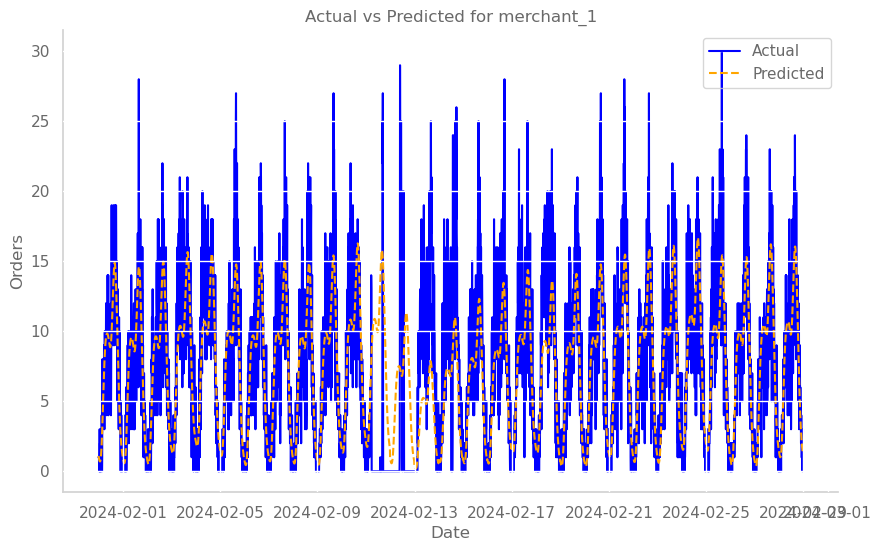

In [34]:
for feature in total_orders_df.columns:
    df_cv = cross_validation(m, initial="60 days", period="1 day", horizon="1 day")
    
    # Merge predictions with actual data
    df_merged = df_cv[['ds', 'yhat']].merge(category_df[['ds', 'y']], on='ds')
    
    plt.figure(figsize=(10, 6))
    plt.plot(df_merged['ds'], df_merged['y'], label='Actual', color='blue')
    plt.plot(df_merged['ds'], df_merged['yhat'], label='Predicted', linestyle='--', color='orange')
    plt.title(f'Actual vs Predicted for {feature}')
    plt.xlabel('Date')
    plt.ylabel('Orders')
    plt.legend()
    plt.grid(True)
    plt.show()


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

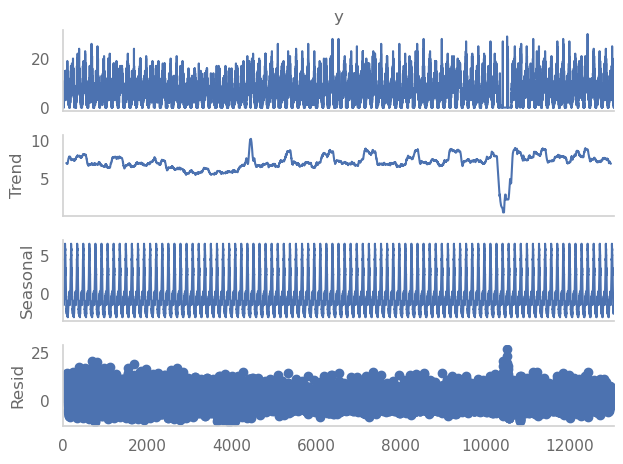

In [27]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(df_copy['y'], model='additive', period=144)  # 144 data points with respect to 10 minutes per day
result.plot()
plt.show()


In [20]:
prediction_days = 1 # Forecast for the next day only
forecast_start_date = max(total_orders_df.index) - timedelta(prediction_days) 

In [21]:
forecast_start_date 

Timestamp('2024-02-28 23:50:00')

In [39]:
import os
import matplotlib.pyplot as plt

# Lists to store RMSE, MAE, and average orders per 20-minute interval for each merchant
rmse_list = []
mae_list = []
average_orders_list = []

forecasted_dfs = []

# Create directory to save plots
results_dir = 'results_10_mins'
if not os.path.exists(results_dir):
    os.makedirs(results_dir)

for feature in total_orders_df.columns:
    
    # Formatting
    df_copy = total_orders_df[feature].copy().reset_index()
    df_copy.columns = ['ds', 'y']
    df_copy[['y']] = df_copy[['y']].apply(pd.to_numeric)
    df_copy['ds'] = pd.to_datetime(df_copy['ds'])
    
    df_copy_ = df_copy[df_copy['ds'] < forecast_start_date]
    
    # Finding the right params_dict for this category
    params_dict = dicts[feature]
    
    # Model
    m = Prophet(
        changepoint_prior_scale=params_dict['changepoint_prior_scale'],
        seasonality_prior_scale=params_dict['seasonality_prior_scale'],
        holidays_prior_scale=params_dict['holidays_prior_scale'],
        seasonality_mode=params_dict['seasonality_mode'],
        changepoint_range=params_dict['changepoint_range'],
        holidays=holiday,
    )

    m.add_seasonality(name='daily', period=1, fourier_order=5)
    m.fit(df_copy_)

    future = m.make_future_dataframe(periods=prediction_days * 144, freq='10min')
    fcst_prophet_train = m.predict(future)
    
    filter = fcst_prophet_train['ds'] >= forecast_start_date 
    predicted_df = fcst_prophet_train[filter][['ds', 'yhat']]
    predicted_df = predicted_df.merge(df_copy, on='ds')

    print(predicted_df.head(20))
    # Calculate RMSE and MAE
    rmse = np.sqrt(np.mean((predicted_df['y'] - predicted_df['yhat'])**2))
    mae = np.mean(np.abs(predicted_df['y'] - predicted_df['yhat']))

    # Append RMSE and MAE to the lists
    rmse_list.append(rmse)
    mae_list.append(mae)

    # Calculate and store the average number of orders per 10-minute interval
    average_orders = np.mean(predicted_df['y'])
    average_orders_list.append(average_orders)

    print(f"{feature} - RMSE: {rmse:.2f}, MAE: {mae:.2f}, Average Orders per 10min: {average_orders:.2f}")
    
    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(predicted_df['ds'], predicted_df['y'], label='Actual')
    plt.plot(predicted_df['ds'], predicted_df['yhat'], label='Predicted', linestyle='--')
    plt.title(f'Actual vs Predicted for {feature}')
    plt.xlabel('Date')
    plt.ylabel('Orders')
    plt.legend()
    plt.grid(True)

    # Save the plot to the results directory
    plot_path = os.path.join(results_dir, f'{feature}_forecast.png')
    plt.savefig(plot_path)
    plt.close()

# Calculate average RMSE, MAE, and average orders across all merchants
average_rmse = np.mean(rmse_list)
average_mae = np.mean(mae_list)
average_orders_across_merchants = np.mean(average_orders_list)

print(f"Average RMSE across all merchants: {average_rmse:.2f}")
print(f"Average MAE across all merchants: {average_mae:.2f}")
print(f"Average Orders per 10 min across all merchants: {average_orders_across_merchants:.2f}")


23:17:27 - cmdstanpy - INFO - Chain [1] start processing
23:17:28 - cmdstanpy - INFO - Chain [1] done processing
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Ari

                    ds  yhat  y
0  2024-02-28 23:50:00  1.56  1
1  2024-02-29 00:00:00  1.49  1
2  2024-02-29 00:10:00  1.43  4
3  2024-02-29 00:20:00  1.37  0
4  2024-02-29 00:30:00  1.31  0
5  2024-02-29 00:40:00  1.26  2
6  2024-02-29 00:50:00  1.22  1
7  2024-02-29 01:00:00  1.19  0
8  2024-02-29 01:10:00  1.18  0
9  2024-02-29 01:20:00  1.18  0
10 2024-02-29 01:30:00  1.19  2
11 2024-02-29 01:40:00  1.23  0
12 2024-02-29 01:50:00  1.29  2
13 2024-02-29 02:00:00  1.37  2
14 2024-02-29 02:10:00  1.48  0
15 2024-02-29 02:20:00  1.62  1
16 2024-02-29 02:30:00  1.78  0
17 2024-02-29 02:40:00  1.98  2
18 2024-02-29 02:50:00  2.20  1
19 2024-02-29 03:00:00  2.45  4
merchant_1 - RMSE: 2.86, MAE: 2.18, Average Orders per 10min: 7.01


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

Average RMSE across all merchants: 2.86
Average MAE across all merchants: 2.18
Average Orders per 10 min across all merchants: 7.01


In [30]:
predicted_df


,ds,yhat,y
0,2024-02-28 23:50:00,1.10,1
1,2024-02-29 00:00:00,0.98,1
2,2024-02-29 00:10:00,0.87,4
3,2024-02-29 00:20:00,0.77,0
4,2024-02-29 00:30:00,0.70,0
5,2024-02-29 00:40:00,0.64,2
6,2024-02-29 00:50:00,0.61,1
7,2024-02-29 01:00:00,0.61,0
8,2024-02-29 01:10:00,0.62,0
9,2024-02-29 01:20:00,0.66,0


### FINAL FORECASTING

In [63]:
# prediction_days = 1
# forecast_start_date = max(total_orders_df.index)

In [ ]:
# total_orders_df.columns

In [ ]:
# forecasted_dfs = []

# for feature in total_orders_df.columns[:5]:
    
#     # Formatting
#     df_copy = total_orders_df[feature].copy().reset_index()
#     df_copy.columns = ['ds', 'y']
#     df_copy[['y']] = df_copy[['y']].apply(pd.to_numeric)
#     df_copy['ds'] = pd.to_datetime(df_copy['ds'])
    
#     df_copy_ = df_copy[df_copy['ds'] < forecast_start_date]
    
#     # Finding the right params_dict for this category
#     params_dict = dicts[feature]
    
#     # Model
#     m = Prophet(
#         changepoint_prior_scale=params_dict['changepoint_prior_scale'],
#         seasonality_prior_scale=params_dict['seasonality_prior_scale'],
#         holidays_prior_scale=params_dict['holidays_prior_scale'],
#         seasonality_mode=params_dict['seasonality_mode'],
#         changepoint_range=params_dict['changepoint_range'],
#         holidays=holiday
#     )
    
#     m.fit(df_copy_)
    
#     future = m.make_future_dataframe(periods=prediction_days * 72, freq='20min')
#     fcst_prophet_train = m.predict(future)
    
#     fig1 = m.plot(fcst_prophet_train)

#     fig2 = m.plot_components(fcst_prophet_train)
    
#     forecasted_df = fcst_prophet_train[fcst_prophet_train['ds'] >= forecast_start_date]
#     forecasted_dfs.append(forecasted_df)


In [ ]:
# forecasted_df